<a href="https://colab.research.google.com/github/italojs/traffic-lights-detector/blob/master/traffic_lights_detector.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dowloanding dependencies

🇺🇸 Like the google colab already is installed all these dependencies<br> by default, just let's comment this.
<br><br>
🇧🇷 Como o google colab já vem com todas essas dependencias já <br>instaladas, podemos economizar tempo e não instala-las.

In [1]:
!pip install pillow
!pip install lxml
!pip install Cython
!pip install jupyter
!pip install matplotlib
!pip install pandas
!pip install opencv-python
!pip install tensorflow

     |████████████████████████████████| 337kB 44.4MB/s 
ERROR: ipython 5.5.0 has requirement prompt-toolkit<2.0.0,>=1.0.4, but you'll have prompt-toolkit 2.0.9 which is incompatible.
  Found existing installation: prompt-toolkit 1.0.16
    Uninstalling prompt-toolkit-1.0.16:
      Successfully uninstalled prompt-toolkit-1.0.16


# 🇺🇸 Downloading the Tensorflow Object detection API 
First of all, let's download the [tensorflow models ](https://github.com/tensorflow/models/) repository, <br> inside this repository has the objection detection api, that we will <br>use to train our ownobject detection model.
<br>Everything that we will do, is inside the path models/research/object_detection.
<br><br>
# 🇧🇷 Baixando o   Tensorflow Object detection API 
Primeiro de tudo vamos baixar o repositório do [tensorflow models ](https://github.com/tensorflow/models/), <br>dentro dele há vários projetos, inclusive o de detecção de objetos que<br> vamos usar aqui para treinar nossa rede neural para detectar nossos próprios objetos.
<br>Tudo o que vamos fazer será dentro da pasta models/research/object_detection.

In [2]:
!git clone https://github.com/tensorflow/models/
%cd models/research/object_detection

fatal: destination path 'models' already exists and is not an empty directory.
/content/models/research/object_detection


🇺🇸 Here we're just creating some folders that we will use it later.<br>
The command `mkdir` creates directories 

🇧🇷 Aqui só estamos criando algumas pastas que vamos usar mais tarde.<br>
O comando `mkdir` cria diretórios no linux

In [3]:
!mkdir training
!mkdir inference_graph
!mkdir -p images/train
!mkdir -p images/test

mkdir: cannot create directory ‘training’: File exists
mkdir: cannot create directory ‘inference_graph’: File exists


# 🇺🇸 Choosing our pre-trained model.
Inside the the [tensorflow zoo models](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/detection_model_zoo.md) we can choose a pre-trained <br>model to dowloand and use it to train our own dataset.<br>
Inside the tensorlfow zoo models repository's folder, we have a table <br>that explain how precise the model is (with mAP - mean Average Precision )<br> and how faster  this model is.<br>
You can choose any model that you want, the process in this tutorial for others<br> models is the same.<br>
For this tutorial, I choosed the faster_rcnn_inception_v2_coco_2018_01_28, just<br> because I want :)

# 🇧🇷 Escolhendo nosso modelo pré-treinado.
Dentro do  [tensorflow zoo models](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/detection_model_zoo.md)  nós temos alguns modelos pré-treinados <br>que nós vamos usar para treinar suas ultimas camadas com nosso pŕoprio dataset.<br>
Dentro desse readme.md nós temos uma lista de modelos que podemos escolher<br> dependendo da nossa necessidade, você pode escolher qualuquer um que quiser <br>que o procedimendo aqui nesse tutorial será o mesmo.<br>
Para cada modelo nós temos a velocidade em milisegundos ( speed - ms ) e a precisão<br>  desse modelo, ou seja, o quão acertivo ele é (mAP - mean Average Precision ).<br> 
Para esse artigo eu vou usar o faster_rcnn_inception_v2_coco_2018_01_28 só porque eu <br>quero mesmo :)

<img src="https://i.imgur.com/D17bpFZ.png" width="600">


In [4]:
!wget http://download.tensorflow.org/models/object_detection/faster_rcnn_inception_v2_coco_2018_01_28.tar.gz
!tar -xvzf faster_rcnn_inception_v2_coco_2018_01_28.tar.gz
!rm -rf faster_rcnn_inception_v2_coco_2018_01_28.tar.gz

--2019-06-14 21:04:40--  http://download.tensorflow.org/models/object_detection/faster_rcnn_inception_v2_coco_2018_01_28.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.24.128, 2404:6800:4003:c03::80
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.24.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 149119618 (142M) [application/x-tar]
Saving to: ‘faster_rcnn_inception_v2_coco_2018_01_28.tar.gz’

faster_rcnn_incepti 100%[===================>] 142.21M   316MB/s    in 0.5s    

2019-06-14 21:04:41 (316 MB/s) - ‘faster_rcnn_inception_v2_coco_2018_01_28.tar.gz’ saved [149119618/149119618]

faster_rcnn_inception_v2_coco_2018_01_28/
faster_rcnn_inception_v2_coco_2018_01_28/model.ckpt.index
faster_rcnn_inception_v2_coco_2018_01_28/checkpoint
faster_rcnn_inception_v2_coco_2018_01_28/pipeline.config
faster_rcnn_inception_v2_coco_2018_01_28/model.ckpt.data-00000-of-00001
faster_rcnn_inception_v2_coco_2018_01_28/model.

🇺🇸  According to the documentation, it is important that we export the PYTHONPATH environment variable with the models, reasearch and slim path

🇧🇷 Segundo a documentaçao, é importante que exportamos a variável de ambiente PYTHONPATH com o caminho dos models, reasearch e slim

In [0]:
import os
os.environ['PYTHONPATH'] = "{}/content/obj_detect_api/models:/content/obj_detect_api/models/research:/content/obj_detect_api/models/research/slim".format(os.environ['PYTHONPATH'])

# 🇺🇸 Compiling something
Here we have some proto buffers that need to be compiled, remember <br>that it's compiled, so if you switch machines, you can't just copy and paste<br> the files generated by this guy.<br>
Being sincere I couldn't execute these protos from the "/research/object_detection" <br>folder, I tried N ways and it didn't work, so I simply compiled them from within the <br>"/research" folder.<br>
to understand what's proto buffers is not necessary for this tutorial, but if you want<br> to learn more about, I recommend you look the [documentation](https://developers.google.com/protocol-buffers/), basically it's text<br> structures (such as json, xml) containing message structures that you can transform<br> it to some languages, is a little more than that, but for now that's more than enough <br>for you to follow that article.


# 🇧🇷 Compilando umas paradas
Aqui temos alguns protobuffers que precisam ser compilados, lembrem-se  que<br> por ser compilado, se você mudar de máquina, precisará executar isso novamente, <br>apenas copiar e colar os arquivos gerados por esses protbuffers não irá funcionar.<br>
Sendo bem sincero eu não consegui executar esses caras de dentro da pasta <br>"/research/object_detection", tentei de N maneiras e não funcionou, então eu <br>simplesmente compilo eles de dentro da pasta "/research".<br>
Entender o que são protobuffers não é algo necessário para esse tutorial, mas se <br>você quiser aprender mais sobre, recomendo que veja a [documentação](https://developers.google.com/protocol-buffers/), basicamente <br>são estruturas de texto (como o json, xml e etc) contendo estruturas de mensagens e <br>que você pode tranformar isso pra uma porrada de linguagem, é um pouco mais que isso,<br> mas por hora isso é mais do que o suficiente pra você seguir esse artigo.


In [6]:
%cd ..

!protoc ./object_detection/protos/*.proto --python_out=.

/content/models/research


🇺🇸 I don't remember the exact version that the Tensroflow Objection detect API<br> require, but I know from version >= 3.0 works well.

🇧🇷 Eu não lembro exatamente a versão necessária que o Tensroflow Objection detect API<br> necessita, mas sei que a partir da versão 3.0 funcoina bem.

In [7]:
!protoc --version

libprotoc 3.0.0


In [8]:
!python3 setup.py build
!python3 setup.py install

running build
running build_py
copying object_detection/protos/flexible_grid_anchor_generator_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/box_predictor_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/argmax_matcher_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/losses_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/mean_stddev_box_coder_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/post_processing_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/graph_rewriter_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/region_similarity_calculator_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/eval_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/square_box_coder_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/grid_a

# 🇺🇸 Test if the instalation is working.
Once we have installed everything, we can run some sample scripts from the<br> Tensorflow Object detection API to verify if everything is correct.<br>
this code isn't mine, I copied  it from object_detection folder just to make some<br> modifications ro run it on jupyter notebook.

I don't will explain this code because it's is justo to test the instalation, we will <br>see a similar code later.

Just execute these cells.

# 🇧🇷 Testando se a instalação está correta.
 Depois te termos instalado tudo, podemos rodar alguns scripts de exemplo<br> do próprio Tensorflow Object detection API para verificar se tudo etá correto.
 
 Esse código aqui não é meu, eu só copiei alguns códigos do próprio repositório<br> para que eu pudesse fazer algumas modificaçãoe e rodar isso no jupyter notebook.
 
Eu não vou explicar esse código pois ele é só pra verificar se a nossa instalação<br> está correta, veremos uma codificaçao similar mais pra frente.

Apenas execute essas células.

🇺🇸 Just certify that you are using the Tensorflow >=1.12.0

🇧🇷 Apenas se certifique que você está usando uma versão do Tensorflow >= da 1.12.0

In [9]:
import numpy as np
import os
import sys
import tarfile
from PIL import Image
import tensorflow as tf
import six.moves.urllib as urllib
from matplotlib import pyplot as plt
from object_detection.utils import label_map_util
from object_detection.utils import ops as utils_ops
from object_detection.utils import visualization_utils as vis_util

%matplotlib inline

  
# What model to download.
MODEL_NAME = 'ssd_mobilenet_v1_coco_2017_11_17'
MODEL_FILE = MODEL_NAME + '.tar.gz'
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/'

# Path to frozen detection graph. This is the actual model that is used for the object detection.
PATH_TO_FROZEN_GRAPH = MODEL_NAME + '/frozen_inference_graph.pb'

# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = os.path.join('object_detection','data', 'mscoco_label_map.pbtxt')

opener = urllib.request.URLopener()
opener.retrieve(DOWNLOAD_BASE + MODEL_FILE, MODEL_FILE)
tar_file = tarfile.open(MODEL_FILE)
for file in tar_file.getmembers():
  file_name = os.path.basename(file.name)
  if 'frozen_inference_graph.pb' in file_name:
    tar_file.extract(file, os.getcwd())

detection_graph = tf.Graph()
with detection_graph.as_default():
  od_graph_def = tf.GraphDef()
  with tf.gfile.GFile(PATH_TO_FROZEN_GRAPH, 'rb') as fid:
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')
    
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

def load_image_into_numpy_array(image):
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)
# For the sake of simplicity we will use only 2 images:
# image1.jpg
# image2.jpg
# If you want to test the code with your images, just add path to the images to the TEST_IMAGE_PATHS.
PATH_TO_TEST_IMAGES_DIR = 'object_detection/test_images'
TEST_IMAGE_PATHS = [ os.path.join(PATH_TO_TEST_IMAGES_DIR, 'image{}.jpg'.format(i)) for i in range(1, 3) ]

# Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)

def run_inference_for_single_image(image, graph):
  with graph.as_default():
    with tf.Session() as sess:
      # Get handles to input and output tensors
      ops = tf.get_default_graph().get_operations()
      all_tensor_names = {output.name for op in ops for output in op.outputs}
      tensor_dict = {}
      for key in [
          'num_detections', 'detection_boxes', 'detection_scores',
          'detection_classes', 'detection_masks'
      ]:
        tensor_name = key + ':0'
        if tensor_name in all_tensor_names:
          tensor_dict[key] = tf.get_default_graph().get_tensor_by_name(
              tensor_name)
      if 'detection_masks' in tensor_dict:
        # The following processing is only for single image
        detection_boxes = tf.squeeze(tensor_dict['detection_boxes'], [0])
        detection_masks = tf.squeeze(tensor_dict['detection_masks'], [0])
        # Reframe is required to translate mask from box coordinates to image coordinates and fit the image size.
        real_num_detection = tf.cast(tensor_dict['num_detections'][0], tf.int32)
        detection_boxes = tf.slice(detection_boxes, [0, 0], [real_num_detection, -1])
        detection_masks = tf.slice(detection_masks, [0, 0, 0], [real_num_detection, -1, -1])
        detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
            detection_masks, detection_boxes, image.shape[1], image.shape[2])
        detection_masks_reframed = tf.cast(
            tf.greater(detection_masks_reframed, 0.5), tf.uint8)
        # Follow the convention by adding back the batch dimension
        tensor_dict['detection_masks'] = tf.expand_dims(
            detection_masks_reframed, 0)
      image_tensor = tf.get_default_graph().get_tensor_by_name('image_tensor:0')

      # Run inference
      output_dict = sess.run(tensor_dict,
                             feed_dict={image_tensor: image})

      # all outputs are float32 numpy arrays, so convert types as appropriate
      output_dict['num_detections'] = int(output_dict['num_detections'][0])
      output_dict['detection_classes'] = output_dict[
          'detection_classes'][0].astype(np.int64)
      output_dict['detection_boxes'] = output_dict['detection_boxes'][0]
      output_dict['detection_scores'] = output_dict['detection_scores'][0]
      if 'detection_masks' in output_dict:
        output_dict['detection_masks'] = output_dict['detection_masks'][0]
  return output_dict

W0614 21:05:12.364710 139627651078016 deprecation_wrapper.py:119] From /content/models/research/object_detection/utils/label_map_util.py:132: The name tf.gfile.GFile is deprecated. Please use tf.io.gfile.GFile instead.



🇺🇸 If after you execute the cell bellow you can see a dog image and a beach image, everything is working!

🇧🇷 Se você conseguir imprimir uma imagem de um cachorro e uma praia na célula abaixo, está tudo funcionando!

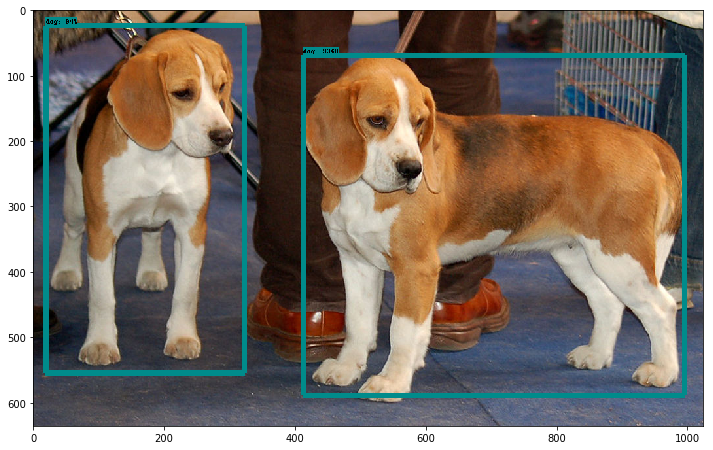

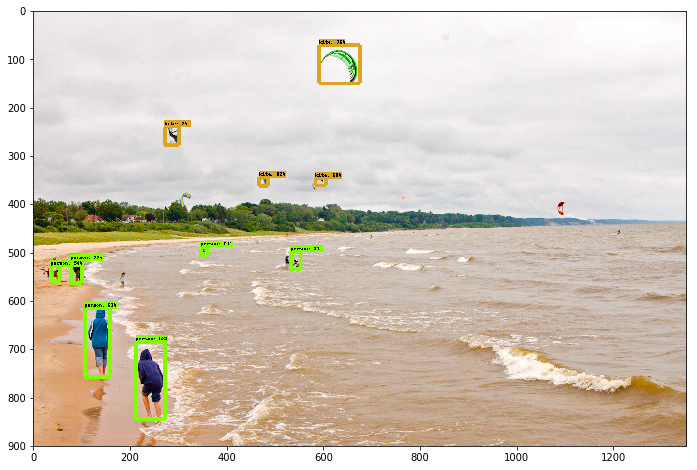

In [10]:
for image_path in TEST_IMAGE_PATHS:
  image = Image.open(image_path)
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
  image_np = load_image_into_numpy_array(image)
  # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
  image_np_expanded = np.expand_dims(image_np, axis=0)
  # Actual detection.
  output_dict = run_inference_for_single_image(image_np_expanded, detection_graph)
  # Visualization of the results of a detection.
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks'),
      use_normalized_coordinates=True,
      line_thickness=8)
  plt.figure(figsize=(IMAGE_SIZE))
  plt.imshow(image_np)

# 🇺🇸 Training the model with our own dataset.

First of all let's download our dataset.
### About the dataset
In this article we will use a dataset from kaggle, but don't worry, during this tutorial I will direct <br>you to another articl that teaches you how to create your own classified dataset.

#### Pascal-VOC
Before talking about the dataset, I want to just to remember you that in this tutorial we will use <br> datasets in the Pascal-VOC format, this is famous format where you have:
- Images in jpg, jpeg, png format ...
- Annotations: .xml files in the following format:

``` xml
<annotation>
	<folder>GeneratedData_Train</folder>
	<filename>000001.png</filename>
	<path>/my/path/GeneratedData_Train/000001.png</path>
	<source>
		<database>Unknown</database>
	</source>
	<size>
		<width>224</width>
		<height>224</height>
		<depth>3</depth>
	</size>
	<segmented>0</segmented>
	<object>
		<name>21</name>
		<pose>Frontal</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<occluded>0</occluded>
		<bndbox>
			<xmin>82</xmin>
			<xmax>172</xmax>
			<ymin>88</ymin>
			<ymax>146</ymax>
		</bndbox>
	</object>
</annotation>
```

For each image, we have an .xml with the same name, example: image001.png -> image001.xml<br>
Note inside this .xml we have others informations about our image like location, size, objects and <br>their locations inside that image...

The dataset we are using in this article is the [ LISA Traffic Light Dataset](https://https://www.kaggle.com/mbornoe/lisa-traffic-light-dataset) extracted from kaggle, this <br> dataset contains images and classifications of traffic lights with the following classes:

- go;
- stop;
- warning;
- goLeft;
- goForward;
- stopLeft;
- warningLeft;

But for this tutorial to be simpler, I modified the classes so that we only have:
- go;
- stop;
- warning;

# 🇧🇷  Treinando o modelo com nosso pŕoprio dataset.
Primeiro de tudo vamos baixar nosso dataset.
### Sobre o dataset
Nesse artigo vamos utilizar um dataset da kaggle, porém não se preocupe, no decorrer do tutorial eu te <br>direciono para um outro artigo meu que te ensina a como criar seu próprio dataset classificado.

#### Pascal-VOC
Antes de falar sobre o dataset propriamente dito, quero falar só lembrar que nesse tutorial vamos utilizar<br> datasets no padrão Pascal-VOC, esse é um formato de classificaçao onde você tem:
- Imagens no formato jpg, jpeg, png...
- Annotations: arquivos .xml nesse seguinte formato:
``` xml
<annotation>
	<folder>GeneratedData_Train</folder>
	<filename>000001.png</filename>
	<path>/my/path/GeneratedData_Train/000001.png</path>
	<source>
		<database>Unknown</database>
	</source>
	<size>
		<width>224</width>
		<height>224</height>
		<depth>3</depth>
	</size>
	<segmented>0</segmented>
	<object>
		<name>21</name>
		<pose>Frontal</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<occluded>0</occluded>
		<bndbox>
			<xmin>82</xmin>
			<xmax>172</xmax>
			<ymin>88</ymin>
			<ymax>146</ymax>
		</bndbox>
	</object>
</annotation>
```

Para cada imagem, nós temos um .xml com o mesmo nome, exemplo: image001.png -> image001.xml <br>
Note que dentro desse .xml temos várias informações sobre nossa imagem, a localização dela, o tamanho,<br> os objetos e suas localizações dentro dessa imagem...

O dataset que estamos usando nesse artigo é o [ LISA Traffic Light Dataset](https://https://www.kaggle.com/mbornoe/lisa-traffic-light-dataset) extraído do kaggle, esse dataset <br>contém imagens e classificações sobre semáforos onde temos as seguintes classes:
- go;
- stop;
- warning;
- goLeft;
- goForward;
- stopLeft;
- warningLeft;

Porém para que esse tutorial fique mais simples, eu modifiquei as classes para que tenhamos apenas:
- go;
- stop;
- warning;



🇺🇸 After the dowloand, note that we are moving everything into the folder ... / images

🇧🇷 Após o dowloand, note que estamos jogando tudo para dentro da pasta .../images  

In [0]:
%cd object_detection
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=15WlpBbq4EpxUxZeKEAbfI_YJABASpmFs' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=15WlpBbq4EpxUxZeKEAbfI_YJABASpmFs" -O lisa608.zip
!unzip -qq ./lisa608.zip

!mv images_output/* images/
!mv annotations_output/* images/


/content/models/research/object_detection
--2019-06-12 11:28:50--  https://docs.google.com/uc?export=download&confirm=kPsk&id=15WlpBbq4EpxUxZeKEAbfI_YJABASpmFs
Resolving docs.google.com (docs.google.com)... 64.233.184.100, 64.233.184.113, 64.233.184.138, ...
Connecting to docs.google.com (docs.google.com)|64.233.184.100|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-10-54-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/8j9a8to7v3mkkmkqinvhsngjrajbgked/1560333600000/03307123913596985380/*/15WlpBbq4EpxUxZeKEAbfI_YJABASpmFs?e=download [following]
--2019-06-12 11:28:50--  https://doc-10-54-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/8j9a8to7v3mkkmkqinvhsngjrajbgked/1560333600000/03307123913596985380/*/15WlpBbq4EpxUxZeKEAbfI_YJABASpmFs?e=download
Resolving doc-10-54-docs.googleusercontent.com (doc-10-54-docs.googleusercontent.com)... 108.177.15.132, 2a00:1450:400c:c0c::84
Connecti

🇺🇸 For this simple tutorial, I do not want to work with many classe, you can do this, but to simplify the process here I will rename all the classes that have "Left" and "Forward" at the end

🇧🇷 Para esse simples tutorial, eu não quero trabalhar com muitas classes de uma vez só, você pode fazer isso, mas para simpleficar o porcesso eu vou renomear todas as classes que tenha "Left" e "Forward" no final.

In [0]:
import xml.etree.ElementTree as ET
import glob
for file in glob.glob("images/*.xml"):
  xmlRoot = ET.parse(file).getroot()

  for member in xmlRoot.findall('object'):
    member.find('name').text = member.find('name').text.replace('Left', '').replace('Forward','')

  tree = ET.ElementTree(xmlRoot)
  tree.write(file)


🇺🇸 Here I just split my datset in train and test

🇧🇷 Aqui eu só divido meu dataset pra treinamento e teste



In [0]:
import glob
import os
os.chdir('images')
test = len(os.listdir('.'))//4
i = 0
for file in glob.glob("*.xml"):
  fileName = file.split('.')[0]
  if i > test:
    os.rename("{}.xml".format(fileName), 'train/{}.{}'.format(fileName,"xml"))
    os.rename("{}.jpg".format(fileName), 'train/{}.{}'.format(fileName,"jpg"))
  else:
    os.rename("{}.xml".format(fileName), 'test/{}.{}'.format(fileName,"xml"))
    os.rename("{}.jpg".format(fileName), 'test/{}.{}'.format(fileName,"jpg"))
  i +=1

🇺🇸 Get back to object_detection folder.

🇧🇷  Vamos voltar para a pasta de object_detection.  

In [0]:
%cd ..

/content/models/research/object_detection


🇺🇸 If your annotations are in Pascal-VOC format (as is our case) you will need to convert them into csv.

I know, our original dataset was already in csv before, but I've converted it to xml just to show you this scenario.<br>
Here we iterate about each folder, train, test and validation (if we had data for validation) so we extracted the data:
*   filename
*   width
*   height
*   class
*   xmin
*   ymin
*   xmax
*   ymax 

and put it on a line from our csv.

🇧🇷 Caso suas annotations estejam no formato Pascal-VOC (como é o nosso caso) você precisará tranformá-los em csv.

Eu sei, nosso dataset original já estava em csv, mas eu tranformei ele para xml justamente para mostrar esse cenário, <br>pois muitas vezes você terá seu dataset no formato Pascal-VOC

Aqui iteramos sobre cada uma das nossas pastas, train, test e validation (se nós tivessemos dados para validação) , <br>extraímos os dados :
*   filename
*   width
*   height
*   class
*   xmin
*   ymin
*   xmax
*   ymax 

e colocamos isso em uma linha do nosso csv.

# XML2CSV

In [0]:
import os
import glob
import pandas as pd
import xml.etree.ElementTree as ET


def xml_to_csv(path):
    xml_list = []
    for xml_file in glob.glob(path + '/*.xml'):
        tree = ET.parse(xml_file)
        root = tree.getroot()
        for member in root.findall('object'):
            value = (root.find('filename').text,
                     int(root.find('size')[0].text),
                     int(root.find('size')[1].text),
                     member[0].text,
                     int(float(member[4][0].text)),
                     int(float(member[4][1].text)),
                     int(float(member[4][2].text)),
                     int(float(member[4][3].text))
                     )
            xml_list.append(value)
    column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    return xml_df


def main():
    for folder in ['train','test']:
        image_path = os.path.join(os.getcwd(), ('images/' + folder))
        xml_df = xml_to_csv(image_path)
        xml_df.to_csv(('images/' + folder + '_labels.csv'), index=None)
        print('Successfully converted xml to csv.')


main()

Successfully converted xml to csv.
Successfully converted xml to csv.


# generating TFRecords

🇺🇸 To use TF Object detection API we will need to follow the  [TFRecord](https://www.tensorflow.org/api_docs/python/tf/io) input format.

When we are working with a lot data, it is important to work with a format that is light and fast, one <br>option is to work with the document's binary, which is exactly what TFRecords does, but in addition <br>it is optimized for working with Tensorflow because it was created for Tensorflow, for example when <br>you are working with a very large dataset and try to load it in memory, obviously you will not get it <br>because you don't have memory RAM enought to do it, so you will have to work with batches, but <br>if you use the the TFRecords you don't need works with batches , it abstracts for you how to load <br>the data into memory without you having to program itself.

[Here](https://medium.com/mostly-ai/tensorflow-records-what-they-are-and-how-to-use-them-c46bc4bbb564) there is an article that explains more about how TFRecords works.

For each project, some changes must be made in the `class_text_to_int ()` method, note <br>that there is a very simple logical structure where we have to return an integer depending on the<br> class that is

🇧🇷  Para usar o TF Object detection vamos precisar seguir o padrão de input do framework, o<br> famoso [TFRecord](https://www.tensorflow.org/api_docs/python/tf/io) que é um formato de amazenamento de binários próprio do TF.

Quando estamos trabalhando com MUITOOS dados, pricipalmente imagens, é importante <br>trabalharmos com ela em um formato que seja leve e rápido ,uma opção é trabalhar com o<br> binário desse documento, que é exatamente o que o TFRecords faz, mas além disso ele é<br> otimizado para trabalhar com o Tensorflow pois ele foi criado para o Tensorflow, por exemplo <br>quando você está trabalhando com um dataset muito grande e tenta carrega-lo na memória, <br>obviamente você não vai conseguir, para isso terá que trabalhar com batches, mas com o <br>TFRecords não, ele abstrai pra você a forma de carregar os dados na memória sem que você <br>precise programar a divisão dos baches.

[Aqui](https://medium.com/mostly-ai/tensorflow-records-what-they-are-and-how-to-use-them-c46bc4bbb564) há um artigo que explica mais sobre o funcionamento do TFRecords

Para cada caso, algumas mudanças deverão ser feitas no método `class_text_to_int()`, <br>note que lá temos uma estrutura lógica bem simples onde temos que retornar um inteiro dependendo <br>da classe que estamos trabalhando ali no momento, a lógica aqui é muito simples, basta ir incrementando <br>o retorno a cada classe diferente que você tiver no seu dataset.



In [0]:
from __future__ import division
from __future__ import print_function
from __future__ import absolute_import

import os
import io
import pandas as pd
import tensorflow as tf

from PIL import Image
from object_detection.utils import dataset_util
from collections import namedtuple, OrderedDict

def class_text_to_int(row_label):
    if row_label == 'stop':
        return 1
    elif row_label == 'warning':
        return 2
    elif row_label == 'go':
        return 3
    else:
        None


def split(df, group):
    data = namedtuple('data', ['filename', 'object'])
    gb = df.groupby(group)
    return [data(filename, gb.get_group(x)) for filename, x in zip(gb.groups.keys(), gb.groups)]


def create_tf_example(group, path):
    with tf.gfile.GFile(os.path.join(path, '{}'.format(group.filename)), 'rb') as fid:
        encoded_jpg = fid.read()
    encoded_jpg_io = io.BytesIO(encoded_jpg)
    image = Image.open(encoded_jpg_io)
    width, height = image.size

    filename = group.filename.encode('utf8')
    image_format = b'jpg'
    xmins = []
    xmaxs = []
    ymins = []
    ymaxs = []
    classes_text = []
    classes = []

    for index, row in group.object.iterrows():
        xmins.append(row['xmin'] / width)
        xmaxs.append(row['xmax'] / width)
        ymins.append(row['ymin'] / height)
        ymaxs.append(row['ymax'] / height)
        classes_text.append(row['class'].encode('utf8'))
        classes.append(class_text_to_int(row['class']))
        
    tf_example = tf.train.Example(features=tf.train.Features(feature={
        'image/height': dataset_util.int64_feature(height),
        'image/width': dataset_util.int64_feature(width),
        'image/filename': dataset_util.bytes_feature(filename),
        'image/source_id': dataset_util.bytes_feature(filename),
        'image/encoded': dataset_util.bytes_feature(encoded_jpg),
        'image/format': dataset_util.bytes_feature(image_format),
        'image/object/bbox/xmin': dataset_util.float_list_feature(xmins),
        'image/object/bbox/xmax': dataset_util.float_list_feature(xmaxs),
        'image/object/bbox/ymin': dataset_util.float_list_feature(ymins),
        'image/object/bbox/ymax': dataset_util.float_list_feature(ymaxs),
        'image/object/class/text': dataset_util.bytes_list_feature(classes_text),
        'image/object/class/label': dataset_util.int64_list_feature(classes),
    }))
    
    return tf_example


def main():
    for item in ['test', 'train']:
      output_path = "{}.record".format(item)
      writer = tf.python_io.TFRecordWriter(output_path)
      path = os.path.join(os.getcwd(), "images/{}".format(item))
      examples = pd.read_csv("images/{}_labels.csv".format(item))
      grouped = split(examples, 'filename')
      for group in grouped:
          tf_example = create_tf_example(group, path)
          writer.write(tf_example.SerializeToString())

      writer.close()
      output_path = os.path.join(os.getcwd(), output_path)
      print('Successfully created the TFRecords: {}'.format(output_path))

main()

Successfully created the TFRecords: /content/models/research/object_detection/test.record
Successfully created the TFRecords: /content/models/research/object_detection/train.record


🇺🇸 We will also need to input our classes in TF. To do it we will create a .pbtxt file with the following structure:
``` json
item {
  id: 1
  name: 'stop'
}
```

For each class we have an item, for each item we have an id and a name, the Id refers to the id that we use in our TFRecords:
``` python
def class_text_to_int(row_label):
    if row_label == 'stop':
        return 1
    elif row_label == 'warning':
        return 2
    elif row_label == 'go':
        return 3
    else:
        None
```
remember to use the same ids.

🇧🇷 Também vamos precisar informar para o TF quais são as nossas classes e para isso vamos criar um arquivo .pbtxt com a seguinte estrutura:
``` json
item {
  id: 1
  name: 'stop'
}
```

Para cada classe nós temos um item, para cada item nós temos um id e um nome, o Id refere-se ao id que usamos no nossa TFRecords: 
``` python
def class_text_to_int(row_label):
    if row_label == 'stop':
        return 1
    elif row_label == 'warning':
        return 2
    elif row_label == 'go':
        return 3
    else:
        None
```
lembre-se de usar os mesmo ids.


In [0]:
%%writefile training/labelmap.pbtxt
item {
  id: 1
  name: 'stop'
}

item {
  id: 2
  name: 'warning'
}

item {
  id: 3
  name: 'go'
}

Writing training/labelmap.pbtxt


In [0]:
# !cat samples/configs/faster_rcnn_inception_v2_pets.config

🇺🇸 Here we will print the lenth of image folder to use this information later.

🇧🇷 Aqui vamos imprimir uma informação que vamos usar posteriormente, que é a <br> quantidade de imagens que temos para teste.

In [0]:
import os
test_path = "images/test"
len_dir = len(os.listdir(test_path))
print("{} imagens inside the {}".format(len_dir, test_path))

36268 imagens inside the images/test


🇺🇸 The next cell has a file is a configuration file of the neural network, here we have some [hyper-paramétros](https://medium.com/@jorgesleonel/hyperparameters-in-machine-deep-learning-ca69ad10b981) <br>that we must to modify .

I copied this configuration file from faster_rcnn_inception_v2_pets.config and edited it with my respective<br> modifications, for each deep learning architecture that you will use, you need a different configuration file, <br>you can find all of them here `[...]/research/object_detection/samples/configs` or if you prefer, <br>access [via github](https://github.com/tensorflow/models/tree/master/research/object_detection/samples/configs).

Within these files, some things should be changed, such as:
 **num_classes**
``` json
faster_rcnn {
    num_classes: 3
```

**fine_tune_checkpoint**
``` json
fine_tune_checkpoint: "/home/<full_path>/research/object_detection/faster_rcnn_inception_v2_coco_2018_01_28/model.ckpt"
```

inside the property **train_input_reader**, change the **input_path** and the **label_map_path** to:
``` json
tf_record_input_reader {
    input_path: "/<full_path>/research/object_detection/train.record"
  }
  label_map_path: "/<full_path>/research/object_detection/training/labelmap.pbtxt"
}
```
Remember that the train_input_reader must to be the train.record file.

Inside the **eval_config** property, change the number of instances(images) you have to test (inside the .../images/test folder) <br>in the **num_examples** property:
``` json
eval_input_reader: {
  tf_record_input_reader {
    input_path: "/full_path/research/object_detection/test.record"
  }
  label_map_path: "/full_path/research/object_detection/training/labelmap.pbtxt"
 ```
Note that I am using **test.record** instead of **train.record**


🇧🇷 O arquivo a seguir é um arquivo de configuração da rede neural, nele temos VÁRIOS [hyper-paramêtros ](https://medium.com/@jorgesleonel/hyperparameters-in-machine-deep-learning-ca69ad10b981) <br>que podemos e temos que modificar.

Obviamente eu não escrevi todo esse documento, mas sim copiei um arquivo de configuração do <br>faster_rcnn_inception_v2_pets.config e a partir dele criei um arquivo novo com minhas respectivas<br> modificações, para cada arquitetura de deep learning que vocÊ usar, voce terá um arquivo de configuração <br>diferente, você pode encontrar todas dentro de `[...]/research/object_detection/samples/configs` <br>ou se prefereir, acessá-los [através do github](https://github.com/tensorflow/models/tree/master/research/object_detection/samples/configs).

Dentro desses arquivos, algumas coisas devem ser alterados, como:

 **num_classes**
``` json
faster_rcnn {
    num_classes: 3
```

**fine_tune_checkpoint**
``` json
fine_tune_checkpoint: "/home/<full_path>/research/object_detection/faster_rcnn_inception_v2_coco_2018_01_28/model.ckpt"
```

dentro da sessão **train_input_reader**, altere o **input_path** e o **label_map_path** para:

``` json
tf_record_input_reader {
    input_path: "/<full_path>/research/object_detection/train.record"
  }
  label_map_path: "/<full_path>/research/object_detection/training/labelmap.pbtxt"
}
```
Lembre-se que tem que ser o train.record e o labelmap.pbtxt dos dados de treinamento também!

Dentro da propriedade **eval_config**, mude o numero de exemples que você tem para teste (dentro da pasta<br> .../images/test) na propriedade **num_examples**:
``` json
eval_config: {
  metrics_set: "coco_detection_metrics"
  num_examples: 36268
}
``` 
obs: obtivemos essa informação na célula anterior.

Dentro de **eval_input_reader** nós temos uma estrutura semelhando, mas agora os dados modificados aqui <br> são relacionados aos dados de teste:
``` json
eval_input_reader: {
  tf_record_input_reader {
    input_path: "/full_path/research/object_detection/test.record"
  }
  label_map_path: "/full_path/research/object_detection/training/labelmap.pbtxt"
 ```
 Note que estou usando o **test.record** ao invés de **train.record**

In [0]:
%%writefile training/faster_rcnn_inception_v2.config

model {
  faster_rcnn {
    num_classes: 3
    image_resizer {
      keep_aspect_ratio_resizer {
        min_dimension: 600
        max_dimension: 1024
      }
    }
    feature_extractor {
      type: 'faster_rcnn_inception_v2'
      first_stage_features_stride: 16
    }
    first_stage_anchor_generator {
      grid_anchor_generator {
        scales: [0.25, 0.5, 1.0, 2.0]
        aspect_ratios: [0.5, 1.0, 2.0]
        height_stride: 16
        width_stride: 16
      }
    }
    first_stage_box_predictor_conv_hyperparams {
      op: CONV
      regularizer {
        l2_regularizer {
          weight: 0.0
        }
      }
      initializer {
        truncated_normal_initializer {
          stddev: 0.01
        }
      }
    }
    first_stage_nms_score_threshold: 0.0
    first_stage_nms_iou_threshold: 0.7
    first_stage_max_proposals: 300
    first_stage_localization_loss_weight: 2.0
    first_stage_objectness_loss_weight: 1.0
    initial_crop_size: 14
    maxpool_kernel_size: 2
    maxpool_stride: 2
    second_stage_box_predictor {
      mask_rcnn_box_predictor {
        use_dropout: false
        dropout_keep_probability: 1.0
        fc_hyperparams {
          op: FC
          regularizer {
            l2_regularizer {
              weight: 0.0
            }
          }
          initializer {
            variance_scaling_initializer {
              factor: 1.0
              uniform: true
              mode: FAN_AVG
            }
          }
        }
      }
    }
    second_stage_post_processing {
      batch_non_max_suppression {
        score_threshold: 0.0
        iou_threshold: 0.6
        max_detections_per_class: 100
        max_total_detections: 300
      }
      score_converter: SOFTMAX
    }
    second_stage_localization_loss_weight: 2.0
    second_stage_classification_loss_weight: 1.0
  }
}

train_config: {
  batch_size: 1
  optimizer {
    momentum_optimizer: {
      learning_rate: {
        manual_step_learning_rate {
          initial_learning_rate: 0.0002
          schedule {
            step: 900000
            learning_rate: .00002
          }
          schedule {
            step: 1200000
            learning_rate: .000002
          }
        }
      }
      momentum_optimizer_value: 0.9
    }
    use_moving_average: false
  }
  gradient_clipping_by_norm: 10.0
  fine_tune_checkpoint: "/content/models/research/object_detection/faster_rcnn_inception_v2_coco_2018_01_28/model.ckpt"
  from_detection_checkpoint: true
  load_all_detection_checkpoint_vars: true
  # Note: The below line limits the training process to 200K steps, which we
  # empirically found to be sufficient enough to train the pets dataset. This
  # effectively bypasses the learning rate schedule (the learning rate will
  # never decay). Remove the below line to train indefinitely.
  num_steps: 200000
  data_augmentation_options {
    random_horizontal_flip {
    }
  }
}


train_input_reader: {
  tf_record_input_reader {
    input_path: "/content/models/research/object_detection/train.record"
  }
  label_map_path: "/content/models/research/object_detection/training/labelmap.pbtxt"
}

eval_config: {
  metrics_set: "coco_detection_metrics"
  num_examples: 36268
}

eval_input_reader: {
  tf_record_input_reader {
    input_path: "/content/models/research/object_detection/test.record"
  }
  label_map_path: "/content/models/research/object_detection/training/labelmap.pbtxt"
  shuffle: false
  num_readers: 1
}

Writing training/faster_rcnn_inception_v2.config


In [0]:
%cd ..
!protoc ./object_detection/protos/*.proto --python_out=.
!python3 setup.py build
!python3 setup.py install
%cd object_detection

/content/models/research
running build
running build_py
copying object_detection/my_inference_graph.py -> build/lib/object_detection
copying object_detection/export_inference_graph_test.py -> build/lib/object_detection
copying object_detection/train_image_classifier.py -> build/lib/object_detection
copying object_detection/__init__.py -> build/lib/object_detection
copying object_detection/eval_image_classifier.py -> build/lib/object_detection
copying object_detection/export_inference_graph.py -> build/lib/object_detection
copying object_detection/download_and_convert_data.py -> build/lib/object_detection
copying object_detection/setup.py -> build/lib/object_detection
creating build/lib/object_detection/datasets
copying object_detection/datasets/dataset_factory.py -> build/lib/object_detection/datasets
copying object_detection/datasets/imagenet.py -> build/lib/object_detection/datasets
copying object_detection/datasets/download_and_convert_flowers.py -> build/lib/object_detection/datase

🇺🇸  I'm sorry for that, but I was getting a very annoying error where it said that slim lib was not being found, <br> many people said the problem was in my PYTHONPATH environment variable, but I verified a thousand times <br> and did not find the problem, so I solved it by copying all the /research/slim code into the /object_detection<br>  folder, if anyone identifies what is being done wrong, please comment here below.

🇧🇷 Me desculpe por isso, mas eu estava obtendo um erro muito chato onde dizia que a lib slim não estava <br> sendo encontrada, muitos diziam que o problema estava na minha váriavel de ambiente PYTHONPATH, <br> mas eu virifiquei mil vezes e não encontrei o problema, então resolvi dessa maneira, copiando todo o código <br> do research/slim para dentro da pasta /object_detection, se alguém identificar o que está sendo feito de errado, <br> por favor, comente aqui embaixo.


In [0]:
!cp -a ../slim/. .

🇺🇸  Let's train it!

🇧🇷  Vamos botar essa bagaça pra treinar!

In [0]:
%run legacy/train.py --logtostderr --train_dir=training/ --pipeline_config_path=training/faster_rcnn_inception_v2.config


For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
If you depend on functionality not listed there, please file an issue.

Instructions for updating:
Use object_detection/model_main.py.
Instructions for updating:
Please switch to tf.train.create_global_step
Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use `tf.data.experimental.parallel_interleave(...)`.
Instructions for updating:
Queue-based input pipelines have been replaced by `tf.data`. Use `tf.data.Dataset.batch(batch_size)` (or `padded_batch(...)` if `dynamic_pad=True`).
Instructions for updating:
To construct input pipelines, use the `tf.data` module.
Instructions for updating:
To construct input pipelines, use the `tf.data` module.
Instructions for updating:
Use tf.cast instead.
Instructions for updating:
Use tf.cast instead.
INFO:tensorflow:Scale of 0 disables reg

/usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/gradients_impl.py:110: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


Instructions for updating:
Please switch to tf.train.get_or_create_global_step


Instructions for updating:
Please switch to tf.train.MonitoredTrainingSession


Instructions for updating:
Please switch to tf.train.MonitoredTrainingSession


Instructions for updating:
Use standard file APIs to check for files with this prefix.


Instructions for updating:
Use standard file APIs to check for files with this prefix.


INFO:tensorflow:Restoring parameters from /content/models/research/object_detection/faster_rcnn_inception_v2_coco_2018_01_28/model.ckpt


INFO:tensorflow:Restoring parameters from /content/models/research/object_detection/faster_rcnn_inception_v2_coco_2018_01_28/model.ckpt


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Starting Session.


INFO:tensorflow:Starting Session.


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


INFO:tensorflow:Starting Queues.


INFO:tensorflow:Starting Queues.


INFO:tensorflow:Recording summary at step 0.


INFO:tensorflow:Recording summary at step 0.


INFO:tensorflow:global_step/sec: 0


INFO:tensorflow:global_step/sec: 0


INFO:tensorflow:global step 1: loss = 2.5630 (12.640 sec/step)


INFO:tensorflow:global step 1: loss = 2.5630 (12.640 sec/step)


INFO:tensorflow:global step 2: loss = 2.1486 (0.293 sec/step)


INFO:tensorflow:global step 2: loss = 2.1486 (0.293 sec/step)


INFO:tensorflow:global step 3: loss = 2.7129 (0.270 sec/step)


INFO:tensorflow:global step 3: loss = 2.7129 (0.270 sec/step)


INFO:tensorflow:global step 4: loss = 2.1944 (0.292 sec/step)


INFO:tensorflow:global step 4: loss = 2.1944 (0.292 sec/step)


INFO:tensorflow:global step 5: loss = 2.2550 (0.277 sec/step)


INFO:tensorflow:global step 5: loss = 2.2550 (0.277 sec/step)


INFO:tensorflow:global step 6: loss = 1.9264 (0.289 sec/step)


INFO:tensorflow:global step 6: loss = 1.9264 (0.289 sec/step)


INFO:tensorflow:global step 7: loss = 1.8126 (0.288 sec/step)


INFO:tensorflow:global step 7: loss = 1.8126 (0.288 sec/step)


INFO:tensorflow:global step 8: loss = 1.5990 (0.285 sec/step)


INFO:tensorflow:global step 8: loss = 1.5990 (0.285 sec/step)


INFO:tensorflow:global step 9: loss = 1.2532 (0.276 sec/step)


INFO:tensorflow:global step 9: loss = 1.2532 (0.276 sec/step)


INFO:tensorflow:global step 10: loss = 1.1712 (0.280 sec/step)


INFO:tensorflow:global step 10: loss = 1.1712 (0.280 sec/step)


INFO:tensorflow:global step 11: loss = 1.0750 (0.291 sec/step)


INFO:tensorflow:global step 11: loss = 1.0750 (0.291 sec/step)


INFO:tensorflow:global step 12: loss = 0.6866 (0.279 sec/step)


INFO:tensorflow:global step 12: loss = 0.6866 (0.279 sec/step)


INFO:tensorflow:global step 13: loss = 0.6997 (0.275 sec/step)


INFO:tensorflow:global step 13: loss = 0.6997 (0.275 sec/step)


INFO:tensorflow:global step 14: loss = 1.1379 (0.289 sec/step)


INFO:tensorflow:global step 14: loss = 1.1379 (0.289 sec/step)


INFO:tensorflow:global step 15: loss = 0.5539 (0.287 sec/step)


INFO:tensorflow:global step 15: loss = 0.5539 (0.287 sec/step)


INFO:tensorflow:global step 16: loss = 0.8305 (0.280 sec/step)


INFO:tensorflow:global step 16: loss = 0.8305 (0.280 sec/step)


INFO:tensorflow:global step 17: loss = 0.9832 (0.278 sec/step)


INFO:tensorflow:global step 17: loss = 0.9832 (0.278 sec/step)


INFO:tensorflow:global step 18: loss = 0.5872 (0.295 sec/step)


INFO:tensorflow:global step 18: loss = 0.5872 (0.295 sec/step)


INFO:tensorflow:global step 19: loss = 0.6630 (0.287 sec/step)


INFO:tensorflow:global step 19: loss = 0.6630 (0.287 sec/step)


INFO:tensorflow:global step 20: loss = 0.3102 (0.281 sec/step)


INFO:tensorflow:global step 20: loss = 0.3102 (0.281 sec/step)


INFO:tensorflow:global step 21: loss = 0.2303 (0.290 sec/step)


INFO:tensorflow:global step 21: loss = 0.2303 (0.290 sec/step)


INFO:tensorflow:global step 22: loss = 1.0303 (0.279 sec/step)


INFO:tensorflow:global step 22: loss = 1.0303 (0.279 sec/step)


INFO:tensorflow:global step 23: loss = 0.3117 (0.293 sec/step)


INFO:tensorflow:global step 23: loss = 0.3117 (0.293 sec/step)


INFO:tensorflow:global step 24: loss = 0.6808 (0.271 sec/step)


INFO:tensorflow:global step 24: loss = 0.6808 (0.271 sec/step)


INFO:tensorflow:global step 25: loss = 0.5074 (0.285 sec/step)


INFO:tensorflow:global step 25: loss = 0.5074 (0.285 sec/step)


INFO:tensorflow:global step 26: loss = 0.6754 (0.298 sec/step)


INFO:tensorflow:global step 26: loss = 0.6754 (0.298 sec/step)


INFO:tensorflow:global step 27: loss = 0.0897 (0.272 sec/step)


INFO:tensorflow:global step 27: loss = 0.0897 (0.272 sec/step)


INFO:tensorflow:global step 28: loss = 0.5771 (0.288 sec/step)


INFO:tensorflow:global step 28: loss = 0.5771 (0.288 sec/step)


INFO:tensorflow:global step 29: loss = 0.6924 (0.293 sec/step)


INFO:tensorflow:global step 29: loss = 0.6924 (0.293 sec/step)


INFO:tensorflow:global step 30: loss = 0.4034 (0.291 sec/step)


INFO:tensorflow:global step 30: loss = 0.4034 (0.291 sec/step)


INFO:tensorflow:global step 31: loss = 0.4858 (0.287 sec/step)


INFO:tensorflow:global step 31: loss = 0.4858 (0.287 sec/step)


INFO:tensorflow:global step 32: loss = 0.5999 (0.278 sec/step)


INFO:tensorflow:global step 32: loss = 0.5999 (0.278 sec/step)


INFO:tensorflow:global step 33: loss = 0.5886 (0.300 sec/step)


INFO:tensorflow:global step 33: loss = 0.5886 (0.300 sec/step)


INFO:tensorflow:global step 34: loss = 0.1739 (0.272 sec/step)


INFO:tensorflow:global step 34: loss = 0.1739 (0.272 sec/step)


INFO:tensorflow:global step 35: loss = 0.4926 (0.292 sec/step)


INFO:tensorflow:global step 35: loss = 0.4926 (0.292 sec/step)


INFO:tensorflow:global step 36: loss = 0.1677 (0.287 sec/step)


INFO:tensorflow:global step 36: loss = 0.1677 (0.287 sec/step)


INFO:tensorflow:global step 37: loss = 0.9686 (0.277 sec/step)


INFO:tensorflow:global step 37: loss = 0.9686 (0.277 sec/step)


INFO:tensorflow:global step 38: loss = 0.8377 (0.290 sec/step)


INFO:tensorflow:global step 38: loss = 0.8377 (0.290 sec/step)


INFO:tensorflow:global step 39: loss = 0.4886 (0.289 sec/step)


INFO:tensorflow:global step 39: loss = 0.4886 (0.289 sec/step)


INFO:tensorflow:global step 40: loss = 0.7525 (0.281 sec/step)


INFO:tensorflow:global step 40: loss = 0.7525 (0.281 sec/step)


INFO:tensorflow:global step 41: loss = 0.9245 (0.299 sec/step)


INFO:tensorflow:global step 41: loss = 0.9245 (0.299 sec/step)


INFO:tensorflow:global step 42: loss = 0.7680 (0.289 sec/step)


INFO:tensorflow:global step 42: loss = 0.7680 (0.289 sec/step)


INFO:tensorflow:global step 43: loss = 0.8265 (0.290 sec/step)


INFO:tensorflow:global step 43: loss = 0.8265 (0.290 sec/step)


INFO:tensorflow:global step 44: loss = 0.7119 (0.281 sec/step)


INFO:tensorflow:global step 44: loss = 0.7119 (0.281 sec/step)


INFO:tensorflow:global step 45: loss = 0.3230 (0.274 sec/step)


INFO:tensorflow:global step 45: loss = 0.3230 (0.274 sec/step)


INFO:tensorflow:global step 46: loss = 0.6694 (0.294 sec/step)


INFO:tensorflow:global step 46: loss = 0.6694 (0.294 sec/step)


INFO:tensorflow:global step 47: loss = 0.4681 (0.286 sec/step)


INFO:tensorflow:global step 47: loss = 0.4681 (0.286 sec/step)


INFO:tensorflow:global step 48: loss = 0.3076 (0.286 sec/step)


INFO:tensorflow:global step 48: loss = 0.3076 (0.286 sec/step)


INFO:tensorflow:global step 49: loss = 0.1171 (0.287 sec/step)


INFO:tensorflow:global step 49: loss = 0.1171 (0.287 sec/step)


INFO:tensorflow:global step 50: loss = 0.4126 (0.287 sec/step)


INFO:tensorflow:global step 50: loss = 0.4126 (0.287 sec/step)


INFO:tensorflow:global step 51: loss = 0.8404 (0.284 sec/step)


INFO:tensorflow:global step 51: loss = 0.8404 (0.284 sec/step)


INFO:tensorflow:global step 52: loss = 0.6663 (0.285 sec/step)


INFO:tensorflow:global step 52: loss = 0.6663 (0.285 sec/step)


INFO:tensorflow:global step 53: loss = 0.0700 (0.288 sec/step)


INFO:tensorflow:global step 53: loss = 0.0700 (0.288 sec/step)


INFO:tensorflow:global step 54: loss = 0.7411 (0.290 sec/step)


INFO:tensorflow:global step 54: loss = 0.7411 (0.290 sec/step)


INFO:tensorflow:global step 55: loss = 0.5745 (0.291 sec/step)


INFO:tensorflow:global step 55: loss = 0.5745 (0.291 sec/step)


INFO:tensorflow:global step 56: loss = 0.1941 (0.285 sec/step)


INFO:tensorflow:global step 56: loss = 0.1941 (0.285 sec/step)


INFO:tensorflow:global step 57: loss = 0.2854 (0.285 sec/step)


INFO:tensorflow:global step 57: loss = 0.2854 (0.285 sec/step)


INFO:tensorflow:global step 58: loss = 0.7957 (0.279 sec/step)


INFO:tensorflow:global step 58: loss = 0.7957 (0.279 sec/step)


INFO:tensorflow:global step 59: loss = 0.3245 (0.293 sec/step)


INFO:tensorflow:global step 59: loss = 0.3245 (0.293 sec/step)


INFO:tensorflow:global step 60: loss = 0.2123 (0.287 sec/step)


INFO:tensorflow:global step 60: loss = 0.2123 (0.287 sec/step)


INFO:tensorflow:global step 61: loss = 0.3563 (0.291 sec/step)


INFO:tensorflow:global step 61: loss = 0.3563 (0.291 sec/step)


INFO:tensorflow:global step 62: loss = 0.5738 (0.285 sec/step)


INFO:tensorflow:global step 62: loss = 0.5738 (0.285 sec/step)


INFO:tensorflow:global step 63: loss = 0.1240 (0.288 sec/step)


INFO:tensorflow:global step 63: loss = 0.1240 (0.288 sec/step)


INFO:tensorflow:global step 64: loss = 0.0575 (0.275 sec/step)


INFO:tensorflow:global step 64: loss = 0.0575 (0.275 sec/step)


INFO:tensorflow:global step 65: loss = 0.4383 (0.290 sec/step)


INFO:tensorflow:global step 65: loss = 0.4383 (0.290 sec/step)


INFO:tensorflow:global step 66: loss = 0.7640 (0.284 sec/step)


INFO:tensorflow:global step 66: loss = 0.7640 (0.284 sec/step)


INFO:tensorflow:global step 67: loss = 0.7405 (0.294 sec/step)


INFO:tensorflow:global step 67: loss = 0.7405 (0.294 sec/step)


INFO:tensorflow:global step 68: loss = 0.8183 (0.293 sec/step)


INFO:tensorflow:global step 68: loss = 0.8183 (0.293 sec/step)


INFO:tensorflow:global step 69: loss = 0.3846 (0.294 sec/step)


INFO:tensorflow:global step 69: loss = 0.3846 (0.294 sec/step)


INFO:tensorflow:global step 70: loss = 0.5020 (0.301 sec/step)


INFO:tensorflow:global step 70: loss = 0.5020 (0.301 sec/step)


INFO:tensorflow:global step 71: loss = 0.6473 (0.289 sec/step)


INFO:tensorflow:global step 71: loss = 0.6473 (0.289 sec/step)


INFO:tensorflow:global step 72: loss = 1.0379 (0.281 sec/step)


INFO:tensorflow:global step 72: loss = 1.0379 (0.281 sec/step)


INFO:tensorflow:global step 73: loss = 0.3780 (0.285 sec/step)


INFO:tensorflow:global step 73: loss = 0.3780 (0.285 sec/step)


INFO:tensorflow:global step 74: loss = 0.2749 (0.294 sec/step)


INFO:tensorflow:global step 74: loss = 0.2749 (0.294 sec/step)


INFO:tensorflow:global step 75: loss = 0.6323 (0.280 sec/step)


INFO:tensorflow:global step 75: loss = 0.6323 (0.280 sec/step)


INFO:tensorflow:global step 76: loss = 0.6613 (0.279 sec/step)


INFO:tensorflow:global step 76: loss = 0.6613 (0.279 sec/step)


INFO:tensorflow:global step 77: loss = 0.1480 (0.280 sec/step)


INFO:tensorflow:global step 77: loss = 0.1480 (0.280 sec/step)


INFO:tensorflow:global step 78: loss = 0.7972 (0.282 sec/step)


INFO:tensorflow:global step 78: loss = 0.7972 (0.282 sec/step)


INFO:tensorflow:global step 79: loss = 0.6938 (0.276 sec/step)


INFO:tensorflow:global step 79: loss = 0.6938 (0.276 sec/step)


INFO:tensorflow:global step 80: loss = 0.9779 (0.276 sec/step)


INFO:tensorflow:global step 80: loss = 0.9779 (0.276 sec/step)


INFO:tensorflow:global step 81: loss = 0.8246 (0.275 sec/step)


INFO:tensorflow:global step 81: loss = 0.8246 (0.275 sec/step)


INFO:tensorflow:global step 82: loss = 0.2178 (0.270 sec/step)


INFO:tensorflow:global step 82: loss = 0.2178 (0.270 sec/step)


INFO:tensorflow:global step 83: loss = 0.7312 (0.280 sec/step)


INFO:tensorflow:global step 83: loss = 0.7312 (0.280 sec/step)


INFO:tensorflow:global step 84: loss = 0.4670 (0.292 sec/step)


INFO:tensorflow:global step 84: loss = 0.4670 (0.292 sec/step)


INFO:tensorflow:global step 85: loss = 1.0222 (0.281 sec/step)


INFO:tensorflow:global step 85: loss = 1.0222 (0.281 sec/step)


INFO:tensorflow:global step 86: loss = 0.7222 (0.289 sec/step)


INFO:tensorflow:global step 86: loss = 0.7222 (0.289 sec/step)


INFO:tensorflow:global step 87: loss = 0.1208 (0.273 sec/step)


INFO:tensorflow:global step 87: loss = 0.1208 (0.273 sec/step)


INFO:tensorflow:global step 88: loss = 1.0364 (0.285 sec/step)


INFO:tensorflow:global step 88: loss = 1.0364 (0.285 sec/step)


INFO:tensorflow:global step 89: loss = 1.2397 (0.284 sec/step)


INFO:tensorflow:global step 89: loss = 1.2397 (0.284 sec/step)


INFO:tensorflow:global step 90: loss = 0.8697 (0.273 sec/step)


INFO:tensorflow:global step 90: loss = 0.8697 (0.273 sec/step)


INFO:tensorflow:global step 91: loss = 0.4242 (0.286 sec/step)


INFO:tensorflow:global step 91: loss = 0.4242 (0.286 sec/step)


INFO:tensorflow:global step 92: loss = 0.3564 (0.298 sec/step)


INFO:tensorflow:global step 92: loss = 0.3564 (0.298 sec/step)


INFO:tensorflow:global step 93: loss = 0.4293 (0.279 sec/step)


INFO:tensorflow:global step 93: loss = 0.4293 (0.279 sec/step)


INFO:tensorflow:global step 94: loss = 0.3028 (0.283 sec/step)


INFO:tensorflow:global step 94: loss = 0.3028 (0.283 sec/step)


INFO:tensorflow:global step 95: loss = 0.1652 (0.285 sec/step)


INFO:tensorflow:global step 95: loss = 0.1652 (0.285 sec/step)


INFO:tensorflow:global step 96: loss = 0.6954 (0.277 sec/step)


INFO:tensorflow:global step 96: loss = 0.6954 (0.277 sec/step)


INFO:tensorflow:global step 97: loss = 0.6959 (0.280 sec/step)


INFO:tensorflow:global step 97: loss = 0.6959 (0.280 sec/step)


INFO:tensorflow:global step 98: loss = 0.2266 (0.295 sec/step)


INFO:tensorflow:global step 98: loss = 0.2266 (0.295 sec/step)


INFO:tensorflow:global step 99: loss = 0.6470 (0.278 sec/step)


INFO:tensorflow:global step 99: loss = 0.6470 (0.278 sec/step)


INFO:tensorflow:global step 100: loss = 0.2503 (0.291 sec/step)


INFO:tensorflow:global step 100: loss = 0.2503 (0.291 sec/step)


INFO:tensorflow:global step 101: loss = 0.7247 (0.285 sec/step)


INFO:tensorflow:global step 101: loss = 0.7247 (0.285 sec/step)


INFO:tensorflow:global step 102: loss = 0.4350 (0.282 sec/step)


INFO:tensorflow:global step 102: loss = 0.4350 (0.282 sec/step)


INFO:tensorflow:global step 103: loss = 0.1648 (0.279 sec/step)


INFO:tensorflow:global step 103: loss = 0.1648 (0.279 sec/step)


INFO:tensorflow:global step 104: loss = 0.8799 (0.286 sec/step)


INFO:tensorflow:global step 104: loss = 0.8799 (0.286 sec/step)


INFO:tensorflow:global step 105: loss = 0.9496 (0.291 sec/step)


INFO:tensorflow:global step 105: loss = 0.9496 (0.291 sec/step)


INFO:tensorflow:global step 106: loss = 0.6563 (0.286 sec/step)


INFO:tensorflow:global step 106: loss = 0.6563 (0.286 sec/step)


INFO:tensorflow:global step 107: loss = 0.0952 (0.282 sec/step)


INFO:tensorflow:global step 107: loss = 0.0952 (0.282 sec/step)


INFO:tensorflow:global step 108: loss = 0.3733 (0.294 sec/step)


INFO:tensorflow:global step 108: loss = 0.3733 (0.294 sec/step)


INFO:tensorflow:global step 109: loss = 0.6708 (0.275 sec/step)


INFO:tensorflow:global step 109: loss = 0.6708 (0.275 sec/step)


INFO:tensorflow:global step 110: loss = 0.7514 (0.286 sec/step)


INFO:tensorflow:global step 110: loss = 0.7514 (0.286 sec/step)


INFO:tensorflow:global step 111: loss = 0.7119 (0.288 sec/step)


INFO:tensorflow:global step 111: loss = 0.7119 (0.288 sec/step)


INFO:tensorflow:global step 112: loss = 0.9401 (0.288 sec/step)


INFO:tensorflow:global step 112: loss = 0.9401 (0.288 sec/step)


INFO:tensorflow:global step 113: loss = 0.2491 (0.287 sec/step)


INFO:tensorflow:global step 113: loss = 0.2491 (0.287 sec/step)


INFO:tensorflow:global step 114: loss = 0.6420 (0.277 sec/step)


INFO:tensorflow:global step 114: loss = 0.6420 (0.277 sec/step)


INFO:tensorflow:global step 115: loss = 0.2731 (0.272 sec/step)


INFO:tensorflow:global step 115: loss = 0.2731 (0.272 sec/step)


INFO:tensorflow:global step 116: loss = 0.7229 (0.283 sec/step)


INFO:tensorflow:global step 116: loss = 0.7229 (0.283 sec/step)


INFO:tensorflow:global step 117: loss = 0.9532 (0.288 sec/step)


INFO:tensorflow:global step 117: loss = 0.9532 (0.288 sec/step)


INFO:tensorflow:global step 118: loss = 0.8457 (0.281 sec/step)


INFO:tensorflow:global step 118: loss = 0.8457 (0.281 sec/step)


INFO:tensorflow:global step 119: loss = 0.4058 (0.286 sec/step)


INFO:tensorflow:global step 119: loss = 0.4058 (0.286 sec/step)


INFO:tensorflow:global step 120: loss = 0.7323 (0.284 sec/step)


INFO:tensorflow:global step 120: loss = 0.7323 (0.284 sec/step)


INFO:tensorflow:global step 121: loss = 0.3909 (0.282 sec/step)


INFO:tensorflow:global step 121: loss = 0.3909 (0.282 sec/step)


INFO:tensorflow:global step 122: loss = 0.6008 (0.278 sec/step)


INFO:tensorflow:global step 122: loss = 0.6008 (0.278 sec/step)


INFO:tensorflow:global step 123: loss = 0.0319 (0.298 sec/step)


INFO:tensorflow:global step 123: loss = 0.0319 (0.298 sec/step)


INFO:tensorflow:global step 124: loss = 0.3146 (0.294 sec/step)


INFO:tensorflow:global step 124: loss = 0.3146 (0.294 sec/step)


INFO:tensorflow:global step 125: loss = 0.2920 (0.277 sec/step)


INFO:tensorflow:global step 125: loss = 0.2920 (0.277 sec/step)


INFO:tensorflow:global step 126: loss = 0.9205 (0.293 sec/step)


INFO:tensorflow:global step 126: loss = 0.9205 (0.293 sec/step)


INFO:tensorflow:global step 127: loss = 0.2414 (0.294 sec/step)


INFO:tensorflow:global step 127: loss = 0.2414 (0.294 sec/step)


INFO:tensorflow:global step 128: loss = 0.7565 (0.286 sec/step)


INFO:tensorflow:global step 128: loss = 0.7565 (0.286 sec/step)


INFO:tensorflow:global step 129: loss = 0.6571 (0.279 sec/step)


INFO:tensorflow:global step 129: loss = 0.6571 (0.279 sec/step)


INFO:tensorflow:global step 130: loss = 0.5418 (0.299 sec/step)


INFO:tensorflow:global step 130: loss = 0.5418 (0.299 sec/step)


INFO:tensorflow:global step 131: loss = 0.4899 (0.289 sec/step)


INFO:tensorflow:global step 131: loss = 0.4899 (0.289 sec/step)


INFO:tensorflow:global step 132: loss = 0.8143 (0.283 sec/step)


INFO:tensorflow:global step 132: loss = 0.8143 (0.283 sec/step)


INFO:tensorflow:global step 133: loss = 0.4288 (0.281 sec/step)


INFO:tensorflow:global step 133: loss = 0.4288 (0.281 sec/step)


INFO:tensorflow:global step 134: loss = 0.0427 (0.289 sec/step)


INFO:tensorflow:global step 134: loss = 0.0427 (0.289 sec/step)


INFO:tensorflow:global step 135: loss = 0.2225 (0.278 sec/step)


INFO:tensorflow:global step 135: loss = 0.2225 (0.278 sec/step)


INFO:tensorflow:global step 136: loss = 0.1411 (0.287 sec/step)


INFO:tensorflow:global step 136: loss = 0.1411 (0.287 sec/step)


INFO:tensorflow:global step 137: loss = 0.0299 (0.292 sec/step)


INFO:tensorflow:global step 137: loss = 0.0299 (0.292 sec/step)


INFO:tensorflow:global step 138: loss = 0.9959 (0.278 sec/step)


INFO:tensorflow:global step 138: loss = 0.9959 (0.278 sec/step)


INFO:tensorflow:global step 139: loss = 0.1725 (0.281 sec/step)


INFO:tensorflow:global step 139: loss = 0.1725 (0.281 sec/step)


INFO:tensorflow:global step 140: loss = 0.2088 (0.299 sec/step)


INFO:tensorflow:global step 140: loss = 0.2088 (0.299 sec/step)


INFO:tensorflow:global step 141: loss = 0.6781 (0.276 sec/step)


INFO:tensorflow:global step 141: loss = 0.6781 (0.276 sec/step)


INFO:tensorflow:global step 142: loss = 0.4930 (0.286 sec/step)


INFO:tensorflow:global step 142: loss = 0.4930 (0.286 sec/step)


INFO:tensorflow:global step 143: loss = 0.8194 (0.278 sec/step)


INFO:tensorflow:global step 143: loss = 0.8194 (0.278 sec/step)


INFO:tensorflow:global step 144: loss = 0.5727 (0.292 sec/step)


INFO:tensorflow:global step 144: loss = 0.5727 (0.292 sec/step)


INFO:tensorflow:global step 145: loss = 0.6123 (0.283 sec/step)


INFO:tensorflow:global step 145: loss = 0.6123 (0.283 sec/step)


INFO:tensorflow:global step 146: loss = 0.9437 (0.274 sec/step)


INFO:tensorflow:global step 146: loss = 0.9437 (0.274 sec/step)


INFO:tensorflow:global step 147: loss = 0.5614 (0.282 sec/step)


INFO:tensorflow:global step 147: loss = 0.5614 (0.282 sec/step)


INFO:tensorflow:global step 148: loss = 0.6731 (0.277 sec/step)


INFO:tensorflow:global step 148: loss = 0.6731 (0.277 sec/step)


INFO:tensorflow:global step 149: loss = 0.5478 (0.286 sec/step)


INFO:tensorflow:global step 149: loss = 0.5478 (0.286 sec/step)


INFO:tensorflow:global step 150: loss = 0.6707 (0.284 sec/step)


INFO:tensorflow:global step 150: loss = 0.6707 (0.284 sec/step)


INFO:tensorflow:global step 151: loss = 0.4476 (0.289 sec/step)


INFO:tensorflow:global step 151: loss = 0.4476 (0.289 sec/step)


INFO:tensorflow:global step 152: loss = 0.6332 (0.272 sec/step)


INFO:tensorflow:global step 152: loss = 0.6332 (0.272 sec/step)


INFO:tensorflow:global step 153: loss = 0.4081 (0.285 sec/step)


INFO:tensorflow:global step 153: loss = 0.4081 (0.285 sec/step)


INFO:tensorflow:global step 154: loss = 0.5606 (0.279 sec/step)


INFO:tensorflow:global step 154: loss = 0.5606 (0.279 sec/step)


INFO:tensorflow:global step 155: loss = 0.1049 (0.292 sec/step)


INFO:tensorflow:global step 155: loss = 0.1049 (0.292 sec/step)


INFO:tensorflow:global step 156: loss = 0.7722 (0.287 sec/step)


INFO:tensorflow:global step 156: loss = 0.7722 (0.287 sec/step)


INFO:tensorflow:global step 157: loss = 0.1932 (0.275 sec/step)


INFO:tensorflow:global step 157: loss = 0.1932 (0.275 sec/step)


INFO:tensorflow:global step 158: loss = 0.6392 (0.295 sec/step)


INFO:tensorflow:global step 158: loss = 0.6392 (0.295 sec/step)


INFO:tensorflow:global step 159: loss = 0.4377 (0.284 sec/step)


INFO:tensorflow:global step 159: loss = 0.4377 (0.284 sec/step)


INFO:tensorflow:global step 160: loss = 0.3229 (0.274 sec/step)


INFO:tensorflow:global step 160: loss = 0.3229 (0.274 sec/step)


INFO:tensorflow:global step 161: loss = 0.0373 (0.282 sec/step)


INFO:tensorflow:global step 161: loss = 0.0373 (0.282 sec/step)


INFO:tensorflow:global step 162: loss = 0.6566 (0.291 sec/step)


INFO:tensorflow:global step 162: loss = 0.6566 (0.291 sec/step)


INFO:tensorflow:global step 163: loss = 0.3065 (0.293 sec/step)


INFO:tensorflow:global step 163: loss = 0.3065 (0.293 sec/step)


INFO:tensorflow:global step 164: loss = 0.2683 (0.280 sec/step)


INFO:tensorflow:global step 164: loss = 0.2683 (0.280 sec/step)


INFO:tensorflow:global step 165: loss = 0.6445 (0.294 sec/step)


INFO:tensorflow:global step 165: loss = 0.6445 (0.294 sec/step)


INFO:tensorflow:global step 166: loss = 0.2273 (0.289 sec/step)


INFO:tensorflow:global step 166: loss = 0.2273 (0.289 sec/step)


INFO:tensorflow:global step 167: loss = 0.6626 (0.278 sec/step)


INFO:tensorflow:global step 167: loss = 0.6626 (0.278 sec/step)


INFO:tensorflow:global step 168: loss = 0.1755 (0.293 sec/step)


INFO:tensorflow:global step 168: loss = 0.1755 (0.293 sec/step)


INFO:tensorflow:global step 169: loss = 0.7502 (0.291 sec/step)


INFO:tensorflow:global step 169: loss = 0.7502 (0.291 sec/step)


INFO:tensorflow:global step 170: loss = 0.3050 (0.280 sec/step)


INFO:tensorflow:global step 170: loss = 0.3050 (0.280 sec/step)


INFO:tensorflow:global step 171: loss = 0.6163 (0.289 sec/step)


INFO:tensorflow:global step 171: loss = 0.6163 (0.289 sec/step)


INFO:tensorflow:global step 172: loss = 0.8808 (0.286 sec/step)


INFO:tensorflow:global step 172: loss = 0.8808 (0.286 sec/step)


INFO:tensorflow:global step 173: loss = 0.6478 (0.286 sec/step)


INFO:tensorflow:global step 173: loss = 0.6478 (0.286 sec/step)


INFO:tensorflow:global step 174: loss = 0.6113 (0.294 sec/step)


INFO:tensorflow:global step 174: loss = 0.6113 (0.294 sec/step)


INFO:tensorflow:global step 175: loss = 0.7524 (0.276 sec/step)


INFO:tensorflow:global step 175: loss = 0.7524 (0.276 sec/step)


INFO:tensorflow:global step 176: loss = 0.1730 (0.292 sec/step)


INFO:tensorflow:global step 176: loss = 0.1730 (0.292 sec/step)


INFO:tensorflow:global step 177: loss = 0.3188 (0.276 sec/step)


INFO:tensorflow:global step 177: loss = 0.3188 (0.276 sec/step)


INFO:tensorflow:global step 178: loss = 0.2639 (0.270 sec/step)


INFO:tensorflow:global step 178: loss = 0.2639 (0.270 sec/step)


INFO:tensorflow:global step 179: loss = 0.4691 (0.293 sec/step)


INFO:tensorflow:global step 179: loss = 0.4691 (0.293 sec/step)


INFO:tensorflow:global step 180: loss = 0.8135 (0.291 sec/step)


INFO:tensorflow:global step 180: loss = 0.8135 (0.291 sec/step)


INFO:tensorflow:global step 181: loss = 0.6825 (0.274 sec/step)


INFO:tensorflow:global step 181: loss = 0.6825 (0.274 sec/step)


INFO:tensorflow:global step 182: loss = 0.7083 (0.290 sec/step)


INFO:tensorflow:global step 182: loss = 0.7083 (0.290 sec/step)


INFO:tensorflow:global step 183: loss = 0.8555 (0.291 sec/step)


INFO:tensorflow:global step 183: loss = 0.8555 (0.291 sec/step)


INFO:tensorflow:global step 184: loss = 0.2249 (0.290 sec/step)


INFO:tensorflow:global step 184: loss = 0.2249 (0.290 sec/step)


INFO:tensorflow:global step 185: loss = 0.7958 (0.293 sec/step)


INFO:tensorflow:global step 185: loss = 0.7958 (0.293 sec/step)


INFO:tensorflow:global step 186: loss = 0.2819 (0.280 sec/step)


INFO:tensorflow:global step 186: loss = 0.2819 (0.280 sec/step)


INFO:tensorflow:global step 187: loss = 0.5267 (0.277 sec/step)


INFO:tensorflow:global step 187: loss = 0.5267 (0.277 sec/step)


INFO:tensorflow:global step 188: loss = 0.5810 (0.280 sec/step)


INFO:tensorflow:global step 188: loss = 0.5810 (0.280 sec/step)


INFO:tensorflow:global step 189: loss = 0.7261 (0.287 sec/step)


INFO:tensorflow:global step 189: loss = 0.7261 (0.287 sec/step)


INFO:tensorflow:global step 190: loss = 0.1201 (0.296 sec/step)


INFO:tensorflow:global step 190: loss = 0.1201 (0.296 sec/step)


INFO:tensorflow:global step 191: loss = 0.3075 (0.286 sec/step)


INFO:tensorflow:global step 191: loss = 0.3075 (0.286 sec/step)


INFO:tensorflow:global step 192: loss = 0.6528 (0.272 sec/step)


INFO:tensorflow:global step 192: loss = 0.6528 (0.272 sec/step)


INFO:tensorflow:global step 193: loss = 0.7815 (0.284 sec/step)


INFO:tensorflow:global step 193: loss = 0.7815 (0.284 sec/step)


INFO:tensorflow:global step 194: loss = 0.6696 (0.292 sec/step)


INFO:tensorflow:global step 194: loss = 0.6696 (0.292 sec/step)


INFO:tensorflow:global step 195: loss = 0.3234 (0.289 sec/step)


INFO:tensorflow:global step 195: loss = 0.3234 (0.289 sec/step)


INFO:tensorflow:global step 196: loss = 0.4890 (0.291 sec/step)


INFO:tensorflow:global step 196: loss = 0.4890 (0.291 sec/step)


INFO:tensorflow:global step 197: loss = 0.2545 (0.276 sec/step)


INFO:tensorflow:global step 197: loss = 0.2545 (0.276 sec/step)


INFO:tensorflow:global step 198: loss = 0.7146 (0.278 sec/step)


INFO:tensorflow:global step 198: loss = 0.7146 (0.278 sec/step)


INFO:tensorflow:global step 199: loss = 0.7688 (0.286 sec/step)


INFO:tensorflow:global step 199: loss = 0.7688 (0.286 sec/step)


INFO:tensorflow:global step 200: loss = 0.6240 (0.294 sec/step)


INFO:tensorflow:global step 200: loss = 0.6240 (0.294 sec/step)


INFO:tensorflow:global step 201: loss = 0.0711 (0.283 sec/step)


INFO:tensorflow:global step 201: loss = 0.0711 (0.283 sec/step)


INFO:tensorflow:global step 202: loss = 0.1869 (0.284 sec/step)


INFO:tensorflow:global step 202: loss = 0.1869 (0.284 sec/step)


INFO:tensorflow:global step 203: loss = 0.4251 (0.269 sec/step)


INFO:tensorflow:global step 203: loss = 0.4251 (0.269 sec/step)


INFO:tensorflow:global step 204: loss = 0.1349 (0.282 sec/step)


INFO:tensorflow:global step 204: loss = 0.1349 (0.282 sec/step)


INFO:tensorflow:global step 205: loss = 0.7126 (0.287 sec/step)


INFO:tensorflow:global step 205: loss = 0.7126 (0.287 sec/step)


INFO:tensorflow:global step 206: loss = 0.7422 (0.272 sec/step)


INFO:tensorflow:global step 206: loss = 0.7422 (0.272 sec/step)


INFO:tensorflow:global step 207: loss = 0.8253 (0.285 sec/step)


INFO:tensorflow:global step 207: loss = 0.8253 (0.285 sec/step)


INFO:tensorflow:global step 208: loss = 0.2098 (0.283 sec/step)


INFO:tensorflow:global step 208: loss = 0.2098 (0.283 sec/step)


INFO:tensorflow:global step 209: loss = 1.2276 (0.274 sec/step)


INFO:tensorflow:global step 209: loss = 1.2276 (0.274 sec/step)


INFO:tensorflow:global step 210: loss = 0.7704 (0.280 sec/step)


INFO:tensorflow:global step 210: loss = 0.7704 (0.280 sec/step)


INFO:tensorflow:global step 211: loss = 0.1127 (0.290 sec/step)


INFO:tensorflow:global step 211: loss = 0.1127 (0.290 sec/step)


INFO:tensorflow:global step 212: loss = 0.1692 (0.284 sec/step)


INFO:tensorflow:global step 212: loss = 0.1692 (0.284 sec/step)


INFO:tensorflow:global step 213: loss = 0.7841 (0.292 sec/step)


INFO:tensorflow:global step 213: loss = 0.7841 (0.292 sec/step)


INFO:tensorflow:global step 214: loss = 0.6771 (0.283 sec/step)


INFO:tensorflow:global step 214: loss = 0.6771 (0.283 sec/step)


INFO:tensorflow:global step 215: loss = 0.1325 (0.291 sec/step)


INFO:tensorflow:global step 215: loss = 0.1325 (0.291 sec/step)


INFO:tensorflow:global step 216: loss = 0.8217 (0.280 sec/step)


INFO:tensorflow:global step 216: loss = 0.8217 (0.280 sec/step)


INFO:tensorflow:global step 217: loss = 0.5779 (0.289 sec/step)


INFO:tensorflow:global step 217: loss = 0.5779 (0.289 sec/step)


INFO:tensorflow:global step 218: loss = 0.9115 (0.271 sec/step)


INFO:tensorflow:global step 218: loss = 0.9115 (0.271 sec/step)


INFO:tensorflow:global step 219: loss = 0.6838 (0.279 sec/step)


INFO:tensorflow:global step 219: loss = 0.6838 (0.279 sec/step)


INFO:tensorflow:global step 220: loss = 0.4905 (0.294 sec/step)


INFO:tensorflow:global step 220: loss = 0.4905 (0.294 sec/step)


INFO:tensorflow:global step 221: loss = 0.6059 (0.281 sec/step)


INFO:tensorflow:global step 221: loss = 0.6059 (0.281 sec/step)


INFO:tensorflow:global step 222: loss = 0.2411 (0.296 sec/step)


INFO:tensorflow:global step 222: loss = 0.2411 (0.296 sec/step)


INFO:tensorflow:global step 223: loss = 0.6538 (0.269 sec/step)


INFO:tensorflow:global step 223: loss = 0.6538 (0.269 sec/step)


INFO:tensorflow:global step 224: loss = 0.7500 (0.280 sec/step)


INFO:tensorflow:global step 224: loss = 0.7500 (0.280 sec/step)


INFO:tensorflow:global step 225: loss = 0.6287 (0.286 sec/step)


INFO:tensorflow:global step 225: loss = 0.6287 (0.286 sec/step)


INFO:tensorflow:global step 226: loss = 0.1571 (0.277 sec/step)


INFO:tensorflow:global step 226: loss = 0.1571 (0.277 sec/step)


INFO:tensorflow:global step 227: loss = 0.7399 (0.281 sec/step)


INFO:tensorflow:global step 227: loss = 0.7399 (0.281 sec/step)


INFO:tensorflow:global step 228: loss = 0.2640 (0.295 sec/step)


INFO:tensorflow:global step 228: loss = 0.2640 (0.295 sec/step)


INFO:tensorflow:global step 229: loss = 1.0761 (0.273 sec/step)


INFO:tensorflow:global step 229: loss = 1.0761 (0.273 sec/step)


INFO:tensorflow:global step 230: loss = 0.6237 (0.268 sec/step)


INFO:tensorflow:global step 230: loss = 0.6237 (0.268 sec/step)


INFO:tensorflow:global step 231: loss = 0.7526 (0.276 sec/step)


INFO:tensorflow:global step 231: loss = 0.7526 (0.276 sec/step)


INFO:tensorflow:global step 232: loss = 0.5694 (0.279 sec/step)


INFO:tensorflow:global step 232: loss = 0.5694 (0.279 sec/step)


INFO:tensorflow:global step 233: loss = 0.5972 (0.273 sec/step)


INFO:tensorflow:global step 233: loss = 0.5972 (0.273 sec/step)


INFO:tensorflow:global step 234: loss = 0.5350 (0.276 sec/step)


INFO:tensorflow:global step 234: loss = 0.5350 (0.276 sec/step)


INFO:tensorflow:global step 235: loss = 0.7897 (0.278 sec/step)


INFO:tensorflow:global step 235: loss = 0.7897 (0.278 sec/step)


INFO:tensorflow:global step 236: loss = 0.7896 (0.286 sec/step)


INFO:tensorflow:global step 236: loss = 0.7896 (0.286 sec/step)


INFO:tensorflow:global step 237: loss = 0.4882 (0.273 sec/step)


INFO:tensorflow:global step 237: loss = 0.4882 (0.273 sec/step)


INFO:tensorflow:global step 238: loss = 0.5545 (0.296 sec/step)


INFO:tensorflow:global step 238: loss = 0.5545 (0.296 sec/step)


INFO:tensorflow:global step 239: loss = 0.2097 (0.293 sec/step)


INFO:tensorflow:global step 239: loss = 0.2097 (0.293 sec/step)


INFO:tensorflow:global step 240: loss = 0.5632 (0.291 sec/step)


INFO:tensorflow:global step 240: loss = 0.5632 (0.291 sec/step)


INFO:tensorflow:global step 241: loss = 0.2257 (0.279 sec/step)


INFO:tensorflow:global step 241: loss = 0.2257 (0.279 sec/step)


INFO:tensorflow:global step 242: loss = 0.2598 (0.284 sec/step)


INFO:tensorflow:global step 242: loss = 0.2598 (0.284 sec/step)


INFO:tensorflow:global step 243: loss = 0.4414 (0.291 sec/step)


INFO:tensorflow:global step 243: loss = 0.4414 (0.291 sec/step)


INFO:tensorflow:global step 244: loss = 0.4479 (0.285 sec/step)


INFO:tensorflow:global step 244: loss = 0.4479 (0.285 sec/step)


INFO:tensorflow:global step 245: loss = 0.5603 (0.271 sec/step)


INFO:tensorflow:global step 245: loss = 0.5603 (0.271 sec/step)


INFO:tensorflow:global step 246: loss = 0.5246 (0.283 sec/step)


INFO:tensorflow:global step 246: loss = 0.5246 (0.283 sec/step)


INFO:tensorflow:global step 247: loss = 0.2991 (0.285 sec/step)


INFO:tensorflow:global step 247: loss = 0.2991 (0.285 sec/step)


INFO:tensorflow:global step 248: loss = 0.5381 (0.273 sec/step)


INFO:tensorflow:global step 248: loss = 0.5381 (0.273 sec/step)


INFO:tensorflow:global step 249: loss = 0.7558 (0.290 sec/step)


INFO:tensorflow:global step 249: loss = 0.7558 (0.290 sec/step)


INFO:tensorflow:global step 250: loss = 0.5068 (0.274 sec/step)


INFO:tensorflow:global step 250: loss = 0.5068 (0.274 sec/step)


INFO:tensorflow:global step 251: loss = 0.4027 (0.282 sec/step)


INFO:tensorflow:global step 251: loss = 0.4027 (0.282 sec/step)


INFO:tensorflow:global step 252: loss = 0.1371 (0.277 sec/step)


INFO:tensorflow:global step 252: loss = 0.1371 (0.277 sec/step)


INFO:tensorflow:global step 253: loss = 0.7667 (0.291 sec/step)


INFO:tensorflow:global step 253: loss = 0.7667 (0.291 sec/step)


INFO:tensorflow:global step 254: loss = 0.8478 (0.288 sec/step)


INFO:tensorflow:global step 254: loss = 0.8478 (0.288 sec/step)


INFO:tensorflow:global step 255: loss = 0.5631 (0.287 sec/step)


INFO:tensorflow:global step 255: loss = 0.5631 (0.287 sec/step)


INFO:tensorflow:global step 256: loss = 0.2561 (0.274 sec/step)


INFO:tensorflow:global step 256: loss = 0.2561 (0.274 sec/step)


INFO:tensorflow:global step 257: loss = 0.1458 (0.279 sec/step)


INFO:tensorflow:global step 257: loss = 0.1458 (0.279 sec/step)


INFO:tensorflow:global step 258: loss = 0.4143 (0.276 sec/step)


INFO:tensorflow:global step 258: loss = 0.4143 (0.276 sec/step)


INFO:tensorflow:global step 259: loss = 0.7213 (0.288 sec/step)


INFO:tensorflow:global step 259: loss = 0.7213 (0.288 sec/step)


INFO:tensorflow:global step 260: loss = 0.7901 (0.297 sec/step)


INFO:tensorflow:global step 260: loss = 0.7901 (0.297 sec/step)


INFO:tensorflow:global step 261: loss = 0.0577 (0.272 sec/step)


INFO:tensorflow:global step 261: loss = 0.0577 (0.272 sec/step)


INFO:tensorflow:global step 262: loss = 1.0089 (0.284 sec/step)


INFO:tensorflow:global step 262: loss = 1.0089 (0.284 sec/step)


INFO:tensorflow:global step 263: loss = 0.2968 (0.287 sec/step)


INFO:tensorflow:global step 263: loss = 0.2968 (0.287 sec/step)


INFO:tensorflow:global step 264: loss = 0.4170 (0.289 sec/step)


INFO:tensorflow:global step 264: loss = 0.4170 (0.289 sec/step)


INFO:tensorflow:global step 265: loss = 0.9479 (0.279 sec/step)


INFO:tensorflow:global step 265: loss = 0.9479 (0.279 sec/step)


INFO:tensorflow:global step 266: loss = 0.1511 (0.273 sec/step)


INFO:tensorflow:global step 266: loss = 0.1511 (0.273 sec/step)


INFO:tensorflow:global step 267: loss = 0.6069 (0.288 sec/step)


INFO:tensorflow:global step 267: loss = 0.6069 (0.288 sec/step)


INFO:tensorflow:global step 268: loss = 0.6499 (0.288 sec/step)


INFO:tensorflow:global step 268: loss = 0.6499 (0.288 sec/step)


INFO:tensorflow:global step 269: loss = 0.5571 (0.273 sec/step)


INFO:tensorflow:global step 269: loss = 0.5571 (0.273 sec/step)


INFO:tensorflow:global step 270: loss = 0.6474 (0.277 sec/step)


INFO:tensorflow:global step 270: loss = 0.6474 (0.277 sec/step)


INFO:tensorflow:global step 271: loss = 0.5763 (0.284 sec/step)


INFO:tensorflow:global step 271: loss = 0.5763 (0.284 sec/step)


INFO:tensorflow:global step 272: loss = 0.6489 (0.285 sec/step)


INFO:tensorflow:global step 272: loss = 0.6489 (0.285 sec/step)


INFO:tensorflow:global step 273: loss = 0.1302 (0.277 sec/step)


INFO:tensorflow:global step 273: loss = 0.1302 (0.277 sec/step)


INFO:tensorflow:global step 274: loss = 0.8979 (0.289 sec/step)


INFO:tensorflow:global step 274: loss = 0.8979 (0.289 sec/step)


INFO:tensorflow:global step 275: loss = 0.4457 (0.272 sec/step)


INFO:tensorflow:global step 275: loss = 0.4457 (0.272 sec/step)


INFO:tensorflow:global step 276: loss = 0.6523 (0.279 sec/step)


INFO:tensorflow:global step 276: loss = 0.6523 (0.279 sec/step)


INFO:tensorflow:global step 277: loss = 0.4860 (0.275 sec/step)


INFO:tensorflow:global step 277: loss = 0.4860 (0.275 sec/step)


INFO:tensorflow:global step 278: loss = 0.6579 (0.285 sec/step)


INFO:tensorflow:global step 278: loss = 0.6579 (0.285 sec/step)


INFO:tensorflow:global step 279: loss = 0.3299 (0.286 sec/step)


INFO:tensorflow:global step 279: loss = 0.3299 (0.286 sec/step)


INFO:tensorflow:global step 280: loss = 0.4429 (0.287 sec/step)


INFO:tensorflow:global step 280: loss = 0.4429 (0.287 sec/step)


INFO:tensorflow:global step 281: loss = 0.4169 (0.291 sec/step)


INFO:tensorflow:global step 281: loss = 0.4169 (0.291 sec/step)


INFO:tensorflow:global step 282: loss = 0.2246 (0.292 sec/step)


INFO:tensorflow:global step 282: loss = 0.2246 (0.292 sec/step)


INFO:tensorflow:global step 283: loss = 0.4320 (0.286 sec/step)


INFO:tensorflow:global step 283: loss = 0.4320 (0.286 sec/step)


INFO:tensorflow:global step 284: loss = 0.5790 (0.285 sec/step)


INFO:tensorflow:global step 284: loss = 0.5790 (0.285 sec/step)


INFO:tensorflow:global step 285: loss = 0.5926 (0.298 sec/step)


INFO:tensorflow:global step 285: loss = 0.5926 (0.298 sec/step)


INFO:tensorflow:global step 286: loss = 0.3676 (0.283 sec/step)


INFO:tensorflow:global step 286: loss = 0.3676 (0.283 sec/step)


INFO:tensorflow:global step 287: loss = 0.9345 (0.271 sec/step)


INFO:tensorflow:global step 287: loss = 0.9345 (0.271 sec/step)


INFO:tensorflow:global step 288: loss = 0.4455 (0.281 sec/step)


INFO:tensorflow:global step 288: loss = 0.4455 (0.281 sec/step)


INFO:tensorflow:global step 289: loss = 0.4550 (0.297 sec/step)


INFO:tensorflow:global step 289: loss = 0.4550 (0.297 sec/step)


INFO:tensorflow:global step 290: loss = 0.2369 (0.274 sec/step)


INFO:tensorflow:global step 290: loss = 0.2369 (0.274 sec/step)


INFO:tensorflow:global step 291: loss = 0.4580 (0.285 sec/step)


INFO:tensorflow:global step 291: loss = 0.4580 (0.285 sec/step)


INFO:tensorflow:global step 292: loss = 0.6922 (0.274 sec/step)


INFO:tensorflow:global step 292: loss = 0.6922 (0.274 sec/step)


INFO:tensorflow:global step 293: loss = 1.3538 (0.277 sec/step)


INFO:tensorflow:global step 293: loss = 1.3538 (0.277 sec/step)


INFO:tensorflow:global step 294: loss = 0.3754 (0.287 sec/step)


INFO:tensorflow:global step 294: loss = 0.3754 (0.287 sec/step)


INFO:tensorflow:global step 295: loss = 0.5806 (0.279 sec/step)


INFO:tensorflow:global step 295: loss = 0.5806 (0.279 sec/step)


INFO:tensorflow:global step 296: loss = 0.1236 (0.278 sec/step)


INFO:tensorflow:global step 296: loss = 0.1236 (0.278 sec/step)


INFO:tensorflow:global step 297: loss = 0.8047 (0.283 sec/step)


INFO:tensorflow:global step 297: loss = 0.8047 (0.283 sec/step)


INFO:tensorflow:global step 298: loss = 0.9311 (0.283 sec/step)


INFO:tensorflow:global step 298: loss = 0.9311 (0.283 sec/step)


INFO:tensorflow:global step 299: loss = 0.1527 (0.294 sec/step)


INFO:tensorflow:global step 299: loss = 0.1527 (0.294 sec/step)


INFO:tensorflow:global step 300: loss = 0.6493 (0.270 sec/step)


INFO:tensorflow:global step 300: loss = 0.6493 (0.270 sec/step)


INFO:tensorflow:global step 301: loss = 0.4607 (0.283 sec/step)


INFO:tensorflow:global step 301: loss = 0.4607 (0.283 sec/step)


INFO:tensorflow:global step 302: loss = 0.5456 (0.274 sec/step)


INFO:tensorflow:global step 302: loss = 0.5456 (0.274 sec/step)


INFO:tensorflow:global step 303: loss = 0.1424 (0.288 sec/step)


INFO:tensorflow:global step 303: loss = 0.1424 (0.288 sec/step)


INFO:tensorflow:global step 304: loss = 0.3810 (0.279 sec/step)


INFO:tensorflow:global step 304: loss = 0.3810 (0.279 sec/step)


INFO:tensorflow:global step 305: loss = 0.6426 (0.288 sec/step)


INFO:tensorflow:global step 305: loss = 0.6426 (0.288 sec/step)


INFO:tensorflow:global step 306: loss = 0.3737 (0.312 sec/step)


INFO:tensorflow:global step 306: loss = 0.3737 (0.312 sec/step)


INFO:tensorflow:global step 307: loss = 0.4197 (0.291 sec/step)


INFO:tensorflow:global step 307: loss = 0.4197 (0.291 sec/step)


INFO:tensorflow:global step 308: loss = 0.6879 (0.273 sec/step)


INFO:tensorflow:global step 308: loss = 0.6879 (0.273 sec/step)


INFO:tensorflow:global step 309: loss = 0.6552 (0.273 sec/step)


INFO:tensorflow:global step 309: loss = 0.6552 (0.273 sec/step)


INFO:tensorflow:global step 310: loss = 0.4291 (0.288 sec/step)


INFO:tensorflow:global step 310: loss = 0.4291 (0.288 sec/step)


INFO:tensorflow:global step 311: loss = 0.2163 (0.274 sec/step)


INFO:tensorflow:global step 311: loss = 0.2163 (0.274 sec/step)


INFO:tensorflow:global step 312: loss = 0.8750 (0.279 sec/step)


INFO:tensorflow:global step 312: loss = 0.8750 (0.279 sec/step)


INFO:tensorflow:global step 313: loss = 0.5338 (0.295 sec/step)


INFO:tensorflow:global step 313: loss = 0.5338 (0.295 sec/step)


INFO:tensorflow:global step 314: loss = 0.4292 (0.283 sec/step)


INFO:tensorflow:global step 314: loss = 0.4292 (0.283 sec/step)


INFO:tensorflow:global step 315: loss = 0.5962 (0.285 sec/step)


INFO:tensorflow:global step 315: loss = 0.5962 (0.285 sec/step)


INFO:tensorflow:global step 316: loss = 0.6365 (0.285 sec/step)


INFO:tensorflow:global step 316: loss = 0.6365 (0.285 sec/step)


INFO:tensorflow:global step 317: loss = 1.5932 (0.279 sec/step)


INFO:tensorflow:global step 317: loss = 1.5932 (0.279 sec/step)


INFO:tensorflow:global step 318: loss = 0.2856 (0.269 sec/step)


INFO:tensorflow:global step 318: loss = 0.2856 (0.269 sec/step)


INFO:tensorflow:global step 319: loss = 1.2108 (0.276 sec/step)


INFO:tensorflow:global step 319: loss = 1.2108 (0.276 sec/step)


INFO:tensorflow:global step 320: loss = 1.0219 (0.282 sec/step)


INFO:tensorflow:global step 320: loss = 1.0219 (0.282 sec/step)


INFO:tensorflow:global step 321: loss = 0.7897 (0.275 sec/step)


INFO:tensorflow:global step 321: loss = 0.7897 (0.275 sec/step)


INFO:tensorflow:global step 322: loss = 0.5287 (0.284 sec/step)


INFO:tensorflow:global step 322: loss = 0.5287 (0.284 sec/step)


INFO:tensorflow:global step 323: loss = 0.5830 (0.288 sec/step)


INFO:tensorflow:global step 323: loss = 0.5830 (0.288 sec/step)


INFO:tensorflow:global step 324: loss = 0.3602 (0.282 sec/step)


INFO:tensorflow:global step 324: loss = 0.3602 (0.282 sec/step)


INFO:tensorflow:global step 325: loss = 0.5352 (0.290 sec/step)


INFO:tensorflow:global step 325: loss = 0.5352 (0.290 sec/step)


INFO:tensorflow:global step 326: loss = 0.4713 (0.286 sec/step)


INFO:tensorflow:global step 326: loss = 0.4713 (0.286 sec/step)


INFO:tensorflow:global step 327: loss = 0.4102 (0.279 sec/step)


INFO:tensorflow:global step 327: loss = 0.4102 (0.279 sec/step)


INFO:tensorflow:global step 328: loss = 0.3673 (0.286 sec/step)


INFO:tensorflow:global step 328: loss = 0.3673 (0.286 sec/step)


INFO:tensorflow:global step 329: loss = 0.0870 (0.277 sec/step)


INFO:tensorflow:global step 329: loss = 0.0870 (0.277 sec/step)


INFO:tensorflow:global step 330: loss = 0.9606 (0.279 sec/step)


INFO:tensorflow:global step 330: loss = 0.9606 (0.279 sec/step)


INFO:tensorflow:global step 331: loss = 0.6906 (0.282 sec/step)


INFO:tensorflow:global step 331: loss = 0.6906 (0.282 sec/step)


INFO:tensorflow:global step 332: loss = 0.6994 (0.279 sec/step)


INFO:tensorflow:global step 332: loss = 0.6994 (0.279 sec/step)


INFO:tensorflow:global step 333: loss = 0.4713 (0.286 sec/step)


INFO:tensorflow:global step 333: loss = 0.4713 (0.286 sec/step)


INFO:tensorflow:global step 334: loss = 0.6316 (0.278 sec/step)


INFO:tensorflow:global step 334: loss = 0.6316 (0.278 sec/step)


INFO:tensorflow:global step 335: loss = 0.8763 (0.288 sec/step)


INFO:tensorflow:global step 335: loss = 0.8763 (0.288 sec/step)


INFO:tensorflow:global step 336: loss = 0.5743 (0.274 sec/step)


INFO:tensorflow:global step 336: loss = 0.5743 (0.274 sec/step)


INFO:tensorflow:global step 337: loss = 0.3042 (0.282 sec/step)


INFO:tensorflow:global step 337: loss = 0.3042 (0.282 sec/step)


INFO:tensorflow:global step 338: loss = 0.4327 (0.296 sec/step)


INFO:tensorflow:global step 338: loss = 0.4327 (0.296 sec/step)


INFO:tensorflow:global step 339: loss = 0.4868 (0.275 sec/step)


INFO:tensorflow:global step 339: loss = 0.4868 (0.275 sec/step)


INFO:tensorflow:global step 340: loss = 0.5548 (0.283 sec/step)


INFO:tensorflow:global step 340: loss = 0.5548 (0.283 sec/step)


INFO:tensorflow:global step 341: loss = 0.5595 (0.284 sec/step)


INFO:tensorflow:global step 341: loss = 0.5595 (0.284 sec/step)


INFO:tensorflow:global step 342: loss = 0.7585 (0.304 sec/step)


INFO:tensorflow:global step 342: loss = 0.7585 (0.304 sec/step)


INFO:tensorflow:global step 343: loss = 0.3614 (0.297 sec/step)


INFO:tensorflow:global step 343: loss = 0.3614 (0.297 sec/step)


INFO:tensorflow:global step 344: loss = 0.4522 (0.271 sec/step)


INFO:tensorflow:global step 344: loss = 0.4522 (0.271 sec/step)


INFO:tensorflow:global step 345: loss = 0.6892 (0.293 sec/step)


INFO:tensorflow:global step 345: loss = 0.6892 (0.293 sec/step)


INFO:tensorflow:global step 346: loss = 0.6297 (0.279 sec/step)


INFO:tensorflow:global step 346: loss = 0.6297 (0.279 sec/step)


INFO:tensorflow:global step 347: loss = 0.2878 (0.286 sec/step)


INFO:tensorflow:global step 347: loss = 0.2878 (0.286 sec/step)


INFO:tensorflow:global step 348: loss = 0.2350 (0.282 sec/step)


INFO:tensorflow:global step 348: loss = 0.2350 (0.282 sec/step)


INFO:tensorflow:global step 349: loss = 0.3556 (0.286 sec/step)


INFO:tensorflow:global step 349: loss = 0.3556 (0.286 sec/step)


INFO:tensorflow:global step 350: loss = 0.4178 (0.283 sec/step)


INFO:tensorflow:global step 350: loss = 0.4178 (0.283 sec/step)


INFO:tensorflow:global step 351: loss = 0.4791 (0.271 sec/step)


INFO:tensorflow:global step 351: loss = 0.4791 (0.271 sec/step)


INFO:tensorflow:global step 352: loss = 0.3822 (0.278 sec/step)


INFO:tensorflow:global step 352: loss = 0.3822 (0.278 sec/step)


INFO:tensorflow:global step 353: loss = 0.6247 (0.284 sec/step)


INFO:tensorflow:global step 353: loss = 0.6247 (0.284 sec/step)


INFO:tensorflow:global step 354: loss = 0.4494 (0.280 sec/step)


INFO:tensorflow:global step 354: loss = 0.4494 (0.280 sec/step)


INFO:tensorflow:global step 355: loss = 0.4576 (0.270 sec/step)


INFO:tensorflow:global step 355: loss = 0.4576 (0.270 sec/step)


INFO:tensorflow:global step 356: loss = 0.3019 (0.293 sec/step)


INFO:tensorflow:global step 356: loss = 0.3019 (0.293 sec/step)


INFO:tensorflow:global step 357: loss = 0.2332 (0.281 sec/step)


INFO:tensorflow:global step 357: loss = 0.2332 (0.281 sec/step)


INFO:tensorflow:global step 358: loss = 0.6070 (0.280 sec/step)


INFO:tensorflow:global step 358: loss = 0.6070 (0.280 sec/step)


INFO:tensorflow:global step 359: loss = 0.1806 (0.287 sec/step)


INFO:tensorflow:global step 359: loss = 0.1806 (0.287 sec/step)


INFO:tensorflow:global step 360: loss = 0.5057 (0.283 sec/step)


INFO:tensorflow:global step 360: loss = 0.5057 (0.283 sec/step)


INFO:tensorflow:global step 361: loss = 0.6638 (0.284 sec/step)


INFO:tensorflow:global step 361: loss = 0.6638 (0.284 sec/step)


INFO:tensorflow:global step 362: loss = 0.1966 (0.283 sec/step)


INFO:tensorflow:global step 362: loss = 0.1966 (0.283 sec/step)


INFO:tensorflow:global step 363: loss = 0.9111 (0.287 sec/step)


INFO:tensorflow:global step 363: loss = 0.9111 (0.287 sec/step)


INFO:tensorflow:global step 364: loss = 0.1481 (0.282 sec/step)


INFO:tensorflow:global step 364: loss = 0.1481 (0.282 sec/step)


INFO:tensorflow:global step 365: loss = 0.8216 (0.294 sec/step)


INFO:tensorflow:global step 365: loss = 0.8216 (0.294 sec/step)


INFO:tensorflow:global step 366: loss = 0.5442 (0.278 sec/step)


INFO:tensorflow:global step 366: loss = 0.5442 (0.278 sec/step)


INFO:tensorflow:global step 367: loss = 1.3920 (0.290 sec/step)


INFO:tensorflow:global step 367: loss = 1.3920 (0.290 sec/step)


INFO:tensorflow:global step 368: loss = 0.4826 (0.645 sec/step)


INFO:tensorflow:global step 368: loss = 0.4826 (0.645 sec/step)


INFO:tensorflow:global step 369: loss = 0.6780 (0.376 sec/step)


INFO:tensorflow:global step 369: loss = 0.6780 (0.376 sec/step)


INFO:tensorflow:Recording summary at step 369.


INFO:tensorflow:Recording summary at step 369.


INFO:tensorflow:global step 370: loss = 0.3148 (0.320 sec/step)


INFO:tensorflow:global step 370: loss = 0.3148 (0.320 sec/step)


INFO:tensorflow:global step 371: loss = 0.3210 (0.280 sec/step)


INFO:tensorflow:global step 371: loss = 0.3210 (0.280 sec/step)


INFO:tensorflow:global_step/sec: 3.29911


INFO:tensorflow:global_step/sec: 3.29911


INFO:tensorflow:global step 372: loss = 0.5144 (0.272 sec/step)


INFO:tensorflow:global step 372: loss = 0.5144 (0.272 sec/step)


INFO:tensorflow:global step 373: loss = 0.1098 (0.289 sec/step)


INFO:tensorflow:global step 373: loss = 0.1098 (0.289 sec/step)


INFO:tensorflow:global step 374: loss = 0.4517 (0.289 sec/step)


INFO:tensorflow:global step 374: loss = 0.4517 (0.289 sec/step)


INFO:tensorflow:global step 375: loss = 0.4170 (0.286 sec/step)


INFO:tensorflow:global step 375: loss = 0.4170 (0.286 sec/step)


INFO:tensorflow:global step 376: loss = 0.2148 (0.286 sec/step)


INFO:tensorflow:global step 376: loss = 0.2148 (0.286 sec/step)


INFO:tensorflow:global step 377: loss = 0.3131 (0.291 sec/step)


INFO:tensorflow:global step 377: loss = 0.3131 (0.291 sec/step)


INFO:tensorflow:global step 378: loss = 0.3681 (0.288 sec/step)


INFO:tensorflow:global step 378: loss = 0.3681 (0.288 sec/step)


INFO:tensorflow:global step 379: loss = 0.7211 (0.282 sec/step)


INFO:tensorflow:global step 379: loss = 0.7211 (0.282 sec/step)


INFO:tensorflow:global step 380: loss = 0.2387 (0.278 sec/step)


INFO:tensorflow:global step 380: loss = 0.2387 (0.278 sec/step)


INFO:tensorflow:global step 381: loss = 0.5207 (0.275 sec/step)


INFO:tensorflow:global step 381: loss = 0.5207 (0.275 sec/step)


INFO:tensorflow:global step 382: loss = 0.3191 (0.293 sec/step)


INFO:tensorflow:global step 382: loss = 0.3191 (0.293 sec/step)


INFO:tensorflow:global step 383: loss = 0.2262 (0.280 sec/step)


INFO:tensorflow:global step 383: loss = 0.2262 (0.280 sec/step)


INFO:tensorflow:global step 384: loss = 0.2217 (0.282 sec/step)


INFO:tensorflow:global step 384: loss = 0.2217 (0.282 sec/step)


INFO:tensorflow:global step 385: loss = 0.1878 (0.285 sec/step)


INFO:tensorflow:global step 385: loss = 0.1878 (0.285 sec/step)


INFO:tensorflow:global step 386: loss = 0.6329 (0.284 sec/step)


INFO:tensorflow:global step 386: loss = 0.6329 (0.284 sec/step)


INFO:tensorflow:global step 387: loss = 0.1900 (0.285 sec/step)


INFO:tensorflow:global step 387: loss = 0.1900 (0.285 sec/step)


INFO:tensorflow:global step 388: loss = 0.5243 (0.292 sec/step)


INFO:tensorflow:global step 388: loss = 0.5243 (0.292 sec/step)


INFO:tensorflow:global step 389: loss = 0.0738 (0.301 sec/step)


INFO:tensorflow:global step 389: loss = 0.0738 (0.301 sec/step)


INFO:tensorflow:global step 390: loss = 0.4382 (0.278 sec/step)


INFO:tensorflow:global step 390: loss = 0.4382 (0.278 sec/step)


INFO:tensorflow:global step 391: loss = 0.2891 (0.293 sec/step)


INFO:tensorflow:global step 391: loss = 0.2891 (0.293 sec/step)


INFO:tensorflow:global step 392: loss = 0.5706 (0.281 sec/step)


INFO:tensorflow:global step 392: loss = 0.5706 (0.281 sec/step)


INFO:tensorflow:global step 393: loss = 0.2636 (0.282 sec/step)


INFO:tensorflow:global step 393: loss = 0.2636 (0.282 sec/step)


INFO:tensorflow:global step 394: loss = 0.2490 (0.270 sec/step)


INFO:tensorflow:global step 394: loss = 0.2490 (0.270 sec/step)


INFO:tensorflow:global step 395: loss = 0.0277 (0.280 sec/step)


INFO:tensorflow:global step 395: loss = 0.0277 (0.280 sec/step)


INFO:tensorflow:global step 396: loss = 0.6998 (0.294 sec/step)


INFO:tensorflow:global step 396: loss = 0.6998 (0.294 sec/step)


INFO:tensorflow:global step 397: loss = 0.5888 (0.291 sec/step)


INFO:tensorflow:global step 397: loss = 0.5888 (0.291 sec/step)


INFO:tensorflow:global step 398: loss = 0.4609 (0.279 sec/step)


INFO:tensorflow:global step 398: loss = 0.4609 (0.279 sec/step)


INFO:tensorflow:global step 399: loss = 0.2421 (0.286 sec/step)


INFO:tensorflow:global step 399: loss = 0.2421 (0.286 sec/step)


INFO:tensorflow:global step 400: loss = 0.1515 (0.290 sec/step)


INFO:tensorflow:global step 400: loss = 0.1515 (0.290 sec/step)


INFO:tensorflow:global step 401: loss = 0.1690 (0.282 sec/step)


INFO:tensorflow:global step 401: loss = 0.1690 (0.282 sec/step)


INFO:tensorflow:global step 402: loss = 0.1385 (0.291 sec/step)


INFO:tensorflow:global step 402: loss = 0.1385 (0.291 sec/step)


INFO:tensorflow:global step 403: loss = 0.4048 (0.294 sec/step)


INFO:tensorflow:global step 403: loss = 0.4048 (0.294 sec/step)


INFO:tensorflow:global step 404: loss = 0.1978 (0.279 sec/step)


INFO:tensorflow:global step 404: loss = 0.1978 (0.279 sec/step)


INFO:tensorflow:global step 405: loss = 0.1963 (0.289 sec/step)


INFO:tensorflow:global step 405: loss = 0.1963 (0.289 sec/step)


INFO:tensorflow:global step 406: loss = 0.5267 (0.287 sec/step)


INFO:tensorflow:global step 406: loss = 0.5267 (0.287 sec/step)


INFO:tensorflow:global step 407: loss = 0.5074 (0.285 sec/step)


INFO:tensorflow:global step 407: loss = 0.5074 (0.285 sec/step)


INFO:tensorflow:global step 408: loss = 0.6150 (0.283 sec/step)


INFO:tensorflow:global step 408: loss = 0.6150 (0.283 sec/step)


INFO:tensorflow:global step 409: loss = 0.3834 (0.276 sec/step)


INFO:tensorflow:global step 409: loss = 0.3834 (0.276 sec/step)


INFO:tensorflow:global step 410: loss = 0.5231 (0.276 sec/step)


INFO:tensorflow:global step 410: loss = 0.5231 (0.276 sec/step)


INFO:tensorflow:global step 411: loss = 0.1168 (0.287 sec/step)


INFO:tensorflow:global step 411: loss = 0.1168 (0.287 sec/step)


INFO:tensorflow:global step 412: loss = 0.6548 (0.290 sec/step)


INFO:tensorflow:global step 412: loss = 0.6548 (0.290 sec/step)


INFO:tensorflow:global step 413: loss = 0.8839 (0.274 sec/step)


INFO:tensorflow:global step 413: loss = 0.8839 (0.274 sec/step)


INFO:tensorflow:global step 414: loss = 0.3825 (0.290 sec/step)


INFO:tensorflow:global step 414: loss = 0.3825 (0.290 sec/step)


INFO:tensorflow:global step 415: loss = 0.4459 (0.278 sec/step)


INFO:tensorflow:global step 415: loss = 0.4459 (0.278 sec/step)


INFO:tensorflow:global step 416: loss = 0.3222 (0.288 sec/step)


INFO:tensorflow:global step 416: loss = 0.3222 (0.288 sec/step)


INFO:tensorflow:global step 417: loss = 0.1755 (0.286 sec/step)


INFO:tensorflow:global step 417: loss = 0.1755 (0.286 sec/step)


INFO:tensorflow:global step 418: loss = 0.5325 (0.286 sec/step)


INFO:tensorflow:global step 418: loss = 0.5325 (0.286 sec/step)


INFO:tensorflow:global step 419: loss = 0.7235 (0.287 sec/step)


INFO:tensorflow:global step 419: loss = 0.7235 (0.287 sec/step)


INFO:tensorflow:global step 420: loss = 0.2265 (0.282 sec/step)


INFO:tensorflow:global step 420: loss = 0.2265 (0.282 sec/step)


INFO:tensorflow:global step 421: loss = 0.6282 (0.286 sec/step)


INFO:tensorflow:global step 421: loss = 0.6282 (0.286 sec/step)


INFO:tensorflow:global step 422: loss = 0.3618 (0.284 sec/step)


INFO:tensorflow:global step 422: loss = 0.3618 (0.284 sec/step)


INFO:tensorflow:global step 423: loss = 0.3565 (0.289 sec/step)


INFO:tensorflow:global step 423: loss = 0.3565 (0.289 sec/step)


INFO:tensorflow:global step 424: loss = 0.2555 (0.293 sec/step)


INFO:tensorflow:global step 424: loss = 0.2555 (0.293 sec/step)


INFO:tensorflow:global step 425: loss = 0.7390 (0.288 sec/step)


INFO:tensorflow:global step 425: loss = 0.7390 (0.288 sec/step)


INFO:tensorflow:global step 426: loss = 0.3110 (0.284 sec/step)


INFO:tensorflow:global step 426: loss = 0.3110 (0.284 sec/step)


INFO:tensorflow:global step 427: loss = 0.1667 (0.276 sec/step)


INFO:tensorflow:global step 427: loss = 0.1667 (0.276 sec/step)


INFO:tensorflow:global step 428: loss = 0.5719 (0.305 sec/step)


INFO:tensorflow:global step 428: loss = 0.5719 (0.305 sec/step)


INFO:tensorflow:global step 429: loss = 0.3458 (0.290 sec/step)


INFO:tensorflow:global step 429: loss = 0.3458 (0.290 sec/step)


INFO:tensorflow:global step 430: loss = 0.7727 (0.271 sec/step)


INFO:tensorflow:global step 430: loss = 0.7727 (0.271 sec/step)


INFO:tensorflow:global step 431: loss = 0.2775 (0.271 sec/step)


INFO:tensorflow:global step 431: loss = 0.2775 (0.271 sec/step)


INFO:tensorflow:global step 432: loss = 0.4474 (0.281 sec/step)


INFO:tensorflow:global step 432: loss = 0.4474 (0.281 sec/step)


INFO:tensorflow:global step 433: loss = 0.2629 (0.287 sec/step)


INFO:tensorflow:global step 433: loss = 0.2629 (0.287 sec/step)


INFO:tensorflow:global step 434: loss = 0.8941 (0.278 sec/step)


INFO:tensorflow:global step 434: loss = 0.8941 (0.278 sec/step)


INFO:tensorflow:global step 435: loss = 0.1425 (0.283 sec/step)


INFO:tensorflow:global step 435: loss = 0.1425 (0.283 sec/step)


INFO:tensorflow:global step 436: loss = 0.1478 (0.271 sec/step)


INFO:tensorflow:global step 436: loss = 0.1478 (0.271 sec/step)


INFO:tensorflow:global step 437: loss = 0.4784 (0.288 sec/step)


INFO:tensorflow:global step 437: loss = 0.4784 (0.288 sec/step)


INFO:tensorflow:global step 438: loss = 0.5239 (0.276 sec/step)


INFO:tensorflow:global step 438: loss = 0.5239 (0.276 sec/step)


INFO:tensorflow:global step 439: loss = 0.2217 (0.278 sec/step)


INFO:tensorflow:global step 439: loss = 0.2217 (0.278 sec/step)


INFO:tensorflow:global step 440: loss = 0.2847 (0.290 sec/step)


INFO:tensorflow:global step 440: loss = 0.2847 (0.290 sec/step)


INFO:tensorflow:global step 441: loss = 0.2875 (0.285 sec/step)


INFO:tensorflow:global step 441: loss = 0.2875 (0.285 sec/step)


INFO:tensorflow:global step 442: loss = 0.1635 (0.293 sec/step)


INFO:tensorflow:global step 442: loss = 0.1635 (0.293 sec/step)


INFO:tensorflow:global step 443: loss = 0.1756 (0.286 sec/step)


INFO:tensorflow:global step 443: loss = 0.1756 (0.286 sec/step)


INFO:tensorflow:global step 444: loss = 0.4823 (0.294 sec/step)


INFO:tensorflow:global step 444: loss = 0.4823 (0.294 sec/step)


INFO:tensorflow:global step 445: loss = 0.2610 (0.271 sec/step)


INFO:tensorflow:global step 445: loss = 0.2610 (0.271 sec/step)


INFO:tensorflow:global step 446: loss = 0.6379 (0.299 sec/step)


INFO:tensorflow:global step 446: loss = 0.6379 (0.299 sec/step)


INFO:tensorflow:global step 447: loss = 0.3070 (0.298 sec/step)


INFO:tensorflow:global step 447: loss = 0.3070 (0.298 sec/step)


INFO:tensorflow:global step 448: loss = 0.1675 (0.293 sec/step)


INFO:tensorflow:global step 448: loss = 0.1675 (0.293 sec/step)


INFO:tensorflow:global step 449: loss = 0.3822 (0.286 sec/step)


INFO:tensorflow:global step 449: loss = 0.3822 (0.286 sec/step)


INFO:tensorflow:global step 450: loss = 0.2492 (0.287 sec/step)


INFO:tensorflow:global step 450: loss = 0.2492 (0.287 sec/step)


INFO:tensorflow:global step 451: loss = 0.1369 (0.278 sec/step)


INFO:tensorflow:global step 451: loss = 0.1369 (0.278 sec/step)


INFO:tensorflow:global step 452: loss = 0.6077 (0.293 sec/step)


INFO:tensorflow:global step 452: loss = 0.6077 (0.293 sec/step)


INFO:tensorflow:global step 453: loss = 0.6905 (0.285 sec/step)


INFO:tensorflow:global step 453: loss = 0.6905 (0.285 sec/step)


INFO:tensorflow:global step 454: loss = 0.2584 (0.287 sec/step)


INFO:tensorflow:global step 454: loss = 0.2584 (0.287 sec/step)


INFO:tensorflow:global step 455: loss = 0.6399 (0.287 sec/step)


INFO:tensorflow:global step 455: loss = 0.6399 (0.287 sec/step)


INFO:tensorflow:global step 456: loss = 0.1275 (0.283 sec/step)


INFO:tensorflow:global step 456: loss = 0.1275 (0.283 sec/step)


INFO:tensorflow:global step 457: loss = 0.4335 (0.291 sec/step)


INFO:tensorflow:global step 457: loss = 0.4335 (0.291 sec/step)


INFO:tensorflow:global step 458: loss = 0.5559 (0.278 sec/step)


INFO:tensorflow:global step 458: loss = 0.5559 (0.278 sec/step)


INFO:tensorflow:global step 459: loss = 0.4875 (0.275 sec/step)


INFO:tensorflow:global step 459: loss = 0.4875 (0.275 sec/step)


INFO:tensorflow:global step 460: loss = 0.9491 (0.281 sec/step)


INFO:tensorflow:global step 460: loss = 0.9491 (0.281 sec/step)


INFO:tensorflow:global step 461: loss = 0.2411 (0.294 sec/step)


INFO:tensorflow:global step 461: loss = 0.2411 (0.294 sec/step)


INFO:tensorflow:global step 462: loss = 0.2173 (0.285 sec/step)


INFO:tensorflow:global step 462: loss = 0.2173 (0.285 sec/step)


INFO:tensorflow:global step 463: loss = 0.0688 (0.285 sec/step)


INFO:tensorflow:global step 463: loss = 0.0688 (0.285 sec/step)


INFO:tensorflow:global step 464: loss = 0.5986 (0.278 sec/step)


INFO:tensorflow:global step 464: loss = 0.5986 (0.278 sec/step)


INFO:tensorflow:global step 465: loss = 0.5306 (0.284 sec/step)


INFO:tensorflow:global step 465: loss = 0.5306 (0.284 sec/step)


INFO:tensorflow:global step 466: loss = 0.0240 (0.283 sec/step)


INFO:tensorflow:global step 466: loss = 0.0240 (0.283 sec/step)


INFO:tensorflow:global step 467: loss = 0.2086 (0.299 sec/step)


INFO:tensorflow:global step 467: loss = 0.2086 (0.299 sec/step)


INFO:tensorflow:global step 468: loss = 0.3208 (0.268 sec/step)


INFO:tensorflow:global step 468: loss = 0.3208 (0.268 sec/step)


INFO:tensorflow:global step 469: loss = 0.1474 (0.284 sec/step)


INFO:tensorflow:global step 469: loss = 0.1474 (0.284 sec/step)


INFO:tensorflow:global step 470: loss = 0.0731 (0.292 sec/step)


INFO:tensorflow:global step 470: loss = 0.0731 (0.292 sec/step)


INFO:tensorflow:global step 471: loss = 0.3032 (0.280 sec/step)


INFO:tensorflow:global step 471: loss = 0.3032 (0.280 sec/step)


INFO:tensorflow:global step 472: loss = 0.1829 (0.297 sec/step)


INFO:tensorflow:global step 472: loss = 0.1829 (0.297 sec/step)


INFO:tensorflow:global step 473: loss = 0.3957 (0.289 sec/step)


INFO:tensorflow:global step 473: loss = 0.3957 (0.289 sec/step)


INFO:tensorflow:global step 474: loss = 0.2512 (0.290 sec/step)


INFO:tensorflow:global step 474: loss = 0.2512 (0.290 sec/step)


INFO:tensorflow:global step 475: loss = 0.2823 (0.287 sec/step)


INFO:tensorflow:global step 475: loss = 0.2823 (0.287 sec/step)


INFO:tensorflow:global step 476: loss = 0.3392 (0.273 sec/step)


INFO:tensorflow:global step 476: loss = 0.3392 (0.273 sec/step)


INFO:tensorflow:global step 477: loss = 0.3900 (0.288 sec/step)


INFO:tensorflow:global step 477: loss = 0.3900 (0.288 sec/step)


INFO:tensorflow:global step 478: loss = 0.1585 (0.285 sec/step)


INFO:tensorflow:global step 478: loss = 0.1585 (0.285 sec/step)


INFO:tensorflow:global step 479: loss = 0.2796 (0.295 sec/step)


INFO:tensorflow:global step 479: loss = 0.2796 (0.295 sec/step)


INFO:tensorflow:global step 480: loss = 0.3096 (0.280 sec/step)


INFO:tensorflow:global step 480: loss = 0.3096 (0.280 sec/step)


INFO:tensorflow:global step 481: loss = 0.6518 (0.282 sec/step)


INFO:tensorflow:global step 481: loss = 0.6518 (0.282 sec/step)


INFO:tensorflow:global step 482: loss = 0.0261 (0.268 sec/step)


INFO:tensorflow:global step 482: loss = 0.0261 (0.268 sec/step)


INFO:tensorflow:global step 483: loss = 0.5547 (0.290 sec/step)


INFO:tensorflow:global step 483: loss = 0.5547 (0.290 sec/step)


INFO:tensorflow:global step 484: loss = 0.0637 (0.300 sec/step)


INFO:tensorflow:global step 484: loss = 0.0637 (0.300 sec/step)


INFO:tensorflow:global step 485: loss = 0.2430 (0.277 sec/step)


INFO:tensorflow:global step 485: loss = 0.2430 (0.277 sec/step)


INFO:tensorflow:global step 486: loss = 0.2973 (0.276 sec/step)


INFO:tensorflow:global step 486: loss = 0.2973 (0.276 sec/step)


INFO:tensorflow:global step 487: loss = 0.4231 (0.283 sec/step)


INFO:tensorflow:global step 487: loss = 0.4231 (0.283 sec/step)


INFO:tensorflow:global step 488: loss = 0.1390 (0.290 sec/step)


INFO:tensorflow:global step 488: loss = 0.1390 (0.290 sec/step)


INFO:tensorflow:global step 489: loss = 0.1969 (0.291 sec/step)


INFO:tensorflow:global step 489: loss = 0.1969 (0.291 sec/step)


INFO:tensorflow:global step 490: loss = 0.2705 (0.277 sec/step)


INFO:tensorflow:global step 490: loss = 0.2705 (0.277 sec/step)


INFO:tensorflow:global step 491: loss = 0.1296 (0.285 sec/step)


INFO:tensorflow:global step 491: loss = 0.1296 (0.285 sec/step)


INFO:tensorflow:global step 492: loss = 0.3868 (0.302 sec/step)


INFO:tensorflow:global step 492: loss = 0.3868 (0.302 sec/step)


INFO:tensorflow:global step 493: loss = 0.5269 (0.271 sec/step)


INFO:tensorflow:global step 493: loss = 0.5269 (0.271 sec/step)


INFO:tensorflow:global step 494: loss = 0.0684 (0.292 sec/step)


INFO:tensorflow:global step 494: loss = 0.0684 (0.292 sec/step)


INFO:tensorflow:global step 495: loss = 0.1895 (0.297 sec/step)


INFO:tensorflow:global step 495: loss = 0.1895 (0.297 sec/step)


INFO:tensorflow:global step 496: loss = 0.3763 (0.284 sec/step)


INFO:tensorflow:global step 496: loss = 0.3763 (0.284 sec/step)


INFO:tensorflow:global step 497: loss = 0.1446 (0.280 sec/step)


INFO:tensorflow:global step 497: loss = 0.1446 (0.280 sec/step)


INFO:tensorflow:global step 498: loss = 0.8117 (0.291 sec/step)


INFO:tensorflow:global step 498: loss = 0.8117 (0.291 sec/step)


INFO:tensorflow:global step 499: loss = 0.4722 (0.277 sec/step)


INFO:tensorflow:global step 499: loss = 0.4722 (0.277 sec/step)


INFO:tensorflow:global step 500: loss = 0.2318 (0.283 sec/step)


INFO:tensorflow:global step 500: loss = 0.2318 (0.283 sec/step)


INFO:tensorflow:global step 501: loss = 0.1927 (0.288 sec/step)


INFO:tensorflow:global step 501: loss = 0.1927 (0.288 sec/step)


INFO:tensorflow:global step 502: loss = 0.6300 (0.287 sec/step)


INFO:tensorflow:global step 502: loss = 0.6300 (0.287 sec/step)


INFO:tensorflow:global step 503: loss = 0.7057 (0.281 sec/step)


INFO:tensorflow:global step 503: loss = 0.7057 (0.281 sec/step)


INFO:tensorflow:global step 504: loss = 0.2132 (0.276 sec/step)


INFO:tensorflow:global step 504: loss = 0.2132 (0.276 sec/step)


INFO:tensorflow:global step 505: loss = 0.1404 (0.292 sec/step)


INFO:tensorflow:global step 505: loss = 0.1404 (0.292 sec/step)


INFO:tensorflow:global step 506: loss = 0.3393 (0.275 sec/step)


INFO:tensorflow:global step 506: loss = 0.3393 (0.275 sec/step)


INFO:tensorflow:global step 507: loss = 0.2510 (0.279 sec/step)


INFO:tensorflow:global step 507: loss = 0.2510 (0.279 sec/step)


INFO:tensorflow:global step 508: loss = 0.2175 (0.277 sec/step)


INFO:tensorflow:global step 508: loss = 0.2175 (0.277 sec/step)


INFO:tensorflow:global step 509: loss = 0.2167 (0.287 sec/step)


INFO:tensorflow:global step 509: loss = 0.2167 (0.287 sec/step)


INFO:tensorflow:global step 510: loss = 0.4679 (0.287 sec/step)


INFO:tensorflow:global step 510: loss = 0.4679 (0.287 sec/step)


INFO:tensorflow:global step 511: loss = 0.2379 (0.278 sec/step)


INFO:tensorflow:global step 511: loss = 0.2379 (0.278 sec/step)


INFO:tensorflow:global step 512: loss = 0.2702 (0.286 sec/step)


INFO:tensorflow:global step 512: loss = 0.2702 (0.286 sec/step)


INFO:tensorflow:global step 513: loss = 0.1786 (0.282 sec/step)


INFO:tensorflow:global step 513: loss = 0.1786 (0.282 sec/step)


INFO:tensorflow:global step 514: loss = 0.1552 (0.280 sec/step)


INFO:tensorflow:global step 514: loss = 0.1552 (0.280 sec/step)


INFO:tensorflow:global step 515: loss = 0.1761 (0.288 sec/step)


INFO:tensorflow:global step 515: loss = 0.1761 (0.288 sec/step)


INFO:tensorflow:global step 516: loss = 0.1744 (0.288 sec/step)


INFO:tensorflow:global step 516: loss = 0.1744 (0.288 sec/step)


INFO:tensorflow:global step 517: loss = 0.2390 (0.278 sec/step)


INFO:tensorflow:global step 517: loss = 0.2390 (0.278 sec/step)


INFO:tensorflow:global step 518: loss = 1.2142 (0.288 sec/step)


INFO:tensorflow:global step 518: loss = 1.2142 (0.288 sec/step)


INFO:tensorflow:global step 519: loss = 0.5504 (0.309 sec/step)


INFO:tensorflow:global step 519: loss = 0.5504 (0.309 sec/step)


INFO:tensorflow:global step 520: loss = 0.4938 (0.272 sec/step)


INFO:tensorflow:global step 520: loss = 0.4938 (0.272 sec/step)


INFO:tensorflow:global step 521: loss = 0.7138 (0.284 sec/step)


INFO:tensorflow:global step 521: loss = 0.7138 (0.284 sec/step)


INFO:tensorflow:global step 522: loss = 0.1717 (0.282 sec/step)


INFO:tensorflow:global step 522: loss = 0.1717 (0.282 sec/step)


INFO:tensorflow:global step 523: loss = 0.1558 (0.294 sec/step)


INFO:tensorflow:global step 523: loss = 0.1558 (0.294 sec/step)


INFO:tensorflow:global step 524: loss = 0.3092 (0.275 sec/step)


INFO:tensorflow:global step 524: loss = 0.3092 (0.275 sec/step)


INFO:tensorflow:global step 525: loss = 0.3741 (0.283 sec/step)


INFO:tensorflow:global step 525: loss = 0.3741 (0.283 sec/step)


INFO:tensorflow:global step 526: loss = 0.2945 (0.293 sec/step)


INFO:tensorflow:global step 526: loss = 0.2945 (0.293 sec/step)


INFO:tensorflow:global step 527: loss = 0.5683 (0.274 sec/step)


INFO:tensorflow:global step 527: loss = 0.5683 (0.274 sec/step)


INFO:tensorflow:global step 528: loss = 0.3250 (0.289 sec/step)


INFO:tensorflow:global step 528: loss = 0.3250 (0.289 sec/step)


INFO:tensorflow:global step 529: loss = 0.3541 (0.291 sec/step)


INFO:tensorflow:global step 529: loss = 0.3541 (0.291 sec/step)


INFO:tensorflow:global step 530: loss = 0.5509 (0.287 sec/step)


INFO:tensorflow:global step 530: loss = 0.5509 (0.287 sec/step)


INFO:tensorflow:global step 531: loss = 0.4263 (0.282 sec/step)


INFO:tensorflow:global step 531: loss = 0.4263 (0.282 sec/step)


INFO:tensorflow:global step 532: loss = 0.0751 (0.282 sec/step)


INFO:tensorflow:global step 532: loss = 0.0751 (0.282 sec/step)


INFO:tensorflow:global step 533: loss = 0.5951 (0.284 sec/step)


INFO:tensorflow:global step 533: loss = 0.5951 (0.284 sec/step)


INFO:tensorflow:global step 534: loss = 0.1317 (0.286 sec/step)


INFO:tensorflow:global step 534: loss = 0.1317 (0.286 sec/step)


INFO:tensorflow:global step 535: loss = 0.1953 (0.286 sec/step)


INFO:tensorflow:global step 535: loss = 0.1953 (0.286 sec/step)


INFO:tensorflow:global step 536: loss = 0.6131 (0.274 sec/step)


INFO:tensorflow:global step 536: loss = 0.6131 (0.274 sec/step)


INFO:tensorflow:global step 537: loss = 0.1984 (0.293 sec/step)


INFO:tensorflow:global step 537: loss = 0.1984 (0.293 sec/step)


INFO:tensorflow:global step 538: loss = 0.1572 (0.278 sec/step)


INFO:tensorflow:global step 538: loss = 0.1572 (0.278 sec/step)


INFO:tensorflow:global step 539: loss = 0.2975 (0.281 sec/step)


INFO:tensorflow:global step 539: loss = 0.2975 (0.281 sec/step)


INFO:tensorflow:global step 540: loss = 0.3293 (0.289 sec/step)


INFO:tensorflow:global step 540: loss = 0.3293 (0.289 sec/step)


INFO:tensorflow:global step 541: loss = 0.0601 (0.278 sec/step)


INFO:tensorflow:global step 541: loss = 0.0601 (0.278 sec/step)


INFO:tensorflow:global step 542: loss = 0.4788 (0.282 sec/step)


INFO:tensorflow:global step 542: loss = 0.4788 (0.282 sec/step)


INFO:tensorflow:global step 543: loss = 0.9367 (0.294 sec/step)


INFO:tensorflow:global step 543: loss = 0.9367 (0.294 sec/step)


INFO:tensorflow:global step 544: loss = 0.1688 (0.287 sec/step)


INFO:tensorflow:global step 544: loss = 0.1688 (0.287 sec/step)


INFO:tensorflow:global step 545: loss = 0.1780 (0.295 sec/step)


INFO:tensorflow:global step 545: loss = 0.1780 (0.295 sec/step)


INFO:tensorflow:global step 546: loss = 0.4278 (0.293 sec/step)


INFO:tensorflow:global step 546: loss = 0.4278 (0.293 sec/step)


INFO:tensorflow:global step 547: loss = 0.5823 (0.289 sec/step)


INFO:tensorflow:global step 547: loss = 0.5823 (0.289 sec/step)


INFO:tensorflow:global step 548: loss = 0.1704 (0.278 sec/step)


INFO:tensorflow:global step 548: loss = 0.1704 (0.278 sec/step)


INFO:tensorflow:global step 549: loss = 0.6047 (0.289 sec/step)


INFO:tensorflow:global step 549: loss = 0.6047 (0.289 sec/step)


INFO:tensorflow:global step 550: loss = 0.3228 (0.280 sec/step)


INFO:tensorflow:global step 550: loss = 0.3228 (0.280 sec/step)


INFO:tensorflow:global step 551: loss = 0.5331 (0.291 sec/step)


INFO:tensorflow:global step 551: loss = 0.5331 (0.291 sec/step)


INFO:tensorflow:global step 552: loss = 0.1883 (0.287 sec/step)


INFO:tensorflow:global step 552: loss = 0.1883 (0.287 sec/step)


INFO:tensorflow:global step 553: loss = 0.4632 (0.292 sec/step)


INFO:tensorflow:global step 553: loss = 0.4632 (0.292 sec/step)


INFO:tensorflow:global step 554: loss = 0.7647 (0.294 sec/step)


INFO:tensorflow:global step 554: loss = 0.7647 (0.294 sec/step)


INFO:tensorflow:global step 555: loss = 0.6434 (0.304 sec/step)


INFO:tensorflow:global step 555: loss = 0.6434 (0.304 sec/step)


INFO:tensorflow:global step 556: loss = 0.1767 (0.278 sec/step)


INFO:tensorflow:global step 556: loss = 0.1767 (0.278 sec/step)


INFO:tensorflow:global step 557: loss = 0.7002 (0.267 sec/step)


INFO:tensorflow:global step 557: loss = 0.7002 (0.267 sec/step)


INFO:tensorflow:global step 558: loss = 1.0737 (0.289 sec/step)


INFO:tensorflow:global step 558: loss = 1.0737 (0.289 sec/step)


INFO:tensorflow:global step 559: loss = 0.0723 (0.294 sec/step)


INFO:tensorflow:global step 559: loss = 0.0723 (0.294 sec/step)


INFO:tensorflow:global step 560: loss = 0.3398 (0.283 sec/step)


INFO:tensorflow:global step 560: loss = 0.3398 (0.283 sec/step)


INFO:tensorflow:global step 561: loss = 0.4561 (0.288 sec/step)


INFO:tensorflow:global step 561: loss = 0.4561 (0.288 sec/step)


INFO:tensorflow:global step 562: loss = 0.5999 (0.293 sec/step)


INFO:tensorflow:global step 562: loss = 0.5999 (0.293 sec/step)


INFO:tensorflow:global step 563: loss = 0.1601 (0.278 sec/step)


INFO:tensorflow:global step 563: loss = 0.1601 (0.278 sec/step)


INFO:tensorflow:global step 564: loss = 0.4890 (0.285 sec/step)


INFO:tensorflow:global step 564: loss = 0.4890 (0.285 sec/step)


INFO:tensorflow:global step 565: loss = 0.5289 (0.303 sec/step)


INFO:tensorflow:global step 565: loss = 0.5289 (0.303 sec/step)


INFO:tensorflow:global step 566: loss = 0.6452 (0.279 sec/step)


INFO:tensorflow:global step 566: loss = 0.6452 (0.279 sec/step)


INFO:tensorflow:global step 567: loss = 0.1248 (0.276 sec/step)


INFO:tensorflow:global step 567: loss = 0.1248 (0.276 sec/step)


INFO:tensorflow:global step 568: loss = 0.3979 (0.297 sec/step)


INFO:tensorflow:global step 568: loss = 0.3979 (0.297 sec/step)


INFO:tensorflow:global step 569: loss = 0.4281 (0.275 sec/step)


INFO:tensorflow:global step 569: loss = 0.4281 (0.275 sec/step)


INFO:tensorflow:global step 570: loss = 0.4462 (0.297 sec/step)


INFO:tensorflow:global step 570: loss = 0.4462 (0.297 sec/step)


INFO:tensorflow:global step 571: loss = 0.3896 (0.283 sec/step)


INFO:tensorflow:global step 571: loss = 0.3896 (0.283 sec/step)


INFO:tensorflow:global step 572: loss = 0.1809 (0.296 sec/step)


INFO:tensorflow:global step 572: loss = 0.1809 (0.296 sec/step)


INFO:tensorflow:global step 573: loss = 0.8104 (0.288 sec/step)


INFO:tensorflow:global step 573: loss = 0.8104 (0.288 sec/step)


INFO:tensorflow:global step 574: loss = 0.2077 (0.288 sec/step)


INFO:tensorflow:global step 574: loss = 0.2077 (0.288 sec/step)


INFO:tensorflow:global step 575: loss = 0.5068 (0.278 sec/step)


INFO:tensorflow:global step 575: loss = 0.5068 (0.278 sec/step)


INFO:tensorflow:global step 576: loss = 0.1950 (0.289 sec/step)


INFO:tensorflow:global step 576: loss = 0.1950 (0.289 sec/step)


INFO:tensorflow:global step 577: loss = 0.4043 (0.282 sec/step)


INFO:tensorflow:global step 577: loss = 0.4043 (0.282 sec/step)


INFO:tensorflow:global step 578: loss = 0.2621 (0.282 sec/step)


INFO:tensorflow:global step 578: loss = 0.2621 (0.282 sec/step)


INFO:tensorflow:global step 579: loss = 0.3696 (0.276 sec/step)


INFO:tensorflow:global step 579: loss = 0.3696 (0.276 sec/step)


INFO:tensorflow:global step 580: loss = 0.1563 (0.277 sec/step)


INFO:tensorflow:global step 580: loss = 0.1563 (0.277 sec/step)


INFO:tensorflow:global step 581: loss = 0.4534 (0.293 sec/step)


INFO:tensorflow:global step 581: loss = 0.4534 (0.293 sec/step)


INFO:tensorflow:global step 582: loss = 0.7179 (0.298 sec/step)


INFO:tensorflow:global step 582: loss = 0.7179 (0.298 sec/step)


INFO:tensorflow:global step 583: loss = 0.3889 (0.279 sec/step)


INFO:tensorflow:global step 583: loss = 0.3889 (0.279 sec/step)


INFO:tensorflow:global step 584: loss = 0.1906 (0.277 sec/step)


INFO:tensorflow:global step 584: loss = 0.1906 (0.277 sec/step)


INFO:tensorflow:global step 585: loss = 0.3728 (0.286 sec/step)


INFO:tensorflow:global step 585: loss = 0.3728 (0.286 sec/step)


INFO:tensorflow:global step 586: loss = 0.1908 (0.288 sec/step)


INFO:tensorflow:global step 586: loss = 0.1908 (0.288 sec/step)


INFO:tensorflow:global step 587: loss = 0.2116 (0.290 sec/step)


INFO:tensorflow:global step 587: loss = 0.2116 (0.290 sec/step)


INFO:tensorflow:global step 588: loss = 0.0874 (0.280 sec/step)


INFO:tensorflow:global step 588: loss = 0.0874 (0.280 sec/step)


INFO:tensorflow:global step 589: loss = 0.0773 (0.289 sec/step)


INFO:tensorflow:global step 589: loss = 0.0773 (0.289 sec/step)


INFO:tensorflow:global step 590: loss = 0.4064 (0.279 sec/step)


INFO:tensorflow:global step 590: loss = 0.4064 (0.279 sec/step)


INFO:tensorflow:global step 591: loss = 0.3528 (0.302 sec/step)


INFO:tensorflow:global step 591: loss = 0.3528 (0.302 sec/step)


INFO:tensorflow:global step 592: loss = 0.2522 (0.279 sec/step)


INFO:tensorflow:global step 592: loss = 0.2522 (0.279 sec/step)


INFO:tensorflow:global step 593: loss = 0.1415 (0.284 sec/step)


INFO:tensorflow:global step 593: loss = 0.1415 (0.284 sec/step)


INFO:tensorflow:global step 594: loss = 0.2386 (0.282 sec/step)


INFO:tensorflow:global step 594: loss = 0.2386 (0.282 sec/step)


INFO:tensorflow:global step 595: loss = 0.4564 (0.286 sec/step)


INFO:tensorflow:global step 595: loss = 0.4564 (0.286 sec/step)


INFO:tensorflow:global step 596: loss = 0.3951 (0.298 sec/step)


INFO:tensorflow:global step 596: loss = 0.3951 (0.298 sec/step)


INFO:tensorflow:global step 597: loss = 0.3361 (0.286 sec/step)


INFO:tensorflow:global step 597: loss = 0.3361 (0.286 sec/step)


INFO:tensorflow:global step 598: loss = 0.2800 (0.295 sec/step)


INFO:tensorflow:global step 598: loss = 0.2800 (0.295 sec/step)


INFO:tensorflow:global step 599: loss = 0.2366 (0.287 sec/step)


INFO:tensorflow:global step 599: loss = 0.2366 (0.287 sec/step)


INFO:tensorflow:global step 600: loss = 0.1908 (0.286 sec/step)


INFO:tensorflow:global step 600: loss = 0.1908 (0.286 sec/step)


INFO:tensorflow:global step 601: loss = 0.3145 (0.285 sec/step)


INFO:tensorflow:global step 601: loss = 0.3145 (0.285 sec/step)


INFO:tensorflow:global step 602: loss = 0.2107 (0.283 sec/step)


INFO:tensorflow:global step 602: loss = 0.2107 (0.283 sec/step)


INFO:tensorflow:global step 603: loss = 0.2804 (0.295 sec/step)


INFO:tensorflow:global step 603: loss = 0.2804 (0.295 sec/step)


INFO:tensorflow:global step 604: loss = 0.2282 (0.289 sec/step)


INFO:tensorflow:global step 604: loss = 0.2282 (0.289 sec/step)


INFO:tensorflow:global step 605: loss = 0.3701 (0.297 sec/step)


INFO:tensorflow:global step 605: loss = 0.3701 (0.297 sec/step)


INFO:tensorflow:global step 606: loss = 0.3187 (0.284 sec/step)


INFO:tensorflow:global step 606: loss = 0.3187 (0.284 sec/step)


INFO:tensorflow:global step 607: loss = 1.2500 (0.292 sec/step)


INFO:tensorflow:global step 607: loss = 1.2500 (0.292 sec/step)


INFO:tensorflow:global step 608: loss = 0.4115 (0.291 sec/step)


INFO:tensorflow:global step 608: loss = 0.4115 (0.291 sec/step)


INFO:tensorflow:global step 609: loss = 0.1835 (0.278 sec/step)


INFO:tensorflow:global step 609: loss = 0.1835 (0.278 sec/step)


INFO:tensorflow:global step 610: loss = 1.0951 (0.300 sec/step)


INFO:tensorflow:global step 610: loss = 1.0951 (0.300 sec/step)


INFO:tensorflow:global step 611: loss = 0.4002 (0.298 sec/step)


INFO:tensorflow:global step 611: loss = 0.4002 (0.298 sec/step)


INFO:tensorflow:global step 612: loss = 0.8820 (0.283 sec/step)


INFO:tensorflow:global step 612: loss = 0.8820 (0.283 sec/step)


INFO:tensorflow:global step 613: loss = 0.4029 (0.287 sec/step)


INFO:tensorflow:global step 613: loss = 0.4029 (0.287 sec/step)


INFO:tensorflow:global step 614: loss = 0.5147 (0.300 sec/step)


INFO:tensorflow:global step 614: loss = 0.5147 (0.300 sec/step)


INFO:tensorflow:global step 615: loss = 0.6698 (0.280 sec/step)


INFO:tensorflow:global step 615: loss = 0.6698 (0.280 sec/step)


INFO:tensorflow:global step 616: loss = 0.5601 (0.289 sec/step)


INFO:tensorflow:global step 616: loss = 0.5601 (0.289 sec/step)


INFO:tensorflow:global step 617: loss = 0.1429 (0.294 sec/step)


INFO:tensorflow:global step 617: loss = 0.1429 (0.294 sec/step)


INFO:tensorflow:global step 618: loss = 0.2339 (0.281 sec/step)


INFO:tensorflow:global step 618: loss = 0.2339 (0.281 sec/step)


INFO:tensorflow:global step 619: loss = 0.6199 (0.292 sec/step)


INFO:tensorflow:global step 619: loss = 0.6199 (0.292 sec/step)


INFO:tensorflow:global step 620: loss = 0.1960 (0.284 sec/step)


INFO:tensorflow:global step 620: loss = 0.1960 (0.284 sec/step)


INFO:tensorflow:global step 621: loss = 0.3775 (0.286 sec/step)


INFO:tensorflow:global step 621: loss = 0.3775 (0.286 sec/step)


INFO:tensorflow:global step 622: loss = 0.3346 (0.293 sec/step)


INFO:tensorflow:global step 622: loss = 0.3346 (0.293 sec/step)


INFO:tensorflow:global step 623: loss = 0.0795 (0.281 sec/step)


INFO:tensorflow:global step 623: loss = 0.0795 (0.281 sec/step)


INFO:tensorflow:global step 624: loss = 1.6600 (0.293 sec/step)


INFO:tensorflow:global step 624: loss = 1.6600 (0.293 sec/step)


INFO:tensorflow:global step 625: loss = 0.2691 (0.291 sec/step)


INFO:tensorflow:global step 625: loss = 0.2691 (0.291 sec/step)


INFO:tensorflow:global step 626: loss = 0.6582 (0.288 sec/step)


INFO:tensorflow:global step 626: loss = 0.6582 (0.288 sec/step)


INFO:tensorflow:global step 627: loss = 0.1608 (0.295 sec/step)


INFO:tensorflow:global step 627: loss = 0.1608 (0.295 sec/step)


INFO:tensorflow:global step 628: loss = 0.5525 (0.293 sec/step)


INFO:tensorflow:global step 628: loss = 0.5525 (0.293 sec/step)


INFO:tensorflow:global step 629: loss = 0.1871 (0.279 sec/step)


INFO:tensorflow:global step 629: loss = 0.1871 (0.279 sec/step)


INFO:tensorflow:global step 630: loss = 0.4072 (0.284 sec/step)


INFO:tensorflow:global step 630: loss = 0.4072 (0.284 sec/step)


INFO:tensorflow:global step 631: loss = 0.4670 (0.283 sec/step)


INFO:tensorflow:global step 631: loss = 0.4670 (0.283 sec/step)


INFO:tensorflow:global step 632: loss = 0.2276 (0.286 sec/step)


INFO:tensorflow:global step 632: loss = 0.2276 (0.286 sec/step)


INFO:tensorflow:global step 633: loss = 0.3446 (0.279 sec/step)


INFO:tensorflow:global step 633: loss = 0.3446 (0.279 sec/step)


INFO:tensorflow:global step 634: loss = 0.5056 (0.289 sec/step)


INFO:tensorflow:global step 634: loss = 0.5056 (0.289 sec/step)


INFO:tensorflow:global step 635: loss = 0.5526 (0.281 sec/step)


INFO:tensorflow:global step 635: loss = 0.5526 (0.281 sec/step)


INFO:tensorflow:global step 636: loss = 0.5642 (0.290 sec/step)


INFO:tensorflow:global step 636: loss = 0.5642 (0.290 sec/step)


INFO:tensorflow:global step 637: loss = 1.1574 (0.281 sec/step)


INFO:tensorflow:global step 637: loss = 1.1574 (0.281 sec/step)


INFO:tensorflow:global step 638: loss = 0.6066 (0.290 sec/step)


INFO:tensorflow:global step 638: loss = 0.6066 (0.290 sec/step)


INFO:tensorflow:global step 639: loss = 0.1301 (0.285 sec/step)


INFO:tensorflow:global step 639: loss = 0.1301 (0.285 sec/step)


INFO:tensorflow:global step 640: loss = 0.5743 (0.278 sec/step)


INFO:tensorflow:global step 640: loss = 0.5743 (0.278 sec/step)


INFO:tensorflow:global step 641: loss = 0.3033 (0.278 sec/step)


INFO:tensorflow:global step 641: loss = 0.3033 (0.278 sec/step)


INFO:tensorflow:global step 642: loss = 0.4702 (0.287 sec/step)


INFO:tensorflow:global step 642: loss = 0.4702 (0.287 sec/step)


INFO:tensorflow:global step 643: loss = 0.4411 (0.283 sec/step)


INFO:tensorflow:global step 643: loss = 0.4411 (0.283 sec/step)


INFO:tensorflow:global step 644: loss = 0.3599 (0.281 sec/step)


INFO:tensorflow:global step 644: loss = 0.3599 (0.281 sec/step)


INFO:tensorflow:global step 645: loss = 0.5530 (0.299 sec/step)


INFO:tensorflow:global step 645: loss = 0.5530 (0.299 sec/step)


INFO:tensorflow:global step 646: loss = 0.5961 (0.290 sec/step)


INFO:tensorflow:global step 646: loss = 0.5961 (0.290 sec/step)


INFO:tensorflow:global step 647: loss = 0.5026 (0.288 sec/step)


INFO:tensorflow:global step 647: loss = 0.5026 (0.288 sec/step)


INFO:tensorflow:global step 648: loss = 0.2325 (0.289 sec/step)


INFO:tensorflow:global step 648: loss = 0.2325 (0.289 sec/step)


INFO:tensorflow:global step 649: loss = 0.1842 (0.297 sec/step)


INFO:tensorflow:global step 649: loss = 0.1842 (0.297 sec/step)


INFO:tensorflow:global step 650: loss = 0.0741 (0.286 sec/step)


INFO:tensorflow:global step 650: loss = 0.0741 (0.286 sec/step)


INFO:tensorflow:global step 651: loss = 0.3305 (0.294 sec/step)


INFO:tensorflow:global step 651: loss = 0.3305 (0.294 sec/step)


INFO:tensorflow:global step 652: loss = 0.5070 (0.287 sec/step)


INFO:tensorflow:global step 652: loss = 0.5070 (0.287 sec/step)


INFO:tensorflow:global step 653: loss = 0.1326 (0.284 sec/step)


INFO:tensorflow:global step 653: loss = 0.1326 (0.284 sec/step)


INFO:tensorflow:global step 654: loss = 0.1903 (0.281 sec/step)


INFO:tensorflow:global step 654: loss = 0.1903 (0.281 sec/step)


INFO:tensorflow:global step 655: loss = 0.1827 (0.280 sec/step)


INFO:tensorflow:global step 655: loss = 0.1827 (0.280 sec/step)


INFO:tensorflow:global step 656: loss = 0.5723 (0.285 sec/step)


INFO:tensorflow:global step 656: loss = 0.5723 (0.285 sec/step)


INFO:tensorflow:global step 657: loss = 0.7731 (0.288 sec/step)


INFO:tensorflow:global step 657: loss = 0.7731 (0.288 sec/step)


INFO:tensorflow:global step 658: loss = 0.2396 (0.288 sec/step)


INFO:tensorflow:global step 658: loss = 0.2396 (0.288 sec/step)


INFO:tensorflow:global step 659: loss = 0.6111 (0.301 sec/step)


INFO:tensorflow:global step 659: loss = 0.6111 (0.301 sec/step)


INFO:tensorflow:global step 660: loss = 0.3096 (0.299 sec/step)


INFO:tensorflow:global step 660: loss = 0.3096 (0.299 sec/step)


INFO:tensorflow:global step 661: loss = 0.4915 (0.284 sec/step)


INFO:tensorflow:global step 661: loss = 0.4915 (0.284 sec/step)


INFO:tensorflow:global step 662: loss = 0.8817 (0.292 sec/step)


INFO:tensorflow:global step 662: loss = 0.8817 (0.292 sec/step)


INFO:tensorflow:global step 663: loss = 0.6039 (0.279 sec/step)


INFO:tensorflow:global step 663: loss = 0.6039 (0.279 sec/step)


INFO:tensorflow:global step 664: loss = 0.2066 (0.288 sec/step)


INFO:tensorflow:global step 664: loss = 0.2066 (0.288 sec/step)


INFO:tensorflow:global step 665: loss = 0.1382 (0.287 sec/step)


INFO:tensorflow:global step 665: loss = 0.1382 (0.287 sec/step)


INFO:tensorflow:global step 666: loss = 0.2184 (0.280 sec/step)


INFO:tensorflow:global step 666: loss = 0.2184 (0.280 sec/step)


INFO:tensorflow:global step 667: loss = 0.0897 (0.275 sec/step)


INFO:tensorflow:global step 667: loss = 0.0897 (0.275 sec/step)


INFO:tensorflow:global step 668: loss = 0.9008 (0.276 sec/step)


INFO:tensorflow:global step 668: loss = 0.9008 (0.276 sec/step)


INFO:tensorflow:global step 669: loss = 1.0971 (0.293 sec/step)


INFO:tensorflow:global step 669: loss = 1.0971 (0.293 sec/step)


INFO:tensorflow:global step 670: loss = 0.8533 (0.284 sec/step)


INFO:tensorflow:global step 670: loss = 0.8533 (0.284 sec/step)


INFO:tensorflow:global step 671: loss = 0.6160 (0.280 sec/step)


INFO:tensorflow:global step 671: loss = 0.6160 (0.280 sec/step)


INFO:tensorflow:global step 672: loss = 0.8629 (0.288 sec/step)


INFO:tensorflow:global step 672: loss = 0.8629 (0.288 sec/step)


INFO:tensorflow:global step 673: loss = 1.3388 (0.284 sec/step)


INFO:tensorflow:global step 673: loss = 1.3388 (0.284 sec/step)


INFO:tensorflow:global step 674: loss = 0.4077 (0.292 sec/step)


INFO:tensorflow:global step 674: loss = 0.4077 (0.292 sec/step)


INFO:tensorflow:global step 675: loss = 0.2556 (0.297 sec/step)


INFO:tensorflow:global step 675: loss = 0.2556 (0.297 sec/step)


INFO:tensorflow:global step 676: loss = 0.1229 (0.294 sec/step)


INFO:tensorflow:global step 676: loss = 0.1229 (0.294 sec/step)


INFO:tensorflow:global step 677: loss = 0.1346 (0.290 sec/step)


INFO:tensorflow:global step 677: loss = 0.1346 (0.290 sec/step)


INFO:tensorflow:global step 678: loss = 0.4522 (0.284 sec/step)


INFO:tensorflow:global step 678: loss = 0.4522 (0.284 sec/step)


INFO:tensorflow:global step 679: loss = 1.2008 (0.303 sec/step)


INFO:tensorflow:global step 679: loss = 1.2008 (0.303 sec/step)


INFO:tensorflow:global step 680: loss = 1.1637 (0.281 sec/step)


INFO:tensorflow:global step 680: loss = 1.1637 (0.281 sec/step)


INFO:tensorflow:global step 681: loss = 0.4296 (0.269 sec/step)


INFO:tensorflow:global step 681: loss = 0.4296 (0.269 sec/step)


INFO:tensorflow:global step 682: loss = 1.0579 (0.297 sec/step)


INFO:tensorflow:global step 682: loss = 1.0579 (0.297 sec/step)


INFO:tensorflow:global step 683: loss = 1.1242 (0.294 sec/step)


INFO:tensorflow:global step 683: loss = 1.1242 (0.294 sec/step)


INFO:tensorflow:global step 684: loss = 0.2381 (0.292 sec/step)


INFO:tensorflow:global step 684: loss = 0.2381 (0.292 sec/step)


INFO:tensorflow:global step 685: loss = 0.2843 (0.293 sec/step)


INFO:tensorflow:global step 685: loss = 0.2843 (0.293 sec/step)


INFO:tensorflow:global step 686: loss = 0.2790 (0.287 sec/step)


INFO:tensorflow:global step 686: loss = 0.2790 (0.287 sec/step)


INFO:tensorflow:global step 687: loss = 0.2228 (0.285 sec/step)


INFO:tensorflow:global step 687: loss = 0.2228 (0.285 sec/step)


INFO:tensorflow:global step 688: loss = 0.6134 (0.273 sec/step)


INFO:tensorflow:global step 688: loss = 0.6134 (0.273 sec/step)


INFO:tensorflow:global step 689: loss = 0.2465 (0.272 sec/step)


INFO:tensorflow:global step 689: loss = 0.2465 (0.272 sec/step)


INFO:tensorflow:global step 690: loss = 0.4851 (0.279 sec/step)


INFO:tensorflow:global step 690: loss = 0.4851 (0.279 sec/step)


INFO:tensorflow:global step 691: loss = 0.2752 (0.278 sec/step)


INFO:tensorflow:global step 691: loss = 0.2752 (0.278 sec/step)


INFO:tensorflow:global step 692: loss = 0.4663 (0.274 sec/step)


INFO:tensorflow:global step 692: loss = 0.4663 (0.274 sec/step)


INFO:tensorflow:global step 693: loss = 0.6130 (0.275 sec/step)


INFO:tensorflow:global step 693: loss = 0.6130 (0.275 sec/step)


INFO:tensorflow:global step 694: loss = 0.2929 (0.283 sec/step)


INFO:tensorflow:global step 694: loss = 0.2929 (0.283 sec/step)


INFO:tensorflow:global step 695: loss = 0.2326 (0.285 sec/step)


INFO:tensorflow:global step 695: loss = 0.2326 (0.285 sec/step)


INFO:tensorflow:global step 696: loss = 0.2682 (0.270 sec/step)


INFO:tensorflow:global step 696: loss = 0.2682 (0.270 sec/step)


INFO:tensorflow:global step 697: loss = 0.7562 (0.281 sec/step)


INFO:tensorflow:global step 697: loss = 0.7562 (0.281 sec/step)


INFO:tensorflow:global step 698: loss = 0.2685 (0.294 sec/step)


INFO:tensorflow:global step 698: loss = 0.2685 (0.294 sec/step)


INFO:tensorflow:global step 699: loss = 0.5428 (0.291 sec/step)


INFO:tensorflow:global step 699: loss = 0.5428 (0.291 sec/step)


INFO:tensorflow:global step 700: loss = 0.1746 (0.293 sec/step)


INFO:tensorflow:global step 700: loss = 0.1746 (0.293 sec/step)


INFO:tensorflow:global step 701: loss = 0.6152 (0.285 sec/step)


INFO:tensorflow:global step 701: loss = 0.6152 (0.285 sec/step)


INFO:tensorflow:global step 702: loss = 0.4442 (0.270 sec/step)


INFO:tensorflow:global step 702: loss = 0.4442 (0.270 sec/step)


INFO:tensorflow:global step 703: loss = 0.3695 (0.288 sec/step)


INFO:tensorflow:global step 703: loss = 0.3695 (0.288 sec/step)


INFO:tensorflow:global step 704: loss = 0.1810 (0.284 sec/step)


INFO:tensorflow:global step 704: loss = 0.1810 (0.284 sec/step)


INFO:tensorflow:global step 705: loss = 0.6335 (0.288 sec/step)


INFO:tensorflow:global step 705: loss = 0.6335 (0.288 sec/step)


INFO:tensorflow:global step 706: loss = 0.2300 (0.284 sec/step)


INFO:tensorflow:global step 706: loss = 0.2300 (0.284 sec/step)


INFO:tensorflow:global step 707: loss = 0.1033 (0.284 sec/step)


INFO:tensorflow:global step 707: loss = 0.1033 (0.284 sec/step)


INFO:tensorflow:global step 708: loss = 0.1518 (0.286 sec/step)


INFO:tensorflow:global step 708: loss = 0.1518 (0.286 sec/step)


INFO:tensorflow:global step 709: loss = 0.7344 (0.281 sec/step)


INFO:tensorflow:global step 709: loss = 0.7344 (0.281 sec/step)


INFO:tensorflow:global step 710: loss = 0.2243 (0.288 sec/step)


INFO:tensorflow:global step 710: loss = 0.2243 (0.288 sec/step)


INFO:tensorflow:global step 711: loss = 0.5952 (0.292 sec/step)


INFO:tensorflow:global step 711: loss = 0.5952 (0.292 sec/step)


INFO:tensorflow:global step 712: loss = 0.2036 (0.272 sec/step)


INFO:tensorflow:global step 712: loss = 0.2036 (0.272 sec/step)


INFO:tensorflow:global step 713: loss = 0.1727 (0.279 sec/step)


INFO:tensorflow:global step 713: loss = 0.1727 (0.279 sec/step)


INFO:tensorflow:global step 714: loss = 0.6055 (0.273 sec/step)


INFO:tensorflow:global step 714: loss = 0.6055 (0.273 sec/step)


INFO:tensorflow:global step 715: loss = 0.3913 (0.282 sec/step)


INFO:tensorflow:global step 715: loss = 0.3913 (0.282 sec/step)


INFO:tensorflow:global step 716: loss = 0.1675 (0.281 sec/step)


INFO:tensorflow:global step 716: loss = 0.1675 (0.281 sec/step)


INFO:tensorflow:global step 717: loss = 0.4832 (0.279 sec/step)


INFO:tensorflow:global step 717: loss = 0.4832 (0.279 sec/step)


INFO:tensorflow:global step 718: loss = 0.4580 (0.294 sec/step)


INFO:tensorflow:global step 718: loss = 0.4580 (0.294 sec/step)


INFO:tensorflow:global step 719: loss = 0.5238 (0.286 sec/step)


INFO:tensorflow:global step 719: loss = 0.5238 (0.286 sec/step)


INFO:tensorflow:global step 720: loss = 0.6173 (0.281 sec/step)


INFO:tensorflow:global step 720: loss = 0.6173 (0.281 sec/step)


INFO:tensorflow:global step 721: loss = 0.5287 (0.269 sec/step)


INFO:tensorflow:global step 721: loss = 0.5287 (0.269 sec/step)


INFO:tensorflow:global step 722: loss = 0.1711 (0.289 sec/step)


INFO:tensorflow:global step 722: loss = 0.1711 (0.289 sec/step)


INFO:tensorflow:global step 723: loss = 0.2307 (0.288 sec/step)


INFO:tensorflow:global step 723: loss = 0.2307 (0.288 sec/step)


INFO:tensorflow:global step 724: loss = 0.1128 (0.272 sec/step)


INFO:tensorflow:global step 724: loss = 0.1128 (0.272 sec/step)


INFO:tensorflow:global step 725: loss = 0.1736 (0.275 sec/step)


INFO:tensorflow:global step 725: loss = 0.1736 (0.275 sec/step)


INFO:tensorflow:global step 726: loss = 0.1829 (0.298 sec/step)


INFO:tensorflow:global step 726: loss = 0.1829 (0.298 sec/step)


INFO:tensorflow:global step 727: loss = 0.3458 (0.285 sec/step)


INFO:tensorflow:global step 727: loss = 0.3458 (0.285 sec/step)


INFO:tensorflow:global step 728: loss = 0.3373 (0.271 sec/step)


INFO:tensorflow:global step 728: loss = 0.3373 (0.271 sec/step)


INFO:tensorflow:global step 729: loss = 0.4014 (0.281 sec/step)


INFO:tensorflow:global step 729: loss = 0.4014 (0.281 sec/step)


INFO:tensorflow:global step 730: loss = 0.8558 (0.283 sec/step)


INFO:tensorflow:global step 730: loss = 0.8558 (0.283 sec/step)


INFO:tensorflow:global step 731: loss = 0.1164 (0.277 sec/step)


INFO:tensorflow:global step 731: loss = 0.1164 (0.277 sec/step)


INFO:tensorflow:global step 732: loss = 0.5624 (0.278 sec/step)


INFO:tensorflow:global step 732: loss = 0.5624 (0.278 sec/step)


INFO:tensorflow:global step 733: loss = 0.2226 (0.297 sec/step)


INFO:tensorflow:global step 733: loss = 0.2226 (0.297 sec/step)


INFO:tensorflow:global step 734: loss = 0.2380 (0.269 sec/step)


INFO:tensorflow:global step 734: loss = 0.2380 (0.269 sec/step)


INFO:tensorflow:global step 735: loss = 0.5331 (0.299 sec/step)


INFO:tensorflow:global step 735: loss = 0.5331 (0.299 sec/step)


INFO:tensorflow:global step 736: loss = 1.7067 (0.279 sec/step)


INFO:tensorflow:global step 736: loss = 1.7067 (0.279 sec/step)


INFO:tensorflow:global step 737: loss = 1.2810 (0.291 sec/step)


INFO:tensorflow:global step 737: loss = 1.2810 (0.291 sec/step)


INFO:tensorflow:global step 738: loss = 0.4217 (0.281 sec/step)


INFO:tensorflow:global step 738: loss = 0.4217 (0.281 sec/step)


INFO:tensorflow:global step 739: loss = 0.4175 (0.284 sec/step)


INFO:tensorflow:global step 739: loss = 0.4175 (0.284 sec/step)


INFO:tensorflow:global step 740: loss = 0.4619 (0.283 sec/step)


INFO:tensorflow:global step 740: loss = 0.4619 (0.283 sec/step)


INFO:tensorflow:global step 741: loss = 0.8549 (0.276 sec/step)


INFO:tensorflow:global step 741: loss = 0.8549 (0.276 sec/step)


INFO:tensorflow:global step 742: loss = 0.6984 (0.274 sec/step)


INFO:tensorflow:global step 742: loss = 0.6984 (0.274 sec/step)


INFO:tensorflow:global step 743: loss = 0.3059 (0.278 sec/step)


INFO:tensorflow:global step 743: loss = 0.3059 (0.278 sec/step)


INFO:tensorflow:global step 744: loss = 0.1916 (0.284 sec/step)


INFO:tensorflow:global step 744: loss = 0.1916 (0.284 sec/step)


INFO:tensorflow:global step 745: loss = 0.0946 (0.282 sec/step)


INFO:tensorflow:global step 745: loss = 0.0946 (0.282 sec/step)


INFO:tensorflow:global step 746: loss = 0.3263 (0.291 sec/step)


INFO:tensorflow:global step 746: loss = 0.3263 (0.291 sec/step)


INFO:tensorflow:global step 747: loss = 0.5562 (0.283 sec/step)


INFO:tensorflow:global step 747: loss = 0.5562 (0.283 sec/step)


INFO:tensorflow:global step 748: loss = 0.8279 (0.285 sec/step)


INFO:tensorflow:global step 748: loss = 0.8279 (0.285 sec/step)


INFO:tensorflow:global step 749: loss = 0.3778 (0.287 sec/step)


INFO:tensorflow:global step 749: loss = 0.3778 (0.287 sec/step)


INFO:tensorflow:global step 750: loss = 0.5660 (0.282 sec/step)


INFO:tensorflow:global step 750: loss = 0.5660 (0.282 sec/step)


INFO:tensorflow:global step 751: loss = 0.4326 (0.283 sec/step)


INFO:tensorflow:global step 751: loss = 0.4326 (0.283 sec/step)


INFO:tensorflow:global step 752: loss = 0.5825 (0.274 sec/step)


INFO:tensorflow:global step 752: loss = 0.5825 (0.274 sec/step)


INFO:tensorflow:global step 753: loss = 0.4811 (0.287 sec/step)


INFO:tensorflow:global step 753: loss = 0.4811 (0.287 sec/step)


INFO:tensorflow:global step 754: loss = 0.6007 (0.287 sec/step)


INFO:tensorflow:global step 754: loss = 0.6007 (0.287 sec/step)


INFO:tensorflow:global step 755: loss = 1.0546 (0.281 sec/step)


INFO:tensorflow:global step 755: loss = 1.0546 (0.281 sec/step)


INFO:tensorflow:global step 756: loss = 0.3197 (0.274 sec/step)


INFO:tensorflow:global step 756: loss = 0.3197 (0.274 sec/step)


INFO:tensorflow:global step 757: loss = 0.9993 (0.274 sec/step)


INFO:tensorflow:global step 757: loss = 0.9993 (0.274 sec/step)


INFO:tensorflow:global step 758: loss = 1.1604 (0.284 sec/step)


INFO:tensorflow:global step 758: loss = 1.1604 (0.284 sec/step)


INFO:tensorflow:global step 759: loss = 0.3520 (0.283 sec/step)


INFO:tensorflow:global step 759: loss = 0.3520 (0.283 sec/step)


INFO:tensorflow:global step 760: loss = 0.0981 (0.284 sec/step)


INFO:tensorflow:global step 760: loss = 0.0981 (0.284 sec/step)


INFO:tensorflow:global step 761: loss = 0.2806 (0.277 sec/step)


INFO:tensorflow:global step 761: loss = 0.2806 (0.277 sec/step)


INFO:tensorflow:global step 762: loss = 0.3545 (0.287 sec/step)


INFO:tensorflow:global step 762: loss = 0.3545 (0.287 sec/step)


INFO:tensorflow:global step 763: loss = 0.0789 (0.282 sec/step)


INFO:tensorflow:global step 763: loss = 0.0789 (0.282 sec/step)


INFO:tensorflow:global step 764: loss = 0.2009 (0.279 sec/step)


INFO:tensorflow:global step 764: loss = 0.2009 (0.279 sec/step)


INFO:tensorflow:global step 765: loss = 0.4932 (0.284 sec/step)


INFO:tensorflow:global step 765: loss = 0.4932 (0.284 sec/step)


INFO:tensorflow:global step 766: loss = 0.2031 (0.288 sec/step)


INFO:tensorflow:global step 766: loss = 0.2031 (0.288 sec/step)


INFO:tensorflow:global step 767: loss = 0.2447 (0.278 sec/step)


INFO:tensorflow:global step 767: loss = 0.2447 (0.278 sec/step)


INFO:tensorflow:global step 768: loss = 0.7366 (0.300 sec/step)


INFO:tensorflow:global step 768: loss = 0.7366 (0.300 sec/step)


INFO:tensorflow:global step 769: loss = 0.3677 (0.294 sec/step)


INFO:tensorflow:global step 769: loss = 0.3677 (0.294 sec/step)


INFO:tensorflow:global step 770: loss = 0.6098 (0.283 sec/step)


INFO:tensorflow:global step 770: loss = 0.6098 (0.283 sec/step)


INFO:tensorflow:global step 771: loss = 0.5745 (0.288 sec/step)


INFO:tensorflow:global step 771: loss = 0.5745 (0.288 sec/step)


INFO:tensorflow:global step 772: loss = 0.7562 (0.296 sec/step)


INFO:tensorflow:global step 772: loss = 0.7562 (0.296 sec/step)


INFO:tensorflow:global step 773: loss = 0.7563 (0.280 sec/step)


INFO:tensorflow:global step 773: loss = 0.7563 (0.280 sec/step)


INFO:tensorflow:global step 774: loss = 0.3128 (0.291 sec/step)


INFO:tensorflow:global step 774: loss = 0.3128 (0.291 sec/step)


INFO:tensorflow:global step 775: loss = 0.4556 (0.369 sec/step)


INFO:tensorflow:global step 775: loss = 0.4556 (0.369 sec/step)


INFO:tensorflow:global step 776: loss = 0.3756 (0.424 sec/step)


INFO:tensorflow:global step 776: loss = 0.3756 (0.424 sec/step)


INFO:tensorflow:Recording summary at step 776.


INFO:tensorflow:Recording summary at step 776.


INFO:tensorflow:global step 777: loss = 0.2069 (0.324 sec/step)


INFO:tensorflow:global step 777: loss = 0.2069 (0.324 sec/step)


INFO:tensorflow:global step 778: loss = 0.3546 (0.277 sec/step)


INFO:tensorflow:global step 778: loss = 0.3546 (0.277 sec/step)


INFO:tensorflow:global_step/sec: 3.39167


INFO:tensorflow:global_step/sec: 3.39167


INFO:tensorflow:global step 779: loss = 0.3656 (0.290 sec/step)


INFO:tensorflow:global step 779: loss = 0.3656 (0.290 sec/step)


INFO:tensorflow:global step 780: loss = 0.2151 (0.287 sec/step)


INFO:tensorflow:global step 780: loss = 0.2151 (0.287 sec/step)


INFO:tensorflow:global step 781: loss = 0.3061 (0.282 sec/step)


INFO:tensorflow:global step 781: loss = 0.3061 (0.282 sec/step)


INFO:tensorflow:global step 782: loss = 0.3384 (0.285 sec/step)


INFO:tensorflow:global step 782: loss = 0.3384 (0.285 sec/step)


INFO:tensorflow:global step 783: loss = 0.3425 (0.280 sec/step)


INFO:tensorflow:global step 783: loss = 0.3425 (0.280 sec/step)


INFO:tensorflow:global step 784: loss = 0.4618 (0.283 sec/step)


INFO:tensorflow:global step 784: loss = 0.4618 (0.283 sec/step)


INFO:tensorflow:global step 785: loss = 0.7100 (0.286 sec/step)


INFO:tensorflow:global step 785: loss = 0.7100 (0.286 sec/step)


INFO:tensorflow:global step 786: loss = 0.1638 (0.279 sec/step)


INFO:tensorflow:global step 786: loss = 0.1638 (0.279 sec/step)


INFO:tensorflow:global step 787: loss = 0.2454 (0.273 sec/step)


INFO:tensorflow:global step 787: loss = 0.2454 (0.273 sec/step)


INFO:tensorflow:global step 788: loss = 0.2521 (0.291 sec/step)


INFO:tensorflow:global step 788: loss = 0.2521 (0.291 sec/step)


INFO:tensorflow:global step 789: loss = 0.6711 (0.279 sec/step)


INFO:tensorflow:global step 789: loss = 0.6711 (0.279 sec/step)


INFO:tensorflow:global step 790: loss = 0.4378 (0.275 sec/step)


INFO:tensorflow:global step 790: loss = 0.4378 (0.275 sec/step)


INFO:tensorflow:global step 791: loss = 0.4658 (0.295 sec/step)


INFO:tensorflow:global step 791: loss = 0.4658 (0.295 sec/step)


INFO:tensorflow:global step 792: loss = 0.2859 (0.287 sec/step)


INFO:tensorflow:global step 792: loss = 0.2859 (0.287 sec/step)


INFO:tensorflow:global step 793: loss = 0.0404 (0.287 sec/step)


INFO:tensorflow:global step 793: loss = 0.0404 (0.287 sec/step)


INFO:tensorflow:global step 794: loss = 1.1953 (0.288 sec/step)


INFO:tensorflow:global step 794: loss = 1.1953 (0.288 sec/step)


INFO:tensorflow:global step 795: loss = 0.7464 (0.297 sec/step)


INFO:tensorflow:global step 795: loss = 0.7464 (0.297 sec/step)


INFO:tensorflow:global step 796: loss = 0.2098 (0.277 sec/step)


INFO:tensorflow:global step 796: loss = 0.2098 (0.277 sec/step)


INFO:tensorflow:global step 797: loss = 0.3618 (0.289 sec/step)


INFO:tensorflow:global step 797: loss = 0.3618 (0.289 sec/step)


INFO:tensorflow:global step 798: loss = 0.1652 (0.274 sec/step)


INFO:tensorflow:global step 798: loss = 0.1652 (0.274 sec/step)


INFO:tensorflow:global step 799: loss = 0.2671 (0.276 sec/step)


INFO:tensorflow:global step 799: loss = 0.2671 (0.276 sec/step)


INFO:tensorflow:global step 800: loss = 0.3963 (0.286 sec/step)


INFO:tensorflow:global step 800: loss = 0.3963 (0.286 sec/step)


INFO:tensorflow:global step 801: loss = 0.4501 (0.276 sec/step)


INFO:tensorflow:global step 801: loss = 0.4501 (0.276 sec/step)


INFO:tensorflow:global step 802: loss = 0.5691 (0.279 sec/step)


INFO:tensorflow:global step 802: loss = 0.5691 (0.279 sec/step)


INFO:tensorflow:global step 803: loss = 0.1070 (0.277 sec/step)


INFO:tensorflow:global step 803: loss = 0.1070 (0.277 sec/step)


INFO:tensorflow:global step 804: loss = 0.7411 (0.282 sec/step)


INFO:tensorflow:global step 804: loss = 0.7411 (0.282 sec/step)


INFO:tensorflow:global step 805: loss = 0.3019 (0.285 sec/step)


INFO:tensorflow:global step 805: loss = 0.3019 (0.285 sec/step)


INFO:tensorflow:global step 806: loss = 0.4140 (0.274 sec/step)


INFO:tensorflow:global step 806: loss = 0.4140 (0.274 sec/step)


INFO:tensorflow:global step 807: loss = 0.0651 (0.270 sec/step)


INFO:tensorflow:global step 807: loss = 0.0651 (0.270 sec/step)


INFO:tensorflow:global step 808: loss = 0.4778 (0.283 sec/step)


INFO:tensorflow:global step 808: loss = 0.4778 (0.283 sec/step)


INFO:tensorflow:global step 809: loss = 0.1678 (0.307 sec/step)


INFO:tensorflow:global step 809: loss = 0.1678 (0.307 sec/step)


INFO:tensorflow:global step 810: loss = 0.6042 (0.290 sec/step)


INFO:tensorflow:global step 810: loss = 0.6042 (0.290 sec/step)


INFO:tensorflow:global step 811: loss = 0.2584 (0.288 sec/step)


INFO:tensorflow:global step 811: loss = 0.2584 (0.288 sec/step)


INFO:tensorflow:global step 812: loss = 0.2688 (0.308 sec/step)


INFO:tensorflow:global step 812: loss = 0.2688 (0.308 sec/step)


INFO:tensorflow:global step 813: loss = 0.4003 (0.277 sec/step)


INFO:tensorflow:global step 813: loss = 0.4003 (0.277 sec/step)


INFO:tensorflow:global step 814: loss = 0.3653 (0.278 sec/step)


INFO:tensorflow:global step 814: loss = 0.3653 (0.278 sec/step)


INFO:tensorflow:global step 815: loss = 0.2446 (0.273 sec/step)


INFO:tensorflow:global step 815: loss = 0.2446 (0.273 sec/step)


INFO:tensorflow:global step 816: loss = 0.4318 (0.302 sec/step)


INFO:tensorflow:global step 816: loss = 0.4318 (0.302 sec/step)


INFO:tensorflow:global step 817: loss = 1.4024 (0.271 sec/step)


INFO:tensorflow:global step 817: loss = 1.4024 (0.271 sec/step)


INFO:tensorflow:global step 818: loss = 0.4156 (0.282 sec/step)


INFO:tensorflow:global step 818: loss = 0.4156 (0.282 sec/step)


INFO:tensorflow:global step 819: loss = 0.5862 (0.283 sec/step)


INFO:tensorflow:global step 819: loss = 0.5862 (0.283 sec/step)


INFO:tensorflow:global step 820: loss = 0.1101 (0.293 sec/step)


INFO:tensorflow:global step 820: loss = 0.1101 (0.293 sec/step)


INFO:tensorflow:global step 821: loss = 1.4494 (0.270 sec/step)


INFO:tensorflow:global step 821: loss = 1.4494 (0.270 sec/step)


INFO:tensorflow:global step 822: loss = 0.4674 (0.292 sec/step)


INFO:tensorflow:global step 822: loss = 0.4674 (0.292 sec/step)


INFO:tensorflow:global step 823: loss = 0.3656 (0.295 sec/step)


INFO:tensorflow:global step 823: loss = 0.3656 (0.295 sec/step)


INFO:tensorflow:global step 824: loss = 0.1047 (0.293 sec/step)


INFO:tensorflow:global step 824: loss = 0.1047 (0.293 sec/step)


INFO:tensorflow:global step 825: loss = 0.2534 (0.276 sec/step)


INFO:tensorflow:global step 825: loss = 0.2534 (0.276 sec/step)


INFO:tensorflow:global step 826: loss = 0.4159 (0.289 sec/step)


INFO:tensorflow:global step 826: loss = 0.4159 (0.289 sec/step)


INFO:tensorflow:global step 827: loss = 0.5123 (0.277 sec/step)


INFO:tensorflow:global step 827: loss = 0.5123 (0.277 sec/step)


INFO:tensorflow:global step 828: loss = 0.2466 (0.284 sec/step)


INFO:tensorflow:global step 828: loss = 0.2466 (0.284 sec/step)


INFO:tensorflow:global step 829: loss = 0.4627 (0.268 sec/step)


INFO:tensorflow:global step 829: loss = 0.4627 (0.268 sec/step)


INFO:tensorflow:global step 830: loss = 0.1981 (0.291 sec/step)


INFO:tensorflow:global step 830: loss = 0.1981 (0.291 sec/step)


INFO:tensorflow:global step 831: loss = 0.1962 (0.281 sec/step)


INFO:tensorflow:global step 831: loss = 0.1962 (0.281 sec/step)


INFO:tensorflow:global step 832: loss = 0.2110 (0.289 sec/step)


INFO:tensorflow:global step 832: loss = 0.2110 (0.289 sec/step)


INFO:tensorflow:global step 833: loss = 0.2890 (0.293 sec/step)


INFO:tensorflow:global step 833: loss = 0.2890 (0.293 sec/step)


INFO:tensorflow:global step 834: loss = 0.4984 (0.275 sec/step)


INFO:tensorflow:global step 834: loss = 0.4984 (0.275 sec/step)


INFO:tensorflow:global step 835: loss = 0.1195 (0.294 sec/step)


INFO:tensorflow:global step 835: loss = 0.1195 (0.294 sec/step)


INFO:tensorflow:global step 836: loss = 0.7112 (0.290 sec/step)


INFO:tensorflow:global step 836: loss = 0.7112 (0.290 sec/step)


INFO:tensorflow:global step 837: loss = 0.3313 (0.278 sec/step)


INFO:tensorflow:global step 837: loss = 0.3313 (0.278 sec/step)


INFO:tensorflow:global step 838: loss = 0.4446 (0.282 sec/step)


INFO:tensorflow:global step 838: loss = 0.4446 (0.282 sec/step)


INFO:tensorflow:global step 839: loss = 0.4552 (0.278 sec/step)


INFO:tensorflow:global step 839: loss = 0.4552 (0.278 sec/step)


INFO:tensorflow:global step 840: loss = 2.0459 (0.291 sec/step)


INFO:tensorflow:global step 840: loss = 2.0459 (0.291 sec/step)


INFO:tensorflow:global step 841: loss = 0.1460 (0.286 sec/step)


INFO:tensorflow:global step 841: loss = 0.1460 (0.286 sec/step)


INFO:tensorflow:global step 842: loss = 0.7198 (0.281 sec/step)


INFO:tensorflow:global step 842: loss = 0.7198 (0.281 sec/step)


INFO:tensorflow:global step 843: loss = 0.5078 (0.297 sec/step)


INFO:tensorflow:global step 843: loss = 0.5078 (0.297 sec/step)


INFO:tensorflow:global step 844: loss = 0.1366 (0.300 sec/step)


INFO:tensorflow:global step 844: loss = 0.1366 (0.300 sec/step)


INFO:tensorflow:global step 845: loss = 0.2887 (0.285 sec/step)


INFO:tensorflow:global step 845: loss = 0.2887 (0.285 sec/step)


INFO:tensorflow:global step 846: loss = 0.4331 (0.292 sec/step)


INFO:tensorflow:global step 846: loss = 0.4331 (0.292 sec/step)


INFO:tensorflow:global step 847: loss = 0.4005 (0.277 sec/step)


INFO:tensorflow:global step 847: loss = 0.4005 (0.277 sec/step)


INFO:tensorflow:global step 848: loss = 0.0659 (0.285 sec/step)


INFO:tensorflow:global step 848: loss = 0.0659 (0.285 sec/step)


INFO:tensorflow:global step 849: loss = 0.3043 (0.287 sec/step)


INFO:tensorflow:global step 849: loss = 0.3043 (0.287 sec/step)


INFO:tensorflow:global step 850: loss = 0.5623 (0.284 sec/step)


INFO:tensorflow:global step 850: loss = 0.5623 (0.284 sec/step)


INFO:tensorflow:global step 851: loss = 0.5145 (0.299 sec/step)


INFO:tensorflow:global step 851: loss = 0.5145 (0.299 sec/step)


INFO:tensorflow:global step 852: loss = 0.7790 (0.285 sec/step)


INFO:tensorflow:global step 852: loss = 0.7790 (0.285 sec/step)


INFO:tensorflow:global step 853: loss = 0.4281 (0.291 sec/step)


INFO:tensorflow:global step 853: loss = 0.4281 (0.291 sec/step)


INFO:tensorflow:global step 854: loss = 0.3009 (0.291 sec/step)


INFO:tensorflow:global step 854: loss = 0.3009 (0.291 sec/step)


INFO:tensorflow:global step 855: loss = 0.4154 (0.277 sec/step)


INFO:tensorflow:global step 855: loss = 0.4154 (0.277 sec/step)


INFO:tensorflow:global step 856: loss = 0.1135 (0.278 sec/step)


INFO:tensorflow:global step 856: loss = 0.1135 (0.278 sec/step)


INFO:tensorflow:global step 857: loss = 0.2246 (0.288 sec/step)


INFO:tensorflow:global step 857: loss = 0.2246 (0.288 sec/step)


INFO:tensorflow:global step 858: loss = 0.2127 (0.294 sec/step)


INFO:tensorflow:global step 858: loss = 0.2127 (0.294 sec/step)


INFO:tensorflow:global step 859: loss = 0.2298 (0.289 sec/step)


INFO:tensorflow:global step 859: loss = 0.2298 (0.289 sec/step)


INFO:tensorflow:global step 860: loss = 0.6181 (0.282 sec/step)


INFO:tensorflow:global step 860: loss = 0.6181 (0.282 sec/step)


INFO:tensorflow:global step 861: loss = 0.3371 (0.294 sec/step)


INFO:tensorflow:global step 861: loss = 0.3371 (0.294 sec/step)


INFO:tensorflow:global step 862: loss = 0.6812 (0.288 sec/step)


INFO:tensorflow:global step 862: loss = 0.6812 (0.288 sec/step)


INFO:tensorflow:global step 863: loss = 0.9325 (0.286 sec/step)


INFO:tensorflow:global step 863: loss = 0.9325 (0.286 sec/step)


INFO:tensorflow:global step 864: loss = 0.1603 (0.288 sec/step)


INFO:tensorflow:global step 864: loss = 0.1603 (0.288 sec/step)


INFO:tensorflow:global step 865: loss = 0.2147 (0.291 sec/step)


INFO:tensorflow:global step 865: loss = 0.2147 (0.291 sec/step)


INFO:tensorflow:global step 866: loss = 0.2747 (0.291 sec/step)


INFO:tensorflow:global step 866: loss = 0.2747 (0.291 sec/step)


INFO:tensorflow:global step 867: loss = 0.6571 (0.281 sec/step)


INFO:tensorflow:global step 867: loss = 0.6571 (0.281 sec/step)


INFO:tensorflow:global step 868: loss = 0.3771 (0.293 sec/step)


INFO:tensorflow:global step 868: loss = 0.3771 (0.293 sec/step)


INFO:tensorflow:global step 869: loss = 0.2824 (0.284 sec/step)


INFO:tensorflow:global step 869: loss = 0.2824 (0.284 sec/step)


INFO:tensorflow:global step 870: loss = 0.3340 (0.274 sec/step)


INFO:tensorflow:global step 870: loss = 0.3340 (0.274 sec/step)


INFO:tensorflow:global step 871: loss = 0.3400 (0.283 sec/step)


INFO:tensorflow:global step 871: loss = 0.3400 (0.283 sec/step)


INFO:tensorflow:global step 872: loss = 0.3925 (0.283 sec/step)


INFO:tensorflow:global step 872: loss = 0.3925 (0.283 sec/step)


INFO:tensorflow:global step 873: loss = 0.4719 (0.288 sec/step)


INFO:tensorflow:global step 873: loss = 0.4719 (0.288 sec/step)


INFO:tensorflow:global step 874: loss = 0.2049 (0.291 sec/step)


INFO:tensorflow:global step 874: loss = 0.2049 (0.291 sec/step)


INFO:tensorflow:global step 875: loss = 0.1249 (0.289 sec/step)


INFO:tensorflow:global step 875: loss = 0.1249 (0.289 sec/step)


INFO:tensorflow:global step 876: loss = 0.1685 (0.279 sec/step)


INFO:tensorflow:global step 876: loss = 0.1685 (0.279 sec/step)


INFO:tensorflow:global step 877: loss = 0.4779 (0.282 sec/step)


INFO:tensorflow:global step 877: loss = 0.4779 (0.282 sec/step)


INFO:tensorflow:global step 878: loss = 0.2860 (0.282 sec/step)


INFO:tensorflow:global step 878: loss = 0.2860 (0.282 sec/step)


INFO:tensorflow:global step 879: loss = 0.4843 (0.302 sec/step)


INFO:tensorflow:global step 879: loss = 0.4843 (0.302 sec/step)


INFO:tensorflow:global step 880: loss = 0.6416 (0.287 sec/step)


INFO:tensorflow:global step 880: loss = 0.6416 (0.287 sec/step)


INFO:tensorflow:global step 881: loss = 0.4399 (0.278 sec/step)


INFO:tensorflow:global step 881: loss = 0.4399 (0.278 sec/step)


INFO:tensorflow:global step 882: loss = 0.2801 (0.296 sec/step)


INFO:tensorflow:global step 882: loss = 0.2801 (0.296 sec/step)


INFO:tensorflow:global step 883: loss = 0.3372 (0.286 sec/step)


INFO:tensorflow:global step 883: loss = 0.3372 (0.286 sec/step)


INFO:tensorflow:global step 884: loss = 0.2028 (0.274 sec/step)


INFO:tensorflow:global step 884: loss = 0.2028 (0.274 sec/step)


INFO:tensorflow:global step 885: loss = 0.8195 (0.295 sec/step)


INFO:tensorflow:global step 885: loss = 0.8195 (0.295 sec/step)


INFO:tensorflow:global step 886: loss = 0.5932 (0.286 sec/step)


INFO:tensorflow:global step 886: loss = 0.5932 (0.286 sec/step)


INFO:tensorflow:global step 887: loss = 0.0867 (0.285 sec/step)


INFO:tensorflow:global step 887: loss = 0.0867 (0.285 sec/step)


INFO:tensorflow:global step 888: loss = 0.5437 (0.278 sec/step)


INFO:tensorflow:global step 888: loss = 0.5437 (0.278 sec/step)


INFO:tensorflow:global step 889: loss = 0.2637 (0.295 sec/step)


INFO:tensorflow:global step 889: loss = 0.2637 (0.295 sec/step)


INFO:tensorflow:global step 890: loss = 0.2719 (0.284 sec/step)


INFO:tensorflow:global step 890: loss = 0.2719 (0.284 sec/step)


INFO:tensorflow:global step 891: loss = 0.4175 (0.305 sec/step)


INFO:tensorflow:global step 891: loss = 0.4175 (0.305 sec/step)


INFO:tensorflow:global step 892: loss = 0.5456 (0.299 sec/step)


INFO:tensorflow:global step 892: loss = 0.5456 (0.299 sec/step)


INFO:tensorflow:global step 893: loss = 0.2057 (0.294 sec/step)


INFO:tensorflow:global step 893: loss = 0.2057 (0.294 sec/step)


INFO:tensorflow:global step 894: loss = 0.2280 (0.282 sec/step)


INFO:tensorflow:global step 894: loss = 0.2280 (0.282 sec/step)


INFO:tensorflow:global step 895: loss = 0.2581 (0.298 sec/step)


INFO:tensorflow:global step 895: loss = 0.2581 (0.298 sec/step)


INFO:tensorflow:global step 896: loss = 0.3179 (0.286 sec/step)


INFO:tensorflow:global step 896: loss = 0.3179 (0.286 sec/step)


INFO:tensorflow:global step 897: loss = 0.1081 (0.285 sec/step)


INFO:tensorflow:global step 897: loss = 0.1081 (0.285 sec/step)


INFO:tensorflow:global step 898: loss = 0.8286 (0.281 sec/step)


INFO:tensorflow:global step 898: loss = 0.8286 (0.281 sec/step)


INFO:tensorflow:global step 899: loss = 0.7915 (0.281 sec/step)


INFO:tensorflow:global step 899: loss = 0.7915 (0.281 sec/step)


INFO:tensorflow:global step 900: loss = 0.2839 (0.291 sec/step)


INFO:tensorflow:global step 900: loss = 0.2839 (0.291 sec/step)


INFO:tensorflow:global step 901: loss = 0.5411 (0.282 sec/step)


INFO:tensorflow:global step 901: loss = 0.5411 (0.282 sec/step)


INFO:tensorflow:global step 902: loss = 0.3133 (0.289 sec/step)


INFO:tensorflow:global step 902: loss = 0.3133 (0.289 sec/step)


INFO:tensorflow:global step 903: loss = 0.1390 (0.299 sec/step)


INFO:tensorflow:global step 903: loss = 0.1390 (0.299 sec/step)


INFO:tensorflow:global step 904: loss = 0.1298 (0.286 sec/step)


INFO:tensorflow:global step 904: loss = 0.1298 (0.286 sec/step)


INFO:tensorflow:global step 905: loss = 0.0246 (0.277 sec/step)


INFO:tensorflow:global step 905: loss = 0.0246 (0.277 sec/step)


INFO:tensorflow:global step 906: loss = 0.1428 (0.286 sec/step)


INFO:tensorflow:global step 906: loss = 0.1428 (0.286 sec/step)


INFO:tensorflow:global step 907: loss = 0.2626 (0.290 sec/step)


INFO:tensorflow:global step 907: loss = 0.2626 (0.290 sec/step)


INFO:tensorflow:global step 908: loss = 0.4771 (0.282 sec/step)


INFO:tensorflow:global step 908: loss = 0.4771 (0.282 sec/step)


INFO:tensorflow:global step 909: loss = 0.4447 (0.282 sec/step)


INFO:tensorflow:global step 909: loss = 0.4447 (0.282 sec/step)


INFO:tensorflow:global step 910: loss = 0.1046 (0.296 sec/step)


INFO:tensorflow:global step 910: loss = 0.1046 (0.296 sec/step)


INFO:tensorflow:global step 911: loss = 0.4241 (0.297 sec/step)


INFO:tensorflow:global step 911: loss = 0.4241 (0.297 sec/step)


INFO:tensorflow:global step 912: loss = 0.3695 (0.290 sec/step)


INFO:tensorflow:global step 912: loss = 0.3695 (0.290 sec/step)


INFO:tensorflow:global step 913: loss = 0.7007 (0.293 sec/step)


INFO:tensorflow:global step 913: loss = 0.7007 (0.293 sec/step)


INFO:tensorflow:global step 914: loss = 0.2432 (0.282 sec/step)


INFO:tensorflow:global step 914: loss = 0.2432 (0.282 sec/step)


INFO:tensorflow:global step 915: loss = 0.5420 (0.287 sec/step)


INFO:tensorflow:global step 915: loss = 0.5420 (0.287 sec/step)


INFO:tensorflow:global step 916: loss = 0.3144 (0.273 sec/step)


INFO:tensorflow:global step 916: loss = 0.3144 (0.273 sec/step)


INFO:tensorflow:global step 917: loss = 0.6202 (0.286 sec/step)


INFO:tensorflow:global step 917: loss = 0.6202 (0.286 sec/step)


INFO:tensorflow:global step 918: loss = 0.7508 (0.286 sec/step)


INFO:tensorflow:global step 918: loss = 0.7508 (0.286 sec/step)


INFO:tensorflow:global step 919: loss = 0.3525 (0.265 sec/step)


INFO:tensorflow:global step 919: loss = 0.3525 (0.265 sec/step)


INFO:tensorflow:global step 920: loss = 0.5094 (0.288 sec/step)


INFO:tensorflow:global step 920: loss = 0.5094 (0.288 sec/step)


INFO:tensorflow:global step 921: loss = 0.5734 (0.289 sec/step)


INFO:tensorflow:global step 921: loss = 0.5734 (0.289 sec/step)


INFO:tensorflow:global step 922: loss = 0.4126 (0.282 sec/step)


INFO:tensorflow:global step 922: loss = 0.4126 (0.282 sec/step)


INFO:tensorflow:global step 923: loss = 0.4219 (0.290 sec/step)


INFO:tensorflow:global step 923: loss = 0.4219 (0.290 sec/step)


INFO:tensorflow:global step 924: loss = 0.0985 (0.287 sec/step)


INFO:tensorflow:global step 924: loss = 0.0985 (0.287 sec/step)


INFO:tensorflow:global step 925: loss = 0.0846 (0.286 sec/step)


INFO:tensorflow:global step 925: loss = 0.0846 (0.286 sec/step)


INFO:tensorflow:global step 926: loss = 0.7142 (0.276 sec/step)


INFO:tensorflow:global step 926: loss = 0.7142 (0.276 sec/step)


INFO:tensorflow:global step 927: loss = 0.4034 (0.283 sec/step)


INFO:tensorflow:global step 927: loss = 0.4034 (0.283 sec/step)


INFO:tensorflow:global step 928: loss = 0.2089 (0.280 sec/step)


INFO:tensorflow:global step 928: loss = 0.2089 (0.280 sec/step)


INFO:tensorflow:global step 929: loss = 0.1047 (0.278 sec/step)


INFO:tensorflow:global step 929: loss = 0.1047 (0.278 sec/step)


INFO:tensorflow:global step 930: loss = 0.4111 (0.294 sec/step)


INFO:tensorflow:global step 930: loss = 0.4111 (0.294 sec/step)


INFO:tensorflow:global step 931: loss = 0.3293 (0.292 sec/step)


INFO:tensorflow:global step 931: loss = 0.3293 (0.292 sec/step)


INFO:tensorflow:global step 932: loss = 0.2140 (0.280 sec/step)


INFO:tensorflow:global step 932: loss = 0.2140 (0.280 sec/step)


INFO:tensorflow:global step 933: loss = 0.1981 (0.277 sec/step)


INFO:tensorflow:global step 933: loss = 0.1981 (0.277 sec/step)


INFO:tensorflow:global step 934: loss = 0.3059 (0.285 sec/step)


INFO:tensorflow:global step 934: loss = 0.3059 (0.285 sec/step)


INFO:tensorflow:global step 935: loss = 0.5799 (0.289 sec/step)


INFO:tensorflow:global step 935: loss = 0.5799 (0.289 sec/step)


INFO:tensorflow:global step 936: loss = 0.5609 (0.289 sec/step)


INFO:tensorflow:global step 936: loss = 0.5609 (0.289 sec/step)


INFO:tensorflow:global step 937: loss = 0.4961 (0.282 sec/step)


INFO:tensorflow:global step 937: loss = 0.4961 (0.282 sec/step)


INFO:tensorflow:global step 938: loss = 0.3109 (0.290 sec/step)


INFO:tensorflow:global step 938: loss = 0.3109 (0.290 sec/step)


INFO:tensorflow:global step 939: loss = 0.6094 (0.282 sec/step)


INFO:tensorflow:global step 939: loss = 0.6094 (0.282 sec/step)


INFO:tensorflow:global step 940: loss = 0.1849 (0.282 sec/step)


INFO:tensorflow:global step 940: loss = 0.1849 (0.282 sec/step)


INFO:tensorflow:global step 941: loss = 0.2578 (0.285 sec/step)


INFO:tensorflow:global step 941: loss = 0.2578 (0.285 sec/step)


INFO:tensorflow:global step 942: loss = 0.5192 (0.286 sec/step)


INFO:tensorflow:global step 942: loss = 0.5192 (0.286 sec/step)


INFO:tensorflow:global step 943: loss = 0.6376 (0.302 sec/step)


INFO:tensorflow:global step 943: loss = 0.6376 (0.302 sec/step)


INFO:tensorflow:global step 944: loss = 0.4386 (0.282 sec/step)


INFO:tensorflow:global step 944: loss = 0.4386 (0.282 sec/step)


INFO:tensorflow:global step 945: loss = 0.3282 (0.291 sec/step)


INFO:tensorflow:global step 945: loss = 0.3282 (0.291 sec/step)


INFO:tensorflow:global step 946: loss = 0.2026 (0.289 sec/step)


INFO:tensorflow:global step 946: loss = 0.2026 (0.289 sec/step)


INFO:tensorflow:global step 947: loss = 0.2475 (0.290 sec/step)


INFO:tensorflow:global step 947: loss = 0.2475 (0.290 sec/step)


INFO:tensorflow:global step 948: loss = 0.6186 (0.295 sec/step)


INFO:tensorflow:global step 948: loss = 0.6186 (0.295 sec/step)


INFO:tensorflow:global step 949: loss = 0.0637 (0.282 sec/step)


INFO:tensorflow:global step 949: loss = 0.0637 (0.282 sec/step)


INFO:tensorflow:global step 950: loss = 0.3038 (0.296 sec/step)


INFO:tensorflow:global step 950: loss = 0.3038 (0.296 sec/step)


INFO:tensorflow:global step 951: loss = 0.4597 (0.282 sec/step)


INFO:tensorflow:global step 951: loss = 0.4597 (0.282 sec/step)


INFO:tensorflow:global step 952: loss = 1.1208 (0.286 sec/step)


INFO:tensorflow:global step 952: loss = 1.1208 (0.286 sec/step)


INFO:tensorflow:global step 953: loss = 0.4622 (0.275 sec/step)


INFO:tensorflow:global step 953: loss = 0.4622 (0.275 sec/step)


INFO:tensorflow:global step 954: loss = 0.4458 (0.280 sec/step)


INFO:tensorflow:global step 954: loss = 0.4458 (0.280 sec/step)


INFO:tensorflow:global step 955: loss = 0.6918 (0.287 sec/step)


INFO:tensorflow:global step 955: loss = 0.6918 (0.287 sec/step)


INFO:tensorflow:global step 956: loss = 0.9566 (0.285 sec/step)


INFO:tensorflow:global step 956: loss = 0.9566 (0.285 sec/step)


INFO:tensorflow:global step 957: loss = 0.3214 (0.291 sec/step)


INFO:tensorflow:global step 957: loss = 0.3214 (0.291 sec/step)


INFO:tensorflow:global step 958: loss = 0.1300 (0.273 sec/step)


INFO:tensorflow:global step 958: loss = 0.1300 (0.273 sec/step)


INFO:tensorflow:global step 959: loss = 0.5807 (0.295 sec/step)


INFO:tensorflow:global step 959: loss = 0.5807 (0.295 sec/step)


INFO:tensorflow:global step 960: loss = 0.3466 (0.279 sec/step)


INFO:tensorflow:global step 960: loss = 0.3466 (0.279 sec/step)


INFO:tensorflow:global step 961: loss = 0.4142 (0.291 sec/step)


INFO:tensorflow:global step 961: loss = 0.4142 (0.291 sec/step)


INFO:tensorflow:global step 962: loss = 0.3420 (0.282 sec/step)


INFO:tensorflow:global step 962: loss = 0.3420 (0.282 sec/step)


INFO:tensorflow:global step 963: loss = 0.4572 (0.290 sec/step)


INFO:tensorflow:global step 963: loss = 0.4572 (0.290 sec/step)


INFO:tensorflow:global step 964: loss = 0.5384 (0.279 sec/step)


INFO:tensorflow:global step 964: loss = 0.5384 (0.279 sec/step)


INFO:tensorflow:global step 965: loss = 0.4702 (0.295 sec/step)


INFO:tensorflow:global step 965: loss = 0.4702 (0.295 sec/step)


INFO:tensorflow:global step 966: loss = 0.4827 (0.271 sec/step)


INFO:tensorflow:global step 966: loss = 0.4827 (0.271 sec/step)


INFO:tensorflow:global step 967: loss = 0.4169 (0.283 sec/step)


INFO:tensorflow:global step 967: loss = 0.4169 (0.283 sec/step)


INFO:tensorflow:global step 968: loss = 0.2923 (0.277 sec/step)


INFO:tensorflow:global step 968: loss = 0.2923 (0.277 sec/step)


INFO:tensorflow:global step 969: loss = 0.6132 (0.285 sec/step)


INFO:tensorflow:global step 969: loss = 0.6132 (0.285 sec/step)


INFO:tensorflow:global step 970: loss = 0.3091 (0.283 sec/step)


INFO:tensorflow:global step 970: loss = 0.3091 (0.283 sec/step)


INFO:tensorflow:global step 971: loss = 0.3331 (0.275 sec/step)


INFO:tensorflow:global step 971: loss = 0.3331 (0.275 sec/step)


INFO:tensorflow:global step 972: loss = 0.4230 (0.296 sec/step)


INFO:tensorflow:global step 972: loss = 0.4230 (0.296 sec/step)


INFO:tensorflow:global step 973: loss = 0.7703 (0.298 sec/step)


INFO:tensorflow:global step 973: loss = 0.7703 (0.298 sec/step)


INFO:tensorflow:global step 974: loss = 0.5625 (0.282 sec/step)


INFO:tensorflow:global step 974: loss = 0.5625 (0.282 sec/step)


INFO:tensorflow:global step 975: loss = 0.3768 (0.304 sec/step)


INFO:tensorflow:global step 975: loss = 0.3768 (0.304 sec/step)


INFO:tensorflow:global step 976: loss = 0.2933 (0.287 sec/step)


INFO:tensorflow:global step 976: loss = 0.2933 (0.287 sec/step)


INFO:tensorflow:global step 977: loss = 0.4271 (0.291 sec/step)


INFO:tensorflow:global step 977: loss = 0.4271 (0.291 sec/step)


INFO:tensorflow:global step 978: loss = 0.3988 (0.273 sec/step)


INFO:tensorflow:global step 978: loss = 0.3988 (0.273 sec/step)


INFO:tensorflow:global step 979: loss = 0.7624 (0.288 sec/step)


INFO:tensorflow:global step 979: loss = 0.7624 (0.288 sec/step)


INFO:tensorflow:global step 980: loss = 0.1136 (0.291 sec/step)


INFO:tensorflow:global step 980: loss = 0.1136 (0.291 sec/step)


INFO:tensorflow:global step 981: loss = 0.2419 (0.291 sec/step)


INFO:tensorflow:global step 981: loss = 0.2419 (0.291 sec/step)


INFO:tensorflow:global step 982: loss = 0.5731 (0.282 sec/step)


INFO:tensorflow:global step 982: loss = 0.5731 (0.282 sec/step)


INFO:tensorflow:global step 983: loss = 1.4637 (0.288 sec/step)


INFO:tensorflow:global step 983: loss = 1.4637 (0.288 sec/step)


INFO:tensorflow:global step 984: loss = 0.4747 (0.293 sec/step)


INFO:tensorflow:global step 984: loss = 0.4747 (0.293 sec/step)


INFO:tensorflow:global step 985: loss = 0.5074 (0.278 sec/step)


INFO:tensorflow:global step 985: loss = 0.5074 (0.278 sec/step)


INFO:tensorflow:global step 986: loss = 0.1451 (0.290 sec/step)


INFO:tensorflow:global step 986: loss = 0.1451 (0.290 sec/step)


INFO:tensorflow:global step 987: loss = 0.5475 (0.308 sec/step)


INFO:tensorflow:global step 987: loss = 0.5475 (0.308 sec/step)


INFO:tensorflow:global step 988: loss = 0.5187 (0.276 sec/step)


INFO:tensorflow:global step 988: loss = 0.5187 (0.276 sec/step)


INFO:tensorflow:global step 989: loss = 0.1864 (0.295 sec/step)


INFO:tensorflow:global step 989: loss = 0.1864 (0.295 sec/step)


INFO:tensorflow:global step 990: loss = 0.0772 (0.284 sec/step)


INFO:tensorflow:global step 990: loss = 0.0772 (0.284 sec/step)


INFO:tensorflow:global step 991: loss = 0.2351 (0.280 sec/step)


INFO:tensorflow:global step 991: loss = 0.2351 (0.280 sec/step)


INFO:tensorflow:global step 992: loss = 0.3553 (0.284 sec/step)


INFO:tensorflow:global step 992: loss = 0.3553 (0.284 sec/step)


INFO:tensorflow:global step 993: loss = 0.6003 (0.293 sec/step)


INFO:tensorflow:global step 993: loss = 0.6003 (0.293 sec/step)


INFO:tensorflow:global step 994: loss = 0.4777 (0.285 sec/step)


INFO:tensorflow:global step 994: loss = 0.4777 (0.285 sec/step)


INFO:tensorflow:global step 995: loss = 0.4575 (0.280 sec/step)


INFO:tensorflow:global step 995: loss = 0.4575 (0.280 sec/step)


INFO:tensorflow:global step 996: loss = 0.6056 (0.290 sec/step)


INFO:tensorflow:global step 996: loss = 0.6056 (0.290 sec/step)


INFO:tensorflow:global step 997: loss = 0.1318 (0.295 sec/step)


INFO:tensorflow:global step 997: loss = 0.1318 (0.295 sec/step)


INFO:tensorflow:global step 998: loss = 0.2167 (0.278 sec/step)


INFO:tensorflow:global step 998: loss = 0.2167 (0.278 sec/step)


INFO:tensorflow:global step 999: loss = 0.6830 (0.288 sec/step)


INFO:tensorflow:global step 999: loss = 0.6830 (0.288 sec/step)


INFO:tensorflow:global step 1000: loss = 0.6834 (0.285 sec/step)


INFO:tensorflow:global step 1000: loss = 0.6834 (0.285 sec/step)


INFO:tensorflow:global step 1001: loss = 0.3433 (0.288 sec/step)


INFO:tensorflow:global step 1001: loss = 0.3433 (0.288 sec/step)


INFO:tensorflow:global step 1002: loss = 0.2192 (0.286 sec/step)


INFO:tensorflow:global step 1002: loss = 0.2192 (0.286 sec/step)


INFO:tensorflow:global step 1003: loss = 0.7882 (0.274 sec/step)


INFO:tensorflow:global step 1003: loss = 0.7882 (0.274 sec/step)


INFO:tensorflow:global step 1004: loss = 1.5501 (0.270 sec/step)


INFO:tensorflow:global step 1004: loss = 1.5501 (0.270 sec/step)


INFO:tensorflow:global step 1005: loss = 0.1893 (0.298 sec/step)


INFO:tensorflow:global step 1005: loss = 0.1893 (0.298 sec/step)


INFO:tensorflow:global step 1006: loss = 0.5127 (0.294 sec/step)


INFO:tensorflow:global step 1006: loss = 0.5127 (0.294 sec/step)


INFO:tensorflow:global step 1007: loss = 0.3664 (0.267 sec/step)


INFO:tensorflow:global step 1007: loss = 0.3664 (0.267 sec/step)


INFO:tensorflow:global step 1008: loss = 0.2334 (0.290 sec/step)


INFO:tensorflow:global step 1008: loss = 0.2334 (0.290 sec/step)


INFO:tensorflow:global step 1009: loss = 1.1908 (0.282 sec/step)


INFO:tensorflow:global step 1009: loss = 1.1908 (0.282 sec/step)


INFO:tensorflow:global step 1010: loss = 0.3450 (0.280 sec/step)


INFO:tensorflow:global step 1010: loss = 0.3450 (0.280 sec/step)


INFO:tensorflow:global step 1011: loss = 0.1848 (0.272 sec/step)


INFO:tensorflow:global step 1011: loss = 0.1848 (0.272 sec/step)


INFO:tensorflow:global step 1012: loss = 0.1747 (0.294 sec/step)


INFO:tensorflow:global step 1012: loss = 0.1747 (0.294 sec/step)


INFO:tensorflow:global step 1013: loss = 0.5280 (0.280 sec/step)


INFO:tensorflow:global step 1013: loss = 0.5280 (0.280 sec/step)


INFO:tensorflow:global step 1014: loss = 0.2500 (0.294 sec/step)


INFO:tensorflow:global step 1014: loss = 0.2500 (0.294 sec/step)


INFO:tensorflow:global step 1015: loss = 0.7885 (0.287 sec/step)


INFO:tensorflow:global step 1015: loss = 0.7885 (0.287 sec/step)


INFO:tensorflow:global step 1016: loss = 0.1779 (0.279 sec/step)


INFO:tensorflow:global step 1016: loss = 0.1779 (0.279 sec/step)


INFO:tensorflow:global step 1017: loss = 0.4931 (0.275 sec/step)


INFO:tensorflow:global step 1017: loss = 0.4931 (0.275 sec/step)


INFO:tensorflow:global step 1018: loss = 0.7425 (0.278 sec/step)


INFO:tensorflow:global step 1018: loss = 0.7425 (0.278 sec/step)


INFO:tensorflow:global step 1019: loss = 0.1920 (0.286 sec/step)


INFO:tensorflow:global step 1019: loss = 0.1920 (0.286 sec/step)


INFO:tensorflow:global step 1020: loss = 0.6601 (0.298 sec/step)


INFO:tensorflow:global step 1020: loss = 0.6601 (0.298 sec/step)


INFO:tensorflow:global step 1021: loss = 0.0662 (0.288 sec/step)


INFO:tensorflow:global step 1021: loss = 0.0662 (0.288 sec/step)


INFO:tensorflow:global step 1022: loss = 0.4882 (0.299 sec/step)


INFO:tensorflow:global step 1022: loss = 0.4882 (0.299 sec/step)


INFO:tensorflow:global step 1023: loss = 0.2118 (0.280 sec/step)


INFO:tensorflow:global step 1023: loss = 0.2118 (0.280 sec/step)


INFO:tensorflow:global step 1024: loss = 0.7458 (0.291 sec/step)


INFO:tensorflow:global step 1024: loss = 0.7458 (0.291 sec/step)


INFO:tensorflow:global step 1025: loss = 0.3006 (0.295 sec/step)


INFO:tensorflow:global step 1025: loss = 0.3006 (0.295 sec/step)


INFO:tensorflow:global step 1026: loss = 0.6175 (0.289 sec/step)


INFO:tensorflow:global step 1026: loss = 0.6175 (0.289 sec/step)


INFO:tensorflow:global step 1027: loss = 0.0290 (0.280 sec/step)


INFO:tensorflow:global step 1027: loss = 0.0290 (0.280 sec/step)


INFO:tensorflow:global step 1028: loss = 0.2725 (0.268 sec/step)


INFO:tensorflow:global step 1028: loss = 0.2725 (0.268 sec/step)


INFO:tensorflow:global step 1029: loss = 0.5682 (0.277 sec/step)


INFO:tensorflow:global step 1029: loss = 0.5682 (0.277 sec/step)


INFO:tensorflow:global step 1030: loss = 0.0485 (0.280 sec/step)


INFO:tensorflow:global step 1030: loss = 0.0485 (0.280 sec/step)


INFO:tensorflow:global step 1031: loss = 0.3721 (0.283 sec/step)


INFO:tensorflow:global step 1031: loss = 0.3721 (0.283 sec/step)


INFO:tensorflow:global step 1032: loss = 0.1864 (0.295 sec/step)


INFO:tensorflow:global step 1032: loss = 0.1864 (0.295 sec/step)


INFO:tensorflow:global step 1033: loss = 0.3289 (0.276 sec/step)


INFO:tensorflow:global step 1033: loss = 0.3289 (0.276 sec/step)


INFO:tensorflow:global step 1034: loss = 1.0254 (0.270 sec/step)


INFO:tensorflow:global step 1034: loss = 1.0254 (0.270 sec/step)


INFO:tensorflow:global step 1035: loss = 0.4386 (0.273 sec/step)


INFO:tensorflow:global step 1035: loss = 0.4386 (0.273 sec/step)


INFO:tensorflow:global step 1036: loss = 0.1808 (0.285 sec/step)


INFO:tensorflow:global step 1036: loss = 0.1808 (0.285 sec/step)


INFO:tensorflow:global step 1037: loss = 0.1835 (0.283 sec/step)


INFO:tensorflow:global step 1037: loss = 0.1835 (0.283 sec/step)


INFO:tensorflow:global step 1038: loss = 0.3397 (0.287 sec/step)


INFO:tensorflow:global step 1038: loss = 0.3397 (0.287 sec/step)


INFO:tensorflow:global step 1039: loss = 0.4714 (0.282 sec/step)


INFO:tensorflow:global step 1039: loss = 0.4714 (0.282 sec/step)


INFO:tensorflow:global step 1040: loss = 0.4220 (0.274 sec/step)


INFO:tensorflow:global step 1040: loss = 0.4220 (0.274 sec/step)


INFO:tensorflow:global step 1041: loss = 0.1476 (0.280 sec/step)


INFO:tensorflow:global step 1041: loss = 0.1476 (0.280 sec/step)


INFO:tensorflow:global step 1042: loss = 0.8436 (0.274 sec/step)


INFO:tensorflow:global step 1042: loss = 0.8436 (0.274 sec/step)


INFO:tensorflow:global step 1043: loss = 0.0251 (0.278 sec/step)


INFO:tensorflow:global step 1043: loss = 0.0251 (0.278 sec/step)


INFO:tensorflow:global step 1044: loss = 0.2802 (0.285 sec/step)


INFO:tensorflow:global step 1044: loss = 0.2802 (0.285 sec/step)


INFO:tensorflow:global step 1045: loss = 0.5953 (0.286 sec/step)


INFO:tensorflow:global step 1045: loss = 0.5953 (0.286 sec/step)


INFO:tensorflow:global step 1046: loss = 0.5360 (0.283 sec/step)


INFO:tensorflow:global step 1046: loss = 0.5360 (0.283 sec/step)


INFO:tensorflow:global step 1047: loss = 0.3170 (0.284 sec/step)


INFO:tensorflow:global step 1047: loss = 0.3170 (0.284 sec/step)


INFO:tensorflow:global step 1048: loss = 0.4889 (0.284 sec/step)


INFO:tensorflow:global step 1048: loss = 0.4889 (0.284 sec/step)


INFO:tensorflow:global step 1049: loss = 0.3299 (0.278 sec/step)


INFO:tensorflow:global step 1049: loss = 0.3299 (0.278 sec/step)


INFO:tensorflow:global step 1050: loss = 0.3462 (0.285 sec/step)


INFO:tensorflow:global step 1050: loss = 0.3462 (0.285 sec/step)


INFO:tensorflow:global step 1051: loss = 0.2968 (0.289 sec/step)


INFO:tensorflow:global step 1051: loss = 0.2968 (0.289 sec/step)


INFO:tensorflow:global step 1052: loss = 0.6923 (0.292 sec/step)


INFO:tensorflow:global step 1052: loss = 0.6923 (0.292 sec/step)


INFO:tensorflow:global step 1053: loss = 0.1943 (0.281 sec/step)


INFO:tensorflow:global step 1053: loss = 0.1943 (0.281 sec/step)


INFO:tensorflow:global step 1054: loss = 0.2492 (0.284 sec/step)


INFO:tensorflow:global step 1054: loss = 0.2492 (0.284 sec/step)


INFO:tensorflow:global step 1055: loss = 0.5949 (0.275 sec/step)


INFO:tensorflow:global step 1055: loss = 0.5949 (0.275 sec/step)


INFO:tensorflow:global step 1056: loss = 0.4173 (0.277 sec/step)


INFO:tensorflow:global step 1056: loss = 0.4173 (0.277 sec/step)


INFO:tensorflow:global step 1057: loss = 0.2479 (0.281 sec/step)


INFO:tensorflow:global step 1057: loss = 0.2479 (0.281 sec/step)


INFO:tensorflow:global step 1058: loss = 0.0835 (0.274 sec/step)


INFO:tensorflow:global step 1058: loss = 0.0835 (0.274 sec/step)


INFO:tensorflow:global step 1059: loss = 0.1317 (0.285 sec/step)


INFO:tensorflow:global step 1059: loss = 0.1317 (0.285 sec/step)


INFO:tensorflow:global step 1060: loss = 0.4442 (0.295 sec/step)


INFO:tensorflow:global step 1060: loss = 0.4442 (0.295 sec/step)


INFO:tensorflow:global step 1061: loss = 0.4324 (0.322 sec/step)


INFO:tensorflow:global step 1061: loss = 0.4324 (0.322 sec/step)


INFO:tensorflow:global step 1062: loss = 0.3614 (0.274 sec/step)


INFO:tensorflow:global step 1062: loss = 0.3614 (0.274 sec/step)


INFO:tensorflow:global step 1063: loss = 0.3477 (0.286 sec/step)


INFO:tensorflow:global step 1063: loss = 0.3477 (0.286 sec/step)


INFO:tensorflow:global step 1064: loss = 0.3807 (0.278 sec/step)


INFO:tensorflow:global step 1064: loss = 0.3807 (0.278 sec/step)


INFO:tensorflow:global step 1065: loss = 0.3703 (0.286 sec/step)


INFO:tensorflow:global step 1065: loss = 0.3703 (0.286 sec/step)


INFO:tensorflow:global step 1066: loss = 0.5159 (0.291 sec/step)


INFO:tensorflow:global step 1066: loss = 0.5159 (0.291 sec/step)


INFO:tensorflow:global step 1067: loss = 0.2045 (0.293 sec/step)


INFO:tensorflow:global step 1067: loss = 0.2045 (0.293 sec/step)


INFO:tensorflow:global step 1068: loss = 0.3367 (0.301 sec/step)


INFO:tensorflow:global step 1068: loss = 0.3367 (0.301 sec/step)


INFO:tensorflow:global step 1069: loss = 0.5568 (0.292 sec/step)


INFO:tensorflow:global step 1069: loss = 0.5568 (0.292 sec/step)


INFO:tensorflow:global step 1070: loss = 0.6352 (0.289 sec/step)


INFO:tensorflow:global step 1070: loss = 0.6352 (0.289 sec/step)


INFO:tensorflow:global step 1071: loss = 0.5103 (0.289 sec/step)


INFO:tensorflow:global step 1071: loss = 0.5103 (0.289 sec/step)


INFO:tensorflow:global step 1072: loss = 0.1585 (0.286 sec/step)


INFO:tensorflow:global step 1072: loss = 0.1585 (0.286 sec/step)


INFO:tensorflow:global step 1073: loss = 0.2128 (0.285 sec/step)


INFO:tensorflow:global step 1073: loss = 0.2128 (0.285 sec/step)


INFO:tensorflow:global step 1074: loss = 0.3338 (0.288 sec/step)


INFO:tensorflow:global step 1074: loss = 0.3338 (0.288 sec/step)


INFO:tensorflow:global step 1075: loss = 0.4032 (0.290 sec/step)


INFO:tensorflow:global step 1075: loss = 0.4032 (0.290 sec/step)


INFO:tensorflow:global step 1076: loss = 0.2589 (0.283 sec/step)


INFO:tensorflow:global step 1076: loss = 0.2589 (0.283 sec/step)


INFO:tensorflow:global step 1077: loss = 0.1787 (0.285 sec/step)


INFO:tensorflow:global step 1077: loss = 0.1787 (0.285 sec/step)


INFO:tensorflow:global step 1078: loss = 0.1347 (0.296 sec/step)


INFO:tensorflow:global step 1078: loss = 0.1347 (0.296 sec/step)


INFO:tensorflow:global step 1079: loss = 0.1330 (0.276 sec/step)


INFO:tensorflow:global step 1079: loss = 0.1330 (0.276 sec/step)


INFO:tensorflow:global step 1080: loss = 0.1527 (0.284 sec/step)


INFO:tensorflow:global step 1080: loss = 0.1527 (0.284 sec/step)


INFO:tensorflow:global step 1081: loss = 0.2301 (0.291 sec/step)


INFO:tensorflow:global step 1081: loss = 0.2301 (0.291 sec/step)


INFO:tensorflow:global step 1082: loss = 0.2557 (0.295 sec/step)


INFO:tensorflow:global step 1082: loss = 0.2557 (0.295 sec/step)


INFO:tensorflow:global step 1083: loss = 0.0935 (0.287 sec/step)


INFO:tensorflow:global step 1083: loss = 0.0935 (0.287 sec/step)


INFO:tensorflow:global step 1084: loss = 0.1376 (0.290 sec/step)


INFO:tensorflow:global step 1084: loss = 0.1376 (0.290 sec/step)


INFO:tensorflow:global step 1085: loss = 0.4838 (0.298 sec/step)


INFO:tensorflow:global step 1085: loss = 0.4838 (0.298 sec/step)


INFO:tensorflow:global step 1086: loss = 0.1062 (0.285 sec/step)


INFO:tensorflow:global step 1086: loss = 0.1062 (0.285 sec/step)


INFO:tensorflow:global step 1087: loss = 0.5515 (0.287 sec/step)


INFO:tensorflow:global step 1087: loss = 0.5515 (0.287 sec/step)


INFO:tensorflow:global step 1088: loss = 0.4929 (0.286 sec/step)


INFO:tensorflow:global step 1088: loss = 0.4929 (0.286 sec/step)


INFO:tensorflow:global step 1089: loss = 0.1732 (0.274 sec/step)


INFO:tensorflow:global step 1089: loss = 0.1732 (0.274 sec/step)


INFO:tensorflow:global step 1090: loss = 0.3843 (0.280 sec/step)


INFO:tensorflow:global step 1090: loss = 0.3843 (0.280 sec/step)


INFO:tensorflow:global step 1091: loss = 0.3207 (0.282 sec/step)


INFO:tensorflow:global step 1091: loss = 0.3207 (0.282 sec/step)


INFO:tensorflow:global step 1092: loss = 0.2187 (0.269 sec/step)


INFO:tensorflow:global step 1092: loss = 0.2187 (0.269 sec/step)


INFO:tensorflow:global step 1093: loss = 0.4023 (0.299 sec/step)


INFO:tensorflow:global step 1093: loss = 0.4023 (0.299 sec/step)


INFO:tensorflow:global step 1094: loss = 0.0955 (0.294 sec/step)


INFO:tensorflow:global step 1094: loss = 0.0955 (0.294 sec/step)


INFO:tensorflow:global step 1095: loss = 0.3036 (0.285 sec/step)


INFO:tensorflow:global step 1095: loss = 0.3036 (0.285 sec/step)


INFO:tensorflow:global step 1096: loss = 0.5784 (0.318 sec/step)


INFO:tensorflow:global step 1096: loss = 0.5784 (0.318 sec/step)


INFO:tensorflow:global step 1097: loss = 0.2620 (0.278 sec/step)


INFO:tensorflow:global step 1097: loss = 0.2620 (0.278 sec/step)


INFO:tensorflow:global step 1098: loss = 0.1694 (0.282 sec/step)


INFO:tensorflow:global step 1098: loss = 0.1694 (0.282 sec/step)


INFO:tensorflow:global step 1099: loss = 0.1491 (0.281 sec/step)


INFO:tensorflow:global step 1099: loss = 0.1491 (0.281 sec/step)


INFO:tensorflow:global step 1100: loss = 0.0629 (0.296 sec/step)


INFO:tensorflow:global step 1100: loss = 0.0629 (0.296 sec/step)


INFO:tensorflow:global step 1101: loss = 0.1465 (0.279 sec/step)


INFO:tensorflow:global step 1101: loss = 0.1465 (0.279 sec/step)


INFO:tensorflow:global step 1102: loss = 0.2924 (0.300 sec/step)


INFO:tensorflow:global step 1102: loss = 0.2924 (0.300 sec/step)


INFO:tensorflow:global step 1103: loss = 0.5412 (0.280 sec/step)


INFO:tensorflow:global step 1103: loss = 0.5412 (0.280 sec/step)


INFO:tensorflow:global step 1104: loss = 0.5470 (0.272 sec/step)


INFO:tensorflow:global step 1104: loss = 0.5470 (0.272 sec/step)


INFO:tensorflow:global step 1105: loss = 0.7241 (0.287 sec/step)


INFO:tensorflow:global step 1105: loss = 0.7241 (0.287 sec/step)


INFO:tensorflow:global step 1106: loss = 0.3856 (0.296 sec/step)


INFO:tensorflow:global step 1106: loss = 0.3856 (0.296 sec/step)


INFO:tensorflow:global step 1107: loss = 0.3128 (0.281 sec/step)


INFO:tensorflow:global step 1107: loss = 0.3128 (0.281 sec/step)


INFO:tensorflow:global step 1108: loss = 0.6581 (0.287 sec/step)


INFO:tensorflow:global step 1108: loss = 0.6581 (0.287 sec/step)


INFO:tensorflow:global step 1109: loss = 0.1605 (0.290 sec/step)


INFO:tensorflow:global step 1109: loss = 0.1605 (0.290 sec/step)


INFO:tensorflow:global step 1110: loss = 0.0964 (0.294 sec/step)


INFO:tensorflow:global step 1110: loss = 0.0964 (0.294 sec/step)


INFO:tensorflow:global step 1111: loss = 0.1454 (0.294 sec/step)


INFO:tensorflow:global step 1111: loss = 0.1454 (0.294 sec/step)


INFO:tensorflow:global step 1112: loss = 0.0468 (0.281 sec/step)


INFO:tensorflow:global step 1112: loss = 0.0468 (0.281 sec/step)


INFO:tensorflow:global step 1113: loss = 0.4567 (0.292 sec/step)


INFO:tensorflow:global step 1113: loss = 0.4567 (0.292 sec/step)


INFO:tensorflow:global step 1114: loss = 0.4092 (0.297 sec/step)


INFO:tensorflow:global step 1114: loss = 0.4092 (0.297 sec/step)


INFO:tensorflow:global step 1115: loss = 0.2449 (0.282 sec/step)


INFO:tensorflow:global step 1115: loss = 0.2449 (0.282 sec/step)


INFO:tensorflow:global step 1116: loss = 0.6277 (0.280 sec/step)


INFO:tensorflow:global step 1116: loss = 0.6277 (0.280 sec/step)


INFO:tensorflow:global step 1117: loss = 0.6994 (0.292 sec/step)


INFO:tensorflow:global step 1117: loss = 0.6994 (0.292 sec/step)


INFO:tensorflow:global step 1118: loss = 0.1687 (0.289 sec/step)


INFO:tensorflow:global step 1118: loss = 0.1687 (0.289 sec/step)


INFO:tensorflow:global step 1119: loss = 0.1805 (0.288 sec/step)


INFO:tensorflow:global step 1119: loss = 0.1805 (0.288 sec/step)


INFO:tensorflow:global step 1120: loss = 0.1723 (0.303 sec/step)


INFO:tensorflow:global step 1120: loss = 0.1723 (0.303 sec/step)


INFO:tensorflow:global step 1121: loss = 0.8282 (0.285 sec/step)


INFO:tensorflow:global step 1121: loss = 0.8282 (0.285 sec/step)


INFO:tensorflow:global step 1122: loss = 0.1286 (0.292 sec/step)


INFO:tensorflow:global step 1122: loss = 0.1286 (0.292 sec/step)


INFO:tensorflow:global step 1123: loss = 0.3000 (0.284 sec/step)


INFO:tensorflow:global step 1123: loss = 0.3000 (0.284 sec/step)


INFO:tensorflow:global step 1124: loss = 0.3082 (0.285 sec/step)


INFO:tensorflow:global step 1124: loss = 0.3082 (0.285 sec/step)


INFO:tensorflow:global step 1125: loss = 0.1351 (0.290 sec/step)


INFO:tensorflow:global step 1125: loss = 0.1351 (0.290 sec/step)


INFO:tensorflow:global step 1126: loss = 0.4382 (0.292 sec/step)


INFO:tensorflow:global step 1126: loss = 0.4382 (0.292 sec/step)


INFO:tensorflow:global step 1127: loss = 0.4295 (0.274 sec/step)


INFO:tensorflow:global step 1127: loss = 0.4295 (0.274 sec/step)


INFO:tensorflow:global step 1128: loss = 0.2042 (0.278 sec/step)


INFO:tensorflow:global step 1128: loss = 0.2042 (0.278 sec/step)


INFO:tensorflow:global step 1129: loss = 0.1806 (0.294 sec/step)


INFO:tensorflow:global step 1129: loss = 0.1806 (0.294 sec/step)


INFO:tensorflow:global step 1130: loss = 0.3314 (0.284 sec/step)


INFO:tensorflow:global step 1130: loss = 0.3314 (0.284 sec/step)


INFO:tensorflow:global step 1131: loss = 0.1179 (0.296 sec/step)


INFO:tensorflow:global step 1131: loss = 0.1179 (0.296 sec/step)


INFO:tensorflow:global step 1132: loss = 0.6752 (0.292 sec/step)


INFO:tensorflow:global step 1132: loss = 0.6752 (0.292 sec/step)


INFO:tensorflow:global step 1133: loss = 0.3023 (0.284 sec/step)


INFO:tensorflow:global step 1133: loss = 0.3023 (0.284 sec/step)


INFO:tensorflow:global step 1134: loss = 0.1982 (0.287 sec/step)


INFO:tensorflow:global step 1134: loss = 0.1982 (0.287 sec/step)


INFO:tensorflow:global step 1135: loss = 0.1975 (0.294 sec/step)


INFO:tensorflow:global step 1135: loss = 0.1975 (0.294 sec/step)


INFO:tensorflow:global step 1136: loss = 0.1571 (0.287 sec/step)


INFO:tensorflow:global step 1136: loss = 0.1571 (0.287 sec/step)


INFO:tensorflow:global step 1137: loss = 0.4390 (0.283 sec/step)


INFO:tensorflow:global step 1137: loss = 0.4390 (0.283 sec/step)


INFO:tensorflow:global step 1138: loss = 0.4521 (0.277 sec/step)


INFO:tensorflow:global step 1138: loss = 0.4521 (0.277 sec/step)


INFO:tensorflow:global step 1139: loss = 0.6176 (0.291 sec/step)


INFO:tensorflow:global step 1139: loss = 0.6176 (0.291 sec/step)


INFO:tensorflow:global step 1140: loss = 0.0964 (0.286 sec/step)


INFO:tensorflow:global step 1140: loss = 0.0964 (0.286 sec/step)


INFO:tensorflow:global step 1141: loss = 0.2571 (0.282 sec/step)


INFO:tensorflow:global step 1141: loss = 0.2571 (0.282 sec/step)


INFO:tensorflow:global step 1142: loss = 0.3410 (0.287 sec/step)


INFO:tensorflow:global step 1142: loss = 0.3410 (0.287 sec/step)


INFO:tensorflow:global step 1143: loss = 0.1532 (0.286 sec/step)


INFO:tensorflow:global step 1143: loss = 0.1532 (0.286 sec/step)


INFO:tensorflow:global step 1144: loss = 0.5089 (0.274 sec/step)


INFO:tensorflow:global step 1144: loss = 0.5089 (0.274 sec/step)


INFO:tensorflow:global step 1145: loss = 0.1536 (0.296 sec/step)


INFO:tensorflow:global step 1145: loss = 0.1536 (0.296 sec/step)


INFO:tensorflow:global step 1146: loss = 0.2343 (0.274 sec/step)


INFO:tensorflow:global step 1146: loss = 0.2343 (0.274 sec/step)


INFO:tensorflow:global step 1147: loss = 0.3895 (0.283 sec/step)


INFO:tensorflow:global step 1147: loss = 0.3895 (0.283 sec/step)


INFO:tensorflow:global step 1148: loss = 0.1211 (0.295 sec/step)


INFO:tensorflow:global step 1148: loss = 0.1211 (0.295 sec/step)


INFO:tensorflow:global step 1149: loss = 0.1630 (0.285 sec/step)


INFO:tensorflow:global step 1149: loss = 0.1630 (0.285 sec/step)


INFO:tensorflow:global step 1150: loss = 0.3932 (0.274 sec/step)


INFO:tensorflow:global step 1150: loss = 0.3932 (0.274 sec/step)


INFO:tensorflow:global step 1151: loss = 0.1178 (0.284 sec/step)


INFO:tensorflow:global step 1151: loss = 0.1178 (0.284 sec/step)


INFO:tensorflow:global step 1152: loss = 0.1839 (0.288 sec/step)


INFO:tensorflow:global step 1152: loss = 0.1839 (0.288 sec/step)


INFO:tensorflow:global step 1153: loss = 0.5303 (0.281 sec/step)


INFO:tensorflow:global step 1153: loss = 0.5303 (0.281 sec/step)


INFO:tensorflow:global step 1154: loss = 0.4357 (0.284 sec/step)


INFO:tensorflow:global step 1154: loss = 0.4357 (0.284 sec/step)


INFO:tensorflow:global step 1155: loss = 0.2464 (0.291 sec/step)


INFO:tensorflow:global step 1155: loss = 0.2464 (0.291 sec/step)


INFO:tensorflow:global step 1156: loss = 0.2698 (0.285 sec/step)


INFO:tensorflow:global step 1156: loss = 0.2698 (0.285 sec/step)


INFO:tensorflow:global step 1157: loss = 1.7209 (0.290 sec/step)


INFO:tensorflow:global step 1157: loss = 1.7209 (0.290 sec/step)


INFO:tensorflow:global step 1158: loss = 0.2015 (0.289 sec/step)


INFO:tensorflow:global step 1158: loss = 0.2015 (0.289 sec/step)


INFO:tensorflow:global step 1159: loss = 0.7473 (0.286 sec/step)


INFO:tensorflow:global step 1159: loss = 0.7473 (0.286 sec/step)


INFO:tensorflow:global step 1160: loss = 0.4267 (0.289 sec/step)


INFO:tensorflow:global step 1160: loss = 0.4267 (0.289 sec/step)


INFO:tensorflow:global step 1161: loss = 0.2880 (0.293 sec/step)


INFO:tensorflow:global step 1161: loss = 0.2880 (0.293 sec/step)


INFO:tensorflow:global step 1162: loss = 0.7606 (0.292 sec/step)


INFO:tensorflow:global step 1162: loss = 0.7606 (0.292 sec/step)


INFO:tensorflow:global step 1163: loss = 0.2061 (0.278 sec/step)


INFO:tensorflow:global step 1163: loss = 0.2061 (0.278 sec/step)


INFO:tensorflow:global step 1164: loss = 0.1896 (0.286 sec/step)


INFO:tensorflow:global step 1164: loss = 0.1896 (0.286 sec/step)


INFO:tensorflow:global step 1165: loss = 0.5814 (0.274 sec/step)


INFO:tensorflow:global step 1165: loss = 0.5814 (0.274 sec/step)


INFO:tensorflow:global step 1166: loss = 0.1405 (0.285 sec/step)


INFO:tensorflow:global step 1166: loss = 0.1405 (0.285 sec/step)


INFO:tensorflow:global step 1167: loss = 0.3176 (0.287 sec/step)


INFO:tensorflow:global step 1167: loss = 0.3176 (0.287 sec/step)


INFO:tensorflow:global step 1168: loss = 0.1831 (0.298 sec/step)


INFO:tensorflow:global step 1168: loss = 0.1831 (0.298 sec/step)


INFO:tensorflow:global step 1169: loss = 0.3136 (0.292 sec/step)


INFO:tensorflow:global step 1169: loss = 0.3136 (0.292 sec/step)


INFO:tensorflow:global step 1170: loss = 0.3254 (0.280 sec/step)


INFO:tensorflow:global step 1170: loss = 0.3254 (0.280 sec/step)


INFO:tensorflow:global step 1171: loss = 0.7119 (0.288 sec/step)


INFO:tensorflow:global step 1171: loss = 0.7119 (0.288 sec/step)


INFO:tensorflow:global step 1172: loss = 0.1556 (0.288 sec/step)


INFO:tensorflow:global step 1172: loss = 0.1556 (0.288 sec/step)


INFO:tensorflow:global step 1173: loss = 0.2305 (0.291 sec/step)


INFO:tensorflow:global step 1173: loss = 0.2305 (0.291 sec/step)


INFO:tensorflow:global step 1174: loss = 0.5142 (0.279 sec/step)


INFO:tensorflow:global step 1174: loss = 0.5142 (0.279 sec/step)


INFO:tensorflow:global step 1175: loss = 0.4928 (0.297 sec/step)


INFO:tensorflow:global step 1175: loss = 0.4928 (0.297 sec/step)


INFO:tensorflow:global step 1176: loss = 0.4170 (0.288 sec/step)


INFO:tensorflow:global step 1176: loss = 0.4170 (0.288 sec/step)


INFO:tensorflow:global step 1177: loss = 0.5814 (0.284 sec/step)


INFO:tensorflow:global step 1177: loss = 0.5814 (0.284 sec/step)


INFO:tensorflow:global step 1178: loss = 0.1198 (0.287 sec/step)


INFO:tensorflow:global step 1178: loss = 0.1198 (0.287 sec/step)


INFO:tensorflow:global step 1179: loss = 0.2764 (0.287 sec/step)


INFO:tensorflow:global step 1179: loss = 0.2764 (0.287 sec/step)


INFO:tensorflow:global step 1180: loss = 0.4064 (0.268 sec/step)


INFO:tensorflow:global step 1180: loss = 0.4064 (0.268 sec/step)


INFO:tensorflow:global step 1181: loss = 0.1746 (0.274 sec/step)


INFO:tensorflow:global step 1181: loss = 0.1746 (0.274 sec/step)


INFO:tensorflow:global step 1182: loss = 0.1187 (0.625 sec/step)


INFO:tensorflow:global step 1182: loss = 0.1187 (0.625 sec/step)


INFO:tensorflow:global step 1183: loss = 0.3932 (0.430 sec/step)


INFO:tensorflow:global step 1183: loss = 0.3932 (0.430 sec/step)


INFO:tensorflow:Recording summary at step 1183.


INFO:tensorflow:Recording summary at step 1183.


INFO:tensorflow:global step 1184: loss = 0.0753 (0.305 sec/step)


INFO:tensorflow:global step 1184: loss = 0.0753 (0.305 sec/step)


INFO:tensorflow:global step 1185: loss = 0.5066 (0.282 sec/step)


INFO:tensorflow:global step 1185: loss = 0.5066 (0.282 sec/step)


INFO:tensorflow:global_step/sec: 3.39163


INFO:tensorflow:global_step/sec: 3.39163


INFO:tensorflow:global step 1186: loss = 0.0794 (0.293 sec/step)


INFO:tensorflow:global step 1186: loss = 0.0794 (0.293 sec/step)


INFO:tensorflow:global step 1187: loss = 0.5931 (0.279 sec/step)


INFO:tensorflow:global step 1187: loss = 0.5931 (0.279 sec/step)


INFO:tensorflow:global step 1188: loss = 0.3412 (0.271 sec/step)


INFO:tensorflow:global step 1188: loss = 0.3412 (0.271 sec/step)


INFO:tensorflow:global step 1189: loss = 0.3792 (0.271 sec/step)


INFO:tensorflow:global step 1189: loss = 0.3792 (0.271 sec/step)


INFO:tensorflow:global step 1190: loss = 0.2151 (0.270 sec/step)


INFO:tensorflow:global step 1190: loss = 0.2151 (0.270 sec/step)


INFO:tensorflow:global step 1191: loss = 0.4093 (0.271 sec/step)


INFO:tensorflow:global step 1191: loss = 0.4093 (0.271 sec/step)


INFO:tensorflow:global step 1192: loss = 0.2425 (0.278 sec/step)


INFO:tensorflow:global step 1192: loss = 0.2425 (0.278 sec/step)


INFO:tensorflow:global step 1193: loss = 0.2364 (0.281 sec/step)


INFO:tensorflow:global step 1193: loss = 0.2364 (0.281 sec/step)


INFO:tensorflow:global step 1194: loss = 0.3853 (0.267 sec/step)


INFO:tensorflow:global step 1194: loss = 0.3853 (0.267 sec/step)


INFO:tensorflow:global step 1195: loss = 0.5638 (0.280 sec/step)


INFO:tensorflow:global step 1195: loss = 0.5638 (0.280 sec/step)


INFO:tensorflow:global step 1196: loss = 0.3357 (0.286 sec/step)


INFO:tensorflow:global step 1196: loss = 0.3357 (0.286 sec/step)


INFO:tensorflow:global step 1197: loss = 0.1122 (0.288 sec/step)


INFO:tensorflow:global step 1197: loss = 0.1122 (0.288 sec/step)


INFO:tensorflow:global step 1198: loss = 0.4200 (0.286 sec/step)


INFO:tensorflow:global step 1198: loss = 0.4200 (0.286 sec/step)


INFO:tensorflow:global step 1199: loss = 0.6195 (0.280 sec/step)


INFO:tensorflow:global step 1199: loss = 0.6195 (0.280 sec/step)


INFO:tensorflow:global step 1200: loss = 0.1832 (0.293 sec/step)


INFO:tensorflow:global step 1200: loss = 0.1832 (0.293 sec/step)


INFO:tensorflow:global step 1201: loss = 0.2659 (0.282 sec/step)


INFO:tensorflow:global step 1201: loss = 0.2659 (0.282 sec/step)


INFO:tensorflow:global step 1202: loss = 0.4940 (0.333 sec/step)


INFO:tensorflow:global step 1202: loss = 0.4940 (0.333 sec/step)


INFO:tensorflow:global step 1203: loss = 0.3496 (0.292 sec/step)


INFO:tensorflow:global step 1203: loss = 0.3496 (0.292 sec/step)


INFO:tensorflow:global step 1204: loss = 0.3303 (0.278 sec/step)


INFO:tensorflow:global step 1204: loss = 0.3303 (0.278 sec/step)


INFO:tensorflow:global step 1205: loss = 0.1334 (0.280 sec/step)


INFO:tensorflow:global step 1205: loss = 0.1334 (0.280 sec/step)


INFO:tensorflow:global step 1206: loss = 0.4424 (0.285 sec/step)


INFO:tensorflow:global step 1206: loss = 0.4424 (0.285 sec/step)


INFO:tensorflow:global step 1207: loss = 0.1650 (0.278 sec/step)


INFO:tensorflow:global step 1207: loss = 0.1650 (0.278 sec/step)


INFO:tensorflow:global step 1208: loss = 0.1622 (0.288 sec/step)


INFO:tensorflow:global step 1208: loss = 0.1622 (0.288 sec/step)


INFO:tensorflow:global step 1209: loss = 0.4468 (0.271 sec/step)


INFO:tensorflow:global step 1209: loss = 0.4468 (0.271 sec/step)


INFO:tensorflow:global step 1210: loss = 0.3554 (0.288 sec/step)


INFO:tensorflow:global step 1210: loss = 0.3554 (0.288 sec/step)


INFO:tensorflow:global step 1211: loss = 0.5830 (0.284 sec/step)


INFO:tensorflow:global step 1211: loss = 0.5830 (0.284 sec/step)


INFO:tensorflow:global step 1212: loss = 0.4104 (0.277 sec/step)


INFO:tensorflow:global step 1212: loss = 0.4104 (0.277 sec/step)


INFO:tensorflow:global step 1213: loss = 0.2283 (0.281 sec/step)


INFO:tensorflow:global step 1213: loss = 0.2283 (0.281 sec/step)


INFO:tensorflow:global step 1214: loss = 0.1344 (0.283 sec/step)


INFO:tensorflow:global step 1214: loss = 0.1344 (0.283 sec/step)


INFO:tensorflow:global step 1215: loss = 0.1567 (0.283 sec/step)


INFO:tensorflow:global step 1215: loss = 0.1567 (0.283 sec/step)


INFO:tensorflow:global step 1216: loss = 1.0704 (0.266 sec/step)


INFO:tensorflow:global step 1216: loss = 1.0704 (0.266 sec/step)


INFO:tensorflow:global step 1217: loss = 0.2104 (0.271 sec/step)


INFO:tensorflow:global step 1217: loss = 0.2104 (0.271 sec/step)


INFO:tensorflow:global step 1218: loss = 0.1769 (0.279 sec/step)


INFO:tensorflow:global step 1218: loss = 0.1769 (0.279 sec/step)


INFO:tensorflow:global step 1219: loss = 0.4450 (0.287 sec/step)


INFO:tensorflow:global step 1219: loss = 0.4450 (0.287 sec/step)


INFO:tensorflow:global step 1220: loss = 0.3023 (0.284 sec/step)


INFO:tensorflow:global step 1220: loss = 0.3023 (0.284 sec/step)


INFO:tensorflow:global step 1221: loss = 0.1761 (0.300 sec/step)


INFO:tensorflow:global step 1221: loss = 0.1761 (0.300 sec/step)


INFO:tensorflow:global step 1222: loss = 0.3425 (0.297 sec/step)


INFO:tensorflow:global step 1222: loss = 0.3425 (0.297 sec/step)


INFO:tensorflow:global step 1223: loss = 0.2293 (0.286 sec/step)


INFO:tensorflow:global step 1223: loss = 0.2293 (0.286 sec/step)


INFO:tensorflow:global step 1224: loss = 0.2623 (0.303 sec/step)


INFO:tensorflow:global step 1224: loss = 0.2623 (0.303 sec/step)


INFO:tensorflow:global step 1225: loss = 0.3403 (0.281 sec/step)


INFO:tensorflow:global step 1225: loss = 0.3403 (0.281 sec/step)


INFO:tensorflow:global step 1226: loss = 0.2178 (0.289 sec/step)


INFO:tensorflow:global step 1226: loss = 0.2178 (0.289 sec/step)


INFO:tensorflow:global step 1227: loss = 0.1474 (0.285 sec/step)


INFO:tensorflow:global step 1227: loss = 0.1474 (0.285 sec/step)


INFO:tensorflow:global step 1228: loss = 0.1969 (0.295 sec/step)


INFO:tensorflow:global step 1228: loss = 0.1969 (0.295 sec/step)


INFO:tensorflow:global step 1229: loss = 0.5583 (0.273 sec/step)


INFO:tensorflow:global step 1229: loss = 0.5583 (0.273 sec/step)


INFO:tensorflow:global step 1230: loss = 0.4571 (0.274 sec/step)


INFO:tensorflow:global step 1230: loss = 0.4571 (0.274 sec/step)


INFO:tensorflow:global step 1231: loss = 1.1137 (0.286 sec/step)


INFO:tensorflow:global step 1231: loss = 1.1137 (0.286 sec/step)


INFO:tensorflow:global step 1232: loss = 0.4349 (0.277 sec/step)


INFO:tensorflow:global step 1232: loss = 0.4349 (0.277 sec/step)


INFO:tensorflow:global step 1233: loss = 0.5329 (0.283 sec/step)


INFO:tensorflow:global step 1233: loss = 0.5329 (0.283 sec/step)


INFO:tensorflow:global step 1234: loss = 0.2500 (0.285 sec/step)


INFO:tensorflow:global step 1234: loss = 0.2500 (0.285 sec/step)


INFO:tensorflow:global step 1235: loss = 0.4583 (0.274 sec/step)


INFO:tensorflow:global step 1235: loss = 0.4583 (0.274 sec/step)


INFO:tensorflow:global step 1236: loss = 0.3983 (0.286 sec/step)


INFO:tensorflow:global step 1236: loss = 0.3983 (0.286 sec/step)


INFO:tensorflow:global step 1237: loss = 0.3406 (0.295 sec/step)


INFO:tensorflow:global step 1237: loss = 0.3406 (0.295 sec/step)


INFO:tensorflow:global step 1238: loss = 0.2161 (0.297 sec/step)


INFO:tensorflow:global step 1238: loss = 0.2161 (0.297 sec/step)


INFO:tensorflow:global step 1239: loss = 0.1354 (0.274 sec/step)


INFO:tensorflow:global step 1239: loss = 0.1354 (0.274 sec/step)


INFO:tensorflow:global step 1240: loss = 0.1333 (0.283 sec/step)


INFO:tensorflow:global step 1240: loss = 0.1333 (0.283 sec/step)


INFO:tensorflow:global step 1241: loss = 0.3634 (0.291 sec/step)


INFO:tensorflow:global step 1241: loss = 0.3634 (0.291 sec/step)


INFO:tensorflow:global step 1242: loss = 0.4904 (0.286 sec/step)


INFO:tensorflow:global step 1242: loss = 0.4904 (0.286 sec/step)


INFO:tensorflow:global step 1243: loss = 0.8752 (0.286 sec/step)


INFO:tensorflow:global step 1243: loss = 0.8752 (0.286 sec/step)


INFO:tensorflow:global step 1244: loss = 0.4281 (0.293 sec/step)


INFO:tensorflow:global step 1244: loss = 0.4281 (0.293 sec/step)


INFO:tensorflow:global step 1245: loss = 0.2361 (0.274 sec/step)


INFO:tensorflow:global step 1245: loss = 0.2361 (0.274 sec/step)


INFO:tensorflow:global step 1246: loss = 0.8343 (0.283 sec/step)


INFO:tensorflow:global step 1246: loss = 0.8343 (0.283 sec/step)


INFO:tensorflow:global step 1247: loss = 0.3191 (0.291 sec/step)


INFO:tensorflow:global step 1247: loss = 0.3191 (0.291 sec/step)


INFO:tensorflow:global step 1248: loss = 0.7136 (0.297 sec/step)


INFO:tensorflow:global step 1248: loss = 0.7136 (0.297 sec/step)


INFO:tensorflow:global step 1249: loss = 0.4610 (0.292 sec/step)


INFO:tensorflow:global step 1249: loss = 0.4610 (0.292 sec/step)


INFO:tensorflow:global step 1250: loss = 0.2278 (0.281 sec/step)


INFO:tensorflow:global step 1250: loss = 0.2278 (0.281 sec/step)


INFO:tensorflow:global step 1251: loss = 0.1226 (0.277 sec/step)


INFO:tensorflow:global step 1251: loss = 0.1226 (0.277 sec/step)


INFO:tensorflow:global step 1252: loss = 0.4075 (0.289 sec/step)


INFO:tensorflow:global step 1252: loss = 0.4075 (0.289 sec/step)


INFO:tensorflow:global step 1253: loss = 0.2759 (0.281 sec/step)


INFO:tensorflow:global step 1253: loss = 0.2759 (0.281 sec/step)


INFO:tensorflow:global step 1254: loss = 0.1757 (0.287 sec/step)


INFO:tensorflow:global step 1254: loss = 0.1757 (0.287 sec/step)


INFO:tensorflow:global step 1255: loss = 0.1633 (0.294 sec/step)


INFO:tensorflow:global step 1255: loss = 0.1633 (0.294 sec/step)


INFO:tensorflow:global step 1256: loss = 0.3410 (0.284 sec/step)


INFO:tensorflow:global step 1256: loss = 0.3410 (0.284 sec/step)


INFO:tensorflow:global step 1257: loss = 0.4018 (0.284 sec/step)


INFO:tensorflow:global step 1257: loss = 0.4018 (0.284 sec/step)


INFO:tensorflow:global step 1258: loss = 0.2621 (0.296 sec/step)


INFO:tensorflow:global step 1258: loss = 0.2621 (0.296 sec/step)


INFO:tensorflow:global step 1259: loss = 0.5166 (0.279 sec/step)


INFO:tensorflow:global step 1259: loss = 0.5166 (0.279 sec/step)


INFO:tensorflow:global step 1260: loss = 0.1404 (0.283 sec/step)


INFO:tensorflow:global step 1260: loss = 0.1404 (0.283 sec/step)


INFO:tensorflow:global step 1261: loss = 0.2597 (0.288 sec/step)


INFO:tensorflow:global step 1261: loss = 0.2597 (0.288 sec/step)


INFO:tensorflow:global step 1262: loss = 0.1183 (0.288 sec/step)


INFO:tensorflow:global step 1262: loss = 0.1183 (0.288 sec/step)


INFO:tensorflow:global step 1263: loss = 0.1479 (0.302 sec/step)


INFO:tensorflow:global step 1263: loss = 0.1479 (0.302 sec/step)


INFO:tensorflow:global step 1264: loss = 0.3431 (0.282 sec/step)


INFO:tensorflow:global step 1264: loss = 0.3431 (0.282 sec/step)


INFO:tensorflow:global step 1265: loss = 1.3844 (0.292 sec/step)


INFO:tensorflow:global step 1265: loss = 1.3844 (0.292 sec/step)


INFO:tensorflow:global step 1266: loss = 0.1309 (0.292 sec/step)


INFO:tensorflow:global step 1266: loss = 0.1309 (0.292 sec/step)


INFO:tensorflow:global step 1267: loss = 0.4529 (0.282 sec/step)


INFO:tensorflow:global step 1267: loss = 0.4529 (0.282 sec/step)


INFO:tensorflow:global step 1268: loss = 0.1529 (0.284 sec/step)


INFO:tensorflow:global step 1268: loss = 0.1529 (0.284 sec/step)


INFO:tensorflow:global step 1269: loss = 0.3742 (0.273 sec/step)


INFO:tensorflow:global step 1269: loss = 0.3742 (0.273 sec/step)


INFO:tensorflow:global step 1270: loss = 0.0353 (0.295 sec/step)


INFO:tensorflow:global step 1270: loss = 0.0353 (0.295 sec/step)


INFO:tensorflow:global step 1271: loss = 0.3497 (0.284 sec/step)


INFO:tensorflow:global step 1271: loss = 0.3497 (0.284 sec/step)


INFO:tensorflow:global step 1272: loss = 0.3557 (0.287 sec/step)


INFO:tensorflow:global step 1272: loss = 0.3557 (0.287 sec/step)


INFO:tensorflow:global step 1273: loss = 0.5023 (0.290 sec/step)


INFO:tensorflow:global step 1273: loss = 0.5023 (0.290 sec/step)


INFO:tensorflow:global step 1274: loss = 0.3304 (0.281 sec/step)


INFO:tensorflow:global step 1274: loss = 0.3304 (0.281 sec/step)


INFO:tensorflow:global step 1275: loss = 0.4766 (0.292 sec/step)


INFO:tensorflow:global step 1275: loss = 0.4766 (0.292 sec/step)


INFO:tensorflow:global step 1276: loss = 0.1777 (0.291 sec/step)


INFO:tensorflow:global step 1276: loss = 0.1777 (0.291 sec/step)


INFO:tensorflow:global step 1277: loss = 0.2151 (0.278 sec/step)


INFO:tensorflow:global step 1277: loss = 0.2151 (0.278 sec/step)


INFO:tensorflow:global step 1278: loss = 0.5781 (0.280 sec/step)


INFO:tensorflow:global step 1278: loss = 0.5781 (0.280 sec/step)


INFO:tensorflow:global step 1279: loss = 0.1232 (0.290 sec/step)


INFO:tensorflow:global step 1279: loss = 0.1232 (0.290 sec/step)


INFO:tensorflow:global step 1280: loss = 0.2299 (0.299 sec/step)


INFO:tensorflow:global step 1280: loss = 0.2299 (0.299 sec/step)


INFO:tensorflow:global step 1281: loss = 0.2837 (0.282 sec/step)


INFO:tensorflow:global step 1281: loss = 0.2837 (0.282 sec/step)


INFO:tensorflow:global step 1282: loss = 0.6745 (0.277 sec/step)


INFO:tensorflow:global step 1282: loss = 0.6745 (0.277 sec/step)


INFO:tensorflow:global step 1283: loss = 0.1340 (0.283 sec/step)


INFO:tensorflow:global step 1283: loss = 0.1340 (0.283 sec/step)


INFO:tensorflow:global step 1284: loss = 0.2796 (0.293 sec/step)


INFO:tensorflow:global step 1284: loss = 0.2796 (0.293 sec/step)


INFO:tensorflow:global step 1285: loss = 0.2351 (0.276 sec/step)


INFO:tensorflow:global step 1285: loss = 0.2351 (0.276 sec/step)


INFO:tensorflow:global step 1286: loss = 0.2858 (0.280 sec/step)


INFO:tensorflow:global step 1286: loss = 0.2858 (0.280 sec/step)


INFO:tensorflow:global step 1287: loss = 0.2805 (0.291 sec/step)


INFO:tensorflow:global step 1287: loss = 0.2805 (0.291 sec/step)


INFO:tensorflow:global step 1288: loss = 0.1738 (0.279 sec/step)


INFO:tensorflow:global step 1288: loss = 0.1738 (0.279 sec/step)


INFO:tensorflow:global step 1289: loss = 0.3792 (0.296 sec/step)


INFO:tensorflow:global step 1289: loss = 0.3792 (0.296 sec/step)


INFO:tensorflow:global step 1290: loss = 0.9827 (0.280 sec/step)


INFO:tensorflow:global step 1290: loss = 0.9827 (0.280 sec/step)


INFO:tensorflow:global step 1291: loss = 0.2397 (0.296 sec/step)


INFO:tensorflow:global step 1291: loss = 0.2397 (0.296 sec/step)


INFO:tensorflow:global step 1292: loss = 1.3850 (0.284 sec/step)


INFO:tensorflow:global step 1292: loss = 1.3850 (0.284 sec/step)


INFO:tensorflow:global step 1293: loss = 0.1725 (0.283 sec/step)


INFO:tensorflow:global step 1293: loss = 0.1725 (0.283 sec/step)


INFO:tensorflow:global step 1294: loss = 0.1430 (0.306 sec/step)


INFO:tensorflow:global step 1294: loss = 0.1430 (0.306 sec/step)


INFO:tensorflow:global step 1295: loss = 0.1127 (0.282 sec/step)


INFO:tensorflow:global step 1295: loss = 0.1127 (0.282 sec/step)


INFO:tensorflow:global step 1296: loss = 0.2169 (0.292 sec/step)


INFO:tensorflow:global step 1296: loss = 0.2169 (0.292 sec/step)


INFO:tensorflow:global step 1297: loss = 0.2914 (0.283 sec/step)


INFO:tensorflow:global step 1297: loss = 0.2914 (0.283 sec/step)


INFO:tensorflow:global step 1298: loss = 0.1178 (0.285 sec/step)


INFO:tensorflow:global step 1298: loss = 0.1178 (0.285 sec/step)


INFO:tensorflow:global step 1299: loss = 0.0869 (0.293 sec/step)


INFO:tensorflow:global step 1299: loss = 0.0869 (0.293 sec/step)


INFO:tensorflow:global step 1300: loss = 0.4741 (0.294 sec/step)


INFO:tensorflow:global step 1300: loss = 0.4741 (0.294 sec/step)


INFO:tensorflow:global step 1301: loss = 0.8931 (0.291 sec/step)


INFO:tensorflow:global step 1301: loss = 0.8931 (0.291 sec/step)


INFO:tensorflow:global step 1302: loss = 0.1226 (0.297 sec/step)


INFO:tensorflow:global step 1302: loss = 0.1226 (0.297 sec/step)


INFO:tensorflow:global step 1303: loss = 0.1392 (0.281 sec/step)


INFO:tensorflow:global step 1303: loss = 0.1392 (0.281 sec/step)


INFO:tensorflow:global step 1304: loss = 0.1365 (0.280 sec/step)


INFO:tensorflow:global step 1304: loss = 0.1365 (0.280 sec/step)


INFO:tensorflow:global step 1305: loss = 0.9111 (0.283 sec/step)


INFO:tensorflow:global step 1305: loss = 0.9111 (0.283 sec/step)


INFO:tensorflow:global step 1306: loss = 0.7907 (0.290 sec/step)


INFO:tensorflow:global step 1306: loss = 0.7907 (0.290 sec/step)


INFO:tensorflow:global step 1307: loss = 0.1073 (0.279 sec/step)


INFO:tensorflow:global step 1307: loss = 0.1073 (0.279 sec/step)


INFO:tensorflow:global step 1308: loss = 0.4964 (0.290 sec/step)


INFO:tensorflow:global step 1308: loss = 0.4964 (0.290 sec/step)


INFO:tensorflow:global step 1309: loss = 0.2405 (0.288 sec/step)


INFO:tensorflow:global step 1309: loss = 0.2405 (0.288 sec/step)


INFO:tensorflow:global step 1310: loss = 0.4075 (0.293 sec/step)


INFO:tensorflow:global step 1310: loss = 0.4075 (0.293 sec/step)


INFO:tensorflow:global step 1311: loss = 0.4367 (0.278 sec/step)


INFO:tensorflow:global step 1311: loss = 0.4367 (0.278 sec/step)


INFO:tensorflow:global step 1312: loss = 0.2080 (0.280 sec/step)


INFO:tensorflow:global step 1312: loss = 0.2080 (0.280 sec/step)


INFO:tensorflow:global step 1313: loss = 0.3134 (0.275 sec/step)


INFO:tensorflow:global step 1313: loss = 0.3134 (0.275 sec/step)


INFO:tensorflow:global step 1314: loss = 0.6764 (0.285 sec/step)


INFO:tensorflow:global step 1314: loss = 0.6764 (0.285 sec/step)


INFO:tensorflow:global step 1315: loss = 0.3969 (0.283 sec/step)


INFO:tensorflow:global step 1315: loss = 0.3969 (0.283 sec/step)


INFO:tensorflow:global step 1316: loss = 0.1796 (0.278 sec/step)


INFO:tensorflow:global step 1316: loss = 0.1796 (0.278 sec/step)


INFO:tensorflow:global step 1317: loss = 0.2286 (0.277 sec/step)


INFO:tensorflow:global step 1317: loss = 0.2286 (0.277 sec/step)


INFO:tensorflow:global step 1318: loss = 0.0884 (0.293 sec/step)


INFO:tensorflow:global step 1318: loss = 0.0884 (0.293 sec/step)


INFO:tensorflow:global step 1319: loss = 0.4712 (0.287 sec/step)


INFO:tensorflow:global step 1319: loss = 0.4712 (0.287 sec/step)


INFO:tensorflow:global step 1320: loss = 0.0765 (0.289 sec/step)


INFO:tensorflow:global step 1320: loss = 0.0765 (0.289 sec/step)


INFO:tensorflow:global step 1321: loss = 0.5299 (0.298 sec/step)


INFO:tensorflow:global step 1321: loss = 0.5299 (0.298 sec/step)


INFO:tensorflow:global step 1322: loss = 0.4658 (0.307 sec/step)


INFO:tensorflow:global step 1322: loss = 0.4658 (0.307 sec/step)


INFO:tensorflow:global step 1323: loss = 0.4277 (0.276 sec/step)


INFO:tensorflow:global step 1323: loss = 0.4277 (0.276 sec/step)


INFO:tensorflow:global step 1324: loss = 0.3102 (0.286 sec/step)


INFO:tensorflow:global step 1324: loss = 0.3102 (0.286 sec/step)


INFO:tensorflow:global step 1325: loss = 0.1250 (0.278 sec/step)


INFO:tensorflow:global step 1325: loss = 0.1250 (0.278 sec/step)


INFO:tensorflow:global step 1326: loss = 0.1645 (0.297 sec/step)


INFO:tensorflow:global step 1326: loss = 0.1645 (0.297 sec/step)


INFO:tensorflow:global step 1327: loss = 0.4553 (0.296 sec/step)


INFO:tensorflow:global step 1327: loss = 0.4553 (0.296 sec/step)


INFO:tensorflow:global step 1328: loss = 0.1187 (0.286 sec/step)


INFO:tensorflow:global step 1328: loss = 0.1187 (0.286 sec/step)


INFO:tensorflow:global step 1329: loss = 0.3840 (0.292 sec/step)


INFO:tensorflow:global step 1329: loss = 0.3840 (0.292 sec/step)


INFO:tensorflow:global step 1330: loss = 0.1427 (0.292 sec/step)


INFO:tensorflow:global step 1330: loss = 0.1427 (0.292 sec/step)


INFO:tensorflow:global step 1331: loss = 0.5419 (0.280 sec/step)


INFO:tensorflow:global step 1331: loss = 0.5419 (0.280 sec/step)


INFO:tensorflow:global step 1332: loss = 0.2882 (0.281 sec/step)


INFO:tensorflow:global step 1332: loss = 0.2882 (0.281 sec/step)


INFO:tensorflow:global step 1333: loss = 0.1341 (0.288 sec/step)


INFO:tensorflow:global step 1333: loss = 0.1341 (0.288 sec/step)


INFO:tensorflow:global step 1334: loss = 0.1653 (0.277 sec/step)


INFO:tensorflow:global step 1334: loss = 0.1653 (0.277 sec/step)


INFO:tensorflow:global step 1335: loss = 0.1434 (0.286 sec/step)


INFO:tensorflow:global step 1335: loss = 0.1434 (0.286 sec/step)


INFO:tensorflow:global step 1336: loss = 1.9389 (0.304 sec/step)


INFO:tensorflow:global step 1336: loss = 1.9389 (0.304 sec/step)


INFO:tensorflow:global step 1337: loss = 0.1749 (0.277 sec/step)


INFO:tensorflow:global step 1337: loss = 0.1749 (0.277 sec/step)


INFO:tensorflow:global step 1338: loss = 0.0970 (0.282 sec/step)


INFO:tensorflow:global step 1338: loss = 0.0970 (0.282 sec/step)


INFO:tensorflow:global step 1339: loss = 0.1368 (0.280 sec/step)


INFO:tensorflow:global step 1339: loss = 0.1368 (0.280 sec/step)


INFO:tensorflow:global step 1340: loss = 0.3801 (0.294 sec/step)


INFO:tensorflow:global step 1340: loss = 0.3801 (0.294 sec/step)


INFO:tensorflow:global step 1341: loss = 0.1125 (0.290 sec/step)


INFO:tensorflow:global step 1341: loss = 0.1125 (0.290 sec/step)


INFO:tensorflow:global step 1342: loss = 0.3172 (0.275 sec/step)


INFO:tensorflow:global step 1342: loss = 0.3172 (0.275 sec/step)


INFO:tensorflow:global step 1343: loss = 0.5846 (0.324 sec/step)


INFO:tensorflow:global step 1343: loss = 0.5846 (0.324 sec/step)


INFO:tensorflow:global step 1344: loss = 0.4652 (0.277 sec/step)


INFO:tensorflow:global step 1344: loss = 0.4652 (0.277 sec/step)


INFO:tensorflow:global step 1345: loss = 0.0581 (0.278 sec/step)


INFO:tensorflow:global step 1345: loss = 0.0581 (0.278 sec/step)


INFO:tensorflow:global step 1346: loss = 0.2408 (0.276 sec/step)


INFO:tensorflow:global step 1346: loss = 0.2408 (0.276 sec/step)


INFO:tensorflow:global step 1347: loss = 0.1685 (0.308 sec/step)


INFO:tensorflow:global step 1347: loss = 0.1685 (0.308 sec/step)


INFO:tensorflow:global step 1348: loss = 0.1825 (0.292 sec/step)


INFO:tensorflow:global step 1348: loss = 0.1825 (0.292 sec/step)


INFO:tensorflow:global step 1349: loss = 0.1441 (0.290 sec/step)


INFO:tensorflow:global step 1349: loss = 0.1441 (0.290 sec/step)


INFO:tensorflow:global step 1350: loss = 1.2473 (0.299 sec/step)


INFO:tensorflow:global step 1350: loss = 1.2473 (0.299 sec/step)


INFO:tensorflow:global step 1351: loss = 0.2919 (0.292 sec/step)


INFO:tensorflow:global step 1351: loss = 0.2919 (0.292 sec/step)


INFO:tensorflow:global step 1352: loss = 0.5375 (0.286 sec/step)


INFO:tensorflow:global step 1352: loss = 0.5375 (0.286 sec/step)


INFO:tensorflow:global step 1353: loss = 0.3764 (0.286 sec/step)


INFO:tensorflow:global step 1353: loss = 0.3764 (0.286 sec/step)


INFO:tensorflow:global step 1354: loss = 0.4679 (0.277 sec/step)


INFO:tensorflow:global step 1354: loss = 0.4679 (0.277 sec/step)


INFO:tensorflow:global step 1355: loss = 0.1242 (0.284 sec/step)


INFO:tensorflow:global step 1355: loss = 0.1242 (0.284 sec/step)


INFO:tensorflow:global step 1356: loss = 0.5823 (0.281 sec/step)


INFO:tensorflow:global step 1356: loss = 0.5823 (0.281 sec/step)


INFO:tensorflow:global step 1357: loss = 0.1690 (0.297 sec/step)


INFO:tensorflow:global step 1357: loss = 0.1690 (0.297 sec/step)


INFO:tensorflow:global step 1358: loss = 0.1711 (0.276 sec/step)


INFO:tensorflow:global step 1358: loss = 0.1711 (0.276 sec/step)


INFO:tensorflow:global step 1359: loss = 0.3754 (0.282 sec/step)


INFO:tensorflow:global step 1359: loss = 0.3754 (0.282 sec/step)


INFO:tensorflow:global step 1360: loss = 0.2026 (0.288 sec/step)


INFO:tensorflow:global step 1360: loss = 0.2026 (0.288 sec/step)


INFO:tensorflow:global step 1361: loss = 0.2942 (0.290 sec/step)


INFO:tensorflow:global step 1361: loss = 0.2942 (0.290 sec/step)


INFO:tensorflow:global step 1362: loss = 0.1734 (0.266 sec/step)


INFO:tensorflow:global step 1362: loss = 0.1734 (0.266 sec/step)


INFO:tensorflow:global step 1363: loss = 0.1228 (0.283 sec/step)


INFO:tensorflow:global step 1363: loss = 0.1228 (0.283 sec/step)


INFO:tensorflow:global step 1364: loss = 0.1346 (0.297 sec/step)


INFO:tensorflow:global step 1364: loss = 0.1346 (0.297 sec/step)


INFO:tensorflow:global step 1365: loss = 0.1900 (0.288 sec/step)


INFO:tensorflow:global step 1365: loss = 0.1900 (0.288 sec/step)


INFO:tensorflow:global step 1366: loss = 0.1476 (0.292 sec/step)


INFO:tensorflow:global step 1366: loss = 0.1476 (0.292 sec/step)


INFO:tensorflow:global step 1367: loss = 0.3832 (0.276 sec/step)


INFO:tensorflow:global step 1367: loss = 0.3832 (0.276 sec/step)


INFO:tensorflow:global step 1368: loss = 0.1951 (0.298 sec/step)


INFO:tensorflow:global step 1368: loss = 0.1951 (0.298 sec/step)


INFO:tensorflow:global step 1369: loss = 0.0926 (0.291 sec/step)


INFO:tensorflow:global step 1369: loss = 0.0926 (0.291 sec/step)


INFO:tensorflow:global step 1370: loss = 0.0901 (0.293 sec/step)


INFO:tensorflow:global step 1370: loss = 0.0901 (0.293 sec/step)


INFO:tensorflow:global step 1371: loss = 0.0708 (0.294 sec/step)


INFO:tensorflow:global step 1371: loss = 0.0708 (0.294 sec/step)


INFO:tensorflow:global step 1372: loss = 0.2519 (0.282 sec/step)


INFO:tensorflow:global step 1372: loss = 0.2519 (0.282 sec/step)


INFO:tensorflow:global step 1373: loss = 0.2718 (0.287 sec/step)


INFO:tensorflow:global step 1373: loss = 0.2718 (0.287 sec/step)


INFO:tensorflow:global step 1374: loss = 0.1635 (0.280 sec/step)


INFO:tensorflow:global step 1374: loss = 0.1635 (0.280 sec/step)


INFO:tensorflow:global step 1375: loss = 0.1046 (0.293 sec/step)


INFO:tensorflow:global step 1375: loss = 0.1046 (0.293 sec/step)


INFO:tensorflow:global step 1376: loss = 0.6028 (0.283 sec/step)


INFO:tensorflow:global step 1376: loss = 0.6028 (0.283 sec/step)


INFO:tensorflow:global step 1377: loss = 0.8046 (0.292 sec/step)


INFO:tensorflow:global step 1377: loss = 0.8046 (0.292 sec/step)


INFO:tensorflow:global step 1378: loss = 0.1887 (0.278 sec/step)


INFO:tensorflow:global step 1378: loss = 0.1887 (0.278 sec/step)


INFO:tensorflow:global step 1379: loss = 0.2249 (0.286 sec/step)


INFO:tensorflow:global step 1379: loss = 0.2249 (0.286 sec/step)


INFO:tensorflow:global step 1380: loss = 0.7161 (0.288 sec/step)


INFO:tensorflow:global step 1380: loss = 0.7161 (0.288 sec/step)


INFO:tensorflow:global step 1381: loss = 1.9933 (0.283 sec/step)


INFO:tensorflow:global step 1381: loss = 1.9933 (0.283 sec/step)


INFO:tensorflow:global step 1382: loss = 0.3054 (0.281 sec/step)


INFO:tensorflow:global step 1382: loss = 0.3054 (0.281 sec/step)


INFO:tensorflow:global step 1383: loss = 0.2306 (0.281 sec/step)


INFO:tensorflow:global step 1383: loss = 0.2306 (0.281 sec/step)


INFO:tensorflow:global step 1384: loss = 0.1526 (0.278 sec/step)


INFO:tensorflow:global step 1384: loss = 0.1526 (0.278 sec/step)


INFO:tensorflow:global step 1385: loss = 0.1288 (0.302 sec/step)


INFO:tensorflow:global step 1385: loss = 0.1288 (0.302 sec/step)


INFO:tensorflow:global step 1386: loss = 0.5414 (0.283 sec/step)


INFO:tensorflow:global step 1386: loss = 0.5414 (0.283 sec/step)


INFO:tensorflow:global step 1387: loss = 0.4316 (0.291 sec/step)


INFO:tensorflow:global step 1387: loss = 0.4316 (0.291 sec/step)


INFO:tensorflow:global step 1388: loss = 0.2831 (0.282 sec/step)


INFO:tensorflow:global step 1388: loss = 0.2831 (0.282 sec/step)


INFO:tensorflow:global step 1389: loss = 0.1251 (0.296 sec/step)


INFO:tensorflow:global step 1389: loss = 0.1251 (0.296 sec/step)


INFO:tensorflow:global step 1390: loss = 0.0979 (0.288 sec/step)


INFO:tensorflow:global step 1390: loss = 0.0979 (0.288 sec/step)


INFO:tensorflow:global step 1391: loss = 0.2222 (0.272 sec/step)


INFO:tensorflow:global step 1391: loss = 0.2222 (0.272 sec/step)


INFO:tensorflow:global step 1392: loss = 0.6057 (0.296 sec/step)


INFO:tensorflow:global step 1392: loss = 0.6057 (0.296 sec/step)


INFO:tensorflow:global step 1393: loss = 0.7365 (0.275 sec/step)


INFO:tensorflow:global step 1393: loss = 0.7365 (0.275 sec/step)


INFO:tensorflow:global step 1394: loss = 0.2635 (0.282 sec/step)


INFO:tensorflow:global step 1394: loss = 0.2635 (0.282 sec/step)


INFO:tensorflow:global step 1395: loss = 1.2633 (0.272 sec/step)


INFO:tensorflow:global step 1395: loss = 1.2633 (0.272 sec/step)


INFO:tensorflow:global step 1396: loss = 0.2102 (0.283 sec/step)


INFO:tensorflow:global step 1396: loss = 0.2102 (0.283 sec/step)


INFO:tensorflow:global step 1397: loss = 0.5115 (0.290 sec/step)


INFO:tensorflow:global step 1397: loss = 0.5115 (0.290 sec/step)


INFO:tensorflow:global step 1398: loss = 0.5004 (0.284 sec/step)


INFO:tensorflow:global step 1398: loss = 0.5004 (0.284 sec/step)


INFO:tensorflow:global step 1399: loss = 0.2395 (0.287 sec/step)


INFO:tensorflow:global step 1399: loss = 0.2395 (0.287 sec/step)


INFO:tensorflow:global step 1400: loss = 0.3650 (0.274 sec/step)


INFO:tensorflow:global step 1400: loss = 0.3650 (0.274 sec/step)


INFO:tensorflow:global step 1401: loss = 0.3608 (0.274 sec/step)


INFO:tensorflow:global step 1401: loss = 0.3608 (0.274 sec/step)


INFO:tensorflow:global step 1402: loss = 0.2779 (0.286 sec/step)


INFO:tensorflow:global step 1402: loss = 0.2779 (0.286 sec/step)


INFO:tensorflow:global step 1403: loss = 1.1295 (0.291 sec/step)


INFO:tensorflow:global step 1403: loss = 1.1295 (0.291 sec/step)


INFO:tensorflow:global step 1404: loss = 0.1427 (0.281 sec/step)


INFO:tensorflow:global step 1404: loss = 0.1427 (0.281 sec/step)


INFO:tensorflow:global step 1405: loss = 0.2078 (0.282 sec/step)


INFO:tensorflow:global step 1405: loss = 0.2078 (0.282 sec/step)


INFO:tensorflow:global step 1406: loss = 0.1474 (0.289 sec/step)


INFO:tensorflow:global step 1406: loss = 0.1474 (0.289 sec/step)


INFO:tensorflow:global step 1407: loss = 0.2034 (0.279 sec/step)


INFO:tensorflow:global step 1407: loss = 0.2034 (0.279 sec/step)


INFO:tensorflow:global step 1408: loss = 0.3574 (0.282 sec/step)


INFO:tensorflow:global step 1408: loss = 0.3574 (0.282 sec/step)


INFO:tensorflow:global step 1409: loss = 0.4542 (0.284 sec/step)


INFO:tensorflow:global step 1409: loss = 0.4542 (0.284 sec/step)


INFO:tensorflow:global step 1410: loss = 0.2868 (0.288 sec/step)


INFO:tensorflow:global step 1410: loss = 0.2868 (0.288 sec/step)


INFO:tensorflow:global step 1411: loss = 0.7968 (0.283 sec/step)


INFO:tensorflow:global step 1411: loss = 0.7968 (0.283 sec/step)


INFO:tensorflow:global step 1412: loss = 1.6592 (0.296 sec/step)


INFO:tensorflow:global step 1412: loss = 1.6592 (0.296 sec/step)


INFO:tensorflow:global step 1413: loss = 0.3744 (0.295 sec/step)


INFO:tensorflow:global step 1413: loss = 0.3744 (0.295 sec/step)


INFO:tensorflow:global step 1414: loss = 0.5467 (0.292 sec/step)


INFO:tensorflow:global step 1414: loss = 0.5467 (0.292 sec/step)


INFO:tensorflow:global step 1415: loss = 1.7053 (0.283 sec/step)


INFO:tensorflow:global step 1415: loss = 1.7053 (0.283 sec/step)


INFO:tensorflow:global step 1416: loss = 0.4457 (0.287 sec/step)


INFO:tensorflow:global step 1416: loss = 0.4457 (0.287 sec/step)


INFO:tensorflow:global step 1417: loss = 0.3452 (0.284 sec/step)


INFO:tensorflow:global step 1417: loss = 0.3452 (0.284 sec/step)


INFO:tensorflow:global step 1418: loss = 0.4023 (0.288 sec/step)


INFO:tensorflow:global step 1418: loss = 0.4023 (0.288 sec/step)


INFO:tensorflow:global step 1419: loss = 0.1550 (0.290 sec/step)


INFO:tensorflow:global step 1419: loss = 0.1550 (0.290 sec/step)


INFO:tensorflow:global step 1420: loss = 0.4247 (0.299 sec/step)


INFO:tensorflow:global step 1420: loss = 0.4247 (0.299 sec/step)


INFO:tensorflow:global step 1421: loss = 0.0432 (0.293 sec/step)


INFO:tensorflow:global step 1421: loss = 0.0432 (0.293 sec/step)


INFO:tensorflow:global step 1422: loss = 0.2062 (0.293 sec/step)


INFO:tensorflow:global step 1422: loss = 0.2062 (0.293 sec/step)


INFO:tensorflow:global step 1423: loss = 0.4935 (0.288 sec/step)


INFO:tensorflow:global step 1423: loss = 0.4935 (0.288 sec/step)


INFO:tensorflow:global step 1424: loss = 1.2227 (0.299 sec/step)


INFO:tensorflow:global step 1424: loss = 1.2227 (0.299 sec/step)


INFO:tensorflow:global step 1425: loss = 0.1494 (0.275 sec/step)


INFO:tensorflow:global step 1425: loss = 0.1494 (0.275 sec/step)


INFO:tensorflow:global step 1426: loss = 0.9521 (0.280 sec/step)


INFO:tensorflow:global step 1426: loss = 0.9521 (0.280 sec/step)


INFO:tensorflow:global step 1427: loss = 0.3023 (0.285 sec/step)


INFO:tensorflow:global step 1427: loss = 0.3023 (0.285 sec/step)


INFO:tensorflow:global step 1428: loss = 0.2823 (0.287 sec/step)


INFO:tensorflow:global step 1428: loss = 0.2823 (0.287 sec/step)


INFO:tensorflow:global step 1429: loss = 0.1643 (0.282 sec/step)


INFO:tensorflow:global step 1429: loss = 0.1643 (0.282 sec/step)


INFO:tensorflow:global step 1430: loss = 0.4498 (0.289 sec/step)


INFO:tensorflow:global step 1430: loss = 0.4498 (0.289 sec/step)


INFO:tensorflow:global step 1431: loss = 0.1702 (0.285 sec/step)


INFO:tensorflow:global step 1431: loss = 0.1702 (0.285 sec/step)


INFO:tensorflow:global step 1432: loss = 0.1144 (0.293 sec/step)


INFO:tensorflow:global step 1432: loss = 0.1144 (0.293 sec/step)


INFO:tensorflow:global step 1433: loss = 0.3420 (0.291 sec/step)


INFO:tensorflow:global step 1433: loss = 0.3420 (0.291 sec/step)


INFO:tensorflow:global step 1434: loss = 0.1607 (0.289 sec/step)


INFO:tensorflow:global step 1434: loss = 0.1607 (0.289 sec/step)


INFO:tensorflow:global step 1435: loss = 0.1555 (0.276 sec/step)


INFO:tensorflow:global step 1435: loss = 0.1555 (0.276 sec/step)


INFO:tensorflow:global step 1436: loss = 0.2648 (0.285 sec/step)


INFO:tensorflow:global step 1436: loss = 0.2648 (0.285 sec/step)


INFO:tensorflow:global step 1437: loss = 0.1644 (0.297 sec/step)


INFO:tensorflow:global step 1437: loss = 0.1644 (0.297 sec/step)


INFO:tensorflow:global step 1438: loss = 0.4771 (0.300 sec/step)


INFO:tensorflow:global step 1438: loss = 0.4771 (0.300 sec/step)


INFO:tensorflow:global step 1439: loss = 0.0945 (0.276 sec/step)


INFO:tensorflow:global step 1439: loss = 0.0945 (0.276 sec/step)


INFO:tensorflow:global step 1440: loss = 0.2015 (0.286 sec/step)


INFO:tensorflow:global step 1440: loss = 0.2015 (0.286 sec/step)


INFO:tensorflow:global step 1441: loss = 0.3532 (0.294 sec/step)


INFO:tensorflow:global step 1441: loss = 0.3532 (0.294 sec/step)


INFO:tensorflow:global step 1442: loss = 0.1215 (0.280 sec/step)


INFO:tensorflow:global step 1442: loss = 0.1215 (0.280 sec/step)


INFO:tensorflow:global step 1443: loss = 0.2302 (0.282 sec/step)


INFO:tensorflow:global step 1443: loss = 0.2302 (0.282 sec/step)


INFO:tensorflow:global step 1444: loss = 0.9984 (0.281 sec/step)


INFO:tensorflow:global step 1444: loss = 0.9984 (0.281 sec/step)


INFO:tensorflow:global step 1445: loss = 0.2190 (0.291 sec/step)


INFO:tensorflow:global step 1445: loss = 0.2190 (0.291 sec/step)


INFO:tensorflow:global step 1446: loss = 1.3712 (0.294 sec/step)


INFO:tensorflow:global step 1446: loss = 1.3712 (0.294 sec/step)


INFO:tensorflow:global step 1447: loss = 0.4045 (0.273 sec/step)


INFO:tensorflow:global step 1447: loss = 0.4045 (0.273 sec/step)


INFO:tensorflow:global step 1448: loss = 0.0971 (0.287 sec/step)


INFO:tensorflow:global step 1448: loss = 0.0971 (0.287 sec/step)


INFO:tensorflow:global step 1449: loss = 0.1603 (0.286 sec/step)


INFO:tensorflow:global step 1449: loss = 0.1603 (0.286 sec/step)


INFO:tensorflow:global step 1450: loss = 0.5983 (0.293 sec/step)


INFO:tensorflow:global step 1450: loss = 0.5983 (0.293 sec/step)


INFO:tensorflow:global step 1451: loss = 1.2366 (0.279 sec/step)


INFO:tensorflow:global step 1451: loss = 1.2366 (0.279 sec/step)


INFO:tensorflow:global step 1452: loss = 0.5654 (0.285 sec/step)


INFO:tensorflow:global step 1452: loss = 0.5654 (0.285 sec/step)


INFO:tensorflow:global step 1453: loss = 0.2887 (0.286 sec/step)


INFO:tensorflow:global step 1453: loss = 0.2887 (0.286 sec/step)


INFO:tensorflow:global step 1454: loss = 0.4225 (0.277 sec/step)


INFO:tensorflow:global step 1454: loss = 0.4225 (0.277 sec/step)


INFO:tensorflow:global step 1455: loss = 0.3060 (0.289 sec/step)


INFO:tensorflow:global step 1455: loss = 0.3060 (0.289 sec/step)


INFO:tensorflow:global step 1456: loss = 1.5875 (0.293 sec/step)


INFO:tensorflow:global step 1456: loss = 1.5875 (0.293 sec/step)


INFO:tensorflow:global step 1457: loss = 0.2581 (0.290 sec/step)


INFO:tensorflow:global step 1457: loss = 0.2581 (0.290 sec/step)


INFO:tensorflow:global step 1458: loss = 0.4432 (0.281 sec/step)


INFO:tensorflow:global step 1458: loss = 0.4432 (0.281 sec/step)


INFO:tensorflow:global step 1459: loss = 0.2240 (0.291 sec/step)


INFO:tensorflow:global step 1459: loss = 0.2240 (0.291 sec/step)


INFO:tensorflow:global step 1460: loss = 0.4744 (0.273 sec/step)


INFO:tensorflow:global step 1460: loss = 0.4744 (0.273 sec/step)


INFO:tensorflow:global step 1461: loss = 0.0473 (0.288 sec/step)


INFO:tensorflow:global step 1461: loss = 0.0473 (0.288 sec/step)


INFO:tensorflow:global step 1462: loss = 0.2569 (0.292 sec/step)


INFO:tensorflow:global step 1462: loss = 0.2569 (0.292 sec/step)


INFO:tensorflow:global step 1463: loss = 0.2885 (0.287 sec/step)


INFO:tensorflow:global step 1463: loss = 0.2885 (0.287 sec/step)


INFO:tensorflow:global step 1464: loss = 0.2326 (0.296 sec/step)


INFO:tensorflow:global step 1464: loss = 0.2326 (0.296 sec/step)


INFO:tensorflow:global step 1465: loss = 0.2324 (0.283 sec/step)


INFO:tensorflow:global step 1465: loss = 0.2324 (0.283 sec/step)


INFO:tensorflow:global step 1466: loss = 0.2335 (0.280 sec/step)


INFO:tensorflow:global step 1466: loss = 0.2335 (0.280 sec/step)


INFO:tensorflow:global step 1467: loss = 0.0718 (0.285 sec/step)


INFO:tensorflow:global step 1467: loss = 0.0718 (0.285 sec/step)


INFO:tensorflow:global step 1468: loss = 0.1804 (0.280 sec/step)


INFO:tensorflow:global step 1468: loss = 0.1804 (0.280 sec/step)


INFO:tensorflow:global step 1469: loss = 0.1091 (0.283 sec/step)


INFO:tensorflow:global step 1469: loss = 0.1091 (0.283 sec/step)


INFO:tensorflow:global step 1470: loss = 0.2356 (0.287 sec/step)


INFO:tensorflow:global step 1470: loss = 0.2356 (0.287 sec/step)


INFO:tensorflow:global step 1471: loss = 0.4271 (0.278 sec/step)


INFO:tensorflow:global step 1471: loss = 0.4271 (0.278 sec/step)


INFO:tensorflow:global step 1472: loss = 0.1690 (0.283 sec/step)


INFO:tensorflow:global step 1472: loss = 0.1690 (0.283 sec/step)


INFO:tensorflow:global step 1473: loss = 0.2534 (0.283 sec/step)


INFO:tensorflow:global step 1473: loss = 0.2534 (0.283 sec/step)


INFO:tensorflow:global step 1474: loss = 0.2327 (0.290 sec/step)


INFO:tensorflow:global step 1474: loss = 0.2327 (0.290 sec/step)


INFO:tensorflow:global step 1475: loss = 1.2483 (0.279 sec/step)


INFO:tensorflow:global step 1475: loss = 1.2483 (0.279 sec/step)


INFO:tensorflow:global step 1476: loss = 0.1734 (0.291 sec/step)


INFO:tensorflow:global step 1476: loss = 0.1734 (0.291 sec/step)


INFO:tensorflow:global step 1477: loss = 0.4472 (0.289 sec/step)


INFO:tensorflow:global step 1477: loss = 0.4472 (0.289 sec/step)


INFO:tensorflow:global step 1478: loss = 0.2902 (0.275 sec/step)


INFO:tensorflow:global step 1478: loss = 0.2902 (0.275 sec/step)


INFO:tensorflow:global step 1479: loss = 0.1197 (0.277 sec/step)


INFO:tensorflow:global step 1479: loss = 0.1197 (0.277 sec/step)


INFO:tensorflow:global step 1480: loss = 0.5918 (0.291 sec/step)


INFO:tensorflow:global step 1480: loss = 0.5918 (0.291 sec/step)


INFO:tensorflow:global step 1481: loss = 0.0910 (0.297 sec/step)


INFO:tensorflow:global step 1481: loss = 0.0910 (0.297 sec/step)


INFO:tensorflow:global step 1482: loss = 0.1404 (0.284 sec/step)


INFO:tensorflow:global step 1482: loss = 0.1404 (0.284 sec/step)


INFO:tensorflow:global step 1483: loss = 0.2572 (0.298 sec/step)


INFO:tensorflow:global step 1483: loss = 0.2572 (0.298 sec/step)


INFO:tensorflow:global step 1484: loss = 0.1330 (0.278 sec/step)


INFO:tensorflow:global step 1484: loss = 0.1330 (0.278 sec/step)


INFO:tensorflow:global step 1485: loss = 0.3810 (0.296 sec/step)


INFO:tensorflow:global step 1485: loss = 0.3810 (0.296 sec/step)


INFO:tensorflow:global step 1486: loss = 0.2047 (0.289 sec/step)


INFO:tensorflow:global step 1486: loss = 0.2047 (0.289 sec/step)


INFO:tensorflow:global step 1487: loss = 0.1381 (0.286 sec/step)


INFO:tensorflow:global step 1487: loss = 0.1381 (0.286 sec/step)


INFO:tensorflow:global step 1488: loss = 0.5288 (0.287 sec/step)


INFO:tensorflow:global step 1488: loss = 0.5288 (0.287 sec/step)


INFO:tensorflow:global step 1489: loss = 0.5486 (0.296 sec/step)


INFO:tensorflow:global step 1489: loss = 0.5486 (0.296 sec/step)


INFO:tensorflow:global step 1490: loss = 0.2250 (0.285 sec/step)


INFO:tensorflow:global step 1490: loss = 0.2250 (0.285 sec/step)


INFO:tensorflow:global step 1491: loss = 0.4085 (0.291 sec/step)


INFO:tensorflow:global step 1491: loss = 0.4085 (0.291 sec/step)


INFO:tensorflow:global step 1492: loss = 0.1830 (0.284 sec/step)


INFO:tensorflow:global step 1492: loss = 0.1830 (0.284 sec/step)


INFO:tensorflow:global step 1493: loss = 0.1877 (0.285 sec/step)


INFO:tensorflow:global step 1493: loss = 0.1877 (0.285 sec/step)


INFO:tensorflow:global step 1494: loss = 0.3025 (0.285 sec/step)


INFO:tensorflow:global step 1494: loss = 0.3025 (0.285 sec/step)


INFO:tensorflow:global step 1495: loss = 0.2368 (0.282 sec/step)


INFO:tensorflow:global step 1495: loss = 0.2368 (0.282 sec/step)


INFO:tensorflow:global step 1496: loss = 0.1793 (0.277 sec/step)


INFO:tensorflow:global step 1496: loss = 0.1793 (0.277 sec/step)


INFO:tensorflow:global step 1497: loss = 0.1202 (0.286 sec/step)


INFO:tensorflow:global step 1497: loss = 0.1202 (0.286 sec/step)


INFO:tensorflow:global step 1498: loss = 0.0660 (0.285 sec/step)


INFO:tensorflow:global step 1498: loss = 0.0660 (0.285 sec/step)


INFO:tensorflow:global step 1499: loss = 0.2520 (0.290 sec/step)


INFO:tensorflow:global step 1499: loss = 0.2520 (0.290 sec/step)


INFO:tensorflow:global step 1500: loss = 0.1444 (0.285 sec/step)


INFO:tensorflow:global step 1500: loss = 0.1444 (0.285 sec/step)


INFO:tensorflow:global step 1501: loss = 0.3187 (0.281 sec/step)


INFO:tensorflow:global step 1501: loss = 0.3187 (0.281 sec/step)


INFO:tensorflow:global step 1502: loss = 0.1681 (0.289 sec/step)


INFO:tensorflow:global step 1502: loss = 0.1681 (0.289 sec/step)


INFO:tensorflow:global step 1503: loss = 1.2646 (0.282 sec/step)


INFO:tensorflow:global step 1503: loss = 1.2646 (0.282 sec/step)


INFO:tensorflow:global step 1504: loss = 0.1293 (0.282 sec/step)


INFO:tensorflow:global step 1504: loss = 0.1293 (0.282 sec/step)


INFO:tensorflow:global step 1505: loss = 0.1545 (0.287 sec/step)


INFO:tensorflow:global step 1505: loss = 0.1545 (0.287 sec/step)


INFO:tensorflow:global step 1506: loss = 0.1592 (0.274 sec/step)


INFO:tensorflow:global step 1506: loss = 0.1592 (0.274 sec/step)


INFO:tensorflow:global step 1507: loss = 0.2665 (0.283 sec/step)


INFO:tensorflow:global step 1507: loss = 0.2665 (0.283 sec/step)


INFO:tensorflow:global step 1508: loss = 0.2658 (0.290 sec/step)


INFO:tensorflow:global step 1508: loss = 0.2658 (0.290 sec/step)


INFO:tensorflow:global step 1509: loss = 0.1744 (0.282 sec/step)


INFO:tensorflow:global step 1509: loss = 0.1744 (0.282 sec/step)


INFO:tensorflow:global step 1510: loss = 0.7221 (0.282 sec/step)


INFO:tensorflow:global step 1510: loss = 0.7221 (0.282 sec/step)


INFO:tensorflow:global step 1511: loss = 0.1078 (0.292 sec/step)


INFO:tensorflow:global step 1511: loss = 0.1078 (0.292 sec/step)


INFO:tensorflow:global step 1512: loss = 0.4068 (0.289 sec/step)


INFO:tensorflow:global step 1512: loss = 0.4068 (0.289 sec/step)


INFO:tensorflow:global step 1513: loss = 0.6694 (0.276 sec/step)


INFO:tensorflow:global step 1513: loss = 0.6694 (0.276 sec/step)


INFO:tensorflow:global step 1514: loss = 0.3079 (0.279 sec/step)


INFO:tensorflow:global step 1514: loss = 0.3079 (0.279 sec/step)


INFO:tensorflow:global step 1515: loss = 0.1600 (0.280 sec/step)


INFO:tensorflow:global step 1515: loss = 0.1600 (0.280 sec/step)


INFO:tensorflow:global step 1516: loss = 0.2346 (0.279 sec/step)


INFO:tensorflow:global step 1516: loss = 0.2346 (0.279 sec/step)


INFO:tensorflow:global step 1517: loss = 0.2015 (0.285 sec/step)


INFO:tensorflow:global step 1517: loss = 0.2015 (0.285 sec/step)


INFO:tensorflow:global step 1518: loss = 0.0914 (0.282 sec/step)


INFO:tensorflow:global step 1518: loss = 0.0914 (0.282 sec/step)


INFO:tensorflow:global step 1519: loss = 0.6135 (0.270 sec/step)


INFO:tensorflow:global step 1519: loss = 0.6135 (0.270 sec/step)


INFO:tensorflow:global step 1520: loss = 0.3022 (0.289 sec/step)


INFO:tensorflow:global step 1520: loss = 0.3022 (0.289 sec/step)


INFO:tensorflow:global step 1521: loss = 0.2777 (0.274 sec/step)


INFO:tensorflow:global step 1521: loss = 0.2777 (0.274 sec/step)


INFO:tensorflow:global step 1522: loss = 0.1630 (0.316 sec/step)


INFO:tensorflow:global step 1522: loss = 0.1630 (0.316 sec/step)


INFO:tensorflow:global step 1523: loss = 0.2495 (0.285 sec/step)


INFO:tensorflow:global step 1523: loss = 0.2495 (0.285 sec/step)


INFO:tensorflow:global step 1524: loss = 0.1152 (0.277 sec/step)


INFO:tensorflow:global step 1524: loss = 0.1152 (0.277 sec/step)


INFO:tensorflow:global step 1525: loss = 0.3157 (0.289 sec/step)


INFO:tensorflow:global step 1525: loss = 0.3157 (0.289 sec/step)


INFO:tensorflow:global step 1526: loss = 0.1198 (0.281 sec/step)


INFO:tensorflow:global step 1526: loss = 0.1198 (0.281 sec/step)


INFO:tensorflow:global step 1527: loss = 0.6614 (0.292 sec/step)


INFO:tensorflow:global step 1527: loss = 0.6614 (0.292 sec/step)


INFO:tensorflow:global step 1528: loss = 0.1531 (0.282 sec/step)


INFO:tensorflow:global step 1528: loss = 0.1531 (0.282 sec/step)


INFO:tensorflow:global step 1529: loss = 0.4687 (0.298 sec/step)


INFO:tensorflow:global step 1529: loss = 0.4687 (0.298 sec/step)


INFO:tensorflow:global step 1530: loss = 0.1291 (0.290 sec/step)


INFO:tensorflow:global step 1530: loss = 0.1291 (0.290 sec/step)


INFO:tensorflow:global step 1531: loss = 0.4929 (0.273 sec/step)


INFO:tensorflow:global step 1531: loss = 0.4929 (0.273 sec/step)


INFO:tensorflow:global step 1532: loss = 0.1788 (0.271 sec/step)


INFO:tensorflow:global step 1532: loss = 0.1788 (0.271 sec/step)


INFO:tensorflow:global step 1533: loss = 0.1626 (0.284 sec/step)


INFO:tensorflow:global step 1533: loss = 0.1626 (0.284 sec/step)


INFO:tensorflow:global step 1534: loss = 0.1379 (0.279 sec/step)


INFO:tensorflow:global step 1534: loss = 0.1379 (0.279 sec/step)


INFO:tensorflow:global step 1535: loss = 0.1724 (0.273 sec/step)


INFO:tensorflow:global step 1535: loss = 0.1724 (0.273 sec/step)


INFO:tensorflow:global step 1536: loss = 0.5854 (0.297 sec/step)


INFO:tensorflow:global step 1536: loss = 0.5854 (0.297 sec/step)


INFO:tensorflow:global step 1537: loss = 0.1337 (0.289 sec/step)


INFO:tensorflow:global step 1537: loss = 0.1337 (0.289 sec/step)


INFO:tensorflow:global step 1538: loss = 0.0651 (0.287 sec/step)


INFO:tensorflow:global step 1538: loss = 0.0651 (0.287 sec/step)


INFO:tensorflow:global step 1539: loss = 0.1290 (0.278 sec/step)


INFO:tensorflow:global step 1539: loss = 0.1290 (0.278 sec/step)


INFO:tensorflow:global step 1540: loss = 0.2751 (0.282 sec/step)


INFO:tensorflow:global step 1540: loss = 0.2751 (0.282 sec/step)


INFO:tensorflow:global step 1541: loss = 0.6212 (0.280 sec/step)


INFO:tensorflow:global step 1541: loss = 0.6212 (0.280 sec/step)


INFO:tensorflow:global step 1542: loss = 0.0861 (0.287 sec/step)


INFO:tensorflow:global step 1542: loss = 0.0861 (0.287 sec/step)


INFO:tensorflow:global step 1543: loss = 0.1960 (0.293 sec/step)


INFO:tensorflow:global step 1543: loss = 0.1960 (0.293 sec/step)


INFO:tensorflow:global step 1544: loss = 0.0603 (0.293 sec/step)


INFO:tensorflow:global step 1544: loss = 0.0603 (0.293 sec/step)


INFO:tensorflow:global step 1545: loss = 0.3971 (0.286 sec/step)


INFO:tensorflow:global step 1545: loss = 0.3971 (0.286 sec/step)


INFO:tensorflow:global step 1546: loss = 0.6483 (0.282 sec/step)


INFO:tensorflow:global step 1546: loss = 0.6483 (0.282 sec/step)


INFO:tensorflow:global step 1547: loss = 0.2153 (0.282 sec/step)


INFO:tensorflow:global step 1547: loss = 0.2153 (0.282 sec/step)


INFO:tensorflow:global step 1548: loss = 0.2927 (0.273 sec/step)


INFO:tensorflow:global step 1548: loss = 0.2927 (0.273 sec/step)


INFO:tensorflow:global step 1549: loss = 0.1292 (0.276 sec/step)


INFO:tensorflow:global step 1549: loss = 0.1292 (0.276 sec/step)


INFO:tensorflow:global step 1550: loss = 0.6401 (0.304 sec/step)


INFO:tensorflow:global step 1550: loss = 0.6401 (0.304 sec/step)


INFO:tensorflow:global step 1551: loss = 0.5634 (0.305 sec/step)


INFO:tensorflow:global step 1551: loss = 0.5634 (0.305 sec/step)


INFO:tensorflow:global step 1552: loss = 0.1599 (0.278 sec/step)


INFO:tensorflow:global step 1552: loss = 0.1599 (0.278 sec/step)


INFO:tensorflow:global step 1553: loss = 0.5950 (0.287 sec/step)


INFO:tensorflow:global step 1553: loss = 0.5950 (0.287 sec/step)


INFO:tensorflow:global step 1554: loss = 0.0791 (0.294 sec/step)


INFO:tensorflow:global step 1554: loss = 0.0791 (0.294 sec/step)


INFO:tensorflow:global step 1555: loss = 0.5280 (0.286 sec/step)


INFO:tensorflow:global step 1555: loss = 0.5280 (0.286 sec/step)


INFO:tensorflow:global step 1556: loss = 0.3324 (0.281 sec/step)


INFO:tensorflow:global step 1556: loss = 0.3324 (0.281 sec/step)


INFO:tensorflow:global step 1557: loss = 0.1332 (0.298 sec/step)


INFO:tensorflow:global step 1557: loss = 0.1332 (0.298 sec/step)


INFO:tensorflow:global step 1558: loss = 0.3296 (0.287 sec/step)


INFO:tensorflow:global step 1558: loss = 0.3296 (0.287 sec/step)


INFO:tensorflow:global step 1559: loss = 0.3787 (0.279 sec/step)


INFO:tensorflow:global step 1559: loss = 0.3787 (0.279 sec/step)


INFO:tensorflow:global step 1560: loss = 0.3189 (0.274 sec/step)


INFO:tensorflow:global step 1560: loss = 0.3189 (0.274 sec/step)


INFO:tensorflow:global step 1561: loss = 0.1806 (0.297 sec/step)


INFO:tensorflow:global step 1561: loss = 0.1806 (0.297 sec/step)


INFO:tensorflow:global step 1562: loss = 0.1352 (0.269 sec/step)


INFO:tensorflow:global step 1562: loss = 0.1352 (0.269 sec/step)


INFO:tensorflow:global step 1563: loss = 0.4550 (0.280 sec/step)


INFO:tensorflow:global step 1563: loss = 0.4550 (0.280 sec/step)


INFO:tensorflow:global step 1564: loss = 0.3634 (0.282 sec/step)


INFO:tensorflow:global step 1564: loss = 0.3634 (0.282 sec/step)


INFO:tensorflow:global step 1565: loss = 0.3917 (0.271 sec/step)


INFO:tensorflow:global step 1565: loss = 0.3917 (0.271 sec/step)


INFO:tensorflow:global step 1566: loss = 0.1203 (0.279 sec/step)


INFO:tensorflow:global step 1566: loss = 0.1203 (0.279 sec/step)


INFO:tensorflow:global step 1567: loss = 0.2850 (0.286 sec/step)


INFO:tensorflow:global step 1567: loss = 0.2850 (0.286 sec/step)


INFO:tensorflow:global step 1568: loss = 0.3150 (0.278 sec/step)


INFO:tensorflow:global step 1568: loss = 0.3150 (0.278 sec/step)


INFO:tensorflow:global step 1569: loss = 0.4798 (0.286 sec/step)


INFO:tensorflow:global step 1569: loss = 0.4798 (0.286 sec/step)


INFO:tensorflow:global step 1570: loss = 0.4187 (0.275 sec/step)


INFO:tensorflow:global step 1570: loss = 0.4187 (0.275 sec/step)


INFO:tensorflow:global step 1571: loss = 0.1485 (0.283 sec/step)


INFO:tensorflow:global step 1571: loss = 0.1485 (0.283 sec/step)


INFO:tensorflow:global step 1572: loss = 0.4107 (0.275 sec/step)


INFO:tensorflow:global step 1572: loss = 0.4107 (0.275 sec/step)


INFO:tensorflow:global step 1573: loss = 0.1321 (0.280 sec/step)


INFO:tensorflow:global step 1573: loss = 0.1321 (0.280 sec/step)


INFO:tensorflow:global step 1574: loss = 0.1301 (0.277 sec/step)


INFO:tensorflow:global step 1574: loss = 0.1301 (0.277 sec/step)


INFO:tensorflow:global step 1575: loss = 0.4096 (0.275 sec/step)


INFO:tensorflow:global step 1575: loss = 0.4096 (0.275 sec/step)


INFO:tensorflow:global step 1576: loss = 0.0731 (0.292 sec/step)


INFO:tensorflow:global step 1576: loss = 0.0731 (0.292 sec/step)


INFO:tensorflow:global step 1577: loss = 0.1481 (0.274 sec/step)


INFO:tensorflow:global step 1577: loss = 0.1481 (0.274 sec/step)


INFO:tensorflow:global step 1578: loss = 0.2318 (0.280 sec/step)


INFO:tensorflow:global step 1578: loss = 0.2318 (0.280 sec/step)


INFO:tensorflow:global step 1579: loss = 0.3729 (0.276 sec/step)


INFO:tensorflow:global step 1579: loss = 0.3729 (0.276 sec/step)


INFO:tensorflow:global step 1580: loss = 0.1714 (0.294 sec/step)


INFO:tensorflow:global step 1580: loss = 0.1714 (0.294 sec/step)


INFO:tensorflow:global step 1581: loss = 0.2493 (0.286 sec/step)


INFO:tensorflow:global step 1581: loss = 0.2493 (0.286 sec/step)


INFO:tensorflow:global step 1582: loss = 0.0992 (0.274 sec/step)


INFO:tensorflow:global step 1582: loss = 0.0992 (0.274 sec/step)


INFO:tensorflow:global step 1583: loss = 0.3214 (0.280 sec/step)


INFO:tensorflow:global step 1583: loss = 0.3214 (0.280 sec/step)


INFO:tensorflow:global step 1584: loss = 0.0426 (0.292 sec/step)


INFO:tensorflow:global step 1584: loss = 0.0426 (0.292 sec/step)


INFO:tensorflow:global step 1585: loss = 0.1978 (0.277 sec/step)


INFO:tensorflow:global step 1585: loss = 0.1978 (0.277 sec/step)


INFO:tensorflow:global step 1586: loss = 0.1454 (0.289 sec/step)


INFO:tensorflow:global step 1586: loss = 0.1454 (0.289 sec/step)


INFO:tensorflow:global step 1587: loss = 0.1794 (0.280 sec/step)


INFO:tensorflow:global step 1587: loss = 0.1794 (0.280 sec/step)


INFO:tensorflow:global step 1588: loss = 0.2027 (0.280 sec/step)


INFO:tensorflow:global step 1588: loss = 0.2027 (0.280 sec/step)


INFO:tensorflow:global step 1589: loss = 0.4155 (0.322 sec/step)


INFO:tensorflow:global step 1589: loss = 0.4155 (0.322 sec/step)


INFO:tensorflow:global step 1590: loss = 0.1935 (0.671 sec/step)


INFO:tensorflow:global step 1590: loss = 0.1935 (0.671 sec/step)


INFO:tensorflow:Recording summary at step 1590.


INFO:tensorflow:Recording summary at step 1590.


INFO:tensorflow:global step 1591: loss = 0.3720 (0.335 sec/step)


INFO:tensorflow:global step 1591: loss = 0.3720 (0.335 sec/step)


INFO:tensorflow:global step 1592: loss = 0.3288 (0.291 sec/step)


INFO:tensorflow:global step 1592: loss = 0.3288 (0.291 sec/step)


INFO:tensorflow:global step 1593: loss = 0.7794 (0.285 sec/step)


INFO:tensorflow:global step 1593: loss = 0.7794 (0.285 sec/step)


INFO:tensorflow:global_step/sec: 3.40002


INFO:tensorflow:global_step/sec: 3.40002


INFO:tensorflow:global step 1594: loss = 0.3929 (0.306 sec/step)


INFO:tensorflow:global step 1594: loss = 0.3929 (0.306 sec/step)


INFO:tensorflow:global step 1595: loss = 0.2757 (0.282 sec/step)


INFO:tensorflow:global step 1595: loss = 0.2757 (0.282 sec/step)


INFO:tensorflow:global step 1596: loss = 0.3572 (0.277 sec/step)


INFO:tensorflow:global step 1596: loss = 0.3572 (0.277 sec/step)


INFO:tensorflow:global step 1597: loss = 0.2908 (0.287 sec/step)


INFO:tensorflow:global step 1597: loss = 0.2908 (0.287 sec/step)


INFO:tensorflow:global step 1598: loss = 0.1211 (0.294 sec/step)


INFO:tensorflow:global step 1598: loss = 0.1211 (0.294 sec/step)


INFO:tensorflow:global step 1599: loss = 0.2299 (0.293 sec/step)


INFO:tensorflow:global step 1599: loss = 0.2299 (0.293 sec/step)


INFO:tensorflow:global step 1600: loss = 0.2268 (0.289 sec/step)


INFO:tensorflow:global step 1600: loss = 0.2268 (0.289 sec/step)


INFO:tensorflow:global step 1601: loss = 0.0927 (0.296 sec/step)


INFO:tensorflow:global step 1601: loss = 0.0927 (0.296 sec/step)


INFO:tensorflow:global step 1602: loss = 0.6872 (0.292 sec/step)


INFO:tensorflow:global step 1602: loss = 0.6872 (0.292 sec/step)


INFO:tensorflow:global step 1603: loss = 0.6986 (0.295 sec/step)


INFO:tensorflow:global step 1603: loss = 0.6986 (0.295 sec/step)


INFO:tensorflow:global step 1604: loss = 0.1457 (0.290 sec/step)


INFO:tensorflow:global step 1604: loss = 0.1457 (0.290 sec/step)


INFO:tensorflow:global step 1605: loss = 0.0794 (0.289 sec/step)


INFO:tensorflow:global step 1605: loss = 0.0794 (0.289 sec/step)


INFO:tensorflow:global step 1606: loss = 0.3649 (0.294 sec/step)


INFO:tensorflow:global step 1606: loss = 0.3649 (0.294 sec/step)


INFO:tensorflow:global step 1607: loss = 0.1740 (0.291 sec/step)


INFO:tensorflow:global step 1607: loss = 0.1740 (0.291 sec/step)


INFO:tensorflow:global step 1608: loss = 0.1098 (0.288 sec/step)


INFO:tensorflow:global step 1608: loss = 0.1098 (0.288 sec/step)


INFO:tensorflow:global step 1609: loss = 0.2771 (0.283 sec/step)


INFO:tensorflow:global step 1609: loss = 0.2771 (0.283 sec/step)


INFO:tensorflow:global step 1610: loss = 0.2082 (0.274 sec/step)


INFO:tensorflow:global step 1610: loss = 0.2082 (0.274 sec/step)


INFO:tensorflow:global step 1611: loss = 0.2075 (0.286 sec/step)


INFO:tensorflow:global step 1611: loss = 0.2075 (0.286 sec/step)


INFO:tensorflow:global step 1612: loss = 0.2733 (0.294 sec/step)


INFO:tensorflow:global step 1612: loss = 0.2733 (0.294 sec/step)


INFO:tensorflow:global step 1613: loss = 0.0987 (0.292 sec/step)


INFO:tensorflow:global step 1613: loss = 0.0987 (0.292 sec/step)


INFO:tensorflow:global step 1614: loss = 0.3738 (0.289 sec/step)


INFO:tensorflow:global step 1614: loss = 0.3738 (0.289 sec/step)


INFO:tensorflow:global step 1615: loss = 0.3415 (0.285 sec/step)


INFO:tensorflow:global step 1615: loss = 0.3415 (0.285 sec/step)


INFO:tensorflow:global step 1616: loss = 0.1023 (0.283 sec/step)


INFO:tensorflow:global step 1616: loss = 0.1023 (0.283 sec/step)


INFO:tensorflow:global step 1617: loss = 0.2397 (0.276 sec/step)


INFO:tensorflow:global step 1617: loss = 0.2397 (0.276 sec/step)


INFO:tensorflow:global step 1618: loss = 0.0113 (0.287 sec/step)


INFO:tensorflow:global step 1618: loss = 0.0113 (0.287 sec/step)


INFO:tensorflow:global step 1619: loss = 0.1923 (0.301 sec/step)


INFO:tensorflow:global step 1619: loss = 0.1923 (0.301 sec/step)


INFO:tensorflow:global step 1620: loss = 0.1472 (0.289 sec/step)


INFO:tensorflow:global step 1620: loss = 0.1472 (0.289 sec/step)


INFO:tensorflow:global step 1621: loss = 0.1539 (0.285 sec/step)


INFO:tensorflow:global step 1621: loss = 0.1539 (0.285 sec/step)


INFO:tensorflow:global step 1622: loss = 0.4231 (0.297 sec/step)


INFO:tensorflow:global step 1622: loss = 0.4231 (0.297 sec/step)


INFO:tensorflow:global step 1623: loss = 0.2273 (0.287 sec/step)


INFO:tensorflow:global step 1623: loss = 0.2273 (0.287 sec/step)


INFO:tensorflow:global step 1624: loss = 0.1310 (0.284 sec/step)


INFO:tensorflow:global step 1624: loss = 0.1310 (0.284 sec/step)


INFO:tensorflow:global step 1625: loss = 0.6537 (0.287 sec/step)


INFO:tensorflow:global step 1625: loss = 0.6537 (0.287 sec/step)


INFO:tensorflow:global step 1626: loss = 0.1159 (0.286 sec/step)


INFO:tensorflow:global step 1626: loss = 0.1159 (0.286 sec/step)


INFO:tensorflow:global step 1627: loss = 0.2303 (0.300 sec/step)


INFO:tensorflow:global step 1627: loss = 0.2303 (0.300 sec/step)


INFO:tensorflow:global step 1628: loss = 0.1816 (0.295 sec/step)


INFO:tensorflow:global step 1628: loss = 0.1816 (0.295 sec/step)


INFO:tensorflow:global step 1629: loss = 0.1421 (0.283 sec/step)


INFO:tensorflow:global step 1629: loss = 0.1421 (0.283 sec/step)


INFO:tensorflow:global step 1630: loss = 0.1270 (0.286 sec/step)


INFO:tensorflow:global step 1630: loss = 0.1270 (0.286 sec/step)


INFO:tensorflow:global step 1631: loss = 0.1029 (0.286 sec/step)


INFO:tensorflow:global step 1631: loss = 0.1029 (0.286 sec/step)


INFO:tensorflow:global step 1632: loss = 0.3843 (0.287 sec/step)


INFO:tensorflow:global step 1632: loss = 0.3843 (0.287 sec/step)


INFO:tensorflow:global step 1633: loss = 0.0662 (0.281 sec/step)


INFO:tensorflow:global step 1633: loss = 0.0662 (0.281 sec/step)


INFO:tensorflow:global step 1634: loss = 0.3460 (0.295 sec/step)


INFO:tensorflow:global step 1634: loss = 0.3460 (0.295 sec/step)


INFO:tensorflow:global step 1635: loss = 0.3247 (0.292 sec/step)


INFO:tensorflow:global step 1635: loss = 0.3247 (0.292 sec/step)


INFO:tensorflow:global step 1636: loss = 0.0745 (0.283 sec/step)


INFO:tensorflow:global step 1636: loss = 0.0745 (0.283 sec/step)


INFO:tensorflow:global step 1637: loss = 0.1555 (0.292 sec/step)


INFO:tensorflow:global step 1637: loss = 0.1555 (0.292 sec/step)


INFO:tensorflow:global step 1638: loss = 0.1213 (0.282 sec/step)


INFO:tensorflow:global step 1638: loss = 0.1213 (0.282 sec/step)


INFO:tensorflow:global step 1639: loss = 0.2021 (0.295 sec/step)


INFO:tensorflow:global step 1639: loss = 0.2021 (0.295 sec/step)


INFO:tensorflow:global step 1640: loss = 0.5752 (0.276 sec/step)


INFO:tensorflow:global step 1640: loss = 0.5752 (0.276 sec/step)


INFO:tensorflow:global step 1641: loss = 0.0594 (0.290 sec/step)


INFO:tensorflow:global step 1641: loss = 0.0594 (0.290 sec/step)


INFO:tensorflow:global step 1642: loss = 0.4522 (0.275 sec/step)


INFO:tensorflow:global step 1642: loss = 0.4522 (0.275 sec/step)


INFO:tensorflow:global step 1643: loss = 0.0961 (0.289 sec/step)


INFO:tensorflow:global step 1643: loss = 0.0961 (0.289 sec/step)


INFO:tensorflow:global step 1644: loss = 0.1863 (0.284 sec/step)


INFO:tensorflow:global step 1644: loss = 0.1863 (0.284 sec/step)


INFO:tensorflow:global step 1645: loss = 0.0762 (0.297 sec/step)


INFO:tensorflow:global step 1645: loss = 0.0762 (0.297 sec/step)


INFO:tensorflow:global step 1646: loss = 0.1611 (0.290 sec/step)


INFO:tensorflow:global step 1646: loss = 0.1611 (0.290 sec/step)


INFO:tensorflow:global step 1647: loss = 0.2785 (0.284 sec/step)


INFO:tensorflow:global step 1647: loss = 0.2785 (0.284 sec/step)


INFO:tensorflow:global step 1648: loss = 0.1740 (0.280 sec/step)


INFO:tensorflow:global step 1648: loss = 0.1740 (0.280 sec/step)


INFO:tensorflow:global step 1649: loss = 0.2383 (0.280 sec/step)


INFO:tensorflow:global step 1649: loss = 0.2383 (0.280 sec/step)


INFO:tensorflow:global step 1650: loss = 0.0715 (0.292 sec/step)


INFO:tensorflow:global step 1650: loss = 0.0715 (0.292 sec/step)


INFO:tensorflow:global step 1651: loss = 0.1031 (0.277 sec/step)


INFO:tensorflow:global step 1651: loss = 0.1031 (0.277 sec/step)


INFO:tensorflow:global step 1652: loss = 0.2100 (0.288 sec/step)


INFO:tensorflow:global step 1652: loss = 0.2100 (0.288 sec/step)


INFO:tensorflow:global step 1653: loss = 0.1077 (0.275 sec/step)


INFO:tensorflow:global step 1653: loss = 0.1077 (0.275 sec/step)


INFO:tensorflow:global step 1654: loss = 0.1467 (0.288 sec/step)


INFO:tensorflow:global step 1654: loss = 0.1467 (0.288 sec/step)


INFO:tensorflow:global step 1655: loss = 0.4650 (0.282 sec/step)


INFO:tensorflow:global step 1655: loss = 0.4650 (0.282 sec/step)


INFO:tensorflow:global step 1656: loss = 0.1368 (0.285 sec/step)


INFO:tensorflow:global step 1656: loss = 0.1368 (0.285 sec/step)


INFO:tensorflow:global step 1657: loss = 0.1264 (0.290 sec/step)


INFO:tensorflow:global step 1657: loss = 0.1264 (0.290 sec/step)


INFO:tensorflow:global step 1658: loss = 0.5196 (0.292 sec/step)


INFO:tensorflow:global step 1658: loss = 0.5196 (0.292 sec/step)


INFO:tensorflow:global step 1659: loss = 0.0835 (0.287 sec/step)


INFO:tensorflow:global step 1659: loss = 0.0835 (0.287 sec/step)


INFO:tensorflow:global step 1660: loss = 0.1697 (0.292 sec/step)


INFO:tensorflow:global step 1660: loss = 0.1697 (0.292 sec/step)


INFO:tensorflow:global step 1661: loss = 0.1023 (0.294 sec/step)


INFO:tensorflow:global step 1661: loss = 0.1023 (0.294 sec/step)


INFO:tensorflow:global step 1662: loss = 0.3035 (0.290 sec/step)


INFO:tensorflow:global step 1662: loss = 0.3035 (0.290 sec/step)


INFO:tensorflow:global step 1663: loss = 0.1778 (0.300 sec/step)


INFO:tensorflow:global step 1663: loss = 0.1778 (0.300 sec/step)


INFO:tensorflow:global step 1664: loss = 0.4426 (0.293 sec/step)


INFO:tensorflow:global step 1664: loss = 0.4426 (0.293 sec/step)


INFO:tensorflow:global step 1665: loss = 0.1085 (0.296 sec/step)


INFO:tensorflow:global step 1665: loss = 0.1085 (0.296 sec/step)


INFO:tensorflow:global step 1666: loss = 0.2264 (0.289 sec/step)


INFO:tensorflow:global step 1666: loss = 0.2264 (0.289 sec/step)


INFO:tensorflow:global step 1667: loss = 0.1556 (0.290 sec/step)


INFO:tensorflow:global step 1667: loss = 0.1556 (0.290 sec/step)


INFO:tensorflow:global step 1668: loss = 1.4703 (0.297 sec/step)


INFO:tensorflow:global step 1668: loss = 1.4703 (0.297 sec/step)


INFO:tensorflow:global step 1669: loss = 0.2345 (0.273 sec/step)


INFO:tensorflow:global step 1669: loss = 0.2345 (0.273 sec/step)


INFO:tensorflow:global step 1670: loss = 0.3174 (0.279 sec/step)


INFO:tensorflow:global step 1670: loss = 0.3174 (0.279 sec/step)


INFO:tensorflow:global step 1671: loss = 0.1906 (0.298 sec/step)


INFO:tensorflow:global step 1671: loss = 0.1906 (0.298 sec/step)


INFO:tensorflow:global step 1672: loss = 1.0143 (0.282 sec/step)


INFO:tensorflow:global step 1672: loss = 1.0143 (0.282 sec/step)


INFO:tensorflow:global step 1673: loss = 0.1434 (0.293 sec/step)


INFO:tensorflow:global step 1673: loss = 0.1434 (0.293 sec/step)


INFO:tensorflow:global step 1674: loss = 0.1388 (0.297 sec/step)


INFO:tensorflow:global step 1674: loss = 0.1388 (0.297 sec/step)


INFO:tensorflow:global step 1675: loss = 0.1411 (0.278 sec/step)


INFO:tensorflow:global step 1675: loss = 0.1411 (0.278 sec/step)


INFO:tensorflow:global step 1676: loss = 0.0975 (0.276 sec/step)


INFO:tensorflow:global step 1676: loss = 0.0975 (0.276 sec/step)


INFO:tensorflow:global step 1677: loss = 0.1166 (0.289 sec/step)


INFO:tensorflow:global step 1677: loss = 0.1166 (0.289 sec/step)


INFO:tensorflow:global step 1678: loss = 0.2002 (0.292 sec/step)


INFO:tensorflow:global step 1678: loss = 0.2002 (0.292 sec/step)


INFO:tensorflow:global step 1679: loss = 0.1744 (0.276 sec/step)


INFO:tensorflow:global step 1679: loss = 0.1744 (0.276 sec/step)


INFO:tensorflow:global step 1680: loss = 0.0526 (0.275 sec/step)


INFO:tensorflow:global step 1680: loss = 0.0526 (0.275 sec/step)


INFO:tensorflow:global step 1681: loss = 0.3120 (0.305 sec/step)


INFO:tensorflow:global step 1681: loss = 0.3120 (0.305 sec/step)


INFO:tensorflow:global step 1682: loss = 0.3006 (0.295 sec/step)


INFO:tensorflow:global step 1682: loss = 0.3006 (0.295 sec/step)


INFO:tensorflow:global step 1683: loss = 0.4468 (0.291 sec/step)


INFO:tensorflow:global step 1683: loss = 0.4468 (0.291 sec/step)


INFO:tensorflow:global step 1684: loss = 0.9697 (0.289 sec/step)


INFO:tensorflow:global step 1684: loss = 0.9697 (0.289 sec/step)


INFO:tensorflow:global step 1685: loss = 0.4799 (0.293 sec/step)


INFO:tensorflow:global step 1685: loss = 0.4799 (0.293 sec/step)


INFO:tensorflow:global step 1686: loss = 1.1300 (0.285 sec/step)


INFO:tensorflow:global step 1686: loss = 1.1300 (0.285 sec/step)


INFO:tensorflow:global step 1687: loss = 0.3974 (0.279 sec/step)


INFO:tensorflow:global step 1687: loss = 0.3974 (0.279 sec/step)


INFO:tensorflow:global step 1688: loss = 0.2982 (0.289 sec/step)


INFO:tensorflow:global step 1688: loss = 0.2982 (0.289 sec/step)


INFO:tensorflow:global step 1689: loss = 0.1555 (0.282 sec/step)


INFO:tensorflow:global step 1689: loss = 0.1555 (0.282 sec/step)


INFO:tensorflow:global step 1690: loss = 0.4344 (0.292 sec/step)


INFO:tensorflow:global step 1690: loss = 0.4344 (0.292 sec/step)


INFO:tensorflow:global step 1691: loss = 0.0178 (0.275 sec/step)


INFO:tensorflow:global step 1691: loss = 0.0178 (0.275 sec/step)


INFO:tensorflow:global step 1692: loss = 0.0948 (0.277 sec/step)


INFO:tensorflow:global step 1692: loss = 0.0948 (0.277 sec/step)


INFO:tensorflow:global step 1693: loss = 0.4141 (0.281 sec/step)


INFO:tensorflow:global step 1693: loss = 0.4141 (0.281 sec/step)


INFO:tensorflow:global step 1694: loss = 0.1897 (0.294 sec/step)


INFO:tensorflow:global step 1694: loss = 0.1897 (0.294 sec/step)


INFO:tensorflow:global step 1695: loss = 0.4543 (0.285 sec/step)


INFO:tensorflow:global step 1695: loss = 0.4543 (0.285 sec/step)


INFO:tensorflow:global step 1696: loss = 0.5900 (0.296 sec/step)


INFO:tensorflow:global step 1696: loss = 0.5900 (0.296 sec/step)


INFO:tensorflow:global step 1697: loss = 0.7286 (0.284 sec/step)


INFO:tensorflow:global step 1697: loss = 0.7286 (0.284 sec/step)


INFO:tensorflow:global step 1698: loss = 0.4750 (0.302 sec/step)


INFO:tensorflow:global step 1698: loss = 0.4750 (0.302 sec/step)


INFO:tensorflow:global step 1699: loss = 0.1407 (0.300 sec/step)


INFO:tensorflow:global step 1699: loss = 0.1407 (0.300 sec/step)


INFO:tensorflow:global step 1700: loss = 0.1338 (0.277 sec/step)


INFO:tensorflow:global step 1700: loss = 0.1338 (0.277 sec/step)


INFO:tensorflow:global step 1701: loss = 0.7753 (0.283 sec/step)


INFO:tensorflow:global step 1701: loss = 0.7753 (0.283 sec/step)


INFO:tensorflow:global step 1702: loss = 0.6084 (0.290 sec/step)


INFO:tensorflow:global step 1702: loss = 0.6084 (0.290 sec/step)


INFO:tensorflow:global step 1703: loss = 0.1033 (0.299 sec/step)


INFO:tensorflow:global step 1703: loss = 0.1033 (0.299 sec/step)


INFO:tensorflow:global step 1704: loss = 0.2067 (0.295 sec/step)


INFO:tensorflow:global step 1704: loss = 0.2067 (0.295 sec/step)


INFO:tensorflow:global step 1705: loss = 0.1632 (0.292 sec/step)


INFO:tensorflow:global step 1705: loss = 0.1632 (0.292 sec/step)


INFO:tensorflow:global step 1706: loss = 0.1162 (0.278 sec/step)


INFO:tensorflow:global step 1706: loss = 0.1162 (0.278 sec/step)


INFO:tensorflow:global step 1707: loss = 0.0302 (0.279 sec/step)


INFO:tensorflow:global step 1707: loss = 0.0302 (0.279 sec/step)


INFO:tensorflow:global step 1708: loss = 0.1182 (0.281 sec/step)


INFO:tensorflow:global step 1708: loss = 0.1182 (0.281 sec/step)


INFO:tensorflow:global step 1709: loss = 0.1216 (0.279 sec/step)


INFO:tensorflow:global step 1709: loss = 0.1216 (0.279 sec/step)


INFO:tensorflow:global step 1710: loss = 0.1278 (0.278 sec/step)


INFO:tensorflow:global step 1710: loss = 0.1278 (0.278 sec/step)


INFO:tensorflow:global step 1711: loss = 0.1318 (0.290 sec/step)


INFO:tensorflow:global step 1711: loss = 0.1318 (0.290 sec/step)


INFO:tensorflow:global step 1712: loss = 0.1486 (0.297 sec/step)


INFO:tensorflow:global step 1712: loss = 0.1486 (0.297 sec/step)


INFO:tensorflow:global step 1713: loss = 0.1706 (0.284 sec/step)


INFO:tensorflow:global step 1713: loss = 0.1706 (0.284 sec/step)


INFO:tensorflow:global step 1714: loss = 0.6507 (0.281 sec/step)


INFO:tensorflow:global step 1714: loss = 0.6507 (0.281 sec/step)


INFO:tensorflow:global step 1715: loss = 0.4613 (0.287 sec/step)


INFO:tensorflow:global step 1715: loss = 0.4613 (0.287 sec/step)


INFO:tensorflow:global step 1716: loss = 0.2098 (0.274 sec/step)


INFO:tensorflow:global step 1716: loss = 0.2098 (0.274 sec/step)


INFO:tensorflow:global step 1717: loss = 0.1773 (0.278 sec/step)


INFO:tensorflow:global step 1717: loss = 0.1773 (0.278 sec/step)


INFO:tensorflow:global step 1718: loss = 0.2144 (0.287 sec/step)


INFO:tensorflow:global step 1718: loss = 0.2144 (0.287 sec/step)


INFO:tensorflow:global step 1719: loss = 0.1216 (0.286 sec/step)


INFO:tensorflow:global step 1719: loss = 0.1216 (0.286 sec/step)


INFO:tensorflow:global step 1720: loss = 0.1941 (0.295 sec/step)


INFO:tensorflow:global step 1720: loss = 0.1941 (0.295 sec/step)


INFO:tensorflow:global step 1721: loss = 0.0767 (0.285 sec/step)


INFO:tensorflow:global step 1721: loss = 0.0767 (0.285 sec/step)


INFO:tensorflow:global step 1722: loss = 0.8563 (0.283 sec/step)


INFO:tensorflow:global step 1722: loss = 0.8563 (0.283 sec/step)


INFO:tensorflow:global step 1723: loss = 0.3168 (0.296 sec/step)


INFO:tensorflow:global step 1723: loss = 0.3168 (0.296 sec/step)


INFO:tensorflow:global step 1724: loss = 0.0688 (0.292 sec/step)


INFO:tensorflow:global step 1724: loss = 0.0688 (0.292 sec/step)


INFO:tensorflow:global step 1725: loss = 0.9942 (0.298 sec/step)


INFO:tensorflow:global step 1725: loss = 0.9942 (0.298 sec/step)


INFO:tensorflow:global step 1726: loss = 0.1295 (0.277 sec/step)


INFO:tensorflow:global step 1726: loss = 0.1295 (0.277 sec/step)


INFO:tensorflow:global step 1727: loss = 0.3421 (0.302 sec/step)


INFO:tensorflow:global step 1727: loss = 0.3421 (0.302 sec/step)


INFO:tensorflow:global step 1728: loss = 0.0991 (0.279 sec/step)


INFO:tensorflow:global step 1728: loss = 0.0991 (0.279 sec/step)


INFO:tensorflow:global step 1729: loss = 0.1010 (0.283 sec/step)


INFO:tensorflow:global step 1729: loss = 0.1010 (0.283 sec/step)


INFO:tensorflow:global step 1730: loss = 0.2888 (0.278 sec/step)


INFO:tensorflow:global step 1730: loss = 0.2888 (0.278 sec/step)


INFO:tensorflow:global step 1731: loss = 0.5540 (0.294 sec/step)


INFO:tensorflow:global step 1731: loss = 0.5540 (0.294 sec/step)


INFO:tensorflow:global step 1732: loss = 0.6589 (0.284 sec/step)


INFO:tensorflow:global step 1732: loss = 0.6589 (0.284 sec/step)


INFO:tensorflow:global step 1733: loss = 0.0747 (0.292 sec/step)


INFO:tensorflow:global step 1733: loss = 0.0747 (0.292 sec/step)


INFO:tensorflow:global step 1734: loss = 0.0559 (0.307 sec/step)


INFO:tensorflow:global step 1734: loss = 0.0559 (0.307 sec/step)


INFO:tensorflow:global step 1735: loss = 0.3948 (0.286 sec/step)


INFO:tensorflow:global step 1735: loss = 0.3948 (0.286 sec/step)


INFO:tensorflow:global step 1736: loss = 0.2825 (0.275 sec/step)


INFO:tensorflow:global step 1736: loss = 0.2825 (0.275 sec/step)


INFO:tensorflow:global step 1737: loss = 0.2134 (0.295 sec/step)


INFO:tensorflow:global step 1737: loss = 0.2134 (0.295 sec/step)


INFO:tensorflow:global step 1738: loss = 0.1088 (0.297 sec/step)


INFO:tensorflow:global step 1738: loss = 0.1088 (0.297 sec/step)


INFO:tensorflow:global step 1739: loss = 0.3976 (0.294 sec/step)


INFO:tensorflow:global step 1739: loss = 0.3976 (0.294 sec/step)


INFO:tensorflow:global step 1740: loss = 0.1017 (0.281 sec/step)


INFO:tensorflow:global step 1740: loss = 0.1017 (0.281 sec/step)


INFO:tensorflow:global step 1741: loss = 0.3037 (0.289 sec/step)


INFO:tensorflow:global step 1741: loss = 0.3037 (0.289 sec/step)


INFO:tensorflow:global step 1742: loss = 0.2352 (0.279 sec/step)


INFO:tensorflow:global step 1742: loss = 0.2352 (0.279 sec/step)


INFO:tensorflow:global step 1743: loss = 0.3293 (0.277 sec/step)


INFO:tensorflow:global step 1743: loss = 0.3293 (0.277 sec/step)


INFO:tensorflow:global step 1744: loss = 0.0315 (0.295 sec/step)


INFO:tensorflow:global step 1744: loss = 0.0315 (0.295 sec/step)


INFO:tensorflow:global step 1745: loss = 0.0612 (0.285 sec/step)


INFO:tensorflow:global step 1745: loss = 0.0612 (0.285 sec/step)


INFO:tensorflow:global step 1746: loss = 0.1159 (0.290 sec/step)


INFO:tensorflow:global step 1746: loss = 0.1159 (0.290 sec/step)


INFO:tensorflow:global step 1747: loss = 0.0655 (0.276 sec/step)


INFO:tensorflow:global step 1747: loss = 0.0655 (0.276 sec/step)


INFO:tensorflow:global step 1748: loss = 0.2393 (0.307 sec/step)


INFO:tensorflow:global step 1748: loss = 0.2393 (0.307 sec/step)


INFO:tensorflow:global step 1749: loss = 0.1018 (0.283 sec/step)


INFO:tensorflow:global step 1749: loss = 0.1018 (0.283 sec/step)


INFO:tensorflow:global step 1750: loss = 0.1079 (0.289 sec/step)


INFO:tensorflow:global step 1750: loss = 0.1079 (0.289 sec/step)


INFO:tensorflow:global step 1751: loss = 0.1902 (0.281 sec/step)


INFO:tensorflow:global step 1751: loss = 0.1902 (0.281 sec/step)


INFO:tensorflow:global step 1752: loss = 0.1095 (0.297 sec/step)


INFO:tensorflow:global step 1752: loss = 0.1095 (0.297 sec/step)


INFO:tensorflow:global step 1753: loss = 0.4724 (0.284 sec/step)


INFO:tensorflow:global step 1753: loss = 0.4724 (0.284 sec/step)


INFO:tensorflow:global step 1754: loss = 0.2674 (0.273 sec/step)


INFO:tensorflow:global step 1754: loss = 0.2674 (0.273 sec/step)


INFO:tensorflow:global step 1755: loss = 0.1347 (0.290 sec/step)


INFO:tensorflow:global step 1755: loss = 0.1347 (0.290 sec/step)


INFO:tensorflow:global step 1756: loss = 0.2221 (0.275 sec/step)


INFO:tensorflow:global step 1756: loss = 0.2221 (0.275 sec/step)


INFO:tensorflow:global step 1757: loss = 0.2932 (0.277 sec/step)


INFO:tensorflow:global step 1757: loss = 0.2932 (0.277 sec/step)


INFO:tensorflow:global step 1758: loss = 0.2486 (0.300 sec/step)


INFO:tensorflow:global step 1758: loss = 0.2486 (0.300 sec/step)


INFO:tensorflow:global step 1759: loss = 0.2903 (0.289 sec/step)


INFO:tensorflow:global step 1759: loss = 0.2903 (0.289 sec/step)


INFO:tensorflow:global step 1760: loss = 0.1352 (0.276 sec/step)


INFO:tensorflow:global step 1760: loss = 0.1352 (0.276 sec/step)


INFO:tensorflow:global step 1761: loss = 0.0929 (0.281 sec/step)


INFO:tensorflow:global step 1761: loss = 0.0929 (0.281 sec/step)


INFO:tensorflow:global step 1762: loss = 0.1318 (0.299 sec/step)


INFO:tensorflow:global step 1762: loss = 0.1318 (0.299 sec/step)


INFO:tensorflow:global step 1763: loss = 0.3836 (0.290 sec/step)


INFO:tensorflow:global step 1763: loss = 0.3836 (0.290 sec/step)


INFO:tensorflow:global step 1764: loss = 0.7572 (0.273 sec/step)


INFO:tensorflow:global step 1764: loss = 0.7572 (0.273 sec/step)


INFO:tensorflow:global step 1765: loss = 0.1215 (0.287 sec/step)


INFO:tensorflow:global step 1765: loss = 0.1215 (0.287 sec/step)


INFO:tensorflow:global step 1766: loss = 0.1266 (0.288 sec/step)


INFO:tensorflow:global step 1766: loss = 0.1266 (0.288 sec/step)


INFO:tensorflow:global step 1767: loss = 0.2410 (0.293 sec/step)


INFO:tensorflow:global step 1767: loss = 0.2410 (0.293 sec/step)


INFO:tensorflow:global step 1768: loss = 0.5458 (0.294 sec/step)


INFO:tensorflow:global step 1768: loss = 0.5458 (0.294 sec/step)


INFO:tensorflow:global step 1769: loss = 0.1919 (0.293 sec/step)


INFO:tensorflow:global step 1769: loss = 0.1919 (0.293 sec/step)


INFO:tensorflow:global step 1770: loss = 0.3803 (0.271 sec/step)


INFO:tensorflow:global step 1770: loss = 0.3803 (0.271 sec/step)


INFO:tensorflow:global step 1771: loss = 1.2632 (0.276 sec/step)


INFO:tensorflow:global step 1771: loss = 1.2632 (0.276 sec/step)


INFO:tensorflow:global step 1772: loss = 0.0880 (0.289 sec/step)


INFO:tensorflow:global step 1772: loss = 0.0880 (0.289 sec/step)


INFO:tensorflow:global step 1773: loss = 0.0607 (0.290 sec/step)


INFO:tensorflow:global step 1773: loss = 0.0607 (0.290 sec/step)


INFO:tensorflow:global step 1774: loss = 0.0612 (0.280 sec/step)


INFO:tensorflow:global step 1774: loss = 0.0612 (0.280 sec/step)


INFO:tensorflow:global step 1775: loss = 0.6658 (0.293 sec/step)


INFO:tensorflow:global step 1775: loss = 0.6658 (0.293 sec/step)


INFO:tensorflow:global step 1776: loss = 0.0944 (0.301 sec/step)


INFO:tensorflow:global step 1776: loss = 0.0944 (0.301 sec/step)


INFO:tensorflow:global step 1777: loss = 0.2232 (0.275 sec/step)


INFO:tensorflow:global step 1777: loss = 0.2232 (0.275 sec/step)


INFO:tensorflow:global step 1778: loss = 0.3384 (0.276 sec/step)


INFO:tensorflow:global step 1778: loss = 0.3384 (0.276 sec/step)


INFO:tensorflow:global step 1779: loss = 0.0859 (0.297 sec/step)


INFO:tensorflow:global step 1779: loss = 0.0859 (0.297 sec/step)


INFO:tensorflow:global step 1780: loss = 0.4005 (0.272 sec/step)


INFO:tensorflow:global step 1780: loss = 0.4005 (0.272 sec/step)


INFO:tensorflow:global step 1781: loss = 0.3487 (0.289 sec/step)


INFO:tensorflow:global step 1781: loss = 0.3487 (0.289 sec/step)


INFO:tensorflow:global step 1782: loss = 0.1662 (0.284 sec/step)


INFO:tensorflow:global step 1782: loss = 0.1662 (0.284 sec/step)


INFO:tensorflow:global step 1783: loss = 0.1381 (0.298 sec/step)


INFO:tensorflow:global step 1783: loss = 0.1381 (0.298 sec/step)


INFO:tensorflow:global step 1784: loss = 0.1834 (0.284 sec/step)


INFO:tensorflow:global step 1784: loss = 0.1834 (0.284 sec/step)


INFO:tensorflow:global step 1785: loss = 0.0938 (0.298 sec/step)


INFO:tensorflow:global step 1785: loss = 0.0938 (0.298 sec/step)


INFO:tensorflow:global step 1786: loss = 0.1755 (0.280 sec/step)


INFO:tensorflow:global step 1786: loss = 0.1755 (0.280 sec/step)


INFO:tensorflow:global step 1787: loss = 0.5293 (0.280 sec/step)


INFO:tensorflow:global step 1787: loss = 0.5293 (0.280 sec/step)


INFO:tensorflow:global step 1788: loss = 0.4964 (0.289 sec/step)


INFO:tensorflow:global step 1788: loss = 0.4964 (0.289 sec/step)


INFO:tensorflow:global step 1789: loss = 0.5063 (0.289 sec/step)


INFO:tensorflow:global step 1789: loss = 0.5063 (0.289 sec/step)


INFO:tensorflow:global step 1790: loss = 0.7082 (0.293 sec/step)


INFO:tensorflow:global step 1790: loss = 0.7082 (0.293 sec/step)


INFO:tensorflow:global step 1791: loss = 0.6027 (0.287 sec/step)


INFO:tensorflow:global step 1791: loss = 0.6027 (0.287 sec/step)


INFO:tensorflow:global step 1792: loss = 0.2360 (0.282 sec/step)


INFO:tensorflow:global step 1792: loss = 0.2360 (0.282 sec/step)


INFO:tensorflow:global step 1793: loss = 0.3371 (0.291 sec/step)


INFO:tensorflow:global step 1793: loss = 0.3371 (0.291 sec/step)


INFO:tensorflow:global step 1794: loss = 0.3016 (0.281 sec/step)


INFO:tensorflow:global step 1794: loss = 0.3016 (0.281 sec/step)


INFO:tensorflow:global step 1795: loss = 0.1591 (0.279 sec/step)


INFO:tensorflow:global step 1795: loss = 0.1591 (0.279 sec/step)


INFO:tensorflow:global step 1796: loss = 0.2715 (0.270 sec/step)


INFO:tensorflow:global step 1796: loss = 0.2715 (0.270 sec/step)


INFO:tensorflow:global step 1797: loss = 0.3962 (0.302 sec/step)


INFO:tensorflow:global step 1797: loss = 0.3962 (0.302 sec/step)


INFO:tensorflow:global step 1798: loss = 0.6071 (0.282 sec/step)


INFO:tensorflow:global step 1798: loss = 0.6071 (0.282 sec/step)


INFO:tensorflow:global step 1799: loss = 0.2584 (0.286 sec/step)


INFO:tensorflow:global step 1799: loss = 0.2584 (0.286 sec/step)


INFO:tensorflow:global step 1800: loss = 0.5973 (0.286 sec/step)


INFO:tensorflow:global step 1800: loss = 0.5973 (0.286 sec/step)


INFO:tensorflow:global step 1801: loss = 0.4076 (0.291 sec/step)


INFO:tensorflow:global step 1801: loss = 0.4076 (0.291 sec/step)


INFO:tensorflow:global step 1802: loss = 0.4179 (0.287 sec/step)


INFO:tensorflow:global step 1802: loss = 0.4179 (0.287 sec/step)


INFO:tensorflow:global step 1803: loss = 1.0335 (0.295 sec/step)


INFO:tensorflow:global step 1803: loss = 1.0335 (0.295 sec/step)


INFO:tensorflow:global step 1804: loss = 0.5000 (0.297 sec/step)


INFO:tensorflow:global step 1804: loss = 0.5000 (0.297 sec/step)


INFO:tensorflow:global step 1805: loss = 0.3249 (0.286 sec/step)


INFO:tensorflow:global step 1805: loss = 0.3249 (0.286 sec/step)


INFO:tensorflow:global step 1806: loss = 0.1319 (0.283 sec/step)


INFO:tensorflow:global step 1806: loss = 0.1319 (0.283 sec/step)


INFO:tensorflow:global step 1807: loss = 0.2376 (0.289 sec/step)


INFO:tensorflow:global step 1807: loss = 0.2376 (0.289 sec/step)


INFO:tensorflow:global step 1808: loss = 0.0616 (0.278 sec/step)


INFO:tensorflow:global step 1808: loss = 0.0616 (0.278 sec/step)


INFO:tensorflow:global step 1809: loss = 0.0718 (0.286 sec/step)


INFO:tensorflow:global step 1809: loss = 0.0718 (0.286 sec/step)


INFO:tensorflow:global step 1810: loss = 0.0966 (0.292 sec/step)


INFO:tensorflow:global step 1810: loss = 0.0966 (0.292 sec/step)


INFO:tensorflow:global step 1811: loss = 0.0368 (0.277 sec/step)


INFO:tensorflow:global step 1811: loss = 0.0368 (0.277 sec/step)


INFO:tensorflow:global step 1812: loss = 0.6370 (0.279 sec/step)


INFO:tensorflow:global step 1812: loss = 0.6370 (0.279 sec/step)


INFO:tensorflow:global step 1813: loss = 0.2795 (0.273 sec/step)


INFO:tensorflow:global step 1813: loss = 0.2795 (0.273 sec/step)


INFO:tensorflow:global step 1814: loss = 0.4346 (0.293 sec/step)


INFO:tensorflow:global step 1814: loss = 0.4346 (0.293 sec/step)


INFO:tensorflow:global step 1815: loss = 0.7826 (0.282 sec/step)


INFO:tensorflow:global step 1815: loss = 0.7826 (0.282 sec/step)


INFO:tensorflow:global step 1816: loss = 0.1197 (0.293 sec/step)


INFO:tensorflow:global step 1816: loss = 0.1197 (0.293 sec/step)


INFO:tensorflow:global step 1817: loss = 0.1154 (0.294 sec/step)


INFO:tensorflow:global step 1817: loss = 0.1154 (0.294 sec/step)


INFO:tensorflow:global step 1818: loss = 0.2131 (0.297 sec/step)


INFO:tensorflow:global step 1818: loss = 0.2131 (0.297 sec/step)


INFO:tensorflow:global step 1819: loss = 0.1392 (0.280 sec/step)


INFO:tensorflow:global step 1819: loss = 0.1392 (0.280 sec/step)


INFO:tensorflow:global step 1820: loss = 0.4643 (0.281 sec/step)


INFO:tensorflow:global step 1820: loss = 0.4643 (0.281 sec/step)


INFO:tensorflow:global step 1821: loss = 0.3233 (0.283 sec/step)


INFO:tensorflow:global step 1821: loss = 0.3233 (0.283 sec/step)


INFO:tensorflow:global step 1822: loss = 0.2159 (0.289 sec/step)


INFO:tensorflow:global step 1822: loss = 0.2159 (0.289 sec/step)


INFO:tensorflow:global step 1823: loss = 0.1979 (0.287 sec/step)


INFO:tensorflow:global step 1823: loss = 0.1979 (0.287 sec/step)


INFO:tensorflow:global step 1824: loss = 0.3720 (0.282 sec/step)


INFO:tensorflow:global step 1824: loss = 0.3720 (0.282 sec/step)


INFO:tensorflow:global step 1825: loss = 0.2201 (0.295 sec/step)


INFO:tensorflow:global step 1825: loss = 0.2201 (0.295 sec/step)


INFO:tensorflow:global step 1826: loss = 0.2851 (0.283 sec/step)


INFO:tensorflow:global step 1826: loss = 0.2851 (0.283 sec/step)


INFO:tensorflow:global step 1827: loss = 0.2121 (0.294 sec/step)


INFO:tensorflow:global step 1827: loss = 0.2121 (0.294 sec/step)


INFO:tensorflow:global step 1828: loss = 0.1140 (0.303 sec/step)


INFO:tensorflow:global step 1828: loss = 0.1140 (0.303 sec/step)


INFO:tensorflow:global step 1829: loss = 0.1158 (0.280 sec/step)


INFO:tensorflow:global step 1829: loss = 0.1158 (0.280 sec/step)


INFO:tensorflow:global step 1830: loss = 0.7367 (0.280 sec/step)


INFO:tensorflow:global step 1830: loss = 0.7367 (0.280 sec/step)


INFO:tensorflow:global step 1831: loss = 0.1229 (0.291 sec/step)


INFO:tensorflow:global step 1831: loss = 0.1229 (0.291 sec/step)


INFO:tensorflow:global step 1832: loss = 0.1381 (0.286 sec/step)


INFO:tensorflow:global step 1832: loss = 0.1381 (0.286 sec/step)


INFO:tensorflow:global step 1833: loss = 0.2849 (0.298 sec/step)


INFO:tensorflow:global step 1833: loss = 0.2849 (0.298 sec/step)


INFO:tensorflow:global step 1834: loss = 0.4737 (0.294 sec/step)


INFO:tensorflow:global step 1834: loss = 0.4737 (0.294 sec/step)


INFO:tensorflow:global step 1835: loss = 0.3507 (0.284 sec/step)


INFO:tensorflow:global step 1835: loss = 0.3507 (0.284 sec/step)


INFO:tensorflow:global step 1836: loss = 0.2580 (0.279 sec/step)


INFO:tensorflow:global step 1836: loss = 0.2580 (0.279 sec/step)


INFO:tensorflow:global step 1837: loss = 0.6420 (0.285 sec/step)


INFO:tensorflow:global step 1837: loss = 0.6420 (0.285 sec/step)


INFO:tensorflow:global step 1838: loss = 0.3453 (0.290 sec/step)


INFO:tensorflow:global step 1838: loss = 0.3453 (0.290 sec/step)


INFO:tensorflow:global step 1839: loss = 0.1735 (0.293 sec/step)


INFO:tensorflow:global step 1839: loss = 0.1735 (0.293 sec/step)


INFO:tensorflow:global step 1840: loss = 0.2500 (0.284 sec/step)


INFO:tensorflow:global step 1840: loss = 0.2500 (0.284 sec/step)


INFO:tensorflow:global step 1841: loss = 1.1703 (0.301 sec/step)


INFO:tensorflow:global step 1841: loss = 1.1703 (0.301 sec/step)


INFO:tensorflow:global step 1842: loss = 0.3207 (0.293 sec/step)


INFO:tensorflow:global step 1842: loss = 0.3207 (0.293 sec/step)


INFO:tensorflow:global step 1843: loss = 0.2168 (0.278 sec/step)


INFO:tensorflow:global step 1843: loss = 0.2168 (0.278 sec/step)


INFO:tensorflow:global step 1844: loss = 0.2614 (0.290 sec/step)


INFO:tensorflow:global step 1844: loss = 0.2614 (0.290 sec/step)


INFO:tensorflow:global step 1845: loss = 0.1127 (0.279 sec/step)


INFO:tensorflow:global step 1845: loss = 0.1127 (0.279 sec/step)


INFO:tensorflow:global step 1846: loss = 0.1078 (0.284 sec/step)


INFO:tensorflow:global step 1846: loss = 0.1078 (0.284 sec/step)


INFO:tensorflow:global step 1847: loss = 0.1355 (0.285 sec/step)


INFO:tensorflow:global step 1847: loss = 0.1355 (0.285 sec/step)


INFO:tensorflow:global step 1848: loss = 0.1300 (0.293 sec/step)


INFO:tensorflow:global step 1848: loss = 0.1300 (0.293 sec/step)


INFO:tensorflow:global step 1849: loss = 0.5136 (0.296 sec/step)


INFO:tensorflow:global step 1849: loss = 0.5136 (0.296 sec/step)


INFO:tensorflow:global step 1850: loss = 0.7664 (0.283 sec/step)


INFO:tensorflow:global step 1850: loss = 0.7664 (0.283 sec/step)


INFO:tensorflow:global step 1851: loss = 0.0762 (0.288 sec/step)


INFO:tensorflow:global step 1851: loss = 0.0762 (0.288 sec/step)


INFO:tensorflow:global step 1852: loss = 0.2370 (0.272 sec/step)


INFO:tensorflow:global step 1852: loss = 0.2370 (0.272 sec/step)


INFO:tensorflow:global step 1853: loss = 0.2506 (0.295 sec/step)


INFO:tensorflow:global step 1853: loss = 0.2506 (0.295 sec/step)


INFO:tensorflow:global step 1854: loss = 0.3933 (0.295 sec/step)


INFO:tensorflow:global step 1854: loss = 0.3933 (0.295 sec/step)


INFO:tensorflow:global step 1855: loss = 0.4772 (0.288 sec/step)


INFO:tensorflow:global step 1855: loss = 0.4772 (0.288 sec/step)


INFO:tensorflow:global step 1856: loss = 0.1378 (0.281 sec/step)


INFO:tensorflow:global step 1856: loss = 0.1378 (0.281 sec/step)


INFO:tensorflow:global step 1857: loss = 0.4397 (0.284 sec/step)


INFO:tensorflow:global step 1857: loss = 0.4397 (0.284 sec/step)


INFO:tensorflow:global step 1858: loss = 0.8749 (0.279 sec/step)


INFO:tensorflow:global step 1858: loss = 0.8749 (0.279 sec/step)


INFO:tensorflow:global step 1859: loss = 0.5296 (0.280 sec/step)


INFO:tensorflow:global step 1859: loss = 0.5296 (0.280 sec/step)


INFO:tensorflow:global step 1860: loss = 0.1852 (0.296 sec/step)


INFO:tensorflow:global step 1860: loss = 0.1852 (0.296 sec/step)


INFO:tensorflow:global step 1861: loss = 0.4253 (0.286 sec/step)


INFO:tensorflow:global step 1861: loss = 0.4253 (0.286 sec/step)


INFO:tensorflow:global step 1862: loss = 0.2504 (0.286 sec/step)


INFO:tensorflow:global step 1862: loss = 0.2504 (0.286 sec/step)


INFO:tensorflow:global step 1863: loss = 0.3038 (0.285 sec/step)


INFO:tensorflow:global step 1863: loss = 0.3038 (0.285 sec/step)


INFO:tensorflow:global step 1864: loss = 0.4387 (0.275 sec/step)


INFO:tensorflow:global step 1864: loss = 0.4387 (0.275 sec/step)


INFO:tensorflow:global step 1865: loss = 0.4804 (0.279 sec/step)


INFO:tensorflow:global step 1865: loss = 0.4804 (0.279 sec/step)


INFO:tensorflow:global step 1866: loss = 0.1136 (0.303 sec/step)


INFO:tensorflow:global step 1866: loss = 0.1136 (0.303 sec/step)


INFO:tensorflow:global step 1867: loss = 0.2026 (0.297 sec/step)


INFO:tensorflow:global step 1867: loss = 0.2026 (0.297 sec/step)


INFO:tensorflow:global step 1868: loss = 0.1323 (0.285 sec/step)


INFO:tensorflow:global step 1868: loss = 0.1323 (0.285 sec/step)


INFO:tensorflow:global step 1869: loss = 0.3700 (0.281 sec/step)


INFO:tensorflow:global step 1869: loss = 0.3700 (0.281 sec/step)


INFO:tensorflow:global step 1870: loss = 0.1672 (0.302 sec/step)


INFO:tensorflow:global step 1870: loss = 0.1672 (0.302 sec/step)


INFO:tensorflow:global step 1871: loss = 0.1670 (0.287 sec/step)


INFO:tensorflow:global step 1871: loss = 0.1670 (0.287 sec/step)


INFO:tensorflow:global step 1872: loss = 0.3147 (0.271 sec/step)


INFO:tensorflow:global step 1872: loss = 0.3147 (0.271 sec/step)


INFO:tensorflow:global step 1873: loss = 0.3022 (0.288 sec/step)


INFO:tensorflow:global step 1873: loss = 0.3022 (0.288 sec/step)


INFO:tensorflow:global step 1874: loss = 0.1670 (0.294 sec/step)


INFO:tensorflow:global step 1874: loss = 0.1670 (0.294 sec/step)


INFO:tensorflow:global step 1875: loss = 0.1250 (0.283 sec/step)


INFO:tensorflow:global step 1875: loss = 0.1250 (0.283 sec/step)


INFO:tensorflow:global step 1876: loss = 0.1407 (0.277 sec/step)


INFO:tensorflow:global step 1876: loss = 0.1407 (0.277 sec/step)


INFO:tensorflow:global step 1877: loss = 0.7332 (0.310 sec/step)


INFO:tensorflow:global step 1877: loss = 0.7332 (0.310 sec/step)


INFO:tensorflow:global step 1878: loss = 0.1672 (0.279 sec/step)


INFO:tensorflow:global step 1878: loss = 0.1672 (0.279 sec/step)


INFO:tensorflow:global step 1879: loss = 0.4295 (0.270 sec/step)


INFO:tensorflow:global step 1879: loss = 0.4295 (0.270 sec/step)


INFO:tensorflow:global step 1880: loss = 0.1165 (0.276 sec/step)


INFO:tensorflow:global step 1880: loss = 0.1165 (0.276 sec/step)


INFO:tensorflow:global step 1881: loss = 0.1392 (0.287 sec/step)


INFO:tensorflow:global step 1881: loss = 0.1392 (0.287 sec/step)


INFO:tensorflow:global step 1882: loss = 0.4304 (0.289 sec/step)


INFO:tensorflow:global step 1882: loss = 0.4304 (0.289 sec/step)


INFO:tensorflow:global step 1883: loss = 0.0459 (0.272 sec/step)


INFO:tensorflow:global step 1883: loss = 0.0459 (0.272 sec/step)


INFO:tensorflow:global step 1884: loss = 0.0981 (0.286 sec/step)


INFO:tensorflow:global step 1884: loss = 0.0981 (0.286 sec/step)


INFO:tensorflow:global step 1885: loss = 0.1268 (0.280 sec/step)


INFO:tensorflow:global step 1885: loss = 0.1268 (0.280 sec/step)


INFO:tensorflow:global step 1886: loss = 0.3248 (0.272 sec/step)


INFO:tensorflow:global step 1886: loss = 0.3248 (0.272 sec/step)


INFO:tensorflow:global step 1887: loss = 0.6346 (0.282 sec/step)


INFO:tensorflow:global step 1887: loss = 0.6346 (0.282 sec/step)


INFO:tensorflow:global step 1888: loss = 0.1257 (0.277 sec/step)


INFO:tensorflow:global step 1888: loss = 0.1257 (0.277 sec/step)


INFO:tensorflow:global step 1889: loss = 0.3690 (0.271 sec/step)


INFO:tensorflow:global step 1889: loss = 0.3690 (0.271 sec/step)


INFO:tensorflow:global step 1890: loss = 0.4949 (0.272 sec/step)


INFO:tensorflow:global step 1890: loss = 0.4949 (0.272 sec/step)


INFO:tensorflow:global step 1891: loss = 0.2009 (0.291 sec/step)


INFO:tensorflow:global step 1891: loss = 0.2009 (0.291 sec/step)


INFO:tensorflow:global step 1892: loss = 0.1668 (0.282 sec/step)


INFO:tensorflow:global step 1892: loss = 0.1668 (0.282 sec/step)


INFO:tensorflow:global step 1893: loss = 0.1227 (0.277 sec/step)


INFO:tensorflow:global step 1893: loss = 0.1227 (0.277 sec/step)


INFO:tensorflow:global step 1894: loss = 0.1118 (0.288 sec/step)


INFO:tensorflow:global step 1894: loss = 0.1118 (0.288 sec/step)


INFO:tensorflow:global step 1895: loss = 0.6666 (0.295 sec/step)


INFO:tensorflow:global step 1895: loss = 0.6666 (0.295 sec/step)


INFO:tensorflow:global step 1896: loss = 0.2184 (0.294 sec/step)


INFO:tensorflow:global step 1896: loss = 0.2184 (0.294 sec/step)


INFO:tensorflow:global step 1897: loss = 0.1521 (0.284 sec/step)


INFO:tensorflow:global step 1897: loss = 0.1521 (0.284 sec/step)


INFO:tensorflow:global step 1898: loss = 0.0853 (0.281 sec/step)


INFO:tensorflow:global step 1898: loss = 0.0853 (0.281 sec/step)


INFO:tensorflow:global step 1899: loss = 0.1315 (0.290 sec/step)


INFO:tensorflow:global step 1899: loss = 0.1315 (0.290 sec/step)


INFO:tensorflow:global step 1900: loss = 0.2963 (0.279 sec/step)


INFO:tensorflow:global step 1900: loss = 0.2963 (0.279 sec/step)


INFO:tensorflow:global step 1901: loss = 0.1644 (0.286 sec/step)


INFO:tensorflow:global step 1901: loss = 0.1644 (0.286 sec/step)


INFO:tensorflow:global step 1902: loss = 0.1625 (0.289 sec/step)


INFO:tensorflow:global step 1902: loss = 0.1625 (0.289 sec/step)


INFO:tensorflow:global step 1903: loss = 0.6139 (0.289 sec/step)


INFO:tensorflow:global step 1903: loss = 0.6139 (0.289 sec/step)


INFO:tensorflow:global step 1904: loss = 0.3166 (0.289 sec/step)


INFO:tensorflow:global step 1904: loss = 0.3166 (0.289 sec/step)


INFO:tensorflow:global step 1905: loss = 0.3616 (0.290 sec/step)


INFO:tensorflow:global step 1905: loss = 0.3616 (0.290 sec/step)


INFO:tensorflow:global step 1906: loss = 0.2143 (0.290 sec/step)


INFO:tensorflow:global step 1906: loss = 0.2143 (0.290 sec/step)


INFO:tensorflow:global step 1907: loss = 0.1229 (0.274 sec/step)


INFO:tensorflow:global step 1907: loss = 0.1229 (0.274 sec/step)


INFO:tensorflow:global step 1908: loss = 0.4698 (0.286 sec/step)


INFO:tensorflow:global step 1908: loss = 0.4698 (0.286 sec/step)


INFO:tensorflow:global step 1909: loss = 0.5137 (0.290 sec/step)


INFO:tensorflow:global step 1909: loss = 0.5137 (0.290 sec/step)


INFO:tensorflow:global step 1910: loss = 0.1794 (0.285 sec/step)


INFO:tensorflow:global step 1910: loss = 0.1794 (0.285 sec/step)


INFO:tensorflow:global step 1911: loss = 0.0417 (0.278 sec/step)


INFO:tensorflow:global step 1911: loss = 0.0417 (0.278 sec/step)


INFO:tensorflow:global step 1912: loss = 0.3296 (0.309 sec/step)


INFO:tensorflow:global step 1912: loss = 0.3296 (0.309 sec/step)


INFO:tensorflow:global step 1913: loss = 0.7308 (0.280 sec/step)


INFO:tensorflow:global step 1913: loss = 0.7308 (0.280 sec/step)


INFO:tensorflow:global step 1914: loss = 0.4290 (0.291 sec/step)


INFO:tensorflow:global step 1914: loss = 0.4290 (0.291 sec/step)


INFO:tensorflow:global step 1915: loss = 0.0605 (0.287 sec/step)


INFO:tensorflow:global step 1915: loss = 0.0605 (0.287 sec/step)


INFO:tensorflow:global step 1916: loss = 0.5806 (0.291 sec/step)


INFO:tensorflow:global step 1916: loss = 0.5806 (0.291 sec/step)


INFO:tensorflow:global step 1917: loss = 0.2499 (0.296 sec/step)


INFO:tensorflow:global step 1917: loss = 0.2499 (0.296 sec/step)


INFO:tensorflow:global step 1918: loss = 0.0748 (0.282 sec/step)


INFO:tensorflow:global step 1918: loss = 0.0748 (0.282 sec/step)


INFO:tensorflow:global step 1919: loss = 0.0697 (0.284 sec/step)


INFO:tensorflow:global step 1919: loss = 0.0697 (0.284 sec/step)


INFO:tensorflow:global step 1920: loss = 0.0987 (0.281 sec/step)


INFO:tensorflow:global step 1920: loss = 0.0987 (0.281 sec/step)


INFO:tensorflow:global step 1921: loss = 0.1766 (0.290 sec/step)


INFO:tensorflow:global step 1921: loss = 0.1766 (0.290 sec/step)


INFO:tensorflow:global step 1922: loss = 0.1257 (0.284 sec/step)


INFO:tensorflow:global step 1922: loss = 0.1257 (0.284 sec/step)


INFO:tensorflow:global step 1923: loss = 0.2484 (0.285 sec/step)


INFO:tensorflow:global step 1923: loss = 0.2484 (0.285 sec/step)


INFO:tensorflow:global step 1924: loss = 0.5017 (0.285 sec/step)


INFO:tensorflow:global step 1924: loss = 0.5017 (0.285 sec/step)


INFO:tensorflow:global step 1925: loss = 0.0689 (0.263 sec/step)


INFO:tensorflow:global step 1925: loss = 0.0689 (0.263 sec/step)


INFO:tensorflow:global step 1926: loss = 0.1903 (0.279 sec/step)


INFO:tensorflow:global step 1926: loss = 0.1903 (0.279 sec/step)


INFO:tensorflow:global step 1927: loss = 0.4700 (0.277 sec/step)


INFO:tensorflow:global step 1927: loss = 0.4700 (0.277 sec/step)


INFO:tensorflow:global step 1928: loss = 0.0880 (0.275 sec/step)


INFO:tensorflow:global step 1928: loss = 0.0880 (0.275 sec/step)


INFO:tensorflow:global step 1929: loss = 0.3693 (0.276 sec/step)


INFO:tensorflow:global step 1929: loss = 0.3693 (0.276 sec/step)


INFO:tensorflow:global step 1930: loss = 0.3754 (0.296 sec/step)


INFO:tensorflow:global step 1930: loss = 0.3754 (0.296 sec/step)


INFO:tensorflow:global step 1931: loss = 0.6856 (0.274 sec/step)


INFO:tensorflow:global step 1931: loss = 0.6856 (0.274 sec/step)


INFO:tensorflow:global step 1932: loss = 0.7380 (0.288 sec/step)


INFO:tensorflow:global step 1932: loss = 0.7380 (0.288 sec/step)


INFO:tensorflow:global step 1933: loss = 0.0836 (0.283 sec/step)


INFO:tensorflow:global step 1933: loss = 0.0836 (0.283 sec/step)


INFO:tensorflow:global step 1934: loss = 0.1138 (0.286 sec/step)


INFO:tensorflow:global step 1934: loss = 0.1138 (0.286 sec/step)


INFO:tensorflow:global step 1935: loss = 0.1982 (0.289 sec/step)


INFO:tensorflow:global step 1935: loss = 0.1982 (0.289 sec/step)


INFO:tensorflow:global step 1936: loss = 0.1982 (0.314 sec/step)


INFO:tensorflow:global step 1936: loss = 0.1982 (0.314 sec/step)


INFO:tensorflow:global step 1937: loss = 0.1915 (0.273 sec/step)


INFO:tensorflow:global step 1937: loss = 0.1915 (0.273 sec/step)


INFO:tensorflow:global step 1938: loss = 0.1021 (0.285 sec/step)


INFO:tensorflow:global step 1938: loss = 0.1021 (0.285 sec/step)


INFO:tensorflow:global step 1939: loss = 0.3984 (0.288 sec/step)


INFO:tensorflow:global step 1939: loss = 0.3984 (0.288 sec/step)


INFO:tensorflow:global step 1940: loss = 0.3791 (0.296 sec/step)


INFO:tensorflow:global step 1940: loss = 0.3791 (0.296 sec/step)


INFO:tensorflow:global step 1941: loss = 0.8622 (0.271 sec/step)


INFO:tensorflow:global step 1941: loss = 0.8622 (0.271 sec/step)


INFO:tensorflow:global step 1942: loss = 0.5391 (0.282 sec/step)


INFO:tensorflow:global step 1942: loss = 0.5391 (0.282 sec/step)


INFO:tensorflow:global step 1943: loss = 0.3850 (0.280 sec/step)


INFO:tensorflow:global step 1943: loss = 0.3850 (0.280 sec/step)


INFO:tensorflow:global step 1944: loss = 0.3071 (0.277 sec/step)


INFO:tensorflow:global step 1944: loss = 0.3071 (0.277 sec/step)


INFO:tensorflow:global step 1945: loss = 0.6986 (0.287 sec/step)


INFO:tensorflow:global step 1945: loss = 0.6986 (0.287 sec/step)


INFO:tensorflow:global step 1946: loss = 0.3038 (0.284 sec/step)


INFO:tensorflow:global step 1946: loss = 0.3038 (0.284 sec/step)


INFO:tensorflow:global step 1947: loss = 0.0569 (0.287 sec/step)


INFO:tensorflow:global step 1947: loss = 0.0569 (0.287 sec/step)


INFO:tensorflow:global step 1948: loss = 0.1505 (0.288 sec/step)


INFO:tensorflow:global step 1948: loss = 0.1505 (0.288 sec/step)


INFO:tensorflow:global step 1949: loss = 0.1001 (0.285 sec/step)


INFO:tensorflow:global step 1949: loss = 0.1001 (0.285 sec/step)


INFO:tensorflow:global step 1950: loss = 1.0526 (0.295 sec/step)


INFO:tensorflow:global step 1950: loss = 1.0526 (0.295 sec/step)


INFO:tensorflow:global step 1951: loss = 0.5691 (0.296 sec/step)


INFO:tensorflow:global step 1951: loss = 0.5691 (0.296 sec/step)


INFO:tensorflow:global step 1952: loss = 0.1836 (0.284 sec/step)


INFO:tensorflow:global step 1952: loss = 0.1836 (0.284 sec/step)


INFO:tensorflow:global step 1953: loss = 0.2619 (0.283 sec/step)


INFO:tensorflow:global step 1953: loss = 0.2619 (0.283 sec/step)


INFO:tensorflow:global step 1954: loss = 0.5397 (0.295 sec/step)


INFO:tensorflow:global step 1954: loss = 0.5397 (0.295 sec/step)


INFO:tensorflow:global step 1955: loss = 0.0728 (0.277 sec/step)


INFO:tensorflow:global step 1955: loss = 0.0728 (0.277 sec/step)


INFO:tensorflow:global step 1956: loss = 0.1721 (0.283 sec/step)


INFO:tensorflow:global step 1956: loss = 0.1721 (0.283 sec/step)


INFO:tensorflow:global step 1957: loss = 0.8254 (0.286 sec/step)


INFO:tensorflow:global step 1957: loss = 0.8254 (0.286 sec/step)


INFO:tensorflow:global step 1958: loss = 0.1128 (0.302 sec/step)


INFO:tensorflow:global step 1958: loss = 0.1128 (0.302 sec/step)


INFO:tensorflow:global step 1959: loss = 0.3334 (0.285 sec/step)


INFO:tensorflow:global step 1959: loss = 0.3334 (0.285 sec/step)


INFO:tensorflow:global step 1960: loss = 0.1802 (0.289 sec/step)


INFO:tensorflow:global step 1960: loss = 0.1802 (0.289 sec/step)


INFO:tensorflow:global step 1961: loss = 0.4699 (0.282 sec/step)


INFO:tensorflow:global step 1961: loss = 0.4699 (0.282 sec/step)


INFO:tensorflow:global step 1962: loss = 0.1209 (0.290 sec/step)


INFO:tensorflow:global step 1962: loss = 0.1209 (0.290 sec/step)


INFO:tensorflow:global step 1963: loss = 0.4999 (0.286 sec/step)


INFO:tensorflow:global step 1963: loss = 0.4999 (0.286 sec/step)


INFO:tensorflow:global step 1964: loss = 0.1400 (0.277 sec/step)


INFO:tensorflow:global step 1964: loss = 0.1400 (0.277 sec/step)


INFO:tensorflow:global step 1965: loss = 0.0889 (0.292 sec/step)


INFO:tensorflow:global step 1965: loss = 0.0889 (0.292 sec/step)


INFO:tensorflow:global step 1966: loss = 0.1033 (0.281 sec/step)


INFO:tensorflow:global step 1966: loss = 0.1033 (0.281 sec/step)


INFO:tensorflow:global step 1967: loss = 0.1255 (0.292 sec/step)


INFO:tensorflow:global step 1967: loss = 0.1255 (0.292 sec/step)


INFO:tensorflow:global step 1968: loss = 0.1133 (0.283 sec/step)


INFO:tensorflow:global step 1968: loss = 0.1133 (0.283 sec/step)


INFO:tensorflow:global step 1969: loss = 0.6903 (0.282 sec/step)


INFO:tensorflow:global step 1969: loss = 0.6903 (0.282 sec/step)


INFO:tensorflow:global step 1970: loss = 0.4789 (0.279 sec/step)


INFO:tensorflow:global step 1970: loss = 0.4789 (0.279 sec/step)


INFO:tensorflow:global step 1971: loss = 0.1465 (0.294 sec/step)


INFO:tensorflow:global step 1971: loss = 0.1465 (0.294 sec/step)


INFO:tensorflow:global step 1972: loss = 0.5397 (0.295 sec/step)


INFO:tensorflow:global step 1972: loss = 0.5397 (0.295 sec/step)


INFO:tensorflow:global step 1973: loss = 0.5205 (0.298 sec/step)


INFO:tensorflow:global step 1973: loss = 0.5205 (0.298 sec/step)


INFO:tensorflow:global step 1974: loss = 0.2795 (0.287 sec/step)


INFO:tensorflow:global step 1974: loss = 0.2795 (0.287 sec/step)


INFO:tensorflow:global step 1975: loss = 0.5158 (0.296 sec/step)


INFO:tensorflow:global step 1975: loss = 0.5158 (0.296 sec/step)


INFO:tensorflow:global step 1976: loss = 0.4737 (0.280 sec/step)


INFO:tensorflow:global step 1976: loss = 0.4737 (0.280 sec/step)


INFO:tensorflow:global step 1977: loss = 0.1137 (0.282 sec/step)


INFO:tensorflow:global step 1977: loss = 0.1137 (0.282 sec/step)


INFO:tensorflow:global step 1978: loss = 0.1172 (0.295 sec/step)


INFO:tensorflow:global step 1978: loss = 0.1172 (0.295 sec/step)


INFO:tensorflow:global step 1979: loss = 0.2007 (0.291 sec/step)


INFO:tensorflow:global step 1979: loss = 0.2007 (0.291 sec/step)


INFO:tensorflow:global step 1980: loss = 0.1584 (0.291 sec/step)


INFO:tensorflow:global step 1980: loss = 0.1584 (0.291 sec/step)


INFO:tensorflow:global step 1981: loss = 1.0667 (0.273 sec/step)


INFO:tensorflow:global step 1981: loss = 1.0667 (0.273 sec/step)


INFO:tensorflow:global step 1982: loss = 0.1538 (0.287 sec/step)


INFO:tensorflow:global step 1982: loss = 0.1538 (0.287 sec/step)


INFO:tensorflow:global step 1983: loss = 0.5737 (0.277 sec/step)


INFO:tensorflow:global step 1983: loss = 0.5737 (0.277 sec/step)


INFO:tensorflow:global step 1984: loss = 0.1273 (0.282 sec/step)


INFO:tensorflow:global step 1984: loss = 0.1273 (0.282 sec/step)


INFO:tensorflow:global step 1985: loss = 0.1114 (0.296 sec/step)


INFO:tensorflow:global step 1985: loss = 0.1114 (0.296 sec/step)


INFO:tensorflow:global step 1986: loss = 0.2106 (0.284 sec/step)


INFO:tensorflow:global step 1986: loss = 0.2106 (0.284 sec/step)


INFO:tensorflow:global step 1987: loss = 0.2904 (0.289 sec/step)


INFO:tensorflow:global step 1987: loss = 0.2904 (0.289 sec/step)


INFO:tensorflow:global step 1988: loss = 0.5323 (0.283 sec/step)


INFO:tensorflow:global step 1988: loss = 0.5323 (0.283 sec/step)


INFO:tensorflow:global step 1989: loss = 0.3487 (0.292 sec/step)


INFO:tensorflow:global step 1989: loss = 0.3487 (0.292 sec/step)


INFO:tensorflow:global step 1990: loss = 0.5727 (0.287 sec/step)


INFO:tensorflow:global step 1990: loss = 0.5727 (0.287 sec/step)


INFO:tensorflow:global step 1991: loss = 0.3789 (0.286 sec/step)


INFO:tensorflow:global step 1991: loss = 0.3789 (0.286 sec/step)


INFO:tensorflow:global step 1992: loss = 0.6845 (0.280 sec/step)


INFO:tensorflow:global step 1992: loss = 0.6845 (0.280 sec/step)


INFO:tensorflow:global step 1993: loss = 0.3436 (0.291 sec/step)


INFO:tensorflow:global step 1993: loss = 0.3436 (0.291 sec/step)


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


INFO:tensorflow:global step 1994: loss = 0.2964 (0.430 sec/step)


INFO:tensorflow:global step 1994: loss = 0.2964 (0.430 sec/step)


INFO:tensorflow:Recording summary at step 1994.


INFO:tensorflow:Recording summary at step 1994.


INFO:tensorflow:global step 1995: loss = 0.2247 (0.542 sec/step)


INFO:tensorflow:global step 1995: loss = 0.2247 (0.542 sec/step)


INFO:tensorflow:global step 1996: loss = 0.4025 (0.331 sec/step)


INFO:tensorflow:global step 1996: loss = 0.4025 (0.331 sec/step)


INFO:tensorflow:global_step/sec: 3.35716
INFO:tensorflow:global step 1997: loss = 0.2835 (0.480 sec/step)


INFO:tensorflow:global_step/sec: 3.35716
INFO:tensorflow:global step 1997: loss = 0.2835 (0.480 sec/step)


INFO:tensorflow:global step 1998: loss = 0.1077 (0.361 sec/step)


INFO:tensorflow:global step 1998: loss = 0.1077 (0.361 sec/step)


INFO:tensorflow:global step 1999: loss = 0.4292 (0.283 sec/step)


INFO:tensorflow:global step 1999: loss = 0.4292 (0.283 sec/step)


INFO:tensorflow:global step 2000: loss = 0.3064 (0.274 sec/step)


INFO:tensorflow:global step 2000: loss = 0.3064 (0.274 sec/step)


INFO:tensorflow:global step 2001: loss = 0.1409 (0.282 sec/step)


INFO:tensorflow:global step 2001: loss = 0.1409 (0.282 sec/step)


INFO:tensorflow:global step 2002: loss = 0.5633 (0.294 sec/step)


INFO:tensorflow:global step 2002: loss = 0.5633 (0.294 sec/step)


INFO:tensorflow:global step 2003: loss = 0.1793 (0.283 sec/step)


INFO:tensorflow:global step 2003: loss = 0.1793 (0.283 sec/step)


INFO:tensorflow:global step 2004: loss = 1.6126 (0.294 sec/step)


INFO:tensorflow:global step 2004: loss = 1.6126 (0.294 sec/step)


INFO:tensorflow:global step 2005: loss = 0.7001 (0.284 sec/step)


INFO:tensorflow:global step 2005: loss = 0.7001 (0.284 sec/step)


INFO:tensorflow:global step 2006: loss = 0.5699 (0.294 sec/step)


INFO:tensorflow:global step 2006: loss = 0.5699 (0.294 sec/step)


INFO:tensorflow:global step 2007: loss = 0.4750 (0.274 sec/step)


INFO:tensorflow:global step 2007: loss = 0.4750 (0.274 sec/step)


INFO:tensorflow:global step 2008: loss = 0.2977 (0.295 sec/step)


INFO:tensorflow:global step 2008: loss = 0.2977 (0.295 sec/step)


INFO:tensorflow:global step 2009: loss = 0.3893 (0.281 sec/step)


INFO:tensorflow:global step 2009: loss = 0.3893 (0.281 sec/step)


INFO:tensorflow:global step 2010: loss = 0.2828 (0.289 sec/step)


INFO:tensorflow:global step 2010: loss = 0.2828 (0.289 sec/step)


INFO:tensorflow:global step 2011: loss = 0.2497 (0.284 sec/step)


INFO:tensorflow:global step 2011: loss = 0.2497 (0.284 sec/step)


INFO:tensorflow:global step 2012: loss = 0.3306 (0.283 sec/step)


INFO:tensorflow:global step 2012: loss = 0.3306 (0.283 sec/step)


INFO:tensorflow:global step 2013: loss = 0.6353 (0.308 sec/step)


INFO:tensorflow:global step 2013: loss = 0.6353 (0.308 sec/step)


INFO:tensorflow:global step 2014: loss = 0.3546 (0.299 sec/step)


INFO:tensorflow:global step 2014: loss = 0.3546 (0.299 sec/step)


INFO:tensorflow:global step 2015: loss = 0.2015 (0.292 sec/step)


INFO:tensorflow:global step 2015: loss = 0.2015 (0.292 sec/step)


INFO:tensorflow:global step 2016: loss = 0.5639 (0.300 sec/step)


INFO:tensorflow:global step 2016: loss = 0.5639 (0.300 sec/step)


INFO:tensorflow:global step 2017: loss = 0.2237 (0.282 sec/step)


INFO:tensorflow:global step 2017: loss = 0.2237 (0.282 sec/step)


INFO:tensorflow:global step 2018: loss = 0.3989 (0.266 sec/step)


INFO:tensorflow:global step 2018: loss = 0.3989 (0.266 sec/step)


INFO:tensorflow:global step 2019: loss = 0.5872 (0.288 sec/step)


INFO:tensorflow:global step 2019: loss = 0.5872 (0.288 sec/step)


INFO:tensorflow:global step 2020: loss = 0.1732 (0.306 sec/step)


INFO:tensorflow:global step 2020: loss = 0.1732 (0.306 sec/step)


INFO:tensorflow:global step 2021: loss = 0.2617 (0.289 sec/step)


INFO:tensorflow:global step 2021: loss = 0.2617 (0.289 sec/step)


INFO:tensorflow:global step 2022: loss = 0.1089 (0.280 sec/step)


INFO:tensorflow:global step 2022: loss = 0.1089 (0.280 sec/step)


INFO:tensorflow:global step 2023: loss = 0.7776 (0.285 sec/step)


INFO:tensorflow:global step 2023: loss = 0.7776 (0.285 sec/step)


INFO:tensorflow:global step 2024: loss = 0.4768 (0.291 sec/step)


INFO:tensorflow:global step 2024: loss = 0.4768 (0.291 sec/step)


INFO:tensorflow:global step 2025: loss = 0.0844 (0.285 sec/step)


INFO:tensorflow:global step 2025: loss = 0.0844 (0.285 sec/step)


INFO:tensorflow:global step 2026: loss = 0.3501 (0.303 sec/step)


INFO:tensorflow:global step 2026: loss = 0.3501 (0.303 sec/step)


INFO:tensorflow:global step 2027: loss = 0.2444 (0.280 sec/step)


INFO:tensorflow:global step 2027: loss = 0.2444 (0.280 sec/step)


INFO:tensorflow:global step 2028: loss = 0.9585 (0.286 sec/step)


INFO:tensorflow:global step 2028: loss = 0.9585 (0.286 sec/step)


INFO:tensorflow:global step 2029: loss = 0.3499 (0.288 sec/step)


INFO:tensorflow:global step 2029: loss = 0.3499 (0.288 sec/step)


INFO:tensorflow:global step 2030: loss = 0.1616 (0.287 sec/step)


INFO:tensorflow:global step 2030: loss = 0.1616 (0.287 sec/step)


INFO:tensorflow:global step 2031: loss = 0.1123 (0.275 sec/step)


INFO:tensorflow:global step 2031: loss = 0.1123 (0.275 sec/step)


INFO:tensorflow:global step 2032: loss = 0.1276 (0.286 sec/step)


INFO:tensorflow:global step 2032: loss = 0.1276 (0.286 sec/step)


INFO:tensorflow:global step 2033: loss = 0.3300 (0.290 sec/step)


INFO:tensorflow:global step 2033: loss = 0.3300 (0.290 sec/step)


INFO:tensorflow:global step 2034: loss = 0.1386 (0.285 sec/step)


INFO:tensorflow:global step 2034: loss = 0.1386 (0.285 sec/step)


INFO:tensorflow:global step 2035: loss = 0.1320 (0.281 sec/step)


INFO:tensorflow:global step 2035: loss = 0.1320 (0.281 sec/step)


INFO:tensorflow:global step 2036: loss = 0.2936 (0.281 sec/step)


INFO:tensorflow:global step 2036: loss = 0.2936 (0.281 sec/step)


INFO:tensorflow:global step 2037: loss = 0.0817 (0.284 sec/step)


INFO:tensorflow:global step 2037: loss = 0.0817 (0.284 sec/step)


INFO:tensorflow:global step 2038: loss = 0.2109 (0.292 sec/step)


INFO:tensorflow:global step 2038: loss = 0.2109 (0.292 sec/step)


INFO:tensorflow:global step 2039: loss = 0.0961 (0.288 sec/step)


INFO:tensorflow:global step 2039: loss = 0.0961 (0.288 sec/step)


INFO:tensorflow:global step 2040: loss = 0.0531 (0.284 sec/step)


INFO:tensorflow:global step 2040: loss = 0.0531 (0.284 sec/step)


INFO:tensorflow:global step 2041: loss = 0.2909 (0.278 sec/step)


INFO:tensorflow:global step 2041: loss = 0.2909 (0.278 sec/step)


INFO:tensorflow:global step 2042: loss = 0.0964 (0.295 sec/step)


INFO:tensorflow:global step 2042: loss = 0.0964 (0.295 sec/step)


INFO:tensorflow:global step 2043: loss = 0.1170 (0.288 sec/step)


INFO:tensorflow:global step 2043: loss = 0.1170 (0.288 sec/step)


INFO:tensorflow:global step 2044: loss = 0.0845 (0.287 sec/step)


INFO:tensorflow:global step 2044: loss = 0.0845 (0.287 sec/step)


INFO:tensorflow:global step 2045: loss = 0.4012 (0.292 sec/step)


INFO:tensorflow:global step 2045: loss = 0.4012 (0.292 sec/step)


INFO:tensorflow:global step 2046: loss = 0.1031 (0.298 sec/step)


INFO:tensorflow:global step 2046: loss = 0.1031 (0.298 sec/step)


INFO:tensorflow:global step 2047: loss = 0.1303 (0.281 sec/step)


INFO:tensorflow:global step 2047: loss = 0.1303 (0.281 sec/step)


INFO:tensorflow:global step 2048: loss = 0.0650 (0.286 sec/step)


INFO:tensorflow:global step 2048: loss = 0.0650 (0.286 sec/step)


INFO:tensorflow:global step 2049: loss = 0.1498 (0.288 sec/step)


INFO:tensorflow:global step 2049: loss = 0.1498 (0.288 sec/step)


INFO:tensorflow:global step 2050: loss = 0.7029 (0.281 sec/step)


INFO:tensorflow:global step 2050: loss = 0.7029 (0.281 sec/step)


INFO:tensorflow:global step 2051: loss = 0.0748 (0.284 sec/step)


INFO:tensorflow:global step 2051: loss = 0.0748 (0.284 sec/step)


INFO:tensorflow:global step 2052: loss = 0.5025 (0.277 sec/step)


INFO:tensorflow:global step 2052: loss = 0.5025 (0.277 sec/step)


INFO:tensorflow:global step 2053: loss = 0.1322 (0.290 sec/step)


INFO:tensorflow:global step 2053: loss = 0.1322 (0.290 sec/step)


INFO:tensorflow:global step 2054: loss = 0.0759 (0.285 sec/step)


INFO:tensorflow:global step 2054: loss = 0.0759 (0.285 sec/step)


INFO:tensorflow:global step 2055: loss = 0.1328 (0.272 sec/step)


INFO:tensorflow:global step 2055: loss = 0.1328 (0.272 sec/step)


INFO:tensorflow:global step 2056: loss = 0.1878 (0.277 sec/step)


INFO:tensorflow:global step 2056: loss = 0.1878 (0.277 sec/step)


INFO:tensorflow:global step 2057: loss = 0.0324 (0.279 sec/step)


INFO:tensorflow:global step 2057: loss = 0.0324 (0.279 sec/step)


INFO:tensorflow:global step 2058: loss = 0.0834 (0.274 sec/step)


INFO:tensorflow:global step 2058: loss = 0.0834 (0.274 sec/step)


INFO:tensorflow:global step 2059: loss = 0.1767 (0.288 sec/step)


INFO:tensorflow:global step 2059: loss = 0.1767 (0.288 sec/step)


INFO:tensorflow:global step 2060: loss = 0.3666 (0.283 sec/step)


INFO:tensorflow:global step 2060: loss = 0.3666 (0.283 sec/step)


INFO:tensorflow:global step 2061: loss = 0.1151 (0.281 sec/step)


INFO:tensorflow:global step 2061: loss = 0.1151 (0.281 sec/step)


INFO:tensorflow:global step 2062: loss = 0.1340 (0.296 sec/step)


INFO:tensorflow:global step 2062: loss = 0.1340 (0.296 sec/step)


INFO:tensorflow:global step 2063: loss = 0.3977 (0.287 sec/step)


INFO:tensorflow:global step 2063: loss = 0.3977 (0.287 sec/step)


INFO:tensorflow:global step 2064: loss = 0.0633 (0.291 sec/step)


INFO:tensorflow:global step 2064: loss = 0.0633 (0.291 sec/step)


INFO:tensorflow:global step 2065: loss = 0.1101 (0.289 sec/step)


INFO:tensorflow:global step 2065: loss = 0.1101 (0.289 sec/step)


INFO:tensorflow:global step 2066: loss = 0.5091 (0.295 sec/step)


INFO:tensorflow:global step 2066: loss = 0.5091 (0.295 sec/step)


INFO:tensorflow:global step 2067: loss = 0.1220 (0.276 sec/step)


INFO:tensorflow:global step 2067: loss = 0.1220 (0.276 sec/step)


INFO:tensorflow:global step 2068: loss = 0.4819 (0.290 sec/step)


INFO:tensorflow:global step 2068: loss = 0.4819 (0.290 sec/step)


INFO:tensorflow:global step 2069: loss = 0.4340 (0.295 sec/step)


INFO:tensorflow:global step 2069: loss = 0.4340 (0.295 sec/step)


INFO:tensorflow:global step 2070: loss = 0.1039 (0.292 sec/step)


INFO:tensorflow:global step 2070: loss = 0.1039 (0.292 sec/step)


INFO:tensorflow:global step 2071: loss = 0.2649 (0.289 sec/step)


INFO:tensorflow:global step 2071: loss = 0.2649 (0.289 sec/step)


INFO:tensorflow:global step 2072: loss = 0.1023 (0.282 sec/step)


INFO:tensorflow:global step 2072: loss = 0.1023 (0.282 sec/step)


INFO:tensorflow:global step 2073: loss = 0.0782 (0.283 sec/step)


INFO:tensorflow:global step 2073: loss = 0.0782 (0.283 sec/step)


INFO:tensorflow:global step 2074: loss = 0.6530 (0.277 sec/step)


INFO:tensorflow:global step 2074: loss = 0.6530 (0.277 sec/step)


INFO:tensorflow:global step 2075: loss = 0.1281 (0.285 sec/step)


INFO:tensorflow:global step 2075: loss = 0.1281 (0.285 sec/step)


INFO:tensorflow:global step 2076: loss = 0.2902 (0.298 sec/step)


INFO:tensorflow:global step 2076: loss = 0.2902 (0.298 sec/step)


INFO:tensorflow:global step 2077: loss = 0.8851 (0.276 sec/step)


INFO:tensorflow:global step 2077: loss = 0.8851 (0.276 sec/step)


INFO:tensorflow:global step 2078: loss = 0.3246 (0.284 sec/step)


INFO:tensorflow:global step 2078: loss = 0.3246 (0.284 sec/step)


INFO:tensorflow:global step 2079: loss = 0.3802 (0.290 sec/step)


INFO:tensorflow:global step 2079: loss = 0.3802 (0.290 sec/step)


INFO:tensorflow:global step 2080: loss = 0.1341 (0.278 sec/step)


INFO:tensorflow:global step 2080: loss = 0.1341 (0.278 sec/step)


INFO:tensorflow:global step 2081: loss = 0.1000 (0.278 sec/step)


INFO:tensorflow:global step 2081: loss = 0.1000 (0.278 sec/step)


INFO:tensorflow:global step 2082: loss = 0.6044 (0.276 sec/step)


INFO:tensorflow:global step 2082: loss = 0.6044 (0.276 sec/step)


INFO:tensorflow:global step 2083: loss = 0.2859 (0.284 sec/step)


INFO:tensorflow:global step 2083: loss = 0.2859 (0.284 sec/step)


INFO:tensorflow:global step 2084: loss = 0.5980 (0.291 sec/step)


INFO:tensorflow:global step 2084: loss = 0.5980 (0.291 sec/step)


INFO:tensorflow:global step 2085: loss = 0.0820 (0.287 sec/step)


INFO:tensorflow:global step 2085: loss = 0.0820 (0.287 sec/step)


INFO:tensorflow:global step 2086: loss = 0.0985 (0.305 sec/step)


INFO:tensorflow:global step 2086: loss = 0.0985 (0.305 sec/step)


INFO:tensorflow:global step 2087: loss = 0.6400 (0.289 sec/step)


INFO:tensorflow:global step 2087: loss = 0.6400 (0.289 sec/step)


INFO:tensorflow:global step 2088: loss = 0.5960 (0.287 sec/step)


INFO:tensorflow:global step 2088: loss = 0.5960 (0.287 sec/step)


INFO:tensorflow:global step 2089: loss = 0.2515 (0.280 sec/step)


INFO:tensorflow:global step 2089: loss = 0.2515 (0.280 sec/step)


INFO:tensorflow:global step 2090: loss = 0.4601 (0.283 sec/step)


INFO:tensorflow:global step 2090: loss = 0.4601 (0.283 sec/step)


INFO:tensorflow:global step 2091: loss = 0.1287 (0.273 sec/step)


INFO:tensorflow:global step 2091: loss = 0.1287 (0.273 sec/step)


INFO:tensorflow:global step 2092: loss = 0.1113 (0.285 sec/step)


INFO:tensorflow:global step 2092: loss = 0.1113 (0.285 sec/step)


INFO:tensorflow:global step 2093: loss = 0.3171 (0.274 sec/step)


INFO:tensorflow:global step 2093: loss = 0.3171 (0.274 sec/step)


INFO:tensorflow:global step 2094: loss = 0.0475 (0.283 sec/step)


INFO:tensorflow:global step 2094: loss = 0.0475 (0.283 sec/step)


INFO:tensorflow:global step 2095: loss = 0.2951 (0.275 sec/step)


INFO:tensorflow:global step 2095: loss = 0.2951 (0.275 sec/step)


INFO:tensorflow:global step 2096: loss = 0.1385 (0.282 sec/step)


INFO:tensorflow:global step 2096: loss = 0.1385 (0.282 sec/step)


INFO:tensorflow:global step 2097: loss = 0.1887 (0.294 sec/step)


INFO:tensorflow:global step 2097: loss = 0.1887 (0.294 sec/step)


INFO:tensorflow:global step 2098: loss = 0.0619 (0.282 sec/step)


INFO:tensorflow:global step 2098: loss = 0.0619 (0.282 sec/step)


INFO:tensorflow:global step 2099: loss = 0.0829 (0.275 sec/step)


INFO:tensorflow:global step 2099: loss = 0.0829 (0.275 sec/step)


INFO:tensorflow:global step 2100: loss = 0.3209 (0.297 sec/step)


INFO:tensorflow:global step 2100: loss = 0.3209 (0.297 sec/step)


INFO:tensorflow:global step 2101: loss = 0.0975 (0.279 sec/step)


INFO:tensorflow:global step 2101: loss = 0.0975 (0.279 sec/step)


INFO:tensorflow:global step 2102: loss = 0.2844 (0.290 sec/step)


INFO:tensorflow:global step 2102: loss = 0.2844 (0.290 sec/step)


INFO:tensorflow:global step 2103: loss = 0.3896 (0.289 sec/step)


INFO:tensorflow:global step 2103: loss = 0.3896 (0.289 sec/step)


INFO:tensorflow:global step 2104: loss = 0.2277 (0.293 sec/step)


INFO:tensorflow:global step 2104: loss = 0.2277 (0.293 sec/step)


INFO:tensorflow:global step 2105: loss = 0.8975 (0.281 sec/step)


INFO:tensorflow:global step 2105: loss = 0.8975 (0.281 sec/step)


INFO:tensorflow:global step 2106: loss = 0.2537 (0.286 sec/step)


INFO:tensorflow:global step 2106: loss = 0.2537 (0.286 sec/step)


INFO:tensorflow:global step 2107: loss = 0.2776 (0.289 sec/step)


INFO:tensorflow:global step 2107: loss = 0.2776 (0.289 sec/step)


INFO:tensorflow:global step 2108: loss = 0.4340 (0.287 sec/step)


INFO:tensorflow:global step 2108: loss = 0.4340 (0.287 sec/step)


INFO:tensorflow:global step 2109: loss = 0.1647 (0.269 sec/step)


INFO:tensorflow:global step 2109: loss = 0.1647 (0.269 sec/step)


INFO:tensorflow:global step 2110: loss = 0.1344 (0.282 sec/step)


INFO:tensorflow:global step 2110: loss = 0.1344 (0.282 sec/step)


INFO:tensorflow:global step 2111: loss = 0.0988 (0.291 sec/step)


INFO:tensorflow:global step 2111: loss = 0.0988 (0.291 sec/step)


INFO:tensorflow:global step 2112: loss = 0.3057 (0.277 sec/step)


INFO:tensorflow:global step 2112: loss = 0.3057 (0.277 sec/step)


INFO:tensorflow:global step 2113: loss = 0.5637 (0.280 sec/step)


INFO:tensorflow:global step 2113: loss = 0.5637 (0.280 sec/step)


INFO:tensorflow:global step 2114: loss = 0.8992 (0.297 sec/step)


INFO:tensorflow:global step 2114: loss = 0.8992 (0.297 sec/step)


INFO:tensorflow:global step 2115: loss = 0.3680 (0.288 sec/step)


INFO:tensorflow:global step 2115: loss = 0.3680 (0.288 sec/step)


INFO:tensorflow:global step 2116: loss = 0.0597 (0.279 sec/step)


INFO:tensorflow:global step 2116: loss = 0.0597 (0.279 sec/step)


INFO:tensorflow:global step 2117: loss = 0.3692 (0.289 sec/step)


INFO:tensorflow:global step 2117: loss = 0.3692 (0.289 sec/step)


INFO:tensorflow:global step 2118: loss = 0.2924 (0.296 sec/step)


INFO:tensorflow:global step 2118: loss = 0.2924 (0.296 sec/step)


INFO:tensorflow:global step 2119: loss = 0.1420 (0.280 sec/step)


INFO:tensorflow:global step 2119: loss = 0.1420 (0.280 sec/step)


INFO:tensorflow:global step 2120: loss = 0.5469 (0.289 sec/step)


INFO:tensorflow:global step 2120: loss = 0.5469 (0.289 sec/step)


INFO:tensorflow:global step 2121: loss = 0.5229 (0.289 sec/step)


INFO:tensorflow:global step 2121: loss = 0.5229 (0.289 sec/step)


INFO:tensorflow:global step 2122: loss = 0.2925 (0.275 sec/step)


INFO:tensorflow:global step 2122: loss = 0.2925 (0.275 sec/step)


INFO:tensorflow:global step 2123: loss = 0.4256 (0.303 sec/step)


INFO:tensorflow:global step 2123: loss = 0.4256 (0.303 sec/step)


INFO:tensorflow:global step 2124: loss = 0.4691 (0.285 sec/step)


INFO:tensorflow:global step 2124: loss = 0.4691 (0.285 sec/step)


INFO:tensorflow:global step 2125: loss = 0.2483 (0.280 sec/step)


INFO:tensorflow:global step 2125: loss = 0.2483 (0.280 sec/step)


INFO:tensorflow:global step 2126: loss = 0.2024 (0.291 sec/step)


INFO:tensorflow:global step 2126: loss = 0.2024 (0.291 sec/step)


INFO:tensorflow:global step 2127: loss = 0.2708 (0.286 sec/step)


INFO:tensorflow:global step 2127: loss = 0.2708 (0.286 sec/step)


INFO:tensorflow:global step 2128: loss = 0.0874 (0.272 sec/step)


INFO:tensorflow:global step 2128: loss = 0.0874 (0.272 sec/step)


INFO:tensorflow:global step 2129: loss = 0.2664 (0.275 sec/step)


INFO:tensorflow:global step 2129: loss = 0.2664 (0.275 sec/step)


INFO:tensorflow:global step 2130: loss = 0.4818 (0.281 sec/step)


INFO:tensorflow:global step 2130: loss = 0.4818 (0.281 sec/step)


INFO:tensorflow:global step 2131: loss = 0.7240 (0.279 sec/step)


INFO:tensorflow:global step 2131: loss = 0.7240 (0.279 sec/step)


INFO:tensorflow:global step 2132: loss = 0.5731 (0.291 sec/step)


INFO:tensorflow:global step 2132: loss = 0.5731 (0.291 sec/step)


INFO:tensorflow:global step 2133: loss = 0.5602 (0.283 sec/step)


INFO:tensorflow:global step 2133: loss = 0.5602 (0.283 sec/step)


INFO:tensorflow:global step 2134: loss = 0.2083 (0.284 sec/step)


INFO:tensorflow:global step 2134: loss = 0.2083 (0.284 sec/step)


INFO:tensorflow:global step 2135: loss = 0.2476 (0.287 sec/step)


INFO:tensorflow:global step 2135: loss = 0.2476 (0.287 sec/step)


INFO:tensorflow:global step 2136: loss = 0.2825 (0.273 sec/step)


INFO:tensorflow:global step 2136: loss = 0.2825 (0.273 sec/step)


INFO:tensorflow:global step 2137: loss = 0.1161 (0.279 sec/step)


INFO:tensorflow:global step 2137: loss = 0.1161 (0.279 sec/step)


INFO:tensorflow:global step 2138: loss = 0.0873 (0.279 sec/step)


INFO:tensorflow:global step 2138: loss = 0.0873 (0.279 sec/step)


INFO:tensorflow:global step 2139: loss = 1.2074 (0.281 sec/step)


INFO:tensorflow:global step 2139: loss = 1.2074 (0.281 sec/step)


INFO:tensorflow:global step 2140: loss = 0.1412 (0.267 sec/step)


INFO:tensorflow:global step 2140: loss = 0.1412 (0.267 sec/step)


INFO:tensorflow:global step 2141: loss = 0.1098 (0.284 sec/step)


INFO:tensorflow:global step 2141: loss = 0.1098 (0.284 sec/step)


INFO:tensorflow:global step 2142: loss = 0.1793 (0.280 sec/step)


INFO:tensorflow:global step 2142: loss = 0.1793 (0.280 sec/step)


INFO:tensorflow:global step 2143: loss = 0.3229 (0.286 sec/step)


INFO:tensorflow:global step 2143: loss = 0.3229 (0.286 sec/step)


INFO:tensorflow:global step 2144: loss = 0.3676 (0.269 sec/step)


INFO:tensorflow:global step 2144: loss = 0.3676 (0.269 sec/step)


INFO:tensorflow:global step 2145: loss = 0.4882 (0.268 sec/step)


INFO:tensorflow:global step 2145: loss = 0.4882 (0.268 sec/step)


INFO:tensorflow:global step 2146: loss = 0.0877 (0.288 sec/step)


INFO:tensorflow:global step 2146: loss = 0.0877 (0.288 sec/step)


INFO:tensorflow:global step 2147: loss = 0.1650 (0.273 sec/step)


INFO:tensorflow:global step 2147: loss = 0.1650 (0.273 sec/step)


INFO:tensorflow:global step 2148: loss = 0.2139 (0.283 sec/step)


INFO:tensorflow:global step 2148: loss = 0.2139 (0.283 sec/step)


INFO:tensorflow:global step 2149: loss = 0.3041 (0.290 sec/step)


INFO:tensorflow:global step 2149: loss = 0.3041 (0.290 sec/step)


INFO:tensorflow:global step 2150: loss = 0.2518 (0.291 sec/step)


INFO:tensorflow:global step 2150: loss = 0.2518 (0.291 sec/step)


INFO:tensorflow:global step 2151: loss = 0.0668 (0.278 sec/step)


INFO:tensorflow:global step 2151: loss = 0.0668 (0.278 sec/step)


INFO:tensorflow:global step 2152: loss = 0.9916 (0.273 sec/step)


INFO:tensorflow:global step 2152: loss = 0.9916 (0.273 sec/step)


INFO:tensorflow:global step 2153: loss = 0.6096 (0.270 sec/step)


INFO:tensorflow:global step 2153: loss = 0.6096 (0.270 sec/step)


INFO:tensorflow:global step 2154: loss = 0.1011 (0.284 sec/step)


INFO:tensorflow:global step 2154: loss = 0.1011 (0.284 sec/step)


INFO:tensorflow:global step 2155: loss = 0.1247 (0.286 sec/step)


INFO:tensorflow:global step 2155: loss = 0.1247 (0.286 sec/step)


INFO:tensorflow:global step 2156: loss = 0.5189 (0.291 sec/step)


INFO:tensorflow:global step 2156: loss = 0.5189 (0.291 sec/step)


INFO:tensorflow:global step 2157: loss = 0.6500 (0.275 sec/step)


INFO:tensorflow:global step 2157: loss = 0.6500 (0.275 sec/step)


INFO:tensorflow:global step 2158: loss = 0.2565 (0.279 sec/step)


INFO:tensorflow:global step 2158: loss = 0.2565 (0.279 sec/step)


INFO:tensorflow:global step 2159: loss = 0.1871 (0.289 sec/step)


INFO:tensorflow:global step 2159: loss = 0.1871 (0.289 sec/step)


INFO:tensorflow:global step 2160: loss = 0.6182 (0.280 sec/step)


INFO:tensorflow:global step 2160: loss = 0.6182 (0.280 sec/step)


INFO:tensorflow:global step 2161: loss = 1.1363 (0.294 sec/step)


INFO:tensorflow:global step 2161: loss = 1.1363 (0.294 sec/step)


INFO:tensorflow:global step 2162: loss = 1.0878 (0.275 sec/step)


INFO:tensorflow:global step 2162: loss = 1.0878 (0.275 sec/step)


INFO:tensorflow:global step 2163: loss = 0.6339 (0.275 sec/step)


INFO:tensorflow:global step 2163: loss = 0.6339 (0.275 sec/step)


INFO:tensorflow:global step 2164: loss = 0.3239 (0.292 sec/step)


INFO:tensorflow:global step 2164: loss = 0.3239 (0.292 sec/step)


INFO:tensorflow:global step 2165: loss = 0.1361 (0.293 sec/step)


INFO:tensorflow:global step 2165: loss = 0.1361 (0.293 sec/step)


INFO:tensorflow:global step 2166: loss = 0.0596 (0.283 sec/step)


INFO:tensorflow:global step 2166: loss = 0.0596 (0.283 sec/step)


INFO:tensorflow:global step 2167: loss = 0.1973 (0.278 sec/step)


INFO:tensorflow:global step 2167: loss = 0.1973 (0.278 sec/step)


INFO:tensorflow:global step 2168: loss = 0.0616 (0.290 sec/step)


INFO:tensorflow:global step 2168: loss = 0.0616 (0.290 sec/step)


INFO:tensorflow:global step 2169: loss = 0.5447 (0.282 sec/step)


INFO:tensorflow:global step 2169: loss = 0.5447 (0.282 sec/step)


INFO:tensorflow:global step 2170: loss = 0.0706 (0.291 sec/step)


INFO:tensorflow:global step 2170: loss = 0.0706 (0.291 sec/step)


INFO:tensorflow:global step 2171: loss = 0.1492 (0.277 sec/step)


INFO:tensorflow:global step 2171: loss = 0.1492 (0.277 sec/step)


INFO:tensorflow:global step 2172: loss = 0.6261 (0.279 sec/step)


INFO:tensorflow:global step 2172: loss = 0.6261 (0.279 sec/step)


INFO:tensorflow:global step 2173: loss = 0.2209 (0.289 sec/step)


INFO:tensorflow:global step 2173: loss = 0.2209 (0.289 sec/step)


INFO:tensorflow:global step 2174: loss = 0.1799 (0.295 sec/step)


INFO:tensorflow:global step 2174: loss = 0.1799 (0.295 sec/step)


INFO:tensorflow:global step 2175: loss = 0.1056 (0.301 sec/step)


INFO:tensorflow:global step 2175: loss = 0.1056 (0.301 sec/step)


INFO:tensorflow:global step 2176: loss = 0.4974 (0.284 sec/step)


INFO:tensorflow:global step 2176: loss = 0.4974 (0.284 sec/step)


INFO:tensorflow:global step 2177: loss = 0.2318 (0.278 sec/step)


INFO:tensorflow:global step 2177: loss = 0.2318 (0.278 sec/step)


INFO:tensorflow:global step 2178: loss = 0.3661 (0.294 sec/step)


INFO:tensorflow:global step 2178: loss = 0.3661 (0.294 sec/step)


INFO:tensorflow:global step 2179: loss = 0.2865 (0.290 sec/step)


INFO:tensorflow:global step 2179: loss = 0.2865 (0.290 sec/step)


INFO:tensorflow:global step 2180: loss = 0.1831 (0.290 sec/step)


INFO:tensorflow:global step 2180: loss = 0.1831 (0.290 sec/step)


INFO:tensorflow:global step 2181: loss = 0.1133 (0.296 sec/step)


INFO:tensorflow:global step 2181: loss = 0.1133 (0.296 sec/step)


INFO:tensorflow:global step 2182: loss = 0.1947 (0.287 sec/step)


INFO:tensorflow:global step 2182: loss = 0.1947 (0.287 sec/step)


INFO:tensorflow:global step 2183: loss = 0.4704 (0.277 sec/step)


INFO:tensorflow:global step 2183: loss = 0.4704 (0.277 sec/step)


INFO:tensorflow:global step 2184: loss = 0.4566 (0.288 sec/step)


INFO:tensorflow:global step 2184: loss = 0.4566 (0.288 sec/step)


INFO:tensorflow:global step 2185: loss = 0.1571 (0.295 sec/step)


INFO:tensorflow:global step 2185: loss = 0.1571 (0.295 sec/step)


INFO:tensorflow:global step 2186: loss = 0.1613 (0.285 sec/step)


INFO:tensorflow:global step 2186: loss = 0.1613 (0.285 sec/step)


INFO:tensorflow:global step 2187: loss = 0.6453 (0.284 sec/step)


INFO:tensorflow:global step 2187: loss = 0.6453 (0.284 sec/step)


INFO:tensorflow:global step 2188: loss = 0.0696 (0.290 sec/step)


INFO:tensorflow:global step 2188: loss = 0.0696 (0.290 sec/step)


INFO:tensorflow:global step 2189: loss = 0.1352 (0.296 sec/step)


INFO:tensorflow:global step 2189: loss = 0.1352 (0.296 sec/step)


INFO:tensorflow:global step 2190: loss = 0.5624 (0.281 sec/step)


INFO:tensorflow:global step 2190: loss = 0.5624 (0.281 sec/step)


INFO:tensorflow:global step 2191: loss = 0.3115 (0.291 sec/step)


INFO:tensorflow:global step 2191: loss = 0.3115 (0.291 sec/step)


INFO:tensorflow:global step 2192: loss = 0.4594 (0.284 sec/step)


INFO:tensorflow:global step 2192: loss = 0.4594 (0.284 sec/step)


INFO:tensorflow:global step 2193: loss = 0.2008 (0.288 sec/step)


INFO:tensorflow:global step 2193: loss = 0.2008 (0.288 sec/step)


INFO:tensorflow:global step 2194: loss = 0.2983 (0.280 sec/step)


INFO:tensorflow:global step 2194: loss = 0.2983 (0.280 sec/step)


INFO:tensorflow:global step 2195: loss = 0.1010 (0.292 sec/step)


INFO:tensorflow:global step 2195: loss = 0.1010 (0.292 sec/step)


INFO:tensorflow:global step 2196: loss = 0.4239 (0.283 sec/step)


INFO:tensorflow:global step 2196: loss = 0.4239 (0.283 sec/step)


INFO:tensorflow:global step 2197: loss = 0.3680 (0.281 sec/step)


INFO:tensorflow:global step 2197: loss = 0.3680 (0.281 sec/step)


INFO:tensorflow:global step 2198: loss = 0.2483 (0.279 sec/step)


INFO:tensorflow:global step 2198: loss = 0.2483 (0.279 sec/step)


INFO:tensorflow:global step 2199: loss = 0.2274 (0.291 sec/step)


INFO:tensorflow:global step 2199: loss = 0.2274 (0.291 sec/step)


INFO:tensorflow:global step 2200: loss = 0.0914 (0.281 sec/step)


INFO:tensorflow:global step 2200: loss = 0.0914 (0.281 sec/step)


INFO:tensorflow:global step 2201: loss = 0.3001 (0.297 sec/step)


INFO:tensorflow:global step 2201: loss = 0.3001 (0.297 sec/step)


INFO:tensorflow:global step 2202: loss = 0.6378 (0.293 sec/step)


INFO:tensorflow:global step 2202: loss = 0.6378 (0.293 sec/step)


INFO:tensorflow:global step 2203: loss = 0.2334 (0.291 sec/step)


INFO:tensorflow:global step 2203: loss = 0.2334 (0.291 sec/step)


INFO:tensorflow:global step 2204: loss = 0.7302 (0.270 sec/step)


INFO:tensorflow:global step 2204: loss = 0.7302 (0.270 sec/step)


INFO:tensorflow:global step 2205: loss = 0.3200 (0.283 sec/step)


INFO:tensorflow:global step 2205: loss = 0.3200 (0.283 sec/step)


INFO:tensorflow:global step 2206: loss = 0.2200 (0.296 sec/step)


INFO:tensorflow:global step 2206: loss = 0.2200 (0.296 sec/step)


INFO:tensorflow:global step 2207: loss = 0.4873 (0.278 sec/step)


INFO:tensorflow:global step 2207: loss = 0.4873 (0.278 sec/step)


INFO:tensorflow:global step 2208: loss = 0.2159 (0.289 sec/step)


INFO:tensorflow:global step 2208: loss = 0.2159 (0.289 sec/step)


INFO:tensorflow:global step 2209: loss = 0.8559 (0.275 sec/step)


INFO:tensorflow:global step 2209: loss = 0.8559 (0.275 sec/step)


INFO:tensorflow:global step 2210: loss = 0.5816 (0.270 sec/step)


INFO:tensorflow:global step 2210: loss = 0.5816 (0.270 sec/step)


INFO:tensorflow:global step 2211: loss = 0.4099 (0.286 sec/step)


INFO:tensorflow:global step 2211: loss = 0.4099 (0.286 sec/step)


INFO:tensorflow:global step 2212: loss = 0.6359 (0.281 sec/step)


INFO:tensorflow:global step 2212: loss = 0.6359 (0.281 sec/step)


INFO:tensorflow:global step 2213: loss = 0.3521 (0.280 sec/step)


INFO:tensorflow:global step 2213: loss = 0.3521 (0.280 sec/step)


INFO:tensorflow:global step 2214: loss = 0.0278 (0.272 sec/step)


INFO:tensorflow:global step 2214: loss = 0.0278 (0.272 sec/step)


INFO:tensorflow:global step 2215: loss = 0.8743 (0.267 sec/step)


INFO:tensorflow:global step 2215: loss = 0.8743 (0.267 sec/step)


INFO:tensorflow:global step 2216: loss = 0.3663 (0.279 sec/step)


INFO:tensorflow:global step 2216: loss = 0.3663 (0.279 sec/step)


INFO:tensorflow:global step 2217: loss = 0.6081 (0.294 sec/step)


INFO:tensorflow:global step 2217: loss = 0.6081 (0.294 sec/step)


INFO:tensorflow:global step 2218: loss = 0.7980 (0.275 sec/step)


INFO:tensorflow:global step 2218: loss = 0.7980 (0.275 sec/step)


INFO:tensorflow:global step 2219: loss = 0.7982 (0.286 sec/step)


INFO:tensorflow:global step 2219: loss = 0.7982 (0.286 sec/step)


INFO:tensorflow:global step 2220: loss = 0.2891 (0.278 sec/step)


INFO:tensorflow:global step 2220: loss = 0.2891 (0.278 sec/step)


INFO:tensorflow:global step 2221: loss = 0.1717 (0.291 sec/step)


INFO:tensorflow:global step 2221: loss = 0.1717 (0.291 sec/step)


INFO:tensorflow:global step 2222: loss = 0.5014 (0.281 sec/step)


INFO:tensorflow:global step 2222: loss = 0.5014 (0.281 sec/step)


INFO:tensorflow:global step 2223: loss = 0.2560 (0.290 sec/step)


INFO:tensorflow:global step 2223: loss = 0.2560 (0.290 sec/step)


INFO:tensorflow:global step 2224: loss = 0.5418 (0.284 sec/step)


INFO:tensorflow:global step 2224: loss = 0.5418 (0.284 sec/step)


INFO:tensorflow:global step 2225: loss = 0.1417 (0.273 sec/step)


INFO:tensorflow:global step 2225: loss = 0.1417 (0.273 sec/step)


INFO:tensorflow:global step 2226: loss = 0.0537 (0.282 sec/step)


INFO:tensorflow:global step 2226: loss = 0.0537 (0.282 sec/step)


INFO:tensorflow:global step 2227: loss = 0.3676 (0.300 sec/step)


INFO:tensorflow:global step 2227: loss = 0.3676 (0.300 sec/step)


INFO:tensorflow:global step 2228: loss = 0.1635 (0.283 sec/step)


INFO:tensorflow:global step 2228: loss = 0.1635 (0.283 sec/step)


INFO:tensorflow:global step 2229: loss = 0.5719 (0.278 sec/step)


INFO:tensorflow:global step 2229: loss = 0.5719 (0.278 sec/step)


INFO:tensorflow:global step 2230: loss = 0.1661 (0.293 sec/step)


INFO:tensorflow:global step 2230: loss = 0.1661 (0.293 sec/step)


INFO:tensorflow:global step 2231: loss = 0.1807 (0.287 sec/step)


INFO:tensorflow:global step 2231: loss = 0.1807 (0.287 sec/step)


INFO:tensorflow:global step 2232: loss = 0.1390 (0.282 sec/step)


INFO:tensorflow:global step 2232: loss = 0.1390 (0.282 sec/step)


INFO:tensorflow:global step 2233: loss = 0.1096 (0.279 sec/step)


INFO:tensorflow:global step 2233: loss = 0.1096 (0.279 sec/step)


INFO:tensorflow:global step 2234: loss = 0.1913 (0.281 sec/step)


INFO:tensorflow:global step 2234: loss = 0.1913 (0.281 sec/step)


INFO:tensorflow:global step 2235: loss = 0.4980 (0.272 sec/step)


INFO:tensorflow:global step 2235: loss = 0.4980 (0.272 sec/step)


INFO:tensorflow:global step 2236: loss = 0.1059 (0.269 sec/step)


INFO:tensorflow:global step 2236: loss = 0.1059 (0.269 sec/step)


INFO:tensorflow:global step 2237: loss = 0.2424 (0.282 sec/step)


INFO:tensorflow:global step 2237: loss = 0.2424 (0.282 sec/step)


INFO:tensorflow:global step 2238: loss = 0.4529 (0.281 sec/step)


INFO:tensorflow:global step 2238: loss = 0.4529 (0.281 sec/step)


INFO:tensorflow:global step 2239: loss = 0.2005 (0.278 sec/step)


INFO:tensorflow:global step 2239: loss = 0.2005 (0.278 sec/step)


INFO:tensorflow:global step 2240: loss = 0.9344 (0.285 sec/step)


INFO:tensorflow:global step 2240: loss = 0.9344 (0.285 sec/step)


INFO:tensorflow:global step 2241: loss = 0.7775 (0.286 sec/step)


INFO:tensorflow:global step 2241: loss = 0.7775 (0.286 sec/step)


INFO:tensorflow:global step 2242: loss = 1.3470 (0.293 sec/step)


INFO:tensorflow:global step 2242: loss = 1.3470 (0.293 sec/step)


INFO:tensorflow:global step 2243: loss = 0.1825 (0.291 sec/step)


INFO:tensorflow:global step 2243: loss = 0.1825 (0.291 sec/step)


INFO:tensorflow:global step 2244: loss = 0.0211 (0.292 sec/step)


INFO:tensorflow:global step 2244: loss = 0.0211 (0.292 sec/step)


INFO:tensorflow:global step 2245: loss = 0.3778 (0.280 sec/step)


INFO:tensorflow:global step 2245: loss = 0.3778 (0.280 sec/step)


INFO:tensorflow:global step 2246: loss = 0.9469 (0.285 sec/step)


INFO:tensorflow:global step 2246: loss = 0.9469 (0.285 sec/step)


INFO:tensorflow:global step 2247: loss = 0.4425 (0.284 sec/step)


INFO:tensorflow:global step 2247: loss = 0.4425 (0.284 sec/step)


INFO:tensorflow:global step 2248: loss = 0.3949 (0.287 sec/step)


INFO:tensorflow:global step 2248: loss = 0.3949 (0.287 sec/step)


INFO:tensorflow:global step 2249: loss = 0.1718 (0.289 sec/step)


INFO:tensorflow:global step 2249: loss = 0.1718 (0.289 sec/step)


INFO:tensorflow:global step 2250: loss = 0.1600 (0.284 sec/step)


INFO:tensorflow:global step 2250: loss = 0.1600 (0.284 sec/step)


INFO:tensorflow:global step 2251: loss = 0.0663 (0.281 sec/step)


INFO:tensorflow:global step 2251: loss = 0.0663 (0.281 sec/step)


INFO:tensorflow:global step 2252: loss = 0.0824 (0.292 sec/step)


INFO:tensorflow:global step 2252: loss = 0.0824 (0.292 sec/step)


INFO:tensorflow:global step 2253: loss = 0.1954 (0.284 sec/step)


INFO:tensorflow:global step 2253: loss = 0.1954 (0.284 sec/step)


INFO:tensorflow:global step 2254: loss = 0.6403 (0.289 sec/step)


INFO:tensorflow:global step 2254: loss = 0.6403 (0.289 sec/step)


INFO:tensorflow:global step 2255: loss = 0.2207 (0.283 sec/step)


INFO:tensorflow:global step 2255: loss = 0.2207 (0.283 sec/step)


INFO:tensorflow:global step 2256: loss = 0.3319 (0.277 sec/step)


INFO:tensorflow:global step 2256: loss = 0.3319 (0.277 sec/step)


INFO:tensorflow:global step 2257: loss = 0.1362 (0.284 sec/step)


INFO:tensorflow:global step 2257: loss = 0.1362 (0.284 sec/step)


INFO:tensorflow:global step 2258: loss = 0.0681 (0.270 sec/step)


INFO:tensorflow:global step 2258: loss = 0.0681 (0.270 sec/step)


INFO:tensorflow:global step 2259: loss = 0.4185 (0.285 sec/step)


INFO:tensorflow:global step 2259: loss = 0.4185 (0.285 sec/step)


INFO:tensorflow:global step 2260: loss = 0.3703 (0.273 sec/step)


INFO:tensorflow:global step 2260: loss = 0.3703 (0.273 sec/step)


INFO:tensorflow:global step 2261: loss = 0.1281 (0.271 sec/step)


INFO:tensorflow:global step 2261: loss = 0.1281 (0.271 sec/step)


INFO:tensorflow:global step 2262: loss = 0.4299 (0.284 sec/step)


INFO:tensorflow:global step 2262: loss = 0.4299 (0.284 sec/step)


INFO:tensorflow:global step 2263: loss = 0.6074 (0.280 sec/step)


INFO:tensorflow:global step 2263: loss = 0.6074 (0.280 sec/step)


INFO:tensorflow:global step 2264: loss = 0.3371 (0.276 sec/step)


INFO:tensorflow:global step 2264: loss = 0.3371 (0.276 sec/step)


INFO:tensorflow:global step 2265: loss = 0.2160 (0.281 sec/step)


INFO:tensorflow:global step 2265: loss = 0.2160 (0.281 sec/step)


INFO:tensorflow:global step 2266: loss = 0.4197 (0.288 sec/step)


INFO:tensorflow:global step 2266: loss = 0.4197 (0.288 sec/step)


INFO:tensorflow:global step 2267: loss = 0.3549 (0.295 sec/step)


INFO:tensorflow:global step 2267: loss = 0.3549 (0.295 sec/step)


INFO:tensorflow:global step 2268: loss = 0.6720 (0.267 sec/step)


INFO:tensorflow:global step 2268: loss = 0.6720 (0.267 sec/step)


INFO:tensorflow:global step 2269: loss = 0.2989 (0.290 sec/step)


INFO:tensorflow:global step 2269: loss = 0.2989 (0.290 sec/step)


INFO:tensorflow:global step 2270: loss = 0.3628 (0.295 sec/step)


INFO:tensorflow:global step 2270: loss = 0.3628 (0.295 sec/step)


INFO:tensorflow:global step 2271: loss = 0.6022 (0.293 sec/step)


INFO:tensorflow:global step 2271: loss = 0.6022 (0.293 sec/step)


INFO:tensorflow:global step 2272: loss = 0.1454 (0.281 sec/step)


INFO:tensorflow:global step 2272: loss = 0.1454 (0.281 sec/step)


INFO:tensorflow:global step 2273: loss = 0.0757 (0.290 sec/step)


INFO:tensorflow:global step 2273: loss = 0.0757 (0.290 sec/step)


INFO:tensorflow:global step 2274: loss = 0.3370 (0.289 sec/step)


INFO:tensorflow:global step 2274: loss = 0.3370 (0.289 sec/step)


INFO:tensorflow:global step 2275: loss = 0.1361 (0.284 sec/step)


INFO:tensorflow:global step 2275: loss = 0.1361 (0.284 sec/step)


INFO:tensorflow:global step 2276: loss = 0.1612 (0.277 sec/step)


INFO:tensorflow:global step 2276: loss = 0.1612 (0.277 sec/step)


INFO:tensorflow:global step 2277: loss = 0.8307 (0.299 sec/step)


INFO:tensorflow:global step 2277: loss = 0.8307 (0.299 sec/step)


INFO:tensorflow:global step 2278: loss = 0.4528 (0.274 sec/step)


INFO:tensorflow:global step 2278: loss = 0.4528 (0.274 sec/step)


INFO:tensorflow:global step 2279: loss = 0.1917 (0.276 sec/step)


INFO:tensorflow:global step 2279: loss = 0.1917 (0.276 sec/step)


INFO:tensorflow:global step 2280: loss = 0.2031 (0.288 sec/step)


INFO:tensorflow:global step 2280: loss = 0.2031 (0.288 sec/step)


INFO:tensorflow:global step 2281: loss = 0.0878 (0.286 sec/step)


INFO:tensorflow:global step 2281: loss = 0.0878 (0.286 sec/step)


INFO:tensorflow:global step 2282: loss = 0.4194 (0.282 sec/step)


INFO:tensorflow:global step 2282: loss = 0.4194 (0.282 sec/step)


INFO:tensorflow:global step 2283: loss = 0.0914 (0.272 sec/step)


INFO:tensorflow:global step 2283: loss = 0.0914 (0.272 sec/step)


INFO:tensorflow:global step 2284: loss = 0.4925 (0.293 sec/step)


INFO:tensorflow:global step 2284: loss = 0.4925 (0.293 sec/step)


INFO:tensorflow:global step 2285: loss = 0.1254 (0.282 sec/step)


INFO:tensorflow:global step 2285: loss = 0.1254 (0.282 sec/step)


INFO:tensorflow:global step 2286: loss = 0.5054 (0.279 sec/step)


INFO:tensorflow:global step 2286: loss = 0.5054 (0.279 sec/step)


INFO:tensorflow:global step 2287: loss = 0.3129 (0.286 sec/step)


INFO:tensorflow:global step 2287: loss = 0.3129 (0.286 sec/step)


INFO:tensorflow:global step 2288: loss = 0.6437 (0.292 sec/step)


INFO:tensorflow:global step 2288: loss = 0.6437 (0.292 sec/step)


INFO:tensorflow:global step 2289: loss = 0.4449 (0.281 sec/step)


INFO:tensorflow:global step 2289: loss = 0.4449 (0.281 sec/step)


INFO:tensorflow:global step 2290: loss = 0.2610 (0.289 sec/step)


INFO:tensorflow:global step 2290: loss = 0.2610 (0.289 sec/step)


INFO:tensorflow:global step 2291: loss = 0.1336 (0.276 sec/step)


INFO:tensorflow:global step 2291: loss = 0.1336 (0.276 sec/step)


INFO:tensorflow:global step 2292: loss = 0.1345 (0.287 sec/step)


INFO:tensorflow:global step 2292: loss = 0.1345 (0.287 sec/step)


INFO:tensorflow:global step 2293: loss = 0.3840 (0.286 sec/step)


INFO:tensorflow:global step 2293: loss = 0.3840 (0.286 sec/step)


INFO:tensorflow:global step 2294: loss = 0.5683 (0.277 sec/step)


INFO:tensorflow:global step 2294: loss = 0.5683 (0.277 sec/step)


INFO:tensorflow:global step 2295: loss = 0.3258 (0.286 sec/step)


INFO:tensorflow:global step 2295: loss = 0.3258 (0.286 sec/step)


INFO:tensorflow:global step 2296: loss = 0.4879 (0.290 sec/step)


INFO:tensorflow:global step 2296: loss = 0.4879 (0.290 sec/step)


INFO:tensorflow:global step 2297: loss = 0.2284 (0.278 sec/step)


INFO:tensorflow:global step 2297: loss = 0.2284 (0.278 sec/step)


INFO:tensorflow:global step 2298: loss = 0.3917 (0.278 sec/step)


INFO:tensorflow:global step 2298: loss = 0.3917 (0.278 sec/step)


INFO:tensorflow:global step 2299: loss = 0.5103 (0.300 sec/step)


INFO:tensorflow:global step 2299: loss = 0.5103 (0.300 sec/step)


INFO:tensorflow:global step 2300: loss = 0.1779 (0.289 sec/step)


INFO:tensorflow:global step 2300: loss = 0.1779 (0.289 sec/step)


INFO:tensorflow:global step 2301: loss = 0.2281 (0.278 sec/step)


INFO:tensorflow:global step 2301: loss = 0.2281 (0.278 sec/step)


INFO:tensorflow:global step 2302: loss = 0.2126 (0.300 sec/step)


INFO:tensorflow:global step 2302: loss = 0.2126 (0.300 sec/step)


INFO:tensorflow:global step 2303: loss = 0.2322 (0.284 sec/step)


INFO:tensorflow:global step 2303: loss = 0.2322 (0.284 sec/step)


INFO:tensorflow:global step 2304: loss = 0.6503 (0.276 sec/step)


INFO:tensorflow:global step 2304: loss = 0.6503 (0.276 sec/step)


INFO:tensorflow:global step 2305: loss = 0.2778 (0.287 sec/step)


INFO:tensorflow:global step 2305: loss = 0.2778 (0.287 sec/step)


INFO:tensorflow:global step 2306: loss = 0.2192 (0.281 sec/step)


INFO:tensorflow:global step 2306: loss = 0.2192 (0.281 sec/step)


INFO:tensorflow:global step 2307: loss = 0.6009 (0.285 sec/step)


INFO:tensorflow:global step 2307: loss = 0.6009 (0.285 sec/step)


INFO:tensorflow:global step 2308: loss = 0.0477 (0.272 sec/step)


INFO:tensorflow:global step 2308: loss = 0.0477 (0.272 sec/step)


INFO:tensorflow:global step 2309: loss = 0.2068 (0.286 sec/step)


INFO:tensorflow:global step 2309: loss = 0.2068 (0.286 sec/step)


INFO:tensorflow:global step 2310: loss = 0.6949 (0.274 sec/step)


INFO:tensorflow:global step 2310: loss = 0.6949 (0.274 sec/step)


INFO:tensorflow:global step 2311: loss = 0.1432 (0.280 sec/step)


INFO:tensorflow:global step 2311: loss = 0.1432 (0.280 sec/step)


INFO:tensorflow:global step 2312: loss = 0.3178 (0.283 sec/step)


INFO:tensorflow:global step 2312: loss = 0.3178 (0.283 sec/step)


INFO:tensorflow:global step 2313: loss = 1.0946 (0.274 sec/step)


INFO:tensorflow:global step 2313: loss = 1.0946 (0.274 sec/step)


INFO:tensorflow:global step 2314: loss = 0.1125 (0.282 sec/step)


INFO:tensorflow:global step 2314: loss = 0.1125 (0.282 sec/step)


INFO:tensorflow:global step 2315: loss = 0.4013 (0.275 sec/step)


INFO:tensorflow:global step 2315: loss = 0.4013 (0.275 sec/step)


INFO:tensorflow:global step 2316: loss = 0.4076 (0.288 sec/step)


INFO:tensorflow:global step 2316: loss = 0.4076 (0.288 sec/step)


INFO:tensorflow:global step 2317: loss = 0.1593 (0.289 sec/step)


INFO:tensorflow:global step 2317: loss = 0.1593 (0.289 sec/step)


INFO:tensorflow:global step 2318: loss = 0.1121 (0.283 sec/step)


INFO:tensorflow:global step 2318: loss = 0.1121 (0.283 sec/step)


INFO:tensorflow:global step 2319: loss = 0.7494 (0.289 sec/step)


INFO:tensorflow:global step 2319: loss = 0.7494 (0.289 sec/step)


INFO:tensorflow:global step 2320: loss = 0.1525 (0.282 sec/step)


INFO:tensorflow:global step 2320: loss = 0.1525 (0.282 sec/step)


INFO:tensorflow:global step 2321: loss = 0.3418 (0.281 sec/step)


INFO:tensorflow:global step 2321: loss = 0.3418 (0.281 sec/step)


INFO:tensorflow:global step 2322: loss = 0.3117 (0.281 sec/step)


INFO:tensorflow:global step 2322: loss = 0.3117 (0.281 sec/step)


INFO:tensorflow:global step 2323: loss = 0.1458 (0.272 sec/step)


INFO:tensorflow:global step 2323: loss = 0.1458 (0.272 sec/step)


INFO:tensorflow:global step 2324: loss = 0.1350 (0.280 sec/step)


INFO:tensorflow:global step 2324: loss = 0.1350 (0.280 sec/step)


INFO:tensorflow:global step 2325: loss = 0.2526 (0.282 sec/step)


INFO:tensorflow:global step 2325: loss = 0.2526 (0.282 sec/step)


INFO:tensorflow:global step 2326: loss = 0.1001 (0.283 sec/step)


INFO:tensorflow:global step 2326: loss = 0.1001 (0.283 sec/step)


INFO:tensorflow:global step 2327: loss = 0.1204 (0.293 sec/step)


INFO:tensorflow:global step 2327: loss = 0.1204 (0.293 sec/step)


INFO:tensorflow:global step 2328: loss = 0.1729 (0.292 sec/step)


INFO:tensorflow:global step 2328: loss = 0.1729 (0.292 sec/step)


INFO:tensorflow:global step 2329: loss = 0.3762 (0.274 sec/step)


INFO:tensorflow:global step 2329: loss = 0.3762 (0.274 sec/step)


INFO:tensorflow:global step 2330: loss = 0.4687 (0.298 sec/step)


INFO:tensorflow:global step 2330: loss = 0.4687 (0.298 sec/step)


INFO:tensorflow:global step 2331: loss = 0.2328 (0.275 sec/step)


INFO:tensorflow:global step 2331: loss = 0.2328 (0.275 sec/step)


INFO:tensorflow:global step 2332: loss = 0.0818 (0.274 sec/step)


INFO:tensorflow:global step 2332: loss = 0.0818 (0.274 sec/step)


INFO:tensorflow:global step 2333: loss = 0.1387 (0.275 sec/step)


INFO:tensorflow:global step 2333: loss = 0.1387 (0.275 sec/step)


INFO:tensorflow:global step 2334: loss = 0.0502 (0.281 sec/step)


INFO:tensorflow:global step 2334: loss = 0.0502 (0.281 sec/step)


INFO:tensorflow:global step 2335: loss = 1.4802 (0.291 sec/step)


INFO:tensorflow:global step 2335: loss = 1.4802 (0.291 sec/step)


INFO:tensorflow:global step 2336: loss = 0.1443 (0.292 sec/step)


INFO:tensorflow:global step 2336: loss = 0.1443 (0.292 sec/step)


INFO:tensorflow:global step 2337: loss = 0.8331 (0.277 sec/step)


INFO:tensorflow:global step 2337: loss = 0.8331 (0.277 sec/step)


INFO:tensorflow:global step 2338: loss = 0.8744 (0.292 sec/step)


INFO:tensorflow:global step 2338: loss = 0.8744 (0.292 sec/step)


INFO:tensorflow:global step 2339: loss = 0.7738 (0.281 sec/step)


INFO:tensorflow:global step 2339: loss = 0.7738 (0.281 sec/step)


INFO:tensorflow:global step 2340: loss = 0.2176 (0.283 sec/step)


INFO:tensorflow:global step 2340: loss = 0.2176 (0.283 sec/step)


INFO:tensorflow:global step 2341: loss = 0.8445 (0.288 sec/step)


INFO:tensorflow:global step 2341: loss = 0.8445 (0.288 sec/step)


INFO:tensorflow:global step 2342: loss = 0.3534 (0.290 sec/step)


INFO:tensorflow:global step 2342: loss = 0.3534 (0.290 sec/step)


INFO:tensorflow:global step 2343: loss = 0.2410 (0.280 sec/step)


INFO:tensorflow:global step 2343: loss = 0.2410 (0.280 sec/step)


INFO:tensorflow:global step 2344: loss = 0.4018 (0.286 sec/step)


INFO:tensorflow:global step 2344: loss = 0.4018 (0.286 sec/step)


INFO:tensorflow:global step 2345: loss = 0.2048 (0.290 sec/step)


INFO:tensorflow:global step 2345: loss = 0.2048 (0.290 sec/step)


INFO:tensorflow:global step 2346: loss = 0.6993 (0.281 sec/step)


INFO:tensorflow:global step 2346: loss = 0.6993 (0.281 sec/step)


INFO:tensorflow:global step 2347: loss = 0.1189 (0.285 sec/step)


INFO:tensorflow:global step 2347: loss = 0.1189 (0.285 sec/step)


INFO:tensorflow:global step 2348: loss = 0.1077 (0.285 sec/step)


INFO:tensorflow:global step 2348: loss = 0.1077 (0.285 sec/step)


INFO:tensorflow:global step 2349: loss = 0.1486 (0.306 sec/step)


INFO:tensorflow:global step 2349: loss = 0.1486 (0.306 sec/step)


INFO:tensorflow:global step 2350: loss = 0.1296 (0.275 sec/step)


INFO:tensorflow:global step 2350: loss = 0.1296 (0.275 sec/step)


INFO:tensorflow:global step 2351: loss = 0.3286 (0.275 sec/step)


INFO:tensorflow:global step 2351: loss = 0.3286 (0.275 sec/step)


INFO:tensorflow:global step 2352: loss = 0.0755 (0.283 sec/step)


INFO:tensorflow:global step 2352: loss = 0.0755 (0.283 sec/step)


INFO:tensorflow:global step 2353: loss = 0.4865 (0.279 sec/step)


INFO:tensorflow:global step 2353: loss = 0.4865 (0.279 sec/step)


INFO:tensorflow:global step 2354: loss = 0.0916 (0.265 sec/step)


INFO:tensorflow:global step 2354: loss = 0.0916 (0.265 sec/step)


INFO:tensorflow:global step 2355: loss = 0.3108 (0.281 sec/step)


INFO:tensorflow:global step 2355: loss = 0.3108 (0.281 sec/step)


INFO:tensorflow:global step 2356: loss = 0.1862 (0.280 sec/step)


INFO:tensorflow:global step 2356: loss = 0.1862 (0.280 sec/step)


INFO:tensorflow:global step 2357: loss = 0.1535 (0.283 sec/step)


INFO:tensorflow:global step 2357: loss = 0.1535 (0.283 sec/step)


INFO:tensorflow:global step 2358: loss = 0.0781 (0.275 sec/step)


INFO:tensorflow:global step 2358: loss = 0.0781 (0.275 sec/step)


INFO:tensorflow:global step 2359: loss = 0.5815 (0.293 sec/step)


INFO:tensorflow:global step 2359: loss = 0.5815 (0.293 sec/step)


INFO:tensorflow:global step 2360: loss = 0.3277 (0.278 sec/step)


INFO:tensorflow:global step 2360: loss = 0.3277 (0.278 sec/step)


INFO:tensorflow:global step 2361: loss = 0.3767 (0.286 sec/step)


INFO:tensorflow:global step 2361: loss = 0.3767 (0.286 sec/step)


INFO:tensorflow:global step 2362: loss = 0.1404 (0.289 sec/step)


INFO:tensorflow:global step 2362: loss = 0.1404 (0.289 sec/step)


INFO:tensorflow:global step 2363: loss = 0.0666 (0.289 sec/step)


INFO:tensorflow:global step 2363: loss = 0.0666 (0.289 sec/step)


INFO:tensorflow:global step 2364: loss = 0.6383 (0.280 sec/step)


INFO:tensorflow:global step 2364: loss = 0.6383 (0.280 sec/step)


INFO:tensorflow:global step 2365: loss = 0.9178 (0.285 sec/step)


INFO:tensorflow:global step 2365: loss = 0.9178 (0.285 sec/step)


INFO:tensorflow:global step 2366: loss = 0.0891 (0.289 sec/step)


INFO:tensorflow:global step 2366: loss = 0.0891 (0.289 sec/step)


INFO:tensorflow:global step 2367: loss = 0.5507 (0.286 sec/step)


INFO:tensorflow:global step 2367: loss = 0.5507 (0.286 sec/step)


INFO:tensorflow:global step 2368: loss = 0.7773 (0.278 sec/step)


INFO:tensorflow:global step 2368: loss = 0.7773 (0.278 sec/step)


INFO:tensorflow:global step 2369: loss = 0.2809 (0.284 sec/step)


INFO:tensorflow:global step 2369: loss = 0.2809 (0.284 sec/step)


INFO:tensorflow:global step 2370: loss = 1.0314 (0.268 sec/step)


INFO:tensorflow:global step 2370: loss = 1.0314 (0.268 sec/step)


INFO:tensorflow:global step 2371: loss = 0.2435 (0.278 sec/step)


INFO:tensorflow:global step 2371: loss = 0.2435 (0.278 sec/step)


INFO:tensorflow:global step 2372: loss = 0.8568 (0.284 sec/step)


INFO:tensorflow:global step 2372: loss = 0.8568 (0.284 sec/step)


INFO:tensorflow:global step 2373: loss = 0.3524 (0.283 sec/step)


INFO:tensorflow:global step 2373: loss = 0.3524 (0.283 sec/step)


INFO:tensorflow:global step 2374: loss = 0.2153 (0.283 sec/step)


INFO:tensorflow:global step 2374: loss = 0.2153 (0.283 sec/step)


INFO:tensorflow:global step 2375: loss = 0.3223 (0.282 sec/step)


INFO:tensorflow:global step 2375: loss = 0.3223 (0.282 sec/step)


INFO:tensorflow:global step 2376: loss = 0.3992 (0.289 sec/step)


INFO:tensorflow:global step 2376: loss = 0.3992 (0.289 sec/step)


INFO:tensorflow:global step 2377: loss = 0.1008 (0.288 sec/step)


INFO:tensorflow:global step 2377: loss = 0.1008 (0.288 sec/step)


INFO:tensorflow:global step 2378: loss = 0.0665 (0.288 sec/step)


INFO:tensorflow:global step 2378: loss = 0.0665 (0.288 sec/step)


INFO:tensorflow:global step 2379: loss = 0.4607 (0.288 sec/step)


INFO:tensorflow:global step 2379: loss = 0.4607 (0.288 sec/step)


INFO:tensorflow:global step 2380: loss = 0.1997 (0.285 sec/step)


INFO:tensorflow:global step 2380: loss = 0.1997 (0.285 sec/step)


INFO:tensorflow:global step 2381: loss = 0.3478 (0.283 sec/step)


INFO:tensorflow:global step 2381: loss = 0.3478 (0.283 sec/step)


INFO:tensorflow:global step 2382: loss = 0.5030 (0.280 sec/step)


INFO:tensorflow:global step 2382: loss = 0.5030 (0.280 sec/step)


INFO:tensorflow:global step 2383: loss = 0.2512 (0.273 sec/step)


INFO:tensorflow:global step 2383: loss = 0.2512 (0.273 sec/step)


INFO:tensorflow:global step 2384: loss = 0.7656 (0.285 sec/step)


INFO:tensorflow:global step 2384: loss = 0.7656 (0.285 sec/step)


INFO:tensorflow:global step 2385: loss = 0.2216 (0.274 sec/step)


INFO:tensorflow:global step 2385: loss = 0.2216 (0.274 sec/step)


INFO:tensorflow:global step 2386: loss = 0.1353 (0.279 sec/step)


INFO:tensorflow:global step 2386: loss = 0.1353 (0.279 sec/step)


INFO:tensorflow:global step 2387: loss = 0.1112 (0.271 sec/step)


INFO:tensorflow:global step 2387: loss = 0.1112 (0.271 sec/step)


INFO:tensorflow:global step 2388: loss = 0.5091 (0.292 sec/step)


INFO:tensorflow:global step 2388: loss = 0.5091 (0.292 sec/step)


INFO:tensorflow:global step 2389: loss = 0.1898 (0.287 sec/step)


INFO:tensorflow:global step 2389: loss = 0.1898 (0.287 sec/step)


INFO:tensorflow:global step 2390: loss = 0.1897 (0.290 sec/step)


INFO:tensorflow:global step 2390: loss = 0.1897 (0.290 sec/step)


INFO:tensorflow:global step 2391: loss = 0.2496 (0.280 sec/step)


INFO:tensorflow:global step 2391: loss = 0.2496 (0.280 sec/step)


INFO:tensorflow:global step 2392: loss = 1.0239 (0.276 sec/step)


INFO:tensorflow:global step 2392: loss = 1.0239 (0.276 sec/step)


INFO:tensorflow:global step 2393: loss = 0.5762 (0.285 sec/step)


INFO:tensorflow:global step 2393: loss = 0.5762 (0.285 sec/step)


INFO:tensorflow:global step 2394: loss = 0.4253 (0.284 sec/step)


INFO:tensorflow:global step 2394: loss = 0.4253 (0.284 sec/step)


INFO:tensorflow:global step 2395: loss = 0.7362 (0.293 sec/step)


INFO:tensorflow:global step 2395: loss = 0.7362 (0.293 sec/step)


INFO:tensorflow:global step 2396: loss = 0.3355 (0.274 sec/step)


INFO:tensorflow:global step 2396: loss = 0.3355 (0.274 sec/step)


INFO:tensorflow:global step 2397: loss = 0.8370 (0.284 sec/step)


INFO:tensorflow:global step 2397: loss = 0.8370 (0.284 sec/step)


INFO:tensorflow:global step 2398: loss = 0.3576 (0.292 sec/step)


INFO:tensorflow:global step 2398: loss = 0.3576 (0.292 sec/step)


INFO:tensorflow:global step 2399: loss = 0.3497 (0.285 sec/step)


INFO:tensorflow:global step 2399: loss = 0.3497 (0.285 sec/step)


INFO:tensorflow:global step 2400: loss = 1.4183 (0.301 sec/step)


INFO:tensorflow:global step 2400: loss = 1.4183 (0.301 sec/step)


INFO:tensorflow:global step 2401: loss = 0.0845 (0.460 sec/step)


INFO:tensorflow:global step 2401: loss = 0.0845 (0.460 sec/step)


INFO:tensorflow:Recording summary at step 2401.


INFO:tensorflow:Recording summary at step 2401.


INFO:tensorflow:global step 2402: loss = 0.4955 (0.404 sec/step)


INFO:tensorflow:global step 2402: loss = 0.4955 (0.404 sec/step)


INFO:tensorflow:global step 2403: loss = 0.5968 (0.284 sec/step)


INFO:tensorflow:global step 2403: loss = 0.5968 (0.284 sec/step)


INFO:tensorflow:global step 2404: loss = 0.6353 (0.272 sec/step)


INFO:tensorflow:global step 2404: loss = 0.6353 (0.272 sec/step)


INFO:tensorflow:global_step/sec: 3.40132


INFO:tensorflow:global_step/sec: 3.40132


INFO:tensorflow:global step 2405: loss = 0.0451 (0.294 sec/step)


INFO:tensorflow:global step 2405: loss = 0.0451 (0.294 sec/step)


INFO:tensorflow:global step 2406: loss = 0.1146 (0.286 sec/step)


INFO:tensorflow:global step 2406: loss = 0.1146 (0.286 sec/step)


INFO:tensorflow:global step 2407: loss = 1.0930 (0.284 sec/step)


INFO:tensorflow:global step 2407: loss = 1.0930 (0.284 sec/step)


INFO:tensorflow:global step 2408: loss = 1.4434 (0.294 sec/step)


INFO:tensorflow:global step 2408: loss = 1.4434 (0.294 sec/step)


INFO:tensorflow:global step 2409: loss = 0.4916 (0.282 sec/step)


INFO:tensorflow:global step 2409: loss = 0.4916 (0.282 sec/step)


INFO:tensorflow:global step 2410: loss = 0.2810 (0.286 sec/step)


INFO:tensorflow:global step 2410: loss = 0.2810 (0.286 sec/step)


INFO:tensorflow:global step 2411: loss = 1.5604 (0.289 sec/step)


INFO:tensorflow:global step 2411: loss = 1.5604 (0.289 sec/step)


INFO:tensorflow:global step 2412: loss = 0.6334 (0.279 sec/step)


INFO:tensorflow:global step 2412: loss = 0.6334 (0.279 sec/step)


INFO:tensorflow:global step 2413: loss = 0.2572 (0.293 sec/step)


INFO:tensorflow:global step 2413: loss = 0.2572 (0.293 sec/step)


INFO:tensorflow:global step 2414: loss = 0.3662 (0.283 sec/step)


INFO:tensorflow:global step 2414: loss = 0.3662 (0.283 sec/step)


INFO:tensorflow:global step 2415: loss = 0.2180 (0.275 sec/step)


INFO:tensorflow:global step 2415: loss = 0.2180 (0.275 sec/step)


INFO:tensorflow:global step 2416: loss = 0.2339 (0.282 sec/step)


INFO:tensorflow:global step 2416: loss = 0.2339 (0.282 sec/step)


INFO:tensorflow:global step 2417: loss = 0.1369 (0.282 sec/step)


INFO:tensorflow:global step 2417: loss = 0.1369 (0.282 sec/step)


INFO:tensorflow:global step 2418: loss = 0.2944 (0.289 sec/step)


INFO:tensorflow:global step 2418: loss = 0.2944 (0.289 sec/step)


INFO:tensorflow:global step 2419: loss = 0.7307 (0.283 sec/step)


INFO:tensorflow:global step 2419: loss = 0.7307 (0.283 sec/step)


INFO:tensorflow:global step 2420: loss = 0.0523 (0.287 sec/step)


INFO:tensorflow:global step 2420: loss = 0.0523 (0.287 sec/step)


INFO:tensorflow:global step 2421: loss = 0.1964 (0.294 sec/step)


INFO:tensorflow:global step 2421: loss = 0.1964 (0.294 sec/step)


INFO:tensorflow:global step 2422: loss = 0.1465 (0.287 sec/step)


INFO:tensorflow:global step 2422: loss = 0.1465 (0.287 sec/step)


INFO:tensorflow:global step 2423: loss = 0.4958 (0.292 sec/step)


INFO:tensorflow:global step 2423: loss = 0.4958 (0.292 sec/step)


INFO:tensorflow:global step 2424: loss = 0.1045 (0.291 sec/step)


INFO:tensorflow:global step 2424: loss = 0.1045 (0.291 sec/step)


INFO:tensorflow:global step 2425: loss = 0.1396 (0.285 sec/step)


INFO:tensorflow:global step 2425: loss = 0.1396 (0.285 sec/step)


INFO:tensorflow:global step 2426: loss = 0.3641 (0.278 sec/step)


INFO:tensorflow:global step 2426: loss = 0.3641 (0.278 sec/step)


INFO:tensorflow:global step 2427: loss = 0.1420 (0.291 sec/step)


INFO:tensorflow:global step 2427: loss = 0.1420 (0.291 sec/step)


INFO:tensorflow:global step 2428: loss = 0.1414 (0.277 sec/step)


INFO:tensorflow:global step 2428: loss = 0.1414 (0.277 sec/step)


INFO:tensorflow:global step 2429: loss = 0.1872 (0.288 sec/step)


INFO:tensorflow:global step 2429: loss = 0.1872 (0.288 sec/step)


INFO:tensorflow:global step 2430: loss = 0.3795 (0.303 sec/step)


INFO:tensorflow:global step 2430: loss = 0.3795 (0.303 sec/step)


INFO:tensorflow:global step 2431: loss = 0.2941 (0.282 sec/step)


INFO:tensorflow:global step 2431: loss = 0.2941 (0.282 sec/step)


INFO:tensorflow:global step 2432: loss = 0.0818 (0.294 sec/step)


INFO:tensorflow:global step 2432: loss = 0.0818 (0.294 sec/step)


INFO:tensorflow:global step 2433: loss = 0.2001 (0.280 sec/step)


INFO:tensorflow:global step 2433: loss = 0.2001 (0.280 sec/step)


INFO:tensorflow:global step 2434: loss = 0.9517 (0.273 sec/step)


INFO:tensorflow:global step 2434: loss = 0.9517 (0.273 sec/step)


INFO:tensorflow:global step 2435: loss = 0.2541 (0.275 sec/step)


INFO:tensorflow:global step 2435: loss = 0.2541 (0.275 sec/step)


INFO:tensorflow:global step 2436: loss = 0.1866 (0.279 sec/step)


INFO:tensorflow:global step 2436: loss = 0.1866 (0.279 sec/step)


INFO:tensorflow:global step 2437: loss = 0.1256 (0.286 sec/step)


INFO:tensorflow:global step 2437: loss = 0.1256 (0.286 sec/step)


INFO:tensorflow:global step 2438: loss = 0.4917 (0.290 sec/step)


INFO:tensorflow:global step 2438: loss = 0.4917 (0.290 sec/step)


INFO:tensorflow:global step 2439: loss = 0.6945 (0.275 sec/step)


INFO:tensorflow:global step 2439: loss = 0.6945 (0.275 sec/step)


INFO:tensorflow:global step 2440: loss = 0.3520 (0.276 sec/step)


INFO:tensorflow:global step 2440: loss = 0.3520 (0.276 sec/step)


INFO:tensorflow:global step 2441: loss = 0.3421 (0.289 sec/step)


INFO:tensorflow:global step 2441: loss = 0.3421 (0.289 sec/step)


INFO:tensorflow:global step 2442: loss = 0.1562 (0.281 sec/step)


INFO:tensorflow:global step 2442: loss = 0.1562 (0.281 sec/step)


INFO:tensorflow:global step 2443: loss = 0.4723 (0.275 sec/step)


INFO:tensorflow:global step 2443: loss = 0.4723 (0.275 sec/step)


INFO:tensorflow:global step 2444: loss = 0.6589 (0.281 sec/step)


INFO:tensorflow:global step 2444: loss = 0.6589 (0.281 sec/step)


INFO:tensorflow:global step 2445: loss = 0.1918 (0.293 sec/step)


INFO:tensorflow:global step 2445: loss = 0.1918 (0.293 sec/step)


INFO:tensorflow:global step 2446: loss = 0.3414 (0.290 sec/step)


INFO:tensorflow:global step 2446: loss = 0.3414 (0.290 sec/step)


INFO:tensorflow:global step 2447: loss = 0.5956 (0.276 sec/step)


INFO:tensorflow:global step 2447: loss = 0.5956 (0.276 sec/step)


INFO:tensorflow:global step 2448: loss = 0.0733 (0.287 sec/step)


INFO:tensorflow:global step 2448: loss = 0.0733 (0.287 sec/step)


INFO:tensorflow:global step 2449: loss = 0.7208 (0.276 sec/step)


INFO:tensorflow:global step 2449: loss = 0.7208 (0.276 sec/step)


INFO:tensorflow:global step 2450: loss = 0.4842 (0.285 sec/step)


INFO:tensorflow:global step 2450: loss = 0.4842 (0.285 sec/step)


INFO:tensorflow:global step 2451: loss = 0.2619 (0.271 sec/step)


INFO:tensorflow:global step 2451: loss = 0.2619 (0.271 sec/step)


INFO:tensorflow:global step 2452: loss = 0.3020 (0.281 sec/step)


INFO:tensorflow:global step 2452: loss = 0.3020 (0.281 sec/step)


INFO:tensorflow:global step 2453: loss = 0.2896 (0.279 sec/step)


INFO:tensorflow:global step 2453: loss = 0.2896 (0.279 sec/step)


INFO:tensorflow:global step 2454: loss = 0.0391 (0.285 sec/step)


INFO:tensorflow:global step 2454: loss = 0.0391 (0.285 sec/step)


INFO:tensorflow:global step 2455: loss = 0.7396 (0.286 sec/step)


INFO:tensorflow:global step 2455: loss = 0.7396 (0.286 sec/step)


INFO:tensorflow:global step 2456: loss = 0.2174 (0.292 sec/step)


INFO:tensorflow:global step 2456: loss = 0.2174 (0.292 sec/step)


INFO:tensorflow:global step 2457: loss = 0.8724 (0.283 sec/step)


INFO:tensorflow:global step 2457: loss = 0.8724 (0.283 sec/step)


INFO:tensorflow:global step 2458: loss = 0.6751 (0.287 sec/step)


INFO:tensorflow:global step 2458: loss = 0.6751 (0.287 sec/step)


INFO:tensorflow:global step 2459: loss = 0.2544 (0.306 sec/step)


INFO:tensorflow:global step 2459: loss = 0.2544 (0.306 sec/step)


INFO:tensorflow:global step 2460: loss = 0.1121 (0.288 sec/step)


INFO:tensorflow:global step 2460: loss = 0.1121 (0.288 sec/step)


INFO:tensorflow:global step 2461: loss = 0.0843 (0.271 sec/step)


INFO:tensorflow:global step 2461: loss = 0.0843 (0.271 sec/step)


INFO:tensorflow:global step 2462: loss = 0.3339 (0.294 sec/step)


INFO:tensorflow:global step 2462: loss = 0.3339 (0.294 sec/step)


INFO:tensorflow:global step 2463: loss = 0.1853 (0.284 sec/step)


INFO:tensorflow:global step 2463: loss = 0.1853 (0.284 sec/step)


INFO:tensorflow:global step 2464: loss = 0.0816 (0.278 sec/step)


INFO:tensorflow:global step 2464: loss = 0.0816 (0.278 sec/step)


INFO:tensorflow:global step 2465: loss = 0.1869 (0.283 sec/step)


INFO:tensorflow:global step 2465: loss = 0.1869 (0.283 sec/step)


INFO:tensorflow:global step 2466: loss = 0.5460 (0.282 sec/step)


INFO:tensorflow:global step 2466: loss = 0.5460 (0.282 sec/step)


INFO:tensorflow:global step 2467: loss = 0.3232 (0.275 sec/step)


INFO:tensorflow:global step 2467: loss = 0.3232 (0.275 sec/step)


INFO:tensorflow:global step 2468: loss = 0.2761 (0.293 sec/step)


INFO:tensorflow:global step 2468: loss = 0.2761 (0.293 sec/step)


INFO:tensorflow:global step 2469: loss = 0.7658 (0.303 sec/step)


INFO:tensorflow:global step 2469: loss = 0.7658 (0.303 sec/step)


INFO:tensorflow:global step 2470: loss = 0.3069 (0.275 sec/step)


INFO:tensorflow:global step 2470: loss = 0.3069 (0.275 sec/step)


INFO:tensorflow:global step 2471: loss = 0.3313 (0.278 sec/step)


INFO:tensorflow:global step 2471: loss = 0.3313 (0.278 sec/step)


INFO:tensorflow:global step 2472: loss = 0.2454 (0.280 sec/step)


INFO:tensorflow:global step 2472: loss = 0.2454 (0.280 sec/step)


INFO:tensorflow:global step 2473: loss = 0.2967 (0.291 sec/step)


INFO:tensorflow:global step 2473: loss = 0.2967 (0.291 sec/step)


INFO:tensorflow:global step 2474: loss = 0.2826 (0.271 sec/step)


INFO:tensorflow:global step 2474: loss = 0.2826 (0.271 sec/step)


INFO:tensorflow:global step 2475: loss = 0.3487 (0.279 sec/step)


INFO:tensorflow:global step 2475: loss = 0.3487 (0.279 sec/step)


INFO:tensorflow:global step 2476: loss = 0.3875 (0.295 sec/step)


INFO:tensorflow:global step 2476: loss = 0.3875 (0.295 sec/step)


INFO:tensorflow:global step 2477: loss = 0.9128 (0.270 sec/step)


INFO:tensorflow:global step 2477: loss = 0.9128 (0.270 sec/step)


INFO:tensorflow:global step 2478: loss = 0.7889 (0.281 sec/step)


INFO:tensorflow:global step 2478: loss = 0.7889 (0.281 sec/step)


INFO:tensorflow:global step 2479: loss = 1.1752 (0.277 sec/step)


INFO:tensorflow:global step 2479: loss = 1.1752 (0.277 sec/step)


INFO:tensorflow:global step 2480: loss = 0.3124 (0.294 sec/step)


INFO:tensorflow:global step 2480: loss = 0.3124 (0.294 sec/step)


INFO:tensorflow:global step 2481: loss = 0.2314 (0.299 sec/step)


INFO:tensorflow:global step 2481: loss = 0.2314 (0.299 sec/step)


INFO:tensorflow:global step 2482: loss = 0.3103 (0.282 sec/step)


INFO:tensorflow:global step 2482: loss = 0.3103 (0.282 sec/step)


INFO:tensorflow:global step 2483: loss = 0.1181 (0.286 sec/step)


INFO:tensorflow:global step 2483: loss = 0.1181 (0.286 sec/step)


INFO:tensorflow:global step 2484: loss = 0.3322 (0.282 sec/step)


INFO:tensorflow:global step 2484: loss = 0.3322 (0.282 sec/step)


INFO:tensorflow:global step 2485: loss = 0.1369 (0.287 sec/step)


INFO:tensorflow:global step 2485: loss = 0.1369 (0.287 sec/step)


INFO:tensorflow:global step 2486: loss = 0.4445 (0.290 sec/step)


INFO:tensorflow:global step 2486: loss = 0.4445 (0.290 sec/step)


INFO:tensorflow:global step 2487: loss = 0.1091 (0.292 sec/step)


INFO:tensorflow:global step 2487: loss = 0.1091 (0.292 sec/step)


INFO:tensorflow:global step 2488: loss = 0.2850 (0.279 sec/step)


INFO:tensorflow:global step 2488: loss = 0.2850 (0.279 sec/step)


INFO:tensorflow:global step 2489: loss = 0.2831 (0.288 sec/step)


INFO:tensorflow:global step 2489: loss = 0.2831 (0.288 sec/step)


INFO:tensorflow:global step 2490: loss = 0.2987 (0.285 sec/step)


INFO:tensorflow:global step 2490: loss = 0.2987 (0.285 sec/step)


INFO:tensorflow:global step 2491: loss = 0.0902 (0.294 sec/step)


INFO:tensorflow:global step 2491: loss = 0.0902 (0.294 sec/step)


INFO:tensorflow:global step 2492: loss = 0.4276 (0.286 sec/step)


INFO:tensorflow:global step 2492: loss = 0.4276 (0.286 sec/step)


INFO:tensorflow:global step 2493: loss = 0.8337 (0.275 sec/step)


INFO:tensorflow:global step 2493: loss = 0.8337 (0.275 sec/step)


INFO:tensorflow:global step 2494: loss = 0.3337 (0.290 sec/step)


INFO:tensorflow:global step 2494: loss = 0.3337 (0.290 sec/step)


INFO:tensorflow:global step 2495: loss = 0.3075 (0.284 sec/step)


INFO:tensorflow:global step 2495: loss = 0.3075 (0.284 sec/step)


INFO:tensorflow:global step 2496: loss = 0.6066 (0.288 sec/step)


INFO:tensorflow:global step 2496: loss = 0.6066 (0.288 sec/step)


INFO:tensorflow:global step 2497: loss = 0.1192 (0.303 sec/step)


INFO:tensorflow:global step 2497: loss = 0.1192 (0.303 sec/step)


INFO:tensorflow:global step 2498: loss = 0.3202 (0.284 sec/step)


INFO:tensorflow:global step 2498: loss = 0.3202 (0.284 sec/step)


INFO:tensorflow:global step 2499: loss = 0.7112 (0.292 sec/step)


INFO:tensorflow:global step 2499: loss = 0.7112 (0.292 sec/step)


INFO:tensorflow:global step 2500: loss = 0.1143 (0.276 sec/step)


INFO:tensorflow:global step 2500: loss = 0.1143 (0.276 sec/step)


INFO:tensorflow:global step 2501: loss = 0.2077 (0.276 sec/step)


INFO:tensorflow:global step 2501: loss = 0.2077 (0.276 sec/step)


INFO:tensorflow:global step 2502: loss = 0.4952 (0.269 sec/step)


INFO:tensorflow:global step 2502: loss = 0.4952 (0.269 sec/step)


INFO:tensorflow:global step 2503: loss = 0.4803 (0.283 sec/step)


INFO:tensorflow:global step 2503: loss = 0.4803 (0.283 sec/step)


INFO:tensorflow:global step 2504: loss = 0.1640 (0.277 sec/step)


INFO:tensorflow:global step 2504: loss = 0.1640 (0.277 sec/step)


INFO:tensorflow:global step 2505: loss = 0.4409 (0.286 sec/step)


INFO:tensorflow:global step 2505: loss = 0.4409 (0.286 sec/step)


INFO:tensorflow:global step 2506: loss = 1.0311 (0.283 sec/step)


INFO:tensorflow:global step 2506: loss = 1.0311 (0.283 sec/step)


INFO:tensorflow:global step 2507: loss = 0.3031 (0.291 sec/step)


INFO:tensorflow:global step 2507: loss = 0.3031 (0.291 sec/step)


INFO:tensorflow:global step 2508: loss = 0.0481 (0.303 sec/step)


INFO:tensorflow:global step 2508: loss = 0.0481 (0.303 sec/step)


INFO:tensorflow:global step 2509: loss = 0.4328 (0.273 sec/step)


INFO:tensorflow:global step 2509: loss = 0.4328 (0.273 sec/step)


INFO:tensorflow:global step 2510: loss = 0.4550 (0.276 sec/step)


INFO:tensorflow:global step 2510: loss = 0.4550 (0.276 sec/step)


INFO:tensorflow:global step 2511: loss = 0.7434 (0.302 sec/step)


INFO:tensorflow:global step 2511: loss = 0.7434 (0.302 sec/step)


INFO:tensorflow:global step 2512: loss = 0.3274 (0.286 sec/step)


INFO:tensorflow:global step 2512: loss = 0.3274 (0.286 sec/step)


INFO:tensorflow:global step 2513: loss = 0.2163 (0.286 sec/step)


INFO:tensorflow:global step 2513: loss = 0.2163 (0.286 sec/step)


INFO:tensorflow:global step 2514: loss = 0.3343 (0.280 sec/step)


INFO:tensorflow:global step 2514: loss = 0.3343 (0.280 sec/step)


INFO:tensorflow:global step 2515: loss = 0.2399 (0.285 sec/step)


INFO:tensorflow:global step 2515: loss = 0.2399 (0.285 sec/step)


INFO:tensorflow:global step 2516: loss = 0.5508 (0.288 sec/step)


INFO:tensorflow:global step 2516: loss = 0.5508 (0.288 sec/step)


INFO:tensorflow:global step 2517: loss = 0.1731 (0.293 sec/step)


INFO:tensorflow:global step 2517: loss = 0.1731 (0.293 sec/step)


INFO:tensorflow:global step 2518: loss = 0.4051 (0.297 sec/step)


INFO:tensorflow:global step 2518: loss = 0.4051 (0.297 sec/step)


INFO:tensorflow:global step 2519: loss = 0.1624 (0.283 sec/step)


INFO:tensorflow:global step 2519: loss = 0.1624 (0.283 sec/step)


INFO:tensorflow:global step 2520: loss = 0.3896 (0.275 sec/step)


INFO:tensorflow:global step 2520: loss = 0.3896 (0.275 sec/step)


INFO:tensorflow:global step 2521: loss = 0.3774 (0.287 sec/step)


INFO:tensorflow:global step 2521: loss = 0.3774 (0.287 sec/step)


INFO:tensorflow:global step 2522: loss = 0.2613 (0.281 sec/step)


INFO:tensorflow:global step 2522: loss = 0.2613 (0.281 sec/step)


INFO:tensorflow:global step 2523: loss = 1.2413 (0.284 sec/step)


INFO:tensorflow:global step 2523: loss = 1.2413 (0.284 sec/step)


INFO:tensorflow:global step 2524: loss = 0.3546 (0.279 sec/step)


INFO:tensorflow:global step 2524: loss = 0.3546 (0.279 sec/step)


INFO:tensorflow:global step 2525: loss = 0.6247 (0.283 sec/step)


INFO:tensorflow:global step 2525: loss = 0.6247 (0.283 sec/step)


INFO:tensorflow:global step 2526: loss = 0.1267 (0.286 sec/step)


INFO:tensorflow:global step 2526: loss = 0.1267 (0.286 sec/step)


INFO:tensorflow:global step 2527: loss = 0.0845 (0.271 sec/step)


INFO:tensorflow:global step 2527: loss = 0.0845 (0.271 sec/step)


INFO:tensorflow:global step 2528: loss = 0.6041 (0.269 sec/step)


INFO:tensorflow:global step 2528: loss = 0.6041 (0.269 sec/step)


INFO:tensorflow:global step 2529: loss = 0.4719 (0.287 sec/step)


INFO:tensorflow:global step 2529: loss = 0.4719 (0.287 sec/step)


INFO:tensorflow:global step 2530: loss = 0.2989 (0.296 sec/step)


INFO:tensorflow:global step 2530: loss = 0.2989 (0.296 sec/step)


INFO:tensorflow:global step 2531: loss = 0.4359 (0.284 sec/step)


INFO:tensorflow:global step 2531: loss = 0.4359 (0.284 sec/step)


INFO:tensorflow:global step 2532: loss = 0.1434 (0.289 sec/step)


INFO:tensorflow:global step 2532: loss = 0.1434 (0.289 sec/step)


INFO:tensorflow:global step 2533: loss = 0.5998 (0.283 sec/step)


INFO:tensorflow:global step 2533: loss = 0.5998 (0.283 sec/step)


INFO:tensorflow:global step 2534: loss = 0.1467 (0.285 sec/step)


INFO:tensorflow:global step 2534: loss = 0.1467 (0.285 sec/step)


INFO:tensorflow:global step 2535: loss = 0.6560 (0.286 sec/step)


INFO:tensorflow:global step 2535: loss = 0.6560 (0.286 sec/step)


INFO:tensorflow:global step 2536: loss = 0.2586 (0.284 sec/step)


INFO:tensorflow:global step 2536: loss = 0.2586 (0.284 sec/step)


INFO:tensorflow:global step 2537: loss = 0.2918 (0.279 sec/step)


INFO:tensorflow:global step 2537: loss = 0.2918 (0.279 sec/step)


INFO:tensorflow:global step 2538: loss = 0.7265 (0.282 sec/step)


INFO:tensorflow:global step 2538: loss = 0.7265 (0.282 sec/step)


INFO:tensorflow:global step 2539: loss = 0.0223 (0.271 sec/step)


INFO:tensorflow:global step 2539: loss = 0.0223 (0.271 sec/step)


INFO:tensorflow:global step 2540: loss = 0.3484 (0.286 sec/step)


INFO:tensorflow:global step 2540: loss = 0.3484 (0.286 sec/step)


INFO:tensorflow:global step 2541: loss = 0.2310 (0.285 sec/step)


INFO:tensorflow:global step 2541: loss = 0.2310 (0.285 sec/step)


INFO:tensorflow:global step 2542: loss = 1.1375 (0.275 sec/step)


INFO:tensorflow:global step 2542: loss = 1.1375 (0.275 sec/step)


INFO:tensorflow:global step 2543: loss = 1.3323 (0.287 sec/step)


INFO:tensorflow:global step 2543: loss = 1.3323 (0.287 sec/step)


INFO:tensorflow:global step 2544: loss = 0.2854 (0.271 sec/step)


INFO:tensorflow:global step 2544: loss = 0.2854 (0.271 sec/step)


INFO:tensorflow:global step 2545: loss = 0.8069 (0.284 sec/step)


INFO:tensorflow:global step 2545: loss = 0.8069 (0.284 sec/step)


INFO:tensorflow:global step 2546: loss = 0.2711 (0.277 sec/step)


INFO:tensorflow:global step 2546: loss = 0.2711 (0.277 sec/step)


INFO:tensorflow:global step 2547: loss = 0.3122 (0.286 sec/step)


INFO:tensorflow:global step 2547: loss = 0.3122 (0.286 sec/step)


INFO:tensorflow:global step 2548: loss = 0.3422 (0.283 sec/step)


INFO:tensorflow:global step 2548: loss = 0.3422 (0.283 sec/step)


INFO:tensorflow:global step 2549: loss = 0.5991 (0.275 sec/step)


INFO:tensorflow:global step 2549: loss = 0.5991 (0.275 sec/step)


INFO:tensorflow:global step 2550: loss = 1.2379 (0.286 sec/step)


INFO:tensorflow:global step 2550: loss = 1.2379 (0.286 sec/step)


INFO:tensorflow:global step 2551: loss = 0.4294 (0.274 sec/step)


INFO:tensorflow:global step 2551: loss = 0.4294 (0.274 sec/step)


INFO:tensorflow:global step 2552: loss = 0.2383 (0.267 sec/step)


INFO:tensorflow:global step 2552: loss = 0.2383 (0.267 sec/step)


INFO:tensorflow:global step 2553: loss = 0.2696 (0.277 sec/step)


INFO:tensorflow:global step 2553: loss = 0.2696 (0.277 sec/step)


INFO:tensorflow:global step 2554: loss = 0.2384 (0.278 sec/step)


INFO:tensorflow:global step 2554: loss = 0.2384 (0.278 sec/step)


INFO:tensorflow:global step 2555: loss = 0.2617 (0.282 sec/step)


INFO:tensorflow:global step 2555: loss = 0.2617 (0.282 sec/step)


INFO:tensorflow:global step 2556: loss = 0.6707 (0.276 sec/step)


INFO:tensorflow:global step 2556: loss = 0.6707 (0.276 sec/step)


INFO:tensorflow:global step 2557: loss = 0.3183 (0.270 sec/step)


INFO:tensorflow:global step 2557: loss = 0.3183 (0.270 sec/step)


INFO:tensorflow:global step 2558: loss = 0.4750 (0.275 sec/step)


INFO:tensorflow:global step 2558: loss = 0.4750 (0.275 sec/step)


INFO:tensorflow:global step 2559: loss = 0.5002 (0.286 sec/step)


INFO:tensorflow:global step 2559: loss = 0.5002 (0.286 sec/step)


INFO:tensorflow:global step 2560: loss = 0.6138 (0.285 sec/step)


INFO:tensorflow:global step 2560: loss = 0.6138 (0.285 sec/step)


INFO:tensorflow:global step 2561: loss = 0.2826 (0.274 sec/step)


INFO:tensorflow:global step 2561: loss = 0.2826 (0.274 sec/step)


INFO:tensorflow:global step 2562: loss = 0.4721 (0.277 sec/step)


INFO:tensorflow:global step 2562: loss = 0.4721 (0.277 sec/step)


INFO:tensorflow:global step 2563: loss = 0.1683 (0.284 sec/step)


INFO:tensorflow:global step 2563: loss = 0.1683 (0.284 sec/step)


INFO:tensorflow:global step 2564: loss = 0.1298 (0.274 sec/step)


INFO:tensorflow:global step 2564: loss = 0.1298 (0.274 sec/step)


INFO:tensorflow:global step 2565: loss = 0.4837 (0.294 sec/step)


INFO:tensorflow:global step 2565: loss = 0.4837 (0.294 sec/step)


INFO:tensorflow:global step 2566: loss = 0.1736 (0.276 sec/step)


INFO:tensorflow:global step 2566: loss = 0.1736 (0.276 sec/step)


INFO:tensorflow:global step 2567: loss = 0.2489 (0.277 sec/step)


INFO:tensorflow:global step 2567: loss = 0.2489 (0.277 sec/step)


INFO:tensorflow:global step 2568: loss = 0.5550 (0.282 sec/step)


INFO:tensorflow:global step 2568: loss = 0.5550 (0.282 sec/step)


INFO:tensorflow:global step 2569: loss = 0.7609 (0.280 sec/step)


INFO:tensorflow:global step 2569: loss = 0.7609 (0.280 sec/step)


INFO:tensorflow:global step 2570: loss = 0.2395 (0.280 sec/step)


INFO:tensorflow:global step 2570: loss = 0.2395 (0.280 sec/step)


INFO:tensorflow:global step 2571: loss = 0.1783 (0.272 sec/step)


INFO:tensorflow:global step 2571: loss = 0.1783 (0.272 sec/step)


INFO:tensorflow:global step 2572: loss = 0.2413 (0.282 sec/step)


INFO:tensorflow:global step 2572: loss = 0.2413 (0.282 sec/step)


INFO:tensorflow:global step 2573: loss = 0.1775 (0.281 sec/step)


INFO:tensorflow:global step 2573: loss = 0.1775 (0.281 sec/step)


INFO:tensorflow:global step 2574: loss = 0.0895 (0.269 sec/step)


INFO:tensorflow:global step 2574: loss = 0.0895 (0.269 sec/step)


INFO:tensorflow:global step 2575: loss = 0.1178 (0.287 sec/step)


INFO:tensorflow:global step 2575: loss = 0.1178 (0.287 sec/step)


INFO:tensorflow:global step 2576: loss = 0.3693 (0.276 sec/step)


INFO:tensorflow:global step 2576: loss = 0.3693 (0.276 sec/step)


INFO:tensorflow:global step 2577: loss = 0.1372 (0.276 sec/step)


INFO:tensorflow:global step 2577: loss = 0.1372 (0.276 sec/step)


INFO:tensorflow:global step 2578: loss = 0.1894 (0.271 sec/step)


INFO:tensorflow:global step 2578: loss = 0.1894 (0.271 sec/step)


INFO:tensorflow:global step 2579: loss = 0.1805 (0.284 sec/step)


INFO:tensorflow:global step 2579: loss = 0.1805 (0.284 sec/step)


INFO:tensorflow:global step 2580: loss = 0.6519 (0.286 sec/step)


INFO:tensorflow:global step 2580: loss = 0.6519 (0.286 sec/step)


INFO:tensorflow:global step 2581: loss = 0.3653 (0.280 sec/step)


INFO:tensorflow:global step 2581: loss = 0.3653 (0.280 sec/step)


INFO:tensorflow:global step 2582: loss = 0.3276 (0.274 sec/step)


INFO:tensorflow:global step 2582: loss = 0.3276 (0.274 sec/step)


INFO:tensorflow:global step 2583: loss = 0.0817 (0.290 sec/step)


INFO:tensorflow:global step 2583: loss = 0.0817 (0.290 sec/step)


INFO:tensorflow:global step 2584: loss = 0.1048 (0.294 sec/step)


INFO:tensorflow:global step 2584: loss = 0.1048 (0.294 sec/step)


INFO:tensorflow:global step 2585: loss = 0.2907 (0.283 sec/step)


INFO:tensorflow:global step 2585: loss = 0.2907 (0.283 sec/step)


INFO:tensorflow:global step 2586: loss = 0.8392 (0.281 sec/step)


INFO:tensorflow:global step 2586: loss = 0.8392 (0.281 sec/step)


INFO:tensorflow:global step 2587: loss = 0.1755 (0.277 sec/step)


INFO:tensorflow:global step 2587: loss = 0.1755 (0.277 sec/step)


INFO:tensorflow:global step 2588: loss = 0.8935 (0.283 sec/step)


INFO:tensorflow:global step 2588: loss = 0.8935 (0.283 sec/step)


INFO:tensorflow:global step 2589: loss = 0.3640 (0.287 sec/step)


INFO:tensorflow:global step 2589: loss = 0.3640 (0.287 sec/step)


INFO:tensorflow:global step 2590: loss = 0.2097 (0.288 sec/step)


INFO:tensorflow:global step 2590: loss = 0.2097 (0.288 sec/step)


INFO:tensorflow:global step 2591: loss = 0.1953 (0.277 sec/step)


INFO:tensorflow:global step 2591: loss = 0.1953 (0.277 sec/step)


INFO:tensorflow:global step 2592: loss = 0.3204 (0.282 sec/step)


INFO:tensorflow:global step 2592: loss = 0.3204 (0.282 sec/step)


INFO:tensorflow:global step 2593: loss = 0.3075 (0.293 sec/step)


INFO:tensorflow:global step 2593: loss = 0.3075 (0.293 sec/step)


INFO:tensorflow:global step 2594: loss = 0.0680 (0.271 sec/step)


INFO:tensorflow:global step 2594: loss = 0.0680 (0.271 sec/step)


INFO:tensorflow:global step 2595: loss = 0.1191 (0.275 sec/step)


INFO:tensorflow:global step 2595: loss = 0.1191 (0.275 sec/step)


INFO:tensorflow:global step 2596: loss = 0.3588 (0.280 sec/step)


INFO:tensorflow:global step 2596: loss = 0.3588 (0.280 sec/step)


INFO:tensorflow:global step 2597: loss = 1.8710 (0.288 sec/step)


INFO:tensorflow:global step 2597: loss = 1.8710 (0.288 sec/step)


INFO:tensorflow:global step 2598: loss = 0.1013 (0.282 sec/step)


INFO:tensorflow:global step 2598: loss = 0.1013 (0.282 sec/step)


INFO:tensorflow:global step 2599: loss = 0.4344 (0.276 sec/step)


INFO:tensorflow:global step 2599: loss = 0.4344 (0.276 sec/step)


INFO:tensorflow:global step 2600: loss = 0.1424 (0.281 sec/step)


INFO:tensorflow:global step 2600: loss = 0.1424 (0.281 sec/step)


INFO:tensorflow:global step 2601: loss = 0.2098 (0.274 sec/step)


INFO:tensorflow:global step 2601: loss = 0.2098 (0.274 sec/step)


INFO:tensorflow:global step 2602: loss = 0.7321 (0.283 sec/step)


INFO:tensorflow:global step 2602: loss = 0.7321 (0.283 sec/step)


INFO:tensorflow:global step 2603: loss = 0.4773 (0.279 sec/step)


INFO:tensorflow:global step 2603: loss = 0.4773 (0.279 sec/step)


INFO:tensorflow:global step 2604: loss = 0.3748 (0.282 sec/step)


INFO:tensorflow:global step 2604: loss = 0.3748 (0.282 sec/step)


INFO:tensorflow:global step 2605: loss = 0.2851 (0.271 sec/step)


INFO:tensorflow:global step 2605: loss = 0.2851 (0.271 sec/step)


INFO:tensorflow:global step 2606: loss = 0.1910 (0.280 sec/step)


INFO:tensorflow:global step 2606: loss = 0.1910 (0.280 sec/step)


INFO:tensorflow:global step 2607: loss = 0.3748 (0.279 sec/step)


INFO:tensorflow:global step 2607: loss = 0.3748 (0.279 sec/step)


INFO:tensorflow:global step 2608: loss = 0.3738 (0.274 sec/step)


INFO:tensorflow:global step 2608: loss = 0.3738 (0.274 sec/step)


INFO:tensorflow:global step 2609: loss = 0.1559 (0.286 sec/step)


INFO:tensorflow:global step 2609: loss = 0.1559 (0.286 sec/step)


INFO:tensorflow:global step 2610: loss = 0.1718 (0.285 sec/step)


INFO:tensorflow:global step 2610: loss = 0.1718 (0.285 sec/step)


INFO:tensorflow:global step 2611: loss = 0.6692 (0.294 sec/step)


INFO:tensorflow:global step 2611: loss = 0.6692 (0.294 sec/step)


INFO:tensorflow:global step 2612: loss = 0.3401 (0.294 sec/step)


INFO:tensorflow:global step 2612: loss = 0.3401 (0.294 sec/step)


INFO:tensorflow:global step 2613: loss = 0.1073 (0.291 sec/step)


INFO:tensorflow:global step 2613: loss = 0.1073 (0.291 sec/step)


INFO:tensorflow:global step 2614: loss = 0.1240 (0.285 sec/step)


INFO:tensorflow:global step 2614: loss = 0.1240 (0.285 sec/step)


INFO:tensorflow:global step 2615: loss = 0.1147 (0.282 sec/step)


INFO:tensorflow:global step 2615: loss = 0.1147 (0.282 sec/step)


INFO:tensorflow:global step 2616: loss = 0.4170 (0.286 sec/step)


INFO:tensorflow:global step 2616: loss = 0.4170 (0.286 sec/step)


INFO:tensorflow:global step 2617: loss = 0.2691 (0.270 sec/step)


INFO:tensorflow:global step 2617: loss = 0.2691 (0.270 sec/step)


INFO:tensorflow:global step 2618: loss = 0.5372 (0.301 sec/step)


INFO:tensorflow:global step 2618: loss = 0.5372 (0.301 sec/step)


INFO:tensorflow:global step 2619: loss = 0.4017 (0.277 sec/step)


INFO:tensorflow:global step 2619: loss = 0.4017 (0.277 sec/step)


INFO:tensorflow:global step 2620: loss = 0.4428 (0.281 sec/step)


INFO:tensorflow:global step 2620: loss = 0.4428 (0.281 sec/step)


INFO:tensorflow:global step 2621: loss = 0.1693 (0.273 sec/step)


INFO:tensorflow:global step 2621: loss = 0.1693 (0.273 sec/step)


INFO:tensorflow:global step 2622: loss = 0.3631 (0.304 sec/step)


INFO:tensorflow:global step 2622: loss = 0.3631 (0.304 sec/step)


INFO:tensorflow:global step 2623: loss = 0.2450 (0.277 sec/step)


INFO:tensorflow:global step 2623: loss = 0.2450 (0.277 sec/step)


INFO:tensorflow:global step 2624: loss = 0.1919 (0.282 sec/step)


INFO:tensorflow:global step 2624: loss = 0.1919 (0.282 sec/step)


INFO:tensorflow:global step 2625: loss = 0.3914 (0.299 sec/step)


INFO:tensorflow:global step 2625: loss = 0.3914 (0.299 sec/step)


INFO:tensorflow:global step 2626: loss = 0.4560 (0.278 sec/step)


INFO:tensorflow:global step 2626: loss = 0.4560 (0.278 sec/step)


INFO:tensorflow:global step 2627: loss = 0.4494 (0.279 sec/step)


INFO:tensorflow:global step 2627: loss = 0.4494 (0.279 sec/step)


INFO:tensorflow:global step 2628: loss = 0.3959 (0.288 sec/step)


INFO:tensorflow:global step 2628: loss = 0.3959 (0.288 sec/step)


INFO:tensorflow:global step 2629: loss = 0.3678 (0.292 sec/step)


INFO:tensorflow:global step 2629: loss = 0.3678 (0.292 sec/step)


INFO:tensorflow:global step 2630: loss = 1.4164 (0.268 sec/step)


INFO:tensorflow:global step 2630: loss = 1.4164 (0.268 sec/step)


INFO:tensorflow:global step 2631: loss = 0.2290 (0.280 sec/step)


INFO:tensorflow:global step 2631: loss = 0.2290 (0.280 sec/step)


INFO:tensorflow:global step 2632: loss = 0.1422 (0.282 sec/step)


INFO:tensorflow:global step 2632: loss = 0.1422 (0.282 sec/step)


INFO:tensorflow:global step 2633: loss = 0.1054 (0.273 sec/step)


INFO:tensorflow:global step 2633: loss = 0.1054 (0.273 sec/step)


INFO:tensorflow:global step 2634: loss = 0.2973 (0.275 sec/step)


INFO:tensorflow:global step 2634: loss = 0.2973 (0.275 sec/step)


INFO:tensorflow:global step 2635: loss = 0.1155 (0.278 sec/step)


INFO:tensorflow:global step 2635: loss = 0.1155 (0.278 sec/step)


INFO:tensorflow:global step 2636: loss = 0.4298 (0.277 sec/step)


INFO:tensorflow:global step 2636: loss = 0.4298 (0.277 sec/step)


INFO:tensorflow:global step 2637: loss = 0.0953 (0.290 sec/step)


INFO:tensorflow:global step 2637: loss = 0.0953 (0.290 sec/step)


INFO:tensorflow:global step 2638: loss = 0.3812 (0.292 sec/step)


INFO:tensorflow:global step 2638: loss = 0.3812 (0.292 sec/step)


INFO:tensorflow:global step 2639: loss = 0.1053 (0.286 sec/step)


INFO:tensorflow:global step 2639: loss = 0.1053 (0.286 sec/step)


INFO:tensorflow:global step 2640: loss = 0.1906 (0.272 sec/step)


INFO:tensorflow:global step 2640: loss = 0.1906 (0.272 sec/step)


INFO:tensorflow:global step 2641: loss = 0.5602 (0.282 sec/step)


INFO:tensorflow:global step 2641: loss = 0.5602 (0.282 sec/step)


INFO:tensorflow:global step 2642: loss = 0.0567 (0.286 sec/step)


INFO:tensorflow:global step 2642: loss = 0.0567 (0.286 sec/step)


INFO:tensorflow:global step 2643: loss = 0.2005 (0.296 sec/step)


INFO:tensorflow:global step 2643: loss = 0.2005 (0.296 sec/step)


INFO:tensorflow:global step 2644: loss = 0.4344 (0.282 sec/step)


INFO:tensorflow:global step 2644: loss = 0.4344 (0.282 sec/step)


INFO:tensorflow:global step 2645: loss = 0.4514 (0.288 sec/step)


INFO:tensorflow:global step 2645: loss = 0.4514 (0.288 sec/step)


INFO:tensorflow:global step 2646: loss = 0.4078 (0.289 sec/step)


INFO:tensorflow:global step 2646: loss = 0.4078 (0.289 sec/step)


INFO:tensorflow:global step 2647: loss = 0.6099 (0.263 sec/step)


INFO:tensorflow:global step 2647: loss = 0.6099 (0.263 sec/step)


INFO:tensorflow:global step 2648: loss = 0.3874 (0.283 sec/step)


INFO:tensorflow:global step 2648: loss = 0.3874 (0.283 sec/step)


INFO:tensorflow:global step 2649: loss = 0.6490 (0.271 sec/step)


INFO:tensorflow:global step 2649: loss = 0.6490 (0.271 sec/step)


INFO:tensorflow:global step 2650: loss = 0.6528 (0.282 sec/step)


INFO:tensorflow:global step 2650: loss = 0.6528 (0.282 sec/step)


INFO:tensorflow:global step 2651: loss = 0.4093 (0.281 sec/step)


INFO:tensorflow:global step 2651: loss = 0.4093 (0.281 sec/step)


INFO:tensorflow:global step 2652: loss = 0.2046 (0.274 sec/step)


INFO:tensorflow:global step 2652: loss = 0.2046 (0.274 sec/step)


INFO:tensorflow:global step 2653: loss = 0.3026 (0.278 sec/step)


INFO:tensorflow:global step 2653: loss = 0.3026 (0.278 sec/step)


INFO:tensorflow:global step 2654: loss = 0.2792 (0.293 sec/step)


INFO:tensorflow:global step 2654: loss = 0.2792 (0.293 sec/step)


INFO:tensorflow:global step 2655: loss = 0.2346 (0.278 sec/step)


INFO:tensorflow:global step 2655: loss = 0.2346 (0.278 sec/step)


INFO:tensorflow:global step 2656: loss = 0.1201 (0.272 sec/step)


INFO:tensorflow:global step 2656: loss = 0.1201 (0.272 sec/step)


INFO:tensorflow:global step 2657: loss = 0.3030 (0.286 sec/step)


INFO:tensorflow:global step 2657: loss = 0.3030 (0.286 sec/step)


INFO:tensorflow:global step 2658: loss = 0.3396 (0.286 sec/step)


INFO:tensorflow:global step 2658: loss = 0.3396 (0.286 sec/step)


INFO:tensorflow:global step 2659: loss = 0.0939 (0.286 sec/step)


INFO:tensorflow:global step 2659: loss = 0.0939 (0.286 sec/step)


INFO:tensorflow:global step 2660: loss = 0.1893 (0.269 sec/step)


INFO:tensorflow:global step 2660: loss = 0.1893 (0.269 sec/step)


INFO:tensorflow:global step 2661: loss = 0.2881 (0.292 sec/step)


INFO:tensorflow:global step 2661: loss = 0.2881 (0.292 sec/step)


INFO:tensorflow:global step 2662: loss = 0.2326 (0.297 sec/step)


INFO:tensorflow:global step 2662: loss = 0.2326 (0.297 sec/step)


INFO:tensorflow:global step 2663: loss = 0.0635 (0.281 sec/step)


INFO:tensorflow:global step 2663: loss = 0.0635 (0.281 sec/step)


INFO:tensorflow:global step 2664: loss = 0.2197 (0.291 sec/step)


INFO:tensorflow:global step 2664: loss = 0.2197 (0.291 sec/step)


INFO:tensorflow:global step 2665: loss = 0.1543 (0.285 sec/step)


INFO:tensorflow:global step 2665: loss = 0.1543 (0.285 sec/step)


INFO:tensorflow:global step 2666: loss = 0.3266 (0.282 sec/step)


INFO:tensorflow:global step 2666: loss = 0.3266 (0.282 sec/step)


INFO:tensorflow:global step 2667: loss = 0.6309 (0.283 sec/step)


INFO:tensorflow:global step 2667: loss = 0.6309 (0.283 sec/step)


INFO:tensorflow:global step 2668: loss = 0.1136 (0.292 sec/step)


INFO:tensorflow:global step 2668: loss = 0.1136 (0.292 sec/step)


INFO:tensorflow:global step 2669: loss = 0.4261 (0.286 sec/step)


INFO:tensorflow:global step 2669: loss = 0.4261 (0.286 sec/step)


INFO:tensorflow:global step 2670: loss = 0.5770 (0.287 sec/step)


INFO:tensorflow:global step 2670: loss = 0.5770 (0.287 sec/step)


INFO:tensorflow:global step 2671: loss = 0.3698 (0.294 sec/step)


INFO:tensorflow:global step 2671: loss = 0.3698 (0.294 sec/step)


INFO:tensorflow:global step 2672: loss = 0.3002 (0.292 sec/step)


INFO:tensorflow:global step 2672: loss = 0.3002 (0.292 sec/step)


INFO:tensorflow:global step 2673: loss = 0.2684 (0.288 sec/step)


INFO:tensorflow:global step 2673: loss = 0.2684 (0.288 sec/step)


INFO:tensorflow:global step 2674: loss = 0.3495 (0.281 sec/step)


INFO:tensorflow:global step 2674: loss = 0.3495 (0.281 sec/step)


INFO:tensorflow:global step 2675: loss = 0.1733 (0.283 sec/step)


INFO:tensorflow:global step 2675: loss = 0.1733 (0.283 sec/step)


INFO:tensorflow:global step 2676: loss = 0.5627 (0.280 sec/step)


INFO:tensorflow:global step 2676: loss = 0.5627 (0.280 sec/step)


INFO:tensorflow:global step 2677: loss = 0.3891 (0.279 sec/step)


INFO:tensorflow:global step 2677: loss = 0.3891 (0.279 sec/step)


INFO:tensorflow:global step 2678: loss = 0.1053 (0.293 sec/step)


INFO:tensorflow:global step 2678: loss = 0.1053 (0.293 sec/step)


INFO:tensorflow:global step 2679: loss = 0.5463 (0.278 sec/step)


INFO:tensorflow:global step 2679: loss = 0.5463 (0.278 sec/step)


INFO:tensorflow:global step 2680: loss = 0.5411 (0.288 sec/step)


INFO:tensorflow:global step 2680: loss = 0.5411 (0.288 sec/step)


INFO:tensorflow:global step 2681: loss = 0.1855 (0.271 sec/step)


INFO:tensorflow:global step 2681: loss = 0.1855 (0.271 sec/step)


INFO:tensorflow:global step 2682: loss = 0.7209 (0.293 sec/step)


INFO:tensorflow:global step 2682: loss = 0.7209 (0.293 sec/step)


INFO:tensorflow:global step 2683: loss = 0.4158 (0.280 sec/step)


INFO:tensorflow:global step 2683: loss = 0.4158 (0.280 sec/step)


INFO:tensorflow:global step 2684: loss = 0.0997 (0.285 sec/step)


INFO:tensorflow:global step 2684: loss = 0.0997 (0.285 sec/step)


INFO:tensorflow:global step 2685: loss = 0.4453 (0.299 sec/step)


INFO:tensorflow:global step 2685: loss = 0.4453 (0.299 sec/step)


INFO:tensorflow:global step 2686: loss = 0.1859 (0.280 sec/step)


INFO:tensorflow:global step 2686: loss = 0.1859 (0.280 sec/step)


INFO:tensorflow:global step 2687: loss = 0.4578 (0.272 sec/step)


INFO:tensorflow:global step 2687: loss = 0.4578 (0.272 sec/step)


INFO:tensorflow:global step 2688: loss = 0.4094 (0.281 sec/step)


INFO:tensorflow:global step 2688: loss = 0.4094 (0.281 sec/step)


INFO:tensorflow:global step 2689: loss = 0.3605 (0.285 sec/step)


INFO:tensorflow:global step 2689: loss = 0.3605 (0.285 sec/step)


INFO:tensorflow:global step 2690: loss = 0.2753 (0.281 sec/step)


INFO:tensorflow:global step 2690: loss = 0.2753 (0.281 sec/step)


INFO:tensorflow:global step 2691: loss = 0.5181 (0.287 sec/step)


INFO:tensorflow:global step 2691: loss = 0.5181 (0.287 sec/step)


INFO:tensorflow:global step 2692: loss = 0.2328 (0.293 sec/step)


INFO:tensorflow:global step 2692: loss = 0.2328 (0.293 sec/step)


INFO:tensorflow:global step 2693: loss = 0.2947 (0.282 sec/step)


INFO:tensorflow:global step 2693: loss = 0.2947 (0.282 sec/step)


INFO:tensorflow:global step 2694: loss = 0.4503 (0.279 sec/step)


INFO:tensorflow:global step 2694: loss = 0.4503 (0.279 sec/step)


INFO:tensorflow:global step 2695: loss = 0.1625 (0.271 sec/step)


INFO:tensorflow:global step 2695: loss = 0.1625 (0.271 sec/step)


INFO:tensorflow:global step 2696: loss = 0.1525 (0.282 sec/step)


INFO:tensorflow:global step 2696: loss = 0.1525 (0.282 sec/step)


INFO:tensorflow:global step 2697: loss = 0.2354 (0.290 sec/step)


INFO:tensorflow:global step 2697: loss = 0.2354 (0.290 sec/step)


INFO:tensorflow:global step 2698: loss = 0.2418 (0.286 sec/step)


INFO:tensorflow:global step 2698: loss = 0.2418 (0.286 sec/step)


INFO:tensorflow:global step 2699: loss = 0.0491 (0.286 sec/step)


INFO:tensorflow:global step 2699: loss = 0.0491 (0.286 sec/step)


INFO:tensorflow:global step 2700: loss = 0.4385 (0.283 sec/step)


INFO:tensorflow:global step 2700: loss = 0.4385 (0.283 sec/step)


INFO:tensorflow:global step 2701: loss = 0.2071 (0.281 sec/step)


INFO:tensorflow:global step 2701: loss = 0.2071 (0.281 sec/step)


INFO:tensorflow:global step 2702: loss = 1.1975 (0.286 sec/step)


INFO:tensorflow:global step 2702: loss = 1.1975 (0.286 sec/step)


INFO:tensorflow:global step 2703: loss = 0.4109 (0.280 sec/step)


INFO:tensorflow:global step 2703: loss = 0.4109 (0.280 sec/step)


INFO:tensorflow:global step 2704: loss = 0.1704 (0.284 sec/step)


INFO:tensorflow:global step 2704: loss = 0.1704 (0.284 sec/step)


INFO:tensorflow:global step 2705: loss = 0.4061 (0.272 sec/step)


INFO:tensorflow:global step 2705: loss = 0.4061 (0.272 sec/step)


INFO:tensorflow:global step 2706: loss = 0.1081 (0.277 sec/step)


INFO:tensorflow:global step 2706: loss = 0.1081 (0.277 sec/step)


INFO:tensorflow:global step 2707: loss = 0.0745 (0.283 sec/step)


INFO:tensorflow:global step 2707: loss = 0.0745 (0.283 sec/step)


INFO:tensorflow:global step 2708: loss = 0.3495 (0.282 sec/step)


INFO:tensorflow:global step 2708: loss = 0.3495 (0.282 sec/step)


INFO:tensorflow:global step 2709: loss = 0.2513 (0.287 sec/step)


INFO:tensorflow:global step 2709: loss = 0.2513 (0.287 sec/step)


INFO:tensorflow:global step 2710: loss = 0.3511 (0.291 sec/step)


INFO:tensorflow:global step 2710: loss = 0.3511 (0.291 sec/step)


INFO:tensorflow:global step 2711: loss = 0.2343 (0.283 sec/step)


INFO:tensorflow:global step 2711: loss = 0.2343 (0.283 sec/step)


INFO:tensorflow:global step 2712: loss = 0.3966 (0.273 sec/step)


INFO:tensorflow:global step 2712: loss = 0.3966 (0.273 sec/step)


INFO:tensorflow:global step 2713: loss = 0.2122 (0.284 sec/step)


INFO:tensorflow:global step 2713: loss = 0.2122 (0.284 sec/step)


INFO:tensorflow:global step 2714: loss = 0.4602 (0.297 sec/step)


INFO:tensorflow:global step 2714: loss = 0.4602 (0.297 sec/step)


INFO:tensorflow:global step 2715: loss = 0.4773 (0.267 sec/step)


INFO:tensorflow:global step 2715: loss = 0.4773 (0.267 sec/step)


INFO:tensorflow:global step 2716: loss = 0.4679 (0.284 sec/step)


INFO:tensorflow:global step 2716: loss = 0.4679 (0.284 sec/step)


INFO:tensorflow:global step 2717: loss = 0.5136 (0.269 sec/step)


INFO:tensorflow:global step 2717: loss = 0.5136 (0.269 sec/step)


INFO:tensorflow:global step 2718: loss = 0.1851 (0.276 sec/step)


INFO:tensorflow:global step 2718: loss = 0.1851 (0.276 sec/step)


INFO:tensorflow:global step 2719: loss = 0.1625 (0.269 sec/step)


INFO:tensorflow:global step 2719: loss = 0.1625 (0.269 sec/step)


INFO:tensorflow:global step 2720: loss = 0.6023 (0.284 sec/step)


INFO:tensorflow:global step 2720: loss = 0.6023 (0.284 sec/step)


INFO:tensorflow:global step 2721: loss = 0.1688 (0.275 sec/step)


INFO:tensorflow:global step 2721: loss = 0.1688 (0.275 sec/step)


INFO:tensorflow:global step 2722: loss = 0.1177 (0.280 sec/step)


INFO:tensorflow:global step 2722: loss = 0.1177 (0.280 sec/step)


INFO:tensorflow:global step 2723: loss = 0.3593 (0.289 sec/step)


INFO:tensorflow:global step 2723: loss = 0.3593 (0.289 sec/step)


INFO:tensorflow:global step 2724: loss = 1.5807 (0.278 sec/step)


INFO:tensorflow:global step 2724: loss = 1.5807 (0.278 sec/step)


INFO:tensorflow:global step 2725: loss = 0.0896 (0.282 sec/step)


INFO:tensorflow:global step 2725: loss = 0.0896 (0.282 sec/step)


INFO:tensorflow:global step 2726: loss = 0.5018 (0.272 sec/step)


INFO:tensorflow:global step 2726: loss = 0.5018 (0.272 sec/step)


INFO:tensorflow:global step 2727: loss = 0.2141 (0.279 sec/step)


INFO:tensorflow:global step 2727: loss = 0.2141 (0.279 sec/step)


INFO:tensorflow:global step 2728: loss = 0.3670 (0.293 sec/step)


INFO:tensorflow:global step 2728: loss = 0.3670 (0.293 sec/step)


INFO:tensorflow:global step 2729: loss = 0.3031 (0.284 sec/step)


INFO:tensorflow:global step 2729: loss = 0.3031 (0.284 sec/step)


INFO:tensorflow:global step 2730: loss = 0.2802 (0.277 sec/step)


INFO:tensorflow:global step 2730: loss = 0.2802 (0.277 sec/step)


INFO:tensorflow:global step 2731: loss = 0.1025 (0.280 sec/step)


INFO:tensorflow:global step 2731: loss = 0.1025 (0.280 sec/step)


INFO:tensorflow:global step 2732: loss = 0.1831 (0.284 sec/step)


INFO:tensorflow:global step 2732: loss = 0.1831 (0.284 sec/step)


INFO:tensorflow:global step 2733: loss = 0.2938 (0.272 sec/step)


INFO:tensorflow:global step 2733: loss = 0.2938 (0.272 sec/step)


INFO:tensorflow:global step 2734: loss = 0.1949 (0.283 sec/step)


INFO:tensorflow:global step 2734: loss = 0.1949 (0.283 sec/step)


INFO:tensorflow:global step 2735: loss = 0.2540 (0.293 sec/step)


INFO:tensorflow:global step 2735: loss = 0.2540 (0.293 sec/step)


INFO:tensorflow:global step 2736: loss = 0.3403 (0.289 sec/step)


INFO:tensorflow:global step 2736: loss = 0.3403 (0.289 sec/step)


INFO:tensorflow:global step 2737: loss = 0.2760 (0.273 sec/step)


INFO:tensorflow:global step 2737: loss = 0.2760 (0.273 sec/step)


INFO:tensorflow:global step 2738: loss = 1.1327 (0.268 sec/step)


INFO:tensorflow:global step 2738: loss = 1.1327 (0.268 sec/step)


INFO:tensorflow:global step 2739: loss = 0.1162 (0.292 sec/step)


INFO:tensorflow:global step 2739: loss = 0.1162 (0.292 sec/step)


INFO:tensorflow:global step 2740: loss = 0.1218 (0.281 sec/step)


INFO:tensorflow:global step 2740: loss = 0.1218 (0.281 sec/step)


INFO:tensorflow:global step 2741: loss = 0.1721 (0.287 sec/step)


INFO:tensorflow:global step 2741: loss = 0.1721 (0.287 sec/step)


INFO:tensorflow:global step 2742: loss = 0.4142 (0.290 sec/step)


INFO:tensorflow:global step 2742: loss = 0.4142 (0.290 sec/step)


INFO:tensorflow:global step 2743: loss = 0.6773 (0.275 sec/step)


INFO:tensorflow:global step 2743: loss = 0.6773 (0.275 sec/step)


INFO:tensorflow:global step 2744: loss = 0.1455 (0.283 sec/step)


INFO:tensorflow:global step 2744: loss = 0.1455 (0.283 sec/step)


INFO:tensorflow:global step 2745: loss = 1.3496 (0.276 sec/step)


INFO:tensorflow:global step 2745: loss = 1.3496 (0.276 sec/step)


INFO:tensorflow:global step 2746: loss = 0.0865 (0.282 sec/step)


INFO:tensorflow:global step 2746: loss = 0.0865 (0.282 sec/step)


INFO:tensorflow:global step 2747: loss = 0.2160 (0.278 sec/step)


INFO:tensorflow:global step 2747: loss = 0.2160 (0.278 sec/step)


INFO:tensorflow:global step 2748: loss = 0.2625 (0.278 sec/step)


INFO:tensorflow:global step 2748: loss = 0.2625 (0.278 sec/step)


INFO:tensorflow:global step 2749: loss = 0.0602 (0.295 sec/step)


INFO:tensorflow:global step 2749: loss = 0.0602 (0.295 sec/step)


INFO:tensorflow:global step 2750: loss = 0.2567 (0.285 sec/step)


INFO:tensorflow:global step 2750: loss = 0.2567 (0.285 sec/step)


INFO:tensorflow:global step 2751: loss = 0.1609 (0.280 sec/step)


INFO:tensorflow:global step 2751: loss = 0.1609 (0.280 sec/step)


INFO:tensorflow:global step 2752: loss = 0.4817 (0.282 sec/step)


INFO:tensorflow:global step 2752: loss = 0.4817 (0.282 sec/step)


INFO:tensorflow:global step 2753: loss = 0.1642 (0.272 sec/step)


INFO:tensorflow:global step 2753: loss = 0.1642 (0.272 sec/step)


INFO:tensorflow:global step 2754: loss = 0.2045 (0.276 sec/step)


INFO:tensorflow:global step 2754: loss = 0.2045 (0.276 sec/step)


INFO:tensorflow:global step 2755: loss = 0.7558 (0.284 sec/step)


INFO:tensorflow:global step 2755: loss = 0.7558 (0.284 sec/step)


INFO:tensorflow:global step 2756: loss = 0.4748 (0.290 sec/step)


INFO:tensorflow:global step 2756: loss = 0.4748 (0.290 sec/step)


INFO:tensorflow:global step 2757: loss = 0.1085 (0.291 sec/step)


INFO:tensorflow:global step 2757: loss = 0.1085 (0.291 sec/step)


INFO:tensorflow:global step 2758: loss = 0.1600 (0.281 sec/step)


INFO:tensorflow:global step 2758: loss = 0.1600 (0.281 sec/step)


INFO:tensorflow:global step 2759: loss = 0.1882 (0.275 sec/step)


INFO:tensorflow:global step 2759: loss = 0.1882 (0.275 sec/step)


INFO:tensorflow:global step 2760: loss = 0.1919 (0.291 sec/step)


INFO:tensorflow:global step 2760: loss = 0.1919 (0.291 sec/step)


INFO:tensorflow:global step 2761: loss = 0.1711 (0.282 sec/step)


INFO:tensorflow:global step 2761: loss = 0.1711 (0.282 sec/step)


INFO:tensorflow:global step 2762: loss = 0.3025 (0.273 sec/step)


INFO:tensorflow:global step 2762: loss = 0.3025 (0.273 sec/step)


INFO:tensorflow:global step 2763: loss = 0.1656 (0.284 sec/step)


INFO:tensorflow:global step 2763: loss = 0.1656 (0.284 sec/step)


INFO:tensorflow:global step 2764: loss = 0.0866 (0.291 sec/step)


INFO:tensorflow:global step 2764: loss = 0.0866 (0.291 sec/step)


INFO:tensorflow:global step 2765: loss = 0.4216 (0.284 sec/step)


INFO:tensorflow:global step 2765: loss = 0.4216 (0.284 sec/step)


INFO:tensorflow:global step 2766: loss = 0.3720 (0.270 sec/step)


INFO:tensorflow:global step 2766: loss = 0.3720 (0.270 sec/step)


INFO:tensorflow:global step 2767: loss = 0.0646 (0.288 sec/step)


INFO:tensorflow:global step 2767: loss = 0.0646 (0.288 sec/step)


INFO:tensorflow:global step 2768: loss = 0.2242 (0.290 sec/step)


INFO:tensorflow:global step 2768: loss = 0.2242 (0.290 sec/step)


INFO:tensorflow:global step 2769: loss = 0.2369 (0.283 sec/step)


INFO:tensorflow:global step 2769: loss = 0.2369 (0.283 sec/step)


INFO:tensorflow:global step 2770: loss = 0.1364 (0.302 sec/step)


INFO:tensorflow:global step 2770: loss = 0.1364 (0.302 sec/step)


INFO:tensorflow:global step 2771: loss = 0.3227 (0.283 sec/step)


INFO:tensorflow:global step 2771: loss = 0.3227 (0.283 sec/step)


INFO:tensorflow:global step 2772: loss = 0.1105 (0.282 sec/step)


INFO:tensorflow:global step 2772: loss = 0.1105 (0.282 sec/step)


INFO:tensorflow:global step 2773: loss = 0.3449 (0.273 sec/step)


INFO:tensorflow:global step 2773: loss = 0.3449 (0.273 sec/step)


INFO:tensorflow:global step 2774: loss = 0.1315 (0.294 sec/step)


INFO:tensorflow:global step 2774: loss = 0.1315 (0.294 sec/step)


INFO:tensorflow:global step 2775: loss = 0.1686 (0.269 sec/step)


INFO:tensorflow:global step 2775: loss = 0.1686 (0.269 sec/step)


INFO:tensorflow:global step 2776: loss = 0.3811 (0.285 sec/step)


INFO:tensorflow:global step 2776: loss = 0.3811 (0.285 sec/step)


INFO:tensorflow:global step 2777: loss = 0.5944 (0.293 sec/step)


INFO:tensorflow:global step 2777: loss = 0.5944 (0.293 sec/step)


INFO:tensorflow:global step 2778: loss = 0.3463 (0.271 sec/step)


INFO:tensorflow:global step 2778: loss = 0.3463 (0.271 sec/step)


INFO:tensorflow:global step 2779: loss = 0.3496 (0.285 sec/step)


INFO:tensorflow:global step 2779: loss = 0.3496 (0.285 sec/step)


INFO:tensorflow:global step 2780: loss = 0.7705 (0.286 sec/step)


INFO:tensorflow:global step 2780: loss = 0.7705 (0.286 sec/step)


INFO:tensorflow:global step 2781: loss = 0.3781 (0.301 sec/step)


INFO:tensorflow:global step 2781: loss = 0.3781 (0.301 sec/step)


INFO:tensorflow:global step 2782: loss = 0.1983 (0.286 sec/step)


INFO:tensorflow:global step 2782: loss = 0.1983 (0.286 sec/step)


INFO:tensorflow:global step 2783: loss = 0.1760 (0.287 sec/step)


INFO:tensorflow:global step 2783: loss = 0.1760 (0.287 sec/step)


INFO:tensorflow:global step 2784: loss = 0.1699 (0.285 sec/step)


INFO:tensorflow:global step 2784: loss = 0.1699 (0.285 sec/step)


INFO:tensorflow:global step 2785: loss = 0.1559 (0.278 sec/step)


INFO:tensorflow:global step 2785: loss = 0.1559 (0.278 sec/step)


INFO:tensorflow:global step 2786: loss = 0.1133 (0.287 sec/step)


INFO:tensorflow:global step 2786: loss = 0.1133 (0.287 sec/step)


INFO:tensorflow:global step 2787: loss = 0.1527 (0.279 sec/step)


INFO:tensorflow:global step 2787: loss = 0.1527 (0.279 sec/step)


INFO:tensorflow:global step 2788: loss = 0.1322 (0.290 sec/step)


INFO:tensorflow:global step 2788: loss = 0.1322 (0.290 sec/step)


INFO:tensorflow:global step 2789: loss = 0.5353 (0.279 sec/step)


INFO:tensorflow:global step 2789: loss = 0.5353 (0.279 sec/step)


INFO:tensorflow:global step 2790: loss = 0.2493 (0.288 sec/step)


INFO:tensorflow:global step 2790: loss = 0.2493 (0.288 sec/step)


INFO:tensorflow:global step 2791: loss = 0.4584 (0.276 sec/step)


INFO:tensorflow:global step 2791: loss = 0.4584 (0.276 sec/step)


INFO:tensorflow:global step 2792: loss = 0.9056 (0.293 sec/step)


INFO:tensorflow:global step 2792: loss = 0.9056 (0.293 sec/step)


INFO:tensorflow:global step 2793: loss = 0.1799 (0.279 sec/step)


INFO:tensorflow:global step 2793: loss = 0.1799 (0.279 sec/step)


INFO:tensorflow:global step 2794: loss = 0.0753 (0.273 sec/step)


INFO:tensorflow:global step 2794: loss = 0.0753 (0.273 sec/step)


INFO:tensorflow:global step 2795: loss = 0.8365 (0.265 sec/step)


INFO:tensorflow:global step 2795: loss = 0.8365 (0.265 sec/step)


INFO:tensorflow:global step 2796: loss = 0.1790 (0.277 sec/step)


INFO:tensorflow:global step 2796: loss = 0.1790 (0.277 sec/step)


INFO:tensorflow:global step 2797: loss = 0.4411 (0.279 sec/step)


INFO:tensorflow:global step 2797: loss = 0.4411 (0.279 sec/step)


INFO:tensorflow:global step 2798: loss = 0.2412 (0.287 sec/step)


INFO:tensorflow:global step 2798: loss = 0.2412 (0.287 sec/step)


INFO:tensorflow:global step 2799: loss = 0.1051 (0.291 sec/step)


INFO:tensorflow:global step 2799: loss = 0.1051 (0.291 sec/step)


INFO:tensorflow:global step 2800: loss = 0.3184 (0.263 sec/step)


INFO:tensorflow:global step 2800: loss = 0.3184 (0.263 sec/step)


INFO:tensorflow:global step 2801: loss = 0.2996 (0.279 sec/step)


INFO:tensorflow:global step 2801: loss = 0.2996 (0.279 sec/step)


INFO:tensorflow:global step 2802: loss = 0.4839 (0.283 sec/step)


INFO:tensorflow:global step 2802: loss = 0.4839 (0.283 sec/step)


INFO:tensorflow:global step 2803: loss = 0.1118 (0.267 sec/step)


INFO:tensorflow:global step 2803: loss = 0.1118 (0.267 sec/step)


INFO:tensorflow:global step 2804: loss = 0.6660 (0.280 sec/step)


INFO:tensorflow:global step 2804: loss = 0.6660 (0.280 sec/step)


INFO:tensorflow:global step 2805: loss = 0.1305 (0.286 sec/step)


INFO:tensorflow:global step 2805: loss = 0.1305 (0.286 sec/step)


INFO:tensorflow:global step 2806: loss = 0.0884 (0.286 sec/step)


INFO:tensorflow:global step 2806: loss = 0.0884 (0.286 sec/step)


INFO:tensorflow:global step 2807: loss = 0.1621 (0.277 sec/step)


INFO:tensorflow:global step 2807: loss = 0.1621 (0.277 sec/step)


INFO:tensorflow:global step 2808: loss = 0.0898 (0.282 sec/step)


INFO:tensorflow:global step 2808: loss = 0.0898 (0.282 sec/step)


INFO:tensorflow:global step 2809: loss = 0.4595 (0.281 sec/step)


INFO:tensorflow:global step 2809: loss = 0.4595 (0.281 sec/step)


INFO:tensorflow:global step 2810: loss = 0.2329 (0.282 sec/step)


INFO:tensorflow:global step 2810: loss = 0.2329 (0.282 sec/step)


INFO:tensorflow:global step 2811: loss = 0.3494 (0.276 sec/step)


INFO:tensorflow:global step 2811: loss = 0.3494 (0.276 sec/step)


INFO:tensorflow:global step 2812: loss = 0.5498 (0.529 sec/step)


INFO:tensorflow:global step 2812: loss = 0.5498 (0.529 sec/step)


INFO:tensorflow:global step 2813: loss = 0.4869 (0.391 sec/step)


INFO:tensorflow:global step 2813: loss = 0.4869 (0.391 sec/step)


INFO:tensorflow:Recording summary at step 2813.


INFO:tensorflow:Recording summary at step 2813.


INFO:tensorflow:global step 2814: loss = 0.3363 (0.318 sec/step)


INFO:tensorflow:global step 2814: loss = 0.3363 (0.318 sec/step)


INFO:tensorflow:global step 2815: loss = 0.4629 (0.288 sec/step)


INFO:tensorflow:global step 2815: loss = 0.4629 (0.288 sec/step)


INFO:tensorflow:global_step/sec: 3.425


INFO:tensorflow:global_step/sec: 3.425


INFO:tensorflow:global step 2816: loss = 0.3200 (0.288 sec/step)


INFO:tensorflow:global step 2816: loss = 0.3200 (0.288 sec/step)


INFO:tensorflow:global step 2817: loss = 0.2697 (0.285 sec/step)


INFO:tensorflow:global step 2817: loss = 0.2697 (0.285 sec/step)


INFO:tensorflow:global step 2818: loss = 0.7200 (0.271 sec/step)


INFO:tensorflow:global step 2818: loss = 0.7200 (0.271 sec/step)


INFO:tensorflow:global step 2819: loss = 0.2717 (0.288 sec/step)


INFO:tensorflow:global step 2819: loss = 0.2717 (0.288 sec/step)


INFO:tensorflow:global step 2820: loss = 0.1882 (0.283 sec/step)


INFO:tensorflow:global step 2820: loss = 0.1882 (0.283 sec/step)


INFO:tensorflow:global step 2821: loss = 0.2633 (0.286 sec/step)


INFO:tensorflow:global step 2821: loss = 0.2633 (0.286 sec/step)


INFO:tensorflow:global step 2822: loss = 0.5562 (0.279 sec/step)


INFO:tensorflow:global step 2822: loss = 0.5562 (0.279 sec/step)


INFO:tensorflow:global step 2823: loss = 0.1599 (0.281 sec/step)


INFO:tensorflow:global step 2823: loss = 0.1599 (0.281 sec/step)


INFO:tensorflow:global step 2824: loss = 0.1892 (0.274 sec/step)


INFO:tensorflow:global step 2824: loss = 0.1892 (0.274 sec/step)


INFO:tensorflow:global step 2825: loss = 1.0538 (0.282 sec/step)


INFO:tensorflow:global step 2825: loss = 1.0538 (0.282 sec/step)


INFO:tensorflow:global step 2826: loss = 0.2046 (0.283 sec/step)


INFO:tensorflow:global step 2826: loss = 0.2046 (0.283 sec/step)


INFO:tensorflow:global step 2827: loss = 0.1054 (0.286 sec/step)


INFO:tensorflow:global step 2827: loss = 0.1054 (0.286 sec/step)


INFO:tensorflow:global step 2828: loss = 0.0490 (0.281 sec/step)


INFO:tensorflow:global step 2828: loss = 0.0490 (0.281 sec/step)


INFO:tensorflow:global step 2829: loss = 0.1283 (0.285 sec/step)


INFO:tensorflow:global step 2829: loss = 0.1283 (0.285 sec/step)


INFO:tensorflow:global step 2830: loss = 0.2552 (0.275 sec/step)


INFO:tensorflow:global step 2830: loss = 0.2552 (0.275 sec/step)


INFO:tensorflow:global step 2831: loss = 0.3196 (0.273 sec/step)


INFO:tensorflow:global step 2831: loss = 0.3196 (0.273 sec/step)


INFO:tensorflow:global step 2832: loss = 0.4308 (0.288 sec/step)


INFO:tensorflow:global step 2832: loss = 0.4308 (0.288 sec/step)


INFO:tensorflow:global step 2833: loss = 0.3801 (0.281 sec/step)


INFO:tensorflow:global step 2833: loss = 0.3801 (0.281 sec/step)


INFO:tensorflow:global step 2834: loss = 0.6554 (0.278 sec/step)


INFO:tensorflow:global step 2834: loss = 0.6554 (0.278 sec/step)


INFO:tensorflow:global step 2835: loss = 0.1995 (0.273 sec/step)


INFO:tensorflow:global step 2835: loss = 0.1995 (0.273 sec/step)


INFO:tensorflow:global step 2836: loss = 0.3498 (0.283 sec/step)


INFO:tensorflow:global step 2836: loss = 0.3498 (0.283 sec/step)


INFO:tensorflow:global step 2837: loss = 0.3259 (0.277 sec/step)


INFO:tensorflow:global step 2837: loss = 0.3259 (0.277 sec/step)


INFO:tensorflow:global step 2838: loss = 0.5526 (0.275 sec/step)


INFO:tensorflow:global step 2838: loss = 0.5526 (0.275 sec/step)


INFO:tensorflow:global step 2839: loss = 0.4526 (0.277 sec/step)


INFO:tensorflow:global step 2839: loss = 0.4526 (0.277 sec/step)


INFO:tensorflow:global step 2840: loss = 0.2269 (0.290 sec/step)


INFO:tensorflow:global step 2840: loss = 0.2269 (0.290 sec/step)


INFO:tensorflow:global step 2841: loss = 0.1739 (0.283 sec/step)


INFO:tensorflow:global step 2841: loss = 0.1739 (0.283 sec/step)


INFO:tensorflow:global step 2842: loss = 0.3119 (0.276 sec/step)


INFO:tensorflow:global step 2842: loss = 0.3119 (0.276 sec/step)


INFO:tensorflow:global step 2843: loss = 0.2977 (0.281 sec/step)


INFO:tensorflow:global step 2843: loss = 0.2977 (0.281 sec/step)


INFO:tensorflow:global step 2844: loss = 0.3730 (0.297 sec/step)


INFO:tensorflow:global step 2844: loss = 0.3730 (0.297 sec/step)


INFO:tensorflow:global step 2845: loss = 0.2331 (0.276 sec/step)


INFO:tensorflow:global step 2845: loss = 0.2331 (0.276 sec/step)


INFO:tensorflow:global step 2846: loss = 0.2540 (0.273 sec/step)


INFO:tensorflow:global step 2846: loss = 0.2540 (0.273 sec/step)


INFO:tensorflow:global step 2847: loss = 0.2052 (0.276 sec/step)


INFO:tensorflow:global step 2847: loss = 0.2052 (0.276 sec/step)


INFO:tensorflow:global step 2848: loss = 1.0864 (0.276 sec/step)


INFO:tensorflow:global step 2848: loss = 1.0864 (0.276 sec/step)


INFO:tensorflow:global step 2849: loss = 1.0158 (0.272 sec/step)


INFO:tensorflow:global step 2849: loss = 1.0158 (0.272 sec/step)


INFO:tensorflow:global step 2850: loss = 0.1157 (0.281 sec/step)


INFO:tensorflow:global step 2850: loss = 0.1157 (0.281 sec/step)


INFO:tensorflow:global step 2851: loss = 0.1856 (0.276 sec/step)


INFO:tensorflow:global step 2851: loss = 0.1856 (0.276 sec/step)


INFO:tensorflow:global step 2852: loss = 0.3498 (0.270 sec/step)


INFO:tensorflow:global step 2852: loss = 0.3498 (0.270 sec/step)


INFO:tensorflow:global step 2853: loss = 0.4844 (0.278 sec/step)


INFO:tensorflow:global step 2853: loss = 0.4844 (0.278 sec/step)


INFO:tensorflow:global step 2854: loss = 0.0877 (0.284 sec/step)


INFO:tensorflow:global step 2854: loss = 0.0877 (0.284 sec/step)


INFO:tensorflow:global step 2855: loss = 0.3806 (0.279 sec/step)


INFO:tensorflow:global step 2855: loss = 0.3806 (0.279 sec/step)


INFO:tensorflow:global step 2856: loss = 0.6536 (0.281 sec/step)


INFO:tensorflow:global step 2856: loss = 0.6536 (0.281 sec/step)


INFO:tensorflow:global step 2857: loss = 0.1998 (0.278 sec/step)


INFO:tensorflow:global step 2857: loss = 0.1998 (0.278 sec/step)


INFO:tensorflow:global step 2858: loss = 0.3646 (0.277 sec/step)


INFO:tensorflow:global step 2858: loss = 0.3646 (0.277 sec/step)


INFO:tensorflow:global step 2859: loss = 0.2271 (0.280 sec/step)


INFO:tensorflow:global step 2859: loss = 0.2271 (0.280 sec/step)


INFO:tensorflow:global step 2860: loss = 0.2888 (0.287 sec/step)


INFO:tensorflow:global step 2860: loss = 0.2888 (0.287 sec/step)


INFO:tensorflow:global step 2861: loss = 0.2363 (0.267 sec/step)


INFO:tensorflow:global step 2861: loss = 0.2363 (0.267 sec/step)


INFO:tensorflow:global step 2862: loss = 1.0207 (0.280 sec/step)


INFO:tensorflow:global step 2862: loss = 1.0207 (0.280 sec/step)


INFO:tensorflow:global step 2863: loss = 0.2294 (0.280 sec/step)


INFO:tensorflow:global step 2863: loss = 0.2294 (0.280 sec/step)


INFO:tensorflow:global step 2864: loss = 0.1294 (0.274 sec/step)


INFO:tensorflow:global step 2864: loss = 0.1294 (0.274 sec/step)


INFO:tensorflow:global step 2865: loss = 0.1114 (0.287 sec/step)


INFO:tensorflow:global step 2865: loss = 0.1114 (0.287 sec/step)


INFO:tensorflow:global step 2866: loss = 0.7217 (0.277 sec/step)


INFO:tensorflow:global step 2866: loss = 0.7217 (0.277 sec/step)


INFO:tensorflow:global step 2867: loss = 0.1174 (0.273 sec/step)


INFO:tensorflow:global step 2867: loss = 0.1174 (0.273 sec/step)


INFO:tensorflow:global step 2868: loss = 0.1434 (0.268 sec/step)


INFO:tensorflow:global step 2868: loss = 0.1434 (0.268 sec/step)


INFO:tensorflow:global step 2869: loss = 0.3095 (0.284 sec/step)


INFO:tensorflow:global step 2869: loss = 0.3095 (0.284 sec/step)


INFO:tensorflow:global step 2870: loss = 0.4943 (0.283 sec/step)


INFO:tensorflow:global step 2870: loss = 0.4943 (0.283 sec/step)


INFO:tensorflow:global step 2871: loss = 0.2704 (0.285 sec/step)


INFO:tensorflow:global step 2871: loss = 0.2704 (0.285 sec/step)


INFO:tensorflow:global step 2872: loss = 0.2961 (0.273 sec/step)


INFO:tensorflow:global step 2872: loss = 0.2961 (0.273 sec/step)


INFO:tensorflow:global step 2873: loss = 0.1095 (0.287 sec/step)


INFO:tensorflow:global step 2873: loss = 0.1095 (0.287 sec/step)


INFO:tensorflow:global step 2874: loss = 0.1977 (0.273 sec/step)


INFO:tensorflow:global step 2874: loss = 0.1977 (0.273 sec/step)


INFO:tensorflow:global step 2875: loss = 0.2494 (0.282 sec/step)


INFO:tensorflow:global step 2875: loss = 0.2494 (0.282 sec/step)


INFO:tensorflow:global step 2876: loss = 0.3107 (0.271 sec/step)


INFO:tensorflow:global step 2876: loss = 0.3107 (0.271 sec/step)


INFO:tensorflow:global step 2877: loss = 0.1833 (0.281 sec/step)


INFO:tensorflow:global step 2877: loss = 0.1833 (0.281 sec/step)


INFO:tensorflow:global step 2878: loss = 0.0467 (0.282 sec/step)


INFO:tensorflow:global step 2878: loss = 0.0467 (0.282 sec/step)


INFO:tensorflow:global step 2879: loss = 0.5291 (0.284 sec/step)


INFO:tensorflow:global step 2879: loss = 0.5291 (0.284 sec/step)


INFO:tensorflow:global step 2880: loss = 0.2032 (0.268 sec/step)


INFO:tensorflow:global step 2880: loss = 0.2032 (0.268 sec/step)


INFO:tensorflow:global step 2881: loss = 0.6815 (0.275 sec/step)


INFO:tensorflow:global step 2881: loss = 0.6815 (0.275 sec/step)


INFO:tensorflow:global step 2882: loss = 0.0985 (0.269 sec/step)


INFO:tensorflow:global step 2882: loss = 0.0985 (0.269 sec/step)


INFO:tensorflow:global step 2883: loss = 0.6351 (0.269 sec/step)


INFO:tensorflow:global step 2883: loss = 0.6351 (0.269 sec/step)


INFO:tensorflow:global step 2884: loss = 0.2094 (0.287 sec/step)


INFO:tensorflow:global step 2884: loss = 0.2094 (0.287 sec/step)


INFO:tensorflow:global step 2885: loss = 0.4203 (0.276 sec/step)


INFO:tensorflow:global step 2885: loss = 0.4203 (0.276 sec/step)


INFO:tensorflow:global step 2886: loss = 0.1255 (0.276 sec/step)


INFO:tensorflow:global step 2886: loss = 0.1255 (0.276 sec/step)


INFO:tensorflow:global step 2887: loss = 0.2079 (0.285 sec/step)


INFO:tensorflow:global step 2887: loss = 0.2079 (0.285 sec/step)


INFO:tensorflow:global step 2888: loss = 0.2152 (0.278 sec/step)


INFO:tensorflow:global step 2888: loss = 0.2152 (0.278 sec/step)


INFO:tensorflow:global step 2889: loss = 0.1386 (0.282 sec/step)


INFO:tensorflow:global step 2889: loss = 0.1386 (0.282 sec/step)


INFO:tensorflow:global step 2890: loss = 0.2035 (0.277 sec/step)


INFO:tensorflow:global step 2890: loss = 0.2035 (0.277 sec/step)


INFO:tensorflow:global step 2891: loss = 0.0918 (0.270 sec/step)


INFO:tensorflow:global step 2891: loss = 0.0918 (0.270 sec/step)


INFO:tensorflow:global step 2892: loss = 0.6428 (0.285 sec/step)


INFO:tensorflow:global step 2892: loss = 0.6428 (0.285 sec/step)


INFO:tensorflow:global step 2893: loss = 0.1756 (0.281 sec/step)


INFO:tensorflow:global step 2893: loss = 0.1756 (0.281 sec/step)


INFO:tensorflow:global step 2894: loss = 0.2448 (0.284 sec/step)


INFO:tensorflow:global step 2894: loss = 0.2448 (0.284 sec/step)


INFO:tensorflow:global step 2895: loss = 0.2606 (0.283 sec/step)


INFO:tensorflow:global step 2895: loss = 0.2606 (0.283 sec/step)


INFO:tensorflow:global step 2896: loss = 0.4421 (0.273 sec/step)


INFO:tensorflow:global step 2896: loss = 0.4421 (0.273 sec/step)


INFO:tensorflow:global step 2897: loss = 0.2639 (0.286 sec/step)


INFO:tensorflow:global step 2897: loss = 0.2639 (0.286 sec/step)


INFO:tensorflow:global step 2898: loss = 0.3348 (0.283 sec/step)


INFO:tensorflow:global step 2898: loss = 0.3348 (0.283 sec/step)


INFO:tensorflow:global step 2899: loss = 0.1844 (0.288 sec/step)


INFO:tensorflow:global step 2899: loss = 0.1844 (0.288 sec/step)


INFO:tensorflow:global step 2900: loss = 0.1547 (0.289 sec/step)


INFO:tensorflow:global step 2900: loss = 0.1547 (0.289 sec/step)


INFO:tensorflow:global step 2901: loss = 0.6184 (0.280 sec/step)


INFO:tensorflow:global step 2901: loss = 0.6184 (0.280 sec/step)


INFO:tensorflow:global step 2902: loss = 0.3599 (0.279 sec/step)


INFO:tensorflow:global step 2902: loss = 0.3599 (0.279 sec/step)


INFO:tensorflow:global step 2903: loss = 0.3250 (0.283 sec/step)


INFO:tensorflow:global step 2903: loss = 0.3250 (0.283 sec/step)


INFO:tensorflow:global step 2904: loss = 0.3344 (0.287 sec/step)


INFO:tensorflow:global step 2904: loss = 0.3344 (0.287 sec/step)


INFO:tensorflow:global step 2905: loss = 1.2669 (0.277 sec/step)


INFO:tensorflow:global step 2905: loss = 1.2669 (0.277 sec/step)


INFO:tensorflow:global step 2906: loss = 0.1929 (0.279 sec/step)


INFO:tensorflow:global step 2906: loss = 0.1929 (0.279 sec/step)


INFO:tensorflow:global step 2907: loss = 0.7275 (0.281 sec/step)


INFO:tensorflow:global step 2907: loss = 0.7275 (0.281 sec/step)


INFO:tensorflow:global step 2908: loss = 0.0773 (0.297 sec/step)


INFO:tensorflow:global step 2908: loss = 0.0773 (0.297 sec/step)


INFO:tensorflow:global step 2909: loss = 0.4061 (0.282 sec/step)


INFO:tensorflow:global step 2909: loss = 0.4061 (0.282 sec/step)


INFO:tensorflow:global step 2910: loss = 0.3861 (0.295 sec/step)


INFO:tensorflow:global step 2910: loss = 0.3861 (0.295 sec/step)


INFO:tensorflow:global step 2911: loss = 0.2625 (0.266 sec/step)


INFO:tensorflow:global step 2911: loss = 0.2625 (0.266 sec/step)


INFO:tensorflow:global step 2912: loss = 0.1749 (0.286 sec/step)


INFO:tensorflow:global step 2912: loss = 0.1749 (0.286 sec/step)


INFO:tensorflow:global step 2913: loss = 0.4841 (0.275 sec/step)


INFO:tensorflow:global step 2913: loss = 0.4841 (0.275 sec/step)


INFO:tensorflow:global step 2914: loss = 0.0918 (0.288 sec/step)


INFO:tensorflow:global step 2914: loss = 0.0918 (0.288 sec/step)


INFO:tensorflow:global step 2915: loss = 0.1943 (0.289 sec/step)


INFO:tensorflow:global step 2915: loss = 0.1943 (0.289 sec/step)


INFO:tensorflow:global step 2916: loss = 0.1588 (0.280 sec/step)


INFO:tensorflow:global step 2916: loss = 0.1588 (0.280 sec/step)


INFO:tensorflow:global step 2917: loss = 0.2327 (0.289 sec/step)


INFO:tensorflow:global step 2917: loss = 0.2327 (0.289 sec/step)


INFO:tensorflow:global step 2918: loss = 0.2194 (0.283 sec/step)


INFO:tensorflow:global step 2918: loss = 0.2194 (0.283 sec/step)


INFO:tensorflow:global step 2919: loss = 0.5061 (0.289 sec/step)


INFO:tensorflow:global step 2919: loss = 0.5061 (0.289 sec/step)


INFO:tensorflow:global step 2920: loss = 0.4049 (0.273 sec/step)


INFO:tensorflow:global step 2920: loss = 0.4049 (0.273 sec/step)


INFO:tensorflow:global step 2921: loss = 0.1645 (0.278 sec/step)


INFO:tensorflow:global step 2921: loss = 0.1645 (0.278 sec/step)


INFO:tensorflow:global step 2922: loss = 0.3115 (0.306 sec/step)


INFO:tensorflow:global step 2922: loss = 0.3115 (0.306 sec/step)


INFO:tensorflow:global step 2923: loss = 0.6447 (0.282 sec/step)


INFO:tensorflow:global step 2923: loss = 0.6447 (0.282 sec/step)


INFO:tensorflow:global step 2924: loss = 0.2736 (0.287 sec/step)


INFO:tensorflow:global step 2924: loss = 0.2736 (0.287 sec/step)


INFO:tensorflow:global step 2925: loss = 0.5069 (0.280 sec/step)


INFO:tensorflow:global step 2925: loss = 0.5069 (0.280 sec/step)


INFO:tensorflow:global step 2926: loss = 0.0678 (0.276 sec/step)


INFO:tensorflow:global step 2926: loss = 0.0678 (0.276 sec/step)


INFO:tensorflow:global step 2927: loss = 0.1821 (0.291 sec/step)


INFO:tensorflow:global step 2927: loss = 0.1821 (0.291 sec/step)


INFO:tensorflow:global step 2928: loss = 0.0966 (0.290 sec/step)


INFO:tensorflow:global step 2928: loss = 0.0966 (0.290 sec/step)


INFO:tensorflow:global step 2929: loss = 0.1592 (0.294 sec/step)


INFO:tensorflow:global step 2929: loss = 0.1592 (0.294 sec/step)


INFO:tensorflow:global step 2930: loss = 0.5666 (0.285 sec/step)


INFO:tensorflow:global step 2930: loss = 0.5666 (0.285 sec/step)


INFO:tensorflow:global step 2931: loss = 0.1418 (0.279 sec/step)


INFO:tensorflow:global step 2931: loss = 0.1418 (0.279 sec/step)


INFO:tensorflow:global step 2932: loss = 0.1775 (0.280 sec/step)


INFO:tensorflow:global step 2932: loss = 0.1775 (0.280 sec/step)


INFO:tensorflow:global step 2933: loss = 0.1907 (0.290 sec/step)


INFO:tensorflow:global step 2933: loss = 0.1907 (0.290 sec/step)


INFO:tensorflow:global step 2934: loss = 0.1492 (0.289 sec/step)


INFO:tensorflow:global step 2934: loss = 0.1492 (0.289 sec/step)


INFO:tensorflow:global step 2935: loss = 0.1133 (0.280 sec/step)


INFO:tensorflow:global step 2935: loss = 0.1133 (0.280 sec/step)


INFO:tensorflow:global step 2936: loss = 0.3233 (0.277 sec/step)


INFO:tensorflow:global step 2936: loss = 0.3233 (0.277 sec/step)


INFO:tensorflow:global step 2937: loss = 0.2116 (0.280 sec/step)


INFO:tensorflow:global step 2937: loss = 0.2116 (0.280 sec/step)


INFO:tensorflow:global step 2938: loss = 0.1008 (0.283 sec/step)


INFO:tensorflow:global step 2938: loss = 0.1008 (0.283 sec/step)


INFO:tensorflow:global step 2939: loss = 0.1108 (0.269 sec/step)


INFO:tensorflow:global step 2939: loss = 0.1108 (0.269 sec/step)


INFO:tensorflow:global step 2940: loss = 0.7099 (0.278 sec/step)


INFO:tensorflow:global step 2940: loss = 0.7099 (0.278 sec/step)


INFO:tensorflow:global step 2941: loss = 0.7955 (0.271 sec/step)


INFO:tensorflow:global step 2941: loss = 0.7955 (0.271 sec/step)


INFO:tensorflow:global step 2942: loss = 0.1855 (0.290 sec/step)


INFO:tensorflow:global step 2942: loss = 0.1855 (0.290 sec/step)


INFO:tensorflow:global step 2943: loss = 0.2896 (0.281 sec/step)


INFO:tensorflow:global step 2943: loss = 0.2896 (0.281 sec/step)


INFO:tensorflow:global step 2944: loss = 0.1864 (0.282 sec/step)


INFO:tensorflow:global step 2944: loss = 0.1864 (0.282 sec/step)


INFO:tensorflow:global step 2945: loss = 0.4950 (0.278 sec/step)


INFO:tensorflow:global step 2945: loss = 0.4950 (0.278 sec/step)


INFO:tensorflow:global step 2946: loss = 0.0837 (0.273 sec/step)


INFO:tensorflow:global step 2946: loss = 0.0837 (0.273 sec/step)


INFO:tensorflow:global step 2947: loss = 0.4723 (0.286 sec/step)


INFO:tensorflow:global step 2947: loss = 0.4723 (0.286 sec/step)


INFO:tensorflow:global step 2948: loss = 0.4095 (0.271 sec/step)


INFO:tensorflow:global step 2948: loss = 0.4095 (0.271 sec/step)


INFO:tensorflow:global step 2949: loss = 0.1645 (0.280 sec/step)


INFO:tensorflow:global step 2949: loss = 0.1645 (0.280 sec/step)


INFO:tensorflow:global step 2950: loss = 0.8316 (0.278 sec/step)


INFO:tensorflow:global step 2950: loss = 0.8316 (0.278 sec/step)


INFO:tensorflow:global step 2951: loss = 0.0684 (0.281 sec/step)


INFO:tensorflow:global step 2951: loss = 0.0684 (0.281 sec/step)


INFO:tensorflow:global step 2952: loss = 0.1129 (0.282 sec/step)


INFO:tensorflow:global step 2952: loss = 0.1129 (0.282 sec/step)


INFO:tensorflow:global step 2953: loss = 0.2173 (0.283 sec/step)


INFO:tensorflow:global step 2953: loss = 0.2173 (0.283 sec/step)


INFO:tensorflow:global step 2954: loss = 0.2816 (0.288 sec/step)


INFO:tensorflow:global step 2954: loss = 0.2816 (0.288 sec/step)


INFO:tensorflow:global step 2955: loss = 0.3877 (0.289 sec/step)


INFO:tensorflow:global step 2955: loss = 0.3877 (0.289 sec/step)


INFO:tensorflow:global step 2956: loss = 0.8865 (0.292 sec/step)


INFO:tensorflow:global step 2956: loss = 0.8865 (0.292 sec/step)


INFO:tensorflow:global step 2957: loss = 0.7567 (0.281 sec/step)


INFO:tensorflow:global step 2957: loss = 0.7567 (0.281 sec/step)


INFO:tensorflow:global step 2958: loss = 0.5838 (0.286 sec/step)


INFO:tensorflow:global step 2958: loss = 0.5838 (0.286 sec/step)


INFO:tensorflow:global step 2959: loss = 0.1463 (0.275 sec/step)


INFO:tensorflow:global step 2959: loss = 0.1463 (0.275 sec/step)


INFO:tensorflow:global step 2960: loss = 0.9720 (0.288 sec/step)


INFO:tensorflow:global step 2960: loss = 0.9720 (0.288 sec/step)


INFO:tensorflow:global step 2961: loss = 0.2265 (0.282 sec/step)


INFO:tensorflow:global step 2961: loss = 0.2265 (0.282 sec/step)


INFO:tensorflow:global step 2962: loss = 0.1073 (0.293 sec/step)


INFO:tensorflow:global step 2962: loss = 0.1073 (0.293 sec/step)


INFO:tensorflow:global step 2963: loss = 0.3505 (0.292 sec/step)


INFO:tensorflow:global step 2963: loss = 0.3505 (0.292 sec/step)


INFO:tensorflow:global step 2964: loss = 0.2686 (0.280 sec/step)


INFO:tensorflow:global step 2964: loss = 0.2686 (0.280 sec/step)


INFO:tensorflow:global step 2965: loss = 0.4089 (0.280 sec/step)


INFO:tensorflow:global step 2965: loss = 0.4089 (0.280 sec/step)


INFO:tensorflow:global step 2966: loss = 0.0907 (0.281 sec/step)


INFO:tensorflow:global step 2966: loss = 0.0907 (0.281 sec/step)


INFO:tensorflow:global step 2967: loss = 0.4504 (0.287 sec/step)


INFO:tensorflow:global step 2967: loss = 0.4504 (0.287 sec/step)


INFO:tensorflow:global step 2968: loss = 0.1293 (0.276 sec/step)


INFO:tensorflow:global step 2968: loss = 0.1293 (0.276 sec/step)


INFO:tensorflow:global step 2969: loss = 0.4110 (0.283 sec/step)


INFO:tensorflow:global step 2969: loss = 0.4110 (0.283 sec/step)


INFO:tensorflow:global step 2970: loss = 0.3579 (0.280 sec/step)


INFO:tensorflow:global step 2970: loss = 0.3579 (0.280 sec/step)


INFO:tensorflow:global step 2971: loss = 0.1441 (0.288 sec/step)


INFO:tensorflow:global step 2971: loss = 0.1441 (0.288 sec/step)


INFO:tensorflow:global step 2972: loss = 0.3301 (0.285 sec/step)


INFO:tensorflow:global step 2972: loss = 0.3301 (0.285 sec/step)


INFO:tensorflow:global step 2973: loss = 0.2064 (0.282 sec/step)


INFO:tensorflow:global step 2973: loss = 0.2064 (0.282 sec/step)


INFO:tensorflow:global step 2974: loss = 0.1258 (0.287 sec/step)


INFO:tensorflow:global step 2974: loss = 0.1258 (0.287 sec/step)


INFO:tensorflow:global step 2975: loss = 0.3108 (0.287 sec/step)


INFO:tensorflow:global step 2975: loss = 0.3108 (0.287 sec/step)


INFO:tensorflow:global step 2976: loss = 0.0872 (0.275 sec/step)


INFO:tensorflow:global step 2976: loss = 0.0872 (0.275 sec/step)


INFO:tensorflow:global step 2977: loss = 0.3814 (0.277 sec/step)


INFO:tensorflow:global step 2977: loss = 0.3814 (0.277 sec/step)


INFO:tensorflow:global step 2978: loss = 0.1132 (0.287 sec/step)


INFO:tensorflow:global step 2978: loss = 0.1132 (0.287 sec/step)


INFO:tensorflow:global step 2979: loss = 0.0956 (0.277 sec/step)


INFO:tensorflow:global step 2979: loss = 0.0956 (0.277 sec/step)


INFO:tensorflow:global step 2980: loss = 0.3644 (0.286 sec/step)


INFO:tensorflow:global step 2980: loss = 0.3644 (0.286 sec/step)


INFO:tensorflow:global step 2981: loss = 0.2209 (0.281 sec/step)


INFO:tensorflow:global step 2981: loss = 0.2209 (0.281 sec/step)


INFO:tensorflow:global step 2982: loss = 0.1103 (0.286 sec/step)


INFO:tensorflow:global step 2982: loss = 0.1103 (0.286 sec/step)


INFO:tensorflow:global step 2983: loss = 0.1973 (0.272 sec/step)


INFO:tensorflow:global step 2983: loss = 0.1973 (0.272 sec/step)


INFO:tensorflow:global step 2984: loss = 1.6551 (0.282 sec/step)


INFO:tensorflow:global step 2984: loss = 1.6551 (0.282 sec/step)


INFO:tensorflow:global step 2985: loss = 0.1643 (0.295 sec/step)


INFO:tensorflow:global step 2985: loss = 0.1643 (0.295 sec/step)


INFO:tensorflow:global step 2986: loss = 0.3805 (0.281 sec/step)


INFO:tensorflow:global step 2986: loss = 0.3805 (0.281 sec/step)


INFO:tensorflow:global step 2987: loss = 0.0958 (0.269 sec/step)


INFO:tensorflow:global step 2987: loss = 0.0958 (0.269 sec/step)


INFO:tensorflow:global step 2988: loss = 0.3200 (0.276 sec/step)


INFO:tensorflow:global step 2988: loss = 0.3200 (0.276 sec/step)


INFO:tensorflow:global step 2989: loss = 0.1481 (0.270 sec/step)


INFO:tensorflow:global step 2989: loss = 0.1481 (0.270 sec/step)


INFO:tensorflow:global step 2990: loss = 0.1228 (0.290 sec/step)


INFO:tensorflow:global step 2990: loss = 0.1228 (0.290 sec/step)


INFO:tensorflow:global step 2991: loss = 0.1835 (0.289 sec/step)


INFO:tensorflow:global step 2991: loss = 0.1835 (0.289 sec/step)


INFO:tensorflow:global step 2992: loss = 0.2736 (0.281 sec/step)


INFO:tensorflow:global step 2992: loss = 0.2736 (0.281 sec/step)


INFO:tensorflow:global step 2993: loss = 0.1541 (0.288 sec/step)


INFO:tensorflow:global step 2993: loss = 0.1541 (0.288 sec/step)


INFO:tensorflow:global step 2994: loss = 0.2493 (0.278 sec/step)


INFO:tensorflow:global step 2994: loss = 0.2493 (0.278 sec/step)


INFO:tensorflow:global step 2995: loss = 0.5518 (0.284 sec/step)


INFO:tensorflow:global step 2995: loss = 0.5518 (0.284 sec/step)


INFO:tensorflow:global step 2996: loss = 0.4419 (0.283 sec/step)


INFO:tensorflow:global step 2996: loss = 0.4419 (0.283 sec/step)


INFO:tensorflow:global step 2997: loss = 0.0486 (0.289 sec/step)


INFO:tensorflow:global step 2997: loss = 0.0486 (0.289 sec/step)


INFO:tensorflow:global step 2998: loss = 0.2043 (0.280 sec/step)


INFO:tensorflow:global step 2998: loss = 0.2043 (0.280 sec/step)


INFO:tensorflow:global step 2999: loss = 0.0536 (0.270 sec/step)


INFO:tensorflow:global step 2999: loss = 0.0536 (0.270 sec/step)


INFO:tensorflow:global step 3000: loss = 0.1881 (0.286 sec/step)


INFO:tensorflow:global step 3000: loss = 0.1881 (0.286 sec/step)


INFO:tensorflow:global step 3001: loss = 0.1176 (0.284 sec/step)


INFO:tensorflow:global step 3001: loss = 0.1176 (0.284 sec/step)


INFO:tensorflow:global step 3002: loss = 0.1373 (0.284 sec/step)


INFO:tensorflow:global step 3002: loss = 0.1373 (0.284 sec/step)


INFO:tensorflow:global step 3003: loss = 0.1810 (0.285 sec/step)


INFO:tensorflow:global step 3003: loss = 0.1810 (0.285 sec/step)


INFO:tensorflow:global step 3004: loss = 0.1983 (0.281 sec/step)


INFO:tensorflow:global step 3004: loss = 0.1983 (0.281 sec/step)


INFO:tensorflow:global step 3005: loss = 0.2209 (0.284 sec/step)


INFO:tensorflow:global step 3005: loss = 0.2209 (0.284 sec/step)


INFO:tensorflow:global step 3006: loss = 0.0978 (0.281 sec/step)


INFO:tensorflow:global step 3006: loss = 0.0978 (0.281 sec/step)


INFO:tensorflow:global step 3007: loss = 0.3257 (0.282 sec/step)


INFO:tensorflow:global step 3007: loss = 0.3257 (0.282 sec/step)


INFO:tensorflow:global step 3008: loss = 0.5839 (0.263 sec/step)


INFO:tensorflow:global step 3008: loss = 0.5839 (0.263 sec/step)


INFO:tensorflow:global step 3009: loss = 0.1415 (0.276 sec/step)


INFO:tensorflow:global step 3009: loss = 0.1415 (0.276 sec/step)


INFO:tensorflow:global step 3010: loss = 0.3077 (0.279 sec/step)


INFO:tensorflow:global step 3010: loss = 0.3077 (0.279 sec/step)


INFO:tensorflow:global step 3011: loss = 0.1467 (0.276 sec/step)


INFO:tensorflow:global step 3011: loss = 0.1467 (0.276 sec/step)


INFO:tensorflow:global step 3012: loss = 0.1744 (0.269 sec/step)


INFO:tensorflow:global step 3012: loss = 0.1744 (0.269 sec/step)


INFO:tensorflow:global step 3013: loss = 0.2751 (0.278 sec/step)


INFO:tensorflow:global step 3013: loss = 0.2751 (0.278 sec/step)


INFO:tensorflow:global step 3014: loss = 0.0609 (0.283 sec/step)


INFO:tensorflow:global step 3014: loss = 0.0609 (0.283 sec/step)


INFO:tensorflow:global step 3015: loss = 0.2697 (0.296 sec/step)


INFO:tensorflow:global step 3015: loss = 0.2697 (0.296 sec/step)


INFO:tensorflow:global step 3016: loss = 0.1438 (0.273 sec/step)


INFO:tensorflow:global step 3016: loss = 0.1438 (0.273 sec/step)


INFO:tensorflow:global step 3017: loss = 0.8721 (0.278 sec/step)


INFO:tensorflow:global step 3017: loss = 0.8721 (0.278 sec/step)


INFO:tensorflow:global step 3018: loss = 0.1231 (0.284 sec/step)


INFO:tensorflow:global step 3018: loss = 0.1231 (0.284 sec/step)


INFO:tensorflow:global step 3019: loss = 0.0969 (0.297 sec/step)


INFO:tensorflow:global step 3019: loss = 0.0969 (0.297 sec/step)


INFO:tensorflow:global step 3020: loss = 0.2651 (0.273 sec/step)


INFO:tensorflow:global step 3020: loss = 0.2651 (0.273 sec/step)


INFO:tensorflow:global step 3021: loss = 0.2223 (0.284 sec/step)


INFO:tensorflow:global step 3021: loss = 0.2223 (0.284 sec/step)


INFO:tensorflow:global step 3022: loss = 0.9242 (0.277 sec/step)


INFO:tensorflow:global step 3022: loss = 0.9242 (0.277 sec/step)


INFO:tensorflow:global step 3023: loss = 0.7711 (0.288 sec/step)


INFO:tensorflow:global step 3023: loss = 0.7711 (0.288 sec/step)


INFO:tensorflow:global step 3024: loss = 0.3852 (0.284 sec/step)


INFO:tensorflow:global step 3024: loss = 0.3852 (0.284 sec/step)


INFO:tensorflow:global step 3025: loss = 0.3092 (0.277 sec/step)


INFO:tensorflow:global step 3025: loss = 0.3092 (0.277 sec/step)


INFO:tensorflow:global step 3026: loss = 0.3574 (0.270 sec/step)


INFO:tensorflow:global step 3026: loss = 0.3574 (0.270 sec/step)


INFO:tensorflow:global step 3027: loss = 0.0961 (0.277 sec/step)


INFO:tensorflow:global step 3027: loss = 0.0961 (0.277 sec/step)


INFO:tensorflow:global step 3028: loss = 0.5590 (0.288 sec/step)


INFO:tensorflow:global step 3028: loss = 0.5590 (0.288 sec/step)


INFO:tensorflow:global step 3029: loss = 0.2721 (0.296 sec/step)


INFO:tensorflow:global step 3029: loss = 0.2721 (0.296 sec/step)


INFO:tensorflow:global step 3030: loss = 0.1139 (0.288 sec/step)


INFO:tensorflow:global step 3030: loss = 0.1139 (0.288 sec/step)


INFO:tensorflow:global step 3031: loss = 0.1259 (0.274 sec/step)


INFO:tensorflow:global step 3031: loss = 0.1259 (0.274 sec/step)


INFO:tensorflow:global step 3032: loss = 0.5929 (0.287 sec/step)


INFO:tensorflow:global step 3032: loss = 0.5929 (0.287 sec/step)


INFO:tensorflow:global step 3033: loss = 0.2303 (0.281 sec/step)


INFO:tensorflow:global step 3033: loss = 0.2303 (0.281 sec/step)


INFO:tensorflow:global step 3034: loss = 0.0732 (0.267 sec/step)


INFO:tensorflow:global step 3034: loss = 0.0732 (0.267 sec/step)


INFO:tensorflow:global step 3035: loss = 0.1674 (0.285 sec/step)


INFO:tensorflow:global step 3035: loss = 0.1674 (0.285 sec/step)


INFO:tensorflow:global step 3036: loss = 0.0839 (0.281 sec/step)


INFO:tensorflow:global step 3036: loss = 0.0839 (0.281 sec/step)


INFO:tensorflow:global step 3037: loss = 0.6711 (0.278 sec/step)


INFO:tensorflow:global step 3037: loss = 0.6711 (0.278 sec/step)


INFO:tensorflow:global step 3038: loss = 0.2182 (0.278 sec/step)


INFO:tensorflow:global step 3038: loss = 0.2182 (0.278 sec/step)


INFO:tensorflow:global step 3039: loss = 0.3526 (0.286 sec/step)


INFO:tensorflow:global step 3039: loss = 0.3526 (0.286 sec/step)


INFO:tensorflow:global step 3040: loss = 0.0700 (0.283 sec/step)


INFO:tensorflow:global step 3040: loss = 0.0700 (0.283 sec/step)


INFO:tensorflow:global step 3041: loss = 0.1284 (0.283 sec/step)


INFO:tensorflow:global step 3041: loss = 0.1284 (0.283 sec/step)


INFO:tensorflow:global step 3042: loss = 0.5865 (0.279 sec/step)


INFO:tensorflow:global step 3042: loss = 0.5865 (0.279 sec/step)


INFO:tensorflow:global step 3043: loss = 0.3270 (0.288 sec/step)


INFO:tensorflow:global step 3043: loss = 0.3270 (0.288 sec/step)


INFO:tensorflow:global step 3044: loss = 0.0902 (0.295 sec/step)


INFO:tensorflow:global step 3044: loss = 0.0902 (0.295 sec/step)


INFO:tensorflow:global step 3045: loss = 0.1541 (0.290 sec/step)


INFO:tensorflow:global step 3045: loss = 0.1541 (0.290 sec/step)


INFO:tensorflow:global step 3046: loss = 0.1674 (0.280 sec/step)


INFO:tensorflow:global step 3046: loss = 0.1674 (0.280 sec/step)


INFO:tensorflow:global step 3047: loss = 0.3950 (0.285 sec/step)


INFO:tensorflow:global step 3047: loss = 0.3950 (0.285 sec/step)


INFO:tensorflow:global step 3048: loss = 0.2977 (0.274 sec/step)


INFO:tensorflow:global step 3048: loss = 0.2977 (0.274 sec/step)


INFO:tensorflow:global step 3049: loss = 0.3636 (0.288 sec/step)


INFO:tensorflow:global step 3049: loss = 0.3636 (0.288 sec/step)


INFO:tensorflow:global step 3050: loss = 0.7981 (0.296 sec/step)


INFO:tensorflow:global step 3050: loss = 0.7981 (0.296 sec/step)


INFO:tensorflow:global step 3051: loss = 0.1412 (0.276 sec/step)


INFO:tensorflow:global step 3051: loss = 0.1412 (0.276 sec/step)


INFO:tensorflow:global step 3052: loss = 0.1156 (0.282 sec/step)


INFO:tensorflow:global step 3052: loss = 0.1156 (0.282 sec/step)


INFO:tensorflow:global step 3053: loss = 0.1664 (0.287 sec/step)


INFO:tensorflow:global step 3053: loss = 0.1664 (0.287 sec/step)


INFO:tensorflow:global step 3054: loss = 0.3474 (0.284 sec/step)


INFO:tensorflow:global step 3054: loss = 0.3474 (0.284 sec/step)


INFO:tensorflow:global step 3055: loss = 0.1552 (0.278 sec/step)


INFO:tensorflow:global step 3055: loss = 0.1552 (0.278 sec/step)


INFO:tensorflow:global step 3056: loss = 0.6462 (0.274 sec/step)


INFO:tensorflow:global step 3056: loss = 0.6462 (0.274 sec/step)


INFO:tensorflow:global step 3057: loss = 0.2445 (0.285 sec/step)


INFO:tensorflow:global step 3057: loss = 0.2445 (0.285 sec/step)


INFO:tensorflow:global step 3058: loss = 0.0932 (0.286 sec/step)


INFO:tensorflow:global step 3058: loss = 0.0932 (0.286 sec/step)


INFO:tensorflow:global step 3059: loss = 0.3074 (0.285 sec/step)


INFO:tensorflow:global step 3059: loss = 0.3074 (0.285 sec/step)


INFO:tensorflow:global step 3060: loss = 0.1844 (0.285 sec/step)


INFO:tensorflow:global step 3060: loss = 0.1844 (0.285 sec/step)


INFO:tensorflow:global step 3061: loss = 0.1580 (0.292 sec/step)


INFO:tensorflow:global step 3061: loss = 0.1580 (0.292 sec/step)


INFO:tensorflow:global step 3062: loss = 0.0755 (0.281 sec/step)


INFO:tensorflow:global step 3062: loss = 0.0755 (0.281 sec/step)


INFO:tensorflow:global step 3063: loss = 0.0817 (0.280 sec/step)


INFO:tensorflow:global step 3063: loss = 0.0817 (0.280 sec/step)


INFO:tensorflow:global step 3064: loss = 0.6283 (0.290 sec/step)


INFO:tensorflow:global step 3064: loss = 0.6283 (0.290 sec/step)


INFO:tensorflow:global step 3065: loss = 0.2458 (0.287 sec/step)


INFO:tensorflow:global step 3065: loss = 0.2458 (0.287 sec/step)


INFO:tensorflow:global step 3066: loss = 1.3834 (0.275 sec/step)


INFO:tensorflow:global step 3066: loss = 1.3834 (0.275 sec/step)


INFO:tensorflow:global step 3067: loss = 0.1481 (0.279 sec/step)


INFO:tensorflow:global step 3067: loss = 0.1481 (0.279 sec/step)


INFO:tensorflow:global step 3068: loss = 0.1341 (0.296 sec/step)


INFO:tensorflow:global step 3068: loss = 0.1341 (0.296 sec/step)


INFO:tensorflow:global step 3069: loss = 0.1455 (0.277 sec/step)


INFO:tensorflow:global step 3069: loss = 0.1455 (0.277 sec/step)


INFO:tensorflow:global step 3070: loss = 0.4851 (0.293 sec/step)


INFO:tensorflow:global step 3070: loss = 0.4851 (0.293 sec/step)


INFO:tensorflow:global step 3071: loss = 0.2905 (0.288 sec/step)


INFO:tensorflow:global step 3071: loss = 0.2905 (0.288 sec/step)


INFO:tensorflow:global step 3072: loss = 0.1999 (0.276 sec/step)


INFO:tensorflow:global step 3072: loss = 0.1999 (0.276 sec/step)


INFO:tensorflow:global step 3073: loss = 0.3230 (0.285 sec/step)


INFO:tensorflow:global step 3073: loss = 0.3230 (0.285 sec/step)


INFO:tensorflow:global step 3074: loss = 0.3299 (0.287 sec/step)


INFO:tensorflow:global step 3074: loss = 0.3299 (0.287 sec/step)


INFO:tensorflow:global step 3075: loss = 0.2339 (0.277 sec/step)


INFO:tensorflow:global step 3075: loss = 0.2339 (0.277 sec/step)


INFO:tensorflow:global step 3076: loss = 0.1622 (0.285 sec/step)


INFO:tensorflow:global step 3076: loss = 0.1622 (0.285 sec/step)


INFO:tensorflow:global step 3077: loss = 0.8867 (0.273 sec/step)


INFO:tensorflow:global step 3077: loss = 0.8867 (0.273 sec/step)


INFO:tensorflow:global step 3078: loss = 0.7649 (0.287 sec/step)


INFO:tensorflow:global step 3078: loss = 0.7649 (0.287 sec/step)


INFO:tensorflow:global step 3079: loss = 0.7247 (0.284 sec/step)


INFO:tensorflow:global step 3079: loss = 0.7247 (0.284 sec/step)


INFO:tensorflow:global step 3080: loss = 0.0837 (0.283 sec/step)


INFO:tensorflow:global step 3080: loss = 0.0837 (0.283 sec/step)


INFO:tensorflow:global step 3081: loss = 0.5267 (0.287 sec/step)


INFO:tensorflow:global step 3081: loss = 0.5267 (0.287 sec/step)


INFO:tensorflow:global step 3082: loss = 0.3584 (0.295 sec/step)


INFO:tensorflow:global step 3082: loss = 0.3584 (0.295 sec/step)


INFO:tensorflow:global step 3083: loss = 0.9593 (0.292 sec/step)


INFO:tensorflow:global step 3083: loss = 0.9593 (0.292 sec/step)


INFO:tensorflow:global step 3084: loss = 0.0701 (0.285 sec/step)


INFO:tensorflow:global step 3084: loss = 0.0701 (0.285 sec/step)


INFO:tensorflow:global step 3085: loss = 0.2017 (0.283 sec/step)


INFO:tensorflow:global step 3085: loss = 0.2017 (0.283 sec/step)


INFO:tensorflow:global step 3086: loss = 0.2875 (0.282 sec/step)


INFO:tensorflow:global step 3086: loss = 0.2875 (0.282 sec/step)


INFO:tensorflow:global step 3087: loss = 0.4315 (0.288 sec/step)


INFO:tensorflow:global step 3087: loss = 0.4315 (0.288 sec/step)


INFO:tensorflow:global step 3088: loss = 0.5922 (0.280 sec/step)


INFO:tensorflow:global step 3088: loss = 0.5922 (0.280 sec/step)


INFO:tensorflow:global step 3089: loss = 0.1544 (0.278 sec/step)


INFO:tensorflow:global step 3089: loss = 0.1544 (0.278 sec/step)


INFO:tensorflow:global step 3090: loss = 0.1262 (0.280 sec/step)


INFO:tensorflow:global step 3090: loss = 0.1262 (0.280 sec/step)


INFO:tensorflow:global step 3091: loss = 0.1825 (0.276 sec/step)


INFO:tensorflow:global step 3091: loss = 0.1825 (0.276 sec/step)


INFO:tensorflow:global step 3092: loss = 0.1260 (0.283 sec/step)


INFO:tensorflow:global step 3092: loss = 0.1260 (0.283 sec/step)


INFO:tensorflow:global step 3093: loss = 0.3764 (0.303 sec/step)


INFO:tensorflow:global step 3093: loss = 0.3764 (0.303 sec/step)


INFO:tensorflow:global step 3094: loss = 0.2721 (0.280 sec/step)


INFO:tensorflow:global step 3094: loss = 0.2721 (0.280 sec/step)


INFO:tensorflow:global step 3095: loss = 0.4979 (0.280 sec/step)


INFO:tensorflow:global step 3095: loss = 0.4979 (0.280 sec/step)


INFO:tensorflow:global step 3096: loss = 0.0879 (0.291 sec/step)


INFO:tensorflow:global step 3096: loss = 0.0879 (0.291 sec/step)


INFO:tensorflow:global step 3097: loss = 0.4196 (0.288 sec/step)


INFO:tensorflow:global step 3097: loss = 0.4196 (0.288 sec/step)


INFO:tensorflow:global step 3098: loss = 0.4751 (0.275 sec/step)


INFO:tensorflow:global step 3098: loss = 0.4751 (0.275 sec/step)


INFO:tensorflow:global step 3099: loss = 0.3301 (0.271 sec/step)


INFO:tensorflow:global step 3099: loss = 0.3301 (0.271 sec/step)


INFO:tensorflow:global step 3100: loss = 0.4594 (0.290 sec/step)


INFO:tensorflow:global step 3100: loss = 0.4594 (0.290 sec/step)


INFO:tensorflow:global step 3101: loss = 0.3387 (0.279 sec/step)


INFO:tensorflow:global step 3101: loss = 0.3387 (0.279 sec/step)


INFO:tensorflow:global step 3102: loss = 0.2179 (0.266 sec/step)


INFO:tensorflow:global step 3102: loss = 0.2179 (0.266 sec/step)


INFO:tensorflow:global step 3103: loss = 0.2050 (0.285 sec/step)


INFO:tensorflow:global step 3103: loss = 0.2050 (0.285 sec/step)


INFO:tensorflow:global step 3104: loss = 0.4387 (0.294 sec/step)


INFO:tensorflow:global step 3104: loss = 0.4387 (0.294 sec/step)


INFO:tensorflow:global step 3105: loss = 0.3742 (0.287 sec/step)


INFO:tensorflow:global step 3105: loss = 0.3742 (0.287 sec/step)


INFO:tensorflow:global step 3106: loss = 0.0627 (0.271 sec/step)


INFO:tensorflow:global step 3106: loss = 0.0627 (0.271 sec/step)


INFO:tensorflow:global step 3107: loss = 0.1664 (0.290 sec/step)


INFO:tensorflow:global step 3107: loss = 0.1664 (0.290 sec/step)


INFO:tensorflow:global step 3108: loss = 0.0669 (0.281 sec/step)


INFO:tensorflow:global step 3108: loss = 0.0669 (0.281 sec/step)


INFO:tensorflow:global step 3109: loss = 0.5682 (0.283 sec/step)


INFO:tensorflow:global step 3109: loss = 0.5682 (0.283 sec/step)


INFO:tensorflow:global step 3110: loss = 0.3333 (0.290 sec/step)


INFO:tensorflow:global step 3110: loss = 0.3333 (0.290 sec/step)


INFO:tensorflow:global step 3111: loss = 0.0849 (0.293 sec/step)


INFO:tensorflow:global step 3111: loss = 0.0849 (0.293 sec/step)


INFO:tensorflow:global step 3112: loss = 0.4082 (0.287 sec/step)


INFO:tensorflow:global step 3112: loss = 0.4082 (0.287 sec/step)


INFO:tensorflow:global step 3113: loss = 0.1418 (0.277 sec/step)


INFO:tensorflow:global step 3113: loss = 0.1418 (0.277 sec/step)


INFO:tensorflow:global step 3114: loss = 0.2786 (0.286 sec/step)


INFO:tensorflow:global step 3114: loss = 0.2786 (0.286 sec/step)


INFO:tensorflow:global step 3115: loss = 0.1455 (0.272 sec/step)


INFO:tensorflow:global step 3115: loss = 0.1455 (0.272 sec/step)


INFO:tensorflow:global step 3116: loss = 0.3547 (0.280 sec/step)


INFO:tensorflow:global step 3116: loss = 0.3547 (0.280 sec/step)


INFO:tensorflow:global step 3117: loss = 0.4402 (0.288 sec/step)


INFO:tensorflow:global step 3117: loss = 0.4402 (0.288 sec/step)


INFO:tensorflow:global step 3118: loss = 0.3743 (0.283 sec/step)


INFO:tensorflow:global step 3118: loss = 0.3743 (0.283 sec/step)


INFO:tensorflow:global step 3119: loss = 0.1712 (0.282 sec/step)


INFO:tensorflow:global step 3119: loss = 0.1712 (0.282 sec/step)


INFO:tensorflow:global step 3120: loss = 0.1212 (0.281 sec/step)


INFO:tensorflow:global step 3120: loss = 0.1212 (0.281 sec/step)


INFO:tensorflow:global step 3121: loss = 0.2488 (0.285 sec/step)


INFO:tensorflow:global step 3121: loss = 0.2488 (0.285 sec/step)


INFO:tensorflow:global step 3122: loss = 0.2346 (0.281 sec/step)


INFO:tensorflow:global step 3122: loss = 0.2346 (0.281 sec/step)


INFO:tensorflow:global step 3123: loss = 0.2467 (0.286 sec/step)


INFO:tensorflow:global step 3123: loss = 0.2467 (0.286 sec/step)


INFO:tensorflow:global step 3124: loss = 0.4291 (0.287 sec/step)


INFO:tensorflow:global step 3124: loss = 0.4291 (0.287 sec/step)


INFO:tensorflow:global step 3125: loss = 0.2431 (0.288 sec/step)


INFO:tensorflow:global step 3125: loss = 0.2431 (0.288 sec/step)


INFO:tensorflow:global step 3126: loss = 0.4127 (0.284 sec/step)


INFO:tensorflow:global step 3126: loss = 0.4127 (0.284 sec/step)


INFO:tensorflow:global step 3127: loss = 0.5418 (0.274 sec/step)


INFO:tensorflow:global step 3127: loss = 0.5418 (0.274 sec/step)


INFO:tensorflow:global step 3128: loss = 0.0684 (0.296 sec/step)


INFO:tensorflow:global step 3128: loss = 0.0684 (0.296 sec/step)


INFO:tensorflow:global step 3129: loss = 0.8887 (0.287 sec/step)


INFO:tensorflow:global step 3129: loss = 0.8887 (0.287 sec/step)


INFO:tensorflow:global step 3130: loss = 0.1588 (0.285 sec/step)


INFO:tensorflow:global step 3130: loss = 0.1588 (0.285 sec/step)


INFO:tensorflow:global step 3131: loss = 0.1385 (0.304 sec/step)


INFO:tensorflow:global step 3131: loss = 0.1385 (0.304 sec/step)


INFO:tensorflow:global step 3132: loss = 0.2598 (0.280 sec/step)


INFO:tensorflow:global step 3132: loss = 0.2598 (0.280 sec/step)


INFO:tensorflow:global step 3133: loss = 0.2854 (0.288 sec/step)


INFO:tensorflow:global step 3133: loss = 0.2854 (0.288 sec/step)


INFO:tensorflow:global step 3134: loss = 1.2211 (0.272 sec/step)


INFO:tensorflow:global step 3134: loss = 1.2211 (0.272 sec/step)


INFO:tensorflow:global step 3135: loss = 0.1820 (0.284 sec/step)


INFO:tensorflow:global step 3135: loss = 0.1820 (0.284 sec/step)


INFO:tensorflow:global step 3136: loss = 0.1410 (0.269 sec/step)


INFO:tensorflow:global step 3136: loss = 0.1410 (0.269 sec/step)


INFO:tensorflow:global step 3137: loss = 0.1213 (0.284 sec/step)


INFO:tensorflow:global step 3137: loss = 0.1213 (0.284 sec/step)


INFO:tensorflow:global step 3138: loss = 0.4021 (0.283 sec/step)


INFO:tensorflow:global step 3138: loss = 0.4021 (0.283 sec/step)


INFO:tensorflow:global step 3139: loss = 0.2601 (0.272 sec/step)


INFO:tensorflow:global step 3139: loss = 0.2601 (0.272 sec/step)


INFO:tensorflow:global step 3140: loss = 0.3022 (0.284 sec/step)


INFO:tensorflow:global step 3140: loss = 0.3022 (0.284 sec/step)


INFO:tensorflow:global step 3141: loss = 0.0951 (0.278 sec/step)


INFO:tensorflow:global step 3141: loss = 0.0951 (0.278 sec/step)


INFO:tensorflow:global step 3142: loss = 0.5866 (0.286 sec/step)


INFO:tensorflow:global step 3142: loss = 0.5866 (0.286 sec/step)


INFO:tensorflow:global step 3143: loss = 1.0723 (0.282 sec/step)


INFO:tensorflow:global step 3143: loss = 1.0723 (0.282 sec/step)


INFO:tensorflow:global step 3144: loss = 0.2300 (0.277 sec/step)


INFO:tensorflow:global step 3144: loss = 0.2300 (0.277 sec/step)


INFO:tensorflow:global step 3145: loss = 0.0848 (0.287 sec/step)


INFO:tensorflow:global step 3145: loss = 0.0848 (0.287 sec/step)


INFO:tensorflow:global step 3146: loss = 0.3383 (0.299 sec/step)


INFO:tensorflow:global step 3146: loss = 0.3383 (0.299 sec/step)


INFO:tensorflow:global step 3147: loss = 0.0797 (0.285 sec/step)


INFO:tensorflow:global step 3147: loss = 0.0797 (0.285 sec/step)


INFO:tensorflow:global step 3148: loss = 0.0807 (0.277 sec/step)


INFO:tensorflow:global step 3148: loss = 0.0807 (0.277 sec/step)


INFO:tensorflow:global step 3149: loss = 0.2105 (0.290 sec/step)


INFO:tensorflow:global step 3149: loss = 0.2105 (0.290 sec/step)


INFO:tensorflow:global step 3150: loss = 0.5964 (0.276 sec/step)


INFO:tensorflow:global step 3150: loss = 0.5964 (0.276 sec/step)


INFO:tensorflow:global step 3151: loss = 0.2575 (0.281 sec/step)


INFO:tensorflow:global step 3151: loss = 0.2575 (0.281 sec/step)


INFO:tensorflow:global step 3152: loss = 0.2931 (0.283 sec/step)


INFO:tensorflow:global step 3152: loss = 0.2931 (0.283 sec/step)


INFO:tensorflow:global step 3153: loss = 0.4495 (0.292 sec/step)


INFO:tensorflow:global step 3153: loss = 0.4495 (0.292 sec/step)


INFO:tensorflow:global step 3154: loss = 0.3699 (0.290 sec/step)


INFO:tensorflow:global step 3154: loss = 0.3699 (0.290 sec/step)


INFO:tensorflow:global step 3155: loss = 0.1956 (0.283 sec/step)


INFO:tensorflow:global step 3155: loss = 0.1956 (0.283 sec/step)


INFO:tensorflow:global step 3156: loss = 0.7477 (0.283 sec/step)


INFO:tensorflow:global step 3156: loss = 0.7477 (0.283 sec/step)


INFO:tensorflow:global step 3157: loss = 0.1356 (0.285 sec/step)


INFO:tensorflow:global step 3157: loss = 0.1356 (0.285 sec/step)


INFO:tensorflow:global step 3158: loss = 0.1398 (0.276 sec/step)


INFO:tensorflow:global step 3158: loss = 0.1398 (0.276 sec/step)


INFO:tensorflow:global step 3159: loss = 0.4438 (0.290 sec/step)


INFO:tensorflow:global step 3159: loss = 0.4438 (0.290 sec/step)


INFO:tensorflow:global step 3160: loss = 0.6094 (0.270 sec/step)


INFO:tensorflow:global step 3160: loss = 0.6094 (0.270 sec/step)


INFO:tensorflow:global step 3161: loss = 0.2416 (0.277 sec/step)


INFO:tensorflow:global step 3161: loss = 0.2416 (0.277 sec/step)


INFO:tensorflow:global step 3162: loss = 0.1191 (0.285 sec/step)


INFO:tensorflow:global step 3162: loss = 0.1191 (0.285 sec/step)


INFO:tensorflow:global step 3163: loss = 0.1463 (0.286 sec/step)


INFO:tensorflow:global step 3163: loss = 0.1463 (0.286 sec/step)


INFO:tensorflow:global step 3164: loss = 0.2730 (0.286 sec/step)


INFO:tensorflow:global step 3164: loss = 0.2730 (0.286 sec/step)


INFO:tensorflow:global step 3165: loss = 0.5108 (0.293 sec/step)


INFO:tensorflow:global step 3165: loss = 0.5108 (0.293 sec/step)


INFO:tensorflow:global step 3166: loss = 0.0966 (0.283 sec/step)


INFO:tensorflow:global step 3166: loss = 0.0966 (0.283 sec/step)


INFO:tensorflow:global step 3167: loss = 0.2358 (0.309 sec/step)


INFO:tensorflow:global step 3167: loss = 0.2358 (0.309 sec/step)


INFO:tensorflow:global step 3168: loss = 0.1377 (0.293 sec/step)


INFO:tensorflow:global step 3168: loss = 0.1377 (0.293 sec/step)


INFO:tensorflow:global step 3169: loss = 0.5241 (0.282 sec/step)


INFO:tensorflow:global step 3169: loss = 0.5241 (0.282 sec/step)


INFO:tensorflow:global step 3170: loss = 0.1908 (0.292 sec/step)


INFO:tensorflow:global step 3170: loss = 0.1908 (0.292 sec/step)


INFO:tensorflow:global step 3171: loss = 1.3328 (0.289 sec/step)


INFO:tensorflow:global step 3171: loss = 1.3328 (0.289 sec/step)


INFO:tensorflow:global step 3172: loss = 0.1388 (0.291 sec/step)


INFO:tensorflow:global step 3172: loss = 0.1388 (0.291 sec/step)


INFO:tensorflow:global step 3173: loss = 0.9206 (0.294 sec/step)


INFO:tensorflow:global step 3173: loss = 0.9206 (0.294 sec/step)


INFO:tensorflow:global step 3174: loss = 0.3215 (0.294 sec/step)


INFO:tensorflow:global step 3174: loss = 0.3215 (0.294 sec/step)


INFO:tensorflow:global step 3175: loss = 0.2271 (0.285 sec/step)


INFO:tensorflow:global step 3175: loss = 0.2271 (0.285 sec/step)


INFO:tensorflow:global step 3176: loss = 0.5725 (0.284 sec/step)


INFO:tensorflow:global step 3176: loss = 0.5725 (0.284 sec/step)


INFO:tensorflow:global step 3177: loss = 0.2643 (0.293 sec/step)


INFO:tensorflow:global step 3177: loss = 0.2643 (0.293 sec/step)


INFO:tensorflow:global step 3178: loss = 0.4558 (0.284 sec/step)


INFO:tensorflow:global step 3178: loss = 0.4558 (0.284 sec/step)


INFO:tensorflow:global step 3179: loss = 0.1733 (0.288 sec/step)


INFO:tensorflow:global step 3179: loss = 0.1733 (0.288 sec/step)


INFO:tensorflow:global step 3180: loss = 0.1064 (0.294 sec/step)


INFO:tensorflow:global step 3180: loss = 0.1064 (0.294 sec/step)


INFO:tensorflow:global step 3181: loss = 0.3888 (0.302 sec/step)


INFO:tensorflow:global step 3181: loss = 0.3888 (0.302 sec/step)


INFO:tensorflow:global step 3182: loss = 0.7095 (0.284 sec/step)


INFO:tensorflow:global step 3182: loss = 0.7095 (0.284 sec/step)


INFO:tensorflow:global step 3183: loss = 0.4805 (0.273 sec/step)


INFO:tensorflow:global step 3183: loss = 0.4805 (0.273 sec/step)


INFO:tensorflow:global step 3184: loss = 0.1753 (0.289 sec/step)


INFO:tensorflow:global step 3184: loss = 0.1753 (0.289 sec/step)


INFO:tensorflow:global step 3185: loss = 0.1217 (0.280 sec/step)


INFO:tensorflow:global step 3185: loss = 0.1217 (0.280 sec/step)


INFO:tensorflow:global step 3186: loss = 0.5930 (0.294 sec/step)


INFO:tensorflow:global step 3186: loss = 0.5930 (0.294 sec/step)


INFO:tensorflow:global step 3187: loss = 0.2010 (0.286 sec/step)


INFO:tensorflow:global step 3187: loss = 0.2010 (0.286 sec/step)


INFO:tensorflow:global step 3188: loss = 0.4599 (0.299 sec/step)


INFO:tensorflow:global step 3188: loss = 0.4599 (0.299 sec/step)


INFO:tensorflow:global step 3189: loss = 0.3455 (0.278 sec/step)


INFO:tensorflow:global step 3189: loss = 0.3455 (0.278 sec/step)


INFO:tensorflow:global step 3190: loss = 0.0882 (0.268 sec/step)


INFO:tensorflow:global step 3190: loss = 0.0882 (0.268 sec/step)


INFO:tensorflow:global step 3191: loss = 0.0774 (0.288 sec/step)


INFO:tensorflow:global step 3191: loss = 0.0774 (0.288 sec/step)


INFO:tensorflow:global step 3192: loss = 0.4783 (0.277 sec/step)


INFO:tensorflow:global step 3192: loss = 0.4783 (0.277 sec/step)


INFO:tensorflow:global step 3193: loss = 0.2063 (0.292 sec/step)


INFO:tensorflow:global step 3193: loss = 0.2063 (0.292 sec/step)


INFO:tensorflow:global step 3194: loss = 0.7691 (0.294 sec/step)


INFO:tensorflow:global step 3194: loss = 0.7691 (0.294 sec/step)


INFO:tensorflow:global step 3195: loss = 0.1890 (0.271 sec/step)


INFO:tensorflow:global step 3195: loss = 0.1890 (0.271 sec/step)


INFO:tensorflow:global step 3196: loss = 0.1340 (0.281 sec/step)


INFO:tensorflow:global step 3196: loss = 0.1340 (0.281 sec/step)


INFO:tensorflow:global step 3197: loss = 0.2803 (0.272 sec/step)


INFO:tensorflow:global step 3197: loss = 0.2803 (0.272 sec/step)


INFO:tensorflow:global step 3198: loss = 0.5249 (0.275 sec/step)


INFO:tensorflow:global step 3198: loss = 0.5249 (0.275 sec/step)


INFO:tensorflow:global step 3199: loss = 0.1680 (0.276 sec/step)


INFO:tensorflow:global step 3199: loss = 0.1680 (0.276 sec/step)


INFO:tensorflow:global step 3200: loss = 0.3730 (0.268 sec/step)


INFO:tensorflow:global step 3200: loss = 0.3730 (0.268 sec/step)


INFO:tensorflow:global step 3201: loss = 0.1130 (0.286 sec/step)


INFO:tensorflow:global step 3201: loss = 0.1130 (0.286 sec/step)


INFO:tensorflow:global step 3202: loss = 0.1213 (0.288 sec/step)


INFO:tensorflow:global step 3202: loss = 0.1213 (0.288 sec/step)


INFO:tensorflow:global step 3203: loss = 0.0979 (0.274 sec/step)


INFO:tensorflow:global step 3203: loss = 0.0979 (0.274 sec/step)


INFO:tensorflow:global step 3204: loss = 0.1371 (0.288 sec/step)


INFO:tensorflow:global step 3204: loss = 0.1371 (0.288 sec/step)


INFO:tensorflow:global step 3205: loss = 0.1984 (0.294 sec/step)


INFO:tensorflow:global step 3205: loss = 0.1984 (0.294 sec/step)


INFO:tensorflow:global step 3206: loss = 0.0655 (0.281 sec/step)


INFO:tensorflow:global step 3206: loss = 0.0655 (0.281 sec/step)


INFO:tensorflow:global step 3207: loss = 0.1103 (0.285 sec/step)


INFO:tensorflow:global step 3207: loss = 0.1103 (0.285 sec/step)


INFO:tensorflow:global step 3208: loss = 0.0668 (0.275 sec/step)


INFO:tensorflow:global step 3208: loss = 0.0668 (0.275 sec/step)


INFO:tensorflow:global step 3209: loss = 0.2462 (0.279 sec/step)


INFO:tensorflow:global step 3209: loss = 0.2462 (0.279 sec/step)


INFO:tensorflow:global step 3210: loss = 0.2778 (0.283 sec/step)


INFO:tensorflow:global step 3210: loss = 0.2778 (0.283 sec/step)


INFO:tensorflow:global step 3211: loss = 0.6186 (0.284 sec/step)


INFO:tensorflow:global step 3211: loss = 0.6186 (0.284 sec/step)


INFO:tensorflow:global step 3212: loss = 0.0905 (0.288 sec/step)


INFO:tensorflow:global step 3212: loss = 0.0905 (0.288 sec/step)


INFO:tensorflow:global step 3213: loss = 0.5361 (0.275 sec/step)


INFO:tensorflow:global step 3213: loss = 0.5361 (0.275 sec/step)


INFO:tensorflow:global step 3214: loss = 0.2321 (0.280 sec/step)


INFO:tensorflow:global step 3214: loss = 0.2321 (0.280 sec/step)


INFO:tensorflow:global step 3215: loss = 0.5418 (0.276 sec/step)


INFO:tensorflow:global step 3215: loss = 0.5418 (0.276 sec/step)


INFO:tensorflow:global step 3216: loss = 0.0987 (0.278 sec/step)


INFO:tensorflow:global step 3216: loss = 0.0987 (0.278 sec/step)


INFO:tensorflow:global step 3217: loss = 0.3768 (0.283 sec/step)


INFO:tensorflow:global step 3217: loss = 0.3768 (0.283 sec/step)


INFO:tensorflow:global step 3218: loss = 0.3145 (0.305 sec/step)


INFO:tensorflow:global step 3218: loss = 0.3145 (0.305 sec/step)


INFO:tensorflow:global step 3219: loss = 0.2051 (0.281 sec/step)


INFO:tensorflow:global step 3219: loss = 0.2051 (0.281 sec/step)


INFO:tensorflow:global step 3220: loss = 0.0629 (0.295 sec/step)


INFO:tensorflow:global step 3220: loss = 0.0629 (0.295 sec/step)


INFO:tensorflow:global step 3221: loss = 0.0600 (0.287 sec/step)


INFO:tensorflow:global step 3221: loss = 0.0600 (0.287 sec/step)


INFO:tensorflow:global step 3222: loss = 0.3008 (0.293 sec/step)


INFO:tensorflow:global step 3222: loss = 0.3008 (0.293 sec/step)


INFO:tensorflow:global step 3223: loss = 0.2937 (0.304 sec/step)


INFO:tensorflow:global step 3223: loss = 0.2937 (0.304 sec/step)


INFO:tensorflow:global step 3224: loss = 0.1955 (0.631 sec/step)


INFO:tensorflow:global step 3224: loss = 0.1955 (0.631 sec/step)


INFO:tensorflow:global step 3225: loss = 0.2104 (0.381 sec/step)


INFO:tensorflow:global step 3225: loss = 0.2104 (0.381 sec/step)


INFO:tensorflow:Recording summary at step 3225.


INFO:tensorflow:Recording summary at step 3225.


INFO:tensorflow:global step 3226: loss = 0.3279 (0.301 sec/step)


INFO:tensorflow:global step 3226: loss = 0.3279 (0.301 sec/step)


INFO:tensorflow:global step 3227: loss = 0.1102 (0.290 sec/step)


INFO:tensorflow:global step 3227: loss = 0.1102 (0.290 sec/step)


INFO:tensorflow:global_step/sec: 3.43331


INFO:tensorflow:global_step/sec: 3.43331


INFO:tensorflow:global step 3228: loss = 0.9344 (0.295 sec/step)


INFO:tensorflow:global step 3228: loss = 0.9344 (0.295 sec/step)


INFO:tensorflow:global step 3229: loss = 0.2096 (0.287 sec/step)


INFO:tensorflow:global step 3229: loss = 0.2096 (0.287 sec/step)


INFO:tensorflow:global step 3230: loss = 0.1908 (0.285 sec/step)


INFO:tensorflow:global step 3230: loss = 0.1908 (0.285 sec/step)


INFO:tensorflow:global step 3231: loss = 0.1758 (0.288 sec/step)


INFO:tensorflow:global step 3231: loss = 0.1758 (0.288 sec/step)


INFO:tensorflow:global step 3232: loss = 0.2550 (0.294 sec/step)


INFO:tensorflow:global step 3232: loss = 0.2550 (0.294 sec/step)


INFO:tensorflow:global step 3233: loss = 0.3683 (0.286 sec/step)


INFO:tensorflow:global step 3233: loss = 0.3683 (0.286 sec/step)


INFO:tensorflow:global step 3234: loss = 0.0838 (0.280 sec/step)


INFO:tensorflow:global step 3234: loss = 0.0838 (0.280 sec/step)


INFO:tensorflow:global step 3235: loss = 0.0714 (0.299 sec/step)


INFO:tensorflow:global step 3235: loss = 0.0714 (0.299 sec/step)


INFO:tensorflow:global step 3236: loss = 0.2760 (0.274 sec/step)


INFO:tensorflow:global step 3236: loss = 0.2760 (0.274 sec/step)


INFO:tensorflow:global step 3237: loss = 0.3819 (0.296 sec/step)


INFO:tensorflow:global step 3237: loss = 0.3819 (0.296 sec/step)


INFO:tensorflow:global step 3238: loss = 0.2223 (0.275 sec/step)


INFO:tensorflow:global step 3238: loss = 0.2223 (0.275 sec/step)


INFO:tensorflow:global step 3239: loss = 0.4768 (0.291 sec/step)


INFO:tensorflow:global step 3239: loss = 0.4768 (0.291 sec/step)


INFO:tensorflow:global step 3240: loss = 0.4533 (0.276 sec/step)


INFO:tensorflow:global step 3240: loss = 0.4533 (0.276 sec/step)


INFO:tensorflow:global step 3241: loss = 0.3007 (0.284 sec/step)


INFO:tensorflow:global step 3241: loss = 0.3007 (0.284 sec/step)


INFO:tensorflow:global step 3242: loss = 0.5553 (0.286 sec/step)


INFO:tensorflow:global step 3242: loss = 0.5553 (0.286 sec/step)


INFO:tensorflow:global step 3243: loss = 0.2101 (0.288 sec/step)


INFO:tensorflow:global step 3243: loss = 0.2101 (0.288 sec/step)


INFO:tensorflow:global step 3244: loss = 0.1592 (0.274 sec/step)


INFO:tensorflow:global step 3244: loss = 0.1592 (0.274 sec/step)


INFO:tensorflow:global step 3245: loss = 0.1809 (0.282 sec/step)


INFO:tensorflow:global step 3245: loss = 0.1809 (0.282 sec/step)


INFO:tensorflow:global step 3246: loss = 0.1838 (0.288 sec/step)


INFO:tensorflow:global step 3246: loss = 0.1838 (0.288 sec/step)


INFO:tensorflow:global step 3247: loss = 0.1343 (0.292 sec/step)


INFO:tensorflow:global step 3247: loss = 0.1343 (0.292 sec/step)


INFO:tensorflow:global step 3248: loss = 0.4263 (0.278 sec/step)


INFO:tensorflow:global step 3248: loss = 0.4263 (0.278 sec/step)


INFO:tensorflow:global step 3249: loss = 0.5529 (0.298 sec/step)


INFO:tensorflow:global step 3249: loss = 0.5529 (0.298 sec/step)


INFO:tensorflow:global step 3250: loss = 0.0781 (0.271 sec/step)


INFO:tensorflow:global step 3250: loss = 0.0781 (0.271 sec/step)


INFO:tensorflow:global step 3251: loss = 0.1491 (0.289 sec/step)


INFO:tensorflow:global step 3251: loss = 0.1491 (0.289 sec/step)


INFO:tensorflow:global step 3252: loss = 0.5869 (0.291 sec/step)


INFO:tensorflow:global step 3252: loss = 0.5869 (0.291 sec/step)


INFO:tensorflow:global step 3253: loss = 0.4052 (0.282 sec/step)


INFO:tensorflow:global step 3253: loss = 0.4052 (0.282 sec/step)


INFO:tensorflow:global step 3254: loss = 0.2631 (0.287 sec/step)


INFO:tensorflow:global step 3254: loss = 0.2631 (0.287 sec/step)


INFO:tensorflow:global step 3255: loss = 0.2265 (0.291 sec/step)


INFO:tensorflow:global step 3255: loss = 0.2265 (0.291 sec/step)


INFO:tensorflow:global step 3256: loss = 0.8939 (0.293 sec/step)


INFO:tensorflow:global step 3256: loss = 0.8939 (0.293 sec/step)


INFO:tensorflow:global step 3257: loss = 0.1559 (0.293 sec/step)


INFO:tensorflow:global step 3257: loss = 0.1559 (0.293 sec/step)


INFO:tensorflow:global step 3258: loss = 0.1431 (0.282 sec/step)


INFO:tensorflow:global step 3258: loss = 0.1431 (0.282 sec/step)


INFO:tensorflow:global step 3259: loss = 0.1806 (0.270 sec/step)


INFO:tensorflow:global step 3259: loss = 0.1806 (0.270 sec/step)


INFO:tensorflow:global step 3260: loss = 0.1697 (0.292 sec/step)


INFO:tensorflow:global step 3260: loss = 0.1697 (0.292 sec/step)


INFO:tensorflow:global step 3261: loss = 0.4286 (0.278 sec/step)


INFO:tensorflow:global step 3261: loss = 0.4286 (0.278 sec/step)


INFO:tensorflow:global step 3262: loss = 0.3903 (0.294 sec/step)


INFO:tensorflow:global step 3262: loss = 0.3903 (0.294 sec/step)


INFO:tensorflow:global step 3263: loss = 0.2190 (0.297 sec/step)


INFO:tensorflow:global step 3263: loss = 0.2190 (0.297 sec/step)


INFO:tensorflow:global step 3264: loss = 0.0513 (0.289 sec/step)


INFO:tensorflow:global step 3264: loss = 0.0513 (0.289 sec/step)


INFO:tensorflow:global step 3265: loss = 0.0853 (0.278 sec/step)


INFO:tensorflow:global step 3265: loss = 0.0853 (0.278 sec/step)


INFO:tensorflow:global step 3266: loss = 0.3302 (0.284 sec/step)


INFO:tensorflow:global step 3266: loss = 0.3302 (0.284 sec/step)


INFO:tensorflow:global step 3267: loss = 0.0623 (0.299 sec/step)


INFO:tensorflow:global step 3267: loss = 0.0623 (0.299 sec/step)


INFO:tensorflow:global step 3268: loss = 0.1123 (0.276 sec/step)


INFO:tensorflow:global step 3268: loss = 0.1123 (0.276 sec/step)


INFO:tensorflow:global step 3269: loss = 0.4728 (0.286 sec/step)


INFO:tensorflow:global step 3269: loss = 0.4728 (0.286 sec/step)


INFO:tensorflow:global step 3270: loss = 0.3413 (0.304 sec/step)


INFO:tensorflow:global step 3270: loss = 0.3413 (0.304 sec/step)


INFO:tensorflow:global step 3271: loss = 0.1170 (0.279 sec/step)


INFO:tensorflow:global step 3271: loss = 0.1170 (0.279 sec/step)


INFO:tensorflow:global step 3272: loss = 0.1062 (0.276 sec/step)


INFO:tensorflow:global step 3272: loss = 0.1062 (0.276 sec/step)


INFO:tensorflow:global step 3273: loss = 0.3538 (0.297 sec/step)


INFO:tensorflow:global step 3273: loss = 0.3538 (0.297 sec/step)


INFO:tensorflow:global step 3274: loss = 0.1158 (0.276 sec/step)


INFO:tensorflow:global step 3274: loss = 0.1158 (0.276 sec/step)


INFO:tensorflow:global step 3275: loss = 0.1917 (0.280 sec/step)


INFO:tensorflow:global step 3275: loss = 0.1917 (0.280 sec/step)


INFO:tensorflow:global step 3276: loss = 0.1742 (0.282 sec/step)


INFO:tensorflow:global step 3276: loss = 0.1742 (0.282 sec/step)


INFO:tensorflow:global step 3277: loss = 0.2610 (0.292 sec/step)


INFO:tensorflow:global step 3277: loss = 0.2610 (0.292 sec/step)


INFO:tensorflow:global step 3278: loss = 0.1551 (0.281 sec/step)


INFO:tensorflow:global step 3278: loss = 0.1551 (0.281 sec/step)


INFO:tensorflow:global step 3279: loss = 0.1455 (0.275 sec/step)


INFO:tensorflow:global step 3279: loss = 0.1455 (0.275 sec/step)


INFO:tensorflow:global step 3280: loss = 0.2639 (0.278 sec/step)


INFO:tensorflow:global step 3280: loss = 0.2639 (0.278 sec/step)


INFO:tensorflow:global step 3281: loss = 0.2039 (0.292 sec/step)


INFO:tensorflow:global step 3281: loss = 0.2039 (0.292 sec/step)


INFO:tensorflow:global step 3282: loss = 0.1693 (0.278 sec/step)


INFO:tensorflow:global step 3282: loss = 0.1693 (0.278 sec/step)


INFO:tensorflow:global step 3283: loss = 0.1599 (0.280 sec/step)


INFO:tensorflow:global step 3283: loss = 0.1599 (0.280 sec/step)


INFO:tensorflow:global step 3284: loss = 0.1302 (0.291 sec/step)


INFO:tensorflow:global step 3284: loss = 0.1302 (0.291 sec/step)


INFO:tensorflow:global step 3285: loss = 0.1834 (0.274 sec/step)


INFO:tensorflow:global step 3285: loss = 0.1834 (0.274 sec/step)


INFO:tensorflow:global step 3286: loss = 0.3905 (0.275 sec/step)


INFO:tensorflow:global step 3286: loss = 0.3905 (0.275 sec/step)


INFO:tensorflow:global step 3287: loss = 1.5054 (0.286 sec/step)


INFO:tensorflow:global step 3287: loss = 1.5054 (0.286 sec/step)


INFO:tensorflow:global step 3288: loss = 0.7675 (0.271 sec/step)


INFO:tensorflow:global step 3288: loss = 0.7675 (0.271 sec/step)


INFO:tensorflow:global step 3289: loss = 0.6436 (0.288 sec/step)


INFO:tensorflow:global step 3289: loss = 0.6436 (0.288 sec/step)


INFO:tensorflow:global step 3290: loss = 0.2858 (0.266 sec/step)


INFO:tensorflow:global step 3290: loss = 0.2858 (0.266 sec/step)


INFO:tensorflow:global step 3291: loss = 0.0711 (0.274 sec/step)


INFO:tensorflow:global step 3291: loss = 0.0711 (0.274 sec/step)


INFO:tensorflow:global step 3292: loss = 0.0920 (0.302 sec/step)


INFO:tensorflow:global step 3292: loss = 0.0920 (0.302 sec/step)


INFO:tensorflow:global step 3293: loss = 0.1247 (0.271 sec/step)


INFO:tensorflow:global step 3293: loss = 0.1247 (0.271 sec/step)


INFO:tensorflow:global step 3294: loss = 0.1331 (0.291 sec/step)


INFO:tensorflow:global step 3294: loss = 0.1331 (0.291 sec/step)


INFO:tensorflow:global step 3295: loss = 0.0944 (0.279 sec/step)


INFO:tensorflow:global step 3295: loss = 0.0944 (0.279 sec/step)


INFO:tensorflow:global step 3296: loss = 0.4970 (0.281 sec/step)


INFO:tensorflow:global step 3296: loss = 0.4970 (0.281 sec/step)


INFO:tensorflow:global step 3297: loss = 0.1738 (0.289 sec/step)


INFO:tensorflow:global step 3297: loss = 0.1738 (0.289 sec/step)


INFO:tensorflow:global step 3298: loss = 0.1031 (0.283 sec/step)


INFO:tensorflow:global step 3298: loss = 0.1031 (0.283 sec/step)


INFO:tensorflow:global step 3299: loss = 0.8113 (0.279 sec/step)


INFO:tensorflow:global step 3299: loss = 0.8113 (0.279 sec/step)


INFO:tensorflow:global step 3300: loss = 0.0756 (0.283 sec/step)


INFO:tensorflow:global step 3300: loss = 0.0756 (0.283 sec/step)


INFO:tensorflow:global step 3301: loss = 0.1144 (0.275 sec/step)


INFO:tensorflow:global step 3301: loss = 0.1144 (0.275 sec/step)


INFO:tensorflow:global step 3302: loss = 0.1973 (0.271 sec/step)


INFO:tensorflow:global step 3302: loss = 0.1973 (0.271 sec/step)


INFO:tensorflow:global step 3303: loss = 0.1328 (0.287 sec/step)


INFO:tensorflow:global step 3303: loss = 0.1328 (0.287 sec/step)


INFO:tensorflow:global step 3304: loss = 0.2532 (0.287 sec/step)


INFO:tensorflow:global step 3304: loss = 0.2532 (0.287 sec/step)


INFO:tensorflow:global step 3305: loss = 0.9232 (0.292 sec/step)


INFO:tensorflow:global step 3305: loss = 0.9232 (0.292 sec/step)


INFO:tensorflow:global step 3306: loss = 0.1640 (0.291 sec/step)


INFO:tensorflow:global step 3306: loss = 0.1640 (0.291 sec/step)


INFO:tensorflow:global step 3307: loss = 0.4674 (0.276 sec/step)


INFO:tensorflow:global step 3307: loss = 0.4674 (0.276 sec/step)


INFO:tensorflow:global step 3308: loss = 0.1554 (0.272 sec/step)


INFO:tensorflow:global step 3308: loss = 0.1554 (0.272 sec/step)


INFO:tensorflow:global step 3309: loss = 0.1671 (0.287 sec/step)


INFO:tensorflow:global step 3309: loss = 0.1671 (0.287 sec/step)


INFO:tensorflow:global step 3310: loss = 0.2888 (0.273 sec/step)


INFO:tensorflow:global step 3310: loss = 0.2888 (0.273 sec/step)


INFO:tensorflow:global step 3311: loss = 0.7699 (0.282 sec/step)


INFO:tensorflow:global step 3311: loss = 0.7699 (0.282 sec/step)


INFO:tensorflow:global step 3312: loss = 0.2540 (0.280 sec/step)


INFO:tensorflow:global step 3312: loss = 0.2540 (0.280 sec/step)


INFO:tensorflow:global step 3313: loss = 0.2835 (0.297 sec/step)


INFO:tensorflow:global step 3313: loss = 0.2835 (0.297 sec/step)


INFO:tensorflow:global step 3314: loss = 0.2143 (0.286 sec/step)


INFO:tensorflow:global step 3314: loss = 0.2143 (0.286 sec/step)


INFO:tensorflow:global step 3315: loss = 0.1167 (0.287 sec/step)


INFO:tensorflow:global step 3315: loss = 0.1167 (0.287 sec/step)


INFO:tensorflow:global step 3316: loss = 0.1582 (0.280 sec/step)


INFO:tensorflow:global step 3316: loss = 0.1582 (0.280 sec/step)


INFO:tensorflow:global step 3317: loss = 0.1949 (0.283 sec/step)


INFO:tensorflow:global step 3317: loss = 0.1949 (0.283 sec/step)


INFO:tensorflow:global step 3318: loss = 0.1779 (0.291 sec/step)


INFO:tensorflow:global step 3318: loss = 0.1779 (0.291 sec/step)


INFO:tensorflow:global step 3319: loss = 0.5970 (0.275 sec/step)


INFO:tensorflow:global step 3319: loss = 0.5970 (0.275 sec/step)


INFO:tensorflow:global step 3320: loss = 0.2339 (0.289 sec/step)


INFO:tensorflow:global step 3320: loss = 0.2339 (0.289 sec/step)


INFO:tensorflow:global step 3321: loss = 0.8596 (0.294 sec/step)


INFO:tensorflow:global step 3321: loss = 0.8596 (0.294 sec/step)


INFO:tensorflow:global step 3322: loss = 0.4344 (0.288 sec/step)


INFO:tensorflow:global step 3322: loss = 0.4344 (0.288 sec/step)


INFO:tensorflow:global step 3323: loss = 0.0964 (0.278 sec/step)


INFO:tensorflow:global step 3323: loss = 0.0964 (0.278 sec/step)


INFO:tensorflow:global step 3324: loss = 0.1990 (0.277 sec/step)


INFO:tensorflow:global step 3324: loss = 0.1990 (0.277 sec/step)


INFO:tensorflow:global step 3325: loss = 0.2039 (0.281 sec/step)


INFO:tensorflow:global step 3325: loss = 0.2039 (0.281 sec/step)


INFO:tensorflow:global step 3326: loss = 0.5027 (0.287 sec/step)


INFO:tensorflow:global step 3326: loss = 0.5027 (0.287 sec/step)


INFO:tensorflow:global step 3327: loss = 0.1053 (0.296 sec/step)


INFO:tensorflow:global step 3327: loss = 0.1053 (0.296 sec/step)


INFO:tensorflow:global step 3328: loss = 0.2035 (0.285 sec/step)


INFO:tensorflow:global step 3328: loss = 0.2035 (0.285 sec/step)


INFO:tensorflow:global step 3329: loss = 0.1216 (0.289 sec/step)


INFO:tensorflow:global step 3329: loss = 0.1216 (0.289 sec/step)


INFO:tensorflow:global step 3330: loss = 0.1205 (0.285 sec/step)


INFO:tensorflow:global step 3330: loss = 0.1205 (0.285 sec/step)


INFO:tensorflow:global step 3331: loss = 0.1949 (0.288 sec/step)


INFO:tensorflow:global step 3331: loss = 0.1949 (0.288 sec/step)


INFO:tensorflow:global step 3332: loss = 0.2284 (0.282 sec/step)


INFO:tensorflow:global step 3332: loss = 0.2284 (0.282 sec/step)


INFO:tensorflow:global step 3333: loss = 0.0515 (0.272 sec/step)


INFO:tensorflow:global step 3333: loss = 0.0515 (0.272 sec/step)


INFO:tensorflow:global step 3334: loss = 0.3327 (0.289 sec/step)


INFO:tensorflow:global step 3334: loss = 0.3327 (0.289 sec/step)


INFO:tensorflow:global step 3335: loss = 0.2196 (0.281 sec/step)


INFO:tensorflow:global step 3335: loss = 0.2196 (0.281 sec/step)


INFO:tensorflow:global step 3336: loss = 0.1384 (0.289 sec/step)


INFO:tensorflow:global step 3336: loss = 0.1384 (0.289 sec/step)


INFO:tensorflow:global step 3337: loss = 0.1697 (0.301 sec/step)


INFO:tensorflow:global step 3337: loss = 0.1697 (0.301 sec/step)


INFO:tensorflow:global step 3338: loss = 0.2265 (0.290 sec/step)


INFO:tensorflow:global step 3338: loss = 0.2265 (0.290 sec/step)


INFO:tensorflow:global step 3339: loss = 0.1354 (0.274 sec/step)


INFO:tensorflow:global step 3339: loss = 0.1354 (0.274 sec/step)


INFO:tensorflow:global step 3340: loss = 0.1706 (0.284 sec/step)


INFO:tensorflow:global step 3340: loss = 0.1706 (0.284 sec/step)


INFO:tensorflow:global step 3341: loss = 0.1929 (0.297 sec/step)


INFO:tensorflow:global step 3341: loss = 0.1929 (0.297 sec/step)


INFO:tensorflow:global step 3342: loss = 0.2326 (0.283 sec/step)


INFO:tensorflow:global step 3342: loss = 0.2326 (0.283 sec/step)


INFO:tensorflow:global step 3343: loss = 0.1671 (0.274 sec/step)


INFO:tensorflow:global step 3343: loss = 0.1671 (0.274 sec/step)


INFO:tensorflow:global step 3344: loss = 0.0792 (0.308 sec/step)


INFO:tensorflow:global step 3344: loss = 0.0792 (0.308 sec/step)


INFO:tensorflow:global step 3345: loss = 0.1739 (0.274 sec/step)


INFO:tensorflow:global step 3345: loss = 0.1739 (0.274 sec/step)


INFO:tensorflow:global step 3346: loss = 0.1433 (0.305 sec/step)


INFO:tensorflow:global step 3346: loss = 0.1433 (0.305 sec/step)


INFO:tensorflow:global step 3347: loss = 0.1807 (0.287 sec/step)


INFO:tensorflow:global step 3347: loss = 0.1807 (0.287 sec/step)


INFO:tensorflow:global step 3348: loss = 0.9444 (0.294 sec/step)


INFO:tensorflow:global step 3348: loss = 0.9444 (0.294 sec/step)


INFO:tensorflow:global step 3349: loss = 0.1156 (0.281 sec/step)


INFO:tensorflow:global step 3349: loss = 0.1156 (0.281 sec/step)


INFO:tensorflow:global step 3350: loss = 0.3704 (0.280 sec/step)


INFO:tensorflow:global step 3350: loss = 0.3704 (0.280 sec/step)


INFO:tensorflow:global step 3351: loss = 0.3133 (0.301 sec/step)


INFO:tensorflow:global step 3351: loss = 0.3133 (0.301 sec/step)


INFO:tensorflow:global step 3352: loss = 0.5186 (0.275 sec/step)


INFO:tensorflow:global step 3352: loss = 0.5186 (0.275 sec/step)


INFO:tensorflow:global step 3353: loss = 0.0391 (0.286 sec/step)


INFO:tensorflow:global step 3353: loss = 0.0391 (0.286 sec/step)


INFO:tensorflow:global step 3354: loss = 0.1312 (0.280 sec/step)


INFO:tensorflow:global step 3354: loss = 0.1312 (0.280 sec/step)


INFO:tensorflow:global step 3355: loss = 0.1487 (0.287 sec/step)


INFO:tensorflow:global step 3355: loss = 0.1487 (0.287 sec/step)


INFO:tensorflow:global step 3356: loss = 0.1207 (0.271 sec/step)


INFO:tensorflow:global step 3356: loss = 0.1207 (0.271 sec/step)


INFO:tensorflow:global step 3357: loss = 0.0991 (0.288 sec/step)


INFO:tensorflow:global step 3357: loss = 0.0991 (0.288 sec/step)


INFO:tensorflow:global step 3358: loss = 0.4170 (0.307 sec/step)


INFO:tensorflow:global step 3358: loss = 0.4170 (0.307 sec/step)


INFO:tensorflow:global step 3359: loss = 0.1784 (0.283 sec/step)


INFO:tensorflow:global step 3359: loss = 0.1784 (0.283 sec/step)


INFO:tensorflow:global step 3360: loss = 0.1199 (0.290 sec/step)


INFO:tensorflow:global step 3360: loss = 0.1199 (0.290 sec/step)


INFO:tensorflow:global step 3361: loss = 0.2908 (0.278 sec/step)


INFO:tensorflow:global step 3361: loss = 0.2908 (0.278 sec/step)


INFO:tensorflow:global step 3362: loss = 0.1029 (0.288 sec/step)


INFO:tensorflow:global step 3362: loss = 0.1029 (0.288 sec/step)


INFO:tensorflow:global step 3363: loss = 0.3705 (0.277 sec/step)


INFO:tensorflow:global step 3363: loss = 0.3705 (0.277 sec/step)


INFO:tensorflow:global step 3364: loss = 0.1231 (0.287 sec/step)


INFO:tensorflow:global step 3364: loss = 0.1231 (0.287 sec/step)


INFO:tensorflow:global step 3365: loss = 0.0596 (0.304 sec/step)


INFO:tensorflow:global step 3365: loss = 0.0596 (0.304 sec/step)


INFO:tensorflow:global step 3366: loss = 0.1058 (0.276 sec/step)


INFO:tensorflow:global step 3366: loss = 0.1058 (0.276 sec/step)


INFO:tensorflow:global step 3367: loss = 0.1105 (0.275 sec/step)


INFO:tensorflow:global step 3367: loss = 0.1105 (0.275 sec/step)


INFO:tensorflow:global step 3368: loss = 0.1147 (0.282 sec/step)


INFO:tensorflow:global step 3368: loss = 0.1147 (0.282 sec/step)


INFO:tensorflow:global step 3369: loss = 0.0791 (0.283 sec/step)


INFO:tensorflow:global step 3369: loss = 0.0791 (0.283 sec/step)


INFO:tensorflow:global step 3370: loss = 0.1692 (0.290 sec/step)


INFO:tensorflow:global step 3370: loss = 0.1692 (0.290 sec/step)


INFO:tensorflow:global step 3371: loss = 0.6381 (0.282 sec/step)


INFO:tensorflow:global step 3371: loss = 0.6381 (0.282 sec/step)


INFO:tensorflow:global step 3372: loss = 0.1278 (0.283 sec/step)


INFO:tensorflow:global step 3372: loss = 0.1278 (0.283 sec/step)


INFO:tensorflow:global step 3373: loss = 0.2113 (0.277 sec/step)


INFO:tensorflow:global step 3373: loss = 0.2113 (0.277 sec/step)


INFO:tensorflow:global step 3374: loss = 0.5323 (0.279 sec/step)


INFO:tensorflow:global step 3374: loss = 0.5323 (0.279 sec/step)


INFO:tensorflow:global step 3375: loss = 0.0886 (0.285 sec/step)


INFO:tensorflow:global step 3375: loss = 0.0886 (0.285 sec/step)


INFO:tensorflow:global step 3376: loss = 0.0776 (0.285 sec/step)


INFO:tensorflow:global step 3376: loss = 0.0776 (0.285 sec/step)


INFO:tensorflow:global step 3377: loss = 0.1037 (0.277 sec/step)


INFO:tensorflow:global step 3377: loss = 0.1037 (0.277 sec/step)


INFO:tensorflow:global step 3378: loss = 0.4583 (0.288 sec/step)


INFO:tensorflow:global step 3378: loss = 0.4583 (0.288 sec/step)


INFO:tensorflow:global step 3379: loss = 0.0832 (0.290 sec/step)


INFO:tensorflow:global step 3379: loss = 0.0832 (0.290 sec/step)


INFO:tensorflow:global step 3380: loss = 0.1614 (0.287 sec/step)


INFO:tensorflow:global step 3380: loss = 0.1614 (0.287 sec/step)


INFO:tensorflow:global step 3381: loss = 0.2491 (0.283 sec/step)


INFO:tensorflow:global step 3381: loss = 0.2491 (0.283 sec/step)


INFO:tensorflow:global step 3382: loss = 0.3931 (0.276 sec/step)


INFO:tensorflow:global step 3382: loss = 0.3931 (0.276 sec/step)


INFO:tensorflow:global step 3383: loss = 0.1400 (0.276 sec/step)


INFO:tensorflow:global step 3383: loss = 0.1400 (0.276 sec/step)


INFO:tensorflow:global step 3384: loss = 0.1291 (0.295 sec/step)


INFO:tensorflow:global step 3384: loss = 0.1291 (0.295 sec/step)


INFO:tensorflow:global step 3385: loss = 0.2020 (0.290 sec/step)


INFO:tensorflow:global step 3385: loss = 0.2020 (0.290 sec/step)


INFO:tensorflow:global step 3386: loss = 0.0662 (0.282 sec/step)


INFO:tensorflow:global step 3386: loss = 0.0662 (0.282 sec/step)


INFO:tensorflow:global step 3387: loss = 0.4377 (0.290 sec/step)


INFO:tensorflow:global step 3387: loss = 0.4377 (0.290 sec/step)


INFO:tensorflow:global step 3388: loss = 0.2025 (0.282 sec/step)


INFO:tensorflow:global step 3388: loss = 0.2025 (0.282 sec/step)


INFO:tensorflow:global step 3389: loss = 0.0738 (0.280 sec/step)


INFO:tensorflow:global step 3389: loss = 0.0738 (0.280 sec/step)


INFO:tensorflow:global step 3390: loss = 0.0783 (0.289 sec/step)


INFO:tensorflow:global step 3390: loss = 0.0783 (0.289 sec/step)


INFO:tensorflow:global step 3391: loss = 0.1136 (0.288 sec/step)


INFO:tensorflow:global step 3391: loss = 0.1136 (0.288 sec/step)


INFO:tensorflow:global step 3392: loss = 0.5551 (0.286 sec/step)


INFO:tensorflow:global step 3392: loss = 0.5551 (0.286 sec/step)


INFO:tensorflow:global step 3393: loss = 0.1324 (0.286 sec/step)


INFO:tensorflow:global step 3393: loss = 0.1324 (0.286 sec/step)


INFO:tensorflow:global step 3394: loss = 0.0439 (0.271 sec/step)


INFO:tensorflow:global step 3394: loss = 0.0439 (0.271 sec/step)


INFO:tensorflow:global step 3395: loss = 0.1333 (0.285 sec/step)


INFO:tensorflow:global step 3395: loss = 0.1333 (0.285 sec/step)


INFO:tensorflow:global step 3396: loss = 0.0746 (0.289 sec/step)


INFO:tensorflow:global step 3396: loss = 0.0746 (0.289 sec/step)


INFO:tensorflow:global step 3397: loss = 0.0651 (0.286 sec/step)


INFO:tensorflow:global step 3397: loss = 0.0651 (0.286 sec/step)


INFO:tensorflow:global step 3398: loss = 0.0948 (0.293 sec/step)


INFO:tensorflow:global step 3398: loss = 0.0948 (0.293 sec/step)


INFO:tensorflow:global step 3399: loss = 0.1819 (0.284 sec/step)


INFO:tensorflow:global step 3399: loss = 0.1819 (0.284 sec/step)


INFO:tensorflow:global step 3400: loss = 0.1367 (0.282 sec/step)


INFO:tensorflow:global step 3400: loss = 0.1367 (0.282 sec/step)


INFO:tensorflow:global step 3401: loss = 0.1824 (0.285 sec/step)


INFO:tensorflow:global step 3401: loss = 0.1824 (0.285 sec/step)


INFO:tensorflow:global step 3402: loss = 0.1130 (0.291 sec/step)


INFO:tensorflow:global step 3402: loss = 0.1130 (0.291 sec/step)


INFO:tensorflow:global step 3403: loss = 0.2276 (0.279 sec/step)


INFO:tensorflow:global step 3403: loss = 0.2276 (0.279 sec/step)


INFO:tensorflow:global step 3404: loss = 0.0924 (0.286 sec/step)


INFO:tensorflow:global step 3404: loss = 0.0924 (0.286 sec/step)


INFO:tensorflow:global step 3405: loss = 0.1100 (0.283 sec/step)


INFO:tensorflow:global step 3405: loss = 0.1100 (0.283 sec/step)


INFO:tensorflow:global step 3406: loss = 0.0205 (0.288 sec/step)


INFO:tensorflow:global step 3406: loss = 0.0205 (0.288 sec/step)


INFO:tensorflow:global step 3407: loss = 0.3861 (0.290 sec/step)


INFO:tensorflow:global step 3407: loss = 0.3861 (0.290 sec/step)


INFO:tensorflow:global step 3408: loss = 0.1502 (0.285 sec/step)


INFO:tensorflow:global step 3408: loss = 0.1502 (0.285 sec/step)


INFO:tensorflow:global step 3409: loss = 0.3173 (0.290 sec/step)


INFO:tensorflow:global step 3409: loss = 0.3173 (0.290 sec/step)


INFO:tensorflow:global step 3410: loss = 0.1928 (0.273 sec/step)


INFO:tensorflow:global step 3410: loss = 0.1928 (0.273 sec/step)


INFO:tensorflow:global step 3411: loss = 0.1568 (0.279 sec/step)


INFO:tensorflow:global step 3411: loss = 0.1568 (0.279 sec/step)


INFO:tensorflow:global step 3412: loss = 0.2079 (0.275 sec/step)


INFO:tensorflow:global step 3412: loss = 0.2079 (0.275 sec/step)


INFO:tensorflow:global step 3413: loss = 0.1222 (0.282 sec/step)


INFO:tensorflow:global step 3413: loss = 0.1222 (0.282 sec/step)


INFO:tensorflow:global step 3414: loss = 0.1026 (0.282 sec/step)


INFO:tensorflow:global step 3414: loss = 0.1026 (0.282 sec/step)


INFO:tensorflow:global step 3415: loss = 0.1668 (0.287 sec/step)


INFO:tensorflow:global step 3415: loss = 0.1668 (0.287 sec/step)


INFO:tensorflow:global step 3416: loss = 0.1297 (0.269 sec/step)


INFO:tensorflow:global step 3416: loss = 0.1297 (0.269 sec/step)


INFO:tensorflow:global step 3417: loss = 0.0853 (0.269 sec/step)


INFO:tensorflow:global step 3417: loss = 0.0853 (0.269 sec/step)


INFO:tensorflow:global step 3418: loss = 0.5049 (0.305 sec/step)


INFO:tensorflow:global step 3418: loss = 0.5049 (0.305 sec/step)


INFO:tensorflow:global step 3419: loss = 0.1456 (0.291 sec/step)


INFO:tensorflow:global step 3419: loss = 0.1456 (0.291 sec/step)


INFO:tensorflow:global step 3420: loss = 0.1527 (0.284 sec/step)


INFO:tensorflow:global step 3420: loss = 0.1527 (0.284 sec/step)


INFO:tensorflow:global step 3421: loss = 0.4381 (0.290 sec/step)


INFO:tensorflow:global step 3421: loss = 0.4381 (0.290 sec/step)


INFO:tensorflow:global step 3422: loss = 0.5206 (0.273 sec/step)


INFO:tensorflow:global step 3422: loss = 0.5206 (0.273 sec/step)


INFO:tensorflow:global step 3423: loss = 0.8009 (0.284 sec/step)


INFO:tensorflow:global step 3423: loss = 0.8009 (0.284 sec/step)


INFO:tensorflow:global step 3424: loss = 0.3071 (0.285 sec/step)


INFO:tensorflow:global step 3424: loss = 0.3071 (0.285 sec/step)


INFO:tensorflow:global step 3425: loss = 0.1596 (0.290 sec/step)


INFO:tensorflow:global step 3425: loss = 0.1596 (0.290 sec/step)


INFO:tensorflow:global step 3426: loss = 0.3279 (0.281 sec/step)


INFO:tensorflow:global step 3426: loss = 0.3279 (0.281 sec/step)


INFO:tensorflow:global step 3427: loss = 0.4259 (0.278 sec/step)


INFO:tensorflow:global step 3427: loss = 0.4259 (0.278 sec/step)


INFO:tensorflow:global step 3428: loss = 0.2097 (0.281 sec/step)


INFO:tensorflow:global step 3428: loss = 0.2097 (0.281 sec/step)


INFO:tensorflow:global step 3429: loss = 0.5387 (0.287 sec/step)


INFO:tensorflow:global step 3429: loss = 0.5387 (0.287 sec/step)


INFO:tensorflow:global step 3430: loss = 0.2145 (0.283 sec/step)


INFO:tensorflow:global step 3430: loss = 0.2145 (0.283 sec/step)


INFO:tensorflow:global step 3431: loss = 0.1449 (0.297 sec/step)


INFO:tensorflow:global step 3431: loss = 0.1449 (0.297 sec/step)


INFO:tensorflow:global step 3432: loss = 0.1764 (0.288 sec/step)


INFO:tensorflow:global step 3432: loss = 0.1764 (0.288 sec/step)


INFO:tensorflow:global step 3433: loss = 0.3008 (0.284 sec/step)


INFO:tensorflow:global step 3433: loss = 0.3008 (0.284 sec/step)


INFO:tensorflow:global step 3434: loss = 0.7234 (0.280 sec/step)


INFO:tensorflow:global step 3434: loss = 0.7234 (0.280 sec/step)


INFO:tensorflow:global step 3435: loss = 1.5050 (0.284 sec/step)


INFO:tensorflow:global step 3435: loss = 1.5050 (0.284 sec/step)


INFO:tensorflow:global step 3436: loss = 0.4589 (0.286 sec/step)


INFO:tensorflow:global step 3436: loss = 0.4589 (0.286 sec/step)


INFO:tensorflow:global step 3437: loss = 0.3189 (0.292 sec/step)


INFO:tensorflow:global step 3437: loss = 0.3189 (0.292 sec/step)


INFO:tensorflow:global step 3438: loss = 0.1288 (0.266 sec/step)


INFO:tensorflow:global step 3438: loss = 0.1288 (0.266 sec/step)


INFO:tensorflow:global step 3439: loss = 0.0309 (0.295 sec/step)


INFO:tensorflow:global step 3439: loss = 0.0309 (0.295 sec/step)


INFO:tensorflow:global step 3440: loss = 0.1223 (0.284 sec/step)


INFO:tensorflow:global step 3440: loss = 0.1223 (0.284 sec/step)


INFO:tensorflow:global step 3441: loss = 0.3676 (0.267 sec/step)


INFO:tensorflow:global step 3441: loss = 0.3676 (0.267 sec/step)


INFO:tensorflow:global step 3442: loss = 0.4406 (0.286 sec/step)


INFO:tensorflow:global step 3442: loss = 0.4406 (0.286 sec/step)


INFO:tensorflow:global step 3443: loss = 0.1153 (0.289 sec/step)


INFO:tensorflow:global step 3443: loss = 0.1153 (0.289 sec/step)


INFO:tensorflow:global step 3444: loss = 0.1839 (0.293 sec/step)


INFO:tensorflow:global step 3444: loss = 0.1839 (0.293 sec/step)


INFO:tensorflow:global step 3445: loss = 0.0877 (0.278 sec/step)


INFO:tensorflow:global step 3445: loss = 0.0877 (0.278 sec/step)


INFO:tensorflow:global step 3446: loss = 0.1709 (0.288 sec/step)


INFO:tensorflow:global step 3446: loss = 0.1709 (0.288 sec/step)


INFO:tensorflow:global step 3447: loss = 0.2112 (0.282 sec/step)


INFO:tensorflow:global step 3447: loss = 0.2112 (0.282 sec/step)


INFO:tensorflow:global step 3448: loss = 0.1228 (0.268 sec/step)


INFO:tensorflow:global step 3448: loss = 0.1228 (0.268 sec/step)


INFO:tensorflow:global step 3449: loss = 0.1561 (0.286 sec/step)


INFO:tensorflow:global step 3449: loss = 0.1561 (0.286 sec/step)


INFO:tensorflow:global step 3450: loss = 0.0651 (0.290 sec/step)


INFO:tensorflow:global step 3450: loss = 0.0651 (0.290 sec/step)


INFO:tensorflow:global step 3451: loss = 0.2069 (0.290 sec/step)


INFO:tensorflow:global step 3451: loss = 0.2069 (0.290 sec/step)


INFO:tensorflow:global step 3452: loss = 0.1457 (0.286 sec/step)


INFO:tensorflow:global step 3452: loss = 0.1457 (0.286 sec/step)


INFO:tensorflow:global step 3453: loss = 0.4531 (0.284 sec/step)


INFO:tensorflow:global step 3453: loss = 0.4531 (0.284 sec/step)


INFO:tensorflow:global step 3454: loss = 0.2580 (0.285 sec/step)


INFO:tensorflow:global step 3454: loss = 0.2580 (0.285 sec/step)


INFO:tensorflow:global step 3455: loss = 0.3991 (0.280 sec/step)


INFO:tensorflow:global step 3455: loss = 0.3991 (0.280 sec/step)


INFO:tensorflow:global step 3456: loss = 0.0717 (0.287 sec/step)


INFO:tensorflow:global step 3456: loss = 0.0717 (0.287 sec/step)


INFO:tensorflow:global step 3457: loss = 0.0792 (0.296 sec/step)


INFO:tensorflow:global step 3457: loss = 0.0792 (0.296 sec/step)


INFO:tensorflow:global step 3458: loss = 0.1466 (0.282 sec/step)


INFO:tensorflow:global step 3458: loss = 0.1466 (0.282 sec/step)


INFO:tensorflow:global step 3459: loss = 0.1163 (0.296 sec/step)


INFO:tensorflow:global step 3459: loss = 0.1163 (0.296 sec/step)


INFO:tensorflow:global step 3460: loss = 0.5728 (0.293 sec/step)


INFO:tensorflow:global step 3460: loss = 0.5728 (0.293 sec/step)


INFO:tensorflow:global step 3461: loss = 0.5694 (0.285 sec/step)


INFO:tensorflow:global step 3461: loss = 0.5694 (0.285 sec/step)


INFO:tensorflow:global step 3462: loss = 0.2815 (0.285 sec/step)


INFO:tensorflow:global step 3462: loss = 0.2815 (0.285 sec/step)


INFO:tensorflow:global step 3463: loss = 0.0802 (0.287 sec/step)


INFO:tensorflow:global step 3463: loss = 0.0802 (0.287 sec/step)


INFO:tensorflow:global step 3464: loss = 0.2115 (0.294 sec/step)


INFO:tensorflow:global step 3464: loss = 0.2115 (0.294 sec/step)


INFO:tensorflow:global step 3465: loss = 0.2779 (0.280 sec/step)


INFO:tensorflow:global step 3465: loss = 0.2779 (0.280 sec/step)


INFO:tensorflow:global step 3466: loss = 0.0802 (0.287 sec/step)


INFO:tensorflow:global step 3466: loss = 0.0802 (0.287 sec/step)


INFO:tensorflow:global step 3467: loss = 0.3521 (0.286 sec/step)


INFO:tensorflow:global step 3467: loss = 0.3521 (0.286 sec/step)


INFO:tensorflow:global step 3468: loss = 0.1752 (0.289 sec/step)


INFO:tensorflow:global step 3468: loss = 0.1752 (0.289 sec/step)


INFO:tensorflow:global step 3469: loss = 0.9975 (0.286 sec/step)


INFO:tensorflow:global step 3469: loss = 0.9975 (0.286 sec/step)


INFO:tensorflow:global step 3470: loss = 1.8427 (0.279 sec/step)


INFO:tensorflow:global step 3470: loss = 1.8427 (0.279 sec/step)


INFO:tensorflow:global step 3471: loss = 0.2253 (0.288 sec/step)


INFO:tensorflow:global step 3471: loss = 0.2253 (0.288 sec/step)


INFO:tensorflow:global step 3472: loss = 0.5727 (0.286 sec/step)


INFO:tensorflow:global step 3472: loss = 0.5727 (0.286 sec/step)


INFO:tensorflow:global step 3473: loss = 0.4113 (0.284 sec/step)


INFO:tensorflow:global step 3473: loss = 0.4113 (0.284 sec/step)


INFO:tensorflow:global step 3474: loss = 0.2710 (0.289 sec/step)


INFO:tensorflow:global step 3474: loss = 0.2710 (0.289 sec/step)


INFO:tensorflow:global step 3475: loss = 0.1297 (0.282 sec/step)


INFO:tensorflow:global step 3475: loss = 0.1297 (0.282 sec/step)


INFO:tensorflow:global step 3476: loss = 1.1346 (0.288 sec/step)


INFO:tensorflow:global step 3476: loss = 1.1346 (0.288 sec/step)


INFO:tensorflow:global step 3477: loss = 0.1286 (0.281 sec/step)


INFO:tensorflow:global step 3477: loss = 0.1286 (0.281 sec/step)


INFO:tensorflow:global step 3478: loss = 0.2373 (0.284 sec/step)


INFO:tensorflow:global step 3478: loss = 0.2373 (0.284 sec/step)


INFO:tensorflow:global step 3479: loss = 0.3313 (0.279 sec/step)


INFO:tensorflow:global step 3479: loss = 0.3313 (0.279 sec/step)


INFO:tensorflow:global step 3480: loss = 0.1516 (0.285 sec/step)


INFO:tensorflow:global step 3480: loss = 0.1516 (0.285 sec/step)


INFO:tensorflow:global step 3481: loss = 0.2313 (0.282 sec/step)


INFO:tensorflow:global step 3481: loss = 0.2313 (0.282 sec/step)


INFO:tensorflow:global step 3482: loss = 0.2966 (0.284 sec/step)


INFO:tensorflow:global step 3482: loss = 0.2966 (0.284 sec/step)


INFO:tensorflow:global step 3483: loss = 0.2390 (0.287 sec/step)


INFO:tensorflow:global step 3483: loss = 0.2390 (0.287 sec/step)


INFO:tensorflow:global step 3484: loss = 0.2078 (0.284 sec/step)


INFO:tensorflow:global step 3484: loss = 0.2078 (0.284 sec/step)


INFO:tensorflow:global step 3485: loss = 0.1378 (0.279 sec/step)


INFO:tensorflow:global step 3485: loss = 0.1378 (0.279 sec/step)


INFO:tensorflow:global step 3486: loss = 0.8352 (0.285 sec/step)


INFO:tensorflow:global step 3486: loss = 0.8352 (0.285 sec/step)


INFO:tensorflow:global step 3487: loss = 0.1306 (0.286 sec/step)


INFO:tensorflow:global step 3487: loss = 0.1306 (0.286 sec/step)


INFO:tensorflow:global step 3488: loss = 0.1745 (0.277 sec/step)


INFO:tensorflow:global step 3488: loss = 0.1745 (0.277 sec/step)


INFO:tensorflow:global step 3489: loss = 0.5481 (0.302 sec/step)


INFO:tensorflow:global step 3489: loss = 0.5481 (0.302 sec/step)


INFO:tensorflow:global step 3490: loss = 0.1047 (0.283 sec/step)


INFO:tensorflow:global step 3490: loss = 0.1047 (0.283 sec/step)


INFO:tensorflow:global step 3491: loss = 0.1406 (0.282 sec/step)


INFO:tensorflow:global step 3491: loss = 0.1406 (0.282 sec/step)


INFO:tensorflow:global step 3492: loss = 0.0736 (0.291 sec/step)


INFO:tensorflow:global step 3492: loss = 0.0736 (0.291 sec/step)


INFO:tensorflow:global step 3493: loss = 0.1221 (0.276 sec/step)


INFO:tensorflow:global step 3493: loss = 0.1221 (0.276 sec/step)


INFO:tensorflow:global step 3494: loss = 0.1907 (0.279 sec/step)


INFO:tensorflow:global step 3494: loss = 0.1907 (0.279 sec/step)


INFO:tensorflow:global step 3495: loss = 0.1716 (0.284 sec/step)


INFO:tensorflow:global step 3495: loss = 0.1716 (0.284 sec/step)


INFO:tensorflow:global step 3496: loss = 0.1620 (0.297 sec/step)


INFO:tensorflow:global step 3496: loss = 0.1620 (0.297 sec/step)


INFO:tensorflow:global step 3497: loss = 1.0237 (0.283 sec/step)


INFO:tensorflow:global step 3497: loss = 1.0237 (0.283 sec/step)


INFO:tensorflow:global step 3498: loss = 0.3849 (0.288 sec/step)


INFO:tensorflow:global step 3498: loss = 0.3849 (0.288 sec/step)


INFO:tensorflow:global step 3499: loss = 0.2539 (0.280 sec/step)


INFO:tensorflow:global step 3499: loss = 0.2539 (0.280 sec/step)


INFO:tensorflow:global step 3500: loss = 0.3683 (0.282 sec/step)


INFO:tensorflow:global step 3500: loss = 0.3683 (0.282 sec/step)


INFO:tensorflow:global step 3501: loss = 0.5899 (0.293 sec/step)


INFO:tensorflow:global step 3501: loss = 0.5899 (0.293 sec/step)


INFO:tensorflow:global step 3502: loss = 0.7219 (0.278 sec/step)


INFO:tensorflow:global step 3502: loss = 0.7219 (0.278 sec/step)


INFO:tensorflow:global step 3503: loss = 0.1728 (0.274 sec/step)


INFO:tensorflow:global step 3503: loss = 0.1728 (0.274 sec/step)


INFO:tensorflow:global step 3504: loss = 0.2722 (0.283 sec/step)


INFO:tensorflow:global step 3504: loss = 0.2722 (0.283 sec/step)


INFO:tensorflow:global step 3505: loss = 0.2995 (0.306 sec/step)


INFO:tensorflow:global step 3505: loss = 0.2995 (0.306 sec/step)


INFO:tensorflow:global step 3506: loss = 0.1857 (0.291 sec/step)


INFO:tensorflow:global step 3506: loss = 0.1857 (0.291 sec/step)


INFO:tensorflow:global step 3507: loss = 0.0979 (0.285 sec/step)


INFO:tensorflow:global step 3507: loss = 0.0979 (0.285 sec/step)


INFO:tensorflow:global step 3508: loss = 0.2191 (0.274 sec/step)


INFO:tensorflow:global step 3508: loss = 0.2191 (0.274 sec/step)


INFO:tensorflow:global step 3509: loss = 0.6564 (0.286 sec/step)


INFO:tensorflow:global step 3509: loss = 0.6564 (0.286 sec/step)


INFO:tensorflow:global step 3510: loss = 0.2153 (0.288 sec/step)


INFO:tensorflow:global step 3510: loss = 0.2153 (0.288 sec/step)


INFO:tensorflow:global step 3511: loss = 0.1433 (0.282 sec/step)


INFO:tensorflow:global step 3511: loss = 0.1433 (0.282 sec/step)


INFO:tensorflow:global step 3512: loss = 0.2877 (0.282 sec/step)


INFO:tensorflow:global step 3512: loss = 0.2877 (0.282 sec/step)


INFO:tensorflow:global step 3513: loss = 0.0980 (0.296 sec/step)


INFO:tensorflow:global step 3513: loss = 0.0980 (0.296 sec/step)


INFO:tensorflow:global step 3514: loss = 0.4216 (0.284 sec/step)


INFO:tensorflow:global step 3514: loss = 0.4216 (0.284 sec/step)


INFO:tensorflow:global step 3515: loss = 0.1978 (0.269 sec/step)


INFO:tensorflow:global step 3515: loss = 0.1978 (0.269 sec/step)


INFO:tensorflow:global step 3516: loss = 0.1049 (0.285 sec/step)


INFO:tensorflow:global step 3516: loss = 0.1049 (0.285 sec/step)


INFO:tensorflow:global step 3517: loss = 0.2426 (0.288 sec/step)


INFO:tensorflow:global step 3517: loss = 0.2426 (0.288 sec/step)


INFO:tensorflow:global step 3518: loss = 0.1476 (0.281 sec/step)


INFO:tensorflow:global step 3518: loss = 0.1476 (0.281 sec/step)


INFO:tensorflow:global step 3519: loss = 0.0985 (0.290 sec/step)


INFO:tensorflow:global step 3519: loss = 0.0985 (0.290 sec/step)


INFO:tensorflow:global step 3520: loss = 0.0958 (0.293 sec/step)


INFO:tensorflow:global step 3520: loss = 0.0958 (0.293 sec/step)


INFO:tensorflow:global step 3521: loss = 0.2502 (0.281 sec/step)


INFO:tensorflow:global step 3521: loss = 0.2502 (0.281 sec/step)


INFO:tensorflow:global step 3522: loss = 0.4147 (0.285 sec/step)


INFO:tensorflow:global step 3522: loss = 0.4147 (0.285 sec/step)


INFO:tensorflow:global step 3523: loss = 1.1742 (0.293 sec/step)


INFO:tensorflow:global step 3523: loss = 1.1742 (0.293 sec/step)


INFO:tensorflow:global step 3524: loss = 0.1625 (0.288 sec/step)


INFO:tensorflow:global step 3524: loss = 0.1625 (0.288 sec/step)


INFO:tensorflow:global step 3525: loss = 0.1278 (0.294 sec/step)


INFO:tensorflow:global step 3525: loss = 0.1278 (0.294 sec/step)


INFO:tensorflow:global step 3526: loss = 0.3446 (0.302 sec/step)


INFO:tensorflow:global step 3526: loss = 0.3446 (0.302 sec/step)


INFO:tensorflow:global step 3527: loss = 0.2272 (0.278 sec/step)


INFO:tensorflow:global step 3527: loss = 0.2272 (0.278 sec/step)


INFO:tensorflow:global step 3528: loss = 0.1781 (0.289 sec/step)


INFO:tensorflow:global step 3528: loss = 0.1781 (0.289 sec/step)


INFO:tensorflow:global step 3529: loss = 0.1183 (0.281 sec/step)


INFO:tensorflow:global step 3529: loss = 0.1183 (0.281 sec/step)


INFO:tensorflow:global step 3530: loss = 0.1251 (0.277 sec/step)


INFO:tensorflow:global step 3530: loss = 0.1251 (0.277 sec/step)


INFO:tensorflow:global step 3531: loss = 0.1208 (0.285 sec/step)


INFO:tensorflow:global step 3531: loss = 0.1208 (0.285 sec/step)


INFO:tensorflow:global step 3532: loss = 0.3991 (0.283 sec/step)


INFO:tensorflow:global step 3532: loss = 0.3991 (0.283 sec/step)


INFO:tensorflow:global step 3533: loss = 0.1754 (0.288 sec/step)


INFO:tensorflow:global step 3533: loss = 0.1754 (0.288 sec/step)


INFO:tensorflow:global step 3534: loss = 0.2774 (0.284 sec/step)


INFO:tensorflow:global step 3534: loss = 0.2774 (0.284 sec/step)


INFO:tensorflow:global step 3535: loss = 0.1463 (0.281 sec/step)


INFO:tensorflow:global step 3535: loss = 0.1463 (0.281 sec/step)


INFO:tensorflow:global step 3536: loss = 0.2838 (0.275 sec/step)


INFO:tensorflow:global step 3536: loss = 0.2838 (0.275 sec/step)


INFO:tensorflow:global step 3537: loss = 0.4788 (0.273 sec/step)


INFO:tensorflow:global step 3537: loss = 0.4788 (0.273 sec/step)


INFO:tensorflow:global step 3538: loss = 0.1154 (0.281 sec/step)


INFO:tensorflow:global step 3538: loss = 0.1154 (0.281 sec/step)


INFO:tensorflow:global step 3539: loss = 0.5785 (0.279 sec/step)


INFO:tensorflow:global step 3539: loss = 0.5785 (0.279 sec/step)


INFO:tensorflow:global step 3540: loss = 0.0855 (0.286 sec/step)


INFO:tensorflow:global step 3540: loss = 0.0855 (0.286 sec/step)


INFO:tensorflow:global step 3541: loss = 0.2455 (0.281 sec/step)


INFO:tensorflow:global step 3541: loss = 0.2455 (0.281 sec/step)


INFO:tensorflow:global step 3542: loss = 1.1157 (0.279 sec/step)


INFO:tensorflow:global step 3542: loss = 1.1157 (0.279 sec/step)


INFO:tensorflow:global step 3543: loss = 0.6183 (0.282 sec/step)


INFO:tensorflow:global step 3543: loss = 0.6183 (0.282 sec/step)


INFO:tensorflow:global step 3544: loss = 0.2005 (0.285 sec/step)


INFO:tensorflow:global step 3544: loss = 0.2005 (0.285 sec/step)


INFO:tensorflow:global step 3545: loss = 0.1264 (0.298 sec/step)


INFO:tensorflow:global step 3545: loss = 0.1264 (0.298 sec/step)


INFO:tensorflow:global step 3546: loss = 0.1012 (0.272 sec/step)


INFO:tensorflow:global step 3546: loss = 0.1012 (0.272 sec/step)


INFO:tensorflow:global step 3547: loss = 0.1167 (0.296 sec/step)


INFO:tensorflow:global step 3547: loss = 0.1167 (0.296 sec/step)


INFO:tensorflow:global step 3548: loss = 0.0761 (0.280 sec/step)


INFO:tensorflow:global step 3548: loss = 0.0761 (0.280 sec/step)


INFO:tensorflow:global step 3549: loss = 0.0827 (0.297 sec/step)


INFO:tensorflow:global step 3549: loss = 0.0827 (0.297 sec/step)


INFO:tensorflow:global step 3550: loss = 0.2213 (0.291 sec/step)


INFO:tensorflow:global step 3550: loss = 0.2213 (0.291 sec/step)


INFO:tensorflow:global step 3551: loss = 0.5399 (0.283 sec/step)


INFO:tensorflow:global step 3551: loss = 0.5399 (0.283 sec/step)


INFO:tensorflow:global step 3552: loss = 0.4152 (0.275 sec/step)


INFO:tensorflow:global step 3552: loss = 0.4152 (0.275 sec/step)


INFO:tensorflow:global step 3553: loss = 0.3218 (0.283 sec/step)


INFO:tensorflow:global step 3553: loss = 0.3218 (0.283 sec/step)


INFO:tensorflow:global step 3554: loss = 0.2521 (0.289 sec/step)


INFO:tensorflow:global step 3554: loss = 0.2521 (0.289 sec/step)


INFO:tensorflow:global step 3555: loss = 0.2099 (0.282 sec/step)


INFO:tensorflow:global step 3555: loss = 0.2099 (0.282 sec/step)


INFO:tensorflow:global step 3556: loss = 0.2929 (0.298 sec/step)


INFO:tensorflow:global step 3556: loss = 0.2929 (0.298 sec/step)


INFO:tensorflow:global step 3557: loss = 0.1237 (0.289 sec/step)


INFO:tensorflow:global step 3557: loss = 0.1237 (0.289 sec/step)


INFO:tensorflow:global step 3558: loss = 0.1482 (0.295 sec/step)


INFO:tensorflow:global step 3558: loss = 0.1482 (0.295 sec/step)


INFO:tensorflow:global step 3559: loss = 0.1272 (0.296 sec/step)


INFO:tensorflow:global step 3559: loss = 0.1272 (0.296 sec/step)


INFO:tensorflow:global step 3560: loss = 0.2784 (0.276 sec/step)


INFO:tensorflow:global step 3560: loss = 0.2784 (0.276 sec/step)


INFO:tensorflow:global step 3561: loss = 0.0887 (0.293 sec/step)


INFO:tensorflow:global step 3561: loss = 0.0887 (0.293 sec/step)


INFO:tensorflow:global step 3562: loss = 0.7541 (0.308 sec/step)


INFO:tensorflow:global step 3562: loss = 0.7541 (0.308 sec/step)


INFO:tensorflow:global step 3563: loss = 0.3279 (0.277 sec/step)


INFO:tensorflow:global step 3563: loss = 0.3279 (0.277 sec/step)


INFO:tensorflow:global step 3564: loss = 0.0828 (0.287 sec/step)


INFO:tensorflow:global step 3564: loss = 0.0828 (0.287 sec/step)


INFO:tensorflow:global step 3565: loss = 0.2572 (0.294 sec/step)


INFO:tensorflow:global step 3565: loss = 0.2572 (0.294 sec/step)


INFO:tensorflow:global step 3566: loss = 0.5580 (0.278 sec/step)


INFO:tensorflow:global step 3566: loss = 0.5580 (0.278 sec/step)


INFO:tensorflow:global step 3567: loss = 0.1926 (0.277 sec/step)


INFO:tensorflow:global step 3567: loss = 0.1926 (0.277 sec/step)


INFO:tensorflow:global step 3568: loss = 0.1830 (0.289 sec/step)


INFO:tensorflow:global step 3568: loss = 0.1830 (0.289 sec/step)


INFO:tensorflow:global step 3569: loss = 0.1231 (0.283 sec/step)


INFO:tensorflow:global step 3569: loss = 0.1231 (0.283 sec/step)


INFO:tensorflow:global step 3570: loss = 0.2048 (0.271 sec/step)


INFO:tensorflow:global step 3570: loss = 0.2048 (0.271 sec/step)


INFO:tensorflow:global step 3571: loss = 0.2885 (0.296 sec/step)


INFO:tensorflow:global step 3571: loss = 0.2885 (0.296 sec/step)


INFO:tensorflow:global step 3572: loss = 0.7403 (0.280 sec/step)


INFO:tensorflow:global step 3572: loss = 0.7403 (0.280 sec/step)


INFO:tensorflow:global step 3573: loss = 0.1791 (0.297 sec/step)


INFO:tensorflow:global step 3573: loss = 0.1791 (0.297 sec/step)


INFO:tensorflow:global step 3574: loss = 0.1495 (0.289 sec/step)


INFO:tensorflow:global step 3574: loss = 0.1495 (0.289 sec/step)


INFO:tensorflow:global step 3575: loss = 0.7435 (0.269 sec/step)


INFO:tensorflow:global step 3575: loss = 0.7435 (0.269 sec/step)


INFO:tensorflow:global step 3576: loss = 0.2246 (0.281 sec/step)


INFO:tensorflow:global step 3576: loss = 0.2246 (0.281 sec/step)


INFO:tensorflow:global step 3577: loss = 0.1030 (0.308 sec/step)


INFO:tensorflow:global step 3577: loss = 0.1030 (0.308 sec/step)


INFO:tensorflow:global step 3578: loss = 0.2525 (0.282 sec/step)


INFO:tensorflow:global step 3578: loss = 0.2525 (0.282 sec/step)


INFO:tensorflow:global step 3579: loss = 0.5694 (0.284 sec/step)


INFO:tensorflow:global step 3579: loss = 0.5694 (0.284 sec/step)


INFO:tensorflow:global step 3580: loss = 0.1187 (0.286 sec/step)


INFO:tensorflow:global step 3580: loss = 0.1187 (0.286 sec/step)


INFO:tensorflow:global step 3581: loss = 0.2510 (0.281 sec/step)


INFO:tensorflow:global step 3581: loss = 0.2510 (0.281 sec/step)


INFO:tensorflow:global step 3582: loss = 0.3302 (0.287 sec/step)


INFO:tensorflow:global step 3582: loss = 0.3302 (0.287 sec/step)


INFO:tensorflow:global step 3583: loss = 0.2948 (0.280 sec/step)


INFO:tensorflow:global step 3583: loss = 0.2948 (0.280 sec/step)


INFO:tensorflow:global step 3584: loss = 0.1878 (0.294 sec/step)


INFO:tensorflow:global step 3584: loss = 0.1878 (0.294 sec/step)


INFO:tensorflow:global step 3585: loss = 0.1889 (0.295 sec/step)


INFO:tensorflow:global step 3585: loss = 0.1889 (0.295 sec/step)


INFO:tensorflow:global step 3586: loss = 0.3012 (0.291 sec/step)


INFO:tensorflow:global step 3586: loss = 0.3012 (0.291 sec/step)


INFO:tensorflow:global step 3587: loss = 0.1127 (0.270 sec/step)


INFO:tensorflow:global step 3587: loss = 0.1127 (0.270 sec/step)


INFO:tensorflow:global step 3588: loss = 0.3172 (0.283 sec/step)


INFO:tensorflow:global step 3588: loss = 0.3172 (0.283 sec/step)


INFO:tensorflow:global step 3589: loss = 0.1877 (0.273 sec/step)


INFO:tensorflow:global step 3589: loss = 0.1877 (0.273 sec/step)


INFO:tensorflow:global step 3590: loss = 0.1315 (0.285 sec/step)


INFO:tensorflow:global step 3590: loss = 0.1315 (0.285 sec/step)


INFO:tensorflow:global step 3591: loss = 0.5214 (0.288 sec/step)


INFO:tensorflow:global step 3591: loss = 0.5214 (0.288 sec/step)


INFO:tensorflow:global step 3592: loss = 0.2237 (0.289 sec/step)


INFO:tensorflow:global step 3592: loss = 0.2237 (0.289 sec/step)


INFO:tensorflow:global step 3593: loss = 0.1577 (0.286 sec/step)


INFO:tensorflow:global step 3593: loss = 0.1577 (0.286 sec/step)


INFO:tensorflow:global step 3594: loss = 0.1697 (0.284 sec/step)


INFO:tensorflow:global step 3594: loss = 0.1697 (0.284 sec/step)


INFO:tensorflow:global step 3595: loss = 0.1672 (0.279 sec/step)


INFO:tensorflow:global step 3595: loss = 0.1672 (0.279 sec/step)


INFO:tensorflow:global step 3596: loss = 0.5582 (0.282 sec/step)


INFO:tensorflow:global step 3596: loss = 0.5582 (0.282 sec/step)


INFO:tensorflow:global step 3597: loss = 0.2518 (0.297 sec/step)


INFO:tensorflow:global step 3597: loss = 0.2518 (0.297 sec/step)


INFO:tensorflow:global step 3598: loss = 0.2113 (0.294 sec/step)


INFO:tensorflow:global step 3598: loss = 0.2113 (0.294 sec/step)


INFO:tensorflow:global step 3599: loss = 0.0743 (0.285 sec/step)


INFO:tensorflow:global step 3599: loss = 0.0743 (0.285 sec/step)


INFO:tensorflow:global step 3600: loss = 0.2115 (0.286 sec/step)


INFO:tensorflow:global step 3600: loss = 0.2115 (0.286 sec/step)


INFO:tensorflow:global step 3601: loss = 0.7662 (0.299 sec/step)


INFO:tensorflow:global step 3601: loss = 0.7662 (0.299 sec/step)


INFO:tensorflow:global step 3602: loss = 0.4819 (0.282 sec/step)


INFO:tensorflow:global step 3602: loss = 0.4819 (0.282 sec/step)


INFO:tensorflow:global step 3603: loss = 0.1592 (0.291 sec/step)


INFO:tensorflow:global step 3603: loss = 0.1592 (0.291 sec/step)


INFO:tensorflow:global step 3604: loss = 0.1876 (0.286 sec/step)


INFO:tensorflow:global step 3604: loss = 0.1876 (0.286 sec/step)


INFO:tensorflow:global step 3605: loss = 0.4146 (0.292 sec/step)


INFO:tensorflow:global step 3605: loss = 0.4146 (0.292 sec/step)


INFO:tensorflow:global step 3606: loss = 0.1426 (0.286 sec/step)


INFO:tensorflow:global step 3606: loss = 0.1426 (0.286 sec/step)


INFO:tensorflow:global step 3607: loss = 0.5673 (0.288 sec/step)


INFO:tensorflow:global step 3607: loss = 0.5673 (0.288 sec/step)


INFO:tensorflow:global step 3608: loss = 0.3735 (0.284 sec/step)


INFO:tensorflow:global step 3608: loss = 0.3735 (0.284 sec/step)


INFO:tensorflow:global step 3609: loss = 0.0560 (0.267 sec/step)


INFO:tensorflow:global step 3609: loss = 0.0560 (0.267 sec/step)


INFO:tensorflow:global step 3610: loss = 0.0939 (0.288 sec/step)


INFO:tensorflow:global step 3610: loss = 0.0939 (0.288 sec/step)


INFO:tensorflow:global step 3611: loss = 0.2665 (0.286 sec/step)


INFO:tensorflow:global step 3611: loss = 0.2665 (0.286 sec/step)


INFO:tensorflow:global step 3612: loss = 0.4043 (0.287 sec/step)


INFO:tensorflow:global step 3612: loss = 0.4043 (0.287 sec/step)


INFO:tensorflow:global step 3613: loss = 0.5386 (0.283 sec/step)


INFO:tensorflow:global step 3613: loss = 0.5386 (0.283 sec/step)


INFO:tensorflow:global step 3614: loss = 0.0859 (0.283 sec/step)


INFO:tensorflow:global step 3614: loss = 0.0859 (0.283 sec/step)


INFO:tensorflow:global step 3615: loss = 0.0445 (0.292 sec/step)


INFO:tensorflow:global step 3615: loss = 0.0445 (0.292 sec/step)


INFO:tensorflow:global step 3616: loss = 0.1625 (0.279 sec/step)


INFO:tensorflow:global step 3616: loss = 0.1625 (0.279 sec/step)


INFO:tensorflow:global step 3617: loss = 0.2158 (0.276 sec/step)


INFO:tensorflow:global step 3617: loss = 0.2158 (0.276 sec/step)


INFO:tensorflow:global step 3618: loss = 0.5588 (0.285 sec/step)


INFO:tensorflow:global step 3618: loss = 0.5588 (0.285 sec/step)


INFO:tensorflow:global step 3619: loss = 0.2359 (0.270 sec/step)


INFO:tensorflow:global step 3619: loss = 0.2359 (0.270 sec/step)


INFO:tensorflow:global step 3620: loss = 0.2240 (0.274 sec/step)


INFO:tensorflow:global step 3620: loss = 0.2240 (0.274 sec/step)


INFO:tensorflow:global step 3621: loss = 0.4324 (0.277 sec/step)


INFO:tensorflow:global step 3621: loss = 0.4324 (0.277 sec/step)


INFO:tensorflow:global step 3622: loss = 0.1466 (0.290 sec/step)


INFO:tensorflow:global step 3622: loss = 0.1466 (0.290 sec/step)


INFO:tensorflow:global step 3623: loss = 0.0839 (0.282 sec/step)


INFO:tensorflow:global step 3623: loss = 0.0839 (0.282 sec/step)


INFO:tensorflow:global step 3624: loss = 0.1171 (0.295 sec/step)


INFO:tensorflow:global step 3624: loss = 0.1171 (0.295 sec/step)


INFO:tensorflow:global step 3625: loss = 0.2953 (0.287 sec/step)


INFO:tensorflow:global step 3625: loss = 0.2953 (0.287 sec/step)


INFO:tensorflow:global step 3626: loss = 0.3599 (0.304 sec/step)


INFO:tensorflow:global step 3626: loss = 0.3599 (0.304 sec/step)


INFO:tensorflow:global step 3627: loss = 0.3628 (0.292 sec/step)


INFO:tensorflow:global step 3627: loss = 0.3628 (0.292 sec/step)


INFO:tensorflow:global step 3628: loss = 0.3325 (0.296 sec/step)


INFO:tensorflow:global step 3628: loss = 0.3325 (0.296 sec/step)


INFO:tensorflow:global step 3629: loss = 0.1002 (0.280 sec/step)


INFO:tensorflow:global step 3629: loss = 0.1002 (0.280 sec/step)


INFO:tensorflow:global step 3630: loss = 0.0989 (0.273 sec/step)


INFO:tensorflow:global step 3630: loss = 0.0989 (0.273 sec/step)


INFO:tensorflow:global step 3631: loss = 0.6997 (0.273 sec/step)


INFO:tensorflow:global step 3631: loss = 0.6997 (0.273 sec/step)


INFO:tensorflow:global step 3632: loss = 0.1014 (0.664 sec/step)


INFO:tensorflow:global step 3632: loss = 0.1014 (0.664 sec/step)


INFO:tensorflow:global step 3633: loss = 0.6568 (0.340 sec/step)


INFO:tensorflow:global step 3633: loss = 0.6568 (0.340 sec/step)


INFO:tensorflow:Recording summary at step 3633.


INFO:tensorflow:Recording summary at step 3633.


INFO:tensorflow:global step 3634: loss = 0.1897 (0.328 sec/step)


INFO:tensorflow:global step 3634: loss = 0.1897 (0.328 sec/step)


INFO:tensorflow:global step 3635: loss = 0.1806 (0.286 sec/step)


INFO:tensorflow:global step 3635: loss = 0.1806 (0.286 sec/step)


INFO:tensorflow:global_step/sec: 3.40002


INFO:tensorflow:global_step/sec: 3.40002


INFO:tensorflow:global step 3636: loss = 0.2381 (0.280 sec/step)


INFO:tensorflow:global step 3636: loss = 0.2381 (0.280 sec/step)


INFO:tensorflow:global step 3637: loss = 0.4477 (0.289 sec/step)


INFO:tensorflow:global step 3637: loss = 0.4477 (0.289 sec/step)


INFO:tensorflow:global step 3638: loss = 0.3284 (0.276 sec/step)


INFO:tensorflow:global step 3638: loss = 0.3284 (0.276 sec/step)


INFO:tensorflow:global step 3639: loss = 0.1469 (0.289 sec/step)


INFO:tensorflow:global step 3639: loss = 0.1469 (0.289 sec/step)


INFO:tensorflow:global step 3640: loss = 0.1703 (0.295 sec/step)


INFO:tensorflow:global step 3640: loss = 0.1703 (0.295 sec/step)


INFO:tensorflow:global step 3641: loss = 0.1065 (0.284 sec/step)


INFO:tensorflow:global step 3641: loss = 0.1065 (0.284 sec/step)


INFO:tensorflow:global step 3642: loss = 0.2418 (0.293 sec/step)


INFO:tensorflow:global step 3642: loss = 0.2418 (0.293 sec/step)


INFO:tensorflow:global step 3643: loss = 0.1915 (0.286 sec/step)


INFO:tensorflow:global step 3643: loss = 0.1915 (0.286 sec/step)


INFO:tensorflow:global step 3644: loss = 0.3171 (0.282 sec/step)


INFO:tensorflow:global step 3644: loss = 0.3171 (0.282 sec/step)


INFO:tensorflow:global step 3645: loss = 0.2955 (0.290 sec/step)


INFO:tensorflow:global step 3645: loss = 0.2955 (0.290 sec/step)


INFO:tensorflow:global step 3646: loss = 0.1341 (0.278 sec/step)


INFO:tensorflow:global step 3646: loss = 0.1341 (0.278 sec/step)


INFO:tensorflow:global step 3647: loss = 0.1105 (0.292 sec/step)


INFO:tensorflow:global step 3647: loss = 0.1105 (0.292 sec/step)


INFO:tensorflow:global step 3648: loss = 0.0956 (0.294 sec/step)


INFO:tensorflow:global step 3648: loss = 0.0956 (0.294 sec/step)


INFO:tensorflow:global step 3649: loss = 0.2647 (0.287 sec/step)


INFO:tensorflow:global step 3649: loss = 0.2647 (0.287 sec/step)


INFO:tensorflow:global step 3650: loss = 0.2583 (0.273 sec/step)


INFO:tensorflow:global step 3650: loss = 0.2583 (0.273 sec/step)


INFO:tensorflow:global step 3651: loss = 0.1309 (0.294 sec/step)


INFO:tensorflow:global step 3651: loss = 0.1309 (0.294 sec/step)


INFO:tensorflow:global step 3652: loss = 0.4216 (0.290 sec/step)


INFO:tensorflow:global step 3652: loss = 0.4216 (0.290 sec/step)


INFO:tensorflow:global step 3653: loss = 0.3070 (0.288 sec/step)


INFO:tensorflow:global step 3653: loss = 0.3070 (0.288 sec/step)


INFO:tensorflow:global step 3654: loss = 0.0621 (0.274 sec/step)


INFO:tensorflow:global step 3654: loss = 0.0621 (0.274 sec/step)


INFO:tensorflow:global step 3655: loss = 0.3353 (0.290 sec/step)


INFO:tensorflow:global step 3655: loss = 0.3353 (0.290 sec/step)


INFO:tensorflow:global step 3656: loss = 0.1042 (0.298 sec/step)


INFO:tensorflow:global step 3656: loss = 0.1042 (0.298 sec/step)


INFO:tensorflow:global step 3657: loss = 0.4356 (0.290 sec/step)


INFO:tensorflow:global step 3657: loss = 0.4356 (0.290 sec/step)


INFO:tensorflow:global step 3658: loss = 0.7148 (0.290 sec/step)


INFO:tensorflow:global step 3658: loss = 0.7148 (0.290 sec/step)


INFO:tensorflow:global step 3659: loss = 0.1469 (0.294 sec/step)


INFO:tensorflow:global step 3659: loss = 0.1469 (0.294 sec/step)


INFO:tensorflow:global step 3660: loss = 0.1073 (0.290 sec/step)


INFO:tensorflow:global step 3660: loss = 0.1073 (0.290 sec/step)


INFO:tensorflow:global step 3661: loss = 0.0845 (0.286 sec/step)


INFO:tensorflow:global step 3661: loss = 0.0845 (0.286 sec/step)


INFO:tensorflow:global step 3662: loss = 0.1864 (0.283 sec/step)


INFO:tensorflow:global step 3662: loss = 0.1864 (0.283 sec/step)


INFO:tensorflow:global step 3663: loss = 0.1167 (0.298 sec/step)


INFO:tensorflow:global step 3663: loss = 0.1167 (0.298 sec/step)


INFO:tensorflow:global step 3664: loss = 0.1596 (0.275 sec/step)


INFO:tensorflow:global step 3664: loss = 0.1596 (0.275 sec/step)


INFO:tensorflow:global step 3665: loss = 0.7108 (0.281 sec/step)


INFO:tensorflow:global step 3665: loss = 0.7108 (0.281 sec/step)


INFO:tensorflow:global step 3666: loss = 0.2274 (0.302 sec/step)


INFO:tensorflow:global step 3666: loss = 0.2274 (0.302 sec/step)


INFO:tensorflow:global step 3667: loss = 0.2333 (0.294 sec/step)


INFO:tensorflow:global step 3667: loss = 0.2333 (0.294 sec/step)


INFO:tensorflow:global step 3668: loss = 0.0522 (0.288 sec/step)


INFO:tensorflow:global step 3668: loss = 0.0522 (0.288 sec/step)


INFO:tensorflow:global step 3669: loss = 0.1173 (0.288 sec/step)


INFO:tensorflow:global step 3669: loss = 0.1173 (0.288 sec/step)


INFO:tensorflow:global step 3670: loss = 0.5775 (0.295 sec/step)


INFO:tensorflow:global step 3670: loss = 0.5775 (0.295 sec/step)


INFO:tensorflow:global step 3671: loss = 0.0530 (0.283 sec/step)


INFO:tensorflow:global step 3671: loss = 0.0530 (0.283 sec/step)


INFO:tensorflow:global step 3672: loss = 0.1762 (0.294 sec/step)


INFO:tensorflow:global step 3672: loss = 0.1762 (0.294 sec/step)


INFO:tensorflow:global step 3673: loss = 0.3701 (0.286 sec/step)


INFO:tensorflow:global step 3673: loss = 0.3701 (0.286 sec/step)


INFO:tensorflow:global step 3674: loss = 0.1913 (0.294 sec/step)


INFO:tensorflow:global step 3674: loss = 0.1913 (0.294 sec/step)


INFO:tensorflow:global step 3675: loss = 0.3012 (0.290 sec/step)


INFO:tensorflow:global step 3675: loss = 0.3012 (0.290 sec/step)


INFO:tensorflow:global step 3676: loss = 0.4291 (0.285 sec/step)


INFO:tensorflow:global step 3676: loss = 0.4291 (0.285 sec/step)


INFO:tensorflow:global step 3677: loss = 0.3718 (0.288 sec/step)


INFO:tensorflow:global step 3677: loss = 0.3718 (0.288 sec/step)


INFO:tensorflow:global step 3678: loss = 0.1166 (0.289 sec/step)


INFO:tensorflow:global step 3678: loss = 0.1166 (0.289 sec/step)


INFO:tensorflow:global step 3679: loss = 0.1833 (0.279 sec/step)


INFO:tensorflow:global step 3679: loss = 0.1833 (0.279 sec/step)


INFO:tensorflow:global step 3680: loss = 0.3563 (0.294 sec/step)


INFO:tensorflow:global step 3680: loss = 0.3563 (0.294 sec/step)


INFO:tensorflow:global step 3681: loss = 0.2119 (0.273 sec/step)


INFO:tensorflow:global step 3681: loss = 0.2119 (0.273 sec/step)


INFO:tensorflow:global step 3682: loss = 0.0657 (0.280 sec/step)


INFO:tensorflow:global step 3682: loss = 0.0657 (0.280 sec/step)


INFO:tensorflow:global step 3683: loss = 0.1929 (0.292 sec/step)


INFO:tensorflow:global step 3683: loss = 0.1929 (0.292 sec/step)


INFO:tensorflow:global step 3684: loss = 0.1572 (0.283 sec/step)


INFO:tensorflow:global step 3684: loss = 0.1572 (0.283 sec/step)


INFO:tensorflow:global step 3685: loss = 0.4914 (0.275 sec/step)


INFO:tensorflow:global step 3685: loss = 0.4914 (0.275 sec/step)


INFO:tensorflow:global step 3686: loss = 0.1788 (0.282 sec/step)


INFO:tensorflow:global step 3686: loss = 0.1788 (0.282 sec/step)


INFO:tensorflow:global step 3687: loss = 0.6687 (0.294 sec/step)


INFO:tensorflow:global step 3687: loss = 0.6687 (0.294 sec/step)


INFO:tensorflow:global step 3688: loss = 0.1439 (0.288 sec/step)


INFO:tensorflow:global step 3688: loss = 0.1439 (0.288 sec/step)


INFO:tensorflow:global step 3689: loss = 0.2890 (0.276 sec/step)


INFO:tensorflow:global step 3689: loss = 0.2890 (0.276 sec/step)


INFO:tensorflow:global step 3690: loss = 0.3136 (0.290 sec/step)


INFO:tensorflow:global step 3690: loss = 0.3136 (0.290 sec/step)


INFO:tensorflow:global step 3691: loss = 0.1294 (0.298 sec/step)


INFO:tensorflow:global step 3691: loss = 0.1294 (0.298 sec/step)


INFO:tensorflow:global step 3692: loss = 0.5326 (0.282 sec/step)


INFO:tensorflow:global step 3692: loss = 0.5326 (0.282 sec/step)


INFO:tensorflow:global step 3693: loss = 0.2099 (0.288 sec/step)


INFO:tensorflow:global step 3693: loss = 0.2099 (0.288 sec/step)


INFO:tensorflow:global step 3694: loss = 0.6995 (0.280 sec/step)


INFO:tensorflow:global step 3694: loss = 0.6995 (0.280 sec/step)


INFO:tensorflow:global step 3695: loss = 0.4889 (0.295 sec/step)


INFO:tensorflow:global step 3695: loss = 0.4889 (0.295 sec/step)


INFO:tensorflow:global step 3696: loss = 0.3027 (0.284 sec/step)


INFO:tensorflow:global step 3696: loss = 0.3027 (0.284 sec/step)


INFO:tensorflow:global step 3697: loss = 0.2279 (0.291 sec/step)


INFO:tensorflow:global step 3697: loss = 0.2279 (0.291 sec/step)


INFO:tensorflow:global step 3698: loss = 0.1850 (0.303 sec/step)


INFO:tensorflow:global step 3698: loss = 0.1850 (0.303 sec/step)


INFO:tensorflow:global step 3699: loss = 0.1420 (0.295 sec/step)


INFO:tensorflow:global step 3699: loss = 0.1420 (0.295 sec/step)


INFO:tensorflow:global step 3700: loss = 0.1760 (0.283 sec/step)


INFO:tensorflow:global step 3700: loss = 0.1760 (0.283 sec/step)


INFO:tensorflow:global step 3701: loss = 0.1268 (0.300 sec/step)


INFO:tensorflow:global step 3701: loss = 0.1268 (0.300 sec/step)


INFO:tensorflow:global step 3702: loss = 0.0782 (0.291 sec/step)


INFO:tensorflow:global step 3702: loss = 0.0782 (0.291 sec/step)


INFO:tensorflow:global step 3703: loss = 0.0924 (0.288 sec/step)


INFO:tensorflow:global step 3703: loss = 0.0924 (0.288 sec/step)


INFO:tensorflow:global step 3704: loss = 0.3473 (0.277 sec/step)


INFO:tensorflow:global step 3704: loss = 0.3473 (0.277 sec/step)


INFO:tensorflow:global step 3705: loss = 0.1429 (0.285 sec/step)


INFO:tensorflow:global step 3705: loss = 0.1429 (0.285 sec/step)


INFO:tensorflow:global step 3706: loss = 0.2747 (0.290 sec/step)


INFO:tensorflow:global step 3706: loss = 0.2747 (0.290 sec/step)


INFO:tensorflow:global step 3707: loss = 0.2593 (0.281 sec/step)


INFO:tensorflow:global step 3707: loss = 0.2593 (0.281 sec/step)


INFO:tensorflow:global step 3708: loss = 0.1479 (0.290 sec/step)


INFO:tensorflow:global step 3708: loss = 0.1479 (0.290 sec/step)


INFO:tensorflow:global step 3709: loss = 0.1583 (0.290 sec/step)


INFO:tensorflow:global step 3709: loss = 0.1583 (0.290 sec/step)


INFO:tensorflow:global step 3710: loss = 0.1533 (0.290 sec/step)


INFO:tensorflow:global step 3710: loss = 0.1533 (0.290 sec/step)


INFO:tensorflow:global step 3711: loss = 0.0466 (0.287 sec/step)


INFO:tensorflow:global step 3711: loss = 0.0466 (0.287 sec/step)


INFO:tensorflow:global step 3712: loss = 0.5285 (0.285 sec/step)


INFO:tensorflow:global step 3712: loss = 0.5285 (0.285 sec/step)


INFO:tensorflow:global step 3713: loss = 1.1415 (0.282 sec/step)


INFO:tensorflow:global step 3713: loss = 1.1415 (0.282 sec/step)


INFO:tensorflow:global step 3714: loss = 0.2725 (0.292 sec/step)


INFO:tensorflow:global step 3714: loss = 0.2725 (0.292 sec/step)


INFO:tensorflow:global step 3715: loss = 0.1978 (0.298 sec/step)


INFO:tensorflow:global step 3715: loss = 0.1978 (0.298 sec/step)


INFO:tensorflow:global step 3716: loss = 0.3422 (0.283 sec/step)


INFO:tensorflow:global step 3716: loss = 0.3422 (0.283 sec/step)


INFO:tensorflow:global step 3717: loss = 0.1313 (0.289 sec/step)


INFO:tensorflow:global step 3717: loss = 0.1313 (0.289 sec/step)


INFO:tensorflow:global step 3718: loss = 0.3816 (0.291 sec/step)


INFO:tensorflow:global step 3718: loss = 0.3816 (0.291 sec/step)


INFO:tensorflow:global step 3719: loss = 0.4174 (0.285 sec/step)


INFO:tensorflow:global step 3719: loss = 0.4174 (0.285 sec/step)


INFO:tensorflow:global step 3720: loss = 0.1099 (0.297 sec/step)


INFO:tensorflow:global step 3720: loss = 0.1099 (0.297 sec/step)


INFO:tensorflow:global step 3721: loss = 0.2360 (0.285 sec/step)


INFO:tensorflow:global step 3721: loss = 0.2360 (0.285 sec/step)


INFO:tensorflow:global step 3722: loss = 0.0660 (0.289 sec/step)


INFO:tensorflow:global step 3722: loss = 0.0660 (0.289 sec/step)


INFO:tensorflow:global step 3723: loss = 0.0949 (0.284 sec/step)


INFO:tensorflow:global step 3723: loss = 0.0949 (0.284 sec/step)


INFO:tensorflow:global step 3724: loss = 0.4498 (0.286 sec/step)


INFO:tensorflow:global step 3724: loss = 0.4498 (0.286 sec/step)


INFO:tensorflow:global step 3725: loss = 0.1644 (0.296 sec/step)


INFO:tensorflow:global step 3725: loss = 0.1644 (0.296 sec/step)


INFO:tensorflow:global step 3726: loss = 0.1447 (0.290 sec/step)


INFO:tensorflow:global step 3726: loss = 0.1447 (0.290 sec/step)


INFO:tensorflow:global step 3727: loss = 0.1630 (0.289 sec/step)


INFO:tensorflow:global step 3727: loss = 0.1630 (0.289 sec/step)


INFO:tensorflow:global step 3728: loss = 0.1302 (0.276 sec/step)


INFO:tensorflow:global step 3728: loss = 0.1302 (0.276 sec/step)


INFO:tensorflow:global step 3729: loss = 0.2017 (0.291 sec/step)


INFO:tensorflow:global step 3729: loss = 0.2017 (0.291 sec/step)


INFO:tensorflow:global step 3730: loss = 0.5407 (0.299 sec/step)


INFO:tensorflow:global step 3730: loss = 0.5407 (0.299 sec/step)


INFO:tensorflow:global step 3731: loss = 0.0890 (0.295 sec/step)


INFO:tensorflow:global step 3731: loss = 0.0890 (0.295 sec/step)


INFO:tensorflow:global step 3732: loss = 0.3707 (0.299 sec/step)


INFO:tensorflow:global step 3732: loss = 0.3707 (0.299 sec/step)


INFO:tensorflow:global step 3733: loss = 0.1279 (0.298 sec/step)


INFO:tensorflow:global step 3733: loss = 0.1279 (0.298 sec/step)


INFO:tensorflow:global step 3734: loss = 0.5685 (0.280 sec/step)


INFO:tensorflow:global step 3734: loss = 0.5685 (0.280 sec/step)


INFO:tensorflow:global step 3735: loss = 0.4129 (0.284 sec/step)


INFO:tensorflow:global step 3735: loss = 0.4129 (0.284 sec/step)


INFO:tensorflow:global step 3736: loss = 0.2342 (0.286 sec/step)


INFO:tensorflow:global step 3736: loss = 0.2342 (0.286 sec/step)


INFO:tensorflow:global step 3737: loss = 0.2270 (0.295 sec/step)


INFO:tensorflow:global step 3737: loss = 0.2270 (0.295 sec/step)


INFO:tensorflow:global step 3738: loss = 0.0753 (0.291 sec/step)


INFO:tensorflow:global step 3738: loss = 0.0753 (0.291 sec/step)


INFO:tensorflow:global step 3739: loss = 0.4285 (0.284 sec/step)


INFO:tensorflow:global step 3739: loss = 0.4285 (0.284 sec/step)


INFO:tensorflow:global step 3740: loss = 0.2477 (0.270 sec/step)


INFO:tensorflow:global step 3740: loss = 0.2477 (0.270 sec/step)


INFO:tensorflow:global step 3741: loss = 0.2642 (0.285 sec/step)


INFO:tensorflow:global step 3741: loss = 0.2642 (0.285 sec/step)


INFO:tensorflow:global step 3742: loss = 0.2100 (0.289 sec/step)


INFO:tensorflow:global step 3742: loss = 0.2100 (0.289 sec/step)


INFO:tensorflow:global step 3743: loss = 0.2520 (0.293 sec/step)


INFO:tensorflow:global step 3743: loss = 0.2520 (0.293 sec/step)


INFO:tensorflow:global step 3744: loss = 0.0925 (0.290 sec/step)


INFO:tensorflow:global step 3744: loss = 0.0925 (0.290 sec/step)


INFO:tensorflow:global step 3745: loss = 0.5446 (0.283 sec/step)


INFO:tensorflow:global step 3745: loss = 0.5446 (0.283 sec/step)


INFO:tensorflow:global step 3746: loss = 0.1170 (0.303 sec/step)


INFO:tensorflow:global step 3746: loss = 0.1170 (0.303 sec/step)


INFO:tensorflow:global step 3747: loss = 0.5954 (0.284 sec/step)


INFO:tensorflow:global step 3747: loss = 0.5954 (0.284 sec/step)


INFO:tensorflow:global step 3748: loss = 0.3102 (0.278 sec/step)


INFO:tensorflow:global step 3748: loss = 0.3102 (0.278 sec/step)


INFO:tensorflow:global step 3749: loss = 0.3692 (0.288 sec/step)


INFO:tensorflow:global step 3749: loss = 0.3692 (0.288 sec/step)


INFO:tensorflow:global step 3750: loss = 0.1632 (0.300 sec/step)


INFO:tensorflow:global step 3750: loss = 0.1632 (0.300 sec/step)


INFO:tensorflow:global step 3751: loss = 0.1786 (0.280 sec/step)


INFO:tensorflow:global step 3751: loss = 0.1786 (0.280 sec/step)


INFO:tensorflow:global step 3752: loss = 0.3382 (0.279 sec/step)


INFO:tensorflow:global step 3752: loss = 0.3382 (0.279 sec/step)


INFO:tensorflow:global step 3753: loss = 0.4820 (0.287 sec/step)


INFO:tensorflow:global step 3753: loss = 0.4820 (0.287 sec/step)


INFO:tensorflow:global step 3754: loss = 0.4336 (0.275 sec/step)


INFO:tensorflow:global step 3754: loss = 0.4336 (0.275 sec/step)


INFO:tensorflow:global step 3755: loss = 0.4160 (0.283 sec/step)


INFO:tensorflow:global step 3755: loss = 0.4160 (0.283 sec/step)


INFO:tensorflow:global step 3756: loss = 0.2985 (0.292 sec/step)


INFO:tensorflow:global step 3756: loss = 0.2985 (0.292 sec/step)


INFO:tensorflow:global step 3757: loss = 0.1105 (0.307 sec/step)


INFO:tensorflow:global step 3757: loss = 0.1105 (0.307 sec/step)


INFO:tensorflow:global step 3758: loss = 0.2995 (0.290 sec/step)


INFO:tensorflow:global step 3758: loss = 0.2995 (0.290 sec/step)


INFO:tensorflow:global step 3759: loss = 0.4645 (0.280 sec/step)


INFO:tensorflow:global step 3759: loss = 0.4645 (0.280 sec/step)


INFO:tensorflow:global step 3760: loss = 0.1896 (0.287 sec/step)


INFO:tensorflow:global step 3760: loss = 0.1896 (0.287 sec/step)


INFO:tensorflow:global step 3761: loss = 0.4029 (0.291 sec/step)


INFO:tensorflow:global step 3761: loss = 0.4029 (0.291 sec/step)


INFO:tensorflow:global step 3762: loss = 0.4920 (0.278 sec/step)


INFO:tensorflow:global step 3762: loss = 0.4920 (0.278 sec/step)


INFO:tensorflow:global step 3763: loss = 0.1986 (0.286 sec/step)


INFO:tensorflow:global step 3763: loss = 0.1986 (0.286 sec/step)


INFO:tensorflow:global step 3764: loss = 0.4663 (0.285 sec/step)


INFO:tensorflow:global step 3764: loss = 0.4663 (0.285 sec/step)


INFO:tensorflow:global step 3765: loss = 0.2773 (0.293 sec/step)


INFO:tensorflow:global step 3765: loss = 0.2773 (0.293 sec/step)


INFO:tensorflow:global step 3766: loss = 0.1775 (0.281 sec/step)


INFO:tensorflow:global step 3766: loss = 0.1775 (0.281 sec/step)


INFO:tensorflow:global step 3767: loss = 0.3069 (0.287 sec/step)


INFO:tensorflow:global step 3767: loss = 0.3069 (0.287 sec/step)


INFO:tensorflow:global step 3768: loss = 0.1339 (0.291 sec/step)


INFO:tensorflow:global step 3768: loss = 0.1339 (0.291 sec/step)


INFO:tensorflow:global step 3769: loss = 0.3063 (0.269 sec/step)


INFO:tensorflow:global step 3769: loss = 0.3063 (0.269 sec/step)


INFO:tensorflow:global step 3770: loss = 0.1681 (0.286 sec/step)


INFO:tensorflow:global step 3770: loss = 0.1681 (0.286 sec/step)


INFO:tensorflow:global step 3771: loss = 0.1386 (0.293 sec/step)


INFO:tensorflow:global step 3771: loss = 0.1386 (0.293 sec/step)


INFO:tensorflow:global step 3772: loss = 0.0942 (0.288 sec/step)


INFO:tensorflow:global step 3772: loss = 0.0942 (0.288 sec/step)


INFO:tensorflow:global step 3773: loss = 0.0833 (0.289 sec/step)


INFO:tensorflow:global step 3773: loss = 0.0833 (0.289 sec/step)


INFO:tensorflow:global step 3774: loss = 0.2491 (0.292 sec/step)


INFO:tensorflow:global step 3774: loss = 0.2491 (0.292 sec/step)


INFO:tensorflow:global step 3775: loss = 0.1805 (0.282 sec/step)


INFO:tensorflow:global step 3775: loss = 0.1805 (0.282 sec/step)


INFO:tensorflow:global step 3776: loss = 0.1214 (0.287 sec/step)


INFO:tensorflow:global step 3776: loss = 0.1214 (0.287 sec/step)


INFO:tensorflow:global step 3777: loss = 0.4849 (0.282 sec/step)


INFO:tensorflow:global step 3777: loss = 0.4849 (0.282 sec/step)


INFO:tensorflow:global step 3778: loss = 0.4050 (0.295 sec/step)


INFO:tensorflow:global step 3778: loss = 0.4050 (0.295 sec/step)


INFO:tensorflow:global step 3779: loss = 0.0838 (0.284 sec/step)


INFO:tensorflow:global step 3779: loss = 0.0838 (0.284 sec/step)


INFO:tensorflow:global step 3780: loss = 0.2800 (0.280 sec/step)


INFO:tensorflow:global step 3780: loss = 0.2800 (0.280 sec/step)


INFO:tensorflow:global step 3781: loss = 0.2091 (0.297 sec/step)


INFO:tensorflow:global step 3781: loss = 0.2091 (0.297 sec/step)


INFO:tensorflow:global step 3782: loss = 0.1208 (0.295 sec/step)


INFO:tensorflow:global step 3782: loss = 0.1208 (0.295 sec/step)


INFO:tensorflow:global step 3783: loss = 0.0680 (0.278 sec/step)


INFO:tensorflow:global step 3783: loss = 0.0680 (0.278 sec/step)


INFO:tensorflow:global step 3784: loss = 0.1187 (0.283 sec/step)


INFO:tensorflow:global step 3784: loss = 0.1187 (0.283 sec/step)


INFO:tensorflow:global step 3785: loss = 0.1999 (0.287 sec/step)


INFO:tensorflow:global step 3785: loss = 0.1999 (0.287 sec/step)


INFO:tensorflow:global step 3786: loss = 0.1190 (0.293 sec/step)


INFO:tensorflow:global step 3786: loss = 0.1190 (0.293 sec/step)


INFO:tensorflow:global step 3787: loss = 0.1831 (0.295 sec/step)


INFO:tensorflow:global step 3787: loss = 0.1831 (0.295 sec/step)


INFO:tensorflow:global step 3788: loss = 0.3478 (0.291 sec/step)


INFO:tensorflow:global step 3788: loss = 0.3478 (0.291 sec/step)


INFO:tensorflow:global step 3789: loss = 0.1432 (0.294 sec/step)


INFO:tensorflow:global step 3789: loss = 0.1432 (0.294 sec/step)


INFO:tensorflow:global step 3790: loss = 0.1084 (0.284 sec/step)


INFO:tensorflow:global step 3790: loss = 0.1084 (0.284 sec/step)


INFO:tensorflow:global step 3791: loss = 0.4954 (0.275 sec/step)


INFO:tensorflow:global step 3791: loss = 0.4954 (0.275 sec/step)


INFO:tensorflow:global step 3792: loss = 0.1318 (0.284 sec/step)


INFO:tensorflow:global step 3792: loss = 0.1318 (0.284 sec/step)


INFO:tensorflow:global step 3793: loss = 0.3951 (0.291 sec/step)


INFO:tensorflow:global step 3793: loss = 0.3951 (0.291 sec/step)


INFO:tensorflow:global step 3794: loss = 0.2215 (0.285 sec/step)


INFO:tensorflow:global step 3794: loss = 0.2215 (0.285 sec/step)


INFO:tensorflow:global step 3795: loss = 0.0862 (0.283 sec/step)


INFO:tensorflow:global step 3795: loss = 0.0862 (0.283 sec/step)


INFO:tensorflow:global step 3796: loss = 0.0766 (0.287 sec/step)


INFO:tensorflow:global step 3796: loss = 0.0766 (0.287 sec/step)


INFO:tensorflow:global step 3797: loss = 0.1882 (0.300 sec/step)


INFO:tensorflow:global step 3797: loss = 0.1882 (0.300 sec/step)


INFO:tensorflow:global step 3798: loss = 0.1055 (0.285 sec/step)


INFO:tensorflow:global step 3798: loss = 0.1055 (0.285 sec/step)


INFO:tensorflow:global step 3799: loss = 0.3552 (0.280 sec/step)


INFO:tensorflow:global step 3799: loss = 0.3552 (0.280 sec/step)


INFO:tensorflow:global step 3800: loss = 0.1536 (0.285 sec/step)


INFO:tensorflow:global step 3800: loss = 0.1536 (0.285 sec/step)


INFO:tensorflow:global step 3801: loss = 0.2355 (0.285 sec/step)


INFO:tensorflow:global step 3801: loss = 0.2355 (0.285 sec/step)


INFO:tensorflow:global step 3802: loss = 0.0575 (0.286 sec/step)


INFO:tensorflow:global step 3802: loss = 0.0575 (0.286 sec/step)


INFO:tensorflow:global step 3803: loss = 0.3390 (0.290 sec/step)


INFO:tensorflow:global step 3803: loss = 0.3390 (0.290 sec/step)


INFO:tensorflow:global step 3804: loss = 0.2256 (0.281 sec/step)


INFO:tensorflow:global step 3804: loss = 0.2256 (0.281 sec/step)


INFO:tensorflow:global step 3805: loss = 0.1041 (0.287 sec/step)


INFO:tensorflow:global step 3805: loss = 0.1041 (0.287 sec/step)


INFO:tensorflow:global step 3806: loss = 0.0682 (0.292 sec/step)


INFO:tensorflow:global step 3806: loss = 0.0682 (0.292 sec/step)


INFO:tensorflow:global step 3807: loss = 0.5354 (0.283 sec/step)


INFO:tensorflow:global step 3807: loss = 0.5354 (0.283 sec/step)


INFO:tensorflow:global step 3808: loss = 0.2127 (0.288 sec/step)


INFO:tensorflow:global step 3808: loss = 0.2127 (0.288 sec/step)


INFO:tensorflow:global step 3809: loss = 0.6905 (0.287 sec/step)


INFO:tensorflow:global step 3809: loss = 0.6905 (0.287 sec/step)


INFO:tensorflow:global step 3810: loss = 0.1279 (0.280 sec/step)


INFO:tensorflow:global step 3810: loss = 0.1279 (0.280 sec/step)


INFO:tensorflow:global step 3811: loss = 0.1552 (0.281 sec/step)


INFO:tensorflow:global step 3811: loss = 0.1552 (0.281 sec/step)


INFO:tensorflow:global step 3812: loss = 0.4119 (0.279 sec/step)


INFO:tensorflow:global step 3812: loss = 0.4119 (0.279 sec/step)


INFO:tensorflow:global step 3813: loss = 0.0822 (0.293 sec/step)


INFO:tensorflow:global step 3813: loss = 0.0822 (0.293 sec/step)


INFO:tensorflow:global step 3814: loss = 0.2426 (0.293 sec/step)


INFO:tensorflow:global step 3814: loss = 0.2426 (0.293 sec/step)


INFO:tensorflow:global step 3815: loss = 0.2621 (0.289 sec/step)


INFO:tensorflow:global step 3815: loss = 0.2621 (0.289 sec/step)


INFO:tensorflow:global step 3816: loss = 0.2504 (0.290 sec/step)


INFO:tensorflow:global step 3816: loss = 0.2504 (0.290 sec/step)


INFO:tensorflow:global step 3817: loss = 0.2057 (0.273 sec/step)


INFO:tensorflow:global step 3817: loss = 0.2057 (0.273 sec/step)


INFO:tensorflow:global step 3818: loss = 0.2560 (0.290 sec/step)


INFO:tensorflow:global step 3818: loss = 0.2560 (0.290 sec/step)


INFO:tensorflow:global step 3819: loss = 0.1540 (0.288 sec/step)


INFO:tensorflow:global step 3819: loss = 0.1540 (0.288 sec/step)


INFO:tensorflow:global step 3820: loss = 0.2349 (0.294 sec/step)


INFO:tensorflow:global step 3820: loss = 0.2349 (0.294 sec/step)


INFO:tensorflow:global step 3821: loss = 0.1326 (0.294 sec/step)


INFO:tensorflow:global step 3821: loss = 0.1326 (0.294 sec/step)


INFO:tensorflow:global step 3822: loss = 0.2985 (0.280 sec/step)


INFO:tensorflow:global step 3822: loss = 0.2985 (0.280 sec/step)


INFO:tensorflow:global step 3823: loss = 0.0735 (0.284 sec/step)


INFO:tensorflow:global step 3823: loss = 0.0735 (0.284 sec/step)


INFO:tensorflow:global step 3824: loss = 0.2734 (0.282 sec/step)


INFO:tensorflow:global step 3824: loss = 0.2734 (0.282 sec/step)


INFO:tensorflow:global step 3825: loss = 0.1509 (0.282 sec/step)


INFO:tensorflow:global step 3825: loss = 0.1509 (0.282 sec/step)


INFO:tensorflow:global step 3826: loss = 0.2338 (0.296 sec/step)


INFO:tensorflow:global step 3826: loss = 0.2338 (0.296 sec/step)


INFO:tensorflow:global step 3827: loss = 0.0956 (0.281 sec/step)


INFO:tensorflow:global step 3827: loss = 0.0956 (0.281 sec/step)


INFO:tensorflow:global step 3828: loss = 0.1005 (0.288 sec/step)


INFO:tensorflow:global step 3828: loss = 0.1005 (0.288 sec/step)


INFO:tensorflow:global step 3829: loss = 0.2604 (0.277 sec/step)


INFO:tensorflow:global step 3829: loss = 0.2604 (0.277 sec/step)


INFO:tensorflow:global step 3830: loss = 0.1090 (0.296 sec/step)


INFO:tensorflow:global step 3830: loss = 0.1090 (0.296 sec/step)


INFO:tensorflow:global step 3831: loss = 0.1104 (0.285 sec/step)


INFO:tensorflow:global step 3831: loss = 0.1104 (0.285 sec/step)


INFO:tensorflow:global step 3832: loss = 0.1149 (0.286 sec/step)


INFO:tensorflow:global step 3832: loss = 0.1149 (0.286 sec/step)


INFO:tensorflow:global step 3833: loss = 0.0775 (0.281 sec/step)


INFO:tensorflow:global step 3833: loss = 0.0775 (0.281 sec/step)


INFO:tensorflow:global step 3834: loss = 0.2361 (0.282 sec/step)


INFO:tensorflow:global step 3834: loss = 0.2361 (0.282 sec/step)


INFO:tensorflow:global step 3835: loss = 0.1737 (0.284 sec/step)


INFO:tensorflow:global step 3835: loss = 0.1737 (0.284 sec/step)


INFO:tensorflow:global step 3836: loss = 0.4126 (0.282 sec/step)


INFO:tensorflow:global step 3836: loss = 0.4126 (0.282 sec/step)


INFO:tensorflow:global step 3837: loss = 0.6322 (0.291 sec/step)


INFO:tensorflow:global step 3837: loss = 0.6322 (0.291 sec/step)


INFO:tensorflow:global step 3838: loss = 0.2679 (0.282 sec/step)


INFO:tensorflow:global step 3838: loss = 0.2679 (0.282 sec/step)


INFO:tensorflow:global step 3839: loss = 0.1537 (0.293 sec/step)


INFO:tensorflow:global step 3839: loss = 0.1537 (0.293 sec/step)


INFO:tensorflow:global step 3840: loss = 0.0982 (0.275 sec/step)


INFO:tensorflow:global step 3840: loss = 0.0982 (0.275 sec/step)


INFO:tensorflow:global step 3841: loss = 0.1051 (0.285 sec/step)


INFO:tensorflow:global step 3841: loss = 0.1051 (0.285 sec/step)


INFO:tensorflow:global step 3842: loss = 0.4994 (0.282 sec/step)


INFO:tensorflow:global step 3842: loss = 0.4994 (0.282 sec/step)


INFO:tensorflow:global step 3843: loss = 0.0787 (0.268 sec/step)


INFO:tensorflow:global step 3843: loss = 0.0787 (0.268 sec/step)


INFO:tensorflow:global step 3844: loss = 0.1141 (0.303 sec/step)


INFO:tensorflow:global step 3844: loss = 0.1141 (0.303 sec/step)


INFO:tensorflow:global step 3845: loss = 0.1076 (0.288 sec/step)


INFO:tensorflow:global step 3845: loss = 0.1076 (0.288 sec/step)


INFO:tensorflow:global step 3846: loss = 0.0638 (0.290 sec/step)


INFO:tensorflow:global step 3846: loss = 0.0638 (0.290 sec/step)


INFO:tensorflow:global step 3847: loss = 0.1208 (0.292 sec/step)


INFO:tensorflow:global step 3847: loss = 0.1208 (0.292 sec/step)


INFO:tensorflow:global step 3848: loss = 0.4394 (0.280 sec/step)


INFO:tensorflow:global step 3848: loss = 0.4394 (0.280 sec/step)


INFO:tensorflow:global step 3849: loss = 0.3174 (0.285 sec/step)


INFO:tensorflow:global step 3849: loss = 0.3174 (0.285 sec/step)


INFO:tensorflow:global step 3850: loss = 0.4159 (0.273 sec/step)


INFO:tensorflow:global step 3850: loss = 0.4159 (0.273 sec/step)


INFO:tensorflow:global step 3851: loss = 0.1381 (0.286 sec/step)


INFO:tensorflow:global step 3851: loss = 0.1381 (0.286 sec/step)


INFO:tensorflow:global step 3852: loss = 0.1822 (0.274 sec/step)


INFO:tensorflow:global step 3852: loss = 0.1822 (0.274 sec/step)


INFO:tensorflow:global step 3853: loss = 0.0528 (0.267 sec/step)


INFO:tensorflow:global step 3853: loss = 0.0528 (0.267 sec/step)


INFO:tensorflow:global step 3854: loss = 0.0749 (0.288 sec/step)


INFO:tensorflow:global step 3854: loss = 0.0749 (0.288 sec/step)


INFO:tensorflow:global step 3855: loss = 0.2243 (0.298 sec/step)


INFO:tensorflow:global step 3855: loss = 0.2243 (0.298 sec/step)


INFO:tensorflow:global step 3856: loss = 0.1029 (0.284 sec/step)


INFO:tensorflow:global step 3856: loss = 0.1029 (0.284 sec/step)


INFO:tensorflow:global step 3857: loss = 0.2985 (0.285 sec/step)


INFO:tensorflow:global step 3857: loss = 0.2985 (0.285 sec/step)


INFO:tensorflow:global step 3858: loss = 0.6796 (0.292 sec/step)


INFO:tensorflow:global step 3858: loss = 0.6796 (0.292 sec/step)


INFO:tensorflow:global step 3859: loss = 0.0545 (0.276 sec/step)


INFO:tensorflow:global step 3859: loss = 0.0545 (0.276 sec/step)


INFO:tensorflow:global step 3860: loss = 0.2330 (0.280 sec/step)


INFO:tensorflow:global step 3860: loss = 0.2330 (0.280 sec/step)


INFO:tensorflow:global step 3861: loss = 0.1712 (0.289 sec/step)


INFO:tensorflow:global step 3861: loss = 0.1712 (0.289 sec/step)


INFO:tensorflow:global step 3862: loss = 0.7888 (0.298 sec/step)


INFO:tensorflow:global step 3862: loss = 0.7888 (0.298 sec/step)


INFO:tensorflow:global step 3863: loss = 0.2971 (0.283 sec/step)


INFO:tensorflow:global step 3863: loss = 0.2971 (0.283 sec/step)


INFO:tensorflow:global step 3864: loss = 0.2101 (0.279 sec/step)


INFO:tensorflow:global step 3864: loss = 0.2101 (0.279 sec/step)


INFO:tensorflow:global step 3865: loss = 0.1759 (0.292 sec/step)


INFO:tensorflow:global step 3865: loss = 0.1759 (0.292 sec/step)


INFO:tensorflow:global step 3866: loss = 0.2211 (0.275 sec/step)


INFO:tensorflow:global step 3866: loss = 0.2211 (0.275 sec/step)


INFO:tensorflow:global step 3867: loss = 0.0918 (0.283 sec/step)


INFO:tensorflow:global step 3867: loss = 0.0918 (0.283 sec/step)


INFO:tensorflow:global step 3868: loss = 0.5683 (0.286 sec/step)


INFO:tensorflow:global step 3868: loss = 0.5683 (0.286 sec/step)


INFO:tensorflow:global step 3869: loss = 0.1374 (0.284 sec/step)


INFO:tensorflow:global step 3869: loss = 0.1374 (0.284 sec/step)


INFO:tensorflow:global step 3870: loss = 0.3696 (0.293 sec/step)


INFO:tensorflow:global step 3870: loss = 0.3696 (0.293 sec/step)


INFO:tensorflow:global step 3871: loss = 0.3060 (0.286 sec/step)


INFO:tensorflow:global step 3871: loss = 0.3060 (0.286 sec/step)


INFO:tensorflow:global step 3872: loss = 0.1082 (0.275 sec/step)


INFO:tensorflow:global step 3872: loss = 0.1082 (0.275 sec/step)


INFO:tensorflow:global step 3873: loss = 0.4701 (0.279 sec/step)


INFO:tensorflow:global step 3873: loss = 0.4701 (0.279 sec/step)


INFO:tensorflow:global step 3874: loss = 0.0942 (0.288 sec/step)


INFO:tensorflow:global step 3874: loss = 0.0942 (0.288 sec/step)


INFO:tensorflow:global step 3875: loss = 0.1744 (0.286 sec/step)


INFO:tensorflow:global step 3875: loss = 0.1744 (0.286 sec/step)


INFO:tensorflow:global step 3876: loss = 0.5150 (0.279 sec/step)


INFO:tensorflow:global step 3876: loss = 0.5150 (0.279 sec/step)


INFO:tensorflow:global step 3877: loss = 0.7729 (0.282 sec/step)


INFO:tensorflow:global step 3877: loss = 0.7729 (0.282 sec/step)


INFO:tensorflow:global step 3878: loss = 0.1961 (0.279 sec/step)


INFO:tensorflow:global step 3878: loss = 0.1961 (0.279 sec/step)


INFO:tensorflow:global step 3879: loss = 0.0755 (0.302 sec/step)


INFO:tensorflow:global step 3879: loss = 0.0755 (0.302 sec/step)


INFO:tensorflow:global step 3880: loss = 0.6520 (0.293 sec/step)


INFO:tensorflow:global step 3880: loss = 0.6520 (0.293 sec/step)


INFO:tensorflow:global step 3881: loss = 0.1153 (0.281 sec/step)


INFO:tensorflow:global step 3881: loss = 0.1153 (0.281 sec/step)


INFO:tensorflow:global step 3882: loss = 0.3360 (0.278 sec/step)


INFO:tensorflow:global step 3882: loss = 0.3360 (0.278 sec/step)


INFO:tensorflow:global step 3883: loss = 0.0676 (0.283 sec/step)


INFO:tensorflow:global step 3883: loss = 0.0676 (0.283 sec/step)


INFO:tensorflow:global step 3884: loss = 0.4409 (0.272 sec/step)


INFO:tensorflow:global step 3884: loss = 0.4409 (0.272 sec/step)


INFO:tensorflow:global step 3885: loss = 0.1048 (0.287 sec/step)


INFO:tensorflow:global step 3885: loss = 0.1048 (0.287 sec/step)


INFO:tensorflow:global step 3886: loss = 0.7340 (0.277 sec/step)


INFO:tensorflow:global step 3886: loss = 0.7340 (0.277 sec/step)


INFO:tensorflow:global step 3887: loss = 0.9078 (0.292 sec/step)


INFO:tensorflow:global step 3887: loss = 0.9078 (0.292 sec/step)


INFO:tensorflow:global step 3888: loss = 0.1747 (0.282 sec/step)


INFO:tensorflow:global step 3888: loss = 0.1747 (0.282 sec/step)


INFO:tensorflow:global step 3889: loss = 0.2934 (0.292 sec/step)


INFO:tensorflow:global step 3889: loss = 0.2934 (0.292 sec/step)


INFO:tensorflow:global step 3890: loss = 0.2381 (0.279 sec/step)


INFO:tensorflow:global step 3890: loss = 0.2381 (0.279 sec/step)


INFO:tensorflow:global step 3891: loss = 0.2609 (0.291 sec/step)


INFO:tensorflow:global step 3891: loss = 0.2609 (0.291 sec/step)


INFO:tensorflow:global step 3892: loss = 0.2697 (0.288 sec/step)


INFO:tensorflow:global step 3892: loss = 0.2697 (0.288 sec/step)


INFO:tensorflow:global step 3893: loss = 0.0957 (0.289 sec/step)


INFO:tensorflow:global step 3893: loss = 0.0957 (0.289 sec/step)


INFO:tensorflow:global step 3894: loss = 0.1925 (0.292 sec/step)


INFO:tensorflow:global step 3894: loss = 0.1925 (0.292 sec/step)


INFO:tensorflow:global step 3895: loss = 0.1152 (0.286 sec/step)


INFO:tensorflow:global step 3895: loss = 0.1152 (0.286 sec/step)


INFO:tensorflow:global step 3896: loss = 0.4804 (0.291 sec/step)


INFO:tensorflow:global step 3896: loss = 0.4804 (0.291 sec/step)


INFO:tensorflow:global step 3897: loss = 0.0587 (0.285 sec/step)


INFO:tensorflow:global step 3897: loss = 0.0587 (0.285 sec/step)


INFO:tensorflow:global step 3898: loss = 0.0983 (0.291 sec/step)


INFO:tensorflow:global step 3898: loss = 0.0983 (0.291 sec/step)


INFO:tensorflow:global step 3899: loss = 0.3474 (0.282 sec/step)


INFO:tensorflow:global step 3899: loss = 0.3474 (0.282 sec/step)


INFO:tensorflow:global step 3900: loss = 0.1225 (0.280 sec/step)


INFO:tensorflow:global step 3900: loss = 0.1225 (0.280 sec/step)


INFO:tensorflow:global step 3901: loss = 0.1335 (0.297 sec/step)


INFO:tensorflow:global step 3901: loss = 0.1335 (0.297 sec/step)


INFO:tensorflow:global step 3902: loss = 0.2090 (0.283 sec/step)


INFO:tensorflow:global step 3902: loss = 0.2090 (0.283 sec/step)


INFO:tensorflow:global step 3903: loss = 0.2373 (0.291 sec/step)


INFO:tensorflow:global step 3903: loss = 0.2373 (0.291 sec/step)


INFO:tensorflow:global step 3904: loss = 0.3185 (0.299 sec/step)


INFO:tensorflow:global step 3904: loss = 0.3185 (0.299 sec/step)


INFO:tensorflow:global step 3905: loss = 0.2287 (0.282 sec/step)


INFO:tensorflow:global step 3905: loss = 0.2287 (0.282 sec/step)


INFO:tensorflow:global step 3906: loss = 0.1480 (0.276 sec/step)


INFO:tensorflow:global step 3906: loss = 0.1480 (0.276 sec/step)


INFO:tensorflow:global step 3907: loss = 0.2285 (0.284 sec/step)


INFO:tensorflow:global step 3907: loss = 0.2285 (0.284 sec/step)


INFO:tensorflow:global step 3908: loss = 0.1576 (0.289 sec/step)


INFO:tensorflow:global step 3908: loss = 0.1576 (0.289 sec/step)


INFO:tensorflow:global step 3909: loss = 0.8665 (0.289 sec/step)


INFO:tensorflow:global step 3909: loss = 0.8665 (0.289 sec/step)


INFO:tensorflow:global step 3910: loss = 0.3802 (0.288 sec/step)


INFO:tensorflow:global step 3910: loss = 0.3802 (0.288 sec/step)


INFO:tensorflow:global step 3911: loss = 0.0699 (0.291 sec/step)


INFO:tensorflow:global step 3911: loss = 0.0699 (0.291 sec/step)


INFO:tensorflow:global step 3912: loss = 0.1429 (0.277 sec/step)


INFO:tensorflow:global step 3912: loss = 0.1429 (0.277 sec/step)


INFO:tensorflow:global step 3913: loss = 0.3609 (0.279 sec/step)


INFO:tensorflow:global step 3913: loss = 0.3609 (0.279 sec/step)


INFO:tensorflow:global step 3914: loss = 0.4947 (0.281 sec/step)


INFO:tensorflow:global step 3914: loss = 0.4947 (0.281 sec/step)


INFO:tensorflow:global step 3915: loss = 0.1100 (0.295 sec/step)


INFO:tensorflow:global step 3915: loss = 0.1100 (0.295 sec/step)


INFO:tensorflow:global step 3916: loss = 0.3119 (0.285 sec/step)


INFO:tensorflow:global step 3916: loss = 0.3119 (0.285 sec/step)


INFO:tensorflow:global step 3917: loss = 0.3331 (0.283 sec/step)


INFO:tensorflow:global step 3917: loss = 0.3331 (0.283 sec/step)


INFO:tensorflow:global step 3918: loss = 0.1422 (0.289 sec/step)


INFO:tensorflow:global step 3918: loss = 0.1422 (0.289 sec/step)


INFO:tensorflow:global step 3919: loss = 0.1415 (0.274 sec/step)


INFO:tensorflow:global step 3919: loss = 0.1415 (0.274 sec/step)


INFO:tensorflow:global step 3920: loss = 0.2745 (0.290 sec/step)


INFO:tensorflow:global step 3920: loss = 0.2745 (0.290 sec/step)


INFO:tensorflow:global step 3921: loss = 0.1887 (0.273 sec/step)


INFO:tensorflow:global step 3921: loss = 0.1887 (0.273 sec/step)


INFO:tensorflow:global step 3922: loss = 0.3038 (0.290 sec/step)


INFO:tensorflow:global step 3922: loss = 0.3038 (0.290 sec/step)


INFO:tensorflow:global step 3923: loss = 0.1375 (0.282 sec/step)


INFO:tensorflow:global step 3923: loss = 0.1375 (0.282 sec/step)


INFO:tensorflow:global step 3924: loss = 0.3006 (0.270 sec/step)


INFO:tensorflow:global step 3924: loss = 0.3006 (0.270 sec/step)


INFO:tensorflow:global step 3925: loss = 0.3488 (0.286 sec/step)


INFO:tensorflow:global step 3925: loss = 0.3488 (0.286 sec/step)


INFO:tensorflow:global step 3926: loss = 0.6561 (0.288 sec/step)


INFO:tensorflow:global step 3926: loss = 0.6561 (0.288 sec/step)


INFO:tensorflow:global step 3927: loss = 0.8529 (0.292 sec/step)


INFO:tensorflow:global step 3927: loss = 0.8529 (0.292 sec/step)


INFO:tensorflow:global step 3928: loss = 0.1281 (0.281 sec/step)


INFO:tensorflow:global step 3928: loss = 0.1281 (0.281 sec/step)


INFO:tensorflow:global step 3929: loss = 0.0947 (0.303 sec/step)


INFO:tensorflow:global step 3929: loss = 0.0947 (0.303 sec/step)


INFO:tensorflow:global step 3930: loss = 0.1218 (0.284 sec/step)


INFO:tensorflow:global step 3930: loss = 0.1218 (0.284 sec/step)


INFO:tensorflow:global step 3931: loss = 0.5502 (0.294 sec/step)


INFO:tensorflow:global step 3931: loss = 0.5502 (0.294 sec/step)


INFO:tensorflow:global step 3932: loss = 0.0661 (0.295 sec/step)


INFO:tensorflow:global step 3932: loss = 0.0661 (0.295 sec/step)


INFO:tensorflow:global step 3933: loss = 1.0020 (0.293 sec/step)


INFO:tensorflow:global step 3933: loss = 1.0020 (0.293 sec/step)


INFO:tensorflow:global step 3934: loss = 0.2170 (0.279 sec/step)


INFO:tensorflow:global step 3934: loss = 0.2170 (0.279 sec/step)


INFO:tensorflow:global step 3935: loss = 0.2870 (0.274 sec/step)


INFO:tensorflow:global step 3935: loss = 0.2870 (0.274 sec/step)


INFO:tensorflow:global step 3936: loss = 0.1895 (0.283 sec/step)


INFO:tensorflow:global step 3936: loss = 0.1895 (0.283 sec/step)


INFO:tensorflow:global step 3937: loss = 0.2596 (0.270 sec/step)


INFO:tensorflow:global step 3937: loss = 0.2596 (0.270 sec/step)


INFO:tensorflow:global step 3938: loss = 0.1512 (0.282 sec/step)


INFO:tensorflow:global step 3938: loss = 0.1512 (0.282 sec/step)


INFO:tensorflow:global step 3939: loss = 0.2937 (0.288 sec/step)


INFO:tensorflow:global step 3939: loss = 0.2937 (0.288 sec/step)


INFO:tensorflow:global step 3940: loss = 0.0970 (0.288 sec/step)


INFO:tensorflow:global step 3940: loss = 0.0970 (0.288 sec/step)


INFO:tensorflow:global step 3941: loss = 0.1059 (0.277 sec/step)


INFO:tensorflow:global step 3941: loss = 0.1059 (0.277 sec/step)


INFO:tensorflow:global step 3942: loss = 0.1779 (0.286 sec/step)


INFO:tensorflow:global step 3942: loss = 0.1779 (0.286 sec/step)


INFO:tensorflow:global step 3943: loss = 0.1572 (0.290 sec/step)


INFO:tensorflow:global step 3943: loss = 0.1572 (0.290 sec/step)


INFO:tensorflow:global step 3944: loss = 0.3946 (0.295 sec/step)


INFO:tensorflow:global step 3944: loss = 0.3946 (0.295 sec/step)


INFO:tensorflow:global step 3945: loss = 0.1533 (0.283 sec/step)


INFO:tensorflow:global step 3945: loss = 0.1533 (0.283 sec/step)


INFO:tensorflow:global step 3946: loss = 0.1062 (0.292 sec/step)


INFO:tensorflow:global step 3946: loss = 0.1062 (0.292 sec/step)


INFO:tensorflow:global step 3947: loss = 0.1233 (0.273 sec/step)


INFO:tensorflow:global step 3947: loss = 0.1233 (0.273 sec/step)


INFO:tensorflow:global step 3948: loss = 0.0598 (0.292 sec/step)


INFO:tensorflow:global step 3948: loss = 0.0598 (0.292 sec/step)


INFO:tensorflow:global step 3949: loss = 0.3336 (0.273 sec/step)


INFO:tensorflow:global step 3949: loss = 0.3336 (0.273 sec/step)


INFO:tensorflow:global step 3950: loss = 0.2795 (0.283 sec/step)


INFO:tensorflow:global step 3950: loss = 0.2795 (0.283 sec/step)


INFO:tensorflow:global step 3951: loss = 0.0884 (0.284 sec/step)


INFO:tensorflow:global step 3951: loss = 0.0884 (0.284 sec/step)


INFO:tensorflow:global step 3952: loss = 0.2459 (0.285 sec/step)


INFO:tensorflow:global step 3952: loss = 0.2459 (0.285 sec/step)


INFO:tensorflow:global step 3953: loss = 0.1276 (0.291 sec/step)


INFO:tensorflow:global step 3953: loss = 0.1276 (0.291 sec/step)


INFO:tensorflow:global step 3954: loss = 0.1412 (0.277 sec/step)


INFO:tensorflow:global step 3954: loss = 0.1412 (0.277 sec/step)


INFO:tensorflow:global step 3955: loss = 0.0890 (0.284 sec/step)


INFO:tensorflow:global step 3955: loss = 0.0890 (0.284 sec/step)


INFO:tensorflow:global step 3956: loss = 0.1023 (0.279 sec/step)


INFO:tensorflow:global step 3956: loss = 0.1023 (0.279 sec/step)


INFO:tensorflow:global step 3957: loss = 0.3760 (0.290 sec/step)


INFO:tensorflow:global step 3957: loss = 0.3760 (0.290 sec/step)


INFO:tensorflow:global step 3958: loss = 0.2230 (0.281 sec/step)


INFO:tensorflow:global step 3958: loss = 0.2230 (0.281 sec/step)


INFO:tensorflow:global step 3959: loss = 0.1725 (0.288 sec/step)


INFO:tensorflow:global step 3959: loss = 0.1725 (0.288 sec/step)


INFO:tensorflow:global step 3960: loss = 0.1838 (0.295 sec/step)


INFO:tensorflow:global step 3960: loss = 0.1838 (0.295 sec/step)


INFO:tensorflow:global step 3961: loss = 0.1860 (0.276 sec/step)


INFO:tensorflow:global step 3961: loss = 0.1860 (0.276 sec/step)


INFO:tensorflow:global step 3962: loss = 0.1123 (0.287 sec/step)


INFO:tensorflow:global step 3962: loss = 0.1123 (0.287 sec/step)


INFO:tensorflow:global step 3963: loss = 0.1605 (0.282 sec/step)


INFO:tensorflow:global step 3963: loss = 0.1605 (0.282 sec/step)


INFO:tensorflow:global step 3964: loss = 0.1665 (0.277 sec/step)


INFO:tensorflow:global step 3964: loss = 0.1665 (0.277 sec/step)


INFO:tensorflow:global step 3965: loss = 0.0658 (0.277 sec/step)


INFO:tensorflow:global step 3965: loss = 0.0658 (0.277 sec/step)


INFO:tensorflow:global step 3966: loss = 0.2948 (0.276 sec/step)


INFO:tensorflow:global step 3966: loss = 0.2948 (0.276 sec/step)


INFO:tensorflow:global step 3967: loss = 0.6096 (0.281 sec/step)


INFO:tensorflow:global step 3967: loss = 0.6096 (0.281 sec/step)


INFO:tensorflow:global step 3968: loss = 0.5384 (0.283 sec/step)


INFO:tensorflow:global step 3968: loss = 0.5384 (0.283 sec/step)


INFO:tensorflow:global step 3969: loss = 0.8402 (0.285 sec/step)


INFO:tensorflow:global step 3969: loss = 0.8402 (0.285 sec/step)


INFO:tensorflow:global step 3970: loss = 0.0756 (0.292 sec/step)


INFO:tensorflow:global step 3970: loss = 0.0756 (0.292 sec/step)


INFO:tensorflow:global step 3971: loss = 0.4151 (0.284 sec/step)


INFO:tensorflow:global step 3971: loss = 0.4151 (0.284 sec/step)


INFO:tensorflow:global step 3972: loss = 0.1335 (0.283 sec/step)


INFO:tensorflow:global step 3972: loss = 0.1335 (0.283 sec/step)


INFO:tensorflow:global step 3973: loss = 0.5054 (0.286 sec/step)


INFO:tensorflow:global step 3973: loss = 0.5054 (0.286 sec/step)


INFO:tensorflow:global step 3974: loss = 0.0911 (0.287 sec/step)


INFO:tensorflow:global step 3974: loss = 0.0911 (0.287 sec/step)


INFO:tensorflow:global step 3975: loss = 0.2093 (0.280 sec/step)


INFO:tensorflow:global step 3975: loss = 0.2093 (0.280 sec/step)


INFO:tensorflow:global step 3976: loss = 0.2788 (0.288 sec/step)


INFO:tensorflow:global step 3976: loss = 0.2788 (0.288 sec/step)


INFO:tensorflow:global step 3977: loss = 0.1481 (0.277 sec/step)


INFO:tensorflow:global step 3977: loss = 0.1481 (0.277 sec/step)


INFO:tensorflow:global step 3978: loss = 0.2300 (0.288 sec/step)


INFO:tensorflow:global step 3978: loss = 0.2300 (0.288 sec/step)


INFO:tensorflow:global step 3979: loss = 0.3122 (0.272 sec/step)


INFO:tensorflow:global step 3979: loss = 0.3122 (0.272 sec/step)


INFO:tensorflow:global step 3980: loss = 0.6055 (0.285 sec/step)


INFO:tensorflow:global step 3980: loss = 0.6055 (0.285 sec/step)


INFO:tensorflow:global step 3981: loss = 0.2165 (0.280 sec/step)


INFO:tensorflow:global step 3981: loss = 0.2165 (0.280 sec/step)


INFO:tensorflow:global step 3982: loss = 0.0856 (0.281 sec/step)


INFO:tensorflow:global step 3982: loss = 0.0856 (0.281 sec/step)


INFO:tensorflow:global step 3983: loss = 0.7468 (0.270 sec/step)


INFO:tensorflow:global step 3983: loss = 0.7468 (0.270 sec/step)


INFO:tensorflow:global step 3984: loss = 0.2281 (0.277 sec/step)


INFO:tensorflow:global step 3984: loss = 0.2281 (0.277 sec/step)


INFO:tensorflow:global step 3985: loss = 0.2073 (0.287 sec/step)


INFO:tensorflow:global step 3985: loss = 0.2073 (0.287 sec/step)


INFO:tensorflow:global step 3986: loss = 0.3793 (0.294 sec/step)


INFO:tensorflow:global step 3986: loss = 0.3793 (0.294 sec/step)


INFO:tensorflow:global step 3987: loss = 0.0956 (0.282 sec/step)


INFO:tensorflow:global step 3987: loss = 0.0956 (0.282 sec/step)


INFO:tensorflow:global step 3988: loss = 0.0740 (0.290 sec/step)


INFO:tensorflow:global step 3988: loss = 0.0740 (0.290 sec/step)


INFO:tensorflow:global step 3989: loss = 0.1158 (0.283 sec/step)


INFO:tensorflow:global step 3989: loss = 0.1158 (0.283 sec/step)


INFO:tensorflow:global step 3990: loss = 0.1189 (0.284 sec/step)


INFO:tensorflow:global step 3990: loss = 0.1189 (0.284 sec/step)


INFO:tensorflow:global step 3991: loss = 0.2800 (0.289 sec/step)


INFO:tensorflow:global step 3991: loss = 0.2800 (0.289 sec/step)


INFO:tensorflow:global step 3992: loss = 0.3389 (0.279 sec/step)


INFO:tensorflow:global step 3992: loss = 0.3389 (0.279 sec/step)


INFO:tensorflow:global step 3993: loss = 0.2088 (0.278 sec/step)


INFO:tensorflow:global step 3993: loss = 0.2088 (0.278 sec/step)


INFO:tensorflow:global step 3994: loss = 0.0615 (0.288 sec/step)


INFO:tensorflow:global step 3994: loss = 0.0615 (0.288 sec/step)


INFO:tensorflow:global step 3995: loss = 0.2211 (0.285 sec/step)


INFO:tensorflow:global step 3995: loss = 0.2211 (0.285 sec/step)


INFO:tensorflow:global step 3996: loss = 0.2079 (0.289 sec/step)


INFO:tensorflow:global step 3996: loss = 0.2079 (0.289 sec/step)


INFO:tensorflow:global step 3997: loss = 0.1000 (0.282 sec/step)


INFO:tensorflow:global step 3997: loss = 0.1000 (0.282 sec/step)


INFO:tensorflow:global step 3998: loss = 0.1150 (0.287 sec/step)


INFO:tensorflow:global step 3998: loss = 0.1150 (0.287 sec/step)


INFO:tensorflow:global step 3999: loss = 0.3245 (0.294 sec/step)


INFO:tensorflow:global step 3999: loss = 0.3245 (0.294 sec/step)


INFO:tensorflow:global step 4000: loss = 0.1250 (0.280 sec/step)


INFO:tensorflow:global step 4000: loss = 0.1250 (0.280 sec/step)


INFO:tensorflow:global step 4001: loss = 0.2108 (0.285 sec/step)


INFO:tensorflow:global step 4001: loss = 0.2108 (0.285 sec/step)


INFO:tensorflow:global step 4002: loss = 0.4812 (0.290 sec/step)


INFO:tensorflow:global step 4002: loss = 0.4812 (0.290 sec/step)


INFO:tensorflow:global step 4003: loss = 0.2707 (0.290 sec/step)


INFO:tensorflow:global step 4003: loss = 0.2707 (0.290 sec/step)


INFO:tensorflow:global step 4004: loss = 0.4808 (0.284 sec/step)


INFO:tensorflow:global step 4004: loss = 0.4808 (0.284 sec/step)


INFO:tensorflow:global step 4005: loss = 0.2351 (0.284 sec/step)


INFO:tensorflow:global step 4005: loss = 0.2351 (0.284 sec/step)


INFO:tensorflow:global step 4006: loss = 0.1334 (0.291 sec/step)


INFO:tensorflow:global step 4006: loss = 0.1334 (0.291 sec/step)


INFO:tensorflow:global step 4007: loss = 0.1237 (0.289 sec/step)


INFO:tensorflow:global step 4007: loss = 0.1237 (0.289 sec/step)


INFO:tensorflow:global step 4008: loss = 0.2692 (0.287 sec/step)


INFO:tensorflow:global step 4008: loss = 0.2692 (0.287 sec/step)


INFO:tensorflow:global step 4009: loss = 0.1589 (0.288 sec/step)


INFO:tensorflow:global step 4009: loss = 0.1589 (0.288 sec/step)


INFO:tensorflow:global step 4010: loss = 0.2441 (0.293 sec/step)


INFO:tensorflow:global step 4010: loss = 0.2441 (0.293 sec/step)


INFO:tensorflow:global step 4011: loss = 0.5393 (0.284 sec/step)


INFO:tensorflow:global step 4011: loss = 0.5393 (0.284 sec/step)


INFO:tensorflow:global step 4012: loss = 0.1004 (0.276 sec/step)


INFO:tensorflow:global step 4012: loss = 0.1004 (0.276 sec/step)


INFO:tensorflow:global step 4013: loss = 0.2994 (0.292 sec/step)


INFO:tensorflow:global step 4013: loss = 0.2994 (0.292 sec/step)


INFO:tensorflow:global step 4014: loss = 0.1671 (0.280 sec/step)


INFO:tensorflow:global step 4014: loss = 0.1671 (0.280 sec/step)


INFO:tensorflow:global step 4015: loss = 0.1636 (0.290 sec/step)


INFO:tensorflow:global step 4015: loss = 0.1636 (0.290 sec/step)


INFO:tensorflow:global step 4016: loss = 0.1236 (0.282 sec/step)


INFO:tensorflow:global step 4016: loss = 0.1236 (0.282 sec/step)


INFO:tensorflow:global step 4017: loss = 0.4482 (0.287 sec/step)


INFO:tensorflow:global step 4017: loss = 0.4482 (0.287 sec/step)


INFO:tensorflow:global step 4018: loss = 0.2392 (0.290 sec/step)


INFO:tensorflow:global step 4018: loss = 0.2392 (0.290 sec/step)


INFO:tensorflow:global step 4019: loss = 0.2455 (0.287 sec/step)


INFO:tensorflow:global step 4019: loss = 0.2455 (0.287 sec/step)


INFO:tensorflow:global step 4020: loss = 0.0679 (0.284 sec/step)


INFO:tensorflow:global step 4020: loss = 0.0679 (0.284 sec/step)


INFO:tensorflow:global step 4021: loss = 0.1785 (0.287 sec/step)


INFO:tensorflow:global step 4021: loss = 0.1785 (0.287 sec/step)


INFO:tensorflow:global step 4022: loss = 0.5662 (0.288 sec/step)


INFO:tensorflow:global step 4022: loss = 0.5662 (0.288 sec/step)


INFO:tensorflow:global step 4023: loss = 0.1899 (0.280 sec/step)


INFO:tensorflow:global step 4023: loss = 0.1899 (0.280 sec/step)


INFO:tensorflow:global step 4024: loss = 0.0314 (0.288 sec/step)


INFO:tensorflow:global step 4024: loss = 0.0314 (0.288 sec/step)


INFO:tensorflow:global step 4025: loss = 0.1613 (0.285 sec/step)


INFO:tensorflow:global step 4025: loss = 0.1613 (0.285 sec/step)


INFO:tensorflow:global step 4026: loss = 0.1932 (0.277 sec/step)


INFO:tensorflow:global step 4026: loss = 0.1932 (0.277 sec/step)


INFO:tensorflow:global step 4027: loss = 0.2638 (0.297 sec/step)


INFO:tensorflow:global step 4027: loss = 0.2638 (0.297 sec/step)


INFO:tensorflow:global step 4028: loss = 0.3009 (0.292 sec/step)


INFO:tensorflow:global step 4028: loss = 0.3009 (0.292 sec/step)


INFO:tensorflow:global step 4029: loss = 0.2812 (0.295 sec/step)


INFO:tensorflow:global step 4029: loss = 0.2812 (0.295 sec/step)


INFO:tensorflow:global step 4030: loss = 0.1653 (0.275 sec/step)


INFO:tensorflow:global step 4030: loss = 0.1653 (0.275 sec/step)


INFO:tensorflow:global step 4031: loss = 0.1493 (0.299 sec/step)


INFO:tensorflow:global step 4031: loss = 0.1493 (0.299 sec/step)


INFO:tensorflow:global step 4032: loss = 0.2478 (0.273 sec/step)


INFO:tensorflow:global step 4032: loss = 0.2478 (0.273 sec/step)


INFO:tensorflow:global step 4033: loss = 0.3627 (0.288 sec/step)


INFO:tensorflow:global step 4033: loss = 0.3627 (0.288 sec/step)


INFO:tensorflow:global step 4034: loss = 0.5037 (0.283 sec/step)


INFO:tensorflow:global step 4034: loss = 0.5037 (0.283 sec/step)


INFO:tensorflow:global step 4035: loss = 0.1038 (0.292 sec/step)


INFO:tensorflow:global step 4035: loss = 0.1038 (0.292 sec/step)


INFO:tensorflow:global step 4036: loss = 0.1707 (0.286 sec/step)


INFO:tensorflow:global step 4036: loss = 0.1707 (0.286 sec/step)


INFO:tensorflow:global step 4037: loss = 0.1040 (0.280 sec/step)


INFO:tensorflow:global step 4037: loss = 0.1040 (0.280 sec/step)


INFO:tensorflow:global step 4038: loss = 0.4009 (0.284 sec/step)


INFO:tensorflow:global step 4038: loss = 0.4009 (0.284 sec/step)


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


INFO:tensorflow:global step 4039: loss = 0.0929 (1.053 sec/step)


INFO:tensorflow:global step 4039: loss = 0.0929 (1.053 sec/step)


INFO:tensorflow:Recording summary at step 4039.


INFO:tensorflow:Recording summary at step 4039.


INFO:tensorflow:global step 4040: loss = 0.1382 (0.363 sec/step)


INFO:tensorflow:global step 4040: loss = 0.1382 (0.363 sec/step)


INFO:tensorflow:global step 4041: loss = 0.0730 (0.342 sec/step)


INFO:tensorflow:global step 4041: loss = 0.0730 (0.342 sec/step)


INFO:tensorflow:global step 4042: loss = 0.1275 (0.471 sec/step)


INFO:tensorflow:global step 4042: loss = 0.1275 (0.471 sec/step)


INFO:tensorflow:global step 4043: loss = 0.1879 (0.419 sec/step)


INFO:tensorflow:global step 4043: loss = 0.1879 (0.419 sec/step)


INFO:tensorflow:global step 4044: loss = 0.1180 (0.293 sec/step)


INFO:tensorflow:global step 4044: loss = 0.1180 (0.293 sec/step)


INFO:tensorflow:global step 4045: loss = 0.1105 (0.294 sec/step)


INFO:tensorflow:global step 4045: loss = 0.1105 (0.294 sec/step)


INFO:tensorflow:global step 4046: loss = 0.1153 (0.283 sec/step)


INFO:tensorflow:global step 4046: loss = 0.1153 (0.283 sec/step)


INFO:tensorflow:global step 4047: loss = 0.5636 (0.276 sec/step)


INFO:tensorflow:global step 4047: loss = 0.5636 (0.276 sec/step)


INFO:tensorflow:global step 4048: loss = 0.3465 (0.285 sec/step)


INFO:tensorflow:global step 4048: loss = 0.3465 (0.285 sec/step)


INFO:tensorflow:global step 4049: loss = 0.0739 (0.286 sec/step)


INFO:tensorflow:global step 4049: loss = 0.0739 (0.286 sec/step)


INFO:tensorflow:global step 4050: loss = 0.3256 (0.273 sec/step)


INFO:tensorflow:global step 4050: loss = 0.3256 (0.273 sec/step)


INFO:tensorflow:global step 4051: loss = 0.1295 (0.292 sec/step)


INFO:tensorflow:global step 4051: loss = 0.1295 (0.292 sec/step)


INFO:tensorflow:global step 4052: loss = 0.2294 (0.281 sec/step)


INFO:tensorflow:global step 4052: loss = 0.2294 (0.281 sec/step)


INFO:tensorflow:global step 4053: loss = 0.1903 (0.274 sec/step)


INFO:tensorflow:global step 4053: loss = 0.1903 (0.274 sec/step)


INFO:tensorflow:global step 4054: loss = 0.6943 (0.319 sec/step)


INFO:tensorflow:global step 4054: loss = 0.6943 (0.319 sec/step)


INFO:tensorflow:global step 4055: loss = 0.1220 (0.278 sec/step)


INFO:tensorflow:global step 4055: loss = 0.1220 (0.278 sec/step)


INFO:tensorflow:global step 4056: loss = 0.1080 (0.279 sec/step)


INFO:tensorflow:global step 4056: loss = 0.1080 (0.279 sec/step)


INFO:tensorflow:global step 4057: loss = 0.2227 (0.290 sec/step)


INFO:tensorflow:global step 4057: loss = 0.2227 (0.290 sec/step)


INFO:tensorflow:global step 4058: loss = 0.1391 (0.300 sec/step)


INFO:tensorflow:global step 4058: loss = 0.1391 (0.300 sec/step)


INFO:tensorflow:global step 4059: loss = 1.1236 (0.276 sec/step)


INFO:tensorflow:global step 4059: loss = 1.1236 (0.276 sec/step)


INFO:tensorflow:global step 4060: loss = 0.1040 (0.281 sec/step)


INFO:tensorflow:global step 4060: loss = 0.1040 (0.281 sec/step)


INFO:tensorflow:global step 4061: loss = 0.3713 (0.313 sec/step)


INFO:tensorflow:global step 4061: loss = 0.3713 (0.313 sec/step)


INFO:tensorflow:global step 4062: loss = 0.1538 (0.285 sec/step)


INFO:tensorflow:global step 4062: loss = 0.1538 (0.285 sec/step)


INFO:tensorflow:global step 4063: loss = 0.3963 (0.283 sec/step)


INFO:tensorflow:global step 4063: loss = 0.3963 (0.283 sec/step)


INFO:tensorflow:global step 4064: loss = 0.3036 (0.288 sec/step)


INFO:tensorflow:global step 4064: loss = 0.3036 (0.288 sec/step)


INFO:tensorflow:global step 4065: loss = 0.4356 (0.281 sec/step)


INFO:tensorflow:global step 4065: loss = 0.4356 (0.281 sec/step)


INFO:tensorflow:global step 4066: loss = 0.2322 (0.288 sec/step)


INFO:tensorflow:global step 4066: loss = 0.2322 (0.288 sec/step)


INFO:tensorflow:global step 4067: loss = 0.3162 (0.287 sec/step)


INFO:tensorflow:global step 4067: loss = 0.3162 (0.287 sec/step)


INFO:tensorflow:global step 4068: loss = 0.4589 (0.285 sec/step)


INFO:tensorflow:global step 4068: loss = 0.4589 (0.285 sec/step)


INFO:tensorflow:global step 4069: loss = 0.3121 (0.285 sec/step)


INFO:tensorflow:global step 4069: loss = 0.3121 (0.285 sec/step)


INFO:tensorflow:global step 4070: loss = 0.2455 (0.287 sec/step)


INFO:tensorflow:global step 4070: loss = 0.2455 (0.287 sec/step)


INFO:tensorflow:global step 4071: loss = 0.1152 (0.279 sec/step)


INFO:tensorflow:global step 4071: loss = 0.1152 (0.279 sec/step)


INFO:tensorflow:global step 4072: loss = 0.2746 (0.291 sec/step)


INFO:tensorflow:global step 4072: loss = 0.2746 (0.291 sec/step)


INFO:tensorflow:global step 4073: loss = 0.1444 (0.283 sec/step)


INFO:tensorflow:global step 4073: loss = 0.1444 (0.283 sec/step)


INFO:tensorflow:global step 4074: loss = 0.6191 (0.284 sec/step)


INFO:tensorflow:global step 4074: loss = 0.6191 (0.284 sec/step)


INFO:tensorflow:global step 4075: loss = 0.7698 (0.294 sec/step)


INFO:tensorflow:global step 4075: loss = 0.7698 (0.294 sec/step)


INFO:tensorflow:global step 4076: loss = 0.1009 (0.280 sec/step)


INFO:tensorflow:global step 4076: loss = 0.1009 (0.280 sec/step)


INFO:tensorflow:global step 4077: loss = 0.1675 (0.281 sec/step)


INFO:tensorflow:global step 4077: loss = 0.1675 (0.281 sec/step)


INFO:tensorflow:global step 4078: loss = 0.1340 (0.275 sec/step)


INFO:tensorflow:global step 4078: loss = 0.1340 (0.275 sec/step)


INFO:tensorflow:global step 4079: loss = 0.7034 (0.284 sec/step)


INFO:tensorflow:global step 4079: loss = 0.7034 (0.284 sec/step)


INFO:tensorflow:global step 4080: loss = 0.2980 (0.280 sec/step)


INFO:tensorflow:global step 4080: loss = 0.2980 (0.280 sec/step)


INFO:tensorflow:global step 4081: loss = 0.0739 (0.273 sec/step)


INFO:tensorflow:global step 4081: loss = 0.0739 (0.273 sec/step)


INFO:tensorflow:global step 4082: loss = 0.1890 (0.291 sec/step)


INFO:tensorflow:global step 4082: loss = 0.1890 (0.291 sec/step)


INFO:tensorflow:global step 4083: loss = 0.2004 (0.283 sec/step)


INFO:tensorflow:global step 4083: loss = 0.2004 (0.283 sec/step)


INFO:tensorflow:global step 4084: loss = 0.3645 (0.270 sec/step)


INFO:tensorflow:global step 4084: loss = 0.3645 (0.270 sec/step)


INFO:tensorflow:global step 4085: loss = 0.4348 (0.288 sec/step)


INFO:tensorflow:global step 4085: loss = 0.4348 (0.288 sec/step)


INFO:tensorflow:global step 4086: loss = 0.3600 (0.288 sec/step)


INFO:tensorflow:global step 4086: loss = 0.3600 (0.288 sec/step)


INFO:tensorflow:global step 4087: loss = 0.3295 (0.288 sec/step)


INFO:tensorflow:global step 4087: loss = 0.3295 (0.288 sec/step)


INFO:tensorflow:global step 4088: loss = 0.1822 (0.285 sec/step)


INFO:tensorflow:global step 4088: loss = 0.1822 (0.285 sec/step)


INFO:tensorflow:global step 4089: loss = 0.1247 (0.273 sec/step)


INFO:tensorflow:global step 4089: loss = 0.1247 (0.273 sec/step)


INFO:tensorflow:global step 4090: loss = 0.2655 (0.282 sec/step)


INFO:tensorflow:global step 4090: loss = 0.2655 (0.282 sec/step)


INFO:tensorflow:global step 4091: loss = 1.6123 (0.281 sec/step)


INFO:tensorflow:global step 4091: loss = 1.6123 (0.281 sec/step)


INFO:tensorflow:global step 4092: loss = 0.3144 (0.287 sec/step)


INFO:tensorflow:global step 4092: loss = 0.3144 (0.287 sec/step)


INFO:tensorflow:global step 4093: loss = 0.1437 (0.295 sec/step)


INFO:tensorflow:global step 4093: loss = 0.1437 (0.295 sec/step)


INFO:tensorflow:global step 4094: loss = 0.4193 (0.276 sec/step)


INFO:tensorflow:global step 4094: loss = 0.4193 (0.276 sec/step)


INFO:tensorflow:global step 4095: loss = 0.0980 (0.274 sec/step)


INFO:tensorflow:global step 4095: loss = 0.0980 (0.274 sec/step)


INFO:tensorflow:global step 4096: loss = 0.1158 (0.289 sec/step)


INFO:tensorflow:global step 4096: loss = 0.1158 (0.289 sec/step)


INFO:tensorflow:global step 4097: loss = 0.1758 (0.282 sec/step)


INFO:tensorflow:global step 4097: loss = 0.1758 (0.282 sec/step)


INFO:tensorflow:global step 4098: loss = 0.4080 (0.291 sec/step)


INFO:tensorflow:global step 4098: loss = 0.4080 (0.291 sec/step)


INFO:tensorflow:global step 4099: loss = 0.0664 (0.287 sec/step)


INFO:tensorflow:global step 4099: loss = 0.0664 (0.287 sec/step)


INFO:tensorflow:global step 4100: loss = 0.1205 (0.304 sec/step)


INFO:tensorflow:global step 4100: loss = 0.1205 (0.304 sec/step)


INFO:tensorflow:global step 4101: loss = 0.1481 (0.285 sec/step)


INFO:tensorflow:global step 4101: loss = 0.1481 (0.285 sec/step)


INFO:tensorflow:global step 4102: loss = 0.3231 (0.288 sec/step)


INFO:tensorflow:global step 4102: loss = 0.3231 (0.288 sec/step)


INFO:tensorflow:global step 4103: loss = 0.1218 (0.277 sec/step)


INFO:tensorflow:global step 4103: loss = 0.1218 (0.277 sec/step)


INFO:tensorflow:global step 4104: loss = 0.3641 (0.280 sec/step)


INFO:tensorflow:global step 4104: loss = 0.3641 (0.280 sec/step)


INFO:tensorflow:global step 4105: loss = 0.0755 (0.276 sec/step)


INFO:tensorflow:global step 4105: loss = 0.0755 (0.276 sec/step)


INFO:tensorflow:global step 4106: loss = 0.1880 (0.277 sec/step)


INFO:tensorflow:global step 4106: loss = 0.1880 (0.277 sec/step)


INFO:tensorflow:global step 4107: loss = 0.1667 (0.291 sec/step)


INFO:tensorflow:global step 4107: loss = 0.1667 (0.291 sec/step)


INFO:tensorflow:global step 4108: loss = 0.0697 (0.279 sec/step)


INFO:tensorflow:global step 4108: loss = 0.0697 (0.279 sec/step)


INFO:tensorflow:global step 4109: loss = 0.2653 (0.283 sec/step)


INFO:tensorflow:global step 4109: loss = 0.2653 (0.283 sec/step)


INFO:tensorflow:global step 4110: loss = 0.1786 (0.286 sec/step)


INFO:tensorflow:global step 4110: loss = 0.1786 (0.286 sec/step)


INFO:tensorflow:global step 4111: loss = 0.0933 (0.282 sec/step)


INFO:tensorflow:global step 4111: loss = 0.0933 (0.282 sec/step)


INFO:tensorflow:global step 4112: loss = 0.6368 (0.296 sec/step)


INFO:tensorflow:global step 4112: loss = 0.6368 (0.296 sec/step)


INFO:tensorflow:global step 4113: loss = 0.0823 (0.281 sec/step)


INFO:tensorflow:global step 4113: loss = 0.0823 (0.281 sec/step)


INFO:tensorflow:global step 4114: loss = 0.7501 (0.276 sec/step)


INFO:tensorflow:global step 4114: loss = 0.7501 (0.276 sec/step)


INFO:tensorflow:global step 4115: loss = 0.3295 (0.283 sec/step)


INFO:tensorflow:global step 4115: loss = 0.3295 (0.283 sec/step)


INFO:tensorflow:global step 4116: loss = 0.2987 (0.284 sec/step)


INFO:tensorflow:global step 4116: loss = 0.2987 (0.284 sec/step)


INFO:tensorflow:global step 4117: loss = 0.1808 (0.282 sec/step)


INFO:tensorflow:global step 4117: loss = 0.1808 (0.282 sec/step)


INFO:tensorflow:global step 4118: loss = 0.1162 (0.279 sec/step)


INFO:tensorflow:global step 4118: loss = 0.1162 (0.279 sec/step)


INFO:tensorflow:global step 4119: loss = 0.0402 (0.275 sec/step)


INFO:tensorflow:global step 4119: loss = 0.0402 (0.275 sec/step)


INFO:tensorflow:global step 4120: loss = 0.1043 (0.287 sec/step)


INFO:tensorflow:global step 4120: loss = 0.1043 (0.287 sec/step)


INFO:tensorflow:global step 4121: loss = 0.8899 (0.288 sec/step)


INFO:tensorflow:global step 4121: loss = 0.8899 (0.288 sec/step)


INFO:tensorflow:global step 4122: loss = 0.0532 (0.277 sec/step)


INFO:tensorflow:global step 4122: loss = 0.0532 (0.277 sec/step)


INFO:tensorflow:global step 4123: loss = 0.2625 (0.273 sec/step)


INFO:tensorflow:global step 4123: loss = 0.2625 (0.273 sec/step)


INFO:tensorflow:global step 4124: loss = 0.7725 (0.286 sec/step)


INFO:tensorflow:global step 4124: loss = 0.7725 (0.286 sec/step)


INFO:tensorflow:global step 4125: loss = 0.5965 (0.302 sec/step)


INFO:tensorflow:global step 4125: loss = 0.5965 (0.302 sec/step)


INFO:tensorflow:global step 4126: loss = 0.3030 (0.307 sec/step)


INFO:tensorflow:global step 4126: loss = 0.3030 (0.307 sec/step)


INFO:tensorflow:global step 4127: loss = 0.1454 (0.282 sec/step)


INFO:tensorflow:global step 4127: loss = 0.1454 (0.282 sec/step)


INFO:tensorflow:global step 4128: loss = 0.2236 (0.295 sec/step)


INFO:tensorflow:global step 4128: loss = 0.2236 (0.295 sec/step)


INFO:tensorflow:global step 4129: loss = 0.0960 (0.277 sec/step)


INFO:tensorflow:global step 4129: loss = 0.0960 (0.277 sec/step)


INFO:tensorflow:global step 4130: loss = 0.3892 (0.284 sec/step)


INFO:tensorflow:global step 4130: loss = 0.3892 (0.284 sec/step)


INFO:tensorflow:global step 4131: loss = 0.6233 (0.291 sec/step)


INFO:tensorflow:global step 4131: loss = 0.6233 (0.291 sec/step)


INFO:tensorflow:global step 4132: loss = 0.3045 (0.286 sec/step)


INFO:tensorflow:global step 4132: loss = 0.3045 (0.286 sec/step)


INFO:tensorflow:global step 4133: loss = 0.1824 (0.279 sec/step)


INFO:tensorflow:global step 4133: loss = 0.1824 (0.279 sec/step)


INFO:tensorflow:global step 4134: loss = 0.2100 (0.277 sec/step)


INFO:tensorflow:global step 4134: loss = 0.2100 (0.277 sec/step)


INFO:tensorflow:global step 4135: loss = 0.1790 (0.275 sec/step)


INFO:tensorflow:global step 4135: loss = 0.1790 (0.275 sec/step)


INFO:tensorflow:global step 4136: loss = 0.2696 (0.291 sec/step)


INFO:tensorflow:global step 4136: loss = 0.2696 (0.291 sec/step)


INFO:tensorflow:global step 4137: loss = 0.1611 (0.287 sec/step)


INFO:tensorflow:global step 4137: loss = 0.1611 (0.287 sec/step)


INFO:tensorflow:global step 4138: loss = 0.3410 (0.286 sec/step)


INFO:tensorflow:global step 4138: loss = 0.3410 (0.286 sec/step)


INFO:tensorflow:global step 4139: loss = 0.1730 (0.288 sec/step)


INFO:tensorflow:global step 4139: loss = 0.1730 (0.288 sec/step)


INFO:tensorflow:global step 4140: loss = 0.3210 (0.291 sec/step)


INFO:tensorflow:global step 4140: loss = 0.3210 (0.291 sec/step)


INFO:tensorflow:global step 4141: loss = 0.1419 (0.288 sec/step)


INFO:tensorflow:global step 4141: loss = 0.1419 (0.288 sec/step)


INFO:tensorflow:global step 4142: loss = 0.1430 (0.288 sec/step)


INFO:tensorflow:global step 4142: loss = 0.1430 (0.288 sec/step)


INFO:tensorflow:global step 4143: loss = 0.4290 (0.280 sec/step)


INFO:tensorflow:global step 4143: loss = 0.4290 (0.280 sec/step)


INFO:tensorflow:global step 4144: loss = 0.1216 (0.284 sec/step)


INFO:tensorflow:global step 4144: loss = 0.1216 (0.284 sec/step)


INFO:tensorflow:global step 4145: loss = 0.2082 (0.291 sec/step)


INFO:tensorflow:global step 4145: loss = 0.2082 (0.291 sec/step)


INFO:tensorflow:global step 4146: loss = 0.2045 (0.284 sec/step)


INFO:tensorflow:global step 4146: loss = 0.2045 (0.284 sec/step)


INFO:tensorflow:global step 4147: loss = 0.7815 (0.287 sec/step)


INFO:tensorflow:global step 4147: loss = 0.7815 (0.287 sec/step)


INFO:tensorflow:global step 4148: loss = 0.1682 (0.286 sec/step)


INFO:tensorflow:global step 4148: loss = 0.1682 (0.286 sec/step)


INFO:tensorflow:global step 4149: loss = 0.2948 (0.296 sec/step)


INFO:tensorflow:global step 4149: loss = 0.2948 (0.296 sec/step)


INFO:tensorflow:global step 4150: loss = 0.1460 (0.285 sec/step)


INFO:tensorflow:global step 4150: loss = 0.1460 (0.285 sec/step)


INFO:tensorflow:global step 4151: loss = 0.0610 (0.288 sec/step)


INFO:tensorflow:global step 4151: loss = 0.0610 (0.288 sec/step)


INFO:tensorflow:global step 4152: loss = 0.3885 (0.289 sec/step)


INFO:tensorflow:global step 4152: loss = 0.3885 (0.289 sec/step)


INFO:tensorflow:global step 4153: loss = 0.1451 (0.282 sec/step)


INFO:tensorflow:global step 4153: loss = 0.1451 (0.282 sec/step)


INFO:tensorflow:global step 4154: loss = 0.1349 (0.276 sec/step)


INFO:tensorflow:global step 4154: loss = 0.1349 (0.276 sec/step)


INFO:tensorflow:global step 4155: loss = 0.0904 (0.290 sec/step)


INFO:tensorflow:global step 4155: loss = 0.0904 (0.290 sec/step)


INFO:tensorflow:global step 4156: loss = 1.1669 (0.280 sec/step)


INFO:tensorflow:global step 4156: loss = 1.1669 (0.280 sec/step)


INFO:tensorflow:global step 4157: loss = 0.3708 (0.280 sec/step)


INFO:tensorflow:global step 4157: loss = 0.3708 (0.280 sec/step)


INFO:tensorflow:global step 4158: loss = 0.1695 (0.291 sec/step)


INFO:tensorflow:global step 4158: loss = 0.1695 (0.291 sec/step)


INFO:tensorflow:global step 4159: loss = 0.2749 (0.282 sec/step)


INFO:tensorflow:global step 4159: loss = 0.2749 (0.282 sec/step)


INFO:tensorflow:global step 4160: loss = 0.2473 (0.305 sec/step)


INFO:tensorflow:global step 4160: loss = 0.2473 (0.305 sec/step)


INFO:tensorflow:global step 4161: loss = 0.5809 (0.284 sec/step)


INFO:tensorflow:global step 4161: loss = 0.5809 (0.284 sec/step)


INFO:tensorflow:global step 4162: loss = 0.1942 (0.281 sec/step)


INFO:tensorflow:global step 4162: loss = 0.1942 (0.281 sec/step)


INFO:tensorflow:global step 4163: loss = 0.4265 (0.286 sec/step)


INFO:tensorflow:global step 4163: loss = 0.4265 (0.286 sec/step)


INFO:tensorflow:global step 4164: loss = 0.3902 (0.282 sec/step)


INFO:tensorflow:global step 4164: loss = 0.3902 (0.282 sec/step)


INFO:tensorflow:global step 4165: loss = 0.0717 (0.283 sec/step)


INFO:tensorflow:global step 4165: loss = 0.0717 (0.283 sec/step)


INFO:tensorflow:global step 4166: loss = 0.2335 (0.289 sec/step)


INFO:tensorflow:global step 4166: loss = 0.2335 (0.289 sec/step)


INFO:tensorflow:global step 4167: loss = 0.3676 (0.287 sec/step)


INFO:tensorflow:global step 4167: loss = 0.3676 (0.287 sec/step)


INFO:tensorflow:global step 4168: loss = 0.3733 (0.276 sec/step)


INFO:tensorflow:global step 4168: loss = 0.3733 (0.276 sec/step)


INFO:tensorflow:global step 4169: loss = 0.5404 (0.291 sec/step)


INFO:tensorflow:global step 4169: loss = 0.5404 (0.291 sec/step)


INFO:tensorflow:global step 4170: loss = 0.1286 (0.291 sec/step)


INFO:tensorflow:global step 4170: loss = 0.1286 (0.291 sec/step)


INFO:tensorflow:global step 4171: loss = 0.2239 (0.281 sec/step)


INFO:tensorflow:global step 4171: loss = 0.2239 (0.281 sec/step)


INFO:tensorflow:global step 4172: loss = 0.1585 (0.291 sec/step)


INFO:tensorflow:global step 4172: loss = 0.1585 (0.291 sec/step)


INFO:tensorflow:global step 4173: loss = 0.1547 (0.287 sec/step)


INFO:tensorflow:global step 4173: loss = 0.1547 (0.287 sec/step)


INFO:tensorflow:global step 4174: loss = 0.2196 (0.294 sec/step)


INFO:tensorflow:global step 4174: loss = 0.2196 (0.294 sec/step)


INFO:tensorflow:global step 4175: loss = 0.1205 (0.286 sec/step)


INFO:tensorflow:global step 4175: loss = 0.1205 (0.286 sec/step)


INFO:tensorflow:global step 4176: loss = 0.6112 (0.286 sec/step)


INFO:tensorflow:global step 4176: loss = 0.6112 (0.286 sec/step)


INFO:tensorflow:global step 4177: loss = 0.5933 (0.291 sec/step)


INFO:tensorflow:global step 4177: loss = 0.5933 (0.291 sec/step)


INFO:tensorflow:global step 4178: loss = 0.0859 (0.286 sec/step)


INFO:tensorflow:global step 4178: loss = 0.0859 (0.286 sec/step)


INFO:tensorflow:global step 4179: loss = 0.0496 (0.271 sec/step)


INFO:tensorflow:global step 4179: loss = 0.0496 (0.271 sec/step)


INFO:tensorflow:global step 4180: loss = 0.6528 (0.279 sec/step)


INFO:tensorflow:global step 4180: loss = 0.6528 (0.279 sec/step)


INFO:tensorflow:global step 4181: loss = 0.1565 (0.298 sec/step)


INFO:tensorflow:global step 4181: loss = 0.1565 (0.298 sec/step)


INFO:tensorflow:global step 4182: loss = 0.1310 (0.272 sec/step)


INFO:tensorflow:global step 4182: loss = 0.1310 (0.272 sec/step)


INFO:tensorflow:global step 4183: loss = 0.1887 (0.285 sec/step)


INFO:tensorflow:global step 4183: loss = 0.1887 (0.285 sec/step)


INFO:tensorflow:global step 4184: loss = 0.3466 (0.283 sec/step)


INFO:tensorflow:global step 4184: loss = 0.3466 (0.283 sec/step)


INFO:tensorflow:global step 4185: loss = 0.2445 (0.290 sec/step)


INFO:tensorflow:global step 4185: loss = 0.2445 (0.290 sec/step)


INFO:tensorflow:global step 4186: loss = 0.2786 (0.287 sec/step)


INFO:tensorflow:global step 4186: loss = 0.2786 (0.287 sec/step)


INFO:tensorflow:global step 4187: loss = 0.0577 (0.289 sec/step)


INFO:tensorflow:global step 4187: loss = 0.0577 (0.289 sec/step)


INFO:tensorflow:global step 4188: loss = 0.7839 (0.297 sec/step)


INFO:tensorflow:global step 4188: loss = 0.7839 (0.297 sec/step)


INFO:tensorflow:global step 4189: loss = 0.7041 (0.272 sec/step)


INFO:tensorflow:global step 4189: loss = 0.7041 (0.272 sec/step)


INFO:tensorflow:global step 4190: loss = 0.1869 (0.291 sec/step)


INFO:tensorflow:global step 4190: loss = 0.1869 (0.291 sec/step)


INFO:tensorflow:global step 4191: loss = 1.0072 (0.294 sec/step)


INFO:tensorflow:global step 4191: loss = 1.0072 (0.294 sec/step)


INFO:tensorflow:global step 4192: loss = 0.2241 (0.282 sec/step)


INFO:tensorflow:global step 4192: loss = 0.2241 (0.282 sec/step)


INFO:tensorflow:global step 4193: loss = 0.5411 (0.283 sec/step)


INFO:tensorflow:global step 4193: loss = 0.5411 (0.283 sec/step)


INFO:tensorflow:global step 4194: loss = 0.4346 (0.271 sec/step)


INFO:tensorflow:global step 4194: loss = 0.4346 (0.271 sec/step)


INFO:tensorflow:global step 4195: loss = 0.0783 (0.286 sec/step)


INFO:tensorflow:global step 4195: loss = 0.0783 (0.286 sec/step)


INFO:tensorflow:global step 4196: loss = 0.9496 (0.285 sec/step)


INFO:tensorflow:global step 4196: loss = 0.9496 (0.285 sec/step)


INFO:tensorflow:global step 4197: loss = 0.4771 (0.281 sec/step)


INFO:tensorflow:global step 4197: loss = 0.4771 (0.281 sec/step)


INFO:tensorflow:global step 4198: loss = 0.5707 (0.299 sec/step)


INFO:tensorflow:global step 4198: loss = 0.5707 (0.299 sec/step)


INFO:tensorflow:global step 4199: loss = 0.1666 (0.269 sec/step)


INFO:tensorflow:global step 4199: loss = 0.1666 (0.269 sec/step)


INFO:tensorflow:global step 4200: loss = 0.5722 (0.312 sec/step)


INFO:tensorflow:global step 4200: loss = 0.5722 (0.312 sec/step)


INFO:tensorflow:global step 4201: loss = 0.1963 (0.278 sec/step)


INFO:tensorflow:global step 4201: loss = 0.1963 (0.278 sec/step)


INFO:tensorflow:global step 4202: loss = 0.3262 (0.282 sec/step)


INFO:tensorflow:global step 4202: loss = 0.3262 (0.282 sec/step)


INFO:tensorflow:global step 4203: loss = 0.1542 (0.281 sec/step)


INFO:tensorflow:global step 4203: loss = 0.1542 (0.281 sec/step)


INFO:tensorflow:global step 4204: loss = 0.1271 (0.275 sec/step)


INFO:tensorflow:global step 4204: loss = 0.1271 (0.275 sec/step)


INFO:tensorflow:global step 4205: loss = 0.2358 (0.298 sec/step)


INFO:tensorflow:global step 4205: loss = 0.2358 (0.298 sec/step)


INFO:tensorflow:global step 4206: loss = 0.0790 (0.287 sec/step)


INFO:tensorflow:global step 4206: loss = 0.0790 (0.287 sec/step)


INFO:tensorflow:global step 4207: loss = 0.4109 (0.278 sec/step)


INFO:tensorflow:global step 4207: loss = 0.4109 (0.278 sec/step)


INFO:tensorflow:global step 4208: loss = 0.2266 (0.293 sec/step)


INFO:tensorflow:global step 4208: loss = 0.2266 (0.293 sec/step)


INFO:tensorflow:global step 4209: loss = 0.1572 (0.289 sec/step)


INFO:tensorflow:global step 4209: loss = 0.1572 (0.289 sec/step)


INFO:tensorflow:global step 4210: loss = 0.3412 (0.273 sec/step)


INFO:tensorflow:global step 4210: loss = 0.3412 (0.273 sec/step)


INFO:tensorflow:global step 4211: loss = 0.1654 (0.275 sec/step)


INFO:tensorflow:global step 4211: loss = 0.1654 (0.275 sec/step)


INFO:tensorflow:global step 4212: loss = 0.5474 (0.289 sec/step)


INFO:tensorflow:global step 4212: loss = 0.5474 (0.289 sec/step)


INFO:tensorflow:global step 4213: loss = 0.1010 (0.286 sec/step)


INFO:tensorflow:global step 4213: loss = 0.1010 (0.286 sec/step)


INFO:tensorflow:global step 4214: loss = 0.3134 (0.289 sec/step)


INFO:tensorflow:global step 4214: loss = 0.3134 (0.289 sec/step)


INFO:tensorflow:global step 4215: loss = 0.1382 (0.275 sec/step)


INFO:tensorflow:global step 4215: loss = 0.1382 (0.275 sec/step)


INFO:tensorflow:global step 4216: loss = 0.1638 (0.283 sec/step)


INFO:tensorflow:global step 4216: loss = 0.1638 (0.283 sec/step)


INFO:tensorflow:global step 4217: loss = 0.1345 (0.291 sec/step)


INFO:tensorflow:global step 4217: loss = 0.1345 (0.291 sec/step)


INFO:tensorflow:global step 4218: loss = 0.1542 (0.281 sec/step)


INFO:tensorflow:global step 4218: loss = 0.1542 (0.281 sec/step)


INFO:tensorflow:global step 4219: loss = 0.3951 (0.270 sec/step)


INFO:tensorflow:global step 4219: loss = 0.3951 (0.270 sec/step)


INFO:tensorflow:global step 4220: loss = 0.1874 (0.280 sec/step)


INFO:tensorflow:global step 4220: loss = 0.1874 (0.280 sec/step)


INFO:tensorflow:global step 4221: loss = 0.2556 (0.287 sec/step)


INFO:tensorflow:global step 4221: loss = 0.2556 (0.287 sec/step)


INFO:tensorflow:global step 4222: loss = 0.9606 (0.282 sec/step)


INFO:tensorflow:global step 4222: loss = 0.9606 (0.282 sec/step)


INFO:tensorflow:global step 4223: loss = 0.1034 (0.293 sec/step)


INFO:tensorflow:global step 4223: loss = 0.1034 (0.293 sec/step)


INFO:tensorflow:global step 4224: loss = 0.1722 (0.271 sec/step)


INFO:tensorflow:global step 4224: loss = 0.1722 (0.271 sec/step)


INFO:tensorflow:global step 4225: loss = 0.3508 (0.285 sec/step)


INFO:tensorflow:global step 4225: loss = 0.3508 (0.285 sec/step)


INFO:tensorflow:global step 4226: loss = 0.2107 (0.267 sec/step)


INFO:tensorflow:global step 4226: loss = 0.2107 (0.267 sec/step)


INFO:tensorflow:global step 4227: loss = 0.1689 (0.285 sec/step)


INFO:tensorflow:global step 4227: loss = 0.1689 (0.285 sec/step)


INFO:tensorflow:global step 4228: loss = 0.7619 (0.281 sec/step)


INFO:tensorflow:global step 4228: loss = 0.7619 (0.281 sec/step)


INFO:tensorflow:global step 4229: loss = 0.2213 (0.278 sec/step)


INFO:tensorflow:global step 4229: loss = 0.2213 (0.278 sec/step)


INFO:tensorflow:global step 4230: loss = 0.5731 (0.292 sec/step)


INFO:tensorflow:global step 4230: loss = 0.5731 (0.292 sec/step)


INFO:tensorflow:global step 4231: loss = 0.7025 (0.280 sec/step)


INFO:tensorflow:global step 4231: loss = 0.7025 (0.280 sec/step)


INFO:tensorflow:global step 4232: loss = 0.1808 (0.286 sec/step)


INFO:tensorflow:global step 4232: loss = 0.1808 (0.286 sec/step)


INFO:tensorflow:global step 4233: loss = 0.1557 (0.282 sec/step)


INFO:tensorflow:global step 4233: loss = 0.1557 (0.282 sec/step)


INFO:tensorflow:global step 4234: loss = 0.1144 (0.292 sec/step)


INFO:tensorflow:global step 4234: loss = 0.1144 (0.292 sec/step)


INFO:tensorflow:global step 4235: loss = 0.1094 (0.295 sec/step)


INFO:tensorflow:global step 4235: loss = 0.1094 (0.295 sec/step)


INFO:tensorflow:global step 4236: loss = 0.2171 (0.300 sec/step)


INFO:tensorflow:global step 4236: loss = 0.2171 (0.300 sec/step)


INFO:tensorflow:global step 4237: loss = 0.3150 (0.274 sec/step)


INFO:tensorflow:global step 4237: loss = 0.3150 (0.274 sec/step)


INFO:tensorflow:global step 4238: loss = 0.1420 (0.275 sec/step)


INFO:tensorflow:global step 4238: loss = 0.1420 (0.275 sec/step)


INFO:tensorflow:global step 4239: loss = 0.2643 (0.287 sec/step)


INFO:tensorflow:global step 4239: loss = 0.2643 (0.287 sec/step)


INFO:tensorflow:global step 4240: loss = 0.3388 (0.284 sec/step)


INFO:tensorflow:global step 4240: loss = 0.3388 (0.284 sec/step)


INFO:tensorflow:global step 4241: loss = 0.4679 (0.286 sec/step)


INFO:tensorflow:global step 4241: loss = 0.4679 (0.286 sec/step)


INFO:tensorflow:global step 4242: loss = 0.2655 (0.278 sec/step)


INFO:tensorflow:global step 4242: loss = 0.2655 (0.278 sec/step)


INFO:tensorflow:global step 4243: loss = 0.1167 (0.279 sec/step)


INFO:tensorflow:global step 4243: loss = 0.1167 (0.279 sec/step)


INFO:tensorflow:global step 4244: loss = 0.1815 (0.297 sec/step)


INFO:tensorflow:global step 4244: loss = 0.1815 (0.297 sec/step)


INFO:tensorflow:global step 4245: loss = 0.1132 (0.284 sec/step)


INFO:tensorflow:global step 4245: loss = 0.1132 (0.284 sec/step)


INFO:tensorflow:global step 4246: loss = 0.2899 (0.290 sec/step)


INFO:tensorflow:global step 4246: loss = 0.2899 (0.290 sec/step)


INFO:tensorflow:global step 4247: loss = 0.3561 (0.280 sec/step)


INFO:tensorflow:global step 4247: loss = 0.3561 (0.280 sec/step)


INFO:tensorflow:global step 4248: loss = 0.0835 (0.295 sec/step)


INFO:tensorflow:global step 4248: loss = 0.0835 (0.295 sec/step)


INFO:tensorflow:global step 4249: loss = 0.1541 (0.282 sec/step)


INFO:tensorflow:global step 4249: loss = 0.1541 (0.282 sec/step)


INFO:tensorflow:global step 4250: loss = 0.3417 (0.287 sec/step)


INFO:tensorflow:global step 4250: loss = 0.3417 (0.287 sec/step)


INFO:tensorflow:global step 4251: loss = 0.0762 (0.284 sec/step)


INFO:tensorflow:global step 4251: loss = 0.0762 (0.284 sec/step)


INFO:tensorflow:global step 4252: loss = 0.2591 (0.273 sec/step)


INFO:tensorflow:global step 4252: loss = 0.2591 (0.273 sec/step)


INFO:tensorflow:global step 4253: loss = 0.0713 (0.286 sec/step)


INFO:tensorflow:global step 4253: loss = 0.0713 (0.286 sec/step)


INFO:tensorflow:global step 4254: loss = 0.0594 (0.282 sec/step)


INFO:tensorflow:global step 4254: loss = 0.0594 (0.282 sec/step)


INFO:tensorflow:global step 4255: loss = 0.4311 (0.289 sec/step)


INFO:tensorflow:global step 4255: loss = 0.4311 (0.289 sec/step)


INFO:tensorflow:global step 4256: loss = 0.8183 (0.273 sec/step)


INFO:tensorflow:global step 4256: loss = 0.8183 (0.273 sec/step)


INFO:tensorflow:global step 4257: loss = 0.3492 (0.280 sec/step)


INFO:tensorflow:global step 4257: loss = 0.3492 (0.280 sec/step)


INFO:tensorflow:global step 4258: loss = 0.1213 (0.290 sec/step)


INFO:tensorflow:global step 4258: loss = 0.1213 (0.290 sec/step)


INFO:tensorflow:global step 4259: loss = 0.5437 (0.285 sec/step)


INFO:tensorflow:global step 4259: loss = 0.5437 (0.285 sec/step)


INFO:tensorflow:global step 4260: loss = 0.6375 (0.284 sec/step)


INFO:tensorflow:global step 4260: loss = 0.6375 (0.284 sec/step)


INFO:tensorflow:global step 4261: loss = 0.3808 (0.270 sec/step)


INFO:tensorflow:global step 4261: loss = 0.3808 (0.270 sec/step)


INFO:tensorflow:global step 4262: loss = 0.2166 (0.292 sec/step)


INFO:tensorflow:global step 4262: loss = 0.2166 (0.292 sec/step)


INFO:tensorflow:global step 4263: loss = 0.1809 (0.287 sec/step)


INFO:tensorflow:global step 4263: loss = 0.1809 (0.287 sec/step)


INFO:tensorflow:global step 4264: loss = 0.1697 (0.282 sec/step)


INFO:tensorflow:global step 4264: loss = 0.1697 (0.282 sec/step)


INFO:tensorflow:global step 4265: loss = 0.2381 (0.286 sec/step)


INFO:tensorflow:global step 4265: loss = 0.2381 (0.286 sec/step)


INFO:tensorflow:global step 4266: loss = 0.4824 (0.282 sec/step)


INFO:tensorflow:global step 4266: loss = 0.4824 (0.282 sec/step)


INFO:tensorflow:global step 4267: loss = 0.2286 (0.292 sec/step)


INFO:tensorflow:global step 4267: loss = 0.2286 (0.292 sec/step)


INFO:tensorflow:global step 4268: loss = 0.1302 (0.279 sec/step)


INFO:tensorflow:global step 4268: loss = 0.1302 (0.279 sec/step)


INFO:tensorflow:global step 4269: loss = 0.1087 (0.289 sec/step)


INFO:tensorflow:global step 4269: loss = 0.1087 (0.289 sec/step)


INFO:tensorflow:global step 4270: loss = 0.1493 (0.292 sec/step)


INFO:tensorflow:global step 4270: loss = 0.1493 (0.292 sec/step)


INFO:tensorflow:global step 4271: loss = 0.2417 (0.269 sec/step)


INFO:tensorflow:global step 4271: loss = 0.2417 (0.269 sec/step)


INFO:tensorflow:global step 4272: loss = 0.1166 (0.291 sec/step)


INFO:tensorflow:global step 4272: loss = 0.1166 (0.291 sec/step)


INFO:tensorflow:global step 4273: loss = 0.2039 (0.294 sec/step)


INFO:tensorflow:global step 4273: loss = 0.2039 (0.294 sec/step)


INFO:tensorflow:global step 4274: loss = 0.1239 (0.282 sec/step)


INFO:tensorflow:global step 4274: loss = 0.1239 (0.282 sec/step)


INFO:tensorflow:global step 4275: loss = 0.1491 (0.281 sec/step)


INFO:tensorflow:global step 4275: loss = 0.1491 (0.281 sec/step)


INFO:tensorflow:global step 4276: loss = 0.3794 (0.297 sec/step)


INFO:tensorflow:global step 4276: loss = 0.3794 (0.297 sec/step)


INFO:tensorflow:global step 4277: loss = 0.1339 (0.284 sec/step)


INFO:tensorflow:global step 4277: loss = 0.1339 (0.284 sec/step)


INFO:tensorflow:global step 4278: loss = 0.1309 (0.280 sec/step)


INFO:tensorflow:global step 4278: loss = 0.1309 (0.280 sec/step)


INFO:tensorflow:global step 4279: loss = 0.0970 (0.304 sec/step)


INFO:tensorflow:global step 4279: loss = 0.0970 (0.304 sec/step)


INFO:tensorflow:global step 4280: loss = 0.0834 (0.284 sec/step)


INFO:tensorflow:global step 4280: loss = 0.0834 (0.284 sec/step)


INFO:tensorflow:global step 4281: loss = 0.0858 (0.290 sec/step)


INFO:tensorflow:global step 4281: loss = 0.0858 (0.290 sec/step)


INFO:tensorflow:global step 4282: loss = 0.3230 (0.292 sec/step)


INFO:tensorflow:global step 4282: loss = 0.3230 (0.292 sec/step)


INFO:tensorflow:global step 4283: loss = 0.2685 (0.292 sec/step)


INFO:tensorflow:global step 4283: loss = 0.2685 (0.292 sec/step)


INFO:tensorflow:global step 4284: loss = 0.0384 (0.293 sec/step)


INFO:tensorflow:global step 4284: loss = 0.0384 (0.293 sec/step)


INFO:tensorflow:global step 4285: loss = 0.3167 (0.283 sec/step)


INFO:tensorflow:global step 4285: loss = 0.3167 (0.283 sec/step)


INFO:tensorflow:global step 4286: loss = 0.4588 (0.299 sec/step)


INFO:tensorflow:global step 4286: loss = 0.4588 (0.299 sec/step)


INFO:tensorflow:global step 4287: loss = 0.2031 (0.293 sec/step)


INFO:tensorflow:global step 4287: loss = 0.2031 (0.293 sec/step)


INFO:tensorflow:global step 4288: loss = 0.1257 (0.279 sec/step)


INFO:tensorflow:global step 4288: loss = 0.1257 (0.279 sec/step)


INFO:tensorflow:global step 4289: loss = 0.4025 (0.287 sec/step)


INFO:tensorflow:global step 4289: loss = 0.4025 (0.287 sec/step)


INFO:tensorflow:global step 4290: loss = 0.0999 (0.302 sec/step)


INFO:tensorflow:global step 4290: loss = 0.0999 (0.302 sec/step)


INFO:tensorflow:global step 4291: loss = 0.1670 (0.284 sec/step)


INFO:tensorflow:global step 4291: loss = 0.1670 (0.284 sec/step)


INFO:tensorflow:global step 4292: loss = 0.0907 (0.294 sec/step)


INFO:tensorflow:global step 4292: loss = 0.0907 (0.294 sec/step)


INFO:tensorflow:global step 4293: loss = 0.2711 (0.296 sec/step)


INFO:tensorflow:global step 4293: loss = 0.2711 (0.296 sec/step)


INFO:tensorflow:global step 4294: loss = 0.4525 (0.298 sec/step)


INFO:tensorflow:global step 4294: loss = 0.4525 (0.298 sec/step)


INFO:tensorflow:global step 4295: loss = 0.2484 (0.271 sec/step)


INFO:tensorflow:global step 4295: loss = 0.2484 (0.271 sec/step)


INFO:tensorflow:global step 4296: loss = 0.1747 (0.311 sec/step)


INFO:tensorflow:global step 4296: loss = 0.1747 (0.311 sec/step)


INFO:tensorflow:global step 4297: loss = 0.1078 (0.281 sec/step)


INFO:tensorflow:global step 4297: loss = 0.1078 (0.281 sec/step)


INFO:tensorflow:global step 4298: loss = 0.0708 (0.280 sec/step)


INFO:tensorflow:global step 4298: loss = 0.0708 (0.280 sec/step)


INFO:tensorflow:global step 4299: loss = 0.0810 (0.283 sec/step)


INFO:tensorflow:global step 4299: loss = 0.0810 (0.283 sec/step)


INFO:tensorflow:global step 4300: loss = 0.1294 (0.292 sec/step)


INFO:tensorflow:global step 4300: loss = 0.1294 (0.292 sec/step)


INFO:tensorflow:global step 4301: loss = 0.6460 (0.290 sec/step)


INFO:tensorflow:global step 4301: loss = 0.6460 (0.290 sec/step)


INFO:tensorflow:global step 4302: loss = 0.2398 (0.296 sec/step)


INFO:tensorflow:global step 4302: loss = 0.2398 (0.296 sec/step)


INFO:tensorflow:global step 4303: loss = 0.1495 (0.281 sec/step)


INFO:tensorflow:global step 4303: loss = 0.1495 (0.281 sec/step)


INFO:tensorflow:global step 4304: loss = 0.2683 (0.272 sec/step)


INFO:tensorflow:global step 4304: loss = 0.2683 (0.272 sec/step)


INFO:tensorflow:global step 4305: loss = 0.1592 (0.275 sec/step)


INFO:tensorflow:global step 4305: loss = 0.1592 (0.275 sec/step)


INFO:tensorflow:global step 4306: loss = 0.2200 (0.285 sec/step)


INFO:tensorflow:global step 4306: loss = 0.2200 (0.285 sec/step)


INFO:tensorflow:global step 4307: loss = 0.0653 (0.303 sec/step)


INFO:tensorflow:global step 4307: loss = 0.0653 (0.303 sec/step)


INFO:tensorflow:global step 4308: loss = 0.2025 (0.286 sec/step)


INFO:tensorflow:global step 4308: loss = 0.2025 (0.286 sec/step)


INFO:tensorflow:global step 4309: loss = 0.0697 (0.291 sec/step)


INFO:tensorflow:global step 4309: loss = 0.0697 (0.291 sec/step)


INFO:tensorflow:global step 4310: loss = 0.5056 (0.284 sec/step)


INFO:tensorflow:global step 4310: loss = 0.5056 (0.284 sec/step)


INFO:tensorflow:global step 4311: loss = 0.6967 (0.294 sec/step)


INFO:tensorflow:global step 4311: loss = 0.6967 (0.294 sec/step)


INFO:tensorflow:global step 4312: loss = 0.4980 (0.285 sec/step)


INFO:tensorflow:global step 4312: loss = 0.4980 (0.285 sec/step)


INFO:tensorflow:global step 4313: loss = 0.2995 (0.291 sec/step)


INFO:tensorflow:global step 4313: loss = 0.2995 (0.291 sec/step)


INFO:tensorflow:global step 4314: loss = 0.1027 (0.273 sec/step)


INFO:tensorflow:global step 4314: loss = 0.1027 (0.273 sec/step)


INFO:tensorflow:global step 4315: loss = 0.0714 (0.283 sec/step)


INFO:tensorflow:global step 4315: loss = 0.0714 (0.283 sec/step)


INFO:tensorflow:global step 4316: loss = 0.0457 (0.288 sec/step)


INFO:tensorflow:global step 4316: loss = 0.0457 (0.288 sec/step)


INFO:tensorflow:global step 4317: loss = 0.1239 (0.281 sec/step)


INFO:tensorflow:global step 4317: loss = 0.1239 (0.281 sec/step)


INFO:tensorflow:global step 4318: loss = 0.0825 (0.289 sec/step)


INFO:tensorflow:global step 4318: loss = 0.0825 (0.289 sec/step)


INFO:tensorflow:global step 4319: loss = 0.3912 (0.275 sec/step)


INFO:tensorflow:global step 4319: loss = 0.3912 (0.275 sec/step)


INFO:tensorflow:global step 4320: loss = 0.1046 (0.278 sec/step)


INFO:tensorflow:global step 4320: loss = 0.1046 (0.278 sec/step)


INFO:tensorflow:global step 4321: loss = 0.4366 (0.290 sec/step)


INFO:tensorflow:global step 4321: loss = 0.4366 (0.290 sec/step)


INFO:tensorflow:global step 4322: loss = 0.3676 (0.282 sec/step)


INFO:tensorflow:global step 4322: loss = 0.3676 (0.282 sec/step)


INFO:tensorflow:global step 4323: loss = 0.5417 (0.286 sec/step)


INFO:tensorflow:global step 4323: loss = 0.5417 (0.286 sec/step)


INFO:tensorflow:global step 4324: loss = 0.0960 (0.284 sec/step)


INFO:tensorflow:global step 4324: loss = 0.0960 (0.284 sec/step)


INFO:tensorflow:global step 4325: loss = 0.2048 (0.305 sec/step)


INFO:tensorflow:global step 4325: loss = 0.2048 (0.305 sec/step)


INFO:tensorflow:global step 4326: loss = 0.1157 (0.288 sec/step)


INFO:tensorflow:global step 4326: loss = 0.1157 (0.288 sec/step)


INFO:tensorflow:global step 4327: loss = 0.0493 (0.281 sec/step)


INFO:tensorflow:global step 4327: loss = 0.0493 (0.281 sec/step)


INFO:tensorflow:global step 4328: loss = 0.0930 (0.297 sec/step)


INFO:tensorflow:global step 4328: loss = 0.0930 (0.297 sec/step)


INFO:tensorflow:global step 4329: loss = 0.2014 (0.283 sec/step)


INFO:tensorflow:global step 4329: loss = 0.2014 (0.283 sec/step)


INFO:tensorflow:global step 4330: loss = 0.0869 (0.281 sec/step)


INFO:tensorflow:global step 4330: loss = 0.0869 (0.281 sec/step)


INFO:tensorflow:global step 4331: loss = 0.0816 (0.294 sec/step)


INFO:tensorflow:global step 4331: loss = 0.0816 (0.294 sec/step)


INFO:tensorflow:global step 4332: loss = 1.3647 (0.279 sec/step)


INFO:tensorflow:global step 4332: loss = 1.3647 (0.279 sec/step)


INFO:tensorflow:global step 4333: loss = 0.1061 (0.283 sec/step)


INFO:tensorflow:global step 4333: loss = 0.1061 (0.283 sec/step)


INFO:tensorflow:global step 4334: loss = 0.3234 (0.292 sec/step)


INFO:tensorflow:global step 4334: loss = 0.3234 (0.292 sec/step)


INFO:tensorflow:global step 4335: loss = 0.3331 (0.295 sec/step)


INFO:tensorflow:global step 4335: loss = 0.3331 (0.295 sec/step)


INFO:tensorflow:global step 4336: loss = 0.2760 (0.277 sec/step)


INFO:tensorflow:global step 4336: loss = 0.2760 (0.277 sec/step)


INFO:tensorflow:global step 4337: loss = 0.1355 (0.281 sec/step)


INFO:tensorflow:global step 4337: loss = 0.1355 (0.281 sec/step)


INFO:tensorflow:global step 4338: loss = 0.1116 (0.284 sec/step)


INFO:tensorflow:global step 4338: loss = 0.1116 (0.284 sec/step)


INFO:tensorflow:global step 4339: loss = 0.0803 (0.295 sec/step)


INFO:tensorflow:global step 4339: loss = 0.0803 (0.295 sec/step)


INFO:tensorflow:global step 4340: loss = 0.0514 (0.294 sec/step)


INFO:tensorflow:global step 4340: loss = 0.0514 (0.294 sec/step)


INFO:tensorflow:global step 4341: loss = 0.2002 (0.277 sec/step)


INFO:tensorflow:global step 4341: loss = 0.2002 (0.277 sec/step)


INFO:tensorflow:global step 4342: loss = 0.2498 (0.294 sec/step)


INFO:tensorflow:global step 4342: loss = 0.2498 (0.294 sec/step)


INFO:tensorflow:global step 4343: loss = 0.3848 (0.290 sec/step)


INFO:tensorflow:global step 4343: loss = 0.3848 (0.290 sec/step)


INFO:tensorflow:global step 4344: loss = 0.6166 (0.285 sec/step)


INFO:tensorflow:global step 4344: loss = 0.6166 (0.285 sec/step)


INFO:tensorflow:global step 4345: loss = 0.3526 (0.275 sec/step)


INFO:tensorflow:global step 4345: loss = 0.3526 (0.275 sec/step)


INFO:tensorflow:global step 4346: loss = 0.1279 (0.304 sec/step)


INFO:tensorflow:global step 4346: loss = 0.1279 (0.304 sec/step)


INFO:tensorflow:global step 4347: loss = 0.2979 (0.288 sec/step)


INFO:tensorflow:global step 4347: loss = 0.2979 (0.288 sec/step)


INFO:tensorflow:global step 4348: loss = 0.1217 (0.283 sec/step)


INFO:tensorflow:global step 4348: loss = 0.1217 (0.283 sec/step)


INFO:tensorflow:global step 4349: loss = 0.5779 (0.296 sec/step)


INFO:tensorflow:global step 4349: loss = 0.5779 (0.296 sec/step)


INFO:tensorflow:global step 4350: loss = 0.2506 (0.292 sec/step)


INFO:tensorflow:global step 4350: loss = 0.2506 (0.292 sec/step)


INFO:tensorflow:global step 4351: loss = 0.1236 (0.273 sec/step)


INFO:tensorflow:global step 4351: loss = 0.1236 (0.273 sec/step)


INFO:tensorflow:global step 4352: loss = 0.0975 (0.281 sec/step)


INFO:tensorflow:global step 4352: loss = 0.0975 (0.281 sec/step)


INFO:tensorflow:global step 4353: loss = 0.1853 (0.297 sec/step)


INFO:tensorflow:global step 4353: loss = 0.1853 (0.297 sec/step)


INFO:tensorflow:global step 4354: loss = 0.1487 (0.265 sec/step)


INFO:tensorflow:global step 4354: loss = 0.1487 (0.265 sec/step)


INFO:tensorflow:global step 4355: loss = 0.6686 (0.279 sec/step)


INFO:tensorflow:global step 4355: loss = 0.6686 (0.279 sec/step)


INFO:tensorflow:global step 4356: loss = 0.1773 (0.285 sec/step)


INFO:tensorflow:global step 4356: loss = 0.1773 (0.285 sec/step)


INFO:tensorflow:global step 4357: loss = 0.1648 (0.281 sec/step)


INFO:tensorflow:global step 4357: loss = 0.1648 (0.281 sec/step)


INFO:tensorflow:global step 4358: loss = 0.1331 (0.279 sec/step)


INFO:tensorflow:global step 4358: loss = 0.1331 (0.279 sec/step)


INFO:tensorflow:global step 4359: loss = 0.3249 (0.274 sec/step)


INFO:tensorflow:global step 4359: loss = 0.3249 (0.274 sec/step)


INFO:tensorflow:global step 4360: loss = 0.1949 (0.299 sec/step)


INFO:tensorflow:global step 4360: loss = 0.1949 (0.299 sec/step)


INFO:tensorflow:global step 4361: loss = 0.1540 (0.289 sec/step)


INFO:tensorflow:global step 4361: loss = 0.1540 (0.289 sec/step)


INFO:tensorflow:global step 4362: loss = 0.2610 (0.277 sec/step)


INFO:tensorflow:global step 4362: loss = 0.2610 (0.277 sec/step)


INFO:tensorflow:global step 4363: loss = 0.1516 (0.292 sec/step)


INFO:tensorflow:global step 4363: loss = 0.1516 (0.292 sec/step)


INFO:tensorflow:global step 4364: loss = 0.1345 (0.279 sec/step)


INFO:tensorflow:global step 4364: loss = 0.1345 (0.279 sec/step)


INFO:tensorflow:global step 4365: loss = 0.1114 (0.277 sec/step)


INFO:tensorflow:global step 4365: loss = 0.1114 (0.277 sec/step)


INFO:tensorflow:global step 4366: loss = 0.7909 (0.280 sec/step)


INFO:tensorflow:global step 4366: loss = 0.7909 (0.280 sec/step)


INFO:tensorflow:global step 4367: loss = 0.0865 (0.296 sec/step)


INFO:tensorflow:global step 4367: loss = 0.0865 (0.296 sec/step)


INFO:tensorflow:global step 4368: loss = 0.0738 (0.290 sec/step)


INFO:tensorflow:global step 4368: loss = 0.0738 (0.290 sec/step)


INFO:tensorflow:global step 4369: loss = 0.2352 (0.282 sec/step)


INFO:tensorflow:global step 4369: loss = 0.2352 (0.282 sec/step)


INFO:tensorflow:global step 4370: loss = 0.3633 (0.303 sec/step)


INFO:tensorflow:global step 4370: loss = 0.3633 (0.303 sec/step)


INFO:tensorflow:global step 4371: loss = 0.0945 (0.276 sec/step)


INFO:tensorflow:global step 4371: loss = 0.0945 (0.276 sec/step)


INFO:tensorflow:global step 4372: loss = 0.2855 (0.273 sec/step)


INFO:tensorflow:global step 4372: loss = 0.2855 (0.273 sec/step)


INFO:tensorflow:global step 4373: loss = 0.1671 (0.283 sec/step)


INFO:tensorflow:global step 4373: loss = 0.1671 (0.283 sec/step)


INFO:tensorflow:global step 4374: loss = 0.4275 (0.291 sec/step)


INFO:tensorflow:global step 4374: loss = 0.4275 (0.291 sec/step)


INFO:tensorflow:global step 4375: loss = 0.0882 (0.285 sec/step)


INFO:tensorflow:global step 4375: loss = 0.0882 (0.285 sec/step)


INFO:tensorflow:global step 4376: loss = 0.1468 (0.279 sec/step)


INFO:tensorflow:global step 4376: loss = 0.1468 (0.279 sec/step)


INFO:tensorflow:global step 4377: loss = 0.2228 (0.293 sec/step)


INFO:tensorflow:global step 4377: loss = 0.2228 (0.293 sec/step)


INFO:tensorflow:global step 4378: loss = 0.1467 (0.288 sec/step)


INFO:tensorflow:global step 4378: loss = 0.1467 (0.288 sec/step)


INFO:tensorflow:global step 4379: loss = 0.4757 (0.290 sec/step)


INFO:tensorflow:global step 4379: loss = 0.4757 (0.290 sec/step)


INFO:tensorflow:global step 4380: loss = 0.1535 (0.291 sec/step)


INFO:tensorflow:global step 4380: loss = 0.1535 (0.291 sec/step)


INFO:tensorflow:global step 4381: loss = 0.0774 (0.292 sec/step)


INFO:tensorflow:global step 4381: loss = 0.0774 (0.292 sec/step)


INFO:tensorflow:global step 4382: loss = 0.2013 (0.289 sec/step)


INFO:tensorflow:global step 4382: loss = 0.2013 (0.289 sec/step)


INFO:tensorflow:global step 4383: loss = 0.8126 (0.288 sec/step)


INFO:tensorflow:global step 4383: loss = 0.8126 (0.288 sec/step)


INFO:tensorflow:global step 4384: loss = 0.2501 (0.296 sec/step)


INFO:tensorflow:global step 4384: loss = 0.2501 (0.296 sec/step)


INFO:tensorflow:global step 4385: loss = 0.2238 (0.292 sec/step)


INFO:tensorflow:global step 4385: loss = 0.2238 (0.292 sec/step)


INFO:tensorflow:global step 4386: loss = 0.5305 (0.289 sec/step)


INFO:tensorflow:global step 4386: loss = 0.5305 (0.289 sec/step)


INFO:tensorflow:global step 4387: loss = 0.2119 (0.287 sec/step)


INFO:tensorflow:global step 4387: loss = 0.2119 (0.287 sec/step)


INFO:tensorflow:global step 4388: loss = 0.2222 (0.286 sec/step)


INFO:tensorflow:global step 4388: loss = 0.2222 (0.286 sec/step)


INFO:tensorflow:global step 4389: loss = 0.1638 (0.286 sec/step)


INFO:tensorflow:global step 4389: loss = 0.1638 (0.286 sec/step)


INFO:tensorflow:global step 4390: loss = 0.1753 (0.293 sec/step)


INFO:tensorflow:global step 4390: loss = 0.1753 (0.293 sec/step)


INFO:tensorflow:global step 4391: loss = 0.1626 (0.280 sec/step)


INFO:tensorflow:global step 4391: loss = 0.1626 (0.280 sec/step)


INFO:tensorflow:global step 4392: loss = 0.1697 (0.283 sec/step)


INFO:tensorflow:global step 4392: loss = 0.1697 (0.283 sec/step)


INFO:tensorflow:global step 4393: loss = 0.2676 (0.279 sec/step)


INFO:tensorflow:global step 4393: loss = 0.2676 (0.279 sec/step)


INFO:tensorflow:global step 4394: loss = 0.2113 (0.289 sec/step)


INFO:tensorflow:global step 4394: loss = 0.2113 (0.289 sec/step)


INFO:tensorflow:global step 4395: loss = 0.5526 (0.288 sec/step)


INFO:tensorflow:global step 4395: loss = 0.5526 (0.288 sec/step)


INFO:tensorflow:global step 4396: loss = 0.0965 (0.287 sec/step)


INFO:tensorflow:global step 4396: loss = 0.0965 (0.287 sec/step)


INFO:tensorflow:global step 4397: loss = 0.4642 (0.284 sec/step)


INFO:tensorflow:global step 4397: loss = 0.4642 (0.284 sec/step)


INFO:tensorflow:global step 4398: loss = 0.0971 (0.306 sec/step)


INFO:tensorflow:global step 4398: loss = 0.0971 (0.306 sec/step)


INFO:tensorflow:global step 4399: loss = 0.1189 (0.289 sec/step)


INFO:tensorflow:global step 4399: loss = 0.1189 (0.289 sec/step)


INFO:tensorflow:global step 4400: loss = 0.2073 (0.285 sec/step)


INFO:tensorflow:global step 4400: loss = 0.2073 (0.285 sec/step)


INFO:tensorflow:global step 4401: loss = 0.3517 (0.273 sec/step)


INFO:tensorflow:global step 4401: loss = 0.3517 (0.273 sec/step)


INFO:tensorflow:global step 4402: loss = 0.5668 (0.291 sec/step)


INFO:tensorflow:global step 4402: loss = 0.5668 (0.291 sec/step)


INFO:tensorflow:global step 4403: loss = 0.1270 (0.287 sec/step)


INFO:tensorflow:global step 4403: loss = 0.1270 (0.287 sec/step)


INFO:tensorflow:global step 4404: loss = 0.1867 (0.282 sec/step)


INFO:tensorflow:global step 4404: loss = 0.1867 (0.282 sec/step)


INFO:tensorflow:global step 4405: loss = 1.5840 (0.297 sec/step)


INFO:tensorflow:global step 4405: loss = 1.5840 (0.297 sec/step)


INFO:tensorflow:global step 4406: loss = 0.3147 (0.318 sec/step)


INFO:tensorflow:global step 4406: loss = 0.3147 (0.318 sec/step)


INFO:tensorflow:global step 4407: loss = 0.1472 (0.282 sec/step)


INFO:tensorflow:global step 4407: loss = 0.1472 (0.282 sec/step)


INFO:tensorflow:global step 4408: loss = 0.3410 (0.288 sec/step)


INFO:tensorflow:global step 4408: loss = 0.3410 (0.288 sec/step)


INFO:tensorflow:global step 4409: loss = 0.2223 (0.280 sec/step)


INFO:tensorflow:global step 4409: loss = 0.2223 (0.280 sec/step)


INFO:tensorflow:global step 4410: loss = 0.1681 (0.299 sec/step)


INFO:tensorflow:global step 4410: loss = 0.1681 (0.299 sec/step)


INFO:tensorflow:global step 4411: loss = 0.2573 (0.284 sec/step)


INFO:tensorflow:global step 4411: loss = 0.2573 (0.284 sec/step)


INFO:tensorflow:global step 4412: loss = 0.1803 (0.289 sec/step)


INFO:tensorflow:global step 4412: loss = 0.1803 (0.289 sec/step)


INFO:tensorflow:global step 4413: loss = 0.2656 (0.270 sec/step)


INFO:tensorflow:global step 4413: loss = 0.2656 (0.270 sec/step)


INFO:tensorflow:global step 4414: loss = 0.1223 (0.302 sec/step)


INFO:tensorflow:global step 4414: loss = 0.1223 (0.302 sec/step)


INFO:tensorflow:global step 4415: loss = 0.3836 (0.282 sec/step)


INFO:tensorflow:global step 4415: loss = 0.3836 (0.282 sec/step)


INFO:tensorflow:global step 4416: loss = 0.6154 (0.278 sec/step)


INFO:tensorflow:global step 4416: loss = 0.6154 (0.278 sec/step)


INFO:tensorflow:global step 4417: loss = 0.0709 (0.282 sec/step)


INFO:tensorflow:global step 4417: loss = 0.0709 (0.282 sec/step)


INFO:tensorflow:global step 4418: loss = 0.5617 (0.280 sec/step)


INFO:tensorflow:global step 4418: loss = 0.5617 (0.280 sec/step)


INFO:tensorflow:global step 4419: loss = 0.0685 (0.299 sec/step)


INFO:tensorflow:global step 4419: loss = 0.0685 (0.299 sec/step)


INFO:tensorflow:global step 4420: loss = 0.0895 (0.289 sec/step)


INFO:tensorflow:global step 4420: loss = 0.0895 (0.289 sec/step)


INFO:tensorflow:global step 4421: loss = 0.1029 (0.281 sec/step)


INFO:tensorflow:global step 4421: loss = 0.1029 (0.281 sec/step)


INFO:tensorflow:global step 4422: loss = 0.0965 (0.283 sec/step)


INFO:tensorflow:global step 4422: loss = 0.0965 (0.283 sec/step)


INFO:tensorflow:global step 4423: loss = 0.1323 (0.299 sec/step)


INFO:tensorflow:global step 4423: loss = 0.1323 (0.299 sec/step)


INFO:tensorflow:global step 4424: loss = 0.4323 (0.265 sec/step)


INFO:tensorflow:global step 4424: loss = 0.4323 (0.265 sec/step)


INFO:tensorflow:global step 4425: loss = 0.1947 (0.272 sec/step)


INFO:tensorflow:global step 4425: loss = 0.1947 (0.272 sec/step)


INFO:tensorflow:global step 4426: loss = 0.1150 (0.303 sec/step)


INFO:tensorflow:global step 4426: loss = 0.1150 (0.303 sec/step)


INFO:tensorflow:global step 4427: loss = 0.9623 (0.292 sec/step)


INFO:tensorflow:global step 4427: loss = 0.9623 (0.292 sec/step)


INFO:tensorflow:global step 4428: loss = 0.1718 (0.278 sec/step)


INFO:tensorflow:global step 4428: loss = 0.1718 (0.278 sec/step)


INFO:tensorflow:global step 4429: loss = 0.1578 (0.290 sec/step)


INFO:tensorflow:global step 4429: loss = 0.1578 (0.290 sec/step)


INFO:tensorflow:global step 4430: loss = 0.2152 (0.297 sec/step)


INFO:tensorflow:global step 4430: loss = 0.2152 (0.297 sec/step)


INFO:tensorflow:global step 4431: loss = 0.0910 (0.292 sec/step)


INFO:tensorflow:global step 4431: loss = 0.0910 (0.292 sec/step)


INFO:tensorflow:global step 4432: loss = 0.0727 (0.293 sec/step)


INFO:tensorflow:global step 4432: loss = 0.0727 (0.293 sec/step)


INFO:tensorflow:global step 4433: loss = 0.2180 (0.291 sec/step)


INFO:tensorflow:global step 4433: loss = 0.2180 (0.291 sec/step)


INFO:tensorflow:global step 4434: loss = 0.1940 (0.283 sec/step)


INFO:tensorflow:global step 4434: loss = 0.1940 (0.283 sec/step)


INFO:tensorflow:global step 4435: loss = 0.5777 (0.283 sec/step)


INFO:tensorflow:global step 4435: loss = 0.5777 (0.283 sec/step)


INFO:tensorflow:global step 4436: loss = 0.1004 (0.290 sec/step)


INFO:tensorflow:global step 4436: loss = 0.1004 (0.290 sec/step)


INFO:tensorflow:global step 4437: loss = 0.0735 (0.292 sec/step)


INFO:tensorflow:global step 4437: loss = 0.0735 (0.292 sec/step)


INFO:tensorflow:global step 4438: loss = 0.1261 (0.283 sec/step)


INFO:tensorflow:global step 4438: loss = 0.1261 (0.283 sec/step)


INFO:tensorflow:global step 4439: loss = 0.1886 (0.282 sec/step)


INFO:tensorflow:global step 4439: loss = 0.1886 (0.282 sec/step)


INFO:tensorflow:global step 4440: loss = 0.7145 (0.296 sec/step)


INFO:tensorflow:global step 4440: loss = 0.7145 (0.296 sec/step)


INFO:tensorflow:global step 4441: loss = 0.4113 (0.287 sec/step)


INFO:tensorflow:global step 4441: loss = 0.4113 (0.287 sec/step)


INFO:tensorflow:global step 4442: loss = 0.0955 (0.295 sec/step)


INFO:tensorflow:global step 4442: loss = 0.0955 (0.295 sec/step)


INFO:tensorflow:global step 4443: loss = 0.0803 (0.631 sec/step)


INFO:tensorflow:global step 4443: loss = 0.0803 (0.631 sec/step)


INFO:tensorflow:global step 4444: loss = 0.4147 (0.348 sec/step)


INFO:tensorflow:global step 4444: loss = 0.4147 (0.348 sec/step)


INFO:tensorflow:Recording summary at step 4444.


INFO:tensorflow:Recording summary at step 4444.


INFO:tensorflow:global step 4445: loss = 0.1312 (0.312 sec/step)


INFO:tensorflow:global step 4445: loss = 0.1312 (0.312 sec/step)


INFO:tensorflow:global step 4446: loss = 0.5547 (0.287 sec/step)


INFO:tensorflow:global step 4446: loss = 0.5547 (0.287 sec/step)


INFO:tensorflow:global step 4447: loss = 0.0910 (0.304 sec/step)


INFO:tensorflow:global step 4447: loss = 0.0910 (0.304 sec/step)


INFO:tensorflow:global step 4448: loss = 0.0721 (0.295 sec/step)


INFO:tensorflow:global step 4448: loss = 0.0721 (0.295 sec/step)


INFO:tensorflow:global step 4449: loss = 0.1247 (0.283 sec/step)


INFO:tensorflow:global step 4449: loss = 0.1247 (0.283 sec/step)


INFO:tensorflow:global step 4450: loss = 0.1720 (0.294 sec/step)


INFO:tensorflow:global step 4450: loss = 0.1720 (0.294 sec/step)


INFO:tensorflow:global step 4451: loss = 0.2381 (0.292 sec/step)


INFO:tensorflow:global step 4451: loss = 0.2381 (0.292 sec/step)


INFO:tensorflow:global step 4452: loss = 0.1233 (0.289 sec/step)


INFO:tensorflow:global step 4452: loss = 0.1233 (0.289 sec/step)


INFO:tensorflow:global step 4453: loss = 0.4225 (0.287 sec/step)


INFO:tensorflow:global step 4453: loss = 0.4225 (0.287 sec/step)


INFO:tensorflow:global step 4454: loss = 0.0740 (0.278 sec/step)


INFO:tensorflow:global step 4454: loss = 0.0740 (0.278 sec/step)


INFO:tensorflow:global step 4455: loss = 0.1339 (0.289 sec/step)


INFO:tensorflow:global step 4455: loss = 0.1339 (0.289 sec/step)


INFO:tensorflow:global step 4456: loss = 0.0643 (0.291 sec/step)


INFO:tensorflow:global step 4456: loss = 0.0643 (0.291 sec/step)


INFO:tensorflow:global step 4457: loss = 0.6125 (0.284 sec/step)


INFO:tensorflow:global step 4457: loss = 0.6125 (0.284 sec/step)


INFO:tensorflow:global step 4458: loss = 0.1531 (0.294 sec/step)


INFO:tensorflow:global step 4458: loss = 0.1531 (0.294 sec/step)


INFO:tensorflow:global step 4459: loss = 0.8315 (0.292 sec/step)


INFO:tensorflow:global step 4459: loss = 0.8315 (0.292 sec/step)


INFO:tensorflow:global step 4460: loss = 0.1949 (0.279 sec/step)


INFO:tensorflow:global step 4460: loss = 0.1949 (0.279 sec/step)


INFO:tensorflow:global step 4461: loss = 0.1799 (0.278 sec/step)


INFO:tensorflow:global step 4461: loss = 0.1799 (0.278 sec/step)


INFO:tensorflow:global step 4462: loss = 0.5561 (0.289 sec/step)


INFO:tensorflow:global step 4462: loss = 0.5561 (0.289 sec/step)


INFO:tensorflow:global step 4463: loss = 0.3875 (0.288 sec/step)


INFO:tensorflow:global step 4463: loss = 0.3875 (0.288 sec/step)


INFO:tensorflow:global step 4464: loss = 0.2999 (0.272 sec/step)


INFO:tensorflow:global step 4464: loss = 0.2999 (0.272 sec/step)


INFO:tensorflow:global step 4465: loss = 0.1016 (0.280 sec/step)


INFO:tensorflow:global step 4465: loss = 0.1016 (0.280 sec/step)


INFO:tensorflow:global step 4466: loss = 0.2299 (0.290 sec/step)


INFO:tensorflow:global step 4466: loss = 0.2299 (0.290 sec/step)


INFO:tensorflow:global step 4467: loss = 0.1126 (0.291 sec/step)


INFO:tensorflow:global step 4467: loss = 0.1126 (0.291 sec/step)


INFO:tensorflow:global step 4468: loss = 0.0569 (0.282 sec/step)


INFO:tensorflow:global step 4468: loss = 0.0569 (0.282 sec/step)


INFO:tensorflow:global step 4469: loss = 0.1112 (0.297 sec/step)


INFO:tensorflow:global step 4469: loss = 0.1112 (0.297 sec/step)


INFO:tensorflow:global step 4470: loss = 0.1032 (0.293 sec/step)


INFO:tensorflow:global step 4470: loss = 0.1032 (0.293 sec/step)


INFO:tensorflow:global step 4471: loss = 0.6788 (0.282 sec/step)


INFO:tensorflow:global step 4471: loss = 0.6788 (0.282 sec/step)


INFO:tensorflow:global step 4472: loss = 0.3618 (0.288 sec/step)


INFO:tensorflow:global step 4472: loss = 0.3618 (0.288 sec/step)


INFO:tensorflow:global step 4473: loss = 0.1437 (0.290 sec/step)


INFO:tensorflow:global step 4473: loss = 0.1437 (0.290 sec/step)


INFO:tensorflow:global step 4474: loss = 0.2802 (0.274 sec/step)


INFO:tensorflow:global step 4474: loss = 0.2802 (0.274 sec/step)


INFO:tensorflow:global step 4475: loss = 0.2652 (0.283 sec/step)


INFO:tensorflow:global step 4475: loss = 0.2652 (0.283 sec/step)


INFO:tensorflow:global step 4476: loss = 0.3255 (0.284 sec/step)


INFO:tensorflow:global step 4476: loss = 0.3255 (0.284 sec/step)


INFO:tensorflow:global step 4477: loss = 0.8364 (0.282 sec/step)


INFO:tensorflow:global step 4477: loss = 0.8364 (0.282 sec/step)


INFO:tensorflow:global step 4478: loss = 1.1406 (0.296 sec/step)


INFO:tensorflow:global step 4478: loss = 1.1406 (0.296 sec/step)


INFO:tensorflow:global step 4479: loss = 0.1980 (0.287 sec/step)


INFO:tensorflow:global step 4479: loss = 0.1980 (0.287 sec/step)


INFO:tensorflow:global step 4480: loss = 0.1172 (0.298 sec/step)


INFO:tensorflow:global step 4480: loss = 0.1172 (0.298 sec/step)


INFO:tensorflow:global step 4481: loss = 0.1864 (0.292 sec/step)


INFO:tensorflow:global step 4481: loss = 0.1864 (0.292 sec/step)


INFO:tensorflow:global step 4482: loss = 0.0987 (0.286 sec/step)


INFO:tensorflow:global step 4482: loss = 0.0987 (0.286 sec/step)


INFO:tensorflow:global step 4483: loss = 0.2450 (0.290 sec/step)


INFO:tensorflow:global step 4483: loss = 0.2450 (0.290 sec/step)


INFO:tensorflow:global step 4484: loss = 0.3404 (0.303 sec/step)


INFO:tensorflow:global step 4484: loss = 0.3404 (0.303 sec/step)


INFO:tensorflow:global step 4485: loss = 0.0875 (0.282 sec/step)


INFO:tensorflow:global step 4485: loss = 0.0875 (0.282 sec/step)


INFO:tensorflow:global step 4486: loss = 0.2113 (0.281 sec/step)


INFO:tensorflow:global step 4486: loss = 0.2113 (0.281 sec/step)


INFO:tensorflow:global step 4487: loss = 0.2768 (0.287 sec/step)


INFO:tensorflow:global step 4487: loss = 0.2768 (0.287 sec/step)


INFO:tensorflow:global step 4488: loss = 0.1038 (0.286 sec/step)


INFO:tensorflow:global step 4488: loss = 0.1038 (0.286 sec/step)


INFO:tensorflow:global step 4489: loss = 0.1389 (0.269 sec/step)


INFO:tensorflow:global step 4489: loss = 0.1389 (0.269 sec/step)


INFO:tensorflow:global step 4490: loss = 0.3765 (0.282 sec/step)


INFO:tensorflow:global step 4490: loss = 0.3765 (0.282 sec/step)


INFO:tensorflow:global step 4491: loss = 0.2699 (0.278 sec/step)


INFO:tensorflow:global step 4491: loss = 0.2699 (0.278 sec/step)


INFO:tensorflow:global step 4492: loss = 0.2737 (0.279 sec/step)


INFO:tensorflow:global step 4492: loss = 0.2737 (0.279 sec/step)


INFO:tensorflow:global step 4493: loss = 0.3210 (0.292 sec/step)


INFO:tensorflow:global step 4493: loss = 0.3210 (0.292 sec/step)


INFO:tensorflow:global step 4494: loss = 0.3095 (0.295 sec/step)


INFO:tensorflow:global step 4494: loss = 0.3095 (0.295 sec/step)


INFO:tensorflow:global step 4495: loss = 0.1164 (0.291 sec/step)


INFO:tensorflow:global step 4495: loss = 0.1164 (0.291 sec/step)


INFO:tensorflow:global step 4496: loss = 0.1139 (0.286 sec/step)


INFO:tensorflow:global step 4496: loss = 0.1139 (0.286 sec/step)


INFO:tensorflow:global step 4497: loss = 0.1545 (0.283 sec/step)


INFO:tensorflow:global step 4497: loss = 0.1545 (0.283 sec/step)


INFO:tensorflow:global step 4498: loss = 0.1776 (0.283 sec/step)


INFO:tensorflow:global step 4498: loss = 0.1776 (0.283 sec/step)


INFO:tensorflow:global step 4499: loss = 0.1536 (0.284 sec/step)


INFO:tensorflow:global step 4499: loss = 0.1536 (0.284 sec/step)


INFO:tensorflow:global step 4500: loss = 0.1074 (0.290 sec/step)


INFO:tensorflow:global step 4500: loss = 0.1074 (0.290 sec/step)


INFO:tensorflow:global step 4501: loss = 0.2223 (0.291 sec/step)


INFO:tensorflow:global step 4501: loss = 0.2223 (0.291 sec/step)


INFO:tensorflow:global step 4502: loss = 0.4027 (0.288 sec/step)


INFO:tensorflow:global step 4502: loss = 0.4027 (0.288 sec/step)


INFO:tensorflow:global step 4503: loss = 0.2154 (0.288 sec/step)


INFO:tensorflow:global step 4503: loss = 0.2154 (0.288 sec/step)


INFO:tensorflow:global step 4504: loss = 0.1329 (0.289 sec/step)


INFO:tensorflow:global step 4504: loss = 0.1329 (0.289 sec/step)


INFO:tensorflow:global step 4505: loss = 0.1300 (0.308 sec/step)


INFO:tensorflow:global step 4505: loss = 0.1300 (0.308 sec/step)


INFO:tensorflow:global step 4506: loss = 0.6035 (0.275 sec/step)


INFO:tensorflow:global step 4506: loss = 0.6035 (0.275 sec/step)


INFO:tensorflow:global step 4507: loss = 0.1103 (0.297 sec/step)


INFO:tensorflow:global step 4507: loss = 0.1103 (0.297 sec/step)


INFO:tensorflow:global step 4508: loss = 0.2655 (0.291 sec/step)


INFO:tensorflow:global step 4508: loss = 0.2655 (0.291 sec/step)


INFO:tensorflow:global step 4509: loss = 0.1023 (0.284 sec/step)


INFO:tensorflow:global step 4509: loss = 0.1023 (0.284 sec/step)


INFO:tensorflow:global step 4510: loss = 0.0713 (0.290 sec/step)


INFO:tensorflow:global step 4510: loss = 0.0713 (0.290 sec/step)


INFO:tensorflow:global step 4511: loss = 0.1851 (0.294 sec/step)


INFO:tensorflow:global step 4511: loss = 0.1851 (0.294 sec/step)


INFO:tensorflow:global step 4512: loss = 0.2128 (0.288 sec/step)


INFO:tensorflow:global step 4512: loss = 0.2128 (0.288 sec/step)


INFO:tensorflow:global step 4513: loss = 0.0838 (0.293 sec/step)


INFO:tensorflow:global step 4513: loss = 0.0838 (0.293 sec/step)


INFO:tensorflow:global step 4514: loss = 0.1299 (0.271 sec/step)


INFO:tensorflow:global step 4514: loss = 0.1299 (0.271 sec/step)


INFO:tensorflow:global step 4515: loss = 0.0764 (0.285 sec/step)


INFO:tensorflow:global step 4515: loss = 0.0764 (0.285 sec/step)


INFO:tensorflow:global step 4516: loss = 0.1443 (0.280 sec/step)


INFO:tensorflow:global step 4516: loss = 0.1443 (0.280 sec/step)


INFO:tensorflow:global step 4517: loss = 0.1264 (0.291 sec/step)


INFO:tensorflow:global step 4517: loss = 0.1264 (0.291 sec/step)


INFO:tensorflow:global step 4518: loss = 0.3041 (0.313 sec/step)


INFO:tensorflow:global step 4518: loss = 0.3041 (0.313 sec/step)


INFO:tensorflow:global step 4519: loss = 0.7117 (0.288 sec/step)


INFO:tensorflow:global step 4519: loss = 0.7117 (0.288 sec/step)


INFO:tensorflow:global step 4520: loss = 0.2613 (0.295 sec/step)


INFO:tensorflow:global step 4520: loss = 0.2613 (0.295 sec/step)


INFO:tensorflow:global step 4521: loss = 0.0763 (0.288 sec/step)


INFO:tensorflow:global step 4521: loss = 0.0763 (0.288 sec/step)


INFO:tensorflow:global step 4522: loss = 0.1329 (0.287 sec/step)


INFO:tensorflow:global step 4522: loss = 0.1329 (0.287 sec/step)


INFO:tensorflow:global step 4523: loss = 0.8887 (0.281 sec/step)


INFO:tensorflow:global step 4523: loss = 0.8887 (0.281 sec/step)


INFO:tensorflow:global step 4524: loss = 0.1537 (0.287 sec/step)


INFO:tensorflow:global step 4524: loss = 0.1537 (0.287 sec/step)


INFO:tensorflow:global step 4525: loss = 0.4457 (0.291 sec/step)


INFO:tensorflow:global step 4525: loss = 0.4457 (0.291 sec/step)


INFO:tensorflow:global step 4526: loss = 0.5085 (0.277 sec/step)


INFO:tensorflow:global step 4526: loss = 0.5085 (0.277 sec/step)


INFO:tensorflow:global step 4527: loss = 0.1764 (0.288 sec/step)


INFO:tensorflow:global step 4527: loss = 0.1764 (0.288 sec/step)


INFO:tensorflow:global step 4528: loss = 0.4976 (0.291 sec/step)


INFO:tensorflow:global step 4528: loss = 0.4976 (0.291 sec/step)


INFO:tensorflow:global step 4529: loss = 0.2968 (0.277 sec/step)


INFO:tensorflow:global step 4529: loss = 0.2968 (0.277 sec/step)


INFO:tensorflow:global step 4530: loss = 0.0894 (0.278 sec/step)


INFO:tensorflow:global step 4530: loss = 0.0894 (0.278 sec/step)


INFO:tensorflow:global step 4531: loss = 0.6573 (0.274 sec/step)


INFO:tensorflow:global step 4531: loss = 0.6573 (0.274 sec/step)


INFO:tensorflow:global step 4532: loss = 0.1265 (0.277 sec/step)


INFO:tensorflow:global step 4532: loss = 0.1265 (0.277 sec/step)


INFO:tensorflow:global step 4533: loss = 0.1142 (0.288 sec/step)


INFO:tensorflow:global step 4533: loss = 0.1142 (0.288 sec/step)


INFO:tensorflow:global step 4534: loss = 0.2079 (0.282 sec/step)


INFO:tensorflow:global step 4534: loss = 0.2079 (0.282 sec/step)


INFO:tensorflow:global step 4535: loss = 0.1219 (0.268 sec/step)


INFO:tensorflow:global step 4535: loss = 0.1219 (0.268 sec/step)


INFO:tensorflow:global step 4536: loss = 0.4145 (0.286 sec/step)


INFO:tensorflow:global step 4536: loss = 0.4145 (0.286 sec/step)


INFO:tensorflow:global step 4537: loss = 0.6222 (0.281 sec/step)


INFO:tensorflow:global step 4537: loss = 0.6222 (0.281 sec/step)


INFO:tensorflow:global step 4538: loss = 0.0935 (0.288 sec/step)


INFO:tensorflow:global step 4538: loss = 0.0935 (0.288 sec/step)


INFO:tensorflow:global step 4539: loss = 0.2560 (0.292 sec/step)


INFO:tensorflow:global step 4539: loss = 0.2560 (0.292 sec/step)


INFO:tensorflow:global step 4540: loss = 0.2253 (0.299 sec/step)


INFO:tensorflow:global step 4540: loss = 0.2253 (0.299 sec/step)


INFO:tensorflow:global step 4541: loss = 0.3196 (0.290 sec/step)


INFO:tensorflow:global step 4541: loss = 0.3196 (0.290 sec/step)


INFO:tensorflow:global step 4542: loss = 0.2478 (0.278 sec/step)


INFO:tensorflow:global step 4542: loss = 0.2478 (0.278 sec/step)


INFO:tensorflow:global step 4543: loss = 0.2148 (0.300 sec/step)


INFO:tensorflow:global step 4543: loss = 0.2148 (0.300 sec/step)


INFO:tensorflow:global step 4544: loss = 0.0896 (0.289 sec/step)


INFO:tensorflow:global step 4544: loss = 0.0896 (0.289 sec/step)


INFO:tensorflow:global step 4545: loss = 0.1345 (0.283 sec/step)


INFO:tensorflow:global step 4545: loss = 0.1345 (0.283 sec/step)


INFO:tensorflow:global step 4546: loss = 0.3058 (0.278 sec/step)


INFO:tensorflow:global step 4546: loss = 0.3058 (0.278 sec/step)


INFO:tensorflow:global step 4547: loss = 0.1641 (0.302 sec/step)


INFO:tensorflow:global step 4547: loss = 0.1641 (0.302 sec/step)


INFO:tensorflow:global step 4548: loss = 0.0961 (0.272 sec/step)


INFO:tensorflow:global step 4548: loss = 0.0961 (0.272 sec/step)


INFO:tensorflow:global step 4549: loss = 0.1133 (0.295 sec/step)


INFO:tensorflow:global step 4549: loss = 0.1133 (0.295 sec/step)


INFO:tensorflow:global step 4550: loss = 0.5152 (0.309 sec/step)


INFO:tensorflow:global step 4550: loss = 0.5152 (0.309 sec/step)


INFO:tensorflow:global step 4551: loss = 0.0299 (0.295 sec/step)


INFO:tensorflow:global step 4551: loss = 0.0299 (0.295 sec/step)


INFO:tensorflow:global step 4552: loss = 0.3525 (0.283 sec/step)


INFO:tensorflow:global step 4552: loss = 0.3525 (0.283 sec/step)


INFO:tensorflow:global step 4553: loss = 1.2363 (0.287 sec/step)


INFO:tensorflow:global step 4553: loss = 1.2363 (0.287 sec/step)


INFO:tensorflow:global step 4554: loss = 0.0843 (0.284 sec/step)


INFO:tensorflow:global step 4554: loss = 0.0843 (0.284 sec/step)


INFO:tensorflow:global step 4555: loss = 0.0619 (0.295 sec/step)


INFO:tensorflow:global step 4555: loss = 0.0619 (0.295 sec/step)


INFO:tensorflow:global step 4556: loss = 0.0610 (0.275 sec/step)


INFO:tensorflow:global step 4556: loss = 0.0610 (0.275 sec/step)


INFO:tensorflow:global step 4557: loss = 0.1693 (0.287 sec/step)


INFO:tensorflow:global step 4557: loss = 0.1693 (0.287 sec/step)


INFO:tensorflow:global step 4558: loss = 0.1705 (0.302 sec/step)


INFO:tensorflow:global step 4558: loss = 0.1705 (0.302 sec/step)


INFO:tensorflow:global step 4559: loss = 0.0522 (0.297 sec/step)


INFO:tensorflow:global step 4559: loss = 0.0522 (0.297 sec/step)


INFO:tensorflow:global step 4560: loss = 0.5761 (0.292 sec/step)


INFO:tensorflow:global step 4560: loss = 0.5761 (0.292 sec/step)


INFO:tensorflow:global step 4561: loss = 0.6207 (0.281 sec/step)


INFO:tensorflow:global step 4561: loss = 0.6207 (0.281 sec/step)


INFO:tensorflow:global step 4562: loss = 0.0944 (0.294 sec/step)


INFO:tensorflow:global step 4562: loss = 0.0944 (0.294 sec/step)


INFO:tensorflow:global step 4563: loss = 0.1142 (0.286 sec/step)


INFO:tensorflow:global step 4563: loss = 0.1142 (0.286 sec/step)


INFO:tensorflow:global step 4564: loss = 0.0852 (0.284 sec/step)


INFO:tensorflow:global step 4564: loss = 0.0852 (0.284 sec/step)


INFO:tensorflow:global step 4565: loss = 0.1017 (0.285 sec/step)


INFO:tensorflow:global step 4565: loss = 0.1017 (0.285 sec/step)


INFO:tensorflow:global step 4566: loss = 0.2160 (0.284 sec/step)


INFO:tensorflow:global step 4566: loss = 0.2160 (0.284 sec/step)


INFO:tensorflow:global step 4567: loss = 0.1365 (0.286 sec/step)


INFO:tensorflow:global step 4567: loss = 0.1365 (0.286 sec/step)


INFO:tensorflow:global step 4568: loss = 0.1709 (0.270 sec/step)


INFO:tensorflow:global step 4568: loss = 0.1709 (0.270 sec/step)


INFO:tensorflow:global step 4569: loss = 0.3818 (0.288 sec/step)


INFO:tensorflow:global step 4569: loss = 0.3818 (0.288 sec/step)


INFO:tensorflow:global step 4570: loss = 0.1171 (0.275 sec/step)


INFO:tensorflow:global step 4570: loss = 0.1171 (0.275 sec/step)


INFO:tensorflow:global step 4571: loss = 0.4485 (0.290 sec/step)


INFO:tensorflow:global step 4571: loss = 0.4485 (0.290 sec/step)


INFO:tensorflow:global step 4572: loss = 0.3499 (0.291 sec/step)


INFO:tensorflow:global step 4572: loss = 0.3499 (0.291 sec/step)


INFO:tensorflow:global step 4573: loss = 0.0629 (0.279 sec/step)


INFO:tensorflow:global step 4573: loss = 0.0629 (0.279 sec/step)


INFO:tensorflow:global step 4574: loss = 0.3371 (0.280 sec/step)


INFO:tensorflow:global step 4574: loss = 0.3371 (0.280 sec/step)


INFO:tensorflow:global step 4575: loss = 0.1547 (0.294 sec/step)


INFO:tensorflow:global step 4575: loss = 0.1547 (0.294 sec/step)


INFO:tensorflow:global step 4576: loss = 0.1394 (0.285 sec/step)


INFO:tensorflow:global step 4576: loss = 0.1394 (0.285 sec/step)


INFO:tensorflow:global step 4577: loss = 0.1767 (0.299 sec/step)


INFO:tensorflow:global step 4577: loss = 0.1767 (0.299 sec/step)


INFO:tensorflow:global step 4578: loss = 0.1212 (0.289 sec/step)


INFO:tensorflow:global step 4578: loss = 0.1212 (0.289 sec/step)


INFO:tensorflow:global step 4579: loss = 0.1702 (0.287 sec/step)


INFO:tensorflow:global step 4579: loss = 0.1702 (0.287 sec/step)


INFO:tensorflow:global step 4580: loss = 0.2257 (0.288 sec/step)


INFO:tensorflow:global step 4580: loss = 0.2257 (0.288 sec/step)


INFO:tensorflow:global step 4581: loss = 0.2085 (0.282 sec/step)


INFO:tensorflow:global step 4581: loss = 0.2085 (0.282 sec/step)


INFO:tensorflow:global step 4582: loss = 0.0779 (0.283 sec/step)


INFO:tensorflow:global step 4582: loss = 0.0779 (0.283 sec/step)


INFO:tensorflow:global step 4583: loss = 0.1994 (0.291 sec/step)


INFO:tensorflow:global step 4583: loss = 0.1994 (0.291 sec/step)


INFO:tensorflow:global step 4584: loss = 0.3156 (0.281 sec/step)


INFO:tensorflow:global step 4584: loss = 0.3156 (0.281 sec/step)


INFO:tensorflow:global step 4585: loss = 0.2537 (0.278 sec/step)


INFO:tensorflow:global step 4585: loss = 0.2537 (0.278 sec/step)


INFO:tensorflow:global step 4586: loss = 0.1063 (0.289 sec/step)


INFO:tensorflow:global step 4586: loss = 0.1063 (0.289 sec/step)


INFO:tensorflow:global step 4587: loss = 0.2047 (0.280 sec/step)


INFO:tensorflow:global step 4587: loss = 0.2047 (0.280 sec/step)


INFO:tensorflow:global step 4588: loss = 0.1883 (0.287 sec/step)


INFO:tensorflow:global step 4588: loss = 0.1883 (0.287 sec/step)


INFO:tensorflow:global step 4589: loss = 0.1095 (0.282 sec/step)


INFO:tensorflow:global step 4589: loss = 0.1095 (0.282 sec/step)


INFO:tensorflow:global step 4590: loss = 0.4501 (0.270 sec/step)


INFO:tensorflow:global step 4590: loss = 0.4501 (0.270 sec/step)


INFO:tensorflow:global step 4591: loss = 0.6451 (0.288 sec/step)


INFO:tensorflow:global step 4591: loss = 0.6451 (0.288 sec/step)


INFO:tensorflow:global step 4592: loss = 0.1267 (0.301 sec/step)


INFO:tensorflow:global step 4592: loss = 0.1267 (0.301 sec/step)


INFO:tensorflow:global step 4593: loss = 0.4287 (0.279 sec/step)


INFO:tensorflow:global step 4593: loss = 0.4287 (0.279 sec/step)


INFO:tensorflow:global step 4594: loss = 0.3605 (0.283 sec/step)


INFO:tensorflow:global step 4594: loss = 0.3605 (0.283 sec/step)


INFO:tensorflow:global step 4595: loss = 0.2188 (0.274 sec/step)


INFO:tensorflow:global step 4595: loss = 0.2188 (0.274 sec/step)


INFO:tensorflow:global step 4596: loss = 0.5266 (0.290 sec/step)


INFO:tensorflow:global step 4596: loss = 0.5266 (0.290 sec/step)


INFO:tensorflow:global step 4597: loss = 0.1919 (0.286 sec/step)


INFO:tensorflow:global step 4597: loss = 0.1919 (0.286 sec/step)


INFO:tensorflow:global step 4598: loss = 0.1231 (0.273 sec/step)


INFO:tensorflow:global step 4598: loss = 0.1231 (0.273 sec/step)


INFO:tensorflow:global step 4599: loss = 0.4785 (0.286 sec/step)


INFO:tensorflow:global step 4599: loss = 0.4785 (0.286 sec/step)


INFO:tensorflow:global step 4600: loss = 0.1968 (0.283 sec/step)


INFO:tensorflow:global step 4600: loss = 0.1968 (0.283 sec/step)


INFO:tensorflow:global step 4601: loss = 0.3965 (0.277 sec/step)


INFO:tensorflow:global step 4601: loss = 0.3965 (0.277 sec/step)


INFO:tensorflow:global step 4602: loss = 0.0639 (0.276 sec/step)


INFO:tensorflow:global step 4602: loss = 0.0639 (0.276 sec/step)


INFO:tensorflow:global step 4603: loss = 0.8949 (0.292 sec/step)


INFO:tensorflow:global step 4603: loss = 0.8949 (0.292 sec/step)


INFO:tensorflow:global step 4604: loss = 1.1954 (0.273 sec/step)


INFO:tensorflow:global step 4604: loss = 1.1954 (0.273 sec/step)


INFO:tensorflow:global step 4605: loss = 0.2115 (0.295 sec/step)


INFO:tensorflow:global step 4605: loss = 0.2115 (0.295 sec/step)


INFO:tensorflow:global step 4606: loss = 0.4228 (0.299 sec/step)


INFO:tensorflow:global step 4606: loss = 0.4228 (0.299 sec/step)


INFO:tensorflow:global step 4607: loss = 0.5925 (0.281 sec/step)


INFO:tensorflow:global step 4607: loss = 0.5925 (0.281 sec/step)


INFO:tensorflow:global step 4608: loss = 0.4529 (0.285 sec/step)


INFO:tensorflow:global step 4608: loss = 0.4529 (0.285 sec/step)


INFO:tensorflow:global step 4609: loss = 0.1965 (0.286 sec/step)


INFO:tensorflow:global step 4609: loss = 0.1965 (0.286 sec/step)


INFO:tensorflow:global step 4610: loss = 0.0952 (0.294 sec/step)


INFO:tensorflow:global step 4610: loss = 0.0952 (0.294 sec/step)


INFO:tensorflow:global step 4611: loss = 0.3597 (0.293 sec/step)


INFO:tensorflow:global step 4611: loss = 0.3597 (0.293 sec/step)


INFO:tensorflow:global step 4612: loss = 0.1067 (0.299 sec/step)


INFO:tensorflow:global step 4612: loss = 0.1067 (0.299 sec/step)


INFO:tensorflow:global step 4613: loss = 0.2715 (0.274 sec/step)


INFO:tensorflow:global step 4613: loss = 0.2715 (0.274 sec/step)


INFO:tensorflow:global step 4614: loss = 0.1163 (0.300 sec/step)


INFO:tensorflow:global step 4614: loss = 0.1163 (0.300 sec/step)


INFO:tensorflow:global step 4615: loss = 0.2279 (0.287 sec/step)


INFO:tensorflow:global step 4615: loss = 0.2279 (0.287 sec/step)


INFO:tensorflow:global step 4616: loss = 0.0915 (0.299 sec/step)


INFO:tensorflow:global step 4616: loss = 0.0915 (0.299 sec/step)


INFO:tensorflow:global step 4617: loss = 0.5006 (0.303 sec/step)


INFO:tensorflow:global step 4617: loss = 0.5006 (0.303 sec/step)


INFO:tensorflow:global step 4618: loss = 0.0558 (0.290 sec/step)


INFO:tensorflow:global step 4618: loss = 0.0558 (0.290 sec/step)


INFO:tensorflow:global step 4619: loss = 0.1732 (0.284 sec/step)


INFO:tensorflow:global step 4619: loss = 0.1732 (0.284 sec/step)


INFO:tensorflow:global step 4620: loss = 0.1944 (0.294 sec/step)


INFO:tensorflow:global step 4620: loss = 0.1944 (0.294 sec/step)


INFO:tensorflow:global step 4621: loss = 0.6966 (0.275 sec/step)


INFO:tensorflow:global step 4621: loss = 0.6966 (0.275 sec/step)


INFO:tensorflow:global step 4622: loss = 0.1707 (0.282 sec/step)


INFO:tensorflow:global step 4622: loss = 0.1707 (0.282 sec/step)


INFO:tensorflow:global step 4623: loss = 0.0937 (0.289 sec/step)


INFO:tensorflow:global step 4623: loss = 0.0937 (0.289 sec/step)


INFO:tensorflow:global step 4624: loss = 0.1695 (0.297 sec/step)


INFO:tensorflow:global step 4624: loss = 0.1695 (0.297 sec/step)


INFO:tensorflow:global step 4625: loss = 0.3437 (0.281 sec/step)


INFO:tensorflow:global step 4625: loss = 0.3437 (0.281 sec/step)


INFO:tensorflow:global step 4626: loss = 0.1013 (0.287 sec/step)


INFO:tensorflow:global step 4626: loss = 0.1013 (0.287 sec/step)


INFO:tensorflow:global step 4627: loss = 0.3973 (0.297 sec/step)


INFO:tensorflow:global step 4627: loss = 0.3973 (0.297 sec/step)


INFO:tensorflow:global step 4628: loss = 0.0666 (0.285 sec/step)


INFO:tensorflow:global step 4628: loss = 0.0666 (0.285 sec/step)


INFO:tensorflow:global step 4629: loss = 0.0951 (0.271 sec/step)


INFO:tensorflow:global step 4629: loss = 0.0951 (0.271 sec/step)


INFO:tensorflow:global step 4630: loss = 0.1256 (0.286 sec/step)


INFO:tensorflow:global step 4630: loss = 0.1256 (0.286 sec/step)


INFO:tensorflow:global step 4631: loss = 0.4352 (0.284 sec/step)


INFO:tensorflow:global step 4631: loss = 0.4352 (0.284 sec/step)


INFO:tensorflow:global step 4632: loss = 0.4541 (0.285 sec/step)


INFO:tensorflow:global step 4632: loss = 0.4541 (0.285 sec/step)


INFO:tensorflow:global step 4633: loss = 0.2810 (0.281 sec/step)


INFO:tensorflow:global step 4633: loss = 0.2810 (0.281 sec/step)


INFO:tensorflow:global step 4634: loss = 0.1689 (0.291 sec/step)


INFO:tensorflow:global step 4634: loss = 0.1689 (0.291 sec/step)


INFO:tensorflow:global step 4635: loss = 0.0501 (0.275 sec/step)


INFO:tensorflow:global step 4635: loss = 0.0501 (0.275 sec/step)


INFO:tensorflow:global step 4636: loss = 0.1308 (0.284 sec/step)


INFO:tensorflow:global step 4636: loss = 0.1308 (0.284 sec/step)


INFO:tensorflow:global step 4637: loss = 0.1112 (0.279 sec/step)


INFO:tensorflow:global step 4637: loss = 0.1112 (0.279 sec/step)


INFO:tensorflow:global step 4638: loss = 0.1457 (0.294 sec/step)


INFO:tensorflow:global step 4638: loss = 0.1457 (0.294 sec/step)


INFO:tensorflow:global step 4639: loss = 0.6599 (0.286 sec/step)


INFO:tensorflow:global step 4639: loss = 0.6599 (0.286 sec/step)


INFO:tensorflow:global step 4640: loss = 0.1145 (0.283 sec/step)


INFO:tensorflow:global step 4640: loss = 0.1145 (0.283 sec/step)


INFO:tensorflow:global step 4641: loss = 0.2684 (0.290 sec/step)


INFO:tensorflow:global step 4641: loss = 0.2684 (0.290 sec/step)


INFO:tensorflow:global step 4642: loss = 0.0737 (0.287 sec/step)


INFO:tensorflow:global step 4642: loss = 0.0737 (0.287 sec/step)


INFO:tensorflow:global step 4643: loss = 0.1322 (0.279 sec/step)


INFO:tensorflow:global step 4643: loss = 0.1322 (0.279 sec/step)


INFO:tensorflow:global step 4644: loss = 0.0300 (0.283 sec/step)


INFO:tensorflow:global step 4644: loss = 0.0300 (0.283 sec/step)


INFO:tensorflow:global step 4645: loss = 0.0971 (0.282 sec/step)


INFO:tensorflow:global step 4645: loss = 0.0971 (0.282 sec/step)


INFO:tensorflow:global step 4646: loss = 0.1057 (0.289 sec/step)


INFO:tensorflow:global step 4646: loss = 0.1057 (0.289 sec/step)


INFO:tensorflow:global step 4647: loss = 0.2471 (0.280 sec/step)


INFO:tensorflow:global step 4647: loss = 0.2471 (0.280 sec/step)


INFO:tensorflow:global step 4648: loss = 0.0926 (0.277 sec/step)


INFO:tensorflow:global step 4648: loss = 0.0926 (0.277 sec/step)


INFO:tensorflow:global step 4649: loss = 0.2677 (0.282 sec/step)


INFO:tensorflow:global step 4649: loss = 0.2677 (0.282 sec/step)


INFO:tensorflow:global step 4650: loss = 0.9346 (0.291 sec/step)


INFO:tensorflow:global step 4650: loss = 0.9346 (0.291 sec/step)


INFO:tensorflow:global step 4651: loss = 0.0654 (0.289 sec/step)


INFO:tensorflow:global step 4651: loss = 0.0654 (0.289 sec/step)


INFO:tensorflow:global step 4652: loss = 0.4171 (0.288 sec/step)


INFO:tensorflow:global step 4652: loss = 0.4171 (0.288 sec/step)


INFO:tensorflow:global step 4653: loss = 0.0944 (0.285 sec/step)


INFO:tensorflow:global step 4653: loss = 0.0944 (0.285 sec/step)


INFO:tensorflow:global step 4654: loss = 0.6078 (0.284 sec/step)


INFO:tensorflow:global step 4654: loss = 0.6078 (0.284 sec/step)


INFO:tensorflow:global step 4655: loss = 0.1790 (0.281 sec/step)


INFO:tensorflow:global step 4655: loss = 0.1790 (0.281 sec/step)


INFO:tensorflow:global step 4656: loss = 0.0840 (0.285 sec/step)


INFO:tensorflow:global step 4656: loss = 0.0840 (0.285 sec/step)


INFO:tensorflow:global step 4657: loss = 0.1898 (0.282 sec/step)


INFO:tensorflow:global step 4657: loss = 0.1898 (0.282 sec/step)


INFO:tensorflow:global step 4658: loss = 0.2023 (0.290 sec/step)


INFO:tensorflow:global step 4658: loss = 0.2023 (0.290 sec/step)


INFO:tensorflow:global step 4659: loss = 0.1373 (0.281 sec/step)


INFO:tensorflow:global step 4659: loss = 0.1373 (0.281 sec/step)


INFO:tensorflow:global step 4660: loss = 0.2789 (0.282 sec/step)


INFO:tensorflow:global step 4660: loss = 0.2789 (0.282 sec/step)


INFO:tensorflow:global step 4661: loss = 0.0666 (0.287 sec/step)


INFO:tensorflow:global step 4661: loss = 0.0666 (0.287 sec/step)


INFO:tensorflow:global step 4662: loss = 0.0705 (0.303 sec/step)


INFO:tensorflow:global step 4662: loss = 0.0705 (0.303 sec/step)


INFO:tensorflow:global step 4663: loss = 0.1377 (0.292 sec/step)


INFO:tensorflow:global step 4663: loss = 0.1377 (0.292 sec/step)


INFO:tensorflow:global step 4664: loss = 0.2680 (0.286 sec/step)


INFO:tensorflow:global step 4664: loss = 0.2680 (0.286 sec/step)


INFO:tensorflow:global step 4665: loss = 0.2102 (0.295 sec/step)


INFO:tensorflow:global step 4665: loss = 0.2102 (0.295 sec/step)


INFO:tensorflow:global step 4666: loss = 0.1229 (0.294 sec/step)


INFO:tensorflow:global step 4666: loss = 0.1229 (0.294 sec/step)


INFO:tensorflow:global step 4667: loss = 0.5320 (0.270 sec/step)


INFO:tensorflow:global step 4667: loss = 0.5320 (0.270 sec/step)


INFO:tensorflow:global step 4668: loss = 0.5629 (0.274 sec/step)


INFO:tensorflow:global step 4668: loss = 0.5629 (0.274 sec/step)


INFO:tensorflow:global step 4669: loss = 0.1259 (0.292 sec/step)


INFO:tensorflow:global step 4669: loss = 0.1259 (0.292 sec/step)


INFO:tensorflow:global step 4670: loss = 0.0564 (0.283 sec/step)


INFO:tensorflow:global step 4670: loss = 0.0564 (0.283 sec/step)


INFO:tensorflow:global step 4671: loss = 0.3828 (0.286 sec/step)


INFO:tensorflow:global step 4671: loss = 0.3828 (0.286 sec/step)


INFO:tensorflow:global step 4672: loss = 0.0902 (0.279 sec/step)


INFO:tensorflow:global step 4672: loss = 0.0902 (0.279 sec/step)


INFO:tensorflow:global step 4673: loss = 0.4099 (0.278 sec/step)


INFO:tensorflow:global step 4673: loss = 0.4099 (0.278 sec/step)


INFO:tensorflow:global step 4674: loss = 0.1796 (0.284 sec/step)


INFO:tensorflow:global step 4674: loss = 0.1796 (0.284 sec/step)


INFO:tensorflow:global step 4675: loss = 0.5403 (0.283 sec/step)


INFO:tensorflow:global step 4675: loss = 0.5403 (0.283 sec/step)


INFO:tensorflow:global step 4676: loss = 0.0756 (0.291 sec/step)


INFO:tensorflow:global step 4676: loss = 0.0756 (0.291 sec/step)


INFO:tensorflow:global step 4677: loss = 0.1796 (0.281 sec/step)


INFO:tensorflow:global step 4677: loss = 0.1796 (0.281 sec/step)


INFO:tensorflow:global step 4678: loss = 0.1265 (0.286 sec/step)


INFO:tensorflow:global step 4678: loss = 0.1265 (0.286 sec/step)


INFO:tensorflow:global step 4679: loss = 0.1048 (0.286 sec/step)


INFO:tensorflow:global step 4679: loss = 0.1048 (0.286 sec/step)


INFO:tensorflow:global step 4680: loss = 0.0810 (0.293 sec/step)


INFO:tensorflow:global step 4680: loss = 0.0810 (0.293 sec/step)


INFO:tensorflow:global step 4681: loss = 0.2657 (0.295 sec/step)


INFO:tensorflow:global step 4681: loss = 0.2657 (0.295 sec/step)


INFO:tensorflow:global step 4682: loss = 0.0747 (0.292 sec/step)


INFO:tensorflow:global step 4682: loss = 0.0747 (0.292 sec/step)


INFO:tensorflow:global step 4683: loss = 0.1086 (0.284 sec/step)


INFO:tensorflow:global step 4683: loss = 0.1086 (0.284 sec/step)


INFO:tensorflow:global step 4684: loss = 0.0833 (0.287 sec/step)


INFO:tensorflow:global step 4684: loss = 0.0833 (0.287 sec/step)


INFO:tensorflow:global step 4685: loss = 0.2007 (0.275 sec/step)


INFO:tensorflow:global step 4685: loss = 0.2007 (0.275 sec/step)


INFO:tensorflow:global step 4686: loss = 0.2123 (0.286 sec/step)


INFO:tensorflow:global step 4686: loss = 0.2123 (0.286 sec/step)


INFO:tensorflow:global step 4687: loss = 0.3718 (0.282 sec/step)


INFO:tensorflow:global step 4687: loss = 0.3718 (0.282 sec/step)


INFO:tensorflow:global step 4688: loss = 0.2100 (0.276 sec/step)


INFO:tensorflow:global step 4688: loss = 0.2100 (0.276 sec/step)


INFO:tensorflow:global step 4689: loss = 0.2628 (0.284 sec/step)


INFO:tensorflow:global step 4689: loss = 0.2628 (0.284 sec/step)


INFO:tensorflow:global step 4690: loss = 0.1905 (0.280 sec/step)


INFO:tensorflow:global step 4690: loss = 0.1905 (0.280 sec/step)


INFO:tensorflow:global step 4691: loss = 0.4529 (0.283 sec/step)


INFO:tensorflow:global step 4691: loss = 0.4529 (0.283 sec/step)


INFO:tensorflow:global step 4692: loss = 0.2649 (0.292 sec/step)


INFO:tensorflow:global step 4692: loss = 0.2649 (0.292 sec/step)


INFO:tensorflow:global step 4693: loss = 0.7565 (0.288 sec/step)


INFO:tensorflow:global step 4693: loss = 0.7565 (0.288 sec/step)


INFO:tensorflow:global step 4694: loss = 0.4017 (0.283 sec/step)


INFO:tensorflow:global step 4694: loss = 0.4017 (0.283 sec/step)


INFO:tensorflow:global step 4695: loss = 0.1937 (0.284 sec/step)


INFO:tensorflow:global step 4695: loss = 0.1937 (0.284 sec/step)


INFO:tensorflow:global step 4696: loss = 0.7838 (0.271 sec/step)


INFO:tensorflow:global step 4696: loss = 0.7838 (0.271 sec/step)


INFO:tensorflow:global step 4697: loss = 0.1009 (0.305 sec/step)


INFO:tensorflow:global step 4697: loss = 0.1009 (0.305 sec/step)


INFO:tensorflow:global step 4698: loss = 0.1282 (0.278 sec/step)


INFO:tensorflow:global step 4698: loss = 0.1282 (0.278 sec/step)


INFO:tensorflow:global step 4699: loss = 0.1702 (0.287 sec/step)


INFO:tensorflow:global step 4699: loss = 0.1702 (0.287 sec/step)


INFO:tensorflow:global step 4700: loss = 0.0403 (0.289 sec/step)


INFO:tensorflow:global step 4700: loss = 0.0403 (0.289 sec/step)


INFO:tensorflow:global step 4701: loss = 0.6102 (0.296 sec/step)


INFO:tensorflow:global step 4701: loss = 0.6102 (0.296 sec/step)


INFO:tensorflow:global step 4702: loss = 0.0286 (0.294 sec/step)


INFO:tensorflow:global step 4702: loss = 0.0286 (0.294 sec/step)


INFO:tensorflow:global step 4703: loss = 0.0810 (0.285 sec/step)


INFO:tensorflow:global step 4703: loss = 0.0810 (0.285 sec/step)


INFO:tensorflow:global step 4704: loss = 0.2669 (0.288 sec/step)


INFO:tensorflow:global step 4704: loss = 0.2669 (0.288 sec/step)


INFO:tensorflow:global step 4705: loss = 0.2848 (0.289 sec/step)


INFO:tensorflow:global step 4705: loss = 0.2848 (0.289 sec/step)


INFO:tensorflow:global step 4706: loss = 0.4201 (0.281 sec/step)


INFO:tensorflow:global step 4706: loss = 0.4201 (0.281 sec/step)


INFO:tensorflow:global step 4707: loss = 0.2319 (0.291 sec/step)


INFO:tensorflow:global step 4707: loss = 0.2319 (0.291 sec/step)


INFO:tensorflow:global step 4708: loss = 0.1145 (0.289 sec/step)


INFO:tensorflow:global step 4708: loss = 0.1145 (0.289 sec/step)


INFO:tensorflow:global step 4709: loss = 0.1883 (0.294 sec/step)


INFO:tensorflow:global step 4709: loss = 0.1883 (0.294 sec/step)


INFO:tensorflow:global step 4710: loss = 0.2132 (0.289 sec/step)


INFO:tensorflow:global step 4710: loss = 0.2132 (0.289 sec/step)


INFO:tensorflow:global step 4711: loss = 0.1525 (0.300 sec/step)


INFO:tensorflow:global step 4711: loss = 0.1525 (0.300 sec/step)


INFO:tensorflow:global step 4712: loss = 0.1286 (0.286 sec/step)


INFO:tensorflow:global step 4712: loss = 0.1286 (0.286 sec/step)


INFO:tensorflow:global step 4713: loss = 0.0921 (0.289 sec/step)


INFO:tensorflow:global step 4713: loss = 0.0921 (0.289 sec/step)


INFO:tensorflow:global step 4714: loss = 0.4989 (0.283 sec/step)


INFO:tensorflow:global step 4714: loss = 0.4989 (0.283 sec/step)


INFO:tensorflow:global step 4715: loss = 0.0906 (0.292 sec/step)


INFO:tensorflow:global step 4715: loss = 0.0906 (0.292 sec/step)


INFO:tensorflow:global step 4716: loss = 0.1097 (0.272 sec/step)


INFO:tensorflow:global step 4716: loss = 0.1097 (0.272 sec/step)


INFO:tensorflow:global step 4717: loss = 0.1956 (0.281 sec/step)


INFO:tensorflow:global step 4717: loss = 0.1956 (0.281 sec/step)


INFO:tensorflow:global step 4718: loss = 0.7600 (0.284 sec/step)


INFO:tensorflow:global step 4718: loss = 0.7600 (0.284 sec/step)


INFO:tensorflow:global step 4719: loss = 0.7109 (0.292 sec/step)


INFO:tensorflow:global step 4719: loss = 0.7109 (0.292 sec/step)


INFO:tensorflow:global step 4720: loss = 0.0965 (0.289 sec/step)


INFO:tensorflow:global step 4720: loss = 0.0965 (0.289 sec/step)


INFO:tensorflow:global step 4721: loss = 0.2409 (0.290 sec/step)


INFO:tensorflow:global step 4721: loss = 0.2409 (0.290 sec/step)


INFO:tensorflow:global step 4722: loss = 0.1226 (0.298 sec/step)


INFO:tensorflow:global step 4722: loss = 0.1226 (0.298 sec/step)


INFO:tensorflow:global step 4723: loss = 0.0598 (0.280 sec/step)


INFO:tensorflow:global step 4723: loss = 0.0598 (0.280 sec/step)


INFO:tensorflow:global step 4724: loss = 0.3076 (0.284 sec/step)


INFO:tensorflow:global step 4724: loss = 0.3076 (0.284 sec/step)


INFO:tensorflow:global step 4725: loss = 0.5512 (0.294 sec/step)


INFO:tensorflow:global step 4725: loss = 0.5512 (0.294 sec/step)


INFO:tensorflow:global step 4726: loss = 0.4037 (0.286 sec/step)


INFO:tensorflow:global step 4726: loss = 0.4037 (0.286 sec/step)


INFO:tensorflow:global step 4727: loss = 0.5164 (0.286 sec/step)


INFO:tensorflow:global step 4727: loss = 0.5164 (0.286 sec/step)


INFO:tensorflow:global step 4728: loss = 0.3326 (0.291 sec/step)


INFO:tensorflow:global step 4728: loss = 0.3326 (0.291 sec/step)


INFO:tensorflow:global step 4729: loss = 0.0603 (0.284 sec/step)


INFO:tensorflow:global step 4729: loss = 0.0603 (0.284 sec/step)


INFO:tensorflow:global step 4730: loss = 0.2780 (0.293 sec/step)


INFO:tensorflow:global step 4730: loss = 0.2780 (0.293 sec/step)


INFO:tensorflow:global step 4731: loss = 0.1394 (0.293 sec/step)


INFO:tensorflow:global step 4731: loss = 0.1394 (0.293 sec/step)


INFO:tensorflow:global step 4732: loss = 0.1720 (0.310 sec/step)


INFO:tensorflow:global step 4732: loss = 0.1720 (0.310 sec/step)


INFO:tensorflow:global step 4733: loss = 0.3434 (0.289 sec/step)


INFO:tensorflow:global step 4733: loss = 0.3434 (0.289 sec/step)


INFO:tensorflow:global step 4734: loss = 0.2119 (0.284 sec/step)


INFO:tensorflow:global step 4734: loss = 0.2119 (0.284 sec/step)


INFO:tensorflow:global step 4735: loss = 0.1583 (0.281 sec/step)


INFO:tensorflow:global step 4735: loss = 0.1583 (0.281 sec/step)


INFO:tensorflow:global step 4736: loss = 0.2056 (0.295 sec/step)


INFO:tensorflow:global step 4736: loss = 0.2056 (0.295 sec/step)


INFO:tensorflow:global step 4737: loss = 0.1652 (0.287 sec/step)


INFO:tensorflow:global step 4737: loss = 0.1652 (0.287 sec/step)


INFO:tensorflow:global step 4738: loss = 0.2320 (0.290 sec/step)


INFO:tensorflow:global step 4738: loss = 0.2320 (0.290 sec/step)


INFO:tensorflow:global step 4739: loss = 0.0944 (0.287 sec/step)


INFO:tensorflow:global step 4739: loss = 0.0944 (0.287 sec/step)


INFO:tensorflow:global step 4740: loss = 0.2286 (0.286 sec/step)


INFO:tensorflow:global step 4740: loss = 0.2286 (0.286 sec/step)


INFO:tensorflow:global step 4741: loss = 0.0887 (0.293 sec/step)


INFO:tensorflow:global step 4741: loss = 0.0887 (0.293 sec/step)


INFO:tensorflow:global step 4742: loss = 0.2901 (0.296 sec/step)


INFO:tensorflow:global step 4742: loss = 0.2901 (0.296 sec/step)


INFO:tensorflow:global step 4743: loss = 0.3534 (0.287 sec/step)


INFO:tensorflow:global step 4743: loss = 0.3534 (0.287 sec/step)


INFO:tensorflow:global step 4744: loss = 0.1205 (0.285 sec/step)


INFO:tensorflow:global step 4744: loss = 0.1205 (0.285 sec/step)


INFO:tensorflow:global step 4745: loss = 0.0752 (0.287 sec/step)


INFO:tensorflow:global step 4745: loss = 0.0752 (0.287 sec/step)


INFO:tensorflow:global step 4746: loss = 0.5182 (0.295 sec/step)


INFO:tensorflow:global step 4746: loss = 0.5182 (0.295 sec/step)


INFO:tensorflow:global step 4747: loss = 0.1151 (0.273 sec/step)


INFO:tensorflow:global step 4747: loss = 0.1151 (0.273 sec/step)


INFO:tensorflow:global step 4748: loss = 0.2660 (0.281 sec/step)


INFO:tensorflow:global step 4748: loss = 0.2660 (0.281 sec/step)


INFO:tensorflow:global step 4749: loss = 0.3509 (0.285 sec/step)


INFO:tensorflow:global step 4749: loss = 0.3509 (0.285 sec/step)


INFO:tensorflow:global step 4750: loss = 0.3870 (0.291 sec/step)


INFO:tensorflow:global step 4750: loss = 0.3870 (0.291 sec/step)


INFO:tensorflow:global step 4751: loss = 0.0649 (0.283 sec/step)


INFO:tensorflow:global step 4751: loss = 0.0649 (0.283 sec/step)


INFO:tensorflow:global step 4752: loss = 0.1179 (0.298 sec/step)


INFO:tensorflow:global step 4752: loss = 0.1179 (0.298 sec/step)


INFO:tensorflow:global step 4753: loss = 0.2366 (0.292 sec/step)


INFO:tensorflow:global step 4753: loss = 0.2366 (0.292 sec/step)


INFO:tensorflow:global step 4754: loss = 0.2520 (0.284 sec/step)


INFO:tensorflow:global step 4754: loss = 0.2520 (0.284 sec/step)


INFO:tensorflow:global step 4755: loss = 0.2095 (0.293 sec/step)


INFO:tensorflow:global step 4755: loss = 0.2095 (0.293 sec/step)


INFO:tensorflow:global step 4756: loss = 0.1651 (0.286 sec/step)


INFO:tensorflow:global step 4756: loss = 0.1651 (0.286 sec/step)


INFO:tensorflow:global step 4757: loss = 0.3893 (0.282 sec/step)


INFO:tensorflow:global step 4757: loss = 0.3893 (0.282 sec/step)


INFO:tensorflow:global step 4758: loss = 0.0825 (0.288 sec/step)


INFO:tensorflow:global step 4758: loss = 0.0825 (0.288 sec/step)


INFO:tensorflow:global step 4759: loss = 0.2702 (0.283 sec/step)


INFO:tensorflow:global step 4759: loss = 0.2702 (0.283 sec/step)


INFO:tensorflow:global step 4760: loss = 0.4696 (0.285 sec/step)


INFO:tensorflow:global step 4760: loss = 0.4696 (0.285 sec/step)


INFO:tensorflow:global step 4761: loss = 0.1165 (0.270 sec/step)


INFO:tensorflow:global step 4761: loss = 0.1165 (0.270 sec/step)


INFO:tensorflow:global step 4762: loss = 0.1060 (0.296 sec/step)


INFO:tensorflow:global step 4762: loss = 0.1060 (0.296 sec/step)


INFO:tensorflow:global step 4763: loss = 0.5144 (0.283 sec/step)


INFO:tensorflow:global step 4763: loss = 0.5144 (0.283 sec/step)


INFO:tensorflow:global step 4764: loss = 0.0894 (0.285 sec/step)


INFO:tensorflow:global step 4764: loss = 0.0894 (0.285 sec/step)


INFO:tensorflow:global step 4765: loss = 0.2138 (0.278 sec/step)


INFO:tensorflow:global step 4765: loss = 0.2138 (0.278 sec/step)


INFO:tensorflow:global step 4766: loss = 0.3776 (0.282 sec/step)


INFO:tensorflow:global step 4766: loss = 0.3776 (0.282 sec/step)


INFO:tensorflow:global step 4767: loss = 0.5042 (0.297 sec/step)


INFO:tensorflow:global step 4767: loss = 0.5042 (0.297 sec/step)


INFO:tensorflow:global step 4768: loss = 0.0635 (0.289 sec/step)


INFO:tensorflow:global step 4768: loss = 0.0635 (0.289 sec/step)


INFO:tensorflow:global step 4769: loss = 0.2547 (0.289 sec/step)


INFO:tensorflow:global step 4769: loss = 0.2547 (0.289 sec/step)


INFO:tensorflow:global step 4770: loss = 0.0851 (0.275 sec/step)


INFO:tensorflow:global step 4770: loss = 0.0851 (0.275 sec/step)


INFO:tensorflow:global step 4771: loss = 0.2116 (0.273 sec/step)


INFO:tensorflow:global step 4771: loss = 0.2116 (0.273 sec/step)


INFO:tensorflow:global step 4772: loss = 0.1409 (0.282 sec/step)


INFO:tensorflow:global step 4772: loss = 0.1409 (0.282 sec/step)


INFO:tensorflow:global step 4773: loss = 0.5251 (0.289 sec/step)


INFO:tensorflow:global step 4773: loss = 0.5251 (0.289 sec/step)


INFO:tensorflow:global step 4774: loss = 0.1169 (0.292 sec/step)


INFO:tensorflow:global step 4774: loss = 0.1169 (0.292 sec/step)


INFO:tensorflow:global step 4775: loss = 0.1052 (0.286 sec/step)


INFO:tensorflow:global step 4775: loss = 0.1052 (0.286 sec/step)


INFO:tensorflow:global step 4776: loss = 0.5453 (0.293 sec/step)


INFO:tensorflow:global step 4776: loss = 0.5453 (0.293 sec/step)


INFO:tensorflow:global step 4777: loss = 0.2856 (0.284 sec/step)


INFO:tensorflow:global step 4777: loss = 0.2856 (0.284 sec/step)


INFO:tensorflow:global step 4778: loss = 0.2297 (0.286 sec/step)


INFO:tensorflow:global step 4778: loss = 0.2297 (0.286 sec/step)


INFO:tensorflow:global step 4779: loss = 0.0890 (0.274 sec/step)


INFO:tensorflow:global step 4779: loss = 0.0890 (0.274 sec/step)


INFO:tensorflow:global step 4780: loss = 0.1052 (0.294 sec/step)


INFO:tensorflow:global step 4780: loss = 0.1052 (0.294 sec/step)


INFO:tensorflow:global step 4781: loss = 0.1893 (0.281 sec/step)


INFO:tensorflow:global step 4781: loss = 0.1893 (0.281 sec/step)


INFO:tensorflow:global step 4782: loss = 0.1345 (0.271 sec/step)


INFO:tensorflow:global step 4782: loss = 0.1345 (0.271 sec/step)


INFO:tensorflow:global step 4783: loss = 0.2755 (0.292 sec/step)


INFO:tensorflow:global step 4783: loss = 0.2755 (0.292 sec/step)


INFO:tensorflow:global step 4784: loss = 0.0771 (0.279 sec/step)


INFO:tensorflow:global step 4784: loss = 0.0771 (0.279 sec/step)


INFO:tensorflow:global step 4785: loss = 0.4123 (0.282 sec/step)


INFO:tensorflow:global step 4785: loss = 0.4123 (0.282 sec/step)


INFO:tensorflow:global step 4786: loss = 0.4017 (0.278 sec/step)


INFO:tensorflow:global step 4786: loss = 0.4017 (0.278 sec/step)


INFO:tensorflow:global step 4787: loss = 0.0897 (0.272 sec/step)


INFO:tensorflow:global step 4787: loss = 0.0897 (0.272 sec/step)


INFO:tensorflow:global step 4788: loss = 0.8540 (0.287 sec/step)


INFO:tensorflow:global step 4788: loss = 0.8540 (0.287 sec/step)


INFO:tensorflow:global step 4789: loss = 0.2446 (0.277 sec/step)


INFO:tensorflow:global step 4789: loss = 0.2446 (0.277 sec/step)


INFO:tensorflow:global step 4790: loss = 0.0728 (0.282 sec/step)


INFO:tensorflow:global step 4790: loss = 0.0728 (0.282 sec/step)


INFO:tensorflow:global step 4791: loss = 0.2759 (0.287 sec/step)


INFO:tensorflow:global step 4791: loss = 0.2759 (0.287 sec/step)


INFO:tensorflow:global step 4792: loss = 0.1211 (0.307 sec/step)


INFO:tensorflow:global step 4792: loss = 0.1211 (0.307 sec/step)


INFO:tensorflow:global step 4793: loss = 0.6636 (0.279 sec/step)


INFO:tensorflow:global step 4793: loss = 0.6636 (0.279 sec/step)


INFO:tensorflow:global step 4794: loss = 0.7209 (0.290 sec/step)


INFO:tensorflow:global step 4794: loss = 0.7209 (0.290 sec/step)


INFO:tensorflow:global step 4795: loss = 0.3059 (0.299 sec/step)


INFO:tensorflow:global step 4795: loss = 0.3059 (0.299 sec/step)


INFO:tensorflow:global step 4796: loss = 0.0469 (0.284 sec/step)


INFO:tensorflow:global step 4796: loss = 0.0469 (0.284 sec/step)


INFO:tensorflow:global step 4797: loss = 0.2775 (0.286 sec/step)


INFO:tensorflow:global step 4797: loss = 0.2775 (0.286 sec/step)


INFO:tensorflow:global step 4798: loss = 0.1115 (0.286 sec/step)


INFO:tensorflow:global step 4798: loss = 0.1115 (0.286 sec/step)


INFO:tensorflow:global step 4799: loss = 0.1126 (0.292 sec/step)


INFO:tensorflow:global step 4799: loss = 0.1126 (0.292 sec/step)


INFO:tensorflow:global step 4800: loss = 0.1534 (0.293 sec/step)


INFO:tensorflow:global step 4800: loss = 0.1534 (0.293 sec/step)


INFO:tensorflow:global step 4801: loss = 0.0292 (0.287 sec/step)


INFO:tensorflow:global step 4801: loss = 0.0292 (0.287 sec/step)


INFO:tensorflow:global step 4802: loss = 0.0937 (0.302 sec/step)


INFO:tensorflow:global step 4802: loss = 0.0937 (0.302 sec/step)


INFO:tensorflow:global step 4803: loss = 0.0952 (0.291 sec/step)


INFO:tensorflow:global step 4803: loss = 0.0952 (0.291 sec/step)


INFO:tensorflow:global step 4804: loss = 0.4309 (0.278 sec/step)


INFO:tensorflow:global step 4804: loss = 0.4309 (0.278 sec/step)


INFO:tensorflow:global step 4805: loss = 0.1884 (0.294 sec/step)


INFO:tensorflow:global step 4805: loss = 0.1884 (0.294 sec/step)


INFO:tensorflow:global step 4806: loss = 0.2710 (0.278 sec/step)


INFO:tensorflow:global step 4806: loss = 0.2710 (0.278 sec/step)


INFO:tensorflow:global step 4807: loss = 0.3222 (0.290 sec/step)


INFO:tensorflow:global step 4807: loss = 0.3222 (0.290 sec/step)


INFO:tensorflow:global step 4808: loss = 0.3029 (0.291 sec/step)


INFO:tensorflow:global step 4808: loss = 0.3029 (0.291 sec/step)


INFO:tensorflow:global step 4809: loss = 0.2207 (0.283 sec/step)


INFO:tensorflow:global step 4809: loss = 0.2207 (0.283 sec/step)


INFO:tensorflow:global step 4810: loss = 0.4251 (0.291 sec/step)


INFO:tensorflow:global step 4810: loss = 0.4251 (0.291 sec/step)


INFO:tensorflow:global step 4811: loss = 0.3021 (0.298 sec/step)


INFO:tensorflow:global step 4811: loss = 0.3021 (0.298 sec/step)


INFO:tensorflow:global step 4812: loss = 0.2559 (0.274 sec/step)


INFO:tensorflow:global step 4812: loss = 0.2559 (0.274 sec/step)


INFO:tensorflow:global step 4813: loss = 0.1065 (0.304 sec/step)


INFO:tensorflow:global step 4813: loss = 0.1065 (0.304 sec/step)


INFO:tensorflow:global step 4814: loss = 0.4481 (0.288 sec/step)


INFO:tensorflow:global step 4814: loss = 0.4481 (0.288 sec/step)


INFO:tensorflow:global step 4815: loss = 0.3012 (0.297 sec/step)


INFO:tensorflow:global step 4815: loss = 0.3012 (0.297 sec/step)


INFO:tensorflow:global step 4816: loss = 0.2747 (0.289 sec/step)


INFO:tensorflow:global step 4816: loss = 0.2747 (0.289 sec/step)


INFO:tensorflow:global step 4817: loss = 0.0812 (0.287 sec/step)


INFO:tensorflow:global step 4817: loss = 0.0812 (0.287 sec/step)


INFO:tensorflow:global step 4818: loss = 0.1058 (0.294 sec/step)


INFO:tensorflow:global step 4818: loss = 0.1058 (0.294 sec/step)


INFO:tensorflow:global step 4819: loss = 0.1744 (0.295 sec/step)


INFO:tensorflow:global step 4819: loss = 0.1744 (0.295 sec/step)


INFO:tensorflow:global step 4820: loss = 0.6024 (0.283 sec/step)


INFO:tensorflow:global step 4820: loss = 0.6024 (0.283 sec/step)


INFO:tensorflow:global step 4821: loss = 0.4224 (0.280 sec/step)


INFO:tensorflow:global step 4821: loss = 0.4224 (0.280 sec/step)


INFO:tensorflow:global step 4822: loss = 0.5377 (0.296 sec/step)


INFO:tensorflow:global step 4822: loss = 0.5377 (0.296 sec/step)


INFO:tensorflow:global step 4823: loss = 0.1097 (0.291 sec/step)


INFO:tensorflow:global step 4823: loss = 0.1097 (0.291 sec/step)


INFO:tensorflow:global step 4824: loss = 0.3290 (0.293 sec/step)


INFO:tensorflow:global step 4824: loss = 0.3290 (0.293 sec/step)


INFO:tensorflow:global step 4825: loss = 0.0884 (0.288 sec/step)


INFO:tensorflow:global step 4825: loss = 0.0884 (0.288 sec/step)


INFO:tensorflow:global step 4826: loss = 0.1107 (0.288 sec/step)


INFO:tensorflow:global step 4826: loss = 0.1107 (0.288 sec/step)


INFO:tensorflow:global step 4827: loss = 0.0524 (0.296 sec/step)


INFO:tensorflow:global step 4827: loss = 0.0524 (0.296 sec/step)


INFO:tensorflow:global step 4828: loss = 0.4689 (0.286 sec/step)


INFO:tensorflow:global step 4828: loss = 0.4689 (0.286 sec/step)


INFO:tensorflow:global step 4829: loss = 0.0629 (0.293 sec/step)


INFO:tensorflow:global step 4829: loss = 0.0629 (0.293 sec/step)


INFO:tensorflow:global step 4830: loss = 0.1213 (0.300 sec/step)


INFO:tensorflow:global step 4830: loss = 0.1213 (0.300 sec/step)


INFO:tensorflow:global step 4831: loss = 0.1344 (0.281 sec/step)


INFO:tensorflow:global step 4831: loss = 0.1344 (0.281 sec/step)


INFO:tensorflow:global step 4832: loss = 0.1123 (0.288 sec/step)


INFO:tensorflow:global step 4832: loss = 0.1123 (0.288 sec/step)


INFO:tensorflow:global step 4833: loss = 0.1330 (0.285 sec/step)


INFO:tensorflow:global step 4833: loss = 0.1330 (0.285 sec/step)


INFO:tensorflow:global step 4834: loss = 0.5570 (0.283 sec/step)


INFO:tensorflow:global step 4834: loss = 0.5570 (0.283 sec/step)


INFO:tensorflow:global step 4835: loss = 0.1441 (0.283 sec/step)


INFO:tensorflow:global step 4835: loss = 0.1441 (0.283 sec/step)


INFO:tensorflow:global step 4836: loss = 0.6809 (0.278 sec/step)


INFO:tensorflow:global step 4836: loss = 0.6809 (0.278 sec/step)


INFO:tensorflow:global step 4837: loss = 0.0666 (0.287 sec/step)


INFO:tensorflow:global step 4837: loss = 0.0666 (0.287 sec/step)


INFO:tensorflow:global step 4838: loss = 0.0801 (0.294 sec/step)


INFO:tensorflow:global step 4838: loss = 0.0801 (0.294 sec/step)


INFO:tensorflow:global step 4839: loss = 0.3717 (0.274 sec/step)


INFO:tensorflow:global step 4839: loss = 0.3717 (0.274 sec/step)


INFO:tensorflow:global step 4840: loss = 0.1149 (0.288 sec/step)


INFO:tensorflow:global step 4840: loss = 0.1149 (0.288 sec/step)


INFO:tensorflow:global step 4841: loss = 0.1161 (0.291 sec/step)


INFO:tensorflow:global step 4841: loss = 0.1161 (0.291 sec/step)


INFO:tensorflow:global step 4842: loss = 0.1988 (0.285 sec/step)


INFO:tensorflow:global step 4842: loss = 0.1988 (0.285 sec/step)


INFO:tensorflow:global step 4843: loss = 0.6061 (0.286 sec/step)


INFO:tensorflow:global step 4843: loss = 0.6061 (0.286 sec/step)


INFO:tensorflow:global step 4844: loss = 0.3088 (0.269 sec/step)


INFO:tensorflow:global step 4844: loss = 0.3088 (0.269 sec/step)


INFO:tensorflow:global step 4845: loss = 0.1579 (0.288 sec/step)


INFO:tensorflow:global step 4845: loss = 0.1579 (0.288 sec/step)


INFO:tensorflow:global step 4846: loss = 0.3622 (0.278 sec/step)


INFO:tensorflow:global step 4846: loss = 0.3622 (0.278 sec/step)


INFO:tensorflow:global step 4847: loss = 0.0844 (0.298 sec/step)


INFO:tensorflow:global step 4847: loss = 0.0844 (0.298 sec/step)


INFO:tensorflow:global step 4848: loss = 0.0996 (0.320 sec/step)


INFO:tensorflow:global step 4848: loss = 0.0996 (0.320 sec/step)


INFO:tensorflow:global step 4849: loss = 0.0912 (0.722 sec/step)


INFO:tensorflow:global step 4849: loss = 0.0912 (0.722 sec/step)


INFO:tensorflow:Recording summary at step 4849.


INFO:tensorflow:Recording summary at step 4849.


INFO:tensorflow:global step 4850: loss = 0.1957 (0.300 sec/step)


INFO:tensorflow:global step 4850: loss = 0.1957 (0.300 sec/step)


INFO:tensorflow:global step 4851: loss = 0.0824 (0.290 sec/step)


INFO:tensorflow:global step 4851: loss = 0.0824 (0.290 sec/step)


INFO:tensorflow:global step 4852: loss = 0.6666 (0.279 sec/step)


INFO:tensorflow:global step 4852: loss = 0.6666 (0.279 sec/step)


INFO:tensorflow:global step 4853: loss = 0.0415 (0.285 sec/step)


INFO:tensorflow:global step 4853: loss = 0.0415 (0.285 sec/step)


INFO:tensorflow:global step 4854: loss = 0.0601 (0.277 sec/step)


INFO:tensorflow:global step 4854: loss = 0.0601 (0.277 sec/step)


INFO:tensorflow:global step 4855: loss = 0.2550 (0.290 sec/step)


INFO:tensorflow:global step 4855: loss = 0.2550 (0.290 sec/step)


INFO:tensorflow:global step 4856: loss = 0.7022 (0.280 sec/step)


INFO:tensorflow:global step 4856: loss = 0.7022 (0.280 sec/step)


INFO:tensorflow:global step 4857: loss = 0.1393 (0.287 sec/step)


INFO:tensorflow:global step 4857: loss = 0.1393 (0.287 sec/step)


INFO:tensorflow:global step 4858: loss = 0.1698 (0.279 sec/step)


INFO:tensorflow:global step 4858: loss = 0.1698 (0.279 sec/step)


INFO:tensorflow:global step 4859: loss = 0.2446 (0.294 sec/step)


INFO:tensorflow:global step 4859: loss = 0.2446 (0.294 sec/step)


INFO:tensorflow:global step 4860: loss = 0.3299 (0.294 sec/step)


INFO:tensorflow:global step 4860: loss = 0.3299 (0.294 sec/step)


INFO:tensorflow:global step 4861: loss = 0.1049 (0.284 sec/step)


INFO:tensorflow:global step 4861: loss = 0.1049 (0.284 sec/step)


INFO:tensorflow:global step 4862: loss = 0.1674 (0.283 sec/step)


INFO:tensorflow:global step 4862: loss = 0.1674 (0.283 sec/step)


INFO:tensorflow:global step 4863: loss = 0.0621 (0.289 sec/step)


INFO:tensorflow:global step 4863: loss = 0.0621 (0.289 sec/step)


INFO:tensorflow:global step 4864: loss = 0.4195 (0.280 sec/step)


INFO:tensorflow:global step 4864: loss = 0.4195 (0.280 sec/step)


INFO:tensorflow:global step 4865: loss = 0.0466 (0.289 sec/step)


INFO:tensorflow:global step 4865: loss = 0.0466 (0.289 sec/step)


INFO:tensorflow:global step 4866: loss = 0.0544 (0.288 sec/step)


INFO:tensorflow:global step 4866: loss = 0.0544 (0.288 sec/step)


INFO:tensorflow:global step 4867: loss = 0.0692 (0.287 sec/step)


INFO:tensorflow:global step 4867: loss = 0.0692 (0.287 sec/step)


INFO:tensorflow:global step 4868: loss = 0.0200 (0.278 sec/step)


INFO:tensorflow:global step 4868: loss = 0.0200 (0.278 sec/step)


INFO:tensorflow:global step 4869: loss = 0.0853 (0.293 sec/step)


INFO:tensorflow:global step 4869: loss = 0.0853 (0.293 sec/step)


INFO:tensorflow:global step 4870: loss = 0.0740 (0.298 sec/step)


INFO:tensorflow:global step 4870: loss = 0.0740 (0.298 sec/step)


INFO:tensorflow:global step 4871: loss = 0.6309 (0.283 sec/step)


INFO:tensorflow:global step 4871: loss = 0.6309 (0.283 sec/step)


INFO:tensorflow:global step 4872: loss = 0.4469 (0.292 sec/step)


INFO:tensorflow:global step 4872: loss = 0.4469 (0.292 sec/step)


INFO:tensorflow:global step 4873: loss = 0.0981 (0.289 sec/step)


INFO:tensorflow:global step 4873: loss = 0.0981 (0.289 sec/step)


INFO:tensorflow:global step 4874: loss = 0.1043 (0.292 sec/step)


INFO:tensorflow:global step 4874: loss = 0.1043 (0.292 sec/step)


INFO:tensorflow:global step 4875: loss = 0.1931 (0.287 sec/step)


INFO:tensorflow:global step 4875: loss = 0.1931 (0.287 sec/step)


INFO:tensorflow:global step 4876: loss = 0.0376 (0.281 sec/step)


INFO:tensorflow:global step 4876: loss = 0.0376 (0.281 sec/step)


INFO:tensorflow:global step 4877: loss = 0.0862 (0.285 sec/step)


INFO:tensorflow:global step 4877: loss = 0.0862 (0.285 sec/step)


INFO:tensorflow:global step 4878: loss = 0.0195 (0.281 sec/step)


INFO:tensorflow:global step 4878: loss = 0.0195 (0.281 sec/step)


INFO:tensorflow:global step 4879: loss = 0.3004 (0.283 sec/step)


INFO:tensorflow:global step 4879: loss = 0.3004 (0.283 sec/step)


INFO:tensorflow:global step 4880: loss = 0.1102 (0.288 sec/step)


INFO:tensorflow:global step 4880: loss = 0.1102 (0.288 sec/step)


INFO:tensorflow:global step 4881: loss = 0.9872 (0.285 sec/step)


INFO:tensorflow:global step 4881: loss = 0.9872 (0.285 sec/step)


INFO:tensorflow:global step 4882: loss = 0.2587 (0.288 sec/step)


INFO:tensorflow:global step 4882: loss = 0.2587 (0.288 sec/step)


INFO:tensorflow:global step 4883: loss = 0.1570 (0.277 sec/step)


INFO:tensorflow:global step 4883: loss = 0.1570 (0.277 sec/step)


INFO:tensorflow:global step 4884: loss = 0.1367 (0.289 sec/step)


INFO:tensorflow:global step 4884: loss = 0.1367 (0.289 sec/step)


INFO:tensorflow:global step 4885: loss = 0.5014 (0.282 sec/step)


INFO:tensorflow:global step 4885: loss = 0.5014 (0.282 sec/step)


INFO:tensorflow:global step 4886: loss = 0.2669 (0.275 sec/step)


INFO:tensorflow:global step 4886: loss = 0.2669 (0.275 sec/step)


INFO:tensorflow:global step 4887: loss = 0.0742 (0.278 sec/step)


INFO:tensorflow:global step 4887: loss = 0.0742 (0.278 sec/step)


INFO:tensorflow:global step 4888: loss = 0.5741 (0.269 sec/step)


INFO:tensorflow:global step 4888: loss = 0.5741 (0.269 sec/step)


INFO:tensorflow:global step 4889: loss = 0.1206 (0.294 sec/step)


INFO:tensorflow:global step 4889: loss = 0.1206 (0.294 sec/step)


INFO:tensorflow:global step 4890: loss = 0.5143 (0.285 sec/step)


INFO:tensorflow:global step 4890: loss = 0.5143 (0.285 sec/step)


INFO:tensorflow:global step 4891: loss = 0.1138 (0.302 sec/step)


INFO:tensorflow:global step 4891: loss = 0.1138 (0.302 sec/step)


INFO:tensorflow:global step 4892: loss = 0.2353 (0.285 sec/step)


INFO:tensorflow:global step 4892: loss = 0.2353 (0.285 sec/step)


INFO:tensorflow:global step 4893: loss = 0.0693 (0.288 sec/step)


INFO:tensorflow:global step 4893: loss = 0.0693 (0.288 sec/step)


INFO:tensorflow:global step 4894: loss = 0.0871 (0.278 sec/step)


INFO:tensorflow:global step 4894: loss = 0.0871 (0.278 sec/step)


INFO:tensorflow:global step 4895: loss = 0.3131 (0.291 sec/step)


INFO:tensorflow:global step 4895: loss = 0.3131 (0.291 sec/step)


INFO:tensorflow:global step 4896: loss = 0.2202 (0.288 sec/step)


INFO:tensorflow:global step 4896: loss = 0.2202 (0.288 sec/step)


INFO:tensorflow:global step 4897: loss = 0.0507 (0.288 sec/step)


INFO:tensorflow:global step 4897: loss = 0.0507 (0.288 sec/step)


INFO:tensorflow:global step 4898: loss = 0.3974 (0.296 sec/step)


INFO:tensorflow:global step 4898: loss = 0.3974 (0.296 sec/step)


INFO:tensorflow:global step 4899: loss = 0.0600 (0.288 sec/step)


INFO:tensorflow:global step 4899: loss = 0.0600 (0.288 sec/step)


INFO:tensorflow:global step 4900: loss = 0.9833 (0.292 sec/step)


INFO:tensorflow:global step 4900: loss = 0.9833 (0.292 sec/step)


INFO:tensorflow:global step 4901: loss = 0.1171 (0.300 sec/step)


INFO:tensorflow:global step 4901: loss = 0.1171 (0.300 sec/step)


INFO:tensorflow:global step 4902: loss = 0.7510 (0.296 sec/step)


INFO:tensorflow:global step 4902: loss = 0.7510 (0.296 sec/step)


INFO:tensorflow:global step 4903: loss = 0.5265 (0.281 sec/step)


INFO:tensorflow:global step 4903: loss = 0.5265 (0.281 sec/step)


INFO:tensorflow:global step 4904: loss = 0.1207 (0.279 sec/step)


INFO:tensorflow:global step 4904: loss = 0.1207 (0.279 sec/step)


INFO:tensorflow:global step 4905: loss = 0.0841 (0.285 sec/step)


INFO:tensorflow:global step 4905: loss = 0.0841 (0.285 sec/step)


INFO:tensorflow:global step 4906: loss = 0.1398 (0.278 sec/step)


INFO:tensorflow:global step 4906: loss = 0.1398 (0.278 sec/step)


INFO:tensorflow:global step 4907: loss = 0.1862 (0.300 sec/step)


INFO:tensorflow:global step 4907: loss = 0.1862 (0.300 sec/step)


INFO:tensorflow:global step 4908: loss = 0.1525 (0.275 sec/step)


INFO:tensorflow:global step 4908: loss = 0.1525 (0.275 sec/step)


INFO:tensorflow:global step 4909: loss = 0.1395 (0.290 sec/step)


INFO:tensorflow:global step 4909: loss = 0.1395 (0.290 sec/step)


INFO:tensorflow:global step 4910: loss = 0.2733 (0.288 sec/step)


INFO:tensorflow:global step 4910: loss = 0.2733 (0.288 sec/step)


INFO:tensorflow:global step 4911: loss = 0.4945 (0.283 sec/step)


INFO:tensorflow:global step 4911: loss = 0.4945 (0.283 sec/step)


INFO:tensorflow:global step 4912: loss = 1.0318 (0.283 sec/step)


INFO:tensorflow:global step 4912: loss = 1.0318 (0.283 sec/step)


INFO:tensorflow:global step 4913: loss = 0.4787 (0.278 sec/step)


INFO:tensorflow:global step 4913: loss = 0.4787 (0.278 sec/step)


INFO:tensorflow:global step 4914: loss = 0.2471 (0.272 sec/step)


INFO:tensorflow:global step 4914: loss = 0.2471 (0.272 sec/step)


INFO:tensorflow:global step 4915: loss = 0.2386 (0.280 sec/step)


INFO:tensorflow:global step 4915: loss = 0.2386 (0.280 sec/step)


INFO:tensorflow:global step 4916: loss = 0.1736 (0.290 sec/step)


INFO:tensorflow:global step 4916: loss = 0.1736 (0.290 sec/step)


INFO:tensorflow:global step 4917: loss = 0.0860 (0.286 sec/step)


INFO:tensorflow:global step 4917: loss = 0.0860 (0.286 sec/step)


INFO:tensorflow:global step 4918: loss = 0.1306 (0.282 sec/step)


INFO:tensorflow:global step 4918: loss = 0.1306 (0.282 sec/step)


INFO:tensorflow:global step 4919: loss = 0.1690 (0.293 sec/step)


INFO:tensorflow:global step 4919: loss = 0.1690 (0.293 sec/step)


INFO:tensorflow:global step 4920: loss = 0.1886 (0.298 sec/step)


INFO:tensorflow:global step 4920: loss = 0.1886 (0.298 sec/step)


INFO:tensorflow:global step 4921: loss = 0.3286 (0.279 sec/step)


INFO:tensorflow:global step 4921: loss = 0.3286 (0.279 sec/step)


INFO:tensorflow:global step 4922: loss = 0.0746 (0.287 sec/step)


INFO:tensorflow:global step 4922: loss = 0.0746 (0.287 sec/step)


INFO:tensorflow:global step 4923: loss = 0.2050 (0.290 sec/step)


INFO:tensorflow:global step 4923: loss = 0.2050 (0.290 sec/step)


INFO:tensorflow:global step 4924: loss = 0.0761 (0.285 sec/step)


INFO:tensorflow:global step 4924: loss = 0.0761 (0.285 sec/step)


INFO:tensorflow:global step 4925: loss = 0.4531 (0.289 sec/step)


INFO:tensorflow:global step 4925: loss = 0.4531 (0.289 sec/step)


INFO:tensorflow:global step 4926: loss = 0.2927 (0.285 sec/step)


INFO:tensorflow:global step 4926: loss = 0.2927 (0.285 sec/step)


INFO:tensorflow:global step 4927: loss = 0.6437 (0.284 sec/step)


INFO:tensorflow:global step 4927: loss = 0.6437 (0.284 sec/step)


INFO:tensorflow:global step 4928: loss = 0.1064 (0.284 sec/step)


INFO:tensorflow:global step 4928: loss = 0.1064 (0.284 sec/step)


INFO:tensorflow:global step 4929: loss = 0.2082 (0.295 sec/step)


INFO:tensorflow:global step 4929: loss = 0.2082 (0.295 sec/step)


INFO:tensorflow:global step 4930: loss = 1.0697 (0.285 sec/step)


INFO:tensorflow:global step 4930: loss = 1.0697 (0.285 sec/step)


INFO:tensorflow:global step 4931: loss = 0.3306 (0.274 sec/step)


INFO:tensorflow:global step 4931: loss = 0.3306 (0.274 sec/step)


INFO:tensorflow:global step 4932: loss = 0.5323 (0.291 sec/step)


INFO:tensorflow:global step 4932: loss = 0.5323 (0.291 sec/step)


INFO:tensorflow:global step 4933: loss = 0.0838 (0.288 sec/step)


INFO:tensorflow:global step 4933: loss = 0.0838 (0.288 sec/step)


INFO:tensorflow:global step 4934: loss = 0.2386 (0.286 sec/step)


INFO:tensorflow:global step 4934: loss = 0.2386 (0.286 sec/step)


INFO:tensorflow:global step 4935: loss = 0.5039 (0.287 sec/step)


INFO:tensorflow:global step 4935: loss = 0.5039 (0.287 sec/step)


INFO:tensorflow:global step 4936: loss = 0.2317 (0.284 sec/step)


INFO:tensorflow:global step 4936: loss = 0.2317 (0.284 sec/step)


INFO:tensorflow:global step 4937: loss = 0.4372 (0.286 sec/step)


INFO:tensorflow:global step 4937: loss = 0.4372 (0.286 sec/step)


INFO:tensorflow:global step 4938: loss = 0.2654 (0.280 sec/step)


INFO:tensorflow:global step 4938: loss = 0.2654 (0.280 sec/step)


INFO:tensorflow:global step 4939: loss = 0.3063 (0.278 sec/step)


INFO:tensorflow:global step 4939: loss = 0.3063 (0.278 sec/step)


INFO:tensorflow:global step 4940: loss = 0.1442 (0.292 sec/step)


INFO:tensorflow:global step 4940: loss = 0.1442 (0.292 sec/step)


INFO:tensorflow:global step 4941: loss = 0.2163 (0.287 sec/step)


INFO:tensorflow:global step 4941: loss = 0.2163 (0.287 sec/step)


INFO:tensorflow:global step 4942: loss = 0.4479 (0.288 sec/step)


INFO:tensorflow:global step 4942: loss = 0.4479 (0.288 sec/step)


INFO:tensorflow:global step 4943: loss = 0.3346 (0.299 sec/step)


INFO:tensorflow:global step 4943: loss = 0.3346 (0.299 sec/step)


INFO:tensorflow:global step 4944: loss = 0.2783 (0.288 sec/step)


INFO:tensorflow:global step 4944: loss = 0.2783 (0.288 sec/step)


INFO:tensorflow:global step 4945: loss = 0.1268 (0.275 sec/step)


INFO:tensorflow:global step 4945: loss = 0.1268 (0.275 sec/step)


INFO:tensorflow:global step 4946: loss = 0.1296 (0.284 sec/step)


INFO:tensorflow:global step 4946: loss = 0.1296 (0.284 sec/step)


INFO:tensorflow:global step 4947: loss = 0.1037 (0.286 sec/step)


INFO:tensorflow:global step 4947: loss = 0.1037 (0.286 sec/step)


INFO:tensorflow:global step 4948: loss = 0.3046 (0.275 sec/step)


INFO:tensorflow:global step 4948: loss = 0.3046 (0.275 sec/step)


INFO:tensorflow:global step 4949: loss = 0.0986 (0.281 sec/step)


INFO:tensorflow:global step 4949: loss = 0.0986 (0.281 sec/step)


INFO:tensorflow:global step 4950: loss = 0.0949 (0.281 sec/step)


INFO:tensorflow:global step 4950: loss = 0.0949 (0.281 sec/step)


INFO:tensorflow:global step 4951: loss = 0.4438 (0.285 sec/step)


INFO:tensorflow:global step 4951: loss = 0.4438 (0.285 sec/step)


INFO:tensorflow:global step 4952: loss = 0.2138 (0.286 sec/step)


INFO:tensorflow:global step 4952: loss = 0.2138 (0.286 sec/step)


INFO:tensorflow:global step 4953: loss = 0.1423 (0.287 sec/step)


INFO:tensorflow:global step 4953: loss = 0.1423 (0.287 sec/step)


INFO:tensorflow:global step 4954: loss = 0.5455 (0.293 sec/step)


INFO:tensorflow:global step 4954: loss = 0.5455 (0.293 sec/step)


INFO:tensorflow:global step 4955: loss = 0.4234 (0.282 sec/step)


INFO:tensorflow:global step 4955: loss = 0.4234 (0.282 sec/step)


INFO:tensorflow:global step 4956: loss = 0.4871 (0.288 sec/step)


INFO:tensorflow:global step 4956: loss = 0.4871 (0.288 sec/step)


INFO:tensorflow:global step 4957: loss = 0.1324 (0.289 sec/step)


INFO:tensorflow:global step 4957: loss = 0.1324 (0.289 sec/step)


INFO:tensorflow:global step 4958: loss = 0.1490 (0.288 sec/step)


INFO:tensorflow:global step 4958: loss = 0.1490 (0.288 sec/step)


INFO:tensorflow:global step 4959: loss = 0.3207 (0.277 sec/step)


INFO:tensorflow:global step 4959: loss = 0.3207 (0.277 sec/step)


INFO:tensorflow:global step 4960: loss = 0.6303 (0.292 sec/step)


INFO:tensorflow:global step 4960: loss = 0.6303 (0.292 sec/step)


INFO:tensorflow:global step 4961: loss = 0.4237 (0.288 sec/step)


INFO:tensorflow:global step 4961: loss = 0.4237 (0.288 sec/step)


INFO:tensorflow:global step 4962: loss = 0.0598 (0.286 sec/step)


INFO:tensorflow:global step 4962: loss = 0.0598 (0.286 sec/step)


INFO:tensorflow:global step 4963: loss = 0.1103 (0.291 sec/step)


INFO:tensorflow:global step 4963: loss = 0.1103 (0.291 sec/step)


INFO:tensorflow:global step 4964: loss = 0.2017 (0.289 sec/step)


INFO:tensorflow:global step 4964: loss = 0.2017 (0.289 sec/step)


INFO:tensorflow:global step 4965: loss = 0.1067 (0.292 sec/step)


INFO:tensorflow:global step 4965: loss = 0.1067 (0.292 sec/step)


INFO:tensorflow:global step 4966: loss = 0.1665 (0.282 sec/step)


INFO:tensorflow:global step 4966: loss = 0.1665 (0.282 sec/step)


INFO:tensorflow:global step 4967: loss = 0.4729 (0.278 sec/step)


INFO:tensorflow:global step 4967: loss = 0.4729 (0.278 sec/step)


INFO:tensorflow:global step 4968: loss = 0.2607 (0.290 sec/step)


INFO:tensorflow:global step 4968: loss = 0.2607 (0.290 sec/step)


INFO:tensorflow:global step 4969: loss = 0.1042 (0.294 sec/step)


INFO:tensorflow:global step 4969: loss = 0.1042 (0.294 sec/step)


INFO:tensorflow:global step 4970: loss = 0.3211 (0.281 sec/step)


INFO:tensorflow:global step 4970: loss = 0.3211 (0.281 sec/step)


INFO:tensorflow:global step 4971: loss = 0.5689 (0.291 sec/step)


INFO:tensorflow:global step 4971: loss = 0.5689 (0.291 sec/step)


INFO:tensorflow:global step 4972: loss = 0.1004 (0.286 sec/step)


INFO:tensorflow:global step 4972: loss = 0.1004 (0.286 sec/step)


INFO:tensorflow:global step 4973: loss = 0.1447 (0.285 sec/step)


INFO:tensorflow:global step 4973: loss = 0.1447 (0.285 sec/step)


INFO:tensorflow:global step 4974: loss = 0.3588 (0.286 sec/step)


INFO:tensorflow:global step 4974: loss = 0.3588 (0.286 sec/step)


INFO:tensorflow:global step 4975: loss = 0.2955 (0.291 sec/step)


INFO:tensorflow:global step 4975: loss = 0.2955 (0.291 sec/step)


INFO:tensorflow:global step 4976: loss = 0.2323 (0.300 sec/step)


INFO:tensorflow:global step 4976: loss = 0.2323 (0.300 sec/step)


INFO:tensorflow:global step 4977: loss = 0.1877 (0.277 sec/step)


INFO:tensorflow:global step 4977: loss = 0.1877 (0.277 sec/step)


INFO:tensorflow:global step 4978: loss = 0.5124 (0.305 sec/step)


INFO:tensorflow:global step 4978: loss = 0.5124 (0.305 sec/step)


INFO:tensorflow:global step 4979: loss = 0.2018 (0.290 sec/step)


INFO:tensorflow:global step 4979: loss = 0.2018 (0.290 sec/step)


INFO:tensorflow:global step 4980: loss = 0.1912 (0.282 sec/step)


INFO:tensorflow:global step 4980: loss = 0.1912 (0.282 sec/step)


INFO:tensorflow:global step 4981: loss = 0.2425 (0.290 sec/step)


INFO:tensorflow:global step 4981: loss = 0.2425 (0.290 sec/step)


INFO:tensorflow:global step 4982: loss = 0.7379 (0.302 sec/step)


INFO:tensorflow:global step 4982: loss = 0.7379 (0.302 sec/step)


INFO:tensorflow:global step 4983: loss = 0.0868 (0.288 sec/step)


INFO:tensorflow:global step 4983: loss = 0.0868 (0.288 sec/step)


INFO:tensorflow:global step 4984: loss = 0.3684 (0.287 sec/step)


INFO:tensorflow:global step 4984: loss = 0.3684 (0.287 sec/step)


INFO:tensorflow:global step 4985: loss = 0.2614 (0.285 sec/step)


INFO:tensorflow:global step 4985: loss = 0.2614 (0.285 sec/step)


INFO:tensorflow:global step 4986: loss = 0.2787 (0.297 sec/step)


INFO:tensorflow:global step 4986: loss = 0.2787 (0.297 sec/step)


INFO:tensorflow:global step 4987: loss = 0.5749 (0.273 sec/step)


INFO:tensorflow:global step 4987: loss = 0.5749 (0.273 sec/step)


INFO:tensorflow:global step 4988: loss = 0.3256 (0.285 sec/step)


INFO:tensorflow:global step 4988: loss = 0.3256 (0.285 sec/step)


INFO:tensorflow:global step 4989: loss = 0.1538 (0.292 sec/step)


INFO:tensorflow:global step 4989: loss = 0.1538 (0.292 sec/step)


INFO:tensorflow:global step 4990: loss = 0.2265 (0.288 sec/step)


INFO:tensorflow:global step 4990: loss = 0.2265 (0.288 sec/step)


INFO:tensorflow:global step 4991: loss = 0.2289 (0.285 sec/step)


INFO:tensorflow:global step 4991: loss = 0.2289 (0.285 sec/step)


INFO:tensorflow:global step 4992: loss = 0.1555 (0.288 sec/step)


INFO:tensorflow:global step 4992: loss = 0.1555 (0.288 sec/step)


INFO:tensorflow:global step 4993: loss = 0.0760 (0.297 sec/step)


INFO:tensorflow:global step 4993: loss = 0.0760 (0.297 sec/step)


INFO:tensorflow:global step 4994: loss = 1.5720 (0.294 sec/step)


INFO:tensorflow:global step 4994: loss = 1.5720 (0.294 sec/step)


INFO:tensorflow:global step 4995: loss = 0.7925 (0.277 sec/step)


INFO:tensorflow:global step 4995: loss = 0.7925 (0.277 sec/step)


INFO:tensorflow:global step 4996: loss = 0.0911 (0.276 sec/step)


INFO:tensorflow:global step 4996: loss = 0.0911 (0.276 sec/step)


INFO:tensorflow:global step 4997: loss = 0.0897 (0.283 sec/step)


INFO:tensorflow:global step 4997: loss = 0.0897 (0.283 sec/step)


INFO:tensorflow:global step 4998: loss = 0.1005 (0.286 sec/step)


INFO:tensorflow:global step 4998: loss = 0.1005 (0.286 sec/step)


INFO:tensorflow:global step 4999: loss = 0.3348 (0.292 sec/step)


INFO:tensorflow:global step 4999: loss = 0.3348 (0.292 sec/step)


INFO:tensorflow:global step 5000: loss = 0.1855 (0.287 sec/step)


INFO:tensorflow:global step 5000: loss = 0.1855 (0.287 sec/step)


INFO:tensorflow:global step 5001: loss = 0.1919 (0.282 sec/step)


INFO:tensorflow:global step 5001: loss = 0.1919 (0.282 sec/step)


INFO:tensorflow:global step 5002: loss = 0.4995 (0.283 sec/step)


INFO:tensorflow:global step 5002: loss = 0.4995 (0.283 sec/step)


INFO:tensorflow:global step 5003: loss = 0.0995 (0.302 sec/step)


INFO:tensorflow:global step 5003: loss = 0.0995 (0.302 sec/step)


INFO:tensorflow:global step 5004: loss = 0.1436 (0.274 sec/step)


INFO:tensorflow:global step 5004: loss = 0.1436 (0.274 sec/step)


INFO:tensorflow:global step 5005: loss = 0.4540 (0.282 sec/step)


INFO:tensorflow:global step 5005: loss = 0.4540 (0.282 sec/step)


INFO:tensorflow:global step 5006: loss = 0.1350 (0.288 sec/step)


INFO:tensorflow:global step 5006: loss = 0.1350 (0.288 sec/step)


INFO:tensorflow:global step 5007: loss = 0.2759 (0.292 sec/step)


INFO:tensorflow:global step 5007: loss = 0.2759 (0.292 sec/step)


INFO:tensorflow:global step 5008: loss = 0.0995 (0.286 sec/step)


INFO:tensorflow:global step 5008: loss = 0.0995 (0.286 sec/step)


INFO:tensorflow:global step 5009: loss = 0.0185 (0.287 sec/step)


INFO:tensorflow:global step 5009: loss = 0.0185 (0.287 sec/step)


INFO:tensorflow:global step 5010: loss = 0.5404 (0.282 sec/step)


INFO:tensorflow:global step 5010: loss = 0.5404 (0.282 sec/step)


INFO:tensorflow:global step 5011: loss = 0.6698 (0.269 sec/step)


INFO:tensorflow:global step 5011: loss = 0.6698 (0.269 sec/step)


INFO:tensorflow:global step 5012: loss = 0.2142 (0.289 sec/step)


INFO:tensorflow:global step 5012: loss = 0.2142 (0.289 sec/step)


INFO:tensorflow:global step 5013: loss = 0.4085 (0.290 sec/step)


INFO:tensorflow:global step 5013: loss = 0.4085 (0.290 sec/step)


INFO:tensorflow:global step 5014: loss = 0.3881 (0.303 sec/step)


INFO:tensorflow:global step 5014: loss = 0.3881 (0.303 sec/step)


INFO:tensorflow:global step 5015: loss = 0.5145 (0.294 sec/step)


INFO:tensorflow:global step 5015: loss = 0.5145 (0.294 sec/step)


INFO:tensorflow:global step 5016: loss = 0.5436 (0.286 sec/step)


INFO:tensorflow:global step 5016: loss = 0.5436 (0.286 sec/step)


INFO:tensorflow:global step 5017: loss = 0.0831 (0.282 sec/step)


INFO:tensorflow:global step 5017: loss = 0.0831 (0.282 sec/step)


INFO:tensorflow:global step 5018: loss = 0.2137 (0.288 sec/step)


INFO:tensorflow:global step 5018: loss = 0.2137 (0.288 sec/step)


INFO:tensorflow:global step 5019: loss = 0.8228 (0.278 sec/step)


INFO:tensorflow:global step 5019: loss = 0.8228 (0.278 sec/step)


INFO:tensorflow:global step 5020: loss = 0.2497 (0.283 sec/step)


INFO:tensorflow:global step 5020: loss = 0.2497 (0.283 sec/step)


INFO:tensorflow:global step 5021: loss = 0.7484 (0.293 sec/step)


INFO:tensorflow:global step 5021: loss = 0.7484 (0.293 sec/step)


INFO:tensorflow:global step 5022: loss = 0.1693 (0.294 sec/step)


INFO:tensorflow:global step 5022: loss = 0.1693 (0.294 sec/step)


INFO:tensorflow:global step 5023: loss = 0.1129 (0.279 sec/step)


INFO:tensorflow:global step 5023: loss = 0.1129 (0.279 sec/step)


INFO:tensorflow:global step 5024: loss = 0.0831 (0.288 sec/step)


INFO:tensorflow:global step 5024: loss = 0.0831 (0.288 sec/step)


INFO:tensorflow:global step 5025: loss = 0.1412 (0.279 sec/step)


INFO:tensorflow:global step 5025: loss = 0.1412 (0.279 sec/step)


INFO:tensorflow:global step 5026: loss = 0.4406 (0.273 sec/step)


INFO:tensorflow:global step 5026: loss = 0.4406 (0.273 sec/step)


INFO:tensorflow:global step 5027: loss = 0.5307 (0.288 sec/step)


INFO:tensorflow:global step 5027: loss = 0.5307 (0.288 sec/step)


INFO:tensorflow:global step 5028: loss = 0.5939 (0.282 sec/step)


INFO:tensorflow:global step 5028: loss = 0.5939 (0.282 sec/step)


INFO:tensorflow:global step 5029: loss = 0.3038 (0.280 sec/step)


INFO:tensorflow:global step 5029: loss = 0.3038 (0.280 sec/step)


INFO:tensorflow:global step 5030: loss = 0.0983 (0.270 sec/step)


INFO:tensorflow:global step 5030: loss = 0.0983 (0.270 sec/step)


INFO:tensorflow:global step 5031: loss = 0.2383 (0.290 sec/step)


INFO:tensorflow:global step 5031: loss = 0.2383 (0.290 sec/step)


INFO:tensorflow:global step 5032: loss = 0.1525 (0.266 sec/step)


INFO:tensorflow:global step 5032: loss = 0.1525 (0.266 sec/step)


INFO:tensorflow:global step 5033: loss = 0.5124 (0.280 sec/step)


INFO:tensorflow:global step 5033: loss = 0.5124 (0.280 sec/step)


INFO:tensorflow:global step 5034: loss = 0.4006 (0.290 sec/step)


INFO:tensorflow:global step 5034: loss = 0.4006 (0.290 sec/step)


INFO:tensorflow:global step 5035: loss = 0.2512 (0.290 sec/step)


INFO:tensorflow:global step 5035: loss = 0.2512 (0.290 sec/step)


INFO:tensorflow:global step 5036: loss = 0.3191 (0.284 sec/step)


INFO:tensorflow:global step 5036: loss = 0.3191 (0.284 sec/step)


INFO:tensorflow:global step 5037: loss = 0.1046 (0.290 sec/step)


INFO:tensorflow:global step 5037: loss = 0.1046 (0.290 sec/step)


INFO:tensorflow:global step 5038: loss = 0.1727 (0.310 sec/step)


INFO:tensorflow:global step 5038: loss = 0.1727 (0.310 sec/step)


INFO:tensorflow:global step 5039: loss = 0.0398 (0.283 sec/step)


INFO:tensorflow:global step 5039: loss = 0.0398 (0.283 sec/step)


INFO:tensorflow:global step 5040: loss = 0.0705 (0.281 sec/step)


INFO:tensorflow:global step 5040: loss = 0.0705 (0.281 sec/step)


INFO:tensorflow:global step 5041: loss = 0.1311 (0.278 sec/step)


INFO:tensorflow:global step 5041: loss = 0.1311 (0.278 sec/step)


INFO:tensorflow:global step 5042: loss = 0.3683 (0.293 sec/step)


INFO:tensorflow:global step 5042: loss = 0.3683 (0.293 sec/step)


INFO:tensorflow:global step 5043: loss = 0.2986 (0.299 sec/step)


INFO:tensorflow:global step 5043: loss = 0.2986 (0.299 sec/step)


INFO:tensorflow:global step 5044: loss = 1.5576 (0.283 sec/step)


INFO:tensorflow:global step 5044: loss = 1.5576 (0.283 sec/step)


INFO:tensorflow:global step 5045: loss = 0.2452 (0.288 sec/step)


INFO:tensorflow:global step 5045: loss = 0.2452 (0.288 sec/step)


INFO:tensorflow:global step 5046: loss = 0.5096 (0.271 sec/step)


INFO:tensorflow:global step 5046: loss = 0.5096 (0.271 sec/step)


INFO:tensorflow:global step 5047: loss = 0.0962 (0.280 sec/step)


INFO:tensorflow:global step 5047: loss = 0.0962 (0.280 sec/step)


INFO:tensorflow:global step 5048: loss = 0.0976 (0.281 sec/step)


INFO:tensorflow:global step 5048: loss = 0.0976 (0.281 sec/step)


INFO:tensorflow:global step 5049: loss = 0.1994 (0.285 sec/step)


INFO:tensorflow:global step 5049: loss = 0.1994 (0.285 sec/step)


INFO:tensorflow:global step 5050: loss = 0.1075 (0.285 sec/step)


INFO:tensorflow:global step 5050: loss = 0.1075 (0.285 sec/step)


INFO:tensorflow:global step 5051: loss = 0.1458 (0.272 sec/step)


INFO:tensorflow:global step 5051: loss = 0.1458 (0.272 sec/step)


INFO:tensorflow:global step 5052: loss = 0.1373 (0.300 sec/step)


INFO:tensorflow:global step 5052: loss = 0.1373 (0.300 sec/step)


INFO:tensorflow:global step 5053: loss = 0.4924 (0.290 sec/step)


INFO:tensorflow:global step 5053: loss = 0.4924 (0.290 sec/step)


INFO:tensorflow:global step 5054: loss = 0.7724 (0.277 sec/step)


INFO:tensorflow:global step 5054: loss = 0.7724 (0.277 sec/step)


INFO:tensorflow:global step 5055: loss = 0.4360 (0.283 sec/step)


INFO:tensorflow:global step 5055: loss = 0.4360 (0.283 sec/step)


INFO:tensorflow:global step 5056: loss = 0.9755 (0.283 sec/step)


INFO:tensorflow:global step 5056: loss = 0.9755 (0.283 sec/step)


INFO:tensorflow:global step 5057: loss = 0.1134 (0.286 sec/step)


INFO:tensorflow:global step 5057: loss = 0.1134 (0.286 sec/step)


INFO:tensorflow:global step 5058: loss = 0.3289 (0.299 sec/step)


INFO:tensorflow:global step 5058: loss = 0.3289 (0.299 sec/step)


INFO:tensorflow:global step 5059: loss = 0.2129 (0.290 sec/step)


INFO:tensorflow:global step 5059: loss = 0.2129 (0.290 sec/step)


INFO:tensorflow:global step 5060: loss = 0.3663 (0.279 sec/step)


INFO:tensorflow:global step 5060: loss = 0.3663 (0.279 sec/step)


INFO:tensorflow:global step 5061: loss = 0.0470 (0.283 sec/step)


INFO:tensorflow:global step 5061: loss = 0.0470 (0.283 sec/step)


INFO:tensorflow:global step 5062: loss = 0.2824 (0.290 sec/step)


INFO:tensorflow:global step 5062: loss = 0.2824 (0.290 sec/step)


INFO:tensorflow:global step 5063: loss = 0.1711 (0.278 sec/step)


INFO:tensorflow:global step 5063: loss = 0.1711 (0.278 sec/step)


INFO:tensorflow:global step 5064: loss = 0.4626 (0.294 sec/step)


INFO:tensorflow:global step 5064: loss = 0.4626 (0.294 sec/step)


INFO:tensorflow:global step 5065: loss = 0.3932 (0.283 sec/step)


INFO:tensorflow:global step 5065: loss = 0.3932 (0.283 sec/step)


INFO:tensorflow:global step 5066: loss = 0.2255 (0.278 sec/step)


INFO:tensorflow:global step 5066: loss = 0.2255 (0.278 sec/step)


INFO:tensorflow:global step 5067: loss = 0.1991 (0.285 sec/step)


INFO:tensorflow:global step 5067: loss = 0.1991 (0.285 sec/step)


INFO:tensorflow:global step 5068: loss = 0.1412 (0.283 sec/step)


INFO:tensorflow:global step 5068: loss = 0.1412 (0.283 sec/step)


INFO:tensorflow:global step 5069: loss = 0.0429 (0.292 sec/step)


INFO:tensorflow:global step 5069: loss = 0.0429 (0.292 sec/step)


INFO:tensorflow:global step 5070: loss = 0.3449 (0.278 sec/step)


INFO:tensorflow:global step 5070: loss = 0.3449 (0.278 sec/step)


INFO:tensorflow:global step 5071: loss = 0.0242 (0.286 sec/step)


INFO:tensorflow:global step 5071: loss = 0.0242 (0.286 sec/step)


INFO:tensorflow:global step 5072: loss = 0.3465 (0.282 sec/step)


INFO:tensorflow:global step 5072: loss = 0.3465 (0.282 sec/step)


INFO:tensorflow:global step 5073: loss = 0.1422 (0.290 sec/step)


INFO:tensorflow:global step 5073: loss = 0.1422 (0.290 sec/step)


INFO:tensorflow:global step 5074: loss = 0.5018 (0.275 sec/step)


INFO:tensorflow:global step 5074: loss = 0.5018 (0.275 sec/step)


INFO:tensorflow:global step 5075: loss = 0.2449 (0.281 sec/step)


INFO:tensorflow:global step 5075: loss = 0.2449 (0.281 sec/step)


INFO:tensorflow:global step 5076: loss = 0.0985 (0.283 sec/step)


INFO:tensorflow:global step 5076: loss = 0.0985 (0.283 sec/step)


INFO:tensorflow:global step 5077: loss = 0.5063 (0.296 sec/step)


INFO:tensorflow:global step 5077: loss = 0.5063 (0.296 sec/step)


INFO:tensorflow:global step 5078: loss = 0.6660 (0.288 sec/step)


INFO:tensorflow:global step 5078: loss = 0.6660 (0.288 sec/step)


INFO:tensorflow:global step 5079: loss = 0.0884 (0.285 sec/step)


INFO:tensorflow:global step 5079: loss = 0.0884 (0.285 sec/step)


INFO:tensorflow:global step 5080: loss = 0.1668 (0.295 sec/step)


INFO:tensorflow:global step 5080: loss = 0.1668 (0.295 sec/step)


INFO:tensorflow:global step 5081: loss = 0.3129 (0.287 sec/step)


INFO:tensorflow:global step 5081: loss = 0.3129 (0.287 sec/step)


INFO:tensorflow:global step 5082: loss = 0.1463 (0.287 sec/step)


INFO:tensorflow:global step 5082: loss = 0.1463 (0.287 sec/step)


INFO:tensorflow:global step 5083: loss = 0.4606 (0.278 sec/step)


INFO:tensorflow:global step 5083: loss = 0.4606 (0.278 sec/step)


INFO:tensorflow:global step 5084: loss = 0.9873 (0.288 sec/step)


INFO:tensorflow:global step 5084: loss = 0.9873 (0.288 sec/step)


INFO:tensorflow:global step 5085: loss = 0.1658 (0.293 sec/step)


INFO:tensorflow:global step 5085: loss = 0.1658 (0.293 sec/step)


INFO:tensorflow:global step 5086: loss = 0.0877 (0.287 sec/step)


INFO:tensorflow:global step 5086: loss = 0.0877 (0.287 sec/step)


INFO:tensorflow:global step 5087: loss = 0.0884 (0.298 sec/step)


INFO:tensorflow:global step 5087: loss = 0.0884 (0.298 sec/step)


INFO:tensorflow:global step 5088: loss = 0.0731 (0.287 sec/step)


INFO:tensorflow:global step 5088: loss = 0.0731 (0.287 sec/step)


INFO:tensorflow:global step 5089: loss = 0.2837 (0.281 sec/step)


INFO:tensorflow:global step 5089: loss = 0.2837 (0.281 sec/step)


INFO:tensorflow:global step 5090: loss = 0.2148 (0.289 sec/step)


INFO:tensorflow:global step 5090: loss = 0.2148 (0.289 sec/step)


INFO:tensorflow:global step 5091: loss = 0.3219 (0.276 sec/step)


INFO:tensorflow:global step 5091: loss = 0.3219 (0.276 sec/step)


INFO:tensorflow:global step 5092: loss = 0.0620 (0.289 sec/step)


INFO:tensorflow:global step 5092: loss = 0.0620 (0.289 sec/step)


INFO:tensorflow:global step 5093: loss = 0.2054 (0.279 sec/step)


INFO:tensorflow:global step 5093: loss = 0.2054 (0.279 sec/step)


INFO:tensorflow:global step 5094: loss = 0.1048 (0.282 sec/step)


INFO:tensorflow:global step 5094: loss = 0.1048 (0.282 sec/step)


INFO:tensorflow:global step 5095: loss = 0.3282 (0.290 sec/step)


INFO:tensorflow:global step 5095: loss = 0.3282 (0.290 sec/step)


INFO:tensorflow:global step 5096: loss = 0.0388 (0.269 sec/step)


INFO:tensorflow:global step 5096: loss = 0.0388 (0.269 sec/step)


INFO:tensorflow:global step 5097: loss = 0.1171 (0.291 sec/step)


INFO:tensorflow:global step 5097: loss = 0.1171 (0.291 sec/step)


INFO:tensorflow:global step 5098: loss = 0.0852 (0.298 sec/step)


INFO:tensorflow:global step 5098: loss = 0.0852 (0.298 sec/step)


INFO:tensorflow:global step 5099: loss = 0.3566 (0.295 sec/step)


INFO:tensorflow:global step 5099: loss = 0.3566 (0.295 sec/step)


INFO:tensorflow:global step 5100: loss = 0.0552 (0.290 sec/step)


INFO:tensorflow:global step 5100: loss = 0.0552 (0.290 sec/step)


INFO:tensorflow:global step 5101: loss = 0.2231 (0.290 sec/step)


INFO:tensorflow:global step 5101: loss = 0.2231 (0.290 sec/step)


INFO:tensorflow:global step 5102: loss = 0.6289 (0.291 sec/step)


INFO:tensorflow:global step 5102: loss = 0.6289 (0.291 sec/step)


INFO:tensorflow:global step 5103: loss = 0.4385 (0.297 sec/step)


INFO:tensorflow:global step 5103: loss = 0.4385 (0.297 sec/step)


INFO:tensorflow:global step 5104: loss = 0.1401 (0.288 sec/step)


INFO:tensorflow:global step 5104: loss = 0.1401 (0.288 sec/step)


INFO:tensorflow:global step 5105: loss = 0.1607 (0.287 sec/step)


INFO:tensorflow:global step 5105: loss = 0.1607 (0.287 sec/step)


INFO:tensorflow:global step 5106: loss = 0.0494 (0.277 sec/step)


INFO:tensorflow:global step 5106: loss = 0.0494 (0.277 sec/step)


INFO:tensorflow:global step 5107: loss = 0.1201 (0.283 sec/step)


INFO:tensorflow:global step 5107: loss = 0.1201 (0.283 sec/step)


INFO:tensorflow:global step 5108: loss = 0.0740 (0.297 sec/step)


INFO:tensorflow:global step 5108: loss = 0.0740 (0.297 sec/step)


INFO:tensorflow:global step 5109: loss = 0.1097 (0.278 sec/step)


INFO:tensorflow:global step 5109: loss = 0.1097 (0.278 sec/step)


INFO:tensorflow:global step 5110: loss = 0.0584 (0.284 sec/step)


INFO:tensorflow:global step 5110: loss = 0.0584 (0.284 sec/step)


INFO:tensorflow:global step 5111: loss = 0.0806 (0.282 sec/step)


INFO:tensorflow:global step 5111: loss = 0.0806 (0.282 sec/step)


INFO:tensorflow:global step 5112: loss = 0.0858 (0.282 sec/step)


INFO:tensorflow:global step 5112: loss = 0.0858 (0.282 sec/step)


INFO:tensorflow:global step 5113: loss = 0.4030 (0.289 sec/step)


INFO:tensorflow:global step 5113: loss = 0.4030 (0.289 sec/step)


INFO:tensorflow:global step 5114: loss = 0.1900 (0.277 sec/step)


INFO:tensorflow:global step 5114: loss = 0.1900 (0.277 sec/step)


INFO:tensorflow:global step 5115: loss = 0.0293 (0.293 sec/step)


INFO:tensorflow:global step 5115: loss = 0.0293 (0.293 sec/step)


INFO:tensorflow:global step 5116: loss = 0.0770 (0.279 sec/step)


INFO:tensorflow:global step 5116: loss = 0.0770 (0.279 sec/step)


INFO:tensorflow:global step 5117: loss = 0.3788 (0.272 sec/step)


INFO:tensorflow:global step 5117: loss = 0.3788 (0.272 sec/step)


INFO:tensorflow:global step 5118: loss = 0.2509 (0.280 sec/step)


INFO:tensorflow:global step 5118: loss = 0.2509 (0.280 sec/step)


INFO:tensorflow:global step 5119: loss = 0.2873 (0.289 sec/step)


INFO:tensorflow:global step 5119: loss = 0.2873 (0.289 sec/step)


INFO:tensorflow:global step 5120: loss = 0.7782 (0.286 sec/step)


INFO:tensorflow:global step 5120: loss = 0.7782 (0.286 sec/step)


INFO:tensorflow:global step 5121: loss = 0.1428 (0.292 sec/step)


INFO:tensorflow:global step 5121: loss = 0.1428 (0.292 sec/step)


INFO:tensorflow:global step 5122: loss = 0.3490 (0.302 sec/step)


INFO:tensorflow:global step 5122: loss = 0.3490 (0.302 sec/step)


INFO:tensorflow:global step 5123: loss = 0.2113 (0.294 sec/step)


INFO:tensorflow:global step 5123: loss = 0.2113 (0.294 sec/step)


INFO:tensorflow:global step 5124: loss = 0.1258 (0.285 sec/step)


INFO:tensorflow:global step 5124: loss = 0.1258 (0.285 sec/step)


INFO:tensorflow:global step 5125: loss = 0.0889 (0.280 sec/step)


INFO:tensorflow:global step 5125: loss = 0.0889 (0.280 sec/step)


INFO:tensorflow:global step 5126: loss = 0.3428 (0.283 sec/step)


INFO:tensorflow:global step 5126: loss = 0.3428 (0.283 sec/step)


INFO:tensorflow:global step 5127: loss = 0.2198 (0.278 sec/step)


INFO:tensorflow:global step 5127: loss = 0.2198 (0.278 sec/step)


INFO:tensorflow:global step 5128: loss = 0.3254 (0.289 sec/step)


INFO:tensorflow:global step 5128: loss = 0.3254 (0.289 sec/step)


INFO:tensorflow:global step 5129: loss = 0.5872 (0.293 sec/step)


INFO:tensorflow:global step 5129: loss = 0.5872 (0.293 sec/step)


INFO:tensorflow:global step 5130: loss = 0.1791 (0.289 sec/step)


INFO:tensorflow:global step 5130: loss = 0.1791 (0.289 sec/step)


INFO:tensorflow:global step 5131: loss = 0.0932 (0.293 sec/step)


INFO:tensorflow:global step 5131: loss = 0.0932 (0.293 sec/step)


INFO:tensorflow:global step 5132: loss = 0.1888 (0.285 sec/step)


INFO:tensorflow:global step 5132: loss = 0.1888 (0.285 sec/step)


INFO:tensorflow:global step 5133: loss = 0.0466 (0.297 sec/step)


INFO:tensorflow:global step 5133: loss = 0.0466 (0.297 sec/step)


INFO:tensorflow:global step 5134: loss = 0.4462 (0.290 sec/step)


INFO:tensorflow:global step 5134: loss = 0.4462 (0.290 sec/step)


INFO:tensorflow:global step 5135: loss = 0.1505 (0.286 sec/step)


INFO:tensorflow:global step 5135: loss = 0.1505 (0.286 sec/step)


INFO:tensorflow:global step 5136: loss = 0.3759 (0.295 sec/step)


INFO:tensorflow:global step 5136: loss = 0.3759 (0.295 sec/step)


INFO:tensorflow:global step 5137: loss = 0.0802 (0.278 sec/step)


INFO:tensorflow:global step 5137: loss = 0.0802 (0.278 sec/step)


INFO:tensorflow:global step 5138: loss = 0.0569 (0.288 sec/step)


INFO:tensorflow:global step 5138: loss = 0.0569 (0.288 sec/step)


INFO:tensorflow:global step 5139: loss = 0.0851 (0.291 sec/step)


INFO:tensorflow:global step 5139: loss = 0.0851 (0.291 sec/step)


INFO:tensorflow:global step 5140: loss = 0.1645 (0.288 sec/step)


INFO:tensorflow:global step 5140: loss = 0.1645 (0.288 sec/step)


INFO:tensorflow:global step 5141: loss = 0.3353 (0.288 sec/step)


INFO:tensorflow:global step 5141: loss = 0.3353 (0.288 sec/step)


INFO:tensorflow:global step 5142: loss = 0.2677 (0.283 sec/step)


INFO:tensorflow:global step 5142: loss = 0.2677 (0.283 sec/step)


INFO:tensorflow:global step 5143: loss = 0.3198 (0.296 sec/step)


INFO:tensorflow:global step 5143: loss = 0.3198 (0.296 sec/step)


INFO:tensorflow:global step 5144: loss = 0.1135 (0.283 sec/step)


INFO:tensorflow:global step 5144: loss = 0.1135 (0.283 sec/step)


INFO:tensorflow:global step 5145: loss = 0.3706 (0.287 sec/step)


INFO:tensorflow:global step 5145: loss = 0.3706 (0.287 sec/step)


INFO:tensorflow:global step 5146: loss = 0.3831 (0.286 sec/step)


INFO:tensorflow:global step 5146: loss = 0.3831 (0.286 sec/step)


INFO:tensorflow:global step 5147: loss = 0.3186 (0.279 sec/step)


INFO:tensorflow:global step 5147: loss = 0.3186 (0.279 sec/step)


INFO:tensorflow:global step 5148: loss = 0.3694 (0.291 sec/step)


INFO:tensorflow:global step 5148: loss = 0.3694 (0.291 sec/step)


INFO:tensorflow:global step 5149: loss = 0.2734 (0.283 sec/step)


INFO:tensorflow:global step 5149: loss = 0.2734 (0.283 sec/step)


INFO:tensorflow:global step 5150: loss = 0.0932 (0.294 sec/step)


INFO:tensorflow:global step 5150: loss = 0.0932 (0.294 sec/step)


INFO:tensorflow:global step 5151: loss = 0.1208 (0.275 sec/step)


INFO:tensorflow:global step 5151: loss = 0.1208 (0.275 sec/step)


INFO:tensorflow:global step 5152: loss = 0.5434 (0.272 sec/step)


INFO:tensorflow:global step 5152: loss = 0.5434 (0.272 sec/step)


INFO:tensorflow:global step 5153: loss = 0.0695 (0.278 sec/step)


INFO:tensorflow:global step 5153: loss = 0.0695 (0.278 sec/step)


INFO:tensorflow:global step 5154: loss = 0.0759 (0.281 sec/step)


INFO:tensorflow:global step 5154: loss = 0.0759 (0.281 sec/step)


INFO:tensorflow:global step 5155: loss = 0.2711 (0.275 sec/step)


INFO:tensorflow:global step 5155: loss = 0.2711 (0.275 sec/step)


INFO:tensorflow:global step 5156: loss = 0.0684 (0.286 sec/step)


INFO:tensorflow:global step 5156: loss = 0.0684 (0.286 sec/step)


INFO:tensorflow:global step 5157: loss = 0.3506 (0.302 sec/step)


INFO:tensorflow:global step 5157: loss = 0.3506 (0.302 sec/step)


INFO:tensorflow:global step 5158: loss = 0.2613 (0.283 sec/step)


INFO:tensorflow:global step 5158: loss = 0.2613 (0.283 sec/step)


INFO:tensorflow:global step 5159: loss = 0.0547 (0.269 sec/step)


INFO:tensorflow:global step 5159: loss = 0.0547 (0.269 sec/step)


INFO:tensorflow:global step 5160: loss = 0.0874 (0.279 sec/step)


INFO:tensorflow:global step 5160: loss = 0.0874 (0.279 sec/step)


INFO:tensorflow:global step 5161: loss = 0.0905 (0.276 sec/step)


INFO:tensorflow:global step 5161: loss = 0.0905 (0.276 sec/step)


INFO:tensorflow:global step 5162: loss = 0.0190 (0.279 sec/step)


INFO:tensorflow:global step 5162: loss = 0.0190 (0.279 sec/step)


INFO:tensorflow:global step 5163: loss = 0.0615 (0.277 sec/step)


INFO:tensorflow:global step 5163: loss = 0.0615 (0.277 sec/step)


INFO:tensorflow:global step 5164: loss = 0.2292 (0.280 sec/step)


INFO:tensorflow:global step 5164: loss = 0.2292 (0.280 sec/step)


INFO:tensorflow:global step 5165: loss = 0.1211 (0.296 sec/step)


INFO:tensorflow:global step 5165: loss = 0.1211 (0.296 sec/step)


INFO:tensorflow:global step 5166: loss = 0.2519 (0.282 sec/step)


INFO:tensorflow:global step 5166: loss = 0.2519 (0.282 sec/step)


INFO:tensorflow:global step 5167: loss = 0.1546 (0.284 sec/step)


INFO:tensorflow:global step 5167: loss = 0.1546 (0.284 sec/step)


INFO:tensorflow:global step 5168: loss = 0.1075 (0.282 sec/step)


INFO:tensorflow:global step 5168: loss = 0.1075 (0.282 sec/step)


INFO:tensorflow:global step 5169: loss = 0.4232 (0.278 sec/step)


INFO:tensorflow:global step 5169: loss = 0.4232 (0.278 sec/step)


INFO:tensorflow:global step 5170: loss = 0.2751 (0.281 sec/step)


INFO:tensorflow:global step 5170: loss = 0.2751 (0.281 sec/step)


INFO:tensorflow:global step 5171: loss = 0.4751 (0.274 sec/step)


INFO:tensorflow:global step 5171: loss = 0.4751 (0.274 sec/step)


INFO:tensorflow:global step 5172: loss = 0.2946 (0.291 sec/step)


INFO:tensorflow:global step 5172: loss = 0.2946 (0.291 sec/step)


INFO:tensorflow:global step 5173: loss = 0.1130 (0.292 sec/step)


INFO:tensorflow:global step 5173: loss = 0.1130 (0.292 sec/step)


INFO:tensorflow:global step 5174: loss = 0.0232 (0.276 sec/step)


INFO:tensorflow:global step 5174: loss = 0.0232 (0.276 sec/step)


INFO:tensorflow:global step 5175: loss = 0.1435 (0.280 sec/step)


INFO:tensorflow:global step 5175: loss = 0.1435 (0.280 sec/step)


INFO:tensorflow:global step 5176: loss = 0.2095 (0.274 sec/step)


INFO:tensorflow:global step 5176: loss = 0.2095 (0.274 sec/step)


INFO:tensorflow:global step 5177: loss = 0.0987 (0.276 sec/step)


INFO:tensorflow:global step 5177: loss = 0.0987 (0.276 sec/step)


INFO:tensorflow:global step 5178: loss = 0.5850 (0.287 sec/step)


INFO:tensorflow:global step 5178: loss = 0.5850 (0.287 sec/step)


INFO:tensorflow:global step 5179: loss = 0.0521 (0.284 sec/step)


INFO:tensorflow:global step 5179: loss = 0.0521 (0.284 sec/step)


INFO:tensorflow:global step 5180: loss = 0.1473 (0.280 sec/step)


INFO:tensorflow:global step 5180: loss = 0.1473 (0.280 sec/step)


INFO:tensorflow:global step 5181: loss = 0.4549 (0.270 sec/step)


INFO:tensorflow:global step 5181: loss = 0.4549 (0.270 sec/step)


INFO:tensorflow:global step 5182: loss = 0.4181 (0.282 sec/step)


INFO:tensorflow:global step 5182: loss = 0.4181 (0.282 sec/step)


INFO:tensorflow:global step 5183: loss = 0.3723 (0.279 sec/step)


INFO:tensorflow:global step 5183: loss = 0.3723 (0.279 sec/step)


INFO:tensorflow:global step 5184: loss = 0.1616 (0.290 sec/step)


INFO:tensorflow:global step 5184: loss = 0.1616 (0.290 sec/step)


INFO:tensorflow:global step 5185: loss = 1.3238 (0.286 sec/step)


INFO:tensorflow:global step 5185: loss = 1.3238 (0.286 sec/step)


INFO:tensorflow:global step 5186: loss = 0.1298 (0.278 sec/step)


INFO:tensorflow:global step 5186: loss = 0.1298 (0.278 sec/step)


INFO:tensorflow:global step 5187: loss = 0.3507 (0.293 sec/step)


INFO:tensorflow:global step 5187: loss = 0.3507 (0.293 sec/step)


INFO:tensorflow:global step 5188: loss = 0.3611 (0.293 sec/step)


INFO:tensorflow:global step 5188: loss = 0.3611 (0.293 sec/step)


INFO:tensorflow:global step 5189: loss = 0.1777 (0.300 sec/step)


INFO:tensorflow:global step 5189: loss = 0.1777 (0.300 sec/step)


INFO:tensorflow:global step 5190: loss = 0.0844 (0.284 sec/step)


INFO:tensorflow:global step 5190: loss = 0.0844 (0.284 sec/step)


INFO:tensorflow:global step 5191: loss = 0.9393 (0.290 sec/step)


INFO:tensorflow:global step 5191: loss = 0.9393 (0.290 sec/step)


INFO:tensorflow:global step 5192: loss = 0.2815 (0.286 sec/step)


INFO:tensorflow:global step 5192: loss = 0.2815 (0.286 sec/step)


INFO:tensorflow:global step 5193: loss = 0.2820 (0.278 sec/step)


INFO:tensorflow:global step 5193: loss = 0.2820 (0.278 sec/step)


INFO:tensorflow:global step 5194: loss = 0.2777 (0.289 sec/step)


INFO:tensorflow:global step 5194: loss = 0.2777 (0.289 sec/step)


INFO:tensorflow:global step 5195: loss = 0.0764 (0.292 sec/step)


INFO:tensorflow:global step 5195: loss = 0.0764 (0.292 sec/step)


INFO:tensorflow:global step 5196: loss = 0.2586 (0.285 sec/step)


INFO:tensorflow:global step 5196: loss = 0.2586 (0.285 sec/step)


INFO:tensorflow:global step 5197: loss = 0.1261 (0.293 sec/step)


INFO:tensorflow:global step 5197: loss = 0.1261 (0.293 sec/step)


INFO:tensorflow:global step 5198: loss = 0.0595 (0.275 sec/step)


INFO:tensorflow:global step 5198: loss = 0.0595 (0.275 sec/step)


INFO:tensorflow:global step 5199: loss = 0.1993 (0.285 sec/step)


INFO:tensorflow:global step 5199: loss = 0.1993 (0.285 sec/step)


INFO:tensorflow:global step 5200: loss = 0.5201 (0.292 sec/step)


INFO:tensorflow:global step 5200: loss = 0.5201 (0.292 sec/step)


INFO:tensorflow:global step 5201: loss = 0.0847 (0.283 sec/step)


INFO:tensorflow:global step 5201: loss = 0.0847 (0.283 sec/step)


INFO:tensorflow:global step 5202: loss = 0.1340 (0.283 sec/step)


INFO:tensorflow:global step 5202: loss = 0.1340 (0.283 sec/step)


INFO:tensorflow:global step 5203: loss = 0.1902 (0.297 sec/step)


INFO:tensorflow:global step 5203: loss = 0.1902 (0.297 sec/step)


INFO:tensorflow:global step 5204: loss = 0.2255 (0.291 sec/step)


INFO:tensorflow:global step 5204: loss = 0.2255 (0.291 sec/step)


INFO:tensorflow:global step 5205: loss = 0.4717 (0.281 sec/step)


INFO:tensorflow:global step 5205: loss = 0.4717 (0.281 sec/step)


INFO:tensorflow:global step 5206: loss = 1.3496 (0.285 sec/step)


INFO:tensorflow:global step 5206: loss = 1.3496 (0.285 sec/step)


INFO:tensorflow:global step 5207: loss = 0.0741 (0.289 sec/step)


INFO:tensorflow:global step 5207: loss = 0.0741 (0.289 sec/step)


INFO:tensorflow:global step 5208: loss = 0.1389 (0.275 sec/step)


INFO:tensorflow:global step 5208: loss = 0.1389 (0.275 sec/step)


INFO:tensorflow:global step 5209: loss = 0.7784 (0.285 sec/step)


INFO:tensorflow:global step 5209: loss = 0.7784 (0.285 sec/step)


INFO:tensorflow:global step 5210: loss = 0.0872 (0.285 sec/step)


INFO:tensorflow:global step 5210: loss = 0.0872 (0.285 sec/step)


INFO:tensorflow:global step 5211: loss = 0.5690 (0.283 sec/step)


INFO:tensorflow:global step 5211: loss = 0.5690 (0.283 sec/step)


INFO:tensorflow:global step 5212: loss = 0.1069 (0.296 sec/step)


INFO:tensorflow:global step 5212: loss = 0.1069 (0.296 sec/step)


INFO:tensorflow:global step 5213: loss = 0.1101 (0.278 sec/step)


INFO:tensorflow:global step 5213: loss = 0.1101 (0.278 sec/step)


INFO:tensorflow:global step 5214: loss = 0.1903 (0.286 sec/step)


INFO:tensorflow:global step 5214: loss = 0.1903 (0.286 sec/step)


INFO:tensorflow:global step 5215: loss = 0.2893 (0.281 sec/step)


INFO:tensorflow:global step 5215: loss = 0.2893 (0.281 sec/step)


INFO:tensorflow:global step 5216: loss = 0.0376 (0.282 sec/step)


INFO:tensorflow:global step 5216: loss = 0.0376 (0.282 sec/step)


INFO:tensorflow:global step 5217: loss = 0.1318 (0.288 sec/step)


INFO:tensorflow:global step 5217: loss = 0.1318 (0.288 sec/step)


INFO:tensorflow:global step 5218: loss = 0.0162 (0.296 sec/step)


INFO:tensorflow:global step 5218: loss = 0.0162 (0.296 sec/step)


INFO:tensorflow:global step 5219: loss = 0.3268 (0.290 sec/step)


INFO:tensorflow:global step 5219: loss = 0.3268 (0.290 sec/step)


INFO:tensorflow:global step 5220: loss = 0.3037 (0.301 sec/step)


INFO:tensorflow:global step 5220: loss = 0.3037 (0.301 sec/step)


INFO:tensorflow:global step 5221: loss = 0.2090 (0.298 sec/step)


INFO:tensorflow:global step 5221: loss = 0.2090 (0.298 sec/step)


INFO:tensorflow:global step 5222: loss = 0.1719 (0.281 sec/step)


INFO:tensorflow:global step 5222: loss = 0.1719 (0.281 sec/step)


INFO:tensorflow:global step 5223: loss = 0.3404 (0.282 sec/step)


INFO:tensorflow:global step 5223: loss = 0.3404 (0.282 sec/step)


INFO:tensorflow:global step 5224: loss = 0.2596 (0.289 sec/step)


INFO:tensorflow:global step 5224: loss = 0.2596 (0.289 sec/step)


INFO:tensorflow:global step 5225: loss = 0.1215 (0.279 sec/step)


INFO:tensorflow:global step 5225: loss = 0.1215 (0.279 sec/step)


INFO:tensorflow:global step 5226: loss = 0.1038 (0.289 sec/step)


INFO:tensorflow:global step 5226: loss = 0.1038 (0.289 sec/step)


INFO:tensorflow:global step 5227: loss = 0.1742 (0.298 sec/step)


INFO:tensorflow:global step 5227: loss = 0.1742 (0.298 sec/step)


INFO:tensorflow:global step 5228: loss = 0.1389 (0.294 sec/step)


INFO:tensorflow:global step 5228: loss = 0.1389 (0.294 sec/step)


INFO:tensorflow:global step 5229: loss = 0.1312 (0.284 sec/step)


INFO:tensorflow:global step 5229: loss = 0.1312 (0.284 sec/step)


INFO:tensorflow:global step 5230: loss = 0.0601 (0.282 sec/step)


INFO:tensorflow:global step 5230: loss = 0.0601 (0.282 sec/step)


INFO:tensorflow:global step 5231: loss = 0.8050 (0.283 sec/step)


INFO:tensorflow:global step 5231: loss = 0.8050 (0.283 sec/step)


INFO:tensorflow:global step 5232: loss = 0.1281 (0.291 sec/step)


INFO:tensorflow:global step 5232: loss = 0.1281 (0.291 sec/step)


INFO:tensorflow:global step 5233: loss = 0.2840 (0.303 sec/step)


INFO:tensorflow:global step 5233: loss = 0.2840 (0.303 sec/step)


INFO:tensorflow:global step 5234: loss = 0.0527 (0.274 sec/step)


INFO:tensorflow:global step 5234: loss = 0.0527 (0.274 sec/step)


INFO:tensorflow:global step 5235: loss = 0.0954 (0.279 sec/step)


INFO:tensorflow:global step 5235: loss = 0.0954 (0.279 sec/step)


INFO:tensorflow:global step 5236: loss = 0.9718 (0.282 sec/step)


INFO:tensorflow:global step 5236: loss = 0.9718 (0.282 sec/step)


INFO:tensorflow:global step 5237: loss = 0.1734 (0.286 sec/step)


INFO:tensorflow:global step 5237: loss = 0.1734 (0.286 sec/step)


INFO:tensorflow:global step 5238: loss = 0.6929 (0.280 sec/step)


INFO:tensorflow:global step 5238: loss = 0.6929 (0.280 sec/step)


INFO:tensorflow:global step 5239: loss = 0.3135 (0.281 sec/step)


INFO:tensorflow:global step 5239: loss = 0.3135 (0.281 sec/step)


INFO:tensorflow:global step 5240: loss = 0.0444 (0.288 sec/step)


INFO:tensorflow:global step 5240: loss = 0.0444 (0.288 sec/step)


INFO:tensorflow:global step 5241: loss = 0.1745 (0.288 sec/step)


INFO:tensorflow:global step 5241: loss = 0.1745 (0.288 sec/step)


INFO:tensorflow:global step 5242: loss = 0.2959 (0.290 sec/step)


INFO:tensorflow:global step 5242: loss = 0.2959 (0.290 sec/step)


INFO:tensorflow:global step 5243: loss = 0.0780 (0.283 sec/step)


INFO:tensorflow:global step 5243: loss = 0.0780 (0.283 sec/step)


INFO:tensorflow:global step 5244: loss = 0.0749 (0.294 sec/step)


INFO:tensorflow:global step 5244: loss = 0.0749 (0.294 sec/step)


INFO:tensorflow:global step 5245: loss = 0.0756 (0.289 sec/step)


INFO:tensorflow:global step 5245: loss = 0.0756 (0.289 sec/step)


INFO:tensorflow:global step 5246: loss = 0.6970 (0.287 sec/step)


INFO:tensorflow:global step 5246: loss = 0.6970 (0.287 sec/step)


INFO:tensorflow:global step 5247: loss = 0.2773 (0.303 sec/step)


INFO:tensorflow:global step 5247: loss = 0.2773 (0.303 sec/step)


INFO:tensorflow:global step 5248: loss = 0.6750 (0.292 sec/step)


INFO:tensorflow:global step 5248: loss = 0.6750 (0.292 sec/step)


INFO:tensorflow:global step 5249: loss = 0.4911 (0.270 sec/step)


INFO:tensorflow:global step 5249: loss = 0.4911 (0.270 sec/step)


INFO:tensorflow:global step 5250: loss = 0.3711 (0.280 sec/step)


INFO:tensorflow:global step 5250: loss = 0.3711 (0.280 sec/step)


INFO:tensorflow:global step 5251: loss = 0.0927 (0.284 sec/step)


INFO:tensorflow:global step 5251: loss = 0.0927 (0.284 sec/step)


INFO:tensorflow:global step 5252: loss = 0.0467 (0.287 sec/step)


INFO:tensorflow:global step 5252: loss = 0.0467 (0.287 sec/step)


INFO:tensorflow:global step 5253: loss = 0.2611 (0.276 sec/step)


INFO:tensorflow:global step 5253: loss = 0.2611 (0.276 sec/step)


INFO:tensorflow:global step 5254: loss = 0.1450 (0.280 sec/step)


INFO:tensorflow:global step 5254: loss = 0.1450 (0.280 sec/step)


INFO:tensorflow:global step 5255: loss = 0.0843 (0.378 sec/step)


INFO:tensorflow:global step 5255: loss = 0.0843 (0.378 sec/step)


INFO:tensorflow:global step 5256: loss = 0.3019 (0.442 sec/step)


INFO:tensorflow:global step 5256: loss = 0.3019 (0.442 sec/step)


INFO:tensorflow:Recording summary at step 5256.


INFO:tensorflow:Recording summary at step 5256.


INFO:tensorflow:global step 5257: loss = 0.9514 (0.373 sec/step)


INFO:tensorflow:global step 5257: loss = 0.9514 (0.373 sec/step)


INFO:tensorflow:global step 5258: loss = 0.0776 (0.283 sec/step)


INFO:tensorflow:global step 5258: loss = 0.0776 (0.283 sec/step)


INFO:tensorflow:global step 5259: loss = 0.2789 (0.273 sec/step)


INFO:tensorflow:global step 5259: loss = 0.2789 (0.273 sec/step)


INFO:tensorflow:global step 5260: loss = 0.3428 (0.280 sec/step)


INFO:tensorflow:global step 5260: loss = 0.3428 (0.280 sec/step)


INFO:tensorflow:global step 5261: loss = 1.0316 (0.294 sec/step)


INFO:tensorflow:global step 5261: loss = 1.0316 (0.294 sec/step)


INFO:tensorflow:global step 5262: loss = 0.6887 (0.284 sec/step)


INFO:tensorflow:global step 5262: loss = 0.6887 (0.284 sec/step)


INFO:tensorflow:global step 5263: loss = 0.1044 (0.289 sec/step)


INFO:tensorflow:global step 5263: loss = 0.1044 (0.289 sec/step)


INFO:tensorflow:global step 5264: loss = 0.4120 (0.295 sec/step)


INFO:tensorflow:global step 5264: loss = 0.4120 (0.295 sec/step)


INFO:tensorflow:global step 5265: loss = 0.1220 (0.292 sec/step)


INFO:tensorflow:global step 5265: loss = 0.1220 (0.292 sec/step)


INFO:tensorflow:global step 5266: loss = 0.1866 (0.283 sec/step)


INFO:tensorflow:global step 5266: loss = 0.1866 (0.283 sec/step)


INFO:tensorflow:global step 5267: loss = 0.2888 (0.286 sec/step)


INFO:tensorflow:global step 5267: loss = 0.2888 (0.286 sec/step)


INFO:tensorflow:global step 5268: loss = 0.1593 (0.291 sec/step)


INFO:tensorflow:global step 5268: loss = 0.1593 (0.291 sec/step)


INFO:tensorflow:global step 5269: loss = 0.1368 (0.276 sec/step)


INFO:tensorflow:global step 5269: loss = 0.1368 (0.276 sec/step)


INFO:tensorflow:global step 5270: loss = 0.0612 (0.296 sec/step)


INFO:tensorflow:global step 5270: loss = 0.0612 (0.296 sec/step)


INFO:tensorflow:global step 5271: loss = 0.1364 (0.280 sec/step)


INFO:tensorflow:global step 5271: loss = 0.1364 (0.280 sec/step)


INFO:tensorflow:global step 5272: loss = 0.0370 (0.292 sec/step)


INFO:tensorflow:global step 5272: loss = 0.0370 (0.292 sec/step)


INFO:tensorflow:global step 5273: loss = 0.3835 (0.291 sec/step)


INFO:tensorflow:global step 5273: loss = 0.3835 (0.291 sec/step)


INFO:tensorflow:global step 5274: loss = 0.0669 (0.292 sec/step)


INFO:tensorflow:global step 5274: loss = 0.0669 (0.292 sec/step)


INFO:tensorflow:global step 5275: loss = 0.1870 (0.298 sec/step)


INFO:tensorflow:global step 5275: loss = 0.1870 (0.298 sec/step)


INFO:tensorflow:global step 5276: loss = 0.0920 (0.290 sec/step)


INFO:tensorflow:global step 5276: loss = 0.0920 (0.290 sec/step)


INFO:tensorflow:global step 5277: loss = 0.1856 (0.289 sec/step)


INFO:tensorflow:global step 5277: loss = 0.1856 (0.289 sec/step)


INFO:tensorflow:global step 5278: loss = 1.0366 (0.282 sec/step)


INFO:tensorflow:global step 5278: loss = 1.0366 (0.282 sec/step)


INFO:tensorflow:global step 5279: loss = 0.3484 (0.278 sec/step)


INFO:tensorflow:global step 5279: loss = 0.3484 (0.278 sec/step)


INFO:tensorflow:global step 5280: loss = 0.1420 (0.292 sec/step)


INFO:tensorflow:global step 5280: loss = 0.1420 (0.292 sec/step)


INFO:tensorflow:global step 5281: loss = 0.3596 (0.287 sec/step)


INFO:tensorflow:global step 5281: loss = 0.3596 (0.287 sec/step)


INFO:tensorflow:global step 5282: loss = 0.3901 (0.266 sec/step)


INFO:tensorflow:global step 5282: loss = 0.3901 (0.266 sec/step)


INFO:tensorflow:global step 5283: loss = 0.3399 (0.280 sec/step)


INFO:tensorflow:global step 5283: loss = 0.3399 (0.280 sec/step)


INFO:tensorflow:global step 5284: loss = 0.1191 (0.273 sec/step)


INFO:tensorflow:global step 5284: loss = 0.1191 (0.273 sec/step)


INFO:tensorflow:global step 5285: loss = 0.1088 (0.290 sec/step)


INFO:tensorflow:global step 5285: loss = 0.1088 (0.290 sec/step)


INFO:tensorflow:global step 5286: loss = 0.5553 (0.285 sec/step)


INFO:tensorflow:global step 5286: loss = 0.5553 (0.285 sec/step)


INFO:tensorflow:global step 5287: loss = 0.3064 (0.281 sec/step)


INFO:tensorflow:global step 5287: loss = 0.3064 (0.281 sec/step)


INFO:tensorflow:global step 5288: loss = 0.1761 (0.289 sec/step)


INFO:tensorflow:global step 5288: loss = 0.1761 (0.289 sec/step)


INFO:tensorflow:global step 5289: loss = 0.0635 (0.303 sec/step)


INFO:tensorflow:global step 5289: loss = 0.0635 (0.303 sec/step)


INFO:tensorflow:global step 5290: loss = 0.5035 (0.288 sec/step)


INFO:tensorflow:global step 5290: loss = 0.5035 (0.288 sec/step)


INFO:tensorflow:global step 5291: loss = 0.5282 (0.278 sec/step)


INFO:tensorflow:global step 5291: loss = 0.5282 (0.278 sec/step)


INFO:tensorflow:global step 5292: loss = 0.5597 (0.297 sec/step)


INFO:tensorflow:global step 5292: loss = 0.5597 (0.297 sec/step)


INFO:tensorflow:global step 5293: loss = 0.4056 (0.283 sec/step)


INFO:tensorflow:global step 5293: loss = 0.4056 (0.283 sec/step)


INFO:tensorflow:global step 5294: loss = 0.7523 (0.274 sec/step)


INFO:tensorflow:global step 5294: loss = 0.7523 (0.274 sec/step)


INFO:tensorflow:global step 5295: loss = 0.4821 (0.290 sec/step)


INFO:tensorflow:global step 5295: loss = 0.4821 (0.290 sec/step)


INFO:tensorflow:global step 5296: loss = 0.2399 (0.302 sec/step)


INFO:tensorflow:global step 5296: loss = 0.2399 (0.302 sec/step)


INFO:tensorflow:global step 5297: loss = 0.0601 (0.293 sec/step)


INFO:tensorflow:global step 5297: loss = 0.0601 (0.293 sec/step)


INFO:tensorflow:global step 5298: loss = 0.1650 (0.278 sec/step)


INFO:tensorflow:global step 5298: loss = 0.1650 (0.278 sec/step)


INFO:tensorflow:global step 5299: loss = 1.0238 (0.287 sec/step)


INFO:tensorflow:global step 5299: loss = 1.0238 (0.287 sec/step)


INFO:tensorflow:global step 5300: loss = 0.8230 (0.294 sec/step)


INFO:tensorflow:global step 5300: loss = 0.8230 (0.294 sec/step)


INFO:tensorflow:global step 5301: loss = 0.3398 (0.282 sec/step)


INFO:tensorflow:global step 5301: loss = 0.3398 (0.282 sec/step)


INFO:tensorflow:global step 5302: loss = 0.1703 (0.281 sec/step)


INFO:tensorflow:global step 5302: loss = 0.1703 (0.281 sec/step)


INFO:tensorflow:global step 5303: loss = 0.1232 (0.286 sec/step)


INFO:tensorflow:global step 5303: loss = 0.1232 (0.286 sec/step)


INFO:tensorflow:global step 5304: loss = 0.1517 (0.283 sec/step)


INFO:tensorflow:global step 5304: loss = 0.1517 (0.283 sec/step)


INFO:tensorflow:global step 5305: loss = 0.1282 (0.288 sec/step)


INFO:tensorflow:global step 5305: loss = 0.1282 (0.288 sec/step)


INFO:tensorflow:global step 5306: loss = 0.1088 (0.291 sec/step)


INFO:tensorflow:global step 5306: loss = 0.1088 (0.291 sec/step)


INFO:tensorflow:global step 5307: loss = 0.3851 (0.294 sec/step)


INFO:tensorflow:global step 5307: loss = 0.3851 (0.294 sec/step)


INFO:tensorflow:global step 5308: loss = 0.0847 (0.283 sec/step)


INFO:tensorflow:global step 5308: loss = 0.0847 (0.283 sec/step)


INFO:tensorflow:global step 5309: loss = 0.6039 (0.287 sec/step)


INFO:tensorflow:global step 5309: loss = 0.6039 (0.287 sec/step)


INFO:tensorflow:global step 5310: loss = 0.3952 (0.290 sec/step)


INFO:tensorflow:global step 5310: loss = 0.3952 (0.290 sec/step)


INFO:tensorflow:global step 5311: loss = 0.2572 (0.288 sec/step)


INFO:tensorflow:global step 5311: loss = 0.2572 (0.288 sec/step)


INFO:tensorflow:global step 5312: loss = 0.2626 (0.291 sec/step)


INFO:tensorflow:global step 5312: loss = 0.2626 (0.291 sec/step)


INFO:tensorflow:global step 5313: loss = 0.3317 (0.301 sec/step)


INFO:tensorflow:global step 5313: loss = 0.3317 (0.301 sec/step)


INFO:tensorflow:global step 5314: loss = 0.1853 (0.289 sec/step)


INFO:tensorflow:global step 5314: loss = 0.1853 (0.289 sec/step)


INFO:tensorflow:global step 5315: loss = 0.3267 (0.283 sec/step)


INFO:tensorflow:global step 5315: loss = 0.3267 (0.283 sec/step)


INFO:tensorflow:global step 5316: loss = 0.4691 (0.298 sec/step)


INFO:tensorflow:global step 5316: loss = 0.4691 (0.298 sec/step)


INFO:tensorflow:global step 5317: loss = 0.3173 (0.287 sec/step)


INFO:tensorflow:global step 5317: loss = 0.3173 (0.287 sec/step)


INFO:tensorflow:global step 5318: loss = 0.1948 (0.279 sec/step)


INFO:tensorflow:global step 5318: loss = 0.1948 (0.279 sec/step)


INFO:tensorflow:global step 5319: loss = 0.0876 (0.277 sec/step)


INFO:tensorflow:global step 5319: loss = 0.0876 (0.277 sec/step)


INFO:tensorflow:global step 5320: loss = 0.1379 (0.284 sec/step)


INFO:tensorflow:global step 5320: loss = 0.1379 (0.284 sec/step)


INFO:tensorflow:global step 5321: loss = 0.1962 (0.291 sec/step)


INFO:tensorflow:global step 5321: loss = 0.1962 (0.291 sec/step)


INFO:tensorflow:global step 5322: loss = 1.4407 (0.284 sec/step)


INFO:tensorflow:global step 5322: loss = 1.4407 (0.284 sec/step)


INFO:tensorflow:global step 5323: loss = 0.4435 (0.281 sec/step)


INFO:tensorflow:global step 5323: loss = 0.4435 (0.281 sec/step)


INFO:tensorflow:global step 5324: loss = 0.1634 (0.289 sec/step)


INFO:tensorflow:global step 5324: loss = 0.1634 (0.289 sec/step)


INFO:tensorflow:global step 5325: loss = 0.3418 (0.281 sec/step)


INFO:tensorflow:global step 5325: loss = 0.3418 (0.281 sec/step)


INFO:tensorflow:global step 5326: loss = 0.7766 (0.276 sec/step)


INFO:tensorflow:global step 5326: loss = 0.7766 (0.276 sec/step)


INFO:tensorflow:global step 5327: loss = 0.3435 (0.277 sec/step)


INFO:tensorflow:global step 5327: loss = 0.3435 (0.277 sec/step)


INFO:tensorflow:global step 5328: loss = 0.1075 (0.288 sec/step)


INFO:tensorflow:global step 5328: loss = 0.1075 (0.288 sec/step)


INFO:tensorflow:global step 5329: loss = 0.2129 (0.264 sec/step)


INFO:tensorflow:global step 5329: loss = 0.2129 (0.264 sec/step)


INFO:tensorflow:global step 5330: loss = 0.2913 (0.276 sec/step)


INFO:tensorflow:global step 5330: loss = 0.2913 (0.276 sec/step)


INFO:tensorflow:global step 5331: loss = 0.0705 (0.297 sec/step)


INFO:tensorflow:global step 5331: loss = 0.0705 (0.297 sec/step)


INFO:tensorflow:global step 5332: loss = 0.4992 (0.289 sec/step)


INFO:tensorflow:global step 5332: loss = 0.4992 (0.289 sec/step)


INFO:tensorflow:global step 5333: loss = 0.2515 (0.282 sec/step)


INFO:tensorflow:global step 5333: loss = 0.2515 (0.282 sec/step)


INFO:tensorflow:global step 5334: loss = 0.0398 (0.289 sec/step)


INFO:tensorflow:global step 5334: loss = 0.0398 (0.289 sec/step)


INFO:tensorflow:global step 5335: loss = 0.0400 (0.285 sec/step)


INFO:tensorflow:global step 5335: loss = 0.0400 (0.285 sec/step)


INFO:tensorflow:global step 5336: loss = 0.1995 (0.282 sec/step)


INFO:tensorflow:global step 5336: loss = 0.1995 (0.282 sec/step)


INFO:tensorflow:global step 5337: loss = 0.0962 (0.283 sec/step)


INFO:tensorflow:global step 5337: loss = 0.0962 (0.283 sec/step)


INFO:tensorflow:global step 5338: loss = 0.1355 (0.300 sec/step)


INFO:tensorflow:global step 5338: loss = 0.1355 (0.300 sec/step)


INFO:tensorflow:global step 5339: loss = 0.0930 (0.273 sec/step)


INFO:tensorflow:global step 5339: loss = 0.0930 (0.273 sec/step)


INFO:tensorflow:global step 5340: loss = 0.1657 (0.283 sec/step)


INFO:tensorflow:global step 5340: loss = 0.1657 (0.283 sec/step)


INFO:tensorflow:global step 5341: loss = 0.0207 (0.289 sec/step)


INFO:tensorflow:global step 5341: loss = 0.0207 (0.289 sec/step)


INFO:tensorflow:global step 5342: loss = 0.0852 (0.269 sec/step)


INFO:tensorflow:global step 5342: loss = 0.0852 (0.269 sec/step)


INFO:tensorflow:global step 5343: loss = 0.3525 (0.284 sec/step)


INFO:tensorflow:global step 5343: loss = 0.3525 (0.284 sec/step)


INFO:tensorflow:global step 5344: loss = 0.3495 (0.284 sec/step)


INFO:tensorflow:global step 5344: loss = 0.3495 (0.284 sec/step)


INFO:tensorflow:global step 5345: loss = 0.2924 (0.282 sec/step)


INFO:tensorflow:global step 5345: loss = 0.2924 (0.282 sec/step)


INFO:tensorflow:global step 5346: loss = 0.7822 (0.281 sec/step)


INFO:tensorflow:global step 5346: loss = 0.7822 (0.281 sec/step)


INFO:tensorflow:global step 5347: loss = 0.1770 (0.274 sec/step)


INFO:tensorflow:global step 5347: loss = 0.1770 (0.274 sec/step)


INFO:tensorflow:global step 5348: loss = 0.2024 (0.279 sec/step)


INFO:tensorflow:global step 5348: loss = 0.2024 (0.279 sec/step)


INFO:tensorflow:global step 5349: loss = 0.1323 (0.277 sec/step)


INFO:tensorflow:global step 5349: loss = 0.1323 (0.277 sec/step)


INFO:tensorflow:global step 5350: loss = 0.0787 (0.280 sec/step)


INFO:tensorflow:global step 5350: loss = 0.0787 (0.280 sec/step)


INFO:tensorflow:global step 5351: loss = 0.2224 (0.284 sec/step)


INFO:tensorflow:global step 5351: loss = 0.2224 (0.284 sec/step)


INFO:tensorflow:global step 5352: loss = 0.1369 (0.279 sec/step)


INFO:tensorflow:global step 5352: loss = 0.1369 (0.279 sec/step)


INFO:tensorflow:global step 5353: loss = 0.2374 (0.276 sec/step)


INFO:tensorflow:global step 5353: loss = 0.2374 (0.276 sec/step)


INFO:tensorflow:global step 5354: loss = 0.4831 (0.284 sec/step)


INFO:tensorflow:global step 5354: loss = 0.4831 (0.284 sec/step)


INFO:tensorflow:global step 5355: loss = 0.2052 (0.289 sec/step)


INFO:tensorflow:global step 5355: loss = 0.2052 (0.289 sec/step)


INFO:tensorflow:global step 5356: loss = 0.3274 (0.284 sec/step)


INFO:tensorflow:global step 5356: loss = 0.3274 (0.284 sec/step)


INFO:tensorflow:global step 5357: loss = 0.3281 (0.275 sec/step)


INFO:tensorflow:global step 5357: loss = 0.3281 (0.275 sec/step)


INFO:tensorflow:global step 5358: loss = 0.0593 (0.291 sec/step)


INFO:tensorflow:global step 5358: loss = 0.0593 (0.291 sec/step)


INFO:tensorflow:global step 5359: loss = 0.2933 (0.294 sec/step)


INFO:tensorflow:global step 5359: loss = 0.2933 (0.294 sec/step)


INFO:tensorflow:global step 5360: loss = 0.4921 (0.278 sec/step)


INFO:tensorflow:global step 5360: loss = 0.4921 (0.278 sec/step)


INFO:tensorflow:global step 5361: loss = 0.3312 (0.272 sec/step)


INFO:tensorflow:global step 5361: loss = 0.3312 (0.272 sec/step)


INFO:tensorflow:global step 5362: loss = 0.1769 (0.304 sec/step)


INFO:tensorflow:global step 5362: loss = 0.1769 (0.304 sec/step)


INFO:tensorflow:global step 5363: loss = 0.0864 (0.278 sec/step)


INFO:tensorflow:global step 5363: loss = 0.0864 (0.278 sec/step)


INFO:tensorflow:global step 5364: loss = 0.1737 (0.282 sec/step)


INFO:tensorflow:global step 5364: loss = 0.1737 (0.282 sec/step)


INFO:tensorflow:global step 5365: loss = 0.0940 (0.287 sec/step)


INFO:tensorflow:global step 5365: loss = 0.0940 (0.287 sec/step)


INFO:tensorflow:global step 5366: loss = 0.3052 (0.288 sec/step)


INFO:tensorflow:global step 5366: loss = 0.3052 (0.288 sec/step)


INFO:tensorflow:global step 5367: loss = 0.3315 (0.286 sec/step)


INFO:tensorflow:global step 5367: loss = 0.3315 (0.286 sec/step)


INFO:tensorflow:global step 5368: loss = 0.3710 (0.303 sec/step)


INFO:tensorflow:global step 5368: loss = 0.3710 (0.303 sec/step)


INFO:tensorflow:global step 5369: loss = 0.1161 (0.299 sec/step)


INFO:tensorflow:global step 5369: loss = 0.1161 (0.299 sec/step)


INFO:tensorflow:global step 5370: loss = 0.3320 (0.289 sec/step)


INFO:tensorflow:global step 5370: loss = 0.3320 (0.289 sec/step)


INFO:tensorflow:global step 5371: loss = 0.4016 (0.281 sec/step)


INFO:tensorflow:global step 5371: loss = 0.4016 (0.281 sec/step)


INFO:tensorflow:global step 5372: loss = 0.2034 (0.282 sec/step)


INFO:tensorflow:global step 5372: loss = 0.2034 (0.282 sec/step)


INFO:tensorflow:global step 5373: loss = 0.1795 (0.283 sec/step)


INFO:tensorflow:global step 5373: loss = 0.1795 (0.283 sec/step)


INFO:tensorflow:global step 5374: loss = 0.0752 (0.293 sec/step)


INFO:tensorflow:global step 5374: loss = 0.0752 (0.293 sec/step)


INFO:tensorflow:global step 5375: loss = 0.2075 (0.277 sec/step)


INFO:tensorflow:global step 5375: loss = 0.2075 (0.277 sec/step)


INFO:tensorflow:global step 5376: loss = 0.1138 (0.289 sec/step)


INFO:tensorflow:global step 5376: loss = 0.1138 (0.289 sec/step)


INFO:tensorflow:global step 5377: loss = 0.0781 (0.271 sec/step)


INFO:tensorflow:global step 5377: loss = 0.0781 (0.271 sec/step)


INFO:tensorflow:global step 5378: loss = 0.0310 (0.277 sec/step)


INFO:tensorflow:global step 5378: loss = 0.0310 (0.277 sec/step)


INFO:tensorflow:global step 5379: loss = 0.0962 (0.293 sec/step)


INFO:tensorflow:global step 5379: loss = 0.0962 (0.293 sec/step)


INFO:tensorflow:global step 5380: loss = 0.2223 (0.284 sec/step)


INFO:tensorflow:global step 5380: loss = 0.2223 (0.284 sec/step)


INFO:tensorflow:global step 5381: loss = 0.3160 (0.274 sec/step)


INFO:tensorflow:global step 5381: loss = 0.3160 (0.274 sec/step)


INFO:tensorflow:global step 5382: loss = 0.1604 (0.286 sec/step)


INFO:tensorflow:global step 5382: loss = 0.1604 (0.286 sec/step)


INFO:tensorflow:global step 5383: loss = 0.3629 (0.277 sec/step)


INFO:tensorflow:global step 5383: loss = 0.3629 (0.277 sec/step)


INFO:tensorflow:global step 5384: loss = 0.0513 (0.291 sec/step)


INFO:tensorflow:global step 5384: loss = 0.0513 (0.291 sec/step)


INFO:tensorflow:global step 5385: loss = 0.4891 (0.278 sec/step)


INFO:tensorflow:global step 5385: loss = 0.4891 (0.278 sec/step)


INFO:tensorflow:global step 5386: loss = 0.3250 (0.279 sec/step)


INFO:tensorflow:global step 5386: loss = 0.3250 (0.279 sec/step)


INFO:tensorflow:global step 5387: loss = 0.1995 (0.293 sec/step)


INFO:tensorflow:global step 5387: loss = 0.1995 (0.293 sec/step)


INFO:tensorflow:global step 5388: loss = 0.4444 (0.288 sec/step)


INFO:tensorflow:global step 5388: loss = 0.4444 (0.288 sec/step)


INFO:tensorflow:global step 5389: loss = 0.1532 (0.270 sec/step)


INFO:tensorflow:global step 5389: loss = 0.1532 (0.270 sec/step)


INFO:tensorflow:global step 5390: loss = 0.3805 (0.280 sec/step)


INFO:tensorflow:global step 5390: loss = 0.3805 (0.280 sec/step)


INFO:tensorflow:global step 5391: loss = 0.3305 (0.282 sec/step)


INFO:tensorflow:global step 5391: loss = 0.3305 (0.282 sec/step)


INFO:tensorflow:global step 5392: loss = 0.2420 (0.284 sec/step)


INFO:tensorflow:global step 5392: loss = 0.2420 (0.284 sec/step)


INFO:tensorflow:global step 5393: loss = 0.2404 (0.288 sec/step)


INFO:tensorflow:global step 5393: loss = 0.2404 (0.288 sec/step)


INFO:tensorflow:global step 5394: loss = 1.0931 (0.293 sec/step)


INFO:tensorflow:global step 5394: loss = 1.0931 (0.293 sec/step)


INFO:tensorflow:global step 5395: loss = 0.0928 (0.292 sec/step)


INFO:tensorflow:global step 5395: loss = 0.0928 (0.292 sec/step)


INFO:tensorflow:global step 5396: loss = 0.0899 (0.284 sec/step)


INFO:tensorflow:global step 5396: loss = 0.0899 (0.284 sec/step)


INFO:tensorflow:global step 5397: loss = 0.0704 (0.278 sec/step)


INFO:tensorflow:global step 5397: loss = 0.0704 (0.278 sec/step)


INFO:tensorflow:global step 5398: loss = 0.1223 (0.286 sec/step)


INFO:tensorflow:global step 5398: loss = 0.1223 (0.286 sec/step)


INFO:tensorflow:global step 5399: loss = 0.5611 (0.277 sec/step)


INFO:tensorflow:global step 5399: loss = 0.5611 (0.277 sec/step)


INFO:tensorflow:global step 5400: loss = 0.0830 (0.286 sec/step)


INFO:tensorflow:global step 5400: loss = 0.0830 (0.286 sec/step)


INFO:tensorflow:global step 5401: loss = 0.0812 (0.296 sec/step)


INFO:tensorflow:global step 5401: loss = 0.0812 (0.296 sec/step)


INFO:tensorflow:global step 5402: loss = 0.1347 (0.298 sec/step)


INFO:tensorflow:global step 5402: loss = 0.1347 (0.298 sec/step)


INFO:tensorflow:global step 5403: loss = 0.2236 (0.288 sec/step)


INFO:tensorflow:global step 5403: loss = 0.2236 (0.288 sec/step)


INFO:tensorflow:global step 5404: loss = 0.2744 (0.281 sec/step)


INFO:tensorflow:global step 5404: loss = 0.2744 (0.281 sec/step)


INFO:tensorflow:global step 5405: loss = 0.2021 (0.296 sec/step)


INFO:tensorflow:global step 5405: loss = 0.2021 (0.296 sec/step)


INFO:tensorflow:global step 5406: loss = 0.4462 (0.291 sec/step)


INFO:tensorflow:global step 5406: loss = 0.4462 (0.291 sec/step)


INFO:tensorflow:global step 5407: loss = 0.0855 (0.286 sec/step)


INFO:tensorflow:global step 5407: loss = 0.0855 (0.286 sec/step)


INFO:tensorflow:global step 5408: loss = 0.6151 (0.287 sec/step)


INFO:tensorflow:global step 5408: loss = 0.6151 (0.287 sec/step)


INFO:tensorflow:global step 5409: loss = 0.1726 (0.291 sec/step)


INFO:tensorflow:global step 5409: loss = 0.1726 (0.291 sec/step)


INFO:tensorflow:global step 5410: loss = 0.0931 (0.289 sec/step)


INFO:tensorflow:global step 5410: loss = 0.0931 (0.289 sec/step)


INFO:tensorflow:global step 5411: loss = 0.7641 (0.275 sec/step)


INFO:tensorflow:global step 5411: loss = 0.7641 (0.275 sec/step)


INFO:tensorflow:global step 5412: loss = 0.0312 (0.298 sec/step)


INFO:tensorflow:global step 5412: loss = 0.0312 (0.298 sec/step)


INFO:tensorflow:global step 5413: loss = 0.3074 (0.281 sec/step)


INFO:tensorflow:global step 5413: loss = 0.3074 (0.281 sec/step)


INFO:tensorflow:global step 5414: loss = 0.0784 (0.285 sec/step)


INFO:tensorflow:global step 5414: loss = 0.0784 (0.285 sec/step)


INFO:tensorflow:global step 5415: loss = 0.2714 (0.274 sec/step)


INFO:tensorflow:global step 5415: loss = 0.2714 (0.274 sec/step)


INFO:tensorflow:global step 5416: loss = 0.2767 (0.287 sec/step)


INFO:tensorflow:global step 5416: loss = 0.2767 (0.287 sec/step)


INFO:tensorflow:global step 5417: loss = 0.2304 (0.284 sec/step)


INFO:tensorflow:global step 5417: loss = 0.2304 (0.284 sec/step)


INFO:tensorflow:global step 5418: loss = 0.5416 (0.283 sec/step)


INFO:tensorflow:global step 5418: loss = 0.5416 (0.283 sec/step)


INFO:tensorflow:global step 5419: loss = 0.1616 (0.286 sec/step)


INFO:tensorflow:global step 5419: loss = 0.1616 (0.286 sec/step)


INFO:tensorflow:global step 5420: loss = 0.0849 (0.276 sec/step)


INFO:tensorflow:global step 5420: loss = 0.0849 (0.276 sec/step)


INFO:tensorflow:global step 5421: loss = 0.1099 (0.282 sec/step)


INFO:tensorflow:global step 5421: loss = 0.1099 (0.282 sec/step)


INFO:tensorflow:global step 5422: loss = 0.2209 (0.304 sec/step)


INFO:tensorflow:global step 5422: loss = 0.2209 (0.304 sec/step)


INFO:tensorflow:global step 5423: loss = 0.1145 (0.278 sec/step)


INFO:tensorflow:global step 5423: loss = 0.1145 (0.278 sec/step)


INFO:tensorflow:global step 5424: loss = 0.2451 (0.288 sec/step)


INFO:tensorflow:global step 5424: loss = 0.2451 (0.288 sec/step)


INFO:tensorflow:global step 5425: loss = 0.2800 (0.277 sec/step)


INFO:tensorflow:global step 5425: loss = 0.2800 (0.277 sec/step)


INFO:tensorflow:global step 5426: loss = 0.4748 (0.292 sec/step)


INFO:tensorflow:global step 5426: loss = 0.4748 (0.292 sec/step)


INFO:tensorflow:global step 5427: loss = 0.2080 (0.288 sec/step)


INFO:tensorflow:global step 5427: loss = 0.2080 (0.288 sec/step)


INFO:tensorflow:global step 5428: loss = 0.2995 (0.278 sec/step)


INFO:tensorflow:global step 5428: loss = 0.2995 (0.278 sec/step)


INFO:tensorflow:global step 5429: loss = 0.1552 (0.295 sec/step)


INFO:tensorflow:global step 5429: loss = 0.1552 (0.295 sec/step)


INFO:tensorflow:global step 5430: loss = 0.0456 (0.286 sec/step)


INFO:tensorflow:global step 5430: loss = 0.0456 (0.286 sec/step)


INFO:tensorflow:global step 5431: loss = 0.1326 (0.290 sec/step)


INFO:tensorflow:global step 5431: loss = 0.1326 (0.290 sec/step)


INFO:tensorflow:global step 5432: loss = 0.4133 (0.283 sec/step)


INFO:tensorflow:global step 5432: loss = 0.4133 (0.283 sec/step)


INFO:tensorflow:global step 5433: loss = 0.1331 (0.285 sec/step)


INFO:tensorflow:global step 5433: loss = 0.1331 (0.285 sec/step)


INFO:tensorflow:global step 5434: loss = 0.0901 (0.283 sec/step)


INFO:tensorflow:global step 5434: loss = 0.0901 (0.283 sec/step)


INFO:tensorflow:global step 5435: loss = 0.1076 (0.277 sec/step)


INFO:tensorflow:global step 5435: loss = 0.1076 (0.277 sec/step)


INFO:tensorflow:global step 5436: loss = 0.1000 (0.287 sec/step)


INFO:tensorflow:global step 5436: loss = 0.1000 (0.287 sec/step)


INFO:tensorflow:global step 5437: loss = 0.2730 (0.284 sec/step)


INFO:tensorflow:global step 5437: loss = 0.2730 (0.284 sec/step)


INFO:tensorflow:global step 5438: loss = 0.1698 (0.280 sec/step)


INFO:tensorflow:global step 5438: loss = 0.1698 (0.280 sec/step)


INFO:tensorflow:global step 5439: loss = 0.3624 (0.284 sec/step)


INFO:tensorflow:global step 5439: loss = 0.3624 (0.284 sec/step)


INFO:tensorflow:global step 5440: loss = 0.2135 (0.304 sec/step)


INFO:tensorflow:global step 5440: loss = 0.2135 (0.304 sec/step)


INFO:tensorflow:global step 5441: loss = 0.5930 (0.284 sec/step)


INFO:tensorflow:global step 5441: loss = 0.5930 (0.284 sec/step)


INFO:tensorflow:global step 5442: loss = 0.3289 (0.286 sec/step)


INFO:tensorflow:global step 5442: loss = 0.3289 (0.286 sec/step)


INFO:tensorflow:global step 5443: loss = 0.1909 (0.280 sec/step)


INFO:tensorflow:global step 5443: loss = 0.1909 (0.280 sec/step)


INFO:tensorflow:global step 5444: loss = 0.0872 (0.284 sec/step)


INFO:tensorflow:global step 5444: loss = 0.0872 (0.284 sec/step)


INFO:tensorflow:global step 5445: loss = 0.3272 (0.284 sec/step)


INFO:tensorflow:global step 5445: loss = 0.3272 (0.284 sec/step)


INFO:tensorflow:global step 5446: loss = 0.1790 (0.269 sec/step)


INFO:tensorflow:global step 5446: loss = 0.1790 (0.269 sec/step)


INFO:tensorflow:global step 5447: loss = 0.0663 (0.292 sec/step)


INFO:tensorflow:global step 5447: loss = 0.0663 (0.292 sec/step)


INFO:tensorflow:global step 5448: loss = 0.4734 (0.289 sec/step)


INFO:tensorflow:global step 5448: loss = 0.4734 (0.289 sec/step)


INFO:tensorflow:global step 5449: loss = 0.2965 (0.281 sec/step)


INFO:tensorflow:global step 5449: loss = 0.2965 (0.281 sec/step)


INFO:tensorflow:global step 5450: loss = 0.2536 (0.288 sec/step)


INFO:tensorflow:global step 5450: loss = 0.2536 (0.288 sec/step)


INFO:tensorflow:global step 5451: loss = 0.1420 (0.283 sec/step)


INFO:tensorflow:global step 5451: loss = 0.1420 (0.283 sec/step)


INFO:tensorflow:global step 5452: loss = 0.3679 (0.291 sec/step)


INFO:tensorflow:global step 5452: loss = 0.3679 (0.291 sec/step)


INFO:tensorflow:global step 5453: loss = 0.9271 (0.280 sec/step)


INFO:tensorflow:global step 5453: loss = 0.9271 (0.280 sec/step)


INFO:tensorflow:global step 5454: loss = 0.4064 (0.292 sec/step)


INFO:tensorflow:global step 5454: loss = 0.4064 (0.292 sec/step)


INFO:tensorflow:global step 5455: loss = 0.0945 (0.290 sec/step)


INFO:tensorflow:global step 5455: loss = 0.0945 (0.290 sec/step)


INFO:tensorflow:global step 5456: loss = 0.4537 (0.286 sec/step)


INFO:tensorflow:global step 5456: loss = 0.4537 (0.286 sec/step)


INFO:tensorflow:global step 5457: loss = 0.1159 (0.299 sec/step)


INFO:tensorflow:global step 5457: loss = 0.1159 (0.299 sec/step)


INFO:tensorflow:global step 5458: loss = 0.2241 (0.284 sec/step)


INFO:tensorflow:global step 5458: loss = 0.2241 (0.284 sec/step)


INFO:tensorflow:global step 5459: loss = 0.4486 (0.281 sec/step)


INFO:tensorflow:global step 5459: loss = 0.4486 (0.281 sec/step)


INFO:tensorflow:global step 5460: loss = 0.0317 (0.288 sec/step)


INFO:tensorflow:global step 5460: loss = 0.0317 (0.288 sec/step)


INFO:tensorflow:global step 5461: loss = 0.4329 (0.281 sec/step)


INFO:tensorflow:global step 5461: loss = 0.4329 (0.281 sec/step)


INFO:tensorflow:global step 5462: loss = 0.0911 (0.281 sec/step)


INFO:tensorflow:global step 5462: loss = 0.0911 (0.281 sec/step)


INFO:tensorflow:global step 5463: loss = 0.5668 (0.284 sec/step)


INFO:tensorflow:global step 5463: loss = 0.5668 (0.284 sec/step)


INFO:tensorflow:global step 5464: loss = 0.3652 (0.294 sec/step)


INFO:tensorflow:global step 5464: loss = 0.3652 (0.294 sec/step)


INFO:tensorflow:global step 5465: loss = 0.1015 (0.271 sec/step)


INFO:tensorflow:global step 5465: loss = 0.1015 (0.271 sec/step)


INFO:tensorflow:global step 5466: loss = 0.2280 (0.292 sec/step)


INFO:tensorflow:global step 5466: loss = 0.2280 (0.292 sec/step)


INFO:tensorflow:global step 5467: loss = 0.0630 (0.287 sec/step)


INFO:tensorflow:global step 5467: loss = 0.0630 (0.287 sec/step)


INFO:tensorflow:global step 5468: loss = 0.3296 (0.289 sec/step)


INFO:tensorflow:global step 5468: loss = 0.3296 (0.289 sec/step)


INFO:tensorflow:global step 5469: loss = 0.0980 (0.284 sec/step)


INFO:tensorflow:global step 5469: loss = 0.0980 (0.284 sec/step)


INFO:tensorflow:global step 5470: loss = 0.1308 (0.278 sec/step)


INFO:tensorflow:global step 5470: loss = 0.1308 (0.278 sec/step)


INFO:tensorflow:global step 5471: loss = 0.0692 (0.267 sec/step)


INFO:tensorflow:global step 5471: loss = 0.0692 (0.267 sec/step)


INFO:tensorflow:global step 5472: loss = 0.0627 (0.267 sec/step)


INFO:tensorflow:global step 5472: loss = 0.0627 (0.267 sec/step)


INFO:tensorflow:global step 5473: loss = 0.0210 (0.284 sec/step)


INFO:tensorflow:global step 5473: loss = 0.0210 (0.284 sec/step)


INFO:tensorflow:global step 5474: loss = 0.2985 (0.284 sec/step)


INFO:tensorflow:global step 5474: loss = 0.2985 (0.284 sec/step)


INFO:tensorflow:global step 5475: loss = 0.4881 (0.291 sec/step)


INFO:tensorflow:global step 5475: loss = 0.4881 (0.291 sec/step)


INFO:tensorflow:global step 5476: loss = 0.0582 (0.287 sec/step)


INFO:tensorflow:global step 5476: loss = 0.0582 (0.287 sec/step)


INFO:tensorflow:global step 5477: loss = 0.4101 (0.282 sec/step)


INFO:tensorflow:global step 5477: loss = 0.4101 (0.282 sec/step)


INFO:tensorflow:global step 5478: loss = 0.1247 (0.272 sec/step)


INFO:tensorflow:global step 5478: loss = 0.1247 (0.272 sec/step)


INFO:tensorflow:global step 5479: loss = 0.2329 (0.288 sec/step)


INFO:tensorflow:global step 5479: loss = 0.2329 (0.288 sec/step)


INFO:tensorflow:global step 5480: loss = 0.2764 (0.286 sec/step)


INFO:tensorflow:global step 5480: loss = 0.2764 (0.286 sec/step)


INFO:tensorflow:global step 5481: loss = 0.1383 (0.280 sec/step)


INFO:tensorflow:global step 5481: loss = 0.1383 (0.280 sec/step)


INFO:tensorflow:global step 5482: loss = 0.2452 (0.291 sec/step)


INFO:tensorflow:global step 5482: loss = 0.2452 (0.291 sec/step)


INFO:tensorflow:global step 5483: loss = 0.2150 (0.282 sec/step)


INFO:tensorflow:global step 5483: loss = 0.2150 (0.282 sec/step)


INFO:tensorflow:global step 5484: loss = 0.1807 (0.284 sec/step)


INFO:tensorflow:global step 5484: loss = 0.1807 (0.284 sec/step)


INFO:tensorflow:global step 5485: loss = 0.2513 (0.287 sec/step)


INFO:tensorflow:global step 5485: loss = 0.2513 (0.287 sec/step)


INFO:tensorflow:global step 5486: loss = 0.1227 (0.283 sec/step)


INFO:tensorflow:global step 5486: loss = 0.1227 (0.283 sec/step)


INFO:tensorflow:global step 5487: loss = 0.1012 (0.281 sec/step)


INFO:tensorflow:global step 5487: loss = 0.1012 (0.281 sec/step)


INFO:tensorflow:global step 5488: loss = 0.1382 (0.290 sec/step)


INFO:tensorflow:global step 5488: loss = 0.1382 (0.290 sec/step)


INFO:tensorflow:global step 5489: loss = 0.3314 (0.279 sec/step)


INFO:tensorflow:global step 5489: loss = 0.3314 (0.279 sec/step)


INFO:tensorflow:global step 5490: loss = 0.0214 (0.282 sec/step)


INFO:tensorflow:global step 5490: loss = 0.0214 (0.282 sec/step)


INFO:tensorflow:global step 5491: loss = 0.1953 (0.279 sec/step)


INFO:tensorflow:global step 5491: loss = 0.1953 (0.279 sec/step)


INFO:tensorflow:global step 5492: loss = 0.3322 (0.279 sec/step)


INFO:tensorflow:global step 5492: loss = 0.3322 (0.279 sec/step)


INFO:tensorflow:global step 5493: loss = 0.2686 (0.282 sec/step)


INFO:tensorflow:global step 5493: loss = 0.2686 (0.282 sec/step)


INFO:tensorflow:global step 5494: loss = 0.2779 (0.286 sec/step)


INFO:tensorflow:global step 5494: loss = 0.2779 (0.286 sec/step)


INFO:tensorflow:global step 5495: loss = 0.5227 (0.280 sec/step)


INFO:tensorflow:global step 5495: loss = 0.5227 (0.280 sec/step)


INFO:tensorflow:global step 5496: loss = 0.3069 (0.283 sec/step)


INFO:tensorflow:global step 5496: loss = 0.3069 (0.283 sec/step)


INFO:tensorflow:global step 5497: loss = 0.0944 (0.270 sec/step)


INFO:tensorflow:global step 5497: loss = 0.0944 (0.270 sec/step)


INFO:tensorflow:global step 5498: loss = 0.0943 (0.288 sec/step)


INFO:tensorflow:global step 5498: loss = 0.0943 (0.288 sec/step)


INFO:tensorflow:global step 5499: loss = 0.5819 (0.280 sec/step)


INFO:tensorflow:global step 5499: loss = 0.5819 (0.280 sec/step)


INFO:tensorflow:global step 5500: loss = 1.1714 (0.290 sec/step)


INFO:tensorflow:global step 5500: loss = 1.1714 (0.290 sec/step)


INFO:tensorflow:global step 5501: loss = 0.0674 (0.285 sec/step)


INFO:tensorflow:global step 5501: loss = 0.0674 (0.285 sec/step)


INFO:tensorflow:global step 5502: loss = 1.3650 (0.275 sec/step)


INFO:tensorflow:global step 5502: loss = 1.3650 (0.275 sec/step)


INFO:tensorflow:global step 5503: loss = 0.0693 (0.291 sec/step)


INFO:tensorflow:global step 5503: loss = 0.0693 (0.291 sec/step)


INFO:tensorflow:global step 5504: loss = 0.3553 (0.273 sec/step)


INFO:tensorflow:global step 5504: loss = 0.3553 (0.273 sec/step)


INFO:tensorflow:global step 5505: loss = 0.2637 (0.284 sec/step)


INFO:tensorflow:global step 5505: loss = 0.2637 (0.284 sec/step)


INFO:tensorflow:global step 5506: loss = 0.1006 (0.282 sec/step)


INFO:tensorflow:global step 5506: loss = 0.1006 (0.282 sec/step)


INFO:tensorflow:global step 5507: loss = 0.2254 (0.286 sec/step)


INFO:tensorflow:global step 5507: loss = 0.2254 (0.286 sec/step)


INFO:tensorflow:global step 5508: loss = 0.2357 (0.273 sec/step)


INFO:tensorflow:global step 5508: loss = 0.2357 (0.273 sec/step)


INFO:tensorflow:global step 5509: loss = 0.2359 (0.288 sec/step)


INFO:tensorflow:global step 5509: loss = 0.2359 (0.288 sec/step)


INFO:tensorflow:global step 5510: loss = 0.4716 (0.286 sec/step)


INFO:tensorflow:global step 5510: loss = 0.4716 (0.286 sec/step)


INFO:tensorflow:global step 5511: loss = 0.1369 (0.298 sec/step)


INFO:tensorflow:global step 5511: loss = 0.1369 (0.298 sec/step)


INFO:tensorflow:global step 5512: loss = 0.1164 (0.295 sec/step)


INFO:tensorflow:global step 5512: loss = 0.1164 (0.295 sec/step)


INFO:tensorflow:global step 5513: loss = 0.3931 (0.275 sec/step)


INFO:tensorflow:global step 5513: loss = 0.3931 (0.275 sec/step)


INFO:tensorflow:global step 5514: loss = 0.4430 (0.289 sec/step)


INFO:tensorflow:global step 5514: loss = 0.4430 (0.289 sec/step)


INFO:tensorflow:global step 5515: loss = 0.1902 (0.265 sec/step)


INFO:tensorflow:global step 5515: loss = 0.1902 (0.265 sec/step)


INFO:tensorflow:global step 5516: loss = 0.2019 (0.290 sec/step)


INFO:tensorflow:global step 5516: loss = 0.2019 (0.290 sec/step)


INFO:tensorflow:global step 5517: loss = 0.3954 (0.292 sec/step)


INFO:tensorflow:global step 5517: loss = 0.3954 (0.292 sec/step)


INFO:tensorflow:global step 5518: loss = 0.1973 (0.292 sec/step)


INFO:tensorflow:global step 5518: loss = 0.1973 (0.292 sec/step)


INFO:tensorflow:global step 5519: loss = 0.1145 (0.287 sec/step)


INFO:tensorflow:global step 5519: loss = 0.1145 (0.287 sec/step)


INFO:tensorflow:global step 5520: loss = 0.7350 (0.289 sec/step)


INFO:tensorflow:global step 5520: loss = 0.7350 (0.289 sec/step)


INFO:tensorflow:global step 5521: loss = 0.9535 (0.275 sec/step)


INFO:tensorflow:global step 5521: loss = 0.9535 (0.275 sec/step)


INFO:tensorflow:global step 5522: loss = 0.0246 (0.282 sec/step)


INFO:tensorflow:global step 5522: loss = 0.0246 (0.282 sec/step)


INFO:tensorflow:global step 5523: loss = 0.2022 (0.274 sec/step)


INFO:tensorflow:global step 5523: loss = 0.2022 (0.274 sec/step)


INFO:tensorflow:global step 5524: loss = 0.0412 (0.276 sec/step)


INFO:tensorflow:global step 5524: loss = 0.0412 (0.276 sec/step)


INFO:tensorflow:global step 5525: loss = 0.0466 (0.278 sec/step)


INFO:tensorflow:global step 5525: loss = 0.0466 (0.278 sec/step)


INFO:tensorflow:global step 5526: loss = 0.1270 (0.283 sec/step)


INFO:tensorflow:global step 5526: loss = 0.1270 (0.283 sec/step)


INFO:tensorflow:global step 5527: loss = 0.3405 (0.289 sec/step)


INFO:tensorflow:global step 5527: loss = 0.3405 (0.289 sec/step)


INFO:tensorflow:global step 5528: loss = 0.1231 (0.283 sec/step)


INFO:tensorflow:global step 5528: loss = 0.1231 (0.283 sec/step)


INFO:tensorflow:global step 5529: loss = 0.3414 (0.282 sec/step)


INFO:tensorflow:global step 5529: loss = 0.3414 (0.282 sec/step)


INFO:tensorflow:global step 5530: loss = 0.3664 (0.292 sec/step)


INFO:tensorflow:global step 5530: loss = 0.3664 (0.292 sec/step)


INFO:tensorflow:global step 5531: loss = 0.2244 (0.279 sec/step)


INFO:tensorflow:global step 5531: loss = 0.2244 (0.279 sec/step)


INFO:tensorflow:global step 5532: loss = 0.0854 (0.290 sec/step)


INFO:tensorflow:global step 5532: loss = 0.0854 (0.290 sec/step)


INFO:tensorflow:global step 5533: loss = 0.1425 (0.289 sec/step)


INFO:tensorflow:global step 5533: loss = 0.1425 (0.289 sec/step)


INFO:tensorflow:global step 5534: loss = 0.1976 (0.271 sec/step)


INFO:tensorflow:global step 5534: loss = 0.1976 (0.271 sec/step)


INFO:tensorflow:global step 5535: loss = 0.1531 (0.280 sec/step)


INFO:tensorflow:global step 5535: loss = 0.1531 (0.280 sec/step)


INFO:tensorflow:global step 5536: loss = 0.2849 (0.266 sec/step)


INFO:tensorflow:global step 5536: loss = 0.2849 (0.266 sec/step)


INFO:tensorflow:global step 5537: loss = 0.2862 (0.281 sec/step)


INFO:tensorflow:global step 5537: loss = 0.2862 (0.281 sec/step)


INFO:tensorflow:global step 5538: loss = 0.1513 (0.283 sec/step)


INFO:tensorflow:global step 5538: loss = 0.1513 (0.283 sec/step)


INFO:tensorflow:global step 5539: loss = 0.1529 (0.283 sec/step)


INFO:tensorflow:global step 5539: loss = 0.1529 (0.283 sec/step)


INFO:tensorflow:global step 5540: loss = 0.2046 (0.275 sec/step)


INFO:tensorflow:global step 5540: loss = 0.2046 (0.275 sec/step)


INFO:tensorflow:global step 5541: loss = 0.3988 (0.285 sec/step)


INFO:tensorflow:global step 5541: loss = 0.3988 (0.285 sec/step)


INFO:tensorflow:global step 5542: loss = 0.0843 (0.287 sec/step)


INFO:tensorflow:global step 5542: loss = 0.0843 (0.287 sec/step)


INFO:tensorflow:global step 5543: loss = 0.3157 (0.286 sec/step)


INFO:tensorflow:global step 5543: loss = 0.3157 (0.286 sec/step)


INFO:tensorflow:global step 5544: loss = 0.2804 (0.274 sec/step)


INFO:tensorflow:global step 5544: loss = 0.2804 (0.274 sec/step)


INFO:tensorflow:global step 5545: loss = 0.3251 (0.278 sec/step)


INFO:tensorflow:global step 5545: loss = 0.3251 (0.278 sec/step)


INFO:tensorflow:global step 5546: loss = 0.0971 (0.294 sec/step)


INFO:tensorflow:global step 5546: loss = 0.0971 (0.294 sec/step)


INFO:tensorflow:global step 5547: loss = 0.2219 (0.285 sec/step)


INFO:tensorflow:global step 5547: loss = 0.2219 (0.285 sec/step)


INFO:tensorflow:global step 5548: loss = 0.2399 (0.282 sec/step)


INFO:tensorflow:global step 5548: loss = 0.2399 (0.282 sec/step)


INFO:tensorflow:global step 5549: loss = 0.1396 (0.273 sec/step)


INFO:tensorflow:global step 5549: loss = 0.1396 (0.273 sec/step)


INFO:tensorflow:global step 5550: loss = 0.2551 (0.291 sec/step)


INFO:tensorflow:global step 5550: loss = 0.2551 (0.291 sec/step)


INFO:tensorflow:global step 5551: loss = 0.0881 (0.289 sec/step)


INFO:tensorflow:global step 5551: loss = 0.0881 (0.289 sec/step)


INFO:tensorflow:global step 5552: loss = 0.2740 (0.266 sec/step)


INFO:tensorflow:global step 5552: loss = 0.2740 (0.266 sec/step)


INFO:tensorflow:global step 5553: loss = 0.0785 (0.290 sec/step)


INFO:tensorflow:global step 5553: loss = 0.0785 (0.290 sec/step)


INFO:tensorflow:global step 5554: loss = 0.8036 (0.285 sec/step)


INFO:tensorflow:global step 5554: loss = 0.8036 (0.285 sec/step)


INFO:tensorflow:global step 5555: loss = 0.1002 (0.287 sec/step)


INFO:tensorflow:global step 5555: loss = 0.1002 (0.287 sec/step)


INFO:tensorflow:global step 5556: loss = 0.0975 (0.284 sec/step)


INFO:tensorflow:global step 5556: loss = 0.0975 (0.284 sec/step)


INFO:tensorflow:global step 5557: loss = 0.2914 (0.284 sec/step)


INFO:tensorflow:global step 5557: loss = 0.2914 (0.284 sec/step)


INFO:tensorflow:global step 5558: loss = 0.1155 (0.275 sec/step)


INFO:tensorflow:global step 5558: loss = 0.1155 (0.275 sec/step)


INFO:tensorflow:global step 5559: loss = 0.1289 (0.275 sec/step)


INFO:tensorflow:global step 5559: loss = 0.1289 (0.275 sec/step)


INFO:tensorflow:global step 5560: loss = 0.1169 (0.289 sec/step)


INFO:tensorflow:global step 5560: loss = 0.1169 (0.289 sec/step)


INFO:tensorflow:global step 5561: loss = 0.0604 (0.279 sec/step)


INFO:tensorflow:global step 5561: loss = 0.0604 (0.279 sec/step)


INFO:tensorflow:global step 5562: loss = 0.0371 (0.274 sec/step)


INFO:tensorflow:global step 5562: loss = 0.0371 (0.274 sec/step)


INFO:tensorflow:global step 5563: loss = 0.1269 (0.274 sec/step)


INFO:tensorflow:global step 5563: loss = 0.1269 (0.274 sec/step)


INFO:tensorflow:global step 5564: loss = 0.2493 (0.286 sec/step)


INFO:tensorflow:global step 5564: loss = 0.2493 (0.286 sec/step)


INFO:tensorflow:global step 5565: loss = 0.3139 (0.272 sec/step)


INFO:tensorflow:global step 5565: loss = 0.3139 (0.272 sec/step)


INFO:tensorflow:global step 5566: loss = 0.9427 (0.285 sec/step)


INFO:tensorflow:global step 5566: loss = 0.9427 (0.285 sec/step)


INFO:tensorflow:global step 5567: loss = 0.1180 (0.294 sec/step)


INFO:tensorflow:global step 5567: loss = 0.1180 (0.294 sec/step)


INFO:tensorflow:global step 5568: loss = 0.2705 (0.275 sec/step)


INFO:tensorflow:global step 5568: loss = 0.2705 (0.275 sec/step)


INFO:tensorflow:global step 5569: loss = 0.0958 (0.282 sec/step)


INFO:tensorflow:global step 5569: loss = 0.0958 (0.282 sec/step)


INFO:tensorflow:global step 5570: loss = 0.0913 (0.275 sec/step)


INFO:tensorflow:global step 5570: loss = 0.0913 (0.275 sec/step)


INFO:tensorflow:global step 5571: loss = 0.4406 (0.289 sec/step)


INFO:tensorflow:global step 5571: loss = 0.4406 (0.289 sec/step)


INFO:tensorflow:global step 5572: loss = 0.2820 (0.281 sec/step)


INFO:tensorflow:global step 5572: loss = 0.2820 (0.281 sec/step)


INFO:tensorflow:global step 5573: loss = 0.3174 (0.283 sec/step)


INFO:tensorflow:global step 5573: loss = 0.3174 (0.283 sec/step)


INFO:tensorflow:global step 5574: loss = 0.9067 (0.282 sec/step)


INFO:tensorflow:global step 5574: loss = 0.9067 (0.282 sec/step)


INFO:tensorflow:global step 5575: loss = 0.6669 (0.271 sec/step)


INFO:tensorflow:global step 5575: loss = 0.6669 (0.271 sec/step)


INFO:tensorflow:global step 5576: loss = 0.3915 (0.281 sec/step)


INFO:tensorflow:global step 5576: loss = 0.3915 (0.281 sec/step)


INFO:tensorflow:global step 5577: loss = 0.2945 (0.274 sec/step)


INFO:tensorflow:global step 5577: loss = 0.2945 (0.274 sec/step)


INFO:tensorflow:global step 5578: loss = 0.2115 (0.291 sec/step)


INFO:tensorflow:global step 5578: loss = 0.2115 (0.291 sec/step)


INFO:tensorflow:global step 5579: loss = 0.1093 (0.266 sec/step)


INFO:tensorflow:global step 5579: loss = 0.1093 (0.266 sec/step)


INFO:tensorflow:global step 5580: loss = 0.3242 (0.288 sec/step)


INFO:tensorflow:global step 5580: loss = 0.3242 (0.288 sec/step)


INFO:tensorflow:global step 5581: loss = 0.1753 (0.286 sec/step)


INFO:tensorflow:global step 5581: loss = 0.1753 (0.286 sec/step)


INFO:tensorflow:global step 5582: loss = 0.1345 (0.291 sec/step)


INFO:tensorflow:global step 5582: loss = 0.1345 (0.291 sec/step)


INFO:tensorflow:global step 5583: loss = 0.0605 (0.288 sec/step)


INFO:tensorflow:global step 5583: loss = 0.0605 (0.288 sec/step)


INFO:tensorflow:global step 5584: loss = 0.6009 (0.294 sec/step)


INFO:tensorflow:global step 5584: loss = 0.6009 (0.294 sec/step)


INFO:tensorflow:global step 5585: loss = 0.5087 (0.286 sec/step)


INFO:tensorflow:global step 5585: loss = 0.5087 (0.286 sec/step)


INFO:tensorflow:global step 5586: loss = 0.0933 (0.290 sec/step)


INFO:tensorflow:global step 5586: loss = 0.0933 (0.290 sec/step)


INFO:tensorflow:global step 5587: loss = 0.1018 (0.281 sec/step)


INFO:tensorflow:global step 5587: loss = 0.1018 (0.281 sec/step)


INFO:tensorflow:global step 5588: loss = 0.0888 (0.284 sec/step)


INFO:tensorflow:global step 5588: loss = 0.0888 (0.284 sec/step)


INFO:tensorflow:global step 5589: loss = 0.6335 (0.293 sec/step)


INFO:tensorflow:global step 5589: loss = 0.6335 (0.293 sec/step)


INFO:tensorflow:global step 5590: loss = 0.3626 (0.287 sec/step)


INFO:tensorflow:global step 5590: loss = 0.3626 (0.287 sec/step)


INFO:tensorflow:global step 5591: loss = 0.2749 (0.284 sec/step)


INFO:tensorflow:global step 5591: loss = 0.2749 (0.284 sec/step)


INFO:tensorflow:global step 5592: loss = 0.2125 (0.276 sec/step)


INFO:tensorflow:global step 5592: loss = 0.2125 (0.276 sec/step)


INFO:tensorflow:global step 5593: loss = 0.2500 (0.282 sec/step)


INFO:tensorflow:global step 5593: loss = 0.2500 (0.282 sec/step)


INFO:tensorflow:global step 5594: loss = 0.0228 (0.279 sec/step)


INFO:tensorflow:global step 5594: loss = 0.0228 (0.279 sec/step)


INFO:tensorflow:global step 5595: loss = 0.1917 (0.281 sec/step)


INFO:tensorflow:global step 5595: loss = 0.1917 (0.281 sec/step)


INFO:tensorflow:global step 5596: loss = 0.5374 (0.287 sec/step)


INFO:tensorflow:global step 5596: loss = 0.5374 (0.287 sec/step)


INFO:tensorflow:global step 5597: loss = 0.2112 (0.274 sec/step)


INFO:tensorflow:global step 5597: loss = 0.2112 (0.274 sec/step)


INFO:tensorflow:global step 5598: loss = 0.1563 (0.273 sec/step)


INFO:tensorflow:global step 5598: loss = 0.1563 (0.273 sec/step)


INFO:tensorflow:global step 5599: loss = 0.1430 (0.289 sec/step)


INFO:tensorflow:global step 5599: loss = 0.1430 (0.289 sec/step)


INFO:tensorflow:global step 5600: loss = 0.4763 (0.276 sec/step)


INFO:tensorflow:global step 5600: loss = 0.4763 (0.276 sec/step)


INFO:tensorflow:global step 5601: loss = 0.1484 (0.269 sec/step)


INFO:tensorflow:global step 5601: loss = 0.1484 (0.269 sec/step)


INFO:tensorflow:global step 5602: loss = 0.1532 (0.271 sec/step)


INFO:tensorflow:global step 5602: loss = 0.1532 (0.271 sec/step)


INFO:tensorflow:global step 5603: loss = 0.4641 (0.275 sec/step)


INFO:tensorflow:global step 5603: loss = 0.4641 (0.275 sec/step)


INFO:tensorflow:global step 5604: loss = 0.5240 (0.279 sec/step)


INFO:tensorflow:global step 5604: loss = 0.5240 (0.279 sec/step)


INFO:tensorflow:global step 5605: loss = 0.0802 (0.295 sec/step)


INFO:tensorflow:global step 5605: loss = 0.0802 (0.295 sec/step)


INFO:tensorflow:global step 5606: loss = 0.1813 (0.280 sec/step)


INFO:tensorflow:global step 5606: loss = 0.1813 (0.280 sec/step)


INFO:tensorflow:global step 5607: loss = 0.2243 (0.299 sec/step)


INFO:tensorflow:global step 5607: loss = 0.2243 (0.299 sec/step)


INFO:tensorflow:global step 5608: loss = 0.1285 (0.279 sec/step)


INFO:tensorflow:global step 5608: loss = 0.1285 (0.279 sec/step)


INFO:tensorflow:global step 5609: loss = 0.4533 (0.285 sec/step)


INFO:tensorflow:global step 5609: loss = 0.4533 (0.285 sec/step)


INFO:tensorflow:global step 5610: loss = 0.4393 (0.298 sec/step)


INFO:tensorflow:global step 5610: loss = 0.4393 (0.298 sec/step)


INFO:tensorflow:global step 5611: loss = 0.0527 (0.273 sec/step)


INFO:tensorflow:global step 5611: loss = 0.0527 (0.273 sec/step)


INFO:tensorflow:global step 5612: loss = 0.1254 (0.287 sec/step)


INFO:tensorflow:global step 5612: loss = 0.1254 (0.287 sec/step)


INFO:tensorflow:global step 5613: loss = 0.4923 (0.277 sec/step)


INFO:tensorflow:global step 5613: loss = 0.4923 (0.277 sec/step)


INFO:tensorflow:global step 5614: loss = 0.1198 (0.289 sec/step)


INFO:tensorflow:global step 5614: loss = 0.1198 (0.289 sec/step)


INFO:tensorflow:global step 5615: loss = 0.2588 (0.272 sec/step)


INFO:tensorflow:global step 5615: loss = 0.2588 (0.272 sec/step)


INFO:tensorflow:global step 5616: loss = 0.0846 (0.276 sec/step)


INFO:tensorflow:global step 5616: loss = 0.0846 (0.276 sec/step)


INFO:tensorflow:global step 5617: loss = 0.2528 (0.300 sec/step)


INFO:tensorflow:global step 5617: loss = 0.2528 (0.300 sec/step)


INFO:tensorflow:global step 5618: loss = 0.1065 (0.274 sec/step)


INFO:tensorflow:global step 5618: loss = 0.1065 (0.274 sec/step)


INFO:tensorflow:global step 5619: loss = 0.2294 (0.274 sec/step)


INFO:tensorflow:global step 5619: loss = 0.2294 (0.274 sec/step)


INFO:tensorflow:global step 5620: loss = 0.2153 (0.294 sec/step)


INFO:tensorflow:global step 5620: loss = 0.2153 (0.294 sec/step)


INFO:tensorflow:global step 5621: loss = 0.2052 (0.292 sec/step)


INFO:tensorflow:global step 5621: loss = 0.2052 (0.292 sec/step)


INFO:tensorflow:global step 5622: loss = 0.1332 (0.280 sec/step)


INFO:tensorflow:global step 5622: loss = 0.1332 (0.280 sec/step)


INFO:tensorflow:global step 5623: loss = 0.3222 (0.274 sec/step)


INFO:tensorflow:global step 5623: loss = 0.3222 (0.274 sec/step)


INFO:tensorflow:global step 5624: loss = 0.1709 (0.300 sec/step)


INFO:tensorflow:global step 5624: loss = 0.1709 (0.300 sec/step)


INFO:tensorflow:global step 5625: loss = 0.1474 (0.284 sec/step)


INFO:tensorflow:global step 5625: loss = 0.1474 (0.284 sec/step)


INFO:tensorflow:global step 5626: loss = 0.3070 (0.289 sec/step)


INFO:tensorflow:global step 5626: loss = 0.3070 (0.289 sec/step)


INFO:tensorflow:global step 5627: loss = 1.3763 (0.286 sec/step)


INFO:tensorflow:global step 5627: loss = 1.3763 (0.286 sec/step)


INFO:tensorflow:global step 5628: loss = 0.1408 (0.286 sec/step)


INFO:tensorflow:global step 5628: loss = 0.1408 (0.286 sec/step)


INFO:tensorflow:global step 5629: loss = 0.1864 (0.296 sec/step)


INFO:tensorflow:global step 5629: loss = 0.1864 (0.296 sec/step)


INFO:tensorflow:global step 5630: loss = 0.2250 (0.284 sec/step)


INFO:tensorflow:global step 5630: loss = 0.2250 (0.284 sec/step)


INFO:tensorflow:global step 5631: loss = 0.1497 (0.285 sec/step)


INFO:tensorflow:global step 5631: loss = 0.1497 (0.285 sec/step)


INFO:tensorflow:global step 5632: loss = 0.0795 (0.279 sec/step)


INFO:tensorflow:global step 5632: loss = 0.0795 (0.279 sec/step)


INFO:tensorflow:global step 5633: loss = 0.1657 (0.272 sec/step)


INFO:tensorflow:global step 5633: loss = 0.1657 (0.272 sec/step)


INFO:tensorflow:global step 5634: loss = 1.6437 (0.293 sec/step)


INFO:tensorflow:global step 5634: loss = 1.6437 (0.293 sec/step)


INFO:tensorflow:global step 5635: loss = 0.1285 (0.281 sec/step)


INFO:tensorflow:global step 5635: loss = 0.1285 (0.281 sec/step)


INFO:tensorflow:global step 5636: loss = 0.4427 (0.284 sec/step)


INFO:tensorflow:global step 5636: loss = 0.4427 (0.284 sec/step)


INFO:tensorflow:global step 5637: loss = 0.5342 (0.275 sec/step)


INFO:tensorflow:global step 5637: loss = 0.5342 (0.275 sec/step)


INFO:tensorflow:global step 5638: loss = 0.1975 (0.299 sec/step)


INFO:tensorflow:global step 5638: loss = 0.1975 (0.299 sec/step)


INFO:tensorflow:global step 5639: loss = 0.3378 (0.274 sec/step)


INFO:tensorflow:global step 5639: loss = 0.3378 (0.274 sec/step)


INFO:tensorflow:global step 5640: loss = 0.4669 (0.281 sec/step)


INFO:tensorflow:global step 5640: loss = 0.4669 (0.281 sec/step)


INFO:tensorflow:global step 5641: loss = 0.6451 (0.271 sec/step)


INFO:tensorflow:global step 5641: loss = 0.6451 (0.271 sec/step)


INFO:tensorflow:global step 5642: loss = 0.6768 (0.279 sec/step)


INFO:tensorflow:global step 5642: loss = 0.6768 (0.279 sec/step)


INFO:tensorflow:global step 5643: loss = 0.1840 (0.282 sec/step)


INFO:tensorflow:global step 5643: loss = 0.1840 (0.282 sec/step)


INFO:tensorflow:global step 5644: loss = 0.0830 (0.285 sec/step)


INFO:tensorflow:global step 5644: loss = 0.0830 (0.285 sec/step)


INFO:tensorflow:global step 5645: loss = 0.1011 (0.288 sec/step)


INFO:tensorflow:global step 5645: loss = 0.1011 (0.288 sec/step)


INFO:tensorflow:global step 5646: loss = 0.0595 (0.278 sec/step)


INFO:tensorflow:global step 5646: loss = 0.0595 (0.278 sec/step)


INFO:tensorflow:global step 5647: loss = 0.1850 (0.283 sec/step)


INFO:tensorflow:global step 5647: loss = 0.1850 (0.283 sec/step)


INFO:tensorflow:global step 5648: loss = 0.1925 (0.286 sec/step)


INFO:tensorflow:global step 5648: loss = 0.1925 (0.286 sec/step)


INFO:tensorflow:global step 5649: loss = 0.1152 (0.291 sec/step)


INFO:tensorflow:global step 5649: loss = 0.1152 (0.291 sec/step)


INFO:tensorflow:global step 5650: loss = 0.5500 (0.289 sec/step)


INFO:tensorflow:global step 5650: loss = 0.5500 (0.289 sec/step)


INFO:tensorflow:global step 5651: loss = 0.0970 (0.282 sec/step)


INFO:tensorflow:global step 5651: loss = 0.0970 (0.282 sec/step)


INFO:tensorflow:global step 5652: loss = 0.8264 (0.288 sec/step)


INFO:tensorflow:global step 5652: loss = 0.8264 (0.288 sec/step)


INFO:tensorflow:global step 5653: loss = 0.7132 (0.259 sec/step)


INFO:tensorflow:global step 5653: loss = 0.7132 (0.259 sec/step)


INFO:tensorflow:global step 5654: loss = 0.1317 (0.287 sec/step)


INFO:tensorflow:global step 5654: loss = 0.1317 (0.287 sec/step)


INFO:tensorflow:global step 5655: loss = 0.0596 (0.273 sec/step)


INFO:tensorflow:global step 5655: loss = 0.0596 (0.273 sec/step)


INFO:tensorflow:global step 5656: loss = 0.0858 (0.295 sec/step)


INFO:tensorflow:global step 5656: loss = 0.0858 (0.295 sec/step)


INFO:tensorflow:global step 5657: loss = 0.1238 (0.284 sec/step)


INFO:tensorflow:global step 5657: loss = 0.1238 (0.284 sec/step)


INFO:tensorflow:global step 5658: loss = 0.3094 (0.274 sec/step)


INFO:tensorflow:global step 5658: loss = 0.3094 (0.274 sec/step)


INFO:tensorflow:global step 5659: loss = 0.2790 (0.275 sec/step)


INFO:tensorflow:global step 5659: loss = 0.2790 (0.275 sec/step)


INFO:tensorflow:global step 5660: loss = 0.1244 (0.278 sec/step)


INFO:tensorflow:global step 5660: loss = 0.1244 (0.278 sec/step)


INFO:tensorflow:global step 5661: loss = 0.0735 (0.285 sec/step)


INFO:tensorflow:global step 5661: loss = 0.0735 (0.285 sec/step)


INFO:tensorflow:global step 5662: loss = 0.1414 (0.277 sec/step)


INFO:tensorflow:global step 5662: loss = 0.1414 (0.277 sec/step)


INFO:tensorflow:global step 5663: loss = 0.2738 (0.288 sec/step)


INFO:tensorflow:global step 5663: loss = 0.2738 (0.288 sec/step)


INFO:tensorflow:global step 5664: loss = 0.4074 (0.292 sec/step)


INFO:tensorflow:global step 5664: loss = 0.4074 (0.292 sec/step)


INFO:tensorflow:global step 5665: loss = 0.2277 (0.629 sec/step)


INFO:tensorflow:global step 5665: loss = 0.2277 (0.629 sec/step)


INFO:tensorflow:global step 5666: loss = 0.1727 (0.374 sec/step)


INFO:tensorflow:global step 5666: loss = 0.1727 (0.374 sec/step)


INFO:tensorflow:Recording summary at step 5666.


INFO:tensorflow:Recording summary at step 5666.


INFO:tensorflow:global step 5667: loss = 0.0712 (0.317 sec/step)


INFO:tensorflow:global step 5667: loss = 0.0712 (0.317 sec/step)


INFO:tensorflow:global step 5668: loss = 0.0702 (0.286 sec/step)


INFO:tensorflow:global step 5668: loss = 0.0702 (0.286 sec/step)


INFO:tensorflow:global step 5669: loss = 0.2455 (0.280 sec/step)


INFO:tensorflow:global step 5669: loss = 0.2455 (0.280 sec/step)


INFO:tensorflow:global step 5670: loss = 0.3970 (0.288 sec/step)


INFO:tensorflow:global step 5670: loss = 0.3970 (0.288 sec/step)


INFO:tensorflow:global step 5671: loss = 0.3871 (0.280 sec/step)


INFO:tensorflow:global step 5671: loss = 0.3871 (0.280 sec/step)


INFO:tensorflow:global step 5672: loss = 0.4024 (0.290 sec/step)


INFO:tensorflow:global step 5672: loss = 0.4024 (0.290 sec/step)


INFO:tensorflow:global step 5673: loss = 0.3368 (0.282 sec/step)


INFO:tensorflow:global step 5673: loss = 0.3368 (0.282 sec/step)


INFO:tensorflow:global step 5674: loss = 0.5037 (0.286 sec/step)


INFO:tensorflow:global step 5674: loss = 0.5037 (0.286 sec/step)


INFO:tensorflow:global step 5675: loss = 0.1747 (0.288 sec/step)


INFO:tensorflow:global step 5675: loss = 0.1747 (0.288 sec/step)


INFO:tensorflow:global step 5676: loss = 0.2813 (0.286 sec/step)


INFO:tensorflow:global step 5676: loss = 0.2813 (0.286 sec/step)


INFO:tensorflow:global step 5677: loss = 0.2137 (0.277 sec/step)


INFO:tensorflow:global step 5677: loss = 0.2137 (0.277 sec/step)


INFO:tensorflow:global step 5678: loss = 0.7267 (0.288 sec/step)


INFO:tensorflow:global step 5678: loss = 0.7267 (0.288 sec/step)


INFO:tensorflow:global step 5679: loss = 0.6465 (0.280 sec/step)


INFO:tensorflow:global step 5679: loss = 0.6465 (0.280 sec/step)


INFO:tensorflow:global step 5680: loss = 0.0559 (0.289 sec/step)


INFO:tensorflow:global step 5680: loss = 0.0559 (0.289 sec/step)


INFO:tensorflow:global step 5681: loss = 0.1565 (0.282 sec/step)


INFO:tensorflow:global step 5681: loss = 0.1565 (0.282 sec/step)


INFO:tensorflow:global step 5682: loss = 0.2076 (0.274 sec/step)


INFO:tensorflow:global step 5682: loss = 0.2076 (0.274 sec/step)


INFO:tensorflow:global step 5683: loss = 0.7087 (0.286 sec/step)


INFO:tensorflow:global step 5683: loss = 0.7087 (0.286 sec/step)


INFO:tensorflow:global step 5684: loss = 0.3121 (0.282 sec/step)


INFO:tensorflow:global step 5684: loss = 0.3121 (0.282 sec/step)


INFO:tensorflow:global step 5685: loss = 0.0859 (0.279 sec/step)


INFO:tensorflow:global step 5685: loss = 0.0859 (0.279 sec/step)


INFO:tensorflow:global step 5686: loss = 0.1466 (0.296 sec/step)


INFO:tensorflow:global step 5686: loss = 0.1466 (0.296 sec/step)


INFO:tensorflow:global step 5687: loss = 0.3053 (0.288 sec/step)


INFO:tensorflow:global step 5687: loss = 0.3053 (0.288 sec/step)


INFO:tensorflow:global step 5688: loss = 0.6156 (0.278 sec/step)


INFO:tensorflow:global step 5688: loss = 0.6156 (0.278 sec/step)


INFO:tensorflow:global step 5689: loss = 0.1792 (0.284 sec/step)


INFO:tensorflow:global step 5689: loss = 0.1792 (0.284 sec/step)


INFO:tensorflow:global step 5690: loss = 0.2073 (0.282 sec/step)


INFO:tensorflow:global step 5690: loss = 0.2073 (0.282 sec/step)


INFO:tensorflow:global step 5691: loss = 0.3114 (0.289 sec/step)


INFO:tensorflow:global step 5691: loss = 0.3114 (0.289 sec/step)


INFO:tensorflow:global step 5692: loss = 0.1160 (0.284 sec/step)


INFO:tensorflow:global step 5692: loss = 0.1160 (0.284 sec/step)


INFO:tensorflow:global step 5693: loss = 0.2045 (0.272 sec/step)


INFO:tensorflow:global step 5693: loss = 0.2045 (0.272 sec/step)


INFO:tensorflow:global step 5694: loss = 0.6689 (0.285 sec/step)


INFO:tensorflow:global step 5694: loss = 0.6689 (0.285 sec/step)


INFO:tensorflow:global step 5695: loss = 0.1406 (0.280 sec/step)


INFO:tensorflow:global step 5695: loss = 0.1406 (0.280 sec/step)


INFO:tensorflow:global step 5696: loss = 0.5464 (0.278 sec/step)


INFO:tensorflow:global step 5696: loss = 0.5464 (0.278 sec/step)


INFO:tensorflow:global step 5697: loss = 0.1034 (0.279 sec/step)


INFO:tensorflow:global step 5697: loss = 0.1034 (0.279 sec/step)


INFO:tensorflow:global step 5698: loss = 0.1959 (0.274 sec/step)


INFO:tensorflow:global step 5698: loss = 0.1959 (0.274 sec/step)


INFO:tensorflow:global step 5699: loss = 0.3115 (0.269 sec/step)


INFO:tensorflow:global step 5699: loss = 0.3115 (0.269 sec/step)


INFO:tensorflow:global step 5700: loss = 0.1592 (0.291 sec/step)


INFO:tensorflow:global step 5700: loss = 0.1592 (0.291 sec/step)


INFO:tensorflow:global step 5701: loss = 0.1078 (0.279 sec/step)


INFO:tensorflow:global step 5701: loss = 0.1078 (0.279 sec/step)


INFO:tensorflow:global step 5702: loss = 0.2310 (0.271 sec/step)


INFO:tensorflow:global step 5702: loss = 0.2310 (0.271 sec/step)


INFO:tensorflow:global step 5703: loss = 0.9627 (0.272 sec/step)


INFO:tensorflow:global step 5703: loss = 0.9627 (0.272 sec/step)


INFO:tensorflow:global step 5704: loss = 0.4376 (0.287 sec/step)


INFO:tensorflow:global step 5704: loss = 0.4376 (0.287 sec/step)


INFO:tensorflow:global step 5705: loss = 0.3827 (0.283 sec/step)


INFO:tensorflow:global step 5705: loss = 0.3827 (0.283 sec/step)


INFO:tensorflow:global step 5706: loss = 0.1249 (0.282 sec/step)


INFO:tensorflow:global step 5706: loss = 0.1249 (0.282 sec/step)


INFO:tensorflow:global step 5707: loss = 0.1351 (0.289 sec/step)


INFO:tensorflow:global step 5707: loss = 0.1351 (0.289 sec/step)


INFO:tensorflow:global step 5708: loss = 1.4561 (0.289 sec/step)


INFO:tensorflow:global step 5708: loss = 1.4561 (0.289 sec/step)


INFO:tensorflow:global step 5709: loss = 1.1889 (0.282 sec/step)


INFO:tensorflow:global step 5709: loss = 1.1889 (0.282 sec/step)


INFO:tensorflow:global step 5710: loss = 0.0816 (0.276 sec/step)


INFO:tensorflow:global step 5710: loss = 0.0816 (0.276 sec/step)


INFO:tensorflow:global step 5711: loss = 0.2572 (0.274 sec/step)


INFO:tensorflow:global step 5711: loss = 0.2572 (0.274 sec/step)


INFO:tensorflow:global step 5712: loss = 0.5961 (0.270 sec/step)


INFO:tensorflow:global step 5712: loss = 0.5961 (0.270 sec/step)


INFO:tensorflow:global step 5713: loss = 0.3383 (0.274 sec/step)


INFO:tensorflow:global step 5713: loss = 0.3383 (0.274 sec/step)


INFO:tensorflow:global step 5714: loss = 0.1035 (0.284 sec/step)


INFO:tensorflow:global step 5714: loss = 0.1035 (0.284 sec/step)


INFO:tensorflow:global step 5715: loss = 0.2145 (0.289 sec/step)


INFO:tensorflow:global step 5715: loss = 0.2145 (0.289 sec/step)


INFO:tensorflow:global step 5716: loss = 0.0793 (0.285 sec/step)


INFO:tensorflow:global step 5716: loss = 0.0793 (0.285 sec/step)


INFO:tensorflow:global step 5717: loss = 0.3627 (0.288 sec/step)


INFO:tensorflow:global step 5717: loss = 0.3627 (0.288 sec/step)


INFO:tensorflow:global step 5718: loss = 0.2918 (0.295 sec/step)


INFO:tensorflow:global step 5718: loss = 0.2918 (0.295 sec/step)


INFO:tensorflow:global step 5719: loss = 0.1249 (0.276 sec/step)


INFO:tensorflow:global step 5719: loss = 0.1249 (0.276 sec/step)


INFO:tensorflow:global step 5720: loss = 0.2496 (0.279 sec/step)


INFO:tensorflow:global step 5720: loss = 0.2496 (0.279 sec/step)


INFO:tensorflow:global step 5721: loss = 0.3308 (0.293 sec/step)


INFO:tensorflow:global step 5721: loss = 0.3308 (0.293 sec/step)


INFO:tensorflow:global step 5722: loss = 0.1784 (0.287 sec/step)


INFO:tensorflow:global step 5722: loss = 0.1784 (0.287 sec/step)


INFO:tensorflow:global step 5723: loss = 0.1774 (0.279 sec/step)


INFO:tensorflow:global step 5723: loss = 0.1774 (0.279 sec/step)


INFO:tensorflow:global step 5724: loss = 0.1636 (0.284 sec/step)


INFO:tensorflow:global step 5724: loss = 0.1636 (0.284 sec/step)


INFO:tensorflow:global step 5725: loss = 0.0741 (0.302 sec/step)


INFO:tensorflow:global step 5725: loss = 0.0741 (0.302 sec/step)


INFO:tensorflow:global step 5726: loss = 0.0717 (0.298 sec/step)


INFO:tensorflow:global step 5726: loss = 0.0717 (0.298 sec/step)


INFO:tensorflow:global step 5727: loss = 0.4403 (0.291 sec/step)


INFO:tensorflow:global step 5727: loss = 0.4403 (0.291 sec/step)


INFO:tensorflow:global step 5728: loss = 0.6101 (0.286 sec/step)


INFO:tensorflow:global step 5728: loss = 0.6101 (0.286 sec/step)


INFO:tensorflow:global step 5729: loss = 0.2468 (0.285 sec/step)


INFO:tensorflow:global step 5729: loss = 0.2468 (0.285 sec/step)


INFO:tensorflow:global step 5730: loss = 0.3422 (0.277 sec/step)


INFO:tensorflow:global step 5730: loss = 0.3422 (0.277 sec/step)


INFO:tensorflow:global step 5731: loss = 0.3135 (0.272 sec/step)


INFO:tensorflow:global step 5731: loss = 0.3135 (0.272 sec/step)


INFO:tensorflow:global step 5732: loss = 0.2315 (0.292 sec/step)


INFO:tensorflow:global step 5732: loss = 0.2315 (0.292 sec/step)


INFO:tensorflow:global step 5733: loss = 0.1801 (0.291 sec/step)


INFO:tensorflow:global step 5733: loss = 0.1801 (0.291 sec/step)


INFO:tensorflow:global step 5734: loss = 0.2097 (0.286 sec/step)


INFO:tensorflow:global step 5734: loss = 0.2097 (0.286 sec/step)


INFO:tensorflow:global step 5735: loss = 0.0965 (0.267 sec/step)


INFO:tensorflow:global step 5735: loss = 0.0965 (0.267 sec/step)


INFO:tensorflow:global step 5736: loss = 0.1213 (0.291 sec/step)


INFO:tensorflow:global step 5736: loss = 0.1213 (0.291 sec/step)


INFO:tensorflow:global step 5737: loss = 0.0654 (0.283 sec/step)


INFO:tensorflow:global step 5737: loss = 0.0654 (0.283 sec/step)


INFO:tensorflow:global step 5738: loss = 0.2389 (0.270 sec/step)


INFO:tensorflow:global step 5738: loss = 0.2389 (0.270 sec/step)


INFO:tensorflow:global step 5739: loss = 0.2115 (0.285 sec/step)


INFO:tensorflow:global step 5739: loss = 0.2115 (0.285 sec/step)


INFO:tensorflow:global step 5740: loss = 0.3653 (0.280 sec/step)


INFO:tensorflow:global step 5740: loss = 0.3653 (0.280 sec/step)


INFO:tensorflow:global step 5741: loss = 0.9065 (0.279 sec/step)


INFO:tensorflow:global step 5741: loss = 0.9065 (0.279 sec/step)


INFO:tensorflow:global step 5742: loss = 0.3605 (0.289 sec/step)


INFO:tensorflow:global step 5742: loss = 0.3605 (0.289 sec/step)


INFO:tensorflow:global step 5743: loss = 0.1355 (0.284 sec/step)


INFO:tensorflow:global step 5743: loss = 0.1355 (0.284 sec/step)


INFO:tensorflow:global step 5744: loss = 0.1869 (0.279 sec/step)


INFO:tensorflow:global step 5744: loss = 0.1869 (0.279 sec/step)


INFO:tensorflow:global step 5745: loss = 0.0608 (0.274 sec/step)


INFO:tensorflow:global step 5745: loss = 0.0608 (0.274 sec/step)


INFO:tensorflow:global step 5746: loss = 0.4818 (0.298 sec/step)


INFO:tensorflow:global step 5746: loss = 0.4818 (0.298 sec/step)


INFO:tensorflow:global step 5747: loss = 0.8057 (0.289 sec/step)


INFO:tensorflow:global step 5747: loss = 0.8057 (0.289 sec/step)


INFO:tensorflow:global step 5748: loss = 0.2449 (0.278 sec/step)


INFO:tensorflow:global step 5748: loss = 0.2449 (0.278 sec/step)


INFO:tensorflow:global step 5749: loss = 0.1112 (0.281 sec/step)


INFO:tensorflow:global step 5749: loss = 0.1112 (0.281 sec/step)


INFO:tensorflow:global step 5750: loss = 0.1463 (0.276 sec/step)


INFO:tensorflow:global step 5750: loss = 0.1463 (0.276 sec/step)


INFO:tensorflow:global step 5751: loss = 0.6465 (0.283 sec/step)


INFO:tensorflow:global step 5751: loss = 0.6465 (0.283 sec/step)


INFO:tensorflow:global step 5752: loss = 0.1224 (0.282 sec/step)


INFO:tensorflow:global step 5752: loss = 0.1224 (0.282 sec/step)


INFO:tensorflow:global step 5753: loss = 0.5027 (0.292 sec/step)


INFO:tensorflow:global step 5753: loss = 0.5027 (0.292 sec/step)


INFO:tensorflow:global step 5754: loss = 0.3226 (0.276 sec/step)


INFO:tensorflow:global step 5754: loss = 0.3226 (0.276 sec/step)


INFO:tensorflow:global step 5755: loss = 0.0902 (0.283 sec/step)


INFO:tensorflow:global step 5755: loss = 0.0902 (0.283 sec/step)


INFO:tensorflow:global step 5756: loss = 0.0589 (0.286 sec/step)


INFO:tensorflow:global step 5756: loss = 0.0589 (0.286 sec/step)


INFO:tensorflow:global step 5757: loss = 0.1324 (0.290 sec/step)


INFO:tensorflow:global step 5757: loss = 0.1324 (0.290 sec/step)


INFO:tensorflow:global step 5758: loss = 0.9330 (0.282 sec/step)


INFO:tensorflow:global step 5758: loss = 0.9330 (0.282 sec/step)


INFO:tensorflow:global step 5759: loss = 0.3160 (0.279 sec/step)


INFO:tensorflow:global step 5759: loss = 0.3160 (0.279 sec/step)


INFO:tensorflow:global step 5760: loss = 0.3304 (0.287 sec/step)


INFO:tensorflow:global step 5760: loss = 0.3304 (0.287 sec/step)


INFO:tensorflow:global step 5761: loss = 0.6715 (0.279 sec/step)


INFO:tensorflow:global step 5761: loss = 0.6715 (0.279 sec/step)


INFO:tensorflow:global step 5762: loss = 0.0940 (0.277 sec/step)


INFO:tensorflow:global step 5762: loss = 0.0940 (0.277 sec/step)


INFO:tensorflow:global step 5763: loss = 0.1775 (0.302 sec/step)


INFO:tensorflow:global step 5763: loss = 0.1775 (0.302 sec/step)


INFO:tensorflow:global step 5764: loss = 0.4181 (0.280 sec/step)


INFO:tensorflow:global step 5764: loss = 0.4181 (0.280 sec/step)


INFO:tensorflow:global step 5765: loss = 0.2792 (0.264 sec/step)


INFO:tensorflow:global step 5765: loss = 0.2792 (0.264 sec/step)


INFO:tensorflow:global step 5766: loss = 0.4512 (0.286 sec/step)


INFO:tensorflow:global step 5766: loss = 0.4512 (0.286 sec/step)


INFO:tensorflow:global step 5767: loss = 0.3933 (0.283 sec/step)


INFO:tensorflow:global step 5767: loss = 0.3933 (0.283 sec/step)


INFO:tensorflow:global step 5768: loss = 0.7409 (0.280 sec/step)


INFO:tensorflow:global step 5768: loss = 0.7409 (0.280 sec/step)


INFO:tensorflow:global step 5769: loss = 0.2217 (0.290 sec/step)


INFO:tensorflow:global step 5769: loss = 0.2217 (0.290 sec/step)


INFO:tensorflow:global step 5770: loss = 0.3753 (0.281 sec/step)


INFO:tensorflow:global step 5770: loss = 0.3753 (0.281 sec/step)


INFO:tensorflow:global step 5771: loss = 0.6790 (0.293 sec/step)


INFO:tensorflow:global step 5771: loss = 0.6790 (0.293 sec/step)


INFO:tensorflow:global step 5772: loss = 0.3822 (0.275 sec/step)


INFO:tensorflow:global step 5772: loss = 0.3822 (0.275 sec/step)


INFO:tensorflow:global step 5773: loss = 0.0781 (0.278 sec/step)


INFO:tensorflow:global step 5773: loss = 0.0781 (0.278 sec/step)


INFO:tensorflow:global step 5774: loss = 0.2260 (0.276 sec/step)


INFO:tensorflow:global step 5774: loss = 0.2260 (0.276 sec/step)


INFO:tensorflow:global step 5775: loss = 0.2543 (0.285 sec/step)


INFO:tensorflow:global step 5775: loss = 0.2543 (0.285 sec/step)


INFO:tensorflow:global step 5776: loss = 0.4192 (0.287 sec/step)


INFO:tensorflow:global step 5776: loss = 0.4192 (0.287 sec/step)


INFO:tensorflow:global step 5777: loss = 0.1843 (0.287 sec/step)


INFO:tensorflow:global step 5777: loss = 0.1843 (0.287 sec/step)


INFO:tensorflow:global step 5778: loss = 0.1299 (0.277 sec/step)


INFO:tensorflow:global step 5778: loss = 0.1299 (0.277 sec/step)


INFO:tensorflow:global step 5779: loss = 0.9840 (0.291 sec/step)


INFO:tensorflow:global step 5779: loss = 0.9840 (0.291 sec/step)


INFO:tensorflow:global step 5780: loss = 0.0425 (0.279 sec/step)


INFO:tensorflow:global step 5780: loss = 0.0425 (0.279 sec/step)


INFO:tensorflow:global step 5781: loss = 0.1913 (0.283 sec/step)


INFO:tensorflow:global step 5781: loss = 0.1913 (0.283 sec/step)


INFO:tensorflow:global step 5782: loss = 0.2752 (0.296 sec/step)


INFO:tensorflow:global step 5782: loss = 0.2752 (0.296 sec/step)


INFO:tensorflow:global step 5783: loss = 0.1167 (0.292 sec/step)


INFO:tensorflow:global step 5783: loss = 0.1167 (0.292 sec/step)


INFO:tensorflow:global step 5784: loss = 0.1877 (0.284 sec/step)


INFO:tensorflow:global step 5784: loss = 0.1877 (0.284 sec/step)


INFO:tensorflow:global step 5785: loss = 0.3303 (0.290 sec/step)


INFO:tensorflow:global step 5785: loss = 0.3303 (0.290 sec/step)


INFO:tensorflow:global step 5786: loss = 0.3063 (0.282 sec/step)


INFO:tensorflow:global step 5786: loss = 0.3063 (0.282 sec/step)


INFO:tensorflow:global step 5787: loss = 0.3746 (0.279 sec/step)


INFO:tensorflow:global step 5787: loss = 0.3746 (0.279 sec/step)


INFO:tensorflow:global step 5788: loss = 0.2999 (0.276 sec/step)


INFO:tensorflow:global step 5788: loss = 0.2999 (0.276 sec/step)


INFO:tensorflow:global step 5789: loss = 0.2052 (0.278 sec/step)


INFO:tensorflow:global step 5789: loss = 0.2052 (0.278 sec/step)


INFO:tensorflow:global step 5790: loss = 0.2360 (0.282 sec/step)


INFO:tensorflow:global step 5790: loss = 0.2360 (0.282 sec/step)


INFO:tensorflow:global step 5791: loss = 0.1284 (0.290 sec/step)


INFO:tensorflow:global step 5791: loss = 0.1284 (0.290 sec/step)


INFO:tensorflow:global step 5792: loss = 0.2624 (0.302 sec/step)


INFO:tensorflow:global step 5792: loss = 0.2624 (0.302 sec/step)


INFO:tensorflow:global step 5793: loss = 0.2612 (0.281 sec/step)


INFO:tensorflow:global step 5793: loss = 0.2612 (0.281 sec/step)


INFO:tensorflow:global step 5794: loss = 0.2771 (0.284 sec/step)


INFO:tensorflow:global step 5794: loss = 0.2771 (0.284 sec/step)


INFO:tensorflow:global step 5795: loss = 0.5812 (0.271 sec/step)


INFO:tensorflow:global step 5795: loss = 0.5812 (0.271 sec/step)


INFO:tensorflow:global step 5796: loss = 1.1764 (0.292 sec/step)


INFO:tensorflow:global step 5796: loss = 1.1764 (0.292 sec/step)


INFO:tensorflow:global step 5797: loss = 0.1124 (0.284 sec/step)


INFO:tensorflow:global step 5797: loss = 0.1124 (0.284 sec/step)


INFO:tensorflow:global step 5798: loss = 0.1313 (0.278 sec/step)


INFO:tensorflow:global step 5798: loss = 0.1313 (0.278 sec/step)


INFO:tensorflow:global step 5799: loss = 0.6175 (0.284 sec/step)


INFO:tensorflow:global step 5799: loss = 0.6175 (0.284 sec/step)


INFO:tensorflow:global step 5800: loss = 0.2221 (0.291 sec/step)


INFO:tensorflow:global step 5800: loss = 0.2221 (0.291 sec/step)


INFO:tensorflow:global step 5801: loss = 0.1354 (0.279 sec/step)


INFO:tensorflow:global step 5801: loss = 0.1354 (0.279 sec/step)


INFO:tensorflow:global step 5802: loss = 0.4479 (0.277 sec/step)


INFO:tensorflow:global step 5802: loss = 0.4479 (0.277 sec/step)


INFO:tensorflow:global step 5803: loss = 0.0816 (0.288 sec/step)


INFO:tensorflow:global step 5803: loss = 0.0816 (0.288 sec/step)


INFO:tensorflow:global step 5804: loss = 0.3792 (0.278 sec/step)


INFO:tensorflow:global step 5804: loss = 0.3792 (0.278 sec/step)


INFO:tensorflow:global step 5805: loss = 0.0641 (0.277 sec/step)


INFO:tensorflow:global step 5805: loss = 0.0641 (0.277 sec/step)


INFO:tensorflow:global step 5806: loss = 0.0284 (0.291 sec/step)


INFO:tensorflow:global step 5806: loss = 0.0284 (0.291 sec/step)


INFO:tensorflow:global step 5807: loss = 0.0846 (0.281 sec/step)


INFO:tensorflow:global step 5807: loss = 0.0846 (0.281 sec/step)


INFO:tensorflow:global step 5808: loss = 0.0968 (0.278 sec/step)


INFO:tensorflow:global step 5808: loss = 0.0968 (0.278 sec/step)


INFO:tensorflow:global step 5809: loss = 0.0611 (0.290 sec/step)


INFO:tensorflow:global step 5809: loss = 0.0611 (0.290 sec/step)


INFO:tensorflow:global step 5810: loss = 0.1754 (0.294 sec/step)


INFO:tensorflow:global step 5810: loss = 0.1754 (0.294 sec/step)


INFO:tensorflow:global step 5811: loss = 0.1219 (0.279 sec/step)


INFO:tensorflow:global step 5811: loss = 0.1219 (0.279 sec/step)


INFO:tensorflow:global step 5812: loss = 0.0889 (0.284 sec/step)


INFO:tensorflow:global step 5812: loss = 0.0889 (0.284 sec/step)


INFO:tensorflow:global step 5813: loss = 0.8678 (0.291 sec/step)


INFO:tensorflow:global step 5813: loss = 0.8678 (0.291 sec/step)


INFO:tensorflow:global step 5814: loss = 0.5510 (0.295 sec/step)


INFO:tensorflow:global step 5814: loss = 0.5510 (0.295 sec/step)


INFO:tensorflow:global step 5815: loss = 0.1645 (0.286 sec/step)


INFO:tensorflow:global step 5815: loss = 0.1645 (0.286 sec/step)


INFO:tensorflow:global step 5816: loss = 0.1386 (0.289 sec/step)


INFO:tensorflow:global step 5816: loss = 0.1386 (0.289 sec/step)


INFO:tensorflow:global step 5817: loss = 0.0847 (0.289 sec/step)


INFO:tensorflow:global step 5817: loss = 0.0847 (0.289 sec/step)


INFO:tensorflow:global step 5818: loss = 0.2886 (0.288 sec/step)


INFO:tensorflow:global step 5818: loss = 0.2886 (0.288 sec/step)


INFO:tensorflow:global step 5819: loss = 0.3143 (0.281 sec/step)


INFO:tensorflow:global step 5819: loss = 0.3143 (0.281 sec/step)


INFO:tensorflow:global step 5820: loss = 0.0823 (0.287 sec/step)


INFO:tensorflow:global step 5820: loss = 0.0823 (0.287 sec/step)


INFO:tensorflow:global step 5821: loss = 0.4293 (0.285 sec/step)


INFO:tensorflow:global step 5821: loss = 0.4293 (0.285 sec/step)


INFO:tensorflow:global step 5822: loss = 0.1357 (0.282 sec/step)


INFO:tensorflow:global step 5822: loss = 0.1357 (0.282 sec/step)


INFO:tensorflow:global step 5823: loss = 0.1433 (0.292 sec/step)


INFO:tensorflow:global step 5823: loss = 0.1433 (0.292 sec/step)


INFO:tensorflow:global step 5824: loss = 0.3251 (0.292 sec/step)


INFO:tensorflow:global step 5824: loss = 0.3251 (0.292 sec/step)


INFO:tensorflow:global step 5825: loss = 0.1585 (0.278 sec/step)


INFO:tensorflow:global step 5825: loss = 0.1585 (0.278 sec/step)


INFO:tensorflow:global step 5826: loss = 0.0535 (0.271 sec/step)


INFO:tensorflow:global step 5826: loss = 0.0535 (0.271 sec/step)


INFO:tensorflow:global step 5827: loss = 0.3985 (0.284 sec/step)


INFO:tensorflow:global step 5827: loss = 0.3985 (0.284 sec/step)


INFO:tensorflow:global step 5828: loss = 0.1628 (0.277 sec/step)


INFO:tensorflow:global step 5828: loss = 0.1628 (0.277 sec/step)


INFO:tensorflow:global step 5829: loss = 0.7145 (0.284 sec/step)


INFO:tensorflow:global step 5829: loss = 0.7145 (0.284 sec/step)


INFO:tensorflow:global step 5830: loss = 0.2836 (0.280 sec/step)


INFO:tensorflow:global step 5830: loss = 0.2836 (0.280 sec/step)


INFO:tensorflow:global step 5831: loss = 0.5820 (0.290 sec/step)


INFO:tensorflow:global step 5831: loss = 0.5820 (0.290 sec/step)


INFO:tensorflow:global step 5832: loss = 0.1152 (0.293 sec/step)


INFO:tensorflow:global step 5832: loss = 0.1152 (0.293 sec/step)


INFO:tensorflow:global step 5833: loss = 0.2476 (0.280 sec/step)


INFO:tensorflow:global step 5833: loss = 0.2476 (0.280 sec/step)


INFO:tensorflow:global step 5834: loss = 0.4156 (0.286 sec/step)


INFO:tensorflow:global step 5834: loss = 0.4156 (0.286 sec/step)


INFO:tensorflow:global step 5835: loss = 0.4069 (0.277 sec/step)


INFO:tensorflow:global step 5835: loss = 0.4069 (0.277 sec/step)


INFO:tensorflow:global step 5836: loss = 0.1468 (0.278 sec/step)


INFO:tensorflow:global step 5836: loss = 0.1468 (0.278 sec/step)


INFO:tensorflow:global step 5837: loss = 0.0819 (0.297 sec/step)


INFO:tensorflow:global step 5837: loss = 0.0819 (0.297 sec/step)


INFO:tensorflow:global step 5838: loss = 0.2132 (0.292 sec/step)


INFO:tensorflow:global step 5838: loss = 0.2132 (0.292 sec/step)


INFO:tensorflow:global step 5839: loss = 0.0652 (0.282 sec/step)


INFO:tensorflow:global step 5839: loss = 0.0652 (0.282 sec/step)


INFO:tensorflow:global step 5840: loss = 0.0513 (0.288 sec/step)


INFO:tensorflow:global step 5840: loss = 0.0513 (0.288 sec/step)


INFO:tensorflow:global step 5841: loss = 1.0815 (0.270 sec/step)


INFO:tensorflow:global step 5841: loss = 1.0815 (0.270 sec/step)


INFO:tensorflow:global step 5842: loss = 0.0720 (0.287 sec/step)


INFO:tensorflow:global step 5842: loss = 0.0720 (0.287 sec/step)


INFO:tensorflow:global step 5843: loss = 0.3330 (0.281 sec/step)


INFO:tensorflow:global step 5843: loss = 0.3330 (0.281 sec/step)


INFO:tensorflow:global step 5844: loss = 0.1947 (0.277 sec/step)


INFO:tensorflow:global step 5844: loss = 0.1947 (0.277 sec/step)


INFO:tensorflow:global step 5845: loss = 0.0824 (0.287 sec/step)


INFO:tensorflow:global step 5845: loss = 0.0824 (0.287 sec/step)


INFO:tensorflow:global step 5846: loss = 0.4154 (0.279 sec/step)


INFO:tensorflow:global step 5846: loss = 0.4154 (0.279 sec/step)


INFO:tensorflow:global step 5847: loss = 0.2235 (0.287 sec/step)


INFO:tensorflow:global step 5847: loss = 0.2235 (0.287 sec/step)


INFO:tensorflow:global step 5848: loss = 0.1778 (0.286 sec/step)


INFO:tensorflow:global step 5848: loss = 0.1778 (0.286 sec/step)


INFO:tensorflow:global step 5849: loss = 0.0811 (0.303 sec/step)


INFO:tensorflow:global step 5849: loss = 0.0811 (0.303 sec/step)


INFO:tensorflow:global step 5850: loss = 0.0987 (0.286 sec/step)


INFO:tensorflow:global step 5850: loss = 0.0987 (0.286 sec/step)


INFO:tensorflow:global step 5851: loss = 0.1028 (0.289 sec/step)


INFO:tensorflow:global step 5851: loss = 0.1028 (0.289 sec/step)


INFO:tensorflow:global step 5852: loss = 0.4756 (0.279 sec/step)


INFO:tensorflow:global step 5852: loss = 0.4756 (0.279 sec/step)


INFO:tensorflow:global step 5853: loss = 0.1212 (0.285 sec/step)


INFO:tensorflow:global step 5853: loss = 0.1212 (0.285 sec/step)


INFO:tensorflow:global step 5854: loss = 0.2523 (0.276 sec/step)


INFO:tensorflow:global step 5854: loss = 0.2523 (0.276 sec/step)


INFO:tensorflow:global step 5855: loss = 0.1490 (0.287 sec/step)


INFO:tensorflow:global step 5855: loss = 0.1490 (0.287 sec/step)


INFO:tensorflow:global step 5856: loss = 0.1240 (0.272 sec/step)


INFO:tensorflow:global step 5856: loss = 0.1240 (0.272 sec/step)


INFO:tensorflow:global step 5857: loss = 0.1182 (0.286 sec/step)


INFO:tensorflow:global step 5857: loss = 0.1182 (0.286 sec/step)


INFO:tensorflow:global step 5858: loss = 0.1231 (0.285 sec/step)


INFO:tensorflow:global step 5858: loss = 0.1231 (0.285 sec/step)


INFO:tensorflow:global step 5859: loss = 0.6295 (0.280 sec/step)


INFO:tensorflow:global step 5859: loss = 0.6295 (0.280 sec/step)


INFO:tensorflow:global step 5860: loss = 0.3587 (0.273 sec/step)


INFO:tensorflow:global step 5860: loss = 0.3587 (0.273 sec/step)


INFO:tensorflow:global step 5861: loss = 0.0787 (0.279 sec/step)


INFO:tensorflow:global step 5861: loss = 0.0787 (0.279 sec/step)


INFO:tensorflow:global step 5862: loss = 0.1526 (0.285 sec/step)


INFO:tensorflow:global step 5862: loss = 0.1526 (0.285 sec/step)


INFO:tensorflow:global step 5863: loss = 0.2966 (0.295 sec/step)


INFO:tensorflow:global step 5863: loss = 0.2966 (0.295 sec/step)


INFO:tensorflow:global step 5864: loss = 0.2025 (0.272 sec/step)


INFO:tensorflow:global step 5864: loss = 0.2025 (0.272 sec/step)


INFO:tensorflow:global step 5865: loss = 0.1968 (0.280 sec/step)


INFO:tensorflow:global step 5865: loss = 0.1968 (0.280 sec/step)


INFO:tensorflow:global step 5866: loss = 0.1202 (0.286 sec/step)


INFO:tensorflow:global step 5866: loss = 0.1202 (0.286 sec/step)


INFO:tensorflow:global step 5867: loss = 0.1874 (0.280 sec/step)


INFO:tensorflow:global step 5867: loss = 0.1874 (0.280 sec/step)


INFO:tensorflow:global step 5868: loss = 0.0543 (0.293 sec/step)


INFO:tensorflow:global step 5868: loss = 0.0543 (0.293 sec/step)


INFO:tensorflow:global step 5869: loss = 0.6301 (0.282 sec/step)


INFO:tensorflow:global step 5869: loss = 0.6301 (0.282 sec/step)


INFO:tensorflow:global step 5870: loss = 0.3248 (0.299 sec/step)


INFO:tensorflow:global step 5870: loss = 0.3248 (0.299 sec/step)


INFO:tensorflow:global step 5871: loss = 0.2753 (0.290 sec/step)


INFO:tensorflow:global step 5871: loss = 0.2753 (0.290 sec/step)


INFO:tensorflow:global step 5872: loss = 0.1951 (0.281 sec/step)


INFO:tensorflow:global step 5872: loss = 0.1951 (0.281 sec/step)


INFO:tensorflow:global step 5873: loss = 0.0265 (0.292 sec/step)


INFO:tensorflow:global step 5873: loss = 0.0265 (0.292 sec/step)


INFO:tensorflow:global step 5874: loss = 0.2096 (0.273 sec/step)


INFO:tensorflow:global step 5874: loss = 0.2096 (0.273 sec/step)


INFO:tensorflow:global step 5875: loss = 0.7237 (0.283 sec/step)


INFO:tensorflow:global step 5875: loss = 0.7237 (0.283 sec/step)


INFO:tensorflow:global step 5876: loss = 0.2507 (0.289 sec/step)


INFO:tensorflow:global step 5876: loss = 0.2507 (0.289 sec/step)


INFO:tensorflow:global step 5877: loss = 0.0527 (0.293 sec/step)


INFO:tensorflow:global step 5877: loss = 0.0527 (0.293 sec/step)


INFO:tensorflow:global step 5878: loss = 0.1044 (0.283 sec/step)


INFO:tensorflow:global step 5878: loss = 0.1044 (0.283 sec/step)


INFO:tensorflow:global step 5879: loss = 0.2913 (0.285 sec/step)


INFO:tensorflow:global step 5879: loss = 0.2913 (0.285 sec/step)


INFO:tensorflow:global step 5880: loss = 0.0868 (0.292 sec/step)


INFO:tensorflow:global step 5880: loss = 0.0868 (0.292 sec/step)


INFO:tensorflow:global step 5881: loss = 0.4271 (0.286 sec/step)


INFO:tensorflow:global step 5881: loss = 0.4271 (0.286 sec/step)


INFO:tensorflow:global step 5882: loss = 0.2843 (0.277 sec/step)


INFO:tensorflow:global step 5882: loss = 0.2843 (0.277 sec/step)


INFO:tensorflow:global step 5883: loss = 0.2887 (0.282 sec/step)


INFO:tensorflow:global step 5883: loss = 0.2887 (0.282 sec/step)


INFO:tensorflow:global step 5884: loss = 0.1424 (0.282 sec/step)


INFO:tensorflow:global step 5884: loss = 0.1424 (0.282 sec/step)


INFO:tensorflow:global step 5885: loss = 0.0926 (0.274 sec/step)


INFO:tensorflow:global step 5885: loss = 0.0926 (0.274 sec/step)


INFO:tensorflow:global step 5886: loss = 0.2198 (0.290 sec/step)


INFO:tensorflow:global step 5886: loss = 0.2198 (0.290 sec/step)


INFO:tensorflow:global step 5887: loss = 0.0480 (0.284 sec/step)


INFO:tensorflow:global step 5887: loss = 0.0480 (0.284 sec/step)


INFO:tensorflow:global step 5888: loss = 0.0956 (0.283 sec/step)


INFO:tensorflow:global step 5888: loss = 0.0956 (0.283 sec/step)


INFO:tensorflow:global step 5889: loss = 0.3985 (0.299 sec/step)


INFO:tensorflow:global step 5889: loss = 0.3985 (0.299 sec/step)


INFO:tensorflow:global step 5890: loss = 0.6032 (0.284 sec/step)


INFO:tensorflow:global step 5890: loss = 0.6032 (0.284 sec/step)


INFO:tensorflow:global step 5891: loss = 0.1248 (0.294 sec/step)


INFO:tensorflow:global step 5891: loss = 0.1248 (0.294 sec/step)


INFO:tensorflow:global step 5892: loss = 0.0991 (0.293 sec/step)


INFO:tensorflow:global step 5892: loss = 0.0991 (0.293 sec/step)


INFO:tensorflow:global step 5893: loss = 0.6430 (0.275 sec/step)


INFO:tensorflow:global step 5893: loss = 0.6430 (0.275 sec/step)


INFO:tensorflow:global step 5894: loss = 0.1078 (0.287 sec/step)


INFO:tensorflow:global step 5894: loss = 0.1078 (0.287 sec/step)


INFO:tensorflow:global step 5895: loss = 0.0411 (0.291 sec/step)


INFO:tensorflow:global step 5895: loss = 0.0411 (0.291 sec/step)


INFO:tensorflow:global step 5896: loss = 0.7715 (0.291 sec/step)


INFO:tensorflow:global step 5896: loss = 0.7715 (0.291 sec/step)


INFO:tensorflow:global step 5897: loss = 0.2873 (0.285 sec/step)


INFO:tensorflow:global step 5897: loss = 0.2873 (0.285 sec/step)


INFO:tensorflow:global step 5898: loss = 0.4275 (0.291 sec/step)


INFO:tensorflow:global step 5898: loss = 0.4275 (0.291 sec/step)


INFO:tensorflow:global step 5899: loss = 0.6241 (0.284 sec/step)


INFO:tensorflow:global step 5899: loss = 0.6241 (0.284 sec/step)


INFO:tensorflow:global step 5900: loss = 0.5737 (0.281 sec/step)


INFO:tensorflow:global step 5900: loss = 0.5737 (0.281 sec/step)


INFO:tensorflow:global step 5901: loss = 0.0946 (0.293 sec/step)


INFO:tensorflow:global step 5901: loss = 0.0946 (0.293 sec/step)


INFO:tensorflow:global step 5902: loss = 0.0792 (0.285 sec/step)


INFO:tensorflow:global step 5902: loss = 0.0792 (0.285 sec/step)


INFO:tensorflow:global step 5903: loss = 0.6618 (0.274 sec/step)


INFO:tensorflow:global step 5903: loss = 0.6618 (0.274 sec/step)


INFO:tensorflow:global step 5904: loss = 0.1756 (0.285 sec/step)


INFO:tensorflow:global step 5904: loss = 0.1756 (0.285 sec/step)


INFO:tensorflow:global step 5905: loss = 0.2877 (0.301 sec/step)


INFO:tensorflow:global step 5905: loss = 0.2877 (0.301 sec/step)


INFO:tensorflow:global step 5906: loss = 0.0879 (0.298 sec/step)


INFO:tensorflow:global step 5906: loss = 0.0879 (0.298 sec/step)


INFO:tensorflow:global step 5907: loss = 0.0514 (0.276 sec/step)


INFO:tensorflow:global step 5907: loss = 0.0514 (0.276 sec/step)


INFO:tensorflow:global step 5908: loss = 0.0810 (0.289 sec/step)


INFO:tensorflow:global step 5908: loss = 0.0810 (0.289 sec/step)


INFO:tensorflow:global step 5909: loss = 0.0693 (0.294 sec/step)


INFO:tensorflow:global step 5909: loss = 0.0693 (0.294 sec/step)


INFO:tensorflow:global step 5910: loss = 0.0746 (0.293 sec/step)


INFO:tensorflow:global step 5910: loss = 0.0746 (0.293 sec/step)


INFO:tensorflow:global step 5911: loss = 0.3558 (0.279 sec/step)


INFO:tensorflow:global step 5911: loss = 0.3558 (0.279 sec/step)


INFO:tensorflow:global step 5912: loss = 0.0751 (0.299 sec/step)


INFO:tensorflow:global step 5912: loss = 0.0751 (0.299 sec/step)


INFO:tensorflow:global step 5913: loss = 0.1239 (0.290 sec/step)


INFO:tensorflow:global step 5913: loss = 0.1239 (0.290 sec/step)


INFO:tensorflow:global step 5914: loss = 0.1118 (0.276 sec/step)


INFO:tensorflow:global step 5914: loss = 0.1118 (0.276 sec/step)


INFO:tensorflow:global step 5915: loss = 0.2131 (0.288 sec/step)


INFO:tensorflow:global step 5915: loss = 0.2131 (0.288 sec/step)


INFO:tensorflow:global step 5916: loss = 0.4158 (0.290 sec/step)


INFO:tensorflow:global step 5916: loss = 0.4158 (0.290 sec/step)


INFO:tensorflow:global step 5917: loss = 0.5329 (0.277 sec/step)


INFO:tensorflow:global step 5917: loss = 0.5329 (0.277 sec/step)


INFO:tensorflow:global step 5918: loss = 0.3082 (0.288 sec/step)


INFO:tensorflow:global step 5918: loss = 0.3082 (0.288 sec/step)


INFO:tensorflow:global step 5919: loss = 0.0871 (0.293 sec/step)


INFO:tensorflow:global step 5919: loss = 0.0871 (0.293 sec/step)


INFO:tensorflow:global step 5920: loss = 0.0590 (0.279 sec/step)


INFO:tensorflow:global step 5920: loss = 0.0590 (0.279 sec/step)


INFO:tensorflow:global step 5921: loss = 0.0768 (0.277 sec/step)


INFO:tensorflow:global step 5921: loss = 0.0768 (0.277 sec/step)


INFO:tensorflow:global step 5922: loss = 0.1682 (0.294 sec/step)


INFO:tensorflow:global step 5922: loss = 0.1682 (0.294 sec/step)


INFO:tensorflow:global step 5923: loss = 0.0625 (0.285 sec/step)


INFO:tensorflow:global step 5923: loss = 0.0625 (0.285 sec/step)


INFO:tensorflow:global step 5924: loss = 0.2235 (0.287 sec/step)


INFO:tensorflow:global step 5924: loss = 0.2235 (0.287 sec/step)


INFO:tensorflow:global step 5925: loss = 0.1077 (0.283 sec/step)


INFO:tensorflow:global step 5925: loss = 0.1077 (0.283 sec/step)


INFO:tensorflow:global step 5926: loss = 0.1007 (0.286 sec/step)


INFO:tensorflow:global step 5926: loss = 0.1007 (0.286 sec/step)


INFO:tensorflow:global step 5927: loss = 0.0835 (0.276 sec/step)


INFO:tensorflow:global step 5927: loss = 0.0835 (0.276 sec/step)


INFO:tensorflow:global step 5928: loss = 0.1298 (0.268 sec/step)


INFO:tensorflow:global step 5928: loss = 0.1298 (0.268 sec/step)


INFO:tensorflow:global step 5929: loss = 0.1469 (0.302 sec/step)


INFO:tensorflow:global step 5929: loss = 0.1469 (0.302 sec/step)


INFO:tensorflow:global step 5930: loss = 0.0741 (0.283 sec/step)


INFO:tensorflow:global step 5930: loss = 0.0741 (0.283 sec/step)


INFO:tensorflow:global step 5931: loss = 0.2815 (0.276 sec/step)


INFO:tensorflow:global step 5931: loss = 0.2815 (0.276 sec/step)


INFO:tensorflow:global step 5932: loss = 0.2790 (0.281 sec/step)


INFO:tensorflow:global step 5932: loss = 0.2790 (0.281 sec/step)


INFO:tensorflow:global step 5933: loss = 0.0694 (0.279 sec/step)


INFO:tensorflow:global step 5933: loss = 0.0694 (0.279 sec/step)


INFO:tensorflow:global step 5934: loss = 0.2145 (0.277 sec/step)


INFO:tensorflow:global step 5934: loss = 0.2145 (0.277 sec/step)


INFO:tensorflow:global step 5935: loss = 0.0748 (0.283 sec/step)


INFO:tensorflow:global step 5935: loss = 0.0748 (0.283 sec/step)


INFO:tensorflow:global step 5936: loss = 0.0632 (0.284 sec/step)


INFO:tensorflow:global step 5936: loss = 0.0632 (0.284 sec/step)


INFO:tensorflow:global step 5937: loss = 0.1040 (0.278 sec/step)


INFO:tensorflow:global step 5937: loss = 0.1040 (0.278 sec/step)


INFO:tensorflow:global step 5938: loss = 0.6085 (0.275 sec/step)


INFO:tensorflow:global step 5938: loss = 0.6085 (0.275 sec/step)


INFO:tensorflow:global step 5939: loss = 0.2620 (0.283 sec/step)


INFO:tensorflow:global step 5939: loss = 0.2620 (0.283 sec/step)


INFO:tensorflow:global step 5940: loss = 0.1863 (0.293 sec/step)


INFO:tensorflow:global step 5940: loss = 0.1863 (0.293 sec/step)


INFO:tensorflow:global step 5941: loss = 0.1713 (0.284 sec/step)


INFO:tensorflow:global step 5941: loss = 0.1713 (0.284 sec/step)


INFO:tensorflow:global step 5942: loss = 0.1883 (0.287 sec/step)


INFO:tensorflow:global step 5942: loss = 0.1883 (0.287 sec/step)


INFO:tensorflow:global step 5943: loss = 0.0512 (0.281 sec/step)


INFO:tensorflow:global step 5943: loss = 0.0512 (0.281 sec/step)


INFO:tensorflow:global step 5944: loss = 0.3692 (0.281 sec/step)


INFO:tensorflow:global step 5944: loss = 0.3692 (0.281 sec/step)


INFO:tensorflow:global step 5945: loss = 0.3683 (0.290 sec/step)


INFO:tensorflow:global step 5945: loss = 0.3683 (0.290 sec/step)


INFO:tensorflow:global step 5946: loss = 0.2977 (0.294 sec/step)


INFO:tensorflow:global step 5946: loss = 0.2977 (0.294 sec/step)


INFO:tensorflow:global step 5947: loss = 0.6619 (0.288 sec/step)


INFO:tensorflow:global step 5947: loss = 0.6619 (0.288 sec/step)


INFO:tensorflow:global step 5948: loss = 0.1461 (0.288 sec/step)


INFO:tensorflow:global step 5948: loss = 0.1461 (0.288 sec/step)


INFO:tensorflow:global step 5949: loss = 0.0462 (0.286 sec/step)


INFO:tensorflow:global step 5949: loss = 0.0462 (0.286 sec/step)


INFO:tensorflow:global step 5950: loss = 0.1160 (0.280 sec/step)


INFO:tensorflow:global step 5950: loss = 0.1160 (0.280 sec/step)


INFO:tensorflow:global step 5951: loss = 0.1094 (0.283 sec/step)


INFO:tensorflow:global step 5951: loss = 0.1094 (0.283 sec/step)


INFO:tensorflow:global step 5952: loss = 0.0442 (0.287 sec/step)


INFO:tensorflow:global step 5952: loss = 0.0442 (0.287 sec/step)


INFO:tensorflow:global step 5953: loss = 0.0757 (0.269 sec/step)


INFO:tensorflow:global step 5953: loss = 0.0757 (0.269 sec/step)


INFO:tensorflow:global step 5954: loss = 0.3352 (0.294 sec/step)


INFO:tensorflow:global step 5954: loss = 0.3352 (0.294 sec/step)


INFO:tensorflow:global step 5955: loss = 0.0462 (0.297 sec/step)


INFO:tensorflow:global step 5955: loss = 0.0462 (0.297 sec/step)


INFO:tensorflow:global step 5956: loss = 0.6476 (0.293 sec/step)


INFO:tensorflow:global step 5956: loss = 0.6476 (0.293 sec/step)


INFO:tensorflow:global step 5957: loss = 0.3343 (0.270 sec/step)


INFO:tensorflow:global step 5957: loss = 0.3343 (0.270 sec/step)


INFO:tensorflow:global step 5958: loss = 0.0708 (0.298 sec/step)


INFO:tensorflow:global step 5958: loss = 0.0708 (0.298 sec/step)


INFO:tensorflow:global step 5959: loss = 0.2957 (0.292 sec/step)


INFO:tensorflow:global step 5959: loss = 0.2957 (0.292 sec/step)


INFO:tensorflow:global step 5960: loss = 0.0818 (0.270 sec/step)


INFO:tensorflow:global step 5960: loss = 0.0818 (0.270 sec/step)


INFO:tensorflow:global step 5961: loss = 0.0758 (0.282 sec/step)


INFO:tensorflow:global step 5961: loss = 0.0758 (0.282 sec/step)


INFO:tensorflow:global step 5962: loss = 0.0564 (0.288 sec/step)


INFO:tensorflow:global step 5962: loss = 0.0564 (0.288 sec/step)


INFO:tensorflow:global step 5963: loss = 0.3163 (0.292 sec/step)


INFO:tensorflow:global step 5963: loss = 0.3163 (0.292 sec/step)


INFO:tensorflow:global step 5964: loss = 0.0217 (0.285 sec/step)


INFO:tensorflow:global step 5964: loss = 0.0217 (0.285 sec/step)


INFO:tensorflow:global step 5965: loss = 0.1150 (0.295 sec/step)


INFO:tensorflow:global step 5965: loss = 0.1150 (0.295 sec/step)


INFO:tensorflow:global step 5966: loss = 1.2369 (0.278 sec/step)


INFO:tensorflow:global step 5966: loss = 1.2369 (0.278 sec/step)


INFO:tensorflow:global step 5967: loss = 0.0839 (0.291 sec/step)


INFO:tensorflow:global step 5967: loss = 0.0839 (0.291 sec/step)


INFO:tensorflow:global step 5968: loss = 0.0570 (0.284 sec/step)


INFO:tensorflow:global step 5968: loss = 0.0570 (0.284 sec/step)


INFO:tensorflow:global step 5969: loss = 0.0758 (0.275 sec/step)


INFO:tensorflow:global step 5969: loss = 0.0758 (0.275 sec/step)


INFO:tensorflow:global step 5970: loss = 0.2984 (0.284 sec/step)


INFO:tensorflow:global step 5970: loss = 0.2984 (0.284 sec/step)


INFO:tensorflow:global step 5971: loss = 0.0874 (0.288 sec/step)


INFO:tensorflow:global step 5971: loss = 0.0874 (0.288 sec/step)


INFO:tensorflow:global step 5972: loss = 0.2773 (0.282 sec/step)


INFO:tensorflow:global step 5972: loss = 0.2773 (0.282 sec/step)


INFO:tensorflow:global step 5973: loss = 0.0781 (0.289 sec/step)


INFO:tensorflow:global step 5973: loss = 0.0781 (0.289 sec/step)


INFO:tensorflow:global step 5974: loss = 0.4291 (0.281 sec/step)


INFO:tensorflow:global step 5974: loss = 0.4291 (0.281 sec/step)


INFO:tensorflow:global step 5975: loss = 0.4196 (0.299 sec/step)


INFO:tensorflow:global step 5975: loss = 0.4196 (0.299 sec/step)


INFO:tensorflow:global step 5976: loss = 0.4621 (0.277 sec/step)


INFO:tensorflow:global step 5976: loss = 0.4621 (0.277 sec/step)


INFO:tensorflow:global step 5977: loss = 0.2915 (0.284 sec/step)


INFO:tensorflow:global step 5977: loss = 0.2915 (0.284 sec/step)


INFO:tensorflow:global step 5978: loss = 0.4781 (0.296 sec/step)


INFO:tensorflow:global step 5978: loss = 0.4781 (0.296 sec/step)


INFO:tensorflow:global step 5979: loss = 0.2822 (0.287 sec/step)


INFO:tensorflow:global step 5979: loss = 0.2822 (0.287 sec/step)


INFO:tensorflow:global step 5980: loss = 0.2967 (0.278 sec/step)


INFO:tensorflow:global step 5980: loss = 0.2967 (0.278 sec/step)


INFO:tensorflow:global step 5981: loss = 0.5017 (0.286 sec/step)


INFO:tensorflow:global step 5981: loss = 0.5017 (0.286 sec/step)


INFO:tensorflow:global step 5982: loss = 0.1610 (0.281 sec/step)


INFO:tensorflow:global step 5982: loss = 0.1610 (0.281 sec/step)


INFO:tensorflow:global step 5983: loss = 0.2047 (0.283 sec/step)


INFO:tensorflow:global step 5983: loss = 0.2047 (0.283 sec/step)


INFO:tensorflow:global step 5984: loss = 0.1520 (0.290 sec/step)


INFO:tensorflow:global step 5984: loss = 0.1520 (0.290 sec/step)


INFO:tensorflow:global step 5985: loss = 0.4098 (0.287 sec/step)


INFO:tensorflow:global step 5985: loss = 0.4098 (0.287 sec/step)


INFO:tensorflow:global step 5986: loss = 0.4608 (0.278 sec/step)


INFO:tensorflow:global step 5986: loss = 0.4608 (0.278 sec/step)


INFO:tensorflow:global step 5987: loss = 0.1300 (0.273 sec/step)


INFO:tensorflow:global step 5987: loss = 0.1300 (0.273 sec/step)


INFO:tensorflow:global step 5988: loss = 0.0688 (0.284 sec/step)


INFO:tensorflow:global step 5988: loss = 0.0688 (0.284 sec/step)


INFO:tensorflow:global step 5989: loss = 0.2809 (0.304 sec/step)


INFO:tensorflow:global step 5989: loss = 0.2809 (0.304 sec/step)


INFO:tensorflow:global step 5990: loss = 0.2238 (0.285 sec/step)


INFO:tensorflow:global step 5990: loss = 0.2238 (0.285 sec/step)


INFO:tensorflow:global step 5991: loss = 0.5547 (0.282 sec/step)


INFO:tensorflow:global step 5991: loss = 0.5547 (0.282 sec/step)


INFO:tensorflow:global step 5992: loss = 0.0730 (0.293 sec/step)


INFO:tensorflow:global step 5992: loss = 0.0730 (0.293 sec/step)


INFO:tensorflow:global step 5993: loss = 0.2201 (0.286 sec/step)


INFO:tensorflow:global step 5993: loss = 0.2201 (0.286 sec/step)


INFO:tensorflow:global step 5994: loss = 0.0704 (0.285 sec/step)


INFO:tensorflow:global step 5994: loss = 0.0704 (0.285 sec/step)


INFO:tensorflow:global step 5995: loss = 0.7194 (0.284 sec/step)


INFO:tensorflow:global step 5995: loss = 0.7194 (0.284 sec/step)


INFO:tensorflow:global step 5996: loss = 0.1425 (0.292 sec/step)


INFO:tensorflow:global step 5996: loss = 0.1425 (0.292 sec/step)


INFO:tensorflow:global step 5997: loss = 0.1081 (0.290 sec/step)


INFO:tensorflow:global step 5997: loss = 0.1081 (0.290 sec/step)


INFO:tensorflow:global step 5998: loss = 0.1408 (0.284 sec/step)


INFO:tensorflow:global step 5998: loss = 0.1408 (0.284 sec/step)


INFO:tensorflow:global step 5999: loss = 0.9036 (0.284 sec/step)


INFO:tensorflow:global step 5999: loss = 0.9036 (0.284 sec/step)


INFO:tensorflow:global step 6000: loss = 0.2073 (0.282 sec/step)


INFO:tensorflow:global step 6000: loss = 0.2073 (0.282 sec/step)


INFO:tensorflow:global step 6001: loss = 0.1657 (0.281 sec/step)


INFO:tensorflow:global step 6001: loss = 0.1657 (0.281 sec/step)


INFO:tensorflow:global step 6002: loss = 0.6710 (0.279 sec/step)


INFO:tensorflow:global step 6002: loss = 0.6710 (0.279 sec/step)


INFO:tensorflow:global step 6003: loss = 0.0774 (0.274 sec/step)


INFO:tensorflow:global step 6003: loss = 0.0774 (0.274 sec/step)


INFO:tensorflow:global step 6004: loss = 0.1286 (0.283 sec/step)


INFO:tensorflow:global step 6004: loss = 0.1286 (0.283 sec/step)


INFO:tensorflow:global step 6005: loss = 0.1233 (0.285 sec/step)


INFO:tensorflow:global step 6005: loss = 0.1233 (0.285 sec/step)


INFO:tensorflow:global step 6006: loss = 0.1018 (0.276 sec/step)


INFO:tensorflow:global step 6006: loss = 0.1018 (0.276 sec/step)


INFO:tensorflow:global step 6007: loss = 0.0550 (0.292 sec/step)


INFO:tensorflow:global step 6007: loss = 0.0550 (0.292 sec/step)


INFO:tensorflow:global step 6008: loss = 0.2889 (0.287 sec/step)


INFO:tensorflow:global step 6008: loss = 0.2889 (0.287 sec/step)


INFO:tensorflow:global step 6009: loss = 0.2140 (0.269 sec/step)


INFO:tensorflow:global step 6009: loss = 0.2140 (0.269 sec/step)


INFO:tensorflow:global step 6010: loss = 0.3389 (0.284 sec/step)


INFO:tensorflow:global step 6010: loss = 0.3389 (0.284 sec/step)


INFO:tensorflow:global step 6011: loss = 0.1001 (0.294 sec/step)


INFO:tensorflow:global step 6011: loss = 0.1001 (0.294 sec/step)


INFO:tensorflow:global step 6012: loss = 0.4732 (0.289 sec/step)


INFO:tensorflow:global step 6012: loss = 0.4732 (0.289 sec/step)


INFO:tensorflow:global step 6013: loss = 0.6147 (0.282 sec/step)


INFO:tensorflow:global step 6013: loss = 0.6147 (0.282 sec/step)


INFO:tensorflow:global step 6014: loss = 0.0284 (0.288 sec/step)


INFO:tensorflow:global step 6014: loss = 0.0284 (0.288 sec/step)


INFO:tensorflow:global step 6015: loss = 0.5716 (0.286 sec/step)


INFO:tensorflow:global step 6015: loss = 0.5716 (0.286 sec/step)


INFO:tensorflow:global step 6016: loss = 0.0214 (0.284 sec/step)


INFO:tensorflow:global step 6016: loss = 0.0214 (0.284 sec/step)


INFO:tensorflow:global step 6017: loss = 0.4620 (0.297 sec/step)


INFO:tensorflow:global step 6017: loss = 0.4620 (0.297 sec/step)


INFO:tensorflow:global step 6018: loss = 0.3103 (0.273 sec/step)


INFO:tensorflow:global step 6018: loss = 0.3103 (0.273 sec/step)


INFO:tensorflow:global step 6019: loss = 0.4784 (0.281 sec/step)


INFO:tensorflow:global step 6019: loss = 0.4784 (0.281 sec/step)


INFO:tensorflow:global step 6020: loss = 0.2753 (0.287 sec/step)


INFO:tensorflow:global step 6020: loss = 0.2753 (0.287 sec/step)


INFO:tensorflow:global step 6021: loss = 0.7576 (0.298 sec/step)


INFO:tensorflow:global step 6021: loss = 0.7576 (0.298 sec/step)


INFO:tensorflow:global step 6022: loss = 0.2222 (0.290 sec/step)


INFO:tensorflow:global step 6022: loss = 0.2222 (0.290 sec/step)


INFO:tensorflow:global step 6023: loss = 0.0453 (0.297 sec/step)


INFO:tensorflow:global step 6023: loss = 0.0453 (0.297 sec/step)


INFO:tensorflow:global step 6024: loss = 0.3797 (0.292 sec/step)


INFO:tensorflow:global step 6024: loss = 0.3797 (0.292 sec/step)


INFO:tensorflow:global step 6025: loss = 0.4984 (0.294 sec/step)


INFO:tensorflow:global step 6025: loss = 0.4984 (0.294 sec/step)


INFO:tensorflow:global step 6026: loss = 0.7389 (0.285 sec/step)


INFO:tensorflow:global step 6026: loss = 0.7389 (0.285 sec/step)


INFO:tensorflow:global step 6027: loss = 0.1414 (0.291 sec/step)


INFO:tensorflow:global step 6027: loss = 0.1414 (0.291 sec/step)


INFO:tensorflow:global step 6028: loss = 0.3439 (0.293 sec/step)


INFO:tensorflow:global step 6028: loss = 0.3439 (0.293 sec/step)


INFO:tensorflow:global step 6029: loss = 0.5387 (0.281 sec/step)


INFO:tensorflow:global step 6029: loss = 0.5387 (0.281 sec/step)


INFO:tensorflow:global step 6030: loss = 0.2601 (0.278 sec/step)


INFO:tensorflow:global step 6030: loss = 0.2601 (0.278 sec/step)


INFO:tensorflow:global step 6031: loss = 0.6058 (0.287 sec/step)


INFO:tensorflow:global step 6031: loss = 0.6058 (0.287 sec/step)


INFO:tensorflow:global step 6032: loss = 0.2359 (0.293 sec/step)


INFO:tensorflow:global step 6032: loss = 0.2359 (0.293 sec/step)


INFO:tensorflow:global step 6033: loss = 0.1711 (0.285 sec/step)


INFO:tensorflow:global step 6033: loss = 0.1711 (0.285 sec/step)


INFO:tensorflow:global step 6034: loss = 0.4809 (0.293 sec/step)


INFO:tensorflow:global step 6034: loss = 0.4809 (0.293 sec/step)


INFO:tensorflow:global step 6035: loss = 0.2320 (0.298 sec/step)


INFO:tensorflow:global step 6035: loss = 0.2320 (0.298 sec/step)


INFO:tensorflow:global step 6036: loss = 0.0879 (0.282 sec/step)


INFO:tensorflow:global step 6036: loss = 0.0879 (0.282 sec/step)


INFO:tensorflow:global step 6037: loss = 0.3013 (0.278 sec/step)


INFO:tensorflow:global step 6037: loss = 0.3013 (0.278 sec/step)


INFO:tensorflow:global step 6038: loss = 0.0751 (0.281 sec/step)


INFO:tensorflow:global step 6038: loss = 0.0751 (0.281 sec/step)


INFO:tensorflow:global step 6039: loss = 0.6218 (0.295 sec/step)


INFO:tensorflow:global step 6039: loss = 0.6218 (0.295 sec/step)


INFO:tensorflow:global step 6040: loss = 0.1864 (0.290 sec/step)


INFO:tensorflow:global step 6040: loss = 0.1864 (0.290 sec/step)


INFO:tensorflow:global step 6041: loss = 0.5230 (0.283 sec/step)


INFO:tensorflow:global step 6041: loss = 0.5230 (0.283 sec/step)


INFO:tensorflow:global step 6042: loss = 0.3687 (0.297 sec/step)


INFO:tensorflow:global step 6042: loss = 0.3687 (0.297 sec/step)


INFO:tensorflow:global step 6043: loss = 0.1069 (0.292 sec/step)


INFO:tensorflow:global step 6043: loss = 0.1069 (0.292 sec/step)


INFO:tensorflow:global step 6044: loss = 0.2236 (0.287 sec/step)


INFO:tensorflow:global step 6044: loss = 0.2236 (0.287 sec/step)


INFO:tensorflow:global step 6045: loss = 0.3275 (0.292 sec/step)


INFO:tensorflow:global step 6045: loss = 0.3275 (0.292 sec/step)


INFO:tensorflow:global step 6046: loss = 0.5030 (0.280 sec/step)


INFO:tensorflow:global step 6046: loss = 0.5030 (0.280 sec/step)


INFO:tensorflow:global step 6047: loss = 0.9247 (0.286 sec/step)


INFO:tensorflow:global step 6047: loss = 0.9247 (0.286 sec/step)


INFO:tensorflow:global step 6048: loss = 0.1028 (0.288 sec/step)


INFO:tensorflow:global step 6048: loss = 0.1028 (0.288 sec/step)


INFO:tensorflow:global step 6049: loss = 0.0863 (0.290 sec/step)


INFO:tensorflow:global step 6049: loss = 0.0863 (0.290 sec/step)


INFO:tensorflow:global step 6050: loss = 0.2503 (0.276 sec/step)


INFO:tensorflow:global step 6050: loss = 0.2503 (0.276 sec/step)


INFO:tensorflow:global step 6051: loss = 0.1819 (0.280 sec/step)


INFO:tensorflow:global step 6051: loss = 0.1819 (0.280 sec/step)


INFO:tensorflow:global step 6052: loss = 0.5773 (0.274 sec/step)


INFO:tensorflow:global step 6052: loss = 0.5773 (0.274 sec/step)


INFO:tensorflow:global step 6053: loss = 0.2884 (0.291 sec/step)


INFO:tensorflow:global step 6053: loss = 0.2884 (0.291 sec/step)


INFO:tensorflow:global step 6054: loss = 0.1409 (0.281 sec/step)


INFO:tensorflow:global step 6054: loss = 0.1409 (0.281 sec/step)


INFO:tensorflow:global step 6055: loss = 0.3586 (0.278 sec/step)


INFO:tensorflow:global step 6055: loss = 0.3586 (0.278 sec/step)


INFO:tensorflow:global step 6056: loss = 0.2430 (0.282 sec/step)


INFO:tensorflow:global step 6056: loss = 0.2430 (0.282 sec/step)


INFO:tensorflow:global step 6057: loss = 0.2312 (0.295 sec/step)


INFO:tensorflow:global step 6057: loss = 0.2312 (0.295 sec/step)


INFO:tensorflow:global step 6058: loss = 0.1585 (0.276 sec/step)


INFO:tensorflow:global step 6058: loss = 0.1585 (0.276 sec/step)


INFO:tensorflow:global step 6059: loss = 0.1913 (0.297 sec/step)


INFO:tensorflow:global step 6059: loss = 0.1913 (0.297 sec/step)


INFO:tensorflow:global step 6060: loss = 0.1422 (0.287 sec/step)


INFO:tensorflow:global step 6060: loss = 0.1422 (0.287 sec/step)


INFO:tensorflow:global step 6061: loss = 0.4359 (0.286 sec/step)


INFO:tensorflow:global step 6061: loss = 0.4359 (0.286 sec/step)


INFO:tensorflow:global step 6062: loss = 0.5537 (0.281 sec/step)


INFO:tensorflow:global step 6062: loss = 0.5537 (0.281 sec/step)


INFO:tensorflow:global step 6063: loss = 0.1088 (0.297 sec/step)


INFO:tensorflow:global step 6063: loss = 0.1088 (0.297 sec/step)


INFO:tensorflow:global step 6064: loss = 0.1566 (0.292 sec/step)


INFO:tensorflow:global step 6064: loss = 0.1566 (0.292 sec/step)


INFO:tensorflow:global step 6065: loss = 0.2569 (0.286 sec/step)


INFO:tensorflow:global step 6065: loss = 0.2569 (0.286 sec/step)


INFO:tensorflow:global step 6066: loss = 0.2150 (0.281 sec/step)


INFO:tensorflow:global step 6066: loss = 0.2150 (0.281 sec/step)


INFO:tensorflow:global step 6067: loss = 0.3773 (0.293 sec/step)


INFO:tensorflow:global step 6067: loss = 0.3773 (0.293 sec/step)


INFO:tensorflow:global step 6068: loss = 0.4178 (0.284 sec/step)


INFO:tensorflow:global step 6068: loss = 0.4178 (0.284 sec/step)


INFO:tensorflow:global step 6069: loss = 0.1951 (0.291 sec/step)


INFO:tensorflow:global step 6069: loss = 0.1951 (0.291 sec/step)


INFO:tensorflow:global step 6070: loss = 0.2606 (0.296 sec/step)


INFO:tensorflow:global step 6070: loss = 0.2606 (0.296 sec/step)


INFO:tensorflow:global step 6071: loss = 0.4841 (0.289 sec/step)


INFO:tensorflow:global step 6071: loss = 0.4841 (0.289 sec/step)


INFO:tensorflow:global step 6072: loss = 0.1262 (0.273 sec/step)


INFO:tensorflow:global step 6072: loss = 0.1262 (0.273 sec/step)


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


INFO:tensorflow:global step 6073: loss = 0.5018 (1.055 sec/step)


INFO:tensorflow:global step 6073: loss = 0.5018 (1.055 sec/step)


INFO:tensorflow:Recording summary at step 6073.


INFO:tensorflow:Recording summary at step 6073.


INFO:tensorflow:global step 6074: loss = 1.0186 (0.417 sec/step)


INFO:tensorflow:global step 6074: loss = 1.0186 (0.417 sec/step)


INFO:tensorflow:global step 6075: loss = 0.1251 (0.326 sec/step)


INFO:tensorflow:global step 6075: loss = 0.1251 (0.326 sec/step)


INFO:tensorflow:global step 6076: loss = 0.3045 (0.482 sec/step)


INFO:tensorflow:global step 6076: loss = 0.3045 (0.482 sec/step)


INFO:tensorflow:global step 6077: loss = 0.3077 (0.428 sec/step)


INFO:tensorflow:global step 6077: loss = 0.3077 (0.428 sec/step)


INFO:tensorflow:global step 6078: loss = 0.1019 (0.290 sec/step)


INFO:tensorflow:global step 6078: loss = 0.1019 (0.290 sec/step)


INFO:tensorflow:global step 6079: loss = 0.3052 (0.291 sec/step)


INFO:tensorflow:global step 6079: loss = 0.3052 (0.291 sec/step)


INFO:tensorflow:global step 6080: loss = 0.5541 (0.298 sec/step)


INFO:tensorflow:global step 6080: loss = 0.5541 (0.298 sec/step)


INFO:tensorflow:global step 6081: loss = 0.1367 (0.295 sec/step)


INFO:tensorflow:global step 6081: loss = 0.1367 (0.295 sec/step)


INFO:tensorflow:global step 6082: loss = 0.4066 (0.278 sec/step)


INFO:tensorflow:global step 6082: loss = 0.4066 (0.278 sec/step)


INFO:tensorflow:global step 6083: loss = 0.1007 (0.282 sec/step)


INFO:tensorflow:global step 6083: loss = 0.1007 (0.282 sec/step)


INFO:tensorflow:global step 6084: loss = 0.6697 (0.283 sec/step)


INFO:tensorflow:global step 6084: loss = 0.6697 (0.283 sec/step)


INFO:tensorflow:global step 6085: loss = 0.1111 (0.290 sec/step)


INFO:tensorflow:global step 6085: loss = 0.1111 (0.290 sec/step)


INFO:tensorflow:global step 6086: loss = 0.7640 (0.279 sec/step)


INFO:tensorflow:global step 6086: loss = 0.7640 (0.279 sec/step)


INFO:tensorflow:global step 6087: loss = 0.1851 (0.277 sec/step)


INFO:tensorflow:global step 6087: loss = 0.1851 (0.277 sec/step)


INFO:tensorflow:global step 6088: loss = 0.2538 (0.283 sec/step)


INFO:tensorflow:global step 6088: loss = 0.2538 (0.283 sec/step)


INFO:tensorflow:global step 6089: loss = 0.3768 (0.279 sec/step)


INFO:tensorflow:global step 6089: loss = 0.3768 (0.279 sec/step)


INFO:tensorflow:global step 6090: loss = 0.3004 (0.295 sec/step)


INFO:tensorflow:global step 6090: loss = 0.3004 (0.295 sec/step)


INFO:tensorflow:global step 6091: loss = 0.3643 (0.291 sec/step)


INFO:tensorflow:global step 6091: loss = 0.3643 (0.291 sec/step)


INFO:tensorflow:global step 6092: loss = 0.5505 (0.285 sec/step)


INFO:tensorflow:global step 6092: loss = 0.5505 (0.285 sec/step)


INFO:tensorflow:global step 6093: loss = 0.0725 (0.304 sec/step)


INFO:tensorflow:global step 6093: loss = 0.0725 (0.304 sec/step)


INFO:tensorflow:global step 6094: loss = 0.4157 (0.278 sec/step)


INFO:tensorflow:global step 6094: loss = 0.4157 (0.278 sec/step)


INFO:tensorflow:global step 6095: loss = 0.6836 (0.290 sec/step)


INFO:tensorflow:global step 6095: loss = 0.6836 (0.290 sec/step)


INFO:tensorflow:global step 6096: loss = 0.1577 (0.282 sec/step)


INFO:tensorflow:global step 6096: loss = 0.1577 (0.282 sec/step)


INFO:tensorflow:global step 6097: loss = 0.0543 (0.303 sec/step)


INFO:tensorflow:global step 6097: loss = 0.0543 (0.303 sec/step)


INFO:tensorflow:global step 6098: loss = 0.1098 (0.290 sec/step)


INFO:tensorflow:global step 6098: loss = 0.1098 (0.290 sec/step)


INFO:tensorflow:global step 6099: loss = 0.4942 (0.269 sec/step)


INFO:tensorflow:global step 6099: loss = 0.4942 (0.269 sec/step)


INFO:tensorflow:global step 6100: loss = 0.2626 (0.280 sec/step)


INFO:tensorflow:global step 6100: loss = 0.2626 (0.280 sec/step)


INFO:tensorflow:global step 6101: loss = 0.2048 (0.277 sec/step)


INFO:tensorflow:global step 6101: loss = 0.2048 (0.277 sec/step)


INFO:tensorflow:global step 6102: loss = 0.2638 (0.290 sec/step)


INFO:tensorflow:global step 6102: loss = 0.2638 (0.290 sec/step)


INFO:tensorflow:global step 6103: loss = 0.1467 (0.279 sec/step)


INFO:tensorflow:global step 6103: loss = 0.1467 (0.279 sec/step)


INFO:tensorflow:global step 6104: loss = 0.1946 (0.278 sec/step)


INFO:tensorflow:global step 6104: loss = 0.1946 (0.278 sec/step)


INFO:tensorflow:global step 6105: loss = 0.4468 (0.272 sec/step)


INFO:tensorflow:global step 6105: loss = 0.4468 (0.272 sec/step)


INFO:tensorflow:global step 6106: loss = 0.0208 (0.281 sec/step)


INFO:tensorflow:global step 6106: loss = 0.0208 (0.281 sec/step)


INFO:tensorflow:global step 6107: loss = 0.0740 (0.297 sec/step)


INFO:tensorflow:global step 6107: loss = 0.0740 (0.297 sec/step)


INFO:tensorflow:global step 6108: loss = 0.1310 (0.279 sec/step)


INFO:tensorflow:global step 6108: loss = 0.1310 (0.279 sec/step)


INFO:tensorflow:global step 6109: loss = 0.7483 (0.273 sec/step)


INFO:tensorflow:global step 6109: loss = 0.7483 (0.273 sec/step)


INFO:tensorflow:global step 6110: loss = 0.0635 (0.284 sec/step)


INFO:tensorflow:global step 6110: loss = 0.0635 (0.284 sec/step)


INFO:tensorflow:global step 6111: loss = 0.3604 (0.290 sec/step)


INFO:tensorflow:global step 6111: loss = 0.3604 (0.290 sec/step)


INFO:tensorflow:global step 6112: loss = 0.4263 (0.297 sec/step)


INFO:tensorflow:global step 6112: loss = 0.4263 (0.297 sec/step)


INFO:tensorflow:global step 6113: loss = 0.1686 (0.292 sec/step)


INFO:tensorflow:global step 6113: loss = 0.1686 (0.292 sec/step)


INFO:tensorflow:global step 6114: loss = 0.2540 (0.301 sec/step)


INFO:tensorflow:global step 6114: loss = 0.2540 (0.301 sec/step)


INFO:tensorflow:global step 6115: loss = 0.0537 (0.275 sec/step)


INFO:tensorflow:global step 6115: loss = 0.0537 (0.275 sec/step)


INFO:tensorflow:global step 6116: loss = 0.8786 (0.290 sec/step)


INFO:tensorflow:global step 6116: loss = 0.8786 (0.290 sec/step)


INFO:tensorflow:global step 6117: loss = 0.0600 (0.289 sec/step)


INFO:tensorflow:global step 6117: loss = 0.0600 (0.289 sec/step)


INFO:tensorflow:global step 6118: loss = 0.4477 (0.285 sec/step)


INFO:tensorflow:global step 6118: loss = 0.4477 (0.285 sec/step)


INFO:tensorflow:global step 6119: loss = 0.3260 (0.289 sec/step)


INFO:tensorflow:global step 6119: loss = 0.3260 (0.289 sec/step)


INFO:tensorflow:global step 6120: loss = 0.0547 (0.275 sec/step)


INFO:tensorflow:global step 6120: loss = 0.0547 (0.275 sec/step)


INFO:tensorflow:global step 6121: loss = 0.1015 (0.291 sec/step)


INFO:tensorflow:global step 6121: loss = 0.1015 (0.291 sec/step)


INFO:tensorflow:global step 6122: loss = 0.2520 (0.288 sec/step)


INFO:tensorflow:global step 6122: loss = 0.2520 (0.288 sec/step)


INFO:tensorflow:global step 6123: loss = 0.1988 (0.269 sec/step)


INFO:tensorflow:global step 6123: loss = 0.1988 (0.269 sec/step)


INFO:tensorflow:global step 6124: loss = 0.0512 (0.277 sec/step)


INFO:tensorflow:global step 6124: loss = 0.0512 (0.277 sec/step)


INFO:tensorflow:global step 6125: loss = 0.6514 (0.288 sec/step)


INFO:tensorflow:global step 6125: loss = 0.6514 (0.288 sec/step)


INFO:tensorflow:global step 6126: loss = 0.1601 (0.298 sec/step)


INFO:tensorflow:global step 6126: loss = 0.1601 (0.298 sec/step)


INFO:tensorflow:global step 6127: loss = 0.3706 (0.287 sec/step)


INFO:tensorflow:global step 6127: loss = 0.3706 (0.287 sec/step)


INFO:tensorflow:global step 6128: loss = 0.0425 (0.297 sec/step)


INFO:tensorflow:global step 6128: loss = 0.0425 (0.297 sec/step)


INFO:tensorflow:global step 6129: loss = 0.1911 (0.277 sec/step)


INFO:tensorflow:global step 6129: loss = 0.1911 (0.277 sec/step)


INFO:tensorflow:global step 6130: loss = 0.3068 (0.289 sec/step)


INFO:tensorflow:global step 6130: loss = 0.3068 (0.289 sec/step)


INFO:tensorflow:global step 6131: loss = 0.1860 (0.284 sec/step)


INFO:tensorflow:global step 6131: loss = 0.1860 (0.284 sec/step)


INFO:tensorflow:global step 6132: loss = 1.2653 (0.287 sec/step)


INFO:tensorflow:global step 6132: loss = 1.2653 (0.287 sec/step)


INFO:tensorflow:global step 6133: loss = 0.3084 (0.280 sec/step)


INFO:tensorflow:global step 6133: loss = 0.3084 (0.280 sec/step)


INFO:tensorflow:global step 6134: loss = 0.3567 (0.280 sec/step)


INFO:tensorflow:global step 6134: loss = 0.3567 (0.280 sec/step)


INFO:tensorflow:global step 6135: loss = 0.3801 (0.290 sec/step)


INFO:tensorflow:global step 6135: loss = 0.3801 (0.290 sec/step)


INFO:tensorflow:global step 6136: loss = 0.4575 (0.284 sec/step)


INFO:tensorflow:global step 6136: loss = 0.4575 (0.284 sec/step)


INFO:tensorflow:global step 6137: loss = 0.2230 (0.283 sec/step)


INFO:tensorflow:global step 6137: loss = 0.2230 (0.283 sec/step)


INFO:tensorflow:global step 6138: loss = 0.2950 (0.274 sec/step)


INFO:tensorflow:global step 6138: loss = 0.2950 (0.274 sec/step)


INFO:tensorflow:global step 6139: loss = 0.3360 (0.283 sec/step)


INFO:tensorflow:global step 6139: loss = 0.3360 (0.283 sec/step)


INFO:tensorflow:global step 6140: loss = 0.6087 (0.285 sec/step)


INFO:tensorflow:global step 6140: loss = 0.6087 (0.285 sec/step)


INFO:tensorflow:global step 6141: loss = 0.0917 (0.291 sec/step)


INFO:tensorflow:global step 6141: loss = 0.0917 (0.291 sec/step)


INFO:tensorflow:global step 6142: loss = 0.3640 (0.304 sec/step)


INFO:tensorflow:global step 6142: loss = 0.3640 (0.304 sec/step)


INFO:tensorflow:global step 6143: loss = 0.0727 (0.297 sec/step)


INFO:tensorflow:global step 6143: loss = 0.0727 (0.297 sec/step)


INFO:tensorflow:global step 6144: loss = 0.4796 (0.288 sec/step)


INFO:tensorflow:global step 6144: loss = 0.4796 (0.288 sec/step)


INFO:tensorflow:global step 6145: loss = 0.0692 (0.280 sec/step)


INFO:tensorflow:global step 6145: loss = 0.0692 (0.280 sec/step)


INFO:tensorflow:global step 6146: loss = 0.2437 (0.287 sec/step)


INFO:tensorflow:global step 6146: loss = 0.2437 (0.287 sec/step)


INFO:tensorflow:global step 6147: loss = 0.1567 (0.290 sec/step)


INFO:tensorflow:global step 6147: loss = 0.1567 (0.290 sec/step)


INFO:tensorflow:global step 6148: loss = 0.9853 (0.287 sec/step)


INFO:tensorflow:global step 6148: loss = 0.9853 (0.287 sec/step)


INFO:tensorflow:global step 6149: loss = 0.4416 (0.288 sec/step)


INFO:tensorflow:global step 6149: loss = 0.4416 (0.288 sec/step)


INFO:tensorflow:global step 6150: loss = 0.0489 (0.290 sec/step)


INFO:tensorflow:global step 6150: loss = 0.0489 (0.290 sec/step)


INFO:tensorflow:global step 6151: loss = 0.2597 (0.292 sec/step)


INFO:tensorflow:global step 6151: loss = 0.2597 (0.292 sec/step)


INFO:tensorflow:global step 6152: loss = 0.0593 (0.284 sec/step)


INFO:tensorflow:global step 6152: loss = 0.0593 (0.284 sec/step)


INFO:tensorflow:global step 6153: loss = 1.3115 (0.280 sec/step)


INFO:tensorflow:global step 6153: loss = 1.3115 (0.280 sec/step)


INFO:tensorflow:global step 6154: loss = 0.3017 (0.283 sec/step)


INFO:tensorflow:global step 6154: loss = 0.3017 (0.283 sec/step)


INFO:tensorflow:global step 6155: loss = 0.3985 (0.284 sec/step)


INFO:tensorflow:global step 6155: loss = 0.3985 (0.284 sec/step)


INFO:tensorflow:global step 6156: loss = 0.1011 (0.304 sec/step)


INFO:tensorflow:global step 6156: loss = 0.1011 (0.304 sec/step)


INFO:tensorflow:global step 6157: loss = 0.7916 (0.284 sec/step)


INFO:tensorflow:global step 6157: loss = 0.7916 (0.284 sec/step)


INFO:tensorflow:global step 6158: loss = 0.5170 (0.292 sec/step)


INFO:tensorflow:global step 6158: loss = 0.5170 (0.292 sec/step)


INFO:tensorflow:global step 6159: loss = 0.2966 (0.283 sec/step)


INFO:tensorflow:global step 6159: loss = 0.2966 (0.283 sec/step)


INFO:tensorflow:global step 6160: loss = 0.3954 (0.290 sec/step)


INFO:tensorflow:global step 6160: loss = 0.3954 (0.290 sec/step)


INFO:tensorflow:global step 6161: loss = 0.1484 (0.277 sec/step)


INFO:tensorflow:global step 6161: loss = 0.1484 (0.277 sec/step)


INFO:tensorflow:global step 6162: loss = 0.0322 (0.279 sec/step)


INFO:tensorflow:global step 6162: loss = 0.0322 (0.279 sec/step)


INFO:tensorflow:global step 6163: loss = 0.2257 (0.300 sec/step)


INFO:tensorflow:global step 6163: loss = 0.2257 (0.300 sec/step)


INFO:tensorflow:global step 6164: loss = 0.2280 (0.266 sec/step)


INFO:tensorflow:global step 6164: loss = 0.2280 (0.266 sec/step)


INFO:tensorflow:global step 6165: loss = 0.4288 (0.277 sec/step)


INFO:tensorflow:global step 6165: loss = 0.4288 (0.277 sec/step)


INFO:tensorflow:global step 6166: loss = 0.4755 (0.274 sec/step)


INFO:tensorflow:global step 6166: loss = 0.4755 (0.274 sec/step)


INFO:tensorflow:global step 6167: loss = 0.1116 (0.283 sec/step)


INFO:tensorflow:global step 6167: loss = 0.1116 (0.283 sec/step)


INFO:tensorflow:global step 6168: loss = 0.0464 (0.287 sec/step)


INFO:tensorflow:global step 6168: loss = 0.0464 (0.287 sec/step)


INFO:tensorflow:global step 6169: loss = 0.1289 (0.287 sec/step)


INFO:tensorflow:global step 6169: loss = 0.1289 (0.287 sec/step)


INFO:tensorflow:global step 6170: loss = 1.0615 (0.290 sec/step)


INFO:tensorflow:global step 6170: loss = 1.0615 (0.290 sec/step)


INFO:tensorflow:global step 6171: loss = 0.0802 (0.287 sec/step)


INFO:tensorflow:global step 6171: loss = 0.0802 (0.287 sec/step)


INFO:tensorflow:global step 6172: loss = 0.0324 (0.275 sec/step)


INFO:tensorflow:global step 6172: loss = 0.0324 (0.275 sec/step)


INFO:tensorflow:global step 6173: loss = 0.1752 (0.290 sec/step)


INFO:tensorflow:global step 6173: loss = 0.1752 (0.290 sec/step)


INFO:tensorflow:global step 6174: loss = 0.3574 (0.294 sec/step)


INFO:tensorflow:global step 6174: loss = 0.3574 (0.294 sec/step)


INFO:tensorflow:global step 6175: loss = 0.4578 (0.284 sec/step)


INFO:tensorflow:global step 6175: loss = 0.4578 (0.284 sec/step)


INFO:tensorflow:global step 6176: loss = 0.2719 (0.290 sec/step)


INFO:tensorflow:global step 6176: loss = 0.2719 (0.290 sec/step)


INFO:tensorflow:global step 6177: loss = 1.0057 (0.283 sec/step)


INFO:tensorflow:global step 6177: loss = 1.0057 (0.283 sec/step)


INFO:tensorflow:global step 6178: loss = 0.1431 (0.283 sec/step)


INFO:tensorflow:global step 6178: loss = 0.1431 (0.283 sec/step)


INFO:tensorflow:global step 6179: loss = 0.3913 (0.289 sec/step)


INFO:tensorflow:global step 6179: loss = 0.3913 (0.289 sec/step)


INFO:tensorflow:global step 6180: loss = 0.1313 (0.296 sec/step)


INFO:tensorflow:global step 6180: loss = 0.1313 (0.296 sec/step)


INFO:tensorflow:global step 6181: loss = 0.0774 (0.288 sec/step)


INFO:tensorflow:global step 6181: loss = 0.0774 (0.288 sec/step)


INFO:tensorflow:global step 6182: loss = 0.3580 (0.291 sec/step)


INFO:tensorflow:global step 6182: loss = 0.3580 (0.291 sec/step)


INFO:tensorflow:global step 6183: loss = 0.1408 (0.288 sec/step)


INFO:tensorflow:global step 6183: loss = 0.1408 (0.288 sec/step)


INFO:tensorflow:global step 6184: loss = 0.0819 (0.290 sec/step)


INFO:tensorflow:global step 6184: loss = 0.0819 (0.290 sec/step)


INFO:tensorflow:global step 6185: loss = 0.2081 (0.280 sec/step)


INFO:tensorflow:global step 6185: loss = 0.2081 (0.280 sec/step)


INFO:tensorflow:global step 6186: loss = 0.1230 (0.275 sec/step)


INFO:tensorflow:global step 6186: loss = 0.1230 (0.275 sec/step)


INFO:tensorflow:global step 6187: loss = 0.7489 (0.283 sec/step)


INFO:tensorflow:global step 6187: loss = 0.7489 (0.283 sec/step)


INFO:tensorflow:global step 6188: loss = 0.0932 (0.288 sec/step)


INFO:tensorflow:global step 6188: loss = 0.0932 (0.288 sec/step)


INFO:tensorflow:global step 6189: loss = 0.1370 (0.278 sec/step)


INFO:tensorflow:global step 6189: loss = 0.1370 (0.278 sec/step)


INFO:tensorflow:global step 6190: loss = 0.1040 (0.278 sec/step)


INFO:tensorflow:global step 6190: loss = 0.1040 (0.278 sec/step)


INFO:tensorflow:global step 6191: loss = 0.3390 (0.278 sec/step)


INFO:tensorflow:global step 6191: loss = 0.3390 (0.278 sec/step)


INFO:tensorflow:global step 6192: loss = 0.6103 (0.296 sec/step)


INFO:tensorflow:global step 6192: loss = 0.6103 (0.296 sec/step)


INFO:tensorflow:global step 6193: loss = 0.3416 (0.288 sec/step)


INFO:tensorflow:global step 6193: loss = 0.3416 (0.288 sec/step)


INFO:tensorflow:global step 6194: loss = 0.1420 (0.279 sec/step)


INFO:tensorflow:global step 6194: loss = 0.1420 (0.279 sec/step)


INFO:tensorflow:global step 6195: loss = 0.3896 (0.292 sec/step)


INFO:tensorflow:global step 6195: loss = 0.3896 (0.292 sec/step)


INFO:tensorflow:global step 6196: loss = 0.4965 (0.285 sec/step)


INFO:tensorflow:global step 6196: loss = 0.4965 (0.285 sec/step)


INFO:tensorflow:global step 6197: loss = 0.3956 (0.281 sec/step)


INFO:tensorflow:global step 6197: loss = 0.3956 (0.281 sec/step)


INFO:tensorflow:global step 6198: loss = 0.1439 (0.284 sec/step)


INFO:tensorflow:global step 6198: loss = 0.1439 (0.284 sec/step)


INFO:tensorflow:global step 6199: loss = 0.1494 (0.289 sec/step)


INFO:tensorflow:global step 6199: loss = 0.1494 (0.289 sec/step)


INFO:tensorflow:global step 6200: loss = 0.0878 (0.284 sec/step)


INFO:tensorflow:global step 6200: loss = 0.0878 (0.284 sec/step)


INFO:tensorflow:global step 6201: loss = 0.0808 (0.278 sec/step)


INFO:tensorflow:global step 6201: loss = 0.0808 (0.278 sec/step)


INFO:tensorflow:global step 6202: loss = 0.0862 (0.290 sec/step)


INFO:tensorflow:global step 6202: loss = 0.0862 (0.290 sec/step)


INFO:tensorflow:global step 6203: loss = 0.9292 (0.282 sec/step)


INFO:tensorflow:global step 6203: loss = 0.9292 (0.282 sec/step)


INFO:tensorflow:global step 6204: loss = 0.4334 (0.283 sec/step)


INFO:tensorflow:global step 6204: loss = 0.4334 (0.283 sec/step)


INFO:tensorflow:global step 6205: loss = 0.5844 (0.284 sec/step)


INFO:tensorflow:global step 6205: loss = 0.5844 (0.284 sec/step)


INFO:tensorflow:global step 6206: loss = 0.1830 (0.278 sec/step)


INFO:tensorflow:global step 6206: loss = 0.1830 (0.278 sec/step)


INFO:tensorflow:global step 6207: loss = 0.1046 (0.279 sec/step)


INFO:tensorflow:global step 6207: loss = 0.1046 (0.279 sec/step)


INFO:tensorflow:global step 6208: loss = 0.9707 (0.283 sec/step)


INFO:tensorflow:global step 6208: loss = 0.9707 (0.283 sec/step)


INFO:tensorflow:global step 6209: loss = 0.0994 (0.298 sec/step)


INFO:tensorflow:global step 6209: loss = 0.0994 (0.298 sec/step)


INFO:tensorflow:global step 6210: loss = 0.2319 (0.274 sec/step)


INFO:tensorflow:global step 6210: loss = 0.2319 (0.274 sec/step)


INFO:tensorflow:global step 6211: loss = 0.1454 (0.274 sec/step)


INFO:tensorflow:global step 6211: loss = 0.1454 (0.274 sec/step)


INFO:tensorflow:global step 6212: loss = 0.3016 (0.282 sec/step)


INFO:tensorflow:global step 6212: loss = 0.3016 (0.282 sec/step)


INFO:tensorflow:global step 6213: loss = 0.5313 (0.291 sec/step)


INFO:tensorflow:global step 6213: loss = 0.5313 (0.291 sec/step)


INFO:tensorflow:global step 6214: loss = 0.2451 (0.285 sec/step)


INFO:tensorflow:global step 6214: loss = 0.2451 (0.285 sec/step)


INFO:tensorflow:global step 6215: loss = 0.0994 (0.289 sec/step)


INFO:tensorflow:global step 6215: loss = 0.0994 (0.289 sec/step)


INFO:tensorflow:global step 6216: loss = 0.3247 (0.287 sec/step)


INFO:tensorflow:global step 6216: loss = 0.3247 (0.287 sec/step)


INFO:tensorflow:global step 6217: loss = 0.9338 (0.273 sec/step)


INFO:tensorflow:global step 6217: loss = 0.9338 (0.273 sec/step)


INFO:tensorflow:global step 6218: loss = 0.3051 (0.285 sec/step)


INFO:tensorflow:global step 6218: loss = 0.3051 (0.285 sec/step)


INFO:tensorflow:global step 6219: loss = 0.2841 (0.279 sec/step)


INFO:tensorflow:global step 6219: loss = 0.2841 (0.279 sec/step)


INFO:tensorflow:global step 6220: loss = 0.1875 (0.286 sec/step)


INFO:tensorflow:global step 6220: loss = 0.1875 (0.286 sec/step)


INFO:tensorflow:global step 6221: loss = 0.1210 (0.277 sec/step)


INFO:tensorflow:global step 6221: loss = 0.1210 (0.277 sec/step)


INFO:tensorflow:global step 6222: loss = 0.4090 (0.291 sec/step)


INFO:tensorflow:global step 6222: loss = 0.4090 (0.291 sec/step)


INFO:tensorflow:global step 6223: loss = 0.2617 (0.294 sec/step)


INFO:tensorflow:global step 6223: loss = 0.2617 (0.294 sec/step)


INFO:tensorflow:global step 6224: loss = 0.0984 (0.289 sec/step)


INFO:tensorflow:global step 6224: loss = 0.0984 (0.289 sec/step)


INFO:tensorflow:global step 6225: loss = 0.2234 (0.295 sec/step)


INFO:tensorflow:global step 6225: loss = 0.2234 (0.295 sec/step)


INFO:tensorflow:global step 6226: loss = 0.3853 (0.295 sec/step)


INFO:tensorflow:global step 6226: loss = 0.3853 (0.295 sec/step)


INFO:tensorflow:global step 6227: loss = 0.3654 (0.280 sec/step)


INFO:tensorflow:global step 6227: loss = 0.3654 (0.280 sec/step)


INFO:tensorflow:global step 6228: loss = 0.4132 (0.284 sec/step)


INFO:tensorflow:global step 6228: loss = 0.4132 (0.284 sec/step)


INFO:tensorflow:global step 6229: loss = 0.4100 (0.291 sec/step)


INFO:tensorflow:global step 6229: loss = 0.4100 (0.291 sec/step)


INFO:tensorflow:global step 6230: loss = 0.2440 (0.281 sec/step)


INFO:tensorflow:global step 6230: loss = 0.2440 (0.281 sec/step)


INFO:tensorflow:global step 6231: loss = 0.1326 (0.286 sec/step)


INFO:tensorflow:global step 6231: loss = 0.1326 (0.286 sec/step)


INFO:tensorflow:global step 6232: loss = 0.1064 (0.283 sec/step)


INFO:tensorflow:global step 6232: loss = 0.1064 (0.283 sec/step)


INFO:tensorflow:global step 6233: loss = 0.4326 (0.286 sec/step)


INFO:tensorflow:global step 6233: loss = 0.4326 (0.286 sec/step)


INFO:tensorflow:global step 6234: loss = 0.2762 (0.293 sec/step)


INFO:tensorflow:global step 6234: loss = 0.2762 (0.293 sec/step)


INFO:tensorflow:global step 6235: loss = 0.0484 (0.293 sec/step)


INFO:tensorflow:global step 6235: loss = 0.0484 (0.293 sec/step)


INFO:tensorflow:global step 6236: loss = 0.1566 (0.286 sec/step)


INFO:tensorflow:global step 6236: loss = 0.1566 (0.286 sec/step)


INFO:tensorflow:global step 6237: loss = 0.2715 (0.297 sec/step)


INFO:tensorflow:global step 6237: loss = 0.2715 (0.297 sec/step)


INFO:tensorflow:global step 6238: loss = 0.5419 (0.287 sec/step)


INFO:tensorflow:global step 6238: loss = 0.5419 (0.287 sec/step)


INFO:tensorflow:global step 6239: loss = 0.1890 (0.287 sec/step)


INFO:tensorflow:global step 6239: loss = 0.1890 (0.287 sec/step)


INFO:tensorflow:global step 6240: loss = 0.1076 (0.289 sec/step)


INFO:tensorflow:global step 6240: loss = 0.1076 (0.289 sec/step)


INFO:tensorflow:global step 6241: loss = 0.3234 (0.291 sec/step)


INFO:tensorflow:global step 6241: loss = 0.3234 (0.291 sec/step)


INFO:tensorflow:global step 6242: loss = 0.0989 (0.288 sec/step)


INFO:tensorflow:global step 6242: loss = 0.0989 (0.288 sec/step)


INFO:tensorflow:global step 6243: loss = 0.2735 (0.288 sec/step)


INFO:tensorflow:global step 6243: loss = 0.2735 (0.288 sec/step)


INFO:tensorflow:global step 6244: loss = 0.1310 (0.301 sec/step)


INFO:tensorflow:global step 6244: loss = 0.1310 (0.301 sec/step)


INFO:tensorflow:global step 6245: loss = 0.5124 (0.276 sec/step)


INFO:tensorflow:global step 6245: loss = 0.5124 (0.276 sec/step)


INFO:tensorflow:global step 6246: loss = 0.1039 (0.288 sec/step)


INFO:tensorflow:global step 6246: loss = 0.1039 (0.288 sec/step)


INFO:tensorflow:global step 6247: loss = 0.4565 (0.292 sec/step)


INFO:tensorflow:global step 6247: loss = 0.4565 (0.292 sec/step)


INFO:tensorflow:global step 6248: loss = 0.0775 (0.285 sec/step)


INFO:tensorflow:global step 6248: loss = 0.0775 (0.285 sec/step)


INFO:tensorflow:global step 6249: loss = 0.1550 (0.288 sec/step)


INFO:tensorflow:global step 6249: loss = 0.1550 (0.288 sec/step)


INFO:tensorflow:global step 6250: loss = 0.5354 (0.291 sec/step)


INFO:tensorflow:global step 6250: loss = 0.5354 (0.291 sec/step)


INFO:tensorflow:global step 6251: loss = 0.2650 (0.291 sec/step)


INFO:tensorflow:global step 6251: loss = 0.2650 (0.291 sec/step)


INFO:tensorflow:global step 6252: loss = 0.2123 (0.292 sec/step)


INFO:tensorflow:global step 6252: loss = 0.2123 (0.292 sec/step)


INFO:tensorflow:global step 6253: loss = 0.0647 (0.284 sec/step)


INFO:tensorflow:global step 6253: loss = 0.0647 (0.284 sec/step)


INFO:tensorflow:global step 6254: loss = 0.1033 (0.293 sec/step)


INFO:tensorflow:global step 6254: loss = 0.1033 (0.293 sec/step)


INFO:tensorflow:global step 6255: loss = 0.1491 (0.290 sec/step)


INFO:tensorflow:global step 6255: loss = 0.1491 (0.290 sec/step)


INFO:tensorflow:global step 6256: loss = 0.2602 (0.282 sec/step)


INFO:tensorflow:global step 6256: loss = 0.2602 (0.282 sec/step)


INFO:tensorflow:global step 6257: loss = 0.1162 (0.294 sec/step)


INFO:tensorflow:global step 6257: loss = 0.1162 (0.294 sec/step)


INFO:tensorflow:global step 6258: loss = 0.1534 (0.284 sec/step)


INFO:tensorflow:global step 6258: loss = 0.1534 (0.284 sec/step)


INFO:tensorflow:global step 6259: loss = 0.0856 (0.294 sec/step)


INFO:tensorflow:global step 6259: loss = 0.0856 (0.294 sec/step)


INFO:tensorflow:global step 6260: loss = 0.5167 (0.280 sec/step)


INFO:tensorflow:global step 6260: loss = 0.5167 (0.280 sec/step)


INFO:tensorflow:global step 6261: loss = 0.5596 (0.270 sec/step)


INFO:tensorflow:global step 6261: loss = 0.5596 (0.270 sec/step)


INFO:tensorflow:global step 6262: loss = 0.0433 (0.278 sec/step)


INFO:tensorflow:global step 6262: loss = 0.0433 (0.278 sec/step)


INFO:tensorflow:global step 6263: loss = 0.1314 (0.276 sec/step)


INFO:tensorflow:global step 6263: loss = 0.1314 (0.276 sec/step)


INFO:tensorflow:global step 6264: loss = 0.2412 (0.279 sec/step)


INFO:tensorflow:global step 6264: loss = 0.2412 (0.279 sec/step)


INFO:tensorflow:global step 6265: loss = 0.0816 (0.294 sec/step)


INFO:tensorflow:global step 6265: loss = 0.0816 (0.294 sec/step)


INFO:tensorflow:global step 6266: loss = 0.0727 (0.274 sec/step)


INFO:tensorflow:global step 6266: loss = 0.0727 (0.274 sec/step)


INFO:tensorflow:global step 6267: loss = 0.3329 (0.275 sec/step)


INFO:tensorflow:global step 6267: loss = 0.3329 (0.275 sec/step)


INFO:tensorflow:global step 6268: loss = 0.2341 (0.281 sec/step)


INFO:tensorflow:global step 6268: loss = 0.2341 (0.281 sec/step)


INFO:tensorflow:global step 6269: loss = 0.3844 (0.282 sec/step)


INFO:tensorflow:global step 6269: loss = 0.3844 (0.282 sec/step)


INFO:tensorflow:global step 6270: loss = 0.3161 (0.279 sec/step)


INFO:tensorflow:global step 6270: loss = 0.3161 (0.279 sec/step)


INFO:tensorflow:global step 6271: loss = 0.2425 (0.291 sec/step)


INFO:tensorflow:global step 6271: loss = 0.2425 (0.291 sec/step)


INFO:tensorflow:global step 6272: loss = 0.4632 (0.283 sec/step)


INFO:tensorflow:global step 6272: loss = 0.4632 (0.283 sec/step)


INFO:tensorflow:global step 6273: loss = 0.2068 (0.275 sec/step)


INFO:tensorflow:global step 6273: loss = 0.2068 (0.275 sec/step)


INFO:tensorflow:global step 6274: loss = 0.0751 (0.285 sec/step)


INFO:tensorflow:global step 6274: loss = 0.0751 (0.285 sec/step)


INFO:tensorflow:global step 6275: loss = 0.0629 (0.272 sec/step)


INFO:tensorflow:global step 6275: loss = 0.0629 (0.272 sec/step)


INFO:tensorflow:global step 6276: loss = 0.2463 (0.285 sec/step)


INFO:tensorflow:global step 6276: loss = 0.2463 (0.285 sec/step)


INFO:tensorflow:global step 6277: loss = 0.1135 (0.265 sec/step)


INFO:tensorflow:global step 6277: loss = 0.1135 (0.265 sec/step)


INFO:tensorflow:global step 6278: loss = 0.0250 (0.280 sec/step)


INFO:tensorflow:global step 6278: loss = 0.0250 (0.280 sec/step)


INFO:tensorflow:global step 6279: loss = 0.0618 (0.271 sec/step)


INFO:tensorflow:global step 6279: loss = 0.0618 (0.271 sec/step)


INFO:tensorflow:global step 6280: loss = 0.2221 (0.290 sec/step)


INFO:tensorflow:global step 6280: loss = 0.2221 (0.290 sec/step)


INFO:tensorflow:global step 6281: loss = 0.2103 (0.284 sec/step)


INFO:tensorflow:global step 6281: loss = 0.2103 (0.284 sec/step)


INFO:tensorflow:global step 6282: loss = 0.8002 (0.272 sec/step)


INFO:tensorflow:global step 6282: loss = 0.8002 (0.272 sec/step)


INFO:tensorflow:global step 6283: loss = 0.0776 (0.295 sec/step)


INFO:tensorflow:global step 6283: loss = 0.0776 (0.295 sec/step)


INFO:tensorflow:global step 6284: loss = 0.4340 (0.271 sec/step)


INFO:tensorflow:global step 6284: loss = 0.4340 (0.271 sec/step)


INFO:tensorflow:global step 6285: loss = 0.3081 (0.283 sec/step)


INFO:tensorflow:global step 6285: loss = 0.3081 (0.283 sec/step)


INFO:tensorflow:global step 6286: loss = 0.1539 (0.277 sec/step)


INFO:tensorflow:global step 6286: loss = 0.1539 (0.277 sec/step)


INFO:tensorflow:global step 6287: loss = 0.0943 (0.285 sec/step)


INFO:tensorflow:global step 6287: loss = 0.0943 (0.285 sec/step)


INFO:tensorflow:global step 6288: loss = 0.3626 (0.270 sec/step)


INFO:tensorflow:global step 6288: loss = 0.3626 (0.270 sec/step)


INFO:tensorflow:global step 6289: loss = 0.1977 (0.281 sec/step)


INFO:tensorflow:global step 6289: loss = 0.1977 (0.281 sec/step)


INFO:tensorflow:global step 6290: loss = 0.3698 (0.278 sec/step)


INFO:tensorflow:global step 6290: loss = 0.3698 (0.278 sec/step)


INFO:tensorflow:global step 6291: loss = 0.0913 (0.283 sec/step)


INFO:tensorflow:global step 6291: loss = 0.0913 (0.283 sec/step)


INFO:tensorflow:global step 6292: loss = 0.2408 (0.271 sec/step)


INFO:tensorflow:global step 6292: loss = 0.2408 (0.271 sec/step)


INFO:tensorflow:global step 6293: loss = 0.1539 (0.291 sec/step)


INFO:tensorflow:global step 6293: loss = 0.1539 (0.291 sec/step)


INFO:tensorflow:global step 6294: loss = 0.3966 (0.278 sec/step)


INFO:tensorflow:global step 6294: loss = 0.3966 (0.278 sec/step)


INFO:tensorflow:global step 6295: loss = 0.2753 (0.294 sec/step)


INFO:tensorflow:global step 6295: loss = 0.2753 (0.294 sec/step)


INFO:tensorflow:global step 6296: loss = 0.8896 (0.286 sec/step)


INFO:tensorflow:global step 6296: loss = 0.8896 (0.286 sec/step)


INFO:tensorflow:global step 6297: loss = 0.0385 (0.286 sec/step)


INFO:tensorflow:global step 6297: loss = 0.0385 (0.286 sec/step)


INFO:tensorflow:global step 6298: loss = 1.1654 (0.284 sec/step)


INFO:tensorflow:global step 6298: loss = 1.1654 (0.284 sec/step)


INFO:tensorflow:global step 6299: loss = 0.5009 (0.287 sec/step)


INFO:tensorflow:global step 6299: loss = 0.5009 (0.287 sec/step)


INFO:tensorflow:global step 6300: loss = 0.6067 (0.272 sec/step)


INFO:tensorflow:global step 6300: loss = 0.6067 (0.272 sec/step)


INFO:tensorflow:global step 6301: loss = 0.2331 (0.283 sec/step)


INFO:tensorflow:global step 6301: loss = 0.2331 (0.283 sec/step)


INFO:tensorflow:global step 6302: loss = 0.3400 (0.269 sec/step)


INFO:tensorflow:global step 6302: loss = 0.3400 (0.269 sec/step)


INFO:tensorflow:global step 6303: loss = 0.0390 (0.279 sec/step)


INFO:tensorflow:global step 6303: loss = 0.0390 (0.279 sec/step)


INFO:tensorflow:global step 6304: loss = 0.1622 (0.286 sec/step)


INFO:tensorflow:global step 6304: loss = 0.1622 (0.286 sec/step)


INFO:tensorflow:global step 6305: loss = 0.0943 (0.283 sec/step)


INFO:tensorflow:global step 6305: loss = 0.0943 (0.283 sec/step)


INFO:tensorflow:global step 6306: loss = 0.0813 (0.268 sec/step)


INFO:tensorflow:global step 6306: loss = 0.0813 (0.268 sec/step)


INFO:tensorflow:global step 6307: loss = 0.2562 (0.292 sec/step)


INFO:tensorflow:global step 6307: loss = 0.2562 (0.292 sec/step)


INFO:tensorflow:global step 6308: loss = 0.0733 (0.302 sec/step)


INFO:tensorflow:global step 6308: loss = 0.0733 (0.302 sec/step)


INFO:tensorflow:global step 6309: loss = 0.1033 (0.276 sec/step)


INFO:tensorflow:global step 6309: loss = 0.1033 (0.276 sec/step)


INFO:tensorflow:global step 6310: loss = 0.1272 (0.279 sec/step)


INFO:tensorflow:global step 6310: loss = 0.1272 (0.279 sec/step)


INFO:tensorflow:global step 6311: loss = 0.7256 (0.283 sec/step)


INFO:tensorflow:global step 6311: loss = 0.7256 (0.283 sec/step)


INFO:tensorflow:global step 6312: loss = 0.1823 (0.278 sec/step)


INFO:tensorflow:global step 6312: loss = 0.1823 (0.278 sec/step)


INFO:tensorflow:global step 6313: loss = 0.2136 (0.281 sec/step)


INFO:tensorflow:global step 6313: loss = 0.2136 (0.281 sec/step)


INFO:tensorflow:global step 6314: loss = 0.0561 (0.286 sec/step)


INFO:tensorflow:global step 6314: loss = 0.0561 (0.286 sec/step)


INFO:tensorflow:global step 6315: loss = 0.3380 (0.284 sec/step)


INFO:tensorflow:global step 6315: loss = 0.3380 (0.284 sec/step)


INFO:tensorflow:global step 6316: loss = 0.2628 (0.293 sec/step)


INFO:tensorflow:global step 6316: loss = 0.2628 (0.293 sec/step)


INFO:tensorflow:global step 6317: loss = 0.2315 (0.262 sec/step)


INFO:tensorflow:global step 6317: loss = 0.2315 (0.262 sec/step)


INFO:tensorflow:global step 6318: loss = 0.8675 (0.283 sec/step)


INFO:tensorflow:global step 6318: loss = 0.8675 (0.283 sec/step)


INFO:tensorflow:global step 6319: loss = 0.1453 (0.287 sec/step)


INFO:tensorflow:global step 6319: loss = 0.1453 (0.287 sec/step)


INFO:tensorflow:global step 6320: loss = 0.0856 (0.278 sec/step)


INFO:tensorflow:global step 6320: loss = 0.0856 (0.278 sec/step)


INFO:tensorflow:global step 6321: loss = 0.3529 (0.284 sec/step)


INFO:tensorflow:global step 6321: loss = 0.3529 (0.284 sec/step)


INFO:tensorflow:global step 6322: loss = 0.0562 (0.291 sec/step)


INFO:tensorflow:global step 6322: loss = 0.0562 (0.291 sec/step)


INFO:tensorflow:global step 6323: loss = 0.3282 (0.270 sec/step)


INFO:tensorflow:global step 6323: loss = 0.3282 (0.270 sec/step)


INFO:tensorflow:global step 6324: loss = 0.7852 (0.272 sec/step)


INFO:tensorflow:global step 6324: loss = 0.7852 (0.272 sec/step)


INFO:tensorflow:global step 6325: loss = 0.1023 (0.279 sec/step)


INFO:tensorflow:global step 6325: loss = 0.1023 (0.279 sec/step)


INFO:tensorflow:global step 6326: loss = 0.2740 (0.277 sec/step)


INFO:tensorflow:global step 6326: loss = 0.2740 (0.277 sec/step)


INFO:tensorflow:global step 6327: loss = 0.2049 (0.287 sec/step)


INFO:tensorflow:global step 6327: loss = 0.2049 (0.287 sec/step)


INFO:tensorflow:global step 6328: loss = 0.3159 (0.280 sec/step)


INFO:tensorflow:global step 6328: loss = 0.3159 (0.280 sec/step)


INFO:tensorflow:global step 6329: loss = 0.1068 (0.279 sec/step)


INFO:tensorflow:global step 6329: loss = 0.1068 (0.279 sec/step)


INFO:tensorflow:global step 6330: loss = 0.2068 (0.285 sec/step)


INFO:tensorflow:global step 6330: loss = 0.2068 (0.285 sec/step)


INFO:tensorflow:global step 6331: loss = 0.0645 (0.277 sec/step)


INFO:tensorflow:global step 6331: loss = 0.0645 (0.277 sec/step)


INFO:tensorflow:global step 6332: loss = 0.1736 (0.283 sec/step)


INFO:tensorflow:global step 6332: loss = 0.1736 (0.283 sec/step)


INFO:tensorflow:global step 6333: loss = 0.6622 (0.286 sec/step)


INFO:tensorflow:global step 6333: loss = 0.6622 (0.286 sec/step)


INFO:tensorflow:global step 6334: loss = 0.2076 (0.277 sec/step)


INFO:tensorflow:global step 6334: loss = 0.2076 (0.277 sec/step)


INFO:tensorflow:global step 6335: loss = 0.1768 (0.280 sec/step)


INFO:tensorflow:global step 6335: loss = 0.1768 (0.280 sec/step)


INFO:tensorflow:global step 6336: loss = 0.1438 (0.278 sec/step)


INFO:tensorflow:global step 6336: loss = 0.1438 (0.278 sec/step)


INFO:tensorflow:global step 6337: loss = 0.1184 (0.285 sec/step)


INFO:tensorflow:global step 6337: loss = 0.1184 (0.285 sec/step)


INFO:tensorflow:global step 6338: loss = 0.1100 (0.286 sec/step)


INFO:tensorflow:global step 6338: loss = 0.1100 (0.286 sec/step)


INFO:tensorflow:global step 6339: loss = 0.0783 (0.278 sec/step)


INFO:tensorflow:global step 6339: loss = 0.0783 (0.278 sec/step)


INFO:tensorflow:global step 6340: loss = 0.2332 (0.284 sec/step)


INFO:tensorflow:global step 6340: loss = 0.2332 (0.284 sec/step)


INFO:tensorflow:global step 6341: loss = 0.1031 (0.279 sec/step)


INFO:tensorflow:global step 6341: loss = 0.1031 (0.279 sec/step)


INFO:tensorflow:global step 6342: loss = 0.4474 (0.290 sec/step)


INFO:tensorflow:global step 6342: loss = 0.4474 (0.290 sec/step)


INFO:tensorflow:global step 6343: loss = 0.2408 (0.272 sec/step)


INFO:tensorflow:global step 6343: loss = 0.2408 (0.272 sec/step)


INFO:tensorflow:global step 6344: loss = 0.3885 (0.283 sec/step)


INFO:tensorflow:global step 6344: loss = 0.3885 (0.283 sec/step)


INFO:tensorflow:global step 6345: loss = 0.2325 (0.267 sec/step)


INFO:tensorflow:global step 6345: loss = 0.2325 (0.267 sec/step)


INFO:tensorflow:global step 6346: loss = 0.5175 (0.289 sec/step)


INFO:tensorflow:global step 6346: loss = 0.5175 (0.289 sec/step)


INFO:tensorflow:global step 6347: loss = 0.2922 (0.293 sec/step)


INFO:tensorflow:global step 6347: loss = 0.2922 (0.293 sec/step)


INFO:tensorflow:global step 6348: loss = 0.2809 (0.270 sec/step)


INFO:tensorflow:global step 6348: loss = 0.2809 (0.270 sec/step)


INFO:tensorflow:global step 6349: loss = 0.0920 (0.277 sec/step)


INFO:tensorflow:global step 6349: loss = 0.0920 (0.277 sec/step)


INFO:tensorflow:global step 6350: loss = 0.6642 (0.282 sec/step)


INFO:tensorflow:global step 6350: loss = 0.6642 (0.282 sec/step)


INFO:tensorflow:global step 6351: loss = 0.4949 (0.272 sec/step)


INFO:tensorflow:global step 6351: loss = 0.4949 (0.272 sec/step)


INFO:tensorflow:global step 6352: loss = 0.4676 (0.284 sec/step)


INFO:tensorflow:global step 6352: loss = 0.4676 (0.284 sec/step)


INFO:tensorflow:global step 6353: loss = 0.1082 (0.279 sec/step)


INFO:tensorflow:global step 6353: loss = 0.1082 (0.279 sec/step)


INFO:tensorflow:global step 6354: loss = 0.5141 (0.280 sec/step)


INFO:tensorflow:global step 6354: loss = 0.5141 (0.280 sec/step)


INFO:tensorflow:global step 6355: loss = 0.3922 (0.283 sec/step)


INFO:tensorflow:global step 6355: loss = 0.3922 (0.283 sec/step)


INFO:tensorflow:global step 6356: loss = 0.6740 (0.279 sec/step)


INFO:tensorflow:global step 6356: loss = 0.6740 (0.279 sec/step)


INFO:tensorflow:global step 6357: loss = 0.4805 (0.279 sec/step)


INFO:tensorflow:global step 6357: loss = 0.4805 (0.279 sec/step)


INFO:tensorflow:global step 6358: loss = 0.5843 (0.277 sec/step)


INFO:tensorflow:global step 6358: loss = 0.5843 (0.277 sec/step)


INFO:tensorflow:global step 6359: loss = 0.1885 (0.286 sec/step)


INFO:tensorflow:global step 6359: loss = 0.1885 (0.286 sec/step)


INFO:tensorflow:global step 6360: loss = 0.1875 (0.281 sec/step)


INFO:tensorflow:global step 6360: loss = 0.1875 (0.281 sec/step)


INFO:tensorflow:global step 6361: loss = 0.9554 (0.281 sec/step)


INFO:tensorflow:global step 6361: loss = 0.9554 (0.281 sec/step)


INFO:tensorflow:global step 6362: loss = 0.2436 (0.291 sec/step)


INFO:tensorflow:global step 6362: loss = 0.2436 (0.291 sec/step)


INFO:tensorflow:global step 6363: loss = 0.1554 (0.278 sec/step)


INFO:tensorflow:global step 6363: loss = 0.1554 (0.278 sec/step)


INFO:tensorflow:global step 6364: loss = 0.2862 (0.278 sec/step)


INFO:tensorflow:global step 6364: loss = 0.2862 (0.278 sec/step)


INFO:tensorflow:global step 6365: loss = 0.0630 (0.290 sec/step)


INFO:tensorflow:global step 6365: loss = 0.0630 (0.290 sec/step)


INFO:tensorflow:global step 6366: loss = 0.2007 (0.270 sec/step)


INFO:tensorflow:global step 6366: loss = 0.2007 (0.270 sec/step)


INFO:tensorflow:global step 6367: loss = 0.6612 (0.277 sec/step)


INFO:tensorflow:global step 6367: loss = 0.6612 (0.277 sec/step)


INFO:tensorflow:global step 6368: loss = 0.2280 (0.278 sec/step)


INFO:tensorflow:global step 6368: loss = 0.2280 (0.278 sec/step)


INFO:tensorflow:global step 6369: loss = 0.3240 (0.309 sec/step)


INFO:tensorflow:global step 6369: loss = 0.3240 (0.309 sec/step)


INFO:tensorflow:global step 6370: loss = 0.3914 (0.280 sec/step)


INFO:tensorflow:global step 6370: loss = 0.3914 (0.280 sec/step)


INFO:tensorflow:global step 6371: loss = 0.0450 (0.272 sec/step)


INFO:tensorflow:global step 6371: loss = 0.0450 (0.272 sec/step)


INFO:tensorflow:global step 6372: loss = 0.4041 (0.284 sec/step)


INFO:tensorflow:global step 6372: loss = 0.4041 (0.284 sec/step)


INFO:tensorflow:global step 6373: loss = 0.4063 (0.279 sec/step)


INFO:tensorflow:global step 6373: loss = 0.4063 (0.279 sec/step)


INFO:tensorflow:global step 6374: loss = 0.1103 (0.275 sec/step)


INFO:tensorflow:global step 6374: loss = 0.1103 (0.275 sec/step)


INFO:tensorflow:global step 6375: loss = 0.4164 (0.288 sec/step)


INFO:tensorflow:global step 6375: loss = 0.4164 (0.288 sec/step)


INFO:tensorflow:global step 6376: loss = 0.0880 (0.297 sec/step)


INFO:tensorflow:global step 6376: loss = 0.0880 (0.297 sec/step)


INFO:tensorflow:global step 6377: loss = 0.2535 (0.269 sec/step)


INFO:tensorflow:global step 6377: loss = 0.2535 (0.269 sec/step)


INFO:tensorflow:global step 6378: loss = 0.1271 (0.285 sec/step)


INFO:tensorflow:global step 6378: loss = 0.1271 (0.285 sec/step)


INFO:tensorflow:global step 6379: loss = 0.1148 (0.293 sec/step)


INFO:tensorflow:global step 6379: loss = 0.1148 (0.293 sec/step)


INFO:tensorflow:global step 6380: loss = 0.3196 (0.288 sec/step)


INFO:tensorflow:global step 6380: loss = 0.3196 (0.288 sec/step)


INFO:tensorflow:global step 6381: loss = 0.3557 (0.278 sec/step)


INFO:tensorflow:global step 6381: loss = 0.3557 (0.278 sec/step)


INFO:tensorflow:global step 6382: loss = 0.0927 (0.289 sec/step)


INFO:tensorflow:global step 6382: loss = 0.0927 (0.289 sec/step)


INFO:tensorflow:global step 6383: loss = 0.3303 (0.271 sec/step)


INFO:tensorflow:global step 6383: loss = 0.3303 (0.271 sec/step)


INFO:tensorflow:global step 6384: loss = 0.1812 (0.279 sec/step)


INFO:tensorflow:global step 6384: loss = 0.1812 (0.279 sec/step)


INFO:tensorflow:global step 6385: loss = 0.0679 (0.283 sec/step)


INFO:tensorflow:global step 6385: loss = 0.0679 (0.283 sec/step)


INFO:tensorflow:global step 6386: loss = 0.4634 (0.279 sec/step)


INFO:tensorflow:global step 6386: loss = 0.4634 (0.279 sec/step)


INFO:tensorflow:global step 6387: loss = 0.1029 (0.284 sec/step)


INFO:tensorflow:global step 6387: loss = 0.1029 (0.284 sec/step)


INFO:tensorflow:global step 6388: loss = 0.0956 (0.282 sec/step)


INFO:tensorflow:global step 6388: loss = 0.0956 (0.282 sec/step)


INFO:tensorflow:global step 6389: loss = 0.3250 (0.285 sec/step)


INFO:tensorflow:global step 6389: loss = 0.3250 (0.285 sec/step)


INFO:tensorflow:global step 6390: loss = 1.0002 (0.293 sec/step)


INFO:tensorflow:global step 6390: loss = 1.0002 (0.293 sec/step)


INFO:tensorflow:global step 6391: loss = 0.1101 (0.293 sec/step)


INFO:tensorflow:global step 6391: loss = 0.1101 (0.293 sec/step)


INFO:tensorflow:global step 6392: loss = 0.1371 (0.275 sec/step)


INFO:tensorflow:global step 6392: loss = 0.1371 (0.275 sec/step)


INFO:tensorflow:global step 6393: loss = 0.1458 (0.281 sec/step)


INFO:tensorflow:global step 6393: loss = 0.1458 (0.281 sec/step)


INFO:tensorflow:global step 6394: loss = 0.3403 (0.279 sec/step)


INFO:tensorflow:global step 6394: loss = 0.3403 (0.279 sec/step)


INFO:tensorflow:global step 6395: loss = 0.0925 (0.291 sec/step)


INFO:tensorflow:global step 6395: loss = 0.0925 (0.291 sec/step)


INFO:tensorflow:global step 6396: loss = 0.0804 (0.283 sec/step)


INFO:tensorflow:global step 6396: loss = 0.0804 (0.283 sec/step)


INFO:tensorflow:global step 6397: loss = 0.1927 (0.285 sec/step)


INFO:tensorflow:global step 6397: loss = 0.1927 (0.285 sec/step)


INFO:tensorflow:global step 6398: loss = 0.2493 (0.276 sec/step)


INFO:tensorflow:global step 6398: loss = 0.2493 (0.276 sec/step)


INFO:tensorflow:global step 6399: loss = 0.1318 (0.288 sec/step)


INFO:tensorflow:global step 6399: loss = 0.1318 (0.288 sec/step)


INFO:tensorflow:global step 6400: loss = 0.1889 (0.283 sec/step)


INFO:tensorflow:global step 6400: loss = 0.1889 (0.283 sec/step)


INFO:tensorflow:global step 6401: loss = 0.7233 (0.278 sec/step)


INFO:tensorflow:global step 6401: loss = 0.7233 (0.278 sec/step)


INFO:tensorflow:global step 6402: loss = 0.0219 (0.279 sec/step)


INFO:tensorflow:global step 6402: loss = 0.0219 (0.279 sec/step)


INFO:tensorflow:global step 6403: loss = 0.1014 (0.295 sec/step)


INFO:tensorflow:global step 6403: loss = 0.1014 (0.295 sec/step)


INFO:tensorflow:global step 6404: loss = 0.1165 (0.296 sec/step)


INFO:tensorflow:global step 6404: loss = 0.1165 (0.296 sec/step)


INFO:tensorflow:global step 6405: loss = 0.0847 (0.288 sec/step)


INFO:tensorflow:global step 6405: loss = 0.0847 (0.288 sec/step)


INFO:tensorflow:global step 6406: loss = 0.5340 (0.289 sec/step)


INFO:tensorflow:global step 6406: loss = 0.5340 (0.289 sec/step)


INFO:tensorflow:global step 6407: loss = 0.1024 (0.270 sec/step)


INFO:tensorflow:global step 6407: loss = 0.1024 (0.270 sec/step)


INFO:tensorflow:global step 6408: loss = 0.0291 (0.284 sec/step)


INFO:tensorflow:global step 6408: loss = 0.0291 (0.284 sec/step)


INFO:tensorflow:global step 6409: loss = 0.1964 (0.289 sec/step)


INFO:tensorflow:global step 6409: loss = 0.1964 (0.289 sec/step)


INFO:tensorflow:global step 6410: loss = 0.1160 (0.280 sec/step)


INFO:tensorflow:global step 6410: loss = 0.1160 (0.280 sec/step)


INFO:tensorflow:global step 6411: loss = 0.1156 (0.292 sec/step)


INFO:tensorflow:global step 6411: loss = 0.1156 (0.292 sec/step)


INFO:tensorflow:global step 6412: loss = 0.1508 (0.283 sec/step)


INFO:tensorflow:global step 6412: loss = 0.1508 (0.283 sec/step)


INFO:tensorflow:global step 6413: loss = 0.2420 (0.277 sec/step)


INFO:tensorflow:global step 6413: loss = 0.2420 (0.277 sec/step)


INFO:tensorflow:global step 6414: loss = 0.0394 (0.294 sec/step)


INFO:tensorflow:global step 6414: loss = 0.0394 (0.294 sec/step)


INFO:tensorflow:global step 6415: loss = 0.1832 (0.285 sec/step)


INFO:tensorflow:global step 6415: loss = 0.1832 (0.285 sec/step)


INFO:tensorflow:global step 6416: loss = 0.5999 (0.279 sec/step)


INFO:tensorflow:global step 6416: loss = 0.5999 (0.279 sec/step)


INFO:tensorflow:global step 6417: loss = 0.3165 (0.283 sec/step)


INFO:tensorflow:global step 6417: loss = 0.3165 (0.283 sec/step)


INFO:tensorflow:global step 6418: loss = 0.0781 (0.280 sec/step)


INFO:tensorflow:global step 6418: loss = 0.0781 (0.280 sec/step)


INFO:tensorflow:global step 6419: loss = 0.1857 (0.278 sec/step)


INFO:tensorflow:global step 6419: loss = 0.1857 (0.278 sec/step)


INFO:tensorflow:global step 6420: loss = 0.4535 (0.285 sec/step)


INFO:tensorflow:global step 6420: loss = 0.4535 (0.285 sec/step)


INFO:tensorflow:global step 6421: loss = 0.4837 (0.296 sec/step)


INFO:tensorflow:global step 6421: loss = 0.4837 (0.296 sec/step)


INFO:tensorflow:global step 6422: loss = 0.1819 (0.289 sec/step)


INFO:tensorflow:global step 6422: loss = 0.1819 (0.289 sec/step)


INFO:tensorflow:global step 6423: loss = 0.3180 (0.288 sec/step)


INFO:tensorflow:global step 6423: loss = 0.3180 (0.288 sec/step)


INFO:tensorflow:global step 6424: loss = 0.5213 (0.272 sec/step)


INFO:tensorflow:global step 6424: loss = 0.5213 (0.272 sec/step)


INFO:tensorflow:global step 6425: loss = 0.0941 (0.283 sec/step)


INFO:tensorflow:global step 6425: loss = 0.0941 (0.283 sec/step)


INFO:tensorflow:global step 6426: loss = 0.2719 (0.280 sec/step)


INFO:tensorflow:global step 6426: loss = 0.2719 (0.280 sec/step)


INFO:tensorflow:global step 6427: loss = 0.0824 (0.287 sec/step)


INFO:tensorflow:global step 6427: loss = 0.0824 (0.287 sec/step)


INFO:tensorflow:global step 6428: loss = 0.3711 (0.297 sec/step)


INFO:tensorflow:global step 6428: loss = 0.3711 (0.297 sec/step)


INFO:tensorflow:global step 6429: loss = 0.3007 (0.295 sec/step)


INFO:tensorflow:global step 6429: loss = 0.3007 (0.295 sec/step)


INFO:tensorflow:global step 6430: loss = 0.1230 (0.291 sec/step)


INFO:tensorflow:global step 6430: loss = 0.1230 (0.291 sec/step)


INFO:tensorflow:global step 6431: loss = 0.0800 (0.271 sec/step)


INFO:tensorflow:global step 6431: loss = 0.0800 (0.271 sec/step)


INFO:tensorflow:global step 6432: loss = 0.1728 (0.293 sec/step)


INFO:tensorflow:global step 6432: loss = 0.1728 (0.293 sec/step)


INFO:tensorflow:global step 6433: loss = 0.1148 (0.275 sec/step)


INFO:tensorflow:global step 6433: loss = 0.1148 (0.275 sec/step)


INFO:tensorflow:global step 6434: loss = 0.1100 (0.287 sec/step)


INFO:tensorflow:global step 6434: loss = 0.1100 (0.287 sec/step)


INFO:tensorflow:global step 6435: loss = 0.0743 (0.287 sec/step)


INFO:tensorflow:global step 6435: loss = 0.0743 (0.287 sec/step)


INFO:tensorflow:global step 6436: loss = 0.2116 (0.283 sec/step)


INFO:tensorflow:global step 6436: loss = 0.2116 (0.283 sec/step)


INFO:tensorflow:global step 6437: loss = 0.4438 (0.286 sec/step)


INFO:tensorflow:global step 6437: loss = 0.4438 (0.286 sec/step)


INFO:tensorflow:global step 6438: loss = 0.3363 (0.284 sec/step)


INFO:tensorflow:global step 6438: loss = 0.3363 (0.284 sec/step)


INFO:tensorflow:global step 6439: loss = 0.3102 (0.272 sec/step)


INFO:tensorflow:global step 6439: loss = 0.3102 (0.272 sec/step)


INFO:tensorflow:global step 6440: loss = 0.4783 (0.286 sec/step)


INFO:tensorflow:global step 6440: loss = 0.4783 (0.286 sec/step)


INFO:tensorflow:global step 6441: loss = 0.8953 (0.283 sec/step)


INFO:tensorflow:global step 6441: loss = 0.8953 (0.283 sec/step)


INFO:tensorflow:global step 6442: loss = 0.7845 (0.286 sec/step)


INFO:tensorflow:global step 6442: loss = 0.7845 (0.286 sec/step)


INFO:tensorflow:global step 6443: loss = 1.0919 (0.292 sec/step)


INFO:tensorflow:global step 6443: loss = 1.0919 (0.292 sec/step)


INFO:tensorflow:global step 6444: loss = 0.6723 (0.284 sec/step)


INFO:tensorflow:global step 6444: loss = 0.6723 (0.284 sec/step)


INFO:tensorflow:global step 6445: loss = 0.3876 (0.295 sec/step)


INFO:tensorflow:global step 6445: loss = 0.3876 (0.295 sec/step)


INFO:tensorflow:global step 6446: loss = 0.3358 (0.292 sec/step)


INFO:tensorflow:global step 6446: loss = 0.3358 (0.292 sec/step)


INFO:tensorflow:global step 6447: loss = 0.3269 (0.291 sec/step)


INFO:tensorflow:global step 6447: loss = 0.3269 (0.291 sec/step)


INFO:tensorflow:global step 6448: loss = 0.2687 (0.277 sec/step)


INFO:tensorflow:global step 6448: loss = 0.2687 (0.277 sec/step)


INFO:tensorflow:global step 6449: loss = 0.1582 (0.281 sec/step)


INFO:tensorflow:global step 6449: loss = 0.1582 (0.281 sec/step)


INFO:tensorflow:global step 6450: loss = 0.1811 (0.276 sec/step)


INFO:tensorflow:global step 6450: loss = 0.1811 (0.276 sec/step)


INFO:tensorflow:global step 6451: loss = 0.0740 (0.280 sec/step)


INFO:tensorflow:global step 6451: loss = 0.0740 (0.280 sec/step)


INFO:tensorflow:global step 6452: loss = 0.1314 (0.287 sec/step)


INFO:tensorflow:global step 6452: loss = 0.1314 (0.287 sec/step)


INFO:tensorflow:global step 6453: loss = 0.4772 (0.289 sec/step)


INFO:tensorflow:global step 6453: loss = 0.4772 (0.289 sec/step)


INFO:tensorflow:global step 6454: loss = 0.3449 (0.287 sec/step)


INFO:tensorflow:global step 6454: loss = 0.3449 (0.287 sec/step)


INFO:tensorflow:global step 6455: loss = 0.0618 (0.289 sec/step)


INFO:tensorflow:global step 6455: loss = 0.0618 (0.289 sec/step)


INFO:tensorflow:global step 6456: loss = 0.0649 (0.273 sec/step)


INFO:tensorflow:global step 6456: loss = 0.0649 (0.273 sec/step)


INFO:tensorflow:global step 6457: loss = 0.4521 (0.288 sec/step)


INFO:tensorflow:global step 6457: loss = 0.4521 (0.288 sec/step)


INFO:tensorflow:global step 6458: loss = 0.0780 (0.287 sec/step)


INFO:tensorflow:global step 6458: loss = 0.0780 (0.287 sec/step)


INFO:tensorflow:global step 6459: loss = 0.3292 (0.283 sec/step)


INFO:tensorflow:global step 6459: loss = 0.3292 (0.283 sec/step)


INFO:tensorflow:global step 6460: loss = 0.2149 (0.283 sec/step)


INFO:tensorflow:global step 6460: loss = 0.2149 (0.283 sec/step)


INFO:tensorflow:global step 6461: loss = 0.0413 (0.281 sec/step)


INFO:tensorflow:global step 6461: loss = 0.0413 (0.281 sec/step)


INFO:tensorflow:global step 6462: loss = 0.3157 (0.290 sec/step)


INFO:tensorflow:global step 6462: loss = 0.3157 (0.290 sec/step)


INFO:tensorflow:global step 6463: loss = 0.2297 (0.295 sec/step)


INFO:tensorflow:global step 6463: loss = 0.2297 (0.295 sec/step)


INFO:tensorflow:global step 6464: loss = 0.1241 (0.286 sec/step)


INFO:tensorflow:global step 6464: loss = 0.1241 (0.286 sec/step)


INFO:tensorflow:global step 6465: loss = 0.0566 (0.290 sec/step)


INFO:tensorflow:global step 6465: loss = 0.0566 (0.290 sec/step)


INFO:tensorflow:global step 6466: loss = 0.1553 (0.276 sec/step)


INFO:tensorflow:global step 6466: loss = 0.1553 (0.276 sec/step)


INFO:tensorflow:global step 6467: loss = 0.3056 (0.292 sec/step)


INFO:tensorflow:global step 6467: loss = 0.3056 (0.292 sec/step)


INFO:tensorflow:global step 6468: loss = 0.0516 (0.284 sec/step)


INFO:tensorflow:global step 6468: loss = 0.0516 (0.284 sec/step)


INFO:tensorflow:global step 6469: loss = 0.0323 (0.276 sec/step)


INFO:tensorflow:global step 6469: loss = 0.0323 (0.276 sec/step)


INFO:tensorflow:global step 6470: loss = 0.1563 (0.283 sec/step)


INFO:tensorflow:global step 6470: loss = 0.1563 (0.283 sec/step)


INFO:tensorflow:global step 6471: loss = 0.2963 (0.290 sec/step)


INFO:tensorflow:global step 6471: loss = 0.2963 (0.290 sec/step)


INFO:tensorflow:global step 6472: loss = 0.4669 (0.283 sec/step)


INFO:tensorflow:global step 6472: loss = 0.4669 (0.283 sec/step)


INFO:tensorflow:global step 6473: loss = 0.6657 (0.277 sec/step)


INFO:tensorflow:global step 6473: loss = 0.6657 (0.277 sec/step)


INFO:tensorflow:global step 6474: loss = 0.2839 (0.290 sec/step)


INFO:tensorflow:global step 6474: loss = 0.2839 (0.290 sec/step)


INFO:tensorflow:global step 6475: loss = 1.4462 (0.304 sec/step)


INFO:tensorflow:global step 6475: loss = 1.4462 (0.304 sec/step)


INFO:tensorflow:global step 6476: loss = 0.3439 (0.293 sec/step)


INFO:tensorflow:global step 6476: loss = 0.3439 (0.293 sec/step)


INFO:tensorflow:global step 6477: loss = 0.1017 (0.283 sec/step)


INFO:tensorflow:global step 6477: loss = 0.1017 (0.283 sec/step)


INFO:tensorflow:global step 6478: loss = 0.0870 (0.295 sec/step)


INFO:tensorflow:global step 6478: loss = 0.0870 (0.295 sec/step)


INFO:tensorflow:global step 6479: loss = 0.0835 (0.287 sec/step)


INFO:tensorflow:global step 6479: loss = 0.0835 (0.287 sec/step)


INFO:tensorflow:global step 6480: loss = 0.3077 (0.637 sec/step)


INFO:tensorflow:global step 6480: loss = 0.3077 (0.637 sec/step)


INFO:tensorflow:Recording summary at step 6480.


INFO:tensorflow:Recording summary at step 6480.


INFO:tensorflow:global step 6481: loss = 0.7537 (0.409 sec/step)


INFO:tensorflow:global step 6481: loss = 0.7537 (0.409 sec/step)


INFO:tensorflow:global step 6482: loss = 0.1112 (0.296 sec/step)


INFO:tensorflow:global step 6482: loss = 0.1112 (0.296 sec/step)


INFO:tensorflow:global step 6483: loss = 0.3149 (0.290 sec/step)


INFO:tensorflow:global step 6483: loss = 0.3149 (0.290 sec/step)


INFO:tensorflow:global step 6484: loss = 0.1126 (0.300 sec/step)


INFO:tensorflow:global step 6484: loss = 0.1126 (0.300 sec/step)


INFO:tensorflow:global step 6485: loss = 0.5524 (0.281 sec/step)


INFO:tensorflow:global step 6485: loss = 0.5524 (0.281 sec/step)


INFO:tensorflow:global step 6486: loss = 0.3932 (0.272 sec/step)


INFO:tensorflow:global step 6486: loss = 0.3932 (0.272 sec/step)


INFO:tensorflow:global step 6487: loss = 0.6060 (0.295 sec/step)


INFO:tensorflow:global step 6487: loss = 0.6060 (0.295 sec/step)


INFO:tensorflow:global step 6488: loss = 0.2305 (0.278 sec/step)


INFO:tensorflow:global step 6488: loss = 0.2305 (0.278 sec/step)


INFO:tensorflow:global step 6489: loss = 0.3802 (0.282 sec/step)


INFO:tensorflow:global step 6489: loss = 0.3802 (0.282 sec/step)


INFO:tensorflow:global step 6490: loss = 0.0662 (0.289 sec/step)


INFO:tensorflow:global step 6490: loss = 0.0662 (0.289 sec/step)


INFO:tensorflow:global step 6491: loss = 0.2834 (0.280 sec/step)


INFO:tensorflow:global step 6491: loss = 0.2834 (0.280 sec/step)


INFO:tensorflow:global step 6492: loss = 0.1056 (0.280 sec/step)


INFO:tensorflow:global step 6492: loss = 0.1056 (0.280 sec/step)


INFO:tensorflow:global step 6493: loss = 0.1904 (0.291 sec/step)


INFO:tensorflow:global step 6493: loss = 0.1904 (0.291 sec/step)


INFO:tensorflow:global step 6494: loss = 0.1370 (0.286 sec/step)


INFO:tensorflow:global step 6494: loss = 0.1370 (0.286 sec/step)


INFO:tensorflow:global step 6495: loss = 0.1914 (0.284 sec/step)


INFO:tensorflow:global step 6495: loss = 0.1914 (0.284 sec/step)


INFO:tensorflow:global step 6496: loss = 0.1625 (0.291 sec/step)


INFO:tensorflow:global step 6496: loss = 0.1625 (0.291 sec/step)


INFO:tensorflow:global step 6497: loss = 0.0242 (0.294 sec/step)


INFO:tensorflow:global step 6497: loss = 0.0242 (0.294 sec/step)


INFO:tensorflow:global step 6498: loss = 0.2627 (0.284 sec/step)


INFO:tensorflow:global step 6498: loss = 0.2627 (0.284 sec/step)


INFO:tensorflow:global step 6499: loss = 0.1518 (0.272 sec/step)


INFO:tensorflow:global step 6499: loss = 0.1518 (0.272 sec/step)


INFO:tensorflow:global step 6500: loss = 0.7853 (0.280 sec/step)


INFO:tensorflow:global step 6500: loss = 0.7853 (0.280 sec/step)


INFO:tensorflow:global step 6501: loss = 0.8805 (0.287 sec/step)


INFO:tensorflow:global step 6501: loss = 0.8805 (0.287 sec/step)


INFO:tensorflow:global step 6502: loss = 0.4141 (0.264 sec/step)


INFO:tensorflow:global step 6502: loss = 0.4141 (0.264 sec/step)


INFO:tensorflow:global step 6503: loss = 0.8796 (0.271 sec/step)


INFO:tensorflow:global step 6503: loss = 0.8796 (0.271 sec/step)


INFO:tensorflow:global step 6504: loss = 0.3344 (0.288 sec/step)


INFO:tensorflow:global step 6504: loss = 0.3344 (0.288 sec/step)


INFO:tensorflow:global step 6505: loss = 0.3508 (0.291 sec/step)


INFO:tensorflow:global step 6505: loss = 0.3508 (0.291 sec/step)


INFO:tensorflow:global step 6506: loss = 0.5442 (0.277 sec/step)


INFO:tensorflow:global step 6506: loss = 0.5442 (0.277 sec/step)


INFO:tensorflow:global step 6507: loss = 0.0281 (0.282 sec/step)


INFO:tensorflow:global step 6507: loss = 0.0281 (0.282 sec/step)


INFO:tensorflow:global step 6508: loss = 0.0273 (0.282 sec/step)


INFO:tensorflow:global step 6508: loss = 0.0273 (0.282 sec/step)


INFO:tensorflow:global step 6509: loss = 0.2077 (0.276 sec/step)


INFO:tensorflow:global step 6509: loss = 0.2077 (0.276 sec/step)


INFO:tensorflow:global step 6510: loss = 0.3368 (0.298 sec/step)


INFO:tensorflow:global step 6510: loss = 0.3368 (0.298 sec/step)


INFO:tensorflow:global step 6511: loss = 0.0621 (0.278 sec/step)


INFO:tensorflow:global step 6511: loss = 0.0621 (0.278 sec/step)


INFO:tensorflow:global step 6512: loss = 0.2038 (0.296 sec/step)


INFO:tensorflow:global step 6512: loss = 0.2038 (0.296 sec/step)


INFO:tensorflow:global step 6513: loss = 0.3002 (0.290 sec/step)


INFO:tensorflow:global step 6513: loss = 0.3002 (0.290 sec/step)


INFO:tensorflow:global step 6514: loss = 0.2466 (0.285 sec/step)


INFO:tensorflow:global step 6514: loss = 0.2466 (0.285 sec/step)


INFO:tensorflow:global step 6515: loss = 0.3686 (0.294 sec/step)


INFO:tensorflow:global step 6515: loss = 0.3686 (0.294 sec/step)


INFO:tensorflow:global step 6516: loss = 0.0923 (0.285 sec/step)


INFO:tensorflow:global step 6516: loss = 0.0923 (0.285 sec/step)


INFO:tensorflow:global step 6517: loss = 0.0325 (0.284 sec/step)


INFO:tensorflow:global step 6517: loss = 0.0325 (0.284 sec/step)


INFO:tensorflow:global step 6518: loss = 0.3396 (0.286 sec/step)


INFO:tensorflow:global step 6518: loss = 0.3396 (0.286 sec/step)


INFO:tensorflow:global step 6519: loss = 0.1155 (0.300 sec/step)


INFO:tensorflow:global step 6519: loss = 0.1155 (0.300 sec/step)


INFO:tensorflow:global step 6520: loss = 0.2452 (0.277 sec/step)


INFO:tensorflow:global step 6520: loss = 0.2452 (0.277 sec/step)


INFO:tensorflow:global step 6521: loss = 0.2100 (0.287 sec/step)


INFO:tensorflow:global step 6521: loss = 0.2100 (0.287 sec/step)


INFO:tensorflow:global step 6522: loss = 0.1897 (0.300 sec/step)


INFO:tensorflow:global step 6522: loss = 0.1897 (0.300 sec/step)


INFO:tensorflow:global step 6523: loss = 0.1384 (0.290 sec/step)


INFO:tensorflow:global step 6523: loss = 0.1384 (0.290 sec/step)


INFO:tensorflow:global step 6524: loss = 0.1023 (0.286 sec/step)


INFO:tensorflow:global step 6524: loss = 0.1023 (0.286 sec/step)


INFO:tensorflow:global step 6525: loss = 0.1442 (0.284 sec/step)


INFO:tensorflow:global step 6525: loss = 0.1442 (0.284 sec/step)


INFO:tensorflow:global step 6526: loss = 0.2140 (0.289 sec/step)


INFO:tensorflow:global step 6526: loss = 0.2140 (0.289 sec/step)


INFO:tensorflow:global step 6527: loss = 0.6501 (0.273 sec/step)


INFO:tensorflow:global step 6527: loss = 0.6501 (0.273 sec/step)


INFO:tensorflow:global step 6528: loss = 0.1228 (0.280 sec/step)


INFO:tensorflow:global step 6528: loss = 0.1228 (0.280 sec/step)


INFO:tensorflow:global step 6529: loss = 0.3555 (0.287 sec/step)


INFO:tensorflow:global step 6529: loss = 0.3555 (0.287 sec/step)


INFO:tensorflow:global step 6530: loss = 0.3336 (0.277 sec/step)


INFO:tensorflow:global step 6530: loss = 0.3336 (0.277 sec/step)


INFO:tensorflow:global step 6531: loss = 0.2192 (0.283 sec/step)


INFO:tensorflow:global step 6531: loss = 0.2192 (0.283 sec/step)


INFO:tensorflow:global step 6532: loss = 0.1712 (0.287 sec/step)


INFO:tensorflow:global step 6532: loss = 0.1712 (0.287 sec/step)


INFO:tensorflow:global step 6533: loss = 0.2563 (0.290 sec/step)


INFO:tensorflow:global step 6533: loss = 0.2563 (0.290 sec/step)


INFO:tensorflow:global step 6534: loss = 0.0501 (0.284 sec/step)


INFO:tensorflow:global step 6534: loss = 0.0501 (0.284 sec/step)


INFO:tensorflow:global step 6535: loss = 0.1427 (0.280 sec/step)


INFO:tensorflow:global step 6535: loss = 0.1427 (0.280 sec/step)


INFO:tensorflow:global step 6536: loss = 0.3770 (0.285 sec/step)


INFO:tensorflow:global step 6536: loss = 0.3770 (0.285 sec/step)


INFO:tensorflow:global step 6537: loss = 0.0194 (0.278 sec/step)


INFO:tensorflow:global step 6537: loss = 0.0194 (0.278 sec/step)


INFO:tensorflow:global step 6538: loss = 0.1516 (0.278 sec/step)


INFO:tensorflow:global step 6538: loss = 0.1516 (0.278 sec/step)


INFO:tensorflow:global step 6539: loss = 0.0973 (0.279 sec/step)


INFO:tensorflow:global step 6539: loss = 0.0973 (0.279 sec/step)


INFO:tensorflow:global step 6540: loss = 0.1337 (0.286 sec/step)


INFO:tensorflow:global step 6540: loss = 0.1337 (0.286 sec/step)


INFO:tensorflow:global step 6541: loss = 0.1813 (0.286 sec/step)


INFO:tensorflow:global step 6541: loss = 0.1813 (0.286 sec/step)


INFO:tensorflow:global step 6542: loss = 0.3024 (0.286 sec/step)


INFO:tensorflow:global step 6542: loss = 0.3024 (0.286 sec/step)


INFO:tensorflow:global step 6543: loss = 0.3404 (0.267 sec/step)


INFO:tensorflow:global step 6543: loss = 0.3404 (0.267 sec/step)


INFO:tensorflow:global step 6544: loss = 0.1513 (0.285 sec/step)


INFO:tensorflow:global step 6544: loss = 0.1513 (0.285 sec/step)


INFO:tensorflow:global step 6545: loss = 0.4122 (0.293 sec/step)


INFO:tensorflow:global step 6545: loss = 0.4122 (0.293 sec/step)


INFO:tensorflow:global step 6546: loss = 0.0619 (0.294 sec/step)


INFO:tensorflow:global step 6546: loss = 0.0619 (0.294 sec/step)


INFO:tensorflow:global step 6547: loss = 0.0882 (0.285 sec/step)


INFO:tensorflow:global step 6547: loss = 0.0882 (0.285 sec/step)


INFO:tensorflow:global step 6548: loss = 0.6332 (0.285 sec/step)


INFO:tensorflow:global step 6548: loss = 0.6332 (0.285 sec/step)


INFO:tensorflow:global step 6549: loss = 0.4163 (0.287 sec/step)


INFO:tensorflow:global step 6549: loss = 0.4163 (0.287 sec/step)


INFO:tensorflow:global step 6550: loss = 0.4756 (0.315 sec/step)


INFO:tensorflow:global step 6550: loss = 0.4756 (0.315 sec/step)


INFO:tensorflow:global step 6551: loss = 0.0685 (0.283 sec/step)


INFO:tensorflow:global step 6551: loss = 0.0685 (0.283 sec/step)


INFO:tensorflow:global step 6552: loss = 0.2012 (0.276 sec/step)


INFO:tensorflow:global step 6552: loss = 0.2012 (0.276 sec/step)


INFO:tensorflow:global step 6553: loss = 0.1272 (0.292 sec/step)


INFO:tensorflow:global step 6553: loss = 0.1272 (0.292 sec/step)


INFO:tensorflow:global step 6554: loss = 0.3188 (0.291 sec/step)


INFO:tensorflow:global step 6554: loss = 0.3188 (0.291 sec/step)


INFO:tensorflow:global step 6555: loss = 0.1868 (0.278 sec/step)


INFO:tensorflow:global step 6555: loss = 0.1868 (0.278 sec/step)


INFO:tensorflow:global step 6556: loss = 0.1508 (0.285 sec/step)


INFO:tensorflow:global step 6556: loss = 0.1508 (0.285 sec/step)


INFO:tensorflow:global step 6557: loss = 0.1197 (0.296 sec/step)


INFO:tensorflow:global step 6557: loss = 0.1197 (0.296 sec/step)


INFO:tensorflow:global step 6558: loss = 0.2126 (0.279 sec/step)


INFO:tensorflow:global step 6558: loss = 0.2126 (0.279 sec/step)


INFO:tensorflow:global step 6559: loss = 0.1132 (0.288 sec/step)


INFO:tensorflow:global step 6559: loss = 0.1132 (0.288 sec/step)


INFO:tensorflow:global step 6560: loss = 0.3228 (0.287 sec/step)


INFO:tensorflow:global step 6560: loss = 0.3228 (0.287 sec/step)


INFO:tensorflow:global step 6561: loss = 0.1346 (0.295 sec/step)


INFO:tensorflow:global step 6561: loss = 0.1346 (0.295 sec/step)


INFO:tensorflow:global step 6562: loss = 0.3433 (0.269 sec/step)


INFO:tensorflow:global step 6562: loss = 0.3433 (0.269 sec/step)


INFO:tensorflow:global step 6563: loss = 0.1178 (0.283 sec/step)


INFO:tensorflow:global step 6563: loss = 0.1178 (0.283 sec/step)


INFO:tensorflow:global step 6564: loss = 0.2000 (0.300 sec/step)


INFO:tensorflow:global step 6564: loss = 0.2000 (0.300 sec/step)


INFO:tensorflow:global step 6565: loss = 0.1437 (0.283 sec/step)


INFO:tensorflow:global step 6565: loss = 0.1437 (0.283 sec/step)


INFO:tensorflow:global step 6566: loss = 0.1030 (0.282 sec/step)


INFO:tensorflow:global step 6566: loss = 0.1030 (0.282 sec/step)


INFO:tensorflow:global step 6567: loss = 0.1388 (0.274 sec/step)


INFO:tensorflow:global step 6567: loss = 0.1388 (0.274 sec/step)


INFO:tensorflow:global step 6568: loss = 0.6433 (0.284 sec/step)


INFO:tensorflow:global step 6568: loss = 0.6433 (0.284 sec/step)


INFO:tensorflow:global step 6569: loss = 0.4585 (0.287 sec/step)


INFO:tensorflow:global step 6569: loss = 0.4585 (0.287 sec/step)


INFO:tensorflow:global step 6570: loss = 0.1520 (0.273 sec/step)


INFO:tensorflow:global step 6570: loss = 0.1520 (0.273 sec/step)


INFO:tensorflow:global step 6571: loss = 0.2397 (0.290 sec/step)


INFO:tensorflow:global step 6571: loss = 0.2397 (0.290 sec/step)


INFO:tensorflow:global step 6572: loss = 0.2075 (0.273 sec/step)


INFO:tensorflow:global step 6572: loss = 0.2075 (0.273 sec/step)


INFO:tensorflow:global step 6573: loss = 0.1858 (0.286 sec/step)


INFO:tensorflow:global step 6573: loss = 0.1858 (0.286 sec/step)


INFO:tensorflow:global step 6574: loss = 0.2098 (0.278 sec/step)


INFO:tensorflow:global step 6574: loss = 0.2098 (0.278 sec/step)


INFO:tensorflow:global step 6575: loss = 0.2122 (0.288 sec/step)


INFO:tensorflow:global step 6575: loss = 0.2122 (0.288 sec/step)


INFO:tensorflow:global step 6576: loss = 0.1744 (0.285 sec/step)


INFO:tensorflow:global step 6576: loss = 0.1744 (0.285 sec/step)


INFO:tensorflow:global step 6577: loss = 0.4225 (0.288 sec/step)


INFO:tensorflow:global step 6577: loss = 0.4225 (0.288 sec/step)


INFO:tensorflow:global step 6578: loss = 0.1484 (0.284 sec/step)


INFO:tensorflow:global step 6578: loss = 0.1484 (0.284 sec/step)


INFO:tensorflow:global step 6579: loss = 0.3897 (0.286 sec/step)


INFO:tensorflow:global step 6579: loss = 0.3897 (0.286 sec/step)


INFO:tensorflow:global step 6580: loss = 0.3928 (0.283 sec/step)


INFO:tensorflow:global step 6580: loss = 0.3928 (0.283 sec/step)


INFO:tensorflow:global step 6581: loss = 0.4410 (0.285 sec/step)


INFO:tensorflow:global step 6581: loss = 0.4410 (0.285 sec/step)


INFO:tensorflow:global step 6582: loss = 0.8008 (0.278 sec/step)


INFO:tensorflow:global step 6582: loss = 0.8008 (0.278 sec/step)


INFO:tensorflow:global step 6583: loss = 0.0747 (0.289 sec/step)


INFO:tensorflow:global step 6583: loss = 0.0747 (0.289 sec/step)


INFO:tensorflow:global step 6584: loss = 0.2296 (0.276 sec/step)


INFO:tensorflow:global step 6584: loss = 0.2296 (0.276 sec/step)


INFO:tensorflow:global step 6585: loss = 0.0970 (0.277 sec/step)


INFO:tensorflow:global step 6585: loss = 0.0970 (0.277 sec/step)


INFO:tensorflow:global step 6586: loss = 0.0557 (0.268 sec/step)


INFO:tensorflow:global step 6586: loss = 0.0557 (0.268 sec/step)


INFO:tensorflow:global step 6587: loss = 0.5929 (0.279 sec/step)


INFO:tensorflow:global step 6587: loss = 0.5929 (0.279 sec/step)


INFO:tensorflow:global step 6588: loss = 0.0999 (0.278 sec/step)


INFO:tensorflow:global step 6588: loss = 0.0999 (0.278 sec/step)


INFO:tensorflow:global step 6589: loss = 0.2368 (0.298 sec/step)


INFO:tensorflow:global step 6589: loss = 0.2368 (0.298 sec/step)


INFO:tensorflow:global step 6590: loss = 0.0601 (0.284 sec/step)


INFO:tensorflow:global step 6590: loss = 0.0601 (0.284 sec/step)


INFO:tensorflow:global step 6591: loss = 0.0786 (0.289 sec/step)


INFO:tensorflow:global step 6591: loss = 0.0786 (0.289 sec/step)


INFO:tensorflow:global step 6592: loss = 0.7943 (0.282 sec/step)


INFO:tensorflow:global step 6592: loss = 0.7943 (0.282 sec/step)


INFO:tensorflow:global step 6593: loss = 0.4188 (0.292 sec/step)


INFO:tensorflow:global step 6593: loss = 0.4188 (0.292 sec/step)


INFO:tensorflow:global step 6594: loss = 0.2002 (0.280 sec/step)


INFO:tensorflow:global step 6594: loss = 0.2002 (0.280 sec/step)


INFO:tensorflow:global step 6595: loss = 0.0521 (0.272 sec/step)


INFO:tensorflow:global step 6595: loss = 0.0521 (0.272 sec/step)


INFO:tensorflow:global step 6596: loss = 0.2035 (0.282 sec/step)


INFO:tensorflow:global step 6596: loss = 0.2035 (0.282 sec/step)


INFO:tensorflow:global step 6597: loss = 0.0536 (0.296 sec/step)


INFO:tensorflow:global step 6597: loss = 0.0536 (0.296 sec/step)


INFO:tensorflow:global step 6598: loss = 0.2797 (0.273 sec/step)


INFO:tensorflow:global step 6598: loss = 0.2797 (0.273 sec/step)


INFO:tensorflow:global step 6599: loss = 0.4737 (0.284 sec/step)


INFO:tensorflow:global step 6599: loss = 0.4737 (0.284 sec/step)


INFO:tensorflow:global step 6600: loss = 0.2516 (0.303 sec/step)


INFO:tensorflow:global step 6600: loss = 0.2516 (0.303 sec/step)


INFO:tensorflow:global step 6601: loss = 0.0697 (0.290 sec/step)


INFO:tensorflow:global step 6601: loss = 0.0697 (0.290 sec/step)


INFO:tensorflow:global step 6602: loss = 0.4988 (0.275 sec/step)


INFO:tensorflow:global step 6602: loss = 0.4988 (0.275 sec/step)


INFO:tensorflow:global step 6603: loss = 0.0769 (0.291 sec/step)


INFO:tensorflow:global step 6603: loss = 0.0769 (0.291 sec/step)


INFO:tensorflow:global step 6604: loss = 0.6978 (0.287 sec/step)


INFO:tensorflow:global step 6604: loss = 0.6978 (0.287 sec/step)


INFO:tensorflow:global step 6605: loss = 0.0338 (0.291 sec/step)


INFO:tensorflow:global step 6605: loss = 0.0338 (0.291 sec/step)


INFO:tensorflow:global step 6606: loss = 0.6932 (0.282 sec/step)


INFO:tensorflow:global step 6606: loss = 0.6932 (0.282 sec/step)


INFO:tensorflow:global step 6607: loss = 0.3312 (0.299 sec/step)


INFO:tensorflow:global step 6607: loss = 0.3312 (0.299 sec/step)


INFO:tensorflow:global step 6608: loss = 0.1020 (0.282 sec/step)


INFO:tensorflow:global step 6608: loss = 0.1020 (0.282 sec/step)


INFO:tensorflow:global step 6609: loss = 0.2800 (0.289 sec/step)


INFO:tensorflow:global step 6609: loss = 0.2800 (0.289 sec/step)


INFO:tensorflow:global step 6610: loss = 0.6479 (0.290 sec/step)


INFO:tensorflow:global step 6610: loss = 0.6479 (0.290 sec/step)


INFO:tensorflow:global step 6611: loss = 0.0667 (0.285 sec/step)


INFO:tensorflow:global step 6611: loss = 0.0667 (0.285 sec/step)


INFO:tensorflow:global step 6612: loss = 0.3019 (0.287 sec/step)


INFO:tensorflow:global step 6612: loss = 0.3019 (0.287 sec/step)


INFO:tensorflow:global step 6613: loss = 0.1581 (0.279 sec/step)


INFO:tensorflow:global step 6613: loss = 0.1581 (0.279 sec/step)


INFO:tensorflow:global step 6614: loss = 0.0508 (0.289 sec/step)


INFO:tensorflow:global step 6614: loss = 0.0508 (0.289 sec/step)


INFO:tensorflow:global step 6615: loss = 0.3256 (0.280 sec/step)


INFO:tensorflow:global step 6615: loss = 0.3256 (0.280 sec/step)


INFO:tensorflow:global step 6616: loss = 0.0259 (0.286 sec/step)


INFO:tensorflow:global step 6616: loss = 0.0259 (0.286 sec/step)


INFO:tensorflow:global step 6617: loss = 0.1809 (0.305 sec/step)


INFO:tensorflow:global step 6617: loss = 0.1809 (0.305 sec/step)


INFO:tensorflow:global step 6618: loss = 0.5901 (0.286 sec/step)


INFO:tensorflow:global step 6618: loss = 0.5901 (0.286 sec/step)


INFO:tensorflow:global step 6619: loss = 0.0520 (0.276 sec/step)


INFO:tensorflow:global step 6619: loss = 0.0520 (0.276 sec/step)


INFO:tensorflow:global step 6620: loss = 0.3701 (0.276 sec/step)


INFO:tensorflow:global step 6620: loss = 0.3701 (0.276 sec/step)


INFO:tensorflow:global step 6621: loss = 0.2998 (0.284 sec/step)


INFO:tensorflow:global step 6621: loss = 0.2998 (0.284 sec/step)


INFO:tensorflow:global step 6622: loss = 0.3500 (0.279 sec/step)


INFO:tensorflow:global step 6622: loss = 0.3500 (0.279 sec/step)


INFO:tensorflow:global step 6623: loss = 0.1948 (0.277 sec/step)


INFO:tensorflow:global step 6623: loss = 0.1948 (0.277 sec/step)


INFO:tensorflow:global step 6624: loss = 0.2918 (0.293 sec/step)


INFO:tensorflow:global step 6624: loss = 0.2918 (0.293 sec/step)


INFO:tensorflow:global step 6625: loss = 0.3414 (0.290 sec/step)


INFO:tensorflow:global step 6625: loss = 0.3414 (0.290 sec/step)


INFO:tensorflow:global step 6626: loss = 0.3038 (0.278 sec/step)


INFO:tensorflow:global step 6626: loss = 0.3038 (0.278 sec/step)


INFO:tensorflow:global step 6627: loss = 0.7743 (0.274 sec/step)


INFO:tensorflow:global step 6627: loss = 0.7743 (0.274 sec/step)


INFO:tensorflow:global step 6628: loss = 0.4697 (0.291 sec/step)


INFO:tensorflow:global step 6628: loss = 0.4697 (0.291 sec/step)


INFO:tensorflow:global step 6629: loss = 0.0914 (0.279 sec/step)


INFO:tensorflow:global step 6629: loss = 0.0914 (0.279 sec/step)


INFO:tensorflow:global step 6630: loss = 0.2763 (0.275 sec/step)


INFO:tensorflow:global step 6630: loss = 0.2763 (0.275 sec/step)


INFO:tensorflow:global step 6631: loss = 0.3846 (0.295 sec/step)


INFO:tensorflow:global step 6631: loss = 0.3846 (0.295 sec/step)


INFO:tensorflow:global step 6632: loss = 0.3958 (0.273 sec/step)


INFO:tensorflow:global step 6632: loss = 0.3958 (0.273 sec/step)


INFO:tensorflow:global step 6633: loss = 0.2073 (0.285 sec/step)


INFO:tensorflow:global step 6633: loss = 0.2073 (0.285 sec/step)


INFO:tensorflow:global step 6634: loss = 0.3675 (0.282 sec/step)


INFO:tensorflow:global step 6634: loss = 0.3675 (0.282 sec/step)


INFO:tensorflow:global step 6635: loss = 0.5499 (0.293 sec/step)


INFO:tensorflow:global step 6635: loss = 0.5499 (0.293 sec/step)


INFO:tensorflow:global step 6636: loss = 0.6056 (0.274 sec/step)


INFO:tensorflow:global step 6636: loss = 0.6056 (0.274 sec/step)


INFO:tensorflow:global step 6637: loss = 0.1971 (0.281 sec/step)


INFO:tensorflow:global step 6637: loss = 0.1971 (0.281 sec/step)


INFO:tensorflow:global step 6638: loss = 0.1938 (0.283 sec/step)


INFO:tensorflow:global step 6638: loss = 0.1938 (0.283 sec/step)


INFO:tensorflow:global step 6639: loss = 0.0850 (0.275 sec/step)


INFO:tensorflow:global step 6639: loss = 0.0850 (0.275 sec/step)


INFO:tensorflow:global step 6640: loss = 0.5196 (0.279 sec/step)


INFO:tensorflow:global step 6640: loss = 0.5196 (0.279 sec/step)


INFO:tensorflow:global step 6641: loss = 0.8828 (0.276 sec/step)


INFO:tensorflow:global step 6641: loss = 0.8828 (0.276 sec/step)


INFO:tensorflow:global step 6642: loss = 0.5012 (0.276 sec/step)


INFO:tensorflow:global step 6642: loss = 0.5012 (0.276 sec/step)


INFO:tensorflow:global step 6643: loss = 0.4398 (0.291 sec/step)


INFO:tensorflow:global step 6643: loss = 0.4398 (0.291 sec/step)


INFO:tensorflow:global step 6644: loss = 0.1669 (0.285 sec/step)


INFO:tensorflow:global step 6644: loss = 0.1669 (0.285 sec/step)


INFO:tensorflow:global step 6645: loss = 0.1047 (0.283 sec/step)


INFO:tensorflow:global step 6645: loss = 0.1047 (0.283 sec/step)


INFO:tensorflow:global step 6646: loss = 0.3597 (0.290 sec/step)


INFO:tensorflow:global step 6646: loss = 0.3597 (0.290 sec/step)


INFO:tensorflow:global step 6647: loss = 0.2024 (0.271 sec/step)


INFO:tensorflow:global step 6647: loss = 0.2024 (0.271 sec/step)


INFO:tensorflow:global step 6648: loss = 0.2172 (0.278 sec/step)


INFO:tensorflow:global step 6648: loss = 0.2172 (0.278 sec/step)


INFO:tensorflow:global step 6649: loss = 0.1118 (0.283 sec/step)


INFO:tensorflow:global step 6649: loss = 0.1118 (0.283 sec/step)


INFO:tensorflow:global step 6650: loss = 0.2803 (0.276 sec/step)


INFO:tensorflow:global step 6650: loss = 0.2803 (0.276 sec/step)


INFO:tensorflow:global step 6651: loss = 0.0775 (0.280 sec/step)


INFO:tensorflow:global step 6651: loss = 0.0775 (0.280 sec/step)


INFO:tensorflow:global step 6652: loss = 0.2111 (0.282 sec/step)


INFO:tensorflow:global step 6652: loss = 0.2111 (0.282 sec/step)


INFO:tensorflow:global step 6653: loss = 0.7466 (0.284 sec/step)


INFO:tensorflow:global step 6653: loss = 0.7466 (0.284 sec/step)


INFO:tensorflow:global step 6654: loss = 0.2511 (0.275 sec/step)


INFO:tensorflow:global step 6654: loss = 0.2511 (0.275 sec/step)


INFO:tensorflow:global step 6655: loss = 0.3258 (0.288 sec/step)


INFO:tensorflow:global step 6655: loss = 0.3258 (0.288 sec/step)


INFO:tensorflow:global step 6656: loss = 0.2367 (0.293 sec/step)


INFO:tensorflow:global step 6656: loss = 0.2367 (0.293 sec/step)


INFO:tensorflow:global step 6657: loss = 0.3505 (0.274 sec/step)


INFO:tensorflow:global step 6657: loss = 0.3505 (0.274 sec/step)


INFO:tensorflow:global step 6658: loss = 0.8979 (0.274 sec/step)


INFO:tensorflow:global step 6658: loss = 0.8979 (0.274 sec/step)


INFO:tensorflow:global step 6659: loss = 0.2798 (0.280 sec/step)


INFO:tensorflow:global step 6659: loss = 0.2798 (0.280 sec/step)


INFO:tensorflow:global step 6660: loss = 0.2813 (0.279 sec/step)


INFO:tensorflow:global step 6660: loss = 0.2813 (0.279 sec/step)


INFO:tensorflow:global step 6661: loss = 0.6533 (0.280 sec/step)


INFO:tensorflow:global step 6661: loss = 0.6533 (0.280 sec/step)


INFO:tensorflow:global step 6662: loss = 0.2117 (0.281 sec/step)


INFO:tensorflow:global step 6662: loss = 0.2117 (0.281 sec/step)


INFO:tensorflow:global step 6663: loss = 0.2766 (0.279 sec/step)


INFO:tensorflow:global step 6663: loss = 0.2766 (0.279 sec/step)


INFO:tensorflow:global step 6664: loss = 0.1296 (0.279 sec/step)


INFO:tensorflow:global step 6664: loss = 0.1296 (0.279 sec/step)


INFO:tensorflow:global step 6665: loss = 0.1825 (0.280 sec/step)


INFO:tensorflow:global step 6665: loss = 0.1825 (0.280 sec/step)


INFO:tensorflow:global step 6666: loss = 0.9678 (0.281 sec/step)


INFO:tensorflow:global step 6666: loss = 0.9678 (0.281 sec/step)


INFO:tensorflow:global step 6667: loss = 0.1004 (0.285 sec/step)


INFO:tensorflow:global step 6667: loss = 0.1004 (0.285 sec/step)


INFO:tensorflow:global step 6668: loss = 0.1157 (0.279 sec/step)


INFO:tensorflow:global step 6668: loss = 0.1157 (0.279 sec/step)


INFO:tensorflow:global step 6669: loss = 0.2136 (0.275 sec/step)


INFO:tensorflow:global step 6669: loss = 0.2136 (0.275 sec/step)


INFO:tensorflow:global step 6670: loss = 0.5152 (0.273 sec/step)


INFO:tensorflow:global step 6670: loss = 0.5152 (0.273 sec/step)


INFO:tensorflow:global step 6671: loss = 0.2227 (0.296 sec/step)


INFO:tensorflow:global step 6671: loss = 0.2227 (0.296 sec/step)


INFO:tensorflow:global step 6672: loss = 0.1316 (0.288 sec/step)


INFO:tensorflow:global step 6672: loss = 0.1316 (0.288 sec/step)


INFO:tensorflow:global step 6673: loss = 0.4304 (0.283 sec/step)


INFO:tensorflow:global step 6673: loss = 0.4304 (0.283 sec/step)


INFO:tensorflow:global step 6674: loss = 0.2401 (0.280 sec/step)


INFO:tensorflow:global step 6674: loss = 0.2401 (0.280 sec/step)


INFO:tensorflow:global step 6675: loss = 0.2856 (0.266 sec/step)


INFO:tensorflow:global step 6675: loss = 0.2856 (0.266 sec/step)


INFO:tensorflow:global step 6676: loss = 0.1256 (0.283 sec/step)


INFO:tensorflow:global step 6676: loss = 0.1256 (0.283 sec/step)


INFO:tensorflow:global step 6677: loss = 0.3633 (0.275 sec/step)


INFO:tensorflow:global step 6677: loss = 0.3633 (0.275 sec/step)


INFO:tensorflow:global step 6678: loss = 0.1320 (0.276 sec/step)


INFO:tensorflow:global step 6678: loss = 0.1320 (0.276 sec/step)


INFO:tensorflow:global step 6679: loss = 0.0175 (0.269 sec/step)


INFO:tensorflow:global step 6679: loss = 0.0175 (0.269 sec/step)


INFO:tensorflow:global step 6680: loss = 0.1878 (0.285 sec/step)


INFO:tensorflow:global step 6680: loss = 0.1878 (0.285 sec/step)


INFO:tensorflow:global step 6681: loss = 0.1037 (0.293 sec/step)


INFO:tensorflow:global step 6681: loss = 0.1037 (0.293 sec/step)


INFO:tensorflow:global step 6682: loss = 0.0638 (0.286 sec/step)


INFO:tensorflow:global step 6682: loss = 0.0638 (0.286 sec/step)


INFO:tensorflow:global step 6683: loss = 0.3679 (0.282 sec/step)


INFO:tensorflow:global step 6683: loss = 0.3679 (0.282 sec/step)


INFO:tensorflow:global step 6684: loss = 0.2915 (0.284 sec/step)


INFO:tensorflow:global step 6684: loss = 0.2915 (0.284 sec/step)


INFO:tensorflow:global step 6685: loss = 0.2277 (0.286 sec/step)


INFO:tensorflow:global step 6685: loss = 0.2277 (0.286 sec/step)


INFO:tensorflow:global step 6686: loss = 0.4218 (0.285 sec/step)


INFO:tensorflow:global step 6686: loss = 0.4218 (0.285 sec/step)


INFO:tensorflow:global step 6687: loss = 0.3393 (0.289 sec/step)


INFO:tensorflow:global step 6687: loss = 0.3393 (0.289 sec/step)


INFO:tensorflow:global step 6688: loss = 0.1813 (0.291 sec/step)


INFO:tensorflow:global step 6688: loss = 0.1813 (0.291 sec/step)


INFO:tensorflow:global step 6689: loss = 0.2557 (0.284 sec/step)


INFO:tensorflow:global step 6689: loss = 0.2557 (0.284 sec/step)


INFO:tensorflow:global step 6690: loss = 0.1158 (0.288 sec/step)


INFO:tensorflow:global step 6690: loss = 0.1158 (0.288 sec/step)


INFO:tensorflow:global step 6691: loss = 0.1292 (0.276 sec/step)


INFO:tensorflow:global step 6691: loss = 0.1292 (0.276 sec/step)


INFO:tensorflow:global step 6692: loss = 0.1089 (0.273 sec/step)


INFO:tensorflow:global step 6692: loss = 0.1089 (0.273 sec/step)


INFO:tensorflow:global step 6693: loss = 0.4480 (0.276 sec/step)


INFO:tensorflow:global step 6693: loss = 0.4480 (0.276 sec/step)


INFO:tensorflow:global step 6694: loss = 0.1496 (0.271 sec/step)


INFO:tensorflow:global step 6694: loss = 0.1496 (0.271 sec/step)


INFO:tensorflow:global step 6695: loss = 0.1170 (0.281 sec/step)


INFO:tensorflow:global step 6695: loss = 0.1170 (0.281 sec/step)


INFO:tensorflow:global step 6696: loss = 0.3185 (0.269 sec/step)


INFO:tensorflow:global step 6696: loss = 0.3185 (0.269 sec/step)


INFO:tensorflow:global step 6697: loss = 0.0882 (0.294 sec/step)


INFO:tensorflow:global step 6697: loss = 0.0882 (0.294 sec/step)


INFO:tensorflow:global step 6698: loss = 0.2321 (0.281 sec/step)


INFO:tensorflow:global step 6698: loss = 0.2321 (0.281 sec/step)


INFO:tensorflow:global step 6699: loss = 0.2065 (0.285 sec/step)


INFO:tensorflow:global step 6699: loss = 0.2065 (0.285 sec/step)


INFO:tensorflow:global step 6700: loss = 0.1364 (0.273 sec/step)


INFO:tensorflow:global step 6700: loss = 0.1364 (0.273 sec/step)


INFO:tensorflow:global step 6701: loss = 0.5896 (0.286 sec/step)


INFO:tensorflow:global step 6701: loss = 0.5896 (0.286 sec/step)


INFO:tensorflow:global step 6702: loss = 0.0596 (0.289 sec/step)


INFO:tensorflow:global step 6702: loss = 0.0596 (0.289 sec/step)


INFO:tensorflow:global step 6703: loss = 0.0907 (0.281 sec/step)


INFO:tensorflow:global step 6703: loss = 0.0907 (0.281 sec/step)


INFO:tensorflow:global step 6704: loss = 1.1338 (0.283 sec/step)


INFO:tensorflow:global step 6704: loss = 1.1338 (0.283 sec/step)


INFO:tensorflow:global step 6705: loss = 0.1128 (0.271 sec/step)


INFO:tensorflow:global step 6705: loss = 0.1128 (0.271 sec/step)


INFO:tensorflow:global step 6706: loss = 0.0979 (0.304 sec/step)


INFO:tensorflow:global step 6706: loss = 0.0979 (0.304 sec/step)


INFO:tensorflow:global step 6707: loss = 0.5144 (0.273 sec/step)


INFO:tensorflow:global step 6707: loss = 0.5144 (0.273 sec/step)


INFO:tensorflow:global step 6708: loss = 0.7567 (0.281 sec/step)


INFO:tensorflow:global step 6708: loss = 0.7567 (0.281 sec/step)


INFO:tensorflow:global step 6709: loss = 0.4365 (0.279 sec/step)


INFO:tensorflow:global step 6709: loss = 0.4365 (0.279 sec/step)


INFO:tensorflow:global step 6710: loss = 0.0308 (0.275 sec/step)


INFO:tensorflow:global step 6710: loss = 0.0308 (0.275 sec/step)


INFO:tensorflow:global step 6711: loss = 0.4935 (0.280 sec/step)


INFO:tensorflow:global step 6711: loss = 0.4935 (0.280 sec/step)


INFO:tensorflow:global step 6712: loss = 0.1757 (0.284 sec/step)


INFO:tensorflow:global step 6712: loss = 0.1757 (0.284 sec/step)


INFO:tensorflow:global step 6713: loss = 0.4366 (0.295 sec/step)


INFO:tensorflow:global step 6713: loss = 0.4366 (0.295 sec/step)


INFO:tensorflow:global step 6714: loss = 0.5789 (0.273 sec/step)


INFO:tensorflow:global step 6714: loss = 0.5789 (0.273 sec/step)


INFO:tensorflow:global step 6715: loss = 0.1409 (0.294 sec/step)


INFO:tensorflow:global step 6715: loss = 0.1409 (0.294 sec/step)


INFO:tensorflow:global step 6716: loss = 0.2302 (0.281 sec/step)


INFO:tensorflow:global step 6716: loss = 0.2302 (0.281 sec/step)


INFO:tensorflow:global step 6717: loss = 0.0665 (0.288 sec/step)


INFO:tensorflow:global step 6717: loss = 0.0665 (0.288 sec/step)


INFO:tensorflow:global step 6718: loss = 0.4051 (0.289 sec/step)


INFO:tensorflow:global step 6718: loss = 0.4051 (0.289 sec/step)


INFO:tensorflow:global step 6719: loss = 0.0979 (0.272 sec/step)


INFO:tensorflow:global step 6719: loss = 0.0979 (0.272 sec/step)


INFO:tensorflow:global step 6720: loss = 0.2932 (0.285 sec/step)


INFO:tensorflow:global step 6720: loss = 0.2932 (0.285 sec/step)


INFO:tensorflow:global step 6721: loss = 0.5187 (0.284 sec/step)


INFO:tensorflow:global step 6721: loss = 0.5187 (0.284 sec/step)


INFO:tensorflow:global step 6722: loss = 0.7575 (0.272 sec/step)


INFO:tensorflow:global step 6722: loss = 0.7575 (0.272 sec/step)


INFO:tensorflow:global step 6723: loss = 0.2161 (0.281 sec/step)


INFO:tensorflow:global step 6723: loss = 0.2161 (0.281 sec/step)


INFO:tensorflow:global step 6724: loss = 0.1460 (0.288 sec/step)


INFO:tensorflow:global step 6724: loss = 0.1460 (0.288 sec/step)


INFO:tensorflow:global step 6725: loss = 0.1134 (0.293 sec/step)


INFO:tensorflow:global step 6725: loss = 0.1134 (0.293 sec/step)


INFO:tensorflow:global step 6726: loss = 0.5702 (0.286 sec/step)


INFO:tensorflow:global step 6726: loss = 0.5702 (0.286 sec/step)


INFO:tensorflow:global step 6727: loss = 0.3903 (0.302 sec/step)


INFO:tensorflow:global step 6727: loss = 0.3903 (0.302 sec/step)


INFO:tensorflow:global step 6728: loss = 0.1995 (0.273 sec/step)


INFO:tensorflow:global step 6728: loss = 0.1995 (0.273 sec/step)


INFO:tensorflow:global step 6729: loss = 0.5677 (0.284 sec/step)


INFO:tensorflow:global step 6729: loss = 0.5677 (0.284 sec/step)


INFO:tensorflow:global step 6730: loss = 0.4092 (0.273 sec/step)


INFO:tensorflow:global step 6730: loss = 0.4092 (0.273 sec/step)


INFO:tensorflow:global step 6731: loss = 0.6606 (0.272 sec/step)


INFO:tensorflow:global step 6731: loss = 0.6606 (0.272 sec/step)


INFO:tensorflow:global step 6732: loss = 0.4910 (0.281 sec/step)


INFO:tensorflow:global step 6732: loss = 0.4910 (0.281 sec/step)


INFO:tensorflow:global step 6733: loss = 0.2522 (0.284 sec/step)


INFO:tensorflow:global step 6733: loss = 0.2522 (0.284 sec/step)


INFO:tensorflow:global step 6734: loss = 0.4767 (0.278 sec/step)


INFO:tensorflow:global step 6734: loss = 0.4767 (0.278 sec/step)


INFO:tensorflow:global step 6735: loss = 0.4418 (0.289 sec/step)


INFO:tensorflow:global step 6735: loss = 0.4418 (0.289 sec/step)


INFO:tensorflow:global step 6736: loss = 0.6037 (0.282 sec/step)


INFO:tensorflow:global step 6736: loss = 0.6037 (0.282 sec/step)


INFO:tensorflow:global step 6737: loss = 0.8086 (0.292 sec/step)


INFO:tensorflow:global step 6737: loss = 0.8086 (0.292 sec/step)


INFO:tensorflow:global step 6738: loss = 0.1800 (0.295 sec/step)


INFO:tensorflow:global step 6738: loss = 0.1800 (0.295 sec/step)


INFO:tensorflow:global step 6739: loss = 0.0887 (0.276 sec/step)


INFO:tensorflow:global step 6739: loss = 0.0887 (0.276 sec/step)


INFO:tensorflow:global step 6740: loss = 0.2506 (0.277 sec/step)


INFO:tensorflow:global step 6740: loss = 0.2506 (0.277 sec/step)


INFO:tensorflow:global step 6741: loss = 0.2374 (0.285 sec/step)


INFO:tensorflow:global step 6741: loss = 0.2374 (0.285 sec/step)


INFO:tensorflow:global step 6742: loss = 0.1284 (0.281 sec/step)


INFO:tensorflow:global step 6742: loss = 0.1284 (0.281 sec/step)


INFO:tensorflow:global step 6743: loss = 0.2290 (0.280 sec/step)


INFO:tensorflow:global step 6743: loss = 0.2290 (0.280 sec/step)


INFO:tensorflow:global step 6744: loss = 0.0893 (0.282 sec/step)


INFO:tensorflow:global step 6744: loss = 0.0893 (0.282 sec/step)


INFO:tensorflow:global step 6745: loss = 0.0713 (0.297 sec/step)


INFO:tensorflow:global step 6745: loss = 0.0713 (0.297 sec/step)


INFO:tensorflow:global step 6746: loss = 0.4475 (0.273 sec/step)


INFO:tensorflow:global step 6746: loss = 0.4475 (0.273 sec/step)


INFO:tensorflow:global step 6747: loss = 0.2906 (0.286 sec/step)


INFO:tensorflow:global step 6747: loss = 0.2906 (0.286 sec/step)


INFO:tensorflow:global step 6748: loss = 0.1538 (0.293 sec/step)


INFO:tensorflow:global step 6748: loss = 0.1538 (0.293 sec/step)


INFO:tensorflow:global step 6749: loss = 0.1584 (0.289 sec/step)


INFO:tensorflow:global step 6749: loss = 0.1584 (0.289 sec/step)


INFO:tensorflow:global step 6750: loss = 0.4097 (0.286 sec/step)


INFO:tensorflow:global step 6750: loss = 0.4097 (0.286 sec/step)


INFO:tensorflow:global step 6751: loss = 0.9977 (0.281 sec/step)


INFO:tensorflow:global step 6751: loss = 0.9977 (0.281 sec/step)


INFO:tensorflow:global step 6752: loss = 0.3283 (0.284 sec/step)


INFO:tensorflow:global step 6752: loss = 0.3283 (0.284 sec/step)


INFO:tensorflow:global step 6753: loss = 0.2998 (0.282 sec/step)


INFO:tensorflow:global step 6753: loss = 0.2998 (0.282 sec/step)


INFO:tensorflow:global step 6754: loss = 0.0962 (0.289 sec/step)


INFO:tensorflow:global step 6754: loss = 0.0962 (0.289 sec/step)


INFO:tensorflow:global step 6755: loss = 0.7185 (0.291 sec/step)


INFO:tensorflow:global step 6755: loss = 0.7185 (0.291 sec/step)


INFO:tensorflow:global step 6756: loss = 0.2930 (0.294 sec/step)


INFO:tensorflow:global step 6756: loss = 0.2930 (0.294 sec/step)


INFO:tensorflow:global step 6757: loss = 0.1293 (0.282 sec/step)


INFO:tensorflow:global step 6757: loss = 0.1293 (0.282 sec/step)


INFO:tensorflow:global step 6758: loss = 0.8134 (0.294 sec/step)


INFO:tensorflow:global step 6758: loss = 0.8134 (0.294 sec/step)


INFO:tensorflow:global step 6759: loss = 0.1097 (0.293 sec/step)


INFO:tensorflow:global step 6759: loss = 0.1097 (0.293 sec/step)


INFO:tensorflow:global step 6760: loss = 0.1416 (0.295 sec/step)


INFO:tensorflow:global step 6760: loss = 0.1416 (0.295 sec/step)


INFO:tensorflow:global step 6761: loss = 0.1145 (0.278 sec/step)


INFO:tensorflow:global step 6761: loss = 0.1145 (0.278 sec/step)


INFO:tensorflow:global step 6762: loss = 0.1283 (0.285 sec/step)


INFO:tensorflow:global step 6762: loss = 0.1283 (0.285 sec/step)


INFO:tensorflow:global step 6763: loss = 0.6449 (0.271 sec/step)


INFO:tensorflow:global step 6763: loss = 0.6449 (0.271 sec/step)


INFO:tensorflow:global step 6764: loss = 0.3139 (0.279 sec/step)


INFO:tensorflow:global step 6764: loss = 0.3139 (0.279 sec/step)


INFO:tensorflow:global step 6765: loss = 0.1500 (0.283 sec/step)


INFO:tensorflow:global step 6765: loss = 0.1500 (0.283 sec/step)


INFO:tensorflow:global step 6766: loss = 0.0703 (0.286 sec/step)


INFO:tensorflow:global step 6766: loss = 0.0703 (0.286 sec/step)


INFO:tensorflow:global step 6767: loss = 0.1987 (0.282 sec/step)


INFO:tensorflow:global step 6767: loss = 0.1987 (0.282 sec/step)


INFO:tensorflow:global step 6768: loss = 0.0808 (0.289 sec/step)


INFO:tensorflow:global step 6768: loss = 0.0808 (0.289 sec/step)


INFO:tensorflow:global step 6769: loss = 0.1062 (0.273 sec/step)


INFO:tensorflow:global step 6769: loss = 0.1062 (0.273 sec/step)


INFO:tensorflow:global step 6770: loss = 0.3158 (0.294 sec/step)


INFO:tensorflow:global step 6770: loss = 0.3158 (0.294 sec/step)


INFO:tensorflow:global step 6771: loss = 0.1029 (0.276 sec/step)


INFO:tensorflow:global step 6771: loss = 0.1029 (0.276 sec/step)


INFO:tensorflow:global step 6772: loss = 0.3057 (0.273 sec/step)


INFO:tensorflow:global step 6772: loss = 0.3057 (0.273 sec/step)


INFO:tensorflow:global step 6773: loss = 0.0510 (0.286 sec/step)


INFO:tensorflow:global step 6773: loss = 0.0510 (0.286 sec/step)


INFO:tensorflow:global step 6774: loss = 0.6108 (0.268 sec/step)


INFO:tensorflow:global step 6774: loss = 0.6108 (0.268 sec/step)


INFO:tensorflow:global step 6775: loss = 0.2015 (0.272 sec/step)


INFO:tensorflow:global step 6775: loss = 0.2015 (0.272 sec/step)


INFO:tensorflow:global step 6776: loss = 0.2671 (0.281 sec/step)


INFO:tensorflow:global step 6776: loss = 0.2671 (0.281 sec/step)


INFO:tensorflow:global step 6777: loss = 0.3443 (0.271 sec/step)


INFO:tensorflow:global step 6777: loss = 0.3443 (0.271 sec/step)


INFO:tensorflow:global step 6778: loss = 0.2869 (0.289 sec/step)


INFO:tensorflow:global step 6778: loss = 0.2869 (0.289 sec/step)


INFO:tensorflow:global step 6779: loss = 0.1328 (0.288 sec/step)


INFO:tensorflow:global step 6779: loss = 0.1328 (0.288 sec/step)


INFO:tensorflow:global step 6780: loss = 0.5910 (0.290 sec/step)


INFO:tensorflow:global step 6780: loss = 0.5910 (0.290 sec/step)


INFO:tensorflow:global step 6781: loss = 0.2748 (0.276 sec/step)


INFO:tensorflow:global step 6781: loss = 0.2748 (0.276 sec/step)


INFO:tensorflow:global step 6782: loss = 0.4597 (0.284 sec/step)


INFO:tensorflow:global step 6782: loss = 0.4597 (0.284 sec/step)


INFO:tensorflow:global step 6783: loss = 0.9355 (0.284 sec/step)


INFO:tensorflow:global step 6783: loss = 0.9355 (0.284 sec/step)


INFO:tensorflow:global step 6784: loss = 0.7689 (0.279 sec/step)


INFO:tensorflow:global step 6784: loss = 0.7689 (0.279 sec/step)


INFO:tensorflow:global step 6785: loss = 0.2618 (0.288 sec/step)


INFO:tensorflow:global step 6785: loss = 0.2618 (0.288 sec/step)


INFO:tensorflow:global step 6786: loss = 0.5157 (0.279 sec/step)


INFO:tensorflow:global step 6786: loss = 0.5157 (0.279 sec/step)


INFO:tensorflow:global step 6787: loss = 0.1225 (0.294 sec/step)


INFO:tensorflow:global step 6787: loss = 0.1225 (0.294 sec/step)


INFO:tensorflow:global step 6788: loss = 0.6076 (0.273 sec/step)


INFO:tensorflow:global step 6788: loss = 0.6076 (0.273 sec/step)


INFO:tensorflow:global step 6789: loss = 0.2352 (0.291 sec/step)


INFO:tensorflow:global step 6789: loss = 0.2352 (0.291 sec/step)


INFO:tensorflow:global step 6790: loss = 0.3641 (0.280 sec/step)


INFO:tensorflow:global step 6790: loss = 0.3641 (0.280 sec/step)


INFO:tensorflow:global step 6791: loss = 0.6549 (0.288 sec/step)


INFO:tensorflow:global step 6791: loss = 0.6549 (0.288 sec/step)


INFO:tensorflow:global step 6792: loss = 0.7891 (0.281 sec/step)


INFO:tensorflow:global step 6792: loss = 0.7891 (0.281 sec/step)


INFO:tensorflow:global step 6793: loss = 0.2732 (0.286 sec/step)


INFO:tensorflow:global step 6793: loss = 0.2732 (0.286 sec/step)


INFO:tensorflow:global step 6794: loss = 0.6860 (0.288 sec/step)


INFO:tensorflow:global step 6794: loss = 0.6860 (0.288 sec/step)


INFO:tensorflow:global step 6795: loss = 0.0453 (0.276 sec/step)


INFO:tensorflow:global step 6795: loss = 0.0453 (0.276 sec/step)


INFO:tensorflow:global step 6796: loss = 0.1924 (0.288 sec/step)


INFO:tensorflow:global step 6796: loss = 0.1924 (0.288 sec/step)


INFO:tensorflow:global step 6797: loss = 0.1006 (0.289 sec/step)


INFO:tensorflow:global step 6797: loss = 0.1006 (0.289 sec/step)


INFO:tensorflow:global step 6798: loss = 0.4743 (0.288 sec/step)


INFO:tensorflow:global step 6798: loss = 0.4743 (0.288 sec/step)


INFO:tensorflow:global step 6799: loss = 0.1279 (0.281 sec/step)


INFO:tensorflow:global step 6799: loss = 0.1279 (0.281 sec/step)


INFO:tensorflow:global step 6800: loss = 0.0846 (0.289 sec/step)


INFO:tensorflow:global step 6800: loss = 0.0846 (0.289 sec/step)


INFO:tensorflow:global step 6801: loss = 0.1742 (0.268 sec/step)


INFO:tensorflow:global step 6801: loss = 0.1742 (0.268 sec/step)


INFO:tensorflow:global step 6802: loss = 0.2590 (0.289 sec/step)


INFO:tensorflow:global step 6802: loss = 0.2590 (0.289 sec/step)


INFO:tensorflow:global step 6803: loss = 0.6192 (0.281 sec/step)


INFO:tensorflow:global step 6803: loss = 0.6192 (0.281 sec/step)


INFO:tensorflow:global step 6804: loss = 0.3850 (0.279 sec/step)


INFO:tensorflow:global step 6804: loss = 0.3850 (0.279 sec/step)


INFO:tensorflow:global step 6805: loss = 0.1370 (0.289 sec/step)


INFO:tensorflow:global step 6805: loss = 0.1370 (0.289 sec/step)


INFO:tensorflow:global step 6806: loss = 0.2234 (0.281 sec/step)


INFO:tensorflow:global step 6806: loss = 0.2234 (0.281 sec/step)


INFO:tensorflow:global step 6807: loss = 0.1480 (0.285 sec/step)


INFO:tensorflow:global step 6807: loss = 0.1480 (0.285 sec/step)


INFO:tensorflow:global step 6808: loss = 0.1117 (0.283 sec/step)


INFO:tensorflow:global step 6808: loss = 0.1117 (0.283 sec/step)


INFO:tensorflow:global step 6809: loss = 0.2522 (0.293 sec/step)


INFO:tensorflow:global step 6809: loss = 0.2522 (0.293 sec/step)


INFO:tensorflow:global step 6810: loss = 0.0436 (0.284 sec/step)


INFO:tensorflow:global step 6810: loss = 0.0436 (0.284 sec/step)


INFO:tensorflow:global step 6811: loss = 0.2965 (0.275 sec/step)


INFO:tensorflow:global step 6811: loss = 0.2965 (0.275 sec/step)


INFO:tensorflow:global step 6812: loss = 0.0985 (0.283 sec/step)


INFO:tensorflow:global step 6812: loss = 0.0985 (0.283 sec/step)


INFO:tensorflow:global step 6813: loss = 0.0573 (0.288 sec/step)


INFO:tensorflow:global step 6813: loss = 0.0573 (0.288 sec/step)


INFO:tensorflow:global step 6814: loss = 0.2363 (0.269 sec/step)


INFO:tensorflow:global step 6814: loss = 0.2363 (0.269 sec/step)


INFO:tensorflow:global step 6815: loss = 0.2220 (0.286 sec/step)


INFO:tensorflow:global step 6815: loss = 0.2220 (0.286 sec/step)


INFO:tensorflow:global step 6816: loss = 0.4268 (0.287 sec/step)


INFO:tensorflow:global step 6816: loss = 0.4268 (0.287 sec/step)


INFO:tensorflow:global step 6817: loss = 0.3075 (0.290 sec/step)


INFO:tensorflow:global step 6817: loss = 0.3075 (0.290 sec/step)


INFO:tensorflow:global step 6818: loss = 0.5705 (0.277 sec/step)


INFO:tensorflow:global step 6818: loss = 0.5705 (0.277 sec/step)


INFO:tensorflow:global step 6819: loss = 0.3824 (0.295 sec/step)


INFO:tensorflow:global step 6819: loss = 0.3824 (0.295 sec/step)


INFO:tensorflow:global step 6820: loss = 0.1836 (0.272 sec/step)


INFO:tensorflow:global step 6820: loss = 0.1836 (0.272 sec/step)


INFO:tensorflow:global step 6821: loss = 0.3804 (0.267 sec/step)


INFO:tensorflow:global step 6821: loss = 0.3804 (0.267 sec/step)


INFO:tensorflow:global step 6822: loss = 0.1308 (0.279 sec/step)


INFO:tensorflow:global step 6822: loss = 0.1308 (0.279 sec/step)


INFO:tensorflow:global step 6823: loss = 0.2122 (0.278 sec/step)


INFO:tensorflow:global step 6823: loss = 0.2122 (0.278 sec/step)


INFO:tensorflow:global step 6824: loss = 0.0283 (0.285 sec/step)


INFO:tensorflow:global step 6824: loss = 0.0283 (0.285 sec/step)


INFO:tensorflow:global step 6825: loss = 0.4680 (0.280 sec/step)


INFO:tensorflow:global step 6825: loss = 0.4680 (0.280 sec/step)


INFO:tensorflow:global step 6826: loss = 1.1632 (0.273 sec/step)


INFO:tensorflow:global step 6826: loss = 1.1632 (0.273 sec/step)


INFO:tensorflow:global step 6827: loss = 0.7496 (0.277 sec/step)


INFO:tensorflow:global step 6827: loss = 0.7496 (0.277 sec/step)


INFO:tensorflow:global step 6828: loss = 0.4042 (0.270 sec/step)


INFO:tensorflow:global step 6828: loss = 0.4042 (0.270 sec/step)


INFO:tensorflow:global step 6829: loss = 0.0146 (0.282 sec/step)


INFO:tensorflow:global step 6829: loss = 0.0146 (0.282 sec/step)


INFO:tensorflow:global step 6830: loss = 0.1767 (0.291 sec/step)


INFO:tensorflow:global step 6830: loss = 0.1767 (0.291 sec/step)


INFO:tensorflow:global step 6831: loss = 0.3455 (0.287 sec/step)


INFO:tensorflow:global step 6831: loss = 0.3455 (0.287 sec/step)


INFO:tensorflow:global step 6832: loss = 0.3157 (0.288 sec/step)


INFO:tensorflow:global step 6832: loss = 0.3157 (0.288 sec/step)


INFO:tensorflow:global step 6833: loss = 0.2077 (0.296 sec/step)


INFO:tensorflow:global step 6833: loss = 0.2077 (0.296 sec/step)


INFO:tensorflow:global step 6834: loss = 0.3303 (0.283 sec/step)


INFO:tensorflow:global step 6834: loss = 0.3303 (0.283 sec/step)


INFO:tensorflow:global step 6835: loss = 0.0910 (0.287 sec/step)


INFO:tensorflow:global step 6835: loss = 0.0910 (0.287 sec/step)


INFO:tensorflow:global step 6836: loss = 0.2091 (0.275 sec/step)


INFO:tensorflow:global step 6836: loss = 0.2091 (0.275 sec/step)


INFO:tensorflow:global step 6837: loss = 0.2524 (0.279 sec/step)


INFO:tensorflow:global step 6837: loss = 0.2524 (0.279 sec/step)


INFO:tensorflow:global step 6838: loss = 0.3354 (0.284 sec/step)


INFO:tensorflow:global step 6838: loss = 0.3354 (0.284 sec/step)


INFO:tensorflow:global step 6839: loss = 0.9014 (0.284 sec/step)


INFO:tensorflow:global step 6839: loss = 0.9014 (0.284 sec/step)


INFO:tensorflow:global step 6840: loss = 0.0446 (0.284 sec/step)


INFO:tensorflow:global step 6840: loss = 0.0446 (0.284 sec/step)


INFO:tensorflow:global step 6841: loss = 0.0396 (0.294 sec/step)


INFO:tensorflow:global step 6841: loss = 0.0396 (0.294 sec/step)


INFO:tensorflow:global step 6842: loss = 0.3415 (0.274 sec/step)


INFO:tensorflow:global step 6842: loss = 0.3415 (0.274 sec/step)


INFO:tensorflow:global step 6843: loss = 0.5612 (0.282 sec/step)


INFO:tensorflow:global step 6843: loss = 0.5612 (0.282 sec/step)


INFO:tensorflow:global step 6844: loss = 0.1959 (0.281 sec/step)


INFO:tensorflow:global step 6844: loss = 0.1959 (0.281 sec/step)


INFO:tensorflow:global step 6845: loss = 0.7914 (0.280 sec/step)


INFO:tensorflow:global step 6845: loss = 0.7914 (0.280 sec/step)


INFO:tensorflow:global step 6846: loss = 0.4012 (0.292 sec/step)


INFO:tensorflow:global step 6846: loss = 0.4012 (0.292 sec/step)


INFO:tensorflow:global step 6847: loss = 0.1795 (0.276 sec/step)


INFO:tensorflow:global step 6847: loss = 0.1795 (0.276 sec/step)


INFO:tensorflow:global step 6848: loss = 0.2200 (0.281 sec/step)


INFO:tensorflow:global step 6848: loss = 0.2200 (0.281 sec/step)


INFO:tensorflow:global step 6849: loss = 0.4801 (0.286 sec/step)


INFO:tensorflow:global step 6849: loss = 0.4801 (0.286 sec/step)


INFO:tensorflow:global step 6850: loss = 0.4385 (0.287 sec/step)


INFO:tensorflow:global step 6850: loss = 0.4385 (0.287 sec/step)


INFO:tensorflow:global step 6851: loss = 0.1774 (0.294 sec/step)


INFO:tensorflow:global step 6851: loss = 0.1774 (0.294 sec/step)


INFO:tensorflow:global step 6852: loss = 0.0263 (0.282 sec/step)


INFO:tensorflow:global step 6852: loss = 0.0263 (0.282 sec/step)


INFO:tensorflow:global step 6853: loss = 0.2081 (0.284 sec/step)


INFO:tensorflow:global step 6853: loss = 0.2081 (0.284 sec/step)


INFO:tensorflow:global step 6854: loss = 0.0603 (0.285 sec/step)


INFO:tensorflow:global step 6854: loss = 0.0603 (0.285 sec/step)


INFO:tensorflow:global step 6855: loss = 0.1950 (0.282 sec/step)


INFO:tensorflow:global step 6855: loss = 0.1950 (0.282 sec/step)


INFO:tensorflow:global step 6856: loss = 0.2546 (0.317 sec/step)


INFO:tensorflow:global step 6856: loss = 0.2546 (0.317 sec/step)


INFO:tensorflow:global step 6857: loss = 0.1153 (0.284 sec/step)


INFO:tensorflow:global step 6857: loss = 0.1153 (0.284 sec/step)


INFO:tensorflow:global step 6858: loss = 0.5896 (0.281 sec/step)


INFO:tensorflow:global step 6858: loss = 0.5896 (0.281 sec/step)


INFO:tensorflow:global step 6859: loss = 0.1687 (0.299 sec/step)


INFO:tensorflow:global step 6859: loss = 0.1687 (0.299 sec/step)


INFO:tensorflow:global step 6860: loss = 0.2190 (0.279 sec/step)


INFO:tensorflow:global step 6860: loss = 0.2190 (0.279 sec/step)


INFO:tensorflow:global step 6861: loss = 0.1926 (0.281 sec/step)


INFO:tensorflow:global step 6861: loss = 0.1926 (0.281 sec/step)


INFO:tensorflow:global step 6862: loss = 0.7938 (0.288 sec/step)


INFO:tensorflow:global step 6862: loss = 0.7938 (0.288 sec/step)


INFO:tensorflow:global step 6863: loss = 0.1566 (0.301 sec/step)


INFO:tensorflow:global step 6863: loss = 0.1566 (0.301 sec/step)


INFO:tensorflow:global step 6864: loss = 0.2426 (0.279 sec/step)


INFO:tensorflow:global step 6864: loss = 0.2426 (0.279 sec/step)


INFO:tensorflow:global step 6865: loss = 0.0348 (0.283 sec/step)


INFO:tensorflow:global step 6865: loss = 0.0348 (0.283 sec/step)


INFO:tensorflow:global step 6866: loss = 0.1150 (0.289 sec/step)


INFO:tensorflow:global step 6866: loss = 0.1150 (0.289 sec/step)


INFO:tensorflow:global step 6867: loss = 0.0279 (0.291 sec/step)


INFO:tensorflow:global step 6867: loss = 0.0279 (0.291 sec/step)


INFO:tensorflow:global step 6868: loss = 0.1404 (0.295 sec/step)


INFO:tensorflow:global step 6868: loss = 0.1404 (0.295 sec/step)


INFO:tensorflow:global step 6869: loss = 0.3652 (0.300 sec/step)


INFO:tensorflow:global step 6869: loss = 0.3652 (0.300 sec/step)


INFO:tensorflow:global step 6870: loss = 0.2835 (0.281 sec/step)


INFO:tensorflow:global step 6870: loss = 0.2835 (0.281 sec/step)


INFO:tensorflow:global step 6871: loss = 0.0495 (0.284 sec/step)


INFO:tensorflow:global step 6871: loss = 0.0495 (0.284 sec/step)


INFO:tensorflow:global step 6872: loss = 0.1256 (0.285 sec/step)


INFO:tensorflow:global step 6872: loss = 0.1256 (0.285 sec/step)


INFO:tensorflow:global step 6873: loss = 0.1681 (0.276 sec/step)


INFO:tensorflow:global step 6873: loss = 0.1681 (0.276 sec/step)


INFO:tensorflow:global step 6874: loss = 0.3816 (0.277 sec/step)


INFO:tensorflow:global step 6874: loss = 0.3816 (0.277 sec/step)


INFO:tensorflow:global step 6875: loss = 0.0960 (0.282 sec/step)


INFO:tensorflow:global step 6875: loss = 0.0960 (0.282 sec/step)


INFO:tensorflow:global step 6876: loss = 0.1551 (0.285 sec/step)


INFO:tensorflow:global step 6876: loss = 0.1551 (0.285 sec/step)


INFO:tensorflow:global step 6877: loss = 0.1228 (0.283 sec/step)


INFO:tensorflow:global step 6877: loss = 0.1228 (0.283 sec/step)


INFO:tensorflow:global step 6878: loss = 0.6880 (0.280 sec/step)


INFO:tensorflow:global step 6878: loss = 0.6880 (0.280 sec/step)


INFO:tensorflow:global step 6879: loss = 0.0283 (0.297 sec/step)


INFO:tensorflow:global step 6879: loss = 0.0283 (0.297 sec/step)


INFO:tensorflow:global step 6880: loss = 0.0586 (0.271 sec/step)


INFO:tensorflow:global step 6880: loss = 0.0586 (0.271 sec/step)


INFO:tensorflow:global step 6881: loss = 0.0394 (0.278 sec/step)


INFO:tensorflow:global step 6881: loss = 0.0394 (0.278 sec/step)


INFO:tensorflow:global step 6882: loss = 0.3734 (0.285 sec/step)


INFO:tensorflow:global step 6882: loss = 0.3734 (0.285 sec/step)


INFO:tensorflow:global step 6883: loss = 0.1492 (0.288 sec/step)


INFO:tensorflow:global step 6883: loss = 0.1492 (0.288 sec/step)


INFO:tensorflow:global step 6884: loss = 0.1181 (0.271 sec/step)


INFO:tensorflow:global step 6884: loss = 0.1181 (0.271 sec/step)


INFO:tensorflow:global step 6885: loss = 0.0527 (0.287 sec/step)


INFO:tensorflow:global step 6885: loss = 0.0527 (0.287 sec/step)


INFO:tensorflow:global step 6886: loss = 0.4166 (0.290 sec/step)


INFO:tensorflow:global step 6886: loss = 0.4166 (0.290 sec/step)


INFO:tensorflow:global step 6887: loss = 0.7778 (0.276 sec/step)


INFO:tensorflow:global step 6887: loss = 0.7778 (0.276 sec/step)


INFO:tensorflow:global step 6888: loss = 0.0741 (0.268 sec/step)


INFO:tensorflow:global step 6888: loss = 0.0741 (0.268 sec/step)


INFO:tensorflow:global step 6889: loss = 0.1947 (0.278 sec/step)


INFO:tensorflow:global step 6889: loss = 0.1947 (0.278 sec/step)


INFO:tensorflow:global step 6890: loss = 0.5242 (0.423 sec/step)


INFO:tensorflow:global step 6890: loss = 0.5242 (0.423 sec/step)


INFO:tensorflow:global step 6891: loss = 0.1667 (0.316 sec/step)


INFO:tensorflow:global step 6891: loss = 0.1667 (0.316 sec/step)


INFO:tensorflow:Recording summary at step 6891.


INFO:tensorflow:Recording summary at step 6891.


INFO:tensorflow:global step 6892: loss = 0.0532 (0.321 sec/step)


INFO:tensorflow:global step 6892: loss = 0.0532 (0.321 sec/step)


INFO:tensorflow:global step 6893: loss = 0.1178 (0.284 sec/step)


INFO:tensorflow:global step 6893: loss = 0.1178 (0.284 sec/step)


INFO:tensorflow:global step 6894: loss = 0.3810 (0.269 sec/step)


INFO:tensorflow:global step 6894: loss = 0.3810 (0.269 sec/step)


INFO:tensorflow:global step 6895: loss = 0.1264 (0.275 sec/step)


INFO:tensorflow:global step 6895: loss = 0.1264 (0.275 sec/step)


INFO:tensorflow:global step 6896: loss = 0.0946 (0.289 sec/step)


INFO:tensorflow:global step 6896: loss = 0.0946 (0.289 sec/step)


INFO:tensorflow:global step 6897: loss = 0.1314 (0.279 sec/step)


INFO:tensorflow:global step 6897: loss = 0.1314 (0.279 sec/step)


INFO:tensorflow:global step 6898: loss = 0.5220 (0.275 sec/step)


INFO:tensorflow:global step 6898: loss = 0.5220 (0.275 sec/step)


INFO:tensorflow:global step 6899: loss = 0.4399 (0.288 sec/step)


INFO:tensorflow:global step 6899: loss = 0.4399 (0.288 sec/step)


INFO:tensorflow:global step 6900: loss = 0.1512 (0.285 sec/step)


INFO:tensorflow:global step 6900: loss = 0.1512 (0.285 sec/step)


INFO:tensorflow:global step 6901: loss = 0.1649 (0.274 sec/step)


INFO:tensorflow:global step 6901: loss = 0.1649 (0.274 sec/step)


INFO:tensorflow:global step 6902: loss = 0.1320 (0.281 sec/step)


INFO:tensorflow:global step 6902: loss = 0.1320 (0.281 sec/step)


INFO:tensorflow:global step 6903: loss = 0.0736 (0.299 sec/step)


INFO:tensorflow:global step 6903: loss = 0.0736 (0.299 sec/step)


INFO:tensorflow:global step 6904: loss = 0.3682 (0.287 sec/step)


INFO:tensorflow:global step 6904: loss = 0.3682 (0.287 sec/step)


INFO:tensorflow:global step 6905: loss = 0.1579 (0.282 sec/step)


INFO:tensorflow:global step 6905: loss = 0.1579 (0.282 sec/step)


INFO:tensorflow:global step 6906: loss = 0.2894 (0.300 sec/step)


INFO:tensorflow:global step 6906: loss = 0.2894 (0.300 sec/step)


INFO:tensorflow:global step 6907: loss = 0.1260 (0.287 sec/step)


INFO:tensorflow:global step 6907: loss = 0.1260 (0.287 sec/step)


INFO:tensorflow:global step 6908: loss = 0.0632 (0.277 sec/step)


INFO:tensorflow:global step 6908: loss = 0.0632 (0.277 sec/step)


INFO:tensorflow:global step 6909: loss = 0.2365 (0.292 sec/step)


INFO:tensorflow:global step 6909: loss = 0.2365 (0.292 sec/step)


INFO:tensorflow:global step 6910: loss = 0.5495 (0.288 sec/step)


INFO:tensorflow:global step 6910: loss = 0.5495 (0.288 sec/step)


INFO:tensorflow:global step 6911: loss = 0.1344 (0.275 sec/step)


INFO:tensorflow:global step 6911: loss = 0.1344 (0.275 sec/step)


INFO:tensorflow:global step 6912: loss = 0.0180 (0.284 sec/step)


INFO:tensorflow:global step 6912: loss = 0.0180 (0.284 sec/step)


INFO:tensorflow:global step 6913: loss = 0.5237 (0.293 sec/step)


INFO:tensorflow:global step 6913: loss = 0.5237 (0.293 sec/step)


INFO:tensorflow:global step 6914: loss = 0.4724 (0.283 sec/step)


INFO:tensorflow:global step 6914: loss = 0.4724 (0.283 sec/step)


INFO:tensorflow:global step 6915: loss = 0.3515 (0.283 sec/step)


INFO:tensorflow:global step 6915: loss = 0.3515 (0.283 sec/step)


INFO:tensorflow:global step 6916: loss = 0.5568 (0.282 sec/step)


INFO:tensorflow:global step 6916: loss = 0.5568 (0.282 sec/step)


INFO:tensorflow:global step 6917: loss = 0.1977 (0.278 sec/step)


INFO:tensorflow:global step 6917: loss = 0.1977 (0.278 sec/step)


INFO:tensorflow:global step 6918: loss = 0.4683 (0.281 sec/step)


INFO:tensorflow:global step 6918: loss = 0.4683 (0.281 sec/step)


INFO:tensorflow:global step 6919: loss = 0.1742 (0.265 sec/step)


INFO:tensorflow:global step 6919: loss = 0.1742 (0.265 sec/step)


INFO:tensorflow:global step 6920: loss = 0.3814 (0.283 sec/step)


INFO:tensorflow:global step 6920: loss = 0.3814 (0.283 sec/step)


INFO:tensorflow:global step 6921: loss = 0.2551 (0.300 sec/step)


INFO:tensorflow:global step 6921: loss = 0.2551 (0.300 sec/step)


INFO:tensorflow:global step 6922: loss = 0.0310 (0.291 sec/step)


INFO:tensorflow:global step 6922: loss = 0.0310 (0.291 sec/step)


INFO:tensorflow:global step 6923: loss = 0.1769 (0.280 sec/step)


INFO:tensorflow:global step 6923: loss = 0.1769 (0.280 sec/step)


INFO:tensorflow:global step 6924: loss = 0.1516 (0.294 sec/step)


INFO:tensorflow:global step 6924: loss = 0.1516 (0.294 sec/step)


INFO:tensorflow:global step 6925: loss = 0.0372 (0.285 sec/step)


INFO:tensorflow:global step 6925: loss = 0.0372 (0.285 sec/step)


INFO:tensorflow:global step 6926: loss = 0.1220 (0.286 sec/step)


INFO:tensorflow:global step 6926: loss = 0.1220 (0.286 sec/step)


INFO:tensorflow:global step 6927: loss = 0.6646 (0.276 sec/step)


INFO:tensorflow:global step 6927: loss = 0.6646 (0.276 sec/step)


INFO:tensorflow:global step 6928: loss = 0.2985 (0.289 sec/step)


INFO:tensorflow:global step 6928: loss = 0.2985 (0.289 sec/step)


INFO:tensorflow:global step 6929: loss = 0.0525 (0.282 sec/step)


INFO:tensorflow:global step 6929: loss = 0.0525 (0.282 sec/step)


INFO:tensorflow:global step 6930: loss = 0.1041 (0.272 sec/step)


INFO:tensorflow:global step 6930: loss = 0.1041 (0.272 sec/step)


INFO:tensorflow:global step 6931: loss = 0.0923 (0.281 sec/step)


INFO:tensorflow:global step 6931: loss = 0.0923 (0.281 sec/step)


INFO:tensorflow:global step 6932: loss = 0.6269 (0.279 sec/step)


INFO:tensorflow:global step 6932: loss = 0.6269 (0.279 sec/step)


INFO:tensorflow:global step 6933: loss = 0.0527 (0.283 sec/step)


INFO:tensorflow:global step 6933: loss = 0.0527 (0.283 sec/step)


INFO:tensorflow:global step 6934: loss = 0.5194 (0.283 sec/step)


INFO:tensorflow:global step 6934: loss = 0.5194 (0.283 sec/step)


INFO:tensorflow:global step 6935: loss = 0.1351 (0.282 sec/step)


INFO:tensorflow:global step 6935: loss = 0.1351 (0.282 sec/step)


INFO:tensorflow:global step 6936: loss = 0.0805 (0.283 sec/step)


INFO:tensorflow:global step 6936: loss = 0.0805 (0.283 sec/step)


INFO:tensorflow:global step 6937: loss = 0.1744 (0.283 sec/step)


INFO:tensorflow:global step 6937: loss = 0.1744 (0.283 sec/step)


INFO:tensorflow:global step 6938: loss = 0.1083 (0.291 sec/step)


INFO:tensorflow:global step 6938: loss = 0.1083 (0.291 sec/step)


INFO:tensorflow:global step 6939: loss = 0.1197 (0.293 sec/step)


INFO:tensorflow:global step 6939: loss = 0.1197 (0.293 sec/step)


INFO:tensorflow:global step 6940: loss = 0.3730 (0.280 sec/step)


INFO:tensorflow:global step 6940: loss = 0.3730 (0.280 sec/step)


INFO:tensorflow:global step 6941: loss = 0.0720 (0.273 sec/step)


INFO:tensorflow:global step 6941: loss = 0.0720 (0.273 sec/step)


INFO:tensorflow:global step 6942: loss = 0.0740 (0.298 sec/step)


INFO:tensorflow:global step 6942: loss = 0.0740 (0.298 sec/step)


INFO:tensorflow:global step 6943: loss = 0.3572 (0.278 sec/step)


INFO:tensorflow:global step 6943: loss = 0.3572 (0.278 sec/step)


INFO:tensorflow:global step 6944: loss = 0.1157 (0.282 sec/step)


INFO:tensorflow:global step 6944: loss = 0.1157 (0.282 sec/step)


INFO:tensorflow:global step 6945: loss = 0.1204 (0.281 sec/step)


INFO:tensorflow:global step 6945: loss = 0.1204 (0.281 sec/step)


INFO:tensorflow:global step 6946: loss = 0.1542 (0.287 sec/step)


INFO:tensorflow:global step 6946: loss = 0.1542 (0.287 sec/step)


INFO:tensorflow:global step 6947: loss = 0.0869 (0.274 sec/step)


INFO:tensorflow:global step 6947: loss = 0.0869 (0.274 sec/step)


INFO:tensorflow:global step 6948: loss = 0.1352 (0.273 sec/step)


INFO:tensorflow:global step 6948: loss = 0.1352 (0.273 sec/step)


INFO:tensorflow:global step 6949: loss = 0.0848 (0.284 sec/step)


INFO:tensorflow:global step 6949: loss = 0.0848 (0.284 sec/step)


INFO:tensorflow:global step 6950: loss = 0.0872 (0.277 sec/step)


INFO:tensorflow:global step 6950: loss = 0.0872 (0.277 sec/step)


INFO:tensorflow:global step 6951: loss = 0.0918 (0.283 sec/step)


INFO:tensorflow:global step 6951: loss = 0.0918 (0.283 sec/step)


INFO:tensorflow:global step 6952: loss = 0.2220 (0.292 sec/step)


INFO:tensorflow:global step 6952: loss = 0.2220 (0.292 sec/step)


INFO:tensorflow:global step 6953: loss = 0.3852 (0.282 sec/step)


INFO:tensorflow:global step 6953: loss = 0.3852 (0.282 sec/step)


INFO:tensorflow:global step 6954: loss = 0.4057 (0.280 sec/step)


INFO:tensorflow:global step 6954: loss = 0.4057 (0.280 sec/step)


INFO:tensorflow:global step 6955: loss = 0.0639 (0.271 sec/step)


INFO:tensorflow:global step 6955: loss = 0.0639 (0.271 sec/step)


INFO:tensorflow:global step 6956: loss = 0.4825 (0.278 sec/step)


INFO:tensorflow:global step 6956: loss = 0.4825 (0.278 sec/step)


INFO:tensorflow:global step 6957: loss = 0.2733 (0.290 sec/step)


INFO:tensorflow:global step 6957: loss = 0.2733 (0.290 sec/step)


INFO:tensorflow:global step 6958: loss = 0.3630 (0.280 sec/step)


INFO:tensorflow:global step 6958: loss = 0.3630 (0.280 sec/step)


INFO:tensorflow:global step 6959: loss = 0.0525 (0.292 sec/step)


INFO:tensorflow:global step 6959: loss = 0.0525 (0.292 sec/step)


INFO:tensorflow:global step 6960: loss = 0.6105 (0.289 sec/step)


INFO:tensorflow:global step 6960: loss = 0.6105 (0.289 sec/step)


INFO:tensorflow:global step 6961: loss = 0.6142 (0.280 sec/step)


INFO:tensorflow:global step 6961: loss = 0.6142 (0.280 sec/step)


INFO:tensorflow:global step 6962: loss = 0.5655 (0.287 sec/step)


INFO:tensorflow:global step 6962: loss = 0.5655 (0.287 sec/step)


INFO:tensorflow:global step 6963: loss = 0.1354 (0.291 sec/step)


INFO:tensorflow:global step 6963: loss = 0.1354 (0.291 sec/step)


INFO:tensorflow:global step 6964: loss = 0.6541 (0.280 sec/step)


INFO:tensorflow:global step 6964: loss = 0.6541 (0.280 sec/step)


INFO:tensorflow:global step 6965: loss = 0.2320 (0.303 sec/step)


INFO:tensorflow:global step 6965: loss = 0.2320 (0.303 sec/step)


INFO:tensorflow:global step 6966: loss = 0.0800 (0.288 sec/step)


INFO:tensorflow:global step 6966: loss = 0.0800 (0.288 sec/step)


INFO:tensorflow:global step 6967: loss = 0.2444 (0.288 sec/step)


INFO:tensorflow:global step 6967: loss = 0.2444 (0.288 sec/step)


INFO:tensorflow:global step 6968: loss = 0.3868 (0.281 sec/step)


INFO:tensorflow:global step 6968: loss = 0.3868 (0.281 sec/step)


INFO:tensorflow:global step 6969: loss = 0.0665 (0.279 sec/step)


INFO:tensorflow:global step 6969: loss = 0.0665 (0.279 sec/step)


INFO:tensorflow:global step 6970: loss = 0.2327 (0.291 sec/step)


INFO:tensorflow:global step 6970: loss = 0.2327 (0.291 sec/step)


INFO:tensorflow:global step 6971: loss = 0.0544 (0.290 sec/step)


INFO:tensorflow:global step 6971: loss = 0.0544 (0.290 sec/step)


INFO:tensorflow:global step 6972: loss = 0.3162 (0.288 sec/step)


INFO:tensorflow:global step 6972: loss = 0.3162 (0.288 sec/step)


INFO:tensorflow:global step 6973: loss = 0.2434 (0.285 sec/step)


INFO:tensorflow:global step 6973: loss = 0.2434 (0.285 sec/step)


INFO:tensorflow:global step 6974: loss = 0.2459 (0.294 sec/step)


INFO:tensorflow:global step 6974: loss = 0.2459 (0.294 sec/step)


INFO:tensorflow:global step 6975: loss = 0.0135 (0.273 sec/step)


INFO:tensorflow:global step 6975: loss = 0.0135 (0.273 sec/step)


INFO:tensorflow:global step 6976: loss = 0.3569 (0.292 sec/step)


INFO:tensorflow:global step 6976: loss = 0.3569 (0.292 sec/step)


INFO:tensorflow:global step 6977: loss = 0.0975 (0.282 sec/step)


INFO:tensorflow:global step 6977: loss = 0.0975 (0.282 sec/step)


INFO:tensorflow:global step 6978: loss = 0.1550 (0.277 sec/step)


INFO:tensorflow:global step 6978: loss = 0.1550 (0.277 sec/step)


INFO:tensorflow:global step 6979: loss = 0.1178 (0.280 sec/step)


INFO:tensorflow:global step 6979: loss = 0.1178 (0.280 sec/step)


INFO:tensorflow:global step 6980: loss = 0.3054 (0.279 sec/step)


INFO:tensorflow:global step 6980: loss = 0.3054 (0.279 sec/step)


INFO:tensorflow:global step 6981: loss = 0.0730 (0.277 sec/step)


INFO:tensorflow:global step 6981: loss = 0.0730 (0.277 sec/step)


INFO:tensorflow:global step 6982: loss = 0.0597 (0.296 sec/step)


INFO:tensorflow:global step 6982: loss = 0.0597 (0.296 sec/step)


INFO:tensorflow:global step 6983: loss = 0.1184 (0.283 sec/step)


INFO:tensorflow:global step 6983: loss = 0.1184 (0.283 sec/step)


INFO:tensorflow:global step 6984: loss = 0.1422 (0.271 sec/step)


INFO:tensorflow:global step 6984: loss = 0.1422 (0.271 sec/step)


INFO:tensorflow:global step 6985: loss = 0.1516 (0.289 sec/step)


INFO:tensorflow:global step 6985: loss = 0.1516 (0.289 sec/step)


INFO:tensorflow:global step 6986: loss = 0.2140 (0.283 sec/step)


INFO:tensorflow:global step 6986: loss = 0.2140 (0.283 sec/step)


INFO:tensorflow:global step 6987: loss = 0.4614 (0.306 sec/step)


INFO:tensorflow:global step 6987: loss = 0.4614 (0.306 sec/step)


INFO:tensorflow:global step 6988: loss = 0.1118 (0.280 sec/step)


INFO:tensorflow:global step 6988: loss = 0.1118 (0.280 sec/step)


INFO:tensorflow:global step 6989: loss = 0.4050 (0.275 sec/step)


INFO:tensorflow:global step 6989: loss = 0.4050 (0.275 sec/step)


INFO:tensorflow:global step 6990: loss = 0.1555 (0.283 sec/step)


INFO:tensorflow:global step 6990: loss = 0.1555 (0.283 sec/step)


INFO:tensorflow:global step 6991: loss = 0.1381 (0.283 sec/step)


INFO:tensorflow:global step 6991: loss = 0.1381 (0.283 sec/step)


INFO:tensorflow:global step 6992: loss = 0.2229 (0.277 sec/step)


INFO:tensorflow:global step 6992: loss = 0.2229 (0.277 sec/step)


INFO:tensorflow:global step 6993: loss = 0.2161 (0.281 sec/step)


INFO:tensorflow:global step 6993: loss = 0.2161 (0.281 sec/step)


INFO:tensorflow:global step 6994: loss = 0.6580 (0.297 sec/step)


INFO:tensorflow:global step 6994: loss = 0.6580 (0.297 sec/step)


INFO:tensorflow:global step 6995: loss = 0.1994 (0.283 sec/step)


INFO:tensorflow:global step 6995: loss = 0.1994 (0.283 sec/step)


INFO:tensorflow:global step 6996: loss = 0.0332 (0.287 sec/step)


INFO:tensorflow:global step 6996: loss = 0.0332 (0.287 sec/step)


INFO:tensorflow:global step 6997: loss = 0.1307 (0.283 sec/step)


INFO:tensorflow:global step 6997: loss = 0.1307 (0.283 sec/step)


INFO:tensorflow:global step 6998: loss = 0.1484 (0.280 sec/step)


INFO:tensorflow:global step 6998: loss = 0.1484 (0.280 sec/step)


INFO:tensorflow:global step 6999: loss = 0.1149 (0.284 sec/step)


INFO:tensorflow:global step 6999: loss = 0.1149 (0.284 sec/step)


INFO:tensorflow:global step 7000: loss = 0.5099 (0.289 sec/step)


INFO:tensorflow:global step 7000: loss = 0.5099 (0.289 sec/step)


INFO:tensorflow:global step 7001: loss = 0.3178 (0.298 sec/step)


INFO:tensorflow:global step 7001: loss = 0.3178 (0.298 sec/step)


INFO:tensorflow:global step 7002: loss = 0.6329 (0.286 sec/step)


INFO:tensorflow:global step 7002: loss = 0.6329 (0.286 sec/step)


INFO:tensorflow:global step 7003: loss = 0.3782 (0.279 sec/step)


INFO:tensorflow:global step 7003: loss = 0.3782 (0.279 sec/step)


INFO:tensorflow:global step 7004: loss = 0.1509 (0.290 sec/step)


INFO:tensorflow:global step 7004: loss = 0.1509 (0.290 sec/step)


INFO:tensorflow:global step 7005: loss = 0.3291 (0.286 sec/step)


INFO:tensorflow:global step 7005: loss = 0.3291 (0.286 sec/step)


INFO:tensorflow:global step 7006: loss = 0.0898 (0.287 sec/step)


INFO:tensorflow:global step 7006: loss = 0.0898 (0.287 sec/step)


INFO:tensorflow:global step 7007: loss = 0.2147 (0.297 sec/step)


INFO:tensorflow:global step 7007: loss = 0.2147 (0.297 sec/step)


INFO:tensorflow:global step 7008: loss = 0.0747 (0.293 sec/step)


INFO:tensorflow:global step 7008: loss = 0.0747 (0.293 sec/step)


INFO:tensorflow:global step 7009: loss = 0.3200 (0.286 sec/step)


INFO:tensorflow:global step 7009: loss = 0.3200 (0.286 sec/step)


INFO:tensorflow:global step 7010: loss = 0.2873 (0.298 sec/step)


INFO:tensorflow:global step 7010: loss = 0.2873 (0.298 sec/step)


INFO:tensorflow:global step 7011: loss = 0.4319 (0.295 sec/step)


INFO:tensorflow:global step 7011: loss = 0.4319 (0.295 sec/step)


INFO:tensorflow:global step 7012: loss = 0.1891 (0.288 sec/step)


INFO:tensorflow:global step 7012: loss = 0.1891 (0.288 sec/step)


INFO:tensorflow:global step 7013: loss = 0.3420 (0.282 sec/step)


INFO:tensorflow:global step 7013: loss = 0.3420 (0.282 sec/step)


INFO:tensorflow:global step 7014: loss = 0.3988 (0.293 sec/step)


INFO:tensorflow:global step 7014: loss = 0.3988 (0.293 sec/step)


INFO:tensorflow:global step 7015: loss = 0.0610 (0.298 sec/step)


INFO:tensorflow:global step 7015: loss = 0.0610 (0.298 sec/step)


INFO:tensorflow:global step 7016: loss = 0.1375 (0.290 sec/step)


INFO:tensorflow:global step 7016: loss = 0.1375 (0.290 sec/step)


INFO:tensorflow:global step 7017: loss = 0.2530 (0.279 sec/step)


INFO:tensorflow:global step 7017: loss = 0.2530 (0.279 sec/step)


INFO:tensorflow:global step 7018: loss = 0.5241 (0.290 sec/step)


INFO:tensorflow:global step 7018: loss = 0.5241 (0.290 sec/step)


INFO:tensorflow:global step 7019: loss = 0.4682 (0.287 sec/step)


INFO:tensorflow:global step 7019: loss = 0.4682 (0.287 sec/step)


INFO:tensorflow:global step 7020: loss = 0.2763 (0.272 sec/step)


INFO:tensorflow:global step 7020: loss = 0.2763 (0.272 sec/step)


INFO:tensorflow:global step 7021: loss = 0.1308 (0.279 sec/step)


INFO:tensorflow:global step 7021: loss = 0.1308 (0.279 sec/step)


INFO:tensorflow:global step 7022: loss = 0.1676 (0.289 sec/step)


INFO:tensorflow:global step 7022: loss = 0.1676 (0.289 sec/step)


INFO:tensorflow:global step 7023: loss = 0.6531 (0.280 sec/step)


INFO:tensorflow:global step 7023: loss = 0.6531 (0.280 sec/step)


INFO:tensorflow:global step 7024: loss = 0.2427 (0.285 sec/step)


INFO:tensorflow:global step 7024: loss = 0.2427 (0.285 sec/step)


INFO:tensorflow:global step 7025: loss = 0.6415 (0.270 sec/step)


INFO:tensorflow:global step 7025: loss = 0.6415 (0.270 sec/step)


INFO:tensorflow:global step 7026: loss = 0.0254 (0.298 sec/step)


INFO:tensorflow:global step 7026: loss = 0.0254 (0.298 sec/step)


INFO:tensorflow:global step 7027: loss = 0.1274 (0.278 sec/step)


INFO:tensorflow:global step 7027: loss = 0.1274 (0.278 sec/step)


INFO:tensorflow:global step 7028: loss = 0.1485 (0.263 sec/step)


INFO:tensorflow:global step 7028: loss = 0.1485 (0.263 sec/step)


INFO:tensorflow:global step 7029: loss = 0.1167 (0.292 sec/step)


INFO:tensorflow:global step 7029: loss = 0.1167 (0.292 sec/step)


INFO:tensorflow:global step 7030: loss = 0.1928 (0.285 sec/step)


INFO:tensorflow:global step 7030: loss = 0.1928 (0.285 sec/step)


INFO:tensorflow:global step 7031: loss = 0.4297 (0.284 sec/step)


INFO:tensorflow:global step 7031: loss = 0.4297 (0.284 sec/step)


INFO:tensorflow:global step 7032: loss = 0.1041 (0.288 sec/step)


INFO:tensorflow:global step 7032: loss = 0.1041 (0.288 sec/step)


INFO:tensorflow:global step 7033: loss = 0.0222 (0.296 sec/step)


INFO:tensorflow:global step 7033: loss = 0.0222 (0.296 sec/step)


INFO:tensorflow:global step 7034: loss = 0.1343 (0.284 sec/step)


INFO:tensorflow:global step 7034: loss = 0.1343 (0.284 sec/step)


INFO:tensorflow:global step 7035: loss = 0.4659 (0.282 sec/step)


INFO:tensorflow:global step 7035: loss = 0.4659 (0.282 sec/step)


INFO:tensorflow:global step 7036: loss = 0.0813 (0.295 sec/step)


INFO:tensorflow:global step 7036: loss = 0.0813 (0.295 sec/step)


INFO:tensorflow:global step 7037: loss = 0.0319 (0.277 sec/step)


INFO:tensorflow:global step 7037: loss = 0.0319 (0.277 sec/step)


INFO:tensorflow:global step 7038: loss = 0.1290 (0.278 sec/step)


INFO:tensorflow:global step 7038: loss = 0.1290 (0.278 sec/step)


INFO:tensorflow:global step 7039: loss = 0.4032 (0.286 sec/step)


INFO:tensorflow:global step 7039: loss = 0.4032 (0.286 sec/step)


INFO:tensorflow:global step 7040: loss = 0.3856 (0.293 sec/step)


INFO:tensorflow:global step 7040: loss = 0.3856 (0.293 sec/step)


INFO:tensorflow:global step 7041: loss = 0.4947 (0.271 sec/step)


INFO:tensorflow:global step 7041: loss = 0.4947 (0.271 sec/step)


INFO:tensorflow:global step 7042: loss = 0.0647 (0.296 sec/step)


INFO:tensorflow:global step 7042: loss = 0.0647 (0.296 sec/step)


INFO:tensorflow:global step 7043: loss = 0.3183 (0.287 sec/step)


INFO:tensorflow:global step 7043: loss = 0.3183 (0.287 sec/step)


INFO:tensorflow:global step 7044: loss = 0.1337 (0.281 sec/step)


INFO:tensorflow:global step 7044: loss = 0.1337 (0.281 sec/step)


INFO:tensorflow:global step 7045: loss = 0.1290 (0.300 sec/step)


INFO:tensorflow:global step 7045: loss = 0.1290 (0.300 sec/step)


INFO:tensorflow:global step 7046: loss = 0.4399 (0.272 sec/step)


INFO:tensorflow:global step 7046: loss = 0.4399 (0.272 sec/step)


INFO:tensorflow:global step 7047: loss = 0.1909 (0.278 sec/step)


INFO:tensorflow:global step 7047: loss = 0.1909 (0.278 sec/step)


INFO:tensorflow:global step 7048: loss = 0.0989 (0.289 sec/step)


INFO:tensorflow:global step 7048: loss = 0.0989 (0.289 sec/step)


INFO:tensorflow:global step 7049: loss = 0.1690 (0.287 sec/step)


INFO:tensorflow:global step 7049: loss = 0.1690 (0.287 sec/step)


INFO:tensorflow:global step 7050: loss = 0.0349 (0.300 sec/step)


INFO:tensorflow:global step 7050: loss = 0.0349 (0.300 sec/step)


INFO:tensorflow:global step 7051: loss = 0.2130 (0.283 sec/step)


INFO:tensorflow:global step 7051: loss = 0.2130 (0.283 sec/step)


INFO:tensorflow:global step 7052: loss = 1.1352 (0.285 sec/step)


INFO:tensorflow:global step 7052: loss = 1.1352 (0.285 sec/step)


INFO:tensorflow:global step 7053: loss = 0.0759 (0.288 sec/step)


INFO:tensorflow:global step 7053: loss = 0.0759 (0.288 sec/step)


INFO:tensorflow:global step 7054: loss = 0.2929 (0.280 sec/step)


INFO:tensorflow:global step 7054: loss = 0.2929 (0.280 sec/step)


INFO:tensorflow:global step 7055: loss = 0.4201 (0.279 sec/step)


INFO:tensorflow:global step 7055: loss = 0.4201 (0.279 sec/step)


INFO:tensorflow:global step 7056: loss = 0.3442 (0.286 sec/step)


INFO:tensorflow:global step 7056: loss = 0.3442 (0.286 sec/step)


INFO:tensorflow:global step 7057: loss = 0.2614 (0.289 sec/step)


INFO:tensorflow:global step 7057: loss = 0.2614 (0.289 sec/step)


INFO:tensorflow:global step 7058: loss = 0.5956 (0.290 sec/step)


INFO:tensorflow:global step 7058: loss = 0.5956 (0.290 sec/step)


INFO:tensorflow:global step 7059: loss = 0.5585 (0.281 sec/step)


INFO:tensorflow:global step 7059: loss = 0.5585 (0.281 sec/step)


INFO:tensorflow:global step 7060: loss = 0.3480 (0.286 sec/step)


INFO:tensorflow:global step 7060: loss = 0.3480 (0.286 sec/step)


INFO:tensorflow:global step 7061: loss = 0.1105 (0.283 sec/step)


INFO:tensorflow:global step 7061: loss = 0.1105 (0.283 sec/step)


INFO:tensorflow:global step 7062: loss = 0.9345 (0.279 sec/step)


INFO:tensorflow:global step 7062: loss = 0.9345 (0.279 sec/step)


INFO:tensorflow:global step 7063: loss = 0.1961 (0.268 sec/step)


INFO:tensorflow:global step 7063: loss = 0.1961 (0.268 sec/step)


INFO:tensorflow:global step 7064: loss = 0.1168 (0.288 sec/step)


INFO:tensorflow:global step 7064: loss = 0.1168 (0.288 sec/step)


INFO:tensorflow:global step 7065: loss = 0.5263 (0.279 sec/step)


INFO:tensorflow:global step 7065: loss = 0.5263 (0.279 sec/step)


INFO:tensorflow:global step 7066: loss = 0.2389 (0.284 sec/step)


INFO:tensorflow:global step 7066: loss = 0.2389 (0.284 sec/step)


INFO:tensorflow:global step 7067: loss = 0.3579 (0.287 sec/step)


INFO:tensorflow:global step 7067: loss = 0.3579 (0.287 sec/step)


INFO:tensorflow:global step 7068: loss = 0.0290 (0.304 sec/step)


INFO:tensorflow:global step 7068: loss = 0.0290 (0.304 sec/step)


INFO:tensorflow:global step 7069: loss = 0.0654 (0.278 sec/step)


INFO:tensorflow:global step 7069: loss = 0.0654 (0.278 sec/step)


INFO:tensorflow:global step 7070: loss = 0.2690 (0.286 sec/step)


INFO:tensorflow:global step 7070: loss = 0.2690 (0.286 sec/step)


INFO:tensorflow:global step 7071: loss = 0.1340 (0.295 sec/step)


INFO:tensorflow:global step 7071: loss = 0.1340 (0.295 sec/step)


INFO:tensorflow:global step 7072: loss = 0.3886 (0.288 sec/step)


INFO:tensorflow:global step 7072: loss = 0.3886 (0.288 sec/step)


INFO:tensorflow:global step 7073: loss = 0.1593 (0.293 sec/step)


INFO:tensorflow:global step 7073: loss = 0.1593 (0.293 sec/step)


INFO:tensorflow:global step 7074: loss = 0.1343 (0.273 sec/step)


INFO:tensorflow:global step 7074: loss = 0.1343 (0.273 sec/step)


INFO:tensorflow:global step 7075: loss = 0.0911 (0.283 sec/step)


INFO:tensorflow:global step 7075: loss = 0.0911 (0.283 sec/step)


INFO:tensorflow:global step 7076: loss = 0.2874 (0.292 sec/step)


INFO:tensorflow:global step 7076: loss = 0.2874 (0.292 sec/step)


INFO:tensorflow:global step 7077: loss = 0.1583 (0.289 sec/step)


INFO:tensorflow:global step 7077: loss = 0.1583 (0.289 sec/step)


INFO:tensorflow:global step 7078: loss = 0.1551 (0.286 sec/step)


INFO:tensorflow:global step 7078: loss = 0.1551 (0.286 sec/step)


INFO:tensorflow:global step 7079: loss = 0.1836 (0.285 sec/step)


INFO:tensorflow:global step 7079: loss = 0.1836 (0.285 sec/step)


INFO:tensorflow:global step 7080: loss = 0.2516 (0.285 sec/step)


INFO:tensorflow:global step 7080: loss = 0.2516 (0.285 sec/step)


INFO:tensorflow:global step 7081: loss = 0.3143 (0.288 sec/step)


INFO:tensorflow:global step 7081: loss = 0.3143 (0.288 sec/step)


INFO:tensorflow:global step 7082: loss = 0.6683 (0.284 sec/step)


INFO:tensorflow:global step 7082: loss = 0.6683 (0.284 sec/step)


INFO:tensorflow:global step 7083: loss = 0.4427 (0.278 sec/step)


INFO:tensorflow:global step 7083: loss = 0.4427 (0.278 sec/step)


INFO:tensorflow:global step 7084: loss = 0.4423 (0.290 sec/step)


INFO:tensorflow:global step 7084: loss = 0.4423 (0.290 sec/step)


INFO:tensorflow:global step 7085: loss = 0.3044 (0.281 sec/step)


INFO:tensorflow:global step 7085: loss = 0.3044 (0.281 sec/step)


INFO:tensorflow:global step 7086: loss = 0.2079 (0.282 sec/step)


INFO:tensorflow:global step 7086: loss = 0.2079 (0.282 sec/step)


INFO:tensorflow:global step 7087: loss = 0.0944 (0.285 sec/step)


INFO:tensorflow:global step 7087: loss = 0.0944 (0.285 sec/step)


INFO:tensorflow:global step 7088: loss = 0.0550 (0.274 sec/step)


INFO:tensorflow:global step 7088: loss = 0.0550 (0.274 sec/step)


INFO:tensorflow:global step 7089: loss = 0.3700 (0.287 sec/step)


INFO:tensorflow:global step 7089: loss = 0.3700 (0.287 sec/step)


INFO:tensorflow:global step 7090: loss = 0.0819 (0.288 sec/step)


INFO:tensorflow:global step 7090: loss = 0.0819 (0.288 sec/step)


INFO:tensorflow:global step 7091: loss = 0.1537 (0.288 sec/step)


INFO:tensorflow:global step 7091: loss = 0.1537 (0.288 sec/step)


INFO:tensorflow:global step 7092: loss = 0.0347 (0.290 sec/step)


INFO:tensorflow:global step 7092: loss = 0.0347 (0.290 sec/step)


INFO:tensorflow:global step 7093: loss = 0.0846 (0.287 sec/step)


INFO:tensorflow:global step 7093: loss = 0.0846 (0.287 sec/step)


INFO:tensorflow:global step 7094: loss = 0.4443 (0.283 sec/step)


INFO:tensorflow:global step 7094: loss = 0.4443 (0.283 sec/step)


INFO:tensorflow:global step 7095: loss = 0.5400 (0.277 sec/step)


INFO:tensorflow:global step 7095: loss = 0.5400 (0.277 sec/step)


INFO:tensorflow:global step 7096: loss = 0.3021 (0.289 sec/step)


INFO:tensorflow:global step 7096: loss = 0.3021 (0.289 sec/step)


INFO:tensorflow:global step 7097: loss = 0.0493 (0.286 sec/step)


INFO:tensorflow:global step 7097: loss = 0.0493 (0.286 sec/step)


INFO:tensorflow:global step 7098: loss = 0.0306 (0.282 sec/step)


INFO:tensorflow:global step 7098: loss = 0.0306 (0.282 sec/step)


INFO:tensorflow:global step 7099: loss = 0.0263 (0.277 sec/step)


INFO:tensorflow:global step 7099: loss = 0.0263 (0.277 sec/step)


INFO:tensorflow:global step 7100: loss = 0.4281 (0.296 sec/step)


INFO:tensorflow:global step 7100: loss = 0.4281 (0.296 sec/step)


INFO:tensorflow:global step 7101: loss = 0.3780 (0.273 sec/step)


INFO:tensorflow:global step 7101: loss = 0.3780 (0.273 sec/step)


INFO:tensorflow:global step 7102: loss = 0.7039 (0.273 sec/step)


INFO:tensorflow:global step 7102: loss = 0.7039 (0.273 sec/step)


INFO:tensorflow:global step 7103: loss = 0.4850 (0.282 sec/step)


INFO:tensorflow:global step 7103: loss = 0.4850 (0.282 sec/step)


INFO:tensorflow:global step 7104: loss = 0.0926 (0.287 sec/step)


INFO:tensorflow:global step 7104: loss = 0.0926 (0.287 sec/step)


INFO:tensorflow:global step 7105: loss = 0.2132 (0.286 sec/step)


INFO:tensorflow:global step 7105: loss = 0.2132 (0.286 sec/step)


INFO:tensorflow:global step 7106: loss = 0.2221 (0.285 sec/step)


INFO:tensorflow:global step 7106: loss = 0.2221 (0.285 sec/step)


INFO:tensorflow:global step 7107: loss = 0.1231 (0.293 sec/step)


INFO:tensorflow:global step 7107: loss = 0.1231 (0.293 sec/step)


INFO:tensorflow:global step 7108: loss = 0.3039 (0.278 sec/step)


INFO:tensorflow:global step 7108: loss = 0.3039 (0.278 sec/step)


INFO:tensorflow:global step 7109: loss = 0.2243 (0.281 sec/step)


INFO:tensorflow:global step 7109: loss = 0.2243 (0.281 sec/step)


INFO:tensorflow:global step 7110: loss = 0.1009 (0.284 sec/step)


INFO:tensorflow:global step 7110: loss = 0.1009 (0.284 sec/step)


INFO:tensorflow:global step 7111: loss = 0.4283 (0.276 sec/step)


INFO:tensorflow:global step 7111: loss = 0.4283 (0.276 sec/step)


INFO:tensorflow:global step 7112: loss = 0.4417 (0.287 sec/step)


INFO:tensorflow:global step 7112: loss = 0.4417 (0.287 sec/step)


INFO:tensorflow:global step 7113: loss = 0.2480 (0.270 sec/step)


INFO:tensorflow:global step 7113: loss = 0.2480 (0.270 sec/step)


INFO:tensorflow:global step 7114: loss = 0.3453 (0.274 sec/step)


INFO:tensorflow:global step 7114: loss = 0.3453 (0.274 sec/step)


INFO:tensorflow:global step 7115: loss = 0.2843 (0.284 sec/step)


INFO:tensorflow:global step 7115: loss = 0.2843 (0.284 sec/step)


INFO:tensorflow:global step 7116: loss = 0.6005 (0.294 sec/step)


INFO:tensorflow:global step 7116: loss = 0.6005 (0.294 sec/step)


INFO:tensorflow:global step 7117: loss = 0.0218 (0.282 sec/step)


INFO:tensorflow:global step 7117: loss = 0.0218 (0.282 sec/step)


INFO:tensorflow:global step 7118: loss = 0.1022 (0.299 sec/step)


INFO:tensorflow:global step 7118: loss = 0.1022 (0.299 sec/step)


INFO:tensorflow:global step 7119: loss = 0.1131 (0.290 sec/step)


INFO:tensorflow:global step 7119: loss = 0.1131 (0.290 sec/step)


INFO:tensorflow:global step 7120: loss = 0.2773 (0.283 sec/step)


INFO:tensorflow:global step 7120: loss = 0.2773 (0.283 sec/step)


INFO:tensorflow:global step 7121: loss = 0.1251 (0.278 sec/step)


INFO:tensorflow:global step 7121: loss = 0.1251 (0.278 sec/step)


INFO:tensorflow:global step 7122: loss = 0.1696 (0.290 sec/step)


INFO:tensorflow:global step 7122: loss = 0.1696 (0.290 sec/step)


INFO:tensorflow:global step 7123: loss = 0.3274 (0.272 sec/step)


INFO:tensorflow:global step 7123: loss = 0.3274 (0.272 sec/step)


INFO:tensorflow:global step 7124: loss = 0.1356 (0.295 sec/step)


INFO:tensorflow:global step 7124: loss = 0.1356 (0.295 sec/step)


INFO:tensorflow:global step 7125: loss = 0.1451 (0.281 sec/step)


INFO:tensorflow:global step 7125: loss = 0.1451 (0.281 sec/step)


INFO:tensorflow:global step 7126: loss = 0.2560 (0.276 sec/step)


INFO:tensorflow:global step 7126: loss = 0.2560 (0.276 sec/step)


INFO:tensorflow:global step 7127: loss = 0.1497 (0.282 sec/step)


INFO:tensorflow:global step 7127: loss = 0.1497 (0.282 sec/step)


INFO:tensorflow:global step 7128: loss = 0.5081 (0.281 sec/step)


INFO:tensorflow:global step 7128: loss = 0.5081 (0.281 sec/step)


INFO:tensorflow:global step 7129: loss = 0.1081 (0.277 sec/step)


INFO:tensorflow:global step 7129: loss = 0.1081 (0.277 sec/step)


INFO:tensorflow:global step 7130: loss = 0.1408 (0.291 sec/step)


INFO:tensorflow:global step 7130: loss = 0.1408 (0.291 sec/step)


INFO:tensorflow:global step 7131: loss = 0.0986 (0.298 sec/step)


INFO:tensorflow:global step 7131: loss = 0.0986 (0.298 sec/step)


INFO:tensorflow:global step 7132: loss = 0.1553 (0.288 sec/step)


INFO:tensorflow:global step 7132: loss = 0.1553 (0.288 sec/step)


INFO:tensorflow:global step 7133: loss = 0.8953 (0.283 sec/step)


INFO:tensorflow:global step 7133: loss = 0.8953 (0.283 sec/step)


INFO:tensorflow:global step 7134: loss = 0.1853 (0.269 sec/step)


INFO:tensorflow:global step 7134: loss = 0.1853 (0.269 sec/step)


INFO:tensorflow:global step 7135: loss = 0.2376 (0.289 sec/step)


INFO:tensorflow:global step 7135: loss = 0.2376 (0.289 sec/step)


INFO:tensorflow:global step 7136: loss = 0.2085 (0.270 sec/step)


INFO:tensorflow:global step 7136: loss = 0.2085 (0.270 sec/step)


INFO:tensorflow:global step 7137: loss = 0.1916 (0.279 sec/step)


INFO:tensorflow:global step 7137: loss = 0.1916 (0.279 sec/step)


INFO:tensorflow:global step 7138: loss = 0.0991 (0.277 sec/step)


INFO:tensorflow:global step 7138: loss = 0.0991 (0.277 sec/step)


INFO:tensorflow:global step 7139: loss = 0.5164 (0.285 sec/step)


INFO:tensorflow:global step 7139: loss = 0.5164 (0.285 sec/step)


INFO:tensorflow:global step 7140: loss = 0.3875 (0.280 sec/step)


INFO:tensorflow:global step 7140: loss = 0.3875 (0.280 sec/step)


INFO:tensorflow:global step 7141: loss = 0.1444 (0.279 sec/step)


INFO:tensorflow:global step 7141: loss = 0.1444 (0.279 sec/step)


INFO:tensorflow:global step 7142: loss = 0.2208 (0.271 sec/step)


INFO:tensorflow:global step 7142: loss = 0.2208 (0.271 sec/step)


INFO:tensorflow:global step 7143: loss = 0.0919 (0.284 sec/step)


INFO:tensorflow:global step 7143: loss = 0.0919 (0.284 sec/step)


INFO:tensorflow:global step 7144: loss = 0.1124 (0.282 sec/step)


INFO:tensorflow:global step 7144: loss = 0.1124 (0.282 sec/step)


INFO:tensorflow:global step 7145: loss = 0.0582 (0.276 sec/step)


INFO:tensorflow:global step 7145: loss = 0.0582 (0.276 sec/step)


INFO:tensorflow:global step 7146: loss = 0.1989 (0.284 sec/step)


INFO:tensorflow:global step 7146: loss = 0.1989 (0.284 sec/step)


INFO:tensorflow:global step 7147: loss = 0.1336 (0.286 sec/step)


INFO:tensorflow:global step 7147: loss = 0.1336 (0.286 sec/step)


INFO:tensorflow:global step 7148: loss = 0.0629 (0.272 sec/step)


INFO:tensorflow:global step 7148: loss = 0.0629 (0.272 sec/step)


INFO:tensorflow:global step 7149: loss = 0.6452 (0.290 sec/step)


INFO:tensorflow:global step 7149: loss = 0.6452 (0.290 sec/step)


INFO:tensorflow:global step 7150: loss = 0.1112 (0.285 sec/step)


INFO:tensorflow:global step 7150: loss = 0.1112 (0.285 sec/step)


INFO:tensorflow:global step 7151: loss = 0.5801 (0.285 sec/step)


INFO:tensorflow:global step 7151: loss = 0.5801 (0.285 sec/step)


INFO:tensorflow:global step 7152: loss = 0.1440 (0.275 sec/step)


INFO:tensorflow:global step 7152: loss = 0.1440 (0.275 sec/step)


INFO:tensorflow:global step 7153: loss = 0.4121 (0.283 sec/step)


INFO:tensorflow:global step 7153: loss = 0.4121 (0.283 sec/step)


INFO:tensorflow:global step 7154: loss = 0.1910 (0.295 sec/step)


INFO:tensorflow:global step 7154: loss = 0.1910 (0.295 sec/step)


INFO:tensorflow:global step 7155: loss = 0.1137 (0.274 sec/step)


INFO:tensorflow:global step 7155: loss = 0.1137 (0.274 sec/step)


INFO:tensorflow:global step 7156: loss = 0.2355 (0.291 sec/step)


INFO:tensorflow:global step 7156: loss = 0.2355 (0.291 sec/step)


INFO:tensorflow:global step 7157: loss = 0.2682 (0.284 sec/step)


INFO:tensorflow:global step 7157: loss = 0.2682 (0.284 sec/step)


INFO:tensorflow:global step 7158: loss = 0.1982 (0.287 sec/step)


INFO:tensorflow:global step 7158: loss = 0.1982 (0.287 sec/step)


INFO:tensorflow:global step 7159: loss = 0.0415 (0.269 sec/step)


INFO:tensorflow:global step 7159: loss = 0.0415 (0.269 sec/step)


INFO:tensorflow:global step 7160: loss = 0.1524 (0.297 sec/step)


INFO:tensorflow:global step 7160: loss = 0.1524 (0.297 sec/step)


INFO:tensorflow:global step 7161: loss = 0.1971 (0.282 sec/step)


INFO:tensorflow:global step 7161: loss = 0.1971 (0.282 sec/step)


INFO:tensorflow:global step 7162: loss = 0.2984 (0.290 sec/step)


INFO:tensorflow:global step 7162: loss = 0.2984 (0.290 sec/step)


INFO:tensorflow:global step 7163: loss = 0.5504 (0.288 sec/step)


INFO:tensorflow:global step 7163: loss = 0.5504 (0.288 sec/step)


INFO:tensorflow:global step 7164: loss = 0.4233 (0.291 sec/step)


INFO:tensorflow:global step 7164: loss = 0.4233 (0.291 sec/step)


INFO:tensorflow:global step 7165: loss = 0.1920 (0.285 sec/step)


INFO:tensorflow:global step 7165: loss = 0.1920 (0.285 sec/step)


INFO:tensorflow:global step 7166: loss = 0.0945 (0.283 sec/step)


INFO:tensorflow:global step 7166: loss = 0.0945 (0.283 sec/step)


INFO:tensorflow:global step 7167: loss = 0.0991 (0.291 sec/step)


INFO:tensorflow:global step 7167: loss = 0.0991 (0.291 sec/step)


INFO:tensorflow:global step 7168: loss = 0.0951 (0.283 sec/step)


INFO:tensorflow:global step 7168: loss = 0.0951 (0.283 sec/step)


INFO:tensorflow:global step 7169: loss = 0.0594 (0.276 sec/step)


INFO:tensorflow:global step 7169: loss = 0.0594 (0.276 sec/step)


INFO:tensorflow:global step 7170: loss = 0.4473 (0.284 sec/step)


INFO:tensorflow:global step 7170: loss = 0.4473 (0.284 sec/step)


INFO:tensorflow:global step 7171: loss = 0.0942 (0.289 sec/step)


INFO:tensorflow:global step 7171: loss = 0.0942 (0.289 sec/step)


INFO:tensorflow:global step 7172: loss = 0.2876 (0.282 sec/step)


INFO:tensorflow:global step 7172: loss = 0.2876 (0.282 sec/step)


INFO:tensorflow:global step 7173: loss = 0.4326 (0.276 sec/step)


INFO:tensorflow:global step 7173: loss = 0.4326 (0.276 sec/step)


INFO:tensorflow:global step 7174: loss = 0.0492 (0.280 sec/step)


INFO:tensorflow:global step 7174: loss = 0.0492 (0.280 sec/step)


INFO:tensorflow:global step 7175: loss = 0.0305 (0.288 sec/step)


INFO:tensorflow:global step 7175: loss = 0.0305 (0.288 sec/step)


INFO:tensorflow:global step 7176: loss = 0.9101 (0.268 sec/step)


INFO:tensorflow:global step 7176: loss = 0.9101 (0.268 sec/step)


INFO:tensorflow:global step 7177: loss = 0.1152 (0.290 sec/step)


INFO:tensorflow:global step 7177: loss = 0.1152 (0.290 sec/step)


INFO:tensorflow:global step 7178: loss = 0.2581 (0.273 sec/step)


INFO:tensorflow:global step 7178: loss = 0.2581 (0.273 sec/step)


INFO:tensorflow:global step 7179: loss = 0.4286 (0.295 sec/step)


INFO:tensorflow:global step 7179: loss = 0.4286 (0.295 sec/step)


INFO:tensorflow:global step 7180: loss = 0.2585 (0.269 sec/step)


INFO:tensorflow:global step 7180: loss = 0.2585 (0.269 sec/step)


INFO:tensorflow:global step 7181: loss = 0.2977 (0.279 sec/step)


INFO:tensorflow:global step 7181: loss = 0.2977 (0.279 sec/step)


INFO:tensorflow:global step 7182: loss = 0.0916 (0.277 sec/step)


INFO:tensorflow:global step 7182: loss = 0.0916 (0.277 sec/step)


INFO:tensorflow:global step 7183: loss = 0.5065 (0.280 sec/step)


INFO:tensorflow:global step 7183: loss = 0.5065 (0.280 sec/step)


INFO:tensorflow:global step 7184: loss = 0.3553 (0.279 sec/step)


INFO:tensorflow:global step 7184: loss = 0.3553 (0.279 sec/step)


INFO:tensorflow:global step 7185: loss = 0.0668 (0.286 sec/step)


INFO:tensorflow:global step 7185: loss = 0.0668 (0.286 sec/step)


INFO:tensorflow:global step 7186: loss = 0.4622 (0.277 sec/step)


INFO:tensorflow:global step 7186: loss = 0.4622 (0.277 sec/step)


INFO:tensorflow:global step 7187: loss = 0.0763 (0.266 sec/step)


INFO:tensorflow:global step 7187: loss = 0.0763 (0.266 sec/step)


INFO:tensorflow:global step 7188: loss = 0.2206 (0.290 sec/step)


INFO:tensorflow:global step 7188: loss = 0.2206 (0.290 sec/step)


INFO:tensorflow:global step 7189: loss = 0.0675 (0.292 sec/step)


INFO:tensorflow:global step 7189: loss = 0.0675 (0.292 sec/step)


INFO:tensorflow:global step 7190: loss = 0.1097 (0.288 sec/step)


INFO:tensorflow:global step 7190: loss = 0.1097 (0.288 sec/step)


INFO:tensorflow:global step 7191: loss = 0.1321 (0.283 sec/step)


INFO:tensorflow:global step 7191: loss = 0.1321 (0.283 sec/step)


INFO:tensorflow:global step 7192: loss = 0.2530 (0.293 sec/step)


INFO:tensorflow:global step 7192: loss = 0.2530 (0.293 sec/step)


INFO:tensorflow:global step 7193: loss = 0.0923 (0.272 sec/step)


INFO:tensorflow:global step 7193: loss = 0.0923 (0.272 sec/step)


INFO:tensorflow:global step 7194: loss = 0.7183 (0.276 sec/step)


INFO:tensorflow:global step 7194: loss = 0.7183 (0.276 sec/step)


INFO:tensorflow:global step 7195: loss = 1.0962 (0.278 sec/step)


INFO:tensorflow:global step 7195: loss = 1.0962 (0.278 sec/step)


INFO:tensorflow:global step 7196: loss = 0.2245 (0.286 sec/step)


INFO:tensorflow:global step 7196: loss = 0.2245 (0.286 sec/step)


INFO:tensorflow:global step 7197: loss = 0.4494 (0.270 sec/step)


INFO:tensorflow:global step 7197: loss = 0.4494 (0.270 sec/step)


INFO:tensorflow:global step 7198: loss = 0.0835 (0.283 sec/step)


INFO:tensorflow:global step 7198: loss = 0.0835 (0.283 sec/step)


INFO:tensorflow:global step 7199: loss = 0.3164 (0.288 sec/step)


INFO:tensorflow:global step 7199: loss = 0.3164 (0.288 sec/step)


INFO:tensorflow:global step 7200: loss = 0.1197 (0.285 sec/step)


INFO:tensorflow:global step 7200: loss = 0.1197 (0.285 sec/step)


INFO:tensorflow:global step 7201: loss = 0.4690 (0.284 sec/step)


INFO:tensorflow:global step 7201: loss = 0.4690 (0.284 sec/step)


INFO:tensorflow:global step 7202: loss = 0.0788 (0.287 sec/step)


INFO:tensorflow:global step 7202: loss = 0.0788 (0.287 sec/step)


INFO:tensorflow:global step 7203: loss = 0.0670 (0.286 sec/step)


INFO:tensorflow:global step 7203: loss = 0.0670 (0.286 sec/step)


INFO:tensorflow:global step 7204: loss = 0.5345 (0.275 sec/step)


INFO:tensorflow:global step 7204: loss = 0.5345 (0.275 sec/step)


INFO:tensorflow:global step 7205: loss = 0.3147 (0.287 sec/step)


INFO:tensorflow:global step 7205: loss = 0.3147 (0.287 sec/step)


INFO:tensorflow:global step 7206: loss = 0.5232 (0.286 sec/step)


INFO:tensorflow:global step 7206: loss = 0.5232 (0.286 sec/step)


INFO:tensorflow:global step 7207: loss = 0.3655 (0.281 sec/step)


INFO:tensorflow:global step 7207: loss = 0.3655 (0.281 sec/step)


INFO:tensorflow:global step 7208: loss = 0.0971 (0.283 sec/step)


INFO:tensorflow:global step 7208: loss = 0.0971 (0.283 sec/step)


INFO:tensorflow:global step 7209: loss = 0.3702 (0.291 sec/step)


INFO:tensorflow:global step 7209: loss = 0.3702 (0.291 sec/step)


INFO:tensorflow:global step 7210: loss = 0.2369 (0.275 sec/step)


INFO:tensorflow:global step 7210: loss = 0.2369 (0.275 sec/step)


INFO:tensorflow:global step 7211: loss = 0.1359 (0.287 sec/step)


INFO:tensorflow:global step 7211: loss = 0.1359 (0.287 sec/step)


INFO:tensorflow:global step 7212: loss = 0.2414 (0.281 sec/step)


INFO:tensorflow:global step 7212: loss = 0.2414 (0.281 sec/step)


INFO:tensorflow:global step 7213: loss = 0.1241 (0.301 sec/step)


INFO:tensorflow:global step 7213: loss = 0.1241 (0.301 sec/step)


INFO:tensorflow:global step 7214: loss = 0.1453 (0.291 sec/step)


INFO:tensorflow:global step 7214: loss = 0.1453 (0.291 sec/step)


INFO:tensorflow:global step 7215: loss = 0.1200 (0.278 sec/step)


INFO:tensorflow:global step 7215: loss = 0.1200 (0.278 sec/step)


INFO:tensorflow:global step 7216: loss = 0.1301 (0.296 sec/step)


INFO:tensorflow:global step 7216: loss = 0.1301 (0.296 sec/step)


INFO:tensorflow:global step 7217: loss = 0.3200 (0.278 sec/step)


INFO:tensorflow:global step 7217: loss = 0.3200 (0.278 sec/step)


INFO:tensorflow:global step 7218: loss = 0.2047 (0.279 sec/step)


INFO:tensorflow:global step 7218: loss = 0.2047 (0.279 sec/step)


INFO:tensorflow:global step 7219: loss = 0.0170 (0.274 sec/step)


INFO:tensorflow:global step 7219: loss = 0.0170 (0.274 sec/step)


INFO:tensorflow:global step 7220: loss = 0.6859 (0.286 sec/step)


INFO:tensorflow:global step 7220: loss = 0.6859 (0.286 sec/step)


INFO:tensorflow:global step 7221: loss = 0.4649 (0.276 sec/step)


INFO:tensorflow:global step 7221: loss = 0.4649 (0.276 sec/step)


INFO:tensorflow:global step 7222: loss = 0.0401 (0.279 sec/step)


INFO:tensorflow:global step 7222: loss = 0.0401 (0.279 sec/step)


INFO:tensorflow:global step 7223: loss = 0.0320 (0.302 sec/step)


INFO:tensorflow:global step 7223: loss = 0.0320 (0.302 sec/step)


INFO:tensorflow:global step 7224: loss = 0.1662 (0.278 sec/step)


INFO:tensorflow:global step 7224: loss = 0.1662 (0.278 sec/step)


INFO:tensorflow:global step 7225: loss = 0.4660 (0.296 sec/step)


INFO:tensorflow:global step 7225: loss = 0.4660 (0.296 sec/step)


INFO:tensorflow:global step 7226: loss = 0.1026 (0.283 sec/step)


INFO:tensorflow:global step 7226: loss = 0.1026 (0.283 sec/step)


INFO:tensorflow:global step 7227: loss = 0.3020 (0.287 sec/step)


INFO:tensorflow:global step 7227: loss = 0.3020 (0.287 sec/step)


INFO:tensorflow:global step 7228: loss = 0.0446 (0.285 sec/step)


INFO:tensorflow:global step 7228: loss = 0.0446 (0.285 sec/step)


INFO:tensorflow:global step 7229: loss = 0.5915 (0.269 sec/step)


INFO:tensorflow:global step 7229: loss = 0.5915 (0.269 sec/step)


INFO:tensorflow:global step 7230: loss = 0.2240 (0.273 sec/step)


INFO:tensorflow:global step 7230: loss = 0.2240 (0.273 sec/step)


INFO:tensorflow:global step 7231: loss = 0.3995 (0.269 sec/step)


INFO:tensorflow:global step 7231: loss = 0.3995 (0.269 sec/step)


INFO:tensorflow:global step 7232: loss = 0.3746 (0.280 sec/step)


INFO:tensorflow:global step 7232: loss = 0.3746 (0.280 sec/step)


INFO:tensorflow:global step 7233: loss = 0.3571 (0.286 sec/step)


INFO:tensorflow:global step 7233: loss = 0.3571 (0.286 sec/step)


INFO:tensorflow:global step 7234: loss = 0.3453 (0.285 sec/step)


INFO:tensorflow:global step 7234: loss = 0.3453 (0.285 sec/step)


INFO:tensorflow:global step 7235: loss = 0.3020 (0.279 sec/step)


INFO:tensorflow:global step 7235: loss = 0.3020 (0.279 sec/step)


INFO:tensorflow:global step 7236: loss = 0.1958 (0.292 sec/step)


INFO:tensorflow:global step 7236: loss = 0.1958 (0.292 sec/step)


INFO:tensorflow:global step 7237: loss = 0.2435 (0.294 sec/step)


INFO:tensorflow:global step 7237: loss = 0.2435 (0.294 sec/step)


INFO:tensorflow:global step 7238: loss = 0.4183 (0.280 sec/step)


INFO:tensorflow:global step 7238: loss = 0.4183 (0.280 sec/step)


INFO:tensorflow:global step 7239: loss = 0.0894 (0.279 sec/step)


INFO:tensorflow:global step 7239: loss = 0.0894 (0.279 sec/step)


INFO:tensorflow:global step 7240: loss = 0.2249 (0.271 sec/step)


INFO:tensorflow:global step 7240: loss = 0.2249 (0.271 sec/step)


INFO:tensorflow:global step 7241: loss = 0.1557 (0.292 sec/step)


INFO:tensorflow:global step 7241: loss = 0.1557 (0.292 sec/step)


INFO:tensorflow:global step 7242: loss = 0.1082 (0.282 sec/step)


INFO:tensorflow:global step 7242: loss = 0.1082 (0.282 sec/step)


INFO:tensorflow:global step 7243: loss = 0.5423 (0.281 sec/step)


INFO:tensorflow:global step 7243: loss = 0.5423 (0.281 sec/step)


INFO:tensorflow:global step 7244: loss = 0.2996 (0.284 sec/step)


INFO:tensorflow:global step 7244: loss = 0.2996 (0.284 sec/step)


INFO:tensorflow:global step 7245: loss = 0.1521 (0.281 sec/step)


INFO:tensorflow:global step 7245: loss = 0.1521 (0.281 sec/step)


INFO:tensorflow:global step 7246: loss = 0.3897 (0.289 sec/step)


INFO:tensorflow:global step 7246: loss = 0.3897 (0.289 sec/step)


INFO:tensorflow:global step 7247: loss = 0.0166 (0.294 sec/step)


INFO:tensorflow:global step 7247: loss = 0.0166 (0.294 sec/step)


INFO:tensorflow:global step 7248: loss = 0.4332 (0.286 sec/step)


INFO:tensorflow:global step 7248: loss = 0.4332 (0.286 sec/step)


INFO:tensorflow:global step 7249: loss = 0.2608 (0.278 sec/step)


INFO:tensorflow:global step 7249: loss = 0.2608 (0.278 sec/step)


INFO:tensorflow:global step 7250: loss = 0.1499 (0.282 sec/step)


INFO:tensorflow:global step 7250: loss = 0.1499 (0.282 sec/step)


INFO:tensorflow:global step 7251: loss = 0.3933 (0.287 sec/step)


INFO:tensorflow:global step 7251: loss = 0.3933 (0.287 sec/step)


INFO:tensorflow:global step 7252: loss = 1.1725 (0.294 sec/step)


INFO:tensorflow:global step 7252: loss = 1.1725 (0.294 sec/step)


INFO:tensorflow:global step 7253: loss = 0.3173 (0.288 sec/step)


INFO:tensorflow:global step 7253: loss = 0.3173 (0.288 sec/step)


INFO:tensorflow:global step 7254: loss = 0.5903 (0.282 sec/step)


INFO:tensorflow:global step 7254: loss = 0.5903 (0.282 sec/step)


INFO:tensorflow:global step 7255: loss = 0.0428 (0.287 sec/step)


INFO:tensorflow:global step 7255: loss = 0.0428 (0.287 sec/step)


INFO:tensorflow:global step 7256: loss = 0.2523 (0.284 sec/step)


INFO:tensorflow:global step 7256: loss = 0.2523 (0.284 sec/step)


INFO:tensorflow:global step 7257: loss = 0.1966 (0.295 sec/step)


INFO:tensorflow:global step 7257: loss = 0.1966 (0.295 sec/step)


INFO:tensorflow:global step 7258: loss = 0.1762 (0.280 sec/step)


INFO:tensorflow:global step 7258: loss = 0.1762 (0.280 sec/step)


INFO:tensorflow:global step 7259: loss = 0.4399 (0.282 sec/step)


INFO:tensorflow:global step 7259: loss = 0.4399 (0.282 sec/step)


INFO:tensorflow:global step 7260: loss = 0.1422 (0.282 sec/step)


INFO:tensorflow:global step 7260: loss = 0.1422 (0.282 sec/step)


INFO:tensorflow:global step 7261: loss = 0.0740 (0.289 sec/step)


INFO:tensorflow:global step 7261: loss = 0.0740 (0.289 sec/step)


INFO:tensorflow:global step 7262: loss = 0.4587 (0.287 sec/step)


INFO:tensorflow:global step 7262: loss = 0.4587 (0.287 sec/step)


INFO:tensorflow:global step 7263: loss = 0.2808 (0.271 sec/step)


INFO:tensorflow:global step 7263: loss = 0.2808 (0.271 sec/step)


INFO:tensorflow:global step 7264: loss = 0.4417 (0.271 sec/step)


INFO:tensorflow:global step 7264: loss = 0.4417 (0.271 sec/step)


INFO:tensorflow:global step 7265: loss = 0.0790 (0.277 sec/step)


INFO:tensorflow:global step 7265: loss = 0.0790 (0.277 sec/step)


INFO:tensorflow:global step 7266: loss = 0.1225 (0.296 sec/step)


INFO:tensorflow:global step 7266: loss = 0.1225 (0.296 sec/step)


INFO:tensorflow:global step 7267: loss = 0.3345 (0.280 sec/step)


INFO:tensorflow:global step 7267: loss = 0.3345 (0.280 sec/step)


INFO:tensorflow:global step 7268: loss = 0.1046 (0.272 sec/step)


INFO:tensorflow:global step 7268: loss = 0.1046 (0.272 sec/step)


INFO:tensorflow:global step 7269: loss = 0.1320 (0.296 sec/step)


INFO:tensorflow:global step 7269: loss = 0.1320 (0.296 sec/step)


INFO:tensorflow:global step 7270: loss = 0.1343 (0.280 sec/step)


INFO:tensorflow:global step 7270: loss = 0.1343 (0.280 sec/step)


INFO:tensorflow:global step 7271: loss = 0.7184 (0.283 sec/step)


INFO:tensorflow:global step 7271: loss = 0.7184 (0.283 sec/step)


INFO:tensorflow:global step 7272: loss = 0.3689 (0.285 sec/step)


INFO:tensorflow:global step 7272: loss = 0.3689 (0.285 sec/step)


INFO:tensorflow:global step 7273: loss = 0.0348 (0.293 sec/step)


INFO:tensorflow:global step 7273: loss = 0.0348 (0.293 sec/step)


INFO:tensorflow:global step 7274: loss = 0.4847 (0.291 sec/step)


INFO:tensorflow:global step 7274: loss = 0.4847 (0.291 sec/step)


INFO:tensorflow:global step 7275: loss = 0.3285 (0.283 sec/step)


INFO:tensorflow:global step 7275: loss = 0.3285 (0.283 sec/step)


INFO:tensorflow:global step 7276: loss = 0.2842 (0.283 sec/step)


INFO:tensorflow:global step 7276: loss = 0.2842 (0.283 sec/step)


INFO:tensorflow:global step 7277: loss = 0.1490 (0.273 sec/step)


INFO:tensorflow:global step 7277: loss = 0.1490 (0.273 sec/step)


INFO:tensorflow:global step 7278: loss = 0.2343 (0.286 sec/step)


INFO:tensorflow:global step 7278: loss = 0.2343 (0.286 sec/step)


INFO:tensorflow:global step 7279: loss = 0.3563 (0.287 sec/step)


INFO:tensorflow:global step 7279: loss = 0.3563 (0.287 sec/step)


INFO:tensorflow:global step 7280: loss = 0.3376 (0.283 sec/step)


INFO:tensorflow:global step 7280: loss = 0.3376 (0.283 sec/step)


INFO:tensorflow:global step 7281: loss = 0.4393 (0.281 sec/step)


INFO:tensorflow:global step 7281: loss = 0.4393 (0.281 sec/step)


INFO:tensorflow:global step 7282: loss = 0.5209 (0.286 sec/step)


INFO:tensorflow:global step 7282: loss = 0.5209 (0.286 sec/step)


INFO:tensorflow:global step 7283: loss = 0.2841 (0.281 sec/step)


INFO:tensorflow:global step 7283: loss = 0.2841 (0.281 sec/step)


INFO:tensorflow:global step 7284: loss = 0.5521 (0.281 sec/step)


INFO:tensorflow:global step 7284: loss = 0.5521 (0.281 sec/step)


INFO:tensorflow:global step 7285: loss = 0.3043 (0.285 sec/step)


INFO:tensorflow:global step 7285: loss = 0.3043 (0.285 sec/step)


INFO:tensorflow:global step 7286: loss = 0.2222 (0.285 sec/step)


INFO:tensorflow:global step 7286: loss = 0.2222 (0.285 sec/step)


INFO:tensorflow:global step 7287: loss = 0.7828 (0.279 sec/step)


INFO:tensorflow:global step 7287: loss = 0.7828 (0.279 sec/step)


INFO:tensorflow:global step 7288: loss = 0.0923 (0.286 sec/step)


INFO:tensorflow:global step 7288: loss = 0.0923 (0.286 sec/step)


INFO:tensorflow:global step 7289: loss = 0.0517 (0.283 sec/step)


INFO:tensorflow:global step 7289: loss = 0.0517 (0.283 sec/step)


INFO:tensorflow:global step 7290: loss = 0.6646 (0.294 sec/step)


INFO:tensorflow:global step 7290: loss = 0.6646 (0.294 sec/step)


INFO:tensorflow:global step 7291: loss = 0.0677 (0.272 sec/step)


INFO:tensorflow:global step 7291: loss = 0.0677 (0.272 sec/step)


INFO:tensorflow:global step 7292: loss = 0.5182 (0.285 sec/step)


INFO:tensorflow:global step 7292: loss = 0.5182 (0.285 sec/step)


INFO:tensorflow:global step 7293: loss = 0.2456 (0.270 sec/step)


INFO:tensorflow:global step 7293: loss = 0.2456 (0.270 sec/step)


INFO:tensorflow:global step 7294: loss = 0.1540 (0.289 sec/step)


INFO:tensorflow:global step 7294: loss = 0.1540 (0.289 sec/step)


INFO:tensorflow:global step 7295: loss = 0.1120 (0.278 sec/step)


INFO:tensorflow:global step 7295: loss = 0.1120 (0.278 sec/step)


INFO:tensorflow:global step 7296: loss = 0.4599 (0.286 sec/step)


INFO:tensorflow:global step 7296: loss = 0.4599 (0.286 sec/step)


INFO:tensorflow:global step 7297: loss = 0.2321 (0.283 sec/step)


INFO:tensorflow:global step 7297: loss = 0.2321 (0.283 sec/step)


INFO:tensorflow:global step 7298: loss = 0.4247 (0.284 sec/step)


INFO:tensorflow:global step 7298: loss = 0.4247 (0.284 sec/step)


INFO:tensorflow:global step 7299: loss = 0.0477 (0.333 sec/step)


INFO:tensorflow:global step 7299: loss = 0.0477 (0.333 sec/step)


INFO:tensorflow:global step 7300: loss = 0.0883 (0.641 sec/step)


INFO:tensorflow:global step 7300: loss = 0.0883 (0.641 sec/step)


INFO:tensorflow:Recording summary at step 7300.


INFO:tensorflow:Recording summary at step 7300.


INFO:tensorflow:global step 7301: loss = 0.1273 (0.319 sec/step)


INFO:tensorflow:global step 7301: loss = 0.1273 (0.319 sec/step)


INFO:tensorflow:global step 7302: loss = 0.1020 (0.292 sec/step)


INFO:tensorflow:global step 7302: loss = 0.1020 (0.292 sec/step)


INFO:tensorflow:global step 7303: loss = 0.1029 (0.280 sec/step)


INFO:tensorflow:global step 7303: loss = 0.1029 (0.280 sec/step)


INFO:tensorflow:global step 7304: loss = 0.3403 (0.289 sec/step)


INFO:tensorflow:global step 7304: loss = 0.3403 (0.289 sec/step)


INFO:tensorflow:global step 7305: loss = 0.0544 (0.274 sec/step)


INFO:tensorflow:global step 7305: loss = 0.0544 (0.274 sec/step)


INFO:tensorflow:global step 7306: loss = 0.3050 (0.276 sec/step)


INFO:tensorflow:global step 7306: loss = 0.3050 (0.276 sec/step)


INFO:tensorflow:global step 7307: loss = 0.0162 (0.290 sec/step)


INFO:tensorflow:global step 7307: loss = 0.0162 (0.290 sec/step)


INFO:tensorflow:global step 7308: loss = 0.1635 (0.282 sec/step)


INFO:tensorflow:global step 7308: loss = 0.1635 (0.282 sec/step)


INFO:tensorflow:global step 7309: loss = 0.2940 (0.286 sec/step)


INFO:tensorflow:global step 7309: loss = 0.2940 (0.286 sec/step)


INFO:tensorflow:global step 7310: loss = 0.0826 (0.282 sec/step)


INFO:tensorflow:global step 7310: loss = 0.0826 (0.282 sec/step)


INFO:tensorflow:global step 7311: loss = 0.2331 (0.288 sec/step)


INFO:tensorflow:global step 7311: loss = 0.2331 (0.288 sec/step)


INFO:tensorflow:global step 7312: loss = 0.3058 (0.297 sec/step)


INFO:tensorflow:global step 7312: loss = 0.3058 (0.297 sec/step)


INFO:tensorflow:global step 7313: loss = 0.4700 (0.267 sec/step)


INFO:tensorflow:global step 7313: loss = 0.4700 (0.267 sec/step)


INFO:tensorflow:global step 7314: loss = 0.1789 (0.290 sec/step)


INFO:tensorflow:global step 7314: loss = 0.1789 (0.290 sec/step)


INFO:tensorflow:global step 7315: loss = 0.6090 (0.266 sec/step)


INFO:tensorflow:global step 7315: loss = 0.6090 (0.266 sec/step)


INFO:tensorflow:global step 7316: loss = 0.3082 (0.289 sec/step)


INFO:tensorflow:global step 7316: loss = 0.3082 (0.289 sec/step)


INFO:tensorflow:global step 7317: loss = 0.1993 (0.282 sec/step)


INFO:tensorflow:global step 7317: loss = 0.1993 (0.282 sec/step)


INFO:tensorflow:global step 7318: loss = 0.2748 (0.282 sec/step)


INFO:tensorflow:global step 7318: loss = 0.2748 (0.282 sec/step)


INFO:tensorflow:global step 7319: loss = 0.4318 (0.291 sec/step)


INFO:tensorflow:global step 7319: loss = 0.4318 (0.291 sec/step)


INFO:tensorflow:global step 7320: loss = 0.5112 (0.292 sec/step)


INFO:tensorflow:global step 7320: loss = 0.5112 (0.292 sec/step)


INFO:tensorflow:global step 7321: loss = 0.6075 (0.283 sec/step)


INFO:tensorflow:global step 7321: loss = 0.6075 (0.283 sec/step)


INFO:tensorflow:global step 7322: loss = 0.0677 (0.285 sec/step)


INFO:tensorflow:global step 7322: loss = 0.0677 (0.285 sec/step)


INFO:tensorflow:global step 7323: loss = 0.0492 (0.273 sec/step)


INFO:tensorflow:global step 7323: loss = 0.0492 (0.273 sec/step)


INFO:tensorflow:global step 7324: loss = 0.1702 (0.275 sec/step)


INFO:tensorflow:global step 7324: loss = 0.1702 (0.275 sec/step)


INFO:tensorflow:global step 7325: loss = 0.3737 (0.285 sec/step)


INFO:tensorflow:global step 7325: loss = 0.3737 (0.285 sec/step)


INFO:tensorflow:global step 7326: loss = 0.1561 (0.291 sec/step)


INFO:tensorflow:global step 7326: loss = 0.1561 (0.291 sec/step)


INFO:tensorflow:global step 7327: loss = 0.2343 (0.287 sec/step)


INFO:tensorflow:global step 7327: loss = 0.2343 (0.287 sec/step)


INFO:tensorflow:global step 7328: loss = 0.0892 (0.287 sec/step)


INFO:tensorflow:global step 7328: loss = 0.0892 (0.287 sec/step)


INFO:tensorflow:global step 7329: loss = 0.1428 (0.288 sec/step)


INFO:tensorflow:global step 7329: loss = 0.1428 (0.288 sec/step)


INFO:tensorflow:global step 7330: loss = 0.2879 (0.285 sec/step)


INFO:tensorflow:global step 7330: loss = 0.2879 (0.285 sec/step)


INFO:tensorflow:global step 7331: loss = 0.1380 (0.301 sec/step)


INFO:tensorflow:global step 7331: loss = 0.1380 (0.301 sec/step)


INFO:tensorflow:global step 7332: loss = 0.6778 (0.272 sec/step)


INFO:tensorflow:global step 7332: loss = 0.6778 (0.272 sec/step)


INFO:tensorflow:global step 7333: loss = 0.4389 (0.283 sec/step)


INFO:tensorflow:global step 7333: loss = 0.4389 (0.283 sec/step)


INFO:tensorflow:global step 7334: loss = 0.1630 (0.291 sec/step)


INFO:tensorflow:global step 7334: loss = 0.1630 (0.291 sec/step)


INFO:tensorflow:global step 7335: loss = 0.2559 (0.281 sec/step)


INFO:tensorflow:global step 7335: loss = 0.2559 (0.281 sec/step)


INFO:tensorflow:global step 7336: loss = 0.5847 (0.276 sec/step)


INFO:tensorflow:global step 7336: loss = 0.5847 (0.276 sec/step)


INFO:tensorflow:global step 7337: loss = 0.0811 (0.285 sec/step)


INFO:tensorflow:global step 7337: loss = 0.0811 (0.285 sec/step)


INFO:tensorflow:global step 7338: loss = 0.4822 (0.294 sec/step)


INFO:tensorflow:global step 7338: loss = 0.4822 (0.294 sec/step)


INFO:tensorflow:global step 7339: loss = 0.5256 (0.283 sec/step)


INFO:tensorflow:global step 7339: loss = 0.5256 (0.283 sec/step)


INFO:tensorflow:global step 7340: loss = 0.4228 (0.276 sec/step)


INFO:tensorflow:global step 7340: loss = 0.4228 (0.276 sec/step)


INFO:tensorflow:global step 7341: loss = 0.1038 (0.290 sec/step)


INFO:tensorflow:global step 7341: loss = 0.1038 (0.290 sec/step)


INFO:tensorflow:global step 7342: loss = 0.1829 (0.289 sec/step)


INFO:tensorflow:global step 7342: loss = 0.1829 (0.289 sec/step)


INFO:tensorflow:global step 7343: loss = 0.5440 (0.281 sec/step)


INFO:tensorflow:global step 7343: loss = 0.5440 (0.281 sec/step)


INFO:tensorflow:global step 7344: loss = 0.3198 (0.291 sec/step)


INFO:tensorflow:global step 7344: loss = 0.3198 (0.291 sec/step)


INFO:tensorflow:global step 7345: loss = 0.0790 (0.295 sec/step)


INFO:tensorflow:global step 7345: loss = 0.0790 (0.295 sec/step)


INFO:tensorflow:global step 7346: loss = 0.1213 (0.290 sec/step)


INFO:tensorflow:global step 7346: loss = 0.1213 (0.290 sec/step)


INFO:tensorflow:global step 7347: loss = 0.1153 (0.275 sec/step)


INFO:tensorflow:global step 7347: loss = 0.1153 (0.275 sec/step)


INFO:tensorflow:global step 7348: loss = 0.3908 (0.278 sec/step)


INFO:tensorflow:global step 7348: loss = 0.3908 (0.278 sec/step)


INFO:tensorflow:global step 7349: loss = 0.1570 (0.291 sec/step)


INFO:tensorflow:global step 7349: loss = 0.1570 (0.291 sec/step)


INFO:tensorflow:global step 7350: loss = 0.2339 (0.283 sec/step)


INFO:tensorflow:global step 7350: loss = 0.2339 (0.283 sec/step)


INFO:tensorflow:global step 7351: loss = 0.1046 (0.285 sec/step)


INFO:tensorflow:global step 7351: loss = 0.1046 (0.285 sec/step)


INFO:tensorflow:global step 7352: loss = 0.3680 (0.280 sec/step)


INFO:tensorflow:global step 7352: loss = 0.3680 (0.280 sec/step)


INFO:tensorflow:global step 7353: loss = 0.6527 (0.285 sec/step)


INFO:tensorflow:global step 7353: loss = 0.6527 (0.285 sec/step)


INFO:tensorflow:global step 7354: loss = 0.6224 (0.278 sec/step)


INFO:tensorflow:global step 7354: loss = 0.6224 (0.278 sec/step)


INFO:tensorflow:global step 7355: loss = 0.2689 (0.294 sec/step)


INFO:tensorflow:global step 7355: loss = 0.2689 (0.294 sec/step)


INFO:tensorflow:global step 7356: loss = 0.1661 (0.276 sec/step)


INFO:tensorflow:global step 7356: loss = 0.1661 (0.276 sec/step)


INFO:tensorflow:global step 7357: loss = 0.1148 (0.268 sec/step)


INFO:tensorflow:global step 7357: loss = 0.1148 (0.268 sec/step)


INFO:tensorflow:global step 7358: loss = 0.1474 (0.285 sec/step)


INFO:tensorflow:global step 7358: loss = 0.1474 (0.285 sec/step)


INFO:tensorflow:global step 7359: loss = 0.6033 (0.295 sec/step)


INFO:tensorflow:global step 7359: loss = 0.6033 (0.295 sec/step)


INFO:tensorflow:global step 7360: loss = 0.4430 (0.277 sec/step)


INFO:tensorflow:global step 7360: loss = 0.4430 (0.277 sec/step)


INFO:tensorflow:global step 7361: loss = 0.7560 (0.290 sec/step)


INFO:tensorflow:global step 7361: loss = 0.7560 (0.290 sec/step)


INFO:tensorflow:global step 7362: loss = 0.3696 (0.276 sec/step)


INFO:tensorflow:global step 7362: loss = 0.3696 (0.276 sec/step)


INFO:tensorflow:global step 7363: loss = 0.2967 (0.293 sec/step)


INFO:tensorflow:global step 7363: loss = 0.2967 (0.293 sec/step)


INFO:tensorflow:global step 7364: loss = 0.1276 (0.277 sec/step)


INFO:tensorflow:global step 7364: loss = 0.1276 (0.277 sec/step)


INFO:tensorflow:global step 7365: loss = 0.1096 (0.272 sec/step)


INFO:tensorflow:global step 7365: loss = 0.1096 (0.272 sec/step)


INFO:tensorflow:global step 7366: loss = 0.2002 (0.278 sec/step)


INFO:tensorflow:global step 7366: loss = 0.2002 (0.278 sec/step)


INFO:tensorflow:global step 7367: loss = 0.1733 (0.303 sec/step)


INFO:tensorflow:global step 7367: loss = 0.1733 (0.303 sec/step)


INFO:tensorflow:global step 7368: loss = 0.4530 (0.284 sec/step)


INFO:tensorflow:global step 7368: loss = 0.4530 (0.284 sec/step)


INFO:tensorflow:global step 7369: loss = 0.0399 (0.282 sec/step)


INFO:tensorflow:global step 7369: loss = 0.0399 (0.282 sec/step)


INFO:tensorflow:global step 7370: loss = 0.1042 (0.297 sec/step)


INFO:tensorflow:global step 7370: loss = 0.1042 (0.297 sec/step)


INFO:tensorflow:global step 7371: loss = 0.0767 (0.285 sec/step)


INFO:tensorflow:global step 7371: loss = 0.0767 (0.285 sec/step)


INFO:tensorflow:global step 7372: loss = 0.7279 (0.282 sec/step)


INFO:tensorflow:global step 7372: loss = 0.7279 (0.282 sec/step)


INFO:tensorflow:global step 7373: loss = 0.1392 (0.267 sec/step)


INFO:tensorflow:global step 7373: loss = 0.1392 (0.267 sec/step)


INFO:tensorflow:global step 7374: loss = 0.5243 (0.286 sec/step)


INFO:tensorflow:global step 7374: loss = 0.5243 (0.286 sec/step)


INFO:tensorflow:global step 7375: loss = 0.1740 (0.288 sec/step)


INFO:tensorflow:global step 7375: loss = 0.1740 (0.288 sec/step)


INFO:tensorflow:global step 7376: loss = 0.1024 (0.290 sec/step)


INFO:tensorflow:global step 7376: loss = 0.1024 (0.290 sec/step)


INFO:tensorflow:global step 7377: loss = 0.2422 (0.285 sec/step)


INFO:tensorflow:global step 7377: loss = 0.2422 (0.285 sec/step)


INFO:tensorflow:global step 7378: loss = 0.3160 (0.283 sec/step)


INFO:tensorflow:global step 7378: loss = 0.3160 (0.283 sec/step)


INFO:tensorflow:global step 7379: loss = 0.6441 (0.285 sec/step)


INFO:tensorflow:global step 7379: loss = 0.6441 (0.285 sec/step)


INFO:tensorflow:global step 7380: loss = 0.1204 (0.280 sec/step)


INFO:tensorflow:global step 7380: loss = 0.1204 (0.280 sec/step)


INFO:tensorflow:global step 7381: loss = 0.4215 (0.295 sec/step)


INFO:tensorflow:global step 7381: loss = 0.4215 (0.295 sec/step)


INFO:tensorflow:global step 7382: loss = 0.5226 (0.281 sec/step)


INFO:tensorflow:global step 7382: loss = 0.5226 (0.281 sec/step)


INFO:tensorflow:global step 7383: loss = 0.4149 (0.284 sec/step)


INFO:tensorflow:global step 7383: loss = 0.4149 (0.284 sec/step)


INFO:tensorflow:global step 7384: loss = 0.2236 (0.285 sec/step)


INFO:tensorflow:global step 7384: loss = 0.2236 (0.285 sec/step)


INFO:tensorflow:global step 7385: loss = 0.0495 (0.265 sec/step)


INFO:tensorflow:global step 7385: loss = 0.0495 (0.265 sec/step)


INFO:tensorflow:global step 7386: loss = 0.0457 (0.292 sec/step)


INFO:tensorflow:global step 7386: loss = 0.0457 (0.292 sec/step)


INFO:tensorflow:global step 7387: loss = 0.5138 (0.290 sec/step)


INFO:tensorflow:global step 7387: loss = 0.5138 (0.290 sec/step)


INFO:tensorflow:global step 7388: loss = 0.5315 (0.287 sec/step)


INFO:tensorflow:global step 7388: loss = 0.5315 (0.287 sec/step)


INFO:tensorflow:global step 7389: loss = 0.1577 (0.287 sec/step)


INFO:tensorflow:global step 7389: loss = 0.1577 (0.287 sec/step)


INFO:tensorflow:global step 7390: loss = 0.0912 (0.282 sec/step)


INFO:tensorflow:global step 7390: loss = 0.0912 (0.282 sec/step)


INFO:tensorflow:global step 7391: loss = 0.2524 (0.286 sec/step)


INFO:tensorflow:global step 7391: loss = 0.2524 (0.286 sec/step)


INFO:tensorflow:global step 7392: loss = 0.3624 (0.285 sec/step)


INFO:tensorflow:global step 7392: loss = 0.3624 (0.285 sec/step)


INFO:tensorflow:global step 7393: loss = 0.0696 (0.282 sec/step)


INFO:tensorflow:global step 7393: loss = 0.0696 (0.282 sec/step)


INFO:tensorflow:global step 7394: loss = 0.1796 (0.287 sec/step)


INFO:tensorflow:global step 7394: loss = 0.1796 (0.287 sec/step)


INFO:tensorflow:global step 7395: loss = 0.4998 (0.285 sec/step)


INFO:tensorflow:global step 7395: loss = 0.4998 (0.285 sec/step)


INFO:tensorflow:global step 7396: loss = 0.7902 (0.291 sec/step)


INFO:tensorflow:global step 7396: loss = 0.7902 (0.291 sec/step)


INFO:tensorflow:global step 7397: loss = 0.6757 (0.284 sec/step)


INFO:tensorflow:global step 7397: loss = 0.6757 (0.284 sec/step)


INFO:tensorflow:global step 7398: loss = 0.3763 (0.294 sec/step)


INFO:tensorflow:global step 7398: loss = 0.3763 (0.294 sec/step)


INFO:tensorflow:global step 7399: loss = 0.9017 (0.286 sec/step)


INFO:tensorflow:global step 7399: loss = 0.9017 (0.286 sec/step)


INFO:tensorflow:global step 7400: loss = 0.1586 (0.292 sec/step)


INFO:tensorflow:global step 7400: loss = 0.1586 (0.292 sec/step)


INFO:tensorflow:global step 7401: loss = 0.3048 (0.285 sec/step)


INFO:tensorflow:global step 7401: loss = 0.3048 (0.285 sec/step)


INFO:tensorflow:global step 7402: loss = 0.0503 (0.302 sec/step)


INFO:tensorflow:global step 7402: loss = 0.0503 (0.302 sec/step)


INFO:tensorflow:global step 7403: loss = 0.0876 (0.284 sec/step)


INFO:tensorflow:global step 7403: loss = 0.0876 (0.284 sec/step)


INFO:tensorflow:global step 7404: loss = 0.0887 (0.286 sec/step)


INFO:tensorflow:global step 7404: loss = 0.0887 (0.286 sec/step)


INFO:tensorflow:global step 7405: loss = 0.2836 (0.296 sec/step)


INFO:tensorflow:global step 7405: loss = 0.2836 (0.296 sec/step)


INFO:tensorflow:global step 7406: loss = 0.0615 (0.282 sec/step)


INFO:tensorflow:global step 7406: loss = 0.0615 (0.282 sec/step)


INFO:tensorflow:global step 7407: loss = 0.1644 (0.295 sec/step)


INFO:tensorflow:global step 7407: loss = 0.1644 (0.295 sec/step)


INFO:tensorflow:global step 7408: loss = 0.0555 (0.270 sec/step)


INFO:tensorflow:global step 7408: loss = 0.0555 (0.270 sec/step)


INFO:tensorflow:global step 7409: loss = 0.1005 (0.288 sec/step)


INFO:tensorflow:global step 7409: loss = 0.1005 (0.288 sec/step)


INFO:tensorflow:global step 7410: loss = 0.3256 (0.283 sec/step)


INFO:tensorflow:global step 7410: loss = 0.3256 (0.283 sec/step)


INFO:tensorflow:global step 7411: loss = 0.4200 (0.283 sec/step)


INFO:tensorflow:global step 7411: loss = 0.4200 (0.283 sec/step)


INFO:tensorflow:global step 7412: loss = 0.1117 (0.282 sec/step)


INFO:tensorflow:global step 7412: loss = 0.1117 (0.282 sec/step)


INFO:tensorflow:global step 7413: loss = 0.7527 (0.279 sec/step)


INFO:tensorflow:global step 7413: loss = 0.7527 (0.279 sec/step)


INFO:tensorflow:global step 7414: loss = 0.2799 (0.282 sec/step)


INFO:tensorflow:global step 7414: loss = 0.2799 (0.282 sec/step)


INFO:tensorflow:global step 7415: loss = 0.0632 (0.285 sec/step)


INFO:tensorflow:global step 7415: loss = 0.0632 (0.285 sec/step)


INFO:tensorflow:global step 7416: loss = 0.1992 (0.287 sec/step)


INFO:tensorflow:global step 7416: loss = 0.1992 (0.287 sec/step)


INFO:tensorflow:global step 7417: loss = 0.2807 (0.268 sec/step)


INFO:tensorflow:global step 7417: loss = 0.2807 (0.268 sec/step)


INFO:tensorflow:global step 7418: loss = 0.4799 (0.290 sec/step)


INFO:tensorflow:global step 7418: loss = 0.4799 (0.290 sec/step)


INFO:tensorflow:global step 7419: loss = 0.3264 (0.281 sec/step)


INFO:tensorflow:global step 7419: loss = 0.3264 (0.281 sec/step)


INFO:tensorflow:global step 7420: loss = 0.1392 (0.286 sec/step)


INFO:tensorflow:global step 7420: loss = 0.1392 (0.286 sec/step)


INFO:tensorflow:global step 7421: loss = 0.0636 (0.282 sec/step)


INFO:tensorflow:global step 7421: loss = 0.0636 (0.282 sec/step)


INFO:tensorflow:global step 7422: loss = 0.8405 (0.285 sec/step)


INFO:tensorflow:global step 7422: loss = 0.8405 (0.285 sec/step)


INFO:tensorflow:global step 7423: loss = 0.0672 (0.285 sec/step)


INFO:tensorflow:global step 7423: loss = 0.0672 (0.285 sec/step)


INFO:tensorflow:global step 7424: loss = 0.0244 (0.276 sec/step)


INFO:tensorflow:global step 7424: loss = 0.0244 (0.276 sec/step)


INFO:tensorflow:global step 7425: loss = 0.5328 (0.287 sec/step)


INFO:tensorflow:global step 7425: loss = 0.5328 (0.287 sec/step)


INFO:tensorflow:global step 7426: loss = 0.1785 (0.286 sec/step)


INFO:tensorflow:global step 7426: loss = 0.1785 (0.286 sec/step)


INFO:tensorflow:global step 7427: loss = 0.3319 (0.290 sec/step)


INFO:tensorflow:global step 7427: loss = 0.3319 (0.290 sec/step)


INFO:tensorflow:global step 7428: loss = 0.1748 (0.288 sec/step)


INFO:tensorflow:global step 7428: loss = 0.1748 (0.288 sec/step)


INFO:tensorflow:global step 7429: loss = 0.5932 (0.278 sec/step)


INFO:tensorflow:global step 7429: loss = 0.5932 (0.278 sec/step)


INFO:tensorflow:global step 7430: loss = 0.1299 (0.301 sec/step)


INFO:tensorflow:global step 7430: loss = 0.1299 (0.301 sec/step)


INFO:tensorflow:global step 7431: loss = 0.1850 (0.282 sec/step)


INFO:tensorflow:global step 7431: loss = 0.1850 (0.282 sec/step)


INFO:tensorflow:global step 7432: loss = 0.6684 (0.285 sec/step)


INFO:tensorflow:global step 7432: loss = 0.6684 (0.285 sec/step)


INFO:tensorflow:global step 7433: loss = 0.2040 (0.294 sec/step)


INFO:tensorflow:global step 7433: loss = 0.2040 (0.294 sec/step)


INFO:tensorflow:global step 7434: loss = 0.0844 (0.288 sec/step)


INFO:tensorflow:global step 7434: loss = 0.0844 (0.288 sec/step)


INFO:tensorflow:global step 7435: loss = 0.0568 (0.289 sec/step)


INFO:tensorflow:global step 7435: loss = 0.0568 (0.289 sec/step)


INFO:tensorflow:global step 7436: loss = 0.0615 (0.282 sec/step)


INFO:tensorflow:global step 7436: loss = 0.0615 (0.282 sec/step)


INFO:tensorflow:global step 7437: loss = 0.1717 (0.288 sec/step)


INFO:tensorflow:global step 7437: loss = 0.1717 (0.288 sec/step)


INFO:tensorflow:global step 7438: loss = 0.1063 (0.297 sec/step)


INFO:tensorflow:global step 7438: loss = 0.1063 (0.297 sec/step)


INFO:tensorflow:global step 7439: loss = 0.0883 (0.289 sec/step)


INFO:tensorflow:global step 7439: loss = 0.0883 (0.289 sec/step)


INFO:tensorflow:global step 7440: loss = 0.4449 (0.284 sec/step)


INFO:tensorflow:global step 7440: loss = 0.4449 (0.284 sec/step)


INFO:tensorflow:global step 7441: loss = 0.1436 (0.283 sec/step)


INFO:tensorflow:global step 7441: loss = 0.1436 (0.283 sec/step)


INFO:tensorflow:global step 7442: loss = 0.2494 (0.279 sec/step)


INFO:tensorflow:global step 7442: loss = 0.2494 (0.279 sec/step)


INFO:tensorflow:global step 7443: loss = 0.2015 (0.285 sec/step)


INFO:tensorflow:global step 7443: loss = 0.2015 (0.285 sec/step)


INFO:tensorflow:global step 7444: loss = 0.0400 (0.286 sec/step)


INFO:tensorflow:global step 7444: loss = 0.0400 (0.286 sec/step)


INFO:tensorflow:global step 7445: loss = 0.3095 (0.283 sec/step)


INFO:tensorflow:global step 7445: loss = 0.3095 (0.283 sec/step)


INFO:tensorflow:global step 7446: loss = 0.9431 (0.283 sec/step)


INFO:tensorflow:global step 7446: loss = 0.9431 (0.283 sec/step)


INFO:tensorflow:global step 7447: loss = 0.0552 (0.312 sec/step)


INFO:tensorflow:global step 7447: loss = 0.0552 (0.312 sec/step)


INFO:tensorflow:global step 7448: loss = 0.6110 (0.287 sec/step)


INFO:tensorflow:global step 7448: loss = 0.6110 (0.287 sec/step)


INFO:tensorflow:global step 7449: loss = 0.2101 (0.284 sec/step)


INFO:tensorflow:global step 7449: loss = 0.2101 (0.284 sec/step)


INFO:tensorflow:global step 7450: loss = 0.1780 (0.283 sec/step)


INFO:tensorflow:global step 7450: loss = 0.1780 (0.283 sec/step)


INFO:tensorflow:global step 7451: loss = 0.3731 (0.294 sec/step)


INFO:tensorflow:global step 7451: loss = 0.3731 (0.294 sec/step)


INFO:tensorflow:global step 7452: loss = 0.5233 (0.287 sec/step)


INFO:tensorflow:global step 7452: loss = 0.5233 (0.287 sec/step)


INFO:tensorflow:global step 7453: loss = 0.1410 (0.284 sec/step)


INFO:tensorflow:global step 7453: loss = 0.1410 (0.284 sec/step)


INFO:tensorflow:global step 7454: loss = 0.5693 (0.286 sec/step)


INFO:tensorflow:global step 7454: loss = 0.5693 (0.286 sec/step)


INFO:tensorflow:global step 7455: loss = 0.3397 (0.272 sec/step)


INFO:tensorflow:global step 7455: loss = 0.3397 (0.272 sec/step)


INFO:tensorflow:global step 7456: loss = 0.3148 (0.289 sec/step)


INFO:tensorflow:global step 7456: loss = 0.3148 (0.289 sec/step)


INFO:tensorflow:global step 7457: loss = 0.9296 (0.285 sec/step)


INFO:tensorflow:global step 7457: loss = 0.9296 (0.285 sec/step)


INFO:tensorflow:global step 7458: loss = 0.2418 (0.300 sec/step)


INFO:tensorflow:global step 7458: loss = 0.2418 (0.300 sec/step)


INFO:tensorflow:global step 7459: loss = 0.1710 (0.269 sec/step)


INFO:tensorflow:global step 7459: loss = 0.1710 (0.269 sec/step)


INFO:tensorflow:global step 7460: loss = 0.1394 (0.280 sec/step)


INFO:tensorflow:global step 7460: loss = 0.1394 (0.280 sec/step)


INFO:tensorflow:global step 7461: loss = 0.1396 (0.293 sec/step)


INFO:tensorflow:global step 7461: loss = 0.1396 (0.293 sec/step)


INFO:tensorflow:global step 7462: loss = 0.1651 (0.278 sec/step)


INFO:tensorflow:global step 7462: loss = 0.1651 (0.278 sec/step)


INFO:tensorflow:global step 7463: loss = 0.2172 (0.283 sec/step)


INFO:tensorflow:global step 7463: loss = 0.2172 (0.283 sec/step)


INFO:tensorflow:global step 7464: loss = 0.5971 (0.283 sec/step)


INFO:tensorflow:global step 7464: loss = 0.5971 (0.283 sec/step)


INFO:tensorflow:global step 7465: loss = 0.5897 (0.288 sec/step)


INFO:tensorflow:global step 7465: loss = 0.5897 (0.288 sec/step)


INFO:tensorflow:global step 7466: loss = 0.0886 (0.276 sec/step)


INFO:tensorflow:global step 7466: loss = 0.0886 (0.276 sec/step)


INFO:tensorflow:global step 7467: loss = 0.0962 (0.268 sec/step)


INFO:tensorflow:global step 7467: loss = 0.0962 (0.268 sec/step)


INFO:tensorflow:global step 7468: loss = 0.1145 (0.290 sec/step)


INFO:tensorflow:global step 7468: loss = 0.1145 (0.290 sec/step)


INFO:tensorflow:global step 7469: loss = 0.2215 (0.283 sec/step)


INFO:tensorflow:global step 7469: loss = 0.2215 (0.283 sec/step)


INFO:tensorflow:global step 7470: loss = 1.1383 (0.286 sec/step)


INFO:tensorflow:global step 7470: loss = 1.1383 (0.286 sec/step)


INFO:tensorflow:global step 7471: loss = 0.8321 (0.290 sec/step)


INFO:tensorflow:global step 7471: loss = 0.8321 (0.290 sec/step)


INFO:tensorflow:global step 7472: loss = 0.1385 (0.284 sec/step)


INFO:tensorflow:global step 7472: loss = 0.1385 (0.284 sec/step)


INFO:tensorflow:global step 7473: loss = 0.3408 (0.292 sec/step)


INFO:tensorflow:global step 7473: loss = 0.3408 (0.292 sec/step)


INFO:tensorflow:global step 7474: loss = 0.0546 (0.288 sec/step)


INFO:tensorflow:global step 7474: loss = 0.0546 (0.288 sec/step)


INFO:tensorflow:global step 7475: loss = 0.1053 (0.298 sec/step)


INFO:tensorflow:global step 7475: loss = 0.1053 (0.298 sec/step)


INFO:tensorflow:global step 7476: loss = 0.5684 (0.287 sec/step)


INFO:tensorflow:global step 7476: loss = 0.5684 (0.287 sec/step)


INFO:tensorflow:global step 7477: loss = 0.3455 (0.273 sec/step)


INFO:tensorflow:global step 7477: loss = 0.3455 (0.273 sec/step)


INFO:tensorflow:global step 7478: loss = 0.1040 (0.283 sec/step)


INFO:tensorflow:global step 7478: loss = 0.1040 (0.283 sec/step)


INFO:tensorflow:global step 7479: loss = 0.3762 (0.299 sec/step)


INFO:tensorflow:global step 7479: loss = 0.3762 (0.299 sec/step)


INFO:tensorflow:global step 7480: loss = 0.2398 (0.270 sec/step)


INFO:tensorflow:global step 7480: loss = 0.2398 (0.270 sec/step)


INFO:tensorflow:global step 7481: loss = 0.1358 (0.280 sec/step)


INFO:tensorflow:global step 7481: loss = 0.1358 (0.280 sec/step)


INFO:tensorflow:global step 7482: loss = 0.3173 (0.291 sec/step)


INFO:tensorflow:global step 7482: loss = 0.3173 (0.291 sec/step)


INFO:tensorflow:global step 7483: loss = 0.0607 (0.287 sec/step)


INFO:tensorflow:global step 7483: loss = 0.0607 (0.287 sec/step)


INFO:tensorflow:global step 7484: loss = 0.5128 (0.271 sec/step)


INFO:tensorflow:global step 7484: loss = 0.5128 (0.271 sec/step)


INFO:tensorflow:global step 7485: loss = 0.4209 (0.292 sec/step)


INFO:tensorflow:global step 7485: loss = 0.4209 (0.292 sec/step)


INFO:tensorflow:global step 7486: loss = 0.2544 (0.291 sec/step)


INFO:tensorflow:global step 7486: loss = 0.2544 (0.291 sec/step)


INFO:tensorflow:global step 7487: loss = 0.3949 (0.281 sec/step)


INFO:tensorflow:global step 7487: loss = 0.3949 (0.281 sec/step)


INFO:tensorflow:global step 7488: loss = 0.4060 (0.282 sec/step)


INFO:tensorflow:global step 7488: loss = 0.4060 (0.282 sec/step)


INFO:tensorflow:global step 7489: loss = 0.1308 (0.293 sec/step)


INFO:tensorflow:global step 7489: loss = 0.1308 (0.293 sec/step)


INFO:tensorflow:global step 7490: loss = 0.0611 (0.293 sec/step)


INFO:tensorflow:global step 7490: loss = 0.0611 (0.293 sec/step)


INFO:tensorflow:global step 7491: loss = 0.1368 (0.271 sec/step)


INFO:tensorflow:global step 7491: loss = 0.1368 (0.271 sec/step)


INFO:tensorflow:global step 7492: loss = 0.0921 (0.287 sec/step)


INFO:tensorflow:global step 7492: loss = 0.0921 (0.287 sec/step)


INFO:tensorflow:global step 7493: loss = 0.1115 (0.290 sec/step)


INFO:tensorflow:global step 7493: loss = 0.1115 (0.290 sec/step)


INFO:tensorflow:global step 7494: loss = 0.4239 (0.290 sec/step)


INFO:tensorflow:global step 7494: loss = 0.4239 (0.290 sec/step)


INFO:tensorflow:global step 7495: loss = 0.4841 (0.283 sec/step)


INFO:tensorflow:global step 7495: loss = 0.4841 (0.283 sec/step)


INFO:tensorflow:global step 7496: loss = 0.1046 (0.289 sec/step)


INFO:tensorflow:global step 7496: loss = 0.1046 (0.289 sec/step)


INFO:tensorflow:global step 7497: loss = 0.3582 (0.295 sec/step)


INFO:tensorflow:global step 7497: loss = 0.3582 (0.295 sec/step)


INFO:tensorflow:global step 7498: loss = 0.2100 (0.282 sec/step)


INFO:tensorflow:global step 7498: loss = 0.2100 (0.282 sec/step)


INFO:tensorflow:global step 7499: loss = 0.1248 (0.293 sec/step)


INFO:tensorflow:global step 7499: loss = 0.1248 (0.293 sec/step)


INFO:tensorflow:global step 7500: loss = 0.4906 (0.285 sec/step)


INFO:tensorflow:global step 7500: loss = 0.4906 (0.285 sec/step)


INFO:tensorflow:global step 7501: loss = 0.3309 (0.289 sec/step)


INFO:tensorflow:global step 7501: loss = 0.3309 (0.289 sec/step)


INFO:tensorflow:global step 7502: loss = 0.1068 (0.283 sec/step)


INFO:tensorflow:global step 7502: loss = 0.1068 (0.283 sec/step)


INFO:tensorflow:global step 7503: loss = 0.1194 (0.291 sec/step)


INFO:tensorflow:global step 7503: loss = 0.1194 (0.291 sec/step)


INFO:tensorflow:global step 7504: loss = 0.2091 (0.293 sec/step)


INFO:tensorflow:global step 7504: loss = 0.2091 (0.293 sec/step)


INFO:tensorflow:global step 7505: loss = 0.2299 (0.285 sec/step)


INFO:tensorflow:global step 7505: loss = 0.2299 (0.285 sec/step)


INFO:tensorflow:global step 7506: loss = 0.4792 (0.287 sec/step)


INFO:tensorflow:global step 7506: loss = 0.4792 (0.287 sec/step)


INFO:tensorflow:global step 7507: loss = 0.2046 (0.292 sec/step)


INFO:tensorflow:global step 7507: loss = 0.2046 (0.292 sec/step)


INFO:tensorflow:global step 7508: loss = 0.1978 (0.293 sec/step)


INFO:tensorflow:global step 7508: loss = 0.1978 (0.293 sec/step)


INFO:tensorflow:global step 7509: loss = 0.5426 (0.285 sec/step)


INFO:tensorflow:global step 7509: loss = 0.5426 (0.285 sec/step)


INFO:tensorflow:global step 7510: loss = 0.3654 (0.290 sec/step)


INFO:tensorflow:global step 7510: loss = 0.3654 (0.290 sec/step)


INFO:tensorflow:global step 7511: loss = 0.1054 (0.283 sec/step)


INFO:tensorflow:global step 7511: loss = 0.1054 (0.283 sec/step)


INFO:tensorflow:global step 7512: loss = 0.0990 (0.279 sec/step)


INFO:tensorflow:global step 7512: loss = 0.0990 (0.279 sec/step)


INFO:tensorflow:global step 7513: loss = 0.1088 (0.287 sec/step)


INFO:tensorflow:global step 7513: loss = 0.1088 (0.287 sec/step)


INFO:tensorflow:global step 7514: loss = 0.2476 (0.282 sec/step)


INFO:tensorflow:global step 7514: loss = 0.2476 (0.282 sec/step)


INFO:tensorflow:global step 7515: loss = 0.0886 (0.288 sec/step)


INFO:tensorflow:global step 7515: loss = 0.0886 (0.288 sec/step)


INFO:tensorflow:global step 7516: loss = 0.2995 (0.284 sec/step)


INFO:tensorflow:global step 7516: loss = 0.2995 (0.284 sec/step)


INFO:tensorflow:global step 7517: loss = 0.2099 (0.279 sec/step)


INFO:tensorflow:global step 7517: loss = 0.2099 (0.279 sec/step)


INFO:tensorflow:global step 7518: loss = 0.0273 (0.279 sec/step)


INFO:tensorflow:global step 7518: loss = 0.0273 (0.279 sec/step)


INFO:tensorflow:global step 7519: loss = 0.1278 (0.291 sec/step)


INFO:tensorflow:global step 7519: loss = 0.1278 (0.291 sec/step)


INFO:tensorflow:global step 7520: loss = 0.6408 (0.275 sec/step)


INFO:tensorflow:global step 7520: loss = 0.6408 (0.275 sec/step)


INFO:tensorflow:global step 7521: loss = 0.2291 (0.279 sec/step)


INFO:tensorflow:global step 7521: loss = 0.2291 (0.279 sec/step)


INFO:tensorflow:global step 7522: loss = 0.1411 (0.287 sec/step)


INFO:tensorflow:global step 7522: loss = 0.1411 (0.287 sec/step)


INFO:tensorflow:global step 7523: loss = 0.3659 (0.279 sec/step)


INFO:tensorflow:global step 7523: loss = 0.3659 (0.279 sec/step)


INFO:tensorflow:global step 7524: loss = 0.6697 (0.293 sec/step)


INFO:tensorflow:global step 7524: loss = 0.6697 (0.293 sec/step)


INFO:tensorflow:global step 7525: loss = 0.3244 (0.294 sec/step)


INFO:tensorflow:global step 7525: loss = 0.3244 (0.294 sec/step)


INFO:tensorflow:global step 7526: loss = 0.0661 (0.270 sec/step)


INFO:tensorflow:global step 7526: loss = 0.0661 (0.270 sec/step)


INFO:tensorflow:global step 7527: loss = 0.3227 (0.288 sec/step)


INFO:tensorflow:global step 7527: loss = 0.3227 (0.288 sec/step)


INFO:tensorflow:global step 7528: loss = 0.0256 (0.295 sec/step)


INFO:tensorflow:global step 7528: loss = 0.0256 (0.295 sec/step)


INFO:tensorflow:global step 7529: loss = 0.5927 (0.283 sec/step)


INFO:tensorflow:global step 7529: loss = 0.5927 (0.283 sec/step)


INFO:tensorflow:global step 7530: loss = 0.1696 (0.290 sec/step)


INFO:tensorflow:global step 7530: loss = 0.1696 (0.290 sec/step)


INFO:tensorflow:global step 7531: loss = 0.6846 (0.272 sec/step)


INFO:tensorflow:global step 7531: loss = 0.6846 (0.272 sec/step)


INFO:tensorflow:global step 7532: loss = 0.4899 (0.288 sec/step)


INFO:tensorflow:global step 7532: loss = 0.4899 (0.288 sec/step)


INFO:tensorflow:global step 7533: loss = 0.3929 (0.297 sec/step)


INFO:tensorflow:global step 7533: loss = 0.3929 (0.297 sec/step)


INFO:tensorflow:global step 7534: loss = 0.2840 (0.281 sec/step)


INFO:tensorflow:global step 7534: loss = 0.2840 (0.281 sec/step)


INFO:tensorflow:global step 7535: loss = 0.5882 (0.287 sec/step)


INFO:tensorflow:global step 7535: loss = 0.5882 (0.287 sec/step)


INFO:tensorflow:global step 7536: loss = 0.6733 (0.298 sec/step)


INFO:tensorflow:global step 7536: loss = 0.6733 (0.298 sec/step)


INFO:tensorflow:global step 7537: loss = 0.3178 (0.277 sec/step)


INFO:tensorflow:global step 7537: loss = 0.3178 (0.277 sec/step)


INFO:tensorflow:global step 7538: loss = 0.0218 (0.287 sec/step)


INFO:tensorflow:global step 7538: loss = 0.0218 (0.287 sec/step)


INFO:tensorflow:global step 7539: loss = 0.5052 (0.285 sec/step)


INFO:tensorflow:global step 7539: loss = 0.5052 (0.285 sec/step)


INFO:tensorflow:global step 7540: loss = 0.2836 (0.282 sec/step)


INFO:tensorflow:global step 7540: loss = 0.2836 (0.282 sec/step)


INFO:tensorflow:global step 7541: loss = 0.4607 (0.285 sec/step)


INFO:tensorflow:global step 7541: loss = 0.4607 (0.285 sec/step)


INFO:tensorflow:global step 7542: loss = 0.3213 (0.290 sec/step)


INFO:tensorflow:global step 7542: loss = 0.3213 (0.290 sec/step)


INFO:tensorflow:global step 7543: loss = 0.1774 (0.280 sec/step)


INFO:tensorflow:global step 7543: loss = 0.1774 (0.280 sec/step)


INFO:tensorflow:global step 7544: loss = 0.4101 (0.280 sec/step)


INFO:tensorflow:global step 7544: loss = 0.4101 (0.280 sec/step)


INFO:tensorflow:global step 7545: loss = 0.0915 (0.276 sec/step)


INFO:tensorflow:global step 7545: loss = 0.0915 (0.276 sec/step)


INFO:tensorflow:global step 7546: loss = 0.0413 (0.293 sec/step)


INFO:tensorflow:global step 7546: loss = 0.0413 (0.293 sec/step)


INFO:tensorflow:global step 7547: loss = 0.0874 (0.285 sec/step)


INFO:tensorflow:global step 7547: loss = 0.0874 (0.285 sec/step)


INFO:tensorflow:global step 7548: loss = 0.4000 (0.287 sec/step)


INFO:tensorflow:global step 7548: loss = 0.4000 (0.287 sec/step)


INFO:tensorflow:global step 7549: loss = 0.0440 (0.288 sec/step)


INFO:tensorflow:global step 7549: loss = 0.0440 (0.288 sec/step)


INFO:tensorflow:global step 7550: loss = 0.5143 (0.284 sec/step)


INFO:tensorflow:global step 7550: loss = 0.5143 (0.284 sec/step)


INFO:tensorflow:global step 7551: loss = 0.1632 (0.282 sec/step)


INFO:tensorflow:global step 7551: loss = 0.1632 (0.282 sec/step)


INFO:tensorflow:global step 7552: loss = 0.4409 (0.281 sec/step)


INFO:tensorflow:global step 7552: loss = 0.4409 (0.281 sec/step)


INFO:tensorflow:global step 7553: loss = 0.5405 (0.288 sec/step)


INFO:tensorflow:global step 7553: loss = 0.5405 (0.288 sec/step)


INFO:tensorflow:global step 7554: loss = 0.5604 (0.276 sec/step)


INFO:tensorflow:global step 7554: loss = 0.5604 (0.276 sec/step)


INFO:tensorflow:global step 7555: loss = 0.5994 (0.292 sec/step)


INFO:tensorflow:global step 7555: loss = 0.5994 (0.292 sec/step)


INFO:tensorflow:global step 7556: loss = 0.1620 (0.287 sec/step)


INFO:tensorflow:global step 7556: loss = 0.1620 (0.287 sec/step)


INFO:tensorflow:global step 7557: loss = 0.0186 (0.274 sec/step)


INFO:tensorflow:global step 7557: loss = 0.0186 (0.274 sec/step)


INFO:tensorflow:global step 7558: loss = 0.5006 (0.287 sec/step)


INFO:tensorflow:global step 7558: loss = 0.5006 (0.287 sec/step)


INFO:tensorflow:global step 7559: loss = 0.0223 (0.282 sec/step)


INFO:tensorflow:global step 7559: loss = 0.0223 (0.282 sec/step)


INFO:tensorflow:global step 7560: loss = 0.0821 (0.284 sec/step)


INFO:tensorflow:global step 7560: loss = 0.0821 (0.284 sec/step)


INFO:tensorflow:global step 7561: loss = 0.2300 (0.290 sec/step)


INFO:tensorflow:global step 7561: loss = 0.2300 (0.290 sec/step)


INFO:tensorflow:global step 7562: loss = 0.1400 (0.286 sec/step)


INFO:tensorflow:global step 7562: loss = 0.1400 (0.286 sec/step)


INFO:tensorflow:global step 7563: loss = 0.3012 (0.292 sec/step)


INFO:tensorflow:global step 7563: loss = 0.3012 (0.292 sec/step)


INFO:tensorflow:global step 7564: loss = 0.3129 (0.281 sec/step)


INFO:tensorflow:global step 7564: loss = 0.3129 (0.281 sec/step)


INFO:tensorflow:global step 7565: loss = 0.2999 (0.277 sec/step)


INFO:tensorflow:global step 7565: loss = 0.2999 (0.277 sec/step)


INFO:tensorflow:global step 7566: loss = 0.2371 (0.290 sec/step)


INFO:tensorflow:global step 7566: loss = 0.2371 (0.290 sec/step)


INFO:tensorflow:global step 7567: loss = 0.4242 (0.285 sec/step)


INFO:tensorflow:global step 7567: loss = 0.4242 (0.285 sec/step)


INFO:tensorflow:global step 7568: loss = 0.8528 (0.280 sec/step)


INFO:tensorflow:global step 7568: loss = 0.8528 (0.280 sec/step)


INFO:tensorflow:global step 7569: loss = 0.4907 (0.276 sec/step)


INFO:tensorflow:global step 7569: loss = 0.4907 (0.276 sec/step)


INFO:tensorflow:global step 7570: loss = 0.2061 (0.293 sec/step)


INFO:tensorflow:global step 7570: loss = 0.2061 (0.293 sec/step)


INFO:tensorflow:global step 7571: loss = 0.1655 (0.285 sec/step)


INFO:tensorflow:global step 7571: loss = 0.1655 (0.285 sec/step)


INFO:tensorflow:global step 7572: loss = 0.0990 (0.281 sec/step)


INFO:tensorflow:global step 7572: loss = 0.0990 (0.281 sec/step)


INFO:tensorflow:global step 7573: loss = 0.5716 (0.273 sec/step)


INFO:tensorflow:global step 7573: loss = 0.5716 (0.273 sec/step)


INFO:tensorflow:global step 7574: loss = 0.3886 (0.297 sec/step)


INFO:tensorflow:global step 7574: loss = 0.3886 (0.297 sec/step)


INFO:tensorflow:global step 7575: loss = 0.7067 (0.292 sec/step)


INFO:tensorflow:global step 7575: loss = 0.7067 (0.292 sec/step)


INFO:tensorflow:global step 7576: loss = 0.5171 (0.273 sec/step)


INFO:tensorflow:global step 7576: loss = 0.5171 (0.273 sec/step)


INFO:tensorflow:global step 7577: loss = 0.1427 (0.288 sec/step)


INFO:tensorflow:global step 7577: loss = 0.1427 (0.288 sec/step)


INFO:tensorflow:global step 7578: loss = 0.2448 (0.285 sec/step)


INFO:tensorflow:global step 7578: loss = 0.2448 (0.285 sec/step)


INFO:tensorflow:global step 7579: loss = 0.8763 (0.279 sec/step)


INFO:tensorflow:global step 7579: loss = 0.8763 (0.279 sec/step)


INFO:tensorflow:global step 7580: loss = 0.0900 (0.279 sec/step)


INFO:tensorflow:global step 7580: loss = 0.0900 (0.279 sec/step)


INFO:tensorflow:global step 7581: loss = 0.5504 (0.295 sec/step)


INFO:tensorflow:global step 7581: loss = 0.5504 (0.295 sec/step)


INFO:tensorflow:global step 7582: loss = 0.4170 (0.293 sec/step)


INFO:tensorflow:global step 7582: loss = 0.4170 (0.293 sec/step)


INFO:tensorflow:global step 7583: loss = 0.6022 (0.294 sec/step)


INFO:tensorflow:global step 7583: loss = 0.6022 (0.294 sec/step)


INFO:tensorflow:global step 7584: loss = 0.3406 (0.276 sec/step)


INFO:tensorflow:global step 7584: loss = 0.3406 (0.276 sec/step)


INFO:tensorflow:global step 7585: loss = 0.0555 (0.297 sec/step)


INFO:tensorflow:global step 7585: loss = 0.0555 (0.297 sec/step)


INFO:tensorflow:global step 7586: loss = 0.0687 (0.281 sec/step)


INFO:tensorflow:global step 7586: loss = 0.0687 (0.281 sec/step)


INFO:tensorflow:global step 7587: loss = 0.1445 (0.296 sec/step)


INFO:tensorflow:global step 7587: loss = 0.1445 (0.296 sec/step)


INFO:tensorflow:global step 7588: loss = 0.2436 (0.299 sec/step)


INFO:tensorflow:global step 7588: loss = 0.2436 (0.299 sec/step)


INFO:tensorflow:global step 7589: loss = 0.1528 (0.281 sec/step)


INFO:tensorflow:global step 7589: loss = 0.1528 (0.281 sec/step)


INFO:tensorflow:global step 7590: loss = 0.0904 (0.294 sec/step)


INFO:tensorflow:global step 7590: loss = 0.0904 (0.294 sec/step)


INFO:tensorflow:global step 7591: loss = 0.3433 (0.280 sec/step)


INFO:tensorflow:global step 7591: loss = 0.3433 (0.280 sec/step)


INFO:tensorflow:global step 7592: loss = 0.1374 (0.280 sec/step)


INFO:tensorflow:global step 7592: loss = 0.1374 (0.280 sec/step)


INFO:tensorflow:global step 7593: loss = 0.0577 (0.275 sec/step)


INFO:tensorflow:global step 7593: loss = 0.0577 (0.275 sec/step)


INFO:tensorflow:global step 7594: loss = 0.2969 (0.281 sec/step)


INFO:tensorflow:global step 7594: loss = 0.2969 (0.281 sec/step)


INFO:tensorflow:global step 7595: loss = 0.3058 (0.286 sec/step)


INFO:tensorflow:global step 7595: loss = 0.3058 (0.286 sec/step)


INFO:tensorflow:global step 7596: loss = 0.4946 (0.283 sec/step)


INFO:tensorflow:global step 7596: loss = 0.4946 (0.283 sec/step)


INFO:tensorflow:global step 7597: loss = 0.0284 (0.283 sec/step)


INFO:tensorflow:global step 7597: loss = 0.0284 (0.283 sec/step)


INFO:tensorflow:global step 7598: loss = 0.1100 (0.280 sec/step)


INFO:tensorflow:global step 7598: loss = 0.1100 (0.280 sec/step)


INFO:tensorflow:global step 7599: loss = 0.5923 (0.283 sec/step)


INFO:tensorflow:global step 7599: loss = 0.5923 (0.283 sec/step)


INFO:tensorflow:global step 7600: loss = 0.3989 (0.277 sec/step)


INFO:tensorflow:global step 7600: loss = 0.3989 (0.277 sec/step)


INFO:tensorflow:global step 7601: loss = 0.1663 (0.287 sec/step)


INFO:tensorflow:global step 7601: loss = 0.1663 (0.287 sec/step)


INFO:tensorflow:global step 7602: loss = 0.0539 (0.287 sec/step)


INFO:tensorflow:global step 7602: loss = 0.0539 (0.287 sec/step)


INFO:tensorflow:global step 7603: loss = 0.3609 (0.288 sec/step)


INFO:tensorflow:global step 7603: loss = 0.3609 (0.288 sec/step)


INFO:tensorflow:global step 7604: loss = 0.1815 (0.282 sec/step)


INFO:tensorflow:global step 7604: loss = 0.1815 (0.282 sec/step)


INFO:tensorflow:global step 7605: loss = 0.1353 (0.280 sec/step)


INFO:tensorflow:global step 7605: loss = 0.1353 (0.280 sec/step)


INFO:tensorflow:global step 7606: loss = 0.0464 (0.289 sec/step)


INFO:tensorflow:global step 7606: loss = 0.0464 (0.289 sec/step)


INFO:tensorflow:global step 7607: loss = 0.6448 (0.275 sec/step)


INFO:tensorflow:global step 7607: loss = 0.6448 (0.275 sec/step)


INFO:tensorflow:global step 7608: loss = 0.3126 (0.274 sec/step)


INFO:tensorflow:global step 7608: loss = 0.3126 (0.274 sec/step)


INFO:tensorflow:global step 7609: loss = 0.1108 (0.291 sec/step)


INFO:tensorflow:global step 7609: loss = 0.1108 (0.291 sec/step)


INFO:tensorflow:global step 7610: loss = 0.3236 (0.288 sec/step)


INFO:tensorflow:global step 7610: loss = 0.3236 (0.288 sec/step)


INFO:tensorflow:global step 7611: loss = 0.4542 (0.284 sec/step)


INFO:tensorflow:global step 7611: loss = 0.4542 (0.284 sec/step)


INFO:tensorflow:global step 7612: loss = 0.7715 (0.287 sec/step)


INFO:tensorflow:global step 7612: loss = 0.7715 (0.287 sec/step)


INFO:tensorflow:global step 7613: loss = 0.1857 (0.294 sec/step)


INFO:tensorflow:global step 7613: loss = 0.1857 (0.294 sec/step)


INFO:tensorflow:global step 7614: loss = 0.3756 (0.288 sec/step)


INFO:tensorflow:global step 7614: loss = 0.3756 (0.288 sec/step)


INFO:tensorflow:global step 7615: loss = 0.5106 (0.291 sec/step)


INFO:tensorflow:global step 7615: loss = 0.5106 (0.291 sec/step)


INFO:tensorflow:global step 7616: loss = 0.3459 (0.291 sec/step)


INFO:tensorflow:global step 7616: loss = 0.3459 (0.291 sec/step)


INFO:tensorflow:global step 7617: loss = 0.4509 (0.276 sec/step)


INFO:tensorflow:global step 7617: loss = 0.4509 (0.276 sec/step)


INFO:tensorflow:global step 7618: loss = 0.5913 (0.292 sec/step)


INFO:tensorflow:global step 7618: loss = 0.5913 (0.292 sec/step)


INFO:tensorflow:global step 7619: loss = 0.0427 (0.280 sec/step)


INFO:tensorflow:global step 7619: loss = 0.0427 (0.280 sec/step)


INFO:tensorflow:global step 7620: loss = 0.0441 (0.285 sec/step)


INFO:tensorflow:global step 7620: loss = 0.0441 (0.285 sec/step)


INFO:tensorflow:global step 7621: loss = 0.3937 (0.285 sec/step)


INFO:tensorflow:global step 7621: loss = 0.3937 (0.285 sec/step)


INFO:tensorflow:global step 7622: loss = 0.4623 (0.284 sec/step)


INFO:tensorflow:global step 7622: loss = 0.4623 (0.284 sec/step)


INFO:tensorflow:global step 7623: loss = 0.5011 (0.288 sec/step)


INFO:tensorflow:global step 7623: loss = 0.5011 (0.288 sec/step)


INFO:tensorflow:global step 7624: loss = 0.1211 (0.283 sec/step)


INFO:tensorflow:global step 7624: loss = 0.1211 (0.283 sec/step)


INFO:tensorflow:global step 7625: loss = 0.2818 (0.282 sec/step)


INFO:tensorflow:global step 7625: loss = 0.2818 (0.282 sec/step)


INFO:tensorflow:global step 7626: loss = 0.2454 (0.288 sec/step)


INFO:tensorflow:global step 7626: loss = 0.2454 (0.288 sec/step)


INFO:tensorflow:global step 7627: loss = 0.1407 (0.299 sec/step)


INFO:tensorflow:global step 7627: loss = 0.1407 (0.299 sec/step)


INFO:tensorflow:global step 7628: loss = 0.3782 (0.287 sec/step)


INFO:tensorflow:global step 7628: loss = 0.3782 (0.287 sec/step)


INFO:tensorflow:global step 7629: loss = 0.1482 (0.289 sec/step)


INFO:tensorflow:global step 7629: loss = 0.1482 (0.289 sec/step)


INFO:tensorflow:global step 7630: loss = 0.3099 (0.269 sec/step)


INFO:tensorflow:global step 7630: loss = 0.3099 (0.269 sec/step)


INFO:tensorflow:global step 7631: loss = 0.5412 (0.290 sec/step)


INFO:tensorflow:global step 7631: loss = 0.5412 (0.290 sec/step)


INFO:tensorflow:global step 7632: loss = 0.2701 (0.280 sec/step)


INFO:tensorflow:global step 7632: loss = 0.2701 (0.280 sec/step)


INFO:tensorflow:global step 7633: loss = 0.5661 (0.277 sec/step)


INFO:tensorflow:global step 7633: loss = 0.5661 (0.277 sec/step)


INFO:tensorflow:global step 7634: loss = 0.4008 (0.283 sec/step)


INFO:tensorflow:global step 7634: loss = 0.4008 (0.283 sec/step)


INFO:tensorflow:global step 7635: loss = 0.0920 (0.288 sec/step)


INFO:tensorflow:global step 7635: loss = 0.0920 (0.288 sec/step)


INFO:tensorflow:global step 7636: loss = 0.1984 (0.291 sec/step)


INFO:tensorflow:global step 7636: loss = 0.1984 (0.291 sec/step)


INFO:tensorflow:global step 7637: loss = 0.0750 (0.272 sec/step)


INFO:tensorflow:global step 7637: loss = 0.0750 (0.272 sec/step)


INFO:tensorflow:global step 7638: loss = 0.3705 (0.288 sec/step)


INFO:tensorflow:global step 7638: loss = 0.3705 (0.288 sec/step)


INFO:tensorflow:global step 7639: loss = 0.7381 (0.297 sec/step)


INFO:tensorflow:global step 7639: loss = 0.7381 (0.297 sec/step)


INFO:tensorflow:global step 7640: loss = 0.2893 (0.280 sec/step)


INFO:tensorflow:global step 7640: loss = 0.2893 (0.280 sec/step)


INFO:tensorflow:global step 7641: loss = 0.2084 (0.289 sec/step)


INFO:tensorflow:global step 7641: loss = 0.2084 (0.289 sec/step)


INFO:tensorflow:global step 7642: loss = 0.4634 (0.275 sec/step)


INFO:tensorflow:global step 7642: loss = 0.4634 (0.275 sec/step)


INFO:tensorflow:global step 7643: loss = 0.5165 (0.285 sec/step)


INFO:tensorflow:global step 7643: loss = 0.5165 (0.285 sec/step)


INFO:tensorflow:global step 7644: loss = 0.1196 (0.280 sec/step)


INFO:tensorflow:global step 7644: loss = 0.1196 (0.280 sec/step)


INFO:tensorflow:global step 7645: loss = 0.6176 (0.274 sec/step)


INFO:tensorflow:global step 7645: loss = 0.6176 (0.274 sec/step)


INFO:tensorflow:global step 7646: loss = 0.8445 (0.283 sec/step)


INFO:tensorflow:global step 7646: loss = 0.8445 (0.283 sec/step)


INFO:tensorflow:global step 7647: loss = 0.3126 (0.291 sec/step)


INFO:tensorflow:global step 7647: loss = 0.3126 (0.291 sec/step)


INFO:tensorflow:global step 7648: loss = 0.1892 (0.297 sec/step)


INFO:tensorflow:global step 7648: loss = 0.1892 (0.297 sec/step)


INFO:tensorflow:global step 7649: loss = 0.5977 (0.289 sec/step)


INFO:tensorflow:global step 7649: loss = 0.5977 (0.289 sec/step)


INFO:tensorflow:global step 7650: loss = 0.4322 (0.291 sec/step)


INFO:tensorflow:global step 7650: loss = 0.4322 (0.291 sec/step)


INFO:tensorflow:global step 7651: loss = 0.4386 (0.279 sec/step)


INFO:tensorflow:global step 7651: loss = 0.4386 (0.279 sec/step)


INFO:tensorflow:global step 7652: loss = 0.3610 (0.281 sec/step)


INFO:tensorflow:global step 7652: loss = 0.3610 (0.281 sec/step)


INFO:tensorflow:global step 7653: loss = 0.1012 (0.291 sec/step)


INFO:tensorflow:global step 7653: loss = 0.1012 (0.291 sec/step)


INFO:tensorflow:global step 7654: loss = 0.3481 (0.287 sec/step)


INFO:tensorflow:global step 7654: loss = 0.3481 (0.287 sec/step)


INFO:tensorflow:global step 7655: loss = 0.2315 (0.298 sec/step)


INFO:tensorflow:global step 7655: loss = 0.2315 (0.298 sec/step)


INFO:tensorflow:global step 7656: loss = 0.2001 (0.284 sec/step)


INFO:tensorflow:global step 7656: loss = 0.2001 (0.284 sec/step)


INFO:tensorflow:global step 7657: loss = 0.3777 (0.286 sec/step)


INFO:tensorflow:global step 7657: loss = 0.3777 (0.286 sec/step)


INFO:tensorflow:global step 7658: loss = 0.5146 (0.298 sec/step)


INFO:tensorflow:global step 7658: loss = 0.5146 (0.298 sec/step)


INFO:tensorflow:global step 7659: loss = 0.1789 (0.282 sec/step)


INFO:tensorflow:global step 7659: loss = 0.1789 (0.282 sec/step)


INFO:tensorflow:global step 7660: loss = 0.0733 (0.275 sec/step)


INFO:tensorflow:global step 7660: loss = 0.0733 (0.275 sec/step)


INFO:tensorflow:global step 7661: loss = 0.2895 (0.284 sec/step)


INFO:tensorflow:global step 7661: loss = 0.2895 (0.284 sec/step)


INFO:tensorflow:global step 7662: loss = 0.2752 (0.292 sec/step)


INFO:tensorflow:global step 7662: loss = 0.2752 (0.292 sec/step)


INFO:tensorflow:global step 7663: loss = 0.4422 (0.291 sec/step)


INFO:tensorflow:global step 7663: loss = 0.4422 (0.291 sec/step)


INFO:tensorflow:global step 7664: loss = 0.2530 (0.279 sec/step)


INFO:tensorflow:global step 7664: loss = 0.2530 (0.279 sec/step)


INFO:tensorflow:global step 7665: loss = 0.2423 (0.288 sec/step)


INFO:tensorflow:global step 7665: loss = 0.2423 (0.288 sec/step)


INFO:tensorflow:global step 7666: loss = 0.1769 (0.279 sec/step)


INFO:tensorflow:global step 7666: loss = 0.1769 (0.279 sec/step)


INFO:tensorflow:global step 7667: loss = 0.3575 (0.275 sec/step)


INFO:tensorflow:global step 7667: loss = 0.3575 (0.275 sec/step)


INFO:tensorflow:global step 7668: loss = 0.0858 (0.301 sec/step)


INFO:tensorflow:global step 7668: loss = 0.0858 (0.301 sec/step)


INFO:tensorflow:global step 7669: loss = 0.3886 (0.293 sec/step)


INFO:tensorflow:global step 7669: loss = 0.3886 (0.293 sec/step)


INFO:tensorflow:global step 7670: loss = 0.5704 (0.291 sec/step)


INFO:tensorflow:global step 7670: loss = 0.5704 (0.291 sec/step)


INFO:tensorflow:global step 7671: loss = 0.3443 (0.292 sec/step)


INFO:tensorflow:global step 7671: loss = 0.3443 (0.292 sec/step)


INFO:tensorflow:global step 7672: loss = 0.3308 (0.277 sec/step)


INFO:tensorflow:global step 7672: loss = 0.3308 (0.277 sec/step)


INFO:tensorflow:global step 7673: loss = 0.1589 (0.285 sec/step)


INFO:tensorflow:global step 7673: loss = 0.1589 (0.285 sec/step)


INFO:tensorflow:global step 7674: loss = 0.1376 (0.287 sec/step)


INFO:tensorflow:global step 7674: loss = 0.1376 (0.287 sec/step)


INFO:tensorflow:global step 7675: loss = 0.3293 (0.301 sec/step)


INFO:tensorflow:global step 7675: loss = 0.3293 (0.301 sec/step)


INFO:tensorflow:global step 7676: loss = 0.2976 (0.290 sec/step)


INFO:tensorflow:global step 7676: loss = 0.2976 (0.290 sec/step)


INFO:tensorflow:global step 7677: loss = 0.3922 (0.283 sec/step)


INFO:tensorflow:global step 7677: loss = 0.3922 (0.283 sec/step)


INFO:tensorflow:global step 7678: loss = 0.0786 (0.291 sec/step)


INFO:tensorflow:global step 7678: loss = 0.0786 (0.291 sec/step)


INFO:tensorflow:global step 7679: loss = 0.1566 (0.287 sec/step)


INFO:tensorflow:global step 7679: loss = 0.1566 (0.287 sec/step)


INFO:tensorflow:global step 7680: loss = 0.4233 (0.290 sec/step)


INFO:tensorflow:global step 7680: loss = 0.4233 (0.290 sec/step)


INFO:tensorflow:global step 7681: loss = 0.2189 (0.283 sec/step)


INFO:tensorflow:global step 7681: loss = 0.2189 (0.283 sec/step)


INFO:tensorflow:global step 7682: loss = 0.1591 (0.290 sec/step)


INFO:tensorflow:global step 7682: loss = 0.1591 (0.290 sec/step)


INFO:tensorflow:global step 7683: loss = 0.1579 (0.282 sec/step)


INFO:tensorflow:global step 7683: loss = 0.1579 (0.282 sec/step)


INFO:tensorflow:global step 7684: loss = 0.5695 (0.279 sec/step)


INFO:tensorflow:global step 7684: loss = 0.5695 (0.279 sec/step)


INFO:tensorflow:global step 7685: loss = 0.4066 (0.288 sec/step)


INFO:tensorflow:global step 7685: loss = 0.4066 (0.288 sec/step)


INFO:tensorflow:global step 7686: loss = 0.1393 (0.288 sec/step)


INFO:tensorflow:global step 7686: loss = 0.1393 (0.288 sec/step)


INFO:tensorflow:global step 7687: loss = 0.1035 (0.281 sec/step)


INFO:tensorflow:global step 7687: loss = 0.1035 (0.281 sec/step)


INFO:tensorflow:global step 7688: loss = 0.2656 (0.284 sec/step)


INFO:tensorflow:global step 7688: loss = 0.2656 (0.284 sec/step)


INFO:tensorflow:global step 7689: loss = 0.4180 (0.298 sec/step)


INFO:tensorflow:global step 7689: loss = 0.4180 (0.298 sec/step)


INFO:tensorflow:global step 7690: loss = 0.1031 (0.298 sec/step)


INFO:tensorflow:global step 7690: loss = 0.1031 (0.298 sec/step)


INFO:tensorflow:global step 7691: loss = 0.5151 (0.291 sec/step)


INFO:tensorflow:global step 7691: loss = 0.5151 (0.291 sec/step)


INFO:tensorflow:global step 7692: loss = 0.2642 (0.287 sec/step)


INFO:tensorflow:global step 7692: loss = 0.2642 (0.287 sec/step)


INFO:tensorflow:global step 7693: loss = 0.3400 (0.284 sec/step)


INFO:tensorflow:global step 7693: loss = 0.3400 (0.284 sec/step)


INFO:tensorflow:global step 7694: loss = 0.6238 (0.273 sec/step)


INFO:tensorflow:global step 7694: loss = 0.6238 (0.273 sec/step)


INFO:tensorflow:global step 7695: loss = 0.0365 (0.268 sec/step)


INFO:tensorflow:global step 7695: loss = 0.0365 (0.268 sec/step)


INFO:tensorflow:global step 7696: loss = 0.0361 (0.288 sec/step)


INFO:tensorflow:global step 7696: loss = 0.0361 (0.288 sec/step)


INFO:tensorflow:global step 7697: loss = 0.1690 (0.280 sec/step)


INFO:tensorflow:global step 7697: loss = 0.1690 (0.280 sec/step)


INFO:tensorflow:global step 7698: loss = 0.0684 (0.281 sec/step)


INFO:tensorflow:global step 7698: loss = 0.0684 (0.281 sec/step)


INFO:tensorflow:global step 7699: loss = 0.4013 (0.280 sec/step)


INFO:tensorflow:global step 7699: loss = 0.4013 (0.280 sec/step)


INFO:tensorflow:global step 7700: loss = 0.0380 (0.293 sec/step)


INFO:tensorflow:global step 7700: loss = 0.0380 (0.293 sec/step)


INFO:tensorflow:global step 7701: loss = 0.0216 (0.284 sec/step)


INFO:tensorflow:global step 7701: loss = 0.0216 (0.284 sec/step)


INFO:tensorflow:global step 7702: loss = 0.5110 (0.290 sec/step)


INFO:tensorflow:global step 7702: loss = 0.5110 (0.290 sec/step)


INFO:tensorflow:global step 7703: loss = 0.0308 (0.295 sec/step)


INFO:tensorflow:global step 7703: loss = 0.0308 (0.295 sec/step)


INFO:tensorflow:global step 7704: loss = 0.3807 (0.282 sec/step)


INFO:tensorflow:global step 7704: loss = 0.3807 (0.282 sec/step)


INFO:tensorflow:global step 7705: loss = 0.4247 (0.276 sec/step)


INFO:tensorflow:global step 7705: loss = 0.4247 (0.276 sec/step)


INFO:tensorflow:global step 7706: loss = 0.0758 (0.288 sec/step)


INFO:tensorflow:global step 7706: loss = 0.0758 (0.288 sec/step)


INFO:tensorflow:global step 7707: loss = 0.6918 (0.311 sec/step)


INFO:tensorflow:global step 7707: loss = 0.6918 (0.311 sec/step)


INFO:tensorflow:global step 7708: loss = 0.0751 (0.643 sec/step)


INFO:tensorflow:global step 7708: loss = 0.0751 (0.643 sec/step)


INFO:tensorflow:global step 7709: loss = 0.4124 (0.337 sec/step)


INFO:tensorflow:global step 7709: loss = 0.4124 (0.337 sec/step)


INFO:tensorflow:Recording summary at step 7709.


INFO:tensorflow:Recording summary at step 7709.


INFO:tensorflow:global step 7710: loss = 0.1912 (0.308 sec/step)


INFO:tensorflow:global step 7710: loss = 0.1912 (0.308 sec/step)


INFO:tensorflow:global step 7711: loss = 0.1026 (0.277 sec/step)


INFO:tensorflow:global step 7711: loss = 0.1026 (0.277 sec/step)


INFO:tensorflow:global step 7712: loss = 0.1301 (0.277 sec/step)


INFO:tensorflow:global step 7712: loss = 0.1301 (0.277 sec/step)


INFO:tensorflow:global step 7713: loss = 0.1676 (0.287 sec/step)


INFO:tensorflow:global step 7713: loss = 0.1676 (0.287 sec/step)


INFO:tensorflow:global step 7714: loss = 0.1127 (0.290 sec/step)


INFO:tensorflow:global step 7714: loss = 0.1127 (0.290 sec/step)


INFO:tensorflow:global step 7715: loss = 0.1528 (0.288 sec/step)


INFO:tensorflow:global step 7715: loss = 0.1528 (0.288 sec/step)


INFO:tensorflow:global step 7716: loss = 0.2481 (0.290 sec/step)


INFO:tensorflow:global step 7716: loss = 0.2481 (0.290 sec/step)


INFO:tensorflow:global step 7717: loss = 0.5053 (0.278 sec/step)


INFO:tensorflow:global step 7717: loss = 0.5053 (0.278 sec/step)


INFO:tensorflow:global step 7718: loss = 0.7244 (0.284 sec/step)


INFO:tensorflow:global step 7718: loss = 0.7244 (0.284 sec/step)


INFO:tensorflow:global step 7719: loss = 0.6858 (0.279 sec/step)


INFO:tensorflow:global step 7719: loss = 0.6858 (0.279 sec/step)


INFO:tensorflow:global step 7720: loss = 0.1601 (0.278 sec/step)


INFO:tensorflow:global step 7720: loss = 0.1601 (0.278 sec/step)


INFO:tensorflow:global step 7721: loss = 0.7030 (0.276 sec/step)


INFO:tensorflow:global step 7721: loss = 0.7030 (0.276 sec/step)


INFO:tensorflow:global step 7722: loss = 0.5308 (0.284 sec/step)


INFO:tensorflow:global step 7722: loss = 0.5308 (0.284 sec/step)


INFO:tensorflow:global step 7723: loss = 0.3293 (0.300 sec/step)


INFO:tensorflow:global step 7723: loss = 0.3293 (0.300 sec/step)


INFO:tensorflow:global step 7724: loss = 0.4527 (0.281 sec/step)


INFO:tensorflow:global step 7724: loss = 0.4527 (0.281 sec/step)


INFO:tensorflow:global step 7725: loss = 0.3261 (0.283 sec/step)


INFO:tensorflow:global step 7725: loss = 0.3261 (0.283 sec/step)


INFO:tensorflow:global step 7726: loss = 0.1573 (0.273 sec/step)


INFO:tensorflow:global step 7726: loss = 0.1573 (0.273 sec/step)


INFO:tensorflow:global step 7727: loss = 0.0584 (0.293 sec/step)


INFO:tensorflow:global step 7727: loss = 0.0584 (0.293 sec/step)


INFO:tensorflow:global step 7728: loss = 0.2076 (0.296 sec/step)


INFO:tensorflow:global step 7728: loss = 0.2076 (0.296 sec/step)


INFO:tensorflow:global step 7729: loss = 0.3835 (0.287 sec/step)


INFO:tensorflow:global step 7729: loss = 0.3835 (0.287 sec/step)


INFO:tensorflow:global step 7730: loss = 0.3211 (0.296 sec/step)


INFO:tensorflow:global step 7730: loss = 0.3211 (0.296 sec/step)


INFO:tensorflow:global step 7731: loss = 0.4497 (0.281 sec/step)


INFO:tensorflow:global step 7731: loss = 0.4497 (0.281 sec/step)


INFO:tensorflow:global step 7732: loss = 0.4559 (0.283 sec/step)


INFO:tensorflow:global step 7732: loss = 0.4559 (0.283 sec/step)


INFO:tensorflow:global step 7733: loss = 0.7170 (0.283 sec/step)


INFO:tensorflow:global step 7733: loss = 0.7170 (0.283 sec/step)


INFO:tensorflow:global step 7734: loss = 0.1251 (0.284 sec/step)


INFO:tensorflow:global step 7734: loss = 0.1251 (0.284 sec/step)


INFO:tensorflow:global step 7735: loss = 0.2993 (0.281 sec/step)


INFO:tensorflow:global step 7735: loss = 0.2993 (0.281 sec/step)


INFO:tensorflow:global step 7736: loss = 0.3437 (0.286 sec/step)


INFO:tensorflow:global step 7736: loss = 0.3437 (0.286 sec/step)


INFO:tensorflow:global step 7737: loss = 0.5472 (0.289 sec/step)


INFO:tensorflow:global step 7737: loss = 0.5472 (0.289 sec/step)


INFO:tensorflow:global step 7738: loss = 0.5271 (0.278 sec/step)


INFO:tensorflow:global step 7738: loss = 0.5271 (0.278 sec/step)


INFO:tensorflow:global step 7739: loss = 0.3706 (0.275 sec/step)


INFO:tensorflow:global step 7739: loss = 0.3706 (0.275 sec/step)


INFO:tensorflow:global step 7740: loss = 0.1294 (0.286 sec/step)


INFO:tensorflow:global step 7740: loss = 0.1294 (0.286 sec/step)


INFO:tensorflow:global step 7741: loss = 0.2794 (0.283 sec/step)


INFO:tensorflow:global step 7741: loss = 0.2794 (0.283 sec/step)


INFO:tensorflow:global step 7742: loss = 0.1156 (0.284 sec/step)


INFO:tensorflow:global step 7742: loss = 0.1156 (0.284 sec/step)


INFO:tensorflow:global step 7743: loss = 0.2361 (0.269 sec/step)


INFO:tensorflow:global step 7743: loss = 0.2361 (0.269 sec/step)


INFO:tensorflow:global step 7744: loss = 0.2690 (0.282 sec/step)


INFO:tensorflow:global step 7744: loss = 0.2690 (0.282 sec/step)


INFO:tensorflow:global step 7745: loss = 0.0484 (0.280 sec/step)


INFO:tensorflow:global step 7745: loss = 0.0484 (0.280 sec/step)


INFO:tensorflow:global step 7746: loss = 0.1297 (0.274 sec/step)


INFO:tensorflow:global step 7746: loss = 0.1297 (0.274 sec/step)


INFO:tensorflow:global step 7747: loss = 0.1988 (0.289 sec/step)


INFO:tensorflow:global step 7747: loss = 0.1988 (0.289 sec/step)


INFO:tensorflow:global step 7748: loss = 0.2544 (0.282 sec/step)


INFO:tensorflow:global step 7748: loss = 0.2544 (0.282 sec/step)


INFO:tensorflow:global step 7749: loss = 0.3975 (0.286 sec/step)


INFO:tensorflow:global step 7749: loss = 0.3975 (0.286 sec/step)


INFO:tensorflow:global step 7750: loss = 0.0948 (0.293 sec/step)


INFO:tensorflow:global step 7750: loss = 0.0948 (0.293 sec/step)


INFO:tensorflow:global step 7751: loss = 0.5792 (0.280 sec/step)


INFO:tensorflow:global step 7751: loss = 0.5792 (0.280 sec/step)


INFO:tensorflow:global step 7752: loss = 0.4465 (0.281 sec/step)


INFO:tensorflow:global step 7752: loss = 0.4465 (0.281 sec/step)


INFO:tensorflow:global step 7753: loss = 0.0310 (0.297 sec/step)


INFO:tensorflow:global step 7753: loss = 0.0310 (0.297 sec/step)


INFO:tensorflow:global step 7754: loss = 0.1214 (0.291 sec/step)


INFO:tensorflow:global step 7754: loss = 0.1214 (0.291 sec/step)


INFO:tensorflow:global step 7755: loss = 0.2494 (0.288 sec/step)


INFO:tensorflow:global step 7755: loss = 0.2494 (0.288 sec/step)


INFO:tensorflow:global step 7756: loss = 0.0672 (0.289 sec/step)


INFO:tensorflow:global step 7756: loss = 0.0672 (0.289 sec/step)


INFO:tensorflow:global step 7757: loss = 0.6967 (0.281 sec/step)


INFO:tensorflow:global step 7757: loss = 0.6967 (0.281 sec/step)


INFO:tensorflow:global step 7758: loss = 0.1763 (0.288 sec/step)


INFO:tensorflow:global step 7758: loss = 0.1763 (0.288 sec/step)


INFO:tensorflow:global step 7759: loss = 0.1803 (0.294 sec/step)


INFO:tensorflow:global step 7759: loss = 0.1803 (0.294 sec/step)


INFO:tensorflow:global step 7760: loss = 0.0460 (0.280 sec/step)


INFO:tensorflow:global step 7760: loss = 0.0460 (0.280 sec/step)


INFO:tensorflow:global step 7761: loss = 0.7048 (0.275 sec/step)


INFO:tensorflow:global step 7761: loss = 0.7048 (0.275 sec/step)


INFO:tensorflow:global step 7762: loss = 0.2292 (0.291 sec/step)


INFO:tensorflow:global step 7762: loss = 0.2292 (0.291 sec/step)


INFO:tensorflow:global step 7763: loss = 0.0762 (0.292 sec/step)


INFO:tensorflow:global step 7763: loss = 0.0762 (0.292 sec/step)


INFO:tensorflow:global step 7764: loss = 0.1127 (0.282 sec/step)


INFO:tensorflow:global step 7764: loss = 0.1127 (0.282 sec/step)


INFO:tensorflow:global step 7765: loss = 0.0889 (0.278 sec/step)


INFO:tensorflow:global step 7765: loss = 0.0889 (0.278 sec/step)


INFO:tensorflow:global step 7766: loss = 0.0595 (0.287 sec/step)


INFO:tensorflow:global step 7766: loss = 0.0595 (0.287 sec/step)


INFO:tensorflow:global step 7767: loss = 0.4966 (0.285 sec/step)


INFO:tensorflow:global step 7767: loss = 0.4966 (0.285 sec/step)


INFO:tensorflow:global step 7768: loss = 0.3680 (0.291 sec/step)


INFO:tensorflow:global step 7768: loss = 0.3680 (0.291 sec/step)


INFO:tensorflow:global step 7769: loss = 0.1262 (0.289 sec/step)


INFO:tensorflow:global step 7769: loss = 0.1262 (0.289 sec/step)


INFO:tensorflow:global step 7770: loss = 0.5263 (0.286 sec/step)


INFO:tensorflow:global step 7770: loss = 0.5263 (0.286 sec/step)


INFO:tensorflow:global step 7771: loss = 0.4912 (0.290 sec/step)


INFO:tensorflow:global step 7771: loss = 0.4912 (0.290 sec/step)


INFO:tensorflow:global step 7772: loss = 0.4223 (0.268 sec/step)


INFO:tensorflow:global step 7772: loss = 0.4223 (0.268 sec/step)


INFO:tensorflow:global step 7773: loss = 0.1357 (0.293 sec/step)


INFO:tensorflow:global step 7773: loss = 0.1357 (0.293 sec/step)


INFO:tensorflow:global step 7774: loss = 0.2551 (0.275 sec/step)


INFO:tensorflow:global step 7774: loss = 0.2551 (0.275 sec/step)


INFO:tensorflow:global step 7775: loss = 0.4674 (0.283 sec/step)


INFO:tensorflow:global step 7775: loss = 0.4674 (0.283 sec/step)


INFO:tensorflow:global step 7776: loss = 0.1873 (0.302 sec/step)


INFO:tensorflow:global step 7776: loss = 0.1873 (0.302 sec/step)


INFO:tensorflow:global step 7777: loss = 0.3526 (0.291 sec/step)


INFO:tensorflow:global step 7777: loss = 0.3526 (0.291 sec/step)


INFO:tensorflow:global step 7778: loss = 0.1200 (0.284 sec/step)


INFO:tensorflow:global step 7778: loss = 0.1200 (0.284 sec/step)


INFO:tensorflow:global step 7779: loss = 0.1697 (0.290 sec/step)


INFO:tensorflow:global step 7779: loss = 0.1697 (0.290 sec/step)


INFO:tensorflow:global step 7780: loss = 0.1698 (0.296 sec/step)


INFO:tensorflow:global step 7780: loss = 0.1698 (0.296 sec/step)


INFO:tensorflow:global step 7781: loss = 0.3082 (0.272 sec/step)


INFO:tensorflow:global step 7781: loss = 0.3082 (0.272 sec/step)


INFO:tensorflow:global step 7782: loss = 0.2586 (0.268 sec/step)


INFO:tensorflow:global step 7782: loss = 0.2586 (0.268 sec/step)


INFO:tensorflow:global step 7783: loss = 0.8528 (0.286 sec/step)


INFO:tensorflow:global step 7783: loss = 0.8528 (0.286 sec/step)


INFO:tensorflow:global step 7784: loss = 0.1769 (0.284 sec/step)


INFO:tensorflow:global step 7784: loss = 0.1769 (0.284 sec/step)


INFO:tensorflow:global step 7785: loss = 0.6173 (0.284 sec/step)


INFO:tensorflow:global step 7785: loss = 0.6173 (0.284 sec/step)


INFO:tensorflow:global step 7786: loss = 0.2107 (0.281 sec/step)


INFO:tensorflow:global step 7786: loss = 0.2107 (0.281 sec/step)


INFO:tensorflow:global step 7787: loss = 0.3264 (0.292 sec/step)


INFO:tensorflow:global step 7787: loss = 0.3264 (0.292 sec/step)


INFO:tensorflow:global step 7788: loss = 0.0825 (0.278 sec/step)


INFO:tensorflow:global step 7788: loss = 0.0825 (0.278 sec/step)


INFO:tensorflow:global step 7789: loss = 0.3857 (0.283 sec/step)


INFO:tensorflow:global step 7789: loss = 0.3857 (0.283 sec/step)


INFO:tensorflow:global step 7790: loss = 0.6621 (0.276 sec/step)


INFO:tensorflow:global step 7790: loss = 0.6621 (0.276 sec/step)


INFO:tensorflow:global step 7791: loss = 0.3492 (0.286 sec/step)


INFO:tensorflow:global step 7791: loss = 0.3492 (0.286 sec/step)


INFO:tensorflow:global step 7792: loss = 0.4329 (0.289 sec/step)


INFO:tensorflow:global step 7792: loss = 0.4329 (0.289 sec/step)


INFO:tensorflow:global step 7793: loss = 0.0743 (0.275 sec/step)


INFO:tensorflow:global step 7793: loss = 0.0743 (0.275 sec/step)


INFO:tensorflow:global step 7794: loss = 0.5029 (0.313 sec/step)


INFO:tensorflow:global step 7794: loss = 0.5029 (0.313 sec/step)


INFO:tensorflow:global step 7795: loss = 0.1431 (0.276 sec/step)


INFO:tensorflow:global step 7795: loss = 0.1431 (0.276 sec/step)


INFO:tensorflow:global step 7796: loss = 0.1551 (0.288 sec/step)


INFO:tensorflow:global step 7796: loss = 0.1551 (0.288 sec/step)


INFO:tensorflow:global step 7797: loss = 0.5520 (0.296 sec/step)


INFO:tensorflow:global step 7797: loss = 0.5520 (0.296 sec/step)


INFO:tensorflow:global step 7798: loss = 0.1215 (0.272 sec/step)


INFO:tensorflow:global step 7798: loss = 0.1215 (0.272 sec/step)


INFO:tensorflow:global step 7799: loss = 0.6352 (0.282 sec/step)


INFO:tensorflow:global step 7799: loss = 0.6352 (0.282 sec/step)


INFO:tensorflow:global step 7800: loss = 0.6564 (0.285 sec/step)


INFO:tensorflow:global step 7800: loss = 0.6564 (0.285 sec/step)


INFO:tensorflow:global step 7801: loss = 0.6980 (0.284 sec/step)


INFO:tensorflow:global step 7801: loss = 0.6980 (0.284 sec/step)


INFO:tensorflow:global step 7802: loss = 0.6275 (0.280 sec/step)


INFO:tensorflow:global step 7802: loss = 0.6275 (0.280 sec/step)


INFO:tensorflow:global step 7803: loss = 0.6900 (0.284 sec/step)


INFO:tensorflow:global step 7803: loss = 0.6900 (0.284 sec/step)


INFO:tensorflow:global step 7804: loss = 0.1243 (0.285 sec/step)


INFO:tensorflow:global step 7804: loss = 0.1243 (0.285 sec/step)


INFO:tensorflow:global step 7805: loss = 0.0573 (0.279 sec/step)


INFO:tensorflow:global step 7805: loss = 0.0573 (0.279 sec/step)


INFO:tensorflow:global step 7806: loss = 0.2151 (0.286 sec/step)


INFO:tensorflow:global step 7806: loss = 0.2151 (0.286 sec/step)


INFO:tensorflow:global step 7807: loss = 0.2752 (0.283 sec/step)


INFO:tensorflow:global step 7807: loss = 0.2752 (0.283 sec/step)


INFO:tensorflow:global step 7808: loss = 0.5070 (0.290 sec/step)


INFO:tensorflow:global step 7808: loss = 0.5070 (0.290 sec/step)


INFO:tensorflow:global step 7809: loss = 0.0813 (0.284 sec/step)


INFO:tensorflow:global step 7809: loss = 0.0813 (0.284 sec/step)


INFO:tensorflow:global step 7810: loss = 0.1780 (0.275 sec/step)


INFO:tensorflow:global step 7810: loss = 0.1780 (0.275 sec/step)


INFO:tensorflow:global step 7811: loss = 0.5965 (0.293 sec/step)


INFO:tensorflow:global step 7811: loss = 0.5965 (0.293 sec/step)


INFO:tensorflow:global step 7812: loss = 0.3665 (0.287 sec/step)


INFO:tensorflow:global step 7812: loss = 0.3665 (0.287 sec/step)


INFO:tensorflow:global step 7813: loss = 0.5196 (0.283 sec/step)


INFO:tensorflow:global step 7813: loss = 0.5196 (0.283 sec/step)


INFO:tensorflow:global step 7814: loss = 0.8660 (0.281 sec/step)


INFO:tensorflow:global step 7814: loss = 0.8660 (0.281 sec/step)


INFO:tensorflow:global step 7815: loss = 0.1536 (0.296 sec/step)


INFO:tensorflow:global step 7815: loss = 0.1536 (0.296 sec/step)


INFO:tensorflow:global step 7816: loss = 0.0660 (0.284 sec/step)


INFO:tensorflow:global step 7816: loss = 0.0660 (0.284 sec/step)


INFO:tensorflow:global step 7817: loss = 0.1335 (0.278 sec/step)


INFO:tensorflow:global step 7817: loss = 0.1335 (0.278 sec/step)


INFO:tensorflow:global step 7818: loss = 0.4472 (0.284 sec/step)


INFO:tensorflow:global step 7818: loss = 0.4472 (0.284 sec/step)


INFO:tensorflow:global step 7819: loss = 0.1989 (0.281 sec/step)


INFO:tensorflow:global step 7819: loss = 0.1989 (0.281 sec/step)


INFO:tensorflow:global step 7820: loss = 0.5340 (0.275 sec/step)


INFO:tensorflow:global step 7820: loss = 0.5340 (0.275 sec/step)


INFO:tensorflow:global step 7821: loss = 0.2329 (0.284 sec/step)


INFO:tensorflow:global step 7821: loss = 0.2329 (0.284 sec/step)


INFO:tensorflow:global step 7822: loss = 0.0734 (0.290 sec/step)


INFO:tensorflow:global step 7822: loss = 0.0734 (0.290 sec/step)


INFO:tensorflow:global step 7823: loss = 0.0603 (0.274 sec/step)


INFO:tensorflow:global step 7823: loss = 0.0603 (0.274 sec/step)


INFO:tensorflow:global step 7824: loss = 0.6075 (0.282 sec/step)


INFO:tensorflow:global step 7824: loss = 0.6075 (0.282 sec/step)


INFO:tensorflow:global step 7825: loss = 0.3210 (0.286 sec/step)


INFO:tensorflow:global step 7825: loss = 0.3210 (0.286 sec/step)


INFO:tensorflow:global step 7826: loss = 0.0435 (0.273 sec/step)


INFO:tensorflow:global step 7826: loss = 0.0435 (0.273 sec/step)


INFO:tensorflow:global step 7827: loss = 0.5813 (0.278 sec/step)


INFO:tensorflow:global step 7827: loss = 0.5813 (0.278 sec/step)


INFO:tensorflow:global step 7828: loss = 0.4888 (0.278 sec/step)


INFO:tensorflow:global step 7828: loss = 0.4888 (0.278 sec/step)


INFO:tensorflow:global step 7829: loss = 0.4640 (0.287 sec/step)


INFO:tensorflow:global step 7829: loss = 0.4640 (0.287 sec/step)


INFO:tensorflow:global step 7830: loss = 0.1665 (0.281 sec/step)


INFO:tensorflow:global step 7830: loss = 0.1665 (0.281 sec/step)


INFO:tensorflow:global step 7831: loss = 0.4848 (0.278 sec/step)


INFO:tensorflow:global step 7831: loss = 0.4848 (0.278 sec/step)


INFO:tensorflow:global step 7832: loss = 0.3086 (0.272 sec/step)


INFO:tensorflow:global step 7832: loss = 0.3086 (0.272 sec/step)


INFO:tensorflow:global step 7833: loss = 0.2274 (0.274 sec/step)


INFO:tensorflow:global step 7833: loss = 0.2274 (0.274 sec/step)


INFO:tensorflow:global step 7834: loss = 0.0854 (0.291 sec/step)


INFO:tensorflow:global step 7834: loss = 0.0854 (0.291 sec/step)


INFO:tensorflow:global step 7835: loss = 0.4957 (0.279 sec/step)


INFO:tensorflow:global step 7835: loss = 0.4957 (0.279 sec/step)


INFO:tensorflow:global step 7836: loss = 0.2372 (0.295 sec/step)


INFO:tensorflow:global step 7836: loss = 0.2372 (0.295 sec/step)


INFO:tensorflow:global step 7837: loss = 0.2348 (0.285 sec/step)


INFO:tensorflow:global step 7837: loss = 0.2348 (0.285 sec/step)


INFO:tensorflow:global step 7838: loss = 0.4926 (0.286 sec/step)


INFO:tensorflow:global step 7838: loss = 0.4926 (0.286 sec/step)


INFO:tensorflow:global step 7839: loss = 0.0680 (0.290 sec/step)


INFO:tensorflow:global step 7839: loss = 0.0680 (0.290 sec/step)


INFO:tensorflow:global step 7840: loss = 0.1214 (0.292 sec/step)


INFO:tensorflow:global step 7840: loss = 0.1214 (0.292 sec/step)


INFO:tensorflow:global step 7841: loss = 0.4209 (0.283 sec/step)


INFO:tensorflow:global step 7841: loss = 0.4209 (0.283 sec/step)


INFO:tensorflow:global step 7842: loss = 0.0772 (0.284 sec/step)


INFO:tensorflow:global step 7842: loss = 0.0772 (0.284 sec/step)


INFO:tensorflow:global step 7843: loss = 0.6192 (0.302 sec/step)


INFO:tensorflow:global step 7843: loss = 0.6192 (0.302 sec/step)


INFO:tensorflow:global step 7844: loss = 0.2434 (0.281 sec/step)


INFO:tensorflow:global step 7844: loss = 0.2434 (0.281 sec/step)


INFO:tensorflow:global step 7845: loss = 0.3213 (0.276 sec/step)


INFO:tensorflow:global step 7845: loss = 0.3213 (0.276 sec/step)


INFO:tensorflow:global step 7846: loss = 0.5154 (0.288 sec/step)


INFO:tensorflow:global step 7846: loss = 0.5154 (0.288 sec/step)


INFO:tensorflow:global step 7847: loss = 0.0999 (0.281 sec/step)


INFO:tensorflow:global step 7847: loss = 0.0999 (0.281 sec/step)


INFO:tensorflow:global step 7848: loss = 0.0542 (0.270 sec/step)


INFO:tensorflow:global step 7848: loss = 0.0542 (0.270 sec/step)


INFO:tensorflow:global step 7849: loss = 0.6306 (0.274 sec/step)


INFO:tensorflow:global step 7849: loss = 0.6306 (0.274 sec/step)


INFO:tensorflow:global step 7850: loss = 0.4040 (0.286 sec/step)


INFO:tensorflow:global step 7850: loss = 0.4040 (0.286 sec/step)


INFO:tensorflow:global step 7851: loss = 0.3617 (0.285 sec/step)


INFO:tensorflow:global step 7851: loss = 0.3617 (0.285 sec/step)


INFO:tensorflow:global step 7852: loss = 0.1126 (0.278 sec/step)


INFO:tensorflow:global step 7852: loss = 0.1126 (0.278 sec/step)


INFO:tensorflow:global step 7853: loss = 0.5427 (0.286 sec/step)


INFO:tensorflow:global step 7853: loss = 0.5427 (0.286 sec/step)


INFO:tensorflow:global step 7854: loss = 0.2537 (0.273 sec/step)


INFO:tensorflow:global step 7854: loss = 0.2537 (0.273 sec/step)


INFO:tensorflow:global step 7855: loss = 0.3177 (0.288 sec/step)


INFO:tensorflow:global step 7855: loss = 0.3177 (0.288 sec/step)


INFO:tensorflow:global step 7856: loss = 0.5727 (0.278 sec/step)


INFO:tensorflow:global step 7856: loss = 0.5727 (0.278 sec/step)


INFO:tensorflow:global step 7857: loss = 0.1863 (0.288 sec/step)


INFO:tensorflow:global step 7857: loss = 0.1863 (0.288 sec/step)


INFO:tensorflow:global step 7858: loss = 0.3085 (0.277 sec/step)


INFO:tensorflow:global step 7858: loss = 0.3085 (0.277 sec/step)


INFO:tensorflow:global step 7859: loss = 0.8404 (0.285 sec/step)


INFO:tensorflow:global step 7859: loss = 0.8404 (0.285 sec/step)


INFO:tensorflow:global step 7860: loss = 0.1524 (0.281 sec/step)


INFO:tensorflow:global step 7860: loss = 0.1524 (0.281 sec/step)


INFO:tensorflow:global step 7861: loss = 0.4875 (0.292 sec/step)


INFO:tensorflow:global step 7861: loss = 0.4875 (0.292 sec/step)


INFO:tensorflow:global step 7862: loss = 0.8938 (0.267 sec/step)


INFO:tensorflow:global step 7862: loss = 0.8938 (0.267 sec/step)


INFO:tensorflow:global step 7863: loss = 0.0840 (0.284 sec/step)


INFO:tensorflow:global step 7863: loss = 0.0840 (0.284 sec/step)


INFO:tensorflow:global step 7864: loss = 0.2213 (0.295 sec/step)


INFO:tensorflow:global step 7864: loss = 0.2213 (0.295 sec/step)


INFO:tensorflow:global step 7865: loss = 0.5096 (0.278 sec/step)


INFO:tensorflow:global step 7865: loss = 0.5096 (0.278 sec/step)


INFO:tensorflow:global step 7866: loss = 0.4852 (0.298 sec/step)


INFO:tensorflow:global step 7866: loss = 0.4852 (0.298 sec/step)


INFO:tensorflow:global step 7867: loss = 0.1925 (0.275 sec/step)


INFO:tensorflow:global step 7867: loss = 0.1925 (0.275 sec/step)


INFO:tensorflow:global step 7868: loss = 0.1691 (0.273 sec/step)


INFO:tensorflow:global step 7868: loss = 0.1691 (0.273 sec/step)


INFO:tensorflow:global step 7869: loss = 0.2312 (0.289 sec/step)


INFO:tensorflow:global step 7869: loss = 0.2312 (0.289 sec/step)


INFO:tensorflow:global step 7870: loss = 0.0453 (0.291 sec/step)


INFO:tensorflow:global step 7870: loss = 0.0453 (0.291 sec/step)


INFO:tensorflow:global step 7871: loss = 0.6987 (0.292 sec/step)


INFO:tensorflow:global step 7871: loss = 0.6987 (0.292 sec/step)


INFO:tensorflow:global step 7872: loss = 0.3490 (0.288 sec/step)


INFO:tensorflow:global step 7872: loss = 0.3490 (0.288 sec/step)


INFO:tensorflow:global step 7873: loss = 0.2572 (0.283 sec/step)


INFO:tensorflow:global step 7873: loss = 0.2572 (0.283 sec/step)


INFO:tensorflow:global step 7874: loss = 0.4199 (0.294 sec/step)


INFO:tensorflow:global step 7874: loss = 0.4199 (0.294 sec/step)


INFO:tensorflow:global step 7875: loss = 0.5268 (0.286 sec/step)


INFO:tensorflow:global step 7875: loss = 0.5268 (0.286 sec/step)


INFO:tensorflow:global step 7876: loss = 0.4320 (0.293 sec/step)


INFO:tensorflow:global step 7876: loss = 0.4320 (0.293 sec/step)


INFO:tensorflow:global step 7877: loss = 0.6500 (0.284 sec/step)


INFO:tensorflow:global step 7877: loss = 0.6500 (0.284 sec/step)


INFO:tensorflow:global step 7878: loss = 0.5640 (0.282 sec/step)


INFO:tensorflow:global step 7878: loss = 0.5640 (0.282 sec/step)


INFO:tensorflow:global step 7879: loss = 0.3452 (0.281 sec/step)


INFO:tensorflow:global step 7879: loss = 0.3452 (0.281 sec/step)


INFO:tensorflow:global step 7880: loss = 0.1637 (0.278 sec/step)


INFO:tensorflow:global step 7880: loss = 0.1637 (0.278 sec/step)


INFO:tensorflow:global step 7881: loss = 0.4139 (0.267 sec/step)


INFO:tensorflow:global step 7881: loss = 0.4139 (0.267 sec/step)


INFO:tensorflow:global step 7882: loss = 0.2474 (0.307 sec/step)


INFO:tensorflow:global step 7882: loss = 0.2474 (0.307 sec/step)


INFO:tensorflow:global step 7883: loss = 0.5257 (0.282 sec/step)


INFO:tensorflow:global step 7883: loss = 0.5257 (0.282 sec/step)


INFO:tensorflow:global step 7884: loss = 0.0399 (0.275 sec/step)


INFO:tensorflow:global step 7884: loss = 0.0399 (0.275 sec/step)


INFO:tensorflow:global step 7885: loss = 0.0303 (0.278 sec/step)


INFO:tensorflow:global step 7885: loss = 0.0303 (0.278 sec/step)


INFO:tensorflow:global step 7886: loss = 0.6638 (0.270 sec/step)


INFO:tensorflow:global step 7886: loss = 0.6638 (0.270 sec/step)


INFO:tensorflow:global step 7887: loss = 0.3529 (0.276 sec/step)


INFO:tensorflow:global step 7887: loss = 0.3529 (0.276 sec/step)


INFO:tensorflow:global step 7888: loss = 0.3916 (0.285 sec/step)


INFO:tensorflow:global step 7888: loss = 0.3916 (0.285 sec/step)


INFO:tensorflow:global step 7889: loss = 0.4036 (0.275 sec/step)


INFO:tensorflow:global step 7889: loss = 0.4036 (0.275 sec/step)


INFO:tensorflow:global step 7890: loss = 0.1456 (0.290 sec/step)


INFO:tensorflow:global step 7890: loss = 0.1456 (0.290 sec/step)


INFO:tensorflow:global step 7891: loss = 0.1849 (0.281 sec/step)


INFO:tensorflow:global step 7891: loss = 0.1849 (0.281 sec/step)


INFO:tensorflow:global step 7892: loss = 0.2874 (0.287 sec/step)


INFO:tensorflow:global step 7892: loss = 0.2874 (0.287 sec/step)


INFO:tensorflow:global step 7893: loss = 0.1752 (0.293 sec/step)


INFO:tensorflow:global step 7893: loss = 0.1752 (0.293 sec/step)


INFO:tensorflow:global step 7894: loss = 0.1273 (0.279 sec/step)


INFO:tensorflow:global step 7894: loss = 0.1273 (0.279 sec/step)


INFO:tensorflow:global step 7895: loss = 0.3915 (0.290 sec/step)


INFO:tensorflow:global step 7895: loss = 0.3915 (0.290 sec/step)


INFO:tensorflow:global step 7896: loss = 0.3550 (0.281 sec/step)


INFO:tensorflow:global step 7896: loss = 0.3550 (0.281 sec/step)


INFO:tensorflow:global step 7897: loss = 0.5756 (0.273 sec/step)


INFO:tensorflow:global step 7897: loss = 0.5756 (0.273 sec/step)


INFO:tensorflow:global step 7898: loss = 0.1280 (0.289 sec/step)


INFO:tensorflow:global step 7898: loss = 0.1280 (0.289 sec/step)


INFO:tensorflow:global step 7899: loss = 0.3924 (0.271 sec/step)


INFO:tensorflow:global step 7899: loss = 0.3924 (0.271 sec/step)


INFO:tensorflow:global step 7900: loss = 0.2325 (0.288 sec/step)


INFO:tensorflow:global step 7900: loss = 0.2325 (0.288 sec/step)


INFO:tensorflow:global step 7901: loss = 0.2967 (0.305 sec/step)


INFO:tensorflow:global step 7901: loss = 0.2967 (0.305 sec/step)


INFO:tensorflow:global step 7902: loss = 0.2493 (0.290 sec/step)


INFO:tensorflow:global step 7902: loss = 0.2493 (0.290 sec/step)


INFO:tensorflow:global step 7903: loss = 0.4295 (0.294 sec/step)


INFO:tensorflow:global step 7903: loss = 0.4295 (0.294 sec/step)


INFO:tensorflow:global step 7904: loss = 0.2486 (0.279 sec/step)


INFO:tensorflow:global step 7904: loss = 0.2486 (0.279 sec/step)


INFO:tensorflow:global step 7905: loss = 0.6234 (0.284 sec/step)


INFO:tensorflow:global step 7905: loss = 0.6234 (0.284 sec/step)


INFO:tensorflow:global step 7906: loss = 0.5697 (0.288 sec/step)


INFO:tensorflow:global step 7906: loss = 0.5697 (0.288 sec/step)


INFO:tensorflow:global step 7907: loss = 0.3066 (0.295 sec/step)


INFO:tensorflow:global step 7907: loss = 0.3066 (0.295 sec/step)


INFO:tensorflow:global step 7908: loss = 0.4519 (0.281 sec/step)


INFO:tensorflow:global step 7908: loss = 0.4519 (0.281 sec/step)


INFO:tensorflow:global step 7909: loss = 0.9134 (0.292 sec/step)


INFO:tensorflow:global step 7909: loss = 0.9134 (0.292 sec/step)


INFO:tensorflow:global step 7910: loss = 0.2811 (0.291 sec/step)


INFO:tensorflow:global step 7910: loss = 0.2811 (0.291 sec/step)


INFO:tensorflow:global step 7911: loss = 0.4541 (0.284 sec/step)


INFO:tensorflow:global step 7911: loss = 0.4541 (0.284 sec/step)


INFO:tensorflow:global step 7912: loss = 0.5806 (0.290 sec/step)


INFO:tensorflow:global step 7912: loss = 0.5806 (0.290 sec/step)


INFO:tensorflow:global step 7913: loss = 0.0823 (0.275 sec/step)


INFO:tensorflow:global step 7913: loss = 0.0823 (0.275 sec/step)


INFO:tensorflow:global step 7914: loss = 0.1307 (0.288 sec/step)


INFO:tensorflow:global step 7914: loss = 0.1307 (0.288 sec/step)


INFO:tensorflow:global step 7915: loss = 0.3420 (0.281 sec/step)


INFO:tensorflow:global step 7915: loss = 0.3420 (0.281 sec/step)


INFO:tensorflow:global step 7916: loss = 0.4110 (0.289 sec/step)


INFO:tensorflow:global step 7916: loss = 0.4110 (0.289 sec/step)


INFO:tensorflow:global step 7917: loss = 0.2952 (0.281 sec/step)


INFO:tensorflow:global step 7917: loss = 0.2952 (0.281 sec/step)


INFO:tensorflow:global step 7918: loss = 0.0501 (0.281 sec/step)


INFO:tensorflow:global step 7918: loss = 0.0501 (0.281 sec/step)


INFO:tensorflow:global step 7919: loss = 0.2135 (0.287 sec/step)


INFO:tensorflow:global step 7919: loss = 0.2135 (0.287 sec/step)


INFO:tensorflow:global step 7920: loss = 0.3950 (0.288 sec/step)


INFO:tensorflow:global step 7920: loss = 0.3950 (0.288 sec/step)


INFO:tensorflow:global step 7921: loss = 0.1978 (0.288 sec/step)


INFO:tensorflow:global step 7921: loss = 0.1978 (0.288 sec/step)


INFO:tensorflow:global step 7922: loss = 0.1834 (0.294 sec/step)


INFO:tensorflow:global step 7922: loss = 0.1834 (0.294 sec/step)


INFO:tensorflow:global step 7923: loss = 0.5817 (0.290 sec/step)


INFO:tensorflow:global step 7923: loss = 0.5817 (0.290 sec/step)


INFO:tensorflow:global step 7924: loss = 0.3168 (0.283 sec/step)


INFO:tensorflow:global step 7924: loss = 0.3168 (0.283 sec/step)


INFO:tensorflow:global step 7925: loss = 0.1404 (0.293 sec/step)


INFO:tensorflow:global step 7925: loss = 0.1404 (0.293 sec/step)


INFO:tensorflow:global step 7926: loss = 0.4979 (0.282 sec/step)


INFO:tensorflow:global step 7926: loss = 0.4979 (0.282 sec/step)


INFO:tensorflow:global step 7927: loss = 0.3471 (0.284 sec/step)


INFO:tensorflow:global step 7927: loss = 0.3471 (0.284 sec/step)


INFO:tensorflow:global step 7928: loss = 0.4814 (0.300 sec/step)


INFO:tensorflow:global step 7928: loss = 0.4814 (0.300 sec/step)


INFO:tensorflow:global step 7929: loss = 0.1531 (0.271 sec/step)


INFO:tensorflow:global step 7929: loss = 0.1531 (0.271 sec/step)


INFO:tensorflow:global step 7930: loss = 0.5073 (0.282 sec/step)


INFO:tensorflow:global step 7930: loss = 0.5073 (0.282 sec/step)


INFO:tensorflow:global step 7931: loss = 0.0684 (0.293 sec/step)


INFO:tensorflow:global step 7931: loss = 0.0684 (0.293 sec/step)


INFO:tensorflow:global step 7932: loss = 0.5920 (0.267 sec/step)


INFO:tensorflow:global step 7932: loss = 0.5920 (0.267 sec/step)


INFO:tensorflow:global step 7933: loss = 0.3353 (0.276 sec/step)


INFO:tensorflow:global step 7933: loss = 0.3353 (0.276 sec/step)


INFO:tensorflow:global step 7934: loss = 0.2557 (0.295 sec/step)


INFO:tensorflow:global step 7934: loss = 0.2557 (0.295 sec/step)


INFO:tensorflow:global step 7935: loss = 0.3246 (0.277 sec/step)


INFO:tensorflow:global step 7935: loss = 0.3246 (0.277 sec/step)


INFO:tensorflow:global step 7936: loss = 0.3200 (0.281 sec/step)


INFO:tensorflow:global step 7936: loss = 0.3200 (0.281 sec/step)


INFO:tensorflow:global step 7937: loss = 0.2076 (0.296 sec/step)


INFO:tensorflow:global step 7937: loss = 0.2076 (0.296 sec/step)


INFO:tensorflow:global step 7938: loss = 0.4698 (0.291 sec/step)


INFO:tensorflow:global step 7938: loss = 0.4698 (0.291 sec/step)


INFO:tensorflow:global step 7939: loss = 0.4367 (0.288 sec/step)


INFO:tensorflow:global step 7939: loss = 0.4367 (0.288 sec/step)


INFO:tensorflow:global step 7940: loss = 0.5996 (0.289 sec/step)


INFO:tensorflow:global step 7940: loss = 0.5996 (0.289 sec/step)


INFO:tensorflow:global step 7941: loss = 0.8600 (0.287 sec/step)


INFO:tensorflow:global step 7941: loss = 0.8600 (0.287 sec/step)


INFO:tensorflow:global step 7942: loss = 0.1230 (0.290 sec/step)


INFO:tensorflow:global step 7942: loss = 0.1230 (0.290 sec/step)


INFO:tensorflow:global step 7943: loss = 0.1369 (0.274 sec/step)


INFO:tensorflow:global step 7943: loss = 0.1369 (0.274 sec/step)


INFO:tensorflow:global step 7944: loss = 0.5647 (0.273 sec/step)


INFO:tensorflow:global step 7944: loss = 0.5647 (0.273 sec/step)


INFO:tensorflow:global step 7945: loss = 0.2796 (0.273 sec/step)


INFO:tensorflow:global step 7945: loss = 0.2796 (0.273 sec/step)


INFO:tensorflow:global step 7946: loss = 0.4908 (0.284 sec/step)


INFO:tensorflow:global step 7946: loss = 0.4908 (0.284 sec/step)


INFO:tensorflow:global step 7947: loss = 0.1165 (0.282 sec/step)


INFO:tensorflow:global step 7947: loss = 0.1165 (0.282 sec/step)


INFO:tensorflow:global step 7948: loss = 0.5397 (0.289 sec/step)


INFO:tensorflow:global step 7948: loss = 0.5397 (0.289 sec/step)


INFO:tensorflow:global step 7949: loss = 0.2251 (0.292 sec/step)


INFO:tensorflow:global step 7949: loss = 0.2251 (0.292 sec/step)


INFO:tensorflow:global step 7950: loss = 0.5148 (0.287 sec/step)


INFO:tensorflow:global step 7950: loss = 0.5148 (0.287 sec/step)


INFO:tensorflow:global step 7951: loss = 0.0412 (0.295 sec/step)


INFO:tensorflow:global step 7951: loss = 0.0412 (0.295 sec/step)


INFO:tensorflow:global step 7952: loss = 0.5561 (0.283 sec/step)


INFO:tensorflow:global step 7952: loss = 0.5561 (0.283 sec/step)


INFO:tensorflow:global step 7953: loss = 0.4745 (0.279 sec/step)


INFO:tensorflow:global step 7953: loss = 0.4745 (0.279 sec/step)


INFO:tensorflow:global step 7954: loss = 0.1406 (0.290 sec/step)


INFO:tensorflow:global step 7954: loss = 0.1406 (0.290 sec/step)


INFO:tensorflow:global step 7955: loss = 0.3333 (0.287 sec/step)


INFO:tensorflow:global step 7955: loss = 0.3333 (0.287 sec/step)


INFO:tensorflow:global step 7956: loss = 0.3882 (0.295 sec/step)


INFO:tensorflow:global step 7956: loss = 0.3882 (0.295 sec/step)


INFO:tensorflow:global step 7957: loss = 0.4383 (0.291 sec/step)


INFO:tensorflow:global step 7957: loss = 0.4383 (0.291 sec/step)


INFO:tensorflow:global step 7958: loss = 0.2471 (0.277 sec/step)


INFO:tensorflow:global step 7958: loss = 0.2471 (0.277 sec/step)


INFO:tensorflow:global step 7959: loss = 0.4423 (0.269 sec/step)


INFO:tensorflow:global step 7959: loss = 0.4423 (0.269 sec/step)


INFO:tensorflow:global step 7960: loss = 0.0940 (0.287 sec/step)


INFO:tensorflow:global step 7960: loss = 0.0940 (0.287 sec/step)


INFO:tensorflow:global step 7961: loss = 1.1201 (0.278 sec/step)


INFO:tensorflow:global step 7961: loss = 1.1201 (0.278 sec/step)


INFO:tensorflow:global step 7962: loss = 0.3488 (0.280 sec/step)


INFO:tensorflow:global step 7962: loss = 0.3488 (0.280 sec/step)


INFO:tensorflow:global step 7963: loss = 0.3534 (0.298 sec/step)


INFO:tensorflow:global step 7963: loss = 0.3534 (0.298 sec/step)


INFO:tensorflow:global step 7964: loss = 0.4113 (0.279 sec/step)


INFO:tensorflow:global step 7964: loss = 0.4113 (0.279 sec/step)


INFO:tensorflow:global step 7965: loss = 0.0751 (0.283 sec/step)


INFO:tensorflow:global step 7965: loss = 0.0751 (0.283 sec/step)


INFO:tensorflow:global step 7966: loss = 0.3975 (0.294 sec/step)


INFO:tensorflow:global step 7966: loss = 0.3975 (0.294 sec/step)


INFO:tensorflow:global step 7967: loss = 0.4816 (0.276 sec/step)


INFO:tensorflow:global step 7967: loss = 0.4816 (0.276 sec/step)


INFO:tensorflow:global step 7968: loss = 0.0917 (0.277 sec/step)


INFO:tensorflow:global step 7968: loss = 0.0917 (0.277 sec/step)


INFO:tensorflow:global step 7969: loss = 0.6553 (0.279 sec/step)


INFO:tensorflow:global step 7969: loss = 0.6553 (0.279 sec/step)


INFO:tensorflow:global step 7970: loss = 0.3358 (0.285 sec/step)


INFO:tensorflow:global step 7970: loss = 0.3358 (0.285 sec/step)


INFO:tensorflow:global step 7971: loss = 0.2114 (0.273 sec/step)


INFO:tensorflow:global step 7971: loss = 0.2114 (0.273 sec/step)


INFO:tensorflow:global step 7972: loss = 0.5381 (0.281 sec/step)


INFO:tensorflow:global step 7972: loss = 0.5381 (0.281 sec/step)


INFO:tensorflow:global step 7973: loss = 0.4310 (0.290 sec/step)


INFO:tensorflow:global step 7973: loss = 0.4310 (0.290 sec/step)


INFO:tensorflow:global step 7974: loss = 0.6911 (0.288 sec/step)


INFO:tensorflow:global step 7974: loss = 0.6911 (0.288 sec/step)


INFO:tensorflow:global step 7975: loss = 0.1694 (0.290 sec/step)


INFO:tensorflow:global step 7975: loss = 0.1694 (0.290 sec/step)


INFO:tensorflow:global step 7976: loss = 0.2515 (0.290 sec/step)


INFO:tensorflow:global step 7976: loss = 0.2515 (0.290 sec/step)


INFO:tensorflow:global step 7977: loss = 0.1215 (0.288 sec/step)


INFO:tensorflow:global step 7977: loss = 0.1215 (0.288 sec/step)


INFO:tensorflow:global step 7978: loss = 0.0656 (0.285 sec/step)


INFO:tensorflow:global step 7978: loss = 0.0656 (0.285 sec/step)


INFO:tensorflow:global step 7979: loss = 0.1658 (0.274 sec/step)


INFO:tensorflow:global step 7979: loss = 0.1658 (0.274 sec/step)


INFO:tensorflow:global step 7980: loss = 0.1928 (0.279 sec/step)


INFO:tensorflow:global step 7980: loss = 0.1928 (0.279 sec/step)


INFO:tensorflow:global step 7981: loss = 0.3174 (0.296 sec/step)


INFO:tensorflow:global step 7981: loss = 0.3174 (0.296 sec/step)


INFO:tensorflow:global step 7982: loss = 0.1234 (0.278 sec/step)


INFO:tensorflow:global step 7982: loss = 0.1234 (0.278 sec/step)


INFO:tensorflow:global step 7983: loss = 0.5628 (0.285 sec/step)


INFO:tensorflow:global step 7983: loss = 0.5628 (0.285 sec/step)


INFO:tensorflow:global step 7984: loss = 0.2654 (0.287 sec/step)


INFO:tensorflow:global step 7984: loss = 0.2654 (0.287 sec/step)


INFO:tensorflow:global step 7985: loss = 0.2303 (0.293 sec/step)


INFO:tensorflow:global step 7985: loss = 0.2303 (0.293 sec/step)


INFO:tensorflow:global step 7986: loss = 0.2462 (0.297 sec/step)


INFO:tensorflow:global step 7986: loss = 0.2462 (0.297 sec/step)


INFO:tensorflow:global step 7987: loss = 0.4396 (0.291 sec/step)


INFO:tensorflow:global step 7987: loss = 0.4396 (0.291 sec/step)


INFO:tensorflow:global step 7988: loss = 0.1192 (0.280 sec/step)


INFO:tensorflow:global step 7988: loss = 0.1192 (0.280 sec/step)


INFO:tensorflow:global step 7989: loss = 0.2360 (0.275 sec/step)


INFO:tensorflow:global step 7989: loss = 0.2360 (0.275 sec/step)


INFO:tensorflow:global step 7990: loss = 0.0242 (0.282 sec/step)


INFO:tensorflow:global step 7990: loss = 0.0242 (0.282 sec/step)


INFO:tensorflow:global step 7991: loss = 0.2184 (0.307 sec/step)


INFO:tensorflow:global step 7991: loss = 0.2184 (0.307 sec/step)


INFO:tensorflow:global step 7992: loss = 0.9171 (0.281 sec/step)


INFO:tensorflow:global step 7992: loss = 0.9171 (0.281 sec/step)


INFO:tensorflow:global step 7993: loss = 0.4256 (0.287 sec/step)


INFO:tensorflow:global step 7993: loss = 0.4256 (0.287 sec/step)


INFO:tensorflow:global step 7994: loss = 0.2648 (0.280 sec/step)


INFO:tensorflow:global step 7994: loss = 0.2648 (0.280 sec/step)


INFO:tensorflow:global step 7995: loss = 0.4111 (0.287 sec/step)


INFO:tensorflow:global step 7995: loss = 0.4111 (0.287 sec/step)


INFO:tensorflow:global step 7996: loss = 0.3027 (0.278 sec/step)


INFO:tensorflow:global step 7996: loss = 0.3027 (0.278 sec/step)


INFO:tensorflow:global step 7997: loss = 0.1035 (0.287 sec/step)


INFO:tensorflow:global step 7997: loss = 0.1035 (0.287 sec/step)


INFO:tensorflow:global step 7998: loss = 0.4467 (0.286 sec/step)


INFO:tensorflow:global step 7998: loss = 0.4467 (0.286 sec/step)


INFO:tensorflow:global step 7999: loss = 0.5838 (0.270 sec/step)


INFO:tensorflow:global step 7999: loss = 0.5838 (0.270 sec/step)


INFO:tensorflow:global step 8000: loss = 0.9395 (0.278 sec/step)


INFO:tensorflow:global step 8000: loss = 0.9395 (0.278 sec/step)


INFO:tensorflow:global step 8001: loss = 0.5603 (0.288 sec/step)


INFO:tensorflow:global step 8001: loss = 0.5603 (0.288 sec/step)


INFO:tensorflow:global step 8002: loss = 0.0919 (0.289 sec/step)


INFO:tensorflow:global step 8002: loss = 0.0919 (0.289 sec/step)


INFO:tensorflow:global step 8003: loss = 0.1728 (0.279 sec/step)


INFO:tensorflow:global step 8003: loss = 0.1728 (0.279 sec/step)


INFO:tensorflow:global step 8004: loss = 0.5300 (0.283 sec/step)


INFO:tensorflow:global step 8004: loss = 0.5300 (0.283 sec/step)


INFO:tensorflow:global step 8005: loss = 0.5328 (0.301 sec/step)


INFO:tensorflow:global step 8005: loss = 0.5328 (0.301 sec/step)


INFO:tensorflow:global step 8006: loss = 0.6291 (0.284 sec/step)


INFO:tensorflow:global step 8006: loss = 0.6291 (0.284 sec/step)


INFO:tensorflow:global step 8007: loss = 0.4957 (0.283 sec/step)


INFO:tensorflow:global step 8007: loss = 0.4957 (0.283 sec/step)


INFO:tensorflow:global step 8008: loss = 0.6525 (0.286 sec/step)


INFO:tensorflow:global step 8008: loss = 0.6525 (0.286 sec/step)


INFO:tensorflow:global step 8009: loss = 0.0718 (0.292 sec/step)


INFO:tensorflow:global step 8009: loss = 0.0718 (0.292 sec/step)


INFO:tensorflow:global step 8010: loss = 0.6856 (0.278 sec/step)


INFO:tensorflow:global step 8010: loss = 0.6856 (0.278 sec/step)


INFO:tensorflow:global step 8011: loss = 0.1316 (0.278 sec/step)


INFO:tensorflow:global step 8011: loss = 0.1316 (0.278 sec/step)


INFO:tensorflow:global step 8012: loss = 0.2120 (0.290 sec/step)


INFO:tensorflow:global step 8012: loss = 0.2120 (0.290 sec/step)


INFO:tensorflow:global step 8013: loss = 0.2587 (0.292 sec/step)


INFO:tensorflow:global step 8013: loss = 0.2587 (0.292 sec/step)


INFO:tensorflow:global step 8014: loss = 0.6393 (0.280 sec/step)


INFO:tensorflow:global step 8014: loss = 0.6393 (0.280 sec/step)


INFO:tensorflow:global step 8015: loss = 0.2683 (0.274 sec/step)


INFO:tensorflow:global step 8015: loss = 0.2683 (0.274 sec/step)


INFO:tensorflow:global step 8016: loss = 0.3115 (0.295 sec/step)


INFO:tensorflow:global step 8016: loss = 0.3115 (0.295 sec/step)


INFO:tensorflow:global step 8017: loss = 0.7277 (0.285 sec/step)


INFO:tensorflow:global step 8017: loss = 0.7277 (0.285 sec/step)


INFO:tensorflow:global step 8018: loss = 0.0429 (0.290 sec/step)


INFO:tensorflow:global step 8018: loss = 0.0429 (0.290 sec/step)


INFO:tensorflow:global step 8019: loss = 0.4004 (0.283 sec/step)


INFO:tensorflow:global step 8019: loss = 0.4004 (0.283 sec/step)


INFO:tensorflow:global step 8020: loss = 0.1394 (0.281 sec/step)


INFO:tensorflow:global step 8020: loss = 0.1394 (0.281 sec/step)


INFO:tensorflow:global step 8021: loss = 0.5450 (0.285 sec/step)


INFO:tensorflow:global step 8021: loss = 0.5450 (0.285 sec/step)


INFO:tensorflow:global step 8022: loss = 0.5485 (0.278 sec/step)


INFO:tensorflow:global step 8022: loss = 0.5485 (0.278 sec/step)


INFO:tensorflow:global step 8023: loss = 0.0880 (0.296 sec/step)


INFO:tensorflow:global step 8023: loss = 0.0880 (0.296 sec/step)


INFO:tensorflow:global step 8024: loss = 0.1923 (0.296 sec/step)


INFO:tensorflow:global step 8024: loss = 0.1923 (0.296 sec/step)


INFO:tensorflow:global step 8025: loss = 0.3259 (0.274 sec/step)


INFO:tensorflow:global step 8025: loss = 0.3259 (0.274 sec/step)


INFO:tensorflow:global step 8026: loss = 0.3859 (0.284 sec/step)


INFO:tensorflow:global step 8026: loss = 0.3859 (0.284 sec/step)


INFO:tensorflow:global step 8027: loss = 0.0321 (0.286 sec/step)


INFO:tensorflow:global step 8027: loss = 0.0321 (0.286 sec/step)


INFO:tensorflow:global step 8028: loss = 0.3354 (0.292 sec/step)


INFO:tensorflow:global step 8028: loss = 0.3354 (0.292 sec/step)


INFO:tensorflow:global step 8029: loss = 0.2884 (0.281 sec/step)


INFO:tensorflow:global step 8029: loss = 0.2884 (0.281 sec/step)


INFO:tensorflow:global step 8030: loss = 0.3351 (0.289 sec/step)


INFO:tensorflow:global step 8030: loss = 0.3351 (0.289 sec/step)


INFO:tensorflow:global step 8031: loss = 0.1557 (0.295 sec/step)


INFO:tensorflow:global step 8031: loss = 0.1557 (0.295 sec/step)


INFO:tensorflow:global step 8032: loss = 0.1716 (0.279 sec/step)


INFO:tensorflow:global step 8032: loss = 0.1716 (0.279 sec/step)


INFO:tensorflow:global step 8033: loss = 0.2583 (0.282 sec/step)


INFO:tensorflow:global step 8033: loss = 0.2583 (0.282 sec/step)


INFO:tensorflow:global step 8034: loss = 0.4032 (0.281 sec/step)


INFO:tensorflow:global step 8034: loss = 0.4032 (0.281 sec/step)


INFO:tensorflow:global step 8035: loss = 0.3914 (0.276 sec/step)


INFO:tensorflow:global step 8035: loss = 0.3914 (0.276 sec/step)


INFO:tensorflow:global step 8036: loss = 0.2205 (0.286 sec/step)


INFO:tensorflow:global step 8036: loss = 0.2205 (0.286 sec/step)


INFO:tensorflow:global step 8037: loss = 0.3019 (0.294 sec/step)


INFO:tensorflow:global step 8037: loss = 0.3019 (0.294 sec/step)


INFO:tensorflow:global step 8038: loss = 0.6510 (0.279 sec/step)


INFO:tensorflow:global step 8038: loss = 0.6510 (0.279 sec/step)


INFO:tensorflow:global step 8039: loss = 0.0422 (0.274 sec/step)


INFO:tensorflow:global step 8039: loss = 0.0422 (0.274 sec/step)


INFO:tensorflow:global step 8040: loss = 0.1581 (0.292 sec/step)


INFO:tensorflow:global step 8040: loss = 0.1581 (0.292 sec/step)


INFO:tensorflow:global step 8041: loss = 0.0900 (0.278 sec/step)


INFO:tensorflow:global step 8041: loss = 0.0900 (0.278 sec/step)


INFO:tensorflow:global step 8042: loss = 0.2785 (0.282 sec/step)


INFO:tensorflow:global step 8042: loss = 0.2785 (0.282 sec/step)


INFO:tensorflow:global step 8043: loss = 0.1892 (0.281 sec/step)


INFO:tensorflow:global step 8043: loss = 0.1892 (0.281 sec/step)


INFO:tensorflow:global step 8044: loss = 0.3758 (0.287 sec/step)


INFO:tensorflow:global step 8044: loss = 0.3758 (0.287 sec/step)


INFO:tensorflow:global step 8045: loss = 0.3765 (0.283 sec/step)


INFO:tensorflow:global step 8045: loss = 0.3765 (0.283 sec/step)


INFO:tensorflow:global step 8046: loss = 0.0862 (0.293 sec/step)


INFO:tensorflow:global step 8046: loss = 0.0862 (0.293 sec/step)


INFO:tensorflow:global step 8047: loss = 0.3499 (0.291 sec/step)


INFO:tensorflow:global step 8047: loss = 0.3499 (0.291 sec/step)


INFO:tensorflow:global step 8048: loss = 0.0378 (0.281 sec/step)


INFO:tensorflow:global step 8048: loss = 0.0378 (0.281 sec/step)


INFO:tensorflow:global step 8049: loss = 0.1807 (0.295 sec/step)


INFO:tensorflow:global step 8049: loss = 0.1807 (0.295 sec/step)


INFO:tensorflow:global step 8050: loss = 0.1533 (0.270 sec/step)


INFO:tensorflow:global step 8050: loss = 0.1533 (0.270 sec/step)


INFO:tensorflow:global step 8051: loss = 0.8796 (0.293 sec/step)


INFO:tensorflow:global step 8051: loss = 0.8796 (0.293 sec/step)


INFO:tensorflow:global step 8052: loss = 0.6628 (0.285 sec/step)


INFO:tensorflow:global step 8052: loss = 0.6628 (0.285 sec/step)


INFO:tensorflow:global step 8053: loss = 0.2431 (0.280 sec/step)


INFO:tensorflow:global step 8053: loss = 0.2431 (0.280 sec/step)


INFO:tensorflow:global step 8054: loss = 0.0790 (0.281 sec/step)


INFO:tensorflow:global step 8054: loss = 0.0790 (0.281 sec/step)


INFO:tensorflow:global step 8055: loss = 0.0867 (0.278 sec/step)


INFO:tensorflow:global step 8055: loss = 0.0867 (0.278 sec/step)


INFO:tensorflow:global step 8056: loss = 0.3274 (0.273 sec/step)


INFO:tensorflow:global step 8056: loss = 0.3274 (0.273 sec/step)


INFO:tensorflow:global step 8057: loss = 0.1139 (0.283 sec/step)


INFO:tensorflow:global step 8057: loss = 0.1139 (0.283 sec/step)


INFO:tensorflow:global step 8058: loss = 0.4768 (0.294 sec/step)


INFO:tensorflow:global step 8058: loss = 0.4768 (0.294 sec/step)


INFO:tensorflow:global step 8059: loss = 0.2509 (0.288 sec/step)


INFO:tensorflow:global step 8059: loss = 0.2509 (0.288 sec/step)


INFO:tensorflow:global step 8060: loss = 0.2349 (0.288 sec/step)


INFO:tensorflow:global step 8060: loss = 0.2349 (0.288 sec/step)


INFO:tensorflow:global step 8061: loss = 0.3750 (0.279 sec/step)


INFO:tensorflow:global step 8061: loss = 0.3750 (0.279 sec/step)


INFO:tensorflow:global step 8062: loss = 0.2327 (0.300 sec/step)


INFO:tensorflow:global step 8062: loss = 0.2327 (0.300 sec/step)


INFO:tensorflow:global step 8063: loss = 0.3111 (0.278 sec/step)


INFO:tensorflow:global step 8063: loss = 0.3111 (0.278 sec/step)


INFO:tensorflow:global step 8064: loss = 0.2591 (0.291 sec/step)


INFO:tensorflow:global step 8064: loss = 0.2591 (0.291 sec/step)


INFO:tensorflow:global step 8065: loss = 0.3806 (0.292 sec/step)


INFO:tensorflow:global step 8065: loss = 0.3806 (0.292 sec/step)


INFO:tensorflow:global step 8066: loss = 0.4455 (0.292 sec/step)


INFO:tensorflow:global step 8066: loss = 0.4455 (0.292 sec/step)


INFO:tensorflow:global step 8067: loss = 0.3694 (0.283 sec/step)


INFO:tensorflow:global step 8067: loss = 0.3694 (0.283 sec/step)


INFO:tensorflow:global step 8068: loss = 0.2455 (0.275 sec/step)


INFO:tensorflow:global step 8068: loss = 0.2455 (0.275 sec/step)


INFO:tensorflow:global step 8069: loss = 0.4905 (0.291 sec/step)


INFO:tensorflow:global step 8069: loss = 0.4905 (0.291 sec/step)


INFO:tensorflow:global step 8070: loss = 0.4280 (0.276 sec/step)


INFO:tensorflow:global step 8070: loss = 0.4280 (0.276 sec/step)


INFO:tensorflow:global step 8071: loss = 0.2696 (0.287 sec/step)


INFO:tensorflow:global step 8071: loss = 0.2696 (0.287 sec/step)


INFO:tensorflow:global step 8072: loss = 0.0988 (0.292 sec/step)


INFO:tensorflow:global step 8072: loss = 0.0988 (0.292 sec/step)


INFO:tensorflow:global step 8073: loss = 0.3362 (0.272 sec/step)


INFO:tensorflow:global step 8073: loss = 0.3362 (0.272 sec/step)


INFO:tensorflow:global step 8074: loss = 0.0806 (0.287 sec/step)


INFO:tensorflow:global step 8074: loss = 0.0806 (0.287 sec/step)


INFO:tensorflow:global step 8075: loss = 0.1129 (0.276 sec/step)


INFO:tensorflow:global step 8075: loss = 0.1129 (0.276 sec/step)


INFO:tensorflow:global step 8076: loss = 0.3649 (0.282 sec/step)


INFO:tensorflow:global step 8076: loss = 0.3649 (0.282 sec/step)


INFO:tensorflow:global step 8077: loss = 0.2180 (0.280 sec/step)


INFO:tensorflow:global step 8077: loss = 0.2180 (0.280 sec/step)


INFO:tensorflow:global step 8078: loss = 0.1019 (0.281 sec/step)


INFO:tensorflow:global step 8078: loss = 0.1019 (0.281 sec/step)


INFO:tensorflow:global step 8079: loss = 0.3905 (0.301 sec/step)


INFO:tensorflow:global step 8079: loss = 0.3905 (0.301 sec/step)


INFO:tensorflow:global step 8080: loss = 0.2755 (0.277 sec/step)


INFO:tensorflow:global step 8080: loss = 0.2755 (0.277 sec/step)


INFO:tensorflow:global step 8081: loss = 0.4568 (0.278 sec/step)


INFO:tensorflow:global step 8081: loss = 0.4568 (0.278 sec/step)


INFO:tensorflow:global step 8082: loss = 0.1505 (0.282 sec/step)


INFO:tensorflow:global step 8082: loss = 0.1505 (0.282 sec/step)


INFO:tensorflow:global step 8083: loss = 0.4222 (0.277 sec/step)


INFO:tensorflow:global step 8083: loss = 0.4222 (0.277 sec/step)


INFO:tensorflow:global step 8084: loss = 0.1446 (0.319 sec/step)


INFO:tensorflow:global step 8084: loss = 0.1446 (0.319 sec/step)


INFO:tensorflow:global step 8085: loss = 0.6205 (0.288 sec/step)


INFO:tensorflow:global step 8085: loss = 0.6205 (0.288 sec/step)


INFO:tensorflow:global step 8086: loss = 0.4872 (0.281 sec/step)


INFO:tensorflow:global step 8086: loss = 0.4872 (0.281 sec/step)


INFO:tensorflow:global step 8087: loss = 0.1412 (0.281 sec/step)


INFO:tensorflow:global step 8087: loss = 0.1412 (0.281 sec/step)


INFO:tensorflow:global step 8088: loss = 0.1110 (0.285 sec/step)


INFO:tensorflow:global step 8088: loss = 0.1110 (0.285 sec/step)


INFO:tensorflow:global step 8089: loss = 0.3891 (0.282 sec/step)


INFO:tensorflow:global step 8089: loss = 0.3891 (0.282 sec/step)


INFO:tensorflow:global step 8090: loss = 0.1261 (0.273 sec/step)


INFO:tensorflow:global step 8090: loss = 0.1261 (0.273 sec/step)


INFO:tensorflow:global step 8091: loss = 0.0321 (0.287 sec/step)


INFO:tensorflow:global step 8091: loss = 0.0321 (0.287 sec/step)


INFO:tensorflow:global step 8092: loss = 0.3316 (0.284 sec/step)


INFO:tensorflow:global step 8092: loss = 0.3316 (0.284 sec/step)


INFO:tensorflow:global step 8093: loss = 0.4879 (0.307 sec/step)


INFO:tensorflow:global step 8093: loss = 0.4879 (0.307 sec/step)


INFO:tensorflow:global step 8094: loss = 0.4321 (0.288 sec/step)


INFO:tensorflow:global step 8094: loss = 0.4321 (0.288 sec/step)


INFO:tensorflow:global step 8095: loss = 1.3541 (0.282 sec/step)


INFO:tensorflow:global step 8095: loss = 1.3541 (0.282 sec/step)


INFO:tensorflow:global step 8096: loss = 0.2642 (0.281 sec/step)


INFO:tensorflow:global step 8096: loss = 0.2642 (0.281 sec/step)


INFO:tensorflow:global step 8097: loss = 0.3382 (0.293 sec/step)


INFO:tensorflow:global step 8097: loss = 0.3382 (0.293 sec/step)


INFO:tensorflow:global step 8098: loss = 0.5443 (0.284 sec/step)


INFO:tensorflow:global step 8098: loss = 0.5443 (0.284 sec/step)


INFO:tensorflow:global step 8099: loss = 0.6455 (0.282 sec/step)


INFO:tensorflow:global step 8099: loss = 0.6455 (0.282 sec/step)


INFO:tensorflow:global step 8100: loss = 0.9796 (0.283 sec/step)


INFO:tensorflow:global step 8100: loss = 0.9796 (0.283 sec/step)


INFO:tensorflow:global step 8101: loss = 0.2284 (0.286 sec/step)


INFO:tensorflow:global step 8101: loss = 0.2284 (0.286 sec/step)


INFO:tensorflow:global step 8102: loss = 0.2730 (0.287 sec/step)


INFO:tensorflow:global step 8102: loss = 0.2730 (0.287 sec/step)


INFO:tensorflow:global step 8103: loss = 0.6449 (0.278 sec/step)


INFO:tensorflow:global step 8103: loss = 0.6449 (0.278 sec/step)


INFO:tensorflow:global step 8104: loss = 0.1844 (0.275 sec/step)


INFO:tensorflow:global step 8104: loss = 0.1844 (0.275 sec/step)


INFO:tensorflow:global step 8105: loss = 0.0493 (0.281 sec/step)


INFO:tensorflow:global step 8105: loss = 0.0493 (0.281 sec/step)


INFO:tensorflow:global step 8106: loss = 0.0670 (0.284 sec/step)


INFO:tensorflow:global step 8106: loss = 0.0670 (0.284 sec/step)


INFO:tensorflow:global step 8107: loss = 0.3422 (0.286 sec/step)


INFO:tensorflow:global step 8107: loss = 0.3422 (0.286 sec/step)


INFO:tensorflow:global step 8108: loss = 0.2553 (0.279 sec/step)


INFO:tensorflow:global step 8108: loss = 0.2553 (0.279 sec/step)


INFO:tensorflow:global step 8109: loss = 0.1405 (0.283 sec/step)


INFO:tensorflow:global step 8109: loss = 0.1405 (0.283 sec/step)


INFO:tensorflow:global step 8110: loss = 0.4741 (0.289 sec/step)


INFO:tensorflow:global step 8110: loss = 0.4741 (0.289 sec/step)


INFO:tensorflow:global step 8111: loss = 0.8646 (0.296 sec/step)


INFO:tensorflow:global step 8111: loss = 0.8646 (0.296 sec/step)


INFO:tensorflow:global step 8112: loss = 1.0497 (0.284 sec/step)


INFO:tensorflow:global step 8112: loss = 1.0497 (0.284 sec/step)


INFO:tensorflow:global step 8113: loss = 0.0240 (0.288 sec/step)


INFO:tensorflow:global step 8113: loss = 0.0240 (0.288 sec/step)


INFO:tensorflow:global step 8114: loss = 0.4474 (0.297 sec/step)


INFO:tensorflow:global step 8114: loss = 0.4474 (0.297 sec/step)


INFO:tensorflow:global step 8115: loss = 0.4643 (0.299 sec/step)


INFO:tensorflow:global step 8115: loss = 0.4643 (0.299 sec/step)


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


INFO:tensorflow:global step 8116: loss = 0.2074 (0.507 sec/step)


INFO:tensorflow:global step 8116: loss = 0.2074 (0.507 sec/step)


INFO:tensorflow:Recording summary at step 8117.


INFO:tensorflow:Recording summary at step 8117.


INFO:tensorflow:global step 8117: loss = 0.2135 (0.492 sec/step)


INFO:tensorflow:global step 8117: loss = 0.2135 (0.492 sec/step)


INFO:tensorflow:global step 8118: loss = 0.1136 (0.344 sec/step)


INFO:tensorflow:global step 8118: loss = 0.1136 (0.344 sec/step)


INFO:tensorflow:global step 8119: loss = 0.0483 (0.474 sec/step)


INFO:tensorflow:global step 8119: loss = 0.0483 (0.474 sec/step)


INFO:tensorflow:global step 8120: loss = 0.2111 (0.450 sec/step)


INFO:tensorflow:global step 8120: loss = 0.2111 (0.450 sec/step)


INFO:tensorflow:global step 8121: loss = 0.1100 (0.277 sec/step)


INFO:tensorflow:global step 8121: loss = 0.1100 (0.277 sec/step)


INFO:tensorflow:global step 8122: loss = 0.2694 (0.276 sec/step)


INFO:tensorflow:global step 8122: loss = 0.2694 (0.276 sec/step)


INFO:tensorflow:global step 8123: loss = 0.3296 (0.286 sec/step)


INFO:tensorflow:global step 8123: loss = 0.3296 (0.286 sec/step)


INFO:tensorflow:global step 8124: loss = 0.4328 (0.284 sec/step)


INFO:tensorflow:global step 8124: loss = 0.4328 (0.284 sec/step)


INFO:tensorflow:global step 8125: loss = 0.3655 (0.284 sec/step)


INFO:tensorflow:global step 8125: loss = 0.3655 (0.284 sec/step)


INFO:tensorflow:global step 8126: loss = 0.1007 (0.287 sec/step)


INFO:tensorflow:global step 8126: loss = 0.1007 (0.287 sec/step)


INFO:tensorflow:global step 8127: loss = 0.2163 (0.291 sec/step)


INFO:tensorflow:global step 8127: loss = 0.2163 (0.291 sec/step)


INFO:tensorflow:global step 8128: loss = 0.3309 (0.294 sec/step)


INFO:tensorflow:global step 8128: loss = 0.3309 (0.294 sec/step)


INFO:tensorflow:global step 8129: loss = 0.4863 (0.278 sec/step)


INFO:tensorflow:global step 8129: loss = 0.4863 (0.278 sec/step)


INFO:tensorflow:global step 8130: loss = 0.3850 (0.293 sec/step)


INFO:tensorflow:global step 8130: loss = 0.3850 (0.293 sec/step)


INFO:tensorflow:global step 8131: loss = 0.0381 (0.287 sec/step)


INFO:tensorflow:global step 8131: loss = 0.0381 (0.287 sec/step)


INFO:tensorflow:global step 8132: loss = 0.2856 (0.291 sec/step)


INFO:tensorflow:global step 8132: loss = 0.2856 (0.291 sec/step)


INFO:tensorflow:global step 8133: loss = 0.2933 (0.280 sec/step)


INFO:tensorflow:global step 8133: loss = 0.2933 (0.280 sec/step)


INFO:tensorflow:global step 8134: loss = 0.5077 (0.289 sec/step)


INFO:tensorflow:global step 8134: loss = 0.5077 (0.289 sec/step)


INFO:tensorflow:global step 8135: loss = 0.1541 (0.286 sec/step)


INFO:tensorflow:global step 8135: loss = 0.1541 (0.286 sec/step)


INFO:tensorflow:global step 8136: loss = 0.0770 (0.273 sec/step)


INFO:tensorflow:global step 8136: loss = 0.0770 (0.273 sec/step)


INFO:tensorflow:global step 8137: loss = 0.4090 (0.297 sec/step)


INFO:tensorflow:global step 8137: loss = 0.4090 (0.297 sec/step)


INFO:tensorflow:global step 8138: loss = 0.3452 (0.275 sec/step)


INFO:tensorflow:global step 8138: loss = 0.3452 (0.275 sec/step)


INFO:tensorflow:global step 8139: loss = 0.7963 (0.277 sec/step)


INFO:tensorflow:global step 8139: loss = 0.7963 (0.277 sec/step)


INFO:tensorflow:global step 8140: loss = 0.3159 (0.296 sec/step)


INFO:tensorflow:global step 8140: loss = 0.3159 (0.296 sec/step)


INFO:tensorflow:global step 8141: loss = 0.0179 (0.276 sec/step)


INFO:tensorflow:global step 8141: loss = 0.0179 (0.276 sec/step)


INFO:tensorflow:global step 8142: loss = 0.2618 (0.280 sec/step)


INFO:tensorflow:global step 8142: loss = 0.2618 (0.280 sec/step)


INFO:tensorflow:global step 8143: loss = 0.4224 (0.285 sec/step)


INFO:tensorflow:global step 8143: loss = 0.4224 (0.285 sec/step)


INFO:tensorflow:global step 8144: loss = 0.6984 (0.290 sec/step)


INFO:tensorflow:global step 8144: loss = 0.6984 (0.290 sec/step)


INFO:tensorflow:global step 8145: loss = 0.1918 (0.280 sec/step)


INFO:tensorflow:global step 8145: loss = 0.1918 (0.280 sec/step)


INFO:tensorflow:global step 8146: loss = 0.3881 (0.296 sec/step)


INFO:tensorflow:global step 8146: loss = 0.3881 (0.296 sec/step)


INFO:tensorflow:global step 8147: loss = 1.2757 (0.279 sec/step)


INFO:tensorflow:global step 8147: loss = 1.2757 (0.279 sec/step)


INFO:tensorflow:global step 8148: loss = 0.2341 (0.292 sec/step)


INFO:tensorflow:global step 8148: loss = 0.2341 (0.292 sec/step)


INFO:tensorflow:global step 8149: loss = 0.2964 (0.288 sec/step)


INFO:tensorflow:global step 8149: loss = 0.2964 (0.288 sec/step)


INFO:tensorflow:global step 8150: loss = 0.1625 (0.289 sec/step)


INFO:tensorflow:global step 8150: loss = 0.1625 (0.289 sec/step)


INFO:tensorflow:global step 8151: loss = 0.0976 (0.282 sec/step)


INFO:tensorflow:global step 8151: loss = 0.0976 (0.282 sec/step)


INFO:tensorflow:global step 8152: loss = 0.6299 (0.297 sec/step)


INFO:tensorflow:global step 8152: loss = 0.6299 (0.297 sec/step)


INFO:tensorflow:global step 8153: loss = 0.3267 (0.266 sec/step)


INFO:tensorflow:global step 8153: loss = 0.3267 (0.266 sec/step)


INFO:tensorflow:global step 8154: loss = 0.2109 (0.285 sec/step)


INFO:tensorflow:global step 8154: loss = 0.2109 (0.285 sec/step)


INFO:tensorflow:global step 8155: loss = 0.2424 (0.302 sec/step)


INFO:tensorflow:global step 8155: loss = 0.2424 (0.302 sec/step)


INFO:tensorflow:global step 8156: loss = 0.0314 (0.295 sec/step)


INFO:tensorflow:global step 8156: loss = 0.0314 (0.295 sec/step)


INFO:tensorflow:global step 8157: loss = 0.3192 (0.280 sec/step)


INFO:tensorflow:global step 8157: loss = 0.3192 (0.280 sec/step)


INFO:tensorflow:global step 8158: loss = 0.5040 (0.284 sec/step)


INFO:tensorflow:global step 8158: loss = 0.5040 (0.284 sec/step)


INFO:tensorflow:global step 8159: loss = 0.1429 (0.287 sec/step)


INFO:tensorflow:global step 8159: loss = 0.1429 (0.287 sec/step)


INFO:tensorflow:global step 8160: loss = 0.4729 (0.277 sec/step)


INFO:tensorflow:global step 8160: loss = 0.4729 (0.277 sec/step)


INFO:tensorflow:global step 8161: loss = 0.1251 (0.291 sec/step)


INFO:tensorflow:global step 8161: loss = 0.1251 (0.291 sec/step)


INFO:tensorflow:global step 8162: loss = 0.2149 (0.284 sec/step)


INFO:tensorflow:global step 8162: loss = 0.2149 (0.284 sec/step)


INFO:tensorflow:global step 8163: loss = 0.5498 (0.278 sec/step)


INFO:tensorflow:global step 8163: loss = 0.5498 (0.278 sec/step)


INFO:tensorflow:global step 8164: loss = 0.0485 (0.283 sec/step)


INFO:tensorflow:global step 8164: loss = 0.0485 (0.283 sec/step)


INFO:tensorflow:global step 8165: loss = 0.2289 (0.275 sec/step)


INFO:tensorflow:global step 8165: loss = 0.2289 (0.275 sec/step)


INFO:tensorflow:global step 8166: loss = 0.2131 (0.292 sec/step)


INFO:tensorflow:global step 8166: loss = 0.2131 (0.292 sec/step)


INFO:tensorflow:global step 8167: loss = 0.0962 (0.281 sec/step)


INFO:tensorflow:global step 8167: loss = 0.0962 (0.281 sec/step)


INFO:tensorflow:global step 8168: loss = 0.1447 (0.281 sec/step)


INFO:tensorflow:global step 8168: loss = 0.1447 (0.281 sec/step)


INFO:tensorflow:global step 8169: loss = 0.7166 (0.288 sec/step)


INFO:tensorflow:global step 8169: loss = 0.7166 (0.288 sec/step)


INFO:tensorflow:global step 8170: loss = 0.3547 (0.290 sec/step)


INFO:tensorflow:global step 8170: loss = 0.3547 (0.290 sec/step)


INFO:tensorflow:global step 8171: loss = 0.0827 (0.274 sec/step)


INFO:tensorflow:global step 8171: loss = 0.0827 (0.274 sec/step)


INFO:tensorflow:global step 8172: loss = 0.6688 (0.278 sec/step)


INFO:tensorflow:global step 8172: loss = 0.6688 (0.278 sec/step)


INFO:tensorflow:global step 8173: loss = 0.3272 (0.279 sec/step)


INFO:tensorflow:global step 8173: loss = 0.3272 (0.279 sec/step)


INFO:tensorflow:global step 8174: loss = 0.2950 (0.280 sec/step)


INFO:tensorflow:global step 8174: loss = 0.2950 (0.280 sec/step)


INFO:tensorflow:global step 8175: loss = 0.2924 (0.292 sec/step)


INFO:tensorflow:global step 8175: loss = 0.2924 (0.292 sec/step)


INFO:tensorflow:global step 8176: loss = 0.1874 (0.276 sec/step)


INFO:tensorflow:global step 8176: loss = 0.1874 (0.276 sec/step)


INFO:tensorflow:global step 8177: loss = 0.2911 (0.279 sec/step)


INFO:tensorflow:global step 8177: loss = 0.2911 (0.279 sec/step)


INFO:tensorflow:global step 8178: loss = 0.1976 (0.285 sec/step)


INFO:tensorflow:global step 8178: loss = 0.1976 (0.285 sec/step)


INFO:tensorflow:global step 8179: loss = 0.2956 (0.287 sec/step)


INFO:tensorflow:global step 8179: loss = 0.2956 (0.287 sec/step)


INFO:tensorflow:global step 8180: loss = 0.2916 (0.301 sec/step)


INFO:tensorflow:global step 8180: loss = 0.2916 (0.301 sec/step)


INFO:tensorflow:global step 8181: loss = 0.1536 (0.276 sec/step)


INFO:tensorflow:global step 8181: loss = 0.1536 (0.276 sec/step)


INFO:tensorflow:global step 8182: loss = 0.2368 (0.279 sec/step)


INFO:tensorflow:global step 8182: loss = 0.2368 (0.279 sec/step)


INFO:tensorflow:global step 8183: loss = 0.4361 (0.287 sec/step)


INFO:tensorflow:global step 8183: loss = 0.4361 (0.287 sec/step)


INFO:tensorflow:global step 8184: loss = 0.6560 (0.279 sec/step)


INFO:tensorflow:global step 8184: loss = 0.6560 (0.279 sec/step)


INFO:tensorflow:global step 8185: loss = 0.7453 (0.283 sec/step)


INFO:tensorflow:global step 8185: loss = 0.7453 (0.283 sec/step)


INFO:tensorflow:global step 8186: loss = 0.1422 (0.268 sec/step)


INFO:tensorflow:global step 8186: loss = 0.1422 (0.268 sec/step)


INFO:tensorflow:global step 8187: loss = 0.1833 (0.289 sec/step)


INFO:tensorflow:global step 8187: loss = 0.1833 (0.289 sec/step)


INFO:tensorflow:global step 8188: loss = 0.2331 (0.279 sec/step)


INFO:tensorflow:global step 8188: loss = 0.2331 (0.279 sec/step)


INFO:tensorflow:global step 8189: loss = 0.2446 (0.283 sec/step)


INFO:tensorflow:global step 8189: loss = 0.2446 (0.283 sec/step)


INFO:tensorflow:global step 8190: loss = 0.0723 (0.291 sec/step)


INFO:tensorflow:global step 8190: loss = 0.0723 (0.291 sec/step)


INFO:tensorflow:global step 8191: loss = 0.1821 (0.274 sec/step)


INFO:tensorflow:global step 8191: loss = 0.1821 (0.274 sec/step)


INFO:tensorflow:global step 8192: loss = 0.5440 (0.273 sec/step)


INFO:tensorflow:global step 8192: loss = 0.5440 (0.273 sec/step)


INFO:tensorflow:global step 8193: loss = 0.5108 (0.283 sec/step)


INFO:tensorflow:global step 8193: loss = 0.5108 (0.283 sec/step)


INFO:tensorflow:global step 8194: loss = 0.1397 (0.287 sec/step)


INFO:tensorflow:global step 8194: loss = 0.1397 (0.287 sec/step)


INFO:tensorflow:global step 8195: loss = 0.1296 (0.286 sec/step)


INFO:tensorflow:global step 8195: loss = 0.1296 (0.286 sec/step)


INFO:tensorflow:global step 8196: loss = 0.2902 (0.286 sec/step)


INFO:tensorflow:global step 8196: loss = 0.2902 (0.286 sec/step)


INFO:tensorflow:global step 8197: loss = 0.4056 (0.279 sec/step)


INFO:tensorflow:global step 8197: loss = 0.4056 (0.279 sec/step)


INFO:tensorflow:global step 8198: loss = 0.2979 (0.293 sec/step)


INFO:tensorflow:global step 8198: loss = 0.2979 (0.293 sec/step)


INFO:tensorflow:global step 8199: loss = 0.3658 (0.286 sec/step)


INFO:tensorflow:global step 8199: loss = 0.3658 (0.286 sec/step)


INFO:tensorflow:global step 8200: loss = 0.4200 (0.281 sec/step)


INFO:tensorflow:global step 8200: loss = 0.4200 (0.281 sec/step)


INFO:tensorflow:global step 8201: loss = 0.4415 (0.279 sec/step)


INFO:tensorflow:global step 8201: loss = 0.4415 (0.279 sec/step)


INFO:tensorflow:global step 8202: loss = 0.1415 (0.280 sec/step)


INFO:tensorflow:global step 8202: loss = 0.1415 (0.280 sec/step)


INFO:tensorflow:global step 8203: loss = 0.2151 (0.285 sec/step)


INFO:tensorflow:global step 8203: loss = 0.2151 (0.285 sec/step)


INFO:tensorflow:global step 8204: loss = 0.1002 (0.279 sec/step)


INFO:tensorflow:global step 8204: loss = 0.1002 (0.279 sec/step)


INFO:tensorflow:global step 8205: loss = 1.0754 (0.297 sec/step)


INFO:tensorflow:global step 8205: loss = 1.0754 (0.297 sec/step)


INFO:tensorflow:global step 8206: loss = 0.0256 (0.287 sec/step)


INFO:tensorflow:global step 8206: loss = 0.0256 (0.287 sec/step)


INFO:tensorflow:global step 8207: loss = 0.3328 (0.275 sec/step)


INFO:tensorflow:global step 8207: loss = 0.3328 (0.275 sec/step)


INFO:tensorflow:global step 8208: loss = 0.0523 (0.272 sec/step)


INFO:tensorflow:global step 8208: loss = 0.0523 (0.272 sec/step)


INFO:tensorflow:global step 8209: loss = 0.4872 (0.282 sec/step)


INFO:tensorflow:global step 8209: loss = 0.4872 (0.282 sec/step)


INFO:tensorflow:global step 8210: loss = 0.3441 (0.273 sec/step)


INFO:tensorflow:global step 8210: loss = 0.3441 (0.273 sec/step)


INFO:tensorflow:global step 8211: loss = 0.3224 (0.289 sec/step)


INFO:tensorflow:global step 8211: loss = 0.3224 (0.289 sec/step)


INFO:tensorflow:global step 8212: loss = 0.2022 (0.286 sec/step)


INFO:tensorflow:global step 8212: loss = 0.2022 (0.286 sec/step)


INFO:tensorflow:global step 8213: loss = 0.3746 (0.289 sec/step)


INFO:tensorflow:global step 8213: loss = 0.3746 (0.289 sec/step)


INFO:tensorflow:global step 8214: loss = 1.3031 (0.282 sec/step)


INFO:tensorflow:global step 8214: loss = 1.3031 (0.282 sec/step)


INFO:tensorflow:global step 8215: loss = 0.2190 (0.289 sec/step)


INFO:tensorflow:global step 8215: loss = 0.2190 (0.289 sec/step)


INFO:tensorflow:global step 8216: loss = 0.2781 (0.284 sec/step)


INFO:tensorflow:global step 8216: loss = 0.2781 (0.284 sec/step)


INFO:tensorflow:global step 8217: loss = 0.2158 (0.289 sec/step)


INFO:tensorflow:global step 8217: loss = 0.2158 (0.289 sec/step)


INFO:tensorflow:global step 8218: loss = 0.3032 (0.276 sec/step)


INFO:tensorflow:global step 8218: loss = 0.3032 (0.276 sec/step)


INFO:tensorflow:global step 8219: loss = 0.8617 (0.289 sec/step)


INFO:tensorflow:global step 8219: loss = 0.8617 (0.289 sec/step)


INFO:tensorflow:global step 8220: loss = 0.2649 (0.282 sec/step)


INFO:tensorflow:global step 8220: loss = 0.2649 (0.282 sec/step)


INFO:tensorflow:global step 8221: loss = 0.3519 (0.285 sec/step)


INFO:tensorflow:global step 8221: loss = 0.3519 (0.285 sec/step)


INFO:tensorflow:global step 8222: loss = 0.0481 (0.290 sec/step)


INFO:tensorflow:global step 8222: loss = 0.0481 (0.290 sec/step)


INFO:tensorflow:global step 8223: loss = 0.1623 (0.285 sec/step)


INFO:tensorflow:global step 8223: loss = 0.1623 (0.285 sec/step)


INFO:tensorflow:global step 8224: loss = 0.2667 (0.278 sec/step)


INFO:tensorflow:global step 8224: loss = 0.2667 (0.278 sec/step)


INFO:tensorflow:global step 8225: loss = 0.4036 (0.272 sec/step)


INFO:tensorflow:global step 8225: loss = 0.4036 (0.272 sec/step)


INFO:tensorflow:global step 8226: loss = 1.0332 (0.290 sec/step)


INFO:tensorflow:global step 8226: loss = 1.0332 (0.290 sec/step)


INFO:tensorflow:global step 8227: loss = 0.1287 (0.284 sec/step)


INFO:tensorflow:global step 8227: loss = 0.1287 (0.284 sec/step)


INFO:tensorflow:global step 8228: loss = 0.4250 (0.276 sec/step)


INFO:tensorflow:global step 8228: loss = 0.4250 (0.276 sec/step)


INFO:tensorflow:global step 8229: loss = 0.1246 (0.288 sec/step)


INFO:tensorflow:global step 8229: loss = 0.1246 (0.288 sec/step)


INFO:tensorflow:global step 8230: loss = 0.1179 (0.272 sec/step)


INFO:tensorflow:global step 8230: loss = 0.1179 (0.272 sec/step)


INFO:tensorflow:global step 8231: loss = 0.1156 (0.289 sec/step)


INFO:tensorflow:global step 8231: loss = 0.1156 (0.289 sec/step)


INFO:tensorflow:global step 8232: loss = 0.5554 (0.271 sec/step)


INFO:tensorflow:global step 8232: loss = 0.5554 (0.271 sec/step)


INFO:tensorflow:global step 8233: loss = 0.0988 (0.282 sec/step)


INFO:tensorflow:global step 8233: loss = 0.0988 (0.282 sec/step)


INFO:tensorflow:global step 8234: loss = 0.0968 (0.275 sec/step)


INFO:tensorflow:global step 8234: loss = 0.0968 (0.275 sec/step)


INFO:tensorflow:global step 8235: loss = 0.2773 (0.275 sec/step)


INFO:tensorflow:global step 8235: loss = 0.2773 (0.275 sec/step)


INFO:tensorflow:global step 8236: loss = 0.3098 (0.286 sec/step)


INFO:tensorflow:global step 8236: loss = 0.3098 (0.286 sec/step)


INFO:tensorflow:global step 8237: loss = 0.1737 (0.272 sec/step)


INFO:tensorflow:global step 8237: loss = 0.1737 (0.272 sec/step)


INFO:tensorflow:global step 8238: loss = 0.2909 (0.290 sec/step)


INFO:tensorflow:global step 8238: loss = 0.2909 (0.290 sec/step)


INFO:tensorflow:global step 8239: loss = 0.2551 (0.275 sec/step)


INFO:tensorflow:global step 8239: loss = 0.2551 (0.275 sec/step)


INFO:tensorflow:global step 8240: loss = 0.1702 (0.302 sec/step)


INFO:tensorflow:global step 8240: loss = 0.1702 (0.302 sec/step)


INFO:tensorflow:global step 8241: loss = 0.2304 (0.288 sec/step)


INFO:tensorflow:global step 8241: loss = 0.2304 (0.288 sec/step)


INFO:tensorflow:global step 8242: loss = 0.6493 (0.283 sec/step)


INFO:tensorflow:global step 8242: loss = 0.6493 (0.283 sec/step)


INFO:tensorflow:global step 8243: loss = 0.1589 (0.273 sec/step)


INFO:tensorflow:global step 8243: loss = 0.1589 (0.273 sec/step)


INFO:tensorflow:global step 8244: loss = 0.1031 (0.278 sec/step)


INFO:tensorflow:global step 8244: loss = 0.1031 (0.278 sec/step)


INFO:tensorflow:global step 8245: loss = 0.3130 (0.283 sec/step)


INFO:tensorflow:global step 8245: loss = 0.3130 (0.283 sec/step)


INFO:tensorflow:global step 8246: loss = 0.3345 (0.277 sec/step)


INFO:tensorflow:global step 8246: loss = 0.3345 (0.277 sec/step)


INFO:tensorflow:global step 8247: loss = 0.5699 (0.288 sec/step)


INFO:tensorflow:global step 8247: loss = 0.5699 (0.288 sec/step)


INFO:tensorflow:global step 8248: loss = 0.1039 (0.287 sec/step)


INFO:tensorflow:global step 8248: loss = 0.1039 (0.287 sec/step)


INFO:tensorflow:global step 8249: loss = 0.2050 (0.283 sec/step)


INFO:tensorflow:global step 8249: loss = 0.2050 (0.283 sec/step)


INFO:tensorflow:global step 8250: loss = 0.0268 (0.282 sec/step)


INFO:tensorflow:global step 8250: loss = 0.0268 (0.282 sec/step)


INFO:tensorflow:global step 8251: loss = 0.4473 (0.283 sec/step)


INFO:tensorflow:global step 8251: loss = 0.4473 (0.283 sec/step)


INFO:tensorflow:global step 8252: loss = 0.2380 (0.285 sec/step)


INFO:tensorflow:global step 8252: loss = 0.2380 (0.285 sec/step)


INFO:tensorflow:global step 8253: loss = 0.1388 (0.290 sec/step)


INFO:tensorflow:global step 8253: loss = 0.1388 (0.290 sec/step)


INFO:tensorflow:global step 8254: loss = 0.2764 (0.283 sec/step)


INFO:tensorflow:global step 8254: loss = 0.2764 (0.283 sec/step)


INFO:tensorflow:global step 8255: loss = 0.1192 (0.290 sec/step)


INFO:tensorflow:global step 8255: loss = 0.1192 (0.290 sec/step)


INFO:tensorflow:global step 8256: loss = 0.1885 (0.280 sec/step)


INFO:tensorflow:global step 8256: loss = 0.1885 (0.280 sec/step)


INFO:tensorflow:global step 8257: loss = 0.2530 (0.285 sec/step)


INFO:tensorflow:global step 8257: loss = 0.2530 (0.285 sec/step)


INFO:tensorflow:global step 8258: loss = 0.2258 (0.290 sec/step)


INFO:tensorflow:global step 8258: loss = 0.2258 (0.290 sec/step)


INFO:tensorflow:global step 8259: loss = 0.8811 (0.277 sec/step)


INFO:tensorflow:global step 8259: loss = 0.8811 (0.277 sec/step)


INFO:tensorflow:global step 8260: loss = 0.0804 (0.292 sec/step)


INFO:tensorflow:global step 8260: loss = 0.0804 (0.292 sec/step)


INFO:tensorflow:global step 8261: loss = 0.5054 (0.282 sec/step)


INFO:tensorflow:global step 8261: loss = 0.5054 (0.282 sec/step)


INFO:tensorflow:global step 8262: loss = 0.1306 (0.289 sec/step)


INFO:tensorflow:global step 8262: loss = 0.1306 (0.289 sec/step)


INFO:tensorflow:global step 8263: loss = 0.1810 (0.275 sec/step)


INFO:tensorflow:global step 8263: loss = 0.1810 (0.275 sec/step)


INFO:tensorflow:global step 8264: loss = 0.3828 (0.287 sec/step)


INFO:tensorflow:global step 8264: loss = 0.3828 (0.287 sec/step)


INFO:tensorflow:global step 8265: loss = 0.4820 (0.295 sec/step)


INFO:tensorflow:global step 8265: loss = 0.4820 (0.295 sec/step)


INFO:tensorflow:global step 8266: loss = 0.1799 (0.280 sec/step)


INFO:tensorflow:global step 8266: loss = 0.1799 (0.280 sec/step)


INFO:tensorflow:global step 8267: loss = 0.5880 (0.286 sec/step)


INFO:tensorflow:global step 8267: loss = 0.5880 (0.286 sec/step)


INFO:tensorflow:global step 8268: loss = 0.1349 (0.303 sec/step)


INFO:tensorflow:global step 8268: loss = 0.1349 (0.303 sec/step)


INFO:tensorflow:global step 8269: loss = 0.3789 (0.284 sec/step)


INFO:tensorflow:global step 8269: loss = 0.3789 (0.284 sec/step)


INFO:tensorflow:global step 8270: loss = 0.3804 (0.279 sec/step)


INFO:tensorflow:global step 8270: loss = 0.3804 (0.279 sec/step)


INFO:tensorflow:global step 8271: loss = 0.0839 (0.285 sec/step)


INFO:tensorflow:global step 8271: loss = 0.0839 (0.285 sec/step)


INFO:tensorflow:global step 8272: loss = 0.1084 (0.290 sec/step)


INFO:tensorflow:global step 8272: loss = 0.1084 (0.290 sec/step)


INFO:tensorflow:global step 8273: loss = 0.3641 (0.276 sec/step)


INFO:tensorflow:global step 8273: loss = 0.3641 (0.276 sec/step)


INFO:tensorflow:global step 8274: loss = 0.0860 (0.284 sec/step)


INFO:tensorflow:global step 8274: loss = 0.0860 (0.284 sec/step)


INFO:tensorflow:global step 8275: loss = 0.5513 (0.304 sec/step)


INFO:tensorflow:global step 8275: loss = 0.5513 (0.304 sec/step)


INFO:tensorflow:global step 8276: loss = 0.2174 (0.281 sec/step)


INFO:tensorflow:global step 8276: loss = 0.2174 (0.281 sec/step)


INFO:tensorflow:global step 8277: loss = 0.1945 (0.280 sec/step)


INFO:tensorflow:global step 8277: loss = 0.1945 (0.280 sec/step)


INFO:tensorflow:global step 8278: loss = 0.4062 (0.278 sec/step)


INFO:tensorflow:global step 8278: loss = 0.4062 (0.278 sec/step)


INFO:tensorflow:global step 8279: loss = 0.3398 (0.281 sec/step)


INFO:tensorflow:global step 8279: loss = 0.3398 (0.281 sec/step)


INFO:tensorflow:global step 8280: loss = 0.1271 (0.284 sec/step)


INFO:tensorflow:global step 8280: loss = 0.1271 (0.284 sec/step)


INFO:tensorflow:global step 8281: loss = 0.0852 (0.287 sec/step)


INFO:tensorflow:global step 8281: loss = 0.0852 (0.287 sec/step)


INFO:tensorflow:global step 8282: loss = 0.2939 (0.280 sec/step)


INFO:tensorflow:global step 8282: loss = 0.2939 (0.280 sec/step)


INFO:tensorflow:global step 8283: loss = 0.0681 (0.291 sec/step)


INFO:tensorflow:global step 8283: loss = 0.0681 (0.291 sec/step)


INFO:tensorflow:global step 8284: loss = 0.1504 (0.288 sec/step)


INFO:tensorflow:global step 8284: loss = 0.1504 (0.288 sec/step)


INFO:tensorflow:global step 8285: loss = 0.5703 (0.276 sec/step)


INFO:tensorflow:global step 8285: loss = 0.5703 (0.276 sec/step)


INFO:tensorflow:global step 8286: loss = 0.2828 (0.277 sec/step)


INFO:tensorflow:global step 8286: loss = 0.2828 (0.277 sec/step)


INFO:tensorflow:global step 8287: loss = 0.0467 (0.281 sec/step)


INFO:tensorflow:global step 8287: loss = 0.0467 (0.281 sec/step)


INFO:tensorflow:global step 8288: loss = 0.6344 (0.283 sec/step)


INFO:tensorflow:global step 8288: loss = 0.6344 (0.283 sec/step)


INFO:tensorflow:global step 8289: loss = 0.2450 (0.282 sec/step)


INFO:tensorflow:global step 8289: loss = 0.2450 (0.282 sec/step)


INFO:tensorflow:global step 8290: loss = 0.4484 (0.298 sec/step)


INFO:tensorflow:global step 8290: loss = 0.4484 (0.298 sec/step)


INFO:tensorflow:global step 8291: loss = 0.2813 (0.294 sec/step)


INFO:tensorflow:global step 8291: loss = 0.2813 (0.294 sec/step)


INFO:tensorflow:global step 8292: loss = 0.3281 (0.288 sec/step)


INFO:tensorflow:global step 8292: loss = 0.3281 (0.288 sec/step)


INFO:tensorflow:global step 8293: loss = 0.2205 (0.279 sec/step)


INFO:tensorflow:global step 8293: loss = 0.2205 (0.279 sec/step)


INFO:tensorflow:global step 8294: loss = 0.1773 (0.281 sec/step)


INFO:tensorflow:global step 8294: loss = 0.1773 (0.281 sec/step)


INFO:tensorflow:global step 8295: loss = 0.1641 (0.275 sec/step)


INFO:tensorflow:global step 8295: loss = 0.1641 (0.275 sec/step)


INFO:tensorflow:global step 8296: loss = 0.2910 (0.284 sec/step)


INFO:tensorflow:global step 8296: loss = 0.2910 (0.284 sec/step)


INFO:tensorflow:global step 8297: loss = 0.0131 (0.280 sec/step)


INFO:tensorflow:global step 8297: loss = 0.0131 (0.280 sec/step)


INFO:tensorflow:global step 8298: loss = 0.4635 (0.283 sec/step)


INFO:tensorflow:global step 8298: loss = 0.4635 (0.283 sec/step)


INFO:tensorflow:global step 8299: loss = 0.6315 (0.279 sec/step)


INFO:tensorflow:global step 8299: loss = 0.6315 (0.279 sec/step)


INFO:tensorflow:global step 8300: loss = 0.1319 (0.284 sec/step)


INFO:tensorflow:global step 8300: loss = 0.1319 (0.284 sec/step)


INFO:tensorflow:global step 8301: loss = 0.6039 (0.271 sec/step)


INFO:tensorflow:global step 8301: loss = 0.6039 (0.271 sec/step)


INFO:tensorflow:global step 8302: loss = 0.5939 (0.286 sec/step)


INFO:tensorflow:global step 8302: loss = 0.5939 (0.286 sec/step)


INFO:tensorflow:global step 8303: loss = 0.6955 (0.280 sec/step)


INFO:tensorflow:global step 8303: loss = 0.6955 (0.280 sec/step)


INFO:tensorflow:global step 8304: loss = 0.1929 (0.292 sec/step)


INFO:tensorflow:global step 8304: loss = 0.1929 (0.292 sec/step)


INFO:tensorflow:global step 8305: loss = 0.1061 (0.282 sec/step)


INFO:tensorflow:global step 8305: loss = 0.1061 (0.282 sec/step)


INFO:tensorflow:global step 8306: loss = 0.3027 (0.290 sec/step)


INFO:tensorflow:global step 8306: loss = 0.3027 (0.290 sec/step)


INFO:tensorflow:global step 8307: loss = 0.7348 (0.294 sec/step)


INFO:tensorflow:global step 8307: loss = 0.7348 (0.294 sec/step)


INFO:tensorflow:global step 8308: loss = 0.0597 (0.284 sec/step)


INFO:tensorflow:global step 8308: loss = 0.0597 (0.284 sec/step)


INFO:tensorflow:global step 8309: loss = 0.5460 (0.285 sec/step)


INFO:tensorflow:global step 8309: loss = 0.5460 (0.285 sec/step)


INFO:tensorflow:global step 8310: loss = 0.2937 (0.272 sec/step)


INFO:tensorflow:global step 8310: loss = 0.2937 (0.272 sec/step)


INFO:tensorflow:global step 8311: loss = 0.2726 (0.290 sec/step)


INFO:tensorflow:global step 8311: loss = 0.2726 (0.290 sec/step)


INFO:tensorflow:global step 8312: loss = 0.7767 (0.277 sec/step)


INFO:tensorflow:global step 8312: loss = 0.7767 (0.277 sec/step)


INFO:tensorflow:global step 8313: loss = 0.1263 (0.276 sec/step)


INFO:tensorflow:global step 8313: loss = 0.1263 (0.276 sec/step)


INFO:tensorflow:global step 8314: loss = 0.4097 (0.292 sec/step)


INFO:tensorflow:global step 8314: loss = 0.4097 (0.292 sec/step)


INFO:tensorflow:global step 8315: loss = 0.2568 (0.281 sec/step)


INFO:tensorflow:global step 8315: loss = 0.2568 (0.281 sec/step)


INFO:tensorflow:global step 8316: loss = 0.0997 (0.278 sec/step)


INFO:tensorflow:global step 8316: loss = 0.0997 (0.278 sec/step)


INFO:tensorflow:global step 8317: loss = 0.2497 (0.280 sec/step)


INFO:tensorflow:global step 8317: loss = 0.2497 (0.280 sec/step)


INFO:tensorflow:global step 8318: loss = 0.3061 (0.279 sec/step)


INFO:tensorflow:global step 8318: loss = 0.3061 (0.279 sec/step)


INFO:tensorflow:global step 8319: loss = 0.0202 (0.274 sec/step)


INFO:tensorflow:global step 8319: loss = 0.0202 (0.274 sec/step)


INFO:tensorflow:global step 8320: loss = 0.1616 (0.276 sec/step)


INFO:tensorflow:global step 8320: loss = 0.1616 (0.276 sec/step)


INFO:tensorflow:global step 8321: loss = 0.2159 (0.286 sec/step)


INFO:tensorflow:global step 8321: loss = 0.2159 (0.286 sec/step)


INFO:tensorflow:global step 8322: loss = 0.0403 (0.269 sec/step)


INFO:tensorflow:global step 8322: loss = 0.0403 (0.269 sec/step)


INFO:tensorflow:global step 8323: loss = 0.4735 (0.281 sec/step)


INFO:tensorflow:global step 8323: loss = 0.4735 (0.281 sec/step)


INFO:tensorflow:global step 8324: loss = 0.9063 (0.270 sec/step)


INFO:tensorflow:global step 8324: loss = 0.9063 (0.270 sec/step)


INFO:tensorflow:global step 8325: loss = 0.6145 (0.287 sec/step)


INFO:tensorflow:global step 8325: loss = 0.6145 (0.287 sec/step)


INFO:tensorflow:global step 8326: loss = 0.0726 (0.295 sec/step)


INFO:tensorflow:global step 8326: loss = 0.0726 (0.295 sec/step)


INFO:tensorflow:global step 8327: loss = 0.2637 (0.275 sec/step)


INFO:tensorflow:global step 8327: loss = 0.2637 (0.275 sec/step)


INFO:tensorflow:global step 8328: loss = 0.4936 (0.276 sec/step)


INFO:tensorflow:global step 8328: loss = 0.4936 (0.276 sec/step)


INFO:tensorflow:global step 8329: loss = 0.2539 (0.287 sec/step)


INFO:tensorflow:global step 8329: loss = 0.2539 (0.287 sec/step)


INFO:tensorflow:global step 8330: loss = 0.4426 (0.288 sec/step)


INFO:tensorflow:global step 8330: loss = 0.4426 (0.288 sec/step)


INFO:tensorflow:global step 8331: loss = 0.7195 (0.293 sec/step)


INFO:tensorflow:global step 8331: loss = 0.7195 (0.293 sec/step)


INFO:tensorflow:global step 8332: loss = 0.6034 (0.294 sec/step)


INFO:tensorflow:global step 8332: loss = 0.6034 (0.294 sec/step)


INFO:tensorflow:global step 8333: loss = 0.2130 (0.293 sec/step)


INFO:tensorflow:global step 8333: loss = 0.2130 (0.293 sec/step)


INFO:tensorflow:global step 8334: loss = 0.3522 (0.289 sec/step)


INFO:tensorflow:global step 8334: loss = 0.3522 (0.289 sec/step)


INFO:tensorflow:global step 8335: loss = 0.0703 (0.279 sec/step)


INFO:tensorflow:global step 8335: loss = 0.0703 (0.279 sec/step)


INFO:tensorflow:global step 8336: loss = 0.4263 (0.275 sec/step)


INFO:tensorflow:global step 8336: loss = 0.4263 (0.275 sec/step)


INFO:tensorflow:global step 8337: loss = 0.7151 (0.295 sec/step)


INFO:tensorflow:global step 8337: loss = 0.7151 (0.295 sec/step)


INFO:tensorflow:global step 8338: loss = 0.3924 (0.287 sec/step)


INFO:tensorflow:global step 8338: loss = 0.3924 (0.287 sec/step)


INFO:tensorflow:global step 8339: loss = 0.4538 (0.285 sec/step)


INFO:tensorflow:global step 8339: loss = 0.4538 (0.285 sec/step)


INFO:tensorflow:global step 8340: loss = 0.2105 (0.287 sec/step)


INFO:tensorflow:global step 8340: loss = 0.2105 (0.287 sec/step)


INFO:tensorflow:global step 8341: loss = 0.1568 (0.276 sec/step)


INFO:tensorflow:global step 8341: loss = 0.1568 (0.276 sec/step)


INFO:tensorflow:global step 8342: loss = 0.1150 (0.291 sec/step)


INFO:tensorflow:global step 8342: loss = 0.1150 (0.291 sec/step)


INFO:tensorflow:global step 8343: loss = 0.5591 (0.280 sec/step)


INFO:tensorflow:global step 8343: loss = 0.5591 (0.280 sec/step)


INFO:tensorflow:global step 8344: loss = 0.0641 (0.277 sec/step)


INFO:tensorflow:global step 8344: loss = 0.0641 (0.277 sec/step)


INFO:tensorflow:global step 8345: loss = 0.3154 (0.282 sec/step)


INFO:tensorflow:global step 8345: loss = 0.3154 (0.282 sec/step)


INFO:tensorflow:global step 8346: loss = 0.0562 (0.287 sec/step)


INFO:tensorflow:global step 8346: loss = 0.0562 (0.287 sec/step)


INFO:tensorflow:global step 8347: loss = 0.6743 (0.280 sec/step)


INFO:tensorflow:global step 8347: loss = 0.6743 (0.280 sec/step)


INFO:tensorflow:global step 8348: loss = 0.2964 (0.294 sec/step)


INFO:tensorflow:global step 8348: loss = 0.2964 (0.294 sec/step)


INFO:tensorflow:global step 8349: loss = 0.4219 (0.287 sec/step)


INFO:tensorflow:global step 8349: loss = 0.4219 (0.287 sec/step)


INFO:tensorflow:global step 8350: loss = 0.4417 (0.278 sec/step)


INFO:tensorflow:global step 8350: loss = 0.4417 (0.278 sec/step)


INFO:tensorflow:global step 8351: loss = 0.4162 (0.287 sec/step)


INFO:tensorflow:global step 8351: loss = 0.4162 (0.287 sec/step)


INFO:tensorflow:global step 8352: loss = 0.4174 (0.278 sec/step)


INFO:tensorflow:global step 8352: loss = 0.4174 (0.278 sec/step)


INFO:tensorflow:global step 8353: loss = 0.8256 (0.286 sec/step)


INFO:tensorflow:global step 8353: loss = 0.8256 (0.286 sec/step)


INFO:tensorflow:global step 8354: loss = 0.0775 (0.283 sec/step)


INFO:tensorflow:global step 8354: loss = 0.0775 (0.283 sec/step)


INFO:tensorflow:global step 8355: loss = 0.4809 (0.279 sec/step)


INFO:tensorflow:global step 8355: loss = 0.4809 (0.279 sec/step)


INFO:tensorflow:global step 8356: loss = 1.4377 (0.278 sec/step)


INFO:tensorflow:global step 8356: loss = 1.4377 (0.278 sec/step)


INFO:tensorflow:global step 8357: loss = 0.2041 (0.295 sec/step)


INFO:tensorflow:global step 8357: loss = 0.2041 (0.295 sec/step)


INFO:tensorflow:global step 8358: loss = 0.0714 (0.278 sec/step)


INFO:tensorflow:global step 8358: loss = 0.0714 (0.278 sec/step)


INFO:tensorflow:global step 8359: loss = 0.0408 (0.286 sec/step)


INFO:tensorflow:global step 8359: loss = 0.0408 (0.286 sec/step)


INFO:tensorflow:global step 8360: loss = 0.1580 (0.290 sec/step)


INFO:tensorflow:global step 8360: loss = 0.1580 (0.290 sec/step)


INFO:tensorflow:global step 8361: loss = 0.3850 (0.270 sec/step)


INFO:tensorflow:global step 8361: loss = 0.3850 (0.270 sec/step)


INFO:tensorflow:global step 8362: loss = 0.1088 (0.285 sec/step)


INFO:tensorflow:global step 8362: loss = 0.1088 (0.285 sec/step)


INFO:tensorflow:global step 8363: loss = 0.7044 (0.284 sec/step)


INFO:tensorflow:global step 8363: loss = 0.7044 (0.284 sec/step)


INFO:tensorflow:global step 8364: loss = 0.2984 (0.289 sec/step)


INFO:tensorflow:global step 8364: loss = 0.2984 (0.289 sec/step)


INFO:tensorflow:global step 8365: loss = 0.3694 (0.283 sec/step)


INFO:tensorflow:global step 8365: loss = 0.3694 (0.283 sec/step)


INFO:tensorflow:global step 8366: loss = 0.2681 (0.276 sec/step)


INFO:tensorflow:global step 8366: loss = 0.2681 (0.276 sec/step)


INFO:tensorflow:global step 8367: loss = 0.2297 (0.280 sec/step)


INFO:tensorflow:global step 8367: loss = 0.2297 (0.280 sec/step)


INFO:tensorflow:global step 8368: loss = 0.0787 (0.278 sec/step)


INFO:tensorflow:global step 8368: loss = 0.0787 (0.278 sec/step)


INFO:tensorflow:global step 8369: loss = 0.3038 (0.272 sec/step)


INFO:tensorflow:global step 8369: loss = 0.3038 (0.272 sec/step)


INFO:tensorflow:global step 8370: loss = 0.7743 (0.292 sec/step)


INFO:tensorflow:global step 8370: loss = 0.7743 (0.292 sec/step)


INFO:tensorflow:global step 8371: loss = 0.6898 (0.289 sec/step)


INFO:tensorflow:global step 8371: loss = 0.6898 (0.289 sec/step)


INFO:tensorflow:global step 8372: loss = 0.1629 (0.292 sec/step)


INFO:tensorflow:global step 8372: loss = 0.1629 (0.292 sec/step)


INFO:tensorflow:global step 8373: loss = 0.6157 (0.283 sec/step)


INFO:tensorflow:global step 8373: loss = 0.6157 (0.283 sec/step)


INFO:tensorflow:global step 8374: loss = 0.3031 (0.296 sec/step)


INFO:tensorflow:global step 8374: loss = 0.3031 (0.296 sec/step)


INFO:tensorflow:global step 8375: loss = 0.3183 (0.279 sec/step)


INFO:tensorflow:global step 8375: loss = 0.3183 (0.279 sec/step)


INFO:tensorflow:global step 8376: loss = 0.2647 (0.289 sec/step)


INFO:tensorflow:global step 8376: loss = 0.2647 (0.289 sec/step)


INFO:tensorflow:global step 8377: loss = 0.4167 (0.284 sec/step)


INFO:tensorflow:global step 8377: loss = 0.4167 (0.284 sec/step)


INFO:tensorflow:global step 8378: loss = 0.9173 (0.285 sec/step)


INFO:tensorflow:global step 8378: loss = 0.9173 (0.285 sec/step)


INFO:tensorflow:global step 8379: loss = 0.3107 (0.286 sec/step)


INFO:tensorflow:global step 8379: loss = 0.3107 (0.286 sec/step)


INFO:tensorflow:global step 8380: loss = 0.6758 (0.288 sec/step)


INFO:tensorflow:global step 8380: loss = 0.6758 (0.288 sec/step)


INFO:tensorflow:global step 8381: loss = 0.2818 (0.288 sec/step)


INFO:tensorflow:global step 8381: loss = 0.2818 (0.288 sec/step)


INFO:tensorflow:global step 8382: loss = 0.2997 (0.287 sec/step)


INFO:tensorflow:global step 8382: loss = 0.2997 (0.287 sec/step)


INFO:tensorflow:global step 8383: loss = 0.6496 (0.283 sec/step)


INFO:tensorflow:global step 8383: loss = 0.6496 (0.283 sec/step)


INFO:tensorflow:global step 8384: loss = 0.1891 (0.284 sec/step)


INFO:tensorflow:global step 8384: loss = 0.1891 (0.284 sec/step)


INFO:tensorflow:global step 8385: loss = 0.0349 (0.283 sec/step)


INFO:tensorflow:global step 8385: loss = 0.0349 (0.283 sec/step)


INFO:tensorflow:global step 8386: loss = 0.2150 (0.277 sec/step)


INFO:tensorflow:global step 8386: loss = 0.2150 (0.277 sec/step)


INFO:tensorflow:global step 8387: loss = 0.4702 (0.271 sec/step)


INFO:tensorflow:global step 8387: loss = 0.4702 (0.271 sec/step)


INFO:tensorflow:global step 8388: loss = 0.0324 (0.285 sec/step)


INFO:tensorflow:global step 8388: loss = 0.0324 (0.285 sec/step)


INFO:tensorflow:global step 8389: loss = 0.4900 (0.280 sec/step)


INFO:tensorflow:global step 8389: loss = 0.4900 (0.280 sec/step)


INFO:tensorflow:global step 8390: loss = 0.2270 (0.287 sec/step)


INFO:tensorflow:global step 8390: loss = 0.2270 (0.287 sec/step)


INFO:tensorflow:global step 8391: loss = 0.5543 (0.283 sec/step)


INFO:tensorflow:global step 8391: loss = 0.5543 (0.283 sec/step)


INFO:tensorflow:global step 8392: loss = 0.2880 (0.292 sec/step)


INFO:tensorflow:global step 8392: loss = 0.2880 (0.292 sec/step)


INFO:tensorflow:global step 8393: loss = 0.4839 (0.270 sec/step)


INFO:tensorflow:global step 8393: loss = 0.4839 (0.270 sec/step)


INFO:tensorflow:global step 8394: loss = 0.1808 (0.274 sec/step)


INFO:tensorflow:global step 8394: loss = 0.1808 (0.274 sec/step)


INFO:tensorflow:global step 8395: loss = 0.2493 (0.278 sec/step)


INFO:tensorflow:global step 8395: loss = 0.2493 (0.278 sec/step)


INFO:tensorflow:global step 8396: loss = 0.4238 (0.283 sec/step)


INFO:tensorflow:global step 8396: loss = 0.4238 (0.283 sec/step)


INFO:tensorflow:global step 8397: loss = 0.3274 (0.282 sec/step)


INFO:tensorflow:global step 8397: loss = 0.3274 (0.282 sec/step)


INFO:tensorflow:global step 8398: loss = 0.2931 (0.300 sec/step)


INFO:tensorflow:global step 8398: loss = 0.2931 (0.300 sec/step)


INFO:tensorflow:global step 8399: loss = 0.2894 (0.283 sec/step)


INFO:tensorflow:global step 8399: loss = 0.2894 (0.283 sec/step)


INFO:tensorflow:global step 8400: loss = 0.7494 (0.289 sec/step)


INFO:tensorflow:global step 8400: loss = 0.7494 (0.289 sec/step)


INFO:tensorflow:global step 8401: loss = 0.3146 (0.275 sec/step)


INFO:tensorflow:global step 8401: loss = 0.3146 (0.275 sec/step)


INFO:tensorflow:global step 8402: loss = 0.3966 (0.281 sec/step)


INFO:tensorflow:global step 8402: loss = 0.3966 (0.281 sec/step)


INFO:tensorflow:global step 8403: loss = 0.0562 (0.280 sec/step)


INFO:tensorflow:global step 8403: loss = 0.0562 (0.280 sec/step)


INFO:tensorflow:global step 8404: loss = 0.0470 (0.280 sec/step)


INFO:tensorflow:global step 8404: loss = 0.0470 (0.280 sec/step)


INFO:tensorflow:global step 8405: loss = 0.2106 (0.282 sec/step)


INFO:tensorflow:global step 8405: loss = 0.2106 (0.282 sec/step)


INFO:tensorflow:global step 8406: loss = 0.3363 (0.284 sec/step)


INFO:tensorflow:global step 8406: loss = 0.3363 (0.284 sec/step)


INFO:tensorflow:global step 8407: loss = 0.4943 (0.275 sec/step)


INFO:tensorflow:global step 8407: loss = 0.4943 (0.275 sec/step)


INFO:tensorflow:global step 8408: loss = 0.1694 (0.282 sec/step)


INFO:tensorflow:global step 8408: loss = 0.1694 (0.282 sec/step)


INFO:tensorflow:global step 8409: loss = 0.4405 (0.286 sec/step)


INFO:tensorflow:global step 8409: loss = 0.4405 (0.286 sec/step)


INFO:tensorflow:global step 8410: loss = 0.9506 (0.281 sec/step)


INFO:tensorflow:global step 8410: loss = 0.9506 (0.281 sec/step)


INFO:tensorflow:global step 8411: loss = 0.4840 (0.277 sec/step)


INFO:tensorflow:global step 8411: loss = 0.4840 (0.277 sec/step)


INFO:tensorflow:global step 8412: loss = 0.2287 (0.283 sec/step)


INFO:tensorflow:global step 8412: loss = 0.2287 (0.283 sec/step)


INFO:tensorflow:global step 8413: loss = 0.6792 (0.300 sec/step)


INFO:tensorflow:global step 8413: loss = 0.6792 (0.300 sec/step)


INFO:tensorflow:global step 8414: loss = 0.2449 (0.284 sec/step)


INFO:tensorflow:global step 8414: loss = 0.2449 (0.284 sec/step)


INFO:tensorflow:global step 8415: loss = 0.3219 (0.278 sec/step)


INFO:tensorflow:global step 8415: loss = 0.3219 (0.278 sec/step)


INFO:tensorflow:global step 8416: loss = 0.1324 (0.286 sec/step)


INFO:tensorflow:global step 8416: loss = 0.1324 (0.286 sec/step)


INFO:tensorflow:global step 8417: loss = 0.1126 (0.299 sec/step)


INFO:tensorflow:global step 8417: loss = 0.1126 (0.299 sec/step)


INFO:tensorflow:global step 8418: loss = 0.0788 (0.283 sec/step)


INFO:tensorflow:global step 8418: loss = 0.0788 (0.283 sec/step)


INFO:tensorflow:global step 8419: loss = 0.5181 (0.283 sec/step)


INFO:tensorflow:global step 8419: loss = 0.5181 (0.283 sec/step)


INFO:tensorflow:global step 8420: loss = 0.4843 (0.301 sec/step)


INFO:tensorflow:global step 8420: loss = 0.4843 (0.301 sec/step)


INFO:tensorflow:global step 8421: loss = 0.7590 (0.279 sec/step)


INFO:tensorflow:global step 8421: loss = 0.7590 (0.279 sec/step)


INFO:tensorflow:global step 8422: loss = 0.0662 (0.277 sec/step)


INFO:tensorflow:global step 8422: loss = 0.0662 (0.277 sec/step)


INFO:tensorflow:global step 8423: loss = 0.3910 (0.273 sec/step)


INFO:tensorflow:global step 8423: loss = 0.3910 (0.273 sec/step)


INFO:tensorflow:global step 8424: loss = 0.1065 (0.295 sec/step)


INFO:tensorflow:global step 8424: loss = 0.1065 (0.295 sec/step)


INFO:tensorflow:global step 8425: loss = 0.0767 (0.285 sec/step)


INFO:tensorflow:global step 8425: loss = 0.0767 (0.285 sec/step)


INFO:tensorflow:global step 8426: loss = 0.2900 (0.275 sec/step)


INFO:tensorflow:global step 8426: loss = 0.2900 (0.275 sec/step)


INFO:tensorflow:global step 8427: loss = 0.3245 (0.296 sec/step)


INFO:tensorflow:global step 8427: loss = 0.3245 (0.296 sec/step)


INFO:tensorflow:global step 8428: loss = 0.3607 (0.283 sec/step)


INFO:tensorflow:global step 8428: loss = 0.3607 (0.283 sec/step)


INFO:tensorflow:global step 8429: loss = 0.1585 (0.286 sec/step)


INFO:tensorflow:global step 8429: loss = 0.1585 (0.286 sec/step)


INFO:tensorflow:global step 8430: loss = 0.4681 (0.284 sec/step)


INFO:tensorflow:global step 8430: loss = 0.4681 (0.284 sec/step)


INFO:tensorflow:global step 8431: loss = 0.5647 (0.294 sec/step)


INFO:tensorflow:global step 8431: loss = 0.5647 (0.294 sec/step)


INFO:tensorflow:global step 8432: loss = 0.2941 (0.289 sec/step)


INFO:tensorflow:global step 8432: loss = 0.2941 (0.289 sec/step)


INFO:tensorflow:global step 8433: loss = 0.3661 (0.284 sec/step)


INFO:tensorflow:global step 8433: loss = 0.3661 (0.284 sec/step)


INFO:tensorflow:global step 8434: loss = 0.4661 (0.290 sec/step)


INFO:tensorflow:global step 8434: loss = 0.4661 (0.290 sec/step)


INFO:tensorflow:global step 8435: loss = 0.2137 (0.272 sec/step)


INFO:tensorflow:global step 8435: loss = 0.2137 (0.272 sec/step)


INFO:tensorflow:global step 8436: loss = 0.4747 (0.288 sec/step)


INFO:tensorflow:global step 8436: loss = 0.4747 (0.288 sec/step)


INFO:tensorflow:global step 8437: loss = 0.2358 (0.280 sec/step)


INFO:tensorflow:global step 8437: loss = 0.2358 (0.280 sec/step)


INFO:tensorflow:global step 8438: loss = 0.1107 (0.291 sec/step)


INFO:tensorflow:global step 8438: loss = 0.1107 (0.291 sec/step)


INFO:tensorflow:global step 8439: loss = 0.3100 (0.278 sec/step)


INFO:tensorflow:global step 8439: loss = 0.3100 (0.278 sec/step)


INFO:tensorflow:global step 8440: loss = 1.0296 (0.289 sec/step)


INFO:tensorflow:global step 8440: loss = 1.0296 (0.289 sec/step)


INFO:tensorflow:global step 8441: loss = 0.0699 (0.279 sec/step)


INFO:tensorflow:global step 8441: loss = 0.0699 (0.279 sec/step)


INFO:tensorflow:global step 8442: loss = 0.2856 (0.278 sec/step)


INFO:tensorflow:global step 8442: loss = 0.2856 (0.278 sec/step)


INFO:tensorflow:global step 8443: loss = 0.2481 (0.285 sec/step)


INFO:tensorflow:global step 8443: loss = 0.2481 (0.285 sec/step)


INFO:tensorflow:global step 8444: loss = 0.1973 (0.274 sec/step)


INFO:tensorflow:global step 8444: loss = 0.1973 (0.274 sec/step)


INFO:tensorflow:global step 8445: loss = 0.1090 (0.286 sec/step)


INFO:tensorflow:global step 8445: loss = 0.1090 (0.286 sec/step)


INFO:tensorflow:global step 8446: loss = 0.2155 (0.277 sec/step)


INFO:tensorflow:global step 8446: loss = 0.2155 (0.277 sec/step)


INFO:tensorflow:global step 8447: loss = 0.5652 (0.293 sec/step)


INFO:tensorflow:global step 8447: loss = 0.5652 (0.293 sec/step)


INFO:tensorflow:global step 8448: loss = 0.1460 (0.297 sec/step)


INFO:tensorflow:global step 8448: loss = 0.1460 (0.297 sec/step)


INFO:tensorflow:global step 8449: loss = 0.3367 (0.285 sec/step)


INFO:tensorflow:global step 8449: loss = 0.3367 (0.285 sec/step)


INFO:tensorflow:global step 8450: loss = 0.2132 (0.283 sec/step)


INFO:tensorflow:global step 8450: loss = 0.2132 (0.283 sec/step)


INFO:tensorflow:global step 8451: loss = 0.5589 (0.267 sec/step)


INFO:tensorflow:global step 8451: loss = 0.5589 (0.267 sec/step)


INFO:tensorflow:global step 8452: loss = 0.3037 (0.297 sec/step)


INFO:tensorflow:global step 8452: loss = 0.3037 (0.297 sec/step)


INFO:tensorflow:global step 8453: loss = 0.1913 (0.290 sec/step)


INFO:tensorflow:global step 8453: loss = 0.1913 (0.290 sec/step)


INFO:tensorflow:global step 8454: loss = 0.2036 (0.272 sec/step)


INFO:tensorflow:global step 8454: loss = 0.2036 (0.272 sec/step)


INFO:tensorflow:global step 8455: loss = 0.1169 (0.291 sec/step)


INFO:tensorflow:global step 8455: loss = 0.1169 (0.291 sec/step)


INFO:tensorflow:global step 8456: loss = 0.3852 (0.271 sec/step)


INFO:tensorflow:global step 8456: loss = 0.3852 (0.271 sec/step)


INFO:tensorflow:global step 8457: loss = 0.1240 (0.271 sec/step)


INFO:tensorflow:global step 8457: loss = 0.1240 (0.271 sec/step)


INFO:tensorflow:global step 8458: loss = 0.3614 (0.282 sec/step)


INFO:tensorflow:global step 8458: loss = 0.3614 (0.282 sec/step)


INFO:tensorflow:global step 8459: loss = 0.0641 (0.288 sec/step)


INFO:tensorflow:global step 8459: loss = 0.0641 (0.288 sec/step)


INFO:tensorflow:global step 8460: loss = 0.3966 (0.288 sec/step)


INFO:tensorflow:global step 8460: loss = 0.3966 (0.288 sec/step)


INFO:tensorflow:global step 8461: loss = 0.2547 (0.263 sec/step)


INFO:tensorflow:global step 8461: loss = 0.2547 (0.263 sec/step)


INFO:tensorflow:global step 8462: loss = 0.2065 (0.284 sec/step)


INFO:tensorflow:global step 8462: loss = 0.2065 (0.284 sec/step)


INFO:tensorflow:global step 8463: loss = 0.3378 (0.285 sec/step)


INFO:tensorflow:global step 8463: loss = 0.3378 (0.285 sec/step)


INFO:tensorflow:global step 8464: loss = 0.7294 (0.280 sec/step)


INFO:tensorflow:global step 8464: loss = 0.7294 (0.280 sec/step)


INFO:tensorflow:global step 8465: loss = 0.1163 (0.271 sec/step)


INFO:tensorflow:global step 8465: loss = 0.1163 (0.271 sec/step)


INFO:tensorflow:global step 8466: loss = 0.6580 (0.289 sec/step)


INFO:tensorflow:global step 8466: loss = 0.6580 (0.289 sec/step)


INFO:tensorflow:global step 8467: loss = 0.9923 (0.286 sec/step)


INFO:tensorflow:global step 8467: loss = 0.9923 (0.286 sec/step)


INFO:tensorflow:global step 8468: loss = 0.5707 (0.279 sec/step)


INFO:tensorflow:global step 8468: loss = 0.5707 (0.279 sec/step)


INFO:tensorflow:global step 8469: loss = 0.5581 (0.277 sec/step)


INFO:tensorflow:global step 8469: loss = 0.5581 (0.277 sec/step)


INFO:tensorflow:global step 8470: loss = 0.6146 (0.301 sec/step)


INFO:tensorflow:global step 8470: loss = 0.6146 (0.301 sec/step)


INFO:tensorflow:global step 8471: loss = 0.5710 (0.278 sec/step)


INFO:tensorflow:global step 8471: loss = 0.5710 (0.278 sec/step)


INFO:tensorflow:global step 8472: loss = 0.2112 (0.286 sec/step)


INFO:tensorflow:global step 8472: loss = 0.2112 (0.286 sec/step)


INFO:tensorflow:global step 8473: loss = 0.1413 (0.287 sec/step)


INFO:tensorflow:global step 8473: loss = 0.1413 (0.287 sec/step)


INFO:tensorflow:global step 8474: loss = 0.6269 (0.282 sec/step)


INFO:tensorflow:global step 8474: loss = 0.6269 (0.282 sec/step)


INFO:tensorflow:global step 8475: loss = 0.1261 (0.292 sec/step)


INFO:tensorflow:global step 8475: loss = 0.1261 (0.292 sec/step)


INFO:tensorflow:global step 8476: loss = 0.3948 (0.293 sec/step)


INFO:tensorflow:global step 8476: loss = 0.3948 (0.293 sec/step)


INFO:tensorflow:global step 8477: loss = 0.5352 (0.294 sec/step)


INFO:tensorflow:global step 8477: loss = 0.5352 (0.294 sec/step)


INFO:tensorflow:global step 8478: loss = 0.6900 (0.292 sec/step)


INFO:tensorflow:global step 8478: loss = 0.6900 (0.292 sec/step)


INFO:tensorflow:global step 8479: loss = 0.7605 (0.292 sec/step)


INFO:tensorflow:global step 8479: loss = 0.7605 (0.292 sec/step)


INFO:tensorflow:global step 8480: loss = 0.6821 (0.283 sec/step)


INFO:tensorflow:global step 8480: loss = 0.6821 (0.283 sec/step)


INFO:tensorflow:global step 8481: loss = 0.1836 (0.282 sec/step)


INFO:tensorflow:global step 8481: loss = 0.1836 (0.282 sec/step)


INFO:tensorflow:global step 8482: loss = 0.1697 (0.270 sec/step)


INFO:tensorflow:global step 8482: loss = 0.1697 (0.270 sec/step)


INFO:tensorflow:global step 8483: loss = 0.1165 (0.285 sec/step)


INFO:tensorflow:global step 8483: loss = 0.1165 (0.285 sec/step)


INFO:tensorflow:global step 8484: loss = 0.4637 (0.290 sec/step)


INFO:tensorflow:global step 8484: loss = 0.4637 (0.290 sec/step)


INFO:tensorflow:global step 8485: loss = 0.7472 (0.297 sec/step)


INFO:tensorflow:global step 8485: loss = 0.7472 (0.297 sec/step)


INFO:tensorflow:global step 8486: loss = 0.7590 (0.293 sec/step)


INFO:tensorflow:global step 8486: loss = 0.7590 (0.293 sec/step)


INFO:tensorflow:global step 8487: loss = 0.1793 (0.303 sec/step)


INFO:tensorflow:global step 8487: loss = 0.1793 (0.303 sec/step)


INFO:tensorflow:global step 8488: loss = 0.4445 (0.287 sec/step)


INFO:tensorflow:global step 8488: loss = 0.4445 (0.287 sec/step)


INFO:tensorflow:global step 8489: loss = 0.1935 (0.270 sec/step)


INFO:tensorflow:global step 8489: loss = 0.1935 (0.270 sec/step)


INFO:tensorflow:global step 8490: loss = 0.6515 (0.285 sec/step)


INFO:tensorflow:global step 8490: loss = 0.6515 (0.285 sec/step)


INFO:tensorflow:global step 8491: loss = 0.3454 (0.298 sec/step)


INFO:tensorflow:global step 8491: loss = 0.3454 (0.298 sec/step)


INFO:tensorflow:global step 8492: loss = 0.1825 (0.288 sec/step)


INFO:tensorflow:global step 8492: loss = 0.1825 (0.288 sec/step)


INFO:tensorflow:global step 8493: loss = 0.1581 (0.277 sec/step)


INFO:tensorflow:global step 8493: loss = 0.1581 (0.277 sec/step)


INFO:tensorflow:global step 8494: loss = 0.4012 (0.289 sec/step)


INFO:tensorflow:global step 8494: loss = 0.4012 (0.289 sec/step)


INFO:tensorflow:global step 8495: loss = 0.5551 (0.274 sec/step)


INFO:tensorflow:global step 8495: loss = 0.5551 (0.274 sec/step)


INFO:tensorflow:global step 8496: loss = 0.4781 (0.273 sec/step)


INFO:tensorflow:global step 8496: loss = 0.4781 (0.273 sec/step)


INFO:tensorflow:global step 8497: loss = 0.1488 (0.288 sec/step)


INFO:tensorflow:global step 8497: loss = 0.1488 (0.288 sec/step)


INFO:tensorflow:global step 8498: loss = 0.2748 (0.287 sec/step)


INFO:tensorflow:global step 8498: loss = 0.2748 (0.287 sec/step)


INFO:tensorflow:global step 8499: loss = 0.1045 (0.287 sec/step)


INFO:tensorflow:global step 8499: loss = 0.1045 (0.287 sec/step)


INFO:tensorflow:global step 8500: loss = 0.4389 (0.277 sec/step)


INFO:tensorflow:global step 8500: loss = 0.4389 (0.277 sec/step)


INFO:tensorflow:global step 8501: loss = 0.3904 (0.292 sec/step)


INFO:tensorflow:global step 8501: loss = 0.3904 (0.292 sec/step)


INFO:tensorflow:global step 8502: loss = 0.3988 (0.282 sec/step)


INFO:tensorflow:global step 8502: loss = 0.3988 (0.282 sec/step)


INFO:tensorflow:global step 8503: loss = 0.2343 (0.284 sec/step)


INFO:tensorflow:global step 8503: loss = 0.2343 (0.284 sec/step)


INFO:tensorflow:global step 8504: loss = 0.1870 (0.284 sec/step)


INFO:tensorflow:global step 8504: loss = 0.1870 (0.284 sec/step)


INFO:tensorflow:global step 8505: loss = 0.3922 (0.305 sec/step)


INFO:tensorflow:global step 8505: loss = 0.3922 (0.305 sec/step)


INFO:tensorflow:global step 8506: loss = 0.6027 (0.298 sec/step)


INFO:tensorflow:global step 8506: loss = 0.6027 (0.298 sec/step)


INFO:tensorflow:global step 8507: loss = 0.5182 (0.295 sec/step)


INFO:tensorflow:global step 8507: loss = 0.5182 (0.295 sec/step)


INFO:tensorflow:global step 8508: loss = 0.4095 (0.282 sec/step)


INFO:tensorflow:global step 8508: loss = 0.4095 (0.282 sec/step)


INFO:tensorflow:global step 8509: loss = 0.2592 (0.281 sec/step)


INFO:tensorflow:global step 8509: loss = 0.2592 (0.281 sec/step)


INFO:tensorflow:global step 8510: loss = 0.0991 (0.272 sec/step)


INFO:tensorflow:global step 8510: loss = 0.0991 (0.272 sec/step)


INFO:tensorflow:global step 8511: loss = 0.2492 (0.276 sec/step)


INFO:tensorflow:global step 8511: loss = 0.2492 (0.276 sec/step)


INFO:tensorflow:global step 8512: loss = 0.8746 (0.290 sec/step)


INFO:tensorflow:global step 8512: loss = 0.8746 (0.290 sec/step)


INFO:tensorflow:global step 8513: loss = 0.5696 (0.283 sec/step)


INFO:tensorflow:global step 8513: loss = 0.5696 (0.283 sec/step)


INFO:tensorflow:global step 8514: loss = 0.3002 (0.278 sec/step)


INFO:tensorflow:global step 8514: loss = 0.3002 (0.278 sec/step)


INFO:tensorflow:global step 8515: loss = 0.2280 (0.270 sec/step)


INFO:tensorflow:global step 8515: loss = 0.2280 (0.270 sec/step)


INFO:tensorflow:global step 8516: loss = 0.0682 (0.282 sec/step)


INFO:tensorflow:global step 8516: loss = 0.0682 (0.282 sec/step)


INFO:tensorflow:global step 8517: loss = 0.4214 (0.267 sec/step)


INFO:tensorflow:global step 8517: loss = 0.4214 (0.267 sec/step)


INFO:tensorflow:global step 8518: loss = 0.4966 (0.278 sec/step)


INFO:tensorflow:global step 8518: loss = 0.4966 (0.278 sec/step)


INFO:tensorflow:global step 8519: loss = 0.1173 (0.293 sec/step)


INFO:tensorflow:global step 8519: loss = 0.1173 (0.293 sec/step)


INFO:tensorflow:global step 8520: loss = 0.5391 (0.271 sec/step)


INFO:tensorflow:global step 8520: loss = 0.5391 (0.271 sec/step)


INFO:tensorflow:global step 8521: loss = 0.3047 (0.288 sec/step)


INFO:tensorflow:global step 8521: loss = 0.3047 (0.288 sec/step)


INFO:tensorflow:global step 8522: loss = 0.3905 (0.316 sec/step)


INFO:tensorflow:global step 8522: loss = 0.3905 (0.316 sec/step)


INFO:tensorflow:global step 8523: loss = 0.8155 (0.555 sec/step)


INFO:tensorflow:global step 8523: loss = 0.8155 (0.555 sec/step)


INFO:tensorflow:global step 8524: loss = 0.6453 (0.329 sec/step)


INFO:tensorflow:global step 8524: loss = 0.6453 (0.329 sec/step)


INFO:tensorflow:Recording summary at step 8524.


INFO:tensorflow:Recording summary at step 8524.


INFO:tensorflow:global step 8525: loss = 0.0604 (0.324 sec/step)


INFO:tensorflow:global step 8525: loss = 0.0604 (0.324 sec/step)


INFO:tensorflow:global step 8526: loss = 0.0946 (0.278 sec/step)


INFO:tensorflow:global step 8526: loss = 0.0946 (0.278 sec/step)


INFO:tensorflow:global step 8527: loss = 0.7633 (0.290 sec/step)


INFO:tensorflow:global step 8527: loss = 0.7633 (0.290 sec/step)


INFO:tensorflow:global step 8528: loss = 0.4608 (0.282 sec/step)


INFO:tensorflow:global step 8528: loss = 0.4608 (0.282 sec/step)


INFO:tensorflow:global step 8529: loss = 0.1302 (0.289 sec/step)


INFO:tensorflow:global step 8529: loss = 0.1302 (0.289 sec/step)


INFO:tensorflow:global step 8530: loss = 0.2824 (0.285 sec/step)


INFO:tensorflow:global step 8530: loss = 0.2824 (0.285 sec/step)


INFO:tensorflow:global step 8531: loss = 0.2663 (0.290 sec/step)


INFO:tensorflow:global step 8531: loss = 0.2663 (0.290 sec/step)


INFO:tensorflow:global step 8532: loss = 0.3526 (0.288 sec/step)


INFO:tensorflow:global step 8532: loss = 0.3526 (0.288 sec/step)


INFO:tensorflow:global step 8533: loss = 0.4895 (0.278 sec/step)


INFO:tensorflow:global step 8533: loss = 0.4895 (0.278 sec/step)


INFO:tensorflow:global step 8534: loss = 0.8389 (0.292 sec/step)


INFO:tensorflow:global step 8534: loss = 0.8389 (0.292 sec/step)


INFO:tensorflow:global step 8535: loss = 0.1748 (0.281 sec/step)


INFO:tensorflow:global step 8535: loss = 0.1748 (0.281 sec/step)


INFO:tensorflow:global step 8536: loss = 0.2819 (0.291 sec/step)


INFO:tensorflow:global step 8536: loss = 0.2819 (0.291 sec/step)


INFO:tensorflow:global step 8537: loss = 0.2989 (0.288 sec/step)


INFO:tensorflow:global step 8537: loss = 0.2989 (0.288 sec/step)


INFO:tensorflow:global step 8538: loss = 0.3590 (0.278 sec/step)


INFO:tensorflow:global step 8538: loss = 0.3590 (0.278 sec/step)


INFO:tensorflow:global step 8539: loss = 0.1213 (0.300 sec/step)


INFO:tensorflow:global step 8539: loss = 0.1213 (0.300 sec/step)


INFO:tensorflow:global step 8540: loss = 0.0872 (0.289 sec/step)


INFO:tensorflow:global step 8540: loss = 0.0872 (0.289 sec/step)


INFO:tensorflow:global step 8541: loss = 0.1504 (0.280 sec/step)


INFO:tensorflow:global step 8541: loss = 0.1504 (0.280 sec/step)


INFO:tensorflow:global step 8542: loss = 0.3628 (0.291 sec/step)


INFO:tensorflow:global step 8542: loss = 0.3628 (0.291 sec/step)


INFO:tensorflow:global step 8543: loss = 0.2070 (0.269 sec/step)


INFO:tensorflow:global step 8543: loss = 0.2070 (0.269 sec/step)


INFO:tensorflow:global step 8544: loss = 0.5642 (0.274 sec/step)


INFO:tensorflow:global step 8544: loss = 0.5642 (0.274 sec/step)


INFO:tensorflow:global step 8545: loss = 0.0210 (0.285 sec/step)


INFO:tensorflow:global step 8545: loss = 0.0210 (0.285 sec/step)


INFO:tensorflow:global step 8546: loss = 0.1932 (0.283 sec/step)


INFO:tensorflow:global step 8546: loss = 0.1932 (0.283 sec/step)


INFO:tensorflow:global step 8547: loss = 0.2826 (0.269 sec/step)


INFO:tensorflow:global step 8547: loss = 0.2826 (0.269 sec/step)


INFO:tensorflow:global step 8548: loss = 0.3366 (0.282 sec/step)


INFO:tensorflow:global step 8548: loss = 0.3366 (0.282 sec/step)


INFO:tensorflow:global step 8549: loss = 0.0942 (0.282 sec/step)


INFO:tensorflow:global step 8549: loss = 0.0942 (0.282 sec/step)


INFO:tensorflow:global step 8550: loss = 0.0567 (0.271 sec/step)


INFO:tensorflow:global step 8550: loss = 0.0567 (0.271 sec/step)


INFO:tensorflow:global step 8551: loss = 0.0741 (0.289 sec/step)


INFO:tensorflow:global step 8551: loss = 0.0741 (0.289 sec/step)


INFO:tensorflow:global step 8552: loss = 0.2113 (0.287 sec/step)


INFO:tensorflow:global step 8552: loss = 0.2113 (0.287 sec/step)


INFO:tensorflow:global step 8553: loss = 0.0693 (0.302 sec/step)


INFO:tensorflow:global step 8553: loss = 0.0693 (0.302 sec/step)


INFO:tensorflow:global step 8554: loss = 0.2777 (0.280 sec/step)


INFO:tensorflow:global step 8554: loss = 0.2777 (0.280 sec/step)


INFO:tensorflow:global step 8555: loss = 0.4265 (0.283 sec/step)


INFO:tensorflow:global step 8555: loss = 0.4265 (0.283 sec/step)


INFO:tensorflow:global step 8556: loss = 0.0249 (0.276 sec/step)


INFO:tensorflow:global step 8556: loss = 0.0249 (0.276 sec/step)


INFO:tensorflow:global step 8557: loss = 0.8304 (0.274 sec/step)


INFO:tensorflow:global step 8557: loss = 0.8304 (0.274 sec/step)


INFO:tensorflow:global step 8558: loss = 0.4177 (0.286 sec/step)


INFO:tensorflow:global step 8558: loss = 0.4177 (0.286 sec/step)


INFO:tensorflow:global step 8559: loss = 0.5945 (0.286 sec/step)


INFO:tensorflow:global step 8559: loss = 0.5945 (0.286 sec/step)


INFO:tensorflow:global step 8560: loss = 0.3305 (0.299 sec/step)


INFO:tensorflow:global step 8560: loss = 0.3305 (0.299 sec/step)


INFO:tensorflow:global step 8561: loss = 0.8130 (0.294 sec/step)


INFO:tensorflow:global step 8561: loss = 0.8130 (0.294 sec/step)


INFO:tensorflow:global step 8562: loss = 0.5084 (0.298 sec/step)


INFO:tensorflow:global step 8562: loss = 0.5084 (0.298 sec/step)


INFO:tensorflow:global step 8563: loss = 0.4991 (0.279 sec/step)


INFO:tensorflow:global step 8563: loss = 0.4991 (0.279 sec/step)


INFO:tensorflow:global step 8564: loss = 0.0928 (0.280 sec/step)


INFO:tensorflow:global step 8564: loss = 0.0928 (0.280 sec/step)


INFO:tensorflow:global step 8565: loss = 0.3214 (0.285 sec/step)


INFO:tensorflow:global step 8565: loss = 0.3214 (0.285 sec/step)


INFO:tensorflow:global step 8566: loss = 0.0968 (0.276 sec/step)


INFO:tensorflow:global step 8566: loss = 0.0968 (0.276 sec/step)


INFO:tensorflow:global step 8567: loss = 0.1545 (0.284 sec/step)


INFO:tensorflow:global step 8567: loss = 0.1545 (0.284 sec/step)


INFO:tensorflow:global step 8568: loss = 0.4310 (0.271 sec/step)


INFO:tensorflow:global step 8568: loss = 0.4310 (0.271 sec/step)


INFO:tensorflow:global step 8569: loss = 0.2941 (0.288 sec/step)


INFO:tensorflow:global step 8569: loss = 0.2941 (0.288 sec/step)


INFO:tensorflow:global step 8570: loss = 0.0339 (0.280 sec/step)


INFO:tensorflow:global step 8570: loss = 0.0339 (0.280 sec/step)


INFO:tensorflow:global step 8571: loss = 0.2728 (0.287 sec/step)


INFO:tensorflow:global step 8571: loss = 0.2728 (0.287 sec/step)


INFO:tensorflow:global step 8572: loss = 0.0492 (0.271 sec/step)


INFO:tensorflow:global step 8572: loss = 0.0492 (0.271 sec/step)


INFO:tensorflow:global step 8573: loss = 0.4421 (0.267 sec/step)


INFO:tensorflow:global step 8573: loss = 0.4421 (0.267 sec/step)


INFO:tensorflow:global step 8574: loss = 0.6195 (0.267 sec/step)


INFO:tensorflow:global step 8574: loss = 0.6195 (0.267 sec/step)


INFO:tensorflow:global step 8575: loss = 0.4919 (0.310 sec/step)


INFO:tensorflow:global step 8575: loss = 0.4919 (0.310 sec/step)


INFO:tensorflow:global step 8576: loss = 0.2326 (0.282 sec/step)


INFO:tensorflow:global step 8576: loss = 0.2326 (0.282 sec/step)


INFO:tensorflow:global step 8577: loss = 0.2278 (0.295 sec/step)


INFO:tensorflow:global step 8577: loss = 0.2278 (0.295 sec/step)


INFO:tensorflow:global step 8578: loss = 0.5777 (0.290 sec/step)


INFO:tensorflow:global step 8578: loss = 0.5777 (0.290 sec/step)


INFO:tensorflow:global step 8579: loss = 0.2130 (0.281 sec/step)


INFO:tensorflow:global step 8579: loss = 0.2130 (0.281 sec/step)


INFO:tensorflow:global step 8580: loss = 0.2294 (0.290 sec/step)


INFO:tensorflow:global step 8580: loss = 0.2294 (0.290 sec/step)


INFO:tensorflow:global step 8581: loss = 0.3708 (0.285 sec/step)


INFO:tensorflow:global step 8581: loss = 0.3708 (0.285 sec/step)


INFO:tensorflow:global step 8582: loss = 0.0966 (0.277 sec/step)


INFO:tensorflow:global step 8582: loss = 0.0966 (0.277 sec/step)


INFO:tensorflow:global step 8583: loss = 0.9745 (0.282 sec/step)


INFO:tensorflow:global step 8583: loss = 0.9745 (0.282 sec/step)


INFO:tensorflow:global step 8584: loss = 0.2325 (0.288 sec/step)


INFO:tensorflow:global step 8584: loss = 0.2325 (0.288 sec/step)


INFO:tensorflow:global step 8585: loss = 0.0552 (0.281 sec/step)


INFO:tensorflow:global step 8585: loss = 0.0552 (0.281 sec/step)


INFO:tensorflow:global step 8586: loss = 0.1893 (0.283 sec/step)


INFO:tensorflow:global step 8586: loss = 0.1893 (0.283 sec/step)


INFO:tensorflow:global step 8587: loss = 0.6883 (0.295 sec/step)


INFO:tensorflow:global step 8587: loss = 0.6883 (0.295 sec/step)


INFO:tensorflow:global step 8588: loss = 0.4236 (0.287 sec/step)


INFO:tensorflow:global step 8588: loss = 0.4236 (0.287 sec/step)


INFO:tensorflow:global step 8589: loss = 0.0410 (0.281 sec/step)


INFO:tensorflow:global step 8589: loss = 0.0410 (0.281 sec/step)


INFO:tensorflow:global step 8590: loss = 0.5959 (0.282 sec/step)


INFO:tensorflow:global step 8590: loss = 0.5959 (0.282 sec/step)


INFO:tensorflow:global step 8591: loss = 0.3227 (0.294 sec/step)


INFO:tensorflow:global step 8591: loss = 0.3227 (0.294 sec/step)


INFO:tensorflow:global step 8592: loss = 0.2579 (0.290 sec/step)


INFO:tensorflow:global step 8592: loss = 0.2579 (0.290 sec/step)


INFO:tensorflow:global step 8593: loss = 0.3555 (0.281 sec/step)


INFO:tensorflow:global step 8593: loss = 0.3555 (0.281 sec/step)


INFO:tensorflow:global step 8594: loss = 0.3329 (0.278 sec/step)


INFO:tensorflow:global step 8594: loss = 0.3329 (0.278 sec/step)


INFO:tensorflow:global step 8595: loss = 0.0203 (0.284 sec/step)


INFO:tensorflow:global step 8595: loss = 0.0203 (0.284 sec/step)


INFO:tensorflow:global step 8596: loss = 0.0558 (0.287 sec/step)


INFO:tensorflow:global step 8596: loss = 0.0558 (0.287 sec/step)


INFO:tensorflow:global step 8597: loss = 0.3278 (0.285 sec/step)


INFO:tensorflow:global step 8597: loss = 0.3278 (0.285 sec/step)


INFO:tensorflow:global step 8598: loss = 0.1744 (0.281 sec/step)


INFO:tensorflow:global step 8598: loss = 0.1744 (0.281 sec/step)


INFO:tensorflow:global step 8599: loss = 0.0512 (0.276 sec/step)


INFO:tensorflow:global step 8599: loss = 0.0512 (0.276 sec/step)


INFO:tensorflow:global step 8600: loss = 0.0812 (0.292 sec/step)


INFO:tensorflow:global step 8600: loss = 0.0812 (0.292 sec/step)


INFO:tensorflow:global step 8601: loss = 0.3860 (0.270 sec/step)


INFO:tensorflow:global step 8601: loss = 0.3860 (0.270 sec/step)


INFO:tensorflow:global step 8602: loss = 0.1503 (0.285 sec/step)


INFO:tensorflow:global step 8602: loss = 0.1503 (0.285 sec/step)


INFO:tensorflow:global step 8603: loss = 0.0614 (0.282 sec/step)


INFO:tensorflow:global step 8603: loss = 0.0614 (0.282 sec/step)


INFO:tensorflow:global step 8604: loss = 0.2129 (0.280 sec/step)


INFO:tensorflow:global step 8604: loss = 0.2129 (0.280 sec/step)


INFO:tensorflow:global step 8605: loss = 0.3534 (0.286 sec/step)


INFO:tensorflow:global step 8605: loss = 0.3534 (0.286 sec/step)


INFO:tensorflow:global step 8606: loss = 0.2551 (0.287 sec/step)


INFO:tensorflow:global step 8606: loss = 0.2551 (0.287 sec/step)


INFO:tensorflow:global step 8607: loss = 0.2140 (0.291 sec/step)


INFO:tensorflow:global step 8607: loss = 0.2140 (0.291 sec/step)


INFO:tensorflow:global step 8608: loss = 0.7959 (0.284 sec/step)


INFO:tensorflow:global step 8608: loss = 0.7959 (0.284 sec/step)


INFO:tensorflow:global step 8609: loss = 0.3148 (0.293 sec/step)


INFO:tensorflow:global step 8609: loss = 0.3148 (0.293 sec/step)


INFO:tensorflow:global step 8610: loss = 0.3160 (0.283 sec/step)


INFO:tensorflow:global step 8610: loss = 0.3160 (0.283 sec/step)


INFO:tensorflow:global step 8611: loss = 0.1332 (0.288 sec/step)


INFO:tensorflow:global step 8611: loss = 0.1332 (0.288 sec/step)


INFO:tensorflow:global step 8612: loss = 0.2696 (0.297 sec/step)


INFO:tensorflow:global step 8612: loss = 0.2696 (0.297 sec/step)


INFO:tensorflow:global step 8613: loss = 0.1649 (0.298 sec/step)


INFO:tensorflow:global step 8613: loss = 0.1649 (0.298 sec/step)


INFO:tensorflow:global step 8614: loss = 0.2078 (0.276 sec/step)


INFO:tensorflow:global step 8614: loss = 0.2078 (0.276 sec/step)


INFO:tensorflow:global step 8615: loss = 0.1388 (0.276 sec/step)


INFO:tensorflow:global step 8615: loss = 0.1388 (0.276 sec/step)


INFO:tensorflow:global step 8616: loss = 0.3110 (0.286 sec/step)


INFO:tensorflow:global step 8616: loss = 0.3110 (0.286 sec/step)


INFO:tensorflow:global step 8617: loss = 0.1620 (0.280 sec/step)


INFO:tensorflow:global step 8617: loss = 0.1620 (0.280 sec/step)


INFO:tensorflow:global step 8618: loss = 0.5686 (0.277 sec/step)


INFO:tensorflow:global step 8618: loss = 0.5686 (0.277 sec/step)


INFO:tensorflow:global step 8619: loss = 0.4799 (0.279 sec/step)


INFO:tensorflow:global step 8619: loss = 0.4799 (0.279 sec/step)


INFO:tensorflow:global step 8620: loss = 0.4765 (0.288 sec/step)


INFO:tensorflow:global step 8620: loss = 0.4765 (0.288 sec/step)


INFO:tensorflow:global step 8621: loss = 0.4189 (0.280 sec/step)


INFO:tensorflow:global step 8621: loss = 0.4189 (0.280 sec/step)


INFO:tensorflow:global step 8622: loss = 0.3847 (0.280 sec/step)


INFO:tensorflow:global step 8622: loss = 0.3847 (0.280 sec/step)


INFO:tensorflow:global step 8623: loss = 0.1771 (0.293 sec/step)


INFO:tensorflow:global step 8623: loss = 0.1771 (0.293 sec/step)


INFO:tensorflow:global step 8624: loss = 0.0424 (0.283 sec/step)


INFO:tensorflow:global step 8624: loss = 0.0424 (0.283 sec/step)


INFO:tensorflow:global step 8625: loss = 0.0839 (0.278 sec/step)


INFO:tensorflow:global step 8625: loss = 0.0839 (0.278 sec/step)


INFO:tensorflow:global step 8626: loss = 0.5588 (0.277 sec/step)


INFO:tensorflow:global step 8626: loss = 0.5588 (0.277 sec/step)


INFO:tensorflow:global step 8627: loss = 0.6153 (0.289 sec/step)


INFO:tensorflow:global step 8627: loss = 0.6153 (0.289 sec/step)


INFO:tensorflow:global step 8628: loss = 0.4498 (0.289 sec/step)


INFO:tensorflow:global step 8628: loss = 0.4498 (0.289 sec/step)


INFO:tensorflow:global step 8629: loss = 0.4087 (0.280 sec/step)


INFO:tensorflow:global step 8629: loss = 0.4087 (0.280 sec/step)


INFO:tensorflow:global step 8630: loss = 0.2199 (0.291 sec/step)


INFO:tensorflow:global step 8630: loss = 0.2199 (0.291 sec/step)


INFO:tensorflow:global step 8631: loss = 0.0660 (0.293 sec/step)


INFO:tensorflow:global step 8631: loss = 0.0660 (0.293 sec/step)


INFO:tensorflow:global step 8632: loss = 0.4779 (0.278 sec/step)


INFO:tensorflow:global step 8632: loss = 0.4779 (0.278 sec/step)


INFO:tensorflow:global step 8633: loss = 0.0859 (0.277 sec/step)


INFO:tensorflow:global step 8633: loss = 0.0859 (0.277 sec/step)


INFO:tensorflow:global step 8634: loss = 0.2477 (0.295 sec/step)


INFO:tensorflow:global step 8634: loss = 0.2477 (0.295 sec/step)


INFO:tensorflow:global step 8635: loss = 0.2739 (0.285 sec/step)


INFO:tensorflow:global step 8635: loss = 0.2739 (0.285 sec/step)


INFO:tensorflow:global step 8636: loss = 0.2855 (0.286 sec/step)


INFO:tensorflow:global step 8636: loss = 0.2855 (0.286 sec/step)


INFO:tensorflow:global step 8637: loss = 0.4232 (0.293 sec/step)


INFO:tensorflow:global step 8637: loss = 0.4232 (0.293 sec/step)


INFO:tensorflow:global step 8638: loss = 0.6586 (0.280 sec/step)


INFO:tensorflow:global step 8638: loss = 0.6586 (0.280 sec/step)


INFO:tensorflow:global step 8639: loss = 0.0977 (0.280 sec/step)


INFO:tensorflow:global step 8639: loss = 0.0977 (0.280 sec/step)


INFO:tensorflow:global step 8640: loss = 0.2439 (0.288 sec/step)


INFO:tensorflow:global step 8640: loss = 0.2439 (0.288 sec/step)


INFO:tensorflow:global step 8641: loss = 0.4751 (0.290 sec/step)


INFO:tensorflow:global step 8641: loss = 0.4751 (0.290 sec/step)


INFO:tensorflow:global step 8642: loss = 0.8237 (0.274 sec/step)


INFO:tensorflow:global step 8642: loss = 0.8237 (0.274 sec/step)


INFO:tensorflow:global step 8643: loss = 0.1462 (0.280 sec/step)


INFO:tensorflow:global step 8643: loss = 0.1462 (0.280 sec/step)


INFO:tensorflow:global step 8644: loss = 0.5057 (0.306 sec/step)


INFO:tensorflow:global step 8644: loss = 0.5057 (0.306 sec/step)


INFO:tensorflow:global step 8645: loss = 0.5417 (0.295 sec/step)


INFO:tensorflow:global step 8645: loss = 0.5417 (0.295 sec/step)


INFO:tensorflow:global step 8646: loss = 0.8657 (0.284 sec/step)


INFO:tensorflow:global step 8646: loss = 0.8657 (0.284 sec/step)


INFO:tensorflow:global step 8647: loss = 0.5162 (0.272 sec/step)


INFO:tensorflow:global step 8647: loss = 0.5162 (0.272 sec/step)


INFO:tensorflow:global step 8648: loss = 0.3835 (0.295 sec/step)


INFO:tensorflow:global step 8648: loss = 0.3835 (0.295 sec/step)


INFO:tensorflow:global step 8649: loss = 0.7219 (0.284 sec/step)


INFO:tensorflow:global step 8649: loss = 0.7219 (0.284 sec/step)


INFO:tensorflow:global step 8650: loss = 0.6017 (0.287 sec/step)


INFO:tensorflow:global step 8650: loss = 0.6017 (0.287 sec/step)


INFO:tensorflow:global step 8651: loss = 0.4821 (0.298 sec/step)


INFO:tensorflow:global step 8651: loss = 0.4821 (0.298 sec/step)


INFO:tensorflow:global step 8652: loss = 0.2477 (0.285 sec/step)


INFO:tensorflow:global step 8652: loss = 0.2477 (0.285 sec/step)


INFO:tensorflow:global step 8653: loss = 0.1154 (0.281 sec/step)


INFO:tensorflow:global step 8653: loss = 0.1154 (0.281 sec/step)


INFO:tensorflow:global step 8654: loss = 0.0941 (0.277 sec/step)


INFO:tensorflow:global step 8654: loss = 0.0941 (0.277 sec/step)


INFO:tensorflow:global step 8655: loss = 0.5883 (0.289 sec/step)


INFO:tensorflow:global step 8655: loss = 0.5883 (0.289 sec/step)


INFO:tensorflow:global step 8656: loss = 0.1555 (0.284 sec/step)


INFO:tensorflow:global step 8656: loss = 0.1555 (0.284 sec/step)


INFO:tensorflow:global step 8657: loss = 0.8133 (0.269 sec/step)


INFO:tensorflow:global step 8657: loss = 0.8133 (0.269 sec/step)


INFO:tensorflow:global step 8658: loss = 0.5346 (0.305 sec/step)


INFO:tensorflow:global step 8658: loss = 0.5346 (0.305 sec/step)


INFO:tensorflow:global step 8659: loss = 0.1896 (0.290 sec/step)


INFO:tensorflow:global step 8659: loss = 0.1896 (0.290 sec/step)


INFO:tensorflow:global step 8660: loss = 0.1308 (0.282 sec/step)


INFO:tensorflow:global step 8660: loss = 0.1308 (0.282 sec/step)


INFO:tensorflow:global step 8661: loss = 0.2570 (0.285 sec/step)


INFO:tensorflow:global step 8661: loss = 0.2570 (0.285 sec/step)


INFO:tensorflow:global step 8662: loss = 0.5764 (0.290 sec/step)


INFO:tensorflow:global step 8662: loss = 0.5764 (0.290 sec/step)


INFO:tensorflow:global step 8663: loss = 0.5319 (0.279 sec/step)


INFO:tensorflow:global step 8663: loss = 0.5319 (0.279 sec/step)


INFO:tensorflow:global step 8664: loss = 0.2998 (0.279 sec/step)


INFO:tensorflow:global step 8664: loss = 0.2998 (0.279 sec/step)


INFO:tensorflow:global step 8665: loss = 0.4753 (0.295 sec/step)


INFO:tensorflow:global step 8665: loss = 0.4753 (0.295 sec/step)


INFO:tensorflow:global step 8666: loss = 0.4657 (0.286 sec/step)


INFO:tensorflow:global step 8666: loss = 0.4657 (0.286 sec/step)


INFO:tensorflow:global step 8667: loss = 0.4491 (0.292 sec/step)


INFO:tensorflow:global step 8667: loss = 0.4491 (0.292 sec/step)


INFO:tensorflow:global step 8668: loss = 0.2584 (0.293 sec/step)


INFO:tensorflow:global step 8668: loss = 0.2584 (0.293 sec/step)


INFO:tensorflow:global step 8669: loss = 0.1148 (0.293 sec/step)


INFO:tensorflow:global step 8669: loss = 0.1148 (0.293 sec/step)


INFO:tensorflow:global step 8670: loss = 0.2617 (0.273 sec/step)


INFO:tensorflow:global step 8670: loss = 0.2617 (0.273 sec/step)


INFO:tensorflow:global step 8671: loss = 0.3516 (0.280 sec/step)


INFO:tensorflow:global step 8671: loss = 0.3516 (0.280 sec/step)


INFO:tensorflow:global step 8672: loss = 0.5426 (0.305 sec/step)


INFO:tensorflow:global step 8672: loss = 0.5426 (0.305 sec/step)


INFO:tensorflow:global step 8673: loss = 0.1164 (0.293 sec/step)


INFO:tensorflow:global step 8673: loss = 0.1164 (0.293 sec/step)


INFO:tensorflow:global step 8674: loss = 0.1355 (0.295 sec/step)


INFO:tensorflow:global step 8674: loss = 0.1355 (0.295 sec/step)


INFO:tensorflow:global step 8675: loss = 0.4230 (0.285 sec/step)


INFO:tensorflow:global step 8675: loss = 0.4230 (0.285 sec/step)


INFO:tensorflow:global step 8676: loss = 0.1640 (0.279 sec/step)


INFO:tensorflow:global step 8676: loss = 0.1640 (0.279 sec/step)


INFO:tensorflow:global step 8677: loss = 0.2391 (0.281 sec/step)


INFO:tensorflow:global step 8677: loss = 0.2391 (0.281 sec/step)


INFO:tensorflow:global step 8678: loss = 0.0741 (0.276 sec/step)


INFO:tensorflow:global step 8678: loss = 0.0741 (0.276 sec/step)


INFO:tensorflow:global step 8679: loss = 0.6251 (0.302 sec/step)


INFO:tensorflow:global step 8679: loss = 0.6251 (0.302 sec/step)


INFO:tensorflow:global step 8680: loss = 0.2947 (0.295 sec/step)


INFO:tensorflow:global step 8680: loss = 0.2947 (0.295 sec/step)


INFO:tensorflow:global step 8681: loss = 0.0129 (0.285 sec/step)


INFO:tensorflow:global step 8681: loss = 0.0129 (0.285 sec/step)


INFO:tensorflow:global step 8682: loss = 0.0801 (0.276 sec/step)


INFO:tensorflow:global step 8682: loss = 0.0801 (0.276 sec/step)


INFO:tensorflow:global step 8683: loss = 0.8236 (0.292 sec/step)


INFO:tensorflow:global step 8683: loss = 0.8236 (0.292 sec/step)


INFO:tensorflow:global step 8684: loss = 0.8351 (0.281 sec/step)


INFO:tensorflow:global step 8684: loss = 0.8351 (0.281 sec/step)


INFO:tensorflow:global step 8685: loss = 0.4287 (0.283 sec/step)


INFO:tensorflow:global step 8685: loss = 0.4287 (0.283 sec/step)


INFO:tensorflow:global step 8686: loss = 0.1443 (0.283 sec/step)


INFO:tensorflow:global step 8686: loss = 0.1443 (0.283 sec/step)


INFO:tensorflow:global step 8687: loss = 0.2708 (0.276 sec/step)


INFO:tensorflow:global step 8687: loss = 0.2708 (0.276 sec/step)


INFO:tensorflow:global step 8688: loss = 0.7476 (0.283 sec/step)


INFO:tensorflow:global step 8688: loss = 0.7476 (0.283 sec/step)


INFO:tensorflow:global step 8689: loss = 0.3975 (0.283 sec/step)


INFO:tensorflow:global step 8689: loss = 0.3975 (0.283 sec/step)


INFO:tensorflow:global step 8690: loss = 0.1538 (0.288 sec/step)


INFO:tensorflow:global step 8690: loss = 0.1538 (0.288 sec/step)


INFO:tensorflow:global step 8691: loss = 1.4017 (0.293 sec/step)


INFO:tensorflow:global step 8691: loss = 1.4017 (0.293 sec/step)


INFO:tensorflow:global step 8692: loss = 0.4675 (0.282 sec/step)


INFO:tensorflow:global step 8692: loss = 0.4675 (0.282 sec/step)


INFO:tensorflow:global step 8693: loss = 0.9131 (0.293 sec/step)


INFO:tensorflow:global step 8693: loss = 0.9131 (0.293 sec/step)


INFO:tensorflow:global step 8694: loss = 0.3144 (0.288 sec/step)


INFO:tensorflow:global step 8694: loss = 0.3144 (0.288 sec/step)


INFO:tensorflow:global step 8695: loss = 0.0464 (0.287 sec/step)


INFO:tensorflow:global step 8695: loss = 0.0464 (0.287 sec/step)


INFO:tensorflow:global step 8696: loss = 0.5182 (0.288 sec/step)


INFO:tensorflow:global step 8696: loss = 0.5182 (0.288 sec/step)


INFO:tensorflow:global step 8697: loss = 0.3788 (0.284 sec/step)


INFO:tensorflow:global step 8697: loss = 0.3788 (0.284 sec/step)


INFO:tensorflow:global step 8698: loss = 0.1566 (0.288 sec/step)


INFO:tensorflow:global step 8698: loss = 0.1566 (0.288 sec/step)


INFO:tensorflow:global step 8699: loss = 0.0565 (0.289 sec/step)


INFO:tensorflow:global step 8699: loss = 0.0565 (0.289 sec/step)


INFO:tensorflow:global step 8700: loss = 0.0226 (0.293 sec/step)


INFO:tensorflow:global step 8700: loss = 0.0226 (0.293 sec/step)


INFO:tensorflow:global step 8701: loss = 0.6935 (0.303 sec/step)


INFO:tensorflow:global step 8701: loss = 0.6935 (0.303 sec/step)


INFO:tensorflow:global step 8702: loss = 0.8877 (0.287 sec/step)


INFO:tensorflow:global step 8702: loss = 0.8877 (0.287 sec/step)


INFO:tensorflow:global step 8703: loss = 0.4223 (0.294 sec/step)


INFO:tensorflow:global step 8703: loss = 0.4223 (0.294 sec/step)


INFO:tensorflow:global step 8704: loss = 0.3515 (0.297 sec/step)


INFO:tensorflow:global step 8704: loss = 0.3515 (0.297 sec/step)


INFO:tensorflow:global step 8705: loss = 0.3467 (0.278 sec/step)


INFO:tensorflow:global step 8705: loss = 0.3467 (0.278 sec/step)


INFO:tensorflow:global step 8706: loss = 1.0324 (0.282 sec/step)


INFO:tensorflow:global step 8706: loss = 1.0324 (0.282 sec/step)


INFO:tensorflow:global step 8707: loss = 0.2795 (0.294 sec/step)


INFO:tensorflow:global step 8707: loss = 0.2795 (0.294 sec/step)


INFO:tensorflow:global step 8708: loss = 0.1823 (0.292 sec/step)


INFO:tensorflow:global step 8708: loss = 0.1823 (0.292 sec/step)


INFO:tensorflow:global step 8709: loss = 0.0420 (0.282 sec/step)


INFO:tensorflow:global step 8709: loss = 0.0420 (0.282 sec/step)


INFO:tensorflow:global step 8710: loss = 0.5154 (0.293 sec/step)


INFO:tensorflow:global step 8710: loss = 0.5154 (0.293 sec/step)


INFO:tensorflow:global step 8711: loss = 0.2541 (0.309 sec/step)


INFO:tensorflow:global step 8711: loss = 0.2541 (0.309 sec/step)


INFO:tensorflow:global step 8712: loss = 0.2108 (0.272 sec/step)


INFO:tensorflow:global step 8712: loss = 0.2108 (0.272 sec/step)


INFO:tensorflow:global step 8713: loss = 0.6933 (0.295 sec/step)


INFO:tensorflow:global step 8713: loss = 0.6933 (0.295 sec/step)


INFO:tensorflow:global step 8714: loss = 0.5540 (0.305 sec/step)


INFO:tensorflow:global step 8714: loss = 0.5540 (0.305 sec/step)


INFO:tensorflow:global step 8715: loss = 0.2752 (0.288 sec/step)


INFO:tensorflow:global step 8715: loss = 0.2752 (0.288 sec/step)


INFO:tensorflow:global step 8716: loss = 0.2995 (0.288 sec/step)


INFO:tensorflow:global step 8716: loss = 0.2995 (0.288 sec/step)


INFO:tensorflow:global step 8717: loss = 0.0351 (0.283 sec/step)


INFO:tensorflow:global step 8717: loss = 0.0351 (0.283 sec/step)


INFO:tensorflow:global step 8718: loss = 0.2684 (0.283 sec/step)


INFO:tensorflow:global step 8718: loss = 0.2684 (0.283 sec/step)


INFO:tensorflow:global step 8719: loss = 0.1464 (0.281 sec/step)


INFO:tensorflow:global step 8719: loss = 0.1464 (0.281 sec/step)


INFO:tensorflow:global step 8720: loss = 0.1389 (0.284 sec/step)


INFO:tensorflow:global step 8720: loss = 0.1389 (0.284 sec/step)


INFO:tensorflow:global step 8721: loss = 0.5891 (0.293 sec/step)


INFO:tensorflow:global step 8721: loss = 0.5891 (0.293 sec/step)


INFO:tensorflow:global step 8722: loss = 0.2782 (0.290 sec/step)


INFO:tensorflow:global step 8722: loss = 0.2782 (0.290 sec/step)


INFO:tensorflow:global step 8723: loss = 0.0412 (0.275 sec/step)


INFO:tensorflow:global step 8723: loss = 0.0412 (0.275 sec/step)


INFO:tensorflow:global step 8724: loss = 0.0365 (0.293 sec/step)


INFO:tensorflow:global step 8724: loss = 0.0365 (0.293 sec/step)


INFO:tensorflow:global step 8725: loss = 0.1103 (0.283 sec/step)


INFO:tensorflow:global step 8725: loss = 0.1103 (0.283 sec/step)


INFO:tensorflow:global step 8726: loss = 0.5071 (0.284 sec/step)


INFO:tensorflow:global step 8726: loss = 0.5071 (0.284 sec/step)


INFO:tensorflow:global step 8727: loss = 0.3002 (0.289 sec/step)


INFO:tensorflow:global step 8727: loss = 0.3002 (0.289 sec/step)


INFO:tensorflow:global step 8728: loss = 0.2095 (0.290 sec/step)


INFO:tensorflow:global step 8728: loss = 0.2095 (0.290 sec/step)


INFO:tensorflow:global step 8729: loss = 0.4191 (0.291 sec/step)


INFO:tensorflow:global step 8729: loss = 0.4191 (0.291 sec/step)


INFO:tensorflow:global step 8730: loss = 0.2162 (0.282 sec/step)


INFO:tensorflow:global step 8730: loss = 0.2162 (0.282 sec/step)


INFO:tensorflow:global step 8731: loss = 0.0832 (0.289 sec/step)


INFO:tensorflow:global step 8731: loss = 0.0832 (0.289 sec/step)


INFO:tensorflow:global step 8732: loss = 0.2150 (0.289 sec/step)


INFO:tensorflow:global step 8732: loss = 0.2150 (0.289 sec/step)


INFO:tensorflow:global step 8733: loss = 0.5346 (0.275 sec/step)


INFO:tensorflow:global step 8733: loss = 0.5346 (0.275 sec/step)


INFO:tensorflow:global step 8734: loss = 0.6791 (0.297 sec/step)


INFO:tensorflow:global step 8734: loss = 0.6791 (0.297 sec/step)


INFO:tensorflow:global step 8735: loss = 0.1766 (0.299 sec/step)


INFO:tensorflow:global step 8735: loss = 0.1766 (0.299 sec/step)


INFO:tensorflow:global step 8736: loss = 0.3960 (0.293 sec/step)


INFO:tensorflow:global step 8736: loss = 0.3960 (0.293 sec/step)


INFO:tensorflow:global step 8737: loss = 0.1374 (0.285 sec/step)


INFO:tensorflow:global step 8737: loss = 0.1374 (0.285 sec/step)


INFO:tensorflow:global step 8738: loss = 0.1968 (0.295 sec/step)


INFO:tensorflow:global step 8738: loss = 0.1968 (0.295 sec/step)


INFO:tensorflow:global step 8739: loss = 0.3182 (0.292 sec/step)


INFO:tensorflow:global step 8739: loss = 0.3182 (0.292 sec/step)


INFO:tensorflow:global step 8740: loss = 0.7607 (0.290 sec/step)


INFO:tensorflow:global step 8740: loss = 0.7607 (0.290 sec/step)


INFO:tensorflow:global step 8741: loss = 0.3616 (0.279 sec/step)


INFO:tensorflow:global step 8741: loss = 0.3616 (0.279 sec/step)


INFO:tensorflow:global step 8742: loss = 0.1429 (0.278 sec/step)


INFO:tensorflow:global step 8742: loss = 0.1429 (0.278 sec/step)


INFO:tensorflow:global step 8743: loss = 0.5766 (0.287 sec/step)


INFO:tensorflow:global step 8743: loss = 0.5766 (0.287 sec/step)


INFO:tensorflow:global step 8744: loss = 0.2701 (0.280 sec/step)


INFO:tensorflow:global step 8744: loss = 0.2701 (0.280 sec/step)


INFO:tensorflow:global step 8745: loss = 0.3051 (0.286 sec/step)


INFO:tensorflow:global step 8745: loss = 0.3051 (0.286 sec/step)


INFO:tensorflow:global step 8746: loss = 0.3290 (0.291 sec/step)


INFO:tensorflow:global step 8746: loss = 0.3290 (0.291 sec/step)


INFO:tensorflow:global step 8747: loss = 0.0498 (0.293 sec/step)


INFO:tensorflow:global step 8747: loss = 0.0498 (0.293 sec/step)


INFO:tensorflow:global step 8748: loss = 0.3211 (0.290 sec/step)


INFO:tensorflow:global step 8748: loss = 0.3211 (0.290 sec/step)


INFO:tensorflow:global step 8749: loss = 0.3430 (0.288 sec/step)


INFO:tensorflow:global step 8749: loss = 0.3430 (0.288 sec/step)


INFO:tensorflow:global step 8750: loss = 0.2813 (0.276 sec/step)


INFO:tensorflow:global step 8750: loss = 0.2813 (0.276 sec/step)


INFO:tensorflow:global step 8751: loss = 0.3230 (0.288 sec/step)


INFO:tensorflow:global step 8751: loss = 0.3230 (0.288 sec/step)


INFO:tensorflow:global step 8752: loss = 0.7154 (0.293 sec/step)


INFO:tensorflow:global step 8752: loss = 0.7154 (0.293 sec/step)


INFO:tensorflow:global step 8753: loss = 0.6066 (0.284 sec/step)


INFO:tensorflow:global step 8753: loss = 0.6066 (0.284 sec/step)


INFO:tensorflow:global step 8754: loss = 0.5646 (0.276 sec/step)


INFO:tensorflow:global step 8754: loss = 0.5646 (0.276 sec/step)


INFO:tensorflow:global step 8755: loss = 0.3626 (0.290 sec/step)


INFO:tensorflow:global step 8755: loss = 0.3626 (0.290 sec/step)


INFO:tensorflow:global step 8756: loss = 0.1806 (0.294 sec/step)


INFO:tensorflow:global step 8756: loss = 0.1806 (0.294 sec/step)


INFO:tensorflow:global step 8757: loss = 0.7815 (0.289 sec/step)


INFO:tensorflow:global step 8757: loss = 0.7815 (0.289 sec/step)


INFO:tensorflow:global step 8758: loss = 0.3376 (0.270 sec/step)


INFO:tensorflow:global step 8758: loss = 0.3376 (0.270 sec/step)


INFO:tensorflow:global step 8759: loss = 0.0716 (0.291 sec/step)


INFO:tensorflow:global step 8759: loss = 0.0716 (0.291 sec/step)


INFO:tensorflow:global step 8760: loss = 0.4004 (0.290 sec/step)


INFO:tensorflow:global step 8760: loss = 0.4004 (0.290 sec/step)


INFO:tensorflow:global step 8761: loss = 0.1632 (0.280 sec/step)


INFO:tensorflow:global step 8761: loss = 0.1632 (0.280 sec/step)


INFO:tensorflow:global step 8762: loss = 0.0639 (0.292 sec/step)


INFO:tensorflow:global step 8762: loss = 0.0639 (0.292 sec/step)


INFO:tensorflow:global step 8763: loss = 0.0452 (0.288 sec/step)


INFO:tensorflow:global step 8763: loss = 0.0452 (0.288 sec/step)


INFO:tensorflow:global step 8764: loss = 0.4894 (0.276 sec/step)


INFO:tensorflow:global step 8764: loss = 0.4894 (0.276 sec/step)


INFO:tensorflow:global step 8765: loss = 0.0837 (0.270 sec/step)


INFO:tensorflow:global step 8765: loss = 0.0837 (0.270 sec/step)


INFO:tensorflow:global step 8766: loss = 0.2829 (0.304 sec/step)


INFO:tensorflow:global step 8766: loss = 0.2829 (0.304 sec/step)


INFO:tensorflow:global step 8767: loss = 0.1156 (0.289 sec/step)


INFO:tensorflow:global step 8767: loss = 0.1156 (0.289 sec/step)


INFO:tensorflow:global step 8768: loss = 0.2400 (0.282 sec/step)


INFO:tensorflow:global step 8768: loss = 0.2400 (0.282 sec/step)


INFO:tensorflow:global step 8769: loss = 0.4148 (0.275 sec/step)


INFO:tensorflow:global step 8769: loss = 0.4148 (0.275 sec/step)


INFO:tensorflow:global step 8770: loss = 0.4651 (0.290 sec/step)


INFO:tensorflow:global step 8770: loss = 0.4651 (0.290 sec/step)


INFO:tensorflow:global step 8771: loss = 0.3265 (0.283 sec/step)


INFO:tensorflow:global step 8771: loss = 0.3265 (0.283 sec/step)


INFO:tensorflow:global step 8772: loss = 0.2145 (0.278 sec/step)


INFO:tensorflow:global step 8772: loss = 0.2145 (0.278 sec/step)


INFO:tensorflow:global step 8773: loss = 0.2174 (0.282 sec/step)


INFO:tensorflow:global step 8773: loss = 0.2174 (0.282 sec/step)


INFO:tensorflow:global step 8774: loss = 0.3087 (0.283 sec/step)


INFO:tensorflow:global step 8774: loss = 0.3087 (0.283 sec/step)


INFO:tensorflow:global step 8775: loss = 0.1298 (0.280 sec/step)


INFO:tensorflow:global step 8775: loss = 0.1298 (0.280 sec/step)


INFO:tensorflow:global step 8776: loss = 0.0378 (0.290 sec/step)


INFO:tensorflow:global step 8776: loss = 0.0378 (0.290 sec/step)


INFO:tensorflow:global step 8777: loss = 0.2618 (0.295 sec/step)


INFO:tensorflow:global step 8777: loss = 0.2618 (0.295 sec/step)


INFO:tensorflow:global step 8778: loss = 0.6242 (0.286 sec/step)


INFO:tensorflow:global step 8778: loss = 0.6242 (0.286 sec/step)


INFO:tensorflow:global step 8779: loss = 0.4800 (0.271 sec/step)


INFO:tensorflow:global step 8779: loss = 0.4800 (0.271 sec/step)


INFO:tensorflow:global step 8780: loss = 0.2492 (0.282 sec/step)


INFO:tensorflow:global step 8780: loss = 0.2492 (0.282 sec/step)


INFO:tensorflow:global step 8781: loss = 0.2137 (0.271 sec/step)


INFO:tensorflow:global step 8781: loss = 0.2137 (0.271 sec/step)


INFO:tensorflow:global step 8782: loss = 0.0663 (0.279 sec/step)


INFO:tensorflow:global step 8782: loss = 0.0663 (0.279 sec/step)


INFO:tensorflow:global step 8783: loss = 0.1085 (0.279 sec/step)


INFO:tensorflow:global step 8783: loss = 0.1085 (0.279 sec/step)


INFO:tensorflow:global step 8784: loss = 0.3323 (0.281 sec/step)


INFO:tensorflow:global step 8784: loss = 0.3323 (0.281 sec/step)


INFO:tensorflow:global step 8785: loss = 0.2189 (0.278 sec/step)


INFO:tensorflow:global step 8785: loss = 0.2189 (0.278 sec/step)


INFO:tensorflow:global step 8786: loss = 0.4811 (0.289 sec/step)


INFO:tensorflow:global step 8786: loss = 0.4811 (0.289 sec/step)


INFO:tensorflow:global step 8787: loss = 0.3616 (0.289 sec/step)


INFO:tensorflow:global step 8787: loss = 0.3616 (0.289 sec/step)


INFO:tensorflow:global step 8788: loss = 0.1736 (0.272 sec/step)


INFO:tensorflow:global step 8788: loss = 0.1736 (0.272 sec/step)


INFO:tensorflow:global step 8789: loss = 0.7730 (0.290 sec/step)


INFO:tensorflow:global step 8789: loss = 0.7730 (0.290 sec/step)


INFO:tensorflow:global step 8790: loss = 0.1852 (0.293 sec/step)


INFO:tensorflow:global step 8790: loss = 0.1852 (0.293 sec/step)


INFO:tensorflow:global step 8791: loss = 0.2225 (0.290 sec/step)


INFO:tensorflow:global step 8791: loss = 0.2225 (0.290 sec/step)


INFO:tensorflow:global step 8792: loss = 0.3411 (0.288 sec/step)


INFO:tensorflow:global step 8792: loss = 0.3411 (0.288 sec/step)


INFO:tensorflow:global step 8793: loss = 0.2702 (0.286 sec/step)


INFO:tensorflow:global step 8793: loss = 0.2702 (0.286 sec/step)


INFO:tensorflow:global step 8794: loss = 0.2210 (0.280 sec/step)


INFO:tensorflow:global step 8794: loss = 0.2210 (0.280 sec/step)


INFO:tensorflow:global step 8795: loss = 0.2156 (0.283 sec/step)


INFO:tensorflow:global step 8795: loss = 0.2156 (0.283 sec/step)


INFO:tensorflow:global step 8796: loss = 0.5408 (0.281 sec/step)


INFO:tensorflow:global step 8796: loss = 0.5408 (0.281 sec/step)


INFO:tensorflow:global step 8797: loss = 0.7617 (0.301 sec/step)


INFO:tensorflow:global step 8797: loss = 0.7617 (0.301 sec/step)


INFO:tensorflow:global step 8798: loss = 0.0538 (0.293 sec/step)


INFO:tensorflow:global step 8798: loss = 0.0538 (0.293 sec/step)


INFO:tensorflow:global step 8799: loss = 0.3680 (0.289 sec/step)


INFO:tensorflow:global step 8799: loss = 0.3680 (0.289 sec/step)


INFO:tensorflow:global step 8800: loss = 0.1006 (0.291 sec/step)


INFO:tensorflow:global step 8800: loss = 0.1006 (0.291 sec/step)


INFO:tensorflow:global step 8801: loss = 0.2695 (0.296 sec/step)


INFO:tensorflow:global step 8801: loss = 0.2695 (0.296 sec/step)


INFO:tensorflow:global step 8802: loss = 0.0476 (0.295 sec/step)


INFO:tensorflow:global step 8802: loss = 0.0476 (0.295 sec/step)


INFO:tensorflow:global step 8803: loss = 0.1039 (0.276 sec/step)


INFO:tensorflow:global step 8803: loss = 0.1039 (0.276 sec/step)


INFO:tensorflow:global step 8804: loss = 0.6167 (0.288 sec/step)


INFO:tensorflow:global step 8804: loss = 0.6167 (0.288 sec/step)


INFO:tensorflow:global step 8805: loss = 0.0707 (0.297 sec/step)


INFO:tensorflow:global step 8805: loss = 0.0707 (0.297 sec/step)


INFO:tensorflow:global step 8806: loss = 1.1232 (0.284 sec/step)


INFO:tensorflow:global step 8806: loss = 1.1232 (0.284 sec/step)


INFO:tensorflow:global step 8807: loss = 0.5381 (0.293 sec/step)


INFO:tensorflow:global step 8807: loss = 0.5381 (0.293 sec/step)


INFO:tensorflow:global step 8808: loss = 0.3916 (0.295 sec/step)


INFO:tensorflow:global step 8808: loss = 0.3916 (0.295 sec/step)


INFO:tensorflow:global step 8809: loss = 0.0572 (0.278 sec/step)


INFO:tensorflow:global step 8809: loss = 0.0572 (0.278 sec/step)


INFO:tensorflow:global step 8810: loss = 0.4281 (0.288 sec/step)


INFO:tensorflow:global step 8810: loss = 0.4281 (0.288 sec/step)


INFO:tensorflow:global step 8811: loss = 0.4246 (0.283 sec/step)


INFO:tensorflow:global step 8811: loss = 0.4246 (0.283 sec/step)


INFO:tensorflow:global step 8812: loss = 0.2864 (0.297 sec/step)


INFO:tensorflow:global step 8812: loss = 0.2864 (0.297 sec/step)


INFO:tensorflow:global step 8813: loss = 0.3333 (0.278 sec/step)


INFO:tensorflow:global step 8813: loss = 0.3333 (0.278 sec/step)


INFO:tensorflow:global step 8814: loss = 0.5896 (0.293 sec/step)


INFO:tensorflow:global step 8814: loss = 0.5896 (0.293 sec/step)


INFO:tensorflow:global step 8815: loss = 0.4466 (0.294 sec/step)


INFO:tensorflow:global step 8815: loss = 0.4466 (0.294 sec/step)


INFO:tensorflow:global step 8816: loss = 0.5974 (0.271 sec/step)


INFO:tensorflow:global step 8816: loss = 0.5974 (0.271 sec/step)


INFO:tensorflow:global step 8817: loss = 0.8048 (0.288 sec/step)


INFO:tensorflow:global step 8817: loss = 0.8048 (0.288 sec/step)


INFO:tensorflow:global step 8818: loss = 0.3226 (0.287 sec/step)


INFO:tensorflow:global step 8818: loss = 0.3226 (0.287 sec/step)


INFO:tensorflow:global step 8819: loss = 0.2305 (0.282 sec/step)


INFO:tensorflow:global step 8819: loss = 0.2305 (0.282 sec/step)


INFO:tensorflow:global step 8820: loss = 0.1000 (0.286 sec/step)


INFO:tensorflow:global step 8820: loss = 0.1000 (0.286 sec/step)


INFO:tensorflow:global step 8821: loss = 0.6231 (0.281 sec/step)


INFO:tensorflow:global step 8821: loss = 0.6231 (0.281 sec/step)


INFO:tensorflow:global step 8822: loss = 0.2167 (0.303 sec/step)


INFO:tensorflow:global step 8822: loss = 0.2167 (0.303 sec/step)


INFO:tensorflow:global step 8823: loss = 0.4182 (0.290 sec/step)


INFO:tensorflow:global step 8823: loss = 0.4182 (0.290 sec/step)


INFO:tensorflow:global step 8824: loss = 0.0658 (0.287 sec/step)


INFO:tensorflow:global step 8824: loss = 0.0658 (0.287 sec/step)


INFO:tensorflow:global step 8825: loss = 0.8097 (0.285 sec/step)


INFO:tensorflow:global step 8825: loss = 0.8097 (0.285 sec/step)


INFO:tensorflow:global step 8826: loss = 0.3374 (0.289 sec/step)


INFO:tensorflow:global step 8826: loss = 0.3374 (0.289 sec/step)


INFO:tensorflow:global step 8827: loss = 0.4456 (0.275 sec/step)


INFO:tensorflow:global step 8827: loss = 0.4456 (0.275 sec/step)


INFO:tensorflow:global step 8828: loss = 0.0812 (0.285 sec/step)


INFO:tensorflow:global step 8828: loss = 0.0812 (0.285 sec/step)


INFO:tensorflow:global step 8829: loss = 0.1050 (0.302 sec/step)


INFO:tensorflow:global step 8829: loss = 0.1050 (0.302 sec/step)


INFO:tensorflow:global step 8830: loss = 0.1298 (0.303 sec/step)


INFO:tensorflow:global step 8830: loss = 0.1298 (0.303 sec/step)


INFO:tensorflow:global step 8831: loss = 0.3768 (0.296 sec/step)


INFO:tensorflow:global step 8831: loss = 0.3768 (0.296 sec/step)


INFO:tensorflow:global step 8832: loss = 0.4043 (0.293 sec/step)


INFO:tensorflow:global step 8832: loss = 0.4043 (0.293 sec/step)


INFO:tensorflow:global step 8833: loss = 0.0336 (0.301 sec/step)


INFO:tensorflow:global step 8833: loss = 0.0336 (0.301 sec/step)


INFO:tensorflow:global step 8834: loss = 0.3164 (0.285 sec/step)


INFO:tensorflow:global step 8834: loss = 0.3164 (0.285 sec/step)


INFO:tensorflow:global step 8835: loss = 0.3088 (0.279 sec/step)


INFO:tensorflow:global step 8835: loss = 0.3088 (0.279 sec/step)


INFO:tensorflow:global step 8836: loss = 0.0346 (0.289 sec/step)


INFO:tensorflow:global step 8836: loss = 0.0346 (0.289 sec/step)


INFO:tensorflow:global step 8837: loss = 0.5737 (0.270 sec/step)


INFO:tensorflow:global step 8837: loss = 0.5737 (0.270 sec/step)


INFO:tensorflow:global step 8838: loss = 0.2479 (0.282 sec/step)


INFO:tensorflow:global step 8838: loss = 0.2479 (0.282 sec/step)


INFO:tensorflow:global step 8839: loss = 0.2364 (0.284 sec/step)


INFO:tensorflow:global step 8839: loss = 0.2364 (0.284 sec/step)


INFO:tensorflow:global step 8840: loss = 0.1757 (0.300 sec/step)


INFO:tensorflow:global step 8840: loss = 0.1757 (0.300 sec/step)


INFO:tensorflow:global step 8841: loss = 0.1084 (0.274 sec/step)


INFO:tensorflow:global step 8841: loss = 0.1084 (0.274 sec/step)


INFO:tensorflow:global step 8842: loss = 0.6072 (0.289 sec/step)


INFO:tensorflow:global step 8842: loss = 0.6072 (0.289 sec/step)


INFO:tensorflow:global step 8843: loss = 0.1734 (0.296 sec/step)


INFO:tensorflow:global step 8843: loss = 0.1734 (0.296 sec/step)


INFO:tensorflow:global step 8844: loss = 0.1757 (0.290 sec/step)


INFO:tensorflow:global step 8844: loss = 0.1757 (0.290 sec/step)


INFO:tensorflow:global step 8845: loss = 0.2087 (0.278 sec/step)


INFO:tensorflow:global step 8845: loss = 0.2087 (0.278 sec/step)


INFO:tensorflow:global step 8846: loss = 0.0333 (0.279 sec/step)


INFO:tensorflow:global step 8846: loss = 0.0333 (0.279 sec/step)


INFO:tensorflow:global step 8847: loss = 0.6636 (0.295 sec/step)


INFO:tensorflow:global step 8847: loss = 0.6636 (0.295 sec/step)


INFO:tensorflow:global step 8848: loss = 0.4682 (0.271 sec/step)


INFO:tensorflow:global step 8848: loss = 0.4682 (0.271 sec/step)


INFO:tensorflow:global step 8849: loss = 0.4152 (0.282 sec/step)


INFO:tensorflow:global step 8849: loss = 0.4152 (0.282 sec/step)


INFO:tensorflow:global step 8850: loss = 0.2968 (0.293 sec/step)


INFO:tensorflow:global step 8850: loss = 0.2968 (0.293 sec/step)


INFO:tensorflow:global step 8851: loss = 0.1114 (0.292 sec/step)


INFO:tensorflow:global step 8851: loss = 0.1114 (0.292 sec/step)


INFO:tensorflow:global step 8852: loss = 0.0783 (0.281 sec/step)


INFO:tensorflow:global step 8852: loss = 0.0783 (0.281 sec/step)


INFO:tensorflow:global step 8853: loss = 0.6542 (0.272 sec/step)


INFO:tensorflow:global step 8853: loss = 0.6542 (0.272 sec/step)


INFO:tensorflow:global step 8854: loss = 0.4418 (0.284 sec/step)


INFO:tensorflow:global step 8854: loss = 0.4418 (0.284 sec/step)


INFO:tensorflow:global step 8855: loss = 0.3413 (0.267 sec/step)


INFO:tensorflow:global step 8855: loss = 0.3413 (0.267 sec/step)


INFO:tensorflow:global step 8856: loss = 0.2585 (0.274 sec/step)


INFO:tensorflow:global step 8856: loss = 0.2585 (0.274 sec/step)


INFO:tensorflow:global step 8857: loss = 0.6887 (0.290 sec/step)


INFO:tensorflow:global step 8857: loss = 0.6887 (0.290 sec/step)


INFO:tensorflow:global step 8858: loss = 0.0441 (0.286 sec/step)


INFO:tensorflow:global step 8858: loss = 0.0441 (0.286 sec/step)


INFO:tensorflow:global step 8859: loss = 0.0238 (0.288 sec/step)


INFO:tensorflow:global step 8859: loss = 0.0238 (0.288 sec/step)


INFO:tensorflow:global step 8860: loss = 0.1275 (0.271 sec/step)


INFO:tensorflow:global step 8860: loss = 0.1275 (0.271 sec/step)


INFO:tensorflow:global step 8861: loss = 0.0906 (0.289 sec/step)


INFO:tensorflow:global step 8861: loss = 0.0906 (0.289 sec/step)


INFO:tensorflow:global step 8862: loss = 0.3677 (0.285 sec/step)


INFO:tensorflow:global step 8862: loss = 0.3677 (0.285 sec/step)


INFO:tensorflow:global step 8863: loss = 0.5874 (0.283 sec/step)


INFO:tensorflow:global step 8863: loss = 0.5874 (0.283 sec/step)


INFO:tensorflow:global step 8864: loss = 0.0938 (0.273 sec/step)


INFO:tensorflow:global step 8864: loss = 0.0938 (0.273 sec/step)


INFO:tensorflow:global step 8865: loss = 0.5614 (0.303 sec/step)


INFO:tensorflow:global step 8865: loss = 0.5614 (0.303 sec/step)


INFO:tensorflow:global step 8866: loss = 0.0559 (0.281 sec/step)


INFO:tensorflow:global step 8866: loss = 0.0559 (0.281 sec/step)


INFO:tensorflow:global step 8867: loss = 0.0692 (0.291 sec/step)


INFO:tensorflow:global step 8867: loss = 0.0692 (0.291 sec/step)


INFO:tensorflow:global step 8868: loss = 0.4257 (0.280 sec/step)


INFO:tensorflow:global step 8868: loss = 0.4257 (0.280 sec/step)


INFO:tensorflow:global step 8869: loss = 0.1124 (0.275 sec/step)


INFO:tensorflow:global step 8869: loss = 0.1124 (0.275 sec/step)


INFO:tensorflow:global step 8870: loss = 0.3349 (0.291 sec/step)


INFO:tensorflow:global step 8870: loss = 0.3349 (0.291 sec/step)


INFO:tensorflow:global step 8871: loss = 0.4678 (0.287 sec/step)


INFO:tensorflow:global step 8871: loss = 0.4678 (0.287 sec/step)


INFO:tensorflow:global step 8872: loss = 0.0408 (0.281 sec/step)


INFO:tensorflow:global step 8872: loss = 0.0408 (0.281 sec/step)


INFO:tensorflow:global step 8873: loss = 0.2689 (0.283 sec/step)


INFO:tensorflow:global step 8873: loss = 0.2689 (0.283 sec/step)


INFO:tensorflow:global step 8874: loss = 0.1674 (0.280 sec/step)


INFO:tensorflow:global step 8874: loss = 0.1674 (0.280 sec/step)


INFO:tensorflow:global step 8875: loss = 0.0931 (0.283 sec/step)


INFO:tensorflow:global step 8875: loss = 0.0931 (0.283 sec/step)


INFO:tensorflow:global step 8876: loss = 0.0902 (0.284 sec/step)


INFO:tensorflow:global step 8876: loss = 0.0902 (0.284 sec/step)


INFO:tensorflow:global step 8877: loss = 0.9138 (0.278 sec/step)


INFO:tensorflow:global step 8877: loss = 0.9138 (0.278 sec/step)


INFO:tensorflow:global step 8878: loss = 0.0469 (0.282 sec/step)


INFO:tensorflow:global step 8878: loss = 0.0469 (0.282 sec/step)


INFO:tensorflow:global step 8879: loss = 0.1362 (0.294 sec/step)


INFO:tensorflow:global step 8879: loss = 0.1362 (0.294 sec/step)


INFO:tensorflow:global step 8880: loss = 0.6744 (0.290 sec/step)


INFO:tensorflow:global step 8880: loss = 0.6744 (0.290 sec/step)


INFO:tensorflow:global step 8881: loss = 0.2359 (0.278 sec/step)


INFO:tensorflow:global step 8881: loss = 0.2359 (0.278 sec/step)


INFO:tensorflow:global step 8882: loss = 0.1727 (0.286 sec/step)


INFO:tensorflow:global step 8882: loss = 0.1727 (0.286 sec/step)


INFO:tensorflow:global step 8883: loss = 0.2018 (0.287 sec/step)


INFO:tensorflow:global step 8883: loss = 0.2018 (0.287 sec/step)


INFO:tensorflow:global step 8884: loss = 0.6043 (0.285 sec/step)


INFO:tensorflow:global step 8884: loss = 0.6043 (0.285 sec/step)


INFO:tensorflow:global step 8885: loss = 0.0424 (0.291 sec/step)


INFO:tensorflow:global step 8885: loss = 0.0424 (0.291 sec/step)


INFO:tensorflow:global step 8886: loss = 0.5435 (0.291 sec/step)


INFO:tensorflow:global step 8886: loss = 0.5435 (0.291 sec/step)


INFO:tensorflow:global step 8887: loss = 0.1722 (0.283 sec/step)


INFO:tensorflow:global step 8887: loss = 0.1722 (0.283 sec/step)


INFO:tensorflow:global step 8888: loss = 0.3525 (0.288 sec/step)


INFO:tensorflow:global step 8888: loss = 0.3525 (0.288 sec/step)


INFO:tensorflow:global step 8889: loss = 0.2931 (0.293 sec/step)


INFO:tensorflow:global step 8889: loss = 0.2931 (0.293 sec/step)


INFO:tensorflow:global step 8890: loss = 0.4062 (0.285 sec/step)


INFO:tensorflow:global step 8890: loss = 0.4062 (0.285 sec/step)


INFO:tensorflow:global step 8891: loss = 0.1356 (0.269 sec/step)


INFO:tensorflow:global step 8891: loss = 0.1356 (0.269 sec/step)


INFO:tensorflow:global step 8892: loss = 0.2985 (0.280 sec/step)


INFO:tensorflow:global step 8892: loss = 0.2985 (0.280 sec/step)


INFO:tensorflow:global step 8893: loss = 0.2584 (0.272 sec/step)


INFO:tensorflow:global step 8893: loss = 0.2584 (0.272 sec/step)


INFO:tensorflow:global step 8894: loss = 0.2746 (0.289 sec/step)


INFO:tensorflow:global step 8894: loss = 0.2746 (0.289 sec/step)


INFO:tensorflow:global step 8895: loss = 0.3975 (0.284 sec/step)


INFO:tensorflow:global step 8895: loss = 0.3975 (0.284 sec/step)


INFO:tensorflow:global step 8896: loss = 0.6265 (0.298 sec/step)


INFO:tensorflow:global step 8896: loss = 0.6265 (0.298 sec/step)


INFO:tensorflow:global step 8897: loss = 0.2411 (0.295 sec/step)


INFO:tensorflow:global step 8897: loss = 0.2411 (0.295 sec/step)


INFO:tensorflow:global step 8898: loss = 0.4776 (0.294 sec/step)


INFO:tensorflow:global step 8898: loss = 0.4776 (0.294 sec/step)


INFO:tensorflow:global step 8899: loss = 0.2545 (0.299 sec/step)


INFO:tensorflow:global step 8899: loss = 0.2545 (0.299 sec/step)


INFO:tensorflow:global step 8900: loss = 0.1756 (0.285 sec/step)


INFO:tensorflow:global step 8900: loss = 0.1756 (0.285 sec/step)


INFO:tensorflow:global step 8901: loss = 0.3284 (0.284 sec/step)


INFO:tensorflow:global step 8901: loss = 0.3284 (0.284 sec/step)


INFO:tensorflow:global step 8902: loss = 0.3186 (0.283 sec/step)


INFO:tensorflow:global step 8902: loss = 0.3186 (0.283 sec/step)


INFO:tensorflow:global step 8903: loss = 0.0889 (0.296 sec/step)


INFO:tensorflow:global step 8903: loss = 0.0889 (0.296 sec/step)


INFO:tensorflow:global step 8904: loss = 0.0179 (0.287 sec/step)


INFO:tensorflow:global step 8904: loss = 0.0179 (0.287 sec/step)


INFO:tensorflow:global step 8905: loss = 0.0413 (0.269 sec/step)


INFO:tensorflow:global step 8905: loss = 0.0413 (0.269 sec/step)


INFO:tensorflow:global step 8906: loss = 0.1485 (0.284 sec/step)


INFO:tensorflow:global step 8906: loss = 0.1485 (0.284 sec/step)


INFO:tensorflow:global step 8907: loss = 0.4323 (0.284 sec/step)


INFO:tensorflow:global step 8907: loss = 0.4323 (0.284 sec/step)


INFO:tensorflow:global step 8908: loss = 0.2348 (0.271 sec/step)


INFO:tensorflow:global step 8908: loss = 0.2348 (0.271 sec/step)


INFO:tensorflow:global step 8909: loss = 0.4840 (0.293 sec/step)


INFO:tensorflow:global step 8909: loss = 0.4840 (0.293 sec/step)


INFO:tensorflow:global step 8910: loss = 0.2939 (0.282 sec/step)


INFO:tensorflow:global step 8910: loss = 0.2939 (0.282 sec/step)


INFO:tensorflow:global step 8911: loss = 0.6220 (0.290 sec/step)


INFO:tensorflow:global step 8911: loss = 0.6220 (0.290 sec/step)


INFO:tensorflow:global step 8912: loss = 0.2844 (0.282 sec/step)


INFO:tensorflow:global step 8912: loss = 0.2844 (0.282 sec/step)


INFO:tensorflow:global step 8913: loss = 0.2817 (0.283 sec/step)


INFO:tensorflow:global step 8913: loss = 0.2817 (0.283 sec/step)


INFO:tensorflow:global step 8914: loss = 0.1637 (0.290 sec/step)


INFO:tensorflow:global step 8914: loss = 0.1637 (0.290 sec/step)


INFO:tensorflow:global step 8915: loss = 0.2490 (0.290 sec/step)


INFO:tensorflow:global step 8915: loss = 0.2490 (0.290 sec/step)


INFO:tensorflow:global step 8916: loss = 0.7269 (0.292 sec/step)


INFO:tensorflow:global step 8916: loss = 0.7269 (0.292 sec/step)


INFO:tensorflow:global step 8917: loss = 0.1597 (0.281 sec/step)


INFO:tensorflow:global step 8917: loss = 0.1597 (0.281 sec/step)


INFO:tensorflow:global step 8918: loss = 0.4337 (0.279 sec/step)


INFO:tensorflow:global step 8918: loss = 0.4337 (0.279 sec/step)


INFO:tensorflow:global step 8919: loss = 0.1733 (0.270 sec/step)


INFO:tensorflow:global step 8919: loss = 0.1733 (0.270 sec/step)


INFO:tensorflow:global step 8920: loss = 0.1989 (0.285 sec/step)


INFO:tensorflow:global step 8920: loss = 0.1989 (0.285 sec/step)


INFO:tensorflow:global step 8921: loss = 0.7550 (0.284 sec/step)


INFO:tensorflow:global step 8921: loss = 0.7550 (0.284 sec/step)


INFO:tensorflow:global step 8922: loss = 0.2337 (0.286 sec/step)


INFO:tensorflow:global step 8922: loss = 0.2337 (0.286 sec/step)


INFO:tensorflow:global step 8923: loss = 0.2660 (0.274 sec/step)


INFO:tensorflow:global step 8923: loss = 0.2660 (0.274 sec/step)


INFO:tensorflow:global step 8924: loss = 0.1930 (0.290 sec/step)


INFO:tensorflow:global step 8924: loss = 0.1930 (0.290 sec/step)


INFO:tensorflow:global step 8925: loss = 0.3501 (0.286 sec/step)


INFO:tensorflow:global step 8925: loss = 0.3501 (0.286 sec/step)


INFO:tensorflow:global step 8926: loss = 0.3756 (0.284 sec/step)


INFO:tensorflow:global step 8926: loss = 0.3756 (0.284 sec/step)


INFO:tensorflow:global step 8927: loss = 0.2605 (0.283 sec/step)


INFO:tensorflow:global step 8927: loss = 0.2605 (0.283 sec/step)


INFO:tensorflow:global step 8928: loss = 0.1519 (0.287 sec/step)


INFO:tensorflow:global step 8928: loss = 0.1519 (0.287 sec/step)


INFO:tensorflow:global step 8929: loss = 0.6067 (0.292 sec/step)


INFO:tensorflow:global step 8929: loss = 0.6067 (0.292 sec/step)


INFO:tensorflow:global step 8930: loss = 0.1267 (0.636 sec/step)


INFO:tensorflow:global step 8930: loss = 0.1267 (0.636 sec/step)


INFO:tensorflow:global step 8931: loss = 0.0560 (0.369 sec/step)


INFO:tensorflow:global step 8931: loss = 0.0560 (0.369 sec/step)


INFO:tensorflow:Recording summary at step 8931.


INFO:tensorflow:Recording summary at step 8931.


INFO:tensorflow:global step 8932: loss = 1.1242 (0.315 sec/step)


INFO:tensorflow:global step 8932: loss = 1.1242 (0.315 sec/step)


INFO:tensorflow:global step 8933: loss = 0.8157 (0.285 sec/step)


INFO:tensorflow:global step 8933: loss = 0.8157 (0.285 sec/step)


INFO:tensorflow:global step 8934: loss = 0.2060 (0.292 sec/step)


INFO:tensorflow:global step 8934: loss = 0.2060 (0.292 sec/step)


INFO:tensorflow:global step 8935: loss = 0.4096 (0.280 sec/step)


INFO:tensorflow:global step 8935: loss = 0.4096 (0.280 sec/step)


INFO:tensorflow:global step 8936: loss = 0.6793 (0.284 sec/step)


INFO:tensorflow:global step 8936: loss = 0.6793 (0.284 sec/step)


INFO:tensorflow:global step 8937: loss = 0.4709 (0.288 sec/step)


INFO:tensorflow:global step 8937: loss = 0.4709 (0.288 sec/step)


INFO:tensorflow:global step 8938: loss = 0.0634 (0.281 sec/step)


INFO:tensorflow:global step 8938: loss = 0.0634 (0.281 sec/step)


INFO:tensorflow:global step 8939: loss = 0.6773 (0.276 sec/step)


INFO:tensorflow:global step 8939: loss = 0.6773 (0.276 sec/step)


INFO:tensorflow:global step 8940: loss = 0.4906 (0.279 sec/step)


INFO:tensorflow:global step 8940: loss = 0.4906 (0.279 sec/step)


INFO:tensorflow:global step 8941: loss = 0.1514 (0.286 sec/step)


INFO:tensorflow:global step 8941: loss = 0.1514 (0.286 sec/step)


INFO:tensorflow:global step 8942: loss = 0.2239 (0.289 sec/step)


INFO:tensorflow:global step 8942: loss = 0.2239 (0.289 sec/step)


INFO:tensorflow:global step 8943: loss = 0.4873 (0.278 sec/step)


INFO:tensorflow:global step 8943: loss = 0.4873 (0.278 sec/step)


INFO:tensorflow:global step 8944: loss = 0.0716 (0.296 sec/step)


INFO:tensorflow:global step 8944: loss = 0.0716 (0.296 sec/step)


INFO:tensorflow:global step 8945: loss = 0.2813 (0.276 sec/step)


INFO:tensorflow:global step 8945: loss = 0.2813 (0.276 sec/step)


INFO:tensorflow:global step 8946: loss = 0.5619 (0.286 sec/step)


INFO:tensorflow:global step 8946: loss = 0.5619 (0.286 sec/step)


INFO:tensorflow:global step 8947: loss = 0.1667 (0.283 sec/step)


INFO:tensorflow:global step 8947: loss = 0.1667 (0.283 sec/step)


INFO:tensorflow:global step 8948: loss = 0.0446 (0.285 sec/step)


INFO:tensorflow:global step 8948: loss = 0.0446 (0.285 sec/step)


INFO:tensorflow:global step 8949: loss = 0.4864 (0.294 sec/step)


INFO:tensorflow:global step 8949: loss = 0.4864 (0.294 sec/step)


INFO:tensorflow:global step 8950: loss = 0.5580 (0.291 sec/step)


INFO:tensorflow:global step 8950: loss = 0.5580 (0.291 sec/step)


INFO:tensorflow:global step 8951: loss = 0.1156 (0.281 sec/step)


INFO:tensorflow:global step 8951: loss = 0.1156 (0.281 sec/step)


INFO:tensorflow:global step 8952: loss = 0.0785 (0.283 sec/step)


INFO:tensorflow:global step 8952: loss = 0.0785 (0.283 sec/step)


INFO:tensorflow:global step 8953: loss = 0.1381 (0.282 sec/step)


INFO:tensorflow:global step 8953: loss = 0.1381 (0.282 sec/step)


INFO:tensorflow:global step 8954: loss = 0.0612 (0.303 sec/step)


INFO:tensorflow:global step 8954: loss = 0.0612 (0.303 sec/step)


INFO:tensorflow:global step 8955: loss = 0.2601 (0.285 sec/step)


INFO:tensorflow:global step 8955: loss = 0.2601 (0.285 sec/step)


INFO:tensorflow:global step 8956: loss = 0.2088 (0.282 sec/step)


INFO:tensorflow:global step 8956: loss = 0.2088 (0.282 sec/step)


INFO:tensorflow:global step 8957: loss = 0.1420 (0.283 sec/step)


INFO:tensorflow:global step 8957: loss = 0.1420 (0.283 sec/step)


INFO:tensorflow:global step 8958: loss = 0.0791 (0.276 sec/step)


INFO:tensorflow:global step 8958: loss = 0.0791 (0.276 sec/step)


INFO:tensorflow:global step 8959: loss = 0.9612 (0.294 sec/step)


INFO:tensorflow:global step 8959: loss = 0.9612 (0.294 sec/step)


INFO:tensorflow:global step 8960: loss = 0.3443 (0.288 sec/step)


INFO:tensorflow:global step 8960: loss = 0.3443 (0.288 sec/step)


INFO:tensorflow:global step 8961: loss = 0.4351 (0.296 sec/step)


INFO:tensorflow:global step 8961: loss = 0.4351 (0.296 sec/step)


INFO:tensorflow:global step 8962: loss = 0.2858 (0.273 sec/step)


INFO:tensorflow:global step 8962: loss = 0.2858 (0.273 sec/step)


INFO:tensorflow:global step 8963: loss = 0.8842 (0.281 sec/step)


INFO:tensorflow:global step 8963: loss = 0.8842 (0.281 sec/step)


INFO:tensorflow:global step 8964: loss = 0.5240 (0.282 sec/step)


INFO:tensorflow:global step 8964: loss = 0.5240 (0.282 sec/step)


INFO:tensorflow:global step 8965: loss = 0.2676 (0.291 sec/step)


INFO:tensorflow:global step 8965: loss = 0.2676 (0.291 sec/step)


INFO:tensorflow:global step 8966: loss = 0.0873 (0.273 sec/step)


INFO:tensorflow:global step 8966: loss = 0.0873 (0.273 sec/step)


INFO:tensorflow:global step 8967: loss = 0.3242 (0.287 sec/step)


INFO:tensorflow:global step 8967: loss = 0.3242 (0.287 sec/step)


INFO:tensorflow:global step 8968: loss = 0.1869 (0.296 sec/step)


INFO:tensorflow:global step 8968: loss = 0.1869 (0.296 sec/step)


INFO:tensorflow:global step 8969: loss = 0.1509 (0.273 sec/step)


INFO:tensorflow:global step 8969: loss = 0.1509 (0.273 sec/step)


INFO:tensorflow:global step 8970: loss = 0.2750 (0.286 sec/step)


INFO:tensorflow:global step 8970: loss = 0.2750 (0.286 sec/step)


INFO:tensorflow:global step 8971: loss = 0.4067 (0.286 sec/step)


INFO:tensorflow:global step 8971: loss = 0.4067 (0.286 sec/step)


INFO:tensorflow:global step 8972: loss = 0.3309 (0.301 sec/step)


INFO:tensorflow:global step 8972: loss = 0.3309 (0.301 sec/step)


INFO:tensorflow:global step 8973: loss = 0.0279 (0.279 sec/step)


INFO:tensorflow:global step 8973: loss = 0.0279 (0.279 sec/step)


INFO:tensorflow:global step 8974: loss = 0.4424 (0.289 sec/step)


INFO:tensorflow:global step 8974: loss = 0.4424 (0.289 sec/step)


INFO:tensorflow:global step 8975: loss = 0.5355 (0.293 sec/step)


INFO:tensorflow:global step 8975: loss = 0.5355 (0.293 sec/step)


INFO:tensorflow:global step 8976: loss = 0.0624 (0.281 sec/step)


INFO:tensorflow:global step 8976: loss = 0.0624 (0.281 sec/step)


INFO:tensorflow:global step 8977: loss = 0.4624 (0.289 sec/step)


INFO:tensorflow:global step 8977: loss = 0.4624 (0.289 sec/step)


INFO:tensorflow:global step 8978: loss = 0.2835 (0.286 sec/step)


INFO:tensorflow:global step 8978: loss = 0.2835 (0.286 sec/step)


INFO:tensorflow:global step 8979: loss = 0.2403 (0.301 sec/step)


INFO:tensorflow:global step 8979: loss = 0.2403 (0.301 sec/step)


INFO:tensorflow:global step 8980: loss = 0.6451 (0.291 sec/step)


INFO:tensorflow:global step 8980: loss = 0.6451 (0.291 sec/step)


INFO:tensorflow:global step 8981: loss = 0.4775 (0.279 sec/step)


INFO:tensorflow:global step 8981: loss = 0.4775 (0.279 sec/step)


INFO:tensorflow:global step 8982: loss = 0.3239 (0.292 sec/step)


INFO:tensorflow:global step 8982: loss = 0.3239 (0.292 sec/step)


INFO:tensorflow:global step 8983: loss = 0.2049 (0.280 sec/step)


INFO:tensorflow:global step 8983: loss = 0.2049 (0.280 sec/step)


INFO:tensorflow:global step 8984: loss = 0.3818 (0.274 sec/step)


INFO:tensorflow:global step 8984: loss = 0.3818 (0.274 sec/step)


INFO:tensorflow:global step 8985: loss = 0.5709 (0.284 sec/step)


INFO:tensorflow:global step 8985: loss = 0.5709 (0.284 sec/step)


INFO:tensorflow:global step 8986: loss = 0.0810 (0.289 sec/step)


INFO:tensorflow:global step 8986: loss = 0.0810 (0.289 sec/step)


INFO:tensorflow:global step 8987: loss = 0.0368 (0.278 sec/step)


INFO:tensorflow:global step 8987: loss = 0.0368 (0.278 sec/step)


INFO:tensorflow:global step 8988: loss = 0.3139 (0.294 sec/step)


INFO:tensorflow:global step 8988: loss = 0.3139 (0.294 sec/step)


INFO:tensorflow:global step 8989: loss = 0.1923 (0.279 sec/step)


INFO:tensorflow:global step 8989: loss = 0.1923 (0.279 sec/step)


INFO:tensorflow:global step 8990: loss = 0.5002 (0.277 sec/step)


INFO:tensorflow:global step 8990: loss = 0.5002 (0.277 sec/step)


INFO:tensorflow:global step 8991: loss = 0.0642 (0.288 sec/step)


INFO:tensorflow:global step 8991: loss = 0.0642 (0.288 sec/step)


INFO:tensorflow:global step 8992: loss = 0.4913 (0.289 sec/step)


INFO:tensorflow:global step 8992: loss = 0.4913 (0.289 sec/step)


INFO:tensorflow:global step 8993: loss = 0.0889 (0.295 sec/step)


INFO:tensorflow:global step 8993: loss = 0.0889 (0.295 sec/step)


INFO:tensorflow:global step 8994: loss = 0.0884 (0.290 sec/step)


INFO:tensorflow:global step 8994: loss = 0.0884 (0.290 sec/step)


INFO:tensorflow:global step 8995: loss = 0.1430 (0.274 sec/step)


INFO:tensorflow:global step 8995: loss = 0.1430 (0.274 sec/step)


INFO:tensorflow:global step 8996: loss = 0.7245 (0.300 sec/step)


INFO:tensorflow:global step 8996: loss = 0.7245 (0.300 sec/step)


INFO:tensorflow:global step 8997: loss = 0.6067 (0.270 sec/step)


INFO:tensorflow:global step 8997: loss = 0.6067 (0.270 sec/step)


INFO:tensorflow:global step 8998: loss = 0.7246 (0.282 sec/step)


INFO:tensorflow:global step 8998: loss = 0.7246 (0.282 sec/step)


INFO:tensorflow:global step 8999: loss = 0.0608 (0.285 sec/step)


INFO:tensorflow:global step 8999: loss = 0.0608 (0.285 sec/step)


INFO:tensorflow:global step 9000: loss = 0.0562 (0.280 sec/step)


INFO:tensorflow:global step 9000: loss = 0.0562 (0.280 sec/step)


INFO:tensorflow:global step 9001: loss = 0.3497 (0.285 sec/step)


INFO:tensorflow:global step 9001: loss = 0.3497 (0.285 sec/step)


INFO:tensorflow:global step 9002: loss = 0.4106 (0.289 sec/step)


INFO:tensorflow:global step 9002: loss = 0.4106 (0.289 sec/step)


INFO:tensorflow:global step 9003: loss = 0.4858 (0.319 sec/step)


INFO:tensorflow:global step 9003: loss = 0.4858 (0.319 sec/step)


INFO:tensorflow:global step 9004: loss = 0.1585 (0.280 sec/step)


INFO:tensorflow:global step 9004: loss = 0.1585 (0.280 sec/step)


INFO:tensorflow:global step 9005: loss = 0.3810 (0.291 sec/step)


INFO:tensorflow:global step 9005: loss = 0.3810 (0.291 sec/step)


INFO:tensorflow:global step 9006: loss = 0.6514 (0.288 sec/step)


INFO:tensorflow:global step 9006: loss = 0.6514 (0.288 sec/step)


INFO:tensorflow:global step 9007: loss = 0.0295 (0.289 sec/step)


INFO:tensorflow:global step 9007: loss = 0.0295 (0.289 sec/step)


INFO:tensorflow:global step 9008: loss = 0.7091 (0.293 sec/step)


INFO:tensorflow:global step 9008: loss = 0.7091 (0.293 sec/step)


INFO:tensorflow:global step 9009: loss = 0.4861 (0.280 sec/step)


INFO:tensorflow:global step 9009: loss = 0.4861 (0.280 sec/step)


INFO:tensorflow:global step 9010: loss = 0.3948 (0.300 sec/step)


INFO:tensorflow:global step 9010: loss = 0.3948 (0.300 sec/step)


INFO:tensorflow:global step 9011: loss = 0.3055 (0.277 sec/step)


INFO:tensorflow:global step 9011: loss = 0.3055 (0.277 sec/step)


INFO:tensorflow:global step 9012: loss = 0.0382 (0.284 sec/step)


INFO:tensorflow:global step 9012: loss = 0.0382 (0.284 sec/step)


INFO:tensorflow:global step 9013: loss = 0.0925 (0.277 sec/step)


INFO:tensorflow:global step 9013: loss = 0.0925 (0.277 sec/step)


INFO:tensorflow:global step 9014: loss = 0.0706 (0.279 sec/step)


INFO:tensorflow:global step 9014: loss = 0.0706 (0.279 sec/step)


INFO:tensorflow:global step 9015: loss = 0.6788 (0.288 sec/step)


INFO:tensorflow:global step 9015: loss = 0.6788 (0.288 sec/step)


INFO:tensorflow:global step 9016: loss = 0.4919 (0.292 sec/step)


INFO:tensorflow:global step 9016: loss = 0.4919 (0.292 sec/step)


INFO:tensorflow:global step 9017: loss = 0.4849 (0.288 sec/step)


INFO:tensorflow:global step 9017: loss = 0.4849 (0.288 sec/step)


INFO:tensorflow:global step 9018: loss = 1.3875 (0.276 sec/step)


INFO:tensorflow:global step 9018: loss = 1.3875 (0.276 sec/step)


INFO:tensorflow:global step 9019: loss = 0.6184 (0.272 sec/step)


INFO:tensorflow:global step 9019: loss = 0.6184 (0.272 sec/step)


INFO:tensorflow:global step 9020: loss = 0.3270 (0.278 sec/step)


INFO:tensorflow:global step 9020: loss = 0.3270 (0.278 sec/step)


INFO:tensorflow:global step 9021: loss = 0.3412 (0.275 sec/step)


INFO:tensorflow:global step 9021: loss = 0.3412 (0.275 sec/step)


INFO:tensorflow:global step 9022: loss = 0.8797 (0.281 sec/step)


INFO:tensorflow:global step 9022: loss = 0.8797 (0.281 sec/step)


INFO:tensorflow:global step 9023: loss = 0.7793 (0.286 sec/step)


INFO:tensorflow:global step 9023: loss = 0.7793 (0.286 sec/step)


INFO:tensorflow:global step 9024: loss = 0.2530 (0.281 sec/step)


INFO:tensorflow:global step 9024: loss = 0.2530 (0.281 sec/step)


INFO:tensorflow:global step 9025: loss = 0.1810 (0.284 sec/step)


INFO:tensorflow:global step 9025: loss = 0.1810 (0.284 sec/step)


INFO:tensorflow:global step 9026: loss = 0.1902 (0.276 sec/step)


INFO:tensorflow:global step 9026: loss = 0.1902 (0.276 sec/step)


INFO:tensorflow:global step 9027: loss = 0.1678 (0.271 sec/step)


INFO:tensorflow:global step 9027: loss = 0.1678 (0.271 sec/step)


INFO:tensorflow:global step 9028: loss = 0.4437 (0.287 sec/step)


INFO:tensorflow:global step 9028: loss = 0.4437 (0.287 sec/step)


INFO:tensorflow:global step 9029: loss = 0.5065 (0.275 sec/step)


INFO:tensorflow:global step 9029: loss = 0.5065 (0.275 sec/step)


INFO:tensorflow:global step 9030: loss = 0.2962 (0.276 sec/step)


INFO:tensorflow:global step 9030: loss = 0.2962 (0.276 sec/step)


INFO:tensorflow:global step 9031: loss = 0.5115 (0.281 sec/step)


INFO:tensorflow:global step 9031: loss = 0.5115 (0.281 sec/step)


INFO:tensorflow:global step 9032: loss = 0.2751 (0.302 sec/step)


INFO:tensorflow:global step 9032: loss = 0.2751 (0.302 sec/step)


INFO:tensorflow:global step 9033: loss = 0.3520 (0.289 sec/step)


INFO:tensorflow:global step 9033: loss = 0.3520 (0.289 sec/step)


INFO:tensorflow:global step 9034: loss = 0.2988 (0.272 sec/step)


INFO:tensorflow:global step 9034: loss = 0.2988 (0.272 sec/step)


INFO:tensorflow:global step 9035: loss = 0.1619 (0.283 sec/step)


INFO:tensorflow:global step 9035: loss = 0.1619 (0.283 sec/step)


INFO:tensorflow:global step 9036: loss = 0.1619 (0.275 sec/step)


INFO:tensorflow:global step 9036: loss = 0.1619 (0.275 sec/step)


INFO:tensorflow:global step 9037: loss = 0.1870 (0.276 sec/step)


INFO:tensorflow:global step 9037: loss = 0.1870 (0.276 sec/step)


INFO:tensorflow:global step 9038: loss = 0.3725 (0.293 sec/step)


INFO:tensorflow:global step 9038: loss = 0.3725 (0.293 sec/step)


INFO:tensorflow:global step 9039: loss = 0.2677 (0.306 sec/step)


INFO:tensorflow:global step 9039: loss = 0.2677 (0.306 sec/step)


INFO:tensorflow:global step 9040: loss = 0.3042 (0.267 sec/step)


INFO:tensorflow:global step 9040: loss = 0.3042 (0.267 sec/step)


INFO:tensorflow:global step 9041: loss = 0.4672 (0.267 sec/step)


INFO:tensorflow:global step 9041: loss = 0.4672 (0.267 sec/step)


INFO:tensorflow:global step 9042: loss = 0.1460 (0.286 sec/step)


INFO:tensorflow:global step 9042: loss = 0.1460 (0.286 sec/step)


INFO:tensorflow:global step 9043: loss = 0.4135 (0.280 sec/step)


INFO:tensorflow:global step 9043: loss = 0.4135 (0.280 sec/step)


INFO:tensorflow:global step 9044: loss = 0.3171 (0.284 sec/step)


INFO:tensorflow:global step 9044: loss = 0.3171 (0.284 sec/step)


INFO:tensorflow:global step 9045: loss = 0.6544 (0.285 sec/step)


INFO:tensorflow:global step 9045: loss = 0.6544 (0.285 sec/step)


INFO:tensorflow:global step 9046: loss = 0.2003 (0.283 sec/step)


INFO:tensorflow:global step 9046: loss = 0.2003 (0.283 sec/step)


INFO:tensorflow:global step 9047: loss = 0.2065 (0.293 sec/step)


INFO:tensorflow:global step 9047: loss = 0.2065 (0.293 sec/step)


INFO:tensorflow:global step 9048: loss = 0.6384 (0.289 sec/step)


INFO:tensorflow:global step 9048: loss = 0.6384 (0.289 sec/step)


INFO:tensorflow:global step 9049: loss = 0.0938 (0.299 sec/step)


INFO:tensorflow:global step 9049: loss = 0.0938 (0.299 sec/step)


INFO:tensorflow:global step 9050: loss = 0.5222 (0.276 sec/step)


INFO:tensorflow:global step 9050: loss = 0.5222 (0.276 sec/step)


INFO:tensorflow:global step 9051: loss = 0.4379 (0.287 sec/step)


INFO:tensorflow:global step 9051: loss = 0.4379 (0.287 sec/step)


INFO:tensorflow:global step 9052: loss = 0.2969 (0.273 sec/step)


INFO:tensorflow:global step 9052: loss = 0.2969 (0.273 sec/step)


INFO:tensorflow:global step 9053: loss = 0.2455 (0.283 sec/step)


INFO:tensorflow:global step 9053: loss = 0.2455 (0.283 sec/step)


INFO:tensorflow:global step 9054: loss = 0.5587 (0.283 sec/step)


INFO:tensorflow:global step 9054: loss = 0.5587 (0.283 sec/step)


INFO:tensorflow:global step 9055: loss = 0.1578 (0.284 sec/step)


INFO:tensorflow:global step 9055: loss = 0.1578 (0.284 sec/step)


INFO:tensorflow:global step 9056: loss = 0.3413 (0.297 sec/step)


INFO:tensorflow:global step 9056: loss = 0.3413 (0.297 sec/step)


INFO:tensorflow:global step 9057: loss = 0.3079 (0.281 sec/step)


INFO:tensorflow:global step 9057: loss = 0.3079 (0.281 sec/step)


INFO:tensorflow:global step 9058: loss = 0.3113 (0.283 sec/step)


INFO:tensorflow:global step 9058: loss = 0.3113 (0.283 sec/step)


INFO:tensorflow:global step 9059: loss = 0.2968 (0.287 sec/step)


INFO:tensorflow:global step 9059: loss = 0.2968 (0.287 sec/step)


INFO:tensorflow:global step 9060: loss = 0.3805 (0.278 sec/step)


INFO:tensorflow:global step 9060: loss = 0.3805 (0.278 sec/step)


INFO:tensorflow:global step 9061: loss = 0.1365 (0.278 sec/step)


INFO:tensorflow:global step 9061: loss = 0.1365 (0.278 sec/step)


INFO:tensorflow:global step 9062: loss = 0.5227 (0.281 sec/step)


INFO:tensorflow:global step 9062: loss = 0.5227 (0.281 sec/step)


INFO:tensorflow:global step 9063: loss = 0.5201 (0.287 sec/step)


INFO:tensorflow:global step 9063: loss = 0.5201 (0.287 sec/step)


INFO:tensorflow:global step 9064: loss = 0.2736 (0.292 sec/step)


INFO:tensorflow:global step 9064: loss = 0.2736 (0.292 sec/step)


INFO:tensorflow:global step 9065: loss = 0.0075 (0.272 sec/step)


INFO:tensorflow:global step 9065: loss = 0.0075 (0.272 sec/step)


INFO:tensorflow:global step 9066: loss = 0.3367 (0.276 sec/step)


INFO:tensorflow:global step 9066: loss = 0.3367 (0.276 sec/step)


INFO:tensorflow:global step 9067: loss = 0.4435 (0.274 sec/step)


INFO:tensorflow:global step 9067: loss = 0.4435 (0.274 sec/step)


INFO:tensorflow:global step 9068: loss = 0.1038 (0.284 sec/step)


INFO:tensorflow:global step 9068: loss = 0.1038 (0.284 sec/step)


INFO:tensorflow:global step 9069: loss = 0.1082 (0.278 sec/step)


INFO:tensorflow:global step 9069: loss = 0.1082 (0.278 sec/step)


INFO:tensorflow:global step 9070: loss = 0.6287 (0.296 sec/step)


INFO:tensorflow:global step 9070: loss = 0.6287 (0.296 sec/step)


INFO:tensorflow:global step 9071: loss = 0.1973 (0.281 sec/step)


INFO:tensorflow:global step 9071: loss = 0.1973 (0.281 sec/step)


INFO:tensorflow:global step 9072: loss = 0.3068 (0.272 sec/step)


INFO:tensorflow:global step 9072: loss = 0.3068 (0.272 sec/step)


INFO:tensorflow:global step 9073: loss = 0.1642 (0.278 sec/step)


INFO:tensorflow:global step 9073: loss = 0.1642 (0.278 sec/step)


INFO:tensorflow:global step 9074: loss = 0.5940 (0.273 sec/step)


INFO:tensorflow:global step 9074: loss = 0.5940 (0.273 sec/step)


INFO:tensorflow:global step 9075: loss = 0.0317 (0.284 sec/step)


INFO:tensorflow:global step 9075: loss = 0.0317 (0.284 sec/step)


INFO:tensorflow:global step 9076: loss = 0.0860 (0.277 sec/step)


INFO:tensorflow:global step 9076: loss = 0.0860 (0.277 sec/step)


INFO:tensorflow:global step 9077: loss = 0.2271 (0.288 sec/step)


INFO:tensorflow:global step 9077: loss = 0.2271 (0.288 sec/step)


INFO:tensorflow:global step 9078: loss = 0.4567 (0.283 sec/step)


INFO:tensorflow:global step 9078: loss = 0.4567 (0.283 sec/step)


INFO:tensorflow:global step 9079: loss = 0.1284 (0.269 sec/step)


INFO:tensorflow:global step 9079: loss = 0.1284 (0.269 sec/step)


INFO:tensorflow:global step 9080: loss = 0.1585 (0.285 sec/step)


INFO:tensorflow:global step 9080: loss = 0.1585 (0.285 sec/step)


INFO:tensorflow:global step 9081: loss = 0.1321 (0.294 sec/step)


INFO:tensorflow:global step 9081: loss = 0.1321 (0.294 sec/step)


INFO:tensorflow:global step 9082: loss = 0.1811 (0.281 sec/step)


INFO:tensorflow:global step 9082: loss = 0.1811 (0.281 sec/step)


INFO:tensorflow:global step 9083: loss = 0.1440 (0.277 sec/step)


INFO:tensorflow:global step 9083: loss = 0.1440 (0.277 sec/step)


INFO:tensorflow:global step 9084: loss = 0.6844 (0.284 sec/step)


INFO:tensorflow:global step 9084: loss = 0.6844 (0.284 sec/step)


INFO:tensorflow:global step 9085: loss = 0.0370 (0.297 sec/step)


INFO:tensorflow:global step 9085: loss = 0.0370 (0.297 sec/step)


INFO:tensorflow:global step 9086: loss = 0.5414 (0.271 sec/step)


INFO:tensorflow:global step 9086: loss = 0.5414 (0.271 sec/step)


INFO:tensorflow:global step 9087: loss = 0.0256 (0.276 sec/step)


INFO:tensorflow:global step 9087: loss = 0.0256 (0.276 sec/step)


INFO:tensorflow:global step 9088: loss = 0.4791 (0.282 sec/step)


INFO:tensorflow:global step 9088: loss = 0.4791 (0.282 sec/step)


INFO:tensorflow:global step 9089: loss = 0.2077 (0.290 sec/step)


INFO:tensorflow:global step 9089: loss = 0.2077 (0.290 sec/step)


INFO:tensorflow:global step 9090: loss = 0.2737 (0.280 sec/step)


INFO:tensorflow:global step 9090: loss = 0.2737 (0.280 sec/step)


INFO:tensorflow:global step 9091: loss = 0.3693 (0.272 sec/step)


INFO:tensorflow:global step 9091: loss = 0.3693 (0.272 sec/step)


INFO:tensorflow:global step 9092: loss = 0.1269 (0.273 sec/step)


INFO:tensorflow:global step 9092: loss = 0.1269 (0.273 sec/step)


INFO:tensorflow:global step 9093: loss = 0.0578 (0.282 sec/step)


INFO:tensorflow:global step 9093: loss = 0.0578 (0.282 sec/step)


INFO:tensorflow:global step 9094: loss = 0.8395 (0.287 sec/step)


INFO:tensorflow:global step 9094: loss = 0.8395 (0.287 sec/step)


INFO:tensorflow:global step 9095: loss = 0.6355 (0.290 sec/step)


INFO:tensorflow:global step 9095: loss = 0.6355 (0.290 sec/step)


INFO:tensorflow:global step 9096: loss = 0.4396 (0.277 sec/step)


INFO:tensorflow:global step 9096: loss = 0.4396 (0.277 sec/step)


INFO:tensorflow:global step 9097: loss = 0.1171 (0.274 sec/step)


INFO:tensorflow:global step 9097: loss = 0.1171 (0.274 sec/step)


INFO:tensorflow:global step 9098: loss = 0.1173 (0.284 sec/step)


INFO:tensorflow:global step 9098: loss = 0.1173 (0.284 sec/step)


INFO:tensorflow:global step 9099: loss = 0.2667 (0.280 sec/step)


INFO:tensorflow:global step 9099: loss = 0.2667 (0.280 sec/step)


INFO:tensorflow:global step 9100: loss = 0.5906 (0.285 sec/step)


INFO:tensorflow:global step 9100: loss = 0.5906 (0.285 sec/step)


INFO:tensorflow:global step 9101: loss = 0.4629 (0.277 sec/step)


INFO:tensorflow:global step 9101: loss = 0.4629 (0.277 sec/step)


INFO:tensorflow:global step 9102: loss = 0.1087 (0.297 sec/step)


INFO:tensorflow:global step 9102: loss = 0.1087 (0.297 sec/step)


INFO:tensorflow:global step 9103: loss = 0.2493 (0.279 sec/step)


INFO:tensorflow:global step 9103: loss = 0.2493 (0.279 sec/step)


INFO:tensorflow:global step 9104: loss = 0.7023 (0.282 sec/step)


INFO:tensorflow:global step 9104: loss = 0.7023 (0.282 sec/step)


INFO:tensorflow:global step 9105: loss = 0.0534 (0.278 sec/step)


INFO:tensorflow:global step 9105: loss = 0.0534 (0.278 sec/step)


INFO:tensorflow:global step 9106: loss = 0.1414 (0.291 sec/step)


INFO:tensorflow:global step 9106: loss = 0.1414 (0.291 sec/step)


INFO:tensorflow:global step 9107: loss = 0.3774 (0.281 sec/step)


INFO:tensorflow:global step 9107: loss = 0.3774 (0.281 sec/step)


INFO:tensorflow:global step 9108: loss = 0.2788 (0.280 sec/step)


INFO:tensorflow:global step 9108: loss = 0.2788 (0.280 sec/step)


INFO:tensorflow:global step 9109: loss = 0.5325 (0.271 sec/step)


INFO:tensorflow:global step 9109: loss = 0.5325 (0.271 sec/step)


INFO:tensorflow:global step 9110: loss = 0.0836 (0.290 sec/step)


INFO:tensorflow:global step 9110: loss = 0.0836 (0.290 sec/step)


INFO:tensorflow:global step 9111: loss = 0.3793 (0.293 sec/step)


INFO:tensorflow:global step 9111: loss = 0.3793 (0.293 sec/step)


INFO:tensorflow:global step 9112: loss = 0.3579 (0.285 sec/step)


INFO:tensorflow:global step 9112: loss = 0.3579 (0.285 sec/step)


INFO:tensorflow:global step 9113: loss = 0.3976 (0.292 sec/step)


INFO:tensorflow:global step 9113: loss = 0.3976 (0.292 sec/step)


INFO:tensorflow:global step 9114: loss = 0.4088 (0.288 sec/step)


INFO:tensorflow:global step 9114: loss = 0.4088 (0.288 sec/step)


INFO:tensorflow:global step 9115: loss = 0.0487 (0.279 sec/step)


INFO:tensorflow:global step 9115: loss = 0.0487 (0.279 sec/step)


INFO:tensorflow:global step 9116: loss = 0.0479 (0.278 sec/step)


INFO:tensorflow:global step 9116: loss = 0.0479 (0.278 sec/step)


INFO:tensorflow:global step 9117: loss = 0.8362 (0.291 sec/step)


INFO:tensorflow:global step 9117: loss = 0.8362 (0.291 sec/step)


INFO:tensorflow:global step 9118: loss = 0.1747 (0.279 sec/step)


INFO:tensorflow:global step 9118: loss = 0.1747 (0.279 sec/step)


INFO:tensorflow:global step 9119: loss = 0.1726 (0.283 sec/step)


INFO:tensorflow:global step 9119: loss = 0.1726 (0.283 sec/step)


INFO:tensorflow:global step 9120: loss = 0.2325 (0.283 sec/step)


INFO:tensorflow:global step 9120: loss = 0.2325 (0.283 sec/step)


INFO:tensorflow:global step 9121: loss = 0.5624 (0.280 sec/step)


INFO:tensorflow:global step 9121: loss = 0.5624 (0.280 sec/step)


INFO:tensorflow:global step 9122: loss = 0.2851 (0.277 sec/step)


INFO:tensorflow:global step 9122: loss = 0.2851 (0.277 sec/step)


INFO:tensorflow:global step 9123: loss = 0.3398 (0.284 sec/step)


INFO:tensorflow:global step 9123: loss = 0.3398 (0.284 sec/step)


INFO:tensorflow:global step 9124: loss = 0.4524 (0.282 sec/step)


INFO:tensorflow:global step 9124: loss = 0.4524 (0.282 sec/step)


INFO:tensorflow:global step 9125: loss = 0.3098 (0.282 sec/step)


INFO:tensorflow:global step 9125: loss = 0.3098 (0.282 sec/step)


INFO:tensorflow:global step 9126: loss = 0.2910 (0.284 sec/step)


INFO:tensorflow:global step 9126: loss = 0.2910 (0.284 sec/step)


INFO:tensorflow:global step 9127: loss = 0.5341 (0.286 sec/step)


INFO:tensorflow:global step 9127: loss = 0.5341 (0.286 sec/step)


INFO:tensorflow:global step 9128: loss = 0.5412 (0.277 sec/step)


INFO:tensorflow:global step 9128: loss = 0.5412 (0.277 sec/step)


INFO:tensorflow:global step 9129: loss = 0.2106 (0.283 sec/step)


INFO:tensorflow:global step 9129: loss = 0.2106 (0.283 sec/step)


INFO:tensorflow:global step 9130: loss = 0.2337 (0.288 sec/step)


INFO:tensorflow:global step 9130: loss = 0.2337 (0.288 sec/step)


INFO:tensorflow:global step 9131: loss = 0.2949 (0.284 sec/step)


INFO:tensorflow:global step 9131: loss = 0.2949 (0.284 sec/step)


INFO:tensorflow:global step 9132: loss = 0.5096 (0.277 sec/step)


INFO:tensorflow:global step 9132: loss = 0.5096 (0.277 sec/step)


INFO:tensorflow:global step 9133: loss = 0.1836 (0.279 sec/step)


INFO:tensorflow:global step 9133: loss = 0.1836 (0.279 sec/step)


INFO:tensorflow:global step 9134: loss = 0.0627 (0.285 sec/step)


INFO:tensorflow:global step 9134: loss = 0.0627 (0.285 sec/step)


INFO:tensorflow:global step 9135: loss = 0.1686 (0.289 sec/step)


INFO:tensorflow:global step 9135: loss = 0.1686 (0.289 sec/step)


INFO:tensorflow:global step 9136: loss = 0.3596 (0.287 sec/step)


INFO:tensorflow:global step 9136: loss = 0.3596 (0.287 sec/step)


INFO:tensorflow:global step 9137: loss = 0.6025 (0.272 sec/step)


INFO:tensorflow:global step 9137: loss = 0.6025 (0.272 sec/step)


INFO:tensorflow:global step 9138: loss = 0.5133 (0.298 sec/step)


INFO:tensorflow:global step 9138: loss = 0.5133 (0.298 sec/step)


INFO:tensorflow:global step 9139: loss = 0.1523 (0.284 sec/step)


INFO:tensorflow:global step 9139: loss = 0.1523 (0.284 sec/step)


INFO:tensorflow:global step 9140: loss = 0.3981 (0.290 sec/step)


INFO:tensorflow:global step 9140: loss = 0.3981 (0.290 sec/step)


INFO:tensorflow:global step 9141: loss = 0.1431 (0.279 sec/step)


INFO:tensorflow:global step 9141: loss = 0.1431 (0.279 sec/step)


INFO:tensorflow:global step 9142: loss = 0.4307 (0.302 sec/step)


INFO:tensorflow:global step 9142: loss = 0.4307 (0.302 sec/step)


INFO:tensorflow:global step 9143: loss = 0.1377 (0.273 sec/step)


INFO:tensorflow:global step 9143: loss = 0.1377 (0.273 sec/step)


INFO:tensorflow:global step 9144: loss = 0.0633 (0.281 sec/step)


INFO:tensorflow:global step 9144: loss = 0.0633 (0.281 sec/step)


INFO:tensorflow:global step 9145: loss = 0.5783 (0.294 sec/step)


INFO:tensorflow:global step 9145: loss = 0.5783 (0.294 sec/step)


INFO:tensorflow:global step 9146: loss = 0.5166 (0.291 sec/step)


INFO:tensorflow:global step 9146: loss = 0.5166 (0.291 sec/step)


INFO:tensorflow:global step 9147: loss = 0.3890 (0.280 sec/step)


INFO:tensorflow:global step 9147: loss = 0.3890 (0.280 sec/step)


INFO:tensorflow:global step 9148: loss = 0.3785 (0.296 sec/step)


INFO:tensorflow:global step 9148: loss = 0.3785 (0.296 sec/step)


INFO:tensorflow:global step 9149: loss = 0.1894 (0.289 sec/step)


INFO:tensorflow:global step 9149: loss = 0.1894 (0.289 sec/step)


INFO:tensorflow:global step 9150: loss = 0.1325 (0.281 sec/step)


INFO:tensorflow:global step 9150: loss = 0.1325 (0.281 sec/step)


INFO:tensorflow:global step 9151: loss = 0.0724 (0.279 sec/step)


INFO:tensorflow:global step 9151: loss = 0.0724 (0.279 sec/step)


INFO:tensorflow:global step 9152: loss = 0.6861 (0.278 sec/step)


INFO:tensorflow:global step 9152: loss = 0.6861 (0.278 sec/step)


INFO:tensorflow:global step 9153: loss = 0.2764 (0.281 sec/step)


INFO:tensorflow:global step 9153: loss = 0.2764 (0.281 sec/step)


INFO:tensorflow:global step 9154: loss = 0.2502 (0.273 sec/step)


INFO:tensorflow:global step 9154: loss = 0.2502 (0.273 sec/step)


INFO:tensorflow:global step 9155: loss = 0.1705 (0.269 sec/step)


INFO:tensorflow:global step 9155: loss = 0.1705 (0.269 sec/step)


INFO:tensorflow:global step 9156: loss = 0.1949 (0.280 sec/step)


INFO:tensorflow:global step 9156: loss = 0.1949 (0.280 sec/step)


INFO:tensorflow:global step 9157: loss = 0.8561 (0.280 sec/step)


INFO:tensorflow:global step 9157: loss = 0.8561 (0.280 sec/step)


INFO:tensorflow:global step 9158: loss = 0.7634 (0.272 sec/step)


INFO:tensorflow:global step 9158: loss = 0.7634 (0.272 sec/step)


INFO:tensorflow:global step 9159: loss = 0.0283 (0.290 sec/step)


INFO:tensorflow:global step 9159: loss = 0.0283 (0.290 sec/step)


INFO:tensorflow:global step 9160: loss = 0.0164 (0.280 sec/step)


INFO:tensorflow:global step 9160: loss = 0.0164 (0.280 sec/step)


INFO:tensorflow:global step 9161: loss = 0.4122 (0.284 sec/step)


INFO:tensorflow:global step 9161: loss = 0.4122 (0.284 sec/step)


INFO:tensorflow:global step 9162: loss = 0.0569 (0.292 sec/step)


INFO:tensorflow:global step 9162: loss = 0.0569 (0.292 sec/step)


INFO:tensorflow:global step 9163: loss = 0.5653 (0.295 sec/step)


INFO:tensorflow:global step 9163: loss = 0.5653 (0.295 sec/step)


INFO:tensorflow:global step 9164: loss = 0.1034 (0.287 sec/step)


INFO:tensorflow:global step 9164: loss = 0.1034 (0.287 sec/step)


INFO:tensorflow:global step 9165: loss = 0.0122 (0.294 sec/step)


INFO:tensorflow:global step 9165: loss = 0.0122 (0.294 sec/step)


INFO:tensorflow:global step 9166: loss = 0.2323 (0.279 sec/step)


INFO:tensorflow:global step 9166: loss = 0.2323 (0.279 sec/step)


INFO:tensorflow:global step 9167: loss = 0.2500 (0.285 sec/step)


INFO:tensorflow:global step 9167: loss = 0.2500 (0.285 sec/step)


INFO:tensorflow:global step 9168: loss = 0.1580 (0.281 sec/step)


INFO:tensorflow:global step 9168: loss = 0.1580 (0.281 sec/step)


INFO:tensorflow:global step 9169: loss = 0.5161 (0.276 sec/step)


INFO:tensorflow:global step 9169: loss = 0.5161 (0.276 sec/step)


INFO:tensorflow:global step 9170: loss = 0.5215 (0.284 sec/step)


INFO:tensorflow:global step 9170: loss = 0.5215 (0.284 sec/step)


INFO:tensorflow:global step 9171: loss = 0.0823 (0.282 sec/step)


INFO:tensorflow:global step 9171: loss = 0.0823 (0.282 sec/step)


INFO:tensorflow:global step 9172: loss = 0.0895 (0.281 sec/step)


INFO:tensorflow:global step 9172: loss = 0.0895 (0.281 sec/step)


INFO:tensorflow:global step 9173: loss = 0.0934 (0.279 sec/step)


INFO:tensorflow:global step 9173: loss = 0.0934 (0.279 sec/step)


INFO:tensorflow:global step 9174: loss = 0.5042 (0.288 sec/step)


INFO:tensorflow:global step 9174: loss = 0.5042 (0.288 sec/step)


INFO:tensorflow:global step 9175: loss = 0.2314 (0.275 sec/step)


INFO:tensorflow:global step 9175: loss = 0.2314 (0.275 sec/step)


INFO:tensorflow:global step 9176: loss = 0.0530 (0.291 sec/step)


INFO:tensorflow:global step 9176: loss = 0.0530 (0.291 sec/step)


INFO:tensorflow:global step 9177: loss = 0.3362 (0.293 sec/step)


INFO:tensorflow:global step 9177: loss = 0.3362 (0.293 sec/step)


INFO:tensorflow:global step 9178: loss = 0.0811 (0.278 sec/step)


INFO:tensorflow:global step 9178: loss = 0.0811 (0.278 sec/step)


INFO:tensorflow:global step 9179: loss = 0.0706 (0.285 sec/step)


INFO:tensorflow:global step 9179: loss = 0.0706 (0.285 sec/step)


INFO:tensorflow:global step 9180: loss = 0.3084 (0.273 sec/step)


INFO:tensorflow:global step 9180: loss = 0.3084 (0.273 sec/step)


INFO:tensorflow:global step 9181: loss = 0.0198 (0.297 sec/step)


INFO:tensorflow:global step 9181: loss = 0.0198 (0.297 sec/step)


INFO:tensorflow:global step 9182: loss = 0.6391 (0.286 sec/step)


INFO:tensorflow:global step 9182: loss = 0.6391 (0.286 sec/step)


INFO:tensorflow:global step 9183: loss = 0.0590 (0.278 sec/step)


INFO:tensorflow:global step 9183: loss = 0.0590 (0.278 sec/step)


INFO:tensorflow:global step 9184: loss = 0.3611 (0.283 sec/step)


INFO:tensorflow:global step 9184: loss = 0.3611 (0.283 sec/step)


INFO:tensorflow:global step 9185: loss = 0.0554 (0.282 sec/step)


INFO:tensorflow:global step 9185: loss = 0.0554 (0.282 sec/step)


INFO:tensorflow:global step 9186: loss = 0.4501 (0.279 sec/step)


INFO:tensorflow:global step 9186: loss = 0.4501 (0.279 sec/step)


INFO:tensorflow:global step 9187: loss = 0.1849 (0.277 sec/step)


INFO:tensorflow:global step 9187: loss = 0.1849 (0.277 sec/step)


INFO:tensorflow:global step 9188: loss = 0.2432 (0.295 sec/step)


INFO:tensorflow:global step 9188: loss = 0.2432 (0.295 sec/step)


INFO:tensorflow:global step 9189: loss = 0.7495 (0.276 sec/step)


INFO:tensorflow:global step 9189: loss = 0.7495 (0.276 sec/step)


INFO:tensorflow:global step 9190: loss = 0.1373 (0.273 sec/step)


INFO:tensorflow:global step 9190: loss = 0.1373 (0.273 sec/step)


INFO:tensorflow:global step 9191: loss = 0.2801 (0.292 sec/step)


INFO:tensorflow:global step 9191: loss = 0.2801 (0.292 sec/step)


INFO:tensorflow:global step 9192: loss = 0.1141 (0.281 sec/step)


INFO:tensorflow:global step 9192: loss = 0.1141 (0.281 sec/step)


INFO:tensorflow:global step 9193: loss = 0.2327 (0.284 sec/step)


INFO:tensorflow:global step 9193: loss = 0.2327 (0.284 sec/step)


INFO:tensorflow:global step 9194: loss = 0.1326 (0.288 sec/step)


INFO:tensorflow:global step 9194: loss = 0.1326 (0.288 sec/step)


INFO:tensorflow:global step 9195: loss = 0.5629 (0.298 sec/step)


INFO:tensorflow:global step 9195: loss = 0.5629 (0.298 sec/step)


INFO:tensorflow:global step 9196: loss = 0.0989 (0.288 sec/step)


INFO:tensorflow:global step 9196: loss = 0.0989 (0.288 sec/step)


INFO:tensorflow:global step 9197: loss = 0.2039 (0.281 sec/step)


INFO:tensorflow:global step 9197: loss = 0.2039 (0.281 sec/step)


INFO:tensorflow:global step 9198: loss = 0.8731 (0.285 sec/step)


INFO:tensorflow:global step 9198: loss = 0.8731 (0.285 sec/step)


INFO:tensorflow:global step 9199: loss = 0.1703 (0.278 sec/step)


INFO:tensorflow:global step 9199: loss = 0.1703 (0.278 sec/step)


INFO:tensorflow:global step 9200: loss = 0.5838 (0.288 sec/step)


INFO:tensorflow:global step 9200: loss = 0.5838 (0.288 sec/step)


INFO:tensorflow:global step 9201: loss = 0.0287 (0.286 sec/step)


INFO:tensorflow:global step 9201: loss = 0.0287 (0.286 sec/step)


INFO:tensorflow:global step 9202: loss = 0.5527 (0.287 sec/step)


INFO:tensorflow:global step 9202: loss = 0.5527 (0.287 sec/step)


INFO:tensorflow:global step 9203: loss = 0.1807 (0.270 sec/step)


INFO:tensorflow:global step 9203: loss = 0.1807 (0.270 sec/step)


INFO:tensorflow:global step 9204: loss = 0.0360 (0.283 sec/step)


INFO:tensorflow:global step 9204: loss = 0.0360 (0.283 sec/step)


INFO:tensorflow:global step 9205: loss = 0.2615 (0.286 sec/step)


INFO:tensorflow:global step 9205: loss = 0.2615 (0.286 sec/step)


INFO:tensorflow:global step 9206: loss = 0.1811 (0.283 sec/step)


INFO:tensorflow:global step 9206: loss = 0.1811 (0.283 sec/step)


INFO:tensorflow:global step 9207: loss = 0.1597 (0.276 sec/step)


INFO:tensorflow:global step 9207: loss = 0.1597 (0.276 sec/step)


INFO:tensorflow:global step 9208: loss = 0.2023 (0.291 sec/step)


INFO:tensorflow:global step 9208: loss = 0.2023 (0.291 sec/step)


INFO:tensorflow:global step 9209: loss = 0.8925 (0.282 sec/step)


INFO:tensorflow:global step 9209: loss = 0.8925 (0.282 sec/step)


INFO:tensorflow:global step 9210: loss = 0.2051 (0.289 sec/step)


INFO:tensorflow:global step 9210: loss = 0.2051 (0.289 sec/step)


INFO:tensorflow:global step 9211: loss = 0.4262 (0.286 sec/step)


INFO:tensorflow:global step 9211: loss = 0.4262 (0.286 sec/step)


INFO:tensorflow:global step 9212: loss = 0.2103 (0.284 sec/step)


INFO:tensorflow:global step 9212: loss = 0.2103 (0.284 sec/step)


INFO:tensorflow:global step 9213: loss = 0.1019 (0.275 sec/step)


INFO:tensorflow:global step 9213: loss = 0.1019 (0.275 sec/step)


INFO:tensorflow:global step 9214: loss = 0.2758 (0.276 sec/step)


INFO:tensorflow:global step 9214: loss = 0.2758 (0.276 sec/step)


INFO:tensorflow:global step 9215: loss = 0.4001 (0.281 sec/step)


INFO:tensorflow:global step 9215: loss = 0.4001 (0.281 sec/step)


INFO:tensorflow:global step 9216: loss = 0.1457 (0.279 sec/step)


INFO:tensorflow:global step 9216: loss = 0.1457 (0.279 sec/step)


INFO:tensorflow:global step 9217: loss = 0.0759 (0.274 sec/step)


INFO:tensorflow:global step 9217: loss = 0.0759 (0.274 sec/step)


INFO:tensorflow:global step 9218: loss = 0.4757 (0.281 sec/step)


INFO:tensorflow:global step 9218: loss = 0.4757 (0.281 sec/step)


INFO:tensorflow:global step 9219: loss = 0.2554 (0.288 sec/step)


INFO:tensorflow:global step 9219: loss = 0.2554 (0.288 sec/step)


INFO:tensorflow:global step 9220: loss = 0.6600 (0.285 sec/step)


INFO:tensorflow:global step 9220: loss = 0.6600 (0.285 sec/step)


INFO:tensorflow:global step 9221: loss = 0.0489 (0.280 sec/step)


INFO:tensorflow:global step 9221: loss = 0.0489 (0.280 sec/step)


INFO:tensorflow:global step 9222: loss = 0.2376 (0.283 sec/step)


INFO:tensorflow:global step 9222: loss = 0.2376 (0.283 sec/step)


INFO:tensorflow:global step 9223: loss = 0.3381 (0.281 sec/step)


INFO:tensorflow:global step 9223: loss = 0.3381 (0.281 sec/step)


INFO:tensorflow:global step 9224: loss = 0.3890 (0.277 sec/step)


INFO:tensorflow:global step 9224: loss = 0.3890 (0.277 sec/step)


INFO:tensorflow:global step 9225: loss = 0.3364 (0.291 sec/step)


INFO:tensorflow:global step 9225: loss = 0.3364 (0.291 sec/step)


INFO:tensorflow:global step 9226: loss = 0.3319 (0.272 sec/step)


INFO:tensorflow:global step 9226: loss = 0.3319 (0.272 sec/step)


INFO:tensorflow:global step 9227: loss = 0.2987 (0.280 sec/step)


INFO:tensorflow:global step 9227: loss = 0.2987 (0.280 sec/step)


INFO:tensorflow:global step 9228: loss = 0.1835 (0.270 sec/step)


INFO:tensorflow:global step 9228: loss = 0.1835 (0.270 sec/step)


INFO:tensorflow:global step 9229: loss = 0.3972 (0.275 sec/step)


INFO:tensorflow:global step 9229: loss = 0.3972 (0.275 sec/step)


INFO:tensorflow:global step 9230: loss = 0.1786 (0.288 sec/step)


INFO:tensorflow:global step 9230: loss = 0.1786 (0.288 sec/step)


INFO:tensorflow:global step 9231: loss = 0.3582 (0.279 sec/step)


INFO:tensorflow:global step 9231: loss = 0.3582 (0.279 sec/step)


INFO:tensorflow:global step 9232: loss = 0.3749 (0.286 sec/step)


INFO:tensorflow:global step 9232: loss = 0.3749 (0.286 sec/step)


INFO:tensorflow:global step 9233: loss = 0.2068 (0.280 sec/step)


INFO:tensorflow:global step 9233: loss = 0.2068 (0.280 sec/step)


INFO:tensorflow:global step 9234: loss = 0.4855 (0.292 sec/step)


INFO:tensorflow:global step 9234: loss = 0.4855 (0.292 sec/step)


INFO:tensorflow:global step 9235: loss = 0.0976 (0.272 sec/step)


INFO:tensorflow:global step 9235: loss = 0.0976 (0.272 sec/step)


INFO:tensorflow:global step 9236: loss = 0.7136 (0.269 sec/step)


INFO:tensorflow:global step 9236: loss = 0.7136 (0.269 sec/step)


INFO:tensorflow:global step 9237: loss = 0.2346 (0.287 sec/step)


INFO:tensorflow:global step 9237: loss = 0.2346 (0.287 sec/step)


INFO:tensorflow:global step 9238: loss = 0.2190 (0.276 sec/step)


INFO:tensorflow:global step 9238: loss = 0.2190 (0.276 sec/step)


INFO:tensorflow:global step 9239: loss = 0.1096 (0.267 sec/step)


INFO:tensorflow:global step 9239: loss = 0.1096 (0.267 sec/step)


INFO:tensorflow:global step 9240: loss = 0.3134 (0.280 sec/step)


INFO:tensorflow:global step 9240: loss = 0.3134 (0.280 sec/step)


INFO:tensorflow:global step 9241: loss = 0.3285 (0.288 sec/step)


INFO:tensorflow:global step 9241: loss = 0.3285 (0.288 sec/step)


INFO:tensorflow:global step 9242: loss = 0.1906 (0.288 sec/step)


INFO:tensorflow:global step 9242: loss = 0.1906 (0.288 sec/step)


INFO:tensorflow:global step 9243: loss = 0.7097 (0.277 sec/step)


INFO:tensorflow:global step 9243: loss = 0.7097 (0.277 sec/step)


INFO:tensorflow:global step 9244: loss = 0.2175 (0.275 sec/step)


INFO:tensorflow:global step 9244: loss = 0.2175 (0.275 sec/step)


INFO:tensorflow:global step 9245: loss = 0.2391 (0.286 sec/step)


INFO:tensorflow:global step 9245: loss = 0.2391 (0.286 sec/step)


INFO:tensorflow:global step 9246: loss = 0.3236 (0.271 sec/step)


INFO:tensorflow:global step 9246: loss = 0.3236 (0.271 sec/step)


INFO:tensorflow:global step 9247: loss = 0.1315 (0.292 sec/step)


INFO:tensorflow:global step 9247: loss = 0.1315 (0.292 sec/step)


INFO:tensorflow:global step 9248: loss = 0.0892 (0.288 sec/step)


INFO:tensorflow:global step 9248: loss = 0.0892 (0.288 sec/step)


INFO:tensorflow:global step 9249: loss = 0.3145 (0.295 sec/step)


INFO:tensorflow:global step 9249: loss = 0.3145 (0.295 sec/step)


INFO:tensorflow:global step 9250: loss = 0.3651 (0.288 sec/step)


INFO:tensorflow:global step 9250: loss = 0.3651 (0.288 sec/step)


INFO:tensorflow:global step 9251: loss = 0.5888 (0.281 sec/step)


INFO:tensorflow:global step 9251: loss = 0.5888 (0.281 sec/step)


INFO:tensorflow:global step 9252: loss = 0.3447 (0.291 sec/step)


INFO:tensorflow:global step 9252: loss = 0.3447 (0.291 sec/step)


INFO:tensorflow:global step 9253: loss = 0.8669 (0.285 sec/step)


INFO:tensorflow:global step 9253: loss = 0.8669 (0.285 sec/step)


INFO:tensorflow:global step 9254: loss = 0.3143 (0.287 sec/step)


INFO:tensorflow:global step 9254: loss = 0.3143 (0.287 sec/step)


INFO:tensorflow:global step 9255: loss = 1.0088 (0.290 sec/step)


INFO:tensorflow:global step 9255: loss = 1.0088 (0.290 sec/step)


INFO:tensorflow:global step 9256: loss = 0.5821 (0.279 sec/step)


INFO:tensorflow:global step 9256: loss = 0.5821 (0.279 sec/step)


INFO:tensorflow:global step 9257: loss = 0.1224 (0.278 sec/step)


INFO:tensorflow:global step 9257: loss = 0.1224 (0.278 sec/step)


INFO:tensorflow:global step 9258: loss = 0.4810 (0.291 sec/step)


INFO:tensorflow:global step 9258: loss = 0.4810 (0.291 sec/step)


INFO:tensorflow:global step 9259: loss = 0.4416 (0.280 sec/step)


INFO:tensorflow:global step 9259: loss = 0.4416 (0.280 sec/step)


INFO:tensorflow:global step 9260: loss = 0.1904 (0.281 sec/step)


INFO:tensorflow:global step 9260: loss = 0.1904 (0.281 sec/step)


INFO:tensorflow:global step 9261: loss = 0.1762 (0.278 sec/step)


INFO:tensorflow:global step 9261: loss = 0.1762 (0.278 sec/step)


INFO:tensorflow:global step 9262: loss = 0.3193 (0.288 sec/step)


INFO:tensorflow:global step 9262: loss = 0.3193 (0.288 sec/step)


INFO:tensorflow:global step 9263: loss = 0.3030 (0.288 sec/step)


INFO:tensorflow:global step 9263: loss = 0.3030 (0.288 sec/step)


INFO:tensorflow:global step 9264: loss = 0.2794 (0.277 sec/step)


INFO:tensorflow:global step 9264: loss = 0.2794 (0.277 sec/step)


INFO:tensorflow:global step 9265: loss = 0.7528 (0.295 sec/step)


INFO:tensorflow:global step 9265: loss = 0.7528 (0.295 sec/step)


INFO:tensorflow:global step 9266: loss = 0.3422 (0.289 sec/step)


INFO:tensorflow:global step 9266: loss = 0.3422 (0.289 sec/step)


INFO:tensorflow:global step 9267: loss = 0.0550 (0.295 sec/step)


INFO:tensorflow:global step 9267: loss = 0.0550 (0.295 sec/step)


INFO:tensorflow:global step 9268: loss = 0.3726 (0.296 sec/step)


INFO:tensorflow:global step 9268: loss = 0.3726 (0.296 sec/step)


INFO:tensorflow:global step 9269: loss = 0.3431 (0.288 sec/step)


INFO:tensorflow:global step 9269: loss = 0.3431 (0.288 sec/step)


INFO:tensorflow:global step 9270: loss = 0.0347 (0.290 sec/step)


INFO:tensorflow:global step 9270: loss = 0.0347 (0.290 sec/step)


INFO:tensorflow:global step 9271: loss = 0.1934 (0.286 sec/step)


INFO:tensorflow:global step 9271: loss = 0.1934 (0.286 sec/step)


INFO:tensorflow:global step 9272: loss = 0.1999 (0.297 sec/step)


INFO:tensorflow:global step 9272: loss = 0.1999 (0.297 sec/step)


INFO:tensorflow:global step 9273: loss = 0.2943 (0.289 sec/step)


INFO:tensorflow:global step 9273: loss = 0.2943 (0.289 sec/step)


INFO:tensorflow:global step 9274: loss = 0.4515 (0.278 sec/step)


INFO:tensorflow:global step 9274: loss = 0.4515 (0.278 sec/step)


INFO:tensorflow:global step 9275: loss = 0.1729 (0.277 sec/step)


INFO:tensorflow:global step 9275: loss = 0.1729 (0.277 sec/step)


INFO:tensorflow:global step 9276: loss = 0.4886 (0.297 sec/step)


INFO:tensorflow:global step 9276: loss = 0.4886 (0.297 sec/step)


INFO:tensorflow:global step 9277: loss = 0.4001 (0.283 sec/step)


INFO:tensorflow:global step 9277: loss = 0.4001 (0.283 sec/step)


INFO:tensorflow:global step 9278: loss = 0.3937 (0.282 sec/step)


INFO:tensorflow:global step 9278: loss = 0.3937 (0.282 sec/step)


INFO:tensorflow:global step 9279: loss = 0.2203 (0.290 sec/step)


INFO:tensorflow:global step 9279: loss = 0.2203 (0.290 sec/step)


INFO:tensorflow:global step 9280: loss = 0.1898 (0.277 sec/step)


INFO:tensorflow:global step 9280: loss = 0.1898 (0.277 sec/step)


INFO:tensorflow:global step 9281: loss = 0.1115 (0.284 sec/step)


INFO:tensorflow:global step 9281: loss = 0.1115 (0.284 sec/step)


INFO:tensorflow:global step 9282: loss = 0.3275 (0.285 sec/step)


INFO:tensorflow:global step 9282: loss = 0.3275 (0.285 sec/step)


INFO:tensorflow:global step 9283: loss = 0.0165 (0.295 sec/step)


INFO:tensorflow:global step 9283: loss = 0.0165 (0.295 sec/step)


INFO:tensorflow:global step 9284: loss = 0.0668 (0.276 sec/step)


INFO:tensorflow:global step 9284: loss = 0.0668 (0.276 sec/step)


INFO:tensorflow:global step 9285: loss = 0.5211 (0.289 sec/step)


INFO:tensorflow:global step 9285: loss = 0.5211 (0.289 sec/step)


INFO:tensorflow:global step 9286: loss = 0.5072 (0.278 sec/step)


INFO:tensorflow:global step 9286: loss = 0.5072 (0.278 sec/step)


INFO:tensorflow:global step 9287: loss = 0.2646 (0.279 sec/step)


INFO:tensorflow:global step 9287: loss = 0.2646 (0.279 sec/step)


INFO:tensorflow:global step 9288: loss = 0.0572 (0.291 sec/step)


INFO:tensorflow:global step 9288: loss = 0.0572 (0.291 sec/step)


INFO:tensorflow:global step 9289: loss = 0.1756 (0.286 sec/step)


INFO:tensorflow:global step 9289: loss = 0.1756 (0.286 sec/step)


INFO:tensorflow:global step 9290: loss = 0.2155 (0.304 sec/step)


INFO:tensorflow:global step 9290: loss = 0.2155 (0.304 sec/step)


INFO:tensorflow:global step 9291: loss = 0.4750 (0.282 sec/step)


INFO:tensorflow:global step 9291: loss = 0.4750 (0.282 sec/step)


INFO:tensorflow:global step 9292: loss = 0.3115 (0.300 sec/step)


INFO:tensorflow:global step 9292: loss = 0.3115 (0.300 sec/step)


INFO:tensorflow:global step 9293: loss = 0.5174 (0.289 sec/step)


INFO:tensorflow:global step 9293: loss = 0.5174 (0.289 sec/step)


INFO:tensorflow:global step 9294: loss = 0.0087 (0.299 sec/step)


INFO:tensorflow:global step 9294: loss = 0.0087 (0.299 sec/step)


INFO:tensorflow:global step 9295: loss = 0.7401 (0.280 sec/step)


INFO:tensorflow:global step 9295: loss = 0.7401 (0.280 sec/step)


INFO:tensorflow:global step 9296: loss = 0.2338 (0.278 sec/step)


INFO:tensorflow:global step 9296: loss = 0.2338 (0.278 sec/step)


INFO:tensorflow:global step 9297: loss = 0.4338 (0.293 sec/step)


INFO:tensorflow:global step 9297: loss = 0.4338 (0.293 sec/step)


INFO:tensorflow:global step 9298: loss = 0.3106 (0.280 sec/step)


INFO:tensorflow:global step 9298: loss = 0.3106 (0.280 sec/step)


INFO:tensorflow:global step 9299: loss = 0.4181 (0.283 sec/step)


INFO:tensorflow:global step 9299: loss = 0.4181 (0.283 sec/step)


INFO:tensorflow:global step 9300: loss = 0.7304 (0.286 sec/step)


INFO:tensorflow:global step 9300: loss = 0.7304 (0.286 sec/step)


INFO:tensorflow:global step 9301: loss = 0.3361 (0.289 sec/step)


INFO:tensorflow:global step 9301: loss = 0.3361 (0.289 sec/step)


INFO:tensorflow:global step 9302: loss = 0.4083 (0.279 sec/step)


INFO:tensorflow:global step 9302: loss = 0.4083 (0.279 sec/step)


INFO:tensorflow:global step 9303: loss = 0.4345 (0.281 sec/step)


INFO:tensorflow:global step 9303: loss = 0.4345 (0.281 sec/step)


INFO:tensorflow:global step 9304: loss = 0.6954 (0.296 sec/step)


INFO:tensorflow:global step 9304: loss = 0.6954 (0.296 sec/step)


INFO:tensorflow:global step 9305: loss = 0.8352 (0.286 sec/step)


INFO:tensorflow:global step 9305: loss = 0.8352 (0.286 sec/step)


INFO:tensorflow:global step 9306: loss = 0.8787 (0.279 sec/step)


INFO:tensorflow:global step 9306: loss = 0.8787 (0.279 sec/step)


INFO:tensorflow:global step 9307: loss = 0.1159 (0.286 sec/step)


INFO:tensorflow:global step 9307: loss = 0.1159 (0.286 sec/step)


INFO:tensorflow:global step 9308: loss = 0.0470 (0.286 sec/step)


INFO:tensorflow:global step 9308: loss = 0.0470 (0.286 sec/step)


INFO:tensorflow:global step 9309: loss = 0.6260 (0.303 sec/step)


INFO:tensorflow:global step 9309: loss = 0.6260 (0.303 sec/step)


INFO:tensorflow:global step 9310: loss = 0.1471 (0.289 sec/step)


INFO:tensorflow:global step 9310: loss = 0.1471 (0.289 sec/step)


INFO:tensorflow:global step 9311: loss = 0.2091 (0.278 sec/step)


INFO:tensorflow:global step 9311: loss = 0.2091 (0.278 sec/step)


INFO:tensorflow:global step 9312: loss = 1.1737 (0.281 sec/step)


INFO:tensorflow:global step 9312: loss = 1.1737 (0.281 sec/step)


INFO:tensorflow:global step 9313: loss = 0.3039 (0.278 sec/step)


INFO:tensorflow:global step 9313: loss = 0.3039 (0.278 sec/step)


INFO:tensorflow:global step 9314: loss = 0.6113 (0.292 sec/step)


INFO:tensorflow:global step 9314: loss = 0.6113 (0.292 sec/step)


INFO:tensorflow:global step 9315: loss = 0.8180 (0.279 sec/step)


INFO:tensorflow:global step 9315: loss = 0.8180 (0.279 sec/step)


INFO:tensorflow:global step 9316: loss = 0.0668 (0.275 sec/step)


INFO:tensorflow:global step 9316: loss = 0.0668 (0.275 sec/step)


INFO:tensorflow:global step 9317: loss = 0.5181 (0.294 sec/step)


INFO:tensorflow:global step 9317: loss = 0.5181 (0.294 sec/step)


INFO:tensorflow:global step 9318: loss = 0.4851 (0.307 sec/step)


INFO:tensorflow:global step 9318: loss = 0.4851 (0.307 sec/step)


INFO:tensorflow:global step 9319: loss = 0.5188 (0.277 sec/step)


INFO:tensorflow:global step 9319: loss = 0.5188 (0.277 sec/step)


INFO:tensorflow:global step 9320: loss = 0.3800 (0.279 sec/step)


INFO:tensorflow:global step 9320: loss = 0.3800 (0.279 sec/step)


INFO:tensorflow:global step 9321: loss = 0.4839 (0.286 sec/step)


INFO:tensorflow:global step 9321: loss = 0.4839 (0.286 sec/step)


INFO:tensorflow:global step 9322: loss = 0.3682 (0.294 sec/step)


INFO:tensorflow:global step 9322: loss = 0.3682 (0.294 sec/step)


INFO:tensorflow:global step 9323: loss = 0.6319 (0.281 sec/step)


INFO:tensorflow:global step 9323: loss = 0.6319 (0.281 sec/step)


INFO:tensorflow:global step 9324: loss = 0.0231 (0.268 sec/step)


INFO:tensorflow:global step 9324: loss = 0.0231 (0.268 sec/step)


INFO:tensorflow:global step 9325: loss = 0.3762 (0.279 sec/step)


INFO:tensorflow:global step 9325: loss = 0.3762 (0.279 sec/step)


INFO:tensorflow:global step 9326: loss = 0.0987 (0.285 sec/step)


INFO:tensorflow:global step 9326: loss = 0.0987 (0.285 sec/step)


INFO:tensorflow:global step 9327: loss = 0.2366 (0.281 sec/step)


INFO:tensorflow:global step 9327: loss = 0.2366 (0.281 sec/step)


INFO:tensorflow:global step 9328: loss = 0.3944 (0.310 sec/step)


INFO:tensorflow:global step 9328: loss = 0.3944 (0.310 sec/step)


INFO:tensorflow:global step 9329: loss = 0.4408 (0.290 sec/step)


INFO:tensorflow:global step 9329: loss = 0.4408 (0.290 sec/step)


INFO:tensorflow:global step 9330: loss = 0.1788 (0.283 sec/step)


INFO:tensorflow:global step 9330: loss = 0.1788 (0.283 sec/step)


INFO:tensorflow:global step 9331: loss = 0.0397 (0.284 sec/step)


INFO:tensorflow:global step 9331: loss = 0.0397 (0.284 sec/step)


INFO:tensorflow:global step 9332: loss = 0.1785 (0.296 sec/step)


INFO:tensorflow:global step 9332: loss = 0.1785 (0.296 sec/step)


INFO:tensorflow:global step 9333: loss = 0.0414 (0.279 sec/step)


INFO:tensorflow:global step 9333: loss = 0.0414 (0.279 sec/step)


INFO:tensorflow:global step 9334: loss = 0.2062 (0.285 sec/step)


INFO:tensorflow:global step 9334: loss = 0.2062 (0.285 sec/step)


INFO:tensorflow:global step 9335: loss = 0.1970 (0.296 sec/step)


INFO:tensorflow:global step 9335: loss = 0.1970 (0.296 sec/step)


INFO:tensorflow:global step 9336: loss = 0.5384 (0.305 sec/step)


INFO:tensorflow:global step 9336: loss = 0.5384 (0.305 sec/step)


INFO:tensorflow:global step 9337: loss = 0.1422 (0.281 sec/step)


INFO:tensorflow:global step 9337: loss = 0.1422 (0.281 sec/step)


INFO:tensorflow:global step 9338: loss = 0.2400 (0.286 sec/step)


INFO:tensorflow:global step 9338: loss = 0.2400 (0.286 sec/step)


INFO:tensorflow:global step 9339: loss = 0.0789 (0.337 sec/step)


INFO:tensorflow:global step 9339: loss = 0.0789 (0.337 sec/step)


INFO:tensorflow:global step 9340: loss = 0.9280 (0.441 sec/step)


INFO:tensorflow:global step 9340: loss = 0.9280 (0.441 sec/step)


INFO:tensorflow:Recording summary at step 9340.


INFO:tensorflow:Recording summary at step 9340.


INFO:tensorflow:global step 9341: loss = 0.2298 (0.362 sec/step)


INFO:tensorflow:global step 9341: loss = 0.2298 (0.362 sec/step)


INFO:tensorflow:global step 9342: loss = 0.5644 (0.280 sec/step)


INFO:tensorflow:global step 9342: loss = 0.5644 (0.280 sec/step)


INFO:tensorflow:global step 9343: loss = 0.6572 (0.283 sec/step)


INFO:tensorflow:global step 9343: loss = 0.6572 (0.283 sec/step)


INFO:tensorflow:global step 9344: loss = 0.5638 (0.280 sec/step)


INFO:tensorflow:global step 9344: loss = 0.5638 (0.280 sec/step)


INFO:tensorflow:global step 9345: loss = 0.0249 (0.289 sec/step)


INFO:tensorflow:global step 9345: loss = 0.0249 (0.289 sec/step)


INFO:tensorflow:global step 9346: loss = 0.8539 (0.282 sec/step)


INFO:tensorflow:global step 9346: loss = 0.8539 (0.282 sec/step)


INFO:tensorflow:global step 9347: loss = 0.2274 (0.285 sec/step)


INFO:tensorflow:global step 9347: loss = 0.2274 (0.285 sec/step)


INFO:tensorflow:global step 9348: loss = 0.1356 (0.287 sec/step)


INFO:tensorflow:global step 9348: loss = 0.1356 (0.287 sec/step)


INFO:tensorflow:global step 9349: loss = 0.5439 (0.285 sec/step)


INFO:tensorflow:global step 9349: loss = 0.5439 (0.285 sec/step)


INFO:tensorflow:global step 9350: loss = 0.1477 (0.287 sec/step)


INFO:tensorflow:global step 9350: loss = 0.1477 (0.287 sec/step)


INFO:tensorflow:global step 9351: loss = 0.2687 (0.291 sec/step)


INFO:tensorflow:global step 9351: loss = 0.2687 (0.291 sec/step)


INFO:tensorflow:global step 9352: loss = 0.1620 (0.282 sec/step)


INFO:tensorflow:global step 9352: loss = 0.1620 (0.282 sec/step)


INFO:tensorflow:global step 9353: loss = 0.7164 (0.288 sec/step)


INFO:tensorflow:global step 9353: loss = 0.7164 (0.288 sec/step)


INFO:tensorflow:global step 9354: loss = 0.2179 (0.278 sec/step)


INFO:tensorflow:global step 9354: loss = 0.2179 (0.278 sec/step)


INFO:tensorflow:global step 9355: loss = 0.2575 (0.281 sec/step)


INFO:tensorflow:global step 9355: loss = 0.2575 (0.281 sec/step)


INFO:tensorflow:global step 9356: loss = 0.0902 (0.277 sec/step)


INFO:tensorflow:global step 9356: loss = 0.0902 (0.277 sec/step)


INFO:tensorflow:global step 9357: loss = 0.1413 (0.284 sec/step)


INFO:tensorflow:global step 9357: loss = 0.1413 (0.284 sec/step)


INFO:tensorflow:global step 9358: loss = 0.1924 (0.294 sec/step)


INFO:tensorflow:global step 9358: loss = 0.1924 (0.294 sec/step)


INFO:tensorflow:global step 9359: loss = 0.8266 (0.293 sec/step)


INFO:tensorflow:global step 9359: loss = 0.8266 (0.293 sec/step)


INFO:tensorflow:global step 9360: loss = 0.0149 (0.276 sec/step)


INFO:tensorflow:global step 9360: loss = 0.0149 (0.276 sec/step)


INFO:tensorflow:global step 9361: loss = 0.0684 (0.310 sec/step)


INFO:tensorflow:global step 9361: loss = 0.0684 (0.310 sec/step)


INFO:tensorflow:global step 9362: loss = 0.2252 (0.291 sec/step)


INFO:tensorflow:global step 9362: loss = 0.2252 (0.291 sec/step)


INFO:tensorflow:global step 9363: loss = 0.1104 (0.292 sec/step)


INFO:tensorflow:global step 9363: loss = 0.1104 (0.292 sec/step)


INFO:tensorflow:global step 9364: loss = 0.1576 (0.287 sec/step)


INFO:tensorflow:global step 9364: loss = 0.1576 (0.287 sec/step)


INFO:tensorflow:global step 9365: loss = 0.5605 (0.289 sec/step)


INFO:tensorflow:global step 9365: loss = 0.5605 (0.289 sec/step)


INFO:tensorflow:global step 9366: loss = 0.1953 (0.284 sec/step)


INFO:tensorflow:global step 9366: loss = 0.1953 (0.284 sec/step)


INFO:tensorflow:global step 9367: loss = 0.5889 (0.282 sec/step)


INFO:tensorflow:global step 9367: loss = 0.5889 (0.282 sec/step)


INFO:tensorflow:global step 9368: loss = 0.1963 (0.281 sec/step)


INFO:tensorflow:global step 9368: loss = 0.1963 (0.281 sec/step)


INFO:tensorflow:global step 9369: loss = 0.2928 (0.293 sec/step)


INFO:tensorflow:global step 9369: loss = 0.2928 (0.293 sec/step)


INFO:tensorflow:global step 9370: loss = 0.5162 (0.291 sec/step)


INFO:tensorflow:global step 9370: loss = 0.5162 (0.291 sec/step)


INFO:tensorflow:global step 9371: loss = 0.2396 (0.275 sec/step)


INFO:tensorflow:global step 9371: loss = 0.2396 (0.275 sec/step)


INFO:tensorflow:global step 9372: loss = 0.0532 (0.276 sec/step)


INFO:tensorflow:global step 9372: loss = 0.0532 (0.276 sec/step)


INFO:tensorflow:global step 9373: loss = 0.5174 (0.285 sec/step)


INFO:tensorflow:global step 9373: loss = 0.5174 (0.285 sec/step)


INFO:tensorflow:global step 9374: loss = 0.4186 (0.286 sec/step)


INFO:tensorflow:global step 9374: loss = 0.4186 (0.286 sec/step)


INFO:tensorflow:global step 9375: loss = 0.0947 (0.281 sec/step)


INFO:tensorflow:global step 9375: loss = 0.0947 (0.281 sec/step)


INFO:tensorflow:global step 9376: loss = 0.8020 (0.295 sec/step)


INFO:tensorflow:global step 9376: loss = 0.8020 (0.295 sec/step)


INFO:tensorflow:global step 9377: loss = 0.2155 (0.280 sec/step)


INFO:tensorflow:global step 9377: loss = 0.2155 (0.280 sec/step)


INFO:tensorflow:global step 9378: loss = 0.2856 (0.275 sec/step)


INFO:tensorflow:global step 9378: loss = 0.2856 (0.275 sec/step)


INFO:tensorflow:global step 9379: loss = 0.3673 (0.286 sec/step)


INFO:tensorflow:global step 9379: loss = 0.3673 (0.286 sec/step)


INFO:tensorflow:global step 9380: loss = 0.0370 (0.283 sec/step)


INFO:tensorflow:global step 9380: loss = 0.0370 (0.283 sec/step)


INFO:tensorflow:global step 9381: loss = 0.2807 (0.280 sec/step)


INFO:tensorflow:global step 9381: loss = 0.2807 (0.280 sec/step)


INFO:tensorflow:global step 9382: loss = 0.1849 (0.279 sec/step)


INFO:tensorflow:global step 9382: loss = 0.1849 (0.279 sec/step)


INFO:tensorflow:global step 9383: loss = 0.1648 (0.295 sec/step)


INFO:tensorflow:global step 9383: loss = 0.1648 (0.295 sec/step)


INFO:tensorflow:global step 9384: loss = 0.5577 (0.279 sec/step)


INFO:tensorflow:global step 9384: loss = 0.5577 (0.279 sec/step)


INFO:tensorflow:global step 9385: loss = 0.4306 (0.286 sec/step)


INFO:tensorflow:global step 9385: loss = 0.4306 (0.286 sec/step)


INFO:tensorflow:global step 9386: loss = 0.1067 (0.291 sec/step)


INFO:tensorflow:global step 9386: loss = 0.1067 (0.291 sec/step)


INFO:tensorflow:global step 9387: loss = 0.0869 (0.274 sec/step)


INFO:tensorflow:global step 9387: loss = 0.0869 (0.274 sec/step)


INFO:tensorflow:global step 9388: loss = 0.2926 (0.282 sec/step)


INFO:tensorflow:global step 9388: loss = 0.2926 (0.282 sec/step)


INFO:tensorflow:global step 9389: loss = 0.3804 (0.285 sec/step)


INFO:tensorflow:global step 9389: loss = 0.3804 (0.285 sec/step)


INFO:tensorflow:global step 9390: loss = 0.2891 (0.296 sec/step)


INFO:tensorflow:global step 9390: loss = 0.2891 (0.296 sec/step)


INFO:tensorflow:global step 9391: loss = 0.4385 (0.286 sec/step)


INFO:tensorflow:global step 9391: loss = 0.4385 (0.286 sec/step)


INFO:tensorflow:global step 9392: loss = 0.0940 (0.284 sec/step)


INFO:tensorflow:global step 9392: loss = 0.0940 (0.284 sec/step)


INFO:tensorflow:global step 9393: loss = 0.0309 (0.275 sec/step)


INFO:tensorflow:global step 9393: loss = 0.0309 (0.275 sec/step)


INFO:tensorflow:global step 9394: loss = 0.2018 (0.284 sec/step)


INFO:tensorflow:global step 9394: loss = 0.2018 (0.284 sec/step)


INFO:tensorflow:global step 9395: loss = 0.6754 (0.275 sec/step)


INFO:tensorflow:global step 9395: loss = 0.6754 (0.275 sec/step)


INFO:tensorflow:global step 9396: loss = 0.3623 (0.291 sec/step)


INFO:tensorflow:global step 9396: loss = 0.3623 (0.291 sec/step)


INFO:tensorflow:global step 9397: loss = 0.4979 (0.305 sec/step)


INFO:tensorflow:global step 9397: loss = 0.4979 (0.305 sec/step)


INFO:tensorflow:global step 9398: loss = 0.1884 (0.279 sec/step)


INFO:tensorflow:global step 9398: loss = 0.1884 (0.279 sec/step)


INFO:tensorflow:global step 9399: loss = 0.3932 (0.276 sec/step)


INFO:tensorflow:global step 9399: loss = 0.3932 (0.276 sec/step)


INFO:tensorflow:global step 9400: loss = 0.2381 (0.285 sec/step)


INFO:tensorflow:global step 9400: loss = 0.2381 (0.285 sec/step)


INFO:tensorflow:global step 9401: loss = 0.0332 (0.303 sec/step)


INFO:tensorflow:global step 9401: loss = 0.0332 (0.303 sec/step)


INFO:tensorflow:global step 9402: loss = 0.2437 (0.294 sec/step)


INFO:tensorflow:global step 9402: loss = 0.2437 (0.294 sec/step)


INFO:tensorflow:global step 9403: loss = 0.1951 (0.287 sec/step)


INFO:tensorflow:global step 9403: loss = 0.1951 (0.287 sec/step)


INFO:tensorflow:global step 9404: loss = 0.6297 (0.296 sec/step)


INFO:tensorflow:global step 9404: loss = 0.6297 (0.296 sec/step)


INFO:tensorflow:global step 9405: loss = 0.8378 (0.285 sec/step)


INFO:tensorflow:global step 9405: loss = 0.8378 (0.285 sec/step)


INFO:tensorflow:global step 9406: loss = 0.2689 (0.288 sec/step)


INFO:tensorflow:global step 9406: loss = 0.2689 (0.288 sec/step)


INFO:tensorflow:global step 9407: loss = 0.1876 (0.281 sec/step)


INFO:tensorflow:global step 9407: loss = 0.1876 (0.281 sec/step)


INFO:tensorflow:global step 9408: loss = 0.0248 (0.291 sec/step)


INFO:tensorflow:global step 9408: loss = 0.0248 (0.291 sec/step)


INFO:tensorflow:global step 9409: loss = 0.0821 (0.282 sec/step)


INFO:tensorflow:global step 9409: loss = 0.0821 (0.282 sec/step)


INFO:tensorflow:global step 9410: loss = 0.2257 (0.281 sec/step)


INFO:tensorflow:global step 9410: loss = 0.2257 (0.281 sec/step)


INFO:tensorflow:global step 9411: loss = 0.6112 (0.301 sec/step)


INFO:tensorflow:global step 9411: loss = 0.6112 (0.301 sec/step)


INFO:tensorflow:global step 9412: loss = 0.0577 (0.274 sec/step)


INFO:tensorflow:global step 9412: loss = 0.0577 (0.274 sec/step)


INFO:tensorflow:global step 9413: loss = 0.7405 (0.282 sec/step)


INFO:tensorflow:global step 9413: loss = 0.7405 (0.282 sec/step)


INFO:tensorflow:global step 9414: loss = 0.3756 (0.271 sec/step)


INFO:tensorflow:global step 9414: loss = 0.3756 (0.271 sec/step)


INFO:tensorflow:global step 9415: loss = 0.2221 (0.296 sec/step)


INFO:tensorflow:global step 9415: loss = 0.2221 (0.296 sec/step)


INFO:tensorflow:global step 9416: loss = 1.1641 (0.281 sec/step)


INFO:tensorflow:global step 9416: loss = 1.1641 (0.281 sec/step)


INFO:tensorflow:global step 9417: loss = 0.6543 (0.287 sec/step)


INFO:tensorflow:global step 9417: loss = 0.6543 (0.287 sec/step)


INFO:tensorflow:global step 9418: loss = 0.1633 (0.287 sec/step)


INFO:tensorflow:global step 9418: loss = 0.1633 (0.287 sec/step)


INFO:tensorflow:global step 9419: loss = 0.6201 (0.281 sec/step)


INFO:tensorflow:global step 9419: loss = 0.6201 (0.281 sec/step)


INFO:tensorflow:global step 9420: loss = 0.0560 (0.298 sec/step)


INFO:tensorflow:global step 9420: loss = 0.0560 (0.298 sec/step)


INFO:tensorflow:global step 9421: loss = 0.3702 (0.297 sec/step)


INFO:tensorflow:global step 9421: loss = 0.3702 (0.297 sec/step)


INFO:tensorflow:global step 9422: loss = 0.0893 (0.287 sec/step)


INFO:tensorflow:global step 9422: loss = 0.0893 (0.287 sec/step)


INFO:tensorflow:global step 9423: loss = 0.5124 (0.287 sec/step)


INFO:tensorflow:global step 9423: loss = 0.5124 (0.287 sec/step)


INFO:tensorflow:global step 9424: loss = 0.2172 (0.282 sec/step)


INFO:tensorflow:global step 9424: loss = 0.2172 (0.282 sec/step)


INFO:tensorflow:global step 9425: loss = 0.1930 (0.290 sec/step)


INFO:tensorflow:global step 9425: loss = 0.1930 (0.290 sec/step)


INFO:tensorflow:global step 9426: loss = 0.6861 (0.293 sec/step)


INFO:tensorflow:global step 9426: loss = 0.6861 (0.293 sec/step)


INFO:tensorflow:global step 9427: loss = 0.3290 (0.277 sec/step)


INFO:tensorflow:global step 9427: loss = 0.3290 (0.277 sec/step)


INFO:tensorflow:global step 9428: loss = 0.1339 (0.301 sec/step)


INFO:tensorflow:global step 9428: loss = 0.1339 (0.301 sec/step)


INFO:tensorflow:global step 9429: loss = 0.4304 (0.288 sec/step)


INFO:tensorflow:global step 9429: loss = 0.4304 (0.288 sec/step)


INFO:tensorflow:global step 9430: loss = 0.2564 (0.277 sec/step)


INFO:tensorflow:global step 9430: loss = 0.2564 (0.277 sec/step)


INFO:tensorflow:global step 9431: loss = 0.1607 (0.284 sec/step)


INFO:tensorflow:global step 9431: loss = 0.1607 (0.284 sec/step)


INFO:tensorflow:global step 9432: loss = 0.4873 (0.282 sec/step)


INFO:tensorflow:global step 9432: loss = 0.4873 (0.282 sec/step)


INFO:tensorflow:global step 9433: loss = 0.3911 (0.285 sec/step)


INFO:tensorflow:global step 9433: loss = 0.3911 (0.285 sec/step)


INFO:tensorflow:global step 9434: loss = 0.6377 (0.288 sec/step)


INFO:tensorflow:global step 9434: loss = 0.6377 (0.288 sec/step)


INFO:tensorflow:global step 9435: loss = 0.4886 (0.286 sec/step)


INFO:tensorflow:global step 9435: loss = 0.4886 (0.286 sec/step)


INFO:tensorflow:global step 9436: loss = 0.8553 (0.289 sec/step)


INFO:tensorflow:global step 9436: loss = 0.8553 (0.289 sec/step)


INFO:tensorflow:global step 9437: loss = 0.0239 (0.286 sec/step)


INFO:tensorflow:global step 9437: loss = 0.0239 (0.286 sec/step)


INFO:tensorflow:global step 9438: loss = 0.3313 (0.280 sec/step)


INFO:tensorflow:global step 9438: loss = 0.3313 (0.280 sec/step)


INFO:tensorflow:global step 9439: loss = 0.1242 (0.290 sec/step)


INFO:tensorflow:global step 9439: loss = 0.1242 (0.290 sec/step)


INFO:tensorflow:global step 9440: loss = 0.2454 (0.282 sec/step)


INFO:tensorflow:global step 9440: loss = 0.2454 (0.282 sec/step)


INFO:tensorflow:global step 9441: loss = 0.2227 (0.295 sec/step)


INFO:tensorflow:global step 9441: loss = 0.2227 (0.295 sec/step)


INFO:tensorflow:global step 9442: loss = 0.3807 (0.301 sec/step)


INFO:tensorflow:global step 9442: loss = 0.3807 (0.301 sec/step)


INFO:tensorflow:global step 9443: loss = 0.1320 (0.291 sec/step)


INFO:tensorflow:global step 9443: loss = 0.1320 (0.291 sec/step)


INFO:tensorflow:global step 9444: loss = 0.1050 (0.286 sec/step)


INFO:tensorflow:global step 9444: loss = 0.1050 (0.286 sec/step)


INFO:tensorflow:global step 9445: loss = 0.2789 (0.289 sec/step)


INFO:tensorflow:global step 9445: loss = 0.2789 (0.289 sec/step)


INFO:tensorflow:global step 9446: loss = 0.2035 (0.285 sec/step)


INFO:tensorflow:global step 9446: loss = 0.2035 (0.285 sec/step)


INFO:tensorflow:global step 9447: loss = 0.4362 (0.283 sec/step)


INFO:tensorflow:global step 9447: loss = 0.4362 (0.283 sec/step)


INFO:tensorflow:global step 9448: loss = 0.1316 (0.291 sec/step)


INFO:tensorflow:global step 9448: loss = 0.1316 (0.291 sec/step)


INFO:tensorflow:global step 9449: loss = 0.3123 (0.289 sec/step)


INFO:tensorflow:global step 9449: loss = 0.3123 (0.289 sec/step)


INFO:tensorflow:global step 9450: loss = 0.5949 (0.283 sec/step)


INFO:tensorflow:global step 9450: loss = 0.5949 (0.283 sec/step)


INFO:tensorflow:global step 9451: loss = 0.0748 (0.296 sec/step)


INFO:tensorflow:global step 9451: loss = 0.0748 (0.296 sec/step)


INFO:tensorflow:global step 9452: loss = 0.1166 (0.295 sec/step)


INFO:tensorflow:global step 9452: loss = 0.1166 (0.295 sec/step)


INFO:tensorflow:global step 9453: loss = 0.2753 (0.287 sec/step)


INFO:tensorflow:global step 9453: loss = 0.2753 (0.287 sec/step)


INFO:tensorflow:global step 9454: loss = 0.9478 (0.290 sec/step)


INFO:tensorflow:global step 9454: loss = 0.9478 (0.290 sec/step)


INFO:tensorflow:global step 9455: loss = 0.1907 (0.282 sec/step)


INFO:tensorflow:global step 9455: loss = 0.1907 (0.282 sec/step)


INFO:tensorflow:global step 9456: loss = 0.2119 (0.286 sec/step)


INFO:tensorflow:global step 9456: loss = 0.2119 (0.286 sec/step)


INFO:tensorflow:global step 9457: loss = 0.1447 (0.286 sec/step)


INFO:tensorflow:global step 9457: loss = 0.1447 (0.286 sec/step)


INFO:tensorflow:global step 9458: loss = 0.2988 (0.292 sec/step)


INFO:tensorflow:global step 9458: loss = 0.2988 (0.292 sec/step)


INFO:tensorflow:global step 9459: loss = 0.2773 (0.291 sec/step)


INFO:tensorflow:global step 9459: loss = 0.2773 (0.291 sec/step)


INFO:tensorflow:global step 9460: loss = 0.2127 (0.280 sec/step)


INFO:tensorflow:global step 9460: loss = 0.2127 (0.280 sec/step)


INFO:tensorflow:global step 9461: loss = 0.5169 (0.291 sec/step)


INFO:tensorflow:global step 9461: loss = 0.5169 (0.291 sec/step)


INFO:tensorflow:global step 9462: loss = 0.0857 (0.283 sec/step)


INFO:tensorflow:global step 9462: loss = 0.0857 (0.283 sec/step)


INFO:tensorflow:global step 9463: loss = 0.3164 (0.262 sec/step)


INFO:tensorflow:global step 9463: loss = 0.3164 (0.262 sec/step)


INFO:tensorflow:global step 9464: loss = 0.5197 (0.272 sec/step)


INFO:tensorflow:global step 9464: loss = 0.5197 (0.272 sec/step)


INFO:tensorflow:global step 9465: loss = 0.1135 (0.287 sec/step)


INFO:tensorflow:global step 9465: loss = 0.1135 (0.287 sec/step)


INFO:tensorflow:global step 9466: loss = 1.0190 (0.279 sec/step)


INFO:tensorflow:global step 9466: loss = 1.0190 (0.279 sec/step)


INFO:tensorflow:global step 9467: loss = 0.2563 (0.294 sec/step)


INFO:tensorflow:global step 9467: loss = 0.2563 (0.294 sec/step)


INFO:tensorflow:global step 9468: loss = 0.7124 (0.279 sec/step)


INFO:tensorflow:global step 9468: loss = 0.7124 (0.279 sec/step)


INFO:tensorflow:global step 9469: loss = 0.2671 (0.302 sec/step)


INFO:tensorflow:global step 9469: loss = 0.2671 (0.302 sec/step)


INFO:tensorflow:global step 9470: loss = 0.3611 (0.284 sec/step)


INFO:tensorflow:global step 9470: loss = 0.3611 (0.284 sec/step)


INFO:tensorflow:global step 9471: loss = 0.2577 (0.282 sec/step)


INFO:tensorflow:global step 9471: loss = 0.2577 (0.282 sec/step)


INFO:tensorflow:global step 9472: loss = 0.2778 (0.284 sec/step)


INFO:tensorflow:global step 9472: loss = 0.2778 (0.284 sec/step)


INFO:tensorflow:global step 9473: loss = 0.4007 (0.282 sec/step)


INFO:tensorflow:global step 9473: loss = 0.4007 (0.282 sec/step)


INFO:tensorflow:global step 9474: loss = 0.2345 (0.297 sec/step)


INFO:tensorflow:global step 9474: loss = 0.2345 (0.297 sec/step)


INFO:tensorflow:global step 9475: loss = 0.7295 (0.283 sec/step)


INFO:tensorflow:global step 9475: loss = 0.7295 (0.283 sec/step)


INFO:tensorflow:global step 9476: loss = 0.3150 (0.289 sec/step)


INFO:tensorflow:global step 9476: loss = 0.3150 (0.289 sec/step)


INFO:tensorflow:global step 9477: loss = 0.2230 (0.284 sec/step)


INFO:tensorflow:global step 9477: loss = 0.2230 (0.284 sec/step)


INFO:tensorflow:global step 9478: loss = 0.3735 (0.291 sec/step)


INFO:tensorflow:global step 9478: loss = 0.3735 (0.291 sec/step)


INFO:tensorflow:global step 9479: loss = 0.3064 (0.282 sec/step)


INFO:tensorflow:global step 9479: loss = 0.3064 (0.282 sec/step)


INFO:tensorflow:global step 9480: loss = 0.2682 (0.285 sec/step)


INFO:tensorflow:global step 9480: loss = 0.2682 (0.285 sec/step)


INFO:tensorflow:global step 9481: loss = 0.2714 (0.291 sec/step)


INFO:tensorflow:global step 9481: loss = 0.2714 (0.291 sec/step)


INFO:tensorflow:global step 9482: loss = 0.2140 (0.285 sec/step)


INFO:tensorflow:global step 9482: loss = 0.2140 (0.285 sec/step)


INFO:tensorflow:global step 9483: loss = 0.2589 (0.279 sec/step)


INFO:tensorflow:global step 9483: loss = 0.2589 (0.279 sec/step)


INFO:tensorflow:global step 9484: loss = 0.9246 (0.294 sec/step)


INFO:tensorflow:global step 9484: loss = 0.9246 (0.294 sec/step)


INFO:tensorflow:global step 9485: loss = 0.6234 (0.284 sec/step)


INFO:tensorflow:global step 9485: loss = 0.6234 (0.284 sec/step)


INFO:tensorflow:global step 9486: loss = 0.2790 (0.293 sec/step)


INFO:tensorflow:global step 9486: loss = 0.2790 (0.293 sec/step)


INFO:tensorflow:global step 9487: loss = 0.0518 (0.277 sec/step)


INFO:tensorflow:global step 9487: loss = 0.0518 (0.277 sec/step)


INFO:tensorflow:global step 9488: loss = 0.0701 (0.287 sec/step)


INFO:tensorflow:global step 9488: loss = 0.0701 (0.287 sec/step)


INFO:tensorflow:global step 9489: loss = 0.3064 (0.275 sec/step)


INFO:tensorflow:global step 9489: loss = 0.3064 (0.275 sec/step)


INFO:tensorflow:global step 9490: loss = 0.9950 (0.285 sec/step)


INFO:tensorflow:global step 9490: loss = 0.9950 (0.285 sec/step)


INFO:tensorflow:global step 9491: loss = 0.7752 (0.277 sec/step)


INFO:tensorflow:global step 9491: loss = 0.7752 (0.277 sec/step)


INFO:tensorflow:global step 9492: loss = 0.3923 (0.286 sec/step)


INFO:tensorflow:global step 9492: loss = 0.3923 (0.286 sec/step)


INFO:tensorflow:global step 9493: loss = 0.4767 (0.284 sec/step)


INFO:tensorflow:global step 9493: loss = 0.4767 (0.284 sec/step)


INFO:tensorflow:global step 9494: loss = 0.3144 (0.285 sec/step)


INFO:tensorflow:global step 9494: loss = 0.3144 (0.285 sec/step)


INFO:tensorflow:global step 9495: loss = 0.1519 (0.283 sec/step)


INFO:tensorflow:global step 9495: loss = 0.1519 (0.283 sec/step)


INFO:tensorflow:global step 9496: loss = 0.3371 (0.289 sec/step)


INFO:tensorflow:global step 9496: loss = 0.3371 (0.289 sec/step)


INFO:tensorflow:global step 9497: loss = 0.3679 (0.272 sec/step)


INFO:tensorflow:global step 9497: loss = 0.3679 (0.272 sec/step)


INFO:tensorflow:global step 9498: loss = 0.1216 (0.271 sec/step)


INFO:tensorflow:global step 9498: loss = 0.1216 (0.271 sec/step)


INFO:tensorflow:global step 9499: loss = 0.1793 (0.289 sec/step)


INFO:tensorflow:global step 9499: loss = 0.1793 (0.289 sec/step)


INFO:tensorflow:global step 9500: loss = 0.0945 (0.302 sec/step)


INFO:tensorflow:global step 9500: loss = 0.0945 (0.302 sec/step)


INFO:tensorflow:global step 9501: loss = 0.9164 (0.276 sec/step)


INFO:tensorflow:global step 9501: loss = 0.9164 (0.276 sec/step)


INFO:tensorflow:global step 9502: loss = 0.1081 (0.288 sec/step)


INFO:tensorflow:global step 9502: loss = 0.1081 (0.288 sec/step)


INFO:tensorflow:global step 9503: loss = 0.4607 (0.277 sec/step)


INFO:tensorflow:global step 9503: loss = 0.4607 (0.277 sec/step)


INFO:tensorflow:global step 9504: loss = 0.4173 (0.283 sec/step)


INFO:tensorflow:global step 9504: loss = 0.4173 (0.283 sec/step)


INFO:tensorflow:global step 9505: loss = 0.1689 (0.292 sec/step)


INFO:tensorflow:global step 9505: loss = 0.1689 (0.292 sec/step)


INFO:tensorflow:global step 9506: loss = 0.5234 (0.300 sec/step)


INFO:tensorflow:global step 9506: loss = 0.5234 (0.300 sec/step)


INFO:tensorflow:global step 9507: loss = 0.0517 (0.290 sec/step)


INFO:tensorflow:global step 9507: loss = 0.0517 (0.290 sec/step)


INFO:tensorflow:global step 9508: loss = 0.5297 (0.285 sec/step)


INFO:tensorflow:global step 9508: loss = 0.5297 (0.285 sec/step)


INFO:tensorflow:global step 9509: loss = 0.1892 (0.295 sec/step)


INFO:tensorflow:global step 9509: loss = 0.1892 (0.295 sec/step)


INFO:tensorflow:global step 9510: loss = 0.0781 (0.278 sec/step)


INFO:tensorflow:global step 9510: loss = 0.0781 (0.278 sec/step)


INFO:tensorflow:global step 9511: loss = 0.1694 (0.291 sec/step)


INFO:tensorflow:global step 9511: loss = 0.1694 (0.291 sec/step)


INFO:tensorflow:global step 9512: loss = 0.2332 (0.281 sec/step)


INFO:tensorflow:global step 9512: loss = 0.2332 (0.281 sec/step)


INFO:tensorflow:global step 9513: loss = 0.8094 (0.304 sec/step)


INFO:tensorflow:global step 9513: loss = 0.8094 (0.304 sec/step)


INFO:tensorflow:global step 9514: loss = 0.3933 (0.293 sec/step)


INFO:tensorflow:global step 9514: loss = 0.3933 (0.293 sec/step)


INFO:tensorflow:global step 9515: loss = 0.2384 (0.286 sec/step)


INFO:tensorflow:global step 9515: loss = 0.2384 (0.286 sec/step)


INFO:tensorflow:global step 9516: loss = 0.0773 (0.293 sec/step)


INFO:tensorflow:global step 9516: loss = 0.0773 (0.293 sec/step)


INFO:tensorflow:global step 9517: loss = 0.5708 (0.290 sec/step)


INFO:tensorflow:global step 9517: loss = 0.5708 (0.290 sec/step)


INFO:tensorflow:global step 9518: loss = 0.2288 (0.285 sec/step)


INFO:tensorflow:global step 9518: loss = 0.2288 (0.285 sec/step)


INFO:tensorflow:global step 9519: loss = 0.3402 (0.303 sec/step)


INFO:tensorflow:global step 9519: loss = 0.3402 (0.303 sec/step)


INFO:tensorflow:global step 9520: loss = 0.2263 (0.288 sec/step)


INFO:tensorflow:global step 9520: loss = 0.2263 (0.288 sec/step)


INFO:tensorflow:global step 9521: loss = 0.1643 (0.279 sec/step)


INFO:tensorflow:global step 9521: loss = 0.1643 (0.279 sec/step)


INFO:tensorflow:global step 9522: loss = 0.1464 (0.286 sec/step)


INFO:tensorflow:global step 9522: loss = 0.1464 (0.286 sec/step)


INFO:tensorflow:global step 9523: loss = 0.4943 (0.300 sec/step)


INFO:tensorflow:global step 9523: loss = 0.4943 (0.300 sec/step)


INFO:tensorflow:global step 9524: loss = 0.1875 (0.294 sec/step)


INFO:tensorflow:global step 9524: loss = 0.1875 (0.294 sec/step)


INFO:tensorflow:global step 9525: loss = 0.5477 (0.288 sec/step)


INFO:tensorflow:global step 9525: loss = 0.5477 (0.288 sec/step)


INFO:tensorflow:global step 9526: loss = 0.4424 (0.293 sec/step)


INFO:tensorflow:global step 9526: loss = 0.4424 (0.293 sec/step)


INFO:tensorflow:global step 9527: loss = 0.3823 (0.281 sec/step)


INFO:tensorflow:global step 9527: loss = 0.3823 (0.281 sec/step)


INFO:tensorflow:global step 9528: loss = 0.1843 (0.277 sec/step)


INFO:tensorflow:global step 9528: loss = 0.1843 (0.277 sec/step)


INFO:tensorflow:global step 9529: loss = 0.4462 (0.278 sec/step)


INFO:tensorflow:global step 9529: loss = 0.4462 (0.278 sec/step)


INFO:tensorflow:global step 9530: loss = 0.1642 (0.299 sec/step)


INFO:tensorflow:global step 9530: loss = 0.1642 (0.299 sec/step)


INFO:tensorflow:global step 9531: loss = 0.4935 (0.287 sec/step)


INFO:tensorflow:global step 9531: loss = 0.4935 (0.287 sec/step)


INFO:tensorflow:global step 9532: loss = 0.1064 (0.287 sec/step)


INFO:tensorflow:global step 9532: loss = 0.1064 (0.287 sec/step)


INFO:tensorflow:global step 9533: loss = 0.4758 (0.276 sec/step)


INFO:tensorflow:global step 9533: loss = 0.4758 (0.276 sec/step)


INFO:tensorflow:global step 9534: loss = 0.1047 (0.278 sec/step)


INFO:tensorflow:global step 9534: loss = 0.1047 (0.278 sec/step)


INFO:tensorflow:global step 9535: loss = 0.3304 (0.289 sec/step)


INFO:tensorflow:global step 9535: loss = 0.3304 (0.289 sec/step)


INFO:tensorflow:global step 9536: loss = 0.1797 (0.286 sec/step)


INFO:tensorflow:global step 9536: loss = 0.1797 (0.286 sec/step)


INFO:tensorflow:global step 9537: loss = 0.8087 (0.289 sec/step)


INFO:tensorflow:global step 9537: loss = 0.8087 (0.289 sec/step)


INFO:tensorflow:global step 9538: loss = 0.0705 (0.273 sec/step)


INFO:tensorflow:global step 9538: loss = 0.0705 (0.273 sec/step)


INFO:tensorflow:global step 9539: loss = 0.4015 (0.276 sec/step)


INFO:tensorflow:global step 9539: loss = 0.4015 (0.276 sec/step)


INFO:tensorflow:global step 9540: loss = 0.0638 (0.299 sec/step)


INFO:tensorflow:global step 9540: loss = 0.0638 (0.299 sec/step)


INFO:tensorflow:global step 9541: loss = 0.2081 (0.303 sec/step)


INFO:tensorflow:global step 9541: loss = 0.2081 (0.303 sec/step)


INFO:tensorflow:global step 9542: loss = 0.2395 (0.288 sec/step)


INFO:tensorflow:global step 9542: loss = 0.2395 (0.288 sec/step)


INFO:tensorflow:global step 9543: loss = 0.1734 (0.277 sec/step)


INFO:tensorflow:global step 9543: loss = 0.1734 (0.277 sec/step)


INFO:tensorflow:global step 9544: loss = 0.0619 (0.278 sec/step)


INFO:tensorflow:global step 9544: loss = 0.0619 (0.278 sec/step)


INFO:tensorflow:global step 9545: loss = 0.1449 (0.272 sec/step)


INFO:tensorflow:global step 9545: loss = 0.1449 (0.272 sec/step)


INFO:tensorflow:global step 9546: loss = 0.5169 (0.283 sec/step)


INFO:tensorflow:global step 9546: loss = 0.5169 (0.283 sec/step)


INFO:tensorflow:global step 9547: loss = 0.1592 (0.284 sec/step)


INFO:tensorflow:global step 9547: loss = 0.1592 (0.284 sec/step)


INFO:tensorflow:global step 9548: loss = 0.2058 (0.288 sec/step)


INFO:tensorflow:global step 9548: loss = 0.2058 (0.288 sec/step)


INFO:tensorflow:global step 9549: loss = 0.1654 (0.287 sec/step)


INFO:tensorflow:global step 9549: loss = 0.1654 (0.287 sec/step)


INFO:tensorflow:global step 9550: loss = 0.4417 (0.288 sec/step)


INFO:tensorflow:global step 9550: loss = 0.4417 (0.288 sec/step)


INFO:tensorflow:global step 9551: loss = 0.4807 (0.291 sec/step)


INFO:tensorflow:global step 9551: loss = 0.4807 (0.291 sec/step)


INFO:tensorflow:global step 9552: loss = 0.3901 (0.281 sec/step)


INFO:tensorflow:global step 9552: loss = 0.3901 (0.281 sec/step)


INFO:tensorflow:global step 9553: loss = 0.3660 (0.296 sec/step)


INFO:tensorflow:global step 9553: loss = 0.3660 (0.296 sec/step)


INFO:tensorflow:global step 9554: loss = 0.0676 (0.283 sec/step)


INFO:tensorflow:global step 9554: loss = 0.0676 (0.283 sec/step)


INFO:tensorflow:global step 9555: loss = 0.1130 (0.292 sec/step)


INFO:tensorflow:global step 9555: loss = 0.1130 (0.292 sec/step)


INFO:tensorflow:global step 9556: loss = 0.1685 (0.293 sec/step)


INFO:tensorflow:global step 9556: loss = 0.1685 (0.293 sec/step)


INFO:tensorflow:global step 9557: loss = 0.0370 (0.288 sec/step)


INFO:tensorflow:global step 9557: loss = 0.0370 (0.288 sec/step)


INFO:tensorflow:global step 9558: loss = 0.3319 (0.297 sec/step)


INFO:tensorflow:global step 9558: loss = 0.3319 (0.297 sec/step)


INFO:tensorflow:global step 9559: loss = 0.1039 (0.279 sec/step)


INFO:tensorflow:global step 9559: loss = 0.1039 (0.279 sec/step)


INFO:tensorflow:global step 9560: loss = 0.6627 (0.273 sec/step)


INFO:tensorflow:global step 9560: loss = 0.6627 (0.273 sec/step)


INFO:tensorflow:global step 9561: loss = 0.1523 (0.278 sec/step)


INFO:tensorflow:global step 9561: loss = 0.1523 (0.278 sec/step)


INFO:tensorflow:global step 9562: loss = 0.1070 (0.301 sec/step)


INFO:tensorflow:global step 9562: loss = 0.1070 (0.301 sec/step)


INFO:tensorflow:global step 9563: loss = 0.6249 (0.292 sec/step)


INFO:tensorflow:global step 9563: loss = 0.6249 (0.292 sec/step)


INFO:tensorflow:global step 9564: loss = 0.4406 (0.294 sec/step)


INFO:tensorflow:global step 9564: loss = 0.4406 (0.294 sec/step)


INFO:tensorflow:global step 9565: loss = 0.2239 (0.296 sec/step)


INFO:tensorflow:global step 9565: loss = 0.2239 (0.296 sec/step)


INFO:tensorflow:global step 9566: loss = 0.2767 (0.291 sec/step)


INFO:tensorflow:global step 9566: loss = 0.2767 (0.291 sec/step)


INFO:tensorflow:global step 9567: loss = 0.5994 (0.281 sec/step)


INFO:tensorflow:global step 9567: loss = 0.5994 (0.281 sec/step)


INFO:tensorflow:global step 9568: loss = 0.3206 (0.288 sec/step)


INFO:tensorflow:global step 9568: loss = 0.3206 (0.288 sec/step)


INFO:tensorflow:global step 9569: loss = 0.7180 (0.290 sec/step)


INFO:tensorflow:global step 9569: loss = 0.7180 (0.290 sec/step)


INFO:tensorflow:global step 9570: loss = 0.3365 (0.282 sec/step)


INFO:tensorflow:global step 9570: loss = 0.3365 (0.282 sec/step)


INFO:tensorflow:global step 9571: loss = 0.6789 (0.276 sec/step)


INFO:tensorflow:global step 9571: loss = 0.6789 (0.276 sec/step)


INFO:tensorflow:global step 9572: loss = 0.3387 (0.284 sec/step)


INFO:tensorflow:global step 9572: loss = 0.3387 (0.284 sec/step)


INFO:tensorflow:global step 9573: loss = 0.2652 (0.289 sec/step)


INFO:tensorflow:global step 9573: loss = 0.2652 (0.289 sec/step)


INFO:tensorflow:global step 9574: loss = 0.5073 (0.280 sec/step)


INFO:tensorflow:global step 9574: loss = 0.5073 (0.280 sec/step)


INFO:tensorflow:global step 9575: loss = 0.1447 (0.284 sec/step)


INFO:tensorflow:global step 9575: loss = 0.1447 (0.284 sec/step)


INFO:tensorflow:global step 9576: loss = 0.3105 (0.318 sec/step)


INFO:tensorflow:global step 9576: loss = 0.3105 (0.318 sec/step)


INFO:tensorflow:global step 9577: loss = 0.4011 (0.282 sec/step)


INFO:tensorflow:global step 9577: loss = 0.4011 (0.282 sec/step)


INFO:tensorflow:global step 9578: loss = 0.4394 (0.279 sec/step)


INFO:tensorflow:global step 9578: loss = 0.4394 (0.279 sec/step)


INFO:tensorflow:global step 9579: loss = 0.0297 (0.279 sec/step)


INFO:tensorflow:global step 9579: loss = 0.0297 (0.279 sec/step)


INFO:tensorflow:global step 9580: loss = 0.1507 (0.281 sec/step)


INFO:tensorflow:global step 9580: loss = 0.1507 (0.281 sec/step)


INFO:tensorflow:global step 9581: loss = 0.7673 (0.285 sec/step)


INFO:tensorflow:global step 9581: loss = 0.7673 (0.285 sec/step)


INFO:tensorflow:global step 9582: loss = 0.8572 (0.265 sec/step)


INFO:tensorflow:global step 9582: loss = 0.8572 (0.265 sec/step)


INFO:tensorflow:global step 9583: loss = 0.3076 (0.298 sec/step)


INFO:tensorflow:global step 9583: loss = 0.3076 (0.298 sec/step)


INFO:tensorflow:global step 9584: loss = 0.6347 (0.299 sec/step)


INFO:tensorflow:global step 9584: loss = 0.6347 (0.299 sec/step)


INFO:tensorflow:global step 9585: loss = 0.2276 (0.274 sec/step)


INFO:tensorflow:global step 9585: loss = 0.2276 (0.274 sec/step)


INFO:tensorflow:global step 9586: loss = 0.3110 (0.278 sec/step)


INFO:tensorflow:global step 9586: loss = 0.3110 (0.278 sec/step)


INFO:tensorflow:global step 9587: loss = 0.1846 (0.284 sec/step)


INFO:tensorflow:global step 9587: loss = 0.1846 (0.284 sec/step)


INFO:tensorflow:global step 9588: loss = 0.3301 (0.295 sec/step)


INFO:tensorflow:global step 9588: loss = 0.3301 (0.295 sec/step)


INFO:tensorflow:global step 9589: loss = 0.1180 (0.282 sec/step)


INFO:tensorflow:global step 9589: loss = 0.1180 (0.282 sec/step)


INFO:tensorflow:global step 9590: loss = 0.2304 (0.291 sec/step)


INFO:tensorflow:global step 9590: loss = 0.2304 (0.291 sec/step)


INFO:tensorflow:global step 9591: loss = 0.3147 (0.283 sec/step)


INFO:tensorflow:global step 9591: loss = 0.3147 (0.283 sec/step)


INFO:tensorflow:global step 9592: loss = 0.3685 (0.284 sec/step)


INFO:tensorflow:global step 9592: loss = 0.3685 (0.284 sec/step)


INFO:tensorflow:global step 9593: loss = 0.1342 (0.291 sec/step)


INFO:tensorflow:global step 9593: loss = 0.1342 (0.291 sec/step)


INFO:tensorflow:global step 9594: loss = 0.2851 (0.277 sec/step)


INFO:tensorflow:global step 9594: loss = 0.2851 (0.277 sec/step)


INFO:tensorflow:global step 9595: loss = 0.0309 (0.290 sec/step)


INFO:tensorflow:global step 9595: loss = 0.0309 (0.290 sec/step)


INFO:tensorflow:global step 9596: loss = 0.1789 (0.277 sec/step)


INFO:tensorflow:global step 9596: loss = 0.1789 (0.277 sec/step)


INFO:tensorflow:global step 9597: loss = 0.2715 (0.286 sec/step)


INFO:tensorflow:global step 9597: loss = 0.2715 (0.286 sec/step)


INFO:tensorflow:global step 9598: loss = 0.4570 (0.277 sec/step)


INFO:tensorflow:global step 9598: loss = 0.4570 (0.277 sec/step)


INFO:tensorflow:global step 9599: loss = 0.6480 (0.280 sec/step)


INFO:tensorflow:global step 9599: loss = 0.6480 (0.280 sec/step)


INFO:tensorflow:global step 9600: loss = 0.9622 (0.294 sec/step)


INFO:tensorflow:global step 9600: loss = 0.9622 (0.294 sec/step)


INFO:tensorflow:global step 9601: loss = 0.1121 (0.276 sec/step)


INFO:tensorflow:global step 9601: loss = 0.1121 (0.276 sec/step)


INFO:tensorflow:global step 9602: loss = 0.4228 (0.282 sec/step)


INFO:tensorflow:global step 9602: loss = 0.4228 (0.282 sec/step)


INFO:tensorflow:global step 9603: loss = 0.3412 (0.283 sec/step)


INFO:tensorflow:global step 9603: loss = 0.3412 (0.283 sec/step)


INFO:tensorflow:global step 9604: loss = 0.1522 (0.297 sec/step)


INFO:tensorflow:global step 9604: loss = 0.1522 (0.297 sec/step)


INFO:tensorflow:global step 9605: loss = 0.3195 (0.285 sec/step)


INFO:tensorflow:global step 9605: loss = 0.3195 (0.285 sec/step)


INFO:tensorflow:global step 9606: loss = 0.1455 (0.286 sec/step)


INFO:tensorflow:global step 9606: loss = 0.1455 (0.286 sec/step)


INFO:tensorflow:global step 9607: loss = 0.1455 (0.291 sec/step)


INFO:tensorflow:global step 9607: loss = 0.1455 (0.291 sec/step)


INFO:tensorflow:global step 9608: loss = 0.5312 (0.278 sec/step)


INFO:tensorflow:global step 9608: loss = 0.5312 (0.278 sec/step)


INFO:tensorflow:global step 9609: loss = 0.7389 (0.287 sec/step)


INFO:tensorflow:global step 9609: loss = 0.7389 (0.287 sec/step)


INFO:tensorflow:global step 9610: loss = 0.3046 (0.278 sec/step)


INFO:tensorflow:global step 9610: loss = 0.3046 (0.278 sec/step)


INFO:tensorflow:global step 9611: loss = 0.5223 (0.305 sec/step)


INFO:tensorflow:global step 9611: loss = 0.5223 (0.305 sec/step)


INFO:tensorflow:global step 9612: loss = 0.2723 (0.299 sec/step)


INFO:tensorflow:global step 9612: loss = 0.2723 (0.299 sec/step)


INFO:tensorflow:global step 9613: loss = 0.0166 (0.294 sec/step)


INFO:tensorflow:global step 9613: loss = 0.0166 (0.294 sec/step)


INFO:tensorflow:global step 9614: loss = 0.2914 (0.288 sec/step)


INFO:tensorflow:global step 9614: loss = 0.2914 (0.288 sec/step)


INFO:tensorflow:global step 9615: loss = 0.4336 (0.280 sec/step)


INFO:tensorflow:global step 9615: loss = 0.4336 (0.280 sec/step)


INFO:tensorflow:global step 9616: loss = 0.4197 (0.277 sec/step)


INFO:tensorflow:global step 9616: loss = 0.4197 (0.277 sec/step)


INFO:tensorflow:global step 9617: loss = 0.0259 (0.290 sec/step)


INFO:tensorflow:global step 9617: loss = 0.0259 (0.290 sec/step)


INFO:tensorflow:global step 9618: loss = 0.3757 (0.280 sec/step)


INFO:tensorflow:global step 9618: loss = 0.3757 (0.280 sec/step)


INFO:tensorflow:global step 9619: loss = 0.1600 (0.281 sec/step)


INFO:tensorflow:global step 9619: loss = 0.1600 (0.281 sec/step)


INFO:tensorflow:global step 9620: loss = 0.7645 (0.276 sec/step)


INFO:tensorflow:global step 9620: loss = 0.7645 (0.276 sec/step)


INFO:tensorflow:global step 9621: loss = 0.0744 (0.292 sec/step)


INFO:tensorflow:global step 9621: loss = 0.0744 (0.292 sec/step)


INFO:tensorflow:global step 9622: loss = 0.0789 (0.286 sec/step)


INFO:tensorflow:global step 9622: loss = 0.0789 (0.286 sec/step)


INFO:tensorflow:global step 9623: loss = 0.2608 (0.277 sec/step)


INFO:tensorflow:global step 9623: loss = 0.2608 (0.277 sec/step)


INFO:tensorflow:global step 9624: loss = 0.0452 (0.280 sec/step)


INFO:tensorflow:global step 9624: loss = 0.0452 (0.280 sec/step)


INFO:tensorflow:global step 9625: loss = 0.4526 (0.297 sec/step)


INFO:tensorflow:global step 9625: loss = 0.4526 (0.297 sec/step)


INFO:tensorflow:global step 9626: loss = 0.2279 (0.285 sec/step)


INFO:tensorflow:global step 9626: loss = 0.2279 (0.285 sec/step)


INFO:tensorflow:global step 9627: loss = 0.6147 (0.294 sec/step)


INFO:tensorflow:global step 9627: loss = 0.6147 (0.294 sec/step)


INFO:tensorflow:global step 9628: loss = 0.2926 (0.300 sec/step)


INFO:tensorflow:global step 9628: loss = 0.2926 (0.300 sec/step)


INFO:tensorflow:global step 9629: loss = 0.7287 (0.286 sec/step)


INFO:tensorflow:global step 9629: loss = 0.7287 (0.286 sec/step)


INFO:tensorflow:global step 9630: loss = 0.2501 (0.286 sec/step)


INFO:tensorflow:global step 9630: loss = 0.2501 (0.286 sec/step)


INFO:tensorflow:global step 9631: loss = 0.6448 (0.295 sec/step)


INFO:tensorflow:global step 9631: loss = 0.6448 (0.295 sec/step)


INFO:tensorflow:global step 9632: loss = 0.5604 (0.292 sec/step)


INFO:tensorflow:global step 9632: loss = 0.5604 (0.292 sec/step)


INFO:tensorflow:global step 9633: loss = 0.2629 (0.286 sec/step)


INFO:tensorflow:global step 9633: loss = 0.2629 (0.286 sec/step)


INFO:tensorflow:global step 9634: loss = 0.1917 (0.288 sec/step)


INFO:tensorflow:global step 9634: loss = 0.1917 (0.288 sec/step)


INFO:tensorflow:global step 9635: loss = 0.0455 (0.281 sec/step)


INFO:tensorflow:global step 9635: loss = 0.0455 (0.281 sec/step)


INFO:tensorflow:global step 9636: loss = 0.6500 (0.289 sec/step)


INFO:tensorflow:global step 9636: loss = 0.6500 (0.289 sec/step)


INFO:tensorflow:global step 9637: loss = 0.1150 (0.285 sec/step)


INFO:tensorflow:global step 9637: loss = 0.1150 (0.285 sec/step)


INFO:tensorflow:global step 9638: loss = 0.0972 (0.282 sec/step)


INFO:tensorflow:global step 9638: loss = 0.0972 (0.282 sec/step)


INFO:tensorflow:global step 9639: loss = 0.4038 (0.288 sec/step)


INFO:tensorflow:global step 9639: loss = 0.4038 (0.288 sec/step)


INFO:tensorflow:global step 9640: loss = 0.1207 (0.280 sec/step)


INFO:tensorflow:global step 9640: loss = 0.1207 (0.280 sec/step)


INFO:tensorflow:global step 9641: loss = 0.0234 (0.285 sec/step)


INFO:tensorflow:global step 9641: loss = 0.0234 (0.285 sec/step)


INFO:tensorflow:global step 9642: loss = 0.1934 (0.291 sec/step)


INFO:tensorflow:global step 9642: loss = 0.1934 (0.291 sec/step)


INFO:tensorflow:global step 9643: loss = 0.4014 (0.278 sec/step)


INFO:tensorflow:global step 9643: loss = 0.4014 (0.278 sec/step)


INFO:tensorflow:global step 9644: loss = 0.3876 (0.279 sec/step)


INFO:tensorflow:global step 9644: loss = 0.3876 (0.279 sec/step)


INFO:tensorflow:global step 9645: loss = 0.4169 (0.282 sec/step)


INFO:tensorflow:global step 9645: loss = 0.4169 (0.282 sec/step)


INFO:tensorflow:global step 9646: loss = 0.9239 (0.281 sec/step)


INFO:tensorflow:global step 9646: loss = 0.9239 (0.281 sec/step)


INFO:tensorflow:global step 9647: loss = 0.1651 (0.266 sec/step)


INFO:tensorflow:global step 9647: loss = 0.1651 (0.266 sec/step)


INFO:tensorflow:global step 9648: loss = 0.1601 (0.284 sec/step)


INFO:tensorflow:global step 9648: loss = 0.1601 (0.284 sec/step)


INFO:tensorflow:global step 9649: loss = 0.6446 (0.299 sec/step)


INFO:tensorflow:global step 9649: loss = 0.6446 (0.299 sec/step)


INFO:tensorflow:global step 9650: loss = 0.2628 (0.285 sec/step)


INFO:tensorflow:global step 9650: loss = 0.2628 (0.285 sec/step)


INFO:tensorflow:global step 9651: loss = 0.4753 (0.284 sec/step)


INFO:tensorflow:global step 9651: loss = 0.4753 (0.284 sec/step)


INFO:tensorflow:global step 9652: loss = 1.1266 (0.287 sec/step)


INFO:tensorflow:global step 9652: loss = 1.1266 (0.287 sec/step)


INFO:tensorflow:global step 9653: loss = 0.4491 (0.281 sec/step)


INFO:tensorflow:global step 9653: loss = 0.4491 (0.281 sec/step)


INFO:tensorflow:global step 9654: loss = 0.2419 (0.270 sec/step)


INFO:tensorflow:global step 9654: loss = 0.2419 (0.270 sec/step)


INFO:tensorflow:global step 9655: loss = 0.5481 (0.278 sec/step)


INFO:tensorflow:global step 9655: loss = 0.5481 (0.278 sec/step)


INFO:tensorflow:global step 9656: loss = 0.2662 (0.286 sec/step)


INFO:tensorflow:global step 9656: loss = 0.2662 (0.286 sec/step)


INFO:tensorflow:global step 9657: loss = 0.7125 (0.289 sec/step)


INFO:tensorflow:global step 9657: loss = 0.7125 (0.289 sec/step)


INFO:tensorflow:global step 9658: loss = 0.5907 (0.289 sec/step)


INFO:tensorflow:global step 9658: loss = 0.5907 (0.289 sec/step)


INFO:tensorflow:global step 9659: loss = 0.1923 (0.277 sec/step)


INFO:tensorflow:global step 9659: loss = 0.1923 (0.277 sec/step)


INFO:tensorflow:global step 9660: loss = 1.1699 (0.296 sec/step)


INFO:tensorflow:global step 9660: loss = 1.1699 (0.296 sec/step)


INFO:tensorflow:global step 9661: loss = 0.8738 (0.287 sec/step)


INFO:tensorflow:global step 9661: loss = 0.8738 (0.287 sec/step)


INFO:tensorflow:global step 9662: loss = 0.3781 (0.270 sec/step)


INFO:tensorflow:global step 9662: loss = 0.3781 (0.270 sec/step)


INFO:tensorflow:global step 9663: loss = 0.3764 (0.280 sec/step)


INFO:tensorflow:global step 9663: loss = 0.3764 (0.280 sec/step)


INFO:tensorflow:global step 9664: loss = 0.6886 (0.288 sec/step)


INFO:tensorflow:global step 9664: loss = 0.6886 (0.288 sec/step)


INFO:tensorflow:global step 9665: loss = 0.4620 (0.274 sec/step)


INFO:tensorflow:global step 9665: loss = 0.4620 (0.274 sec/step)


INFO:tensorflow:global step 9666: loss = 0.0682 (0.280 sec/step)


INFO:tensorflow:global step 9666: loss = 0.0682 (0.280 sec/step)


INFO:tensorflow:global step 9667: loss = 0.1271 (0.284 sec/step)


INFO:tensorflow:global step 9667: loss = 0.1271 (0.284 sec/step)


INFO:tensorflow:global step 9668: loss = 0.0919 (0.279 sec/step)


INFO:tensorflow:global step 9668: loss = 0.0919 (0.279 sec/step)


INFO:tensorflow:global step 9669: loss = 0.4183 (0.280 sec/step)


INFO:tensorflow:global step 9669: loss = 0.4183 (0.280 sec/step)


INFO:tensorflow:global step 9670: loss = 0.1657 (0.283 sec/step)


INFO:tensorflow:global step 9670: loss = 0.1657 (0.283 sec/step)


INFO:tensorflow:global step 9671: loss = 0.4734 (0.288 sec/step)


INFO:tensorflow:global step 9671: loss = 0.4734 (0.288 sec/step)


INFO:tensorflow:global step 9672: loss = 0.1661 (0.280 sec/step)


INFO:tensorflow:global step 9672: loss = 0.1661 (0.280 sec/step)


INFO:tensorflow:global step 9673: loss = 0.5064 (0.273 sec/step)


INFO:tensorflow:global step 9673: loss = 0.5064 (0.273 sec/step)


INFO:tensorflow:global step 9674: loss = 0.4902 (0.296 sec/step)


INFO:tensorflow:global step 9674: loss = 0.4902 (0.296 sec/step)


INFO:tensorflow:global step 9675: loss = 0.1150 (0.274 sec/step)


INFO:tensorflow:global step 9675: loss = 0.1150 (0.274 sec/step)


INFO:tensorflow:global step 9676: loss = 0.4072 (0.279 sec/step)


INFO:tensorflow:global step 9676: loss = 0.4072 (0.279 sec/step)


INFO:tensorflow:global step 9677: loss = 0.2683 (0.275 sec/step)


INFO:tensorflow:global step 9677: loss = 0.2683 (0.275 sec/step)


INFO:tensorflow:global step 9678: loss = 0.7623 (0.292 sec/step)


INFO:tensorflow:global step 9678: loss = 0.7623 (0.292 sec/step)


INFO:tensorflow:global step 9679: loss = 0.1832 (0.283 sec/step)


INFO:tensorflow:global step 9679: loss = 0.1832 (0.283 sec/step)


INFO:tensorflow:global step 9680: loss = 0.1460 (0.288 sec/step)


INFO:tensorflow:global step 9680: loss = 0.1460 (0.288 sec/step)


INFO:tensorflow:global step 9681: loss = 0.3074 (0.293 sec/step)


INFO:tensorflow:global step 9681: loss = 0.3074 (0.293 sec/step)


INFO:tensorflow:global step 9682: loss = 0.3730 (0.285 sec/step)


INFO:tensorflow:global step 9682: loss = 0.3730 (0.285 sec/step)


INFO:tensorflow:global step 9683: loss = 0.1373 (0.286 sec/step)


INFO:tensorflow:global step 9683: loss = 0.1373 (0.286 sec/step)


INFO:tensorflow:global step 9684: loss = 0.1396 (0.284 sec/step)


INFO:tensorflow:global step 9684: loss = 0.1396 (0.284 sec/step)


INFO:tensorflow:global step 9685: loss = 0.0183 (0.298 sec/step)


INFO:tensorflow:global step 9685: loss = 0.0183 (0.298 sec/step)


INFO:tensorflow:global step 9686: loss = 0.2164 (0.285 sec/step)


INFO:tensorflow:global step 9686: loss = 0.2164 (0.285 sec/step)


INFO:tensorflow:global step 9687: loss = 0.3044 (0.287 sec/step)


INFO:tensorflow:global step 9687: loss = 0.3044 (0.287 sec/step)


INFO:tensorflow:global step 9688: loss = 0.5534 (0.295 sec/step)


INFO:tensorflow:global step 9688: loss = 0.5534 (0.295 sec/step)


INFO:tensorflow:global step 9689: loss = 0.2367 (0.283 sec/step)


INFO:tensorflow:global step 9689: loss = 0.2367 (0.283 sec/step)


INFO:tensorflow:global step 9690: loss = 0.0612 (0.284 sec/step)


INFO:tensorflow:global step 9690: loss = 0.0612 (0.284 sec/step)


INFO:tensorflow:global step 9691: loss = 0.7132 (0.290 sec/step)


INFO:tensorflow:global step 9691: loss = 0.7132 (0.290 sec/step)


INFO:tensorflow:global step 9692: loss = 0.1468 (0.303 sec/step)


INFO:tensorflow:global step 9692: loss = 0.1468 (0.303 sec/step)


INFO:tensorflow:global step 9693: loss = 0.1316 (0.285 sec/step)


INFO:tensorflow:global step 9693: loss = 0.1316 (0.285 sec/step)


INFO:tensorflow:global step 9694: loss = 0.6151 (0.283 sec/step)


INFO:tensorflow:global step 9694: loss = 0.6151 (0.283 sec/step)


INFO:tensorflow:global step 9695: loss = 0.2917 (0.293 sec/step)


INFO:tensorflow:global step 9695: loss = 0.2917 (0.293 sec/step)


INFO:tensorflow:global step 9696: loss = 0.5652 (0.279 sec/step)


INFO:tensorflow:global step 9696: loss = 0.5652 (0.279 sec/step)


INFO:tensorflow:global step 9697: loss = 0.1126 (0.288 sec/step)


INFO:tensorflow:global step 9697: loss = 0.1126 (0.288 sec/step)


INFO:tensorflow:global step 9698: loss = 0.3539 (0.286 sec/step)


INFO:tensorflow:global step 9698: loss = 0.3539 (0.286 sec/step)


INFO:tensorflow:global step 9699: loss = 0.0427 (0.284 sec/step)


INFO:tensorflow:global step 9699: loss = 0.0427 (0.284 sec/step)


INFO:tensorflow:global step 9700: loss = 0.3272 (0.272 sec/step)


INFO:tensorflow:global step 9700: loss = 0.3272 (0.272 sec/step)


INFO:tensorflow:global step 9701: loss = 0.2516 (0.286 sec/step)


INFO:tensorflow:global step 9701: loss = 0.2516 (0.286 sec/step)


INFO:tensorflow:global step 9702: loss = 0.0579 (0.296 sec/step)


INFO:tensorflow:global step 9702: loss = 0.0579 (0.296 sec/step)


INFO:tensorflow:global step 9703: loss = 0.0509 (0.273 sec/step)


INFO:tensorflow:global step 9703: loss = 0.0509 (0.273 sec/step)


INFO:tensorflow:global step 9704: loss = 0.0459 (0.286 sec/step)


INFO:tensorflow:global step 9704: loss = 0.0459 (0.286 sec/step)


INFO:tensorflow:global step 9705: loss = 0.5002 (0.287 sec/step)


INFO:tensorflow:global step 9705: loss = 0.5002 (0.287 sec/step)


INFO:tensorflow:global step 9706: loss = 0.2384 (0.288 sec/step)


INFO:tensorflow:global step 9706: loss = 0.2384 (0.288 sec/step)


INFO:tensorflow:global step 9707: loss = 0.6434 (0.284 sec/step)


INFO:tensorflow:global step 9707: loss = 0.6434 (0.284 sec/step)


INFO:tensorflow:global step 9708: loss = 0.5699 (0.300 sec/step)


INFO:tensorflow:global step 9708: loss = 0.5699 (0.300 sec/step)


INFO:tensorflow:global step 9709: loss = 0.2410 (0.287 sec/step)


INFO:tensorflow:global step 9709: loss = 0.2410 (0.287 sec/step)


INFO:tensorflow:global step 9710: loss = 0.5083 (0.270 sec/step)


INFO:tensorflow:global step 9710: loss = 0.5083 (0.270 sec/step)


INFO:tensorflow:global step 9711: loss = 0.4569 (0.279 sec/step)


INFO:tensorflow:global step 9711: loss = 0.4569 (0.279 sec/step)


INFO:tensorflow:global step 9712: loss = 0.2178 (0.271 sec/step)


INFO:tensorflow:global step 9712: loss = 0.2178 (0.271 sec/step)


INFO:tensorflow:global step 9713: loss = 0.3920 (0.282 sec/step)


INFO:tensorflow:global step 9713: loss = 0.3920 (0.282 sec/step)


INFO:tensorflow:global step 9714: loss = 0.1664 (0.279 sec/step)


INFO:tensorflow:global step 9714: loss = 0.1664 (0.279 sec/step)


INFO:tensorflow:global step 9715: loss = 0.2181 (0.295 sec/step)


INFO:tensorflow:global step 9715: loss = 0.2181 (0.295 sec/step)


INFO:tensorflow:global step 9716: loss = 0.3460 (0.290 sec/step)


INFO:tensorflow:global step 9716: loss = 0.3460 (0.290 sec/step)


INFO:tensorflow:global step 9717: loss = 0.3364 (0.274 sec/step)


INFO:tensorflow:global step 9717: loss = 0.3364 (0.274 sec/step)


INFO:tensorflow:global step 9718: loss = 0.4222 (0.284 sec/step)


INFO:tensorflow:global step 9718: loss = 0.4222 (0.284 sec/step)


INFO:tensorflow:global step 9719: loss = 0.3370 (0.280 sec/step)


INFO:tensorflow:global step 9719: loss = 0.3370 (0.280 sec/step)


INFO:tensorflow:global step 9720: loss = 0.1136 (0.287 sec/step)


INFO:tensorflow:global step 9720: loss = 0.1136 (0.287 sec/step)


INFO:tensorflow:global step 9721: loss = 0.8566 (0.286 sec/step)


INFO:tensorflow:global step 9721: loss = 0.8566 (0.286 sec/step)


INFO:tensorflow:global step 9722: loss = 0.0990 (0.275 sec/step)


INFO:tensorflow:global step 9722: loss = 0.0990 (0.275 sec/step)


INFO:tensorflow:global step 9723: loss = 0.1288 (0.286 sec/step)


INFO:tensorflow:global step 9723: loss = 0.1288 (0.286 sec/step)


INFO:tensorflow:global step 9724: loss = 0.8296 (0.281 sec/step)


INFO:tensorflow:global step 9724: loss = 0.8296 (0.281 sec/step)


INFO:tensorflow:global step 9725: loss = 0.4840 (0.290 sec/step)


INFO:tensorflow:global step 9725: loss = 0.4840 (0.290 sec/step)


INFO:tensorflow:global step 9726: loss = 0.0375 (0.271 sec/step)


INFO:tensorflow:global step 9726: loss = 0.0375 (0.271 sec/step)


INFO:tensorflow:global step 9727: loss = 0.0497 (0.280 sec/step)


INFO:tensorflow:global step 9727: loss = 0.0497 (0.280 sec/step)


INFO:tensorflow:global step 9728: loss = 0.2353 (0.281 sec/step)


INFO:tensorflow:global step 9728: loss = 0.2353 (0.281 sec/step)


INFO:tensorflow:global step 9729: loss = 0.7489 (0.290 sec/step)


INFO:tensorflow:global step 9729: loss = 0.7489 (0.290 sec/step)


INFO:tensorflow:global step 9730: loss = 0.2266 (0.276 sec/step)


INFO:tensorflow:global step 9730: loss = 0.2266 (0.276 sec/step)


INFO:tensorflow:global step 9731: loss = 0.3810 (0.271 sec/step)


INFO:tensorflow:global step 9731: loss = 0.3810 (0.271 sec/step)


INFO:tensorflow:global step 9732: loss = 0.2674 (0.281 sec/step)


INFO:tensorflow:global step 9732: loss = 0.2674 (0.281 sec/step)


INFO:tensorflow:global step 9733: loss = 0.4186 (0.273 sec/step)


INFO:tensorflow:global step 9733: loss = 0.4186 (0.273 sec/step)


INFO:tensorflow:global step 9734: loss = 0.4405 (0.280 sec/step)


INFO:tensorflow:global step 9734: loss = 0.4405 (0.280 sec/step)


INFO:tensorflow:global step 9735: loss = 0.6014 (0.282 sec/step)


INFO:tensorflow:global step 9735: loss = 0.6014 (0.282 sec/step)


INFO:tensorflow:global step 9736: loss = 0.4112 (0.281 sec/step)


INFO:tensorflow:global step 9736: loss = 0.4112 (0.281 sec/step)


INFO:tensorflow:global step 9737: loss = 0.0858 (0.283 sec/step)


INFO:tensorflow:global step 9737: loss = 0.0858 (0.283 sec/step)


INFO:tensorflow:global step 9738: loss = 0.6943 (0.277 sec/step)


INFO:tensorflow:global step 9738: loss = 0.6943 (0.277 sec/step)


INFO:tensorflow:global step 9739: loss = 0.1047 (0.284 sec/step)


INFO:tensorflow:global step 9739: loss = 0.1047 (0.284 sec/step)


INFO:tensorflow:global step 9740: loss = 0.1349 (0.282 sec/step)


INFO:tensorflow:global step 9740: loss = 0.1349 (0.282 sec/step)


INFO:tensorflow:global step 9741: loss = 0.2244 (0.287 sec/step)


INFO:tensorflow:global step 9741: loss = 0.2244 (0.287 sec/step)


INFO:tensorflow:global step 9742: loss = 0.6069 (0.277 sec/step)


INFO:tensorflow:global step 9742: loss = 0.6069 (0.277 sec/step)


INFO:tensorflow:global step 9743: loss = 1.1436 (0.291 sec/step)


INFO:tensorflow:global step 9743: loss = 1.1436 (0.291 sec/step)


INFO:tensorflow:global step 9744: loss = 0.0207 (0.280 sec/step)


INFO:tensorflow:global step 9744: loss = 0.0207 (0.280 sec/step)


INFO:tensorflow:global step 9745: loss = 0.5841 (0.295 sec/step)


INFO:tensorflow:global step 9745: loss = 0.5841 (0.295 sec/step)


INFO:tensorflow:global step 9746: loss = 0.2755 (0.312 sec/step)


INFO:tensorflow:global step 9746: loss = 0.2755 (0.312 sec/step)


INFO:tensorflow:global step 9747: loss = 0.1791 (0.491 sec/step)


INFO:tensorflow:global step 9747: loss = 0.1791 (0.491 sec/step)


INFO:tensorflow:Recording summary at step 9747.


INFO:tensorflow:Recording summary at step 9747.


INFO:tensorflow:global step 9748: loss = 0.1737 (0.352 sec/step)


INFO:tensorflow:global step 9748: loss = 0.1737 (0.352 sec/step)


INFO:tensorflow:global step 9749: loss = 0.0227 (0.285 sec/step)


INFO:tensorflow:global step 9749: loss = 0.0227 (0.285 sec/step)


INFO:tensorflow:global step 9750: loss = 0.4726 (0.293 sec/step)


INFO:tensorflow:global step 9750: loss = 0.4726 (0.293 sec/step)


INFO:tensorflow:global step 9751: loss = 0.1533 (0.277 sec/step)


INFO:tensorflow:global step 9751: loss = 0.1533 (0.277 sec/step)


INFO:tensorflow:global step 9752: loss = 0.1079 (0.272 sec/step)


INFO:tensorflow:global step 9752: loss = 0.1079 (0.272 sec/step)


INFO:tensorflow:global step 9753: loss = 0.6114 (0.279 sec/step)


INFO:tensorflow:global step 9753: loss = 0.6114 (0.279 sec/step)


INFO:tensorflow:global step 9754: loss = 0.3805 (0.296 sec/step)


INFO:tensorflow:global step 9754: loss = 0.3805 (0.296 sec/step)


INFO:tensorflow:global step 9755: loss = 0.7834 (0.274 sec/step)


INFO:tensorflow:global step 9755: loss = 0.7834 (0.274 sec/step)


INFO:tensorflow:global step 9756: loss = 0.2234 (0.272 sec/step)


INFO:tensorflow:global step 9756: loss = 0.2234 (0.272 sec/step)


INFO:tensorflow:global step 9757: loss = 0.2463 (0.292 sec/step)


INFO:tensorflow:global step 9757: loss = 0.2463 (0.292 sec/step)


INFO:tensorflow:global step 9758: loss = 1.0243 (0.281 sec/step)


INFO:tensorflow:global step 9758: loss = 1.0243 (0.281 sec/step)


INFO:tensorflow:global step 9759: loss = 0.5480 (0.284 sec/step)


INFO:tensorflow:global step 9759: loss = 0.5480 (0.284 sec/step)


INFO:tensorflow:global step 9760: loss = 0.5872 (0.271 sec/step)


INFO:tensorflow:global step 9760: loss = 0.5872 (0.271 sec/step)


INFO:tensorflow:global step 9761: loss = 0.7374 (0.286 sec/step)


INFO:tensorflow:global step 9761: loss = 0.7374 (0.286 sec/step)


INFO:tensorflow:global step 9762: loss = 0.7876 (0.287 sec/step)


INFO:tensorflow:global step 9762: loss = 0.7876 (0.287 sec/step)


INFO:tensorflow:global step 9763: loss = 0.2101 (0.277 sec/step)


INFO:tensorflow:global step 9763: loss = 0.2101 (0.277 sec/step)


INFO:tensorflow:global step 9764: loss = 0.2375 (0.272 sec/step)


INFO:tensorflow:global step 9764: loss = 0.2375 (0.272 sec/step)


INFO:tensorflow:global step 9765: loss = 0.3850 (0.290 sec/step)


INFO:tensorflow:global step 9765: loss = 0.3850 (0.290 sec/step)


INFO:tensorflow:global step 9766: loss = 0.2544 (0.285 sec/step)


INFO:tensorflow:global step 9766: loss = 0.2544 (0.285 sec/step)


INFO:tensorflow:global step 9767: loss = 0.2126 (0.288 sec/step)


INFO:tensorflow:global step 9767: loss = 0.2126 (0.288 sec/step)


INFO:tensorflow:global step 9768: loss = 0.1712 (0.285 sec/step)


INFO:tensorflow:global step 9768: loss = 0.1712 (0.285 sec/step)


INFO:tensorflow:global step 9769: loss = 0.2461 (0.275 sec/step)


INFO:tensorflow:global step 9769: loss = 0.2461 (0.275 sec/step)


INFO:tensorflow:global step 9770: loss = 0.2768 (0.285 sec/step)


INFO:tensorflow:global step 9770: loss = 0.2768 (0.285 sec/step)


INFO:tensorflow:global step 9771: loss = 0.0522 (0.272 sec/step)


INFO:tensorflow:global step 9771: loss = 0.0522 (0.272 sec/step)


INFO:tensorflow:global step 9772: loss = 0.6241 (0.285 sec/step)


INFO:tensorflow:global step 9772: loss = 0.6241 (0.285 sec/step)


INFO:tensorflow:global step 9773: loss = 0.4831 (0.275 sec/step)


INFO:tensorflow:global step 9773: loss = 0.4831 (0.275 sec/step)


INFO:tensorflow:global step 9774: loss = 0.8332 (0.271 sec/step)


INFO:tensorflow:global step 9774: loss = 0.8332 (0.271 sec/step)


INFO:tensorflow:global step 9775: loss = 0.5367 (0.291 sec/step)


INFO:tensorflow:global step 9775: loss = 0.5367 (0.291 sec/step)


INFO:tensorflow:global step 9776: loss = 0.3874 (0.288 sec/step)


INFO:tensorflow:global step 9776: loss = 0.3874 (0.288 sec/step)


INFO:tensorflow:global step 9777: loss = 0.7667 (0.279 sec/step)


INFO:tensorflow:global step 9777: loss = 0.7667 (0.279 sec/step)


INFO:tensorflow:global step 9778: loss = 0.4037 (0.271 sec/step)


INFO:tensorflow:global step 9778: loss = 0.4037 (0.271 sec/step)


INFO:tensorflow:global step 9779: loss = 0.5717 (0.290 sec/step)


INFO:tensorflow:global step 9779: loss = 0.5717 (0.290 sec/step)


INFO:tensorflow:global step 9780: loss = 0.2390 (0.284 sec/step)


INFO:tensorflow:global step 9780: loss = 0.2390 (0.284 sec/step)


INFO:tensorflow:global step 9781: loss = 0.2012 (0.290 sec/step)


INFO:tensorflow:global step 9781: loss = 0.2012 (0.290 sec/step)


INFO:tensorflow:global step 9782: loss = 0.7999 (0.281 sec/step)


INFO:tensorflow:global step 9782: loss = 0.7999 (0.281 sec/step)


INFO:tensorflow:global step 9783: loss = 0.2205 (0.292 sec/step)


INFO:tensorflow:global step 9783: loss = 0.2205 (0.292 sec/step)


INFO:tensorflow:global step 9784: loss = 0.2607 (0.281 sec/step)


INFO:tensorflow:global step 9784: loss = 0.2607 (0.281 sec/step)


INFO:tensorflow:global step 9785: loss = 0.3632 (0.292 sec/step)


INFO:tensorflow:global step 9785: loss = 0.3632 (0.292 sec/step)


INFO:tensorflow:global step 9786: loss = 0.9724 (0.284 sec/step)


INFO:tensorflow:global step 9786: loss = 0.9724 (0.284 sec/step)


INFO:tensorflow:global step 9787: loss = 0.6813 (0.287 sec/step)


INFO:tensorflow:global step 9787: loss = 0.6813 (0.287 sec/step)


INFO:tensorflow:global step 9788: loss = 0.2785 (0.295 sec/step)


INFO:tensorflow:global step 9788: loss = 0.2785 (0.295 sec/step)


INFO:tensorflow:global step 9789: loss = 0.2281 (0.288 sec/step)


INFO:tensorflow:global step 9789: loss = 0.2281 (0.288 sec/step)


INFO:tensorflow:global step 9790: loss = 0.2114 (0.284 sec/step)


INFO:tensorflow:global step 9790: loss = 0.2114 (0.284 sec/step)


INFO:tensorflow:global step 9791: loss = 0.1303 (0.288 sec/step)


INFO:tensorflow:global step 9791: loss = 0.1303 (0.288 sec/step)


INFO:tensorflow:global step 9792: loss = 0.7501 (0.283 sec/step)


INFO:tensorflow:global step 9792: loss = 0.7501 (0.283 sec/step)


INFO:tensorflow:global step 9793: loss = 0.5826 (0.290 sec/step)


INFO:tensorflow:global step 9793: loss = 0.5826 (0.290 sec/step)


INFO:tensorflow:global step 9794: loss = 0.6945 (0.283 sec/step)


INFO:tensorflow:global step 9794: loss = 0.6945 (0.283 sec/step)


INFO:tensorflow:global step 9795: loss = 0.3046 (0.282 sec/step)


INFO:tensorflow:global step 9795: loss = 0.3046 (0.282 sec/step)


INFO:tensorflow:global step 9796: loss = 0.3350 (0.290 sec/step)


INFO:tensorflow:global step 9796: loss = 0.3350 (0.290 sec/step)


INFO:tensorflow:global step 9797: loss = 0.2804 (0.276 sec/step)


INFO:tensorflow:global step 9797: loss = 0.2804 (0.276 sec/step)


INFO:tensorflow:global step 9798: loss = 0.8017 (0.281 sec/step)


INFO:tensorflow:global step 9798: loss = 0.8017 (0.281 sec/step)


INFO:tensorflow:global step 9799: loss = 0.3134 (0.277 sec/step)


INFO:tensorflow:global step 9799: loss = 0.3134 (0.277 sec/step)


INFO:tensorflow:global step 9800: loss = 0.4373 (0.274 sec/step)


INFO:tensorflow:global step 9800: loss = 0.4373 (0.274 sec/step)


INFO:tensorflow:global step 9801: loss = 0.3852 (0.277 sec/step)


INFO:tensorflow:global step 9801: loss = 0.3852 (0.277 sec/step)


INFO:tensorflow:global step 9802: loss = 0.3043 (0.282 sec/step)


INFO:tensorflow:global step 9802: loss = 0.3043 (0.282 sec/step)


INFO:tensorflow:global step 9803: loss = 0.0487 (0.282 sec/step)


INFO:tensorflow:global step 9803: loss = 0.0487 (0.282 sec/step)


INFO:tensorflow:global step 9804: loss = 0.1925 (0.274 sec/step)


INFO:tensorflow:global step 9804: loss = 0.1925 (0.274 sec/step)


INFO:tensorflow:global step 9805: loss = 0.2217 (0.274 sec/step)


INFO:tensorflow:global step 9805: loss = 0.2217 (0.274 sec/step)


INFO:tensorflow:global step 9806: loss = 0.1250 (0.265 sec/step)


INFO:tensorflow:global step 9806: loss = 0.1250 (0.265 sec/step)


INFO:tensorflow:global step 9807: loss = 0.3843 (0.284 sec/step)


INFO:tensorflow:global step 9807: loss = 0.3843 (0.284 sec/step)


INFO:tensorflow:global step 9808: loss = 0.1076 (0.278 sec/step)


INFO:tensorflow:global step 9808: loss = 0.1076 (0.278 sec/step)


INFO:tensorflow:global step 9809: loss = 0.7547 (0.283 sec/step)


INFO:tensorflow:global step 9809: loss = 0.7547 (0.283 sec/step)


INFO:tensorflow:global step 9810: loss = 0.0733 (0.283 sec/step)


INFO:tensorflow:global step 9810: loss = 0.0733 (0.283 sec/step)


INFO:tensorflow:global step 9811: loss = 0.1607 (0.288 sec/step)


INFO:tensorflow:global step 9811: loss = 0.1607 (0.288 sec/step)


INFO:tensorflow:global step 9812: loss = 0.3196 (0.286 sec/step)


INFO:tensorflow:global step 9812: loss = 0.3196 (0.286 sec/step)


INFO:tensorflow:global step 9813: loss = 0.7932 (0.268 sec/step)


INFO:tensorflow:global step 9813: loss = 0.7932 (0.268 sec/step)


INFO:tensorflow:global step 9814: loss = 0.7361 (0.280 sec/step)


INFO:tensorflow:global step 9814: loss = 0.7361 (0.280 sec/step)


INFO:tensorflow:global step 9815: loss = 0.1801 (0.272 sec/step)


INFO:tensorflow:global step 9815: loss = 0.1801 (0.272 sec/step)


INFO:tensorflow:global step 9816: loss = 0.4476 (0.291 sec/step)


INFO:tensorflow:global step 9816: loss = 0.4476 (0.291 sec/step)


INFO:tensorflow:global step 9817: loss = 0.0754 (0.281 sec/step)


INFO:tensorflow:global step 9817: loss = 0.0754 (0.281 sec/step)


INFO:tensorflow:global step 9818: loss = 0.4768 (0.291 sec/step)


INFO:tensorflow:global step 9818: loss = 0.4768 (0.291 sec/step)


INFO:tensorflow:global step 9819: loss = 0.3079 (0.287 sec/step)


INFO:tensorflow:global step 9819: loss = 0.3079 (0.287 sec/step)


INFO:tensorflow:global step 9820: loss = 0.0406 (0.281 sec/step)


INFO:tensorflow:global step 9820: loss = 0.0406 (0.281 sec/step)


INFO:tensorflow:global step 9821: loss = 0.0793 (0.293 sec/step)


INFO:tensorflow:global step 9821: loss = 0.0793 (0.293 sec/step)


INFO:tensorflow:global step 9822: loss = 0.4122 (0.271 sec/step)


INFO:tensorflow:global step 9822: loss = 0.4122 (0.271 sec/step)


INFO:tensorflow:global step 9823: loss = 0.5076 (0.282 sec/step)


INFO:tensorflow:global step 9823: loss = 0.5076 (0.282 sec/step)


INFO:tensorflow:global step 9824: loss = 0.0353 (0.283 sec/step)


INFO:tensorflow:global step 9824: loss = 0.0353 (0.283 sec/step)


INFO:tensorflow:global step 9825: loss = 0.1433 (0.292 sec/step)


INFO:tensorflow:global step 9825: loss = 0.1433 (0.292 sec/step)


INFO:tensorflow:global step 9826: loss = 0.4080 (0.279 sec/step)


INFO:tensorflow:global step 9826: loss = 0.4080 (0.279 sec/step)


INFO:tensorflow:global step 9827: loss = 0.3900 (0.295 sec/step)


INFO:tensorflow:global step 9827: loss = 0.3900 (0.295 sec/step)


INFO:tensorflow:global step 9828: loss = 0.1263 (0.282 sec/step)


INFO:tensorflow:global step 9828: loss = 0.1263 (0.282 sec/step)


INFO:tensorflow:global step 9829: loss = 0.2719 (0.286 sec/step)


INFO:tensorflow:global step 9829: loss = 0.2719 (0.286 sec/step)


INFO:tensorflow:global step 9830: loss = 0.4866 (0.278 sec/step)


INFO:tensorflow:global step 9830: loss = 0.4866 (0.278 sec/step)


INFO:tensorflow:global step 9831: loss = 0.1085 (0.275 sec/step)


INFO:tensorflow:global step 9831: loss = 0.1085 (0.275 sec/step)


INFO:tensorflow:global step 9832: loss = 0.4453 (0.281 sec/step)


INFO:tensorflow:global step 9832: loss = 0.4453 (0.281 sec/step)


INFO:tensorflow:global step 9833: loss = 0.1617 (0.288 sec/step)


INFO:tensorflow:global step 9833: loss = 0.1617 (0.288 sec/step)


INFO:tensorflow:global step 9834: loss = 0.4443 (0.287 sec/step)


INFO:tensorflow:global step 9834: loss = 0.4443 (0.287 sec/step)


INFO:tensorflow:global step 9835: loss = 0.3106 (0.271 sec/step)


INFO:tensorflow:global step 9835: loss = 0.3106 (0.271 sec/step)


INFO:tensorflow:global step 9836: loss = 0.3043 (0.280 sec/step)


INFO:tensorflow:global step 9836: loss = 0.3043 (0.280 sec/step)


INFO:tensorflow:global step 9837: loss = 0.1254 (0.281 sec/step)


INFO:tensorflow:global step 9837: loss = 0.1254 (0.281 sec/step)


INFO:tensorflow:global step 9838: loss = 0.4157 (0.285 sec/step)


INFO:tensorflow:global step 9838: loss = 0.4157 (0.285 sec/step)


INFO:tensorflow:global step 9839: loss = 0.1694 (0.297 sec/step)


INFO:tensorflow:global step 9839: loss = 0.1694 (0.297 sec/step)


INFO:tensorflow:global step 9840: loss = 0.1944 (0.270 sec/step)


INFO:tensorflow:global step 9840: loss = 0.1944 (0.270 sec/step)


INFO:tensorflow:global step 9841: loss = 0.2754 (0.273 sec/step)


INFO:tensorflow:global step 9841: loss = 0.2754 (0.273 sec/step)


INFO:tensorflow:global step 9842: loss = 0.5995 (0.293 sec/step)


INFO:tensorflow:global step 9842: loss = 0.5995 (0.293 sec/step)


INFO:tensorflow:global step 9843: loss = 0.2348 (0.284 sec/step)


INFO:tensorflow:global step 9843: loss = 0.2348 (0.284 sec/step)


INFO:tensorflow:global step 9844: loss = 0.3090 (0.281 sec/step)


INFO:tensorflow:global step 9844: loss = 0.3090 (0.281 sec/step)


INFO:tensorflow:global step 9845: loss = 0.1586 (0.285 sec/step)


INFO:tensorflow:global step 9845: loss = 0.1586 (0.285 sec/step)


INFO:tensorflow:global step 9846: loss = 0.1731 (0.288 sec/step)


INFO:tensorflow:global step 9846: loss = 0.1731 (0.288 sec/step)


INFO:tensorflow:global step 9847: loss = 0.0537 (0.282 sec/step)


INFO:tensorflow:global step 9847: loss = 0.0537 (0.282 sec/step)


INFO:tensorflow:global step 9848: loss = 0.1389 (0.286 sec/step)


INFO:tensorflow:global step 9848: loss = 0.1389 (0.286 sec/step)


INFO:tensorflow:global step 9849: loss = 0.3393 (0.292 sec/step)


INFO:tensorflow:global step 9849: loss = 0.3393 (0.292 sec/step)


INFO:tensorflow:global step 9850: loss = 0.0745 (0.285 sec/step)


INFO:tensorflow:global step 9850: loss = 0.0745 (0.285 sec/step)


INFO:tensorflow:global step 9851: loss = 0.5292 (0.275 sec/step)


INFO:tensorflow:global step 9851: loss = 0.5292 (0.275 sec/step)


INFO:tensorflow:global step 9852: loss = 0.4739 (0.283 sec/step)


INFO:tensorflow:global step 9852: loss = 0.4739 (0.283 sec/step)


INFO:tensorflow:global step 9853: loss = 0.3223 (0.293 sec/step)


INFO:tensorflow:global step 9853: loss = 0.3223 (0.293 sec/step)


INFO:tensorflow:global step 9854: loss = 0.0387 (0.282 sec/step)


INFO:tensorflow:global step 9854: loss = 0.0387 (0.282 sec/step)


INFO:tensorflow:global step 9855: loss = 0.1863 (0.272 sec/step)


INFO:tensorflow:global step 9855: loss = 0.1863 (0.272 sec/step)


INFO:tensorflow:global step 9856: loss = 0.3009 (0.286 sec/step)


INFO:tensorflow:global step 9856: loss = 0.3009 (0.286 sec/step)


INFO:tensorflow:global step 9857: loss = 0.6140 (0.282 sec/step)


INFO:tensorflow:global step 9857: loss = 0.6140 (0.282 sec/step)


INFO:tensorflow:global step 9858: loss = 0.1921 (0.272 sec/step)


INFO:tensorflow:global step 9858: loss = 0.1921 (0.272 sec/step)


INFO:tensorflow:global step 9859: loss = 0.5296 (0.285 sec/step)


INFO:tensorflow:global step 9859: loss = 0.5296 (0.285 sec/step)


INFO:tensorflow:global step 9860: loss = 0.2662 (0.285 sec/step)


INFO:tensorflow:global step 9860: loss = 0.2662 (0.285 sec/step)


INFO:tensorflow:global step 9861: loss = 0.5739 (0.291 sec/step)


INFO:tensorflow:global step 9861: loss = 0.5739 (0.291 sec/step)


INFO:tensorflow:global step 9862: loss = 0.1793 (0.276 sec/step)


INFO:tensorflow:global step 9862: loss = 0.1793 (0.276 sec/step)


INFO:tensorflow:global step 9863: loss = 0.8909 (0.293 sec/step)


INFO:tensorflow:global step 9863: loss = 0.8909 (0.293 sec/step)


INFO:tensorflow:global step 9864: loss = 0.7453 (0.294 sec/step)


INFO:tensorflow:global step 9864: loss = 0.7453 (0.294 sec/step)


INFO:tensorflow:global step 9865: loss = 0.1056 (0.277 sec/step)


INFO:tensorflow:global step 9865: loss = 0.1056 (0.277 sec/step)


INFO:tensorflow:global step 9866: loss = 0.0594 (0.286 sec/step)


INFO:tensorflow:global step 9866: loss = 0.0594 (0.286 sec/step)


INFO:tensorflow:global step 9867: loss = 0.2803 (0.271 sec/step)


INFO:tensorflow:global step 9867: loss = 0.2803 (0.271 sec/step)


INFO:tensorflow:global step 9868: loss = 0.4690 (0.288 sec/step)


INFO:tensorflow:global step 9868: loss = 0.4690 (0.288 sec/step)


INFO:tensorflow:global step 9869: loss = 0.4051 (0.281 sec/step)


INFO:tensorflow:global step 9869: loss = 0.4051 (0.281 sec/step)


INFO:tensorflow:global step 9870: loss = 0.2441 (0.285 sec/step)


INFO:tensorflow:global step 9870: loss = 0.2441 (0.285 sec/step)


INFO:tensorflow:global step 9871: loss = 0.2893 (0.277 sec/step)


INFO:tensorflow:global step 9871: loss = 0.2893 (0.277 sec/step)


INFO:tensorflow:global step 9872: loss = 0.9167 (0.288 sec/step)


INFO:tensorflow:global step 9872: loss = 0.9167 (0.288 sec/step)


INFO:tensorflow:global step 9873: loss = 0.4419 (0.286 sec/step)


INFO:tensorflow:global step 9873: loss = 0.4419 (0.286 sec/step)


INFO:tensorflow:global step 9874: loss = 0.4520 (0.294 sec/step)


INFO:tensorflow:global step 9874: loss = 0.4520 (0.294 sec/step)


INFO:tensorflow:global step 9875: loss = 0.2092 (0.285 sec/step)


INFO:tensorflow:global step 9875: loss = 0.2092 (0.285 sec/step)


INFO:tensorflow:global step 9876: loss = 0.1207 (0.273 sec/step)


INFO:tensorflow:global step 9876: loss = 0.1207 (0.273 sec/step)


INFO:tensorflow:global step 9877: loss = 0.3003 (0.272 sec/step)


INFO:tensorflow:global step 9877: loss = 0.3003 (0.272 sec/step)


INFO:tensorflow:global step 9878: loss = 0.4270 (0.285 sec/step)


INFO:tensorflow:global step 9878: loss = 0.4270 (0.285 sec/step)


INFO:tensorflow:global step 9879: loss = 0.4983 (0.287 sec/step)


INFO:tensorflow:global step 9879: loss = 0.4983 (0.287 sec/step)


INFO:tensorflow:global step 9880: loss = 0.2187 (0.286 sec/step)


INFO:tensorflow:global step 9880: loss = 0.2187 (0.286 sec/step)


INFO:tensorflow:global step 9881: loss = 0.9491 (0.302 sec/step)


INFO:tensorflow:global step 9881: loss = 0.9491 (0.302 sec/step)


INFO:tensorflow:global step 9882: loss = 0.1532 (0.280 sec/step)


INFO:tensorflow:global step 9882: loss = 0.1532 (0.280 sec/step)


INFO:tensorflow:global step 9883: loss = 0.1169 (0.281 sec/step)


INFO:tensorflow:global step 9883: loss = 0.1169 (0.281 sec/step)


INFO:tensorflow:global step 9884: loss = 0.1700 (0.287 sec/step)


INFO:tensorflow:global step 9884: loss = 0.1700 (0.287 sec/step)


INFO:tensorflow:global step 9885: loss = 0.5278 (0.290 sec/step)


INFO:tensorflow:global step 9885: loss = 0.5278 (0.290 sec/step)


INFO:tensorflow:global step 9886: loss = 0.2250 (0.281 sec/step)


INFO:tensorflow:global step 9886: loss = 0.2250 (0.281 sec/step)


INFO:tensorflow:global step 9887: loss = 0.2543 (0.281 sec/step)


INFO:tensorflow:global step 9887: loss = 0.2543 (0.281 sec/step)


INFO:tensorflow:global step 9888: loss = 0.3233 (0.278 sec/step)


INFO:tensorflow:global step 9888: loss = 0.3233 (0.278 sec/step)


INFO:tensorflow:global step 9889: loss = 0.1668 (0.282 sec/step)


INFO:tensorflow:global step 9889: loss = 0.1668 (0.282 sec/step)


INFO:tensorflow:global step 9890: loss = 0.2816 (0.290 sec/step)


INFO:tensorflow:global step 9890: loss = 0.2816 (0.290 sec/step)


INFO:tensorflow:global step 9891: loss = 0.4526 (0.281 sec/step)


INFO:tensorflow:global step 9891: loss = 0.4526 (0.281 sec/step)


INFO:tensorflow:global step 9892: loss = 0.1477 (0.302 sec/step)


INFO:tensorflow:global step 9892: loss = 0.1477 (0.302 sec/step)


INFO:tensorflow:global step 9893: loss = 0.5746 (0.284 sec/step)


INFO:tensorflow:global step 9893: loss = 0.5746 (0.284 sec/step)


INFO:tensorflow:global step 9894: loss = 0.0421 (0.286 sec/step)


INFO:tensorflow:global step 9894: loss = 0.0421 (0.286 sec/step)


INFO:tensorflow:global step 9895: loss = 0.1985 (0.287 sec/step)


INFO:tensorflow:global step 9895: loss = 0.1985 (0.287 sec/step)


INFO:tensorflow:global step 9896: loss = 0.0261 (0.281 sec/step)


INFO:tensorflow:global step 9896: loss = 0.0261 (0.281 sec/step)


INFO:tensorflow:global step 9897: loss = 0.1673 (0.271 sec/step)


INFO:tensorflow:global step 9897: loss = 0.1673 (0.271 sec/step)


INFO:tensorflow:global step 9898: loss = 0.2208 (0.276 sec/step)


INFO:tensorflow:global step 9898: loss = 0.2208 (0.276 sec/step)


INFO:tensorflow:global step 9899: loss = 0.0812 (0.293 sec/step)


INFO:tensorflow:global step 9899: loss = 0.0812 (0.293 sec/step)


INFO:tensorflow:global step 9900: loss = 0.2472 (0.280 sec/step)


INFO:tensorflow:global step 9900: loss = 0.2472 (0.280 sec/step)


INFO:tensorflow:global step 9901: loss = 1.1048 (0.276 sec/step)


INFO:tensorflow:global step 9901: loss = 1.1048 (0.276 sec/step)


INFO:tensorflow:global step 9902: loss = 0.1813 (0.282 sec/step)


INFO:tensorflow:global step 9902: loss = 0.1813 (0.282 sec/step)


INFO:tensorflow:global step 9903: loss = 0.6601 (0.289 sec/step)


INFO:tensorflow:global step 9903: loss = 0.6601 (0.289 sec/step)


INFO:tensorflow:global step 9904: loss = 0.0416 (0.267 sec/step)


INFO:tensorflow:global step 9904: loss = 0.0416 (0.267 sec/step)


INFO:tensorflow:global step 9905: loss = 0.0438 (0.275 sec/step)


INFO:tensorflow:global step 9905: loss = 0.0438 (0.275 sec/step)


INFO:tensorflow:global step 9906: loss = 0.3001 (0.291 sec/step)


INFO:tensorflow:global step 9906: loss = 0.3001 (0.291 sec/step)


INFO:tensorflow:global step 9907: loss = 0.4021 (0.273 sec/step)


INFO:tensorflow:global step 9907: loss = 0.4021 (0.273 sec/step)


INFO:tensorflow:global step 9908: loss = 0.2529 (0.279 sec/step)


INFO:tensorflow:global step 9908: loss = 0.2529 (0.279 sec/step)


INFO:tensorflow:global step 9909: loss = 0.2833 (0.276 sec/step)


INFO:tensorflow:global step 9909: loss = 0.2833 (0.276 sec/step)


INFO:tensorflow:global step 9910: loss = 0.9832 (0.286 sec/step)


INFO:tensorflow:global step 9910: loss = 0.9832 (0.286 sec/step)


INFO:tensorflow:global step 9911: loss = 0.6620 (0.280 sec/step)


INFO:tensorflow:global step 9911: loss = 0.6620 (0.280 sec/step)


INFO:tensorflow:global step 9912: loss = 0.0441 (0.279 sec/step)


INFO:tensorflow:global step 9912: loss = 0.0441 (0.279 sec/step)


INFO:tensorflow:global step 9913: loss = 0.5065 (0.286 sec/step)


INFO:tensorflow:global step 9913: loss = 0.5065 (0.286 sec/step)


INFO:tensorflow:global step 9914: loss = 0.3094 (0.283 sec/step)


INFO:tensorflow:global step 9914: loss = 0.3094 (0.283 sec/step)


INFO:tensorflow:global step 9915: loss = 0.5187 (0.272 sec/step)


INFO:tensorflow:global step 9915: loss = 0.5187 (0.272 sec/step)


INFO:tensorflow:global step 9916: loss = 0.3087 (0.270 sec/step)


INFO:tensorflow:global step 9916: loss = 0.3087 (0.270 sec/step)


INFO:tensorflow:global step 9917: loss = 0.2226 (0.297 sec/step)


INFO:tensorflow:global step 9917: loss = 0.2226 (0.297 sec/step)


INFO:tensorflow:global step 9918: loss = 0.3801 (0.274 sec/step)


INFO:tensorflow:global step 9918: loss = 0.3801 (0.274 sec/step)


INFO:tensorflow:global step 9919: loss = 0.0951 (0.293 sec/step)


INFO:tensorflow:global step 9919: loss = 0.0951 (0.293 sec/step)


INFO:tensorflow:global step 9920: loss = 0.1803 (0.296 sec/step)


INFO:tensorflow:global step 9920: loss = 0.1803 (0.296 sec/step)


INFO:tensorflow:global step 9921: loss = 0.5410 (0.276 sec/step)


INFO:tensorflow:global step 9921: loss = 0.5410 (0.276 sec/step)


INFO:tensorflow:global step 9922: loss = 0.4719 (0.290 sec/step)


INFO:tensorflow:global step 9922: loss = 0.4719 (0.290 sec/step)


INFO:tensorflow:global step 9923: loss = 0.3627 (0.272 sec/step)


INFO:tensorflow:global step 9923: loss = 0.3627 (0.272 sec/step)


INFO:tensorflow:global step 9924: loss = 0.8908 (0.292 sec/step)


INFO:tensorflow:global step 9924: loss = 0.8908 (0.292 sec/step)


INFO:tensorflow:global step 9925: loss = 0.5405 (0.283 sec/step)


INFO:tensorflow:global step 9925: loss = 0.5405 (0.283 sec/step)


INFO:tensorflow:global step 9926: loss = 0.1701 (0.277 sec/step)


INFO:tensorflow:global step 9926: loss = 0.1701 (0.277 sec/step)


INFO:tensorflow:global step 9927: loss = 0.5623 (0.298 sec/step)


INFO:tensorflow:global step 9927: loss = 0.5623 (0.298 sec/step)


INFO:tensorflow:global step 9928: loss = 0.4664 (0.283 sec/step)


INFO:tensorflow:global step 9928: loss = 0.4664 (0.283 sec/step)


INFO:tensorflow:global step 9929: loss = 0.8404 (0.285 sec/step)


INFO:tensorflow:global step 9929: loss = 0.8404 (0.285 sec/step)


INFO:tensorflow:global step 9930: loss = 0.1711 (0.282 sec/step)


INFO:tensorflow:global step 9930: loss = 0.1711 (0.282 sec/step)


INFO:tensorflow:global step 9931: loss = 0.7693 (0.283 sec/step)


INFO:tensorflow:global step 9931: loss = 0.7693 (0.283 sec/step)


INFO:tensorflow:global step 9932: loss = 0.0959 (0.276 sec/step)


INFO:tensorflow:global step 9932: loss = 0.0959 (0.276 sec/step)


INFO:tensorflow:global step 9933: loss = 0.8052 (0.283 sec/step)


INFO:tensorflow:global step 9933: loss = 0.8052 (0.283 sec/step)


INFO:tensorflow:global step 9934: loss = 0.4932 (0.280 sec/step)


INFO:tensorflow:global step 9934: loss = 0.4932 (0.280 sec/step)


INFO:tensorflow:global step 9935: loss = 0.2990 (0.299 sec/step)


INFO:tensorflow:global step 9935: loss = 0.2990 (0.299 sec/step)


INFO:tensorflow:global step 9936: loss = 0.2909 (0.278 sec/step)


INFO:tensorflow:global step 9936: loss = 0.2909 (0.278 sec/step)


INFO:tensorflow:global step 9937: loss = 0.7971 (0.277 sec/step)


INFO:tensorflow:global step 9937: loss = 0.7971 (0.277 sec/step)


INFO:tensorflow:global step 9938: loss = 0.2810 (0.280 sec/step)


INFO:tensorflow:global step 9938: loss = 0.2810 (0.280 sec/step)


INFO:tensorflow:global step 9939: loss = 0.4531 (0.274 sec/step)


INFO:tensorflow:global step 9939: loss = 0.4531 (0.274 sec/step)


INFO:tensorflow:global step 9940: loss = 0.4599 (0.280 sec/step)


INFO:tensorflow:global step 9940: loss = 0.4599 (0.280 sec/step)


INFO:tensorflow:global step 9941: loss = 0.2327 (0.282 sec/step)


INFO:tensorflow:global step 9941: loss = 0.2327 (0.282 sec/step)


INFO:tensorflow:global step 9942: loss = 0.5784 (0.290 sec/step)


INFO:tensorflow:global step 9942: loss = 0.5784 (0.290 sec/step)


INFO:tensorflow:global step 9943: loss = 0.3434 (0.285 sec/step)


INFO:tensorflow:global step 9943: loss = 0.3434 (0.285 sec/step)


INFO:tensorflow:global step 9944: loss = 0.4586 (0.275 sec/step)


INFO:tensorflow:global step 9944: loss = 0.4586 (0.275 sec/step)


INFO:tensorflow:global step 9945: loss = 0.3278 (0.282 sec/step)


INFO:tensorflow:global step 9945: loss = 0.3278 (0.282 sec/step)


INFO:tensorflow:global step 9946: loss = 0.5014 (0.282 sec/step)


INFO:tensorflow:global step 9946: loss = 0.5014 (0.282 sec/step)


INFO:tensorflow:global step 9947: loss = 0.9069 (0.271 sec/step)


INFO:tensorflow:global step 9947: loss = 0.9069 (0.271 sec/step)


INFO:tensorflow:global step 9948: loss = 0.4253 (0.284 sec/step)


INFO:tensorflow:global step 9948: loss = 0.4253 (0.284 sec/step)


INFO:tensorflow:global step 9949: loss = 0.6680 (0.288 sec/step)


INFO:tensorflow:global step 9949: loss = 0.6680 (0.288 sec/step)


INFO:tensorflow:global step 9950: loss = 0.0486 (0.278 sec/step)


INFO:tensorflow:global step 9950: loss = 0.0486 (0.278 sec/step)


INFO:tensorflow:global step 9951: loss = 0.3323 (0.279 sec/step)


INFO:tensorflow:global step 9951: loss = 0.3323 (0.279 sec/step)


INFO:tensorflow:global step 9952: loss = 0.1861 (0.292 sec/step)


INFO:tensorflow:global step 9952: loss = 0.1861 (0.292 sec/step)


INFO:tensorflow:global step 9953: loss = 0.8648 (0.281 sec/step)


INFO:tensorflow:global step 9953: loss = 0.8648 (0.281 sec/step)


INFO:tensorflow:global step 9954: loss = 0.2133 (0.279 sec/step)


INFO:tensorflow:global step 9954: loss = 0.2133 (0.279 sec/step)


INFO:tensorflow:global step 9955: loss = 0.1396 (0.279 sec/step)


INFO:tensorflow:global step 9955: loss = 0.1396 (0.279 sec/step)


INFO:tensorflow:global step 9956: loss = 0.3807 (0.282 sec/step)


INFO:tensorflow:global step 9956: loss = 0.3807 (0.282 sec/step)


INFO:tensorflow:global step 9957: loss = 0.0950 (0.284 sec/step)


INFO:tensorflow:global step 9957: loss = 0.0950 (0.284 sec/step)


INFO:tensorflow:global step 9958: loss = 0.5035 (0.279 sec/step)


INFO:tensorflow:global step 9958: loss = 0.5035 (0.279 sec/step)


INFO:tensorflow:global step 9959: loss = 0.2331 (0.300 sec/step)


INFO:tensorflow:global step 9959: loss = 0.2331 (0.300 sec/step)


INFO:tensorflow:global step 9960: loss = 0.3552 (0.282 sec/step)


INFO:tensorflow:global step 9960: loss = 0.3552 (0.282 sec/step)


INFO:tensorflow:global step 9961: loss = 0.1328 (0.286 sec/step)


INFO:tensorflow:global step 9961: loss = 0.1328 (0.286 sec/step)


INFO:tensorflow:global step 9962: loss = 0.0064 (0.283 sec/step)


INFO:tensorflow:global step 9962: loss = 0.0064 (0.283 sec/step)


INFO:tensorflow:global step 9963: loss = 0.3573 (0.275 sec/step)


INFO:tensorflow:global step 9963: loss = 0.3573 (0.275 sec/step)


INFO:tensorflow:global step 9964: loss = 0.2053 (0.278 sec/step)


INFO:tensorflow:global step 9964: loss = 0.2053 (0.278 sec/step)


INFO:tensorflow:global step 9965: loss = 0.7697 (0.282 sec/step)


INFO:tensorflow:global step 9965: loss = 0.7697 (0.282 sec/step)


INFO:tensorflow:global step 9966: loss = 0.3214 (0.283 sec/step)


INFO:tensorflow:global step 9966: loss = 0.3214 (0.283 sec/step)


INFO:tensorflow:global step 9967: loss = 0.2334 (0.281 sec/step)


INFO:tensorflow:global step 9967: loss = 0.2334 (0.281 sec/step)


INFO:tensorflow:global step 9968: loss = 0.4053 (0.281 sec/step)


INFO:tensorflow:global step 9968: loss = 0.4053 (0.281 sec/step)


INFO:tensorflow:global step 9969: loss = 0.8313 (0.281 sec/step)


INFO:tensorflow:global step 9969: loss = 0.8313 (0.281 sec/step)


INFO:tensorflow:global step 9970: loss = 0.6226 (0.286 sec/step)


INFO:tensorflow:global step 9970: loss = 0.6226 (0.286 sec/step)


INFO:tensorflow:global step 9971: loss = 0.4087 (0.273 sec/step)


INFO:tensorflow:global step 9971: loss = 0.4087 (0.273 sec/step)


INFO:tensorflow:global step 9972: loss = 0.3273 (0.287 sec/step)


INFO:tensorflow:global step 9972: loss = 0.3273 (0.287 sec/step)


INFO:tensorflow:global step 9973: loss = 0.2378 (0.294 sec/step)


INFO:tensorflow:global step 9973: loss = 0.2378 (0.294 sec/step)


INFO:tensorflow:global step 9974: loss = 0.2239 (0.273 sec/step)


INFO:tensorflow:global step 9974: loss = 0.2239 (0.273 sec/step)


INFO:tensorflow:global step 9975: loss = 0.3762 (0.287 sec/step)


INFO:tensorflow:global step 9975: loss = 0.3762 (0.287 sec/step)


INFO:tensorflow:global step 9976: loss = 0.4908 (0.270 sec/step)


INFO:tensorflow:global step 9976: loss = 0.4908 (0.270 sec/step)


INFO:tensorflow:global step 9977: loss = 0.6682 (0.278 sec/step)


INFO:tensorflow:global step 9977: loss = 0.6682 (0.278 sec/step)


INFO:tensorflow:global step 9978: loss = 0.2394 (0.282 sec/step)


INFO:tensorflow:global step 9978: loss = 0.2394 (0.282 sec/step)


INFO:tensorflow:global step 9979: loss = 0.0582 (0.280 sec/step)


INFO:tensorflow:global step 9979: loss = 0.0582 (0.280 sec/step)


INFO:tensorflow:global step 9980: loss = 0.3187 (0.285 sec/step)


INFO:tensorflow:global step 9980: loss = 0.3187 (0.285 sec/step)


INFO:tensorflow:global step 9981: loss = 0.4744 (0.285 sec/step)


INFO:tensorflow:global step 9981: loss = 0.4744 (0.285 sec/step)


INFO:tensorflow:global step 9982: loss = 0.7212 (0.284 sec/step)


INFO:tensorflow:global step 9982: loss = 0.7212 (0.284 sec/step)


INFO:tensorflow:global step 9983: loss = 0.2739 (0.284 sec/step)


INFO:tensorflow:global step 9983: loss = 0.2739 (0.284 sec/step)


INFO:tensorflow:global step 9984: loss = 0.4180 (0.282 sec/step)


INFO:tensorflow:global step 9984: loss = 0.4180 (0.282 sec/step)


INFO:tensorflow:global step 9985: loss = 0.2919 (0.288 sec/step)


INFO:tensorflow:global step 9985: loss = 0.2919 (0.288 sec/step)


INFO:tensorflow:global step 9986: loss = 0.1163 (0.285 sec/step)


INFO:tensorflow:global step 9986: loss = 0.1163 (0.285 sec/step)


INFO:tensorflow:global step 9987: loss = 0.3843 (0.283 sec/step)


INFO:tensorflow:global step 9987: loss = 0.3843 (0.283 sec/step)


INFO:tensorflow:global step 9988: loss = 0.2056 (0.289 sec/step)


INFO:tensorflow:global step 9988: loss = 0.2056 (0.289 sec/step)


INFO:tensorflow:global step 9989: loss = 0.1308 (0.280 sec/step)


INFO:tensorflow:global step 9989: loss = 0.1308 (0.280 sec/step)


INFO:tensorflow:global step 9990: loss = 0.3071 (0.285 sec/step)


INFO:tensorflow:global step 9990: loss = 0.3071 (0.285 sec/step)


INFO:tensorflow:global step 9991: loss = 0.4234 (0.297 sec/step)


INFO:tensorflow:global step 9991: loss = 0.4234 (0.297 sec/step)


INFO:tensorflow:global step 9992: loss = 0.5151 (0.283 sec/step)


INFO:tensorflow:global step 9992: loss = 0.5151 (0.283 sec/step)


INFO:tensorflow:global step 9993: loss = 0.1821 (0.283 sec/step)


INFO:tensorflow:global step 9993: loss = 0.1821 (0.283 sec/step)


INFO:tensorflow:global step 9994: loss = 0.2060 (0.276 sec/step)


INFO:tensorflow:global step 9994: loss = 0.2060 (0.276 sec/step)


INFO:tensorflow:global step 9995: loss = 0.1135 (0.290 sec/step)


INFO:tensorflow:global step 9995: loss = 0.1135 (0.290 sec/step)


INFO:tensorflow:global step 9996: loss = 0.2030 (0.284 sec/step)


INFO:tensorflow:global step 9996: loss = 0.2030 (0.284 sec/step)


INFO:tensorflow:global step 9997: loss = 0.3867 (0.283 sec/step)


INFO:tensorflow:global step 9997: loss = 0.3867 (0.283 sec/step)


INFO:tensorflow:global step 9998: loss = 0.0875 (0.290 sec/step)


INFO:tensorflow:global step 9998: loss = 0.0875 (0.290 sec/step)


INFO:tensorflow:global step 9999: loss = 0.7608 (0.281 sec/step)


INFO:tensorflow:global step 9999: loss = 0.7608 (0.281 sec/step)


INFO:tensorflow:global step 10000: loss = 0.2106 (0.273 sec/step)


INFO:tensorflow:global step 10000: loss = 0.2106 (0.273 sec/step)


INFO:tensorflow:global step 10001: loss = 0.4606 (0.283 sec/step)


INFO:tensorflow:global step 10001: loss = 0.4606 (0.283 sec/step)


INFO:tensorflow:global step 10002: loss = 0.3153 (0.294 sec/step)


INFO:tensorflow:global step 10002: loss = 0.3153 (0.294 sec/step)


INFO:tensorflow:global step 10003: loss = 0.4819 (0.272 sec/step)


INFO:tensorflow:global step 10003: loss = 0.4819 (0.272 sec/step)


INFO:tensorflow:global step 10004: loss = 0.3591 (0.286 sec/step)


INFO:tensorflow:global step 10004: loss = 0.3591 (0.286 sec/step)


INFO:tensorflow:global step 10005: loss = 0.2980 (0.284 sec/step)


INFO:tensorflow:global step 10005: loss = 0.2980 (0.284 sec/step)


INFO:tensorflow:global step 10006: loss = 0.4748 (0.271 sec/step)


INFO:tensorflow:global step 10006: loss = 0.4748 (0.271 sec/step)


INFO:tensorflow:global step 10007: loss = 0.3424 (0.284 sec/step)


INFO:tensorflow:global step 10007: loss = 0.3424 (0.284 sec/step)


INFO:tensorflow:global step 10008: loss = 0.7666 (0.285 sec/step)


INFO:tensorflow:global step 10008: loss = 0.7666 (0.285 sec/step)


INFO:tensorflow:global step 10009: loss = 0.7188 (0.288 sec/step)


INFO:tensorflow:global step 10009: loss = 0.7188 (0.288 sec/step)


INFO:tensorflow:global step 10010: loss = 0.7917 (0.288 sec/step)


INFO:tensorflow:global step 10010: loss = 0.7917 (0.288 sec/step)


INFO:tensorflow:global step 10011: loss = 0.1514 (0.288 sec/step)


INFO:tensorflow:global step 10011: loss = 0.1514 (0.288 sec/step)


INFO:tensorflow:global step 10012: loss = 0.1409 (0.270 sec/step)


INFO:tensorflow:global step 10012: loss = 0.1409 (0.270 sec/step)


INFO:tensorflow:global step 10013: loss = 0.1891 (0.273 sec/step)


INFO:tensorflow:global step 10013: loss = 0.1891 (0.273 sec/step)


INFO:tensorflow:global step 10014: loss = 0.3539 (0.268 sec/step)


INFO:tensorflow:global step 10014: loss = 0.3539 (0.268 sec/step)


INFO:tensorflow:global step 10015: loss = 0.1395 (0.293 sec/step)


INFO:tensorflow:global step 10015: loss = 0.1395 (0.293 sec/step)


INFO:tensorflow:global step 10016: loss = 0.3212 (0.285 sec/step)


INFO:tensorflow:global step 10016: loss = 0.3212 (0.285 sec/step)


INFO:tensorflow:global step 10017: loss = 0.2137 (0.274 sec/step)


INFO:tensorflow:global step 10017: loss = 0.2137 (0.274 sec/step)


INFO:tensorflow:global step 10018: loss = 0.1890 (0.272 sec/step)


INFO:tensorflow:global step 10018: loss = 0.1890 (0.272 sec/step)


INFO:tensorflow:global step 10019: loss = 0.2888 (0.286 sec/step)


INFO:tensorflow:global step 10019: loss = 0.2888 (0.286 sec/step)


INFO:tensorflow:global step 10020: loss = 0.0629 (0.279 sec/step)


INFO:tensorflow:global step 10020: loss = 0.0629 (0.279 sec/step)


INFO:tensorflow:global step 10021: loss = 0.5278 (0.267 sec/step)


INFO:tensorflow:global step 10021: loss = 0.5278 (0.267 sec/step)


INFO:tensorflow:global step 10022: loss = 0.1837 (0.296 sec/step)


INFO:tensorflow:global step 10022: loss = 0.1837 (0.296 sec/step)


INFO:tensorflow:global step 10023: loss = 0.9567 (0.302 sec/step)


INFO:tensorflow:global step 10023: loss = 0.9567 (0.302 sec/step)


INFO:tensorflow:global step 10024: loss = 0.4763 (0.280 sec/step)


INFO:tensorflow:global step 10024: loss = 0.4763 (0.280 sec/step)


INFO:tensorflow:global step 10025: loss = 0.0854 (0.285 sec/step)


INFO:tensorflow:global step 10025: loss = 0.0854 (0.285 sec/step)


INFO:tensorflow:global step 10026: loss = 0.1870 (0.289 sec/step)


INFO:tensorflow:global step 10026: loss = 0.1870 (0.289 sec/step)


INFO:tensorflow:global step 10027: loss = 0.6531 (0.287 sec/step)


INFO:tensorflow:global step 10027: loss = 0.6531 (0.287 sec/step)


INFO:tensorflow:global step 10028: loss = 0.6054 (0.289 sec/step)


INFO:tensorflow:global step 10028: loss = 0.6054 (0.289 sec/step)


INFO:tensorflow:global step 10029: loss = 0.3820 (0.282 sec/step)


INFO:tensorflow:global step 10029: loss = 0.3820 (0.282 sec/step)


INFO:tensorflow:global step 10030: loss = 0.0381 (0.290 sec/step)


INFO:tensorflow:global step 10030: loss = 0.0381 (0.290 sec/step)


INFO:tensorflow:global step 10031: loss = 0.7365 (0.286 sec/step)


INFO:tensorflow:global step 10031: loss = 0.7365 (0.286 sec/step)


INFO:tensorflow:global step 10032: loss = 0.2503 (0.280 sec/step)


INFO:tensorflow:global step 10032: loss = 0.2503 (0.280 sec/step)


INFO:tensorflow:global step 10033: loss = 1.0041 (0.280 sec/step)


INFO:tensorflow:global step 10033: loss = 1.0041 (0.280 sec/step)


INFO:tensorflow:global step 10034: loss = 0.4398 (0.284 sec/step)


INFO:tensorflow:global step 10034: loss = 0.4398 (0.284 sec/step)


INFO:tensorflow:global step 10035: loss = 0.1861 (0.273 sec/step)


INFO:tensorflow:global step 10035: loss = 0.1861 (0.273 sec/step)


INFO:tensorflow:global step 10036: loss = 0.3808 (0.280 sec/step)


INFO:tensorflow:global step 10036: loss = 0.3808 (0.280 sec/step)


INFO:tensorflow:global step 10037: loss = 0.3194 (0.278 sec/step)


INFO:tensorflow:global step 10037: loss = 0.3194 (0.278 sec/step)


INFO:tensorflow:global step 10038: loss = 0.1086 (0.277 sec/step)


INFO:tensorflow:global step 10038: loss = 0.1086 (0.277 sec/step)


INFO:tensorflow:global step 10039: loss = 0.0282 (0.275 sec/step)


INFO:tensorflow:global step 10039: loss = 0.0282 (0.275 sec/step)


INFO:tensorflow:global step 10040: loss = 0.9584 (0.287 sec/step)


INFO:tensorflow:global step 10040: loss = 0.9584 (0.287 sec/step)


INFO:tensorflow:global step 10041: loss = 0.7843 (0.281 sec/step)


INFO:tensorflow:global step 10041: loss = 0.7843 (0.281 sec/step)


INFO:tensorflow:global step 10042: loss = 0.0423 (0.285 sec/step)


INFO:tensorflow:global step 10042: loss = 0.0423 (0.285 sec/step)


INFO:tensorflow:global step 10043: loss = 0.1654 (0.271 sec/step)


INFO:tensorflow:global step 10043: loss = 0.1654 (0.271 sec/step)


INFO:tensorflow:global step 10044: loss = 0.2512 (0.285 sec/step)


INFO:tensorflow:global step 10044: loss = 0.2512 (0.285 sec/step)


INFO:tensorflow:global step 10045: loss = 0.2239 (0.283 sec/step)


INFO:tensorflow:global step 10045: loss = 0.2239 (0.283 sec/step)


INFO:tensorflow:global step 10046: loss = 1.0230 (0.272 sec/step)


INFO:tensorflow:global step 10046: loss = 1.0230 (0.272 sec/step)


INFO:tensorflow:global step 10047: loss = 0.1252 (0.284 sec/step)


INFO:tensorflow:global step 10047: loss = 0.1252 (0.284 sec/step)


INFO:tensorflow:global step 10048: loss = 0.2314 (0.290 sec/step)


INFO:tensorflow:global step 10048: loss = 0.2314 (0.290 sec/step)


INFO:tensorflow:global step 10049: loss = 0.6006 (0.281 sec/step)


INFO:tensorflow:global step 10049: loss = 0.6006 (0.281 sec/step)


INFO:tensorflow:global step 10050: loss = 0.5419 (0.278 sec/step)


INFO:tensorflow:global step 10050: loss = 0.5419 (0.278 sec/step)


INFO:tensorflow:global step 10051: loss = 0.2922 (0.283 sec/step)


INFO:tensorflow:global step 10051: loss = 0.2922 (0.283 sec/step)


INFO:tensorflow:global step 10052: loss = 0.2134 (0.282 sec/step)


INFO:tensorflow:global step 10052: loss = 0.2134 (0.282 sec/step)


INFO:tensorflow:global step 10053: loss = 0.6080 (0.280 sec/step)


INFO:tensorflow:global step 10053: loss = 0.6080 (0.280 sec/step)


INFO:tensorflow:global step 10054: loss = 0.3650 (0.285 sec/step)


INFO:tensorflow:global step 10054: loss = 0.3650 (0.285 sec/step)


INFO:tensorflow:global step 10055: loss = 0.7188 (0.276 sec/step)


INFO:tensorflow:global step 10055: loss = 0.7188 (0.276 sec/step)


INFO:tensorflow:global step 10056: loss = 0.1959 (0.273 sec/step)


INFO:tensorflow:global step 10056: loss = 0.1959 (0.273 sec/step)


INFO:tensorflow:global step 10057: loss = 0.4953 (0.288 sec/step)


INFO:tensorflow:global step 10057: loss = 0.4953 (0.288 sec/step)


INFO:tensorflow:global step 10058: loss = 0.1637 (0.279 sec/step)


INFO:tensorflow:global step 10058: loss = 0.1637 (0.279 sec/step)


INFO:tensorflow:global step 10059: loss = 0.2703 (0.287 sec/step)


INFO:tensorflow:global step 10059: loss = 0.2703 (0.287 sec/step)


INFO:tensorflow:global step 10060: loss = 0.1231 (0.295 sec/step)


INFO:tensorflow:global step 10060: loss = 0.1231 (0.295 sec/step)


INFO:tensorflow:global step 10061: loss = 0.3603 (0.276 sec/step)


INFO:tensorflow:global step 10061: loss = 0.3603 (0.276 sec/step)


INFO:tensorflow:global step 10062: loss = 0.1233 (0.281 sec/step)


INFO:tensorflow:global step 10062: loss = 0.1233 (0.281 sec/step)


INFO:tensorflow:global step 10063: loss = 0.4041 (0.274 sec/step)


INFO:tensorflow:global step 10063: loss = 0.4041 (0.274 sec/step)


INFO:tensorflow:global step 10064: loss = 0.6322 (0.285 sec/step)


INFO:tensorflow:global step 10064: loss = 0.6322 (0.285 sec/step)


INFO:tensorflow:global step 10065: loss = 0.3034 (0.283 sec/step)


INFO:tensorflow:global step 10065: loss = 0.3034 (0.283 sec/step)


INFO:tensorflow:global step 10066: loss = 0.2925 (0.284 sec/step)


INFO:tensorflow:global step 10066: loss = 0.2925 (0.284 sec/step)


INFO:tensorflow:global step 10067: loss = 0.3166 (0.274 sec/step)


INFO:tensorflow:global step 10067: loss = 0.3166 (0.274 sec/step)


INFO:tensorflow:global step 10068: loss = 0.4408 (0.288 sec/step)


INFO:tensorflow:global step 10068: loss = 0.4408 (0.288 sec/step)


INFO:tensorflow:global step 10069: loss = 0.1131 (0.286 sec/step)


INFO:tensorflow:global step 10069: loss = 0.1131 (0.286 sec/step)


INFO:tensorflow:global step 10070: loss = 0.1511 (0.276 sec/step)


INFO:tensorflow:global step 10070: loss = 0.1511 (0.276 sec/step)


INFO:tensorflow:global step 10071: loss = 0.6072 (0.276 sec/step)


INFO:tensorflow:global step 10071: loss = 0.6072 (0.276 sec/step)


INFO:tensorflow:global step 10072: loss = 0.3278 (0.284 sec/step)


INFO:tensorflow:global step 10072: loss = 0.3278 (0.284 sec/step)


INFO:tensorflow:global step 10073: loss = 0.6477 (0.281 sec/step)


INFO:tensorflow:global step 10073: loss = 0.6477 (0.281 sec/step)


INFO:tensorflow:global step 10074: loss = 0.7242 (0.271 sec/step)


INFO:tensorflow:global step 10074: loss = 0.7242 (0.271 sec/step)


INFO:tensorflow:global step 10075: loss = 0.3876 (0.283 sec/step)


INFO:tensorflow:global step 10075: loss = 0.3876 (0.283 sec/step)


INFO:tensorflow:global step 10076: loss = 0.4263 (0.285 sec/step)


INFO:tensorflow:global step 10076: loss = 0.4263 (0.285 sec/step)


INFO:tensorflow:global step 10077: loss = 0.5445 (0.293 sec/step)


INFO:tensorflow:global step 10077: loss = 0.5445 (0.293 sec/step)


INFO:tensorflow:global step 10078: loss = 0.0477 (0.274 sec/step)


INFO:tensorflow:global step 10078: loss = 0.0477 (0.274 sec/step)


INFO:tensorflow:global step 10079: loss = 0.5505 (0.278 sec/step)


INFO:tensorflow:global step 10079: loss = 0.5505 (0.278 sec/step)


INFO:tensorflow:global step 10080: loss = 0.0549 (0.286 sec/step)


INFO:tensorflow:global step 10080: loss = 0.0549 (0.286 sec/step)


INFO:tensorflow:global step 10081: loss = 0.4211 (0.279 sec/step)


INFO:tensorflow:global step 10081: loss = 0.4211 (0.279 sec/step)


INFO:tensorflow:global step 10082: loss = 0.0616 (0.276 sec/step)


INFO:tensorflow:global step 10082: loss = 0.0616 (0.276 sec/step)


INFO:tensorflow:global step 10083: loss = 0.3456 (0.280 sec/step)


INFO:tensorflow:global step 10083: loss = 0.3456 (0.280 sec/step)


INFO:tensorflow:global step 10084: loss = 0.2729 (0.303 sec/step)


INFO:tensorflow:global step 10084: loss = 0.2729 (0.303 sec/step)


INFO:tensorflow:global step 10085: loss = 0.2595 (0.282 sec/step)


INFO:tensorflow:global step 10085: loss = 0.2595 (0.282 sec/step)


INFO:tensorflow:global step 10086: loss = 0.3706 (0.290 sec/step)


INFO:tensorflow:global step 10086: loss = 0.3706 (0.290 sec/step)


INFO:tensorflow:global step 10087: loss = 0.2670 (0.287 sec/step)


INFO:tensorflow:global step 10087: loss = 0.2670 (0.287 sec/step)


INFO:tensorflow:global step 10088: loss = 0.1905 (0.287 sec/step)


INFO:tensorflow:global step 10088: loss = 0.1905 (0.287 sec/step)


INFO:tensorflow:global step 10089: loss = 0.0868 (0.279 sec/step)


INFO:tensorflow:global step 10089: loss = 0.0868 (0.279 sec/step)


INFO:tensorflow:global step 10090: loss = 0.5286 (0.270 sec/step)


INFO:tensorflow:global step 10090: loss = 0.5286 (0.270 sec/step)


INFO:tensorflow:global step 10091: loss = 0.2647 (0.287 sec/step)


INFO:tensorflow:global step 10091: loss = 0.2647 (0.287 sec/step)


INFO:tensorflow:global step 10092: loss = 0.1132 (0.285 sec/step)


INFO:tensorflow:global step 10092: loss = 0.1132 (0.285 sec/step)


INFO:tensorflow:global step 10093: loss = 0.6896 (0.292 sec/step)


INFO:tensorflow:global step 10093: loss = 0.6896 (0.292 sec/step)


INFO:tensorflow:global step 10094: loss = 0.3693 (0.285 sec/step)


INFO:tensorflow:global step 10094: loss = 0.3693 (0.285 sec/step)


INFO:tensorflow:global step 10095: loss = 0.5840 (0.286 sec/step)


INFO:tensorflow:global step 10095: loss = 0.5840 (0.286 sec/step)


INFO:tensorflow:global step 10096: loss = 0.2183 (0.273 sec/step)


INFO:tensorflow:global step 10096: loss = 0.2183 (0.273 sec/step)


INFO:tensorflow:global step 10097: loss = 0.1739 (0.283 sec/step)


INFO:tensorflow:global step 10097: loss = 0.1739 (0.283 sec/step)


INFO:tensorflow:global step 10098: loss = 0.5493 (0.276 sec/step)


INFO:tensorflow:global step 10098: loss = 0.5493 (0.276 sec/step)


INFO:tensorflow:global step 10099: loss = 0.0528 (0.289 sec/step)


INFO:tensorflow:global step 10099: loss = 0.0528 (0.289 sec/step)


INFO:tensorflow:global step 10100: loss = 0.6215 (0.284 sec/step)


INFO:tensorflow:global step 10100: loss = 0.6215 (0.284 sec/step)


INFO:tensorflow:global step 10101: loss = 0.0687 (0.302 sec/step)


INFO:tensorflow:global step 10101: loss = 0.0687 (0.302 sec/step)


INFO:tensorflow:global step 10102: loss = 0.1120 (0.272 sec/step)


INFO:tensorflow:global step 10102: loss = 0.1120 (0.272 sec/step)


INFO:tensorflow:global step 10103: loss = 0.0420 (0.288 sec/step)


INFO:tensorflow:global step 10103: loss = 0.0420 (0.288 sec/step)


INFO:tensorflow:global step 10104: loss = 0.1783 (0.275 sec/step)


INFO:tensorflow:global step 10104: loss = 0.1783 (0.275 sec/step)


INFO:tensorflow:global step 10105: loss = 0.0771 (0.286 sec/step)


INFO:tensorflow:global step 10105: loss = 0.0771 (0.286 sec/step)


INFO:tensorflow:global step 10106: loss = 0.5627 (0.273 sec/step)


INFO:tensorflow:global step 10106: loss = 0.5627 (0.273 sec/step)


INFO:tensorflow:global step 10107: loss = 0.3388 (0.286 sec/step)


INFO:tensorflow:global step 10107: loss = 0.3388 (0.286 sec/step)


INFO:tensorflow:global step 10108: loss = 0.3748 (0.296 sec/step)


INFO:tensorflow:global step 10108: loss = 0.3748 (0.296 sec/step)


INFO:tensorflow:global step 10109: loss = 0.0502 (0.277 sec/step)


INFO:tensorflow:global step 10109: loss = 0.0502 (0.277 sec/step)


INFO:tensorflow:global step 10110: loss = 0.4457 (0.278 sec/step)


INFO:tensorflow:global step 10110: loss = 0.4457 (0.278 sec/step)


INFO:tensorflow:global step 10111: loss = 0.5544 (0.283 sec/step)


INFO:tensorflow:global step 10111: loss = 0.5544 (0.283 sec/step)


INFO:tensorflow:global step 10112: loss = 0.3036 (0.300 sec/step)


INFO:tensorflow:global step 10112: loss = 0.3036 (0.300 sec/step)


INFO:tensorflow:global step 10113: loss = 0.2196 (0.289 sec/step)


INFO:tensorflow:global step 10113: loss = 0.2196 (0.289 sec/step)


INFO:tensorflow:global step 10114: loss = 0.5172 (0.285 sec/step)


INFO:tensorflow:global step 10114: loss = 0.5172 (0.285 sec/step)


INFO:tensorflow:global step 10115: loss = 0.1451 (0.297 sec/step)


INFO:tensorflow:global step 10115: loss = 0.1451 (0.297 sec/step)


INFO:tensorflow:global step 10116: loss = 0.5432 (0.284 sec/step)


INFO:tensorflow:global step 10116: loss = 0.5432 (0.284 sec/step)


INFO:tensorflow:global step 10117: loss = 0.4168 (0.280 sec/step)


INFO:tensorflow:global step 10117: loss = 0.4168 (0.280 sec/step)


INFO:tensorflow:global step 10118: loss = 0.0257 (0.287 sec/step)


INFO:tensorflow:global step 10118: loss = 0.0257 (0.287 sec/step)


INFO:tensorflow:global step 10119: loss = 0.6082 (0.270 sec/step)


INFO:tensorflow:global step 10119: loss = 0.6082 (0.270 sec/step)


INFO:tensorflow:global step 10120: loss = 0.1845 (0.286 sec/step)


INFO:tensorflow:global step 10120: loss = 0.1845 (0.286 sec/step)


INFO:tensorflow:global step 10121: loss = 0.2981 (0.281 sec/step)


INFO:tensorflow:global step 10121: loss = 0.2981 (0.281 sec/step)


INFO:tensorflow:global step 10122: loss = 0.3382 (0.295 sec/step)


INFO:tensorflow:global step 10122: loss = 0.3382 (0.295 sec/step)


INFO:tensorflow:global step 10123: loss = 0.3762 (0.277 sec/step)


INFO:tensorflow:global step 10123: loss = 0.3762 (0.277 sec/step)


INFO:tensorflow:global step 10124: loss = 0.3338 (0.284 sec/step)


INFO:tensorflow:global step 10124: loss = 0.3338 (0.284 sec/step)


INFO:tensorflow:global step 10125: loss = 0.9025 (0.289 sec/step)


INFO:tensorflow:global step 10125: loss = 0.9025 (0.289 sec/step)


INFO:tensorflow:global step 10126: loss = 0.5904 (0.286 sec/step)


INFO:tensorflow:global step 10126: loss = 0.5904 (0.286 sec/step)


INFO:tensorflow:global step 10127: loss = 0.4488 (0.289 sec/step)


INFO:tensorflow:global step 10127: loss = 0.4488 (0.289 sec/step)


INFO:tensorflow:global step 10128: loss = 0.5145 (0.288 sec/step)


INFO:tensorflow:global step 10128: loss = 0.5145 (0.288 sec/step)


INFO:tensorflow:global step 10129: loss = 0.5287 (0.294 sec/step)


INFO:tensorflow:global step 10129: loss = 0.5287 (0.294 sec/step)


INFO:tensorflow:global step 10130: loss = 0.4905 (0.288 sec/step)


INFO:tensorflow:global step 10130: loss = 0.4905 (0.288 sec/step)


INFO:tensorflow:global step 10131: loss = 0.1438 (0.288 sec/step)


INFO:tensorflow:global step 10131: loss = 0.1438 (0.288 sec/step)


INFO:tensorflow:global step 10132: loss = 0.2557 (0.284 sec/step)


INFO:tensorflow:global step 10132: loss = 0.2557 (0.284 sec/step)


INFO:tensorflow:global step 10133: loss = 0.1790 (0.290 sec/step)


INFO:tensorflow:global step 10133: loss = 0.1790 (0.290 sec/step)


INFO:tensorflow:global step 10134: loss = 0.0228 (0.290 sec/step)


INFO:tensorflow:global step 10134: loss = 0.0228 (0.290 sec/step)


INFO:tensorflow:global step 10135: loss = 0.2373 (0.278 sec/step)


INFO:tensorflow:global step 10135: loss = 0.2373 (0.278 sec/step)


INFO:tensorflow:global step 10136: loss = 0.3779 (0.290 sec/step)


INFO:tensorflow:global step 10136: loss = 0.3779 (0.290 sec/step)


INFO:tensorflow:global step 10137: loss = 0.1207 (0.290 sec/step)


INFO:tensorflow:global step 10137: loss = 0.1207 (0.290 sec/step)


INFO:tensorflow:global step 10138: loss = 0.1692 (0.273 sec/step)


INFO:tensorflow:global step 10138: loss = 0.1692 (0.273 sec/step)


INFO:tensorflow:global step 10139: loss = 0.5089 (0.275 sec/step)


INFO:tensorflow:global step 10139: loss = 0.5089 (0.275 sec/step)


INFO:tensorflow:global step 10140: loss = 0.1108 (0.291 sec/step)


INFO:tensorflow:global step 10140: loss = 0.1108 (0.291 sec/step)


INFO:tensorflow:global step 10141: loss = 0.3539 (0.286 sec/step)


INFO:tensorflow:global step 10141: loss = 0.3539 (0.286 sec/step)


INFO:tensorflow:global step 10142: loss = 0.6753 (0.287 sec/step)


INFO:tensorflow:global step 10142: loss = 0.6753 (0.287 sec/step)


INFO:tensorflow:global step 10143: loss = 0.8305 (0.285 sec/step)


INFO:tensorflow:global step 10143: loss = 0.8305 (0.285 sec/step)


INFO:tensorflow:global step 10144: loss = 0.0963 (0.274 sec/step)


INFO:tensorflow:global step 10144: loss = 0.0963 (0.274 sec/step)


INFO:tensorflow:global step 10145: loss = 0.7184 (0.288 sec/step)


INFO:tensorflow:global step 10145: loss = 0.7184 (0.288 sec/step)


INFO:tensorflow:global step 10146: loss = 0.1234 (0.290 sec/step)


INFO:tensorflow:global step 10146: loss = 0.1234 (0.290 sec/step)


INFO:tensorflow:global step 10147: loss = 0.1329 (0.289 sec/step)


INFO:tensorflow:global step 10147: loss = 0.1329 (0.289 sec/step)


INFO:tensorflow:global step 10148: loss = 0.3542 (0.290 sec/step)


INFO:tensorflow:global step 10148: loss = 0.3542 (0.290 sec/step)


INFO:tensorflow:global step 10149: loss = 0.3501 (0.274 sec/step)


INFO:tensorflow:global step 10149: loss = 0.3501 (0.274 sec/step)


INFO:tensorflow:global step 10150: loss = 0.3614 (0.294 sec/step)


INFO:tensorflow:global step 10150: loss = 0.3614 (0.294 sec/step)


INFO:tensorflow:global step 10151: loss = 0.7771 (0.291 sec/step)


INFO:tensorflow:global step 10151: loss = 0.7771 (0.291 sec/step)


INFO:tensorflow:global step 10152: loss = 0.1270 (0.289 sec/step)


INFO:tensorflow:global step 10152: loss = 0.1270 (0.289 sec/step)


INFO:tensorflow:global step 10153: loss = 0.6428 (0.271 sec/step)


INFO:tensorflow:global step 10153: loss = 0.6428 (0.271 sec/step)


INFO:tensorflow:global step 10154: loss = 0.0888 (0.287 sec/step)


INFO:tensorflow:global step 10154: loss = 0.0888 (0.287 sec/step)


INFO:tensorflow:global step 10155: loss = 0.8879 (0.290 sec/step)


INFO:tensorflow:global step 10155: loss = 0.8879 (0.290 sec/step)


INFO:tensorflow:global step 10156: loss = 0.5848 (0.281 sec/step)


INFO:tensorflow:global step 10156: loss = 0.5848 (0.281 sec/step)


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


Instructions for updating:
Use standard file APIs to delete files with this prefix.


Instructions for updating:
Use standard file APIs to delete files with this prefix.


INFO:tensorflow:global step 10157: loss = 0.0125 (0.514 sec/step)


INFO:tensorflow:global step 10157: loss = 0.0125 (0.514 sec/step)


INFO:tensorflow:Recording summary at step 10157.


INFO:tensorflow:Recording summary at step 10157.


INFO:tensorflow:global step 10158: loss = 0.3788 (0.939 sec/step)


INFO:tensorflow:global step 10158: loss = 0.3788 (0.939 sec/step)


INFO:tensorflow:global step 10159: loss = 0.1658 (0.396 sec/step)


INFO:tensorflow:global step 10159: loss = 0.1658 (0.396 sec/step)


INFO:tensorflow:global step 10160: loss = 0.3604 (0.478 sec/step)


INFO:tensorflow:global step 10160: loss = 0.3604 (0.478 sec/step)


INFO:tensorflow:global step 10161: loss = 0.3528 (0.378 sec/step)


INFO:tensorflow:global step 10161: loss = 0.3528 (0.378 sec/step)


INFO:tensorflow:global step 10162: loss = 0.4691 (0.288 sec/step)


INFO:tensorflow:global step 10162: loss = 0.4691 (0.288 sec/step)


INFO:tensorflow:global step 10163: loss = 0.8400 (0.290 sec/step)


INFO:tensorflow:global step 10163: loss = 0.8400 (0.290 sec/step)


INFO:tensorflow:global step 10164: loss = 0.1528 (0.271 sec/step)


INFO:tensorflow:global step 10164: loss = 0.1528 (0.271 sec/step)


INFO:tensorflow:global step 10165: loss = 0.5596 (0.297 sec/step)


INFO:tensorflow:global step 10165: loss = 0.5596 (0.297 sec/step)


INFO:tensorflow:global step 10166: loss = 0.3075 (0.284 sec/step)


INFO:tensorflow:global step 10166: loss = 0.3075 (0.284 sec/step)


INFO:tensorflow:global step 10167: loss = 0.2727 (0.283 sec/step)


INFO:tensorflow:global step 10167: loss = 0.2727 (0.283 sec/step)


INFO:tensorflow:global step 10168: loss = 0.3950 (0.281 sec/step)


INFO:tensorflow:global step 10168: loss = 0.3950 (0.281 sec/step)


INFO:tensorflow:global step 10169: loss = 0.4170 (0.285 sec/step)


INFO:tensorflow:global step 10169: loss = 0.4170 (0.285 sec/step)


INFO:tensorflow:global step 10170: loss = 0.0822 (0.289 sec/step)


INFO:tensorflow:global step 10170: loss = 0.0822 (0.289 sec/step)


INFO:tensorflow:global step 10171: loss = 0.3740 (0.287 sec/step)


INFO:tensorflow:global step 10171: loss = 0.3740 (0.287 sec/step)


INFO:tensorflow:global step 10172: loss = 0.3637 (0.282 sec/step)


INFO:tensorflow:global step 10172: loss = 0.3637 (0.282 sec/step)


INFO:tensorflow:global step 10173: loss = 0.4595 (0.293 sec/step)


INFO:tensorflow:global step 10173: loss = 0.4595 (0.293 sec/step)


INFO:tensorflow:global step 10174: loss = 0.0876 (0.279 sec/step)


INFO:tensorflow:global step 10174: loss = 0.0876 (0.279 sec/step)


INFO:tensorflow:global step 10175: loss = 0.4248 (0.282 sec/step)


INFO:tensorflow:global step 10175: loss = 0.4248 (0.282 sec/step)


INFO:tensorflow:global step 10176: loss = 0.2548 (0.286 sec/step)


INFO:tensorflow:global step 10176: loss = 0.2548 (0.286 sec/step)


INFO:tensorflow:global step 10177: loss = 0.7182 (0.292 sec/step)


INFO:tensorflow:global step 10177: loss = 0.7182 (0.292 sec/step)


INFO:tensorflow:global step 10178: loss = 0.3393 (0.304 sec/step)


INFO:tensorflow:global step 10178: loss = 0.3393 (0.304 sec/step)


INFO:tensorflow:global step 10179: loss = 0.1888 (0.285 sec/step)


INFO:tensorflow:global step 10179: loss = 0.1888 (0.285 sec/step)


INFO:tensorflow:global step 10180: loss = 0.9078 (0.298 sec/step)


INFO:tensorflow:global step 10180: loss = 0.9078 (0.298 sec/step)


INFO:tensorflow:global step 10181: loss = 0.1878 (0.279 sec/step)


INFO:tensorflow:global step 10181: loss = 0.1878 (0.279 sec/step)


INFO:tensorflow:global step 10182: loss = 0.2695 (0.271 sec/step)


INFO:tensorflow:global step 10182: loss = 0.2695 (0.271 sec/step)


INFO:tensorflow:global step 10183: loss = 0.7740 (0.280 sec/step)


INFO:tensorflow:global step 10183: loss = 0.7740 (0.280 sec/step)


INFO:tensorflow:global step 10184: loss = 0.1799 (0.287 sec/step)


INFO:tensorflow:global step 10184: loss = 0.1799 (0.287 sec/step)


INFO:tensorflow:global step 10185: loss = 0.3510 (0.281 sec/step)


INFO:tensorflow:global step 10185: loss = 0.3510 (0.281 sec/step)


INFO:tensorflow:global step 10186: loss = 0.2011 (0.273 sec/step)


INFO:tensorflow:global step 10186: loss = 0.2011 (0.273 sec/step)


INFO:tensorflow:global step 10187: loss = 0.2804 (0.280 sec/step)


INFO:tensorflow:global step 10187: loss = 0.2804 (0.280 sec/step)


INFO:tensorflow:global step 10188: loss = 0.1762 (0.278 sec/step)


INFO:tensorflow:global step 10188: loss = 0.1762 (0.278 sec/step)


INFO:tensorflow:global step 10189: loss = 0.3700 (0.276 sec/step)


INFO:tensorflow:global step 10189: loss = 0.3700 (0.276 sec/step)


INFO:tensorflow:global step 10190: loss = 0.0632 (0.268 sec/step)


INFO:tensorflow:global step 10190: loss = 0.0632 (0.268 sec/step)


INFO:tensorflow:global step 10191: loss = 0.9509 (0.303 sec/step)


INFO:tensorflow:global step 10191: loss = 0.9509 (0.303 sec/step)


INFO:tensorflow:global step 10192: loss = 0.5260 (0.284 sec/step)


INFO:tensorflow:global step 10192: loss = 0.5260 (0.284 sec/step)


INFO:tensorflow:global step 10193: loss = 0.3854 (0.286 sec/step)


INFO:tensorflow:global step 10193: loss = 0.3854 (0.286 sec/step)


INFO:tensorflow:global step 10194: loss = 0.3626 (0.275 sec/step)


INFO:tensorflow:global step 10194: loss = 0.3626 (0.275 sec/step)


INFO:tensorflow:global step 10195: loss = 0.3655 (0.289 sec/step)


INFO:tensorflow:global step 10195: loss = 0.3655 (0.289 sec/step)


INFO:tensorflow:global step 10196: loss = 0.5104 (0.281 sec/step)


INFO:tensorflow:global step 10196: loss = 0.5104 (0.281 sec/step)


INFO:tensorflow:global step 10197: loss = 0.1897 (0.292 sec/step)


INFO:tensorflow:global step 10197: loss = 0.1897 (0.292 sec/step)


INFO:tensorflow:global step 10198: loss = 0.4035 (0.292 sec/step)


INFO:tensorflow:global step 10198: loss = 0.4035 (0.292 sec/step)


INFO:tensorflow:global step 10199: loss = 0.8237 (0.283 sec/step)


INFO:tensorflow:global step 10199: loss = 0.8237 (0.283 sec/step)


INFO:tensorflow:global step 10200: loss = 0.4293 (0.285 sec/step)


INFO:tensorflow:global step 10200: loss = 0.4293 (0.285 sec/step)


INFO:tensorflow:global step 10201: loss = 0.9073 (0.277 sec/step)


INFO:tensorflow:global step 10201: loss = 0.9073 (0.277 sec/step)


INFO:tensorflow:global step 10202: loss = 0.3395 (0.277 sec/step)


INFO:tensorflow:global step 10202: loss = 0.3395 (0.277 sec/step)


INFO:tensorflow:global step 10203: loss = 0.2578 (0.284 sec/step)


INFO:tensorflow:global step 10203: loss = 0.2578 (0.284 sec/step)


INFO:tensorflow:global step 10204: loss = 0.5099 (0.277 sec/step)


INFO:tensorflow:global step 10204: loss = 0.5099 (0.277 sec/step)


INFO:tensorflow:global step 10205: loss = 0.0390 (0.292 sec/step)


INFO:tensorflow:global step 10205: loss = 0.0390 (0.292 sec/step)


INFO:tensorflow:global step 10206: loss = 0.3770 (0.285 sec/step)


INFO:tensorflow:global step 10206: loss = 0.3770 (0.285 sec/step)


INFO:tensorflow:global step 10207: loss = 0.4546 (0.290 sec/step)


INFO:tensorflow:global step 10207: loss = 0.4546 (0.290 sec/step)


INFO:tensorflow:global step 10208: loss = 0.2657 (0.285 sec/step)


INFO:tensorflow:global step 10208: loss = 0.2657 (0.285 sec/step)


INFO:tensorflow:global step 10209: loss = 0.7351 (0.282 sec/step)


INFO:tensorflow:global step 10209: loss = 0.7351 (0.282 sec/step)


INFO:tensorflow:global step 10210: loss = 0.5638 (0.277 sec/step)


INFO:tensorflow:global step 10210: loss = 0.5638 (0.277 sec/step)


INFO:tensorflow:global step 10211: loss = 0.5521 (0.282 sec/step)


INFO:tensorflow:global step 10211: loss = 0.5521 (0.282 sec/step)


INFO:tensorflow:global step 10212: loss = 0.1439 (0.282 sec/step)


INFO:tensorflow:global step 10212: loss = 0.1439 (0.282 sec/step)


INFO:tensorflow:global step 10213: loss = 0.3428 (0.286 sec/step)


INFO:tensorflow:global step 10213: loss = 0.3428 (0.286 sec/step)


INFO:tensorflow:global step 10214: loss = 0.3575 (0.276 sec/step)


INFO:tensorflow:global step 10214: loss = 0.3575 (0.276 sec/step)


INFO:tensorflow:global step 10215: loss = 0.3442 (0.284 sec/step)


INFO:tensorflow:global step 10215: loss = 0.3442 (0.284 sec/step)


INFO:tensorflow:global step 10216: loss = 0.4428 (0.296 sec/step)


INFO:tensorflow:global step 10216: loss = 0.4428 (0.296 sec/step)


INFO:tensorflow:global step 10217: loss = 0.3019 (0.277 sec/step)


INFO:tensorflow:global step 10217: loss = 0.3019 (0.277 sec/step)


INFO:tensorflow:global step 10218: loss = 0.4094 (0.277 sec/step)


INFO:tensorflow:global step 10218: loss = 0.4094 (0.277 sec/step)


INFO:tensorflow:global step 10219: loss = 0.2550 (0.289 sec/step)


INFO:tensorflow:global step 10219: loss = 0.2550 (0.289 sec/step)


INFO:tensorflow:global step 10220: loss = 0.2460 (0.288 sec/step)


INFO:tensorflow:global step 10220: loss = 0.2460 (0.288 sec/step)


INFO:tensorflow:global step 10221: loss = 0.3690 (0.283 sec/step)


INFO:tensorflow:global step 10221: loss = 0.3690 (0.283 sec/step)


INFO:tensorflow:global step 10222: loss = 1.4056 (0.271 sec/step)


INFO:tensorflow:global step 10222: loss = 1.4056 (0.271 sec/step)


INFO:tensorflow:global step 10223: loss = 0.5108 (0.292 sec/step)


INFO:tensorflow:global step 10223: loss = 0.5108 (0.292 sec/step)


INFO:tensorflow:global step 10224: loss = 0.1697 (0.286 sec/step)


INFO:tensorflow:global step 10224: loss = 0.1697 (0.286 sec/step)


INFO:tensorflow:global step 10225: loss = 0.1575 (0.271 sec/step)


INFO:tensorflow:global step 10225: loss = 0.1575 (0.271 sec/step)


INFO:tensorflow:global step 10226: loss = 0.1841 (0.280 sec/step)


INFO:tensorflow:global step 10226: loss = 0.1841 (0.280 sec/step)


INFO:tensorflow:global step 10227: loss = 0.5048 (0.278 sec/step)


INFO:tensorflow:global step 10227: loss = 0.5048 (0.278 sec/step)


INFO:tensorflow:global step 10228: loss = 0.1494 (0.284 sec/step)


INFO:tensorflow:global step 10228: loss = 0.1494 (0.284 sec/step)


INFO:tensorflow:global step 10229: loss = 0.1614 (0.277 sec/step)


INFO:tensorflow:global step 10229: loss = 0.1614 (0.277 sec/step)


INFO:tensorflow:global step 10230: loss = 0.2190 (0.292 sec/step)


INFO:tensorflow:global step 10230: loss = 0.2190 (0.292 sec/step)


INFO:tensorflow:global step 10231: loss = 0.2496 (0.272 sec/step)


INFO:tensorflow:global step 10231: loss = 0.2496 (0.272 sec/step)


INFO:tensorflow:global step 10232: loss = 0.1745 (0.288 sec/step)


INFO:tensorflow:global step 10232: loss = 0.1745 (0.288 sec/step)


INFO:tensorflow:global step 10233: loss = 0.4611 (0.287 sec/step)


INFO:tensorflow:global step 10233: loss = 0.4611 (0.287 sec/step)


INFO:tensorflow:global step 10234: loss = 0.3962 (0.293 sec/step)


INFO:tensorflow:global step 10234: loss = 0.3962 (0.293 sec/step)


INFO:tensorflow:global step 10235: loss = 0.3572 (0.287 sec/step)


INFO:tensorflow:global step 10235: loss = 0.3572 (0.287 sec/step)


INFO:tensorflow:global step 10236: loss = 0.0829 (0.284 sec/step)


INFO:tensorflow:global step 10236: loss = 0.0829 (0.284 sec/step)


INFO:tensorflow:global step 10237: loss = 0.3175 (0.285 sec/step)


INFO:tensorflow:global step 10237: loss = 0.3175 (0.285 sec/step)


INFO:tensorflow:global step 10238: loss = 0.3650 (0.282 sec/step)


INFO:tensorflow:global step 10238: loss = 0.3650 (0.282 sec/step)


INFO:tensorflow:global step 10239: loss = 0.2320 (0.284 sec/step)


INFO:tensorflow:global step 10239: loss = 0.2320 (0.284 sec/step)


INFO:tensorflow:global step 10240: loss = 0.1991 (0.269 sec/step)


INFO:tensorflow:global step 10240: loss = 0.1991 (0.269 sec/step)


INFO:tensorflow:global step 10241: loss = 0.0706 (0.289 sec/step)


INFO:tensorflow:global step 10241: loss = 0.0706 (0.289 sec/step)


INFO:tensorflow:global step 10242: loss = 0.1685 (0.275 sec/step)


INFO:tensorflow:global step 10242: loss = 0.1685 (0.275 sec/step)


INFO:tensorflow:global step 10243: loss = 0.2638 (0.289 sec/step)


INFO:tensorflow:global step 10243: loss = 0.2638 (0.289 sec/step)


INFO:tensorflow:global step 10244: loss = 0.4802 (0.286 sec/step)


INFO:tensorflow:global step 10244: loss = 0.4802 (0.286 sec/step)


INFO:tensorflow:global step 10245: loss = 0.3054 (0.284 sec/step)


INFO:tensorflow:global step 10245: loss = 0.3054 (0.284 sec/step)


INFO:tensorflow:global step 10246: loss = 0.6468 (0.279 sec/step)


INFO:tensorflow:global step 10246: loss = 0.6468 (0.279 sec/step)


INFO:tensorflow:global step 10247: loss = 0.8296 (0.276 sec/step)


INFO:tensorflow:global step 10247: loss = 0.8296 (0.276 sec/step)


INFO:tensorflow:global step 10248: loss = 0.3741 (0.286 sec/step)


INFO:tensorflow:global step 10248: loss = 0.3741 (0.286 sec/step)


INFO:tensorflow:global step 10249: loss = 0.7137 (0.275 sec/step)


INFO:tensorflow:global step 10249: loss = 0.7137 (0.275 sec/step)


INFO:tensorflow:global step 10250: loss = 0.0828 (0.294 sec/step)


INFO:tensorflow:global step 10250: loss = 0.0828 (0.294 sec/step)


INFO:tensorflow:global step 10251: loss = 0.6660 (0.287 sec/step)


INFO:tensorflow:global step 10251: loss = 0.6660 (0.287 sec/step)


INFO:tensorflow:global step 10252: loss = 0.0841 (0.286 sec/step)


INFO:tensorflow:global step 10252: loss = 0.0841 (0.286 sec/step)


INFO:tensorflow:global step 10253: loss = 0.4393 (0.286 sec/step)


INFO:tensorflow:global step 10253: loss = 0.4393 (0.286 sec/step)


INFO:tensorflow:global step 10254: loss = 0.2227 (0.285 sec/step)


INFO:tensorflow:global step 10254: loss = 0.2227 (0.285 sec/step)


INFO:tensorflow:global step 10255: loss = 0.2551 (0.299 sec/step)


INFO:tensorflow:global step 10255: loss = 0.2551 (0.299 sec/step)


INFO:tensorflow:global step 10256: loss = 0.9141 (0.283 sec/step)


INFO:tensorflow:global step 10256: loss = 0.9141 (0.283 sec/step)


INFO:tensorflow:global step 10257: loss = 0.4459 (0.277 sec/step)


INFO:tensorflow:global step 10257: loss = 0.4459 (0.277 sec/step)


INFO:tensorflow:global step 10258: loss = 0.2617 (0.283 sec/step)


INFO:tensorflow:global step 10258: loss = 0.2617 (0.283 sec/step)


INFO:tensorflow:global step 10259: loss = 0.3501 (0.277 sec/step)


INFO:tensorflow:global step 10259: loss = 0.3501 (0.277 sec/step)


INFO:tensorflow:global step 10260: loss = 0.2052 (0.276 sec/step)


INFO:tensorflow:global step 10260: loss = 0.2052 (0.276 sec/step)


INFO:tensorflow:global step 10261: loss = 0.3580 (0.281 sec/step)


INFO:tensorflow:global step 10261: loss = 0.3580 (0.281 sec/step)


INFO:tensorflow:global step 10262: loss = 0.3592 (0.285 sec/step)


INFO:tensorflow:global step 10262: loss = 0.3592 (0.285 sec/step)


INFO:tensorflow:global step 10263: loss = 0.0528 (0.264 sec/step)


INFO:tensorflow:global step 10263: loss = 0.0528 (0.264 sec/step)


INFO:tensorflow:global step 10264: loss = 0.4714 (0.288 sec/step)


INFO:tensorflow:global step 10264: loss = 0.4714 (0.288 sec/step)


INFO:tensorflow:global step 10265: loss = 0.3465 (0.293 sec/step)


INFO:tensorflow:global step 10265: loss = 0.3465 (0.293 sec/step)


INFO:tensorflow:global step 10266: loss = 0.5108 (0.280 sec/step)


INFO:tensorflow:global step 10266: loss = 0.5108 (0.280 sec/step)


INFO:tensorflow:global step 10267: loss = 0.4605 (0.281 sec/step)


INFO:tensorflow:global step 10267: loss = 0.4605 (0.281 sec/step)


INFO:tensorflow:global step 10268: loss = 0.5588 (0.287 sec/step)


INFO:tensorflow:global step 10268: loss = 0.5588 (0.287 sec/step)


INFO:tensorflow:global step 10269: loss = 0.4865 (0.289 sec/step)


INFO:tensorflow:global step 10269: loss = 0.4865 (0.289 sec/step)


INFO:tensorflow:global step 10270: loss = 0.3792 (0.290 sec/step)


INFO:tensorflow:global step 10270: loss = 0.3792 (0.290 sec/step)


INFO:tensorflow:global step 10271: loss = 0.5748 (0.282 sec/step)


INFO:tensorflow:global step 10271: loss = 0.5748 (0.282 sec/step)


INFO:tensorflow:global step 10272: loss = 0.1255 (0.287 sec/step)


INFO:tensorflow:global step 10272: loss = 0.1255 (0.287 sec/step)


INFO:tensorflow:global step 10273: loss = 0.5797 (0.274 sec/step)


INFO:tensorflow:global step 10273: loss = 0.5797 (0.274 sec/step)


INFO:tensorflow:global step 10274: loss = 0.4105 (0.279 sec/step)


INFO:tensorflow:global step 10274: loss = 0.4105 (0.279 sec/step)


INFO:tensorflow:global step 10275: loss = 0.8204 (0.286 sec/step)


INFO:tensorflow:global step 10275: loss = 0.8204 (0.286 sec/step)


INFO:tensorflow:global step 10276: loss = 0.3265 (0.276 sec/step)


INFO:tensorflow:global step 10276: loss = 0.3265 (0.276 sec/step)


INFO:tensorflow:global step 10277: loss = 0.2010 (0.281 sec/step)


INFO:tensorflow:global step 10277: loss = 0.2010 (0.281 sec/step)


INFO:tensorflow:global step 10278: loss = 0.3069 (0.280 sec/step)


INFO:tensorflow:global step 10278: loss = 0.3069 (0.280 sec/step)


INFO:tensorflow:global step 10279: loss = 0.6511 (0.296 sec/step)


INFO:tensorflow:global step 10279: loss = 0.6511 (0.296 sec/step)


INFO:tensorflow:global step 10280: loss = 0.0966 (0.291 sec/step)


INFO:tensorflow:global step 10280: loss = 0.0966 (0.291 sec/step)


INFO:tensorflow:global step 10281: loss = 0.0993 (0.290 sec/step)


INFO:tensorflow:global step 10281: loss = 0.0993 (0.290 sec/step)


INFO:tensorflow:global step 10282: loss = 0.3650 (0.285 sec/step)


INFO:tensorflow:global step 10282: loss = 0.3650 (0.285 sec/step)


INFO:tensorflow:global step 10283: loss = 0.3859 (0.284 sec/step)


INFO:tensorflow:global step 10283: loss = 0.3859 (0.284 sec/step)


INFO:tensorflow:global step 10284: loss = 0.2191 (0.282 sec/step)


INFO:tensorflow:global step 10284: loss = 0.2191 (0.282 sec/step)


INFO:tensorflow:global step 10285: loss = 0.5280 (0.273 sec/step)


INFO:tensorflow:global step 10285: loss = 0.5280 (0.273 sec/step)


INFO:tensorflow:global step 10286: loss = 0.0121 (0.281 sec/step)


INFO:tensorflow:global step 10286: loss = 0.0121 (0.281 sec/step)


INFO:tensorflow:global step 10287: loss = 0.5491 (0.287 sec/step)


INFO:tensorflow:global step 10287: loss = 0.5491 (0.287 sec/step)


INFO:tensorflow:global step 10288: loss = 0.2281 (0.290 sec/step)


INFO:tensorflow:global step 10288: loss = 0.2281 (0.290 sec/step)


INFO:tensorflow:global step 10289: loss = 0.1195 (0.291 sec/step)


INFO:tensorflow:global step 10289: loss = 0.1195 (0.291 sec/step)


INFO:tensorflow:global step 10290: loss = 0.5898 (0.284 sec/step)


INFO:tensorflow:global step 10290: loss = 0.5898 (0.284 sec/step)


INFO:tensorflow:global step 10291: loss = 0.2214 (0.271 sec/step)


INFO:tensorflow:global step 10291: loss = 0.2214 (0.271 sec/step)


INFO:tensorflow:global step 10292: loss = 0.5702 (0.279 sec/step)


INFO:tensorflow:global step 10292: loss = 0.5702 (0.279 sec/step)


INFO:tensorflow:global step 10293: loss = 0.0517 (0.272 sec/step)


INFO:tensorflow:global step 10293: loss = 0.0517 (0.272 sec/step)


INFO:tensorflow:global step 10294: loss = 0.1461 (0.274 sec/step)


INFO:tensorflow:global step 10294: loss = 0.1461 (0.274 sec/step)


INFO:tensorflow:global step 10295: loss = 0.2596 (0.289 sec/step)


INFO:tensorflow:global step 10295: loss = 0.2596 (0.289 sec/step)


INFO:tensorflow:global step 10296: loss = 0.5666 (0.282 sec/step)


INFO:tensorflow:global step 10296: loss = 0.5666 (0.282 sec/step)


INFO:tensorflow:global step 10297: loss = 0.4626 (0.290 sec/step)


INFO:tensorflow:global step 10297: loss = 0.4626 (0.290 sec/step)


INFO:tensorflow:global step 10298: loss = 0.3488 (0.283 sec/step)


INFO:tensorflow:global step 10298: loss = 0.3488 (0.283 sec/step)


INFO:tensorflow:global step 10299: loss = 0.1793 (0.274 sec/step)


INFO:tensorflow:global step 10299: loss = 0.1793 (0.274 sec/step)


INFO:tensorflow:global step 10300: loss = 0.2762 (0.274 sec/step)


INFO:tensorflow:global step 10300: loss = 0.2762 (0.274 sec/step)


INFO:tensorflow:global step 10301: loss = 0.1221 (0.280 sec/step)


INFO:tensorflow:global step 10301: loss = 0.1221 (0.280 sec/step)


INFO:tensorflow:global step 10302: loss = 0.5802 (0.286 sec/step)


INFO:tensorflow:global step 10302: loss = 0.5802 (0.286 sec/step)


INFO:tensorflow:global step 10303: loss = 0.1245 (0.286 sec/step)


INFO:tensorflow:global step 10303: loss = 0.1245 (0.286 sec/step)


INFO:tensorflow:global step 10304: loss = 0.3776 (0.286 sec/step)


INFO:tensorflow:global step 10304: loss = 0.3776 (0.286 sec/step)


INFO:tensorflow:global step 10305: loss = 0.9152 (0.276 sec/step)


INFO:tensorflow:global step 10305: loss = 0.9152 (0.276 sec/step)


INFO:tensorflow:global step 10306: loss = 0.7092 (0.279 sec/step)


INFO:tensorflow:global step 10306: loss = 0.7092 (0.279 sec/step)


INFO:tensorflow:global step 10307: loss = 0.5492 (0.274 sec/step)


INFO:tensorflow:global step 10307: loss = 0.5492 (0.274 sec/step)


INFO:tensorflow:global step 10308: loss = 0.1783 (0.278 sec/step)


INFO:tensorflow:global step 10308: loss = 0.1783 (0.278 sec/step)


INFO:tensorflow:global step 10309: loss = 0.2755 (0.285 sec/step)


INFO:tensorflow:global step 10309: loss = 0.2755 (0.285 sec/step)


INFO:tensorflow:global step 10310: loss = 0.1344 (0.286 sec/step)


INFO:tensorflow:global step 10310: loss = 0.1344 (0.286 sec/step)


INFO:tensorflow:global step 10311: loss = 0.3618 (0.292 sec/step)


INFO:tensorflow:global step 10311: loss = 0.3618 (0.292 sec/step)


INFO:tensorflow:global step 10312: loss = 0.4131 (0.276 sec/step)


INFO:tensorflow:global step 10312: loss = 0.4131 (0.276 sec/step)


INFO:tensorflow:global step 10313: loss = 0.2414 (0.273 sec/step)


INFO:tensorflow:global step 10313: loss = 0.2414 (0.273 sec/step)


INFO:tensorflow:global step 10314: loss = 0.3794 (0.273 sec/step)


INFO:tensorflow:global step 10314: loss = 0.3794 (0.273 sec/step)


INFO:tensorflow:global step 10315: loss = 0.4906 (0.289 sec/step)


INFO:tensorflow:global step 10315: loss = 0.4906 (0.289 sec/step)


INFO:tensorflow:global step 10316: loss = 0.4244 (0.275 sec/step)


INFO:tensorflow:global step 10316: loss = 0.4244 (0.275 sec/step)


INFO:tensorflow:global step 10317: loss = 0.2033 (0.275 sec/step)


INFO:tensorflow:global step 10317: loss = 0.2033 (0.275 sec/step)


INFO:tensorflow:global step 10318: loss = 0.0614 (0.276 sec/step)


INFO:tensorflow:global step 10318: loss = 0.0614 (0.276 sec/step)


INFO:tensorflow:global step 10319: loss = 0.2686 (0.287 sec/step)


INFO:tensorflow:global step 10319: loss = 0.2686 (0.287 sec/step)


INFO:tensorflow:global step 10320: loss = 0.8232 (0.287 sec/step)


INFO:tensorflow:global step 10320: loss = 0.8232 (0.287 sec/step)


INFO:tensorflow:global step 10321: loss = 0.3736 (0.288 sec/step)


INFO:tensorflow:global step 10321: loss = 0.3736 (0.288 sec/step)


INFO:tensorflow:global step 10322: loss = 0.7397 (0.275 sec/step)


INFO:tensorflow:global step 10322: loss = 0.7397 (0.275 sec/step)


INFO:tensorflow:global step 10323: loss = 0.3285 (0.280 sec/step)


INFO:tensorflow:global step 10323: loss = 0.3285 (0.280 sec/step)


INFO:tensorflow:global step 10324: loss = 0.1584 (0.294 sec/step)


INFO:tensorflow:global step 10324: loss = 0.1584 (0.294 sec/step)


INFO:tensorflow:global step 10325: loss = 0.4632 (0.289 sec/step)


INFO:tensorflow:global step 10325: loss = 0.4632 (0.289 sec/step)


INFO:tensorflow:global step 10326: loss = 0.2699 (0.281 sec/step)


INFO:tensorflow:global step 10326: loss = 0.2699 (0.281 sec/step)


INFO:tensorflow:global step 10327: loss = 0.2799 (0.290 sec/step)


INFO:tensorflow:global step 10327: loss = 0.2799 (0.290 sec/step)


INFO:tensorflow:global step 10328: loss = 0.6676 (0.276 sec/step)


INFO:tensorflow:global step 10328: loss = 0.6676 (0.276 sec/step)


INFO:tensorflow:global step 10329: loss = 0.3798 (0.289 sec/step)


INFO:tensorflow:global step 10329: loss = 0.3798 (0.289 sec/step)


INFO:tensorflow:global step 10330: loss = 0.2849 (0.288 sec/step)


INFO:tensorflow:global step 10330: loss = 0.2849 (0.288 sec/step)


INFO:tensorflow:global step 10331: loss = 0.5075 (0.304 sec/step)


INFO:tensorflow:global step 10331: loss = 0.5075 (0.304 sec/step)


INFO:tensorflow:global step 10332: loss = 0.6923 (0.284 sec/step)


INFO:tensorflow:global step 10332: loss = 0.6923 (0.284 sec/step)


INFO:tensorflow:global step 10333: loss = 0.2235 (0.287 sec/step)


INFO:tensorflow:global step 10333: loss = 0.2235 (0.287 sec/step)


INFO:tensorflow:global step 10334: loss = 0.5113 (0.269 sec/step)


INFO:tensorflow:global step 10334: loss = 0.5113 (0.269 sec/step)


INFO:tensorflow:global step 10335: loss = 0.4042 (0.276 sec/step)


INFO:tensorflow:global step 10335: loss = 0.4042 (0.276 sec/step)


INFO:tensorflow:global step 10336: loss = 0.2712 (0.300 sec/step)


INFO:tensorflow:global step 10336: loss = 0.2712 (0.300 sec/step)


INFO:tensorflow:global step 10337: loss = 0.1253 (0.280 sec/step)


INFO:tensorflow:global step 10337: loss = 0.1253 (0.280 sec/step)


INFO:tensorflow:global step 10338: loss = 0.4287 (0.277 sec/step)


INFO:tensorflow:global step 10338: loss = 0.4287 (0.277 sec/step)


INFO:tensorflow:global step 10339: loss = 0.0722 (0.289 sec/step)


INFO:tensorflow:global step 10339: loss = 0.0722 (0.289 sec/step)


INFO:tensorflow:global step 10340: loss = 0.4479 (0.277 sec/step)


INFO:tensorflow:global step 10340: loss = 0.4479 (0.277 sec/step)


INFO:tensorflow:global step 10341: loss = 0.3078 (0.283 sec/step)


INFO:tensorflow:global step 10341: loss = 0.3078 (0.283 sec/step)


INFO:tensorflow:global step 10342: loss = 0.4315 (0.282 sec/step)


INFO:tensorflow:global step 10342: loss = 0.4315 (0.282 sec/step)


INFO:tensorflow:global step 10343: loss = 0.3137 (0.281 sec/step)


INFO:tensorflow:global step 10343: loss = 0.3137 (0.281 sec/step)


INFO:tensorflow:global step 10344: loss = 0.2916 (0.287 sec/step)


INFO:tensorflow:global step 10344: loss = 0.2916 (0.287 sec/step)


INFO:tensorflow:global step 10345: loss = 0.2585 (0.275 sec/step)


INFO:tensorflow:global step 10345: loss = 0.2585 (0.275 sec/step)


INFO:tensorflow:global step 10346: loss = 0.3684 (0.283 sec/step)


INFO:tensorflow:global step 10346: loss = 0.3684 (0.283 sec/step)


INFO:tensorflow:global step 10347: loss = 0.1728 (0.294 sec/step)


INFO:tensorflow:global step 10347: loss = 0.1728 (0.294 sec/step)


INFO:tensorflow:global step 10348: loss = 0.4545 (0.284 sec/step)


INFO:tensorflow:global step 10348: loss = 0.4545 (0.284 sec/step)


INFO:tensorflow:global step 10349: loss = 0.3963 (0.281 sec/step)


INFO:tensorflow:global step 10349: loss = 0.3963 (0.281 sec/step)


INFO:tensorflow:global step 10350: loss = 0.3682 (0.296 sec/step)


INFO:tensorflow:global step 10350: loss = 0.3682 (0.296 sec/step)


INFO:tensorflow:global step 10351: loss = 0.0623 (0.283 sec/step)


INFO:tensorflow:global step 10351: loss = 0.0623 (0.283 sec/step)


INFO:tensorflow:global step 10352: loss = 0.5323 (0.275 sec/step)


INFO:tensorflow:global step 10352: loss = 0.5323 (0.275 sec/step)


INFO:tensorflow:global step 10353: loss = 0.4199 (0.276 sec/step)


INFO:tensorflow:global step 10353: loss = 0.4199 (0.276 sec/step)


INFO:tensorflow:global step 10354: loss = 0.1989 (0.298 sec/step)


INFO:tensorflow:global step 10354: loss = 0.1989 (0.298 sec/step)


INFO:tensorflow:global step 10355: loss = 0.5063 (0.282 sec/step)


INFO:tensorflow:global step 10355: loss = 0.5063 (0.282 sec/step)


INFO:tensorflow:global step 10356: loss = 0.2967 (0.279 sec/step)


INFO:tensorflow:global step 10356: loss = 0.2967 (0.279 sec/step)


INFO:tensorflow:global step 10357: loss = 0.2089 (0.275 sec/step)


INFO:tensorflow:global step 10357: loss = 0.2089 (0.275 sec/step)


INFO:tensorflow:global step 10358: loss = 0.3910 (0.303 sec/step)


INFO:tensorflow:global step 10358: loss = 0.3910 (0.303 sec/step)


INFO:tensorflow:global step 10359: loss = 0.6950 (0.282 sec/step)


INFO:tensorflow:global step 10359: loss = 0.6950 (0.282 sec/step)


INFO:tensorflow:global step 10360: loss = 0.5272 (0.276 sec/step)


INFO:tensorflow:global step 10360: loss = 0.5272 (0.276 sec/step)


INFO:tensorflow:global step 10361: loss = 0.2760 (0.289 sec/step)


INFO:tensorflow:global step 10361: loss = 0.2760 (0.289 sec/step)


INFO:tensorflow:global step 10362: loss = 0.3825 (0.273 sec/step)


INFO:tensorflow:global step 10362: loss = 0.3825 (0.273 sec/step)


INFO:tensorflow:global step 10363: loss = 0.0279 (0.286 sec/step)


INFO:tensorflow:global step 10363: loss = 0.0279 (0.286 sec/step)


INFO:tensorflow:global step 10364: loss = 0.3397 (0.276 sec/step)


INFO:tensorflow:global step 10364: loss = 0.3397 (0.276 sec/step)


INFO:tensorflow:global step 10365: loss = 0.3040 (0.295 sec/step)


INFO:tensorflow:global step 10365: loss = 0.3040 (0.295 sec/step)


INFO:tensorflow:global step 10366: loss = 0.5618 (0.279 sec/step)


INFO:tensorflow:global step 10366: loss = 0.5618 (0.279 sec/step)


INFO:tensorflow:global step 10367: loss = 0.6868 (0.276 sec/step)


INFO:tensorflow:global step 10367: loss = 0.6868 (0.276 sec/step)


INFO:tensorflow:global step 10368: loss = 0.3647 (0.288 sec/step)


INFO:tensorflow:global step 10368: loss = 0.3647 (0.288 sec/step)


INFO:tensorflow:global step 10369: loss = 0.3225 (0.290 sec/step)


INFO:tensorflow:global step 10369: loss = 0.3225 (0.290 sec/step)


INFO:tensorflow:global step 10370: loss = 0.0879 (0.287 sec/step)


INFO:tensorflow:global step 10370: loss = 0.0879 (0.287 sec/step)


INFO:tensorflow:global step 10371: loss = 0.3205 (0.284 sec/step)


INFO:tensorflow:global step 10371: loss = 0.3205 (0.284 sec/step)


INFO:tensorflow:global step 10372: loss = 0.1489 (0.289 sec/step)


INFO:tensorflow:global step 10372: loss = 0.1489 (0.289 sec/step)


INFO:tensorflow:global step 10373: loss = 0.4136 (0.285 sec/step)


INFO:tensorflow:global step 10373: loss = 0.4136 (0.285 sec/step)


INFO:tensorflow:global step 10374: loss = 0.2836 (0.287 sec/step)


INFO:tensorflow:global step 10374: loss = 0.2836 (0.287 sec/step)


INFO:tensorflow:global step 10375: loss = 0.1214 (0.279 sec/step)


INFO:tensorflow:global step 10375: loss = 0.1214 (0.279 sec/step)


INFO:tensorflow:global step 10376: loss = 0.1551 (0.285 sec/step)


INFO:tensorflow:global step 10376: loss = 0.1551 (0.285 sec/step)


INFO:tensorflow:global step 10377: loss = 0.5841 (0.270 sec/step)


INFO:tensorflow:global step 10377: loss = 0.5841 (0.270 sec/step)


INFO:tensorflow:global step 10378: loss = 0.2766 (0.278 sec/step)


INFO:tensorflow:global step 10378: loss = 0.2766 (0.278 sec/step)


INFO:tensorflow:global step 10379: loss = 0.2624 (0.293 sec/step)


INFO:tensorflow:global step 10379: loss = 0.2624 (0.293 sec/step)


INFO:tensorflow:global step 10380: loss = 0.6108 (0.283 sec/step)


INFO:tensorflow:global step 10380: loss = 0.6108 (0.283 sec/step)


INFO:tensorflow:global step 10381: loss = 1.1169 (0.281 sec/step)


INFO:tensorflow:global step 10381: loss = 1.1169 (0.281 sec/step)


INFO:tensorflow:global step 10382: loss = 0.4693 (0.285 sec/step)


INFO:tensorflow:global step 10382: loss = 0.4693 (0.285 sec/step)


INFO:tensorflow:global step 10383: loss = 0.5523 (0.278 sec/step)


INFO:tensorflow:global step 10383: loss = 0.5523 (0.278 sec/step)


INFO:tensorflow:global step 10384: loss = 1.0100 (0.277 sec/step)


INFO:tensorflow:global step 10384: loss = 1.0100 (0.277 sec/step)


INFO:tensorflow:global step 10385: loss = 0.6993 (0.296 sec/step)


INFO:tensorflow:global step 10385: loss = 0.6993 (0.296 sec/step)


INFO:tensorflow:global step 10386: loss = 0.4939 (0.292 sec/step)


INFO:tensorflow:global step 10386: loss = 0.4939 (0.292 sec/step)


INFO:tensorflow:global step 10387: loss = 0.6601 (0.265 sec/step)


INFO:tensorflow:global step 10387: loss = 0.6601 (0.265 sec/step)


INFO:tensorflow:global step 10388: loss = 0.2758 (0.285 sec/step)


INFO:tensorflow:global step 10388: loss = 0.2758 (0.285 sec/step)


INFO:tensorflow:global step 10389: loss = 1.3295 (0.287 sec/step)


INFO:tensorflow:global step 10389: loss = 1.3295 (0.287 sec/step)


INFO:tensorflow:global step 10390: loss = 0.1011 (0.277 sec/step)


INFO:tensorflow:global step 10390: loss = 0.1011 (0.277 sec/step)


INFO:tensorflow:global step 10391: loss = 0.1583 (0.276 sec/step)


INFO:tensorflow:global step 10391: loss = 0.1583 (0.276 sec/step)


INFO:tensorflow:global step 10392: loss = 0.9222 (0.291 sec/step)


INFO:tensorflow:global step 10392: loss = 0.9222 (0.291 sec/step)


INFO:tensorflow:global step 10393: loss = 0.4921 (0.281 sec/step)


INFO:tensorflow:global step 10393: loss = 0.4921 (0.281 sec/step)


INFO:tensorflow:global step 10394: loss = 0.3055 (0.269 sec/step)


INFO:tensorflow:global step 10394: loss = 0.3055 (0.269 sec/step)


INFO:tensorflow:global step 10395: loss = 0.6282 (0.280 sec/step)


INFO:tensorflow:global step 10395: loss = 0.6282 (0.280 sec/step)


INFO:tensorflow:global step 10396: loss = 0.3790 (0.281 sec/step)


INFO:tensorflow:global step 10396: loss = 0.3790 (0.281 sec/step)


INFO:tensorflow:global step 10397: loss = 1.1510 (0.298 sec/step)


INFO:tensorflow:global step 10397: loss = 1.1510 (0.298 sec/step)


INFO:tensorflow:global step 10398: loss = 0.0515 (0.279 sec/step)


INFO:tensorflow:global step 10398: loss = 0.0515 (0.279 sec/step)


INFO:tensorflow:global step 10399: loss = 0.3585 (0.268 sec/step)


INFO:tensorflow:global step 10399: loss = 0.3585 (0.268 sec/step)


INFO:tensorflow:global step 10400: loss = 0.4336 (0.284 sec/step)


INFO:tensorflow:global step 10400: loss = 0.4336 (0.284 sec/step)


INFO:tensorflow:global step 10401: loss = 0.3946 (0.271 sec/step)


INFO:tensorflow:global step 10401: loss = 0.3946 (0.271 sec/step)


INFO:tensorflow:global step 10402: loss = 0.0882 (0.283 sec/step)


INFO:tensorflow:global step 10402: loss = 0.0882 (0.283 sec/step)


INFO:tensorflow:global step 10403: loss = 0.1805 (0.282 sec/step)


INFO:tensorflow:global step 10403: loss = 0.1805 (0.282 sec/step)


INFO:tensorflow:global step 10404: loss = 0.7862 (0.285 sec/step)


INFO:tensorflow:global step 10404: loss = 0.7862 (0.285 sec/step)


INFO:tensorflow:global step 10405: loss = 0.5406 (0.277 sec/step)


INFO:tensorflow:global step 10405: loss = 0.5406 (0.277 sec/step)


INFO:tensorflow:global step 10406: loss = 0.3634 (0.276 sec/step)


INFO:tensorflow:global step 10406: loss = 0.3634 (0.276 sec/step)


INFO:tensorflow:global step 10407: loss = 0.4493 (0.289 sec/step)


INFO:tensorflow:global step 10407: loss = 0.4493 (0.289 sec/step)


INFO:tensorflow:global step 10408: loss = 0.0864 (0.274 sec/step)


INFO:tensorflow:global step 10408: loss = 0.0864 (0.274 sec/step)


INFO:tensorflow:global step 10409: loss = 0.4584 (0.287 sec/step)


INFO:tensorflow:global step 10409: loss = 0.4584 (0.287 sec/step)


INFO:tensorflow:global step 10410: loss = 0.0890 (0.281 sec/step)


INFO:tensorflow:global step 10410: loss = 0.0890 (0.281 sec/step)


INFO:tensorflow:global step 10411: loss = 0.3405 (0.289 sec/step)


INFO:tensorflow:global step 10411: loss = 0.3405 (0.289 sec/step)


INFO:tensorflow:global step 10412: loss = 0.5423 (0.282 sec/step)


INFO:tensorflow:global step 10412: loss = 0.5423 (0.282 sec/step)


INFO:tensorflow:global step 10413: loss = 0.4505 (0.283 sec/step)


INFO:tensorflow:global step 10413: loss = 0.4505 (0.283 sec/step)


INFO:tensorflow:global step 10414: loss = 0.4603 (0.283 sec/step)


INFO:tensorflow:global step 10414: loss = 0.4603 (0.283 sec/step)


INFO:tensorflow:global step 10415: loss = 0.0267 (0.268 sec/step)


INFO:tensorflow:global step 10415: loss = 0.0267 (0.268 sec/step)


INFO:tensorflow:global step 10416: loss = 0.5796 (0.280 sec/step)


INFO:tensorflow:global step 10416: loss = 0.5796 (0.280 sec/step)


INFO:tensorflow:global step 10417: loss = 0.3171 (0.284 sec/step)


INFO:tensorflow:global step 10417: loss = 0.3171 (0.284 sec/step)


INFO:tensorflow:global step 10418: loss = 0.5057 (0.296 sec/step)


INFO:tensorflow:global step 10418: loss = 0.5057 (0.296 sec/step)


INFO:tensorflow:global step 10419: loss = 0.0633 (0.288 sec/step)


INFO:tensorflow:global step 10419: loss = 0.0633 (0.288 sec/step)


INFO:tensorflow:global step 10420: loss = 0.2217 (0.278 sec/step)


INFO:tensorflow:global step 10420: loss = 0.2217 (0.278 sec/step)


INFO:tensorflow:global step 10421: loss = 0.2767 (0.296 sec/step)


INFO:tensorflow:global step 10421: loss = 0.2767 (0.296 sec/step)


INFO:tensorflow:global step 10422: loss = 0.4150 (0.289 sec/step)


INFO:tensorflow:global step 10422: loss = 0.4150 (0.289 sec/step)


INFO:tensorflow:global step 10423: loss = 0.3822 (0.292 sec/step)


INFO:tensorflow:global step 10423: loss = 0.3822 (0.292 sec/step)


INFO:tensorflow:global step 10424: loss = 0.4695 (0.290 sec/step)


INFO:tensorflow:global step 10424: loss = 0.4695 (0.290 sec/step)


INFO:tensorflow:global step 10425: loss = 0.1552 (0.285 sec/step)


INFO:tensorflow:global step 10425: loss = 0.1552 (0.285 sec/step)


INFO:tensorflow:global step 10426: loss = 0.3904 (0.282 sec/step)


INFO:tensorflow:global step 10426: loss = 0.3904 (0.282 sec/step)


INFO:tensorflow:global step 10427: loss = 0.5411 (0.276 sec/step)


INFO:tensorflow:global step 10427: loss = 0.5411 (0.276 sec/step)


INFO:tensorflow:global step 10428: loss = 0.4877 (0.285 sec/step)


INFO:tensorflow:global step 10428: loss = 0.4877 (0.285 sec/step)


INFO:tensorflow:global step 10429: loss = 0.9192 (0.286 sec/step)


INFO:tensorflow:global step 10429: loss = 0.9192 (0.286 sec/step)


INFO:tensorflow:global step 10430: loss = 0.6786 (0.286 sec/step)


INFO:tensorflow:global step 10430: loss = 0.6786 (0.286 sec/step)


INFO:tensorflow:global step 10431: loss = 0.4454 (0.289 sec/step)


INFO:tensorflow:global step 10431: loss = 0.4454 (0.289 sec/step)


INFO:tensorflow:global step 10432: loss = 0.8386 (0.287 sec/step)


INFO:tensorflow:global step 10432: loss = 0.8386 (0.287 sec/step)


INFO:tensorflow:global step 10433: loss = 0.7491 (0.286 sec/step)


INFO:tensorflow:global step 10433: loss = 0.7491 (0.286 sec/step)


INFO:tensorflow:global step 10434: loss = 0.2529 (0.276 sec/step)


INFO:tensorflow:global step 10434: loss = 0.2529 (0.276 sec/step)


INFO:tensorflow:global step 10435: loss = 0.3641 (0.293 sec/step)


INFO:tensorflow:global step 10435: loss = 0.3641 (0.293 sec/step)


INFO:tensorflow:global step 10436: loss = 0.1972 (0.274 sec/step)


INFO:tensorflow:global step 10436: loss = 0.1972 (0.274 sec/step)


INFO:tensorflow:global step 10437: loss = 0.3066 (0.290 sec/step)


INFO:tensorflow:global step 10437: loss = 0.3066 (0.290 sec/step)


INFO:tensorflow:global step 10438: loss = 0.3768 (0.291 sec/step)


INFO:tensorflow:global step 10438: loss = 0.3768 (0.291 sec/step)


INFO:tensorflow:global step 10439: loss = 0.3222 (0.297 sec/step)


INFO:tensorflow:global step 10439: loss = 0.3222 (0.297 sec/step)


INFO:tensorflow:global step 10440: loss = 0.3660 (0.274 sec/step)


INFO:tensorflow:global step 10440: loss = 0.3660 (0.274 sec/step)


INFO:tensorflow:global step 10441: loss = 0.7455 (0.283 sec/step)


INFO:tensorflow:global step 10441: loss = 0.7455 (0.283 sec/step)


INFO:tensorflow:global step 10442: loss = 0.4278 (0.283 sec/step)


INFO:tensorflow:global step 10442: loss = 0.4278 (0.283 sec/step)


INFO:tensorflow:global step 10443: loss = 0.5317 (0.291 sec/step)


INFO:tensorflow:global step 10443: loss = 0.5317 (0.291 sec/step)


INFO:tensorflow:global step 10444: loss = 0.1738 (0.280 sec/step)


INFO:tensorflow:global step 10444: loss = 0.1738 (0.280 sec/step)


INFO:tensorflow:global step 10445: loss = 0.0587 (0.289 sec/step)


INFO:tensorflow:global step 10445: loss = 0.0587 (0.289 sec/step)


INFO:tensorflow:global step 10446: loss = 0.1254 (0.292 sec/step)


INFO:tensorflow:global step 10446: loss = 0.1254 (0.292 sec/step)


INFO:tensorflow:global step 10447: loss = 0.8256 (0.282 sec/step)


INFO:tensorflow:global step 10447: loss = 0.8256 (0.282 sec/step)


INFO:tensorflow:global step 10448: loss = 0.2636 (0.288 sec/step)


INFO:tensorflow:global step 10448: loss = 0.2636 (0.288 sec/step)


INFO:tensorflow:global step 10449: loss = 0.5994 (0.287 sec/step)


INFO:tensorflow:global step 10449: loss = 0.5994 (0.287 sec/step)


INFO:tensorflow:global step 10450: loss = 0.2833 (0.289 sec/step)


INFO:tensorflow:global step 10450: loss = 0.2833 (0.289 sec/step)


INFO:tensorflow:global step 10451: loss = 0.4966 (0.275 sec/step)


INFO:tensorflow:global step 10451: loss = 0.4966 (0.275 sec/step)


INFO:tensorflow:global step 10452: loss = 0.1910 (0.289 sec/step)


INFO:tensorflow:global step 10452: loss = 0.1910 (0.289 sec/step)


INFO:tensorflow:global step 10453: loss = 0.7538 (0.277 sec/step)


INFO:tensorflow:global step 10453: loss = 0.7538 (0.277 sec/step)


INFO:tensorflow:global step 10454: loss = 0.6749 (0.288 sec/step)


INFO:tensorflow:global step 10454: loss = 0.6749 (0.288 sec/step)


INFO:tensorflow:global step 10455: loss = 0.0898 (0.287 sec/step)


INFO:tensorflow:global step 10455: loss = 0.0898 (0.287 sec/step)


INFO:tensorflow:global step 10456: loss = 0.1054 (0.292 sec/step)


INFO:tensorflow:global step 10456: loss = 0.1054 (0.292 sec/step)


INFO:tensorflow:global step 10457: loss = 0.1829 (0.277 sec/step)


INFO:tensorflow:global step 10457: loss = 0.1829 (0.277 sec/step)


INFO:tensorflow:global step 10458: loss = 0.6816 (0.278 sec/step)


INFO:tensorflow:global step 10458: loss = 0.6816 (0.278 sec/step)


INFO:tensorflow:global step 10459: loss = 0.8418 (0.297 sec/step)


INFO:tensorflow:global step 10459: loss = 0.8418 (0.297 sec/step)


INFO:tensorflow:global step 10460: loss = 0.1021 (0.293 sec/step)


INFO:tensorflow:global step 10460: loss = 0.1021 (0.293 sec/step)


INFO:tensorflow:global step 10461: loss = 0.2779 (0.286 sec/step)


INFO:tensorflow:global step 10461: loss = 0.2779 (0.286 sec/step)


INFO:tensorflow:global step 10462: loss = 0.1192 (0.281 sec/step)


INFO:tensorflow:global step 10462: loss = 0.1192 (0.281 sec/step)


INFO:tensorflow:global step 10463: loss = 0.3875 (0.290 sec/step)


INFO:tensorflow:global step 10463: loss = 0.3875 (0.290 sec/step)


INFO:tensorflow:global step 10464: loss = 0.6199 (0.284 sec/step)


INFO:tensorflow:global step 10464: loss = 0.6199 (0.284 sec/step)


INFO:tensorflow:global step 10465: loss = 0.0450 (0.287 sec/step)


INFO:tensorflow:global step 10465: loss = 0.0450 (0.287 sec/step)


INFO:tensorflow:global step 10466: loss = 0.3914 (0.281 sec/step)


INFO:tensorflow:global step 10466: loss = 0.3914 (0.281 sec/step)


INFO:tensorflow:global step 10467: loss = 0.5859 (0.292 sec/step)


INFO:tensorflow:global step 10467: loss = 0.5859 (0.292 sec/step)


INFO:tensorflow:global step 10468: loss = 0.3473 (0.291 sec/step)


INFO:tensorflow:global step 10468: loss = 0.3473 (0.291 sec/step)


INFO:tensorflow:global step 10469: loss = 0.2926 (0.280 sec/step)


INFO:tensorflow:global step 10469: loss = 0.2926 (0.280 sec/step)


INFO:tensorflow:global step 10470: loss = 0.1278 (0.281 sec/step)


INFO:tensorflow:global step 10470: loss = 0.1278 (0.281 sec/step)


INFO:tensorflow:global step 10471: loss = 0.5121 (0.290 sec/step)


INFO:tensorflow:global step 10471: loss = 0.5121 (0.290 sec/step)


INFO:tensorflow:global step 10472: loss = 0.3300 (0.280 sec/step)


INFO:tensorflow:global step 10472: loss = 0.3300 (0.280 sec/step)


INFO:tensorflow:global step 10473: loss = 0.2336 (0.273 sec/step)


INFO:tensorflow:global step 10473: loss = 0.2336 (0.273 sec/step)


INFO:tensorflow:global step 10474: loss = 0.2784 (0.289 sec/step)


INFO:tensorflow:global step 10474: loss = 0.2784 (0.289 sec/step)


INFO:tensorflow:global step 10475: loss = 0.5105 (0.291 sec/step)


INFO:tensorflow:global step 10475: loss = 0.5105 (0.291 sec/step)


INFO:tensorflow:global step 10476: loss = 0.1659 (0.285 sec/step)


INFO:tensorflow:global step 10476: loss = 0.1659 (0.285 sec/step)


INFO:tensorflow:global step 10477: loss = 0.1481 (0.296 sec/step)


INFO:tensorflow:global step 10477: loss = 0.1481 (0.296 sec/step)


INFO:tensorflow:global step 10478: loss = 0.1897 (0.305 sec/step)


INFO:tensorflow:global step 10478: loss = 0.1897 (0.305 sec/step)


INFO:tensorflow:global step 10479: loss = 0.4803 (0.282 sec/step)


INFO:tensorflow:global step 10479: loss = 0.4803 (0.282 sec/step)


INFO:tensorflow:global step 10480: loss = 0.4704 (0.283 sec/step)


INFO:tensorflow:global step 10480: loss = 0.4704 (0.283 sec/step)


INFO:tensorflow:global step 10481: loss = 0.5838 (0.295 sec/step)


INFO:tensorflow:global step 10481: loss = 0.5838 (0.295 sec/step)


INFO:tensorflow:global step 10482: loss = 0.0554 (0.291 sec/step)


INFO:tensorflow:global step 10482: loss = 0.0554 (0.291 sec/step)


INFO:tensorflow:global step 10483: loss = 0.2071 (0.289 sec/step)


INFO:tensorflow:global step 10483: loss = 0.2071 (0.289 sec/step)


INFO:tensorflow:global step 10484: loss = 0.2100 (0.279 sec/step)


INFO:tensorflow:global step 10484: loss = 0.2100 (0.279 sec/step)


INFO:tensorflow:global step 10485: loss = 0.6542 (0.303 sec/step)


INFO:tensorflow:global step 10485: loss = 0.6542 (0.303 sec/step)


INFO:tensorflow:global step 10486: loss = 0.1633 (0.279 sec/step)


INFO:tensorflow:global step 10486: loss = 0.1633 (0.279 sec/step)


INFO:tensorflow:global step 10487: loss = 0.4842 (0.277 sec/step)


INFO:tensorflow:global step 10487: loss = 0.4842 (0.277 sec/step)


INFO:tensorflow:global step 10488: loss = 0.6698 (0.295 sec/step)


INFO:tensorflow:global step 10488: loss = 0.6698 (0.295 sec/step)


INFO:tensorflow:global step 10489: loss = 0.5307 (0.275 sec/step)


INFO:tensorflow:global step 10489: loss = 0.5307 (0.275 sec/step)


INFO:tensorflow:global step 10490: loss = 0.2721 (0.289 sec/step)


INFO:tensorflow:global step 10490: loss = 0.2721 (0.289 sec/step)


INFO:tensorflow:global step 10491: loss = 0.4572 (0.284 sec/step)


INFO:tensorflow:global step 10491: loss = 0.4572 (0.284 sec/step)


INFO:tensorflow:global step 10492: loss = 0.4183 (0.287 sec/step)


INFO:tensorflow:global step 10492: loss = 0.4183 (0.287 sec/step)


INFO:tensorflow:global step 10493: loss = 0.3106 (0.277 sec/step)


INFO:tensorflow:global step 10493: loss = 0.3106 (0.277 sec/step)


INFO:tensorflow:global step 10494: loss = 0.5441 (0.286 sec/step)


INFO:tensorflow:global step 10494: loss = 0.5441 (0.286 sec/step)


INFO:tensorflow:global step 10495: loss = 0.6004 (0.300 sec/step)


INFO:tensorflow:global step 10495: loss = 0.6004 (0.300 sec/step)


INFO:tensorflow:global step 10496: loss = 0.5340 (0.274 sec/step)


INFO:tensorflow:global step 10496: loss = 0.5340 (0.274 sec/step)


INFO:tensorflow:global step 10497: loss = 0.0823 (0.277 sec/step)


INFO:tensorflow:global step 10497: loss = 0.0823 (0.277 sec/step)


INFO:tensorflow:global step 10498: loss = 0.1843 (0.278 sec/step)


INFO:tensorflow:global step 10498: loss = 0.1843 (0.278 sec/step)


INFO:tensorflow:global step 10499: loss = 0.3082 (0.271 sec/step)


INFO:tensorflow:global step 10499: loss = 0.3082 (0.271 sec/step)


INFO:tensorflow:global step 10500: loss = 0.6266 (0.288 sec/step)


INFO:tensorflow:global step 10500: loss = 0.6266 (0.288 sec/step)


INFO:tensorflow:global step 10501: loss = 0.5982 (0.290 sec/step)


INFO:tensorflow:global step 10501: loss = 0.5982 (0.290 sec/step)


INFO:tensorflow:global step 10502: loss = 0.0209 (0.289 sec/step)


INFO:tensorflow:global step 10502: loss = 0.0209 (0.289 sec/step)


INFO:tensorflow:global step 10503: loss = 0.5811 (0.278 sec/step)


INFO:tensorflow:global step 10503: loss = 0.5811 (0.278 sec/step)


INFO:tensorflow:global step 10504: loss = 0.3605 (0.287 sec/step)


INFO:tensorflow:global step 10504: loss = 0.3605 (0.287 sec/step)


INFO:tensorflow:global step 10505: loss = 0.2934 (0.270 sec/step)


INFO:tensorflow:global step 10505: loss = 0.2934 (0.270 sec/step)


INFO:tensorflow:global step 10506: loss = 0.3308 (0.267 sec/step)


INFO:tensorflow:global step 10506: loss = 0.3308 (0.267 sec/step)


INFO:tensorflow:global step 10507: loss = 0.6025 (0.279 sec/step)


INFO:tensorflow:global step 10507: loss = 0.6025 (0.279 sec/step)


INFO:tensorflow:global step 10508: loss = 0.4109 (0.286 sec/step)


INFO:tensorflow:global step 10508: loss = 0.4109 (0.286 sec/step)


INFO:tensorflow:global step 10509: loss = 0.2720 (0.274 sec/step)


INFO:tensorflow:global step 10509: loss = 0.2720 (0.274 sec/step)


INFO:tensorflow:global step 10510: loss = 0.3333 (0.274 sec/step)


INFO:tensorflow:global step 10510: loss = 0.3333 (0.274 sec/step)


INFO:tensorflow:global step 10511: loss = 0.5042 (0.293 sec/step)


INFO:tensorflow:global step 10511: loss = 0.5042 (0.293 sec/step)


INFO:tensorflow:global step 10512: loss = 0.3371 (0.285 sec/step)


INFO:tensorflow:global step 10512: loss = 0.3371 (0.285 sec/step)


INFO:tensorflow:global step 10513: loss = 0.1921 (0.287 sec/step)


INFO:tensorflow:global step 10513: loss = 0.1921 (0.287 sec/step)


INFO:tensorflow:global step 10514: loss = 0.2859 (0.282 sec/step)


INFO:tensorflow:global step 10514: loss = 0.2859 (0.282 sec/step)


INFO:tensorflow:global step 10515: loss = 0.3714 (0.282 sec/step)


INFO:tensorflow:global step 10515: loss = 0.3714 (0.282 sec/step)


INFO:tensorflow:global step 10516: loss = 0.1176 (0.271 sec/step)


INFO:tensorflow:global step 10516: loss = 0.1176 (0.271 sec/step)


INFO:tensorflow:global step 10517: loss = 0.2292 (0.292 sec/step)


INFO:tensorflow:global step 10517: loss = 0.2292 (0.292 sec/step)


INFO:tensorflow:global step 10518: loss = 0.2299 (0.277 sec/step)


INFO:tensorflow:global step 10518: loss = 0.2299 (0.277 sec/step)


INFO:tensorflow:global step 10519: loss = 0.6287 (0.282 sec/step)


INFO:tensorflow:global step 10519: loss = 0.6287 (0.282 sec/step)


INFO:tensorflow:global step 10520: loss = 0.5400 (0.283 sec/step)


INFO:tensorflow:global step 10520: loss = 0.5400 (0.283 sec/step)


INFO:tensorflow:global step 10521: loss = 0.9074 (0.279 sec/step)


INFO:tensorflow:global step 10521: loss = 0.9074 (0.279 sec/step)


INFO:tensorflow:global step 10522: loss = 0.3705 (0.276 sec/step)


INFO:tensorflow:global step 10522: loss = 0.3705 (0.276 sec/step)


INFO:tensorflow:global step 10523: loss = 0.3194 (0.285 sec/step)


INFO:tensorflow:global step 10523: loss = 0.3194 (0.285 sec/step)


INFO:tensorflow:global step 10524: loss = 0.3682 (0.290 sec/step)


INFO:tensorflow:global step 10524: loss = 0.3682 (0.290 sec/step)


INFO:tensorflow:global step 10525: loss = 0.3865 (0.272 sec/step)


INFO:tensorflow:global step 10525: loss = 0.3865 (0.272 sec/step)


INFO:tensorflow:global step 10526: loss = 0.4035 (0.277 sec/step)


INFO:tensorflow:global step 10526: loss = 0.4035 (0.277 sec/step)


INFO:tensorflow:global step 10527: loss = 0.0560 (0.277 sec/step)


INFO:tensorflow:global step 10527: loss = 0.0560 (0.277 sec/step)


INFO:tensorflow:global step 10528: loss = 0.4775 (0.274 sec/step)


INFO:tensorflow:global step 10528: loss = 0.4775 (0.274 sec/step)


INFO:tensorflow:global step 10529: loss = 0.4202 (0.281 sec/step)


INFO:tensorflow:global step 10529: loss = 0.4202 (0.281 sec/step)


INFO:tensorflow:global step 10530: loss = 0.6842 (0.289 sec/step)


INFO:tensorflow:global step 10530: loss = 0.6842 (0.289 sec/step)


INFO:tensorflow:global step 10531: loss = 0.2327 (0.291 sec/step)


INFO:tensorflow:global step 10531: loss = 0.2327 (0.291 sec/step)


INFO:tensorflow:global step 10532: loss = 0.2633 (0.283 sec/step)


INFO:tensorflow:global step 10532: loss = 0.2633 (0.283 sec/step)


INFO:tensorflow:global step 10533: loss = 0.5779 (0.292 sec/step)


INFO:tensorflow:global step 10533: loss = 0.5779 (0.292 sec/step)


INFO:tensorflow:global step 10534: loss = 0.4458 (0.284 sec/step)


INFO:tensorflow:global step 10534: loss = 0.4458 (0.284 sec/step)


INFO:tensorflow:global step 10535: loss = 0.5503 (0.286 sec/step)


INFO:tensorflow:global step 10535: loss = 0.5503 (0.286 sec/step)


INFO:tensorflow:global step 10536: loss = 0.4299 (0.294 sec/step)


INFO:tensorflow:global step 10536: loss = 0.4299 (0.294 sec/step)


INFO:tensorflow:global step 10537: loss = 0.4664 (0.284 sec/step)


INFO:tensorflow:global step 10537: loss = 0.4664 (0.284 sec/step)


INFO:tensorflow:global step 10538: loss = 0.3521 (0.288 sec/step)


INFO:tensorflow:global step 10538: loss = 0.3521 (0.288 sec/step)


INFO:tensorflow:global step 10539: loss = 0.0374 (0.279 sec/step)


INFO:tensorflow:global step 10539: loss = 0.0374 (0.279 sec/step)


INFO:tensorflow:global step 10540: loss = 0.1216 (0.283 sec/step)


INFO:tensorflow:global step 10540: loss = 0.1216 (0.283 sec/step)


INFO:tensorflow:global step 10541: loss = 0.4641 (0.286 sec/step)


INFO:tensorflow:global step 10541: loss = 0.4641 (0.286 sec/step)


INFO:tensorflow:global step 10542: loss = 0.4376 (0.287 sec/step)


INFO:tensorflow:global step 10542: loss = 0.4376 (0.287 sec/step)


INFO:tensorflow:global step 10543: loss = 0.1853 (0.285 sec/step)


INFO:tensorflow:global step 10543: loss = 0.1853 (0.285 sec/step)


INFO:tensorflow:global step 10544: loss = 0.1047 (0.283 sec/step)


INFO:tensorflow:global step 10544: loss = 0.1047 (0.283 sec/step)


INFO:tensorflow:global step 10545: loss = 0.4112 (0.297 sec/step)


INFO:tensorflow:global step 10545: loss = 0.4112 (0.297 sec/step)


INFO:tensorflow:global step 10546: loss = 0.4581 (0.284 sec/step)


INFO:tensorflow:global step 10546: loss = 0.4581 (0.284 sec/step)


INFO:tensorflow:global step 10547: loss = 0.3715 (0.278 sec/step)


INFO:tensorflow:global step 10547: loss = 0.3715 (0.278 sec/step)


INFO:tensorflow:global step 10548: loss = 0.4679 (0.293 sec/step)


INFO:tensorflow:global step 10548: loss = 0.4679 (0.293 sec/step)


INFO:tensorflow:global step 10549: loss = 0.5533 (0.287 sec/step)


INFO:tensorflow:global step 10549: loss = 0.5533 (0.287 sec/step)


INFO:tensorflow:global step 10550: loss = 0.5924 (0.289 sec/step)


INFO:tensorflow:global step 10550: loss = 0.5924 (0.289 sec/step)


INFO:tensorflow:global step 10551: loss = 1.2383 (0.272 sec/step)


INFO:tensorflow:global step 10551: loss = 1.2383 (0.272 sec/step)


INFO:tensorflow:global step 10552: loss = 0.1164 (0.292 sec/step)


INFO:tensorflow:global step 10552: loss = 0.1164 (0.292 sec/step)


INFO:tensorflow:global step 10553: loss = 0.1526 (0.277 sec/step)


INFO:tensorflow:global step 10553: loss = 0.1526 (0.277 sec/step)


INFO:tensorflow:global step 10554: loss = 0.3433 (0.290 sec/step)


INFO:tensorflow:global step 10554: loss = 0.3433 (0.290 sec/step)


INFO:tensorflow:global step 10555: loss = 0.1587 (0.298 sec/step)


INFO:tensorflow:global step 10555: loss = 0.1587 (0.298 sec/step)


INFO:tensorflow:global step 10556: loss = 0.3915 (0.292 sec/step)


INFO:tensorflow:global step 10556: loss = 0.3915 (0.292 sec/step)


INFO:tensorflow:global step 10557: loss = 0.1386 (0.281 sec/step)


INFO:tensorflow:global step 10557: loss = 0.1386 (0.281 sec/step)


INFO:tensorflow:global step 10558: loss = 0.2533 (0.283 sec/step)


INFO:tensorflow:global step 10558: loss = 0.2533 (0.283 sec/step)


INFO:tensorflow:global step 10559: loss = 0.1447 (0.277 sec/step)


INFO:tensorflow:global step 10559: loss = 0.1447 (0.277 sec/step)


INFO:tensorflow:global step 10560: loss = 0.5009 (0.271 sec/step)


INFO:tensorflow:global step 10560: loss = 0.5009 (0.271 sec/step)


INFO:tensorflow:global step 10561: loss = 0.1407 (0.286 sec/step)


INFO:tensorflow:global step 10561: loss = 0.1407 (0.286 sec/step)


INFO:tensorflow:global step 10562: loss = 0.4835 (0.307 sec/step)


INFO:tensorflow:global step 10562: loss = 0.4835 (0.307 sec/step)


INFO:tensorflow:global step 10563: loss = 0.4154 (0.274 sec/step)


INFO:tensorflow:global step 10563: loss = 0.4154 (0.274 sec/step)


INFO:tensorflow:global step 10564: loss = 0.3202 (0.573 sec/step)


INFO:tensorflow:global step 10564: loss = 0.3202 (0.573 sec/step)


INFO:tensorflow:global step 10565: loss = 0.7200 (0.393 sec/step)


INFO:tensorflow:global step 10565: loss = 0.7200 (0.393 sec/step)


INFO:tensorflow:Recording summary at step 10565.


INFO:tensorflow:Recording summary at step 10565.


INFO:tensorflow:global step 10566: loss = 0.5737 (0.305 sec/step)


INFO:tensorflow:global step 10566: loss = 0.5737 (0.305 sec/step)


INFO:tensorflow:global step 10567: loss = 0.6239 (0.287 sec/step)


INFO:tensorflow:global step 10567: loss = 0.6239 (0.287 sec/step)


INFO:tensorflow:global step 10568: loss = 0.1093 (0.293 sec/step)


INFO:tensorflow:global step 10568: loss = 0.1093 (0.293 sec/step)


INFO:tensorflow:global step 10569: loss = 0.0733 (0.285 sec/step)


INFO:tensorflow:global step 10569: loss = 0.0733 (0.285 sec/step)


INFO:tensorflow:global step 10570: loss = 0.1051 (0.280 sec/step)


INFO:tensorflow:global step 10570: loss = 0.1051 (0.280 sec/step)


INFO:tensorflow:global step 10571: loss = 0.5836 (0.288 sec/step)


INFO:tensorflow:global step 10571: loss = 0.5836 (0.288 sec/step)


INFO:tensorflow:global step 10572: loss = 0.2312 (0.284 sec/step)


INFO:tensorflow:global step 10572: loss = 0.2312 (0.284 sec/step)


INFO:tensorflow:global step 10573: loss = 0.1428 (0.287 sec/step)


INFO:tensorflow:global step 10573: loss = 0.1428 (0.287 sec/step)


INFO:tensorflow:global step 10574: loss = 0.7662 (0.286 sec/step)


INFO:tensorflow:global step 10574: loss = 0.7662 (0.286 sec/step)


INFO:tensorflow:global step 10575: loss = 0.2526 (0.281 sec/step)


INFO:tensorflow:global step 10575: loss = 0.2526 (0.281 sec/step)


INFO:tensorflow:global step 10576: loss = 0.5321 (0.281 sec/step)


INFO:tensorflow:global step 10576: loss = 0.5321 (0.281 sec/step)


INFO:tensorflow:global step 10577: loss = 0.1455 (0.275 sec/step)


INFO:tensorflow:global step 10577: loss = 0.1455 (0.275 sec/step)


INFO:tensorflow:global step 10578: loss = 0.1722 (0.287 sec/step)


INFO:tensorflow:global step 10578: loss = 0.1722 (0.287 sec/step)


INFO:tensorflow:global step 10579: loss = 0.3942 (0.281 sec/step)


INFO:tensorflow:global step 10579: loss = 0.3942 (0.281 sec/step)


INFO:tensorflow:global step 10580: loss = 0.2085 (0.288 sec/step)


INFO:tensorflow:global step 10580: loss = 0.2085 (0.288 sec/step)


INFO:tensorflow:global step 10581: loss = 0.1697 (0.283 sec/step)


INFO:tensorflow:global step 10581: loss = 0.1697 (0.283 sec/step)


INFO:tensorflow:global step 10582: loss = 0.9876 (0.292 sec/step)


INFO:tensorflow:global step 10582: loss = 0.9876 (0.292 sec/step)


INFO:tensorflow:global step 10583: loss = 0.1928 (0.276 sec/step)


INFO:tensorflow:global step 10583: loss = 0.1928 (0.276 sec/step)


INFO:tensorflow:global step 10584: loss = 0.0921 (0.286 sec/step)


INFO:tensorflow:global step 10584: loss = 0.0921 (0.286 sec/step)


INFO:tensorflow:global step 10585: loss = 0.0870 (0.294 sec/step)


INFO:tensorflow:global step 10585: loss = 0.0870 (0.294 sec/step)


INFO:tensorflow:global step 10586: loss = 0.4452 (0.280 sec/step)


INFO:tensorflow:global step 10586: loss = 0.4452 (0.280 sec/step)


INFO:tensorflow:global step 10587: loss = 0.1922 (0.287 sec/step)


INFO:tensorflow:global step 10587: loss = 0.1922 (0.287 sec/step)


INFO:tensorflow:global step 10588: loss = 0.4680 (0.268 sec/step)


INFO:tensorflow:global step 10588: loss = 0.4680 (0.268 sec/step)


INFO:tensorflow:global step 10589: loss = 0.2248 (0.286 sec/step)


INFO:tensorflow:global step 10589: loss = 0.2248 (0.286 sec/step)


INFO:tensorflow:global step 10590: loss = 0.2311 (0.273 sec/step)


INFO:tensorflow:global step 10590: loss = 0.2311 (0.273 sec/step)


INFO:tensorflow:global step 10591: loss = 0.6172 (0.282 sec/step)


INFO:tensorflow:global step 10591: loss = 0.6172 (0.282 sec/step)


INFO:tensorflow:global step 10592: loss = 0.2703 (0.284 sec/step)


INFO:tensorflow:global step 10592: loss = 0.2703 (0.284 sec/step)


INFO:tensorflow:global step 10593: loss = 0.3902 (0.296 sec/step)


INFO:tensorflow:global step 10593: loss = 0.3902 (0.296 sec/step)


INFO:tensorflow:global step 10594: loss = 1.0581 (0.282 sec/step)


INFO:tensorflow:global step 10594: loss = 1.0581 (0.282 sec/step)


INFO:tensorflow:global step 10595: loss = 0.3122 (0.288 sec/step)


INFO:tensorflow:global step 10595: loss = 0.3122 (0.288 sec/step)


INFO:tensorflow:global step 10596: loss = 0.1545 (0.278 sec/step)


INFO:tensorflow:global step 10596: loss = 0.1545 (0.278 sec/step)


INFO:tensorflow:global step 10597: loss = 0.2273 (0.271 sec/step)


INFO:tensorflow:global step 10597: loss = 0.2273 (0.271 sec/step)


INFO:tensorflow:global step 10598: loss = 0.5411 (0.287 sec/step)


INFO:tensorflow:global step 10598: loss = 0.5411 (0.287 sec/step)


INFO:tensorflow:global step 10599: loss = 0.2772 (0.287 sec/step)


INFO:tensorflow:global step 10599: loss = 0.2772 (0.287 sec/step)


INFO:tensorflow:global step 10600: loss = 0.2446 (0.289 sec/step)


INFO:tensorflow:global step 10600: loss = 0.2446 (0.289 sec/step)


INFO:tensorflow:global step 10601: loss = 0.3786 (0.299 sec/step)


INFO:tensorflow:global step 10601: loss = 0.3786 (0.299 sec/step)


INFO:tensorflow:global step 10602: loss = 0.1750 (0.287 sec/step)


INFO:tensorflow:global step 10602: loss = 0.1750 (0.287 sec/step)


INFO:tensorflow:global step 10603: loss = 0.0642 (0.289 sec/step)


INFO:tensorflow:global step 10603: loss = 0.0642 (0.289 sec/step)


INFO:tensorflow:global step 10604: loss = 0.5826 (0.287 sec/step)


INFO:tensorflow:global step 10604: loss = 0.5826 (0.287 sec/step)


INFO:tensorflow:global step 10605: loss = 0.1588 (0.285 sec/step)


INFO:tensorflow:global step 10605: loss = 0.1588 (0.285 sec/step)


INFO:tensorflow:global step 10606: loss = 0.4629 (0.289 sec/step)


INFO:tensorflow:global step 10606: loss = 0.4629 (0.289 sec/step)


INFO:tensorflow:global step 10607: loss = 0.1857 (0.302 sec/step)


INFO:tensorflow:global step 10607: loss = 0.1857 (0.302 sec/step)


INFO:tensorflow:global step 10608: loss = 0.1811 (0.297 sec/step)


INFO:tensorflow:global step 10608: loss = 0.1811 (0.297 sec/step)


INFO:tensorflow:global step 10609: loss = 0.0730 (0.277 sec/step)


INFO:tensorflow:global step 10609: loss = 0.0730 (0.277 sec/step)


INFO:tensorflow:global step 10610: loss = 0.7514 (0.283 sec/step)


INFO:tensorflow:global step 10610: loss = 0.7514 (0.283 sec/step)


INFO:tensorflow:global step 10611: loss = 0.4661 (0.275 sec/step)


INFO:tensorflow:global step 10611: loss = 0.4661 (0.275 sec/step)


INFO:tensorflow:global step 10612: loss = 0.2853 (0.291 sec/step)


INFO:tensorflow:global step 10612: loss = 0.2853 (0.291 sec/step)


INFO:tensorflow:global step 10613: loss = 0.1111 (0.287 sec/step)


INFO:tensorflow:global step 10613: loss = 0.1111 (0.287 sec/step)


INFO:tensorflow:global step 10614: loss = 0.6591 (0.278 sec/step)


INFO:tensorflow:global step 10614: loss = 0.6591 (0.278 sec/step)


INFO:tensorflow:global step 10615: loss = 0.7970 (0.286 sec/step)


INFO:tensorflow:global step 10615: loss = 0.7970 (0.286 sec/step)


INFO:tensorflow:global step 10616: loss = 0.6854 (0.291 sec/step)


INFO:tensorflow:global step 10616: loss = 0.6854 (0.291 sec/step)


INFO:tensorflow:global step 10617: loss = 0.0523 (0.281 sec/step)


INFO:tensorflow:global step 10617: loss = 0.0523 (0.281 sec/step)


INFO:tensorflow:global step 10618: loss = 0.2171 (0.275 sec/step)


INFO:tensorflow:global step 10618: loss = 0.2171 (0.275 sec/step)


INFO:tensorflow:global step 10619: loss = 0.3983 (0.286 sec/step)


INFO:tensorflow:global step 10619: loss = 0.3983 (0.286 sec/step)


INFO:tensorflow:global step 10620: loss = 0.0654 (0.289 sec/step)


INFO:tensorflow:global step 10620: loss = 0.0654 (0.289 sec/step)


INFO:tensorflow:global step 10621: loss = 0.3260 (0.301 sec/step)


INFO:tensorflow:global step 10621: loss = 0.3260 (0.301 sec/step)


INFO:tensorflow:global step 10622: loss = 0.1062 (0.294 sec/step)


INFO:tensorflow:global step 10622: loss = 0.1062 (0.294 sec/step)


INFO:tensorflow:global step 10623: loss = 0.3463 (0.283 sec/step)


INFO:tensorflow:global step 10623: loss = 0.3463 (0.283 sec/step)


INFO:tensorflow:global step 10624: loss = 0.6739 (0.292 sec/step)


INFO:tensorflow:global step 10624: loss = 0.6739 (0.292 sec/step)


INFO:tensorflow:global step 10625: loss = 0.3283 (0.283 sec/step)


INFO:tensorflow:global step 10625: loss = 0.3283 (0.283 sec/step)


INFO:tensorflow:global step 10626: loss = 0.4562 (0.274 sec/step)


INFO:tensorflow:global step 10626: loss = 0.4562 (0.274 sec/step)


INFO:tensorflow:global step 10627: loss = 0.0625 (0.271 sec/step)


INFO:tensorflow:global step 10627: loss = 0.0625 (0.271 sec/step)


INFO:tensorflow:global step 10628: loss = 0.5306 (0.288 sec/step)


INFO:tensorflow:global step 10628: loss = 0.5306 (0.288 sec/step)


INFO:tensorflow:global step 10629: loss = 0.2266 (0.281 sec/step)


INFO:tensorflow:global step 10629: loss = 0.2266 (0.281 sec/step)


INFO:tensorflow:global step 10630: loss = 0.3996 (0.286 sec/step)


INFO:tensorflow:global step 10630: loss = 0.3996 (0.286 sec/step)


INFO:tensorflow:global step 10631: loss = 0.7998 (0.287 sec/step)


INFO:tensorflow:global step 10631: loss = 0.7998 (0.287 sec/step)


INFO:tensorflow:global step 10632: loss = 0.2305 (0.279 sec/step)


INFO:tensorflow:global step 10632: loss = 0.2305 (0.279 sec/step)


INFO:tensorflow:global step 10633: loss = 0.3436 (0.280 sec/step)


INFO:tensorflow:global step 10633: loss = 0.3436 (0.280 sec/step)


INFO:tensorflow:global step 10634: loss = 0.1227 (0.277 sec/step)


INFO:tensorflow:global step 10634: loss = 0.1227 (0.277 sec/step)


INFO:tensorflow:global step 10635: loss = 0.4402 (0.289 sec/step)


INFO:tensorflow:global step 10635: loss = 0.4402 (0.289 sec/step)


INFO:tensorflow:global step 10636: loss = 0.4661 (0.296 sec/step)


INFO:tensorflow:global step 10636: loss = 0.4661 (0.296 sec/step)


INFO:tensorflow:global step 10637: loss = 0.2926 (0.296 sec/step)


INFO:tensorflow:global step 10637: loss = 0.2926 (0.296 sec/step)


INFO:tensorflow:global step 10638: loss = 0.1581 (0.276 sec/step)


INFO:tensorflow:global step 10638: loss = 0.1581 (0.276 sec/step)


INFO:tensorflow:global step 10639: loss = 0.3293 (0.282 sec/step)


INFO:tensorflow:global step 10639: loss = 0.3293 (0.282 sec/step)


INFO:tensorflow:global step 10640: loss = 0.7110 (0.285 sec/step)


INFO:tensorflow:global step 10640: loss = 0.7110 (0.285 sec/step)


INFO:tensorflow:global step 10641: loss = 0.5860 (0.282 sec/step)


INFO:tensorflow:global step 10641: loss = 0.5860 (0.282 sec/step)


INFO:tensorflow:global step 10642: loss = 0.5940 (0.297 sec/step)


INFO:tensorflow:global step 10642: loss = 0.5940 (0.297 sec/step)


INFO:tensorflow:global step 10643: loss = 0.1202 (0.286 sec/step)


INFO:tensorflow:global step 10643: loss = 0.1202 (0.286 sec/step)


INFO:tensorflow:global step 10644: loss = 0.1097 (0.291 sec/step)


INFO:tensorflow:global step 10644: loss = 0.1097 (0.291 sec/step)


INFO:tensorflow:global step 10645: loss = 0.1979 (0.301 sec/step)


INFO:tensorflow:global step 10645: loss = 0.1979 (0.301 sec/step)


INFO:tensorflow:global step 10646: loss = 0.6719 (0.283 sec/step)


INFO:tensorflow:global step 10646: loss = 0.6719 (0.283 sec/step)


INFO:tensorflow:global step 10647: loss = 0.4552 (0.283 sec/step)


INFO:tensorflow:global step 10647: loss = 0.4552 (0.283 sec/step)


INFO:tensorflow:global step 10648: loss = 0.2569 (0.282 sec/step)


INFO:tensorflow:global step 10648: loss = 0.2569 (0.282 sec/step)


INFO:tensorflow:global step 10649: loss = 0.2184 (0.291 sec/step)


INFO:tensorflow:global step 10649: loss = 0.2184 (0.291 sec/step)


INFO:tensorflow:global step 10650: loss = 0.2330 (0.276 sec/step)


INFO:tensorflow:global step 10650: loss = 0.2330 (0.276 sec/step)


INFO:tensorflow:global step 10651: loss = 0.1284 (0.280 sec/step)


INFO:tensorflow:global step 10651: loss = 0.1284 (0.280 sec/step)


INFO:tensorflow:global step 10652: loss = 0.6810 (0.304 sec/step)


INFO:tensorflow:global step 10652: loss = 0.6810 (0.304 sec/step)


INFO:tensorflow:global step 10653: loss = 0.2178 (0.291 sec/step)


INFO:tensorflow:global step 10653: loss = 0.2178 (0.291 sec/step)


INFO:tensorflow:global step 10654: loss = 0.1953 (0.286 sec/step)


INFO:tensorflow:global step 10654: loss = 0.1953 (0.286 sec/step)


INFO:tensorflow:global step 10655: loss = 0.0416 (0.275 sec/step)


INFO:tensorflow:global step 10655: loss = 0.0416 (0.275 sec/step)


INFO:tensorflow:global step 10656: loss = 0.5745 (0.289 sec/step)


INFO:tensorflow:global step 10656: loss = 0.5745 (0.289 sec/step)


INFO:tensorflow:global step 10657: loss = 0.4911 (0.280 sec/step)


INFO:tensorflow:global step 10657: loss = 0.4911 (0.280 sec/step)


INFO:tensorflow:global step 10658: loss = 0.1980 (0.291 sec/step)


INFO:tensorflow:global step 10658: loss = 0.1980 (0.291 sec/step)


INFO:tensorflow:global step 10659: loss = 0.4782 (0.293 sec/step)


INFO:tensorflow:global step 10659: loss = 0.4782 (0.293 sec/step)


INFO:tensorflow:global step 10660: loss = 0.4512 (0.272 sec/step)


INFO:tensorflow:global step 10660: loss = 0.4512 (0.272 sec/step)


INFO:tensorflow:global step 10661: loss = 0.4626 (0.289 sec/step)


INFO:tensorflow:global step 10661: loss = 0.4626 (0.289 sec/step)


INFO:tensorflow:global step 10662: loss = 0.3156 (0.280 sec/step)


INFO:tensorflow:global step 10662: loss = 0.3156 (0.280 sec/step)


INFO:tensorflow:global step 10663: loss = 0.5649 (0.312 sec/step)


INFO:tensorflow:global step 10663: loss = 0.5649 (0.312 sec/step)


INFO:tensorflow:global step 10664: loss = 0.2980 (0.286 sec/step)


INFO:tensorflow:global step 10664: loss = 0.2980 (0.286 sec/step)


INFO:tensorflow:global step 10665: loss = 0.4768 (0.295 sec/step)


INFO:tensorflow:global step 10665: loss = 0.4768 (0.295 sec/step)


INFO:tensorflow:global step 10666: loss = 0.3262 (0.284 sec/step)


INFO:tensorflow:global step 10666: loss = 0.3262 (0.284 sec/step)


INFO:tensorflow:global step 10667: loss = 0.2928 (0.287 sec/step)


INFO:tensorflow:global step 10667: loss = 0.2928 (0.287 sec/step)


INFO:tensorflow:global step 10668: loss = 0.3397 (0.281 sec/step)


INFO:tensorflow:global step 10668: loss = 0.3397 (0.281 sec/step)


INFO:tensorflow:global step 10669: loss = 0.1686 (0.288 sec/step)


INFO:tensorflow:global step 10669: loss = 0.1686 (0.288 sec/step)


INFO:tensorflow:global step 10670: loss = 0.4128 (0.285 sec/step)


INFO:tensorflow:global step 10670: loss = 0.4128 (0.285 sec/step)


INFO:tensorflow:global step 10671: loss = 0.0589 (0.277 sec/step)


INFO:tensorflow:global step 10671: loss = 0.0589 (0.277 sec/step)


INFO:tensorflow:global step 10672: loss = 0.5817 (0.302 sec/step)


INFO:tensorflow:global step 10672: loss = 0.5817 (0.302 sec/step)


INFO:tensorflow:global step 10673: loss = 0.3910 (0.289 sec/step)


INFO:tensorflow:global step 10673: loss = 0.3910 (0.289 sec/step)


INFO:tensorflow:global step 10674: loss = 0.3191 (0.288 sec/step)


INFO:tensorflow:global step 10674: loss = 0.3191 (0.288 sec/step)


INFO:tensorflow:global step 10675: loss = 0.0302 (0.280 sec/step)


INFO:tensorflow:global step 10675: loss = 0.0302 (0.280 sec/step)


INFO:tensorflow:global step 10676: loss = 0.8200 (0.285 sec/step)


INFO:tensorflow:global step 10676: loss = 0.8200 (0.285 sec/step)


INFO:tensorflow:global step 10677: loss = 0.2650 (0.295 sec/step)


INFO:tensorflow:global step 10677: loss = 0.2650 (0.295 sec/step)


INFO:tensorflow:global step 10678: loss = 0.1849 (0.285 sec/step)


INFO:tensorflow:global step 10678: loss = 0.1849 (0.285 sec/step)


INFO:tensorflow:global step 10679: loss = 0.3448 (0.287 sec/step)


INFO:tensorflow:global step 10679: loss = 0.3448 (0.287 sec/step)


INFO:tensorflow:global step 10680: loss = 0.1432 (0.285 sec/step)


INFO:tensorflow:global step 10680: loss = 0.1432 (0.285 sec/step)


INFO:tensorflow:global step 10681: loss = 0.8420 (0.293 sec/step)


INFO:tensorflow:global step 10681: loss = 0.8420 (0.293 sec/step)


INFO:tensorflow:global step 10682: loss = 0.3276 (0.281 sec/step)


INFO:tensorflow:global step 10682: loss = 0.3276 (0.281 sec/step)


INFO:tensorflow:global step 10683: loss = 0.1692 (0.270 sec/step)


INFO:tensorflow:global step 10683: loss = 0.1692 (0.270 sec/step)


INFO:tensorflow:global step 10684: loss = 1.1231 (0.284 sec/step)


INFO:tensorflow:global step 10684: loss = 1.1231 (0.284 sec/step)


INFO:tensorflow:global step 10685: loss = 0.4408 (0.287 sec/step)


INFO:tensorflow:global step 10685: loss = 0.4408 (0.287 sec/step)


INFO:tensorflow:global step 10686: loss = 0.5412 (0.276 sec/step)


INFO:tensorflow:global step 10686: loss = 0.5412 (0.276 sec/step)


INFO:tensorflow:global step 10687: loss = 0.5815 (0.300 sec/step)


INFO:tensorflow:global step 10687: loss = 0.5815 (0.300 sec/step)


INFO:tensorflow:global step 10688: loss = 0.4713 (0.277 sec/step)


INFO:tensorflow:global step 10688: loss = 0.4713 (0.277 sec/step)


INFO:tensorflow:global step 10689: loss = 0.4313 (0.285 sec/step)


INFO:tensorflow:global step 10689: loss = 0.4313 (0.285 sec/step)


INFO:tensorflow:global step 10690: loss = 0.3813 (0.287 sec/step)


INFO:tensorflow:global step 10690: loss = 0.3813 (0.287 sec/step)


INFO:tensorflow:global step 10691: loss = 0.1977 (0.287 sec/step)


INFO:tensorflow:global step 10691: loss = 0.1977 (0.287 sec/step)


INFO:tensorflow:global step 10692: loss = 0.5570 (0.294 sec/step)


INFO:tensorflow:global step 10692: loss = 0.5570 (0.294 sec/step)


INFO:tensorflow:global step 10693: loss = 0.1390 (0.285 sec/step)


INFO:tensorflow:global step 10693: loss = 0.1390 (0.285 sec/step)


INFO:tensorflow:global step 10694: loss = 0.5039 (0.290 sec/step)


INFO:tensorflow:global step 10694: loss = 0.5039 (0.290 sec/step)


INFO:tensorflow:global step 10695: loss = 0.5771 (0.293 sec/step)


INFO:tensorflow:global step 10695: loss = 0.5771 (0.293 sec/step)


INFO:tensorflow:global step 10696: loss = 0.4996 (0.284 sec/step)


INFO:tensorflow:global step 10696: loss = 0.4996 (0.284 sec/step)


INFO:tensorflow:global step 10697: loss = 0.3017 (0.282 sec/step)


INFO:tensorflow:global step 10697: loss = 0.3017 (0.282 sec/step)


INFO:tensorflow:global step 10698: loss = 0.1234 (0.279 sec/step)


INFO:tensorflow:global step 10698: loss = 0.1234 (0.279 sec/step)


INFO:tensorflow:global step 10699: loss = 0.3637 (0.287 sec/step)


INFO:tensorflow:global step 10699: loss = 0.3637 (0.287 sec/step)


INFO:tensorflow:global step 10700: loss = 0.2122 (0.292 sec/step)


INFO:tensorflow:global step 10700: loss = 0.2122 (0.292 sec/step)


INFO:tensorflow:global step 10701: loss = 0.2123 (0.285 sec/step)


INFO:tensorflow:global step 10701: loss = 0.2123 (0.285 sec/step)


INFO:tensorflow:global step 10702: loss = 0.1518 (0.282 sec/step)


INFO:tensorflow:global step 10702: loss = 0.1518 (0.282 sec/step)


INFO:tensorflow:global step 10703: loss = 0.6174 (0.286 sec/step)


INFO:tensorflow:global step 10703: loss = 0.6174 (0.286 sec/step)


INFO:tensorflow:global step 10704: loss = 0.4559 (0.279 sec/step)


INFO:tensorflow:global step 10704: loss = 0.4559 (0.279 sec/step)


INFO:tensorflow:global step 10705: loss = 0.3254 (0.273 sec/step)


INFO:tensorflow:global step 10705: loss = 0.3254 (0.273 sec/step)


INFO:tensorflow:global step 10706: loss = 0.3327 (0.281 sec/step)


INFO:tensorflow:global step 10706: loss = 0.3327 (0.281 sec/step)


INFO:tensorflow:global step 10707: loss = 0.4861 (0.294 sec/step)


INFO:tensorflow:global step 10707: loss = 0.4861 (0.294 sec/step)


INFO:tensorflow:global step 10708: loss = 0.5107 (0.296 sec/step)


INFO:tensorflow:global step 10708: loss = 0.5107 (0.296 sec/step)


INFO:tensorflow:global step 10709: loss = 0.7000 (0.280 sec/step)


INFO:tensorflow:global step 10709: loss = 0.7000 (0.280 sec/step)


INFO:tensorflow:global step 10710: loss = 0.4286 (0.282 sec/step)


INFO:tensorflow:global step 10710: loss = 0.4286 (0.282 sec/step)


INFO:tensorflow:global step 10711: loss = 0.5559 (0.288 sec/step)


INFO:tensorflow:global step 10711: loss = 0.5559 (0.288 sec/step)


INFO:tensorflow:global step 10712: loss = 0.0789 (0.300 sec/step)


INFO:tensorflow:global step 10712: loss = 0.0789 (0.300 sec/step)


INFO:tensorflow:global step 10713: loss = 0.3348 (0.291 sec/step)


INFO:tensorflow:global step 10713: loss = 0.3348 (0.291 sec/step)


INFO:tensorflow:global step 10714: loss = 0.2905 (0.276 sec/step)


INFO:tensorflow:global step 10714: loss = 0.2905 (0.276 sec/step)


INFO:tensorflow:global step 10715: loss = 0.1940 (0.292 sec/step)


INFO:tensorflow:global step 10715: loss = 0.1940 (0.292 sec/step)


INFO:tensorflow:global step 10716: loss = 0.5715 (0.289 sec/step)


INFO:tensorflow:global step 10716: loss = 0.5715 (0.289 sec/step)


INFO:tensorflow:global step 10717: loss = 0.1775 (0.280 sec/step)


INFO:tensorflow:global step 10717: loss = 0.1775 (0.280 sec/step)


INFO:tensorflow:global step 10718: loss = 0.3479 (0.295 sec/step)


INFO:tensorflow:global step 10718: loss = 0.3479 (0.295 sec/step)


INFO:tensorflow:global step 10719: loss = 0.1205 (0.286 sec/step)


INFO:tensorflow:global step 10719: loss = 0.1205 (0.286 sec/step)


INFO:tensorflow:global step 10720: loss = 0.0915 (0.303 sec/step)


INFO:tensorflow:global step 10720: loss = 0.0915 (0.303 sec/step)


INFO:tensorflow:global step 10721: loss = 0.4605 (0.281 sec/step)


INFO:tensorflow:global step 10721: loss = 0.4605 (0.281 sec/step)


INFO:tensorflow:global step 10722: loss = 0.0313 (0.299 sec/step)


INFO:tensorflow:global step 10722: loss = 0.0313 (0.299 sec/step)


INFO:tensorflow:global step 10723: loss = 0.3658 (0.290 sec/step)


INFO:tensorflow:global step 10723: loss = 0.3658 (0.290 sec/step)


INFO:tensorflow:global step 10724: loss = 0.9683 (0.284 sec/step)


INFO:tensorflow:global step 10724: loss = 0.9683 (0.284 sec/step)


INFO:tensorflow:global step 10725: loss = 0.2460 (0.278 sec/step)


INFO:tensorflow:global step 10725: loss = 0.2460 (0.278 sec/step)


INFO:tensorflow:global step 10726: loss = 0.4237 (0.287 sec/step)


INFO:tensorflow:global step 10726: loss = 0.4237 (0.287 sec/step)


INFO:tensorflow:global step 10727: loss = 0.0944 (0.276 sec/step)


INFO:tensorflow:global step 10727: loss = 0.0944 (0.276 sec/step)


INFO:tensorflow:global step 10728: loss = 0.4167 (0.279 sec/step)


INFO:tensorflow:global step 10728: loss = 0.4167 (0.279 sec/step)


INFO:tensorflow:global step 10729: loss = 0.2955 (0.293 sec/step)


INFO:tensorflow:global step 10729: loss = 0.2955 (0.293 sec/step)


INFO:tensorflow:global step 10730: loss = 0.5131 (0.289 sec/step)


INFO:tensorflow:global step 10730: loss = 0.5131 (0.289 sec/step)


INFO:tensorflow:global step 10731: loss = 0.3557 (0.274 sec/step)


INFO:tensorflow:global step 10731: loss = 0.3557 (0.274 sec/step)


INFO:tensorflow:global step 10732: loss = 0.2370 (0.283 sec/step)


INFO:tensorflow:global step 10732: loss = 0.2370 (0.283 sec/step)


INFO:tensorflow:global step 10733: loss = 0.1172 (0.281 sec/step)


INFO:tensorflow:global step 10733: loss = 0.1172 (0.281 sec/step)


INFO:tensorflow:global step 10734: loss = 0.1618 (0.288 sec/step)


INFO:tensorflow:global step 10734: loss = 0.1618 (0.288 sec/step)


INFO:tensorflow:global step 10735: loss = 0.0852 (0.285 sec/step)


INFO:tensorflow:global step 10735: loss = 0.0852 (0.285 sec/step)


INFO:tensorflow:global step 10736: loss = 0.4884 (0.293 sec/step)


INFO:tensorflow:global step 10736: loss = 0.4884 (0.293 sec/step)


INFO:tensorflow:global step 10737: loss = 0.5862 (0.283 sec/step)


INFO:tensorflow:global step 10737: loss = 0.5862 (0.283 sec/step)


INFO:tensorflow:global step 10738: loss = 0.2371 (0.288 sec/step)


INFO:tensorflow:global step 10738: loss = 0.2371 (0.288 sec/step)


INFO:tensorflow:global step 10739: loss = 0.2209 (0.276 sec/step)


INFO:tensorflow:global step 10739: loss = 0.2209 (0.276 sec/step)


INFO:tensorflow:global step 10740: loss = 0.5025 (0.284 sec/step)


INFO:tensorflow:global step 10740: loss = 0.5025 (0.284 sec/step)


INFO:tensorflow:global step 10741: loss = 0.2196 (0.276 sec/step)


INFO:tensorflow:global step 10741: loss = 0.2196 (0.276 sec/step)


INFO:tensorflow:global step 10742: loss = 0.0892 (0.302 sec/step)


INFO:tensorflow:global step 10742: loss = 0.0892 (0.302 sec/step)


INFO:tensorflow:global step 10743: loss = 0.4657 (0.280 sec/step)


INFO:tensorflow:global step 10743: loss = 0.4657 (0.280 sec/step)


INFO:tensorflow:global step 10744: loss = 0.3072 (0.277 sec/step)


INFO:tensorflow:global step 10744: loss = 0.3072 (0.277 sec/step)


INFO:tensorflow:global step 10745: loss = 0.6468 (0.287 sec/step)


INFO:tensorflow:global step 10745: loss = 0.6468 (0.287 sec/step)


INFO:tensorflow:global step 10746: loss = 0.1988 (0.291 sec/step)


INFO:tensorflow:global step 10746: loss = 0.1988 (0.291 sec/step)


INFO:tensorflow:global step 10747: loss = 0.7279 (0.288 sec/step)


INFO:tensorflow:global step 10747: loss = 0.7279 (0.288 sec/step)


INFO:tensorflow:global step 10748: loss = 0.3449 (0.280 sec/step)


INFO:tensorflow:global step 10748: loss = 0.3449 (0.280 sec/step)


INFO:tensorflow:global step 10749: loss = 0.3816 (0.288 sec/step)


INFO:tensorflow:global step 10749: loss = 0.3816 (0.288 sec/step)


INFO:tensorflow:global step 10750: loss = 0.3501 (0.297 sec/step)


INFO:tensorflow:global step 10750: loss = 0.3501 (0.297 sec/step)


INFO:tensorflow:global step 10751: loss = 0.2230 (0.287 sec/step)


INFO:tensorflow:global step 10751: loss = 0.2230 (0.287 sec/step)


INFO:tensorflow:global step 10752: loss = 0.1693 (0.291 sec/step)


INFO:tensorflow:global step 10752: loss = 0.1693 (0.291 sec/step)


INFO:tensorflow:global step 10753: loss = 0.0205 (0.287 sec/step)


INFO:tensorflow:global step 10753: loss = 0.0205 (0.287 sec/step)


INFO:tensorflow:global step 10754: loss = 0.5994 (0.302 sec/step)


INFO:tensorflow:global step 10754: loss = 0.5994 (0.302 sec/step)


INFO:tensorflow:global step 10755: loss = 0.3777 (0.289 sec/step)


INFO:tensorflow:global step 10755: loss = 0.3777 (0.289 sec/step)


INFO:tensorflow:global step 10756: loss = 0.3606 (0.288 sec/step)


INFO:tensorflow:global step 10756: loss = 0.3606 (0.288 sec/step)


INFO:tensorflow:global step 10757: loss = 0.1565 (0.294 sec/step)


INFO:tensorflow:global step 10757: loss = 0.1565 (0.294 sec/step)


INFO:tensorflow:global step 10758: loss = 0.4278 (0.278 sec/step)


INFO:tensorflow:global step 10758: loss = 0.4278 (0.278 sec/step)


INFO:tensorflow:global step 10759: loss = 0.3183 (0.291 sec/step)


INFO:tensorflow:global step 10759: loss = 0.3183 (0.291 sec/step)


INFO:tensorflow:global step 10760: loss = 0.1010 (0.292 sec/step)


INFO:tensorflow:global step 10760: loss = 0.1010 (0.292 sec/step)


INFO:tensorflow:global step 10761: loss = 0.4628 (0.280 sec/step)


INFO:tensorflow:global step 10761: loss = 0.4628 (0.280 sec/step)


INFO:tensorflow:global step 10762: loss = 0.0746 (0.293 sec/step)


INFO:tensorflow:global step 10762: loss = 0.0746 (0.293 sec/step)


INFO:tensorflow:global step 10763: loss = 0.5245 (0.275 sec/step)


INFO:tensorflow:global step 10763: loss = 0.5245 (0.275 sec/step)


INFO:tensorflow:global step 10764: loss = 0.3859 (0.295 sec/step)


INFO:tensorflow:global step 10764: loss = 0.3859 (0.295 sec/step)


INFO:tensorflow:global step 10765: loss = 0.3253 (0.302 sec/step)


INFO:tensorflow:global step 10765: loss = 0.3253 (0.302 sec/step)


INFO:tensorflow:global step 10766: loss = 0.3127 (0.297 sec/step)


INFO:tensorflow:global step 10766: loss = 0.3127 (0.297 sec/step)


INFO:tensorflow:global step 10767: loss = 0.0227 (0.289 sec/step)


INFO:tensorflow:global step 10767: loss = 0.0227 (0.289 sec/step)


INFO:tensorflow:global step 10768: loss = 0.0096 (0.287 sec/step)


INFO:tensorflow:global step 10768: loss = 0.0096 (0.287 sec/step)


INFO:tensorflow:global step 10769: loss = 0.1527 (0.293 sec/step)


INFO:tensorflow:global step 10769: loss = 0.1527 (0.293 sec/step)


INFO:tensorflow:global step 10770: loss = 0.1704 (0.279 sec/step)


INFO:tensorflow:global step 10770: loss = 0.1704 (0.279 sec/step)


INFO:tensorflow:global step 10771: loss = 0.5401 (0.293 sec/step)


INFO:tensorflow:global step 10771: loss = 0.5401 (0.293 sec/step)


INFO:tensorflow:global step 10772: loss = 0.2168 (0.292 sec/step)


INFO:tensorflow:global step 10772: loss = 0.2168 (0.292 sec/step)


INFO:tensorflow:global step 10773: loss = 0.4212 (0.288 sec/step)


INFO:tensorflow:global step 10773: loss = 0.4212 (0.288 sec/step)


INFO:tensorflow:global step 10774: loss = 0.5617 (0.305 sec/step)


INFO:tensorflow:global step 10774: loss = 0.5617 (0.305 sec/step)


INFO:tensorflow:global step 10775: loss = 0.1074 (0.289 sec/step)


INFO:tensorflow:global step 10775: loss = 0.1074 (0.289 sec/step)


INFO:tensorflow:global step 10776: loss = 0.2654 (0.282 sec/step)


INFO:tensorflow:global step 10776: loss = 0.2654 (0.282 sec/step)


INFO:tensorflow:global step 10777: loss = 0.3639 (0.275 sec/step)


INFO:tensorflow:global step 10777: loss = 0.3639 (0.275 sec/step)


INFO:tensorflow:global step 10778: loss = 0.4935 (0.304 sec/step)


INFO:tensorflow:global step 10778: loss = 0.4935 (0.304 sec/step)


INFO:tensorflow:global step 10779: loss = 0.1293 (0.282 sec/step)


INFO:tensorflow:global step 10779: loss = 0.1293 (0.282 sec/step)


INFO:tensorflow:global step 10780: loss = 0.0501 (0.280 sec/step)


INFO:tensorflow:global step 10780: loss = 0.0501 (0.280 sec/step)


INFO:tensorflow:global step 10781: loss = 0.0879 (0.302 sec/step)


INFO:tensorflow:global step 10781: loss = 0.0879 (0.302 sec/step)


INFO:tensorflow:global step 10782: loss = 0.3344 (0.286 sec/step)


INFO:tensorflow:global step 10782: loss = 0.3344 (0.286 sec/step)


INFO:tensorflow:global step 10783: loss = 0.7420 (0.284 sec/step)


INFO:tensorflow:global step 10783: loss = 0.7420 (0.284 sec/step)


INFO:tensorflow:global step 10784: loss = 0.3383 (0.280 sec/step)


INFO:tensorflow:global step 10784: loss = 0.3383 (0.280 sec/step)


INFO:tensorflow:global step 10785: loss = 0.1724 (0.287 sec/step)


INFO:tensorflow:global step 10785: loss = 0.1724 (0.287 sec/step)


INFO:tensorflow:global step 10786: loss = 0.2126 (0.292 sec/step)


INFO:tensorflow:global step 10786: loss = 0.2126 (0.292 sec/step)


INFO:tensorflow:global step 10787: loss = 0.3666 (0.280 sec/step)


INFO:tensorflow:global step 10787: loss = 0.3666 (0.280 sec/step)


INFO:tensorflow:global step 10788: loss = 0.5972 (0.287 sec/step)


INFO:tensorflow:global step 10788: loss = 0.5972 (0.287 sec/step)


INFO:tensorflow:global step 10789: loss = 0.3921 (0.287 sec/step)


INFO:tensorflow:global step 10789: loss = 0.3921 (0.287 sec/step)


INFO:tensorflow:global step 10790: loss = 0.4228 (0.291 sec/step)


INFO:tensorflow:global step 10790: loss = 0.4228 (0.291 sec/step)


INFO:tensorflow:global step 10791: loss = 0.2166 (0.286 sec/step)


INFO:tensorflow:global step 10791: loss = 0.2166 (0.286 sec/step)


INFO:tensorflow:global step 10792: loss = 0.0607 (0.289 sec/step)


INFO:tensorflow:global step 10792: loss = 0.0607 (0.289 sec/step)


INFO:tensorflow:global step 10793: loss = 0.2465 (0.281 sec/step)


INFO:tensorflow:global step 10793: loss = 0.2465 (0.281 sec/step)


INFO:tensorflow:global step 10794: loss = 0.1646 (0.280 sec/step)


INFO:tensorflow:global step 10794: loss = 0.1646 (0.280 sec/step)


INFO:tensorflow:global step 10795: loss = 0.2490 (0.299 sec/step)


INFO:tensorflow:global step 10795: loss = 0.2490 (0.299 sec/step)


INFO:tensorflow:global step 10796: loss = 0.6537 (0.285 sec/step)


INFO:tensorflow:global step 10796: loss = 0.6537 (0.285 sec/step)


INFO:tensorflow:global step 10797: loss = 0.4255 (0.283 sec/step)


INFO:tensorflow:global step 10797: loss = 0.4255 (0.283 sec/step)


INFO:tensorflow:global step 10798: loss = 0.2014 (0.286 sec/step)


INFO:tensorflow:global step 10798: loss = 0.2014 (0.286 sec/step)


INFO:tensorflow:global step 10799: loss = 0.1652 (0.291 sec/step)


INFO:tensorflow:global step 10799: loss = 0.1652 (0.291 sec/step)


INFO:tensorflow:global step 10800: loss = 0.4215 (0.299 sec/step)


INFO:tensorflow:global step 10800: loss = 0.4215 (0.299 sec/step)


INFO:tensorflow:global step 10801: loss = 0.3899 (0.295 sec/step)


INFO:tensorflow:global step 10801: loss = 0.3899 (0.295 sec/step)


INFO:tensorflow:global step 10802: loss = 0.2151 (0.282 sec/step)


INFO:tensorflow:global step 10802: loss = 0.2151 (0.282 sec/step)


INFO:tensorflow:global step 10803: loss = 1.0962 (0.286 sec/step)


INFO:tensorflow:global step 10803: loss = 1.0962 (0.286 sec/step)


INFO:tensorflow:global step 10804: loss = 0.5602 (0.290 sec/step)


INFO:tensorflow:global step 10804: loss = 0.5602 (0.290 sec/step)


INFO:tensorflow:global step 10805: loss = 0.7316 (0.281 sec/step)


INFO:tensorflow:global step 10805: loss = 0.7316 (0.281 sec/step)


INFO:tensorflow:global step 10806: loss = 0.9170 (0.301 sec/step)


INFO:tensorflow:global step 10806: loss = 0.9170 (0.301 sec/step)


INFO:tensorflow:global step 10807: loss = 0.2117 (0.297 sec/step)


INFO:tensorflow:global step 10807: loss = 0.2117 (0.297 sec/step)


INFO:tensorflow:global step 10808: loss = 0.3633 (0.293 sec/step)


INFO:tensorflow:global step 10808: loss = 0.3633 (0.293 sec/step)


INFO:tensorflow:global step 10809: loss = 0.2680 (0.296 sec/step)


INFO:tensorflow:global step 10809: loss = 0.2680 (0.296 sec/step)


INFO:tensorflow:global step 10810: loss = 0.3868 (0.282 sec/step)


INFO:tensorflow:global step 10810: loss = 0.3868 (0.282 sec/step)


INFO:tensorflow:global step 10811: loss = 0.0589 (0.278 sec/step)


INFO:tensorflow:global step 10811: loss = 0.0589 (0.278 sec/step)


INFO:tensorflow:global step 10812: loss = 0.1544 (0.292 sec/step)


INFO:tensorflow:global step 10812: loss = 0.1544 (0.292 sec/step)


INFO:tensorflow:global step 10813: loss = 0.5250 (0.282 sec/step)


INFO:tensorflow:global step 10813: loss = 0.5250 (0.282 sec/step)


INFO:tensorflow:global step 10814: loss = 0.2121 (0.288 sec/step)


INFO:tensorflow:global step 10814: loss = 0.2121 (0.288 sec/step)


INFO:tensorflow:global step 10815: loss = 0.4431 (0.277 sec/step)


INFO:tensorflow:global step 10815: loss = 0.4431 (0.277 sec/step)


INFO:tensorflow:global step 10816: loss = 0.3599 (0.294 sec/step)


INFO:tensorflow:global step 10816: loss = 0.3599 (0.294 sec/step)


INFO:tensorflow:global step 10817: loss = 0.2817 (0.287 sec/step)


INFO:tensorflow:global step 10817: loss = 0.2817 (0.287 sec/step)


INFO:tensorflow:global step 10818: loss = 0.4673 (0.278 sec/step)


INFO:tensorflow:global step 10818: loss = 0.4673 (0.278 sec/step)


INFO:tensorflow:global step 10819: loss = 0.2138 (0.272 sec/step)


INFO:tensorflow:global step 10819: loss = 0.2138 (0.272 sec/step)


INFO:tensorflow:global step 10820: loss = 0.0272 (0.283 sec/step)


INFO:tensorflow:global step 10820: loss = 0.0272 (0.283 sec/step)


INFO:tensorflow:global step 10821: loss = 0.4029 (0.276 sec/step)


INFO:tensorflow:global step 10821: loss = 0.4029 (0.276 sec/step)


INFO:tensorflow:global step 10822: loss = 0.2698 (0.282 sec/step)


INFO:tensorflow:global step 10822: loss = 0.2698 (0.282 sec/step)


INFO:tensorflow:global step 10823: loss = 0.3728 (0.291 sec/step)


INFO:tensorflow:global step 10823: loss = 0.3728 (0.291 sec/step)


INFO:tensorflow:global step 10824: loss = 0.1687 (0.272 sec/step)


INFO:tensorflow:global step 10824: loss = 0.1687 (0.272 sec/step)


INFO:tensorflow:global step 10825: loss = 0.2844 (0.268 sec/step)


INFO:tensorflow:global step 10825: loss = 0.2844 (0.268 sec/step)


INFO:tensorflow:global step 10826: loss = 0.6110 (0.280 sec/step)


INFO:tensorflow:global step 10826: loss = 0.6110 (0.280 sec/step)


INFO:tensorflow:global step 10827: loss = 0.1195 (0.294 sec/step)


INFO:tensorflow:global step 10827: loss = 0.1195 (0.294 sec/step)


INFO:tensorflow:global step 10828: loss = 0.2659 (0.292 sec/step)


INFO:tensorflow:global step 10828: loss = 0.2659 (0.292 sec/step)


INFO:tensorflow:global step 10829: loss = 0.2153 (0.291 sec/step)


INFO:tensorflow:global step 10829: loss = 0.2153 (0.291 sec/step)


INFO:tensorflow:global step 10830: loss = 0.2541 (0.283 sec/step)


INFO:tensorflow:global step 10830: loss = 0.2541 (0.283 sec/step)


INFO:tensorflow:global step 10831: loss = 0.2782 (0.289 sec/step)


INFO:tensorflow:global step 10831: loss = 0.2782 (0.289 sec/step)


INFO:tensorflow:global step 10832: loss = 0.1986 (0.294 sec/step)


INFO:tensorflow:global step 10832: loss = 0.1986 (0.294 sec/step)


INFO:tensorflow:global step 10833: loss = 0.3866 (0.283 sec/step)


INFO:tensorflow:global step 10833: loss = 0.3866 (0.283 sec/step)


INFO:tensorflow:global step 10834: loss = 0.4182 (0.282 sec/step)


INFO:tensorflow:global step 10834: loss = 0.4182 (0.282 sec/step)


INFO:tensorflow:global step 10835: loss = 0.4136 (0.282 sec/step)


INFO:tensorflow:global step 10835: loss = 0.4136 (0.282 sec/step)


INFO:tensorflow:global step 10836: loss = 0.0163 (0.279 sec/step)


INFO:tensorflow:global step 10836: loss = 0.0163 (0.279 sec/step)


INFO:tensorflow:global step 10837: loss = 0.1184 (0.309 sec/step)


INFO:tensorflow:global step 10837: loss = 0.1184 (0.309 sec/step)


INFO:tensorflow:global step 10838: loss = 0.3073 (0.278 sec/step)


INFO:tensorflow:global step 10838: loss = 0.3073 (0.278 sec/step)


INFO:tensorflow:global step 10839: loss = 0.0567 (0.279 sec/step)


INFO:tensorflow:global step 10839: loss = 0.0567 (0.279 sec/step)


INFO:tensorflow:global step 10840: loss = 0.1870 (0.293 sec/step)


INFO:tensorflow:global step 10840: loss = 0.1870 (0.293 sec/step)


INFO:tensorflow:global step 10841: loss = 1.0493 (0.276 sec/step)


INFO:tensorflow:global step 10841: loss = 1.0493 (0.276 sec/step)


INFO:tensorflow:global step 10842: loss = 0.4781 (0.281 sec/step)


INFO:tensorflow:global step 10842: loss = 0.4781 (0.281 sec/step)


INFO:tensorflow:global step 10843: loss = 0.2449 (0.284 sec/step)


INFO:tensorflow:global step 10843: loss = 0.2449 (0.284 sec/step)


INFO:tensorflow:global step 10844: loss = 0.1218 (0.298 sec/step)


INFO:tensorflow:global step 10844: loss = 0.1218 (0.298 sec/step)


INFO:tensorflow:global step 10845: loss = 0.2216 (0.284 sec/step)


INFO:tensorflow:global step 10845: loss = 0.2216 (0.284 sec/step)


INFO:tensorflow:global step 10846: loss = 0.1387 (0.296 sec/step)


INFO:tensorflow:global step 10846: loss = 0.1387 (0.296 sec/step)


INFO:tensorflow:global step 10847: loss = 0.4151 (0.279 sec/step)


INFO:tensorflow:global step 10847: loss = 0.4151 (0.279 sec/step)


INFO:tensorflow:global step 10848: loss = 0.1004 (0.281 sec/step)


INFO:tensorflow:global step 10848: loss = 0.1004 (0.281 sec/step)


INFO:tensorflow:global step 10849: loss = 0.4643 (0.283 sec/step)


INFO:tensorflow:global step 10849: loss = 0.4643 (0.283 sec/step)


INFO:tensorflow:global step 10850: loss = 0.5116 (0.278 sec/step)


INFO:tensorflow:global step 10850: loss = 0.5116 (0.278 sec/step)


INFO:tensorflow:global step 10851: loss = 0.3070 (0.288 sec/step)


INFO:tensorflow:global step 10851: loss = 0.3070 (0.288 sec/step)


INFO:tensorflow:global step 10852: loss = 0.0771 (0.293 sec/step)


INFO:tensorflow:global step 10852: loss = 0.0771 (0.293 sec/step)


INFO:tensorflow:global step 10853: loss = 0.4561 (0.278 sec/step)


INFO:tensorflow:global step 10853: loss = 0.4561 (0.278 sec/step)


INFO:tensorflow:global step 10854: loss = 0.3688 (0.285 sec/step)


INFO:tensorflow:global step 10854: loss = 0.3688 (0.285 sec/step)


INFO:tensorflow:global step 10855: loss = 0.3203 (0.290 sec/step)


INFO:tensorflow:global step 10855: loss = 0.3203 (0.290 sec/step)


INFO:tensorflow:global step 10856: loss = 0.5668 (0.279 sec/step)


INFO:tensorflow:global step 10856: loss = 0.5668 (0.279 sec/step)


INFO:tensorflow:global step 10857: loss = 0.2425 (0.287 sec/step)


INFO:tensorflow:global step 10857: loss = 0.2425 (0.287 sec/step)


INFO:tensorflow:global step 10858: loss = 0.3308 (0.277 sec/step)


INFO:tensorflow:global step 10858: loss = 0.3308 (0.277 sec/step)


INFO:tensorflow:global step 10859: loss = 0.1073 (0.282 sec/step)


INFO:tensorflow:global step 10859: loss = 0.1073 (0.282 sec/step)


INFO:tensorflow:global step 10860: loss = 0.2337 (0.276 sec/step)


INFO:tensorflow:global step 10860: loss = 0.2337 (0.276 sec/step)


INFO:tensorflow:global step 10861: loss = 0.3786 (0.280 sec/step)


INFO:tensorflow:global step 10861: loss = 0.3786 (0.280 sec/step)


INFO:tensorflow:global step 10862: loss = 0.3112 (0.286 sec/step)


INFO:tensorflow:global step 10862: loss = 0.3112 (0.286 sec/step)


INFO:tensorflow:global step 10863: loss = 0.3840 (0.280 sec/step)


INFO:tensorflow:global step 10863: loss = 0.3840 (0.280 sec/step)


INFO:tensorflow:global step 10864: loss = 0.4501 (0.273 sec/step)


INFO:tensorflow:global step 10864: loss = 0.4501 (0.273 sec/step)


INFO:tensorflow:global step 10865: loss = 0.5201 (0.274 sec/step)


INFO:tensorflow:global step 10865: loss = 0.5201 (0.274 sec/step)


INFO:tensorflow:global step 10866: loss = 0.3241 (0.285 sec/step)


INFO:tensorflow:global step 10866: loss = 0.3241 (0.285 sec/step)


INFO:tensorflow:global step 10867: loss = 0.0636 (0.292 sec/step)


INFO:tensorflow:global step 10867: loss = 0.0636 (0.292 sec/step)


INFO:tensorflow:global step 10868: loss = 0.2227 (0.276 sec/step)


INFO:tensorflow:global step 10868: loss = 0.2227 (0.276 sec/step)


INFO:tensorflow:global step 10869: loss = 0.1733 (0.291 sec/step)


INFO:tensorflow:global step 10869: loss = 0.1733 (0.291 sec/step)


INFO:tensorflow:global step 10870: loss = 0.4714 (0.290 sec/step)


INFO:tensorflow:global step 10870: loss = 0.4714 (0.290 sec/step)


INFO:tensorflow:global step 10871: loss = 0.0857 (0.296 sec/step)


INFO:tensorflow:global step 10871: loss = 0.0857 (0.296 sec/step)


INFO:tensorflow:global step 10872: loss = 0.1112 (0.279 sec/step)


INFO:tensorflow:global step 10872: loss = 0.1112 (0.279 sec/step)


INFO:tensorflow:global step 10873: loss = 0.4005 (0.289 sec/step)


INFO:tensorflow:global step 10873: loss = 0.4005 (0.289 sec/step)


INFO:tensorflow:global step 10874: loss = 0.6759 (0.282 sec/step)


INFO:tensorflow:global step 10874: loss = 0.6759 (0.282 sec/step)


INFO:tensorflow:global step 10875: loss = 0.2918 (0.287 sec/step)


INFO:tensorflow:global step 10875: loss = 0.2918 (0.287 sec/step)


INFO:tensorflow:global step 10876: loss = 0.6803 (0.294 sec/step)


INFO:tensorflow:global step 10876: loss = 0.6803 (0.294 sec/step)


INFO:tensorflow:global step 10877: loss = 0.2073 (0.276 sec/step)


INFO:tensorflow:global step 10877: loss = 0.2073 (0.276 sec/step)


INFO:tensorflow:global step 10878: loss = 0.4132 (0.280 sec/step)


INFO:tensorflow:global step 10878: loss = 0.4132 (0.280 sec/step)


INFO:tensorflow:global step 10879: loss = 0.3601 (0.286 sec/step)


INFO:tensorflow:global step 10879: loss = 0.3601 (0.286 sec/step)


INFO:tensorflow:global step 10880: loss = 0.3899 (0.292 sec/step)


INFO:tensorflow:global step 10880: loss = 0.3899 (0.292 sec/step)


INFO:tensorflow:global step 10881: loss = 0.2907 (0.281 sec/step)


INFO:tensorflow:global step 10881: loss = 0.2907 (0.281 sec/step)


INFO:tensorflow:global step 10882: loss = 0.2877 (0.282 sec/step)


INFO:tensorflow:global step 10882: loss = 0.2877 (0.282 sec/step)


INFO:tensorflow:global step 10883: loss = 0.2817 (0.284 sec/step)


INFO:tensorflow:global step 10883: loss = 0.2817 (0.284 sec/step)


INFO:tensorflow:global step 10884: loss = 0.0935 (0.285 sec/step)


INFO:tensorflow:global step 10884: loss = 0.0935 (0.285 sec/step)


INFO:tensorflow:global step 10885: loss = 0.1082 (0.276 sec/step)


INFO:tensorflow:global step 10885: loss = 0.1082 (0.276 sec/step)


INFO:tensorflow:global step 10886: loss = 0.3576 (0.294 sec/step)


INFO:tensorflow:global step 10886: loss = 0.3576 (0.294 sec/step)


INFO:tensorflow:global step 10887: loss = 0.4830 (0.284 sec/step)


INFO:tensorflow:global step 10887: loss = 0.4830 (0.284 sec/step)


INFO:tensorflow:global step 10888: loss = 0.2076 (0.278 sec/step)


INFO:tensorflow:global step 10888: loss = 0.2076 (0.278 sec/step)


INFO:tensorflow:global step 10889: loss = 0.2039 (0.279 sec/step)


INFO:tensorflow:global step 10889: loss = 0.2039 (0.279 sec/step)


INFO:tensorflow:global step 10890: loss = 0.7338 (0.288 sec/step)


INFO:tensorflow:global step 10890: loss = 0.7338 (0.288 sec/step)


INFO:tensorflow:global step 10891: loss = 0.1496 (0.281 sec/step)


INFO:tensorflow:global step 10891: loss = 0.1496 (0.281 sec/step)


INFO:tensorflow:global step 10892: loss = 0.1073 (0.280 sec/step)


INFO:tensorflow:global step 10892: loss = 0.1073 (0.280 sec/step)


INFO:tensorflow:global step 10893: loss = 0.1582 (0.272 sec/step)


INFO:tensorflow:global step 10893: loss = 0.1582 (0.272 sec/step)


INFO:tensorflow:global step 10894: loss = 0.4676 (0.294 sec/step)


INFO:tensorflow:global step 10894: loss = 0.4676 (0.294 sec/step)


INFO:tensorflow:global step 10895: loss = 0.1070 (0.290 sec/step)


INFO:tensorflow:global step 10895: loss = 0.1070 (0.290 sec/step)


INFO:tensorflow:global step 10896: loss = 0.3650 (0.279 sec/step)


INFO:tensorflow:global step 10896: loss = 0.3650 (0.279 sec/step)


INFO:tensorflow:global step 10897: loss = 0.2171 (0.289 sec/step)


INFO:tensorflow:global step 10897: loss = 0.2171 (0.289 sec/step)


INFO:tensorflow:global step 10898: loss = 0.2191 (0.274 sec/step)


INFO:tensorflow:global step 10898: loss = 0.2191 (0.274 sec/step)


INFO:tensorflow:global step 10899: loss = 0.6986 (0.275 sec/step)


INFO:tensorflow:global step 10899: loss = 0.6986 (0.275 sec/step)


INFO:tensorflow:global step 10900: loss = 0.7947 (0.286 sec/step)


INFO:tensorflow:global step 10900: loss = 0.7947 (0.286 sec/step)


INFO:tensorflow:global step 10901: loss = 0.4950 (0.284 sec/step)


INFO:tensorflow:global step 10901: loss = 0.4950 (0.284 sec/step)


INFO:tensorflow:global step 10902: loss = 0.4256 (0.273 sec/step)


INFO:tensorflow:global step 10902: loss = 0.4256 (0.273 sec/step)


INFO:tensorflow:global step 10903: loss = 0.2313 (0.287 sec/step)


INFO:tensorflow:global step 10903: loss = 0.2313 (0.287 sec/step)


INFO:tensorflow:global step 10904: loss = 0.6390 (0.285 sec/step)


INFO:tensorflow:global step 10904: loss = 0.6390 (0.285 sec/step)


INFO:tensorflow:global step 10905: loss = 0.1967 (0.273 sec/step)


INFO:tensorflow:global step 10905: loss = 0.1967 (0.273 sec/step)


INFO:tensorflow:global step 10906: loss = 0.4737 (0.279 sec/step)


INFO:tensorflow:global step 10906: loss = 0.4737 (0.279 sec/step)


INFO:tensorflow:global step 10907: loss = 0.1740 (0.273 sec/step)


INFO:tensorflow:global step 10907: loss = 0.1740 (0.273 sec/step)


INFO:tensorflow:global step 10908: loss = 0.1563 (0.286 sec/step)


INFO:tensorflow:global step 10908: loss = 0.1563 (0.286 sec/step)


INFO:tensorflow:global step 10909: loss = 0.4501 (0.287 sec/step)


INFO:tensorflow:global step 10909: loss = 0.4501 (0.287 sec/step)


INFO:tensorflow:global step 10910: loss = 0.3048 (0.298 sec/step)


INFO:tensorflow:global step 10910: loss = 0.3048 (0.298 sec/step)


INFO:tensorflow:global step 10911: loss = 0.3370 (0.272 sec/step)


INFO:tensorflow:global step 10911: loss = 0.3370 (0.272 sec/step)


INFO:tensorflow:global step 10912: loss = 0.2342 (0.288 sec/step)


INFO:tensorflow:global step 10912: loss = 0.2342 (0.288 sec/step)


INFO:tensorflow:global step 10913: loss = 0.3662 (0.279 sec/step)


INFO:tensorflow:global step 10913: loss = 0.3662 (0.279 sec/step)


INFO:tensorflow:global step 10914: loss = 0.1271 (0.275 sec/step)


INFO:tensorflow:global step 10914: loss = 0.1271 (0.275 sec/step)


INFO:tensorflow:global step 10915: loss = 0.7800 (0.293 sec/step)


INFO:tensorflow:global step 10915: loss = 0.7800 (0.293 sec/step)


INFO:tensorflow:global step 10916: loss = 0.1187 (0.265 sec/step)


INFO:tensorflow:global step 10916: loss = 0.1187 (0.265 sec/step)


INFO:tensorflow:global step 10917: loss = 0.8571 (0.268 sec/step)


INFO:tensorflow:global step 10917: loss = 0.8571 (0.268 sec/step)


INFO:tensorflow:global step 10918: loss = 0.3703 (0.277 sec/step)


INFO:tensorflow:global step 10918: loss = 0.3703 (0.277 sec/step)


INFO:tensorflow:global step 10919: loss = 0.3703 (0.290 sec/step)


INFO:tensorflow:global step 10919: loss = 0.3703 (0.290 sec/step)


INFO:tensorflow:global step 10920: loss = 0.4121 (0.279 sec/step)


INFO:tensorflow:global step 10920: loss = 0.4121 (0.279 sec/step)


INFO:tensorflow:global step 10921: loss = 0.2763 (0.301 sec/step)


INFO:tensorflow:global step 10921: loss = 0.2763 (0.301 sec/step)


INFO:tensorflow:global step 10922: loss = 0.2799 (0.281 sec/step)


INFO:tensorflow:global step 10922: loss = 0.2799 (0.281 sec/step)


INFO:tensorflow:global step 10923: loss = 0.3285 (0.283 sec/step)


INFO:tensorflow:global step 10923: loss = 0.3285 (0.283 sec/step)


INFO:tensorflow:global step 10924: loss = 0.3129 (0.286 sec/step)


INFO:tensorflow:global step 10924: loss = 0.3129 (0.286 sec/step)


INFO:tensorflow:global step 10925: loss = 0.1182 (0.281 sec/step)


INFO:tensorflow:global step 10925: loss = 0.1182 (0.281 sec/step)


INFO:tensorflow:global step 10926: loss = 0.1526 (0.290 sec/step)


INFO:tensorflow:global step 10926: loss = 0.1526 (0.290 sec/step)


INFO:tensorflow:global step 10927: loss = 0.1715 (0.277 sec/step)


INFO:tensorflow:global step 10927: loss = 0.1715 (0.277 sec/step)


INFO:tensorflow:global step 10928: loss = 0.5338 (0.282 sec/step)


INFO:tensorflow:global step 10928: loss = 0.5338 (0.282 sec/step)


INFO:tensorflow:global step 10929: loss = 0.5875 (0.288 sec/step)


INFO:tensorflow:global step 10929: loss = 0.5875 (0.288 sec/step)


INFO:tensorflow:global step 10930: loss = 0.8718 (0.295 sec/step)


INFO:tensorflow:global step 10930: loss = 0.8718 (0.295 sec/step)


INFO:tensorflow:global step 10931: loss = 0.3681 (0.295 sec/step)


INFO:tensorflow:global step 10931: loss = 0.3681 (0.295 sec/step)


INFO:tensorflow:global step 10932: loss = 0.5871 (0.290 sec/step)


INFO:tensorflow:global step 10932: loss = 0.5871 (0.290 sec/step)


INFO:tensorflow:global step 10933: loss = 0.3435 (0.282 sec/step)


INFO:tensorflow:global step 10933: loss = 0.3435 (0.282 sec/step)


INFO:tensorflow:global step 10934: loss = 0.5868 (0.290 sec/step)


INFO:tensorflow:global step 10934: loss = 0.5868 (0.290 sec/step)


INFO:tensorflow:global step 10935: loss = 0.1393 (0.289 sec/step)


INFO:tensorflow:global step 10935: loss = 0.1393 (0.289 sec/step)


INFO:tensorflow:global step 10936: loss = 0.5456 (0.304 sec/step)


INFO:tensorflow:global step 10936: loss = 0.5456 (0.304 sec/step)


INFO:tensorflow:global step 10937: loss = 0.4484 (0.288 sec/step)


INFO:tensorflow:global step 10937: loss = 0.4484 (0.288 sec/step)


INFO:tensorflow:global step 10938: loss = 0.2756 (0.284 sec/step)


INFO:tensorflow:global step 10938: loss = 0.2756 (0.284 sec/step)


INFO:tensorflow:global step 10939: loss = 0.3979 (0.290 sec/step)


INFO:tensorflow:global step 10939: loss = 0.3979 (0.290 sec/step)


INFO:tensorflow:global step 10940: loss = 0.6769 (0.287 sec/step)


INFO:tensorflow:global step 10940: loss = 0.6769 (0.287 sec/step)


INFO:tensorflow:global step 10941: loss = 0.3595 (0.298 sec/step)


INFO:tensorflow:global step 10941: loss = 0.3595 (0.298 sec/step)


INFO:tensorflow:global step 10942: loss = 0.8084 (0.301 sec/step)


INFO:tensorflow:global step 10942: loss = 0.8084 (0.301 sec/step)


INFO:tensorflow:global step 10943: loss = 0.1979 (0.290 sec/step)


INFO:tensorflow:global step 10943: loss = 0.1979 (0.290 sec/step)


INFO:tensorflow:global step 10944: loss = 0.0247 (0.296 sec/step)


INFO:tensorflow:global step 10944: loss = 0.0247 (0.296 sec/step)


INFO:tensorflow:global step 10945: loss = 0.4027 (0.296 sec/step)


INFO:tensorflow:global step 10945: loss = 0.4027 (0.296 sec/step)


INFO:tensorflow:global step 10946: loss = 0.2117 (0.286 sec/step)


INFO:tensorflow:global step 10946: loss = 0.2117 (0.286 sec/step)


INFO:tensorflow:global step 10947: loss = 0.0155 (0.292 sec/step)


INFO:tensorflow:global step 10947: loss = 0.0155 (0.292 sec/step)


INFO:tensorflow:global step 10948: loss = 0.2372 (0.278 sec/step)


INFO:tensorflow:global step 10948: loss = 0.2372 (0.278 sec/step)


INFO:tensorflow:global step 10949: loss = 0.1604 (0.288 sec/step)


INFO:tensorflow:global step 10949: loss = 0.1604 (0.288 sec/step)


INFO:tensorflow:global step 10950: loss = 0.3035 (0.280 sec/step)


INFO:tensorflow:global step 10950: loss = 0.3035 (0.280 sec/step)


INFO:tensorflow:global step 10951: loss = 0.3378 (0.288 sec/step)


INFO:tensorflow:global step 10951: loss = 0.3378 (0.288 sec/step)


INFO:tensorflow:global step 10952: loss = 0.0736 (0.296 sec/step)


INFO:tensorflow:global step 10952: loss = 0.0736 (0.296 sec/step)


INFO:tensorflow:global step 10953: loss = 0.3639 (0.288 sec/step)


INFO:tensorflow:global step 10953: loss = 0.3639 (0.288 sec/step)


INFO:tensorflow:global step 10954: loss = 0.2645 (0.293 sec/step)


INFO:tensorflow:global step 10954: loss = 0.2645 (0.293 sec/step)


INFO:tensorflow:global step 10955: loss = 0.3107 (0.290 sec/step)


INFO:tensorflow:global step 10955: loss = 0.3107 (0.290 sec/step)


INFO:tensorflow:global step 10956: loss = 0.2399 (0.299 sec/step)


INFO:tensorflow:global step 10956: loss = 0.2399 (0.299 sec/step)


INFO:tensorflow:global step 10957: loss = 0.7023 (0.291 sec/step)


INFO:tensorflow:global step 10957: loss = 0.7023 (0.291 sec/step)


INFO:tensorflow:global step 10958: loss = 0.5576 (0.279 sec/step)


INFO:tensorflow:global step 10958: loss = 0.5576 (0.279 sec/step)


INFO:tensorflow:global step 10959: loss = 0.4688 (0.290 sec/step)


INFO:tensorflow:global step 10959: loss = 0.4688 (0.290 sec/step)


INFO:tensorflow:global step 10960: loss = 0.2006 (0.293 sec/step)


INFO:tensorflow:global step 10960: loss = 0.2006 (0.293 sec/step)


INFO:tensorflow:global step 10961: loss = 0.0284 (0.299 sec/step)


INFO:tensorflow:global step 10961: loss = 0.0284 (0.299 sec/step)


INFO:tensorflow:global step 10962: loss = 0.1054 (0.294 sec/step)


INFO:tensorflow:global step 10962: loss = 0.1054 (0.294 sec/step)


INFO:tensorflow:global step 10963: loss = 0.4875 (0.299 sec/step)


INFO:tensorflow:global step 10963: loss = 0.4875 (0.299 sec/step)


INFO:tensorflow:global step 10964: loss = 0.0656 (0.292 sec/step)


INFO:tensorflow:global step 10964: loss = 0.0656 (0.292 sec/step)


INFO:tensorflow:global step 10965: loss = 0.4178 (0.274 sec/step)


INFO:tensorflow:global step 10965: loss = 0.4178 (0.274 sec/step)


INFO:tensorflow:global step 10966: loss = 0.2681 (0.291 sec/step)


INFO:tensorflow:global step 10966: loss = 0.2681 (0.291 sec/step)


INFO:tensorflow:global step 10967: loss = 0.7201 (0.292 sec/step)


INFO:tensorflow:global step 10967: loss = 0.7201 (0.292 sec/step)


INFO:tensorflow:global step 10968: loss = 0.8367 (0.282 sec/step)


INFO:tensorflow:global step 10968: loss = 0.8367 (0.282 sec/step)


INFO:tensorflow:global step 10969: loss = 0.8765 (0.288 sec/step)


INFO:tensorflow:global step 10969: loss = 0.8765 (0.288 sec/step)


INFO:tensorflow:global step 10970: loss = 0.1817 (0.348 sec/step)


INFO:tensorflow:global step 10970: loss = 0.1817 (0.348 sec/step)


INFO:tensorflow:global step 10971: loss = 0.3943 (0.472 sec/step)


INFO:tensorflow:global step 10971: loss = 0.3943 (0.472 sec/step)


INFO:tensorflow:Recording summary at step 10971.


INFO:tensorflow:Recording summary at step 10971.


INFO:tensorflow:global step 10972: loss = 0.0851 (0.352 sec/step)


INFO:tensorflow:global step 10972: loss = 0.0851 (0.352 sec/step)


INFO:tensorflow:global step 10973: loss = 0.2172 (0.299 sec/step)


INFO:tensorflow:global step 10973: loss = 0.2172 (0.299 sec/step)


INFO:tensorflow:global step 10974: loss = 0.3335 (0.282 sec/step)


INFO:tensorflow:global step 10974: loss = 0.3335 (0.282 sec/step)


INFO:tensorflow:global step 10975: loss = 0.0160 (0.286 sec/step)


INFO:tensorflow:global step 10975: loss = 0.0160 (0.286 sec/step)


INFO:tensorflow:global step 10976: loss = 0.3687 (0.282 sec/step)


INFO:tensorflow:global step 10976: loss = 0.3687 (0.282 sec/step)


INFO:tensorflow:global step 10977: loss = 0.6991 (0.290 sec/step)


INFO:tensorflow:global step 10977: loss = 0.6991 (0.290 sec/step)


INFO:tensorflow:global step 10978: loss = 0.7189 (0.274 sec/step)


INFO:tensorflow:global step 10978: loss = 0.7189 (0.274 sec/step)


INFO:tensorflow:global step 10979: loss = 0.3234 (0.281 sec/step)


INFO:tensorflow:global step 10979: loss = 0.3234 (0.281 sec/step)


INFO:tensorflow:global step 10980: loss = 0.0617 (0.280 sec/step)


INFO:tensorflow:global step 10980: loss = 0.0617 (0.280 sec/step)


INFO:tensorflow:global step 10981: loss = 0.1698 (0.287 sec/step)


INFO:tensorflow:global step 10981: loss = 0.1698 (0.287 sec/step)


INFO:tensorflow:global step 10982: loss = 0.8971 (0.281 sec/step)


INFO:tensorflow:global step 10982: loss = 0.8971 (0.281 sec/step)


INFO:tensorflow:global step 10983: loss = 0.3368 (0.294 sec/step)


INFO:tensorflow:global step 10983: loss = 0.3368 (0.294 sec/step)


INFO:tensorflow:global step 10984: loss = 0.4135 (0.290 sec/step)


INFO:tensorflow:global step 10984: loss = 0.4135 (0.290 sec/step)


INFO:tensorflow:global step 10985: loss = 0.3938 (0.278 sec/step)


INFO:tensorflow:global step 10985: loss = 0.3938 (0.278 sec/step)


INFO:tensorflow:global step 10986: loss = 0.6773 (0.269 sec/step)


INFO:tensorflow:global step 10986: loss = 0.6773 (0.269 sec/step)


INFO:tensorflow:global step 10987: loss = 0.5058 (0.299 sec/step)


INFO:tensorflow:global step 10987: loss = 0.5058 (0.299 sec/step)


INFO:tensorflow:global step 10988: loss = 0.5165 (0.295 sec/step)


INFO:tensorflow:global step 10988: loss = 0.5165 (0.295 sec/step)


INFO:tensorflow:global step 10989: loss = 0.7463 (0.291 sec/step)


INFO:tensorflow:global step 10989: loss = 0.7463 (0.291 sec/step)


INFO:tensorflow:global step 10990: loss = 0.2707 (0.305 sec/step)


INFO:tensorflow:global step 10990: loss = 0.2707 (0.305 sec/step)


INFO:tensorflow:global step 10991: loss = 0.3494 (0.286 sec/step)


INFO:tensorflow:global step 10991: loss = 0.3494 (0.286 sec/step)


INFO:tensorflow:global step 10992: loss = 0.1729 (0.281 sec/step)


INFO:tensorflow:global step 10992: loss = 0.1729 (0.281 sec/step)


INFO:tensorflow:global step 10993: loss = 0.3240 (0.291 sec/step)


INFO:tensorflow:global step 10993: loss = 0.3240 (0.291 sec/step)


INFO:tensorflow:global step 10994: loss = 0.3965 (0.297 sec/step)


INFO:tensorflow:global step 10994: loss = 0.3965 (0.297 sec/step)


INFO:tensorflow:global step 10995: loss = 0.1911 (0.294 sec/step)


INFO:tensorflow:global step 10995: loss = 0.1911 (0.294 sec/step)


INFO:tensorflow:global step 10996: loss = 0.1778 (0.287 sec/step)


INFO:tensorflow:global step 10996: loss = 0.1778 (0.287 sec/step)


INFO:tensorflow:global step 10997: loss = 0.6083 (0.304 sec/step)


INFO:tensorflow:global step 10997: loss = 0.6083 (0.304 sec/step)


INFO:tensorflow:global step 10998: loss = 0.4002 (0.273 sec/step)


INFO:tensorflow:global step 10998: loss = 0.4002 (0.273 sec/step)


INFO:tensorflow:global step 10999: loss = 0.2888 (0.282 sec/step)


INFO:tensorflow:global step 10999: loss = 0.2888 (0.282 sec/step)


INFO:tensorflow:global step 11000: loss = 0.3040 (0.287 sec/step)


INFO:tensorflow:global step 11000: loss = 0.3040 (0.287 sec/step)


INFO:tensorflow:global step 11001: loss = 0.1676 (0.302 sec/step)


INFO:tensorflow:global step 11001: loss = 0.1676 (0.302 sec/step)


INFO:tensorflow:global step 11002: loss = 0.2087 (0.285 sec/step)


INFO:tensorflow:global step 11002: loss = 0.2087 (0.285 sec/step)


INFO:tensorflow:global step 11003: loss = 0.1497 (0.290 sec/step)


INFO:tensorflow:global step 11003: loss = 0.1497 (0.290 sec/step)


INFO:tensorflow:global step 11004: loss = 0.3493 (0.302 sec/step)


INFO:tensorflow:global step 11004: loss = 0.3493 (0.302 sec/step)


INFO:tensorflow:global step 11005: loss = 0.4097 (0.295 sec/step)


INFO:tensorflow:global step 11005: loss = 0.4097 (0.295 sec/step)


INFO:tensorflow:global step 11006: loss = 0.3863 (0.282 sec/step)


INFO:tensorflow:global step 11006: loss = 0.3863 (0.282 sec/step)


INFO:tensorflow:global step 11007: loss = 0.4908 (0.286 sec/step)


INFO:tensorflow:global step 11007: loss = 0.4908 (0.286 sec/step)


INFO:tensorflow:global step 11008: loss = 0.0959 (0.287 sec/step)


INFO:tensorflow:global step 11008: loss = 0.0959 (0.287 sec/step)


INFO:tensorflow:global step 11009: loss = 0.1523 (0.301 sec/step)


INFO:tensorflow:global step 11009: loss = 0.1523 (0.301 sec/step)


INFO:tensorflow:global step 11010: loss = 0.4079 (0.286 sec/step)


INFO:tensorflow:global step 11010: loss = 0.4079 (0.286 sec/step)


INFO:tensorflow:global step 11011: loss = 0.1476 (0.297 sec/step)


INFO:tensorflow:global step 11011: loss = 0.1476 (0.297 sec/step)


INFO:tensorflow:global step 11012: loss = 0.4012 (0.272 sec/step)


INFO:tensorflow:global step 11012: loss = 0.4012 (0.272 sec/step)


INFO:tensorflow:global step 11013: loss = 0.2882 (0.288 sec/step)


INFO:tensorflow:global step 11013: loss = 0.2882 (0.288 sec/step)


INFO:tensorflow:global step 11014: loss = 0.5394 (0.284 sec/step)


INFO:tensorflow:global step 11014: loss = 0.5394 (0.284 sec/step)


INFO:tensorflow:global step 11015: loss = 0.2802 (0.282 sec/step)


INFO:tensorflow:global step 11015: loss = 0.2802 (0.282 sec/step)


INFO:tensorflow:global step 11016: loss = 0.3165 (0.276 sec/step)


INFO:tensorflow:global step 11016: loss = 0.3165 (0.276 sec/step)


INFO:tensorflow:global step 11017: loss = 0.1012 (0.287 sec/step)


INFO:tensorflow:global step 11017: loss = 0.1012 (0.287 sec/step)


INFO:tensorflow:global step 11018: loss = 0.6363 (0.281 sec/step)


INFO:tensorflow:global step 11018: loss = 0.6363 (0.281 sec/step)


INFO:tensorflow:global step 11019: loss = 0.3703 (0.286 sec/step)


INFO:tensorflow:global step 11019: loss = 0.3703 (0.286 sec/step)


INFO:tensorflow:global step 11020: loss = 0.0600 (0.282 sec/step)


INFO:tensorflow:global step 11020: loss = 0.0600 (0.282 sec/step)


INFO:tensorflow:global step 11021: loss = 0.5814 (0.290 sec/step)


INFO:tensorflow:global step 11021: loss = 0.5814 (0.290 sec/step)


INFO:tensorflow:global step 11022: loss = 0.0856 (0.284 sec/step)


INFO:tensorflow:global step 11022: loss = 0.0856 (0.284 sec/step)


INFO:tensorflow:global step 11023: loss = 0.4321 (0.293 sec/step)


INFO:tensorflow:global step 11023: loss = 0.4321 (0.293 sec/step)


INFO:tensorflow:global step 11024: loss = 0.4168 (0.289 sec/step)


INFO:tensorflow:global step 11024: loss = 0.4168 (0.289 sec/step)


INFO:tensorflow:global step 11025: loss = 0.2935 (0.280 sec/step)


INFO:tensorflow:global step 11025: loss = 0.2935 (0.280 sec/step)


INFO:tensorflow:global step 11026: loss = 0.3874 (0.284 sec/step)


INFO:tensorflow:global step 11026: loss = 0.3874 (0.284 sec/step)


INFO:tensorflow:global step 11027: loss = 0.7816 (0.300 sec/step)


INFO:tensorflow:global step 11027: loss = 0.7816 (0.300 sec/step)


INFO:tensorflow:global step 11028: loss = 0.1186 (0.290 sec/step)


INFO:tensorflow:global step 11028: loss = 0.1186 (0.290 sec/step)


INFO:tensorflow:global step 11029: loss = 0.4420 (0.285 sec/step)


INFO:tensorflow:global step 11029: loss = 0.4420 (0.285 sec/step)


INFO:tensorflow:global step 11030: loss = 0.2483 (0.286 sec/step)


INFO:tensorflow:global step 11030: loss = 0.2483 (0.286 sec/step)


INFO:tensorflow:global step 11031: loss = 0.0433 (0.283 sec/step)


INFO:tensorflow:global step 11031: loss = 0.0433 (0.283 sec/step)


INFO:tensorflow:global step 11032: loss = 0.4745 (0.275 sec/step)


INFO:tensorflow:global step 11032: loss = 0.4745 (0.275 sec/step)


INFO:tensorflow:global step 11033: loss = 0.5999 (0.279 sec/step)


INFO:tensorflow:global step 11033: loss = 0.5999 (0.279 sec/step)


INFO:tensorflow:global step 11034: loss = 0.1206 (0.277 sec/step)


INFO:tensorflow:global step 11034: loss = 0.1206 (0.277 sec/step)


INFO:tensorflow:global step 11035: loss = 0.5731 (0.279 sec/step)


INFO:tensorflow:global step 11035: loss = 0.5731 (0.279 sec/step)


INFO:tensorflow:global step 11036: loss = 0.1221 (0.306 sec/step)


INFO:tensorflow:global step 11036: loss = 0.1221 (0.306 sec/step)


INFO:tensorflow:global step 11037: loss = 0.4292 (0.299 sec/step)


INFO:tensorflow:global step 11037: loss = 0.4292 (0.299 sec/step)


INFO:tensorflow:global step 11038: loss = 0.4426 (0.284 sec/step)


INFO:tensorflow:global step 11038: loss = 0.4426 (0.284 sec/step)


INFO:tensorflow:global step 11039: loss = 0.2255 (0.298 sec/step)


INFO:tensorflow:global step 11039: loss = 0.2255 (0.298 sec/step)


INFO:tensorflow:global step 11040: loss = 0.4019 (0.278 sec/step)


INFO:tensorflow:global step 11040: loss = 0.4019 (0.278 sec/step)


INFO:tensorflow:global step 11041: loss = 0.2509 (0.295 sec/step)


INFO:tensorflow:global step 11041: loss = 0.2509 (0.295 sec/step)


INFO:tensorflow:global step 11042: loss = 0.8003 (0.292 sec/step)


INFO:tensorflow:global step 11042: loss = 0.8003 (0.292 sec/step)


INFO:tensorflow:global step 11043: loss = 0.1870 (0.283 sec/step)


INFO:tensorflow:global step 11043: loss = 0.1870 (0.283 sec/step)


INFO:tensorflow:global step 11044: loss = 0.0348 (0.276 sec/step)


INFO:tensorflow:global step 11044: loss = 0.0348 (0.276 sec/step)


INFO:tensorflow:global step 11045: loss = 0.1465 (0.283 sec/step)


INFO:tensorflow:global step 11045: loss = 0.1465 (0.283 sec/step)


INFO:tensorflow:global step 11046: loss = 0.3907 (0.290 sec/step)


INFO:tensorflow:global step 11046: loss = 0.3907 (0.290 sec/step)


INFO:tensorflow:global step 11047: loss = 0.2950 (0.271 sec/step)


INFO:tensorflow:global step 11047: loss = 0.2950 (0.271 sec/step)


INFO:tensorflow:global step 11048: loss = 0.7407 (0.281 sec/step)


INFO:tensorflow:global step 11048: loss = 0.7407 (0.281 sec/step)


INFO:tensorflow:global step 11049: loss = 0.3582 (0.287 sec/step)


INFO:tensorflow:global step 11049: loss = 0.3582 (0.287 sec/step)


INFO:tensorflow:global step 11050: loss = 0.6011 (0.303 sec/step)


INFO:tensorflow:global step 11050: loss = 0.6011 (0.303 sec/step)


INFO:tensorflow:global step 11051: loss = 0.1357 (0.284 sec/step)


INFO:tensorflow:global step 11051: loss = 0.1357 (0.284 sec/step)


INFO:tensorflow:global step 11052: loss = 0.3886 (0.266 sec/step)


INFO:tensorflow:global step 11052: loss = 0.3886 (0.266 sec/step)


INFO:tensorflow:global step 11053: loss = 0.2586 (0.290 sec/step)


INFO:tensorflow:global step 11053: loss = 0.2586 (0.290 sec/step)


INFO:tensorflow:global step 11054: loss = 0.0579 (0.284 sec/step)


INFO:tensorflow:global step 11054: loss = 0.0579 (0.284 sec/step)


INFO:tensorflow:global step 11055: loss = 0.3823 (0.280 sec/step)


INFO:tensorflow:global step 11055: loss = 0.3823 (0.280 sec/step)


INFO:tensorflow:global step 11056: loss = 0.4346 (0.275 sec/step)


INFO:tensorflow:global step 11056: loss = 0.4346 (0.275 sec/step)


INFO:tensorflow:global step 11057: loss = 0.1961 (0.281 sec/step)


INFO:tensorflow:global step 11057: loss = 0.1961 (0.281 sec/step)


INFO:tensorflow:global step 11058: loss = 0.4208 (0.283 sec/step)


INFO:tensorflow:global step 11058: loss = 0.4208 (0.283 sec/step)


INFO:tensorflow:global step 11059: loss = 0.6624 (0.278 sec/step)


INFO:tensorflow:global step 11059: loss = 0.6624 (0.278 sec/step)


INFO:tensorflow:global step 11060: loss = 0.8281 (0.289 sec/step)


INFO:tensorflow:global step 11060: loss = 0.8281 (0.289 sec/step)


INFO:tensorflow:global step 11061: loss = 1.0719 (0.287 sec/step)


INFO:tensorflow:global step 11061: loss = 1.0719 (0.287 sec/step)


INFO:tensorflow:global step 11062: loss = 0.3598 (0.276 sec/step)


INFO:tensorflow:global step 11062: loss = 0.3598 (0.276 sec/step)


INFO:tensorflow:global step 11063: loss = 0.4859 (0.280 sec/step)


INFO:tensorflow:global step 11063: loss = 0.4859 (0.280 sec/step)


INFO:tensorflow:global step 11064: loss = 0.4199 (0.279 sec/step)


INFO:tensorflow:global step 11064: loss = 0.4199 (0.279 sec/step)


INFO:tensorflow:global step 11065: loss = 0.5338 (0.279 sec/step)


INFO:tensorflow:global step 11065: loss = 0.5338 (0.279 sec/step)


INFO:tensorflow:global step 11066: loss = 0.4845 (0.284 sec/step)


INFO:tensorflow:global step 11066: loss = 0.4845 (0.284 sec/step)


INFO:tensorflow:global step 11067: loss = 0.5128 (0.285 sec/step)


INFO:tensorflow:global step 11067: loss = 0.5128 (0.285 sec/step)


INFO:tensorflow:global step 11068: loss = 0.3623 (0.275 sec/step)


INFO:tensorflow:global step 11068: loss = 0.3623 (0.275 sec/step)


INFO:tensorflow:global step 11069: loss = 0.3690 (0.278 sec/step)


INFO:tensorflow:global step 11069: loss = 0.3690 (0.278 sec/step)


INFO:tensorflow:global step 11070: loss = 0.1562 (0.284 sec/step)


INFO:tensorflow:global step 11070: loss = 0.1562 (0.284 sec/step)


INFO:tensorflow:global step 11071: loss = 0.1399 (0.286 sec/step)


INFO:tensorflow:global step 11071: loss = 0.1399 (0.286 sec/step)


INFO:tensorflow:global step 11072: loss = 0.6079 (0.278 sec/step)


INFO:tensorflow:global step 11072: loss = 0.6079 (0.278 sec/step)


INFO:tensorflow:global step 11073: loss = 0.1527 (0.288 sec/step)


INFO:tensorflow:global step 11073: loss = 0.1527 (0.288 sec/step)


INFO:tensorflow:global step 11074: loss = 0.0518 (0.298 sec/step)


INFO:tensorflow:global step 11074: loss = 0.0518 (0.298 sec/step)


INFO:tensorflow:global step 11075: loss = 0.4818 (0.294 sec/step)


INFO:tensorflow:global step 11075: loss = 0.4818 (0.294 sec/step)


INFO:tensorflow:global step 11076: loss = 0.4110 (0.285 sec/step)


INFO:tensorflow:global step 11076: loss = 0.4110 (0.285 sec/step)


INFO:tensorflow:global step 11077: loss = 0.5294 (0.270 sec/step)


INFO:tensorflow:global step 11077: loss = 0.5294 (0.270 sec/step)


INFO:tensorflow:global step 11078: loss = 0.5927 (0.278 sec/step)


INFO:tensorflow:global step 11078: loss = 0.5927 (0.278 sec/step)


INFO:tensorflow:global step 11079: loss = 0.2136 (0.278 sec/step)


INFO:tensorflow:global step 11079: loss = 0.2136 (0.278 sec/step)


INFO:tensorflow:global step 11080: loss = 0.5843 (0.280 sec/step)


INFO:tensorflow:global step 11080: loss = 0.5843 (0.280 sec/step)


INFO:tensorflow:global step 11081: loss = 0.3421 (0.284 sec/step)


INFO:tensorflow:global step 11081: loss = 0.3421 (0.284 sec/step)


INFO:tensorflow:global step 11082: loss = 0.2884 (0.294 sec/step)


INFO:tensorflow:global step 11082: loss = 0.2884 (0.294 sec/step)


INFO:tensorflow:global step 11083: loss = 0.6817 (0.288 sec/step)


INFO:tensorflow:global step 11083: loss = 0.6817 (0.288 sec/step)


INFO:tensorflow:global step 11084: loss = 0.5493 (0.289 sec/step)


INFO:tensorflow:global step 11084: loss = 0.5493 (0.289 sec/step)


INFO:tensorflow:global step 11085: loss = 0.2808 (0.281 sec/step)


INFO:tensorflow:global step 11085: loss = 0.2808 (0.281 sec/step)


INFO:tensorflow:global step 11086: loss = 0.5173 (0.288 sec/step)


INFO:tensorflow:global step 11086: loss = 0.5173 (0.288 sec/step)


INFO:tensorflow:global step 11087: loss = 0.2175 (0.296 sec/step)


INFO:tensorflow:global step 11087: loss = 0.2175 (0.296 sec/step)


INFO:tensorflow:global step 11088: loss = 0.3189 (0.284 sec/step)


INFO:tensorflow:global step 11088: loss = 0.3189 (0.284 sec/step)


INFO:tensorflow:global step 11089: loss = 0.3606 (0.288 sec/step)


INFO:tensorflow:global step 11089: loss = 0.3606 (0.288 sec/step)


INFO:tensorflow:global step 11090: loss = 0.2382 (0.277 sec/step)


INFO:tensorflow:global step 11090: loss = 0.2382 (0.277 sec/step)


INFO:tensorflow:global step 11091: loss = 0.0820 (0.286 sec/step)


INFO:tensorflow:global step 11091: loss = 0.0820 (0.286 sec/step)


INFO:tensorflow:global step 11092: loss = 0.3036 (0.282 sec/step)


INFO:tensorflow:global step 11092: loss = 0.3036 (0.282 sec/step)


INFO:tensorflow:global step 11093: loss = 0.1104 (0.292 sec/step)


INFO:tensorflow:global step 11093: loss = 0.1104 (0.292 sec/step)


INFO:tensorflow:global step 11094: loss = 0.7198 (0.283 sec/step)


INFO:tensorflow:global step 11094: loss = 0.7198 (0.283 sec/step)


INFO:tensorflow:global step 11095: loss = 0.1747 (0.293 sec/step)


INFO:tensorflow:global step 11095: loss = 0.1747 (0.293 sec/step)


INFO:tensorflow:global step 11096: loss = 0.0423 (0.284 sec/step)


INFO:tensorflow:global step 11096: loss = 0.0423 (0.284 sec/step)


INFO:tensorflow:global step 11097: loss = 0.7087 (0.299 sec/step)


INFO:tensorflow:global step 11097: loss = 0.7087 (0.299 sec/step)


INFO:tensorflow:global step 11098: loss = 0.4968 (0.278 sec/step)


INFO:tensorflow:global step 11098: loss = 0.4968 (0.278 sec/step)


INFO:tensorflow:global step 11099: loss = 0.2049 (0.287 sec/step)


INFO:tensorflow:global step 11099: loss = 0.2049 (0.287 sec/step)


INFO:tensorflow:global step 11100: loss = 0.2311 (0.293 sec/step)


INFO:tensorflow:global step 11100: loss = 0.2311 (0.293 sec/step)


INFO:tensorflow:global step 11101: loss = 0.2664 (0.291 sec/step)


INFO:tensorflow:global step 11101: loss = 0.2664 (0.291 sec/step)


INFO:tensorflow:global step 11102: loss = 0.4906 (0.285 sec/step)


INFO:tensorflow:global step 11102: loss = 0.4906 (0.285 sec/step)


INFO:tensorflow:global step 11103: loss = 0.3555 (0.288 sec/step)


INFO:tensorflow:global step 11103: loss = 0.3555 (0.288 sec/step)


INFO:tensorflow:global step 11104: loss = 0.2637 (0.293 sec/step)


INFO:tensorflow:global step 11104: loss = 0.2637 (0.293 sec/step)


INFO:tensorflow:global step 11105: loss = 0.4125 (0.295 sec/step)


INFO:tensorflow:global step 11105: loss = 0.4125 (0.295 sec/step)


INFO:tensorflow:global step 11106: loss = 0.7812 (0.293 sec/step)


INFO:tensorflow:global step 11106: loss = 0.7812 (0.293 sec/step)


INFO:tensorflow:global step 11107: loss = 0.1927 (0.282 sec/step)


INFO:tensorflow:global step 11107: loss = 0.1927 (0.282 sec/step)


INFO:tensorflow:global step 11108: loss = 0.1544 (0.271 sec/step)


INFO:tensorflow:global step 11108: loss = 0.1544 (0.271 sec/step)


INFO:tensorflow:global step 11109: loss = 0.4198 (0.288 sec/step)


INFO:tensorflow:global step 11109: loss = 0.4198 (0.288 sec/step)


INFO:tensorflow:global step 11110: loss = 0.5441 (0.293 sec/step)


INFO:tensorflow:global step 11110: loss = 0.5441 (0.293 sec/step)


INFO:tensorflow:global step 11111: loss = 0.5293 (0.287 sec/step)


INFO:tensorflow:global step 11111: loss = 0.5293 (0.287 sec/step)


INFO:tensorflow:global step 11112: loss = 0.1425 (0.278 sec/step)


INFO:tensorflow:global step 11112: loss = 0.1425 (0.278 sec/step)


INFO:tensorflow:global step 11113: loss = 0.1709 (0.281 sec/step)


INFO:tensorflow:global step 11113: loss = 0.1709 (0.281 sec/step)


INFO:tensorflow:global step 11114: loss = 0.2378 (0.285 sec/step)


INFO:tensorflow:global step 11114: loss = 0.2378 (0.285 sec/step)


INFO:tensorflow:global step 11115: loss = 0.1055 (0.283 sec/step)


INFO:tensorflow:global step 11115: loss = 0.1055 (0.283 sec/step)


INFO:tensorflow:global step 11116: loss = 1.0553 (0.299 sec/step)


INFO:tensorflow:global step 11116: loss = 1.0553 (0.299 sec/step)


INFO:tensorflow:global step 11117: loss = 0.7725 (0.288 sec/step)


INFO:tensorflow:global step 11117: loss = 0.7725 (0.288 sec/step)


INFO:tensorflow:global step 11118: loss = 0.5030 (0.284 sec/step)


INFO:tensorflow:global step 11118: loss = 0.5030 (0.284 sec/step)


INFO:tensorflow:global step 11119: loss = 0.3858 (0.279 sec/step)


INFO:tensorflow:global step 11119: loss = 0.3858 (0.279 sec/step)


INFO:tensorflow:global step 11120: loss = 0.1519 (0.288 sec/step)


INFO:tensorflow:global step 11120: loss = 0.1519 (0.288 sec/step)


INFO:tensorflow:global step 11121: loss = 0.1839 (0.279 sec/step)


INFO:tensorflow:global step 11121: loss = 0.1839 (0.279 sec/step)


INFO:tensorflow:global step 11122: loss = 0.4190 (0.281 sec/step)


INFO:tensorflow:global step 11122: loss = 0.4190 (0.281 sec/step)


INFO:tensorflow:global step 11123: loss = 0.1635 (0.292 sec/step)


INFO:tensorflow:global step 11123: loss = 0.1635 (0.292 sec/step)


INFO:tensorflow:global step 11124: loss = 0.2954 (0.294 sec/step)


INFO:tensorflow:global step 11124: loss = 0.2954 (0.294 sec/step)


INFO:tensorflow:global step 11125: loss = 0.0697 (0.298 sec/step)


INFO:tensorflow:global step 11125: loss = 0.0697 (0.298 sec/step)


INFO:tensorflow:global step 11126: loss = 0.6578 (0.299 sec/step)


INFO:tensorflow:global step 11126: loss = 0.6578 (0.299 sec/step)


INFO:tensorflow:global step 11127: loss = 0.4258 (0.300 sec/step)


INFO:tensorflow:global step 11127: loss = 0.4258 (0.300 sec/step)


INFO:tensorflow:global step 11128: loss = 0.5609 (0.284 sec/step)


INFO:tensorflow:global step 11128: loss = 0.5609 (0.284 sec/step)


INFO:tensorflow:global step 11129: loss = 0.2901 (0.291 sec/step)


INFO:tensorflow:global step 11129: loss = 0.2901 (0.291 sec/step)


INFO:tensorflow:global step 11130: loss = 0.0799 (0.296 sec/step)


INFO:tensorflow:global step 11130: loss = 0.0799 (0.296 sec/step)


INFO:tensorflow:global step 11131: loss = 0.1315 (0.296 sec/step)


INFO:tensorflow:global step 11131: loss = 0.1315 (0.296 sec/step)


INFO:tensorflow:global step 11132: loss = 0.5784 (0.296 sec/step)


INFO:tensorflow:global step 11132: loss = 0.5784 (0.296 sec/step)


INFO:tensorflow:global step 11133: loss = 0.2282 (0.296 sec/step)


INFO:tensorflow:global step 11133: loss = 0.2282 (0.296 sec/step)


INFO:tensorflow:global step 11134: loss = 0.2952 (0.299 sec/step)


INFO:tensorflow:global step 11134: loss = 0.2952 (0.299 sec/step)


INFO:tensorflow:global step 11135: loss = 0.5548 (0.294 sec/step)


INFO:tensorflow:global step 11135: loss = 0.5548 (0.294 sec/step)


INFO:tensorflow:global step 11136: loss = 0.3366 (0.290 sec/step)


INFO:tensorflow:global step 11136: loss = 0.3366 (0.290 sec/step)


INFO:tensorflow:global step 11137: loss = 0.3865 (0.293 sec/step)


INFO:tensorflow:global step 11137: loss = 0.3865 (0.293 sec/step)


INFO:tensorflow:global step 11138: loss = 0.2671 (0.290 sec/step)


INFO:tensorflow:global step 11138: loss = 0.2671 (0.290 sec/step)


INFO:tensorflow:global step 11139: loss = 0.2621 (0.283 sec/step)


INFO:tensorflow:global step 11139: loss = 0.2621 (0.283 sec/step)


INFO:tensorflow:global step 11140: loss = 0.3551 (0.299 sec/step)


INFO:tensorflow:global step 11140: loss = 0.3551 (0.299 sec/step)


INFO:tensorflow:global step 11141: loss = 0.2091 (0.296 sec/step)


INFO:tensorflow:global step 11141: loss = 0.2091 (0.296 sec/step)


INFO:tensorflow:global step 11142: loss = 0.2463 (0.286 sec/step)


INFO:tensorflow:global step 11142: loss = 0.2463 (0.286 sec/step)


INFO:tensorflow:global step 11143: loss = 0.1288 (0.275 sec/step)


INFO:tensorflow:global step 11143: loss = 0.1288 (0.275 sec/step)


INFO:tensorflow:global step 11144: loss = 0.5578 (0.305 sec/step)


INFO:tensorflow:global step 11144: loss = 0.5578 (0.305 sec/step)


INFO:tensorflow:global step 11145: loss = 0.3346 (0.283 sec/step)


INFO:tensorflow:global step 11145: loss = 0.3346 (0.283 sec/step)


INFO:tensorflow:global step 11146: loss = 0.6825 (0.290 sec/step)


INFO:tensorflow:global step 11146: loss = 0.6825 (0.290 sec/step)


INFO:tensorflow:global step 11147: loss = 0.1731 (0.291 sec/step)


INFO:tensorflow:global step 11147: loss = 0.1731 (0.291 sec/step)


INFO:tensorflow:global step 11148: loss = 0.3096 (0.277 sec/step)


INFO:tensorflow:global step 11148: loss = 0.3096 (0.277 sec/step)


INFO:tensorflow:global step 11149: loss = 0.3415 (0.283 sec/step)


INFO:tensorflow:global step 11149: loss = 0.3415 (0.283 sec/step)


INFO:tensorflow:global step 11150: loss = 0.2278 (0.286 sec/step)


INFO:tensorflow:global step 11150: loss = 0.2278 (0.286 sec/step)


INFO:tensorflow:global step 11151: loss = 0.2136 (0.299 sec/step)


INFO:tensorflow:global step 11151: loss = 0.2136 (0.299 sec/step)


INFO:tensorflow:global step 11152: loss = 0.3089 (0.273 sec/step)


INFO:tensorflow:global step 11152: loss = 0.3089 (0.273 sec/step)


INFO:tensorflow:global step 11153: loss = 0.2507 (0.291 sec/step)


INFO:tensorflow:global step 11153: loss = 0.2507 (0.291 sec/step)


INFO:tensorflow:global step 11154: loss = 0.6474 (0.271 sec/step)


INFO:tensorflow:global step 11154: loss = 0.6474 (0.271 sec/step)


INFO:tensorflow:global step 11155: loss = 0.1461 (0.299 sec/step)


INFO:tensorflow:global step 11155: loss = 0.1461 (0.299 sec/step)


INFO:tensorflow:global step 11156: loss = 0.0759 (0.276 sec/step)


INFO:tensorflow:global step 11156: loss = 0.0759 (0.276 sec/step)


INFO:tensorflow:global step 11157: loss = 0.3205 (0.283 sec/step)


INFO:tensorflow:global step 11157: loss = 0.3205 (0.283 sec/step)


INFO:tensorflow:global step 11158: loss = 0.6086 (0.293 sec/step)


INFO:tensorflow:global step 11158: loss = 0.6086 (0.293 sec/step)


INFO:tensorflow:global step 11159: loss = 0.2968 (0.275 sec/step)


INFO:tensorflow:global step 11159: loss = 0.2968 (0.275 sec/step)


INFO:tensorflow:global step 11160: loss = 0.2319 (0.282 sec/step)


INFO:tensorflow:global step 11160: loss = 0.2319 (0.282 sec/step)


INFO:tensorflow:global step 11161: loss = 0.5138 (0.284 sec/step)


INFO:tensorflow:global step 11161: loss = 0.5138 (0.284 sec/step)


INFO:tensorflow:global step 11162: loss = 0.3516 (0.282 sec/step)


INFO:tensorflow:global step 11162: loss = 0.3516 (0.282 sec/step)


INFO:tensorflow:global step 11163: loss = 0.0672 (0.284 sec/step)


INFO:tensorflow:global step 11163: loss = 0.0672 (0.284 sec/step)


INFO:tensorflow:global step 11164: loss = 0.1568 (0.286 sec/step)


INFO:tensorflow:global step 11164: loss = 0.1568 (0.286 sec/step)


INFO:tensorflow:global step 11165: loss = 0.3154 (0.298 sec/step)


INFO:tensorflow:global step 11165: loss = 0.3154 (0.298 sec/step)


INFO:tensorflow:global step 11166: loss = 0.2737 (0.299 sec/step)


INFO:tensorflow:global step 11166: loss = 0.2737 (0.299 sec/step)


INFO:tensorflow:global step 11167: loss = 0.4632 (0.289 sec/step)


INFO:tensorflow:global step 11167: loss = 0.4632 (0.289 sec/step)


INFO:tensorflow:global step 11168: loss = 0.5817 (0.279 sec/step)


INFO:tensorflow:global step 11168: loss = 0.5817 (0.279 sec/step)


INFO:tensorflow:global step 11169: loss = 0.3956 (0.288 sec/step)


INFO:tensorflow:global step 11169: loss = 0.3956 (0.288 sec/step)


INFO:tensorflow:global step 11170: loss = 0.8239 (0.290 sec/step)


INFO:tensorflow:global step 11170: loss = 0.8239 (0.290 sec/step)


INFO:tensorflow:global step 11171: loss = 0.1900 (0.289 sec/step)


INFO:tensorflow:global step 11171: loss = 0.1900 (0.289 sec/step)


INFO:tensorflow:global step 11172: loss = 0.5420 (0.293 sec/step)


INFO:tensorflow:global step 11172: loss = 0.5420 (0.293 sec/step)


INFO:tensorflow:global step 11173: loss = 0.4804 (0.283 sec/step)


INFO:tensorflow:global step 11173: loss = 0.4804 (0.283 sec/step)


INFO:tensorflow:global step 11174: loss = 0.1028 (0.285 sec/step)


INFO:tensorflow:global step 11174: loss = 0.1028 (0.285 sec/step)


INFO:tensorflow:global step 11175: loss = 0.1552 (0.287 sec/step)


INFO:tensorflow:global step 11175: loss = 0.1552 (0.287 sec/step)


INFO:tensorflow:global step 11176: loss = 0.0648 (0.293 sec/step)


INFO:tensorflow:global step 11176: loss = 0.0648 (0.293 sec/step)


INFO:tensorflow:global step 11177: loss = 0.5011 (0.281 sec/step)


INFO:tensorflow:global step 11177: loss = 0.5011 (0.281 sec/step)


INFO:tensorflow:global step 11178: loss = 0.6084 (0.292 sec/step)


INFO:tensorflow:global step 11178: loss = 0.6084 (0.292 sec/step)


INFO:tensorflow:global step 11179: loss = 0.1530 (0.283 sec/step)


INFO:tensorflow:global step 11179: loss = 0.1530 (0.283 sec/step)


INFO:tensorflow:global step 11180: loss = 0.3407 (0.292 sec/step)


INFO:tensorflow:global step 11180: loss = 0.3407 (0.292 sec/step)


INFO:tensorflow:global step 11181: loss = 0.5183 (0.284 sec/step)


INFO:tensorflow:global step 11181: loss = 0.5183 (0.284 sec/step)


INFO:tensorflow:global step 11182: loss = 0.4671 (0.293 sec/step)


INFO:tensorflow:global step 11182: loss = 0.4671 (0.293 sec/step)


INFO:tensorflow:global step 11183: loss = 0.5066 (0.291 sec/step)


INFO:tensorflow:global step 11183: loss = 0.5066 (0.291 sec/step)


INFO:tensorflow:global step 11184: loss = 0.5021 (0.294 sec/step)


INFO:tensorflow:global step 11184: loss = 0.5021 (0.294 sec/step)


INFO:tensorflow:global step 11185: loss = 0.0383 (0.286 sec/step)


INFO:tensorflow:global step 11185: loss = 0.0383 (0.286 sec/step)


INFO:tensorflow:global step 11186: loss = 0.2945 (0.292 sec/step)


INFO:tensorflow:global step 11186: loss = 0.2945 (0.292 sec/step)


INFO:tensorflow:global step 11187: loss = 0.4653 (0.289 sec/step)


INFO:tensorflow:global step 11187: loss = 0.4653 (0.289 sec/step)


INFO:tensorflow:global step 11188: loss = 0.8600 (0.288 sec/step)


INFO:tensorflow:global step 11188: loss = 0.8600 (0.288 sec/step)


INFO:tensorflow:global step 11189: loss = 0.2576 (0.285 sec/step)


INFO:tensorflow:global step 11189: loss = 0.2576 (0.285 sec/step)


INFO:tensorflow:global step 11190: loss = 0.0950 (0.281 sec/step)


INFO:tensorflow:global step 11190: loss = 0.0950 (0.281 sec/step)


INFO:tensorflow:global step 11191: loss = 0.1797 (0.275 sec/step)


INFO:tensorflow:global step 11191: loss = 0.1797 (0.275 sec/step)


INFO:tensorflow:global step 11192: loss = 0.2087 (0.294 sec/step)


INFO:tensorflow:global step 11192: loss = 0.2087 (0.294 sec/step)


INFO:tensorflow:global step 11193: loss = 0.1671 (0.296 sec/step)


INFO:tensorflow:global step 11193: loss = 0.1671 (0.296 sec/step)


INFO:tensorflow:global step 11194: loss = 0.4038 (0.276 sec/step)


INFO:tensorflow:global step 11194: loss = 0.4038 (0.276 sec/step)


INFO:tensorflow:global step 11195: loss = 0.6724 (0.281 sec/step)


INFO:tensorflow:global step 11195: loss = 0.6724 (0.281 sec/step)


INFO:tensorflow:global step 11196: loss = 0.2309 (0.285 sec/step)


INFO:tensorflow:global step 11196: loss = 0.2309 (0.285 sec/step)


INFO:tensorflow:global step 11197: loss = 0.1080 (0.288 sec/step)


INFO:tensorflow:global step 11197: loss = 0.1080 (0.288 sec/step)


INFO:tensorflow:global step 11198: loss = 0.6515 (0.278 sec/step)


INFO:tensorflow:global step 11198: loss = 0.6515 (0.278 sec/step)


INFO:tensorflow:global step 11199: loss = 0.3980 (0.282 sec/step)


INFO:tensorflow:global step 11199: loss = 0.3980 (0.282 sec/step)


INFO:tensorflow:global step 11200: loss = 0.0576 (0.297 sec/step)


INFO:tensorflow:global step 11200: loss = 0.0576 (0.297 sec/step)


INFO:tensorflow:global step 11201: loss = 0.5450 (0.293 sec/step)


INFO:tensorflow:global step 11201: loss = 0.5450 (0.293 sec/step)


INFO:tensorflow:global step 11202: loss = 0.4007 (0.300 sec/step)


INFO:tensorflow:global step 11202: loss = 0.4007 (0.300 sec/step)


INFO:tensorflow:global step 11203: loss = 0.2850 (0.284 sec/step)


INFO:tensorflow:global step 11203: loss = 0.2850 (0.284 sec/step)


INFO:tensorflow:global step 11204: loss = 0.3309 (0.291 sec/step)


INFO:tensorflow:global step 11204: loss = 0.3309 (0.291 sec/step)


INFO:tensorflow:global step 11205: loss = 0.4050 (0.291 sec/step)


INFO:tensorflow:global step 11205: loss = 0.4050 (0.291 sec/step)


INFO:tensorflow:global step 11206: loss = 0.7021 (0.285 sec/step)


INFO:tensorflow:global step 11206: loss = 0.7021 (0.285 sec/step)


INFO:tensorflow:global step 11207: loss = 0.2695 (0.293 sec/step)


INFO:tensorflow:global step 11207: loss = 0.2695 (0.293 sec/step)


INFO:tensorflow:global step 11208: loss = 0.6066 (0.288 sec/step)


INFO:tensorflow:global step 11208: loss = 0.6066 (0.288 sec/step)


INFO:tensorflow:global step 11209: loss = 0.6014 (0.278 sec/step)


INFO:tensorflow:global step 11209: loss = 0.6014 (0.278 sec/step)


INFO:tensorflow:global step 11210: loss = 0.2090 (0.286 sec/step)


INFO:tensorflow:global step 11210: loss = 0.2090 (0.286 sec/step)


INFO:tensorflow:global step 11211: loss = 0.3114 (0.278 sec/step)


INFO:tensorflow:global step 11211: loss = 0.3114 (0.278 sec/step)


INFO:tensorflow:global step 11212: loss = 0.1828 (0.285 sec/step)


INFO:tensorflow:global step 11212: loss = 0.1828 (0.285 sec/step)


INFO:tensorflow:global step 11213: loss = 0.6362 (0.286 sec/step)


INFO:tensorflow:global step 11213: loss = 0.6362 (0.286 sec/step)


INFO:tensorflow:global step 11214: loss = 0.3009 (0.290 sec/step)


INFO:tensorflow:global step 11214: loss = 0.3009 (0.290 sec/step)


INFO:tensorflow:global step 11215: loss = 0.3690 (0.275 sec/step)


INFO:tensorflow:global step 11215: loss = 0.3690 (0.275 sec/step)


INFO:tensorflow:global step 11216: loss = 0.0638 (0.284 sec/step)


INFO:tensorflow:global step 11216: loss = 0.0638 (0.284 sec/step)


INFO:tensorflow:global step 11217: loss = 0.2055 (0.279 sec/step)


INFO:tensorflow:global step 11217: loss = 0.2055 (0.279 sec/step)


INFO:tensorflow:global step 11218: loss = 0.3669 (0.294 sec/step)


INFO:tensorflow:global step 11218: loss = 0.3669 (0.294 sec/step)


INFO:tensorflow:global step 11219: loss = 0.7909 (0.280 sec/step)


INFO:tensorflow:global step 11219: loss = 0.7909 (0.280 sec/step)


INFO:tensorflow:global step 11220: loss = 0.2709 (0.271 sec/step)


INFO:tensorflow:global step 11220: loss = 0.2709 (0.271 sec/step)


INFO:tensorflow:global step 11221: loss = 0.1297 (0.282 sec/step)


INFO:tensorflow:global step 11221: loss = 0.1297 (0.282 sec/step)


INFO:tensorflow:global step 11222: loss = 0.4355 (0.284 sec/step)


INFO:tensorflow:global step 11222: loss = 0.4355 (0.284 sec/step)


INFO:tensorflow:global step 11223: loss = 0.6265 (0.282 sec/step)


INFO:tensorflow:global step 11223: loss = 0.6265 (0.282 sec/step)


INFO:tensorflow:global step 11224: loss = 0.5289 (0.284 sec/step)


INFO:tensorflow:global step 11224: loss = 0.5289 (0.284 sec/step)


INFO:tensorflow:global step 11225: loss = 0.2291 (0.298 sec/step)


INFO:tensorflow:global step 11225: loss = 0.2291 (0.298 sec/step)


INFO:tensorflow:global step 11226: loss = 0.1651 (0.280 sec/step)


INFO:tensorflow:global step 11226: loss = 0.1651 (0.280 sec/step)


INFO:tensorflow:global step 11227: loss = 0.8407 (0.289 sec/step)


INFO:tensorflow:global step 11227: loss = 0.8407 (0.289 sec/step)


INFO:tensorflow:global step 11228: loss = 0.7634 (0.300 sec/step)


INFO:tensorflow:global step 11228: loss = 0.7634 (0.300 sec/step)


INFO:tensorflow:global step 11229: loss = 0.0808 (0.282 sec/step)


INFO:tensorflow:global step 11229: loss = 0.0808 (0.282 sec/step)


INFO:tensorflow:global step 11230: loss = 0.1356 (0.287 sec/step)


INFO:tensorflow:global step 11230: loss = 0.1356 (0.287 sec/step)


INFO:tensorflow:global step 11231: loss = 0.2391 (0.288 sec/step)


INFO:tensorflow:global step 11231: loss = 0.2391 (0.288 sec/step)


INFO:tensorflow:global step 11232: loss = 0.1820 (0.303 sec/step)


INFO:tensorflow:global step 11232: loss = 0.1820 (0.303 sec/step)


INFO:tensorflow:global step 11233: loss = 0.2452 (0.299 sec/step)


INFO:tensorflow:global step 11233: loss = 0.2452 (0.299 sec/step)


INFO:tensorflow:global step 11234: loss = 0.0817 (0.270 sec/step)


INFO:tensorflow:global step 11234: loss = 0.0817 (0.270 sec/step)


INFO:tensorflow:global step 11235: loss = 0.5367 (0.281 sec/step)


INFO:tensorflow:global step 11235: loss = 0.5367 (0.281 sec/step)


INFO:tensorflow:global step 11236: loss = 0.7840 (0.285 sec/step)


INFO:tensorflow:global step 11236: loss = 0.7840 (0.285 sec/step)


INFO:tensorflow:global step 11237: loss = 0.0493 (0.296 sec/step)


INFO:tensorflow:global step 11237: loss = 0.0493 (0.296 sec/step)


INFO:tensorflow:global step 11238: loss = 0.2300 (0.292 sec/step)


INFO:tensorflow:global step 11238: loss = 0.2300 (0.292 sec/step)


INFO:tensorflow:global step 11239: loss = 0.8692 (0.303 sec/step)


INFO:tensorflow:global step 11239: loss = 0.8692 (0.303 sec/step)


INFO:tensorflow:global step 11240: loss = 0.3208 (0.289 sec/step)


INFO:tensorflow:global step 11240: loss = 0.3208 (0.289 sec/step)


INFO:tensorflow:global step 11241: loss = 0.4044 (0.276 sec/step)


INFO:tensorflow:global step 11241: loss = 0.4044 (0.276 sec/step)


INFO:tensorflow:global step 11242: loss = 0.1327 (0.294 sec/step)


INFO:tensorflow:global step 11242: loss = 0.1327 (0.294 sec/step)


INFO:tensorflow:global step 11243: loss = 0.4593 (0.289 sec/step)


INFO:tensorflow:global step 11243: loss = 0.4593 (0.289 sec/step)


INFO:tensorflow:global step 11244: loss = 0.6244 (0.287 sec/step)


INFO:tensorflow:global step 11244: loss = 0.6244 (0.287 sec/step)


INFO:tensorflow:global step 11245: loss = 0.3150 (0.272 sec/step)


INFO:tensorflow:global step 11245: loss = 0.3150 (0.272 sec/step)


INFO:tensorflow:global step 11246: loss = 0.1228 (0.296 sec/step)


INFO:tensorflow:global step 11246: loss = 0.1228 (0.296 sec/step)


INFO:tensorflow:global step 11247: loss = 0.1426 (0.284 sec/step)


INFO:tensorflow:global step 11247: loss = 0.1426 (0.284 sec/step)


INFO:tensorflow:global step 11248: loss = 0.8386 (0.290 sec/step)


INFO:tensorflow:global step 11248: loss = 0.8386 (0.290 sec/step)


INFO:tensorflow:global step 11249: loss = 0.5810 (0.284 sec/step)


INFO:tensorflow:global step 11249: loss = 0.5810 (0.284 sec/step)


INFO:tensorflow:global step 11250: loss = 0.3036 (0.286 sec/step)


INFO:tensorflow:global step 11250: loss = 0.3036 (0.286 sec/step)


INFO:tensorflow:global step 11251: loss = 0.1890 (0.284 sec/step)


INFO:tensorflow:global step 11251: loss = 0.1890 (0.284 sec/step)


INFO:tensorflow:global step 11252: loss = 0.9819 (0.284 sec/step)


INFO:tensorflow:global step 11252: loss = 0.9819 (0.284 sec/step)


INFO:tensorflow:global step 11253: loss = 0.7193 (0.293 sec/step)


INFO:tensorflow:global step 11253: loss = 0.7193 (0.293 sec/step)


INFO:tensorflow:global step 11254: loss = 0.2039 (0.274 sec/step)


INFO:tensorflow:global step 11254: loss = 0.2039 (0.274 sec/step)


INFO:tensorflow:global step 11255: loss = 0.4324 (0.275 sec/step)


INFO:tensorflow:global step 11255: loss = 0.4324 (0.275 sec/step)


INFO:tensorflow:global step 11256: loss = 0.5403 (0.304 sec/step)


INFO:tensorflow:global step 11256: loss = 0.5403 (0.304 sec/step)


INFO:tensorflow:global step 11257: loss = 0.6298 (0.274 sec/step)


INFO:tensorflow:global step 11257: loss = 0.6298 (0.274 sec/step)


INFO:tensorflow:global step 11258: loss = 0.3832 (0.285 sec/step)


INFO:tensorflow:global step 11258: loss = 0.3832 (0.285 sec/step)


INFO:tensorflow:global step 11259: loss = 0.2535 (0.285 sec/step)


INFO:tensorflow:global step 11259: loss = 0.2535 (0.285 sec/step)


INFO:tensorflow:global step 11260: loss = 0.4819 (0.292 sec/step)


INFO:tensorflow:global step 11260: loss = 0.4819 (0.292 sec/step)


INFO:tensorflow:global step 11261: loss = 0.5952 (0.289 sec/step)


INFO:tensorflow:global step 11261: loss = 0.5952 (0.289 sec/step)


INFO:tensorflow:global step 11262: loss = 0.0494 (0.298 sec/step)


INFO:tensorflow:global step 11262: loss = 0.0494 (0.298 sec/step)


INFO:tensorflow:global step 11263: loss = 0.0336 (0.297 sec/step)


INFO:tensorflow:global step 11263: loss = 0.0336 (0.297 sec/step)


INFO:tensorflow:global step 11264: loss = 0.4967 (0.295 sec/step)


INFO:tensorflow:global step 11264: loss = 0.4967 (0.295 sec/step)


INFO:tensorflow:global step 11265: loss = 0.3124 (0.283 sec/step)


INFO:tensorflow:global step 11265: loss = 0.3124 (0.283 sec/step)


INFO:tensorflow:global step 11266: loss = 0.6207 (0.277 sec/step)


INFO:tensorflow:global step 11266: loss = 0.6207 (0.277 sec/step)


INFO:tensorflow:global step 11267: loss = 0.0425 (0.287 sec/step)


INFO:tensorflow:global step 11267: loss = 0.0425 (0.287 sec/step)


INFO:tensorflow:global step 11268: loss = 0.4587 (0.279 sec/step)


INFO:tensorflow:global step 11268: loss = 0.4587 (0.279 sec/step)


INFO:tensorflow:global step 11269: loss = 0.4835 (0.285 sec/step)


INFO:tensorflow:global step 11269: loss = 0.4835 (0.285 sec/step)


INFO:tensorflow:global step 11270: loss = 0.4132 (0.286 sec/step)


INFO:tensorflow:global step 11270: loss = 0.4132 (0.286 sec/step)


INFO:tensorflow:global step 11271: loss = 0.5183 (0.287 sec/step)


INFO:tensorflow:global step 11271: loss = 0.5183 (0.287 sec/step)


INFO:tensorflow:global step 11272: loss = 0.3354 (0.288 sec/step)


INFO:tensorflow:global step 11272: loss = 0.3354 (0.288 sec/step)


INFO:tensorflow:global step 11273: loss = 0.3350 (0.284 sec/step)


INFO:tensorflow:global step 11273: loss = 0.3350 (0.284 sec/step)


INFO:tensorflow:global step 11274: loss = 0.0428 (0.270 sec/step)


INFO:tensorflow:global step 11274: loss = 0.0428 (0.270 sec/step)


INFO:tensorflow:global step 11275: loss = 0.4475 (0.275 sec/step)


INFO:tensorflow:global step 11275: loss = 0.4475 (0.275 sec/step)


INFO:tensorflow:global step 11276: loss = 0.3816 (0.285 sec/step)


INFO:tensorflow:global step 11276: loss = 0.3816 (0.285 sec/step)


INFO:tensorflow:global step 11277: loss = 0.6196 (0.286 sec/step)


INFO:tensorflow:global step 11277: loss = 0.6196 (0.286 sec/step)


INFO:tensorflow:global step 11278: loss = 0.4467 (0.284 sec/step)


INFO:tensorflow:global step 11278: loss = 0.4467 (0.284 sec/step)


INFO:tensorflow:global step 11279: loss = 0.2899 (0.291 sec/step)


INFO:tensorflow:global step 11279: loss = 0.2899 (0.291 sec/step)


INFO:tensorflow:global step 11280: loss = 0.4814 (0.288 sec/step)


INFO:tensorflow:global step 11280: loss = 0.4814 (0.288 sec/step)


INFO:tensorflow:global step 11281: loss = 0.6137 (0.289 sec/step)


INFO:tensorflow:global step 11281: loss = 0.6137 (0.289 sec/step)


INFO:tensorflow:global step 11282: loss = 0.1395 (0.294 sec/step)


INFO:tensorflow:global step 11282: loss = 0.1395 (0.294 sec/step)


INFO:tensorflow:global step 11283: loss = 0.3169 (0.293 sec/step)


INFO:tensorflow:global step 11283: loss = 0.3169 (0.293 sec/step)


INFO:tensorflow:global step 11284: loss = 0.4164 (0.286 sec/step)


INFO:tensorflow:global step 11284: loss = 0.4164 (0.286 sec/step)


INFO:tensorflow:global step 11285: loss = 0.1856 (0.276 sec/step)


INFO:tensorflow:global step 11285: loss = 0.1856 (0.276 sec/step)


INFO:tensorflow:global step 11286: loss = 0.1741 (0.290 sec/step)


INFO:tensorflow:global step 11286: loss = 0.1741 (0.290 sec/step)


INFO:tensorflow:global step 11287: loss = 0.4167 (0.285 sec/step)


INFO:tensorflow:global step 11287: loss = 0.4167 (0.285 sec/step)


INFO:tensorflow:global step 11288: loss = 0.0824 (0.284 sec/step)


INFO:tensorflow:global step 11288: loss = 0.0824 (0.284 sec/step)


INFO:tensorflow:global step 11289: loss = 0.4764 (0.285 sec/step)


INFO:tensorflow:global step 11289: loss = 0.4764 (0.285 sec/step)


INFO:tensorflow:global step 11290: loss = 0.4047 (0.289 sec/step)


INFO:tensorflow:global step 11290: loss = 0.4047 (0.289 sec/step)


INFO:tensorflow:global step 11291: loss = 0.4038 (0.287 sec/step)


INFO:tensorflow:global step 11291: loss = 0.4038 (0.287 sec/step)


INFO:tensorflow:global step 11292: loss = 0.5789 (0.288 sec/step)


INFO:tensorflow:global step 11292: loss = 0.5789 (0.288 sec/step)


INFO:tensorflow:global step 11293: loss = 0.0471 (0.279 sec/step)


INFO:tensorflow:global step 11293: loss = 0.0471 (0.279 sec/step)


INFO:tensorflow:global step 11294: loss = 0.0228 (0.282 sec/step)


INFO:tensorflow:global step 11294: loss = 0.0228 (0.282 sec/step)


INFO:tensorflow:global step 11295: loss = 0.3120 (0.281 sec/step)


INFO:tensorflow:global step 11295: loss = 0.3120 (0.281 sec/step)


INFO:tensorflow:global step 11296: loss = 0.1586 (0.284 sec/step)


INFO:tensorflow:global step 11296: loss = 0.1586 (0.284 sec/step)


INFO:tensorflow:global step 11297: loss = 0.4807 (0.285 sec/step)


INFO:tensorflow:global step 11297: loss = 0.4807 (0.285 sec/step)


INFO:tensorflow:global step 11298: loss = 0.3703 (0.300 sec/step)


INFO:tensorflow:global step 11298: loss = 0.3703 (0.300 sec/step)


INFO:tensorflow:global step 11299: loss = 0.5551 (0.303 sec/step)


INFO:tensorflow:global step 11299: loss = 0.5551 (0.303 sec/step)


INFO:tensorflow:global step 11300: loss = 0.3748 (0.286 sec/step)


INFO:tensorflow:global step 11300: loss = 0.3748 (0.286 sec/step)


INFO:tensorflow:global step 11301: loss = 0.2314 (0.288 sec/step)


INFO:tensorflow:global step 11301: loss = 0.2314 (0.288 sec/step)


INFO:tensorflow:global step 11302: loss = 0.2459 (0.280 sec/step)


INFO:tensorflow:global step 11302: loss = 0.2459 (0.280 sec/step)


INFO:tensorflow:global step 11303: loss = 0.3756 (0.275 sec/step)


INFO:tensorflow:global step 11303: loss = 0.3756 (0.275 sec/step)


INFO:tensorflow:global step 11304: loss = 0.3169 (0.289 sec/step)


INFO:tensorflow:global step 11304: loss = 0.3169 (0.289 sec/step)


INFO:tensorflow:global step 11305: loss = 0.0998 (0.291 sec/step)


INFO:tensorflow:global step 11305: loss = 0.0998 (0.291 sec/step)


INFO:tensorflow:global step 11306: loss = 0.5722 (0.289 sec/step)


INFO:tensorflow:global step 11306: loss = 0.5722 (0.289 sec/step)


INFO:tensorflow:global step 11307: loss = 0.4075 (0.303 sec/step)


INFO:tensorflow:global step 11307: loss = 0.4075 (0.303 sec/step)


INFO:tensorflow:global step 11308: loss = 0.4072 (0.296 sec/step)


INFO:tensorflow:global step 11308: loss = 0.4072 (0.296 sec/step)


INFO:tensorflow:global step 11309: loss = 0.1068 (0.287 sec/step)


INFO:tensorflow:global step 11309: loss = 0.1068 (0.287 sec/step)


INFO:tensorflow:global step 11310: loss = 0.1335 (0.277 sec/step)


INFO:tensorflow:global step 11310: loss = 0.1335 (0.277 sec/step)


INFO:tensorflow:global step 11311: loss = 0.3130 (0.282 sec/step)


INFO:tensorflow:global step 11311: loss = 0.3130 (0.282 sec/step)


INFO:tensorflow:global step 11312: loss = 0.5312 (0.271 sec/step)


INFO:tensorflow:global step 11312: loss = 0.5312 (0.271 sec/step)


INFO:tensorflow:global step 11313: loss = 0.4226 (0.292 sec/step)


INFO:tensorflow:global step 11313: loss = 0.4226 (0.292 sec/step)


INFO:tensorflow:global step 11314: loss = 0.3406 (0.280 sec/step)


INFO:tensorflow:global step 11314: loss = 0.3406 (0.280 sec/step)


INFO:tensorflow:global step 11315: loss = 0.3907 (0.288 sec/step)


INFO:tensorflow:global step 11315: loss = 0.3907 (0.288 sec/step)


INFO:tensorflow:global step 11316: loss = 0.2977 (0.284 sec/step)


INFO:tensorflow:global step 11316: loss = 0.2977 (0.284 sec/step)


INFO:tensorflow:global step 11317: loss = 0.1866 (0.288 sec/step)


INFO:tensorflow:global step 11317: loss = 0.1866 (0.288 sec/step)


INFO:tensorflow:global step 11318: loss = 0.2596 (0.270 sec/step)


INFO:tensorflow:global step 11318: loss = 0.2596 (0.270 sec/step)


INFO:tensorflow:global step 11319: loss = 0.2516 (0.282 sec/step)


INFO:tensorflow:global step 11319: loss = 0.2516 (0.282 sec/step)


INFO:tensorflow:global step 11320: loss = 0.3266 (0.284 sec/step)


INFO:tensorflow:global step 11320: loss = 0.3266 (0.284 sec/step)


INFO:tensorflow:global step 11321: loss = 0.2851 (0.286 sec/step)


INFO:tensorflow:global step 11321: loss = 0.2851 (0.286 sec/step)


INFO:tensorflow:global step 11322: loss = 0.5432 (0.289 sec/step)


INFO:tensorflow:global step 11322: loss = 0.5432 (0.289 sec/step)


INFO:tensorflow:global step 11323: loss = 0.1961 (0.278 sec/step)


INFO:tensorflow:global step 11323: loss = 0.1961 (0.278 sec/step)


INFO:tensorflow:global step 11324: loss = 0.2076 (0.275 sec/step)


INFO:tensorflow:global step 11324: loss = 0.2076 (0.275 sec/step)


INFO:tensorflow:global step 11325: loss = 0.3568 (0.285 sec/step)


INFO:tensorflow:global step 11325: loss = 0.3568 (0.285 sec/step)


INFO:tensorflow:global step 11326: loss = 0.3353 (0.274 sec/step)


INFO:tensorflow:global step 11326: loss = 0.3353 (0.274 sec/step)


INFO:tensorflow:global step 11327: loss = 0.5906 (0.285 sec/step)


INFO:tensorflow:global step 11327: loss = 0.5906 (0.285 sec/step)


INFO:tensorflow:global step 11328: loss = 0.1128 (0.289 sec/step)


INFO:tensorflow:global step 11328: loss = 0.1128 (0.289 sec/step)


INFO:tensorflow:global step 11329: loss = 0.9266 (0.278 sec/step)


INFO:tensorflow:global step 11329: loss = 0.9266 (0.278 sec/step)


INFO:tensorflow:global step 11330: loss = 0.4264 (0.287 sec/step)


INFO:tensorflow:global step 11330: loss = 0.4264 (0.287 sec/step)


INFO:tensorflow:global step 11331: loss = 0.0202 (0.275 sec/step)


INFO:tensorflow:global step 11331: loss = 0.0202 (0.275 sec/step)


INFO:tensorflow:global step 11332: loss = 0.3767 (0.295 sec/step)


INFO:tensorflow:global step 11332: loss = 0.3767 (0.295 sec/step)


INFO:tensorflow:global step 11333: loss = 0.3782 (0.284 sec/step)


INFO:tensorflow:global step 11333: loss = 0.3782 (0.284 sec/step)


INFO:tensorflow:global step 11334: loss = 0.7329 (0.288 sec/step)


INFO:tensorflow:global step 11334: loss = 0.7329 (0.288 sec/step)


INFO:tensorflow:global step 11335: loss = 0.3383 (0.295 sec/step)


INFO:tensorflow:global step 11335: loss = 0.3383 (0.295 sec/step)


INFO:tensorflow:global step 11336: loss = 0.2624 (0.285 sec/step)


INFO:tensorflow:global step 11336: loss = 0.2624 (0.285 sec/step)


INFO:tensorflow:global step 11337: loss = 0.2328 (0.294 sec/step)


INFO:tensorflow:global step 11337: loss = 0.2328 (0.294 sec/step)


INFO:tensorflow:global step 11338: loss = 0.2609 (0.285 sec/step)


INFO:tensorflow:global step 11338: loss = 0.2609 (0.285 sec/step)


INFO:tensorflow:global step 11339: loss = 0.4340 (0.274 sec/step)


INFO:tensorflow:global step 11339: loss = 0.4340 (0.274 sec/step)


INFO:tensorflow:global step 11340: loss = 0.6994 (0.295 sec/step)


INFO:tensorflow:global step 11340: loss = 0.6994 (0.295 sec/step)


INFO:tensorflow:global step 11341: loss = 0.7010 (0.282 sec/step)


INFO:tensorflow:global step 11341: loss = 0.7010 (0.282 sec/step)


INFO:tensorflow:global step 11342: loss = 0.9936 (0.280 sec/step)


INFO:tensorflow:global step 11342: loss = 0.9936 (0.280 sec/step)


INFO:tensorflow:global step 11343: loss = 0.5121 (0.276 sec/step)


INFO:tensorflow:global step 11343: loss = 0.5121 (0.276 sec/step)


INFO:tensorflow:global step 11344: loss = 0.3891 (0.306 sec/step)


INFO:tensorflow:global step 11344: loss = 0.3891 (0.306 sec/step)


INFO:tensorflow:global step 11345: loss = 0.1860 (0.283 sec/step)


INFO:tensorflow:global step 11345: loss = 0.1860 (0.283 sec/step)


INFO:tensorflow:global step 11346: loss = 0.1969 (0.285 sec/step)


INFO:tensorflow:global step 11346: loss = 0.1969 (0.285 sec/step)


INFO:tensorflow:global step 11347: loss = 0.0387 (0.266 sec/step)


INFO:tensorflow:global step 11347: loss = 0.0387 (0.266 sec/step)


INFO:tensorflow:global step 11348: loss = 0.7701 (0.279 sec/step)


INFO:tensorflow:global step 11348: loss = 0.7701 (0.279 sec/step)


INFO:tensorflow:global step 11349: loss = 0.9068 (0.291 sec/step)


INFO:tensorflow:global step 11349: loss = 0.9068 (0.291 sec/step)


INFO:tensorflow:global step 11350: loss = 0.7381 (0.276 sec/step)


INFO:tensorflow:global step 11350: loss = 0.7381 (0.276 sec/step)


INFO:tensorflow:global step 11351: loss = 0.2702 (0.285 sec/step)


INFO:tensorflow:global step 11351: loss = 0.2702 (0.285 sec/step)


INFO:tensorflow:global step 11352: loss = 0.5308 (0.280 sec/step)


INFO:tensorflow:global step 11352: loss = 0.5308 (0.280 sec/step)


INFO:tensorflow:global step 11353: loss = 0.1557 (0.272 sec/step)


INFO:tensorflow:global step 11353: loss = 0.1557 (0.272 sec/step)


INFO:tensorflow:global step 11354: loss = 0.3253 (0.290 sec/step)


INFO:tensorflow:global step 11354: loss = 0.3253 (0.290 sec/step)


INFO:tensorflow:global step 11355: loss = 0.1964 (0.297 sec/step)


INFO:tensorflow:global step 11355: loss = 0.1964 (0.297 sec/step)


INFO:tensorflow:global step 11356: loss = 0.2148 (0.277 sec/step)


INFO:tensorflow:global step 11356: loss = 0.2148 (0.277 sec/step)


INFO:tensorflow:global step 11357: loss = 0.2093 (0.275 sec/step)


INFO:tensorflow:global step 11357: loss = 0.2093 (0.275 sec/step)


INFO:tensorflow:global step 11358: loss = 0.0392 (0.287 sec/step)


INFO:tensorflow:global step 11358: loss = 0.0392 (0.287 sec/step)


INFO:tensorflow:global step 11359: loss = 0.6221 (0.287 sec/step)


INFO:tensorflow:global step 11359: loss = 0.6221 (0.287 sec/step)


INFO:tensorflow:global step 11360: loss = 0.3968 (0.281 sec/step)


INFO:tensorflow:global step 11360: loss = 0.3968 (0.281 sec/step)


INFO:tensorflow:global step 11361: loss = 0.4468 (0.286 sec/step)


INFO:tensorflow:global step 11361: loss = 0.4468 (0.286 sec/step)


INFO:tensorflow:global step 11362: loss = 0.4183 (0.290 sec/step)


INFO:tensorflow:global step 11362: loss = 0.4183 (0.290 sec/step)


INFO:tensorflow:global step 11363: loss = 0.6045 (0.278 sec/step)


INFO:tensorflow:global step 11363: loss = 0.6045 (0.278 sec/step)


INFO:tensorflow:global step 11364: loss = 0.3636 (0.277 sec/step)


INFO:tensorflow:global step 11364: loss = 0.3636 (0.277 sec/step)


INFO:tensorflow:global step 11365: loss = 0.2931 (0.281 sec/step)


INFO:tensorflow:global step 11365: loss = 0.2931 (0.281 sec/step)


INFO:tensorflow:global step 11366: loss = 0.2419 (0.284 sec/step)


INFO:tensorflow:global step 11366: loss = 0.2419 (0.284 sec/step)


INFO:tensorflow:global step 11367: loss = 0.3664 (0.272 sec/step)


INFO:tensorflow:global step 11367: loss = 0.3664 (0.272 sec/step)


INFO:tensorflow:global step 11368: loss = 0.1492 (0.284 sec/step)


INFO:tensorflow:global step 11368: loss = 0.1492 (0.284 sec/step)


INFO:tensorflow:global step 11369: loss = 0.0496 (0.291 sec/step)


INFO:tensorflow:global step 11369: loss = 0.0496 (0.291 sec/step)


INFO:tensorflow:global step 11370: loss = 0.5406 (0.272 sec/step)


INFO:tensorflow:global step 11370: loss = 0.5406 (0.272 sec/step)


INFO:tensorflow:global step 11371: loss = 0.0816 (0.289 sec/step)


INFO:tensorflow:global step 11371: loss = 0.0816 (0.289 sec/step)


INFO:tensorflow:global step 11372: loss = 0.1261 (0.285 sec/step)


INFO:tensorflow:global step 11372: loss = 0.1261 (0.285 sec/step)


INFO:tensorflow:global step 11373: loss = 0.6520 (0.275 sec/step)


INFO:tensorflow:global step 11373: loss = 0.6520 (0.275 sec/step)


INFO:tensorflow:global step 11374: loss = 0.2491 (0.286 sec/step)


INFO:tensorflow:global step 11374: loss = 0.2491 (0.286 sec/step)


INFO:tensorflow:global step 11375: loss = 0.4987 (0.276 sec/step)


INFO:tensorflow:global step 11375: loss = 0.4987 (0.276 sec/step)


INFO:tensorflow:global step 11376: loss = 0.3964 (0.290 sec/step)


INFO:tensorflow:global step 11376: loss = 0.3964 (0.290 sec/step)


INFO:tensorflow:global step 11377: loss = 0.4136 (0.646 sec/step)


INFO:tensorflow:global step 11377: loss = 0.4136 (0.646 sec/step)


INFO:tensorflow:global step 11378: loss = 0.2970 (0.347 sec/step)


INFO:tensorflow:global step 11378: loss = 0.2970 (0.347 sec/step)


INFO:tensorflow:Recording summary at step 11378.


INFO:tensorflow:Recording summary at step 11378.


INFO:tensorflow:global step 11379: loss = 0.1132 (0.322 sec/step)


INFO:tensorflow:global step 11379: loss = 0.1132 (0.322 sec/step)


INFO:tensorflow:global step 11380: loss = 0.5674 (0.271 sec/step)


INFO:tensorflow:global step 11380: loss = 0.5674 (0.271 sec/step)


INFO:tensorflow:global step 11381: loss = 0.1866 (0.290 sec/step)


INFO:tensorflow:global step 11381: loss = 0.1866 (0.290 sec/step)


INFO:tensorflow:global step 11382: loss = 0.1123 (0.282 sec/step)


INFO:tensorflow:global step 11382: loss = 0.1123 (0.282 sec/step)


INFO:tensorflow:global step 11383: loss = 0.2446 (0.280 sec/step)


INFO:tensorflow:global step 11383: loss = 0.2446 (0.280 sec/step)


INFO:tensorflow:global step 11384: loss = 0.2215 (0.292 sec/step)


INFO:tensorflow:global step 11384: loss = 0.2215 (0.292 sec/step)


INFO:tensorflow:global step 11385: loss = 0.1166 (0.292 sec/step)


INFO:tensorflow:global step 11385: loss = 0.1166 (0.292 sec/step)


INFO:tensorflow:global step 11386: loss = 0.2076 (0.292 sec/step)


INFO:tensorflow:global step 11386: loss = 0.2076 (0.292 sec/step)


INFO:tensorflow:global step 11387: loss = 0.4640 (0.280 sec/step)


INFO:tensorflow:global step 11387: loss = 0.4640 (0.280 sec/step)


INFO:tensorflow:global step 11388: loss = 0.4266 (0.290 sec/step)


INFO:tensorflow:global step 11388: loss = 0.4266 (0.290 sec/step)


INFO:tensorflow:global step 11389: loss = 0.2744 (0.275 sec/step)


INFO:tensorflow:global step 11389: loss = 0.2744 (0.275 sec/step)


INFO:tensorflow:global step 11390: loss = 0.4933 (0.274 sec/step)


INFO:tensorflow:global step 11390: loss = 0.4933 (0.274 sec/step)


INFO:tensorflow:global step 11391: loss = 0.2408 (0.283 sec/step)


INFO:tensorflow:global step 11391: loss = 0.2408 (0.283 sec/step)


INFO:tensorflow:global step 11392: loss = 0.1708 (0.294 sec/step)


INFO:tensorflow:global step 11392: loss = 0.1708 (0.294 sec/step)


INFO:tensorflow:global step 11393: loss = 0.2433 (0.280 sec/step)


INFO:tensorflow:global step 11393: loss = 0.2433 (0.280 sec/step)


INFO:tensorflow:global step 11394: loss = 0.1384 (0.273 sec/step)


INFO:tensorflow:global step 11394: loss = 0.1384 (0.273 sec/step)


INFO:tensorflow:global step 11395: loss = 0.4137 (0.285 sec/step)


INFO:tensorflow:global step 11395: loss = 0.4137 (0.285 sec/step)


INFO:tensorflow:global step 11396: loss = 0.3764 (0.292 sec/step)


INFO:tensorflow:global step 11396: loss = 0.3764 (0.292 sec/step)


INFO:tensorflow:global step 11397: loss = 0.9094 (0.289 sec/step)


INFO:tensorflow:global step 11397: loss = 0.9094 (0.289 sec/step)


INFO:tensorflow:global step 11398: loss = 0.3505 (0.280 sec/step)


INFO:tensorflow:global step 11398: loss = 0.3505 (0.280 sec/step)


INFO:tensorflow:global step 11399: loss = 1.0720 (0.285 sec/step)


INFO:tensorflow:global step 11399: loss = 1.0720 (0.285 sec/step)


INFO:tensorflow:global step 11400: loss = 0.7223 (0.279 sec/step)


INFO:tensorflow:global step 11400: loss = 0.7223 (0.279 sec/step)


INFO:tensorflow:global step 11401: loss = 0.3620 (0.290 sec/step)


INFO:tensorflow:global step 11401: loss = 0.3620 (0.290 sec/step)


INFO:tensorflow:global step 11402: loss = 0.6584 (0.300 sec/step)


INFO:tensorflow:global step 11402: loss = 0.6584 (0.300 sec/step)


INFO:tensorflow:global step 11403: loss = 0.5409 (0.289 sec/step)


INFO:tensorflow:global step 11403: loss = 0.5409 (0.289 sec/step)


INFO:tensorflow:global step 11404: loss = 0.6988 (0.282 sec/step)


INFO:tensorflow:global step 11404: loss = 0.6988 (0.282 sec/step)


INFO:tensorflow:global step 11405: loss = 0.4294 (0.290 sec/step)


INFO:tensorflow:global step 11405: loss = 0.4294 (0.290 sec/step)


INFO:tensorflow:global step 11406: loss = 0.5325 (0.279 sec/step)


INFO:tensorflow:global step 11406: loss = 0.5325 (0.279 sec/step)


INFO:tensorflow:global step 11407: loss = 0.3352 (0.292 sec/step)


INFO:tensorflow:global step 11407: loss = 0.3352 (0.292 sec/step)


INFO:tensorflow:global step 11408: loss = 0.1514 (0.281 sec/step)


INFO:tensorflow:global step 11408: loss = 0.1514 (0.281 sec/step)


INFO:tensorflow:global step 11409: loss = 0.2880 (0.295 sec/step)


INFO:tensorflow:global step 11409: loss = 0.2880 (0.295 sec/step)


INFO:tensorflow:global step 11410: loss = 0.0718 (0.282 sec/step)


INFO:tensorflow:global step 11410: loss = 0.0718 (0.282 sec/step)


INFO:tensorflow:global step 11411: loss = 0.5743 (0.282 sec/step)


INFO:tensorflow:global step 11411: loss = 0.5743 (0.282 sec/step)


INFO:tensorflow:global step 11412: loss = 0.2868 (0.291 sec/step)


INFO:tensorflow:global step 11412: loss = 0.2868 (0.291 sec/step)


INFO:tensorflow:global step 11413: loss = 0.5920 (0.298 sec/step)


INFO:tensorflow:global step 11413: loss = 0.5920 (0.298 sec/step)


INFO:tensorflow:global step 11414: loss = 0.1822 (0.304 sec/step)


INFO:tensorflow:global step 11414: loss = 0.1822 (0.304 sec/step)


INFO:tensorflow:global step 11415: loss = 0.1756 (0.285 sec/step)


INFO:tensorflow:global step 11415: loss = 0.1756 (0.285 sec/step)


INFO:tensorflow:global step 11416: loss = 0.3973 (0.293 sec/step)


INFO:tensorflow:global step 11416: loss = 0.3973 (0.293 sec/step)


INFO:tensorflow:global step 11417: loss = 0.0923 (0.283 sec/step)


INFO:tensorflow:global step 11417: loss = 0.0923 (0.283 sec/step)


INFO:tensorflow:global step 11418: loss = 0.2500 (0.283 sec/step)


INFO:tensorflow:global step 11418: loss = 0.2500 (0.283 sec/step)


INFO:tensorflow:global step 11419: loss = 0.3587 (0.287 sec/step)


INFO:tensorflow:global step 11419: loss = 0.3587 (0.287 sec/step)


INFO:tensorflow:global step 11420: loss = 0.1061 (0.289 sec/step)


INFO:tensorflow:global step 11420: loss = 0.1061 (0.289 sec/step)


INFO:tensorflow:global step 11421: loss = 0.4609 (0.283 sec/step)


INFO:tensorflow:global step 11421: loss = 0.4609 (0.283 sec/step)


INFO:tensorflow:global step 11422: loss = 0.3650 (0.265 sec/step)


INFO:tensorflow:global step 11422: loss = 0.3650 (0.265 sec/step)


INFO:tensorflow:global step 11423: loss = 0.6749 (0.300 sec/step)


INFO:tensorflow:global step 11423: loss = 0.6749 (0.300 sec/step)


INFO:tensorflow:global step 11424: loss = 0.0514 (0.278 sec/step)


INFO:tensorflow:global step 11424: loss = 0.0514 (0.278 sec/step)


INFO:tensorflow:global step 11425: loss = 0.4479 (0.276 sec/step)


INFO:tensorflow:global step 11425: loss = 0.4479 (0.276 sec/step)


INFO:tensorflow:global step 11426: loss = 0.6212 (0.270 sec/step)


INFO:tensorflow:global step 11426: loss = 0.6212 (0.270 sec/step)


INFO:tensorflow:global step 11427: loss = 0.4977 (0.301 sec/step)


INFO:tensorflow:global step 11427: loss = 0.4977 (0.301 sec/step)


INFO:tensorflow:global step 11428: loss = 0.1613 (0.280 sec/step)


INFO:tensorflow:global step 11428: loss = 0.1613 (0.280 sec/step)


INFO:tensorflow:global step 11429: loss = 0.2860 (0.282 sec/step)


INFO:tensorflow:global step 11429: loss = 0.2860 (0.282 sec/step)


INFO:tensorflow:global step 11430: loss = 0.2620 (0.301 sec/step)


INFO:tensorflow:global step 11430: loss = 0.2620 (0.301 sec/step)


INFO:tensorflow:global step 11431: loss = 0.1864 (0.296 sec/step)


INFO:tensorflow:global step 11431: loss = 0.1864 (0.296 sec/step)


INFO:tensorflow:global step 11432: loss = 0.2458 (0.281 sec/step)


INFO:tensorflow:global step 11432: loss = 0.2458 (0.281 sec/step)


INFO:tensorflow:global step 11433: loss = 0.2500 (0.285 sec/step)


INFO:tensorflow:global step 11433: loss = 0.2500 (0.285 sec/step)


INFO:tensorflow:global step 11434: loss = 0.2499 (0.295 sec/step)


INFO:tensorflow:global step 11434: loss = 0.2499 (0.295 sec/step)


INFO:tensorflow:global step 11435: loss = 0.3558 (0.292 sec/step)


INFO:tensorflow:global step 11435: loss = 0.3558 (0.292 sec/step)


INFO:tensorflow:global step 11436: loss = 0.7746 (0.289 sec/step)


INFO:tensorflow:global step 11436: loss = 0.7746 (0.289 sec/step)


INFO:tensorflow:global step 11437: loss = 1.1015 (0.281 sec/step)


INFO:tensorflow:global step 11437: loss = 1.1015 (0.281 sec/step)


INFO:tensorflow:global step 11438: loss = 0.1619 (0.284 sec/step)


INFO:tensorflow:global step 11438: loss = 0.1619 (0.284 sec/step)


INFO:tensorflow:global step 11439: loss = 0.2599 (0.296 sec/step)


INFO:tensorflow:global step 11439: loss = 0.2599 (0.296 sec/step)


INFO:tensorflow:global step 11440: loss = 0.1122 (0.278 sec/step)


INFO:tensorflow:global step 11440: loss = 0.1122 (0.278 sec/step)


INFO:tensorflow:global step 11441: loss = 0.2941 (0.297 sec/step)


INFO:tensorflow:global step 11441: loss = 0.2941 (0.297 sec/step)


INFO:tensorflow:global step 11442: loss = 0.2197 (0.293 sec/step)


INFO:tensorflow:global step 11442: loss = 0.2197 (0.293 sec/step)


INFO:tensorflow:global step 11443: loss = 0.2258 (0.286 sec/step)


INFO:tensorflow:global step 11443: loss = 0.2258 (0.286 sec/step)


INFO:tensorflow:global step 11444: loss = 0.2016 (0.290 sec/step)


INFO:tensorflow:global step 11444: loss = 0.2016 (0.290 sec/step)


INFO:tensorflow:global step 11445: loss = 0.4305 (0.280 sec/step)


INFO:tensorflow:global step 11445: loss = 0.4305 (0.280 sec/step)


INFO:tensorflow:global step 11446: loss = 0.0360 (0.279 sec/step)


INFO:tensorflow:global step 11446: loss = 0.0360 (0.279 sec/step)


INFO:tensorflow:global step 11447: loss = 0.5417 (0.291 sec/step)


INFO:tensorflow:global step 11447: loss = 0.5417 (0.291 sec/step)


INFO:tensorflow:global step 11448: loss = 0.2102 (0.278 sec/step)


INFO:tensorflow:global step 11448: loss = 0.2102 (0.278 sec/step)


INFO:tensorflow:global step 11449: loss = 0.4286 (0.290 sec/step)


INFO:tensorflow:global step 11449: loss = 0.4286 (0.290 sec/step)


INFO:tensorflow:global step 11450: loss = 0.1978 (0.288 sec/step)


INFO:tensorflow:global step 11450: loss = 0.1978 (0.288 sec/step)


INFO:tensorflow:global step 11451: loss = 0.1357 (0.280 sec/step)


INFO:tensorflow:global step 11451: loss = 0.1357 (0.280 sec/step)


INFO:tensorflow:global step 11452: loss = 0.0926 (0.286 sec/step)


INFO:tensorflow:global step 11452: loss = 0.0926 (0.286 sec/step)


INFO:tensorflow:global step 11453: loss = 0.1986 (0.285 sec/step)


INFO:tensorflow:global step 11453: loss = 0.1986 (0.285 sec/step)


INFO:tensorflow:global step 11454: loss = 0.1748 (0.300 sec/step)


INFO:tensorflow:global step 11454: loss = 0.1748 (0.300 sec/step)


INFO:tensorflow:global step 11455: loss = 0.3645 (0.277 sec/step)


INFO:tensorflow:global step 11455: loss = 0.3645 (0.277 sec/step)


INFO:tensorflow:global step 11456: loss = 0.2051 (0.274 sec/step)


INFO:tensorflow:global step 11456: loss = 0.2051 (0.274 sec/step)


INFO:tensorflow:global step 11457: loss = 0.2782 (0.275 sec/step)


INFO:tensorflow:global step 11457: loss = 0.2782 (0.275 sec/step)


INFO:tensorflow:global step 11458: loss = 0.3396 (0.289 sec/step)


INFO:tensorflow:global step 11458: loss = 0.3396 (0.289 sec/step)


INFO:tensorflow:global step 11459: loss = 0.3945 (0.286 sec/step)


INFO:tensorflow:global step 11459: loss = 0.3945 (0.286 sec/step)


INFO:tensorflow:global step 11460: loss = 0.4370 (0.278 sec/step)


INFO:tensorflow:global step 11460: loss = 0.4370 (0.278 sec/step)


INFO:tensorflow:global step 11461: loss = 0.4548 (0.280 sec/step)


INFO:tensorflow:global step 11461: loss = 0.4548 (0.280 sec/step)


INFO:tensorflow:global step 11462: loss = 0.4552 (0.287 sec/step)


INFO:tensorflow:global step 11462: loss = 0.4552 (0.287 sec/step)


INFO:tensorflow:global step 11463: loss = 0.5536 (0.287 sec/step)


INFO:tensorflow:global step 11463: loss = 0.5536 (0.287 sec/step)


INFO:tensorflow:global step 11464: loss = 0.1412 (0.280 sec/step)


INFO:tensorflow:global step 11464: loss = 0.1412 (0.280 sec/step)


INFO:tensorflow:global step 11465: loss = 0.3802 (0.294 sec/step)


INFO:tensorflow:global step 11465: loss = 0.3802 (0.294 sec/step)


INFO:tensorflow:global step 11466: loss = 0.4396 (0.279 sec/step)


INFO:tensorflow:global step 11466: loss = 0.4396 (0.279 sec/step)


INFO:tensorflow:global step 11467: loss = 0.6633 (0.285 sec/step)


INFO:tensorflow:global step 11467: loss = 0.6633 (0.285 sec/step)


INFO:tensorflow:global step 11468: loss = 0.5573 (0.284 sec/step)


INFO:tensorflow:global step 11468: loss = 0.5573 (0.284 sec/step)


INFO:tensorflow:global step 11469: loss = 0.1148 (0.292 sec/step)


INFO:tensorflow:global step 11469: loss = 0.1148 (0.292 sec/step)


INFO:tensorflow:global step 11470: loss = 0.0996 (0.291 sec/step)


INFO:tensorflow:global step 11470: loss = 0.0996 (0.291 sec/step)


INFO:tensorflow:global step 11471: loss = 0.4384 (0.286 sec/step)


INFO:tensorflow:global step 11471: loss = 0.4384 (0.286 sec/step)


INFO:tensorflow:global step 11472: loss = 0.4176 (0.281 sec/step)


INFO:tensorflow:global step 11472: loss = 0.4176 (0.281 sec/step)


INFO:tensorflow:global step 11473: loss = 0.2932 (0.282 sec/step)


INFO:tensorflow:global step 11473: loss = 0.2932 (0.282 sec/step)


INFO:tensorflow:global step 11474: loss = 0.0910 (0.290 sec/step)


INFO:tensorflow:global step 11474: loss = 0.0910 (0.290 sec/step)


INFO:tensorflow:global step 11475: loss = 0.1115 (0.293 sec/step)


INFO:tensorflow:global step 11475: loss = 0.1115 (0.293 sec/step)


INFO:tensorflow:global step 11476: loss = 0.7023 (0.289 sec/step)


INFO:tensorflow:global step 11476: loss = 0.7023 (0.289 sec/step)


INFO:tensorflow:global step 11477: loss = 0.7173 (0.290 sec/step)


INFO:tensorflow:global step 11477: loss = 0.7173 (0.290 sec/step)


INFO:tensorflow:global step 11478: loss = 0.4452 (0.264 sec/step)


INFO:tensorflow:global step 11478: loss = 0.4452 (0.264 sec/step)


INFO:tensorflow:global step 11479: loss = 0.3852 (0.282 sec/step)


INFO:tensorflow:global step 11479: loss = 0.3852 (0.282 sec/step)


INFO:tensorflow:global step 11480: loss = 0.2693 (0.282 sec/step)


INFO:tensorflow:global step 11480: loss = 0.2693 (0.282 sec/step)


INFO:tensorflow:global step 11481: loss = 0.4378 (0.280 sec/step)


INFO:tensorflow:global step 11481: loss = 0.4378 (0.280 sec/step)


INFO:tensorflow:global step 11482: loss = 0.1431 (0.273 sec/step)


INFO:tensorflow:global step 11482: loss = 0.1431 (0.273 sec/step)


INFO:tensorflow:global step 11483: loss = 0.2109 (0.291 sec/step)


INFO:tensorflow:global step 11483: loss = 0.2109 (0.291 sec/step)


INFO:tensorflow:global step 11484: loss = 0.4743 (0.269 sec/step)


INFO:tensorflow:global step 11484: loss = 0.4743 (0.269 sec/step)


INFO:tensorflow:global step 11485: loss = 0.6128 (0.299 sec/step)


INFO:tensorflow:global step 11485: loss = 0.6128 (0.299 sec/step)


INFO:tensorflow:global step 11486: loss = 0.1563 (0.271 sec/step)


INFO:tensorflow:global step 11486: loss = 0.1563 (0.271 sec/step)


INFO:tensorflow:global step 11487: loss = 0.3832 (0.290 sec/step)


INFO:tensorflow:global step 11487: loss = 0.3832 (0.290 sec/step)


INFO:tensorflow:global step 11488: loss = 0.6531 (0.278 sec/step)


INFO:tensorflow:global step 11488: loss = 0.6531 (0.278 sec/step)


INFO:tensorflow:global step 11489: loss = 0.3790 (0.272 sec/step)


INFO:tensorflow:global step 11489: loss = 0.3790 (0.272 sec/step)


INFO:tensorflow:global step 11490: loss = 0.2428 (0.280 sec/step)


INFO:tensorflow:global step 11490: loss = 0.2428 (0.280 sec/step)


INFO:tensorflow:global step 11491: loss = 0.6277 (0.285 sec/step)


INFO:tensorflow:global step 11491: loss = 0.6277 (0.285 sec/step)


INFO:tensorflow:global step 11492: loss = 0.1267 (0.278 sec/step)


INFO:tensorflow:global step 11492: loss = 0.1267 (0.278 sec/step)


INFO:tensorflow:global step 11493: loss = 0.6137 (0.283 sec/step)


INFO:tensorflow:global step 11493: loss = 0.6137 (0.283 sec/step)


INFO:tensorflow:global step 11494: loss = 0.5849 (0.287 sec/step)


INFO:tensorflow:global step 11494: loss = 0.5849 (0.287 sec/step)


INFO:tensorflow:global step 11495: loss = 0.2673 (0.275 sec/step)


INFO:tensorflow:global step 11495: loss = 0.2673 (0.275 sec/step)


INFO:tensorflow:global step 11496: loss = 0.1968 (0.293 sec/step)


INFO:tensorflow:global step 11496: loss = 0.1968 (0.293 sec/step)


INFO:tensorflow:global step 11497: loss = 0.2877 (0.300 sec/step)


INFO:tensorflow:global step 11497: loss = 0.2877 (0.300 sec/step)


INFO:tensorflow:global step 11498: loss = 0.2382 (0.281 sec/step)


INFO:tensorflow:global step 11498: loss = 0.2382 (0.281 sec/step)


INFO:tensorflow:global step 11499: loss = 0.0264 (0.287 sec/step)


INFO:tensorflow:global step 11499: loss = 0.0264 (0.287 sec/step)


INFO:tensorflow:global step 11500: loss = 0.2742 (0.268 sec/step)


INFO:tensorflow:global step 11500: loss = 0.2742 (0.268 sec/step)


INFO:tensorflow:global step 11501: loss = 0.2583 (0.286 sec/step)


INFO:tensorflow:global step 11501: loss = 0.2583 (0.286 sec/step)


INFO:tensorflow:global step 11502: loss = 0.1333 (0.282 sec/step)


INFO:tensorflow:global step 11502: loss = 0.1333 (0.282 sec/step)


INFO:tensorflow:global step 11503: loss = 0.3023 (0.274 sec/step)


INFO:tensorflow:global step 11503: loss = 0.3023 (0.274 sec/step)


INFO:tensorflow:global step 11504: loss = 0.3001 (0.304 sec/step)


INFO:tensorflow:global step 11504: loss = 0.3001 (0.304 sec/step)


INFO:tensorflow:global step 11505: loss = 0.2510 (0.283 sec/step)


INFO:tensorflow:global step 11505: loss = 0.2510 (0.283 sec/step)


INFO:tensorflow:global step 11506: loss = 0.2494 (0.275 sec/step)


INFO:tensorflow:global step 11506: loss = 0.2494 (0.275 sec/step)


INFO:tensorflow:global step 11507: loss = 0.2822 (0.279 sec/step)


INFO:tensorflow:global step 11507: loss = 0.2822 (0.279 sec/step)


INFO:tensorflow:global step 11508: loss = 0.1770 (0.290 sec/step)


INFO:tensorflow:global step 11508: loss = 0.1770 (0.290 sec/step)


INFO:tensorflow:global step 11509: loss = 0.1338 (0.277 sec/step)


INFO:tensorflow:global step 11509: loss = 0.1338 (0.277 sec/step)


INFO:tensorflow:global step 11510: loss = 0.4670 (0.274 sec/step)


INFO:tensorflow:global step 11510: loss = 0.4670 (0.274 sec/step)


INFO:tensorflow:global step 11511: loss = 0.6976 (0.304 sec/step)


INFO:tensorflow:global step 11511: loss = 0.6976 (0.304 sec/step)


INFO:tensorflow:global step 11512: loss = 0.1907 (0.274 sec/step)


INFO:tensorflow:global step 11512: loss = 0.1907 (0.274 sec/step)


INFO:tensorflow:global step 11513: loss = 0.4100 (0.268 sec/step)


INFO:tensorflow:global step 11513: loss = 0.4100 (0.268 sec/step)


INFO:tensorflow:global step 11514: loss = 0.1670 (0.292 sec/step)


INFO:tensorflow:global step 11514: loss = 0.1670 (0.292 sec/step)


INFO:tensorflow:global step 11515: loss = 0.3528 (0.286 sec/step)


INFO:tensorflow:global step 11515: loss = 0.3528 (0.286 sec/step)


INFO:tensorflow:global step 11516: loss = 0.2631 (0.264 sec/step)


INFO:tensorflow:global step 11516: loss = 0.2631 (0.264 sec/step)


INFO:tensorflow:global step 11517: loss = 0.1635 (0.271 sec/step)


INFO:tensorflow:global step 11517: loss = 0.1635 (0.271 sec/step)


INFO:tensorflow:global step 11518: loss = 0.9489 (0.287 sec/step)


INFO:tensorflow:global step 11518: loss = 0.9489 (0.287 sec/step)


INFO:tensorflow:global step 11519: loss = 0.3060 (0.280 sec/step)


INFO:tensorflow:global step 11519: loss = 0.3060 (0.280 sec/step)


INFO:tensorflow:global step 11520: loss = 0.2301 (0.276 sec/step)


INFO:tensorflow:global step 11520: loss = 0.2301 (0.276 sec/step)


INFO:tensorflow:global step 11521: loss = 0.3487 (0.292 sec/step)


INFO:tensorflow:global step 11521: loss = 0.3487 (0.292 sec/step)


INFO:tensorflow:global step 11522: loss = 0.2672 (0.280 sec/step)


INFO:tensorflow:global step 11522: loss = 0.2672 (0.280 sec/step)


INFO:tensorflow:global step 11523: loss = 0.4146 (0.284 sec/step)


INFO:tensorflow:global step 11523: loss = 0.4146 (0.284 sec/step)


INFO:tensorflow:global step 11524: loss = 0.3313 (0.287 sec/step)


INFO:tensorflow:global step 11524: loss = 0.3313 (0.287 sec/step)


INFO:tensorflow:global step 11525: loss = 0.4927 (0.282 sec/step)


INFO:tensorflow:global step 11525: loss = 0.4927 (0.282 sec/step)


INFO:tensorflow:global step 11526: loss = 0.4799 (0.295 sec/step)


INFO:tensorflow:global step 11526: loss = 0.4799 (0.295 sec/step)


INFO:tensorflow:global step 11527: loss = 0.1033 (0.276 sec/step)


INFO:tensorflow:global step 11527: loss = 0.1033 (0.276 sec/step)


INFO:tensorflow:global step 11528: loss = 0.1434 (0.295 sec/step)


INFO:tensorflow:global step 11528: loss = 0.1434 (0.295 sec/step)


INFO:tensorflow:global step 11529: loss = 0.4420 (0.281 sec/step)


INFO:tensorflow:global step 11529: loss = 0.4420 (0.281 sec/step)


INFO:tensorflow:global step 11530: loss = 0.1740 (0.297 sec/step)


INFO:tensorflow:global step 11530: loss = 0.1740 (0.297 sec/step)


INFO:tensorflow:global step 11531: loss = 0.4059 (0.291 sec/step)


INFO:tensorflow:global step 11531: loss = 0.4059 (0.291 sec/step)


INFO:tensorflow:global step 11532: loss = 0.1477 (0.283 sec/step)


INFO:tensorflow:global step 11532: loss = 0.1477 (0.283 sec/step)


INFO:tensorflow:global step 11533: loss = 0.4548 (0.305 sec/step)


INFO:tensorflow:global step 11533: loss = 0.4548 (0.305 sec/step)


INFO:tensorflow:global step 11534: loss = 0.1981 (0.299 sec/step)


INFO:tensorflow:global step 11534: loss = 0.1981 (0.299 sec/step)


INFO:tensorflow:global step 11535: loss = 0.6865 (0.286 sec/step)


INFO:tensorflow:global step 11535: loss = 0.6865 (0.286 sec/step)


INFO:tensorflow:global step 11536: loss = 0.1072 (0.277 sec/step)


INFO:tensorflow:global step 11536: loss = 0.1072 (0.277 sec/step)


INFO:tensorflow:global step 11537: loss = 0.1447 (0.274 sec/step)


INFO:tensorflow:global step 11537: loss = 0.1447 (0.274 sec/step)


INFO:tensorflow:global step 11538: loss = 0.1459 (0.278 sec/step)


INFO:tensorflow:global step 11538: loss = 0.1459 (0.278 sec/step)


INFO:tensorflow:global step 11539: loss = 0.2264 (0.283 sec/step)


INFO:tensorflow:global step 11539: loss = 0.2264 (0.283 sec/step)


INFO:tensorflow:global step 11540: loss = 1.1460 (0.297 sec/step)


INFO:tensorflow:global step 11540: loss = 1.1460 (0.297 sec/step)


INFO:tensorflow:global step 11541: loss = 0.1101 (0.280 sec/step)


INFO:tensorflow:global step 11541: loss = 0.1101 (0.280 sec/step)


INFO:tensorflow:global step 11542: loss = 0.2512 (0.275 sec/step)


INFO:tensorflow:global step 11542: loss = 0.2512 (0.275 sec/step)


INFO:tensorflow:global step 11543: loss = 0.2969 (0.283 sec/step)


INFO:tensorflow:global step 11543: loss = 0.2969 (0.283 sec/step)


INFO:tensorflow:global step 11544: loss = 0.4400 (0.280 sec/step)


INFO:tensorflow:global step 11544: loss = 0.4400 (0.280 sec/step)


INFO:tensorflow:global step 11545: loss = 0.6136 (0.280 sec/step)


INFO:tensorflow:global step 11545: loss = 0.6136 (0.280 sec/step)


INFO:tensorflow:global step 11546: loss = 0.3020 (0.289 sec/step)


INFO:tensorflow:global step 11546: loss = 0.3020 (0.289 sec/step)


INFO:tensorflow:global step 11547: loss = 0.7518 (0.272 sec/step)


INFO:tensorflow:global step 11547: loss = 0.7518 (0.272 sec/step)


INFO:tensorflow:global step 11548: loss = 0.3609 (0.278 sec/step)


INFO:tensorflow:global step 11548: loss = 0.3609 (0.278 sec/step)


INFO:tensorflow:global step 11549: loss = 0.4200 (0.286 sec/step)


INFO:tensorflow:global step 11549: loss = 0.4200 (0.286 sec/step)


INFO:tensorflow:global step 11550: loss = 0.3487 (0.294 sec/step)


INFO:tensorflow:global step 11550: loss = 0.3487 (0.294 sec/step)


INFO:tensorflow:global step 11551: loss = 0.4521 (0.278 sec/step)


INFO:tensorflow:global step 11551: loss = 0.4521 (0.278 sec/step)


INFO:tensorflow:global step 11552: loss = 0.6177 (0.288 sec/step)


INFO:tensorflow:global step 11552: loss = 0.6177 (0.288 sec/step)


INFO:tensorflow:global step 11553: loss = 0.2951 (0.285 sec/step)


INFO:tensorflow:global step 11553: loss = 0.2951 (0.285 sec/step)


INFO:tensorflow:global step 11554: loss = 0.1722 (0.280 sec/step)


INFO:tensorflow:global step 11554: loss = 0.1722 (0.280 sec/step)


INFO:tensorflow:global step 11555: loss = 0.2097 (0.280 sec/step)


INFO:tensorflow:global step 11555: loss = 0.2097 (0.280 sec/step)


INFO:tensorflow:global step 11556: loss = 0.2078 (0.281 sec/step)


INFO:tensorflow:global step 11556: loss = 0.2078 (0.281 sec/step)


INFO:tensorflow:global step 11557: loss = 0.1711 (0.302 sec/step)


INFO:tensorflow:global step 11557: loss = 0.1711 (0.302 sec/step)


INFO:tensorflow:global step 11558: loss = 0.6671 (0.278 sec/step)


INFO:tensorflow:global step 11558: loss = 0.6671 (0.278 sec/step)


INFO:tensorflow:global step 11559: loss = 0.4560 (0.279 sec/step)


INFO:tensorflow:global step 11559: loss = 0.4560 (0.279 sec/step)


INFO:tensorflow:global step 11560: loss = 0.4204 (0.287 sec/step)


INFO:tensorflow:global step 11560: loss = 0.4204 (0.287 sec/step)


INFO:tensorflow:global step 11561: loss = 0.4420 (0.300 sec/step)


INFO:tensorflow:global step 11561: loss = 0.4420 (0.300 sec/step)


INFO:tensorflow:global step 11562: loss = 0.1708 (0.283 sec/step)


INFO:tensorflow:global step 11562: loss = 0.1708 (0.283 sec/step)


INFO:tensorflow:global step 11563: loss = 0.3526 (0.286 sec/step)


INFO:tensorflow:global step 11563: loss = 0.3526 (0.286 sec/step)


INFO:tensorflow:global step 11564: loss = 0.6240 (0.289 sec/step)


INFO:tensorflow:global step 11564: loss = 0.6240 (0.289 sec/step)


INFO:tensorflow:global step 11565: loss = 0.7281 (0.275 sec/step)


INFO:tensorflow:global step 11565: loss = 0.7281 (0.275 sec/step)


INFO:tensorflow:global step 11566: loss = 0.5509 (0.285 sec/step)


INFO:tensorflow:global step 11566: loss = 0.5509 (0.285 sec/step)


INFO:tensorflow:global step 11567: loss = 0.8070 (0.290 sec/step)


INFO:tensorflow:global step 11567: loss = 0.8070 (0.290 sec/step)


INFO:tensorflow:global step 11568: loss = 0.4648 (0.282 sec/step)


INFO:tensorflow:global step 11568: loss = 0.4648 (0.282 sec/step)


INFO:tensorflow:global step 11569: loss = 0.3373 (0.274 sec/step)


INFO:tensorflow:global step 11569: loss = 0.3373 (0.274 sec/step)


INFO:tensorflow:global step 11570: loss = 0.3905 (0.275 sec/step)


INFO:tensorflow:global step 11570: loss = 0.3905 (0.275 sec/step)


INFO:tensorflow:global step 11571: loss = 0.5083 (0.284 sec/step)


INFO:tensorflow:global step 11571: loss = 0.5083 (0.284 sec/step)


INFO:tensorflow:global step 11572: loss = 0.2564 (0.286 sec/step)


INFO:tensorflow:global step 11572: loss = 0.2564 (0.286 sec/step)


INFO:tensorflow:global step 11573: loss = 0.6424 (0.285 sec/step)


INFO:tensorflow:global step 11573: loss = 0.6424 (0.285 sec/step)


INFO:tensorflow:global step 11574: loss = 0.0289 (0.284 sec/step)


INFO:tensorflow:global step 11574: loss = 0.0289 (0.284 sec/step)


INFO:tensorflow:global step 11575: loss = 0.4028 (0.294 sec/step)


INFO:tensorflow:global step 11575: loss = 0.4028 (0.294 sec/step)


INFO:tensorflow:global step 11576: loss = 0.1288 (0.281 sec/step)


INFO:tensorflow:global step 11576: loss = 0.1288 (0.281 sec/step)


INFO:tensorflow:global step 11577: loss = 0.3998 (0.300 sec/step)


INFO:tensorflow:global step 11577: loss = 0.3998 (0.300 sec/step)


INFO:tensorflow:global step 11578: loss = 0.2289 (0.286 sec/step)


INFO:tensorflow:global step 11578: loss = 0.2289 (0.286 sec/step)


INFO:tensorflow:global step 11579: loss = 0.4319 (0.280 sec/step)


INFO:tensorflow:global step 11579: loss = 0.4319 (0.280 sec/step)


INFO:tensorflow:global step 11580: loss = 0.2962 (0.285 sec/step)


INFO:tensorflow:global step 11580: loss = 0.2962 (0.285 sec/step)


INFO:tensorflow:global step 11581: loss = 0.3733 (0.279 sec/step)


INFO:tensorflow:global step 11581: loss = 0.3733 (0.279 sec/step)


INFO:tensorflow:global step 11582: loss = 0.0876 (0.281 sec/step)


INFO:tensorflow:global step 11582: loss = 0.0876 (0.281 sec/step)


INFO:tensorflow:global step 11583: loss = 0.1610 (0.288 sec/step)


INFO:tensorflow:global step 11583: loss = 0.1610 (0.288 sec/step)


INFO:tensorflow:global step 11584: loss = 0.2612 (0.278 sec/step)


INFO:tensorflow:global step 11584: loss = 0.2612 (0.278 sec/step)


INFO:tensorflow:global step 11585: loss = 0.5144 (0.290 sec/step)


INFO:tensorflow:global step 11585: loss = 0.5144 (0.290 sec/step)


INFO:tensorflow:global step 11586: loss = 0.5840 (0.290 sec/step)


INFO:tensorflow:global step 11586: loss = 0.5840 (0.290 sec/step)


INFO:tensorflow:global step 11587: loss = 0.6021 (0.283 sec/step)


INFO:tensorflow:global step 11587: loss = 0.6021 (0.283 sec/step)


INFO:tensorflow:global step 11588: loss = 0.4684 (0.273 sec/step)


INFO:tensorflow:global step 11588: loss = 0.4684 (0.273 sec/step)


INFO:tensorflow:global step 11589: loss = 0.1961 (0.290 sec/step)


INFO:tensorflow:global step 11589: loss = 0.1961 (0.290 sec/step)


INFO:tensorflow:global step 11590: loss = 0.2429 (0.276 sec/step)


INFO:tensorflow:global step 11590: loss = 0.2429 (0.276 sec/step)


INFO:tensorflow:global step 11591: loss = 0.0505 (0.286 sec/step)


INFO:tensorflow:global step 11591: loss = 0.0505 (0.286 sec/step)


INFO:tensorflow:global step 11592: loss = 0.3059 (0.301 sec/step)


INFO:tensorflow:global step 11592: loss = 0.3059 (0.301 sec/step)


INFO:tensorflow:global step 11593: loss = 0.1830 (0.281 sec/step)


INFO:tensorflow:global step 11593: loss = 0.1830 (0.281 sec/step)


INFO:tensorflow:global step 11594: loss = 0.5038 (0.276 sec/step)


INFO:tensorflow:global step 11594: loss = 0.5038 (0.276 sec/step)


INFO:tensorflow:global step 11595: loss = 0.2535 (0.290 sec/step)


INFO:tensorflow:global step 11595: loss = 0.2535 (0.290 sec/step)


INFO:tensorflow:global step 11596: loss = 0.0642 (0.284 sec/step)


INFO:tensorflow:global step 11596: loss = 0.0642 (0.284 sec/step)


INFO:tensorflow:global step 11597: loss = 0.3830 (0.284 sec/step)


INFO:tensorflow:global step 11597: loss = 0.3830 (0.284 sec/step)


INFO:tensorflow:global step 11598: loss = 0.1757 (0.289 sec/step)


INFO:tensorflow:global step 11598: loss = 0.1757 (0.289 sec/step)


INFO:tensorflow:global step 11599: loss = 0.3708 (0.281 sec/step)


INFO:tensorflow:global step 11599: loss = 0.3708 (0.281 sec/step)


INFO:tensorflow:global step 11600: loss = 0.1430 (0.292 sec/step)


INFO:tensorflow:global step 11600: loss = 0.1430 (0.292 sec/step)


INFO:tensorflow:global step 11601: loss = 0.2600 (0.278 sec/step)


INFO:tensorflow:global step 11601: loss = 0.2600 (0.278 sec/step)


INFO:tensorflow:global step 11602: loss = 0.2602 (0.278 sec/step)


INFO:tensorflow:global step 11602: loss = 0.2602 (0.278 sec/step)


INFO:tensorflow:global step 11603: loss = 0.4136 (0.295 sec/step)


INFO:tensorflow:global step 11603: loss = 0.4136 (0.295 sec/step)


INFO:tensorflow:global step 11604: loss = 0.2293 (0.275 sec/step)


INFO:tensorflow:global step 11604: loss = 0.2293 (0.275 sec/step)


INFO:tensorflow:global step 11605: loss = 0.1484 (0.294 sec/step)


INFO:tensorflow:global step 11605: loss = 0.1484 (0.294 sec/step)


INFO:tensorflow:global step 11606: loss = 0.1741 (0.292 sec/step)


INFO:tensorflow:global step 11606: loss = 0.1741 (0.292 sec/step)


INFO:tensorflow:global step 11607: loss = 0.1594 (0.275 sec/step)


INFO:tensorflow:global step 11607: loss = 0.1594 (0.275 sec/step)


INFO:tensorflow:global step 11608: loss = 0.2884 (0.288 sec/step)


INFO:tensorflow:global step 11608: loss = 0.2884 (0.288 sec/step)


INFO:tensorflow:global step 11609: loss = 0.0344 (0.283 sec/step)


INFO:tensorflow:global step 11609: loss = 0.0344 (0.283 sec/step)


INFO:tensorflow:global step 11610: loss = 0.3405 (0.298 sec/step)


INFO:tensorflow:global step 11610: loss = 0.3405 (0.298 sec/step)


INFO:tensorflow:global step 11611: loss = 0.1684 (0.275 sec/step)


INFO:tensorflow:global step 11611: loss = 0.1684 (0.275 sec/step)


INFO:tensorflow:global step 11612: loss = 0.6186 (0.284 sec/step)


INFO:tensorflow:global step 11612: loss = 0.6186 (0.284 sec/step)


INFO:tensorflow:global step 11613: loss = 0.2105 (0.291 sec/step)


INFO:tensorflow:global step 11613: loss = 0.2105 (0.291 sec/step)


INFO:tensorflow:global step 11614: loss = 0.3848 (0.286 sec/step)


INFO:tensorflow:global step 11614: loss = 0.3848 (0.286 sec/step)


INFO:tensorflow:global step 11615: loss = 0.1122 (0.271 sec/step)


INFO:tensorflow:global step 11615: loss = 0.1122 (0.271 sec/step)


INFO:tensorflow:global step 11616: loss = 0.1538 (0.279 sec/step)


INFO:tensorflow:global step 11616: loss = 0.1538 (0.279 sec/step)


INFO:tensorflow:global step 11617: loss = 0.2627 (0.300 sec/step)


INFO:tensorflow:global step 11617: loss = 0.2627 (0.300 sec/step)


INFO:tensorflow:global step 11618: loss = 0.2847 (0.268 sec/step)


INFO:tensorflow:global step 11618: loss = 0.2847 (0.268 sec/step)


INFO:tensorflow:global step 11619: loss = 0.1625 (0.285 sec/step)


INFO:tensorflow:global step 11619: loss = 0.1625 (0.285 sec/step)


INFO:tensorflow:global step 11620: loss = 0.1707 (0.291 sec/step)


INFO:tensorflow:global step 11620: loss = 0.1707 (0.291 sec/step)


INFO:tensorflow:global step 11621: loss = 0.4709 (0.305 sec/step)


INFO:tensorflow:global step 11621: loss = 0.4709 (0.305 sec/step)


INFO:tensorflow:global step 11622: loss = 0.2587 (0.273 sec/step)


INFO:tensorflow:global step 11622: loss = 0.2587 (0.273 sec/step)


INFO:tensorflow:global step 11623: loss = 0.5748 (0.273 sec/step)


INFO:tensorflow:global step 11623: loss = 0.5748 (0.273 sec/step)


INFO:tensorflow:global step 11624: loss = 0.7262 (0.273 sec/step)


INFO:tensorflow:global step 11624: loss = 0.7262 (0.273 sec/step)


INFO:tensorflow:global step 11625: loss = 0.3124 (0.285 sec/step)


INFO:tensorflow:global step 11625: loss = 0.3124 (0.285 sec/step)


INFO:tensorflow:global step 11626: loss = 0.4312 (0.288 sec/step)


INFO:tensorflow:global step 11626: loss = 0.4312 (0.288 sec/step)


INFO:tensorflow:global step 11627: loss = 0.1778 (0.275 sec/step)


INFO:tensorflow:global step 11627: loss = 0.1778 (0.275 sec/step)


INFO:tensorflow:global step 11628: loss = 0.4566 (0.284 sec/step)


INFO:tensorflow:global step 11628: loss = 0.4566 (0.284 sec/step)


INFO:tensorflow:global step 11629: loss = 0.2383 (0.283 sec/step)


INFO:tensorflow:global step 11629: loss = 0.2383 (0.283 sec/step)


INFO:tensorflow:global step 11630: loss = 0.3757 (0.285 sec/step)


INFO:tensorflow:global step 11630: loss = 0.3757 (0.285 sec/step)


INFO:tensorflow:global step 11631: loss = 0.0759 (0.279 sec/step)


INFO:tensorflow:global step 11631: loss = 0.0759 (0.279 sec/step)


INFO:tensorflow:global step 11632: loss = 0.4131 (0.272 sec/step)


INFO:tensorflow:global step 11632: loss = 0.4131 (0.272 sec/step)


INFO:tensorflow:global step 11633: loss = 0.1824 (0.285 sec/step)


INFO:tensorflow:global step 11633: loss = 0.1824 (0.285 sec/step)


INFO:tensorflow:global step 11634: loss = 0.2585 (0.287 sec/step)


INFO:tensorflow:global step 11634: loss = 0.2585 (0.287 sec/step)


INFO:tensorflow:global step 11635: loss = 0.1425 (0.298 sec/step)


INFO:tensorflow:global step 11635: loss = 0.1425 (0.298 sec/step)


INFO:tensorflow:global step 11636: loss = 0.0456 (0.291 sec/step)


INFO:tensorflow:global step 11636: loss = 0.0456 (0.291 sec/step)


INFO:tensorflow:global step 11637: loss = 0.6649 (0.281 sec/step)


INFO:tensorflow:global step 11637: loss = 0.6649 (0.281 sec/step)


INFO:tensorflow:global step 11638: loss = 0.3703 (0.284 sec/step)


INFO:tensorflow:global step 11638: loss = 0.3703 (0.284 sec/step)


INFO:tensorflow:global step 11639: loss = 0.6218 (0.278 sec/step)


INFO:tensorflow:global step 11639: loss = 0.6218 (0.278 sec/step)


INFO:tensorflow:global step 11640: loss = 0.2643 (0.277 sec/step)


INFO:tensorflow:global step 11640: loss = 0.2643 (0.277 sec/step)


INFO:tensorflow:global step 11641: loss = 0.1296 (0.287 sec/step)


INFO:tensorflow:global step 11641: loss = 0.1296 (0.287 sec/step)


INFO:tensorflow:global step 11642: loss = 0.3232 (0.284 sec/step)


INFO:tensorflow:global step 11642: loss = 0.3232 (0.284 sec/step)


INFO:tensorflow:global step 11643: loss = 0.5281 (0.297 sec/step)


INFO:tensorflow:global step 11643: loss = 0.5281 (0.297 sec/step)


INFO:tensorflow:global step 11644: loss = 0.1243 (0.283 sec/step)


INFO:tensorflow:global step 11644: loss = 0.1243 (0.283 sec/step)


INFO:tensorflow:global step 11645: loss = 0.2078 (0.287 sec/step)


INFO:tensorflow:global step 11645: loss = 0.2078 (0.287 sec/step)


INFO:tensorflow:global step 11646: loss = 0.1418 (0.279 sec/step)


INFO:tensorflow:global step 11646: loss = 0.1418 (0.279 sec/step)


INFO:tensorflow:global step 11647: loss = 0.3076 (0.287 sec/step)


INFO:tensorflow:global step 11647: loss = 0.3076 (0.287 sec/step)


INFO:tensorflow:global step 11648: loss = 0.1209 (0.281 sec/step)


INFO:tensorflow:global step 11648: loss = 0.1209 (0.281 sec/step)


INFO:tensorflow:global step 11649: loss = 0.0190 (0.291 sec/step)


INFO:tensorflow:global step 11649: loss = 0.0190 (0.291 sec/step)


INFO:tensorflow:global step 11650: loss = 0.6974 (0.285 sec/step)


INFO:tensorflow:global step 11650: loss = 0.6974 (0.285 sec/step)


INFO:tensorflow:global step 11651: loss = 0.2409 (0.288 sec/step)


INFO:tensorflow:global step 11651: loss = 0.2409 (0.288 sec/step)


INFO:tensorflow:global step 11652: loss = 0.3849 (0.279 sec/step)


INFO:tensorflow:global step 11652: loss = 0.3849 (0.279 sec/step)


INFO:tensorflow:global step 11653: loss = 0.1217 (0.287 sec/step)


INFO:tensorflow:global step 11653: loss = 0.1217 (0.287 sec/step)


INFO:tensorflow:global step 11654: loss = 0.4518 (0.285 sec/step)


INFO:tensorflow:global step 11654: loss = 0.4518 (0.285 sec/step)


INFO:tensorflow:global step 11655: loss = 0.0711 (0.272 sec/step)


INFO:tensorflow:global step 11655: loss = 0.0711 (0.272 sec/step)


INFO:tensorflow:global step 11656: loss = 0.2939 (0.289 sec/step)


INFO:tensorflow:global step 11656: loss = 0.2939 (0.289 sec/step)


INFO:tensorflow:global step 11657: loss = 0.9704 (0.274 sec/step)


INFO:tensorflow:global step 11657: loss = 0.9704 (0.274 sec/step)


INFO:tensorflow:global step 11658: loss = 0.2064 (0.284 sec/step)


INFO:tensorflow:global step 11658: loss = 0.2064 (0.284 sec/step)


INFO:tensorflow:global step 11659: loss = 0.3330 (0.293 sec/step)


INFO:tensorflow:global step 11659: loss = 0.3330 (0.293 sec/step)


INFO:tensorflow:global step 11660: loss = 0.1041 (0.277 sec/step)


INFO:tensorflow:global step 11660: loss = 0.1041 (0.277 sec/step)


INFO:tensorflow:global step 11661: loss = 0.4519 (0.282 sec/step)


INFO:tensorflow:global step 11661: loss = 0.4519 (0.282 sec/step)


INFO:tensorflow:global step 11662: loss = 0.3236 (0.279 sec/step)


INFO:tensorflow:global step 11662: loss = 0.3236 (0.279 sec/step)


INFO:tensorflow:global step 11663: loss = 0.7703 (0.285 sec/step)


INFO:tensorflow:global step 11663: loss = 0.7703 (0.285 sec/step)


INFO:tensorflow:global step 11664: loss = 0.1692 (0.299 sec/step)


INFO:tensorflow:global step 11664: loss = 0.1692 (0.299 sec/step)


INFO:tensorflow:global step 11665: loss = 0.0971 (0.280 sec/step)


INFO:tensorflow:global step 11665: loss = 0.0971 (0.280 sec/step)


INFO:tensorflow:global step 11666: loss = 0.6276 (0.264 sec/step)


INFO:tensorflow:global step 11666: loss = 0.6276 (0.264 sec/step)


INFO:tensorflow:global step 11667: loss = 0.7584 (0.295 sec/step)


INFO:tensorflow:global step 11667: loss = 0.7584 (0.295 sec/step)


INFO:tensorflow:global step 11668: loss = 0.3674 (0.287 sec/step)


INFO:tensorflow:global step 11668: loss = 0.3674 (0.287 sec/step)


INFO:tensorflow:global step 11669: loss = 0.3562 (0.279 sec/step)


INFO:tensorflow:global step 11669: loss = 0.3562 (0.279 sec/step)


INFO:tensorflow:global step 11670: loss = 0.2301 (0.280 sec/step)


INFO:tensorflow:global step 11670: loss = 0.2301 (0.280 sec/step)


INFO:tensorflow:global step 11671: loss = 0.3352 (0.277 sec/step)


INFO:tensorflow:global step 11671: loss = 0.3352 (0.277 sec/step)


INFO:tensorflow:global step 11672: loss = 0.2062 (0.289 sec/step)


INFO:tensorflow:global step 11672: loss = 0.2062 (0.289 sec/step)


INFO:tensorflow:global step 11673: loss = 0.5696 (0.277 sec/step)


INFO:tensorflow:global step 11673: loss = 0.5696 (0.277 sec/step)


INFO:tensorflow:global step 11674: loss = 0.3035 (0.294 sec/step)


INFO:tensorflow:global step 11674: loss = 0.3035 (0.294 sec/step)


INFO:tensorflow:global step 11675: loss = 0.0834 (0.281 sec/step)


INFO:tensorflow:global step 11675: loss = 0.0834 (0.281 sec/step)


INFO:tensorflow:global step 11676: loss = 0.0488 (0.288 sec/step)


INFO:tensorflow:global step 11676: loss = 0.0488 (0.288 sec/step)


INFO:tensorflow:global step 11677: loss = 0.3542 (0.287 sec/step)


INFO:tensorflow:global step 11677: loss = 0.3542 (0.287 sec/step)


INFO:tensorflow:global step 11678: loss = 0.4041 (0.285 sec/step)


INFO:tensorflow:global step 11678: loss = 0.4041 (0.285 sec/step)


INFO:tensorflow:global step 11679: loss = 0.0310 (0.282 sec/step)


INFO:tensorflow:global step 11679: loss = 0.0310 (0.282 sec/step)


INFO:tensorflow:global step 11680: loss = 0.2678 (0.269 sec/step)


INFO:tensorflow:global step 11680: loss = 0.2678 (0.269 sec/step)


INFO:tensorflow:global step 11681: loss = 0.6482 (0.287 sec/step)


INFO:tensorflow:global step 11681: loss = 0.6482 (0.287 sec/step)


INFO:tensorflow:global step 11682: loss = 0.2458 (0.288 sec/step)


INFO:tensorflow:global step 11682: loss = 0.2458 (0.288 sec/step)


INFO:tensorflow:global step 11683: loss = 0.6082 (0.288 sec/step)


INFO:tensorflow:global step 11683: loss = 0.6082 (0.288 sec/step)


INFO:tensorflow:global step 11684: loss = 0.5663 (0.289 sec/step)


INFO:tensorflow:global step 11684: loss = 0.5663 (0.289 sec/step)


INFO:tensorflow:global step 11685: loss = 0.1190 (0.278 sec/step)


INFO:tensorflow:global step 11685: loss = 0.1190 (0.278 sec/step)


INFO:tensorflow:global step 11686: loss = 0.3333 (0.277 sec/step)


INFO:tensorflow:global step 11686: loss = 0.3333 (0.277 sec/step)


INFO:tensorflow:global step 11687: loss = 0.6037 (0.284 sec/step)


INFO:tensorflow:global step 11687: loss = 0.6037 (0.284 sec/step)


INFO:tensorflow:global step 11688: loss = 0.4832 (0.271 sec/step)


INFO:tensorflow:global step 11688: loss = 0.4832 (0.271 sec/step)


INFO:tensorflow:global step 11689: loss = 0.2220 (0.280 sec/step)


INFO:tensorflow:global step 11689: loss = 0.2220 (0.280 sec/step)


INFO:tensorflow:global step 11690: loss = 1.1400 (0.267 sec/step)


INFO:tensorflow:global step 11690: loss = 1.1400 (0.267 sec/step)


INFO:tensorflow:global step 11691: loss = 1.0110 (0.286 sec/step)


INFO:tensorflow:global step 11691: loss = 1.0110 (0.286 sec/step)


INFO:tensorflow:global step 11692: loss = 0.0828 (0.285 sec/step)


INFO:tensorflow:global step 11692: loss = 0.0828 (0.285 sec/step)


INFO:tensorflow:global step 11693: loss = 0.2903 (0.270 sec/step)


INFO:tensorflow:global step 11693: loss = 0.2903 (0.270 sec/step)


INFO:tensorflow:global step 11694: loss = 0.4236 (0.279 sec/step)


INFO:tensorflow:global step 11694: loss = 0.4236 (0.279 sec/step)


INFO:tensorflow:global step 11695: loss = 0.3138 (0.285 sec/step)


INFO:tensorflow:global step 11695: loss = 0.3138 (0.285 sec/step)


INFO:tensorflow:global step 11696: loss = 0.6956 (0.279 sec/step)


INFO:tensorflow:global step 11696: loss = 0.6956 (0.279 sec/step)


INFO:tensorflow:global step 11697: loss = 0.4764 (0.282 sec/step)


INFO:tensorflow:global step 11697: loss = 0.4764 (0.282 sec/step)


INFO:tensorflow:global step 11698: loss = 0.7693 (0.280 sec/step)


INFO:tensorflow:global step 11698: loss = 0.7693 (0.280 sec/step)


INFO:tensorflow:global step 11699: loss = 0.2418 (0.300 sec/step)


INFO:tensorflow:global step 11699: loss = 0.2418 (0.300 sec/step)


INFO:tensorflow:global step 11700: loss = 0.5416 (0.288 sec/step)


INFO:tensorflow:global step 11700: loss = 0.5416 (0.288 sec/step)


INFO:tensorflow:global step 11701: loss = 0.4640 (0.287 sec/step)


INFO:tensorflow:global step 11701: loss = 0.4640 (0.287 sec/step)


INFO:tensorflow:global step 11702: loss = 0.3386 (0.275 sec/step)


INFO:tensorflow:global step 11702: loss = 0.3386 (0.275 sec/step)


INFO:tensorflow:global step 11703: loss = 0.5638 (0.287 sec/step)


INFO:tensorflow:global step 11703: loss = 0.5638 (0.287 sec/step)


INFO:tensorflow:global step 11704: loss = 0.3244 (0.271 sec/step)


INFO:tensorflow:global step 11704: loss = 0.3244 (0.271 sec/step)


INFO:tensorflow:global step 11705: loss = 0.2868 (0.293 sec/step)


INFO:tensorflow:global step 11705: loss = 0.2868 (0.293 sec/step)


INFO:tensorflow:global step 11706: loss = 0.2772 (0.293 sec/step)


INFO:tensorflow:global step 11706: loss = 0.2772 (0.293 sec/step)


INFO:tensorflow:global step 11707: loss = 0.1751 (0.278 sec/step)


INFO:tensorflow:global step 11707: loss = 0.1751 (0.278 sec/step)


INFO:tensorflow:global step 11708: loss = 0.7809 (0.276 sec/step)


INFO:tensorflow:global step 11708: loss = 0.7809 (0.276 sec/step)


INFO:tensorflow:global step 11709: loss = 0.2330 (0.290 sec/step)


INFO:tensorflow:global step 11709: loss = 0.2330 (0.290 sec/step)


INFO:tensorflow:global step 11710: loss = 0.5001 (0.278 sec/step)


INFO:tensorflow:global step 11710: loss = 0.5001 (0.278 sec/step)


INFO:tensorflow:global step 11711: loss = 0.5108 (0.282 sec/step)


INFO:tensorflow:global step 11711: loss = 0.5108 (0.282 sec/step)


INFO:tensorflow:global step 11712: loss = 0.3039 (0.275 sec/step)


INFO:tensorflow:global step 11712: loss = 0.3039 (0.275 sec/step)


INFO:tensorflow:global step 11713: loss = 0.2462 (0.281 sec/step)


INFO:tensorflow:global step 11713: loss = 0.2462 (0.281 sec/step)


INFO:tensorflow:global step 11714: loss = 0.3779 (0.276 sec/step)


INFO:tensorflow:global step 11714: loss = 0.3779 (0.276 sec/step)


INFO:tensorflow:global step 11715: loss = 0.1053 (0.283 sec/step)


INFO:tensorflow:global step 11715: loss = 0.1053 (0.283 sec/step)


INFO:tensorflow:global step 11716: loss = 0.2339 (0.292 sec/step)


INFO:tensorflow:global step 11716: loss = 0.2339 (0.292 sec/step)


INFO:tensorflow:global step 11717: loss = 0.4334 (0.277 sec/step)


INFO:tensorflow:global step 11717: loss = 0.4334 (0.277 sec/step)


INFO:tensorflow:global step 11718: loss = 0.1087 (0.278 sec/step)


INFO:tensorflow:global step 11718: loss = 0.1087 (0.278 sec/step)


INFO:tensorflow:global step 11719: loss = 0.5761 (0.287 sec/step)


INFO:tensorflow:global step 11719: loss = 0.5761 (0.287 sec/step)


INFO:tensorflow:global step 11720: loss = 0.3279 (0.287 sec/step)


INFO:tensorflow:global step 11720: loss = 0.3279 (0.287 sec/step)


INFO:tensorflow:global step 11721: loss = 0.2782 (0.276 sec/step)


INFO:tensorflow:global step 11721: loss = 0.2782 (0.276 sec/step)


INFO:tensorflow:global step 11722: loss = 1.1277 (0.287 sec/step)


INFO:tensorflow:global step 11722: loss = 1.1277 (0.287 sec/step)


INFO:tensorflow:global step 11723: loss = 0.2472 (0.289 sec/step)


INFO:tensorflow:global step 11723: loss = 0.2472 (0.289 sec/step)


INFO:tensorflow:global step 11724: loss = 0.6755 (0.283 sec/step)


INFO:tensorflow:global step 11724: loss = 0.6755 (0.283 sec/step)


INFO:tensorflow:global step 11725: loss = 0.1220 (0.274 sec/step)


INFO:tensorflow:global step 11725: loss = 0.1220 (0.274 sec/step)


INFO:tensorflow:global step 11726: loss = 0.3437 (0.282 sec/step)


INFO:tensorflow:global step 11726: loss = 0.3437 (0.282 sec/step)


INFO:tensorflow:global step 11727: loss = 0.0953 (0.285 sec/step)


INFO:tensorflow:global step 11727: loss = 0.0953 (0.285 sec/step)


INFO:tensorflow:global step 11728: loss = 0.7642 (0.283 sec/step)


INFO:tensorflow:global step 11728: loss = 0.7642 (0.283 sec/step)


INFO:tensorflow:global step 11729: loss = 0.2208 (0.284 sec/step)


INFO:tensorflow:global step 11729: loss = 0.2208 (0.284 sec/step)


INFO:tensorflow:global step 11730: loss = 0.3123 (0.288 sec/step)


INFO:tensorflow:global step 11730: loss = 0.3123 (0.288 sec/step)


INFO:tensorflow:global step 11731: loss = 0.2246 (0.295 sec/step)


INFO:tensorflow:global step 11731: loss = 0.2246 (0.295 sec/step)


INFO:tensorflow:global step 11732: loss = 0.8407 (0.283 sec/step)


INFO:tensorflow:global step 11732: loss = 0.8407 (0.283 sec/step)


INFO:tensorflow:global step 11733: loss = 0.7910 (0.281 sec/step)


INFO:tensorflow:global step 11733: loss = 0.7910 (0.281 sec/step)


INFO:tensorflow:global step 11734: loss = 0.5562 (0.281 sec/step)


INFO:tensorflow:global step 11734: loss = 0.5562 (0.281 sec/step)


INFO:tensorflow:global step 11735: loss = 0.3016 (0.280 sec/step)


INFO:tensorflow:global step 11735: loss = 0.3016 (0.280 sec/step)


INFO:tensorflow:global step 11736: loss = 0.6531 (0.280 sec/step)


INFO:tensorflow:global step 11736: loss = 0.6531 (0.280 sec/step)


INFO:tensorflow:global step 11737: loss = 0.3187 (0.277 sec/step)


INFO:tensorflow:global step 11737: loss = 0.3187 (0.277 sec/step)


INFO:tensorflow:global step 11738: loss = 0.2035 (0.284 sec/step)


INFO:tensorflow:global step 11738: loss = 0.2035 (0.284 sec/step)


INFO:tensorflow:global step 11739: loss = 0.1482 (0.281 sec/step)


INFO:tensorflow:global step 11739: loss = 0.1482 (0.281 sec/step)


INFO:tensorflow:global step 11740: loss = 0.1161 (0.275 sec/step)


INFO:tensorflow:global step 11740: loss = 0.1161 (0.275 sec/step)


INFO:tensorflow:global step 11741: loss = 0.2418 (0.280 sec/step)


INFO:tensorflow:global step 11741: loss = 0.2418 (0.280 sec/step)


INFO:tensorflow:global step 11742: loss = 0.3973 (0.287 sec/step)


INFO:tensorflow:global step 11742: loss = 0.3973 (0.287 sec/step)


INFO:tensorflow:global step 11743: loss = 0.3325 (0.286 sec/step)


INFO:tensorflow:global step 11743: loss = 0.3325 (0.286 sec/step)


INFO:tensorflow:global step 11744: loss = 0.7292 (0.289 sec/step)


INFO:tensorflow:global step 11744: loss = 0.7292 (0.289 sec/step)


INFO:tensorflow:global step 11745: loss = 0.2122 (0.285 sec/step)


INFO:tensorflow:global step 11745: loss = 0.2122 (0.285 sec/step)


INFO:tensorflow:global step 11746: loss = 0.2069 (0.281 sec/step)


INFO:tensorflow:global step 11746: loss = 0.2069 (0.281 sec/step)


INFO:tensorflow:global step 11747: loss = 0.2782 (0.283 sec/step)


INFO:tensorflow:global step 11747: loss = 0.2782 (0.283 sec/step)


INFO:tensorflow:global step 11748: loss = 0.3378 (0.285 sec/step)


INFO:tensorflow:global step 11748: loss = 0.3378 (0.285 sec/step)


INFO:tensorflow:global step 11749: loss = 0.0939 (0.282 sec/step)


INFO:tensorflow:global step 11749: loss = 0.0939 (0.282 sec/step)


INFO:tensorflow:global step 11750: loss = 0.1501 (0.285 sec/step)


INFO:tensorflow:global step 11750: loss = 0.1501 (0.285 sec/step)


INFO:tensorflow:global step 11751: loss = 0.1134 (0.277 sec/step)


INFO:tensorflow:global step 11751: loss = 0.1134 (0.277 sec/step)


INFO:tensorflow:global step 11752: loss = 0.2706 (0.291 sec/step)


INFO:tensorflow:global step 11752: loss = 0.2706 (0.291 sec/step)


INFO:tensorflow:global step 11753: loss = 0.3128 (0.287 sec/step)


INFO:tensorflow:global step 11753: loss = 0.3128 (0.287 sec/step)


INFO:tensorflow:global step 11754: loss = 0.3862 (0.282 sec/step)


INFO:tensorflow:global step 11754: loss = 0.3862 (0.282 sec/step)


INFO:tensorflow:global step 11755: loss = 0.7930 (0.289 sec/step)


INFO:tensorflow:global step 11755: loss = 0.7930 (0.289 sec/step)


INFO:tensorflow:global step 11756: loss = 0.2053 (0.303 sec/step)


INFO:tensorflow:global step 11756: loss = 0.2053 (0.303 sec/step)


INFO:tensorflow:global step 11757: loss = 0.2253 (0.285 sec/step)


INFO:tensorflow:global step 11757: loss = 0.2253 (0.285 sec/step)


INFO:tensorflow:global step 11758: loss = 0.1779 (0.303 sec/step)


INFO:tensorflow:global step 11758: loss = 0.1779 (0.303 sec/step)


INFO:tensorflow:global step 11759: loss = 0.3615 (0.276 sec/step)


INFO:tensorflow:global step 11759: loss = 0.3615 (0.276 sec/step)


INFO:tensorflow:global step 11760: loss = 0.1359 (0.281 sec/step)


INFO:tensorflow:global step 11760: loss = 0.1359 (0.281 sec/step)


INFO:tensorflow:global step 11761: loss = 0.5378 (0.297 sec/step)


INFO:tensorflow:global step 11761: loss = 0.5378 (0.297 sec/step)


INFO:tensorflow:global step 11762: loss = 0.1812 (0.300 sec/step)


INFO:tensorflow:global step 11762: loss = 0.1812 (0.300 sec/step)


INFO:tensorflow:global step 11763: loss = 0.0381 (0.292 sec/step)


INFO:tensorflow:global step 11763: loss = 0.0381 (0.292 sec/step)


INFO:tensorflow:global step 11764: loss = 0.1703 (0.280 sec/step)


INFO:tensorflow:global step 11764: loss = 0.1703 (0.280 sec/step)


INFO:tensorflow:global step 11765: loss = 0.3627 (0.274 sec/step)


INFO:tensorflow:global step 11765: loss = 0.3627 (0.274 sec/step)


INFO:tensorflow:global step 11766: loss = 0.5964 (0.286 sec/step)


INFO:tensorflow:global step 11766: loss = 0.5964 (0.286 sec/step)


INFO:tensorflow:global step 11767: loss = 0.4984 (0.294 sec/step)


INFO:tensorflow:global step 11767: loss = 0.4984 (0.294 sec/step)


INFO:tensorflow:global step 11768: loss = 0.3722 (0.301 sec/step)


INFO:tensorflow:global step 11768: loss = 0.3722 (0.301 sec/step)


INFO:tensorflow:global step 11769: loss = 0.2271 (0.294 sec/step)


INFO:tensorflow:global step 11769: loss = 0.2271 (0.294 sec/step)


INFO:tensorflow:global step 11770: loss = 0.5389 (0.286 sec/step)


INFO:tensorflow:global step 11770: loss = 0.5389 (0.286 sec/step)


INFO:tensorflow:global step 11771: loss = 0.3638 (0.280 sec/step)


INFO:tensorflow:global step 11771: loss = 0.3638 (0.280 sec/step)


INFO:tensorflow:global step 11772: loss = 0.2543 (0.287 sec/step)


INFO:tensorflow:global step 11772: loss = 0.2543 (0.287 sec/step)


INFO:tensorflow:global step 11773: loss = 0.3321 (0.291 sec/step)


INFO:tensorflow:global step 11773: loss = 0.3321 (0.291 sec/step)


INFO:tensorflow:global step 11774: loss = 0.3182 (0.275 sec/step)


INFO:tensorflow:global step 11774: loss = 0.3182 (0.275 sec/step)


INFO:tensorflow:global step 11775: loss = 0.4325 (0.284 sec/step)


INFO:tensorflow:global step 11775: loss = 0.4325 (0.284 sec/step)


INFO:tensorflow:global step 11776: loss = 0.3516 (0.295 sec/step)


INFO:tensorflow:global step 11776: loss = 0.3516 (0.295 sec/step)


INFO:tensorflow:global step 11777: loss = 0.3244 (0.280 sec/step)


INFO:tensorflow:global step 11777: loss = 0.3244 (0.280 sec/step)


INFO:tensorflow:global step 11778: loss = 0.3028 (0.276 sec/step)


INFO:tensorflow:global step 11778: loss = 0.3028 (0.276 sec/step)


INFO:tensorflow:global step 11779: loss = 0.0308 (0.276 sec/step)


INFO:tensorflow:global step 11779: loss = 0.0308 (0.276 sec/step)


INFO:tensorflow:global step 11780: loss = 0.1143 (0.289 sec/step)


INFO:tensorflow:global step 11780: loss = 0.1143 (0.289 sec/step)


INFO:tensorflow:global step 11781: loss = 0.4531 (0.272 sec/step)


INFO:tensorflow:global step 11781: loss = 0.4531 (0.272 sec/step)


INFO:tensorflow:global step 11782: loss = 0.1487 (0.278 sec/step)


INFO:tensorflow:global step 11782: loss = 0.1487 (0.278 sec/step)


INFO:tensorflow:global step 11783: loss = 0.1564 (0.281 sec/step)


INFO:tensorflow:global step 11783: loss = 0.1564 (0.281 sec/step)


INFO:tensorflow:global step 11784: loss = 0.2113 (0.269 sec/step)


INFO:tensorflow:global step 11784: loss = 0.2113 (0.269 sec/step)


INFO:tensorflow:global step 11785: loss = 0.6302 (0.283 sec/step)


INFO:tensorflow:global step 11785: loss = 0.6302 (0.283 sec/step)


INFO:tensorflow:global step 11786: loss = 0.1766 (0.552 sec/step)


INFO:tensorflow:global step 11786: loss = 0.1766 (0.552 sec/step)


INFO:tensorflow:global step 11787: loss = 0.2425 (0.373 sec/step)


INFO:tensorflow:global step 11787: loss = 0.2425 (0.373 sec/step)


INFO:tensorflow:Recording summary at step 11787.


INFO:tensorflow:Recording summary at step 11787.


INFO:tensorflow:global step 11788: loss = 0.4407 (0.318 sec/step)


INFO:tensorflow:global step 11788: loss = 0.4407 (0.318 sec/step)


INFO:tensorflow:global step 11789: loss = 0.1418 (0.275 sec/step)


INFO:tensorflow:global step 11789: loss = 0.1418 (0.275 sec/step)


INFO:tensorflow:global step 11790: loss = 0.3746 (0.283 sec/step)


INFO:tensorflow:global step 11790: loss = 0.3746 (0.283 sec/step)


INFO:tensorflow:global step 11791: loss = 0.5536 (0.281 sec/step)


INFO:tensorflow:global step 11791: loss = 0.5536 (0.281 sec/step)


INFO:tensorflow:global step 11792: loss = 0.1536 (0.293 sec/step)


INFO:tensorflow:global step 11792: loss = 0.1536 (0.293 sec/step)


INFO:tensorflow:global step 11793: loss = 1.5393 (0.283 sec/step)


INFO:tensorflow:global step 11793: loss = 1.5393 (0.283 sec/step)


INFO:tensorflow:global step 11794: loss = 0.1775 (0.294 sec/step)


INFO:tensorflow:global step 11794: loss = 0.1775 (0.294 sec/step)


INFO:tensorflow:global step 11795: loss = 0.1931 (0.272 sec/step)


INFO:tensorflow:global step 11795: loss = 0.1931 (0.272 sec/step)


INFO:tensorflow:global step 11796: loss = 0.7245 (0.301 sec/step)


INFO:tensorflow:global step 11796: loss = 0.7245 (0.301 sec/step)


INFO:tensorflow:global step 11797: loss = 0.2835 (0.277 sec/step)


INFO:tensorflow:global step 11797: loss = 0.2835 (0.277 sec/step)


INFO:tensorflow:global step 11798: loss = 0.5119 (0.269 sec/step)


INFO:tensorflow:global step 11798: loss = 0.5119 (0.269 sec/step)


INFO:tensorflow:global step 11799: loss = 0.0981 (0.286 sec/step)


INFO:tensorflow:global step 11799: loss = 0.0981 (0.286 sec/step)


INFO:tensorflow:global step 11800: loss = 0.3803 (0.295 sec/step)


INFO:tensorflow:global step 11800: loss = 0.3803 (0.295 sec/step)


INFO:tensorflow:global step 11801: loss = 0.6621 (0.278 sec/step)


INFO:tensorflow:global step 11801: loss = 0.6621 (0.278 sec/step)


INFO:tensorflow:global step 11802: loss = 0.5629 (0.278 sec/step)


INFO:tensorflow:global step 11802: loss = 0.5629 (0.278 sec/step)


INFO:tensorflow:global step 11803: loss = 0.4696 (0.272 sec/step)


INFO:tensorflow:global step 11803: loss = 0.4696 (0.272 sec/step)


INFO:tensorflow:global step 11804: loss = 0.6681 (0.279 sec/step)


INFO:tensorflow:global step 11804: loss = 0.6681 (0.279 sec/step)


INFO:tensorflow:global step 11805: loss = 0.2701 (0.281 sec/step)


INFO:tensorflow:global step 11805: loss = 0.2701 (0.281 sec/step)


INFO:tensorflow:global step 11806: loss = 0.5452 (0.292 sec/step)


INFO:tensorflow:global step 11806: loss = 0.5452 (0.292 sec/step)


INFO:tensorflow:global step 11807: loss = 0.2364 (0.299 sec/step)


INFO:tensorflow:global step 11807: loss = 0.2364 (0.299 sec/step)


INFO:tensorflow:global step 11808: loss = 0.3121 (0.299 sec/step)


INFO:tensorflow:global step 11808: loss = 0.3121 (0.299 sec/step)


INFO:tensorflow:global step 11809: loss = 0.1099 (0.284 sec/step)


INFO:tensorflow:global step 11809: loss = 0.1099 (0.284 sec/step)


INFO:tensorflow:global step 11810: loss = 0.1942 (0.293 sec/step)


INFO:tensorflow:global step 11810: loss = 0.1942 (0.293 sec/step)


INFO:tensorflow:global step 11811: loss = 0.8800 (0.278 sec/step)


INFO:tensorflow:global step 11811: loss = 0.8800 (0.278 sec/step)


INFO:tensorflow:global step 11812: loss = 0.6226 (0.287 sec/step)


INFO:tensorflow:global step 11812: loss = 0.6226 (0.287 sec/step)


INFO:tensorflow:global step 11813: loss = 0.3662 (0.278 sec/step)


INFO:tensorflow:global step 11813: loss = 0.3662 (0.278 sec/step)


INFO:tensorflow:global step 11814: loss = 0.2759 (0.291 sec/step)


INFO:tensorflow:global step 11814: loss = 0.2759 (0.291 sec/step)


INFO:tensorflow:global step 11815: loss = 0.6424 (0.299 sec/step)


INFO:tensorflow:global step 11815: loss = 0.6424 (0.299 sec/step)


INFO:tensorflow:global step 11816: loss = 0.9290 (0.285 sec/step)


INFO:tensorflow:global step 11816: loss = 0.9290 (0.285 sec/step)


INFO:tensorflow:global step 11817: loss = 0.2400 (0.293 sec/step)


INFO:tensorflow:global step 11817: loss = 0.2400 (0.293 sec/step)


INFO:tensorflow:global step 11818: loss = 0.2510 (0.281 sec/step)


INFO:tensorflow:global step 11818: loss = 0.2510 (0.281 sec/step)


INFO:tensorflow:global step 11819: loss = 0.1461 (0.274 sec/step)


INFO:tensorflow:global step 11819: loss = 0.1461 (0.274 sec/step)


INFO:tensorflow:global step 11820: loss = 0.2833 (0.285 sec/step)


INFO:tensorflow:global step 11820: loss = 0.2833 (0.285 sec/step)


INFO:tensorflow:global step 11821: loss = 0.0923 (0.293 sec/step)


INFO:tensorflow:global step 11821: loss = 0.0923 (0.293 sec/step)


INFO:tensorflow:global step 11822: loss = 0.0926 (0.285 sec/step)


INFO:tensorflow:global step 11822: loss = 0.0926 (0.285 sec/step)


INFO:tensorflow:global step 11823: loss = 0.4050 (0.280 sec/step)


INFO:tensorflow:global step 11823: loss = 0.4050 (0.280 sec/step)


INFO:tensorflow:global step 11824: loss = 0.6336 (0.287 sec/step)


INFO:tensorflow:global step 11824: loss = 0.6336 (0.287 sec/step)


INFO:tensorflow:global step 11825: loss = 0.6325 (0.274 sec/step)


INFO:tensorflow:global step 11825: loss = 0.6325 (0.274 sec/step)


INFO:tensorflow:global step 11826: loss = 0.3151 (0.283 sec/step)


INFO:tensorflow:global step 11826: loss = 0.3151 (0.283 sec/step)


INFO:tensorflow:global step 11827: loss = 0.2338 (0.277 sec/step)


INFO:tensorflow:global step 11827: loss = 0.2338 (0.277 sec/step)


INFO:tensorflow:global step 11828: loss = 0.1738 (0.284 sec/step)


INFO:tensorflow:global step 11828: loss = 0.1738 (0.284 sec/step)


INFO:tensorflow:global step 11829: loss = 0.7474 (0.285 sec/step)


INFO:tensorflow:global step 11829: loss = 0.7474 (0.285 sec/step)


INFO:tensorflow:global step 11830: loss = 0.0905 (0.275 sec/step)


INFO:tensorflow:global step 11830: loss = 0.0905 (0.275 sec/step)


INFO:tensorflow:global step 11831: loss = 0.4155 (0.294 sec/step)


INFO:tensorflow:global step 11831: loss = 0.4155 (0.294 sec/step)


INFO:tensorflow:global step 11832: loss = 0.2268 (0.285 sec/step)


INFO:tensorflow:global step 11832: loss = 0.2268 (0.285 sec/step)


INFO:tensorflow:global step 11833: loss = 0.2285 (0.279 sec/step)


INFO:tensorflow:global step 11833: loss = 0.2285 (0.279 sec/step)


INFO:tensorflow:global step 11834: loss = 0.6882 (0.280 sec/step)


INFO:tensorflow:global step 11834: loss = 0.6882 (0.280 sec/step)


INFO:tensorflow:global step 11835: loss = 0.7466 (0.297 sec/step)


INFO:tensorflow:global step 11835: loss = 0.7466 (0.297 sec/step)


INFO:tensorflow:global step 11836: loss = 0.4370 (0.282 sec/step)


INFO:tensorflow:global step 11836: loss = 0.4370 (0.282 sec/step)


INFO:tensorflow:global step 11837: loss = 0.7121 (0.289 sec/step)


INFO:tensorflow:global step 11837: loss = 0.7121 (0.289 sec/step)


INFO:tensorflow:global step 11838: loss = 0.3090 (0.291 sec/step)


INFO:tensorflow:global step 11838: loss = 0.3090 (0.291 sec/step)


INFO:tensorflow:global step 11839: loss = 0.0856 (0.283 sec/step)


INFO:tensorflow:global step 11839: loss = 0.0856 (0.283 sec/step)


INFO:tensorflow:global step 11840: loss = 0.5561 (0.273 sec/step)


INFO:tensorflow:global step 11840: loss = 0.5561 (0.273 sec/step)


INFO:tensorflow:global step 11841: loss = 0.0444 (0.290 sec/step)


INFO:tensorflow:global step 11841: loss = 0.0444 (0.290 sec/step)


INFO:tensorflow:global step 11842: loss = 0.1999 (0.279 sec/step)


INFO:tensorflow:global step 11842: loss = 0.1999 (0.279 sec/step)


INFO:tensorflow:global step 11843: loss = 0.3735 (0.287 sec/step)


INFO:tensorflow:global step 11843: loss = 0.3735 (0.287 sec/step)


INFO:tensorflow:global step 11844: loss = 0.2170 (0.290 sec/step)


INFO:tensorflow:global step 11844: loss = 0.2170 (0.290 sec/step)


INFO:tensorflow:global step 11845: loss = 0.2059 (0.289 sec/step)


INFO:tensorflow:global step 11845: loss = 0.2059 (0.289 sec/step)


INFO:tensorflow:global step 11846: loss = 0.5286 (0.297 sec/step)


INFO:tensorflow:global step 11846: loss = 0.5286 (0.297 sec/step)


INFO:tensorflow:global step 11847: loss = 0.2471 (0.277 sec/step)


INFO:tensorflow:global step 11847: loss = 0.2471 (0.277 sec/step)


INFO:tensorflow:global step 11848: loss = 0.2087 (0.285 sec/step)


INFO:tensorflow:global step 11848: loss = 0.2087 (0.285 sec/step)


INFO:tensorflow:global step 11849: loss = 0.1478 (0.288 sec/step)


INFO:tensorflow:global step 11849: loss = 0.1478 (0.288 sec/step)


INFO:tensorflow:global step 11850: loss = 0.5711 (0.285 sec/step)


INFO:tensorflow:global step 11850: loss = 0.5711 (0.285 sec/step)


INFO:tensorflow:global step 11851: loss = 0.2222 (0.279 sec/step)


INFO:tensorflow:global step 11851: loss = 0.2222 (0.279 sec/step)


INFO:tensorflow:global step 11852: loss = 0.5974 (0.288 sec/step)


INFO:tensorflow:global step 11852: loss = 0.5974 (0.288 sec/step)


INFO:tensorflow:global step 11853: loss = 0.2479 (0.293 sec/step)


INFO:tensorflow:global step 11853: loss = 0.2479 (0.293 sec/step)


INFO:tensorflow:global step 11854: loss = 0.3238 (0.273 sec/step)


INFO:tensorflow:global step 11854: loss = 0.3238 (0.273 sec/step)


INFO:tensorflow:global step 11855: loss = 0.6107 (0.290 sec/step)


INFO:tensorflow:global step 11855: loss = 0.6107 (0.290 sec/step)


INFO:tensorflow:global step 11856: loss = 0.1945 (0.293 sec/step)


INFO:tensorflow:global step 11856: loss = 0.1945 (0.293 sec/step)


INFO:tensorflow:global step 11857: loss = 0.3129 (0.282 sec/step)


INFO:tensorflow:global step 11857: loss = 0.3129 (0.282 sec/step)


INFO:tensorflow:global step 11858: loss = 0.0088 (0.289 sec/step)


INFO:tensorflow:global step 11858: loss = 0.0088 (0.289 sec/step)


INFO:tensorflow:global step 11859: loss = 0.4129 (0.286 sec/step)


INFO:tensorflow:global step 11859: loss = 0.4129 (0.286 sec/step)


INFO:tensorflow:global step 11860: loss = 0.5482 (0.299 sec/step)


INFO:tensorflow:global step 11860: loss = 0.5482 (0.299 sec/step)


INFO:tensorflow:global step 11861: loss = 0.3641 (0.279 sec/step)


INFO:tensorflow:global step 11861: loss = 0.3641 (0.279 sec/step)


INFO:tensorflow:global step 11862: loss = 0.8622 (0.279 sec/step)


INFO:tensorflow:global step 11862: loss = 0.8622 (0.279 sec/step)


INFO:tensorflow:global step 11863: loss = 0.2951 (0.280 sec/step)


INFO:tensorflow:global step 11863: loss = 0.2951 (0.280 sec/step)


INFO:tensorflow:global step 11864: loss = 0.4933 (0.274 sec/step)


INFO:tensorflow:global step 11864: loss = 0.4933 (0.274 sec/step)


INFO:tensorflow:global step 11865: loss = 0.2661 (0.283 sec/step)


INFO:tensorflow:global step 11865: loss = 0.2661 (0.283 sec/step)


INFO:tensorflow:global step 11866: loss = 0.1663 (0.283 sec/step)


INFO:tensorflow:global step 11866: loss = 0.1663 (0.283 sec/step)


INFO:tensorflow:global step 11867: loss = 0.3725 (0.294 sec/step)


INFO:tensorflow:global step 11867: loss = 0.3725 (0.294 sec/step)


INFO:tensorflow:global step 11868: loss = 0.1390 (0.290 sec/step)


INFO:tensorflow:global step 11868: loss = 0.1390 (0.290 sec/step)


INFO:tensorflow:global step 11869: loss = 0.1047 (0.262 sec/step)


INFO:tensorflow:global step 11869: loss = 0.1047 (0.262 sec/step)


INFO:tensorflow:global step 11870: loss = 0.4436 (0.290 sec/step)


INFO:tensorflow:global step 11870: loss = 0.4436 (0.290 sec/step)


INFO:tensorflow:global step 11871: loss = 0.4967 (0.295 sec/step)


INFO:tensorflow:global step 11871: loss = 0.4967 (0.295 sec/step)


INFO:tensorflow:global step 11872: loss = 0.2007 (0.278 sec/step)


INFO:tensorflow:global step 11872: loss = 0.2007 (0.278 sec/step)


INFO:tensorflow:global step 11873: loss = 0.4229 (0.293 sec/step)


INFO:tensorflow:global step 11873: loss = 0.4229 (0.293 sec/step)


INFO:tensorflow:global step 11874: loss = 0.7228 (0.278 sec/step)


INFO:tensorflow:global step 11874: loss = 0.7228 (0.278 sec/step)


INFO:tensorflow:global step 11875: loss = 0.3097 (0.282 sec/step)


INFO:tensorflow:global step 11875: loss = 0.3097 (0.282 sec/step)


INFO:tensorflow:global step 11876: loss = 0.4275 (0.290 sec/step)


INFO:tensorflow:global step 11876: loss = 0.4275 (0.290 sec/step)


INFO:tensorflow:global step 11877: loss = 0.7131 (0.302 sec/step)


INFO:tensorflow:global step 11877: loss = 0.7131 (0.302 sec/step)


INFO:tensorflow:global step 11878: loss = 0.7558 (0.281 sec/step)


INFO:tensorflow:global step 11878: loss = 0.7558 (0.281 sec/step)


INFO:tensorflow:global step 11879: loss = 0.1546 (0.283 sec/step)


INFO:tensorflow:global step 11879: loss = 0.1546 (0.283 sec/step)


INFO:tensorflow:global step 11880: loss = 0.3286 (0.289 sec/step)


INFO:tensorflow:global step 11880: loss = 0.3286 (0.289 sec/step)


INFO:tensorflow:global step 11881: loss = 0.1148 (0.289 sec/step)


INFO:tensorflow:global step 11881: loss = 0.1148 (0.289 sec/step)


INFO:tensorflow:global step 11882: loss = 0.2756 (0.282 sec/step)


INFO:tensorflow:global step 11882: loss = 0.2756 (0.282 sec/step)


INFO:tensorflow:global step 11883: loss = 0.2956 (0.287 sec/step)


INFO:tensorflow:global step 11883: loss = 0.2956 (0.287 sec/step)


INFO:tensorflow:global step 11884: loss = 1.1345 (0.290 sec/step)


INFO:tensorflow:global step 11884: loss = 1.1345 (0.290 sec/step)


INFO:tensorflow:global step 11885: loss = 0.6284 (0.275 sec/step)


INFO:tensorflow:global step 11885: loss = 0.6284 (0.275 sec/step)


INFO:tensorflow:global step 11886: loss = 0.5971 (0.283 sec/step)


INFO:tensorflow:global step 11886: loss = 0.5971 (0.283 sec/step)


INFO:tensorflow:global step 11887: loss = 0.5267 (0.281 sec/step)


INFO:tensorflow:global step 11887: loss = 0.5267 (0.281 sec/step)


INFO:tensorflow:global step 11888: loss = 0.0840 (0.294 sec/step)


INFO:tensorflow:global step 11888: loss = 0.0840 (0.294 sec/step)


INFO:tensorflow:global step 11889: loss = 0.4751 (0.276 sec/step)


INFO:tensorflow:global step 11889: loss = 0.4751 (0.276 sec/step)


INFO:tensorflow:global step 11890: loss = 0.2631 (0.278 sec/step)


INFO:tensorflow:global step 11890: loss = 0.2631 (0.278 sec/step)


INFO:tensorflow:global step 11891: loss = 0.2241 (0.276 sec/step)


INFO:tensorflow:global step 11891: loss = 0.2241 (0.276 sec/step)


INFO:tensorflow:global step 11892: loss = 0.3807 (0.277 sec/step)


INFO:tensorflow:global step 11892: loss = 0.3807 (0.277 sec/step)


INFO:tensorflow:global step 11893: loss = 0.3445 (0.289 sec/step)


INFO:tensorflow:global step 11893: loss = 0.3445 (0.289 sec/step)


INFO:tensorflow:global step 11894: loss = 0.2553 (0.277 sec/step)


INFO:tensorflow:global step 11894: loss = 0.2553 (0.277 sec/step)


INFO:tensorflow:global step 11895: loss = 0.3971 (0.270 sec/step)


INFO:tensorflow:global step 11895: loss = 0.3971 (0.270 sec/step)


INFO:tensorflow:global step 11896: loss = 0.1136 (0.275 sec/step)


INFO:tensorflow:global step 11896: loss = 0.1136 (0.275 sec/step)


INFO:tensorflow:global step 11897: loss = 0.4920 (0.292 sec/step)


INFO:tensorflow:global step 11897: loss = 0.4920 (0.292 sec/step)


INFO:tensorflow:global step 11898: loss = 0.7120 (0.273 sec/step)


INFO:tensorflow:global step 11898: loss = 0.7120 (0.273 sec/step)


INFO:tensorflow:global step 11899: loss = 0.4563 (0.283 sec/step)


INFO:tensorflow:global step 11899: loss = 0.4563 (0.283 sec/step)


INFO:tensorflow:global step 11900: loss = 0.3806 (0.284 sec/step)


INFO:tensorflow:global step 11900: loss = 0.3806 (0.284 sec/step)


INFO:tensorflow:global step 11901: loss = 0.3202 (0.279 sec/step)


INFO:tensorflow:global step 11901: loss = 0.3202 (0.279 sec/step)


INFO:tensorflow:global step 11902: loss = 0.0839 (0.286 sec/step)


INFO:tensorflow:global step 11902: loss = 0.0839 (0.286 sec/step)


INFO:tensorflow:global step 11903: loss = 0.4840 (0.288 sec/step)


INFO:tensorflow:global step 11903: loss = 0.4840 (0.288 sec/step)


INFO:tensorflow:global step 11904: loss = 0.3792 (0.289 sec/step)


INFO:tensorflow:global step 11904: loss = 0.3792 (0.289 sec/step)


INFO:tensorflow:global step 11905: loss = 0.2859 (0.281 sec/step)


INFO:tensorflow:global step 11905: loss = 0.2859 (0.281 sec/step)


INFO:tensorflow:global step 11906: loss = 0.0395 (0.287 sec/step)


INFO:tensorflow:global step 11906: loss = 0.0395 (0.287 sec/step)


INFO:tensorflow:global step 11907: loss = 0.3834 (0.274 sec/step)


INFO:tensorflow:global step 11907: loss = 0.3834 (0.274 sec/step)


INFO:tensorflow:global step 11908: loss = 0.4003 (0.287 sec/step)


INFO:tensorflow:global step 11908: loss = 0.4003 (0.287 sec/step)


INFO:tensorflow:global step 11909: loss = 0.2733 (0.287 sec/step)


INFO:tensorflow:global step 11909: loss = 0.2733 (0.287 sec/step)


INFO:tensorflow:global step 11910: loss = 0.2622 (0.274 sec/step)


INFO:tensorflow:global step 11910: loss = 0.2622 (0.274 sec/step)


INFO:tensorflow:global step 11911: loss = 0.0182 (0.289 sec/step)


INFO:tensorflow:global step 11911: loss = 0.0182 (0.289 sec/step)


INFO:tensorflow:global step 11912: loss = 0.2232 (0.286 sec/step)


INFO:tensorflow:global step 11912: loss = 0.2232 (0.286 sec/step)


INFO:tensorflow:global step 11913: loss = 0.2399 (0.297 sec/step)


INFO:tensorflow:global step 11913: loss = 0.2399 (0.297 sec/step)


INFO:tensorflow:global step 11914: loss = 0.4265 (0.287 sec/step)


INFO:tensorflow:global step 11914: loss = 0.4265 (0.287 sec/step)


INFO:tensorflow:global step 11915: loss = 0.2472 (0.288 sec/step)


INFO:tensorflow:global step 11915: loss = 0.2472 (0.288 sec/step)


INFO:tensorflow:global step 11916: loss = 0.2354 (0.282 sec/step)


INFO:tensorflow:global step 11916: loss = 0.2354 (0.282 sec/step)


INFO:tensorflow:global step 11917: loss = 0.4274 (0.277 sec/step)


INFO:tensorflow:global step 11917: loss = 0.4274 (0.277 sec/step)


INFO:tensorflow:global step 11918: loss = 0.5147 (0.293 sec/step)


INFO:tensorflow:global step 11918: loss = 0.5147 (0.293 sec/step)


INFO:tensorflow:global step 11919: loss = 1.0776 (0.272 sec/step)


INFO:tensorflow:global step 11919: loss = 1.0776 (0.272 sec/step)


INFO:tensorflow:global step 11920: loss = 0.1267 (0.291 sec/step)


INFO:tensorflow:global step 11920: loss = 0.1267 (0.291 sec/step)


INFO:tensorflow:global step 11921: loss = 0.3533 (0.276 sec/step)


INFO:tensorflow:global step 11921: loss = 0.3533 (0.276 sec/step)


INFO:tensorflow:global step 11922: loss = 0.1523 (0.276 sec/step)


INFO:tensorflow:global step 11922: loss = 0.1523 (0.276 sec/step)


INFO:tensorflow:global step 11923: loss = 0.2928 (0.288 sec/step)


INFO:tensorflow:global step 11923: loss = 0.2928 (0.288 sec/step)


INFO:tensorflow:global step 11924: loss = 0.3018 (0.283 sec/step)


INFO:tensorflow:global step 11924: loss = 0.3018 (0.283 sec/step)


INFO:tensorflow:global step 11925: loss = 0.1767 (0.284 sec/step)


INFO:tensorflow:global step 11925: loss = 0.1767 (0.284 sec/step)


INFO:tensorflow:global step 11926: loss = 0.3940 (0.289 sec/step)


INFO:tensorflow:global step 11926: loss = 0.3940 (0.289 sec/step)


INFO:tensorflow:global step 11927: loss = 0.2538 (0.292 sec/step)


INFO:tensorflow:global step 11927: loss = 0.2538 (0.292 sec/step)


INFO:tensorflow:global step 11928: loss = 0.5311 (0.283 sec/step)


INFO:tensorflow:global step 11928: loss = 0.5311 (0.283 sec/step)


INFO:tensorflow:global step 11929: loss = 0.1246 (0.281 sec/step)


INFO:tensorflow:global step 11929: loss = 0.1246 (0.281 sec/step)


INFO:tensorflow:global step 11930: loss = 0.5319 (0.285 sec/step)


INFO:tensorflow:global step 11930: loss = 0.5319 (0.285 sec/step)


INFO:tensorflow:global step 11931: loss = 0.3313 (0.287 sec/step)


INFO:tensorflow:global step 11931: loss = 0.3313 (0.287 sec/step)


INFO:tensorflow:global step 11932: loss = 0.3786 (0.287 sec/step)


INFO:tensorflow:global step 11932: loss = 0.3786 (0.287 sec/step)


INFO:tensorflow:global step 11933: loss = 0.5585 (0.279 sec/step)


INFO:tensorflow:global step 11933: loss = 0.5585 (0.279 sec/step)


INFO:tensorflow:global step 11934: loss = 0.7414 (0.288 sec/step)


INFO:tensorflow:global step 11934: loss = 0.7414 (0.288 sec/step)


INFO:tensorflow:global step 11935: loss = 0.2693 (0.272 sec/step)


INFO:tensorflow:global step 11935: loss = 0.2693 (0.272 sec/step)


INFO:tensorflow:global step 11936: loss = 0.1930 (0.278 sec/step)


INFO:tensorflow:global step 11936: loss = 0.1930 (0.278 sec/step)


INFO:tensorflow:global step 11937: loss = 0.4003 (0.295 sec/step)


INFO:tensorflow:global step 11937: loss = 0.4003 (0.295 sec/step)


INFO:tensorflow:global step 11938: loss = 0.3294 (0.272 sec/step)


INFO:tensorflow:global step 11938: loss = 0.3294 (0.272 sec/step)


INFO:tensorflow:global step 11939: loss = 0.3949 (0.273 sec/step)


INFO:tensorflow:global step 11939: loss = 0.3949 (0.273 sec/step)


INFO:tensorflow:global step 11940: loss = 0.1561 (0.279 sec/step)


INFO:tensorflow:global step 11940: loss = 0.1561 (0.279 sec/step)


INFO:tensorflow:global step 11941: loss = 0.2244 (0.290 sec/step)


INFO:tensorflow:global step 11941: loss = 0.2244 (0.290 sec/step)


INFO:tensorflow:global step 11942: loss = 0.5317 (0.284 sec/step)


INFO:tensorflow:global step 11942: loss = 0.5317 (0.284 sec/step)


INFO:tensorflow:global step 11943: loss = 0.1779 (0.279 sec/step)


INFO:tensorflow:global step 11943: loss = 0.1779 (0.279 sec/step)


INFO:tensorflow:global step 11944: loss = 0.3137 (0.286 sec/step)


INFO:tensorflow:global step 11944: loss = 0.3137 (0.286 sec/step)


INFO:tensorflow:global step 11945: loss = 0.1996 (0.275 sec/step)


INFO:tensorflow:global step 11945: loss = 0.1996 (0.275 sec/step)


INFO:tensorflow:global step 11946: loss = 0.1125 (0.280 sec/step)


INFO:tensorflow:global step 11946: loss = 0.1125 (0.280 sec/step)


INFO:tensorflow:global step 11947: loss = 0.1648 (0.287 sec/step)


INFO:tensorflow:global step 11947: loss = 0.1648 (0.287 sec/step)


INFO:tensorflow:global step 11948: loss = 0.2617 (0.298 sec/step)


INFO:tensorflow:global step 11948: loss = 0.2617 (0.298 sec/step)


INFO:tensorflow:global step 11949: loss = 0.1191 (0.278 sec/step)


INFO:tensorflow:global step 11949: loss = 0.1191 (0.278 sec/step)


INFO:tensorflow:global step 11950: loss = 0.6591 (0.287 sec/step)


INFO:tensorflow:global step 11950: loss = 0.6591 (0.287 sec/step)


INFO:tensorflow:global step 11951: loss = 0.4302 (0.283 sec/step)


INFO:tensorflow:global step 11951: loss = 0.4302 (0.283 sec/step)


INFO:tensorflow:global step 11952: loss = 0.3563 (0.296 sec/step)


INFO:tensorflow:global step 11952: loss = 0.3563 (0.296 sec/step)


INFO:tensorflow:global step 11953: loss = 0.0642 (0.290 sec/step)


INFO:tensorflow:global step 11953: loss = 0.0642 (0.290 sec/step)


INFO:tensorflow:global step 11954: loss = 0.2504 (0.300 sec/step)


INFO:tensorflow:global step 11954: loss = 0.2504 (0.300 sec/step)


INFO:tensorflow:global step 11955: loss = 0.3484 (0.302 sec/step)


INFO:tensorflow:global step 11955: loss = 0.3484 (0.302 sec/step)


INFO:tensorflow:global step 11956: loss = 0.4515 (0.284 sec/step)


INFO:tensorflow:global step 11956: loss = 0.4515 (0.284 sec/step)


INFO:tensorflow:global step 11957: loss = 0.4788 (0.277 sec/step)


INFO:tensorflow:global step 11957: loss = 0.4788 (0.277 sec/step)


INFO:tensorflow:global step 11958: loss = 0.1717 (0.279 sec/step)


INFO:tensorflow:global step 11958: loss = 0.1717 (0.279 sec/step)


INFO:tensorflow:global step 11959: loss = 0.6138 (0.281 sec/step)


INFO:tensorflow:global step 11959: loss = 0.6138 (0.281 sec/step)


INFO:tensorflow:global step 11960: loss = 0.8363 (0.289 sec/step)


INFO:tensorflow:global step 11960: loss = 0.8363 (0.289 sec/step)


INFO:tensorflow:global step 11961: loss = 0.1396 (0.288 sec/step)


INFO:tensorflow:global step 11961: loss = 0.1396 (0.288 sec/step)


INFO:tensorflow:global step 11962: loss = 0.6208 (0.287 sec/step)


INFO:tensorflow:global step 11962: loss = 0.6208 (0.287 sec/step)


INFO:tensorflow:global step 11963: loss = 0.1653 (0.269 sec/step)


INFO:tensorflow:global step 11963: loss = 0.1653 (0.269 sec/step)


INFO:tensorflow:global step 11964: loss = 0.4092 (0.277 sec/step)


INFO:tensorflow:global step 11964: loss = 0.4092 (0.277 sec/step)


INFO:tensorflow:global step 11965: loss = 0.3001 (0.290 sec/step)


INFO:tensorflow:global step 11965: loss = 0.3001 (0.290 sec/step)


INFO:tensorflow:global step 11966: loss = 0.2324 (0.302 sec/step)


INFO:tensorflow:global step 11966: loss = 0.2324 (0.302 sec/step)


INFO:tensorflow:global step 11967: loss = 0.3963 (0.292 sec/step)


INFO:tensorflow:global step 11967: loss = 0.3963 (0.292 sec/step)


INFO:tensorflow:global step 11968: loss = 0.1680 (0.284 sec/step)


INFO:tensorflow:global step 11968: loss = 0.1680 (0.284 sec/step)


INFO:tensorflow:global step 11969: loss = 0.6980 (0.294 sec/step)


INFO:tensorflow:global step 11969: loss = 0.6980 (0.294 sec/step)


INFO:tensorflow:global step 11970: loss = 0.0592 (0.285 sec/step)


INFO:tensorflow:global step 11970: loss = 0.0592 (0.285 sec/step)


INFO:tensorflow:global step 11971: loss = 0.5904 (0.271 sec/step)


INFO:tensorflow:global step 11971: loss = 0.5904 (0.271 sec/step)


INFO:tensorflow:global step 11972: loss = 0.3483 (0.292 sec/step)


INFO:tensorflow:global step 11972: loss = 0.3483 (0.292 sec/step)


INFO:tensorflow:global step 11973: loss = 0.2674 (0.301 sec/step)


INFO:tensorflow:global step 11973: loss = 0.2674 (0.301 sec/step)


INFO:tensorflow:global step 11974: loss = 0.0844 (0.285 sec/step)


INFO:tensorflow:global step 11974: loss = 0.0844 (0.285 sec/step)


INFO:tensorflow:global step 11975: loss = 0.5381 (0.274 sec/step)


INFO:tensorflow:global step 11975: loss = 0.5381 (0.274 sec/step)


INFO:tensorflow:global step 11976: loss = 0.6864 (0.277 sec/step)


INFO:tensorflow:global step 11976: loss = 0.6864 (0.277 sec/step)


INFO:tensorflow:global step 11977: loss = 0.4730 (0.284 sec/step)


INFO:tensorflow:global step 11977: loss = 0.4730 (0.284 sec/step)


INFO:tensorflow:global step 11978: loss = 0.2561 (0.298 sec/step)


INFO:tensorflow:global step 11978: loss = 0.2561 (0.298 sec/step)


INFO:tensorflow:global step 11979: loss = 0.0607 (0.294 sec/step)


INFO:tensorflow:global step 11979: loss = 0.0607 (0.294 sec/step)


INFO:tensorflow:global step 11980: loss = 0.2467 (0.278 sec/step)


INFO:tensorflow:global step 11980: loss = 0.2467 (0.278 sec/step)


INFO:tensorflow:global step 11981: loss = 0.3985 (0.287 sec/step)


INFO:tensorflow:global step 11981: loss = 0.3985 (0.287 sec/step)


INFO:tensorflow:global step 11982: loss = 0.2500 (0.282 sec/step)


INFO:tensorflow:global step 11982: loss = 0.2500 (0.282 sec/step)


INFO:tensorflow:global step 11983: loss = 0.4982 (0.294 sec/step)


INFO:tensorflow:global step 11983: loss = 0.4982 (0.294 sec/step)


INFO:tensorflow:global step 11984: loss = 0.1257 (0.293 sec/step)


INFO:tensorflow:global step 11984: loss = 0.1257 (0.293 sec/step)


INFO:tensorflow:global step 11985: loss = 0.8259 (0.277 sec/step)


INFO:tensorflow:global step 11985: loss = 0.8259 (0.277 sec/step)


INFO:tensorflow:global step 11986: loss = 0.3093 (0.293 sec/step)


INFO:tensorflow:global step 11986: loss = 0.3093 (0.293 sec/step)


INFO:tensorflow:global step 11987: loss = 0.1323 (0.287 sec/step)


INFO:tensorflow:global step 11987: loss = 0.1323 (0.287 sec/step)


INFO:tensorflow:global step 11988: loss = 0.0903 (0.288 sec/step)


INFO:tensorflow:global step 11988: loss = 0.0903 (0.288 sec/step)


INFO:tensorflow:global step 11989: loss = 0.2892 (0.276 sec/step)


INFO:tensorflow:global step 11989: loss = 0.2892 (0.276 sec/step)


INFO:tensorflow:global step 11990: loss = 0.4366 (0.292 sec/step)


INFO:tensorflow:global step 11990: loss = 0.4366 (0.292 sec/step)


INFO:tensorflow:global step 11991: loss = 0.9143 (0.277 sec/step)


INFO:tensorflow:global step 11991: loss = 0.9143 (0.277 sec/step)


INFO:tensorflow:global step 11992: loss = 0.1966 (0.281 sec/step)


INFO:tensorflow:global step 11992: loss = 0.1966 (0.281 sec/step)


INFO:tensorflow:global step 11993: loss = 0.5637 (0.290 sec/step)


INFO:tensorflow:global step 11993: loss = 0.5637 (0.290 sec/step)


INFO:tensorflow:global step 11994: loss = 0.3217 (0.294 sec/step)


INFO:tensorflow:global step 11994: loss = 0.3217 (0.294 sec/step)


INFO:tensorflow:global step 11995: loss = 0.3082 (0.285 sec/step)


INFO:tensorflow:global step 11995: loss = 0.3082 (0.285 sec/step)


INFO:tensorflow:global step 11996: loss = 0.2429 (0.297 sec/step)


INFO:tensorflow:global step 11996: loss = 0.2429 (0.297 sec/step)


INFO:tensorflow:global step 11997: loss = 0.7259 (0.289 sec/step)


INFO:tensorflow:global step 11997: loss = 0.7259 (0.289 sec/step)


INFO:tensorflow:global step 11998: loss = 0.1094 (0.285 sec/step)


INFO:tensorflow:global step 11998: loss = 0.1094 (0.285 sec/step)


INFO:tensorflow:global step 11999: loss = 0.3856 (0.285 sec/step)


INFO:tensorflow:global step 11999: loss = 0.3856 (0.285 sec/step)


INFO:tensorflow:global step 12000: loss = 0.9638 (0.282 sec/step)


INFO:tensorflow:global step 12000: loss = 0.9638 (0.282 sec/step)


INFO:tensorflow:global step 12001: loss = 0.3559 (0.286 sec/step)


INFO:tensorflow:global step 12001: loss = 0.3559 (0.286 sec/step)


INFO:tensorflow:global step 12002: loss = 0.1954 (0.278 sec/step)


INFO:tensorflow:global step 12002: loss = 0.1954 (0.278 sec/step)


INFO:tensorflow:global step 12003: loss = 0.3815 (0.282 sec/step)


INFO:tensorflow:global step 12003: loss = 0.3815 (0.282 sec/step)


INFO:tensorflow:global step 12004: loss = 0.2433 (0.278 sec/step)


INFO:tensorflow:global step 12004: loss = 0.2433 (0.278 sec/step)


INFO:tensorflow:global step 12005: loss = 0.6388 (0.275 sec/step)


INFO:tensorflow:global step 12005: loss = 0.6388 (0.275 sec/step)


INFO:tensorflow:global step 12006: loss = 0.2597 (0.285 sec/step)


INFO:tensorflow:global step 12006: loss = 0.2597 (0.285 sec/step)


INFO:tensorflow:global step 12007: loss = 0.3255 (0.282 sec/step)


INFO:tensorflow:global step 12007: loss = 0.3255 (0.282 sec/step)


INFO:tensorflow:global step 12008: loss = 0.2652 (0.289 sec/step)


INFO:tensorflow:global step 12008: loss = 0.2652 (0.289 sec/step)


INFO:tensorflow:global step 12009: loss = 0.2649 (0.277 sec/step)


INFO:tensorflow:global step 12009: loss = 0.2649 (0.277 sec/step)


INFO:tensorflow:global step 12010: loss = 0.3376 (0.286 sec/step)


INFO:tensorflow:global step 12010: loss = 0.3376 (0.286 sec/step)


INFO:tensorflow:global step 12011: loss = 0.2771 (0.291 sec/step)


INFO:tensorflow:global step 12011: loss = 0.2771 (0.291 sec/step)


INFO:tensorflow:global step 12012: loss = 0.1449 (0.284 sec/step)


INFO:tensorflow:global step 12012: loss = 0.1449 (0.284 sec/step)


INFO:tensorflow:global step 12013: loss = 0.5475 (0.295 sec/step)


INFO:tensorflow:global step 12013: loss = 0.5475 (0.295 sec/step)


INFO:tensorflow:global step 12014: loss = 0.2248 (0.272 sec/step)


INFO:tensorflow:global step 12014: loss = 0.2248 (0.272 sec/step)


INFO:tensorflow:global step 12015: loss = 0.3514 (0.292 sec/step)


INFO:tensorflow:global step 12015: loss = 0.3514 (0.292 sec/step)


INFO:tensorflow:global step 12016: loss = 0.4044 (0.274 sec/step)


INFO:tensorflow:global step 12016: loss = 0.4044 (0.274 sec/step)


INFO:tensorflow:global step 12017: loss = 0.1482 (0.282 sec/step)


INFO:tensorflow:global step 12017: loss = 0.1482 (0.282 sec/step)


INFO:tensorflow:global step 12018: loss = 0.3837 (0.273 sec/step)


INFO:tensorflow:global step 12018: loss = 0.3837 (0.273 sec/step)


INFO:tensorflow:global step 12019: loss = 0.6404 (0.288 sec/step)


INFO:tensorflow:global step 12019: loss = 0.6404 (0.288 sec/step)


INFO:tensorflow:global step 12020: loss = 0.3829 (0.291 sec/step)


INFO:tensorflow:global step 12020: loss = 0.3829 (0.291 sec/step)


INFO:tensorflow:global step 12021: loss = 0.2822 (0.278 sec/step)


INFO:tensorflow:global step 12021: loss = 0.2822 (0.278 sec/step)


INFO:tensorflow:global step 12022: loss = 0.3609 (0.281 sec/step)


INFO:tensorflow:global step 12022: loss = 0.3609 (0.281 sec/step)


INFO:tensorflow:global step 12023: loss = 0.4789 (0.290 sec/step)


INFO:tensorflow:global step 12023: loss = 0.4789 (0.290 sec/step)


INFO:tensorflow:global step 12024: loss = 0.1783 (0.283 sec/step)


INFO:tensorflow:global step 12024: loss = 0.1783 (0.283 sec/step)


INFO:tensorflow:global step 12025: loss = 0.3780 (0.287 sec/step)


INFO:tensorflow:global step 12025: loss = 0.3780 (0.287 sec/step)


INFO:tensorflow:global step 12026: loss = 0.5068 (0.283 sec/step)


INFO:tensorflow:global step 12026: loss = 0.5068 (0.283 sec/step)


INFO:tensorflow:global step 12027: loss = 0.2740 (0.280 sec/step)


INFO:tensorflow:global step 12027: loss = 0.2740 (0.280 sec/step)


INFO:tensorflow:global step 12028: loss = 0.4175 (0.277 sec/step)


INFO:tensorflow:global step 12028: loss = 0.4175 (0.277 sec/step)


INFO:tensorflow:global step 12029: loss = 0.2803 (0.289 sec/step)


INFO:tensorflow:global step 12029: loss = 0.2803 (0.289 sec/step)


INFO:tensorflow:global step 12030: loss = 0.2659 (0.282 sec/step)


INFO:tensorflow:global step 12030: loss = 0.2659 (0.282 sec/step)


INFO:tensorflow:global step 12031: loss = 0.1381 (0.276 sec/step)


INFO:tensorflow:global step 12031: loss = 0.1381 (0.276 sec/step)


INFO:tensorflow:global step 12032: loss = 0.2654 (0.284 sec/step)


INFO:tensorflow:global step 12032: loss = 0.2654 (0.284 sec/step)


INFO:tensorflow:global step 12033: loss = 0.4330 (0.297 sec/step)


INFO:tensorflow:global step 12033: loss = 0.4330 (0.297 sec/step)


INFO:tensorflow:global step 12034: loss = 0.2835 (0.292 sec/step)


INFO:tensorflow:global step 12034: loss = 0.2835 (0.292 sec/step)


INFO:tensorflow:global step 12035: loss = 0.0535 (0.289 sec/step)


INFO:tensorflow:global step 12035: loss = 0.0535 (0.289 sec/step)


INFO:tensorflow:global step 12036: loss = 0.3243 (0.291 sec/step)


INFO:tensorflow:global step 12036: loss = 0.3243 (0.291 sec/step)


INFO:tensorflow:global step 12037: loss = 0.2026 (0.279 sec/step)


INFO:tensorflow:global step 12037: loss = 0.2026 (0.279 sec/step)


INFO:tensorflow:global step 12038: loss = 0.3999 (0.277 sec/step)


INFO:tensorflow:global step 12038: loss = 0.3999 (0.277 sec/step)


INFO:tensorflow:global step 12039: loss = 0.1023 (0.285 sec/step)


INFO:tensorflow:global step 12039: loss = 0.1023 (0.285 sec/step)


INFO:tensorflow:global step 12040: loss = 0.4113 (0.296 sec/step)


INFO:tensorflow:global step 12040: loss = 0.4113 (0.296 sec/step)


INFO:tensorflow:global step 12041: loss = 0.3721 (0.293 sec/step)


INFO:tensorflow:global step 12041: loss = 0.3721 (0.293 sec/step)


INFO:tensorflow:global step 12042: loss = 0.4130 (0.271 sec/step)


INFO:tensorflow:global step 12042: loss = 0.4130 (0.271 sec/step)


INFO:tensorflow:global step 12043: loss = 0.4162 (0.300 sec/step)


INFO:tensorflow:global step 12043: loss = 0.4162 (0.300 sec/step)


INFO:tensorflow:global step 12044: loss = 0.4807 (0.273 sec/step)


INFO:tensorflow:global step 12044: loss = 0.4807 (0.273 sec/step)


INFO:tensorflow:global step 12045: loss = 0.2000 (0.285 sec/step)


INFO:tensorflow:global step 12045: loss = 0.2000 (0.285 sec/step)


INFO:tensorflow:global step 12046: loss = 0.5171 (0.286 sec/step)


INFO:tensorflow:global step 12046: loss = 0.5171 (0.286 sec/step)


INFO:tensorflow:global step 12047: loss = 0.4373 (0.300 sec/step)


INFO:tensorflow:global step 12047: loss = 0.4373 (0.300 sec/step)


INFO:tensorflow:global step 12048: loss = 0.2675 (0.288 sec/step)


INFO:tensorflow:global step 12048: loss = 0.2675 (0.288 sec/step)


INFO:tensorflow:global step 12049: loss = 0.2136 (0.270 sec/step)


INFO:tensorflow:global step 12049: loss = 0.2136 (0.270 sec/step)


INFO:tensorflow:global step 12050: loss = 0.7038 (0.295 sec/step)


INFO:tensorflow:global step 12050: loss = 0.7038 (0.295 sec/step)


INFO:tensorflow:global step 12051: loss = 1.2529 (0.286 sec/step)


INFO:tensorflow:global step 12051: loss = 1.2529 (0.286 sec/step)


INFO:tensorflow:global step 12052: loss = 0.1052 (0.281 sec/step)


INFO:tensorflow:global step 12052: loss = 0.1052 (0.281 sec/step)


INFO:tensorflow:global step 12053: loss = 0.3217 (0.283 sec/step)


INFO:tensorflow:global step 12053: loss = 0.3217 (0.283 sec/step)


INFO:tensorflow:global step 12054: loss = 0.6164 (0.293 sec/step)


INFO:tensorflow:global step 12054: loss = 0.6164 (0.293 sec/step)


INFO:tensorflow:global step 12055: loss = 0.1660 (0.281 sec/step)


INFO:tensorflow:global step 12055: loss = 0.1660 (0.281 sec/step)


INFO:tensorflow:global step 12056: loss = 0.3045 (0.293 sec/step)


INFO:tensorflow:global step 12056: loss = 0.3045 (0.293 sec/step)


INFO:tensorflow:global step 12057: loss = 0.3418 (0.286 sec/step)


INFO:tensorflow:global step 12057: loss = 0.3418 (0.286 sec/step)


INFO:tensorflow:global step 12058: loss = 0.4835 (0.279 sec/step)


INFO:tensorflow:global step 12058: loss = 0.4835 (0.279 sec/step)


INFO:tensorflow:global step 12059: loss = 0.3200 (0.283 sec/step)


INFO:tensorflow:global step 12059: loss = 0.3200 (0.283 sec/step)


INFO:tensorflow:global step 12060: loss = 1.0778 (0.274 sec/step)


INFO:tensorflow:global step 12060: loss = 1.0778 (0.274 sec/step)


INFO:tensorflow:global step 12061: loss = 0.3212 (0.294 sec/step)


INFO:tensorflow:global step 12061: loss = 0.3212 (0.294 sec/step)


INFO:tensorflow:global step 12062: loss = 0.7737 (0.276 sec/step)


INFO:tensorflow:global step 12062: loss = 0.7737 (0.276 sec/step)


INFO:tensorflow:global step 12063: loss = 0.2153 (0.280 sec/step)


INFO:tensorflow:global step 12063: loss = 0.2153 (0.280 sec/step)


INFO:tensorflow:global step 12064: loss = 0.2878 (0.290 sec/step)


INFO:tensorflow:global step 12064: loss = 0.2878 (0.290 sec/step)


INFO:tensorflow:global step 12065: loss = 0.4909 (0.274 sec/step)


INFO:tensorflow:global step 12065: loss = 0.4909 (0.274 sec/step)


INFO:tensorflow:global step 12066: loss = 0.1170 (0.284 sec/step)


INFO:tensorflow:global step 12066: loss = 0.1170 (0.284 sec/step)


INFO:tensorflow:global step 12067: loss = 0.3346 (0.282 sec/step)


INFO:tensorflow:global step 12067: loss = 0.3346 (0.282 sec/step)


INFO:tensorflow:global step 12068: loss = 0.2071 (0.291 sec/step)


INFO:tensorflow:global step 12068: loss = 0.2071 (0.291 sec/step)


INFO:tensorflow:global step 12069: loss = 0.4033 (0.300 sec/step)


INFO:tensorflow:global step 12069: loss = 0.4033 (0.300 sec/step)


INFO:tensorflow:global step 12070: loss = 0.4432 (0.288 sec/step)


INFO:tensorflow:global step 12070: loss = 0.4432 (0.288 sec/step)


INFO:tensorflow:global step 12071: loss = 0.5571 (0.290 sec/step)


INFO:tensorflow:global step 12071: loss = 0.5571 (0.290 sec/step)


INFO:tensorflow:global step 12072: loss = 1.0313 (0.285 sec/step)


INFO:tensorflow:global step 12072: loss = 1.0313 (0.285 sec/step)


INFO:tensorflow:global step 12073: loss = 0.6712 (0.291 sec/step)


INFO:tensorflow:global step 12073: loss = 0.6712 (0.291 sec/step)


INFO:tensorflow:global step 12074: loss = 0.3135 (0.282 sec/step)


INFO:tensorflow:global step 12074: loss = 0.3135 (0.282 sec/step)


INFO:tensorflow:global step 12075: loss = 0.2247 (0.280 sec/step)


INFO:tensorflow:global step 12075: loss = 0.2247 (0.280 sec/step)


INFO:tensorflow:global step 12076: loss = 0.0467 (0.295 sec/step)


INFO:tensorflow:global step 12076: loss = 0.0467 (0.295 sec/step)


INFO:tensorflow:global step 12077: loss = 0.2512 (0.283 sec/step)


INFO:tensorflow:global step 12077: loss = 0.2512 (0.283 sec/step)


INFO:tensorflow:global step 12078: loss = 0.3385 (0.295 sec/step)


INFO:tensorflow:global step 12078: loss = 0.3385 (0.295 sec/step)


INFO:tensorflow:global step 12079: loss = 0.3985 (0.279 sec/step)


INFO:tensorflow:global step 12079: loss = 0.3985 (0.279 sec/step)


INFO:tensorflow:global step 12080: loss = 0.8228 (0.282 sec/step)


INFO:tensorflow:global step 12080: loss = 0.8228 (0.282 sec/step)


INFO:tensorflow:global step 12081: loss = 0.1919 (0.279 sec/step)


INFO:tensorflow:global step 12081: loss = 0.1919 (0.279 sec/step)


INFO:tensorflow:global step 12082: loss = 0.2209 (0.295 sec/step)


INFO:tensorflow:global step 12082: loss = 0.2209 (0.295 sec/step)


INFO:tensorflow:global step 12083: loss = 0.1448 (0.294 sec/step)


INFO:tensorflow:global step 12083: loss = 0.1448 (0.294 sec/step)


INFO:tensorflow:global step 12084: loss = 0.3157 (0.287 sec/step)


INFO:tensorflow:global step 12084: loss = 0.3157 (0.287 sec/step)


INFO:tensorflow:global step 12085: loss = 0.7220 (0.287 sec/step)


INFO:tensorflow:global step 12085: loss = 0.7220 (0.287 sec/step)


INFO:tensorflow:global step 12086: loss = 0.4035 (0.292 sec/step)


INFO:tensorflow:global step 12086: loss = 0.4035 (0.292 sec/step)


INFO:tensorflow:global step 12087: loss = 0.7830 (0.283 sec/step)


INFO:tensorflow:global step 12087: loss = 0.7830 (0.283 sec/step)


INFO:tensorflow:global step 12088: loss = 0.4865 (0.282 sec/step)


INFO:tensorflow:global step 12088: loss = 0.4865 (0.282 sec/step)


INFO:tensorflow:global step 12089: loss = 0.6923 (0.283 sec/step)


INFO:tensorflow:global step 12089: loss = 0.6923 (0.283 sec/step)


INFO:tensorflow:global step 12090: loss = 0.7694 (0.286 sec/step)


INFO:tensorflow:global step 12090: loss = 0.7694 (0.286 sec/step)


INFO:tensorflow:global step 12091: loss = 0.0909 (0.277 sec/step)


INFO:tensorflow:global step 12091: loss = 0.0909 (0.277 sec/step)


INFO:tensorflow:global step 12092: loss = 0.0567 (0.297 sec/step)


INFO:tensorflow:global step 12092: loss = 0.0567 (0.297 sec/step)


INFO:tensorflow:global step 12093: loss = 0.4386 (0.282 sec/step)


INFO:tensorflow:global step 12093: loss = 0.4386 (0.282 sec/step)


INFO:tensorflow:global step 12094: loss = 0.2336 (0.289 sec/step)


INFO:tensorflow:global step 12094: loss = 0.2336 (0.289 sec/step)


INFO:tensorflow:global step 12095: loss = 0.3102 (0.282 sec/step)


INFO:tensorflow:global step 12095: loss = 0.3102 (0.282 sec/step)


INFO:tensorflow:global step 12096: loss = 0.1040 (0.283 sec/step)


INFO:tensorflow:global step 12096: loss = 0.1040 (0.283 sec/step)


INFO:tensorflow:global step 12097: loss = 0.3224 (0.278 sec/step)


INFO:tensorflow:global step 12097: loss = 0.3224 (0.278 sec/step)


INFO:tensorflow:global step 12098: loss = 0.2412 (0.279 sec/step)


INFO:tensorflow:global step 12098: loss = 0.2412 (0.279 sec/step)


INFO:tensorflow:global step 12099: loss = 0.2634 (0.281 sec/step)


INFO:tensorflow:global step 12099: loss = 0.2634 (0.281 sec/step)


INFO:tensorflow:global step 12100: loss = 0.3567 (0.280 sec/step)


INFO:tensorflow:global step 12100: loss = 0.3567 (0.280 sec/step)


INFO:tensorflow:global step 12101: loss = 0.2099 (0.290 sec/step)


INFO:tensorflow:global step 12101: loss = 0.2099 (0.290 sec/step)


INFO:tensorflow:global step 12102: loss = 0.5579 (0.293 sec/step)


INFO:tensorflow:global step 12102: loss = 0.5579 (0.293 sec/step)


INFO:tensorflow:global step 12103: loss = 0.4343 (0.297 sec/step)


INFO:tensorflow:global step 12103: loss = 0.4343 (0.297 sec/step)


INFO:tensorflow:global step 12104: loss = 0.7283 (0.276 sec/step)


INFO:tensorflow:global step 12104: loss = 0.7283 (0.276 sec/step)


INFO:tensorflow:global step 12105: loss = 0.4936 (0.272 sec/step)


INFO:tensorflow:global step 12105: loss = 0.4936 (0.272 sec/step)


INFO:tensorflow:global step 12106: loss = 0.6269 (0.278 sec/step)


INFO:tensorflow:global step 12106: loss = 0.6269 (0.278 sec/step)


INFO:tensorflow:global step 12107: loss = 0.4304 (0.284 sec/step)


INFO:tensorflow:global step 12107: loss = 0.4304 (0.284 sec/step)


INFO:tensorflow:global step 12108: loss = 0.1677 (0.284 sec/step)


INFO:tensorflow:global step 12108: loss = 0.1677 (0.284 sec/step)


INFO:tensorflow:global step 12109: loss = 0.0307 (0.279 sec/step)


INFO:tensorflow:global step 12109: loss = 0.0307 (0.279 sec/step)


INFO:tensorflow:global step 12110: loss = 0.2073 (0.284 sec/step)


INFO:tensorflow:global step 12110: loss = 0.2073 (0.284 sec/step)


INFO:tensorflow:global step 12111: loss = 1.0627 (0.279 sec/step)


INFO:tensorflow:global step 12111: loss = 1.0627 (0.279 sec/step)


INFO:tensorflow:global step 12112: loss = 0.1681 (0.269 sec/step)


INFO:tensorflow:global step 12112: loss = 0.1681 (0.269 sec/step)


INFO:tensorflow:global step 12113: loss = 0.2198 (0.280 sec/step)


INFO:tensorflow:global step 12113: loss = 0.2198 (0.280 sec/step)


INFO:tensorflow:global step 12114: loss = 0.0765 (0.279 sec/step)


INFO:tensorflow:global step 12114: loss = 0.0765 (0.279 sec/step)


INFO:tensorflow:global step 12115: loss = 0.5350 (0.283 sec/step)


INFO:tensorflow:global step 12115: loss = 0.5350 (0.283 sec/step)


INFO:tensorflow:global step 12116: loss = 0.3497 (0.292 sec/step)


INFO:tensorflow:global step 12116: loss = 0.3497 (0.292 sec/step)


INFO:tensorflow:global step 12117: loss = 0.5784 (0.311 sec/step)


INFO:tensorflow:global step 12117: loss = 0.5784 (0.311 sec/step)


INFO:tensorflow:global step 12118: loss = 0.4088 (0.291 sec/step)


INFO:tensorflow:global step 12118: loss = 0.4088 (0.291 sec/step)


INFO:tensorflow:global step 12119: loss = 0.1786 (0.284 sec/step)


INFO:tensorflow:global step 12119: loss = 0.1786 (0.284 sec/step)


INFO:tensorflow:global step 12120: loss = 0.9548 (0.282 sec/step)


INFO:tensorflow:global step 12120: loss = 0.9548 (0.282 sec/step)


INFO:tensorflow:global step 12121: loss = 0.3525 (0.285 sec/step)


INFO:tensorflow:global step 12121: loss = 0.3525 (0.285 sec/step)


INFO:tensorflow:global step 12122: loss = 0.2576 (0.289 sec/step)


INFO:tensorflow:global step 12122: loss = 0.2576 (0.289 sec/step)


INFO:tensorflow:global step 12123: loss = 0.2822 (0.290 sec/step)


INFO:tensorflow:global step 12123: loss = 0.2822 (0.290 sec/step)


INFO:tensorflow:global step 12124: loss = 0.2585 (0.287 sec/step)


INFO:tensorflow:global step 12124: loss = 0.2585 (0.287 sec/step)


INFO:tensorflow:global step 12125: loss = 0.6469 (0.286 sec/step)


INFO:tensorflow:global step 12125: loss = 0.6469 (0.286 sec/step)


INFO:tensorflow:global step 12126: loss = 0.6401 (0.277 sec/step)


INFO:tensorflow:global step 12126: loss = 0.6401 (0.277 sec/step)


INFO:tensorflow:global step 12127: loss = 0.2430 (0.296 sec/step)


INFO:tensorflow:global step 12127: loss = 0.2430 (0.296 sec/step)


INFO:tensorflow:global step 12128: loss = 1.0225 (0.279 sec/step)


INFO:tensorflow:global step 12128: loss = 1.0225 (0.279 sec/step)


INFO:tensorflow:global step 12129: loss = 0.2764 (0.282 sec/step)


INFO:tensorflow:global step 12129: loss = 0.2764 (0.282 sec/step)


INFO:tensorflow:global step 12130: loss = 0.1520 (0.285 sec/step)


INFO:tensorflow:global step 12130: loss = 0.1520 (0.285 sec/step)


INFO:tensorflow:global step 12131: loss = 0.7569 (0.295 sec/step)


INFO:tensorflow:global step 12131: loss = 0.7569 (0.295 sec/step)


INFO:tensorflow:global step 12132: loss = 0.1280 (0.282 sec/step)


INFO:tensorflow:global step 12132: loss = 0.1280 (0.282 sec/step)


INFO:tensorflow:global step 12133: loss = 0.0405 (0.285 sec/step)


INFO:tensorflow:global step 12133: loss = 0.0405 (0.285 sec/step)


INFO:tensorflow:global step 12134: loss = 0.6106 (0.285 sec/step)


INFO:tensorflow:global step 12134: loss = 0.6106 (0.285 sec/step)


INFO:tensorflow:global step 12135: loss = 0.3735 (0.291 sec/step)


INFO:tensorflow:global step 12135: loss = 0.3735 (0.291 sec/step)


INFO:tensorflow:global step 12136: loss = 0.7808 (0.284 sec/step)


INFO:tensorflow:global step 12136: loss = 0.7808 (0.284 sec/step)


INFO:tensorflow:global step 12137: loss = 0.3327 (0.280 sec/step)


INFO:tensorflow:global step 12137: loss = 0.3327 (0.280 sec/step)


INFO:tensorflow:global step 12138: loss = 0.1483 (0.280 sec/step)


INFO:tensorflow:global step 12138: loss = 0.1483 (0.280 sec/step)


INFO:tensorflow:global step 12139: loss = 0.2257 (0.272 sec/step)


INFO:tensorflow:global step 12139: loss = 0.2257 (0.272 sec/step)


INFO:tensorflow:global step 12140: loss = 0.0992 (0.276 sec/step)


INFO:tensorflow:global step 12140: loss = 0.0992 (0.276 sec/step)


INFO:tensorflow:global step 12141: loss = 0.2759 (0.273 sec/step)


INFO:tensorflow:global step 12141: loss = 0.2759 (0.273 sec/step)


INFO:tensorflow:global step 12142: loss = 0.1553 (0.281 sec/step)


INFO:tensorflow:global step 12142: loss = 0.1553 (0.281 sec/step)


INFO:tensorflow:global step 12143: loss = 0.2311 (0.287 sec/step)


INFO:tensorflow:global step 12143: loss = 0.2311 (0.287 sec/step)


INFO:tensorflow:global step 12144: loss = 0.3422 (0.280 sec/step)


INFO:tensorflow:global step 12144: loss = 0.3422 (0.280 sec/step)


INFO:tensorflow:global step 12145: loss = 0.8052 (0.290 sec/step)


INFO:tensorflow:global step 12145: loss = 0.8052 (0.290 sec/step)


INFO:tensorflow:global step 12146: loss = 0.1382 (0.280 sec/step)


INFO:tensorflow:global step 12146: loss = 0.1382 (0.280 sec/step)


INFO:tensorflow:global step 12147: loss = 0.1604 (0.285 sec/step)


INFO:tensorflow:global step 12147: loss = 0.1604 (0.285 sec/step)


INFO:tensorflow:global step 12148: loss = 0.3952 (0.274 sec/step)


INFO:tensorflow:global step 12148: loss = 0.3952 (0.274 sec/step)


INFO:tensorflow:global step 12149: loss = 0.5122 (0.277 sec/step)


INFO:tensorflow:global step 12149: loss = 0.5122 (0.277 sec/step)


INFO:tensorflow:global step 12150: loss = 0.4580 (0.296 sec/step)


INFO:tensorflow:global step 12150: loss = 0.4580 (0.296 sec/step)


INFO:tensorflow:global step 12151: loss = 0.4675 (0.280 sec/step)


INFO:tensorflow:global step 12151: loss = 0.4675 (0.280 sec/step)


INFO:tensorflow:global step 12152: loss = 0.6022 (0.281 sec/step)


INFO:tensorflow:global step 12152: loss = 0.6022 (0.281 sec/step)


INFO:tensorflow:global step 12153: loss = 0.0584 (0.287 sec/step)


INFO:tensorflow:global step 12153: loss = 0.0584 (0.287 sec/step)


INFO:tensorflow:global step 12154: loss = 0.3385 (0.289 sec/step)


INFO:tensorflow:global step 12154: loss = 0.3385 (0.289 sec/step)


INFO:tensorflow:global step 12155: loss = 0.1481 (0.287 sec/step)


INFO:tensorflow:global step 12155: loss = 0.1481 (0.287 sec/step)


INFO:tensorflow:global step 12156: loss = 0.6003 (0.279 sec/step)


INFO:tensorflow:global step 12156: loss = 0.6003 (0.279 sec/step)


INFO:tensorflow:global step 12157: loss = 0.1243 (0.285 sec/step)


INFO:tensorflow:global step 12157: loss = 0.1243 (0.285 sec/step)


INFO:tensorflow:global step 12158: loss = 0.1994 (0.289 sec/step)


INFO:tensorflow:global step 12158: loss = 0.1994 (0.289 sec/step)


INFO:tensorflow:global step 12159: loss = 0.1571 (0.288 sec/step)


INFO:tensorflow:global step 12159: loss = 0.1571 (0.288 sec/step)


INFO:tensorflow:global step 12160: loss = 0.8299 (0.305 sec/step)


INFO:tensorflow:global step 12160: loss = 0.8299 (0.305 sec/step)


INFO:tensorflow:global step 12161: loss = 0.2175 (0.275 sec/step)


INFO:tensorflow:global step 12161: loss = 0.2175 (0.275 sec/step)


INFO:tensorflow:global step 12162: loss = 0.0540 (0.274 sec/step)


INFO:tensorflow:global step 12162: loss = 0.0540 (0.274 sec/step)


INFO:tensorflow:global step 12163: loss = 0.2601 (0.301 sec/step)


INFO:tensorflow:global step 12163: loss = 0.2601 (0.301 sec/step)


INFO:tensorflow:global step 12164: loss = 0.1775 (0.276 sec/step)


INFO:tensorflow:global step 12164: loss = 0.1775 (0.276 sec/step)


INFO:tensorflow:global step 12165: loss = 0.1636 (0.285 sec/step)


INFO:tensorflow:global step 12165: loss = 0.1636 (0.285 sec/step)


INFO:tensorflow:global step 12166: loss = 0.2849 (0.276 sec/step)


INFO:tensorflow:global step 12166: loss = 0.2849 (0.276 sec/step)


INFO:tensorflow:global step 12167: loss = 0.3080 (0.295 sec/step)


INFO:tensorflow:global step 12167: loss = 0.3080 (0.295 sec/step)


INFO:tensorflow:global step 12168: loss = 0.1020 (0.299 sec/step)


INFO:tensorflow:global step 12168: loss = 0.1020 (0.299 sec/step)


INFO:tensorflow:global step 12169: loss = 0.6502 (0.279 sec/step)


INFO:tensorflow:global step 12169: loss = 0.6502 (0.279 sec/step)


INFO:tensorflow:global step 12170: loss = 0.3304 (0.286 sec/step)


INFO:tensorflow:global step 12170: loss = 0.3304 (0.286 sec/step)


INFO:tensorflow:global step 12171: loss = 0.4025 (0.282 sec/step)


INFO:tensorflow:global step 12171: loss = 0.4025 (0.282 sec/step)


INFO:tensorflow:global step 12172: loss = 1.2792 (0.282 sec/step)


INFO:tensorflow:global step 12172: loss = 1.2792 (0.282 sec/step)


INFO:tensorflow:global step 12173: loss = 0.3119 (0.278 sec/step)


INFO:tensorflow:global step 12173: loss = 0.3119 (0.278 sec/step)


INFO:tensorflow:global step 12174: loss = 0.3010 (0.300 sec/step)


INFO:tensorflow:global step 12174: loss = 0.3010 (0.300 sec/step)


INFO:tensorflow:global step 12175: loss = 0.3099 (0.285 sec/step)


INFO:tensorflow:global step 12175: loss = 0.3099 (0.285 sec/step)


INFO:tensorflow:global step 12176: loss = 0.5177 (0.269 sec/step)


INFO:tensorflow:global step 12176: loss = 0.5177 (0.269 sec/step)


INFO:tensorflow:global step 12177: loss = 0.1926 (0.296 sec/step)


INFO:tensorflow:global step 12177: loss = 0.1926 (0.296 sec/step)


INFO:tensorflow:global step 12178: loss = 0.7422 (0.273 sec/step)


INFO:tensorflow:global step 12178: loss = 0.7422 (0.273 sec/step)


INFO:tensorflow:global step 12179: loss = 0.0307 (0.281 sec/step)


INFO:tensorflow:global step 12179: loss = 0.0307 (0.281 sec/step)


INFO:tensorflow:global step 12180: loss = 0.4419 (0.272 sec/step)


INFO:tensorflow:global step 12180: loss = 0.4419 (0.272 sec/step)


INFO:tensorflow:global step 12181: loss = 0.2285 (0.283 sec/step)


INFO:tensorflow:global step 12181: loss = 0.2285 (0.283 sec/step)


INFO:tensorflow:global step 12182: loss = 0.2126 (0.282 sec/step)


INFO:tensorflow:global step 12182: loss = 0.2126 (0.282 sec/step)


INFO:tensorflow:global step 12183: loss = 0.5796 (0.288 sec/step)


INFO:tensorflow:global step 12183: loss = 0.5796 (0.288 sec/step)


INFO:tensorflow:global step 12184: loss = 0.1587 (0.289 sec/step)


INFO:tensorflow:global step 12184: loss = 0.1587 (0.289 sec/step)


INFO:tensorflow:global step 12185: loss = 0.2267 (0.283 sec/step)


INFO:tensorflow:global step 12185: loss = 0.2267 (0.283 sec/step)


INFO:tensorflow:global step 12186: loss = 0.2101 (0.277 sec/step)


INFO:tensorflow:global step 12186: loss = 0.2101 (0.277 sec/step)


INFO:tensorflow:global step 12187: loss = 0.2458 (0.275 sec/step)


INFO:tensorflow:global step 12187: loss = 0.2458 (0.275 sec/step)


INFO:tensorflow:global step 12188: loss = 0.4832 (0.283 sec/step)


INFO:tensorflow:global step 12188: loss = 0.4832 (0.283 sec/step)


INFO:tensorflow:global step 12189: loss = 0.2736 (0.291 sec/step)


INFO:tensorflow:global step 12189: loss = 0.2736 (0.291 sec/step)


INFO:tensorflow:global step 12190: loss = 0.1803 (0.290 sec/step)


INFO:tensorflow:global step 12190: loss = 0.1803 (0.290 sec/step)


INFO:tensorflow:global step 12191: loss = 1.0790 (0.302 sec/step)


INFO:tensorflow:global step 12191: loss = 1.0790 (0.302 sec/step)


INFO:tensorflow:global step 12192: loss = 0.6645 (0.292 sec/step)


INFO:tensorflow:global step 12192: loss = 0.6645 (0.292 sec/step)


INFO:tensorflow:global step 12193: loss = 0.1917 (0.273 sec/step)


INFO:tensorflow:global step 12193: loss = 0.1917 (0.273 sec/step)


INFO:tensorflow:global step 12194: loss = 0.5382 (0.280 sec/step)


INFO:tensorflow:global step 12194: loss = 0.5382 (0.280 sec/step)


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


INFO:tensorflow:global step 12195: loss = 0.2859 (1.083 sec/step)


INFO:tensorflow:global step 12195: loss = 0.2859 (1.083 sec/step)


INFO:tensorflow:Recording summary at step 12195.


INFO:tensorflow:Recording summary at step 12195.


INFO:tensorflow:global step 12196: loss = 0.2684 (0.376 sec/step)


INFO:tensorflow:global step 12196: loss = 0.2684 (0.376 sec/step)


INFO:tensorflow:global step 12197: loss = 0.2617 (0.356 sec/step)


INFO:tensorflow:global step 12197: loss = 0.2617 (0.356 sec/step)


INFO:tensorflow:global step 12198: loss = 0.4181 (0.480 sec/step)


INFO:tensorflow:global step 12198: loss = 0.4181 (0.480 sec/step)


INFO:tensorflow:global step 12199: loss = 0.1597 (0.444 sec/step)


INFO:tensorflow:global step 12199: loss = 0.1597 (0.444 sec/step)


INFO:tensorflow:global step 12200: loss = 0.2176 (0.278 sec/step)


INFO:tensorflow:global step 12200: loss = 0.2176 (0.278 sec/step)


INFO:tensorflow:global step 12201: loss = 0.1145 (0.286 sec/step)


INFO:tensorflow:global step 12201: loss = 0.1145 (0.286 sec/step)


INFO:tensorflow:global step 12202: loss = 0.2006 (0.269 sec/step)


INFO:tensorflow:global step 12202: loss = 0.2006 (0.269 sec/step)


INFO:tensorflow:global step 12203: loss = 0.1533 (0.272 sec/step)


INFO:tensorflow:global step 12203: loss = 0.1533 (0.272 sec/step)


INFO:tensorflow:global step 12204: loss = 0.5483 (0.301 sec/step)


INFO:tensorflow:global step 12204: loss = 0.5483 (0.301 sec/step)


INFO:tensorflow:global step 12205: loss = 0.5688 (0.292 sec/step)


INFO:tensorflow:global step 12205: loss = 0.5688 (0.292 sec/step)


INFO:tensorflow:global step 12206: loss = 0.1708 (0.278 sec/step)


INFO:tensorflow:global step 12206: loss = 0.1708 (0.278 sec/step)


INFO:tensorflow:global step 12207: loss = 0.4407 (0.281 sec/step)


INFO:tensorflow:global step 12207: loss = 0.4407 (0.281 sec/step)


INFO:tensorflow:global step 12208: loss = 0.3328 (0.290 sec/step)


INFO:tensorflow:global step 12208: loss = 0.3328 (0.290 sec/step)


INFO:tensorflow:global step 12209: loss = 0.6409 (0.274 sec/step)


INFO:tensorflow:global step 12209: loss = 0.6409 (0.274 sec/step)


INFO:tensorflow:global step 12210: loss = 0.2591 (0.279 sec/step)


INFO:tensorflow:global step 12210: loss = 0.2591 (0.279 sec/step)


INFO:tensorflow:global step 12211: loss = 0.0577 (0.282 sec/step)


INFO:tensorflow:global step 12211: loss = 0.0577 (0.282 sec/step)


INFO:tensorflow:global step 12212: loss = 0.2280 (0.282 sec/step)


INFO:tensorflow:global step 12212: loss = 0.2280 (0.282 sec/step)


INFO:tensorflow:global step 12213: loss = 0.2430 (0.268 sec/step)


INFO:tensorflow:global step 12213: loss = 0.2430 (0.268 sec/step)


INFO:tensorflow:global step 12214: loss = 0.3825 (0.293 sec/step)


INFO:tensorflow:global step 12214: loss = 0.3825 (0.293 sec/step)


INFO:tensorflow:global step 12215: loss = 0.4993 (0.289 sec/step)


INFO:tensorflow:global step 12215: loss = 0.4993 (0.289 sec/step)


INFO:tensorflow:global step 12216: loss = 0.3119 (0.294 sec/step)


INFO:tensorflow:global step 12216: loss = 0.3119 (0.294 sec/step)


INFO:tensorflow:global step 12217: loss = 0.2456 (0.278 sec/step)


INFO:tensorflow:global step 12217: loss = 0.2456 (0.278 sec/step)


INFO:tensorflow:global step 12218: loss = 0.2086 (0.276 sec/step)


INFO:tensorflow:global step 12218: loss = 0.2086 (0.276 sec/step)


INFO:tensorflow:global step 12219: loss = 0.3612 (0.277 sec/step)


INFO:tensorflow:global step 12219: loss = 0.3612 (0.277 sec/step)


INFO:tensorflow:global step 12220: loss = 0.3937 (0.282 sec/step)


INFO:tensorflow:global step 12220: loss = 0.3937 (0.282 sec/step)


INFO:tensorflow:global step 12221: loss = 0.4683 (0.272 sec/step)


INFO:tensorflow:global step 12221: loss = 0.4683 (0.272 sec/step)


INFO:tensorflow:global step 12222: loss = 0.2619 (0.291 sec/step)


INFO:tensorflow:global step 12222: loss = 0.2619 (0.291 sec/step)


INFO:tensorflow:global step 12223: loss = 0.2028 (0.290 sec/step)


INFO:tensorflow:global step 12223: loss = 0.2028 (0.290 sec/step)


INFO:tensorflow:global step 12224: loss = 0.2694 (0.280 sec/step)


INFO:tensorflow:global step 12224: loss = 0.2694 (0.280 sec/step)


INFO:tensorflow:global step 12225: loss = 0.8243 (0.281 sec/step)


INFO:tensorflow:global step 12225: loss = 0.8243 (0.281 sec/step)


INFO:tensorflow:global step 12226: loss = 0.2481 (0.283 sec/step)


INFO:tensorflow:global step 12226: loss = 0.2481 (0.283 sec/step)


INFO:tensorflow:global step 12227: loss = 0.3805 (0.288 sec/step)


INFO:tensorflow:global step 12227: loss = 0.3805 (0.288 sec/step)


INFO:tensorflow:global step 12228: loss = 0.4942 (0.281 sec/step)


INFO:tensorflow:global step 12228: loss = 0.4942 (0.281 sec/step)


INFO:tensorflow:global step 12229: loss = 0.3639 (0.296 sec/step)


INFO:tensorflow:global step 12229: loss = 0.3639 (0.296 sec/step)


INFO:tensorflow:global step 12230: loss = 0.6195 (0.284 sec/step)


INFO:tensorflow:global step 12230: loss = 0.6195 (0.284 sec/step)


INFO:tensorflow:global step 12231: loss = 0.6558 (0.292 sec/step)


INFO:tensorflow:global step 12231: loss = 0.6558 (0.292 sec/step)


INFO:tensorflow:global step 12232: loss = 0.4569 (0.284 sec/step)


INFO:tensorflow:global step 12232: loss = 0.4569 (0.284 sec/step)


INFO:tensorflow:global step 12233: loss = 0.4325 (0.284 sec/step)


INFO:tensorflow:global step 12233: loss = 0.4325 (0.284 sec/step)


INFO:tensorflow:global step 12234: loss = 0.0962 (0.278 sec/step)


INFO:tensorflow:global step 12234: loss = 0.0962 (0.278 sec/step)


INFO:tensorflow:global step 12235: loss = 0.1480 (0.283 sec/step)


INFO:tensorflow:global step 12235: loss = 0.1480 (0.283 sec/step)


INFO:tensorflow:global step 12236: loss = 0.1344 (0.291 sec/step)


INFO:tensorflow:global step 12236: loss = 0.1344 (0.291 sec/step)


INFO:tensorflow:global step 12237: loss = 0.1302 (0.279 sec/step)


INFO:tensorflow:global step 12237: loss = 0.1302 (0.279 sec/step)


INFO:tensorflow:global step 12238: loss = 0.3450 (0.280 sec/step)


INFO:tensorflow:global step 12238: loss = 0.3450 (0.280 sec/step)


INFO:tensorflow:global step 12239: loss = 0.3189 (0.267 sec/step)


INFO:tensorflow:global step 12239: loss = 0.3189 (0.267 sec/step)


INFO:tensorflow:global step 12240: loss = 0.3706 (0.283 sec/step)


INFO:tensorflow:global step 12240: loss = 0.3706 (0.283 sec/step)


INFO:tensorflow:global step 12241: loss = 0.4919 (0.288 sec/step)


INFO:tensorflow:global step 12241: loss = 0.4919 (0.288 sec/step)


INFO:tensorflow:global step 12242: loss = 0.4987 (0.278 sec/step)


INFO:tensorflow:global step 12242: loss = 0.4987 (0.278 sec/step)


INFO:tensorflow:global step 12243: loss = 0.4938 (0.289 sec/step)


INFO:tensorflow:global step 12243: loss = 0.4938 (0.289 sec/step)


INFO:tensorflow:global step 12244: loss = 0.3004 (0.273 sec/step)


INFO:tensorflow:global step 12244: loss = 0.3004 (0.273 sec/step)


INFO:tensorflow:global step 12245: loss = 0.1196 (0.282 sec/step)


INFO:tensorflow:global step 12245: loss = 0.1196 (0.282 sec/step)


INFO:tensorflow:global step 12246: loss = 0.1044 (0.279 sec/step)


INFO:tensorflow:global step 12246: loss = 0.1044 (0.279 sec/step)


INFO:tensorflow:global step 12247: loss = 0.5066 (0.293 sec/step)


INFO:tensorflow:global step 12247: loss = 0.5066 (0.293 sec/step)


INFO:tensorflow:global step 12248: loss = 0.4367 (0.285 sec/step)


INFO:tensorflow:global step 12248: loss = 0.4367 (0.285 sec/step)


INFO:tensorflow:global step 12249: loss = 0.4486 (0.294 sec/step)


INFO:tensorflow:global step 12249: loss = 0.4486 (0.294 sec/step)


INFO:tensorflow:global step 12250: loss = 0.2953 (0.294 sec/step)


INFO:tensorflow:global step 12250: loss = 0.2953 (0.294 sec/step)


INFO:tensorflow:global step 12251: loss = 0.2331 (0.278 sec/step)


INFO:tensorflow:global step 12251: loss = 0.2331 (0.278 sec/step)


INFO:tensorflow:global step 12252: loss = 1.1858 (0.282 sec/step)


INFO:tensorflow:global step 12252: loss = 1.1858 (0.282 sec/step)


INFO:tensorflow:global step 12253: loss = 0.2559 (0.282 sec/step)


INFO:tensorflow:global step 12253: loss = 0.2559 (0.282 sec/step)


INFO:tensorflow:global step 12254: loss = 0.4965 (0.281 sec/step)


INFO:tensorflow:global step 12254: loss = 0.4965 (0.281 sec/step)


INFO:tensorflow:global step 12255: loss = 0.1272 (0.277 sec/step)


INFO:tensorflow:global step 12255: loss = 0.1272 (0.277 sec/step)


INFO:tensorflow:global step 12256: loss = 0.2838 (0.277 sec/step)


INFO:tensorflow:global step 12256: loss = 0.2838 (0.277 sec/step)


INFO:tensorflow:global step 12257: loss = 0.2543 (0.278 sec/step)


INFO:tensorflow:global step 12257: loss = 0.2543 (0.278 sec/step)


INFO:tensorflow:global step 12258: loss = 0.4175 (0.291 sec/step)


INFO:tensorflow:global step 12258: loss = 0.4175 (0.291 sec/step)


INFO:tensorflow:global step 12259: loss = 0.4555 (0.285 sec/step)


INFO:tensorflow:global step 12259: loss = 0.4555 (0.285 sec/step)


INFO:tensorflow:global step 12260: loss = 0.2682 (0.299 sec/step)


INFO:tensorflow:global step 12260: loss = 0.2682 (0.299 sec/step)


INFO:tensorflow:global step 12261: loss = 0.6302 (0.283 sec/step)


INFO:tensorflow:global step 12261: loss = 0.6302 (0.283 sec/step)


INFO:tensorflow:global step 12262: loss = 0.3243 (0.283 sec/step)


INFO:tensorflow:global step 12262: loss = 0.3243 (0.283 sec/step)


INFO:tensorflow:global step 12263: loss = 0.1466 (0.277 sec/step)


INFO:tensorflow:global step 12263: loss = 0.1466 (0.277 sec/step)


INFO:tensorflow:global step 12264: loss = 0.6839 (0.278 sec/step)


INFO:tensorflow:global step 12264: loss = 0.6839 (0.278 sec/step)


INFO:tensorflow:global step 12265: loss = 0.4643 (0.278 sec/step)


INFO:tensorflow:global step 12265: loss = 0.4643 (0.278 sec/step)


INFO:tensorflow:global step 12266: loss = 0.1246 (0.278 sec/step)


INFO:tensorflow:global step 12266: loss = 0.1246 (0.278 sec/step)


INFO:tensorflow:global step 12267: loss = 0.4001 (0.306 sec/step)


INFO:tensorflow:global step 12267: loss = 0.4001 (0.306 sec/step)


INFO:tensorflow:global step 12268: loss = 0.3793 (0.293 sec/step)


INFO:tensorflow:global step 12268: loss = 0.3793 (0.293 sec/step)


INFO:tensorflow:global step 12269: loss = 0.3459 (0.631 sec/step)


INFO:tensorflow:global step 12269: loss = 0.3459 (0.631 sec/step)


INFO:tensorflow:global step 12270: loss = 0.2637 (0.535 sec/step)


INFO:tensorflow:global step 12270: loss = 0.2637 (0.535 sec/step)


INFO:tensorflow:global step 12271: loss = 0.2934 (0.482 sec/step)


INFO:tensorflow:global step 12271: loss = 0.2934 (0.482 sec/step)


INFO:tensorflow:global step 12272: loss = 0.1412 (0.459 sec/step)


INFO:tensorflow:global step 12272: loss = 0.1412 (0.459 sec/step)


INFO:tensorflow:global step 12273: loss = 0.6436 (0.453 sec/step)


INFO:tensorflow:global step 12273: loss = 0.6436 (0.453 sec/step)


INFO:tensorflow:global step 12274: loss = 0.0758 (0.535 sec/step)


INFO:tensorflow:global step 12274: loss = 0.0758 (0.535 sec/step)


INFO:tensorflow:global step 12275: loss = 0.0964 (0.581 sec/step)


INFO:tensorflow:global step 12275: loss = 0.0964 (0.581 sec/step)


INFO:tensorflow:global step 12276: loss = 0.7945 (0.472 sec/step)


INFO:tensorflow:global step 12276: loss = 0.7945 (0.472 sec/step)


INFO:tensorflow:global step 12277: loss = 0.3666 (0.420 sec/step)


INFO:tensorflow:global step 12277: loss = 0.3666 (0.420 sec/step)


INFO:tensorflow:global step 12278: loss = 0.2837 (0.394 sec/step)


INFO:tensorflow:global step 12278: loss = 0.2837 (0.394 sec/step)


INFO:tensorflow:global step 12279: loss = 0.1121 (0.425 sec/step)


INFO:tensorflow:global step 12279: loss = 0.1121 (0.425 sec/step)


INFO:tensorflow:global step 12280: loss = 0.1100 (0.418 sec/step)


INFO:tensorflow:global step 12280: loss = 0.1100 (0.418 sec/step)


INFO:tensorflow:global step 12281: loss = 0.1705 (0.349 sec/step)


INFO:tensorflow:global step 12281: loss = 0.1705 (0.349 sec/step)


INFO:tensorflow:global step 12282: loss = 0.1554 (0.372 sec/step)


INFO:tensorflow:global step 12282: loss = 0.1554 (0.372 sec/step)


INFO:tensorflow:global step 12283: loss = 0.5063 (0.348 sec/step)


INFO:tensorflow:global step 12283: loss = 0.5063 (0.348 sec/step)


INFO:tensorflow:global step 12284: loss = 0.2071 (0.519 sec/step)


INFO:tensorflow:global step 12284: loss = 0.2071 (0.519 sec/step)


INFO:tensorflow:global step 12285: loss = 0.3449 (0.452 sec/step)


INFO:tensorflow:global step 12285: loss = 0.3449 (0.452 sec/step)


INFO:tensorflow:global step 12286: loss = 0.5230 (0.366 sec/step)


INFO:tensorflow:global step 12286: loss = 0.5230 (0.366 sec/step)


INFO:tensorflow:global step 12287: loss = 0.3114 (0.292 sec/step)


INFO:tensorflow:global step 12287: loss = 0.3114 (0.292 sec/step)


INFO:tensorflow:global step 12288: loss = 0.0903 (0.318 sec/step)


INFO:tensorflow:global step 12288: loss = 0.0903 (0.318 sec/step)


INFO:tensorflow:global step 12289: loss = 0.1875 (0.319 sec/step)


INFO:tensorflow:global step 12289: loss = 0.1875 (0.319 sec/step)


INFO:tensorflow:global step 12290: loss = 0.1955 (0.276 sec/step)


INFO:tensorflow:global step 12290: loss = 0.1955 (0.276 sec/step)


INFO:tensorflow:global step 12291: loss = 0.1779 (0.291 sec/step)


INFO:tensorflow:global step 12291: loss = 0.1779 (0.291 sec/step)


INFO:tensorflow:global step 12292: loss = 0.2328 (0.282 sec/step)


INFO:tensorflow:global step 12292: loss = 0.2328 (0.282 sec/step)


INFO:tensorflow:global step 12293: loss = 0.1150 (0.286 sec/step)


INFO:tensorflow:global step 12293: loss = 0.1150 (0.286 sec/step)


INFO:tensorflow:global step 12294: loss = 0.2951 (0.280 sec/step)


INFO:tensorflow:global step 12294: loss = 0.2951 (0.280 sec/step)


INFO:tensorflow:global step 12295: loss = 0.1691 (0.280 sec/step)


INFO:tensorflow:global step 12295: loss = 0.1691 (0.280 sec/step)


INFO:tensorflow:global step 12296: loss = 0.6229 (0.275 sec/step)


INFO:tensorflow:global step 12296: loss = 0.6229 (0.275 sec/step)


INFO:tensorflow:global step 12297: loss = 0.1139 (0.299 sec/step)


INFO:tensorflow:global step 12297: loss = 0.1139 (0.299 sec/step)


INFO:tensorflow:global step 12298: loss = 0.2525 (0.283 sec/step)


INFO:tensorflow:global step 12298: loss = 0.2525 (0.283 sec/step)


INFO:tensorflow:global step 12299: loss = 0.2958 (0.283 sec/step)


INFO:tensorflow:global step 12299: loss = 0.2958 (0.283 sec/step)


INFO:tensorflow:global step 12300: loss = 0.5172 (0.293 sec/step)


INFO:tensorflow:global step 12300: loss = 0.5172 (0.293 sec/step)


INFO:tensorflow:global step 12301: loss = 0.6629 (0.288 sec/step)


INFO:tensorflow:global step 12301: loss = 0.6629 (0.288 sec/step)


INFO:tensorflow:global step 12302: loss = 0.1514 (0.290 sec/step)


INFO:tensorflow:global step 12302: loss = 0.1514 (0.290 sec/step)


INFO:tensorflow:global step 12303: loss = 0.3751 (0.289 sec/step)


INFO:tensorflow:global step 12303: loss = 0.3751 (0.289 sec/step)


INFO:tensorflow:global step 12304: loss = 0.0911 (0.289 sec/step)


INFO:tensorflow:global step 12304: loss = 0.0911 (0.289 sec/step)


INFO:tensorflow:global step 12305: loss = 0.5263 (0.285 sec/step)


INFO:tensorflow:global step 12305: loss = 0.5263 (0.285 sec/step)


INFO:tensorflow:global step 12306: loss = 0.2681 (0.293 sec/step)


INFO:tensorflow:global step 12306: loss = 0.2681 (0.293 sec/step)


INFO:tensorflow:global step 12307: loss = 0.1445 (0.278 sec/step)


INFO:tensorflow:global step 12307: loss = 0.1445 (0.278 sec/step)


INFO:tensorflow:global step 12308: loss = 0.1358 (0.289 sec/step)


INFO:tensorflow:global step 12308: loss = 0.1358 (0.289 sec/step)


INFO:tensorflow:global step 12309: loss = 0.1291 (0.283 sec/step)


INFO:tensorflow:global step 12309: loss = 0.1291 (0.283 sec/step)


INFO:tensorflow:global step 12310: loss = 0.1549 (0.279 sec/step)


INFO:tensorflow:global step 12310: loss = 0.1549 (0.279 sec/step)


INFO:tensorflow:global step 12311: loss = 0.2408 (0.303 sec/step)


INFO:tensorflow:global step 12311: loss = 0.2408 (0.303 sec/step)


INFO:tensorflow:global step 12312: loss = 0.2891 (0.281 sec/step)


INFO:tensorflow:global step 12312: loss = 0.2891 (0.281 sec/step)


INFO:tensorflow:global step 12313: loss = 0.5457 (0.293 sec/step)


INFO:tensorflow:global step 12313: loss = 0.5457 (0.293 sec/step)


INFO:tensorflow:global step 12314: loss = 0.4687 (0.286 sec/step)


INFO:tensorflow:global step 12314: loss = 0.4687 (0.286 sec/step)


INFO:tensorflow:global step 12315: loss = 0.0890 (0.284 sec/step)


INFO:tensorflow:global step 12315: loss = 0.0890 (0.284 sec/step)


INFO:tensorflow:global step 12316: loss = 0.2904 (0.289 sec/step)


INFO:tensorflow:global step 12316: loss = 0.2904 (0.289 sec/step)


INFO:tensorflow:global step 12317: loss = 0.5068 (0.278 sec/step)


INFO:tensorflow:global step 12317: loss = 0.5068 (0.278 sec/step)


INFO:tensorflow:global step 12318: loss = 0.1718 (0.282 sec/step)


INFO:tensorflow:global step 12318: loss = 0.1718 (0.282 sec/step)


INFO:tensorflow:global step 12319: loss = 0.7798 (0.285 sec/step)


INFO:tensorflow:global step 12319: loss = 0.7798 (0.285 sec/step)


INFO:tensorflow:global step 12320: loss = 0.2608 (0.276 sec/step)


INFO:tensorflow:global step 12320: loss = 0.2608 (0.276 sec/step)


INFO:tensorflow:global step 12321: loss = 0.0770 (0.294 sec/step)


INFO:tensorflow:global step 12321: loss = 0.0770 (0.294 sec/step)


INFO:tensorflow:global step 12322: loss = 0.1622 (0.271 sec/step)


INFO:tensorflow:global step 12322: loss = 0.1622 (0.271 sec/step)


INFO:tensorflow:global step 12323: loss = 0.4343 (0.284 sec/step)


INFO:tensorflow:global step 12323: loss = 0.4343 (0.284 sec/step)


INFO:tensorflow:global step 12324: loss = 0.1578 (0.282 sec/step)


INFO:tensorflow:global step 12324: loss = 0.1578 (0.282 sec/step)


INFO:tensorflow:global step 12325: loss = 0.3243 (0.286 sec/step)


INFO:tensorflow:global step 12325: loss = 0.3243 (0.286 sec/step)


INFO:tensorflow:global step 12326: loss = 0.8327 (0.290 sec/step)


INFO:tensorflow:global step 12326: loss = 0.8327 (0.290 sec/step)


INFO:tensorflow:global step 12327: loss = 0.7852 (0.292 sec/step)


INFO:tensorflow:global step 12327: loss = 0.7852 (0.292 sec/step)


INFO:tensorflow:global step 12328: loss = 0.1529 (0.275 sec/step)


INFO:tensorflow:global step 12328: loss = 0.1529 (0.275 sec/step)


INFO:tensorflow:global step 12329: loss = 0.6401 (0.288 sec/step)


INFO:tensorflow:global step 12329: loss = 0.6401 (0.288 sec/step)


INFO:tensorflow:global step 12330: loss = 0.7416 (0.287 sec/step)


INFO:tensorflow:global step 12330: loss = 0.7416 (0.287 sec/step)


INFO:tensorflow:global step 12331: loss = 0.2317 (0.274 sec/step)


INFO:tensorflow:global step 12331: loss = 0.2317 (0.274 sec/step)


INFO:tensorflow:global step 12332: loss = 0.6226 (0.311 sec/step)


INFO:tensorflow:global step 12332: loss = 0.6226 (0.311 sec/step)


INFO:tensorflow:global step 12333: loss = 0.3872 (0.280 sec/step)


INFO:tensorflow:global step 12333: loss = 0.3872 (0.280 sec/step)


INFO:tensorflow:global step 12334: loss = 0.4046 (0.276 sec/step)


INFO:tensorflow:global step 12334: loss = 0.4046 (0.276 sec/step)


INFO:tensorflow:global step 12335: loss = 0.2562 (0.294 sec/step)


INFO:tensorflow:global step 12335: loss = 0.2562 (0.294 sec/step)


INFO:tensorflow:global step 12336: loss = 0.0608 (0.292 sec/step)


INFO:tensorflow:global step 12336: loss = 0.0608 (0.292 sec/step)


INFO:tensorflow:global step 12337: loss = 0.2806 (0.290 sec/step)


INFO:tensorflow:global step 12337: loss = 0.2806 (0.290 sec/step)


INFO:tensorflow:global step 12338: loss = 0.3605 (0.291 sec/step)


INFO:tensorflow:global step 12338: loss = 0.3605 (0.291 sec/step)


INFO:tensorflow:global step 12339: loss = 0.0864 (0.295 sec/step)


INFO:tensorflow:global step 12339: loss = 0.0864 (0.295 sec/step)


INFO:tensorflow:global step 12340: loss = 0.4609 (0.277 sec/step)


INFO:tensorflow:global step 12340: loss = 0.4609 (0.277 sec/step)


INFO:tensorflow:global step 12341: loss = 0.2260 (0.276 sec/step)


INFO:tensorflow:global step 12341: loss = 0.2260 (0.276 sec/step)


INFO:tensorflow:global step 12342: loss = 0.5505 (0.304 sec/step)


INFO:tensorflow:global step 12342: loss = 0.5505 (0.304 sec/step)


INFO:tensorflow:global step 12343: loss = 0.0842 (0.293 sec/step)


INFO:tensorflow:global step 12343: loss = 0.0842 (0.293 sec/step)


INFO:tensorflow:global step 12344: loss = 0.1091 (0.286 sec/step)


INFO:tensorflow:global step 12344: loss = 0.1091 (0.286 sec/step)


INFO:tensorflow:global step 12345: loss = 0.1259 (0.297 sec/step)


INFO:tensorflow:global step 12345: loss = 0.1259 (0.297 sec/step)


INFO:tensorflow:global step 12346: loss = 0.0515 (0.301 sec/step)


INFO:tensorflow:global step 12346: loss = 0.0515 (0.301 sec/step)


INFO:tensorflow:global step 12347: loss = 0.3341 (0.276 sec/step)


INFO:tensorflow:global step 12347: loss = 0.3341 (0.276 sec/step)


INFO:tensorflow:global step 12348: loss = 0.5587 (0.274 sec/step)


INFO:tensorflow:global step 12348: loss = 0.5587 (0.274 sec/step)


INFO:tensorflow:global step 12349: loss = 0.1337 (0.289 sec/step)


INFO:tensorflow:global step 12349: loss = 0.1337 (0.289 sec/step)


INFO:tensorflow:global step 12350: loss = 0.5288 (0.292 sec/step)


INFO:tensorflow:global step 12350: loss = 0.5288 (0.292 sec/step)


INFO:tensorflow:global step 12351: loss = 0.1887 (0.287 sec/step)


INFO:tensorflow:global step 12351: loss = 0.1887 (0.287 sec/step)


INFO:tensorflow:global step 12352: loss = 0.5795 (0.290 sec/step)


INFO:tensorflow:global step 12352: loss = 0.5795 (0.290 sec/step)


INFO:tensorflow:global step 12353: loss = 0.3047 (0.291 sec/step)


INFO:tensorflow:global step 12353: loss = 0.3047 (0.291 sec/step)


INFO:tensorflow:global step 12354: loss = 0.6311 (0.291 sec/step)


INFO:tensorflow:global step 12354: loss = 0.6311 (0.291 sec/step)


INFO:tensorflow:global step 12355: loss = 0.1377 (0.285 sec/step)


INFO:tensorflow:global step 12355: loss = 0.1377 (0.285 sec/step)


INFO:tensorflow:global step 12356: loss = 0.3673 (0.293 sec/step)


INFO:tensorflow:global step 12356: loss = 0.3673 (0.293 sec/step)


INFO:tensorflow:global step 12357: loss = 0.2786 (0.290 sec/step)


INFO:tensorflow:global step 12357: loss = 0.2786 (0.290 sec/step)


INFO:tensorflow:global step 12358: loss = 0.0503 (0.304 sec/step)


INFO:tensorflow:global step 12358: loss = 0.0503 (0.304 sec/step)


INFO:tensorflow:global step 12359: loss = 0.1631 (0.286 sec/step)


INFO:tensorflow:global step 12359: loss = 0.1631 (0.286 sec/step)


INFO:tensorflow:global step 12360: loss = 0.4026 (0.283 sec/step)


INFO:tensorflow:global step 12360: loss = 0.4026 (0.283 sec/step)


INFO:tensorflow:global step 12361: loss = 0.1450 (0.286 sec/step)


INFO:tensorflow:global step 12361: loss = 0.1450 (0.286 sec/step)


INFO:tensorflow:global step 12362: loss = 0.3412 (0.291 sec/step)


INFO:tensorflow:global step 12362: loss = 0.3412 (0.291 sec/step)


INFO:tensorflow:global step 12363: loss = 0.2279 (0.288 sec/step)


INFO:tensorflow:global step 12363: loss = 0.2279 (0.288 sec/step)


INFO:tensorflow:global step 12364: loss = 0.3444 (0.296 sec/step)


INFO:tensorflow:global step 12364: loss = 0.3444 (0.296 sec/step)


INFO:tensorflow:global step 12365: loss = 0.0876 (0.287 sec/step)


INFO:tensorflow:global step 12365: loss = 0.0876 (0.287 sec/step)


INFO:tensorflow:global step 12366: loss = 0.2194 (0.303 sec/step)


INFO:tensorflow:global step 12366: loss = 0.2194 (0.303 sec/step)


INFO:tensorflow:global step 12367: loss = 0.2526 (0.283 sec/step)


INFO:tensorflow:global step 12367: loss = 0.2526 (0.283 sec/step)


INFO:tensorflow:global step 12368: loss = 0.1017 (0.286 sec/step)


INFO:tensorflow:global step 12368: loss = 0.1017 (0.286 sec/step)


INFO:tensorflow:global step 12369: loss = 0.0905 (0.288 sec/step)


INFO:tensorflow:global step 12369: loss = 0.0905 (0.288 sec/step)


INFO:tensorflow:global step 12370: loss = 0.2007 (0.303 sec/step)


INFO:tensorflow:global step 12370: loss = 0.2007 (0.303 sec/step)


INFO:tensorflow:global step 12371: loss = 0.3450 (0.290 sec/step)


INFO:tensorflow:global step 12371: loss = 0.3450 (0.290 sec/step)


INFO:tensorflow:global step 12372: loss = 0.3498 (0.291 sec/step)


INFO:tensorflow:global step 12372: loss = 0.3498 (0.291 sec/step)


INFO:tensorflow:global step 12373: loss = 0.2274 (0.298 sec/step)


INFO:tensorflow:global step 12373: loss = 0.2274 (0.298 sec/step)


INFO:tensorflow:global step 12374: loss = 0.4801 (0.289 sec/step)


INFO:tensorflow:global step 12374: loss = 0.4801 (0.289 sec/step)


INFO:tensorflow:global step 12375: loss = 1.3400 (0.274 sec/step)


INFO:tensorflow:global step 12375: loss = 1.3400 (0.274 sec/step)


INFO:tensorflow:global step 12376: loss = 0.4654 (0.301 sec/step)


INFO:tensorflow:global step 12376: loss = 0.4654 (0.301 sec/step)


INFO:tensorflow:global step 12377: loss = 0.1601 (0.284 sec/step)


INFO:tensorflow:global step 12377: loss = 0.1601 (0.284 sec/step)


INFO:tensorflow:global step 12378: loss = 0.2987 (0.291 sec/step)


INFO:tensorflow:global step 12378: loss = 0.2987 (0.291 sec/step)


INFO:tensorflow:global step 12379: loss = 0.4971 (0.292 sec/step)


INFO:tensorflow:global step 12379: loss = 0.4971 (0.292 sec/step)


INFO:tensorflow:global step 12380: loss = 0.4257 (0.300 sec/step)


INFO:tensorflow:global step 12380: loss = 0.4257 (0.300 sec/step)


INFO:tensorflow:global step 12381: loss = 0.2600 (0.294 sec/step)


INFO:tensorflow:global step 12381: loss = 0.2600 (0.294 sec/step)


INFO:tensorflow:global step 12382: loss = 0.1746 (0.287 sec/step)


INFO:tensorflow:global step 12382: loss = 0.1746 (0.287 sec/step)


INFO:tensorflow:global step 12383: loss = 0.0508 (0.281 sec/step)


INFO:tensorflow:global step 12383: loss = 0.0508 (0.281 sec/step)


INFO:tensorflow:global step 12384: loss = 0.1445 (0.298 sec/step)


INFO:tensorflow:global step 12384: loss = 0.1445 (0.298 sec/step)


INFO:tensorflow:global step 12385: loss = 0.2452 (0.291 sec/step)


INFO:tensorflow:global step 12385: loss = 0.2452 (0.291 sec/step)


INFO:tensorflow:global step 12386: loss = 0.5506 (0.288 sec/step)


INFO:tensorflow:global step 12386: loss = 0.5506 (0.288 sec/step)


INFO:tensorflow:global step 12387: loss = 0.2386 (0.286 sec/step)


INFO:tensorflow:global step 12387: loss = 0.2386 (0.286 sec/step)


INFO:tensorflow:global step 12388: loss = 0.3064 (0.282 sec/step)


INFO:tensorflow:global step 12388: loss = 0.3064 (0.282 sec/step)


INFO:tensorflow:global step 12389: loss = 0.5505 (0.288 sec/step)


INFO:tensorflow:global step 12389: loss = 0.5505 (0.288 sec/step)


INFO:tensorflow:global step 12390: loss = 0.5233 (0.299 sec/step)


INFO:tensorflow:global step 12390: loss = 0.5233 (0.299 sec/step)


INFO:tensorflow:global step 12391: loss = 0.2022 (0.305 sec/step)


INFO:tensorflow:global step 12391: loss = 0.2022 (0.305 sec/step)


INFO:tensorflow:global step 12392: loss = 0.6274 (0.290 sec/step)


INFO:tensorflow:global step 12392: loss = 0.6274 (0.290 sec/step)


INFO:tensorflow:global step 12393: loss = 0.4159 (0.295 sec/step)


INFO:tensorflow:global step 12393: loss = 0.4159 (0.295 sec/step)


INFO:tensorflow:global step 12394: loss = 0.3047 (0.295 sec/step)


INFO:tensorflow:global step 12394: loss = 0.3047 (0.295 sec/step)


INFO:tensorflow:global step 12395: loss = 0.2130 (0.283 sec/step)


INFO:tensorflow:global step 12395: loss = 0.2130 (0.283 sec/step)


INFO:tensorflow:global step 12396: loss = 0.1592 (0.281 sec/step)


INFO:tensorflow:global step 12396: loss = 0.1592 (0.281 sec/step)


INFO:tensorflow:global step 12397: loss = 0.4050 (0.288 sec/step)


INFO:tensorflow:global step 12397: loss = 0.4050 (0.288 sec/step)


INFO:tensorflow:global step 12398: loss = 0.3009 (0.277 sec/step)


INFO:tensorflow:global step 12398: loss = 0.3009 (0.277 sec/step)


INFO:tensorflow:global step 12399: loss = 0.3791 (0.289 sec/step)


INFO:tensorflow:global step 12399: loss = 0.3791 (0.289 sec/step)


INFO:tensorflow:global step 12400: loss = 0.1058 (0.294 sec/step)


INFO:tensorflow:global step 12400: loss = 0.1058 (0.294 sec/step)


INFO:tensorflow:global step 12401: loss = 0.5664 (0.295 sec/step)


INFO:tensorflow:global step 12401: loss = 0.5664 (0.295 sec/step)


INFO:tensorflow:global step 12402: loss = 0.5457 (0.292 sec/step)


INFO:tensorflow:global step 12402: loss = 0.5457 (0.292 sec/step)


INFO:tensorflow:global step 12403: loss = 0.4275 (0.276 sec/step)


INFO:tensorflow:global step 12403: loss = 0.4275 (0.276 sec/step)


INFO:tensorflow:global step 12404: loss = 0.4461 (0.297 sec/step)


INFO:tensorflow:global step 12404: loss = 0.4461 (0.297 sec/step)


INFO:tensorflow:global step 12405: loss = 0.1056 (0.286 sec/step)


INFO:tensorflow:global step 12405: loss = 0.1056 (0.286 sec/step)


INFO:tensorflow:global step 12406: loss = 0.3080 (0.281 sec/step)


INFO:tensorflow:global step 12406: loss = 0.3080 (0.281 sec/step)


INFO:tensorflow:global step 12407: loss = 0.3401 (0.280 sec/step)


INFO:tensorflow:global step 12407: loss = 0.3401 (0.280 sec/step)


INFO:tensorflow:global step 12408: loss = 0.2291 (0.289 sec/step)


INFO:tensorflow:global step 12408: loss = 0.2291 (0.289 sec/step)


INFO:tensorflow:global step 12409: loss = 0.3310 (0.286 sec/step)


INFO:tensorflow:global step 12409: loss = 0.3310 (0.286 sec/step)


INFO:tensorflow:global step 12410: loss = 0.3659 (0.286 sec/step)


INFO:tensorflow:global step 12410: loss = 0.3659 (0.286 sec/step)


INFO:tensorflow:global step 12411: loss = 0.4829 (0.291 sec/step)


INFO:tensorflow:global step 12411: loss = 0.4829 (0.291 sec/step)


INFO:tensorflow:global step 12412: loss = 0.3088 (0.288 sec/step)


INFO:tensorflow:global step 12412: loss = 0.3088 (0.288 sec/step)


INFO:tensorflow:global step 12413: loss = 0.2868 (0.280 sec/step)


INFO:tensorflow:global step 12413: loss = 0.2868 (0.280 sec/step)


INFO:tensorflow:global step 12414: loss = 0.2448 (0.294 sec/step)


INFO:tensorflow:global step 12414: loss = 0.2448 (0.294 sec/step)


INFO:tensorflow:global step 12415: loss = 0.4186 (0.290 sec/step)


INFO:tensorflow:global step 12415: loss = 0.4186 (0.290 sec/step)


INFO:tensorflow:global step 12416: loss = 0.6670 (0.292 sec/step)


INFO:tensorflow:global step 12416: loss = 0.6670 (0.292 sec/step)


INFO:tensorflow:global step 12417: loss = 0.2695 (0.285 sec/step)


INFO:tensorflow:global step 12417: loss = 0.2695 (0.285 sec/step)


INFO:tensorflow:global step 12418: loss = 0.2136 (0.300 sec/step)


INFO:tensorflow:global step 12418: loss = 0.2136 (0.300 sec/step)


INFO:tensorflow:global step 12419: loss = 0.1068 (0.284 sec/step)


INFO:tensorflow:global step 12419: loss = 0.1068 (0.284 sec/step)


INFO:tensorflow:global step 12420: loss = 0.2697 (0.284 sec/step)


INFO:tensorflow:global step 12420: loss = 0.2697 (0.284 sec/step)


INFO:tensorflow:global step 12421: loss = 0.8941 (0.282 sec/step)


INFO:tensorflow:global step 12421: loss = 0.8941 (0.282 sec/step)


INFO:tensorflow:global step 12422: loss = 0.2474 (0.280 sec/step)


INFO:tensorflow:global step 12422: loss = 0.2474 (0.280 sec/step)


INFO:tensorflow:global step 12423: loss = 0.1754 (0.279 sec/step)


INFO:tensorflow:global step 12423: loss = 0.1754 (0.279 sec/step)


INFO:tensorflow:global step 12424: loss = 0.3756 (0.269 sec/step)


INFO:tensorflow:global step 12424: loss = 0.3756 (0.269 sec/step)


INFO:tensorflow:global step 12425: loss = 0.2500 (0.294 sec/step)


INFO:tensorflow:global step 12425: loss = 0.2500 (0.294 sec/step)


INFO:tensorflow:global step 12426: loss = 0.4589 (0.290 sec/step)


INFO:tensorflow:global step 12426: loss = 0.4589 (0.290 sec/step)


INFO:tensorflow:global step 12427: loss = 0.1537 (0.279 sec/step)


INFO:tensorflow:global step 12427: loss = 0.1537 (0.279 sec/step)


INFO:tensorflow:global step 12428: loss = 0.6636 (0.289 sec/step)


INFO:tensorflow:global step 12428: loss = 0.6636 (0.289 sec/step)


INFO:tensorflow:global step 12429: loss = 0.1264 (0.283 sec/step)


INFO:tensorflow:global step 12429: loss = 0.1264 (0.283 sec/step)


INFO:tensorflow:global step 12430: loss = 0.1382 (0.291 sec/step)


INFO:tensorflow:global step 12430: loss = 0.1382 (0.291 sec/step)


INFO:tensorflow:global step 12431: loss = 0.0391 (0.295 sec/step)


INFO:tensorflow:global step 12431: loss = 0.0391 (0.295 sec/step)


INFO:tensorflow:global step 12432: loss = 0.1427 (0.296 sec/step)


INFO:tensorflow:global step 12432: loss = 0.1427 (0.296 sec/step)


INFO:tensorflow:global step 12433: loss = 0.3413 (0.289 sec/step)


INFO:tensorflow:global step 12433: loss = 0.3413 (0.289 sec/step)


INFO:tensorflow:global step 12434: loss = 0.4067 (0.278 sec/step)


INFO:tensorflow:global step 12434: loss = 0.4067 (0.278 sec/step)


INFO:tensorflow:global step 12435: loss = 0.3230 (0.295 sec/step)


INFO:tensorflow:global step 12435: loss = 0.3230 (0.295 sec/step)


INFO:tensorflow:global step 12436: loss = 0.2964 (0.281 sec/step)


INFO:tensorflow:global step 12436: loss = 0.2964 (0.281 sec/step)


INFO:tensorflow:global step 12437: loss = 0.3839 (0.293 sec/step)


INFO:tensorflow:global step 12437: loss = 0.3839 (0.293 sec/step)


INFO:tensorflow:global step 12438: loss = 0.1013 (0.280 sec/step)


INFO:tensorflow:global step 12438: loss = 0.1013 (0.280 sec/step)


INFO:tensorflow:global step 12439: loss = 0.2557 (0.296 sec/step)


INFO:tensorflow:global step 12439: loss = 0.2557 (0.296 sec/step)


INFO:tensorflow:global step 12440: loss = 0.7113 (0.285 sec/step)


INFO:tensorflow:global step 12440: loss = 0.7113 (0.285 sec/step)


INFO:tensorflow:global step 12441: loss = 0.1043 (0.290 sec/step)


INFO:tensorflow:global step 12441: loss = 0.1043 (0.290 sec/step)


INFO:tensorflow:global step 12442: loss = 0.0745 (0.289 sec/step)


INFO:tensorflow:global step 12442: loss = 0.0745 (0.289 sec/step)


INFO:tensorflow:global step 12443: loss = 0.3560 (0.300 sec/step)


INFO:tensorflow:global step 12443: loss = 0.3560 (0.300 sec/step)


INFO:tensorflow:global step 12444: loss = 0.3343 (0.298 sec/step)


INFO:tensorflow:global step 12444: loss = 0.3343 (0.298 sec/step)


INFO:tensorflow:global step 12445: loss = 0.4145 (0.285 sec/step)


INFO:tensorflow:global step 12445: loss = 0.4145 (0.285 sec/step)


INFO:tensorflow:global step 12446: loss = 0.2345 (0.303 sec/step)


INFO:tensorflow:global step 12446: loss = 0.2345 (0.303 sec/step)


INFO:tensorflow:global step 12447: loss = 0.2650 (0.284 sec/step)


INFO:tensorflow:global step 12447: loss = 0.2650 (0.284 sec/step)


INFO:tensorflow:global step 12448: loss = 0.1816 (0.301 sec/step)


INFO:tensorflow:global step 12448: loss = 0.1816 (0.301 sec/step)


INFO:tensorflow:global step 12449: loss = 0.1206 (0.291 sec/step)


INFO:tensorflow:global step 12449: loss = 0.1206 (0.291 sec/step)


INFO:tensorflow:global step 12450: loss = 0.2683 (0.297 sec/step)


INFO:tensorflow:global step 12450: loss = 0.2683 (0.297 sec/step)


INFO:tensorflow:global step 12451: loss = 0.0761 (0.288 sec/step)


INFO:tensorflow:global step 12451: loss = 0.0761 (0.288 sec/step)


INFO:tensorflow:global step 12452: loss = 0.1059 (0.303 sec/step)


INFO:tensorflow:global step 12452: loss = 0.1059 (0.303 sec/step)


INFO:tensorflow:global step 12453: loss = 0.2622 (0.289 sec/step)


INFO:tensorflow:global step 12453: loss = 0.2622 (0.289 sec/step)


INFO:tensorflow:global step 12454: loss = 0.1155 (0.284 sec/step)


INFO:tensorflow:global step 12454: loss = 0.1155 (0.284 sec/step)


INFO:tensorflow:global step 12455: loss = 0.2509 (0.276 sec/step)


INFO:tensorflow:global step 12455: loss = 0.2509 (0.276 sec/step)


INFO:tensorflow:global step 12456: loss = 0.9183 (0.275 sec/step)


INFO:tensorflow:global step 12456: loss = 0.9183 (0.275 sec/step)


INFO:tensorflow:global step 12457: loss = 0.0903 (0.285 sec/step)


INFO:tensorflow:global step 12457: loss = 0.0903 (0.285 sec/step)


INFO:tensorflow:global step 12458: loss = 0.4890 (0.286 sec/step)


INFO:tensorflow:global step 12458: loss = 0.4890 (0.286 sec/step)


INFO:tensorflow:global step 12459: loss = 0.0824 (0.295 sec/step)


INFO:tensorflow:global step 12459: loss = 0.0824 (0.295 sec/step)


INFO:tensorflow:global step 12460: loss = 0.5890 (0.288 sec/step)


INFO:tensorflow:global step 12460: loss = 0.5890 (0.288 sec/step)


INFO:tensorflow:global step 12461: loss = 0.3835 (0.270 sec/step)


INFO:tensorflow:global step 12461: loss = 0.3835 (0.270 sec/step)


INFO:tensorflow:global step 12462: loss = 0.0620 (0.290 sec/step)


INFO:tensorflow:global step 12462: loss = 0.0620 (0.290 sec/step)


INFO:tensorflow:global step 12463: loss = 0.1431 (0.286 sec/step)


INFO:tensorflow:global step 12463: loss = 0.1431 (0.286 sec/step)


INFO:tensorflow:global step 12464: loss = 0.1963 (0.281 sec/step)


INFO:tensorflow:global step 12464: loss = 0.1963 (0.281 sec/step)


INFO:tensorflow:global step 12465: loss = 0.0766 (0.292 sec/step)


INFO:tensorflow:global step 12465: loss = 0.0766 (0.292 sec/step)


INFO:tensorflow:global step 12466: loss = 0.2361 (0.293 sec/step)


INFO:tensorflow:global step 12466: loss = 0.2361 (0.293 sec/step)


INFO:tensorflow:global step 12467: loss = 0.0805 (0.293 sec/step)


INFO:tensorflow:global step 12467: loss = 0.0805 (0.293 sec/step)


INFO:tensorflow:global step 12468: loss = 0.2362 (0.291 sec/step)


INFO:tensorflow:global step 12468: loss = 0.2362 (0.291 sec/step)


INFO:tensorflow:global step 12469: loss = 0.1326 (0.280 sec/step)


INFO:tensorflow:global step 12469: loss = 0.1326 (0.280 sec/step)


INFO:tensorflow:global step 12470: loss = 0.3206 (0.279 sec/step)


INFO:tensorflow:global step 12470: loss = 0.3206 (0.279 sec/step)


INFO:tensorflow:global step 12471: loss = 0.3508 (0.300 sec/step)


INFO:tensorflow:global step 12471: loss = 0.3508 (0.300 sec/step)


INFO:tensorflow:global step 12472: loss = 0.3244 (0.291 sec/step)


INFO:tensorflow:global step 12472: loss = 0.3244 (0.291 sec/step)


INFO:tensorflow:global step 12473: loss = 0.4464 (0.278 sec/step)


INFO:tensorflow:global step 12473: loss = 0.4464 (0.278 sec/step)


INFO:tensorflow:global step 12474: loss = 0.0393 (0.291 sec/step)


INFO:tensorflow:global step 12474: loss = 0.0393 (0.291 sec/step)


INFO:tensorflow:global step 12475: loss = 0.9939 (0.292 sec/step)


INFO:tensorflow:global step 12475: loss = 0.9939 (0.292 sec/step)


INFO:tensorflow:global step 12476: loss = 0.2807 (0.281 sec/step)


INFO:tensorflow:global step 12476: loss = 0.2807 (0.281 sec/step)


INFO:tensorflow:global step 12477: loss = 0.3830 (0.285 sec/step)


INFO:tensorflow:global step 12477: loss = 0.3830 (0.285 sec/step)


INFO:tensorflow:global step 12478: loss = 0.4375 (0.292 sec/step)


INFO:tensorflow:global step 12478: loss = 0.4375 (0.292 sec/step)


INFO:tensorflow:global step 12479: loss = 0.4122 (0.294 sec/step)


INFO:tensorflow:global step 12479: loss = 0.4122 (0.294 sec/step)


INFO:tensorflow:global step 12480: loss = 0.4330 (0.287 sec/step)


INFO:tensorflow:global step 12480: loss = 0.4330 (0.287 sec/step)


INFO:tensorflow:global step 12481: loss = 0.3435 (0.290 sec/step)


INFO:tensorflow:global step 12481: loss = 0.3435 (0.290 sec/step)


INFO:tensorflow:global step 12482: loss = 0.2828 (0.273 sec/step)


INFO:tensorflow:global step 12482: loss = 0.2828 (0.273 sec/step)


INFO:tensorflow:global step 12483: loss = 0.2518 (0.291 sec/step)


INFO:tensorflow:global step 12483: loss = 0.2518 (0.291 sec/step)


INFO:tensorflow:global step 12484: loss = 0.5458 (0.274 sec/step)


INFO:tensorflow:global step 12484: loss = 0.5458 (0.274 sec/step)


INFO:tensorflow:global step 12485: loss = 0.4503 (0.288 sec/step)


INFO:tensorflow:global step 12485: loss = 0.4503 (0.288 sec/step)


INFO:tensorflow:global step 12486: loss = 0.4831 (0.274 sec/step)


INFO:tensorflow:global step 12486: loss = 0.4831 (0.274 sec/step)


INFO:tensorflow:global step 12487: loss = 0.3303 (0.282 sec/step)


INFO:tensorflow:global step 12487: loss = 0.3303 (0.282 sec/step)


INFO:tensorflow:global step 12488: loss = 0.1196 (0.294 sec/step)


INFO:tensorflow:global step 12488: loss = 0.1196 (0.294 sec/step)


INFO:tensorflow:global step 12489: loss = 0.4250 (0.293 sec/step)


INFO:tensorflow:global step 12489: loss = 0.4250 (0.293 sec/step)


INFO:tensorflow:global step 12490: loss = 0.3032 (0.293 sec/step)


INFO:tensorflow:global step 12490: loss = 0.3032 (0.293 sec/step)


INFO:tensorflow:global step 12491: loss = 0.1540 (0.285 sec/step)


INFO:tensorflow:global step 12491: loss = 0.1540 (0.285 sec/step)


INFO:tensorflow:global step 12492: loss = 0.6826 (0.295 sec/step)


INFO:tensorflow:global step 12492: loss = 0.6826 (0.295 sec/step)


INFO:tensorflow:global step 12493: loss = 0.1373 (0.277 sec/step)


INFO:tensorflow:global step 12493: loss = 0.1373 (0.277 sec/step)


INFO:tensorflow:global step 12494: loss = 0.2234 (0.282 sec/step)


INFO:tensorflow:global step 12494: loss = 0.2234 (0.282 sec/step)


INFO:tensorflow:global step 12495: loss = 1.1642 (0.305 sec/step)


INFO:tensorflow:global step 12495: loss = 1.1642 (0.305 sec/step)


INFO:tensorflow:global step 12496: loss = 0.3239 (0.281 sec/step)


INFO:tensorflow:global step 12496: loss = 0.3239 (0.281 sec/step)


INFO:tensorflow:global step 12497: loss = 0.1885 (0.290 sec/step)


INFO:tensorflow:global step 12497: loss = 0.1885 (0.290 sec/step)


INFO:tensorflow:global step 12498: loss = 0.2688 (0.289 sec/step)


INFO:tensorflow:global step 12498: loss = 0.2688 (0.289 sec/step)


INFO:tensorflow:global step 12499: loss = 0.1371 (0.289 sec/step)


INFO:tensorflow:global step 12499: loss = 0.1371 (0.289 sec/step)


INFO:tensorflow:global step 12500: loss = 0.1396 (0.282 sec/step)


INFO:tensorflow:global step 12500: loss = 0.1396 (0.282 sec/step)


INFO:tensorflow:global step 12501: loss = 0.4449 (0.286 sec/step)


INFO:tensorflow:global step 12501: loss = 0.4449 (0.286 sec/step)


INFO:tensorflow:global step 12502: loss = 0.4193 (0.289 sec/step)


INFO:tensorflow:global step 12502: loss = 0.4193 (0.289 sec/step)


INFO:tensorflow:global step 12503: loss = 0.6625 (0.292 sec/step)


INFO:tensorflow:global step 12503: loss = 0.6625 (0.292 sec/step)


INFO:tensorflow:global step 12504: loss = 0.3770 (0.274 sec/step)


INFO:tensorflow:global step 12504: loss = 0.3770 (0.274 sec/step)


INFO:tensorflow:global step 12505: loss = 0.2298 (0.285 sec/step)


INFO:tensorflow:global step 12505: loss = 0.2298 (0.285 sec/step)


INFO:tensorflow:global step 12506: loss = 0.2551 (0.293 sec/step)


INFO:tensorflow:global step 12506: loss = 0.2551 (0.293 sec/step)


INFO:tensorflow:global step 12507: loss = 0.0391 (0.271 sec/step)


INFO:tensorflow:global step 12507: loss = 0.0391 (0.271 sec/step)


INFO:tensorflow:global step 12508: loss = 0.4297 (0.285 sec/step)


INFO:tensorflow:global step 12508: loss = 0.4297 (0.285 sec/step)


INFO:tensorflow:global step 12509: loss = 0.7245 (0.293 sec/step)


INFO:tensorflow:global step 12509: loss = 0.7245 (0.293 sec/step)


INFO:tensorflow:global step 12510: loss = 0.2173 (0.274 sec/step)


INFO:tensorflow:global step 12510: loss = 0.2173 (0.274 sec/step)


INFO:tensorflow:global step 12511: loss = 0.3686 (0.292 sec/step)


INFO:tensorflow:global step 12511: loss = 0.3686 (0.292 sec/step)


INFO:tensorflow:global step 12512: loss = 0.3220 (0.283 sec/step)


INFO:tensorflow:global step 12512: loss = 0.3220 (0.283 sec/step)


INFO:tensorflow:global step 12513: loss = 0.1257 (0.310 sec/step)


INFO:tensorflow:global step 12513: loss = 0.1257 (0.310 sec/step)


INFO:tensorflow:global step 12514: loss = 0.7626 (0.297 sec/step)


INFO:tensorflow:global step 12514: loss = 0.7626 (0.297 sec/step)


INFO:tensorflow:global step 12515: loss = 0.1736 (0.269 sec/step)


INFO:tensorflow:global step 12515: loss = 0.1736 (0.269 sec/step)


INFO:tensorflow:global step 12516: loss = 0.4329 (0.278 sec/step)


INFO:tensorflow:global step 12516: loss = 0.4329 (0.278 sec/step)


INFO:tensorflow:global step 12517: loss = 0.2046 (0.280 sec/step)


INFO:tensorflow:global step 12517: loss = 0.2046 (0.280 sec/step)


INFO:tensorflow:global step 12518: loss = 0.4114 (0.296 sec/step)


INFO:tensorflow:global step 12518: loss = 0.4114 (0.296 sec/step)


INFO:tensorflow:global step 12519: loss = 0.0971 (0.275 sec/step)


INFO:tensorflow:global step 12519: loss = 0.0971 (0.275 sec/step)


INFO:tensorflow:global step 12520: loss = 0.1632 (0.295 sec/step)


INFO:tensorflow:global step 12520: loss = 0.1632 (0.295 sec/step)


INFO:tensorflow:global step 12521: loss = 0.4409 (0.283 sec/step)


INFO:tensorflow:global step 12521: loss = 0.4409 (0.283 sec/step)


INFO:tensorflow:global step 12522: loss = 0.4295 (0.270 sec/step)


INFO:tensorflow:global step 12522: loss = 0.4295 (0.270 sec/step)


INFO:tensorflow:global step 12523: loss = 0.2247 (0.289 sec/step)


INFO:tensorflow:global step 12523: loss = 0.2247 (0.289 sec/step)


INFO:tensorflow:global step 12524: loss = 0.3136 (0.287 sec/step)


INFO:tensorflow:global step 12524: loss = 0.3136 (0.287 sec/step)


INFO:tensorflow:global step 12525: loss = 0.6553 (0.286 sec/step)


INFO:tensorflow:global step 12525: loss = 0.6553 (0.286 sec/step)


INFO:tensorflow:global step 12526: loss = 0.3646 (0.292 sec/step)


INFO:tensorflow:global step 12526: loss = 0.3646 (0.292 sec/step)


INFO:tensorflow:global step 12527: loss = 0.3459 (0.274 sec/step)


INFO:tensorflow:global step 12527: loss = 0.3459 (0.274 sec/step)


INFO:tensorflow:global step 12528: loss = 0.4023 (0.277 sec/step)


INFO:tensorflow:global step 12528: loss = 0.4023 (0.277 sec/step)


INFO:tensorflow:global step 12529: loss = 0.3813 (0.294 sec/step)


INFO:tensorflow:global step 12529: loss = 0.3813 (0.294 sec/step)


INFO:tensorflow:global step 12530: loss = 0.3212 (0.289 sec/step)


INFO:tensorflow:global step 12530: loss = 0.3212 (0.289 sec/step)


INFO:tensorflow:global step 12531: loss = 0.5913 (0.286 sec/step)


INFO:tensorflow:global step 12531: loss = 0.5913 (0.286 sec/step)


INFO:tensorflow:global step 12532: loss = 0.1700 (0.282 sec/step)


INFO:tensorflow:global step 12532: loss = 0.1700 (0.282 sec/step)


INFO:tensorflow:global step 12533: loss = 0.4609 (0.278 sec/step)


INFO:tensorflow:global step 12533: loss = 0.4609 (0.278 sec/step)


INFO:tensorflow:global step 12534: loss = 0.8311 (0.289 sec/step)


INFO:tensorflow:global step 12534: loss = 0.8311 (0.289 sec/step)


INFO:tensorflow:global step 12535: loss = 0.2632 (0.283 sec/step)


INFO:tensorflow:global step 12535: loss = 0.2632 (0.283 sec/step)


INFO:tensorflow:global step 12536: loss = 0.7972 (0.277 sec/step)


INFO:tensorflow:global step 12536: loss = 0.7972 (0.277 sec/step)


INFO:tensorflow:global step 12537: loss = 0.2039 (0.290 sec/step)


INFO:tensorflow:global step 12537: loss = 0.2039 (0.290 sec/step)


INFO:tensorflow:global step 12538: loss = 0.1823 (0.286 sec/step)


INFO:tensorflow:global step 12538: loss = 0.1823 (0.286 sec/step)


INFO:tensorflow:global step 12539: loss = 0.3391 (0.280 sec/step)


INFO:tensorflow:global step 12539: loss = 0.3391 (0.280 sec/step)


INFO:tensorflow:global step 12540: loss = 0.2948 (0.291 sec/step)


INFO:tensorflow:global step 12540: loss = 0.2948 (0.291 sec/step)


INFO:tensorflow:global step 12541: loss = 0.2913 (0.275 sec/step)


INFO:tensorflow:global step 12541: loss = 0.2913 (0.275 sec/step)


INFO:tensorflow:global step 12542: loss = 0.1906 (0.295 sec/step)


INFO:tensorflow:global step 12542: loss = 0.1906 (0.295 sec/step)


INFO:tensorflow:global step 12543: loss = 0.5467 (0.284 sec/step)


INFO:tensorflow:global step 12543: loss = 0.5467 (0.284 sec/step)


INFO:tensorflow:global step 12544: loss = 0.2401 (0.277 sec/step)


INFO:tensorflow:global step 12544: loss = 0.2401 (0.277 sec/step)


INFO:tensorflow:global step 12545: loss = 0.3242 (0.287 sec/step)


INFO:tensorflow:global step 12545: loss = 0.3242 (0.287 sec/step)


INFO:tensorflow:global step 12546: loss = 0.3333 (0.291 sec/step)


INFO:tensorflow:global step 12546: loss = 0.3333 (0.291 sec/step)


INFO:tensorflow:global step 12547: loss = 0.4988 (0.280 sec/step)


INFO:tensorflow:global step 12547: loss = 0.4988 (0.280 sec/step)


INFO:tensorflow:global step 12548: loss = 0.3983 (0.286 sec/step)


INFO:tensorflow:global step 12548: loss = 0.3983 (0.286 sec/step)


INFO:tensorflow:global step 12549: loss = 0.1748 (0.271 sec/step)


INFO:tensorflow:global step 12549: loss = 0.1748 (0.271 sec/step)


INFO:tensorflow:global step 12550: loss = 0.2281 (0.285 sec/step)


INFO:tensorflow:global step 12550: loss = 0.2281 (0.285 sec/step)


INFO:tensorflow:global step 12551: loss = 0.4158 (0.294 sec/step)


INFO:tensorflow:global step 12551: loss = 0.4158 (0.294 sec/step)


INFO:tensorflow:global step 12552: loss = 0.1066 (0.287 sec/step)


INFO:tensorflow:global step 12552: loss = 0.1066 (0.287 sec/step)


INFO:tensorflow:global step 12553: loss = 0.4910 (0.284 sec/step)


INFO:tensorflow:global step 12553: loss = 0.4910 (0.284 sec/step)


INFO:tensorflow:global step 12554: loss = 0.4505 (0.272 sec/step)


INFO:tensorflow:global step 12554: loss = 0.4505 (0.272 sec/step)


INFO:tensorflow:global step 12555: loss = 1.0503 (0.286 sec/step)


INFO:tensorflow:global step 12555: loss = 1.0503 (0.286 sec/step)


INFO:tensorflow:global step 12556: loss = 0.7703 (0.297 sec/step)


INFO:tensorflow:global step 12556: loss = 0.7703 (0.297 sec/step)


INFO:tensorflow:global step 12557: loss = 0.4269 (0.283 sec/step)


INFO:tensorflow:global step 12557: loss = 0.4269 (0.283 sec/step)


INFO:tensorflow:global step 12558: loss = 0.3312 (0.299 sec/step)


INFO:tensorflow:global step 12558: loss = 0.3312 (0.299 sec/step)


INFO:tensorflow:global step 12559: loss = 0.5685 (0.285 sec/step)


INFO:tensorflow:global step 12559: loss = 0.5685 (0.285 sec/step)


INFO:tensorflow:global step 12560: loss = 0.1140 (0.276 sec/step)


INFO:tensorflow:global step 12560: loss = 0.1140 (0.276 sec/step)


INFO:tensorflow:global step 12561: loss = 0.5887 (0.298 sec/step)


INFO:tensorflow:global step 12561: loss = 0.5887 (0.298 sec/step)


INFO:tensorflow:global step 12562: loss = 0.2303 (0.297 sec/step)


INFO:tensorflow:global step 12562: loss = 0.2303 (0.297 sec/step)


INFO:tensorflow:global step 12563: loss = 0.2221 (0.290 sec/step)


INFO:tensorflow:global step 12563: loss = 0.2221 (0.290 sec/step)


INFO:tensorflow:global step 12564: loss = 0.8502 (0.288 sec/step)


INFO:tensorflow:global step 12564: loss = 0.8502 (0.288 sec/step)


INFO:tensorflow:global step 12565: loss = 0.1136 (0.282 sec/step)


INFO:tensorflow:global step 12565: loss = 0.1136 (0.282 sec/step)


INFO:tensorflow:global step 12566: loss = 0.0923 (0.278 sec/step)


INFO:tensorflow:global step 12566: loss = 0.0923 (0.278 sec/step)


INFO:tensorflow:global step 12567: loss = 0.4398 (0.287 sec/step)


INFO:tensorflow:global step 12567: loss = 0.4398 (0.287 sec/step)


INFO:tensorflow:global step 12568: loss = 0.2056 (0.286 sec/step)


INFO:tensorflow:global step 12568: loss = 0.2056 (0.286 sec/step)


INFO:tensorflow:global step 12569: loss = 0.3664 (0.301 sec/step)


INFO:tensorflow:global step 12569: loss = 0.3664 (0.301 sec/step)


INFO:tensorflow:global step 12570: loss = 0.4988 (0.283 sec/step)


INFO:tensorflow:global step 12570: loss = 0.4988 (0.283 sec/step)


INFO:tensorflow:global step 12571: loss = 0.5194 (0.298 sec/step)


INFO:tensorflow:global step 12571: loss = 0.5194 (0.298 sec/step)


INFO:tensorflow:global step 12572: loss = 0.2506 (0.290 sec/step)


INFO:tensorflow:global step 12572: loss = 0.2506 (0.290 sec/step)


INFO:tensorflow:global step 12573: loss = 0.5337 (0.284 sec/step)


INFO:tensorflow:global step 12573: loss = 0.5337 (0.284 sec/step)


INFO:tensorflow:global step 12574: loss = 0.6890 (0.286 sec/step)


INFO:tensorflow:global step 12574: loss = 0.6890 (0.286 sec/step)


INFO:tensorflow:global step 12575: loss = 0.1876 (0.286 sec/step)


INFO:tensorflow:global step 12575: loss = 0.1876 (0.286 sec/step)


INFO:tensorflow:global step 12576: loss = 0.5432 (0.294 sec/step)


INFO:tensorflow:global step 12576: loss = 0.5432 (0.294 sec/step)


INFO:tensorflow:global step 12577: loss = 0.2645 (0.287 sec/step)


INFO:tensorflow:global step 12577: loss = 0.2645 (0.287 sec/step)


INFO:tensorflow:global step 12578: loss = 0.2088 (0.274 sec/step)


INFO:tensorflow:global step 12578: loss = 0.2088 (0.274 sec/step)


INFO:tensorflow:global step 12579: loss = 0.2260 (0.272 sec/step)


INFO:tensorflow:global step 12579: loss = 0.2260 (0.272 sec/step)


INFO:tensorflow:global step 12580: loss = 0.2086 (0.290 sec/step)


INFO:tensorflow:global step 12580: loss = 0.2086 (0.290 sec/step)


INFO:tensorflow:global step 12581: loss = 0.5468 (0.283 sec/step)


INFO:tensorflow:global step 12581: loss = 0.5468 (0.283 sec/step)


INFO:tensorflow:global step 12582: loss = 0.2713 (0.281 sec/step)


INFO:tensorflow:global step 12582: loss = 0.2713 (0.281 sec/step)


INFO:tensorflow:global step 12583: loss = 0.9956 (0.302 sec/step)


INFO:tensorflow:global step 12583: loss = 0.9956 (0.302 sec/step)


INFO:tensorflow:global step 12584: loss = 0.2351 (0.286 sec/step)


INFO:tensorflow:global step 12584: loss = 0.2351 (0.286 sec/step)


INFO:tensorflow:global step 12585: loss = 0.5859 (0.270 sec/step)


INFO:tensorflow:global step 12585: loss = 0.5859 (0.270 sec/step)


INFO:tensorflow:global step 12586: loss = 0.2869 (0.307 sec/step)


INFO:tensorflow:global step 12586: loss = 0.2869 (0.307 sec/step)


INFO:tensorflow:global step 12587: loss = 0.3977 (0.620 sec/step)


INFO:tensorflow:global step 12587: loss = 0.3977 (0.620 sec/step)


INFO:tensorflow:Recording summary at step 12587.


INFO:tensorflow:Recording summary at step 12587.


INFO:tensorflow:global step 12588: loss = 0.0930 (0.394 sec/step)


INFO:tensorflow:global step 12588: loss = 0.0930 (0.394 sec/step)


INFO:tensorflow:global step 12589: loss = 0.4793 (0.286 sec/step)


INFO:tensorflow:global step 12589: loss = 0.4793 (0.286 sec/step)


INFO:tensorflow:global step 12590: loss = 0.5072 (0.291 sec/step)


INFO:tensorflow:global step 12590: loss = 0.5072 (0.291 sec/step)


INFO:tensorflow:global step 12591: loss = 0.2237 (0.290 sec/step)


INFO:tensorflow:global step 12591: loss = 0.2237 (0.290 sec/step)


INFO:tensorflow:global step 12592: loss = 0.5779 (0.281 sec/step)


INFO:tensorflow:global step 12592: loss = 0.5779 (0.281 sec/step)


INFO:tensorflow:global step 12593: loss = 0.3780 (0.297 sec/step)


INFO:tensorflow:global step 12593: loss = 0.3780 (0.297 sec/step)


INFO:tensorflow:global step 12594: loss = 0.2998 (0.279 sec/step)


INFO:tensorflow:global step 12594: loss = 0.2998 (0.279 sec/step)


INFO:tensorflow:global step 12595: loss = 0.3307 (0.294 sec/step)


INFO:tensorflow:global step 12595: loss = 0.3307 (0.294 sec/step)


INFO:tensorflow:global step 12596: loss = 0.1369 (0.285 sec/step)


INFO:tensorflow:global step 12596: loss = 0.1369 (0.285 sec/step)


INFO:tensorflow:global step 12597: loss = 0.5610 (0.294 sec/step)


INFO:tensorflow:global step 12597: loss = 0.5610 (0.294 sec/step)


INFO:tensorflow:global step 12598: loss = 0.1665 (0.290 sec/step)


INFO:tensorflow:global step 12598: loss = 0.1665 (0.290 sec/step)


INFO:tensorflow:global step 12599: loss = 0.1978 (0.277 sec/step)


INFO:tensorflow:global step 12599: loss = 0.1978 (0.277 sec/step)


INFO:tensorflow:global step 12600: loss = 0.3985 (0.276 sec/step)


INFO:tensorflow:global step 12600: loss = 0.3985 (0.276 sec/step)


INFO:tensorflow:global step 12601: loss = 0.2241 (0.290 sec/step)


INFO:tensorflow:global step 12601: loss = 0.2241 (0.290 sec/step)


INFO:tensorflow:global step 12602: loss = 0.1104 (0.287 sec/step)


INFO:tensorflow:global step 12602: loss = 0.1104 (0.287 sec/step)


INFO:tensorflow:global step 12603: loss = 0.0687 (0.285 sec/step)


INFO:tensorflow:global step 12603: loss = 0.0687 (0.285 sec/step)


INFO:tensorflow:global step 12604: loss = 0.3664 (0.281 sec/step)


INFO:tensorflow:global step 12604: loss = 0.3664 (0.281 sec/step)


INFO:tensorflow:global step 12605: loss = 0.3409 (0.297 sec/step)


INFO:tensorflow:global step 12605: loss = 0.3409 (0.297 sec/step)


INFO:tensorflow:global step 12606: loss = 0.1886 (0.294 sec/step)


INFO:tensorflow:global step 12606: loss = 0.1886 (0.294 sec/step)


INFO:tensorflow:global step 12607: loss = 0.6736 (0.286 sec/step)


INFO:tensorflow:global step 12607: loss = 0.6736 (0.286 sec/step)


INFO:tensorflow:global step 12608: loss = 0.3648 (0.295 sec/step)


INFO:tensorflow:global step 12608: loss = 0.3648 (0.295 sec/step)


INFO:tensorflow:global step 12609: loss = 0.1264 (0.284 sec/step)


INFO:tensorflow:global step 12609: loss = 0.1264 (0.284 sec/step)


INFO:tensorflow:global step 12610: loss = 0.3339 (0.275 sec/step)


INFO:tensorflow:global step 12610: loss = 0.3339 (0.275 sec/step)


INFO:tensorflow:global step 12611: loss = 0.3004 (0.273 sec/step)


INFO:tensorflow:global step 12611: loss = 0.3004 (0.273 sec/step)


INFO:tensorflow:global step 12612: loss = 0.4511 (0.281 sec/step)


INFO:tensorflow:global step 12612: loss = 0.4511 (0.281 sec/step)


INFO:tensorflow:global step 12613: loss = 0.8957 (0.290 sec/step)


INFO:tensorflow:global step 12613: loss = 0.8957 (0.290 sec/step)


INFO:tensorflow:global step 12614: loss = 0.2591 (0.298 sec/step)


INFO:tensorflow:global step 12614: loss = 0.2591 (0.298 sec/step)


INFO:tensorflow:global step 12615: loss = 0.2865 (0.291 sec/step)


INFO:tensorflow:global step 12615: loss = 0.2865 (0.291 sec/step)


INFO:tensorflow:global step 12616: loss = 0.2766 (0.288 sec/step)


INFO:tensorflow:global step 12616: loss = 0.2766 (0.288 sec/step)


INFO:tensorflow:global step 12617: loss = 0.7760 (0.281 sec/step)


INFO:tensorflow:global step 12617: loss = 0.7760 (0.281 sec/step)


INFO:tensorflow:global step 12618: loss = 0.3866 (0.288 sec/step)


INFO:tensorflow:global step 12618: loss = 0.3866 (0.288 sec/step)


INFO:tensorflow:global step 12619: loss = 0.3546 (0.287 sec/step)


INFO:tensorflow:global step 12619: loss = 0.3546 (0.287 sec/step)


INFO:tensorflow:global step 12620: loss = 0.1657 (0.285 sec/step)


INFO:tensorflow:global step 12620: loss = 0.1657 (0.285 sec/step)


INFO:tensorflow:global step 12621: loss = 0.4646 (0.289 sec/step)


INFO:tensorflow:global step 12621: loss = 0.4646 (0.289 sec/step)


INFO:tensorflow:global step 12622: loss = 0.2275 (0.280 sec/step)


INFO:tensorflow:global step 12622: loss = 0.2275 (0.280 sec/step)


INFO:tensorflow:global step 12623: loss = 0.4360 (0.288 sec/step)


INFO:tensorflow:global step 12623: loss = 0.4360 (0.288 sec/step)


INFO:tensorflow:global step 12624: loss = 0.1498 (0.297 sec/step)


INFO:tensorflow:global step 12624: loss = 0.1498 (0.297 sec/step)


INFO:tensorflow:global step 12625: loss = 0.2454 (0.271 sec/step)


INFO:tensorflow:global step 12625: loss = 0.2454 (0.271 sec/step)


INFO:tensorflow:global step 12626: loss = 0.3574 (0.287 sec/step)


INFO:tensorflow:global step 12626: loss = 0.3574 (0.287 sec/step)


INFO:tensorflow:global step 12627: loss = 0.1500 (0.290 sec/step)


INFO:tensorflow:global step 12627: loss = 0.1500 (0.290 sec/step)


INFO:tensorflow:global step 12628: loss = 0.1856 (0.292 sec/step)


INFO:tensorflow:global step 12628: loss = 0.1856 (0.292 sec/step)


INFO:tensorflow:global step 12629: loss = 0.2241 (0.301 sec/step)


INFO:tensorflow:global step 12629: loss = 0.2241 (0.301 sec/step)


INFO:tensorflow:global step 12630: loss = 0.1809 (0.280 sec/step)


INFO:tensorflow:global step 12630: loss = 0.1809 (0.280 sec/step)


INFO:tensorflow:global step 12631: loss = 0.1312 (0.292 sec/step)


INFO:tensorflow:global step 12631: loss = 0.1312 (0.292 sec/step)


INFO:tensorflow:global step 12632: loss = 0.6307 (0.281 sec/step)


INFO:tensorflow:global step 12632: loss = 0.6307 (0.281 sec/step)


INFO:tensorflow:global step 12633: loss = 0.2485 (0.289 sec/step)


INFO:tensorflow:global step 12633: loss = 0.2485 (0.289 sec/step)


INFO:tensorflow:global step 12634: loss = 0.1405 (0.282 sec/step)


INFO:tensorflow:global step 12634: loss = 0.1405 (0.282 sec/step)


INFO:tensorflow:global step 12635: loss = 0.1266 (0.284 sec/step)


INFO:tensorflow:global step 12635: loss = 0.1266 (0.284 sec/step)


INFO:tensorflow:global step 12636: loss = 0.1871 (0.294 sec/step)


INFO:tensorflow:global step 12636: loss = 0.1871 (0.294 sec/step)


INFO:tensorflow:global step 12637: loss = 0.4017 (0.288 sec/step)


INFO:tensorflow:global step 12637: loss = 0.4017 (0.288 sec/step)


INFO:tensorflow:global step 12638: loss = 0.6436 (0.291 sec/step)


INFO:tensorflow:global step 12638: loss = 0.6436 (0.291 sec/step)


INFO:tensorflow:global step 12639: loss = 0.2315 (0.294 sec/step)


INFO:tensorflow:global step 12639: loss = 0.2315 (0.294 sec/step)


INFO:tensorflow:global step 12640: loss = 0.3205 (0.287 sec/step)


INFO:tensorflow:global step 12640: loss = 0.3205 (0.287 sec/step)


INFO:tensorflow:global step 12641: loss = 0.1745 (0.267 sec/step)


INFO:tensorflow:global step 12641: loss = 0.1745 (0.267 sec/step)


INFO:tensorflow:global step 12642: loss = 0.1930 (0.288 sec/step)


INFO:tensorflow:global step 12642: loss = 0.1930 (0.288 sec/step)


INFO:tensorflow:global step 12643: loss = 0.2838 (0.292 sec/step)


INFO:tensorflow:global step 12643: loss = 0.2838 (0.292 sec/step)


INFO:tensorflow:global step 12644: loss = 0.3522 (0.296 sec/step)


INFO:tensorflow:global step 12644: loss = 0.3522 (0.296 sec/step)


INFO:tensorflow:global step 12645: loss = 0.1362 (0.281 sec/step)


INFO:tensorflow:global step 12645: loss = 0.1362 (0.281 sec/step)


INFO:tensorflow:global step 12646: loss = 0.1692 (0.296 sec/step)


INFO:tensorflow:global step 12646: loss = 0.1692 (0.296 sec/step)


INFO:tensorflow:global step 12647: loss = 0.4501 (0.297 sec/step)


INFO:tensorflow:global step 12647: loss = 0.4501 (0.297 sec/step)


INFO:tensorflow:global step 12648: loss = 0.5048 (0.286 sec/step)


INFO:tensorflow:global step 12648: loss = 0.5048 (0.286 sec/step)


INFO:tensorflow:global step 12649: loss = 0.4157 (0.289 sec/step)


INFO:tensorflow:global step 12649: loss = 0.4157 (0.289 sec/step)


INFO:tensorflow:global step 12650: loss = 0.1875 (0.289 sec/step)


INFO:tensorflow:global step 12650: loss = 0.1875 (0.289 sec/step)


INFO:tensorflow:global step 12651: loss = 0.3072 (0.298 sec/step)


INFO:tensorflow:global step 12651: loss = 0.3072 (0.298 sec/step)


INFO:tensorflow:global step 12652: loss = 0.3949 (0.294 sec/step)


INFO:tensorflow:global step 12652: loss = 0.3949 (0.294 sec/step)


INFO:tensorflow:global step 12653: loss = 0.4056 (0.282 sec/step)


INFO:tensorflow:global step 12653: loss = 0.4056 (0.282 sec/step)


INFO:tensorflow:global step 12654: loss = 0.2875 (0.302 sec/step)


INFO:tensorflow:global step 12654: loss = 0.2875 (0.302 sec/step)


INFO:tensorflow:global step 12655: loss = 0.2069 (0.288 sec/step)


INFO:tensorflow:global step 12655: loss = 0.2069 (0.288 sec/step)


INFO:tensorflow:global step 12656: loss = 0.3296 (0.298 sec/step)


INFO:tensorflow:global step 12656: loss = 0.3296 (0.298 sec/step)


INFO:tensorflow:global step 12657: loss = 0.7404 (0.277 sec/step)


INFO:tensorflow:global step 12657: loss = 0.7404 (0.277 sec/step)


INFO:tensorflow:global step 12658: loss = 0.6177 (0.295 sec/step)


INFO:tensorflow:global step 12658: loss = 0.6177 (0.295 sec/step)


INFO:tensorflow:global step 12659: loss = 0.6439 (0.282 sec/step)


INFO:tensorflow:global step 12659: loss = 0.6439 (0.282 sec/step)


INFO:tensorflow:global step 12660: loss = 0.4860 (0.290 sec/step)


INFO:tensorflow:global step 12660: loss = 0.4860 (0.290 sec/step)


INFO:tensorflow:global step 12661: loss = 0.1911 (0.293 sec/step)


INFO:tensorflow:global step 12661: loss = 0.1911 (0.293 sec/step)


INFO:tensorflow:global step 12662: loss = 1.2467 (0.279 sec/step)


INFO:tensorflow:global step 12662: loss = 1.2467 (0.279 sec/step)


INFO:tensorflow:global step 12663: loss = 0.3627 (0.288 sec/step)


INFO:tensorflow:global step 12663: loss = 0.3627 (0.288 sec/step)


INFO:tensorflow:global step 12664: loss = 0.0678 (0.303 sec/step)


INFO:tensorflow:global step 12664: loss = 0.0678 (0.303 sec/step)


INFO:tensorflow:global step 12665: loss = 0.3747 (0.295 sec/step)


INFO:tensorflow:global step 12665: loss = 0.3747 (0.295 sec/step)


INFO:tensorflow:global step 12666: loss = 0.0942 (0.293 sec/step)


INFO:tensorflow:global step 12666: loss = 0.0942 (0.293 sec/step)


INFO:tensorflow:global step 12667: loss = 0.1718 (0.293 sec/step)


INFO:tensorflow:global step 12667: loss = 0.1718 (0.293 sec/step)


INFO:tensorflow:global step 12668: loss = 0.3501 (0.300 sec/step)


INFO:tensorflow:global step 12668: loss = 0.3501 (0.300 sec/step)


INFO:tensorflow:global step 12669: loss = 0.7870 (0.277 sec/step)


INFO:tensorflow:global step 12669: loss = 0.7870 (0.277 sec/step)


INFO:tensorflow:global step 12670: loss = 0.2404 (0.286 sec/step)


INFO:tensorflow:global step 12670: loss = 0.2404 (0.286 sec/step)


INFO:tensorflow:global step 12671: loss = 0.6070 (0.300 sec/step)


INFO:tensorflow:global step 12671: loss = 0.6070 (0.300 sec/step)


INFO:tensorflow:global step 12672: loss = 0.3616 (0.282 sec/step)


INFO:tensorflow:global step 12672: loss = 0.3616 (0.282 sec/step)


INFO:tensorflow:global step 12673: loss = 0.2774 (0.270 sec/step)


INFO:tensorflow:global step 12673: loss = 0.2774 (0.270 sec/step)


INFO:tensorflow:global step 12674: loss = 0.1982 (0.292 sec/step)


INFO:tensorflow:global step 12674: loss = 0.1982 (0.292 sec/step)


INFO:tensorflow:global step 12675: loss = 0.4058 (0.281 sec/step)


INFO:tensorflow:global step 12675: loss = 0.4058 (0.281 sec/step)


INFO:tensorflow:global step 12676: loss = 0.2859 (0.288 sec/step)


INFO:tensorflow:global step 12676: loss = 0.2859 (0.288 sec/step)


INFO:tensorflow:global step 12677: loss = 0.3628 (0.292 sec/step)


INFO:tensorflow:global step 12677: loss = 0.3628 (0.292 sec/step)


INFO:tensorflow:global step 12678: loss = 0.6570 (0.297 sec/step)


INFO:tensorflow:global step 12678: loss = 0.6570 (0.297 sec/step)


INFO:tensorflow:global step 12679: loss = 0.3975 (0.294 sec/step)


INFO:tensorflow:global step 12679: loss = 0.3975 (0.294 sec/step)


INFO:tensorflow:global step 12680: loss = 0.1619 (0.285 sec/step)


INFO:tensorflow:global step 12680: loss = 0.1619 (0.285 sec/step)


INFO:tensorflow:global step 12681: loss = 0.6159 (0.288 sec/step)


INFO:tensorflow:global step 12681: loss = 0.6159 (0.288 sec/step)


INFO:tensorflow:global step 12682: loss = 0.6331 (0.305 sec/step)


INFO:tensorflow:global step 12682: loss = 0.6331 (0.305 sec/step)


INFO:tensorflow:global step 12683: loss = 0.2888 (0.294 sec/step)


INFO:tensorflow:global step 12683: loss = 0.2888 (0.294 sec/step)


INFO:tensorflow:global step 12684: loss = 0.4321 (0.279 sec/step)


INFO:tensorflow:global step 12684: loss = 0.4321 (0.279 sec/step)


INFO:tensorflow:global step 12685: loss = 0.2948 (0.300 sec/step)


INFO:tensorflow:global step 12685: loss = 0.2948 (0.300 sec/step)


INFO:tensorflow:global step 12686: loss = 0.4778 (0.280 sec/step)


INFO:tensorflow:global step 12686: loss = 0.4778 (0.280 sec/step)


INFO:tensorflow:global step 12687: loss = 0.2703 (0.276 sec/step)


INFO:tensorflow:global step 12687: loss = 0.2703 (0.276 sec/step)


INFO:tensorflow:global step 12688: loss = 0.3987 (0.283 sec/step)


INFO:tensorflow:global step 12688: loss = 0.3987 (0.283 sec/step)


INFO:tensorflow:global step 12689: loss = 0.5565 (0.282 sec/step)


INFO:tensorflow:global step 12689: loss = 0.5565 (0.282 sec/step)


INFO:tensorflow:global step 12690: loss = 0.3754 (0.288 sec/step)


INFO:tensorflow:global step 12690: loss = 0.3754 (0.288 sec/step)


INFO:tensorflow:global step 12691: loss = 0.3618 (0.280 sec/step)


INFO:tensorflow:global step 12691: loss = 0.3618 (0.280 sec/step)


INFO:tensorflow:global step 12692: loss = 0.3275 (0.291 sec/step)


INFO:tensorflow:global step 12692: loss = 0.3275 (0.291 sec/step)


INFO:tensorflow:global step 12693: loss = 0.0654 (0.274 sec/step)


INFO:tensorflow:global step 12693: loss = 0.0654 (0.274 sec/step)


INFO:tensorflow:global step 12694: loss = 0.5003 (0.275 sec/step)


INFO:tensorflow:global step 12694: loss = 0.5003 (0.275 sec/step)


INFO:tensorflow:global step 12695: loss = 0.4278 (0.296 sec/step)


INFO:tensorflow:global step 12695: loss = 0.4278 (0.296 sec/step)


INFO:tensorflow:global step 12696: loss = 0.4688 (0.293 sec/step)


INFO:tensorflow:global step 12696: loss = 0.4688 (0.293 sec/step)


INFO:tensorflow:global step 12697: loss = 0.3527 (0.279 sec/step)


INFO:tensorflow:global step 12697: loss = 0.3527 (0.279 sec/step)


INFO:tensorflow:global step 12698: loss = 0.2402 (0.296 sec/step)


INFO:tensorflow:global step 12698: loss = 0.2402 (0.296 sec/step)


INFO:tensorflow:global step 12699: loss = 0.6652 (0.291 sec/step)


INFO:tensorflow:global step 12699: loss = 0.6652 (0.291 sec/step)


INFO:tensorflow:global step 12700: loss = 0.8324 (0.276 sec/step)


INFO:tensorflow:global step 12700: loss = 0.8324 (0.276 sec/step)


INFO:tensorflow:global step 12701: loss = 0.5088 (0.281 sec/step)


INFO:tensorflow:global step 12701: loss = 0.5088 (0.281 sec/step)


INFO:tensorflow:global step 12702: loss = 0.1720 (0.283 sec/step)


INFO:tensorflow:global step 12702: loss = 0.1720 (0.283 sec/step)


INFO:tensorflow:global step 12703: loss = 0.1229 (0.288 sec/step)


INFO:tensorflow:global step 12703: loss = 0.1229 (0.288 sec/step)


INFO:tensorflow:global step 12704: loss = 0.0479 (0.289 sec/step)


INFO:tensorflow:global step 12704: loss = 0.0479 (0.289 sec/step)


INFO:tensorflow:global step 12705: loss = 0.4684 (0.282 sec/step)


INFO:tensorflow:global step 12705: loss = 0.4684 (0.282 sec/step)


INFO:tensorflow:global step 12706: loss = 0.0845 (0.290 sec/step)


INFO:tensorflow:global step 12706: loss = 0.0845 (0.290 sec/step)


INFO:tensorflow:global step 12707: loss = 0.2524 (0.287 sec/step)


INFO:tensorflow:global step 12707: loss = 0.2524 (0.287 sec/step)


INFO:tensorflow:global step 12708: loss = 0.2686 (0.281 sec/step)


INFO:tensorflow:global step 12708: loss = 0.2686 (0.281 sec/step)


INFO:tensorflow:global step 12709: loss = 0.5490 (0.281 sec/step)


INFO:tensorflow:global step 12709: loss = 0.5490 (0.281 sec/step)


INFO:tensorflow:global step 12710: loss = 0.5169 (0.297 sec/step)


INFO:tensorflow:global step 12710: loss = 0.5169 (0.297 sec/step)


INFO:tensorflow:global step 12711: loss = 0.3114 (0.286 sec/step)


INFO:tensorflow:global step 12711: loss = 0.3114 (0.286 sec/step)


INFO:tensorflow:global step 12712: loss = 0.1985 (0.288 sec/step)


INFO:tensorflow:global step 12712: loss = 0.1985 (0.288 sec/step)


INFO:tensorflow:global step 12713: loss = 0.1425 (0.283 sec/step)


INFO:tensorflow:global step 12713: loss = 0.1425 (0.283 sec/step)


INFO:tensorflow:global step 12714: loss = 0.2765 (0.282 sec/step)


INFO:tensorflow:global step 12714: loss = 0.2765 (0.282 sec/step)


INFO:tensorflow:global step 12715: loss = 0.2309 (0.281 sec/step)


INFO:tensorflow:global step 12715: loss = 0.2309 (0.281 sec/step)


INFO:tensorflow:global step 12716: loss = 0.2722 (0.285 sec/step)


INFO:tensorflow:global step 12716: loss = 0.2722 (0.285 sec/step)


INFO:tensorflow:global step 12717: loss = 0.3382 (0.296 sec/step)


INFO:tensorflow:global step 12717: loss = 0.3382 (0.296 sec/step)


INFO:tensorflow:global step 12718: loss = 0.3687 (0.274 sec/step)


INFO:tensorflow:global step 12718: loss = 0.3687 (0.274 sec/step)


INFO:tensorflow:global step 12719: loss = 0.0530 (0.287 sec/step)


INFO:tensorflow:global step 12719: loss = 0.0530 (0.287 sec/step)


INFO:tensorflow:global step 12720: loss = 0.7944 (0.293 sec/step)


INFO:tensorflow:global step 12720: loss = 0.7944 (0.293 sec/step)


INFO:tensorflow:global step 12721: loss = 0.3401 (0.282 sec/step)


INFO:tensorflow:global step 12721: loss = 0.3401 (0.282 sec/step)


INFO:tensorflow:global step 12722: loss = 0.2165 (0.278 sec/step)


INFO:tensorflow:global step 12722: loss = 0.2165 (0.278 sec/step)


INFO:tensorflow:global step 12723: loss = 0.3376 (0.288 sec/step)


INFO:tensorflow:global step 12723: loss = 0.3376 (0.288 sec/step)


INFO:tensorflow:global step 12724: loss = 0.6865 (0.291 sec/step)


INFO:tensorflow:global step 12724: loss = 0.6865 (0.291 sec/step)


INFO:tensorflow:global step 12725: loss = 0.2488 (0.276 sec/step)


INFO:tensorflow:global step 12725: loss = 0.2488 (0.276 sec/step)


INFO:tensorflow:global step 12726: loss = 0.2199 (0.281 sec/step)


INFO:tensorflow:global step 12726: loss = 0.2199 (0.281 sec/step)


INFO:tensorflow:global step 12727: loss = 0.2871 (0.308 sec/step)


INFO:tensorflow:global step 12727: loss = 0.2871 (0.308 sec/step)


INFO:tensorflow:global step 12728: loss = 0.3909 (0.282 sec/step)


INFO:tensorflow:global step 12728: loss = 0.3909 (0.282 sec/step)


INFO:tensorflow:global step 12729: loss = 0.5126 (0.292 sec/step)


INFO:tensorflow:global step 12729: loss = 0.5126 (0.292 sec/step)


INFO:tensorflow:global step 12730: loss = 0.4300 (0.287 sec/step)


INFO:tensorflow:global step 12730: loss = 0.4300 (0.287 sec/step)


INFO:tensorflow:global step 12731: loss = 0.2602 (0.277 sec/step)


INFO:tensorflow:global step 12731: loss = 0.2602 (0.277 sec/step)


INFO:tensorflow:global step 12732: loss = 0.2992 (0.271 sec/step)


INFO:tensorflow:global step 12732: loss = 0.2992 (0.271 sec/step)


INFO:tensorflow:global step 12733: loss = 0.1181 (0.292 sec/step)


INFO:tensorflow:global step 12733: loss = 0.1181 (0.292 sec/step)


INFO:tensorflow:global step 12734: loss = 0.3466 (0.288 sec/step)


INFO:tensorflow:global step 12734: loss = 0.3466 (0.288 sec/step)


INFO:tensorflow:global step 12735: loss = 0.1431 (0.300 sec/step)


INFO:tensorflow:global step 12735: loss = 0.1431 (0.300 sec/step)


INFO:tensorflow:global step 12736: loss = 0.1638 (0.289 sec/step)


INFO:tensorflow:global step 12736: loss = 0.1638 (0.289 sec/step)


INFO:tensorflow:global step 12737: loss = 1.0998 (0.284 sec/step)


INFO:tensorflow:global step 12737: loss = 1.0998 (0.284 sec/step)


INFO:tensorflow:global step 12738: loss = 0.0515 (0.287 sec/step)


INFO:tensorflow:global step 12738: loss = 0.0515 (0.287 sec/step)


INFO:tensorflow:global step 12739: loss = 0.7017 (0.286 sec/step)


INFO:tensorflow:global step 12739: loss = 0.7017 (0.286 sec/step)


INFO:tensorflow:global step 12740: loss = 0.5594 (0.281 sec/step)


INFO:tensorflow:global step 12740: loss = 0.5594 (0.281 sec/step)


INFO:tensorflow:global step 12741: loss = 0.8155 (0.280 sec/step)


INFO:tensorflow:global step 12741: loss = 0.8155 (0.280 sec/step)


INFO:tensorflow:global step 12742: loss = 0.4046 (0.284 sec/step)


INFO:tensorflow:global step 12742: loss = 0.4046 (0.284 sec/step)


INFO:tensorflow:global step 12743: loss = 0.2394 (0.280 sec/step)


INFO:tensorflow:global step 12743: loss = 0.2394 (0.280 sec/step)


INFO:tensorflow:global step 12744: loss = 0.3162 (0.279 sec/step)


INFO:tensorflow:global step 12744: loss = 0.3162 (0.279 sec/step)


INFO:tensorflow:global step 12745: loss = 0.4790 (0.294 sec/step)


INFO:tensorflow:global step 12745: loss = 0.4790 (0.294 sec/step)


INFO:tensorflow:global step 12746: loss = 0.5099 (0.286 sec/step)


INFO:tensorflow:global step 12746: loss = 0.5099 (0.286 sec/step)


INFO:tensorflow:global step 12747: loss = 0.2783 (0.294 sec/step)


INFO:tensorflow:global step 12747: loss = 0.2783 (0.294 sec/step)


INFO:tensorflow:global step 12748: loss = 0.3128 (0.292 sec/step)


INFO:tensorflow:global step 12748: loss = 0.3128 (0.292 sec/step)


INFO:tensorflow:global step 12749: loss = 0.2807 (0.293 sec/step)


INFO:tensorflow:global step 12749: loss = 0.2807 (0.293 sec/step)


INFO:tensorflow:global step 12750: loss = 0.3521 (0.293 sec/step)


INFO:tensorflow:global step 12750: loss = 0.3521 (0.293 sec/step)


INFO:tensorflow:global step 12751: loss = 0.2134 (0.299 sec/step)


INFO:tensorflow:global step 12751: loss = 0.2134 (0.299 sec/step)


INFO:tensorflow:global step 12752: loss = 0.0613 (0.295 sec/step)


INFO:tensorflow:global step 12752: loss = 0.0613 (0.295 sec/step)


INFO:tensorflow:global step 12753: loss = 0.5242 (0.280 sec/step)


INFO:tensorflow:global step 12753: loss = 0.5242 (0.280 sec/step)


INFO:tensorflow:global step 12754: loss = 0.2088 (0.271 sec/step)


INFO:tensorflow:global step 12754: loss = 0.2088 (0.271 sec/step)


INFO:tensorflow:global step 12755: loss = 0.1809 (0.289 sec/step)


INFO:tensorflow:global step 12755: loss = 0.1809 (0.289 sec/step)


INFO:tensorflow:global step 12756: loss = 0.5092 (0.282 sec/step)


INFO:tensorflow:global step 12756: loss = 0.5092 (0.282 sec/step)


INFO:tensorflow:global step 12757: loss = 0.1429 (0.276 sec/step)


INFO:tensorflow:global step 12757: loss = 0.1429 (0.276 sec/step)


INFO:tensorflow:global step 12758: loss = 0.3685 (0.290 sec/step)


INFO:tensorflow:global step 12758: loss = 0.3685 (0.290 sec/step)


INFO:tensorflow:global step 12759: loss = 0.0767 (0.289 sec/step)


INFO:tensorflow:global step 12759: loss = 0.0767 (0.289 sec/step)


INFO:tensorflow:global step 12760: loss = 0.2085 (0.276 sec/step)


INFO:tensorflow:global step 12760: loss = 0.2085 (0.276 sec/step)


INFO:tensorflow:global step 12761: loss = 0.5798 (0.286 sec/step)


INFO:tensorflow:global step 12761: loss = 0.5798 (0.286 sec/step)


INFO:tensorflow:global step 12762: loss = 0.1358 (0.302 sec/step)


INFO:tensorflow:global step 12762: loss = 0.1358 (0.302 sec/step)


INFO:tensorflow:global step 12763: loss = 0.0866 (0.294 sec/step)


INFO:tensorflow:global step 12763: loss = 0.0866 (0.294 sec/step)


INFO:tensorflow:global step 12764: loss = 0.4117 (0.300 sec/step)


INFO:tensorflow:global step 12764: loss = 0.4117 (0.300 sec/step)


INFO:tensorflow:global step 12765: loss = 0.1015 (0.299 sec/step)


INFO:tensorflow:global step 12765: loss = 0.1015 (0.299 sec/step)


INFO:tensorflow:global step 12766: loss = 0.2253 (0.293 sec/step)


INFO:tensorflow:global step 12766: loss = 0.2253 (0.293 sec/step)


INFO:tensorflow:global step 12767: loss = 0.2793 (0.292 sec/step)


INFO:tensorflow:global step 12767: loss = 0.2793 (0.292 sec/step)


INFO:tensorflow:global step 12768: loss = 0.3597 (0.295 sec/step)


INFO:tensorflow:global step 12768: loss = 0.3597 (0.295 sec/step)


INFO:tensorflow:global step 12769: loss = 0.1366 (0.295 sec/step)


INFO:tensorflow:global step 12769: loss = 0.1366 (0.295 sec/step)


INFO:tensorflow:global step 12770: loss = 0.4288 (0.271 sec/step)


INFO:tensorflow:global step 12770: loss = 0.4288 (0.271 sec/step)


INFO:tensorflow:global step 12771: loss = 0.1040 (0.295 sec/step)


INFO:tensorflow:global step 12771: loss = 0.1040 (0.295 sec/step)


INFO:tensorflow:global step 12772: loss = 0.2917 (0.291 sec/step)


INFO:tensorflow:global step 12772: loss = 0.2917 (0.291 sec/step)


INFO:tensorflow:global step 12773: loss = 0.2614 (0.275 sec/step)


INFO:tensorflow:global step 12773: loss = 0.2614 (0.275 sec/step)


INFO:tensorflow:global step 12774: loss = 0.3959 (0.290 sec/step)


INFO:tensorflow:global step 12774: loss = 0.3959 (0.290 sec/step)


INFO:tensorflow:global step 12775: loss = 0.3163 (0.277 sec/step)


INFO:tensorflow:global step 12775: loss = 0.3163 (0.277 sec/step)


INFO:tensorflow:global step 12776: loss = 0.5140 (0.280 sec/step)


INFO:tensorflow:global step 12776: loss = 0.5140 (0.280 sec/step)


INFO:tensorflow:global step 12777: loss = 0.5260 (0.292 sec/step)


INFO:tensorflow:global step 12777: loss = 0.5260 (0.292 sec/step)


INFO:tensorflow:global step 12778: loss = 0.2104 (0.284 sec/step)


INFO:tensorflow:global step 12778: loss = 0.2104 (0.284 sec/step)


INFO:tensorflow:global step 12779: loss = 0.5851 (0.279 sec/step)


INFO:tensorflow:global step 12779: loss = 0.5851 (0.279 sec/step)


INFO:tensorflow:global step 12780: loss = 0.4887 (0.303 sec/step)


INFO:tensorflow:global step 12780: loss = 0.4887 (0.303 sec/step)


INFO:tensorflow:global step 12781: loss = 0.4515 (0.280 sec/step)


INFO:tensorflow:global step 12781: loss = 0.4515 (0.280 sec/step)


INFO:tensorflow:global step 12782: loss = 0.4381 (0.271 sec/step)


INFO:tensorflow:global step 12782: loss = 0.4381 (0.271 sec/step)


INFO:tensorflow:global step 12783: loss = 0.2136 (0.286 sec/step)


INFO:tensorflow:global step 12783: loss = 0.2136 (0.286 sec/step)


INFO:tensorflow:global step 12784: loss = 0.4019 (0.273 sec/step)


INFO:tensorflow:global step 12784: loss = 0.4019 (0.273 sec/step)


INFO:tensorflow:global step 12785: loss = 0.0904 (0.291 sec/step)


INFO:tensorflow:global step 12785: loss = 0.0904 (0.291 sec/step)


INFO:tensorflow:global step 12786: loss = 0.3049 (0.291 sec/step)


INFO:tensorflow:global step 12786: loss = 0.3049 (0.291 sec/step)


INFO:tensorflow:global step 12787: loss = 0.3218 (0.278 sec/step)


INFO:tensorflow:global step 12787: loss = 0.3218 (0.278 sec/step)


INFO:tensorflow:global step 12788: loss = 0.2056 (0.285 sec/step)


INFO:tensorflow:global step 12788: loss = 0.2056 (0.285 sec/step)


INFO:tensorflow:global step 12789: loss = 0.2853 (0.275 sec/step)


INFO:tensorflow:global step 12789: loss = 0.2853 (0.275 sec/step)


INFO:tensorflow:global step 12790: loss = 0.6821 (0.294 sec/step)


INFO:tensorflow:global step 12790: loss = 0.6821 (0.294 sec/step)


INFO:tensorflow:global step 12791: loss = 0.1126 (0.286 sec/step)


INFO:tensorflow:global step 12791: loss = 0.1126 (0.286 sec/step)


INFO:tensorflow:global step 12792: loss = 0.4854 (0.275 sec/step)


INFO:tensorflow:global step 12792: loss = 0.4854 (0.275 sec/step)


INFO:tensorflow:global step 12793: loss = 0.8610 (0.290 sec/step)


INFO:tensorflow:global step 12793: loss = 0.8610 (0.290 sec/step)


INFO:tensorflow:global step 12794: loss = 0.0952 (0.294 sec/step)


INFO:tensorflow:global step 12794: loss = 0.0952 (0.294 sec/step)


INFO:tensorflow:global step 12795: loss = 0.3870 (0.274 sec/step)


INFO:tensorflow:global step 12795: loss = 0.3870 (0.274 sec/step)


INFO:tensorflow:global step 12796: loss = 0.5299 (0.288 sec/step)


INFO:tensorflow:global step 12796: loss = 0.5299 (0.288 sec/step)


INFO:tensorflow:global step 12797: loss = 0.3527 (0.282 sec/step)


INFO:tensorflow:global step 12797: loss = 0.3527 (0.282 sec/step)


INFO:tensorflow:global step 12798: loss = 0.1504 (0.292 sec/step)


INFO:tensorflow:global step 12798: loss = 0.1504 (0.292 sec/step)


INFO:tensorflow:global step 12799: loss = 0.1849 (0.285 sec/step)


INFO:tensorflow:global step 12799: loss = 0.1849 (0.285 sec/step)


INFO:tensorflow:global step 12800: loss = 0.6918 (0.289 sec/step)


INFO:tensorflow:global step 12800: loss = 0.6918 (0.289 sec/step)


INFO:tensorflow:global step 12801: loss = 0.6480 (0.285 sec/step)


INFO:tensorflow:global step 12801: loss = 0.6480 (0.285 sec/step)


INFO:tensorflow:global step 12802: loss = 0.3746 (0.274 sec/step)


INFO:tensorflow:global step 12802: loss = 0.3746 (0.274 sec/step)


INFO:tensorflow:global step 12803: loss = 0.7752 (0.292 sec/step)


INFO:tensorflow:global step 12803: loss = 0.7752 (0.292 sec/step)


INFO:tensorflow:global step 12804: loss = 0.4231 (0.296 sec/step)


INFO:tensorflow:global step 12804: loss = 0.4231 (0.296 sec/step)


INFO:tensorflow:global step 12805: loss = 0.1854 (0.300 sec/step)


INFO:tensorflow:global step 12805: loss = 0.1854 (0.300 sec/step)


INFO:tensorflow:global step 12806: loss = 0.1477 (0.287 sec/step)


INFO:tensorflow:global step 12806: loss = 0.1477 (0.287 sec/step)


INFO:tensorflow:global step 12807: loss = 0.2815 (0.284 sec/step)


INFO:tensorflow:global step 12807: loss = 0.2815 (0.284 sec/step)


INFO:tensorflow:global step 12808: loss = 0.2398 (0.295 sec/step)


INFO:tensorflow:global step 12808: loss = 0.2398 (0.295 sec/step)


INFO:tensorflow:global step 12809: loss = 0.3799 (0.268 sec/step)


INFO:tensorflow:global step 12809: loss = 0.3799 (0.268 sec/step)


INFO:tensorflow:global step 12810: loss = 0.2596 (0.279 sec/step)


INFO:tensorflow:global step 12810: loss = 0.2596 (0.279 sec/step)


INFO:tensorflow:global step 12811: loss = 0.3100 (0.290 sec/step)


INFO:tensorflow:global step 12811: loss = 0.3100 (0.290 sec/step)


INFO:tensorflow:global step 12812: loss = 0.4525 (0.278 sec/step)


INFO:tensorflow:global step 12812: loss = 0.4525 (0.278 sec/step)


INFO:tensorflow:global step 12813: loss = 0.3667 (0.282 sec/step)


INFO:tensorflow:global step 12813: loss = 0.3667 (0.282 sec/step)


INFO:tensorflow:global step 12814: loss = 0.1628 (0.275 sec/step)


INFO:tensorflow:global step 12814: loss = 0.1628 (0.275 sec/step)


INFO:tensorflow:global step 12815: loss = 0.1280 (0.294 sec/step)


INFO:tensorflow:global step 12815: loss = 0.1280 (0.294 sec/step)


INFO:tensorflow:global step 12816: loss = 0.7680 (0.292 sec/step)


INFO:tensorflow:global step 12816: loss = 0.7680 (0.292 sec/step)


INFO:tensorflow:global step 12817: loss = 0.4438 (0.298 sec/step)


INFO:tensorflow:global step 12817: loss = 0.4438 (0.298 sec/step)


INFO:tensorflow:global step 12818: loss = 0.6740 (0.298 sec/step)


INFO:tensorflow:global step 12818: loss = 0.6740 (0.298 sec/step)


INFO:tensorflow:global step 12819: loss = 0.6613 (0.268 sec/step)


INFO:tensorflow:global step 12819: loss = 0.6613 (0.268 sec/step)


INFO:tensorflow:global step 12820: loss = 0.1885 (0.278 sec/step)


INFO:tensorflow:global step 12820: loss = 0.1885 (0.278 sec/step)


INFO:tensorflow:global step 12821: loss = 0.3506 (0.286 sec/step)


INFO:tensorflow:global step 12821: loss = 0.3506 (0.286 sec/step)


INFO:tensorflow:global step 12822: loss = 0.2601 (0.293 sec/step)


INFO:tensorflow:global step 12822: loss = 0.2601 (0.293 sec/step)


INFO:tensorflow:global step 12823: loss = 0.0462 (0.288 sec/step)


INFO:tensorflow:global step 12823: loss = 0.0462 (0.288 sec/step)


INFO:tensorflow:global step 12824: loss = 0.2448 (0.290 sec/step)


INFO:tensorflow:global step 12824: loss = 0.2448 (0.290 sec/step)


INFO:tensorflow:global step 12825: loss = 0.0919 (0.289 sec/step)


INFO:tensorflow:global step 12825: loss = 0.0919 (0.289 sec/step)


INFO:tensorflow:global step 12826: loss = 0.1203 (0.280 sec/step)


INFO:tensorflow:global step 12826: loss = 0.1203 (0.280 sec/step)


INFO:tensorflow:global step 12827: loss = 0.4079 (0.292 sec/step)


INFO:tensorflow:global step 12827: loss = 0.4079 (0.292 sec/step)


INFO:tensorflow:global step 12828: loss = 0.5085 (0.296 sec/step)


INFO:tensorflow:global step 12828: loss = 0.5085 (0.296 sec/step)


INFO:tensorflow:global step 12829: loss = 0.2775 (0.281 sec/step)


INFO:tensorflow:global step 12829: loss = 0.2775 (0.281 sec/step)


INFO:tensorflow:global step 12830: loss = 0.3899 (0.290 sec/step)


INFO:tensorflow:global step 12830: loss = 0.3899 (0.290 sec/step)


INFO:tensorflow:global step 12831: loss = 0.4663 (0.271 sec/step)


INFO:tensorflow:global step 12831: loss = 0.4663 (0.271 sec/step)


INFO:tensorflow:global step 12832: loss = 0.3864 (0.273 sec/step)


INFO:tensorflow:global step 12832: loss = 0.3864 (0.273 sec/step)


INFO:tensorflow:global step 12833: loss = 0.2482 (0.294 sec/step)


INFO:tensorflow:global step 12833: loss = 0.2482 (0.294 sec/step)


INFO:tensorflow:global step 12834: loss = 0.4506 (0.297 sec/step)


INFO:tensorflow:global step 12834: loss = 0.4506 (0.297 sec/step)


INFO:tensorflow:global step 12835: loss = 0.1411 (0.282 sec/step)


INFO:tensorflow:global step 12835: loss = 0.1411 (0.282 sec/step)


INFO:tensorflow:global step 12836: loss = 0.2622 (0.301 sec/step)


INFO:tensorflow:global step 12836: loss = 0.2622 (0.301 sec/step)


INFO:tensorflow:global step 12837: loss = 0.9895 (0.297 sec/step)


INFO:tensorflow:global step 12837: loss = 0.9895 (0.297 sec/step)


INFO:tensorflow:global step 12838: loss = 0.4563 (0.300 sec/step)


INFO:tensorflow:global step 12838: loss = 0.4563 (0.300 sec/step)


INFO:tensorflow:global step 12839: loss = 0.3923 (0.280 sec/step)


INFO:tensorflow:global step 12839: loss = 0.3923 (0.280 sec/step)


INFO:tensorflow:global step 12840: loss = 0.4934 (0.293 sec/step)


INFO:tensorflow:global step 12840: loss = 0.4934 (0.293 sec/step)


INFO:tensorflow:global step 12841: loss = 0.2270 (0.289 sec/step)


INFO:tensorflow:global step 12841: loss = 0.2270 (0.289 sec/step)


INFO:tensorflow:global step 12842: loss = 0.4515 (0.284 sec/step)


INFO:tensorflow:global step 12842: loss = 0.4515 (0.284 sec/step)


INFO:tensorflow:global step 12843: loss = 0.2445 (0.286 sec/step)


INFO:tensorflow:global step 12843: loss = 0.2445 (0.286 sec/step)


INFO:tensorflow:global step 12844: loss = 0.2522 (0.282 sec/step)


INFO:tensorflow:global step 12844: loss = 0.2522 (0.282 sec/step)


INFO:tensorflow:global step 12845: loss = 0.2066 (0.292 sec/step)


INFO:tensorflow:global step 12845: loss = 0.2066 (0.292 sec/step)


INFO:tensorflow:global step 12846: loss = 0.1057 (0.282 sec/step)


INFO:tensorflow:global step 12846: loss = 0.1057 (0.282 sec/step)


INFO:tensorflow:global step 12847: loss = 0.2020 (0.289 sec/step)


INFO:tensorflow:global step 12847: loss = 0.2020 (0.289 sec/step)


INFO:tensorflow:global step 12848: loss = 0.6842 (0.297 sec/step)


INFO:tensorflow:global step 12848: loss = 0.6842 (0.297 sec/step)


INFO:tensorflow:global step 12849: loss = 0.3870 (0.286 sec/step)


INFO:tensorflow:global step 12849: loss = 0.3870 (0.286 sec/step)


INFO:tensorflow:global step 12850: loss = 0.6469 (0.289 sec/step)


INFO:tensorflow:global step 12850: loss = 0.6469 (0.289 sec/step)


INFO:tensorflow:global step 12851: loss = 0.2043 (0.281 sec/step)


INFO:tensorflow:global step 12851: loss = 0.2043 (0.281 sec/step)


INFO:tensorflow:global step 12852: loss = 0.0289 (0.292 sec/step)


INFO:tensorflow:global step 12852: loss = 0.0289 (0.292 sec/step)


INFO:tensorflow:global step 12853: loss = 0.6098 (0.294 sec/step)


INFO:tensorflow:global step 12853: loss = 0.6098 (0.294 sec/step)


INFO:tensorflow:global step 12854: loss = 0.1948 (0.291 sec/step)


INFO:tensorflow:global step 12854: loss = 0.1948 (0.291 sec/step)


INFO:tensorflow:global step 12855: loss = 0.2002 (0.281 sec/step)


INFO:tensorflow:global step 12855: loss = 0.2002 (0.281 sec/step)


INFO:tensorflow:global step 12856: loss = 0.2811 (0.293 sec/step)


INFO:tensorflow:global step 12856: loss = 0.2811 (0.293 sec/step)


INFO:tensorflow:global step 12857: loss = 0.2936 (0.275 sec/step)


INFO:tensorflow:global step 12857: loss = 0.2936 (0.275 sec/step)


INFO:tensorflow:global step 12858: loss = 0.1920 (0.283 sec/step)


INFO:tensorflow:global step 12858: loss = 0.1920 (0.283 sec/step)


INFO:tensorflow:global step 12859: loss = 0.2193 (0.293 sec/step)


INFO:tensorflow:global step 12859: loss = 0.2193 (0.293 sec/step)


INFO:tensorflow:global step 12860: loss = 0.6151 (0.295 sec/step)


INFO:tensorflow:global step 12860: loss = 0.6151 (0.295 sec/step)


INFO:tensorflow:global step 12861: loss = 0.1004 (0.292 sec/step)


INFO:tensorflow:global step 12861: loss = 0.1004 (0.292 sec/step)


INFO:tensorflow:global step 12862: loss = 0.3035 (0.279 sec/step)


INFO:tensorflow:global step 12862: loss = 0.3035 (0.279 sec/step)


INFO:tensorflow:global step 12863: loss = 0.0960 (0.294 sec/step)


INFO:tensorflow:global step 12863: loss = 0.0960 (0.294 sec/step)


INFO:tensorflow:global step 12864: loss = 0.4763 (0.293 sec/step)


INFO:tensorflow:global step 12864: loss = 0.4763 (0.293 sec/step)


INFO:tensorflow:global step 12865: loss = 0.5870 (0.286 sec/step)


INFO:tensorflow:global step 12865: loss = 0.5870 (0.286 sec/step)


INFO:tensorflow:global step 12866: loss = 0.6230 (0.286 sec/step)


INFO:tensorflow:global step 12866: loss = 0.6230 (0.286 sec/step)


INFO:tensorflow:global step 12867: loss = 0.1740 (0.291 sec/step)


INFO:tensorflow:global step 12867: loss = 0.1740 (0.291 sec/step)


INFO:tensorflow:global step 12868: loss = 0.1358 (0.286 sec/step)


INFO:tensorflow:global step 12868: loss = 0.1358 (0.286 sec/step)


INFO:tensorflow:global step 12869: loss = 0.7167 (0.276 sec/step)


INFO:tensorflow:global step 12869: loss = 0.7167 (0.276 sec/step)


INFO:tensorflow:global step 12870: loss = 0.2815 (0.289 sec/step)


INFO:tensorflow:global step 12870: loss = 0.2815 (0.289 sec/step)


INFO:tensorflow:global step 12871: loss = 0.3319 (0.299 sec/step)


INFO:tensorflow:global step 12871: loss = 0.3319 (0.299 sec/step)


INFO:tensorflow:global step 12872: loss = 0.5722 (0.299 sec/step)


INFO:tensorflow:global step 12872: loss = 0.5722 (0.299 sec/step)


INFO:tensorflow:global step 12873: loss = 0.1549 (0.291 sec/step)


INFO:tensorflow:global step 12873: loss = 0.1549 (0.291 sec/step)


INFO:tensorflow:global step 12874: loss = 0.1245 (0.276 sec/step)


INFO:tensorflow:global step 12874: loss = 0.1245 (0.276 sec/step)


INFO:tensorflow:global step 12875: loss = 0.4971 (0.305 sec/step)


INFO:tensorflow:global step 12875: loss = 0.4971 (0.305 sec/step)


INFO:tensorflow:global step 12876: loss = 0.2390 (0.280 sec/step)


INFO:tensorflow:global step 12876: loss = 0.2390 (0.280 sec/step)


INFO:tensorflow:global step 12877: loss = 0.3205 (0.292 sec/step)


INFO:tensorflow:global step 12877: loss = 0.3205 (0.292 sec/step)


INFO:tensorflow:global step 12878: loss = 0.1412 (0.280 sec/step)


INFO:tensorflow:global step 12878: loss = 0.1412 (0.280 sec/step)


INFO:tensorflow:global step 12879: loss = 0.1933 (0.277 sec/step)


INFO:tensorflow:global step 12879: loss = 0.1933 (0.277 sec/step)


INFO:tensorflow:global step 12880: loss = 0.2524 (0.292 sec/step)


INFO:tensorflow:global step 12880: loss = 0.2524 (0.292 sec/step)


INFO:tensorflow:global step 12881: loss = 0.7415 (0.299 sec/step)


INFO:tensorflow:global step 12881: loss = 0.7415 (0.299 sec/step)


INFO:tensorflow:global step 12882: loss = 0.1574 (0.281 sec/step)


INFO:tensorflow:global step 12882: loss = 0.1574 (0.281 sec/step)


INFO:tensorflow:global step 12883: loss = 0.2915 (0.278 sec/step)


INFO:tensorflow:global step 12883: loss = 0.2915 (0.278 sec/step)


INFO:tensorflow:global step 12884: loss = 1.2699 (0.292 sec/step)


INFO:tensorflow:global step 12884: loss = 1.2699 (0.292 sec/step)


INFO:tensorflow:global step 12885: loss = 0.2128 (0.293 sec/step)


INFO:tensorflow:global step 12885: loss = 0.2128 (0.293 sec/step)


INFO:tensorflow:global step 12886: loss = 0.3320 (0.280 sec/step)


INFO:tensorflow:global step 12886: loss = 0.3320 (0.280 sec/step)


INFO:tensorflow:global step 12887: loss = 0.2460 (0.293 sec/step)


INFO:tensorflow:global step 12887: loss = 0.2460 (0.293 sec/step)


INFO:tensorflow:global step 12888: loss = 0.5633 (0.272 sec/step)


INFO:tensorflow:global step 12888: loss = 0.5633 (0.272 sec/step)


INFO:tensorflow:global step 12889: loss = 0.2210 (0.287 sec/step)


INFO:tensorflow:global step 12889: loss = 0.2210 (0.287 sec/step)


INFO:tensorflow:global step 12890: loss = 0.3680 (0.287 sec/step)


INFO:tensorflow:global step 12890: loss = 0.3680 (0.287 sec/step)


INFO:tensorflow:global step 12891: loss = 0.4094 (0.283 sec/step)


INFO:tensorflow:global step 12891: loss = 0.4094 (0.283 sec/step)


INFO:tensorflow:global step 12892: loss = 0.3055 (0.289 sec/step)


INFO:tensorflow:global step 12892: loss = 0.3055 (0.289 sec/step)


INFO:tensorflow:global step 12893: loss = 0.5341 (0.288 sec/step)


INFO:tensorflow:global step 12893: loss = 0.5341 (0.288 sec/step)


INFO:tensorflow:global step 12894: loss = 0.2535 (0.299 sec/step)


INFO:tensorflow:global step 12894: loss = 0.2535 (0.299 sec/step)


INFO:tensorflow:global step 12895: loss = 0.3850 (0.292 sec/step)


INFO:tensorflow:global step 12895: loss = 0.3850 (0.292 sec/step)


INFO:tensorflow:global step 12896: loss = 0.0567 (0.289 sec/step)


INFO:tensorflow:global step 12896: loss = 0.0567 (0.289 sec/step)


INFO:tensorflow:global step 12897: loss = 0.6136 (0.297 sec/step)


INFO:tensorflow:global step 12897: loss = 0.6136 (0.297 sec/step)


INFO:tensorflow:global step 12898: loss = 0.5610 (0.303 sec/step)


INFO:tensorflow:global step 12898: loss = 0.5610 (0.303 sec/step)


INFO:tensorflow:global step 12899: loss = 0.3327 (0.281 sec/step)


INFO:tensorflow:global step 12899: loss = 0.3327 (0.281 sec/step)


INFO:tensorflow:global step 12900: loss = 0.2625 (0.287 sec/step)


INFO:tensorflow:global step 12900: loss = 0.2625 (0.287 sec/step)


INFO:tensorflow:global step 12901: loss = 0.4682 (0.298 sec/step)


INFO:tensorflow:global step 12901: loss = 0.4682 (0.298 sec/step)


INFO:tensorflow:global step 12902: loss = 0.4071 (0.279 sec/step)


INFO:tensorflow:global step 12902: loss = 0.4071 (0.279 sec/step)


INFO:tensorflow:global step 12903: loss = 0.3089 (0.279 sec/step)


INFO:tensorflow:global step 12903: loss = 0.3089 (0.279 sec/step)


INFO:tensorflow:global step 12904: loss = 0.4309 (0.280 sec/step)


INFO:tensorflow:global step 12904: loss = 0.4309 (0.280 sec/step)


INFO:tensorflow:global step 12905: loss = 0.1194 (0.291 sec/step)


INFO:tensorflow:global step 12905: loss = 0.1194 (0.291 sec/step)


INFO:tensorflow:global step 12906: loss = 0.7167 (0.281 sec/step)


INFO:tensorflow:global step 12906: loss = 0.7167 (0.281 sec/step)


INFO:tensorflow:global step 12907: loss = 0.4338 (0.298 sec/step)


INFO:tensorflow:global step 12907: loss = 0.4338 (0.298 sec/step)


INFO:tensorflow:global step 12908: loss = 0.4172 (0.292 sec/step)


INFO:tensorflow:global step 12908: loss = 0.4172 (0.292 sec/step)


INFO:tensorflow:global step 12909: loss = 0.2942 (0.277 sec/step)


INFO:tensorflow:global step 12909: loss = 0.2942 (0.277 sec/step)


INFO:tensorflow:global step 12910: loss = 0.4794 (0.289 sec/step)


INFO:tensorflow:global step 12910: loss = 0.4794 (0.289 sec/step)


INFO:tensorflow:global step 12911: loss = 0.1553 (0.303 sec/step)


INFO:tensorflow:global step 12911: loss = 0.1553 (0.303 sec/step)


INFO:tensorflow:global step 12912: loss = 0.1900 (0.299 sec/step)


INFO:tensorflow:global step 12912: loss = 0.1900 (0.299 sec/step)


INFO:tensorflow:global step 12913: loss = 0.5643 (0.280 sec/step)


INFO:tensorflow:global step 12913: loss = 0.5643 (0.280 sec/step)


INFO:tensorflow:global step 12914: loss = 0.1258 (0.296 sec/step)


INFO:tensorflow:global step 12914: loss = 0.1258 (0.296 sec/step)


INFO:tensorflow:global step 12915: loss = 0.3088 (0.298 sec/step)


INFO:tensorflow:global step 12915: loss = 0.3088 (0.298 sec/step)


INFO:tensorflow:global step 12916: loss = 0.4596 (0.285 sec/step)


INFO:tensorflow:global step 12916: loss = 0.4596 (0.285 sec/step)


INFO:tensorflow:global step 12917: loss = 0.4234 (0.304 sec/step)


INFO:tensorflow:global step 12917: loss = 0.4234 (0.304 sec/step)


INFO:tensorflow:global step 12918: loss = 0.2452 (0.279 sec/step)


INFO:tensorflow:global step 12918: loss = 0.2452 (0.279 sec/step)


INFO:tensorflow:global step 12919: loss = 0.4741 (0.285 sec/step)


INFO:tensorflow:global step 12919: loss = 0.4741 (0.285 sec/step)


INFO:tensorflow:global step 12920: loss = 0.3977 (0.288 sec/step)


INFO:tensorflow:global step 12920: loss = 0.3977 (0.288 sec/step)


INFO:tensorflow:global step 12921: loss = 0.6368 (0.289 sec/step)


INFO:tensorflow:global step 12921: loss = 0.6368 (0.289 sec/step)


INFO:tensorflow:global step 12922: loss = 0.1678 (0.297 sec/step)


INFO:tensorflow:global step 12922: loss = 0.1678 (0.297 sec/step)


INFO:tensorflow:global step 12923: loss = 0.2233 (0.276 sec/step)


INFO:tensorflow:global step 12923: loss = 0.2233 (0.276 sec/step)


INFO:tensorflow:global step 12924: loss = 0.7805 (0.283 sec/step)


INFO:tensorflow:global step 12924: loss = 0.7805 (0.283 sec/step)


INFO:tensorflow:global step 12925: loss = 0.5084 (0.283 sec/step)


INFO:tensorflow:global step 12925: loss = 0.5084 (0.283 sec/step)


INFO:tensorflow:global step 12926: loss = 0.1435 (0.296 sec/step)


INFO:tensorflow:global step 12926: loss = 0.1435 (0.296 sec/step)


INFO:tensorflow:global step 12927: loss = 0.3949 (0.283 sec/step)


INFO:tensorflow:global step 12927: loss = 0.3949 (0.283 sec/step)


INFO:tensorflow:global step 12928: loss = 0.1466 (0.300 sec/step)


INFO:tensorflow:global step 12928: loss = 0.1466 (0.300 sec/step)


INFO:tensorflow:global step 12929: loss = 0.5116 (0.288 sec/step)


INFO:tensorflow:global step 12929: loss = 0.5116 (0.288 sec/step)


INFO:tensorflow:global step 12930: loss = 0.5373 (0.285 sec/step)


INFO:tensorflow:global step 12930: loss = 0.5373 (0.285 sec/step)


INFO:tensorflow:global step 12931: loss = 0.5409 (0.284 sec/step)


INFO:tensorflow:global step 12931: loss = 0.5409 (0.284 sec/step)


INFO:tensorflow:global step 12932: loss = 0.9486 (0.282 sec/step)


INFO:tensorflow:global step 12932: loss = 0.9486 (0.282 sec/step)


INFO:tensorflow:global step 12933: loss = 0.4028 (0.294 sec/step)


INFO:tensorflow:global step 12933: loss = 0.4028 (0.294 sec/step)


INFO:tensorflow:global step 12934: loss = 0.1908 (0.289 sec/step)


INFO:tensorflow:global step 12934: loss = 0.1908 (0.289 sec/step)


INFO:tensorflow:global step 12935: loss = 0.2771 (0.282 sec/step)


INFO:tensorflow:global step 12935: loss = 0.2771 (0.282 sec/step)


INFO:tensorflow:global step 12936: loss = 0.2512 (0.303 sec/step)


INFO:tensorflow:global step 12936: loss = 0.2512 (0.303 sec/step)


INFO:tensorflow:global step 12937: loss = 0.3852 (0.280 sec/step)


INFO:tensorflow:global step 12937: loss = 0.3852 (0.280 sec/step)


INFO:tensorflow:global step 12938: loss = 0.4047 (0.281 sec/step)


INFO:tensorflow:global step 12938: loss = 0.4047 (0.281 sec/step)


INFO:tensorflow:global step 12939: loss = 0.4767 (0.295 sec/step)


INFO:tensorflow:global step 12939: loss = 0.4767 (0.295 sec/step)


INFO:tensorflow:global step 12940: loss = 0.6347 (0.295 sec/step)


INFO:tensorflow:global step 12940: loss = 0.6347 (0.295 sec/step)


INFO:tensorflow:global step 12941: loss = 0.1101 (0.282 sec/step)


INFO:tensorflow:global step 12941: loss = 0.1101 (0.282 sec/step)


INFO:tensorflow:global step 12942: loss = 0.5180 (0.291 sec/step)


INFO:tensorflow:global step 12942: loss = 0.5180 (0.291 sec/step)


INFO:tensorflow:global step 12943: loss = 0.0901 (0.296 sec/step)


INFO:tensorflow:global step 12943: loss = 0.0901 (0.296 sec/step)


INFO:tensorflow:global step 12944: loss = 0.6112 (0.287 sec/step)


INFO:tensorflow:global step 12944: loss = 0.6112 (0.287 sec/step)


INFO:tensorflow:global step 12945: loss = 0.7861 (0.275 sec/step)


INFO:tensorflow:global step 12945: loss = 0.7861 (0.275 sec/step)


INFO:tensorflow:global step 12946: loss = 0.3795 (0.293 sec/step)


INFO:tensorflow:global step 12946: loss = 0.3795 (0.293 sec/step)


INFO:tensorflow:global step 12947: loss = 0.3297 (0.291 sec/step)


INFO:tensorflow:global step 12947: loss = 0.3297 (0.291 sec/step)


INFO:tensorflow:global step 12948: loss = 0.1273 (0.290 sec/step)


INFO:tensorflow:global step 12948: loss = 0.1273 (0.290 sec/step)


INFO:tensorflow:global step 12949: loss = 0.1866 (0.288 sec/step)


INFO:tensorflow:global step 12949: loss = 0.1866 (0.288 sec/step)


INFO:tensorflow:global step 12950: loss = 0.3444 (0.281 sec/step)


INFO:tensorflow:global step 12950: loss = 0.3444 (0.281 sec/step)


INFO:tensorflow:global step 12951: loss = 0.7973 (0.292 sec/step)


INFO:tensorflow:global step 12951: loss = 0.7973 (0.292 sec/step)


INFO:tensorflow:global step 12952: loss = 0.7138 (0.291 sec/step)


INFO:tensorflow:global step 12952: loss = 0.7138 (0.291 sec/step)


INFO:tensorflow:global step 12953: loss = 0.4515 (0.303 sec/step)


INFO:tensorflow:global step 12953: loss = 0.4515 (0.303 sec/step)


INFO:tensorflow:global step 12954: loss = 0.4851 (0.282 sec/step)


INFO:tensorflow:global step 12954: loss = 0.4851 (0.282 sec/step)


INFO:tensorflow:global step 12955: loss = 0.3121 (0.304 sec/step)


INFO:tensorflow:global step 12955: loss = 0.3121 (0.304 sec/step)


INFO:tensorflow:global step 12956: loss = 0.2556 (0.279 sec/step)


INFO:tensorflow:global step 12956: loss = 0.2556 (0.279 sec/step)


INFO:tensorflow:global step 12957: loss = 0.6895 (0.292 sec/step)


INFO:tensorflow:global step 12957: loss = 0.6895 (0.292 sec/step)


INFO:tensorflow:global step 12958: loss = 0.2627 (0.284 sec/step)


INFO:tensorflow:global step 12958: loss = 0.2627 (0.284 sec/step)


INFO:tensorflow:global step 12959: loss = 0.3244 (0.287 sec/step)


INFO:tensorflow:global step 12959: loss = 0.3244 (0.287 sec/step)


INFO:tensorflow:global step 12960: loss = 0.4076 (0.309 sec/step)


INFO:tensorflow:global step 12960: loss = 0.4076 (0.309 sec/step)


INFO:tensorflow:global step 12961: loss = 0.2467 (0.283 sec/step)


INFO:tensorflow:global step 12961: loss = 0.2467 (0.283 sec/step)


INFO:tensorflow:global step 12962: loss = 1.0198 (0.293 sec/step)


INFO:tensorflow:global step 12962: loss = 1.0198 (0.293 sec/step)


INFO:tensorflow:global step 12963: loss = 0.2479 (0.297 sec/step)


INFO:tensorflow:global step 12963: loss = 0.2479 (0.297 sec/step)


INFO:tensorflow:global step 12964: loss = 0.7505 (0.299 sec/step)


INFO:tensorflow:global step 12964: loss = 0.7505 (0.299 sec/step)


INFO:tensorflow:global step 12965: loss = 0.4643 (0.293 sec/step)


INFO:tensorflow:global step 12965: loss = 0.4643 (0.293 sec/step)


INFO:tensorflow:global step 12966: loss = 0.9145 (0.279 sec/step)


INFO:tensorflow:global step 12966: loss = 0.9145 (0.279 sec/step)


INFO:tensorflow:global step 12967: loss = 0.5549 (0.305 sec/step)


INFO:tensorflow:global step 12967: loss = 0.5549 (0.305 sec/step)


INFO:tensorflow:global step 12968: loss = 0.1472 (0.279 sec/step)


INFO:tensorflow:global step 12968: loss = 0.1472 (0.279 sec/step)


INFO:tensorflow:global step 12969: loss = 0.4218 (0.288 sec/step)


INFO:tensorflow:global step 12969: loss = 0.4218 (0.288 sec/step)


INFO:tensorflow:global step 12970: loss = 0.5004 (0.287 sec/step)


INFO:tensorflow:global step 12970: loss = 0.5004 (0.287 sec/step)


INFO:tensorflow:global step 12971: loss = 0.9010 (0.294 sec/step)


INFO:tensorflow:global step 12971: loss = 0.9010 (0.294 sec/step)


INFO:tensorflow:global step 12972: loss = 0.3468 (0.275 sec/step)


INFO:tensorflow:global step 12972: loss = 0.3468 (0.275 sec/step)


INFO:tensorflow:global step 12973: loss = 0.4081 (0.281 sec/step)


INFO:tensorflow:global step 12973: loss = 0.4081 (0.281 sec/step)


INFO:tensorflow:global step 12974: loss = 0.3419 (0.290 sec/step)


INFO:tensorflow:global step 12974: loss = 0.3419 (0.290 sec/step)


INFO:tensorflow:global step 12975: loss = 0.4396 (0.276 sec/step)


INFO:tensorflow:global step 12975: loss = 0.4396 (0.276 sec/step)


INFO:tensorflow:global step 12976: loss = 0.6796 (0.289 sec/step)


INFO:tensorflow:global step 12976: loss = 0.6796 (0.289 sec/step)


INFO:tensorflow:global step 12977: loss = 0.0798 (0.278 sec/step)


INFO:tensorflow:global step 12977: loss = 0.0798 (0.278 sec/step)


INFO:tensorflow:global step 12978: loss = 0.4514 (0.289 sec/step)


INFO:tensorflow:global step 12978: loss = 0.4514 (0.289 sec/step)


INFO:tensorflow:global step 12979: loss = 0.8097 (0.280 sec/step)


INFO:tensorflow:global step 12979: loss = 0.8097 (0.280 sec/step)


INFO:tensorflow:global step 12980: loss = 0.8697 (0.287 sec/step)


INFO:tensorflow:global step 12980: loss = 0.8697 (0.287 sec/step)


INFO:tensorflow:global step 12981: loss = 0.0351 (0.279 sec/step)


INFO:tensorflow:global step 12981: loss = 0.0351 (0.279 sec/step)


INFO:tensorflow:global step 12982: loss = 0.2171 (0.296 sec/step)


INFO:tensorflow:global step 12982: loss = 0.2171 (0.296 sec/step)


INFO:tensorflow:global step 12983: loss = 0.3774 (0.282 sec/step)


INFO:tensorflow:global step 12983: loss = 0.3774 (0.282 sec/step)


INFO:tensorflow:global step 12984: loss = 0.1247 (0.289 sec/step)


INFO:tensorflow:global step 12984: loss = 0.1247 (0.289 sec/step)


INFO:tensorflow:global step 12985: loss = 0.4448 (0.272 sec/step)


INFO:tensorflow:global step 12985: loss = 0.4448 (0.272 sec/step)


INFO:tensorflow:global step 12986: loss = 0.1305 (0.303 sec/step)


INFO:tensorflow:global step 12986: loss = 0.1305 (0.303 sec/step)


INFO:tensorflow:global step 12987: loss = 0.3789 (0.272 sec/step)


INFO:tensorflow:global step 12987: loss = 0.3789 (0.272 sec/step)


INFO:tensorflow:global step 12988: loss = 0.2386 (0.292 sec/step)


INFO:tensorflow:global step 12988: loss = 0.2386 (0.292 sec/step)


INFO:tensorflow:global step 12989: loss = 0.0702 (0.296 sec/step)


INFO:tensorflow:global step 12989: loss = 0.0702 (0.296 sec/step)


INFO:tensorflow:global step 12990: loss = 0.2406 (0.435 sec/step)


INFO:tensorflow:global step 12990: loss = 0.2406 (0.435 sec/step)


INFO:tensorflow:global step 12991: loss = 0.8967 (0.369 sec/step)


INFO:tensorflow:global step 12991: loss = 0.8967 (0.369 sec/step)


INFO:tensorflow:Recording summary at step 12991.


INFO:tensorflow:Recording summary at step 12991.


INFO:tensorflow:global step 12992: loss = 0.1812 (0.317 sec/step)


INFO:tensorflow:global step 12992: loss = 0.1812 (0.317 sec/step)


INFO:tensorflow:global step 12993: loss = 0.3635 (0.278 sec/step)


INFO:tensorflow:global step 12993: loss = 0.3635 (0.278 sec/step)


INFO:tensorflow:global step 12994: loss = 0.0960 (0.282 sec/step)


INFO:tensorflow:global step 12994: loss = 0.0960 (0.282 sec/step)


INFO:tensorflow:global step 12995: loss = 0.1815 (0.299 sec/step)


INFO:tensorflow:global step 12995: loss = 0.1815 (0.299 sec/step)


INFO:tensorflow:global step 12996: loss = 0.7068 (0.277 sec/step)


INFO:tensorflow:global step 12996: loss = 0.7068 (0.277 sec/step)


INFO:tensorflow:global step 12997: loss = 0.2445 (0.287 sec/step)


INFO:tensorflow:global step 12997: loss = 0.2445 (0.287 sec/step)


INFO:tensorflow:global step 12998: loss = 0.3776 (0.287 sec/step)


INFO:tensorflow:global step 12998: loss = 0.3776 (0.287 sec/step)


INFO:tensorflow:global step 12999: loss = 0.5923 (0.290 sec/step)


INFO:tensorflow:global step 12999: loss = 0.5923 (0.290 sec/step)


INFO:tensorflow:global step 13000: loss = 0.9974 (0.292 sec/step)


INFO:tensorflow:global step 13000: loss = 0.9974 (0.292 sec/step)


INFO:tensorflow:global step 13001: loss = 0.3483 (0.285 sec/step)


INFO:tensorflow:global step 13001: loss = 0.3483 (0.285 sec/step)


INFO:tensorflow:global step 13002: loss = 0.7413 (0.288 sec/step)


INFO:tensorflow:global step 13002: loss = 0.7413 (0.288 sec/step)


INFO:tensorflow:global step 13003: loss = 0.2436 (0.279 sec/step)


INFO:tensorflow:global step 13003: loss = 0.2436 (0.279 sec/step)


INFO:tensorflow:global step 13004: loss = 0.9509 (0.283 sec/step)


INFO:tensorflow:global step 13004: loss = 0.9509 (0.283 sec/step)


INFO:tensorflow:global step 13005: loss = 0.0600 (0.293 sec/step)


INFO:tensorflow:global step 13005: loss = 0.0600 (0.293 sec/step)


INFO:tensorflow:global step 13006: loss = 0.2256 (0.288 sec/step)


INFO:tensorflow:global step 13006: loss = 0.2256 (0.288 sec/step)


INFO:tensorflow:global step 13007: loss = 0.2004 (0.288 sec/step)


INFO:tensorflow:global step 13007: loss = 0.2004 (0.288 sec/step)


INFO:tensorflow:global step 13008: loss = 0.2394 (0.297 sec/step)


INFO:tensorflow:global step 13008: loss = 0.2394 (0.297 sec/step)


INFO:tensorflow:global step 13009: loss = 0.3848 (0.291 sec/step)


INFO:tensorflow:global step 13009: loss = 0.3848 (0.291 sec/step)


INFO:tensorflow:global step 13010: loss = 0.1910 (0.285 sec/step)


INFO:tensorflow:global step 13010: loss = 0.1910 (0.285 sec/step)


INFO:tensorflow:global step 13011: loss = 0.1394 (0.306 sec/step)


INFO:tensorflow:global step 13011: loss = 0.1394 (0.306 sec/step)


INFO:tensorflow:global step 13012: loss = 0.4142 (0.295 sec/step)


INFO:tensorflow:global step 13012: loss = 0.4142 (0.295 sec/step)


INFO:tensorflow:global step 13013: loss = 0.2479 (0.292 sec/step)


INFO:tensorflow:global step 13013: loss = 0.2479 (0.292 sec/step)


INFO:tensorflow:global step 13014: loss = 0.5504 (0.280 sec/step)


INFO:tensorflow:global step 13014: loss = 0.5504 (0.280 sec/step)


INFO:tensorflow:global step 13015: loss = 0.3625 (0.292 sec/step)


INFO:tensorflow:global step 13015: loss = 0.3625 (0.292 sec/step)


INFO:tensorflow:global step 13016: loss = 0.2789 (0.293 sec/step)


INFO:tensorflow:global step 13016: loss = 0.2789 (0.293 sec/step)


INFO:tensorflow:global step 13017: loss = 0.2129 (0.285 sec/step)


INFO:tensorflow:global step 13017: loss = 0.2129 (0.285 sec/step)


INFO:tensorflow:global step 13018: loss = 0.1898 (0.302 sec/step)


INFO:tensorflow:global step 13018: loss = 0.1898 (0.302 sec/step)


INFO:tensorflow:global step 13019: loss = 1.0125 (0.290 sec/step)


INFO:tensorflow:global step 13019: loss = 1.0125 (0.290 sec/step)


INFO:tensorflow:global step 13020: loss = 0.2354 (0.290 sec/step)


INFO:tensorflow:global step 13020: loss = 0.2354 (0.290 sec/step)


INFO:tensorflow:global step 13021: loss = 0.4093 (0.314 sec/step)


INFO:tensorflow:global step 13021: loss = 0.4093 (0.314 sec/step)


INFO:tensorflow:global step 13022: loss = 0.2611 (0.274 sec/step)


INFO:tensorflow:global step 13022: loss = 0.2611 (0.274 sec/step)


INFO:tensorflow:global step 13023: loss = 0.2852 (0.295 sec/step)


INFO:tensorflow:global step 13023: loss = 0.2852 (0.295 sec/step)


INFO:tensorflow:global step 13024: loss = 0.4662 (0.292 sec/step)


INFO:tensorflow:global step 13024: loss = 0.4662 (0.292 sec/step)


INFO:tensorflow:global step 13025: loss = 0.5274 (0.292 sec/step)


INFO:tensorflow:global step 13025: loss = 0.5274 (0.292 sec/step)


INFO:tensorflow:global step 13026: loss = 0.2246 (0.276 sec/step)


INFO:tensorflow:global step 13026: loss = 0.2246 (0.276 sec/step)


INFO:tensorflow:global step 13027: loss = 0.4492 (0.298 sec/step)


INFO:tensorflow:global step 13027: loss = 0.4492 (0.298 sec/step)


INFO:tensorflow:global step 13028: loss = 0.4951 (0.279 sec/step)


INFO:tensorflow:global step 13028: loss = 0.4951 (0.279 sec/step)


INFO:tensorflow:global step 13029: loss = 0.8306 (0.285 sec/step)


INFO:tensorflow:global step 13029: loss = 0.8306 (0.285 sec/step)


INFO:tensorflow:global step 13030: loss = 0.3591 (0.301 sec/step)


INFO:tensorflow:global step 13030: loss = 0.3591 (0.301 sec/step)


INFO:tensorflow:global step 13031: loss = 0.1828 (0.293 sec/step)


INFO:tensorflow:global step 13031: loss = 0.1828 (0.293 sec/step)


INFO:tensorflow:global step 13032: loss = 0.1975 (0.299 sec/step)


INFO:tensorflow:global step 13032: loss = 0.1975 (0.299 sec/step)


INFO:tensorflow:global step 13033: loss = 0.6356 (0.281 sec/step)


INFO:tensorflow:global step 13033: loss = 0.6356 (0.281 sec/step)


INFO:tensorflow:global step 13034: loss = 0.2550 (0.283 sec/step)


INFO:tensorflow:global step 13034: loss = 0.2550 (0.283 sec/step)


INFO:tensorflow:global step 13035: loss = 0.2368 (0.300 sec/step)


INFO:tensorflow:global step 13035: loss = 0.2368 (0.300 sec/step)


INFO:tensorflow:global step 13036: loss = 0.1474 (0.278 sec/step)


INFO:tensorflow:global step 13036: loss = 0.1474 (0.278 sec/step)


INFO:tensorflow:global step 13037: loss = 0.3509 (0.286 sec/step)


INFO:tensorflow:global step 13037: loss = 0.3509 (0.286 sec/step)


INFO:tensorflow:global step 13038: loss = 0.6560 (0.295 sec/step)


INFO:tensorflow:global step 13038: loss = 0.6560 (0.295 sec/step)


INFO:tensorflow:global step 13039: loss = 0.0851 (0.288 sec/step)


INFO:tensorflow:global step 13039: loss = 0.0851 (0.288 sec/step)


INFO:tensorflow:global step 13040: loss = 0.6758 (0.284 sec/step)


INFO:tensorflow:global step 13040: loss = 0.6758 (0.284 sec/step)


INFO:tensorflow:global step 13041: loss = 0.3363 (0.274 sec/step)


INFO:tensorflow:global step 13041: loss = 0.3363 (0.274 sec/step)


INFO:tensorflow:global step 13042: loss = 0.4063 (0.295 sec/step)


INFO:tensorflow:global step 13042: loss = 0.4063 (0.295 sec/step)


INFO:tensorflow:global step 13043: loss = 0.2709 (0.283 sec/step)


INFO:tensorflow:global step 13043: loss = 0.2709 (0.283 sec/step)


INFO:tensorflow:global step 13044: loss = 0.4947 (0.285 sec/step)


INFO:tensorflow:global step 13044: loss = 0.4947 (0.285 sec/step)


INFO:tensorflow:global step 13045: loss = 0.2358 (0.303 sec/step)


INFO:tensorflow:global step 13045: loss = 0.2358 (0.303 sec/step)


INFO:tensorflow:global step 13046: loss = 0.3237 (0.296 sec/step)


INFO:tensorflow:global step 13046: loss = 0.3237 (0.296 sec/step)


INFO:tensorflow:global step 13047: loss = 0.2178 (0.294 sec/step)


INFO:tensorflow:global step 13047: loss = 0.2178 (0.294 sec/step)


INFO:tensorflow:global step 13048: loss = 0.3706 (0.290 sec/step)


INFO:tensorflow:global step 13048: loss = 0.3706 (0.290 sec/step)


INFO:tensorflow:global step 13049: loss = 0.5582 (0.296 sec/step)


INFO:tensorflow:global step 13049: loss = 0.5582 (0.296 sec/step)


INFO:tensorflow:global step 13050: loss = 0.2478 (0.285 sec/step)


INFO:tensorflow:global step 13050: loss = 0.2478 (0.285 sec/step)


INFO:tensorflow:global step 13051: loss = 0.4450 (0.282 sec/step)


INFO:tensorflow:global step 13051: loss = 0.4450 (0.282 sec/step)


INFO:tensorflow:global step 13052: loss = 0.2343 (0.282 sec/step)


INFO:tensorflow:global step 13052: loss = 0.2343 (0.282 sec/step)


INFO:tensorflow:global step 13053: loss = 0.6002 (0.289 sec/step)


INFO:tensorflow:global step 13053: loss = 0.6002 (0.289 sec/step)


INFO:tensorflow:global step 13054: loss = 1.3111 (0.288 sec/step)


INFO:tensorflow:global step 13054: loss = 1.3111 (0.288 sec/step)


INFO:tensorflow:global step 13055: loss = 0.1482 (0.282 sec/step)


INFO:tensorflow:global step 13055: loss = 0.1482 (0.282 sec/step)


INFO:tensorflow:global step 13056: loss = 0.3918 (0.283 sec/step)


INFO:tensorflow:global step 13056: loss = 0.3918 (0.283 sec/step)


INFO:tensorflow:global step 13057: loss = 0.2454 (0.289 sec/step)


INFO:tensorflow:global step 13057: loss = 0.2454 (0.289 sec/step)


INFO:tensorflow:global step 13058: loss = 0.6738 (0.279 sec/step)


INFO:tensorflow:global step 13058: loss = 0.6738 (0.279 sec/step)


INFO:tensorflow:global step 13059: loss = 0.4383 (0.295 sec/step)


INFO:tensorflow:global step 13059: loss = 0.4383 (0.295 sec/step)


INFO:tensorflow:global step 13060: loss = 0.6365 (0.276 sec/step)


INFO:tensorflow:global step 13060: loss = 0.6365 (0.276 sec/step)


INFO:tensorflow:global step 13061: loss = 0.2090 (0.277 sec/step)


INFO:tensorflow:global step 13061: loss = 0.2090 (0.277 sec/step)


INFO:tensorflow:global step 13062: loss = 0.2669 (0.279 sec/step)


INFO:tensorflow:global step 13062: loss = 0.2669 (0.279 sec/step)


INFO:tensorflow:global step 13063: loss = 0.9096 (0.291 sec/step)


INFO:tensorflow:global step 13063: loss = 0.9096 (0.291 sec/step)


INFO:tensorflow:global step 13064: loss = 0.2281 (0.274 sec/step)


INFO:tensorflow:global step 13064: loss = 0.2281 (0.274 sec/step)


INFO:tensorflow:global step 13065: loss = 0.1638 (0.297 sec/step)


INFO:tensorflow:global step 13065: loss = 0.1638 (0.297 sec/step)


INFO:tensorflow:global step 13066: loss = 0.2380 (0.289 sec/step)


INFO:tensorflow:global step 13066: loss = 0.2380 (0.289 sec/step)


INFO:tensorflow:global step 13067: loss = 0.6607 (0.285 sec/step)


INFO:tensorflow:global step 13067: loss = 0.6607 (0.285 sec/step)


INFO:tensorflow:global step 13068: loss = 0.2444 (0.298 sec/step)


INFO:tensorflow:global step 13068: loss = 0.2444 (0.298 sec/step)


INFO:tensorflow:global step 13069: loss = 0.2206 (0.286 sec/step)


INFO:tensorflow:global step 13069: loss = 0.2206 (0.286 sec/step)


INFO:tensorflow:global step 13070: loss = 0.2832 (0.301 sec/step)


INFO:tensorflow:global step 13070: loss = 0.2832 (0.301 sec/step)


INFO:tensorflow:global step 13071: loss = 0.2418 (0.288 sec/step)


INFO:tensorflow:global step 13071: loss = 0.2418 (0.288 sec/step)


INFO:tensorflow:global step 13072: loss = 0.5458 (0.286 sec/step)


INFO:tensorflow:global step 13072: loss = 0.5458 (0.286 sec/step)


INFO:tensorflow:global step 13073: loss = 0.3230 (0.295 sec/step)


INFO:tensorflow:global step 13073: loss = 0.3230 (0.295 sec/step)


INFO:tensorflow:global step 13074: loss = 0.2153 (0.283 sec/step)


INFO:tensorflow:global step 13074: loss = 0.2153 (0.283 sec/step)


INFO:tensorflow:global step 13075: loss = 0.6865 (0.283 sec/step)


INFO:tensorflow:global step 13075: loss = 0.6865 (0.283 sec/step)


INFO:tensorflow:global step 13076: loss = 0.3197 (0.288 sec/step)


INFO:tensorflow:global step 13076: loss = 0.3197 (0.288 sec/step)


INFO:tensorflow:global step 13077: loss = 0.3057 (0.288 sec/step)


INFO:tensorflow:global step 13077: loss = 0.3057 (0.288 sec/step)


INFO:tensorflow:global step 13078: loss = 0.6519 (0.291 sec/step)


INFO:tensorflow:global step 13078: loss = 0.6519 (0.291 sec/step)


INFO:tensorflow:global step 13079: loss = 0.3924 (0.286 sec/step)


INFO:tensorflow:global step 13079: loss = 0.3924 (0.286 sec/step)


INFO:tensorflow:global step 13080: loss = 0.4163 (0.293 sec/step)


INFO:tensorflow:global step 13080: loss = 0.4163 (0.293 sec/step)


INFO:tensorflow:global step 13081: loss = 0.2656 (0.296 sec/step)


INFO:tensorflow:global step 13081: loss = 0.2656 (0.296 sec/step)


INFO:tensorflow:global step 13082: loss = 0.2056 (0.275 sec/step)


INFO:tensorflow:global step 13082: loss = 0.2056 (0.275 sec/step)


INFO:tensorflow:global step 13083: loss = 0.7960 (0.288 sec/step)


INFO:tensorflow:global step 13083: loss = 0.7960 (0.288 sec/step)


INFO:tensorflow:global step 13084: loss = 0.8502 (0.283 sec/step)


INFO:tensorflow:global step 13084: loss = 0.8502 (0.283 sec/step)


INFO:tensorflow:global step 13085: loss = 0.3788 (0.275 sec/step)


INFO:tensorflow:global step 13085: loss = 0.3788 (0.275 sec/step)


INFO:tensorflow:global step 13086: loss = 0.7556 (0.270 sec/step)


INFO:tensorflow:global step 13086: loss = 0.7556 (0.270 sec/step)


INFO:tensorflow:global step 13087: loss = 0.8067 (0.304 sec/step)


INFO:tensorflow:global step 13087: loss = 0.8067 (0.304 sec/step)


INFO:tensorflow:global step 13088: loss = 0.2641 (0.288 sec/step)


INFO:tensorflow:global step 13088: loss = 0.2641 (0.288 sec/step)


INFO:tensorflow:global step 13089: loss = 0.1586 (0.277 sec/step)


INFO:tensorflow:global step 13089: loss = 0.1586 (0.277 sec/step)


INFO:tensorflow:global step 13090: loss = 0.2949 (0.296 sec/step)


INFO:tensorflow:global step 13090: loss = 0.2949 (0.296 sec/step)


INFO:tensorflow:global step 13091: loss = 0.3526 (0.291 sec/step)


INFO:tensorflow:global step 13091: loss = 0.3526 (0.291 sec/step)


INFO:tensorflow:global step 13092: loss = 0.6540 (0.288 sec/step)


INFO:tensorflow:global step 13092: loss = 0.6540 (0.288 sec/step)


INFO:tensorflow:global step 13093: loss = 0.0116 (0.281 sec/step)


INFO:tensorflow:global step 13093: loss = 0.0116 (0.281 sec/step)


INFO:tensorflow:global step 13094: loss = 0.3136 (0.290 sec/step)


INFO:tensorflow:global step 13094: loss = 0.3136 (0.290 sec/step)


INFO:tensorflow:global step 13095: loss = 0.2369 (0.279 sec/step)


INFO:tensorflow:global step 13095: loss = 0.2369 (0.279 sec/step)


INFO:tensorflow:global step 13096: loss = 0.2902 (0.271 sec/step)


INFO:tensorflow:global step 13096: loss = 0.2902 (0.271 sec/step)


INFO:tensorflow:global step 13097: loss = 0.6378 (0.281 sec/step)


INFO:tensorflow:global step 13097: loss = 0.6378 (0.281 sec/step)


INFO:tensorflow:global step 13098: loss = 0.5346 (0.283 sec/step)


INFO:tensorflow:global step 13098: loss = 0.5346 (0.283 sec/step)


INFO:tensorflow:global step 13099: loss = 0.2973 (0.289 sec/step)


INFO:tensorflow:global step 13099: loss = 0.2973 (0.289 sec/step)


INFO:tensorflow:global step 13100: loss = 0.3709 (0.272 sec/step)


INFO:tensorflow:global step 13100: loss = 0.3709 (0.272 sec/step)


INFO:tensorflow:global step 13101: loss = 0.1770 (0.295 sec/step)


INFO:tensorflow:global step 13101: loss = 0.1770 (0.295 sec/step)


INFO:tensorflow:global step 13102: loss = 0.2623 (0.275 sec/step)


INFO:tensorflow:global step 13102: loss = 0.2623 (0.275 sec/step)


INFO:tensorflow:global step 13103: loss = 0.9105 (0.273 sec/step)


INFO:tensorflow:global step 13103: loss = 0.9105 (0.273 sec/step)


INFO:tensorflow:global step 13104: loss = 0.2865 (0.291 sec/step)


INFO:tensorflow:global step 13104: loss = 0.2865 (0.291 sec/step)


INFO:tensorflow:global step 13105: loss = 0.1844 (0.278 sec/step)


INFO:tensorflow:global step 13105: loss = 0.1844 (0.278 sec/step)


INFO:tensorflow:global step 13106: loss = 0.4192 (0.287 sec/step)


INFO:tensorflow:global step 13106: loss = 0.4192 (0.287 sec/step)


INFO:tensorflow:global step 13107: loss = 0.1544 (0.290 sec/step)


INFO:tensorflow:global step 13107: loss = 0.1544 (0.290 sec/step)


INFO:tensorflow:global step 13108: loss = 0.8103 (0.297 sec/step)


INFO:tensorflow:global step 13108: loss = 0.8103 (0.297 sec/step)


INFO:tensorflow:global step 13109: loss = 0.0880 (0.279 sec/step)


INFO:tensorflow:global step 13109: loss = 0.0880 (0.279 sec/step)


INFO:tensorflow:global step 13110: loss = 0.1460 (0.272 sec/step)


INFO:tensorflow:global step 13110: loss = 0.1460 (0.272 sec/step)


INFO:tensorflow:global step 13111: loss = 0.3131 (0.293 sec/step)


INFO:tensorflow:global step 13111: loss = 0.3131 (0.293 sec/step)


INFO:tensorflow:global step 13112: loss = 0.2864 (0.282 sec/step)


INFO:tensorflow:global step 13112: loss = 0.2864 (0.282 sec/step)


INFO:tensorflow:global step 13113: loss = 0.2086 (0.297 sec/step)


INFO:tensorflow:global step 13113: loss = 0.2086 (0.297 sec/step)


INFO:tensorflow:global step 13114: loss = 0.2041 (0.294 sec/step)


INFO:tensorflow:global step 13114: loss = 0.2041 (0.294 sec/step)


INFO:tensorflow:global step 13115: loss = 0.8030 (0.292 sec/step)


INFO:tensorflow:global step 13115: loss = 0.8030 (0.292 sec/step)


INFO:tensorflow:global step 13116: loss = 0.5182 (0.290 sec/step)


INFO:tensorflow:global step 13116: loss = 0.5182 (0.290 sec/step)


INFO:tensorflow:global step 13117: loss = 0.8008 (0.277 sec/step)


INFO:tensorflow:global step 13117: loss = 0.8008 (0.277 sec/step)


INFO:tensorflow:global step 13118: loss = 0.4075 (0.296 sec/step)


INFO:tensorflow:global step 13118: loss = 0.4075 (0.296 sec/step)


INFO:tensorflow:global step 13119: loss = 0.0323 (0.290 sec/step)


INFO:tensorflow:global step 13119: loss = 0.0323 (0.290 sec/step)


INFO:tensorflow:global step 13120: loss = 0.1961 (0.287 sec/step)


INFO:tensorflow:global step 13120: loss = 0.1961 (0.287 sec/step)


INFO:tensorflow:global step 13121: loss = 0.6323 (0.277 sec/step)


INFO:tensorflow:global step 13121: loss = 0.6323 (0.277 sec/step)


INFO:tensorflow:global step 13122: loss = 0.2539 (0.304 sec/step)


INFO:tensorflow:global step 13122: loss = 0.2539 (0.304 sec/step)


INFO:tensorflow:global step 13123: loss = 0.1615 (0.285 sec/step)


INFO:tensorflow:global step 13123: loss = 0.1615 (0.285 sec/step)


INFO:tensorflow:global step 13124: loss = 0.5108 (0.281 sec/step)


INFO:tensorflow:global step 13124: loss = 0.5108 (0.281 sec/step)


INFO:tensorflow:global step 13125: loss = 0.2350 (0.326 sec/step)


INFO:tensorflow:global step 13125: loss = 0.2350 (0.326 sec/step)


INFO:tensorflow:global step 13126: loss = 0.2586 (0.289 sec/step)


INFO:tensorflow:global step 13126: loss = 0.2586 (0.289 sec/step)


INFO:tensorflow:global step 13127: loss = 0.4643 (0.295 sec/step)


INFO:tensorflow:global step 13127: loss = 0.4643 (0.295 sec/step)


INFO:tensorflow:global step 13128: loss = 0.5476 (0.305 sec/step)


INFO:tensorflow:global step 13128: loss = 0.5476 (0.305 sec/step)


INFO:tensorflow:global step 13129: loss = 0.2086 (0.283 sec/step)


INFO:tensorflow:global step 13129: loss = 0.2086 (0.283 sec/step)


INFO:tensorflow:global step 13130: loss = 0.1709 (0.280 sec/step)


INFO:tensorflow:global step 13130: loss = 0.1709 (0.280 sec/step)


INFO:tensorflow:global step 13131: loss = 0.2253 (0.285 sec/step)


INFO:tensorflow:global step 13131: loss = 0.2253 (0.285 sec/step)


INFO:tensorflow:global step 13132: loss = 0.1630 (0.283 sec/step)


INFO:tensorflow:global step 13132: loss = 0.1630 (0.283 sec/step)


INFO:tensorflow:global step 13133: loss = 0.3397 (0.279 sec/step)


INFO:tensorflow:global step 13133: loss = 0.3397 (0.279 sec/step)


INFO:tensorflow:global step 13134: loss = 0.5101 (0.297 sec/step)


INFO:tensorflow:global step 13134: loss = 0.5101 (0.297 sec/step)


INFO:tensorflow:global step 13135: loss = 0.4226 (0.288 sec/step)


INFO:tensorflow:global step 13135: loss = 0.4226 (0.288 sec/step)


INFO:tensorflow:global step 13136: loss = 0.5431 (0.285 sec/step)


INFO:tensorflow:global step 13136: loss = 0.5431 (0.285 sec/step)


INFO:tensorflow:global step 13137: loss = 0.5058 (0.285 sec/step)


INFO:tensorflow:global step 13137: loss = 0.5058 (0.285 sec/step)


INFO:tensorflow:global step 13138: loss = 0.5580 (0.290 sec/step)


INFO:tensorflow:global step 13138: loss = 0.5580 (0.290 sec/step)


INFO:tensorflow:global step 13139: loss = 0.7468 (0.280 sec/step)


INFO:tensorflow:global step 13139: loss = 0.7468 (0.280 sec/step)


INFO:tensorflow:global step 13140: loss = 0.2583 (0.283 sec/step)


INFO:tensorflow:global step 13140: loss = 0.2583 (0.283 sec/step)


INFO:tensorflow:global step 13141: loss = 0.3643 (0.280 sec/step)


INFO:tensorflow:global step 13141: loss = 0.3643 (0.280 sec/step)


INFO:tensorflow:global step 13142: loss = 0.4029 (0.293 sec/step)


INFO:tensorflow:global step 13142: loss = 0.4029 (0.293 sec/step)


INFO:tensorflow:global step 13143: loss = 0.4042 (0.298 sec/step)


INFO:tensorflow:global step 13143: loss = 0.4042 (0.298 sec/step)


INFO:tensorflow:global step 13144: loss = 0.0365 (0.288 sec/step)


INFO:tensorflow:global step 13144: loss = 0.0365 (0.288 sec/step)


INFO:tensorflow:global step 13145: loss = 0.0880 (0.292 sec/step)


INFO:tensorflow:global step 13145: loss = 0.0880 (0.292 sec/step)


INFO:tensorflow:global step 13146: loss = 0.4373 (0.299 sec/step)


INFO:tensorflow:global step 13146: loss = 0.4373 (0.299 sec/step)


INFO:tensorflow:global step 13147: loss = 0.1594 (0.275 sec/step)


INFO:tensorflow:global step 13147: loss = 0.1594 (0.275 sec/step)


INFO:tensorflow:global step 13148: loss = 0.7665 (0.285 sec/step)


INFO:tensorflow:global step 13148: loss = 0.7665 (0.285 sec/step)


INFO:tensorflow:global step 13149: loss = 0.3380 (0.272 sec/step)


INFO:tensorflow:global step 13149: loss = 0.3380 (0.272 sec/step)


INFO:tensorflow:global step 13150: loss = 0.6650 (0.292 sec/step)


INFO:tensorflow:global step 13150: loss = 0.6650 (0.292 sec/step)


INFO:tensorflow:global step 13151: loss = 0.3477 (0.284 sec/step)


INFO:tensorflow:global step 13151: loss = 0.3477 (0.284 sec/step)


INFO:tensorflow:global step 13152: loss = 0.2715 (0.269 sec/step)


INFO:tensorflow:global step 13152: loss = 0.2715 (0.269 sec/step)


INFO:tensorflow:global step 13153: loss = 0.2783 (0.301 sec/step)


INFO:tensorflow:global step 13153: loss = 0.2783 (0.301 sec/step)


INFO:tensorflow:global step 13154: loss = 0.8051 (0.286 sec/step)


INFO:tensorflow:global step 13154: loss = 0.8051 (0.286 sec/step)


INFO:tensorflow:global step 13155: loss = 0.3004 (0.281 sec/step)


INFO:tensorflow:global step 13155: loss = 0.3004 (0.281 sec/step)


INFO:tensorflow:global step 13156: loss = 0.1044 (0.284 sec/step)


INFO:tensorflow:global step 13156: loss = 0.1044 (0.284 sec/step)


INFO:tensorflow:global step 13157: loss = 0.2468 (0.294 sec/step)


INFO:tensorflow:global step 13157: loss = 0.2468 (0.294 sec/step)


INFO:tensorflow:global step 13158: loss = 0.1831 (0.282 sec/step)


INFO:tensorflow:global step 13158: loss = 0.1831 (0.282 sec/step)


INFO:tensorflow:global step 13159: loss = 0.4009 (0.280 sec/step)


INFO:tensorflow:global step 13159: loss = 0.4009 (0.280 sec/step)


INFO:tensorflow:global step 13160: loss = 0.6135 (0.295 sec/step)


INFO:tensorflow:global step 13160: loss = 0.6135 (0.295 sec/step)


INFO:tensorflow:global step 13161: loss = 0.5228 (0.285 sec/step)


INFO:tensorflow:global step 13161: loss = 0.5228 (0.285 sec/step)


INFO:tensorflow:global step 13162: loss = 0.3494 (0.279 sec/step)


INFO:tensorflow:global step 13162: loss = 0.3494 (0.279 sec/step)


INFO:tensorflow:global step 13163: loss = 0.1884 (0.292 sec/step)


INFO:tensorflow:global step 13163: loss = 0.1884 (0.292 sec/step)


INFO:tensorflow:global step 13164: loss = 0.4923 (0.296 sec/step)


INFO:tensorflow:global step 13164: loss = 0.4923 (0.296 sec/step)


INFO:tensorflow:global step 13165: loss = 0.3551 (0.282 sec/step)


INFO:tensorflow:global step 13165: loss = 0.3551 (0.282 sec/step)


INFO:tensorflow:global step 13166: loss = 0.4185 (0.288 sec/step)


INFO:tensorflow:global step 13166: loss = 0.4185 (0.288 sec/step)


INFO:tensorflow:global step 13167: loss = 0.9646 (0.290 sec/step)


INFO:tensorflow:global step 13167: loss = 0.9646 (0.290 sec/step)


INFO:tensorflow:global step 13168: loss = 0.3403 (0.293 sec/step)


INFO:tensorflow:global step 13168: loss = 0.3403 (0.293 sec/step)


INFO:tensorflow:global step 13169: loss = 0.5615 (0.287 sec/step)


INFO:tensorflow:global step 13169: loss = 0.5615 (0.287 sec/step)


INFO:tensorflow:global step 13170: loss = 0.5114 (0.296 sec/step)


INFO:tensorflow:global step 13170: loss = 0.5114 (0.296 sec/step)


INFO:tensorflow:global step 13171: loss = 0.1708 (0.294 sec/step)


INFO:tensorflow:global step 13171: loss = 0.1708 (0.294 sec/step)


INFO:tensorflow:global step 13172: loss = 0.1152 (0.286 sec/step)


INFO:tensorflow:global step 13172: loss = 0.1152 (0.286 sec/step)


INFO:tensorflow:global step 13173: loss = 0.1662 (0.280 sec/step)


INFO:tensorflow:global step 13173: loss = 0.1662 (0.280 sec/step)


INFO:tensorflow:global step 13174: loss = 0.1687 (0.275 sec/step)


INFO:tensorflow:global step 13174: loss = 0.1687 (0.275 sec/step)


INFO:tensorflow:global step 13175: loss = 0.7461 (0.283 sec/step)


INFO:tensorflow:global step 13175: loss = 0.7461 (0.283 sec/step)


INFO:tensorflow:global step 13176: loss = 0.2341 (0.291 sec/step)


INFO:tensorflow:global step 13176: loss = 0.2341 (0.291 sec/step)


INFO:tensorflow:global step 13177: loss = 0.3277 (0.276 sec/step)


INFO:tensorflow:global step 13177: loss = 0.3277 (0.276 sec/step)


INFO:tensorflow:global step 13178: loss = 0.2048 (0.289 sec/step)


INFO:tensorflow:global step 13178: loss = 0.2048 (0.289 sec/step)


INFO:tensorflow:global step 13179: loss = 0.1262 (0.285 sec/step)


INFO:tensorflow:global step 13179: loss = 0.1262 (0.285 sec/step)


INFO:tensorflow:global step 13180: loss = 0.2835 (0.291 sec/step)


INFO:tensorflow:global step 13180: loss = 0.2835 (0.291 sec/step)


INFO:tensorflow:global step 13181: loss = 0.1095 (0.282 sec/step)


INFO:tensorflow:global step 13181: loss = 0.1095 (0.282 sec/step)


INFO:tensorflow:global step 13182: loss = 0.6700 (0.300 sec/step)


INFO:tensorflow:global step 13182: loss = 0.6700 (0.300 sec/step)


INFO:tensorflow:global step 13183: loss = 0.4184 (0.280 sec/step)


INFO:tensorflow:global step 13183: loss = 0.4184 (0.280 sec/step)


INFO:tensorflow:global step 13184: loss = 0.4439 (0.288 sec/step)


INFO:tensorflow:global step 13184: loss = 0.4439 (0.288 sec/step)


INFO:tensorflow:global step 13185: loss = 0.0773 (0.264 sec/step)


INFO:tensorflow:global step 13185: loss = 0.0773 (0.264 sec/step)


INFO:tensorflow:global step 13186: loss = 0.4157 (0.282 sec/step)


INFO:tensorflow:global step 13186: loss = 0.4157 (0.282 sec/step)


INFO:tensorflow:global step 13187: loss = 0.4719 (0.289 sec/step)


INFO:tensorflow:global step 13187: loss = 0.4719 (0.289 sec/step)


INFO:tensorflow:global step 13188: loss = 0.1043 (0.298 sec/step)


INFO:tensorflow:global step 13188: loss = 0.1043 (0.298 sec/step)


INFO:tensorflow:global step 13189: loss = 0.4550 (0.276 sec/step)


INFO:tensorflow:global step 13189: loss = 0.4550 (0.276 sec/step)


INFO:tensorflow:global step 13190: loss = 0.4091 (0.286 sec/step)


INFO:tensorflow:global step 13190: loss = 0.4091 (0.286 sec/step)


INFO:tensorflow:global step 13191: loss = 0.4328 (0.287 sec/step)


INFO:tensorflow:global step 13191: loss = 0.4328 (0.287 sec/step)


INFO:tensorflow:global step 13192: loss = 0.2316 (0.277 sec/step)


INFO:tensorflow:global step 13192: loss = 0.2316 (0.277 sec/step)


INFO:tensorflow:global step 13193: loss = 0.2382 (0.290 sec/step)


INFO:tensorflow:global step 13193: loss = 0.2382 (0.290 sec/step)


INFO:tensorflow:global step 13194: loss = 0.3081 (0.280 sec/step)


INFO:tensorflow:global step 13194: loss = 0.3081 (0.280 sec/step)


INFO:tensorflow:global step 13195: loss = 0.5657 (0.283 sec/step)


INFO:tensorflow:global step 13195: loss = 0.5657 (0.283 sec/step)


INFO:tensorflow:global step 13196: loss = 0.6388 (0.293 sec/step)


INFO:tensorflow:global step 13196: loss = 0.6388 (0.293 sec/step)


INFO:tensorflow:global step 13197: loss = 0.2824 (0.288 sec/step)


INFO:tensorflow:global step 13197: loss = 0.2824 (0.288 sec/step)


INFO:tensorflow:global step 13198: loss = 0.1613 (0.268 sec/step)


INFO:tensorflow:global step 13198: loss = 0.1613 (0.268 sec/step)


INFO:tensorflow:global step 13199: loss = 0.2147 (0.286 sec/step)


INFO:tensorflow:global step 13199: loss = 0.2147 (0.286 sec/step)


INFO:tensorflow:global step 13200: loss = 0.5102 (0.274 sec/step)


INFO:tensorflow:global step 13200: loss = 0.5102 (0.274 sec/step)


INFO:tensorflow:global step 13201: loss = 0.5879 (0.278 sec/step)


INFO:tensorflow:global step 13201: loss = 0.5879 (0.278 sec/step)


INFO:tensorflow:global step 13202: loss = 0.2425 (0.300 sec/step)


INFO:tensorflow:global step 13202: loss = 0.2425 (0.300 sec/step)


INFO:tensorflow:global step 13203: loss = 0.2811 (0.273 sec/step)


INFO:tensorflow:global step 13203: loss = 0.2811 (0.273 sec/step)


INFO:tensorflow:global step 13204: loss = 0.6354 (0.286 sec/step)


INFO:tensorflow:global step 13204: loss = 0.6354 (0.286 sec/step)


INFO:tensorflow:global step 13205: loss = 0.2035 (0.290 sec/step)


INFO:tensorflow:global step 13205: loss = 0.2035 (0.290 sec/step)


INFO:tensorflow:global step 13206: loss = 0.2433 (0.279 sec/step)


INFO:tensorflow:global step 13206: loss = 0.2433 (0.279 sec/step)


INFO:tensorflow:global step 13207: loss = 0.1229 (0.282 sec/step)


INFO:tensorflow:global step 13207: loss = 0.1229 (0.282 sec/step)


INFO:tensorflow:global step 13208: loss = 0.4610 (0.286 sec/step)


INFO:tensorflow:global step 13208: loss = 0.4610 (0.286 sec/step)


INFO:tensorflow:global step 13209: loss = 0.0988 (0.300 sec/step)


INFO:tensorflow:global step 13209: loss = 0.0988 (0.300 sec/step)


INFO:tensorflow:global step 13210: loss = 0.0686 (0.288 sec/step)


INFO:tensorflow:global step 13210: loss = 0.0686 (0.288 sec/step)


INFO:tensorflow:global step 13211: loss = 0.9603 (0.287 sec/step)


INFO:tensorflow:global step 13211: loss = 0.9603 (0.287 sec/step)


INFO:tensorflow:global step 13212: loss = 0.6600 (0.285 sec/step)


INFO:tensorflow:global step 13212: loss = 0.6600 (0.285 sec/step)


INFO:tensorflow:global step 13213: loss = 0.2398 (0.302 sec/step)


INFO:tensorflow:global step 13213: loss = 0.2398 (0.302 sec/step)


INFO:tensorflow:global step 13214: loss = 0.4847 (0.286 sec/step)


INFO:tensorflow:global step 13214: loss = 0.4847 (0.286 sec/step)


INFO:tensorflow:global step 13215: loss = 0.1049 (0.282 sec/step)


INFO:tensorflow:global step 13215: loss = 0.1049 (0.282 sec/step)


INFO:tensorflow:global step 13216: loss = 0.3293 (0.297 sec/step)


INFO:tensorflow:global step 13216: loss = 0.3293 (0.297 sec/step)


INFO:tensorflow:global step 13217: loss = 0.6754 (0.287 sec/step)


INFO:tensorflow:global step 13217: loss = 0.6754 (0.287 sec/step)


INFO:tensorflow:global step 13218: loss = 0.4046 (0.278 sec/step)


INFO:tensorflow:global step 13218: loss = 0.4046 (0.278 sec/step)


INFO:tensorflow:global step 13219: loss = 0.3744 (0.286 sec/step)


INFO:tensorflow:global step 13219: loss = 0.3744 (0.286 sec/step)


INFO:tensorflow:global step 13220: loss = 0.2694 (0.298 sec/step)


INFO:tensorflow:global step 13220: loss = 0.2694 (0.298 sec/step)


INFO:tensorflow:global step 13221: loss = 0.3570 (0.285 sec/step)


INFO:tensorflow:global step 13221: loss = 0.3570 (0.285 sec/step)


INFO:tensorflow:global step 13222: loss = 0.4539 (0.288 sec/step)


INFO:tensorflow:global step 13222: loss = 0.4539 (0.288 sec/step)


INFO:tensorflow:global step 13223: loss = 0.0991 (0.298 sec/step)


INFO:tensorflow:global step 13223: loss = 0.0991 (0.298 sec/step)


INFO:tensorflow:global step 13224: loss = 0.2619 (0.285 sec/step)


INFO:tensorflow:global step 13224: loss = 0.2619 (0.285 sec/step)


INFO:tensorflow:global step 13225: loss = 0.3399 (0.288 sec/step)


INFO:tensorflow:global step 13225: loss = 0.3399 (0.288 sec/step)


INFO:tensorflow:global step 13226: loss = 0.2345 (0.292 sec/step)


INFO:tensorflow:global step 13226: loss = 0.2345 (0.292 sec/step)


INFO:tensorflow:global step 13227: loss = 0.5198 (0.293 sec/step)


INFO:tensorflow:global step 13227: loss = 0.5198 (0.293 sec/step)


INFO:tensorflow:global step 13228: loss = 0.2890 (0.282 sec/step)


INFO:tensorflow:global step 13228: loss = 0.2890 (0.282 sec/step)


INFO:tensorflow:global step 13229: loss = 0.3227 (0.275 sec/step)


INFO:tensorflow:global step 13229: loss = 0.3227 (0.275 sec/step)


INFO:tensorflow:global step 13230: loss = 0.1692 (0.283 sec/step)


INFO:tensorflow:global step 13230: loss = 0.1692 (0.283 sec/step)


INFO:tensorflow:global step 13231: loss = 0.5401 (0.289 sec/step)


INFO:tensorflow:global step 13231: loss = 0.5401 (0.289 sec/step)


INFO:tensorflow:global step 13232: loss = 0.4757 (0.296 sec/step)


INFO:tensorflow:global step 13232: loss = 0.4757 (0.296 sec/step)


INFO:tensorflow:global step 13233: loss = 0.0502 (0.271 sec/step)


INFO:tensorflow:global step 13233: loss = 0.0502 (0.271 sec/step)


INFO:tensorflow:global step 13234: loss = 0.2104 (0.274 sec/step)


INFO:tensorflow:global step 13234: loss = 0.2104 (0.274 sec/step)


INFO:tensorflow:global step 13235: loss = 0.6027 (0.286 sec/step)


INFO:tensorflow:global step 13235: loss = 0.6027 (0.286 sec/step)


INFO:tensorflow:global step 13236: loss = 0.4017 (0.288 sec/step)


INFO:tensorflow:global step 13236: loss = 0.4017 (0.288 sec/step)


INFO:tensorflow:global step 13237: loss = 0.4452 (0.300 sec/step)


INFO:tensorflow:global step 13237: loss = 0.4452 (0.300 sec/step)


INFO:tensorflow:global step 13238: loss = 0.5554 (0.279 sec/step)


INFO:tensorflow:global step 13238: loss = 0.5554 (0.279 sec/step)


INFO:tensorflow:global step 13239: loss = 0.4402 (0.302 sec/step)


INFO:tensorflow:global step 13239: loss = 0.4402 (0.302 sec/step)


INFO:tensorflow:global step 13240: loss = 0.2337 (0.285 sec/step)


INFO:tensorflow:global step 13240: loss = 0.2337 (0.285 sec/step)


INFO:tensorflow:global step 13241: loss = 0.3961 (0.292 sec/step)


INFO:tensorflow:global step 13241: loss = 0.3961 (0.292 sec/step)


INFO:tensorflow:global step 13242: loss = 0.5686 (0.290 sec/step)


INFO:tensorflow:global step 13242: loss = 0.5686 (0.290 sec/step)


INFO:tensorflow:global step 13243: loss = 0.2230 (0.288 sec/step)


INFO:tensorflow:global step 13243: loss = 0.2230 (0.288 sec/step)


INFO:tensorflow:global step 13244: loss = 0.5129 (0.288 sec/step)


INFO:tensorflow:global step 13244: loss = 0.5129 (0.288 sec/step)


INFO:tensorflow:global step 13245: loss = 0.2716 (0.292 sec/step)


INFO:tensorflow:global step 13245: loss = 0.2716 (0.292 sec/step)


INFO:tensorflow:global step 13246: loss = 0.2188 (0.302 sec/step)


INFO:tensorflow:global step 13246: loss = 0.2188 (0.302 sec/step)


INFO:tensorflow:global step 13247: loss = 0.2634 (0.289 sec/step)


INFO:tensorflow:global step 13247: loss = 0.2634 (0.289 sec/step)


INFO:tensorflow:global step 13248: loss = 0.2984 (0.289 sec/step)


INFO:tensorflow:global step 13248: loss = 0.2984 (0.289 sec/step)


INFO:tensorflow:global step 13249: loss = 0.1810 (0.285 sec/step)


INFO:tensorflow:global step 13249: loss = 0.1810 (0.285 sec/step)


INFO:tensorflow:global step 13250: loss = 0.2585 (0.281 sec/step)


INFO:tensorflow:global step 13250: loss = 0.2585 (0.281 sec/step)


INFO:tensorflow:global step 13251: loss = 0.4847 (0.283 sec/step)


INFO:tensorflow:global step 13251: loss = 0.4847 (0.283 sec/step)


INFO:tensorflow:global step 13252: loss = 0.0563 (0.290 sec/step)


INFO:tensorflow:global step 13252: loss = 0.0563 (0.290 sec/step)


INFO:tensorflow:global step 13253: loss = 0.8913 (0.288 sec/step)


INFO:tensorflow:global step 13253: loss = 0.8913 (0.288 sec/step)


INFO:tensorflow:global step 13254: loss = 0.5913 (0.278 sec/step)


INFO:tensorflow:global step 13254: loss = 0.5913 (0.278 sec/step)


INFO:tensorflow:global step 13255: loss = 0.0475 (0.288 sec/step)


INFO:tensorflow:global step 13255: loss = 0.0475 (0.288 sec/step)


INFO:tensorflow:global step 13256: loss = 0.4633 (0.293 sec/step)


INFO:tensorflow:global step 13256: loss = 0.4633 (0.293 sec/step)


INFO:tensorflow:global step 13257: loss = 0.4256 (0.294 sec/step)


INFO:tensorflow:global step 13257: loss = 0.4256 (0.294 sec/step)


INFO:tensorflow:global step 13258: loss = 0.5339 (0.291 sec/step)


INFO:tensorflow:global step 13258: loss = 0.5339 (0.291 sec/step)


INFO:tensorflow:global step 13259: loss = 0.9779 (0.275 sec/step)


INFO:tensorflow:global step 13259: loss = 0.9779 (0.275 sec/step)


INFO:tensorflow:global step 13260: loss = 0.5572 (0.290 sec/step)


INFO:tensorflow:global step 13260: loss = 0.5572 (0.290 sec/step)


INFO:tensorflow:global step 13261: loss = 0.2738 (0.308 sec/step)


INFO:tensorflow:global step 13261: loss = 0.2738 (0.308 sec/step)


INFO:tensorflow:global step 13262: loss = 0.2770 (0.287 sec/step)


INFO:tensorflow:global step 13262: loss = 0.2770 (0.287 sec/step)


INFO:tensorflow:global step 13263: loss = 0.4243 (0.288 sec/step)


INFO:tensorflow:global step 13263: loss = 0.4243 (0.288 sec/step)


INFO:tensorflow:global step 13264: loss = 0.2812 (0.280 sec/step)


INFO:tensorflow:global step 13264: loss = 0.2812 (0.280 sec/step)


INFO:tensorflow:global step 13265: loss = 0.1479 (0.296 sec/step)


INFO:tensorflow:global step 13265: loss = 0.1479 (0.296 sec/step)


INFO:tensorflow:global step 13266: loss = 0.1706 (0.285 sec/step)


INFO:tensorflow:global step 13266: loss = 0.1706 (0.285 sec/step)


INFO:tensorflow:global step 13267: loss = 0.2592 (0.273 sec/step)


INFO:tensorflow:global step 13267: loss = 0.2592 (0.273 sec/step)


INFO:tensorflow:global step 13268: loss = 0.7609 (0.287 sec/step)


INFO:tensorflow:global step 13268: loss = 0.7609 (0.287 sec/step)


INFO:tensorflow:global step 13269: loss = 0.4058 (0.296 sec/step)


INFO:tensorflow:global step 13269: loss = 0.4058 (0.296 sec/step)


INFO:tensorflow:global step 13270: loss = 0.4677 (0.278 sec/step)


INFO:tensorflow:global step 13270: loss = 0.4677 (0.278 sec/step)


INFO:tensorflow:global step 13271: loss = 0.0439 (0.290 sec/step)


INFO:tensorflow:global step 13271: loss = 0.0439 (0.290 sec/step)


INFO:tensorflow:global step 13272: loss = 0.2650 (0.294 sec/step)


INFO:tensorflow:global step 13272: loss = 0.2650 (0.294 sec/step)


INFO:tensorflow:global step 13273: loss = 0.3838 (0.289 sec/step)


INFO:tensorflow:global step 13273: loss = 0.3838 (0.289 sec/step)


INFO:tensorflow:global step 13274: loss = 0.3280 (0.284 sec/step)


INFO:tensorflow:global step 13274: loss = 0.3280 (0.284 sec/step)


INFO:tensorflow:global step 13275: loss = 0.1888 (0.297 sec/step)


INFO:tensorflow:global step 13275: loss = 0.1888 (0.297 sec/step)


INFO:tensorflow:global step 13276: loss = 0.4361 (0.280 sec/step)


INFO:tensorflow:global step 13276: loss = 0.4361 (0.280 sec/step)


INFO:tensorflow:global step 13277: loss = 0.2976 (0.278 sec/step)


INFO:tensorflow:global step 13277: loss = 0.2976 (0.278 sec/step)


INFO:tensorflow:global step 13278: loss = 0.3080 (0.288 sec/step)


INFO:tensorflow:global step 13278: loss = 0.3080 (0.288 sec/step)


INFO:tensorflow:global step 13279: loss = 0.9373 (0.293 sec/step)


INFO:tensorflow:global step 13279: loss = 0.9373 (0.293 sec/step)


INFO:tensorflow:global step 13280: loss = 0.4386 (0.292 sec/step)


INFO:tensorflow:global step 13280: loss = 0.4386 (0.292 sec/step)


INFO:tensorflow:global step 13281: loss = 0.6470 (0.294 sec/step)


INFO:tensorflow:global step 13281: loss = 0.6470 (0.294 sec/step)


INFO:tensorflow:global step 13282: loss = 0.2054 (0.291 sec/step)


INFO:tensorflow:global step 13282: loss = 0.2054 (0.291 sec/step)


INFO:tensorflow:global step 13283: loss = 0.3530 (0.276 sec/step)


INFO:tensorflow:global step 13283: loss = 0.3530 (0.276 sec/step)


INFO:tensorflow:global step 13284: loss = 0.2569 (0.288 sec/step)


INFO:tensorflow:global step 13284: loss = 0.2569 (0.288 sec/step)


INFO:tensorflow:global step 13285: loss = 0.2546 (0.270 sec/step)


INFO:tensorflow:global step 13285: loss = 0.2546 (0.270 sec/step)


INFO:tensorflow:global step 13286: loss = 0.3571 (0.301 sec/step)


INFO:tensorflow:global step 13286: loss = 0.3571 (0.301 sec/step)


INFO:tensorflow:global step 13287: loss = 0.4170 (0.284 sec/step)


INFO:tensorflow:global step 13287: loss = 0.4170 (0.284 sec/step)


INFO:tensorflow:global step 13288: loss = 0.4237 (0.271 sec/step)


INFO:tensorflow:global step 13288: loss = 0.4237 (0.271 sec/step)


INFO:tensorflow:global step 13289: loss = 0.3698 (0.274 sec/step)


INFO:tensorflow:global step 13289: loss = 0.3698 (0.274 sec/step)


INFO:tensorflow:global step 13290: loss = 0.2347 (0.285 sec/step)


INFO:tensorflow:global step 13290: loss = 0.2347 (0.285 sec/step)


INFO:tensorflow:global step 13291: loss = 0.2566 (0.289 sec/step)


INFO:tensorflow:global step 13291: loss = 0.2566 (0.289 sec/step)


INFO:tensorflow:global step 13292: loss = 0.4177 (0.282 sec/step)


INFO:tensorflow:global step 13292: loss = 0.4177 (0.282 sec/step)


INFO:tensorflow:global step 13293: loss = 0.2870 (0.299 sec/step)


INFO:tensorflow:global step 13293: loss = 0.2870 (0.299 sec/step)


INFO:tensorflow:global step 13294: loss = 0.4889 (0.297 sec/step)


INFO:tensorflow:global step 13294: loss = 0.4889 (0.297 sec/step)


INFO:tensorflow:global step 13295: loss = 0.2365 (0.275 sec/step)


INFO:tensorflow:global step 13295: loss = 0.2365 (0.275 sec/step)


INFO:tensorflow:global step 13296: loss = 1.0118 (0.293 sec/step)


INFO:tensorflow:global step 13296: loss = 1.0118 (0.293 sec/step)


INFO:tensorflow:global step 13297: loss = 0.0809 (0.283 sec/step)


INFO:tensorflow:global step 13297: loss = 0.0809 (0.283 sec/step)


INFO:tensorflow:global step 13298: loss = 0.2438 (0.283 sec/step)


INFO:tensorflow:global step 13298: loss = 0.2438 (0.283 sec/step)


INFO:tensorflow:global step 13299: loss = 0.3498 (0.286 sec/step)


INFO:tensorflow:global step 13299: loss = 0.3498 (0.286 sec/step)


INFO:tensorflow:global step 13300: loss = 0.2123 (0.293 sec/step)


INFO:tensorflow:global step 13300: loss = 0.2123 (0.293 sec/step)


INFO:tensorflow:global step 13301: loss = 0.3017 (0.285 sec/step)


INFO:tensorflow:global step 13301: loss = 0.3017 (0.285 sec/step)


INFO:tensorflow:global step 13302: loss = 0.8543 (0.292 sec/step)


INFO:tensorflow:global step 13302: loss = 0.8543 (0.292 sec/step)


INFO:tensorflow:global step 13303: loss = 0.3692 (0.299 sec/step)


INFO:tensorflow:global step 13303: loss = 0.3692 (0.299 sec/step)


INFO:tensorflow:global step 13304: loss = 0.2256 (0.297 sec/step)


INFO:tensorflow:global step 13304: loss = 0.2256 (0.297 sec/step)


INFO:tensorflow:global step 13305: loss = 0.0429 (0.297 sec/step)


INFO:tensorflow:global step 13305: loss = 0.0429 (0.297 sec/step)


INFO:tensorflow:global step 13306: loss = 0.5255 (0.285 sec/step)


INFO:tensorflow:global step 13306: loss = 0.5255 (0.285 sec/step)


INFO:tensorflow:global step 13307: loss = 0.5752 (0.296 sec/step)


INFO:tensorflow:global step 13307: loss = 0.5752 (0.296 sec/step)


INFO:tensorflow:global step 13308: loss = 0.7246 (0.290 sec/step)


INFO:tensorflow:global step 13308: loss = 0.7246 (0.290 sec/step)


INFO:tensorflow:global step 13309: loss = 0.2889 (0.296 sec/step)


INFO:tensorflow:global step 13309: loss = 0.2889 (0.296 sec/step)


INFO:tensorflow:global step 13310: loss = 0.1279 (0.296 sec/step)


INFO:tensorflow:global step 13310: loss = 0.1279 (0.296 sec/step)


INFO:tensorflow:global step 13311: loss = 0.1873 (0.278 sec/step)


INFO:tensorflow:global step 13311: loss = 0.1873 (0.278 sec/step)


INFO:tensorflow:global step 13312: loss = 0.3710 (0.283 sec/step)


INFO:tensorflow:global step 13312: loss = 0.3710 (0.283 sec/step)


INFO:tensorflow:global step 13313: loss = 0.4956 (0.301 sec/step)


INFO:tensorflow:global step 13313: loss = 0.4956 (0.301 sec/step)


INFO:tensorflow:global step 13314: loss = 0.5614 (0.288 sec/step)


INFO:tensorflow:global step 13314: loss = 0.5614 (0.288 sec/step)


INFO:tensorflow:global step 13315: loss = 0.2750 (0.290 sec/step)


INFO:tensorflow:global step 13315: loss = 0.2750 (0.290 sec/step)


INFO:tensorflow:global step 13316: loss = 0.1374 (0.279 sec/step)


INFO:tensorflow:global step 13316: loss = 0.1374 (0.279 sec/step)


INFO:tensorflow:global step 13317: loss = 0.4424 (0.289 sec/step)


INFO:tensorflow:global step 13317: loss = 0.4424 (0.289 sec/step)


INFO:tensorflow:global step 13318: loss = 0.1973 (0.287 sec/step)


INFO:tensorflow:global step 13318: loss = 0.1973 (0.287 sec/step)


INFO:tensorflow:global step 13319: loss = 1.0547 (0.281 sec/step)


INFO:tensorflow:global step 13319: loss = 1.0547 (0.281 sec/step)


INFO:tensorflow:global step 13320: loss = 0.5352 (0.280 sec/step)


INFO:tensorflow:global step 13320: loss = 0.5352 (0.280 sec/step)


INFO:tensorflow:global step 13321: loss = 0.0515 (0.285 sec/step)


INFO:tensorflow:global step 13321: loss = 0.0515 (0.285 sec/step)


INFO:tensorflow:global step 13322: loss = 0.3126 (0.289 sec/step)


INFO:tensorflow:global step 13322: loss = 0.3126 (0.289 sec/step)


INFO:tensorflow:global step 13323: loss = 0.4133 (0.285 sec/step)


INFO:tensorflow:global step 13323: loss = 0.4133 (0.285 sec/step)


INFO:tensorflow:global step 13324: loss = 0.5465 (0.297 sec/step)


INFO:tensorflow:global step 13324: loss = 0.5465 (0.297 sec/step)


INFO:tensorflow:global step 13325: loss = 0.6459 (0.271 sec/step)


INFO:tensorflow:global step 13325: loss = 0.6459 (0.271 sec/step)


INFO:tensorflow:global step 13326: loss = 0.7763 (0.279 sec/step)


INFO:tensorflow:global step 13326: loss = 0.7763 (0.279 sec/step)


INFO:tensorflow:global step 13327: loss = 0.4719 (0.304 sec/step)


INFO:tensorflow:global step 13327: loss = 0.4719 (0.304 sec/step)


INFO:tensorflow:global step 13328: loss = 0.3155 (0.285 sec/step)


INFO:tensorflow:global step 13328: loss = 0.3155 (0.285 sec/step)


INFO:tensorflow:global step 13329: loss = 0.2876 (0.296 sec/step)


INFO:tensorflow:global step 13329: loss = 0.2876 (0.296 sec/step)


INFO:tensorflow:global step 13330: loss = 0.1365 (0.293 sec/step)


INFO:tensorflow:global step 13330: loss = 0.1365 (0.293 sec/step)


INFO:tensorflow:global step 13331: loss = 0.2375 (0.283 sec/step)


INFO:tensorflow:global step 13331: loss = 0.2375 (0.283 sec/step)


INFO:tensorflow:global step 13332: loss = 0.1330 (0.276 sec/step)


INFO:tensorflow:global step 13332: loss = 0.1330 (0.276 sec/step)


INFO:tensorflow:global step 13333: loss = 0.4454 (0.284 sec/step)


INFO:tensorflow:global step 13333: loss = 0.4454 (0.284 sec/step)


INFO:tensorflow:global step 13334: loss = 0.7070 (0.295 sec/step)


INFO:tensorflow:global step 13334: loss = 0.7070 (0.295 sec/step)


INFO:tensorflow:global step 13335: loss = 0.7110 (0.292 sec/step)


INFO:tensorflow:global step 13335: loss = 0.7110 (0.292 sec/step)


INFO:tensorflow:global step 13336: loss = 0.4800 (0.275 sec/step)


INFO:tensorflow:global step 13336: loss = 0.4800 (0.275 sec/step)


INFO:tensorflow:global step 13337: loss = 0.5966 (0.286 sec/step)


INFO:tensorflow:global step 13337: loss = 0.5966 (0.286 sec/step)


INFO:tensorflow:global step 13338: loss = 1.0956 (0.282 sec/step)


INFO:tensorflow:global step 13338: loss = 1.0956 (0.282 sec/step)


INFO:tensorflow:global step 13339: loss = 0.8500 (0.293 sec/step)


INFO:tensorflow:global step 13339: loss = 0.8500 (0.293 sec/step)


INFO:tensorflow:global step 13340: loss = 0.3943 (0.286 sec/step)


INFO:tensorflow:global step 13340: loss = 0.3943 (0.286 sec/step)


INFO:tensorflow:global step 13341: loss = 0.5596 (0.295 sec/step)


INFO:tensorflow:global step 13341: loss = 0.5596 (0.295 sec/step)


INFO:tensorflow:global step 13342: loss = 0.2250 (0.275 sec/step)


INFO:tensorflow:global step 13342: loss = 0.2250 (0.275 sec/step)


INFO:tensorflow:global step 13343: loss = 0.2621 (0.283 sec/step)


INFO:tensorflow:global step 13343: loss = 0.2621 (0.283 sec/step)


INFO:tensorflow:global step 13344: loss = 0.3375 (0.289 sec/step)


INFO:tensorflow:global step 13344: loss = 0.3375 (0.289 sec/step)


INFO:tensorflow:global step 13345: loss = 0.3791 (0.297 sec/step)


INFO:tensorflow:global step 13345: loss = 0.3791 (0.297 sec/step)


INFO:tensorflow:global step 13346: loss = 0.5914 (0.280 sec/step)


INFO:tensorflow:global step 13346: loss = 0.5914 (0.280 sec/step)


INFO:tensorflow:global step 13347: loss = 0.2697 (0.287 sec/step)


INFO:tensorflow:global step 13347: loss = 0.2697 (0.287 sec/step)


INFO:tensorflow:global step 13348: loss = 0.7163 (0.283 sec/step)


INFO:tensorflow:global step 13348: loss = 0.7163 (0.283 sec/step)


INFO:tensorflow:global step 13349: loss = 0.5876 (0.276 sec/step)


INFO:tensorflow:global step 13349: loss = 0.5876 (0.276 sec/step)


INFO:tensorflow:global step 13350: loss = 0.6522 (0.295 sec/step)


INFO:tensorflow:global step 13350: loss = 0.6522 (0.295 sec/step)


INFO:tensorflow:global step 13351: loss = 0.3822 (0.285 sec/step)


INFO:tensorflow:global step 13351: loss = 0.3822 (0.285 sec/step)


INFO:tensorflow:global step 13352: loss = 0.0958 (0.291 sec/step)


INFO:tensorflow:global step 13352: loss = 0.0958 (0.291 sec/step)


INFO:tensorflow:global step 13353: loss = 0.5830 (0.280 sec/step)


INFO:tensorflow:global step 13353: loss = 0.5830 (0.280 sec/step)


INFO:tensorflow:global step 13354: loss = 0.2435 (0.277 sec/step)


INFO:tensorflow:global step 13354: loss = 0.2435 (0.277 sec/step)


INFO:tensorflow:global step 13355: loss = 0.3570 (0.283 sec/step)


INFO:tensorflow:global step 13355: loss = 0.3570 (0.283 sec/step)


INFO:tensorflow:global step 13356: loss = 0.3586 (0.270 sec/step)


INFO:tensorflow:global step 13356: loss = 0.3586 (0.270 sec/step)


INFO:tensorflow:global step 13357: loss = 0.2309 (0.289 sec/step)


INFO:tensorflow:global step 13357: loss = 0.2309 (0.289 sec/step)


INFO:tensorflow:global step 13358: loss = 0.2194 (0.281 sec/step)


INFO:tensorflow:global step 13358: loss = 0.2194 (0.281 sec/step)


INFO:tensorflow:global step 13359: loss = 0.6250 (0.297 sec/step)


INFO:tensorflow:global step 13359: loss = 0.6250 (0.297 sec/step)


INFO:tensorflow:global step 13360: loss = 0.7218 (0.273 sec/step)


INFO:tensorflow:global step 13360: loss = 0.7218 (0.273 sec/step)


INFO:tensorflow:global step 13361: loss = 0.1972 (0.286 sec/step)


INFO:tensorflow:global step 13361: loss = 0.1972 (0.286 sec/step)


INFO:tensorflow:global step 13362: loss = 0.5234 (0.294 sec/step)


INFO:tensorflow:global step 13362: loss = 0.5234 (0.294 sec/step)


INFO:tensorflow:global step 13363: loss = 0.5558 (0.282 sec/step)


INFO:tensorflow:global step 13363: loss = 0.5558 (0.282 sec/step)


INFO:tensorflow:global step 13364: loss = 0.5340 (0.279 sec/step)


INFO:tensorflow:global step 13364: loss = 0.5340 (0.279 sec/step)


INFO:tensorflow:global step 13365: loss = 0.3265 (0.281 sec/step)


INFO:tensorflow:global step 13365: loss = 0.3265 (0.281 sec/step)


INFO:tensorflow:global step 13366: loss = 0.2902 (0.278 sec/step)


INFO:tensorflow:global step 13366: loss = 0.2902 (0.278 sec/step)


INFO:tensorflow:global step 13367: loss = 0.3526 (0.286 sec/step)


INFO:tensorflow:global step 13367: loss = 0.3526 (0.286 sec/step)


INFO:tensorflow:global step 13368: loss = 0.4333 (0.293 sec/step)


INFO:tensorflow:global step 13368: loss = 0.4333 (0.293 sec/step)


INFO:tensorflow:global step 13369: loss = 0.8221 (0.298 sec/step)


INFO:tensorflow:global step 13369: loss = 0.8221 (0.298 sec/step)


INFO:tensorflow:global step 13370: loss = 0.6100 (0.296 sec/step)


INFO:tensorflow:global step 13370: loss = 0.6100 (0.296 sec/step)


INFO:tensorflow:global step 13371: loss = 0.3333 (0.288 sec/step)


INFO:tensorflow:global step 13371: loss = 0.3333 (0.288 sec/step)


INFO:tensorflow:global step 13372: loss = 0.5769 (0.286 sec/step)


INFO:tensorflow:global step 13372: loss = 0.5769 (0.286 sec/step)


INFO:tensorflow:global step 13373: loss = 0.5428 (0.288 sec/step)


INFO:tensorflow:global step 13373: loss = 0.5428 (0.288 sec/step)


INFO:tensorflow:global step 13374: loss = 0.3247 (0.281 sec/step)


INFO:tensorflow:global step 13374: loss = 0.3247 (0.281 sec/step)


INFO:tensorflow:global step 13375: loss = 0.2549 (0.279 sec/step)


INFO:tensorflow:global step 13375: loss = 0.2549 (0.279 sec/step)


INFO:tensorflow:global step 13376: loss = 0.3375 (0.299 sec/step)


INFO:tensorflow:global step 13376: loss = 0.3375 (0.299 sec/step)


INFO:tensorflow:global step 13377: loss = 0.2576 (0.289 sec/step)


INFO:tensorflow:global step 13377: loss = 0.2576 (0.289 sec/step)


INFO:tensorflow:global step 13378: loss = 0.2814 (0.297 sec/step)


INFO:tensorflow:global step 13378: loss = 0.2814 (0.297 sec/step)


INFO:tensorflow:global step 13379: loss = 0.2587 (0.295 sec/step)


INFO:tensorflow:global step 13379: loss = 0.2587 (0.295 sec/step)


INFO:tensorflow:global step 13380: loss = 0.1665 (0.296 sec/step)


INFO:tensorflow:global step 13380: loss = 0.1665 (0.296 sec/step)


INFO:tensorflow:global step 13381: loss = 0.1862 (0.305 sec/step)


INFO:tensorflow:global step 13381: loss = 0.1862 (0.305 sec/step)


INFO:tensorflow:global step 13382: loss = 0.2733 (0.293 sec/step)


INFO:tensorflow:global step 13382: loss = 0.2733 (0.293 sec/step)


INFO:tensorflow:global step 13383: loss = 0.1565 (0.290 sec/step)


INFO:tensorflow:global step 13383: loss = 0.1565 (0.290 sec/step)


INFO:tensorflow:global step 13384: loss = 0.3371 (0.281 sec/step)


INFO:tensorflow:global step 13384: loss = 0.3371 (0.281 sec/step)


INFO:tensorflow:global step 13385: loss = 0.3037 (0.288 sec/step)


INFO:tensorflow:global step 13385: loss = 0.3037 (0.288 sec/step)


INFO:tensorflow:global step 13386: loss = 0.1473 (0.299 sec/step)


INFO:tensorflow:global step 13386: loss = 0.1473 (0.299 sec/step)


INFO:tensorflow:global step 13387: loss = 0.2112 (0.286 sec/step)


INFO:tensorflow:global step 13387: loss = 0.2112 (0.286 sec/step)


INFO:tensorflow:global step 13388: loss = 0.1753 (0.279 sec/step)


INFO:tensorflow:global step 13388: loss = 0.1753 (0.279 sec/step)


INFO:tensorflow:global step 13389: loss = 0.0571 (0.288 sec/step)


INFO:tensorflow:global step 13389: loss = 0.0571 (0.288 sec/step)


INFO:tensorflow:global step 13390: loss = 0.1088 (0.292 sec/step)


INFO:tensorflow:global step 13390: loss = 0.1088 (0.292 sec/step)


INFO:tensorflow:global step 13391: loss = 0.6185 (0.305 sec/step)


INFO:tensorflow:global step 13391: loss = 0.6185 (0.305 sec/step)


INFO:tensorflow:global step 13392: loss = 0.5814 (0.294 sec/step)


INFO:tensorflow:global step 13392: loss = 0.5814 (0.294 sec/step)


INFO:tensorflow:global step 13393: loss = 0.2053 (0.639 sec/step)


INFO:tensorflow:global step 13393: loss = 0.2053 (0.639 sec/step)


INFO:tensorflow:global step 13394: loss = 0.2575 (0.364 sec/step)


INFO:tensorflow:global step 13394: loss = 0.2575 (0.364 sec/step)


INFO:tensorflow:Recording summary at step 13394.


INFO:tensorflow:Recording summary at step 13394.


INFO:tensorflow:global step 13395: loss = 0.3738 (0.350 sec/step)


INFO:tensorflow:global step 13395: loss = 0.3738 (0.350 sec/step)


INFO:tensorflow:global step 13396: loss = 0.1257 (0.287 sec/step)


INFO:tensorflow:global step 13396: loss = 0.1257 (0.287 sec/step)


INFO:tensorflow:global step 13397: loss = 0.4599 (0.308 sec/step)


INFO:tensorflow:global step 13397: loss = 0.4599 (0.308 sec/step)


INFO:tensorflow:global step 13398: loss = 0.5249 (0.285 sec/step)


INFO:tensorflow:global step 13398: loss = 0.5249 (0.285 sec/step)


INFO:tensorflow:global step 13399: loss = 0.4882 (0.293 sec/step)


INFO:tensorflow:global step 13399: loss = 0.4882 (0.293 sec/step)


INFO:tensorflow:global step 13400: loss = 0.2034 (0.282 sec/step)


INFO:tensorflow:global step 13400: loss = 0.2034 (0.282 sec/step)


INFO:tensorflow:global step 13401: loss = 0.5792 (0.285 sec/step)


INFO:tensorflow:global step 13401: loss = 0.5792 (0.285 sec/step)


INFO:tensorflow:global step 13402: loss = 0.2424 (0.295 sec/step)


INFO:tensorflow:global step 13402: loss = 0.2424 (0.295 sec/step)


INFO:tensorflow:global step 13403: loss = 0.0796 (0.277 sec/step)


INFO:tensorflow:global step 13403: loss = 0.0796 (0.277 sec/step)


INFO:tensorflow:global step 13404: loss = 0.7183 (0.301 sec/step)


INFO:tensorflow:global step 13404: loss = 0.7183 (0.301 sec/step)


INFO:tensorflow:global step 13405: loss = 0.3598 (0.303 sec/step)


INFO:tensorflow:global step 13405: loss = 0.3598 (0.303 sec/step)


INFO:tensorflow:global step 13406: loss = 0.4747 (0.292 sec/step)


INFO:tensorflow:global step 13406: loss = 0.4747 (0.292 sec/step)


INFO:tensorflow:global step 13407: loss = 0.1411 (0.297 sec/step)


INFO:tensorflow:global step 13407: loss = 0.1411 (0.297 sec/step)


INFO:tensorflow:global step 13408: loss = 0.1592 (0.275 sec/step)


INFO:tensorflow:global step 13408: loss = 0.1592 (0.275 sec/step)


INFO:tensorflow:global step 13409: loss = 0.1371 (0.298 sec/step)


INFO:tensorflow:global step 13409: loss = 0.1371 (0.298 sec/step)


INFO:tensorflow:global step 13410: loss = 0.2643 (0.298 sec/step)


INFO:tensorflow:global step 13410: loss = 0.2643 (0.298 sec/step)


INFO:tensorflow:global step 13411: loss = 0.7948 (0.297 sec/step)


INFO:tensorflow:global step 13411: loss = 0.7948 (0.297 sec/step)


INFO:tensorflow:global step 13412: loss = 0.7646 (0.295 sec/step)


INFO:tensorflow:global step 13412: loss = 0.7646 (0.295 sec/step)


INFO:tensorflow:global step 13413: loss = 0.0752 (0.294 sec/step)


INFO:tensorflow:global step 13413: loss = 0.0752 (0.294 sec/step)


INFO:tensorflow:global step 13414: loss = 0.3668 (0.293 sec/step)


INFO:tensorflow:global step 13414: loss = 0.3668 (0.293 sec/step)


INFO:tensorflow:global step 13415: loss = 0.7680 (0.274 sec/step)


INFO:tensorflow:global step 13415: loss = 0.7680 (0.274 sec/step)


INFO:tensorflow:global step 13416: loss = 0.5739 (0.292 sec/step)


INFO:tensorflow:global step 13416: loss = 0.5739 (0.292 sec/step)


INFO:tensorflow:global step 13417: loss = 0.3197 (0.285 sec/step)


INFO:tensorflow:global step 13417: loss = 0.3197 (0.285 sec/step)


INFO:tensorflow:global step 13418: loss = 0.6311 (0.296 sec/step)


INFO:tensorflow:global step 13418: loss = 0.6311 (0.296 sec/step)


INFO:tensorflow:global step 13419: loss = 0.1293 (0.295 sec/step)


INFO:tensorflow:global step 13419: loss = 0.1293 (0.295 sec/step)


INFO:tensorflow:global step 13420: loss = 0.4251 (0.300 sec/step)


INFO:tensorflow:global step 13420: loss = 0.4251 (0.300 sec/step)


INFO:tensorflow:global step 13421: loss = 0.4139 (0.287 sec/step)


INFO:tensorflow:global step 13421: loss = 0.4139 (0.287 sec/step)


INFO:tensorflow:global step 13422: loss = 0.6921 (0.294 sec/step)


INFO:tensorflow:global step 13422: loss = 0.6921 (0.294 sec/step)


INFO:tensorflow:global step 13423: loss = 0.1593 (0.285 sec/step)


INFO:tensorflow:global step 13423: loss = 0.1593 (0.285 sec/step)


INFO:tensorflow:global step 13424: loss = 0.3832 (0.285 sec/step)


INFO:tensorflow:global step 13424: loss = 0.3832 (0.285 sec/step)


INFO:tensorflow:global step 13425: loss = 0.2655 (0.278 sec/step)


INFO:tensorflow:global step 13425: loss = 0.2655 (0.278 sec/step)


INFO:tensorflow:global step 13426: loss = 0.1952 (0.306 sec/step)


INFO:tensorflow:global step 13426: loss = 0.1952 (0.306 sec/step)


INFO:tensorflow:global step 13427: loss = 0.3039 (0.294 sec/step)


INFO:tensorflow:global step 13427: loss = 0.3039 (0.294 sec/step)


INFO:tensorflow:global step 13428: loss = 0.3051 (0.281 sec/step)


INFO:tensorflow:global step 13428: loss = 0.3051 (0.281 sec/step)


INFO:tensorflow:global step 13429: loss = 0.4329 (0.289 sec/step)


INFO:tensorflow:global step 13429: loss = 0.4329 (0.289 sec/step)


INFO:tensorflow:global step 13430: loss = 0.4542 (0.292 sec/step)


INFO:tensorflow:global step 13430: loss = 0.4542 (0.292 sec/step)


INFO:tensorflow:global step 13431: loss = 0.5624 (0.284 sec/step)


INFO:tensorflow:global step 13431: loss = 0.5624 (0.284 sec/step)


INFO:tensorflow:global step 13432: loss = 0.1572 (0.294 sec/step)


INFO:tensorflow:global step 13432: loss = 0.1572 (0.294 sec/step)


INFO:tensorflow:global step 13433: loss = 0.3886 (0.279 sec/step)


INFO:tensorflow:global step 13433: loss = 0.3886 (0.279 sec/step)


INFO:tensorflow:global step 13434: loss = 0.2039 (0.294 sec/step)


INFO:tensorflow:global step 13434: loss = 0.2039 (0.294 sec/step)


INFO:tensorflow:global step 13435: loss = 0.2701 (0.282 sec/step)


INFO:tensorflow:global step 13435: loss = 0.2701 (0.282 sec/step)


INFO:tensorflow:global step 13436: loss = 0.1574 (0.290 sec/step)


INFO:tensorflow:global step 13436: loss = 0.1574 (0.290 sec/step)


INFO:tensorflow:global step 13437: loss = 0.6157 (0.276 sec/step)


INFO:tensorflow:global step 13437: loss = 0.6157 (0.276 sec/step)


INFO:tensorflow:global step 13438: loss = 0.4266 (0.276 sec/step)


INFO:tensorflow:global step 13438: loss = 0.4266 (0.276 sec/step)


INFO:tensorflow:global step 13439: loss = 0.0879 (0.285 sec/step)


INFO:tensorflow:global step 13439: loss = 0.0879 (0.285 sec/step)


INFO:tensorflow:global step 13440: loss = 0.5386 (0.300 sec/step)


INFO:tensorflow:global step 13440: loss = 0.5386 (0.300 sec/step)


INFO:tensorflow:global step 13441: loss = 0.4935 (0.286 sec/step)


INFO:tensorflow:global step 13441: loss = 0.4935 (0.286 sec/step)


INFO:tensorflow:global step 13442: loss = 0.0261 (0.272 sec/step)


INFO:tensorflow:global step 13442: loss = 0.0261 (0.272 sec/step)


INFO:tensorflow:global step 13443: loss = 0.5439 (0.281 sec/step)


INFO:tensorflow:global step 13443: loss = 0.5439 (0.281 sec/step)


INFO:tensorflow:global step 13444: loss = 0.3521 (0.281 sec/step)


INFO:tensorflow:global step 13444: loss = 0.3521 (0.281 sec/step)


INFO:tensorflow:global step 13445: loss = 0.2041 (0.279 sec/step)


INFO:tensorflow:global step 13445: loss = 0.2041 (0.279 sec/step)


INFO:tensorflow:global step 13446: loss = 0.2817 (0.278 sec/step)


INFO:tensorflow:global step 13446: loss = 0.2817 (0.278 sec/step)


INFO:tensorflow:global step 13447: loss = 0.3357 (0.304 sec/step)


INFO:tensorflow:global step 13447: loss = 0.3357 (0.304 sec/step)


INFO:tensorflow:global step 13448: loss = 0.6234 (0.283 sec/step)


INFO:tensorflow:global step 13448: loss = 0.6234 (0.283 sec/step)


INFO:tensorflow:global step 13449: loss = 0.6203 (0.283 sec/step)


INFO:tensorflow:global step 13449: loss = 0.6203 (0.283 sec/step)


INFO:tensorflow:global step 13450: loss = 0.2986 (0.292 sec/step)


INFO:tensorflow:global step 13450: loss = 0.2986 (0.292 sec/step)


INFO:tensorflow:global step 13451: loss = 1.0251 (0.291 sec/step)


INFO:tensorflow:global step 13451: loss = 1.0251 (0.291 sec/step)


INFO:tensorflow:global step 13452: loss = 0.4638 (0.275 sec/step)


INFO:tensorflow:global step 13452: loss = 0.4638 (0.275 sec/step)


INFO:tensorflow:global step 13453: loss = 0.4207 (0.287 sec/step)


INFO:tensorflow:global step 13453: loss = 0.4207 (0.287 sec/step)


INFO:tensorflow:global step 13454: loss = 0.1838 (0.305 sec/step)


INFO:tensorflow:global step 13454: loss = 0.1838 (0.305 sec/step)


INFO:tensorflow:global step 13455: loss = 0.1059 (0.288 sec/step)


INFO:tensorflow:global step 13455: loss = 0.1059 (0.288 sec/step)


INFO:tensorflow:global step 13456: loss = 0.1050 (0.286 sec/step)


INFO:tensorflow:global step 13456: loss = 0.1050 (0.286 sec/step)


INFO:tensorflow:global step 13457: loss = 0.4572 (0.298 sec/step)


INFO:tensorflow:global step 13457: loss = 0.4572 (0.298 sec/step)


INFO:tensorflow:global step 13458: loss = 0.3748 (0.306 sec/step)


INFO:tensorflow:global step 13458: loss = 0.3748 (0.306 sec/step)


INFO:tensorflow:global step 13459: loss = 0.3764 (0.281 sec/step)


INFO:tensorflow:global step 13459: loss = 0.3764 (0.281 sec/step)


INFO:tensorflow:global step 13460: loss = 0.2101 (0.287 sec/step)


INFO:tensorflow:global step 13460: loss = 0.2101 (0.287 sec/step)


INFO:tensorflow:global step 13461: loss = 0.2298 (0.299 sec/step)


INFO:tensorflow:global step 13461: loss = 0.2298 (0.299 sec/step)


INFO:tensorflow:global step 13462: loss = 0.6588 (0.294 sec/step)


INFO:tensorflow:global step 13462: loss = 0.6588 (0.294 sec/step)


INFO:tensorflow:global step 13463: loss = 0.3276 (0.295 sec/step)


INFO:tensorflow:global step 13463: loss = 0.3276 (0.295 sec/step)


INFO:tensorflow:global step 13464: loss = 0.0843 (0.297 sec/step)


INFO:tensorflow:global step 13464: loss = 0.0843 (0.297 sec/step)


INFO:tensorflow:global step 13465: loss = 0.6027 (0.290 sec/step)


INFO:tensorflow:global step 13465: loss = 0.6027 (0.290 sec/step)


INFO:tensorflow:global step 13466: loss = 0.5290 (0.298 sec/step)


INFO:tensorflow:global step 13466: loss = 0.5290 (0.298 sec/step)


INFO:tensorflow:global step 13467: loss = 0.4294 (0.288 sec/step)


INFO:tensorflow:global step 13467: loss = 0.4294 (0.288 sec/step)


INFO:tensorflow:global step 13468: loss = 0.7362 (0.297 sec/step)


INFO:tensorflow:global step 13468: loss = 0.7362 (0.297 sec/step)


INFO:tensorflow:global step 13469: loss = 0.5822 (0.300 sec/step)


INFO:tensorflow:global step 13469: loss = 0.5822 (0.300 sec/step)


INFO:tensorflow:global step 13470: loss = 0.2785 (0.283 sec/step)


INFO:tensorflow:global step 13470: loss = 0.2785 (0.283 sec/step)


INFO:tensorflow:global step 13471: loss = 0.3591 (0.303 sec/step)


INFO:tensorflow:global step 13471: loss = 0.3591 (0.303 sec/step)


INFO:tensorflow:global step 13472: loss = 0.3919 (0.287 sec/step)


INFO:tensorflow:global step 13472: loss = 0.3919 (0.287 sec/step)


INFO:tensorflow:global step 13473: loss = 0.1160 (0.277 sec/step)


INFO:tensorflow:global step 13473: loss = 0.1160 (0.277 sec/step)


INFO:tensorflow:global step 13474: loss = 0.5789 (0.293 sec/step)


INFO:tensorflow:global step 13474: loss = 0.5789 (0.293 sec/step)


INFO:tensorflow:global step 13475: loss = 0.1804 (0.302 sec/step)


INFO:tensorflow:global step 13475: loss = 0.1804 (0.302 sec/step)


INFO:tensorflow:global step 13476: loss = 0.3073 (0.288 sec/step)


INFO:tensorflow:global step 13476: loss = 0.3073 (0.288 sec/step)


INFO:tensorflow:global step 13477: loss = 0.6006 (0.287 sec/step)


INFO:tensorflow:global step 13477: loss = 0.6006 (0.287 sec/step)


INFO:tensorflow:global step 13478: loss = 0.7146 (0.291 sec/step)


INFO:tensorflow:global step 13478: loss = 0.7146 (0.291 sec/step)


INFO:tensorflow:global step 13479: loss = 0.4268 (0.289 sec/step)


INFO:tensorflow:global step 13479: loss = 0.4268 (0.289 sec/step)


INFO:tensorflow:global step 13480: loss = 0.2647 (0.277 sec/step)


INFO:tensorflow:global step 13480: loss = 0.2647 (0.277 sec/step)


INFO:tensorflow:global step 13481: loss = 0.2051 (0.297 sec/step)


INFO:tensorflow:global step 13481: loss = 0.2051 (0.297 sec/step)


INFO:tensorflow:global step 13482: loss = 0.1953 (0.296 sec/step)


INFO:tensorflow:global step 13482: loss = 0.1953 (0.296 sec/step)


INFO:tensorflow:global step 13483: loss = 0.1307 (0.285 sec/step)


INFO:tensorflow:global step 13483: loss = 0.1307 (0.285 sec/step)


INFO:tensorflow:global step 13484: loss = 0.0830 (0.285 sec/step)


INFO:tensorflow:global step 13484: loss = 0.0830 (0.285 sec/step)


INFO:tensorflow:global step 13485: loss = 0.5358 (0.296 sec/step)


INFO:tensorflow:global step 13485: loss = 0.5358 (0.296 sec/step)


INFO:tensorflow:global step 13486: loss = 0.3182 (0.290 sec/step)


INFO:tensorflow:global step 13486: loss = 0.3182 (0.290 sec/step)


INFO:tensorflow:global step 13487: loss = 0.4494 (0.295 sec/step)


INFO:tensorflow:global step 13487: loss = 0.4494 (0.295 sec/step)


INFO:tensorflow:global step 13488: loss = 0.3861 (0.290 sec/step)


INFO:tensorflow:global step 13488: loss = 0.3861 (0.290 sec/step)


INFO:tensorflow:global step 13489: loss = 0.3129 (0.293 sec/step)


INFO:tensorflow:global step 13489: loss = 0.3129 (0.293 sec/step)


INFO:tensorflow:global step 13490: loss = 0.2923 (0.320 sec/step)


INFO:tensorflow:global step 13490: loss = 0.2923 (0.320 sec/step)


INFO:tensorflow:global step 13491: loss = 0.1213 (0.277 sec/step)


INFO:tensorflow:global step 13491: loss = 0.1213 (0.277 sec/step)


INFO:tensorflow:global step 13492: loss = 0.2433 (0.304 sec/step)


INFO:tensorflow:global step 13492: loss = 0.2433 (0.304 sec/step)


INFO:tensorflow:global step 13493: loss = 0.4284 (0.291 sec/step)


INFO:tensorflow:global step 13493: loss = 0.4284 (0.291 sec/step)


INFO:tensorflow:global step 13494: loss = 0.3656 (0.288 sec/step)


INFO:tensorflow:global step 13494: loss = 0.3656 (0.288 sec/step)


INFO:tensorflow:global step 13495: loss = 0.2574 (0.300 sec/step)


INFO:tensorflow:global step 13495: loss = 0.2574 (0.300 sec/step)


INFO:tensorflow:global step 13496: loss = 0.3344 (0.276 sec/step)


INFO:tensorflow:global step 13496: loss = 0.3344 (0.276 sec/step)


INFO:tensorflow:global step 13497: loss = 0.2662 (0.293 sec/step)


INFO:tensorflow:global step 13497: loss = 0.2662 (0.293 sec/step)


INFO:tensorflow:global step 13498: loss = 0.2465 (0.284 sec/step)


INFO:tensorflow:global step 13498: loss = 0.2465 (0.284 sec/step)


INFO:tensorflow:global step 13499: loss = 0.3828 (0.292 sec/step)


INFO:tensorflow:global step 13499: loss = 0.3828 (0.292 sec/step)


INFO:tensorflow:global step 13500: loss = 0.5017 (0.285 sec/step)


INFO:tensorflow:global step 13500: loss = 0.5017 (0.285 sec/step)


INFO:tensorflow:global step 13501: loss = 0.1378 (0.280 sec/step)


INFO:tensorflow:global step 13501: loss = 0.1378 (0.280 sec/step)


INFO:tensorflow:global step 13502: loss = 0.4261 (0.300 sec/step)


INFO:tensorflow:global step 13502: loss = 0.4261 (0.300 sec/step)


INFO:tensorflow:global step 13503: loss = 0.4790 (0.279 sec/step)


INFO:tensorflow:global step 13503: loss = 0.4790 (0.279 sec/step)


INFO:tensorflow:global step 13504: loss = 0.3361 (0.283 sec/step)


INFO:tensorflow:global step 13504: loss = 0.3361 (0.283 sec/step)


INFO:tensorflow:global step 13505: loss = 0.1902 (0.286 sec/step)


INFO:tensorflow:global step 13505: loss = 0.1902 (0.286 sec/step)


INFO:tensorflow:global step 13506: loss = 0.6867 (0.297 sec/step)


INFO:tensorflow:global step 13506: loss = 0.6867 (0.297 sec/step)


INFO:tensorflow:global step 13507: loss = 0.5978 (0.294 sec/step)


INFO:tensorflow:global step 13507: loss = 0.5978 (0.294 sec/step)


INFO:tensorflow:global step 13508: loss = 0.3948 (0.297 sec/step)


INFO:tensorflow:global step 13508: loss = 0.3948 (0.297 sec/step)


INFO:tensorflow:global step 13509: loss = 0.1774 (0.285 sec/step)


INFO:tensorflow:global step 13509: loss = 0.1774 (0.285 sec/step)


INFO:tensorflow:global step 13510: loss = 0.5335 (0.298 sec/step)


INFO:tensorflow:global step 13510: loss = 0.5335 (0.298 sec/step)


INFO:tensorflow:global step 13511: loss = 0.1916 (0.277 sec/step)


INFO:tensorflow:global step 13511: loss = 0.1916 (0.277 sec/step)


INFO:tensorflow:global step 13512: loss = 0.2292 (0.279 sec/step)


INFO:tensorflow:global step 13512: loss = 0.2292 (0.279 sec/step)


INFO:tensorflow:global step 13513: loss = 0.5389 (0.289 sec/step)


INFO:tensorflow:global step 13513: loss = 0.5389 (0.289 sec/step)


INFO:tensorflow:global step 13514: loss = 0.3508 (0.296 sec/step)


INFO:tensorflow:global step 13514: loss = 0.3508 (0.296 sec/step)


INFO:tensorflow:global step 13515: loss = 0.4577 (0.284 sec/step)


INFO:tensorflow:global step 13515: loss = 0.4577 (0.284 sec/step)


INFO:tensorflow:global step 13516: loss = 0.3369 (0.296 sec/step)


INFO:tensorflow:global step 13516: loss = 0.3369 (0.296 sec/step)


INFO:tensorflow:global step 13517: loss = 0.7649 (0.273 sec/step)


INFO:tensorflow:global step 13517: loss = 0.7649 (0.273 sec/step)


INFO:tensorflow:global step 13518: loss = 0.1492 (0.294 sec/step)


INFO:tensorflow:global step 13518: loss = 0.1492 (0.294 sec/step)


INFO:tensorflow:global step 13519: loss = 0.4418 (0.289 sec/step)


INFO:tensorflow:global step 13519: loss = 0.4418 (0.289 sec/step)


INFO:tensorflow:global step 13520: loss = 0.2260 (0.282 sec/step)


INFO:tensorflow:global step 13520: loss = 0.2260 (0.282 sec/step)


INFO:tensorflow:global step 13521: loss = 0.1378 (0.292 sec/step)


INFO:tensorflow:global step 13521: loss = 0.1378 (0.292 sec/step)


INFO:tensorflow:global step 13522: loss = 0.5040 (0.287 sec/step)


INFO:tensorflow:global step 13522: loss = 0.5040 (0.287 sec/step)


INFO:tensorflow:global step 13523: loss = 0.7544 (0.290 sec/step)


INFO:tensorflow:global step 13523: loss = 0.7544 (0.290 sec/step)


INFO:tensorflow:global step 13524: loss = 0.4098 (0.281 sec/step)


INFO:tensorflow:global step 13524: loss = 0.4098 (0.281 sec/step)


INFO:tensorflow:global step 13525: loss = 0.5848 (0.293 sec/step)


INFO:tensorflow:global step 13525: loss = 0.5848 (0.293 sec/step)


INFO:tensorflow:global step 13526: loss = 0.3284 (0.287 sec/step)


INFO:tensorflow:global step 13526: loss = 0.3284 (0.287 sec/step)


INFO:tensorflow:global step 13527: loss = 0.1268 (0.294 sec/step)


INFO:tensorflow:global step 13527: loss = 0.1268 (0.294 sec/step)


INFO:tensorflow:global step 13528: loss = 0.1849 (0.299 sec/step)


INFO:tensorflow:global step 13528: loss = 0.1849 (0.299 sec/step)


INFO:tensorflow:global step 13529: loss = 0.7272 (0.294 sec/step)


INFO:tensorflow:global step 13529: loss = 0.7272 (0.294 sec/step)


INFO:tensorflow:global step 13530: loss = 0.9966 (0.297 sec/step)


INFO:tensorflow:global step 13530: loss = 0.9966 (0.297 sec/step)


INFO:tensorflow:global step 13531: loss = 0.3573 (0.275 sec/step)


INFO:tensorflow:global step 13531: loss = 0.3573 (0.275 sec/step)


INFO:tensorflow:global step 13532: loss = 0.2199 (0.283 sec/step)


INFO:tensorflow:global step 13532: loss = 0.2199 (0.283 sec/step)


INFO:tensorflow:global step 13533: loss = 0.2715 (0.286 sec/step)


INFO:tensorflow:global step 13533: loss = 0.2715 (0.286 sec/step)


INFO:tensorflow:global step 13534: loss = 0.3826 (0.290 sec/step)


INFO:tensorflow:global step 13534: loss = 0.3826 (0.290 sec/step)


INFO:tensorflow:global step 13535: loss = 0.3312 (0.290 sec/step)


INFO:tensorflow:global step 13535: loss = 0.3312 (0.290 sec/step)


INFO:tensorflow:global step 13536: loss = 0.2311 (0.296 sec/step)


INFO:tensorflow:global step 13536: loss = 0.2311 (0.296 sec/step)


INFO:tensorflow:global step 13537: loss = 0.3814 (0.290 sec/step)


INFO:tensorflow:global step 13537: loss = 0.3814 (0.290 sec/step)


INFO:tensorflow:global step 13538: loss = 0.1638 (0.291 sec/step)


INFO:tensorflow:global step 13538: loss = 0.1638 (0.291 sec/step)


INFO:tensorflow:global step 13539: loss = 0.4170 (0.297 sec/step)


INFO:tensorflow:global step 13539: loss = 0.4170 (0.297 sec/step)


INFO:tensorflow:global step 13540: loss = 0.1734 (0.300 sec/step)


INFO:tensorflow:global step 13540: loss = 0.1734 (0.300 sec/step)


INFO:tensorflow:global step 13541: loss = 0.2042 (0.295 sec/step)


INFO:tensorflow:global step 13541: loss = 0.2042 (0.295 sec/step)


INFO:tensorflow:global step 13542: loss = 0.5120 (0.278 sec/step)


INFO:tensorflow:global step 13542: loss = 0.5120 (0.278 sec/step)


INFO:tensorflow:global step 13543: loss = 0.3936 (0.293 sec/step)


INFO:tensorflow:global step 13543: loss = 0.3936 (0.293 sec/step)


INFO:tensorflow:global step 13544: loss = 0.3661 (0.300 sec/step)


INFO:tensorflow:global step 13544: loss = 0.3661 (0.300 sec/step)


INFO:tensorflow:global step 13545: loss = 0.3997 (0.283 sec/step)


INFO:tensorflow:global step 13545: loss = 0.3997 (0.283 sec/step)


INFO:tensorflow:global step 13546: loss = 0.3362 (0.293 sec/step)


INFO:tensorflow:global step 13546: loss = 0.3362 (0.293 sec/step)


INFO:tensorflow:global step 13547: loss = 0.2437 (0.294 sec/step)


INFO:tensorflow:global step 13547: loss = 0.2437 (0.294 sec/step)


INFO:tensorflow:global step 13548: loss = 0.1991 (0.269 sec/step)


INFO:tensorflow:global step 13548: loss = 0.1991 (0.269 sec/step)


INFO:tensorflow:global step 13549: loss = 0.4507 (0.282 sec/step)


INFO:tensorflow:global step 13549: loss = 0.4507 (0.282 sec/step)


INFO:tensorflow:global step 13550: loss = 0.3297 (0.280 sec/step)


INFO:tensorflow:global step 13550: loss = 0.3297 (0.280 sec/step)


INFO:tensorflow:global step 13551: loss = 0.2160 (0.287 sec/step)


INFO:tensorflow:global step 13551: loss = 0.2160 (0.287 sec/step)


INFO:tensorflow:global step 13552: loss = 0.6178 (0.305 sec/step)


INFO:tensorflow:global step 13552: loss = 0.6178 (0.305 sec/step)


INFO:tensorflow:global step 13553: loss = 0.4226 (0.294 sec/step)


INFO:tensorflow:global step 13553: loss = 0.4226 (0.294 sec/step)


INFO:tensorflow:global step 13554: loss = 0.2487 (0.302 sec/step)


INFO:tensorflow:global step 13554: loss = 0.2487 (0.302 sec/step)


INFO:tensorflow:global step 13555: loss = 0.2015 (0.286 sec/step)


INFO:tensorflow:global step 13555: loss = 0.2015 (0.286 sec/step)


INFO:tensorflow:global step 13556: loss = 0.1071 (0.290 sec/step)


INFO:tensorflow:global step 13556: loss = 0.1071 (0.290 sec/step)


INFO:tensorflow:global step 13557: loss = 0.0835 (0.300 sec/step)


INFO:tensorflow:global step 13557: loss = 0.0835 (0.300 sec/step)


INFO:tensorflow:global step 13558: loss = 0.4947 (0.286 sec/step)


INFO:tensorflow:global step 13558: loss = 0.4947 (0.286 sec/step)


INFO:tensorflow:global step 13559: loss = 0.3978 (0.293 sec/step)


INFO:tensorflow:global step 13559: loss = 0.3978 (0.293 sec/step)


INFO:tensorflow:global step 13560: loss = 0.3433 (0.289 sec/step)


INFO:tensorflow:global step 13560: loss = 0.3433 (0.289 sec/step)


INFO:tensorflow:global step 13561: loss = 0.5036 (0.299 sec/step)


INFO:tensorflow:global step 13561: loss = 0.5036 (0.299 sec/step)


INFO:tensorflow:global step 13562: loss = 0.5052 (0.279 sec/step)


INFO:tensorflow:global step 13562: loss = 0.5052 (0.279 sec/step)


INFO:tensorflow:global step 13563: loss = 0.1758 (0.277 sec/step)


INFO:tensorflow:global step 13563: loss = 0.1758 (0.277 sec/step)


INFO:tensorflow:global step 13564: loss = 0.3464 (0.292 sec/step)


INFO:tensorflow:global step 13564: loss = 0.3464 (0.292 sec/step)


INFO:tensorflow:global step 13565: loss = 0.4857 (0.286 sec/step)


INFO:tensorflow:global step 13565: loss = 0.4857 (0.286 sec/step)


INFO:tensorflow:global step 13566: loss = 0.3441 (0.282 sec/step)


INFO:tensorflow:global step 13566: loss = 0.3441 (0.282 sec/step)


INFO:tensorflow:global step 13567: loss = 0.4381 (0.295 sec/step)


INFO:tensorflow:global step 13567: loss = 0.4381 (0.295 sec/step)


INFO:tensorflow:global step 13568: loss = 0.3959 (0.286 sec/step)


INFO:tensorflow:global step 13568: loss = 0.3959 (0.286 sec/step)


INFO:tensorflow:global step 13569: loss = 0.3110 (0.284 sec/step)


INFO:tensorflow:global step 13569: loss = 0.3110 (0.284 sec/step)


INFO:tensorflow:global step 13570: loss = 0.3970 (0.285 sec/step)


INFO:tensorflow:global step 13570: loss = 0.3970 (0.285 sec/step)


INFO:tensorflow:global step 13571: loss = 0.1965 (0.298 sec/step)


INFO:tensorflow:global step 13571: loss = 0.1965 (0.298 sec/step)


INFO:tensorflow:global step 13572: loss = 0.3165 (0.291 sec/step)


INFO:tensorflow:global step 13572: loss = 0.3165 (0.291 sec/step)


INFO:tensorflow:global step 13573: loss = 0.1773 (0.294 sec/step)


INFO:tensorflow:global step 13573: loss = 0.1773 (0.294 sec/step)


INFO:tensorflow:global step 13574: loss = 0.1913 (0.280 sec/step)


INFO:tensorflow:global step 13574: loss = 0.1913 (0.280 sec/step)


INFO:tensorflow:global step 13575: loss = 0.6593 (0.298 sec/step)


INFO:tensorflow:global step 13575: loss = 0.6593 (0.298 sec/step)


INFO:tensorflow:global step 13576: loss = 0.6913 (0.288 sec/step)


INFO:tensorflow:global step 13576: loss = 0.6913 (0.288 sec/step)


INFO:tensorflow:global step 13577: loss = 0.5603 (0.286 sec/step)


INFO:tensorflow:global step 13577: loss = 0.5603 (0.286 sec/step)


INFO:tensorflow:global step 13578: loss = 0.3026 (0.299 sec/step)


INFO:tensorflow:global step 13578: loss = 0.3026 (0.299 sec/step)


INFO:tensorflow:global step 13579: loss = 0.5119 (0.275 sec/step)


INFO:tensorflow:global step 13579: loss = 0.5119 (0.275 sec/step)


INFO:tensorflow:global step 13580: loss = 0.2313 (0.292 sec/step)


INFO:tensorflow:global step 13580: loss = 0.2313 (0.292 sec/step)


INFO:tensorflow:global step 13581: loss = 0.6237 (0.295 sec/step)


INFO:tensorflow:global step 13581: loss = 0.6237 (0.295 sec/step)


INFO:tensorflow:global step 13582: loss = 0.6524 (0.287 sec/step)


INFO:tensorflow:global step 13582: loss = 0.6524 (0.287 sec/step)


INFO:tensorflow:global step 13583: loss = 0.6443 (0.285 sec/step)


INFO:tensorflow:global step 13583: loss = 0.6443 (0.285 sec/step)


INFO:tensorflow:global step 13584: loss = 0.2481 (0.293 sec/step)


INFO:tensorflow:global step 13584: loss = 0.2481 (0.293 sec/step)


INFO:tensorflow:global step 13585: loss = 0.1366 (0.286 sec/step)


INFO:tensorflow:global step 13585: loss = 0.1366 (0.286 sec/step)


INFO:tensorflow:global step 13586: loss = 0.4166 (0.292 sec/step)


INFO:tensorflow:global step 13586: loss = 0.4166 (0.292 sec/step)


INFO:tensorflow:global step 13587: loss = 0.0803 (0.304 sec/step)


INFO:tensorflow:global step 13587: loss = 0.0803 (0.304 sec/step)


INFO:tensorflow:global step 13588: loss = 0.5437 (0.292 sec/step)


INFO:tensorflow:global step 13588: loss = 0.5437 (0.292 sec/step)


INFO:tensorflow:global step 13589: loss = 0.6273 (0.284 sec/step)


INFO:tensorflow:global step 13589: loss = 0.6273 (0.284 sec/step)


INFO:tensorflow:global step 13590: loss = 0.7751 (0.280 sec/step)


INFO:tensorflow:global step 13590: loss = 0.7751 (0.280 sec/step)


INFO:tensorflow:global step 13591: loss = 0.4703 (0.291 sec/step)


INFO:tensorflow:global step 13591: loss = 0.4703 (0.291 sec/step)


INFO:tensorflow:global step 13592: loss = 0.1277 (0.292 sec/step)


INFO:tensorflow:global step 13592: loss = 0.1277 (0.292 sec/step)


INFO:tensorflow:global step 13593: loss = 0.2612 (0.281 sec/step)


INFO:tensorflow:global step 13593: loss = 0.2612 (0.281 sec/step)


INFO:tensorflow:global step 13594: loss = 0.4149 (0.300 sec/step)


INFO:tensorflow:global step 13594: loss = 0.4149 (0.300 sec/step)


INFO:tensorflow:global step 13595: loss = 0.3777 (0.285 sec/step)


INFO:tensorflow:global step 13595: loss = 0.3777 (0.285 sec/step)


INFO:tensorflow:global step 13596: loss = 1.2582 (0.286 sec/step)


INFO:tensorflow:global step 13596: loss = 1.2582 (0.286 sec/step)


INFO:tensorflow:global step 13597: loss = 0.4578 (0.280 sec/step)


INFO:tensorflow:global step 13597: loss = 0.4578 (0.280 sec/step)


INFO:tensorflow:global step 13598: loss = 0.3577 (0.294 sec/step)


INFO:tensorflow:global step 13598: loss = 0.3577 (0.294 sec/step)


INFO:tensorflow:global step 13599: loss = 0.3760 (0.299 sec/step)


INFO:tensorflow:global step 13599: loss = 0.3760 (0.299 sec/step)


INFO:tensorflow:global step 13600: loss = 0.3830 (0.286 sec/step)


INFO:tensorflow:global step 13600: loss = 0.3830 (0.286 sec/step)


INFO:tensorflow:global step 13601: loss = 0.4108 (0.285 sec/step)


INFO:tensorflow:global step 13601: loss = 0.4108 (0.285 sec/step)


INFO:tensorflow:global step 13602: loss = 0.0372 (0.285 sec/step)


INFO:tensorflow:global step 13602: loss = 0.0372 (0.285 sec/step)


INFO:tensorflow:global step 13603: loss = 0.2472 (0.307 sec/step)


INFO:tensorflow:global step 13603: loss = 0.2472 (0.307 sec/step)


INFO:tensorflow:global step 13604: loss = 0.2940 (0.288 sec/step)


INFO:tensorflow:global step 13604: loss = 0.2940 (0.288 sec/step)


INFO:tensorflow:global step 13605: loss = 0.4171 (0.280 sec/step)


INFO:tensorflow:global step 13605: loss = 0.4171 (0.280 sec/step)


INFO:tensorflow:global step 13606: loss = 0.8026 (0.290 sec/step)


INFO:tensorflow:global step 13606: loss = 0.8026 (0.290 sec/step)


INFO:tensorflow:global step 13607: loss = 0.4937 (0.286 sec/step)


INFO:tensorflow:global step 13607: loss = 0.4937 (0.286 sec/step)


INFO:tensorflow:global step 13608: loss = 0.4312 (0.279 sec/step)


INFO:tensorflow:global step 13608: loss = 0.4312 (0.279 sec/step)


INFO:tensorflow:global step 13609: loss = 0.3130 (0.278 sec/step)


INFO:tensorflow:global step 13609: loss = 0.3130 (0.278 sec/step)


INFO:tensorflow:global step 13610: loss = 0.5097 (0.306 sec/step)


INFO:tensorflow:global step 13610: loss = 0.5097 (0.306 sec/step)


INFO:tensorflow:global step 13611: loss = 0.5506 (0.292 sec/step)


INFO:tensorflow:global step 13611: loss = 0.5506 (0.292 sec/step)


INFO:tensorflow:global step 13612: loss = 0.3161 (0.289 sec/step)


INFO:tensorflow:global step 13612: loss = 0.3161 (0.289 sec/step)


INFO:tensorflow:global step 13613: loss = 0.7156 (0.299 sec/step)


INFO:tensorflow:global step 13613: loss = 0.7156 (0.299 sec/step)


INFO:tensorflow:global step 13614: loss = 0.2010 (0.288 sec/step)


INFO:tensorflow:global step 13614: loss = 0.2010 (0.288 sec/step)


INFO:tensorflow:global step 13615: loss = 0.0474 (0.281 sec/step)


INFO:tensorflow:global step 13615: loss = 0.0474 (0.281 sec/step)


INFO:tensorflow:global step 13616: loss = 0.0434 (0.283 sec/step)


INFO:tensorflow:global step 13616: loss = 0.0434 (0.283 sec/step)


INFO:tensorflow:global step 13617: loss = 0.2078 (0.286 sec/step)


INFO:tensorflow:global step 13617: loss = 0.2078 (0.286 sec/step)


INFO:tensorflow:global step 13618: loss = 0.3018 (0.290 sec/step)


INFO:tensorflow:global step 13618: loss = 0.3018 (0.290 sec/step)


INFO:tensorflow:global step 13619: loss = 0.3803 (0.277 sec/step)


INFO:tensorflow:global step 13619: loss = 0.3803 (0.277 sec/step)


INFO:tensorflow:global step 13620: loss = 0.6851 (0.281 sec/step)


INFO:tensorflow:global step 13620: loss = 0.6851 (0.281 sec/step)


INFO:tensorflow:global step 13621: loss = 0.3633 (0.280 sec/step)


INFO:tensorflow:global step 13621: loss = 0.3633 (0.280 sec/step)


INFO:tensorflow:global step 13622: loss = 0.0383 (0.291 sec/step)


INFO:tensorflow:global step 13622: loss = 0.0383 (0.291 sec/step)


INFO:tensorflow:global step 13623: loss = 0.1756 (0.290 sec/step)


INFO:tensorflow:global step 13623: loss = 0.1756 (0.290 sec/step)


INFO:tensorflow:global step 13624: loss = 0.3753 (0.303 sec/step)


INFO:tensorflow:global step 13624: loss = 0.3753 (0.303 sec/step)


INFO:tensorflow:global step 13625: loss = 0.4385 (0.296 sec/step)


INFO:tensorflow:global step 13625: loss = 0.4385 (0.296 sec/step)


INFO:tensorflow:global step 13626: loss = 0.1923 (0.291 sec/step)


INFO:tensorflow:global step 13626: loss = 0.1923 (0.291 sec/step)


INFO:tensorflow:global step 13627: loss = 0.5030 (0.295 sec/step)


INFO:tensorflow:global step 13627: loss = 0.5030 (0.295 sec/step)


INFO:tensorflow:global step 13628: loss = 0.2932 (0.288 sec/step)


INFO:tensorflow:global step 13628: loss = 0.2932 (0.288 sec/step)


INFO:tensorflow:global step 13629: loss = 0.1664 (0.284 sec/step)


INFO:tensorflow:global step 13629: loss = 0.1664 (0.284 sec/step)


INFO:tensorflow:global step 13630: loss = 0.2489 (0.312 sec/step)


INFO:tensorflow:global step 13630: loss = 0.2489 (0.312 sec/step)


INFO:tensorflow:global step 13631: loss = 0.3910 (0.300 sec/step)


INFO:tensorflow:global step 13631: loss = 0.3910 (0.300 sec/step)


INFO:tensorflow:global step 13632: loss = 0.2577 (0.299 sec/step)


INFO:tensorflow:global step 13632: loss = 0.2577 (0.299 sec/step)


INFO:tensorflow:global step 13633: loss = 0.4752 (0.280 sec/step)


INFO:tensorflow:global step 13633: loss = 0.4752 (0.280 sec/step)


INFO:tensorflow:global step 13634: loss = 0.4169 (0.289 sec/step)


INFO:tensorflow:global step 13634: loss = 0.4169 (0.289 sec/step)


INFO:tensorflow:global step 13635: loss = 0.1330 (0.286 sec/step)


INFO:tensorflow:global step 13635: loss = 0.1330 (0.286 sec/step)


INFO:tensorflow:global step 13636: loss = 0.2968 (0.282 sec/step)


INFO:tensorflow:global step 13636: loss = 0.2968 (0.282 sec/step)


INFO:tensorflow:global step 13637: loss = 0.2701 (0.294 sec/step)


INFO:tensorflow:global step 13637: loss = 0.2701 (0.294 sec/step)


INFO:tensorflow:global step 13638: loss = 0.3243 (0.275 sec/step)


INFO:tensorflow:global step 13638: loss = 0.3243 (0.275 sec/step)


INFO:tensorflow:global step 13639: loss = 0.2488 (0.300 sec/step)


INFO:tensorflow:global step 13639: loss = 0.2488 (0.300 sec/step)


INFO:tensorflow:global step 13640: loss = 0.0428 (0.280 sec/step)


INFO:tensorflow:global step 13640: loss = 0.0428 (0.280 sec/step)


INFO:tensorflow:global step 13641: loss = 0.4838 (0.299 sec/step)


INFO:tensorflow:global step 13641: loss = 0.4838 (0.299 sec/step)


INFO:tensorflow:global step 13642: loss = 0.3416 (0.289 sec/step)


INFO:tensorflow:global step 13642: loss = 0.3416 (0.289 sec/step)


INFO:tensorflow:global step 13643: loss = 0.3495 (0.274 sec/step)


INFO:tensorflow:global step 13643: loss = 0.3495 (0.274 sec/step)


INFO:tensorflow:global step 13644: loss = 0.3893 (0.295 sec/step)


INFO:tensorflow:global step 13644: loss = 0.3893 (0.295 sec/step)


INFO:tensorflow:global step 13645: loss = 0.2773 (0.296 sec/step)


INFO:tensorflow:global step 13645: loss = 0.2773 (0.296 sec/step)


INFO:tensorflow:global step 13646: loss = 0.5724 (0.279 sec/step)


INFO:tensorflow:global step 13646: loss = 0.5724 (0.279 sec/step)


INFO:tensorflow:global step 13647: loss = 0.4294 (0.290 sec/step)


INFO:tensorflow:global step 13647: loss = 0.4294 (0.290 sec/step)


INFO:tensorflow:global step 13648: loss = 0.3993 (0.300 sec/step)


INFO:tensorflow:global step 13648: loss = 0.3993 (0.300 sec/step)


INFO:tensorflow:global step 13649: loss = 0.2970 (0.292 sec/step)


INFO:tensorflow:global step 13649: loss = 0.2970 (0.292 sec/step)


INFO:tensorflow:global step 13650: loss = 0.3730 (0.285 sec/step)


INFO:tensorflow:global step 13650: loss = 0.3730 (0.285 sec/step)


INFO:tensorflow:global step 13651: loss = 0.5045 (0.287 sec/step)


INFO:tensorflow:global step 13651: loss = 0.5045 (0.287 sec/step)


INFO:tensorflow:global step 13652: loss = 0.2720 (0.299 sec/step)


INFO:tensorflow:global step 13652: loss = 0.2720 (0.299 sec/step)


INFO:tensorflow:global step 13653: loss = 0.1918 (0.289 sec/step)


INFO:tensorflow:global step 13653: loss = 0.1918 (0.289 sec/step)


INFO:tensorflow:global step 13654: loss = 0.3139 (0.281 sec/step)


INFO:tensorflow:global step 13654: loss = 0.3139 (0.281 sec/step)


INFO:tensorflow:global step 13655: loss = 0.1735 (0.302 sec/step)


INFO:tensorflow:global step 13655: loss = 0.1735 (0.302 sec/step)


INFO:tensorflow:global step 13656: loss = 0.2632 (0.301 sec/step)


INFO:tensorflow:global step 13656: loss = 0.2632 (0.301 sec/step)


INFO:tensorflow:global step 13657: loss = 0.0647 (0.297 sec/step)


INFO:tensorflow:global step 13657: loss = 0.0647 (0.297 sec/step)


INFO:tensorflow:global step 13658: loss = 0.0251 (0.296 sec/step)


INFO:tensorflow:global step 13658: loss = 0.0251 (0.296 sec/step)


INFO:tensorflow:global step 13659: loss = 0.5206 (0.288 sec/step)


INFO:tensorflow:global step 13659: loss = 0.5206 (0.288 sec/step)


INFO:tensorflow:global step 13660: loss = 0.4353 (0.289 sec/step)


INFO:tensorflow:global step 13660: loss = 0.4353 (0.289 sec/step)


INFO:tensorflow:global step 13661: loss = 0.0221 (0.302 sec/step)


INFO:tensorflow:global step 13661: loss = 0.0221 (0.302 sec/step)


INFO:tensorflow:global step 13662: loss = 0.3706 (0.298 sec/step)


INFO:tensorflow:global step 13662: loss = 0.3706 (0.298 sec/step)


INFO:tensorflow:global step 13663: loss = 0.4972 (0.289 sec/step)


INFO:tensorflow:global step 13663: loss = 0.4972 (0.289 sec/step)


INFO:tensorflow:global step 13664: loss = 0.5067 (0.300 sec/step)


INFO:tensorflow:global step 13664: loss = 0.5067 (0.300 sec/step)


INFO:tensorflow:global step 13665: loss = 0.4513 (0.310 sec/step)


INFO:tensorflow:global step 13665: loss = 0.4513 (0.310 sec/step)


INFO:tensorflow:global step 13666: loss = 0.3620 (0.282 sec/step)


INFO:tensorflow:global step 13666: loss = 0.3620 (0.282 sec/step)


INFO:tensorflow:global step 13667: loss = 0.5639 (0.289 sec/step)


INFO:tensorflow:global step 13667: loss = 0.5639 (0.289 sec/step)


INFO:tensorflow:global step 13668: loss = 0.0509 (0.296 sec/step)


INFO:tensorflow:global step 13668: loss = 0.0509 (0.296 sec/step)


INFO:tensorflow:global step 13669: loss = 0.0949 (0.289 sec/step)


INFO:tensorflow:global step 13669: loss = 0.0949 (0.289 sec/step)


INFO:tensorflow:global step 13670: loss = 0.3655 (0.289 sec/step)


INFO:tensorflow:global step 13670: loss = 0.3655 (0.289 sec/step)


INFO:tensorflow:global step 13671: loss = 0.4453 (0.286 sec/step)


INFO:tensorflow:global step 13671: loss = 0.4453 (0.286 sec/step)


INFO:tensorflow:global step 13672: loss = 0.7224 (0.285 sec/step)


INFO:tensorflow:global step 13672: loss = 0.7224 (0.285 sec/step)


INFO:tensorflow:global step 13673: loss = 0.3182 (0.281 sec/step)


INFO:tensorflow:global step 13673: loss = 0.3182 (0.281 sec/step)


INFO:tensorflow:global step 13674: loss = 0.2194 (0.297 sec/step)


INFO:tensorflow:global step 13674: loss = 0.2194 (0.297 sec/step)


INFO:tensorflow:global step 13675: loss = 0.7199 (0.289 sec/step)


INFO:tensorflow:global step 13675: loss = 0.7199 (0.289 sec/step)


INFO:tensorflow:global step 13676: loss = 0.1746 (0.289 sec/step)


INFO:tensorflow:global step 13676: loss = 0.1746 (0.289 sec/step)


INFO:tensorflow:global step 13677: loss = 0.4900 (0.297 sec/step)


INFO:tensorflow:global step 13677: loss = 0.4900 (0.297 sec/step)


INFO:tensorflow:global step 13678: loss = 0.5406 (0.289 sec/step)


INFO:tensorflow:global step 13678: loss = 0.5406 (0.289 sec/step)


INFO:tensorflow:global step 13679: loss = 0.1450 (0.290 sec/step)


INFO:tensorflow:global step 13679: loss = 0.1450 (0.290 sec/step)


INFO:tensorflow:global step 13680: loss = 0.4327 (0.284 sec/step)


INFO:tensorflow:global step 13680: loss = 0.4327 (0.284 sec/step)


INFO:tensorflow:global step 13681: loss = 0.2493 (0.294 sec/step)


INFO:tensorflow:global step 13681: loss = 0.2493 (0.294 sec/step)


INFO:tensorflow:global step 13682: loss = 0.1269 (0.303 sec/step)


INFO:tensorflow:global step 13682: loss = 0.1269 (0.303 sec/step)


INFO:tensorflow:global step 13683: loss = 0.1696 (0.282 sec/step)


INFO:tensorflow:global step 13683: loss = 0.1696 (0.282 sec/step)


INFO:tensorflow:global step 13684: loss = 0.6737 (0.291 sec/step)


INFO:tensorflow:global step 13684: loss = 0.6737 (0.291 sec/step)


INFO:tensorflow:global step 13685: loss = 0.3082 (0.296 sec/step)


INFO:tensorflow:global step 13685: loss = 0.3082 (0.296 sec/step)


INFO:tensorflow:global step 13686: loss = 0.2348 (0.279 sec/step)


INFO:tensorflow:global step 13686: loss = 0.2348 (0.279 sec/step)


INFO:tensorflow:global step 13687: loss = 0.4913 (0.286 sec/step)


INFO:tensorflow:global step 13687: loss = 0.4913 (0.286 sec/step)


INFO:tensorflow:global step 13688: loss = 0.8984 (0.284 sec/step)


INFO:tensorflow:global step 13688: loss = 0.8984 (0.284 sec/step)


INFO:tensorflow:global step 13689: loss = 0.4918 (0.285 sec/step)


INFO:tensorflow:global step 13689: loss = 0.4918 (0.285 sec/step)


INFO:tensorflow:global step 13690: loss = 0.1242 (0.285 sec/step)


INFO:tensorflow:global step 13690: loss = 0.1242 (0.285 sec/step)


INFO:tensorflow:global step 13691: loss = 0.3529 (0.300 sec/step)


INFO:tensorflow:global step 13691: loss = 0.3529 (0.300 sec/step)


INFO:tensorflow:global step 13692: loss = 0.5014 (0.292 sec/step)


INFO:tensorflow:global step 13692: loss = 0.5014 (0.292 sec/step)


INFO:tensorflow:global step 13693: loss = 0.3140 (0.278 sec/step)


INFO:tensorflow:global step 13693: loss = 0.3140 (0.278 sec/step)


INFO:tensorflow:global step 13694: loss = 0.5442 (0.279 sec/step)


INFO:tensorflow:global step 13694: loss = 0.5442 (0.279 sec/step)


INFO:tensorflow:global step 13695: loss = 0.5961 (0.287 sec/step)


INFO:tensorflow:global step 13695: loss = 0.5961 (0.287 sec/step)


INFO:tensorflow:global step 13696: loss = 0.5399 (0.294 sec/step)


INFO:tensorflow:global step 13696: loss = 0.5399 (0.294 sec/step)


INFO:tensorflow:global step 13697: loss = 0.1036 (0.276 sec/step)


INFO:tensorflow:global step 13697: loss = 0.1036 (0.276 sec/step)


INFO:tensorflow:global step 13698: loss = 0.9985 (0.299 sec/step)


INFO:tensorflow:global step 13698: loss = 0.9985 (0.299 sec/step)


INFO:tensorflow:global step 13699: loss = 0.0514 (0.285 sec/step)


INFO:tensorflow:global step 13699: loss = 0.0514 (0.285 sec/step)


INFO:tensorflow:global step 13700: loss = 0.4580 (0.278 sec/step)


INFO:tensorflow:global step 13700: loss = 0.4580 (0.278 sec/step)


INFO:tensorflow:global step 13701: loss = 0.4700 (0.287 sec/step)


INFO:tensorflow:global step 13701: loss = 0.4700 (0.287 sec/step)


INFO:tensorflow:global step 13702: loss = 0.6898 (0.287 sec/step)


INFO:tensorflow:global step 13702: loss = 0.6898 (0.287 sec/step)


INFO:tensorflow:global step 13703: loss = 0.0777 (0.286 sec/step)


INFO:tensorflow:global step 13703: loss = 0.0777 (0.286 sec/step)


INFO:tensorflow:global step 13704: loss = 0.6882 (0.289 sec/step)


INFO:tensorflow:global step 13704: loss = 0.6882 (0.289 sec/step)


INFO:tensorflow:global step 13705: loss = 0.3042 (0.293 sec/step)


INFO:tensorflow:global step 13705: loss = 0.3042 (0.293 sec/step)


INFO:tensorflow:global step 13706: loss = 0.6303 (0.286 sec/step)


INFO:tensorflow:global step 13706: loss = 0.6303 (0.286 sec/step)


INFO:tensorflow:global step 13707: loss = 0.3302 (0.286 sec/step)


INFO:tensorflow:global step 13707: loss = 0.3302 (0.286 sec/step)


INFO:tensorflow:global step 13708: loss = 0.2082 (0.283 sec/step)


INFO:tensorflow:global step 13708: loss = 0.2082 (0.283 sec/step)


INFO:tensorflow:global step 13709: loss = 0.4040 (0.293 sec/step)


INFO:tensorflow:global step 13709: loss = 0.4040 (0.293 sec/step)


INFO:tensorflow:global step 13710: loss = 0.3478 (0.297 sec/step)


INFO:tensorflow:global step 13710: loss = 0.3478 (0.297 sec/step)


INFO:tensorflow:global step 13711: loss = 0.4288 (0.285 sec/step)


INFO:tensorflow:global step 13711: loss = 0.4288 (0.285 sec/step)


INFO:tensorflow:global step 13712: loss = 0.8890 (0.289 sec/step)


INFO:tensorflow:global step 13712: loss = 0.8890 (0.289 sec/step)


INFO:tensorflow:global step 13713: loss = 0.5133 (0.301 sec/step)


INFO:tensorflow:global step 13713: loss = 0.5133 (0.301 sec/step)


INFO:tensorflow:global step 13714: loss = 0.4475 (0.293 sec/step)


INFO:tensorflow:global step 13714: loss = 0.4475 (0.293 sec/step)


INFO:tensorflow:global step 13715: loss = 0.2387 (0.284 sec/step)


INFO:tensorflow:global step 13715: loss = 0.2387 (0.284 sec/step)


INFO:tensorflow:global step 13716: loss = 0.7310 (0.289 sec/step)


INFO:tensorflow:global step 13716: loss = 0.7310 (0.289 sec/step)


INFO:tensorflow:global step 13717: loss = 0.5824 (0.307 sec/step)


INFO:tensorflow:global step 13717: loss = 0.5824 (0.307 sec/step)


INFO:tensorflow:global step 13718: loss = 0.4282 (0.288 sec/step)


INFO:tensorflow:global step 13718: loss = 0.4282 (0.288 sec/step)


INFO:tensorflow:global step 13719: loss = 0.4333 (0.289 sec/step)


INFO:tensorflow:global step 13719: loss = 0.4333 (0.289 sec/step)


INFO:tensorflow:global step 13720: loss = 0.2922 (0.292 sec/step)


INFO:tensorflow:global step 13720: loss = 0.2922 (0.292 sec/step)


INFO:tensorflow:global step 13721: loss = 0.6373 (0.297 sec/step)


INFO:tensorflow:global step 13721: loss = 0.6373 (0.297 sec/step)


INFO:tensorflow:global step 13722: loss = 0.2471 (0.293 sec/step)


INFO:tensorflow:global step 13722: loss = 0.2471 (0.293 sec/step)


INFO:tensorflow:global step 13723: loss = 0.3221 (0.285 sec/step)


INFO:tensorflow:global step 13723: loss = 0.3221 (0.285 sec/step)


INFO:tensorflow:global step 13724: loss = 0.5582 (0.287 sec/step)


INFO:tensorflow:global step 13724: loss = 0.5582 (0.287 sec/step)


INFO:tensorflow:global step 13725: loss = 0.9062 (0.272 sec/step)


INFO:tensorflow:global step 13725: loss = 0.9062 (0.272 sec/step)


INFO:tensorflow:global step 13726: loss = 0.1093 (0.295 sec/step)


INFO:tensorflow:global step 13726: loss = 0.1093 (0.295 sec/step)


INFO:tensorflow:global step 13727: loss = 0.2862 (0.281 sec/step)


INFO:tensorflow:global step 13727: loss = 0.2862 (0.281 sec/step)


INFO:tensorflow:global step 13728: loss = 0.4440 (0.294 sec/step)


INFO:tensorflow:global step 13728: loss = 0.4440 (0.294 sec/step)


INFO:tensorflow:global step 13729: loss = 0.5902 (0.278 sec/step)


INFO:tensorflow:global step 13729: loss = 0.5902 (0.278 sec/step)


INFO:tensorflow:global step 13730: loss = 0.4000 (0.296 sec/step)


INFO:tensorflow:global step 13730: loss = 0.4000 (0.296 sec/step)


INFO:tensorflow:global step 13731: loss = 0.3836 (0.305 sec/step)


INFO:tensorflow:global step 13731: loss = 0.3836 (0.305 sec/step)


INFO:tensorflow:global step 13732: loss = 0.1802 (0.286 sec/step)


INFO:tensorflow:global step 13732: loss = 0.1802 (0.286 sec/step)


INFO:tensorflow:global step 13733: loss = 0.1302 (0.295 sec/step)


INFO:tensorflow:global step 13733: loss = 0.1302 (0.295 sec/step)


INFO:tensorflow:global step 13734: loss = 0.3640 (0.290 sec/step)


INFO:tensorflow:global step 13734: loss = 0.3640 (0.290 sec/step)


INFO:tensorflow:global step 13735: loss = 0.3048 (0.286 sec/step)


INFO:tensorflow:global step 13735: loss = 0.3048 (0.286 sec/step)


INFO:tensorflow:global step 13736: loss = 0.2452 (0.287 sec/step)


INFO:tensorflow:global step 13736: loss = 0.2452 (0.287 sec/step)


INFO:tensorflow:global step 13737: loss = 0.1627 (0.291 sec/step)


INFO:tensorflow:global step 13737: loss = 0.1627 (0.291 sec/step)


INFO:tensorflow:global step 13738: loss = 0.3164 (0.288 sec/step)


INFO:tensorflow:global step 13738: loss = 0.3164 (0.288 sec/step)


INFO:tensorflow:global step 13739: loss = 0.4701 (0.277 sec/step)


INFO:tensorflow:global step 13739: loss = 0.4701 (0.277 sec/step)


INFO:tensorflow:global step 13740: loss = 0.4141 (0.288 sec/step)


INFO:tensorflow:global step 13740: loss = 0.4141 (0.288 sec/step)


INFO:tensorflow:global step 13741: loss = 0.1611 (0.296 sec/step)


INFO:tensorflow:global step 13741: loss = 0.1611 (0.296 sec/step)


INFO:tensorflow:global step 13742: loss = 0.2226 (0.294 sec/step)


INFO:tensorflow:global step 13742: loss = 0.2226 (0.294 sec/step)


INFO:tensorflow:global step 13743: loss = 0.1065 (0.293 sec/step)


INFO:tensorflow:global step 13743: loss = 0.1065 (0.293 sec/step)


INFO:tensorflow:global step 13744: loss = 0.3329 (0.297 sec/step)


INFO:tensorflow:global step 13744: loss = 0.3329 (0.297 sec/step)


INFO:tensorflow:global step 13745: loss = 0.1896 (0.282 sec/step)


INFO:tensorflow:global step 13745: loss = 0.1896 (0.282 sec/step)


INFO:tensorflow:global step 13746: loss = 0.5615 (0.291 sec/step)


INFO:tensorflow:global step 13746: loss = 0.5615 (0.291 sec/step)


INFO:tensorflow:global step 13747: loss = 0.7429 (0.292 sec/step)


INFO:tensorflow:global step 13747: loss = 0.7429 (0.292 sec/step)


INFO:tensorflow:global step 13748: loss = 0.1520 (0.303 sec/step)


INFO:tensorflow:global step 13748: loss = 0.1520 (0.303 sec/step)


INFO:tensorflow:global step 13749: loss = 0.5371 (0.289 sec/step)


INFO:tensorflow:global step 13749: loss = 0.5371 (0.289 sec/step)


INFO:tensorflow:global step 13750: loss = 0.1517 (0.294 sec/step)


INFO:tensorflow:global step 13750: loss = 0.1517 (0.294 sec/step)


INFO:tensorflow:global step 13751: loss = 0.6058 (0.266 sec/step)


INFO:tensorflow:global step 13751: loss = 0.6058 (0.266 sec/step)


INFO:tensorflow:global step 13752: loss = 0.1180 (0.282 sec/step)


INFO:tensorflow:global step 13752: loss = 0.1180 (0.282 sec/step)


INFO:tensorflow:global step 13753: loss = 0.5674 (0.277 sec/step)


INFO:tensorflow:global step 13753: loss = 0.5674 (0.277 sec/step)


INFO:tensorflow:global step 13754: loss = 0.4742 (0.277 sec/step)


INFO:tensorflow:global step 13754: loss = 0.4742 (0.277 sec/step)


INFO:tensorflow:global step 13755: loss = 0.1544 (0.299 sec/step)


INFO:tensorflow:global step 13755: loss = 0.1544 (0.299 sec/step)


INFO:tensorflow:global step 13756: loss = 0.1754 (0.294 sec/step)


INFO:tensorflow:global step 13756: loss = 0.1754 (0.294 sec/step)


INFO:tensorflow:global step 13757: loss = 0.3446 (0.288 sec/step)


INFO:tensorflow:global step 13757: loss = 0.3446 (0.288 sec/step)


INFO:tensorflow:global step 13758: loss = 0.2593 (0.297 sec/step)


INFO:tensorflow:global step 13758: loss = 0.2593 (0.297 sec/step)


INFO:tensorflow:global step 13759: loss = 0.5281 (0.289 sec/step)


INFO:tensorflow:global step 13759: loss = 0.5281 (0.289 sec/step)


INFO:tensorflow:global step 13760: loss = 0.1355 (0.283 sec/step)


INFO:tensorflow:global step 13760: loss = 0.1355 (0.283 sec/step)


INFO:tensorflow:global step 13761: loss = 0.1572 (0.280 sec/step)


INFO:tensorflow:global step 13761: loss = 0.1572 (0.280 sec/step)


INFO:tensorflow:global step 13762: loss = 0.1478 (0.302 sec/step)


INFO:tensorflow:global step 13762: loss = 0.1478 (0.302 sec/step)


INFO:tensorflow:global step 13763: loss = 0.1725 (0.294 sec/step)


INFO:tensorflow:global step 13763: loss = 0.1725 (0.294 sec/step)


INFO:tensorflow:global step 13764: loss = 0.4280 (0.282 sec/step)


INFO:tensorflow:global step 13764: loss = 0.4280 (0.282 sec/step)


INFO:tensorflow:global step 13765: loss = 0.3345 (0.299 sec/step)


INFO:tensorflow:global step 13765: loss = 0.3345 (0.299 sec/step)


INFO:tensorflow:global step 13766: loss = 0.2743 (0.304 sec/step)


INFO:tensorflow:global step 13766: loss = 0.2743 (0.304 sec/step)


INFO:tensorflow:global step 13767: loss = 0.5109 (0.301 sec/step)


INFO:tensorflow:global step 13767: loss = 0.5109 (0.301 sec/step)


INFO:tensorflow:global step 13768: loss = 0.4956 (0.293 sec/step)


INFO:tensorflow:global step 13768: loss = 0.4956 (0.293 sec/step)


INFO:tensorflow:global step 13769: loss = 0.6233 (0.297 sec/step)


INFO:tensorflow:global step 13769: loss = 0.6233 (0.297 sec/step)


INFO:tensorflow:global step 13770: loss = 0.0722 (0.301 sec/step)


INFO:tensorflow:global step 13770: loss = 0.0722 (0.301 sec/step)


INFO:tensorflow:global step 13771: loss = 0.2299 (0.286 sec/step)


INFO:tensorflow:global step 13771: loss = 0.2299 (0.286 sec/step)


INFO:tensorflow:global step 13772: loss = 0.3850 (0.293 sec/step)


INFO:tensorflow:global step 13772: loss = 0.3850 (0.293 sec/step)


INFO:tensorflow:global step 13773: loss = 0.5675 (0.298 sec/step)


INFO:tensorflow:global step 13773: loss = 0.5675 (0.298 sec/step)


INFO:tensorflow:global step 13774: loss = 0.3237 (0.291 sec/step)


INFO:tensorflow:global step 13774: loss = 0.3237 (0.291 sec/step)


INFO:tensorflow:global step 13775: loss = 0.4462 (0.273 sec/step)


INFO:tensorflow:global step 13775: loss = 0.4462 (0.273 sec/step)


INFO:tensorflow:global step 13776: loss = 0.4498 (0.306 sec/step)


INFO:tensorflow:global step 13776: loss = 0.4498 (0.306 sec/step)


INFO:tensorflow:global step 13777: loss = 0.1891 (0.289 sec/step)


INFO:tensorflow:global step 13777: loss = 0.1891 (0.289 sec/step)


INFO:tensorflow:global step 13778: loss = 0.2188 (0.280 sec/step)


INFO:tensorflow:global step 13778: loss = 0.2188 (0.280 sec/step)


INFO:tensorflow:global step 13779: loss = 0.3242 (0.288 sec/step)


INFO:tensorflow:global step 13779: loss = 0.3242 (0.288 sec/step)


INFO:tensorflow:global step 13780: loss = 1.2577 (0.296 sec/step)


INFO:tensorflow:global step 13780: loss = 1.2577 (0.296 sec/step)


INFO:tensorflow:global step 13781: loss = 0.1822 (0.290 sec/step)


INFO:tensorflow:global step 13781: loss = 0.1822 (0.290 sec/step)


INFO:tensorflow:global step 13782: loss = 0.3654 (0.291 sec/step)


INFO:tensorflow:global step 13782: loss = 0.3654 (0.291 sec/step)


INFO:tensorflow:global step 13783: loss = 0.1804 (0.285 sec/step)


INFO:tensorflow:global step 13783: loss = 0.1804 (0.285 sec/step)


INFO:tensorflow:global step 13784: loss = 0.4076 (0.285 sec/step)


INFO:tensorflow:global step 13784: loss = 0.4076 (0.285 sec/step)


INFO:tensorflow:global step 13785: loss = 0.2666 (0.286 sec/step)


INFO:tensorflow:global step 13785: loss = 0.2666 (0.286 sec/step)


INFO:tensorflow:global step 13786: loss = 0.6233 (0.292 sec/step)


INFO:tensorflow:global step 13786: loss = 0.6233 (0.292 sec/step)


INFO:tensorflow:global step 13787: loss = 0.3182 (0.293 sec/step)


INFO:tensorflow:global step 13787: loss = 0.3182 (0.293 sec/step)


INFO:tensorflow:global step 13788: loss = 0.2094 (0.281 sec/step)


INFO:tensorflow:global step 13788: loss = 0.2094 (0.281 sec/step)


INFO:tensorflow:global step 13789: loss = 0.3230 (0.304 sec/step)


INFO:tensorflow:global step 13789: loss = 0.3230 (0.304 sec/step)


INFO:tensorflow:global step 13790: loss = 0.3690 (0.297 sec/step)


INFO:tensorflow:global step 13790: loss = 0.3690 (0.297 sec/step)


INFO:tensorflow:global step 13791: loss = 0.1865 (0.281 sec/step)


INFO:tensorflow:global step 13791: loss = 0.1865 (0.281 sec/step)


INFO:tensorflow:global step 13792: loss = 0.4629 (0.279 sec/step)


INFO:tensorflow:global step 13792: loss = 0.4629 (0.279 sec/step)


INFO:tensorflow:global step 13793: loss = 0.5375 (0.333 sec/step)


INFO:tensorflow:global step 13793: loss = 0.5375 (0.333 sec/step)


INFO:tensorflow:global step 13794: loss = 0.5954 (0.586 sec/step)


INFO:tensorflow:global step 13794: loss = 0.5954 (0.586 sec/step)


INFO:tensorflow:global step 13795: loss = 0.0229 (0.386 sec/step)


INFO:tensorflow:global step 13795: loss = 0.0229 (0.386 sec/step)


INFO:tensorflow:Recording summary at step 13795.


INFO:tensorflow:Recording summary at step 13795.


INFO:tensorflow:global step 13796: loss = 0.3488 (0.320 sec/step)


INFO:tensorflow:global step 13796: loss = 0.3488 (0.320 sec/step)


INFO:tensorflow:global step 13797: loss = 0.3529 (0.287 sec/step)


INFO:tensorflow:global step 13797: loss = 0.3529 (0.287 sec/step)


INFO:tensorflow:global step 13798: loss = 0.4244 (0.284 sec/step)


INFO:tensorflow:global step 13798: loss = 0.4244 (0.284 sec/step)


INFO:tensorflow:global step 13799: loss = 0.6336 (0.284 sec/step)


INFO:tensorflow:global step 13799: loss = 0.6336 (0.284 sec/step)


INFO:tensorflow:global step 13800: loss = 0.2270 (0.278 sec/step)


INFO:tensorflow:global step 13800: loss = 0.2270 (0.278 sec/step)


INFO:tensorflow:global step 13801: loss = 0.1243 (0.290 sec/step)


INFO:tensorflow:global step 13801: loss = 0.1243 (0.290 sec/step)


INFO:tensorflow:global step 13802: loss = 0.1338 (0.309 sec/step)


INFO:tensorflow:global step 13802: loss = 0.1338 (0.309 sec/step)


INFO:tensorflow:global step 13803: loss = 0.1844 (0.281 sec/step)


INFO:tensorflow:global step 13803: loss = 0.1844 (0.281 sec/step)


INFO:tensorflow:global step 13804: loss = 0.2047 (0.290 sec/step)


INFO:tensorflow:global step 13804: loss = 0.2047 (0.290 sec/step)


INFO:tensorflow:global step 13805: loss = 0.5257 (0.292 sec/step)


INFO:tensorflow:global step 13805: loss = 0.5257 (0.292 sec/step)


INFO:tensorflow:global step 13806: loss = 0.4401 (0.298 sec/step)


INFO:tensorflow:global step 13806: loss = 0.4401 (0.298 sec/step)


INFO:tensorflow:global step 13807: loss = 0.8675 (0.281 sec/step)


INFO:tensorflow:global step 13807: loss = 0.8675 (0.281 sec/step)


INFO:tensorflow:global step 13808: loss = 0.4405 (0.298 sec/step)


INFO:tensorflow:global step 13808: loss = 0.4405 (0.298 sec/step)


INFO:tensorflow:global step 13809: loss = 0.5496 (0.298 sec/step)


INFO:tensorflow:global step 13809: loss = 0.5496 (0.298 sec/step)


INFO:tensorflow:global step 13810: loss = 0.4177 (0.284 sec/step)


INFO:tensorflow:global step 13810: loss = 0.4177 (0.284 sec/step)


INFO:tensorflow:global step 13811: loss = 0.2538 (0.286 sec/step)


INFO:tensorflow:global step 13811: loss = 0.2538 (0.286 sec/step)


INFO:tensorflow:global step 13812: loss = 0.5624 (0.294 sec/step)


INFO:tensorflow:global step 13812: loss = 0.5624 (0.294 sec/step)


INFO:tensorflow:global step 13813: loss = 0.2241 (0.271 sec/step)


INFO:tensorflow:global step 13813: loss = 0.2241 (0.271 sec/step)


INFO:tensorflow:global step 13814: loss = 0.1094 (0.290 sec/step)


INFO:tensorflow:global step 13814: loss = 0.1094 (0.290 sec/step)


INFO:tensorflow:global step 13815: loss = 0.3335 (0.291 sec/step)


INFO:tensorflow:global step 13815: loss = 0.3335 (0.291 sec/step)


INFO:tensorflow:global step 13816: loss = 0.5983 (0.295 sec/step)


INFO:tensorflow:global step 13816: loss = 0.5983 (0.295 sec/step)


INFO:tensorflow:global step 13817: loss = 0.1546 (0.298 sec/step)


INFO:tensorflow:global step 13817: loss = 0.1546 (0.298 sec/step)


INFO:tensorflow:global step 13818: loss = 0.4346 (0.293 sec/step)


INFO:tensorflow:global step 13818: loss = 0.4346 (0.293 sec/step)


INFO:tensorflow:global step 13819: loss = 0.4507 (0.296 sec/step)


INFO:tensorflow:global step 13819: loss = 0.4507 (0.296 sec/step)


INFO:tensorflow:global step 13820: loss = 0.4180 (0.296 sec/step)


INFO:tensorflow:global step 13820: loss = 0.4180 (0.296 sec/step)


INFO:tensorflow:global step 13821: loss = 0.6486 (0.284 sec/step)


INFO:tensorflow:global step 13821: loss = 0.6486 (0.284 sec/step)


INFO:tensorflow:global step 13822: loss = 0.5585 (0.292 sec/step)


INFO:tensorflow:global step 13822: loss = 0.5585 (0.292 sec/step)


INFO:tensorflow:global step 13823: loss = 0.2521 (0.297 sec/step)


INFO:tensorflow:global step 13823: loss = 0.2521 (0.297 sec/step)


INFO:tensorflow:global step 13824: loss = 0.7881 (0.306 sec/step)


INFO:tensorflow:global step 13824: loss = 0.7881 (0.306 sec/step)


INFO:tensorflow:global step 13825: loss = 0.3575 (0.288 sec/step)


INFO:tensorflow:global step 13825: loss = 0.3575 (0.288 sec/step)


INFO:tensorflow:global step 13826: loss = 0.1324 (0.297 sec/step)


INFO:tensorflow:global step 13826: loss = 0.1324 (0.297 sec/step)


INFO:tensorflow:global step 13827: loss = 0.2728 (0.282 sec/step)


INFO:tensorflow:global step 13827: loss = 0.2728 (0.282 sec/step)


INFO:tensorflow:global step 13828: loss = 0.2210 (0.286 sec/step)


INFO:tensorflow:global step 13828: loss = 0.2210 (0.286 sec/step)


INFO:tensorflow:global step 13829: loss = 0.9540 (0.308 sec/step)


INFO:tensorflow:global step 13829: loss = 0.9540 (0.308 sec/step)


INFO:tensorflow:global step 13830: loss = 0.2679 (0.287 sec/step)


INFO:tensorflow:global step 13830: loss = 0.2679 (0.287 sec/step)


INFO:tensorflow:global step 13831: loss = 0.4362 (0.282 sec/step)


INFO:tensorflow:global step 13831: loss = 0.4362 (0.282 sec/step)


INFO:tensorflow:global step 13832: loss = 0.4448 (0.285 sec/step)


INFO:tensorflow:global step 13832: loss = 0.4448 (0.285 sec/step)


INFO:tensorflow:global step 13833: loss = 0.4615 (0.291 sec/step)


INFO:tensorflow:global step 13833: loss = 0.4615 (0.291 sec/step)


INFO:tensorflow:global step 13834: loss = 0.4316 (0.281 sec/step)


INFO:tensorflow:global step 13834: loss = 0.4316 (0.281 sec/step)


INFO:tensorflow:global step 13835: loss = 0.5549 (0.283 sec/step)


INFO:tensorflow:global step 13835: loss = 0.5549 (0.283 sec/step)


INFO:tensorflow:global step 13836: loss = 0.3870 (0.280 sec/step)


INFO:tensorflow:global step 13836: loss = 0.3870 (0.280 sec/step)


INFO:tensorflow:global step 13837: loss = 0.5720 (0.291 sec/step)


INFO:tensorflow:global step 13837: loss = 0.5720 (0.291 sec/step)


INFO:tensorflow:global step 13838: loss = 0.3070 (0.278 sec/step)


INFO:tensorflow:global step 13838: loss = 0.3070 (0.278 sec/step)


INFO:tensorflow:global step 13839: loss = 0.4161 (0.291 sec/step)


INFO:tensorflow:global step 13839: loss = 0.4161 (0.291 sec/step)


INFO:tensorflow:global step 13840: loss = 0.1130 (0.292 sec/step)


INFO:tensorflow:global step 13840: loss = 0.1130 (0.292 sec/step)


INFO:tensorflow:global step 13841: loss = 0.1286 (0.280 sec/step)


INFO:tensorflow:global step 13841: loss = 0.1286 (0.280 sec/step)


INFO:tensorflow:global step 13842: loss = 0.4486 (0.288 sec/step)


INFO:tensorflow:global step 13842: loss = 0.4486 (0.288 sec/step)


INFO:tensorflow:global step 13843: loss = 0.3815 (0.292 sec/step)


INFO:tensorflow:global step 13843: loss = 0.3815 (0.292 sec/step)


INFO:tensorflow:global step 13844: loss = 0.1025 (0.289 sec/step)


INFO:tensorflow:global step 13844: loss = 0.1025 (0.289 sec/step)


INFO:tensorflow:global step 13845: loss = 0.2856 (0.291 sec/step)


INFO:tensorflow:global step 13845: loss = 0.2856 (0.291 sec/step)


INFO:tensorflow:global step 13846: loss = 0.1265 (0.277 sec/step)


INFO:tensorflow:global step 13846: loss = 0.1265 (0.277 sec/step)


INFO:tensorflow:global step 13847: loss = 0.3232 (0.297 sec/step)


INFO:tensorflow:global step 13847: loss = 0.3232 (0.297 sec/step)


INFO:tensorflow:global step 13848: loss = 0.4580 (0.288 sec/step)


INFO:tensorflow:global step 13848: loss = 0.4580 (0.288 sec/step)


INFO:tensorflow:global step 13849: loss = 0.5320 (0.277 sec/step)


INFO:tensorflow:global step 13849: loss = 0.5320 (0.277 sec/step)


INFO:tensorflow:global step 13850: loss = 0.2226 (0.288 sec/step)


INFO:tensorflow:global step 13850: loss = 0.2226 (0.288 sec/step)


INFO:tensorflow:global step 13851: loss = 0.1042 (0.303 sec/step)


INFO:tensorflow:global step 13851: loss = 0.1042 (0.303 sec/step)


INFO:tensorflow:global step 13852: loss = 0.3777 (0.291 sec/step)


INFO:tensorflow:global step 13852: loss = 0.3777 (0.291 sec/step)


INFO:tensorflow:global step 13853: loss = 0.2397 (0.289 sec/step)


INFO:tensorflow:global step 13853: loss = 0.2397 (0.289 sec/step)


INFO:tensorflow:global step 13854: loss = 0.2999 (0.288 sec/step)


INFO:tensorflow:global step 13854: loss = 0.2999 (0.288 sec/step)


INFO:tensorflow:global step 13855: loss = 0.1990 (0.287 sec/step)


INFO:tensorflow:global step 13855: loss = 0.1990 (0.287 sec/step)


INFO:tensorflow:global step 13856: loss = 0.4297 (0.294 sec/step)


INFO:tensorflow:global step 13856: loss = 0.4297 (0.294 sec/step)


INFO:tensorflow:global step 13857: loss = 0.3876 (0.295 sec/step)


INFO:tensorflow:global step 13857: loss = 0.3876 (0.295 sec/step)


INFO:tensorflow:global step 13858: loss = 0.3395 (0.281 sec/step)


INFO:tensorflow:global step 13858: loss = 0.3395 (0.281 sec/step)


INFO:tensorflow:global step 13859: loss = 0.2331 (0.287 sec/step)


INFO:tensorflow:global step 13859: loss = 0.2331 (0.287 sec/step)


INFO:tensorflow:global step 13860: loss = 0.5466 (0.303 sec/step)


INFO:tensorflow:global step 13860: loss = 0.5466 (0.303 sec/step)


INFO:tensorflow:global step 13861: loss = 0.4494 (0.289 sec/step)


INFO:tensorflow:global step 13861: loss = 0.4494 (0.289 sec/step)


INFO:tensorflow:global step 13862: loss = 0.2725 (0.283 sec/step)


INFO:tensorflow:global step 13862: loss = 0.2725 (0.283 sec/step)


INFO:tensorflow:global step 13863: loss = 0.3038 (0.290 sec/step)


INFO:tensorflow:global step 13863: loss = 0.3038 (0.290 sec/step)


INFO:tensorflow:global step 13864: loss = 0.4553 (0.295 sec/step)


INFO:tensorflow:global step 13864: loss = 0.4553 (0.295 sec/step)


INFO:tensorflow:global step 13865: loss = 1.0815 (0.284 sec/step)


INFO:tensorflow:global step 13865: loss = 1.0815 (0.284 sec/step)


INFO:tensorflow:global step 13866: loss = 0.2669 (0.294 sec/step)


INFO:tensorflow:global step 13866: loss = 0.2669 (0.294 sec/step)


INFO:tensorflow:global step 13867: loss = 0.2653 (0.290 sec/step)


INFO:tensorflow:global step 13867: loss = 0.2653 (0.290 sec/step)


INFO:tensorflow:global step 13868: loss = 0.2434 (0.288 sec/step)


INFO:tensorflow:global step 13868: loss = 0.2434 (0.288 sec/step)


INFO:tensorflow:global step 13869: loss = 0.3414 (0.287 sec/step)


INFO:tensorflow:global step 13869: loss = 0.3414 (0.287 sec/step)


INFO:tensorflow:global step 13870: loss = 0.7935 (0.293 sec/step)


INFO:tensorflow:global step 13870: loss = 0.7935 (0.293 sec/step)


INFO:tensorflow:global step 13871: loss = 0.2962 (0.279 sec/step)


INFO:tensorflow:global step 13871: loss = 0.2962 (0.279 sec/step)


INFO:tensorflow:global step 13872: loss = 0.8111 (0.286 sec/step)


INFO:tensorflow:global step 13872: loss = 0.8111 (0.286 sec/step)


INFO:tensorflow:global step 13873: loss = 0.4543 (0.291 sec/step)


INFO:tensorflow:global step 13873: loss = 0.4543 (0.291 sec/step)


INFO:tensorflow:global step 13874: loss = 0.3005 (0.296 sec/step)


INFO:tensorflow:global step 13874: loss = 0.3005 (0.296 sec/step)


INFO:tensorflow:global step 13875: loss = 0.3681 (0.298 sec/step)


INFO:tensorflow:global step 13875: loss = 0.3681 (0.298 sec/step)


INFO:tensorflow:global step 13876: loss = 0.3354 (0.279 sec/step)


INFO:tensorflow:global step 13876: loss = 0.3354 (0.279 sec/step)


INFO:tensorflow:global step 13877: loss = 0.5005 (0.279 sec/step)


INFO:tensorflow:global step 13877: loss = 0.5005 (0.279 sec/step)


INFO:tensorflow:global step 13878: loss = 0.2991 (0.295 sec/step)


INFO:tensorflow:global step 13878: loss = 0.2991 (0.295 sec/step)


INFO:tensorflow:global step 13879: loss = 0.5678 (0.298 sec/step)


INFO:tensorflow:global step 13879: loss = 0.5678 (0.298 sec/step)


INFO:tensorflow:global step 13880: loss = 0.4098 (0.288 sec/step)


INFO:tensorflow:global step 13880: loss = 0.4098 (0.288 sec/step)


INFO:tensorflow:global step 13881: loss = 0.1993 (0.298 sec/step)


INFO:tensorflow:global step 13881: loss = 0.1993 (0.298 sec/step)


INFO:tensorflow:global step 13882: loss = 0.6579 (0.297 sec/step)


INFO:tensorflow:global step 13882: loss = 0.6579 (0.297 sec/step)


INFO:tensorflow:global step 13883: loss = 0.3657 (0.296 sec/step)


INFO:tensorflow:global step 13883: loss = 0.3657 (0.296 sec/step)


INFO:tensorflow:global step 13884: loss = 0.4329 (0.285 sec/step)


INFO:tensorflow:global step 13884: loss = 0.4329 (0.285 sec/step)


INFO:tensorflow:global step 13885: loss = 0.4304 (0.294 sec/step)


INFO:tensorflow:global step 13885: loss = 0.4304 (0.294 sec/step)


INFO:tensorflow:global step 13886: loss = 0.1593 (0.281 sec/step)


INFO:tensorflow:global step 13886: loss = 0.1593 (0.281 sec/step)


INFO:tensorflow:global step 13887: loss = 0.0879 (0.284 sec/step)


INFO:tensorflow:global step 13887: loss = 0.0879 (0.284 sec/step)


INFO:tensorflow:global step 13888: loss = 0.2177 (0.290 sec/step)


INFO:tensorflow:global step 13888: loss = 0.2177 (0.290 sec/step)


INFO:tensorflow:global step 13889: loss = 0.1033 (0.290 sec/step)


INFO:tensorflow:global step 13889: loss = 0.1033 (0.290 sec/step)


INFO:tensorflow:global step 13890: loss = 0.3680 (0.289 sec/step)


INFO:tensorflow:global step 13890: loss = 0.3680 (0.289 sec/step)


INFO:tensorflow:global step 13891: loss = 0.2366 (0.314 sec/step)


INFO:tensorflow:global step 13891: loss = 0.2366 (0.314 sec/step)


INFO:tensorflow:global step 13892: loss = 0.2548 (0.295 sec/step)


INFO:tensorflow:global step 13892: loss = 0.2548 (0.295 sec/step)


INFO:tensorflow:global step 13893: loss = 0.5582 (0.286 sec/step)


INFO:tensorflow:global step 13893: loss = 0.5582 (0.286 sec/step)


INFO:tensorflow:global step 13894: loss = 0.3972 (0.302 sec/step)


INFO:tensorflow:global step 13894: loss = 0.3972 (0.302 sec/step)


INFO:tensorflow:global step 13895: loss = 0.2465 (0.299 sec/step)


INFO:tensorflow:global step 13895: loss = 0.2465 (0.299 sec/step)


INFO:tensorflow:global step 13896: loss = 0.2240 (0.291 sec/step)


INFO:tensorflow:global step 13896: loss = 0.2240 (0.291 sec/step)


INFO:tensorflow:global step 13897: loss = 0.4520 (0.297 sec/step)


INFO:tensorflow:global step 13897: loss = 0.4520 (0.297 sec/step)


INFO:tensorflow:global step 13898: loss = 0.7058 (0.307 sec/step)


INFO:tensorflow:global step 13898: loss = 0.7058 (0.307 sec/step)


INFO:tensorflow:global step 13899: loss = 0.6745 (0.294 sec/step)


INFO:tensorflow:global step 13899: loss = 0.6745 (0.294 sec/step)


INFO:tensorflow:global step 13900: loss = 0.3300 (0.297 sec/step)


INFO:tensorflow:global step 13900: loss = 0.3300 (0.297 sec/step)


INFO:tensorflow:global step 13901: loss = 0.5095 (0.284 sec/step)


INFO:tensorflow:global step 13901: loss = 0.5095 (0.284 sec/step)


INFO:tensorflow:global step 13902: loss = 0.5502 (0.305 sec/step)


INFO:tensorflow:global step 13902: loss = 0.5502 (0.305 sec/step)


INFO:tensorflow:global step 13903: loss = 0.2536 (0.291 sec/step)


INFO:tensorflow:global step 13903: loss = 0.2536 (0.291 sec/step)


INFO:tensorflow:global step 13904: loss = 0.2610 (0.301 sec/step)


INFO:tensorflow:global step 13904: loss = 0.2610 (0.301 sec/step)


INFO:tensorflow:global step 13905: loss = 0.2225 (0.303 sec/step)


INFO:tensorflow:global step 13905: loss = 0.2225 (0.303 sec/step)


INFO:tensorflow:global step 13906: loss = 0.4075 (0.285 sec/step)


INFO:tensorflow:global step 13906: loss = 0.4075 (0.285 sec/step)


INFO:tensorflow:global step 13907: loss = 0.1064 (0.282 sec/step)


INFO:tensorflow:global step 13907: loss = 0.1064 (0.282 sec/step)


INFO:tensorflow:global step 13908: loss = 0.3266 (0.285 sec/step)


INFO:tensorflow:global step 13908: loss = 0.3266 (0.285 sec/step)


INFO:tensorflow:global step 13909: loss = 0.6190 (0.278 sec/step)


INFO:tensorflow:global step 13909: loss = 0.6190 (0.278 sec/step)


INFO:tensorflow:global step 13910: loss = 0.2779 (0.293 sec/step)


INFO:tensorflow:global step 13910: loss = 0.2779 (0.293 sec/step)


INFO:tensorflow:global step 13911: loss = 0.7538 (0.292 sec/step)


INFO:tensorflow:global step 13911: loss = 0.7538 (0.292 sec/step)


INFO:tensorflow:global step 13912: loss = 0.5396 (0.303 sec/step)


INFO:tensorflow:global step 13912: loss = 0.5396 (0.303 sec/step)


INFO:tensorflow:global step 13913: loss = 0.3351 (0.290 sec/step)


INFO:tensorflow:global step 13913: loss = 0.3351 (0.290 sec/step)


INFO:tensorflow:global step 13914: loss = 0.5669 (0.293 sec/step)


INFO:tensorflow:global step 13914: loss = 0.5669 (0.293 sec/step)


INFO:tensorflow:global step 13915: loss = 0.0390 (0.310 sec/step)


INFO:tensorflow:global step 13915: loss = 0.0390 (0.310 sec/step)


INFO:tensorflow:global step 13916: loss = 0.2326 (0.286 sec/step)


INFO:tensorflow:global step 13916: loss = 0.2326 (0.286 sec/step)


INFO:tensorflow:global step 13917: loss = 0.2361 (0.285 sec/step)


INFO:tensorflow:global step 13917: loss = 0.2361 (0.285 sec/step)


INFO:tensorflow:global step 13918: loss = 0.3536 (0.293 sec/step)


INFO:tensorflow:global step 13918: loss = 0.3536 (0.293 sec/step)


INFO:tensorflow:global step 13919: loss = 0.3182 (0.297 sec/step)


INFO:tensorflow:global step 13919: loss = 0.3182 (0.297 sec/step)


INFO:tensorflow:global step 13920: loss = 0.2548 (0.290 sec/step)


INFO:tensorflow:global step 13920: loss = 0.2548 (0.290 sec/step)


INFO:tensorflow:global step 13921: loss = 0.5818 (0.293 sec/step)


INFO:tensorflow:global step 13921: loss = 0.5818 (0.293 sec/step)


INFO:tensorflow:global step 13922: loss = 0.2799 (0.291 sec/step)


INFO:tensorflow:global step 13922: loss = 0.2799 (0.291 sec/step)


INFO:tensorflow:global step 13923: loss = 0.3826 (0.289 sec/step)


INFO:tensorflow:global step 13923: loss = 0.3826 (0.289 sec/step)


INFO:tensorflow:global step 13924: loss = 0.7371 (0.282 sec/step)


INFO:tensorflow:global step 13924: loss = 0.7371 (0.282 sec/step)


INFO:tensorflow:global step 13925: loss = 0.3944 (0.280 sec/step)


INFO:tensorflow:global step 13925: loss = 0.3944 (0.280 sec/step)


INFO:tensorflow:global step 13926: loss = 0.3640 (0.292 sec/step)


INFO:tensorflow:global step 13926: loss = 0.3640 (0.292 sec/step)


INFO:tensorflow:global step 13927: loss = 0.3628 (0.298 sec/step)


INFO:tensorflow:global step 13927: loss = 0.3628 (0.298 sec/step)


INFO:tensorflow:global step 13928: loss = 0.3360 (0.293 sec/step)


INFO:tensorflow:global step 13928: loss = 0.3360 (0.293 sec/step)


INFO:tensorflow:global step 13929: loss = 0.2571 (0.291 sec/step)


INFO:tensorflow:global step 13929: loss = 0.2571 (0.291 sec/step)


INFO:tensorflow:global step 13930: loss = 0.0807 (0.282 sec/step)


INFO:tensorflow:global step 13930: loss = 0.0807 (0.282 sec/step)


INFO:tensorflow:global step 13931: loss = 0.2238 (0.298 sec/step)


INFO:tensorflow:global step 13931: loss = 0.2238 (0.298 sec/step)


INFO:tensorflow:global step 13932: loss = 0.2826 (0.291 sec/step)


INFO:tensorflow:global step 13932: loss = 0.2826 (0.291 sec/step)


INFO:tensorflow:global step 13933: loss = 0.0990 (0.275 sec/step)


INFO:tensorflow:global step 13933: loss = 0.0990 (0.275 sec/step)


INFO:tensorflow:global step 13934: loss = 0.3498 (0.289 sec/step)


INFO:tensorflow:global step 13934: loss = 0.3498 (0.289 sec/step)


INFO:tensorflow:global step 13935: loss = 0.4988 (0.277 sec/step)


INFO:tensorflow:global step 13935: loss = 0.4988 (0.277 sec/step)


INFO:tensorflow:global step 13936: loss = 0.4264 (0.296 sec/step)


INFO:tensorflow:global step 13936: loss = 0.4264 (0.296 sec/step)


INFO:tensorflow:global step 13937: loss = 0.3191 (0.294 sec/step)


INFO:tensorflow:global step 13937: loss = 0.3191 (0.294 sec/step)


INFO:tensorflow:global step 13938: loss = 0.2291 (0.287 sec/step)


INFO:tensorflow:global step 13938: loss = 0.2291 (0.287 sec/step)


INFO:tensorflow:global step 13939: loss = 0.3840 (0.269 sec/step)


INFO:tensorflow:global step 13939: loss = 0.3840 (0.269 sec/step)


INFO:tensorflow:global step 13940: loss = 0.1259 (0.302 sec/step)


INFO:tensorflow:global step 13940: loss = 0.1259 (0.302 sec/step)


INFO:tensorflow:global step 13941: loss = 0.1835 (0.300 sec/step)


INFO:tensorflow:global step 13941: loss = 0.1835 (0.300 sec/step)


INFO:tensorflow:global step 13942: loss = 0.3268 (0.290 sec/step)


INFO:tensorflow:global step 13942: loss = 0.3268 (0.290 sec/step)


INFO:tensorflow:global step 13943: loss = 0.5354 (0.289 sec/step)


INFO:tensorflow:global step 13943: loss = 0.5354 (0.289 sec/step)


INFO:tensorflow:global step 13944: loss = 0.3791 (0.303 sec/step)


INFO:tensorflow:global step 13944: loss = 0.3791 (0.303 sec/step)


INFO:tensorflow:global step 13945: loss = 0.1655 (0.274 sec/step)


INFO:tensorflow:global step 13945: loss = 0.1655 (0.274 sec/step)


INFO:tensorflow:global step 13946: loss = 0.2683 (0.288 sec/step)


INFO:tensorflow:global step 13946: loss = 0.2683 (0.288 sec/step)


INFO:tensorflow:global step 13947: loss = 0.2731 (0.288 sec/step)


INFO:tensorflow:global step 13947: loss = 0.2731 (0.288 sec/step)


INFO:tensorflow:global step 13948: loss = 0.2828 (0.300 sec/step)


INFO:tensorflow:global step 13948: loss = 0.2828 (0.300 sec/step)


INFO:tensorflow:global step 13949: loss = 0.5997 (0.292 sec/step)


INFO:tensorflow:global step 13949: loss = 0.5997 (0.292 sec/step)


INFO:tensorflow:global step 13950: loss = 0.8189 (0.289 sec/step)


INFO:tensorflow:global step 13950: loss = 0.8189 (0.289 sec/step)


INFO:tensorflow:global step 13951: loss = 0.1894 (0.269 sec/step)


INFO:tensorflow:global step 13951: loss = 0.1894 (0.269 sec/step)


INFO:tensorflow:global step 13952: loss = 0.1385 (0.288 sec/step)


INFO:tensorflow:global step 13952: loss = 0.1385 (0.288 sec/step)


INFO:tensorflow:global step 13953: loss = 0.1375 (0.288 sec/step)


INFO:tensorflow:global step 13953: loss = 0.1375 (0.288 sec/step)


INFO:tensorflow:global step 13954: loss = 0.2154 (0.280 sec/step)


INFO:tensorflow:global step 13954: loss = 0.2154 (0.280 sec/step)


INFO:tensorflow:global step 13955: loss = 0.2884 (0.286 sec/step)


INFO:tensorflow:global step 13955: loss = 0.2884 (0.286 sec/step)


INFO:tensorflow:global step 13956: loss = 0.5411 (0.272 sec/step)


INFO:tensorflow:global step 13956: loss = 0.5411 (0.272 sec/step)


INFO:tensorflow:global step 13957: loss = 0.5420 (0.286 sec/step)


INFO:tensorflow:global step 13957: loss = 0.5420 (0.286 sec/step)


INFO:tensorflow:global step 13958: loss = 0.6662 (0.279 sec/step)


INFO:tensorflow:global step 13958: loss = 0.6662 (0.279 sec/step)


INFO:tensorflow:global step 13959: loss = 0.2622 (0.287 sec/step)


INFO:tensorflow:global step 13959: loss = 0.2622 (0.287 sec/step)


INFO:tensorflow:global step 13960: loss = 0.5740 (0.304 sec/step)


INFO:tensorflow:global step 13960: loss = 0.5740 (0.304 sec/step)


INFO:tensorflow:global step 13961: loss = 0.5014 (0.283 sec/step)


INFO:tensorflow:global step 13961: loss = 0.5014 (0.283 sec/step)


INFO:tensorflow:global step 13962: loss = 0.3553 (0.292 sec/step)


INFO:tensorflow:global step 13962: loss = 0.3553 (0.292 sec/step)


INFO:tensorflow:global step 13963: loss = 0.1542 (0.285 sec/step)


INFO:tensorflow:global step 13963: loss = 0.1542 (0.285 sec/step)


INFO:tensorflow:global step 13964: loss = 0.4013 (0.297 sec/step)


INFO:tensorflow:global step 13964: loss = 0.4013 (0.297 sec/step)


INFO:tensorflow:global step 13965: loss = 0.2618 (0.287 sec/step)


INFO:tensorflow:global step 13965: loss = 0.2618 (0.287 sec/step)


INFO:tensorflow:global step 13966: loss = 0.2374 (0.285 sec/step)


INFO:tensorflow:global step 13966: loss = 0.2374 (0.285 sec/step)


INFO:tensorflow:global step 13967: loss = 0.4555 (0.296 sec/step)


INFO:tensorflow:global step 13967: loss = 0.4555 (0.296 sec/step)


INFO:tensorflow:global step 13968: loss = 0.2939 (0.293 sec/step)


INFO:tensorflow:global step 13968: loss = 0.2939 (0.293 sec/step)


INFO:tensorflow:global step 13969: loss = 0.4733 (0.294 sec/step)


INFO:tensorflow:global step 13969: loss = 0.4733 (0.294 sec/step)


INFO:tensorflow:global step 13970: loss = 0.5285 (0.287 sec/step)


INFO:tensorflow:global step 13970: loss = 0.5285 (0.287 sec/step)


INFO:tensorflow:global step 13971: loss = 0.2833 (0.295 sec/step)


INFO:tensorflow:global step 13971: loss = 0.2833 (0.295 sec/step)


INFO:tensorflow:global step 13972: loss = 0.4741 (0.293 sec/step)


INFO:tensorflow:global step 13972: loss = 0.4741 (0.293 sec/step)


INFO:tensorflow:global step 13973: loss = 0.4062 (0.288 sec/step)


INFO:tensorflow:global step 13973: loss = 0.4062 (0.288 sec/step)


INFO:tensorflow:global step 13974: loss = 0.4210 (0.297 sec/step)


INFO:tensorflow:global step 13974: loss = 0.4210 (0.297 sec/step)


INFO:tensorflow:global step 13975: loss = 0.3988 (0.287 sec/step)


INFO:tensorflow:global step 13975: loss = 0.3988 (0.287 sec/step)


INFO:tensorflow:global step 13976: loss = 0.6020 (0.288 sec/step)


INFO:tensorflow:global step 13976: loss = 0.6020 (0.288 sec/step)


INFO:tensorflow:global step 13977: loss = 0.2156 (0.277 sec/step)


INFO:tensorflow:global step 13977: loss = 0.2156 (0.277 sec/step)


INFO:tensorflow:global step 13978: loss = 0.1483 (0.299 sec/step)


INFO:tensorflow:global step 13978: loss = 0.1483 (0.299 sec/step)


INFO:tensorflow:global step 13979: loss = 0.4143 (0.290 sec/step)


INFO:tensorflow:global step 13979: loss = 0.4143 (0.290 sec/step)


INFO:tensorflow:global step 13980: loss = 0.4278 (0.282 sec/step)


INFO:tensorflow:global step 13980: loss = 0.4278 (0.282 sec/step)


INFO:tensorflow:global step 13981: loss = 0.1135 (0.290 sec/step)


INFO:tensorflow:global step 13981: loss = 0.1135 (0.290 sec/step)


INFO:tensorflow:global step 13982: loss = 0.3184 (0.288 sec/step)


INFO:tensorflow:global step 13982: loss = 0.3184 (0.288 sec/step)


INFO:tensorflow:global step 13983: loss = 0.3151 (0.283 sec/step)


INFO:tensorflow:global step 13983: loss = 0.3151 (0.283 sec/step)


INFO:tensorflow:global step 13984: loss = 0.0739 (0.303 sec/step)


INFO:tensorflow:global step 13984: loss = 0.0739 (0.303 sec/step)


INFO:tensorflow:global step 13985: loss = 0.2200 (0.288 sec/step)


INFO:tensorflow:global step 13985: loss = 0.2200 (0.288 sec/step)


INFO:tensorflow:global step 13986: loss = 0.1239 (0.297 sec/step)


INFO:tensorflow:global step 13986: loss = 0.1239 (0.297 sec/step)


INFO:tensorflow:global step 13987: loss = 0.2215 (0.285 sec/step)


INFO:tensorflow:global step 13987: loss = 0.2215 (0.285 sec/step)


INFO:tensorflow:global step 13988: loss = 0.3368 (0.297 sec/step)


INFO:tensorflow:global step 13988: loss = 0.3368 (0.297 sec/step)


INFO:tensorflow:global step 13989: loss = 0.3138 (0.300 sec/step)


INFO:tensorflow:global step 13989: loss = 0.3138 (0.300 sec/step)


INFO:tensorflow:global step 13990: loss = 0.1980 (0.282 sec/step)


INFO:tensorflow:global step 13990: loss = 0.1980 (0.282 sec/step)


INFO:tensorflow:global step 13991: loss = 0.1850 (0.301 sec/step)


INFO:tensorflow:global step 13991: loss = 0.1850 (0.301 sec/step)


INFO:tensorflow:global step 13992: loss = 0.2100 (0.296 sec/step)


INFO:tensorflow:global step 13992: loss = 0.2100 (0.296 sec/step)


INFO:tensorflow:global step 13993: loss = 0.4606 (0.293 sec/step)


INFO:tensorflow:global step 13993: loss = 0.4606 (0.293 sec/step)


INFO:tensorflow:global step 13994: loss = 0.4891 (0.286 sec/step)


INFO:tensorflow:global step 13994: loss = 0.4891 (0.286 sec/step)


INFO:tensorflow:global step 13995: loss = 0.1304 (0.293 sec/step)


INFO:tensorflow:global step 13995: loss = 0.1304 (0.293 sec/step)


INFO:tensorflow:global step 13996: loss = 0.3640 (0.286 sec/step)


INFO:tensorflow:global step 13996: loss = 0.3640 (0.286 sec/step)


INFO:tensorflow:global step 13997: loss = 0.2825 (0.289 sec/step)


INFO:tensorflow:global step 13997: loss = 0.2825 (0.289 sec/step)


INFO:tensorflow:global step 13998: loss = 0.1544 (0.281 sec/step)


INFO:tensorflow:global step 13998: loss = 0.1544 (0.281 sec/step)


INFO:tensorflow:global step 13999: loss = 0.3032 (0.300 sec/step)


INFO:tensorflow:global step 13999: loss = 0.3032 (0.300 sec/step)


INFO:tensorflow:global step 14000: loss = 0.1173 (0.288 sec/step)


INFO:tensorflow:global step 14000: loss = 0.1173 (0.288 sec/step)


INFO:tensorflow:global step 14001: loss = 0.3079 (0.295 sec/step)


INFO:tensorflow:global step 14001: loss = 0.3079 (0.295 sec/step)


INFO:tensorflow:global step 14002: loss = 0.2854 (0.285 sec/step)


INFO:tensorflow:global step 14002: loss = 0.2854 (0.285 sec/step)


INFO:tensorflow:global step 14003: loss = 0.2414 (0.282 sec/step)


INFO:tensorflow:global step 14003: loss = 0.2414 (0.282 sec/step)


INFO:tensorflow:global step 14004: loss = 0.1560 (0.289 sec/step)


INFO:tensorflow:global step 14004: loss = 0.1560 (0.289 sec/step)


INFO:tensorflow:global step 14005: loss = 0.2806 (0.300 sec/step)


INFO:tensorflow:global step 14005: loss = 0.2806 (0.300 sec/step)


INFO:tensorflow:global step 14006: loss = 0.2711 (0.286 sec/step)


INFO:tensorflow:global step 14006: loss = 0.2711 (0.286 sec/step)


INFO:tensorflow:global step 14007: loss = 0.4186 (0.289 sec/step)


INFO:tensorflow:global step 14007: loss = 0.4186 (0.289 sec/step)


INFO:tensorflow:global step 14008: loss = 0.3642 (0.291 sec/step)


INFO:tensorflow:global step 14008: loss = 0.3642 (0.291 sec/step)


INFO:tensorflow:global step 14009: loss = 0.4933 (0.283 sec/step)


INFO:tensorflow:global step 14009: loss = 0.4933 (0.283 sec/step)


INFO:tensorflow:global step 14010: loss = 0.1666 (0.280 sec/step)


INFO:tensorflow:global step 14010: loss = 0.1666 (0.280 sec/step)


INFO:tensorflow:global step 14011: loss = 0.2069 (0.293 sec/step)


INFO:tensorflow:global step 14011: loss = 0.2069 (0.293 sec/step)


INFO:tensorflow:global step 14012: loss = 0.0605 (0.297 sec/step)


INFO:tensorflow:global step 14012: loss = 0.0605 (0.297 sec/step)


INFO:tensorflow:global step 14013: loss = 0.1328 (0.294 sec/step)


INFO:tensorflow:global step 14013: loss = 0.1328 (0.294 sec/step)


INFO:tensorflow:global step 14014: loss = 0.1048 (0.290 sec/step)


INFO:tensorflow:global step 14014: loss = 0.1048 (0.290 sec/step)


INFO:tensorflow:global step 14015: loss = 0.1436 (0.291 sec/step)


INFO:tensorflow:global step 14015: loss = 0.1436 (0.291 sec/step)


INFO:tensorflow:global step 14016: loss = 0.2826 (0.286 sec/step)


INFO:tensorflow:global step 14016: loss = 0.2826 (0.286 sec/step)


INFO:tensorflow:global step 14017: loss = 0.1364 (0.294 sec/step)


INFO:tensorflow:global step 14017: loss = 0.1364 (0.294 sec/step)


INFO:tensorflow:global step 14018: loss = 0.2161 (0.296 sec/step)


INFO:tensorflow:global step 14018: loss = 0.2161 (0.296 sec/step)


INFO:tensorflow:global step 14019: loss = 0.1379 (0.293 sec/step)


INFO:tensorflow:global step 14019: loss = 0.1379 (0.293 sec/step)


INFO:tensorflow:global step 14020: loss = 0.1196 (0.281 sec/step)


INFO:tensorflow:global step 14020: loss = 0.1196 (0.281 sec/step)


INFO:tensorflow:global step 14021: loss = 0.6538 (0.277 sec/step)


INFO:tensorflow:global step 14021: loss = 0.6538 (0.277 sec/step)


INFO:tensorflow:global step 14022: loss = 0.2277 (0.278 sec/step)


INFO:tensorflow:global step 14022: loss = 0.2277 (0.278 sec/step)


INFO:tensorflow:global step 14023: loss = 0.1950 (0.292 sec/step)


INFO:tensorflow:global step 14023: loss = 0.1950 (0.292 sec/step)


INFO:tensorflow:global step 14024: loss = 0.2795 (0.279 sec/step)


INFO:tensorflow:global step 14024: loss = 0.2795 (0.279 sec/step)


INFO:tensorflow:global step 14025: loss = 0.2135 (0.287 sec/step)


INFO:tensorflow:global step 14025: loss = 0.2135 (0.287 sec/step)


INFO:tensorflow:global step 14026: loss = 0.1525 (0.289 sec/step)


INFO:tensorflow:global step 14026: loss = 0.1525 (0.289 sec/step)


INFO:tensorflow:global step 14027: loss = 0.3274 (0.296 sec/step)


INFO:tensorflow:global step 14027: loss = 0.3274 (0.296 sec/step)


INFO:tensorflow:global step 14028: loss = 0.1716 (0.286 sec/step)


INFO:tensorflow:global step 14028: loss = 0.1716 (0.286 sec/step)


INFO:tensorflow:global step 14029: loss = 0.3528 (0.295 sec/step)


INFO:tensorflow:global step 14029: loss = 0.3528 (0.295 sec/step)


INFO:tensorflow:global step 14030: loss = 0.1616 (0.291 sec/step)


INFO:tensorflow:global step 14030: loss = 0.1616 (0.291 sec/step)


INFO:tensorflow:global step 14031: loss = 0.2387 (0.284 sec/step)


INFO:tensorflow:global step 14031: loss = 0.2387 (0.284 sec/step)


INFO:tensorflow:global step 14032: loss = 0.2251 (0.283 sec/step)


INFO:tensorflow:global step 14032: loss = 0.2251 (0.283 sec/step)


INFO:tensorflow:global step 14033: loss = 0.2356 (0.287 sec/step)


INFO:tensorflow:global step 14033: loss = 0.2356 (0.287 sec/step)


INFO:tensorflow:global step 14034: loss = 0.2802 (0.293 sec/step)


INFO:tensorflow:global step 14034: loss = 0.2802 (0.293 sec/step)


INFO:tensorflow:global step 14035: loss = 0.7180 (0.284 sec/step)


INFO:tensorflow:global step 14035: loss = 0.7180 (0.284 sec/step)


INFO:tensorflow:global step 14036: loss = 0.4022 (0.276 sec/step)


INFO:tensorflow:global step 14036: loss = 0.4022 (0.276 sec/step)


INFO:tensorflow:global step 14037: loss = 0.3701 (0.285 sec/step)


INFO:tensorflow:global step 14037: loss = 0.3701 (0.285 sec/step)


INFO:tensorflow:global step 14038: loss = 0.4085 (0.292 sec/step)


INFO:tensorflow:global step 14038: loss = 0.4085 (0.292 sec/step)


INFO:tensorflow:global step 14039: loss = 0.3954 (0.286 sec/step)


INFO:tensorflow:global step 14039: loss = 0.3954 (0.286 sec/step)


INFO:tensorflow:global step 14040: loss = 0.3174 (0.290 sec/step)


INFO:tensorflow:global step 14040: loss = 0.3174 (0.290 sec/step)


INFO:tensorflow:global step 14041: loss = 0.0633 (0.282 sec/step)


INFO:tensorflow:global step 14041: loss = 0.0633 (0.282 sec/step)


INFO:tensorflow:global step 14042: loss = 0.1247 (0.294 sec/step)


INFO:tensorflow:global step 14042: loss = 0.1247 (0.294 sec/step)


INFO:tensorflow:global step 14043: loss = 0.5652 (0.295 sec/step)


INFO:tensorflow:global step 14043: loss = 0.5652 (0.295 sec/step)


INFO:tensorflow:global step 14044: loss = 0.5396 (0.291 sec/step)


INFO:tensorflow:global step 14044: loss = 0.5396 (0.291 sec/step)


INFO:tensorflow:global step 14045: loss = 0.0162 (0.296 sec/step)


INFO:tensorflow:global step 14045: loss = 0.0162 (0.296 sec/step)


INFO:tensorflow:global step 14046: loss = 0.1491 (0.284 sec/step)


INFO:tensorflow:global step 14046: loss = 0.1491 (0.284 sec/step)


INFO:tensorflow:global step 14047: loss = 0.2447 (0.284 sec/step)


INFO:tensorflow:global step 14047: loss = 0.2447 (0.284 sec/step)


INFO:tensorflow:global step 14048: loss = 0.2733 (0.271 sec/step)


INFO:tensorflow:global step 14048: loss = 0.2733 (0.271 sec/step)


INFO:tensorflow:global step 14049: loss = 0.1241 (0.279 sec/step)


INFO:tensorflow:global step 14049: loss = 0.1241 (0.279 sec/step)


INFO:tensorflow:global step 14050: loss = 0.5081 (0.285 sec/step)


INFO:tensorflow:global step 14050: loss = 0.5081 (0.285 sec/step)


INFO:tensorflow:global step 14051: loss = 0.1788 (0.286 sec/step)


INFO:tensorflow:global step 14051: loss = 0.1788 (0.286 sec/step)


INFO:tensorflow:global step 14052: loss = 0.2085 (0.292 sec/step)


INFO:tensorflow:global step 14052: loss = 0.2085 (0.292 sec/step)


INFO:tensorflow:global step 14053: loss = 0.2050 (0.286 sec/step)


INFO:tensorflow:global step 14053: loss = 0.2050 (0.286 sec/step)


INFO:tensorflow:global step 14054: loss = 0.4079 (0.295 sec/step)


INFO:tensorflow:global step 14054: loss = 0.4079 (0.295 sec/step)


INFO:tensorflow:global step 14055: loss = 0.3191 (0.288 sec/step)


INFO:tensorflow:global step 14055: loss = 0.3191 (0.288 sec/step)


INFO:tensorflow:global step 14056: loss = 0.3055 (0.290 sec/step)


INFO:tensorflow:global step 14056: loss = 0.3055 (0.290 sec/step)


INFO:tensorflow:global step 14057: loss = 0.5327 (0.280 sec/step)


INFO:tensorflow:global step 14057: loss = 0.5327 (0.280 sec/step)


INFO:tensorflow:global step 14058: loss = 0.2894 (0.278 sec/step)


INFO:tensorflow:global step 14058: loss = 0.2894 (0.278 sec/step)


INFO:tensorflow:global step 14059: loss = 0.2742 (0.291 sec/step)


INFO:tensorflow:global step 14059: loss = 0.2742 (0.291 sec/step)


INFO:tensorflow:global step 14060: loss = 0.0774 (0.298 sec/step)


INFO:tensorflow:global step 14060: loss = 0.0774 (0.298 sec/step)


INFO:tensorflow:global step 14061: loss = 1.2307 (0.297 sec/step)


INFO:tensorflow:global step 14061: loss = 1.2307 (0.297 sec/step)


INFO:tensorflow:global step 14062: loss = 0.3225 (0.293 sec/step)


INFO:tensorflow:global step 14062: loss = 0.3225 (0.293 sec/step)


INFO:tensorflow:global step 14063: loss = 0.2412 (0.289 sec/step)


INFO:tensorflow:global step 14063: loss = 0.2412 (0.289 sec/step)


INFO:tensorflow:global step 14064: loss = 0.2356 (0.283 sec/step)


INFO:tensorflow:global step 14064: loss = 0.2356 (0.283 sec/step)


INFO:tensorflow:global step 14065: loss = 0.1330 (0.284 sec/step)


INFO:tensorflow:global step 14065: loss = 0.1330 (0.284 sec/step)


INFO:tensorflow:global step 14066: loss = 0.5071 (0.286 sec/step)


INFO:tensorflow:global step 14066: loss = 0.5071 (0.286 sec/step)


INFO:tensorflow:global step 14067: loss = 0.2854 (0.287 sec/step)


INFO:tensorflow:global step 14067: loss = 0.2854 (0.287 sec/step)


INFO:tensorflow:global step 14068: loss = 0.5141 (0.292 sec/step)


INFO:tensorflow:global step 14068: loss = 0.5141 (0.292 sec/step)


INFO:tensorflow:global step 14069: loss = 0.3721 (0.284 sec/step)


INFO:tensorflow:global step 14069: loss = 0.3721 (0.284 sec/step)


INFO:tensorflow:global step 14070: loss = 0.4744 (0.293 sec/step)


INFO:tensorflow:global step 14070: loss = 0.4744 (0.293 sec/step)


INFO:tensorflow:global step 14071: loss = 0.2015 (0.294 sec/step)


INFO:tensorflow:global step 14071: loss = 0.2015 (0.294 sec/step)


INFO:tensorflow:global step 14072: loss = 0.2801 (0.280 sec/step)


INFO:tensorflow:global step 14072: loss = 0.2801 (0.280 sec/step)


INFO:tensorflow:global step 14073: loss = 0.3345 (0.287 sec/step)


INFO:tensorflow:global step 14073: loss = 0.3345 (0.287 sec/step)


INFO:tensorflow:global step 14074: loss = 0.3438 (0.285 sec/step)


INFO:tensorflow:global step 14074: loss = 0.3438 (0.285 sec/step)


INFO:tensorflow:global step 14075: loss = 0.2085 (0.278 sec/step)


INFO:tensorflow:global step 14075: loss = 0.2085 (0.278 sec/step)


INFO:tensorflow:global step 14076: loss = 0.4710 (0.274 sec/step)


INFO:tensorflow:global step 14076: loss = 0.4710 (0.274 sec/step)


INFO:tensorflow:global step 14077: loss = 0.2897 (0.285 sec/step)


INFO:tensorflow:global step 14077: loss = 0.2897 (0.285 sec/step)


INFO:tensorflow:global step 14078: loss = 0.3104 (0.293 sec/step)


INFO:tensorflow:global step 14078: loss = 0.3104 (0.293 sec/step)


INFO:tensorflow:global step 14079: loss = 0.0283 (0.278 sec/step)


INFO:tensorflow:global step 14079: loss = 0.0283 (0.278 sec/step)


INFO:tensorflow:global step 14080: loss = 0.3935 (0.291 sec/step)


INFO:tensorflow:global step 14080: loss = 0.3935 (0.291 sec/step)


INFO:tensorflow:global step 14081: loss = 0.2611 (0.266 sec/step)


INFO:tensorflow:global step 14081: loss = 0.2611 (0.266 sec/step)


INFO:tensorflow:global step 14082: loss = 0.2112 (0.284 sec/step)


INFO:tensorflow:global step 14082: loss = 0.2112 (0.284 sec/step)


INFO:tensorflow:global step 14083: loss = 0.1796 (0.291 sec/step)


INFO:tensorflow:global step 14083: loss = 0.1796 (0.291 sec/step)


INFO:tensorflow:global step 14084: loss = 0.3925 (0.282 sec/step)


INFO:tensorflow:global step 14084: loss = 0.3925 (0.282 sec/step)


INFO:tensorflow:global step 14085: loss = 0.4163 (0.305 sec/step)


INFO:tensorflow:global step 14085: loss = 0.4163 (0.305 sec/step)


INFO:tensorflow:global step 14086: loss = 0.5811 (0.287 sec/step)


INFO:tensorflow:global step 14086: loss = 0.5811 (0.287 sec/step)


INFO:tensorflow:global step 14087: loss = 0.2404 (0.274 sec/step)


INFO:tensorflow:global step 14087: loss = 0.2404 (0.274 sec/step)


INFO:tensorflow:global step 14088: loss = 0.6615 (0.288 sec/step)


INFO:tensorflow:global step 14088: loss = 0.6615 (0.288 sec/step)


INFO:tensorflow:global step 14089: loss = 0.2515 (0.277 sec/step)


INFO:tensorflow:global step 14089: loss = 0.2515 (0.277 sec/step)


INFO:tensorflow:global step 14090: loss = 0.3162 (0.284 sec/step)


INFO:tensorflow:global step 14090: loss = 0.3162 (0.284 sec/step)


INFO:tensorflow:global step 14091: loss = 0.2823 (0.280 sec/step)


INFO:tensorflow:global step 14091: loss = 0.2823 (0.280 sec/step)


INFO:tensorflow:global step 14092: loss = 0.2661 (0.295 sec/step)


INFO:tensorflow:global step 14092: loss = 0.2661 (0.295 sec/step)


INFO:tensorflow:global step 14093: loss = 0.1718 (0.284 sec/step)


INFO:tensorflow:global step 14093: loss = 0.1718 (0.284 sec/step)


INFO:tensorflow:global step 14094: loss = 0.1805 (0.289 sec/step)


INFO:tensorflow:global step 14094: loss = 0.1805 (0.289 sec/step)


INFO:tensorflow:global step 14095: loss = 0.3325 (0.294 sec/step)


INFO:tensorflow:global step 14095: loss = 0.3325 (0.294 sec/step)


INFO:tensorflow:global step 14096: loss = 0.1041 (0.301 sec/step)


INFO:tensorflow:global step 14096: loss = 0.1041 (0.301 sec/step)


INFO:tensorflow:global step 14097: loss = 0.4054 (0.277 sec/step)


INFO:tensorflow:global step 14097: loss = 0.4054 (0.277 sec/step)


INFO:tensorflow:global step 14098: loss = 0.8443 (0.285 sec/step)


INFO:tensorflow:global step 14098: loss = 0.8443 (0.285 sec/step)


INFO:tensorflow:global step 14099: loss = 0.3383 (0.288 sec/step)


INFO:tensorflow:global step 14099: loss = 0.3383 (0.288 sec/step)


INFO:tensorflow:global step 14100: loss = 0.3027 (0.288 sec/step)


INFO:tensorflow:global step 14100: loss = 0.3027 (0.288 sec/step)


INFO:tensorflow:global step 14101: loss = 0.3249 (0.277 sec/step)


INFO:tensorflow:global step 14101: loss = 0.3249 (0.277 sec/step)


INFO:tensorflow:global step 14102: loss = 0.2117 (0.292 sec/step)


INFO:tensorflow:global step 14102: loss = 0.2117 (0.292 sec/step)


INFO:tensorflow:global step 14103: loss = 0.1781 (0.281 sec/step)


INFO:tensorflow:global step 14103: loss = 0.1781 (0.281 sec/step)


INFO:tensorflow:global step 14104: loss = 0.1611 (0.291 sec/step)


INFO:tensorflow:global step 14104: loss = 0.1611 (0.291 sec/step)


INFO:tensorflow:global step 14105: loss = 0.2139 (0.287 sec/step)


INFO:tensorflow:global step 14105: loss = 0.2139 (0.287 sec/step)


INFO:tensorflow:global step 14106: loss = 0.4226 (0.303 sec/step)


INFO:tensorflow:global step 14106: loss = 0.4226 (0.303 sec/step)


INFO:tensorflow:global step 14107: loss = 0.3874 (0.280 sec/step)


INFO:tensorflow:global step 14107: loss = 0.3874 (0.280 sec/step)


INFO:tensorflow:global step 14108: loss = 0.1675 (0.293 sec/step)


INFO:tensorflow:global step 14108: loss = 0.1675 (0.293 sec/step)


INFO:tensorflow:global step 14109: loss = 0.3692 (0.295 sec/step)


INFO:tensorflow:global step 14109: loss = 0.3692 (0.295 sec/step)


INFO:tensorflow:global step 14110: loss = 0.3482 (0.305 sec/step)


INFO:tensorflow:global step 14110: loss = 0.3482 (0.305 sec/step)


INFO:tensorflow:global step 14111: loss = 0.5829 (0.288 sec/step)


INFO:tensorflow:global step 14111: loss = 0.5829 (0.288 sec/step)


INFO:tensorflow:global step 14112: loss = 0.2358 (0.283 sec/step)


INFO:tensorflow:global step 14112: loss = 0.2358 (0.283 sec/step)


INFO:tensorflow:global step 14113: loss = 0.8595 (0.287 sec/step)


INFO:tensorflow:global step 14113: loss = 0.8595 (0.287 sec/step)


INFO:tensorflow:global step 14114: loss = 0.3979 (0.281 sec/step)


INFO:tensorflow:global step 14114: loss = 0.3979 (0.281 sec/step)


INFO:tensorflow:global step 14115: loss = 0.1622 (0.276 sec/step)


INFO:tensorflow:global step 14115: loss = 0.1622 (0.276 sec/step)


INFO:tensorflow:global step 14116: loss = 0.4976 (0.281 sec/step)


INFO:tensorflow:global step 14116: loss = 0.4976 (0.281 sec/step)


INFO:tensorflow:global step 14117: loss = 0.4178 (0.300 sec/step)


INFO:tensorflow:global step 14117: loss = 0.4178 (0.300 sec/step)


INFO:tensorflow:global step 14118: loss = 0.2350 (0.283 sec/step)


INFO:tensorflow:global step 14118: loss = 0.2350 (0.283 sec/step)


INFO:tensorflow:global step 14119: loss = 0.5830 (0.289 sec/step)


INFO:tensorflow:global step 14119: loss = 0.5830 (0.289 sec/step)


INFO:tensorflow:global step 14120: loss = 0.2715 (0.290 sec/step)


INFO:tensorflow:global step 14120: loss = 0.2715 (0.290 sec/step)


INFO:tensorflow:global step 14121: loss = 0.1689 (0.283 sec/step)


INFO:tensorflow:global step 14121: loss = 0.1689 (0.283 sec/step)


INFO:tensorflow:global step 14122: loss = 0.0231 (0.279 sec/step)


INFO:tensorflow:global step 14122: loss = 0.0231 (0.279 sec/step)


INFO:tensorflow:global step 14123: loss = 0.2477 (0.280 sec/step)


INFO:tensorflow:global step 14123: loss = 0.2477 (0.280 sec/step)


INFO:tensorflow:global step 14124: loss = 0.8895 (0.281 sec/step)


INFO:tensorflow:global step 14124: loss = 0.8895 (0.281 sec/step)


INFO:tensorflow:global step 14125: loss = 0.2099 (0.288 sec/step)


INFO:tensorflow:global step 14125: loss = 0.2099 (0.288 sec/step)


INFO:tensorflow:global step 14126: loss = 0.2245 (0.294 sec/step)


INFO:tensorflow:global step 14126: loss = 0.2245 (0.294 sec/step)


INFO:tensorflow:global step 14127: loss = 0.4377 (0.296 sec/step)


INFO:tensorflow:global step 14127: loss = 0.4377 (0.296 sec/step)


INFO:tensorflow:global step 14128: loss = 0.0727 (0.281 sec/step)


INFO:tensorflow:global step 14128: loss = 0.0727 (0.281 sec/step)


INFO:tensorflow:global step 14129: loss = 0.7357 (0.287 sec/step)


INFO:tensorflow:global step 14129: loss = 0.7357 (0.287 sec/step)


INFO:tensorflow:global step 14130: loss = 0.5204 (0.288 sec/step)


INFO:tensorflow:global step 14130: loss = 0.5204 (0.288 sec/step)


INFO:tensorflow:global step 14131: loss = 0.4220 (0.300 sec/step)


INFO:tensorflow:global step 14131: loss = 0.4220 (0.300 sec/step)


INFO:tensorflow:global step 14132: loss = 0.2299 (0.290 sec/step)


INFO:tensorflow:global step 14132: loss = 0.2299 (0.290 sec/step)


INFO:tensorflow:global step 14133: loss = 0.8947 (0.286 sec/step)


INFO:tensorflow:global step 14133: loss = 0.8947 (0.286 sec/step)


INFO:tensorflow:global step 14134: loss = 0.5249 (0.289 sec/step)


INFO:tensorflow:global step 14134: loss = 0.5249 (0.289 sec/step)


INFO:tensorflow:global step 14135: loss = 0.5960 (0.284 sec/step)


INFO:tensorflow:global step 14135: loss = 0.5960 (0.284 sec/step)


INFO:tensorflow:global step 14136: loss = 0.1650 (0.296 sec/step)


INFO:tensorflow:global step 14136: loss = 0.1650 (0.296 sec/step)


INFO:tensorflow:global step 14137: loss = 0.3845 (0.292 sec/step)


INFO:tensorflow:global step 14137: loss = 0.3845 (0.292 sec/step)


INFO:tensorflow:global step 14138: loss = 0.0931 (0.275 sec/step)


INFO:tensorflow:global step 14138: loss = 0.0931 (0.275 sec/step)


INFO:tensorflow:global step 14139: loss = 0.9132 (0.298 sec/step)


INFO:tensorflow:global step 14139: loss = 0.9132 (0.298 sec/step)


INFO:tensorflow:global step 14140: loss = 0.2134 (0.293 sec/step)


INFO:tensorflow:global step 14140: loss = 0.2134 (0.293 sec/step)


INFO:tensorflow:global step 14141: loss = 0.2218 (0.290 sec/step)


INFO:tensorflow:global step 14141: loss = 0.2218 (0.290 sec/step)


INFO:tensorflow:global step 14142: loss = 0.6280 (0.284 sec/step)


INFO:tensorflow:global step 14142: loss = 0.6280 (0.284 sec/step)


INFO:tensorflow:global step 14143: loss = 0.2320 (0.289 sec/step)


INFO:tensorflow:global step 14143: loss = 0.2320 (0.289 sec/step)


INFO:tensorflow:global step 14144: loss = 0.1895 (0.285 sec/step)


INFO:tensorflow:global step 14144: loss = 0.1895 (0.285 sec/step)


INFO:tensorflow:global step 14145: loss = 0.2680 (0.278 sec/step)


INFO:tensorflow:global step 14145: loss = 0.2680 (0.278 sec/step)


INFO:tensorflow:global step 14146: loss = 0.5782 (0.281 sec/step)


INFO:tensorflow:global step 14146: loss = 0.5782 (0.281 sec/step)


INFO:tensorflow:global step 14147: loss = 0.3092 (0.297 sec/step)


INFO:tensorflow:global step 14147: loss = 0.3092 (0.297 sec/step)


INFO:tensorflow:global step 14148: loss = 0.5038 (0.288 sec/step)


INFO:tensorflow:global step 14148: loss = 0.5038 (0.288 sec/step)


INFO:tensorflow:global step 14149: loss = 0.4273 (0.286 sec/step)


INFO:tensorflow:global step 14149: loss = 0.4273 (0.286 sec/step)


INFO:tensorflow:global step 14150: loss = 0.1811 (0.295 sec/step)


INFO:tensorflow:global step 14150: loss = 0.1811 (0.295 sec/step)


INFO:tensorflow:global step 14151: loss = 0.4689 (0.282 sec/step)


INFO:tensorflow:global step 14151: loss = 0.4689 (0.282 sec/step)


INFO:tensorflow:global step 14152: loss = 0.6173 (0.281 sec/step)


INFO:tensorflow:global step 14152: loss = 0.6173 (0.281 sec/step)


INFO:tensorflow:global step 14153: loss = 0.2353 (0.290 sec/step)


INFO:tensorflow:global step 14153: loss = 0.2353 (0.290 sec/step)


INFO:tensorflow:global step 14154: loss = 0.1221 (0.293 sec/step)


INFO:tensorflow:global step 14154: loss = 0.1221 (0.293 sec/step)


INFO:tensorflow:global step 14155: loss = 0.7026 (0.298 sec/step)


INFO:tensorflow:global step 14155: loss = 0.7026 (0.298 sec/step)


INFO:tensorflow:global step 14156: loss = 0.0116 (0.282 sec/step)


INFO:tensorflow:global step 14156: loss = 0.0116 (0.282 sec/step)


INFO:tensorflow:global step 14157: loss = 0.1196 (0.282 sec/step)


INFO:tensorflow:global step 14157: loss = 0.1196 (0.282 sec/step)


INFO:tensorflow:global step 14158: loss = 0.4587 (0.287 sec/step)


INFO:tensorflow:global step 14158: loss = 0.4587 (0.287 sec/step)


INFO:tensorflow:global step 14159: loss = 0.0697 (0.283 sec/step)


INFO:tensorflow:global step 14159: loss = 0.0697 (0.283 sec/step)


INFO:tensorflow:global step 14160: loss = 0.5108 (0.287 sec/step)


INFO:tensorflow:global step 14160: loss = 0.5108 (0.287 sec/step)


INFO:tensorflow:global step 14161: loss = 0.3620 (0.284 sec/step)


INFO:tensorflow:global step 14161: loss = 0.3620 (0.284 sec/step)


INFO:tensorflow:global step 14162: loss = 0.1137 (0.290 sec/step)


INFO:tensorflow:global step 14162: loss = 0.1137 (0.290 sec/step)


INFO:tensorflow:global step 14163: loss = 0.4802 (0.287 sec/step)


INFO:tensorflow:global step 14163: loss = 0.4802 (0.287 sec/step)


INFO:tensorflow:global step 14164: loss = 0.3429 (0.282 sec/step)


INFO:tensorflow:global step 14164: loss = 0.3429 (0.282 sec/step)


INFO:tensorflow:global step 14165: loss = 0.5208 (0.282 sec/step)


INFO:tensorflow:global step 14165: loss = 0.5208 (0.282 sec/step)


INFO:tensorflow:global step 14166: loss = 0.4802 (0.280 sec/step)


INFO:tensorflow:global step 14166: loss = 0.4802 (0.280 sec/step)


INFO:tensorflow:global step 14167: loss = 0.0758 (0.282 sec/step)


INFO:tensorflow:global step 14167: loss = 0.0758 (0.282 sec/step)


INFO:tensorflow:global step 14168: loss = 0.4095 (0.288 sec/step)


INFO:tensorflow:global step 14168: loss = 0.4095 (0.288 sec/step)


INFO:tensorflow:global step 14169: loss = 0.9603 (0.300 sec/step)


INFO:tensorflow:global step 14169: loss = 0.9603 (0.300 sec/step)


INFO:tensorflow:global step 14170: loss = 0.4791 (0.276 sec/step)


INFO:tensorflow:global step 14170: loss = 0.4791 (0.276 sec/step)


INFO:tensorflow:global step 14171: loss = 0.3341 (0.278 sec/step)


INFO:tensorflow:global step 14171: loss = 0.3341 (0.278 sec/step)


INFO:tensorflow:global step 14172: loss = 0.3336 (0.295 sec/step)


INFO:tensorflow:global step 14172: loss = 0.3336 (0.295 sec/step)


INFO:tensorflow:global step 14173: loss = 0.5946 (0.296 sec/step)


INFO:tensorflow:global step 14173: loss = 0.5946 (0.296 sec/step)


INFO:tensorflow:global step 14174: loss = 0.4875 (0.282 sec/step)


INFO:tensorflow:global step 14174: loss = 0.4875 (0.282 sec/step)


INFO:tensorflow:global step 14175: loss = 0.1497 (0.289 sec/step)


INFO:tensorflow:global step 14175: loss = 0.1497 (0.289 sec/step)


INFO:tensorflow:global step 14176: loss = 0.2396 (0.283 sec/step)


INFO:tensorflow:global step 14176: loss = 0.2396 (0.283 sec/step)


INFO:tensorflow:global step 14177: loss = 0.3525 (0.295 sec/step)


INFO:tensorflow:global step 14177: loss = 0.3525 (0.295 sec/step)


INFO:tensorflow:global step 14178: loss = 0.1615 (0.294 sec/step)


INFO:tensorflow:global step 14178: loss = 0.1615 (0.294 sec/step)


INFO:tensorflow:global step 14179: loss = 0.2858 (0.283 sec/step)


INFO:tensorflow:global step 14179: loss = 0.2858 (0.283 sec/step)


INFO:tensorflow:global step 14180: loss = 0.1782 (0.296 sec/step)


INFO:tensorflow:global step 14180: loss = 0.1782 (0.296 sec/step)


INFO:tensorflow:global step 14181: loss = 0.2763 (0.302 sec/step)


INFO:tensorflow:global step 14181: loss = 0.2763 (0.302 sec/step)


INFO:tensorflow:global step 14182: loss = 0.2196 (0.287 sec/step)


INFO:tensorflow:global step 14182: loss = 0.2196 (0.287 sec/step)


INFO:tensorflow:global step 14183: loss = 0.3764 (0.290 sec/step)


INFO:tensorflow:global step 14183: loss = 0.3764 (0.290 sec/step)


INFO:tensorflow:global step 14184: loss = 0.7242 (0.278 sec/step)


INFO:tensorflow:global step 14184: loss = 0.7242 (0.278 sec/step)


INFO:tensorflow:global step 14185: loss = 0.3258 (0.276 sec/step)


INFO:tensorflow:global step 14185: loss = 0.3258 (0.276 sec/step)


INFO:tensorflow:global step 14186: loss = 0.5432 (0.285 sec/step)


INFO:tensorflow:global step 14186: loss = 0.5432 (0.285 sec/step)


INFO:tensorflow:global step 14187: loss = 0.3718 (0.281 sec/step)


INFO:tensorflow:global step 14187: loss = 0.3718 (0.281 sec/step)


INFO:tensorflow:global step 14188: loss = 0.3274 (0.295 sec/step)


INFO:tensorflow:global step 14188: loss = 0.3274 (0.295 sec/step)


INFO:tensorflow:global step 14189: loss = 0.4955 (0.291 sec/step)


INFO:tensorflow:global step 14189: loss = 0.4955 (0.291 sec/step)


INFO:tensorflow:global step 14190: loss = 0.3721 (0.273 sec/step)


INFO:tensorflow:global step 14190: loss = 0.3721 (0.273 sec/step)


INFO:tensorflow:global step 14191: loss = 0.4315 (0.281 sec/step)


INFO:tensorflow:global step 14191: loss = 0.4315 (0.281 sec/step)


INFO:tensorflow:global step 14192: loss = 0.4964 (0.293 sec/step)


INFO:tensorflow:global step 14192: loss = 0.4964 (0.293 sec/step)


INFO:tensorflow:global step 14193: loss = 0.2653 (0.270 sec/step)


INFO:tensorflow:global step 14193: loss = 0.2653 (0.270 sec/step)


INFO:tensorflow:global step 14194: loss = 0.1485 (0.287 sec/step)


INFO:tensorflow:global step 14194: loss = 0.1485 (0.287 sec/step)


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


INFO:tensorflow:global step 14195: loss = 0.3890 (0.499 sec/step)


INFO:tensorflow:global step 14195: loss = 0.3890 (0.499 sec/step)


INFO:tensorflow:global step 14196: loss = 0.1225 (0.815 sec/step)


INFO:tensorflow:global step 14196: loss = 0.1225 (0.815 sec/step)


INFO:tensorflow:Recording summary at step 14196.


INFO:tensorflow:Recording summary at step 14196.


INFO:tensorflow:global step 14197: loss = 0.4855 (0.339 sec/step)


INFO:tensorflow:global step 14197: loss = 0.4855 (0.339 sec/step)


INFO:tensorflow:global step 14198: loss = 0.1771 (0.438 sec/step)


INFO:tensorflow:global step 14198: loss = 0.1771 (0.438 sec/step)


INFO:tensorflow:global step 14199: loss = 0.4904 (0.468 sec/step)


INFO:tensorflow:global step 14199: loss = 0.4904 (0.468 sec/step)


INFO:tensorflow:global step 14200: loss = 0.5840 (0.406 sec/step)


INFO:tensorflow:global step 14200: loss = 0.5840 (0.406 sec/step)


INFO:tensorflow:global step 14201: loss = 0.4021 (0.291 sec/step)


INFO:tensorflow:global step 14201: loss = 0.4021 (0.291 sec/step)


INFO:tensorflow:global step 14202: loss = 0.2692 (0.285 sec/step)


INFO:tensorflow:global step 14202: loss = 0.2692 (0.285 sec/step)


INFO:tensorflow:global step 14203: loss = 0.1259 (0.278 sec/step)


INFO:tensorflow:global step 14203: loss = 0.1259 (0.278 sec/step)


INFO:tensorflow:global step 14204: loss = 0.2336 (0.270 sec/step)


INFO:tensorflow:global step 14204: loss = 0.2336 (0.270 sec/step)


INFO:tensorflow:global step 14205: loss = 0.2553 (0.292 sec/step)


INFO:tensorflow:global step 14205: loss = 0.2553 (0.292 sec/step)


INFO:tensorflow:global step 14206: loss = 0.3659 (0.291 sec/step)


INFO:tensorflow:global step 14206: loss = 0.3659 (0.291 sec/step)


INFO:tensorflow:global step 14207: loss = 0.3451 (0.284 sec/step)


INFO:tensorflow:global step 14207: loss = 0.3451 (0.284 sec/step)


INFO:tensorflow:global step 14208: loss = 0.4841 (0.291 sec/step)


INFO:tensorflow:global step 14208: loss = 0.4841 (0.291 sec/step)


INFO:tensorflow:global step 14209: loss = 0.6919 (0.281 sec/step)


INFO:tensorflow:global step 14209: loss = 0.6919 (0.281 sec/step)


INFO:tensorflow:global step 14210: loss = 0.1680 (0.297 sec/step)


INFO:tensorflow:global step 14210: loss = 0.1680 (0.297 sec/step)


INFO:tensorflow:global step 14211: loss = 0.2474 (0.287 sec/step)


INFO:tensorflow:global step 14211: loss = 0.2474 (0.287 sec/step)


INFO:tensorflow:global step 14212: loss = 0.0740 (0.281 sec/step)


INFO:tensorflow:global step 14212: loss = 0.0740 (0.281 sec/step)


INFO:tensorflow:global step 14213: loss = 0.5346 (0.294 sec/step)


INFO:tensorflow:global step 14213: loss = 0.5346 (0.294 sec/step)


INFO:tensorflow:global step 14214: loss = 0.3077 (0.295 sec/step)


INFO:tensorflow:global step 14214: loss = 0.3077 (0.295 sec/step)


INFO:tensorflow:global step 14215: loss = 0.1754 (0.286 sec/step)


INFO:tensorflow:global step 14215: loss = 0.1754 (0.286 sec/step)


INFO:tensorflow:global step 14216: loss = 0.5003 (0.304 sec/step)


INFO:tensorflow:global step 14216: loss = 0.5003 (0.304 sec/step)


INFO:tensorflow:global step 14217: loss = 0.2755 (0.296 sec/step)


INFO:tensorflow:global step 14217: loss = 0.2755 (0.296 sec/step)


INFO:tensorflow:global step 14218: loss = 0.0216 (0.288 sec/step)


INFO:tensorflow:global step 14218: loss = 0.0216 (0.288 sec/step)


INFO:tensorflow:global step 14219: loss = 0.1647 (0.291 sec/step)


INFO:tensorflow:global step 14219: loss = 0.1647 (0.291 sec/step)


INFO:tensorflow:global step 14220: loss = 0.4720 (0.303 sec/step)


INFO:tensorflow:global step 14220: loss = 0.4720 (0.303 sec/step)


INFO:tensorflow:global step 14221: loss = 0.2378 (0.291 sec/step)


INFO:tensorflow:global step 14221: loss = 0.2378 (0.291 sec/step)


INFO:tensorflow:global step 14222: loss = 0.3332 (0.285 sec/step)


INFO:tensorflow:global step 14222: loss = 0.3332 (0.285 sec/step)


INFO:tensorflow:global step 14223: loss = 0.2394 (0.271 sec/step)


INFO:tensorflow:global step 14223: loss = 0.2394 (0.271 sec/step)


INFO:tensorflow:global step 14224: loss = 0.6686 (0.286 sec/step)


INFO:tensorflow:global step 14224: loss = 0.6686 (0.286 sec/step)


INFO:tensorflow:global step 14225: loss = 0.4796 (0.278 sec/step)


INFO:tensorflow:global step 14225: loss = 0.4796 (0.278 sec/step)


INFO:tensorflow:global step 14226: loss = 0.7013 (0.296 sec/step)


INFO:tensorflow:global step 14226: loss = 0.7013 (0.296 sec/step)


INFO:tensorflow:global step 14227: loss = 0.2297 (0.303 sec/step)


INFO:tensorflow:global step 14227: loss = 0.2297 (0.303 sec/step)


INFO:tensorflow:global step 14228: loss = 0.2945 (0.280 sec/step)


INFO:tensorflow:global step 14228: loss = 0.2945 (0.280 sec/step)


INFO:tensorflow:global step 14229: loss = 0.1338 (0.282 sec/step)


INFO:tensorflow:global step 14229: loss = 0.1338 (0.282 sec/step)


INFO:tensorflow:global step 14230: loss = 0.6158 (0.287 sec/step)


INFO:tensorflow:global step 14230: loss = 0.6158 (0.287 sec/step)


INFO:tensorflow:global step 14231: loss = 0.3117 (0.295 sec/step)


INFO:tensorflow:global step 14231: loss = 0.3117 (0.295 sec/step)


INFO:tensorflow:global step 14232: loss = 0.0939 (0.280 sec/step)


INFO:tensorflow:global step 14232: loss = 0.0939 (0.280 sec/step)


INFO:tensorflow:global step 14233: loss = 0.1602 (0.293 sec/step)


INFO:tensorflow:global step 14233: loss = 0.1602 (0.293 sec/step)


INFO:tensorflow:global step 14234: loss = 0.6222 (0.280 sec/step)


INFO:tensorflow:global step 14234: loss = 0.6222 (0.280 sec/step)


INFO:tensorflow:global step 14235: loss = 0.6826 (0.283 sec/step)


INFO:tensorflow:global step 14235: loss = 0.6826 (0.283 sec/step)


INFO:tensorflow:global step 14236: loss = 0.4324 (0.285 sec/step)


INFO:tensorflow:global step 14236: loss = 0.4324 (0.285 sec/step)


INFO:tensorflow:global step 14237: loss = 0.3857 (0.281 sec/step)


INFO:tensorflow:global step 14237: loss = 0.3857 (0.281 sec/step)


INFO:tensorflow:global step 14238: loss = 0.4043 (0.292 sec/step)


INFO:tensorflow:global step 14238: loss = 0.4043 (0.292 sec/step)


INFO:tensorflow:global step 14239: loss = 0.1710 (0.292 sec/step)


INFO:tensorflow:global step 14239: loss = 0.1710 (0.292 sec/step)


INFO:tensorflow:global step 14240: loss = 0.2098 (0.285 sec/step)


INFO:tensorflow:global step 14240: loss = 0.2098 (0.285 sec/step)


INFO:tensorflow:global step 14241: loss = 0.1479 (0.295 sec/step)


INFO:tensorflow:global step 14241: loss = 0.1479 (0.295 sec/step)


INFO:tensorflow:global step 14242: loss = 0.1792 (0.299 sec/step)


INFO:tensorflow:global step 14242: loss = 0.1792 (0.299 sec/step)


INFO:tensorflow:global step 14243: loss = 0.3812 (0.284 sec/step)


INFO:tensorflow:global step 14243: loss = 0.3812 (0.284 sec/step)


INFO:tensorflow:global step 14244: loss = 0.5812 (0.283 sec/step)


INFO:tensorflow:global step 14244: loss = 0.5812 (0.283 sec/step)


INFO:tensorflow:global step 14245: loss = 0.2894 (0.304 sec/step)


INFO:tensorflow:global step 14245: loss = 0.2894 (0.304 sec/step)


INFO:tensorflow:global step 14246: loss = 0.5451 (0.297 sec/step)


INFO:tensorflow:global step 14246: loss = 0.5451 (0.297 sec/step)


INFO:tensorflow:global step 14247: loss = 0.4156 (0.287 sec/step)


INFO:tensorflow:global step 14247: loss = 0.4156 (0.287 sec/step)


INFO:tensorflow:global step 14248: loss = 0.3361 (0.287 sec/step)


INFO:tensorflow:global step 14248: loss = 0.3361 (0.287 sec/step)


INFO:tensorflow:global step 14249: loss = 0.7151 (0.282 sec/step)


INFO:tensorflow:global step 14249: loss = 0.7151 (0.282 sec/step)


INFO:tensorflow:global step 14250: loss = 0.4029 (0.281 sec/step)


INFO:tensorflow:global step 14250: loss = 0.4029 (0.281 sec/step)


INFO:tensorflow:global step 14251: loss = 0.4200 (0.302 sec/step)


INFO:tensorflow:global step 14251: loss = 0.4200 (0.302 sec/step)


INFO:tensorflow:global step 14252: loss = 0.4312 (0.290 sec/step)


INFO:tensorflow:global step 14252: loss = 0.4312 (0.290 sec/step)


INFO:tensorflow:global step 14253: loss = 0.3166 (0.301 sec/step)


INFO:tensorflow:global step 14253: loss = 0.3166 (0.301 sec/step)


INFO:tensorflow:global step 14254: loss = 0.6002 (0.279 sec/step)


INFO:tensorflow:global step 14254: loss = 0.6002 (0.279 sec/step)


INFO:tensorflow:global step 14255: loss = 0.2828 (0.293 sec/step)


INFO:tensorflow:global step 14255: loss = 0.2828 (0.293 sec/step)


INFO:tensorflow:global step 14256: loss = 0.1471 (0.291 sec/step)


INFO:tensorflow:global step 14256: loss = 0.1471 (0.291 sec/step)


INFO:tensorflow:global step 14257: loss = 0.0309 (0.277 sec/step)


INFO:tensorflow:global step 14257: loss = 0.0309 (0.277 sec/step)


INFO:tensorflow:global step 14258: loss = 0.1410 (0.295 sec/step)


INFO:tensorflow:global step 14258: loss = 0.1410 (0.295 sec/step)


INFO:tensorflow:global step 14259: loss = 0.7754 (0.278 sec/step)


INFO:tensorflow:global step 14259: loss = 0.7754 (0.278 sec/step)


INFO:tensorflow:global step 14260: loss = 0.3006 (0.285 sec/step)


INFO:tensorflow:global step 14260: loss = 0.3006 (0.285 sec/step)


INFO:tensorflow:global step 14261: loss = 0.3406 (0.284 sec/step)


INFO:tensorflow:global step 14261: loss = 0.3406 (0.284 sec/step)


INFO:tensorflow:global step 14262: loss = 0.3143 (0.285 sec/step)


INFO:tensorflow:global step 14262: loss = 0.3143 (0.285 sec/step)


INFO:tensorflow:global step 14263: loss = 0.3479 (0.288 sec/step)


INFO:tensorflow:global step 14263: loss = 0.3479 (0.288 sec/step)


INFO:tensorflow:global step 14264: loss = 0.4263 (0.288 sec/step)


INFO:tensorflow:global step 14264: loss = 0.4263 (0.288 sec/step)


INFO:tensorflow:global step 14265: loss = 0.4115 (0.298 sec/step)


INFO:tensorflow:global step 14265: loss = 0.4115 (0.298 sec/step)


INFO:tensorflow:global step 14266: loss = 0.2480 (0.270 sec/step)


INFO:tensorflow:global step 14266: loss = 0.2480 (0.270 sec/step)


INFO:tensorflow:global step 14267: loss = 0.4137 (0.296 sec/step)


INFO:tensorflow:global step 14267: loss = 0.4137 (0.296 sec/step)


INFO:tensorflow:global step 14268: loss = 0.4486 (0.291 sec/step)


INFO:tensorflow:global step 14268: loss = 0.4486 (0.291 sec/step)


INFO:tensorflow:global step 14269: loss = 0.0911 (0.288 sec/step)


INFO:tensorflow:global step 14269: loss = 0.0911 (0.288 sec/step)


INFO:tensorflow:global step 14270: loss = 0.1302 (0.287 sec/step)


INFO:tensorflow:global step 14270: loss = 0.1302 (0.287 sec/step)


INFO:tensorflow:global step 14271: loss = 0.0471 (0.282 sec/step)


INFO:tensorflow:global step 14271: loss = 0.0471 (0.282 sec/step)


INFO:tensorflow:global step 14272: loss = 0.2925 (0.281 sec/step)


INFO:tensorflow:global step 14272: loss = 0.2925 (0.281 sec/step)


INFO:tensorflow:global step 14273: loss = 0.3498 (0.306 sec/step)


INFO:tensorflow:global step 14273: loss = 0.3498 (0.306 sec/step)


INFO:tensorflow:global step 14274: loss = 0.1361 (0.300 sec/step)


INFO:tensorflow:global step 14274: loss = 0.1361 (0.300 sec/step)


INFO:tensorflow:global step 14275: loss = 0.4083 (0.282 sec/step)


INFO:tensorflow:global step 14275: loss = 0.4083 (0.282 sec/step)


INFO:tensorflow:global step 14276: loss = 0.4052 (0.304 sec/step)


INFO:tensorflow:global step 14276: loss = 0.4052 (0.304 sec/step)


INFO:tensorflow:global step 14277: loss = 0.5973 (0.278 sec/step)


INFO:tensorflow:global step 14277: loss = 0.5973 (0.278 sec/step)


INFO:tensorflow:global step 14278: loss = 0.4243 (0.280 sec/step)


INFO:tensorflow:global step 14278: loss = 0.4243 (0.280 sec/step)


INFO:tensorflow:global step 14279: loss = 0.1202 (0.287 sec/step)


INFO:tensorflow:global step 14279: loss = 0.1202 (0.287 sec/step)


INFO:tensorflow:global step 14280: loss = 0.0943 (0.286 sec/step)


INFO:tensorflow:global step 14280: loss = 0.0943 (0.286 sec/step)


INFO:tensorflow:global step 14281: loss = 0.2101 (0.300 sec/step)


INFO:tensorflow:global step 14281: loss = 0.2101 (0.300 sec/step)


INFO:tensorflow:global step 14282: loss = 0.7442 (0.280 sec/step)


INFO:tensorflow:global step 14282: loss = 0.7442 (0.280 sec/step)


INFO:tensorflow:global step 14283: loss = 0.1995 (0.294 sec/step)


INFO:tensorflow:global step 14283: loss = 0.1995 (0.294 sec/step)


INFO:tensorflow:global step 14284: loss = 0.2700 (0.290 sec/step)


INFO:tensorflow:global step 14284: loss = 0.2700 (0.290 sec/step)


INFO:tensorflow:global step 14285: loss = 0.4020 (0.286 sec/step)


INFO:tensorflow:global step 14285: loss = 0.4020 (0.286 sec/step)


INFO:tensorflow:global step 14286: loss = 0.1466 (0.298 sec/step)


INFO:tensorflow:global step 14286: loss = 0.1466 (0.298 sec/step)


INFO:tensorflow:global step 14287: loss = 0.5832 (0.295 sec/step)


INFO:tensorflow:global step 14287: loss = 0.5832 (0.295 sec/step)


INFO:tensorflow:global step 14288: loss = 0.2281 (0.287 sec/step)


INFO:tensorflow:global step 14288: loss = 0.2281 (0.287 sec/step)


INFO:tensorflow:global step 14289: loss = 0.5201 (0.284 sec/step)


INFO:tensorflow:global step 14289: loss = 0.5201 (0.284 sec/step)


INFO:tensorflow:global step 14290: loss = 0.4086 (0.295 sec/step)


INFO:tensorflow:global step 14290: loss = 0.4086 (0.295 sec/step)


INFO:tensorflow:global step 14291: loss = 0.3933 (0.328 sec/step)


INFO:tensorflow:global step 14291: loss = 0.3933 (0.328 sec/step)


INFO:tensorflow:global step 14292: loss = 0.0454 (0.282 sec/step)


INFO:tensorflow:global step 14292: loss = 0.0454 (0.282 sec/step)


INFO:tensorflow:global step 14293: loss = 0.0999 (0.293 sec/step)


INFO:tensorflow:global step 14293: loss = 0.0999 (0.293 sec/step)


INFO:tensorflow:global step 14294: loss = 0.3214 (0.288 sec/step)


INFO:tensorflow:global step 14294: loss = 0.3214 (0.288 sec/step)


INFO:tensorflow:global step 14295: loss = 0.3230 (0.287 sec/step)


INFO:tensorflow:global step 14295: loss = 0.3230 (0.287 sec/step)


INFO:tensorflow:global step 14296: loss = 0.3760 (0.288 sec/step)


INFO:tensorflow:global step 14296: loss = 0.3760 (0.288 sec/step)


INFO:tensorflow:global step 14297: loss = 0.0508 (0.287 sec/step)


INFO:tensorflow:global step 14297: loss = 0.0508 (0.287 sec/step)


INFO:tensorflow:global step 14298: loss = 0.3665 (0.295 sec/step)


INFO:tensorflow:global step 14298: loss = 0.3665 (0.295 sec/step)


INFO:tensorflow:global step 14299: loss = 0.0929 (0.274 sec/step)


INFO:tensorflow:global step 14299: loss = 0.0929 (0.274 sec/step)


INFO:tensorflow:global step 14300: loss = 0.1129 (0.291 sec/step)


INFO:tensorflow:global step 14300: loss = 0.1129 (0.291 sec/step)


INFO:tensorflow:global step 14301: loss = 0.3051 (0.296 sec/step)


INFO:tensorflow:global step 14301: loss = 0.3051 (0.296 sec/step)


INFO:tensorflow:global step 14302: loss = 0.3437 (0.276 sec/step)


INFO:tensorflow:global step 14302: loss = 0.3437 (0.276 sec/step)


INFO:tensorflow:global step 14303: loss = 0.4610 (0.281 sec/step)


INFO:tensorflow:global step 14303: loss = 0.4610 (0.281 sec/step)


INFO:tensorflow:global step 14304: loss = 0.2862 (0.292 sec/step)


INFO:tensorflow:global step 14304: loss = 0.2862 (0.292 sec/step)


INFO:tensorflow:global step 14305: loss = 0.3460 (0.272 sec/step)


INFO:tensorflow:global step 14305: loss = 0.3460 (0.272 sec/step)


INFO:tensorflow:global step 14306: loss = 0.1049 (0.290 sec/step)


INFO:tensorflow:global step 14306: loss = 0.1049 (0.290 sec/step)


INFO:tensorflow:global step 14307: loss = 0.4540 (0.295 sec/step)


INFO:tensorflow:global step 14307: loss = 0.4540 (0.295 sec/step)


INFO:tensorflow:global step 14308: loss = 0.4909 (0.288 sec/step)


INFO:tensorflow:global step 14308: loss = 0.4909 (0.288 sec/step)


INFO:tensorflow:global step 14309: loss = 0.2709 (0.291 sec/step)


INFO:tensorflow:global step 14309: loss = 0.2709 (0.291 sec/step)


INFO:tensorflow:global step 14310: loss = 0.0661 (0.295 sec/step)


INFO:tensorflow:global step 14310: loss = 0.0661 (0.295 sec/step)


INFO:tensorflow:global step 14311: loss = 0.5319 (0.292 sec/step)


INFO:tensorflow:global step 14311: loss = 0.5319 (0.292 sec/step)


INFO:tensorflow:global step 14312: loss = 0.2493 (0.299 sec/step)


INFO:tensorflow:global step 14312: loss = 0.2493 (0.299 sec/step)


INFO:tensorflow:global step 14313: loss = 0.1802 (0.284 sec/step)


INFO:tensorflow:global step 14313: loss = 0.1802 (0.284 sec/step)


INFO:tensorflow:global step 14314: loss = 0.5613 (0.286 sec/step)


INFO:tensorflow:global step 14314: loss = 0.5613 (0.286 sec/step)


INFO:tensorflow:global step 14315: loss = 0.8253 (0.271 sec/step)


INFO:tensorflow:global step 14315: loss = 0.8253 (0.271 sec/step)


INFO:tensorflow:global step 14316: loss = 0.3892 (0.280 sec/step)


INFO:tensorflow:global step 14316: loss = 0.3892 (0.280 sec/step)


INFO:tensorflow:global step 14317: loss = 0.2596 (0.285 sec/step)


INFO:tensorflow:global step 14317: loss = 0.2596 (0.285 sec/step)


INFO:tensorflow:global step 14318: loss = 0.2859 (0.294 sec/step)


INFO:tensorflow:global step 14318: loss = 0.2859 (0.294 sec/step)


INFO:tensorflow:global step 14319: loss = 0.1640 (0.287 sec/step)


INFO:tensorflow:global step 14319: loss = 0.1640 (0.287 sec/step)


INFO:tensorflow:global step 14320: loss = 0.9098 (0.287 sec/step)


INFO:tensorflow:global step 14320: loss = 0.9098 (0.287 sec/step)


INFO:tensorflow:global step 14321: loss = 0.4509 (0.300 sec/step)


INFO:tensorflow:global step 14321: loss = 0.4509 (0.300 sec/step)


INFO:tensorflow:global step 14322: loss = 0.2738 (0.287 sec/step)


INFO:tensorflow:global step 14322: loss = 0.2738 (0.287 sec/step)


INFO:tensorflow:global step 14323: loss = 0.1150 (0.286 sec/step)


INFO:tensorflow:global step 14323: loss = 0.1150 (0.286 sec/step)


INFO:tensorflow:global step 14324: loss = 0.2819 (0.297 sec/step)


INFO:tensorflow:global step 14324: loss = 0.2819 (0.297 sec/step)


INFO:tensorflow:global step 14325: loss = 0.0612 (0.284 sec/step)


INFO:tensorflow:global step 14325: loss = 0.0612 (0.284 sec/step)


INFO:tensorflow:global step 14326: loss = 0.1647 (0.288 sec/step)


INFO:tensorflow:global step 14326: loss = 0.1647 (0.288 sec/step)


INFO:tensorflow:global step 14327: loss = 0.2585 (0.282 sec/step)


INFO:tensorflow:global step 14327: loss = 0.2585 (0.282 sec/step)


INFO:tensorflow:global step 14328: loss = 0.3567 (0.293 sec/step)


INFO:tensorflow:global step 14328: loss = 0.3567 (0.293 sec/step)


INFO:tensorflow:global step 14329: loss = 0.2912 (0.296 sec/step)


INFO:tensorflow:global step 14329: loss = 0.2912 (0.296 sec/step)


INFO:tensorflow:global step 14330: loss = 0.4210 (0.276 sec/step)


INFO:tensorflow:global step 14330: loss = 0.4210 (0.276 sec/step)


INFO:tensorflow:global step 14331: loss = 0.1995 (0.289 sec/step)


INFO:tensorflow:global step 14331: loss = 0.1995 (0.289 sec/step)


INFO:tensorflow:global step 14332: loss = 0.5888 (0.279 sec/step)


INFO:tensorflow:global step 14332: loss = 0.5888 (0.279 sec/step)


INFO:tensorflow:global step 14333: loss = 0.2174 (0.278 sec/step)


INFO:tensorflow:global step 14333: loss = 0.2174 (0.278 sec/step)


INFO:tensorflow:global step 14334: loss = 0.5752 (0.286 sec/step)


INFO:tensorflow:global step 14334: loss = 0.5752 (0.286 sec/step)


INFO:tensorflow:global step 14335: loss = 0.2252 (0.293 sec/step)


INFO:tensorflow:global step 14335: loss = 0.2252 (0.293 sec/step)


INFO:tensorflow:global step 14336: loss = 0.8341 (0.293 sec/step)


INFO:tensorflow:global step 14336: loss = 0.8341 (0.293 sec/step)


INFO:tensorflow:global step 14337: loss = 0.1885 (0.287 sec/step)


INFO:tensorflow:global step 14337: loss = 0.1885 (0.287 sec/step)


INFO:tensorflow:global step 14338: loss = 0.2979 (0.283 sec/step)


INFO:tensorflow:global step 14338: loss = 0.2979 (0.283 sec/step)


INFO:tensorflow:global step 14339: loss = 0.3694 (0.282 sec/step)


INFO:tensorflow:global step 14339: loss = 0.3694 (0.282 sec/step)


INFO:tensorflow:global step 14340: loss = 0.3026 (0.299 sec/step)


INFO:tensorflow:global step 14340: loss = 0.3026 (0.299 sec/step)


INFO:tensorflow:global step 14341: loss = 0.3287 (0.288 sec/step)


INFO:tensorflow:global step 14341: loss = 0.3287 (0.288 sec/step)


INFO:tensorflow:global step 14342: loss = 0.0190 (0.296 sec/step)


INFO:tensorflow:global step 14342: loss = 0.0190 (0.296 sec/step)


INFO:tensorflow:global step 14343: loss = 0.3047 (0.287 sec/step)


INFO:tensorflow:global step 14343: loss = 0.3047 (0.287 sec/step)


INFO:tensorflow:global step 14344: loss = 0.0188 (0.293 sec/step)


INFO:tensorflow:global step 14344: loss = 0.0188 (0.293 sec/step)


INFO:tensorflow:global step 14345: loss = 0.1872 (0.284 sec/step)


INFO:tensorflow:global step 14345: loss = 0.1872 (0.284 sec/step)


INFO:tensorflow:global step 14346: loss = 0.0216 (0.278 sec/step)


INFO:tensorflow:global step 14346: loss = 0.0216 (0.278 sec/step)


INFO:tensorflow:global step 14347: loss = 0.5222 (0.280 sec/step)


INFO:tensorflow:global step 14347: loss = 0.5222 (0.280 sec/step)


INFO:tensorflow:global step 14348: loss = 0.3983 (0.288 sec/step)


INFO:tensorflow:global step 14348: loss = 0.3983 (0.288 sec/step)


INFO:tensorflow:global step 14349: loss = 0.5600 (0.298 sec/step)


INFO:tensorflow:global step 14349: loss = 0.5600 (0.298 sec/step)


INFO:tensorflow:global step 14350: loss = 0.5295 (0.286 sec/step)


INFO:tensorflow:global step 14350: loss = 0.5295 (0.286 sec/step)


INFO:tensorflow:global step 14351: loss = 0.6778 (0.284 sec/step)


INFO:tensorflow:global step 14351: loss = 0.6778 (0.284 sec/step)


INFO:tensorflow:global step 14352: loss = 0.3488 (0.300 sec/step)


INFO:tensorflow:global step 14352: loss = 0.3488 (0.300 sec/step)


INFO:tensorflow:global step 14353: loss = 0.2361 (0.288 sec/step)


INFO:tensorflow:global step 14353: loss = 0.2361 (0.288 sec/step)


INFO:tensorflow:global step 14354: loss = 0.0493 (0.294 sec/step)


INFO:tensorflow:global step 14354: loss = 0.0493 (0.294 sec/step)


INFO:tensorflow:global step 14355: loss = 0.4501 (0.297 sec/step)


INFO:tensorflow:global step 14355: loss = 0.4501 (0.297 sec/step)


INFO:tensorflow:global step 14356: loss = 0.3954 (0.285 sec/step)


INFO:tensorflow:global step 14356: loss = 0.3954 (0.285 sec/step)


INFO:tensorflow:global step 14357: loss = 0.0514 (0.286 sec/step)


INFO:tensorflow:global step 14357: loss = 0.0514 (0.286 sec/step)


INFO:tensorflow:global step 14358: loss = 0.1418 (0.297 sec/step)


INFO:tensorflow:global step 14358: loss = 0.1418 (0.297 sec/step)


INFO:tensorflow:global step 14359: loss = 0.4520 (0.285 sec/step)


INFO:tensorflow:global step 14359: loss = 0.4520 (0.285 sec/step)


INFO:tensorflow:global step 14360: loss = 0.1011 (0.285 sec/step)


INFO:tensorflow:global step 14360: loss = 0.1011 (0.285 sec/step)


INFO:tensorflow:global step 14361: loss = 0.1242 (0.284 sec/step)


INFO:tensorflow:global step 14361: loss = 0.1242 (0.284 sec/step)


INFO:tensorflow:global step 14362: loss = 0.2155 (0.303 sec/step)


INFO:tensorflow:global step 14362: loss = 0.2155 (0.303 sec/step)


INFO:tensorflow:global step 14363: loss = 0.4214 (0.294 sec/step)


INFO:tensorflow:global step 14363: loss = 0.4214 (0.294 sec/step)


INFO:tensorflow:global step 14364: loss = 0.3964 (0.286 sec/step)


INFO:tensorflow:global step 14364: loss = 0.3964 (0.286 sec/step)


INFO:tensorflow:global step 14365: loss = 0.8079 (0.291 sec/step)


INFO:tensorflow:global step 14365: loss = 0.8079 (0.291 sec/step)


INFO:tensorflow:global step 14366: loss = 0.4157 (0.296 sec/step)


INFO:tensorflow:global step 14366: loss = 0.4157 (0.296 sec/step)


INFO:tensorflow:global step 14367: loss = 0.5318 (0.287 sec/step)


INFO:tensorflow:global step 14367: loss = 0.5318 (0.287 sec/step)


INFO:tensorflow:global step 14368: loss = 0.0560 (0.290 sec/step)


INFO:tensorflow:global step 14368: loss = 0.0560 (0.290 sec/step)


INFO:tensorflow:global step 14369: loss = 0.1630 (0.291 sec/step)


INFO:tensorflow:global step 14369: loss = 0.1630 (0.291 sec/step)


INFO:tensorflow:global step 14370: loss = 0.2092 (0.289 sec/step)


INFO:tensorflow:global step 14370: loss = 0.2092 (0.289 sec/step)


INFO:tensorflow:global step 14371: loss = 0.0951 (0.296 sec/step)


INFO:tensorflow:global step 14371: loss = 0.0951 (0.296 sec/step)


INFO:tensorflow:global step 14372: loss = 0.2175 (0.285 sec/step)


INFO:tensorflow:global step 14372: loss = 0.2175 (0.285 sec/step)


INFO:tensorflow:global step 14373: loss = 0.3881 (0.304 sec/step)


INFO:tensorflow:global step 14373: loss = 0.3881 (0.304 sec/step)


INFO:tensorflow:global step 14374: loss = 0.4576 (0.279 sec/step)


INFO:tensorflow:global step 14374: loss = 0.4576 (0.279 sec/step)


INFO:tensorflow:global step 14375: loss = 0.6425 (0.300 sec/step)


INFO:tensorflow:global step 14375: loss = 0.6425 (0.300 sec/step)


INFO:tensorflow:global step 14376: loss = 0.7392 (0.306 sec/step)


INFO:tensorflow:global step 14376: loss = 0.7392 (0.306 sec/step)


INFO:tensorflow:global step 14377: loss = 0.3345 (0.280 sec/step)


INFO:tensorflow:global step 14377: loss = 0.3345 (0.280 sec/step)


INFO:tensorflow:global step 14378: loss = 0.2405 (0.302 sec/step)


INFO:tensorflow:global step 14378: loss = 0.2405 (0.302 sec/step)


INFO:tensorflow:global step 14379: loss = 0.2760 (0.285 sec/step)


INFO:tensorflow:global step 14379: loss = 0.2760 (0.285 sec/step)


INFO:tensorflow:global step 14380: loss = 0.4403 (0.296 sec/step)


INFO:tensorflow:global step 14380: loss = 0.4403 (0.296 sec/step)


INFO:tensorflow:global step 14381: loss = 0.5288 (0.293 sec/step)


INFO:tensorflow:global step 14381: loss = 0.5288 (0.293 sec/step)


INFO:tensorflow:global step 14382: loss = 0.2504 (0.301 sec/step)


INFO:tensorflow:global step 14382: loss = 0.2504 (0.301 sec/step)


INFO:tensorflow:global step 14383: loss = 0.5946 (0.285 sec/step)


INFO:tensorflow:global step 14383: loss = 0.5946 (0.285 sec/step)


INFO:tensorflow:global step 14384: loss = 0.5210 (0.280 sec/step)


INFO:tensorflow:global step 14384: loss = 0.5210 (0.280 sec/step)


INFO:tensorflow:global step 14385: loss = 0.4858 (0.276 sec/step)


INFO:tensorflow:global step 14385: loss = 0.4858 (0.276 sec/step)


INFO:tensorflow:global step 14386: loss = 0.0175 (0.298 sec/step)


INFO:tensorflow:global step 14386: loss = 0.0175 (0.298 sec/step)


INFO:tensorflow:global step 14387: loss = 0.2603 (0.283 sec/step)


INFO:tensorflow:global step 14387: loss = 0.2603 (0.283 sec/step)


INFO:tensorflow:global step 14388: loss = 0.1188 (0.298 sec/step)


INFO:tensorflow:global step 14388: loss = 0.1188 (0.298 sec/step)


INFO:tensorflow:global step 14389: loss = 0.9123 (0.284 sec/step)


INFO:tensorflow:global step 14389: loss = 0.9123 (0.284 sec/step)


INFO:tensorflow:global step 14390: loss = 0.1758 (0.300 sec/step)


INFO:tensorflow:global step 14390: loss = 0.1758 (0.300 sec/step)


INFO:tensorflow:global step 14391: loss = 0.2219 (0.293 sec/step)


INFO:tensorflow:global step 14391: loss = 0.2219 (0.293 sec/step)


INFO:tensorflow:global step 14392: loss = 0.1945 (0.299 sec/step)


INFO:tensorflow:global step 14392: loss = 0.1945 (0.299 sec/step)


INFO:tensorflow:global step 14393: loss = 0.4490 (0.304 sec/step)


INFO:tensorflow:global step 14393: loss = 0.4490 (0.304 sec/step)


INFO:tensorflow:global step 14394: loss = 0.1702 (0.291 sec/step)


INFO:tensorflow:global step 14394: loss = 0.1702 (0.291 sec/step)


INFO:tensorflow:global step 14395: loss = 0.2855 (0.283 sec/step)


INFO:tensorflow:global step 14395: loss = 0.2855 (0.283 sec/step)


INFO:tensorflow:global step 14396: loss = 0.0372 (0.292 sec/step)


INFO:tensorflow:global step 14396: loss = 0.0372 (0.292 sec/step)


INFO:tensorflow:global step 14397: loss = 0.2263 (0.293 sec/step)


INFO:tensorflow:global step 14397: loss = 0.2263 (0.293 sec/step)


INFO:tensorflow:global step 14398: loss = 0.5741 (0.297 sec/step)


INFO:tensorflow:global step 14398: loss = 0.5741 (0.297 sec/step)


INFO:tensorflow:global step 14399: loss = 0.6589 (0.294 sec/step)


INFO:tensorflow:global step 14399: loss = 0.6589 (0.294 sec/step)


INFO:tensorflow:global step 14400: loss = 0.1830 (0.305 sec/step)


INFO:tensorflow:global step 14400: loss = 0.1830 (0.305 sec/step)


INFO:tensorflow:global step 14401: loss = 0.6419 (0.292 sec/step)


INFO:tensorflow:global step 14401: loss = 0.6419 (0.292 sec/step)


INFO:tensorflow:global step 14402: loss = 0.3389 (0.287 sec/step)


INFO:tensorflow:global step 14402: loss = 0.3389 (0.287 sec/step)


INFO:tensorflow:global step 14403: loss = 0.1311 (0.282 sec/step)


INFO:tensorflow:global step 14403: loss = 0.1311 (0.282 sec/step)


INFO:tensorflow:global step 14404: loss = 0.1442 (0.290 sec/step)


INFO:tensorflow:global step 14404: loss = 0.1442 (0.290 sec/step)


INFO:tensorflow:global step 14405: loss = 0.2148 (0.281 sec/step)


INFO:tensorflow:global step 14405: loss = 0.2148 (0.281 sec/step)


INFO:tensorflow:global step 14406: loss = 0.1937 (0.294 sec/step)


INFO:tensorflow:global step 14406: loss = 0.1937 (0.294 sec/step)


INFO:tensorflow:global step 14407: loss = 0.1330 (0.291 sec/step)


INFO:tensorflow:global step 14407: loss = 0.1330 (0.291 sec/step)


INFO:tensorflow:global step 14408: loss = 0.0722 (0.277 sec/step)


INFO:tensorflow:global step 14408: loss = 0.0722 (0.277 sec/step)


INFO:tensorflow:global step 14409: loss = 0.0775 (0.287 sec/step)


INFO:tensorflow:global step 14409: loss = 0.0775 (0.287 sec/step)


INFO:tensorflow:global step 14410: loss = 0.5294 (0.299 sec/step)


INFO:tensorflow:global step 14410: loss = 0.5294 (0.299 sec/step)


INFO:tensorflow:global step 14411: loss = 0.1930 (0.283 sec/step)


INFO:tensorflow:global step 14411: loss = 0.1930 (0.283 sec/step)


INFO:tensorflow:global step 14412: loss = 0.6353 (0.292 sec/step)


INFO:tensorflow:global step 14412: loss = 0.6353 (0.292 sec/step)


INFO:tensorflow:global step 14413: loss = 0.5514 (0.281 sec/step)


INFO:tensorflow:global step 14413: loss = 0.5514 (0.281 sec/step)


INFO:tensorflow:global step 14414: loss = 0.4869 (0.295 sec/step)


INFO:tensorflow:global step 14414: loss = 0.4869 (0.295 sec/step)


INFO:tensorflow:global step 14415: loss = 0.5257 (0.277 sec/step)


INFO:tensorflow:global step 14415: loss = 0.5257 (0.277 sec/step)


INFO:tensorflow:global step 14416: loss = 0.6735 (0.284 sec/step)


INFO:tensorflow:global step 14416: loss = 0.6735 (0.284 sec/step)


INFO:tensorflow:global step 14417: loss = 0.7203 (0.282 sec/step)


INFO:tensorflow:global step 14417: loss = 0.7203 (0.282 sec/step)


INFO:tensorflow:global step 14418: loss = 0.8827 (0.291 sec/step)


INFO:tensorflow:global step 14418: loss = 0.8827 (0.291 sec/step)


INFO:tensorflow:global step 14419: loss = 0.1915 (0.286 sec/step)


INFO:tensorflow:global step 14419: loss = 0.1915 (0.286 sec/step)


INFO:tensorflow:global step 14420: loss = 0.5335 (0.293 sec/step)


INFO:tensorflow:global step 14420: loss = 0.5335 (0.293 sec/step)


INFO:tensorflow:global step 14421: loss = 0.1198 (0.296 sec/step)


INFO:tensorflow:global step 14421: loss = 0.1198 (0.296 sec/step)


INFO:tensorflow:global step 14422: loss = 0.4157 (0.290 sec/step)


INFO:tensorflow:global step 14422: loss = 0.4157 (0.290 sec/step)


INFO:tensorflow:global step 14423: loss = 0.3104 (0.277 sec/step)


INFO:tensorflow:global step 14423: loss = 0.3104 (0.277 sec/step)


INFO:tensorflow:global step 14424: loss = 0.2573 (0.278 sec/step)


INFO:tensorflow:global step 14424: loss = 0.2573 (0.278 sec/step)


INFO:tensorflow:global step 14425: loss = 0.5471 (0.291 sec/step)


INFO:tensorflow:global step 14425: loss = 0.5471 (0.291 sec/step)


INFO:tensorflow:global step 14426: loss = 0.4517 (0.285 sec/step)


INFO:tensorflow:global step 14426: loss = 0.4517 (0.285 sec/step)


INFO:tensorflow:global step 14427: loss = 0.2018 (0.290 sec/step)


INFO:tensorflow:global step 14427: loss = 0.2018 (0.290 sec/step)


INFO:tensorflow:global step 14428: loss = 0.4709 (0.291 sec/step)


INFO:tensorflow:global step 14428: loss = 0.4709 (0.291 sec/step)


INFO:tensorflow:global step 14429: loss = 0.1798 (0.288 sec/step)


INFO:tensorflow:global step 14429: loss = 0.1798 (0.288 sec/step)


INFO:tensorflow:global step 14430: loss = 0.1810 (0.283 sec/step)


INFO:tensorflow:global step 14430: loss = 0.1810 (0.283 sec/step)


INFO:tensorflow:global step 14431: loss = 0.1307 (0.293 sec/step)


INFO:tensorflow:global step 14431: loss = 0.1307 (0.293 sec/step)


INFO:tensorflow:global step 14432: loss = 0.1822 (0.287 sec/step)


INFO:tensorflow:global step 14432: loss = 0.1822 (0.287 sec/step)


INFO:tensorflow:global step 14433: loss = 0.2085 (0.285 sec/step)


INFO:tensorflow:global step 14433: loss = 0.2085 (0.285 sec/step)


INFO:tensorflow:global step 14434: loss = 0.6706 (0.282 sec/step)


INFO:tensorflow:global step 14434: loss = 0.6706 (0.282 sec/step)


INFO:tensorflow:global step 14435: loss = 0.0067 (0.291 sec/step)


INFO:tensorflow:global step 14435: loss = 0.0067 (0.291 sec/step)


INFO:tensorflow:global step 14436: loss = 0.1627 (0.282 sec/step)


INFO:tensorflow:global step 14436: loss = 0.1627 (0.282 sec/step)


INFO:tensorflow:global step 14437: loss = 0.2338 (0.288 sec/step)


INFO:tensorflow:global step 14437: loss = 0.2338 (0.288 sec/step)


INFO:tensorflow:global step 14438: loss = 0.1562 (0.272 sec/step)


INFO:tensorflow:global step 14438: loss = 0.1562 (0.272 sec/step)


INFO:tensorflow:global step 14439: loss = 0.1926 (0.293 sec/step)


INFO:tensorflow:global step 14439: loss = 0.1926 (0.293 sec/step)


INFO:tensorflow:global step 14440: loss = 0.9291 (0.267 sec/step)


INFO:tensorflow:global step 14440: loss = 0.9291 (0.267 sec/step)


INFO:tensorflow:global step 14441: loss = 0.1247 (0.289 sec/step)


INFO:tensorflow:global step 14441: loss = 0.1247 (0.289 sec/step)


INFO:tensorflow:global step 14442: loss = 0.0508 (0.289 sec/step)


INFO:tensorflow:global step 14442: loss = 0.0508 (0.289 sec/step)


INFO:tensorflow:global step 14443: loss = 0.2117 (0.279 sec/step)


INFO:tensorflow:global step 14443: loss = 0.2117 (0.279 sec/step)


INFO:tensorflow:global step 14444: loss = 0.2996 (0.285 sec/step)


INFO:tensorflow:global step 14444: loss = 0.2996 (0.285 sec/step)


INFO:tensorflow:global step 14445: loss = 0.3552 (0.279 sec/step)


INFO:tensorflow:global step 14445: loss = 0.3552 (0.279 sec/step)


INFO:tensorflow:global step 14446: loss = 0.0445 (0.295 sec/step)


INFO:tensorflow:global step 14446: loss = 0.0445 (0.295 sec/step)


INFO:tensorflow:global step 14447: loss = 0.3448 (0.291 sec/step)


INFO:tensorflow:global step 14447: loss = 0.3448 (0.291 sec/step)


INFO:tensorflow:global step 14448: loss = 0.0488 (0.273 sec/step)


INFO:tensorflow:global step 14448: loss = 0.0488 (0.273 sec/step)


INFO:tensorflow:global step 14449: loss = 0.3509 (0.302 sec/step)


INFO:tensorflow:global step 14449: loss = 0.3509 (0.302 sec/step)


INFO:tensorflow:global step 14450: loss = 0.3096 (0.292 sec/step)


INFO:tensorflow:global step 14450: loss = 0.3096 (0.292 sec/step)


INFO:tensorflow:global step 14451: loss = 0.3186 (0.281 sec/step)


INFO:tensorflow:global step 14451: loss = 0.3186 (0.281 sec/step)


INFO:tensorflow:global step 14452: loss = 0.4474 (0.296 sec/step)


INFO:tensorflow:global step 14452: loss = 0.4474 (0.296 sec/step)


INFO:tensorflow:global step 14453: loss = 0.3971 (0.303 sec/step)


INFO:tensorflow:global step 14453: loss = 0.3971 (0.303 sec/step)


INFO:tensorflow:global step 14454: loss = 0.1491 (0.292 sec/step)


INFO:tensorflow:global step 14454: loss = 0.1491 (0.292 sec/step)


INFO:tensorflow:global step 14455: loss = 0.2096 (0.280 sec/step)


INFO:tensorflow:global step 14455: loss = 0.2096 (0.280 sec/step)


INFO:tensorflow:global step 14456: loss = 0.0927 (0.292 sec/step)


INFO:tensorflow:global step 14456: loss = 0.0927 (0.292 sec/step)


INFO:tensorflow:global step 14457: loss = 0.6503 (0.282 sec/step)


INFO:tensorflow:global step 14457: loss = 0.6503 (0.282 sec/step)


INFO:tensorflow:global step 14458: loss = 0.0528 (0.286 sec/step)


INFO:tensorflow:global step 14458: loss = 0.0528 (0.286 sec/step)


INFO:tensorflow:global step 14459: loss = 0.1552 (0.283 sec/step)


INFO:tensorflow:global step 14459: loss = 0.1552 (0.283 sec/step)


INFO:tensorflow:global step 14460: loss = 0.1377 (0.275 sec/step)


INFO:tensorflow:global step 14460: loss = 0.1377 (0.275 sec/step)


INFO:tensorflow:global step 14461: loss = 0.6685 (0.289 sec/step)


INFO:tensorflow:global step 14461: loss = 0.6685 (0.289 sec/step)


INFO:tensorflow:global step 14462: loss = 0.2508 (0.287 sec/step)


INFO:tensorflow:global step 14462: loss = 0.2508 (0.287 sec/step)


INFO:tensorflow:global step 14463: loss = 0.3803 (0.288 sec/step)


INFO:tensorflow:global step 14463: loss = 0.3803 (0.288 sec/step)


INFO:tensorflow:global step 14464: loss = 0.4004 (0.284 sec/step)


INFO:tensorflow:global step 14464: loss = 0.4004 (0.284 sec/step)


INFO:tensorflow:global step 14465: loss = 0.1363 (0.287 sec/step)


INFO:tensorflow:global step 14465: loss = 0.1363 (0.287 sec/step)


INFO:tensorflow:global step 14466: loss = 0.2244 (0.298 sec/step)


INFO:tensorflow:global step 14466: loss = 0.2244 (0.298 sec/step)


INFO:tensorflow:global step 14467: loss = 0.1776 (0.299 sec/step)


INFO:tensorflow:global step 14467: loss = 0.1776 (0.299 sec/step)


INFO:tensorflow:global step 14468: loss = 0.5787 (0.291 sec/step)


INFO:tensorflow:global step 14468: loss = 0.5787 (0.291 sec/step)


INFO:tensorflow:global step 14469: loss = 0.2101 (0.288 sec/step)


INFO:tensorflow:global step 14469: loss = 0.2101 (0.288 sec/step)


INFO:tensorflow:global step 14470: loss = 0.1414 (0.292 sec/step)


INFO:tensorflow:global step 14470: loss = 0.1414 (0.292 sec/step)


INFO:tensorflow:global step 14471: loss = 0.6322 (0.287 sec/step)


INFO:tensorflow:global step 14471: loss = 0.6322 (0.287 sec/step)


INFO:tensorflow:global step 14472: loss = 0.1474 (0.295 sec/step)


INFO:tensorflow:global step 14472: loss = 0.1474 (0.295 sec/step)


INFO:tensorflow:global step 14473: loss = 0.3653 (0.292 sec/step)


INFO:tensorflow:global step 14473: loss = 0.3653 (0.292 sec/step)


INFO:tensorflow:global step 14474: loss = 0.2049 (0.284 sec/step)


INFO:tensorflow:global step 14474: loss = 0.2049 (0.284 sec/step)


INFO:tensorflow:global step 14475: loss = 0.2732 (0.295 sec/step)


INFO:tensorflow:global step 14475: loss = 0.2732 (0.295 sec/step)


INFO:tensorflow:global step 14476: loss = 0.2008 (0.295 sec/step)


INFO:tensorflow:global step 14476: loss = 0.2008 (0.295 sec/step)


INFO:tensorflow:global step 14477: loss = 0.0979 (0.296 sec/step)


INFO:tensorflow:global step 14477: loss = 0.0979 (0.296 sec/step)


INFO:tensorflow:global step 14478: loss = 0.6531 (0.289 sec/step)


INFO:tensorflow:global step 14478: loss = 0.6531 (0.289 sec/step)


INFO:tensorflow:global step 14479: loss = 0.0368 (0.293 sec/step)


INFO:tensorflow:global step 14479: loss = 0.0368 (0.293 sec/step)


INFO:tensorflow:global step 14480: loss = 0.0847 (0.292 sec/step)


INFO:tensorflow:global step 14480: loss = 0.0847 (0.292 sec/step)


INFO:tensorflow:global step 14481: loss = 0.1504 (0.289 sec/step)


INFO:tensorflow:global step 14481: loss = 0.1504 (0.289 sec/step)


INFO:tensorflow:global step 14482: loss = 0.3167 (0.296 sec/step)


INFO:tensorflow:global step 14482: loss = 0.3167 (0.296 sec/step)


INFO:tensorflow:global step 14483: loss = 0.1253 (0.279 sec/step)


INFO:tensorflow:global step 14483: loss = 0.1253 (0.279 sec/step)


INFO:tensorflow:global step 14484: loss = 0.2974 (0.279 sec/step)


INFO:tensorflow:global step 14484: loss = 0.2974 (0.279 sec/step)


INFO:tensorflow:global step 14485: loss = 0.2725 (0.286 sec/step)


INFO:tensorflow:global step 14485: loss = 0.2725 (0.286 sec/step)


INFO:tensorflow:global step 14486: loss = 1.0106 (0.289 sec/step)


INFO:tensorflow:global step 14486: loss = 1.0106 (0.289 sec/step)


INFO:tensorflow:global step 14487: loss = 0.6258 (0.288 sec/step)


INFO:tensorflow:global step 14487: loss = 0.6258 (0.288 sec/step)


INFO:tensorflow:global step 14488: loss = 0.3588 (0.300 sec/step)


INFO:tensorflow:global step 14488: loss = 0.3588 (0.300 sec/step)


INFO:tensorflow:global step 14489: loss = 0.1552 (0.284 sec/step)


INFO:tensorflow:global step 14489: loss = 0.1552 (0.284 sec/step)


INFO:tensorflow:global step 14490: loss = 0.2367 (0.286 sec/step)


INFO:tensorflow:global step 14490: loss = 0.2367 (0.286 sec/step)


INFO:tensorflow:global step 14491: loss = 0.5908 (0.283 sec/step)


INFO:tensorflow:global step 14491: loss = 0.5908 (0.283 sec/step)


INFO:tensorflow:global step 14492: loss = 0.3694 (0.292 sec/step)


INFO:tensorflow:global step 14492: loss = 0.3694 (0.292 sec/step)


INFO:tensorflow:global step 14493: loss = 0.1348 (0.280 sec/step)


INFO:tensorflow:global step 14493: loss = 0.1348 (0.280 sec/step)


INFO:tensorflow:global step 14494: loss = 0.7629 (0.292 sec/step)


INFO:tensorflow:global step 14494: loss = 0.7629 (0.292 sec/step)


INFO:tensorflow:global step 14495: loss = 0.2089 (0.289 sec/step)


INFO:tensorflow:global step 14495: loss = 0.2089 (0.289 sec/step)


INFO:tensorflow:global step 14496: loss = 0.1235 (0.289 sec/step)


INFO:tensorflow:global step 14496: loss = 0.1235 (0.289 sec/step)


INFO:tensorflow:global step 14497: loss = 0.1054 (0.287 sec/step)


INFO:tensorflow:global step 14497: loss = 0.1054 (0.287 sec/step)


INFO:tensorflow:global step 14498: loss = 0.0667 (0.310 sec/step)


INFO:tensorflow:global step 14498: loss = 0.0667 (0.310 sec/step)


INFO:tensorflow:global step 14499: loss = 0.2299 (0.294 sec/step)


INFO:tensorflow:global step 14499: loss = 0.2299 (0.294 sec/step)


INFO:tensorflow:global step 14500: loss = 0.0230 (0.285 sec/step)


INFO:tensorflow:global step 14500: loss = 0.0230 (0.285 sec/step)


INFO:tensorflow:global step 14501: loss = 0.1901 (0.299 sec/step)


INFO:tensorflow:global step 14501: loss = 0.1901 (0.299 sec/step)


INFO:tensorflow:global step 14502: loss = 0.3837 (0.288 sec/step)


INFO:tensorflow:global step 14502: loss = 0.3837 (0.288 sec/step)


INFO:tensorflow:global step 14503: loss = 0.2817 (0.277 sec/step)


INFO:tensorflow:global step 14503: loss = 0.2817 (0.277 sec/step)


INFO:tensorflow:global step 14504: loss = 0.0655 (0.278 sec/step)


INFO:tensorflow:global step 14504: loss = 0.0655 (0.278 sec/step)


INFO:tensorflow:global step 14505: loss = 0.3579 (0.290 sec/step)


INFO:tensorflow:global step 14505: loss = 0.3579 (0.290 sec/step)


INFO:tensorflow:global step 14506: loss = 0.3657 (0.290 sec/step)


INFO:tensorflow:global step 14506: loss = 0.3657 (0.290 sec/step)


INFO:tensorflow:global step 14507: loss = 0.0699 (0.285 sec/step)


INFO:tensorflow:global step 14507: loss = 0.0699 (0.285 sec/step)


INFO:tensorflow:global step 14508: loss = 0.2583 (0.287 sec/step)


INFO:tensorflow:global step 14508: loss = 0.2583 (0.287 sec/step)


INFO:tensorflow:global step 14509: loss = 0.1322 (0.293 sec/step)


INFO:tensorflow:global step 14509: loss = 0.1322 (0.293 sec/step)


INFO:tensorflow:global step 14510: loss = 0.5324 (0.295 sec/step)


INFO:tensorflow:global step 14510: loss = 0.5324 (0.295 sec/step)


INFO:tensorflow:global step 14511: loss = 0.2779 (0.294 sec/step)


INFO:tensorflow:global step 14511: loss = 0.2779 (0.294 sec/step)


INFO:tensorflow:global step 14512: loss = 0.2382 (0.286 sec/step)


INFO:tensorflow:global step 14512: loss = 0.2382 (0.286 sec/step)


INFO:tensorflow:global step 14513: loss = 0.4974 (0.282 sec/step)


INFO:tensorflow:global step 14513: loss = 0.4974 (0.282 sec/step)


INFO:tensorflow:global step 14514: loss = 0.1886 (0.282 sec/step)


INFO:tensorflow:global step 14514: loss = 0.1886 (0.282 sec/step)


INFO:tensorflow:global step 14515: loss = 0.2049 (0.282 sec/step)


INFO:tensorflow:global step 14515: loss = 0.2049 (0.282 sec/step)


INFO:tensorflow:global step 14516: loss = 0.3601 (0.291 sec/step)


INFO:tensorflow:global step 14516: loss = 0.3601 (0.291 sec/step)


INFO:tensorflow:global step 14517: loss = 0.5215 (0.287 sec/step)


INFO:tensorflow:global step 14517: loss = 0.5215 (0.287 sec/step)


INFO:tensorflow:global step 14518: loss = 0.0291 (0.300 sec/step)


INFO:tensorflow:global step 14518: loss = 0.0291 (0.300 sec/step)


INFO:tensorflow:global step 14519: loss = 0.1997 (0.289 sec/step)


INFO:tensorflow:global step 14519: loss = 0.1997 (0.289 sec/step)


INFO:tensorflow:global step 14520: loss = 1.0494 (0.279 sec/step)


INFO:tensorflow:global step 14520: loss = 1.0494 (0.279 sec/step)


INFO:tensorflow:global step 14521: loss = 0.0193 (0.292 sec/step)


INFO:tensorflow:global step 14521: loss = 0.0193 (0.292 sec/step)


INFO:tensorflow:global step 14522: loss = 0.3877 (0.299 sec/step)


INFO:tensorflow:global step 14522: loss = 0.3877 (0.299 sec/step)


INFO:tensorflow:global step 14523: loss = 0.2670 (0.290 sec/step)


INFO:tensorflow:global step 14523: loss = 0.2670 (0.290 sec/step)


INFO:tensorflow:global step 14524: loss = 0.2279 (0.283 sec/step)


INFO:tensorflow:global step 14524: loss = 0.2279 (0.283 sec/step)


INFO:tensorflow:global step 14525: loss = 0.0299 (0.291 sec/step)


INFO:tensorflow:global step 14525: loss = 0.0299 (0.291 sec/step)


INFO:tensorflow:global step 14526: loss = 0.0376 (0.295 sec/step)


INFO:tensorflow:global step 14526: loss = 0.0376 (0.295 sec/step)


INFO:tensorflow:global step 14527: loss = 0.2703 (0.282 sec/step)


INFO:tensorflow:global step 14527: loss = 0.2703 (0.282 sec/step)


INFO:tensorflow:global step 14528: loss = 0.3758 (0.280 sec/step)


INFO:tensorflow:global step 14528: loss = 0.3758 (0.280 sec/step)


INFO:tensorflow:global step 14529: loss = 0.0922 (0.303 sec/step)


INFO:tensorflow:global step 14529: loss = 0.0922 (0.303 sec/step)


INFO:tensorflow:global step 14530: loss = 0.2984 (0.302 sec/step)


INFO:tensorflow:global step 14530: loss = 0.2984 (0.302 sec/step)


INFO:tensorflow:global step 14531: loss = 0.3143 (0.296 sec/step)


INFO:tensorflow:global step 14531: loss = 0.3143 (0.296 sec/step)


INFO:tensorflow:global step 14532: loss = 0.1606 (0.279 sec/step)


INFO:tensorflow:global step 14532: loss = 0.1606 (0.279 sec/step)


INFO:tensorflow:global step 14533: loss = 0.3324 (0.293 sec/step)


INFO:tensorflow:global step 14533: loss = 0.3324 (0.293 sec/step)


INFO:tensorflow:global step 14534: loss = 0.0958 (0.282 sec/step)


INFO:tensorflow:global step 14534: loss = 0.0958 (0.282 sec/step)


INFO:tensorflow:global step 14535: loss = 0.3439 (0.283 sec/step)


INFO:tensorflow:global step 14535: loss = 0.3439 (0.283 sec/step)


INFO:tensorflow:global step 14536: loss = 0.3827 (0.298 sec/step)


INFO:tensorflow:global step 14536: loss = 0.3827 (0.298 sec/step)


INFO:tensorflow:global step 14537: loss = 0.2796 (0.298 sec/step)


INFO:tensorflow:global step 14537: loss = 0.2796 (0.298 sec/step)


INFO:tensorflow:global step 14538: loss = 0.3169 (0.294 sec/step)


INFO:tensorflow:global step 14538: loss = 0.3169 (0.294 sec/step)


INFO:tensorflow:global step 14539: loss = 0.5070 (0.303 sec/step)


INFO:tensorflow:global step 14539: loss = 0.5070 (0.303 sec/step)


INFO:tensorflow:global step 14540: loss = 0.1147 (0.286 sec/step)


INFO:tensorflow:global step 14540: loss = 0.1147 (0.286 sec/step)


INFO:tensorflow:global step 14541: loss = 0.3048 (0.286 sec/step)


INFO:tensorflow:global step 14541: loss = 0.3048 (0.286 sec/step)


INFO:tensorflow:global step 14542: loss = 0.2390 (0.284 sec/step)


INFO:tensorflow:global step 14542: loss = 0.2390 (0.284 sec/step)


INFO:tensorflow:global step 14543: loss = 0.1819 (0.298 sec/step)


INFO:tensorflow:global step 14543: loss = 0.1819 (0.298 sec/step)


INFO:tensorflow:global step 14544: loss = 0.5020 (0.286 sec/step)


INFO:tensorflow:global step 14544: loss = 0.5020 (0.286 sec/step)


INFO:tensorflow:global step 14545: loss = 0.2190 (0.292 sec/step)


INFO:tensorflow:global step 14545: loss = 0.2190 (0.292 sec/step)


INFO:tensorflow:global step 14546: loss = 0.3728 (0.286 sec/step)


INFO:tensorflow:global step 14546: loss = 0.3728 (0.286 sec/step)


INFO:tensorflow:global step 14547: loss = 0.4276 (0.302 sec/step)


INFO:tensorflow:global step 14547: loss = 0.4276 (0.302 sec/step)


INFO:tensorflow:global step 14548: loss = 0.2108 (0.282 sec/step)


INFO:tensorflow:global step 14548: loss = 0.2108 (0.282 sec/step)


INFO:tensorflow:global step 14549: loss = 0.0455 (0.277 sec/step)


INFO:tensorflow:global step 14549: loss = 0.0455 (0.277 sec/step)


INFO:tensorflow:global step 14550: loss = 0.1805 (0.294 sec/step)


INFO:tensorflow:global step 14550: loss = 0.1805 (0.294 sec/step)


INFO:tensorflow:global step 14551: loss = 0.1837 (0.288 sec/step)


INFO:tensorflow:global step 14551: loss = 0.1837 (0.288 sec/step)


INFO:tensorflow:global step 14552: loss = 0.4663 (0.268 sec/step)


INFO:tensorflow:global step 14552: loss = 0.4663 (0.268 sec/step)


INFO:tensorflow:global step 14553: loss = 0.3760 (0.288 sec/step)


INFO:tensorflow:global step 14553: loss = 0.3760 (0.288 sec/step)


INFO:tensorflow:global step 14554: loss = 0.5242 (0.285 sec/step)


INFO:tensorflow:global step 14554: loss = 0.5242 (0.285 sec/step)


INFO:tensorflow:global step 14555: loss = 0.3970 (0.285 sec/step)


INFO:tensorflow:global step 14555: loss = 0.3970 (0.285 sec/step)


INFO:tensorflow:global step 14556: loss = 0.3872 (0.283 sec/step)


INFO:tensorflow:global step 14556: loss = 0.3872 (0.283 sec/step)


INFO:tensorflow:global step 14557: loss = 0.2028 (0.299 sec/step)


INFO:tensorflow:global step 14557: loss = 0.2028 (0.299 sec/step)


INFO:tensorflow:global step 14558: loss = 0.3621 (0.295 sec/step)


INFO:tensorflow:global step 14558: loss = 0.3621 (0.295 sec/step)


INFO:tensorflow:global step 14559: loss = 0.2271 (0.278 sec/step)


INFO:tensorflow:global step 14559: loss = 0.2271 (0.278 sec/step)


INFO:tensorflow:global step 14560: loss = 0.2653 (0.282 sec/step)


INFO:tensorflow:global step 14560: loss = 0.2653 (0.282 sec/step)


INFO:tensorflow:global step 14561: loss = 0.2400 (0.278 sec/step)


INFO:tensorflow:global step 14561: loss = 0.2400 (0.278 sec/step)


INFO:tensorflow:global step 14562: loss = 0.3766 (0.287 sec/step)


INFO:tensorflow:global step 14562: loss = 0.3766 (0.287 sec/step)


INFO:tensorflow:global step 14563: loss = 0.1576 (0.288 sec/step)


INFO:tensorflow:global step 14563: loss = 0.1576 (0.288 sec/step)


INFO:tensorflow:global step 14564: loss = 0.1823 (0.295 sec/step)


INFO:tensorflow:global step 14564: loss = 0.1823 (0.295 sec/step)


INFO:tensorflow:global step 14565: loss = 0.1609 (0.278 sec/step)


INFO:tensorflow:global step 14565: loss = 0.1609 (0.278 sec/step)


INFO:tensorflow:global step 14566: loss = 0.3120 (0.284 sec/step)


INFO:tensorflow:global step 14566: loss = 0.3120 (0.284 sec/step)


INFO:tensorflow:global step 14567: loss = 0.4469 (0.293 sec/step)


INFO:tensorflow:global step 14567: loss = 0.4469 (0.293 sec/step)


INFO:tensorflow:global step 14568: loss = 0.3009 (0.298 sec/step)


INFO:tensorflow:global step 14568: loss = 0.3009 (0.298 sec/step)


INFO:tensorflow:global step 14569: loss = 0.1967 (0.276 sec/step)


INFO:tensorflow:global step 14569: loss = 0.1967 (0.276 sec/step)


INFO:tensorflow:global step 14570: loss = 0.5120 (0.286 sec/step)


INFO:tensorflow:global step 14570: loss = 0.5120 (0.286 sec/step)


INFO:tensorflow:global step 14571: loss = 0.3866 (0.302 sec/step)


INFO:tensorflow:global step 14571: loss = 0.3866 (0.302 sec/step)


INFO:tensorflow:global step 14572: loss = 0.2281 (0.291 sec/step)


INFO:tensorflow:global step 14572: loss = 0.2281 (0.291 sec/step)


INFO:tensorflow:global step 14573: loss = 0.1997 (0.296 sec/step)


INFO:tensorflow:global step 14573: loss = 0.1997 (0.296 sec/step)


INFO:tensorflow:global step 14574: loss = 0.1905 (0.289 sec/step)


INFO:tensorflow:global step 14574: loss = 0.1905 (0.289 sec/step)


INFO:tensorflow:global step 14575: loss = 0.4530 (0.284 sec/step)


INFO:tensorflow:global step 14575: loss = 0.4530 (0.284 sec/step)


INFO:tensorflow:global step 14576: loss = 0.3503 (0.283 sec/step)


INFO:tensorflow:global step 14576: loss = 0.3503 (0.283 sec/step)


INFO:tensorflow:global step 14577: loss = 0.3200 (0.295 sec/step)


INFO:tensorflow:global step 14577: loss = 0.3200 (0.295 sec/step)


INFO:tensorflow:global step 14578: loss = 0.4031 (0.293 sec/step)


INFO:tensorflow:global step 14578: loss = 0.4031 (0.293 sec/step)


INFO:tensorflow:global step 14579: loss = 0.2766 (0.293 sec/step)


INFO:tensorflow:global step 14579: loss = 0.2766 (0.293 sec/step)


INFO:tensorflow:global step 14580: loss = 0.3326 (0.284 sec/step)


INFO:tensorflow:global step 14580: loss = 0.3326 (0.284 sec/step)


INFO:tensorflow:global step 14581: loss = 0.3249 (0.294 sec/step)


INFO:tensorflow:global step 14581: loss = 0.3249 (0.294 sec/step)


INFO:tensorflow:global step 14582: loss = 0.2772 (0.284 sec/step)


INFO:tensorflow:global step 14582: loss = 0.2772 (0.284 sec/step)


INFO:tensorflow:global step 14583: loss = 0.3754 (0.276 sec/step)


INFO:tensorflow:global step 14583: loss = 0.3754 (0.276 sec/step)


INFO:tensorflow:global step 14584: loss = 0.3261 (0.297 sec/step)


INFO:tensorflow:global step 14584: loss = 0.3261 (0.297 sec/step)


INFO:tensorflow:global step 14585: loss = 0.1315 (0.298 sec/step)


INFO:tensorflow:global step 14585: loss = 0.1315 (0.298 sec/step)


INFO:tensorflow:global step 14586: loss = 0.3517 (0.281 sec/step)


INFO:tensorflow:global step 14586: loss = 0.3517 (0.281 sec/step)


INFO:tensorflow:global step 14587: loss = 0.0712 (0.282 sec/step)


INFO:tensorflow:global step 14587: loss = 0.0712 (0.282 sec/step)


INFO:tensorflow:global step 14588: loss = 0.1373 (0.287 sec/step)


INFO:tensorflow:global step 14588: loss = 0.1373 (0.287 sec/step)


INFO:tensorflow:global step 14589: loss = 0.6504 (0.283 sec/step)


INFO:tensorflow:global step 14589: loss = 0.6504 (0.283 sec/step)


INFO:tensorflow:global step 14590: loss = 0.4564 (0.294 sec/step)


INFO:tensorflow:global step 14590: loss = 0.4564 (0.294 sec/step)


INFO:tensorflow:global step 14591: loss = 0.3565 (0.288 sec/step)


INFO:tensorflow:global step 14591: loss = 0.3565 (0.288 sec/step)


INFO:tensorflow:global step 14592: loss = 0.3170 (0.282 sec/step)


INFO:tensorflow:global step 14592: loss = 0.3170 (0.282 sec/step)


INFO:tensorflow:global step 14593: loss = 0.1420 (0.286 sec/step)


INFO:tensorflow:global step 14593: loss = 0.1420 (0.286 sec/step)


INFO:tensorflow:global step 14594: loss = 0.2517 (0.384 sec/step)


INFO:tensorflow:global step 14594: loss = 0.2517 (0.384 sec/step)


INFO:tensorflow:global step 14595: loss = 0.0589 (0.476 sec/step)


INFO:tensorflow:global step 14595: loss = 0.0589 (0.476 sec/step)


INFO:tensorflow:Recording summary at step 14595.


INFO:tensorflow:Recording summary at step 14595.


INFO:tensorflow:global step 14596: loss = 0.1752 (0.340 sec/step)


INFO:tensorflow:global step 14596: loss = 0.1752 (0.340 sec/step)


INFO:tensorflow:global step 14597: loss = 0.2304 (0.275 sec/step)


INFO:tensorflow:global step 14597: loss = 0.2304 (0.275 sec/step)


INFO:tensorflow:global step 14598: loss = 0.0755 (0.278 sec/step)


INFO:tensorflow:global step 14598: loss = 0.0755 (0.278 sec/step)


INFO:tensorflow:global step 14599: loss = 0.8607 (0.289 sec/step)


INFO:tensorflow:global step 14599: loss = 0.8607 (0.289 sec/step)


INFO:tensorflow:global step 14600: loss = 0.3535 (0.291 sec/step)


INFO:tensorflow:global step 14600: loss = 0.3535 (0.291 sec/step)


INFO:tensorflow:global step 14601: loss = 0.4062 (0.281 sec/step)


INFO:tensorflow:global step 14601: loss = 0.4062 (0.281 sec/step)


INFO:tensorflow:global step 14602: loss = 0.0801 (0.287 sec/step)


INFO:tensorflow:global step 14602: loss = 0.0801 (0.287 sec/step)


INFO:tensorflow:global step 14603: loss = 0.1353 (0.291 sec/step)


INFO:tensorflow:global step 14603: loss = 0.1353 (0.291 sec/step)


INFO:tensorflow:global step 14604: loss = 0.2537 (0.278 sec/step)


INFO:tensorflow:global step 14604: loss = 0.2537 (0.278 sec/step)


INFO:tensorflow:global step 14605: loss = 0.7115 (0.291 sec/step)


INFO:tensorflow:global step 14605: loss = 0.7115 (0.291 sec/step)


INFO:tensorflow:global step 14606: loss = 0.1067 (0.274 sec/step)


INFO:tensorflow:global step 14606: loss = 0.1067 (0.274 sec/step)


INFO:tensorflow:global step 14607: loss = 0.0593 (0.297 sec/step)


INFO:tensorflow:global step 14607: loss = 0.0593 (0.297 sec/step)


INFO:tensorflow:global step 14608: loss = 0.4436 (0.289 sec/step)


INFO:tensorflow:global step 14608: loss = 0.4436 (0.289 sec/step)


INFO:tensorflow:global step 14609: loss = 0.0800 (0.281 sec/step)


INFO:tensorflow:global step 14609: loss = 0.0800 (0.281 sec/step)


INFO:tensorflow:global step 14610: loss = 0.3427 (0.291 sec/step)


INFO:tensorflow:global step 14610: loss = 0.3427 (0.291 sec/step)


INFO:tensorflow:global step 14611: loss = 0.3539 (0.273 sec/step)


INFO:tensorflow:global step 14611: loss = 0.3539 (0.273 sec/step)


INFO:tensorflow:global step 14612: loss = 0.2021 (0.287 sec/step)


INFO:tensorflow:global step 14612: loss = 0.2021 (0.287 sec/step)


INFO:tensorflow:global step 14613: loss = 0.6727 (0.282 sec/step)


INFO:tensorflow:global step 14613: loss = 0.6727 (0.282 sec/step)


INFO:tensorflow:global step 14614: loss = 0.4682 (0.287 sec/step)


INFO:tensorflow:global step 14614: loss = 0.4682 (0.287 sec/step)


INFO:tensorflow:global step 14615: loss = 0.6313 (0.290 sec/step)


INFO:tensorflow:global step 14615: loss = 0.6313 (0.290 sec/step)


INFO:tensorflow:global step 14616: loss = 0.5051 (0.281 sec/step)


INFO:tensorflow:global step 14616: loss = 0.5051 (0.281 sec/step)


INFO:tensorflow:global step 14617: loss = 0.7788 (0.286 sec/step)


INFO:tensorflow:global step 14617: loss = 0.7788 (0.286 sec/step)


INFO:tensorflow:global step 14618: loss = 0.1389 (0.301 sec/step)


INFO:tensorflow:global step 14618: loss = 0.1389 (0.301 sec/step)


INFO:tensorflow:global step 14619: loss = 0.1055 (0.295 sec/step)


INFO:tensorflow:global step 14619: loss = 0.1055 (0.295 sec/step)


INFO:tensorflow:global step 14620: loss = 0.2204 (0.295 sec/step)


INFO:tensorflow:global step 14620: loss = 0.2204 (0.295 sec/step)


INFO:tensorflow:global step 14621: loss = 0.4989 (0.289 sec/step)


INFO:tensorflow:global step 14621: loss = 0.4989 (0.289 sec/step)


INFO:tensorflow:global step 14622: loss = 0.2159 (0.295 sec/step)


INFO:tensorflow:global step 14622: loss = 0.2159 (0.295 sec/step)


INFO:tensorflow:global step 14623: loss = 0.4226 (0.291 sec/step)


INFO:tensorflow:global step 14623: loss = 0.4226 (0.291 sec/step)


INFO:tensorflow:global step 14624: loss = 0.1970 (0.299 sec/step)


INFO:tensorflow:global step 14624: loss = 0.1970 (0.299 sec/step)


INFO:tensorflow:global step 14625: loss = 0.3290 (0.282 sec/step)


INFO:tensorflow:global step 14625: loss = 0.3290 (0.282 sec/step)


INFO:tensorflow:global step 14626: loss = 0.3286 (0.283 sec/step)


INFO:tensorflow:global step 14626: loss = 0.3286 (0.283 sec/step)


INFO:tensorflow:global step 14627: loss = 0.4164 (0.299 sec/step)


INFO:tensorflow:global step 14627: loss = 0.4164 (0.299 sec/step)


INFO:tensorflow:global step 14628: loss = 0.9330 (0.292 sec/step)


INFO:tensorflow:global step 14628: loss = 0.9330 (0.292 sec/step)


INFO:tensorflow:global step 14629: loss = 0.0761 (0.288 sec/step)


INFO:tensorflow:global step 14629: loss = 0.0761 (0.288 sec/step)


INFO:tensorflow:global step 14630: loss = 0.3358 (0.290 sec/step)


INFO:tensorflow:global step 14630: loss = 0.3358 (0.290 sec/step)


INFO:tensorflow:global step 14631: loss = 0.4307 (0.300 sec/step)


INFO:tensorflow:global step 14631: loss = 0.4307 (0.300 sec/step)


INFO:tensorflow:global step 14632: loss = 0.6366 (0.286 sec/step)


INFO:tensorflow:global step 14632: loss = 0.6366 (0.286 sec/step)


INFO:tensorflow:global step 14633: loss = 0.3180 (0.291 sec/step)


INFO:tensorflow:global step 14633: loss = 0.3180 (0.291 sec/step)


INFO:tensorflow:global step 14634: loss = 0.4305 (0.274 sec/step)


INFO:tensorflow:global step 14634: loss = 0.4305 (0.274 sec/step)


INFO:tensorflow:global step 14635: loss = 0.3917 (0.300 sec/step)


INFO:tensorflow:global step 14635: loss = 0.3917 (0.300 sec/step)


INFO:tensorflow:global step 14636: loss = 0.1339 (0.288 sec/step)


INFO:tensorflow:global step 14636: loss = 0.1339 (0.288 sec/step)


INFO:tensorflow:global step 14637: loss = 0.4842 (0.284 sec/step)


INFO:tensorflow:global step 14637: loss = 0.4842 (0.284 sec/step)


INFO:tensorflow:global step 14638: loss = 0.0783 (0.292 sec/step)


INFO:tensorflow:global step 14638: loss = 0.0783 (0.292 sec/step)


INFO:tensorflow:global step 14639: loss = 0.6084 (0.269 sec/step)


INFO:tensorflow:global step 14639: loss = 0.6084 (0.269 sec/step)


INFO:tensorflow:global step 14640: loss = 0.4261 (0.276 sec/step)


INFO:tensorflow:global step 14640: loss = 0.4261 (0.276 sec/step)


INFO:tensorflow:global step 14641: loss = 0.1825 (0.296 sec/step)


INFO:tensorflow:global step 14641: loss = 0.1825 (0.296 sec/step)


INFO:tensorflow:global step 14642: loss = 0.7243 (0.286 sec/step)


INFO:tensorflow:global step 14642: loss = 0.7243 (0.286 sec/step)


INFO:tensorflow:global step 14643: loss = 0.0965 (0.280 sec/step)


INFO:tensorflow:global step 14643: loss = 0.0965 (0.280 sec/step)


INFO:tensorflow:global step 14644: loss = 0.4771 (0.296 sec/step)


INFO:tensorflow:global step 14644: loss = 0.4771 (0.296 sec/step)


INFO:tensorflow:global step 14645: loss = 0.2951 (0.292 sec/step)


INFO:tensorflow:global step 14645: loss = 0.2951 (0.292 sec/step)


INFO:tensorflow:global step 14646: loss = 0.6584 (0.278 sec/step)


INFO:tensorflow:global step 14646: loss = 0.6584 (0.278 sec/step)


INFO:tensorflow:global step 14647: loss = 0.1378 (0.288 sec/step)


INFO:tensorflow:global step 14647: loss = 0.1378 (0.288 sec/step)


INFO:tensorflow:global step 14648: loss = 0.1526 (0.279 sec/step)


INFO:tensorflow:global step 14648: loss = 0.1526 (0.279 sec/step)


INFO:tensorflow:global step 14649: loss = 0.4769 (0.288 sec/step)


INFO:tensorflow:global step 14649: loss = 0.4769 (0.288 sec/step)


INFO:tensorflow:global step 14650: loss = 0.4613 (0.293 sec/step)


INFO:tensorflow:global step 14650: loss = 0.4613 (0.293 sec/step)


INFO:tensorflow:global step 14651: loss = 0.0212 (0.277 sec/step)


INFO:tensorflow:global step 14651: loss = 0.0212 (0.277 sec/step)


INFO:tensorflow:global step 14652: loss = 0.2840 (0.311 sec/step)


INFO:tensorflow:global step 14652: loss = 0.2840 (0.311 sec/step)


INFO:tensorflow:global step 14653: loss = 0.6166 (0.287 sec/step)


INFO:tensorflow:global step 14653: loss = 0.6166 (0.287 sec/step)


INFO:tensorflow:global step 14654: loss = 0.0132 (0.277 sec/step)


INFO:tensorflow:global step 14654: loss = 0.0132 (0.277 sec/step)


INFO:tensorflow:global step 14655: loss = 0.1008 (0.276 sec/step)


INFO:tensorflow:global step 14655: loss = 0.1008 (0.276 sec/step)


INFO:tensorflow:global step 14656: loss = 0.5983 (0.292 sec/step)


INFO:tensorflow:global step 14656: loss = 0.5983 (0.292 sec/step)


INFO:tensorflow:global step 14657: loss = 0.4482 (0.285 sec/step)


INFO:tensorflow:global step 14657: loss = 0.4482 (0.285 sec/step)


INFO:tensorflow:global step 14658: loss = 0.1407 (0.290 sec/step)


INFO:tensorflow:global step 14658: loss = 0.1407 (0.290 sec/step)


INFO:tensorflow:global step 14659: loss = 0.0822 (0.288 sec/step)


INFO:tensorflow:global step 14659: loss = 0.0822 (0.288 sec/step)


INFO:tensorflow:global step 14660: loss = 0.2897 (0.285 sec/step)


INFO:tensorflow:global step 14660: loss = 0.2897 (0.285 sec/step)


INFO:tensorflow:global step 14661: loss = 0.1434 (0.286 sec/step)


INFO:tensorflow:global step 14661: loss = 0.1434 (0.286 sec/step)


INFO:tensorflow:global step 14662: loss = 0.6832 (0.288 sec/step)


INFO:tensorflow:global step 14662: loss = 0.6832 (0.288 sec/step)


INFO:tensorflow:global step 14663: loss = 0.6969 (0.294 sec/step)


INFO:tensorflow:global step 14663: loss = 0.6969 (0.294 sec/step)


INFO:tensorflow:global step 14664: loss = 0.4576 (0.290 sec/step)


INFO:tensorflow:global step 14664: loss = 0.4576 (0.290 sec/step)


INFO:tensorflow:global step 14665: loss = 0.2643 (0.287 sec/step)


INFO:tensorflow:global step 14665: loss = 0.2643 (0.287 sec/step)


INFO:tensorflow:global step 14666: loss = 0.6238 (0.295 sec/step)


INFO:tensorflow:global step 14666: loss = 0.6238 (0.295 sec/step)


INFO:tensorflow:global step 14667: loss = 0.2962 (0.291 sec/step)


INFO:tensorflow:global step 14667: loss = 0.2962 (0.291 sec/step)


INFO:tensorflow:global step 14668: loss = 0.3016 (0.281 sec/step)


INFO:tensorflow:global step 14668: loss = 0.3016 (0.281 sec/step)


INFO:tensorflow:global step 14669: loss = 0.2029 (0.273 sec/step)


INFO:tensorflow:global step 14669: loss = 0.2029 (0.273 sec/step)


INFO:tensorflow:global step 14670: loss = 0.3227 (0.295 sec/step)


INFO:tensorflow:global step 14670: loss = 0.3227 (0.295 sec/step)


INFO:tensorflow:global step 14671: loss = 0.2841 (0.294 sec/step)


INFO:tensorflow:global step 14671: loss = 0.2841 (0.294 sec/step)


INFO:tensorflow:global step 14672: loss = 0.2501 (0.273 sec/step)


INFO:tensorflow:global step 14672: loss = 0.2501 (0.273 sec/step)


INFO:tensorflow:global step 14673: loss = 1.1367 (0.296 sec/step)


INFO:tensorflow:global step 14673: loss = 1.1367 (0.296 sec/step)


INFO:tensorflow:global step 14674: loss = 1.1049 (0.283 sec/step)


INFO:tensorflow:global step 14674: loss = 1.1049 (0.283 sec/step)


INFO:tensorflow:global step 14675: loss = 0.4774 (0.275 sec/step)


INFO:tensorflow:global step 14675: loss = 0.4774 (0.275 sec/step)


INFO:tensorflow:global step 14676: loss = 0.3234 (0.284 sec/step)


INFO:tensorflow:global step 14676: loss = 0.3234 (0.284 sec/step)


INFO:tensorflow:global step 14677: loss = 0.1093 (0.290 sec/step)


INFO:tensorflow:global step 14677: loss = 0.1093 (0.290 sec/step)


INFO:tensorflow:global step 14678: loss = 0.2929 (0.286 sec/step)


INFO:tensorflow:global step 14678: loss = 0.2929 (0.286 sec/step)


INFO:tensorflow:global step 14679: loss = 0.0576 (0.286 sec/step)


INFO:tensorflow:global step 14679: loss = 0.0576 (0.286 sec/step)


INFO:tensorflow:global step 14680: loss = 0.6852 (0.293 sec/step)


INFO:tensorflow:global step 14680: loss = 0.6852 (0.293 sec/step)


INFO:tensorflow:global step 14681: loss = 0.2146 (0.282 sec/step)


INFO:tensorflow:global step 14681: loss = 0.2146 (0.282 sec/step)


INFO:tensorflow:global step 14682: loss = 0.3209 (0.290 sec/step)


INFO:tensorflow:global step 14682: loss = 0.3209 (0.290 sec/step)


INFO:tensorflow:global step 14683: loss = 0.7130 (0.282 sec/step)


INFO:tensorflow:global step 14683: loss = 0.7130 (0.282 sec/step)


INFO:tensorflow:global step 14684: loss = 0.4389 (0.283 sec/step)


INFO:tensorflow:global step 14684: loss = 0.4389 (0.283 sec/step)


INFO:tensorflow:global step 14685: loss = 0.5847 (0.292 sec/step)


INFO:tensorflow:global step 14685: loss = 0.5847 (0.292 sec/step)


INFO:tensorflow:global step 14686: loss = 0.0947 (0.274 sec/step)


INFO:tensorflow:global step 14686: loss = 0.0947 (0.274 sec/step)


INFO:tensorflow:global step 14687: loss = 0.2462 (0.301 sec/step)


INFO:tensorflow:global step 14687: loss = 0.2462 (0.301 sec/step)


INFO:tensorflow:global step 14688: loss = 0.5023 (0.275 sec/step)


INFO:tensorflow:global step 14688: loss = 0.5023 (0.275 sec/step)


INFO:tensorflow:global step 14689: loss = 0.1584 (0.280 sec/step)


INFO:tensorflow:global step 14689: loss = 0.1584 (0.280 sec/step)


INFO:tensorflow:global step 14690: loss = 0.1330 (0.290 sec/step)


INFO:tensorflow:global step 14690: loss = 0.1330 (0.290 sec/step)


INFO:tensorflow:global step 14691: loss = 0.1923 (0.298 sec/step)


INFO:tensorflow:global step 14691: loss = 0.1923 (0.298 sec/step)


INFO:tensorflow:global step 14692: loss = 0.1684 (0.284 sec/step)


INFO:tensorflow:global step 14692: loss = 0.1684 (0.284 sec/step)


INFO:tensorflow:global step 14693: loss = 0.6441 (0.317 sec/step)


INFO:tensorflow:global step 14693: loss = 0.6441 (0.317 sec/step)


INFO:tensorflow:global step 14694: loss = 0.0364 (0.296 sec/step)


INFO:tensorflow:global step 14694: loss = 0.0364 (0.296 sec/step)


INFO:tensorflow:global step 14695: loss = 0.5476 (0.288 sec/step)


INFO:tensorflow:global step 14695: loss = 0.5476 (0.288 sec/step)


INFO:tensorflow:global step 14696: loss = 0.1230 (0.266 sec/step)


INFO:tensorflow:global step 14696: loss = 0.1230 (0.266 sec/step)


INFO:tensorflow:global step 14697: loss = 0.4376 (0.291 sec/step)


INFO:tensorflow:global step 14697: loss = 0.4376 (0.291 sec/step)


INFO:tensorflow:global step 14698: loss = 0.2553 (0.281 sec/step)


INFO:tensorflow:global step 14698: loss = 0.2553 (0.281 sec/step)


INFO:tensorflow:global step 14699: loss = 0.6842 (0.269 sec/step)


INFO:tensorflow:global step 14699: loss = 0.6842 (0.269 sec/step)


INFO:tensorflow:global step 14700: loss = 0.4881 (0.295 sec/step)


INFO:tensorflow:global step 14700: loss = 0.4881 (0.295 sec/step)


INFO:tensorflow:global step 14701: loss = 0.3446 (0.295 sec/step)


INFO:tensorflow:global step 14701: loss = 0.3446 (0.295 sec/step)


INFO:tensorflow:global step 14702: loss = 0.6565 (0.287 sec/step)


INFO:tensorflow:global step 14702: loss = 0.6565 (0.287 sec/step)


INFO:tensorflow:global step 14703: loss = 0.4103 (0.282 sec/step)


INFO:tensorflow:global step 14703: loss = 0.4103 (0.282 sec/step)


INFO:tensorflow:global step 14704: loss = 0.3602 (0.280 sec/step)


INFO:tensorflow:global step 14704: loss = 0.3602 (0.280 sec/step)


INFO:tensorflow:global step 14705: loss = 0.0183 (0.298 sec/step)


INFO:tensorflow:global step 14705: loss = 0.0183 (0.298 sec/step)


INFO:tensorflow:global step 14706: loss = 0.4468 (0.293 sec/step)


INFO:tensorflow:global step 14706: loss = 0.4468 (0.293 sec/step)


INFO:tensorflow:global step 14707: loss = 0.3143 (0.289 sec/step)


INFO:tensorflow:global step 14707: loss = 0.3143 (0.289 sec/step)


INFO:tensorflow:global step 14708: loss = 0.5089 (0.285 sec/step)


INFO:tensorflow:global step 14708: loss = 0.5089 (0.285 sec/step)


INFO:tensorflow:global step 14709: loss = 0.0717 (0.277 sec/step)


INFO:tensorflow:global step 14709: loss = 0.0717 (0.277 sec/step)


INFO:tensorflow:global step 14710: loss = 0.6186 (0.280 sec/step)


INFO:tensorflow:global step 14710: loss = 0.6186 (0.280 sec/step)


INFO:tensorflow:global step 14711: loss = 0.4697 (0.281 sec/step)


INFO:tensorflow:global step 14711: loss = 0.4697 (0.281 sec/step)


INFO:tensorflow:global step 14712: loss = 0.3652 (0.305 sec/step)


INFO:tensorflow:global step 14712: loss = 0.3652 (0.305 sec/step)


INFO:tensorflow:global step 14713: loss = 0.7904 (0.292 sec/step)


INFO:tensorflow:global step 14713: loss = 0.7904 (0.292 sec/step)


INFO:tensorflow:global step 14714: loss = 0.5820 (0.286 sec/step)


INFO:tensorflow:global step 14714: loss = 0.5820 (0.286 sec/step)


INFO:tensorflow:global step 14715: loss = 0.8829 (0.303 sec/step)


INFO:tensorflow:global step 14715: loss = 0.8829 (0.303 sec/step)


INFO:tensorflow:global step 14716: loss = 0.0574 (0.304 sec/step)


INFO:tensorflow:global step 14716: loss = 0.0574 (0.304 sec/step)


INFO:tensorflow:global step 14717: loss = 0.1599 (0.291 sec/step)


INFO:tensorflow:global step 14717: loss = 0.1599 (0.291 sec/step)


INFO:tensorflow:global step 14718: loss = 0.2995 (0.288 sec/step)


INFO:tensorflow:global step 14718: loss = 0.2995 (0.288 sec/step)


INFO:tensorflow:global step 14719: loss = 0.3111 (0.287 sec/step)


INFO:tensorflow:global step 14719: loss = 0.3111 (0.287 sec/step)


INFO:tensorflow:global step 14720: loss = 0.2204 (0.296 sec/step)


INFO:tensorflow:global step 14720: loss = 0.2204 (0.296 sec/step)


INFO:tensorflow:global step 14721: loss = 0.0369 (0.286 sec/step)


INFO:tensorflow:global step 14721: loss = 0.0369 (0.286 sec/step)


INFO:tensorflow:global step 14722: loss = 0.2565 (0.292 sec/step)


INFO:tensorflow:global step 14722: loss = 0.2565 (0.292 sec/step)


INFO:tensorflow:global step 14723: loss = 0.5685 (0.287 sec/step)


INFO:tensorflow:global step 14723: loss = 0.5685 (0.287 sec/step)


INFO:tensorflow:global step 14724: loss = 0.3232 (0.293 sec/step)


INFO:tensorflow:global step 14724: loss = 0.3232 (0.293 sec/step)


INFO:tensorflow:global step 14725: loss = 0.2749 (0.282 sec/step)


INFO:tensorflow:global step 14725: loss = 0.2749 (0.282 sec/step)


INFO:tensorflow:global step 14726: loss = 0.7462 (0.290 sec/step)


INFO:tensorflow:global step 14726: loss = 0.7462 (0.290 sec/step)


INFO:tensorflow:global step 14727: loss = 0.2626 (0.283 sec/step)


INFO:tensorflow:global step 14727: loss = 0.2626 (0.283 sec/step)


INFO:tensorflow:global step 14728: loss = 0.1502 (0.286 sec/step)


INFO:tensorflow:global step 14728: loss = 0.1502 (0.286 sec/step)


INFO:tensorflow:global step 14729: loss = 0.2969 (0.286 sec/step)


INFO:tensorflow:global step 14729: loss = 0.2969 (0.286 sec/step)


INFO:tensorflow:global step 14730: loss = 0.0543 (0.284 sec/step)


INFO:tensorflow:global step 14730: loss = 0.0543 (0.284 sec/step)


INFO:tensorflow:global step 14731: loss = 0.3063 (0.285 sec/step)


INFO:tensorflow:global step 14731: loss = 0.3063 (0.285 sec/step)


INFO:tensorflow:global step 14732: loss = 0.1868 (0.280 sec/step)


INFO:tensorflow:global step 14732: loss = 0.1868 (0.280 sec/step)


INFO:tensorflow:global step 14733: loss = 0.6027 (0.282 sec/step)


INFO:tensorflow:global step 14733: loss = 0.6027 (0.282 sec/step)


INFO:tensorflow:global step 14734: loss = 0.1988 (0.283 sec/step)


INFO:tensorflow:global step 14734: loss = 0.1988 (0.283 sec/step)


INFO:tensorflow:global step 14735: loss = 0.5044 (0.291 sec/step)


INFO:tensorflow:global step 14735: loss = 0.5044 (0.291 sec/step)


INFO:tensorflow:global step 14736: loss = 0.1734 (0.285 sec/step)


INFO:tensorflow:global step 14736: loss = 0.1734 (0.285 sec/step)


INFO:tensorflow:global step 14737: loss = 0.3037 (0.275 sec/step)


INFO:tensorflow:global step 14737: loss = 0.3037 (0.275 sec/step)


INFO:tensorflow:global step 14738: loss = 0.2109 (0.280 sec/step)


INFO:tensorflow:global step 14738: loss = 0.2109 (0.280 sec/step)


INFO:tensorflow:global step 14739: loss = 0.7938 (0.288 sec/step)


INFO:tensorflow:global step 14739: loss = 0.7938 (0.288 sec/step)


INFO:tensorflow:global step 14740: loss = 0.6062 (0.286 sec/step)


INFO:tensorflow:global step 14740: loss = 0.6062 (0.286 sec/step)


INFO:tensorflow:global step 14741: loss = 0.3695 (0.279 sec/step)


INFO:tensorflow:global step 14741: loss = 0.3695 (0.279 sec/step)


INFO:tensorflow:global step 14742: loss = 0.5087 (0.283 sec/step)


INFO:tensorflow:global step 14742: loss = 0.5087 (0.283 sec/step)


INFO:tensorflow:global step 14743: loss = 0.4775 (0.298 sec/step)


INFO:tensorflow:global step 14743: loss = 0.4775 (0.298 sec/step)


INFO:tensorflow:global step 14744: loss = 0.2976 (0.291 sec/step)


INFO:tensorflow:global step 14744: loss = 0.2976 (0.291 sec/step)


INFO:tensorflow:global step 14745: loss = 0.3127 (0.278 sec/step)


INFO:tensorflow:global step 14745: loss = 0.3127 (0.278 sec/step)


INFO:tensorflow:global step 14746: loss = 0.6370 (0.291 sec/step)


INFO:tensorflow:global step 14746: loss = 0.6370 (0.291 sec/step)


INFO:tensorflow:global step 14747: loss = 0.6800 (0.287 sec/step)


INFO:tensorflow:global step 14747: loss = 0.6800 (0.287 sec/step)


INFO:tensorflow:global step 14748: loss = 0.6259 (0.283 sec/step)


INFO:tensorflow:global step 14748: loss = 0.6259 (0.283 sec/step)


INFO:tensorflow:global step 14749: loss = 0.4560 (0.292 sec/step)


INFO:tensorflow:global step 14749: loss = 0.4560 (0.292 sec/step)


INFO:tensorflow:global step 14750: loss = 0.4281 (0.291 sec/step)


INFO:tensorflow:global step 14750: loss = 0.4281 (0.291 sec/step)


INFO:tensorflow:global step 14751: loss = 0.1231 (0.279 sec/step)


INFO:tensorflow:global step 14751: loss = 0.1231 (0.279 sec/step)


INFO:tensorflow:global step 14752: loss = 0.4531 (0.280 sec/step)


INFO:tensorflow:global step 14752: loss = 0.4531 (0.280 sec/step)


INFO:tensorflow:global step 14753: loss = 0.2435 (0.280 sec/step)


INFO:tensorflow:global step 14753: loss = 0.2435 (0.280 sec/step)


INFO:tensorflow:global step 14754: loss = 0.5799 (0.286 sec/step)


INFO:tensorflow:global step 14754: loss = 0.5799 (0.286 sec/step)


INFO:tensorflow:global step 14755: loss = 0.4254 (0.284 sec/step)


INFO:tensorflow:global step 14755: loss = 0.4254 (0.284 sec/step)


INFO:tensorflow:global step 14756: loss = 0.3323 (0.288 sec/step)


INFO:tensorflow:global step 14756: loss = 0.3323 (0.288 sec/step)


INFO:tensorflow:global step 14757: loss = 0.3696 (0.292 sec/step)


INFO:tensorflow:global step 14757: loss = 0.3696 (0.292 sec/step)


INFO:tensorflow:global step 14758: loss = 0.9145 (0.284 sec/step)


INFO:tensorflow:global step 14758: loss = 0.9145 (0.284 sec/step)


INFO:tensorflow:global step 14759: loss = 0.4691 (0.282 sec/step)


INFO:tensorflow:global step 14759: loss = 0.4691 (0.282 sec/step)


INFO:tensorflow:global step 14760: loss = 0.1981 (0.294 sec/step)


INFO:tensorflow:global step 14760: loss = 0.1981 (0.294 sec/step)


INFO:tensorflow:global step 14761: loss = 0.1561 (0.283 sec/step)


INFO:tensorflow:global step 14761: loss = 0.1561 (0.283 sec/step)


INFO:tensorflow:global step 14762: loss = 0.2988 (0.283 sec/step)


INFO:tensorflow:global step 14762: loss = 0.2988 (0.283 sec/step)


INFO:tensorflow:global step 14763: loss = 0.0939 (0.290 sec/step)


INFO:tensorflow:global step 14763: loss = 0.0939 (0.290 sec/step)


INFO:tensorflow:global step 14764: loss = 0.3958 (0.299 sec/step)


INFO:tensorflow:global step 14764: loss = 0.3958 (0.299 sec/step)


INFO:tensorflow:global step 14765: loss = 0.3365 (0.288 sec/step)


INFO:tensorflow:global step 14765: loss = 0.3365 (0.288 sec/step)


INFO:tensorflow:global step 14766: loss = 0.3220 (0.274 sec/step)


INFO:tensorflow:global step 14766: loss = 0.3220 (0.274 sec/step)


INFO:tensorflow:global step 14767: loss = 0.6127 (0.280 sec/step)


INFO:tensorflow:global step 14767: loss = 0.6127 (0.280 sec/step)


INFO:tensorflow:global step 14768: loss = 0.4077 (0.284 sec/step)


INFO:tensorflow:global step 14768: loss = 0.4077 (0.284 sec/step)


INFO:tensorflow:global step 14769: loss = 0.3276 (0.291 sec/step)


INFO:tensorflow:global step 14769: loss = 0.3276 (0.291 sec/step)


INFO:tensorflow:global step 14770: loss = 0.0621 (0.278 sec/step)


INFO:tensorflow:global step 14770: loss = 0.0621 (0.278 sec/step)


INFO:tensorflow:global step 14771: loss = 0.9739 (0.296 sec/step)


INFO:tensorflow:global step 14771: loss = 0.9739 (0.296 sec/step)


INFO:tensorflow:global step 14772: loss = 0.2255 (0.297 sec/step)


INFO:tensorflow:global step 14772: loss = 0.2255 (0.297 sec/step)


INFO:tensorflow:global step 14773: loss = 0.3626 (0.290 sec/step)


INFO:tensorflow:global step 14773: loss = 0.3626 (0.290 sec/step)


INFO:tensorflow:global step 14774: loss = 0.5716 (0.289 sec/step)


INFO:tensorflow:global step 14774: loss = 0.5716 (0.289 sec/step)


INFO:tensorflow:global step 14775: loss = 0.3859 (0.289 sec/step)


INFO:tensorflow:global step 14775: loss = 0.3859 (0.289 sec/step)


INFO:tensorflow:global step 14776: loss = 0.3025 (0.280 sec/step)


INFO:tensorflow:global step 14776: loss = 0.3025 (0.280 sec/step)


INFO:tensorflow:global step 14777: loss = 0.3972 (0.277 sec/step)


INFO:tensorflow:global step 14777: loss = 0.3972 (0.277 sec/step)


INFO:tensorflow:global step 14778: loss = 0.3310 (0.287 sec/step)


INFO:tensorflow:global step 14778: loss = 0.3310 (0.287 sec/step)


INFO:tensorflow:global step 14779: loss = 0.1980 (0.289 sec/step)


INFO:tensorflow:global step 14779: loss = 0.1980 (0.289 sec/step)


INFO:tensorflow:global step 14780: loss = 0.2230 (0.285 sec/step)


INFO:tensorflow:global step 14780: loss = 0.2230 (0.285 sec/step)


INFO:tensorflow:global step 14781: loss = 0.1770 (0.287 sec/step)


INFO:tensorflow:global step 14781: loss = 0.1770 (0.287 sec/step)


INFO:tensorflow:global step 14782: loss = 0.1764 (0.288 sec/step)


INFO:tensorflow:global step 14782: loss = 0.1764 (0.288 sec/step)


INFO:tensorflow:global step 14783: loss = 0.2427 (0.276 sec/step)


INFO:tensorflow:global step 14783: loss = 0.2427 (0.276 sec/step)


INFO:tensorflow:global step 14784: loss = 0.4545 (0.291 sec/step)


INFO:tensorflow:global step 14784: loss = 0.4545 (0.291 sec/step)


INFO:tensorflow:global step 14785: loss = 0.3563 (0.283 sec/step)


INFO:tensorflow:global step 14785: loss = 0.3563 (0.283 sec/step)


INFO:tensorflow:global step 14786: loss = 0.4300 (0.288 sec/step)


INFO:tensorflow:global step 14786: loss = 0.4300 (0.288 sec/step)


INFO:tensorflow:global step 14787: loss = 0.6766 (0.278 sec/step)


INFO:tensorflow:global step 14787: loss = 0.6766 (0.278 sec/step)


INFO:tensorflow:global step 14788: loss = 0.1218 (0.278 sec/step)


INFO:tensorflow:global step 14788: loss = 0.1218 (0.278 sec/step)


INFO:tensorflow:global step 14789: loss = 0.4600 (0.297 sec/step)


INFO:tensorflow:global step 14789: loss = 0.4600 (0.297 sec/step)


INFO:tensorflow:global step 14790: loss = 0.6524 (0.293 sec/step)


INFO:tensorflow:global step 14790: loss = 0.6524 (0.293 sec/step)


INFO:tensorflow:global step 14791: loss = 0.4339 (0.305 sec/step)


INFO:tensorflow:global step 14791: loss = 0.4339 (0.305 sec/step)


INFO:tensorflow:global step 14792: loss = 0.6334 (0.285 sec/step)


INFO:tensorflow:global step 14792: loss = 0.6334 (0.285 sec/step)


INFO:tensorflow:global step 14793: loss = 0.1754 (0.295 sec/step)


INFO:tensorflow:global step 14793: loss = 0.1754 (0.295 sec/step)


INFO:tensorflow:global step 14794: loss = 0.4580 (0.279 sec/step)


INFO:tensorflow:global step 14794: loss = 0.4580 (0.279 sec/step)


INFO:tensorflow:global step 14795: loss = 0.0367 (0.299 sec/step)


INFO:tensorflow:global step 14795: loss = 0.0367 (0.299 sec/step)


INFO:tensorflow:global step 14796: loss = 0.2526 (0.281 sec/step)


INFO:tensorflow:global step 14796: loss = 0.2526 (0.281 sec/step)


INFO:tensorflow:global step 14797: loss = 0.6927 (0.287 sec/step)


INFO:tensorflow:global step 14797: loss = 0.6927 (0.287 sec/step)


INFO:tensorflow:global step 14798: loss = 0.4771 (0.285 sec/step)


INFO:tensorflow:global step 14798: loss = 0.4771 (0.285 sec/step)


INFO:tensorflow:global step 14799: loss = 0.3456 (0.284 sec/step)


INFO:tensorflow:global step 14799: loss = 0.3456 (0.284 sec/step)


INFO:tensorflow:global step 14800: loss = 0.5310 (0.284 sec/step)


INFO:tensorflow:global step 14800: loss = 0.5310 (0.284 sec/step)


INFO:tensorflow:global step 14801: loss = 0.2050 (0.283 sec/step)


INFO:tensorflow:global step 14801: loss = 0.2050 (0.283 sec/step)


INFO:tensorflow:global step 14802: loss = 0.1539 (0.307 sec/step)


INFO:tensorflow:global step 14802: loss = 0.1539 (0.307 sec/step)


INFO:tensorflow:global step 14803: loss = 0.1688 (0.297 sec/step)


INFO:tensorflow:global step 14803: loss = 0.1688 (0.297 sec/step)


INFO:tensorflow:global step 14804: loss = 0.3679 (0.298 sec/step)


INFO:tensorflow:global step 14804: loss = 0.3679 (0.298 sec/step)


INFO:tensorflow:global step 14805: loss = 0.2105 (0.297 sec/step)


INFO:tensorflow:global step 14805: loss = 0.2105 (0.297 sec/step)


INFO:tensorflow:global step 14806: loss = 0.1283 (0.294 sec/step)


INFO:tensorflow:global step 14806: loss = 0.1283 (0.294 sec/step)


INFO:tensorflow:global step 14807: loss = 0.4603 (0.281 sec/step)


INFO:tensorflow:global step 14807: loss = 0.4603 (0.281 sec/step)


INFO:tensorflow:global step 14808: loss = 0.2188 (0.289 sec/step)


INFO:tensorflow:global step 14808: loss = 0.2188 (0.289 sec/step)


INFO:tensorflow:global step 14809: loss = 0.3372 (0.293 sec/step)


INFO:tensorflow:global step 14809: loss = 0.3372 (0.293 sec/step)


INFO:tensorflow:global step 14810: loss = 0.3293 (0.298 sec/step)


INFO:tensorflow:global step 14810: loss = 0.3293 (0.298 sec/step)


INFO:tensorflow:global step 14811: loss = 0.3957 (0.287 sec/step)


INFO:tensorflow:global step 14811: loss = 0.3957 (0.287 sec/step)


INFO:tensorflow:global step 14812: loss = 0.4624 (0.289 sec/step)


INFO:tensorflow:global step 14812: loss = 0.4624 (0.289 sec/step)


INFO:tensorflow:global step 14813: loss = 0.1392 (0.292 sec/step)


INFO:tensorflow:global step 14813: loss = 0.1392 (0.292 sec/step)


INFO:tensorflow:global step 14814: loss = 0.2348 (0.289 sec/step)


INFO:tensorflow:global step 14814: loss = 0.2348 (0.289 sec/step)


INFO:tensorflow:global step 14815: loss = 0.0392 (0.289 sec/step)


INFO:tensorflow:global step 14815: loss = 0.0392 (0.289 sec/step)


INFO:tensorflow:global step 14816: loss = 0.6887 (0.298 sec/step)


INFO:tensorflow:global step 14816: loss = 0.6887 (0.298 sec/step)


INFO:tensorflow:global step 14817: loss = 0.2958 (0.286 sec/step)


INFO:tensorflow:global step 14817: loss = 0.2958 (0.286 sec/step)


INFO:tensorflow:global step 14818: loss = 0.1384 (0.292 sec/step)


INFO:tensorflow:global step 14818: loss = 0.1384 (0.292 sec/step)


INFO:tensorflow:global step 14819: loss = 0.2981 (0.306 sec/step)


INFO:tensorflow:global step 14819: loss = 0.2981 (0.306 sec/step)


INFO:tensorflow:global step 14820: loss = 0.3551 (0.281 sec/step)


INFO:tensorflow:global step 14820: loss = 0.3551 (0.281 sec/step)


INFO:tensorflow:global step 14821: loss = 0.4955 (0.293 sec/step)


INFO:tensorflow:global step 14821: loss = 0.4955 (0.293 sec/step)


INFO:tensorflow:global step 14822: loss = 0.6948 (0.291 sec/step)


INFO:tensorflow:global step 14822: loss = 0.6948 (0.291 sec/step)


INFO:tensorflow:global step 14823: loss = 0.2752 (0.284 sec/step)


INFO:tensorflow:global step 14823: loss = 0.2752 (0.284 sec/step)


INFO:tensorflow:global step 14824: loss = 0.2045 (0.292 sec/step)


INFO:tensorflow:global step 14824: loss = 0.2045 (0.292 sec/step)


INFO:tensorflow:global step 14825: loss = 0.4978 (0.297 sec/step)


INFO:tensorflow:global step 14825: loss = 0.4978 (0.297 sec/step)


INFO:tensorflow:global step 14826: loss = 0.3387 (0.286 sec/step)


INFO:tensorflow:global step 14826: loss = 0.3387 (0.286 sec/step)


INFO:tensorflow:global step 14827: loss = 0.2151 (0.292 sec/step)


INFO:tensorflow:global step 14827: loss = 0.2151 (0.292 sec/step)


INFO:tensorflow:global step 14828: loss = 0.1825 (0.299 sec/step)


INFO:tensorflow:global step 14828: loss = 0.1825 (0.299 sec/step)


INFO:tensorflow:global step 14829: loss = 0.3347 (0.297 sec/step)


INFO:tensorflow:global step 14829: loss = 0.3347 (0.297 sec/step)


INFO:tensorflow:global step 14830: loss = 0.0377 (0.306 sec/step)


INFO:tensorflow:global step 14830: loss = 0.0377 (0.306 sec/step)


INFO:tensorflow:global step 14831: loss = 0.4608 (0.287 sec/step)


INFO:tensorflow:global step 14831: loss = 0.4608 (0.287 sec/step)


INFO:tensorflow:global step 14832: loss = 0.6656 (0.278 sec/step)


INFO:tensorflow:global step 14832: loss = 0.6656 (0.278 sec/step)


INFO:tensorflow:global step 14833: loss = 0.3773 (0.286 sec/step)


INFO:tensorflow:global step 14833: loss = 0.3773 (0.286 sec/step)


INFO:tensorflow:global step 14834: loss = 0.1923 (0.269 sec/step)


INFO:tensorflow:global step 14834: loss = 0.1923 (0.269 sec/step)


INFO:tensorflow:global step 14835: loss = 0.4411 (0.297 sec/step)


INFO:tensorflow:global step 14835: loss = 0.4411 (0.297 sec/step)


INFO:tensorflow:global step 14836: loss = 0.1995 (0.291 sec/step)


INFO:tensorflow:global step 14836: loss = 0.1995 (0.291 sec/step)


INFO:tensorflow:global step 14837: loss = 0.2745 (0.303 sec/step)


INFO:tensorflow:global step 14837: loss = 0.2745 (0.303 sec/step)


INFO:tensorflow:global step 14838: loss = 0.2986 (0.290 sec/step)


INFO:tensorflow:global step 14838: loss = 0.2986 (0.290 sec/step)


INFO:tensorflow:global step 14839: loss = 1.0102 (0.296 sec/step)


INFO:tensorflow:global step 14839: loss = 1.0102 (0.296 sec/step)


INFO:tensorflow:global step 14840: loss = 0.1379 (0.294 sec/step)


INFO:tensorflow:global step 14840: loss = 0.1379 (0.294 sec/step)


INFO:tensorflow:global step 14841: loss = 0.1706 (0.287 sec/step)


INFO:tensorflow:global step 14841: loss = 0.1706 (0.287 sec/step)


INFO:tensorflow:global step 14842: loss = 0.2842 (0.277 sec/step)


INFO:tensorflow:global step 14842: loss = 0.2842 (0.277 sec/step)


INFO:tensorflow:global step 14843: loss = 0.4232 (0.294 sec/step)


INFO:tensorflow:global step 14843: loss = 0.4232 (0.294 sec/step)


INFO:tensorflow:global step 14844: loss = 0.2767 (0.293 sec/step)


INFO:tensorflow:global step 14844: loss = 0.2767 (0.293 sec/step)


INFO:tensorflow:global step 14845: loss = 0.3779 (0.274 sec/step)


INFO:tensorflow:global step 14845: loss = 0.3779 (0.274 sec/step)


INFO:tensorflow:global step 14846: loss = 0.1875 (0.282 sec/step)


INFO:tensorflow:global step 14846: loss = 0.1875 (0.282 sec/step)


INFO:tensorflow:global step 14847: loss = 0.4341 (0.280 sec/step)


INFO:tensorflow:global step 14847: loss = 0.4341 (0.280 sec/step)


INFO:tensorflow:global step 14848: loss = 0.5701 (0.277 sec/step)


INFO:tensorflow:global step 14848: loss = 0.5701 (0.277 sec/step)


INFO:tensorflow:global step 14849: loss = 0.3943 (0.286 sec/step)


INFO:tensorflow:global step 14849: loss = 0.3943 (0.286 sec/step)


INFO:tensorflow:global step 14850: loss = 0.7194 (0.279 sec/step)


INFO:tensorflow:global step 14850: loss = 0.7194 (0.279 sec/step)


INFO:tensorflow:global step 14851: loss = 0.5779 (0.295 sec/step)


INFO:tensorflow:global step 14851: loss = 0.5779 (0.295 sec/step)


INFO:tensorflow:global step 14852: loss = 0.5364 (0.289 sec/step)


INFO:tensorflow:global step 14852: loss = 0.5364 (0.289 sec/step)


INFO:tensorflow:global step 14853: loss = 0.3436 (0.296 sec/step)


INFO:tensorflow:global step 14853: loss = 0.3436 (0.296 sec/step)


INFO:tensorflow:global step 14854: loss = 0.1905 (0.301 sec/step)


INFO:tensorflow:global step 14854: loss = 0.1905 (0.301 sec/step)


INFO:tensorflow:global step 14855: loss = 0.5164 (0.295 sec/step)


INFO:tensorflow:global step 14855: loss = 0.5164 (0.295 sec/step)


INFO:tensorflow:global step 14856: loss = 0.3723 (0.296 sec/step)


INFO:tensorflow:global step 14856: loss = 0.3723 (0.296 sec/step)


INFO:tensorflow:global step 14857: loss = 0.4744 (0.303 sec/step)


INFO:tensorflow:global step 14857: loss = 0.4744 (0.303 sec/step)


INFO:tensorflow:global step 14858: loss = 0.3680 (0.298 sec/step)


INFO:tensorflow:global step 14858: loss = 0.3680 (0.298 sec/step)


INFO:tensorflow:global step 14859: loss = 0.4785 (0.292 sec/step)


INFO:tensorflow:global step 14859: loss = 0.4785 (0.292 sec/step)


INFO:tensorflow:global step 14860: loss = 0.2168 (0.295 sec/step)


INFO:tensorflow:global step 14860: loss = 0.2168 (0.295 sec/step)


INFO:tensorflow:global step 14861: loss = 0.1070 (0.298 sec/step)


INFO:tensorflow:global step 14861: loss = 0.1070 (0.298 sec/step)


INFO:tensorflow:global step 14862: loss = 0.3019 (0.293 sec/step)


INFO:tensorflow:global step 14862: loss = 0.3019 (0.293 sec/step)


INFO:tensorflow:global step 14863: loss = 0.6665 (0.284 sec/step)


INFO:tensorflow:global step 14863: loss = 0.6665 (0.284 sec/step)


INFO:tensorflow:global step 14864: loss = 0.0975 (0.312 sec/step)


INFO:tensorflow:global step 14864: loss = 0.0975 (0.312 sec/step)


INFO:tensorflow:global step 14865: loss = 0.3209 (0.292 sec/step)


INFO:tensorflow:global step 14865: loss = 0.3209 (0.292 sec/step)


INFO:tensorflow:global step 14866: loss = 0.5308 (0.288 sec/step)


INFO:tensorflow:global step 14866: loss = 0.5308 (0.288 sec/step)


INFO:tensorflow:global step 14867: loss = 0.6067 (0.288 sec/step)


INFO:tensorflow:global step 14867: loss = 0.6067 (0.288 sec/step)


INFO:tensorflow:global step 14868: loss = 0.6739 (0.296 sec/step)


INFO:tensorflow:global step 14868: loss = 0.6739 (0.296 sec/step)


INFO:tensorflow:global step 14869: loss = 0.1796 (0.293 sec/step)


INFO:tensorflow:global step 14869: loss = 0.1796 (0.293 sec/step)


INFO:tensorflow:global step 14870: loss = 0.2498 (0.282 sec/step)


INFO:tensorflow:global step 14870: loss = 0.2498 (0.282 sec/step)


INFO:tensorflow:global step 14871: loss = 0.6698 (0.289 sec/step)


INFO:tensorflow:global step 14871: loss = 0.6698 (0.289 sec/step)


INFO:tensorflow:global step 14872: loss = 0.5426 (0.283 sec/step)


INFO:tensorflow:global step 14872: loss = 0.5426 (0.283 sec/step)


INFO:tensorflow:global step 14873: loss = 0.4503 (0.293 sec/step)


INFO:tensorflow:global step 14873: loss = 0.4503 (0.293 sec/step)


INFO:tensorflow:global step 14874: loss = 0.2575 (0.289 sec/step)


INFO:tensorflow:global step 14874: loss = 0.2575 (0.289 sec/step)


INFO:tensorflow:global step 14875: loss = 0.4030 (0.298 sec/step)


INFO:tensorflow:global step 14875: loss = 0.4030 (0.298 sec/step)


INFO:tensorflow:global step 14876: loss = 0.6611 (0.302 sec/step)


INFO:tensorflow:global step 14876: loss = 0.6611 (0.302 sec/step)


INFO:tensorflow:global step 14877: loss = 0.4791 (0.279 sec/step)


INFO:tensorflow:global step 14877: loss = 0.4791 (0.279 sec/step)


INFO:tensorflow:global step 14878: loss = 0.4182 (0.296 sec/step)


INFO:tensorflow:global step 14878: loss = 0.4182 (0.296 sec/step)


INFO:tensorflow:global step 14879: loss = 0.3552 (0.292 sec/step)


INFO:tensorflow:global step 14879: loss = 0.3552 (0.292 sec/step)


INFO:tensorflow:global step 14880: loss = 0.1048 (0.273 sec/step)


INFO:tensorflow:global step 14880: loss = 0.1048 (0.273 sec/step)


INFO:tensorflow:global step 14881: loss = 0.5734 (0.290 sec/step)


INFO:tensorflow:global step 14881: loss = 0.5734 (0.290 sec/step)


INFO:tensorflow:global step 14882: loss = 0.5515 (0.294 sec/step)


INFO:tensorflow:global step 14882: loss = 0.5515 (0.294 sec/step)


INFO:tensorflow:global step 14883: loss = 0.7782 (0.287 sec/step)


INFO:tensorflow:global step 14883: loss = 0.7782 (0.287 sec/step)


INFO:tensorflow:global step 14884: loss = 0.8584 (0.296 sec/step)


INFO:tensorflow:global step 14884: loss = 0.8584 (0.296 sec/step)


INFO:tensorflow:global step 14885: loss = 0.3093 (0.288 sec/step)


INFO:tensorflow:global step 14885: loss = 0.3093 (0.288 sec/step)


INFO:tensorflow:global step 14886: loss = 0.3051 (0.273 sec/step)


INFO:tensorflow:global step 14886: loss = 0.3051 (0.273 sec/step)


INFO:tensorflow:global step 14887: loss = 0.2356 (0.283 sec/step)


INFO:tensorflow:global step 14887: loss = 0.2356 (0.283 sec/step)


INFO:tensorflow:global step 14888: loss = 0.3609 (0.288 sec/step)


INFO:tensorflow:global step 14888: loss = 0.3609 (0.288 sec/step)


INFO:tensorflow:global step 14889: loss = 0.4261 (0.282 sec/step)


INFO:tensorflow:global step 14889: loss = 0.4261 (0.282 sec/step)


INFO:tensorflow:global step 14890: loss = 0.1833 (0.280 sec/step)


INFO:tensorflow:global step 14890: loss = 0.1833 (0.280 sec/step)


INFO:tensorflow:global step 14891: loss = 0.4441 (0.272 sec/step)


INFO:tensorflow:global step 14891: loss = 0.4441 (0.272 sec/step)


INFO:tensorflow:global step 14892: loss = 0.2973 (0.287 sec/step)


INFO:tensorflow:global step 14892: loss = 0.2973 (0.287 sec/step)


INFO:tensorflow:global step 14893: loss = 0.1407 (0.286 sec/step)


INFO:tensorflow:global step 14893: loss = 0.1407 (0.286 sec/step)


INFO:tensorflow:global step 14894: loss = 0.4246 (0.282 sec/step)


INFO:tensorflow:global step 14894: loss = 0.4246 (0.282 sec/step)


INFO:tensorflow:global step 14895: loss = 0.4064 (0.300 sec/step)


INFO:tensorflow:global step 14895: loss = 0.4064 (0.300 sec/step)


INFO:tensorflow:global step 14896: loss = 0.1154 (0.299 sec/step)


INFO:tensorflow:global step 14896: loss = 0.1154 (0.299 sec/step)


INFO:tensorflow:global step 14897: loss = 0.3151 (0.282 sec/step)


INFO:tensorflow:global step 14897: loss = 0.3151 (0.282 sec/step)


INFO:tensorflow:global step 14898: loss = 0.9902 (0.285 sec/step)


INFO:tensorflow:global step 14898: loss = 0.9902 (0.285 sec/step)


INFO:tensorflow:global step 14899: loss = 0.1155 (0.294 sec/step)


INFO:tensorflow:global step 14899: loss = 0.1155 (0.294 sec/step)


INFO:tensorflow:global step 14900: loss = 0.3480 (0.279 sec/step)


INFO:tensorflow:global step 14900: loss = 0.3480 (0.279 sec/step)


INFO:tensorflow:global step 14901: loss = 0.2182 (0.279 sec/step)


INFO:tensorflow:global step 14901: loss = 0.2182 (0.279 sec/step)


INFO:tensorflow:global step 14902: loss = 0.1835 (0.285 sec/step)


INFO:tensorflow:global step 14902: loss = 0.1835 (0.285 sec/step)


INFO:tensorflow:global step 14903: loss = 0.4137 (0.288 sec/step)


INFO:tensorflow:global step 14903: loss = 0.4137 (0.288 sec/step)


INFO:tensorflow:global step 14904: loss = 0.3025 (0.274 sec/step)


INFO:tensorflow:global step 14904: loss = 0.3025 (0.274 sec/step)


INFO:tensorflow:global step 14905: loss = 0.1508 (0.280 sec/step)


INFO:tensorflow:global step 14905: loss = 0.1508 (0.280 sec/step)


INFO:tensorflow:global step 14906: loss = 0.1998 (0.277 sec/step)


INFO:tensorflow:global step 14906: loss = 0.1998 (0.277 sec/step)


INFO:tensorflow:global step 14907: loss = 0.2037 (0.281 sec/step)


INFO:tensorflow:global step 14907: loss = 0.2037 (0.281 sec/step)


INFO:tensorflow:global step 14908: loss = 0.3570 (0.293 sec/step)


INFO:tensorflow:global step 14908: loss = 0.3570 (0.293 sec/step)


INFO:tensorflow:global step 14909: loss = 0.4092 (0.300 sec/step)


INFO:tensorflow:global step 14909: loss = 0.4092 (0.300 sec/step)


INFO:tensorflow:global step 14910: loss = 0.3783 (0.288 sec/step)


INFO:tensorflow:global step 14910: loss = 0.3783 (0.288 sec/step)


INFO:tensorflow:global step 14911: loss = 0.3119 (0.288 sec/step)


INFO:tensorflow:global step 14911: loss = 0.3119 (0.288 sec/step)


INFO:tensorflow:global step 14912: loss = 0.4715 (0.284 sec/step)


INFO:tensorflow:global step 14912: loss = 0.4715 (0.284 sec/step)


INFO:tensorflow:global step 14913: loss = 0.1263 (0.288 sec/step)


INFO:tensorflow:global step 14913: loss = 0.1263 (0.288 sec/step)


INFO:tensorflow:global step 14914: loss = 0.1461 (0.278 sec/step)


INFO:tensorflow:global step 14914: loss = 0.1461 (0.278 sec/step)


INFO:tensorflow:global step 14915: loss = 0.4013 (0.280 sec/step)


INFO:tensorflow:global step 14915: loss = 0.4013 (0.280 sec/step)


INFO:tensorflow:global step 14916: loss = 0.0543 (0.278 sec/step)


INFO:tensorflow:global step 14916: loss = 0.0543 (0.278 sec/step)


INFO:tensorflow:global step 14917: loss = 0.4544 (0.285 sec/step)


INFO:tensorflow:global step 14917: loss = 0.4544 (0.285 sec/step)


INFO:tensorflow:global step 14918: loss = 0.3751 (0.288 sec/step)


INFO:tensorflow:global step 14918: loss = 0.3751 (0.288 sec/step)


INFO:tensorflow:global step 14919: loss = 0.1181 (0.289 sec/step)


INFO:tensorflow:global step 14919: loss = 0.1181 (0.289 sec/step)


INFO:tensorflow:global step 14920: loss = 0.0179 (0.292 sec/step)


INFO:tensorflow:global step 14920: loss = 0.0179 (0.292 sec/step)


INFO:tensorflow:global step 14921: loss = 0.2960 (0.289 sec/step)


INFO:tensorflow:global step 14921: loss = 0.2960 (0.289 sec/step)


INFO:tensorflow:global step 14922: loss = 0.1487 (0.298 sec/step)


INFO:tensorflow:global step 14922: loss = 0.1487 (0.298 sec/step)


INFO:tensorflow:global step 14923: loss = 0.1438 (0.293 sec/step)


INFO:tensorflow:global step 14923: loss = 0.1438 (0.293 sec/step)


INFO:tensorflow:global step 14924: loss = 0.3809 (0.292 sec/step)


INFO:tensorflow:global step 14924: loss = 0.3809 (0.292 sec/step)


INFO:tensorflow:global step 14925: loss = 0.6697 (0.287 sec/step)


INFO:tensorflow:global step 14925: loss = 0.6697 (0.287 sec/step)


INFO:tensorflow:global step 14926: loss = 0.2476 (0.271 sec/step)


INFO:tensorflow:global step 14926: loss = 0.2476 (0.271 sec/step)


INFO:tensorflow:global step 14927: loss = 0.3806 (0.285 sec/step)


INFO:tensorflow:global step 14927: loss = 0.3806 (0.285 sec/step)


INFO:tensorflow:global step 14928: loss = 0.3932 (0.301 sec/step)


INFO:tensorflow:global step 14928: loss = 0.3932 (0.301 sec/step)


INFO:tensorflow:global step 14929: loss = 0.0691 (0.288 sec/step)


INFO:tensorflow:global step 14929: loss = 0.0691 (0.288 sec/step)


INFO:tensorflow:global step 14930: loss = 0.0394 (0.303 sec/step)


INFO:tensorflow:global step 14930: loss = 0.0394 (0.303 sec/step)


INFO:tensorflow:global step 14931: loss = 0.1576 (0.281 sec/step)


INFO:tensorflow:global step 14931: loss = 0.1576 (0.281 sec/step)


INFO:tensorflow:global step 14932: loss = 0.1727 (0.277 sec/step)


INFO:tensorflow:global step 14932: loss = 0.1727 (0.277 sec/step)


INFO:tensorflow:global step 14933: loss = 0.2127 (0.295 sec/step)


INFO:tensorflow:global step 14933: loss = 0.2127 (0.295 sec/step)


INFO:tensorflow:global step 14934: loss = 0.3822 (0.281 sec/step)


INFO:tensorflow:global step 14934: loss = 0.3822 (0.281 sec/step)


INFO:tensorflow:global step 14935: loss = 0.2532 (0.281 sec/step)


INFO:tensorflow:global step 14935: loss = 0.2532 (0.281 sec/step)


INFO:tensorflow:global step 14936: loss = 0.1255 (0.290 sec/step)


INFO:tensorflow:global step 14936: loss = 0.1255 (0.290 sec/step)


INFO:tensorflow:global step 14937: loss = 0.3706 (0.287 sec/step)


INFO:tensorflow:global step 14937: loss = 0.3706 (0.287 sec/step)


INFO:tensorflow:global step 14938: loss = 0.4020 (0.286 sec/step)


INFO:tensorflow:global step 14938: loss = 0.4020 (0.286 sec/step)


INFO:tensorflow:global step 14939: loss = 0.2435 (0.284 sec/step)


INFO:tensorflow:global step 14939: loss = 0.2435 (0.284 sec/step)


INFO:tensorflow:global step 14940: loss = 0.0784 (0.291 sec/step)


INFO:tensorflow:global step 14940: loss = 0.0784 (0.291 sec/step)


INFO:tensorflow:global step 14941: loss = 0.1758 (0.295 sec/step)


INFO:tensorflow:global step 14941: loss = 0.1758 (0.295 sec/step)


INFO:tensorflow:global step 14942: loss = 0.5696 (0.287 sec/step)


INFO:tensorflow:global step 14942: loss = 0.5696 (0.287 sec/step)


INFO:tensorflow:global step 14943: loss = 0.1681 (0.292 sec/step)


INFO:tensorflow:global step 14943: loss = 0.1681 (0.292 sec/step)


INFO:tensorflow:global step 14944: loss = 0.0507 (0.294 sec/step)


INFO:tensorflow:global step 14944: loss = 0.0507 (0.294 sec/step)


INFO:tensorflow:global step 14945: loss = 0.2914 (0.290 sec/step)


INFO:tensorflow:global step 14945: loss = 0.2914 (0.290 sec/step)


INFO:tensorflow:global step 14946: loss = 0.0964 (0.293 sec/step)


INFO:tensorflow:global step 14946: loss = 0.0964 (0.293 sec/step)


INFO:tensorflow:global step 14947: loss = 0.0849 (0.301 sec/step)


INFO:tensorflow:global step 14947: loss = 0.0849 (0.301 sec/step)


INFO:tensorflow:global step 14948: loss = 0.3806 (0.289 sec/step)


INFO:tensorflow:global step 14948: loss = 0.3806 (0.289 sec/step)


INFO:tensorflow:global step 14949: loss = 0.4415 (0.287 sec/step)


INFO:tensorflow:global step 14949: loss = 0.4415 (0.287 sec/step)


INFO:tensorflow:global step 14950: loss = 0.2418 (0.285 sec/step)


INFO:tensorflow:global step 14950: loss = 0.2418 (0.285 sec/step)


INFO:tensorflow:global step 14951: loss = 0.0791 (0.289 sec/step)


INFO:tensorflow:global step 14951: loss = 0.0791 (0.289 sec/step)


INFO:tensorflow:global step 14952: loss = 0.1114 (0.278 sec/step)


INFO:tensorflow:global step 14952: loss = 0.1114 (0.278 sec/step)


INFO:tensorflow:global step 14953: loss = 0.4797 (0.275 sec/step)


INFO:tensorflow:global step 14953: loss = 0.4797 (0.275 sec/step)


INFO:tensorflow:global step 14954: loss = 0.1719 (0.273 sec/step)


INFO:tensorflow:global step 14954: loss = 0.1719 (0.273 sec/step)


INFO:tensorflow:global step 14955: loss = 0.4165 (0.285 sec/step)


INFO:tensorflow:global step 14955: loss = 0.4165 (0.285 sec/step)


INFO:tensorflow:global step 14956: loss = 0.2567 (0.272 sec/step)


INFO:tensorflow:global step 14956: loss = 0.2567 (0.272 sec/step)


INFO:tensorflow:global step 14957: loss = 0.0537 (0.282 sec/step)


INFO:tensorflow:global step 14957: loss = 0.0537 (0.282 sec/step)


INFO:tensorflow:global step 14958: loss = 0.2410 (0.299 sec/step)


INFO:tensorflow:global step 14958: loss = 0.2410 (0.299 sec/step)


INFO:tensorflow:global step 14959: loss = 0.3134 (0.296 sec/step)


INFO:tensorflow:global step 14959: loss = 0.3134 (0.296 sec/step)


INFO:tensorflow:global step 14960: loss = 0.2605 (0.289 sec/step)


INFO:tensorflow:global step 14960: loss = 0.2605 (0.289 sec/step)


INFO:tensorflow:global step 14961: loss = 0.3119 (0.282 sec/step)


INFO:tensorflow:global step 14961: loss = 0.3119 (0.282 sec/step)


INFO:tensorflow:global step 14962: loss = 0.4724 (0.299 sec/step)


INFO:tensorflow:global step 14962: loss = 0.4724 (0.299 sec/step)


INFO:tensorflow:global step 14963: loss = 0.4824 (0.283 sec/step)


INFO:tensorflow:global step 14963: loss = 0.4824 (0.283 sec/step)


INFO:tensorflow:global step 14964: loss = 0.2455 (0.289 sec/step)


INFO:tensorflow:global step 14964: loss = 0.2455 (0.289 sec/step)


INFO:tensorflow:global step 14965: loss = 1.0253 (0.287 sec/step)


INFO:tensorflow:global step 14965: loss = 1.0253 (0.287 sec/step)


INFO:tensorflow:global step 14966: loss = 0.2438 (0.294 sec/step)


INFO:tensorflow:global step 14966: loss = 0.2438 (0.294 sec/step)


INFO:tensorflow:global step 14967: loss = 0.2023 (0.281 sec/step)


INFO:tensorflow:global step 14967: loss = 0.2023 (0.281 sec/step)


INFO:tensorflow:global step 14968: loss = 0.3187 (0.284 sec/step)


INFO:tensorflow:global step 14968: loss = 0.3187 (0.284 sec/step)


INFO:tensorflow:global step 14969: loss = 0.3030 (0.292 sec/step)


INFO:tensorflow:global step 14969: loss = 0.3030 (0.292 sec/step)


INFO:tensorflow:global step 14970: loss = 0.5806 (0.295 sec/step)


INFO:tensorflow:global step 14970: loss = 0.5806 (0.295 sec/step)


INFO:tensorflow:global step 14971: loss = 0.1896 (0.287 sec/step)


INFO:tensorflow:global step 14971: loss = 0.1896 (0.287 sec/step)


INFO:tensorflow:global step 14972: loss = 0.7298 (0.291 sec/step)


INFO:tensorflow:global step 14972: loss = 0.7298 (0.291 sec/step)


INFO:tensorflow:global step 14973: loss = 0.1038 (0.292 sec/step)


INFO:tensorflow:global step 14973: loss = 0.1038 (0.292 sec/step)


INFO:tensorflow:global step 14974: loss = 0.3350 (0.290 sec/step)


INFO:tensorflow:global step 14974: loss = 0.3350 (0.290 sec/step)


INFO:tensorflow:global step 14975: loss = 0.2327 (0.297 sec/step)


INFO:tensorflow:global step 14975: loss = 0.2327 (0.297 sec/step)


INFO:tensorflow:global step 14976: loss = 0.0646 (0.285 sec/step)


INFO:tensorflow:global step 14976: loss = 0.0646 (0.285 sec/step)


INFO:tensorflow:global step 14977: loss = 0.2315 (0.298 sec/step)


INFO:tensorflow:global step 14977: loss = 0.2315 (0.298 sec/step)


INFO:tensorflow:global step 14978: loss = 0.4428 (0.282 sec/step)


INFO:tensorflow:global step 14978: loss = 0.4428 (0.282 sec/step)


INFO:tensorflow:global step 14979: loss = 0.0658 (0.289 sec/step)


INFO:tensorflow:global step 14979: loss = 0.0658 (0.289 sec/step)


INFO:tensorflow:global step 14980: loss = 0.1470 (0.274 sec/step)


INFO:tensorflow:global step 14980: loss = 0.1470 (0.274 sec/step)


INFO:tensorflow:global step 14981: loss = 0.3823 (0.288 sec/step)


INFO:tensorflow:global step 14981: loss = 0.3823 (0.288 sec/step)


INFO:tensorflow:global step 14982: loss = 0.1382 (0.290 sec/step)


INFO:tensorflow:global step 14982: loss = 0.1382 (0.290 sec/step)


INFO:tensorflow:global step 14983: loss = 0.2957 (0.297 sec/step)


INFO:tensorflow:global step 14983: loss = 0.2957 (0.297 sec/step)


INFO:tensorflow:global step 14984: loss = 0.2564 (0.288 sec/step)


INFO:tensorflow:global step 14984: loss = 0.2564 (0.288 sec/step)


INFO:tensorflow:global step 14985: loss = 0.1453 (0.294 sec/step)


INFO:tensorflow:global step 14985: loss = 0.1453 (0.294 sec/step)


INFO:tensorflow:global step 14986: loss = 0.6954 (0.292 sec/step)


INFO:tensorflow:global step 14986: loss = 0.6954 (0.292 sec/step)


INFO:tensorflow:global step 14987: loss = 0.1430 (0.278 sec/step)


INFO:tensorflow:global step 14987: loss = 0.1430 (0.278 sec/step)


INFO:tensorflow:global step 14988: loss = 0.2297 (0.298 sec/step)


INFO:tensorflow:global step 14988: loss = 0.2297 (0.298 sec/step)


INFO:tensorflow:global step 14989: loss = 0.2571 (0.290 sec/step)


INFO:tensorflow:global step 14989: loss = 0.2571 (0.290 sec/step)


INFO:tensorflow:global step 14990: loss = 0.5723 (0.277 sec/step)


INFO:tensorflow:global step 14990: loss = 0.5723 (0.277 sec/step)


INFO:tensorflow:global step 14991: loss = 0.2003 (0.281 sec/step)


INFO:tensorflow:global step 14991: loss = 0.2003 (0.281 sec/step)


INFO:tensorflow:global step 14992: loss = 0.1007 (0.278 sec/step)


INFO:tensorflow:global step 14992: loss = 0.1007 (0.278 sec/step)


INFO:tensorflow:global step 14993: loss = 0.1458 (0.298 sec/step)


INFO:tensorflow:global step 14993: loss = 0.1458 (0.298 sec/step)


INFO:tensorflow:global step 14994: loss = 0.1459 (0.285 sec/step)


INFO:tensorflow:global step 14994: loss = 0.1459 (0.285 sec/step)


INFO:tensorflow:global step 14995: loss = 0.1677 (0.288 sec/step)


INFO:tensorflow:global step 14995: loss = 0.1677 (0.288 sec/step)


INFO:tensorflow:global step 14996: loss = 0.4135 (0.281 sec/step)


INFO:tensorflow:global step 14996: loss = 0.4135 (0.281 sec/step)


INFO:tensorflow:global step 14997: loss = 0.1017 (0.599 sec/step)


INFO:tensorflow:global step 14997: loss = 0.1017 (0.599 sec/step)


INFO:tensorflow:global step 14998: loss = 0.1996 (0.430 sec/step)


INFO:tensorflow:global step 14998: loss = 0.1996 (0.430 sec/step)


INFO:tensorflow:Recording summary at step 14998.


INFO:tensorflow:Recording summary at step 14998.


INFO:tensorflow:global step 14999: loss = 0.1882 (0.343 sec/step)


INFO:tensorflow:global step 14999: loss = 0.1882 (0.343 sec/step)


INFO:tensorflow:global step 15000: loss = 0.6174 (0.286 sec/step)


INFO:tensorflow:global step 15000: loss = 0.6174 (0.286 sec/step)


INFO:tensorflow:global step 15001: loss = 0.0859 (0.273 sec/step)


INFO:tensorflow:global step 15001: loss = 0.0859 (0.273 sec/step)


INFO:tensorflow:global step 15002: loss = 0.2496 (0.288 sec/step)


INFO:tensorflow:global step 15002: loss = 0.2496 (0.288 sec/step)


INFO:tensorflow:global step 15003: loss = 0.0501 (0.292 sec/step)


INFO:tensorflow:global step 15003: loss = 0.0501 (0.292 sec/step)


INFO:tensorflow:global step 15004: loss = 0.4717 (0.292 sec/step)


INFO:tensorflow:global step 15004: loss = 0.4717 (0.292 sec/step)


INFO:tensorflow:global step 15005: loss = 0.6129 (0.290 sec/step)


INFO:tensorflow:global step 15005: loss = 0.6129 (0.290 sec/step)


INFO:tensorflow:global step 15006: loss = 0.2141 (0.290 sec/step)


INFO:tensorflow:global step 15006: loss = 0.2141 (0.290 sec/step)


INFO:tensorflow:global step 15007: loss = 0.2296 (0.282 sec/step)


INFO:tensorflow:global step 15007: loss = 0.2296 (0.282 sec/step)


INFO:tensorflow:global step 15008: loss = 0.0395 (0.274 sec/step)


INFO:tensorflow:global step 15008: loss = 0.0395 (0.274 sec/step)


INFO:tensorflow:global step 15009: loss = 0.5711 (0.291 sec/step)


INFO:tensorflow:global step 15009: loss = 0.5711 (0.291 sec/step)


INFO:tensorflow:global step 15010: loss = 0.4244 (0.273 sec/step)


INFO:tensorflow:global step 15010: loss = 0.4244 (0.273 sec/step)


INFO:tensorflow:global step 15011: loss = 0.1966 (0.286 sec/step)


INFO:tensorflow:global step 15011: loss = 0.1966 (0.286 sec/step)


INFO:tensorflow:global step 15012: loss = 0.4766 (0.282 sec/step)


INFO:tensorflow:global step 15012: loss = 0.4766 (0.282 sec/step)


INFO:tensorflow:global step 15013: loss = 0.3435 (0.287 sec/step)


INFO:tensorflow:global step 15013: loss = 0.3435 (0.287 sec/step)


INFO:tensorflow:global step 15014: loss = 0.4873 (0.287 sec/step)


INFO:tensorflow:global step 15014: loss = 0.4873 (0.287 sec/step)


INFO:tensorflow:global step 15015: loss = 0.2106 (0.283 sec/step)


INFO:tensorflow:global step 15015: loss = 0.2106 (0.283 sec/step)


INFO:tensorflow:global step 15016: loss = 0.2651 (0.284 sec/step)


INFO:tensorflow:global step 15016: loss = 0.2651 (0.284 sec/step)


INFO:tensorflow:global step 15017: loss = 0.2379 (0.300 sec/step)


INFO:tensorflow:global step 15017: loss = 0.2379 (0.300 sec/step)


INFO:tensorflow:global step 15018: loss = 0.1723 (0.293 sec/step)


INFO:tensorflow:global step 15018: loss = 0.1723 (0.293 sec/step)


INFO:tensorflow:global step 15019: loss = 0.4193 (0.303 sec/step)


INFO:tensorflow:global step 15019: loss = 0.4193 (0.303 sec/step)


INFO:tensorflow:global step 15020: loss = 0.3431 (0.292 sec/step)


INFO:tensorflow:global step 15020: loss = 0.3431 (0.292 sec/step)


INFO:tensorflow:global step 15021: loss = 0.2830 (0.284 sec/step)


INFO:tensorflow:global step 15021: loss = 0.2830 (0.284 sec/step)


INFO:tensorflow:global step 15022: loss = 0.2065 (0.281 sec/step)


INFO:tensorflow:global step 15022: loss = 0.2065 (0.281 sec/step)


INFO:tensorflow:global step 15023: loss = 0.4918 (0.289 sec/step)


INFO:tensorflow:global step 15023: loss = 0.4918 (0.289 sec/step)


INFO:tensorflow:global step 15024: loss = 0.0812 (0.284 sec/step)


INFO:tensorflow:global step 15024: loss = 0.0812 (0.284 sec/step)


INFO:tensorflow:global step 15025: loss = 0.8150 (0.276 sec/step)


INFO:tensorflow:global step 15025: loss = 0.8150 (0.276 sec/step)


INFO:tensorflow:global step 15026: loss = 0.0168 (0.288 sec/step)


INFO:tensorflow:global step 15026: loss = 0.0168 (0.288 sec/step)


INFO:tensorflow:global step 15027: loss = 0.6207 (0.288 sec/step)


INFO:tensorflow:global step 15027: loss = 0.6207 (0.288 sec/step)


INFO:tensorflow:global step 15028: loss = 0.3905 (0.271 sec/step)


INFO:tensorflow:global step 15028: loss = 0.3905 (0.271 sec/step)


INFO:tensorflow:global step 15029: loss = 0.0862 (0.290 sec/step)


INFO:tensorflow:global step 15029: loss = 0.0862 (0.290 sec/step)


INFO:tensorflow:global step 15030: loss = 0.1472 (0.281 sec/step)


INFO:tensorflow:global step 15030: loss = 0.1472 (0.281 sec/step)


INFO:tensorflow:global step 15031: loss = 0.3193 (0.284 sec/step)


INFO:tensorflow:global step 15031: loss = 0.3193 (0.284 sec/step)


INFO:tensorflow:global step 15032: loss = 0.4741 (0.283 sec/step)


INFO:tensorflow:global step 15032: loss = 0.4741 (0.283 sec/step)


INFO:tensorflow:global step 15033: loss = 0.1177 (0.287 sec/step)


INFO:tensorflow:global step 15033: loss = 0.1177 (0.287 sec/step)


INFO:tensorflow:global step 15034: loss = 0.4046 (0.295 sec/step)


INFO:tensorflow:global step 15034: loss = 0.4046 (0.295 sec/step)


INFO:tensorflow:global step 15035: loss = 0.2590 (0.272 sec/step)


INFO:tensorflow:global step 15035: loss = 0.2590 (0.272 sec/step)


INFO:tensorflow:global step 15036: loss = 0.1868 (0.288 sec/step)


INFO:tensorflow:global step 15036: loss = 0.1868 (0.288 sec/step)


INFO:tensorflow:global step 15037: loss = 0.3318 (0.298 sec/step)


INFO:tensorflow:global step 15037: loss = 0.3318 (0.298 sec/step)


INFO:tensorflow:global step 15038: loss = 0.0322 (0.290 sec/step)


INFO:tensorflow:global step 15038: loss = 0.0322 (0.290 sec/step)


INFO:tensorflow:global step 15039: loss = 0.5449 (0.293 sec/step)


INFO:tensorflow:global step 15039: loss = 0.5449 (0.293 sec/step)


INFO:tensorflow:global step 15040: loss = 0.1145 (0.291 sec/step)


INFO:tensorflow:global step 15040: loss = 0.1145 (0.291 sec/step)


INFO:tensorflow:global step 15041: loss = 0.4505 (0.281 sec/step)


INFO:tensorflow:global step 15041: loss = 0.4505 (0.281 sec/step)


INFO:tensorflow:global step 15042: loss = 0.2471 (0.292 sec/step)


INFO:tensorflow:global step 15042: loss = 0.2471 (0.292 sec/step)


INFO:tensorflow:global step 15043: loss = 0.1676 (0.291 sec/step)


INFO:tensorflow:global step 15043: loss = 0.1676 (0.291 sec/step)


INFO:tensorflow:global step 15044: loss = 0.2193 (0.289 sec/step)


INFO:tensorflow:global step 15044: loss = 0.2193 (0.289 sec/step)


INFO:tensorflow:global step 15045: loss = 0.4291 (0.276 sec/step)


INFO:tensorflow:global step 15045: loss = 0.4291 (0.276 sec/step)


INFO:tensorflow:global step 15046: loss = 0.4816 (0.279 sec/step)


INFO:tensorflow:global step 15046: loss = 0.4816 (0.279 sec/step)


INFO:tensorflow:global step 15047: loss = 0.2977 (0.285 sec/step)


INFO:tensorflow:global step 15047: loss = 0.2977 (0.285 sec/step)


INFO:tensorflow:global step 15048: loss = 0.3387 (0.282 sec/step)


INFO:tensorflow:global step 15048: loss = 0.3387 (0.282 sec/step)


INFO:tensorflow:global step 15049: loss = 0.0524 (0.293 sec/step)


INFO:tensorflow:global step 15049: loss = 0.0524 (0.293 sec/step)


INFO:tensorflow:global step 15050: loss = 0.2265 (0.289 sec/step)


INFO:tensorflow:global step 15050: loss = 0.2265 (0.289 sec/step)


INFO:tensorflow:global step 15051: loss = 0.5967 (0.292 sec/step)


INFO:tensorflow:global step 15051: loss = 0.5967 (0.292 sec/step)


INFO:tensorflow:global step 15052: loss = 0.2222 (0.288 sec/step)


INFO:tensorflow:global step 15052: loss = 0.2222 (0.288 sec/step)


INFO:tensorflow:global step 15053: loss = 0.1016 (0.286 sec/step)


INFO:tensorflow:global step 15053: loss = 0.1016 (0.286 sec/step)


INFO:tensorflow:global step 15054: loss = 0.2168 (0.290 sec/step)


INFO:tensorflow:global step 15054: loss = 0.2168 (0.290 sec/step)


INFO:tensorflow:global step 15055: loss = 0.4623 (0.271 sec/step)


INFO:tensorflow:global step 15055: loss = 0.4623 (0.271 sec/step)


INFO:tensorflow:global step 15056: loss = 0.0792 (0.285 sec/step)


INFO:tensorflow:global step 15056: loss = 0.0792 (0.285 sec/step)


INFO:tensorflow:global step 15057: loss = 0.3872 (0.288 sec/step)


INFO:tensorflow:global step 15057: loss = 0.3872 (0.288 sec/step)


INFO:tensorflow:global step 15058: loss = 0.4313 (0.298 sec/step)


INFO:tensorflow:global step 15058: loss = 0.4313 (0.298 sec/step)


INFO:tensorflow:global step 15059: loss = 0.2045 (0.294 sec/step)


INFO:tensorflow:global step 15059: loss = 0.2045 (0.294 sec/step)


INFO:tensorflow:global step 15060: loss = 0.2516 (0.292 sec/step)


INFO:tensorflow:global step 15060: loss = 0.2516 (0.292 sec/step)


INFO:tensorflow:global step 15061: loss = 0.3724 (0.293 sec/step)


INFO:tensorflow:global step 15061: loss = 0.3724 (0.293 sec/step)


INFO:tensorflow:global step 15062: loss = 0.3455 (0.285 sec/step)


INFO:tensorflow:global step 15062: loss = 0.3455 (0.285 sec/step)


INFO:tensorflow:global step 15063: loss = 0.3699 (0.288 sec/step)


INFO:tensorflow:global step 15063: loss = 0.3699 (0.288 sec/step)


INFO:tensorflow:global step 15064: loss = 0.5330 (0.293 sec/step)


INFO:tensorflow:global step 15064: loss = 0.5330 (0.293 sec/step)


INFO:tensorflow:global step 15065: loss = 0.1567 (0.299 sec/step)


INFO:tensorflow:global step 15065: loss = 0.1567 (0.299 sec/step)


INFO:tensorflow:global step 15066: loss = 0.0999 (0.298 sec/step)


INFO:tensorflow:global step 15066: loss = 0.0999 (0.298 sec/step)


INFO:tensorflow:global step 15067: loss = 0.2192 (0.285 sec/step)


INFO:tensorflow:global step 15067: loss = 0.2192 (0.285 sec/step)


INFO:tensorflow:global step 15068: loss = 0.2793 (0.297 sec/step)


INFO:tensorflow:global step 15068: loss = 0.2793 (0.297 sec/step)


INFO:tensorflow:global step 15069: loss = 0.1888 (0.282 sec/step)


INFO:tensorflow:global step 15069: loss = 0.1888 (0.282 sec/step)


INFO:tensorflow:global step 15070: loss = 0.5131 (0.286 sec/step)


INFO:tensorflow:global step 15070: loss = 0.5131 (0.286 sec/step)


INFO:tensorflow:global step 15071: loss = 0.4385 (0.293 sec/step)


INFO:tensorflow:global step 15071: loss = 0.4385 (0.293 sec/step)


INFO:tensorflow:global step 15072: loss = 0.1687 (0.285 sec/step)


INFO:tensorflow:global step 15072: loss = 0.1687 (0.285 sec/step)


INFO:tensorflow:global step 15073: loss = 0.0459 (0.293 sec/step)


INFO:tensorflow:global step 15073: loss = 0.0459 (0.293 sec/step)


INFO:tensorflow:global step 15074: loss = 0.1885 (0.294 sec/step)


INFO:tensorflow:global step 15074: loss = 0.1885 (0.294 sec/step)


INFO:tensorflow:global step 15075: loss = 0.1415 (0.289 sec/step)


INFO:tensorflow:global step 15075: loss = 0.1415 (0.289 sec/step)


INFO:tensorflow:global step 15076: loss = 0.3059 (0.276 sec/step)


INFO:tensorflow:global step 15076: loss = 0.3059 (0.276 sec/step)


INFO:tensorflow:global step 15077: loss = 0.1638 (0.286 sec/step)


INFO:tensorflow:global step 15077: loss = 0.1638 (0.286 sec/step)


INFO:tensorflow:global step 15078: loss = 0.3413 (0.299 sec/step)


INFO:tensorflow:global step 15078: loss = 0.3413 (0.299 sec/step)


INFO:tensorflow:global step 15079: loss = 0.5370 (0.275 sec/step)


INFO:tensorflow:global step 15079: loss = 0.5370 (0.275 sec/step)


INFO:tensorflow:global step 15080: loss = 0.1232 (0.281 sec/step)


INFO:tensorflow:global step 15080: loss = 0.1232 (0.281 sec/step)


INFO:tensorflow:global step 15081: loss = 0.6673 (0.281 sec/step)


INFO:tensorflow:global step 15081: loss = 0.6673 (0.281 sec/step)


INFO:tensorflow:global step 15082: loss = 0.2373 (0.285 sec/step)


INFO:tensorflow:global step 15082: loss = 0.2373 (0.285 sec/step)


INFO:tensorflow:global step 15083: loss = 0.8694 (0.291 sec/step)


INFO:tensorflow:global step 15083: loss = 0.8694 (0.291 sec/step)


INFO:tensorflow:global step 15084: loss = 0.2944 (0.282 sec/step)


INFO:tensorflow:global step 15084: loss = 0.2944 (0.282 sec/step)


INFO:tensorflow:global step 15085: loss = 0.1764 (0.299 sec/step)


INFO:tensorflow:global step 15085: loss = 0.1764 (0.299 sec/step)


INFO:tensorflow:global step 15086: loss = 0.4817 (0.290 sec/step)


INFO:tensorflow:global step 15086: loss = 0.4817 (0.290 sec/step)


INFO:tensorflow:global step 15087: loss = 1.1983 (0.285 sec/step)


INFO:tensorflow:global step 15087: loss = 1.1983 (0.285 sec/step)


INFO:tensorflow:global step 15088: loss = 0.0859 (0.301 sec/step)


INFO:tensorflow:global step 15088: loss = 0.0859 (0.301 sec/step)


INFO:tensorflow:global step 15089: loss = 0.2671 (0.292 sec/step)


INFO:tensorflow:global step 15089: loss = 0.2671 (0.292 sec/step)


INFO:tensorflow:global step 15090: loss = 0.3574 (0.290 sec/step)


INFO:tensorflow:global step 15090: loss = 0.3574 (0.290 sec/step)


INFO:tensorflow:global step 15091: loss = 0.3649 (0.287 sec/step)


INFO:tensorflow:global step 15091: loss = 0.3649 (0.287 sec/step)


INFO:tensorflow:global step 15092: loss = 0.4339 (0.290 sec/step)


INFO:tensorflow:global step 15092: loss = 0.4339 (0.290 sec/step)


INFO:tensorflow:global step 15093: loss = 0.1221 (0.291 sec/step)


INFO:tensorflow:global step 15093: loss = 0.1221 (0.291 sec/step)


INFO:tensorflow:global step 15094: loss = 0.1557 (0.288 sec/step)


INFO:tensorflow:global step 15094: loss = 0.1557 (0.288 sec/step)


INFO:tensorflow:global step 15095: loss = 0.2780 (0.297 sec/step)


INFO:tensorflow:global step 15095: loss = 0.2780 (0.297 sec/step)


INFO:tensorflow:global step 15096: loss = 0.6873 (0.281 sec/step)


INFO:tensorflow:global step 15096: loss = 0.6873 (0.281 sec/step)


INFO:tensorflow:global step 15097: loss = 0.1287 (0.318 sec/step)


INFO:tensorflow:global step 15097: loss = 0.1287 (0.318 sec/step)


INFO:tensorflow:global step 15098: loss = 0.1340 (0.285 sec/step)


INFO:tensorflow:global step 15098: loss = 0.1340 (0.285 sec/step)


INFO:tensorflow:global step 15099: loss = 0.1045 (0.289 sec/step)


INFO:tensorflow:global step 15099: loss = 0.1045 (0.289 sec/step)


INFO:tensorflow:global step 15100: loss = 0.8854 (0.279 sec/step)


INFO:tensorflow:global step 15100: loss = 0.8854 (0.279 sec/step)


INFO:tensorflow:global step 15101: loss = 0.1480 (0.285 sec/step)


INFO:tensorflow:global step 15101: loss = 0.1480 (0.285 sec/step)


INFO:tensorflow:global step 15102: loss = 0.2141 (0.282 sec/step)


INFO:tensorflow:global step 15102: loss = 0.2141 (0.282 sec/step)


INFO:tensorflow:global step 15103: loss = 0.4189 (0.306 sec/step)


INFO:tensorflow:global step 15103: loss = 0.4189 (0.306 sec/step)


INFO:tensorflow:global step 15104: loss = 0.3727 (0.287 sec/step)


INFO:tensorflow:global step 15104: loss = 0.3727 (0.287 sec/step)


INFO:tensorflow:global step 15105: loss = 0.4419 (0.291 sec/step)


INFO:tensorflow:global step 15105: loss = 0.4419 (0.291 sec/step)


INFO:tensorflow:global step 15106: loss = 0.2239 (0.300 sec/step)


INFO:tensorflow:global step 15106: loss = 0.2239 (0.300 sec/step)


INFO:tensorflow:global step 15107: loss = 0.6406 (0.281 sec/step)


INFO:tensorflow:global step 15107: loss = 0.6406 (0.281 sec/step)


INFO:tensorflow:global step 15108: loss = 0.1349 (0.287 sec/step)


INFO:tensorflow:global step 15108: loss = 0.1349 (0.287 sec/step)


INFO:tensorflow:global step 15109: loss = 0.1945 (0.288 sec/step)


INFO:tensorflow:global step 15109: loss = 0.1945 (0.288 sec/step)


INFO:tensorflow:global step 15110: loss = 0.1359 (0.288 sec/step)


INFO:tensorflow:global step 15110: loss = 0.1359 (0.288 sec/step)


INFO:tensorflow:global step 15111: loss = 0.0558 (0.294 sec/step)


INFO:tensorflow:global step 15111: loss = 0.0558 (0.294 sec/step)


INFO:tensorflow:global step 15112: loss = 0.2706 (0.291 sec/step)


INFO:tensorflow:global step 15112: loss = 0.2706 (0.291 sec/step)


INFO:tensorflow:global step 15113: loss = 0.1386 (0.290 sec/step)


INFO:tensorflow:global step 15113: loss = 0.1386 (0.290 sec/step)


INFO:tensorflow:global step 15114: loss = 1.1231 (0.288 sec/step)


INFO:tensorflow:global step 15114: loss = 1.1231 (0.288 sec/step)


INFO:tensorflow:global step 15115: loss = 0.4743 (0.282 sec/step)


INFO:tensorflow:global step 15115: loss = 0.4743 (0.282 sec/step)


INFO:tensorflow:global step 15116: loss = 0.0987 (0.285 sec/step)


INFO:tensorflow:global step 15116: loss = 0.0987 (0.285 sec/step)


INFO:tensorflow:global step 15117: loss = 0.1969 (0.292 sec/step)


INFO:tensorflow:global step 15117: loss = 0.1969 (0.292 sec/step)


INFO:tensorflow:global step 15118: loss = 0.3039 (0.295 sec/step)


INFO:tensorflow:global step 15118: loss = 0.3039 (0.295 sec/step)


INFO:tensorflow:global step 15119: loss = 0.4148 (0.287 sec/step)


INFO:tensorflow:global step 15119: loss = 0.4148 (0.287 sec/step)


INFO:tensorflow:global step 15120: loss = 0.1003 (0.292 sec/step)


INFO:tensorflow:global step 15120: loss = 0.1003 (0.292 sec/step)


INFO:tensorflow:global step 15121: loss = 0.7434 (0.301 sec/step)


INFO:tensorflow:global step 15121: loss = 0.7434 (0.301 sec/step)


INFO:tensorflow:global step 15122: loss = 0.0449 (0.304 sec/step)


INFO:tensorflow:global step 15122: loss = 0.0449 (0.304 sec/step)


INFO:tensorflow:global step 15123: loss = 0.3357 (0.305 sec/step)


INFO:tensorflow:global step 15123: loss = 0.3357 (0.305 sec/step)


INFO:tensorflow:global step 15124: loss = 0.3470 (0.286 sec/step)


INFO:tensorflow:global step 15124: loss = 0.3470 (0.286 sec/step)


INFO:tensorflow:global step 15125: loss = 0.2370 (0.280 sec/step)


INFO:tensorflow:global step 15125: loss = 0.2370 (0.280 sec/step)


INFO:tensorflow:global step 15126: loss = 0.1774 (0.291 sec/step)


INFO:tensorflow:global step 15126: loss = 0.1774 (0.291 sec/step)


INFO:tensorflow:global step 15127: loss = 0.6178 (0.288 sec/step)


INFO:tensorflow:global step 15127: loss = 0.6178 (0.288 sec/step)


INFO:tensorflow:global step 15128: loss = 0.6470 (0.279 sec/step)


INFO:tensorflow:global step 15128: loss = 0.6470 (0.279 sec/step)


INFO:tensorflow:global step 15129: loss = 0.1653 (0.279 sec/step)


INFO:tensorflow:global step 15129: loss = 0.1653 (0.279 sec/step)


INFO:tensorflow:global step 15130: loss = 0.0617 (0.294 sec/step)


INFO:tensorflow:global step 15130: loss = 0.0617 (0.294 sec/step)


INFO:tensorflow:global step 15131: loss = 0.1652 (0.283 sec/step)


INFO:tensorflow:global step 15131: loss = 0.1652 (0.283 sec/step)


INFO:tensorflow:global step 15132: loss = 0.9391 (0.281 sec/step)


INFO:tensorflow:global step 15132: loss = 0.9391 (0.281 sec/step)


INFO:tensorflow:global step 15133: loss = 0.9221 (0.285 sec/step)


INFO:tensorflow:global step 15133: loss = 0.9221 (0.285 sec/step)


INFO:tensorflow:global step 15134: loss = 0.3730 (0.299 sec/step)


INFO:tensorflow:global step 15134: loss = 0.3730 (0.299 sec/step)


INFO:tensorflow:global step 15135: loss = 0.7906 (0.286 sec/step)


INFO:tensorflow:global step 15135: loss = 0.7906 (0.286 sec/step)


INFO:tensorflow:global step 15136: loss = 0.3194 (0.301 sec/step)


INFO:tensorflow:global step 15136: loss = 0.3194 (0.301 sec/step)


INFO:tensorflow:global step 15137: loss = 0.2733 (0.292 sec/step)


INFO:tensorflow:global step 15137: loss = 0.2733 (0.292 sec/step)


INFO:tensorflow:global step 15138: loss = 0.3096 (0.299 sec/step)


INFO:tensorflow:global step 15138: loss = 0.3096 (0.299 sec/step)


INFO:tensorflow:global step 15139: loss = 0.1481 (0.286 sec/step)


INFO:tensorflow:global step 15139: loss = 0.1481 (0.286 sec/step)


INFO:tensorflow:global step 15140: loss = 0.2839 (0.288 sec/step)


INFO:tensorflow:global step 15140: loss = 0.2839 (0.288 sec/step)


INFO:tensorflow:global step 15141: loss = 0.1579 (0.301 sec/step)


INFO:tensorflow:global step 15141: loss = 0.1579 (0.301 sec/step)


INFO:tensorflow:global step 15142: loss = 0.2370 (0.271 sec/step)


INFO:tensorflow:global step 15142: loss = 0.2370 (0.271 sec/step)


INFO:tensorflow:global step 15143: loss = 0.5771 (0.298 sec/step)


INFO:tensorflow:global step 15143: loss = 0.5771 (0.298 sec/step)


INFO:tensorflow:global step 15144: loss = 0.4826 (0.285 sec/step)


INFO:tensorflow:global step 15144: loss = 0.4826 (0.285 sec/step)


INFO:tensorflow:global step 15145: loss = 0.3208 (0.277 sec/step)


INFO:tensorflow:global step 15145: loss = 0.3208 (0.277 sec/step)


INFO:tensorflow:global step 15146: loss = 0.3536 (0.287 sec/step)


INFO:tensorflow:global step 15146: loss = 0.3536 (0.287 sec/step)


INFO:tensorflow:global step 15147: loss = 0.3921 (0.290 sec/step)


INFO:tensorflow:global step 15147: loss = 0.3921 (0.290 sec/step)


INFO:tensorflow:global step 15148: loss = 0.2136 (0.294 sec/step)


INFO:tensorflow:global step 15148: loss = 0.2136 (0.294 sec/step)


INFO:tensorflow:global step 15149: loss = 0.3695 (0.290 sec/step)


INFO:tensorflow:global step 15149: loss = 0.3695 (0.290 sec/step)


INFO:tensorflow:global step 15150: loss = 0.6856 (0.298 sec/step)


INFO:tensorflow:global step 15150: loss = 0.6856 (0.298 sec/step)


INFO:tensorflow:global step 15151: loss = 0.3392 (0.297 sec/step)


INFO:tensorflow:global step 15151: loss = 0.3392 (0.297 sec/step)


INFO:tensorflow:global step 15152: loss = 0.6821 (0.286 sec/step)


INFO:tensorflow:global step 15152: loss = 0.6821 (0.286 sec/step)


INFO:tensorflow:global step 15153: loss = 0.4778 (0.285 sec/step)


INFO:tensorflow:global step 15153: loss = 0.4778 (0.285 sec/step)


INFO:tensorflow:global step 15154: loss = 0.5695 (0.292 sec/step)


INFO:tensorflow:global step 15154: loss = 0.5695 (0.292 sec/step)


INFO:tensorflow:global step 15155: loss = 0.1354 (0.288 sec/step)


INFO:tensorflow:global step 15155: loss = 0.1354 (0.288 sec/step)


INFO:tensorflow:global step 15156: loss = 0.4220 (0.297 sec/step)


INFO:tensorflow:global step 15156: loss = 0.4220 (0.297 sec/step)


INFO:tensorflow:global step 15157: loss = 0.2703 (0.295 sec/step)


INFO:tensorflow:global step 15157: loss = 0.2703 (0.295 sec/step)


INFO:tensorflow:global step 15158: loss = 0.2074 (0.294 sec/step)


INFO:tensorflow:global step 15158: loss = 0.2074 (0.294 sec/step)


INFO:tensorflow:global step 15159: loss = 0.5716 (0.288 sec/step)


INFO:tensorflow:global step 15159: loss = 0.5716 (0.288 sec/step)


INFO:tensorflow:global step 15160: loss = 0.2654 (0.283 sec/step)


INFO:tensorflow:global step 15160: loss = 0.2654 (0.283 sec/step)


INFO:tensorflow:global step 15161: loss = 0.2144 (0.305 sec/step)


INFO:tensorflow:global step 15161: loss = 0.2144 (0.305 sec/step)


INFO:tensorflow:global step 15162: loss = 0.9132 (0.293 sec/step)


INFO:tensorflow:global step 15162: loss = 0.9132 (0.293 sec/step)


INFO:tensorflow:global step 15163: loss = 0.0288 (0.283 sec/step)


INFO:tensorflow:global step 15163: loss = 0.0288 (0.283 sec/step)


INFO:tensorflow:global step 15164: loss = 0.2394 (0.281 sec/step)


INFO:tensorflow:global step 15164: loss = 0.2394 (0.281 sec/step)


INFO:tensorflow:global step 15165: loss = 0.1117 (0.291 sec/step)


INFO:tensorflow:global step 15165: loss = 0.1117 (0.291 sec/step)


INFO:tensorflow:global step 15166: loss = 0.1361 (0.292 sec/step)


INFO:tensorflow:global step 15166: loss = 0.1361 (0.292 sec/step)


INFO:tensorflow:global step 15167: loss = 0.4244 (0.290 sec/step)


INFO:tensorflow:global step 15167: loss = 0.4244 (0.290 sec/step)


INFO:tensorflow:global step 15168: loss = 0.3917 (0.303 sec/step)


INFO:tensorflow:global step 15168: loss = 0.3917 (0.303 sec/step)


INFO:tensorflow:global step 15169: loss = 0.3807 (0.276 sec/step)


INFO:tensorflow:global step 15169: loss = 0.3807 (0.276 sec/step)


INFO:tensorflow:global step 15170: loss = 0.5076 (0.294 sec/step)


INFO:tensorflow:global step 15170: loss = 0.5076 (0.294 sec/step)


INFO:tensorflow:global step 15171: loss = 0.6606 (0.296 sec/step)


INFO:tensorflow:global step 15171: loss = 0.6606 (0.296 sec/step)


INFO:tensorflow:global step 15172: loss = 0.0828 (0.297 sec/step)


INFO:tensorflow:global step 15172: loss = 0.0828 (0.297 sec/step)


INFO:tensorflow:global step 15173: loss = 0.2183 (0.284 sec/step)


INFO:tensorflow:global step 15173: loss = 0.2183 (0.284 sec/step)


INFO:tensorflow:global step 15174: loss = 0.2424 (0.294 sec/step)


INFO:tensorflow:global step 15174: loss = 0.2424 (0.294 sec/step)


INFO:tensorflow:global step 15175: loss = 0.4458 (0.299 sec/step)


INFO:tensorflow:global step 15175: loss = 0.4458 (0.299 sec/step)


INFO:tensorflow:global step 15176: loss = 0.2224 (0.286 sec/step)


INFO:tensorflow:global step 15176: loss = 0.2224 (0.286 sec/step)


INFO:tensorflow:global step 15177: loss = 0.2074 (0.278 sec/step)


INFO:tensorflow:global step 15177: loss = 0.2074 (0.278 sec/step)


INFO:tensorflow:global step 15178: loss = 0.1287 (0.306 sec/step)


INFO:tensorflow:global step 15178: loss = 0.1287 (0.306 sec/step)


INFO:tensorflow:global step 15179: loss = 0.6556 (0.300 sec/step)


INFO:tensorflow:global step 15179: loss = 0.6556 (0.300 sec/step)


INFO:tensorflow:global step 15180: loss = 0.2635 (0.294 sec/step)


INFO:tensorflow:global step 15180: loss = 0.2635 (0.294 sec/step)


INFO:tensorflow:global step 15181: loss = 0.4320 (0.285 sec/step)


INFO:tensorflow:global step 15181: loss = 0.4320 (0.285 sec/step)


INFO:tensorflow:global step 15182: loss = 0.1658 (0.287 sec/step)


INFO:tensorflow:global step 15182: loss = 0.1658 (0.287 sec/step)


INFO:tensorflow:global step 15183: loss = 0.2467 (0.295 sec/step)


INFO:tensorflow:global step 15183: loss = 0.2467 (0.295 sec/step)


INFO:tensorflow:global step 15184: loss = 0.2567 (0.283 sec/step)


INFO:tensorflow:global step 15184: loss = 0.2567 (0.283 sec/step)


INFO:tensorflow:global step 15185: loss = 0.1441 (0.292 sec/step)


INFO:tensorflow:global step 15185: loss = 0.1441 (0.292 sec/step)


INFO:tensorflow:global step 15186: loss = 0.5020 (0.292 sec/step)


INFO:tensorflow:global step 15186: loss = 0.5020 (0.292 sec/step)


INFO:tensorflow:global step 15187: loss = 0.7407 (0.290 sec/step)


INFO:tensorflow:global step 15187: loss = 0.7407 (0.290 sec/step)


INFO:tensorflow:global step 15188: loss = 0.2164 (0.285 sec/step)


INFO:tensorflow:global step 15188: loss = 0.2164 (0.285 sec/step)


INFO:tensorflow:global step 15189: loss = 0.1796 (0.297 sec/step)


INFO:tensorflow:global step 15189: loss = 0.1796 (0.297 sec/step)


INFO:tensorflow:global step 15190: loss = 0.3087 (0.286 sec/step)


INFO:tensorflow:global step 15190: loss = 0.3087 (0.286 sec/step)


INFO:tensorflow:global step 15191: loss = 0.5312 (0.288 sec/step)


INFO:tensorflow:global step 15191: loss = 0.5312 (0.288 sec/step)


INFO:tensorflow:global step 15192: loss = 0.1920 (0.308 sec/step)


INFO:tensorflow:global step 15192: loss = 0.1920 (0.308 sec/step)


INFO:tensorflow:global step 15193: loss = 0.2539 (0.294 sec/step)


INFO:tensorflow:global step 15193: loss = 0.2539 (0.294 sec/step)


INFO:tensorflow:global step 15194: loss = 0.2392 (0.284 sec/step)


INFO:tensorflow:global step 15194: loss = 0.2392 (0.284 sec/step)


INFO:tensorflow:global step 15195: loss = 0.3015 (0.287 sec/step)


INFO:tensorflow:global step 15195: loss = 0.3015 (0.287 sec/step)


INFO:tensorflow:global step 15196: loss = 0.3936 (0.300 sec/step)


INFO:tensorflow:global step 15196: loss = 0.3936 (0.300 sec/step)


INFO:tensorflow:global step 15197: loss = 0.9400 (0.285 sec/step)


INFO:tensorflow:global step 15197: loss = 0.9400 (0.285 sec/step)


INFO:tensorflow:global step 15198: loss = 0.1406 (0.286 sec/step)


INFO:tensorflow:global step 15198: loss = 0.1406 (0.286 sec/step)


INFO:tensorflow:global step 15199: loss = 0.2439 (0.283 sec/step)


INFO:tensorflow:global step 15199: loss = 0.2439 (0.283 sec/step)


INFO:tensorflow:global step 15200: loss = 0.1103 (0.275 sec/step)


INFO:tensorflow:global step 15200: loss = 0.1103 (0.275 sec/step)


INFO:tensorflow:global step 15201: loss = 0.6024 (0.286 sec/step)


INFO:tensorflow:global step 15201: loss = 0.6024 (0.286 sec/step)


INFO:tensorflow:global step 15202: loss = 0.2230 (0.290 sec/step)


INFO:tensorflow:global step 15202: loss = 0.2230 (0.290 sec/step)


INFO:tensorflow:global step 15203: loss = 0.4418 (0.286 sec/step)


INFO:tensorflow:global step 15203: loss = 0.4418 (0.286 sec/step)


INFO:tensorflow:global step 15204: loss = 0.1408 (0.288 sec/step)


INFO:tensorflow:global step 15204: loss = 0.1408 (0.288 sec/step)


INFO:tensorflow:global step 15205: loss = 0.3249 (0.282 sec/step)


INFO:tensorflow:global step 15205: loss = 0.3249 (0.282 sec/step)


INFO:tensorflow:global step 15206: loss = 0.2282 (0.284 sec/step)


INFO:tensorflow:global step 15206: loss = 0.2282 (0.284 sec/step)


INFO:tensorflow:global step 15207: loss = 0.3175 (0.284 sec/step)


INFO:tensorflow:global step 15207: loss = 0.3175 (0.284 sec/step)


INFO:tensorflow:global step 15208: loss = 0.2128 (0.298 sec/step)


INFO:tensorflow:global step 15208: loss = 0.2128 (0.298 sec/step)


INFO:tensorflow:global step 15209: loss = 0.1075 (0.272 sec/step)


INFO:tensorflow:global step 15209: loss = 0.1075 (0.272 sec/step)


INFO:tensorflow:global step 15210: loss = 0.3110 (0.297 sec/step)


INFO:tensorflow:global step 15210: loss = 0.3110 (0.297 sec/step)


INFO:tensorflow:global step 15211: loss = 0.2186 (0.288 sec/step)


INFO:tensorflow:global step 15211: loss = 0.2186 (0.288 sec/step)


INFO:tensorflow:global step 15212: loss = 0.4049 (0.284 sec/step)


INFO:tensorflow:global step 15212: loss = 0.4049 (0.284 sec/step)


INFO:tensorflow:global step 15213: loss = 0.3618 (0.302 sec/step)


INFO:tensorflow:global step 15213: loss = 0.3618 (0.302 sec/step)


INFO:tensorflow:global step 15214: loss = 0.2639 (0.298 sec/step)


INFO:tensorflow:global step 15214: loss = 0.2639 (0.298 sec/step)


INFO:tensorflow:global step 15215: loss = 0.2632 (0.294 sec/step)


INFO:tensorflow:global step 15215: loss = 0.2632 (0.294 sec/step)


INFO:tensorflow:global step 15216: loss = 0.2796 (0.284 sec/step)


INFO:tensorflow:global step 15216: loss = 0.2796 (0.284 sec/step)


INFO:tensorflow:global step 15217: loss = 0.6941 (0.278 sec/step)


INFO:tensorflow:global step 15217: loss = 0.6941 (0.278 sec/step)


INFO:tensorflow:global step 15218: loss = 0.5269 (0.280 sec/step)


INFO:tensorflow:global step 15218: loss = 0.5269 (0.280 sec/step)


INFO:tensorflow:global step 15219: loss = 0.4995 (0.298 sec/step)


INFO:tensorflow:global step 15219: loss = 0.4995 (0.298 sec/step)


INFO:tensorflow:global step 15220: loss = 0.2492 (0.287 sec/step)


INFO:tensorflow:global step 15220: loss = 0.2492 (0.287 sec/step)


INFO:tensorflow:global step 15221: loss = 0.0517 (0.286 sec/step)


INFO:tensorflow:global step 15221: loss = 0.0517 (0.286 sec/step)


INFO:tensorflow:global step 15222: loss = 0.1816 (0.279 sec/step)


INFO:tensorflow:global step 15222: loss = 0.1816 (0.279 sec/step)


INFO:tensorflow:global step 15223: loss = 0.1140 (0.291 sec/step)


INFO:tensorflow:global step 15223: loss = 0.1140 (0.291 sec/step)


INFO:tensorflow:global step 15224: loss = 0.0361 (0.291 sec/step)


INFO:tensorflow:global step 15224: loss = 0.0361 (0.291 sec/step)


INFO:tensorflow:global step 15225: loss = 0.3965 (0.272 sec/step)


INFO:tensorflow:global step 15225: loss = 0.3965 (0.272 sec/step)


INFO:tensorflow:global step 15226: loss = 0.3934 (0.285 sec/step)


INFO:tensorflow:global step 15226: loss = 0.3934 (0.285 sec/step)


INFO:tensorflow:global step 15227: loss = 0.5165 (0.299 sec/step)


INFO:tensorflow:global step 15227: loss = 0.5165 (0.299 sec/step)


INFO:tensorflow:global step 15228: loss = 0.2404 (0.277 sec/step)


INFO:tensorflow:global step 15228: loss = 0.2404 (0.277 sec/step)


INFO:tensorflow:global step 15229: loss = 0.1030 (0.293 sec/step)


INFO:tensorflow:global step 15229: loss = 0.1030 (0.293 sec/step)


INFO:tensorflow:global step 15230: loss = 0.2836 (0.288 sec/step)


INFO:tensorflow:global step 15230: loss = 0.2836 (0.288 sec/step)


INFO:tensorflow:global step 15231: loss = 0.0974 (0.298 sec/step)


INFO:tensorflow:global step 15231: loss = 0.0974 (0.298 sec/step)


INFO:tensorflow:global step 15232: loss = 0.3292 (0.288 sec/step)


INFO:tensorflow:global step 15232: loss = 0.3292 (0.288 sec/step)


INFO:tensorflow:global step 15233: loss = 0.0681 (0.282 sec/step)


INFO:tensorflow:global step 15233: loss = 0.0681 (0.282 sec/step)


INFO:tensorflow:global step 15234: loss = 0.5807 (0.279 sec/step)


INFO:tensorflow:global step 15234: loss = 0.5807 (0.279 sec/step)


INFO:tensorflow:global step 15235: loss = 0.2998 (0.299 sec/step)


INFO:tensorflow:global step 15235: loss = 0.2998 (0.299 sec/step)


INFO:tensorflow:global step 15236: loss = 0.5312 (0.285 sec/step)


INFO:tensorflow:global step 15236: loss = 0.5312 (0.285 sec/step)


INFO:tensorflow:global step 15237: loss = 0.3192 (0.282 sec/step)


INFO:tensorflow:global step 15237: loss = 0.3192 (0.282 sec/step)


INFO:tensorflow:global step 15238: loss = 1.0436 (0.302 sec/step)


INFO:tensorflow:global step 15238: loss = 1.0436 (0.302 sec/step)


INFO:tensorflow:global step 15239: loss = 0.2932 (0.285 sec/step)


INFO:tensorflow:global step 15239: loss = 0.2932 (0.285 sec/step)


INFO:tensorflow:global step 15240: loss = 0.2875 (0.286 sec/step)


INFO:tensorflow:global step 15240: loss = 0.2875 (0.286 sec/step)


INFO:tensorflow:global step 15241: loss = 0.1728 (0.293 sec/step)


INFO:tensorflow:global step 15241: loss = 0.1728 (0.293 sec/step)


INFO:tensorflow:global step 15242: loss = 0.2025 (0.293 sec/step)


INFO:tensorflow:global step 15242: loss = 0.2025 (0.293 sec/step)


INFO:tensorflow:global step 15243: loss = 0.5941 (0.279 sec/step)


INFO:tensorflow:global step 15243: loss = 0.5941 (0.279 sec/step)


INFO:tensorflow:global step 15244: loss = 0.2282 (0.295 sec/step)


INFO:tensorflow:global step 15244: loss = 0.2282 (0.295 sec/step)


INFO:tensorflow:global step 15245: loss = 0.5649 (0.288 sec/step)


INFO:tensorflow:global step 15245: loss = 0.5649 (0.288 sec/step)


INFO:tensorflow:global step 15246: loss = 0.1177 (0.281 sec/step)


INFO:tensorflow:global step 15246: loss = 0.1177 (0.281 sec/step)


INFO:tensorflow:global step 15247: loss = 0.3533 (0.294 sec/step)


INFO:tensorflow:global step 15247: loss = 0.3533 (0.294 sec/step)


INFO:tensorflow:global step 15248: loss = 0.3871 (0.290 sec/step)


INFO:tensorflow:global step 15248: loss = 0.3871 (0.290 sec/step)


INFO:tensorflow:global step 15249: loss = 0.5944 (0.296 sec/step)


INFO:tensorflow:global step 15249: loss = 0.5944 (0.296 sec/step)


INFO:tensorflow:global step 15250: loss = 0.0107 (0.288 sec/step)


INFO:tensorflow:global step 15250: loss = 0.0107 (0.288 sec/step)


INFO:tensorflow:global step 15251: loss = 0.2952 (0.289 sec/step)


INFO:tensorflow:global step 15251: loss = 0.2952 (0.289 sec/step)


INFO:tensorflow:global step 15252: loss = 0.1520 (0.286 sec/step)


INFO:tensorflow:global step 15252: loss = 0.1520 (0.286 sec/step)


INFO:tensorflow:global step 15253: loss = 0.5023 (0.288 sec/step)


INFO:tensorflow:global step 15253: loss = 0.5023 (0.288 sec/step)


INFO:tensorflow:global step 15254: loss = 0.4822 (0.289 sec/step)


INFO:tensorflow:global step 15254: loss = 0.4822 (0.289 sec/step)


INFO:tensorflow:global step 15255: loss = 0.0931 (0.281 sec/step)


INFO:tensorflow:global step 15255: loss = 0.0931 (0.281 sec/step)


INFO:tensorflow:global step 15256: loss = 0.3262 (0.293 sec/step)


INFO:tensorflow:global step 15256: loss = 0.3262 (0.293 sec/step)


INFO:tensorflow:global step 15257: loss = 0.3318 (0.297 sec/step)


INFO:tensorflow:global step 15257: loss = 0.3318 (0.297 sec/step)


INFO:tensorflow:global step 15258: loss = 0.3492 (0.295 sec/step)


INFO:tensorflow:global step 15258: loss = 0.3492 (0.295 sec/step)


INFO:tensorflow:global step 15259: loss = 0.6978 (0.278 sec/step)


INFO:tensorflow:global step 15259: loss = 0.6978 (0.278 sec/step)


INFO:tensorflow:global step 15260: loss = 0.4769 (0.292 sec/step)


INFO:tensorflow:global step 15260: loss = 0.4769 (0.292 sec/step)


INFO:tensorflow:global step 15261: loss = 0.3332 (0.286 sec/step)


INFO:tensorflow:global step 15261: loss = 0.3332 (0.286 sec/step)


INFO:tensorflow:global step 15262: loss = 0.1139 (0.285 sec/step)


INFO:tensorflow:global step 15262: loss = 0.1139 (0.285 sec/step)


INFO:tensorflow:global step 15263: loss = 0.1391 (0.295 sec/step)


INFO:tensorflow:global step 15263: loss = 0.1391 (0.295 sec/step)


INFO:tensorflow:global step 15264: loss = 0.2590 (0.299 sec/step)


INFO:tensorflow:global step 15264: loss = 0.2590 (0.299 sec/step)


INFO:tensorflow:global step 15265: loss = 0.1809 (0.287 sec/step)


INFO:tensorflow:global step 15265: loss = 0.1809 (0.287 sec/step)


INFO:tensorflow:global step 15266: loss = 0.4360 (0.279 sec/step)


INFO:tensorflow:global step 15266: loss = 0.4360 (0.279 sec/step)


INFO:tensorflow:global step 15267: loss = 0.3669 (0.294 sec/step)


INFO:tensorflow:global step 15267: loss = 0.3669 (0.294 sec/step)


INFO:tensorflow:global step 15268: loss = 0.2124 (0.278 sec/step)


INFO:tensorflow:global step 15268: loss = 0.2124 (0.278 sec/step)


INFO:tensorflow:global step 15269: loss = 0.6118 (0.279 sec/step)


INFO:tensorflow:global step 15269: loss = 0.6118 (0.279 sec/step)


INFO:tensorflow:global step 15270: loss = 0.0769 (0.285 sec/step)


INFO:tensorflow:global step 15270: loss = 0.0769 (0.285 sec/step)


INFO:tensorflow:global step 15271: loss = 0.0415 (0.285 sec/step)


INFO:tensorflow:global step 15271: loss = 0.0415 (0.285 sec/step)


INFO:tensorflow:global step 15272: loss = 0.6348 (0.302 sec/step)


INFO:tensorflow:global step 15272: loss = 0.6348 (0.302 sec/step)


INFO:tensorflow:global step 15273: loss = 0.3376 (0.288 sec/step)


INFO:tensorflow:global step 15273: loss = 0.3376 (0.288 sec/step)


INFO:tensorflow:global step 15274: loss = 0.1948 (0.287 sec/step)


INFO:tensorflow:global step 15274: loss = 0.1948 (0.287 sec/step)


INFO:tensorflow:global step 15275: loss = 0.1233 (0.290 sec/step)


INFO:tensorflow:global step 15275: loss = 0.1233 (0.290 sec/step)


INFO:tensorflow:global step 15276: loss = 0.4077 (0.300 sec/step)


INFO:tensorflow:global step 15276: loss = 0.4077 (0.300 sec/step)


INFO:tensorflow:global step 15277: loss = 0.3191 (0.290 sec/step)


INFO:tensorflow:global step 15277: loss = 0.3191 (0.290 sec/step)


INFO:tensorflow:global step 15278: loss = 0.2464 (0.287 sec/step)


INFO:tensorflow:global step 15278: loss = 0.2464 (0.287 sec/step)


INFO:tensorflow:global step 15279: loss = 0.2182 (0.288 sec/step)


INFO:tensorflow:global step 15279: loss = 0.2182 (0.288 sec/step)


INFO:tensorflow:global step 15280: loss = 0.7434 (0.283 sec/step)


INFO:tensorflow:global step 15280: loss = 0.7434 (0.283 sec/step)


INFO:tensorflow:global step 15281: loss = 0.0537 (0.296 sec/step)


INFO:tensorflow:global step 15281: loss = 0.0537 (0.296 sec/step)


INFO:tensorflow:global step 15282: loss = 0.2233 (0.290 sec/step)


INFO:tensorflow:global step 15282: loss = 0.2233 (0.290 sec/step)


INFO:tensorflow:global step 15283: loss = 0.2762 (0.291 sec/step)


INFO:tensorflow:global step 15283: loss = 0.2762 (0.291 sec/step)


INFO:tensorflow:global step 15284: loss = 0.1934 (0.280 sec/step)


INFO:tensorflow:global step 15284: loss = 0.1934 (0.280 sec/step)


INFO:tensorflow:global step 15285: loss = 0.2783 (0.281 sec/step)


INFO:tensorflow:global step 15285: loss = 0.2783 (0.281 sec/step)


INFO:tensorflow:global step 15286: loss = 0.5147 (0.311 sec/step)


INFO:tensorflow:global step 15286: loss = 0.5147 (0.311 sec/step)


INFO:tensorflow:global step 15287: loss = 0.3904 (0.290 sec/step)


INFO:tensorflow:global step 15287: loss = 0.3904 (0.290 sec/step)


INFO:tensorflow:global step 15288: loss = 0.2741 (0.286 sec/step)


INFO:tensorflow:global step 15288: loss = 0.2741 (0.286 sec/step)


INFO:tensorflow:global step 15289: loss = 0.0329 (0.293 sec/step)


INFO:tensorflow:global step 15289: loss = 0.0329 (0.293 sec/step)


INFO:tensorflow:global step 15290: loss = 0.1015 (0.287 sec/step)


INFO:tensorflow:global step 15290: loss = 0.1015 (0.287 sec/step)


INFO:tensorflow:global step 15291: loss = 0.1687 (0.300 sec/step)


INFO:tensorflow:global step 15291: loss = 0.1687 (0.300 sec/step)


INFO:tensorflow:global step 15292: loss = 0.1484 (0.288 sec/step)


INFO:tensorflow:global step 15292: loss = 0.1484 (0.288 sec/step)


INFO:tensorflow:global step 15293: loss = 0.0376 (0.290 sec/step)


INFO:tensorflow:global step 15293: loss = 0.0376 (0.290 sec/step)


INFO:tensorflow:global step 15294: loss = 0.0401 (0.297 sec/step)


INFO:tensorflow:global step 15294: loss = 0.0401 (0.297 sec/step)


INFO:tensorflow:global step 15295: loss = 0.2827 (0.290 sec/step)


INFO:tensorflow:global step 15295: loss = 0.2827 (0.290 sec/step)


INFO:tensorflow:global step 15296: loss = 0.6931 (0.290 sec/step)


INFO:tensorflow:global step 15296: loss = 0.6931 (0.290 sec/step)


INFO:tensorflow:global step 15297: loss = 0.1752 (0.304 sec/step)


INFO:tensorflow:global step 15297: loss = 0.1752 (0.304 sec/step)


INFO:tensorflow:global step 15298: loss = 0.1280 (0.293 sec/step)


INFO:tensorflow:global step 15298: loss = 0.1280 (0.293 sec/step)


INFO:tensorflow:global step 15299: loss = 0.1587 (0.283 sec/step)


INFO:tensorflow:global step 15299: loss = 0.1587 (0.283 sec/step)


INFO:tensorflow:global step 15300: loss = 0.3781 (0.300 sec/step)


INFO:tensorflow:global step 15300: loss = 0.3781 (0.300 sec/step)


INFO:tensorflow:global step 15301: loss = 0.4679 (0.289 sec/step)


INFO:tensorflow:global step 15301: loss = 0.4679 (0.289 sec/step)


INFO:tensorflow:global step 15302: loss = 0.1366 (0.275 sec/step)


INFO:tensorflow:global step 15302: loss = 0.1366 (0.275 sec/step)


INFO:tensorflow:global step 15303: loss = 0.2061 (0.294 sec/step)


INFO:tensorflow:global step 15303: loss = 0.2061 (0.294 sec/step)


INFO:tensorflow:global step 15304: loss = 0.6560 (0.294 sec/step)


INFO:tensorflow:global step 15304: loss = 0.6560 (0.294 sec/step)


INFO:tensorflow:global step 15305: loss = 0.0877 (0.283 sec/step)


INFO:tensorflow:global step 15305: loss = 0.0877 (0.283 sec/step)


INFO:tensorflow:global step 15306: loss = 0.2374 (0.283 sec/step)


INFO:tensorflow:global step 15306: loss = 0.2374 (0.283 sec/step)


INFO:tensorflow:global step 15307: loss = 0.1532 (0.288 sec/step)


INFO:tensorflow:global step 15307: loss = 0.1532 (0.288 sec/step)


INFO:tensorflow:global step 15308: loss = 0.3812 (0.287 sec/step)


INFO:tensorflow:global step 15308: loss = 0.3812 (0.287 sec/step)


INFO:tensorflow:global step 15309: loss = 0.1144 (0.278 sec/step)


INFO:tensorflow:global step 15309: loss = 0.1144 (0.278 sec/step)


INFO:tensorflow:global step 15310: loss = 0.7187 (0.291 sec/step)


INFO:tensorflow:global step 15310: loss = 0.7187 (0.291 sec/step)


INFO:tensorflow:global step 15311: loss = 0.4469 (0.287 sec/step)


INFO:tensorflow:global step 15311: loss = 0.4469 (0.287 sec/step)


INFO:tensorflow:global step 15312: loss = 0.6671 (0.284 sec/step)


INFO:tensorflow:global step 15312: loss = 0.6671 (0.284 sec/step)


INFO:tensorflow:global step 15313: loss = 0.2375 (0.286 sec/step)


INFO:tensorflow:global step 15313: loss = 0.2375 (0.286 sec/step)


INFO:tensorflow:global step 15314: loss = 0.2618 (0.282 sec/step)


INFO:tensorflow:global step 15314: loss = 0.2618 (0.282 sec/step)


INFO:tensorflow:global step 15315: loss = 0.4288 (0.279 sec/step)


INFO:tensorflow:global step 15315: loss = 0.4288 (0.279 sec/step)


INFO:tensorflow:global step 15316: loss = 0.0785 (0.277 sec/step)


INFO:tensorflow:global step 15316: loss = 0.0785 (0.277 sec/step)


INFO:tensorflow:global step 15317: loss = 0.4105 (0.294 sec/step)


INFO:tensorflow:global step 15317: loss = 0.4105 (0.294 sec/step)


INFO:tensorflow:global step 15318: loss = 0.2293 (0.280 sec/step)


INFO:tensorflow:global step 15318: loss = 0.2293 (0.280 sec/step)


INFO:tensorflow:global step 15319: loss = 0.1055 (0.288 sec/step)


INFO:tensorflow:global step 15319: loss = 0.1055 (0.288 sec/step)


INFO:tensorflow:global step 15320: loss = 0.1699 (0.284 sec/step)


INFO:tensorflow:global step 15320: loss = 0.1699 (0.284 sec/step)


INFO:tensorflow:global step 15321: loss = 0.3650 (0.288 sec/step)


INFO:tensorflow:global step 15321: loss = 0.3650 (0.288 sec/step)


INFO:tensorflow:global step 15322: loss = 0.3975 (0.289 sec/step)


INFO:tensorflow:global step 15322: loss = 0.3975 (0.289 sec/step)


INFO:tensorflow:global step 15323: loss = 0.3671 (0.291 sec/step)


INFO:tensorflow:global step 15323: loss = 0.3671 (0.291 sec/step)


INFO:tensorflow:global step 15324: loss = 0.2476 (0.289 sec/step)


INFO:tensorflow:global step 15324: loss = 0.2476 (0.289 sec/step)


INFO:tensorflow:global step 15325: loss = 0.3430 (0.295 sec/step)


INFO:tensorflow:global step 15325: loss = 0.3430 (0.295 sec/step)


INFO:tensorflow:global step 15326: loss = 0.4487 (0.301 sec/step)


INFO:tensorflow:global step 15326: loss = 0.4487 (0.301 sec/step)


INFO:tensorflow:global step 15327: loss = 0.2886 (0.289 sec/step)


INFO:tensorflow:global step 15327: loss = 0.2886 (0.289 sec/step)


INFO:tensorflow:global step 15328: loss = 0.2602 (0.302 sec/step)


INFO:tensorflow:global step 15328: loss = 0.2602 (0.302 sec/step)


INFO:tensorflow:global step 15329: loss = 0.3292 (0.299 sec/step)


INFO:tensorflow:global step 15329: loss = 0.3292 (0.299 sec/step)


INFO:tensorflow:global step 15330: loss = 0.1905 (0.282 sec/step)


INFO:tensorflow:global step 15330: loss = 0.1905 (0.282 sec/step)


INFO:tensorflow:global step 15331: loss = 0.0127 (0.295 sec/step)


INFO:tensorflow:global step 15331: loss = 0.0127 (0.295 sec/step)


INFO:tensorflow:global step 15332: loss = 0.3090 (0.276 sec/step)


INFO:tensorflow:global step 15332: loss = 0.3090 (0.276 sec/step)


INFO:tensorflow:global step 15333: loss = 0.2804 (0.293 sec/step)


INFO:tensorflow:global step 15333: loss = 0.2804 (0.293 sec/step)


INFO:tensorflow:global step 15334: loss = 0.1768 (0.292 sec/step)


INFO:tensorflow:global step 15334: loss = 0.1768 (0.292 sec/step)


INFO:tensorflow:global step 15335: loss = 0.1803 (0.298 sec/step)


INFO:tensorflow:global step 15335: loss = 0.1803 (0.298 sec/step)


INFO:tensorflow:global step 15336: loss = 0.4222 (0.293 sec/step)


INFO:tensorflow:global step 15336: loss = 0.4222 (0.293 sec/step)


INFO:tensorflow:global step 15337: loss = 0.1759 (0.286 sec/step)


INFO:tensorflow:global step 15337: loss = 0.1759 (0.286 sec/step)


INFO:tensorflow:global step 15338: loss = 0.4403 (0.301 sec/step)


INFO:tensorflow:global step 15338: loss = 0.4403 (0.301 sec/step)


INFO:tensorflow:global step 15339: loss = 0.4722 (0.292 sec/step)


INFO:tensorflow:global step 15339: loss = 0.4722 (0.292 sec/step)


INFO:tensorflow:global step 15340: loss = 0.5651 (0.290 sec/step)


INFO:tensorflow:global step 15340: loss = 0.5651 (0.290 sec/step)


INFO:tensorflow:global step 15341: loss = 0.0572 (0.275 sec/step)


INFO:tensorflow:global step 15341: loss = 0.0572 (0.275 sec/step)


INFO:tensorflow:global step 15342: loss = 0.2536 (0.289 sec/step)


INFO:tensorflow:global step 15342: loss = 0.2536 (0.289 sec/step)


INFO:tensorflow:global step 15343: loss = 0.4354 (0.291 sec/step)


INFO:tensorflow:global step 15343: loss = 0.4354 (0.291 sec/step)


INFO:tensorflow:global step 15344: loss = 0.1673 (0.288 sec/step)


INFO:tensorflow:global step 15344: loss = 0.1673 (0.288 sec/step)


INFO:tensorflow:global step 15345: loss = 0.6524 (0.304 sec/step)


INFO:tensorflow:global step 15345: loss = 0.6524 (0.304 sec/step)


INFO:tensorflow:global step 15346: loss = 0.2448 (0.280 sec/step)


INFO:tensorflow:global step 15346: loss = 0.2448 (0.280 sec/step)


INFO:tensorflow:global step 15347: loss = 0.2391 (0.291 sec/step)


INFO:tensorflow:global step 15347: loss = 0.2391 (0.291 sec/step)


INFO:tensorflow:global step 15348: loss = 0.5184 (0.291 sec/step)


INFO:tensorflow:global step 15348: loss = 0.5184 (0.291 sec/step)


INFO:tensorflow:global step 15349: loss = 0.3056 (0.283 sec/step)


INFO:tensorflow:global step 15349: loss = 0.3056 (0.283 sec/step)


INFO:tensorflow:global step 15350: loss = 0.3574 (0.284 sec/step)


INFO:tensorflow:global step 15350: loss = 0.3574 (0.284 sec/step)


INFO:tensorflow:global step 15351: loss = 0.3137 (0.287 sec/step)


INFO:tensorflow:global step 15351: loss = 0.3137 (0.287 sec/step)


INFO:tensorflow:global step 15352: loss = 0.3299 (0.299 sec/step)


INFO:tensorflow:global step 15352: loss = 0.3299 (0.299 sec/step)


INFO:tensorflow:global step 15353: loss = 0.1306 (0.282 sec/step)


INFO:tensorflow:global step 15353: loss = 0.1306 (0.282 sec/step)


INFO:tensorflow:global step 15354: loss = 0.0220 (0.285 sec/step)


INFO:tensorflow:global step 15354: loss = 0.0220 (0.285 sec/step)


INFO:tensorflow:global step 15355: loss = 0.0386 (0.287 sec/step)


INFO:tensorflow:global step 15355: loss = 0.0386 (0.287 sec/step)


INFO:tensorflow:global step 15356: loss = 0.1148 (0.288 sec/step)


INFO:tensorflow:global step 15356: loss = 0.1148 (0.288 sec/step)


INFO:tensorflow:global step 15357: loss = 0.2314 (0.291 sec/step)


INFO:tensorflow:global step 15357: loss = 0.2314 (0.291 sec/step)


INFO:tensorflow:global step 15358: loss = 0.4386 (0.288 sec/step)


INFO:tensorflow:global step 15358: loss = 0.4386 (0.288 sec/step)


INFO:tensorflow:global step 15359: loss = 0.7122 (0.290 sec/step)


INFO:tensorflow:global step 15359: loss = 0.7122 (0.290 sec/step)


INFO:tensorflow:global step 15360: loss = 0.3464 (0.278 sec/step)


INFO:tensorflow:global step 15360: loss = 0.3464 (0.278 sec/step)


INFO:tensorflow:global step 15361: loss = 0.1252 (0.279 sec/step)


INFO:tensorflow:global step 15361: loss = 0.1252 (0.279 sec/step)


INFO:tensorflow:global step 15362: loss = 0.3986 (0.296 sec/step)


INFO:tensorflow:global step 15362: loss = 0.3986 (0.296 sec/step)


INFO:tensorflow:global step 15363: loss = 0.1829 (0.292 sec/step)


INFO:tensorflow:global step 15363: loss = 0.1829 (0.292 sec/step)


INFO:tensorflow:global step 15364: loss = 0.1306 (0.290 sec/step)


INFO:tensorflow:global step 15364: loss = 0.1306 (0.290 sec/step)


INFO:tensorflow:global step 15365: loss = 0.4408 (0.292 sec/step)


INFO:tensorflow:global step 15365: loss = 0.4408 (0.292 sec/step)


INFO:tensorflow:global step 15366: loss = 0.4982 (0.298 sec/step)


INFO:tensorflow:global step 15366: loss = 0.4982 (0.298 sec/step)


INFO:tensorflow:global step 15367: loss = 0.2525 (0.276 sec/step)


INFO:tensorflow:global step 15367: loss = 0.2525 (0.276 sec/step)


INFO:tensorflow:global step 15368: loss = 0.1100 (0.298 sec/step)


INFO:tensorflow:global step 15368: loss = 0.1100 (0.298 sec/step)


INFO:tensorflow:global step 15369: loss = 0.3110 (0.294 sec/step)


INFO:tensorflow:global step 15369: loss = 0.3110 (0.294 sec/step)


INFO:tensorflow:global step 15370: loss = 0.4087 (0.287 sec/step)


INFO:tensorflow:global step 15370: loss = 0.4087 (0.287 sec/step)


INFO:tensorflow:global step 15371: loss = 0.4350 (0.288 sec/step)


INFO:tensorflow:global step 15371: loss = 0.4350 (0.288 sec/step)


INFO:tensorflow:global step 15372: loss = 0.3509 (0.293 sec/step)


INFO:tensorflow:global step 15372: loss = 0.3509 (0.293 sec/step)


INFO:tensorflow:global step 15373: loss = 0.5204 (0.295 sec/step)


INFO:tensorflow:global step 15373: loss = 0.5204 (0.295 sec/step)


INFO:tensorflow:global step 15374: loss = 0.5286 (0.287 sec/step)


INFO:tensorflow:global step 15374: loss = 0.5286 (0.287 sec/step)


INFO:tensorflow:global step 15375: loss = 0.4523 (0.288 sec/step)


INFO:tensorflow:global step 15375: loss = 0.4523 (0.288 sec/step)


INFO:tensorflow:global step 15376: loss = 0.8348 (0.291 sec/step)


INFO:tensorflow:global step 15376: loss = 0.8348 (0.291 sec/step)


INFO:tensorflow:global step 15377: loss = 0.5629 (0.288 sec/step)


INFO:tensorflow:global step 15377: loss = 0.5629 (0.288 sec/step)


INFO:tensorflow:global step 15378: loss = 0.3654 (0.283 sec/step)


INFO:tensorflow:global step 15378: loss = 0.3654 (0.283 sec/step)


INFO:tensorflow:global step 15379: loss = 0.2051 (0.287 sec/step)


INFO:tensorflow:global step 15379: loss = 0.2051 (0.287 sec/step)


INFO:tensorflow:global step 15380: loss = 0.2234 (0.299 sec/step)


INFO:tensorflow:global step 15380: loss = 0.2234 (0.299 sec/step)


INFO:tensorflow:global step 15381: loss = 0.2352 (0.277 sec/step)


INFO:tensorflow:global step 15381: loss = 0.2352 (0.277 sec/step)


INFO:tensorflow:global step 15382: loss = 0.5226 (0.289 sec/step)


INFO:tensorflow:global step 15382: loss = 0.5226 (0.289 sec/step)


INFO:tensorflow:global step 15383: loss = 0.2808 (0.291 sec/step)


INFO:tensorflow:global step 15383: loss = 0.2808 (0.291 sec/step)


INFO:tensorflow:global step 15384: loss = 0.1543 (0.286 sec/step)


INFO:tensorflow:global step 15384: loss = 0.1543 (0.286 sec/step)


INFO:tensorflow:global step 15385: loss = 0.4914 (0.299 sec/step)


INFO:tensorflow:global step 15385: loss = 0.4914 (0.299 sec/step)


INFO:tensorflow:global step 15386: loss = 0.1402 (0.291 sec/step)


INFO:tensorflow:global step 15386: loss = 0.1402 (0.291 sec/step)


INFO:tensorflow:global step 15387: loss = 0.1223 (0.300 sec/step)


INFO:tensorflow:global step 15387: loss = 0.1223 (0.300 sec/step)


INFO:tensorflow:global step 15388: loss = 0.1851 (0.272 sec/step)


INFO:tensorflow:global step 15388: loss = 0.1851 (0.272 sec/step)


INFO:tensorflow:global step 15389: loss = 0.3724 (0.299 sec/step)


INFO:tensorflow:global step 15389: loss = 0.3724 (0.299 sec/step)


INFO:tensorflow:global step 15390: loss = 0.2302 (0.303 sec/step)


INFO:tensorflow:global step 15390: loss = 0.2302 (0.303 sec/step)


INFO:tensorflow:global step 15391: loss = 0.1678 (0.296 sec/step)


INFO:tensorflow:global step 15391: loss = 0.1678 (0.296 sec/step)


INFO:tensorflow:global step 15392: loss = 0.1225 (0.283 sec/step)


INFO:tensorflow:global step 15392: loss = 0.1225 (0.283 sec/step)


INFO:tensorflow:global step 15393: loss = 0.2229 (0.284 sec/step)


INFO:tensorflow:global step 15393: loss = 0.2229 (0.284 sec/step)


INFO:tensorflow:global step 15394: loss = 0.2912 (0.280 sec/step)


INFO:tensorflow:global step 15394: loss = 0.2912 (0.280 sec/step)


INFO:tensorflow:global step 15395: loss = 0.1970 (0.293 sec/step)


INFO:tensorflow:global step 15395: loss = 0.1970 (0.293 sec/step)


INFO:tensorflow:global step 15396: loss = 0.0376 (0.282 sec/step)


INFO:tensorflow:global step 15396: loss = 0.0376 (0.282 sec/step)


INFO:tensorflow:global step 15397: loss = 0.2546 (0.288 sec/step)


INFO:tensorflow:global step 15397: loss = 0.2546 (0.288 sec/step)


INFO:tensorflow:global step 15398: loss = 0.0376 (0.289 sec/step)


INFO:tensorflow:global step 15398: loss = 0.0376 (0.289 sec/step)


INFO:tensorflow:global step 15399: loss = 0.2451 (0.643 sec/step)


INFO:tensorflow:global step 15399: loss = 0.2451 (0.643 sec/step)


INFO:tensorflow:global step 15400: loss = 0.2279 (0.360 sec/step)


INFO:tensorflow:global step 15400: loss = 0.2279 (0.360 sec/step)


INFO:tensorflow:Recording summary at step 15400.


INFO:tensorflow:Recording summary at step 15400.


INFO:tensorflow:global step 15401: loss = 0.1608 (0.328 sec/step)


INFO:tensorflow:global step 15401: loss = 0.1608 (0.328 sec/step)


INFO:tensorflow:global step 15402: loss = 0.1782 (0.290 sec/step)


INFO:tensorflow:global step 15402: loss = 0.1782 (0.290 sec/step)


INFO:tensorflow:global step 15403: loss = 0.3761 (0.288 sec/step)


INFO:tensorflow:global step 15403: loss = 0.3761 (0.288 sec/step)


INFO:tensorflow:global step 15404: loss = 0.2320 (0.295 sec/step)


INFO:tensorflow:global step 15404: loss = 0.2320 (0.295 sec/step)


INFO:tensorflow:global step 15405: loss = 0.1621 (0.284 sec/step)


INFO:tensorflow:global step 15405: loss = 0.1621 (0.284 sec/step)


INFO:tensorflow:global step 15406: loss = 0.7517 (0.297 sec/step)


INFO:tensorflow:global step 15406: loss = 0.7517 (0.297 sec/step)


INFO:tensorflow:global step 15407: loss = 0.8906 (0.288 sec/step)


INFO:tensorflow:global step 15407: loss = 0.8906 (0.288 sec/step)


INFO:tensorflow:global step 15408: loss = 0.5545 (0.286 sec/step)


INFO:tensorflow:global step 15408: loss = 0.5545 (0.286 sec/step)


INFO:tensorflow:global step 15409: loss = 0.4301 (0.291 sec/step)


INFO:tensorflow:global step 15409: loss = 0.4301 (0.291 sec/step)


INFO:tensorflow:global step 15410: loss = 0.3093 (0.298 sec/step)


INFO:tensorflow:global step 15410: loss = 0.3093 (0.298 sec/step)


INFO:tensorflow:global step 15411: loss = 0.3550 (0.280 sec/step)


INFO:tensorflow:global step 15411: loss = 0.3550 (0.280 sec/step)


INFO:tensorflow:global step 15412: loss = 0.4218 (0.290 sec/step)


INFO:tensorflow:global step 15412: loss = 0.4218 (0.290 sec/step)


INFO:tensorflow:global step 15413: loss = 0.4500 (0.293 sec/step)


INFO:tensorflow:global step 15413: loss = 0.4500 (0.293 sec/step)


INFO:tensorflow:global step 15414: loss = 0.1537 (0.285 sec/step)


INFO:tensorflow:global step 15414: loss = 0.1537 (0.285 sec/step)


INFO:tensorflow:global step 15415: loss = 0.1006 (0.287 sec/step)


INFO:tensorflow:global step 15415: loss = 0.1006 (0.287 sec/step)


INFO:tensorflow:global step 15416: loss = 0.7759 (0.302 sec/step)


INFO:tensorflow:global step 15416: loss = 0.7759 (0.302 sec/step)


INFO:tensorflow:global step 15417: loss = 0.7262 (0.296 sec/step)


INFO:tensorflow:global step 15417: loss = 0.7262 (0.296 sec/step)


INFO:tensorflow:global step 15418: loss = 0.5888 (0.299 sec/step)


INFO:tensorflow:global step 15418: loss = 0.5888 (0.299 sec/step)


INFO:tensorflow:global step 15419: loss = 0.5103 (0.287 sec/step)


INFO:tensorflow:global step 15419: loss = 0.5103 (0.287 sec/step)


INFO:tensorflow:global step 15420: loss = 0.0922 (0.297 sec/step)


INFO:tensorflow:global step 15420: loss = 0.0922 (0.297 sec/step)


INFO:tensorflow:global step 15421: loss = 0.2931 (0.281 sec/step)


INFO:tensorflow:global step 15421: loss = 0.2931 (0.281 sec/step)


INFO:tensorflow:global step 15422: loss = 0.3680 (0.288 sec/step)


INFO:tensorflow:global step 15422: loss = 0.3680 (0.288 sec/step)


INFO:tensorflow:global step 15423: loss = 0.7118 (0.282 sec/step)


INFO:tensorflow:global step 15423: loss = 0.7118 (0.282 sec/step)


INFO:tensorflow:global step 15424: loss = 0.0651 (0.293 sec/step)


INFO:tensorflow:global step 15424: loss = 0.0651 (0.293 sec/step)


INFO:tensorflow:global step 15425: loss = 0.0824 (0.280 sec/step)


INFO:tensorflow:global step 15425: loss = 0.0824 (0.280 sec/step)


INFO:tensorflow:global step 15426: loss = 0.1775 (0.288 sec/step)


INFO:tensorflow:global step 15426: loss = 0.1775 (0.288 sec/step)


INFO:tensorflow:global step 15427: loss = 0.1183 (0.297 sec/step)


INFO:tensorflow:global step 15427: loss = 0.1183 (0.297 sec/step)


INFO:tensorflow:global step 15428: loss = 0.2613 (0.286 sec/step)


INFO:tensorflow:global step 15428: loss = 0.2613 (0.286 sec/step)


INFO:tensorflow:global step 15429: loss = 0.5111 (0.299 sec/step)


INFO:tensorflow:global step 15429: loss = 0.5111 (0.299 sec/step)


INFO:tensorflow:global step 15430: loss = 0.2276 (0.286 sec/step)


INFO:tensorflow:global step 15430: loss = 0.2276 (0.286 sec/step)


INFO:tensorflow:global step 15431: loss = 0.1437 (0.284 sec/step)


INFO:tensorflow:global step 15431: loss = 0.1437 (0.284 sec/step)


INFO:tensorflow:global step 15432: loss = 0.2869 (0.298 sec/step)


INFO:tensorflow:global step 15432: loss = 0.2869 (0.298 sec/step)


INFO:tensorflow:global step 15433: loss = 0.1622 (0.297 sec/step)


INFO:tensorflow:global step 15433: loss = 0.1622 (0.297 sec/step)


INFO:tensorflow:global step 15434: loss = 0.0348 (0.286 sec/step)


INFO:tensorflow:global step 15434: loss = 0.0348 (0.286 sec/step)


INFO:tensorflow:global step 15435: loss = 0.6720 (0.276 sec/step)


INFO:tensorflow:global step 15435: loss = 0.6720 (0.276 sec/step)


INFO:tensorflow:global step 15436: loss = 0.0857 (0.299 sec/step)


INFO:tensorflow:global step 15436: loss = 0.0857 (0.299 sec/step)


INFO:tensorflow:global step 15437: loss = 0.4902 (0.270 sec/step)


INFO:tensorflow:global step 15437: loss = 0.4902 (0.270 sec/step)


INFO:tensorflow:global step 15438: loss = 0.0653 (0.284 sec/step)


INFO:tensorflow:global step 15438: loss = 0.0653 (0.284 sec/step)


INFO:tensorflow:global step 15439: loss = 0.4298 (0.287 sec/step)


INFO:tensorflow:global step 15439: loss = 0.4298 (0.287 sec/step)


INFO:tensorflow:global step 15440: loss = 0.4223 (0.310 sec/step)


INFO:tensorflow:global step 15440: loss = 0.4223 (0.310 sec/step)


INFO:tensorflow:global step 15441: loss = 0.2242 (0.287 sec/step)


INFO:tensorflow:global step 15441: loss = 0.2242 (0.287 sec/step)


INFO:tensorflow:global step 15442: loss = 0.7451 (0.293 sec/step)


INFO:tensorflow:global step 15442: loss = 0.7451 (0.293 sec/step)


INFO:tensorflow:global step 15443: loss = 0.1145 (0.289 sec/step)


INFO:tensorflow:global step 15443: loss = 0.1145 (0.289 sec/step)


INFO:tensorflow:global step 15444: loss = 0.3972 (0.289 sec/step)


INFO:tensorflow:global step 15444: loss = 0.3972 (0.289 sec/step)


INFO:tensorflow:global step 15445: loss = 0.1975 (0.277 sec/step)


INFO:tensorflow:global step 15445: loss = 0.1975 (0.277 sec/step)


INFO:tensorflow:global step 15446: loss = 0.2428 (0.299 sec/step)


INFO:tensorflow:global step 15446: loss = 0.2428 (0.299 sec/step)


INFO:tensorflow:global step 15447: loss = 0.6378 (0.292 sec/step)


INFO:tensorflow:global step 15447: loss = 0.6378 (0.292 sec/step)


INFO:tensorflow:global step 15448: loss = 0.0624 (0.291 sec/step)


INFO:tensorflow:global step 15448: loss = 0.0624 (0.291 sec/step)


INFO:tensorflow:global step 15449: loss = 0.1511 (0.283 sec/step)


INFO:tensorflow:global step 15449: loss = 0.1511 (0.283 sec/step)


INFO:tensorflow:global step 15450: loss = 0.5707 (0.284 sec/step)


INFO:tensorflow:global step 15450: loss = 0.5707 (0.284 sec/step)


INFO:tensorflow:global step 15451: loss = 0.2082 (0.292 sec/step)


INFO:tensorflow:global step 15451: loss = 0.2082 (0.292 sec/step)


INFO:tensorflow:global step 15452: loss = 0.0698 (0.285 sec/step)


INFO:tensorflow:global step 15452: loss = 0.0698 (0.285 sec/step)


INFO:tensorflow:global step 15453: loss = 0.2186 (0.287 sec/step)


INFO:tensorflow:global step 15453: loss = 0.2186 (0.287 sec/step)


INFO:tensorflow:global step 15454: loss = 0.1677 (0.280 sec/step)


INFO:tensorflow:global step 15454: loss = 0.1677 (0.280 sec/step)


INFO:tensorflow:global step 15455: loss = 0.2829 (0.282 sec/step)


INFO:tensorflow:global step 15455: loss = 0.2829 (0.282 sec/step)


INFO:tensorflow:global step 15456: loss = 0.2990 (0.281 sec/step)


INFO:tensorflow:global step 15456: loss = 0.2990 (0.281 sec/step)


INFO:tensorflow:global step 15457: loss = 0.4427 (0.289 sec/step)


INFO:tensorflow:global step 15457: loss = 0.4427 (0.289 sec/step)


INFO:tensorflow:global step 15458: loss = 0.3219 (0.304 sec/step)


INFO:tensorflow:global step 15458: loss = 0.3219 (0.304 sec/step)


INFO:tensorflow:global step 15459: loss = 0.2568 (0.285 sec/step)


INFO:tensorflow:global step 15459: loss = 0.2568 (0.285 sec/step)


INFO:tensorflow:global step 15460: loss = 0.5736 (0.298 sec/step)


INFO:tensorflow:global step 15460: loss = 0.5736 (0.298 sec/step)


INFO:tensorflow:global step 15461: loss = 0.0199 (0.292 sec/step)


INFO:tensorflow:global step 15461: loss = 0.0199 (0.292 sec/step)


INFO:tensorflow:global step 15462: loss = 0.4152 (0.285 sec/step)


INFO:tensorflow:global step 15462: loss = 0.4152 (0.285 sec/step)


INFO:tensorflow:global step 15463: loss = 0.1311 (0.280 sec/step)


INFO:tensorflow:global step 15463: loss = 0.1311 (0.280 sec/step)


INFO:tensorflow:global step 15464: loss = 0.2952 (0.287 sec/step)


INFO:tensorflow:global step 15464: loss = 0.2952 (0.287 sec/step)


INFO:tensorflow:global step 15465: loss = 0.2568 (0.297 sec/step)


INFO:tensorflow:global step 15465: loss = 0.2568 (0.297 sec/step)


INFO:tensorflow:global step 15466: loss = 0.2872 (0.291 sec/step)


INFO:tensorflow:global step 15466: loss = 0.2872 (0.291 sec/step)


INFO:tensorflow:global step 15467: loss = 0.3719 (0.281 sec/step)


INFO:tensorflow:global step 15467: loss = 0.3719 (0.281 sec/step)


INFO:tensorflow:global step 15468: loss = 0.1356 (0.285 sec/step)


INFO:tensorflow:global step 15468: loss = 0.1356 (0.285 sec/step)


INFO:tensorflow:global step 15469: loss = 0.0869 (0.289 sec/step)


INFO:tensorflow:global step 15469: loss = 0.0869 (0.289 sec/step)


INFO:tensorflow:global step 15470: loss = 0.4040 (0.292 sec/step)


INFO:tensorflow:global step 15470: loss = 0.4040 (0.292 sec/step)


INFO:tensorflow:global step 15471: loss = 0.1175 (0.297 sec/step)


INFO:tensorflow:global step 15471: loss = 0.1175 (0.297 sec/step)


INFO:tensorflow:global step 15472: loss = 0.0276 (0.300 sec/step)


INFO:tensorflow:global step 15472: loss = 0.0276 (0.300 sec/step)


INFO:tensorflow:global step 15473: loss = 0.4395 (0.290 sec/step)


INFO:tensorflow:global step 15473: loss = 0.4395 (0.290 sec/step)


INFO:tensorflow:global step 15474: loss = 0.2179 (0.287 sec/step)


INFO:tensorflow:global step 15474: loss = 0.2179 (0.287 sec/step)


INFO:tensorflow:global step 15475: loss = 0.2217 (0.288 sec/step)


INFO:tensorflow:global step 15475: loss = 0.2217 (0.288 sec/step)


INFO:tensorflow:global step 15476: loss = 0.2450 (0.284 sec/step)


INFO:tensorflow:global step 15476: loss = 0.2450 (0.284 sec/step)


INFO:tensorflow:global step 15477: loss = 0.2709 (0.283 sec/step)


INFO:tensorflow:global step 15477: loss = 0.2709 (0.283 sec/step)


INFO:tensorflow:global step 15478: loss = 0.4538 (0.281 sec/step)


INFO:tensorflow:global step 15478: loss = 0.4538 (0.281 sec/step)


INFO:tensorflow:global step 15479: loss = 0.5424 (0.290 sec/step)


INFO:tensorflow:global step 15479: loss = 0.5424 (0.290 sec/step)


INFO:tensorflow:global step 15480: loss = 0.0707 (0.274 sec/step)


INFO:tensorflow:global step 15480: loss = 0.0707 (0.274 sec/step)


INFO:tensorflow:global step 15481: loss = 0.1901 (0.293 sec/step)


INFO:tensorflow:global step 15481: loss = 0.1901 (0.293 sec/step)


INFO:tensorflow:global step 15482: loss = 0.0504 (0.285 sec/step)


INFO:tensorflow:global step 15482: loss = 0.0504 (0.285 sec/step)


INFO:tensorflow:global step 15483: loss = 0.3707 (0.273 sec/step)


INFO:tensorflow:global step 15483: loss = 0.3707 (0.273 sec/step)


INFO:tensorflow:global step 15484: loss = 0.3973 (0.292 sec/step)


INFO:tensorflow:global step 15484: loss = 0.3973 (0.292 sec/step)


INFO:tensorflow:global step 15485: loss = 0.2679 (0.289 sec/step)


INFO:tensorflow:global step 15485: loss = 0.2679 (0.289 sec/step)


INFO:tensorflow:global step 15486: loss = 0.5042 (0.289 sec/step)


INFO:tensorflow:global step 15486: loss = 0.5042 (0.289 sec/step)


INFO:tensorflow:global step 15487: loss = 0.2528 (0.280 sec/step)


INFO:tensorflow:global step 15487: loss = 0.2528 (0.280 sec/step)


INFO:tensorflow:global step 15488: loss = 0.2448 (0.287 sec/step)


INFO:tensorflow:global step 15488: loss = 0.2448 (0.287 sec/step)


INFO:tensorflow:global step 15489: loss = 0.1672 (0.292 sec/step)


INFO:tensorflow:global step 15489: loss = 0.1672 (0.292 sec/step)


INFO:tensorflow:global step 15490: loss = 0.1437 (0.273 sec/step)


INFO:tensorflow:global step 15490: loss = 0.1437 (0.273 sec/step)


INFO:tensorflow:global step 15491: loss = 0.1344 (0.279 sec/step)


INFO:tensorflow:global step 15491: loss = 0.1344 (0.279 sec/step)


INFO:tensorflow:global step 15492: loss = 0.2878 (0.306 sec/step)


INFO:tensorflow:global step 15492: loss = 0.2878 (0.306 sec/step)


INFO:tensorflow:global step 15493: loss = 0.6787 (0.270 sec/step)


INFO:tensorflow:global step 15493: loss = 0.6787 (0.270 sec/step)


INFO:tensorflow:global step 15494: loss = 0.1467 (0.273 sec/step)


INFO:tensorflow:global step 15494: loss = 0.1467 (0.273 sec/step)


INFO:tensorflow:global step 15495: loss = 0.4506 (0.293 sec/step)


INFO:tensorflow:global step 15495: loss = 0.4506 (0.293 sec/step)


INFO:tensorflow:global step 15496: loss = 0.1317 (0.279 sec/step)


INFO:tensorflow:global step 15496: loss = 0.1317 (0.279 sec/step)


INFO:tensorflow:global step 15497: loss = 0.7426 (0.286 sec/step)


INFO:tensorflow:global step 15497: loss = 0.7426 (0.286 sec/step)


INFO:tensorflow:global step 15498: loss = 0.7599 (0.282 sec/step)


INFO:tensorflow:global step 15498: loss = 0.7599 (0.282 sec/step)


INFO:tensorflow:global step 15499: loss = 0.0447 (0.328 sec/step)


INFO:tensorflow:global step 15499: loss = 0.0447 (0.328 sec/step)


INFO:tensorflow:global step 15500: loss = 0.5040 (0.291 sec/step)


INFO:tensorflow:global step 15500: loss = 0.5040 (0.291 sec/step)


INFO:tensorflow:global step 15501: loss = 0.1148 (0.294 sec/step)


INFO:tensorflow:global step 15501: loss = 0.1148 (0.294 sec/step)


INFO:tensorflow:global step 15502: loss = 0.4580 (0.277 sec/step)


INFO:tensorflow:global step 15502: loss = 0.4580 (0.277 sec/step)


INFO:tensorflow:global step 15503: loss = 0.0701 (0.302 sec/step)


INFO:tensorflow:global step 15503: loss = 0.0701 (0.302 sec/step)


INFO:tensorflow:global step 15504: loss = 0.4479 (0.294 sec/step)


INFO:tensorflow:global step 15504: loss = 0.4479 (0.294 sec/step)


INFO:tensorflow:global step 15505: loss = 0.6716 (0.290 sec/step)


INFO:tensorflow:global step 15505: loss = 0.6716 (0.290 sec/step)


INFO:tensorflow:global step 15506: loss = 0.3551 (0.297 sec/step)


INFO:tensorflow:global step 15506: loss = 0.3551 (0.297 sec/step)


INFO:tensorflow:global step 15507: loss = 0.1034 (0.299 sec/step)


INFO:tensorflow:global step 15507: loss = 0.1034 (0.299 sec/step)


INFO:tensorflow:global step 15508: loss = 0.1222 (0.293 sec/step)


INFO:tensorflow:global step 15508: loss = 0.1222 (0.293 sec/step)


INFO:tensorflow:global step 15509: loss = 0.4787 (0.288 sec/step)


INFO:tensorflow:global step 15509: loss = 0.4787 (0.288 sec/step)


INFO:tensorflow:global step 15510: loss = 0.2019 (0.290 sec/step)


INFO:tensorflow:global step 15510: loss = 0.2019 (0.290 sec/step)


INFO:tensorflow:global step 15511: loss = 0.4624 (0.278 sec/step)


INFO:tensorflow:global step 15511: loss = 0.4624 (0.278 sec/step)


INFO:tensorflow:global step 15512: loss = 0.1703 (0.282 sec/step)


INFO:tensorflow:global step 15512: loss = 0.1703 (0.282 sec/step)


INFO:tensorflow:global step 15513: loss = 0.0603 (0.287 sec/step)


INFO:tensorflow:global step 15513: loss = 0.0603 (0.287 sec/step)


INFO:tensorflow:global step 15514: loss = 0.1909 (0.292 sec/step)


INFO:tensorflow:global step 15514: loss = 0.1909 (0.292 sec/step)


INFO:tensorflow:global step 15515: loss = 0.5601 (0.287 sec/step)


INFO:tensorflow:global step 15515: loss = 0.5601 (0.287 sec/step)


INFO:tensorflow:global step 15516: loss = 0.4483 (0.290 sec/step)


INFO:tensorflow:global step 15516: loss = 0.4483 (0.290 sec/step)


INFO:tensorflow:global step 15517: loss = 0.0204 (0.295 sec/step)


INFO:tensorflow:global step 15517: loss = 0.0204 (0.295 sec/step)


INFO:tensorflow:global step 15518: loss = 0.3716 (0.287 sec/step)


INFO:tensorflow:global step 15518: loss = 0.3716 (0.287 sec/step)


INFO:tensorflow:global step 15519: loss = 0.1894 (0.290 sec/step)


INFO:tensorflow:global step 15519: loss = 0.1894 (0.290 sec/step)


INFO:tensorflow:global step 15520: loss = 0.2391 (0.295 sec/step)


INFO:tensorflow:global step 15520: loss = 0.2391 (0.295 sec/step)


INFO:tensorflow:global step 15521: loss = 0.2844 (0.296 sec/step)


INFO:tensorflow:global step 15521: loss = 0.2844 (0.296 sec/step)


INFO:tensorflow:global step 15522: loss = 0.1856 (0.273 sec/step)


INFO:tensorflow:global step 15522: loss = 0.1856 (0.273 sec/step)


INFO:tensorflow:global step 15523: loss = 0.2252 (0.275 sec/step)


INFO:tensorflow:global step 15523: loss = 0.2252 (0.275 sec/step)


INFO:tensorflow:global step 15524: loss = 0.4919 (0.282 sec/step)


INFO:tensorflow:global step 15524: loss = 0.4919 (0.282 sec/step)


INFO:tensorflow:global step 15525: loss = 0.3359 (0.289 sec/step)


INFO:tensorflow:global step 15525: loss = 0.3359 (0.289 sec/step)


INFO:tensorflow:global step 15526: loss = 0.3660 (0.300 sec/step)


INFO:tensorflow:global step 15526: loss = 0.3660 (0.300 sec/step)


INFO:tensorflow:global step 15527: loss = 0.7731 (0.293 sec/step)


INFO:tensorflow:global step 15527: loss = 0.7731 (0.293 sec/step)


INFO:tensorflow:global step 15528: loss = 0.1862 (0.275 sec/step)


INFO:tensorflow:global step 15528: loss = 0.1862 (0.275 sec/step)


INFO:tensorflow:global step 15529: loss = 0.6266 (0.295 sec/step)


INFO:tensorflow:global step 15529: loss = 0.6266 (0.295 sec/step)


INFO:tensorflow:global step 15530: loss = 0.0207 (0.289 sec/step)


INFO:tensorflow:global step 15530: loss = 0.0207 (0.289 sec/step)


INFO:tensorflow:global step 15531: loss = 0.2591 (0.311 sec/step)


INFO:tensorflow:global step 15531: loss = 0.2591 (0.311 sec/step)


INFO:tensorflow:global step 15532: loss = 0.1410 (0.296 sec/step)


INFO:tensorflow:global step 15532: loss = 0.1410 (0.296 sec/step)


INFO:tensorflow:global step 15533: loss = 0.5966 (0.284 sec/step)


INFO:tensorflow:global step 15533: loss = 0.5966 (0.284 sec/step)


INFO:tensorflow:global step 15534: loss = 0.3954 (0.301 sec/step)


INFO:tensorflow:global step 15534: loss = 0.3954 (0.301 sec/step)


INFO:tensorflow:global step 15535: loss = 0.3094 (0.293 sec/step)


INFO:tensorflow:global step 15535: loss = 0.3094 (0.293 sec/step)


INFO:tensorflow:global step 15536: loss = 0.3580 (0.288 sec/step)


INFO:tensorflow:global step 15536: loss = 0.3580 (0.288 sec/step)


INFO:tensorflow:global step 15537: loss = 0.1694 (0.294 sec/step)


INFO:tensorflow:global step 15537: loss = 0.1694 (0.294 sec/step)


INFO:tensorflow:global step 15538: loss = 0.2766 (0.283 sec/step)


INFO:tensorflow:global step 15538: loss = 0.2766 (0.283 sec/step)


INFO:tensorflow:global step 15539: loss = 0.1793 (0.285 sec/step)


INFO:tensorflow:global step 15539: loss = 0.1793 (0.285 sec/step)


INFO:tensorflow:global step 15540: loss = 0.3687 (0.287 sec/step)


INFO:tensorflow:global step 15540: loss = 0.3687 (0.287 sec/step)


INFO:tensorflow:global step 15541: loss = 0.8161 (0.302 sec/step)


INFO:tensorflow:global step 15541: loss = 0.8161 (0.302 sec/step)


INFO:tensorflow:global step 15542: loss = 0.3302 (0.293 sec/step)


INFO:tensorflow:global step 15542: loss = 0.3302 (0.293 sec/step)


INFO:tensorflow:global step 15543: loss = 0.0754 (0.281 sec/step)


INFO:tensorflow:global step 15543: loss = 0.0754 (0.281 sec/step)


INFO:tensorflow:global step 15544: loss = 0.3633 (0.291 sec/step)


INFO:tensorflow:global step 15544: loss = 0.3633 (0.291 sec/step)


INFO:tensorflow:global step 15545: loss = 0.3042 (0.279 sec/step)


INFO:tensorflow:global step 15545: loss = 0.3042 (0.279 sec/step)


INFO:tensorflow:global step 15546: loss = 0.0980 (0.292 sec/step)


INFO:tensorflow:global step 15546: loss = 0.0980 (0.292 sec/step)


INFO:tensorflow:global step 15547: loss = 0.7061 (0.286 sec/step)


INFO:tensorflow:global step 15547: loss = 0.7061 (0.286 sec/step)


INFO:tensorflow:global step 15548: loss = 0.3197 (0.293 sec/step)


INFO:tensorflow:global step 15548: loss = 0.3197 (0.293 sec/step)


INFO:tensorflow:global step 15549: loss = 0.7975 (0.296 sec/step)


INFO:tensorflow:global step 15549: loss = 0.7975 (0.296 sec/step)


INFO:tensorflow:global step 15550: loss = 1.0764 (0.294 sec/step)


INFO:tensorflow:global step 15550: loss = 1.0764 (0.294 sec/step)


INFO:tensorflow:global step 15551: loss = 0.1126 (0.278 sec/step)


INFO:tensorflow:global step 15551: loss = 0.1126 (0.278 sec/step)


INFO:tensorflow:global step 15552: loss = 0.0577 (0.273 sec/step)


INFO:tensorflow:global step 15552: loss = 0.0577 (0.273 sec/step)


INFO:tensorflow:global step 15553: loss = 0.4241 (0.294 sec/step)


INFO:tensorflow:global step 15553: loss = 0.4241 (0.294 sec/step)


INFO:tensorflow:global step 15554: loss = 0.1847 (0.287 sec/step)


INFO:tensorflow:global step 15554: loss = 0.1847 (0.287 sec/step)


INFO:tensorflow:global step 15555: loss = 0.3285 (0.304 sec/step)


INFO:tensorflow:global step 15555: loss = 0.3285 (0.304 sec/step)


INFO:tensorflow:global step 15556: loss = 0.3326 (0.292 sec/step)


INFO:tensorflow:global step 15556: loss = 0.3326 (0.292 sec/step)


INFO:tensorflow:global step 15557: loss = 0.3768 (0.284 sec/step)


INFO:tensorflow:global step 15557: loss = 0.3768 (0.284 sec/step)


INFO:tensorflow:global step 15558: loss = 0.0802 (0.294 sec/step)


INFO:tensorflow:global step 15558: loss = 0.0802 (0.294 sec/step)


INFO:tensorflow:global step 15559: loss = 0.4594 (0.280 sec/step)


INFO:tensorflow:global step 15559: loss = 0.4594 (0.280 sec/step)


INFO:tensorflow:global step 15560: loss = 0.1140 (0.279 sec/step)


INFO:tensorflow:global step 15560: loss = 0.1140 (0.279 sec/step)


INFO:tensorflow:global step 15561: loss = 0.4552 (0.287 sec/step)


INFO:tensorflow:global step 15561: loss = 0.4552 (0.287 sec/step)


INFO:tensorflow:global step 15562: loss = 0.3451 (0.291 sec/step)


INFO:tensorflow:global step 15562: loss = 0.3451 (0.291 sec/step)


INFO:tensorflow:global step 15563: loss = 0.1770 (0.281 sec/step)


INFO:tensorflow:global step 15563: loss = 0.1770 (0.281 sec/step)


INFO:tensorflow:global step 15564: loss = 0.4187 (0.290 sec/step)


INFO:tensorflow:global step 15564: loss = 0.4187 (0.290 sec/step)


INFO:tensorflow:global step 15565: loss = 0.0742 (0.298 sec/step)


INFO:tensorflow:global step 15565: loss = 0.0742 (0.298 sec/step)


INFO:tensorflow:global step 15566: loss = 0.3025 (0.292 sec/step)


INFO:tensorflow:global step 15566: loss = 0.3025 (0.292 sec/step)


INFO:tensorflow:global step 15567: loss = 0.2502 (0.286 sec/step)


INFO:tensorflow:global step 15567: loss = 0.2502 (0.286 sec/step)


INFO:tensorflow:global step 15568: loss = 0.2972 (0.281 sec/step)


INFO:tensorflow:global step 15568: loss = 0.2972 (0.281 sec/step)


INFO:tensorflow:global step 15569: loss = 0.0896 (0.295 sec/step)


INFO:tensorflow:global step 15569: loss = 0.0896 (0.295 sec/step)


INFO:tensorflow:global step 15570: loss = 0.4018 (0.286 sec/step)


INFO:tensorflow:global step 15570: loss = 0.4018 (0.286 sec/step)


INFO:tensorflow:global step 15571: loss = 0.3021 (0.289 sec/step)


INFO:tensorflow:global step 15571: loss = 0.3021 (0.289 sec/step)


INFO:tensorflow:global step 15572: loss = 0.4122 (0.293 sec/step)


INFO:tensorflow:global step 15572: loss = 0.4122 (0.293 sec/step)


INFO:tensorflow:global step 15573: loss = 0.3602 (0.287 sec/step)


INFO:tensorflow:global step 15573: loss = 0.3602 (0.287 sec/step)


INFO:tensorflow:global step 15574: loss = 0.3100 (0.290 sec/step)


INFO:tensorflow:global step 15574: loss = 0.3100 (0.290 sec/step)


INFO:tensorflow:global step 15575: loss = 0.2505 (0.296 sec/step)


INFO:tensorflow:global step 15575: loss = 0.2505 (0.296 sec/step)


INFO:tensorflow:global step 15576: loss = 0.1475 (0.292 sec/step)


INFO:tensorflow:global step 15576: loss = 0.1475 (0.292 sec/step)


INFO:tensorflow:global step 15577: loss = 0.2237 (0.286 sec/step)


INFO:tensorflow:global step 15577: loss = 0.2237 (0.286 sec/step)


INFO:tensorflow:global step 15578: loss = 0.2364 (0.287 sec/step)


INFO:tensorflow:global step 15578: loss = 0.2364 (0.287 sec/step)


INFO:tensorflow:global step 15579: loss = 0.1476 (0.289 sec/step)


INFO:tensorflow:global step 15579: loss = 0.1476 (0.289 sec/step)


INFO:tensorflow:global step 15580: loss = 0.2664 (0.287 sec/step)


INFO:tensorflow:global step 15580: loss = 0.2664 (0.287 sec/step)


INFO:tensorflow:global step 15581: loss = 0.0912 (0.293 sec/step)


INFO:tensorflow:global step 15581: loss = 0.0912 (0.293 sec/step)


INFO:tensorflow:global step 15582: loss = 0.1858 (0.287 sec/step)


INFO:tensorflow:global step 15582: loss = 0.1858 (0.287 sec/step)


INFO:tensorflow:global step 15583: loss = 0.2325 (0.288 sec/step)


INFO:tensorflow:global step 15583: loss = 0.2325 (0.288 sec/step)


INFO:tensorflow:global step 15584: loss = 0.1055 (0.296 sec/step)


INFO:tensorflow:global step 15584: loss = 0.1055 (0.296 sec/step)


INFO:tensorflow:global step 15585: loss = 0.5103 (0.286 sec/step)


INFO:tensorflow:global step 15585: loss = 0.5103 (0.286 sec/step)


INFO:tensorflow:global step 15586: loss = 0.0864 (0.293 sec/step)


INFO:tensorflow:global step 15586: loss = 0.0864 (0.293 sec/step)


INFO:tensorflow:global step 15587: loss = 0.0779 (0.292 sec/step)


INFO:tensorflow:global step 15587: loss = 0.0779 (0.292 sec/step)


INFO:tensorflow:global step 15588: loss = 0.0122 (0.277 sec/step)


INFO:tensorflow:global step 15588: loss = 0.0122 (0.277 sec/step)


INFO:tensorflow:global step 15589: loss = 0.2166 (0.284 sec/step)


INFO:tensorflow:global step 15589: loss = 0.2166 (0.284 sec/step)


INFO:tensorflow:global step 15590: loss = 0.1504 (0.283 sec/step)


INFO:tensorflow:global step 15590: loss = 0.1504 (0.283 sec/step)


INFO:tensorflow:global step 15591: loss = 0.2712 (0.277 sec/step)


INFO:tensorflow:global step 15591: loss = 0.2712 (0.277 sec/step)


INFO:tensorflow:global step 15592: loss = 0.0336 (0.286 sec/step)


INFO:tensorflow:global step 15592: loss = 0.0336 (0.286 sec/step)


INFO:tensorflow:global step 15593: loss = 0.3009 (0.286 sec/step)


INFO:tensorflow:global step 15593: loss = 0.3009 (0.286 sec/step)


INFO:tensorflow:global step 15594: loss = 0.3255 (0.287 sec/step)


INFO:tensorflow:global step 15594: loss = 0.3255 (0.287 sec/step)


INFO:tensorflow:global step 15595: loss = 0.1802 (0.295 sec/step)


INFO:tensorflow:global step 15595: loss = 0.1802 (0.295 sec/step)


INFO:tensorflow:global step 15596: loss = 0.2014 (0.303 sec/step)


INFO:tensorflow:global step 15596: loss = 0.2014 (0.303 sec/step)


INFO:tensorflow:global step 15597: loss = 0.3674 (0.294 sec/step)


INFO:tensorflow:global step 15597: loss = 0.3674 (0.294 sec/step)


INFO:tensorflow:global step 15598: loss = 0.0708 (0.291 sec/step)


INFO:tensorflow:global step 15598: loss = 0.0708 (0.291 sec/step)


INFO:tensorflow:global step 15599: loss = 0.2836 (0.270 sec/step)


INFO:tensorflow:global step 15599: loss = 0.2836 (0.270 sec/step)


INFO:tensorflow:global step 15600: loss = 0.1356 (0.285 sec/step)


INFO:tensorflow:global step 15600: loss = 0.1356 (0.285 sec/step)


INFO:tensorflow:global step 15601: loss = 0.0076 (0.294 sec/step)


INFO:tensorflow:global step 15601: loss = 0.0076 (0.294 sec/step)


INFO:tensorflow:global step 15602: loss = 0.0346 (0.298 sec/step)


INFO:tensorflow:global step 15602: loss = 0.0346 (0.298 sec/step)


INFO:tensorflow:global step 15603: loss = 0.4813 (0.302 sec/step)


INFO:tensorflow:global step 15603: loss = 0.4813 (0.302 sec/step)


INFO:tensorflow:global step 15604: loss = 0.1329 (0.305 sec/step)


INFO:tensorflow:global step 15604: loss = 0.1329 (0.305 sec/step)


INFO:tensorflow:global step 15605: loss = 0.4255 (0.278 sec/step)


INFO:tensorflow:global step 15605: loss = 0.4255 (0.278 sec/step)


INFO:tensorflow:global step 15606: loss = 0.6760 (0.294 sec/step)


INFO:tensorflow:global step 15606: loss = 0.6760 (0.294 sec/step)


INFO:tensorflow:global step 15607: loss = 0.2193 (0.291 sec/step)


INFO:tensorflow:global step 15607: loss = 0.2193 (0.291 sec/step)


INFO:tensorflow:global step 15608: loss = 0.1733 (0.280 sec/step)


INFO:tensorflow:global step 15608: loss = 0.1733 (0.280 sec/step)


INFO:tensorflow:global step 15609: loss = 0.2163 (0.301 sec/step)


INFO:tensorflow:global step 15609: loss = 0.2163 (0.301 sec/step)


INFO:tensorflow:global step 15610: loss = 0.2975 (0.278 sec/step)


INFO:tensorflow:global step 15610: loss = 0.2975 (0.278 sec/step)


INFO:tensorflow:global step 15611: loss = 0.5621 (0.285 sec/step)


INFO:tensorflow:global step 15611: loss = 0.5621 (0.285 sec/step)


INFO:tensorflow:global step 15612: loss = 0.2317 (0.292 sec/step)


INFO:tensorflow:global step 15612: loss = 0.2317 (0.292 sec/step)


INFO:tensorflow:global step 15613: loss = 0.4591 (0.295 sec/step)


INFO:tensorflow:global step 15613: loss = 0.4591 (0.295 sec/step)


INFO:tensorflow:global step 15614: loss = 0.2518 (0.297 sec/step)


INFO:tensorflow:global step 15614: loss = 0.2518 (0.297 sec/step)


INFO:tensorflow:global step 15615: loss = 0.1333 (0.287 sec/step)


INFO:tensorflow:global step 15615: loss = 0.1333 (0.287 sec/step)


INFO:tensorflow:global step 15616: loss = 0.0663 (0.292 sec/step)


INFO:tensorflow:global step 15616: loss = 0.0663 (0.292 sec/step)


INFO:tensorflow:global step 15617: loss = 0.3644 (0.300 sec/step)


INFO:tensorflow:global step 15617: loss = 0.3644 (0.300 sec/step)


INFO:tensorflow:global step 15618: loss = 0.1742 (0.293 sec/step)


INFO:tensorflow:global step 15618: loss = 0.1742 (0.293 sec/step)


INFO:tensorflow:global step 15619: loss = 0.4955 (0.289 sec/step)


INFO:tensorflow:global step 15619: loss = 0.4955 (0.289 sec/step)


INFO:tensorflow:global step 15620: loss = 0.2751 (0.281 sec/step)


INFO:tensorflow:global step 15620: loss = 0.2751 (0.281 sec/step)


INFO:tensorflow:global step 15621: loss = 0.2041 (0.298 sec/step)


INFO:tensorflow:global step 15621: loss = 0.2041 (0.298 sec/step)


INFO:tensorflow:global step 15622: loss = 0.2003 (0.295 sec/step)


INFO:tensorflow:global step 15622: loss = 0.2003 (0.295 sec/step)


INFO:tensorflow:global step 15623: loss = 0.1715 (0.280 sec/step)


INFO:tensorflow:global step 15623: loss = 0.1715 (0.280 sec/step)


INFO:tensorflow:global step 15624: loss = 0.2043 (0.289 sec/step)


INFO:tensorflow:global step 15624: loss = 0.2043 (0.289 sec/step)


INFO:tensorflow:global step 15625: loss = 0.1570 (0.280 sec/step)


INFO:tensorflow:global step 15625: loss = 0.1570 (0.280 sec/step)


INFO:tensorflow:global step 15626: loss = 0.1892 (0.292 sec/step)


INFO:tensorflow:global step 15626: loss = 0.1892 (0.292 sec/step)


INFO:tensorflow:global step 15627: loss = 0.1548 (0.291 sec/step)


INFO:tensorflow:global step 15627: loss = 0.1548 (0.291 sec/step)


INFO:tensorflow:global step 15628: loss = 0.0533 (0.290 sec/step)


INFO:tensorflow:global step 15628: loss = 0.0533 (0.290 sec/step)


INFO:tensorflow:global step 15629: loss = 0.2651 (0.293 sec/step)


INFO:tensorflow:global step 15629: loss = 0.2651 (0.293 sec/step)


INFO:tensorflow:global step 15630: loss = 0.1970 (0.290 sec/step)


INFO:tensorflow:global step 15630: loss = 0.1970 (0.290 sec/step)


INFO:tensorflow:global step 15631: loss = 0.3713 (0.291 sec/step)


INFO:tensorflow:global step 15631: loss = 0.3713 (0.291 sec/step)


INFO:tensorflow:global step 15632: loss = 0.0912 (0.291 sec/step)


INFO:tensorflow:global step 15632: loss = 0.0912 (0.291 sec/step)


INFO:tensorflow:global step 15633: loss = 0.2540 (0.281 sec/step)


INFO:tensorflow:global step 15633: loss = 0.2540 (0.281 sec/step)


INFO:tensorflow:global step 15634: loss = 0.4767 (0.277 sec/step)


INFO:tensorflow:global step 15634: loss = 0.4767 (0.277 sec/step)


INFO:tensorflow:global step 15635: loss = 0.1469 (0.289 sec/step)


INFO:tensorflow:global step 15635: loss = 0.1469 (0.289 sec/step)


INFO:tensorflow:global step 15636: loss = 0.1762 (0.282 sec/step)


INFO:tensorflow:global step 15636: loss = 0.1762 (0.282 sec/step)


INFO:tensorflow:global step 15637: loss = 0.4077 (0.283 sec/step)


INFO:tensorflow:global step 15637: loss = 0.4077 (0.283 sec/step)


INFO:tensorflow:global step 15638: loss = 0.4264 (0.296 sec/step)


INFO:tensorflow:global step 15638: loss = 0.4264 (0.296 sec/step)


INFO:tensorflow:global step 15639: loss = 0.2108 (0.290 sec/step)


INFO:tensorflow:global step 15639: loss = 0.2108 (0.290 sec/step)


INFO:tensorflow:global step 15640: loss = 0.3891 (0.299 sec/step)


INFO:tensorflow:global step 15640: loss = 0.3891 (0.299 sec/step)


INFO:tensorflow:global step 15641: loss = 0.3118 (0.298 sec/step)


INFO:tensorflow:global step 15641: loss = 0.3118 (0.298 sec/step)


INFO:tensorflow:global step 15642: loss = 0.1107 (0.289 sec/step)


INFO:tensorflow:global step 15642: loss = 0.1107 (0.289 sec/step)


INFO:tensorflow:global step 15643: loss = 0.4284 (0.284 sec/step)


INFO:tensorflow:global step 15643: loss = 0.4284 (0.284 sec/step)


INFO:tensorflow:global step 15644: loss = 0.3430 (0.289 sec/step)


INFO:tensorflow:global step 15644: loss = 0.3430 (0.289 sec/step)


INFO:tensorflow:global step 15645: loss = 0.3944 (0.299 sec/step)


INFO:tensorflow:global step 15645: loss = 0.3944 (0.299 sec/step)


INFO:tensorflow:global step 15646: loss = 0.2096 (0.292 sec/step)


INFO:tensorflow:global step 15646: loss = 0.2096 (0.292 sec/step)


INFO:tensorflow:global step 15647: loss = 0.2073 (0.285 sec/step)


INFO:tensorflow:global step 15647: loss = 0.2073 (0.285 sec/step)


INFO:tensorflow:global step 15648: loss = 0.3549 (0.303 sec/step)


INFO:tensorflow:global step 15648: loss = 0.3549 (0.303 sec/step)


INFO:tensorflow:global step 15649: loss = 0.2736 (0.283 sec/step)


INFO:tensorflow:global step 15649: loss = 0.2736 (0.283 sec/step)


INFO:tensorflow:global step 15650: loss = 0.1310 (0.291 sec/step)


INFO:tensorflow:global step 15650: loss = 0.1310 (0.291 sec/step)


INFO:tensorflow:global step 15651: loss = 0.3666 (0.286 sec/step)


INFO:tensorflow:global step 15651: loss = 0.3666 (0.286 sec/step)


INFO:tensorflow:global step 15652: loss = 0.3249 (0.288 sec/step)


INFO:tensorflow:global step 15652: loss = 0.3249 (0.288 sec/step)


INFO:tensorflow:global step 15653: loss = 0.1819 (0.285 sec/step)


INFO:tensorflow:global step 15653: loss = 0.1819 (0.285 sec/step)


INFO:tensorflow:global step 15654: loss = 0.3088 (0.287 sec/step)


INFO:tensorflow:global step 15654: loss = 0.3088 (0.287 sec/step)


INFO:tensorflow:global step 15655: loss = 0.2848 (0.303 sec/step)


INFO:tensorflow:global step 15655: loss = 0.2848 (0.303 sec/step)


INFO:tensorflow:global step 15656: loss = 0.2927 (0.293 sec/step)


INFO:tensorflow:global step 15656: loss = 0.2927 (0.293 sec/step)


INFO:tensorflow:global step 15657: loss = 0.1806 (0.289 sec/step)


INFO:tensorflow:global step 15657: loss = 0.1806 (0.289 sec/step)


INFO:tensorflow:global step 15658: loss = 0.0770 (0.279 sec/step)


INFO:tensorflow:global step 15658: loss = 0.0770 (0.279 sec/step)


INFO:tensorflow:global step 15659: loss = 0.0585 (0.304 sec/step)


INFO:tensorflow:global step 15659: loss = 0.0585 (0.304 sec/step)


INFO:tensorflow:global step 15660: loss = 0.2911 (0.289 sec/step)


INFO:tensorflow:global step 15660: loss = 0.2911 (0.289 sec/step)


INFO:tensorflow:global step 15661: loss = 0.1970 (0.280 sec/step)


INFO:tensorflow:global step 15661: loss = 0.1970 (0.280 sec/step)


INFO:tensorflow:global step 15662: loss = 0.3345 (0.289 sec/step)


INFO:tensorflow:global step 15662: loss = 0.3345 (0.289 sec/step)


INFO:tensorflow:global step 15663: loss = 0.1826 (0.282 sec/step)


INFO:tensorflow:global step 15663: loss = 0.1826 (0.282 sec/step)


INFO:tensorflow:global step 15664: loss = 0.3719 (0.296 sec/step)


INFO:tensorflow:global step 15664: loss = 0.3719 (0.296 sec/step)


INFO:tensorflow:global step 15665: loss = 0.2256 (0.275 sec/step)


INFO:tensorflow:global step 15665: loss = 0.2256 (0.275 sec/step)


INFO:tensorflow:global step 15666: loss = 0.1775 (0.289 sec/step)


INFO:tensorflow:global step 15666: loss = 0.1775 (0.289 sec/step)


INFO:tensorflow:global step 15667: loss = 0.2124 (0.295 sec/step)


INFO:tensorflow:global step 15667: loss = 0.2124 (0.295 sec/step)


INFO:tensorflow:global step 15668: loss = 0.2065 (0.283 sec/step)


INFO:tensorflow:global step 15668: loss = 0.2065 (0.283 sec/step)


INFO:tensorflow:global step 15669: loss = 1.0098 (0.289 sec/step)


INFO:tensorflow:global step 15669: loss = 1.0098 (0.289 sec/step)


INFO:tensorflow:global step 15670: loss = 0.3234 (0.283 sec/step)


INFO:tensorflow:global step 15670: loss = 0.3234 (0.283 sec/step)


INFO:tensorflow:global step 15671: loss = 0.8062 (0.289 sec/step)


INFO:tensorflow:global step 15671: loss = 0.8062 (0.289 sec/step)


INFO:tensorflow:global step 15672: loss = 0.2025 (0.290 sec/step)


INFO:tensorflow:global step 15672: loss = 0.2025 (0.290 sec/step)


INFO:tensorflow:global step 15673: loss = 0.2127 (0.283 sec/step)


INFO:tensorflow:global step 15673: loss = 0.2127 (0.283 sec/step)


INFO:tensorflow:global step 15674: loss = 0.1701 (0.293 sec/step)


INFO:tensorflow:global step 15674: loss = 0.1701 (0.293 sec/step)


INFO:tensorflow:global step 15675: loss = 0.8664 (0.284 sec/step)


INFO:tensorflow:global step 15675: loss = 0.8664 (0.284 sec/step)


INFO:tensorflow:global step 15676: loss = 0.5330 (0.283 sec/step)


INFO:tensorflow:global step 15676: loss = 0.5330 (0.283 sec/step)


INFO:tensorflow:global step 15677: loss = 0.7699 (0.296 sec/step)


INFO:tensorflow:global step 15677: loss = 0.7699 (0.296 sec/step)


INFO:tensorflow:global step 15678: loss = 0.2564 (0.280 sec/step)


INFO:tensorflow:global step 15678: loss = 0.2564 (0.280 sec/step)


INFO:tensorflow:global step 15679: loss = 0.2165 (0.278 sec/step)


INFO:tensorflow:global step 15679: loss = 0.2165 (0.278 sec/step)


INFO:tensorflow:global step 15680: loss = 0.1852 (0.290 sec/step)


INFO:tensorflow:global step 15680: loss = 0.1852 (0.290 sec/step)


INFO:tensorflow:global step 15681: loss = 0.7099 (0.288 sec/step)


INFO:tensorflow:global step 15681: loss = 0.7099 (0.288 sec/step)


INFO:tensorflow:global step 15682: loss = 0.1300 (0.281 sec/step)


INFO:tensorflow:global step 15682: loss = 0.1300 (0.281 sec/step)


INFO:tensorflow:global step 15683: loss = 0.4381 (0.284 sec/step)


INFO:tensorflow:global step 15683: loss = 0.4381 (0.284 sec/step)


INFO:tensorflow:global step 15684: loss = 0.0891 (0.294 sec/step)


INFO:tensorflow:global step 15684: loss = 0.0891 (0.294 sec/step)


INFO:tensorflow:global step 15685: loss = 0.0356 (0.295 sec/step)


INFO:tensorflow:global step 15685: loss = 0.0356 (0.295 sec/step)


INFO:tensorflow:global step 15686: loss = 0.5952 (0.288 sec/step)


INFO:tensorflow:global step 15686: loss = 0.5952 (0.288 sec/step)


INFO:tensorflow:global step 15687: loss = 0.1374 (0.283 sec/step)


INFO:tensorflow:global step 15687: loss = 0.1374 (0.283 sec/step)


INFO:tensorflow:global step 15688: loss = 0.1000 (0.286 sec/step)


INFO:tensorflow:global step 15688: loss = 0.1000 (0.286 sec/step)


INFO:tensorflow:global step 15689: loss = 0.4224 (0.290 sec/step)


INFO:tensorflow:global step 15689: loss = 0.4224 (0.290 sec/step)


INFO:tensorflow:global step 15690: loss = 0.7664 (0.279 sec/step)


INFO:tensorflow:global step 15690: loss = 0.7664 (0.279 sec/step)


INFO:tensorflow:global step 15691: loss = 0.2266 (0.289 sec/step)


INFO:tensorflow:global step 15691: loss = 0.2266 (0.289 sec/step)


INFO:tensorflow:global step 15692: loss = 0.2114 (0.284 sec/step)


INFO:tensorflow:global step 15692: loss = 0.2114 (0.284 sec/step)


INFO:tensorflow:global step 15693: loss = 0.0383 (0.303 sec/step)


INFO:tensorflow:global step 15693: loss = 0.0383 (0.303 sec/step)


INFO:tensorflow:global step 15694: loss = 0.0313 (0.283 sec/step)


INFO:tensorflow:global step 15694: loss = 0.0313 (0.283 sec/step)


INFO:tensorflow:global step 15695: loss = 0.3244 (0.286 sec/step)


INFO:tensorflow:global step 15695: loss = 0.3244 (0.286 sec/step)


INFO:tensorflow:global step 15696: loss = 0.5230 (0.293 sec/step)


INFO:tensorflow:global step 15696: loss = 0.5230 (0.293 sec/step)


INFO:tensorflow:global step 15697: loss = 0.9298 (0.300 sec/step)


INFO:tensorflow:global step 15697: loss = 0.9298 (0.300 sec/step)


INFO:tensorflow:global step 15698: loss = 0.1192 (0.292 sec/step)


INFO:tensorflow:global step 15698: loss = 0.1192 (0.292 sec/step)


INFO:tensorflow:global step 15699: loss = 0.2089 (0.287 sec/step)


INFO:tensorflow:global step 15699: loss = 0.2089 (0.287 sec/step)


INFO:tensorflow:global step 15700: loss = 0.2380 (0.286 sec/step)


INFO:tensorflow:global step 15700: loss = 0.2380 (0.286 sec/step)


INFO:tensorflow:global step 15701: loss = 0.1118 (0.293 sec/step)


INFO:tensorflow:global step 15701: loss = 0.1118 (0.293 sec/step)


INFO:tensorflow:global step 15702: loss = 0.5445 (0.286 sec/step)


INFO:tensorflow:global step 15702: loss = 0.5445 (0.286 sec/step)


INFO:tensorflow:global step 15703: loss = 0.4488 (0.286 sec/step)


INFO:tensorflow:global step 15703: loss = 0.4488 (0.286 sec/step)


INFO:tensorflow:global step 15704: loss = 0.2853 (0.291 sec/step)


INFO:tensorflow:global step 15704: loss = 0.2853 (0.291 sec/step)


INFO:tensorflow:global step 15705: loss = 0.7408 (0.288 sec/step)


INFO:tensorflow:global step 15705: loss = 0.7408 (0.288 sec/step)


INFO:tensorflow:global step 15706: loss = 0.3590 (0.279 sec/step)


INFO:tensorflow:global step 15706: loss = 0.3590 (0.279 sec/step)


INFO:tensorflow:global step 15707: loss = 0.3277 (0.291 sec/step)


INFO:tensorflow:global step 15707: loss = 0.3277 (0.291 sec/step)


INFO:tensorflow:global step 15708: loss = 0.1035 (0.278 sec/step)


INFO:tensorflow:global step 15708: loss = 0.1035 (0.278 sec/step)


INFO:tensorflow:global step 15709: loss = 0.3469 (0.295 sec/step)


INFO:tensorflow:global step 15709: loss = 0.3469 (0.295 sec/step)


INFO:tensorflow:global step 15710: loss = 0.3067 (0.284 sec/step)


INFO:tensorflow:global step 15710: loss = 0.3067 (0.284 sec/step)


INFO:tensorflow:global step 15711: loss = 0.2110 (0.287 sec/step)


INFO:tensorflow:global step 15711: loss = 0.2110 (0.287 sec/step)


INFO:tensorflow:global step 15712: loss = 0.2487 (0.303 sec/step)


INFO:tensorflow:global step 15712: loss = 0.2487 (0.303 sec/step)


INFO:tensorflow:global step 15713: loss = 0.5101 (0.295 sec/step)


INFO:tensorflow:global step 15713: loss = 0.5101 (0.295 sec/step)


INFO:tensorflow:global step 15714: loss = 0.5057 (0.290 sec/step)


INFO:tensorflow:global step 15714: loss = 0.5057 (0.290 sec/step)


INFO:tensorflow:global step 15715: loss = 0.3189 (0.298 sec/step)


INFO:tensorflow:global step 15715: loss = 0.3189 (0.298 sec/step)


INFO:tensorflow:global step 15716: loss = 1.0117 (0.292 sec/step)


INFO:tensorflow:global step 15716: loss = 1.0117 (0.292 sec/step)


INFO:tensorflow:global step 15717: loss = 0.2604 (0.287 sec/step)


INFO:tensorflow:global step 15717: loss = 0.2604 (0.287 sec/step)


INFO:tensorflow:global step 15718: loss = 0.1686 (0.285 sec/step)


INFO:tensorflow:global step 15718: loss = 0.1686 (0.285 sec/step)


INFO:tensorflow:global step 15719: loss = 0.3612 (0.292 sec/step)


INFO:tensorflow:global step 15719: loss = 0.3612 (0.292 sec/step)


INFO:tensorflow:global step 15720: loss = 0.4349 (0.288 sec/step)


INFO:tensorflow:global step 15720: loss = 0.4349 (0.288 sec/step)


INFO:tensorflow:global step 15721: loss = 0.1358 (0.289 sec/step)


INFO:tensorflow:global step 15721: loss = 0.1358 (0.289 sec/step)


INFO:tensorflow:global step 15722: loss = 0.1311 (0.296 sec/step)


INFO:tensorflow:global step 15722: loss = 0.1311 (0.296 sec/step)


INFO:tensorflow:global step 15723: loss = 0.3380 (0.274 sec/step)


INFO:tensorflow:global step 15723: loss = 0.3380 (0.274 sec/step)


INFO:tensorflow:global step 15724: loss = 0.8376 (0.290 sec/step)


INFO:tensorflow:global step 15724: loss = 0.8376 (0.290 sec/step)


INFO:tensorflow:global step 15725: loss = 0.1794 (0.308 sec/step)


INFO:tensorflow:global step 15725: loss = 0.1794 (0.308 sec/step)


INFO:tensorflow:global step 15726: loss = 0.2865 (0.287 sec/step)


INFO:tensorflow:global step 15726: loss = 0.2865 (0.287 sec/step)


INFO:tensorflow:global step 15727: loss = 0.0758 (0.271 sec/step)


INFO:tensorflow:global step 15727: loss = 0.0758 (0.271 sec/step)


INFO:tensorflow:global step 15728: loss = 0.0549 (0.297 sec/step)


INFO:tensorflow:global step 15728: loss = 0.0549 (0.297 sec/step)


INFO:tensorflow:global step 15729: loss = 0.3215 (0.297 sec/step)


INFO:tensorflow:global step 15729: loss = 0.3215 (0.297 sec/step)


INFO:tensorflow:global step 15730: loss = 0.5317 (0.282 sec/step)


INFO:tensorflow:global step 15730: loss = 0.5317 (0.282 sec/step)


INFO:tensorflow:global step 15731: loss = 0.1780 (0.284 sec/step)


INFO:tensorflow:global step 15731: loss = 0.1780 (0.284 sec/step)


INFO:tensorflow:global step 15732: loss = 0.2988 (0.278 sec/step)


INFO:tensorflow:global step 15732: loss = 0.2988 (0.278 sec/step)


INFO:tensorflow:global step 15733: loss = 0.2084 (0.291 sec/step)


INFO:tensorflow:global step 15733: loss = 0.2084 (0.291 sec/step)


INFO:tensorflow:global step 15734: loss = 0.2882 (0.285 sec/step)


INFO:tensorflow:global step 15734: loss = 0.2882 (0.285 sec/step)


INFO:tensorflow:global step 15735: loss = 0.0907 (0.286 sec/step)


INFO:tensorflow:global step 15735: loss = 0.0907 (0.286 sec/step)


INFO:tensorflow:global step 15736: loss = 0.3709 (0.290 sec/step)


INFO:tensorflow:global step 15736: loss = 0.3709 (0.290 sec/step)


INFO:tensorflow:global step 15737: loss = 0.3197 (0.283 sec/step)


INFO:tensorflow:global step 15737: loss = 0.3197 (0.283 sec/step)


INFO:tensorflow:global step 15738: loss = 0.1832 (0.286 sec/step)


INFO:tensorflow:global step 15738: loss = 0.1832 (0.286 sec/step)


INFO:tensorflow:global step 15739: loss = 0.1352 (0.292 sec/step)


INFO:tensorflow:global step 15739: loss = 0.1352 (0.292 sec/step)


INFO:tensorflow:global step 15740: loss = 0.2334 (0.279 sec/step)


INFO:tensorflow:global step 15740: loss = 0.2334 (0.279 sec/step)


INFO:tensorflow:global step 15741: loss = 0.2832 (0.281 sec/step)


INFO:tensorflow:global step 15741: loss = 0.2832 (0.281 sec/step)


INFO:tensorflow:global step 15742: loss = 0.4153 (0.298 sec/step)


INFO:tensorflow:global step 15742: loss = 0.4153 (0.298 sec/step)


INFO:tensorflow:global step 15743: loss = 0.1952 (0.289 sec/step)


INFO:tensorflow:global step 15743: loss = 0.1952 (0.289 sec/step)


INFO:tensorflow:global step 15744: loss = 0.3947 (0.280 sec/step)


INFO:tensorflow:global step 15744: loss = 0.3947 (0.280 sec/step)


INFO:tensorflow:global step 15745: loss = 0.1251 (0.298 sec/step)


INFO:tensorflow:global step 15745: loss = 0.1251 (0.298 sec/step)


INFO:tensorflow:global step 15746: loss = 0.5195 (0.295 sec/step)


INFO:tensorflow:global step 15746: loss = 0.5195 (0.295 sec/step)


INFO:tensorflow:global step 15747: loss = 0.5211 (0.292 sec/step)


INFO:tensorflow:global step 15747: loss = 0.5211 (0.292 sec/step)


INFO:tensorflow:global step 15748: loss = 0.0491 (0.291 sec/step)


INFO:tensorflow:global step 15748: loss = 0.0491 (0.291 sec/step)


INFO:tensorflow:global step 15749: loss = 0.1032 (0.288 sec/step)


INFO:tensorflow:global step 15749: loss = 0.1032 (0.288 sec/step)


INFO:tensorflow:global step 15750: loss = 0.4991 (0.291 sec/step)


INFO:tensorflow:global step 15750: loss = 0.4991 (0.291 sec/step)


INFO:tensorflow:global step 15751: loss = 0.4217 (0.293 sec/step)


INFO:tensorflow:global step 15751: loss = 0.4217 (0.293 sec/step)


INFO:tensorflow:global step 15752: loss = 0.1473 (0.289 sec/step)


INFO:tensorflow:global step 15752: loss = 0.1473 (0.289 sec/step)


INFO:tensorflow:global step 15753: loss = 0.0297 (0.298 sec/step)


INFO:tensorflow:global step 15753: loss = 0.0297 (0.298 sec/step)


INFO:tensorflow:global step 15754: loss = 0.7691 (0.302 sec/step)


INFO:tensorflow:global step 15754: loss = 0.7691 (0.302 sec/step)


INFO:tensorflow:global step 15755: loss = 0.2511 (0.290 sec/step)


INFO:tensorflow:global step 15755: loss = 0.2511 (0.290 sec/step)


INFO:tensorflow:global step 15756: loss = 0.1495 (0.302 sec/step)


INFO:tensorflow:global step 15756: loss = 0.1495 (0.302 sec/step)


INFO:tensorflow:global step 15757: loss = 0.2562 (0.272 sec/step)


INFO:tensorflow:global step 15757: loss = 0.2562 (0.272 sec/step)


INFO:tensorflow:global step 15758: loss = 0.1657 (0.289 sec/step)


INFO:tensorflow:global step 15758: loss = 0.1657 (0.289 sec/step)


INFO:tensorflow:global step 15759: loss = 0.2203 (0.292 sec/step)


INFO:tensorflow:global step 15759: loss = 0.2203 (0.292 sec/step)


INFO:tensorflow:global step 15760: loss = 0.1236 (0.299 sec/step)


INFO:tensorflow:global step 15760: loss = 0.1236 (0.299 sec/step)


INFO:tensorflow:global step 15761: loss = 0.2798 (0.276 sec/step)


INFO:tensorflow:global step 15761: loss = 0.2798 (0.276 sec/step)


INFO:tensorflow:global step 15762: loss = 0.3131 (0.292 sec/step)


INFO:tensorflow:global step 15762: loss = 0.3131 (0.292 sec/step)


INFO:tensorflow:global step 15763: loss = 0.2428 (0.296 sec/step)


INFO:tensorflow:global step 15763: loss = 0.2428 (0.296 sec/step)


INFO:tensorflow:global step 15764: loss = 0.0986 (0.280 sec/step)


INFO:tensorflow:global step 15764: loss = 0.0986 (0.280 sec/step)


INFO:tensorflow:global step 15765: loss = 0.2519 (0.286 sec/step)


INFO:tensorflow:global step 15765: loss = 0.2519 (0.286 sec/step)


INFO:tensorflow:global step 15766: loss = 0.0551 (0.300 sec/step)


INFO:tensorflow:global step 15766: loss = 0.0551 (0.300 sec/step)


INFO:tensorflow:global step 15767: loss = 0.4754 (0.290 sec/step)


INFO:tensorflow:global step 15767: loss = 0.4754 (0.290 sec/step)


INFO:tensorflow:global step 15768: loss = 0.1999 (0.294 sec/step)


INFO:tensorflow:global step 15768: loss = 0.1999 (0.294 sec/step)


INFO:tensorflow:global step 15769: loss = 0.3174 (0.286 sec/step)


INFO:tensorflow:global step 15769: loss = 0.3174 (0.286 sec/step)


INFO:tensorflow:global step 15770: loss = 0.0275 (0.288 sec/step)


INFO:tensorflow:global step 15770: loss = 0.0275 (0.288 sec/step)


INFO:tensorflow:global step 15771: loss = 0.3032 (0.289 sec/step)


INFO:tensorflow:global step 15771: loss = 0.3032 (0.289 sec/step)


INFO:tensorflow:global step 15772: loss = 0.1421 (0.289 sec/step)


INFO:tensorflow:global step 15772: loss = 0.1421 (0.289 sec/step)


INFO:tensorflow:global step 15773: loss = 0.1818 (0.287 sec/step)


INFO:tensorflow:global step 15773: loss = 0.1818 (0.287 sec/step)


INFO:tensorflow:global step 15774: loss = 0.4240 (0.284 sec/step)


INFO:tensorflow:global step 15774: loss = 0.4240 (0.284 sec/step)


INFO:tensorflow:global step 15775: loss = 0.4065 (0.301 sec/step)


INFO:tensorflow:global step 15775: loss = 0.4065 (0.301 sec/step)


INFO:tensorflow:global step 15776: loss = 0.0486 (0.288 sec/step)


INFO:tensorflow:global step 15776: loss = 0.0486 (0.288 sec/step)


INFO:tensorflow:global step 15777: loss = 0.1864 (0.290 sec/step)


INFO:tensorflow:global step 15777: loss = 0.1864 (0.290 sec/step)


INFO:tensorflow:global step 15778: loss = 0.2472 (0.291 sec/step)


INFO:tensorflow:global step 15778: loss = 0.2472 (0.291 sec/step)


INFO:tensorflow:global step 15779: loss = 0.7416 (0.293 sec/step)


INFO:tensorflow:global step 15779: loss = 0.7416 (0.293 sec/step)


INFO:tensorflow:global step 15780: loss = 0.1075 (0.299 sec/step)


INFO:tensorflow:global step 15780: loss = 0.1075 (0.299 sec/step)


INFO:tensorflow:global step 15781: loss = 0.3506 (0.301 sec/step)


INFO:tensorflow:global step 15781: loss = 0.3506 (0.301 sec/step)


INFO:tensorflow:global step 15782: loss = 0.2471 (0.289 sec/step)


INFO:tensorflow:global step 15782: loss = 0.2471 (0.289 sec/step)


INFO:tensorflow:global step 15783: loss = 0.2652 (0.302 sec/step)


INFO:tensorflow:global step 15783: loss = 0.2652 (0.302 sec/step)


INFO:tensorflow:global step 15784: loss = 0.4997 (0.283 sec/step)


INFO:tensorflow:global step 15784: loss = 0.4997 (0.283 sec/step)


INFO:tensorflow:global step 15785: loss = 0.4370 (0.276 sec/step)


INFO:tensorflow:global step 15785: loss = 0.4370 (0.276 sec/step)


INFO:tensorflow:global step 15786: loss = 0.3373 (0.275 sec/step)


INFO:tensorflow:global step 15786: loss = 0.3373 (0.275 sec/step)


INFO:tensorflow:global step 15787: loss = 0.2903 (0.279 sec/step)


INFO:tensorflow:global step 15787: loss = 0.2903 (0.279 sec/step)


INFO:tensorflow:global step 15788: loss = 0.4184 (0.290 sec/step)


INFO:tensorflow:global step 15788: loss = 0.4184 (0.290 sec/step)


INFO:tensorflow:global step 15789: loss = 0.8861 (0.288 sec/step)


INFO:tensorflow:global step 15789: loss = 0.8861 (0.288 sec/step)


INFO:tensorflow:global step 15790: loss = 0.4138 (0.288 sec/step)


INFO:tensorflow:global step 15790: loss = 0.4138 (0.288 sec/step)


INFO:tensorflow:global step 15791: loss = 0.3267 (0.275 sec/step)


INFO:tensorflow:global step 15791: loss = 0.3267 (0.275 sec/step)


INFO:tensorflow:global step 15792: loss = 0.2003 (0.293 sec/step)


INFO:tensorflow:global step 15792: loss = 0.2003 (0.293 sec/step)


INFO:tensorflow:global step 15793: loss = 0.1122 (0.283 sec/step)


INFO:tensorflow:global step 15793: loss = 0.1122 (0.283 sec/step)


INFO:tensorflow:global step 15794: loss = 0.1974 (0.280 sec/step)


INFO:tensorflow:global step 15794: loss = 0.1974 (0.280 sec/step)


INFO:tensorflow:global step 15795: loss = 0.0439 (0.286 sec/step)


INFO:tensorflow:global step 15795: loss = 0.0439 (0.286 sec/step)


INFO:tensorflow:global step 15796: loss = 0.1363 (0.294 sec/step)


INFO:tensorflow:global step 15796: loss = 0.1363 (0.294 sec/step)


INFO:tensorflow:global step 15797: loss = 0.1495 (0.299 sec/step)


INFO:tensorflow:global step 15797: loss = 0.1495 (0.299 sec/step)


INFO:tensorflow:global step 15798: loss = 0.2899 (0.285 sec/step)


INFO:tensorflow:global step 15798: loss = 0.2899 (0.285 sec/step)


INFO:tensorflow:global step 15799: loss = 0.0785 (0.282 sec/step)


INFO:tensorflow:global step 15799: loss = 0.0785 (0.282 sec/step)


INFO:tensorflow:global step 15800: loss = 0.3156 (0.329 sec/step)


INFO:tensorflow:global step 15800: loss = 0.3156 (0.329 sec/step)


INFO:tensorflow:global step 15801: loss = 0.6279 (0.681 sec/step)


INFO:tensorflow:global step 15801: loss = 0.6279 (0.681 sec/step)


INFO:tensorflow:Recording summary at step 15801.


INFO:tensorflow:Recording summary at step 15801.


INFO:tensorflow:global step 15802: loss = 0.3794 (0.334 sec/step)


INFO:tensorflow:global step 15802: loss = 0.3794 (0.334 sec/step)


INFO:tensorflow:global step 15803: loss = 0.6501 (0.304 sec/step)


INFO:tensorflow:global step 15803: loss = 0.6501 (0.304 sec/step)


INFO:tensorflow:global step 15804: loss = 0.2830 (0.280 sec/step)


INFO:tensorflow:global step 15804: loss = 0.2830 (0.280 sec/step)


INFO:tensorflow:global step 15805: loss = 0.1590 (0.280 sec/step)


INFO:tensorflow:global step 15805: loss = 0.1590 (0.280 sec/step)


INFO:tensorflow:global step 15806: loss = 0.0187 (0.293 sec/step)


INFO:tensorflow:global step 15806: loss = 0.0187 (0.293 sec/step)


INFO:tensorflow:global step 15807: loss = 0.7165 (0.294 sec/step)


INFO:tensorflow:global step 15807: loss = 0.7165 (0.294 sec/step)


INFO:tensorflow:global step 15808: loss = 0.4022 (0.297 sec/step)


INFO:tensorflow:global step 15808: loss = 0.4022 (0.297 sec/step)


INFO:tensorflow:global step 15809: loss = 0.2741 (0.273 sec/step)


INFO:tensorflow:global step 15809: loss = 0.2741 (0.273 sec/step)


INFO:tensorflow:global step 15810: loss = 0.3830 (0.288 sec/step)


INFO:tensorflow:global step 15810: loss = 0.3830 (0.288 sec/step)


INFO:tensorflow:global step 15811: loss = 0.3366 (0.298 sec/step)


INFO:tensorflow:global step 15811: loss = 0.3366 (0.298 sec/step)


INFO:tensorflow:global step 15812: loss = 0.2006 (0.295 sec/step)


INFO:tensorflow:global step 15812: loss = 0.2006 (0.295 sec/step)


INFO:tensorflow:global step 15813: loss = 0.3355 (0.286 sec/step)


INFO:tensorflow:global step 15813: loss = 0.3355 (0.286 sec/step)


INFO:tensorflow:global step 15814: loss = 0.1277 (0.282 sec/step)


INFO:tensorflow:global step 15814: loss = 0.1277 (0.282 sec/step)


INFO:tensorflow:global step 15815: loss = 0.5364 (0.301 sec/step)


INFO:tensorflow:global step 15815: loss = 0.5364 (0.301 sec/step)


INFO:tensorflow:global step 15816: loss = 0.0856 (0.302 sec/step)


INFO:tensorflow:global step 15816: loss = 0.0856 (0.302 sec/step)


INFO:tensorflow:global step 15817: loss = 1.1267 (0.286 sec/step)


INFO:tensorflow:global step 15817: loss = 1.1267 (0.286 sec/step)


INFO:tensorflow:global step 15818: loss = 0.0398 (0.279 sec/step)


INFO:tensorflow:global step 15818: loss = 0.0398 (0.279 sec/step)


INFO:tensorflow:global step 15819: loss = 0.1557 (0.283 sec/step)


INFO:tensorflow:global step 15819: loss = 0.1557 (0.283 sec/step)


INFO:tensorflow:global step 15820: loss = 0.2846 (0.292 sec/step)


INFO:tensorflow:global step 15820: loss = 0.2846 (0.292 sec/step)


INFO:tensorflow:global step 15821: loss = 0.3076 (0.288 sec/step)


INFO:tensorflow:global step 15821: loss = 0.3076 (0.288 sec/step)


INFO:tensorflow:global step 15822: loss = 2.0983 (0.282 sec/step)


INFO:tensorflow:global step 15822: loss = 2.0983 (0.282 sec/step)


INFO:tensorflow:global step 15823: loss = 0.4115 (0.296 sec/step)


INFO:tensorflow:global step 15823: loss = 0.4115 (0.296 sec/step)


INFO:tensorflow:global step 15824: loss = 0.0643 (0.287 sec/step)


INFO:tensorflow:global step 15824: loss = 0.0643 (0.287 sec/step)


INFO:tensorflow:global step 15825: loss = 0.1467 (0.280 sec/step)


INFO:tensorflow:global step 15825: loss = 0.1467 (0.280 sec/step)


INFO:tensorflow:global step 15826: loss = 0.5606 (0.287 sec/step)


INFO:tensorflow:global step 15826: loss = 0.5606 (0.287 sec/step)


INFO:tensorflow:global step 15827: loss = 0.4970 (0.309 sec/step)


INFO:tensorflow:global step 15827: loss = 0.4970 (0.309 sec/step)


INFO:tensorflow:global step 15828: loss = 0.4075 (0.308 sec/step)


INFO:tensorflow:global step 15828: loss = 0.4075 (0.308 sec/step)


INFO:tensorflow:global step 15829: loss = 0.0553 (0.293 sec/step)


INFO:tensorflow:global step 15829: loss = 0.0553 (0.293 sec/step)


INFO:tensorflow:global step 15830: loss = 0.3297 (0.289 sec/step)


INFO:tensorflow:global step 15830: loss = 0.3297 (0.289 sec/step)


INFO:tensorflow:global step 15831: loss = 0.4947 (0.294 sec/step)


INFO:tensorflow:global step 15831: loss = 0.4947 (0.294 sec/step)


INFO:tensorflow:global step 15832: loss = 0.0768 (0.287 sec/step)


INFO:tensorflow:global step 15832: loss = 0.0768 (0.287 sec/step)


INFO:tensorflow:global step 15833: loss = 0.4497 (0.289 sec/step)


INFO:tensorflow:global step 15833: loss = 0.4497 (0.289 sec/step)


INFO:tensorflow:global step 15834: loss = 0.1069 (0.291 sec/step)


INFO:tensorflow:global step 15834: loss = 0.1069 (0.291 sec/step)


INFO:tensorflow:global step 15835: loss = 0.1056 (0.276 sec/step)


INFO:tensorflow:global step 15835: loss = 0.1056 (0.276 sec/step)


INFO:tensorflow:global step 15836: loss = 0.1693 (0.293 sec/step)


INFO:tensorflow:global step 15836: loss = 0.1693 (0.293 sec/step)


INFO:tensorflow:global step 15837: loss = 0.2194 (0.301 sec/step)


INFO:tensorflow:global step 15837: loss = 0.2194 (0.301 sec/step)


INFO:tensorflow:global step 15838: loss = 0.4717 (0.288 sec/step)


INFO:tensorflow:global step 15838: loss = 0.4717 (0.288 sec/step)


INFO:tensorflow:global step 15839: loss = 0.2394 (0.291 sec/step)


INFO:tensorflow:global step 15839: loss = 0.2394 (0.291 sec/step)


INFO:tensorflow:global step 15840: loss = 0.4490 (0.298 sec/step)


INFO:tensorflow:global step 15840: loss = 0.4490 (0.298 sec/step)


INFO:tensorflow:global step 15841: loss = 0.1272 (0.272 sec/step)


INFO:tensorflow:global step 15841: loss = 0.1272 (0.272 sec/step)


INFO:tensorflow:global step 15842: loss = 0.0565 (0.293 sec/step)


INFO:tensorflow:global step 15842: loss = 0.0565 (0.293 sec/step)


INFO:tensorflow:global step 15843: loss = 0.1037 (0.281 sec/step)


INFO:tensorflow:global step 15843: loss = 0.1037 (0.281 sec/step)


INFO:tensorflow:global step 15844: loss = 0.3928 (0.289 sec/step)


INFO:tensorflow:global step 15844: loss = 0.3928 (0.289 sec/step)


INFO:tensorflow:global step 15845: loss = 0.6098 (0.292 sec/step)


INFO:tensorflow:global step 15845: loss = 0.6098 (0.292 sec/step)


INFO:tensorflow:global step 15846: loss = 0.3532 (0.285 sec/step)


INFO:tensorflow:global step 15846: loss = 0.3532 (0.285 sec/step)


INFO:tensorflow:global step 15847: loss = 0.2885 (0.297 sec/step)


INFO:tensorflow:global step 15847: loss = 0.2885 (0.297 sec/step)


INFO:tensorflow:global step 15848: loss = 0.2955 (0.285 sec/step)


INFO:tensorflow:global step 15848: loss = 0.2955 (0.285 sec/step)


INFO:tensorflow:global step 15849: loss = 0.6107 (0.295 sec/step)


INFO:tensorflow:global step 15849: loss = 0.6107 (0.295 sec/step)


INFO:tensorflow:global step 15850: loss = 0.7308 (0.289 sec/step)


INFO:tensorflow:global step 15850: loss = 0.7308 (0.289 sec/step)


INFO:tensorflow:global step 15851: loss = 0.2366 (0.287 sec/step)


INFO:tensorflow:global step 15851: loss = 0.2366 (0.287 sec/step)


INFO:tensorflow:global step 15852: loss = 0.3540 (0.287 sec/step)


INFO:tensorflow:global step 15852: loss = 0.3540 (0.287 sec/step)


INFO:tensorflow:global step 15853: loss = 0.4987 (0.289 sec/step)


INFO:tensorflow:global step 15853: loss = 0.4987 (0.289 sec/step)


INFO:tensorflow:global step 15854: loss = 0.3044 (0.285 sec/step)


INFO:tensorflow:global step 15854: loss = 0.3044 (0.285 sec/step)


INFO:tensorflow:global step 15855: loss = 0.4310 (0.287 sec/step)


INFO:tensorflow:global step 15855: loss = 0.4310 (0.287 sec/step)


INFO:tensorflow:global step 15856: loss = 0.2085 (0.292 sec/step)


INFO:tensorflow:global step 15856: loss = 0.2085 (0.292 sec/step)


INFO:tensorflow:global step 15857: loss = 0.1940 (0.293 sec/step)


INFO:tensorflow:global step 15857: loss = 0.1940 (0.293 sec/step)


INFO:tensorflow:global step 15858: loss = 0.1272 (0.293 sec/step)


INFO:tensorflow:global step 15858: loss = 0.1272 (0.293 sec/step)


INFO:tensorflow:global step 15859: loss = 0.2727 (0.286 sec/step)


INFO:tensorflow:global step 15859: loss = 0.2727 (0.286 sec/step)


INFO:tensorflow:global step 15860: loss = 0.0160 (0.288 sec/step)


INFO:tensorflow:global step 15860: loss = 0.0160 (0.288 sec/step)


INFO:tensorflow:global step 15861: loss = 0.6665 (0.309 sec/step)


INFO:tensorflow:global step 15861: loss = 0.6665 (0.309 sec/step)


INFO:tensorflow:global step 15862: loss = 0.4117 (0.286 sec/step)


INFO:tensorflow:global step 15862: loss = 0.4117 (0.286 sec/step)


INFO:tensorflow:global step 15863: loss = 0.4445 (0.295 sec/step)


INFO:tensorflow:global step 15863: loss = 0.4445 (0.295 sec/step)


INFO:tensorflow:global step 15864: loss = 0.2053 (0.286 sec/step)


INFO:tensorflow:global step 15864: loss = 0.2053 (0.286 sec/step)


INFO:tensorflow:global step 15865: loss = 0.1940 (0.287 sec/step)


INFO:tensorflow:global step 15865: loss = 0.1940 (0.287 sec/step)


INFO:tensorflow:global step 15866: loss = 0.0702 (0.291 sec/step)


INFO:tensorflow:global step 15866: loss = 0.0702 (0.291 sec/step)


INFO:tensorflow:global step 15867: loss = 0.5875 (0.289 sec/step)


INFO:tensorflow:global step 15867: loss = 0.5875 (0.289 sec/step)


INFO:tensorflow:global step 15868: loss = 0.2577 (0.298 sec/step)


INFO:tensorflow:global step 15868: loss = 0.2577 (0.298 sec/step)


INFO:tensorflow:global step 15869: loss = 0.4288 (0.287 sec/step)


INFO:tensorflow:global step 15869: loss = 0.4288 (0.287 sec/step)


INFO:tensorflow:global step 15870: loss = 0.5582 (0.297 sec/step)


INFO:tensorflow:global step 15870: loss = 0.5582 (0.297 sec/step)


INFO:tensorflow:global step 15871: loss = 0.6854 (0.296 sec/step)


INFO:tensorflow:global step 15871: loss = 0.6854 (0.296 sec/step)


INFO:tensorflow:global step 15872: loss = 0.2500 (0.293 sec/step)


INFO:tensorflow:global step 15872: loss = 0.2500 (0.293 sec/step)


INFO:tensorflow:global step 15873: loss = 0.4930 (0.275 sec/step)


INFO:tensorflow:global step 15873: loss = 0.4930 (0.275 sec/step)


INFO:tensorflow:global step 15874: loss = 0.2428 (0.296 sec/step)


INFO:tensorflow:global step 15874: loss = 0.2428 (0.296 sec/step)


INFO:tensorflow:global step 15875: loss = 0.0708 (0.286 sec/step)


INFO:tensorflow:global step 15875: loss = 0.0708 (0.286 sec/step)


INFO:tensorflow:global step 15876: loss = 0.4397 (0.276 sec/step)


INFO:tensorflow:global step 15876: loss = 0.4397 (0.276 sec/step)


INFO:tensorflow:global step 15877: loss = 0.0623 (0.285 sec/step)


INFO:tensorflow:global step 15877: loss = 0.0623 (0.285 sec/step)


INFO:tensorflow:global step 15878: loss = 0.2816 (0.308 sec/step)


INFO:tensorflow:global step 15878: loss = 0.2816 (0.308 sec/step)


INFO:tensorflow:global step 15879: loss = 0.0205 (0.290 sec/step)


INFO:tensorflow:global step 15879: loss = 0.0205 (0.290 sec/step)


INFO:tensorflow:global step 15880: loss = 0.4448 (0.287 sec/step)


INFO:tensorflow:global step 15880: loss = 0.4448 (0.287 sec/step)


INFO:tensorflow:global step 15881: loss = 0.3161 (0.292 sec/step)


INFO:tensorflow:global step 15881: loss = 0.3161 (0.292 sec/step)


INFO:tensorflow:global step 15882: loss = 0.0574 (0.297 sec/step)


INFO:tensorflow:global step 15882: loss = 0.0574 (0.297 sec/step)


INFO:tensorflow:global step 15883: loss = 0.2085 (0.289 sec/step)


INFO:tensorflow:global step 15883: loss = 0.2085 (0.289 sec/step)


INFO:tensorflow:global step 15884: loss = 0.1636 (0.281 sec/step)


INFO:tensorflow:global step 15884: loss = 0.1636 (0.281 sec/step)


INFO:tensorflow:global step 15885: loss = 0.5126 (0.282 sec/step)


INFO:tensorflow:global step 15885: loss = 0.5126 (0.282 sec/step)


INFO:tensorflow:global step 15886: loss = 0.1036 (0.282 sec/step)


INFO:tensorflow:global step 15886: loss = 0.1036 (0.282 sec/step)


INFO:tensorflow:global step 15887: loss = 0.3121 (0.277 sec/step)


INFO:tensorflow:global step 15887: loss = 0.3121 (0.277 sec/step)


INFO:tensorflow:global step 15888: loss = 0.4541 (0.296 sec/step)


INFO:tensorflow:global step 15888: loss = 0.4541 (0.296 sec/step)


INFO:tensorflow:global step 15889: loss = 0.1818 (0.294 sec/step)


INFO:tensorflow:global step 15889: loss = 0.1818 (0.294 sec/step)


INFO:tensorflow:global step 15890: loss = 0.3628 (0.284 sec/step)


INFO:tensorflow:global step 15890: loss = 0.3628 (0.284 sec/step)


INFO:tensorflow:global step 15891: loss = 0.0537 (0.280 sec/step)


INFO:tensorflow:global step 15891: loss = 0.0537 (0.280 sec/step)


INFO:tensorflow:global step 15892: loss = 0.6311 (0.307 sec/step)


INFO:tensorflow:global step 15892: loss = 0.6311 (0.307 sec/step)


INFO:tensorflow:global step 15893: loss = 0.0473 (0.295 sec/step)


INFO:tensorflow:global step 15893: loss = 0.0473 (0.295 sec/step)


INFO:tensorflow:global step 15894: loss = 0.1125 (0.284 sec/step)


INFO:tensorflow:global step 15894: loss = 0.1125 (0.284 sec/step)


INFO:tensorflow:global step 15895: loss = 0.0126 (0.291 sec/step)


INFO:tensorflow:global step 15895: loss = 0.0126 (0.291 sec/step)


INFO:tensorflow:global step 15896: loss = 0.3192 (0.296 sec/step)


INFO:tensorflow:global step 15896: loss = 0.3192 (0.296 sec/step)


INFO:tensorflow:global step 15897: loss = 0.1190 (0.274 sec/step)


INFO:tensorflow:global step 15897: loss = 0.1190 (0.274 sec/step)


INFO:tensorflow:global step 15898: loss = 0.3600 (0.295 sec/step)


INFO:tensorflow:global step 15898: loss = 0.3600 (0.295 sec/step)


INFO:tensorflow:global step 15899: loss = 0.2607 (0.286 sec/step)


INFO:tensorflow:global step 15899: loss = 0.2607 (0.286 sec/step)


INFO:tensorflow:global step 15900: loss = 0.2674 (0.329 sec/step)


INFO:tensorflow:global step 15900: loss = 0.2674 (0.329 sec/step)


INFO:tensorflow:global step 15901: loss = 0.0904 (0.269 sec/step)


INFO:tensorflow:global step 15901: loss = 0.0904 (0.269 sec/step)


INFO:tensorflow:global step 15902: loss = 0.0833 (0.290 sec/step)


INFO:tensorflow:global step 15902: loss = 0.0833 (0.290 sec/step)


INFO:tensorflow:global step 15903: loss = 0.1522 (0.291 sec/step)


INFO:tensorflow:global step 15903: loss = 0.1522 (0.291 sec/step)


INFO:tensorflow:global step 15904: loss = 0.0321 (0.287 sec/step)


INFO:tensorflow:global step 15904: loss = 0.0321 (0.287 sec/step)


INFO:tensorflow:global step 15905: loss = 0.2441 (0.291 sec/step)


INFO:tensorflow:global step 15905: loss = 0.2441 (0.291 sec/step)


INFO:tensorflow:global step 15906: loss = 0.1816 (0.283 sec/step)


INFO:tensorflow:global step 15906: loss = 0.1816 (0.283 sec/step)


INFO:tensorflow:global step 15907: loss = 0.3095 (0.297 sec/step)


INFO:tensorflow:global step 15907: loss = 0.3095 (0.297 sec/step)


INFO:tensorflow:global step 15908: loss = 0.0357 (0.289 sec/step)


INFO:tensorflow:global step 15908: loss = 0.0357 (0.289 sec/step)


INFO:tensorflow:global step 15909: loss = 0.7161 (0.293 sec/step)


INFO:tensorflow:global step 15909: loss = 0.7161 (0.293 sec/step)


INFO:tensorflow:global step 15910: loss = 0.0491 (0.277 sec/step)


INFO:tensorflow:global step 15910: loss = 0.0491 (0.277 sec/step)


INFO:tensorflow:global step 15911: loss = 0.0487 (0.282 sec/step)


INFO:tensorflow:global step 15911: loss = 0.0487 (0.282 sec/step)


INFO:tensorflow:global step 15912: loss = 0.4375 (0.288 sec/step)


INFO:tensorflow:global step 15912: loss = 0.4375 (0.288 sec/step)


INFO:tensorflow:global step 15913: loss = 0.8183 (0.293 sec/step)


INFO:tensorflow:global step 15913: loss = 0.8183 (0.293 sec/step)


INFO:tensorflow:global step 15914: loss = 0.4961 (0.299 sec/step)


INFO:tensorflow:global step 15914: loss = 0.4961 (0.299 sec/step)


INFO:tensorflow:global step 15915: loss = 0.3342 (0.293 sec/step)


INFO:tensorflow:global step 15915: loss = 0.3342 (0.293 sec/step)


INFO:tensorflow:global step 15916: loss = 0.5147 (0.297 sec/step)


INFO:tensorflow:global step 15916: loss = 0.5147 (0.297 sec/step)


INFO:tensorflow:global step 15917: loss = 0.2114 (0.285 sec/step)


INFO:tensorflow:global step 15917: loss = 0.2114 (0.285 sec/step)


INFO:tensorflow:global step 15918: loss = 0.2869 (0.293 sec/step)


INFO:tensorflow:global step 15918: loss = 0.2869 (0.293 sec/step)


INFO:tensorflow:global step 15919: loss = 0.1978 (0.294 sec/step)


INFO:tensorflow:global step 15919: loss = 0.1978 (0.294 sec/step)


INFO:tensorflow:global step 15920: loss = 0.2736 (0.300 sec/step)


INFO:tensorflow:global step 15920: loss = 0.2736 (0.300 sec/step)


INFO:tensorflow:global step 15921: loss = 0.0934 (0.289 sec/step)


INFO:tensorflow:global step 15921: loss = 0.0934 (0.289 sec/step)


INFO:tensorflow:global step 15922: loss = 0.3506 (0.295 sec/step)


INFO:tensorflow:global step 15922: loss = 0.3506 (0.295 sec/step)


INFO:tensorflow:global step 15923: loss = 0.1882 (0.309 sec/step)


INFO:tensorflow:global step 15923: loss = 0.1882 (0.309 sec/step)


INFO:tensorflow:global step 15924: loss = 0.0557 (0.287 sec/step)


INFO:tensorflow:global step 15924: loss = 0.0557 (0.287 sec/step)


INFO:tensorflow:global step 15925: loss = 0.4164 (0.287 sec/step)


INFO:tensorflow:global step 15925: loss = 0.4164 (0.287 sec/step)


INFO:tensorflow:global step 15926: loss = 0.2523 (0.288 sec/step)


INFO:tensorflow:global step 15926: loss = 0.2523 (0.288 sec/step)


INFO:tensorflow:global step 15927: loss = 0.5937 (0.287 sec/step)


INFO:tensorflow:global step 15927: loss = 0.5937 (0.287 sec/step)


INFO:tensorflow:global step 15928: loss = 0.2879 (0.275 sec/step)


INFO:tensorflow:global step 15928: loss = 0.2879 (0.275 sec/step)


INFO:tensorflow:global step 15929: loss = 0.2678 (0.291 sec/step)


INFO:tensorflow:global step 15929: loss = 0.2678 (0.291 sec/step)


INFO:tensorflow:global step 15930: loss = 0.6330 (0.288 sec/step)


INFO:tensorflow:global step 15930: loss = 0.6330 (0.288 sec/step)


INFO:tensorflow:global step 15931: loss = 0.4062 (0.293 sec/step)


INFO:tensorflow:global step 15931: loss = 0.4062 (0.293 sec/step)


INFO:tensorflow:global step 15932: loss = 0.3784 (0.276 sec/step)


INFO:tensorflow:global step 15932: loss = 0.3784 (0.276 sec/step)


INFO:tensorflow:global step 15933: loss = 0.1670 (0.294 sec/step)


INFO:tensorflow:global step 15933: loss = 0.1670 (0.294 sec/step)


INFO:tensorflow:global step 15934: loss = 0.2032 (0.290 sec/step)


INFO:tensorflow:global step 15934: loss = 0.2032 (0.290 sec/step)


INFO:tensorflow:global step 15935: loss = 0.0716 (0.284 sec/step)


INFO:tensorflow:global step 15935: loss = 0.0716 (0.284 sec/step)


INFO:tensorflow:global step 15936: loss = 0.1270 (0.287 sec/step)


INFO:tensorflow:global step 15936: loss = 0.1270 (0.287 sec/step)


INFO:tensorflow:global step 15937: loss = 0.2034 (0.305 sec/step)


INFO:tensorflow:global step 15937: loss = 0.2034 (0.305 sec/step)


INFO:tensorflow:global step 15938: loss = 0.1019 (0.285 sec/step)


INFO:tensorflow:global step 15938: loss = 0.1019 (0.285 sec/step)


INFO:tensorflow:global step 15939: loss = 0.2686 (0.299 sec/step)


INFO:tensorflow:global step 15939: loss = 0.2686 (0.299 sec/step)


INFO:tensorflow:global step 15940: loss = 0.1517 (0.289 sec/step)


INFO:tensorflow:global step 15940: loss = 0.1517 (0.289 sec/step)


INFO:tensorflow:global step 15941: loss = 0.2476 (0.295 sec/step)


INFO:tensorflow:global step 15941: loss = 0.2476 (0.295 sec/step)


INFO:tensorflow:global step 15942: loss = 0.1963 (0.287 sec/step)


INFO:tensorflow:global step 15942: loss = 0.1963 (0.287 sec/step)


INFO:tensorflow:global step 15943: loss = 0.5381 (0.296 sec/step)


INFO:tensorflow:global step 15943: loss = 0.5381 (0.296 sec/step)


INFO:tensorflow:global step 15944: loss = 0.5325 (0.290 sec/step)


INFO:tensorflow:global step 15944: loss = 0.5325 (0.290 sec/step)


INFO:tensorflow:global step 15945: loss = 0.8230 (0.289 sec/step)


INFO:tensorflow:global step 15945: loss = 0.8230 (0.289 sec/step)


INFO:tensorflow:global step 15946: loss = 0.4266 (0.291 sec/step)


INFO:tensorflow:global step 15946: loss = 0.4266 (0.291 sec/step)


INFO:tensorflow:global step 15947: loss = 0.3469 (0.293 sec/step)


INFO:tensorflow:global step 15947: loss = 0.3469 (0.293 sec/step)


INFO:tensorflow:global step 15948: loss = 0.2460 (0.303 sec/step)


INFO:tensorflow:global step 15948: loss = 0.2460 (0.303 sec/step)


INFO:tensorflow:global step 15949: loss = 0.1575 (0.284 sec/step)


INFO:tensorflow:global step 15949: loss = 0.1575 (0.284 sec/step)


INFO:tensorflow:global step 15950: loss = 0.2814 (0.283 sec/step)


INFO:tensorflow:global step 15950: loss = 0.2814 (0.283 sec/step)


INFO:tensorflow:global step 15951: loss = 0.2363 (0.289 sec/step)


INFO:tensorflow:global step 15951: loss = 0.2363 (0.289 sec/step)


INFO:tensorflow:global step 15952: loss = 0.1987 (0.284 sec/step)


INFO:tensorflow:global step 15952: loss = 0.1987 (0.284 sec/step)


INFO:tensorflow:global step 15953: loss = 0.4728 (0.283 sec/step)


INFO:tensorflow:global step 15953: loss = 0.4728 (0.283 sec/step)


INFO:tensorflow:global step 15954: loss = 0.3480 (0.279 sec/step)


INFO:tensorflow:global step 15954: loss = 0.3480 (0.279 sec/step)


INFO:tensorflow:global step 15955: loss = 0.4935 (0.291 sec/step)


INFO:tensorflow:global step 15955: loss = 0.4935 (0.291 sec/step)


INFO:tensorflow:global step 15956: loss = 0.1289 (0.279 sec/step)


INFO:tensorflow:global step 15956: loss = 0.1289 (0.279 sec/step)


INFO:tensorflow:global step 15957: loss = 0.1790 (0.286 sec/step)


INFO:tensorflow:global step 15957: loss = 0.1790 (0.286 sec/step)


INFO:tensorflow:global step 15958: loss = 0.4621 (0.297 sec/step)


INFO:tensorflow:global step 15958: loss = 0.4621 (0.297 sec/step)


INFO:tensorflow:global step 15959: loss = 0.4722 (0.283 sec/step)


INFO:tensorflow:global step 15959: loss = 0.4722 (0.283 sec/step)


INFO:tensorflow:global step 15960: loss = 0.1456 (0.286 sec/step)


INFO:tensorflow:global step 15960: loss = 0.1456 (0.286 sec/step)


INFO:tensorflow:global step 15961: loss = 0.2515 (0.289 sec/step)


INFO:tensorflow:global step 15961: loss = 0.2515 (0.289 sec/step)


INFO:tensorflow:global step 15962: loss = 0.1585 (0.291 sec/step)


INFO:tensorflow:global step 15962: loss = 0.1585 (0.291 sec/step)


INFO:tensorflow:global step 15963: loss = 0.2754 (0.289 sec/step)


INFO:tensorflow:global step 15963: loss = 0.2754 (0.289 sec/step)


INFO:tensorflow:global step 15964: loss = 0.1883 (0.290 sec/step)


INFO:tensorflow:global step 15964: loss = 0.1883 (0.290 sec/step)


INFO:tensorflow:global step 15965: loss = 0.3677 (0.290 sec/step)


INFO:tensorflow:global step 15965: loss = 0.3677 (0.290 sec/step)


INFO:tensorflow:global step 15966: loss = 0.0539 (0.282 sec/step)


INFO:tensorflow:global step 15966: loss = 0.0539 (0.282 sec/step)


INFO:tensorflow:global step 15967: loss = 0.4732 (0.278 sec/step)


INFO:tensorflow:global step 15967: loss = 0.4732 (0.278 sec/step)


INFO:tensorflow:global step 15968: loss = 0.1797 (0.294 sec/step)


INFO:tensorflow:global step 15968: loss = 0.1797 (0.294 sec/step)


INFO:tensorflow:global step 15969: loss = 0.2411 (0.292 sec/step)


INFO:tensorflow:global step 15969: loss = 0.2411 (0.292 sec/step)


INFO:tensorflow:global step 15970: loss = 0.2951 (0.281 sec/step)


INFO:tensorflow:global step 15970: loss = 0.2951 (0.281 sec/step)


INFO:tensorflow:global step 15971: loss = 0.1659 (0.290 sec/step)


INFO:tensorflow:global step 15971: loss = 0.1659 (0.290 sec/step)


INFO:tensorflow:global step 15972: loss = 0.2174 (0.293 sec/step)


INFO:tensorflow:global step 15972: loss = 0.2174 (0.293 sec/step)


INFO:tensorflow:global step 15973: loss = 0.4650 (0.285 sec/step)


INFO:tensorflow:global step 15973: loss = 0.4650 (0.285 sec/step)


INFO:tensorflow:global step 15974: loss = 0.3988 (0.292 sec/step)


INFO:tensorflow:global step 15974: loss = 0.3988 (0.292 sec/step)


INFO:tensorflow:global step 15975: loss = 0.0784 (0.291 sec/step)


INFO:tensorflow:global step 15975: loss = 0.0784 (0.291 sec/step)


INFO:tensorflow:global step 15976: loss = 0.2145 (0.292 sec/step)


INFO:tensorflow:global step 15976: loss = 0.2145 (0.292 sec/step)


INFO:tensorflow:global step 15977: loss = 0.1207 (0.283 sec/step)


INFO:tensorflow:global step 15977: loss = 0.1207 (0.283 sec/step)


INFO:tensorflow:global step 15978: loss = 0.2146 (0.288 sec/step)


INFO:tensorflow:global step 15978: loss = 0.2146 (0.288 sec/step)


INFO:tensorflow:global step 15979: loss = 0.1848 (0.306 sec/step)


INFO:tensorflow:global step 15979: loss = 0.1848 (0.306 sec/step)


INFO:tensorflow:global step 15980: loss = 0.0880 (0.289 sec/step)


INFO:tensorflow:global step 15980: loss = 0.0880 (0.289 sec/step)


INFO:tensorflow:global step 15981: loss = 0.4280 (0.291 sec/step)


INFO:tensorflow:global step 15981: loss = 0.4280 (0.291 sec/step)


INFO:tensorflow:global step 15982: loss = 0.1824 (0.295 sec/step)


INFO:tensorflow:global step 15982: loss = 0.1824 (0.295 sec/step)


INFO:tensorflow:global step 15983: loss = 0.2678 (0.296 sec/step)


INFO:tensorflow:global step 15983: loss = 0.2678 (0.296 sec/step)


INFO:tensorflow:global step 15984: loss = 0.0796 (0.279 sec/step)


INFO:tensorflow:global step 15984: loss = 0.0796 (0.279 sec/step)


INFO:tensorflow:global step 15985: loss = 0.2099 (0.295 sec/step)


INFO:tensorflow:global step 15985: loss = 0.2099 (0.295 sec/step)


INFO:tensorflow:global step 15986: loss = 0.0382 (0.290 sec/step)


INFO:tensorflow:global step 15986: loss = 0.0382 (0.290 sec/step)


INFO:tensorflow:global step 15987: loss = 0.0514 (0.285 sec/step)


INFO:tensorflow:global step 15987: loss = 0.0514 (0.285 sec/step)


INFO:tensorflow:global step 15988: loss = 0.5846 (0.282 sec/step)


INFO:tensorflow:global step 15988: loss = 0.5846 (0.282 sec/step)


INFO:tensorflow:global step 15989: loss = 0.1852 (0.286 sec/step)


INFO:tensorflow:global step 15989: loss = 0.1852 (0.286 sec/step)


INFO:tensorflow:global step 15990: loss = 0.1754 (0.284 sec/step)


INFO:tensorflow:global step 15990: loss = 0.1754 (0.284 sec/step)


INFO:tensorflow:global step 15991: loss = 0.2184 (0.275 sec/step)


INFO:tensorflow:global step 15991: loss = 0.2184 (0.275 sec/step)


INFO:tensorflow:global step 15992: loss = 0.1897 (0.296 sec/step)


INFO:tensorflow:global step 15992: loss = 0.1897 (0.296 sec/step)


INFO:tensorflow:global step 15993: loss = 0.2040 (0.305 sec/step)


INFO:tensorflow:global step 15993: loss = 0.2040 (0.305 sec/step)


INFO:tensorflow:global step 15994: loss = 0.2463 (0.291 sec/step)


INFO:tensorflow:global step 15994: loss = 0.2463 (0.291 sec/step)


INFO:tensorflow:global step 15995: loss = 0.1499 (0.292 sec/step)


INFO:tensorflow:global step 15995: loss = 0.1499 (0.292 sec/step)


INFO:tensorflow:global step 15996: loss = 0.0893 (0.288 sec/step)


INFO:tensorflow:global step 15996: loss = 0.0893 (0.288 sec/step)


INFO:tensorflow:global step 15997: loss = 0.0829 (0.292 sec/step)


INFO:tensorflow:global step 15997: loss = 0.0829 (0.292 sec/step)


INFO:tensorflow:global step 15998: loss = 0.4476 (0.289 sec/step)


INFO:tensorflow:global step 15998: loss = 0.4476 (0.289 sec/step)


INFO:tensorflow:global step 15999: loss = 0.1184 (0.275 sec/step)


INFO:tensorflow:global step 15999: loss = 0.1184 (0.275 sec/step)


INFO:tensorflow:global step 16000: loss = 0.5571 (0.297 sec/step)


INFO:tensorflow:global step 16000: loss = 0.5571 (0.297 sec/step)


INFO:tensorflow:global step 16001: loss = 0.0361 (0.285 sec/step)


INFO:tensorflow:global step 16001: loss = 0.0361 (0.285 sec/step)


INFO:tensorflow:global step 16002: loss = 0.2934 (0.285 sec/step)


INFO:tensorflow:global step 16002: loss = 0.2934 (0.285 sec/step)


INFO:tensorflow:global step 16003: loss = 0.3149 (0.302 sec/step)


INFO:tensorflow:global step 16003: loss = 0.3149 (0.302 sec/step)


INFO:tensorflow:global step 16004: loss = 0.4059 (0.287 sec/step)


INFO:tensorflow:global step 16004: loss = 0.4059 (0.287 sec/step)


INFO:tensorflow:global step 16005: loss = 0.2855 (0.293 sec/step)


INFO:tensorflow:global step 16005: loss = 0.2855 (0.293 sec/step)


INFO:tensorflow:global step 16006: loss = 0.6057 (0.291 sec/step)


INFO:tensorflow:global step 16006: loss = 0.6057 (0.291 sec/step)


INFO:tensorflow:global step 16007: loss = 0.6059 (0.300 sec/step)


INFO:tensorflow:global step 16007: loss = 0.6059 (0.300 sec/step)


INFO:tensorflow:global step 16008: loss = 0.2723 (0.286 sec/step)


INFO:tensorflow:global step 16008: loss = 0.2723 (0.286 sec/step)


INFO:tensorflow:global step 16009: loss = 0.1127 (0.290 sec/step)


INFO:tensorflow:global step 16009: loss = 0.1127 (0.290 sec/step)


INFO:tensorflow:global step 16010: loss = 0.1236 (0.284 sec/step)


INFO:tensorflow:global step 16010: loss = 0.1236 (0.284 sec/step)


INFO:tensorflow:global step 16011: loss = 0.2919 (0.282 sec/step)


INFO:tensorflow:global step 16011: loss = 0.2919 (0.282 sec/step)


INFO:tensorflow:global step 16012: loss = 0.0967 (0.302 sec/step)


INFO:tensorflow:global step 16012: loss = 0.0967 (0.302 sec/step)


INFO:tensorflow:global step 16013: loss = 0.4105 (0.288 sec/step)


INFO:tensorflow:global step 16013: loss = 0.4105 (0.288 sec/step)


INFO:tensorflow:global step 16014: loss = 0.1995 (0.274 sec/step)


INFO:tensorflow:global step 16014: loss = 0.1995 (0.274 sec/step)


INFO:tensorflow:global step 16015: loss = 0.4502 (0.286 sec/step)


INFO:tensorflow:global step 16015: loss = 0.4502 (0.286 sec/step)


INFO:tensorflow:global step 16016: loss = 0.2920 (0.288 sec/step)


INFO:tensorflow:global step 16016: loss = 0.2920 (0.288 sec/step)


INFO:tensorflow:global step 16017: loss = 0.4322 (0.275 sec/step)


INFO:tensorflow:global step 16017: loss = 0.4322 (0.275 sec/step)


INFO:tensorflow:global step 16018: loss = 0.2579 (0.280 sec/step)


INFO:tensorflow:global step 16018: loss = 0.2579 (0.280 sec/step)


INFO:tensorflow:global step 16019: loss = 0.0764 (0.285 sec/step)


INFO:tensorflow:global step 16019: loss = 0.0764 (0.285 sec/step)


INFO:tensorflow:global step 16020: loss = 0.1431 (0.285 sec/step)


INFO:tensorflow:global step 16020: loss = 0.1431 (0.285 sec/step)


INFO:tensorflow:global step 16021: loss = 0.1038 (0.287 sec/step)


INFO:tensorflow:global step 16021: loss = 0.1038 (0.287 sec/step)


INFO:tensorflow:global step 16022: loss = 0.3484 (0.272 sec/step)


INFO:tensorflow:global step 16022: loss = 0.3484 (0.272 sec/step)


INFO:tensorflow:global step 16023: loss = 0.1751 (0.296 sec/step)


INFO:tensorflow:global step 16023: loss = 0.1751 (0.296 sec/step)


INFO:tensorflow:global step 16024: loss = 0.1545 (0.291 sec/step)


INFO:tensorflow:global step 16024: loss = 0.1545 (0.291 sec/step)


INFO:tensorflow:global step 16025: loss = 0.7463 (0.290 sec/step)


INFO:tensorflow:global step 16025: loss = 0.7463 (0.290 sec/step)


INFO:tensorflow:global step 16026: loss = 0.1724 (0.284 sec/step)


INFO:tensorflow:global step 16026: loss = 0.1724 (0.284 sec/step)


INFO:tensorflow:global step 16027: loss = 0.2305 (0.289 sec/step)


INFO:tensorflow:global step 16027: loss = 0.2305 (0.289 sec/step)


INFO:tensorflow:global step 16028: loss = 0.2321 (0.289 sec/step)


INFO:tensorflow:global step 16028: loss = 0.2321 (0.289 sec/step)


INFO:tensorflow:global step 16029: loss = 0.0208 (0.285 sec/step)


INFO:tensorflow:global step 16029: loss = 0.0208 (0.285 sec/step)


INFO:tensorflow:global step 16030: loss = 0.5254 (0.282 sec/step)


INFO:tensorflow:global step 16030: loss = 0.5254 (0.282 sec/step)


INFO:tensorflow:global step 16031: loss = 0.2399 (0.308 sec/step)


INFO:tensorflow:global step 16031: loss = 0.2399 (0.308 sec/step)


INFO:tensorflow:global step 16032: loss = 0.1171 (0.299 sec/step)


INFO:tensorflow:global step 16032: loss = 0.1171 (0.299 sec/step)


INFO:tensorflow:global step 16033: loss = 0.3962 (0.288 sec/step)


INFO:tensorflow:global step 16033: loss = 0.3962 (0.288 sec/step)


INFO:tensorflow:global step 16034: loss = 0.2771 (0.284 sec/step)


INFO:tensorflow:global step 16034: loss = 0.2771 (0.284 sec/step)


INFO:tensorflow:global step 16035: loss = 0.4168 (0.287 sec/step)


INFO:tensorflow:global step 16035: loss = 0.4168 (0.287 sec/step)


INFO:tensorflow:global step 16036: loss = 0.0833 (0.275 sec/step)


INFO:tensorflow:global step 16036: loss = 0.0833 (0.275 sec/step)


INFO:tensorflow:global step 16037: loss = 0.2483 (0.284 sec/step)


INFO:tensorflow:global step 16037: loss = 0.2483 (0.284 sec/step)


INFO:tensorflow:global step 16038: loss = 0.2529 (0.291 sec/step)


INFO:tensorflow:global step 16038: loss = 0.2529 (0.291 sec/step)


INFO:tensorflow:global step 16039: loss = 0.1497 (0.279 sec/step)


INFO:tensorflow:global step 16039: loss = 0.1497 (0.279 sec/step)


INFO:tensorflow:global step 16040: loss = 0.0434 (0.291 sec/step)


INFO:tensorflow:global step 16040: loss = 0.0434 (0.291 sec/step)


INFO:tensorflow:global step 16041: loss = 0.2648 (0.293 sec/step)


INFO:tensorflow:global step 16041: loss = 0.2648 (0.293 sec/step)


INFO:tensorflow:global step 16042: loss = 0.1268 (0.304 sec/step)


INFO:tensorflow:global step 16042: loss = 0.1268 (0.304 sec/step)


INFO:tensorflow:global step 16043: loss = 0.0428 (0.294 sec/step)


INFO:tensorflow:global step 16043: loss = 0.0428 (0.294 sec/step)


INFO:tensorflow:global step 16044: loss = 0.0870 (0.286 sec/step)


INFO:tensorflow:global step 16044: loss = 0.0870 (0.286 sec/step)


INFO:tensorflow:global step 16045: loss = 0.1764 (0.300 sec/step)


INFO:tensorflow:global step 16045: loss = 0.1764 (0.300 sec/step)


INFO:tensorflow:global step 16046: loss = 0.2519 (0.298 sec/step)


INFO:tensorflow:global step 16046: loss = 0.2519 (0.298 sec/step)


INFO:tensorflow:global step 16047: loss = 0.8734 (0.291 sec/step)


INFO:tensorflow:global step 16047: loss = 0.8734 (0.291 sec/step)


INFO:tensorflow:global step 16048: loss = 0.2999 (0.271 sec/step)


INFO:tensorflow:global step 16048: loss = 0.2999 (0.271 sec/step)


INFO:tensorflow:global step 16049: loss = 0.1250 (0.287 sec/step)


INFO:tensorflow:global step 16049: loss = 0.1250 (0.287 sec/step)


INFO:tensorflow:global step 16050: loss = 0.3069 (0.290 sec/step)


INFO:tensorflow:global step 16050: loss = 0.3069 (0.290 sec/step)


INFO:tensorflow:global step 16051: loss = 0.4300 (0.286 sec/step)


INFO:tensorflow:global step 16051: loss = 0.4300 (0.286 sec/step)


INFO:tensorflow:global step 16052: loss = 0.6370 (0.288 sec/step)


INFO:tensorflow:global step 16052: loss = 0.6370 (0.288 sec/step)


INFO:tensorflow:global step 16053: loss = 0.3843 (0.285 sec/step)


INFO:tensorflow:global step 16053: loss = 0.3843 (0.285 sec/step)


INFO:tensorflow:global step 16054: loss = 0.0542 (0.289 sec/step)


INFO:tensorflow:global step 16054: loss = 0.0542 (0.289 sec/step)


INFO:tensorflow:global step 16055: loss = 0.2268 (0.294 sec/step)


INFO:tensorflow:global step 16055: loss = 0.2268 (0.294 sec/step)


INFO:tensorflow:global step 16056: loss = 0.0185 (0.297 sec/step)


INFO:tensorflow:global step 16056: loss = 0.0185 (0.297 sec/step)


INFO:tensorflow:global step 16057: loss = 0.7019 (0.289 sec/step)


INFO:tensorflow:global step 16057: loss = 0.7019 (0.289 sec/step)


INFO:tensorflow:global step 16058: loss = 0.4453 (0.290 sec/step)


INFO:tensorflow:global step 16058: loss = 0.4453 (0.290 sec/step)


INFO:tensorflow:global step 16059: loss = 0.2569 (0.291 sec/step)


INFO:tensorflow:global step 16059: loss = 0.2569 (0.291 sec/step)


INFO:tensorflow:global step 16060: loss = 0.6022 (0.281 sec/step)


INFO:tensorflow:global step 16060: loss = 0.6022 (0.281 sec/step)


INFO:tensorflow:global step 16061: loss = 0.4502 (0.294 sec/step)


INFO:tensorflow:global step 16061: loss = 0.4502 (0.294 sec/step)


INFO:tensorflow:global step 16062: loss = 0.4616 (0.290 sec/step)


INFO:tensorflow:global step 16062: loss = 0.4616 (0.290 sec/step)


INFO:tensorflow:global step 16063: loss = 0.6329 (0.278 sec/step)


INFO:tensorflow:global step 16063: loss = 0.6329 (0.278 sec/step)


INFO:tensorflow:global step 16064: loss = 0.4761 (0.283 sec/step)


INFO:tensorflow:global step 16064: loss = 0.4761 (0.283 sec/step)


INFO:tensorflow:global step 16065: loss = 0.1628 (0.288 sec/step)


INFO:tensorflow:global step 16065: loss = 0.1628 (0.288 sec/step)


INFO:tensorflow:global step 16066: loss = 0.0751 (0.278 sec/step)


INFO:tensorflow:global step 16066: loss = 0.0751 (0.278 sec/step)


INFO:tensorflow:global step 16067: loss = 0.3928 (0.291 sec/step)


INFO:tensorflow:global step 16067: loss = 0.3928 (0.291 sec/step)


INFO:tensorflow:global step 16068: loss = 0.1323 (0.276 sec/step)


INFO:tensorflow:global step 16068: loss = 0.1323 (0.276 sec/step)


INFO:tensorflow:global step 16069: loss = 0.1383 (0.303 sec/step)


INFO:tensorflow:global step 16069: loss = 0.1383 (0.303 sec/step)


INFO:tensorflow:global step 16070: loss = 0.1846 (0.284 sec/step)


INFO:tensorflow:global step 16070: loss = 0.1846 (0.284 sec/step)


INFO:tensorflow:global step 16071: loss = 0.1420 (0.296 sec/step)


INFO:tensorflow:global step 16071: loss = 0.1420 (0.296 sec/step)


INFO:tensorflow:global step 16072: loss = 0.1264 (0.291 sec/step)


INFO:tensorflow:global step 16072: loss = 0.1264 (0.291 sec/step)


INFO:tensorflow:global step 16073: loss = 0.3927 (0.305 sec/step)


INFO:tensorflow:global step 16073: loss = 0.3927 (0.305 sec/step)


INFO:tensorflow:global step 16074: loss = 0.1486 (0.285 sec/step)


INFO:tensorflow:global step 16074: loss = 0.1486 (0.285 sec/step)


INFO:tensorflow:global step 16075: loss = 0.5493 (0.287 sec/step)


INFO:tensorflow:global step 16075: loss = 0.5493 (0.287 sec/step)


INFO:tensorflow:global step 16076: loss = 0.7719 (0.300 sec/step)


INFO:tensorflow:global step 16076: loss = 0.7719 (0.300 sec/step)


INFO:tensorflow:global step 16077: loss = 0.0336 (0.287 sec/step)


INFO:tensorflow:global step 16077: loss = 0.0336 (0.287 sec/step)


INFO:tensorflow:global step 16078: loss = 0.4141 (0.291 sec/step)


INFO:tensorflow:global step 16078: loss = 0.4141 (0.291 sec/step)


INFO:tensorflow:global step 16079: loss = 0.2149 (0.295 sec/step)


INFO:tensorflow:global step 16079: loss = 0.2149 (0.295 sec/step)


INFO:tensorflow:global step 16080: loss = 0.4798 (0.294 sec/step)


INFO:tensorflow:global step 16080: loss = 0.4798 (0.294 sec/step)


INFO:tensorflow:global step 16081: loss = 0.1593 (0.289 sec/step)


INFO:tensorflow:global step 16081: loss = 0.1593 (0.289 sec/step)


INFO:tensorflow:global step 16082: loss = 0.2033 (0.284 sec/step)


INFO:tensorflow:global step 16082: loss = 0.2033 (0.284 sec/step)


INFO:tensorflow:global step 16083: loss = 0.0889 (0.292 sec/step)


INFO:tensorflow:global step 16083: loss = 0.0889 (0.292 sec/step)


INFO:tensorflow:global step 16084: loss = 0.0189 (0.283 sec/step)


INFO:tensorflow:global step 16084: loss = 0.0189 (0.283 sec/step)


INFO:tensorflow:global step 16085: loss = 0.2994 (0.287 sec/step)


INFO:tensorflow:global step 16085: loss = 0.2994 (0.287 sec/step)


INFO:tensorflow:global step 16086: loss = 0.1114 (0.282 sec/step)


INFO:tensorflow:global step 16086: loss = 0.1114 (0.282 sec/step)


INFO:tensorflow:global step 16087: loss = 0.1855 (0.283 sec/step)


INFO:tensorflow:global step 16087: loss = 0.1855 (0.283 sec/step)


INFO:tensorflow:global step 16088: loss = 0.1838 (0.283 sec/step)


INFO:tensorflow:global step 16088: loss = 0.1838 (0.283 sec/step)


INFO:tensorflow:global step 16089: loss = 0.4738 (0.282 sec/step)


INFO:tensorflow:global step 16089: loss = 0.4738 (0.282 sec/step)


INFO:tensorflow:global step 16090: loss = 0.3143 (0.286 sec/step)


INFO:tensorflow:global step 16090: loss = 0.3143 (0.286 sec/step)


INFO:tensorflow:global step 16091: loss = 0.6552 (0.285 sec/step)


INFO:tensorflow:global step 16091: loss = 0.6552 (0.285 sec/step)


INFO:tensorflow:global step 16092: loss = 0.7022 (0.279 sec/step)


INFO:tensorflow:global step 16092: loss = 0.7022 (0.279 sec/step)


INFO:tensorflow:global step 16093: loss = 0.1092 (0.296 sec/step)


INFO:tensorflow:global step 16093: loss = 0.1092 (0.296 sec/step)


INFO:tensorflow:global step 16094: loss = 0.3575 (0.299 sec/step)


INFO:tensorflow:global step 16094: loss = 0.3575 (0.299 sec/step)


INFO:tensorflow:global step 16095: loss = 0.4190 (0.298 sec/step)


INFO:tensorflow:global step 16095: loss = 0.4190 (0.298 sec/step)


INFO:tensorflow:global step 16096: loss = 0.5447 (0.283 sec/step)


INFO:tensorflow:global step 16096: loss = 0.5447 (0.283 sec/step)


INFO:tensorflow:global step 16097: loss = 1.4359 (0.300 sec/step)


INFO:tensorflow:global step 16097: loss = 1.4359 (0.300 sec/step)


INFO:tensorflow:global step 16098: loss = 0.2822 (0.288 sec/step)


INFO:tensorflow:global step 16098: loss = 0.2822 (0.288 sec/step)


INFO:tensorflow:global step 16099: loss = 0.3239 (0.283 sec/step)


INFO:tensorflow:global step 16099: loss = 0.3239 (0.283 sec/step)


INFO:tensorflow:global step 16100: loss = 0.2062 (0.295 sec/step)


INFO:tensorflow:global step 16100: loss = 0.2062 (0.295 sec/step)


INFO:tensorflow:global step 16101: loss = 0.2136 (0.291 sec/step)


INFO:tensorflow:global step 16101: loss = 0.2136 (0.291 sec/step)


INFO:tensorflow:global step 16102: loss = 0.1924 (0.289 sec/step)


INFO:tensorflow:global step 16102: loss = 0.1924 (0.289 sec/step)


INFO:tensorflow:global step 16103: loss = 0.2257 (0.295 sec/step)


INFO:tensorflow:global step 16103: loss = 0.2257 (0.295 sec/step)


INFO:tensorflow:global step 16104: loss = 0.0911 (0.295 sec/step)


INFO:tensorflow:global step 16104: loss = 0.0911 (0.295 sec/step)


INFO:tensorflow:global step 16105: loss = 0.1030 (0.298 sec/step)


INFO:tensorflow:global step 16105: loss = 0.1030 (0.298 sec/step)


INFO:tensorflow:global step 16106: loss = 0.2494 (0.284 sec/step)


INFO:tensorflow:global step 16106: loss = 0.2494 (0.284 sec/step)


INFO:tensorflow:global step 16107: loss = 0.4111 (0.295 sec/step)


INFO:tensorflow:global step 16107: loss = 0.4111 (0.295 sec/step)


INFO:tensorflow:global step 16108: loss = 0.4344 (0.286 sec/step)


INFO:tensorflow:global step 16108: loss = 0.4344 (0.286 sec/step)


INFO:tensorflow:global step 16109: loss = 0.0270 (0.290 sec/step)


INFO:tensorflow:global step 16109: loss = 0.0270 (0.290 sec/step)


INFO:tensorflow:global step 16110: loss = 0.0694 (0.286 sec/step)


INFO:tensorflow:global step 16110: loss = 0.0694 (0.286 sec/step)


INFO:tensorflow:global step 16111: loss = 0.1296 (0.285 sec/step)


INFO:tensorflow:global step 16111: loss = 0.1296 (0.285 sec/step)


INFO:tensorflow:global step 16112: loss = 0.3233 (0.282 sec/step)


INFO:tensorflow:global step 16112: loss = 0.3233 (0.282 sec/step)


INFO:tensorflow:global step 16113: loss = 0.1478 (0.289 sec/step)


INFO:tensorflow:global step 16113: loss = 0.1478 (0.289 sec/step)


INFO:tensorflow:global step 16114: loss = 0.7454 (0.290 sec/step)


INFO:tensorflow:global step 16114: loss = 0.7454 (0.290 sec/step)


INFO:tensorflow:global step 16115: loss = 0.2399 (0.284 sec/step)


INFO:tensorflow:global step 16115: loss = 0.2399 (0.284 sec/step)


INFO:tensorflow:global step 16116: loss = 0.2841 (0.281 sec/step)


INFO:tensorflow:global step 16116: loss = 0.2841 (0.281 sec/step)


INFO:tensorflow:global step 16117: loss = 0.3739 (0.301 sec/step)


INFO:tensorflow:global step 16117: loss = 0.3739 (0.301 sec/step)


INFO:tensorflow:global step 16118: loss = 0.0959 (0.288 sec/step)


INFO:tensorflow:global step 16118: loss = 0.0959 (0.288 sec/step)


INFO:tensorflow:global step 16119: loss = 0.6297 (0.286 sec/step)


INFO:tensorflow:global step 16119: loss = 0.6297 (0.286 sec/step)


INFO:tensorflow:global step 16120: loss = 0.3662 (0.297 sec/step)


INFO:tensorflow:global step 16120: loss = 0.3662 (0.297 sec/step)


INFO:tensorflow:global step 16121: loss = 0.0839 (0.290 sec/step)


INFO:tensorflow:global step 16121: loss = 0.0839 (0.290 sec/step)


INFO:tensorflow:global step 16122: loss = 0.3167 (0.292 sec/step)


INFO:tensorflow:global step 16122: loss = 0.3167 (0.292 sec/step)


INFO:tensorflow:global step 16123: loss = 0.1890 (0.286 sec/step)


INFO:tensorflow:global step 16123: loss = 0.1890 (0.286 sec/step)


INFO:tensorflow:global step 16124: loss = 0.2935 (0.291 sec/step)


INFO:tensorflow:global step 16124: loss = 0.2935 (0.291 sec/step)


INFO:tensorflow:global step 16125: loss = 0.1688 (0.287 sec/step)


INFO:tensorflow:global step 16125: loss = 0.1688 (0.287 sec/step)


INFO:tensorflow:global step 16126: loss = 0.5940 (0.292 sec/step)


INFO:tensorflow:global step 16126: loss = 0.5940 (0.292 sec/step)


INFO:tensorflow:global step 16127: loss = 0.1968 (0.288 sec/step)


INFO:tensorflow:global step 16127: loss = 0.1968 (0.288 sec/step)


INFO:tensorflow:global step 16128: loss = 0.0462 (0.297 sec/step)


INFO:tensorflow:global step 16128: loss = 0.0462 (0.297 sec/step)


INFO:tensorflow:global step 16129: loss = 0.3367 (0.280 sec/step)


INFO:tensorflow:global step 16129: loss = 0.3367 (0.280 sec/step)


INFO:tensorflow:global step 16130: loss = 0.3281 (0.283 sec/step)


INFO:tensorflow:global step 16130: loss = 0.3281 (0.283 sec/step)


INFO:tensorflow:global step 16131: loss = 0.2234 (0.302 sec/step)


INFO:tensorflow:global step 16131: loss = 0.2234 (0.302 sec/step)


INFO:tensorflow:global step 16132: loss = 0.3044 (0.282 sec/step)


INFO:tensorflow:global step 16132: loss = 0.3044 (0.282 sec/step)


INFO:tensorflow:global step 16133: loss = 0.3101 (0.280 sec/step)


INFO:tensorflow:global step 16133: loss = 0.3101 (0.280 sec/step)


INFO:tensorflow:global step 16134: loss = 0.2663 (0.287 sec/step)


INFO:tensorflow:global step 16134: loss = 0.2663 (0.287 sec/step)


INFO:tensorflow:global step 16135: loss = 0.5422 (0.304 sec/step)


INFO:tensorflow:global step 16135: loss = 0.5422 (0.304 sec/step)


INFO:tensorflow:global step 16136: loss = 0.4520 (0.280 sec/step)


INFO:tensorflow:global step 16136: loss = 0.4520 (0.280 sec/step)


INFO:tensorflow:global step 16137: loss = 0.1661 (0.289 sec/step)


INFO:tensorflow:global step 16137: loss = 0.1661 (0.289 sec/step)


INFO:tensorflow:global step 16138: loss = 0.2654 (0.286 sec/step)


INFO:tensorflow:global step 16138: loss = 0.2654 (0.286 sec/step)


INFO:tensorflow:global step 16139: loss = 0.7200 (0.285 sec/step)


INFO:tensorflow:global step 16139: loss = 0.7200 (0.285 sec/step)


INFO:tensorflow:global step 16140: loss = 0.3926 (0.300 sec/step)


INFO:tensorflow:global step 16140: loss = 0.3926 (0.300 sec/step)


INFO:tensorflow:global step 16141: loss = 0.1476 (0.287 sec/step)


INFO:tensorflow:global step 16141: loss = 0.1476 (0.287 sec/step)


INFO:tensorflow:global step 16142: loss = 0.1816 (0.290 sec/step)


INFO:tensorflow:global step 16142: loss = 0.1816 (0.290 sec/step)


INFO:tensorflow:global step 16143: loss = 0.1065 (0.293 sec/step)


INFO:tensorflow:global step 16143: loss = 0.1065 (0.293 sec/step)


INFO:tensorflow:global step 16144: loss = 0.5569 (0.304 sec/step)


INFO:tensorflow:global step 16144: loss = 0.5569 (0.304 sec/step)


INFO:tensorflow:global step 16145: loss = 0.5220 (0.291 sec/step)


INFO:tensorflow:global step 16145: loss = 0.5220 (0.291 sec/step)


INFO:tensorflow:global step 16146: loss = 0.2129 (0.299 sec/step)


INFO:tensorflow:global step 16146: loss = 0.2129 (0.299 sec/step)


INFO:tensorflow:global step 16147: loss = 0.2671 (0.295 sec/step)


INFO:tensorflow:global step 16147: loss = 0.2671 (0.295 sec/step)


INFO:tensorflow:global step 16148: loss = 0.1647 (0.287 sec/step)


INFO:tensorflow:global step 16148: loss = 0.1647 (0.287 sec/step)


INFO:tensorflow:global step 16149: loss = 0.4134 (0.290 sec/step)


INFO:tensorflow:global step 16149: loss = 0.4134 (0.290 sec/step)


INFO:tensorflow:global step 16150: loss = 0.1643 (0.284 sec/step)


INFO:tensorflow:global step 16150: loss = 0.1643 (0.284 sec/step)


INFO:tensorflow:global step 16151: loss = 0.3434 (0.284 sec/step)


INFO:tensorflow:global step 16151: loss = 0.3434 (0.284 sec/step)


INFO:tensorflow:global step 16152: loss = 0.2712 (0.306 sec/step)


INFO:tensorflow:global step 16152: loss = 0.2712 (0.306 sec/step)


INFO:tensorflow:global step 16153: loss = 0.4861 (0.294 sec/step)


INFO:tensorflow:global step 16153: loss = 0.4861 (0.294 sec/step)


INFO:tensorflow:global step 16154: loss = 0.3198 (0.291 sec/step)


INFO:tensorflow:global step 16154: loss = 0.3198 (0.291 sec/step)


INFO:tensorflow:global step 16155: loss = 0.3341 (0.290 sec/step)


INFO:tensorflow:global step 16155: loss = 0.3341 (0.290 sec/step)


INFO:tensorflow:global step 16156: loss = 0.3641 (0.307 sec/step)


INFO:tensorflow:global step 16156: loss = 0.3641 (0.307 sec/step)


INFO:tensorflow:global step 16157: loss = 0.2391 (0.285 sec/step)


INFO:tensorflow:global step 16157: loss = 0.2391 (0.285 sec/step)


INFO:tensorflow:global step 16158: loss = 0.1122 (0.283 sec/step)


INFO:tensorflow:global step 16158: loss = 0.1122 (0.283 sec/step)


INFO:tensorflow:global step 16159: loss = 0.1774 (0.297 sec/step)


INFO:tensorflow:global step 16159: loss = 0.1774 (0.297 sec/step)


INFO:tensorflow:global step 16160: loss = 0.3851 (0.298 sec/step)


INFO:tensorflow:global step 16160: loss = 0.3851 (0.298 sec/step)


INFO:tensorflow:global step 16161: loss = 0.5772 (0.298 sec/step)


INFO:tensorflow:global step 16161: loss = 0.5772 (0.298 sec/step)


INFO:tensorflow:global step 16162: loss = 0.4891 (0.288 sec/step)


INFO:tensorflow:global step 16162: loss = 0.4891 (0.288 sec/step)


INFO:tensorflow:global step 16163: loss = 0.2453 (0.290 sec/step)


INFO:tensorflow:global step 16163: loss = 0.2453 (0.290 sec/step)


INFO:tensorflow:global step 16164: loss = 0.3848 (0.293 sec/step)


INFO:tensorflow:global step 16164: loss = 0.3848 (0.293 sec/step)


INFO:tensorflow:global step 16165: loss = 0.4741 (0.291 sec/step)


INFO:tensorflow:global step 16165: loss = 0.4741 (0.291 sec/step)


INFO:tensorflow:global step 16166: loss = 0.2142 (0.280 sec/step)


INFO:tensorflow:global step 16166: loss = 0.2142 (0.280 sec/step)


INFO:tensorflow:global step 16167: loss = 0.4904 (0.285 sec/step)


INFO:tensorflow:global step 16167: loss = 0.4904 (0.285 sec/step)


INFO:tensorflow:global step 16168: loss = 0.2692 (0.283 sec/step)


INFO:tensorflow:global step 16168: loss = 0.2692 (0.283 sec/step)


INFO:tensorflow:global step 16169: loss = 0.4926 (0.294 sec/step)


INFO:tensorflow:global step 16169: loss = 0.4926 (0.294 sec/step)


INFO:tensorflow:global step 16170: loss = 0.1791 (0.292 sec/step)


INFO:tensorflow:global step 16170: loss = 0.1791 (0.292 sec/step)


INFO:tensorflow:global step 16171: loss = 0.8099 (0.294 sec/step)


INFO:tensorflow:global step 16171: loss = 0.8099 (0.294 sec/step)


INFO:tensorflow:global step 16172: loss = 0.3109 (0.286 sec/step)


INFO:tensorflow:global step 16172: loss = 0.3109 (0.286 sec/step)


INFO:tensorflow:global step 16173: loss = 0.2603 (0.309 sec/step)


INFO:tensorflow:global step 16173: loss = 0.2603 (0.309 sec/step)


INFO:tensorflow:global step 16174: loss = 0.4260 (0.285 sec/step)


INFO:tensorflow:global step 16174: loss = 0.4260 (0.285 sec/step)


INFO:tensorflow:global step 16175: loss = 0.2832 (0.293 sec/step)


INFO:tensorflow:global step 16175: loss = 0.2832 (0.293 sec/step)


INFO:tensorflow:global step 16176: loss = 0.3922 (0.297 sec/step)


INFO:tensorflow:global step 16176: loss = 0.3922 (0.297 sec/step)


INFO:tensorflow:global step 16177: loss = 0.1880 (0.288 sec/step)


INFO:tensorflow:global step 16177: loss = 0.1880 (0.288 sec/step)


INFO:tensorflow:global step 16178: loss = 0.1454 (0.292 sec/step)


INFO:tensorflow:global step 16178: loss = 0.1454 (0.292 sec/step)


INFO:tensorflow:global step 16179: loss = 0.1642 (0.286 sec/step)


INFO:tensorflow:global step 16179: loss = 0.1642 (0.286 sec/step)


INFO:tensorflow:global step 16180: loss = 0.8230 (0.299 sec/step)


INFO:tensorflow:global step 16180: loss = 0.8230 (0.299 sec/step)


INFO:tensorflow:global step 16181: loss = 0.3715 (0.276 sec/step)


INFO:tensorflow:global step 16181: loss = 0.3715 (0.276 sec/step)


INFO:tensorflow:global step 16182: loss = 0.4072 (0.290 sec/step)


INFO:tensorflow:global step 16182: loss = 0.4072 (0.290 sec/step)


INFO:tensorflow:global step 16183: loss = 0.1594 (0.274 sec/step)


INFO:tensorflow:global step 16183: loss = 0.1594 (0.274 sec/step)


INFO:tensorflow:global step 16184: loss = 0.3511 (0.288 sec/step)


INFO:tensorflow:global step 16184: loss = 0.3511 (0.288 sec/step)


INFO:tensorflow:global step 16185: loss = 0.1494 (0.286 sec/step)


INFO:tensorflow:global step 16185: loss = 0.1494 (0.286 sec/step)


INFO:tensorflow:global step 16186: loss = 0.1730 (0.298 sec/step)


INFO:tensorflow:global step 16186: loss = 0.1730 (0.298 sec/step)


INFO:tensorflow:global step 16187: loss = 0.0723 (0.302 sec/step)


INFO:tensorflow:global step 16187: loss = 0.0723 (0.302 sec/step)


INFO:tensorflow:global step 16188: loss = 0.6184 (0.289 sec/step)


INFO:tensorflow:global step 16188: loss = 0.6184 (0.289 sec/step)


INFO:tensorflow:global step 16189: loss = 0.4169 (0.283 sec/step)


INFO:tensorflow:global step 16189: loss = 0.4169 (0.283 sec/step)


INFO:tensorflow:global step 16190: loss = 0.4226 (0.294 sec/step)


INFO:tensorflow:global step 16190: loss = 0.4226 (0.294 sec/step)


INFO:tensorflow:global step 16191: loss = 0.2844 (0.295 sec/step)


INFO:tensorflow:global step 16191: loss = 0.2844 (0.295 sec/step)


INFO:tensorflow:global step 16192: loss = 0.3003 (0.283 sec/step)


INFO:tensorflow:global step 16192: loss = 0.3003 (0.283 sec/step)


INFO:tensorflow:global step 16193: loss = 0.2627 (0.270 sec/step)


INFO:tensorflow:global step 16193: loss = 0.2627 (0.270 sec/step)


INFO:tensorflow:global step 16194: loss = 0.1015 (0.308 sec/step)


INFO:tensorflow:global step 16194: loss = 0.1015 (0.308 sec/step)


INFO:tensorflow:global step 16195: loss = 0.0998 (0.290 sec/step)


INFO:tensorflow:global step 16195: loss = 0.0998 (0.290 sec/step)


INFO:tensorflow:global step 16196: loss = 0.2512 (0.294 sec/step)


INFO:tensorflow:global step 16196: loss = 0.2512 (0.294 sec/step)


INFO:tensorflow:global step 16197: loss = 0.4406 (0.293 sec/step)


INFO:tensorflow:global step 16197: loss = 0.4406 (0.293 sec/step)


INFO:tensorflow:global step 16198: loss = 0.1553 (0.287 sec/step)


INFO:tensorflow:global step 16198: loss = 0.1553 (0.287 sec/step)


INFO:tensorflow:global step 16199: loss = 0.4373 (0.296 sec/step)


INFO:tensorflow:global step 16199: loss = 0.4373 (0.296 sec/step)


INFO:tensorflow:global step 16200: loss = 0.0262 (0.296 sec/step)


INFO:tensorflow:global step 16200: loss = 0.0262 (0.296 sec/step)


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


INFO:tensorflow:global step 16201: loss = 0.1112 (1.113 sec/step)


INFO:tensorflow:global step 16201: loss = 0.1112 (1.113 sec/step)


INFO:tensorflow:Recording summary at step 16201.


INFO:tensorflow:Recording summary at step 16201.


INFO:tensorflow:global step 16202: loss = 0.1709 (0.531 sec/step)


INFO:tensorflow:global step 16202: loss = 0.1709 (0.531 sec/step)


INFO:tensorflow:global step 16203: loss = 0.2570 (0.503 sec/step)


INFO:tensorflow:global step 16203: loss = 0.2570 (0.503 sec/step)


INFO:tensorflow:global step 16204: loss = 0.2510 (0.293 sec/step)


INFO:tensorflow:global step 16204: loss = 0.2510 (0.293 sec/step)


INFO:tensorflow:global step 16205: loss = 0.1226 (0.291 sec/step)


INFO:tensorflow:global step 16205: loss = 0.1226 (0.291 sec/step)


INFO:tensorflow:global step 16206: loss = 0.4899 (0.294 sec/step)


INFO:tensorflow:global step 16206: loss = 0.4899 (0.294 sec/step)


INFO:tensorflow:global step 16207: loss = 0.1770 (0.296 sec/step)


INFO:tensorflow:global step 16207: loss = 0.1770 (0.296 sec/step)


INFO:tensorflow:global step 16208: loss = 0.0731 (0.282 sec/step)


INFO:tensorflow:global step 16208: loss = 0.0731 (0.282 sec/step)


INFO:tensorflow:global step 16209: loss = 0.1294 (0.301 sec/step)


INFO:tensorflow:global step 16209: loss = 0.1294 (0.301 sec/step)


INFO:tensorflow:global step 16210: loss = 0.3845 (0.303 sec/step)


INFO:tensorflow:global step 16210: loss = 0.3845 (0.303 sec/step)


INFO:tensorflow:global step 16211: loss = 0.9434 (0.285 sec/step)


INFO:tensorflow:global step 16211: loss = 0.9434 (0.285 sec/step)


INFO:tensorflow:global step 16212: loss = 0.3388 (0.284 sec/step)


INFO:tensorflow:global step 16212: loss = 0.3388 (0.284 sec/step)


INFO:tensorflow:global step 16213: loss = 0.2249 (0.286 sec/step)


INFO:tensorflow:global step 16213: loss = 0.2249 (0.286 sec/step)


INFO:tensorflow:global step 16214: loss = 0.1266 (0.297 sec/step)


INFO:tensorflow:global step 16214: loss = 0.1266 (0.297 sec/step)


INFO:tensorflow:global step 16215: loss = 0.2988 (0.277 sec/step)


INFO:tensorflow:global step 16215: loss = 0.2988 (0.277 sec/step)


INFO:tensorflow:global step 16216: loss = 0.2560 (0.295 sec/step)


INFO:tensorflow:global step 16216: loss = 0.2560 (0.295 sec/step)


INFO:tensorflow:global step 16217: loss = 0.1404 (0.300 sec/step)


INFO:tensorflow:global step 16217: loss = 0.1404 (0.300 sec/step)


INFO:tensorflow:global step 16218: loss = 0.5039 (0.286 sec/step)


INFO:tensorflow:global step 16218: loss = 0.5039 (0.286 sec/step)


INFO:tensorflow:global step 16219: loss = 0.2629 (0.286 sec/step)


INFO:tensorflow:global step 16219: loss = 0.2629 (0.286 sec/step)


INFO:tensorflow:global step 16220: loss = 0.4051 (0.312 sec/step)


INFO:tensorflow:global step 16220: loss = 0.4051 (0.312 sec/step)


INFO:tensorflow:global step 16221: loss = 0.1523 (0.276 sec/step)


INFO:tensorflow:global step 16221: loss = 0.1523 (0.276 sec/step)


INFO:tensorflow:global step 16222: loss = 0.7158 (0.290 sec/step)


INFO:tensorflow:global step 16222: loss = 0.7158 (0.290 sec/step)


INFO:tensorflow:global step 16223: loss = 0.1018 (0.286 sec/step)


INFO:tensorflow:global step 16223: loss = 0.1018 (0.286 sec/step)


INFO:tensorflow:global step 16224: loss = 0.1780 (0.287 sec/step)


INFO:tensorflow:global step 16224: loss = 0.1780 (0.287 sec/step)


INFO:tensorflow:global step 16225: loss = 0.0742 (0.278 sec/step)


INFO:tensorflow:global step 16225: loss = 0.0742 (0.278 sec/step)


INFO:tensorflow:global step 16226: loss = 0.2075 (0.294 sec/step)


INFO:tensorflow:global step 16226: loss = 0.2075 (0.294 sec/step)


INFO:tensorflow:global step 16227: loss = 0.1195 (0.297 sec/step)


INFO:tensorflow:global step 16227: loss = 0.1195 (0.297 sec/step)


INFO:tensorflow:global step 16228: loss = 0.7909 (0.277 sec/step)


INFO:tensorflow:global step 16228: loss = 0.7909 (0.277 sec/step)


INFO:tensorflow:global step 16229: loss = 0.3335 (0.278 sec/step)


INFO:tensorflow:global step 16229: loss = 0.3335 (0.278 sec/step)


INFO:tensorflow:global step 16230: loss = 0.1637 (0.295 sec/step)


INFO:tensorflow:global step 16230: loss = 0.1637 (0.295 sec/step)


INFO:tensorflow:global step 16231: loss = 0.4302 (0.283 sec/step)


INFO:tensorflow:global step 16231: loss = 0.4302 (0.283 sec/step)


INFO:tensorflow:global step 16232: loss = 0.4093 (0.299 sec/step)


INFO:tensorflow:global step 16232: loss = 0.4093 (0.299 sec/step)


INFO:tensorflow:global step 16233: loss = 0.0817 (0.284 sec/step)


INFO:tensorflow:global step 16233: loss = 0.0817 (0.284 sec/step)


INFO:tensorflow:global step 16234: loss = 0.4764 (0.290 sec/step)


INFO:tensorflow:global step 16234: loss = 0.4764 (0.290 sec/step)


INFO:tensorflow:global step 16235: loss = 0.5063 (0.288 sec/step)


INFO:tensorflow:global step 16235: loss = 0.5063 (0.288 sec/step)


INFO:tensorflow:global step 16236: loss = 0.3727 (0.297 sec/step)


INFO:tensorflow:global step 16236: loss = 0.3727 (0.297 sec/step)


INFO:tensorflow:global step 16237: loss = 0.4244 (0.295 sec/step)


INFO:tensorflow:global step 16237: loss = 0.4244 (0.295 sec/step)


INFO:tensorflow:global step 16238: loss = 0.6151 (0.284 sec/step)


INFO:tensorflow:global step 16238: loss = 0.6151 (0.284 sec/step)


INFO:tensorflow:global step 16239: loss = 0.0572 (0.284 sec/step)


INFO:tensorflow:global step 16239: loss = 0.0572 (0.284 sec/step)


INFO:tensorflow:global step 16240: loss = 0.1710 (0.299 sec/step)


INFO:tensorflow:global step 16240: loss = 0.1710 (0.299 sec/step)


INFO:tensorflow:global step 16241: loss = 0.2814 (0.283 sec/step)


INFO:tensorflow:global step 16241: loss = 0.2814 (0.283 sec/step)


INFO:tensorflow:global step 16242: loss = 0.3213 (0.280 sec/step)


INFO:tensorflow:global step 16242: loss = 0.3213 (0.280 sec/step)


INFO:tensorflow:global step 16243: loss = 0.4868 (0.293 sec/step)


INFO:tensorflow:global step 16243: loss = 0.4868 (0.293 sec/step)


INFO:tensorflow:global step 16244: loss = 0.6215 (0.295 sec/step)


INFO:tensorflow:global step 16244: loss = 0.6215 (0.295 sec/step)


INFO:tensorflow:global step 16245: loss = 0.4762 (0.283 sec/step)


INFO:tensorflow:global step 16245: loss = 0.4762 (0.283 sec/step)


INFO:tensorflow:global step 16246: loss = 0.0666 (0.289 sec/step)


INFO:tensorflow:global step 16246: loss = 0.0666 (0.289 sec/step)


INFO:tensorflow:global step 16247: loss = 0.2191 (0.292 sec/step)


INFO:tensorflow:global step 16247: loss = 0.2191 (0.292 sec/step)


INFO:tensorflow:global step 16248: loss = 0.4069 (0.284 sec/step)


INFO:tensorflow:global step 16248: loss = 0.4069 (0.284 sec/step)


INFO:tensorflow:global step 16249: loss = 0.5121 (0.285 sec/step)


INFO:tensorflow:global step 16249: loss = 0.5121 (0.285 sec/step)


INFO:tensorflow:global step 16250: loss = 0.0433 (0.278 sec/step)


INFO:tensorflow:global step 16250: loss = 0.0433 (0.278 sec/step)


INFO:tensorflow:global step 16251: loss = 0.4171 (0.294 sec/step)


INFO:tensorflow:global step 16251: loss = 0.4171 (0.294 sec/step)


INFO:tensorflow:global step 16252: loss = 0.4666 (0.288 sec/step)


INFO:tensorflow:global step 16252: loss = 0.4666 (0.288 sec/step)


INFO:tensorflow:global step 16253: loss = 0.0364 (0.273 sec/step)


INFO:tensorflow:global step 16253: loss = 0.0364 (0.273 sec/step)


INFO:tensorflow:global step 16254: loss = 0.1133 (0.302 sec/step)


INFO:tensorflow:global step 16254: loss = 0.1133 (0.302 sec/step)


INFO:tensorflow:global step 16255: loss = 0.5988 (0.289 sec/step)


INFO:tensorflow:global step 16255: loss = 0.5988 (0.289 sec/step)


INFO:tensorflow:global step 16256: loss = 0.2331 (0.283 sec/step)


INFO:tensorflow:global step 16256: loss = 0.2331 (0.283 sec/step)


INFO:tensorflow:global step 16257: loss = 0.2029 (0.304 sec/step)


INFO:tensorflow:global step 16257: loss = 0.2029 (0.304 sec/step)


INFO:tensorflow:global step 16258: loss = 0.5277 (0.298 sec/step)


INFO:tensorflow:global step 16258: loss = 0.5277 (0.298 sec/step)


INFO:tensorflow:global step 16259: loss = 0.2059 (0.291 sec/step)


INFO:tensorflow:global step 16259: loss = 0.2059 (0.291 sec/step)


INFO:tensorflow:global step 16260: loss = 0.3708 (0.276 sec/step)


INFO:tensorflow:global step 16260: loss = 0.3708 (0.276 sec/step)


INFO:tensorflow:global step 16261: loss = 0.5340 (0.286 sec/step)


INFO:tensorflow:global step 16261: loss = 0.5340 (0.286 sec/step)


INFO:tensorflow:global step 16262: loss = 0.2125 (0.292 sec/step)


INFO:tensorflow:global step 16262: loss = 0.2125 (0.292 sec/step)


INFO:tensorflow:global step 16263: loss = 0.3304 (0.285 sec/step)


INFO:tensorflow:global step 16263: loss = 0.3304 (0.285 sec/step)


INFO:tensorflow:global step 16264: loss = 0.0178 (0.293 sec/step)


INFO:tensorflow:global step 16264: loss = 0.0178 (0.293 sec/step)


INFO:tensorflow:global step 16265: loss = 0.5273 (0.299 sec/step)


INFO:tensorflow:global step 16265: loss = 0.5273 (0.299 sec/step)


INFO:tensorflow:global step 16266: loss = 0.1382 (0.297 sec/step)


INFO:tensorflow:global step 16266: loss = 0.1382 (0.297 sec/step)


INFO:tensorflow:global step 16267: loss = 0.1018 (0.287 sec/step)


INFO:tensorflow:global step 16267: loss = 0.1018 (0.287 sec/step)


INFO:tensorflow:global step 16268: loss = 0.3789 (0.298 sec/step)


INFO:tensorflow:global step 16268: loss = 0.3789 (0.298 sec/step)


INFO:tensorflow:global step 16269: loss = 0.1503 (0.303 sec/step)


INFO:tensorflow:global step 16269: loss = 0.1503 (0.303 sec/step)


INFO:tensorflow:global step 16270: loss = 0.0976 (0.283 sec/step)


INFO:tensorflow:global step 16270: loss = 0.0976 (0.283 sec/step)


INFO:tensorflow:global step 16271: loss = 0.0226 (0.287 sec/step)


INFO:tensorflow:global step 16271: loss = 0.0226 (0.287 sec/step)


INFO:tensorflow:global step 16272: loss = 0.0538 (0.286 sec/step)


INFO:tensorflow:global step 16272: loss = 0.0538 (0.286 sec/step)


INFO:tensorflow:global step 16273: loss = 0.1639 (0.296 sec/step)


INFO:tensorflow:global step 16273: loss = 0.1639 (0.296 sec/step)


INFO:tensorflow:global step 16274: loss = 0.3147 (0.290 sec/step)


INFO:tensorflow:global step 16274: loss = 0.3147 (0.290 sec/step)


INFO:tensorflow:global step 16275: loss = 0.5136 (0.288 sec/step)


INFO:tensorflow:global step 16275: loss = 0.5136 (0.288 sec/step)


INFO:tensorflow:global step 16276: loss = 0.1353 (0.285 sec/step)


INFO:tensorflow:global step 16276: loss = 0.1353 (0.285 sec/step)


INFO:tensorflow:global step 16277: loss = 0.3708 (0.273 sec/step)


INFO:tensorflow:global step 16277: loss = 0.3708 (0.273 sec/step)


INFO:tensorflow:global step 16278: loss = 0.4013 (0.284 sec/step)


INFO:tensorflow:global step 16278: loss = 0.4013 (0.284 sec/step)


INFO:tensorflow:global step 16279: loss = 0.2458 (0.284 sec/step)


INFO:tensorflow:global step 16279: loss = 0.2458 (0.284 sec/step)


INFO:tensorflow:global step 16280: loss = 0.5641 (0.288 sec/step)


INFO:tensorflow:global step 16280: loss = 0.5641 (0.288 sec/step)


INFO:tensorflow:global step 16281: loss = 0.5340 (0.291 sec/step)


INFO:tensorflow:global step 16281: loss = 0.5340 (0.291 sec/step)


INFO:tensorflow:global step 16282: loss = 0.5077 (0.297 sec/step)


INFO:tensorflow:global step 16282: loss = 0.5077 (0.297 sec/step)


INFO:tensorflow:global step 16283: loss = 0.2114 (0.289 sec/step)


INFO:tensorflow:global step 16283: loss = 0.2114 (0.289 sec/step)


INFO:tensorflow:global step 16284: loss = 0.6892 (0.272 sec/step)


INFO:tensorflow:global step 16284: loss = 0.6892 (0.272 sec/step)


INFO:tensorflow:global step 16285: loss = 0.2656 (0.279 sec/step)


INFO:tensorflow:global step 16285: loss = 0.2656 (0.279 sec/step)


INFO:tensorflow:global step 16286: loss = 0.4083 (0.288 sec/step)


INFO:tensorflow:global step 16286: loss = 0.4083 (0.288 sec/step)


INFO:tensorflow:global step 16287: loss = 0.0609 (0.293 sec/step)


INFO:tensorflow:global step 16287: loss = 0.0609 (0.293 sec/step)


INFO:tensorflow:global step 16288: loss = 0.5674 (0.284 sec/step)


INFO:tensorflow:global step 16288: loss = 0.5674 (0.284 sec/step)


INFO:tensorflow:global step 16289: loss = 0.1944 (0.286 sec/step)


INFO:tensorflow:global step 16289: loss = 0.1944 (0.286 sec/step)


INFO:tensorflow:global step 16290: loss = 0.4288 (0.284 sec/step)


INFO:tensorflow:global step 16290: loss = 0.4288 (0.284 sec/step)


INFO:tensorflow:global step 16291: loss = 0.0503 (0.278 sec/step)


INFO:tensorflow:global step 16291: loss = 0.0503 (0.278 sec/step)


INFO:tensorflow:global step 16292: loss = 0.0973 (0.302 sec/step)


INFO:tensorflow:global step 16292: loss = 0.0973 (0.302 sec/step)


INFO:tensorflow:global step 16293: loss = 0.4436 (0.286 sec/step)


INFO:tensorflow:global step 16293: loss = 0.4436 (0.286 sec/step)


INFO:tensorflow:global step 16294: loss = 0.2446 (0.295 sec/step)


INFO:tensorflow:global step 16294: loss = 0.2446 (0.295 sec/step)


INFO:tensorflow:global step 16295: loss = 0.3195 (0.283 sec/step)


INFO:tensorflow:global step 16295: loss = 0.3195 (0.283 sec/step)


INFO:tensorflow:global step 16296: loss = 0.6832 (0.291 sec/step)


INFO:tensorflow:global step 16296: loss = 0.6832 (0.291 sec/step)


INFO:tensorflow:global step 16297: loss = 0.3938 (0.291 sec/step)


INFO:tensorflow:global step 16297: loss = 0.3938 (0.291 sec/step)


INFO:tensorflow:global step 16298: loss = 0.5274 (0.306 sec/step)


INFO:tensorflow:global step 16298: loss = 0.5274 (0.306 sec/step)


INFO:tensorflow:global step 16299: loss = 0.4240 (0.304 sec/step)


INFO:tensorflow:global step 16299: loss = 0.4240 (0.304 sec/step)


INFO:tensorflow:global step 16300: loss = 0.0366 (0.289 sec/step)


INFO:tensorflow:global step 16300: loss = 0.0366 (0.289 sec/step)


INFO:tensorflow:global step 16301: loss = 0.1548 (0.279 sec/step)


INFO:tensorflow:global step 16301: loss = 0.1548 (0.279 sec/step)


INFO:tensorflow:global step 16302: loss = 0.0650 (0.284 sec/step)


INFO:tensorflow:global step 16302: loss = 0.0650 (0.284 sec/step)


INFO:tensorflow:global step 16303: loss = 0.0889 (0.281 sec/step)


INFO:tensorflow:global step 16303: loss = 0.0889 (0.281 sec/step)


INFO:tensorflow:global step 16304: loss = 0.2049 (0.275 sec/step)


INFO:tensorflow:global step 16304: loss = 0.2049 (0.275 sec/step)


INFO:tensorflow:global step 16305: loss = 0.2371 (0.288 sec/step)


INFO:tensorflow:global step 16305: loss = 0.2371 (0.288 sec/step)


INFO:tensorflow:global step 16306: loss = 0.1011 (0.288 sec/step)


INFO:tensorflow:global step 16306: loss = 0.1011 (0.288 sec/step)


INFO:tensorflow:global step 16307: loss = 0.1038 (0.282 sec/step)


INFO:tensorflow:global step 16307: loss = 0.1038 (0.282 sec/step)


INFO:tensorflow:global step 16308: loss = 0.0742 (0.296 sec/step)


INFO:tensorflow:global step 16308: loss = 0.0742 (0.296 sec/step)


INFO:tensorflow:global step 16309: loss = 0.3780 (0.287 sec/step)


INFO:tensorflow:global step 16309: loss = 0.3780 (0.287 sec/step)


INFO:tensorflow:global step 16310: loss = 0.6742 (0.290 sec/step)


INFO:tensorflow:global step 16310: loss = 0.6742 (0.290 sec/step)


INFO:tensorflow:global step 16311: loss = 0.2202 (0.296 sec/step)


INFO:tensorflow:global step 16311: loss = 0.2202 (0.296 sec/step)


INFO:tensorflow:global step 16312: loss = 0.4088 (0.294 sec/step)


INFO:tensorflow:global step 16312: loss = 0.4088 (0.294 sec/step)


INFO:tensorflow:global step 16313: loss = 0.2768 (0.301 sec/step)


INFO:tensorflow:global step 16313: loss = 0.2768 (0.301 sec/step)


INFO:tensorflow:global step 16314: loss = 0.0294 (0.279 sec/step)


INFO:tensorflow:global step 16314: loss = 0.0294 (0.279 sec/step)


INFO:tensorflow:global step 16315: loss = 0.1201 (0.273 sec/step)


INFO:tensorflow:global step 16315: loss = 0.1201 (0.273 sec/step)


INFO:tensorflow:global step 16316: loss = 0.0359 (0.281 sec/step)


INFO:tensorflow:global step 16316: loss = 0.0359 (0.281 sec/step)


INFO:tensorflow:global step 16317: loss = 0.5549 (0.304 sec/step)


INFO:tensorflow:global step 16317: loss = 0.5549 (0.304 sec/step)


INFO:tensorflow:global step 16318: loss = 0.5119 (0.284 sec/step)


INFO:tensorflow:global step 16318: loss = 0.5119 (0.284 sec/step)


INFO:tensorflow:global step 16319: loss = 0.8706 (0.295 sec/step)


INFO:tensorflow:global step 16319: loss = 0.8706 (0.295 sec/step)


INFO:tensorflow:global step 16320: loss = 0.2531 (0.290 sec/step)


INFO:tensorflow:global step 16320: loss = 0.2531 (0.290 sec/step)


INFO:tensorflow:global step 16321: loss = 0.7833 (0.277 sec/step)


INFO:tensorflow:global step 16321: loss = 0.7833 (0.277 sec/step)


INFO:tensorflow:global step 16322: loss = 0.3046 (0.275 sec/step)


INFO:tensorflow:global step 16322: loss = 0.3046 (0.275 sec/step)


INFO:tensorflow:global step 16323: loss = 0.2326 (0.293 sec/step)


INFO:tensorflow:global step 16323: loss = 0.2326 (0.293 sec/step)


INFO:tensorflow:global step 16324: loss = 0.6521 (0.308 sec/step)


INFO:tensorflow:global step 16324: loss = 0.6521 (0.308 sec/step)


INFO:tensorflow:global step 16325: loss = 0.0470 (0.281 sec/step)


INFO:tensorflow:global step 16325: loss = 0.0470 (0.281 sec/step)


INFO:tensorflow:global step 16326: loss = 0.3717 (0.286 sec/step)


INFO:tensorflow:global step 16326: loss = 0.3717 (0.286 sec/step)


INFO:tensorflow:global step 16327: loss = 0.2005 (0.288 sec/step)


INFO:tensorflow:global step 16327: loss = 0.2005 (0.288 sec/step)


INFO:tensorflow:global step 16328: loss = 0.4133 (0.286 sec/step)


INFO:tensorflow:global step 16328: loss = 0.4133 (0.286 sec/step)


INFO:tensorflow:global step 16329: loss = 0.4862 (0.286 sec/step)


INFO:tensorflow:global step 16329: loss = 0.4862 (0.286 sec/step)


INFO:tensorflow:global step 16330: loss = 0.4420 (0.291 sec/step)


INFO:tensorflow:global step 16330: loss = 0.4420 (0.291 sec/step)


INFO:tensorflow:global step 16331: loss = 0.5818 (0.300 sec/step)


INFO:tensorflow:global step 16331: loss = 0.5818 (0.300 sec/step)


INFO:tensorflow:global step 16332: loss = 0.4560 (0.282 sec/step)


INFO:tensorflow:global step 16332: loss = 0.4560 (0.282 sec/step)


INFO:tensorflow:global step 16333: loss = 0.3215 (0.290 sec/step)


INFO:tensorflow:global step 16333: loss = 0.3215 (0.290 sec/step)


INFO:tensorflow:global step 16334: loss = 0.4202 (0.286 sec/step)


INFO:tensorflow:global step 16334: loss = 0.4202 (0.286 sec/step)


INFO:tensorflow:global step 16335: loss = 0.0944 (0.291 sec/step)


INFO:tensorflow:global step 16335: loss = 0.0944 (0.291 sec/step)


INFO:tensorflow:global step 16336: loss = 0.1662 (0.284 sec/step)


INFO:tensorflow:global step 16336: loss = 0.1662 (0.284 sec/step)


INFO:tensorflow:global step 16337: loss = 0.3767 (0.297 sec/step)


INFO:tensorflow:global step 16337: loss = 0.3767 (0.297 sec/step)


INFO:tensorflow:global step 16338: loss = 0.3142 (0.294 sec/step)


INFO:tensorflow:global step 16338: loss = 0.3142 (0.294 sec/step)


INFO:tensorflow:global step 16339: loss = 0.6106 (0.290 sec/step)


INFO:tensorflow:global step 16339: loss = 0.6106 (0.290 sec/step)


INFO:tensorflow:global step 16340: loss = 0.3514 (0.278 sec/step)


INFO:tensorflow:global step 16340: loss = 0.3514 (0.278 sec/step)


INFO:tensorflow:global step 16341: loss = 0.2025 (0.297 sec/step)


INFO:tensorflow:global step 16341: loss = 0.2025 (0.297 sec/step)


INFO:tensorflow:global step 16342: loss = 0.0822 (0.296 sec/step)


INFO:tensorflow:global step 16342: loss = 0.0822 (0.296 sec/step)


INFO:tensorflow:global step 16343: loss = 0.3260 (0.278 sec/step)


INFO:tensorflow:global step 16343: loss = 0.3260 (0.278 sec/step)


INFO:tensorflow:global step 16344: loss = 0.4203 (0.296 sec/step)


INFO:tensorflow:global step 16344: loss = 0.4203 (0.296 sec/step)


INFO:tensorflow:global step 16345: loss = 0.2695 (0.286 sec/step)


INFO:tensorflow:global step 16345: loss = 0.2695 (0.286 sec/step)


INFO:tensorflow:global step 16346: loss = 0.2329 (0.287 sec/step)


INFO:tensorflow:global step 16346: loss = 0.2329 (0.287 sec/step)


INFO:tensorflow:global step 16347: loss = 0.1063 (0.286 sec/step)


INFO:tensorflow:global step 16347: loss = 0.1063 (0.286 sec/step)


INFO:tensorflow:global step 16348: loss = 0.3543 (0.280 sec/step)


INFO:tensorflow:global step 16348: loss = 0.3543 (0.280 sec/step)


INFO:tensorflow:global step 16349: loss = 0.2695 (0.279 sec/step)


INFO:tensorflow:global step 16349: loss = 0.2695 (0.279 sec/step)


INFO:tensorflow:global step 16350: loss = 0.2573 (0.285 sec/step)


INFO:tensorflow:global step 16350: loss = 0.2573 (0.285 sec/step)


INFO:tensorflow:global step 16351: loss = 0.1974 (0.282 sec/step)


INFO:tensorflow:global step 16351: loss = 0.1974 (0.282 sec/step)


INFO:tensorflow:global step 16352: loss = 0.3300 (0.275 sec/step)


INFO:tensorflow:global step 16352: loss = 0.3300 (0.275 sec/step)


INFO:tensorflow:global step 16353: loss = 0.3060 (0.284 sec/step)


INFO:tensorflow:global step 16353: loss = 0.3060 (0.284 sec/step)


INFO:tensorflow:global step 16354: loss = 0.2271 (0.286 sec/step)


INFO:tensorflow:global step 16354: loss = 0.2271 (0.286 sec/step)


INFO:tensorflow:global step 16355: loss = 0.7218 (0.278 sec/step)


INFO:tensorflow:global step 16355: loss = 0.7218 (0.278 sec/step)


INFO:tensorflow:global step 16356: loss = 0.3825 (0.282 sec/step)


INFO:tensorflow:global step 16356: loss = 0.3825 (0.282 sec/step)


INFO:tensorflow:global step 16357: loss = 0.1227 (0.293 sec/step)


INFO:tensorflow:global step 16357: loss = 0.1227 (0.293 sec/step)


INFO:tensorflow:global step 16358: loss = 0.1990 (0.279 sec/step)


INFO:tensorflow:global step 16358: loss = 0.1990 (0.279 sec/step)


INFO:tensorflow:global step 16359: loss = 0.9269 (0.298 sec/step)


INFO:tensorflow:global step 16359: loss = 0.9269 (0.298 sec/step)


INFO:tensorflow:global step 16360: loss = 0.1778 (0.287 sec/step)


INFO:tensorflow:global step 16360: loss = 0.1778 (0.287 sec/step)


INFO:tensorflow:global step 16361: loss = 0.1061 (0.296 sec/step)


INFO:tensorflow:global step 16361: loss = 0.1061 (0.296 sec/step)


INFO:tensorflow:global step 16362: loss = 0.1766 (0.282 sec/step)


INFO:tensorflow:global step 16362: loss = 0.1766 (0.282 sec/step)


INFO:tensorflow:global step 16363: loss = 0.3336 (0.294 sec/step)


INFO:tensorflow:global step 16363: loss = 0.3336 (0.294 sec/step)


INFO:tensorflow:global step 16364: loss = 0.5471 (0.279 sec/step)


INFO:tensorflow:global step 16364: loss = 0.5471 (0.279 sec/step)


INFO:tensorflow:global step 16365: loss = 0.8060 (0.306 sec/step)


INFO:tensorflow:global step 16365: loss = 0.8060 (0.306 sec/step)


INFO:tensorflow:global step 16366: loss = 0.0395 (0.301 sec/step)


INFO:tensorflow:global step 16366: loss = 0.0395 (0.301 sec/step)


INFO:tensorflow:global step 16367: loss = 0.4756 (0.300 sec/step)


INFO:tensorflow:global step 16367: loss = 0.4756 (0.300 sec/step)


INFO:tensorflow:global step 16368: loss = 0.4093 (0.284 sec/step)


INFO:tensorflow:global step 16368: loss = 0.4093 (0.284 sec/step)


INFO:tensorflow:global step 16369: loss = 0.2631 (0.283 sec/step)


INFO:tensorflow:global step 16369: loss = 0.2631 (0.283 sec/step)


INFO:tensorflow:global step 16370: loss = 0.0518 (0.273 sec/step)


INFO:tensorflow:global step 16370: loss = 0.0518 (0.273 sec/step)


INFO:tensorflow:global step 16371: loss = 0.3633 (0.277 sec/step)


INFO:tensorflow:global step 16371: loss = 0.3633 (0.277 sec/step)


INFO:tensorflow:global step 16372: loss = 0.2713 (0.293 sec/step)


INFO:tensorflow:global step 16372: loss = 0.2713 (0.293 sec/step)


INFO:tensorflow:global step 16373: loss = 0.2481 (0.285 sec/step)


INFO:tensorflow:global step 16373: loss = 0.2481 (0.285 sec/step)


INFO:tensorflow:global step 16374: loss = 0.2081 (0.279 sec/step)


INFO:tensorflow:global step 16374: loss = 0.2081 (0.279 sec/step)


INFO:tensorflow:global step 16375: loss = 0.1880 (0.274 sec/step)


INFO:tensorflow:global step 16375: loss = 0.1880 (0.274 sec/step)


INFO:tensorflow:global step 16376: loss = 0.1531 (0.298 sec/step)


INFO:tensorflow:global step 16376: loss = 0.1531 (0.298 sec/step)


INFO:tensorflow:global step 16377: loss = 0.1983 (0.296 sec/step)


INFO:tensorflow:global step 16377: loss = 0.1983 (0.296 sec/step)


INFO:tensorflow:global step 16378: loss = 0.2823 (0.287 sec/step)


INFO:tensorflow:global step 16378: loss = 0.2823 (0.287 sec/step)


INFO:tensorflow:global step 16379: loss = 0.4099 (0.318 sec/step)


INFO:tensorflow:global step 16379: loss = 0.4099 (0.318 sec/step)


INFO:tensorflow:global step 16380: loss = 0.4240 (0.296 sec/step)


INFO:tensorflow:global step 16380: loss = 0.4240 (0.296 sec/step)


INFO:tensorflow:global step 16381: loss = 0.4282 (0.297 sec/step)


INFO:tensorflow:global step 16381: loss = 0.4282 (0.297 sec/step)


INFO:tensorflow:global step 16382: loss = 0.0900 (0.278 sec/step)


INFO:tensorflow:global step 16382: loss = 0.0900 (0.278 sec/step)


INFO:tensorflow:global step 16383: loss = 0.1222 (0.294 sec/step)


INFO:tensorflow:global step 16383: loss = 0.1222 (0.294 sec/step)


INFO:tensorflow:global step 16384: loss = 0.3024 (0.271 sec/step)


INFO:tensorflow:global step 16384: loss = 0.3024 (0.271 sec/step)


INFO:tensorflow:global step 16385: loss = 0.1904 (0.291 sec/step)


INFO:tensorflow:global step 16385: loss = 0.1904 (0.291 sec/step)


INFO:tensorflow:global step 16386: loss = 1.3236 (0.286 sec/step)


INFO:tensorflow:global step 16386: loss = 1.3236 (0.286 sec/step)


INFO:tensorflow:global step 16387: loss = 0.5833 (0.288 sec/step)


INFO:tensorflow:global step 16387: loss = 0.5833 (0.288 sec/step)


INFO:tensorflow:global step 16388: loss = 0.1266 (0.282 sec/step)


INFO:tensorflow:global step 16388: loss = 0.1266 (0.282 sec/step)


INFO:tensorflow:global step 16389: loss = 0.5541 (0.281 sec/step)


INFO:tensorflow:global step 16389: loss = 0.5541 (0.281 sec/step)


INFO:tensorflow:global step 16390: loss = 0.3702 (0.297 sec/step)


INFO:tensorflow:global step 16390: loss = 0.3702 (0.297 sec/step)


INFO:tensorflow:global step 16391: loss = 0.0748 (0.293 sec/step)


INFO:tensorflow:global step 16391: loss = 0.0748 (0.293 sec/step)


INFO:tensorflow:global step 16392: loss = 0.4310 (0.293 sec/step)


INFO:tensorflow:global step 16392: loss = 0.4310 (0.293 sec/step)


INFO:tensorflow:global step 16393: loss = 0.3017 (0.294 sec/step)


INFO:tensorflow:global step 16393: loss = 0.3017 (0.294 sec/step)


INFO:tensorflow:global step 16394: loss = 0.0980 (0.290 sec/step)


INFO:tensorflow:global step 16394: loss = 0.0980 (0.290 sec/step)


INFO:tensorflow:global step 16395: loss = 0.1717 (0.281 sec/step)


INFO:tensorflow:global step 16395: loss = 0.1717 (0.281 sec/step)


INFO:tensorflow:global step 16396: loss = 0.2526 (0.284 sec/step)


INFO:tensorflow:global step 16396: loss = 0.2526 (0.284 sec/step)


INFO:tensorflow:global step 16397: loss = 0.2810 (0.306 sec/step)


INFO:tensorflow:global step 16397: loss = 0.2810 (0.306 sec/step)


INFO:tensorflow:global step 16398: loss = 0.2422 (0.296 sec/step)


INFO:tensorflow:global step 16398: loss = 0.2422 (0.296 sec/step)


INFO:tensorflow:global step 16399: loss = 0.0842 (0.284 sec/step)


INFO:tensorflow:global step 16399: loss = 0.0842 (0.284 sec/step)


INFO:tensorflow:global step 16400: loss = 0.5381 (0.299 sec/step)


INFO:tensorflow:global step 16400: loss = 0.5381 (0.299 sec/step)


INFO:tensorflow:global step 16401: loss = 0.1682 (0.291 sec/step)


INFO:tensorflow:global step 16401: loss = 0.1682 (0.291 sec/step)


INFO:tensorflow:global step 16402: loss = 0.1375 (0.279 sec/step)


INFO:tensorflow:global step 16402: loss = 0.1375 (0.279 sec/step)


INFO:tensorflow:global step 16403: loss = 0.3050 (0.285 sec/step)


INFO:tensorflow:global step 16403: loss = 0.3050 (0.285 sec/step)


INFO:tensorflow:global step 16404: loss = 0.4746 (0.276 sec/step)


INFO:tensorflow:global step 16404: loss = 0.4746 (0.276 sec/step)


INFO:tensorflow:global step 16405: loss = 0.0589 (0.299 sec/step)


INFO:tensorflow:global step 16405: loss = 0.0589 (0.299 sec/step)


INFO:tensorflow:global step 16406: loss = 0.1662 (0.289 sec/step)


INFO:tensorflow:global step 16406: loss = 0.1662 (0.289 sec/step)


INFO:tensorflow:global step 16407: loss = 0.3947 (0.297 sec/step)


INFO:tensorflow:global step 16407: loss = 0.3947 (0.297 sec/step)


INFO:tensorflow:global step 16408: loss = 0.0340 (0.283 sec/step)


INFO:tensorflow:global step 16408: loss = 0.0340 (0.283 sec/step)


INFO:tensorflow:global step 16409: loss = 0.0273 (0.287 sec/step)


INFO:tensorflow:global step 16409: loss = 0.0273 (0.287 sec/step)


INFO:tensorflow:global step 16410: loss = 0.3421 (0.278 sec/step)


INFO:tensorflow:global step 16410: loss = 0.3421 (0.278 sec/step)


INFO:tensorflow:global step 16411: loss = 0.1921 (0.276 sec/step)


INFO:tensorflow:global step 16411: loss = 0.1921 (0.276 sec/step)


INFO:tensorflow:global step 16412: loss = 0.4604 (0.284 sec/step)


INFO:tensorflow:global step 16412: loss = 0.4604 (0.284 sec/step)


INFO:tensorflow:global step 16413: loss = 0.3082 (0.295 sec/step)


INFO:tensorflow:global step 16413: loss = 0.3082 (0.295 sec/step)


INFO:tensorflow:global step 16414: loss = 0.3610 (0.305 sec/step)


INFO:tensorflow:global step 16414: loss = 0.3610 (0.305 sec/step)


INFO:tensorflow:global step 16415: loss = 0.2251 (0.285 sec/step)


INFO:tensorflow:global step 16415: loss = 0.2251 (0.285 sec/step)


INFO:tensorflow:global step 16416: loss = 0.3100 (0.291 sec/step)


INFO:tensorflow:global step 16416: loss = 0.3100 (0.291 sec/step)


INFO:tensorflow:global step 16417: loss = 0.1497 (0.310 sec/step)


INFO:tensorflow:global step 16417: loss = 0.1497 (0.310 sec/step)


INFO:tensorflow:global step 16418: loss = 0.2379 (0.283 sec/step)


INFO:tensorflow:global step 16418: loss = 0.2379 (0.283 sec/step)


INFO:tensorflow:global step 16419: loss = 0.1152 (0.296 sec/step)


INFO:tensorflow:global step 16419: loss = 0.1152 (0.296 sec/step)


INFO:tensorflow:global step 16420: loss = 0.3928 (0.282 sec/step)


INFO:tensorflow:global step 16420: loss = 0.3928 (0.282 sec/step)


INFO:tensorflow:global step 16421: loss = 0.1579 (0.289 sec/step)


INFO:tensorflow:global step 16421: loss = 0.1579 (0.289 sec/step)


INFO:tensorflow:global step 16422: loss = 0.3597 (0.301 sec/step)


INFO:tensorflow:global step 16422: loss = 0.3597 (0.301 sec/step)


INFO:tensorflow:global step 16423: loss = 0.1747 (0.297 sec/step)


INFO:tensorflow:global step 16423: loss = 0.1747 (0.297 sec/step)


INFO:tensorflow:global step 16424: loss = 0.2279 (0.288 sec/step)


INFO:tensorflow:global step 16424: loss = 0.2279 (0.288 sec/step)


INFO:tensorflow:global step 16425: loss = 0.1959 (0.287 sec/step)


INFO:tensorflow:global step 16425: loss = 0.1959 (0.287 sec/step)


INFO:tensorflow:global step 16426: loss = 0.5498 (0.293 sec/step)


INFO:tensorflow:global step 16426: loss = 0.5498 (0.293 sec/step)


INFO:tensorflow:global step 16427: loss = 0.2365 (0.293 sec/step)


INFO:tensorflow:global step 16427: loss = 0.2365 (0.293 sec/step)


INFO:tensorflow:global step 16428: loss = 0.4815 (0.281 sec/step)


INFO:tensorflow:global step 16428: loss = 0.4815 (0.281 sec/step)


INFO:tensorflow:global step 16429: loss = 0.5540 (0.290 sec/step)


INFO:tensorflow:global step 16429: loss = 0.5540 (0.290 sec/step)


INFO:tensorflow:global step 16430: loss = 0.2327 (0.275 sec/step)


INFO:tensorflow:global step 16430: loss = 0.2327 (0.275 sec/step)


INFO:tensorflow:global step 16431: loss = 0.1832 (0.287 sec/step)


INFO:tensorflow:global step 16431: loss = 0.1832 (0.287 sec/step)


INFO:tensorflow:global step 16432: loss = 0.1328 (0.292 sec/step)


INFO:tensorflow:global step 16432: loss = 0.1328 (0.292 sec/step)


INFO:tensorflow:global step 16433: loss = 0.4792 (0.284 sec/step)


INFO:tensorflow:global step 16433: loss = 0.4792 (0.284 sec/step)


INFO:tensorflow:global step 16434: loss = 0.1735 (0.287 sec/step)


INFO:tensorflow:global step 16434: loss = 0.1735 (0.287 sec/step)


INFO:tensorflow:global step 16435: loss = 0.3007 (0.292 sec/step)


INFO:tensorflow:global step 16435: loss = 0.3007 (0.292 sec/step)


INFO:tensorflow:global step 16436: loss = 0.0820 (0.294 sec/step)


INFO:tensorflow:global step 16436: loss = 0.0820 (0.294 sec/step)


INFO:tensorflow:global step 16437: loss = 0.2539 (0.290 sec/step)


INFO:tensorflow:global step 16437: loss = 0.2539 (0.290 sec/step)


INFO:tensorflow:global step 16438: loss = 0.2906 (0.290 sec/step)


INFO:tensorflow:global step 16438: loss = 0.2906 (0.290 sec/step)


INFO:tensorflow:global step 16439: loss = 0.5404 (0.288 sec/step)


INFO:tensorflow:global step 16439: loss = 0.5404 (0.288 sec/step)


INFO:tensorflow:global step 16440: loss = 0.5309 (0.295 sec/step)


INFO:tensorflow:global step 16440: loss = 0.5309 (0.295 sec/step)


INFO:tensorflow:global step 16441: loss = 0.2568 (0.285 sec/step)


INFO:tensorflow:global step 16441: loss = 0.2568 (0.285 sec/step)


INFO:tensorflow:global step 16442: loss = 0.1826 (0.275 sec/step)


INFO:tensorflow:global step 16442: loss = 0.1826 (0.275 sec/step)


INFO:tensorflow:global step 16443: loss = 0.1873 (0.275 sec/step)


INFO:tensorflow:global step 16443: loss = 0.1873 (0.275 sec/step)


INFO:tensorflow:global step 16444: loss = 0.2531 (0.276 sec/step)


INFO:tensorflow:global step 16444: loss = 0.2531 (0.276 sec/step)


INFO:tensorflow:global step 16445: loss = 0.4690 (0.276 sec/step)


INFO:tensorflow:global step 16445: loss = 0.4690 (0.276 sec/step)


INFO:tensorflow:global step 16446: loss = 0.3034 (0.293 sec/step)


INFO:tensorflow:global step 16446: loss = 0.3034 (0.293 sec/step)


INFO:tensorflow:global step 16447: loss = 0.3679 (0.295 sec/step)


INFO:tensorflow:global step 16447: loss = 0.3679 (0.295 sec/step)


INFO:tensorflow:global step 16448: loss = 0.4831 (0.291 sec/step)


INFO:tensorflow:global step 16448: loss = 0.4831 (0.291 sec/step)


INFO:tensorflow:global step 16449: loss = 0.2147 (0.285 sec/step)


INFO:tensorflow:global step 16449: loss = 0.2147 (0.285 sec/step)


INFO:tensorflow:global step 16450: loss = 0.1818 (0.290 sec/step)


INFO:tensorflow:global step 16450: loss = 0.1818 (0.290 sec/step)


INFO:tensorflow:global step 16451: loss = 0.5630 (0.279 sec/step)


INFO:tensorflow:global step 16451: loss = 0.5630 (0.279 sec/step)


INFO:tensorflow:global step 16452: loss = 0.1802 (0.282 sec/step)


INFO:tensorflow:global step 16452: loss = 0.1802 (0.282 sec/step)


INFO:tensorflow:global step 16453: loss = 0.0639 (0.280 sec/step)


INFO:tensorflow:global step 16453: loss = 0.0639 (0.280 sec/step)


INFO:tensorflow:global step 16454: loss = 0.0384 (0.283 sec/step)


INFO:tensorflow:global step 16454: loss = 0.0384 (0.283 sec/step)


INFO:tensorflow:global step 16455: loss = 0.5175 (0.285 sec/step)


INFO:tensorflow:global step 16455: loss = 0.5175 (0.285 sec/step)


INFO:tensorflow:global step 16456: loss = 0.1901 (0.293 sec/step)


INFO:tensorflow:global step 16456: loss = 0.1901 (0.293 sec/step)


INFO:tensorflow:global step 16457: loss = 0.0524 (0.281 sec/step)


INFO:tensorflow:global step 16457: loss = 0.0524 (0.281 sec/step)


INFO:tensorflow:global step 16458: loss = 0.4247 (0.296 sec/step)


INFO:tensorflow:global step 16458: loss = 0.4247 (0.296 sec/step)


INFO:tensorflow:global step 16459: loss = 0.5068 (0.290 sec/step)


INFO:tensorflow:global step 16459: loss = 0.5068 (0.290 sec/step)


INFO:tensorflow:global step 16460: loss = 0.1391 (0.277 sec/step)


INFO:tensorflow:global step 16460: loss = 0.1391 (0.277 sec/step)


INFO:tensorflow:global step 16461: loss = 0.6148 (0.290 sec/step)


INFO:tensorflow:global step 16461: loss = 0.6148 (0.290 sec/step)


INFO:tensorflow:global step 16462: loss = 0.5043 (0.292 sec/step)


INFO:tensorflow:global step 16462: loss = 0.5043 (0.292 sec/step)


INFO:tensorflow:global step 16463: loss = 0.1496 (0.297 sec/step)


INFO:tensorflow:global step 16463: loss = 0.1496 (0.297 sec/step)


INFO:tensorflow:global step 16464: loss = 0.6040 (0.290 sec/step)


INFO:tensorflow:global step 16464: loss = 0.6040 (0.290 sec/step)


INFO:tensorflow:global step 16465: loss = 0.2514 (0.285 sec/step)


INFO:tensorflow:global step 16465: loss = 0.2514 (0.285 sec/step)


INFO:tensorflow:global step 16466: loss = 0.0066 (0.295 sec/step)


INFO:tensorflow:global step 16466: loss = 0.0066 (0.295 sec/step)


INFO:tensorflow:global step 16467: loss = 0.3373 (0.297 sec/step)


INFO:tensorflow:global step 16467: loss = 0.3373 (0.297 sec/step)


INFO:tensorflow:global step 16468: loss = 0.3081 (0.293 sec/step)


INFO:tensorflow:global step 16468: loss = 0.3081 (0.293 sec/step)


INFO:tensorflow:global step 16469: loss = 0.1417 (0.288 sec/step)


INFO:tensorflow:global step 16469: loss = 0.1417 (0.288 sec/step)


INFO:tensorflow:global step 16470: loss = 0.0853 (0.296 sec/step)


INFO:tensorflow:global step 16470: loss = 0.0853 (0.296 sec/step)


INFO:tensorflow:global step 16471: loss = 0.1595 (0.278 sec/step)


INFO:tensorflow:global step 16471: loss = 0.1595 (0.278 sec/step)


INFO:tensorflow:global step 16472: loss = 0.2215 (0.289 sec/step)


INFO:tensorflow:global step 16472: loss = 0.2215 (0.289 sec/step)


INFO:tensorflow:global step 16473: loss = 0.4222 (0.302 sec/step)


INFO:tensorflow:global step 16473: loss = 0.4222 (0.302 sec/step)


INFO:tensorflow:global step 16474: loss = 0.2410 (0.281 sec/step)


INFO:tensorflow:global step 16474: loss = 0.2410 (0.281 sec/step)


INFO:tensorflow:global step 16475: loss = 0.1085 (0.291 sec/step)


INFO:tensorflow:global step 16475: loss = 0.1085 (0.291 sec/step)


INFO:tensorflow:global step 16476: loss = 0.2656 (0.294 sec/step)


INFO:tensorflow:global step 16476: loss = 0.2656 (0.294 sec/step)


INFO:tensorflow:global step 16477: loss = 0.1238 (0.287 sec/step)


INFO:tensorflow:global step 16477: loss = 0.1238 (0.287 sec/step)


INFO:tensorflow:global step 16478: loss = 0.1335 (0.293 sec/step)


INFO:tensorflow:global step 16478: loss = 0.1335 (0.293 sec/step)


INFO:tensorflow:global step 16479: loss = 0.4362 (0.296 sec/step)


INFO:tensorflow:global step 16479: loss = 0.4362 (0.296 sec/step)


INFO:tensorflow:global step 16480: loss = 0.1062 (0.285 sec/step)


INFO:tensorflow:global step 16480: loss = 0.1062 (0.285 sec/step)


INFO:tensorflow:global step 16481: loss = 0.0814 (0.292 sec/step)


INFO:tensorflow:global step 16481: loss = 0.0814 (0.292 sec/step)


INFO:tensorflow:global step 16482: loss = 0.3871 (0.293 sec/step)


INFO:tensorflow:global step 16482: loss = 0.3871 (0.293 sec/step)


INFO:tensorflow:global step 16483: loss = 0.0617 (0.284 sec/step)


INFO:tensorflow:global step 16483: loss = 0.0617 (0.284 sec/step)


INFO:tensorflow:global step 16484: loss = 0.0650 (0.288 sec/step)


INFO:tensorflow:global step 16484: loss = 0.0650 (0.288 sec/step)


INFO:tensorflow:global step 16485: loss = 0.2433 (0.286 sec/step)


INFO:tensorflow:global step 16485: loss = 0.2433 (0.286 sec/step)


INFO:tensorflow:global step 16486: loss = 0.0241 (0.288 sec/step)


INFO:tensorflow:global step 16486: loss = 0.0241 (0.288 sec/step)


INFO:tensorflow:global step 16487: loss = 0.1156 (0.287 sec/step)


INFO:tensorflow:global step 16487: loss = 0.1156 (0.287 sec/step)


INFO:tensorflow:global step 16488: loss = 0.1291 (0.290 sec/step)


INFO:tensorflow:global step 16488: loss = 0.1291 (0.290 sec/step)


INFO:tensorflow:global step 16489: loss = 0.6161 (0.284 sec/step)


INFO:tensorflow:global step 16489: loss = 0.6161 (0.284 sec/step)


INFO:tensorflow:global step 16490: loss = 0.2893 (0.308 sec/step)


INFO:tensorflow:global step 16490: loss = 0.2893 (0.308 sec/step)


INFO:tensorflow:global step 16491: loss = 0.0404 (0.275 sec/step)


INFO:tensorflow:global step 16491: loss = 0.0404 (0.275 sec/step)


INFO:tensorflow:global step 16492: loss = 0.0611 (0.290 sec/step)


INFO:tensorflow:global step 16492: loss = 0.0611 (0.290 sec/step)


INFO:tensorflow:global step 16493: loss = 0.5815 (0.293 sec/step)


INFO:tensorflow:global step 16493: loss = 0.5815 (0.293 sec/step)


INFO:tensorflow:global step 16494: loss = 0.1669 (0.295 sec/step)


INFO:tensorflow:global step 16494: loss = 0.1669 (0.295 sec/step)


INFO:tensorflow:global step 16495: loss = 0.5946 (0.293 sec/step)


INFO:tensorflow:global step 16495: loss = 0.5946 (0.293 sec/step)


INFO:tensorflow:global step 16496: loss = 0.1373 (0.281 sec/step)


INFO:tensorflow:global step 16496: loss = 0.1373 (0.281 sec/step)


INFO:tensorflow:global step 16497: loss = 0.3013 (0.286 sec/step)


INFO:tensorflow:global step 16497: loss = 0.3013 (0.286 sec/step)


INFO:tensorflow:global step 16498: loss = 0.3718 (0.289 sec/step)


INFO:tensorflow:global step 16498: loss = 0.3718 (0.289 sec/step)


INFO:tensorflow:global step 16499: loss = 0.8766 (0.290 sec/step)


INFO:tensorflow:global step 16499: loss = 0.8766 (0.290 sec/step)


INFO:tensorflow:global step 16500: loss = 0.0799 (0.283 sec/step)


INFO:tensorflow:global step 16500: loss = 0.0799 (0.283 sec/step)


INFO:tensorflow:global step 16501: loss = 0.3616 (0.295 sec/step)


INFO:tensorflow:global step 16501: loss = 0.3616 (0.295 sec/step)


INFO:tensorflow:global step 16502: loss = 0.1621 (0.276 sec/step)


INFO:tensorflow:global step 16502: loss = 0.1621 (0.276 sec/step)


INFO:tensorflow:global step 16503: loss = 0.4929 (0.283 sec/step)


INFO:tensorflow:global step 16503: loss = 0.4929 (0.283 sec/step)


INFO:tensorflow:global step 16504: loss = 0.6061 (0.286 sec/step)


INFO:tensorflow:global step 16504: loss = 0.6061 (0.286 sec/step)


INFO:tensorflow:global step 16505: loss = 0.4433 (0.285 sec/step)


INFO:tensorflow:global step 16505: loss = 0.4433 (0.285 sec/step)


INFO:tensorflow:global step 16506: loss = 0.2509 (0.290 sec/step)


INFO:tensorflow:global step 16506: loss = 0.2509 (0.290 sec/step)


INFO:tensorflow:global step 16507: loss = 0.2501 (0.290 sec/step)


INFO:tensorflow:global step 16507: loss = 0.2501 (0.290 sec/step)


INFO:tensorflow:global step 16508: loss = 0.5406 (0.287 sec/step)


INFO:tensorflow:global step 16508: loss = 0.5406 (0.287 sec/step)


INFO:tensorflow:global step 16509: loss = 0.4534 (0.293 sec/step)


INFO:tensorflow:global step 16509: loss = 0.4534 (0.293 sec/step)


INFO:tensorflow:global step 16510: loss = 0.2810 (0.284 sec/step)


INFO:tensorflow:global step 16510: loss = 0.2810 (0.284 sec/step)


INFO:tensorflow:global step 16511: loss = 0.2915 (0.291 sec/step)


INFO:tensorflow:global step 16511: loss = 0.2915 (0.291 sec/step)


INFO:tensorflow:global step 16512: loss = 0.0263 (0.293 sec/step)


INFO:tensorflow:global step 16512: loss = 0.0263 (0.293 sec/step)


INFO:tensorflow:global step 16513: loss = 0.2310 (0.279 sec/step)


INFO:tensorflow:global step 16513: loss = 0.2310 (0.279 sec/step)


INFO:tensorflow:global step 16514: loss = 0.4386 (0.295 sec/step)


INFO:tensorflow:global step 16514: loss = 0.4386 (0.295 sec/step)


INFO:tensorflow:global step 16515: loss = 0.7832 (0.277 sec/step)


INFO:tensorflow:global step 16515: loss = 0.7832 (0.277 sec/step)


INFO:tensorflow:global step 16516: loss = 0.0488 (0.294 sec/step)


INFO:tensorflow:global step 16516: loss = 0.0488 (0.294 sec/step)


INFO:tensorflow:global step 16517: loss = 0.2181 (0.285 sec/step)


INFO:tensorflow:global step 16517: loss = 0.2181 (0.285 sec/step)


INFO:tensorflow:global step 16518: loss = 0.5252 (0.300 sec/step)


INFO:tensorflow:global step 16518: loss = 0.5252 (0.300 sec/step)


INFO:tensorflow:global step 16519: loss = 0.1041 (0.289 sec/step)


INFO:tensorflow:global step 16519: loss = 0.1041 (0.289 sec/step)


INFO:tensorflow:global step 16520: loss = 0.6646 (0.281 sec/step)


INFO:tensorflow:global step 16520: loss = 0.6646 (0.281 sec/step)


INFO:tensorflow:global step 16521: loss = 0.2974 (0.309 sec/step)


INFO:tensorflow:global step 16521: loss = 0.2974 (0.309 sec/step)


INFO:tensorflow:global step 16522: loss = 0.1912 (0.287 sec/step)


INFO:tensorflow:global step 16522: loss = 0.1912 (0.287 sec/step)


INFO:tensorflow:global step 16523: loss = 0.1334 (0.282 sec/step)


INFO:tensorflow:global step 16523: loss = 0.1334 (0.282 sec/step)


INFO:tensorflow:global step 16524: loss = 0.1578 (0.299 sec/step)


INFO:tensorflow:global step 16524: loss = 0.1578 (0.299 sec/step)


INFO:tensorflow:global step 16525: loss = 0.0761 (0.292 sec/step)


INFO:tensorflow:global step 16525: loss = 0.0761 (0.292 sec/step)


INFO:tensorflow:global step 16526: loss = 0.5500 (0.282 sec/step)


INFO:tensorflow:global step 16526: loss = 0.5500 (0.282 sec/step)


INFO:tensorflow:global step 16527: loss = 0.2339 (0.299 sec/step)


INFO:tensorflow:global step 16527: loss = 0.2339 (0.299 sec/step)


INFO:tensorflow:global step 16528: loss = 0.6992 (0.297 sec/step)


INFO:tensorflow:global step 16528: loss = 0.6992 (0.297 sec/step)


INFO:tensorflow:global step 16529: loss = 0.3079 (0.284 sec/step)


INFO:tensorflow:global step 16529: loss = 0.3079 (0.284 sec/step)


INFO:tensorflow:global step 16530: loss = 0.1590 (0.290 sec/step)


INFO:tensorflow:global step 16530: loss = 0.1590 (0.290 sec/step)


INFO:tensorflow:global step 16531: loss = 0.0574 (0.285 sec/step)


INFO:tensorflow:global step 16531: loss = 0.0574 (0.285 sec/step)


INFO:tensorflow:global step 16532: loss = 0.4062 (0.296 sec/step)


INFO:tensorflow:global step 16532: loss = 0.4062 (0.296 sec/step)


INFO:tensorflow:global step 16533: loss = 0.0477 (0.290 sec/step)


INFO:tensorflow:global step 16533: loss = 0.0477 (0.290 sec/step)


INFO:tensorflow:global step 16534: loss = 0.1135 (0.275 sec/step)


INFO:tensorflow:global step 16534: loss = 0.1135 (0.275 sec/step)


INFO:tensorflow:global step 16535: loss = 0.1494 (0.294 sec/step)


INFO:tensorflow:global step 16535: loss = 0.1494 (0.294 sec/step)


INFO:tensorflow:global step 16536: loss = 0.2576 (0.291 sec/step)


INFO:tensorflow:global step 16536: loss = 0.2576 (0.291 sec/step)


INFO:tensorflow:global step 16537: loss = 0.4021 (0.278 sec/step)


INFO:tensorflow:global step 16537: loss = 0.4021 (0.278 sec/step)


INFO:tensorflow:global step 16538: loss = 0.0989 (0.279 sec/step)


INFO:tensorflow:global step 16538: loss = 0.0989 (0.279 sec/step)


INFO:tensorflow:global step 16539: loss = 0.0502 (0.297 sec/step)


INFO:tensorflow:global step 16539: loss = 0.0502 (0.297 sec/step)


INFO:tensorflow:global step 16540: loss = 0.2904 (0.288 sec/step)


INFO:tensorflow:global step 16540: loss = 0.2904 (0.288 sec/step)


INFO:tensorflow:global step 16541: loss = 0.6570 (0.285 sec/step)


INFO:tensorflow:global step 16541: loss = 0.6570 (0.285 sec/step)


INFO:tensorflow:global step 16542: loss = 0.4100 (0.279 sec/step)


INFO:tensorflow:global step 16542: loss = 0.4100 (0.279 sec/step)


INFO:tensorflow:global step 16543: loss = 0.3148 (0.280 sec/step)


INFO:tensorflow:global step 16543: loss = 0.3148 (0.280 sec/step)


INFO:tensorflow:global step 16544: loss = 0.0826 (0.308 sec/step)


INFO:tensorflow:global step 16544: loss = 0.0826 (0.308 sec/step)


INFO:tensorflow:global step 16545: loss = 0.1507 (0.296 sec/step)


INFO:tensorflow:global step 16545: loss = 0.1507 (0.296 sec/step)


INFO:tensorflow:global step 16546: loss = 0.6024 (0.288 sec/step)


INFO:tensorflow:global step 16546: loss = 0.6024 (0.288 sec/step)


INFO:tensorflow:global step 16547: loss = 0.0616 (0.296 sec/step)


INFO:tensorflow:global step 16547: loss = 0.0616 (0.296 sec/step)


INFO:tensorflow:global step 16548: loss = 0.6678 (0.291 sec/step)


INFO:tensorflow:global step 16548: loss = 0.6678 (0.291 sec/step)


INFO:tensorflow:global step 16549: loss = 0.0681 (0.285 sec/step)


INFO:tensorflow:global step 16549: loss = 0.0681 (0.285 sec/step)


INFO:tensorflow:global step 16550: loss = 0.1228 (0.277 sec/step)


INFO:tensorflow:global step 16550: loss = 0.1228 (0.277 sec/step)


INFO:tensorflow:global step 16551: loss = 0.3315 (0.295 sec/step)


INFO:tensorflow:global step 16551: loss = 0.3315 (0.295 sec/step)


INFO:tensorflow:global step 16552: loss = 0.2813 (0.299 sec/step)


INFO:tensorflow:global step 16552: loss = 0.2813 (0.299 sec/step)


INFO:tensorflow:global step 16553: loss = 0.2686 (0.296 sec/step)


INFO:tensorflow:global step 16553: loss = 0.2686 (0.296 sec/step)


INFO:tensorflow:global step 16554: loss = 0.2292 (0.284 sec/step)


INFO:tensorflow:global step 16554: loss = 0.2292 (0.284 sec/step)


INFO:tensorflow:global step 16555: loss = 0.5135 (0.292 sec/step)


INFO:tensorflow:global step 16555: loss = 0.5135 (0.292 sec/step)


INFO:tensorflow:global step 16556: loss = 0.2763 (0.294 sec/step)


INFO:tensorflow:global step 16556: loss = 0.2763 (0.294 sec/step)


INFO:tensorflow:global step 16557: loss = 0.2449 (0.296 sec/step)


INFO:tensorflow:global step 16557: loss = 0.2449 (0.296 sec/step)


INFO:tensorflow:global step 16558: loss = 0.0954 (0.291 sec/step)


INFO:tensorflow:global step 16558: loss = 0.0954 (0.291 sec/step)


INFO:tensorflow:global step 16559: loss = 0.3824 (0.289 sec/step)


INFO:tensorflow:global step 16559: loss = 0.3824 (0.289 sec/step)


INFO:tensorflow:global step 16560: loss = 0.2447 (0.279 sec/step)


INFO:tensorflow:global step 16560: loss = 0.2447 (0.279 sec/step)


INFO:tensorflow:global step 16561: loss = 0.2774 (0.291 sec/step)


INFO:tensorflow:global step 16561: loss = 0.2774 (0.291 sec/step)


INFO:tensorflow:global step 16562: loss = 0.0661 (0.298 sec/step)


INFO:tensorflow:global step 16562: loss = 0.0661 (0.298 sec/step)


INFO:tensorflow:global step 16563: loss = 0.5003 (0.292 sec/step)


INFO:tensorflow:global step 16563: loss = 0.5003 (0.292 sec/step)


INFO:tensorflow:global step 16564: loss = 0.5731 (0.282 sec/step)


INFO:tensorflow:global step 16564: loss = 0.5731 (0.282 sec/step)


INFO:tensorflow:global step 16565: loss = 0.2894 (0.296 sec/step)


INFO:tensorflow:global step 16565: loss = 0.2894 (0.296 sec/step)


INFO:tensorflow:global step 16566: loss = 0.0321 (0.300 sec/step)


INFO:tensorflow:global step 16566: loss = 0.0321 (0.300 sec/step)


INFO:tensorflow:global step 16567: loss = 0.3324 (0.280 sec/step)


INFO:tensorflow:global step 16567: loss = 0.3324 (0.280 sec/step)


INFO:tensorflow:global step 16568: loss = 0.2771 (0.299 sec/step)


INFO:tensorflow:global step 16568: loss = 0.2771 (0.299 sec/step)


INFO:tensorflow:global step 16569: loss = 0.1740 (0.282 sec/step)


INFO:tensorflow:global step 16569: loss = 0.1740 (0.282 sec/step)


INFO:tensorflow:global step 16570: loss = 0.2367 (0.296 sec/step)


INFO:tensorflow:global step 16570: loss = 0.2367 (0.296 sec/step)


INFO:tensorflow:global step 16571: loss = 0.4600 (0.286 sec/step)


INFO:tensorflow:global step 16571: loss = 0.4600 (0.286 sec/step)


INFO:tensorflow:global step 16572: loss = 0.1445 (0.289 sec/step)


INFO:tensorflow:global step 16572: loss = 0.1445 (0.289 sec/step)


INFO:tensorflow:global step 16573: loss = 0.1204 (0.286 sec/step)


INFO:tensorflow:global step 16573: loss = 0.1204 (0.286 sec/step)


INFO:tensorflow:global step 16574: loss = 0.2323 (0.288 sec/step)


INFO:tensorflow:global step 16574: loss = 0.2323 (0.288 sec/step)


INFO:tensorflow:global step 16575: loss = 0.2354 (0.292 sec/step)


INFO:tensorflow:global step 16575: loss = 0.2354 (0.292 sec/step)


INFO:tensorflow:global step 16576: loss = 0.1099 (0.285 sec/step)


INFO:tensorflow:global step 16576: loss = 0.1099 (0.285 sec/step)


INFO:tensorflow:global step 16577: loss = 0.2922 (0.290 sec/step)


INFO:tensorflow:global step 16577: loss = 0.2922 (0.290 sec/step)


INFO:tensorflow:global step 16578: loss = 0.2313 (0.291 sec/step)


INFO:tensorflow:global step 16578: loss = 0.2313 (0.291 sec/step)


INFO:tensorflow:global step 16579: loss = 0.0484 (0.290 sec/step)


INFO:tensorflow:global step 16579: loss = 0.0484 (0.290 sec/step)


INFO:tensorflow:global step 16580: loss = 0.0789 (0.286 sec/step)


INFO:tensorflow:global step 16580: loss = 0.0789 (0.286 sec/step)


INFO:tensorflow:global step 16581: loss = 0.0447 (0.287 sec/step)


INFO:tensorflow:global step 16581: loss = 0.0447 (0.287 sec/step)


INFO:tensorflow:global step 16582: loss = 0.0811 (0.294 sec/step)


INFO:tensorflow:global step 16582: loss = 0.0811 (0.294 sec/step)


INFO:tensorflow:global step 16583: loss = 0.1063 (0.299 sec/step)


INFO:tensorflow:global step 16583: loss = 0.1063 (0.299 sec/step)


INFO:tensorflow:global step 16584: loss = 0.4399 (0.291 sec/step)


INFO:tensorflow:global step 16584: loss = 0.4399 (0.291 sec/step)


INFO:tensorflow:global step 16585: loss = 0.6577 (0.298 sec/step)


INFO:tensorflow:global step 16585: loss = 0.6577 (0.298 sec/step)


INFO:tensorflow:global step 16586: loss = 0.4120 (0.290 sec/step)


INFO:tensorflow:global step 16586: loss = 0.4120 (0.290 sec/step)


INFO:tensorflow:global step 16587: loss = 0.3795 (0.294 sec/step)


INFO:tensorflow:global step 16587: loss = 0.3795 (0.294 sec/step)


INFO:tensorflow:global step 16588: loss = 0.0479 (0.299 sec/step)


INFO:tensorflow:global step 16588: loss = 0.0479 (0.299 sec/step)


INFO:tensorflow:global step 16589: loss = 0.1870 (0.281 sec/step)


INFO:tensorflow:global step 16589: loss = 0.1870 (0.281 sec/step)


INFO:tensorflow:global step 16590: loss = 0.3120 (0.303 sec/step)


INFO:tensorflow:global step 16590: loss = 0.3120 (0.303 sec/step)


INFO:tensorflow:global step 16591: loss = 0.4335 (0.293 sec/step)


INFO:tensorflow:global step 16591: loss = 0.4335 (0.293 sec/step)


INFO:tensorflow:global step 16592: loss = 0.5885 (0.295 sec/step)


INFO:tensorflow:global step 16592: loss = 0.5885 (0.295 sec/step)


INFO:tensorflow:global step 16593: loss = 0.2907 (0.290 sec/step)


INFO:tensorflow:global step 16593: loss = 0.2907 (0.290 sec/step)


INFO:tensorflow:global step 16594: loss = 0.6455 (0.303 sec/step)


INFO:tensorflow:global step 16594: loss = 0.6455 (0.303 sec/step)


INFO:tensorflow:global step 16595: loss = 0.3092 (0.288 sec/step)


INFO:tensorflow:global step 16595: loss = 0.3092 (0.288 sec/step)


INFO:tensorflow:global step 16596: loss = 0.5009 (0.277 sec/step)


INFO:tensorflow:global step 16596: loss = 0.5009 (0.277 sec/step)


INFO:tensorflow:global step 16597: loss = 0.1926 (0.291 sec/step)


INFO:tensorflow:global step 16597: loss = 0.1926 (0.291 sec/step)


INFO:tensorflow:global step 16598: loss = 0.2286 (0.296 sec/step)


INFO:tensorflow:global step 16598: loss = 0.2286 (0.296 sec/step)


INFO:tensorflow:global step 16599: loss = 0.0409 (0.663 sec/step)


INFO:tensorflow:global step 16599: loss = 0.0409 (0.663 sec/step)


INFO:tensorflow:global step 16600: loss = 0.2342 (0.342 sec/step)


INFO:tensorflow:global step 16600: loss = 0.2342 (0.342 sec/step)


INFO:tensorflow:Recording summary at step 16600.


INFO:tensorflow:Recording summary at step 16600.


INFO:tensorflow:global step 16601: loss = 0.3280 (0.298 sec/step)


INFO:tensorflow:global step 16601: loss = 0.3280 (0.298 sec/step)


INFO:tensorflow:global step 16602: loss = 0.2281 (0.303 sec/step)


INFO:tensorflow:global step 16602: loss = 0.2281 (0.303 sec/step)


INFO:tensorflow:global step 16603: loss = 0.1849 (0.288 sec/step)


INFO:tensorflow:global step 16603: loss = 0.1849 (0.288 sec/step)


INFO:tensorflow:global step 16604: loss = 0.2566 (0.296 sec/step)


INFO:tensorflow:global step 16604: loss = 0.2566 (0.296 sec/step)


INFO:tensorflow:global step 16605: loss = 0.3754 (0.294 sec/step)


INFO:tensorflow:global step 16605: loss = 0.3754 (0.294 sec/step)


INFO:tensorflow:global step 16606: loss = 0.0714 (0.289 sec/step)


INFO:tensorflow:global step 16606: loss = 0.0714 (0.289 sec/step)


INFO:tensorflow:global step 16607: loss = 0.7246 (0.299 sec/step)


INFO:tensorflow:global step 16607: loss = 0.7246 (0.299 sec/step)


INFO:tensorflow:global step 16608: loss = 0.0384 (0.286 sec/step)


INFO:tensorflow:global step 16608: loss = 0.0384 (0.286 sec/step)


INFO:tensorflow:global step 16609: loss = 0.8586 (0.305 sec/step)


INFO:tensorflow:global step 16609: loss = 0.8586 (0.305 sec/step)


INFO:tensorflow:global step 16610: loss = 0.3674 (0.289 sec/step)


INFO:tensorflow:global step 16610: loss = 0.3674 (0.289 sec/step)


INFO:tensorflow:global step 16611: loss = 0.1948 (0.276 sec/step)


INFO:tensorflow:global step 16611: loss = 0.1948 (0.276 sec/step)


INFO:tensorflow:global step 16612: loss = 0.3963 (0.290 sec/step)


INFO:tensorflow:global step 16612: loss = 0.3963 (0.290 sec/step)


INFO:tensorflow:global step 16613: loss = 0.2137 (0.300 sec/step)


INFO:tensorflow:global step 16613: loss = 0.2137 (0.300 sec/step)


INFO:tensorflow:global step 16614: loss = 0.1687 (0.284 sec/step)


INFO:tensorflow:global step 16614: loss = 0.1687 (0.284 sec/step)


INFO:tensorflow:global step 16615: loss = 0.2465 (0.294 sec/step)


INFO:tensorflow:global step 16615: loss = 0.2465 (0.294 sec/step)


INFO:tensorflow:global step 16616: loss = 0.1196 (0.285 sec/step)


INFO:tensorflow:global step 16616: loss = 0.1196 (0.285 sec/step)


INFO:tensorflow:global step 16617: loss = 0.1179 (0.305 sec/step)


INFO:tensorflow:global step 16617: loss = 0.1179 (0.305 sec/step)


INFO:tensorflow:global step 16618: loss = 0.3808 (0.295 sec/step)


INFO:tensorflow:global step 16618: loss = 0.3808 (0.295 sec/step)


INFO:tensorflow:global step 16619: loss = 0.1370 (0.292 sec/step)


INFO:tensorflow:global step 16619: loss = 0.1370 (0.292 sec/step)


INFO:tensorflow:global step 16620: loss = 0.2780 (0.293 sec/step)


INFO:tensorflow:global step 16620: loss = 0.2780 (0.293 sec/step)


INFO:tensorflow:global step 16621: loss = 0.1074 (0.287 sec/step)


INFO:tensorflow:global step 16621: loss = 0.1074 (0.287 sec/step)


INFO:tensorflow:global step 16622: loss = 0.0944 (0.294 sec/step)


INFO:tensorflow:global step 16622: loss = 0.0944 (0.294 sec/step)


INFO:tensorflow:global step 16623: loss = 0.1322 (0.295 sec/step)


INFO:tensorflow:global step 16623: loss = 0.1322 (0.295 sec/step)


INFO:tensorflow:global step 16624: loss = 0.1109 (0.289 sec/step)


INFO:tensorflow:global step 16624: loss = 0.1109 (0.289 sec/step)


INFO:tensorflow:global step 16625: loss = 0.2752 (0.298 sec/step)


INFO:tensorflow:global step 16625: loss = 0.2752 (0.298 sec/step)


INFO:tensorflow:global step 16626: loss = 0.4180 (0.301 sec/step)


INFO:tensorflow:global step 16626: loss = 0.4180 (0.301 sec/step)


INFO:tensorflow:global step 16627: loss = 0.3675 (0.291 sec/step)


INFO:tensorflow:global step 16627: loss = 0.3675 (0.291 sec/step)


INFO:tensorflow:global step 16628: loss = 0.1537 (0.283 sec/step)


INFO:tensorflow:global step 16628: loss = 0.1537 (0.283 sec/step)


INFO:tensorflow:global step 16629: loss = 0.1769 (0.278 sec/step)


INFO:tensorflow:global step 16629: loss = 0.1769 (0.278 sec/step)


INFO:tensorflow:global step 16630: loss = 0.0971 (0.291 sec/step)


INFO:tensorflow:global step 16630: loss = 0.0971 (0.291 sec/step)


INFO:tensorflow:global step 16631: loss = 0.6150 (0.293 sec/step)


INFO:tensorflow:global step 16631: loss = 0.6150 (0.293 sec/step)


INFO:tensorflow:global step 16632: loss = 0.0870 (0.285 sec/step)


INFO:tensorflow:global step 16632: loss = 0.0870 (0.285 sec/step)


INFO:tensorflow:global step 16633: loss = 0.0543 (0.299 sec/step)


INFO:tensorflow:global step 16633: loss = 0.0543 (0.299 sec/step)


INFO:tensorflow:global step 16634: loss = 0.2782 (0.290 sec/step)


INFO:tensorflow:global step 16634: loss = 0.2782 (0.290 sec/step)


INFO:tensorflow:global step 16635: loss = 0.5745 (0.288 sec/step)


INFO:tensorflow:global step 16635: loss = 0.5745 (0.288 sec/step)


INFO:tensorflow:global step 16636: loss = 0.3115 (0.293 sec/step)


INFO:tensorflow:global step 16636: loss = 0.3115 (0.293 sec/step)


INFO:tensorflow:global step 16637: loss = 0.2307 (0.302 sec/step)


INFO:tensorflow:global step 16637: loss = 0.2307 (0.302 sec/step)


INFO:tensorflow:global step 16638: loss = 0.4073 (0.284 sec/step)


INFO:tensorflow:global step 16638: loss = 0.4073 (0.284 sec/step)


INFO:tensorflow:global step 16639: loss = 0.2095 (0.302 sec/step)


INFO:tensorflow:global step 16639: loss = 0.2095 (0.302 sec/step)


INFO:tensorflow:global step 16640: loss = 0.1365 (0.291 sec/step)


INFO:tensorflow:global step 16640: loss = 0.1365 (0.291 sec/step)


INFO:tensorflow:global step 16641: loss = 0.4746 (0.282 sec/step)


INFO:tensorflow:global step 16641: loss = 0.4746 (0.282 sec/step)


INFO:tensorflow:global step 16642: loss = 0.3222 (0.299 sec/step)


INFO:tensorflow:global step 16642: loss = 0.3222 (0.299 sec/step)


INFO:tensorflow:global step 16643: loss = 1.0624 (0.287 sec/step)


INFO:tensorflow:global step 16643: loss = 1.0624 (0.287 sec/step)


INFO:tensorflow:global step 16644: loss = 0.5739 (0.280 sec/step)


INFO:tensorflow:global step 16644: loss = 0.5739 (0.280 sec/step)


INFO:tensorflow:global step 16645: loss = 0.6646 (0.293 sec/step)


INFO:tensorflow:global step 16645: loss = 0.6646 (0.293 sec/step)


INFO:tensorflow:global step 16646: loss = 0.0995 (0.279 sec/step)


INFO:tensorflow:global step 16646: loss = 0.0995 (0.279 sec/step)


INFO:tensorflow:global step 16647: loss = 0.2032 (0.294 sec/step)


INFO:tensorflow:global step 16647: loss = 0.2032 (0.294 sec/step)


INFO:tensorflow:global step 16648: loss = 0.1334 (0.297 sec/step)


INFO:tensorflow:global step 16648: loss = 0.1334 (0.297 sec/step)


INFO:tensorflow:global step 16649: loss = 0.4083 (0.282 sec/step)


INFO:tensorflow:global step 16649: loss = 0.4083 (0.282 sec/step)


INFO:tensorflow:global step 16650: loss = 0.1625 (0.285 sec/step)


INFO:tensorflow:global step 16650: loss = 0.1625 (0.285 sec/step)


INFO:tensorflow:global step 16651: loss = 0.0538 (0.288 sec/step)


INFO:tensorflow:global step 16651: loss = 0.0538 (0.288 sec/step)


INFO:tensorflow:global step 16652: loss = 0.3997 (0.267 sec/step)


INFO:tensorflow:global step 16652: loss = 0.3997 (0.267 sec/step)


INFO:tensorflow:global step 16653: loss = 0.1793 (0.278 sec/step)


INFO:tensorflow:global step 16653: loss = 0.1793 (0.278 sec/step)


INFO:tensorflow:global step 16654: loss = 0.0581 (0.304 sec/step)


INFO:tensorflow:global step 16654: loss = 0.0581 (0.304 sec/step)


INFO:tensorflow:global step 16655: loss = 0.3474 (0.291 sec/step)


INFO:tensorflow:global step 16655: loss = 0.3474 (0.291 sec/step)


INFO:tensorflow:global step 16656: loss = 0.5954 (0.279 sec/step)


INFO:tensorflow:global step 16656: loss = 0.5954 (0.279 sec/step)


INFO:tensorflow:global step 16657: loss = 0.2746 (0.290 sec/step)


INFO:tensorflow:global step 16657: loss = 0.2746 (0.290 sec/step)


INFO:tensorflow:global step 16658: loss = 0.5106 (0.294 sec/step)


INFO:tensorflow:global step 16658: loss = 0.5106 (0.294 sec/step)


INFO:tensorflow:global step 16659: loss = 0.5195 (0.278 sec/step)


INFO:tensorflow:global step 16659: loss = 0.5195 (0.278 sec/step)


INFO:tensorflow:global step 16660: loss = 0.4423 (0.287 sec/step)


INFO:tensorflow:global step 16660: loss = 0.4423 (0.287 sec/step)


INFO:tensorflow:global step 16661: loss = 0.0674 (0.288 sec/step)


INFO:tensorflow:global step 16661: loss = 0.0674 (0.288 sec/step)


INFO:tensorflow:global step 16662: loss = 0.2036 (0.283 sec/step)


INFO:tensorflow:global step 16662: loss = 0.2036 (0.283 sec/step)


INFO:tensorflow:global step 16663: loss = 0.1024 (0.284 sec/step)


INFO:tensorflow:global step 16663: loss = 0.1024 (0.284 sec/step)


INFO:tensorflow:global step 16664: loss = 0.2189 (0.299 sec/step)


INFO:tensorflow:global step 16664: loss = 0.2189 (0.299 sec/step)


INFO:tensorflow:global step 16665: loss = 0.3760 (0.279 sec/step)


INFO:tensorflow:global step 16665: loss = 0.3760 (0.279 sec/step)


INFO:tensorflow:global step 16666: loss = 0.2705 (0.279 sec/step)


INFO:tensorflow:global step 16666: loss = 0.2705 (0.279 sec/step)


INFO:tensorflow:global step 16667: loss = 0.2912 (0.293 sec/step)


INFO:tensorflow:global step 16667: loss = 0.2912 (0.293 sec/step)


INFO:tensorflow:global step 16668: loss = 0.3544 (0.283 sec/step)


INFO:tensorflow:global step 16668: loss = 0.3544 (0.283 sec/step)


INFO:tensorflow:global step 16669: loss = 0.2821 (0.294 sec/step)


INFO:tensorflow:global step 16669: loss = 0.2821 (0.294 sec/step)


INFO:tensorflow:global step 16670: loss = 0.0441 (0.293 sec/step)


INFO:tensorflow:global step 16670: loss = 0.0441 (0.293 sec/step)


INFO:tensorflow:global step 16671: loss = 0.3154 (0.289 sec/step)


INFO:tensorflow:global step 16671: loss = 0.3154 (0.289 sec/step)


INFO:tensorflow:global step 16672: loss = 0.2931 (0.292 sec/step)


INFO:tensorflow:global step 16672: loss = 0.2931 (0.292 sec/step)


INFO:tensorflow:global step 16673: loss = 0.1945 (0.298 sec/step)


INFO:tensorflow:global step 16673: loss = 0.1945 (0.298 sec/step)


INFO:tensorflow:global step 16674: loss = 0.1953 (0.288 sec/step)


INFO:tensorflow:global step 16674: loss = 0.1953 (0.288 sec/step)


INFO:tensorflow:global step 16675: loss = 0.0709 (0.299 sec/step)


INFO:tensorflow:global step 16675: loss = 0.0709 (0.299 sec/step)


INFO:tensorflow:global step 16676: loss = 0.2051 (0.279 sec/step)


INFO:tensorflow:global step 16676: loss = 0.2051 (0.279 sec/step)


INFO:tensorflow:global step 16677: loss = 0.0580 (0.296 sec/step)


INFO:tensorflow:global step 16677: loss = 0.0580 (0.296 sec/step)


INFO:tensorflow:global step 16678: loss = 0.1419 (0.275 sec/step)


INFO:tensorflow:global step 16678: loss = 0.1419 (0.275 sec/step)


INFO:tensorflow:global step 16679: loss = 0.7060 (0.292 sec/step)


INFO:tensorflow:global step 16679: loss = 0.7060 (0.292 sec/step)


INFO:tensorflow:global step 16680: loss = 0.4721 (0.280 sec/step)


INFO:tensorflow:global step 16680: loss = 0.4721 (0.280 sec/step)


INFO:tensorflow:global step 16681: loss = 0.1159 (0.295 sec/step)


INFO:tensorflow:global step 16681: loss = 0.1159 (0.295 sec/step)


INFO:tensorflow:global step 16682: loss = 0.6417 (0.286 sec/step)


INFO:tensorflow:global step 16682: loss = 0.6417 (0.286 sec/step)


INFO:tensorflow:global step 16683: loss = 0.2714 (0.287 sec/step)


INFO:tensorflow:global step 16683: loss = 0.2714 (0.287 sec/step)


INFO:tensorflow:global step 16684: loss = 0.0666 (0.290 sec/step)


INFO:tensorflow:global step 16684: loss = 0.0666 (0.290 sec/step)


INFO:tensorflow:global step 16685: loss = 0.2628 (0.307 sec/step)


INFO:tensorflow:global step 16685: loss = 0.2628 (0.307 sec/step)


INFO:tensorflow:global step 16686: loss = 0.1980 (0.283 sec/step)


INFO:tensorflow:global step 16686: loss = 0.1980 (0.283 sec/step)


INFO:tensorflow:global step 16687: loss = 0.3035 (0.298 sec/step)


INFO:tensorflow:global step 16687: loss = 0.3035 (0.298 sec/step)


INFO:tensorflow:global step 16688: loss = 0.3306 (0.287 sec/step)


INFO:tensorflow:global step 16688: loss = 0.3306 (0.287 sec/step)


INFO:tensorflow:global step 16689: loss = 0.0933 (0.293 sec/step)


INFO:tensorflow:global step 16689: loss = 0.0933 (0.293 sec/step)


INFO:tensorflow:global step 16690: loss = 0.2418 (0.294 sec/step)


INFO:tensorflow:global step 16690: loss = 0.2418 (0.294 sec/step)


INFO:tensorflow:global step 16691: loss = 0.0803 (0.288 sec/step)


INFO:tensorflow:global step 16691: loss = 0.0803 (0.288 sec/step)


INFO:tensorflow:global step 16692: loss = 0.5529 (0.286 sec/step)


INFO:tensorflow:global step 16692: loss = 0.5529 (0.286 sec/step)


INFO:tensorflow:global step 16693: loss = 0.1843 (0.283 sec/step)


INFO:tensorflow:global step 16693: loss = 0.1843 (0.283 sec/step)


INFO:tensorflow:global step 16694: loss = 0.0729 (0.286 sec/step)


INFO:tensorflow:global step 16694: loss = 0.0729 (0.286 sec/step)


INFO:tensorflow:global step 16695: loss = 0.1303 (0.281 sec/step)


INFO:tensorflow:global step 16695: loss = 0.1303 (0.281 sec/step)


INFO:tensorflow:global step 16696: loss = 0.3792 (0.293 sec/step)


INFO:tensorflow:global step 16696: loss = 0.3792 (0.293 sec/step)


INFO:tensorflow:global step 16697: loss = 0.0733 (0.286 sec/step)


INFO:tensorflow:global step 16697: loss = 0.0733 (0.286 sec/step)


INFO:tensorflow:global step 16698: loss = 0.3238 (0.281 sec/step)


INFO:tensorflow:global step 16698: loss = 0.3238 (0.281 sec/step)


INFO:tensorflow:global step 16699: loss = 0.3462 (0.284 sec/step)


INFO:tensorflow:global step 16699: loss = 0.3462 (0.284 sec/step)


INFO:tensorflow:global step 16700: loss = 0.3111 (0.331 sec/step)


INFO:tensorflow:global step 16700: loss = 0.3111 (0.331 sec/step)


INFO:tensorflow:global step 16701: loss = 0.0401 (0.301 sec/step)


INFO:tensorflow:global step 16701: loss = 0.0401 (0.301 sec/step)


INFO:tensorflow:global step 16702: loss = 0.0345 (0.285 sec/step)


INFO:tensorflow:global step 16702: loss = 0.0345 (0.285 sec/step)


INFO:tensorflow:global step 16703: loss = 0.3126 (0.282 sec/step)


INFO:tensorflow:global step 16703: loss = 0.3126 (0.282 sec/step)


INFO:tensorflow:global step 16704: loss = 0.3902 (0.292 sec/step)


INFO:tensorflow:global step 16704: loss = 0.3902 (0.292 sec/step)


INFO:tensorflow:global step 16705: loss = 0.5535 (0.294 sec/step)


INFO:tensorflow:global step 16705: loss = 0.5535 (0.294 sec/step)


INFO:tensorflow:global step 16706: loss = 0.0738 (0.286 sec/step)


INFO:tensorflow:global step 16706: loss = 0.0738 (0.286 sec/step)


INFO:tensorflow:global step 16707: loss = 0.1876 (0.298 sec/step)


INFO:tensorflow:global step 16707: loss = 0.1876 (0.298 sec/step)


INFO:tensorflow:global step 16708: loss = 0.0981 (0.275 sec/step)


INFO:tensorflow:global step 16708: loss = 0.0981 (0.275 sec/step)


INFO:tensorflow:global step 16709: loss = 0.7970 (0.297 sec/step)


INFO:tensorflow:global step 16709: loss = 0.7970 (0.297 sec/step)


INFO:tensorflow:global step 16710: loss = 0.2145 (0.300 sec/step)


INFO:tensorflow:global step 16710: loss = 0.2145 (0.300 sec/step)


INFO:tensorflow:global step 16711: loss = 0.3947 (0.277 sec/step)


INFO:tensorflow:global step 16711: loss = 0.3947 (0.277 sec/step)


INFO:tensorflow:global step 16712: loss = 0.4050 (0.295 sec/step)


INFO:tensorflow:global step 16712: loss = 0.4050 (0.295 sec/step)


INFO:tensorflow:global step 16713: loss = 0.1921 (0.297 sec/step)


INFO:tensorflow:global step 16713: loss = 0.1921 (0.297 sec/step)


INFO:tensorflow:global step 16714: loss = 0.1600 (0.295 sec/step)


INFO:tensorflow:global step 16714: loss = 0.1600 (0.295 sec/step)


INFO:tensorflow:global step 16715: loss = 0.2549 (0.299 sec/step)


INFO:tensorflow:global step 16715: loss = 0.2549 (0.299 sec/step)


INFO:tensorflow:global step 16716: loss = 0.3724 (0.286 sec/step)


INFO:tensorflow:global step 16716: loss = 0.3724 (0.286 sec/step)


INFO:tensorflow:global step 16717: loss = 0.5866 (0.280 sec/step)


INFO:tensorflow:global step 16717: loss = 0.5866 (0.280 sec/step)


INFO:tensorflow:global step 16718: loss = 0.2334 (0.292 sec/step)


INFO:tensorflow:global step 16718: loss = 0.2334 (0.292 sec/step)


INFO:tensorflow:global step 16719: loss = 0.4262 (0.282 sec/step)


INFO:tensorflow:global step 16719: loss = 0.4262 (0.282 sec/step)


INFO:tensorflow:global step 16720: loss = 0.4375 (0.296 sec/step)


INFO:tensorflow:global step 16720: loss = 0.4375 (0.296 sec/step)


INFO:tensorflow:global step 16721: loss = 0.3875 (0.294 sec/step)


INFO:tensorflow:global step 16721: loss = 0.3875 (0.294 sec/step)


INFO:tensorflow:global step 16722: loss = 0.2083 (0.297 sec/step)


INFO:tensorflow:global step 16722: loss = 0.2083 (0.297 sec/step)


INFO:tensorflow:global step 16723: loss = 0.1821 (0.301 sec/step)


INFO:tensorflow:global step 16723: loss = 0.1821 (0.301 sec/step)


INFO:tensorflow:global step 16724: loss = 0.1446 (0.291 sec/step)


INFO:tensorflow:global step 16724: loss = 0.1446 (0.291 sec/step)


INFO:tensorflow:global step 16725: loss = 0.5329 (0.287 sec/step)


INFO:tensorflow:global step 16725: loss = 0.5329 (0.287 sec/step)


INFO:tensorflow:global step 16726: loss = 0.1514 (0.283 sec/step)


INFO:tensorflow:global step 16726: loss = 0.1514 (0.283 sec/step)


INFO:tensorflow:global step 16727: loss = 0.1951 (0.305 sec/step)


INFO:tensorflow:global step 16727: loss = 0.1951 (0.305 sec/step)


INFO:tensorflow:global step 16728: loss = 0.2239 (0.292 sec/step)


INFO:tensorflow:global step 16728: loss = 0.2239 (0.292 sec/step)


INFO:tensorflow:global step 16729: loss = 0.0776 (0.287 sec/step)


INFO:tensorflow:global step 16729: loss = 0.0776 (0.287 sec/step)


INFO:tensorflow:global step 16730: loss = 0.1191 (0.294 sec/step)


INFO:tensorflow:global step 16730: loss = 0.1191 (0.294 sec/step)


INFO:tensorflow:global step 16731: loss = 0.6366 (0.292 sec/step)


INFO:tensorflow:global step 16731: loss = 0.6366 (0.292 sec/step)


INFO:tensorflow:global step 16732: loss = 0.5359 (0.279 sec/step)


INFO:tensorflow:global step 16732: loss = 0.5359 (0.279 sec/step)


INFO:tensorflow:global step 16733: loss = 0.2595 (0.291 sec/step)


INFO:tensorflow:global step 16733: loss = 0.2595 (0.291 sec/step)


INFO:tensorflow:global step 16734: loss = 0.4574 (0.295 sec/step)


INFO:tensorflow:global step 16734: loss = 0.4574 (0.295 sec/step)


INFO:tensorflow:global step 16735: loss = 0.2584 (0.293 sec/step)


INFO:tensorflow:global step 16735: loss = 0.2584 (0.293 sec/step)


INFO:tensorflow:global step 16736: loss = 0.3512 (0.273 sec/step)


INFO:tensorflow:global step 16736: loss = 0.3512 (0.273 sec/step)


INFO:tensorflow:global step 16737: loss = 0.1930 (0.293 sec/step)


INFO:tensorflow:global step 16737: loss = 0.1930 (0.293 sec/step)


INFO:tensorflow:global step 16738: loss = 0.1773 (0.293 sec/step)


INFO:tensorflow:global step 16738: loss = 0.1773 (0.293 sec/step)


INFO:tensorflow:global step 16739: loss = 0.4727 (0.283 sec/step)


INFO:tensorflow:global step 16739: loss = 0.4727 (0.283 sec/step)


INFO:tensorflow:global step 16740: loss = 0.3073 (0.282 sec/step)


INFO:tensorflow:global step 16740: loss = 0.3073 (0.282 sec/step)


INFO:tensorflow:global step 16741: loss = 0.2827 (0.288 sec/step)


INFO:tensorflow:global step 16741: loss = 0.2827 (0.288 sec/step)


INFO:tensorflow:global step 16742: loss = 0.1254 (0.294 sec/step)


INFO:tensorflow:global step 16742: loss = 0.1254 (0.294 sec/step)


INFO:tensorflow:global step 16743: loss = 0.2487 (0.295 sec/step)


INFO:tensorflow:global step 16743: loss = 0.2487 (0.295 sec/step)


INFO:tensorflow:global step 16744: loss = 0.2562 (0.303 sec/step)


INFO:tensorflow:global step 16744: loss = 0.2562 (0.303 sec/step)


INFO:tensorflow:global step 16745: loss = 0.1444 (0.297 sec/step)


INFO:tensorflow:global step 16745: loss = 0.1444 (0.297 sec/step)


INFO:tensorflow:global step 16746: loss = 0.0876 (0.269 sec/step)


INFO:tensorflow:global step 16746: loss = 0.0876 (0.269 sec/step)


INFO:tensorflow:global step 16747: loss = 0.0596 (0.304 sec/step)


INFO:tensorflow:global step 16747: loss = 0.0596 (0.304 sec/step)


INFO:tensorflow:global step 16748: loss = 0.0578 (0.282 sec/step)


INFO:tensorflow:global step 16748: loss = 0.0578 (0.282 sec/step)


INFO:tensorflow:global step 16749: loss = 0.1456 (0.294 sec/step)


INFO:tensorflow:global step 16749: loss = 0.1456 (0.294 sec/step)


INFO:tensorflow:global step 16750: loss = 0.2729 (0.296 sec/step)


INFO:tensorflow:global step 16750: loss = 0.2729 (0.296 sec/step)


INFO:tensorflow:global step 16751: loss = 0.6276 (0.278 sec/step)


INFO:tensorflow:global step 16751: loss = 0.6276 (0.278 sec/step)


INFO:tensorflow:global step 16752: loss = 0.0357 (0.296 sec/step)


INFO:tensorflow:global step 16752: loss = 0.0357 (0.296 sec/step)


INFO:tensorflow:global step 16753: loss = 0.1152 (0.281 sec/step)


INFO:tensorflow:global step 16753: loss = 0.1152 (0.281 sec/step)


INFO:tensorflow:global step 16754: loss = 0.2172 (0.284 sec/step)


INFO:tensorflow:global step 16754: loss = 0.2172 (0.284 sec/step)


INFO:tensorflow:global step 16755: loss = 0.0729 (0.282 sec/step)


INFO:tensorflow:global step 16755: loss = 0.0729 (0.282 sec/step)


INFO:tensorflow:global step 16756: loss = 0.1315 (0.270 sec/step)


INFO:tensorflow:global step 16756: loss = 0.1315 (0.270 sec/step)


INFO:tensorflow:global step 16757: loss = 0.7007 (0.285 sec/step)


INFO:tensorflow:global step 16757: loss = 0.7007 (0.285 sec/step)


INFO:tensorflow:global step 16758: loss = 0.5565 (0.279 sec/step)


INFO:tensorflow:global step 16758: loss = 0.5565 (0.279 sec/step)


INFO:tensorflow:global step 16759: loss = 0.4390 (0.290 sec/step)


INFO:tensorflow:global step 16759: loss = 0.4390 (0.290 sec/step)


INFO:tensorflow:global step 16760: loss = 0.1136 (0.288 sec/step)


INFO:tensorflow:global step 16760: loss = 0.1136 (0.288 sec/step)


INFO:tensorflow:global step 16761: loss = 0.0691 (0.299 sec/step)


INFO:tensorflow:global step 16761: loss = 0.0691 (0.299 sec/step)


INFO:tensorflow:global step 16762: loss = 0.0294 (0.290 sec/step)


INFO:tensorflow:global step 16762: loss = 0.0294 (0.290 sec/step)


INFO:tensorflow:global step 16763: loss = 0.2990 (0.275 sec/step)


INFO:tensorflow:global step 16763: loss = 0.2990 (0.275 sec/step)


INFO:tensorflow:global step 16764: loss = 0.1050 (0.290 sec/step)


INFO:tensorflow:global step 16764: loss = 0.1050 (0.290 sec/step)


INFO:tensorflow:global step 16765: loss = 0.4893 (0.294 sec/step)


INFO:tensorflow:global step 16765: loss = 0.4893 (0.294 sec/step)


INFO:tensorflow:global step 16766: loss = 0.5496 (0.295 sec/step)


INFO:tensorflow:global step 16766: loss = 0.5496 (0.295 sec/step)


INFO:tensorflow:global step 16767: loss = 0.1100 (0.286 sec/step)


INFO:tensorflow:global step 16767: loss = 0.1100 (0.286 sec/step)


INFO:tensorflow:global step 16768: loss = 0.3544 (0.284 sec/step)


INFO:tensorflow:global step 16768: loss = 0.3544 (0.284 sec/step)


INFO:tensorflow:global step 16769: loss = 0.3005 (0.276 sec/step)


INFO:tensorflow:global step 16769: loss = 0.3005 (0.276 sec/step)


INFO:tensorflow:global step 16770: loss = 0.0229 (0.277 sec/step)


INFO:tensorflow:global step 16770: loss = 0.0229 (0.277 sec/step)


INFO:tensorflow:global step 16771: loss = 0.0458 (0.287 sec/step)


INFO:tensorflow:global step 16771: loss = 0.0458 (0.287 sec/step)


INFO:tensorflow:global step 16772: loss = 0.4047 (0.296 sec/step)


INFO:tensorflow:global step 16772: loss = 0.4047 (0.296 sec/step)


INFO:tensorflow:global step 16773: loss = 0.0390 (0.284 sec/step)


INFO:tensorflow:global step 16773: loss = 0.0390 (0.284 sec/step)


INFO:tensorflow:global step 16774: loss = 0.0448 (0.292 sec/step)


INFO:tensorflow:global step 16774: loss = 0.0448 (0.292 sec/step)


INFO:tensorflow:global step 16775: loss = 0.1084 (0.293 sec/step)


INFO:tensorflow:global step 16775: loss = 0.1084 (0.293 sec/step)


INFO:tensorflow:global step 16776: loss = 0.0434 (0.265 sec/step)


INFO:tensorflow:global step 16776: loss = 0.0434 (0.265 sec/step)


INFO:tensorflow:global step 16777: loss = 0.1987 (0.289 sec/step)


INFO:tensorflow:global step 16777: loss = 0.1987 (0.289 sec/step)


INFO:tensorflow:global step 16778: loss = 0.3855 (0.301 sec/step)


INFO:tensorflow:global step 16778: loss = 0.3855 (0.301 sec/step)


INFO:tensorflow:global step 16779: loss = 0.1446 (0.297 sec/step)


INFO:tensorflow:global step 16779: loss = 0.1446 (0.297 sec/step)


INFO:tensorflow:global step 16780: loss = 0.0632 (0.280 sec/step)


INFO:tensorflow:global step 16780: loss = 0.0632 (0.280 sec/step)


INFO:tensorflow:global step 16781: loss = 0.4032 (0.294 sec/step)


INFO:tensorflow:global step 16781: loss = 0.4032 (0.294 sec/step)


INFO:tensorflow:global step 16782: loss = 0.0349 (0.291 sec/step)


INFO:tensorflow:global step 16782: loss = 0.0349 (0.291 sec/step)


INFO:tensorflow:global step 16783: loss = 0.1377 (0.287 sec/step)


INFO:tensorflow:global step 16783: loss = 0.1377 (0.287 sec/step)


INFO:tensorflow:global step 16784: loss = 0.1994 (0.287 sec/step)


INFO:tensorflow:global step 16784: loss = 0.1994 (0.287 sec/step)


INFO:tensorflow:global step 16785: loss = 0.2383 (0.288 sec/step)


INFO:tensorflow:global step 16785: loss = 0.2383 (0.288 sec/step)


INFO:tensorflow:global step 16786: loss = 0.8803 (0.300 sec/step)


INFO:tensorflow:global step 16786: loss = 0.8803 (0.300 sec/step)


INFO:tensorflow:global step 16787: loss = 0.1002 (0.291 sec/step)


INFO:tensorflow:global step 16787: loss = 0.1002 (0.291 sec/step)


INFO:tensorflow:global step 16788: loss = 0.4859 (0.290 sec/step)


INFO:tensorflow:global step 16788: loss = 0.4859 (0.290 sec/step)


INFO:tensorflow:global step 16789: loss = 0.0485 (0.290 sec/step)


INFO:tensorflow:global step 16789: loss = 0.0485 (0.290 sec/step)


INFO:tensorflow:global step 16790: loss = 0.0488 (0.280 sec/step)


INFO:tensorflow:global step 16790: loss = 0.0488 (0.280 sec/step)


INFO:tensorflow:global step 16791: loss = 0.0767 (0.289 sec/step)


INFO:tensorflow:global step 16791: loss = 0.0767 (0.289 sec/step)


INFO:tensorflow:global step 16792: loss = 0.2135 (0.286 sec/step)


INFO:tensorflow:global step 16792: loss = 0.2135 (0.286 sec/step)


INFO:tensorflow:global step 16793: loss = 0.1815 (0.276 sec/step)


INFO:tensorflow:global step 16793: loss = 0.1815 (0.276 sec/step)


INFO:tensorflow:global step 16794: loss = 0.1521 (0.297 sec/step)


INFO:tensorflow:global step 16794: loss = 0.1521 (0.297 sec/step)


INFO:tensorflow:global step 16795: loss = 0.1307 (0.277 sec/step)


INFO:tensorflow:global step 16795: loss = 0.1307 (0.277 sec/step)


INFO:tensorflow:global step 16796: loss = 0.5257 (0.295 sec/step)


INFO:tensorflow:global step 16796: loss = 0.5257 (0.295 sec/step)


INFO:tensorflow:global step 16797: loss = 0.1053 (0.284 sec/step)


INFO:tensorflow:global step 16797: loss = 0.1053 (0.284 sec/step)


INFO:tensorflow:global step 16798: loss = 0.2876 (0.285 sec/step)


INFO:tensorflow:global step 16798: loss = 0.2876 (0.285 sec/step)


INFO:tensorflow:global step 16799: loss = 0.4552 (0.292 sec/step)


INFO:tensorflow:global step 16799: loss = 0.4552 (0.292 sec/step)


INFO:tensorflow:global step 16800: loss = 0.6030 (0.277 sec/step)


INFO:tensorflow:global step 16800: loss = 0.6030 (0.277 sec/step)


INFO:tensorflow:global step 16801: loss = 0.3426 (0.296 sec/step)


INFO:tensorflow:global step 16801: loss = 0.3426 (0.296 sec/step)


INFO:tensorflow:global step 16802: loss = 0.5538 (0.279 sec/step)


INFO:tensorflow:global step 16802: loss = 0.5538 (0.279 sec/step)


INFO:tensorflow:global step 16803: loss = 0.1501 (0.296 sec/step)


INFO:tensorflow:global step 16803: loss = 0.1501 (0.296 sec/step)


INFO:tensorflow:global step 16804: loss = 0.0806 (0.292 sec/step)


INFO:tensorflow:global step 16804: loss = 0.0806 (0.292 sec/step)


INFO:tensorflow:global step 16805: loss = 0.0453 (0.282 sec/step)


INFO:tensorflow:global step 16805: loss = 0.0453 (0.282 sec/step)


INFO:tensorflow:global step 16806: loss = 0.1378 (0.284 sec/step)


INFO:tensorflow:global step 16806: loss = 0.1378 (0.284 sec/step)


INFO:tensorflow:global step 16807: loss = 0.0582 (0.286 sec/step)


INFO:tensorflow:global step 16807: loss = 0.0582 (0.286 sec/step)


INFO:tensorflow:global step 16808: loss = 0.4986 (0.288 sec/step)


INFO:tensorflow:global step 16808: loss = 0.4986 (0.288 sec/step)


INFO:tensorflow:global step 16809: loss = 1.2063 (0.283 sec/step)


INFO:tensorflow:global step 16809: loss = 1.2063 (0.283 sec/step)


INFO:tensorflow:global step 16810: loss = 0.1214 (0.297 sec/step)


INFO:tensorflow:global step 16810: loss = 0.1214 (0.297 sec/step)


INFO:tensorflow:global step 16811: loss = 1.0204 (0.299 sec/step)


INFO:tensorflow:global step 16811: loss = 1.0204 (0.299 sec/step)


INFO:tensorflow:global step 16812: loss = 0.1287 (0.275 sec/step)


INFO:tensorflow:global step 16812: loss = 0.1287 (0.275 sec/step)


INFO:tensorflow:global step 16813: loss = 0.1866 (0.284 sec/step)


INFO:tensorflow:global step 16813: loss = 0.1866 (0.284 sec/step)


INFO:tensorflow:global step 16814: loss = 0.1672 (0.274 sec/step)


INFO:tensorflow:global step 16814: loss = 0.1672 (0.274 sec/step)


INFO:tensorflow:global step 16815: loss = 0.0396 (0.297 sec/step)


INFO:tensorflow:global step 16815: loss = 0.0396 (0.297 sec/step)


INFO:tensorflow:global step 16816: loss = 0.0621 (0.283 sec/step)


INFO:tensorflow:global step 16816: loss = 0.0621 (0.283 sec/step)


INFO:tensorflow:global step 16817: loss = 0.0707 (0.285 sec/step)


INFO:tensorflow:global step 16817: loss = 0.0707 (0.285 sec/step)


INFO:tensorflow:global step 16818: loss = 0.4473 (0.298 sec/step)


INFO:tensorflow:global step 16818: loss = 0.4473 (0.298 sec/step)


INFO:tensorflow:global step 16819: loss = 0.3263 (0.269 sec/step)


INFO:tensorflow:global step 16819: loss = 0.3263 (0.269 sec/step)


INFO:tensorflow:global step 16820: loss = 0.1628 (0.284 sec/step)


INFO:tensorflow:global step 16820: loss = 0.1628 (0.284 sec/step)


INFO:tensorflow:global step 16821: loss = 0.5423 (0.276 sec/step)


INFO:tensorflow:global step 16821: loss = 0.5423 (0.276 sec/step)


INFO:tensorflow:global step 16822: loss = 0.1174 (0.287 sec/step)


INFO:tensorflow:global step 16822: loss = 0.1174 (0.287 sec/step)


INFO:tensorflow:global step 16823: loss = 0.1026 (0.295 sec/step)


INFO:tensorflow:global step 16823: loss = 0.1026 (0.295 sec/step)


INFO:tensorflow:global step 16824: loss = 0.6930 (0.305 sec/step)


INFO:tensorflow:global step 16824: loss = 0.6930 (0.305 sec/step)


INFO:tensorflow:global step 16825: loss = 0.3750 (0.281 sec/step)


INFO:tensorflow:global step 16825: loss = 0.3750 (0.281 sec/step)


INFO:tensorflow:global step 16826: loss = 0.1445 (0.288 sec/step)


INFO:tensorflow:global step 16826: loss = 0.1445 (0.288 sec/step)


INFO:tensorflow:global step 16827: loss = 0.0643 (0.280 sec/step)


INFO:tensorflow:global step 16827: loss = 0.0643 (0.280 sec/step)


INFO:tensorflow:global step 16828: loss = 0.2468 (0.292 sec/step)


INFO:tensorflow:global step 16828: loss = 0.2468 (0.292 sec/step)


INFO:tensorflow:global step 16829: loss = 0.1480 (0.278 sec/step)


INFO:tensorflow:global step 16829: loss = 0.1480 (0.278 sec/step)


INFO:tensorflow:global step 16830: loss = 0.2194 (0.292 sec/step)


INFO:tensorflow:global step 16830: loss = 0.2194 (0.292 sec/step)


INFO:tensorflow:global step 16831: loss = 0.1647 (0.280 sec/step)


INFO:tensorflow:global step 16831: loss = 0.1647 (0.280 sec/step)


INFO:tensorflow:global step 16832: loss = 0.0627 (0.289 sec/step)


INFO:tensorflow:global step 16832: loss = 0.0627 (0.289 sec/step)


INFO:tensorflow:global step 16833: loss = 0.1038 (0.274 sec/step)


INFO:tensorflow:global step 16833: loss = 0.1038 (0.274 sec/step)


INFO:tensorflow:global step 16834: loss = 0.2346 (0.273 sec/step)


INFO:tensorflow:global step 16834: loss = 0.2346 (0.273 sec/step)


INFO:tensorflow:global step 16835: loss = 0.4440 (0.304 sec/step)


INFO:tensorflow:global step 16835: loss = 0.4440 (0.304 sec/step)


INFO:tensorflow:global step 16836: loss = 0.3484 (0.284 sec/step)


INFO:tensorflow:global step 16836: loss = 0.3484 (0.284 sec/step)


INFO:tensorflow:global step 16837: loss = 0.1737 (0.287 sec/step)


INFO:tensorflow:global step 16837: loss = 0.1737 (0.287 sec/step)


INFO:tensorflow:global step 16838: loss = 0.4171 (0.279 sec/step)


INFO:tensorflow:global step 16838: loss = 0.4171 (0.279 sec/step)


INFO:tensorflow:global step 16839: loss = 0.0247 (0.310 sec/step)


INFO:tensorflow:global step 16839: loss = 0.0247 (0.310 sec/step)


INFO:tensorflow:global step 16840: loss = 0.0927 (0.293 sec/step)


INFO:tensorflow:global step 16840: loss = 0.0927 (0.293 sec/step)


INFO:tensorflow:global step 16841: loss = 0.5120 (0.288 sec/step)


INFO:tensorflow:global step 16841: loss = 0.5120 (0.288 sec/step)


INFO:tensorflow:global step 16842: loss = 0.2019 (0.284 sec/step)


INFO:tensorflow:global step 16842: loss = 0.2019 (0.284 sec/step)


INFO:tensorflow:global step 16843: loss = 0.3266 (0.295 sec/step)


INFO:tensorflow:global step 16843: loss = 0.3266 (0.295 sec/step)


INFO:tensorflow:global step 16844: loss = 0.7465 (0.275 sec/step)


INFO:tensorflow:global step 16844: loss = 0.7465 (0.275 sec/step)


INFO:tensorflow:global step 16845: loss = 0.3610 (0.291 sec/step)


INFO:tensorflow:global step 16845: loss = 0.3610 (0.291 sec/step)


INFO:tensorflow:global step 16846: loss = 0.4471 (0.288 sec/step)


INFO:tensorflow:global step 16846: loss = 0.4471 (0.288 sec/step)


INFO:tensorflow:global step 16847: loss = 0.2093 (0.279 sec/step)


INFO:tensorflow:global step 16847: loss = 0.2093 (0.279 sec/step)


INFO:tensorflow:global step 16848: loss = 0.0634 (0.285 sec/step)


INFO:tensorflow:global step 16848: loss = 0.0634 (0.285 sec/step)


INFO:tensorflow:global step 16849: loss = 0.1518 (0.279 sec/step)


INFO:tensorflow:global step 16849: loss = 0.1518 (0.279 sec/step)


INFO:tensorflow:global step 16850: loss = 0.0148 (0.268 sec/step)


INFO:tensorflow:global step 16850: loss = 0.0148 (0.268 sec/step)


INFO:tensorflow:global step 16851: loss = 0.6735 (0.281 sec/step)


INFO:tensorflow:global step 16851: loss = 0.6735 (0.281 sec/step)


INFO:tensorflow:global step 16852: loss = 0.5617 (0.291 sec/step)


INFO:tensorflow:global step 16852: loss = 0.5617 (0.291 sec/step)


INFO:tensorflow:global step 16853: loss = 0.2760 (0.276 sec/step)


INFO:tensorflow:global step 16853: loss = 0.2760 (0.276 sec/step)


INFO:tensorflow:global step 16854: loss = 0.1607 (0.287 sec/step)


INFO:tensorflow:global step 16854: loss = 0.1607 (0.287 sec/step)


INFO:tensorflow:global step 16855: loss = 0.1280 (0.294 sec/step)


INFO:tensorflow:global step 16855: loss = 0.1280 (0.294 sec/step)


INFO:tensorflow:global step 16856: loss = 0.3966 (0.276 sec/step)


INFO:tensorflow:global step 16856: loss = 0.3966 (0.276 sec/step)


INFO:tensorflow:global step 16857: loss = 0.4168 (0.290 sec/step)


INFO:tensorflow:global step 16857: loss = 0.4168 (0.290 sec/step)


INFO:tensorflow:global step 16858: loss = 0.4329 (0.282 sec/step)


INFO:tensorflow:global step 16858: loss = 0.4329 (0.282 sec/step)


INFO:tensorflow:global step 16859: loss = 0.3123 (0.299 sec/step)


INFO:tensorflow:global step 16859: loss = 0.3123 (0.299 sec/step)


INFO:tensorflow:global step 16860: loss = 0.0496 (0.277 sec/step)


INFO:tensorflow:global step 16860: loss = 0.0496 (0.277 sec/step)


INFO:tensorflow:global step 16861: loss = 0.0508 (0.286 sec/step)


INFO:tensorflow:global step 16861: loss = 0.0508 (0.286 sec/step)


INFO:tensorflow:global step 16862: loss = 0.2038 (0.280 sec/step)


INFO:tensorflow:global step 16862: loss = 0.2038 (0.280 sec/step)


INFO:tensorflow:global step 16863: loss = 0.0606 (0.289 sec/step)


INFO:tensorflow:global step 16863: loss = 0.0606 (0.289 sec/step)


INFO:tensorflow:global step 16864: loss = 0.1900 (0.294 sec/step)


INFO:tensorflow:global step 16864: loss = 0.1900 (0.294 sec/step)


INFO:tensorflow:global step 16865: loss = 0.4318 (0.274 sec/step)


INFO:tensorflow:global step 16865: loss = 0.4318 (0.274 sec/step)


INFO:tensorflow:global step 16866: loss = 0.2642 (0.287 sec/step)


INFO:tensorflow:global step 16866: loss = 0.2642 (0.287 sec/step)


INFO:tensorflow:global step 16867: loss = 0.2634 (0.290 sec/step)


INFO:tensorflow:global step 16867: loss = 0.2634 (0.290 sec/step)


INFO:tensorflow:global step 16868: loss = 0.0489 (0.283 sec/step)


INFO:tensorflow:global step 16868: loss = 0.0489 (0.283 sec/step)


INFO:tensorflow:global step 16869: loss = 0.2751 (0.287 sec/step)


INFO:tensorflow:global step 16869: loss = 0.2751 (0.287 sec/step)


INFO:tensorflow:global step 16870: loss = 0.1749 (0.288 sec/step)


INFO:tensorflow:global step 16870: loss = 0.1749 (0.288 sec/step)


INFO:tensorflow:global step 16871: loss = 0.3845 (0.286 sec/step)


INFO:tensorflow:global step 16871: loss = 0.3845 (0.286 sec/step)


INFO:tensorflow:global step 16872: loss = 0.2014 (0.287 sec/step)


INFO:tensorflow:global step 16872: loss = 0.2014 (0.287 sec/step)


INFO:tensorflow:global step 16873: loss = 0.0337 (0.303 sec/step)


INFO:tensorflow:global step 16873: loss = 0.0337 (0.303 sec/step)


INFO:tensorflow:global step 16874: loss = 0.1159 (0.295 sec/step)


INFO:tensorflow:global step 16874: loss = 0.1159 (0.295 sec/step)


INFO:tensorflow:global step 16875: loss = 0.3937 (0.298 sec/step)


INFO:tensorflow:global step 16875: loss = 0.3937 (0.298 sec/step)


INFO:tensorflow:global step 16876: loss = 0.1089 (0.290 sec/step)


INFO:tensorflow:global step 16876: loss = 0.1089 (0.290 sec/step)


INFO:tensorflow:global step 16877: loss = 0.2876 (0.283 sec/step)


INFO:tensorflow:global step 16877: loss = 0.2876 (0.283 sec/step)


INFO:tensorflow:global step 16878: loss = 0.3546 (0.284 sec/step)


INFO:tensorflow:global step 16878: loss = 0.3546 (0.284 sec/step)


INFO:tensorflow:global step 16879: loss = 0.4017 (0.280 sec/step)


INFO:tensorflow:global step 16879: loss = 0.4017 (0.280 sec/step)


INFO:tensorflow:global step 16880: loss = 0.2383 (0.285 sec/step)


INFO:tensorflow:global step 16880: loss = 0.2383 (0.285 sec/step)


INFO:tensorflow:global step 16881: loss = 0.2251 (0.281 sec/step)


INFO:tensorflow:global step 16881: loss = 0.2251 (0.281 sec/step)


INFO:tensorflow:global step 16882: loss = 0.4643 (0.285 sec/step)


INFO:tensorflow:global step 16882: loss = 0.4643 (0.285 sec/step)


INFO:tensorflow:global step 16883: loss = 0.3359 (0.300 sec/step)


INFO:tensorflow:global step 16883: loss = 0.3359 (0.300 sec/step)


INFO:tensorflow:global step 16884: loss = 0.2222 (0.277 sec/step)


INFO:tensorflow:global step 16884: loss = 0.2222 (0.277 sec/step)


INFO:tensorflow:global step 16885: loss = 0.0542 (0.277 sec/step)


INFO:tensorflow:global step 16885: loss = 0.0542 (0.277 sec/step)


INFO:tensorflow:global step 16886: loss = 0.0516 (0.276 sec/step)


INFO:tensorflow:global step 16886: loss = 0.0516 (0.276 sec/step)


INFO:tensorflow:global step 16887: loss = 0.0532 (0.289 sec/step)


INFO:tensorflow:global step 16887: loss = 0.0532 (0.289 sec/step)


INFO:tensorflow:global step 16888: loss = 0.1255 (0.288 sec/step)


INFO:tensorflow:global step 16888: loss = 0.1255 (0.288 sec/step)


INFO:tensorflow:global step 16889: loss = 0.4334 (0.289 sec/step)


INFO:tensorflow:global step 16889: loss = 0.4334 (0.289 sec/step)


INFO:tensorflow:global step 16890: loss = 0.4467 (0.275 sec/step)


INFO:tensorflow:global step 16890: loss = 0.4467 (0.275 sec/step)


INFO:tensorflow:global step 16891: loss = 0.3136 (0.293 sec/step)


INFO:tensorflow:global step 16891: loss = 0.3136 (0.293 sec/step)


INFO:tensorflow:global step 16892: loss = 0.0730 (0.283 sec/step)


INFO:tensorflow:global step 16892: loss = 0.0730 (0.283 sec/step)


INFO:tensorflow:global step 16893: loss = 0.1051 (0.281 sec/step)


INFO:tensorflow:global step 16893: loss = 0.1051 (0.281 sec/step)


INFO:tensorflow:global step 16894: loss = 0.0707 (0.292 sec/step)


INFO:tensorflow:global step 16894: loss = 0.0707 (0.292 sec/step)


INFO:tensorflow:global step 16895: loss = 0.0410 (0.287 sec/step)


INFO:tensorflow:global step 16895: loss = 0.0410 (0.287 sec/step)


INFO:tensorflow:global step 16896: loss = 0.1829 (0.294 sec/step)


INFO:tensorflow:global step 16896: loss = 0.1829 (0.294 sec/step)


INFO:tensorflow:global step 16897: loss = 0.4580 (0.283 sec/step)


INFO:tensorflow:global step 16897: loss = 0.4580 (0.283 sec/step)


INFO:tensorflow:global step 16898: loss = 0.1752 (0.295 sec/step)


INFO:tensorflow:global step 16898: loss = 0.1752 (0.295 sec/step)


INFO:tensorflow:global step 16899: loss = 0.3408 (0.298 sec/step)


INFO:tensorflow:global step 16899: loss = 0.3408 (0.298 sec/step)


INFO:tensorflow:global step 16900: loss = 0.0857 (0.279 sec/step)


INFO:tensorflow:global step 16900: loss = 0.0857 (0.279 sec/step)


INFO:tensorflow:global step 16901: loss = 0.1251 (0.279 sec/step)


INFO:tensorflow:global step 16901: loss = 0.1251 (0.279 sec/step)


INFO:tensorflow:global step 16902: loss = 0.0468 (0.268 sec/step)


INFO:tensorflow:global step 16902: loss = 0.0468 (0.268 sec/step)


INFO:tensorflow:global step 16903: loss = 0.0438 (0.289 sec/step)


INFO:tensorflow:global step 16903: loss = 0.0438 (0.289 sec/step)


INFO:tensorflow:global step 16904: loss = 0.0271 (0.294 sec/step)


INFO:tensorflow:global step 16904: loss = 0.0271 (0.294 sec/step)


INFO:tensorflow:global step 16905: loss = 0.2831 (0.291 sec/step)


INFO:tensorflow:global step 16905: loss = 0.2831 (0.291 sec/step)


INFO:tensorflow:global step 16906: loss = 0.2565 (0.280 sec/step)


INFO:tensorflow:global step 16906: loss = 0.2565 (0.280 sec/step)


INFO:tensorflow:global step 16907: loss = 0.2524 (0.291 sec/step)


INFO:tensorflow:global step 16907: loss = 0.2524 (0.291 sec/step)


INFO:tensorflow:global step 16908: loss = 0.0178 (0.290 sec/step)


INFO:tensorflow:global step 16908: loss = 0.0178 (0.290 sec/step)


INFO:tensorflow:global step 16909: loss = 0.0473 (0.272 sec/step)


INFO:tensorflow:global step 16909: loss = 0.0473 (0.272 sec/step)


INFO:tensorflow:global step 16910: loss = 0.2120 (0.281 sec/step)


INFO:tensorflow:global step 16910: loss = 0.2120 (0.281 sec/step)


INFO:tensorflow:global step 16911: loss = 0.3014 (0.282 sec/step)


INFO:tensorflow:global step 16911: loss = 0.3014 (0.282 sec/step)


INFO:tensorflow:global step 16912: loss = 0.0916 (0.290 sec/step)


INFO:tensorflow:global step 16912: loss = 0.0916 (0.290 sec/step)


INFO:tensorflow:global step 16913: loss = 0.2788 (0.290 sec/step)


INFO:tensorflow:global step 16913: loss = 0.2788 (0.290 sec/step)


INFO:tensorflow:global step 16914: loss = 0.0395 (0.290 sec/step)


INFO:tensorflow:global step 16914: loss = 0.0395 (0.290 sec/step)


INFO:tensorflow:global step 16915: loss = 0.0985 (0.286 sec/step)


INFO:tensorflow:global step 16915: loss = 0.0985 (0.286 sec/step)


INFO:tensorflow:global step 16916: loss = 0.0962 (0.295 sec/step)


INFO:tensorflow:global step 16916: loss = 0.0962 (0.295 sec/step)


INFO:tensorflow:global step 16917: loss = 0.4543 (0.287 sec/step)


INFO:tensorflow:global step 16917: loss = 0.4543 (0.287 sec/step)


INFO:tensorflow:global step 16918: loss = 0.0505 (0.277 sec/step)


INFO:tensorflow:global step 16918: loss = 0.0505 (0.277 sec/step)


INFO:tensorflow:global step 16919: loss = 0.1504 (0.297 sec/step)


INFO:tensorflow:global step 16919: loss = 0.1504 (0.297 sec/step)


INFO:tensorflow:global step 16920: loss = 0.2571 (0.283 sec/step)


INFO:tensorflow:global step 16920: loss = 0.2571 (0.283 sec/step)


INFO:tensorflow:global step 16921: loss = 0.2662 (0.283 sec/step)


INFO:tensorflow:global step 16921: loss = 0.2662 (0.283 sec/step)


INFO:tensorflow:global step 16922: loss = 0.2269 (0.295 sec/step)


INFO:tensorflow:global step 16922: loss = 0.2269 (0.295 sec/step)


INFO:tensorflow:global step 16923: loss = 0.0836 (0.292 sec/step)


INFO:tensorflow:global step 16923: loss = 0.0836 (0.292 sec/step)


INFO:tensorflow:global step 16924: loss = 0.2837 (0.281 sec/step)


INFO:tensorflow:global step 16924: loss = 0.2837 (0.281 sec/step)


INFO:tensorflow:global step 16925: loss = 0.0315 (0.290 sec/step)


INFO:tensorflow:global step 16925: loss = 0.0315 (0.290 sec/step)


INFO:tensorflow:global step 16926: loss = 0.2317 (0.287 sec/step)


INFO:tensorflow:global step 16926: loss = 0.2317 (0.287 sec/step)


INFO:tensorflow:global step 16927: loss = 0.3479 (0.288 sec/step)


INFO:tensorflow:global step 16927: loss = 0.3479 (0.288 sec/step)


INFO:tensorflow:global step 16928: loss = 0.0670 (0.298 sec/step)


INFO:tensorflow:global step 16928: loss = 0.0670 (0.298 sec/step)


INFO:tensorflow:global step 16929: loss = 0.0669 (0.298 sec/step)


INFO:tensorflow:global step 16929: loss = 0.0669 (0.298 sec/step)


INFO:tensorflow:global step 16930: loss = 0.4021 (0.290 sec/step)


INFO:tensorflow:global step 16930: loss = 0.4021 (0.290 sec/step)


INFO:tensorflow:global step 16931: loss = 0.8030 (0.292 sec/step)


INFO:tensorflow:global step 16931: loss = 0.8030 (0.292 sec/step)


INFO:tensorflow:global step 16932: loss = 0.4855 (0.294 sec/step)


INFO:tensorflow:global step 16932: loss = 0.4855 (0.294 sec/step)


INFO:tensorflow:global step 16933: loss = 0.0776 (0.297 sec/step)


INFO:tensorflow:global step 16933: loss = 0.0776 (0.297 sec/step)


INFO:tensorflow:global step 16934: loss = 0.0420 (0.290 sec/step)


INFO:tensorflow:global step 16934: loss = 0.0420 (0.290 sec/step)


INFO:tensorflow:global step 16935: loss = 0.4710 (0.283 sec/step)


INFO:tensorflow:global step 16935: loss = 0.4710 (0.283 sec/step)


INFO:tensorflow:global step 16936: loss = 0.4055 (0.306 sec/step)


INFO:tensorflow:global step 16936: loss = 0.4055 (0.306 sec/step)


INFO:tensorflow:global step 16937: loss = 0.4155 (0.292 sec/step)


INFO:tensorflow:global step 16937: loss = 0.4155 (0.292 sec/step)


INFO:tensorflow:global step 16938: loss = 0.2736 (0.295 sec/step)


INFO:tensorflow:global step 16938: loss = 0.2736 (0.295 sec/step)


INFO:tensorflow:global step 16939: loss = 0.1383 (0.298 sec/step)


INFO:tensorflow:global step 16939: loss = 0.1383 (0.298 sec/step)


INFO:tensorflow:global step 16940: loss = 0.1793 (0.298 sec/step)


INFO:tensorflow:global step 16940: loss = 0.1793 (0.298 sec/step)


INFO:tensorflow:global step 16941: loss = 0.1538 (0.293 sec/step)


INFO:tensorflow:global step 16941: loss = 0.1538 (0.293 sec/step)


INFO:tensorflow:global step 16942: loss = 0.1204 (0.290 sec/step)


INFO:tensorflow:global step 16942: loss = 0.1204 (0.290 sec/step)


INFO:tensorflow:global step 16943: loss = 0.5232 (0.292 sec/step)


INFO:tensorflow:global step 16943: loss = 0.5232 (0.292 sec/step)


INFO:tensorflow:global step 16944: loss = 0.1076 (0.296 sec/step)


INFO:tensorflow:global step 16944: loss = 0.1076 (0.296 sec/step)


INFO:tensorflow:global step 16945: loss = 0.3928 (0.296 sec/step)


INFO:tensorflow:global step 16945: loss = 0.3928 (0.296 sec/step)


INFO:tensorflow:global step 16946: loss = 0.0747 (0.288 sec/step)


INFO:tensorflow:global step 16946: loss = 0.0747 (0.288 sec/step)


INFO:tensorflow:global step 16947: loss = 0.1558 (0.278 sec/step)


INFO:tensorflow:global step 16947: loss = 0.1558 (0.278 sec/step)


INFO:tensorflow:global step 16948: loss = 0.4648 (0.293 sec/step)


INFO:tensorflow:global step 16948: loss = 0.4648 (0.293 sec/step)


INFO:tensorflow:global step 16949: loss = 0.1869 (0.286 sec/step)


INFO:tensorflow:global step 16949: loss = 0.1869 (0.286 sec/step)


INFO:tensorflow:global step 16950: loss = 0.1099 (0.281 sec/step)


INFO:tensorflow:global step 16950: loss = 0.1099 (0.281 sec/step)


INFO:tensorflow:global step 16951: loss = 0.2356 (0.298 sec/step)


INFO:tensorflow:global step 16951: loss = 0.2356 (0.298 sec/step)


INFO:tensorflow:global step 16952: loss = 0.3383 (0.291 sec/step)


INFO:tensorflow:global step 16952: loss = 0.3383 (0.291 sec/step)


INFO:tensorflow:global step 16953: loss = 0.2435 (0.282 sec/step)


INFO:tensorflow:global step 16953: loss = 0.2435 (0.282 sec/step)


INFO:tensorflow:global step 16954: loss = 0.2453 (0.286 sec/step)


INFO:tensorflow:global step 16954: loss = 0.2453 (0.286 sec/step)


INFO:tensorflow:global step 16955: loss = 0.1004 (0.292 sec/step)


INFO:tensorflow:global step 16955: loss = 0.1004 (0.292 sec/step)


INFO:tensorflow:global step 16956: loss = 0.1171 (0.299 sec/step)


INFO:tensorflow:global step 16956: loss = 0.1171 (0.299 sec/step)


INFO:tensorflow:global step 16957: loss = 0.2727 (0.286 sec/step)


INFO:tensorflow:global step 16957: loss = 0.2727 (0.286 sec/step)


INFO:tensorflow:global step 16958: loss = 0.2140 (0.298 sec/step)


INFO:tensorflow:global step 16958: loss = 0.2140 (0.298 sec/step)


INFO:tensorflow:global step 16959: loss = 0.1441 (0.288 sec/step)


INFO:tensorflow:global step 16959: loss = 0.1441 (0.288 sec/step)


INFO:tensorflow:global step 16960: loss = 0.4614 (0.289 sec/step)


INFO:tensorflow:global step 16960: loss = 0.4614 (0.289 sec/step)


INFO:tensorflow:global step 16961: loss = 0.0308 (0.284 sec/step)


INFO:tensorflow:global step 16961: loss = 0.0308 (0.284 sec/step)


INFO:tensorflow:global step 16962: loss = 0.1074 (0.280 sec/step)


INFO:tensorflow:global step 16962: loss = 0.1074 (0.280 sec/step)


INFO:tensorflow:global step 16963: loss = 0.4720 (0.304 sec/step)


INFO:tensorflow:global step 16963: loss = 0.4720 (0.304 sec/step)


INFO:tensorflow:global step 16964: loss = 0.0343 (0.282 sec/step)


INFO:tensorflow:global step 16964: loss = 0.0343 (0.282 sec/step)


INFO:tensorflow:global step 16965: loss = 0.5182 (0.296 sec/step)


INFO:tensorflow:global step 16965: loss = 0.5182 (0.296 sec/step)


INFO:tensorflow:global step 16966: loss = 0.2824 (0.291 sec/step)


INFO:tensorflow:global step 16966: loss = 0.2824 (0.291 sec/step)


INFO:tensorflow:global step 16967: loss = 0.3550 (0.293 sec/step)


INFO:tensorflow:global step 16967: loss = 0.3550 (0.293 sec/step)


INFO:tensorflow:global step 16968: loss = 0.1110 (0.289 sec/step)


INFO:tensorflow:global step 16968: loss = 0.1110 (0.289 sec/step)


INFO:tensorflow:global step 16969: loss = 0.1177 (0.272 sec/step)


INFO:tensorflow:global step 16969: loss = 0.1177 (0.272 sec/step)


INFO:tensorflow:global step 16970: loss = 0.3006 (0.286 sec/step)


INFO:tensorflow:global step 16970: loss = 0.3006 (0.286 sec/step)


INFO:tensorflow:global step 16971: loss = 0.3537 (0.290 sec/step)


INFO:tensorflow:global step 16971: loss = 0.3537 (0.290 sec/step)


INFO:tensorflow:global step 16972: loss = 0.6155 (0.288 sec/step)


INFO:tensorflow:global step 16972: loss = 0.6155 (0.288 sec/step)


INFO:tensorflow:global step 16973: loss = 0.2393 (0.291 sec/step)


INFO:tensorflow:global step 16973: loss = 0.2393 (0.291 sec/step)


INFO:tensorflow:global step 16974: loss = 0.4686 (0.291 sec/step)


INFO:tensorflow:global step 16974: loss = 0.4686 (0.291 sec/step)


INFO:tensorflow:global step 16975: loss = 0.2259 (0.277 sec/step)


INFO:tensorflow:global step 16975: loss = 0.2259 (0.277 sec/step)


INFO:tensorflow:global step 16976: loss = 0.3218 (0.275 sec/step)


INFO:tensorflow:global step 16976: loss = 0.3218 (0.275 sec/step)


INFO:tensorflow:global step 16977: loss = 0.5903 (0.292 sec/step)


INFO:tensorflow:global step 16977: loss = 0.5903 (0.292 sec/step)


INFO:tensorflow:global step 16978: loss = 0.0322 (0.287 sec/step)


INFO:tensorflow:global step 16978: loss = 0.0322 (0.287 sec/step)


INFO:tensorflow:global step 16979: loss = 0.8420 (0.288 sec/step)


INFO:tensorflow:global step 16979: loss = 0.8420 (0.288 sec/step)


INFO:tensorflow:global step 16980: loss = 0.2057 (0.290 sec/step)


INFO:tensorflow:global step 16980: loss = 0.2057 (0.290 sec/step)


INFO:tensorflow:global step 16981: loss = 0.0835 (0.291 sec/step)


INFO:tensorflow:global step 16981: loss = 0.0835 (0.291 sec/step)


INFO:tensorflow:global step 16982: loss = 0.1265 (0.287 sec/step)


INFO:tensorflow:global step 16982: loss = 0.1265 (0.287 sec/step)


INFO:tensorflow:global step 16983: loss = 0.0487 (0.289 sec/step)


INFO:tensorflow:global step 16983: loss = 0.0487 (0.289 sec/step)


INFO:tensorflow:global step 16984: loss = 0.0679 (0.295 sec/step)


INFO:tensorflow:global step 16984: loss = 0.0679 (0.295 sec/step)


INFO:tensorflow:global step 16985: loss = 0.2045 (0.284 sec/step)


INFO:tensorflow:global step 16985: loss = 0.2045 (0.284 sec/step)


INFO:tensorflow:global step 16986: loss = 0.5057 (0.284 sec/step)


INFO:tensorflow:global step 16986: loss = 0.5057 (0.284 sec/step)


INFO:tensorflow:global step 16987: loss = 0.1318 (0.286 sec/step)


INFO:tensorflow:global step 16987: loss = 0.1318 (0.286 sec/step)


INFO:tensorflow:global step 16988: loss = 0.3855 (0.294 sec/step)


INFO:tensorflow:global step 16988: loss = 0.3855 (0.294 sec/step)


INFO:tensorflow:global step 16989: loss = 0.0963 (0.285 sec/step)


INFO:tensorflow:global step 16989: loss = 0.0963 (0.285 sec/step)


INFO:tensorflow:global step 16990: loss = 0.1842 (0.288 sec/step)


INFO:tensorflow:global step 16990: loss = 0.1842 (0.288 sec/step)


INFO:tensorflow:global step 16991: loss = 0.1919 (0.287 sec/step)


INFO:tensorflow:global step 16991: loss = 0.1919 (0.287 sec/step)


INFO:tensorflow:global step 16992: loss = 0.3723 (0.279 sec/step)


INFO:tensorflow:global step 16992: loss = 0.3723 (0.279 sec/step)


INFO:tensorflow:global step 16993: loss = 0.2409 (0.273 sec/step)


INFO:tensorflow:global step 16993: loss = 0.2409 (0.273 sec/step)


INFO:tensorflow:global step 16994: loss = 0.4436 (0.289 sec/step)


INFO:tensorflow:global step 16994: loss = 0.4436 (0.289 sec/step)


INFO:tensorflow:global step 16995: loss = 0.2802 (0.302 sec/step)


INFO:tensorflow:global step 16995: loss = 0.2802 (0.302 sec/step)


INFO:tensorflow:global step 16996: loss = 0.6486 (0.342 sec/step)


INFO:tensorflow:global step 16996: loss = 0.6486 (0.342 sec/step)


INFO:tensorflow:global step 16997: loss = 0.2157 (0.282 sec/step)


INFO:tensorflow:global step 16997: loss = 0.2157 (0.282 sec/step)


INFO:tensorflow:global step 16998: loss = 0.4760 (0.291 sec/step)


INFO:tensorflow:global step 16998: loss = 0.4760 (0.291 sec/step)


INFO:tensorflow:global step 16999: loss = 0.1160 (0.278 sec/step)


INFO:tensorflow:global step 16999: loss = 0.1160 (0.278 sec/step)


INFO:tensorflow:global step 17000: loss = 0.3358 (0.294 sec/step)


INFO:tensorflow:global step 17000: loss = 0.3358 (0.294 sec/step)


INFO:tensorflow:global step 17001: loss = 0.4305 (0.563 sec/step)


INFO:tensorflow:global step 17001: loss = 0.4305 (0.563 sec/step)


INFO:tensorflow:global step 17002: loss = 0.2103 (0.431 sec/step)


INFO:tensorflow:global step 17002: loss = 0.2103 (0.431 sec/step)


INFO:tensorflow:Recording summary at step 17002.


INFO:tensorflow:Recording summary at step 17002.


INFO:tensorflow:global step 17003: loss = 0.1469 (0.319 sec/step)


INFO:tensorflow:global step 17003: loss = 0.1469 (0.319 sec/step)


INFO:tensorflow:global step 17004: loss = 0.1014 (0.284 sec/step)


INFO:tensorflow:global step 17004: loss = 0.1014 (0.284 sec/step)


INFO:tensorflow:global step 17005: loss = 0.0309 (0.286 sec/step)


INFO:tensorflow:global step 17005: loss = 0.0309 (0.286 sec/step)


INFO:tensorflow:global step 17006: loss = 0.1388 (0.301 sec/step)


INFO:tensorflow:global step 17006: loss = 0.1388 (0.301 sec/step)


INFO:tensorflow:global step 17007: loss = 0.2005 (0.292 sec/step)


INFO:tensorflow:global step 17007: loss = 0.2005 (0.292 sec/step)


INFO:tensorflow:global step 17008: loss = 0.2584 (0.296 sec/step)


INFO:tensorflow:global step 17008: loss = 0.2584 (0.296 sec/step)


INFO:tensorflow:global step 17009: loss = 0.2254 (0.296 sec/step)


INFO:tensorflow:global step 17009: loss = 0.2254 (0.296 sec/step)


INFO:tensorflow:global step 17010: loss = 0.3701 (0.291 sec/step)


INFO:tensorflow:global step 17010: loss = 0.3701 (0.291 sec/step)


INFO:tensorflow:global step 17011: loss = 0.1899 (0.292 sec/step)


INFO:tensorflow:global step 17011: loss = 0.1899 (0.292 sec/step)


INFO:tensorflow:global step 17012: loss = 0.1087 (0.283 sec/step)


INFO:tensorflow:global step 17012: loss = 0.1087 (0.283 sec/step)


INFO:tensorflow:global step 17013: loss = 0.0858 (0.303 sec/step)


INFO:tensorflow:global step 17013: loss = 0.0858 (0.303 sec/step)


INFO:tensorflow:global step 17014: loss = 0.3080 (0.286 sec/step)


INFO:tensorflow:global step 17014: loss = 0.3080 (0.286 sec/step)


INFO:tensorflow:global step 17015: loss = 0.0495 (0.295 sec/step)


INFO:tensorflow:global step 17015: loss = 0.0495 (0.295 sec/step)


INFO:tensorflow:global step 17016: loss = 0.2701 (0.291 sec/step)


INFO:tensorflow:global step 17016: loss = 0.2701 (0.291 sec/step)


INFO:tensorflow:global step 17017: loss = 0.0451 (0.294 sec/step)


INFO:tensorflow:global step 17017: loss = 0.0451 (0.294 sec/step)


INFO:tensorflow:global step 17018: loss = 0.1140 (0.289 sec/step)


INFO:tensorflow:global step 17018: loss = 0.1140 (0.289 sec/step)


INFO:tensorflow:global step 17019: loss = 0.0837 (0.291 sec/step)


INFO:tensorflow:global step 17019: loss = 0.0837 (0.291 sec/step)


INFO:tensorflow:global step 17020: loss = 0.0836 (0.299 sec/step)


INFO:tensorflow:global step 17020: loss = 0.0836 (0.299 sec/step)


INFO:tensorflow:global step 17021: loss = 0.0965 (0.293 sec/step)


INFO:tensorflow:global step 17021: loss = 0.0965 (0.293 sec/step)


INFO:tensorflow:global step 17022: loss = 0.1236 (0.284 sec/step)


INFO:tensorflow:global step 17022: loss = 0.1236 (0.284 sec/step)


INFO:tensorflow:global step 17023: loss = 0.0736 (0.285 sec/step)


INFO:tensorflow:global step 17023: loss = 0.0736 (0.285 sec/step)


INFO:tensorflow:global step 17024: loss = 0.3666 (0.298 sec/step)


INFO:tensorflow:global step 17024: loss = 0.3666 (0.298 sec/step)


INFO:tensorflow:global step 17025: loss = 0.1148 (0.274 sec/step)


INFO:tensorflow:global step 17025: loss = 0.1148 (0.274 sec/step)


INFO:tensorflow:global step 17026: loss = 0.1665 (0.278 sec/step)


INFO:tensorflow:global step 17026: loss = 0.1665 (0.278 sec/step)


INFO:tensorflow:global step 17027: loss = 0.3525 (0.284 sec/step)


INFO:tensorflow:global step 17027: loss = 0.3525 (0.284 sec/step)


INFO:tensorflow:global step 17028: loss = 0.0244 (0.282 sec/step)


INFO:tensorflow:global step 17028: loss = 0.0244 (0.282 sec/step)


INFO:tensorflow:global step 17029: loss = 0.1052 (0.295 sec/step)


INFO:tensorflow:global step 17029: loss = 0.1052 (0.295 sec/step)


INFO:tensorflow:global step 17030: loss = 0.3702 (0.289 sec/step)


INFO:tensorflow:global step 17030: loss = 0.3702 (0.289 sec/step)


INFO:tensorflow:global step 17031: loss = 0.0531 (0.283 sec/step)


INFO:tensorflow:global step 17031: loss = 0.0531 (0.283 sec/step)


INFO:tensorflow:global step 17032: loss = 0.1615 (0.290 sec/step)


INFO:tensorflow:global step 17032: loss = 0.1615 (0.290 sec/step)


INFO:tensorflow:global step 17033: loss = 0.3364 (0.286 sec/step)


INFO:tensorflow:global step 17033: loss = 0.3364 (0.286 sec/step)


INFO:tensorflow:global step 17034: loss = 0.1343 (0.308 sec/step)


INFO:tensorflow:global step 17034: loss = 0.1343 (0.308 sec/step)


INFO:tensorflow:global step 17035: loss = 0.0192 (0.284 sec/step)


INFO:tensorflow:global step 17035: loss = 0.0192 (0.284 sec/step)


INFO:tensorflow:global step 17036: loss = 0.2725 (0.289 sec/step)


INFO:tensorflow:global step 17036: loss = 0.2725 (0.289 sec/step)


INFO:tensorflow:global step 17037: loss = 0.6548 (0.282 sec/step)


INFO:tensorflow:global step 17037: loss = 0.6548 (0.282 sec/step)


INFO:tensorflow:global step 17038: loss = 0.1483 (0.279 sec/step)


INFO:tensorflow:global step 17038: loss = 0.1483 (0.279 sec/step)


INFO:tensorflow:global step 17039: loss = 0.3418 (0.282 sec/step)


INFO:tensorflow:global step 17039: loss = 0.3418 (0.282 sec/step)


INFO:tensorflow:global step 17040: loss = 0.0789 (0.288 sec/step)


INFO:tensorflow:global step 17040: loss = 0.0789 (0.288 sec/step)


INFO:tensorflow:global step 17041: loss = 0.4288 (0.295 sec/step)


INFO:tensorflow:global step 17041: loss = 0.4288 (0.295 sec/step)


INFO:tensorflow:global step 17042: loss = 0.0374 (0.290 sec/step)


INFO:tensorflow:global step 17042: loss = 0.0374 (0.290 sec/step)


INFO:tensorflow:global step 17043: loss = 0.2069 (0.298 sec/step)


INFO:tensorflow:global step 17043: loss = 0.2069 (0.298 sec/step)


INFO:tensorflow:global step 17044: loss = 0.6529 (0.290 sec/step)


INFO:tensorflow:global step 17044: loss = 0.6529 (0.290 sec/step)


INFO:tensorflow:global step 17045: loss = 0.0896 (0.291 sec/step)


INFO:tensorflow:global step 17045: loss = 0.0896 (0.291 sec/step)


INFO:tensorflow:global step 17046: loss = 0.0721 (0.288 sec/step)


INFO:tensorflow:global step 17046: loss = 0.0721 (0.288 sec/step)


INFO:tensorflow:global step 17047: loss = 0.2367 (0.285 sec/step)


INFO:tensorflow:global step 17047: loss = 0.2367 (0.285 sec/step)


INFO:tensorflow:global step 17048: loss = 0.3368 (0.283 sec/step)


INFO:tensorflow:global step 17048: loss = 0.3368 (0.283 sec/step)


INFO:tensorflow:global step 17049: loss = 0.1420 (0.296 sec/step)


INFO:tensorflow:global step 17049: loss = 0.1420 (0.296 sec/step)


INFO:tensorflow:global step 17050: loss = 0.3755 (0.282 sec/step)


INFO:tensorflow:global step 17050: loss = 0.3755 (0.282 sec/step)


INFO:tensorflow:global step 17051: loss = 0.0943 (0.293 sec/step)


INFO:tensorflow:global step 17051: loss = 0.0943 (0.293 sec/step)


INFO:tensorflow:global step 17052: loss = 0.0366 (0.289 sec/step)


INFO:tensorflow:global step 17052: loss = 0.0366 (0.289 sec/step)


INFO:tensorflow:global step 17053: loss = 0.3491 (0.301 sec/step)


INFO:tensorflow:global step 17053: loss = 0.3491 (0.301 sec/step)


INFO:tensorflow:global step 17054: loss = 0.2123 (0.296 sec/step)


INFO:tensorflow:global step 17054: loss = 0.2123 (0.296 sec/step)


INFO:tensorflow:global step 17055: loss = 0.0597 (0.295 sec/step)


INFO:tensorflow:global step 17055: loss = 0.0597 (0.295 sec/step)


INFO:tensorflow:global step 17056: loss = 0.0377 (0.286 sec/step)


INFO:tensorflow:global step 17056: loss = 0.0377 (0.286 sec/step)


INFO:tensorflow:global step 17057: loss = 0.3985 (0.288 sec/step)


INFO:tensorflow:global step 17057: loss = 0.3985 (0.288 sec/step)


INFO:tensorflow:global step 17058: loss = 0.2017 (0.296 sec/step)


INFO:tensorflow:global step 17058: loss = 0.2017 (0.296 sec/step)


INFO:tensorflow:global step 17059: loss = 0.1600 (0.303 sec/step)


INFO:tensorflow:global step 17059: loss = 0.1600 (0.303 sec/step)


INFO:tensorflow:global step 17060: loss = 0.0614 (0.284 sec/step)


INFO:tensorflow:global step 17060: loss = 0.0614 (0.284 sec/step)


INFO:tensorflow:global step 17061: loss = 0.3470 (0.290 sec/step)


INFO:tensorflow:global step 17061: loss = 0.3470 (0.290 sec/step)


INFO:tensorflow:global step 17062: loss = 0.0752 (0.308 sec/step)


INFO:tensorflow:global step 17062: loss = 0.0752 (0.308 sec/step)


INFO:tensorflow:global step 17063: loss = 0.0590 (0.294 sec/step)


INFO:tensorflow:global step 17063: loss = 0.0590 (0.294 sec/step)


INFO:tensorflow:global step 17064: loss = 0.0451 (0.297 sec/step)


INFO:tensorflow:global step 17064: loss = 0.0451 (0.297 sec/step)


INFO:tensorflow:global step 17065: loss = 0.2144 (0.294 sec/step)


INFO:tensorflow:global step 17065: loss = 0.2144 (0.294 sec/step)


INFO:tensorflow:global step 17066: loss = 0.2350 (0.301 sec/step)


INFO:tensorflow:global step 17066: loss = 0.2350 (0.301 sec/step)


INFO:tensorflow:global step 17067: loss = 0.1622 (0.283 sec/step)


INFO:tensorflow:global step 17067: loss = 0.1622 (0.283 sec/step)


INFO:tensorflow:global step 17068: loss = 0.1746 (0.291 sec/step)


INFO:tensorflow:global step 17068: loss = 0.1746 (0.291 sec/step)


INFO:tensorflow:global step 17069: loss = 0.5295 (0.292 sec/step)


INFO:tensorflow:global step 17069: loss = 0.5295 (0.292 sec/step)


INFO:tensorflow:global step 17070: loss = 0.7287 (0.272 sec/step)


INFO:tensorflow:global step 17070: loss = 0.7287 (0.272 sec/step)


INFO:tensorflow:global step 17071: loss = 0.3653 (0.291 sec/step)


INFO:tensorflow:global step 17071: loss = 0.3653 (0.291 sec/step)


INFO:tensorflow:global step 17072: loss = 0.0354 (0.304 sec/step)


INFO:tensorflow:global step 17072: loss = 0.0354 (0.304 sec/step)


INFO:tensorflow:global step 17073: loss = 0.0902 (0.291 sec/step)


INFO:tensorflow:global step 17073: loss = 0.0902 (0.291 sec/step)


INFO:tensorflow:global step 17074: loss = 0.0786 (0.290 sec/step)


INFO:tensorflow:global step 17074: loss = 0.0786 (0.290 sec/step)


INFO:tensorflow:global step 17075: loss = 0.1208 (0.290 sec/step)


INFO:tensorflow:global step 17075: loss = 0.1208 (0.290 sec/step)


INFO:tensorflow:global step 17076: loss = 0.2169 (0.292 sec/step)


INFO:tensorflow:global step 17076: loss = 0.2169 (0.292 sec/step)


INFO:tensorflow:global step 17077: loss = 0.0633 (0.289 sec/step)


INFO:tensorflow:global step 17077: loss = 0.0633 (0.289 sec/step)


INFO:tensorflow:global step 17078: loss = 0.0457 (0.295 sec/step)


INFO:tensorflow:global step 17078: loss = 0.0457 (0.295 sec/step)


INFO:tensorflow:global step 17079: loss = 0.1823 (0.292 sec/step)


INFO:tensorflow:global step 17079: loss = 0.1823 (0.292 sec/step)


INFO:tensorflow:global step 17080: loss = 0.3692 (0.295 sec/step)


INFO:tensorflow:global step 17080: loss = 0.3692 (0.295 sec/step)


INFO:tensorflow:global step 17081: loss = 0.2213 (0.293 sec/step)


INFO:tensorflow:global step 17081: loss = 0.2213 (0.293 sec/step)


INFO:tensorflow:global step 17082: loss = 0.0773 (0.282 sec/step)


INFO:tensorflow:global step 17082: loss = 0.0773 (0.282 sec/step)


INFO:tensorflow:global step 17083: loss = 0.0694 (0.294 sec/step)


INFO:tensorflow:global step 17083: loss = 0.0694 (0.294 sec/step)


INFO:tensorflow:global step 17084: loss = 0.3177 (0.292 sec/step)


INFO:tensorflow:global step 17084: loss = 0.3177 (0.292 sec/step)


INFO:tensorflow:global step 17085: loss = 0.3117 (0.282 sec/step)


INFO:tensorflow:global step 17085: loss = 0.3117 (0.282 sec/step)


INFO:tensorflow:global step 17086: loss = 0.1686 (0.288 sec/step)


INFO:tensorflow:global step 17086: loss = 0.1686 (0.288 sec/step)


INFO:tensorflow:global step 17087: loss = 0.6130 (0.286 sec/step)


INFO:tensorflow:global step 17087: loss = 0.6130 (0.286 sec/step)


INFO:tensorflow:global step 17088: loss = 0.3425 (0.285 sec/step)


INFO:tensorflow:global step 17088: loss = 0.3425 (0.285 sec/step)


INFO:tensorflow:global step 17089: loss = 0.0998 (0.301 sec/step)


INFO:tensorflow:global step 17089: loss = 0.0998 (0.301 sec/step)


INFO:tensorflow:global step 17090: loss = 0.1622 (0.287 sec/step)


INFO:tensorflow:global step 17090: loss = 0.1622 (0.287 sec/step)


INFO:tensorflow:global step 17091: loss = 0.0581 (0.292 sec/step)


INFO:tensorflow:global step 17091: loss = 0.0581 (0.292 sec/step)


INFO:tensorflow:global step 17092: loss = 0.0582 (0.286 sec/step)


INFO:tensorflow:global step 17092: loss = 0.0582 (0.286 sec/step)


INFO:tensorflow:global step 17093: loss = 0.1118 (0.304 sec/step)


INFO:tensorflow:global step 17093: loss = 0.1118 (0.304 sec/step)


INFO:tensorflow:global step 17094: loss = 0.2169 (0.286 sec/step)


INFO:tensorflow:global step 17094: loss = 0.2169 (0.286 sec/step)


INFO:tensorflow:global step 17095: loss = 0.4721 (0.292 sec/step)


INFO:tensorflow:global step 17095: loss = 0.4721 (0.292 sec/step)


INFO:tensorflow:global step 17096: loss = 0.2348 (0.280 sec/step)


INFO:tensorflow:global step 17096: loss = 0.2348 (0.280 sec/step)


INFO:tensorflow:global step 17097: loss = 0.0428 (0.280 sec/step)


INFO:tensorflow:global step 17097: loss = 0.0428 (0.280 sec/step)


INFO:tensorflow:global step 17098: loss = 0.0691 (0.282 sec/step)


INFO:tensorflow:global step 17098: loss = 0.0691 (0.282 sec/step)


INFO:tensorflow:global step 17099: loss = 0.2967 (0.298 sec/step)


INFO:tensorflow:global step 17099: loss = 0.2967 (0.298 sec/step)


INFO:tensorflow:global step 17100: loss = 0.0442 (0.287 sec/step)


INFO:tensorflow:global step 17100: loss = 0.0442 (0.287 sec/step)


INFO:tensorflow:global step 17101: loss = 0.6517 (0.293 sec/step)


INFO:tensorflow:global step 17101: loss = 0.6517 (0.293 sec/step)


INFO:tensorflow:global step 17102: loss = 0.1669 (0.292 sec/step)


INFO:tensorflow:global step 17102: loss = 0.1669 (0.292 sec/step)


INFO:tensorflow:global step 17103: loss = 0.1904 (0.316 sec/step)


INFO:tensorflow:global step 17103: loss = 0.1904 (0.316 sec/step)


INFO:tensorflow:global step 17104: loss = 0.0641 (0.290 sec/step)


INFO:tensorflow:global step 17104: loss = 0.0641 (0.290 sec/step)


INFO:tensorflow:global step 17105: loss = 0.0936 (0.292 sec/step)


INFO:tensorflow:global step 17105: loss = 0.0936 (0.292 sec/step)


INFO:tensorflow:global step 17106: loss = 0.2416 (0.290 sec/step)


INFO:tensorflow:global step 17106: loss = 0.2416 (0.290 sec/step)


INFO:tensorflow:global step 17107: loss = 0.0680 (0.286 sec/step)


INFO:tensorflow:global step 17107: loss = 0.0680 (0.286 sec/step)


INFO:tensorflow:global step 17108: loss = 0.0272 (0.300 sec/step)


INFO:tensorflow:global step 17108: loss = 0.0272 (0.300 sec/step)


INFO:tensorflow:global step 17109: loss = 0.1429 (0.287 sec/step)


INFO:tensorflow:global step 17109: loss = 0.1429 (0.287 sec/step)


INFO:tensorflow:global step 17110: loss = 0.2364 (0.281 sec/step)


INFO:tensorflow:global step 17110: loss = 0.2364 (0.281 sec/step)


INFO:tensorflow:global step 17111: loss = 0.1293 (0.284 sec/step)


INFO:tensorflow:global step 17111: loss = 0.1293 (0.284 sec/step)


INFO:tensorflow:global step 17112: loss = 0.3148 (0.296 sec/step)


INFO:tensorflow:global step 17112: loss = 0.3148 (0.296 sec/step)


INFO:tensorflow:global step 17113: loss = 0.2878 (0.297 sec/step)


INFO:tensorflow:global step 17113: loss = 0.2878 (0.297 sec/step)


INFO:tensorflow:global step 17114: loss = 0.0470 (0.297 sec/step)


INFO:tensorflow:global step 17114: loss = 0.0470 (0.297 sec/step)


INFO:tensorflow:global step 17115: loss = 0.1239 (0.295 sec/step)


INFO:tensorflow:global step 17115: loss = 0.1239 (0.295 sec/step)


INFO:tensorflow:global step 17116: loss = 0.0637 (0.298 sec/step)


INFO:tensorflow:global step 17116: loss = 0.0637 (0.298 sec/step)


INFO:tensorflow:global step 17117: loss = 0.2350 (0.288 sec/step)


INFO:tensorflow:global step 17117: loss = 0.2350 (0.288 sec/step)


INFO:tensorflow:global step 17118: loss = 0.3399 (0.282 sec/step)


INFO:tensorflow:global step 17118: loss = 0.3399 (0.282 sec/step)


INFO:tensorflow:global step 17119: loss = 0.0570 (0.284 sec/step)


INFO:tensorflow:global step 17119: loss = 0.0570 (0.284 sec/step)


INFO:tensorflow:global step 17120: loss = 0.2729 (0.290 sec/step)


INFO:tensorflow:global step 17120: loss = 0.2729 (0.290 sec/step)


INFO:tensorflow:global step 17121: loss = 0.5276 (0.305 sec/step)


INFO:tensorflow:global step 17121: loss = 0.5276 (0.305 sec/step)


INFO:tensorflow:global step 17122: loss = 0.1151 (0.284 sec/step)


INFO:tensorflow:global step 17122: loss = 0.1151 (0.284 sec/step)


INFO:tensorflow:global step 17123: loss = 0.4164 (0.281 sec/step)


INFO:tensorflow:global step 17123: loss = 0.4164 (0.281 sec/step)


INFO:tensorflow:global step 17124: loss = 0.4153 (0.297 sec/step)


INFO:tensorflow:global step 17124: loss = 0.4153 (0.297 sec/step)


INFO:tensorflow:global step 17125: loss = 0.1999 (0.297 sec/step)


INFO:tensorflow:global step 17125: loss = 0.1999 (0.297 sec/step)


INFO:tensorflow:global step 17126: loss = 0.2157 (0.291 sec/step)


INFO:tensorflow:global step 17126: loss = 0.2157 (0.291 sec/step)


INFO:tensorflow:global step 17127: loss = 0.2141 (0.295 sec/step)


INFO:tensorflow:global step 17127: loss = 0.2141 (0.295 sec/step)


INFO:tensorflow:global step 17128: loss = 0.4910 (0.280 sec/step)


INFO:tensorflow:global step 17128: loss = 0.4910 (0.280 sec/step)


INFO:tensorflow:global step 17129: loss = 0.0292 (0.289 sec/step)


INFO:tensorflow:global step 17129: loss = 0.0292 (0.289 sec/step)


INFO:tensorflow:global step 17130: loss = 0.1982 (0.296 sec/step)


INFO:tensorflow:global step 17130: loss = 0.1982 (0.296 sec/step)


INFO:tensorflow:global step 17131: loss = 0.5504 (0.291 sec/step)


INFO:tensorflow:global step 17131: loss = 0.5504 (0.291 sec/step)


INFO:tensorflow:global step 17132: loss = 0.2137 (0.278 sec/step)


INFO:tensorflow:global step 17132: loss = 0.2137 (0.278 sec/step)


INFO:tensorflow:global step 17133: loss = 0.5614 (0.295 sec/step)


INFO:tensorflow:global step 17133: loss = 0.5614 (0.295 sec/step)


INFO:tensorflow:global step 17134: loss = 0.2965 (0.297 sec/step)


INFO:tensorflow:global step 17134: loss = 0.2965 (0.297 sec/step)


INFO:tensorflow:global step 17135: loss = 0.0807 (0.273 sec/step)


INFO:tensorflow:global step 17135: loss = 0.0807 (0.273 sec/step)


INFO:tensorflow:global step 17136: loss = 0.1871 (0.292 sec/step)


INFO:tensorflow:global step 17136: loss = 0.1871 (0.292 sec/step)


INFO:tensorflow:global step 17137: loss = 0.0894 (0.288 sec/step)


INFO:tensorflow:global step 17137: loss = 0.0894 (0.288 sec/step)


INFO:tensorflow:global step 17138: loss = 0.3018 (0.296 sec/step)


INFO:tensorflow:global step 17138: loss = 0.3018 (0.296 sec/step)


INFO:tensorflow:global step 17139: loss = 0.1432 (0.292 sec/step)


INFO:tensorflow:global step 17139: loss = 0.1432 (0.292 sec/step)


INFO:tensorflow:global step 17140: loss = 0.1992 (0.278 sec/step)


INFO:tensorflow:global step 17140: loss = 0.1992 (0.278 sec/step)


INFO:tensorflow:global step 17141: loss = 0.0331 (0.292 sec/step)


INFO:tensorflow:global step 17141: loss = 0.0331 (0.292 sec/step)


INFO:tensorflow:global step 17142: loss = 0.0392 (0.289 sec/step)


INFO:tensorflow:global step 17142: loss = 0.0392 (0.289 sec/step)


INFO:tensorflow:global step 17143: loss = 0.3321 (0.299 sec/step)


INFO:tensorflow:global step 17143: loss = 0.3321 (0.299 sec/step)


INFO:tensorflow:global step 17144: loss = 0.2336 (0.289 sec/step)


INFO:tensorflow:global step 17144: loss = 0.2336 (0.289 sec/step)


INFO:tensorflow:global step 17145: loss = 0.1828 (0.291 sec/step)


INFO:tensorflow:global step 17145: loss = 0.1828 (0.291 sec/step)


INFO:tensorflow:global step 17146: loss = 0.1480 (0.292 sec/step)


INFO:tensorflow:global step 17146: loss = 0.1480 (0.292 sec/step)


INFO:tensorflow:global step 17147: loss = 0.4486 (0.277 sec/step)


INFO:tensorflow:global step 17147: loss = 0.4486 (0.277 sec/step)


INFO:tensorflow:global step 17148: loss = 0.0759 (0.306 sec/step)


INFO:tensorflow:global step 17148: loss = 0.0759 (0.306 sec/step)


INFO:tensorflow:global step 17149: loss = 0.0462 (0.294 sec/step)


INFO:tensorflow:global step 17149: loss = 0.0462 (0.294 sec/step)


INFO:tensorflow:global step 17150: loss = 0.1706 (0.291 sec/step)


INFO:tensorflow:global step 17150: loss = 0.1706 (0.291 sec/step)


INFO:tensorflow:global step 17151: loss = 0.1935 (0.292 sec/step)


INFO:tensorflow:global step 17151: loss = 0.1935 (0.292 sec/step)


INFO:tensorflow:global step 17152: loss = 0.1480 (0.299 sec/step)


INFO:tensorflow:global step 17152: loss = 0.1480 (0.299 sec/step)


INFO:tensorflow:global step 17153: loss = 0.0601 (0.284 sec/step)


INFO:tensorflow:global step 17153: loss = 0.0601 (0.284 sec/step)


INFO:tensorflow:global step 17154: loss = 0.0491 (0.298 sec/step)


INFO:tensorflow:global step 17154: loss = 0.0491 (0.298 sec/step)


INFO:tensorflow:global step 17155: loss = 0.4029 (0.294 sec/step)


INFO:tensorflow:global step 17155: loss = 0.4029 (0.294 sec/step)


INFO:tensorflow:global step 17156: loss = 0.2642 (0.288 sec/step)


INFO:tensorflow:global step 17156: loss = 0.2642 (0.288 sec/step)


INFO:tensorflow:global step 17157: loss = 0.4124 (0.284 sec/step)


INFO:tensorflow:global step 17157: loss = 0.4124 (0.284 sec/step)


INFO:tensorflow:global step 17158: loss = 0.1649 (0.277 sec/step)


INFO:tensorflow:global step 17158: loss = 0.1649 (0.277 sec/step)


INFO:tensorflow:global step 17159: loss = 0.2082 (0.299 sec/step)


INFO:tensorflow:global step 17159: loss = 0.2082 (0.299 sec/step)


INFO:tensorflow:global step 17160: loss = 0.1009 (0.292 sec/step)


INFO:tensorflow:global step 17160: loss = 0.1009 (0.292 sec/step)


INFO:tensorflow:global step 17161: loss = 0.3779 (0.289 sec/step)


INFO:tensorflow:global step 17161: loss = 0.3779 (0.289 sec/step)


INFO:tensorflow:global step 17162: loss = 0.0608 (0.292 sec/step)


INFO:tensorflow:global step 17162: loss = 0.0608 (0.292 sec/step)


INFO:tensorflow:global step 17163: loss = 0.1450 (0.284 sec/step)


INFO:tensorflow:global step 17163: loss = 0.1450 (0.284 sec/step)


INFO:tensorflow:global step 17164: loss = 0.1155 (0.282 sec/step)


INFO:tensorflow:global step 17164: loss = 0.1155 (0.282 sec/step)


INFO:tensorflow:global step 17165: loss = 0.3032 (0.291 sec/step)


INFO:tensorflow:global step 17165: loss = 0.3032 (0.291 sec/step)


INFO:tensorflow:global step 17166: loss = 0.0771 (0.281 sec/step)


INFO:tensorflow:global step 17166: loss = 0.0771 (0.281 sec/step)


INFO:tensorflow:global step 17167: loss = 0.0178 (0.282 sec/step)


INFO:tensorflow:global step 17167: loss = 0.0178 (0.282 sec/step)


INFO:tensorflow:global step 17168: loss = 0.3842 (0.291 sec/step)


INFO:tensorflow:global step 17168: loss = 0.3842 (0.291 sec/step)


INFO:tensorflow:global step 17169: loss = 0.3788 (0.294 sec/step)


INFO:tensorflow:global step 17169: loss = 0.3788 (0.294 sec/step)


INFO:tensorflow:global step 17170: loss = 0.1354 (0.274 sec/step)


INFO:tensorflow:global step 17170: loss = 0.1354 (0.274 sec/step)


INFO:tensorflow:global step 17171: loss = 0.3160 (0.281 sec/step)


INFO:tensorflow:global step 17171: loss = 0.3160 (0.281 sec/step)


INFO:tensorflow:global step 17172: loss = 0.0523 (0.295 sec/step)


INFO:tensorflow:global step 17172: loss = 0.0523 (0.295 sec/step)


INFO:tensorflow:global step 17173: loss = 0.0399 (0.287 sec/step)


INFO:tensorflow:global step 17173: loss = 0.0399 (0.287 sec/step)


INFO:tensorflow:global step 17174: loss = 0.1081 (0.296 sec/step)


INFO:tensorflow:global step 17174: loss = 0.1081 (0.296 sec/step)


INFO:tensorflow:global step 17175: loss = 0.2314 (0.278 sec/step)


INFO:tensorflow:global step 17175: loss = 0.2314 (0.278 sec/step)


INFO:tensorflow:global step 17176: loss = 0.1740 (0.293 sec/step)


INFO:tensorflow:global step 17176: loss = 0.1740 (0.293 sec/step)


INFO:tensorflow:global step 17177: loss = 0.0342 (0.290 sec/step)


INFO:tensorflow:global step 17177: loss = 0.0342 (0.290 sec/step)


INFO:tensorflow:global step 17178: loss = 0.0900 (0.290 sec/step)


INFO:tensorflow:global step 17178: loss = 0.0900 (0.290 sec/step)


INFO:tensorflow:global step 17179: loss = 0.2356 (0.278 sec/step)


INFO:tensorflow:global step 17179: loss = 0.2356 (0.278 sec/step)


INFO:tensorflow:global step 17180: loss = 0.3011 (0.302 sec/step)


INFO:tensorflow:global step 17180: loss = 0.3011 (0.302 sec/step)


INFO:tensorflow:global step 17181: loss = 0.1397 (0.287 sec/step)


INFO:tensorflow:global step 17181: loss = 0.1397 (0.287 sec/step)


INFO:tensorflow:global step 17182: loss = 0.0353 (0.285 sec/step)


INFO:tensorflow:global step 17182: loss = 0.0353 (0.285 sec/step)


INFO:tensorflow:global step 17183: loss = 0.5205 (0.286 sec/step)


INFO:tensorflow:global step 17183: loss = 0.5205 (0.286 sec/step)


INFO:tensorflow:global step 17184: loss = 0.2231 (0.280 sec/step)


INFO:tensorflow:global step 17184: loss = 0.2231 (0.280 sec/step)


INFO:tensorflow:global step 17185: loss = 0.3480 (0.290 sec/step)


INFO:tensorflow:global step 17185: loss = 0.3480 (0.290 sec/step)


INFO:tensorflow:global step 17186: loss = 0.3419 (0.280 sec/step)


INFO:tensorflow:global step 17186: loss = 0.3419 (0.280 sec/step)


INFO:tensorflow:global step 17187: loss = 0.1141 (0.303 sec/step)


INFO:tensorflow:global step 17187: loss = 0.1141 (0.303 sec/step)


INFO:tensorflow:global step 17188: loss = 0.2026 (0.294 sec/step)


INFO:tensorflow:global step 17188: loss = 0.2026 (0.294 sec/step)


INFO:tensorflow:global step 17189: loss = 0.4667 (0.291 sec/step)


INFO:tensorflow:global step 17189: loss = 0.4667 (0.291 sec/step)


INFO:tensorflow:global step 17190: loss = 0.1785 (0.290 sec/step)


INFO:tensorflow:global step 17190: loss = 0.1785 (0.290 sec/step)


INFO:tensorflow:global step 17191: loss = 0.3768 (0.284 sec/step)


INFO:tensorflow:global step 17191: loss = 0.3768 (0.284 sec/step)


INFO:tensorflow:global step 17192: loss = 0.3246 (0.298 sec/step)


INFO:tensorflow:global step 17192: loss = 0.3246 (0.298 sec/step)


INFO:tensorflow:global step 17193: loss = 0.6286 (0.300 sec/step)


INFO:tensorflow:global step 17193: loss = 0.6286 (0.300 sec/step)


INFO:tensorflow:global step 17194: loss = 0.2706 (0.289 sec/step)


INFO:tensorflow:global step 17194: loss = 0.2706 (0.289 sec/step)


INFO:tensorflow:global step 17195: loss = 0.3347 (0.289 sec/step)


INFO:tensorflow:global step 17195: loss = 0.3347 (0.289 sec/step)


INFO:tensorflow:global step 17196: loss = 0.1427 (0.286 sec/step)


INFO:tensorflow:global step 17196: loss = 0.1427 (0.286 sec/step)


INFO:tensorflow:global step 17197: loss = 0.6980 (0.295 sec/step)


INFO:tensorflow:global step 17197: loss = 0.6980 (0.295 sec/step)


INFO:tensorflow:global step 17198: loss = 0.1007 (0.281 sec/step)


INFO:tensorflow:global step 17198: loss = 0.1007 (0.281 sec/step)


INFO:tensorflow:global step 17199: loss = 0.0789 (0.299 sec/step)


INFO:tensorflow:global step 17199: loss = 0.0789 (0.299 sec/step)


INFO:tensorflow:global step 17200: loss = 0.6081 (0.286 sec/step)


INFO:tensorflow:global step 17200: loss = 0.6081 (0.286 sec/step)


INFO:tensorflow:global step 17201: loss = 0.0504 (0.282 sec/step)


INFO:tensorflow:global step 17201: loss = 0.0504 (0.282 sec/step)


INFO:tensorflow:global step 17202: loss = 0.4388 (0.284 sec/step)


INFO:tensorflow:global step 17202: loss = 0.4388 (0.284 sec/step)


INFO:tensorflow:global step 17203: loss = 0.5646 (0.291 sec/step)


INFO:tensorflow:global step 17203: loss = 0.5646 (0.291 sec/step)


INFO:tensorflow:global step 17204: loss = 0.2129 (0.301 sec/step)


INFO:tensorflow:global step 17204: loss = 0.2129 (0.301 sec/step)


INFO:tensorflow:global step 17205: loss = 0.2720 (0.300 sec/step)


INFO:tensorflow:global step 17205: loss = 0.2720 (0.300 sec/step)


INFO:tensorflow:global step 17206: loss = 0.2514 (0.286 sec/step)


INFO:tensorflow:global step 17206: loss = 0.2514 (0.286 sec/step)


INFO:tensorflow:global step 17207: loss = 0.2052 (0.285 sec/step)


INFO:tensorflow:global step 17207: loss = 0.2052 (0.285 sec/step)


INFO:tensorflow:global step 17208: loss = 0.7057 (0.289 sec/step)


INFO:tensorflow:global step 17208: loss = 0.7057 (0.289 sec/step)


INFO:tensorflow:global step 17209: loss = 0.5507 (0.282 sec/step)


INFO:tensorflow:global step 17209: loss = 0.5507 (0.282 sec/step)


INFO:tensorflow:global step 17210: loss = 0.2421 (0.289 sec/step)


INFO:tensorflow:global step 17210: loss = 0.2421 (0.289 sec/step)


INFO:tensorflow:global step 17211: loss = 0.2205 (0.300 sec/step)


INFO:tensorflow:global step 17211: loss = 0.2205 (0.300 sec/step)


INFO:tensorflow:global step 17212: loss = 0.1434 (0.301 sec/step)


INFO:tensorflow:global step 17212: loss = 0.1434 (0.301 sec/step)


INFO:tensorflow:global step 17213: loss = 0.0921 (0.295 sec/step)


INFO:tensorflow:global step 17213: loss = 0.0921 (0.295 sec/step)


INFO:tensorflow:global step 17214: loss = 0.8229 (0.297 sec/step)


INFO:tensorflow:global step 17214: loss = 0.8229 (0.297 sec/step)


INFO:tensorflow:global step 17215: loss = 0.0114 (0.290 sec/step)


INFO:tensorflow:global step 17215: loss = 0.0114 (0.290 sec/step)


INFO:tensorflow:global step 17216: loss = 0.1875 (0.300 sec/step)


INFO:tensorflow:global step 17216: loss = 0.1875 (0.300 sec/step)


INFO:tensorflow:global step 17217: loss = 0.6587 (0.296 sec/step)


INFO:tensorflow:global step 17217: loss = 0.6587 (0.296 sec/step)


INFO:tensorflow:global step 17218: loss = 0.2684 (0.278 sec/step)


INFO:tensorflow:global step 17218: loss = 0.2684 (0.278 sec/step)


INFO:tensorflow:global step 17219: loss = 0.1019 (0.281 sec/step)


INFO:tensorflow:global step 17219: loss = 0.1019 (0.281 sec/step)


INFO:tensorflow:global step 17220: loss = 0.0585 (0.302 sec/step)


INFO:tensorflow:global step 17220: loss = 0.0585 (0.302 sec/step)


INFO:tensorflow:global step 17221: loss = 0.5838 (0.292 sec/step)


INFO:tensorflow:global step 17221: loss = 0.5838 (0.292 sec/step)


INFO:tensorflow:global step 17222: loss = 0.3301 (0.286 sec/step)


INFO:tensorflow:global step 17222: loss = 0.3301 (0.286 sec/step)


INFO:tensorflow:global step 17223: loss = 0.8706 (0.287 sec/step)


INFO:tensorflow:global step 17223: loss = 0.8706 (0.287 sec/step)


INFO:tensorflow:global step 17224: loss = 0.1323 (0.283 sec/step)


INFO:tensorflow:global step 17224: loss = 0.1323 (0.283 sec/step)


INFO:tensorflow:global step 17225: loss = 0.3209 (0.270 sec/step)


INFO:tensorflow:global step 17225: loss = 0.3209 (0.270 sec/step)


INFO:tensorflow:global step 17226: loss = 0.5049 (0.297 sec/step)


INFO:tensorflow:global step 17226: loss = 0.5049 (0.297 sec/step)


INFO:tensorflow:global step 17227: loss = 0.2802 (0.291 sec/step)


INFO:tensorflow:global step 17227: loss = 0.2802 (0.291 sec/step)


INFO:tensorflow:global step 17228: loss = 0.7505 (0.288 sec/step)


INFO:tensorflow:global step 17228: loss = 0.7505 (0.288 sec/step)


INFO:tensorflow:global step 17229: loss = 0.1586 (0.292 sec/step)


INFO:tensorflow:global step 17229: loss = 0.1586 (0.292 sec/step)


INFO:tensorflow:global step 17230: loss = 0.3205 (0.291 sec/step)


INFO:tensorflow:global step 17230: loss = 0.3205 (0.291 sec/step)


INFO:tensorflow:global step 17231: loss = 0.5062 (0.305 sec/step)


INFO:tensorflow:global step 17231: loss = 0.5062 (0.305 sec/step)


INFO:tensorflow:global step 17232: loss = 0.6226 (0.276 sec/step)


INFO:tensorflow:global step 17232: loss = 0.6226 (0.276 sec/step)


INFO:tensorflow:global step 17233: loss = 0.4422 (0.292 sec/step)


INFO:tensorflow:global step 17233: loss = 0.4422 (0.292 sec/step)


INFO:tensorflow:global step 17234: loss = 0.0422 (0.291 sec/step)


INFO:tensorflow:global step 17234: loss = 0.0422 (0.291 sec/step)


INFO:tensorflow:global step 17235: loss = 0.4726 (0.294 sec/step)


INFO:tensorflow:global step 17235: loss = 0.4726 (0.294 sec/step)


INFO:tensorflow:global step 17236: loss = 0.1150 (0.296 sec/step)


INFO:tensorflow:global step 17236: loss = 0.1150 (0.296 sec/step)


INFO:tensorflow:global step 17237: loss = 0.2855 (0.289 sec/step)


INFO:tensorflow:global step 17237: loss = 0.2855 (0.289 sec/step)


INFO:tensorflow:global step 17238: loss = 0.0947 (0.292 sec/step)


INFO:tensorflow:global step 17238: loss = 0.0947 (0.292 sec/step)


INFO:tensorflow:global step 17239: loss = 0.9514 (0.293 sec/step)


INFO:tensorflow:global step 17239: loss = 0.9514 (0.293 sec/step)


INFO:tensorflow:global step 17240: loss = 0.0430 (0.290 sec/step)


INFO:tensorflow:global step 17240: loss = 0.0430 (0.290 sec/step)


INFO:tensorflow:global step 17241: loss = 0.4583 (0.302 sec/step)


INFO:tensorflow:global step 17241: loss = 0.4583 (0.302 sec/step)


INFO:tensorflow:global step 17242: loss = 0.1568 (0.280 sec/step)


INFO:tensorflow:global step 17242: loss = 0.1568 (0.280 sec/step)


INFO:tensorflow:global step 17243: loss = 0.5431 (0.283 sec/step)


INFO:tensorflow:global step 17243: loss = 0.5431 (0.283 sec/step)


INFO:tensorflow:global step 17244: loss = 0.4152 (0.285 sec/step)


INFO:tensorflow:global step 17244: loss = 0.4152 (0.285 sec/step)


INFO:tensorflow:global step 17245: loss = 0.5236 (0.282 sec/step)


INFO:tensorflow:global step 17245: loss = 0.5236 (0.282 sec/step)


INFO:tensorflow:global step 17246: loss = 0.3108 (0.286 sec/step)


INFO:tensorflow:global step 17246: loss = 0.3108 (0.286 sec/step)


INFO:tensorflow:global step 17247: loss = 0.0517 (0.294 sec/step)


INFO:tensorflow:global step 17247: loss = 0.0517 (0.294 sec/step)


INFO:tensorflow:global step 17248: loss = 0.2620 (0.286 sec/step)


INFO:tensorflow:global step 17248: loss = 0.2620 (0.286 sec/step)


INFO:tensorflow:global step 17249: loss = 0.6526 (0.298 sec/step)


INFO:tensorflow:global step 17249: loss = 0.6526 (0.298 sec/step)


INFO:tensorflow:global step 17250: loss = 0.4004 (0.310 sec/step)


INFO:tensorflow:global step 17250: loss = 0.4004 (0.310 sec/step)


INFO:tensorflow:global step 17251: loss = 0.1410 (0.277 sec/step)


INFO:tensorflow:global step 17251: loss = 0.1410 (0.277 sec/step)


INFO:tensorflow:global step 17252: loss = 0.2592 (0.299 sec/step)


INFO:tensorflow:global step 17252: loss = 0.2592 (0.299 sec/step)


INFO:tensorflow:global step 17253: loss = 0.0578 (0.288 sec/step)


INFO:tensorflow:global step 17253: loss = 0.0578 (0.288 sec/step)


INFO:tensorflow:global step 17254: loss = 0.2249 (0.279 sec/step)


INFO:tensorflow:global step 17254: loss = 0.2249 (0.279 sec/step)


INFO:tensorflow:global step 17255: loss = 0.6837 (0.304 sec/step)


INFO:tensorflow:global step 17255: loss = 0.6837 (0.304 sec/step)


INFO:tensorflow:global step 17256: loss = 0.3356 (0.288 sec/step)


INFO:tensorflow:global step 17256: loss = 0.3356 (0.288 sec/step)


INFO:tensorflow:global step 17257: loss = 0.2242 (0.301 sec/step)


INFO:tensorflow:global step 17257: loss = 0.2242 (0.301 sec/step)


INFO:tensorflow:global step 17258: loss = 0.1122 (0.296 sec/step)


INFO:tensorflow:global step 17258: loss = 0.1122 (0.296 sec/step)


INFO:tensorflow:global step 17259: loss = 0.2167 (0.284 sec/step)


INFO:tensorflow:global step 17259: loss = 0.2167 (0.284 sec/step)


INFO:tensorflow:global step 17260: loss = 0.5810 (0.277 sec/step)


INFO:tensorflow:global step 17260: loss = 0.5810 (0.277 sec/step)


INFO:tensorflow:global step 17261: loss = 0.0943 (0.297 sec/step)


INFO:tensorflow:global step 17261: loss = 0.0943 (0.297 sec/step)


INFO:tensorflow:global step 17262: loss = 0.3688 (0.297 sec/step)


INFO:tensorflow:global step 17262: loss = 0.3688 (0.297 sec/step)


INFO:tensorflow:global step 17263: loss = 0.1719 (0.281 sec/step)


INFO:tensorflow:global step 17263: loss = 0.1719 (0.281 sec/step)


INFO:tensorflow:global step 17264: loss = 0.1523 (0.294 sec/step)


INFO:tensorflow:global step 17264: loss = 0.1523 (0.294 sec/step)


INFO:tensorflow:global step 17265: loss = 0.1042 (0.275 sec/step)


INFO:tensorflow:global step 17265: loss = 0.1042 (0.275 sec/step)


INFO:tensorflow:global step 17266: loss = 0.4037 (0.292 sec/step)


INFO:tensorflow:global step 17266: loss = 0.4037 (0.292 sec/step)


INFO:tensorflow:global step 17267: loss = 0.6279 (0.296 sec/step)


INFO:tensorflow:global step 17267: loss = 0.6279 (0.296 sec/step)


INFO:tensorflow:global step 17268: loss = 0.3885 (0.287 sec/step)


INFO:tensorflow:global step 17268: loss = 0.3885 (0.287 sec/step)


INFO:tensorflow:global step 17269: loss = 0.3200 (0.298 sec/step)


INFO:tensorflow:global step 17269: loss = 0.3200 (0.298 sec/step)


INFO:tensorflow:global step 17270: loss = 0.2283 (0.275 sec/step)


INFO:tensorflow:global step 17270: loss = 0.2283 (0.275 sec/step)


INFO:tensorflow:global step 17271: loss = 0.5173 (0.296 sec/step)


INFO:tensorflow:global step 17271: loss = 0.5173 (0.296 sec/step)


INFO:tensorflow:global step 17272: loss = 0.1732 (0.289 sec/step)


INFO:tensorflow:global step 17272: loss = 0.1732 (0.289 sec/step)


INFO:tensorflow:global step 17273: loss = 0.6921 (0.294 sec/step)


INFO:tensorflow:global step 17273: loss = 0.6921 (0.294 sec/step)


INFO:tensorflow:global step 17274: loss = 0.5950 (0.297 sec/step)


INFO:tensorflow:global step 17274: loss = 0.5950 (0.297 sec/step)


INFO:tensorflow:global step 17275: loss = 0.0500 (0.300 sec/step)


INFO:tensorflow:global step 17275: loss = 0.0500 (0.300 sec/step)


INFO:tensorflow:global step 17276: loss = 0.5075 (0.291 sec/step)


INFO:tensorflow:global step 17276: loss = 0.5075 (0.291 sec/step)


INFO:tensorflow:global step 17277: loss = 0.1165 (0.296 sec/step)


INFO:tensorflow:global step 17277: loss = 0.1165 (0.296 sec/step)


INFO:tensorflow:global step 17278: loss = 0.3456 (0.290 sec/step)


INFO:tensorflow:global step 17278: loss = 0.3456 (0.290 sec/step)


INFO:tensorflow:global step 17279: loss = 0.0523 (0.302 sec/step)


INFO:tensorflow:global step 17279: loss = 0.0523 (0.302 sec/step)


INFO:tensorflow:global step 17280: loss = 0.4482 (0.303 sec/step)


INFO:tensorflow:global step 17280: loss = 0.4482 (0.303 sec/step)


INFO:tensorflow:global step 17281: loss = 0.1154 (0.296 sec/step)


INFO:tensorflow:global step 17281: loss = 0.1154 (0.296 sec/step)


INFO:tensorflow:global step 17282: loss = 0.1263 (0.291 sec/step)


INFO:tensorflow:global step 17282: loss = 0.1263 (0.291 sec/step)


INFO:tensorflow:global step 17283: loss = 0.3113 (0.291 sec/step)


INFO:tensorflow:global step 17283: loss = 0.3113 (0.291 sec/step)


INFO:tensorflow:global step 17284: loss = 0.0591 (0.292 sec/step)


INFO:tensorflow:global step 17284: loss = 0.0591 (0.292 sec/step)


INFO:tensorflow:global step 17285: loss = 0.0705 (0.272 sec/step)


INFO:tensorflow:global step 17285: loss = 0.0705 (0.272 sec/step)


INFO:tensorflow:global step 17286: loss = 0.4107 (0.297 sec/step)


INFO:tensorflow:global step 17286: loss = 0.4107 (0.297 sec/step)


INFO:tensorflow:global step 17287: loss = 0.1381 (0.283 sec/step)


INFO:tensorflow:global step 17287: loss = 0.1381 (0.283 sec/step)


INFO:tensorflow:global step 17288: loss = 0.5156 (0.283 sec/step)


INFO:tensorflow:global step 17288: loss = 0.5156 (0.283 sec/step)


INFO:tensorflow:global step 17289: loss = 0.6203 (0.296 sec/step)


INFO:tensorflow:global step 17289: loss = 0.6203 (0.296 sec/step)


INFO:tensorflow:global step 17290: loss = 0.1129 (0.295 sec/step)


INFO:tensorflow:global step 17290: loss = 0.1129 (0.295 sec/step)


INFO:tensorflow:global step 17291: loss = 0.2855 (0.289 sec/step)


INFO:tensorflow:global step 17291: loss = 0.2855 (0.289 sec/step)


INFO:tensorflow:global step 17292: loss = 0.4519 (0.288 sec/step)


INFO:tensorflow:global step 17292: loss = 0.4519 (0.288 sec/step)


INFO:tensorflow:global step 17293: loss = 0.2270 (0.295 sec/step)


INFO:tensorflow:global step 17293: loss = 0.2270 (0.295 sec/step)


INFO:tensorflow:global step 17294: loss = 0.1838 (0.297 sec/step)


INFO:tensorflow:global step 17294: loss = 0.1838 (0.297 sec/step)


INFO:tensorflow:global step 17295: loss = 0.0712 (0.278 sec/step)


INFO:tensorflow:global step 17295: loss = 0.0712 (0.278 sec/step)


INFO:tensorflow:global step 17296: loss = 0.3992 (0.301 sec/step)


INFO:tensorflow:global step 17296: loss = 0.3992 (0.301 sec/step)


INFO:tensorflow:global step 17297: loss = 0.0638 (0.297 sec/step)


INFO:tensorflow:global step 17297: loss = 0.0638 (0.297 sec/step)


INFO:tensorflow:global step 17298: loss = 0.1709 (0.298 sec/step)


INFO:tensorflow:global step 17298: loss = 0.1709 (0.298 sec/step)


INFO:tensorflow:global step 17299: loss = 0.4782 (0.290 sec/step)


INFO:tensorflow:global step 17299: loss = 0.4782 (0.290 sec/step)


INFO:tensorflow:global step 17300: loss = 0.0747 (0.292 sec/step)


INFO:tensorflow:global step 17300: loss = 0.0747 (0.292 sec/step)


INFO:tensorflow:global step 17301: loss = 0.2960 (0.286 sec/step)


INFO:tensorflow:global step 17301: loss = 0.2960 (0.286 sec/step)


INFO:tensorflow:global step 17302: loss = 0.4998 (0.286 sec/step)


INFO:tensorflow:global step 17302: loss = 0.4998 (0.286 sec/step)


INFO:tensorflow:global step 17303: loss = 0.3245 (0.300 sec/step)


INFO:tensorflow:global step 17303: loss = 0.3245 (0.300 sec/step)


INFO:tensorflow:global step 17304: loss = 0.6067 (0.289 sec/step)


INFO:tensorflow:global step 17304: loss = 0.6067 (0.289 sec/step)


INFO:tensorflow:global step 17305: loss = 0.2570 (0.287 sec/step)


INFO:tensorflow:global step 17305: loss = 0.2570 (0.287 sec/step)


INFO:tensorflow:global step 17306: loss = 0.5890 (0.286 sec/step)


INFO:tensorflow:global step 17306: loss = 0.5890 (0.286 sec/step)


INFO:tensorflow:global step 17307: loss = 0.0378 (0.289 sec/step)


INFO:tensorflow:global step 17307: loss = 0.0378 (0.289 sec/step)


INFO:tensorflow:global step 17308: loss = 0.4719 (0.285 sec/step)


INFO:tensorflow:global step 17308: loss = 0.4719 (0.285 sec/step)


INFO:tensorflow:global step 17309: loss = 0.5169 (0.283 sec/step)


INFO:tensorflow:global step 17309: loss = 0.5169 (0.283 sec/step)


INFO:tensorflow:global step 17310: loss = 1.1435 (0.297 sec/step)


INFO:tensorflow:global step 17310: loss = 1.1435 (0.297 sec/step)


INFO:tensorflow:global step 17311: loss = 0.0934 (0.293 sec/step)


INFO:tensorflow:global step 17311: loss = 0.0934 (0.293 sec/step)


INFO:tensorflow:global step 17312: loss = 0.4158 (0.288 sec/step)


INFO:tensorflow:global step 17312: loss = 0.4158 (0.288 sec/step)


INFO:tensorflow:global step 17313: loss = 0.2376 (0.288 sec/step)


INFO:tensorflow:global step 17313: loss = 0.2376 (0.288 sec/step)


INFO:tensorflow:global step 17314: loss = 0.3250 (0.294 sec/step)


INFO:tensorflow:global step 17314: loss = 0.3250 (0.294 sec/step)


INFO:tensorflow:global step 17315: loss = 0.4039 (0.293 sec/step)


INFO:tensorflow:global step 17315: loss = 0.4039 (0.293 sec/step)


INFO:tensorflow:global step 17316: loss = 0.3983 (0.294 sec/step)


INFO:tensorflow:global step 17316: loss = 0.3983 (0.294 sec/step)


INFO:tensorflow:global step 17317: loss = 0.0927 (0.282 sec/step)


INFO:tensorflow:global step 17317: loss = 0.0927 (0.282 sec/step)


INFO:tensorflow:global step 17318: loss = 0.0822 (0.277 sec/step)


INFO:tensorflow:global step 17318: loss = 0.0822 (0.277 sec/step)


INFO:tensorflow:global step 17319: loss = 0.0537 (0.289 sec/step)


INFO:tensorflow:global step 17319: loss = 0.0537 (0.289 sec/step)


INFO:tensorflow:global step 17320: loss = 0.1862 (0.294 sec/step)


INFO:tensorflow:global step 17320: loss = 0.1862 (0.294 sec/step)


INFO:tensorflow:global step 17321: loss = 0.2931 (0.301 sec/step)


INFO:tensorflow:global step 17321: loss = 0.2931 (0.301 sec/step)


INFO:tensorflow:global step 17322: loss = 0.6245 (0.297 sec/step)


INFO:tensorflow:global step 17322: loss = 0.6245 (0.297 sec/step)


INFO:tensorflow:global step 17323: loss = 0.1952 (0.293 sec/step)


INFO:tensorflow:global step 17323: loss = 0.1952 (0.293 sec/step)


INFO:tensorflow:global step 17324: loss = 0.4740 (0.304 sec/step)


INFO:tensorflow:global step 17324: loss = 0.4740 (0.304 sec/step)


INFO:tensorflow:global step 17325: loss = 0.2651 (0.300 sec/step)


INFO:tensorflow:global step 17325: loss = 0.2651 (0.300 sec/step)


INFO:tensorflow:global step 17326: loss = 0.0711 (0.295 sec/step)


INFO:tensorflow:global step 17326: loss = 0.0711 (0.295 sec/step)


INFO:tensorflow:global step 17327: loss = 0.5205 (0.293 sec/step)


INFO:tensorflow:global step 17327: loss = 0.5205 (0.293 sec/step)


INFO:tensorflow:global step 17328: loss = 0.5151 (0.292 sec/step)


INFO:tensorflow:global step 17328: loss = 0.5151 (0.292 sec/step)


INFO:tensorflow:global step 17329: loss = 0.3871 (0.282 sec/step)


INFO:tensorflow:global step 17329: loss = 0.3871 (0.282 sec/step)


INFO:tensorflow:global step 17330: loss = 0.0593 (0.289 sec/step)


INFO:tensorflow:global step 17330: loss = 0.0593 (0.289 sec/step)


INFO:tensorflow:global step 17331: loss = 0.1208 (0.291 sec/step)


INFO:tensorflow:global step 17331: loss = 0.1208 (0.291 sec/step)


INFO:tensorflow:global step 17332: loss = 0.2221 (0.292 sec/step)


INFO:tensorflow:global step 17332: loss = 0.2221 (0.292 sec/step)


INFO:tensorflow:global step 17333: loss = 0.2476 (0.292 sec/step)


INFO:tensorflow:global step 17333: loss = 0.2476 (0.292 sec/step)


INFO:tensorflow:global step 17334: loss = 0.3493 (0.290 sec/step)


INFO:tensorflow:global step 17334: loss = 0.3493 (0.290 sec/step)


INFO:tensorflow:global step 17335: loss = 0.6181 (0.296 sec/step)


INFO:tensorflow:global step 17335: loss = 0.6181 (0.296 sec/step)


INFO:tensorflow:global step 17336: loss = 0.2050 (0.290 sec/step)


INFO:tensorflow:global step 17336: loss = 0.2050 (0.290 sec/step)


INFO:tensorflow:global step 17337: loss = 0.1920 (0.290 sec/step)


INFO:tensorflow:global step 17337: loss = 0.1920 (0.290 sec/step)


INFO:tensorflow:global step 17338: loss = 0.4692 (0.283 sec/step)


INFO:tensorflow:global step 17338: loss = 0.4692 (0.283 sec/step)


INFO:tensorflow:global step 17339: loss = 0.0605 (0.275 sec/step)


INFO:tensorflow:global step 17339: loss = 0.0605 (0.275 sec/step)


INFO:tensorflow:global step 17340: loss = 0.0653 (0.287 sec/step)


INFO:tensorflow:global step 17340: loss = 0.0653 (0.287 sec/step)


INFO:tensorflow:global step 17341: loss = 0.4396 (0.304 sec/step)


INFO:tensorflow:global step 17341: loss = 0.4396 (0.304 sec/step)


INFO:tensorflow:global step 17342: loss = 0.6070 (0.293 sec/step)


INFO:tensorflow:global step 17342: loss = 0.6070 (0.293 sec/step)


INFO:tensorflow:global step 17343: loss = 0.0496 (0.288 sec/step)


INFO:tensorflow:global step 17343: loss = 0.0496 (0.288 sec/step)


INFO:tensorflow:global step 17344: loss = 0.1113 (0.285 sec/step)


INFO:tensorflow:global step 17344: loss = 0.1113 (0.285 sec/step)


INFO:tensorflow:global step 17345: loss = 0.0735 (0.284 sec/step)


INFO:tensorflow:global step 17345: loss = 0.0735 (0.284 sec/step)


INFO:tensorflow:global step 17346: loss = 0.0641 (0.276 sec/step)


INFO:tensorflow:global step 17346: loss = 0.0641 (0.276 sec/step)


INFO:tensorflow:global step 17347: loss = 0.4559 (0.289 sec/step)


INFO:tensorflow:global step 17347: loss = 0.4559 (0.289 sec/step)


INFO:tensorflow:global step 17348: loss = 0.2700 (0.279 sec/step)


INFO:tensorflow:global step 17348: loss = 0.2700 (0.279 sec/step)


INFO:tensorflow:global step 17349: loss = 0.4116 (0.286 sec/step)


INFO:tensorflow:global step 17349: loss = 0.4116 (0.286 sec/step)


INFO:tensorflow:global step 17350: loss = 0.1810 (0.296 sec/step)


INFO:tensorflow:global step 17350: loss = 0.1810 (0.296 sec/step)


INFO:tensorflow:global step 17351: loss = 0.2740 (0.291 sec/step)


INFO:tensorflow:global step 17351: loss = 0.2740 (0.291 sec/step)


INFO:tensorflow:global step 17352: loss = 0.4063 (0.285 sec/step)


INFO:tensorflow:global step 17352: loss = 0.4063 (0.285 sec/step)


INFO:tensorflow:global step 17353: loss = 0.0435 (0.281 sec/step)


INFO:tensorflow:global step 17353: loss = 0.0435 (0.281 sec/step)


INFO:tensorflow:global step 17354: loss = 0.3726 (0.286 sec/step)


INFO:tensorflow:global step 17354: loss = 0.3726 (0.286 sec/step)


INFO:tensorflow:global step 17355: loss = 0.4953 (0.292 sec/step)


INFO:tensorflow:global step 17355: loss = 0.4953 (0.292 sec/step)


INFO:tensorflow:global step 17356: loss = 0.0561 (0.283 sec/step)


INFO:tensorflow:global step 17356: loss = 0.0561 (0.283 sec/step)


INFO:tensorflow:global step 17357: loss = 0.3656 (0.287 sec/step)


INFO:tensorflow:global step 17357: loss = 0.3656 (0.287 sec/step)


INFO:tensorflow:global step 17358: loss = 0.2898 (0.279 sec/step)


INFO:tensorflow:global step 17358: loss = 0.2898 (0.279 sec/step)


INFO:tensorflow:global step 17359: loss = 0.2982 (0.286 sec/step)


INFO:tensorflow:global step 17359: loss = 0.2982 (0.286 sec/step)


INFO:tensorflow:global step 17360: loss = 0.6521 (0.293 sec/step)


INFO:tensorflow:global step 17360: loss = 0.6521 (0.293 sec/step)


INFO:tensorflow:global step 17361: loss = 0.7134 (0.297 sec/step)


INFO:tensorflow:global step 17361: loss = 0.7134 (0.297 sec/step)


INFO:tensorflow:global step 17362: loss = 0.2756 (0.292 sec/step)


INFO:tensorflow:global step 17362: loss = 0.2756 (0.292 sec/step)


INFO:tensorflow:global step 17363: loss = 0.0606 (0.302 sec/step)


INFO:tensorflow:global step 17363: loss = 0.0606 (0.302 sec/step)


INFO:tensorflow:global step 17364: loss = 0.3308 (0.287 sec/step)


INFO:tensorflow:global step 17364: loss = 0.3308 (0.287 sec/step)


INFO:tensorflow:global step 17365: loss = 0.1593 (0.291 sec/step)


INFO:tensorflow:global step 17365: loss = 0.1593 (0.291 sec/step)


INFO:tensorflow:global step 17366: loss = 0.2518 (0.294 sec/step)


INFO:tensorflow:global step 17366: loss = 0.2518 (0.294 sec/step)


INFO:tensorflow:global step 17367: loss = 0.0441 (0.290 sec/step)


INFO:tensorflow:global step 17367: loss = 0.0441 (0.290 sec/step)


INFO:tensorflow:global step 17368: loss = 0.8086 (0.296 sec/step)


INFO:tensorflow:global step 17368: loss = 0.8086 (0.296 sec/step)


INFO:tensorflow:global step 17369: loss = 0.5502 (0.288 sec/step)


INFO:tensorflow:global step 17369: loss = 0.5502 (0.288 sec/step)


INFO:tensorflow:global step 17370: loss = 0.4324 (0.306 sec/step)


INFO:tensorflow:global step 17370: loss = 0.4324 (0.306 sec/step)


INFO:tensorflow:global step 17371: loss = 0.1398 (0.286 sec/step)


INFO:tensorflow:global step 17371: loss = 0.1398 (0.286 sec/step)


INFO:tensorflow:global step 17372: loss = 0.1518 (0.289 sec/step)


INFO:tensorflow:global step 17372: loss = 0.1518 (0.289 sec/step)


INFO:tensorflow:global step 17373: loss = 0.1304 (0.290 sec/step)


INFO:tensorflow:global step 17373: loss = 0.1304 (0.290 sec/step)


INFO:tensorflow:global step 17374: loss = 0.2305 (0.293 sec/step)


INFO:tensorflow:global step 17374: loss = 0.2305 (0.293 sec/step)


INFO:tensorflow:global step 17375: loss = 0.1589 (0.290 sec/step)


INFO:tensorflow:global step 17375: loss = 0.1589 (0.290 sec/step)


INFO:tensorflow:global step 17376: loss = 0.5069 (0.292 sec/step)


INFO:tensorflow:global step 17376: loss = 0.5069 (0.292 sec/step)


INFO:tensorflow:global step 17377: loss = 0.3233 (0.301 sec/step)


INFO:tensorflow:global step 17377: loss = 0.3233 (0.301 sec/step)


INFO:tensorflow:global step 17378: loss = 0.2786 (0.306 sec/step)


INFO:tensorflow:global step 17378: loss = 0.2786 (0.306 sec/step)


INFO:tensorflow:global step 17379: loss = 0.2683 (0.294 sec/step)


INFO:tensorflow:global step 17379: loss = 0.2683 (0.294 sec/step)


INFO:tensorflow:global step 17380: loss = 0.1470 (0.296 sec/step)


INFO:tensorflow:global step 17380: loss = 0.1470 (0.296 sec/step)


INFO:tensorflow:global step 17381: loss = 0.1486 (0.284 sec/step)


INFO:tensorflow:global step 17381: loss = 0.1486 (0.284 sec/step)


INFO:tensorflow:global step 17382: loss = 0.1262 (0.287 sec/step)


INFO:tensorflow:global step 17382: loss = 0.1262 (0.287 sec/step)


INFO:tensorflow:global step 17383: loss = 0.1160 (0.291 sec/step)


INFO:tensorflow:global step 17383: loss = 0.1160 (0.291 sec/step)


INFO:tensorflow:global step 17384: loss = 0.4855 (0.283 sec/step)


INFO:tensorflow:global step 17384: loss = 0.4855 (0.283 sec/step)


INFO:tensorflow:global step 17385: loss = 0.1086 (0.287 sec/step)


INFO:tensorflow:global step 17385: loss = 0.1086 (0.287 sec/step)


INFO:tensorflow:global step 17386: loss = 0.1374 (0.288 sec/step)


INFO:tensorflow:global step 17386: loss = 0.1374 (0.288 sec/step)


INFO:tensorflow:global step 17387: loss = 0.3294 (0.290 sec/step)


INFO:tensorflow:global step 17387: loss = 0.3294 (0.290 sec/step)


INFO:tensorflow:global step 17388: loss = 0.0450 (0.291 sec/step)


INFO:tensorflow:global step 17388: loss = 0.0450 (0.291 sec/step)


INFO:tensorflow:global step 17389: loss = 0.1384 (0.292 sec/step)


INFO:tensorflow:global step 17389: loss = 0.1384 (0.292 sec/step)


INFO:tensorflow:global step 17390: loss = 0.4279 (0.299 sec/step)


INFO:tensorflow:global step 17390: loss = 0.4279 (0.299 sec/step)


INFO:tensorflow:global step 17391: loss = 0.0589 (0.290 sec/step)


INFO:tensorflow:global step 17391: loss = 0.0589 (0.290 sec/step)


INFO:tensorflow:global step 17392: loss = 0.1797 (0.279 sec/step)


INFO:tensorflow:global step 17392: loss = 0.1797 (0.279 sec/step)


INFO:tensorflow:global step 17393: loss = 0.2862 (0.299 sec/step)


INFO:tensorflow:global step 17393: loss = 0.2862 (0.299 sec/step)


INFO:tensorflow:global step 17394: loss = 0.1864 (0.289 sec/step)


INFO:tensorflow:global step 17394: loss = 0.1864 (0.289 sec/step)


INFO:tensorflow:global step 17395: loss = 0.1880 (0.282 sec/step)


INFO:tensorflow:global step 17395: loss = 0.1880 (0.282 sec/step)


INFO:tensorflow:global step 17396: loss = 0.1832 (0.297 sec/step)


INFO:tensorflow:global step 17396: loss = 0.1832 (0.297 sec/step)


INFO:tensorflow:global step 17397: loss = 0.4194 (0.282 sec/step)


INFO:tensorflow:global step 17397: loss = 0.4194 (0.282 sec/step)


INFO:tensorflow:global step 17398: loss = 0.2105 (0.283 sec/step)


INFO:tensorflow:global step 17398: loss = 0.2105 (0.283 sec/step)


INFO:tensorflow:global step 17399: loss = 0.1086 (0.289 sec/step)


INFO:tensorflow:global step 17399: loss = 0.1086 (0.289 sec/step)


INFO:tensorflow:global step 17400: loss = 0.4086 (0.309 sec/step)


INFO:tensorflow:global step 17400: loss = 0.4086 (0.309 sec/step)


INFO:tensorflow:global step 17401: loss = 0.0344 (0.469 sec/step)


INFO:tensorflow:global step 17401: loss = 0.0344 (0.469 sec/step)


INFO:tensorflow:global step 17402: loss = 0.1597 (0.344 sec/step)


INFO:tensorflow:global step 17402: loss = 0.1597 (0.344 sec/step)


INFO:tensorflow:Recording summary at step 17402.


INFO:tensorflow:Recording summary at step 17402.


INFO:tensorflow:global step 17403: loss = 0.0403 (0.310 sec/step)


INFO:tensorflow:global step 17403: loss = 0.0403 (0.310 sec/step)


INFO:tensorflow:global step 17404: loss = 0.1247 (0.279 sec/step)


INFO:tensorflow:global step 17404: loss = 0.1247 (0.279 sec/step)


INFO:tensorflow:global step 17405: loss = 0.0597 (0.314 sec/step)


INFO:tensorflow:global step 17405: loss = 0.0597 (0.314 sec/step)


INFO:tensorflow:global step 17406: loss = 0.3620 (0.298 sec/step)


INFO:tensorflow:global step 17406: loss = 0.3620 (0.298 sec/step)


INFO:tensorflow:global step 17407: loss = 0.1553 (0.288 sec/step)


INFO:tensorflow:global step 17407: loss = 0.1553 (0.288 sec/step)


INFO:tensorflow:global step 17408: loss = 0.1320 (0.291 sec/step)


INFO:tensorflow:global step 17408: loss = 0.1320 (0.291 sec/step)


INFO:tensorflow:global step 17409: loss = 0.4833 (0.305 sec/step)


INFO:tensorflow:global step 17409: loss = 0.4833 (0.305 sec/step)


INFO:tensorflow:global step 17410: loss = 0.0563 (0.282 sec/step)


INFO:tensorflow:global step 17410: loss = 0.0563 (0.282 sec/step)


INFO:tensorflow:global step 17411: loss = 0.4353 (0.291 sec/step)


INFO:tensorflow:global step 17411: loss = 0.4353 (0.291 sec/step)


INFO:tensorflow:global step 17412: loss = 0.1043 (0.307 sec/step)


INFO:tensorflow:global step 17412: loss = 0.1043 (0.307 sec/step)


INFO:tensorflow:global step 17413: loss = 0.2367 (0.295 sec/step)


INFO:tensorflow:global step 17413: loss = 0.2367 (0.295 sec/step)


INFO:tensorflow:global step 17414: loss = 0.0992 (0.288 sec/step)


INFO:tensorflow:global step 17414: loss = 0.0992 (0.288 sec/step)


INFO:tensorflow:global step 17415: loss = 0.2063 (0.288 sec/step)


INFO:tensorflow:global step 17415: loss = 0.2063 (0.288 sec/step)


INFO:tensorflow:global step 17416: loss = 0.1220 (0.282 sec/step)


INFO:tensorflow:global step 17416: loss = 0.1220 (0.282 sec/step)


INFO:tensorflow:global step 17417: loss = 0.6030 (0.288 sec/step)


INFO:tensorflow:global step 17417: loss = 0.6030 (0.288 sec/step)


INFO:tensorflow:global step 17418: loss = 0.4115 (0.286 sec/step)


INFO:tensorflow:global step 17418: loss = 0.4115 (0.286 sec/step)


INFO:tensorflow:global step 17419: loss = 0.2242 (0.304 sec/step)


INFO:tensorflow:global step 17419: loss = 0.2242 (0.304 sec/step)


INFO:tensorflow:global step 17420: loss = 0.0551 (0.289 sec/step)


INFO:tensorflow:global step 17420: loss = 0.0551 (0.289 sec/step)


INFO:tensorflow:global step 17421: loss = 0.3035 (0.299 sec/step)


INFO:tensorflow:global step 17421: loss = 0.3035 (0.299 sec/step)


INFO:tensorflow:global step 17422: loss = 0.0638 (0.303 sec/step)


INFO:tensorflow:global step 17422: loss = 0.0638 (0.303 sec/step)


INFO:tensorflow:global step 17423: loss = 0.0570 (0.289 sec/step)


INFO:tensorflow:global step 17423: loss = 0.0570 (0.289 sec/step)


INFO:tensorflow:global step 17424: loss = 0.1024 (0.290 sec/step)


INFO:tensorflow:global step 17424: loss = 0.1024 (0.290 sec/step)


INFO:tensorflow:global step 17425: loss = 0.4465 (0.298 sec/step)


INFO:tensorflow:global step 17425: loss = 0.4465 (0.298 sec/step)


INFO:tensorflow:global step 17426: loss = 0.0399 (0.299 sec/step)


INFO:tensorflow:global step 17426: loss = 0.0399 (0.299 sec/step)


INFO:tensorflow:global step 17427: loss = 0.2104 (0.291 sec/step)


INFO:tensorflow:global step 17427: loss = 0.2104 (0.291 sec/step)


INFO:tensorflow:global step 17428: loss = 0.0684 (0.292 sec/step)


INFO:tensorflow:global step 17428: loss = 0.0684 (0.292 sec/step)


INFO:tensorflow:global step 17429: loss = 0.0313 (0.291 sec/step)


INFO:tensorflow:global step 17429: loss = 0.0313 (0.291 sec/step)


INFO:tensorflow:global step 17430: loss = 0.1269 (0.296 sec/step)


INFO:tensorflow:global step 17430: loss = 0.1269 (0.296 sec/step)


INFO:tensorflow:global step 17431: loss = 0.2163 (0.280 sec/step)


INFO:tensorflow:global step 17431: loss = 0.2163 (0.280 sec/step)


INFO:tensorflow:global step 17432: loss = 0.8690 (0.293 sec/step)


INFO:tensorflow:global step 17432: loss = 0.8690 (0.293 sec/step)


INFO:tensorflow:global step 17433: loss = 0.5072 (0.293 sec/step)


INFO:tensorflow:global step 17433: loss = 0.5072 (0.293 sec/step)


INFO:tensorflow:global step 17434: loss = 0.1621 (0.293 sec/step)


INFO:tensorflow:global step 17434: loss = 0.1621 (0.293 sec/step)


INFO:tensorflow:global step 17435: loss = 0.0780 (0.282 sec/step)


INFO:tensorflow:global step 17435: loss = 0.0780 (0.282 sec/step)


INFO:tensorflow:global step 17436: loss = 0.1250 (0.296 sec/step)


INFO:tensorflow:global step 17436: loss = 0.1250 (0.296 sec/step)


INFO:tensorflow:global step 17437: loss = 0.0643 (0.292 sec/step)


INFO:tensorflow:global step 17437: loss = 0.0643 (0.292 sec/step)


INFO:tensorflow:global step 17438: loss = 0.2731 (0.282 sec/step)


INFO:tensorflow:global step 17438: loss = 0.2731 (0.282 sec/step)


INFO:tensorflow:global step 17439: loss = 0.3665 (0.295 sec/step)


INFO:tensorflow:global step 17439: loss = 0.3665 (0.295 sec/step)


INFO:tensorflow:global step 17440: loss = 0.1678 (0.291 sec/step)


INFO:tensorflow:global step 17440: loss = 0.1678 (0.291 sec/step)


INFO:tensorflow:global step 17441: loss = 0.1643 (0.284 sec/step)


INFO:tensorflow:global step 17441: loss = 0.1643 (0.284 sec/step)


INFO:tensorflow:global step 17442: loss = 0.1043 (0.294 sec/step)


INFO:tensorflow:global step 17442: loss = 0.1043 (0.294 sec/step)


INFO:tensorflow:global step 17443: loss = 0.4326 (0.299 sec/step)


INFO:tensorflow:global step 17443: loss = 0.4326 (0.299 sec/step)


INFO:tensorflow:global step 17444: loss = 0.1971 (0.297 sec/step)


INFO:tensorflow:global step 17444: loss = 0.1971 (0.297 sec/step)


INFO:tensorflow:global step 17445: loss = 0.2581 (0.293 sec/step)


INFO:tensorflow:global step 17445: loss = 0.2581 (0.293 sec/step)


INFO:tensorflow:global step 17446: loss = 0.5767 (0.308 sec/step)


INFO:tensorflow:global step 17446: loss = 0.5767 (0.308 sec/step)


INFO:tensorflow:global step 17447: loss = 0.3548 (0.284 sec/step)


INFO:tensorflow:global step 17447: loss = 0.3548 (0.284 sec/step)


INFO:tensorflow:global step 17448: loss = 0.0568 (0.293 sec/step)


INFO:tensorflow:global step 17448: loss = 0.0568 (0.293 sec/step)


INFO:tensorflow:global step 17449: loss = 1.0404 (0.288 sec/step)


INFO:tensorflow:global step 17449: loss = 1.0404 (0.288 sec/step)


INFO:tensorflow:global step 17450: loss = 0.4923 (0.288 sec/step)


INFO:tensorflow:global step 17450: loss = 0.4923 (0.288 sec/step)


INFO:tensorflow:global step 17451: loss = 0.1295 (0.289 sec/step)


INFO:tensorflow:global step 17451: loss = 0.1295 (0.289 sec/step)


INFO:tensorflow:global step 17452: loss = 0.4031 (0.297 sec/step)


INFO:tensorflow:global step 17452: loss = 0.4031 (0.297 sec/step)


INFO:tensorflow:global step 17453: loss = 0.4832 (0.288 sec/step)


INFO:tensorflow:global step 17453: loss = 0.4832 (0.288 sec/step)


INFO:tensorflow:global step 17454: loss = 0.1333 (0.270 sec/step)


INFO:tensorflow:global step 17454: loss = 0.1333 (0.270 sec/step)


INFO:tensorflow:global step 17455: loss = 0.5141 (0.289 sec/step)


INFO:tensorflow:global step 17455: loss = 0.5141 (0.289 sec/step)


INFO:tensorflow:global step 17456: loss = 0.2890 (0.292 sec/step)


INFO:tensorflow:global step 17456: loss = 0.2890 (0.292 sec/step)


INFO:tensorflow:global step 17457: loss = 0.5209 (0.282 sec/step)


INFO:tensorflow:global step 17457: loss = 0.5209 (0.282 sec/step)


INFO:tensorflow:global step 17458: loss = 0.6220 (0.283 sec/step)


INFO:tensorflow:global step 17458: loss = 0.6220 (0.283 sec/step)


INFO:tensorflow:global step 17459: loss = 0.7576 (0.295 sec/step)


INFO:tensorflow:global step 17459: loss = 0.7576 (0.295 sec/step)


INFO:tensorflow:global step 17460: loss = 0.7515 (0.294 sec/step)


INFO:tensorflow:global step 17460: loss = 0.7515 (0.294 sec/step)


INFO:tensorflow:global step 17461: loss = 0.1317 (0.306 sec/step)


INFO:tensorflow:global step 17461: loss = 0.1317 (0.306 sec/step)


INFO:tensorflow:global step 17462: loss = 0.1401 (0.300 sec/step)


INFO:tensorflow:global step 17462: loss = 0.1401 (0.300 sec/step)


INFO:tensorflow:global step 17463: loss = 0.6094 (0.290 sec/step)


INFO:tensorflow:global step 17463: loss = 0.6094 (0.290 sec/step)


INFO:tensorflow:global step 17464: loss = 0.2844 (0.291 sec/step)


INFO:tensorflow:global step 17464: loss = 0.2844 (0.291 sec/step)


INFO:tensorflow:global step 17465: loss = 0.2639 (0.286 sec/step)


INFO:tensorflow:global step 17465: loss = 0.2639 (0.286 sec/step)


INFO:tensorflow:global step 17466: loss = 0.1503 (0.289 sec/step)


INFO:tensorflow:global step 17466: loss = 0.1503 (0.289 sec/step)


INFO:tensorflow:global step 17467: loss = 0.5446 (0.295 sec/step)


INFO:tensorflow:global step 17467: loss = 0.5446 (0.295 sec/step)


INFO:tensorflow:global step 17468: loss = 0.3237 (0.293 sec/step)


INFO:tensorflow:global step 17468: loss = 0.3237 (0.293 sec/step)


INFO:tensorflow:global step 17469: loss = 0.1450 (0.299 sec/step)


INFO:tensorflow:global step 17469: loss = 0.1450 (0.299 sec/step)


INFO:tensorflow:global step 17470: loss = 0.0506 (0.292 sec/step)


INFO:tensorflow:global step 17470: loss = 0.0506 (0.292 sec/step)


INFO:tensorflow:global step 17471: loss = 0.4458 (0.280 sec/step)


INFO:tensorflow:global step 17471: loss = 0.4458 (0.280 sec/step)


INFO:tensorflow:global step 17472: loss = 0.5202 (0.287 sec/step)


INFO:tensorflow:global step 17472: loss = 0.5202 (0.287 sec/step)


INFO:tensorflow:global step 17473: loss = 0.5993 (0.287 sec/step)


INFO:tensorflow:global step 17473: loss = 0.5993 (0.287 sec/step)


INFO:tensorflow:global step 17474: loss = 0.3670 (0.299 sec/step)


INFO:tensorflow:global step 17474: loss = 0.3670 (0.299 sec/step)


INFO:tensorflow:global step 17475: loss = 0.1655 (0.298 sec/step)


INFO:tensorflow:global step 17475: loss = 0.1655 (0.298 sec/step)


INFO:tensorflow:global step 17476: loss = 0.0301 (0.298 sec/step)


INFO:tensorflow:global step 17476: loss = 0.0301 (0.298 sec/step)


INFO:tensorflow:global step 17477: loss = 0.5638 (0.300 sec/step)


INFO:tensorflow:global step 17477: loss = 0.5638 (0.300 sec/step)


INFO:tensorflow:global step 17478: loss = 0.7877 (0.287 sec/step)


INFO:tensorflow:global step 17478: loss = 0.7877 (0.287 sec/step)


INFO:tensorflow:global step 17479: loss = 0.1267 (0.290 sec/step)


INFO:tensorflow:global step 17479: loss = 0.1267 (0.290 sec/step)


INFO:tensorflow:global step 17480: loss = 0.6555 (0.293 sec/step)


INFO:tensorflow:global step 17480: loss = 0.6555 (0.293 sec/step)


INFO:tensorflow:global step 17481: loss = 0.4143 (0.302 sec/step)


INFO:tensorflow:global step 17481: loss = 0.4143 (0.302 sec/step)


INFO:tensorflow:global step 17482: loss = 0.1184 (0.299 sec/step)


INFO:tensorflow:global step 17482: loss = 0.1184 (0.299 sec/step)


INFO:tensorflow:global step 17483: loss = 0.2079 (0.285 sec/step)


INFO:tensorflow:global step 17483: loss = 0.2079 (0.285 sec/step)


INFO:tensorflow:global step 17484: loss = 0.4314 (0.290 sec/step)


INFO:tensorflow:global step 17484: loss = 0.4314 (0.290 sec/step)


INFO:tensorflow:global step 17485: loss = 0.5913 (0.300 sec/step)


INFO:tensorflow:global step 17485: loss = 0.5913 (0.300 sec/step)


INFO:tensorflow:global step 17486: loss = 0.5626 (0.291 sec/step)


INFO:tensorflow:global step 17486: loss = 0.5626 (0.291 sec/step)


INFO:tensorflow:global step 17487: loss = 0.3530 (0.297 sec/step)


INFO:tensorflow:global step 17487: loss = 0.3530 (0.297 sec/step)


INFO:tensorflow:global step 17488: loss = 0.0413 (0.284 sec/step)


INFO:tensorflow:global step 17488: loss = 0.0413 (0.284 sec/step)


INFO:tensorflow:global step 17489: loss = 0.1396 (0.296 sec/step)


INFO:tensorflow:global step 17489: loss = 0.1396 (0.296 sec/step)


INFO:tensorflow:global step 17490: loss = 0.2774 (0.287 sec/step)


INFO:tensorflow:global step 17490: loss = 0.2774 (0.287 sec/step)


INFO:tensorflow:global step 17491: loss = 0.3555 (0.292 sec/step)


INFO:tensorflow:global step 17491: loss = 0.3555 (0.292 sec/step)


INFO:tensorflow:global step 17492: loss = 0.7286 (0.286 sec/step)


INFO:tensorflow:global step 17492: loss = 0.7286 (0.286 sec/step)


INFO:tensorflow:global step 17493: loss = 0.1759 (0.280 sec/step)


INFO:tensorflow:global step 17493: loss = 0.1759 (0.280 sec/step)


INFO:tensorflow:global step 17494: loss = 0.4231 (0.296 sec/step)


INFO:tensorflow:global step 17494: loss = 0.4231 (0.296 sec/step)


INFO:tensorflow:global step 17495: loss = 0.4080 (0.300 sec/step)


INFO:tensorflow:global step 17495: loss = 0.4080 (0.300 sec/step)


INFO:tensorflow:global step 17496: loss = 0.3612 (0.296 sec/step)


INFO:tensorflow:global step 17496: loss = 0.3612 (0.296 sec/step)


INFO:tensorflow:global step 17497: loss = 0.1634 (0.278 sec/step)


INFO:tensorflow:global step 17497: loss = 0.1634 (0.278 sec/step)


INFO:tensorflow:global step 17498: loss = 0.1049 (0.276 sec/step)


INFO:tensorflow:global step 17498: loss = 0.1049 (0.276 sec/step)


INFO:tensorflow:global step 17499: loss = 0.8718 (0.279 sec/step)


INFO:tensorflow:global step 17499: loss = 0.8718 (0.279 sec/step)


INFO:tensorflow:global step 17500: loss = 0.1448 (0.292 sec/step)


INFO:tensorflow:global step 17500: loss = 0.1448 (0.292 sec/step)


INFO:tensorflow:global step 17501: loss = 0.2722 (0.305 sec/step)


INFO:tensorflow:global step 17501: loss = 0.2722 (0.305 sec/step)


INFO:tensorflow:global step 17502: loss = 0.5803 (0.299 sec/step)


INFO:tensorflow:global step 17502: loss = 0.5803 (0.299 sec/step)


INFO:tensorflow:global step 17503: loss = 0.2554 (0.281 sec/step)


INFO:tensorflow:global step 17503: loss = 0.2554 (0.281 sec/step)


INFO:tensorflow:global step 17504: loss = 0.1767 (0.294 sec/step)


INFO:tensorflow:global step 17504: loss = 0.1767 (0.294 sec/step)


INFO:tensorflow:global step 17505: loss = 0.4341 (0.296 sec/step)


INFO:tensorflow:global step 17505: loss = 0.4341 (0.296 sec/step)


INFO:tensorflow:global step 17506: loss = 0.0529 (0.289 sec/step)


INFO:tensorflow:global step 17506: loss = 0.0529 (0.289 sec/step)


INFO:tensorflow:global step 17507: loss = 0.2967 (0.297 sec/step)


INFO:tensorflow:global step 17507: loss = 0.2967 (0.297 sec/step)


INFO:tensorflow:global step 17508: loss = 0.0601 (0.303 sec/step)


INFO:tensorflow:global step 17508: loss = 0.0601 (0.303 sec/step)


INFO:tensorflow:global step 17509: loss = 0.0553 (0.277 sec/step)


INFO:tensorflow:global step 17509: loss = 0.0553 (0.277 sec/step)


INFO:tensorflow:global step 17510: loss = 0.0380 (0.294 sec/step)


INFO:tensorflow:global step 17510: loss = 0.0380 (0.294 sec/step)


INFO:tensorflow:global step 17511: loss = 0.2331 (0.293 sec/step)


INFO:tensorflow:global step 17511: loss = 0.2331 (0.293 sec/step)


INFO:tensorflow:global step 17512: loss = 0.2909 (0.301 sec/step)


INFO:tensorflow:global step 17512: loss = 0.2909 (0.301 sec/step)


INFO:tensorflow:global step 17513: loss = 0.5020 (0.290 sec/step)


INFO:tensorflow:global step 17513: loss = 0.5020 (0.290 sec/step)


INFO:tensorflow:global step 17514: loss = 0.7101 (0.287 sec/step)


INFO:tensorflow:global step 17514: loss = 0.7101 (0.287 sec/step)


INFO:tensorflow:global step 17515: loss = 0.1729 (0.285 sec/step)


INFO:tensorflow:global step 17515: loss = 0.1729 (0.285 sec/step)


INFO:tensorflow:global step 17516: loss = 0.3950 (0.300 sec/step)


INFO:tensorflow:global step 17516: loss = 0.3950 (0.300 sec/step)


INFO:tensorflow:global step 17517: loss = 0.7221 (0.289 sec/step)


INFO:tensorflow:global step 17517: loss = 0.7221 (0.289 sec/step)


INFO:tensorflow:global step 17518: loss = 0.3237 (0.289 sec/step)


INFO:tensorflow:global step 17518: loss = 0.3237 (0.289 sec/step)


INFO:tensorflow:global step 17519: loss = 0.1920 (0.285 sec/step)


INFO:tensorflow:global step 17519: loss = 0.1920 (0.285 sec/step)


INFO:tensorflow:global step 17520: loss = 0.1440 (0.286 sec/step)


INFO:tensorflow:global step 17520: loss = 0.1440 (0.286 sec/step)


INFO:tensorflow:global step 17521: loss = 0.2399 (0.292 sec/step)


INFO:tensorflow:global step 17521: loss = 0.2399 (0.292 sec/step)


INFO:tensorflow:global step 17522: loss = 0.2344 (0.289 sec/step)


INFO:tensorflow:global step 17522: loss = 0.2344 (0.289 sec/step)


INFO:tensorflow:global step 17523: loss = 0.5135 (0.288 sec/step)


INFO:tensorflow:global step 17523: loss = 0.5135 (0.288 sec/step)


INFO:tensorflow:global step 17524: loss = 0.2047 (0.289 sec/step)


INFO:tensorflow:global step 17524: loss = 0.2047 (0.289 sec/step)


INFO:tensorflow:global step 17525: loss = 0.0664 (0.285 sec/step)


INFO:tensorflow:global step 17525: loss = 0.0664 (0.285 sec/step)


INFO:tensorflow:global step 17526: loss = 0.3887 (0.296 sec/step)


INFO:tensorflow:global step 17526: loss = 0.3887 (0.296 sec/step)


INFO:tensorflow:global step 17527: loss = 0.1807 (0.300 sec/step)


INFO:tensorflow:global step 17527: loss = 0.1807 (0.300 sec/step)


INFO:tensorflow:global step 17528: loss = 0.1962 (0.284 sec/step)


INFO:tensorflow:global step 17528: loss = 0.1962 (0.284 sec/step)


INFO:tensorflow:global step 17529: loss = 0.3073 (0.293 sec/step)


INFO:tensorflow:global step 17529: loss = 0.3073 (0.293 sec/step)


INFO:tensorflow:global step 17530: loss = 0.3232 (0.299 sec/step)


INFO:tensorflow:global step 17530: loss = 0.3232 (0.299 sec/step)


INFO:tensorflow:global step 17531: loss = 0.5418 (0.292 sec/step)


INFO:tensorflow:global step 17531: loss = 0.5418 (0.292 sec/step)


INFO:tensorflow:global step 17532: loss = 0.1543 (0.302 sec/step)


INFO:tensorflow:global step 17532: loss = 0.1543 (0.302 sec/step)


INFO:tensorflow:global step 17533: loss = 0.4792 (0.274 sec/step)


INFO:tensorflow:global step 17533: loss = 0.4792 (0.274 sec/step)


INFO:tensorflow:global step 17534: loss = 0.4826 (0.281 sec/step)


INFO:tensorflow:global step 17534: loss = 0.4826 (0.281 sec/step)


INFO:tensorflow:global step 17535: loss = 0.0484 (0.284 sec/step)


INFO:tensorflow:global step 17535: loss = 0.0484 (0.284 sec/step)


INFO:tensorflow:global step 17536: loss = 0.1518 (0.289 sec/step)


INFO:tensorflow:global step 17536: loss = 0.1518 (0.289 sec/step)


INFO:tensorflow:global step 17537: loss = 0.1690 (0.279 sec/step)


INFO:tensorflow:global step 17537: loss = 0.1690 (0.279 sec/step)


INFO:tensorflow:global step 17538: loss = 0.2042 (0.280 sec/step)


INFO:tensorflow:global step 17538: loss = 0.2042 (0.280 sec/step)


INFO:tensorflow:global step 17539: loss = 0.1935 (0.288 sec/step)


INFO:tensorflow:global step 17539: loss = 0.1935 (0.288 sec/step)


INFO:tensorflow:global step 17540: loss = 0.1780 (0.284 sec/step)


INFO:tensorflow:global step 17540: loss = 0.1780 (0.284 sec/step)


INFO:tensorflow:global step 17541: loss = 0.5784 (0.293 sec/step)


INFO:tensorflow:global step 17541: loss = 0.5784 (0.293 sec/step)


INFO:tensorflow:global step 17542: loss = 0.1180 (0.308 sec/step)


INFO:tensorflow:global step 17542: loss = 0.1180 (0.308 sec/step)


INFO:tensorflow:global step 17543: loss = 0.4655 (0.299 sec/step)


INFO:tensorflow:global step 17543: loss = 0.4655 (0.299 sec/step)


INFO:tensorflow:global step 17544: loss = 0.1049 (0.286 sec/step)


INFO:tensorflow:global step 17544: loss = 0.1049 (0.286 sec/step)


INFO:tensorflow:global step 17545: loss = 0.2598 (0.283 sec/step)


INFO:tensorflow:global step 17545: loss = 0.2598 (0.283 sec/step)


INFO:tensorflow:global step 17546: loss = 0.0893 (0.301 sec/step)


INFO:tensorflow:global step 17546: loss = 0.0893 (0.301 sec/step)


INFO:tensorflow:global step 17547: loss = 0.2034 (0.295 sec/step)


INFO:tensorflow:global step 17547: loss = 0.2034 (0.295 sec/step)


INFO:tensorflow:global step 17548: loss = 0.1693 (0.287 sec/step)


INFO:tensorflow:global step 17548: loss = 0.1693 (0.287 sec/step)


INFO:tensorflow:global step 17549: loss = 0.1366 (0.278 sec/step)


INFO:tensorflow:global step 17549: loss = 0.1366 (0.278 sec/step)


INFO:tensorflow:global step 17550: loss = 0.4714 (0.290 sec/step)


INFO:tensorflow:global step 17550: loss = 0.4714 (0.290 sec/step)


INFO:tensorflow:global step 17551: loss = 0.1383 (0.289 sec/step)


INFO:tensorflow:global step 17551: loss = 0.1383 (0.289 sec/step)


INFO:tensorflow:global step 17552: loss = 0.0969 (0.290 sec/step)


INFO:tensorflow:global step 17552: loss = 0.0969 (0.290 sec/step)


INFO:tensorflow:global step 17553: loss = 0.1187 (0.294 sec/step)


INFO:tensorflow:global step 17553: loss = 0.1187 (0.294 sec/step)


INFO:tensorflow:global step 17554: loss = 0.0860 (0.279 sec/step)


INFO:tensorflow:global step 17554: loss = 0.0860 (0.279 sec/step)


INFO:tensorflow:global step 17555: loss = 0.1298 (0.283 sec/step)


INFO:tensorflow:global step 17555: loss = 0.1298 (0.283 sec/step)


INFO:tensorflow:global step 17556: loss = 0.5325 (0.293 sec/step)


INFO:tensorflow:global step 17556: loss = 0.5325 (0.293 sec/step)


INFO:tensorflow:global step 17557: loss = 0.1315 (0.293 sec/step)


INFO:tensorflow:global step 17557: loss = 0.1315 (0.293 sec/step)


INFO:tensorflow:global step 17558: loss = 0.1901 (0.292 sec/step)


INFO:tensorflow:global step 17558: loss = 0.1901 (0.292 sec/step)


INFO:tensorflow:global step 17559: loss = 0.1701 (0.286 sec/step)


INFO:tensorflow:global step 17559: loss = 0.1701 (0.286 sec/step)


INFO:tensorflow:global step 17560: loss = 0.0937 (0.276 sec/step)


INFO:tensorflow:global step 17560: loss = 0.0937 (0.276 sec/step)


INFO:tensorflow:global step 17561: loss = 0.3022 (0.293 sec/step)


INFO:tensorflow:global step 17561: loss = 0.3022 (0.293 sec/step)


INFO:tensorflow:global step 17562: loss = 0.5365 (0.298 sec/step)


INFO:tensorflow:global step 17562: loss = 0.5365 (0.298 sec/step)


INFO:tensorflow:global step 17563: loss = 0.1427 (0.290 sec/step)


INFO:tensorflow:global step 17563: loss = 0.1427 (0.290 sec/step)


INFO:tensorflow:global step 17564: loss = 0.2262 (0.286 sec/step)


INFO:tensorflow:global step 17564: loss = 0.2262 (0.286 sec/step)


INFO:tensorflow:global step 17565: loss = 0.1045 (0.280 sec/step)


INFO:tensorflow:global step 17565: loss = 0.1045 (0.280 sec/step)


INFO:tensorflow:global step 17566: loss = 0.1234 (0.285 sec/step)


INFO:tensorflow:global step 17566: loss = 0.1234 (0.285 sec/step)


INFO:tensorflow:global step 17567: loss = 0.3819 (0.280 sec/step)


INFO:tensorflow:global step 17567: loss = 0.3819 (0.280 sec/step)


INFO:tensorflow:global step 17568: loss = 0.2142 (0.280 sec/step)


INFO:tensorflow:global step 17568: loss = 0.2142 (0.280 sec/step)


INFO:tensorflow:global step 17569: loss = 0.1568 (0.289 sec/step)


INFO:tensorflow:global step 17569: loss = 0.1568 (0.289 sec/step)


INFO:tensorflow:global step 17570: loss = 0.1732 (0.294 sec/step)


INFO:tensorflow:global step 17570: loss = 0.1732 (0.294 sec/step)


INFO:tensorflow:global step 17571: loss = 0.0794 (0.290 sec/step)


INFO:tensorflow:global step 17571: loss = 0.0794 (0.290 sec/step)


INFO:tensorflow:global step 17572: loss = 0.0763 (0.291 sec/step)


INFO:tensorflow:global step 17572: loss = 0.0763 (0.291 sec/step)


INFO:tensorflow:global step 17573: loss = 0.4665 (0.290 sec/step)


INFO:tensorflow:global step 17573: loss = 0.4665 (0.290 sec/step)


INFO:tensorflow:global step 17574: loss = 0.2632 (0.288 sec/step)


INFO:tensorflow:global step 17574: loss = 0.2632 (0.288 sec/step)


INFO:tensorflow:global step 17575: loss = 0.1317 (0.284 sec/step)


INFO:tensorflow:global step 17575: loss = 0.1317 (0.284 sec/step)


INFO:tensorflow:global step 17576: loss = 0.7610 (0.292 sec/step)


INFO:tensorflow:global step 17576: loss = 0.7610 (0.292 sec/step)


INFO:tensorflow:global step 17577: loss = 0.2884 (0.282 sec/step)


INFO:tensorflow:global step 17577: loss = 0.2884 (0.282 sec/step)


INFO:tensorflow:global step 17578: loss = 0.5434 (0.304 sec/step)


INFO:tensorflow:global step 17578: loss = 0.5434 (0.304 sec/step)


INFO:tensorflow:global step 17579: loss = 0.1988 (0.296 sec/step)


INFO:tensorflow:global step 17579: loss = 0.1988 (0.296 sec/step)


INFO:tensorflow:global step 17580: loss = 0.0226 (0.285 sec/step)


INFO:tensorflow:global step 17580: loss = 0.0226 (0.285 sec/step)


INFO:tensorflow:global step 17581: loss = 0.9816 (0.309 sec/step)


INFO:tensorflow:global step 17581: loss = 0.9816 (0.309 sec/step)


INFO:tensorflow:global step 17582: loss = 0.2069 (0.280 sec/step)


INFO:tensorflow:global step 17582: loss = 0.2069 (0.280 sec/step)


INFO:tensorflow:global step 17583: loss = 0.6113 (0.279 sec/step)


INFO:tensorflow:global step 17583: loss = 0.6113 (0.279 sec/step)


INFO:tensorflow:global step 17584: loss = 0.2518 (0.287 sec/step)


INFO:tensorflow:global step 17584: loss = 0.2518 (0.287 sec/step)


INFO:tensorflow:global step 17585: loss = 0.1057 (0.292 sec/step)


INFO:tensorflow:global step 17585: loss = 0.1057 (0.292 sec/step)


INFO:tensorflow:global step 17586: loss = 0.1651 (0.280 sec/step)


INFO:tensorflow:global step 17586: loss = 0.1651 (0.280 sec/step)


INFO:tensorflow:global step 17587: loss = 0.3186 (0.293 sec/step)


INFO:tensorflow:global step 17587: loss = 0.3186 (0.293 sec/step)


INFO:tensorflow:global step 17588: loss = 0.2196 (0.289 sec/step)


INFO:tensorflow:global step 17588: loss = 0.2196 (0.289 sec/step)


INFO:tensorflow:global step 17589: loss = 0.1880 (0.284 sec/step)


INFO:tensorflow:global step 17589: loss = 0.1880 (0.284 sec/step)


INFO:tensorflow:global step 17590: loss = 0.0372 (0.285 sec/step)


INFO:tensorflow:global step 17590: loss = 0.0372 (0.285 sec/step)


INFO:tensorflow:global step 17591: loss = 0.3554 (0.288 sec/step)


INFO:tensorflow:global step 17591: loss = 0.3554 (0.288 sec/step)


INFO:tensorflow:global step 17592: loss = 0.1328 (0.291 sec/step)


INFO:tensorflow:global step 17592: loss = 0.1328 (0.291 sec/step)


INFO:tensorflow:global step 17593: loss = 0.0219 (0.286 sec/step)


INFO:tensorflow:global step 17593: loss = 0.0219 (0.286 sec/step)


INFO:tensorflow:global step 17594: loss = 0.0992 (0.285 sec/step)


INFO:tensorflow:global step 17594: loss = 0.0992 (0.285 sec/step)


INFO:tensorflow:global step 17595: loss = 0.1827 (0.286 sec/step)


INFO:tensorflow:global step 17595: loss = 0.1827 (0.286 sec/step)


INFO:tensorflow:global step 17596: loss = 1.1915 (0.291 sec/step)


INFO:tensorflow:global step 17596: loss = 1.1915 (0.291 sec/step)


INFO:tensorflow:global step 17597: loss = 0.0550 (0.287 sec/step)


INFO:tensorflow:global step 17597: loss = 0.0550 (0.287 sec/step)


INFO:tensorflow:global step 17598: loss = 0.5575 (0.296 sec/step)


INFO:tensorflow:global step 17598: loss = 0.5575 (0.296 sec/step)


INFO:tensorflow:global step 17599: loss = 0.5828 (0.276 sec/step)


INFO:tensorflow:global step 17599: loss = 0.5828 (0.276 sec/step)


INFO:tensorflow:global step 17600: loss = 0.4477 (0.284 sec/step)


INFO:tensorflow:global step 17600: loss = 0.4477 (0.284 sec/step)


INFO:tensorflow:global step 17601: loss = 0.0505 (0.282 sec/step)


INFO:tensorflow:global step 17601: loss = 0.0505 (0.282 sec/step)


INFO:tensorflow:global step 17602: loss = 0.2053 (0.288 sec/step)


INFO:tensorflow:global step 17602: loss = 0.2053 (0.288 sec/step)


INFO:tensorflow:global step 17603: loss = 0.0541 (0.278 sec/step)


INFO:tensorflow:global step 17603: loss = 0.0541 (0.278 sec/step)


INFO:tensorflow:global step 17604: loss = 0.4258 (0.278 sec/step)


INFO:tensorflow:global step 17604: loss = 0.4258 (0.278 sec/step)


INFO:tensorflow:global step 17605: loss = 0.4144 (0.287 sec/step)


INFO:tensorflow:global step 17605: loss = 0.4144 (0.287 sec/step)


INFO:tensorflow:global step 17606: loss = 0.2672 (0.293 sec/step)


INFO:tensorflow:global step 17606: loss = 0.2672 (0.293 sec/step)


INFO:tensorflow:global step 17607: loss = 0.2489 (0.288 sec/step)


INFO:tensorflow:global step 17607: loss = 0.2489 (0.288 sec/step)


INFO:tensorflow:global step 17608: loss = 0.0438 (0.293 sec/step)


INFO:tensorflow:global step 17608: loss = 0.0438 (0.293 sec/step)


INFO:tensorflow:global step 17609: loss = 0.0603 (0.294 sec/step)


INFO:tensorflow:global step 17609: loss = 0.0603 (0.294 sec/step)


INFO:tensorflow:global step 17610: loss = 0.1354 (0.292 sec/step)


INFO:tensorflow:global step 17610: loss = 0.1354 (0.292 sec/step)


INFO:tensorflow:global step 17611: loss = 0.0625 (0.277 sec/step)


INFO:tensorflow:global step 17611: loss = 0.0625 (0.277 sec/step)


INFO:tensorflow:global step 17612: loss = 0.0284 (0.285 sec/step)


INFO:tensorflow:global step 17612: loss = 0.0284 (0.285 sec/step)


INFO:tensorflow:global step 17613: loss = 0.2119 (0.282 sec/step)


INFO:tensorflow:global step 17613: loss = 0.2119 (0.282 sec/step)


INFO:tensorflow:global step 17614: loss = 0.0619 (0.278 sec/step)


INFO:tensorflow:global step 17614: loss = 0.0619 (0.278 sec/step)


INFO:tensorflow:global step 17615: loss = 0.1691 (0.302 sec/step)


INFO:tensorflow:global step 17615: loss = 0.1691 (0.302 sec/step)


INFO:tensorflow:global step 17616: loss = 0.4613 (0.288 sec/step)


INFO:tensorflow:global step 17616: loss = 0.4613 (0.288 sec/step)


INFO:tensorflow:global step 17617: loss = 0.0396 (0.287 sec/step)


INFO:tensorflow:global step 17617: loss = 0.0396 (0.287 sec/step)


INFO:tensorflow:global step 17618: loss = 0.2104 (0.295 sec/step)


INFO:tensorflow:global step 17618: loss = 0.2104 (0.295 sec/step)


INFO:tensorflow:global step 17619: loss = 0.4807 (0.289 sec/step)


INFO:tensorflow:global step 17619: loss = 0.4807 (0.289 sec/step)


INFO:tensorflow:global step 17620: loss = 0.5288 (0.293 sec/step)


INFO:tensorflow:global step 17620: loss = 0.5288 (0.293 sec/step)


INFO:tensorflow:global step 17621: loss = 0.0236 (0.286 sec/step)


INFO:tensorflow:global step 17621: loss = 0.0236 (0.286 sec/step)


INFO:tensorflow:global step 17622: loss = 0.5216 (0.282 sec/step)


INFO:tensorflow:global step 17622: loss = 0.5216 (0.282 sec/step)


INFO:tensorflow:global step 17623: loss = 0.0458 (0.294 sec/step)


INFO:tensorflow:global step 17623: loss = 0.0458 (0.294 sec/step)


INFO:tensorflow:global step 17624: loss = 0.1582 (0.286 sec/step)


INFO:tensorflow:global step 17624: loss = 0.1582 (0.286 sec/step)


INFO:tensorflow:global step 17625: loss = 0.0358 (0.285 sec/step)


INFO:tensorflow:global step 17625: loss = 0.0358 (0.285 sec/step)


INFO:tensorflow:global step 17626: loss = 0.0574 (0.287 sec/step)


INFO:tensorflow:global step 17626: loss = 0.0574 (0.287 sec/step)


INFO:tensorflow:global step 17627: loss = 0.4966 (0.291 sec/step)


INFO:tensorflow:global step 17627: loss = 0.4966 (0.291 sec/step)


INFO:tensorflow:global step 17628: loss = 0.8326 (0.284 sec/step)


INFO:tensorflow:global step 17628: loss = 0.8326 (0.284 sec/step)


INFO:tensorflow:global step 17629: loss = 0.3265 (0.289 sec/step)


INFO:tensorflow:global step 17629: loss = 0.3265 (0.289 sec/step)


INFO:tensorflow:global step 17630: loss = 0.3613 (0.300 sec/step)


INFO:tensorflow:global step 17630: loss = 0.3613 (0.300 sec/step)


INFO:tensorflow:global step 17631: loss = 0.3981 (0.287 sec/step)


INFO:tensorflow:global step 17631: loss = 0.3981 (0.287 sec/step)


INFO:tensorflow:global step 17632: loss = 0.1698 (0.282 sec/step)


INFO:tensorflow:global step 17632: loss = 0.1698 (0.282 sec/step)


INFO:tensorflow:global step 17633: loss = 0.1307 (0.286 sec/step)


INFO:tensorflow:global step 17633: loss = 0.1307 (0.286 sec/step)


INFO:tensorflow:global step 17634: loss = 0.4704 (0.283 sec/step)


INFO:tensorflow:global step 17634: loss = 0.4704 (0.283 sec/step)


INFO:tensorflow:global step 17635: loss = 0.1234 (0.285 sec/step)


INFO:tensorflow:global step 17635: loss = 0.1234 (0.285 sec/step)


INFO:tensorflow:global step 17636: loss = 0.5300 (0.302 sec/step)


INFO:tensorflow:global step 17636: loss = 0.5300 (0.302 sec/step)


INFO:tensorflow:global step 17637: loss = 0.5379 (0.290 sec/step)


INFO:tensorflow:global step 17637: loss = 0.5379 (0.290 sec/step)


INFO:tensorflow:global step 17638: loss = 0.2060 (0.290 sec/step)


INFO:tensorflow:global step 17638: loss = 0.2060 (0.290 sec/step)


INFO:tensorflow:global step 17639: loss = 0.2236 (0.288 sec/step)


INFO:tensorflow:global step 17639: loss = 0.2236 (0.288 sec/step)


INFO:tensorflow:global step 17640: loss = 0.4519 (0.293 sec/step)


INFO:tensorflow:global step 17640: loss = 0.4519 (0.293 sec/step)


INFO:tensorflow:global step 17641: loss = 0.1815 (0.285 sec/step)


INFO:tensorflow:global step 17641: loss = 0.1815 (0.285 sec/step)


INFO:tensorflow:global step 17642: loss = 0.6731 (0.301 sec/step)


INFO:tensorflow:global step 17642: loss = 0.6731 (0.301 sec/step)


INFO:tensorflow:global step 17643: loss = 0.0658 (0.283 sec/step)


INFO:tensorflow:global step 17643: loss = 0.0658 (0.283 sec/step)


INFO:tensorflow:global step 17644: loss = 0.1250 (0.291 sec/step)


INFO:tensorflow:global step 17644: loss = 0.1250 (0.291 sec/step)


INFO:tensorflow:global step 17645: loss = 0.1153 (0.283 sec/step)


INFO:tensorflow:global step 17645: loss = 0.1153 (0.283 sec/step)


INFO:tensorflow:global step 17646: loss = 0.1471 (0.285 sec/step)


INFO:tensorflow:global step 17646: loss = 0.1471 (0.285 sec/step)


INFO:tensorflow:global step 17647: loss = 0.6820 (0.285 sec/step)


INFO:tensorflow:global step 17647: loss = 0.6820 (0.285 sec/step)


INFO:tensorflow:global step 17648: loss = 0.4781 (0.288 sec/step)


INFO:tensorflow:global step 17648: loss = 0.4781 (0.288 sec/step)


INFO:tensorflow:global step 17649: loss = 0.8893 (0.279 sec/step)


INFO:tensorflow:global step 17649: loss = 0.8893 (0.279 sec/step)


INFO:tensorflow:global step 17650: loss = 0.1811 (0.288 sec/step)


INFO:tensorflow:global step 17650: loss = 0.1811 (0.288 sec/step)


INFO:tensorflow:global step 17651: loss = 0.3258 (0.295 sec/step)


INFO:tensorflow:global step 17651: loss = 0.3258 (0.295 sec/step)


INFO:tensorflow:global step 17652: loss = 0.0828 (0.288 sec/step)


INFO:tensorflow:global step 17652: loss = 0.0828 (0.288 sec/step)


INFO:tensorflow:global step 17653: loss = 0.3683 (0.293 sec/step)


INFO:tensorflow:global step 17653: loss = 0.3683 (0.293 sec/step)


INFO:tensorflow:global step 17654: loss = 0.2107 (0.292 sec/step)


INFO:tensorflow:global step 17654: loss = 0.2107 (0.292 sec/step)


INFO:tensorflow:global step 17655: loss = 0.4970 (0.275 sec/step)


INFO:tensorflow:global step 17655: loss = 0.4970 (0.275 sec/step)


INFO:tensorflow:global step 17656: loss = 0.5573 (0.283 sec/step)


INFO:tensorflow:global step 17656: loss = 0.5573 (0.283 sec/step)


INFO:tensorflow:global step 17657: loss = 0.3616 (0.288 sec/step)


INFO:tensorflow:global step 17657: loss = 0.3616 (0.288 sec/step)


INFO:tensorflow:global step 17658: loss = 0.0379 (0.301 sec/step)


INFO:tensorflow:global step 17658: loss = 0.0379 (0.301 sec/step)


INFO:tensorflow:global step 17659: loss = 0.1529 (0.291 sec/step)


INFO:tensorflow:global step 17659: loss = 0.1529 (0.291 sec/step)


INFO:tensorflow:global step 17660: loss = 0.1539 (0.291 sec/step)


INFO:tensorflow:global step 17660: loss = 0.1539 (0.291 sec/step)


INFO:tensorflow:global step 17661: loss = 0.1021 (0.292 sec/step)


INFO:tensorflow:global step 17661: loss = 0.1021 (0.292 sec/step)


INFO:tensorflow:global step 17662: loss = 0.1026 (0.300 sec/step)


INFO:tensorflow:global step 17662: loss = 0.1026 (0.300 sec/step)


INFO:tensorflow:global step 17663: loss = 0.7649 (0.294 sec/step)


INFO:tensorflow:global step 17663: loss = 0.7649 (0.294 sec/step)


INFO:tensorflow:global step 17664: loss = 0.1340 (0.294 sec/step)


INFO:tensorflow:global step 17664: loss = 0.1340 (0.294 sec/step)


INFO:tensorflow:global step 17665: loss = 0.1451 (0.281 sec/step)


INFO:tensorflow:global step 17665: loss = 0.1451 (0.281 sec/step)


INFO:tensorflow:global step 17666: loss = 0.4255 (0.297 sec/step)


INFO:tensorflow:global step 17666: loss = 0.4255 (0.297 sec/step)


INFO:tensorflow:global step 17667: loss = 0.4637 (0.287 sec/step)


INFO:tensorflow:global step 17667: loss = 0.4637 (0.287 sec/step)


INFO:tensorflow:global step 17668: loss = 0.6691 (0.283 sec/step)


INFO:tensorflow:global step 17668: loss = 0.6691 (0.283 sec/step)


INFO:tensorflow:global step 17669: loss = 0.1594 (0.285 sec/step)


INFO:tensorflow:global step 17669: loss = 0.1594 (0.285 sec/step)


INFO:tensorflow:global step 17670: loss = 0.2780 (0.284 sec/step)


INFO:tensorflow:global step 17670: loss = 0.2780 (0.284 sec/step)


INFO:tensorflow:global step 17671: loss = 0.2435 (0.292 sec/step)


INFO:tensorflow:global step 17671: loss = 0.2435 (0.292 sec/step)


INFO:tensorflow:global step 17672: loss = 0.2063 (0.284 sec/step)


INFO:tensorflow:global step 17672: loss = 0.2063 (0.284 sec/step)


INFO:tensorflow:global step 17673: loss = 0.5670 (0.292 sec/step)


INFO:tensorflow:global step 17673: loss = 0.5670 (0.292 sec/step)


INFO:tensorflow:global step 17674: loss = 0.1339 (0.284 sec/step)


INFO:tensorflow:global step 17674: loss = 0.1339 (0.284 sec/step)


INFO:tensorflow:global step 17675: loss = 0.3552 (0.287 sec/step)


INFO:tensorflow:global step 17675: loss = 0.3552 (0.287 sec/step)


INFO:tensorflow:global step 17676: loss = 0.4142 (0.284 sec/step)


INFO:tensorflow:global step 17676: loss = 0.4142 (0.284 sec/step)


INFO:tensorflow:global step 17677: loss = 0.2358 (0.293 sec/step)


INFO:tensorflow:global step 17677: loss = 0.2358 (0.293 sec/step)


INFO:tensorflow:global step 17678: loss = 0.6630 (0.301 sec/step)


INFO:tensorflow:global step 17678: loss = 0.6630 (0.301 sec/step)


INFO:tensorflow:global step 17679: loss = 0.4899 (0.287 sec/step)


INFO:tensorflow:global step 17679: loss = 0.4899 (0.287 sec/step)


INFO:tensorflow:global step 17680: loss = 0.2198 (0.287 sec/step)


INFO:tensorflow:global step 17680: loss = 0.2198 (0.287 sec/step)


INFO:tensorflow:global step 17681: loss = 0.0497 (0.277 sec/step)


INFO:tensorflow:global step 17681: loss = 0.0497 (0.277 sec/step)


INFO:tensorflow:global step 17682: loss = 0.4596 (0.299 sec/step)


INFO:tensorflow:global step 17682: loss = 0.4596 (0.299 sec/step)


INFO:tensorflow:global step 17683: loss = 0.1942 (0.290 sec/step)


INFO:tensorflow:global step 17683: loss = 0.1942 (0.290 sec/step)


INFO:tensorflow:global step 17684: loss = 0.5244 (0.299 sec/step)


INFO:tensorflow:global step 17684: loss = 0.5244 (0.299 sec/step)


INFO:tensorflow:global step 17685: loss = 0.3826 (0.310 sec/step)


INFO:tensorflow:global step 17685: loss = 0.3826 (0.310 sec/step)


INFO:tensorflow:global step 17686: loss = 0.5198 (0.300 sec/step)


INFO:tensorflow:global step 17686: loss = 0.5198 (0.300 sec/step)


INFO:tensorflow:global step 17687: loss = 0.8279 (0.282 sec/step)


INFO:tensorflow:global step 17687: loss = 0.8279 (0.282 sec/step)


INFO:tensorflow:global step 17688: loss = 0.6267 (0.283 sec/step)


INFO:tensorflow:global step 17688: loss = 0.6267 (0.283 sec/step)


INFO:tensorflow:global step 17689: loss = 0.0622 (0.297 sec/step)


INFO:tensorflow:global step 17689: loss = 0.0622 (0.297 sec/step)


INFO:tensorflow:global step 17690: loss = 0.2046 (0.292 sec/step)


INFO:tensorflow:global step 17690: loss = 0.2046 (0.292 sec/step)


INFO:tensorflow:global step 17691: loss = 0.0928 (0.294 sec/step)


INFO:tensorflow:global step 17691: loss = 0.0928 (0.294 sec/step)


INFO:tensorflow:global step 17692: loss = 0.2143 (0.298 sec/step)


INFO:tensorflow:global step 17692: loss = 0.2143 (0.298 sec/step)


INFO:tensorflow:global step 17693: loss = 0.0754 (0.287 sec/step)


INFO:tensorflow:global step 17693: loss = 0.0754 (0.287 sec/step)


INFO:tensorflow:global step 17694: loss = 0.1354 (0.288 sec/step)


INFO:tensorflow:global step 17694: loss = 0.1354 (0.288 sec/step)


INFO:tensorflow:global step 17695: loss = 0.1536 (0.298 sec/step)


INFO:tensorflow:global step 17695: loss = 0.1536 (0.298 sec/step)


INFO:tensorflow:global step 17696: loss = 0.4581 (0.277 sec/step)


INFO:tensorflow:global step 17696: loss = 0.4581 (0.277 sec/step)


INFO:tensorflow:global step 17697: loss = 0.2285 (0.277 sec/step)


INFO:tensorflow:global step 17697: loss = 0.2285 (0.277 sec/step)


INFO:tensorflow:global step 17698: loss = 0.2004 (0.298 sec/step)


INFO:tensorflow:global step 17698: loss = 0.2004 (0.298 sec/step)


INFO:tensorflow:global step 17699: loss = 0.6047 (0.292 sec/step)


INFO:tensorflow:global step 17699: loss = 0.6047 (0.292 sec/step)


INFO:tensorflow:global step 17700: loss = 0.3275 (0.292 sec/step)


INFO:tensorflow:global step 17700: loss = 0.3275 (0.292 sec/step)


INFO:tensorflow:global step 17701: loss = 0.3288 (0.291 sec/step)


INFO:tensorflow:global step 17701: loss = 0.3288 (0.291 sec/step)


INFO:tensorflow:global step 17702: loss = 0.2288 (0.301 sec/step)


INFO:tensorflow:global step 17702: loss = 0.2288 (0.301 sec/step)


INFO:tensorflow:global step 17703: loss = 0.7645 (0.286 sec/step)


INFO:tensorflow:global step 17703: loss = 0.7645 (0.286 sec/step)


INFO:tensorflow:global step 17704: loss = 0.1163 (0.301 sec/step)


INFO:tensorflow:global step 17704: loss = 0.1163 (0.301 sec/step)


INFO:tensorflow:global step 17705: loss = 0.2590 (0.291 sec/step)


INFO:tensorflow:global step 17705: loss = 0.2590 (0.291 sec/step)


INFO:tensorflow:global step 17706: loss = 0.1460 (0.294 sec/step)


INFO:tensorflow:global step 17706: loss = 0.1460 (0.294 sec/step)


INFO:tensorflow:global step 17707: loss = 0.5446 (0.295 sec/step)


INFO:tensorflow:global step 17707: loss = 0.5446 (0.295 sec/step)


INFO:tensorflow:global step 17708: loss = 0.5848 (0.285 sec/step)


INFO:tensorflow:global step 17708: loss = 0.5848 (0.285 sec/step)


INFO:tensorflow:global step 17709: loss = 0.0415 (0.299 sec/step)


INFO:tensorflow:global step 17709: loss = 0.0415 (0.299 sec/step)


INFO:tensorflow:global step 17710: loss = 0.3107 (0.272 sec/step)


INFO:tensorflow:global step 17710: loss = 0.3107 (0.272 sec/step)


INFO:tensorflow:global step 17711: loss = 0.1403 (0.295 sec/step)


INFO:tensorflow:global step 17711: loss = 0.1403 (0.295 sec/step)


INFO:tensorflow:global step 17712: loss = 0.3312 (0.277 sec/step)


INFO:tensorflow:global step 17712: loss = 0.3312 (0.277 sec/step)


INFO:tensorflow:global step 17713: loss = 0.5236 (0.307 sec/step)


INFO:tensorflow:global step 17713: loss = 0.5236 (0.307 sec/step)


INFO:tensorflow:global step 17714: loss = 0.1862 (0.277 sec/step)


INFO:tensorflow:global step 17714: loss = 0.1862 (0.277 sec/step)


INFO:tensorflow:global step 17715: loss = 0.0490 (0.290 sec/step)


INFO:tensorflow:global step 17715: loss = 0.0490 (0.290 sec/step)


INFO:tensorflow:global step 17716: loss = 0.0118 (0.283 sec/step)


INFO:tensorflow:global step 17716: loss = 0.0118 (0.283 sec/step)


INFO:tensorflow:global step 17717: loss = 0.0498 (0.289 sec/step)


INFO:tensorflow:global step 17717: loss = 0.0498 (0.289 sec/step)


INFO:tensorflow:global step 17718: loss = 0.5866 (0.281 sec/step)


INFO:tensorflow:global step 17718: loss = 0.5866 (0.281 sec/step)


INFO:tensorflow:global step 17719: loss = 0.2431 (0.286 sec/step)


INFO:tensorflow:global step 17719: loss = 0.2431 (0.286 sec/step)


INFO:tensorflow:global step 17720: loss = 0.3151 (0.291 sec/step)


INFO:tensorflow:global step 17720: loss = 0.3151 (0.291 sec/step)


INFO:tensorflow:global step 17721: loss = 0.0648 (0.280 sec/step)


INFO:tensorflow:global step 17721: loss = 0.0648 (0.280 sec/step)


INFO:tensorflow:global step 17722: loss = 0.0952 (0.282 sec/step)


INFO:tensorflow:global step 17722: loss = 0.0952 (0.282 sec/step)


INFO:tensorflow:global step 17723: loss = 0.1492 (0.297 sec/step)


INFO:tensorflow:global step 17723: loss = 0.1492 (0.297 sec/step)


INFO:tensorflow:global step 17724: loss = 0.1093 (0.281 sec/step)


INFO:tensorflow:global step 17724: loss = 0.1093 (0.281 sec/step)


INFO:tensorflow:global step 17725: loss = 0.2824 (0.294 sec/step)


INFO:tensorflow:global step 17725: loss = 0.2824 (0.294 sec/step)


INFO:tensorflow:global step 17726: loss = 0.0399 (0.285 sec/step)


INFO:tensorflow:global step 17726: loss = 0.0399 (0.285 sec/step)


INFO:tensorflow:global step 17727: loss = 0.0735 (0.294 sec/step)


INFO:tensorflow:global step 17727: loss = 0.0735 (0.294 sec/step)


INFO:tensorflow:global step 17728: loss = 0.1427 (0.287 sec/step)


INFO:tensorflow:global step 17728: loss = 0.1427 (0.287 sec/step)


INFO:tensorflow:global step 17729: loss = 0.7163 (0.281 sec/step)


INFO:tensorflow:global step 17729: loss = 0.7163 (0.281 sec/step)


INFO:tensorflow:global step 17730: loss = 0.5273 (0.305 sec/step)


INFO:tensorflow:global step 17730: loss = 0.5273 (0.305 sec/step)


INFO:tensorflow:global step 17731: loss = 0.5169 (0.292 sec/step)


INFO:tensorflow:global step 17731: loss = 0.5169 (0.292 sec/step)


INFO:tensorflow:global step 17732: loss = 1.2294 (0.294 sec/step)


INFO:tensorflow:global step 17732: loss = 1.2294 (0.294 sec/step)


INFO:tensorflow:global step 17733: loss = 0.5911 (0.287 sec/step)


INFO:tensorflow:global step 17733: loss = 0.5911 (0.287 sec/step)


INFO:tensorflow:global step 17734: loss = 0.3484 (0.290 sec/step)


INFO:tensorflow:global step 17734: loss = 0.3484 (0.290 sec/step)


INFO:tensorflow:global step 17735: loss = 0.2067 (0.277 sec/step)


INFO:tensorflow:global step 17735: loss = 0.2067 (0.277 sec/step)


INFO:tensorflow:global step 17736: loss = 0.2725 (0.286 sec/step)


INFO:tensorflow:global step 17736: loss = 0.2725 (0.286 sec/step)


INFO:tensorflow:global step 17737: loss = 0.0570 (0.290 sec/step)


INFO:tensorflow:global step 17737: loss = 0.0570 (0.290 sec/step)


INFO:tensorflow:global step 17738: loss = 0.1238 (0.293 sec/step)


INFO:tensorflow:global step 17738: loss = 0.1238 (0.293 sec/step)


INFO:tensorflow:global step 17739: loss = 0.1187 (0.288 sec/step)


INFO:tensorflow:global step 17739: loss = 0.1187 (0.288 sec/step)


INFO:tensorflow:global step 17740: loss = 0.3287 (0.283 sec/step)


INFO:tensorflow:global step 17740: loss = 0.3287 (0.283 sec/step)


INFO:tensorflow:global step 17741: loss = 0.5508 (0.299 sec/step)


INFO:tensorflow:global step 17741: loss = 0.5508 (0.299 sec/step)


INFO:tensorflow:global step 17742: loss = 0.1860 (0.296 sec/step)


INFO:tensorflow:global step 17742: loss = 0.1860 (0.296 sec/step)


INFO:tensorflow:global step 17743: loss = 0.1880 (0.304 sec/step)


INFO:tensorflow:global step 17743: loss = 0.1880 (0.304 sec/step)


INFO:tensorflow:global step 17744: loss = 0.0575 (0.287 sec/step)


INFO:tensorflow:global step 17744: loss = 0.0575 (0.287 sec/step)


INFO:tensorflow:global step 17745: loss = 0.3829 (0.282 sec/step)


INFO:tensorflow:global step 17745: loss = 0.3829 (0.282 sec/step)


INFO:tensorflow:global step 17746: loss = 0.1292 (0.288 sec/step)


INFO:tensorflow:global step 17746: loss = 0.1292 (0.288 sec/step)


INFO:tensorflow:global step 17747: loss = 0.0657 (0.276 sec/step)


INFO:tensorflow:global step 17747: loss = 0.0657 (0.276 sec/step)


INFO:tensorflow:global step 17748: loss = 0.2547 (0.290 sec/step)


INFO:tensorflow:global step 17748: loss = 0.2547 (0.290 sec/step)


INFO:tensorflow:global step 17749: loss = 0.0588 (0.305 sec/step)


INFO:tensorflow:global step 17749: loss = 0.0588 (0.305 sec/step)


INFO:tensorflow:global step 17750: loss = 0.2031 (0.290 sec/step)


INFO:tensorflow:global step 17750: loss = 0.2031 (0.290 sec/step)


INFO:tensorflow:global step 17751: loss = 0.1796 (0.296 sec/step)


INFO:tensorflow:global step 17751: loss = 0.1796 (0.296 sec/step)


INFO:tensorflow:global step 17752: loss = 0.3770 (0.271 sec/step)


INFO:tensorflow:global step 17752: loss = 0.3770 (0.271 sec/step)


INFO:tensorflow:global step 17753: loss = 0.4679 (0.277 sec/step)


INFO:tensorflow:global step 17753: loss = 0.4679 (0.277 sec/step)


INFO:tensorflow:global step 17754: loss = 0.0459 (0.305 sec/step)


INFO:tensorflow:global step 17754: loss = 0.0459 (0.305 sec/step)


INFO:tensorflow:global step 17755: loss = 0.2551 (0.293 sec/step)


INFO:tensorflow:global step 17755: loss = 0.2551 (0.293 sec/step)


INFO:tensorflow:global step 17756: loss = 0.0505 (0.287 sec/step)


INFO:tensorflow:global step 17756: loss = 0.0505 (0.287 sec/step)


INFO:tensorflow:global step 17757: loss = 0.0930 (0.292 sec/step)


INFO:tensorflow:global step 17757: loss = 0.0930 (0.292 sec/step)


INFO:tensorflow:global step 17758: loss = 0.0496 (0.303 sec/step)


INFO:tensorflow:global step 17758: loss = 0.0496 (0.303 sec/step)


INFO:tensorflow:global step 17759: loss = 0.2994 (0.296 sec/step)


INFO:tensorflow:global step 17759: loss = 0.2994 (0.296 sec/step)


INFO:tensorflow:global step 17760: loss = 0.2620 (0.296 sec/step)


INFO:tensorflow:global step 17760: loss = 0.2620 (0.296 sec/step)


INFO:tensorflow:global step 17761: loss = 0.0577 (0.285 sec/step)


INFO:tensorflow:global step 17761: loss = 0.0577 (0.285 sec/step)


INFO:tensorflow:global step 17762: loss = 0.2075 (0.277 sec/step)


INFO:tensorflow:global step 17762: loss = 0.2075 (0.277 sec/step)


INFO:tensorflow:global step 17763: loss = 0.5103 (0.279 sec/step)


INFO:tensorflow:global step 17763: loss = 0.5103 (0.279 sec/step)


INFO:tensorflow:global step 17764: loss = 0.4873 (0.291 sec/step)


INFO:tensorflow:global step 17764: loss = 0.4873 (0.291 sec/step)


INFO:tensorflow:global step 17765: loss = 0.5916 (0.309 sec/step)


INFO:tensorflow:global step 17765: loss = 0.5916 (0.309 sec/step)


INFO:tensorflow:global step 17766: loss = 0.3058 (0.291 sec/step)


INFO:tensorflow:global step 17766: loss = 0.3058 (0.291 sec/step)


INFO:tensorflow:global step 17767: loss = 0.2809 (0.284 sec/step)


INFO:tensorflow:global step 17767: loss = 0.2809 (0.284 sec/step)


INFO:tensorflow:global step 17768: loss = 0.4209 (0.302 sec/step)


INFO:tensorflow:global step 17768: loss = 0.4209 (0.302 sec/step)


INFO:tensorflow:global step 17769: loss = 0.1963 (0.293 sec/step)


INFO:tensorflow:global step 17769: loss = 0.1963 (0.293 sec/step)


INFO:tensorflow:global step 17770: loss = 0.1699 (0.292 sec/step)


INFO:tensorflow:global step 17770: loss = 0.1699 (0.292 sec/step)


INFO:tensorflow:global step 17771: loss = 0.0421 (0.294 sec/step)


INFO:tensorflow:global step 17771: loss = 0.0421 (0.294 sec/step)


INFO:tensorflow:global step 17772: loss = 0.9470 (0.276 sec/step)


INFO:tensorflow:global step 17772: loss = 0.9470 (0.276 sec/step)


INFO:tensorflow:global step 17773: loss = 0.0675 (0.267 sec/step)


INFO:tensorflow:global step 17773: loss = 0.0675 (0.267 sec/step)


INFO:tensorflow:global step 17774: loss = 0.4510 (0.293 sec/step)


INFO:tensorflow:global step 17774: loss = 0.4510 (0.293 sec/step)


INFO:tensorflow:global step 17775: loss = 0.4352 (0.294 sec/step)


INFO:tensorflow:global step 17775: loss = 0.4352 (0.294 sec/step)


INFO:tensorflow:global step 17776: loss = 0.1782 (0.278 sec/step)


INFO:tensorflow:global step 17776: loss = 0.1782 (0.278 sec/step)


INFO:tensorflow:global step 17777: loss = 0.1572 (0.293 sec/step)


INFO:tensorflow:global step 17777: loss = 0.1572 (0.293 sec/step)


INFO:tensorflow:global step 17778: loss = 0.1576 (0.300 sec/step)


INFO:tensorflow:global step 17778: loss = 0.1576 (0.300 sec/step)


INFO:tensorflow:global step 17779: loss = 0.2044 (0.292 sec/step)


INFO:tensorflow:global step 17779: loss = 0.2044 (0.292 sec/step)


INFO:tensorflow:global step 17780: loss = 0.0887 (0.285 sec/step)


INFO:tensorflow:global step 17780: loss = 0.0887 (0.285 sec/step)


INFO:tensorflow:global step 17781: loss = 0.0526 (0.292 sec/step)


INFO:tensorflow:global step 17781: loss = 0.0526 (0.292 sec/step)


INFO:tensorflow:global step 17782: loss = 0.1244 (0.275 sec/step)


INFO:tensorflow:global step 17782: loss = 0.1244 (0.275 sec/step)


INFO:tensorflow:global step 17783: loss = 0.0193 (0.289 sec/step)


INFO:tensorflow:global step 17783: loss = 0.0193 (0.289 sec/step)


INFO:tensorflow:global step 17784: loss = 0.2579 (0.305 sec/step)


INFO:tensorflow:global step 17784: loss = 0.2579 (0.305 sec/step)


INFO:tensorflow:global step 17785: loss = 0.2338 (0.290 sec/step)


INFO:tensorflow:global step 17785: loss = 0.2338 (0.290 sec/step)


INFO:tensorflow:global step 17786: loss = 0.1245 (0.299 sec/step)


INFO:tensorflow:global step 17786: loss = 0.1245 (0.299 sec/step)


INFO:tensorflow:global step 17787: loss = 0.3667 (0.303 sec/step)


INFO:tensorflow:global step 17787: loss = 0.3667 (0.303 sec/step)


INFO:tensorflow:global step 17788: loss = 0.4599 (0.292 sec/step)


INFO:tensorflow:global step 17788: loss = 0.4599 (0.292 sec/step)


INFO:tensorflow:global step 17789: loss = 0.1746 (0.287 sec/step)


INFO:tensorflow:global step 17789: loss = 0.1746 (0.287 sec/step)


INFO:tensorflow:global step 17790: loss = 0.2061 (0.293 sec/step)


INFO:tensorflow:global step 17790: loss = 0.2061 (0.293 sec/step)


INFO:tensorflow:global step 17791: loss = 0.1834 (0.278 sec/step)


INFO:tensorflow:global step 17791: loss = 0.1834 (0.278 sec/step)


INFO:tensorflow:global step 17792: loss = 0.5496 (0.306 sec/step)


INFO:tensorflow:global step 17792: loss = 0.5496 (0.306 sec/step)


INFO:tensorflow:global step 17793: loss = 0.0668 (0.291 sec/step)


INFO:tensorflow:global step 17793: loss = 0.0668 (0.291 sec/step)


INFO:tensorflow:global step 17794: loss = 0.8021 (0.297 sec/step)


INFO:tensorflow:global step 17794: loss = 0.8021 (0.297 sec/step)


INFO:tensorflow:global step 17795: loss = 0.0738 (0.287 sec/step)


INFO:tensorflow:global step 17795: loss = 0.0738 (0.287 sec/step)


INFO:tensorflow:global step 17796: loss = 0.0821 (0.303 sec/step)


INFO:tensorflow:global step 17796: loss = 0.0821 (0.303 sec/step)


INFO:tensorflow:global step 17797: loss = 0.3745 (0.282 sec/step)


INFO:tensorflow:global step 17797: loss = 0.3745 (0.282 sec/step)


INFO:tensorflow:global step 17798: loss = 0.0830 (0.288 sec/step)


INFO:tensorflow:global step 17798: loss = 0.0830 (0.288 sec/step)


INFO:tensorflow:global step 17799: loss = 0.0445 (0.281 sec/step)


INFO:tensorflow:global step 17799: loss = 0.0445 (0.281 sec/step)


INFO:tensorflow:global step 17800: loss = 0.1492 (0.288 sec/step)


INFO:tensorflow:global step 17800: loss = 0.1492 (0.288 sec/step)


INFO:tensorflow:global step 17801: loss = 0.4279 (0.659 sec/step)


INFO:tensorflow:global step 17801: loss = 0.4279 (0.659 sec/step)


INFO:tensorflow:global step 17802: loss = 0.3765 (0.396 sec/step)


INFO:tensorflow:global step 17802: loss = 0.3765 (0.396 sec/step)


INFO:tensorflow:Recording summary at step 17802.


INFO:tensorflow:Recording summary at step 17802.


INFO:tensorflow:global step 17803: loss = 0.1954 (0.315 sec/step)


INFO:tensorflow:global step 17803: loss = 0.1954 (0.315 sec/step)


INFO:tensorflow:global step 17804: loss = 0.4257 (0.291 sec/step)


INFO:tensorflow:global step 17804: loss = 0.4257 (0.291 sec/step)


INFO:tensorflow:global step 17805: loss = 0.1595 (0.298 sec/step)


INFO:tensorflow:global step 17805: loss = 0.1595 (0.298 sec/step)


INFO:tensorflow:global step 17806: loss = 0.1592 (0.286 sec/step)


INFO:tensorflow:global step 17806: loss = 0.1592 (0.286 sec/step)


INFO:tensorflow:global step 17807: loss = 0.4602 (0.279 sec/step)


INFO:tensorflow:global step 17807: loss = 0.4602 (0.279 sec/step)


INFO:tensorflow:global step 17808: loss = 0.5749 (0.298 sec/step)


INFO:tensorflow:global step 17808: loss = 0.5749 (0.298 sec/step)


INFO:tensorflow:global step 17809: loss = 0.5818 (0.282 sec/step)


INFO:tensorflow:global step 17809: loss = 0.5818 (0.282 sec/step)


INFO:tensorflow:global step 17810: loss = 0.2170 (0.287 sec/step)


INFO:tensorflow:global step 17810: loss = 0.2170 (0.287 sec/step)


INFO:tensorflow:global step 17811: loss = 0.1485 (0.298 sec/step)


INFO:tensorflow:global step 17811: loss = 0.1485 (0.298 sec/step)


INFO:tensorflow:global step 17812: loss = 0.5387 (0.293 sec/step)


INFO:tensorflow:global step 17812: loss = 0.5387 (0.293 sec/step)


INFO:tensorflow:global step 17813: loss = 0.1930 (0.279 sec/step)


INFO:tensorflow:global step 17813: loss = 0.1930 (0.279 sec/step)


INFO:tensorflow:global step 17814: loss = 0.0674 (0.287 sec/step)


INFO:tensorflow:global step 17814: loss = 0.0674 (0.287 sec/step)


INFO:tensorflow:global step 17815: loss = 0.0540 (0.296 sec/step)


INFO:tensorflow:global step 17815: loss = 0.0540 (0.296 sec/step)


INFO:tensorflow:global step 17816: loss = 0.3970 (0.273 sec/step)


INFO:tensorflow:global step 17816: loss = 0.3970 (0.273 sec/step)


INFO:tensorflow:global step 17817: loss = 0.2882 (0.282 sec/step)


INFO:tensorflow:global step 17817: loss = 0.2882 (0.282 sec/step)


INFO:tensorflow:global step 17818: loss = 0.2992 (0.297 sec/step)


INFO:tensorflow:global step 17818: loss = 0.2992 (0.297 sec/step)


INFO:tensorflow:global step 17819: loss = 0.4826 (0.273 sec/step)


INFO:tensorflow:global step 17819: loss = 0.4826 (0.273 sec/step)


INFO:tensorflow:global step 17820: loss = 0.0706 (0.288 sec/step)


INFO:tensorflow:global step 17820: loss = 0.0706 (0.288 sec/step)


INFO:tensorflow:global step 17821: loss = 0.1900 (0.292 sec/step)


INFO:tensorflow:global step 17821: loss = 0.1900 (0.292 sec/step)


INFO:tensorflow:global step 17822: loss = 0.3317 (0.294 sec/step)


INFO:tensorflow:global step 17822: loss = 0.3317 (0.294 sec/step)


INFO:tensorflow:global step 17823: loss = 0.2907 (0.282 sec/step)


INFO:tensorflow:global step 17823: loss = 0.2907 (0.282 sec/step)


INFO:tensorflow:global step 17824: loss = 0.4629 (0.286 sec/step)


INFO:tensorflow:global step 17824: loss = 0.4629 (0.286 sec/step)


INFO:tensorflow:global step 17825: loss = 0.0790 (0.287 sec/step)


INFO:tensorflow:global step 17825: loss = 0.0790 (0.287 sec/step)


INFO:tensorflow:global step 17826: loss = 0.2004 (0.294 sec/step)


INFO:tensorflow:global step 17826: loss = 0.2004 (0.294 sec/step)


INFO:tensorflow:global step 17827: loss = 0.3911 (0.285 sec/step)


INFO:tensorflow:global step 17827: loss = 0.3911 (0.285 sec/step)


INFO:tensorflow:global step 17828: loss = 0.4422 (0.289 sec/step)


INFO:tensorflow:global step 17828: loss = 0.4422 (0.289 sec/step)


INFO:tensorflow:global step 17829: loss = 0.2545 (0.288 sec/step)


INFO:tensorflow:global step 17829: loss = 0.2545 (0.288 sec/step)


INFO:tensorflow:global step 17830: loss = 0.5741 (0.290 sec/step)


INFO:tensorflow:global step 17830: loss = 0.5741 (0.290 sec/step)


INFO:tensorflow:global step 17831: loss = 0.4518 (0.300 sec/step)


INFO:tensorflow:global step 17831: loss = 0.4518 (0.300 sec/step)


INFO:tensorflow:global step 17832: loss = 0.3646 (0.281 sec/step)


INFO:tensorflow:global step 17832: loss = 0.3646 (0.281 sec/step)


INFO:tensorflow:global step 17833: loss = 0.2765 (0.283 sec/step)


INFO:tensorflow:global step 17833: loss = 0.2765 (0.283 sec/step)


INFO:tensorflow:global step 17834: loss = 0.5985 (0.293 sec/step)


INFO:tensorflow:global step 17834: loss = 0.5985 (0.293 sec/step)


INFO:tensorflow:global step 17835: loss = 0.2087 (0.291 sec/step)


INFO:tensorflow:global step 17835: loss = 0.2087 (0.291 sec/step)


INFO:tensorflow:global step 17836: loss = 0.2889 (0.308 sec/step)


INFO:tensorflow:global step 17836: loss = 0.2889 (0.308 sec/step)


INFO:tensorflow:global step 17837: loss = 0.2313 (0.286 sec/step)


INFO:tensorflow:global step 17837: loss = 0.2313 (0.286 sec/step)


INFO:tensorflow:global step 17838: loss = 0.6013 (0.291 sec/step)


INFO:tensorflow:global step 17838: loss = 0.6013 (0.291 sec/step)


INFO:tensorflow:global step 17839: loss = 0.5590 (0.300 sec/step)


INFO:tensorflow:global step 17839: loss = 0.5590 (0.300 sec/step)


INFO:tensorflow:global step 17840: loss = 0.5288 (0.289 sec/step)


INFO:tensorflow:global step 17840: loss = 0.5288 (0.289 sec/step)


INFO:tensorflow:global step 17841: loss = 0.0368 (0.305 sec/step)


INFO:tensorflow:global step 17841: loss = 0.0368 (0.305 sec/step)


INFO:tensorflow:global step 17842: loss = 0.2533 (0.303 sec/step)


INFO:tensorflow:global step 17842: loss = 0.2533 (0.303 sec/step)


INFO:tensorflow:global step 17843: loss = 0.2137 (0.299 sec/step)


INFO:tensorflow:global step 17843: loss = 0.2137 (0.299 sec/step)


INFO:tensorflow:global step 17844: loss = 0.0282 (0.287 sec/step)


INFO:tensorflow:global step 17844: loss = 0.0282 (0.287 sec/step)


INFO:tensorflow:global step 17845: loss = 0.3397 (0.286 sec/step)


INFO:tensorflow:global step 17845: loss = 0.3397 (0.286 sec/step)


INFO:tensorflow:global step 17846: loss = 0.0617 (0.304 sec/step)


INFO:tensorflow:global step 17846: loss = 0.0617 (0.304 sec/step)


INFO:tensorflow:global step 17847: loss = 0.0886 (0.294 sec/step)


INFO:tensorflow:global step 17847: loss = 0.0886 (0.294 sec/step)


INFO:tensorflow:global step 17848: loss = 0.0639 (0.294 sec/step)


INFO:tensorflow:global step 17848: loss = 0.0639 (0.294 sec/step)


INFO:tensorflow:global step 17849: loss = 0.5571 (0.298 sec/step)


INFO:tensorflow:global step 17849: loss = 0.5571 (0.298 sec/step)


INFO:tensorflow:global step 17850: loss = 0.4092 (0.299 sec/step)


INFO:tensorflow:global step 17850: loss = 0.4092 (0.299 sec/step)


INFO:tensorflow:global step 17851: loss = 0.2927 (0.294 sec/step)


INFO:tensorflow:global step 17851: loss = 0.2927 (0.294 sec/step)


INFO:tensorflow:global step 17852: loss = 0.1416 (0.301 sec/step)


INFO:tensorflow:global step 17852: loss = 0.1416 (0.301 sec/step)


INFO:tensorflow:global step 17853: loss = 0.1256 (0.301 sec/step)


INFO:tensorflow:global step 17853: loss = 0.1256 (0.301 sec/step)


INFO:tensorflow:global step 17854: loss = 0.1120 (0.290 sec/step)


INFO:tensorflow:global step 17854: loss = 0.1120 (0.290 sec/step)


INFO:tensorflow:global step 17855: loss = 0.0695 (0.294 sec/step)


INFO:tensorflow:global step 17855: loss = 0.0695 (0.294 sec/step)


INFO:tensorflow:global step 17856: loss = 0.5820 (0.279 sec/step)


INFO:tensorflow:global step 17856: loss = 0.5820 (0.279 sec/step)


INFO:tensorflow:global step 17857: loss = 0.1388 (0.286 sec/step)


INFO:tensorflow:global step 17857: loss = 0.1388 (0.286 sec/step)


INFO:tensorflow:global step 17858: loss = 0.7023 (0.288 sec/step)


INFO:tensorflow:global step 17858: loss = 0.7023 (0.288 sec/step)


INFO:tensorflow:global step 17859: loss = 0.3635 (0.296 sec/step)


INFO:tensorflow:global step 17859: loss = 0.3635 (0.296 sec/step)


INFO:tensorflow:global step 17860: loss = 0.1215 (0.295 sec/step)


INFO:tensorflow:global step 17860: loss = 0.1215 (0.295 sec/step)


INFO:tensorflow:global step 17861: loss = 0.1667 (0.289 sec/step)


INFO:tensorflow:global step 17861: loss = 0.1667 (0.289 sec/step)


INFO:tensorflow:global step 17862: loss = 0.3052 (0.290 sec/step)


INFO:tensorflow:global step 17862: loss = 0.3052 (0.290 sec/step)


INFO:tensorflow:global step 17863: loss = 1.0484 (0.295 sec/step)


INFO:tensorflow:global step 17863: loss = 1.0484 (0.295 sec/step)


INFO:tensorflow:global step 17864: loss = 1.0520 (0.293 sec/step)


INFO:tensorflow:global step 17864: loss = 1.0520 (0.293 sec/step)


INFO:tensorflow:global step 17865: loss = 0.3588 (0.285 sec/step)


INFO:tensorflow:global step 17865: loss = 0.3588 (0.285 sec/step)


INFO:tensorflow:global step 17866: loss = 0.2708 (0.293 sec/step)


INFO:tensorflow:global step 17866: loss = 0.2708 (0.293 sec/step)


INFO:tensorflow:global step 17867: loss = 0.4423 (0.286 sec/step)


INFO:tensorflow:global step 17867: loss = 0.4423 (0.286 sec/step)


INFO:tensorflow:global step 17868: loss = 0.0609 (0.299 sec/step)


INFO:tensorflow:global step 17868: loss = 0.0609 (0.299 sec/step)


INFO:tensorflow:global step 17869: loss = 0.4414 (0.300 sec/step)


INFO:tensorflow:global step 17869: loss = 0.4414 (0.300 sec/step)


INFO:tensorflow:global step 17870: loss = 0.3459 (0.297 sec/step)


INFO:tensorflow:global step 17870: loss = 0.3459 (0.297 sec/step)


INFO:tensorflow:global step 17871: loss = 0.2454 (0.298 sec/step)


INFO:tensorflow:global step 17871: loss = 0.2454 (0.298 sec/step)


INFO:tensorflow:global step 17872: loss = 0.0814 (0.296 sec/step)


INFO:tensorflow:global step 17872: loss = 0.0814 (0.296 sec/step)


INFO:tensorflow:global step 17873: loss = 0.2446 (0.294 sec/step)


INFO:tensorflow:global step 17873: loss = 0.2446 (0.294 sec/step)


INFO:tensorflow:global step 17874: loss = 0.2614 (0.281 sec/step)


INFO:tensorflow:global step 17874: loss = 0.2614 (0.281 sec/step)


INFO:tensorflow:global step 17875: loss = 0.3107 (0.282 sec/step)


INFO:tensorflow:global step 17875: loss = 0.3107 (0.282 sec/step)


INFO:tensorflow:global step 17876: loss = 0.3224 (0.291 sec/step)


INFO:tensorflow:global step 17876: loss = 0.3224 (0.291 sec/step)


INFO:tensorflow:global step 17877: loss = 0.3287 (0.296 sec/step)


INFO:tensorflow:global step 17877: loss = 0.3287 (0.296 sec/step)


INFO:tensorflow:global step 17878: loss = 0.0498 (0.294 sec/step)


INFO:tensorflow:global step 17878: loss = 0.0498 (0.294 sec/step)


INFO:tensorflow:global step 17879: loss = 0.3715 (0.286 sec/step)


INFO:tensorflow:global step 17879: loss = 0.3715 (0.286 sec/step)


INFO:tensorflow:global step 17880: loss = 0.2795 (0.289 sec/step)


INFO:tensorflow:global step 17880: loss = 0.2795 (0.289 sec/step)


INFO:tensorflow:global step 17881: loss = 0.1344 (0.286 sec/step)


INFO:tensorflow:global step 17881: loss = 0.1344 (0.286 sec/step)


INFO:tensorflow:global step 17882: loss = 0.6403 (0.288 sec/step)


INFO:tensorflow:global step 17882: loss = 0.6403 (0.288 sec/step)


INFO:tensorflow:global step 17883: loss = 0.1662 (0.286 sec/step)


INFO:tensorflow:global step 17883: loss = 0.1662 (0.286 sec/step)


INFO:tensorflow:global step 17884: loss = 0.1756 (0.288 sec/step)


INFO:tensorflow:global step 17884: loss = 0.1756 (0.288 sec/step)


INFO:tensorflow:global step 17885: loss = 0.3285 (0.291 sec/step)


INFO:tensorflow:global step 17885: loss = 0.3285 (0.291 sec/step)


INFO:tensorflow:global step 17886: loss = 0.1484 (0.290 sec/step)


INFO:tensorflow:global step 17886: loss = 0.1484 (0.290 sec/step)


INFO:tensorflow:global step 17887: loss = 0.6203 (0.285 sec/step)


INFO:tensorflow:global step 17887: loss = 0.6203 (0.285 sec/step)


INFO:tensorflow:global step 17888: loss = 0.1972 (0.301 sec/step)


INFO:tensorflow:global step 17888: loss = 0.1972 (0.301 sec/step)


INFO:tensorflow:global step 17889: loss = 0.5133 (0.289 sec/step)


INFO:tensorflow:global step 17889: loss = 0.5133 (0.289 sec/step)


INFO:tensorflow:global step 17890: loss = 0.3565 (0.303 sec/step)


INFO:tensorflow:global step 17890: loss = 0.3565 (0.303 sec/step)


INFO:tensorflow:global step 17891: loss = 0.3975 (0.297 sec/step)


INFO:tensorflow:global step 17891: loss = 0.3975 (0.297 sec/step)


INFO:tensorflow:global step 17892: loss = 0.4655 (0.287 sec/step)


INFO:tensorflow:global step 17892: loss = 0.4655 (0.287 sec/step)


INFO:tensorflow:global step 17893: loss = 0.5644 (0.293 sec/step)


INFO:tensorflow:global step 17893: loss = 0.5644 (0.293 sec/step)


INFO:tensorflow:global step 17894: loss = 0.3395 (0.294 sec/step)


INFO:tensorflow:global step 17894: loss = 0.3395 (0.294 sec/step)


INFO:tensorflow:global step 17895: loss = 0.4929 (0.286 sec/step)


INFO:tensorflow:global step 17895: loss = 0.4929 (0.286 sec/step)


INFO:tensorflow:global step 17896: loss = 0.0241 (0.292 sec/step)


INFO:tensorflow:global step 17896: loss = 0.0241 (0.292 sec/step)


INFO:tensorflow:global step 17897: loss = 0.2593 (0.293 sec/step)


INFO:tensorflow:global step 17897: loss = 0.2593 (0.293 sec/step)


INFO:tensorflow:global step 17898: loss = 0.3900 (0.295 sec/step)


INFO:tensorflow:global step 17898: loss = 0.3900 (0.295 sec/step)


INFO:tensorflow:global step 17899: loss = 0.4658 (0.287 sec/step)


INFO:tensorflow:global step 17899: loss = 0.4658 (0.287 sec/step)


INFO:tensorflow:global step 17900: loss = 0.2708 (0.292 sec/step)


INFO:tensorflow:global step 17900: loss = 0.2708 (0.292 sec/step)


INFO:tensorflow:global step 17901: loss = 0.6246 (0.306 sec/step)


INFO:tensorflow:global step 17901: loss = 0.6246 (0.306 sec/step)


INFO:tensorflow:global step 17902: loss = 0.2370 (0.289 sec/step)


INFO:tensorflow:global step 17902: loss = 0.2370 (0.289 sec/step)


INFO:tensorflow:global step 17903: loss = 0.2365 (0.282 sec/step)


INFO:tensorflow:global step 17903: loss = 0.2365 (0.282 sec/step)


INFO:tensorflow:global step 17904: loss = 0.1148 (0.307 sec/step)


INFO:tensorflow:global step 17904: loss = 0.1148 (0.307 sec/step)


INFO:tensorflow:global step 17905: loss = 0.7696 (0.291 sec/step)


INFO:tensorflow:global step 17905: loss = 0.7696 (0.291 sec/step)


INFO:tensorflow:global step 17906: loss = 0.1626 (0.299 sec/step)


INFO:tensorflow:global step 17906: loss = 0.1626 (0.299 sec/step)


INFO:tensorflow:global step 17907: loss = 0.1818 (0.298 sec/step)


INFO:tensorflow:global step 17907: loss = 0.1818 (0.298 sec/step)


INFO:tensorflow:global step 17908: loss = 0.4373 (0.300 sec/step)


INFO:tensorflow:global step 17908: loss = 0.4373 (0.300 sec/step)


INFO:tensorflow:global step 17909: loss = 0.1661 (0.288 sec/step)


INFO:tensorflow:global step 17909: loss = 0.1661 (0.288 sec/step)


INFO:tensorflow:global step 17910: loss = 1.0350 (0.291 sec/step)


INFO:tensorflow:global step 17910: loss = 1.0350 (0.291 sec/step)


INFO:tensorflow:global step 17911: loss = 0.3159 (0.282 sec/step)


INFO:tensorflow:global step 17911: loss = 0.3159 (0.282 sec/step)


INFO:tensorflow:global step 17912: loss = 0.1797 (0.274 sec/step)


INFO:tensorflow:global step 17912: loss = 0.1797 (0.274 sec/step)


INFO:tensorflow:global step 17913: loss = 0.9218 (0.296 sec/step)


INFO:tensorflow:global step 17913: loss = 0.9218 (0.296 sec/step)


INFO:tensorflow:global step 17914: loss = 0.1624 (0.274 sec/step)


INFO:tensorflow:global step 17914: loss = 0.1624 (0.274 sec/step)


INFO:tensorflow:global step 17915: loss = 0.3447 (0.311 sec/step)


INFO:tensorflow:global step 17915: loss = 0.3447 (0.311 sec/step)


INFO:tensorflow:global step 17916: loss = 0.5596 (0.295 sec/step)


INFO:tensorflow:global step 17916: loss = 0.5596 (0.295 sec/step)


INFO:tensorflow:global step 17917: loss = 0.3466 (0.297 sec/step)


INFO:tensorflow:global step 17917: loss = 0.3466 (0.297 sec/step)


INFO:tensorflow:global step 17918: loss = 0.1177 (0.295 sec/step)


INFO:tensorflow:global step 17918: loss = 0.1177 (0.295 sec/step)


INFO:tensorflow:global step 17919: loss = 0.1255 (0.286 sec/step)


INFO:tensorflow:global step 17919: loss = 0.1255 (0.286 sec/step)


INFO:tensorflow:global step 17920: loss = 0.0746 (0.289 sec/step)


INFO:tensorflow:global step 17920: loss = 0.0746 (0.289 sec/step)


INFO:tensorflow:global step 17921: loss = 0.5384 (0.285 sec/step)


INFO:tensorflow:global step 17921: loss = 0.5384 (0.285 sec/step)


INFO:tensorflow:global step 17922: loss = 0.3743 (0.306 sec/step)


INFO:tensorflow:global step 17922: loss = 0.3743 (0.306 sec/step)


INFO:tensorflow:global step 17923: loss = 0.5808 (0.292 sec/step)


INFO:tensorflow:global step 17923: loss = 0.5808 (0.292 sec/step)


INFO:tensorflow:global step 17924: loss = 0.4319 (0.292 sec/step)


INFO:tensorflow:global step 17924: loss = 0.4319 (0.292 sec/step)


INFO:tensorflow:global step 17925: loss = 0.0981 (0.284 sec/step)


INFO:tensorflow:global step 17925: loss = 0.0981 (0.284 sec/step)


INFO:tensorflow:global step 17926: loss = 0.2692 (0.291 sec/step)


INFO:tensorflow:global step 17926: loss = 0.2692 (0.291 sec/step)


INFO:tensorflow:global step 17927: loss = 0.2783 (0.298 sec/step)


INFO:tensorflow:global step 17927: loss = 0.2783 (0.298 sec/step)


INFO:tensorflow:global step 17928: loss = 0.1803 (0.306 sec/step)


INFO:tensorflow:global step 17928: loss = 0.1803 (0.306 sec/step)


INFO:tensorflow:global step 17929: loss = 0.2233 (0.283 sec/step)


INFO:tensorflow:global step 17929: loss = 0.2233 (0.283 sec/step)


INFO:tensorflow:global step 17930: loss = 0.6080 (0.294 sec/step)


INFO:tensorflow:global step 17930: loss = 0.6080 (0.294 sec/step)


INFO:tensorflow:global step 17931: loss = 0.1135 (0.285 sec/step)


INFO:tensorflow:global step 17931: loss = 0.1135 (0.285 sec/step)


INFO:tensorflow:global step 17932: loss = 0.0976 (0.295 sec/step)


INFO:tensorflow:global step 17932: loss = 0.0976 (0.295 sec/step)


INFO:tensorflow:global step 17933: loss = 0.0920 (0.286 sec/step)


INFO:tensorflow:global step 17933: loss = 0.0920 (0.286 sec/step)


INFO:tensorflow:global step 17934: loss = 0.1303 (0.283 sec/step)


INFO:tensorflow:global step 17934: loss = 0.1303 (0.283 sec/step)


INFO:tensorflow:global step 17935: loss = 0.4991 (0.285 sec/step)


INFO:tensorflow:global step 17935: loss = 0.4991 (0.285 sec/step)


INFO:tensorflow:global step 17936: loss = 0.1401 (0.278 sec/step)


INFO:tensorflow:global step 17936: loss = 0.1401 (0.278 sec/step)


INFO:tensorflow:global step 17937: loss = 0.0861 (0.292 sec/step)


INFO:tensorflow:global step 17937: loss = 0.0861 (0.292 sec/step)


INFO:tensorflow:global step 17938: loss = 0.9460 (0.290 sec/step)


INFO:tensorflow:global step 17938: loss = 0.9460 (0.290 sec/step)


INFO:tensorflow:global step 17939: loss = 0.3515 (0.302 sec/step)


INFO:tensorflow:global step 17939: loss = 0.3515 (0.302 sec/step)


INFO:tensorflow:global step 17940: loss = 0.0895 (0.292 sec/step)


INFO:tensorflow:global step 17940: loss = 0.0895 (0.292 sec/step)


INFO:tensorflow:global step 17941: loss = 0.5982 (0.288 sec/step)


INFO:tensorflow:global step 17941: loss = 0.5982 (0.288 sec/step)


INFO:tensorflow:global step 17942: loss = 0.8016 (0.309 sec/step)


INFO:tensorflow:global step 17942: loss = 0.8016 (0.309 sec/step)


INFO:tensorflow:global step 17943: loss = 0.2063 (0.286 sec/step)


INFO:tensorflow:global step 17943: loss = 0.2063 (0.286 sec/step)


INFO:tensorflow:global step 17944: loss = 0.4972 (0.297 sec/step)


INFO:tensorflow:global step 17944: loss = 0.4972 (0.297 sec/step)


INFO:tensorflow:global step 17945: loss = 0.3562 (0.303 sec/step)


INFO:tensorflow:global step 17945: loss = 0.3562 (0.303 sec/step)


INFO:tensorflow:global step 17946: loss = 0.2227 (0.289 sec/step)


INFO:tensorflow:global step 17946: loss = 0.2227 (0.289 sec/step)


INFO:tensorflow:global step 17947: loss = 0.2394 (0.280 sec/step)


INFO:tensorflow:global step 17947: loss = 0.2394 (0.280 sec/step)


INFO:tensorflow:global step 17948: loss = 0.4389 (0.289 sec/step)


INFO:tensorflow:global step 17948: loss = 0.4389 (0.289 sec/step)


INFO:tensorflow:global step 17949: loss = 0.9651 (0.292 sec/step)


INFO:tensorflow:global step 17949: loss = 0.9651 (0.292 sec/step)


INFO:tensorflow:global step 17950: loss = 0.1838 (0.283 sec/step)


INFO:tensorflow:global step 17950: loss = 0.1838 (0.283 sec/step)


INFO:tensorflow:global step 17951: loss = 0.1307 (0.279 sec/step)


INFO:tensorflow:global step 17951: loss = 0.1307 (0.279 sec/step)


INFO:tensorflow:global step 17952: loss = 0.4185 (0.276 sec/step)


INFO:tensorflow:global step 17952: loss = 0.4185 (0.276 sec/step)


INFO:tensorflow:global step 17953: loss = 0.2205 (0.288 sec/step)


INFO:tensorflow:global step 17953: loss = 0.2205 (0.288 sec/step)


INFO:tensorflow:global step 17954: loss = 0.3563 (0.293 sec/step)


INFO:tensorflow:global step 17954: loss = 0.3563 (0.293 sec/step)


INFO:tensorflow:global step 17955: loss = 0.4179 (0.282 sec/step)


INFO:tensorflow:global step 17955: loss = 0.4179 (0.282 sec/step)


INFO:tensorflow:global step 17956: loss = 0.0814 (0.289 sec/step)


INFO:tensorflow:global step 17956: loss = 0.0814 (0.289 sec/step)


INFO:tensorflow:global step 17957: loss = 0.1807 (0.296 sec/step)


INFO:tensorflow:global step 17957: loss = 0.1807 (0.296 sec/step)


INFO:tensorflow:global step 17958: loss = 0.2209 (0.292 sec/step)


INFO:tensorflow:global step 17958: loss = 0.2209 (0.292 sec/step)


INFO:tensorflow:global step 17959: loss = 0.1164 (0.318 sec/step)


INFO:tensorflow:global step 17959: loss = 0.1164 (0.318 sec/step)


INFO:tensorflow:global step 17960: loss = 0.0987 (0.295 sec/step)


INFO:tensorflow:global step 17960: loss = 0.0987 (0.295 sec/step)


INFO:tensorflow:global step 17961: loss = 0.6744 (0.290 sec/step)


INFO:tensorflow:global step 17961: loss = 0.6744 (0.290 sec/step)


INFO:tensorflow:global step 17962: loss = 0.2647 (0.294 sec/step)


INFO:tensorflow:global step 17962: loss = 0.2647 (0.294 sec/step)


INFO:tensorflow:global step 17963: loss = 0.1284 (0.283 sec/step)


INFO:tensorflow:global step 17963: loss = 0.1284 (0.283 sec/step)


INFO:tensorflow:global step 17964: loss = 0.2811 (0.295 sec/step)


INFO:tensorflow:global step 17964: loss = 0.2811 (0.295 sec/step)


INFO:tensorflow:global step 17965: loss = 0.4865 (0.298 sec/step)


INFO:tensorflow:global step 17965: loss = 0.4865 (0.298 sec/step)


INFO:tensorflow:global step 17966: loss = 0.3281 (0.302 sec/step)


INFO:tensorflow:global step 17966: loss = 0.3281 (0.302 sec/step)


INFO:tensorflow:global step 17967: loss = 0.1873 (0.289 sec/step)


INFO:tensorflow:global step 17967: loss = 0.1873 (0.289 sec/step)


INFO:tensorflow:global step 17968: loss = 0.0600 (0.285 sec/step)


INFO:tensorflow:global step 17968: loss = 0.0600 (0.285 sec/step)


INFO:tensorflow:global step 17969: loss = 0.2968 (0.294 sec/step)


INFO:tensorflow:global step 17969: loss = 0.2968 (0.294 sec/step)


INFO:tensorflow:global step 17970: loss = 0.2838 (0.295 sec/step)


INFO:tensorflow:global step 17970: loss = 0.2838 (0.295 sec/step)


INFO:tensorflow:global step 17971: loss = 0.4379 (0.293 sec/step)


INFO:tensorflow:global step 17971: loss = 0.4379 (0.293 sec/step)


INFO:tensorflow:global step 17972: loss = 0.2328 (0.289 sec/step)


INFO:tensorflow:global step 17972: loss = 0.2328 (0.289 sec/step)


INFO:tensorflow:global step 17973: loss = 0.7826 (0.293 sec/step)


INFO:tensorflow:global step 17973: loss = 0.7826 (0.293 sec/step)


INFO:tensorflow:global step 17974: loss = 0.1627 (0.283 sec/step)


INFO:tensorflow:global step 17974: loss = 0.1627 (0.283 sec/step)


INFO:tensorflow:global step 17975: loss = 0.5329 (0.282 sec/step)


INFO:tensorflow:global step 17975: loss = 0.5329 (0.282 sec/step)


INFO:tensorflow:global step 17976: loss = 0.1007 (0.293 sec/step)


INFO:tensorflow:global step 17976: loss = 0.1007 (0.293 sec/step)


INFO:tensorflow:global step 17977: loss = 0.1506 (0.288 sec/step)


INFO:tensorflow:global step 17977: loss = 0.1506 (0.288 sec/step)


INFO:tensorflow:global step 17978: loss = 0.4694 (0.272 sec/step)


INFO:tensorflow:global step 17978: loss = 0.4694 (0.272 sec/step)


INFO:tensorflow:global step 17979: loss = 0.1218 (0.274 sec/step)


INFO:tensorflow:global step 17979: loss = 0.1218 (0.274 sec/step)


INFO:tensorflow:global step 17980: loss = 0.3781 (0.292 sec/step)


INFO:tensorflow:global step 17980: loss = 0.3781 (0.292 sec/step)


INFO:tensorflow:global step 17981: loss = 0.1617 (0.277 sec/step)


INFO:tensorflow:global step 17981: loss = 0.1617 (0.277 sec/step)


INFO:tensorflow:global step 17982: loss = 0.7231 (0.283 sec/step)


INFO:tensorflow:global step 17982: loss = 0.7231 (0.283 sec/step)


INFO:tensorflow:global step 17983: loss = 0.3553 (0.290 sec/step)


INFO:tensorflow:global step 17983: loss = 0.3553 (0.290 sec/step)


INFO:tensorflow:global step 17984: loss = 1.3459 (0.281 sec/step)


INFO:tensorflow:global step 17984: loss = 1.3459 (0.281 sec/step)


INFO:tensorflow:global step 17985: loss = 0.3916 (0.294 sec/step)


INFO:tensorflow:global step 17985: loss = 0.3916 (0.294 sec/step)


INFO:tensorflow:global step 17986: loss = 0.0573 (0.278 sec/step)


INFO:tensorflow:global step 17986: loss = 0.0573 (0.278 sec/step)


INFO:tensorflow:global step 17987: loss = 0.2356 (0.295 sec/step)


INFO:tensorflow:global step 17987: loss = 0.2356 (0.295 sec/step)


INFO:tensorflow:global step 17988: loss = 0.0846 (0.285 sec/step)


INFO:tensorflow:global step 17988: loss = 0.0846 (0.285 sec/step)


INFO:tensorflow:global step 17989: loss = 0.0726 (0.296 sec/step)


INFO:tensorflow:global step 17989: loss = 0.0726 (0.296 sec/step)


INFO:tensorflow:global step 17990: loss = 0.1031 (0.290 sec/step)


INFO:tensorflow:global step 17990: loss = 0.1031 (0.290 sec/step)


INFO:tensorflow:global step 17991: loss = 0.0661 (0.288 sec/step)


INFO:tensorflow:global step 17991: loss = 0.0661 (0.288 sec/step)


INFO:tensorflow:global step 17992: loss = 0.3787 (0.290 sec/step)


INFO:tensorflow:global step 17992: loss = 0.3787 (0.290 sec/step)


INFO:tensorflow:global step 17993: loss = 0.3580 (0.294 sec/step)


INFO:tensorflow:global step 17993: loss = 0.3580 (0.294 sec/step)


INFO:tensorflow:global step 17994: loss = 0.1457 (0.287 sec/step)


INFO:tensorflow:global step 17994: loss = 0.1457 (0.287 sec/step)


INFO:tensorflow:global step 17995: loss = 0.0591 (0.282 sec/step)


INFO:tensorflow:global step 17995: loss = 0.0591 (0.282 sec/step)


INFO:tensorflow:global step 17996: loss = 0.1521 (0.282 sec/step)


INFO:tensorflow:global step 17996: loss = 0.1521 (0.282 sec/step)


INFO:tensorflow:global step 17997: loss = 0.1496 (0.288 sec/step)


INFO:tensorflow:global step 17997: loss = 0.1496 (0.288 sec/step)


INFO:tensorflow:global step 17998: loss = 0.2134 (0.271 sec/step)


INFO:tensorflow:global step 17998: loss = 0.2134 (0.271 sec/step)


INFO:tensorflow:global step 17999: loss = 0.4124 (0.280 sec/step)


INFO:tensorflow:global step 17999: loss = 0.4124 (0.280 sec/step)


INFO:tensorflow:global step 18000: loss = 0.3099 (0.293 sec/step)


INFO:tensorflow:global step 18000: loss = 0.3099 (0.293 sec/step)


INFO:tensorflow:global step 18001: loss = 0.1992 (0.289 sec/step)


INFO:tensorflow:global step 18001: loss = 0.1992 (0.289 sec/step)


INFO:tensorflow:global step 18002: loss = 0.1992 (0.288 sec/step)


INFO:tensorflow:global step 18002: loss = 0.1992 (0.288 sec/step)


INFO:tensorflow:global step 18003: loss = 0.5386 (0.286 sec/step)


INFO:tensorflow:global step 18003: loss = 0.5386 (0.286 sec/step)


INFO:tensorflow:global step 18004: loss = 0.1230 (0.276 sec/step)


INFO:tensorflow:global step 18004: loss = 0.1230 (0.276 sec/step)


INFO:tensorflow:global step 18005: loss = 0.3188 (0.282 sec/step)


INFO:tensorflow:global step 18005: loss = 0.3188 (0.282 sec/step)


INFO:tensorflow:global step 18006: loss = 0.5364 (0.270 sec/step)


INFO:tensorflow:global step 18006: loss = 0.5364 (0.270 sec/step)


INFO:tensorflow:global step 18007: loss = 0.2233 (0.296 sec/step)


INFO:tensorflow:global step 18007: loss = 0.2233 (0.296 sec/step)


INFO:tensorflow:global step 18008: loss = 0.4590 (0.291 sec/step)


INFO:tensorflow:global step 18008: loss = 0.4590 (0.291 sec/step)


INFO:tensorflow:global step 18009: loss = 0.2873 (0.296 sec/step)


INFO:tensorflow:global step 18009: loss = 0.2873 (0.296 sec/step)


INFO:tensorflow:global step 18010: loss = 0.3191 (0.288 sec/step)


INFO:tensorflow:global step 18010: loss = 0.3191 (0.288 sec/step)


INFO:tensorflow:global step 18011: loss = 0.3071 (0.286 sec/step)


INFO:tensorflow:global step 18011: loss = 0.3071 (0.286 sec/step)


INFO:tensorflow:global step 18012: loss = 0.4200 (0.280 sec/step)


INFO:tensorflow:global step 18012: loss = 0.4200 (0.280 sec/step)


INFO:tensorflow:global step 18013: loss = 0.5642 (0.290 sec/step)


INFO:tensorflow:global step 18013: loss = 0.5642 (0.290 sec/step)


INFO:tensorflow:global step 18014: loss = 0.1448 (0.276 sec/step)


INFO:tensorflow:global step 18014: loss = 0.1448 (0.276 sec/step)


INFO:tensorflow:global step 18015: loss = 0.1365 (0.287 sec/step)


INFO:tensorflow:global step 18015: loss = 0.1365 (0.287 sec/step)


INFO:tensorflow:global step 18016: loss = 0.0437 (0.296 sec/step)


INFO:tensorflow:global step 18016: loss = 0.0437 (0.296 sec/step)


INFO:tensorflow:global step 18017: loss = 0.2509 (0.286 sec/step)


INFO:tensorflow:global step 18017: loss = 0.2509 (0.286 sec/step)


INFO:tensorflow:global step 18018: loss = 0.1285 (0.290 sec/step)


INFO:tensorflow:global step 18018: loss = 0.1285 (0.290 sec/step)


INFO:tensorflow:global step 18019: loss = 0.3290 (0.298 sec/step)


INFO:tensorflow:global step 18019: loss = 0.3290 (0.298 sec/step)


INFO:tensorflow:global step 18020: loss = 0.3908 (0.292 sec/step)


INFO:tensorflow:global step 18020: loss = 0.3908 (0.292 sec/step)


INFO:tensorflow:global step 18021: loss = 0.0725 (0.288 sec/step)


INFO:tensorflow:global step 18021: loss = 0.0725 (0.288 sec/step)


INFO:tensorflow:global step 18022: loss = 0.6046 (0.301 sec/step)


INFO:tensorflow:global step 18022: loss = 0.6046 (0.301 sec/step)


INFO:tensorflow:global step 18023: loss = 0.8843 (0.294 sec/step)


INFO:tensorflow:global step 18023: loss = 0.8843 (0.294 sec/step)


INFO:tensorflow:global step 18024: loss = 0.3258 (0.274 sec/step)


INFO:tensorflow:global step 18024: loss = 0.3258 (0.274 sec/step)


INFO:tensorflow:global step 18025: loss = 0.8779 (0.286 sec/step)


INFO:tensorflow:global step 18025: loss = 0.8779 (0.286 sec/step)


INFO:tensorflow:global step 18026: loss = 0.0446 (0.290 sec/step)


INFO:tensorflow:global step 18026: loss = 0.0446 (0.290 sec/step)


INFO:tensorflow:global step 18027: loss = 0.2420 (0.280 sec/step)


INFO:tensorflow:global step 18027: loss = 0.2420 (0.280 sec/step)


INFO:tensorflow:global step 18028: loss = 0.0684 (0.269 sec/step)


INFO:tensorflow:global step 18028: loss = 0.0684 (0.269 sec/step)


INFO:tensorflow:global step 18029: loss = 0.2562 (0.274 sec/step)


INFO:tensorflow:global step 18029: loss = 0.2562 (0.274 sec/step)


INFO:tensorflow:global step 18030: loss = 0.4981 (0.287 sec/step)


INFO:tensorflow:global step 18030: loss = 0.4981 (0.287 sec/step)


INFO:tensorflow:global step 18031: loss = 0.4408 (0.294 sec/step)


INFO:tensorflow:global step 18031: loss = 0.4408 (0.294 sec/step)


INFO:tensorflow:global step 18032: loss = 0.1471 (0.302 sec/step)


INFO:tensorflow:global step 18032: loss = 0.1471 (0.302 sec/step)


INFO:tensorflow:global step 18033: loss = 0.0227 (0.280 sec/step)


INFO:tensorflow:global step 18033: loss = 0.0227 (0.280 sec/step)


INFO:tensorflow:global step 18034: loss = 0.7314 (0.291 sec/step)


INFO:tensorflow:global step 18034: loss = 0.7314 (0.291 sec/step)


INFO:tensorflow:global step 18035: loss = 0.6867 (0.281 sec/step)


INFO:tensorflow:global step 18035: loss = 0.6867 (0.281 sec/step)


INFO:tensorflow:global step 18036: loss = 0.5270 (0.289 sec/step)


INFO:tensorflow:global step 18036: loss = 0.5270 (0.289 sec/step)


INFO:tensorflow:global step 18037: loss = 0.1304 (0.290 sec/step)


INFO:tensorflow:global step 18037: loss = 0.1304 (0.290 sec/step)


INFO:tensorflow:global step 18038: loss = 0.2356 (0.278 sec/step)


INFO:tensorflow:global step 18038: loss = 0.2356 (0.278 sec/step)


INFO:tensorflow:global step 18039: loss = 0.1687 (0.289 sec/step)


INFO:tensorflow:global step 18039: loss = 0.1687 (0.289 sec/step)


INFO:tensorflow:global step 18040: loss = 0.5705 (0.292 sec/step)


INFO:tensorflow:global step 18040: loss = 0.5705 (0.292 sec/step)


INFO:tensorflow:global step 18041: loss = 0.0532 (0.272 sec/step)


INFO:tensorflow:global step 18041: loss = 0.0532 (0.272 sec/step)


INFO:tensorflow:global step 18042: loss = 0.3021 (0.281 sec/step)


INFO:tensorflow:global step 18042: loss = 0.3021 (0.281 sec/step)


INFO:tensorflow:global step 18043: loss = 0.2490 (0.276 sec/step)


INFO:tensorflow:global step 18043: loss = 0.2490 (0.276 sec/step)


INFO:tensorflow:global step 18044: loss = 0.2027 (0.274 sec/step)


INFO:tensorflow:global step 18044: loss = 0.2027 (0.274 sec/step)


INFO:tensorflow:global step 18045: loss = 0.2856 (0.280 sec/step)


INFO:tensorflow:global step 18045: loss = 0.2856 (0.280 sec/step)


INFO:tensorflow:global step 18046: loss = 0.5634 (0.303 sec/step)


INFO:tensorflow:global step 18046: loss = 0.5634 (0.303 sec/step)


INFO:tensorflow:global step 18047: loss = 0.4505 (0.282 sec/step)


INFO:tensorflow:global step 18047: loss = 0.4505 (0.282 sec/step)


INFO:tensorflow:global step 18048: loss = 0.5160 (0.283 sec/step)


INFO:tensorflow:global step 18048: loss = 0.5160 (0.283 sec/step)


INFO:tensorflow:global step 18049: loss = 0.5524 (0.291 sec/step)


INFO:tensorflow:global step 18049: loss = 0.5524 (0.291 sec/step)


INFO:tensorflow:global step 18050: loss = 0.0465 (0.280 sec/step)


INFO:tensorflow:global step 18050: loss = 0.0465 (0.280 sec/step)


INFO:tensorflow:global step 18051: loss = 0.2436 (0.284 sec/step)


INFO:tensorflow:global step 18051: loss = 0.2436 (0.284 sec/step)


INFO:tensorflow:global step 18052: loss = 0.6990 (0.293 sec/step)


INFO:tensorflow:global step 18052: loss = 0.6990 (0.293 sec/step)


INFO:tensorflow:global step 18053: loss = 0.0190 (0.282 sec/step)


INFO:tensorflow:global step 18053: loss = 0.0190 (0.282 sec/step)


INFO:tensorflow:global step 18054: loss = 0.3017 (0.283 sec/step)


INFO:tensorflow:global step 18054: loss = 0.3017 (0.283 sec/step)


INFO:tensorflow:global step 18055: loss = 0.5973 (0.284 sec/step)


INFO:tensorflow:global step 18055: loss = 0.5973 (0.284 sec/step)


INFO:tensorflow:global step 18056: loss = 0.3920 (0.285 sec/step)


INFO:tensorflow:global step 18056: loss = 0.3920 (0.285 sec/step)


INFO:tensorflow:global step 18057: loss = 0.2318 (0.283 sec/step)


INFO:tensorflow:global step 18057: loss = 0.2318 (0.283 sec/step)


INFO:tensorflow:global step 18058: loss = 0.1184 (0.275 sec/step)


INFO:tensorflow:global step 18058: loss = 0.1184 (0.275 sec/step)


INFO:tensorflow:global step 18059: loss = 0.8873 (0.277 sec/step)


INFO:tensorflow:global step 18059: loss = 0.8873 (0.277 sec/step)


INFO:tensorflow:global step 18060: loss = 0.1625 (0.299 sec/step)


INFO:tensorflow:global step 18060: loss = 0.1625 (0.299 sec/step)


INFO:tensorflow:global step 18061: loss = 0.0894 (0.289 sec/step)


INFO:tensorflow:global step 18061: loss = 0.0894 (0.289 sec/step)


INFO:tensorflow:global step 18062: loss = 0.1227 (0.275 sec/step)


INFO:tensorflow:global step 18062: loss = 0.1227 (0.275 sec/step)


INFO:tensorflow:global step 18063: loss = 0.1348 (0.284 sec/step)


INFO:tensorflow:global step 18063: loss = 0.1348 (0.284 sec/step)


INFO:tensorflow:global step 18064: loss = 0.0948 (0.295 sec/step)


INFO:tensorflow:global step 18064: loss = 0.0948 (0.295 sec/step)


INFO:tensorflow:global step 18065: loss = 0.2011 (0.276 sec/step)


INFO:tensorflow:global step 18065: loss = 0.2011 (0.276 sec/step)


INFO:tensorflow:global step 18066: loss = 0.2153 (0.286 sec/step)


INFO:tensorflow:global step 18066: loss = 0.2153 (0.286 sec/step)


INFO:tensorflow:global step 18067: loss = 0.2964 (0.285 sec/step)


INFO:tensorflow:global step 18067: loss = 0.2964 (0.285 sec/step)


INFO:tensorflow:global step 18068: loss = 0.1438 (0.298 sec/step)


INFO:tensorflow:global step 18068: loss = 0.1438 (0.298 sec/step)


INFO:tensorflow:global step 18069: loss = 0.0731 (0.269 sec/step)


INFO:tensorflow:global step 18069: loss = 0.0731 (0.269 sec/step)


INFO:tensorflow:global step 18070: loss = 0.3352 (0.274 sec/step)


INFO:tensorflow:global step 18070: loss = 0.3352 (0.274 sec/step)


INFO:tensorflow:global step 18071: loss = 0.2648 (0.289 sec/step)


INFO:tensorflow:global step 18071: loss = 0.2648 (0.289 sec/step)


INFO:tensorflow:global step 18072: loss = 0.3209 (0.279 sec/step)


INFO:tensorflow:global step 18072: loss = 0.3209 (0.279 sec/step)


INFO:tensorflow:global step 18073: loss = 0.5563 (0.283 sec/step)


INFO:tensorflow:global step 18073: loss = 0.5563 (0.283 sec/step)


INFO:tensorflow:global step 18074: loss = 0.3278 (0.271 sec/step)


INFO:tensorflow:global step 18074: loss = 0.3278 (0.271 sec/step)


INFO:tensorflow:global step 18075: loss = 0.1826 (0.285 sec/step)


INFO:tensorflow:global step 18075: loss = 0.1826 (0.285 sec/step)


INFO:tensorflow:global step 18076: loss = 0.6359 (0.268 sec/step)


INFO:tensorflow:global step 18076: loss = 0.6359 (0.268 sec/step)


INFO:tensorflow:global step 18077: loss = 0.4604 (0.291 sec/step)


INFO:tensorflow:global step 18077: loss = 0.4604 (0.291 sec/step)


INFO:tensorflow:global step 18078: loss = 0.0722 (0.283 sec/step)


INFO:tensorflow:global step 18078: loss = 0.0722 (0.283 sec/step)


INFO:tensorflow:global step 18079: loss = 0.6419 (0.277 sec/step)


INFO:tensorflow:global step 18079: loss = 0.6419 (0.277 sec/step)


INFO:tensorflow:global step 18080: loss = 0.8675 (0.285 sec/step)


INFO:tensorflow:global step 18080: loss = 0.8675 (0.285 sec/step)


INFO:tensorflow:global step 18081: loss = 0.1906 (0.275 sec/step)


INFO:tensorflow:global step 18081: loss = 0.1906 (0.275 sec/step)


INFO:tensorflow:global step 18082: loss = 0.2909 (0.297 sec/step)


INFO:tensorflow:global step 18082: loss = 0.2909 (0.297 sec/step)


INFO:tensorflow:global step 18083: loss = 0.1893 (0.273 sec/step)


INFO:tensorflow:global step 18083: loss = 0.1893 (0.273 sec/step)


INFO:tensorflow:global step 18084: loss = 0.1234 (0.280 sec/step)


INFO:tensorflow:global step 18084: loss = 0.1234 (0.280 sec/step)


INFO:tensorflow:global step 18085: loss = 0.2841 (0.279 sec/step)


INFO:tensorflow:global step 18085: loss = 0.2841 (0.279 sec/step)


INFO:tensorflow:global step 18086: loss = 0.2031 (0.302 sec/step)


INFO:tensorflow:global step 18086: loss = 0.2031 (0.302 sec/step)


INFO:tensorflow:global step 18087: loss = 0.1329 (0.289 sec/step)


INFO:tensorflow:global step 18087: loss = 0.1329 (0.289 sec/step)


INFO:tensorflow:global step 18088: loss = 0.2778 (0.282 sec/step)


INFO:tensorflow:global step 18088: loss = 0.2778 (0.282 sec/step)


INFO:tensorflow:global step 18089: loss = 0.2867 (0.299 sec/step)


INFO:tensorflow:global step 18089: loss = 0.2867 (0.299 sec/step)


INFO:tensorflow:global step 18090: loss = 0.1715 (0.290 sec/step)


INFO:tensorflow:global step 18090: loss = 0.1715 (0.290 sec/step)


INFO:tensorflow:global step 18091: loss = 0.1769 (0.280 sec/step)


INFO:tensorflow:global step 18091: loss = 0.1769 (0.280 sec/step)


INFO:tensorflow:global step 18092: loss = 0.1015 (0.290 sec/step)


INFO:tensorflow:global step 18092: loss = 0.1015 (0.290 sec/step)


INFO:tensorflow:global step 18093: loss = 0.2013 (0.279 sec/step)


INFO:tensorflow:global step 18093: loss = 0.2013 (0.279 sec/step)


INFO:tensorflow:global step 18094: loss = 0.0938 (0.281 sec/step)


INFO:tensorflow:global step 18094: loss = 0.0938 (0.281 sec/step)


INFO:tensorflow:global step 18095: loss = 0.2531 (0.280 sec/step)


INFO:tensorflow:global step 18095: loss = 0.2531 (0.280 sec/step)


INFO:tensorflow:global step 18096: loss = 0.2881 (0.280 sec/step)


INFO:tensorflow:global step 18096: loss = 0.2881 (0.280 sec/step)


INFO:tensorflow:global step 18097: loss = 0.2686 (0.296 sec/step)


INFO:tensorflow:global step 18097: loss = 0.2686 (0.296 sec/step)


INFO:tensorflow:global step 18098: loss = 0.0899 (0.286 sec/step)


INFO:tensorflow:global step 18098: loss = 0.0899 (0.286 sec/step)


INFO:tensorflow:global step 18099: loss = 0.1496 (0.278 sec/step)


INFO:tensorflow:global step 18099: loss = 0.1496 (0.278 sec/step)


INFO:tensorflow:global step 18100: loss = 0.5854 (0.292 sec/step)


INFO:tensorflow:global step 18100: loss = 0.5854 (0.292 sec/step)


INFO:tensorflow:global step 18101: loss = 0.2730 (0.283 sec/step)


INFO:tensorflow:global step 18101: loss = 0.2730 (0.283 sec/step)


INFO:tensorflow:global step 18102: loss = 0.1527 (0.289 sec/step)


INFO:tensorflow:global step 18102: loss = 0.1527 (0.289 sec/step)


INFO:tensorflow:global step 18103: loss = 0.1615 (0.306 sec/step)


INFO:tensorflow:global step 18103: loss = 0.1615 (0.306 sec/step)


INFO:tensorflow:global step 18104: loss = 0.5166 (0.280 sec/step)


INFO:tensorflow:global step 18104: loss = 0.5166 (0.280 sec/step)


INFO:tensorflow:global step 18105: loss = 0.3104 (0.280 sec/step)


INFO:tensorflow:global step 18105: loss = 0.3104 (0.280 sec/step)


INFO:tensorflow:global step 18106: loss = 0.1303 (0.284 sec/step)


INFO:tensorflow:global step 18106: loss = 0.1303 (0.284 sec/step)


INFO:tensorflow:global step 18107: loss = 0.9595 (0.286 sec/step)


INFO:tensorflow:global step 18107: loss = 0.9595 (0.286 sec/step)


INFO:tensorflow:global step 18108: loss = 0.4316 (0.282 sec/step)


INFO:tensorflow:global step 18108: loss = 0.4316 (0.282 sec/step)


INFO:tensorflow:global step 18109: loss = 0.1543 (0.282 sec/step)


INFO:tensorflow:global step 18109: loss = 0.1543 (0.282 sec/step)


INFO:tensorflow:global step 18110: loss = 0.5291 (0.283 sec/step)


INFO:tensorflow:global step 18110: loss = 0.5291 (0.283 sec/step)


INFO:tensorflow:global step 18111: loss = 0.5755 (0.305 sec/step)


INFO:tensorflow:global step 18111: loss = 0.5755 (0.305 sec/step)


INFO:tensorflow:global step 18112: loss = 0.1467 (0.290 sec/step)


INFO:tensorflow:global step 18112: loss = 0.1467 (0.290 sec/step)


INFO:tensorflow:global step 18113: loss = 0.2598 (0.292 sec/step)


INFO:tensorflow:global step 18113: loss = 0.2598 (0.292 sec/step)


INFO:tensorflow:global step 18114: loss = 0.4835 (0.291 sec/step)


INFO:tensorflow:global step 18114: loss = 0.4835 (0.291 sec/step)


INFO:tensorflow:global step 18115: loss = 0.4195 (0.294 sec/step)


INFO:tensorflow:global step 18115: loss = 0.4195 (0.294 sec/step)


INFO:tensorflow:global step 18116: loss = 0.6047 (0.285 sec/step)


INFO:tensorflow:global step 18116: loss = 0.6047 (0.285 sec/step)


INFO:tensorflow:global step 18117: loss = 0.3743 (0.301 sec/step)


INFO:tensorflow:global step 18117: loss = 0.3743 (0.301 sec/step)


INFO:tensorflow:global step 18118: loss = 0.2132 (0.276 sec/step)


INFO:tensorflow:global step 18118: loss = 0.2132 (0.276 sec/step)


INFO:tensorflow:global step 18119: loss = 0.1531 (0.282 sec/step)


INFO:tensorflow:global step 18119: loss = 0.1531 (0.282 sec/step)


INFO:tensorflow:global step 18120: loss = 0.1065 (0.281 sec/step)


INFO:tensorflow:global step 18120: loss = 0.1065 (0.281 sec/step)


INFO:tensorflow:global step 18121: loss = 0.0521 (0.276 sec/step)


INFO:tensorflow:global step 18121: loss = 0.0521 (0.276 sec/step)


INFO:tensorflow:global step 18122: loss = 0.3044 (0.292 sec/step)


INFO:tensorflow:global step 18122: loss = 0.3044 (0.292 sec/step)


INFO:tensorflow:global step 18123: loss = 0.1132 (0.285 sec/step)


INFO:tensorflow:global step 18123: loss = 0.1132 (0.285 sec/step)


INFO:tensorflow:global step 18124: loss = 0.2464 (0.296 sec/step)


INFO:tensorflow:global step 18124: loss = 0.2464 (0.296 sec/step)


INFO:tensorflow:global step 18125: loss = 0.0880 (0.298 sec/step)


INFO:tensorflow:global step 18125: loss = 0.0880 (0.298 sec/step)


INFO:tensorflow:global step 18126: loss = 0.3769 (0.290 sec/step)


INFO:tensorflow:global step 18126: loss = 0.3769 (0.290 sec/step)


INFO:tensorflow:global step 18127: loss = 0.5774 (0.305 sec/step)


INFO:tensorflow:global step 18127: loss = 0.5774 (0.305 sec/step)


INFO:tensorflow:global step 18128: loss = 0.3176 (0.293 sec/step)


INFO:tensorflow:global step 18128: loss = 0.3176 (0.293 sec/step)


INFO:tensorflow:global step 18129: loss = 0.1614 (0.279 sec/step)


INFO:tensorflow:global step 18129: loss = 0.1614 (0.279 sec/step)


INFO:tensorflow:global step 18130: loss = 0.1326 (0.288 sec/step)


INFO:tensorflow:global step 18130: loss = 0.1326 (0.288 sec/step)


INFO:tensorflow:global step 18131: loss = 0.2598 (0.287 sec/step)


INFO:tensorflow:global step 18131: loss = 0.2598 (0.287 sec/step)


INFO:tensorflow:global step 18132: loss = 0.5501 (0.289 sec/step)


INFO:tensorflow:global step 18132: loss = 0.5501 (0.289 sec/step)


INFO:tensorflow:global step 18133: loss = 0.3829 (0.280 sec/step)


INFO:tensorflow:global step 18133: loss = 0.3829 (0.280 sec/step)


INFO:tensorflow:global step 18134: loss = 0.0533 (0.291 sec/step)


INFO:tensorflow:global step 18134: loss = 0.0533 (0.291 sec/step)


INFO:tensorflow:global step 18135: loss = 0.0532 (0.303 sec/step)


INFO:tensorflow:global step 18135: loss = 0.0532 (0.303 sec/step)


INFO:tensorflow:global step 18136: loss = 0.0544 (0.276 sec/step)


INFO:tensorflow:global step 18136: loss = 0.0544 (0.276 sec/step)


INFO:tensorflow:global step 18137: loss = 0.1608 (0.300 sec/step)


INFO:tensorflow:global step 18137: loss = 0.1608 (0.300 sec/step)


INFO:tensorflow:global step 18138: loss = 0.0716 (0.301 sec/step)


INFO:tensorflow:global step 18138: loss = 0.0716 (0.301 sec/step)


INFO:tensorflow:global step 18139: loss = 0.0950 (0.284 sec/step)


INFO:tensorflow:global step 18139: loss = 0.0950 (0.284 sec/step)


INFO:tensorflow:global step 18140: loss = 0.4710 (0.293 sec/step)


INFO:tensorflow:global step 18140: loss = 0.4710 (0.293 sec/step)


INFO:tensorflow:global step 18141: loss = 0.0644 (0.288 sec/step)


INFO:tensorflow:global step 18141: loss = 0.0644 (0.288 sec/step)


INFO:tensorflow:global step 18142: loss = 0.8170 (0.291 sec/step)


INFO:tensorflow:global step 18142: loss = 0.8170 (0.291 sec/step)


INFO:tensorflow:global step 18143: loss = 0.7601 (0.297 sec/step)


INFO:tensorflow:global step 18143: loss = 0.7601 (0.297 sec/step)


INFO:tensorflow:global step 18144: loss = 0.0980 (0.280 sec/step)


INFO:tensorflow:global step 18144: loss = 0.0980 (0.280 sec/step)


INFO:tensorflow:global step 18145: loss = 0.0884 (0.277 sec/step)


INFO:tensorflow:global step 18145: loss = 0.0884 (0.277 sec/step)


INFO:tensorflow:global step 18146: loss = 0.0681 (0.277 sec/step)


INFO:tensorflow:global step 18146: loss = 0.0681 (0.277 sec/step)


INFO:tensorflow:global step 18147: loss = 0.1595 (0.296 sec/step)


INFO:tensorflow:global step 18147: loss = 0.1595 (0.296 sec/step)


INFO:tensorflow:global step 18148: loss = 0.4422 (0.303 sec/step)


INFO:tensorflow:global step 18148: loss = 0.4422 (0.303 sec/step)


INFO:tensorflow:global step 18149: loss = 0.0694 (0.279 sec/step)


INFO:tensorflow:global step 18149: loss = 0.0694 (0.279 sec/step)


INFO:tensorflow:global step 18150: loss = 0.4050 (0.295 sec/step)


INFO:tensorflow:global step 18150: loss = 0.4050 (0.295 sec/step)


INFO:tensorflow:global step 18151: loss = 0.4022 (0.303 sec/step)


INFO:tensorflow:global step 18151: loss = 0.4022 (0.303 sec/step)


INFO:tensorflow:global step 18152: loss = 0.0281 (0.288 sec/step)


INFO:tensorflow:global step 18152: loss = 0.0281 (0.288 sec/step)


INFO:tensorflow:global step 18153: loss = 0.1273 (0.279 sec/step)


INFO:tensorflow:global step 18153: loss = 0.1273 (0.279 sec/step)


INFO:tensorflow:global step 18154: loss = 0.0178 (0.280 sec/step)


INFO:tensorflow:global step 18154: loss = 0.0178 (0.280 sec/step)


INFO:tensorflow:global step 18155: loss = 0.0752 (0.276 sec/step)


INFO:tensorflow:global step 18155: loss = 0.0752 (0.276 sec/step)


INFO:tensorflow:global step 18156: loss = 0.0483 (0.296 sec/step)


INFO:tensorflow:global step 18156: loss = 0.0483 (0.296 sec/step)


INFO:tensorflow:global step 18157: loss = 0.2280 (0.293 sec/step)


INFO:tensorflow:global step 18157: loss = 0.2280 (0.293 sec/step)


INFO:tensorflow:global step 18158: loss = 0.0225 (0.297 sec/step)


INFO:tensorflow:global step 18158: loss = 0.0225 (0.297 sec/step)


INFO:tensorflow:global step 18159: loss = 0.1481 (0.282 sec/step)


INFO:tensorflow:global step 18159: loss = 0.1481 (0.282 sec/step)


INFO:tensorflow:global step 18160: loss = 0.0577 (0.286 sec/step)


INFO:tensorflow:global step 18160: loss = 0.0577 (0.286 sec/step)


INFO:tensorflow:global step 18161: loss = 0.2963 (0.276 sec/step)


INFO:tensorflow:global step 18161: loss = 0.2963 (0.276 sec/step)


INFO:tensorflow:global step 18162: loss = 0.1364 (0.301 sec/step)


INFO:tensorflow:global step 18162: loss = 0.1364 (0.301 sec/step)


INFO:tensorflow:global step 18163: loss = 0.4980 (0.293 sec/step)


INFO:tensorflow:global step 18163: loss = 0.4980 (0.293 sec/step)


INFO:tensorflow:global step 18164: loss = 0.0226 (0.282 sec/step)


INFO:tensorflow:global step 18164: loss = 0.0226 (0.282 sec/step)


INFO:tensorflow:global step 18165: loss = 0.1517 (0.294 sec/step)


INFO:tensorflow:global step 18165: loss = 0.1517 (0.294 sec/step)


INFO:tensorflow:global step 18166: loss = 0.0237 (0.286 sec/step)


INFO:tensorflow:global step 18166: loss = 0.0237 (0.286 sec/step)


INFO:tensorflow:global step 18167: loss = 0.5681 (0.281 sec/step)


INFO:tensorflow:global step 18167: loss = 0.5681 (0.281 sec/step)


INFO:tensorflow:global step 18168: loss = 0.1102 (0.278 sec/step)


INFO:tensorflow:global step 18168: loss = 0.1102 (0.278 sec/step)


INFO:tensorflow:global step 18169: loss = 0.6044 (0.305 sec/step)


INFO:tensorflow:global step 18169: loss = 0.6044 (0.305 sec/step)


INFO:tensorflow:global step 18170: loss = 0.2631 (0.297 sec/step)


INFO:tensorflow:global step 18170: loss = 0.2631 (0.297 sec/step)


INFO:tensorflow:global step 18171: loss = 0.4442 (0.277 sec/step)


INFO:tensorflow:global step 18171: loss = 0.4442 (0.277 sec/step)


INFO:tensorflow:global step 18172: loss = 0.3157 (0.292 sec/step)


INFO:tensorflow:global step 18172: loss = 0.3157 (0.292 sec/step)


INFO:tensorflow:global step 18173: loss = 0.0580 (0.283 sec/step)


INFO:tensorflow:global step 18173: loss = 0.0580 (0.283 sec/step)


INFO:tensorflow:global step 18174: loss = 0.5145 (0.284 sec/step)


INFO:tensorflow:global step 18174: loss = 0.5145 (0.284 sec/step)


INFO:tensorflow:global step 18175: loss = 0.0785 (0.299 sec/step)


INFO:tensorflow:global step 18175: loss = 0.0785 (0.299 sec/step)


INFO:tensorflow:global step 18176: loss = 0.0221 (0.292 sec/step)


INFO:tensorflow:global step 18176: loss = 0.0221 (0.292 sec/step)


INFO:tensorflow:global step 18177: loss = 0.3054 (0.290 sec/step)


INFO:tensorflow:global step 18177: loss = 0.3054 (0.290 sec/step)


INFO:tensorflow:global step 18178: loss = 0.3531 (0.286 sec/step)


INFO:tensorflow:global step 18178: loss = 0.3531 (0.286 sec/step)


INFO:tensorflow:global step 18179: loss = 0.3212 (0.298 sec/step)


INFO:tensorflow:global step 18179: loss = 0.3212 (0.298 sec/step)


INFO:tensorflow:global step 18180: loss = 0.1532 (0.301 sec/step)


INFO:tensorflow:global step 18180: loss = 0.1532 (0.301 sec/step)


INFO:tensorflow:global step 18181: loss = 0.4370 (0.291 sec/step)


INFO:tensorflow:global step 18181: loss = 0.4370 (0.291 sec/step)


INFO:tensorflow:global step 18182: loss = 0.0801 (0.288 sec/step)


INFO:tensorflow:global step 18182: loss = 0.0801 (0.288 sec/step)


INFO:tensorflow:global step 18183: loss = 0.0994 (0.299 sec/step)


INFO:tensorflow:global step 18183: loss = 0.0994 (0.299 sec/step)


INFO:tensorflow:global step 18184: loss = 0.4935 (0.280 sec/step)


INFO:tensorflow:global step 18184: loss = 0.4935 (0.280 sec/step)


INFO:tensorflow:global step 18185: loss = 0.4847 (0.292 sec/step)


INFO:tensorflow:global step 18185: loss = 0.4847 (0.292 sec/step)


INFO:tensorflow:global step 18186: loss = 0.1068 (0.277 sec/step)


INFO:tensorflow:global step 18186: loss = 0.1068 (0.277 sec/step)


INFO:tensorflow:global step 18187: loss = 0.2194 (0.284 sec/step)


INFO:tensorflow:global step 18187: loss = 0.2194 (0.284 sec/step)


INFO:tensorflow:global step 18188: loss = 0.2282 (0.289 sec/step)


INFO:tensorflow:global step 18188: loss = 0.2282 (0.289 sec/step)


INFO:tensorflow:global step 18189: loss = 0.0407 (0.297 sec/step)


INFO:tensorflow:global step 18189: loss = 0.0407 (0.297 sec/step)


INFO:tensorflow:global step 18190: loss = 0.5348 (0.287 sec/step)


INFO:tensorflow:global step 18190: loss = 0.5348 (0.287 sec/step)


INFO:tensorflow:global step 18191: loss = 0.2334 (0.293 sec/step)


INFO:tensorflow:global step 18191: loss = 0.2334 (0.293 sec/step)


INFO:tensorflow:global step 18192: loss = 0.0404 (0.283 sec/step)


INFO:tensorflow:global step 18192: loss = 0.0404 (0.283 sec/step)


INFO:tensorflow:global step 18193: loss = 0.1841 (0.290 sec/step)


INFO:tensorflow:global step 18193: loss = 0.1841 (0.290 sec/step)


INFO:tensorflow:global step 18194: loss = 0.2720 (0.276 sec/step)


INFO:tensorflow:global step 18194: loss = 0.2720 (0.276 sec/step)


INFO:tensorflow:global step 18195: loss = 0.3550 (0.276 sec/step)


INFO:tensorflow:global step 18195: loss = 0.3550 (0.276 sec/step)


INFO:tensorflow:global step 18196: loss = 0.1961 (0.298 sec/step)


INFO:tensorflow:global step 18196: loss = 0.1961 (0.298 sec/step)


INFO:tensorflow:global step 18197: loss = 0.7425 (0.283 sec/step)


INFO:tensorflow:global step 18197: loss = 0.7425 (0.283 sec/step)


INFO:tensorflow:global step 18198: loss = 0.4430 (0.283 sec/step)


INFO:tensorflow:global step 18198: loss = 0.4430 (0.283 sec/step)


INFO:tensorflow:global step 18199: loss = 0.0984 (0.296 sec/step)


INFO:tensorflow:global step 18199: loss = 0.0984 (0.296 sec/step)


INFO:tensorflow:global step 18200: loss = 0.3918 (0.291 sec/step)


INFO:tensorflow:global step 18200: loss = 0.3918 (0.291 sec/step)


INFO:tensorflow:global step 18201: loss = 0.2696 (0.287 sec/step)


INFO:tensorflow:global step 18201: loss = 0.2696 (0.287 sec/step)


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


INFO:tensorflow:global step 18202: loss = 0.1120 (0.474 sec/step)


INFO:tensorflow:global step 18202: loss = 0.1120 (0.474 sec/step)


INFO:tensorflow:Recording summary at step 18203.


INFO:tensorflow:Recording summary at step 18203.


INFO:tensorflow:global step 18203: loss = 0.1799 (0.868 sec/step)


INFO:tensorflow:global step 18203: loss = 0.1799 (0.868 sec/step)


INFO:tensorflow:global step 18204: loss = 0.6303 (0.368 sec/step)


INFO:tensorflow:global step 18204: loss = 0.6303 (0.368 sec/step)


INFO:tensorflow:global step 18205: loss = 0.2748 (0.485 sec/step)


INFO:tensorflow:global step 18205: loss = 0.2748 (0.485 sec/step)


INFO:tensorflow:global step 18206: loss = 0.3588 (0.444 sec/step)


INFO:tensorflow:global step 18206: loss = 0.3588 (0.444 sec/step)


INFO:tensorflow:global step 18207: loss = 0.1953 (0.281 sec/step)


INFO:tensorflow:global step 18207: loss = 0.1953 (0.281 sec/step)


INFO:tensorflow:global step 18208: loss = 0.3575 (0.279 sec/step)


INFO:tensorflow:global step 18208: loss = 0.3575 (0.279 sec/step)


INFO:tensorflow:global step 18209: loss = 0.1677 (0.288 sec/step)


INFO:tensorflow:global step 18209: loss = 0.1677 (0.288 sec/step)


INFO:tensorflow:global step 18210: loss = 0.3543 (0.275 sec/step)


INFO:tensorflow:global step 18210: loss = 0.3543 (0.275 sec/step)


INFO:tensorflow:global step 18211: loss = 0.3952 (0.285 sec/step)


INFO:tensorflow:global step 18211: loss = 0.3952 (0.285 sec/step)


INFO:tensorflow:global step 18212: loss = 0.1128 (0.294 sec/step)


INFO:tensorflow:global step 18212: loss = 0.1128 (0.294 sec/step)


INFO:tensorflow:global step 18213: loss = 0.1452 (0.287 sec/step)


INFO:tensorflow:global step 18213: loss = 0.1452 (0.287 sec/step)


INFO:tensorflow:global step 18214: loss = 0.1926 (0.279 sec/step)


INFO:tensorflow:global step 18214: loss = 0.1926 (0.279 sec/step)


INFO:tensorflow:global step 18215: loss = 0.0916 (0.286 sec/step)


INFO:tensorflow:global step 18215: loss = 0.0916 (0.286 sec/step)


INFO:tensorflow:global step 18216: loss = 0.3631 (0.277 sec/step)


INFO:tensorflow:global step 18216: loss = 0.3631 (0.277 sec/step)


INFO:tensorflow:global step 18217: loss = 0.1995 (0.269 sec/step)


INFO:tensorflow:global step 18217: loss = 0.1995 (0.269 sec/step)


INFO:tensorflow:global step 18218: loss = 0.0906 (0.274 sec/step)


INFO:tensorflow:global step 18218: loss = 0.0906 (0.274 sec/step)


INFO:tensorflow:global step 18219: loss = 0.8719 (0.276 sec/step)


INFO:tensorflow:global step 18219: loss = 0.8719 (0.276 sec/step)


INFO:tensorflow:global step 18220: loss = 0.2577 (0.284 sec/step)


INFO:tensorflow:global step 18220: loss = 0.2577 (0.284 sec/step)


INFO:tensorflow:global step 18221: loss = 0.0669 (0.272 sec/step)


INFO:tensorflow:global step 18221: loss = 0.0669 (0.272 sec/step)


INFO:tensorflow:global step 18222: loss = 0.4105 (0.272 sec/step)


INFO:tensorflow:global step 18222: loss = 0.4105 (0.272 sec/step)


INFO:tensorflow:global step 18223: loss = 0.0260 (0.288 sec/step)


INFO:tensorflow:global step 18223: loss = 0.0260 (0.288 sec/step)


INFO:tensorflow:global step 18224: loss = 0.0595 (0.287 sec/step)


INFO:tensorflow:global step 18224: loss = 0.0595 (0.287 sec/step)


INFO:tensorflow:global step 18225: loss = 0.2680 (0.287 sec/step)


INFO:tensorflow:global step 18225: loss = 0.2680 (0.287 sec/step)


INFO:tensorflow:global step 18226: loss = 0.1913 (0.287 sec/step)


INFO:tensorflow:global step 18226: loss = 0.1913 (0.287 sec/step)


INFO:tensorflow:global step 18227: loss = 0.3985 (0.273 sec/step)


INFO:tensorflow:global step 18227: loss = 0.3985 (0.273 sec/step)


INFO:tensorflow:global step 18228: loss = 0.0206 (0.284 sec/step)


INFO:tensorflow:global step 18228: loss = 0.0206 (0.284 sec/step)


INFO:tensorflow:global step 18229: loss = 0.3096 (0.288 sec/step)


INFO:tensorflow:global step 18229: loss = 0.3096 (0.288 sec/step)


INFO:tensorflow:global step 18230: loss = 0.2764 (0.284 sec/step)


INFO:tensorflow:global step 18230: loss = 0.2764 (0.284 sec/step)


INFO:tensorflow:global step 18231: loss = 0.0461 (0.280 sec/step)


INFO:tensorflow:global step 18231: loss = 0.0461 (0.280 sec/step)


INFO:tensorflow:global step 18232: loss = 0.1383 (0.278 sec/step)


INFO:tensorflow:global step 18232: loss = 0.1383 (0.278 sec/step)


INFO:tensorflow:global step 18233: loss = 0.5040 (0.289 sec/step)


INFO:tensorflow:global step 18233: loss = 0.5040 (0.289 sec/step)


INFO:tensorflow:global step 18234: loss = 0.5477 (0.285 sec/step)


INFO:tensorflow:global step 18234: loss = 0.5477 (0.285 sec/step)


INFO:tensorflow:global step 18235: loss = 0.0668 (0.285 sec/step)


INFO:tensorflow:global step 18235: loss = 0.0668 (0.285 sec/step)


INFO:tensorflow:global step 18236: loss = 0.4351 (0.285 sec/step)


INFO:tensorflow:global step 18236: loss = 0.4351 (0.285 sec/step)


INFO:tensorflow:global step 18237: loss = 0.2407 (0.297 sec/step)


INFO:tensorflow:global step 18237: loss = 0.2407 (0.297 sec/step)


INFO:tensorflow:global step 18238: loss = 0.1184 (0.295 sec/step)


INFO:tensorflow:global step 18238: loss = 0.1184 (0.295 sec/step)


INFO:tensorflow:global step 18239: loss = 0.0504 (0.281 sec/step)


INFO:tensorflow:global step 18239: loss = 0.0504 (0.281 sec/step)


INFO:tensorflow:global step 18240: loss = 0.0388 (0.288 sec/step)


INFO:tensorflow:global step 18240: loss = 0.0388 (0.288 sec/step)


INFO:tensorflow:global step 18241: loss = 0.6369 (0.294 sec/step)


INFO:tensorflow:global step 18241: loss = 0.6369 (0.294 sec/step)


INFO:tensorflow:global step 18242: loss = 0.3653 (0.285 sec/step)


INFO:tensorflow:global step 18242: loss = 0.3653 (0.285 sec/step)


INFO:tensorflow:global step 18243: loss = 0.5875 (0.282 sec/step)


INFO:tensorflow:global step 18243: loss = 0.5875 (0.282 sec/step)


INFO:tensorflow:global step 18244: loss = 0.5439 (0.291 sec/step)


INFO:tensorflow:global step 18244: loss = 0.5439 (0.291 sec/step)


INFO:tensorflow:global step 18245: loss = 0.2027 (0.282 sec/step)


INFO:tensorflow:global step 18245: loss = 0.2027 (0.282 sec/step)


INFO:tensorflow:global step 18246: loss = 0.0399 (0.292 sec/step)


INFO:tensorflow:global step 18246: loss = 0.0399 (0.292 sec/step)


INFO:tensorflow:global step 18247: loss = 0.4111 (0.287 sec/step)


INFO:tensorflow:global step 18247: loss = 0.4111 (0.287 sec/step)


INFO:tensorflow:global step 18248: loss = 0.0373 (0.291 sec/step)


INFO:tensorflow:global step 18248: loss = 0.0373 (0.291 sec/step)


INFO:tensorflow:global step 18249: loss = 0.6423 (0.282 sec/step)


INFO:tensorflow:global step 18249: loss = 0.6423 (0.282 sec/step)


INFO:tensorflow:global step 18250: loss = 0.1428 (0.289 sec/step)


INFO:tensorflow:global step 18250: loss = 0.1428 (0.289 sec/step)


INFO:tensorflow:global step 18251: loss = 0.5683 (0.291 sec/step)


INFO:tensorflow:global step 18251: loss = 0.5683 (0.291 sec/step)


INFO:tensorflow:global step 18252: loss = 0.5527 (0.291 sec/step)


INFO:tensorflow:global step 18252: loss = 0.5527 (0.291 sec/step)


INFO:tensorflow:global step 18253: loss = 0.0425 (0.276 sec/step)


INFO:tensorflow:global step 18253: loss = 0.0425 (0.276 sec/step)


INFO:tensorflow:global step 18254: loss = 0.1469 (0.278 sec/step)


INFO:tensorflow:global step 18254: loss = 0.1469 (0.278 sec/step)


INFO:tensorflow:global step 18255: loss = 0.1856 (0.295 sec/step)


INFO:tensorflow:global step 18255: loss = 0.1856 (0.295 sec/step)


INFO:tensorflow:global step 18256: loss = 0.6999 (0.289 sec/step)


INFO:tensorflow:global step 18256: loss = 0.6999 (0.289 sec/step)


INFO:tensorflow:global step 18257: loss = 0.1444 (0.292 sec/step)


INFO:tensorflow:global step 18257: loss = 0.1444 (0.292 sec/step)


INFO:tensorflow:global step 18258: loss = 0.0274 (0.288 sec/step)


INFO:tensorflow:global step 18258: loss = 0.0274 (0.288 sec/step)


INFO:tensorflow:global step 18259: loss = 0.5711 (0.287 sec/step)


INFO:tensorflow:global step 18259: loss = 0.5711 (0.287 sec/step)


INFO:tensorflow:global step 18260: loss = 0.0606 (0.291 sec/step)


INFO:tensorflow:global step 18260: loss = 0.0606 (0.291 sec/step)


INFO:tensorflow:global step 18261: loss = 0.1999 (0.292 sec/step)


INFO:tensorflow:global step 18261: loss = 0.1999 (0.292 sec/step)


INFO:tensorflow:global step 18262: loss = 0.2357 (0.300 sec/step)


INFO:tensorflow:global step 18262: loss = 0.2357 (0.300 sec/step)


INFO:tensorflow:global step 18263: loss = 0.1136 (0.291 sec/step)


INFO:tensorflow:global step 18263: loss = 0.1136 (0.291 sec/step)


INFO:tensorflow:global step 18264: loss = 0.2492 (0.295 sec/step)


INFO:tensorflow:global step 18264: loss = 0.2492 (0.295 sec/step)


INFO:tensorflow:global step 18265: loss = 0.2238 (0.294 sec/step)


INFO:tensorflow:global step 18265: loss = 0.2238 (0.294 sec/step)


INFO:tensorflow:global step 18266: loss = 0.7854 (0.300 sec/step)


INFO:tensorflow:global step 18266: loss = 0.7854 (0.300 sec/step)


INFO:tensorflow:global step 18267: loss = 0.1461 (0.285 sec/step)


INFO:tensorflow:global step 18267: loss = 0.1461 (0.285 sec/step)


INFO:tensorflow:global step 18268: loss = 0.1228 (0.305 sec/step)


INFO:tensorflow:global step 18268: loss = 0.1228 (0.305 sec/step)


INFO:tensorflow:global step 18269: loss = 0.1884 (0.297 sec/step)


INFO:tensorflow:global step 18269: loss = 0.1884 (0.297 sec/step)


INFO:tensorflow:global step 18270: loss = 0.4825 (0.285 sec/step)


INFO:tensorflow:global step 18270: loss = 0.4825 (0.285 sec/step)


INFO:tensorflow:global step 18271: loss = 0.6489 (0.287 sec/step)


INFO:tensorflow:global step 18271: loss = 0.6489 (0.287 sec/step)


INFO:tensorflow:global step 18272: loss = 0.0706 (0.286 sec/step)


INFO:tensorflow:global step 18272: loss = 0.0706 (0.286 sec/step)


INFO:tensorflow:global step 18273: loss = 0.2554 (0.289 sec/step)


INFO:tensorflow:global step 18273: loss = 0.2554 (0.289 sec/step)


INFO:tensorflow:global step 18274: loss = 0.2837 (0.296 sec/step)


INFO:tensorflow:global step 18274: loss = 0.2837 (0.296 sec/step)


INFO:tensorflow:global step 18275: loss = 0.0125 (0.297 sec/step)


INFO:tensorflow:global step 18275: loss = 0.0125 (0.297 sec/step)


INFO:tensorflow:global step 18276: loss = 0.3703 (0.291 sec/step)


INFO:tensorflow:global step 18276: loss = 0.3703 (0.291 sec/step)


INFO:tensorflow:global step 18277: loss = 0.0541 (0.287 sec/step)


INFO:tensorflow:global step 18277: loss = 0.0541 (0.287 sec/step)


INFO:tensorflow:global step 18278: loss = 0.4702 (0.288 sec/step)


INFO:tensorflow:global step 18278: loss = 0.4702 (0.288 sec/step)


INFO:tensorflow:global step 18279: loss = 0.4838 (0.297 sec/step)


INFO:tensorflow:global step 18279: loss = 0.4838 (0.297 sec/step)


INFO:tensorflow:global step 18280: loss = 0.5715 (0.288 sec/step)


INFO:tensorflow:global step 18280: loss = 0.5715 (0.288 sec/step)


INFO:tensorflow:global step 18281: loss = 0.1322 (0.292 sec/step)


INFO:tensorflow:global step 18281: loss = 0.1322 (0.292 sec/step)


INFO:tensorflow:global step 18282: loss = 0.8389 (0.298 sec/step)


INFO:tensorflow:global step 18282: loss = 0.8389 (0.298 sec/step)


INFO:tensorflow:global step 18283: loss = 0.1038 (0.295 sec/step)


INFO:tensorflow:global step 18283: loss = 0.1038 (0.295 sec/step)


INFO:tensorflow:global step 18284: loss = 0.1334 (0.294 sec/step)


INFO:tensorflow:global step 18284: loss = 0.1334 (0.294 sec/step)


INFO:tensorflow:global step 18285: loss = 0.0614 (0.284 sec/step)


INFO:tensorflow:global step 18285: loss = 0.0614 (0.284 sec/step)


INFO:tensorflow:global step 18286: loss = 0.5430 (0.298 sec/step)


INFO:tensorflow:global step 18286: loss = 0.5430 (0.298 sec/step)


INFO:tensorflow:global step 18287: loss = 0.1505 (0.295 sec/step)


INFO:tensorflow:global step 18287: loss = 0.1505 (0.295 sec/step)


INFO:tensorflow:global step 18288: loss = 0.0379 (0.288 sec/step)


INFO:tensorflow:global step 18288: loss = 0.0379 (0.288 sec/step)


INFO:tensorflow:global step 18289: loss = 0.2722 (0.291 sec/step)


INFO:tensorflow:global step 18289: loss = 0.2722 (0.291 sec/step)


INFO:tensorflow:global step 18290: loss = 0.5546 (0.294 sec/step)


INFO:tensorflow:global step 18290: loss = 0.5546 (0.294 sec/step)


INFO:tensorflow:global step 18291: loss = 1.0353 (0.296 sec/step)


INFO:tensorflow:global step 18291: loss = 1.0353 (0.296 sec/step)


INFO:tensorflow:global step 18292: loss = 0.2104 (0.282 sec/step)


INFO:tensorflow:global step 18292: loss = 0.2104 (0.282 sec/step)


INFO:tensorflow:global step 18293: loss = 0.4158 (0.311 sec/step)


INFO:tensorflow:global step 18293: loss = 0.4158 (0.311 sec/step)


INFO:tensorflow:global step 18294: loss = 0.2742 (0.299 sec/step)


INFO:tensorflow:global step 18294: loss = 0.2742 (0.299 sec/step)


INFO:tensorflow:global step 18295: loss = 0.2568 (0.293 sec/step)


INFO:tensorflow:global step 18295: loss = 0.2568 (0.293 sec/step)


INFO:tensorflow:global step 18296: loss = 0.0556 (0.298 sec/step)


INFO:tensorflow:global step 18296: loss = 0.0556 (0.298 sec/step)


INFO:tensorflow:global step 18297: loss = 0.1074 (0.289 sec/step)


INFO:tensorflow:global step 18297: loss = 0.1074 (0.289 sec/step)


INFO:tensorflow:global step 18298: loss = 0.3418 (0.292 sec/step)


INFO:tensorflow:global step 18298: loss = 0.3418 (0.292 sec/step)


INFO:tensorflow:global step 18299: loss = 0.2256 (0.296 sec/step)


INFO:tensorflow:global step 18299: loss = 0.2256 (0.296 sec/step)


INFO:tensorflow:global step 18300: loss = 0.1246 (0.293 sec/step)


INFO:tensorflow:global step 18300: loss = 0.1246 (0.293 sec/step)


INFO:tensorflow:global step 18301: loss = 0.1198 (0.292 sec/step)


INFO:tensorflow:global step 18301: loss = 0.1198 (0.292 sec/step)


INFO:tensorflow:global step 18302: loss = 0.7300 (0.281 sec/step)


INFO:tensorflow:global step 18302: loss = 0.7300 (0.281 sec/step)


INFO:tensorflow:global step 18303: loss = 0.1013 (0.281 sec/step)


INFO:tensorflow:global step 18303: loss = 0.1013 (0.281 sec/step)


INFO:tensorflow:global step 18304: loss = 0.1002 (0.322 sec/step)


INFO:tensorflow:global step 18304: loss = 0.1002 (0.322 sec/step)


INFO:tensorflow:global step 18305: loss = 0.1087 (0.284 sec/step)


INFO:tensorflow:global step 18305: loss = 0.1087 (0.284 sec/step)


INFO:tensorflow:global step 18306: loss = 0.3570 (0.282 sec/step)


INFO:tensorflow:global step 18306: loss = 0.3570 (0.282 sec/step)


INFO:tensorflow:global step 18307: loss = 0.1579 (0.278 sec/step)


INFO:tensorflow:global step 18307: loss = 0.1579 (0.278 sec/step)


INFO:tensorflow:global step 18308: loss = 0.1155 (0.291 sec/step)


INFO:tensorflow:global step 18308: loss = 0.1155 (0.291 sec/step)


INFO:tensorflow:global step 18309: loss = 0.0792 (0.282 sec/step)


INFO:tensorflow:global step 18309: loss = 0.0792 (0.282 sec/step)


INFO:tensorflow:global step 18310: loss = 0.3553 (0.305 sec/step)


INFO:tensorflow:global step 18310: loss = 0.3553 (0.305 sec/step)


INFO:tensorflow:global step 18311: loss = 0.1672 (0.286 sec/step)


INFO:tensorflow:global step 18311: loss = 0.1672 (0.286 sec/step)


INFO:tensorflow:global step 18312: loss = 0.2007 (0.293 sec/step)


INFO:tensorflow:global step 18312: loss = 0.2007 (0.293 sec/step)


INFO:tensorflow:global step 18313: loss = 0.1725 (0.295 sec/step)


INFO:tensorflow:global step 18313: loss = 0.1725 (0.295 sec/step)


INFO:tensorflow:global step 18314: loss = 0.0378 (0.281 sec/step)


INFO:tensorflow:global step 18314: loss = 0.0378 (0.281 sec/step)


INFO:tensorflow:global step 18315: loss = 0.2599 (0.289 sec/step)


INFO:tensorflow:global step 18315: loss = 0.2599 (0.289 sec/step)


INFO:tensorflow:global step 18316: loss = 0.3871 (0.296 sec/step)


INFO:tensorflow:global step 18316: loss = 0.3871 (0.296 sec/step)


INFO:tensorflow:global step 18317: loss = 0.6063 (0.295 sec/step)


INFO:tensorflow:global step 18317: loss = 0.6063 (0.295 sec/step)


INFO:tensorflow:global step 18318: loss = 0.4477 (0.274 sec/step)


INFO:tensorflow:global step 18318: loss = 0.4477 (0.274 sec/step)


INFO:tensorflow:global step 18319: loss = 0.1211 (0.277 sec/step)


INFO:tensorflow:global step 18319: loss = 0.1211 (0.277 sec/step)


INFO:tensorflow:global step 18320: loss = 0.1637 (0.290 sec/step)


INFO:tensorflow:global step 18320: loss = 0.1637 (0.290 sec/step)


INFO:tensorflow:global step 18321: loss = 0.1782 (0.295 sec/step)


INFO:tensorflow:global step 18321: loss = 0.1782 (0.295 sec/step)


INFO:tensorflow:global step 18322: loss = 0.0989 (0.295 sec/step)


INFO:tensorflow:global step 18322: loss = 0.0989 (0.295 sec/step)


INFO:tensorflow:global step 18323: loss = 0.6117 (0.287 sec/step)


INFO:tensorflow:global step 18323: loss = 0.6117 (0.287 sec/step)


INFO:tensorflow:global step 18324: loss = 0.1618 (0.286 sec/step)


INFO:tensorflow:global step 18324: loss = 0.1618 (0.286 sec/step)


INFO:tensorflow:global step 18325: loss = 0.3771 (0.283 sec/step)


INFO:tensorflow:global step 18325: loss = 0.3771 (0.283 sec/step)


INFO:tensorflow:global step 18326: loss = 0.0771 (0.294 sec/step)


INFO:tensorflow:global step 18326: loss = 0.0771 (0.294 sec/step)


INFO:tensorflow:global step 18327: loss = 0.0536 (0.284 sec/step)


INFO:tensorflow:global step 18327: loss = 0.0536 (0.284 sec/step)


INFO:tensorflow:global step 18328: loss = 0.4202 (0.291 sec/step)


INFO:tensorflow:global step 18328: loss = 0.4202 (0.291 sec/step)


INFO:tensorflow:global step 18329: loss = 0.2502 (0.292 sec/step)


INFO:tensorflow:global step 18329: loss = 0.2502 (0.292 sec/step)


INFO:tensorflow:global step 18330: loss = 0.3995 (0.299 sec/step)


INFO:tensorflow:global step 18330: loss = 0.3995 (0.299 sec/step)


INFO:tensorflow:global step 18331: loss = 0.2748 (0.295 sec/step)


INFO:tensorflow:global step 18331: loss = 0.2748 (0.295 sec/step)


INFO:tensorflow:global step 18332: loss = 0.1295 (0.290 sec/step)


INFO:tensorflow:global step 18332: loss = 0.1295 (0.290 sec/step)


INFO:tensorflow:global step 18333: loss = 0.1417 (0.291 sec/step)


INFO:tensorflow:global step 18333: loss = 0.1417 (0.291 sec/step)


INFO:tensorflow:global step 18334: loss = 0.5245 (0.272 sec/step)


INFO:tensorflow:global step 18334: loss = 0.5245 (0.272 sec/step)


INFO:tensorflow:global step 18335: loss = 0.0816 (0.294 sec/step)


INFO:tensorflow:global step 18335: loss = 0.0816 (0.294 sec/step)


INFO:tensorflow:global step 18336: loss = 0.2059 (0.290 sec/step)


INFO:tensorflow:global step 18336: loss = 0.2059 (0.290 sec/step)


INFO:tensorflow:global step 18337: loss = 0.9501 (0.304 sec/step)


INFO:tensorflow:global step 18337: loss = 0.9501 (0.304 sec/step)


INFO:tensorflow:global step 18338: loss = 0.2489 (0.283 sec/step)


INFO:tensorflow:global step 18338: loss = 0.2489 (0.283 sec/step)


INFO:tensorflow:global step 18339: loss = 0.2036 (0.291 sec/step)


INFO:tensorflow:global step 18339: loss = 0.2036 (0.291 sec/step)


INFO:tensorflow:global step 18340: loss = 0.0558 (0.274 sec/step)


INFO:tensorflow:global step 18340: loss = 0.0558 (0.274 sec/step)


INFO:tensorflow:global step 18341: loss = 0.0785 (0.274 sec/step)


INFO:tensorflow:global step 18341: loss = 0.0785 (0.274 sec/step)


INFO:tensorflow:global step 18342: loss = 0.3044 (0.296 sec/step)


INFO:tensorflow:global step 18342: loss = 0.3044 (0.296 sec/step)


INFO:tensorflow:global step 18343: loss = 0.2056 (0.284 sec/step)


INFO:tensorflow:global step 18343: loss = 0.2056 (0.284 sec/step)


INFO:tensorflow:global step 18344: loss = 0.1315 (0.300 sec/step)


INFO:tensorflow:global step 18344: loss = 0.1315 (0.300 sec/step)


INFO:tensorflow:global step 18345: loss = 0.2067 (0.298 sec/step)


INFO:tensorflow:global step 18345: loss = 0.2067 (0.298 sec/step)


INFO:tensorflow:global step 18346: loss = 0.0874 (0.288 sec/step)


INFO:tensorflow:global step 18346: loss = 0.0874 (0.288 sec/step)


INFO:tensorflow:global step 18347: loss = 0.5332 (0.279 sec/step)


INFO:tensorflow:global step 18347: loss = 0.5332 (0.279 sec/step)


INFO:tensorflow:global step 18348: loss = 0.5953 (0.297 sec/step)


INFO:tensorflow:global step 18348: loss = 0.5953 (0.297 sec/step)


INFO:tensorflow:global step 18349: loss = 0.2803 (0.284 sec/step)


INFO:tensorflow:global step 18349: loss = 0.2803 (0.284 sec/step)


INFO:tensorflow:global step 18350: loss = 0.5834 (0.287 sec/step)


INFO:tensorflow:global step 18350: loss = 0.5834 (0.287 sec/step)


INFO:tensorflow:global step 18351: loss = 0.1244 (0.290 sec/step)


INFO:tensorflow:global step 18351: loss = 0.1244 (0.290 sec/step)


INFO:tensorflow:global step 18352: loss = 0.1667 (0.288 sec/step)


INFO:tensorflow:global step 18352: loss = 0.1667 (0.288 sec/step)


INFO:tensorflow:global step 18353: loss = 0.5141 (0.283 sec/step)


INFO:tensorflow:global step 18353: loss = 0.5141 (0.283 sec/step)


INFO:tensorflow:global step 18354: loss = 0.0377 (0.294 sec/step)


INFO:tensorflow:global step 18354: loss = 0.0377 (0.294 sec/step)


INFO:tensorflow:global step 18355: loss = 0.1369 (0.293 sec/step)


INFO:tensorflow:global step 18355: loss = 0.1369 (0.293 sec/step)


INFO:tensorflow:global step 18356: loss = 0.5167 (0.283 sec/step)


INFO:tensorflow:global step 18356: loss = 0.5167 (0.283 sec/step)


INFO:tensorflow:global step 18357: loss = 0.0833 (0.292 sec/step)


INFO:tensorflow:global step 18357: loss = 0.0833 (0.292 sec/step)


INFO:tensorflow:global step 18358: loss = 0.7876 (0.289 sec/step)


INFO:tensorflow:global step 18358: loss = 0.7876 (0.289 sec/step)


INFO:tensorflow:global step 18359: loss = 0.4325 (0.303 sec/step)


INFO:tensorflow:global step 18359: loss = 0.4325 (0.303 sec/step)


INFO:tensorflow:global step 18360: loss = 0.0641 (0.291 sec/step)


INFO:tensorflow:global step 18360: loss = 0.0641 (0.291 sec/step)


INFO:tensorflow:global step 18361: loss = 0.6343 (0.274 sec/step)


INFO:tensorflow:global step 18361: loss = 0.6343 (0.274 sec/step)


INFO:tensorflow:global step 18362: loss = 0.3547 (0.289 sec/step)


INFO:tensorflow:global step 18362: loss = 0.3547 (0.289 sec/step)


INFO:tensorflow:global step 18363: loss = 0.1838 (0.272 sec/step)


INFO:tensorflow:global step 18363: loss = 0.1838 (0.272 sec/step)


INFO:tensorflow:global step 18364: loss = 0.0542 (0.282 sec/step)


INFO:tensorflow:global step 18364: loss = 0.0542 (0.282 sec/step)


INFO:tensorflow:global step 18365: loss = 0.5080 (0.293 sec/step)


INFO:tensorflow:global step 18365: loss = 0.5080 (0.293 sec/step)


INFO:tensorflow:global step 18366: loss = 0.0886 (0.281 sec/step)


INFO:tensorflow:global step 18366: loss = 0.0886 (0.281 sec/step)


INFO:tensorflow:global step 18367: loss = 0.5465 (0.288 sec/step)


INFO:tensorflow:global step 18367: loss = 0.5465 (0.288 sec/step)


INFO:tensorflow:global step 18368: loss = 0.5370 (0.284 sec/step)


INFO:tensorflow:global step 18368: loss = 0.5370 (0.284 sec/step)


INFO:tensorflow:global step 18369: loss = 0.5119 (0.305 sec/step)


INFO:tensorflow:global step 18369: loss = 0.5119 (0.305 sec/step)


INFO:tensorflow:global step 18370: loss = 0.4810 (0.287 sec/step)


INFO:tensorflow:global step 18370: loss = 0.4810 (0.287 sec/step)


INFO:tensorflow:global step 18371: loss = 0.0645 (0.286 sec/step)


INFO:tensorflow:global step 18371: loss = 0.0645 (0.286 sec/step)


INFO:tensorflow:global step 18372: loss = 0.3565 (0.270 sec/step)


INFO:tensorflow:global step 18372: loss = 0.3565 (0.270 sec/step)


INFO:tensorflow:global step 18373: loss = 0.5230 (0.279 sec/step)


INFO:tensorflow:global step 18373: loss = 0.5230 (0.279 sec/step)


INFO:tensorflow:global step 18374: loss = 0.1572 (0.274 sec/step)


INFO:tensorflow:global step 18374: loss = 0.1572 (0.274 sec/step)


INFO:tensorflow:global step 18375: loss = 0.0380 (0.278 sec/step)


INFO:tensorflow:global step 18375: loss = 0.0380 (0.278 sec/step)


INFO:tensorflow:global step 18376: loss = 0.7214 (0.290 sec/step)


INFO:tensorflow:global step 18376: loss = 0.7214 (0.290 sec/step)


INFO:tensorflow:global step 18377: loss = 0.6748 (0.277 sec/step)


INFO:tensorflow:global step 18377: loss = 0.6748 (0.277 sec/step)


INFO:tensorflow:global step 18378: loss = 0.1853 (0.288 sec/step)


INFO:tensorflow:global step 18378: loss = 0.1853 (0.288 sec/step)


INFO:tensorflow:global step 18379: loss = 0.2523 (0.290 sec/step)


INFO:tensorflow:global step 18379: loss = 0.2523 (0.290 sec/step)


INFO:tensorflow:global step 18380: loss = 0.9512 (0.285 sec/step)


INFO:tensorflow:global step 18380: loss = 0.9512 (0.285 sec/step)


INFO:tensorflow:global step 18381: loss = 0.4134 (0.286 sec/step)


INFO:tensorflow:global step 18381: loss = 0.4134 (0.286 sec/step)


INFO:tensorflow:global step 18382: loss = 0.3354 (0.284 sec/step)


INFO:tensorflow:global step 18382: loss = 0.3354 (0.284 sec/step)


INFO:tensorflow:global step 18383: loss = 0.5182 (0.285 sec/step)


INFO:tensorflow:global step 18383: loss = 0.5182 (0.285 sec/step)


INFO:tensorflow:global step 18384: loss = 0.5915 (0.285 sec/step)


INFO:tensorflow:global step 18384: loss = 0.5915 (0.285 sec/step)


INFO:tensorflow:global step 18385: loss = 0.0746 (0.278 sec/step)


INFO:tensorflow:global step 18385: loss = 0.0746 (0.278 sec/step)


INFO:tensorflow:global step 18386: loss = 0.2615 (0.291 sec/step)


INFO:tensorflow:global step 18386: loss = 0.2615 (0.291 sec/step)


INFO:tensorflow:global step 18387: loss = 0.3183 (0.272 sec/step)


INFO:tensorflow:global step 18387: loss = 0.3183 (0.272 sec/step)


INFO:tensorflow:global step 18388: loss = 0.2455 (0.278 sec/step)


INFO:tensorflow:global step 18388: loss = 0.2455 (0.278 sec/step)


INFO:tensorflow:global step 18389: loss = 0.2029 (0.282 sec/step)


INFO:tensorflow:global step 18389: loss = 0.2029 (0.282 sec/step)


INFO:tensorflow:global step 18390: loss = 0.2711 (0.284 sec/step)


INFO:tensorflow:global step 18390: loss = 0.2711 (0.284 sec/step)


INFO:tensorflow:global step 18391: loss = 0.2903 (0.275 sec/step)


INFO:tensorflow:global step 18391: loss = 0.2903 (0.275 sec/step)


INFO:tensorflow:global step 18392: loss = 0.2931 (0.282 sec/step)


INFO:tensorflow:global step 18392: loss = 0.2931 (0.282 sec/step)


INFO:tensorflow:global step 18393: loss = 0.1635 (0.301 sec/step)


INFO:tensorflow:global step 18393: loss = 0.1635 (0.301 sec/step)


INFO:tensorflow:global step 18394: loss = 0.0689 (0.280 sec/step)


INFO:tensorflow:global step 18394: loss = 0.0689 (0.280 sec/step)


INFO:tensorflow:global step 18395: loss = 0.2410 (0.280 sec/step)


INFO:tensorflow:global step 18395: loss = 0.2410 (0.280 sec/step)


INFO:tensorflow:global step 18396: loss = 0.0372 (0.290 sec/step)


INFO:tensorflow:global step 18396: loss = 0.0372 (0.290 sec/step)


INFO:tensorflow:global step 18397: loss = 0.3567 (0.295 sec/step)


INFO:tensorflow:global step 18397: loss = 0.3567 (0.295 sec/step)


INFO:tensorflow:global step 18398: loss = 0.1611 (0.282 sec/step)


INFO:tensorflow:global step 18398: loss = 0.1611 (0.282 sec/step)


INFO:tensorflow:global step 18399: loss = 0.3422 (0.279 sec/step)


INFO:tensorflow:global step 18399: loss = 0.3422 (0.279 sec/step)


INFO:tensorflow:global step 18400: loss = 0.3584 (0.288 sec/step)


INFO:tensorflow:global step 18400: loss = 0.3584 (0.288 sec/step)


INFO:tensorflow:global step 18401: loss = 0.2053 (0.292 sec/step)


INFO:tensorflow:global step 18401: loss = 0.2053 (0.292 sec/step)


INFO:tensorflow:global step 18402: loss = 0.4743 (0.291 sec/step)


INFO:tensorflow:global step 18402: loss = 0.4743 (0.291 sec/step)


INFO:tensorflow:global step 18403: loss = 0.3074 (0.284 sec/step)


INFO:tensorflow:global step 18403: loss = 0.3074 (0.284 sec/step)


INFO:tensorflow:global step 18404: loss = 0.4914 (0.297 sec/step)


INFO:tensorflow:global step 18404: loss = 0.4914 (0.297 sec/step)


INFO:tensorflow:global step 18405: loss = 0.1309 (0.283 sec/step)


INFO:tensorflow:global step 18405: loss = 0.1309 (0.283 sec/step)


INFO:tensorflow:global step 18406: loss = 0.2675 (0.279 sec/step)


INFO:tensorflow:global step 18406: loss = 0.2675 (0.279 sec/step)


INFO:tensorflow:global step 18407: loss = 0.3938 (0.284 sec/step)


INFO:tensorflow:global step 18407: loss = 0.3938 (0.284 sec/step)


INFO:tensorflow:global step 18408: loss = 0.3009 (0.285 sec/step)


INFO:tensorflow:global step 18408: loss = 0.3009 (0.285 sec/step)


INFO:tensorflow:global step 18409: loss = 0.0451 (0.281 sec/step)


INFO:tensorflow:global step 18409: loss = 0.0451 (0.281 sec/step)


INFO:tensorflow:global step 18410: loss = 0.0418 (0.289 sec/step)


INFO:tensorflow:global step 18410: loss = 0.0418 (0.289 sec/step)


INFO:tensorflow:global step 18411: loss = 0.1362 (0.275 sec/step)


INFO:tensorflow:global step 18411: loss = 0.1362 (0.275 sec/step)


INFO:tensorflow:global step 18412: loss = 0.4152 (0.283 sec/step)


INFO:tensorflow:global step 18412: loss = 0.4152 (0.283 sec/step)


INFO:tensorflow:global step 18413: loss = 0.0523 (0.275 sec/step)


INFO:tensorflow:global step 18413: loss = 0.0523 (0.275 sec/step)


INFO:tensorflow:global step 18414: loss = 0.6104 (0.285 sec/step)


INFO:tensorflow:global step 18414: loss = 0.6104 (0.285 sec/step)


INFO:tensorflow:global step 18415: loss = 0.2493 (0.289 sec/step)


INFO:tensorflow:global step 18415: loss = 0.2493 (0.289 sec/step)


INFO:tensorflow:global step 18416: loss = 0.3555 (0.294 sec/step)


INFO:tensorflow:global step 18416: loss = 0.3555 (0.294 sec/step)


INFO:tensorflow:global step 18417: loss = 0.0624 (0.281 sec/step)


INFO:tensorflow:global step 18417: loss = 0.0624 (0.281 sec/step)


INFO:tensorflow:global step 18418: loss = 0.2747 (0.279 sec/step)


INFO:tensorflow:global step 18418: loss = 0.2747 (0.279 sec/step)


INFO:tensorflow:global step 18419: loss = 0.1904 (0.283 sec/step)


INFO:tensorflow:global step 18419: loss = 0.1904 (0.283 sec/step)


INFO:tensorflow:global step 18420: loss = 0.5349 (0.285 sec/step)


INFO:tensorflow:global step 18420: loss = 0.5349 (0.285 sec/step)


INFO:tensorflow:global step 18421: loss = 0.0904 (0.280 sec/step)


INFO:tensorflow:global step 18421: loss = 0.0904 (0.280 sec/step)


INFO:tensorflow:global step 18422: loss = 0.1427 (0.289 sec/step)


INFO:tensorflow:global step 18422: loss = 0.1427 (0.289 sec/step)


INFO:tensorflow:global step 18423: loss = 0.0481 (0.282 sec/step)


INFO:tensorflow:global step 18423: loss = 0.0481 (0.282 sec/step)


INFO:tensorflow:global step 18424: loss = 0.2241 (0.286 sec/step)


INFO:tensorflow:global step 18424: loss = 0.2241 (0.286 sec/step)


INFO:tensorflow:global step 18425: loss = 0.3321 (0.294 sec/step)


INFO:tensorflow:global step 18425: loss = 0.3321 (0.294 sec/step)


INFO:tensorflow:global step 18426: loss = 0.1598 (0.282 sec/step)


INFO:tensorflow:global step 18426: loss = 0.1598 (0.282 sec/step)


INFO:tensorflow:global step 18427: loss = 0.0315 (0.281 sec/step)


INFO:tensorflow:global step 18427: loss = 0.0315 (0.281 sec/step)


INFO:tensorflow:global step 18428: loss = 0.6271 (0.284 sec/step)


INFO:tensorflow:global step 18428: loss = 0.6271 (0.284 sec/step)


INFO:tensorflow:global step 18429: loss = 0.1776 (0.283 sec/step)


INFO:tensorflow:global step 18429: loss = 0.1776 (0.283 sec/step)


INFO:tensorflow:global step 18430: loss = 0.4572 (0.278 sec/step)


INFO:tensorflow:global step 18430: loss = 0.4572 (0.278 sec/step)


INFO:tensorflow:global step 18431: loss = 0.1323 (0.298 sec/step)


INFO:tensorflow:global step 18431: loss = 0.1323 (0.298 sec/step)


INFO:tensorflow:global step 18432: loss = 0.1485 (0.290 sec/step)


INFO:tensorflow:global step 18432: loss = 0.1485 (0.290 sec/step)


INFO:tensorflow:global step 18433: loss = 0.0499 (0.269 sec/step)


INFO:tensorflow:global step 18433: loss = 0.0499 (0.269 sec/step)


INFO:tensorflow:global step 18434: loss = 0.0854 (0.287 sec/step)


INFO:tensorflow:global step 18434: loss = 0.0854 (0.287 sec/step)


INFO:tensorflow:global step 18435: loss = 0.4939 (0.285 sec/step)


INFO:tensorflow:global step 18435: loss = 0.4939 (0.285 sec/step)


INFO:tensorflow:global step 18436: loss = 0.3428 (0.288 sec/step)


INFO:tensorflow:global step 18436: loss = 0.3428 (0.288 sec/step)


INFO:tensorflow:global step 18437: loss = 1.1993 (0.282 sec/step)


INFO:tensorflow:global step 18437: loss = 1.1993 (0.282 sec/step)


INFO:tensorflow:global step 18438: loss = 0.1344 (0.285 sec/step)


INFO:tensorflow:global step 18438: loss = 0.1344 (0.285 sec/step)


INFO:tensorflow:global step 18439: loss = 0.2496 (0.279 sec/step)


INFO:tensorflow:global step 18439: loss = 0.2496 (0.279 sec/step)


INFO:tensorflow:global step 18440: loss = 0.9258 (0.287 sec/step)


INFO:tensorflow:global step 18440: loss = 0.9258 (0.287 sec/step)


INFO:tensorflow:global step 18441: loss = 0.3760 (0.286 sec/step)


INFO:tensorflow:global step 18441: loss = 0.3760 (0.286 sec/step)


INFO:tensorflow:global step 18442: loss = 0.6326 (0.287 sec/step)


INFO:tensorflow:global step 18442: loss = 0.6326 (0.287 sec/step)


INFO:tensorflow:global step 18443: loss = 0.3948 (0.296 sec/step)


INFO:tensorflow:global step 18443: loss = 0.3948 (0.296 sec/step)


INFO:tensorflow:global step 18444: loss = 0.2675 (0.282 sec/step)


INFO:tensorflow:global step 18444: loss = 0.2675 (0.282 sec/step)


INFO:tensorflow:global step 18445: loss = 0.5432 (0.284 sec/step)


INFO:tensorflow:global step 18445: loss = 0.5432 (0.284 sec/step)


INFO:tensorflow:global step 18446: loss = 0.2333 (0.287 sec/step)


INFO:tensorflow:global step 18446: loss = 0.2333 (0.287 sec/step)


INFO:tensorflow:global step 18447: loss = 0.0401 (0.285 sec/step)


INFO:tensorflow:global step 18447: loss = 0.0401 (0.285 sec/step)


INFO:tensorflow:global step 18448: loss = 0.0560 (0.279 sec/step)


INFO:tensorflow:global step 18448: loss = 0.0560 (0.279 sec/step)


INFO:tensorflow:global step 18449: loss = 0.5958 (0.281 sec/step)


INFO:tensorflow:global step 18449: loss = 0.5958 (0.281 sec/step)


INFO:tensorflow:global step 18450: loss = 0.3599 (0.285 sec/step)


INFO:tensorflow:global step 18450: loss = 0.3599 (0.285 sec/step)


INFO:tensorflow:global step 18451: loss = 0.0895 (0.282 sec/step)


INFO:tensorflow:global step 18451: loss = 0.0895 (0.282 sec/step)


INFO:tensorflow:global step 18452: loss = 0.0384 (0.286 sec/step)


INFO:tensorflow:global step 18452: loss = 0.0384 (0.286 sec/step)


INFO:tensorflow:global step 18453: loss = 0.0436 (0.281 sec/step)


INFO:tensorflow:global step 18453: loss = 0.0436 (0.281 sec/step)


INFO:tensorflow:global step 18454: loss = 0.5514 (0.280 sec/step)


INFO:tensorflow:global step 18454: loss = 0.5514 (0.280 sec/step)


INFO:tensorflow:global step 18455: loss = 0.2368 (0.285 sec/step)


INFO:tensorflow:global step 18455: loss = 0.2368 (0.285 sec/step)


INFO:tensorflow:global step 18456: loss = 0.4465 (0.284 sec/step)


INFO:tensorflow:global step 18456: loss = 0.4465 (0.284 sec/step)


INFO:tensorflow:global step 18457: loss = 0.1320 (0.281 sec/step)


INFO:tensorflow:global step 18457: loss = 0.1320 (0.281 sec/step)


INFO:tensorflow:global step 18458: loss = 0.0355 (0.279 sec/step)


INFO:tensorflow:global step 18458: loss = 0.0355 (0.279 sec/step)


INFO:tensorflow:global step 18459: loss = 0.1178 (0.293 sec/step)


INFO:tensorflow:global step 18459: loss = 0.1178 (0.293 sec/step)


INFO:tensorflow:global step 18460: loss = 0.3018 (0.271 sec/step)


INFO:tensorflow:global step 18460: loss = 0.3018 (0.271 sec/step)


INFO:tensorflow:global step 18461: loss = 0.0954 (0.287 sec/step)


INFO:tensorflow:global step 18461: loss = 0.0954 (0.287 sec/step)


INFO:tensorflow:global step 18462: loss = 0.5491 (0.291 sec/step)


INFO:tensorflow:global step 18462: loss = 0.5491 (0.291 sec/step)


INFO:tensorflow:global step 18463: loss = 0.2317 (0.269 sec/step)


INFO:tensorflow:global step 18463: loss = 0.2317 (0.269 sec/step)


INFO:tensorflow:global step 18464: loss = 0.1230 (0.289 sec/step)


INFO:tensorflow:global step 18464: loss = 0.1230 (0.289 sec/step)


INFO:tensorflow:global step 18465: loss = 0.2558 (0.294 sec/step)


INFO:tensorflow:global step 18465: loss = 0.2558 (0.294 sec/step)


INFO:tensorflow:global step 18466: loss = 0.3063 (0.287 sec/step)


INFO:tensorflow:global step 18466: loss = 0.3063 (0.287 sec/step)


INFO:tensorflow:global step 18467: loss = 0.1709 (0.291 sec/step)


INFO:tensorflow:global step 18467: loss = 0.1709 (0.291 sec/step)


INFO:tensorflow:global step 18468: loss = 0.4120 (0.288 sec/step)


INFO:tensorflow:global step 18468: loss = 0.4120 (0.288 sec/step)


INFO:tensorflow:global step 18469: loss = 0.1323 (0.275 sec/step)


INFO:tensorflow:global step 18469: loss = 0.1323 (0.275 sec/step)


INFO:tensorflow:global step 18470: loss = 0.0987 (0.286 sec/step)


INFO:tensorflow:global step 18470: loss = 0.0987 (0.286 sec/step)


INFO:tensorflow:global step 18471: loss = 0.3203 (0.290 sec/step)


INFO:tensorflow:global step 18471: loss = 0.3203 (0.290 sec/step)


INFO:tensorflow:global step 18472: loss = 0.1585 (0.276 sec/step)


INFO:tensorflow:global step 18472: loss = 0.1585 (0.276 sec/step)


INFO:tensorflow:global step 18473: loss = 0.7021 (0.275 sec/step)


INFO:tensorflow:global step 18473: loss = 0.7021 (0.275 sec/step)


INFO:tensorflow:global step 18474: loss = 0.3537 (0.288 sec/step)


INFO:tensorflow:global step 18474: loss = 0.3537 (0.288 sec/step)


INFO:tensorflow:global step 18475: loss = 0.4860 (0.294 sec/step)


INFO:tensorflow:global step 18475: loss = 0.4860 (0.294 sec/step)


INFO:tensorflow:global step 18476: loss = 0.0199 (0.285 sec/step)


INFO:tensorflow:global step 18476: loss = 0.0199 (0.285 sec/step)


INFO:tensorflow:global step 18477: loss = 0.3505 (0.285 sec/step)


INFO:tensorflow:global step 18477: loss = 0.3505 (0.285 sec/step)


INFO:tensorflow:global step 18478: loss = 0.1791 (0.295 sec/step)


INFO:tensorflow:global step 18478: loss = 0.1791 (0.295 sec/step)


INFO:tensorflow:global step 18479: loss = 0.2874 (0.290 sec/step)


INFO:tensorflow:global step 18479: loss = 0.2874 (0.290 sec/step)


INFO:tensorflow:global step 18480: loss = 0.2760 (0.285 sec/step)


INFO:tensorflow:global step 18480: loss = 0.2760 (0.285 sec/step)


INFO:tensorflow:global step 18481: loss = 0.0543 (0.289 sec/step)


INFO:tensorflow:global step 18481: loss = 0.0543 (0.289 sec/step)


INFO:tensorflow:global step 18482: loss = 0.2259 (0.275 sec/step)


INFO:tensorflow:global step 18482: loss = 0.2259 (0.275 sec/step)


INFO:tensorflow:global step 18483: loss = 0.0795 (0.293 sec/step)


INFO:tensorflow:global step 18483: loss = 0.0795 (0.293 sec/step)


INFO:tensorflow:global step 18484: loss = 0.2711 (0.284 sec/step)


INFO:tensorflow:global step 18484: loss = 0.2711 (0.284 sec/step)


INFO:tensorflow:global step 18485: loss = 0.0711 (0.295 sec/step)


INFO:tensorflow:global step 18485: loss = 0.0711 (0.295 sec/step)


INFO:tensorflow:global step 18486: loss = 0.1518 (0.293 sec/step)


INFO:tensorflow:global step 18486: loss = 0.1518 (0.293 sec/step)


INFO:tensorflow:global step 18487: loss = 0.1467 (0.291 sec/step)


INFO:tensorflow:global step 18487: loss = 0.1467 (0.291 sec/step)


INFO:tensorflow:global step 18488: loss = 0.1878 (0.308 sec/step)


INFO:tensorflow:global step 18488: loss = 0.1878 (0.308 sec/step)


INFO:tensorflow:global step 18489: loss = 0.2261 (0.283 sec/step)


INFO:tensorflow:global step 18489: loss = 0.2261 (0.283 sec/step)


INFO:tensorflow:global step 18490: loss = 0.2031 (0.280 sec/step)


INFO:tensorflow:global step 18490: loss = 0.2031 (0.280 sec/step)


INFO:tensorflow:global step 18491: loss = 0.4064 (0.290 sec/step)


INFO:tensorflow:global step 18491: loss = 0.4064 (0.290 sec/step)


INFO:tensorflow:global step 18492: loss = 0.4857 (0.298 sec/step)


INFO:tensorflow:global step 18492: loss = 0.4857 (0.298 sec/step)


INFO:tensorflow:global step 18493: loss = 0.0681 (0.286 sec/step)


INFO:tensorflow:global step 18493: loss = 0.0681 (0.286 sec/step)


INFO:tensorflow:global step 18494: loss = 0.3521 (0.286 sec/step)


INFO:tensorflow:global step 18494: loss = 0.3521 (0.286 sec/step)


INFO:tensorflow:global step 18495: loss = 0.0541 (0.293 sec/step)


INFO:tensorflow:global step 18495: loss = 0.0541 (0.293 sec/step)


INFO:tensorflow:global step 18496: loss = 0.5601 (0.295 sec/step)


INFO:tensorflow:global step 18496: loss = 0.5601 (0.295 sec/step)


INFO:tensorflow:global step 18497: loss = 0.0486 (0.291 sec/step)


INFO:tensorflow:global step 18497: loss = 0.0486 (0.291 sec/step)


INFO:tensorflow:global step 18498: loss = 0.3930 (0.284 sec/step)


INFO:tensorflow:global step 18498: loss = 0.3930 (0.284 sec/step)


INFO:tensorflow:global step 18499: loss = 0.2441 (0.291 sec/step)


INFO:tensorflow:global step 18499: loss = 0.2441 (0.291 sec/step)


INFO:tensorflow:global step 18500: loss = 0.6043 (0.284 sec/step)


INFO:tensorflow:global step 18500: loss = 0.6043 (0.284 sec/step)


INFO:tensorflow:global step 18501: loss = 0.1799 (0.283 sec/step)


INFO:tensorflow:global step 18501: loss = 0.1799 (0.283 sec/step)


INFO:tensorflow:global step 18502: loss = 0.0798 (0.289 sec/step)


INFO:tensorflow:global step 18502: loss = 0.0798 (0.289 sec/step)


INFO:tensorflow:global step 18503: loss = 0.5346 (0.288 sec/step)


INFO:tensorflow:global step 18503: loss = 0.5346 (0.288 sec/step)


INFO:tensorflow:global step 18504: loss = 0.0436 (0.286 sec/step)


INFO:tensorflow:global step 18504: loss = 0.0436 (0.286 sec/step)


INFO:tensorflow:global step 18505: loss = 0.0355 (0.284 sec/step)


INFO:tensorflow:global step 18505: loss = 0.0355 (0.284 sec/step)


INFO:tensorflow:global step 18506: loss = 0.1023 (0.290 sec/step)


INFO:tensorflow:global step 18506: loss = 0.1023 (0.290 sec/step)


INFO:tensorflow:global step 18507: loss = 0.0341 (0.300 sec/step)


INFO:tensorflow:global step 18507: loss = 0.0341 (0.300 sec/step)


INFO:tensorflow:global step 18508: loss = 0.1749 (0.289 sec/step)


INFO:tensorflow:global step 18508: loss = 0.1749 (0.289 sec/step)


INFO:tensorflow:global step 18509: loss = 0.5588 (0.297 sec/step)


INFO:tensorflow:global step 18509: loss = 0.5588 (0.297 sec/step)


INFO:tensorflow:global step 18510: loss = 0.1296 (0.290 sec/step)


INFO:tensorflow:global step 18510: loss = 0.1296 (0.290 sec/step)


INFO:tensorflow:global step 18511: loss = 0.5444 (0.291 sec/step)


INFO:tensorflow:global step 18511: loss = 0.5444 (0.291 sec/step)


INFO:tensorflow:global step 18512: loss = 0.7980 (0.294 sec/step)


INFO:tensorflow:global step 18512: loss = 0.7980 (0.294 sec/step)


INFO:tensorflow:global step 18513: loss = 0.5391 (0.304 sec/step)


INFO:tensorflow:global step 18513: loss = 0.5391 (0.304 sec/step)


INFO:tensorflow:global step 18514: loss = 0.9701 (0.282 sec/step)


INFO:tensorflow:global step 18514: loss = 0.9701 (0.282 sec/step)


INFO:tensorflow:global step 18515: loss = 0.2006 (0.290 sec/step)


INFO:tensorflow:global step 18515: loss = 0.2006 (0.290 sec/step)


INFO:tensorflow:global step 18516: loss = 0.1684 (0.298 sec/step)


INFO:tensorflow:global step 18516: loss = 0.1684 (0.298 sec/step)


INFO:tensorflow:global step 18517: loss = 0.4745 (0.281 sec/step)


INFO:tensorflow:global step 18517: loss = 0.4745 (0.281 sec/step)


INFO:tensorflow:global step 18518: loss = 0.1635 (0.285 sec/step)


INFO:tensorflow:global step 18518: loss = 0.1635 (0.285 sec/step)


INFO:tensorflow:global step 18519: loss = 0.3734 (0.281 sec/step)


INFO:tensorflow:global step 18519: loss = 0.3734 (0.281 sec/step)


INFO:tensorflow:global step 18520: loss = 0.1847 (0.281 sec/step)


INFO:tensorflow:global step 18520: loss = 0.1847 (0.281 sec/step)


INFO:tensorflow:global step 18521: loss = 0.6279 (0.279 sec/step)


INFO:tensorflow:global step 18521: loss = 0.6279 (0.279 sec/step)


INFO:tensorflow:global step 18522: loss = 0.4662 (0.286 sec/step)


INFO:tensorflow:global step 18522: loss = 0.4662 (0.286 sec/step)


INFO:tensorflow:global step 18523: loss = 0.2534 (0.283 sec/step)


INFO:tensorflow:global step 18523: loss = 0.2534 (0.283 sec/step)


INFO:tensorflow:global step 18524: loss = 0.2703 (0.275 sec/step)


INFO:tensorflow:global step 18524: loss = 0.2703 (0.275 sec/step)


INFO:tensorflow:global step 18525: loss = 0.1054 (0.285 sec/step)


INFO:tensorflow:global step 18525: loss = 0.1054 (0.285 sec/step)


INFO:tensorflow:global step 18526: loss = 0.2229 (0.287 sec/step)


INFO:tensorflow:global step 18526: loss = 0.2229 (0.287 sec/step)


INFO:tensorflow:global step 18527: loss = 0.2977 (0.288 sec/step)


INFO:tensorflow:global step 18527: loss = 0.2977 (0.288 sec/step)


INFO:tensorflow:global step 18528: loss = 0.0460 (0.284 sec/step)


INFO:tensorflow:global step 18528: loss = 0.0460 (0.284 sec/step)


INFO:tensorflow:global step 18529: loss = 0.0657 (0.283 sec/step)


INFO:tensorflow:global step 18529: loss = 0.0657 (0.283 sec/step)


INFO:tensorflow:global step 18530: loss = 0.1548 (0.297 sec/step)


INFO:tensorflow:global step 18530: loss = 0.1548 (0.297 sec/step)


INFO:tensorflow:global step 18531: loss = 0.3329 (0.288 sec/step)


INFO:tensorflow:global step 18531: loss = 0.3329 (0.288 sec/step)


INFO:tensorflow:global step 18532: loss = 0.2677 (0.281 sec/step)


INFO:tensorflow:global step 18532: loss = 0.2677 (0.281 sec/step)


INFO:tensorflow:global step 18533: loss = 0.3490 (0.271 sec/step)


INFO:tensorflow:global step 18533: loss = 0.3490 (0.271 sec/step)


INFO:tensorflow:global step 18534: loss = 0.8752 (0.301 sec/step)


INFO:tensorflow:global step 18534: loss = 0.8752 (0.301 sec/step)


INFO:tensorflow:global step 18535: loss = 0.2966 (0.279 sec/step)


INFO:tensorflow:global step 18535: loss = 0.2966 (0.279 sec/step)


INFO:tensorflow:global step 18536: loss = 0.3646 (0.292 sec/step)


INFO:tensorflow:global step 18536: loss = 0.3646 (0.292 sec/step)


INFO:tensorflow:global step 18537: loss = 0.7845 (0.296 sec/step)


INFO:tensorflow:global step 18537: loss = 0.7845 (0.296 sec/step)


INFO:tensorflow:global step 18538: loss = 0.0616 (0.287 sec/step)


INFO:tensorflow:global step 18538: loss = 0.0616 (0.287 sec/step)


INFO:tensorflow:global step 18539: loss = 0.2526 (0.299 sec/step)


INFO:tensorflow:global step 18539: loss = 0.2526 (0.299 sec/step)


INFO:tensorflow:global step 18540: loss = 0.4378 (0.284 sec/step)


INFO:tensorflow:global step 18540: loss = 0.4378 (0.284 sec/step)


INFO:tensorflow:global step 18541: loss = 0.0649 (0.288 sec/step)


INFO:tensorflow:global step 18541: loss = 0.0649 (0.288 sec/step)


INFO:tensorflow:global step 18542: loss = 0.1205 (0.288 sec/step)


INFO:tensorflow:global step 18542: loss = 0.1205 (0.288 sec/step)


INFO:tensorflow:global step 18543: loss = 0.3762 (0.286 sec/step)


INFO:tensorflow:global step 18543: loss = 0.3762 (0.286 sec/step)


INFO:tensorflow:global step 18544: loss = 0.3036 (0.286 sec/step)


INFO:tensorflow:global step 18544: loss = 0.3036 (0.286 sec/step)


INFO:tensorflow:global step 18545: loss = 0.0321 (0.289 sec/step)


INFO:tensorflow:global step 18545: loss = 0.0321 (0.289 sec/step)


INFO:tensorflow:global step 18546: loss = 0.4050 (0.294 sec/step)


INFO:tensorflow:global step 18546: loss = 0.4050 (0.294 sec/step)


INFO:tensorflow:global step 18547: loss = 0.1174 (0.293 sec/step)


INFO:tensorflow:global step 18547: loss = 0.1174 (0.293 sec/step)


INFO:tensorflow:global step 18548: loss = 0.0638 (0.287 sec/step)


INFO:tensorflow:global step 18548: loss = 0.0638 (0.287 sec/step)


INFO:tensorflow:global step 18549: loss = 0.0095 (0.283 sec/step)


INFO:tensorflow:global step 18549: loss = 0.0095 (0.283 sec/step)


INFO:tensorflow:global step 18550: loss = 0.3359 (0.283 sec/step)


INFO:tensorflow:global step 18550: loss = 0.3359 (0.283 sec/step)


INFO:tensorflow:global step 18551: loss = 0.1165 (0.284 sec/step)


INFO:tensorflow:global step 18551: loss = 0.1165 (0.284 sec/step)


INFO:tensorflow:global step 18552: loss = 0.2895 (0.277 sec/step)


INFO:tensorflow:global step 18552: loss = 0.2895 (0.277 sec/step)


INFO:tensorflow:global step 18553: loss = 0.5355 (0.283 sec/step)


INFO:tensorflow:global step 18553: loss = 0.5355 (0.283 sec/step)


INFO:tensorflow:global step 18554: loss = 0.0973 (0.303 sec/step)


INFO:tensorflow:global step 18554: loss = 0.0973 (0.303 sec/step)


INFO:tensorflow:global step 18555: loss = 0.2421 (0.297 sec/step)


INFO:tensorflow:global step 18555: loss = 0.2421 (0.297 sec/step)


INFO:tensorflow:global step 18556: loss = 0.2427 (0.304 sec/step)


INFO:tensorflow:global step 18556: loss = 0.2427 (0.304 sec/step)


INFO:tensorflow:global step 18557: loss = 0.3383 (0.286 sec/step)


INFO:tensorflow:global step 18557: loss = 0.3383 (0.286 sec/step)


INFO:tensorflow:global step 18558: loss = 0.0837 (0.285 sec/step)


INFO:tensorflow:global step 18558: loss = 0.0837 (0.285 sec/step)


INFO:tensorflow:global step 18559: loss = 0.0581 (0.288 sec/step)


INFO:tensorflow:global step 18559: loss = 0.0581 (0.288 sec/step)


INFO:tensorflow:global step 18560: loss = 0.3010 (0.280 sec/step)


INFO:tensorflow:global step 18560: loss = 0.3010 (0.280 sec/step)


INFO:tensorflow:global step 18561: loss = 0.4143 (0.292 sec/step)


INFO:tensorflow:global step 18561: loss = 0.4143 (0.292 sec/step)


INFO:tensorflow:global step 18562: loss = 0.4819 (0.300 sec/step)


INFO:tensorflow:global step 18562: loss = 0.4819 (0.300 sec/step)


INFO:tensorflow:global step 18563: loss = 0.3886 (0.290 sec/step)


INFO:tensorflow:global step 18563: loss = 0.3886 (0.290 sec/step)


INFO:tensorflow:global step 18564: loss = 0.0551 (0.294 sec/step)


INFO:tensorflow:global step 18564: loss = 0.0551 (0.294 sec/step)


INFO:tensorflow:global step 18565: loss = 0.5468 (0.297 sec/step)


INFO:tensorflow:global step 18565: loss = 0.5468 (0.297 sec/step)


INFO:tensorflow:global step 18566: loss = 0.2616 (0.287 sec/step)


INFO:tensorflow:global step 18566: loss = 0.2616 (0.287 sec/step)


INFO:tensorflow:global step 18567: loss = 0.1185 (0.281 sec/step)


INFO:tensorflow:global step 18567: loss = 0.1185 (0.281 sec/step)


INFO:tensorflow:global step 18568: loss = 0.0744 (0.271 sec/step)


INFO:tensorflow:global step 18568: loss = 0.0744 (0.271 sec/step)


INFO:tensorflow:global step 18569: loss = 0.3083 (0.284 sec/step)


INFO:tensorflow:global step 18569: loss = 0.3083 (0.284 sec/step)


INFO:tensorflow:global step 18570: loss = 0.4846 (0.292 sec/step)


INFO:tensorflow:global step 18570: loss = 0.4846 (0.292 sec/step)


INFO:tensorflow:global step 18571: loss = 0.3057 (0.297 sec/step)


INFO:tensorflow:global step 18571: loss = 0.3057 (0.297 sec/step)


INFO:tensorflow:global step 18572: loss = 0.5328 (0.288 sec/step)


INFO:tensorflow:global step 18572: loss = 0.5328 (0.288 sec/step)


INFO:tensorflow:global step 18573: loss = 0.4305 (0.292 sec/step)


INFO:tensorflow:global step 18573: loss = 0.4305 (0.292 sec/step)


INFO:tensorflow:global step 18574: loss = 0.4956 (0.276 sec/step)


INFO:tensorflow:global step 18574: loss = 0.4956 (0.276 sec/step)


INFO:tensorflow:global step 18575: loss = 0.3216 (0.298 sec/step)


INFO:tensorflow:global step 18575: loss = 0.3216 (0.298 sec/step)


INFO:tensorflow:global step 18576: loss = 0.4018 (0.293 sec/step)


INFO:tensorflow:global step 18576: loss = 0.4018 (0.293 sec/step)


INFO:tensorflow:global step 18577: loss = 0.2716 (0.275 sec/step)


INFO:tensorflow:global step 18577: loss = 0.2716 (0.275 sec/step)


INFO:tensorflow:global step 18578: loss = 0.6750 (0.284 sec/step)


INFO:tensorflow:global step 18578: loss = 0.6750 (0.284 sec/step)


INFO:tensorflow:global step 18579: loss = 0.1142 (0.294 sec/step)


INFO:tensorflow:global step 18579: loss = 0.1142 (0.294 sec/step)


INFO:tensorflow:global step 18580: loss = 0.2519 (0.278 sec/step)


INFO:tensorflow:global step 18580: loss = 0.2519 (0.278 sec/step)


INFO:tensorflow:global step 18581: loss = 0.3261 (0.292 sec/step)


INFO:tensorflow:global step 18581: loss = 0.3261 (0.292 sec/step)


INFO:tensorflow:global step 18582: loss = 0.2290 (0.302 sec/step)


INFO:tensorflow:global step 18582: loss = 0.2290 (0.302 sec/step)


INFO:tensorflow:global step 18583: loss = 0.0490 (0.282 sec/step)


INFO:tensorflow:global step 18583: loss = 0.0490 (0.282 sec/step)


INFO:tensorflow:global step 18584: loss = 0.0243 (0.285 sec/step)


INFO:tensorflow:global step 18584: loss = 0.0243 (0.285 sec/step)


INFO:tensorflow:global step 18585: loss = 0.3949 (0.286 sec/step)


INFO:tensorflow:global step 18585: loss = 0.3949 (0.286 sec/step)


INFO:tensorflow:global step 18586: loss = 0.5942 (0.296 sec/step)


INFO:tensorflow:global step 18586: loss = 0.5942 (0.296 sec/step)


INFO:tensorflow:global step 18587: loss = 0.3581 (0.286 sec/step)


INFO:tensorflow:global step 18587: loss = 0.3581 (0.286 sec/step)


INFO:tensorflow:global step 18588: loss = 0.3557 (0.288 sec/step)


INFO:tensorflow:global step 18588: loss = 0.3557 (0.288 sec/step)


INFO:tensorflow:global step 18589: loss = 0.0919 (0.297 sec/step)


INFO:tensorflow:global step 18589: loss = 0.0919 (0.297 sec/step)


INFO:tensorflow:global step 18590: loss = 0.0428 (0.277 sec/step)


INFO:tensorflow:global step 18590: loss = 0.0428 (0.277 sec/step)


INFO:tensorflow:global step 18591: loss = 0.1530 (0.281 sec/step)


INFO:tensorflow:global step 18591: loss = 0.1530 (0.281 sec/step)


INFO:tensorflow:global step 18592: loss = 0.0708 (0.281 sec/step)


INFO:tensorflow:global step 18592: loss = 0.0708 (0.281 sec/step)


INFO:tensorflow:global step 18593: loss = 0.1984 (0.298 sec/step)


INFO:tensorflow:global step 18593: loss = 0.1984 (0.298 sec/step)


INFO:tensorflow:global step 18594: loss = 0.1522 (0.285 sec/step)


INFO:tensorflow:global step 18594: loss = 0.1522 (0.285 sec/step)


INFO:tensorflow:global step 18595: loss = 0.0320 (0.276 sec/step)


INFO:tensorflow:global step 18595: loss = 0.0320 (0.276 sec/step)


INFO:tensorflow:global step 18596: loss = 0.1751 (0.297 sec/step)


INFO:tensorflow:global step 18596: loss = 0.1751 (0.297 sec/step)


INFO:tensorflow:global step 18597: loss = 0.2441 (0.294 sec/step)


INFO:tensorflow:global step 18597: loss = 0.2441 (0.294 sec/step)


INFO:tensorflow:global step 18598: loss = 0.1688 (0.294 sec/step)


INFO:tensorflow:global step 18598: loss = 0.1688 (0.294 sec/step)


INFO:tensorflow:global step 18599: loss = 0.0499 (0.288 sec/step)


INFO:tensorflow:global step 18599: loss = 0.0499 (0.288 sec/step)


INFO:tensorflow:global step 18600: loss = 0.2221 (0.286 sec/step)


INFO:tensorflow:global step 18600: loss = 0.2221 (0.286 sec/step)


INFO:tensorflow:global step 18601: loss = 0.3419 (0.280 sec/step)


INFO:tensorflow:global step 18601: loss = 0.3419 (0.280 sec/step)


INFO:tensorflow:global step 18602: loss = 0.0766 (0.285 sec/step)


INFO:tensorflow:global step 18602: loss = 0.0766 (0.285 sec/step)


INFO:tensorflow:global step 18603: loss = 0.0466 (0.356 sec/step)


INFO:tensorflow:global step 18603: loss = 0.0466 (0.356 sec/step)


INFO:tensorflow:global step 18604: loss = 0.2343 (0.625 sec/step)


INFO:tensorflow:global step 18604: loss = 0.2343 (0.625 sec/step)


INFO:tensorflow:Recording summary at step 18604.


INFO:tensorflow:Recording summary at step 18604.


INFO:tensorflow:global step 18605: loss = 0.4831 (0.339 sec/step)


INFO:tensorflow:global step 18605: loss = 0.4831 (0.339 sec/step)


INFO:tensorflow:global step 18606: loss = 0.1475 (0.278 sec/step)


INFO:tensorflow:global step 18606: loss = 0.1475 (0.278 sec/step)


INFO:tensorflow:global step 18607: loss = 0.2864 (0.290 sec/step)


INFO:tensorflow:global step 18607: loss = 0.2864 (0.290 sec/step)


INFO:tensorflow:global step 18608: loss = 0.2736 (0.300 sec/step)


INFO:tensorflow:global step 18608: loss = 0.2736 (0.300 sec/step)


INFO:tensorflow:global step 18609: loss = 0.0897 (0.278 sec/step)


INFO:tensorflow:global step 18609: loss = 0.0897 (0.278 sec/step)


INFO:tensorflow:global step 18610: loss = 0.3048 (0.275 sec/step)


INFO:tensorflow:global step 18610: loss = 0.3048 (0.275 sec/step)


INFO:tensorflow:global step 18611: loss = 0.6411 (0.285 sec/step)


INFO:tensorflow:global step 18611: loss = 0.6411 (0.285 sec/step)


INFO:tensorflow:global step 18612: loss = 1.0065 (0.288 sec/step)


INFO:tensorflow:global step 18612: loss = 1.0065 (0.288 sec/step)


INFO:tensorflow:global step 18613: loss = 0.4728 (0.294 sec/step)


INFO:tensorflow:global step 18613: loss = 0.4728 (0.294 sec/step)


INFO:tensorflow:global step 18614: loss = 0.1399 (0.267 sec/step)


INFO:tensorflow:global step 18614: loss = 0.1399 (0.267 sec/step)


INFO:tensorflow:global step 18615: loss = 0.4746 (0.281 sec/step)


INFO:tensorflow:global step 18615: loss = 0.4746 (0.281 sec/step)


INFO:tensorflow:global step 18616: loss = 0.1361 (0.289 sec/step)


INFO:tensorflow:global step 18616: loss = 0.1361 (0.289 sec/step)


INFO:tensorflow:global step 18617: loss = 0.1982 (0.283 sec/step)


INFO:tensorflow:global step 18617: loss = 0.1982 (0.283 sec/step)


INFO:tensorflow:global step 18618: loss = 0.0223 (0.289 sec/step)


INFO:tensorflow:global step 18618: loss = 0.0223 (0.289 sec/step)


INFO:tensorflow:global step 18619: loss = 0.1827 (0.288 sec/step)


INFO:tensorflow:global step 18619: loss = 0.1827 (0.288 sec/step)


INFO:tensorflow:global step 18620: loss = 0.1754 (0.275 sec/step)


INFO:tensorflow:global step 18620: loss = 0.1754 (0.275 sec/step)


INFO:tensorflow:global step 18621: loss = 0.1046 (0.289 sec/step)


INFO:tensorflow:global step 18621: loss = 0.1046 (0.289 sec/step)


INFO:tensorflow:global step 18622: loss = 0.1756 (0.292 sec/step)


INFO:tensorflow:global step 18622: loss = 0.1756 (0.292 sec/step)


INFO:tensorflow:global step 18623: loss = 0.2928 (0.283 sec/step)


INFO:tensorflow:global step 18623: loss = 0.2928 (0.283 sec/step)


INFO:tensorflow:global step 18624: loss = 0.0429 (0.285 sec/step)


INFO:tensorflow:global step 18624: loss = 0.0429 (0.285 sec/step)


INFO:tensorflow:global step 18625: loss = 0.2792 (0.284 sec/step)


INFO:tensorflow:global step 18625: loss = 0.2792 (0.284 sec/step)


INFO:tensorflow:global step 18626: loss = 0.5763 (0.288 sec/step)


INFO:tensorflow:global step 18626: loss = 0.5763 (0.288 sec/step)


INFO:tensorflow:global step 18627: loss = 0.4451 (0.284 sec/step)


INFO:tensorflow:global step 18627: loss = 0.4451 (0.284 sec/step)


INFO:tensorflow:global step 18628: loss = 0.5996 (0.279 sec/step)


INFO:tensorflow:global step 18628: loss = 0.5996 (0.279 sec/step)


INFO:tensorflow:global step 18629: loss = 0.5709 (0.289 sec/step)


INFO:tensorflow:global step 18629: loss = 0.5709 (0.289 sec/step)


INFO:tensorflow:global step 18630: loss = 0.2397 (0.277 sec/step)


INFO:tensorflow:global step 18630: loss = 0.2397 (0.277 sec/step)


INFO:tensorflow:global step 18631: loss = 0.1863 (0.282 sec/step)


INFO:tensorflow:global step 18631: loss = 0.1863 (0.282 sec/step)


INFO:tensorflow:global step 18632: loss = 0.7833 (0.288 sec/step)


INFO:tensorflow:global step 18632: loss = 0.7833 (0.288 sec/step)


INFO:tensorflow:global step 18633: loss = 0.1144 (0.301 sec/step)


INFO:tensorflow:global step 18633: loss = 0.1144 (0.301 sec/step)


INFO:tensorflow:global step 18634: loss = 0.7106 (0.295 sec/step)


INFO:tensorflow:global step 18634: loss = 0.7106 (0.295 sec/step)


INFO:tensorflow:global step 18635: loss = 0.3138 (0.286 sec/step)


INFO:tensorflow:global step 18635: loss = 0.3138 (0.286 sec/step)


INFO:tensorflow:global step 18636: loss = 0.2472 (0.295 sec/step)


INFO:tensorflow:global step 18636: loss = 0.2472 (0.295 sec/step)


INFO:tensorflow:global step 18637: loss = 0.2010 (0.297 sec/step)


INFO:tensorflow:global step 18637: loss = 0.2010 (0.297 sec/step)


INFO:tensorflow:global step 18638: loss = 0.3329 (0.283 sec/step)


INFO:tensorflow:global step 18638: loss = 0.3329 (0.283 sec/step)


INFO:tensorflow:global step 18639: loss = 0.5547 (0.293 sec/step)


INFO:tensorflow:global step 18639: loss = 0.5547 (0.293 sec/step)


INFO:tensorflow:global step 18640: loss = 0.1480 (0.291 sec/step)


INFO:tensorflow:global step 18640: loss = 0.1480 (0.291 sec/step)


INFO:tensorflow:global step 18641: loss = 0.2276 (0.280 sec/step)


INFO:tensorflow:global step 18641: loss = 0.2276 (0.280 sec/step)


INFO:tensorflow:global step 18642: loss = 1.1672 (0.292 sec/step)


INFO:tensorflow:global step 18642: loss = 1.1672 (0.292 sec/step)


INFO:tensorflow:global step 18643: loss = 0.1251 (0.283 sec/step)


INFO:tensorflow:global step 18643: loss = 0.1251 (0.283 sec/step)


INFO:tensorflow:global step 18644: loss = 0.3693 (0.296 sec/step)


INFO:tensorflow:global step 18644: loss = 0.3693 (0.296 sec/step)


INFO:tensorflow:global step 18645: loss = 0.0257 (0.280 sec/step)


INFO:tensorflow:global step 18645: loss = 0.0257 (0.280 sec/step)


INFO:tensorflow:global step 18646: loss = 0.4320 (0.288 sec/step)


INFO:tensorflow:global step 18646: loss = 0.4320 (0.288 sec/step)


INFO:tensorflow:global step 18647: loss = 0.1899 (0.304 sec/step)


INFO:tensorflow:global step 18647: loss = 0.1899 (0.304 sec/step)


INFO:tensorflow:global step 18648: loss = 0.2349 (0.294 sec/step)


INFO:tensorflow:global step 18648: loss = 0.2349 (0.294 sec/step)


INFO:tensorflow:global step 18649: loss = 0.1934 (0.288 sec/step)


INFO:tensorflow:global step 18649: loss = 0.1934 (0.288 sec/step)


INFO:tensorflow:global step 18650: loss = 0.0887 (0.296 sec/step)


INFO:tensorflow:global step 18650: loss = 0.0887 (0.296 sec/step)


INFO:tensorflow:global step 18651: loss = 0.3504 (0.279 sec/step)


INFO:tensorflow:global step 18651: loss = 0.3504 (0.279 sec/step)


INFO:tensorflow:global step 18652: loss = 0.0633 (0.288 sec/step)


INFO:tensorflow:global step 18652: loss = 0.0633 (0.288 sec/step)


INFO:tensorflow:global step 18653: loss = 0.3683 (0.285 sec/step)


INFO:tensorflow:global step 18653: loss = 0.3683 (0.285 sec/step)


INFO:tensorflow:global step 18654: loss = 0.4453 (0.294 sec/step)


INFO:tensorflow:global step 18654: loss = 0.4453 (0.294 sec/step)


INFO:tensorflow:global step 18655: loss = 0.8080 (0.284 sec/step)


INFO:tensorflow:global step 18655: loss = 0.8080 (0.284 sec/step)


INFO:tensorflow:global step 18656: loss = 0.1401 (0.296 sec/step)


INFO:tensorflow:global step 18656: loss = 0.1401 (0.296 sec/step)


INFO:tensorflow:global step 18657: loss = 0.7486 (0.290 sec/step)


INFO:tensorflow:global step 18657: loss = 0.7486 (0.290 sec/step)


INFO:tensorflow:global step 18658: loss = 0.0554 (0.291 sec/step)


INFO:tensorflow:global step 18658: loss = 0.0554 (0.291 sec/step)


INFO:tensorflow:global step 18659: loss = 1.3402 (0.292 sec/step)


INFO:tensorflow:global step 18659: loss = 1.3402 (0.292 sec/step)


INFO:tensorflow:global step 18660: loss = 0.3968 (0.295 sec/step)


INFO:tensorflow:global step 18660: loss = 0.3968 (0.295 sec/step)


INFO:tensorflow:global step 18661: loss = 0.5678 (0.294 sec/step)


INFO:tensorflow:global step 18661: loss = 0.5678 (0.294 sec/step)


INFO:tensorflow:global step 18662: loss = 0.0644 (0.290 sec/step)


INFO:tensorflow:global step 18662: loss = 0.0644 (0.290 sec/step)


INFO:tensorflow:global step 18663: loss = 0.6736 (0.302 sec/step)


INFO:tensorflow:global step 18663: loss = 0.6736 (0.302 sec/step)


INFO:tensorflow:global step 18664: loss = 0.2474 (0.301 sec/step)


INFO:tensorflow:global step 18664: loss = 0.2474 (0.301 sec/step)


INFO:tensorflow:global step 18665: loss = 0.6666 (0.288 sec/step)


INFO:tensorflow:global step 18665: loss = 0.6666 (0.288 sec/step)


INFO:tensorflow:global step 18666: loss = 0.2028 (0.279 sec/step)


INFO:tensorflow:global step 18666: loss = 0.2028 (0.279 sec/step)


INFO:tensorflow:global step 18667: loss = 0.3597 (0.288 sec/step)


INFO:tensorflow:global step 18667: loss = 0.3597 (0.288 sec/step)


INFO:tensorflow:global step 18668: loss = 0.3355 (0.288 sec/step)


INFO:tensorflow:global step 18668: loss = 0.3355 (0.288 sec/step)


INFO:tensorflow:global step 18669: loss = 0.0698 (0.281 sec/step)


INFO:tensorflow:global step 18669: loss = 0.0698 (0.281 sec/step)


INFO:tensorflow:global step 18670: loss = 0.0144 (0.280 sec/step)


INFO:tensorflow:global step 18670: loss = 0.0144 (0.280 sec/step)


INFO:tensorflow:global step 18671: loss = 0.2136 (0.281 sec/step)


INFO:tensorflow:global step 18671: loss = 0.2136 (0.281 sec/step)


INFO:tensorflow:global step 18672: loss = 0.3028 (0.301 sec/step)


INFO:tensorflow:global step 18672: loss = 0.3028 (0.301 sec/step)


INFO:tensorflow:global step 18673: loss = 0.0457 (0.280 sec/step)


INFO:tensorflow:global step 18673: loss = 0.0457 (0.280 sec/step)


INFO:tensorflow:global step 18674: loss = 0.2701 (0.280 sec/step)


INFO:tensorflow:global step 18674: loss = 0.2701 (0.280 sec/step)


INFO:tensorflow:global step 18675: loss = 0.4699 (0.289 sec/step)


INFO:tensorflow:global step 18675: loss = 0.4699 (0.289 sec/step)


INFO:tensorflow:global step 18676: loss = 0.2425 (0.287 sec/step)


INFO:tensorflow:global step 18676: loss = 0.2425 (0.287 sec/step)


INFO:tensorflow:global step 18677: loss = 0.0240 (0.290 sec/step)


INFO:tensorflow:global step 18677: loss = 0.0240 (0.290 sec/step)


INFO:tensorflow:global step 18678: loss = 0.0929 (0.294 sec/step)


INFO:tensorflow:global step 18678: loss = 0.0929 (0.294 sec/step)


INFO:tensorflow:global step 18679: loss = 0.4607 (0.281 sec/step)


INFO:tensorflow:global step 18679: loss = 0.4607 (0.281 sec/step)


INFO:tensorflow:global step 18680: loss = 0.0407 (0.280 sec/step)


INFO:tensorflow:global step 18680: loss = 0.0407 (0.280 sec/step)


INFO:tensorflow:global step 18681: loss = 0.2593 (0.306 sec/step)


INFO:tensorflow:global step 18681: loss = 0.2593 (0.306 sec/step)


INFO:tensorflow:global step 18682: loss = 0.2038 (0.295 sec/step)


INFO:tensorflow:global step 18682: loss = 0.2038 (0.295 sec/step)


INFO:tensorflow:global step 18683: loss = 0.2385 (0.286 sec/step)


INFO:tensorflow:global step 18683: loss = 0.2385 (0.286 sec/step)


INFO:tensorflow:global step 18684: loss = 0.2407 (0.282 sec/step)


INFO:tensorflow:global step 18684: loss = 0.2407 (0.282 sec/step)


INFO:tensorflow:global step 18685: loss = 0.4412 (0.285 sec/step)


INFO:tensorflow:global step 18685: loss = 0.4412 (0.285 sec/step)


INFO:tensorflow:global step 18686: loss = 0.3629 (0.286 sec/step)


INFO:tensorflow:global step 18686: loss = 0.3629 (0.286 sec/step)


INFO:tensorflow:global step 18687: loss = 0.2608 (0.282 sec/step)


INFO:tensorflow:global step 18687: loss = 0.2608 (0.282 sec/step)


INFO:tensorflow:global step 18688: loss = 0.2663 (0.281 sec/step)


INFO:tensorflow:global step 18688: loss = 0.2663 (0.281 sec/step)


INFO:tensorflow:global step 18689: loss = 0.1897 (0.275 sec/step)


INFO:tensorflow:global step 18689: loss = 0.1897 (0.275 sec/step)


INFO:tensorflow:global step 18690: loss = 0.5092 (0.281 sec/step)


INFO:tensorflow:global step 18690: loss = 0.5092 (0.281 sec/step)


INFO:tensorflow:global step 18691: loss = 0.5112 (0.270 sec/step)


INFO:tensorflow:global step 18691: loss = 0.5112 (0.270 sec/step)


INFO:tensorflow:global step 18692: loss = 0.0770 (0.301 sec/step)


INFO:tensorflow:global step 18692: loss = 0.0770 (0.301 sec/step)


INFO:tensorflow:global step 18693: loss = 0.2598 (0.274 sec/step)


INFO:tensorflow:global step 18693: loss = 0.2598 (0.274 sec/step)


INFO:tensorflow:global step 18694: loss = 0.2220 (0.296 sec/step)


INFO:tensorflow:global step 18694: loss = 0.2220 (0.296 sec/step)


INFO:tensorflow:global step 18695: loss = 0.1555 (0.288 sec/step)


INFO:tensorflow:global step 18695: loss = 0.1555 (0.288 sec/step)


INFO:tensorflow:global step 18696: loss = 0.1344 (0.301 sec/step)


INFO:tensorflow:global step 18696: loss = 0.1344 (0.301 sec/step)


INFO:tensorflow:global step 18697: loss = 0.0727 (0.283 sec/step)


INFO:tensorflow:global step 18697: loss = 0.0727 (0.283 sec/step)


INFO:tensorflow:global step 18698: loss = 0.4987 (0.278 sec/step)


INFO:tensorflow:global step 18698: loss = 0.4987 (0.278 sec/step)


INFO:tensorflow:global step 18699: loss = 0.9293 (0.294 sec/step)


INFO:tensorflow:global step 18699: loss = 0.9293 (0.294 sec/step)


INFO:tensorflow:global step 18700: loss = 0.3136 (0.277 sec/step)


INFO:tensorflow:global step 18700: loss = 0.3136 (0.277 sec/step)


INFO:tensorflow:global step 18701: loss = 0.1419 (0.269 sec/step)


INFO:tensorflow:global step 18701: loss = 0.1419 (0.269 sec/step)


INFO:tensorflow:global step 18702: loss = 0.1198 (0.290 sec/step)


INFO:tensorflow:global step 18702: loss = 0.1198 (0.290 sec/step)


INFO:tensorflow:global step 18703: loss = 0.0755 (0.302 sec/step)


INFO:tensorflow:global step 18703: loss = 0.0755 (0.302 sec/step)


INFO:tensorflow:global step 18704: loss = 0.1146 (0.285 sec/step)


INFO:tensorflow:global step 18704: loss = 0.1146 (0.285 sec/step)


INFO:tensorflow:global step 18705: loss = 0.0515 (0.288 sec/step)


INFO:tensorflow:global step 18705: loss = 0.0515 (0.288 sec/step)


INFO:tensorflow:global step 18706: loss = 0.0549 (0.315 sec/step)


INFO:tensorflow:global step 18706: loss = 0.0549 (0.315 sec/step)


INFO:tensorflow:global step 18707: loss = 0.2928 (0.286 sec/step)


INFO:tensorflow:global step 18707: loss = 0.2928 (0.286 sec/step)


INFO:tensorflow:global step 18708: loss = 0.5118 (0.292 sec/step)


INFO:tensorflow:global step 18708: loss = 0.5118 (0.292 sec/step)


INFO:tensorflow:global step 18709: loss = 0.0275 (0.316 sec/step)


INFO:tensorflow:global step 18709: loss = 0.0275 (0.316 sec/step)


INFO:tensorflow:global step 18710: loss = 0.1933 (0.279 sec/step)


INFO:tensorflow:global step 18710: loss = 0.1933 (0.279 sec/step)


INFO:tensorflow:global step 18711: loss = 0.0768 (0.279 sec/step)


INFO:tensorflow:global step 18711: loss = 0.0768 (0.279 sec/step)


INFO:tensorflow:global step 18712: loss = 0.2860 (0.280 sec/step)


INFO:tensorflow:global step 18712: loss = 0.2860 (0.280 sec/step)


INFO:tensorflow:global step 18713: loss = 0.2110 (0.285 sec/step)


INFO:tensorflow:global step 18713: loss = 0.2110 (0.285 sec/step)


INFO:tensorflow:global step 18714: loss = 0.4256 (0.305 sec/step)


INFO:tensorflow:global step 18714: loss = 0.4256 (0.305 sec/step)


INFO:tensorflow:global step 18715: loss = 0.4518 (0.278 sec/step)


INFO:tensorflow:global step 18715: loss = 0.4518 (0.278 sec/step)


INFO:tensorflow:global step 18716: loss = 0.0198 (0.293 sec/step)


INFO:tensorflow:global step 18716: loss = 0.0198 (0.293 sec/step)


INFO:tensorflow:global step 18717: loss = 0.5141 (0.284 sec/step)


INFO:tensorflow:global step 18717: loss = 0.5141 (0.284 sec/step)


INFO:tensorflow:global step 18718: loss = 0.3690 (0.282 sec/step)


INFO:tensorflow:global step 18718: loss = 0.3690 (0.282 sec/step)


INFO:tensorflow:global step 18719: loss = 0.2047 (0.292 sec/step)


INFO:tensorflow:global step 18719: loss = 0.2047 (0.292 sec/step)


INFO:tensorflow:global step 18720: loss = 0.2224 (0.298 sec/step)


INFO:tensorflow:global step 18720: loss = 0.2224 (0.298 sec/step)


INFO:tensorflow:global step 18721: loss = 0.4598 (0.288 sec/step)


INFO:tensorflow:global step 18721: loss = 0.4598 (0.288 sec/step)


INFO:tensorflow:global step 18722: loss = 0.5840 (0.280 sec/step)


INFO:tensorflow:global step 18722: loss = 0.5840 (0.280 sec/step)


INFO:tensorflow:global step 18723: loss = 0.2182 (0.298 sec/step)


INFO:tensorflow:global step 18723: loss = 0.2182 (0.298 sec/step)


INFO:tensorflow:global step 18724: loss = 0.0550 (0.271 sec/step)


INFO:tensorflow:global step 18724: loss = 0.0550 (0.271 sec/step)


INFO:tensorflow:global step 18725: loss = 0.2174 (0.278 sec/step)


INFO:tensorflow:global step 18725: loss = 0.2174 (0.278 sec/step)


INFO:tensorflow:global step 18726: loss = 0.1056 (0.292 sec/step)


INFO:tensorflow:global step 18726: loss = 0.1056 (0.292 sec/step)


INFO:tensorflow:global step 18727: loss = 0.3836 (0.288 sec/step)


INFO:tensorflow:global step 18727: loss = 0.3836 (0.288 sec/step)


INFO:tensorflow:global step 18728: loss = 0.6358 (0.280 sec/step)


INFO:tensorflow:global step 18728: loss = 0.6358 (0.280 sec/step)


INFO:tensorflow:global step 18729: loss = 0.2776 (0.279 sec/step)


INFO:tensorflow:global step 18729: loss = 0.2776 (0.279 sec/step)


INFO:tensorflow:global step 18730: loss = 0.5902 (0.283 sec/step)


INFO:tensorflow:global step 18730: loss = 0.5902 (0.283 sec/step)


INFO:tensorflow:global step 18731: loss = 0.1920 (0.282 sec/step)


INFO:tensorflow:global step 18731: loss = 0.1920 (0.282 sec/step)


INFO:tensorflow:global step 18732: loss = 0.2127 (0.293 sec/step)


INFO:tensorflow:global step 18732: loss = 0.2127 (0.293 sec/step)


INFO:tensorflow:global step 18733: loss = 0.3333 (0.286 sec/step)


INFO:tensorflow:global step 18733: loss = 0.3333 (0.286 sec/step)


INFO:tensorflow:global step 18734: loss = 0.3215 (0.283 sec/step)


INFO:tensorflow:global step 18734: loss = 0.3215 (0.283 sec/step)


INFO:tensorflow:global step 18735: loss = 0.1251 (0.285 sec/step)


INFO:tensorflow:global step 18735: loss = 0.1251 (0.285 sec/step)


INFO:tensorflow:global step 18736: loss = 0.1280 (0.289 sec/step)


INFO:tensorflow:global step 18736: loss = 0.1280 (0.289 sec/step)


INFO:tensorflow:global step 18737: loss = 0.6725 (0.286 sec/step)


INFO:tensorflow:global step 18737: loss = 0.6725 (0.286 sec/step)


INFO:tensorflow:global step 18738: loss = 1.7179 (0.275 sec/step)


INFO:tensorflow:global step 18738: loss = 1.7179 (0.275 sec/step)


INFO:tensorflow:global step 18739: loss = 0.0606 (0.282 sec/step)


INFO:tensorflow:global step 18739: loss = 0.0606 (0.282 sec/step)


INFO:tensorflow:global step 18740: loss = 0.3443 (0.274 sec/step)


INFO:tensorflow:global step 18740: loss = 0.3443 (0.274 sec/step)


INFO:tensorflow:global step 18741: loss = 0.3902 (0.279 sec/step)


INFO:tensorflow:global step 18741: loss = 0.3902 (0.279 sec/step)


INFO:tensorflow:global step 18742: loss = 0.3838 (0.295 sec/step)


INFO:tensorflow:global step 18742: loss = 0.3838 (0.295 sec/step)


INFO:tensorflow:global step 18743: loss = 0.7600 (0.294 sec/step)


INFO:tensorflow:global step 18743: loss = 0.7600 (0.294 sec/step)


INFO:tensorflow:global step 18744: loss = 0.4643 (0.306 sec/step)


INFO:tensorflow:global step 18744: loss = 0.4643 (0.306 sec/step)


INFO:tensorflow:global step 18745: loss = 0.8764 (0.276 sec/step)


INFO:tensorflow:global step 18745: loss = 0.8764 (0.276 sec/step)


INFO:tensorflow:global step 18746: loss = 0.4978 (0.280 sec/step)


INFO:tensorflow:global step 18746: loss = 0.4978 (0.280 sec/step)


INFO:tensorflow:global step 18747: loss = 0.4838 (0.283 sec/step)


INFO:tensorflow:global step 18747: loss = 0.4838 (0.283 sec/step)


INFO:tensorflow:global step 18748: loss = 0.2890 (0.282 sec/step)


INFO:tensorflow:global step 18748: loss = 0.2890 (0.282 sec/step)


INFO:tensorflow:global step 18749: loss = 0.7199 (0.283 sec/step)


INFO:tensorflow:global step 18749: loss = 0.7199 (0.283 sec/step)


INFO:tensorflow:global step 18750: loss = 0.5340 (0.276 sec/step)


INFO:tensorflow:global step 18750: loss = 0.5340 (0.276 sec/step)


INFO:tensorflow:global step 18751: loss = 0.0932 (0.299 sec/step)


INFO:tensorflow:global step 18751: loss = 0.0932 (0.299 sec/step)


INFO:tensorflow:global step 18752: loss = 0.1795 (0.274 sec/step)


INFO:tensorflow:global step 18752: loss = 0.1795 (0.274 sec/step)


INFO:tensorflow:global step 18753: loss = 0.1415 (0.278 sec/step)


INFO:tensorflow:global step 18753: loss = 0.1415 (0.278 sec/step)


INFO:tensorflow:global step 18754: loss = 0.0207 (0.288 sec/step)


INFO:tensorflow:global step 18754: loss = 0.0207 (0.288 sec/step)


INFO:tensorflow:global step 18755: loss = 0.5965 (0.278 sec/step)


INFO:tensorflow:global step 18755: loss = 0.5965 (0.278 sec/step)


INFO:tensorflow:global step 18756: loss = 0.4437 (0.263 sec/step)


INFO:tensorflow:global step 18756: loss = 0.4437 (0.263 sec/step)


INFO:tensorflow:global step 18757: loss = 0.1737 (0.274 sec/step)


INFO:tensorflow:global step 18757: loss = 0.1737 (0.274 sec/step)


INFO:tensorflow:global step 18758: loss = 0.1575 (0.281 sec/step)


INFO:tensorflow:global step 18758: loss = 0.1575 (0.281 sec/step)


INFO:tensorflow:global step 18759: loss = 0.0502 (0.286 sec/step)


INFO:tensorflow:global step 18759: loss = 0.0502 (0.286 sec/step)


INFO:tensorflow:global step 18760: loss = 0.0875 (0.286 sec/step)


INFO:tensorflow:global step 18760: loss = 0.0875 (0.286 sec/step)


INFO:tensorflow:global step 18761: loss = 0.2394 (0.286 sec/step)


INFO:tensorflow:global step 18761: loss = 0.2394 (0.286 sec/step)


INFO:tensorflow:global step 18762: loss = 0.8963 (0.289 sec/step)


INFO:tensorflow:global step 18762: loss = 0.8963 (0.289 sec/step)


INFO:tensorflow:global step 18763: loss = 0.1293 (0.280 sec/step)


INFO:tensorflow:global step 18763: loss = 0.1293 (0.280 sec/step)


INFO:tensorflow:global step 18764: loss = 0.3358 (0.290 sec/step)


INFO:tensorflow:global step 18764: loss = 0.3358 (0.290 sec/step)


INFO:tensorflow:global step 18765: loss = 0.9920 (0.271 sec/step)


INFO:tensorflow:global step 18765: loss = 0.9920 (0.271 sec/step)


INFO:tensorflow:global step 18766: loss = 0.1965 (0.290 sec/step)


INFO:tensorflow:global step 18766: loss = 0.1965 (0.290 sec/step)


INFO:tensorflow:global step 18767: loss = 0.3081 (0.284 sec/step)


INFO:tensorflow:global step 18767: loss = 0.3081 (0.284 sec/step)


INFO:tensorflow:global step 18768: loss = 0.1534 (0.280 sec/step)


INFO:tensorflow:global step 18768: loss = 0.1534 (0.280 sec/step)


INFO:tensorflow:global step 18769: loss = 0.3509 (0.284 sec/step)


INFO:tensorflow:global step 18769: loss = 0.3509 (0.284 sec/step)


INFO:tensorflow:global step 18770: loss = 0.3405 (0.281 sec/step)


INFO:tensorflow:global step 18770: loss = 0.3405 (0.281 sec/step)


INFO:tensorflow:global step 18771: loss = 0.2624 (0.288 sec/step)


INFO:tensorflow:global step 18771: loss = 0.2624 (0.288 sec/step)


INFO:tensorflow:global step 18772: loss = 0.4078 (0.281 sec/step)


INFO:tensorflow:global step 18772: loss = 0.4078 (0.281 sec/step)


INFO:tensorflow:global step 18773: loss = 0.3929 (0.281 sec/step)


INFO:tensorflow:global step 18773: loss = 0.3929 (0.281 sec/step)


INFO:tensorflow:global step 18774: loss = 0.8623 (0.276 sec/step)


INFO:tensorflow:global step 18774: loss = 0.8623 (0.276 sec/step)


INFO:tensorflow:global step 18775: loss = 0.0524 (0.282 sec/step)


INFO:tensorflow:global step 18775: loss = 0.0524 (0.282 sec/step)


INFO:tensorflow:global step 18776: loss = 0.1218 (0.293 sec/step)


INFO:tensorflow:global step 18776: loss = 0.1218 (0.293 sec/step)


INFO:tensorflow:global step 18777: loss = 0.1428 (0.292 sec/step)


INFO:tensorflow:global step 18777: loss = 0.1428 (0.292 sec/step)


INFO:tensorflow:global step 18778: loss = 0.1555 (0.283 sec/step)


INFO:tensorflow:global step 18778: loss = 0.1555 (0.283 sec/step)


INFO:tensorflow:global step 18779: loss = 0.1418 (0.280 sec/step)


INFO:tensorflow:global step 18779: loss = 0.1418 (0.280 sec/step)


INFO:tensorflow:global step 18780: loss = 0.1323 (0.293 sec/step)


INFO:tensorflow:global step 18780: loss = 0.1323 (0.293 sec/step)


INFO:tensorflow:global step 18781: loss = 0.3247 (0.288 sec/step)


INFO:tensorflow:global step 18781: loss = 0.3247 (0.288 sec/step)


INFO:tensorflow:global step 18782: loss = 0.4790 (0.283 sec/step)


INFO:tensorflow:global step 18782: loss = 0.4790 (0.283 sec/step)


INFO:tensorflow:global step 18783: loss = 0.7262 (0.286 sec/step)


INFO:tensorflow:global step 18783: loss = 0.7262 (0.286 sec/step)


INFO:tensorflow:global step 18784: loss = 0.0868 (0.278 sec/step)


INFO:tensorflow:global step 18784: loss = 0.0868 (0.278 sec/step)


INFO:tensorflow:global step 18785: loss = 0.0653 (0.285 sec/step)


INFO:tensorflow:global step 18785: loss = 0.0653 (0.285 sec/step)


INFO:tensorflow:global step 18786: loss = 0.2836 (0.289 sec/step)


INFO:tensorflow:global step 18786: loss = 0.2836 (0.289 sec/step)


INFO:tensorflow:global step 18787: loss = 0.1662 (0.277 sec/step)


INFO:tensorflow:global step 18787: loss = 0.1662 (0.277 sec/step)


INFO:tensorflow:global step 18788: loss = 0.3347 (0.282 sec/step)


INFO:tensorflow:global step 18788: loss = 0.3347 (0.282 sec/step)


INFO:tensorflow:global step 18789: loss = 1.1377 (0.286 sec/step)


INFO:tensorflow:global step 18789: loss = 1.1377 (0.286 sec/step)


INFO:tensorflow:global step 18790: loss = 0.1174 (0.289 sec/step)


INFO:tensorflow:global step 18790: loss = 0.1174 (0.289 sec/step)


INFO:tensorflow:global step 18791: loss = 0.0179 (0.285 sec/step)


INFO:tensorflow:global step 18791: loss = 0.0179 (0.285 sec/step)


INFO:tensorflow:global step 18792: loss = 0.2060 (0.282 sec/step)


INFO:tensorflow:global step 18792: loss = 0.2060 (0.282 sec/step)


INFO:tensorflow:global step 18793: loss = 0.5280 (0.274 sec/step)


INFO:tensorflow:global step 18793: loss = 0.5280 (0.274 sec/step)


INFO:tensorflow:global step 18794: loss = 0.1612 (0.293 sec/step)


INFO:tensorflow:global step 18794: loss = 0.1612 (0.293 sec/step)


INFO:tensorflow:global step 18795: loss = 0.1668 (0.279 sec/step)


INFO:tensorflow:global step 18795: loss = 0.1668 (0.279 sec/step)


INFO:tensorflow:global step 18796: loss = 0.1458 (0.293 sec/step)


INFO:tensorflow:global step 18796: loss = 0.1458 (0.293 sec/step)


INFO:tensorflow:global step 18797: loss = 0.6231 (0.288 sec/step)


INFO:tensorflow:global step 18797: loss = 0.6231 (0.288 sec/step)


INFO:tensorflow:global step 18798: loss = 0.0679 (0.281 sec/step)


INFO:tensorflow:global step 18798: loss = 0.0679 (0.281 sec/step)


INFO:tensorflow:global step 18799: loss = 0.7631 (0.286 sec/step)


INFO:tensorflow:global step 18799: loss = 0.7631 (0.286 sec/step)


INFO:tensorflow:global step 18800: loss = 0.3875 (0.274 sec/step)


INFO:tensorflow:global step 18800: loss = 0.3875 (0.274 sec/step)


INFO:tensorflow:global step 18801: loss = 0.3339 (0.272 sec/step)


INFO:tensorflow:global step 18801: loss = 0.3339 (0.272 sec/step)


INFO:tensorflow:global step 18802: loss = 0.1147 (0.288 sec/step)


INFO:tensorflow:global step 18802: loss = 0.1147 (0.288 sec/step)


INFO:tensorflow:global step 18803: loss = 0.2973 (0.290 sec/step)


INFO:tensorflow:global step 18803: loss = 0.2973 (0.290 sec/step)


INFO:tensorflow:global step 18804: loss = 0.1504 (0.293 sec/step)


INFO:tensorflow:global step 18804: loss = 0.1504 (0.293 sec/step)


INFO:tensorflow:global step 18805: loss = 0.1683 (0.266 sec/step)


INFO:tensorflow:global step 18805: loss = 0.1683 (0.266 sec/step)


INFO:tensorflow:global step 18806: loss = 0.2186 (0.281 sec/step)


INFO:tensorflow:global step 18806: loss = 0.2186 (0.281 sec/step)


INFO:tensorflow:global step 18807: loss = 0.0687 (0.287 sec/step)


INFO:tensorflow:global step 18807: loss = 0.0687 (0.287 sec/step)


INFO:tensorflow:global step 18808: loss = 0.3660 (0.298 sec/step)


INFO:tensorflow:global step 18808: loss = 0.3660 (0.298 sec/step)


INFO:tensorflow:global step 18809: loss = 0.7022 (0.289 sec/step)


INFO:tensorflow:global step 18809: loss = 0.7022 (0.289 sec/step)


INFO:tensorflow:global step 18810: loss = 0.2070 (0.269 sec/step)


INFO:tensorflow:global step 18810: loss = 0.2070 (0.269 sec/step)


INFO:tensorflow:global step 18811: loss = 0.1889 (0.285 sec/step)


INFO:tensorflow:global step 18811: loss = 0.1889 (0.285 sec/step)


INFO:tensorflow:global step 18812: loss = 0.8528 (0.290 sec/step)


INFO:tensorflow:global step 18812: loss = 0.8528 (0.290 sec/step)


INFO:tensorflow:global step 18813: loss = 0.1137 (0.275 sec/step)


INFO:tensorflow:global step 18813: loss = 0.1137 (0.275 sec/step)


INFO:tensorflow:global step 18814: loss = 0.3985 (0.270 sec/step)


INFO:tensorflow:global step 18814: loss = 0.3985 (0.270 sec/step)


INFO:tensorflow:global step 18815: loss = 0.1922 (0.293 sec/step)


INFO:tensorflow:global step 18815: loss = 0.1922 (0.293 sec/step)


INFO:tensorflow:global step 18816: loss = 0.0788 (0.282 sec/step)


INFO:tensorflow:global step 18816: loss = 0.0788 (0.282 sec/step)


INFO:tensorflow:global step 18817: loss = 0.4435 (0.282 sec/step)


INFO:tensorflow:global step 18817: loss = 0.4435 (0.282 sec/step)


INFO:tensorflow:global step 18818: loss = 0.3654 (0.279 sec/step)


INFO:tensorflow:global step 18818: loss = 0.3654 (0.279 sec/step)


INFO:tensorflow:global step 18819: loss = 0.4508 (0.278 sec/step)


INFO:tensorflow:global step 18819: loss = 0.4508 (0.278 sec/step)


INFO:tensorflow:global step 18820: loss = 0.2893 (0.271 sec/step)


INFO:tensorflow:global step 18820: loss = 0.2893 (0.271 sec/step)


INFO:tensorflow:global step 18821: loss = 0.8777 (0.276 sec/step)


INFO:tensorflow:global step 18821: loss = 0.8777 (0.276 sec/step)


INFO:tensorflow:global step 18822: loss = 0.0347 (0.283 sec/step)


INFO:tensorflow:global step 18822: loss = 0.0347 (0.283 sec/step)


INFO:tensorflow:global step 18823: loss = 0.3247 (0.276 sec/step)


INFO:tensorflow:global step 18823: loss = 0.3247 (0.276 sec/step)


INFO:tensorflow:global step 18824: loss = 0.5642 (0.271 sec/step)


INFO:tensorflow:global step 18824: loss = 0.5642 (0.271 sec/step)


INFO:tensorflow:global step 18825: loss = 0.0675 (0.289 sec/step)


INFO:tensorflow:global step 18825: loss = 0.0675 (0.289 sec/step)


INFO:tensorflow:global step 18826: loss = 0.0811 (0.295 sec/step)


INFO:tensorflow:global step 18826: loss = 0.0811 (0.295 sec/step)


INFO:tensorflow:global step 18827: loss = 0.5865 (0.285 sec/step)


INFO:tensorflow:global step 18827: loss = 0.5865 (0.285 sec/step)


INFO:tensorflow:global step 18828: loss = 0.9196 (0.282 sec/step)


INFO:tensorflow:global step 18828: loss = 0.9196 (0.282 sec/step)


INFO:tensorflow:global step 18829: loss = 0.1210 (0.283 sec/step)


INFO:tensorflow:global step 18829: loss = 0.1210 (0.283 sec/step)


INFO:tensorflow:global step 18830: loss = 0.1608 (0.275 sec/step)


INFO:tensorflow:global step 18830: loss = 0.1608 (0.275 sec/step)


INFO:tensorflow:global step 18831: loss = 0.8248 (0.274 sec/step)


INFO:tensorflow:global step 18831: loss = 0.8248 (0.274 sec/step)


INFO:tensorflow:global step 18832: loss = 0.2170 (0.284 sec/step)


INFO:tensorflow:global step 18832: loss = 0.2170 (0.284 sec/step)


INFO:tensorflow:global step 18833: loss = 0.2496 (0.285 sec/step)


INFO:tensorflow:global step 18833: loss = 0.2496 (0.285 sec/step)


INFO:tensorflow:global step 18834: loss = 0.1174 (0.281 sec/step)


INFO:tensorflow:global step 18834: loss = 0.1174 (0.281 sec/step)


INFO:tensorflow:global step 18835: loss = 0.0932 (0.275 sec/step)


INFO:tensorflow:global step 18835: loss = 0.0932 (0.275 sec/step)


INFO:tensorflow:global step 18836: loss = 0.6057 (0.297 sec/step)


INFO:tensorflow:global step 18836: loss = 0.6057 (0.297 sec/step)


INFO:tensorflow:global step 18837: loss = 0.5990 (0.284 sec/step)


INFO:tensorflow:global step 18837: loss = 0.5990 (0.284 sec/step)


INFO:tensorflow:global step 18838: loss = 0.6861 (0.281 sec/step)


INFO:tensorflow:global step 18838: loss = 0.6861 (0.281 sec/step)


INFO:tensorflow:global step 18839: loss = 0.1864 (0.278 sec/step)


INFO:tensorflow:global step 18839: loss = 0.1864 (0.278 sec/step)


INFO:tensorflow:global step 18840: loss = 0.1096 (0.282 sec/step)


INFO:tensorflow:global step 18840: loss = 0.1096 (0.282 sec/step)


INFO:tensorflow:global step 18841: loss = 0.3666 (0.289 sec/step)


INFO:tensorflow:global step 18841: loss = 0.3666 (0.289 sec/step)


INFO:tensorflow:global step 18842: loss = 0.1506 (0.277 sec/step)


INFO:tensorflow:global step 18842: loss = 0.1506 (0.277 sec/step)


INFO:tensorflow:global step 18843: loss = 0.1201 (0.278 sec/step)


INFO:tensorflow:global step 18843: loss = 0.1201 (0.278 sec/step)


INFO:tensorflow:global step 18844: loss = 0.3029 (0.289 sec/step)


INFO:tensorflow:global step 18844: loss = 0.3029 (0.289 sec/step)


INFO:tensorflow:global step 18845: loss = 0.1141 (0.279 sec/step)


INFO:tensorflow:global step 18845: loss = 0.1141 (0.279 sec/step)


INFO:tensorflow:global step 18846: loss = 0.2650 (0.299 sec/step)


INFO:tensorflow:global step 18846: loss = 0.2650 (0.299 sec/step)


INFO:tensorflow:global step 18847: loss = 0.6102 (0.273 sec/step)


INFO:tensorflow:global step 18847: loss = 0.6102 (0.273 sec/step)


INFO:tensorflow:global step 18848: loss = 0.3592 (0.283 sec/step)


INFO:tensorflow:global step 18848: loss = 0.3592 (0.283 sec/step)


INFO:tensorflow:global step 18849: loss = 0.2028 (0.294 sec/step)


INFO:tensorflow:global step 18849: loss = 0.2028 (0.294 sec/step)


INFO:tensorflow:global step 18850: loss = 0.0684 (0.305 sec/step)


INFO:tensorflow:global step 18850: loss = 0.0684 (0.305 sec/step)


INFO:tensorflow:global step 18851: loss = 0.1780 (0.271 sec/step)


INFO:tensorflow:global step 18851: loss = 0.1780 (0.271 sec/step)


INFO:tensorflow:global step 18852: loss = 0.1934 (0.272 sec/step)


INFO:tensorflow:global step 18852: loss = 0.1934 (0.272 sec/step)


INFO:tensorflow:global step 18853: loss = 0.0415 (0.284 sec/step)


INFO:tensorflow:global step 18853: loss = 0.0415 (0.284 sec/step)


INFO:tensorflow:global step 18854: loss = 0.4152 (0.287 sec/step)


INFO:tensorflow:global step 18854: loss = 0.4152 (0.287 sec/step)


INFO:tensorflow:global step 18855: loss = 0.3753 (0.286 sec/step)


INFO:tensorflow:global step 18855: loss = 0.3753 (0.286 sec/step)


INFO:tensorflow:global step 18856: loss = 0.7556 (0.283 sec/step)


INFO:tensorflow:global step 18856: loss = 0.7556 (0.283 sec/step)


INFO:tensorflow:global step 18857: loss = 0.4189 (0.298 sec/step)


INFO:tensorflow:global step 18857: loss = 0.4189 (0.298 sec/step)


INFO:tensorflow:global step 18858: loss = 0.0479 (0.285 sec/step)


INFO:tensorflow:global step 18858: loss = 0.0479 (0.285 sec/step)


INFO:tensorflow:global step 18859: loss = 0.1772 (0.278 sec/step)


INFO:tensorflow:global step 18859: loss = 0.1772 (0.278 sec/step)


INFO:tensorflow:global step 18860: loss = 0.0548 (0.297 sec/step)


INFO:tensorflow:global step 18860: loss = 0.0548 (0.297 sec/step)


INFO:tensorflow:global step 18861: loss = 0.2885 (0.294 sec/step)


INFO:tensorflow:global step 18861: loss = 0.2885 (0.294 sec/step)


INFO:tensorflow:global step 18862: loss = 0.3688 (0.296 sec/step)


INFO:tensorflow:global step 18862: loss = 0.3688 (0.296 sec/step)


INFO:tensorflow:global step 18863: loss = 0.1679 (0.294 sec/step)


INFO:tensorflow:global step 18863: loss = 0.1679 (0.294 sec/step)


INFO:tensorflow:global step 18864: loss = 0.3671 (0.301 sec/step)


INFO:tensorflow:global step 18864: loss = 0.3671 (0.301 sec/step)


INFO:tensorflow:global step 18865: loss = 0.0308 (0.285 sec/step)


INFO:tensorflow:global step 18865: loss = 0.0308 (0.285 sec/step)


INFO:tensorflow:global step 18866: loss = 0.4104 (0.291 sec/step)


INFO:tensorflow:global step 18866: loss = 0.4104 (0.291 sec/step)


INFO:tensorflow:global step 18867: loss = 0.1721 (0.277 sec/step)


INFO:tensorflow:global step 18867: loss = 0.1721 (0.277 sec/step)


INFO:tensorflow:global step 18868: loss = 0.0754 (0.289 sec/step)


INFO:tensorflow:global step 18868: loss = 0.0754 (0.289 sec/step)


INFO:tensorflow:global step 18869: loss = 0.4594 (0.283 sec/step)


INFO:tensorflow:global step 18869: loss = 0.4594 (0.283 sec/step)


INFO:tensorflow:global step 18870: loss = 0.5140 (0.295 sec/step)


INFO:tensorflow:global step 18870: loss = 0.5140 (0.295 sec/step)


INFO:tensorflow:global step 18871: loss = 0.4870 (0.283 sec/step)


INFO:tensorflow:global step 18871: loss = 0.4870 (0.283 sec/step)


INFO:tensorflow:global step 18872: loss = 0.5303 (0.286 sec/step)


INFO:tensorflow:global step 18872: loss = 0.5303 (0.286 sec/step)


INFO:tensorflow:global step 18873: loss = 0.1384 (0.273 sec/step)


INFO:tensorflow:global step 18873: loss = 0.1384 (0.273 sec/step)


INFO:tensorflow:global step 18874: loss = 0.1085 (0.283 sec/step)


INFO:tensorflow:global step 18874: loss = 0.1085 (0.283 sec/step)


INFO:tensorflow:global step 18875: loss = 0.1621 (0.298 sec/step)


INFO:tensorflow:global step 18875: loss = 0.1621 (0.298 sec/step)


INFO:tensorflow:global step 18876: loss = 0.2302 (0.287 sec/step)


INFO:tensorflow:global step 18876: loss = 0.2302 (0.287 sec/step)


INFO:tensorflow:global step 18877: loss = 0.5409 (0.289 sec/step)


INFO:tensorflow:global step 18877: loss = 0.5409 (0.289 sec/step)


INFO:tensorflow:global step 18878: loss = 0.3561 (0.301 sec/step)


INFO:tensorflow:global step 18878: loss = 0.3561 (0.301 sec/step)


INFO:tensorflow:global step 18879: loss = 0.1570 (0.295 sec/step)


INFO:tensorflow:global step 18879: loss = 0.1570 (0.295 sec/step)


INFO:tensorflow:global step 18880: loss = 0.0605 (0.289 sec/step)


INFO:tensorflow:global step 18880: loss = 0.0605 (0.289 sec/step)


INFO:tensorflow:global step 18881: loss = 0.0172 (0.300 sec/step)


INFO:tensorflow:global step 18881: loss = 0.0172 (0.300 sec/step)


INFO:tensorflow:global step 18882: loss = 0.4541 (0.295 sec/step)


INFO:tensorflow:global step 18882: loss = 0.4541 (0.295 sec/step)


INFO:tensorflow:global step 18883: loss = 0.1475 (0.287 sec/step)


INFO:tensorflow:global step 18883: loss = 0.1475 (0.287 sec/step)


INFO:tensorflow:global step 18884: loss = 0.2743 (0.275 sec/step)


INFO:tensorflow:global step 18884: loss = 0.2743 (0.275 sec/step)


INFO:tensorflow:global step 18885: loss = 0.1484 (0.287 sec/step)


INFO:tensorflow:global step 18885: loss = 0.1484 (0.287 sec/step)


INFO:tensorflow:global step 18886: loss = 0.2105 (0.301 sec/step)


INFO:tensorflow:global step 18886: loss = 0.2105 (0.301 sec/step)


INFO:tensorflow:global step 18887: loss = 0.1015 (0.290 sec/step)


INFO:tensorflow:global step 18887: loss = 0.1015 (0.290 sec/step)


INFO:tensorflow:global step 18888: loss = 0.2310 (0.293 sec/step)


INFO:tensorflow:global step 18888: loss = 0.2310 (0.293 sec/step)


INFO:tensorflow:global step 18889: loss = 0.1155 (0.294 sec/step)


INFO:tensorflow:global step 18889: loss = 0.1155 (0.294 sec/step)


INFO:tensorflow:global step 18890: loss = 0.4741 (0.277 sec/step)


INFO:tensorflow:global step 18890: loss = 0.4741 (0.277 sec/step)


INFO:tensorflow:global step 18891: loss = 0.6079 (0.287 sec/step)


INFO:tensorflow:global step 18891: loss = 0.6079 (0.287 sec/step)


INFO:tensorflow:global step 18892: loss = 0.0373 (0.289 sec/step)


INFO:tensorflow:global step 18892: loss = 0.0373 (0.289 sec/step)


INFO:tensorflow:global step 18893: loss = 0.1342 (0.283 sec/step)


INFO:tensorflow:global step 18893: loss = 0.1342 (0.283 sec/step)


INFO:tensorflow:global step 18894: loss = 0.1758 (0.297 sec/step)


INFO:tensorflow:global step 18894: loss = 0.1758 (0.297 sec/step)


INFO:tensorflow:global step 18895: loss = 0.3128 (0.288 sec/step)


INFO:tensorflow:global step 18895: loss = 0.3128 (0.288 sec/step)


INFO:tensorflow:global step 18896: loss = 0.2260 (0.287 sec/step)


INFO:tensorflow:global step 18896: loss = 0.2260 (0.287 sec/step)


INFO:tensorflow:global step 18897: loss = 0.4214 (0.277 sec/step)


INFO:tensorflow:global step 18897: loss = 0.4214 (0.277 sec/step)


INFO:tensorflow:global step 18898: loss = 0.2033 (0.282 sec/step)


INFO:tensorflow:global step 18898: loss = 0.2033 (0.282 sec/step)


INFO:tensorflow:global step 18899: loss = 0.1558 (0.287 sec/step)


INFO:tensorflow:global step 18899: loss = 0.1558 (0.287 sec/step)


INFO:tensorflow:global step 18900: loss = 0.3016 (0.280 sec/step)


INFO:tensorflow:global step 18900: loss = 0.3016 (0.280 sec/step)


INFO:tensorflow:global step 18901: loss = 0.5658 (0.286 sec/step)


INFO:tensorflow:global step 18901: loss = 0.5658 (0.286 sec/step)


INFO:tensorflow:global step 18902: loss = 0.1524 (0.273 sec/step)


INFO:tensorflow:global step 18902: loss = 0.1524 (0.273 sec/step)


INFO:tensorflow:global step 18903: loss = 0.1429 (0.280 sec/step)


INFO:tensorflow:global step 18903: loss = 0.1429 (0.280 sec/step)


INFO:tensorflow:global step 18904: loss = 0.0237 (0.288 sec/step)


INFO:tensorflow:global step 18904: loss = 0.0237 (0.288 sec/step)


INFO:tensorflow:global step 18905: loss = 0.0765 (0.287 sec/step)


INFO:tensorflow:global step 18905: loss = 0.0765 (0.287 sec/step)


INFO:tensorflow:global step 18906: loss = 0.1715 (0.285 sec/step)


INFO:tensorflow:global step 18906: loss = 0.1715 (0.285 sec/step)


INFO:tensorflow:global step 18907: loss = 0.1163 (0.283 sec/step)


INFO:tensorflow:global step 18907: loss = 0.1163 (0.283 sec/step)


INFO:tensorflow:global step 18908: loss = 0.0596 (0.277 sec/step)


INFO:tensorflow:global step 18908: loss = 0.0596 (0.277 sec/step)


INFO:tensorflow:global step 18909: loss = 0.0958 (0.282 sec/step)


INFO:tensorflow:global step 18909: loss = 0.0958 (0.282 sec/step)


INFO:tensorflow:global step 18910: loss = 0.5710 (0.294 sec/step)


INFO:tensorflow:global step 18910: loss = 0.5710 (0.294 sec/step)


INFO:tensorflow:global step 18911: loss = 0.7935 (0.273 sec/step)


INFO:tensorflow:global step 18911: loss = 0.7935 (0.273 sec/step)


INFO:tensorflow:global step 18912: loss = 0.4374 (0.289 sec/step)


INFO:tensorflow:global step 18912: loss = 0.4374 (0.289 sec/step)


INFO:tensorflow:global step 18913: loss = 0.9634 (0.282 sec/step)


INFO:tensorflow:global step 18913: loss = 0.9634 (0.282 sec/step)


INFO:tensorflow:global step 18914: loss = 0.1001 (0.286 sec/step)


INFO:tensorflow:global step 18914: loss = 0.1001 (0.286 sec/step)


INFO:tensorflow:global step 18915: loss = 0.4698 (0.280 sec/step)


INFO:tensorflow:global step 18915: loss = 0.4698 (0.280 sec/step)


INFO:tensorflow:global step 18916: loss = 0.1876 (0.281 sec/step)


INFO:tensorflow:global step 18916: loss = 0.1876 (0.281 sec/step)


INFO:tensorflow:global step 18917: loss = 0.0423 (0.275 sec/step)


INFO:tensorflow:global step 18917: loss = 0.0423 (0.275 sec/step)


INFO:tensorflow:global step 18918: loss = 0.1302 (0.284 sec/step)


INFO:tensorflow:global step 18918: loss = 0.1302 (0.284 sec/step)


INFO:tensorflow:global step 18919: loss = 0.5352 (0.276 sec/step)


INFO:tensorflow:global step 18919: loss = 0.5352 (0.276 sec/step)


INFO:tensorflow:global step 18920: loss = 0.4550 (0.294 sec/step)


INFO:tensorflow:global step 18920: loss = 0.4550 (0.294 sec/step)


INFO:tensorflow:global step 18921: loss = 0.0650 (0.289 sec/step)


INFO:tensorflow:global step 18921: loss = 0.0650 (0.289 sec/step)


INFO:tensorflow:global step 18922: loss = 0.5038 (0.286 sec/step)


INFO:tensorflow:global step 18922: loss = 0.5038 (0.286 sec/step)


INFO:tensorflow:global step 18923: loss = 0.3738 (0.276 sec/step)


INFO:tensorflow:global step 18923: loss = 0.3738 (0.276 sec/step)


INFO:tensorflow:global step 18924: loss = 0.0466 (0.271 sec/step)


INFO:tensorflow:global step 18924: loss = 0.0466 (0.271 sec/step)


INFO:tensorflow:global step 18925: loss = 0.5797 (0.277 sec/step)


INFO:tensorflow:global step 18925: loss = 0.5797 (0.277 sec/step)


INFO:tensorflow:global step 18926: loss = 0.0585 (0.285 sec/step)


INFO:tensorflow:global step 18926: loss = 0.0585 (0.285 sec/step)


INFO:tensorflow:global step 18927: loss = 0.2839 (0.280 sec/step)


INFO:tensorflow:global step 18927: loss = 0.2839 (0.280 sec/step)


INFO:tensorflow:global step 18928: loss = 0.1027 (0.278 sec/step)


INFO:tensorflow:global step 18928: loss = 0.1027 (0.278 sec/step)


INFO:tensorflow:global step 18929: loss = 0.3186 (0.272 sec/step)


INFO:tensorflow:global step 18929: loss = 0.3186 (0.272 sec/step)


INFO:tensorflow:global step 18930: loss = 0.1206 (0.293 sec/step)


INFO:tensorflow:global step 18930: loss = 0.1206 (0.293 sec/step)


INFO:tensorflow:global step 18931: loss = 0.0473 (0.269 sec/step)


INFO:tensorflow:global step 18931: loss = 0.0473 (0.269 sec/step)


INFO:tensorflow:global step 18932: loss = 0.2280 (0.282 sec/step)


INFO:tensorflow:global step 18932: loss = 0.2280 (0.282 sec/step)


INFO:tensorflow:global step 18933: loss = 0.3546 (0.274 sec/step)


INFO:tensorflow:global step 18933: loss = 0.3546 (0.274 sec/step)


INFO:tensorflow:global step 18934: loss = 0.2028 (0.289 sec/step)


INFO:tensorflow:global step 18934: loss = 0.2028 (0.289 sec/step)


INFO:tensorflow:global step 18935: loss = 0.3046 (0.306 sec/step)


INFO:tensorflow:global step 18935: loss = 0.3046 (0.306 sec/step)


INFO:tensorflow:global step 18936: loss = 0.2196 (0.288 sec/step)


INFO:tensorflow:global step 18936: loss = 0.2196 (0.288 sec/step)


INFO:tensorflow:global step 18937: loss = 0.5067 (0.284 sec/step)


INFO:tensorflow:global step 18937: loss = 0.5067 (0.284 sec/step)


INFO:tensorflow:global step 18938: loss = 0.1960 (0.276 sec/step)


INFO:tensorflow:global step 18938: loss = 0.1960 (0.276 sec/step)


INFO:tensorflow:global step 18939: loss = 0.2581 (0.276 sec/step)


INFO:tensorflow:global step 18939: loss = 0.2581 (0.276 sec/step)


INFO:tensorflow:global step 18940: loss = 0.4111 (0.292 sec/step)


INFO:tensorflow:global step 18940: loss = 0.4111 (0.292 sec/step)


INFO:tensorflow:global step 18941: loss = 0.0945 (0.293 sec/step)


INFO:tensorflow:global step 18941: loss = 0.0945 (0.293 sec/step)


INFO:tensorflow:global step 18942: loss = 0.1279 (0.300 sec/step)


INFO:tensorflow:global step 18942: loss = 0.1279 (0.300 sec/step)


INFO:tensorflow:global step 18943: loss = 0.0673 (0.279 sec/step)


INFO:tensorflow:global step 18943: loss = 0.0673 (0.279 sec/step)


INFO:tensorflow:global step 18944: loss = 0.9094 (0.282 sec/step)


INFO:tensorflow:global step 18944: loss = 0.9094 (0.282 sec/step)


INFO:tensorflow:global step 18945: loss = 0.2037 (0.303 sec/step)


INFO:tensorflow:global step 18945: loss = 0.2037 (0.303 sec/step)


INFO:tensorflow:global step 18946: loss = 0.0768 (0.287 sec/step)


INFO:tensorflow:global step 18946: loss = 0.0768 (0.287 sec/step)


INFO:tensorflow:global step 18947: loss = 0.2065 (0.292 sec/step)


INFO:tensorflow:global step 18947: loss = 0.2065 (0.292 sec/step)


INFO:tensorflow:global step 18948: loss = 0.6818 (0.283 sec/step)


INFO:tensorflow:global step 18948: loss = 0.6818 (0.283 sec/step)


INFO:tensorflow:global step 18949: loss = 0.0873 (0.287 sec/step)


INFO:tensorflow:global step 18949: loss = 0.0873 (0.287 sec/step)


INFO:tensorflow:global step 18950: loss = 0.0656 (0.290 sec/step)


INFO:tensorflow:global step 18950: loss = 0.0656 (0.290 sec/step)


INFO:tensorflow:global step 18951: loss = 0.0650 (0.276 sec/step)


INFO:tensorflow:global step 18951: loss = 0.0650 (0.276 sec/step)


INFO:tensorflow:global step 18952: loss = 0.5877 (0.283 sec/step)


INFO:tensorflow:global step 18952: loss = 0.5877 (0.283 sec/step)


INFO:tensorflow:global step 18953: loss = 0.2129 (0.283 sec/step)


INFO:tensorflow:global step 18953: loss = 0.2129 (0.283 sec/step)


INFO:tensorflow:global step 18954: loss = 1.2616 (0.293 sec/step)


INFO:tensorflow:global step 18954: loss = 1.2616 (0.293 sec/step)


INFO:tensorflow:global step 18955: loss = 0.1694 (0.270 sec/step)


INFO:tensorflow:global step 18955: loss = 0.1694 (0.270 sec/step)


INFO:tensorflow:global step 18956: loss = 0.0920 (0.276 sec/step)


INFO:tensorflow:global step 18956: loss = 0.0920 (0.276 sec/step)


INFO:tensorflow:global step 18957: loss = 0.4602 (0.289 sec/step)


INFO:tensorflow:global step 18957: loss = 0.4602 (0.289 sec/step)


INFO:tensorflow:global step 18958: loss = 0.2593 (0.295 sec/step)


INFO:tensorflow:global step 18958: loss = 0.2593 (0.295 sec/step)


INFO:tensorflow:global step 18959: loss = 0.2424 (0.289 sec/step)


INFO:tensorflow:global step 18959: loss = 0.2424 (0.289 sec/step)


INFO:tensorflow:global step 18960: loss = 0.3316 (0.277 sec/step)


INFO:tensorflow:global step 18960: loss = 0.3316 (0.277 sec/step)


INFO:tensorflow:global step 18961: loss = 0.6793 (0.279 sec/step)


INFO:tensorflow:global step 18961: loss = 0.6793 (0.279 sec/step)


INFO:tensorflow:global step 18962: loss = 0.0319 (0.274 sec/step)


INFO:tensorflow:global step 18962: loss = 0.0319 (0.274 sec/step)


INFO:tensorflow:global step 18963: loss = 0.1089 (0.287 sec/step)


INFO:tensorflow:global step 18963: loss = 0.1089 (0.287 sec/step)


INFO:tensorflow:global step 18964: loss = 0.0455 (0.291 sec/step)


INFO:tensorflow:global step 18964: loss = 0.0455 (0.291 sec/step)


INFO:tensorflow:global step 18965: loss = 0.0977 (0.278 sec/step)


INFO:tensorflow:global step 18965: loss = 0.0977 (0.278 sec/step)


INFO:tensorflow:global step 18966: loss = 0.0680 (0.298 sec/step)


INFO:tensorflow:global step 18966: loss = 0.0680 (0.298 sec/step)


INFO:tensorflow:global step 18967: loss = 0.0739 (0.290 sec/step)


INFO:tensorflow:global step 18967: loss = 0.0739 (0.290 sec/step)


INFO:tensorflow:global step 18968: loss = 0.0696 (0.288 sec/step)


INFO:tensorflow:global step 18968: loss = 0.0696 (0.288 sec/step)


INFO:tensorflow:global step 18969: loss = 0.3209 (0.285 sec/step)


INFO:tensorflow:global step 18969: loss = 0.3209 (0.285 sec/step)


INFO:tensorflow:global step 18970: loss = 0.4602 (0.296 sec/step)


INFO:tensorflow:global step 18970: loss = 0.4602 (0.296 sec/step)


INFO:tensorflow:global step 18971: loss = 0.0345 (0.275 sec/step)


INFO:tensorflow:global step 18971: loss = 0.0345 (0.275 sec/step)


INFO:tensorflow:global step 18972: loss = 0.2405 (0.301 sec/step)


INFO:tensorflow:global step 18972: loss = 0.2405 (0.301 sec/step)


INFO:tensorflow:global step 18973: loss = 0.2984 (0.287 sec/step)


INFO:tensorflow:global step 18973: loss = 0.2984 (0.287 sec/step)


INFO:tensorflow:global step 18974: loss = 0.1444 (0.293 sec/step)


INFO:tensorflow:global step 18974: loss = 0.1444 (0.293 sec/step)


INFO:tensorflow:global step 18975: loss = 0.6536 (0.291 sec/step)


INFO:tensorflow:global step 18975: loss = 0.6536 (0.291 sec/step)


INFO:tensorflow:global step 18976: loss = 0.0329 (0.297 sec/step)


INFO:tensorflow:global step 18976: loss = 0.0329 (0.297 sec/step)


INFO:tensorflow:global step 18977: loss = 0.4207 (0.293 sec/step)


INFO:tensorflow:global step 18977: loss = 0.4207 (0.293 sec/step)


INFO:tensorflow:global step 18978: loss = 0.0552 (0.283 sec/step)


INFO:tensorflow:global step 18978: loss = 0.0552 (0.283 sec/step)


INFO:tensorflow:global step 18979: loss = 0.0515 (0.289 sec/step)


INFO:tensorflow:global step 18979: loss = 0.0515 (0.289 sec/step)


INFO:tensorflow:global step 18980: loss = 0.1411 (0.285 sec/step)


INFO:tensorflow:global step 18980: loss = 0.1411 (0.285 sec/step)


INFO:tensorflow:global step 18981: loss = 0.4805 (0.277 sec/step)


INFO:tensorflow:global step 18981: loss = 0.4805 (0.277 sec/step)


INFO:tensorflow:global step 18982: loss = 0.1682 (0.277 sec/step)


INFO:tensorflow:global step 18982: loss = 0.1682 (0.277 sec/step)


INFO:tensorflow:global step 18983: loss = 0.0712 (0.271 sec/step)


INFO:tensorflow:global step 18983: loss = 0.0712 (0.271 sec/step)


INFO:tensorflow:global step 18984: loss = 0.4003 (0.278 sec/step)


INFO:tensorflow:global step 18984: loss = 0.4003 (0.278 sec/step)


INFO:tensorflow:global step 18985: loss = 0.2887 (0.280 sec/step)


INFO:tensorflow:global step 18985: loss = 0.2887 (0.280 sec/step)


INFO:tensorflow:global step 18986: loss = 0.0508 (0.284 sec/step)


INFO:tensorflow:global step 18986: loss = 0.0508 (0.284 sec/step)


INFO:tensorflow:global step 18987: loss = 0.4132 (0.296 sec/step)


INFO:tensorflow:global step 18987: loss = 0.4132 (0.296 sec/step)


INFO:tensorflow:global step 18988: loss = 0.3685 (0.283 sec/step)


INFO:tensorflow:global step 18988: loss = 0.3685 (0.283 sec/step)


INFO:tensorflow:global step 18989: loss = 0.1391 (0.282 sec/step)


INFO:tensorflow:global step 18989: loss = 0.1391 (0.282 sec/step)


INFO:tensorflow:global step 18990: loss = 0.1235 (0.295 sec/step)


INFO:tensorflow:global step 18990: loss = 0.1235 (0.295 sec/step)


INFO:tensorflow:global step 18991: loss = 0.3633 (0.289 sec/step)


INFO:tensorflow:global step 18991: loss = 0.3633 (0.289 sec/step)


INFO:tensorflow:global step 18992: loss = 0.1260 (0.286 sec/step)


INFO:tensorflow:global step 18992: loss = 0.1260 (0.286 sec/step)


INFO:tensorflow:global step 18993: loss = 0.0316 (0.285 sec/step)


INFO:tensorflow:global step 18993: loss = 0.0316 (0.285 sec/step)


INFO:tensorflow:global step 18994: loss = 0.1246 (0.295 sec/step)


INFO:tensorflow:global step 18994: loss = 0.1246 (0.295 sec/step)


INFO:tensorflow:global step 18995: loss = 0.0704 (0.283 sec/step)


INFO:tensorflow:global step 18995: loss = 0.0704 (0.283 sec/step)


INFO:tensorflow:global step 18996: loss = 0.0294 (0.282 sec/step)


INFO:tensorflow:global step 18996: loss = 0.0294 (0.282 sec/step)


INFO:tensorflow:global step 18997: loss = 0.2495 (0.287 sec/step)


INFO:tensorflow:global step 18997: loss = 0.2495 (0.287 sec/step)


INFO:tensorflow:global step 18998: loss = 0.0593 (0.283 sec/step)


INFO:tensorflow:global step 18998: loss = 0.0593 (0.283 sec/step)


INFO:tensorflow:global step 18999: loss = 0.1707 (0.282 sec/step)


INFO:tensorflow:global step 18999: loss = 0.1707 (0.282 sec/step)


INFO:tensorflow:global step 19000: loss = 0.0697 (0.285 sec/step)


INFO:tensorflow:global step 19000: loss = 0.0697 (0.285 sec/step)


INFO:tensorflow:global step 19001: loss = 0.0401 (0.293 sec/step)


INFO:tensorflow:global step 19001: loss = 0.0401 (0.293 sec/step)


INFO:tensorflow:global step 19002: loss = 0.2966 (0.281 sec/step)


INFO:tensorflow:global step 19002: loss = 0.2966 (0.281 sec/step)


INFO:tensorflow:global step 19003: loss = 0.0622 (0.281 sec/step)


INFO:tensorflow:global step 19003: loss = 0.0622 (0.281 sec/step)


INFO:tensorflow:global step 19004: loss = 0.1340 (0.271 sec/step)


INFO:tensorflow:global step 19004: loss = 0.1340 (0.271 sec/step)


INFO:tensorflow:global step 19005: loss = 0.1780 (0.296 sec/step)


INFO:tensorflow:global step 19005: loss = 0.1780 (0.296 sec/step)


INFO:tensorflow:global step 19006: loss = 0.1232 (0.283 sec/step)


INFO:tensorflow:global step 19006: loss = 0.1232 (0.283 sec/step)


INFO:tensorflow:global step 19007: loss = 0.9605 (0.291 sec/step)


INFO:tensorflow:global step 19007: loss = 0.9605 (0.291 sec/step)


INFO:tensorflow:global step 19008: loss = 0.3615 (0.311 sec/step)


INFO:tensorflow:global step 19008: loss = 0.3615 (0.311 sec/step)


INFO:tensorflow:global step 19009: loss = 0.2217 (0.279 sec/step)


INFO:tensorflow:global step 19009: loss = 0.2217 (0.279 sec/step)


INFO:tensorflow:global step 19010: loss = 0.6268 (0.547 sec/step)


INFO:tensorflow:global step 19010: loss = 0.6268 (0.547 sec/step)


INFO:tensorflow:global step 19011: loss = 0.2532 (0.386 sec/step)


INFO:tensorflow:global step 19011: loss = 0.2532 (0.386 sec/step)


INFO:tensorflow:Recording summary at step 19011.


INFO:tensorflow:Recording summary at step 19011.


INFO:tensorflow:global step 19012: loss = 0.4866 (0.361 sec/step)


INFO:tensorflow:global step 19012: loss = 0.4866 (0.361 sec/step)


INFO:tensorflow:global step 19013: loss = 0.2187 (0.279 sec/step)


INFO:tensorflow:global step 19013: loss = 0.2187 (0.279 sec/step)


INFO:tensorflow:global step 19014: loss = 0.2328 (0.285 sec/step)


INFO:tensorflow:global step 19014: loss = 0.2328 (0.285 sec/step)


INFO:tensorflow:global step 19015: loss = 0.1466 (0.281 sec/step)


INFO:tensorflow:global step 19015: loss = 0.1466 (0.281 sec/step)


INFO:tensorflow:global step 19016: loss = 0.4793 (0.276 sec/step)


INFO:tensorflow:global step 19016: loss = 0.4793 (0.276 sec/step)


INFO:tensorflow:global step 19017: loss = 0.2319 (0.291 sec/step)


INFO:tensorflow:global step 19017: loss = 0.2319 (0.291 sec/step)


INFO:tensorflow:global step 19018: loss = 0.1729 (0.288 sec/step)


INFO:tensorflow:global step 19018: loss = 0.1729 (0.288 sec/step)


INFO:tensorflow:global step 19019: loss = 0.3874 (0.290 sec/step)


INFO:tensorflow:global step 19019: loss = 0.3874 (0.290 sec/step)


INFO:tensorflow:global step 19020: loss = 0.2531 (0.278 sec/step)


INFO:tensorflow:global step 19020: loss = 0.2531 (0.278 sec/step)


INFO:tensorflow:global step 19021: loss = 0.3566 (0.295 sec/step)


INFO:tensorflow:global step 19021: loss = 0.3566 (0.295 sec/step)


INFO:tensorflow:global step 19022: loss = 0.2963 (0.289 sec/step)


INFO:tensorflow:global step 19022: loss = 0.2963 (0.289 sec/step)


INFO:tensorflow:global step 19023: loss = 1.1821 (0.287 sec/step)


INFO:tensorflow:global step 19023: loss = 1.1821 (0.287 sec/step)


INFO:tensorflow:global step 19024: loss = 0.0350 (0.274 sec/step)


INFO:tensorflow:global step 19024: loss = 0.0350 (0.274 sec/step)


INFO:tensorflow:global step 19025: loss = 0.2007 (0.279 sec/step)


INFO:tensorflow:global step 19025: loss = 0.2007 (0.279 sec/step)


INFO:tensorflow:global step 19026: loss = 0.1003 (0.289 sec/step)


INFO:tensorflow:global step 19026: loss = 0.1003 (0.289 sec/step)


INFO:tensorflow:global step 19027: loss = 0.4923 (0.274 sec/step)


INFO:tensorflow:global step 19027: loss = 0.4923 (0.274 sec/step)


INFO:tensorflow:global step 19028: loss = 0.1434 (0.281 sec/step)


INFO:tensorflow:global step 19028: loss = 0.1434 (0.281 sec/step)


INFO:tensorflow:global step 19029: loss = 0.1619 (0.288 sec/step)


INFO:tensorflow:global step 19029: loss = 0.1619 (0.288 sec/step)


INFO:tensorflow:global step 19030: loss = 0.0869 (0.286 sec/step)


INFO:tensorflow:global step 19030: loss = 0.0869 (0.286 sec/step)


INFO:tensorflow:global step 19031: loss = 0.1319 (0.271 sec/step)


INFO:tensorflow:global step 19031: loss = 0.1319 (0.271 sec/step)


INFO:tensorflow:global step 19032: loss = 0.1754 (0.280 sec/step)


INFO:tensorflow:global step 19032: loss = 0.1754 (0.280 sec/step)


INFO:tensorflow:global step 19033: loss = 0.3565 (0.276 sec/step)


INFO:tensorflow:global step 19033: loss = 0.3565 (0.276 sec/step)


INFO:tensorflow:global step 19034: loss = 0.0484 (0.281 sec/step)


INFO:tensorflow:global step 19034: loss = 0.0484 (0.281 sec/step)


INFO:tensorflow:global step 19035: loss = 0.1106 (0.293 sec/step)


INFO:tensorflow:global step 19035: loss = 0.1106 (0.293 sec/step)


INFO:tensorflow:global step 19036: loss = 0.4834 (0.274 sec/step)


INFO:tensorflow:global step 19036: loss = 0.4834 (0.274 sec/step)


INFO:tensorflow:global step 19037: loss = 0.9355 (0.266 sec/step)


INFO:tensorflow:global step 19037: loss = 0.9355 (0.266 sec/step)


INFO:tensorflow:global step 19038: loss = 0.3009 (0.284 sec/step)


INFO:tensorflow:global step 19038: loss = 0.3009 (0.284 sec/step)


INFO:tensorflow:global step 19039: loss = 0.0576 (0.282 sec/step)


INFO:tensorflow:global step 19039: loss = 0.0576 (0.282 sec/step)


INFO:tensorflow:global step 19040: loss = 0.2874 (0.271 sec/step)


INFO:tensorflow:global step 19040: loss = 0.2874 (0.271 sec/step)


INFO:tensorflow:global step 19041: loss = 0.2483 (0.281 sec/step)


INFO:tensorflow:global step 19041: loss = 0.2483 (0.281 sec/step)


INFO:tensorflow:global step 19042: loss = 0.3426 (0.286 sec/step)


INFO:tensorflow:global step 19042: loss = 0.3426 (0.286 sec/step)


INFO:tensorflow:global step 19043: loss = 0.3632 (0.283 sec/step)


INFO:tensorflow:global step 19043: loss = 0.3632 (0.283 sec/step)


INFO:tensorflow:global step 19044: loss = 0.1375 (0.281 sec/step)


INFO:tensorflow:global step 19044: loss = 0.1375 (0.281 sec/step)


INFO:tensorflow:global step 19045: loss = 0.2928 (0.297 sec/step)


INFO:tensorflow:global step 19045: loss = 0.2928 (0.297 sec/step)


INFO:tensorflow:global step 19046: loss = 0.4567 (0.287 sec/step)


INFO:tensorflow:global step 19046: loss = 0.4567 (0.287 sec/step)


INFO:tensorflow:global step 19047: loss = 0.8729 (0.288 sec/step)


INFO:tensorflow:global step 19047: loss = 0.8729 (0.288 sec/step)


INFO:tensorflow:global step 19048: loss = 0.0370 (0.282 sec/step)


INFO:tensorflow:global step 19048: loss = 0.0370 (0.282 sec/step)


INFO:tensorflow:global step 19049: loss = 0.0741 (0.287 sec/step)


INFO:tensorflow:global step 19049: loss = 0.0741 (0.287 sec/step)


INFO:tensorflow:global step 19050: loss = 0.0285 (0.277 sec/step)


INFO:tensorflow:global step 19050: loss = 0.0285 (0.277 sec/step)


INFO:tensorflow:global step 19051: loss = 0.3936 (0.289 sec/step)


INFO:tensorflow:global step 19051: loss = 0.3936 (0.289 sec/step)


INFO:tensorflow:global step 19052: loss = 1.0638 (0.291 sec/step)


INFO:tensorflow:global step 19052: loss = 1.0638 (0.291 sec/step)


INFO:tensorflow:global step 19053: loss = 0.1583 (0.288 sec/step)


INFO:tensorflow:global step 19053: loss = 0.1583 (0.288 sec/step)


INFO:tensorflow:global step 19054: loss = 0.0894 (0.285 sec/step)


INFO:tensorflow:global step 19054: loss = 0.0894 (0.285 sec/step)


INFO:tensorflow:global step 19055: loss = 0.3752 (0.297 sec/step)


INFO:tensorflow:global step 19055: loss = 0.3752 (0.297 sec/step)


INFO:tensorflow:global step 19056: loss = 0.2484 (0.282 sec/step)


INFO:tensorflow:global step 19056: loss = 0.2484 (0.282 sec/step)


INFO:tensorflow:global step 19057: loss = 0.0223 (0.283 sec/step)


INFO:tensorflow:global step 19057: loss = 0.0223 (0.283 sec/step)


INFO:tensorflow:global step 19058: loss = 0.4427 (0.279 sec/step)


INFO:tensorflow:global step 19058: loss = 0.4427 (0.279 sec/step)


INFO:tensorflow:global step 19059: loss = 0.0977 (0.303 sec/step)


INFO:tensorflow:global step 19059: loss = 0.0977 (0.303 sec/step)


INFO:tensorflow:global step 19060: loss = 0.1865 (0.291 sec/step)


INFO:tensorflow:global step 19060: loss = 0.1865 (0.291 sec/step)


INFO:tensorflow:global step 19061: loss = 0.0535 (0.282 sec/step)


INFO:tensorflow:global step 19061: loss = 0.0535 (0.282 sec/step)


INFO:tensorflow:global step 19062: loss = 0.3697 (0.274 sec/step)


INFO:tensorflow:global step 19062: loss = 0.3697 (0.274 sec/step)


INFO:tensorflow:global step 19063: loss = 0.0292 (0.294 sec/step)


INFO:tensorflow:global step 19063: loss = 0.0292 (0.294 sec/step)


INFO:tensorflow:global step 19064: loss = 0.4186 (0.274 sec/step)


INFO:tensorflow:global step 19064: loss = 0.4186 (0.274 sec/step)


INFO:tensorflow:global step 19065: loss = 0.0766 (0.286 sec/step)


INFO:tensorflow:global step 19065: loss = 0.0766 (0.286 sec/step)


INFO:tensorflow:global step 19066: loss = 0.1815 (0.292 sec/step)


INFO:tensorflow:global step 19066: loss = 0.1815 (0.292 sec/step)


INFO:tensorflow:global step 19067: loss = 0.0555 (0.281 sec/step)


INFO:tensorflow:global step 19067: loss = 0.0555 (0.281 sec/step)


INFO:tensorflow:global step 19068: loss = 0.0151 (0.282 sec/step)


INFO:tensorflow:global step 19068: loss = 0.0151 (0.282 sec/step)


INFO:tensorflow:global step 19069: loss = 0.2887 (0.276 sec/step)


INFO:tensorflow:global step 19069: loss = 0.2887 (0.276 sec/step)


INFO:tensorflow:global step 19070: loss = 0.1127 (0.291 sec/step)


INFO:tensorflow:global step 19070: loss = 0.1127 (0.291 sec/step)


INFO:tensorflow:global step 19071: loss = 0.2184 (0.280 sec/step)


INFO:tensorflow:global step 19071: loss = 0.2184 (0.280 sec/step)


INFO:tensorflow:global step 19072: loss = 0.7820 (0.286 sec/step)


INFO:tensorflow:global step 19072: loss = 0.7820 (0.286 sec/step)


INFO:tensorflow:global step 19073: loss = 0.2332 (0.293 sec/step)


INFO:tensorflow:global step 19073: loss = 0.2332 (0.293 sec/step)


INFO:tensorflow:global step 19074: loss = 0.6145 (0.283 sec/step)


INFO:tensorflow:global step 19074: loss = 0.6145 (0.283 sec/step)


INFO:tensorflow:global step 19075: loss = 0.2267 (0.281 sec/step)


INFO:tensorflow:global step 19075: loss = 0.2267 (0.281 sec/step)


INFO:tensorflow:global step 19076: loss = 0.2113 (0.286 sec/step)


INFO:tensorflow:global step 19076: loss = 0.2113 (0.286 sec/step)


INFO:tensorflow:global step 19077: loss = 0.0230 (0.285 sec/step)


INFO:tensorflow:global step 19077: loss = 0.0230 (0.285 sec/step)


INFO:tensorflow:global step 19078: loss = 0.0711 (0.272 sec/step)


INFO:tensorflow:global step 19078: loss = 0.0711 (0.272 sec/step)


INFO:tensorflow:global step 19079: loss = 0.3446 (0.276 sec/step)


INFO:tensorflow:global step 19079: loss = 0.3446 (0.276 sec/step)


INFO:tensorflow:global step 19080: loss = 0.1105 (0.280 sec/step)


INFO:tensorflow:global step 19080: loss = 0.1105 (0.280 sec/step)


INFO:tensorflow:global step 19081: loss = 0.1152 (0.267 sec/step)


INFO:tensorflow:global step 19081: loss = 0.1152 (0.267 sec/step)


INFO:tensorflow:global step 19082: loss = 0.2175 (0.290 sec/step)


INFO:tensorflow:global step 19082: loss = 0.2175 (0.290 sec/step)


INFO:tensorflow:global step 19083: loss = 0.7722 (0.280 sec/step)


INFO:tensorflow:global step 19083: loss = 0.7722 (0.280 sec/step)


INFO:tensorflow:global step 19084: loss = 0.1785 (0.282 sec/step)


INFO:tensorflow:global step 19084: loss = 0.1785 (0.282 sec/step)


INFO:tensorflow:global step 19085: loss = 0.1570 (0.293 sec/step)


INFO:tensorflow:global step 19085: loss = 0.1570 (0.293 sec/step)


INFO:tensorflow:global step 19086: loss = 0.6445 (0.265 sec/step)


INFO:tensorflow:global step 19086: loss = 0.6445 (0.265 sec/step)


INFO:tensorflow:global step 19087: loss = 0.2630 (0.286 sec/step)


INFO:tensorflow:global step 19087: loss = 0.2630 (0.286 sec/step)


INFO:tensorflow:global step 19088: loss = 0.0878 (0.290 sec/step)


INFO:tensorflow:global step 19088: loss = 0.0878 (0.290 sec/step)


INFO:tensorflow:global step 19089: loss = 0.2565 (0.284 sec/step)


INFO:tensorflow:global step 19089: loss = 0.2565 (0.284 sec/step)


INFO:tensorflow:global step 19090: loss = 0.8287 (0.284 sec/step)


INFO:tensorflow:global step 19090: loss = 0.8287 (0.284 sec/step)


INFO:tensorflow:global step 19091: loss = 0.3266 (0.276 sec/step)


INFO:tensorflow:global step 19091: loss = 0.3266 (0.276 sec/step)


INFO:tensorflow:global step 19092: loss = 0.0247 (0.279 sec/step)


INFO:tensorflow:global step 19092: loss = 0.0247 (0.279 sec/step)


INFO:tensorflow:global step 19093: loss = 0.0369 (0.283 sec/step)


INFO:tensorflow:global step 19093: loss = 0.0369 (0.283 sec/step)


INFO:tensorflow:global step 19094: loss = 0.7850 (0.295 sec/step)


INFO:tensorflow:global step 19094: loss = 0.7850 (0.295 sec/step)


INFO:tensorflow:global step 19095: loss = 0.7611 (0.286 sec/step)


INFO:tensorflow:global step 19095: loss = 0.7611 (0.286 sec/step)


INFO:tensorflow:global step 19096: loss = 0.2235 (0.284 sec/step)


INFO:tensorflow:global step 19096: loss = 0.2235 (0.284 sec/step)


INFO:tensorflow:global step 19097: loss = 0.1925 (0.285 sec/step)


INFO:tensorflow:global step 19097: loss = 0.1925 (0.285 sec/step)


INFO:tensorflow:global step 19098: loss = 0.1646 (0.297 sec/step)


INFO:tensorflow:global step 19098: loss = 0.1646 (0.297 sec/step)


INFO:tensorflow:global step 19099: loss = 0.0635 (0.286 sec/step)


INFO:tensorflow:global step 19099: loss = 0.0635 (0.286 sec/step)


INFO:tensorflow:global step 19100: loss = 0.4085 (0.286 sec/step)


INFO:tensorflow:global step 19100: loss = 0.4085 (0.286 sec/step)


INFO:tensorflow:global step 19101: loss = 0.1727 (0.291 sec/step)


INFO:tensorflow:global step 19101: loss = 0.1727 (0.291 sec/step)


INFO:tensorflow:global step 19102: loss = 0.4249 (0.287 sec/step)


INFO:tensorflow:global step 19102: loss = 0.4249 (0.287 sec/step)


INFO:tensorflow:global step 19103: loss = 0.1468 (0.281 sec/step)


INFO:tensorflow:global step 19103: loss = 0.1468 (0.281 sec/step)


INFO:tensorflow:global step 19104: loss = 0.4901 (0.293 sec/step)


INFO:tensorflow:global step 19104: loss = 0.4901 (0.293 sec/step)


INFO:tensorflow:global step 19105: loss = 0.1873 (0.294 sec/step)


INFO:tensorflow:global step 19105: loss = 0.1873 (0.294 sec/step)


INFO:tensorflow:global step 19106: loss = 0.1700 (0.288 sec/step)


INFO:tensorflow:global step 19106: loss = 0.1700 (0.288 sec/step)


INFO:tensorflow:global step 19107: loss = 0.4588 (0.288 sec/step)


INFO:tensorflow:global step 19107: loss = 0.4588 (0.288 sec/step)


INFO:tensorflow:global step 19108: loss = 0.5828 (0.281 sec/step)


INFO:tensorflow:global step 19108: loss = 0.5828 (0.281 sec/step)


INFO:tensorflow:global step 19109: loss = 0.0901 (0.299 sec/step)


INFO:tensorflow:global step 19109: loss = 0.0901 (0.299 sec/step)


INFO:tensorflow:global step 19110: loss = 0.2537 (0.292 sec/step)


INFO:tensorflow:global step 19110: loss = 0.2537 (0.292 sec/step)


INFO:tensorflow:global step 19111: loss = 0.2967 (0.291 sec/step)


INFO:tensorflow:global step 19111: loss = 0.2967 (0.291 sec/step)


INFO:tensorflow:global step 19112: loss = 1.2768 (0.289 sec/step)


INFO:tensorflow:global step 19112: loss = 1.2768 (0.289 sec/step)


INFO:tensorflow:global step 19113: loss = 0.0740 (0.282 sec/step)


INFO:tensorflow:global step 19113: loss = 0.0740 (0.282 sec/step)


INFO:tensorflow:global step 19114: loss = 0.2541 (0.274 sec/step)


INFO:tensorflow:global step 19114: loss = 0.2541 (0.274 sec/step)


INFO:tensorflow:global step 19115: loss = 0.1166 (0.286 sec/step)


INFO:tensorflow:global step 19115: loss = 0.1166 (0.286 sec/step)


INFO:tensorflow:global step 19116: loss = 0.1691 (0.279 sec/step)


INFO:tensorflow:global step 19116: loss = 0.1691 (0.279 sec/step)


INFO:tensorflow:global step 19117: loss = 0.3854 (0.294 sec/step)


INFO:tensorflow:global step 19117: loss = 0.3854 (0.294 sec/step)


INFO:tensorflow:global step 19118: loss = 0.5866 (0.319 sec/step)


INFO:tensorflow:global step 19118: loss = 0.5866 (0.319 sec/step)


INFO:tensorflow:global step 19119: loss = 0.1552 (0.274 sec/step)


INFO:tensorflow:global step 19119: loss = 0.1552 (0.274 sec/step)


INFO:tensorflow:global step 19120: loss = 0.2013 (0.296 sec/step)


INFO:tensorflow:global step 19120: loss = 0.2013 (0.296 sec/step)


INFO:tensorflow:global step 19121: loss = 0.1172 (0.289 sec/step)


INFO:tensorflow:global step 19121: loss = 0.1172 (0.289 sec/step)


INFO:tensorflow:global step 19122: loss = 0.1159 (0.288 sec/step)


INFO:tensorflow:global step 19122: loss = 0.1159 (0.288 sec/step)


INFO:tensorflow:global step 19123: loss = 0.2538 (0.281 sec/step)


INFO:tensorflow:global step 19123: loss = 0.2538 (0.281 sec/step)


INFO:tensorflow:global step 19124: loss = 0.4005 (0.291 sec/step)


INFO:tensorflow:global step 19124: loss = 0.4005 (0.291 sec/step)


INFO:tensorflow:global step 19125: loss = 0.1137 (0.291 sec/step)


INFO:tensorflow:global step 19125: loss = 0.1137 (0.291 sec/step)


INFO:tensorflow:global step 19126: loss = 0.1185 (0.287 sec/step)


INFO:tensorflow:global step 19126: loss = 0.1185 (0.287 sec/step)


INFO:tensorflow:global step 19127: loss = 0.0660 (0.286 sec/step)


INFO:tensorflow:global step 19127: loss = 0.0660 (0.286 sec/step)


INFO:tensorflow:global step 19128: loss = 0.1154 (0.283 sec/step)


INFO:tensorflow:global step 19128: loss = 0.1154 (0.283 sec/step)


INFO:tensorflow:global step 19129: loss = 0.1399 (0.302 sec/step)


INFO:tensorflow:global step 19129: loss = 0.1399 (0.302 sec/step)


INFO:tensorflow:global step 19130: loss = 0.2491 (0.293 sec/step)


INFO:tensorflow:global step 19130: loss = 0.2491 (0.293 sec/step)


INFO:tensorflow:global step 19131: loss = 0.1256 (0.283 sec/step)


INFO:tensorflow:global step 19131: loss = 0.1256 (0.283 sec/step)


INFO:tensorflow:global step 19132: loss = 0.1784 (0.287 sec/step)


INFO:tensorflow:global step 19132: loss = 0.1784 (0.287 sec/step)


INFO:tensorflow:global step 19133: loss = 0.4146 (0.294 sec/step)


INFO:tensorflow:global step 19133: loss = 0.4146 (0.294 sec/step)


INFO:tensorflow:global step 19134: loss = 0.6101 (0.277 sec/step)


INFO:tensorflow:global step 19134: loss = 0.6101 (0.277 sec/step)


INFO:tensorflow:global step 19135: loss = 0.2530 (0.291 sec/step)


INFO:tensorflow:global step 19135: loss = 0.2530 (0.291 sec/step)


INFO:tensorflow:global step 19136: loss = 0.5629 (0.295 sec/step)


INFO:tensorflow:global step 19136: loss = 0.5629 (0.295 sec/step)


INFO:tensorflow:global step 19137: loss = 0.0444 (0.291 sec/step)


INFO:tensorflow:global step 19137: loss = 0.0444 (0.291 sec/step)


INFO:tensorflow:global step 19138: loss = 0.0723 (0.287 sec/step)


INFO:tensorflow:global step 19138: loss = 0.0723 (0.287 sec/step)


INFO:tensorflow:global step 19139: loss = 0.6208 (0.286 sec/step)


INFO:tensorflow:global step 19139: loss = 0.6208 (0.286 sec/step)


INFO:tensorflow:global step 19140: loss = 0.0694 (0.290 sec/step)


INFO:tensorflow:global step 19140: loss = 0.0694 (0.290 sec/step)


INFO:tensorflow:global step 19141: loss = 0.3008 (0.292 sec/step)


INFO:tensorflow:global step 19141: loss = 0.3008 (0.292 sec/step)


INFO:tensorflow:global step 19142: loss = 0.1961 (0.286 sec/step)


INFO:tensorflow:global step 19142: loss = 0.1961 (0.286 sec/step)


INFO:tensorflow:global step 19143: loss = 0.4586 (0.277 sec/step)


INFO:tensorflow:global step 19143: loss = 0.4586 (0.277 sec/step)


INFO:tensorflow:global step 19144: loss = 0.1493 (0.282 sec/step)


INFO:tensorflow:global step 19144: loss = 0.1493 (0.282 sec/step)


INFO:tensorflow:global step 19145: loss = 0.1968 (0.285 sec/step)


INFO:tensorflow:global step 19145: loss = 0.1968 (0.285 sec/step)


INFO:tensorflow:global step 19146: loss = 0.8806 (0.286 sec/step)


INFO:tensorflow:global step 19146: loss = 0.8806 (0.286 sec/step)


INFO:tensorflow:global step 19147: loss = 0.1802 (0.296 sec/step)


INFO:tensorflow:global step 19147: loss = 0.1802 (0.296 sec/step)


INFO:tensorflow:global step 19148: loss = 0.0641 (0.275 sec/step)


INFO:tensorflow:global step 19148: loss = 0.0641 (0.275 sec/step)


INFO:tensorflow:global step 19149: loss = 0.1589 (0.288 sec/step)


INFO:tensorflow:global step 19149: loss = 0.1589 (0.288 sec/step)


INFO:tensorflow:global step 19150: loss = 0.1468 (0.280 sec/step)


INFO:tensorflow:global step 19150: loss = 0.1468 (0.280 sec/step)


INFO:tensorflow:global step 19151: loss = 0.6344 (0.284 sec/step)


INFO:tensorflow:global step 19151: loss = 0.6344 (0.284 sec/step)


INFO:tensorflow:global step 19152: loss = 0.2060 (0.283 sec/step)


INFO:tensorflow:global step 19152: loss = 0.2060 (0.283 sec/step)


INFO:tensorflow:global step 19153: loss = 0.2405 (0.280 sec/step)


INFO:tensorflow:global step 19153: loss = 0.2405 (0.280 sec/step)


INFO:tensorflow:global step 19154: loss = 0.0524 (0.295 sec/step)


INFO:tensorflow:global step 19154: loss = 0.0524 (0.295 sec/step)


INFO:tensorflow:global step 19155: loss = 0.1758 (0.284 sec/step)


INFO:tensorflow:global step 19155: loss = 0.1758 (0.284 sec/step)


INFO:tensorflow:global step 19156: loss = 0.0235 (0.289 sec/step)


INFO:tensorflow:global step 19156: loss = 0.0235 (0.289 sec/step)


INFO:tensorflow:global step 19157: loss = 0.2502 (0.299 sec/step)


INFO:tensorflow:global step 19157: loss = 0.2502 (0.299 sec/step)


INFO:tensorflow:global step 19158: loss = 0.0791 (0.285 sec/step)


INFO:tensorflow:global step 19158: loss = 0.0791 (0.285 sec/step)


INFO:tensorflow:global step 19159: loss = 0.4915 (0.289 sec/step)


INFO:tensorflow:global step 19159: loss = 0.4915 (0.289 sec/step)


INFO:tensorflow:global step 19160: loss = 0.1467 (0.283 sec/step)


INFO:tensorflow:global step 19160: loss = 0.1467 (0.283 sec/step)


INFO:tensorflow:global step 19161: loss = 0.0734 (0.279 sec/step)


INFO:tensorflow:global step 19161: loss = 0.0734 (0.279 sec/step)


INFO:tensorflow:global step 19162: loss = 0.2754 (0.277 sec/step)


INFO:tensorflow:global step 19162: loss = 0.2754 (0.277 sec/step)


INFO:tensorflow:global step 19163: loss = 0.4101 (0.289 sec/step)


INFO:tensorflow:global step 19163: loss = 0.4101 (0.289 sec/step)


INFO:tensorflow:global step 19164: loss = 0.0661 (0.308 sec/step)


INFO:tensorflow:global step 19164: loss = 0.0661 (0.308 sec/step)


INFO:tensorflow:global step 19165: loss = 0.3317 (0.287 sec/step)


INFO:tensorflow:global step 19165: loss = 0.3317 (0.287 sec/step)


INFO:tensorflow:global step 19166: loss = 0.5216 (0.289 sec/step)


INFO:tensorflow:global step 19166: loss = 0.5216 (0.289 sec/step)


INFO:tensorflow:global step 19167: loss = 0.0729 (0.278 sec/step)


INFO:tensorflow:global step 19167: loss = 0.0729 (0.278 sec/step)


INFO:tensorflow:global step 19168: loss = 0.2047 (0.298 sec/step)


INFO:tensorflow:global step 19168: loss = 0.2047 (0.298 sec/step)


INFO:tensorflow:global step 19169: loss = 0.0667 (0.293 sec/step)


INFO:tensorflow:global step 19169: loss = 0.0667 (0.293 sec/step)


INFO:tensorflow:global step 19170: loss = 0.1514 (0.279 sec/step)


INFO:tensorflow:global step 19170: loss = 0.1514 (0.279 sec/step)


INFO:tensorflow:global step 19171: loss = 0.1110 (0.295 sec/step)


INFO:tensorflow:global step 19171: loss = 0.1110 (0.295 sec/step)


INFO:tensorflow:global step 19172: loss = 0.0412 (0.287 sec/step)


INFO:tensorflow:global step 19172: loss = 0.0412 (0.287 sec/step)


INFO:tensorflow:global step 19173: loss = 0.0804 (0.284 sec/step)


INFO:tensorflow:global step 19173: loss = 0.0804 (0.284 sec/step)


INFO:tensorflow:global step 19174: loss = 0.3412 (0.296 sec/step)


INFO:tensorflow:global step 19174: loss = 0.3412 (0.296 sec/step)


INFO:tensorflow:global step 19175: loss = 0.2187 (0.283 sec/step)


INFO:tensorflow:global step 19175: loss = 0.2187 (0.283 sec/step)


INFO:tensorflow:global step 19176: loss = 0.0545 (0.298 sec/step)


INFO:tensorflow:global step 19176: loss = 0.0545 (0.298 sec/step)


INFO:tensorflow:global step 19177: loss = 0.1299 (0.292 sec/step)


INFO:tensorflow:global step 19177: loss = 0.1299 (0.292 sec/step)


INFO:tensorflow:global step 19178: loss = 0.0638 (0.283 sec/step)


INFO:tensorflow:global step 19178: loss = 0.0638 (0.283 sec/step)


INFO:tensorflow:global step 19179: loss = 0.3784 (0.280 sec/step)


INFO:tensorflow:global step 19179: loss = 0.3784 (0.280 sec/step)


INFO:tensorflow:global step 19180: loss = 0.1863 (0.279 sec/step)


INFO:tensorflow:global step 19180: loss = 0.1863 (0.279 sec/step)


INFO:tensorflow:global step 19181: loss = 0.5031 (0.285 sec/step)


INFO:tensorflow:global step 19181: loss = 0.5031 (0.285 sec/step)


INFO:tensorflow:global step 19182: loss = 0.2893 (0.299 sec/step)


INFO:tensorflow:global step 19182: loss = 0.2893 (0.299 sec/step)


INFO:tensorflow:global step 19183: loss = 0.2597 (0.272 sec/step)


INFO:tensorflow:global step 19183: loss = 0.2597 (0.272 sec/step)


INFO:tensorflow:global step 19184: loss = 0.0413 (0.280 sec/step)


INFO:tensorflow:global step 19184: loss = 0.0413 (0.280 sec/step)


INFO:tensorflow:global step 19185: loss = 0.1421 (0.295 sec/step)


INFO:tensorflow:global step 19185: loss = 0.1421 (0.295 sec/step)


INFO:tensorflow:global step 19186: loss = 0.3188 (0.284 sec/step)


INFO:tensorflow:global step 19186: loss = 0.3188 (0.284 sec/step)


INFO:tensorflow:global step 19187: loss = 0.5551 (0.292 sec/step)


INFO:tensorflow:global step 19187: loss = 0.5551 (0.292 sec/step)


INFO:tensorflow:global step 19188: loss = 0.1906 (0.284 sec/step)


INFO:tensorflow:global step 19188: loss = 0.1906 (0.284 sec/step)


INFO:tensorflow:global step 19189: loss = 0.0669 (0.288 sec/step)


INFO:tensorflow:global step 19189: loss = 0.0669 (0.288 sec/step)


INFO:tensorflow:global step 19190: loss = 0.1245 (0.290 sec/step)


INFO:tensorflow:global step 19190: loss = 0.1245 (0.290 sec/step)


INFO:tensorflow:global step 19191: loss = 0.5899 (0.286 sec/step)


INFO:tensorflow:global step 19191: loss = 0.5899 (0.286 sec/step)


INFO:tensorflow:global step 19192: loss = 0.2769 (0.282 sec/step)


INFO:tensorflow:global step 19192: loss = 0.2769 (0.282 sec/step)


INFO:tensorflow:global step 19193: loss = 0.2453 (0.282 sec/step)


INFO:tensorflow:global step 19193: loss = 0.2453 (0.282 sec/step)


INFO:tensorflow:global step 19194: loss = 0.3461 (0.274 sec/step)


INFO:tensorflow:global step 19194: loss = 0.3461 (0.274 sec/step)


INFO:tensorflow:global step 19195: loss = 0.2415 (0.293 sec/step)


INFO:tensorflow:global step 19195: loss = 0.2415 (0.293 sec/step)


INFO:tensorflow:global step 19196: loss = 0.0752 (0.289 sec/step)


INFO:tensorflow:global step 19196: loss = 0.0752 (0.289 sec/step)


INFO:tensorflow:global step 19197: loss = 0.4365 (0.285 sec/step)


INFO:tensorflow:global step 19197: loss = 0.4365 (0.285 sec/step)


INFO:tensorflow:global step 19198: loss = 0.4681 (0.292 sec/step)


INFO:tensorflow:global step 19198: loss = 0.4681 (0.292 sec/step)


INFO:tensorflow:global step 19199: loss = 0.0822 (0.290 sec/step)


INFO:tensorflow:global step 19199: loss = 0.0822 (0.290 sec/step)


INFO:tensorflow:global step 19200: loss = 0.2056 (0.282 sec/step)


INFO:tensorflow:global step 19200: loss = 0.2056 (0.282 sec/step)


INFO:tensorflow:global step 19201: loss = 0.2784 (0.286 sec/step)


INFO:tensorflow:global step 19201: loss = 0.2784 (0.286 sec/step)


INFO:tensorflow:global step 19202: loss = 0.7623 (0.279 sec/step)


INFO:tensorflow:global step 19202: loss = 0.7623 (0.279 sec/step)


INFO:tensorflow:global step 19203: loss = 0.1102 (0.283 sec/step)


INFO:tensorflow:global step 19203: loss = 0.1102 (0.283 sec/step)


INFO:tensorflow:global step 19204: loss = 0.2910 (0.287 sec/step)


INFO:tensorflow:global step 19204: loss = 0.2910 (0.287 sec/step)


INFO:tensorflow:global step 19205: loss = 0.5764 (0.298 sec/step)


INFO:tensorflow:global step 19205: loss = 0.5764 (0.298 sec/step)


INFO:tensorflow:global step 19206: loss = 0.0648 (0.289 sec/step)


INFO:tensorflow:global step 19206: loss = 0.0648 (0.289 sec/step)


INFO:tensorflow:global step 19207: loss = 0.4503 (0.280 sec/step)


INFO:tensorflow:global step 19207: loss = 0.4503 (0.280 sec/step)


INFO:tensorflow:global step 19208: loss = 0.0659 (0.277 sec/step)


INFO:tensorflow:global step 19208: loss = 0.0659 (0.277 sec/step)


INFO:tensorflow:global step 19209: loss = 0.3075 (0.285 sec/step)


INFO:tensorflow:global step 19209: loss = 0.3075 (0.285 sec/step)


INFO:tensorflow:global step 19210: loss = 0.2699 (0.287 sec/step)


INFO:tensorflow:global step 19210: loss = 0.2699 (0.287 sec/step)


INFO:tensorflow:global step 19211: loss = 0.0356 (0.285 sec/step)


INFO:tensorflow:global step 19211: loss = 0.0356 (0.285 sec/step)


INFO:tensorflow:global step 19212: loss = 0.1599 (0.273 sec/step)


INFO:tensorflow:global step 19212: loss = 0.1599 (0.273 sec/step)


INFO:tensorflow:global step 19213: loss = 0.1107 (0.308 sec/step)


INFO:tensorflow:global step 19213: loss = 0.1107 (0.308 sec/step)


INFO:tensorflow:global step 19214: loss = 0.1828 (0.286 sec/step)


INFO:tensorflow:global step 19214: loss = 0.1828 (0.286 sec/step)


INFO:tensorflow:global step 19215: loss = 0.2656 (0.295 sec/step)


INFO:tensorflow:global step 19215: loss = 0.2656 (0.295 sec/step)


INFO:tensorflow:global step 19216: loss = 0.0354 (0.290 sec/step)


INFO:tensorflow:global step 19216: loss = 0.0354 (0.290 sec/step)


INFO:tensorflow:global step 19217: loss = 0.2208 (0.286 sec/step)


INFO:tensorflow:global step 19217: loss = 0.2208 (0.286 sec/step)


INFO:tensorflow:global step 19218: loss = 0.0712 (0.281 sec/step)


INFO:tensorflow:global step 19218: loss = 0.0712 (0.281 sec/step)


INFO:tensorflow:global step 19219: loss = 0.5174 (0.296 sec/step)


INFO:tensorflow:global step 19219: loss = 0.5174 (0.296 sec/step)


INFO:tensorflow:global step 19220: loss = 0.0587 (0.285 sec/step)


INFO:tensorflow:global step 19220: loss = 0.0587 (0.285 sec/step)


INFO:tensorflow:global step 19221: loss = 0.0379 (0.284 sec/step)


INFO:tensorflow:global step 19221: loss = 0.0379 (0.284 sec/step)


INFO:tensorflow:global step 19222: loss = 0.0972 (0.284 sec/step)


INFO:tensorflow:global step 19222: loss = 0.0972 (0.284 sec/step)


INFO:tensorflow:global step 19223: loss = 0.5882 (0.277 sec/step)


INFO:tensorflow:global step 19223: loss = 0.5882 (0.277 sec/step)


INFO:tensorflow:global step 19224: loss = 0.2296 (0.295 sec/step)


INFO:tensorflow:global step 19224: loss = 0.2296 (0.295 sec/step)


INFO:tensorflow:global step 19225: loss = 0.0922 (0.280 sec/step)


INFO:tensorflow:global step 19225: loss = 0.0922 (0.280 sec/step)


INFO:tensorflow:global step 19226: loss = 0.2941 (0.279 sec/step)


INFO:tensorflow:global step 19226: loss = 0.2941 (0.279 sec/step)


INFO:tensorflow:global step 19227: loss = 0.1112 (0.283 sec/step)


INFO:tensorflow:global step 19227: loss = 0.1112 (0.283 sec/step)


INFO:tensorflow:global step 19228: loss = 0.3677 (0.285 sec/step)


INFO:tensorflow:global step 19228: loss = 0.3677 (0.285 sec/step)


INFO:tensorflow:global step 19229: loss = 0.1463 (0.290 sec/step)


INFO:tensorflow:global step 19229: loss = 0.1463 (0.290 sec/step)


INFO:tensorflow:global step 19230: loss = 0.1062 (0.292 sec/step)


INFO:tensorflow:global step 19230: loss = 0.1062 (0.292 sec/step)


INFO:tensorflow:global step 19231: loss = 0.0483 (0.290 sec/step)


INFO:tensorflow:global step 19231: loss = 0.0483 (0.290 sec/step)


INFO:tensorflow:global step 19232: loss = 0.1997 (0.286 sec/step)


INFO:tensorflow:global step 19232: loss = 0.1997 (0.286 sec/step)


INFO:tensorflow:global step 19233: loss = 0.1108 (0.289 sec/step)


INFO:tensorflow:global step 19233: loss = 0.1108 (0.289 sec/step)


INFO:tensorflow:global step 19234: loss = 0.6285 (0.303 sec/step)


INFO:tensorflow:global step 19234: loss = 0.6285 (0.303 sec/step)


INFO:tensorflow:global step 19235: loss = 0.1393 (0.294 sec/step)


INFO:tensorflow:global step 19235: loss = 0.1393 (0.294 sec/step)


INFO:tensorflow:global step 19236: loss = 0.3393 (0.285 sec/step)


INFO:tensorflow:global step 19236: loss = 0.3393 (0.285 sec/step)


INFO:tensorflow:global step 19237: loss = 0.0566 (0.280 sec/step)


INFO:tensorflow:global step 19237: loss = 0.0566 (0.280 sec/step)


INFO:tensorflow:global step 19238: loss = 0.1314 (0.279 sec/step)


INFO:tensorflow:global step 19238: loss = 0.1314 (0.279 sec/step)


INFO:tensorflow:global step 19239: loss = 0.0349 (0.283 sec/step)


INFO:tensorflow:global step 19239: loss = 0.0349 (0.283 sec/step)


INFO:tensorflow:global step 19240: loss = 0.0455 (0.285 sec/step)


INFO:tensorflow:global step 19240: loss = 0.0455 (0.285 sec/step)


INFO:tensorflow:global step 19241: loss = 0.1107 (0.284 sec/step)


INFO:tensorflow:global step 19241: loss = 0.1107 (0.284 sec/step)


INFO:tensorflow:global step 19242: loss = 0.1970 (0.288 sec/step)


INFO:tensorflow:global step 19242: loss = 0.1970 (0.288 sec/step)


INFO:tensorflow:global step 19243: loss = 0.0438 (0.283 sec/step)


INFO:tensorflow:global step 19243: loss = 0.0438 (0.283 sec/step)


INFO:tensorflow:global step 19244: loss = 0.3288 (0.294 sec/step)


INFO:tensorflow:global step 19244: loss = 0.3288 (0.294 sec/step)


INFO:tensorflow:global step 19245: loss = 0.3201 (0.289 sec/step)


INFO:tensorflow:global step 19245: loss = 0.3201 (0.289 sec/step)


INFO:tensorflow:global step 19246: loss = 0.3399 (0.281 sec/step)


INFO:tensorflow:global step 19246: loss = 0.3399 (0.281 sec/step)


INFO:tensorflow:global step 19247: loss = 0.0269 (0.291 sec/step)


INFO:tensorflow:global step 19247: loss = 0.0269 (0.291 sec/step)


INFO:tensorflow:global step 19248: loss = 0.0165 (0.294 sec/step)


INFO:tensorflow:global step 19248: loss = 0.0165 (0.294 sec/step)


INFO:tensorflow:global step 19249: loss = 0.2309 (0.274 sec/step)


INFO:tensorflow:global step 19249: loss = 0.2309 (0.274 sec/step)


INFO:tensorflow:global step 19250: loss = 0.4638 (0.276 sec/step)


INFO:tensorflow:global step 19250: loss = 0.4638 (0.276 sec/step)


INFO:tensorflow:global step 19251: loss = 0.1194 (0.287 sec/step)


INFO:tensorflow:global step 19251: loss = 0.1194 (0.287 sec/step)


INFO:tensorflow:global step 19252: loss = 1.0077 (0.274 sec/step)


INFO:tensorflow:global step 19252: loss = 1.0077 (0.274 sec/step)


INFO:tensorflow:global step 19253: loss = 0.1319 (0.279 sec/step)


INFO:tensorflow:global step 19253: loss = 0.1319 (0.279 sec/step)


INFO:tensorflow:global step 19254: loss = 0.0433 (0.276 sec/step)


INFO:tensorflow:global step 19254: loss = 0.0433 (0.276 sec/step)


INFO:tensorflow:global step 19255: loss = 0.0619 (0.293 sec/step)


INFO:tensorflow:global step 19255: loss = 0.0619 (0.293 sec/step)


INFO:tensorflow:global step 19256: loss = 0.0343 (0.287 sec/step)


INFO:tensorflow:global step 19256: loss = 0.0343 (0.287 sec/step)


INFO:tensorflow:global step 19257: loss = 0.3257 (0.283 sec/step)


INFO:tensorflow:global step 19257: loss = 0.3257 (0.283 sec/step)


INFO:tensorflow:global step 19258: loss = 0.6330 (0.278 sec/step)


INFO:tensorflow:global step 19258: loss = 0.6330 (0.278 sec/step)


INFO:tensorflow:global step 19259: loss = 0.0834 (0.283 sec/step)


INFO:tensorflow:global step 19259: loss = 0.0834 (0.283 sec/step)


INFO:tensorflow:global step 19260: loss = 0.0678 (0.279 sec/step)


INFO:tensorflow:global step 19260: loss = 0.0678 (0.279 sec/step)


INFO:tensorflow:global step 19261: loss = 0.3353 (0.282 sec/step)


INFO:tensorflow:global step 19261: loss = 0.3353 (0.282 sec/step)


INFO:tensorflow:global step 19262: loss = 0.3032 (0.280 sec/step)


INFO:tensorflow:global step 19262: loss = 0.3032 (0.280 sec/step)


INFO:tensorflow:global step 19263: loss = 0.0634 (0.290 sec/step)


INFO:tensorflow:global step 19263: loss = 0.0634 (0.290 sec/step)


INFO:tensorflow:global step 19264: loss = 0.2629 (0.284 sec/step)


INFO:tensorflow:global step 19264: loss = 0.2629 (0.284 sec/step)


INFO:tensorflow:global step 19265: loss = 0.0656 (0.293 sec/step)


INFO:tensorflow:global step 19265: loss = 0.0656 (0.293 sec/step)


INFO:tensorflow:global step 19266: loss = 0.1407 (0.285 sec/step)


INFO:tensorflow:global step 19266: loss = 0.1407 (0.285 sec/step)


INFO:tensorflow:global step 19267: loss = 0.0306 (0.295 sec/step)


INFO:tensorflow:global step 19267: loss = 0.0306 (0.295 sec/step)


INFO:tensorflow:global step 19268: loss = 0.5358 (0.277 sec/step)


INFO:tensorflow:global step 19268: loss = 0.5358 (0.277 sec/step)


INFO:tensorflow:global step 19269: loss = 0.6528 (0.302 sec/step)


INFO:tensorflow:global step 19269: loss = 0.6528 (0.302 sec/step)


INFO:tensorflow:global step 19270: loss = 0.2977 (0.299 sec/step)


INFO:tensorflow:global step 19270: loss = 0.2977 (0.299 sec/step)


INFO:tensorflow:global step 19271: loss = 0.0349 (0.283 sec/step)


INFO:tensorflow:global step 19271: loss = 0.0349 (0.283 sec/step)


INFO:tensorflow:global step 19272: loss = 0.3031 (0.275 sec/step)


INFO:tensorflow:global step 19272: loss = 0.3031 (0.275 sec/step)


INFO:tensorflow:global step 19273: loss = 0.0990 (0.288 sec/step)


INFO:tensorflow:global step 19273: loss = 0.0990 (0.288 sec/step)


INFO:tensorflow:global step 19274: loss = 0.0459 (0.283 sec/step)


INFO:tensorflow:global step 19274: loss = 0.0459 (0.283 sec/step)


INFO:tensorflow:global step 19275: loss = 0.1066 (0.277 sec/step)


INFO:tensorflow:global step 19275: loss = 0.1066 (0.277 sec/step)


INFO:tensorflow:global step 19276: loss = 0.2753 (0.302 sec/step)


INFO:tensorflow:global step 19276: loss = 0.2753 (0.302 sec/step)


INFO:tensorflow:global step 19277: loss = 0.4212 (0.282 sec/step)


INFO:tensorflow:global step 19277: loss = 0.4212 (0.282 sec/step)


INFO:tensorflow:global step 19278: loss = 0.4118 (0.289 sec/step)


INFO:tensorflow:global step 19278: loss = 0.4118 (0.289 sec/step)


INFO:tensorflow:global step 19279: loss = 0.0690 (0.284 sec/step)


INFO:tensorflow:global step 19279: loss = 0.0690 (0.284 sec/step)


INFO:tensorflow:global step 19280: loss = 0.0457 (0.300 sec/step)


INFO:tensorflow:global step 19280: loss = 0.0457 (0.300 sec/step)


INFO:tensorflow:global step 19281: loss = 0.4202 (0.276 sec/step)


INFO:tensorflow:global step 19281: loss = 0.4202 (0.276 sec/step)


INFO:tensorflow:global step 19282: loss = 0.2333 (0.288 sec/step)


INFO:tensorflow:global step 19282: loss = 0.2333 (0.288 sec/step)


INFO:tensorflow:global step 19283: loss = 0.1120 (0.311 sec/step)


INFO:tensorflow:global step 19283: loss = 0.1120 (0.311 sec/step)


INFO:tensorflow:global step 19284: loss = 0.2972 (0.291 sec/step)


INFO:tensorflow:global step 19284: loss = 0.2972 (0.291 sec/step)


INFO:tensorflow:global step 19285: loss = 0.0644 (0.289 sec/step)


INFO:tensorflow:global step 19285: loss = 0.0644 (0.289 sec/step)


INFO:tensorflow:global step 19286: loss = 0.0481 (0.275 sec/step)


INFO:tensorflow:global step 19286: loss = 0.0481 (0.275 sec/step)


INFO:tensorflow:global step 19287: loss = 0.1286 (0.292 sec/step)


INFO:tensorflow:global step 19287: loss = 0.1286 (0.292 sec/step)


INFO:tensorflow:global step 19288: loss = 0.0488 (0.282 sec/step)


INFO:tensorflow:global step 19288: loss = 0.0488 (0.282 sec/step)


INFO:tensorflow:global step 19289: loss = 0.4678 (0.273 sec/step)


INFO:tensorflow:global step 19289: loss = 0.4678 (0.273 sec/step)


INFO:tensorflow:global step 19290: loss = 0.0877 (0.304 sec/step)


INFO:tensorflow:global step 19290: loss = 0.0877 (0.304 sec/step)


INFO:tensorflow:global step 19291: loss = 0.0843 (0.287 sec/step)


INFO:tensorflow:global step 19291: loss = 0.0843 (0.287 sec/step)


INFO:tensorflow:global step 19292: loss = 0.2688 (0.290 sec/step)


INFO:tensorflow:global step 19292: loss = 0.2688 (0.290 sec/step)


INFO:tensorflow:global step 19293: loss = 0.0581 (0.294 sec/step)


INFO:tensorflow:global step 19293: loss = 0.0581 (0.294 sec/step)


INFO:tensorflow:global step 19294: loss = 0.0799 (0.282 sec/step)


INFO:tensorflow:global step 19294: loss = 0.0799 (0.282 sec/step)


INFO:tensorflow:global step 19295: loss = 0.0573 (0.293 sec/step)


INFO:tensorflow:global step 19295: loss = 0.0573 (0.293 sec/step)


INFO:tensorflow:global step 19296: loss = 0.3159 (0.301 sec/step)


INFO:tensorflow:global step 19296: loss = 0.3159 (0.301 sec/step)


INFO:tensorflow:global step 19297: loss = 0.1841 (0.314 sec/step)


INFO:tensorflow:global step 19297: loss = 0.1841 (0.314 sec/step)


INFO:tensorflow:global step 19298: loss = 0.2327 (0.294 sec/step)


INFO:tensorflow:global step 19298: loss = 0.2327 (0.294 sec/step)


INFO:tensorflow:global step 19299: loss = 0.1028 (0.296 sec/step)


INFO:tensorflow:global step 19299: loss = 0.1028 (0.296 sec/step)


INFO:tensorflow:global step 19300: loss = 0.1279 (0.287 sec/step)


INFO:tensorflow:global step 19300: loss = 0.1279 (0.287 sec/step)


INFO:tensorflow:global step 19301: loss = 0.0994 (0.282 sec/step)


INFO:tensorflow:global step 19301: loss = 0.0994 (0.282 sec/step)


INFO:tensorflow:global step 19302: loss = 0.0085 (0.280 sec/step)


INFO:tensorflow:global step 19302: loss = 0.0085 (0.280 sec/step)


INFO:tensorflow:global step 19303: loss = 0.2819 (0.291 sec/step)


INFO:tensorflow:global step 19303: loss = 0.2819 (0.291 sec/step)


INFO:tensorflow:global step 19304: loss = 0.1410 (0.307 sec/step)


INFO:tensorflow:global step 19304: loss = 0.1410 (0.307 sec/step)


INFO:tensorflow:global step 19305: loss = 0.4444 (0.284 sec/step)


INFO:tensorflow:global step 19305: loss = 0.4444 (0.284 sec/step)


INFO:tensorflow:global step 19306: loss = 0.3108 (0.285 sec/step)


INFO:tensorflow:global step 19306: loss = 0.3108 (0.285 sec/step)


INFO:tensorflow:global step 19307: loss = 0.4427 (0.275 sec/step)


INFO:tensorflow:global step 19307: loss = 0.4427 (0.275 sec/step)


INFO:tensorflow:global step 19308: loss = 0.2653 (0.283 sec/step)


INFO:tensorflow:global step 19308: loss = 0.2653 (0.283 sec/step)


INFO:tensorflow:global step 19309: loss = 1.1051 (0.276 sec/step)


INFO:tensorflow:global step 19309: loss = 1.1051 (0.276 sec/step)


INFO:tensorflow:global step 19310: loss = 0.7290 (0.294 sec/step)


INFO:tensorflow:global step 19310: loss = 0.7290 (0.294 sec/step)


INFO:tensorflow:global step 19311: loss = 0.6814 (0.298 sec/step)


INFO:tensorflow:global step 19311: loss = 0.6814 (0.298 sec/step)


INFO:tensorflow:global step 19312: loss = 0.1197 (0.296 sec/step)


INFO:tensorflow:global step 19312: loss = 0.1197 (0.296 sec/step)


INFO:tensorflow:global step 19313: loss = 0.1691 (0.280 sec/step)


INFO:tensorflow:global step 19313: loss = 0.1691 (0.280 sec/step)


INFO:tensorflow:global step 19314: loss = 0.3040 (0.282 sec/step)


INFO:tensorflow:global step 19314: loss = 0.3040 (0.282 sec/step)


INFO:tensorflow:global step 19315: loss = 0.2607 (0.285 sec/step)


INFO:tensorflow:global step 19315: loss = 0.2607 (0.285 sec/step)


INFO:tensorflow:global step 19316: loss = 0.0819 (0.279 sec/step)


INFO:tensorflow:global step 19316: loss = 0.0819 (0.279 sec/step)


INFO:tensorflow:global step 19317: loss = 0.4050 (0.292 sec/step)


INFO:tensorflow:global step 19317: loss = 0.4050 (0.292 sec/step)


INFO:tensorflow:global step 19318: loss = 0.3936 (0.285 sec/step)


INFO:tensorflow:global step 19318: loss = 0.3936 (0.285 sec/step)


INFO:tensorflow:global step 19319: loss = 0.0855 (0.287 sec/step)


INFO:tensorflow:global step 19319: loss = 0.0855 (0.287 sec/step)


INFO:tensorflow:global step 19320: loss = 0.1151 (0.292 sec/step)


INFO:tensorflow:global step 19320: loss = 0.1151 (0.292 sec/step)


INFO:tensorflow:global step 19321: loss = 0.0826 (0.270 sec/step)


INFO:tensorflow:global step 19321: loss = 0.0826 (0.270 sec/step)


INFO:tensorflow:global step 19322: loss = 0.0568 (0.293 sec/step)


INFO:tensorflow:global step 19322: loss = 0.0568 (0.293 sec/step)


INFO:tensorflow:global step 19323: loss = 0.0914 (0.284 sec/step)


INFO:tensorflow:global step 19323: loss = 0.0914 (0.284 sec/step)


INFO:tensorflow:global step 19324: loss = 0.1695 (0.287 sec/step)


INFO:tensorflow:global step 19324: loss = 0.1695 (0.287 sec/step)


INFO:tensorflow:global step 19325: loss = 0.1427 (0.304 sec/step)


INFO:tensorflow:global step 19325: loss = 0.1427 (0.304 sec/step)


INFO:tensorflow:global step 19326: loss = 0.0776 (0.290 sec/step)


INFO:tensorflow:global step 19326: loss = 0.0776 (0.290 sec/step)


INFO:tensorflow:global step 19327: loss = 0.4724 (0.287 sec/step)


INFO:tensorflow:global step 19327: loss = 0.4724 (0.287 sec/step)


INFO:tensorflow:global step 19328: loss = 0.1463 (0.279 sec/step)


INFO:tensorflow:global step 19328: loss = 0.1463 (0.279 sec/step)


INFO:tensorflow:global step 19329: loss = 0.0731 (0.295 sec/step)


INFO:tensorflow:global step 19329: loss = 0.0731 (0.295 sec/step)


INFO:tensorflow:global step 19330: loss = 0.1384 (0.295 sec/step)


INFO:tensorflow:global step 19330: loss = 0.1384 (0.295 sec/step)


INFO:tensorflow:global step 19331: loss = 0.1178 (0.286 sec/step)


INFO:tensorflow:global step 19331: loss = 0.1178 (0.286 sec/step)


INFO:tensorflow:global step 19332: loss = 0.6810 (0.297 sec/step)


INFO:tensorflow:global step 19332: loss = 0.6810 (0.297 sec/step)


INFO:tensorflow:global step 19333: loss = 0.1551 (0.291 sec/step)


INFO:tensorflow:global step 19333: loss = 0.1551 (0.291 sec/step)


INFO:tensorflow:global step 19334: loss = 0.3200 (0.276 sec/step)


INFO:tensorflow:global step 19334: loss = 0.3200 (0.276 sec/step)


INFO:tensorflow:global step 19335: loss = 0.4050 (0.291 sec/step)


INFO:tensorflow:global step 19335: loss = 0.4050 (0.291 sec/step)


INFO:tensorflow:global step 19336: loss = 0.0901 (0.300 sec/step)


INFO:tensorflow:global step 19336: loss = 0.0901 (0.300 sec/step)


INFO:tensorflow:global step 19337: loss = 0.2041 (0.282 sec/step)


INFO:tensorflow:global step 19337: loss = 0.2041 (0.282 sec/step)


INFO:tensorflow:global step 19338: loss = 0.5173 (0.285 sec/step)


INFO:tensorflow:global step 19338: loss = 0.5173 (0.285 sec/step)


INFO:tensorflow:global step 19339: loss = 0.1933 (0.295 sec/step)


INFO:tensorflow:global step 19339: loss = 0.1933 (0.295 sec/step)


INFO:tensorflow:global step 19340: loss = 0.1912 (0.280 sec/step)


INFO:tensorflow:global step 19340: loss = 0.1912 (0.280 sec/step)


INFO:tensorflow:global step 19341: loss = 0.4929 (0.284 sec/step)


INFO:tensorflow:global step 19341: loss = 0.4929 (0.284 sec/step)


INFO:tensorflow:global step 19342: loss = 0.0932 (0.280 sec/step)


INFO:tensorflow:global step 19342: loss = 0.0932 (0.280 sec/step)


INFO:tensorflow:global step 19343: loss = 0.3466 (0.283 sec/step)


INFO:tensorflow:global step 19343: loss = 0.3466 (0.283 sec/step)


INFO:tensorflow:global step 19344: loss = 0.0642 (0.275 sec/step)


INFO:tensorflow:global step 19344: loss = 0.0642 (0.275 sec/step)


INFO:tensorflow:global step 19345: loss = 0.2734 (0.289 sec/step)


INFO:tensorflow:global step 19345: loss = 0.2734 (0.289 sec/step)


INFO:tensorflow:global step 19346: loss = 1.2429 (0.301 sec/step)


INFO:tensorflow:global step 19346: loss = 1.2429 (0.301 sec/step)


INFO:tensorflow:global step 19347: loss = 0.3416 (0.272 sec/step)


INFO:tensorflow:global step 19347: loss = 0.3416 (0.272 sec/step)


INFO:tensorflow:global step 19348: loss = 0.1006 (0.278 sec/step)


INFO:tensorflow:global step 19348: loss = 0.1006 (0.278 sec/step)


INFO:tensorflow:global step 19349: loss = 0.2563 (0.294 sec/step)


INFO:tensorflow:global step 19349: loss = 0.2563 (0.294 sec/step)


INFO:tensorflow:global step 19350: loss = 0.1462 (0.284 sec/step)


INFO:tensorflow:global step 19350: loss = 0.1462 (0.284 sec/step)


INFO:tensorflow:global step 19351: loss = 0.7323 (0.301 sec/step)


INFO:tensorflow:global step 19351: loss = 0.7323 (0.301 sec/step)


INFO:tensorflow:global step 19352: loss = 0.0432 (0.281 sec/step)


INFO:tensorflow:global step 19352: loss = 0.0432 (0.281 sec/step)


INFO:tensorflow:global step 19353: loss = 0.2834 (0.293 sec/step)


INFO:tensorflow:global step 19353: loss = 0.2834 (0.293 sec/step)


INFO:tensorflow:global step 19354: loss = 0.1504 (0.290 sec/step)


INFO:tensorflow:global step 19354: loss = 0.1504 (0.290 sec/step)


INFO:tensorflow:global step 19355: loss = 0.8223 (0.294 sec/step)


INFO:tensorflow:global step 19355: loss = 0.8223 (0.294 sec/step)


INFO:tensorflow:global step 19356: loss = 0.1715 (0.305 sec/step)


INFO:tensorflow:global step 19356: loss = 0.1715 (0.305 sec/step)


INFO:tensorflow:global step 19357: loss = 0.2974 (0.293 sec/step)


INFO:tensorflow:global step 19357: loss = 0.2974 (0.293 sec/step)


INFO:tensorflow:global step 19358: loss = 0.0840 (0.291 sec/step)


INFO:tensorflow:global step 19358: loss = 0.0840 (0.291 sec/step)


INFO:tensorflow:global step 19359: loss = 0.1062 (0.288 sec/step)


INFO:tensorflow:global step 19359: loss = 0.1062 (0.288 sec/step)


INFO:tensorflow:global step 19360: loss = 0.4553 (0.295 sec/step)


INFO:tensorflow:global step 19360: loss = 0.4553 (0.295 sec/step)


INFO:tensorflow:global step 19361: loss = 0.6266 (0.304 sec/step)


INFO:tensorflow:global step 19361: loss = 0.6266 (0.304 sec/step)


INFO:tensorflow:global step 19362: loss = 0.3204 (0.279 sec/step)


INFO:tensorflow:global step 19362: loss = 0.3204 (0.279 sec/step)


INFO:tensorflow:global step 19363: loss = 0.2451 (0.278 sec/step)


INFO:tensorflow:global step 19363: loss = 0.2451 (0.278 sec/step)


INFO:tensorflow:global step 19364: loss = 0.0715 (0.277 sec/step)


INFO:tensorflow:global step 19364: loss = 0.0715 (0.277 sec/step)


INFO:tensorflow:global step 19365: loss = 0.0736 (0.289 sec/step)


INFO:tensorflow:global step 19365: loss = 0.0736 (0.289 sec/step)


INFO:tensorflow:global step 19366: loss = 0.0571 (0.295 sec/step)


INFO:tensorflow:global step 19366: loss = 0.0571 (0.295 sec/step)


INFO:tensorflow:global step 19367: loss = 0.0286 (0.291 sec/step)


INFO:tensorflow:global step 19367: loss = 0.0286 (0.291 sec/step)


INFO:tensorflow:global step 19368: loss = 0.2330 (0.274 sec/step)


INFO:tensorflow:global step 19368: loss = 0.2330 (0.274 sec/step)


INFO:tensorflow:global step 19369: loss = 0.2081 (0.273 sec/step)


INFO:tensorflow:global step 19369: loss = 0.2081 (0.273 sec/step)


INFO:tensorflow:global step 19370: loss = 0.0496 (0.317 sec/step)


INFO:tensorflow:global step 19370: loss = 0.0496 (0.317 sec/step)


INFO:tensorflow:global step 19371: loss = 0.2038 (0.282 sec/step)


INFO:tensorflow:global step 19371: loss = 0.2038 (0.282 sec/step)


INFO:tensorflow:global step 19372: loss = 0.3616 (0.285 sec/step)


INFO:tensorflow:global step 19372: loss = 0.3616 (0.285 sec/step)


INFO:tensorflow:global step 19373: loss = 0.1645 (0.282 sec/step)


INFO:tensorflow:global step 19373: loss = 0.1645 (0.282 sec/step)


INFO:tensorflow:global step 19374: loss = 0.2724 (0.283 sec/step)


INFO:tensorflow:global step 19374: loss = 0.2724 (0.283 sec/step)


INFO:tensorflow:global step 19375: loss = 0.0642 (0.283 sec/step)


INFO:tensorflow:global step 19375: loss = 0.0642 (0.283 sec/step)


INFO:tensorflow:global step 19376: loss = 0.0653 (0.286 sec/step)


INFO:tensorflow:global step 19376: loss = 0.0653 (0.286 sec/step)


INFO:tensorflow:global step 19377: loss = 0.1220 (0.289 sec/step)


INFO:tensorflow:global step 19377: loss = 0.1220 (0.289 sec/step)


INFO:tensorflow:global step 19378: loss = 0.1749 (0.291 sec/step)


INFO:tensorflow:global step 19378: loss = 0.1749 (0.291 sec/step)


INFO:tensorflow:global step 19379: loss = 0.2024 (0.281 sec/step)


INFO:tensorflow:global step 19379: loss = 0.2024 (0.281 sec/step)


INFO:tensorflow:global step 19380: loss = 0.2486 (0.294 sec/step)


INFO:tensorflow:global step 19380: loss = 0.2486 (0.294 sec/step)


INFO:tensorflow:global step 19381: loss = 0.3029 (0.309 sec/step)


INFO:tensorflow:global step 19381: loss = 0.3029 (0.309 sec/step)


INFO:tensorflow:global step 19382: loss = 0.1496 (0.309 sec/step)


INFO:tensorflow:global step 19382: loss = 0.1496 (0.309 sec/step)


INFO:tensorflow:global step 19383: loss = 0.5148 (0.285 sec/step)


INFO:tensorflow:global step 19383: loss = 0.5148 (0.285 sec/step)


INFO:tensorflow:global step 19384: loss = 0.0549 (0.293 sec/step)


INFO:tensorflow:global step 19384: loss = 0.0549 (0.293 sec/step)


INFO:tensorflow:global step 19385: loss = 0.1110 (0.287 sec/step)


INFO:tensorflow:global step 19385: loss = 0.1110 (0.287 sec/step)


INFO:tensorflow:global step 19386: loss = 0.0657 (0.289 sec/step)


INFO:tensorflow:global step 19386: loss = 0.0657 (0.289 sec/step)


INFO:tensorflow:global step 19387: loss = 0.0659 (0.300 sec/step)


INFO:tensorflow:global step 19387: loss = 0.0659 (0.300 sec/step)


INFO:tensorflow:global step 19388: loss = 0.1536 (0.281 sec/step)


INFO:tensorflow:global step 19388: loss = 0.1536 (0.281 sec/step)


INFO:tensorflow:global step 19389: loss = 0.2715 (0.294 sec/step)


INFO:tensorflow:global step 19389: loss = 0.2715 (0.294 sec/step)


INFO:tensorflow:global step 19390: loss = 0.1812 (0.282 sec/step)


INFO:tensorflow:global step 19390: loss = 0.1812 (0.282 sec/step)


INFO:tensorflow:global step 19391: loss = 0.0785 (0.293 sec/step)


INFO:tensorflow:global step 19391: loss = 0.0785 (0.293 sec/step)


INFO:tensorflow:global step 19392: loss = 0.1885 (0.296 sec/step)


INFO:tensorflow:global step 19392: loss = 0.1885 (0.296 sec/step)


INFO:tensorflow:global step 19393: loss = 0.1704 (0.293 sec/step)


INFO:tensorflow:global step 19393: loss = 0.1704 (0.293 sec/step)


INFO:tensorflow:global step 19394: loss = 0.0899 (0.296 sec/step)


INFO:tensorflow:global step 19394: loss = 0.0899 (0.296 sec/step)


INFO:tensorflow:global step 19395: loss = 0.0872 (0.294 sec/step)


INFO:tensorflow:global step 19395: loss = 0.0872 (0.294 sec/step)


INFO:tensorflow:global step 19396: loss = 0.6672 (0.279 sec/step)


INFO:tensorflow:global step 19396: loss = 0.6672 (0.279 sec/step)


INFO:tensorflow:global step 19397: loss = 0.0844 (0.276 sec/step)


INFO:tensorflow:global step 19397: loss = 0.0844 (0.276 sec/step)


INFO:tensorflow:global step 19398: loss = 0.4692 (0.300 sec/step)


INFO:tensorflow:global step 19398: loss = 0.4692 (0.300 sec/step)


INFO:tensorflow:global step 19399: loss = 0.1753 (0.282 sec/step)


INFO:tensorflow:global step 19399: loss = 0.1753 (0.282 sec/step)


INFO:tensorflow:global step 19400: loss = 0.3222 (0.293 sec/step)


INFO:tensorflow:global step 19400: loss = 0.3222 (0.293 sec/step)


INFO:tensorflow:global step 19401: loss = 0.5047 (0.295 sec/step)


INFO:tensorflow:global step 19401: loss = 0.5047 (0.295 sec/step)


INFO:tensorflow:global step 19402: loss = 0.0504 (0.293 sec/step)


INFO:tensorflow:global step 19402: loss = 0.0504 (0.293 sec/step)


INFO:tensorflow:global step 19403: loss = 0.3642 (0.279 sec/step)


INFO:tensorflow:global step 19403: loss = 0.3642 (0.279 sec/step)


INFO:tensorflow:global step 19404: loss = 0.2122 (0.293 sec/step)


INFO:tensorflow:global step 19404: loss = 0.2122 (0.293 sec/step)


INFO:tensorflow:global step 19405: loss = 0.3897 (0.293 sec/step)


INFO:tensorflow:global step 19405: loss = 0.3897 (0.293 sec/step)


INFO:tensorflow:global step 19406: loss = 0.1502 (0.294 sec/step)


INFO:tensorflow:global step 19406: loss = 0.1502 (0.294 sec/step)


INFO:tensorflow:global step 19407: loss = 0.2533 (0.291 sec/step)


INFO:tensorflow:global step 19407: loss = 0.2533 (0.291 sec/step)


INFO:tensorflow:global step 19408: loss = 0.3852 (0.287 sec/step)


INFO:tensorflow:global step 19408: loss = 0.3852 (0.287 sec/step)


INFO:tensorflow:global step 19409: loss = 0.1254 (0.293 sec/step)


INFO:tensorflow:global step 19409: loss = 0.1254 (0.293 sec/step)


INFO:tensorflow:global step 19410: loss = 0.1795 (0.287 sec/step)


INFO:tensorflow:global step 19410: loss = 0.1795 (0.287 sec/step)


INFO:tensorflow:global step 19411: loss = 0.0890 (0.288 sec/step)


INFO:tensorflow:global step 19411: loss = 0.0890 (0.288 sec/step)


INFO:tensorflow:global step 19412: loss = 0.4375 (0.297 sec/step)


INFO:tensorflow:global step 19412: loss = 0.4375 (0.297 sec/step)


INFO:tensorflow:global step 19413: loss = 0.1624 (0.284 sec/step)


INFO:tensorflow:global step 19413: loss = 0.1624 (0.284 sec/step)


INFO:tensorflow:global step 19414: loss = 0.3306 (0.288 sec/step)


INFO:tensorflow:global step 19414: loss = 0.3306 (0.288 sec/step)


INFO:tensorflow:global step 19415: loss = 0.0202 (0.630 sec/step)


INFO:tensorflow:global step 19415: loss = 0.0202 (0.630 sec/step)


INFO:tensorflow:global step 19416: loss = 0.1237 (0.346 sec/step)


INFO:tensorflow:global step 19416: loss = 0.1237 (0.346 sec/step)


INFO:tensorflow:Recording summary at step 19416.


INFO:tensorflow:Recording summary at step 19416.


INFO:tensorflow:global step 19417: loss = 0.0829 (0.318 sec/step)


INFO:tensorflow:global step 19417: loss = 0.0829 (0.318 sec/step)


INFO:tensorflow:global step 19418: loss = 0.4713 (0.294 sec/step)


INFO:tensorflow:global step 19418: loss = 0.4713 (0.294 sec/step)


INFO:tensorflow:global step 19419: loss = 0.2898 (0.286 sec/step)


INFO:tensorflow:global step 19419: loss = 0.2898 (0.286 sec/step)


INFO:tensorflow:global step 19420: loss = 0.5332 (0.289 sec/step)


INFO:tensorflow:global step 19420: loss = 0.5332 (0.289 sec/step)


INFO:tensorflow:global step 19421: loss = 0.0577 (0.292 sec/step)


INFO:tensorflow:global step 19421: loss = 0.0577 (0.292 sec/step)


INFO:tensorflow:global step 19422: loss = 0.1710 (0.279 sec/step)


INFO:tensorflow:global step 19422: loss = 0.1710 (0.279 sec/step)


INFO:tensorflow:global step 19423: loss = 0.3893 (0.294 sec/step)


INFO:tensorflow:global step 19423: loss = 0.3893 (0.294 sec/step)


INFO:tensorflow:global step 19424: loss = 0.0394 (0.309 sec/step)


INFO:tensorflow:global step 19424: loss = 0.0394 (0.309 sec/step)


INFO:tensorflow:global step 19425: loss = 0.0347 (0.285 sec/step)


INFO:tensorflow:global step 19425: loss = 0.0347 (0.285 sec/step)


INFO:tensorflow:global step 19426: loss = 0.0383 (0.292 sec/step)


INFO:tensorflow:global step 19426: loss = 0.0383 (0.292 sec/step)


INFO:tensorflow:global step 19427: loss = 0.4068 (0.294 sec/step)


INFO:tensorflow:global step 19427: loss = 0.4068 (0.294 sec/step)


INFO:tensorflow:global step 19428: loss = 0.0244 (0.285 sec/step)


INFO:tensorflow:global step 19428: loss = 0.0244 (0.285 sec/step)


INFO:tensorflow:global step 19429: loss = 0.4069 (0.289 sec/step)


INFO:tensorflow:global step 19429: loss = 0.4069 (0.289 sec/step)


INFO:tensorflow:global step 19430: loss = 0.0346 (0.285 sec/step)


INFO:tensorflow:global step 19430: loss = 0.0346 (0.285 sec/step)


INFO:tensorflow:global step 19431: loss = 0.2258 (0.293 sec/step)


INFO:tensorflow:global step 19431: loss = 0.2258 (0.293 sec/step)


INFO:tensorflow:global step 19432: loss = 0.1168 (0.283 sec/step)


INFO:tensorflow:global step 19432: loss = 0.1168 (0.283 sec/step)


INFO:tensorflow:global step 19433: loss = 0.0832 (0.275 sec/step)


INFO:tensorflow:global step 19433: loss = 0.0832 (0.275 sec/step)


INFO:tensorflow:global step 19434: loss = 0.3714 (0.304 sec/step)


INFO:tensorflow:global step 19434: loss = 0.3714 (0.304 sec/step)


INFO:tensorflow:global step 19435: loss = 0.2437 (0.300 sec/step)


INFO:tensorflow:global step 19435: loss = 0.2437 (0.300 sec/step)


INFO:tensorflow:global step 19436: loss = 0.0326 (0.285 sec/step)


INFO:tensorflow:global step 19436: loss = 0.0326 (0.285 sec/step)


INFO:tensorflow:global step 19437: loss = 0.1073 (0.280 sec/step)


INFO:tensorflow:global step 19437: loss = 0.1073 (0.280 sec/step)


INFO:tensorflow:global step 19438: loss = 0.0777 (0.296 sec/step)


INFO:tensorflow:global step 19438: loss = 0.0777 (0.296 sec/step)


INFO:tensorflow:global step 19439: loss = 0.1037 (0.291 sec/step)


INFO:tensorflow:global step 19439: loss = 0.1037 (0.291 sec/step)


INFO:tensorflow:global step 19440: loss = 0.1881 (0.278 sec/step)


INFO:tensorflow:global step 19440: loss = 0.1881 (0.278 sec/step)


INFO:tensorflow:global step 19441: loss = 0.0581 (0.291 sec/step)


INFO:tensorflow:global step 19441: loss = 0.0581 (0.291 sec/step)


INFO:tensorflow:global step 19442: loss = 0.1065 (0.283 sec/step)


INFO:tensorflow:global step 19442: loss = 0.1065 (0.283 sec/step)


INFO:tensorflow:global step 19443: loss = 0.3887 (0.281 sec/step)


INFO:tensorflow:global step 19443: loss = 0.3887 (0.281 sec/step)


INFO:tensorflow:global step 19444: loss = 0.1323 (0.292 sec/step)


INFO:tensorflow:global step 19444: loss = 0.1323 (0.292 sec/step)


INFO:tensorflow:global step 19445: loss = 0.0744 (0.295 sec/step)


INFO:tensorflow:global step 19445: loss = 0.0744 (0.295 sec/step)


INFO:tensorflow:global step 19446: loss = 0.6187 (0.288 sec/step)


INFO:tensorflow:global step 19446: loss = 0.6187 (0.288 sec/step)


INFO:tensorflow:global step 19447: loss = 0.5510 (0.295 sec/step)


INFO:tensorflow:global step 19447: loss = 0.5510 (0.295 sec/step)


INFO:tensorflow:global step 19448: loss = 0.1308 (0.287 sec/step)


INFO:tensorflow:global step 19448: loss = 0.1308 (0.287 sec/step)


INFO:tensorflow:global step 19449: loss = 0.4042 (0.299 sec/step)


INFO:tensorflow:global step 19449: loss = 0.4042 (0.299 sec/step)


INFO:tensorflow:global step 19450: loss = 0.0944 (0.300 sec/step)


INFO:tensorflow:global step 19450: loss = 0.0944 (0.300 sec/step)


INFO:tensorflow:global step 19451: loss = 0.3406 (0.302 sec/step)


INFO:tensorflow:global step 19451: loss = 0.3406 (0.302 sec/step)


INFO:tensorflow:global step 19452: loss = 0.1068 (0.292 sec/step)


INFO:tensorflow:global step 19452: loss = 0.1068 (0.292 sec/step)


INFO:tensorflow:global step 19453: loss = 0.6417 (0.297 sec/step)


INFO:tensorflow:global step 19453: loss = 0.6417 (0.297 sec/step)


INFO:tensorflow:global step 19454: loss = 0.1703 (0.295 sec/step)


INFO:tensorflow:global step 19454: loss = 0.1703 (0.295 sec/step)


INFO:tensorflow:global step 19455: loss = 0.0628 (0.299 sec/step)


INFO:tensorflow:global step 19455: loss = 0.0628 (0.299 sec/step)


INFO:tensorflow:global step 19456: loss = 0.3786 (0.290 sec/step)


INFO:tensorflow:global step 19456: loss = 0.3786 (0.290 sec/step)


INFO:tensorflow:global step 19457: loss = 0.0883 (0.276 sec/step)


INFO:tensorflow:global step 19457: loss = 0.0883 (0.276 sec/step)


INFO:tensorflow:global step 19458: loss = 0.1647 (0.299 sec/step)


INFO:tensorflow:global step 19458: loss = 0.1647 (0.299 sec/step)


INFO:tensorflow:global step 19459: loss = 0.1691 (0.292 sec/step)


INFO:tensorflow:global step 19459: loss = 0.1691 (0.292 sec/step)


INFO:tensorflow:global step 19460: loss = 0.3575 (0.290 sec/step)


INFO:tensorflow:global step 19460: loss = 0.3575 (0.290 sec/step)


INFO:tensorflow:global step 19461: loss = 0.2964 (0.273 sec/step)


INFO:tensorflow:global step 19461: loss = 0.2964 (0.273 sec/step)


INFO:tensorflow:global step 19462: loss = 0.0517 (0.286 sec/step)


INFO:tensorflow:global step 19462: loss = 0.0517 (0.286 sec/step)


INFO:tensorflow:global step 19463: loss = 0.2810 (0.299 sec/step)


INFO:tensorflow:global step 19463: loss = 0.2810 (0.299 sec/step)


INFO:tensorflow:global step 19464: loss = 0.0705 (0.282 sec/step)


INFO:tensorflow:global step 19464: loss = 0.0705 (0.282 sec/step)


INFO:tensorflow:global step 19465: loss = 0.3804 (0.296 sec/step)


INFO:tensorflow:global step 19465: loss = 0.3804 (0.296 sec/step)


INFO:tensorflow:global step 19466: loss = 0.0955 (0.285 sec/step)


INFO:tensorflow:global step 19466: loss = 0.0955 (0.285 sec/step)


INFO:tensorflow:global step 19467: loss = 0.4783 (0.292 sec/step)


INFO:tensorflow:global step 19467: loss = 0.4783 (0.292 sec/step)


INFO:tensorflow:global step 19468: loss = 0.0952 (0.292 sec/step)


INFO:tensorflow:global step 19468: loss = 0.0952 (0.292 sec/step)


INFO:tensorflow:global step 19469: loss = 0.1528 (0.292 sec/step)


INFO:tensorflow:global step 19469: loss = 0.1528 (0.292 sec/step)


INFO:tensorflow:global step 19470: loss = 0.3389 (0.298 sec/step)


INFO:tensorflow:global step 19470: loss = 0.3389 (0.298 sec/step)


INFO:tensorflow:global step 19471: loss = 0.1802 (0.300 sec/step)


INFO:tensorflow:global step 19471: loss = 0.1802 (0.300 sec/step)


INFO:tensorflow:global step 19472: loss = 0.1720 (0.281 sec/step)


INFO:tensorflow:global step 19472: loss = 0.1720 (0.281 sec/step)


INFO:tensorflow:global step 19473: loss = 0.1321 (0.285 sec/step)


INFO:tensorflow:global step 19473: loss = 0.1321 (0.285 sec/step)


INFO:tensorflow:global step 19474: loss = 0.1128 (0.278 sec/step)


INFO:tensorflow:global step 19474: loss = 0.1128 (0.278 sec/step)


INFO:tensorflow:global step 19475: loss = 0.1717 (0.288 sec/step)


INFO:tensorflow:global step 19475: loss = 0.1717 (0.288 sec/step)


INFO:tensorflow:global step 19476: loss = 0.0629 (0.295 sec/step)


INFO:tensorflow:global step 19476: loss = 0.0629 (0.295 sec/step)


INFO:tensorflow:global step 19477: loss = 0.2253 (0.276 sec/step)


INFO:tensorflow:global step 19477: loss = 0.2253 (0.276 sec/step)


INFO:tensorflow:global step 19478: loss = 0.0460 (0.284 sec/step)


INFO:tensorflow:global step 19478: loss = 0.0460 (0.284 sec/step)


INFO:tensorflow:global step 19479: loss = 0.2881 (0.296 sec/step)


INFO:tensorflow:global step 19479: loss = 0.2881 (0.296 sec/step)


INFO:tensorflow:global step 19480: loss = 0.2706 (0.295 sec/step)


INFO:tensorflow:global step 19480: loss = 0.2706 (0.295 sec/step)


INFO:tensorflow:global step 19481: loss = 0.1583 (0.287 sec/step)


INFO:tensorflow:global step 19481: loss = 0.1583 (0.287 sec/step)


INFO:tensorflow:global step 19482: loss = 0.2344 (0.284 sec/step)


INFO:tensorflow:global step 19482: loss = 0.2344 (0.284 sec/step)


INFO:tensorflow:global step 19483: loss = 0.1182 (0.298 sec/step)


INFO:tensorflow:global step 19483: loss = 0.1182 (0.298 sec/step)


INFO:tensorflow:global step 19484: loss = 0.1400 (0.299 sec/step)


INFO:tensorflow:global step 19484: loss = 0.1400 (0.299 sec/step)


INFO:tensorflow:global step 19485: loss = 0.1490 (0.290 sec/step)


INFO:tensorflow:global step 19485: loss = 0.1490 (0.290 sec/step)


INFO:tensorflow:global step 19486: loss = 0.0654 (0.291 sec/step)


INFO:tensorflow:global step 19486: loss = 0.0654 (0.291 sec/step)


INFO:tensorflow:global step 19487: loss = 0.5282 (0.279 sec/step)


INFO:tensorflow:global step 19487: loss = 0.5282 (0.279 sec/step)


INFO:tensorflow:global step 19488: loss = 0.1942 (0.282 sec/step)


INFO:tensorflow:global step 19488: loss = 0.1942 (0.282 sec/step)


INFO:tensorflow:global step 19489: loss = 0.3036 (0.281 sec/step)


INFO:tensorflow:global step 19489: loss = 0.3036 (0.281 sec/step)


INFO:tensorflow:global step 19490: loss = 0.0942 (0.301 sec/step)


INFO:tensorflow:global step 19490: loss = 0.0942 (0.301 sec/step)


INFO:tensorflow:global step 19491: loss = 0.0330 (0.274 sec/step)


INFO:tensorflow:global step 19491: loss = 0.0330 (0.274 sec/step)


INFO:tensorflow:global step 19492: loss = 0.0862 (0.284 sec/step)


INFO:tensorflow:global step 19492: loss = 0.0862 (0.284 sec/step)


INFO:tensorflow:global step 19493: loss = 0.2316 (0.298 sec/step)


INFO:tensorflow:global step 19493: loss = 0.2316 (0.298 sec/step)


INFO:tensorflow:global step 19494: loss = 0.0761 (0.289 sec/step)


INFO:tensorflow:global step 19494: loss = 0.0761 (0.289 sec/step)


INFO:tensorflow:global step 19495: loss = 0.0474 (0.274 sec/step)


INFO:tensorflow:global step 19495: loss = 0.0474 (0.274 sec/step)


INFO:tensorflow:global step 19496: loss = 0.2465 (0.285 sec/step)


INFO:tensorflow:global step 19496: loss = 0.2465 (0.285 sec/step)


INFO:tensorflow:global step 19497: loss = 0.2346 (0.286 sec/step)


INFO:tensorflow:global step 19497: loss = 0.2346 (0.286 sec/step)


INFO:tensorflow:global step 19498: loss = 0.1180 (0.285 sec/step)


INFO:tensorflow:global step 19498: loss = 0.1180 (0.285 sec/step)


INFO:tensorflow:global step 19499: loss = 0.0983 (0.278 sec/step)


INFO:tensorflow:global step 19499: loss = 0.0983 (0.278 sec/step)


INFO:tensorflow:global step 19500: loss = 0.0498 (0.282 sec/step)


INFO:tensorflow:global step 19500: loss = 0.0498 (0.282 sec/step)


INFO:tensorflow:global step 19501: loss = 0.3546 (0.282 sec/step)


INFO:tensorflow:global step 19501: loss = 0.3546 (0.282 sec/step)


INFO:tensorflow:global step 19502: loss = 0.0701 (0.289 sec/step)


INFO:tensorflow:global step 19502: loss = 0.0701 (0.289 sec/step)


INFO:tensorflow:global step 19503: loss = 0.2219 (0.288 sec/step)


INFO:tensorflow:global step 19503: loss = 0.2219 (0.288 sec/step)


INFO:tensorflow:global step 19504: loss = 0.0497 (0.296 sec/step)


INFO:tensorflow:global step 19504: loss = 0.0497 (0.296 sec/step)


INFO:tensorflow:global step 19505: loss = 0.3960 (0.285 sec/step)


INFO:tensorflow:global step 19505: loss = 0.3960 (0.285 sec/step)


INFO:tensorflow:global step 19506: loss = 0.4689 (0.286 sec/step)


INFO:tensorflow:global step 19506: loss = 0.4689 (0.286 sec/step)


INFO:tensorflow:global step 19507: loss = 0.1088 (0.280 sec/step)


INFO:tensorflow:global step 19507: loss = 0.1088 (0.280 sec/step)


INFO:tensorflow:global step 19508: loss = 0.2476 (0.290 sec/step)


INFO:tensorflow:global step 19508: loss = 0.2476 (0.290 sec/step)


INFO:tensorflow:global step 19509: loss = 0.0809 (0.294 sec/step)


INFO:tensorflow:global step 19509: loss = 0.0809 (0.294 sec/step)


INFO:tensorflow:global step 19510: loss = 0.5730 (0.307 sec/step)


INFO:tensorflow:global step 19510: loss = 0.5730 (0.307 sec/step)


INFO:tensorflow:global step 19511: loss = 0.0911 (0.304 sec/step)


INFO:tensorflow:global step 19511: loss = 0.0911 (0.304 sec/step)


INFO:tensorflow:global step 19512: loss = 0.0830 (0.309 sec/step)


INFO:tensorflow:global step 19512: loss = 0.0830 (0.309 sec/step)


INFO:tensorflow:global step 19513: loss = 0.6553 (0.286 sec/step)


INFO:tensorflow:global step 19513: loss = 0.6553 (0.286 sec/step)


INFO:tensorflow:global step 19514: loss = 0.1209 (0.288 sec/step)


INFO:tensorflow:global step 19514: loss = 0.1209 (0.288 sec/step)


INFO:tensorflow:global step 19515: loss = 0.5641 (0.298 sec/step)


INFO:tensorflow:global step 19515: loss = 0.5641 (0.298 sec/step)


INFO:tensorflow:global step 19516: loss = 0.4144 (0.292 sec/step)


INFO:tensorflow:global step 19516: loss = 0.4144 (0.292 sec/step)


INFO:tensorflow:global step 19517: loss = 0.4400 (0.300 sec/step)


INFO:tensorflow:global step 19517: loss = 0.4400 (0.300 sec/step)


INFO:tensorflow:global step 19518: loss = 0.0482 (0.301 sec/step)


INFO:tensorflow:global step 19518: loss = 0.0482 (0.301 sec/step)


INFO:tensorflow:global step 19519: loss = 0.2545 (0.284 sec/step)


INFO:tensorflow:global step 19519: loss = 0.2545 (0.284 sec/step)


INFO:tensorflow:global step 19520: loss = 0.1267 (0.280 sec/step)


INFO:tensorflow:global step 19520: loss = 0.1267 (0.280 sec/step)


INFO:tensorflow:global step 19521: loss = 0.4031 (0.320 sec/step)


INFO:tensorflow:global step 19521: loss = 0.4031 (0.320 sec/step)


INFO:tensorflow:global step 19522: loss = 0.4227 (0.284 sec/step)


INFO:tensorflow:global step 19522: loss = 0.4227 (0.284 sec/step)


INFO:tensorflow:global step 19523: loss = 0.4226 (0.278 sec/step)


INFO:tensorflow:global step 19523: loss = 0.4226 (0.278 sec/step)


INFO:tensorflow:global step 19524: loss = 0.0463 (0.291 sec/step)


INFO:tensorflow:global step 19524: loss = 0.0463 (0.291 sec/step)


INFO:tensorflow:global step 19525: loss = 0.0848 (0.296 sec/step)


INFO:tensorflow:global step 19525: loss = 0.0848 (0.296 sec/step)


INFO:tensorflow:global step 19526: loss = 0.0955 (0.283 sec/step)


INFO:tensorflow:global step 19526: loss = 0.0955 (0.283 sec/step)


INFO:tensorflow:global step 19527: loss = 0.7122 (0.287 sec/step)


INFO:tensorflow:global step 19527: loss = 0.7122 (0.287 sec/step)


INFO:tensorflow:global step 19528: loss = 0.0523 (0.294 sec/step)


INFO:tensorflow:global step 19528: loss = 0.0523 (0.294 sec/step)


INFO:tensorflow:global step 19529: loss = 0.4685 (0.299 sec/step)


INFO:tensorflow:global step 19529: loss = 0.4685 (0.299 sec/step)


INFO:tensorflow:global step 19530: loss = 0.0407 (0.283 sec/step)


INFO:tensorflow:global step 19530: loss = 0.0407 (0.283 sec/step)


INFO:tensorflow:global step 19531: loss = 0.3035 (0.289 sec/step)


INFO:tensorflow:global step 19531: loss = 0.3035 (0.289 sec/step)


INFO:tensorflow:global step 19532: loss = 0.0595 (0.286 sec/step)


INFO:tensorflow:global step 19532: loss = 0.0595 (0.286 sec/step)


INFO:tensorflow:global step 19533: loss = 0.4222 (0.298 sec/step)


INFO:tensorflow:global step 19533: loss = 0.4222 (0.298 sec/step)


INFO:tensorflow:global step 19534: loss = 0.2942 (0.286 sec/step)


INFO:tensorflow:global step 19534: loss = 0.2942 (0.286 sec/step)


INFO:tensorflow:global step 19535: loss = 0.2683 (0.299 sec/step)


INFO:tensorflow:global step 19535: loss = 0.2683 (0.299 sec/step)


INFO:tensorflow:global step 19536: loss = 0.0488 (0.285 sec/step)


INFO:tensorflow:global step 19536: loss = 0.0488 (0.285 sec/step)


INFO:tensorflow:global step 19537: loss = 0.2298 (0.290 sec/step)


INFO:tensorflow:global step 19537: loss = 0.2298 (0.290 sec/step)


INFO:tensorflow:global step 19538: loss = 0.2237 (0.293 sec/step)


INFO:tensorflow:global step 19538: loss = 0.2237 (0.293 sec/step)


INFO:tensorflow:global step 19539: loss = 0.4069 (0.286 sec/step)


INFO:tensorflow:global step 19539: loss = 0.4069 (0.286 sec/step)


INFO:tensorflow:global step 19540: loss = 0.1759 (0.292 sec/step)


INFO:tensorflow:global step 19540: loss = 0.1759 (0.292 sec/step)


INFO:tensorflow:global step 19541: loss = 0.3106 (0.275 sec/step)


INFO:tensorflow:global step 19541: loss = 0.3106 (0.275 sec/step)


INFO:tensorflow:global step 19542: loss = 0.2022 (0.288 sec/step)


INFO:tensorflow:global step 19542: loss = 0.2022 (0.288 sec/step)


INFO:tensorflow:global step 19543: loss = 0.0824 (0.286 sec/step)


INFO:tensorflow:global step 19543: loss = 0.0824 (0.286 sec/step)


INFO:tensorflow:global step 19544: loss = 0.3314 (0.300 sec/step)


INFO:tensorflow:global step 19544: loss = 0.3314 (0.300 sec/step)


INFO:tensorflow:global step 19545: loss = 0.3480 (0.287 sec/step)


INFO:tensorflow:global step 19545: loss = 0.3480 (0.287 sec/step)


INFO:tensorflow:global step 19546: loss = 0.1448 (0.310 sec/step)


INFO:tensorflow:global step 19546: loss = 0.1448 (0.310 sec/step)


INFO:tensorflow:global step 19547: loss = 0.1217 (0.283 sec/step)


INFO:tensorflow:global step 19547: loss = 0.1217 (0.283 sec/step)


INFO:tensorflow:global step 19548: loss = 0.0595 (0.308 sec/step)


INFO:tensorflow:global step 19548: loss = 0.0595 (0.308 sec/step)


INFO:tensorflow:global step 19549: loss = 0.1279 (0.289 sec/step)


INFO:tensorflow:global step 19549: loss = 0.1279 (0.289 sec/step)


INFO:tensorflow:global step 19550: loss = 0.0429 (0.282 sec/step)


INFO:tensorflow:global step 19550: loss = 0.0429 (0.282 sec/step)


INFO:tensorflow:global step 19551: loss = 0.2243 (0.276 sec/step)


INFO:tensorflow:global step 19551: loss = 0.2243 (0.276 sec/step)


INFO:tensorflow:global step 19552: loss = 0.3461 (0.282 sec/step)


INFO:tensorflow:global step 19552: loss = 0.3461 (0.282 sec/step)


INFO:tensorflow:global step 19553: loss = 0.2024 (0.269 sec/step)


INFO:tensorflow:global step 19553: loss = 0.2024 (0.269 sec/step)


INFO:tensorflow:global step 19554: loss = 0.1777 (0.278 sec/step)


INFO:tensorflow:global step 19554: loss = 0.1777 (0.278 sec/step)


INFO:tensorflow:global step 19555: loss = 0.1700 (0.292 sec/step)


INFO:tensorflow:global step 19555: loss = 0.1700 (0.292 sec/step)


INFO:tensorflow:global step 19556: loss = 0.1924 (0.292 sec/step)


INFO:tensorflow:global step 19556: loss = 0.1924 (0.292 sec/step)


INFO:tensorflow:global step 19557: loss = 0.0321 (0.283 sec/step)


INFO:tensorflow:global step 19557: loss = 0.0321 (0.283 sec/step)


INFO:tensorflow:global step 19558: loss = 0.1060 (0.286 sec/step)


INFO:tensorflow:global step 19558: loss = 0.1060 (0.286 sec/step)


INFO:tensorflow:global step 19559: loss = 0.3099 (0.288 sec/step)


INFO:tensorflow:global step 19559: loss = 0.3099 (0.288 sec/step)


INFO:tensorflow:global step 19560: loss = 0.7679 (0.284 sec/step)


INFO:tensorflow:global step 19560: loss = 0.7679 (0.284 sec/step)


INFO:tensorflow:global step 19561: loss = 0.0255 (0.270 sec/step)


INFO:tensorflow:global step 19561: loss = 0.0255 (0.270 sec/step)


INFO:tensorflow:global step 19562: loss = 0.0621 (0.277 sec/step)


INFO:tensorflow:global step 19562: loss = 0.0621 (0.277 sec/step)


INFO:tensorflow:global step 19563: loss = 0.1026 (0.311 sec/step)


INFO:tensorflow:global step 19563: loss = 0.1026 (0.311 sec/step)


INFO:tensorflow:global step 19564: loss = 0.2205 (0.298 sec/step)


INFO:tensorflow:global step 19564: loss = 0.2205 (0.298 sec/step)


INFO:tensorflow:global step 19565: loss = 0.3567 (0.295 sec/step)


INFO:tensorflow:global step 19565: loss = 0.3567 (0.295 sec/step)


INFO:tensorflow:global step 19566: loss = 0.0838 (0.301 sec/step)


INFO:tensorflow:global step 19566: loss = 0.0838 (0.301 sec/step)


INFO:tensorflow:global step 19567: loss = 0.4531 (0.285 sec/step)


INFO:tensorflow:global step 19567: loss = 0.4531 (0.285 sec/step)


INFO:tensorflow:global step 19568: loss = 0.0581 (0.292 sec/step)


INFO:tensorflow:global step 19568: loss = 0.0581 (0.292 sec/step)


INFO:tensorflow:global step 19569: loss = 0.2227 (0.313 sec/step)


INFO:tensorflow:global step 19569: loss = 0.2227 (0.313 sec/step)


INFO:tensorflow:global step 19570: loss = 0.0809 (0.286 sec/step)


INFO:tensorflow:global step 19570: loss = 0.0809 (0.286 sec/step)


INFO:tensorflow:global step 19571: loss = 0.1056 (0.292 sec/step)


INFO:tensorflow:global step 19571: loss = 0.1056 (0.292 sec/step)


INFO:tensorflow:global step 19572: loss = 0.1058 (0.279 sec/step)


INFO:tensorflow:global step 19572: loss = 0.1058 (0.279 sec/step)


INFO:tensorflow:global step 19573: loss = 0.0912 (0.293 sec/step)


INFO:tensorflow:global step 19573: loss = 0.0912 (0.293 sec/step)


INFO:tensorflow:global step 19574: loss = 0.0603 (0.288 sec/step)


INFO:tensorflow:global step 19574: loss = 0.0603 (0.288 sec/step)


INFO:tensorflow:global step 19575: loss = 0.2115 (0.294 sec/step)


INFO:tensorflow:global step 19575: loss = 0.2115 (0.294 sec/step)


INFO:tensorflow:global step 19576: loss = 0.0356 (0.299 sec/step)


INFO:tensorflow:global step 19576: loss = 0.0356 (0.299 sec/step)


INFO:tensorflow:global step 19577: loss = 0.2259 (0.285 sec/step)


INFO:tensorflow:global step 19577: loss = 0.2259 (0.285 sec/step)


INFO:tensorflow:global step 19578: loss = 0.2657 (0.289 sec/step)


INFO:tensorflow:global step 19578: loss = 0.2657 (0.289 sec/step)


INFO:tensorflow:global step 19579: loss = 0.2649 (0.278 sec/step)


INFO:tensorflow:global step 19579: loss = 0.2649 (0.278 sec/step)


INFO:tensorflow:global step 19580: loss = 0.1526 (0.297 sec/step)


INFO:tensorflow:global step 19580: loss = 0.1526 (0.297 sec/step)


INFO:tensorflow:global step 19581: loss = 0.0690 (0.293 sec/step)


INFO:tensorflow:global step 19581: loss = 0.0690 (0.293 sec/step)


INFO:tensorflow:global step 19582: loss = 0.2075 (0.291 sec/step)


INFO:tensorflow:global step 19582: loss = 0.2075 (0.291 sec/step)


INFO:tensorflow:global step 19583: loss = 0.0702 (0.290 sec/step)


INFO:tensorflow:global step 19583: loss = 0.0702 (0.290 sec/step)


INFO:tensorflow:global step 19584: loss = 0.3015 (0.287 sec/step)


INFO:tensorflow:global step 19584: loss = 0.3015 (0.287 sec/step)


INFO:tensorflow:global step 19585: loss = 0.0614 (0.284 sec/step)


INFO:tensorflow:global step 19585: loss = 0.0614 (0.284 sec/step)


INFO:tensorflow:global step 19586: loss = 0.3042 (0.287 sec/step)


INFO:tensorflow:global step 19586: loss = 0.3042 (0.287 sec/step)


INFO:tensorflow:global step 19587: loss = 0.0499 (0.281 sec/step)


INFO:tensorflow:global step 19587: loss = 0.0499 (0.281 sec/step)


INFO:tensorflow:global step 19588: loss = 0.2241 (0.282 sec/step)


INFO:tensorflow:global step 19588: loss = 0.2241 (0.282 sec/step)


INFO:tensorflow:global step 19589: loss = 0.1636 (0.276 sec/step)


INFO:tensorflow:global step 19589: loss = 0.1636 (0.276 sec/step)


INFO:tensorflow:global step 19590: loss = 0.0821 (0.271 sec/step)


INFO:tensorflow:global step 19590: loss = 0.0821 (0.271 sec/step)


INFO:tensorflow:global step 19591: loss = 0.1059 (0.298 sec/step)


INFO:tensorflow:global step 19591: loss = 0.1059 (0.298 sec/step)


INFO:tensorflow:global step 19592: loss = 0.0640 (0.282 sec/step)


INFO:tensorflow:global step 19592: loss = 0.0640 (0.282 sec/step)


INFO:tensorflow:global step 19593: loss = 0.9771 (0.287 sec/step)


INFO:tensorflow:global step 19593: loss = 0.9771 (0.287 sec/step)


INFO:tensorflow:global step 19594: loss = 0.0836 (0.287 sec/step)


INFO:tensorflow:global step 19594: loss = 0.0836 (0.287 sec/step)


INFO:tensorflow:global step 19595: loss = 0.0641 (0.288 sec/step)


INFO:tensorflow:global step 19595: loss = 0.0641 (0.288 sec/step)


INFO:tensorflow:global step 19596: loss = 0.1891 (0.288 sec/step)


INFO:tensorflow:global step 19596: loss = 0.1891 (0.288 sec/step)


INFO:tensorflow:global step 19597: loss = 0.0679 (0.295 sec/step)


INFO:tensorflow:global step 19597: loss = 0.0679 (0.295 sec/step)


INFO:tensorflow:global step 19598: loss = 0.4545 (0.288 sec/step)


INFO:tensorflow:global step 19598: loss = 0.4545 (0.288 sec/step)


INFO:tensorflow:global step 19599: loss = 0.3347 (0.282 sec/step)


INFO:tensorflow:global step 19599: loss = 0.3347 (0.282 sec/step)


INFO:tensorflow:global step 19600: loss = 0.0695 (0.281 sec/step)


INFO:tensorflow:global step 19600: loss = 0.0695 (0.281 sec/step)


INFO:tensorflow:global step 19601: loss = 0.0506 (0.300 sec/step)


INFO:tensorflow:global step 19601: loss = 0.0506 (0.300 sec/step)


INFO:tensorflow:global step 19602: loss = 0.0623 (0.285 sec/step)


INFO:tensorflow:global step 19602: loss = 0.0623 (0.285 sec/step)


INFO:tensorflow:global step 19603: loss = 0.0486 (0.296 sec/step)


INFO:tensorflow:global step 19603: loss = 0.0486 (0.296 sec/step)


INFO:tensorflow:global step 19604: loss = 0.1108 (0.279 sec/step)


INFO:tensorflow:global step 19604: loss = 0.1108 (0.279 sec/step)


INFO:tensorflow:global step 19605: loss = 0.2443 (0.278 sec/step)


INFO:tensorflow:global step 19605: loss = 0.2443 (0.278 sec/step)


INFO:tensorflow:global step 19606: loss = 0.0317 (0.285 sec/step)


INFO:tensorflow:global step 19606: loss = 0.0317 (0.285 sec/step)


INFO:tensorflow:global step 19607: loss = 0.1815 (0.273 sec/step)


INFO:tensorflow:global step 19607: loss = 0.1815 (0.273 sec/step)


INFO:tensorflow:global step 19608: loss = 0.1828 (0.286 sec/step)


INFO:tensorflow:global step 19608: loss = 0.1828 (0.286 sec/step)


INFO:tensorflow:global step 19609: loss = 0.3623 (0.280 sec/step)


INFO:tensorflow:global step 19609: loss = 0.3623 (0.280 sec/step)


INFO:tensorflow:global step 19610: loss = 0.1573 (0.292 sec/step)


INFO:tensorflow:global step 19610: loss = 0.1573 (0.292 sec/step)


INFO:tensorflow:global step 19611: loss = 0.0512 (0.277 sec/step)


INFO:tensorflow:global step 19611: loss = 0.0512 (0.277 sec/step)


INFO:tensorflow:global step 19612: loss = 0.1033 (0.294 sec/step)


INFO:tensorflow:global step 19612: loss = 0.1033 (0.294 sec/step)


INFO:tensorflow:global step 19613: loss = 0.6533 (0.290 sec/step)


INFO:tensorflow:global step 19613: loss = 0.6533 (0.290 sec/step)


INFO:tensorflow:global step 19614: loss = 0.3041 (0.298 sec/step)


INFO:tensorflow:global step 19614: loss = 0.3041 (0.298 sec/step)


INFO:tensorflow:global step 19615: loss = 0.1977 (0.291 sec/step)


INFO:tensorflow:global step 19615: loss = 0.1977 (0.291 sec/step)


INFO:tensorflow:global step 19616: loss = 0.4645 (0.283 sec/step)


INFO:tensorflow:global step 19616: loss = 0.4645 (0.283 sec/step)


INFO:tensorflow:global step 19617: loss = 0.2487 (0.289 sec/step)


INFO:tensorflow:global step 19617: loss = 0.2487 (0.289 sec/step)


INFO:tensorflow:global step 19618: loss = 0.0840 (0.297 sec/step)


INFO:tensorflow:global step 19618: loss = 0.0840 (0.297 sec/step)


INFO:tensorflow:global step 19619: loss = 0.3065 (0.282 sec/step)


INFO:tensorflow:global step 19619: loss = 0.3065 (0.282 sec/step)


INFO:tensorflow:global step 19620: loss = 0.0480 (0.286 sec/step)


INFO:tensorflow:global step 19620: loss = 0.0480 (0.286 sec/step)


INFO:tensorflow:global step 19621: loss = 0.4095 (0.280 sec/step)


INFO:tensorflow:global step 19621: loss = 0.4095 (0.280 sec/step)


INFO:tensorflow:global step 19622: loss = 0.3919 (0.278 sec/step)


INFO:tensorflow:global step 19622: loss = 0.3919 (0.278 sec/step)


INFO:tensorflow:global step 19623: loss = 1.2345 (0.276 sec/step)


INFO:tensorflow:global step 19623: loss = 1.2345 (0.276 sec/step)


INFO:tensorflow:global step 19624: loss = 0.3044 (0.277 sec/step)


INFO:tensorflow:global step 19624: loss = 0.3044 (0.277 sec/step)


INFO:tensorflow:global step 19625: loss = 0.0384 (0.295 sec/step)


INFO:tensorflow:global step 19625: loss = 0.0384 (0.295 sec/step)


INFO:tensorflow:global step 19626: loss = 0.2353 (0.275 sec/step)


INFO:tensorflow:global step 19626: loss = 0.2353 (0.275 sec/step)


INFO:tensorflow:global step 19627: loss = 0.5027 (0.269 sec/step)


INFO:tensorflow:global step 19627: loss = 0.5027 (0.269 sec/step)


INFO:tensorflow:global step 19628: loss = 0.3163 (0.274 sec/step)


INFO:tensorflow:global step 19628: loss = 0.3163 (0.274 sec/step)


INFO:tensorflow:global step 19629: loss = 0.7000 (0.287 sec/step)


INFO:tensorflow:global step 19629: loss = 0.7000 (0.287 sec/step)


INFO:tensorflow:global step 19630: loss = 0.0813 (0.273 sec/step)


INFO:tensorflow:global step 19630: loss = 0.0813 (0.273 sec/step)


INFO:tensorflow:global step 19631: loss = 0.5343 (0.280 sec/step)


INFO:tensorflow:global step 19631: loss = 0.5343 (0.280 sec/step)


INFO:tensorflow:global step 19632: loss = 0.6031 (0.284 sec/step)


INFO:tensorflow:global step 19632: loss = 0.6031 (0.284 sec/step)


INFO:tensorflow:global step 19633: loss = 0.4432 (0.272 sec/step)


INFO:tensorflow:global step 19633: loss = 0.4432 (0.272 sec/step)


INFO:tensorflow:global step 19634: loss = 0.5364 (0.288 sec/step)


INFO:tensorflow:global step 19634: loss = 0.5364 (0.288 sec/step)


INFO:tensorflow:global step 19635: loss = 0.2938 (0.269 sec/step)


INFO:tensorflow:global step 19635: loss = 0.2938 (0.269 sec/step)


INFO:tensorflow:global step 19636: loss = 0.0685 (0.280 sec/step)


INFO:tensorflow:global step 19636: loss = 0.0685 (0.280 sec/step)


INFO:tensorflow:global step 19637: loss = 0.4408 (0.285 sec/step)


INFO:tensorflow:global step 19637: loss = 0.4408 (0.285 sec/step)


INFO:tensorflow:global step 19638: loss = 0.1104 (0.274 sec/step)


INFO:tensorflow:global step 19638: loss = 0.1104 (0.274 sec/step)


INFO:tensorflow:global step 19639: loss = 0.0564 (0.293 sec/step)


INFO:tensorflow:global step 19639: loss = 0.0564 (0.293 sec/step)


INFO:tensorflow:global step 19640: loss = 0.6083 (0.302 sec/step)


INFO:tensorflow:global step 19640: loss = 0.6083 (0.302 sec/step)


INFO:tensorflow:global step 19641: loss = 0.6489 (0.299 sec/step)


INFO:tensorflow:global step 19641: loss = 0.6489 (0.299 sec/step)


INFO:tensorflow:global step 19642: loss = 0.1117 (0.291 sec/step)


INFO:tensorflow:global step 19642: loss = 0.1117 (0.291 sec/step)


INFO:tensorflow:global step 19643: loss = 0.5497 (0.297 sec/step)


INFO:tensorflow:global step 19643: loss = 0.5497 (0.297 sec/step)


INFO:tensorflow:global step 19644: loss = 0.1734 (0.296 sec/step)


INFO:tensorflow:global step 19644: loss = 0.1734 (0.296 sec/step)


INFO:tensorflow:global step 19645: loss = 0.6972 (0.290 sec/step)


INFO:tensorflow:global step 19645: loss = 0.6972 (0.290 sec/step)


INFO:tensorflow:global step 19646: loss = 0.0310 (0.284 sec/step)


INFO:tensorflow:global step 19646: loss = 0.0310 (0.284 sec/step)


INFO:tensorflow:global step 19647: loss = 0.8913 (0.295 sec/step)


INFO:tensorflow:global step 19647: loss = 0.8913 (0.295 sec/step)


INFO:tensorflow:global step 19648: loss = 0.1734 (0.289 sec/step)


INFO:tensorflow:global step 19648: loss = 0.1734 (0.289 sec/step)


INFO:tensorflow:global step 19649: loss = 0.2897 (0.288 sec/step)


INFO:tensorflow:global step 19649: loss = 0.2897 (0.288 sec/step)


INFO:tensorflow:global step 19650: loss = 0.1418 (0.289 sec/step)


INFO:tensorflow:global step 19650: loss = 0.1418 (0.289 sec/step)


INFO:tensorflow:global step 19651: loss = 0.0491 (0.289 sec/step)


INFO:tensorflow:global step 19651: loss = 0.0491 (0.289 sec/step)


INFO:tensorflow:global step 19652: loss = 0.4502 (0.280 sec/step)


INFO:tensorflow:global step 19652: loss = 0.4502 (0.280 sec/step)


INFO:tensorflow:global step 19653: loss = 0.6463 (0.299 sec/step)


INFO:tensorflow:global step 19653: loss = 0.6463 (0.299 sec/step)


INFO:tensorflow:global step 19654: loss = 0.3340 (0.280 sec/step)


INFO:tensorflow:global step 19654: loss = 0.3340 (0.280 sec/step)


INFO:tensorflow:global step 19655: loss = 0.0710 (0.284 sec/step)


INFO:tensorflow:global step 19655: loss = 0.0710 (0.284 sec/step)


INFO:tensorflow:global step 19656: loss = 0.0342 (0.286 sec/step)


INFO:tensorflow:global step 19656: loss = 0.0342 (0.286 sec/step)


INFO:tensorflow:global step 19657: loss = 0.2627 (0.292 sec/step)


INFO:tensorflow:global step 19657: loss = 0.2627 (0.292 sec/step)


INFO:tensorflow:global step 19658: loss = 0.2365 (0.286 sec/step)


INFO:tensorflow:global step 19658: loss = 0.2365 (0.286 sec/step)


INFO:tensorflow:global step 19659: loss = 0.0867 (0.279 sec/step)


INFO:tensorflow:global step 19659: loss = 0.0867 (0.279 sec/step)


INFO:tensorflow:global step 19660: loss = 0.2854 (0.297 sec/step)


INFO:tensorflow:global step 19660: loss = 0.2854 (0.297 sec/step)


INFO:tensorflow:global step 19661: loss = 0.0361 (0.280 sec/step)


INFO:tensorflow:global step 19661: loss = 0.0361 (0.280 sec/step)


INFO:tensorflow:global step 19662: loss = 0.0378 (0.292 sec/step)


INFO:tensorflow:global step 19662: loss = 0.0378 (0.292 sec/step)


INFO:tensorflow:global step 19663: loss = 0.4062 (0.283 sec/step)


INFO:tensorflow:global step 19663: loss = 0.4062 (0.283 sec/step)


INFO:tensorflow:global step 19664: loss = 0.7384 (0.288 sec/step)


INFO:tensorflow:global step 19664: loss = 0.7384 (0.288 sec/step)


INFO:tensorflow:global step 19665: loss = 0.1286 (0.278 sec/step)


INFO:tensorflow:global step 19665: loss = 0.1286 (0.278 sec/step)


INFO:tensorflow:global step 19666: loss = 0.1480 (0.278 sec/step)


INFO:tensorflow:global step 19666: loss = 0.1480 (0.278 sec/step)


INFO:tensorflow:global step 19667: loss = 0.0609 (0.300 sec/step)


INFO:tensorflow:global step 19667: loss = 0.0609 (0.300 sec/step)


INFO:tensorflow:global step 19668: loss = 0.3026 (0.283 sec/step)


INFO:tensorflow:global step 19668: loss = 0.3026 (0.283 sec/step)


INFO:tensorflow:global step 19669: loss = 0.0772 (0.281 sec/step)


INFO:tensorflow:global step 19669: loss = 0.0772 (0.281 sec/step)


INFO:tensorflow:global step 19670: loss = 0.1086 (0.277 sec/step)


INFO:tensorflow:global step 19670: loss = 0.1086 (0.277 sec/step)


INFO:tensorflow:global step 19671: loss = 0.0309 (0.285 sec/step)


INFO:tensorflow:global step 19671: loss = 0.0309 (0.285 sec/step)


INFO:tensorflow:global step 19672: loss = 0.0774 (0.286 sec/step)


INFO:tensorflow:global step 19672: loss = 0.0774 (0.286 sec/step)


INFO:tensorflow:global step 19673: loss = 0.0799 (0.293 sec/step)


INFO:tensorflow:global step 19673: loss = 0.0799 (0.293 sec/step)


INFO:tensorflow:global step 19674: loss = 0.1007 (0.297 sec/step)


INFO:tensorflow:global step 19674: loss = 0.1007 (0.297 sec/step)


INFO:tensorflow:global step 19675: loss = 0.0418 (0.285 sec/step)


INFO:tensorflow:global step 19675: loss = 0.0418 (0.285 sec/step)


INFO:tensorflow:global step 19676: loss = 0.4441 (0.288 sec/step)


INFO:tensorflow:global step 19676: loss = 0.4441 (0.288 sec/step)


INFO:tensorflow:global step 19677: loss = 0.0251 (0.284 sec/step)


INFO:tensorflow:global step 19677: loss = 0.0251 (0.284 sec/step)


INFO:tensorflow:global step 19678: loss = 0.9875 (0.296 sec/step)


INFO:tensorflow:global step 19678: loss = 0.9875 (0.296 sec/step)


INFO:tensorflow:global step 19679: loss = 0.2900 (0.280 sec/step)


INFO:tensorflow:global step 19679: loss = 0.2900 (0.280 sec/step)


INFO:tensorflow:global step 19680: loss = 0.5697 (0.278 sec/step)


INFO:tensorflow:global step 19680: loss = 0.5697 (0.278 sec/step)


INFO:tensorflow:global step 19681: loss = 0.0284 (0.284 sec/step)


INFO:tensorflow:global step 19681: loss = 0.0284 (0.284 sec/step)


INFO:tensorflow:global step 19682: loss = 0.0489 (0.283 sec/step)


INFO:tensorflow:global step 19682: loss = 0.0489 (0.283 sec/step)


INFO:tensorflow:global step 19683: loss = 0.1646 (0.281 sec/step)


INFO:tensorflow:global step 19683: loss = 0.1646 (0.281 sec/step)


INFO:tensorflow:global step 19684: loss = 0.2191 (0.277 sec/step)


INFO:tensorflow:global step 19684: loss = 0.2191 (0.277 sec/step)


INFO:tensorflow:global step 19685: loss = 0.1780 (0.281 sec/step)


INFO:tensorflow:global step 19685: loss = 0.1780 (0.281 sec/step)


INFO:tensorflow:global step 19686: loss = 0.2553 (0.281 sec/step)


INFO:tensorflow:global step 19686: loss = 0.2553 (0.281 sec/step)


INFO:tensorflow:global step 19687: loss = 0.0552 (0.283 sec/step)


INFO:tensorflow:global step 19687: loss = 0.0552 (0.283 sec/step)


INFO:tensorflow:global step 19688: loss = 0.1175 (0.286 sec/step)


INFO:tensorflow:global step 19688: loss = 0.1175 (0.286 sec/step)


INFO:tensorflow:global step 19689: loss = 0.7674 (0.297 sec/step)


INFO:tensorflow:global step 19689: loss = 0.7674 (0.297 sec/step)


INFO:tensorflow:global step 19690: loss = 0.3970 (0.286 sec/step)


INFO:tensorflow:global step 19690: loss = 0.3970 (0.286 sec/step)


INFO:tensorflow:global step 19691: loss = 0.0331 (0.291 sec/step)


INFO:tensorflow:global step 19691: loss = 0.0331 (0.291 sec/step)


INFO:tensorflow:global step 19692: loss = 0.5789 (0.287 sec/step)


INFO:tensorflow:global step 19692: loss = 0.5789 (0.287 sec/step)


INFO:tensorflow:global step 19693: loss = 1.0609 (0.289 sec/step)


INFO:tensorflow:global step 19693: loss = 1.0609 (0.289 sec/step)


INFO:tensorflow:global step 19694: loss = 0.0340 (0.289 sec/step)


INFO:tensorflow:global step 19694: loss = 0.0340 (0.289 sec/step)


INFO:tensorflow:global step 19695: loss = 0.0320 (0.281 sec/step)


INFO:tensorflow:global step 19695: loss = 0.0320 (0.281 sec/step)


INFO:tensorflow:global step 19696: loss = 0.4960 (0.291 sec/step)


INFO:tensorflow:global step 19696: loss = 0.4960 (0.291 sec/step)


INFO:tensorflow:global step 19697: loss = 0.1330 (0.285 sec/step)


INFO:tensorflow:global step 19697: loss = 0.1330 (0.285 sec/step)


INFO:tensorflow:global step 19698: loss = 0.3366 (0.289 sec/step)


INFO:tensorflow:global step 19698: loss = 0.3366 (0.289 sec/step)


INFO:tensorflow:global step 19699: loss = 0.0671 (0.289 sec/step)


INFO:tensorflow:global step 19699: loss = 0.0671 (0.289 sec/step)


INFO:tensorflow:global step 19700: loss = 0.1355 (0.277 sec/step)


INFO:tensorflow:global step 19700: loss = 0.1355 (0.277 sec/step)


INFO:tensorflow:global step 19701: loss = 0.2568 (0.277 sec/step)


INFO:tensorflow:global step 19701: loss = 0.2568 (0.277 sec/step)


INFO:tensorflow:global step 19702: loss = 0.1841 (0.293 sec/step)


INFO:tensorflow:global step 19702: loss = 0.1841 (0.293 sec/step)


INFO:tensorflow:global step 19703: loss = 0.1719 (0.284 sec/step)


INFO:tensorflow:global step 19703: loss = 0.1719 (0.284 sec/step)


INFO:tensorflow:global step 19704: loss = 0.1452 (0.287 sec/step)


INFO:tensorflow:global step 19704: loss = 0.1452 (0.287 sec/step)


INFO:tensorflow:global step 19705: loss = 0.1718 (0.293 sec/step)


INFO:tensorflow:global step 19705: loss = 0.1718 (0.293 sec/step)


INFO:tensorflow:global step 19706: loss = 0.0395 (0.287 sec/step)


INFO:tensorflow:global step 19706: loss = 0.0395 (0.287 sec/step)


INFO:tensorflow:global step 19707: loss = 0.1176 (0.283 sec/step)


INFO:tensorflow:global step 19707: loss = 0.1176 (0.283 sec/step)


INFO:tensorflow:global step 19708: loss = 0.2700 (0.285 sec/step)


INFO:tensorflow:global step 19708: loss = 0.2700 (0.285 sec/step)


INFO:tensorflow:global step 19709: loss = 0.7359 (0.278 sec/step)


INFO:tensorflow:global step 19709: loss = 0.7359 (0.278 sec/step)


INFO:tensorflow:global step 19710: loss = 0.1105 (0.288 sec/step)


INFO:tensorflow:global step 19710: loss = 0.1105 (0.288 sec/step)


INFO:tensorflow:global step 19711: loss = 0.0340 (0.288 sec/step)


INFO:tensorflow:global step 19711: loss = 0.0340 (0.288 sec/step)


INFO:tensorflow:global step 19712: loss = 0.1204 (0.284 sec/step)


INFO:tensorflow:global step 19712: loss = 0.1204 (0.284 sec/step)


INFO:tensorflow:global step 19713: loss = 0.4513 (0.288 sec/step)


INFO:tensorflow:global step 19713: loss = 0.4513 (0.288 sec/step)


INFO:tensorflow:global step 19714: loss = 0.0270 (0.300 sec/step)


INFO:tensorflow:global step 19714: loss = 0.0270 (0.300 sec/step)


INFO:tensorflow:global step 19715: loss = 0.6945 (0.288 sec/step)


INFO:tensorflow:global step 19715: loss = 0.6945 (0.288 sec/step)


INFO:tensorflow:global step 19716: loss = 0.2310 (0.307 sec/step)


INFO:tensorflow:global step 19716: loss = 0.2310 (0.307 sec/step)


INFO:tensorflow:global step 19717: loss = 0.0366 (0.290 sec/step)


INFO:tensorflow:global step 19717: loss = 0.0366 (0.290 sec/step)


INFO:tensorflow:global step 19718: loss = 0.3757 (0.279 sec/step)


INFO:tensorflow:global step 19718: loss = 0.3757 (0.279 sec/step)


INFO:tensorflow:global step 19719: loss = 0.2347 (0.292 sec/step)


INFO:tensorflow:global step 19719: loss = 0.2347 (0.292 sec/step)


INFO:tensorflow:global step 19720: loss = 0.0931 (0.297 sec/step)


INFO:tensorflow:global step 19720: loss = 0.0931 (0.297 sec/step)


INFO:tensorflow:global step 19721: loss = 0.9481 (0.291 sec/step)


INFO:tensorflow:global step 19721: loss = 0.9481 (0.291 sec/step)


INFO:tensorflow:global step 19722: loss = 0.2173 (0.291 sec/step)


INFO:tensorflow:global step 19722: loss = 0.2173 (0.291 sec/step)


INFO:tensorflow:global step 19723: loss = 0.1790 (0.284 sec/step)


INFO:tensorflow:global step 19723: loss = 0.1790 (0.284 sec/step)


INFO:tensorflow:global step 19724: loss = 0.4908 (0.272 sec/step)


INFO:tensorflow:global step 19724: loss = 0.4908 (0.272 sec/step)


INFO:tensorflow:global step 19725: loss = 0.2566 (0.293 sec/step)


INFO:tensorflow:global step 19725: loss = 0.2566 (0.293 sec/step)


INFO:tensorflow:global step 19726: loss = 0.3956 (0.293 sec/step)


INFO:tensorflow:global step 19726: loss = 0.3956 (0.293 sec/step)


INFO:tensorflow:global step 19727: loss = 0.0436 (0.298 sec/step)


INFO:tensorflow:global step 19727: loss = 0.0436 (0.298 sec/step)


INFO:tensorflow:global step 19728: loss = 0.5799 (0.269 sec/step)


INFO:tensorflow:global step 19728: loss = 0.5799 (0.269 sec/step)


INFO:tensorflow:global step 19729: loss = 0.1625 (0.288 sec/step)


INFO:tensorflow:global step 19729: loss = 0.1625 (0.288 sec/step)


INFO:tensorflow:global step 19730: loss = 0.6893 (0.285 sec/step)


INFO:tensorflow:global step 19730: loss = 0.6893 (0.285 sec/step)


INFO:tensorflow:global step 19731: loss = 0.1526 (0.285 sec/step)


INFO:tensorflow:global step 19731: loss = 0.1526 (0.285 sec/step)


INFO:tensorflow:global step 19732: loss = 0.5160 (0.271 sec/step)


INFO:tensorflow:global step 19732: loss = 0.5160 (0.271 sec/step)


INFO:tensorflow:global step 19733: loss = 0.0555 (0.296 sec/step)


INFO:tensorflow:global step 19733: loss = 0.0555 (0.296 sec/step)


INFO:tensorflow:global step 19734: loss = 0.0637 (0.302 sec/step)


INFO:tensorflow:global step 19734: loss = 0.0637 (0.302 sec/step)


INFO:tensorflow:global step 19735: loss = 0.3996 (0.282 sec/step)


INFO:tensorflow:global step 19735: loss = 0.3996 (0.282 sec/step)


INFO:tensorflow:global step 19736: loss = 0.2146 (0.277 sec/step)


INFO:tensorflow:global step 19736: loss = 0.2146 (0.277 sec/step)


INFO:tensorflow:global step 19737: loss = 0.0367 (0.291 sec/step)


INFO:tensorflow:global step 19737: loss = 0.0367 (0.291 sec/step)


INFO:tensorflow:global step 19738: loss = 0.0499 (0.293 sec/step)


INFO:tensorflow:global step 19738: loss = 0.0499 (0.293 sec/step)


INFO:tensorflow:global step 19739: loss = 0.1513 (0.274 sec/step)


INFO:tensorflow:global step 19739: loss = 0.1513 (0.274 sec/step)


INFO:tensorflow:global step 19740: loss = 0.0775 (0.295 sec/step)


INFO:tensorflow:global step 19740: loss = 0.0775 (0.295 sec/step)


INFO:tensorflow:global step 19741: loss = 0.1920 (0.287 sec/step)


INFO:tensorflow:global step 19741: loss = 0.1920 (0.287 sec/step)


INFO:tensorflow:global step 19742: loss = 0.0300 (0.289 sec/step)


INFO:tensorflow:global step 19742: loss = 0.0300 (0.289 sec/step)


INFO:tensorflow:global step 19743: loss = 0.0811 (0.297 sec/step)


INFO:tensorflow:global step 19743: loss = 0.0811 (0.297 sec/step)


INFO:tensorflow:global step 19744: loss = 0.0925 (0.303 sec/step)


INFO:tensorflow:global step 19744: loss = 0.0925 (0.303 sec/step)


INFO:tensorflow:global step 19745: loss = 0.0423 (0.283 sec/step)


INFO:tensorflow:global step 19745: loss = 0.0423 (0.283 sec/step)


INFO:tensorflow:global step 19746: loss = 0.1849 (0.291 sec/step)


INFO:tensorflow:global step 19746: loss = 0.1849 (0.291 sec/step)


INFO:tensorflow:global step 19747: loss = 0.2719 (0.282 sec/step)


INFO:tensorflow:global step 19747: loss = 0.2719 (0.282 sec/step)


INFO:tensorflow:global step 19748: loss = 0.1313 (0.273 sec/step)


INFO:tensorflow:global step 19748: loss = 0.1313 (0.273 sec/step)


INFO:tensorflow:global step 19749: loss = 0.4214 (0.290 sec/step)


INFO:tensorflow:global step 19749: loss = 0.4214 (0.290 sec/step)


INFO:tensorflow:global step 19750: loss = 0.3554 (0.282 sec/step)


INFO:tensorflow:global step 19750: loss = 0.3554 (0.282 sec/step)


INFO:tensorflow:global step 19751: loss = 0.1237 (0.302 sec/step)


INFO:tensorflow:global step 19751: loss = 0.1237 (0.302 sec/step)


INFO:tensorflow:global step 19752: loss = 0.3036 (0.281 sec/step)


INFO:tensorflow:global step 19752: loss = 0.3036 (0.281 sec/step)


INFO:tensorflow:global step 19753: loss = 0.0470 (0.279 sec/step)


INFO:tensorflow:global step 19753: loss = 0.0470 (0.279 sec/step)


INFO:tensorflow:global step 19754: loss = 0.0932 (0.286 sec/step)


INFO:tensorflow:global step 19754: loss = 0.0932 (0.286 sec/step)


INFO:tensorflow:global step 19755: loss = 0.1892 (0.285 sec/step)


INFO:tensorflow:global step 19755: loss = 0.1892 (0.285 sec/step)


INFO:tensorflow:global step 19756: loss = 0.1831 (0.278 sec/step)


INFO:tensorflow:global step 19756: loss = 0.1831 (0.278 sec/step)


INFO:tensorflow:global step 19757: loss = 0.0911 (0.281 sec/step)


INFO:tensorflow:global step 19757: loss = 0.0911 (0.281 sec/step)


INFO:tensorflow:global step 19758: loss = 0.2748 (0.294 sec/step)


INFO:tensorflow:global step 19758: loss = 0.2748 (0.294 sec/step)


INFO:tensorflow:global step 19759: loss = 0.3171 (0.287 sec/step)


INFO:tensorflow:global step 19759: loss = 0.3171 (0.287 sec/step)


INFO:tensorflow:global step 19760: loss = 0.3630 (0.283 sec/step)


INFO:tensorflow:global step 19760: loss = 0.3630 (0.283 sec/step)


INFO:tensorflow:global step 19761: loss = 0.3209 (0.267 sec/step)


INFO:tensorflow:global step 19761: loss = 0.3209 (0.267 sec/step)


INFO:tensorflow:global step 19762: loss = 0.1325 (0.288 sec/step)


INFO:tensorflow:global step 19762: loss = 0.1325 (0.288 sec/step)


INFO:tensorflow:global step 19763: loss = 0.2151 (0.278 sec/step)


INFO:tensorflow:global step 19763: loss = 0.2151 (0.278 sec/step)


INFO:tensorflow:global step 19764: loss = 0.1894 (0.285 sec/step)


INFO:tensorflow:global step 19764: loss = 0.1894 (0.285 sec/step)


INFO:tensorflow:global step 19765: loss = 0.3521 (0.281 sec/step)


INFO:tensorflow:global step 19765: loss = 0.3521 (0.281 sec/step)


INFO:tensorflow:global step 19766: loss = 0.1556 (0.279 sec/step)


INFO:tensorflow:global step 19766: loss = 0.1556 (0.279 sec/step)


INFO:tensorflow:global step 19767: loss = 0.3292 (0.281 sec/step)


INFO:tensorflow:global step 19767: loss = 0.3292 (0.281 sec/step)


INFO:tensorflow:global step 19768: loss = 0.2267 (0.296 sec/step)


INFO:tensorflow:global step 19768: loss = 0.2267 (0.296 sec/step)


INFO:tensorflow:global step 19769: loss = 0.0881 (0.293 sec/step)


INFO:tensorflow:global step 19769: loss = 0.0881 (0.293 sec/step)


INFO:tensorflow:global step 19770: loss = 0.1388 (0.280 sec/step)


INFO:tensorflow:global step 19770: loss = 0.1388 (0.280 sec/step)


INFO:tensorflow:global step 19771: loss = 0.1431 (0.291 sec/step)


INFO:tensorflow:global step 19771: loss = 0.1431 (0.291 sec/step)


INFO:tensorflow:global step 19772: loss = 0.1656 (0.302 sec/step)


INFO:tensorflow:global step 19772: loss = 0.1656 (0.302 sec/step)


INFO:tensorflow:global step 19773: loss = 0.8949 (0.288 sec/step)


INFO:tensorflow:global step 19773: loss = 0.8949 (0.288 sec/step)


INFO:tensorflow:global step 19774: loss = 0.0685 (0.285 sec/step)


INFO:tensorflow:global step 19774: loss = 0.0685 (0.285 sec/step)


INFO:tensorflow:global step 19775: loss = 0.2209 (0.285 sec/step)


INFO:tensorflow:global step 19775: loss = 0.2209 (0.285 sec/step)


INFO:tensorflow:global step 19776: loss = 0.4762 (0.289 sec/step)


INFO:tensorflow:global step 19776: loss = 0.4762 (0.289 sec/step)


INFO:tensorflow:global step 19777: loss = 0.1663 (0.276 sec/step)


INFO:tensorflow:global step 19777: loss = 0.1663 (0.276 sec/step)


INFO:tensorflow:global step 19778: loss = 0.3146 (0.299 sec/step)


INFO:tensorflow:global step 19778: loss = 0.3146 (0.299 sec/step)


INFO:tensorflow:global step 19779: loss = 0.0697 (0.284 sec/step)


INFO:tensorflow:global step 19779: loss = 0.0697 (0.284 sec/step)


INFO:tensorflow:global step 19780: loss = 0.1276 (0.274 sec/step)


INFO:tensorflow:global step 19780: loss = 0.1276 (0.274 sec/step)


INFO:tensorflow:global step 19781: loss = 0.4394 (0.285 sec/step)


INFO:tensorflow:global step 19781: loss = 0.4394 (0.285 sec/step)


INFO:tensorflow:global step 19782: loss = 0.2370 (0.285 sec/step)


INFO:tensorflow:global step 19782: loss = 0.2370 (0.285 sec/step)


INFO:tensorflow:global step 19783: loss = 0.1071 (0.294 sec/step)


INFO:tensorflow:global step 19783: loss = 0.1071 (0.294 sec/step)


INFO:tensorflow:global step 19784: loss = 0.1027 (0.274 sec/step)


INFO:tensorflow:global step 19784: loss = 0.1027 (0.274 sec/step)


INFO:tensorflow:global step 19785: loss = 0.4057 (0.285 sec/step)


INFO:tensorflow:global step 19785: loss = 0.4057 (0.285 sec/step)


INFO:tensorflow:global step 19786: loss = 0.3441 (0.281 sec/step)


INFO:tensorflow:global step 19786: loss = 0.3441 (0.281 sec/step)


INFO:tensorflow:global step 19787: loss = 0.3181 (0.284 sec/step)


INFO:tensorflow:global step 19787: loss = 0.3181 (0.284 sec/step)


INFO:tensorflow:global step 19788: loss = 0.2162 (0.279 sec/step)


INFO:tensorflow:global step 19788: loss = 0.2162 (0.279 sec/step)


INFO:tensorflow:global step 19789: loss = 0.4543 (0.289 sec/step)


INFO:tensorflow:global step 19789: loss = 0.4543 (0.289 sec/step)


INFO:tensorflow:global step 19790: loss = 0.0554 (0.289 sec/step)


INFO:tensorflow:global step 19790: loss = 0.0554 (0.289 sec/step)


INFO:tensorflow:global step 19791: loss = 0.2700 (0.272 sec/step)


INFO:tensorflow:global step 19791: loss = 0.2700 (0.272 sec/step)


INFO:tensorflow:global step 19792: loss = 0.3469 (0.288 sec/step)


INFO:tensorflow:global step 19792: loss = 0.3469 (0.288 sec/step)


INFO:tensorflow:global step 19793: loss = 0.1651 (0.292 sec/step)


INFO:tensorflow:global step 19793: loss = 0.1651 (0.292 sec/step)


INFO:tensorflow:global step 19794: loss = 0.7050 (0.289 sec/step)


INFO:tensorflow:global step 19794: loss = 0.7050 (0.289 sec/step)


INFO:tensorflow:global step 19795: loss = 0.1207 (0.287 sec/step)


INFO:tensorflow:global step 19795: loss = 0.1207 (0.287 sec/step)


INFO:tensorflow:global step 19796: loss = 0.1644 (0.295 sec/step)


INFO:tensorflow:global step 19796: loss = 0.1644 (0.295 sec/step)


INFO:tensorflow:global step 19797: loss = 0.1240 (0.288 sec/step)


INFO:tensorflow:global step 19797: loss = 0.1240 (0.288 sec/step)


INFO:tensorflow:global step 19798: loss = 0.0798 (0.277 sec/step)


INFO:tensorflow:global step 19798: loss = 0.0798 (0.277 sec/step)


INFO:tensorflow:global step 19799: loss = 0.2402 (0.279 sec/step)


INFO:tensorflow:global step 19799: loss = 0.2402 (0.279 sec/step)


INFO:tensorflow:global step 19800: loss = 0.1692 (0.300 sec/step)


INFO:tensorflow:global step 19800: loss = 0.1692 (0.300 sec/step)


INFO:tensorflow:global step 19801: loss = 0.1521 (0.281 sec/step)


INFO:tensorflow:global step 19801: loss = 0.1521 (0.281 sec/step)


INFO:tensorflow:global step 19802: loss = 0.3532 (0.275 sec/step)


INFO:tensorflow:global step 19802: loss = 0.3532 (0.275 sec/step)


INFO:tensorflow:global step 19803: loss = 0.0627 (0.269 sec/step)


INFO:tensorflow:global step 19803: loss = 0.0627 (0.269 sec/step)


INFO:tensorflow:global step 19804: loss = 0.1744 (0.286 sec/step)


INFO:tensorflow:global step 19804: loss = 0.1744 (0.286 sec/step)


INFO:tensorflow:global step 19805: loss = 0.1296 (0.276 sec/step)


INFO:tensorflow:global step 19805: loss = 0.1296 (0.276 sec/step)


INFO:tensorflow:global step 19806: loss = 0.1166 (0.277 sec/step)


INFO:tensorflow:global step 19806: loss = 0.1166 (0.277 sec/step)


INFO:tensorflow:global step 19807: loss = 0.3813 (0.291 sec/step)


INFO:tensorflow:global step 19807: loss = 0.3813 (0.291 sec/step)


INFO:tensorflow:global step 19808: loss = 0.1925 (0.300 sec/step)


INFO:tensorflow:global step 19808: loss = 0.1925 (0.300 sec/step)


INFO:tensorflow:global step 19809: loss = 0.2588 (0.280 sec/step)


INFO:tensorflow:global step 19809: loss = 0.2588 (0.280 sec/step)


INFO:tensorflow:global step 19810: loss = 0.2386 (0.278 sec/step)


INFO:tensorflow:global step 19810: loss = 0.2386 (0.278 sec/step)


INFO:tensorflow:global step 19811: loss = 0.2296 (0.299 sec/step)


INFO:tensorflow:global step 19811: loss = 0.2296 (0.299 sec/step)


INFO:tensorflow:global step 19812: loss = 0.1874 (0.293 sec/step)


INFO:tensorflow:global step 19812: loss = 0.1874 (0.293 sec/step)


INFO:tensorflow:global step 19813: loss = 0.9862 (0.291 sec/step)


INFO:tensorflow:global step 19813: loss = 0.9862 (0.291 sec/step)


INFO:tensorflow:global step 19814: loss = 0.1191 (0.287 sec/step)


INFO:tensorflow:global step 19814: loss = 0.1191 (0.287 sec/step)


INFO:tensorflow:global step 19815: loss = 0.0391 (0.283 sec/step)


INFO:tensorflow:global step 19815: loss = 0.0391 (0.283 sec/step)


INFO:tensorflow:global step 19816: loss = 0.1577 (0.289 sec/step)


INFO:tensorflow:global step 19816: loss = 0.1577 (0.289 sec/step)


INFO:tensorflow:global step 19817: loss = 0.0968 (0.278 sec/step)


INFO:tensorflow:global step 19817: loss = 0.0968 (0.278 sec/step)


INFO:tensorflow:global step 19818: loss = 0.2929 (0.334 sec/step)


INFO:tensorflow:global step 19818: loss = 0.2929 (0.334 sec/step)


INFO:tensorflow:global step 19819: loss = 0.0518 (0.621 sec/step)


INFO:tensorflow:global step 19819: loss = 0.0518 (0.621 sec/step)


INFO:tensorflow:Recording summary at step 19819.


INFO:tensorflow:Recording summary at step 19819.


INFO:tensorflow:global step 19820: loss = 0.0735 (0.394 sec/step)


INFO:tensorflow:global step 19820: loss = 0.0735 (0.394 sec/step)


INFO:tensorflow:global step 19821: loss = 0.3319 (0.286 sec/step)


INFO:tensorflow:global step 19821: loss = 0.3319 (0.286 sec/step)


INFO:tensorflow:global step 19822: loss = 0.4609 (0.293 sec/step)


INFO:tensorflow:global step 19822: loss = 0.4609 (0.293 sec/step)


INFO:tensorflow:global step 19823: loss = 0.5547 (0.303 sec/step)


INFO:tensorflow:global step 19823: loss = 0.5547 (0.303 sec/step)


INFO:tensorflow:global step 19824: loss = 0.0568 (0.288 sec/step)


INFO:tensorflow:global step 19824: loss = 0.0568 (0.288 sec/step)


INFO:tensorflow:global step 19825: loss = 0.1943 (0.291 sec/step)


INFO:tensorflow:global step 19825: loss = 0.1943 (0.291 sec/step)


INFO:tensorflow:global step 19826: loss = 0.0724 (0.289 sec/step)


INFO:tensorflow:global step 19826: loss = 0.0724 (0.289 sec/step)


INFO:tensorflow:global step 19827: loss = 0.2290 (0.301 sec/step)


INFO:tensorflow:global step 19827: loss = 0.2290 (0.301 sec/step)


INFO:tensorflow:global step 19828: loss = 0.0981 (0.286 sec/step)


INFO:tensorflow:global step 19828: loss = 0.0981 (0.286 sec/step)


INFO:tensorflow:global step 19829: loss = 0.1845 (0.283 sec/step)


INFO:tensorflow:global step 19829: loss = 0.1845 (0.283 sec/step)


INFO:tensorflow:global step 19830: loss = 0.1246 (0.298 sec/step)


INFO:tensorflow:global step 19830: loss = 0.1246 (0.298 sec/step)


INFO:tensorflow:global step 19831: loss = 0.1446 (0.283 sec/step)


INFO:tensorflow:global step 19831: loss = 0.1446 (0.283 sec/step)


INFO:tensorflow:global step 19832: loss = 0.0960 (0.281 sec/step)


INFO:tensorflow:global step 19832: loss = 0.0960 (0.281 sec/step)


INFO:tensorflow:global step 19833: loss = 0.1178 (0.291 sec/step)


INFO:tensorflow:global step 19833: loss = 0.1178 (0.291 sec/step)


INFO:tensorflow:global step 19834: loss = 0.8287 (0.294 sec/step)


INFO:tensorflow:global step 19834: loss = 0.8287 (0.294 sec/step)


INFO:tensorflow:global step 19835: loss = 0.0337 (0.274 sec/step)


INFO:tensorflow:global step 19835: loss = 0.0337 (0.274 sec/step)


INFO:tensorflow:global step 19836: loss = 0.1756 (0.290 sec/step)


INFO:tensorflow:global step 19836: loss = 0.1756 (0.290 sec/step)


INFO:tensorflow:global step 19837: loss = 1.3461 (0.295 sec/step)


INFO:tensorflow:global step 19837: loss = 1.3461 (0.295 sec/step)


INFO:tensorflow:global step 19838: loss = 0.1616 (0.288 sec/step)


INFO:tensorflow:global step 19838: loss = 0.1616 (0.288 sec/step)


INFO:tensorflow:global step 19839: loss = 0.2339 (0.273 sec/step)


INFO:tensorflow:global step 19839: loss = 0.2339 (0.273 sec/step)


INFO:tensorflow:global step 19840: loss = 0.1766 (0.287 sec/step)


INFO:tensorflow:global step 19840: loss = 0.1766 (0.287 sec/step)


INFO:tensorflow:global step 19841: loss = 0.0637 (0.287 sec/step)


INFO:tensorflow:global step 19841: loss = 0.0637 (0.287 sec/step)


INFO:tensorflow:global step 19842: loss = 1.0993 (0.282 sec/step)


INFO:tensorflow:global step 19842: loss = 1.0993 (0.282 sec/step)


INFO:tensorflow:global step 19843: loss = 0.0836 (0.278 sec/step)


INFO:tensorflow:global step 19843: loss = 0.0836 (0.278 sec/step)


INFO:tensorflow:global step 19844: loss = 0.0945 (0.303 sec/step)


INFO:tensorflow:global step 19844: loss = 0.0945 (0.303 sec/step)


INFO:tensorflow:global step 19845: loss = 0.2406 (0.283 sec/step)


INFO:tensorflow:global step 19845: loss = 0.2406 (0.283 sec/step)


INFO:tensorflow:global step 19846: loss = 0.0317 (0.271 sec/step)


INFO:tensorflow:global step 19846: loss = 0.0317 (0.271 sec/step)


INFO:tensorflow:global step 19847: loss = 0.9103 (0.278 sec/step)


INFO:tensorflow:global step 19847: loss = 0.9103 (0.278 sec/step)


INFO:tensorflow:global step 19848: loss = 0.0368 (0.288 sec/step)


INFO:tensorflow:global step 19848: loss = 0.0368 (0.288 sec/step)


INFO:tensorflow:global step 19849: loss = 0.0495 (0.281 sec/step)


INFO:tensorflow:global step 19849: loss = 0.0495 (0.281 sec/step)


INFO:tensorflow:global step 19850: loss = 0.0860 (0.281 sec/step)


INFO:tensorflow:global step 19850: loss = 0.0860 (0.281 sec/step)


INFO:tensorflow:global step 19851: loss = 0.0646 (0.283 sec/step)


INFO:tensorflow:global step 19851: loss = 0.0646 (0.283 sec/step)


INFO:tensorflow:global step 19852: loss = 0.0612 (0.284 sec/step)


INFO:tensorflow:global step 19852: loss = 0.0612 (0.284 sec/step)


INFO:tensorflow:global step 19853: loss = 0.1709 (0.297 sec/step)


INFO:tensorflow:global step 19853: loss = 0.1709 (0.297 sec/step)


INFO:tensorflow:global step 19854: loss = 0.4094 (0.286 sec/step)


INFO:tensorflow:global step 19854: loss = 0.4094 (0.286 sec/step)


INFO:tensorflow:global step 19855: loss = 0.1002 (0.296 sec/step)


INFO:tensorflow:global step 19855: loss = 0.1002 (0.296 sec/step)


INFO:tensorflow:global step 19856: loss = 0.1522 (0.294 sec/step)


INFO:tensorflow:global step 19856: loss = 0.1522 (0.294 sec/step)


INFO:tensorflow:global step 19857: loss = 0.3540 (0.276 sec/step)


INFO:tensorflow:global step 19857: loss = 0.3540 (0.276 sec/step)


INFO:tensorflow:global step 19858: loss = 0.0598 (0.299 sec/step)


INFO:tensorflow:global step 19858: loss = 0.0598 (0.299 sec/step)


INFO:tensorflow:global step 19859: loss = 0.1475 (0.277 sec/step)


INFO:tensorflow:global step 19859: loss = 0.1475 (0.277 sec/step)


INFO:tensorflow:global step 19860: loss = 0.2911 (0.281 sec/step)


INFO:tensorflow:global step 19860: loss = 0.2911 (0.281 sec/step)


INFO:tensorflow:global step 19861: loss = 0.4215 (0.298 sec/step)


INFO:tensorflow:global step 19861: loss = 0.4215 (0.298 sec/step)


INFO:tensorflow:global step 19862: loss = 0.1453 (0.300 sec/step)


INFO:tensorflow:global step 19862: loss = 0.1453 (0.300 sec/step)


INFO:tensorflow:global step 19863: loss = 0.1541 (0.284 sec/step)


INFO:tensorflow:global step 19863: loss = 0.1541 (0.284 sec/step)


INFO:tensorflow:global step 19864: loss = 0.0350 (0.279 sec/step)


INFO:tensorflow:global step 19864: loss = 0.0350 (0.279 sec/step)


INFO:tensorflow:global step 19865: loss = 0.5886 (0.272 sec/step)


INFO:tensorflow:global step 19865: loss = 0.5886 (0.272 sec/step)


INFO:tensorflow:global step 19866: loss = 0.2147 (0.280 sec/step)


INFO:tensorflow:global step 19866: loss = 0.2147 (0.280 sec/step)


INFO:tensorflow:global step 19867: loss = 0.0652 (0.272 sec/step)


INFO:tensorflow:global step 19867: loss = 0.0652 (0.272 sec/step)


INFO:tensorflow:global step 19868: loss = 0.2162 (0.279 sec/step)


INFO:tensorflow:global step 19868: loss = 0.2162 (0.279 sec/step)


INFO:tensorflow:global step 19869: loss = 0.2200 (0.296 sec/step)


INFO:tensorflow:global step 19869: loss = 0.2200 (0.296 sec/step)


INFO:tensorflow:global step 19870: loss = 0.0465 (0.296 sec/step)


INFO:tensorflow:global step 19870: loss = 0.0465 (0.296 sec/step)


INFO:tensorflow:global step 19871: loss = 0.0704 (0.299 sec/step)


INFO:tensorflow:global step 19871: loss = 0.0704 (0.299 sec/step)


INFO:tensorflow:global step 19872: loss = 0.1727 (0.284 sec/step)


INFO:tensorflow:global step 19872: loss = 0.1727 (0.284 sec/step)


INFO:tensorflow:global step 19873: loss = 0.3502 (0.296 sec/step)


INFO:tensorflow:global step 19873: loss = 0.3502 (0.296 sec/step)


INFO:tensorflow:global step 19874: loss = 0.4075 (0.290 sec/step)


INFO:tensorflow:global step 19874: loss = 0.4075 (0.290 sec/step)


INFO:tensorflow:global step 19875: loss = 0.6020 (0.293 sec/step)


INFO:tensorflow:global step 19875: loss = 0.6020 (0.293 sec/step)


INFO:tensorflow:global step 19876: loss = 0.1685 (0.304 sec/step)


INFO:tensorflow:global step 19876: loss = 0.1685 (0.304 sec/step)


INFO:tensorflow:global step 19877: loss = 0.3796 (0.302 sec/step)


INFO:tensorflow:global step 19877: loss = 0.3796 (0.302 sec/step)


INFO:tensorflow:global step 19878: loss = 0.0489 (0.283 sec/step)


INFO:tensorflow:global step 19878: loss = 0.0489 (0.283 sec/step)


INFO:tensorflow:global step 19879: loss = 0.0869 (0.304 sec/step)


INFO:tensorflow:global step 19879: loss = 0.0869 (0.304 sec/step)


INFO:tensorflow:global step 19880: loss = 0.4375 (0.275 sec/step)


INFO:tensorflow:global step 19880: loss = 0.4375 (0.275 sec/step)


INFO:tensorflow:global step 19881: loss = 0.2301 (0.304 sec/step)


INFO:tensorflow:global step 19881: loss = 0.2301 (0.304 sec/step)


INFO:tensorflow:global step 19882: loss = 0.1925 (0.288 sec/step)


INFO:tensorflow:global step 19882: loss = 0.1925 (0.288 sec/step)


INFO:tensorflow:global step 19883: loss = 0.2879 (0.286 sec/step)


INFO:tensorflow:global step 19883: loss = 0.2879 (0.286 sec/step)


INFO:tensorflow:global step 19884: loss = 0.2022 (0.295 sec/step)


INFO:tensorflow:global step 19884: loss = 0.2022 (0.295 sec/step)


INFO:tensorflow:global step 19885: loss = 0.7288 (0.294 sec/step)


INFO:tensorflow:global step 19885: loss = 0.7288 (0.294 sec/step)


INFO:tensorflow:global step 19886: loss = 0.4273 (0.303 sec/step)


INFO:tensorflow:global step 19886: loss = 0.4273 (0.303 sec/step)


INFO:tensorflow:global step 19887: loss = 0.0377 (0.291 sec/step)


INFO:tensorflow:global step 19887: loss = 0.0377 (0.291 sec/step)


INFO:tensorflow:global step 19888: loss = 0.0462 (0.285 sec/step)


INFO:tensorflow:global step 19888: loss = 0.0462 (0.285 sec/step)


INFO:tensorflow:global step 19889: loss = 0.0678 (0.279 sec/step)


INFO:tensorflow:global step 19889: loss = 0.0678 (0.279 sec/step)


INFO:tensorflow:global step 19890: loss = 0.1257 (0.297 sec/step)


INFO:tensorflow:global step 19890: loss = 0.1257 (0.297 sec/step)


INFO:tensorflow:global step 19891: loss = 0.3830 (0.288 sec/step)


INFO:tensorflow:global step 19891: loss = 0.3830 (0.288 sec/step)


INFO:tensorflow:global step 19892: loss = 0.0325 (0.294 sec/step)


INFO:tensorflow:global step 19892: loss = 0.0325 (0.294 sec/step)


INFO:tensorflow:global step 19893: loss = 0.3929 (0.289 sec/step)


INFO:tensorflow:global step 19893: loss = 0.3929 (0.289 sec/step)


INFO:tensorflow:global step 19894: loss = 0.1393 (0.297 sec/step)


INFO:tensorflow:global step 19894: loss = 0.1393 (0.297 sec/step)


INFO:tensorflow:global step 19895: loss = 0.2241 (0.285 sec/step)


INFO:tensorflow:global step 19895: loss = 0.2241 (0.285 sec/step)


INFO:tensorflow:global step 19896: loss = 0.0734 (0.293 sec/step)


INFO:tensorflow:global step 19896: loss = 0.0734 (0.293 sec/step)


INFO:tensorflow:global step 19897: loss = 0.0584 (0.296 sec/step)


INFO:tensorflow:global step 19897: loss = 0.0584 (0.296 sec/step)


INFO:tensorflow:global step 19898: loss = 0.0300 (0.291 sec/step)


INFO:tensorflow:global step 19898: loss = 0.0300 (0.291 sec/step)


INFO:tensorflow:global step 19899: loss = 0.0192 (0.298 sec/step)


INFO:tensorflow:global step 19899: loss = 0.0192 (0.298 sec/step)


INFO:tensorflow:global step 19900: loss = 0.0372 (0.299 sec/step)


INFO:tensorflow:global step 19900: loss = 0.0372 (0.299 sec/step)


INFO:tensorflow:global step 19901: loss = 0.1480 (0.291 sec/step)


INFO:tensorflow:global step 19901: loss = 0.1480 (0.291 sec/step)


INFO:tensorflow:global step 19902: loss = 0.3773 (0.297 sec/step)


INFO:tensorflow:global step 19902: loss = 0.3773 (0.297 sec/step)


INFO:tensorflow:global step 19903: loss = 0.1200 (0.295 sec/step)


INFO:tensorflow:global step 19903: loss = 0.1200 (0.295 sec/step)


INFO:tensorflow:global step 19904: loss = 0.1429 (0.287 sec/step)


INFO:tensorflow:global step 19904: loss = 0.1429 (0.287 sec/step)


INFO:tensorflow:global step 19905: loss = 0.2285 (0.283 sec/step)


INFO:tensorflow:global step 19905: loss = 0.2285 (0.283 sec/step)


INFO:tensorflow:global step 19906: loss = 0.0968 (0.299 sec/step)


INFO:tensorflow:global step 19906: loss = 0.0968 (0.299 sec/step)


INFO:tensorflow:global step 19907: loss = 0.6721 (0.306 sec/step)


INFO:tensorflow:global step 19907: loss = 0.6721 (0.306 sec/step)


INFO:tensorflow:global step 19908: loss = 0.0819 (0.282 sec/step)


INFO:tensorflow:global step 19908: loss = 0.0819 (0.282 sec/step)


INFO:tensorflow:global step 19909: loss = 0.2265 (0.282 sec/step)


INFO:tensorflow:global step 19909: loss = 0.2265 (0.282 sec/step)


INFO:tensorflow:global step 19910: loss = 0.1098 (0.302 sec/step)


INFO:tensorflow:global step 19910: loss = 0.1098 (0.302 sec/step)


INFO:tensorflow:global step 19911: loss = 0.0863 (0.287 sec/step)


INFO:tensorflow:global step 19911: loss = 0.0863 (0.287 sec/step)


INFO:tensorflow:global step 19912: loss = 0.1272 (0.280 sec/step)


INFO:tensorflow:global step 19912: loss = 0.1272 (0.280 sec/step)


INFO:tensorflow:global step 19913: loss = 0.1241 (0.293 sec/step)


INFO:tensorflow:global step 19913: loss = 0.1241 (0.293 sec/step)


INFO:tensorflow:global step 19914: loss = 0.1802 (0.283 sec/step)


INFO:tensorflow:global step 19914: loss = 0.1802 (0.283 sec/step)


INFO:tensorflow:global step 19915: loss = 0.0688 (0.292 sec/step)


INFO:tensorflow:global step 19915: loss = 0.0688 (0.292 sec/step)


INFO:tensorflow:global step 19916: loss = 0.0933 (0.291 sec/step)


INFO:tensorflow:global step 19916: loss = 0.0933 (0.291 sec/step)


INFO:tensorflow:global step 19917: loss = 0.0710 (0.301 sec/step)


INFO:tensorflow:global step 19917: loss = 0.0710 (0.301 sec/step)


INFO:tensorflow:global step 19918: loss = 0.1003 (0.282 sec/step)


INFO:tensorflow:global step 19918: loss = 0.1003 (0.282 sec/step)


INFO:tensorflow:global step 19919: loss = 0.1253 (0.281 sec/step)


INFO:tensorflow:global step 19919: loss = 0.1253 (0.281 sec/step)


INFO:tensorflow:global step 19920: loss = 0.2065 (0.285 sec/step)


INFO:tensorflow:global step 19920: loss = 0.2065 (0.285 sec/step)


INFO:tensorflow:global step 19921: loss = 0.3558 (0.312 sec/step)


INFO:tensorflow:global step 19921: loss = 0.3558 (0.312 sec/step)


INFO:tensorflow:global step 19922: loss = 0.1427 (0.286 sec/step)


INFO:tensorflow:global step 19922: loss = 0.1427 (0.286 sec/step)


INFO:tensorflow:global step 19923: loss = 0.5904 (0.278 sec/step)


INFO:tensorflow:global step 19923: loss = 0.5904 (0.278 sec/step)


INFO:tensorflow:global step 19924: loss = 0.3515 (0.297 sec/step)


INFO:tensorflow:global step 19924: loss = 0.3515 (0.297 sec/step)


INFO:tensorflow:global step 19925: loss = 0.3582 (0.286 sec/step)


INFO:tensorflow:global step 19925: loss = 0.3582 (0.286 sec/step)


INFO:tensorflow:global step 19926: loss = 0.1546 (0.322 sec/step)


INFO:tensorflow:global step 19926: loss = 0.1546 (0.322 sec/step)


INFO:tensorflow:global step 19927: loss = 0.5785 (0.291 sec/step)


INFO:tensorflow:global step 19927: loss = 0.5785 (0.291 sec/step)


INFO:tensorflow:global step 19928: loss = 0.1421 (0.280 sec/step)


INFO:tensorflow:global step 19928: loss = 0.1421 (0.280 sec/step)


INFO:tensorflow:global step 19929: loss = 0.2688 (0.290 sec/step)


INFO:tensorflow:global step 19929: loss = 0.2688 (0.290 sec/step)


INFO:tensorflow:global step 19930: loss = 0.0647 (0.295 sec/step)


INFO:tensorflow:global step 19930: loss = 0.0647 (0.295 sec/step)


INFO:tensorflow:global step 19931: loss = 0.1763 (0.287 sec/step)


INFO:tensorflow:global step 19931: loss = 0.1763 (0.287 sec/step)


INFO:tensorflow:global step 19932: loss = 0.5168 (0.285 sec/step)


INFO:tensorflow:global step 19932: loss = 0.5168 (0.285 sec/step)


INFO:tensorflow:global step 19933: loss = 0.1253 (0.283 sec/step)


INFO:tensorflow:global step 19933: loss = 0.1253 (0.283 sec/step)


INFO:tensorflow:global step 19934: loss = 0.2241 (0.300 sec/step)


INFO:tensorflow:global step 19934: loss = 0.2241 (0.300 sec/step)


INFO:tensorflow:global step 19935: loss = 0.1219 (0.285 sec/step)


INFO:tensorflow:global step 19935: loss = 0.1219 (0.285 sec/step)


INFO:tensorflow:global step 19936: loss = 0.3300 (0.287 sec/step)


INFO:tensorflow:global step 19936: loss = 0.3300 (0.287 sec/step)


INFO:tensorflow:global step 19937: loss = 0.0158 (0.294 sec/step)


INFO:tensorflow:global step 19937: loss = 0.0158 (0.294 sec/step)


INFO:tensorflow:global step 19938: loss = 0.5407 (0.289 sec/step)


INFO:tensorflow:global step 19938: loss = 0.5407 (0.289 sec/step)


INFO:tensorflow:global step 19939: loss = 0.1827 (0.289 sec/step)


INFO:tensorflow:global step 19939: loss = 0.1827 (0.289 sec/step)


INFO:tensorflow:global step 19940: loss = 0.2560 (0.290 sec/step)


INFO:tensorflow:global step 19940: loss = 0.2560 (0.290 sec/step)


INFO:tensorflow:global step 19941: loss = 0.0240 (0.293 sec/step)


INFO:tensorflow:global step 19941: loss = 0.0240 (0.293 sec/step)


INFO:tensorflow:global step 19942: loss = 0.1754 (0.274 sec/step)


INFO:tensorflow:global step 19942: loss = 0.1754 (0.274 sec/step)


INFO:tensorflow:global step 19943: loss = 0.0722 (0.275 sec/step)


INFO:tensorflow:global step 19943: loss = 0.0722 (0.275 sec/step)


INFO:tensorflow:global step 19944: loss = 0.0757 (0.289 sec/step)


INFO:tensorflow:global step 19944: loss = 0.0757 (0.289 sec/step)


INFO:tensorflow:global step 19945: loss = 0.3947 (0.292 sec/step)


INFO:tensorflow:global step 19945: loss = 0.3947 (0.292 sec/step)


INFO:tensorflow:global step 19946: loss = 0.4774 (0.290 sec/step)


INFO:tensorflow:global step 19946: loss = 0.4774 (0.290 sec/step)


INFO:tensorflow:global step 19947: loss = 0.0268 (0.290 sec/step)


INFO:tensorflow:global step 19947: loss = 0.0268 (0.290 sec/step)


INFO:tensorflow:global step 19948: loss = 0.5110 (0.300 sec/step)


INFO:tensorflow:global step 19948: loss = 0.5110 (0.300 sec/step)


INFO:tensorflow:global step 19949: loss = 0.2713 (0.292 sec/step)


INFO:tensorflow:global step 19949: loss = 0.2713 (0.292 sec/step)


INFO:tensorflow:global step 19950: loss = 0.0574 (0.292 sec/step)


INFO:tensorflow:global step 19950: loss = 0.0574 (0.292 sec/step)


INFO:tensorflow:global step 19951: loss = 0.6587 (0.280 sec/step)


INFO:tensorflow:global step 19951: loss = 0.6587 (0.280 sec/step)


INFO:tensorflow:global step 19952: loss = 0.7464 (0.295 sec/step)


INFO:tensorflow:global step 19952: loss = 0.7464 (0.295 sec/step)


INFO:tensorflow:global step 19953: loss = 0.2668 (0.280 sec/step)


INFO:tensorflow:global step 19953: loss = 0.2668 (0.280 sec/step)


INFO:tensorflow:global step 19954: loss = 0.0536 (0.282 sec/step)


INFO:tensorflow:global step 19954: loss = 0.0536 (0.282 sec/step)


INFO:tensorflow:global step 19955: loss = 0.7407 (0.287 sec/step)


INFO:tensorflow:global step 19955: loss = 0.7407 (0.287 sec/step)


INFO:tensorflow:global step 19956: loss = 0.0302 (0.298 sec/step)


INFO:tensorflow:global step 19956: loss = 0.0302 (0.298 sec/step)


INFO:tensorflow:global step 19957: loss = 0.0280 (0.284 sec/step)


INFO:tensorflow:global step 19957: loss = 0.0280 (0.284 sec/step)


INFO:tensorflow:global step 19958: loss = 0.0644 (0.273 sec/step)


INFO:tensorflow:global step 19958: loss = 0.0644 (0.273 sec/step)


INFO:tensorflow:global step 19959: loss = 0.4610 (0.290 sec/step)


INFO:tensorflow:global step 19959: loss = 0.4610 (0.290 sec/step)


INFO:tensorflow:global step 19960: loss = 0.0363 (0.284 sec/step)


INFO:tensorflow:global step 19960: loss = 0.0363 (0.284 sec/step)


INFO:tensorflow:global step 19961: loss = 0.0212 (0.289 sec/step)


INFO:tensorflow:global step 19961: loss = 0.0212 (0.289 sec/step)


INFO:tensorflow:global step 19962: loss = 0.1459 (0.296 sec/step)


INFO:tensorflow:global step 19962: loss = 0.1459 (0.296 sec/step)


INFO:tensorflow:global step 19963: loss = 0.0806 (0.277 sec/step)


INFO:tensorflow:global step 19963: loss = 0.0806 (0.277 sec/step)


INFO:tensorflow:global step 19964: loss = 0.0974 (0.280 sec/step)


INFO:tensorflow:global step 19964: loss = 0.0974 (0.280 sec/step)


INFO:tensorflow:global step 19965: loss = 0.2323 (0.290 sec/step)


INFO:tensorflow:global step 19965: loss = 0.2323 (0.290 sec/step)


INFO:tensorflow:global step 19966: loss = 0.7343 (0.289 sec/step)


INFO:tensorflow:global step 19966: loss = 0.7343 (0.289 sec/step)


INFO:tensorflow:global step 19967: loss = 0.0526 (0.286 sec/step)


INFO:tensorflow:global step 19967: loss = 0.0526 (0.286 sec/step)


INFO:tensorflow:global step 19968: loss = 0.2046 (0.275 sec/step)


INFO:tensorflow:global step 19968: loss = 0.2046 (0.275 sec/step)


INFO:tensorflow:global step 19969: loss = 0.3009 (0.303 sec/step)


INFO:tensorflow:global step 19969: loss = 0.3009 (0.303 sec/step)


INFO:tensorflow:global step 19970: loss = 0.0394 (0.284 sec/step)


INFO:tensorflow:global step 19970: loss = 0.0394 (0.284 sec/step)


INFO:tensorflow:global step 19971: loss = 0.0654 (0.290 sec/step)


INFO:tensorflow:global step 19971: loss = 0.0654 (0.290 sec/step)


INFO:tensorflow:global step 19972: loss = 0.2860 (0.292 sec/step)


INFO:tensorflow:global step 19972: loss = 0.2860 (0.292 sec/step)


INFO:tensorflow:global step 19973: loss = 0.6102 (0.299 sec/step)


INFO:tensorflow:global step 19973: loss = 0.6102 (0.299 sec/step)


INFO:tensorflow:global step 19974: loss = 0.2654 (0.292 sec/step)


INFO:tensorflow:global step 19974: loss = 0.2654 (0.292 sec/step)


INFO:tensorflow:global step 19975: loss = 0.0599 (0.296 sec/step)


INFO:tensorflow:global step 19975: loss = 0.0599 (0.296 sec/step)


INFO:tensorflow:global step 19976: loss = 0.0841 (0.306 sec/step)


INFO:tensorflow:global step 19976: loss = 0.0841 (0.306 sec/step)


INFO:tensorflow:global step 19977: loss = 0.1957 (0.287 sec/step)


INFO:tensorflow:global step 19977: loss = 0.1957 (0.287 sec/step)


INFO:tensorflow:global step 19978: loss = 0.0941 (0.293 sec/step)


INFO:tensorflow:global step 19978: loss = 0.0941 (0.293 sec/step)


INFO:tensorflow:global step 19979: loss = 0.0716 (0.278 sec/step)


INFO:tensorflow:global step 19979: loss = 0.0716 (0.278 sec/step)


INFO:tensorflow:global step 19980: loss = 0.2218 (0.304 sec/step)


INFO:tensorflow:global step 19980: loss = 0.2218 (0.304 sec/step)


INFO:tensorflow:global step 19981: loss = 0.4689 (0.285 sec/step)


INFO:tensorflow:global step 19981: loss = 0.4689 (0.285 sec/step)


INFO:tensorflow:global step 19982: loss = 0.0720 (0.286 sec/step)


INFO:tensorflow:global step 19982: loss = 0.0720 (0.286 sec/step)


INFO:tensorflow:global step 19983: loss = 0.0434 (0.296 sec/step)


INFO:tensorflow:global step 19983: loss = 0.0434 (0.296 sec/step)


INFO:tensorflow:global step 19984: loss = 0.0997 (0.293 sec/step)


INFO:tensorflow:global step 19984: loss = 0.0997 (0.293 sec/step)


INFO:tensorflow:global step 19985: loss = 0.0777 (0.288 sec/step)


INFO:tensorflow:global step 19985: loss = 0.0777 (0.288 sec/step)


INFO:tensorflow:global step 19986: loss = 0.1255 (0.295 sec/step)


INFO:tensorflow:global step 19986: loss = 0.1255 (0.295 sec/step)


INFO:tensorflow:global step 19987: loss = 0.1049 (0.287 sec/step)


INFO:tensorflow:global step 19987: loss = 0.1049 (0.287 sec/step)


INFO:tensorflow:global step 19988: loss = 0.0315 (0.289 sec/step)


INFO:tensorflow:global step 19988: loss = 0.0315 (0.289 sec/step)


INFO:tensorflow:global step 19989: loss = 0.8974 (0.279 sec/step)


INFO:tensorflow:global step 19989: loss = 0.8974 (0.279 sec/step)


INFO:tensorflow:global step 19990: loss = 0.2094 (0.290 sec/step)


INFO:tensorflow:global step 19990: loss = 0.2094 (0.290 sec/step)


INFO:tensorflow:global step 19991: loss = 0.0607 (0.289 sec/step)


INFO:tensorflow:global step 19991: loss = 0.0607 (0.289 sec/step)


INFO:tensorflow:global step 19992: loss = 0.0232 (0.277 sec/step)


INFO:tensorflow:global step 19992: loss = 0.0232 (0.277 sec/step)


INFO:tensorflow:global step 19993: loss = 0.7795 (0.301 sec/step)


INFO:tensorflow:global step 19993: loss = 0.7795 (0.301 sec/step)


INFO:tensorflow:global step 19994: loss = 0.0871 (0.273 sec/step)


INFO:tensorflow:global step 19994: loss = 0.0871 (0.273 sec/step)


INFO:tensorflow:global step 19995: loss = 0.0458 (0.284 sec/step)


INFO:tensorflow:global step 19995: loss = 0.0458 (0.284 sec/step)


INFO:tensorflow:global step 19996: loss = 0.5870 (0.282 sec/step)


INFO:tensorflow:global step 19996: loss = 0.5870 (0.282 sec/step)


INFO:tensorflow:global step 19997: loss = 0.2489 (0.286 sec/step)


INFO:tensorflow:global step 19997: loss = 0.2489 (0.286 sec/step)


INFO:tensorflow:global step 19998: loss = 0.1707 (0.283 sec/step)


INFO:tensorflow:global step 19998: loss = 0.1707 (0.283 sec/step)


INFO:tensorflow:global step 19999: loss = 0.6005 (0.288 sec/step)


INFO:tensorflow:global step 19999: loss = 0.6005 (0.288 sec/step)


INFO:tensorflow:global step 20000: loss = 0.0527 (0.284 sec/step)


INFO:tensorflow:global step 20000: loss = 0.0527 (0.284 sec/step)


INFO:tensorflow:global step 20001: loss = 0.2676 (0.288 sec/step)


INFO:tensorflow:global step 20001: loss = 0.2676 (0.288 sec/step)


INFO:tensorflow:global step 20002: loss = 0.1911 (0.295 sec/step)


INFO:tensorflow:global step 20002: loss = 0.1911 (0.295 sec/step)


INFO:tensorflow:global step 20003: loss = 0.1799 (0.289 sec/step)


INFO:tensorflow:global step 20003: loss = 0.1799 (0.289 sec/step)


INFO:tensorflow:global step 20004: loss = 0.3117 (0.296 sec/step)


INFO:tensorflow:global step 20004: loss = 0.3117 (0.296 sec/step)


INFO:tensorflow:global step 20005: loss = 0.0513 (0.293 sec/step)


INFO:tensorflow:global step 20005: loss = 0.0513 (0.293 sec/step)


INFO:tensorflow:global step 20006: loss = 0.1614 (0.282 sec/step)


INFO:tensorflow:global step 20006: loss = 0.1614 (0.282 sec/step)


INFO:tensorflow:global step 20007: loss = 0.0703 (0.285 sec/step)


INFO:tensorflow:global step 20007: loss = 0.0703 (0.285 sec/step)


INFO:tensorflow:global step 20008: loss = 0.0580 (0.291 sec/step)


INFO:tensorflow:global step 20008: loss = 0.0580 (0.291 sec/step)


INFO:tensorflow:global step 20009: loss = 0.1490 (0.276 sec/step)


INFO:tensorflow:global step 20009: loss = 0.1490 (0.276 sec/step)


INFO:tensorflow:global step 20010: loss = 0.0716 (0.291 sec/step)


INFO:tensorflow:global step 20010: loss = 0.0716 (0.291 sec/step)


INFO:tensorflow:global step 20011: loss = 0.0339 (0.309 sec/step)


INFO:tensorflow:global step 20011: loss = 0.0339 (0.309 sec/step)


INFO:tensorflow:global step 20012: loss = 1.2484 (0.292 sec/step)


INFO:tensorflow:global step 20012: loss = 1.2484 (0.292 sec/step)


INFO:tensorflow:global step 20013: loss = 0.9352 (0.283 sec/step)


INFO:tensorflow:global step 20013: loss = 0.9352 (0.283 sec/step)


INFO:tensorflow:global step 20014: loss = 0.1093 (0.284 sec/step)


INFO:tensorflow:global step 20014: loss = 0.1093 (0.284 sec/step)


INFO:tensorflow:global step 20015: loss = 0.0968 (0.280 sec/step)


INFO:tensorflow:global step 20015: loss = 0.0968 (0.280 sec/step)


INFO:tensorflow:global step 20016: loss = 0.7883 (0.294 sec/step)


INFO:tensorflow:global step 20016: loss = 0.7883 (0.294 sec/step)


INFO:tensorflow:global step 20017: loss = 0.1842 (0.300 sec/step)


INFO:tensorflow:global step 20017: loss = 0.1842 (0.300 sec/step)


INFO:tensorflow:global step 20018: loss = 0.5638 (0.297 sec/step)


INFO:tensorflow:global step 20018: loss = 0.5638 (0.297 sec/step)


INFO:tensorflow:global step 20019: loss = 0.0702 (0.299 sec/step)


INFO:tensorflow:global step 20019: loss = 0.0702 (0.299 sec/step)


INFO:tensorflow:global step 20020: loss = 0.6704 (0.285 sec/step)


INFO:tensorflow:global step 20020: loss = 0.6704 (0.285 sec/step)


INFO:tensorflow:global step 20021: loss = 0.3187 (0.292 sec/step)


INFO:tensorflow:global step 20021: loss = 0.3187 (0.292 sec/step)


INFO:tensorflow:global step 20022: loss = 0.2676 (0.283 sec/step)


INFO:tensorflow:global step 20022: loss = 0.2676 (0.283 sec/step)


INFO:tensorflow:global step 20023: loss = 0.6019 (0.309 sec/step)


INFO:tensorflow:global step 20023: loss = 0.6019 (0.309 sec/step)


INFO:tensorflow:global step 20024: loss = 0.1261 (0.274 sec/step)


INFO:tensorflow:global step 20024: loss = 0.1261 (0.274 sec/step)


INFO:tensorflow:global step 20025: loss = 0.2641 (0.289 sec/step)


INFO:tensorflow:global step 20025: loss = 0.2641 (0.289 sec/step)


INFO:tensorflow:global step 20026: loss = 0.5808 (0.284 sec/step)


INFO:tensorflow:global step 20026: loss = 0.5808 (0.284 sec/step)


INFO:tensorflow:global step 20027: loss = 0.1358 (0.300 sec/step)


INFO:tensorflow:global step 20027: loss = 0.1358 (0.300 sec/step)


INFO:tensorflow:global step 20028: loss = 0.3610 (0.289 sec/step)


INFO:tensorflow:global step 20028: loss = 0.3610 (0.289 sec/step)


INFO:tensorflow:global step 20029: loss = 0.1431 (0.296 sec/step)


INFO:tensorflow:global step 20029: loss = 0.1431 (0.296 sec/step)


INFO:tensorflow:global step 20030: loss = 0.1637 (0.305 sec/step)


INFO:tensorflow:global step 20030: loss = 0.1637 (0.305 sec/step)


INFO:tensorflow:global step 20031: loss = 0.2557 (0.285 sec/step)


INFO:tensorflow:global step 20031: loss = 0.2557 (0.285 sec/step)


INFO:tensorflow:global step 20032: loss = 0.4488 (0.304 sec/step)


INFO:tensorflow:global step 20032: loss = 0.4488 (0.304 sec/step)


INFO:tensorflow:global step 20033: loss = 0.5617 (0.281 sec/step)


INFO:tensorflow:global step 20033: loss = 0.5617 (0.281 sec/step)


INFO:tensorflow:global step 20034: loss = 0.4299 (0.285 sec/step)


INFO:tensorflow:global step 20034: loss = 0.4299 (0.285 sec/step)


INFO:tensorflow:global step 20035: loss = 0.3026 (0.274 sec/step)


INFO:tensorflow:global step 20035: loss = 0.3026 (0.274 sec/step)


INFO:tensorflow:global step 20036: loss = 0.5134 (0.280 sec/step)


INFO:tensorflow:global step 20036: loss = 0.5134 (0.280 sec/step)


INFO:tensorflow:global step 20037: loss = 0.4113 (0.285 sec/step)


INFO:tensorflow:global step 20037: loss = 0.4113 (0.285 sec/step)


INFO:tensorflow:global step 20038: loss = 0.3777 (0.292 sec/step)


INFO:tensorflow:global step 20038: loss = 0.3777 (0.292 sec/step)


INFO:tensorflow:global step 20039: loss = 0.1344 (0.283 sec/step)


INFO:tensorflow:global step 20039: loss = 0.1344 (0.283 sec/step)


INFO:tensorflow:global step 20040: loss = 0.4615 (0.304 sec/step)


INFO:tensorflow:global step 20040: loss = 0.4615 (0.304 sec/step)


INFO:tensorflow:global step 20041: loss = 0.0957 (0.301 sec/step)


INFO:tensorflow:global step 20041: loss = 0.0957 (0.301 sec/step)


INFO:tensorflow:global step 20042: loss = 0.0817 (0.283 sec/step)


INFO:tensorflow:global step 20042: loss = 0.0817 (0.283 sec/step)


INFO:tensorflow:global step 20043: loss = 0.0448 (0.293 sec/step)


INFO:tensorflow:global step 20043: loss = 0.0448 (0.293 sec/step)


INFO:tensorflow:global step 20044: loss = 0.0269 (0.288 sec/step)


INFO:tensorflow:global step 20044: loss = 0.0269 (0.288 sec/step)


INFO:tensorflow:global step 20045: loss = 0.0490 (0.301 sec/step)


INFO:tensorflow:global step 20045: loss = 0.0490 (0.301 sec/step)


INFO:tensorflow:global step 20046: loss = 0.3186 (0.282 sec/step)


INFO:tensorflow:global step 20046: loss = 0.3186 (0.282 sec/step)


INFO:tensorflow:global step 20047: loss = 0.4970 (0.294 sec/step)


INFO:tensorflow:global step 20047: loss = 0.4970 (0.294 sec/step)


INFO:tensorflow:global step 20048: loss = 0.1158 (0.287 sec/step)


INFO:tensorflow:global step 20048: loss = 0.1158 (0.287 sec/step)


INFO:tensorflow:global step 20049: loss = 0.7211 (0.283 sec/step)


INFO:tensorflow:global step 20049: loss = 0.7211 (0.283 sec/step)


INFO:tensorflow:global step 20050: loss = 0.1661 (0.281 sec/step)


INFO:tensorflow:global step 20050: loss = 0.1661 (0.281 sec/step)


INFO:tensorflow:global step 20051: loss = 0.3914 (0.280 sec/step)


INFO:tensorflow:global step 20051: loss = 0.3914 (0.280 sec/step)


INFO:tensorflow:global step 20052: loss = 0.1749 (0.289 sec/step)


INFO:tensorflow:global step 20052: loss = 0.1749 (0.289 sec/step)


INFO:tensorflow:global step 20053: loss = 0.0953 (0.297 sec/step)


INFO:tensorflow:global step 20053: loss = 0.0953 (0.297 sec/step)


INFO:tensorflow:global step 20054: loss = 0.1088 (0.292 sec/step)


INFO:tensorflow:global step 20054: loss = 0.1088 (0.292 sec/step)


INFO:tensorflow:global step 20055: loss = 0.8165 (0.276 sec/step)


INFO:tensorflow:global step 20055: loss = 0.8165 (0.276 sec/step)


INFO:tensorflow:global step 20056: loss = 0.0655 (0.308 sec/step)


INFO:tensorflow:global step 20056: loss = 0.0655 (0.308 sec/step)


INFO:tensorflow:global step 20057: loss = 0.1853 (0.295 sec/step)


INFO:tensorflow:global step 20057: loss = 0.1853 (0.295 sec/step)


INFO:tensorflow:global step 20058: loss = 0.2031 (0.291 sec/step)


INFO:tensorflow:global step 20058: loss = 0.2031 (0.291 sec/step)


INFO:tensorflow:global step 20059: loss = 0.1460 (0.288 sec/step)


INFO:tensorflow:global step 20059: loss = 0.1460 (0.288 sec/step)


INFO:tensorflow:global step 20060: loss = 0.0975 (0.301 sec/step)


INFO:tensorflow:global step 20060: loss = 0.0975 (0.301 sec/step)


INFO:tensorflow:global step 20061: loss = 0.2391 (0.291 sec/step)


INFO:tensorflow:global step 20061: loss = 0.2391 (0.291 sec/step)


INFO:tensorflow:global step 20062: loss = 1.1743 (0.288 sec/step)


INFO:tensorflow:global step 20062: loss = 1.1743 (0.288 sec/step)


INFO:tensorflow:global step 20063: loss = 0.0752 (0.304 sec/step)


INFO:tensorflow:global step 20063: loss = 0.0752 (0.304 sec/step)


INFO:tensorflow:global step 20064: loss = 0.1670 (0.285 sec/step)


INFO:tensorflow:global step 20064: loss = 0.1670 (0.285 sec/step)


INFO:tensorflow:global step 20065: loss = 0.1960 (0.283 sec/step)


INFO:tensorflow:global step 20065: loss = 0.1960 (0.283 sec/step)


INFO:tensorflow:global step 20066: loss = 0.2487 (0.308 sec/step)


INFO:tensorflow:global step 20066: loss = 0.2487 (0.308 sec/step)


INFO:tensorflow:global step 20067: loss = 0.0982 (0.295 sec/step)


INFO:tensorflow:global step 20067: loss = 0.0982 (0.295 sec/step)


INFO:tensorflow:global step 20068: loss = 0.0737 (0.288 sec/step)


INFO:tensorflow:global step 20068: loss = 0.0737 (0.288 sec/step)


INFO:tensorflow:global step 20069: loss = 0.1619 (0.275 sec/step)


INFO:tensorflow:global step 20069: loss = 0.1619 (0.275 sec/step)


INFO:tensorflow:global step 20070: loss = 0.0734 (0.287 sec/step)


INFO:tensorflow:global step 20070: loss = 0.0734 (0.287 sec/step)


INFO:tensorflow:global step 20071: loss = 0.2026 (0.292 sec/step)


INFO:tensorflow:global step 20071: loss = 0.2026 (0.292 sec/step)


INFO:tensorflow:global step 20072: loss = 0.0310 (0.289 sec/step)


INFO:tensorflow:global step 20072: loss = 0.0310 (0.289 sec/step)


INFO:tensorflow:global step 20073: loss = 0.1211 (0.298 sec/step)


INFO:tensorflow:global step 20073: loss = 0.1211 (0.298 sec/step)


INFO:tensorflow:global step 20074: loss = 0.3636 (0.286 sec/step)


INFO:tensorflow:global step 20074: loss = 0.3636 (0.286 sec/step)


INFO:tensorflow:global step 20075: loss = 0.4127 (0.278 sec/step)


INFO:tensorflow:global step 20075: loss = 0.4127 (0.278 sec/step)


INFO:tensorflow:global step 20076: loss = 0.5529 (0.281 sec/step)


INFO:tensorflow:global step 20076: loss = 0.5529 (0.281 sec/step)


INFO:tensorflow:global step 20077: loss = 0.1353 (0.302 sec/step)


INFO:tensorflow:global step 20077: loss = 0.1353 (0.302 sec/step)


INFO:tensorflow:global step 20078: loss = 0.0407 (0.285 sec/step)


INFO:tensorflow:global step 20078: loss = 0.0407 (0.285 sec/step)


INFO:tensorflow:global step 20079: loss = 0.0997 (0.307 sec/step)


INFO:tensorflow:global step 20079: loss = 0.0997 (0.307 sec/step)


INFO:tensorflow:global step 20080: loss = 0.0471 (0.297 sec/step)


INFO:tensorflow:global step 20080: loss = 0.0471 (0.297 sec/step)


INFO:tensorflow:global step 20081: loss = 0.7720 (0.295 sec/step)


INFO:tensorflow:global step 20081: loss = 0.7720 (0.295 sec/step)


INFO:tensorflow:global step 20082: loss = 0.0917 (0.303 sec/step)


INFO:tensorflow:global step 20082: loss = 0.0917 (0.303 sec/step)


INFO:tensorflow:global step 20083: loss = 0.0746 (0.310 sec/step)


INFO:tensorflow:global step 20083: loss = 0.0746 (0.310 sec/step)


INFO:tensorflow:global step 20084: loss = 0.1416 (0.290 sec/step)


INFO:tensorflow:global step 20084: loss = 0.1416 (0.290 sec/step)


INFO:tensorflow:global step 20085: loss = 0.2390 (0.281 sec/step)


INFO:tensorflow:global step 20085: loss = 0.2390 (0.281 sec/step)


INFO:tensorflow:global step 20086: loss = 0.1086 (0.282 sec/step)


INFO:tensorflow:global step 20086: loss = 0.1086 (0.282 sec/step)


INFO:tensorflow:global step 20087: loss = 0.3071 (0.280 sec/step)


INFO:tensorflow:global step 20087: loss = 0.3071 (0.280 sec/step)


INFO:tensorflow:global step 20088: loss = 0.5805 (0.297 sec/step)


INFO:tensorflow:global step 20088: loss = 0.5805 (0.297 sec/step)


INFO:tensorflow:global step 20089: loss = 0.1605 (0.295 sec/step)


INFO:tensorflow:global step 20089: loss = 0.1605 (0.295 sec/step)


INFO:tensorflow:global step 20090: loss = 0.1065 (0.283 sec/step)


INFO:tensorflow:global step 20090: loss = 0.1065 (0.283 sec/step)


INFO:tensorflow:global step 20091: loss = 0.6039 (0.292 sec/step)


INFO:tensorflow:global step 20091: loss = 0.6039 (0.292 sec/step)


INFO:tensorflow:global step 20092: loss = 0.0874 (0.285 sec/step)


INFO:tensorflow:global step 20092: loss = 0.0874 (0.285 sec/step)


INFO:tensorflow:global step 20093: loss = 0.2006 (0.285 sec/step)


INFO:tensorflow:global step 20093: loss = 0.2006 (0.285 sec/step)


INFO:tensorflow:global step 20094: loss = 0.3130 (0.306 sec/step)


INFO:tensorflow:global step 20094: loss = 0.3130 (0.306 sec/step)


INFO:tensorflow:global step 20095: loss = 0.0748 (0.277 sec/step)


INFO:tensorflow:global step 20095: loss = 0.0748 (0.277 sec/step)


INFO:tensorflow:global step 20096: loss = 0.1699 (0.282 sec/step)


INFO:tensorflow:global step 20096: loss = 0.1699 (0.282 sec/step)


INFO:tensorflow:global step 20097: loss = 0.0501 (0.282 sec/step)


INFO:tensorflow:global step 20097: loss = 0.0501 (0.282 sec/step)


INFO:tensorflow:global step 20098: loss = 0.1001 (0.291 sec/step)


INFO:tensorflow:global step 20098: loss = 0.1001 (0.291 sec/step)


INFO:tensorflow:global step 20099: loss = 0.1109 (0.292 sec/step)


INFO:tensorflow:global step 20099: loss = 0.1109 (0.292 sec/step)


INFO:tensorflow:global step 20100: loss = 0.1170 (0.297 sec/step)


INFO:tensorflow:global step 20100: loss = 0.1170 (0.297 sec/step)


INFO:tensorflow:global step 20101: loss = 0.4887 (0.303 sec/step)


INFO:tensorflow:global step 20101: loss = 0.4887 (0.303 sec/step)


INFO:tensorflow:global step 20102: loss = 0.2889 (0.294 sec/step)


INFO:tensorflow:global step 20102: loss = 0.2889 (0.294 sec/step)


INFO:tensorflow:global step 20103: loss = 0.0299 (0.283 sec/step)


INFO:tensorflow:global step 20103: loss = 0.0299 (0.283 sec/step)


INFO:tensorflow:global step 20104: loss = 0.0381 (0.291 sec/step)


INFO:tensorflow:global step 20104: loss = 0.0381 (0.291 sec/step)


INFO:tensorflow:global step 20105: loss = 0.5569 (0.296 sec/step)


INFO:tensorflow:global step 20105: loss = 0.5569 (0.296 sec/step)


INFO:tensorflow:global step 20106: loss = 0.1306 (0.285 sec/step)


INFO:tensorflow:global step 20106: loss = 0.1306 (0.285 sec/step)


INFO:tensorflow:global step 20107: loss = 1.1029 (0.284 sec/step)


INFO:tensorflow:global step 20107: loss = 1.1029 (0.284 sec/step)


INFO:tensorflow:global step 20108: loss = 0.5094 (0.290 sec/step)


INFO:tensorflow:global step 20108: loss = 0.5094 (0.290 sec/step)


INFO:tensorflow:global step 20109: loss = 0.1587 (0.289 sec/step)


INFO:tensorflow:global step 20109: loss = 0.1587 (0.289 sec/step)


INFO:tensorflow:global step 20110: loss = 0.2913 (0.275 sec/step)


INFO:tensorflow:global step 20110: loss = 0.2913 (0.275 sec/step)


INFO:tensorflow:global step 20111: loss = 0.0908 (0.292 sec/step)


INFO:tensorflow:global step 20111: loss = 0.0908 (0.292 sec/step)


INFO:tensorflow:global step 20112: loss = 0.2043 (0.294 sec/step)


INFO:tensorflow:global step 20112: loss = 0.2043 (0.294 sec/step)


INFO:tensorflow:global step 20113: loss = 0.2218 (0.294 sec/step)


INFO:tensorflow:global step 20113: loss = 0.2218 (0.294 sec/step)


INFO:tensorflow:global step 20114: loss = 0.1519 (0.311 sec/step)


INFO:tensorflow:global step 20114: loss = 0.1519 (0.311 sec/step)


INFO:tensorflow:global step 20115: loss = 0.0335 (0.288 sec/step)


INFO:tensorflow:global step 20115: loss = 0.0335 (0.288 sec/step)


INFO:tensorflow:global step 20116: loss = 0.9630 (0.299 sec/step)


INFO:tensorflow:global step 20116: loss = 0.9630 (0.299 sec/step)


INFO:tensorflow:global step 20117: loss = 0.4178 (0.285 sec/step)


INFO:tensorflow:global step 20117: loss = 0.4178 (0.285 sec/step)


INFO:tensorflow:global step 20118: loss = 0.5779 (0.290 sec/step)


INFO:tensorflow:global step 20118: loss = 0.5779 (0.290 sec/step)


INFO:tensorflow:global step 20119: loss = 0.1748 (0.295 sec/step)


INFO:tensorflow:global step 20119: loss = 0.1748 (0.295 sec/step)


INFO:tensorflow:global step 20120: loss = 0.5931 (0.278 sec/step)


INFO:tensorflow:global step 20120: loss = 0.5931 (0.278 sec/step)


INFO:tensorflow:global step 20121: loss = 0.2917 (0.302 sec/step)


INFO:tensorflow:global step 20121: loss = 0.2917 (0.302 sec/step)


INFO:tensorflow:global step 20122: loss = 0.0624 (0.283 sec/step)


INFO:tensorflow:global step 20122: loss = 0.0624 (0.283 sec/step)


INFO:tensorflow:global step 20123: loss = 0.0827 (0.281 sec/step)


INFO:tensorflow:global step 20123: loss = 0.0827 (0.281 sec/step)


INFO:tensorflow:global step 20124: loss = 0.0415 (0.294 sec/step)


INFO:tensorflow:global step 20124: loss = 0.0415 (0.294 sec/step)


INFO:tensorflow:global step 20125: loss = 0.0474 (0.280 sec/step)


INFO:tensorflow:global step 20125: loss = 0.0474 (0.280 sec/step)


INFO:tensorflow:global step 20126: loss = 0.0660 (0.273 sec/step)


INFO:tensorflow:global step 20126: loss = 0.0660 (0.273 sec/step)


INFO:tensorflow:global step 20127: loss = 0.0693 (0.285 sec/step)


INFO:tensorflow:global step 20127: loss = 0.0693 (0.285 sec/step)


INFO:tensorflow:global step 20128: loss = 0.5926 (0.294 sec/step)


INFO:tensorflow:global step 20128: loss = 0.5926 (0.294 sec/step)


INFO:tensorflow:global step 20129: loss = 0.1778 (0.292 sec/step)


INFO:tensorflow:global step 20129: loss = 0.1778 (0.292 sec/step)


INFO:tensorflow:global step 20130: loss = 0.1344 (0.271 sec/step)


INFO:tensorflow:global step 20130: loss = 0.1344 (0.271 sec/step)


INFO:tensorflow:global step 20131: loss = 0.2727 (0.284 sec/step)


INFO:tensorflow:global step 20131: loss = 0.2727 (0.284 sec/step)


INFO:tensorflow:global step 20132: loss = 0.1780 (0.288 sec/step)


INFO:tensorflow:global step 20132: loss = 0.1780 (0.288 sec/step)


INFO:tensorflow:global step 20133: loss = 0.4753 (0.282 sec/step)


INFO:tensorflow:global step 20133: loss = 0.4753 (0.282 sec/step)


INFO:tensorflow:global step 20134: loss = 0.3613 (0.285 sec/step)


INFO:tensorflow:global step 20134: loss = 0.3613 (0.285 sec/step)


INFO:tensorflow:global step 20135: loss = 0.3756 (0.296 sec/step)


INFO:tensorflow:global step 20135: loss = 0.3756 (0.296 sec/step)


INFO:tensorflow:global step 20136: loss = 0.4838 (0.286 sec/step)


INFO:tensorflow:global step 20136: loss = 0.4838 (0.286 sec/step)


INFO:tensorflow:global step 20137: loss = 0.0848 (0.293 sec/step)


INFO:tensorflow:global step 20137: loss = 0.0848 (0.293 sec/step)


INFO:tensorflow:global step 20138: loss = 0.1714 (0.286 sec/step)


INFO:tensorflow:global step 20138: loss = 0.1714 (0.286 sec/step)


INFO:tensorflow:global step 20139: loss = 0.2260 (0.294 sec/step)


INFO:tensorflow:global step 20139: loss = 0.2260 (0.294 sec/step)


INFO:tensorflow:global step 20140: loss = 0.5192 (0.284 sec/step)


INFO:tensorflow:global step 20140: loss = 0.5192 (0.284 sec/step)


INFO:tensorflow:global step 20141: loss = 0.3844 (0.281 sec/step)


INFO:tensorflow:global step 20141: loss = 0.3844 (0.281 sec/step)


INFO:tensorflow:global step 20142: loss = 0.3294 (0.299 sec/step)


INFO:tensorflow:global step 20142: loss = 0.3294 (0.299 sec/step)


INFO:tensorflow:global step 20143: loss = 0.6086 (0.287 sec/step)


INFO:tensorflow:global step 20143: loss = 0.6086 (0.287 sec/step)


INFO:tensorflow:global step 20144: loss = 0.1753 (0.301 sec/step)


INFO:tensorflow:global step 20144: loss = 0.1753 (0.301 sec/step)


INFO:tensorflow:global step 20145: loss = 0.4830 (0.290 sec/step)


INFO:tensorflow:global step 20145: loss = 0.4830 (0.290 sec/step)


INFO:tensorflow:global step 20146: loss = 0.4943 (0.290 sec/step)


INFO:tensorflow:global step 20146: loss = 0.4943 (0.290 sec/step)


INFO:tensorflow:global step 20147: loss = 0.2168 (0.291 sec/step)


INFO:tensorflow:global step 20147: loss = 0.2168 (0.291 sec/step)


INFO:tensorflow:global step 20148: loss = 0.7771 (0.273 sec/step)


INFO:tensorflow:global step 20148: loss = 0.7771 (0.273 sec/step)


INFO:tensorflow:global step 20149: loss = 0.0554 (0.294 sec/step)


INFO:tensorflow:global step 20149: loss = 0.0554 (0.294 sec/step)


INFO:tensorflow:global step 20150: loss = 0.3468 (0.285 sec/step)


INFO:tensorflow:global step 20150: loss = 0.3468 (0.285 sec/step)


INFO:tensorflow:global step 20151: loss = 0.0590 (0.283 sec/step)


INFO:tensorflow:global step 20151: loss = 0.0590 (0.283 sec/step)


INFO:tensorflow:global step 20152: loss = 0.1681 (0.285 sec/step)


INFO:tensorflow:global step 20152: loss = 0.1681 (0.285 sec/step)


INFO:tensorflow:global step 20153: loss = 0.1949 (0.304 sec/step)


INFO:tensorflow:global step 20153: loss = 0.1949 (0.304 sec/step)


INFO:tensorflow:global step 20154: loss = 0.1627 (0.276 sec/step)


INFO:tensorflow:global step 20154: loss = 0.1627 (0.276 sec/step)


INFO:tensorflow:global step 20155: loss = 0.1841 (0.267 sec/step)


INFO:tensorflow:global step 20155: loss = 0.1841 (0.267 sec/step)


INFO:tensorflow:global step 20156: loss = 0.2701 (0.282 sec/step)


INFO:tensorflow:global step 20156: loss = 0.2701 (0.282 sec/step)


INFO:tensorflow:global step 20157: loss = 0.2785 (0.284 sec/step)


INFO:tensorflow:global step 20157: loss = 0.2785 (0.284 sec/step)


INFO:tensorflow:global step 20158: loss = 0.2354 (0.288 sec/step)


INFO:tensorflow:global step 20158: loss = 0.2354 (0.288 sec/step)


INFO:tensorflow:global step 20159: loss = 0.0356 (0.277 sec/step)


INFO:tensorflow:global step 20159: loss = 0.0356 (0.277 sec/step)


INFO:tensorflow:global step 20160: loss = 0.2283 (0.288 sec/step)


INFO:tensorflow:global step 20160: loss = 0.2283 (0.288 sec/step)


INFO:tensorflow:global step 20161: loss = 0.2354 (0.290 sec/step)


INFO:tensorflow:global step 20161: loss = 0.2354 (0.290 sec/step)


INFO:tensorflow:global step 20162: loss = 0.2723 (0.297 sec/step)


INFO:tensorflow:global step 20162: loss = 0.2723 (0.297 sec/step)


INFO:tensorflow:global step 20163: loss = 0.0694 (0.289 sec/step)


INFO:tensorflow:global step 20163: loss = 0.0694 (0.289 sec/step)


INFO:tensorflow:global step 20164: loss = 0.7147 (0.292 sec/step)


INFO:tensorflow:global step 20164: loss = 0.7147 (0.292 sec/step)


INFO:tensorflow:global step 20165: loss = 0.6763 (0.287 sec/step)


INFO:tensorflow:global step 20165: loss = 0.6763 (0.287 sec/step)


INFO:tensorflow:global step 20166: loss = 0.1124 (0.280 sec/step)


INFO:tensorflow:global step 20166: loss = 0.1124 (0.280 sec/step)


INFO:tensorflow:global step 20167: loss = 0.0758 (0.301 sec/step)


INFO:tensorflow:global step 20167: loss = 0.0758 (0.301 sec/step)


INFO:tensorflow:global step 20168: loss = 0.0744 (0.294 sec/step)


INFO:tensorflow:global step 20168: loss = 0.0744 (0.294 sec/step)


INFO:tensorflow:global step 20169: loss = 0.1475 (0.283 sec/step)


INFO:tensorflow:global step 20169: loss = 0.1475 (0.283 sec/step)


INFO:tensorflow:global step 20170: loss = 0.3535 (0.293 sec/step)


INFO:tensorflow:global step 20170: loss = 0.3535 (0.293 sec/step)


INFO:tensorflow:global step 20171: loss = 0.1084 (0.294 sec/step)


INFO:tensorflow:global step 20171: loss = 0.1084 (0.294 sec/step)


INFO:tensorflow:global step 20172: loss = 0.1637 (0.279 sec/step)


INFO:tensorflow:global step 20172: loss = 0.1637 (0.279 sec/step)


INFO:tensorflow:global step 20173: loss = 0.3696 (0.282 sec/step)


INFO:tensorflow:global step 20173: loss = 0.3696 (0.282 sec/step)


INFO:tensorflow:global step 20174: loss = 0.1533 (0.290 sec/step)


INFO:tensorflow:global step 20174: loss = 0.1533 (0.290 sec/step)


INFO:tensorflow:global step 20175: loss = 0.2782 (0.288 sec/step)


INFO:tensorflow:global step 20175: loss = 0.2782 (0.288 sec/step)


INFO:tensorflow:global step 20176: loss = 0.8105 (0.284 sec/step)


INFO:tensorflow:global step 20176: loss = 0.8105 (0.284 sec/step)


INFO:tensorflow:global step 20177: loss = 0.0971 (0.291 sec/step)


INFO:tensorflow:global step 20177: loss = 0.0971 (0.291 sec/step)


INFO:tensorflow:global step 20178: loss = 0.0985 (0.290 sec/step)


INFO:tensorflow:global step 20178: loss = 0.0985 (0.290 sec/step)


INFO:tensorflow:global step 20179: loss = 0.2234 (0.289 sec/step)


INFO:tensorflow:global step 20179: loss = 0.2234 (0.289 sec/step)


INFO:tensorflow:global step 20180: loss = 0.5060 (0.281 sec/step)


INFO:tensorflow:global step 20180: loss = 0.5060 (0.281 sec/step)


INFO:tensorflow:global step 20181: loss = 0.1396 (0.299 sec/step)


INFO:tensorflow:global step 20181: loss = 0.1396 (0.299 sec/step)


INFO:tensorflow:global step 20182: loss = 0.1815 (0.297 sec/step)


INFO:tensorflow:global step 20182: loss = 0.1815 (0.297 sec/step)


INFO:tensorflow:global step 20183: loss = 0.4652 (0.282 sec/step)


INFO:tensorflow:global step 20183: loss = 0.4652 (0.282 sec/step)


INFO:tensorflow:global step 20184: loss = 0.4105 (0.300 sec/step)


INFO:tensorflow:global step 20184: loss = 0.4105 (0.300 sec/step)


INFO:tensorflow:global step 20185: loss = 0.0801 (0.287 sec/step)


INFO:tensorflow:global step 20185: loss = 0.0801 (0.287 sec/step)


INFO:tensorflow:global step 20186: loss = 0.2836 (0.289 sec/step)


INFO:tensorflow:global step 20186: loss = 0.2836 (0.289 sec/step)


INFO:tensorflow:global step 20187: loss = 0.1560 (0.282 sec/step)


INFO:tensorflow:global step 20187: loss = 0.1560 (0.282 sec/step)


INFO:tensorflow:global step 20188: loss = 0.0405 (0.296 sec/step)


INFO:tensorflow:global step 20188: loss = 0.0405 (0.296 sec/step)


INFO:tensorflow:global step 20189: loss = 0.1256 (0.275 sec/step)


INFO:tensorflow:global step 20189: loss = 0.1256 (0.275 sec/step)


INFO:tensorflow:global step 20190: loss = 0.1619 (0.284 sec/step)


INFO:tensorflow:global step 20190: loss = 0.1619 (0.284 sec/step)


INFO:tensorflow:global step 20191: loss = 0.5629 (0.301 sec/step)


INFO:tensorflow:global step 20191: loss = 0.5629 (0.301 sec/step)


INFO:tensorflow:global step 20192: loss = 0.2332 (0.294 sec/step)


INFO:tensorflow:global step 20192: loss = 0.2332 (0.294 sec/step)


INFO:tensorflow:global step 20193: loss = 0.5898 (0.280 sec/step)


INFO:tensorflow:global step 20193: loss = 0.5898 (0.280 sec/step)


INFO:tensorflow:global step 20194: loss = 0.1316 (0.297 sec/step)


INFO:tensorflow:global step 20194: loss = 0.1316 (0.297 sec/step)


INFO:tensorflow:global step 20195: loss = 0.6305 (0.288 sec/step)


INFO:tensorflow:global step 20195: loss = 0.6305 (0.288 sec/step)


INFO:tensorflow:global step 20196: loss = 0.1122 (0.280 sec/step)


INFO:tensorflow:global step 20196: loss = 0.1122 (0.280 sec/step)


INFO:tensorflow:global step 20197: loss = 0.5733 (0.281 sec/step)


INFO:tensorflow:global step 20197: loss = 0.5733 (0.281 sec/step)


INFO:tensorflow:global step 20198: loss = 0.2318 (0.283 sec/step)


INFO:tensorflow:global step 20198: loss = 0.2318 (0.283 sec/step)


INFO:tensorflow:global step 20199: loss = 0.1976 (0.293 sec/step)


INFO:tensorflow:global step 20199: loss = 0.1976 (0.293 sec/step)


INFO:tensorflow:global step 20200: loss = 0.5163 (0.293 sec/step)


INFO:tensorflow:global step 20200: loss = 0.5163 (0.293 sec/step)


INFO:tensorflow:global step 20201: loss = 0.2774 (0.284 sec/step)


INFO:tensorflow:global step 20201: loss = 0.2774 (0.284 sec/step)


INFO:tensorflow:global step 20202: loss = 1.1121 (0.300 sec/step)


INFO:tensorflow:global step 20202: loss = 1.1121 (0.300 sec/step)


INFO:tensorflow:global step 20203: loss = 0.4712 (0.296 sec/step)


INFO:tensorflow:global step 20203: loss = 0.4712 (0.296 sec/step)


INFO:tensorflow:global step 20204: loss = 0.2278 (0.277 sec/step)


INFO:tensorflow:global step 20204: loss = 0.2278 (0.277 sec/step)


INFO:tensorflow:global step 20205: loss = 0.7205 (0.284 sec/step)


INFO:tensorflow:global step 20205: loss = 0.7205 (0.284 sec/step)


INFO:tensorflow:global step 20206: loss = 0.0396 (0.295 sec/step)


INFO:tensorflow:global step 20206: loss = 0.0396 (0.295 sec/step)


INFO:tensorflow:global step 20207: loss = 0.0749 (0.296 sec/step)


INFO:tensorflow:global step 20207: loss = 0.0749 (0.296 sec/step)


INFO:tensorflow:global step 20208: loss = 0.0958 (0.298 sec/step)


INFO:tensorflow:global step 20208: loss = 0.0958 (0.298 sec/step)


INFO:tensorflow:global step 20209: loss = 0.0786 (0.287 sec/step)


INFO:tensorflow:global step 20209: loss = 0.0786 (0.287 sec/step)


INFO:tensorflow:global step 20210: loss = 0.0479 (0.298 sec/step)


INFO:tensorflow:global step 20210: loss = 0.0479 (0.298 sec/step)


INFO:tensorflow:global step 20211: loss = 0.1494 (0.279 sec/step)


INFO:tensorflow:global step 20211: loss = 0.1494 (0.279 sec/step)


INFO:tensorflow:global step 20212: loss = 0.7028 (0.299 sec/step)


INFO:tensorflow:global step 20212: loss = 0.7028 (0.299 sec/step)


INFO:tensorflow:global step 20213: loss = 0.1013 (0.288 sec/step)


INFO:tensorflow:global step 20213: loss = 0.1013 (0.288 sec/step)


INFO:tensorflow:global step 20214: loss = 0.3479 (0.281 sec/step)


INFO:tensorflow:global step 20214: loss = 0.3479 (0.281 sec/step)


INFO:tensorflow:global step 20215: loss = 0.1223 (0.297 sec/step)


INFO:tensorflow:global step 20215: loss = 0.1223 (0.297 sec/step)


INFO:tensorflow:global step 20216: loss = 0.1455 (0.287 sec/step)


INFO:tensorflow:global step 20216: loss = 0.1455 (0.287 sec/step)


INFO:tensorflow:global step 20217: loss = 0.1098 (0.294 sec/step)


INFO:tensorflow:global step 20217: loss = 0.1098 (0.294 sec/step)


INFO:tensorflow:global step 20218: loss = 0.7170 (0.285 sec/step)


INFO:tensorflow:global step 20218: loss = 0.7170 (0.285 sec/step)


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


INFO:tensorflow:global step 20219: loss = 0.1333 (0.306 sec/step)


INFO:tensorflow:global step 20219: loss = 0.1333 (0.306 sec/step)


INFO:tensorflow:global step 20220: loss = 0.5822 (0.790 sec/step)


INFO:tensorflow:global step 20220: loss = 0.5822 (0.790 sec/step)


INFO:tensorflow:Recording summary at step 20220.


INFO:tensorflow:Recording summary at step 20220.


INFO:tensorflow:global step 20221: loss = 0.0844 (0.425 sec/step)


INFO:tensorflow:global step 20221: loss = 0.0844 (0.425 sec/step)


INFO:tensorflow:global step 20222: loss = 0.6701 (0.389 sec/step)


INFO:tensorflow:global step 20222: loss = 0.6701 (0.389 sec/step)


INFO:tensorflow:global step 20223: loss = 0.3068 (0.475 sec/step)


INFO:tensorflow:global step 20223: loss = 0.3068 (0.475 sec/step)


INFO:tensorflow:global step 20224: loss = 0.0397 (0.471 sec/step)


INFO:tensorflow:global step 20224: loss = 0.0397 (0.471 sec/step)


INFO:tensorflow:global step 20225: loss = 0.0727 (0.271 sec/step)


INFO:tensorflow:global step 20225: loss = 0.0727 (0.271 sec/step)


INFO:tensorflow:global step 20226: loss = 0.8320 (0.294 sec/step)


INFO:tensorflow:global step 20226: loss = 0.8320 (0.294 sec/step)


INFO:tensorflow:global step 20227: loss = 0.2254 (0.285 sec/step)


INFO:tensorflow:global step 20227: loss = 0.2254 (0.285 sec/step)


INFO:tensorflow:global step 20228: loss = 0.1420 (0.285 sec/step)


INFO:tensorflow:global step 20228: loss = 0.1420 (0.285 sec/step)


INFO:tensorflow:global step 20229: loss = 0.0550 (0.288 sec/step)


INFO:tensorflow:global step 20229: loss = 0.0550 (0.288 sec/step)


INFO:tensorflow:global step 20230: loss = 0.3273 (0.289 sec/step)


INFO:tensorflow:global step 20230: loss = 0.3273 (0.289 sec/step)


INFO:tensorflow:global step 20231: loss = 0.0615 (0.294 sec/step)


INFO:tensorflow:global step 20231: loss = 0.0615 (0.294 sec/step)


INFO:tensorflow:global step 20232: loss = 0.1175 (0.299 sec/step)


INFO:tensorflow:global step 20232: loss = 0.1175 (0.299 sec/step)


INFO:tensorflow:global step 20233: loss = 0.0666 (0.302 sec/step)


INFO:tensorflow:global step 20233: loss = 0.0666 (0.302 sec/step)


INFO:tensorflow:global step 20234: loss = 0.2601 (0.289 sec/step)


INFO:tensorflow:global step 20234: loss = 0.2601 (0.289 sec/step)


INFO:tensorflow:global step 20235: loss = 0.0440 (0.287 sec/step)


INFO:tensorflow:global step 20235: loss = 0.0440 (0.287 sec/step)


INFO:tensorflow:global step 20236: loss = 1.0681 (0.297 sec/step)


INFO:tensorflow:global step 20236: loss = 1.0681 (0.297 sec/step)


INFO:tensorflow:global step 20237: loss = 0.1540 (0.289 sec/step)


INFO:tensorflow:global step 20237: loss = 0.1540 (0.289 sec/step)


INFO:tensorflow:global step 20238: loss = 0.2030 (0.287 sec/step)


INFO:tensorflow:global step 20238: loss = 0.2030 (0.287 sec/step)


INFO:tensorflow:global step 20239: loss = 0.5201 (0.296 sec/step)


INFO:tensorflow:global step 20239: loss = 0.5201 (0.296 sec/step)


INFO:tensorflow:global step 20240: loss = 0.4663 (0.290 sec/step)


INFO:tensorflow:global step 20240: loss = 0.4663 (0.290 sec/step)


INFO:tensorflow:global step 20241: loss = 0.6887 (0.305 sec/step)


INFO:tensorflow:global step 20241: loss = 0.6887 (0.305 sec/step)


INFO:tensorflow:global step 20242: loss = 0.0797 (0.289 sec/step)


INFO:tensorflow:global step 20242: loss = 0.0797 (0.289 sec/step)


INFO:tensorflow:global step 20243: loss = 0.0617 (0.286 sec/step)


INFO:tensorflow:global step 20243: loss = 0.0617 (0.286 sec/step)


INFO:tensorflow:global step 20244: loss = 0.3154 (0.290 sec/step)


INFO:tensorflow:global step 20244: loss = 0.3154 (0.290 sec/step)


INFO:tensorflow:global step 20245: loss = 0.7766 (0.288 sec/step)


INFO:tensorflow:global step 20245: loss = 0.7766 (0.288 sec/step)


INFO:tensorflow:global step 20246: loss = 0.0727 (0.297 sec/step)


INFO:tensorflow:global step 20246: loss = 0.0727 (0.297 sec/step)


INFO:tensorflow:global step 20247: loss = 0.0829 (0.290 sec/step)


INFO:tensorflow:global step 20247: loss = 0.0829 (0.290 sec/step)


INFO:tensorflow:global step 20248: loss = 0.5504 (0.303 sec/step)


INFO:tensorflow:global step 20248: loss = 0.5504 (0.303 sec/step)


INFO:tensorflow:global step 20249: loss = 0.5511 (0.287 sec/step)


INFO:tensorflow:global step 20249: loss = 0.5511 (0.287 sec/step)


INFO:tensorflow:global step 20250: loss = 0.6259 (0.286 sec/step)


INFO:tensorflow:global step 20250: loss = 0.6259 (0.286 sec/step)


INFO:tensorflow:global step 20251: loss = 0.3870 (0.292 sec/step)


INFO:tensorflow:global step 20251: loss = 0.3870 (0.292 sec/step)


INFO:tensorflow:global step 20252: loss = 0.1252 (0.288 sec/step)


INFO:tensorflow:global step 20252: loss = 0.1252 (0.288 sec/step)


INFO:tensorflow:global step 20253: loss = 0.4835 (0.292 sec/step)


INFO:tensorflow:global step 20253: loss = 0.4835 (0.292 sec/step)


INFO:tensorflow:global step 20254: loss = 0.0970 (0.294 sec/step)


INFO:tensorflow:global step 20254: loss = 0.0970 (0.294 sec/step)


INFO:tensorflow:global step 20255: loss = 1.0005 (0.292 sec/step)


INFO:tensorflow:global step 20255: loss = 1.0005 (0.292 sec/step)


INFO:tensorflow:global step 20256: loss = 0.8637 (0.285 sec/step)


INFO:tensorflow:global step 20256: loss = 0.8637 (0.285 sec/step)


INFO:tensorflow:global step 20257: loss = 0.3253 (0.294 sec/step)


INFO:tensorflow:global step 20257: loss = 0.3253 (0.294 sec/step)


INFO:tensorflow:global step 20258: loss = 0.0497 (0.288 sec/step)


INFO:tensorflow:global step 20258: loss = 0.0497 (0.288 sec/step)


INFO:tensorflow:global step 20259: loss = 0.1301 (0.301 sec/step)


INFO:tensorflow:global step 20259: loss = 0.1301 (0.301 sec/step)


INFO:tensorflow:global step 20260: loss = 0.6689 (0.288 sec/step)


INFO:tensorflow:global step 20260: loss = 0.6689 (0.288 sec/step)


INFO:tensorflow:global step 20261: loss = 0.2384 (0.278 sec/step)


INFO:tensorflow:global step 20261: loss = 0.2384 (0.278 sec/step)


INFO:tensorflow:global step 20262: loss = 0.6045 (0.283 sec/step)


INFO:tensorflow:global step 20262: loss = 0.6045 (0.283 sec/step)


INFO:tensorflow:global step 20263: loss = 0.0552 (0.271 sec/step)


INFO:tensorflow:global step 20263: loss = 0.0552 (0.271 sec/step)


INFO:tensorflow:global step 20264: loss = 0.2929 (0.285 sec/step)


INFO:tensorflow:global step 20264: loss = 0.2929 (0.285 sec/step)


INFO:tensorflow:global step 20265: loss = 0.6135 (0.286 sec/step)


INFO:tensorflow:global step 20265: loss = 0.6135 (0.286 sec/step)


INFO:tensorflow:global step 20266: loss = 0.1980 (0.302 sec/step)


INFO:tensorflow:global step 20266: loss = 0.1980 (0.302 sec/step)


INFO:tensorflow:global step 20267: loss = 0.1936 (0.296 sec/step)


INFO:tensorflow:global step 20267: loss = 0.1936 (0.296 sec/step)


INFO:tensorflow:global step 20268: loss = 0.7364 (0.302 sec/step)


INFO:tensorflow:global step 20268: loss = 0.7364 (0.302 sec/step)


INFO:tensorflow:global step 20269: loss = 0.4986 (0.295 sec/step)


INFO:tensorflow:global step 20269: loss = 0.4986 (0.295 sec/step)


INFO:tensorflow:global step 20270: loss = 0.1278 (0.290 sec/step)


INFO:tensorflow:global step 20270: loss = 0.1278 (0.290 sec/step)


INFO:tensorflow:global step 20271: loss = 0.5281 (0.285 sec/step)


INFO:tensorflow:global step 20271: loss = 0.5281 (0.285 sec/step)


INFO:tensorflow:global step 20272: loss = 0.1541 (0.295 sec/step)


INFO:tensorflow:global step 20272: loss = 0.1541 (0.295 sec/step)


INFO:tensorflow:global step 20273: loss = 0.1831 (0.296 sec/step)


INFO:tensorflow:global step 20273: loss = 0.1831 (0.296 sec/step)


INFO:tensorflow:global step 20274: loss = 0.0803 (0.294 sec/step)


INFO:tensorflow:global step 20274: loss = 0.0803 (0.294 sec/step)


INFO:tensorflow:global step 20275: loss = 0.0657 (0.277 sec/step)


INFO:tensorflow:global step 20275: loss = 0.0657 (0.277 sec/step)


INFO:tensorflow:global step 20276: loss = 0.6624 (0.292 sec/step)


INFO:tensorflow:global step 20276: loss = 0.6624 (0.292 sec/step)


INFO:tensorflow:global step 20277: loss = 0.1620 (0.306 sec/step)


INFO:tensorflow:global step 20277: loss = 0.1620 (0.306 sec/step)


INFO:tensorflow:global step 20278: loss = 0.1407 (0.287 sec/step)


INFO:tensorflow:global step 20278: loss = 0.1407 (0.287 sec/step)


INFO:tensorflow:global step 20279: loss = 0.1470 (0.288 sec/step)


INFO:tensorflow:global step 20279: loss = 0.1470 (0.288 sec/step)


INFO:tensorflow:global step 20280: loss = 0.6365 (0.299 sec/step)


INFO:tensorflow:global step 20280: loss = 0.6365 (0.299 sec/step)


INFO:tensorflow:global step 20281: loss = 0.1181 (0.288 sec/step)


INFO:tensorflow:global step 20281: loss = 0.1181 (0.288 sec/step)


INFO:tensorflow:global step 20282: loss = 0.2014 (0.291 sec/step)


INFO:tensorflow:global step 20282: loss = 0.2014 (0.291 sec/step)


INFO:tensorflow:global step 20283: loss = 0.3924 (0.285 sec/step)


INFO:tensorflow:global step 20283: loss = 0.3924 (0.285 sec/step)


INFO:tensorflow:global step 20284: loss = 0.4569 (0.278 sec/step)


INFO:tensorflow:global step 20284: loss = 0.4569 (0.278 sec/step)


INFO:tensorflow:global step 20285: loss = 0.3292 (0.285 sec/step)


INFO:tensorflow:global step 20285: loss = 0.3292 (0.285 sec/step)


INFO:tensorflow:global step 20286: loss = 0.0837 (0.290 sec/step)


INFO:tensorflow:global step 20286: loss = 0.0837 (0.290 sec/step)


INFO:tensorflow:global step 20287: loss = 0.1890 (0.297 sec/step)


INFO:tensorflow:global step 20287: loss = 0.1890 (0.297 sec/step)


INFO:tensorflow:global step 20288: loss = 0.4296 (0.284 sec/step)


INFO:tensorflow:global step 20288: loss = 0.4296 (0.284 sec/step)


INFO:tensorflow:global step 20289: loss = 0.2426 (0.290 sec/step)


INFO:tensorflow:global step 20289: loss = 0.2426 (0.290 sec/step)


INFO:tensorflow:global step 20290: loss = 0.3054 (0.304 sec/step)


INFO:tensorflow:global step 20290: loss = 0.3054 (0.304 sec/step)


INFO:tensorflow:global step 20291: loss = 0.1313 (0.295 sec/step)


INFO:tensorflow:global step 20291: loss = 0.1313 (0.295 sec/step)


INFO:tensorflow:global step 20292: loss = 0.1603 (0.300 sec/step)


INFO:tensorflow:global step 20292: loss = 0.1603 (0.300 sec/step)


INFO:tensorflow:global step 20293: loss = 0.0910 (0.285 sec/step)


INFO:tensorflow:global step 20293: loss = 0.0910 (0.285 sec/step)


INFO:tensorflow:global step 20294: loss = 0.0238 (0.292 sec/step)


INFO:tensorflow:global step 20294: loss = 0.0238 (0.292 sec/step)


INFO:tensorflow:global step 20295: loss = 0.6931 (0.278 sec/step)


INFO:tensorflow:global step 20295: loss = 0.6931 (0.278 sec/step)


INFO:tensorflow:global step 20296: loss = 0.0712 (0.290 sec/step)


INFO:tensorflow:global step 20296: loss = 0.0712 (0.290 sec/step)


INFO:tensorflow:global step 20297: loss = 0.2042 (0.285 sec/step)


INFO:tensorflow:global step 20297: loss = 0.2042 (0.285 sec/step)


INFO:tensorflow:global step 20298: loss = 0.4147 (0.287 sec/step)


INFO:tensorflow:global step 20298: loss = 0.4147 (0.287 sec/step)


INFO:tensorflow:global step 20299: loss = 0.1572 (0.282 sec/step)


INFO:tensorflow:global step 20299: loss = 0.1572 (0.282 sec/step)


INFO:tensorflow:global step 20300: loss = 0.5072 (0.290 sec/step)


INFO:tensorflow:global step 20300: loss = 0.5072 (0.290 sec/step)


INFO:tensorflow:global step 20301: loss = 0.1706 (0.291 sec/step)


INFO:tensorflow:global step 20301: loss = 0.1706 (0.291 sec/step)


INFO:tensorflow:global step 20302: loss = 0.0408 (0.293 sec/step)


INFO:tensorflow:global step 20302: loss = 0.0408 (0.293 sec/step)


INFO:tensorflow:global step 20303: loss = 0.4737 (0.298 sec/step)


INFO:tensorflow:global step 20303: loss = 0.4737 (0.298 sec/step)


INFO:tensorflow:global step 20304: loss = 0.5720 (0.297 sec/step)


INFO:tensorflow:global step 20304: loss = 0.5720 (0.297 sec/step)


INFO:tensorflow:global step 20305: loss = 0.5695 (0.292 sec/step)


INFO:tensorflow:global step 20305: loss = 0.5695 (0.292 sec/step)


INFO:tensorflow:global step 20306: loss = 0.5755 (0.289 sec/step)


INFO:tensorflow:global step 20306: loss = 0.5755 (0.289 sec/step)


INFO:tensorflow:global step 20307: loss = 0.4633 (0.289 sec/step)


INFO:tensorflow:global step 20307: loss = 0.4633 (0.289 sec/step)


INFO:tensorflow:global step 20308: loss = 0.0771 (0.275 sec/step)


INFO:tensorflow:global step 20308: loss = 0.0771 (0.275 sec/step)


INFO:tensorflow:global step 20309: loss = 0.4041 (0.297 sec/step)


INFO:tensorflow:global step 20309: loss = 0.4041 (0.297 sec/step)


INFO:tensorflow:global step 20310: loss = 0.0834 (0.295 sec/step)


INFO:tensorflow:global step 20310: loss = 0.0834 (0.295 sec/step)


INFO:tensorflow:global step 20311: loss = 0.0744 (0.294 sec/step)


INFO:tensorflow:global step 20311: loss = 0.0744 (0.294 sec/step)


INFO:tensorflow:global step 20312: loss = 0.0538 (0.284 sec/step)


INFO:tensorflow:global step 20312: loss = 0.0538 (0.284 sec/step)


INFO:tensorflow:global step 20313: loss = 0.5200 (0.286 sec/step)


INFO:tensorflow:global step 20313: loss = 0.5200 (0.286 sec/step)


INFO:tensorflow:global step 20314: loss = 0.0909 (0.303 sec/step)


INFO:tensorflow:global step 20314: loss = 0.0909 (0.303 sec/step)


INFO:tensorflow:global step 20315: loss = 0.7913 (0.293 sec/step)


INFO:tensorflow:global step 20315: loss = 0.7913 (0.293 sec/step)


INFO:tensorflow:global step 20316: loss = 0.2419 (0.291 sec/step)


INFO:tensorflow:global step 20316: loss = 0.2419 (0.291 sec/step)


INFO:tensorflow:global step 20317: loss = 0.0512 (0.284 sec/step)


INFO:tensorflow:global step 20317: loss = 0.0512 (0.284 sec/step)


INFO:tensorflow:global step 20318: loss = 0.0709 (0.289 sec/step)


INFO:tensorflow:global step 20318: loss = 0.0709 (0.289 sec/step)


INFO:tensorflow:global step 20319: loss = 0.1086 (0.277 sec/step)


INFO:tensorflow:global step 20319: loss = 0.1086 (0.277 sec/step)


INFO:tensorflow:global step 20320: loss = 0.1743 (0.282 sec/step)


INFO:tensorflow:global step 20320: loss = 0.1743 (0.282 sec/step)


INFO:tensorflow:global step 20321: loss = 0.0483 (0.301 sec/step)


INFO:tensorflow:global step 20321: loss = 0.0483 (0.301 sec/step)


INFO:tensorflow:global step 20322: loss = 0.0292 (0.285 sec/step)


INFO:tensorflow:global step 20322: loss = 0.0292 (0.285 sec/step)


INFO:tensorflow:global step 20323: loss = 0.1381 (0.294 sec/step)


INFO:tensorflow:global step 20323: loss = 0.1381 (0.294 sec/step)


INFO:tensorflow:global step 20324: loss = 0.1591 (0.327 sec/step)


INFO:tensorflow:global step 20324: loss = 0.1591 (0.327 sec/step)


INFO:tensorflow:global step 20325: loss = 0.3695 (0.280 sec/step)


INFO:tensorflow:global step 20325: loss = 0.3695 (0.280 sec/step)


INFO:tensorflow:global step 20326: loss = 0.2615 (0.291 sec/step)


INFO:tensorflow:global step 20326: loss = 0.2615 (0.291 sec/step)


INFO:tensorflow:global step 20327: loss = 0.0402 (0.278 sec/step)


INFO:tensorflow:global step 20327: loss = 0.0402 (0.278 sec/step)


INFO:tensorflow:global step 20328: loss = 0.5281 (0.277 sec/step)


INFO:tensorflow:global step 20328: loss = 0.5281 (0.277 sec/step)


INFO:tensorflow:global step 20329: loss = 0.1888 (0.297 sec/step)


INFO:tensorflow:global step 20329: loss = 0.1888 (0.297 sec/step)


INFO:tensorflow:global step 20330: loss = 0.8682 (0.283 sec/step)


INFO:tensorflow:global step 20330: loss = 0.8682 (0.283 sec/step)


INFO:tensorflow:global step 20331: loss = 0.1228 (0.290 sec/step)


INFO:tensorflow:global step 20331: loss = 0.1228 (0.290 sec/step)


INFO:tensorflow:global step 20332: loss = 0.0590 (0.294 sec/step)


INFO:tensorflow:global step 20332: loss = 0.0590 (0.294 sec/step)


INFO:tensorflow:global step 20333: loss = 0.1299 (0.289 sec/step)


INFO:tensorflow:global step 20333: loss = 0.1299 (0.289 sec/step)


INFO:tensorflow:global step 20334: loss = 0.5561 (0.283 sec/step)


INFO:tensorflow:global step 20334: loss = 0.5561 (0.283 sec/step)


INFO:tensorflow:global step 20335: loss = 0.1692 (0.294 sec/step)


INFO:tensorflow:global step 20335: loss = 0.1692 (0.294 sec/step)


INFO:tensorflow:global step 20336: loss = 0.2974 (0.287 sec/step)


INFO:tensorflow:global step 20336: loss = 0.2974 (0.287 sec/step)


INFO:tensorflow:global step 20337: loss = 0.0742 (0.288 sec/step)


INFO:tensorflow:global step 20337: loss = 0.0742 (0.288 sec/step)


INFO:tensorflow:global step 20338: loss = 0.0680 (0.294 sec/step)


INFO:tensorflow:global step 20338: loss = 0.0680 (0.294 sec/step)


INFO:tensorflow:global step 20339: loss = 0.0915 (0.286 sec/step)


INFO:tensorflow:global step 20339: loss = 0.0915 (0.286 sec/step)


INFO:tensorflow:global step 20340: loss = 0.2249 (0.287 sec/step)


INFO:tensorflow:global step 20340: loss = 0.2249 (0.287 sec/step)


INFO:tensorflow:global step 20341: loss = 0.0871 (0.291 sec/step)


INFO:tensorflow:global step 20341: loss = 0.0871 (0.291 sec/step)


INFO:tensorflow:global step 20342: loss = 0.1195 (0.296 sec/step)


INFO:tensorflow:global step 20342: loss = 0.1195 (0.296 sec/step)


INFO:tensorflow:global step 20343: loss = 0.3320 (0.299 sec/step)


INFO:tensorflow:global step 20343: loss = 0.3320 (0.299 sec/step)


INFO:tensorflow:global step 20344: loss = 0.3211 (0.290 sec/step)


INFO:tensorflow:global step 20344: loss = 0.3211 (0.290 sec/step)


INFO:tensorflow:global step 20345: loss = 0.2230 (0.302 sec/step)


INFO:tensorflow:global step 20345: loss = 0.2230 (0.302 sec/step)


INFO:tensorflow:global step 20346: loss = 0.0491 (0.285 sec/step)


INFO:tensorflow:global step 20346: loss = 0.0491 (0.285 sec/step)


INFO:tensorflow:global step 20347: loss = 0.1849 (0.286 sec/step)


INFO:tensorflow:global step 20347: loss = 0.1849 (0.286 sec/step)


INFO:tensorflow:global step 20348: loss = 0.2410 (0.278 sec/step)


INFO:tensorflow:global step 20348: loss = 0.2410 (0.278 sec/step)


INFO:tensorflow:global step 20349: loss = 0.0992 (0.283 sec/step)


INFO:tensorflow:global step 20349: loss = 0.0992 (0.283 sec/step)


INFO:tensorflow:global step 20350: loss = 0.0438 (0.291 sec/step)


INFO:tensorflow:global step 20350: loss = 0.0438 (0.291 sec/step)


INFO:tensorflow:global step 20351: loss = 0.1509 (0.290 sec/step)


INFO:tensorflow:global step 20351: loss = 0.1509 (0.290 sec/step)


INFO:tensorflow:global step 20352: loss = 0.3454 (0.303 sec/step)


INFO:tensorflow:global step 20352: loss = 0.3454 (0.303 sec/step)


INFO:tensorflow:global step 20353: loss = 0.2456 (0.296 sec/step)


INFO:tensorflow:global step 20353: loss = 0.2456 (0.296 sec/step)


INFO:tensorflow:global step 20354: loss = 1.2282 (0.290 sec/step)


INFO:tensorflow:global step 20354: loss = 1.2282 (0.290 sec/step)


INFO:tensorflow:global step 20355: loss = 0.1333 (0.296 sec/step)


INFO:tensorflow:global step 20355: loss = 0.1333 (0.296 sec/step)


INFO:tensorflow:global step 20356: loss = 0.0568 (0.308 sec/step)


INFO:tensorflow:global step 20356: loss = 0.0568 (0.308 sec/step)


INFO:tensorflow:global step 20357: loss = 0.2550 (0.283 sec/step)


INFO:tensorflow:global step 20357: loss = 0.2550 (0.283 sec/step)


INFO:tensorflow:global step 20358: loss = 0.1859 (0.290 sec/step)


INFO:tensorflow:global step 20358: loss = 0.1859 (0.290 sec/step)


INFO:tensorflow:global step 20359: loss = 0.1877 (0.287 sec/step)


INFO:tensorflow:global step 20359: loss = 0.1877 (0.287 sec/step)


INFO:tensorflow:global step 20360: loss = 0.6757 (0.275 sec/step)


INFO:tensorflow:global step 20360: loss = 0.6757 (0.275 sec/step)


INFO:tensorflow:global step 20361: loss = 0.3465 (0.289 sec/step)


INFO:tensorflow:global step 20361: loss = 0.3465 (0.289 sec/step)


INFO:tensorflow:global step 20362: loss = 0.1512 (0.277 sec/step)


INFO:tensorflow:global step 20362: loss = 0.1512 (0.277 sec/step)


INFO:tensorflow:global step 20363: loss = 0.0521 (0.287 sec/step)


INFO:tensorflow:global step 20363: loss = 0.0521 (0.287 sec/step)


INFO:tensorflow:global step 20364: loss = 1.4167 (0.284 sec/step)


INFO:tensorflow:global step 20364: loss = 1.4167 (0.284 sec/step)


INFO:tensorflow:global step 20365: loss = 0.1436 (0.277 sec/step)


INFO:tensorflow:global step 20365: loss = 0.1436 (0.277 sec/step)


INFO:tensorflow:global step 20366: loss = 0.4161 (0.277 sec/step)


INFO:tensorflow:global step 20366: loss = 0.4161 (0.277 sec/step)


INFO:tensorflow:global step 20367: loss = 0.1042 (0.293 sec/step)


INFO:tensorflow:global step 20367: loss = 0.1042 (0.293 sec/step)


INFO:tensorflow:global step 20368: loss = 0.5585 (0.279 sec/step)


INFO:tensorflow:global step 20368: loss = 0.5585 (0.279 sec/step)


INFO:tensorflow:global step 20369: loss = 0.3641 (0.281 sec/step)


INFO:tensorflow:global step 20369: loss = 0.3641 (0.281 sec/step)


INFO:tensorflow:global step 20370: loss = 0.0507 (0.291 sec/step)


INFO:tensorflow:global step 20370: loss = 0.0507 (0.291 sec/step)


INFO:tensorflow:global step 20371: loss = 0.1603 (0.287 sec/step)


INFO:tensorflow:global step 20371: loss = 0.1603 (0.287 sec/step)


INFO:tensorflow:global step 20372: loss = 0.3898 (0.283 sec/step)


INFO:tensorflow:global step 20372: loss = 0.3898 (0.283 sec/step)


INFO:tensorflow:global step 20373: loss = 0.0387 (0.286 sec/step)


INFO:tensorflow:global step 20373: loss = 0.0387 (0.286 sec/step)


INFO:tensorflow:global step 20374: loss = 0.3068 (0.293 sec/step)


INFO:tensorflow:global step 20374: loss = 0.3068 (0.293 sec/step)


INFO:tensorflow:global step 20375: loss = 0.2196 (0.287 sec/step)


INFO:tensorflow:global step 20375: loss = 0.2196 (0.287 sec/step)


INFO:tensorflow:global step 20376: loss = 0.7316 (0.294 sec/step)


INFO:tensorflow:global step 20376: loss = 0.7316 (0.294 sec/step)


INFO:tensorflow:global step 20377: loss = 0.1844 (0.302 sec/step)


INFO:tensorflow:global step 20377: loss = 0.1844 (0.302 sec/step)


INFO:tensorflow:global step 20378: loss = 0.1523 (0.303 sec/step)


INFO:tensorflow:global step 20378: loss = 0.1523 (0.303 sec/step)


INFO:tensorflow:global step 20379: loss = 0.1228 (0.286 sec/step)


INFO:tensorflow:global step 20379: loss = 0.1228 (0.286 sec/step)


INFO:tensorflow:global step 20380: loss = 0.4831 (0.301 sec/step)


INFO:tensorflow:global step 20380: loss = 0.4831 (0.301 sec/step)


INFO:tensorflow:global step 20381: loss = 0.0311 (0.287 sec/step)


INFO:tensorflow:global step 20381: loss = 0.0311 (0.287 sec/step)


INFO:tensorflow:global step 20382: loss = 0.6249 (0.286 sec/step)


INFO:tensorflow:global step 20382: loss = 0.6249 (0.286 sec/step)


INFO:tensorflow:global step 20383: loss = 0.0848 (0.296 sec/step)


INFO:tensorflow:global step 20383: loss = 0.0848 (0.296 sec/step)


INFO:tensorflow:global step 20384: loss = 0.1816 (0.293 sec/step)


INFO:tensorflow:global step 20384: loss = 0.1816 (0.293 sec/step)


INFO:tensorflow:global step 20385: loss = 0.0440 (0.287 sec/step)


INFO:tensorflow:global step 20385: loss = 0.0440 (0.287 sec/step)


INFO:tensorflow:global step 20386: loss = 0.0837 (0.286 sec/step)


INFO:tensorflow:global step 20386: loss = 0.0837 (0.286 sec/step)


INFO:tensorflow:global step 20387: loss = 0.1766 (0.301 sec/step)


INFO:tensorflow:global step 20387: loss = 0.1766 (0.301 sec/step)


INFO:tensorflow:global step 20388: loss = 0.1997 (0.292 sec/step)


INFO:tensorflow:global step 20388: loss = 0.1997 (0.292 sec/step)


INFO:tensorflow:global step 20389: loss = 0.0517 (0.294 sec/step)


INFO:tensorflow:global step 20389: loss = 0.0517 (0.294 sec/step)


INFO:tensorflow:global step 20390: loss = 0.1645 (0.312 sec/step)


INFO:tensorflow:global step 20390: loss = 0.1645 (0.312 sec/step)


INFO:tensorflow:global step 20391: loss = 0.4165 (0.290 sec/step)


INFO:tensorflow:global step 20391: loss = 0.4165 (0.290 sec/step)


INFO:tensorflow:global step 20392: loss = 0.4622 (0.289 sec/step)


INFO:tensorflow:global step 20392: loss = 0.4622 (0.289 sec/step)


INFO:tensorflow:global step 20393: loss = 0.1613 (0.295 sec/step)


INFO:tensorflow:global step 20393: loss = 0.1613 (0.295 sec/step)


INFO:tensorflow:global step 20394: loss = 0.9600 (0.284 sec/step)


INFO:tensorflow:global step 20394: loss = 0.9600 (0.284 sec/step)


INFO:tensorflow:global step 20395: loss = 0.8852 (0.290 sec/step)


INFO:tensorflow:global step 20395: loss = 0.8852 (0.290 sec/step)


INFO:tensorflow:global step 20396: loss = 0.3631 (0.284 sec/step)


INFO:tensorflow:global step 20396: loss = 0.3631 (0.284 sec/step)


INFO:tensorflow:global step 20397: loss = 0.0930 (0.285 sec/step)


INFO:tensorflow:global step 20397: loss = 0.0930 (0.285 sec/step)


INFO:tensorflow:global step 20398: loss = 0.0600 (0.295 sec/step)


INFO:tensorflow:global step 20398: loss = 0.0600 (0.295 sec/step)


INFO:tensorflow:global step 20399: loss = 0.1658 (0.298 sec/step)


INFO:tensorflow:global step 20399: loss = 0.1658 (0.298 sec/step)


INFO:tensorflow:global step 20400: loss = 0.5249 (0.279 sec/step)


INFO:tensorflow:global step 20400: loss = 0.5249 (0.279 sec/step)


INFO:tensorflow:global step 20401: loss = 0.5413 (0.289 sec/step)


INFO:tensorflow:global step 20401: loss = 0.5413 (0.289 sec/step)


INFO:tensorflow:global step 20402: loss = 0.2876 (0.294 sec/step)


INFO:tensorflow:global step 20402: loss = 0.2876 (0.294 sec/step)


INFO:tensorflow:global step 20403: loss = 0.0425 (0.288 sec/step)


INFO:tensorflow:global step 20403: loss = 0.0425 (0.288 sec/step)


INFO:tensorflow:global step 20404: loss = 0.1209 (0.292 sec/step)


INFO:tensorflow:global step 20404: loss = 0.1209 (0.292 sec/step)


INFO:tensorflow:global step 20405: loss = 0.6850 (0.293 sec/step)


INFO:tensorflow:global step 20405: loss = 0.6850 (0.293 sec/step)


INFO:tensorflow:global step 20406: loss = 0.1061 (0.288 sec/step)


INFO:tensorflow:global step 20406: loss = 0.1061 (0.288 sec/step)


INFO:tensorflow:global step 20407: loss = 1.0089 (0.279 sec/step)


INFO:tensorflow:global step 20407: loss = 1.0089 (0.279 sec/step)


INFO:tensorflow:global step 20408: loss = 0.0412 (0.282 sec/step)


INFO:tensorflow:global step 20408: loss = 0.0412 (0.282 sec/step)


INFO:tensorflow:global step 20409: loss = 0.0778 (0.289 sec/step)


INFO:tensorflow:global step 20409: loss = 0.0778 (0.289 sec/step)


INFO:tensorflow:global step 20410: loss = 0.1023 (0.291 sec/step)


INFO:tensorflow:global step 20410: loss = 0.1023 (0.291 sec/step)


INFO:tensorflow:global step 20411: loss = 0.1017 (0.290 sec/step)


INFO:tensorflow:global step 20411: loss = 0.1017 (0.290 sec/step)


INFO:tensorflow:global step 20412: loss = 0.2158 (0.293 sec/step)


INFO:tensorflow:global step 20412: loss = 0.2158 (0.293 sec/step)


INFO:tensorflow:global step 20413: loss = 0.2009 (0.282 sec/step)


INFO:tensorflow:global step 20413: loss = 0.2009 (0.282 sec/step)


INFO:tensorflow:global step 20414: loss = 0.0934 (0.285 sec/step)


INFO:tensorflow:global step 20414: loss = 0.0934 (0.285 sec/step)


INFO:tensorflow:global step 20415: loss = 0.0794 (0.296 sec/step)


INFO:tensorflow:global step 20415: loss = 0.0794 (0.296 sec/step)


INFO:tensorflow:global step 20416: loss = 0.2934 (0.295 sec/step)


INFO:tensorflow:global step 20416: loss = 0.2934 (0.295 sec/step)


INFO:tensorflow:global step 20417: loss = 0.2799 (0.294 sec/step)


INFO:tensorflow:global step 20417: loss = 0.2799 (0.294 sec/step)


INFO:tensorflow:global step 20418: loss = 0.0510 (0.292 sec/step)


INFO:tensorflow:global step 20418: loss = 0.0510 (0.292 sec/step)


INFO:tensorflow:global step 20419: loss = 0.0489 (0.285 sec/step)


INFO:tensorflow:global step 20419: loss = 0.0489 (0.285 sec/step)


INFO:tensorflow:global step 20420: loss = 0.0314 (0.278 sec/step)


INFO:tensorflow:global step 20420: loss = 0.0314 (0.278 sec/step)


INFO:tensorflow:global step 20421: loss = 0.0583 (0.283 sec/step)


INFO:tensorflow:global step 20421: loss = 0.0583 (0.283 sec/step)


INFO:tensorflow:global step 20422: loss = 0.4367 (0.294 sec/step)


INFO:tensorflow:global step 20422: loss = 0.4367 (0.294 sec/step)


INFO:tensorflow:global step 20423: loss = 0.3256 (0.292 sec/step)


INFO:tensorflow:global step 20423: loss = 0.3256 (0.292 sec/step)


INFO:tensorflow:global step 20424: loss = 0.1670 (0.276 sec/step)


INFO:tensorflow:global step 20424: loss = 0.1670 (0.276 sec/step)


INFO:tensorflow:global step 20425: loss = 0.0926 (0.298 sec/step)


INFO:tensorflow:global step 20425: loss = 0.0926 (0.298 sec/step)


INFO:tensorflow:global step 20426: loss = 0.0442 (0.293 sec/step)


INFO:tensorflow:global step 20426: loss = 0.0442 (0.293 sec/step)


INFO:tensorflow:global step 20427: loss = 0.1537 (0.297 sec/step)


INFO:tensorflow:global step 20427: loss = 0.1537 (0.297 sec/step)


INFO:tensorflow:global step 20428: loss = 0.1554 (0.274 sec/step)


INFO:tensorflow:global step 20428: loss = 0.1554 (0.274 sec/step)


INFO:tensorflow:global step 20429: loss = 0.7601 (0.287 sec/step)


INFO:tensorflow:global step 20429: loss = 0.7601 (0.287 sec/step)


INFO:tensorflow:global step 20430: loss = 0.1013 (0.285 sec/step)


INFO:tensorflow:global step 20430: loss = 0.1013 (0.285 sec/step)


INFO:tensorflow:global step 20431: loss = 0.6605 (0.280 sec/step)


INFO:tensorflow:global step 20431: loss = 0.6605 (0.280 sec/step)


INFO:tensorflow:global step 20432: loss = 0.0980 (0.294 sec/step)


INFO:tensorflow:global step 20432: loss = 0.0980 (0.294 sec/step)


INFO:tensorflow:global step 20433: loss = 0.4268 (0.294 sec/step)


INFO:tensorflow:global step 20433: loss = 0.4268 (0.294 sec/step)


INFO:tensorflow:global step 20434: loss = 0.0514 (0.288 sec/step)


INFO:tensorflow:global step 20434: loss = 0.0514 (0.288 sec/step)


INFO:tensorflow:global step 20435: loss = 0.4983 (0.294 sec/step)


INFO:tensorflow:global step 20435: loss = 0.4983 (0.294 sec/step)


INFO:tensorflow:global step 20436: loss = 0.8545 (0.273 sec/step)


INFO:tensorflow:global step 20436: loss = 0.8545 (0.273 sec/step)


INFO:tensorflow:global step 20437: loss = 0.3622 (0.286 sec/step)


INFO:tensorflow:global step 20437: loss = 0.3622 (0.286 sec/step)


INFO:tensorflow:global step 20438: loss = 0.1254 (0.283 sec/step)


INFO:tensorflow:global step 20438: loss = 0.1254 (0.283 sec/step)


INFO:tensorflow:global step 20439: loss = 0.3292 (0.283 sec/step)


INFO:tensorflow:global step 20439: loss = 0.3292 (0.283 sec/step)


INFO:tensorflow:global step 20440: loss = 0.1473 (0.285 sec/step)


INFO:tensorflow:global step 20440: loss = 0.1473 (0.285 sec/step)


INFO:tensorflow:global step 20441: loss = 0.7870 (0.279 sec/step)


INFO:tensorflow:global step 20441: loss = 0.7870 (0.279 sec/step)


INFO:tensorflow:global step 20442: loss = 0.1067 (0.282 sec/step)


INFO:tensorflow:global step 20442: loss = 0.1067 (0.282 sec/step)


INFO:tensorflow:global step 20443: loss = 0.0877 (0.285 sec/step)


INFO:tensorflow:global step 20443: loss = 0.0877 (0.285 sec/step)


INFO:tensorflow:global step 20444: loss = 0.6603 (0.289 sec/step)


INFO:tensorflow:global step 20444: loss = 0.6603 (0.289 sec/step)


INFO:tensorflow:global step 20445: loss = 0.5205 (0.286 sec/step)


INFO:tensorflow:global step 20445: loss = 0.5205 (0.286 sec/step)


INFO:tensorflow:global step 20446: loss = 0.6658 (0.289 sec/step)


INFO:tensorflow:global step 20446: loss = 0.6658 (0.289 sec/step)


INFO:tensorflow:global step 20447: loss = 0.3223 (0.298 sec/step)


INFO:tensorflow:global step 20447: loss = 0.3223 (0.298 sec/step)


INFO:tensorflow:global step 20448: loss = 0.3124 (0.293 sec/step)


INFO:tensorflow:global step 20448: loss = 0.3124 (0.293 sec/step)


INFO:tensorflow:global step 20449: loss = 0.1148 (0.294 sec/step)


INFO:tensorflow:global step 20449: loss = 0.1148 (0.294 sec/step)


INFO:tensorflow:global step 20450: loss = 0.1846 (0.298 sec/step)


INFO:tensorflow:global step 20450: loss = 0.1846 (0.298 sec/step)


INFO:tensorflow:global step 20451: loss = 0.1441 (0.284 sec/step)


INFO:tensorflow:global step 20451: loss = 0.1441 (0.284 sec/step)


INFO:tensorflow:global step 20452: loss = 0.0841 (0.286 sec/step)


INFO:tensorflow:global step 20452: loss = 0.0841 (0.286 sec/step)


INFO:tensorflow:global step 20453: loss = 0.1445 (0.291 sec/step)


INFO:tensorflow:global step 20453: loss = 0.1445 (0.291 sec/step)


INFO:tensorflow:global step 20454: loss = 0.1516 (0.271 sec/step)


INFO:tensorflow:global step 20454: loss = 0.1516 (0.271 sec/step)


INFO:tensorflow:global step 20455: loss = 0.5544 (0.301 sec/step)


INFO:tensorflow:global step 20455: loss = 0.5544 (0.301 sec/step)


INFO:tensorflow:global step 20456: loss = 0.3546 (0.295 sec/step)


INFO:tensorflow:global step 20456: loss = 0.3546 (0.295 sec/step)


INFO:tensorflow:global step 20457: loss = 0.6701 (0.284 sec/step)


INFO:tensorflow:global step 20457: loss = 0.6701 (0.284 sec/step)


INFO:tensorflow:global step 20458: loss = 0.2305 (0.294 sec/step)


INFO:tensorflow:global step 20458: loss = 0.2305 (0.294 sec/step)


INFO:tensorflow:global step 20459: loss = 0.1040 (0.292 sec/step)


INFO:tensorflow:global step 20459: loss = 0.1040 (0.292 sec/step)


INFO:tensorflow:global step 20460: loss = 0.1277 (0.298 sec/step)


INFO:tensorflow:global step 20460: loss = 0.1277 (0.298 sec/step)


INFO:tensorflow:global step 20461: loss = 0.2661 (0.300 sec/step)


INFO:tensorflow:global step 20461: loss = 0.2661 (0.300 sec/step)


INFO:tensorflow:global step 20462: loss = 0.1007 (0.295 sec/step)


INFO:tensorflow:global step 20462: loss = 0.1007 (0.295 sec/step)


INFO:tensorflow:global step 20463: loss = 0.1500 (0.297 sec/step)


INFO:tensorflow:global step 20463: loss = 0.1500 (0.297 sec/step)


INFO:tensorflow:global step 20464: loss = 0.0204 (0.289 sec/step)


INFO:tensorflow:global step 20464: loss = 0.0204 (0.289 sec/step)


INFO:tensorflow:global step 20465: loss = 0.2400 (0.283 sec/step)


INFO:tensorflow:global step 20465: loss = 0.2400 (0.283 sec/step)


INFO:tensorflow:global step 20466: loss = 0.1862 (0.300 sec/step)


INFO:tensorflow:global step 20466: loss = 0.1862 (0.300 sec/step)


INFO:tensorflow:global step 20467: loss = 0.0688 (0.284 sec/step)


INFO:tensorflow:global step 20467: loss = 0.0688 (0.284 sec/step)


INFO:tensorflow:global step 20468: loss = 0.1746 (0.289 sec/step)


INFO:tensorflow:global step 20468: loss = 0.1746 (0.289 sec/step)


INFO:tensorflow:global step 20469: loss = 0.0835 (0.292 sec/step)


INFO:tensorflow:global step 20469: loss = 0.0835 (0.292 sec/step)


INFO:tensorflow:global step 20470: loss = 0.1891 (0.283 sec/step)


INFO:tensorflow:global step 20470: loss = 0.1891 (0.283 sec/step)


INFO:tensorflow:global step 20471: loss = 0.2624 (0.287 sec/step)


INFO:tensorflow:global step 20471: loss = 0.2624 (0.287 sec/step)


INFO:tensorflow:global step 20472: loss = 0.0975 (0.288 sec/step)


INFO:tensorflow:global step 20472: loss = 0.0975 (0.288 sec/step)


INFO:tensorflow:global step 20473: loss = 0.4131 (0.298 sec/step)


INFO:tensorflow:global step 20473: loss = 0.4131 (0.298 sec/step)


INFO:tensorflow:global step 20474: loss = 0.5023 (0.284 sec/step)


INFO:tensorflow:global step 20474: loss = 0.5023 (0.284 sec/step)


INFO:tensorflow:global step 20475: loss = 0.2839 (0.288 sec/step)


INFO:tensorflow:global step 20475: loss = 0.2839 (0.288 sec/step)


INFO:tensorflow:global step 20476: loss = 0.0470 (0.287 sec/step)


INFO:tensorflow:global step 20476: loss = 0.0470 (0.287 sec/step)


INFO:tensorflow:global step 20477: loss = 0.0980 (0.283 sec/step)


INFO:tensorflow:global step 20477: loss = 0.0980 (0.283 sec/step)


INFO:tensorflow:global step 20478: loss = 0.1247 (0.289 sec/step)


INFO:tensorflow:global step 20478: loss = 0.1247 (0.289 sec/step)


INFO:tensorflow:global step 20479: loss = 0.3134 (0.277 sec/step)


INFO:tensorflow:global step 20479: loss = 0.3134 (0.277 sec/step)


INFO:tensorflow:global step 20480: loss = 0.1767 (0.288 sec/step)


INFO:tensorflow:global step 20480: loss = 0.1767 (0.288 sec/step)


INFO:tensorflow:global step 20481: loss = 0.0635 (0.282 sec/step)


INFO:tensorflow:global step 20481: loss = 0.0635 (0.282 sec/step)


INFO:tensorflow:global step 20482: loss = 0.5289 (0.289 sec/step)


INFO:tensorflow:global step 20482: loss = 0.5289 (0.289 sec/step)


INFO:tensorflow:global step 20483: loss = 0.2362 (0.290 sec/step)


INFO:tensorflow:global step 20483: loss = 0.2362 (0.290 sec/step)


INFO:tensorflow:global step 20484: loss = 0.0687 (0.295 sec/step)


INFO:tensorflow:global step 20484: loss = 0.0687 (0.295 sec/step)


INFO:tensorflow:global step 20485: loss = 0.1064 (0.284 sec/step)


INFO:tensorflow:global step 20485: loss = 0.1064 (0.284 sec/step)


INFO:tensorflow:global step 20486: loss = 0.0885 (0.279 sec/step)


INFO:tensorflow:global step 20486: loss = 0.0885 (0.279 sec/step)


INFO:tensorflow:global step 20487: loss = 0.0625 (0.300 sec/step)


INFO:tensorflow:global step 20487: loss = 0.0625 (0.300 sec/step)


INFO:tensorflow:global step 20488: loss = 0.7912 (0.300 sec/step)


INFO:tensorflow:global step 20488: loss = 0.7912 (0.300 sec/step)


INFO:tensorflow:global step 20489: loss = 0.3195 (0.285 sec/step)


INFO:tensorflow:global step 20489: loss = 0.3195 (0.285 sec/step)


INFO:tensorflow:global step 20490: loss = 0.4328 (0.292 sec/step)


INFO:tensorflow:global step 20490: loss = 0.4328 (0.292 sec/step)


INFO:tensorflow:global step 20491: loss = 0.0799 (0.299 sec/step)


INFO:tensorflow:global step 20491: loss = 0.0799 (0.299 sec/step)


INFO:tensorflow:global step 20492: loss = 0.0743 (0.295 sec/step)


INFO:tensorflow:global step 20492: loss = 0.0743 (0.295 sec/step)


INFO:tensorflow:global step 20493: loss = 0.1658 (0.288 sec/step)


INFO:tensorflow:global step 20493: loss = 0.1658 (0.288 sec/step)


INFO:tensorflow:global step 20494: loss = 0.1543 (0.306 sec/step)


INFO:tensorflow:global step 20494: loss = 0.1543 (0.306 sec/step)


INFO:tensorflow:global step 20495: loss = 0.1869 (0.288 sec/step)


INFO:tensorflow:global step 20495: loss = 0.1869 (0.288 sec/step)


INFO:tensorflow:global step 20496: loss = 0.0432 (0.292 sec/step)


INFO:tensorflow:global step 20496: loss = 0.0432 (0.292 sec/step)


INFO:tensorflow:global step 20497: loss = 0.0775 (0.284 sec/step)


INFO:tensorflow:global step 20497: loss = 0.0775 (0.284 sec/step)


INFO:tensorflow:global step 20498: loss = 0.0563 (0.300 sec/step)


INFO:tensorflow:global step 20498: loss = 0.0563 (0.300 sec/step)


INFO:tensorflow:global step 20499: loss = 0.0469 (0.292 sec/step)


INFO:tensorflow:global step 20499: loss = 0.0469 (0.292 sec/step)


INFO:tensorflow:global step 20500: loss = 0.2041 (0.287 sec/step)


INFO:tensorflow:global step 20500: loss = 0.2041 (0.287 sec/step)


INFO:tensorflow:global step 20501: loss = 0.2497 (0.295 sec/step)


INFO:tensorflow:global step 20501: loss = 0.2497 (0.295 sec/step)


INFO:tensorflow:global step 20502: loss = 0.3120 (0.280 sec/step)


INFO:tensorflow:global step 20502: loss = 0.3120 (0.280 sec/step)


INFO:tensorflow:global step 20503: loss = 0.4880 (0.283 sec/step)


INFO:tensorflow:global step 20503: loss = 0.4880 (0.283 sec/step)


INFO:tensorflow:global step 20504: loss = 0.5694 (0.285 sec/step)


INFO:tensorflow:global step 20504: loss = 0.5694 (0.285 sec/step)


INFO:tensorflow:global step 20505: loss = 0.2633 (0.297 sec/step)


INFO:tensorflow:global step 20505: loss = 0.2633 (0.297 sec/step)


INFO:tensorflow:global step 20506: loss = 0.3866 (0.277 sec/step)


INFO:tensorflow:global step 20506: loss = 0.3866 (0.277 sec/step)


INFO:tensorflow:global step 20507: loss = 0.2373 (0.292 sec/step)


INFO:tensorflow:global step 20507: loss = 0.2373 (0.292 sec/step)


INFO:tensorflow:global step 20508: loss = 0.1557 (0.292 sec/step)


INFO:tensorflow:global step 20508: loss = 0.1557 (0.292 sec/step)


INFO:tensorflow:global step 20509: loss = 0.3940 (0.286 sec/step)


INFO:tensorflow:global step 20509: loss = 0.3940 (0.286 sec/step)


INFO:tensorflow:global step 20510: loss = 0.1571 (0.292 sec/step)


INFO:tensorflow:global step 20510: loss = 0.1571 (0.292 sec/step)


INFO:tensorflow:global step 20511: loss = 0.3969 (0.290 sec/step)


INFO:tensorflow:global step 20511: loss = 0.3969 (0.290 sec/step)


INFO:tensorflow:global step 20512: loss = 0.4564 (0.305 sec/step)


INFO:tensorflow:global step 20512: loss = 0.4564 (0.305 sec/step)


INFO:tensorflow:global step 20513: loss = 0.2469 (0.275 sec/step)


INFO:tensorflow:global step 20513: loss = 0.2469 (0.275 sec/step)


INFO:tensorflow:global step 20514: loss = 0.2524 (0.291 sec/step)


INFO:tensorflow:global step 20514: loss = 0.2524 (0.291 sec/step)


INFO:tensorflow:global step 20515: loss = 0.0538 (0.292 sec/step)


INFO:tensorflow:global step 20515: loss = 0.0538 (0.292 sec/step)


INFO:tensorflow:global step 20516: loss = 0.4486 (0.284 sec/step)


INFO:tensorflow:global step 20516: loss = 0.4486 (0.284 sec/step)


INFO:tensorflow:global step 20517: loss = 0.0914 (0.291 sec/step)


INFO:tensorflow:global step 20517: loss = 0.0914 (0.291 sec/step)


INFO:tensorflow:global step 20518: loss = 0.7557 (0.272 sec/step)


INFO:tensorflow:global step 20518: loss = 0.7557 (0.272 sec/step)


INFO:tensorflow:global step 20519: loss = 0.3628 (0.287 sec/step)


INFO:tensorflow:global step 20519: loss = 0.3628 (0.287 sec/step)


INFO:tensorflow:global step 20520: loss = 0.3707 (0.278 sec/step)


INFO:tensorflow:global step 20520: loss = 0.3707 (0.278 sec/step)


INFO:tensorflow:global step 20521: loss = 0.0329 (0.291 sec/step)


INFO:tensorflow:global step 20521: loss = 0.0329 (0.291 sec/step)


INFO:tensorflow:global step 20522: loss = 0.7487 (0.283 sec/step)


INFO:tensorflow:global step 20522: loss = 0.7487 (0.283 sec/step)


INFO:tensorflow:global step 20523: loss = 0.2289 (0.287 sec/step)


INFO:tensorflow:global step 20523: loss = 0.2289 (0.287 sec/step)


INFO:tensorflow:global step 20524: loss = 0.8490 (0.287 sec/step)


INFO:tensorflow:global step 20524: loss = 0.8490 (0.287 sec/step)


INFO:tensorflow:global step 20525: loss = 0.1193 (0.293 sec/step)


INFO:tensorflow:global step 20525: loss = 0.1193 (0.293 sec/step)


INFO:tensorflow:global step 20526: loss = 0.2031 (0.304 sec/step)


INFO:tensorflow:global step 20526: loss = 0.2031 (0.304 sec/step)


INFO:tensorflow:global step 20527: loss = 0.0714 (0.288 sec/step)


INFO:tensorflow:global step 20527: loss = 0.0714 (0.288 sec/step)


INFO:tensorflow:global step 20528: loss = 0.0415 (0.292 sec/step)


INFO:tensorflow:global step 20528: loss = 0.0415 (0.292 sec/step)


INFO:tensorflow:global step 20529: loss = 0.1945 (0.289 sec/step)


INFO:tensorflow:global step 20529: loss = 0.1945 (0.289 sec/step)


INFO:tensorflow:global step 20530: loss = 0.2873 (0.284 sec/step)


INFO:tensorflow:global step 20530: loss = 0.2873 (0.284 sec/step)


INFO:tensorflow:global step 20531: loss = 0.2433 (0.276 sec/step)


INFO:tensorflow:global step 20531: loss = 0.2433 (0.276 sec/step)


INFO:tensorflow:global step 20532: loss = 0.2792 (0.283 sec/step)


INFO:tensorflow:global step 20532: loss = 0.2792 (0.283 sec/step)


INFO:tensorflow:global step 20533: loss = 0.3029 (0.297 sec/step)


INFO:tensorflow:global step 20533: loss = 0.3029 (0.297 sec/step)


INFO:tensorflow:global step 20534: loss = 0.1091 (0.293 sec/step)


INFO:tensorflow:global step 20534: loss = 0.1091 (0.293 sec/step)


INFO:tensorflow:global step 20535: loss = 0.3863 (0.285 sec/step)


INFO:tensorflow:global step 20535: loss = 0.3863 (0.285 sec/step)


INFO:tensorflow:global step 20536: loss = 0.0706 (0.293 sec/step)


INFO:tensorflow:global step 20536: loss = 0.0706 (0.293 sec/step)


INFO:tensorflow:global step 20537: loss = 0.1362 (0.281 sec/step)


INFO:tensorflow:global step 20537: loss = 0.1362 (0.281 sec/step)


INFO:tensorflow:global step 20538: loss = 0.2661 (0.285 sec/step)


INFO:tensorflow:global step 20538: loss = 0.2661 (0.285 sec/step)


INFO:tensorflow:global step 20539: loss = 0.2018 (0.285 sec/step)


INFO:tensorflow:global step 20539: loss = 0.2018 (0.285 sec/step)


INFO:tensorflow:global step 20540: loss = 0.1952 (0.279 sec/step)


INFO:tensorflow:global step 20540: loss = 0.1952 (0.279 sec/step)


INFO:tensorflow:global step 20541: loss = 0.1716 (0.280 sec/step)


INFO:tensorflow:global step 20541: loss = 0.1716 (0.280 sec/step)


INFO:tensorflow:global step 20542: loss = 0.1732 (0.291 sec/step)


INFO:tensorflow:global step 20542: loss = 0.1732 (0.291 sec/step)


INFO:tensorflow:global step 20543: loss = 0.1495 (0.289 sec/step)


INFO:tensorflow:global step 20543: loss = 0.1495 (0.289 sec/step)


INFO:tensorflow:global step 20544: loss = 0.0592 (0.279 sec/step)


INFO:tensorflow:global step 20544: loss = 0.0592 (0.279 sec/step)


INFO:tensorflow:global step 20545: loss = 0.1016 (0.279 sec/step)


INFO:tensorflow:global step 20545: loss = 0.1016 (0.279 sec/step)


INFO:tensorflow:global step 20546: loss = 0.3480 (0.289 sec/step)


INFO:tensorflow:global step 20546: loss = 0.3480 (0.289 sec/step)


INFO:tensorflow:global step 20547: loss = 0.0336 (0.294 sec/step)


INFO:tensorflow:global step 20547: loss = 0.0336 (0.294 sec/step)


INFO:tensorflow:global step 20548: loss = 1.0103 (0.282 sec/step)


INFO:tensorflow:global step 20548: loss = 1.0103 (0.282 sec/step)


INFO:tensorflow:global step 20549: loss = 0.2287 (0.287 sec/step)


INFO:tensorflow:global step 20549: loss = 0.2287 (0.287 sec/step)


INFO:tensorflow:global step 20550: loss = 0.2354 (0.292 sec/step)


INFO:tensorflow:global step 20550: loss = 0.2354 (0.292 sec/step)


INFO:tensorflow:global step 20551: loss = 0.4963 (0.286 sec/step)


INFO:tensorflow:global step 20551: loss = 0.4963 (0.286 sec/step)


INFO:tensorflow:global step 20552: loss = 0.0193 (0.290 sec/step)


INFO:tensorflow:global step 20552: loss = 0.0193 (0.290 sec/step)


INFO:tensorflow:global step 20553: loss = 0.4458 (0.287 sec/step)


INFO:tensorflow:global step 20553: loss = 0.4458 (0.287 sec/step)


INFO:tensorflow:global step 20554: loss = 0.5456 (0.291 sec/step)


INFO:tensorflow:global step 20554: loss = 0.5456 (0.291 sec/step)


INFO:tensorflow:global step 20555: loss = 0.0603 (0.280 sec/step)


INFO:tensorflow:global step 20555: loss = 0.0603 (0.280 sec/step)


INFO:tensorflow:global step 20556: loss = 0.2603 (0.288 sec/step)


INFO:tensorflow:global step 20556: loss = 0.2603 (0.288 sec/step)


INFO:tensorflow:global step 20557: loss = 0.5250 (0.310 sec/step)


INFO:tensorflow:global step 20557: loss = 0.5250 (0.310 sec/step)


INFO:tensorflow:global step 20558: loss = 0.1202 (0.292 sec/step)


INFO:tensorflow:global step 20558: loss = 0.1202 (0.292 sec/step)


INFO:tensorflow:global step 20559: loss = 0.8456 (0.291 sec/step)


INFO:tensorflow:global step 20559: loss = 0.8456 (0.291 sec/step)


INFO:tensorflow:global step 20560: loss = 0.1288 (0.284 sec/step)


INFO:tensorflow:global step 20560: loss = 0.1288 (0.284 sec/step)


INFO:tensorflow:global step 20561: loss = 0.8269 (0.295 sec/step)


INFO:tensorflow:global step 20561: loss = 0.8269 (0.295 sec/step)


INFO:tensorflow:global step 20562: loss = 0.3897 (0.289 sec/step)


INFO:tensorflow:global step 20562: loss = 0.3897 (0.289 sec/step)


INFO:tensorflow:global step 20563: loss = 0.0700 (0.283 sec/step)


INFO:tensorflow:global step 20563: loss = 0.0700 (0.283 sec/step)


INFO:tensorflow:global step 20564: loss = 0.1616 (0.283 sec/step)


INFO:tensorflow:global step 20564: loss = 0.1616 (0.283 sec/step)


INFO:tensorflow:global step 20565: loss = 0.2322 (0.284 sec/step)


INFO:tensorflow:global step 20565: loss = 0.2322 (0.284 sec/step)


INFO:tensorflow:global step 20566: loss = 0.1833 (0.280 sec/step)


INFO:tensorflow:global step 20566: loss = 0.1833 (0.280 sec/step)


INFO:tensorflow:global step 20567: loss = 0.4994 (0.290 sec/step)


INFO:tensorflow:global step 20567: loss = 0.4994 (0.290 sec/step)


INFO:tensorflow:global step 20568: loss = 0.1079 (0.298 sec/step)


INFO:tensorflow:global step 20568: loss = 0.1079 (0.298 sec/step)


INFO:tensorflow:global step 20569: loss = 0.4158 (0.291 sec/step)


INFO:tensorflow:global step 20569: loss = 0.4158 (0.291 sec/step)


INFO:tensorflow:global step 20570: loss = 0.1449 (0.288 sec/step)


INFO:tensorflow:global step 20570: loss = 0.1449 (0.288 sec/step)


INFO:tensorflow:global step 20571: loss = 0.4520 (0.299 sec/step)


INFO:tensorflow:global step 20571: loss = 0.4520 (0.299 sec/step)


INFO:tensorflow:global step 20572: loss = 0.0665 (0.287 sec/step)


INFO:tensorflow:global step 20572: loss = 0.0665 (0.287 sec/step)


INFO:tensorflow:global step 20573: loss = 0.3708 (0.288 sec/step)


INFO:tensorflow:global step 20573: loss = 0.3708 (0.288 sec/step)


INFO:tensorflow:global step 20574: loss = 0.2779 (0.301 sec/step)


INFO:tensorflow:global step 20574: loss = 0.2779 (0.301 sec/step)


INFO:tensorflow:global step 20575: loss = 0.6084 (0.270 sec/step)


INFO:tensorflow:global step 20575: loss = 0.6084 (0.270 sec/step)


INFO:tensorflow:global step 20576: loss = 0.0577 (0.285 sec/step)


INFO:tensorflow:global step 20576: loss = 0.0577 (0.285 sec/step)


INFO:tensorflow:global step 20577: loss = 0.1698 (0.295 sec/step)


INFO:tensorflow:global step 20577: loss = 0.1698 (0.295 sec/step)


INFO:tensorflow:global step 20578: loss = 0.0669 (0.298 sec/step)


INFO:tensorflow:global step 20578: loss = 0.0669 (0.298 sec/step)


INFO:tensorflow:global step 20579: loss = 0.5405 (0.290 sec/step)


INFO:tensorflow:global step 20579: loss = 0.5405 (0.290 sec/step)


INFO:tensorflow:global step 20580: loss = 0.0605 (0.279 sec/step)


INFO:tensorflow:global step 20580: loss = 0.0605 (0.279 sec/step)


INFO:tensorflow:global step 20581: loss = 0.9411 (0.288 sec/step)


INFO:tensorflow:global step 20581: loss = 0.9411 (0.288 sec/step)


INFO:tensorflow:global step 20582: loss = 0.3853 (0.298 sec/step)


INFO:tensorflow:global step 20582: loss = 0.3853 (0.298 sec/step)


INFO:tensorflow:global step 20583: loss = 0.0390 (0.278 sec/step)


INFO:tensorflow:global step 20583: loss = 0.0390 (0.278 sec/step)


INFO:tensorflow:global step 20584: loss = 0.6378 (0.284 sec/step)


INFO:tensorflow:global step 20584: loss = 0.6378 (0.284 sec/step)


INFO:tensorflow:global step 20585: loss = 0.7833 (0.295 sec/step)


INFO:tensorflow:global step 20585: loss = 0.7833 (0.295 sec/step)


INFO:tensorflow:global step 20586: loss = 0.3281 (0.279 sec/step)


INFO:tensorflow:global step 20586: loss = 0.3281 (0.279 sec/step)


INFO:tensorflow:global step 20587: loss = 0.2989 (0.278 sec/step)


INFO:tensorflow:global step 20587: loss = 0.2989 (0.278 sec/step)


INFO:tensorflow:global step 20588: loss = 0.3078 (0.297 sec/step)


INFO:tensorflow:global step 20588: loss = 0.3078 (0.297 sec/step)


INFO:tensorflow:global step 20589: loss = 0.1153 (0.284 sec/step)


INFO:tensorflow:global step 20589: loss = 0.1153 (0.284 sec/step)


INFO:tensorflow:global step 20590: loss = 0.3416 (0.290 sec/step)


INFO:tensorflow:global step 20590: loss = 0.3416 (0.290 sec/step)


INFO:tensorflow:global step 20591: loss = 0.2659 (0.287 sec/step)


INFO:tensorflow:global step 20591: loss = 0.2659 (0.287 sec/step)


INFO:tensorflow:global step 20592: loss = 0.2421 (0.299 sec/step)


INFO:tensorflow:global step 20592: loss = 0.2421 (0.299 sec/step)


INFO:tensorflow:global step 20593: loss = 0.4332 (0.270 sec/step)


INFO:tensorflow:global step 20593: loss = 0.4332 (0.270 sec/step)


INFO:tensorflow:global step 20594: loss = 0.1275 (0.277 sec/step)


INFO:tensorflow:global step 20594: loss = 0.1275 (0.277 sec/step)


INFO:tensorflow:global step 20595: loss = 0.1287 (0.287 sec/step)


INFO:tensorflow:global step 20595: loss = 0.1287 (0.287 sec/step)


INFO:tensorflow:global step 20596: loss = 0.3617 (0.285 sec/step)


INFO:tensorflow:global step 20596: loss = 0.3617 (0.285 sec/step)


INFO:tensorflow:global step 20597: loss = 0.3315 (0.297 sec/step)


INFO:tensorflow:global step 20597: loss = 0.3315 (0.297 sec/step)


INFO:tensorflow:global step 20598: loss = 0.2218 (0.284 sec/step)


INFO:tensorflow:global step 20598: loss = 0.2218 (0.284 sec/step)


INFO:tensorflow:global step 20599: loss = 0.1183 (0.287 sec/step)


INFO:tensorflow:global step 20599: loss = 0.1183 (0.287 sec/step)


INFO:tensorflow:global step 20600: loss = 0.7233 (0.276 sec/step)


INFO:tensorflow:global step 20600: loss = 0.7233 (0.276 sec/step)


INFO:tensorflow:global step 20601: loss = 0.2141 (0.301 sec/step)


INFO:tensorflow:global step 20601: loss = 0.2141 (0.301 sec/step)


INFO:tensorflow:global step 20602: loss = 0.1939 (0.295 sec/step)


INFO:tensorflow:global step 20602: loss = 0.1939 (0.295 sec/step)


INFO:tensorflow:global step 20603: loss = 0.5509 (0.290 sec/step)


INFO:tensorflow:global step 20603: loss = 0.5509 (0.290 sec/step)


INFO:tensorflow:global step 20604: loss = 0.0589 (0.285 sec/step)


INFO:tensorflow:global step 20604: loss = 0.0589 (0.285 sec/step)


INFO:tensorflow:global step 20605: loss = 0.1603 (0.285 sec/step)


INFO:tensorflow:global step 20605: loss = 0.1603 (0.285 sec/step)


INFO:tensorflow:global step 20606: loss = 0.0648 (0.296 sec/step)


INFO:tensorflow:global step 20606: loss = 0.0648 (0.296 sec/step)


INFO:tensorflow:global step 20607: loss = 0.1257 (0.294 sec/step)


INFO:tensorflow:global step 20607: loss = 0.1257 (0.294 sec/step)


INFO:tensorflow:global step 20608: loss = 0.2086 (0.285 sec/step)


INFO:tensorflow:global step 20608: loss = 0.2086 (0.285 sec/step)


INFO:tensorflow:global step 20609: loss = 0.1030 (0.291 sec/step)


INFO:tensorflow:global step 20609: loss = 0.1030 (0.291 sec/step)


INFO:tensorflow:global step 20610: loss = 0.2689 (0.288 sec/step)


INFO:tensorflow:global step 20610: loss = 0.2689 (0.288 sec/step)


INFO:tensorflow:global step 20611: loss = 0.1178 (0.280 sec/step)


INFO:tensorflow:global step 20611: loss = 0.1178 (0.280 sec/step)


INFO:tensorflow:global step 20612: loss = 0.1759 (0.294 sec/step)


INFO:tensorflow:global step 20612: loss = 0.1759 (0.294 sec/step)


INFO:tensorflow:global step 20613: loss = 0.0275 (0.293 sec/step)


INFO:tensorflow:global step 20613: loss = 0.0275 (0.293 sec/step)


INFO:tensorflow:global step 20614: loss = 0.1971 (0.296 sec/step)


INFO:tensorflow:global step 20614: loss = 0.1971 (0.296 sec/step)


INFO:tensorflow:global step 20615: loss = 0.2825 (0.286 sec/step)


INFO:tensorflow:global step 20615: loss = 0.2825 (0.286 sec/step)


INFO:tensorflow:global step 20616: loss = 0.0760 (0.303 sec/step)


INFO:tensorflow:global step 20616: loss = 0.0760 (0.303 sec/step)


INFO:tensorflow:global step 20617: loss = 0.1063 (0.285 sec/step)


INFO:tensorflow:global step 20617: loss = 0.1063 (0.285 sec/step)


INFO:tensorflow:global step 20618: loss = 0.3028 (0.645 sec/step)


INFO:tensorflow:global step 20618: loss = 0.3028 (0.645 sec/step)


INFO:tensorflow:global step 20619: loss = 0.3516 (0.363 sec/step)


INFO:tensorflow:global step 20619: loss = 0.3516 (0.363 sec/step)


INFO:tensorflow:Recording summary at step 20619.


INFO:tensorflow:Recording summary at step 20619.


INFO:tensorflow:global step 20620: loss = 0.1256 (0.325 sec/step)


INFO:tensorflow:global step 20620: loss = 0.1256 (0.325 sec/step)


INFO:tensorflow:global step 20621: loss = 0.1600 (0.293 sec/step)


INFO:tensorflow:global step 20621: loss = 0.1600 (0.293 sec/step)


INFO:tensorflow:global step 20622: loss = 0.2955 (0.284 sec/step)


INFO:tensorflow:global step 20622: loss = 0.2955 (0.284 sec/step)


INFO:tensorflow:global step 20623: loss = 0.1045 (0.282 sec/step)


INFO:tensorflow:global step 20623: loss = 0.1045 (0.282 sec/step)


INFO:tensorflow:global step 20624: loss = 0.1773 (0.284 sec/step)


INFO:tensorflow:global step 20624: loss = 0.1773 (0.284 sec/step)


INFO:tensorflow:global step 20625: loss = 0.3611 (0.288 sec/step)


INFO:tensorflow:global step 20625: loss = 0.3611 (0.288 sec/step)


INFO:tensorflow:global step 20626: loss = 0.1653 (0.280 sec/step)


INFO:tensorflow:global step 20626: loss = 0.1653 (0.280 sec/step)


INFO:tensorflow:global step 20627: loss = 0.1746 (0.286 sec/step)


INFO:tensorflow:global step 20627: loss = 0.1746 (0.286 sec/step)


INFO:tensorflow:global step 20628: loss = 0.2186 (0.302 sec/step)


INFO:tensorflow:global step 20628: loss = 0.2186 (0.302 sec/step)


INFO:tensorflow:global step 20629: loss = 0.2281 (0.289 sec/step)


INFO:tensorflow:global step 20629: loss = 0.2281 (0.289 sec/step)


INFO:tensorflow:global step 20630: loss = 0.7161 (0.302 sec/step)


INFO:tensorflow:global step 20630: loss = 0.7161 (0.302 sec/step)


INFO:tensorflow:global step 20631: loss = 0.2125 (0.285 sec/step)


INFO:tensorflow:global step 20631: loss = 0.2125 (0.285 sec/step)


INFO:tensorflow:global step 20632: loss = 0.1387 (0.289 sec/step)


INFO:tensorflow:global step 20632: loss = 0.1387 (0.289 sec/step)


INFO:tensorflow:global step 20633: loss = 0.6518 (0.293 sec/step)


INFO:tensorflow:global step 20633: loss = 0.6518 (0.293 sec/step)


INFO:tensorflow:global step 20634: loss = 0.1151 (0.281 sec/step)


INFO:tensorflow:global step 20634: loss = 0.1151 (0.281 sec/step)


INFO:tensorflow:global step 20635: loss = 0.4144 (0.299 sec/step)


INFO:tensorflow:global step 20635: loss = 0.4144 (0.299 sec/step)


INFO:tensorflow:global step 20636: loss = 0.5040 (0.291 sec/step)


INFO:tensorflow:global step 20636: loss = 0.5040 (0.291 sec/step)


INFO:tensorflow:global step 20637: loss = 0.1561 (0.283 sec/step)


INFO:tensorflow:global step 20637: loss = 0.1561 (0.283 sec/step)


INFO:tensorflow:global step 20638: loss = 0.2071 (0.273 sec/step)


INFO:tensorflow:global step 20638: loss = 0.2071 (0.273 sec/step)


INFO:tensorflow:global step 20639: loss = 0.5460 (0.292 sec/step)


INFO:tensorflow:global step 20639: loss = 0.5460 (0.292 sec/step)


INFO:tensorflow:global step 20640: loss = 0.0435 (0.284 sec/step)


INFO:tensorflow:global step 20640: loss = 0.0435 (0.284 sec/step)


INFO:tensorflow:global step 20641: loss = 0.0092 (0.295 sec/step)


INFO:tensorflow:global step 20641: loss = 0.0092 (0.295 sec/step)


INFO:tensorflow:global step 20642: loss = 0.3006 (0.293 sec/step)


INFO:tensorflow:global step 20642: loss = 0.3006 (0.293 sec/step)


INFO:tensorflow:global step 20643: loss = 0.1183 (0.295 sec/step)


INFO:tensorflow:global step 20643: loss = 0.1183 (0.295 sec/step)


INFO:tensorflow:global step 20644: loss = 0.3757 (0.286 sec/step)


INFO:tensorflow:global step 20644: loss = 0.3757 (0.286 sec/step)


INFO:tensorflow:global step 20645: loss = 0.0644 (0.297 sec/step)


INFO:tensorflow:global step 20645: loss = 0.0644 (0.297 sec/step)


INFO:tensorflow:global step 20646: loss = 0.3509 (0.295 sec/step)


INFO:tensorflow:global step 20646: loss = 0.3509 (0.295 sec/step)


INFO:tensorflow:global step 20647: loss = 0.2943 (0.287 sec/step)


INFO:tensorflow:global step 20647: loss = 0.2943 (0.287 sec/step)


INFO:tensorflow:global step 20648: loss = 1.2439 (0.279 sec/step)


INFO:tensorflow:global step 20648: loss = 1.2439 (0.279 sec/step)


INFO:tensorflow:global step 20649: loss = 0.1342 (0.291 sec/step)


INFO:tensorflow:global step 20649: loss = 0.1342 (0.291 sec/step)


INFO:tensorflow:global step 20650: loss = 0.4543 (0.285 sec/step)


INFO:tensorflow:global step 20650: loss = 0.4543 (0.285 sec/step)


INFO:tensorflow:global step 20651: loss = 0.0724 (0.284 sec/step)


INFO:tensorflow:global step 20651: loss = 0.0724 (0.284 sec/step)


INFO:tensorflow:global step 20652: loss = 0.0775 (0.292 sec/step)


INFO:tensorflow:global step 20652: loss = 0.0775 (0.292 sec/step)


INFO:tensorflow:global step 20653: loss = 0.1556 (0.295 sec/step)


INFO:tensorflow:global step 20653: loss = 0.1556 (0.295 sec/step)


INFO:tensorflow:global step 20654: loss = 0.1106 (0.281 sec/step)


INFO:tensorflow:global step 20654: loss = 0.1106 (0.281 sec/step)


INFO:tensorflow:global step 20655: loss = 0.2506 (0.271 sec/step)


INFO:tensorflow:global step 20655: loss = 0.2506 (0.271 sec/step)


INFO:tensorflow:global step 20656: loss = 0.5350 (0.282 sec/step)


INFO:tensorflow:global step 20656: loss = 0.5350 (0.282 sec/step)


INFO:tensorflow:global step 20657: loss = 0.4200 (0.289 sec/step)


INFO:tensorflow:global step 20657: loss = 0.4200 (0.289 sec/step)


INFO:tensorflow:global step 20658: loss = 0.2273 (0.294 sec/step)


INFO:tensorflow:global step 20658: loss = 0.2273 (0.294 sec/step)


INFO:tensorflow:global step 20659: loss = 0.2695 (0.300 sec/step)


INFO:tensorflow:global step 20659: loss = 0.2695 (0.300 sec/step)


INFO:tensorflow:global step 20660: loss = 0.1056 (0.292 sec/step)


INFO:tensorflow:global step 20660: loss = 0.1056 (0.292 sec/step)


INFO:tensorflow:global step 20661: loss = 0.1379 (0.279 sec/step)


INFO:tensorflow:global step 20661: loss = 0.1379 (0.279 sec/step)


INFO:tensorflow:global step 20662: loss = 0.1486 (0.299 sec/step)


INFO:tensorflow:global step 20662: loss = 0.1486 (0.299 sec/step)


INFO:tensorflow:global step 20663: loss = 0.5734 (0.288 sec/step)


INFO:tensorflow:global step 20663: loss = 0.5734 (0.288 sec/step)


INFO:tensorflow:global step 20664: loss = 0.6643 (0.287 sec/step)


INFO:tensorflow:global step 20664: loss = 0.6643 (0.287 sec/step)


INFO:tensorflow:global step 20665: loss = 0.1551 (0.288 sec/step)


INFO:tensorflow:global step 20665: loss = 0.1551 (0.288 sec/step)


INFO:tensorflow:global step 20666: loss = 0.0897 (0.289 sec/step)


INFO:tensorflow:global step 20666: loss = 0.0897 (0.289 sec/step)


INFO:tensorflow:global step 20667: loss = 0.1882 (0.285 sec/step)


INFO:tensorflow:global step 20667: loss = 0.1882 (0.285 sec/step)


INFO:tensorflow:global step 20668: loss = 0.4401 (0.280 sec/step)


INFO:tensorflow:global step 20668: loss = 0.4401 (0.280 sec/step)


INFO:tensorflow:global step 20669: loss = 0.0638 (0.264 sec/step)


INFO:tensorflow:global step 20669: loss = 0.0638 (0.264 sec/step)


INFO:tensorflow:global step 20670: loss = 0.4689 (0.312 sec/step)


INFO:tensorflow:global step 20670: loss = 0.4689 (0.312 sec/step)


INFO:tensorflow:global step 20671: loss = 0.5020 (0.283 sec/step)


INFO:tensorflow:global step 20671: loss = 0.5020 (0.283 sec/step)


INFO:tensorflow:global step 20672: loss = 0.4452 (0.282 sec/step)


INFO:tensorflow:global step 20672: loss = 0.4452 (0.282 sec/step)


INFO:tensorflow:global step 20673: loss = 0.4529 (0.274 sec/step)


INFO:tensorflow:global step 20673: loss = 0.4529 (0.274 sec/step)


INFO:tensorflow:global step 20674: loss = 0.0886 (0.298 sec/step)


INFO:tensorflow:global step 20674: loss = 0.0886 (0.298 sec/step)


INFO:tensorflow:global step 20675: loss = 0.3788 (0.286 sec/step)


INFO:tensorflow:global step 20675: loss = 0.3788 (0.286 sec/step)


INFO:tensorflow:global step 20676: loss = 1.0406 (0.283 sec/step)


INFO:tensorflow:global step 20676: loss = 1.0406 (0.283 sec/step)


INFO:tensorflow:global step 20677: loss = 0.2973 (0.291 sec/step)


INFO:tensorflow:global step 20677: loss = 0.2973 (0.291 sec/step)


INFO:tensorflow:global step 20678: loss = 0.3701 (0.282 sec/step)


INFO:tensorflow:global step 20678: loss = 0.3701 (0.282 sec/step)


INFO:tensorflow:global step 20679: loss = 0.2518 (0.281 sec/step)


INFO:tensorflow:global step 20679: loss = 0.2518 (0.281 sec/step)


INFO:tensorflow:global step 20680: loss = 0.0809 (0.289 sec/step)


INFO:tensorflow:global step 20680: loss = 0.0809 (0.289 sec/step)


INFO:tensorflow:global step 20681: loss = 0.3293 (0.304 sec/step)


INFO:tensorflow:global step 20681: loss = 0.3293 (0.304 sec/step)


INFO:tensorflow:global step 20682: loss = 0.1902 (0.274 sec/step)


INFO:tensorflow:global step 20682: loss = 0.1902 (0.274 sec/step)


INFO:tensorflow:global step 20683: loss = 0.3046 (0.284 sec/step)


INFO:tensorflow:global step 20683: loss = 0.3046 (0.284 sec/step)


INFO:tensorflow:global step 20684: loss = 0.1661 (0.285 sec/step)


INFO:tensorflow:global step 20684: loss = 0.1661 (0.285 sec/step)


INFO:tensorflow:global step 20685: loss = 0.1784 (0.290 sec/step)


INFO:tensorflow:global step 20685: loss = 0.1784 (0.290 sec/step)


INFO:tensorflow:global step 20686: loss = 0.1780 (0.286 sec/step)


INFO:tensorflow:global step 20686: loss = 0.1780 (0.286 sec/step)


INFO:tensorflow:global step 20687: loss = 0.3501 (0.281 sec/step)


INFO:tensorflow:global step 20687: loss = 0.3501 (0.281 sec/step)


INFO:tensorflow:global step 20688: loss = 0.0413 (0.299 sec/step)


INFO:tensorflow:global step 20688: loss = 0.0413 (0.299 sec/step)


INFO:tensorflow:global step 20689: loss = 0.2268 (0.272 sec/step)


INFO:tensorflow:global step 20689: loss = 0.2268 (0.272 sec/step)


INFO:tensorflow:global step 20690: loss = 0.0907 (0.287 sec/step)


INFO:tensorflow:global step 20690: loss = 0.0907 (0.287 sec/step)


INFO:tensorflow:global step 20691: loss = 0.0830 (0.298 sec/step)


INFO:tensorflow:global step 20691: loss = 0.0830 (0.298 sec/step)


INFO:tensorflow:global step 20692: loss = 0.0832 (0.285 sec/step)


INFO:tensorflow:global step 20692: loss = 0.0832 (0.285 sec/step)


INFO:tensorflow:global step 20693: loss = 0.2877 (0.283 sec/step)


INFO:tensorflow:global step 20693: loss = 0.2877 (0.283 sec/step)


INFO:tensorflow:global step 20694: loss = 0.0594 (0.284 sec/step)


INFO:tensorflow:global step 20694: loss = 0.0594 (0.284 sec/step)


INFO:tensorflow:global step 20695: loss = 0.0692 (0.287 sec/step)


INFO:tensorflow:global step 20695: loss = 0.0692 (0.287 sec/step)


INFO:tensorflow:global step 20696: loss = 0.1528 (0.281 sec/step)


INFO:tensorflow:global step 20696: loss = 0.1528 (0.281 sec/step)


INFO:tensorflow:global step 20697: loss = 0.2648 (0.291 sec/step)


INFO:tensorflow:global step 20697: loss = 0.2648 (0.291 sec/step)


INFO:tensorflow:global step 20698: loss = 0.1430 (0.286 sec/step)


INFO:tensorflow:global step 20698: loss = 0.1430 (0.286 sec/step)


INFO:tensorflow:global step 20699: loss = 0.1875 (0.269 sec/step)


INFO:tensorflow:global step 20699: loss = 0.1875 (0.269 sec/step)


INFO:tensorflow:global step 20700: loss = 0.8368 (0.281 sec/step)


INFO:tensorflow:global step 20700: loss = 0.8368 (0.281 sec/step)


INFO:tensorflow:global step 20701: loss = 0.0839 (0.283 sec/step)


INFO:tensorflow:global step 20701: loss = 0.0839 (0.283 sec/step)


INFO:tensorflow:global step 20702: loss = 0.0473 (0.289 sec/step)


INFO:tensorflow:global step 20702: loss = 0.0473 (0.289 sec/step)


INFO:tensorflow:global step 20703: loss = 0.2673 (0.285 sec/step)


INFO:tensorflow:global step 20703: loss = 0.2673 (0.285 sec/step)


INFO:tensorflow:global step 20704: loss = 0.4205 (0.294 sec/step)


INFO:tensorflow:global step 20704: loss = 0.4205 (0.294 sec/step)


INFO:tensorflow:global step 20705: loss = 0.5567 (0.295 sec/step)


INFO:tensorflow:global step 20705: loss = 0.5567 (0.295 sec/step)


INFO:tensorflow:global step 20706: loss = 0.2984 (0.280 sec/step)


INFO:tensorflow:global step 20706: loss = 0.2984 (0.280 sec/step)


INFO:tensorflow:global step 20707: loss = 0.5173 (0.273 sec/step)


INFO:tensorflow:global step 20707: loss = 0.5173 (0.273 sec/step)


INFO:tensorflow:global step 20708: loss = 0.6815 (0.277 sec/step)


INFO:tensorflow:global step 20708: loss = 0.6815 (0.277 sec/step)


INFO:tensorflow:global step 20709: loss = 0.1938 (0.287 sec/step)


INFO:tensorflow:global step 20709: loss = 0.1938 (0.287 sec/step)


INFO:tensorflow:global step 20710: loss = 0.1008 (0.287 sec/step)


INFO:tensorflow:global step 20710: loss = 0.1008 (0.287 sec/step)


INFO:tensorflow:global step 20711: loss = 0.0770 (0.280 sec/step)


INFO:tensorflow:global step 20711: loss = 0.0770 (0.280 sec/step)


INFO:tensorflow:global step 20712: loss = 0.3453 (0.287 sec/step)


INFO:tensorflow:global step 20712: loss = 0.3453 (0.287 sec/step)


INFO:tensorflow:global step 20713: loss = 0.2936 (0.286 sec/step)


INFO:tensorflow:global step 20713: loss = 0.2936 (0.286 sec/step)


INFO:tensorflow:global step 20714: loss = 0.5320 (0.280 sec/step)


INFO:tensorflow:global step 20714: loss = 0.5320 (0.280 sec/step)


INFO:tensorflow:global step 20715: loss = 0.2804 (0.277 sec/step)


INFO:tensorflow:global step 20715: loss = 0.2804 (0.277 sec/step)


INFO:tensorflow:global step 20716: loss = 0.1435 (0.278 sec/step)


INFO:tensorflow:global step 20716: loss = 0.1435 (0.278 sec/step)


INFO:tensorflow:global step 20717: loss = 0.3898 (0.294 sec/step)


INFO:tensorflow:global step 20717: loss = 0.3898 (0.294 sec/step)


INFO:tensorflow:global step 20718: loss = 0.2477 (0.281 sec/step)


INFO:tensorflow:global step 20718: loss = 0.2477 (0.281 sec/step)


INFO:tensorflow:global step 20719: loss = 0.6358 (0.290 sec/step)


INFO:tensorflow:global step 20719: loss = 0.6358 (0.290 sec/step)


INFO:tensorflow:global step 20720: loss = 0.0368 (0.290 sec/step)


INFO:tensorflow:global step 20720: loss = 0.0368 (0.290 sec/step)


INFO:tensorflow:global step 20721: loss = 0.3023 (0.286 sec/step)


INFO:tensorflow:global step 20721: loss = 0.3023 (0.286 sec/step)


INFO:tensorflow:global step 20722: loss = 0.2648 (0.274 sec/step)


INFO:tensorflow:global step 20722: loss = 0.2648 (0.274 sec/step)


INFO:tensorflow:global step 20723: loss = 0.1279 (0.291 sec/step)


INFO:tensorflow:global step 20723: loss = 0.1279 (0.291 sec/step)


INFO:tensorflow:global step 20724: loss = 0.4126 (0.277 sec/step)


INFO:tensorflow:global step 20724: loss = 0.4126 (0.277 sec/step)


INFO:tensorflow:global step 20725: loss = 0.2262 (0.287 sec/step)


INFO:tensorflow:global step 20725: loss = 0.2262 (0.287 sec/step)


INFO:tensorflow:global step 20726: loss = 0.1046 (0.274 sec/step)


INFO:tensorflow:global step 20726: loss = 0.1046 (0.274 sec/step)


INFO:tensorflow:global step 20727: loss = 0.1311 (0.288 sec/step)


INFO:tensorflow:global step 20727: loss = 0.1311 (0.288 sec/step)


INFO:tensorflow:global step 20728: loss = 0.1763 (0.304 sec/step)


INFO:tensorflow:global step 20728: loss = 0.1763 (0.304 sec/step)


INFO:tensorflow:global step 20729: loss = 0.3904 (0.280 sec/step)


INFO:tensorflow:global step 20729: loss = 0.3904 (0.280 sec/step)


INFO:tensorflow:global step 20730: loss = 0.5085 (0.304 sec/step)


INFO:tensorflow:global step 20730: loss = 0.5085 (0.304 sec/step)


INFO:tensorflow:global step 20731: loss = 0.1097 (0.292 sec/step)


INFO:tensorflow:global step 20731: loss = 0.1097 (0.292 sec/step)


INFO:tensorflow:global step 20732: loss = 0.0498 (0.281 sec/step)


INFO:tensorflow:global step 20732: loss = 0.0498 (0.281 sec/step)


INFO:tensorflow:global step 20733: loss = 0.1447 (0.295 sec/step)


INFO:tensorflow:global step 20733: loss = 0.1447 (0.295 sec/step)


INFO:tensorflow:global step 20734: loss = 0.0538 (0.284 sec/step)


INFO:tensorflow:global step 20734: loss = 0.0538 (0.284 sec/step)


INFO:tensorflow:global step 20735: loss = 0.3087 (0.288 sec/step)


INFO:tensorflow:global step 20735: loss = 0.3087 (0.288 sec/step)


INFO:tensorflow:global step 20736: loss = 0.0719 (0.281 sec/step)


INFO:tensorflow:global step 20736: loss = 0.0719 (0.281 sec/step)


INFO:tensorflow:global step 20737: loss = 0.4564 (0.292 sec/step)


INFO:tensorflow:global step 20737: loss = 0.4564 (0.292 sec/step)


INFO:tensorflow:global step 20738: loss = 0.3416 (0.281 sec/step)


INFO:tensorflow:global step 20738: loss = 0.3416 (0.281 sec/step)


INFO:tensorflow:global step 20739: loss = 0.2408 (0.273 sec/step)


INFO:tensorflow:global step 20739: loss = 0.2408 (0.273 sec/step)


INFO:tensorflow:global step 20740: loss = 0.0333 (0.288 sec/step)


INFO:tensorflow:global step 20740: loss = 0.0333 (0.288 sec/step)


INFO:tensorflow:global step 20741: loss = 0.5038 (0.284 sec/step)


INFO:tensorflow:global step 20741: loss = 0.5038 (0.284 sec/step)


INFO:tensorflow:global step 20742: loss = 0.3058 (0.290 sec/step)


INFO:tensorflow:global step 20742: loss = 0.3058 (0.290 sec/step)


INFO:tensorflow:global step 20743: loss = 0.0738 (0.277 sec/step)


INFO:tensorflow:global step 20743: loss = 0.0738 (0.277 sec/step)


INFO:tensorflow:global step 20744: loss = 0.1201 (0.289 sec/step)


INFO:tensorflow:global step 20744: loss = 0.1201 (0.289 sec/step)


INFO:tensorflow:global step 20745: loss = 0.7847 (0.274 sec/step)


INFO:tensorflow:global step 20745: loss = 0.7847 (0.274 sec/step)


INFO:tensorflow:global step 20746: loss = 0.2296 (0.290 sec/step)


INFO:tensorflow:global step 20746: loss = 0.2296 (0.290 sec/step)


INFO:tensorflow:global step 20747: loss = 0.1370 (0.303 sec/step)


INFO:tensorflow:global step 20747: loss = 0.1370 (0.303 sec/step)


INFO:tensorflow:global step 20748: loss = 0.2506 (0.276 sec/step)


INFO:tensorflow:global step 20748: loss = 0.2506 (0.276 sec/step)


INFO:tensorflow:global step 20749: loss = 1.0281 (0.286 sec/step)


INFO:tensorflow:global step 20749: loss = 1.0281 (0.286 sec/step)


INFO:tensorflow:global step 20750: loss = 0.4040 (0.279 sec/step)


INFO:tensorflow:global step 20750: loss = 0.4040 (0.279 sec/step)


INFO:tensorflow:global step 20751: loss = 0.0914 (0.286 sec/step)


INFO:tensorflow:global step 20751: loss = 0.0914 (0.286 sec/step)


INFO:tensorflow:global step 20752: loss = 0.4963 (0.287 sec/step)


INFO:tensorflow:global step 20752: loss = 0.4963 (0.287 sec/step)


INFO:tensorflow:global step 20753: loss = 0.1343 (0.279 sec/step)


INFO:tensorflow:global step 20753: loss = 0.1343 (0.279 sec/step)


INFO:tensorflow:global step 20754: loss = 0.5205 (0.310 sec/step)


INFO:tensorflow:global step 20754: loss = 0.5205 (0.310 sec/step)


INFO:tensorflow:global step 20755: loss = 0.2952 (0.284 sec/step)


INFO:tensorflow:global step 20755: loss = 0.2952 (0.284 sec/step)


INFO:tensorflow:global step 20756: loss = 0.0681 (0.292 sec/step)


INFO:tensorflow:global step 20756: loss = 0.0681 (0.292 sec/step)


INFO:tensorflow:global step 20757: loss = 0.0355 (0.273 sec/step)


INFO:tensorflow:global step 20757: loss = 0.0355 (0.273 sec/step)


INFO:tensorflow:global step 20758: loss = 0.1105 (0.296 sec/step)


INFO:tensorflow:global step 20758: loss = 0.1105 (0.296 sec/step)


INFO:tensorflow:global step 20759: loss = 0.2228 (0.268 sec/step)


INFO:tensorflow:global step 20759: loss = 0.2228 (0.268 sec/step)


INFO:tensorflow:global step 20760: loss = 0.4309 (0.281 sec/step)


INFO:tensorflow:global step 20760: loss = 0.4309 (0.281 sec/step)


INFO:tensorflow:global step 20761: loss = 0.0924 (0.291 sec/step)


INFO:tensorflow:global step 20761: loss = 0.0924 (0.291 sec/step)


INFO:tensorflow:global step 20762: loss = 0.1107 (0.289 sec/step)


INFO:tensorflow:global step 20762: loss = 0.1107 (0.289 sec/step)


INFO:tensorflow:global step 20763: loss = 0.0221 (0.283 sec/step)


INFO:tensorflow:global step 20763: loss = 0.0221 (0.283 sec/step)


INFO:tensorflow:global step 20764: loss = 0.1784 (0.271 sec/step)


INFO:tensorflow:global step 20764: loss = 0.1784 (0.271 sec/step)


INFO:tensorflow:global step 20765: loss = 0.1541 (0.294 sec/step)


INFO:tensorflow:global step 20765: loss = 0.1541 (0.294 sec/step)


INFO:tensorflow:global step 20766: loss = 0.0572 (0.307 sec/step)


INFO:tensorflow:global step 20766: loss = 0.0572 (0.307 sec/step)


INFO:tensorflow:global step 20767: loss = 0.3385 (0.284 sec/step)


INFO:tensorflow:global step 20767: loss = 0.3385 (0.284 sec/step)


INFO:tensorflow:global step 20768: loss = 0.3090 (0.305 sec/step)


INFO:tensorflow:global step 20768: loss = 0.3090 (0.305 sec/step)


INFO:tensorflow:global step 20769: loss = 0.2065 (0.290 sec/step)


INFO:tensorflow:global step 20769: loss = 0.2065 (0.290 sec/step)


INFO:tensorflow:global step 20770: loss = 0.5746 (0.284 sec/step)


INFO:tensorflow:global step 20770: loss = 0.5746 (0.284 sec/step)


INFO:tensorflow:global step 20771: loss = 0.0351 (0.286 sec/step)


INFO:tensorflow:global step 20771: loss = 0.0351 (0.286 sec/step)


INFO:tensorflow:global step 20772: loss = 0.3223 (0.277 sec/step)


INFO:tensorflow:global step 20772: loss = 0.3223 (0.277 sec/step)


INFO:tensorflow:global step 20773: loss = 0.3792 (0.289 sec/step)


INFO:tensorflow:global step 20773: loss = 0.3792 (0.289 sec/step)


INFO:tensorflow:global step 20774: loss = 0.3023 (0.281 sec/step)


INFO:tensorflow:global step 20774: loss = 0.3023 (0.281 sec/step)


INFO:tensorflow:global step 20775: loss = 0.3605 (0.298 sec/step)


INFO:tensorflow:global step 20775: loss = 0.3605 (0.298 sec/step)


INFO:tensorflow:global step 20776: loss = 0.3100 (0.277 sec/step)


INFO:tensorflow:global step 20776: loss = 0.3100 (0.277 sec/step)


INFO:tensorflow:global step 20777: loss = 0.1398 (0.282 sec/step)


INFO:tensorflow:global step 20777: loss = 0.1398 (0.282 sec/step)


INFO:tensorflow:global step 20778: loss = 0.0890 (0.284 sec/step)


INFO:tensorflow:global step 20778: loss = 0.0890 (0.284 sec/step)


INFO:tensorflow:global step 20779: loss = 0.3559 (0.290 sec/step)


INFO:tensorflow:global step 20779: loss = 0.3559 (0.290 sec/step)


INFO:tensorflow:global step 20780: loss = 0.1747 (0.289 sec/step)


INFO:tensorflow:global step 20780: loss = 0.1747 (0.289 sec/step)


INFO:tensorflow:global step 20781: loss = 0.5894 (0.287 sec/step)


INFO:tensorflow:global step 20781: loss = 0.5894 (0.287 sec/step)


INFO:tensorflow:global step 20782: loss = 0.1155 (0.292 sec/step)


INFO:tensorflow:global step 20782: loss = 0.1155 (0.292 sec/step)


INFO:tensorflow:global step 20783: loss = 0.1405 (0.276 sec/step)


INFO:tensorflow:global step 20783: loss = 0.1405 (0.276 sec/step)


INFO:tensorflow:global step 20784: loss = 0.1289 (0.288 sec/step)


INFO:tensorflow:global step 20784: loss = 0.1289 (0.288 sec/step)


INFO:tensorflow:global step 20785: loss = 0.1175 (0.297 sec/step)


INFO:tensorflow:global step 20785: loss = 0.1175 (0.297 sec/step)


INFO:tensorflow:global step 20786: loss = 0.3112 (0.298 sec/step)


INFO:tensorflow:global step 20786: loss = 0.3112 (0.298 sec/step)


INFO:tensorflow:global step 20787: loss = 0.3784 (0.289 sec/step)


INFO:tensorflow:global step 20787: loss = 0.3784 (0.289 sec/step)


INFO:tensorflow:global step 20788: loss = 0.2222 (0.289 sec/step)


INFO:tensorflow:global step 20788: loss = 0.2222 (0.289 sec/step)


INFO:tensorflow:global step 20789: loss = 0.1285 (0.278 sec/step)


INFO:tensorflow:global step 20789: loss = 0.1285 (0.278 sec/step)


INFO:tensorflow:global step 20790: loss = 0.3225 (0.293 sec/step)


INFO:tensorflow:global step 20790: loss = 0.3225 (0.293 sec/step)


INFO:tensorflow:global step 20791: loss = 0.6288 (0.287 sec/step)


INFO:tensorflow:global step 20791: loss = 0.6288 (0.287 sec/step)


INFO:tensorflow:global step 20792: loss = 0.1850 (0.285 sec/step)


INFO:tensorflow:global step 20792: loss = 0.1850 (0.285 sec/step)


INFO:tensorflow:global step 20793: loss = 0.1249 (0.307 sec/step)


INFO:tensorflow:global step 20793: loss = 0.1249 (0.307 sec/step)


INFO:tensorflow:global step 20794: loss = 0.2045 (0.283 sec/step)


INFO:tensorflow:global step 20794: loss = 0.2045 (0.283 sec/step)


INFO:tensorflow:global step 20795: loss = 0.1116 (0.275 sec/step)


INFO:tensorflow:global step 20795: loss = 0.1116 (0.275 sec/step)


INFO:tensorflow:global step 20796: loss = 0.2789 (0.308 sec/step)


INFO:tensorflow:global step 20796: loss = 0.2789 (0.308 sec/step)


INFO:tensorflow:global step 20797: loss = 0.1993 (0.296 sec/step)


INFO:tensorflow:global step 20797: loss = 0.1993 (0.296 sec/step)


INFO:tensorflow:global step 20798: loss = 0.5688 (0.281 sec/step)


INFO:tensorflow:global step 20798: loss = 0.5688 (0.281 sec/step)


INFO:tensorflow:global step 20799: loss = 0.2269 (0.279 sec/step)


INFO:tensorflow:global step 20799: loss = 0.2269 (0.279 sec/step)


INFO:tensorflow:global step 20800: loss = 0.0764 (0.299 sec/step)


INFO:tensorflow:global step 20800: loss = 0.0764 (0.299 sec/step)


INFO:tensorflow:global step 20801: loss = 0.8045 (0.288 sec/step)


INFO:tensorflow:global step 20801: loss = 0.8045 (0.288 sec/step)


INFO:tensorflow:global step 20802: loss = 0.1685 (0.286 sec/step)


INFO:tensorflow:global step 20802: loss = 0.1685 (0.286 sec/step)


INFO:tensorflow:global step 20803: loss = 0.0592 (0.274 sec/step)


INFO:tensorflow:global step 20803: loss = 0.0592 (0.274 sec/step)


INFO:tensorflow:global step 20804: loss = 0.6920 (0.282 sec/step)


INFO:tensorflow:global step 20804: loss = 0.6920 (0.282 sec/step)


INFO:tensorflow:global step 20805: loss = 0.3120 (0.290 sec/step)


INFO:tensorflow:global step 20805: loss = 0.3120 (0.290 sec/step)


INFO:tensorflow:global step 20806: loss = 0.2156 (0.285 sec/step)


INFO:tensorflow:global step 20806: loss = 0.2156 (0.285 sec/step)


INFO:tensorflow:global step 20807: loss = 0.1432 (0.297 sec/step)


INFO:tensorflow:global step 20807: loss = 0.1432 (0.297 sec/step)


INFO:tensorflow:global step 20808: loss = 0.8109 (0.275 sec/step)


INFO:tensorflow:global step 20808: loss = 0.8109 (0.275 sec/step)


INFO:tensorflow:global step 20809: loss = 0.2395 (0.275 sec/step)


INFO:tensorflow:global step 20809: loss = 0.2395 (0.275 sec/step)


INFO:tensorflow:global step 20810: loss = 0.4156 (0.298 sec/step)


INFO:tensorflow:global step 20810: loss = 0.4156 (0.298 sec/step)


INFO:tensorflow:global step 20811: loss = 0.1728 (0.290 sec/step)


INFO:tensorflow:global step 20811: loss = 0.1728 (0.290 sec/step)


INFO:tensorflow:global step 20812: loss = 0.2696 (0.298 sec/step)


INFO:tensorflow:global step 20812: loss = 0.2696 (0.298 sec/step)


INFO:tensorflow:global step 20813: loss = 0.1751 (0.285 sec/step)


INFO:tensorflow:global step 20813: loss = 0.1751 (0.285 sec/step)


INFO:tensorflow:global step 20814: loss = 0.2291 (0.287 sec/step)


INFO:tensorflow:global step 20814: loss = 0.2291 (0.287 sec/step)


INFO:tensorflow:global step 20815: loss = 0.0425 (0.282 sec/step)


INFO:tensorflow:global step 20815: loss = 0.0425 (0.282 sec/step)


INFO:tensorflow:global step 20816: loss = 0.0724 (0.275 sec/step)


INFO:tensorflow:global step 20816: loss = 0.0724 (0.275 sec/step)


INFO:tensorflow:global step 20817: loss = 0.3520 (0.283 sec/step)


INFO:tensorflow:global step 20817: loss = 0.3520 (0.283 sec/step)


INFO:tensorflow:global step 20818: loss = 0.2291 (0.269 sec/step)


INFO:tensorflow:global step 20818: loss = 0.2291 (0.269 sec/step)


INFO:tensorflow:global step 20819: loss = 0.1131 (0.284 sec/step)


INFO:tensorflow:global step 20819: loss = 0.1131 (0.284 sec/step)


INFO:tensorflow:global step 20820: loss = 0.3230 (0.288 sec/step)


INFO:tensorflow:global step 20820: loss = 0.3230 (0.288 sec/step)


INFO:tensorflow:global step 20821: loss = 0.2746 (0.298 sec/step)


INFO:tensorflow:global step 20821: loss = 0.2746 (0.298 sec/step)


INFO:tensorflow:global step 20822: loss = 0.1730 (0.287 sec/step)


INFO:tensorflow:global step 20822: loss = 0.1730 (0.287 sec/step)


INFO:tensorflow:global step 20823: loss = 0.6330 (0.284 sec/step)


INFO:tensorflow:global step 20823: loss = 0.6330 (0.284 sec/step)


INFO:tensorflow:global step 20824: loss = 0.2374 (0.288 sec/step)


INFO:tensorflow:global step 20824: loss = 0.2374 (0.288 sec/step)


INFO:tensorflow:global step 20825: loss = 0.4121 (0.279 sec/step)


INFO:tensorflow:global step 20825: loss = 0.4121 (0.279 sec/step)


INFO:tensorflow:global step 20826: loss = 0.3660 (0.286 sec/step)


INFO:tensorflow:global step 20826: loss = 0.3660 (0.286 sec/step)


INFO:tensorflow:global step 20827: loss = 0.0581 (0.289 sec/step)


INFO:tensorflow:global step 20827: loss = 0.0581 (0.289 sec/step)


INFO:tensorflow:global step 20828: loss = 0.4280 (0.284 sec/step)


INFO:tensorflow:global step 20828: loss = 0.4280 (0.284 sec/step)


INFO:tensorflow:global step 20829: loss = 0.4868 (0.279 sec/step)


INFO:tensorflow:global step 20829: loss = 0.4868 (0.279 sec/step)


INFO:tensorflow:global step 20830: loss = 0.2456 (0.306 sec/step)


INFO:tensorflow:global step 20830: loss = 0.2456 (0.306 sec/step)


INFO:tensorflow:global step 20831: loss = 0.2237 (0.299 sec/step)


INFO:tensorflow:global step 20831: loss = 0.2237 (0.299 sec/step)


INFO:tensorflow:global step 20832: loss = 0.5272 (0.298 sec/step)


INFO:tensorflow:global step 20832: loss = 0.5272 (0.298 sec/step)


INFO:tensorflow:global step 20833: loss = 0.0677 (0.278 sec/step)


INFO:tensorflow:global step 20833: loss = 0.0677 (0.278 sec/step)


INFO:tensorflow:global step 20834: loss = 0.5804 (0.293 sec/step)


INFO:tensorflow:global step 20834: loss = 0.5804 (0.293 sec/step)


INFO:tensorflow:global step 20835: loss = 0.1821 (0.294 sec/step)


INFO:tensorflow:global step 20835: loss = 0.1821 (0.294 sec/step)


INFO:tensorflow:global step 20836: loss = 0.6426 (0.273 sec/step)


INFO:tensorflow:global step 20836: loss = 0.6426 (0.273 sec/step)


INFO:tensorflow:global step 20837: loss = 0.0829 (0.287 sec/step)


INFO:tensorflow:global step 20837: loss = 0.0829 (0.287 sec/step)


INFO:tensorflow:global step 20838: loss = 0.8358 (0.285 sec/step)


INFO:tensorflow:global step 20838: loss = 0.8358 (0.285 sec/step)


INFO:tensorflow:global step 20839: loss = 0.0317 (0.286 sec/step)


INFO:tensorflow:global step 20839: loss = 0.0317 (0.286 sec/step)


INFO:tensorflow:global step 20840: loss = 0.1489 (0.271 sec/step)


INFO:tensorflow:global step 20840: loss = 0.1489 (0.271 sec/step)


INFO:tensorflow:global step 20841: loss = 0.3868 (0.297 sec/step)


INFO:tensorflow:global step 20841: loss = 0.3868 (0.297 sec/step)


INFO:tensorflow:global step 20842: loss = 0.3990 (0.290 sec/step)


INFO:tensorflow:global step 20842: loss = 0.3990 (0.290 sec/step)


INFO:tensorflow:global step 20843: loss = 0.2060 (0.297 sec/step)


INFO:tensorflow:global step 20843: loss = 0.2060 (0.297 sec/step)


INFO:tensorflow:global step 20844: loss = 0.3665 (0.295 sec/step)


INFO:tensorflow:global step 20844: loss = 0.3665 (0.295 sec/step)


INFO:tensorflow:global step 20845: loss = 0.1350 (0.292 sec/step)


INFO:tensorflow:global step 20845: loss = 0.1350 (0.292 sec/step)


INFO:tensorflow:global step 20846: loss = 0.1453 (0.289 sec/step)


INFO:tensorflow:global step 20846: loss = 0.1453 (0.289 sec/step)


INFO:tensorflow:global step 20847: loss = 0.2052 (0.272 sec/step)


INFO:tensorflow:global step 20847: loss = 0.2052 (0.272 sec/step)


INFO:tensorflow:global step 20848: loss = 0.1539 (0.281 sec/step)


INFO:tensorflow:global step 20848: loss = 0.1539 (0.281 sec/step)


INFO:tensorflow:global step 20849: loss = 0.0321 (0.299 sec/step)


INFO:tensorflow:global step 20849: loss = 0.0321 (0.299 sec/step)


INFO:tensorflow:global step 20850: loss = 0.3985 (0.285 sec/step)


INFO:tensorflow:global step 20850: loss = 0.3985 (0.285 sec/step)


INFO:tensorflow:global step 20851: loss = 0.2947 (0.283 sec/step)


INFO:tensorflow:global step 20851: loss = 0.2947 (0.283 sec/step)


INFO:tensorflow:global step 20852: loss = 0.9691 (0.289 sec/step)


INFO:tensorflow:global step 20852: loss = 0.9691 (0.289 sec/step)


INFO:tensorflow:global step 20853: loss = 0.0988 (0.276 sec/step)


INFO:tensorflow:global step 20853: loss = 0.0988 (0.276 sec/step)


INFO:tensorflow:global step 20854: loss = 0.0331 (0.288 sec/step)


INFO:tensorflow:global step 20854: loss = 0.0331 (0.288 sec/step)


INFO:tensorflow:global step 20855: loss = 0.2522 (0.274 sec/step)


INFO:tensorflow:global step 20855: loss = 0.2522 (0.274 sec/step)


INFO:tensorflow:global step 20856: loss = 0.0837 (0.287 sec/step)


INFO:tensorflow:global step 20856: loss = 0.0837 (0.287 sec/step)


INFO:tensorflow:global step 20857: loss = 0.1480 (0.294 sec/step)


INFO:tensorflow:global step 20857: loss = 0.1480 (0.294 sec/step)


INFO:tensorflow:global step 20858: loss = 0.0423 (0.290 sec/step)


INFO:tensorflow:global step 20858: loss = 0.0423 (0.290 sec/step)


INFO:tensorflow:global step 20859: loss = 0.1130 (0.296 sec/step)


INFO:tensorflow:global step 20859: loss = 0.1130 (0.296 sec/step)


INFO:tensorflow:global step 20860: loss = 0.3401 (0.283 sec/step)


INFO:tensorflow:global step 20860: loss = 0.3401 (0.283 sec/step)


INFO:tensorflow:global step 20861: loss = 0.6510 (0.278 sec/step)


INFO:tensorflow:global step 20861: loss = 0.6510 (0.278 sec/step)


INFO:tensorflow:global step 20862: loss = 0.0731 (0.280 sec/step)


INFO:tensorflow:global step 20862: loss = 0.0731 (0.280 sec/step)


INFO:tensorflow:global step 20863: loss = 0.0367 (0.293 sec/step)


INFO:tensorflow:global step 20863: loss = 0.0367 (0.293 sec/step)


INFO:tensorflow:global step 20864: loss = 0.0577 (0.282 sec/step)


INFO:tensorflow:global step 20864: loss = 0.0577 (0.282 sec/step)


INFO:tensorflow:global step 20865: loss = 0.0895 (0.292 sec/step)


INFO:tensorflow:global step 20865: loss = 0.0895 (0.292 sec/step)


INFO:tensorflow:global step 20866: loss = 0.0876 (0.291 sec/step)


INFO:tensorflow:global step 20866: loss = 0.0876 (0.291 sec/step)


INFO:tensorflow:global step 20867: loss = 0.0751 (0.290 sec/step)


INFO:tensorflow:global step 20867: loss = 0.0751 (0.290 sec/step)


INFO:tensorflow:global step 20868: loss = 0.0513 (0.282 sec/step)


INFO:tensorflow:global step 20868: loss = 0.0513 (0.282 sec/step)


INFO:tensorflow:global step 20869: loss = 0.4380 (0.292 sec/step)


INFO:tensorflow:global step 20869: loss = 0.4380 (0.292 sec/step)


INFO:tensorflow:global step 20870: loss = 0.0955 (0.288 sec/step)


INFO:tensorflow:global step 20870: loss = 0.0955 (0.288 sec/step)


INFO:tensorflow:global step 20871: loss = 0.1076 (0.288 sec/step)


INFO:tensorflow:global step 20871: loss = 0.1076 (0.288 sec/step)


INFO:tensorflow:global step 20872: loss = 0.3164 (0.291 sec/step)


INFO:tensorflow:global step 20872: loss = 0.3164 (0.291 sec/step)


INFO:tensorflow:global step 20873: loss = 0.2410 (0.294 sec/step)


INFO:tensorflow:global step 20873: loss = 0.2410 (0.294 sec/step)


INFO:tensorflow:global step 20874: loss = 0.0416 (0.278 sec/step)


INFO:tensorflow:global step 20874: loss = 0.0416 (0.278 sec/step)


INFO:tensorflow:global step 20875: loss = 0.1782 (0.294 sec/step)


INFO:tensorflow:global step 20875: loss = 0.1782 (0.294 sec/step)


INFO:tensorflow:global step 20876: loss = 0.1331 (0.296 sec/step)


INFO:tensorflow:global step 20876: loss = 0.1331 (0.296 sec/step)


INFO:tensorflow:global step 20877: loss = 0.0616 (0.282 sec/step)


INFO:tensorflow:global step 20877: loss = 0.0616 (0.282 sec/step)


INFO:tensorflow:global step 20878: loss = 0.1068 (0.289 sec/step)


INFO:tensorflow:global step 20878: loss = 0.1068 (0.289 sec/step)


INFO:tensorflow:global step 20879: loss = 0.1232 (0.288 sec/step)


INFO:tensorflow:global step 20879: loss = 0.1232 (0.288 sec/step)


INFO:tensorflow:global step 20880: loss = 0.1888 (0.304 sec/step)


INFO:tensorflow:global step 20880: loss = 0.1888 (0.304 sec/step)


INFO:tensorflow:global step 20881: loss = 0.1470 (0.291 sec/step)


INFO:tensorflow:global step 20881: loss = 0.1470 (0.291 sec/step)


INFO:tensorflow:global step 20882: loss = 0.1913 (0.281 sec/step)


INFO:tensorflow:global step 20882: loss = 0.1913 (0.281 sec/step)


INFO:tensorflow:global step 20883: loss = 0.5596 (0.283 sec/step)


INFO:tensorflow:global step 20883: loss = 0.5596 (0.283 sec/step)


INFO:tensorflow:global step 20884: loss = 0.2764 (0.300 sec/step)


INFO:tensorflow:global step 20884: loss = 0.2764 (0.300 sec/step)


INFO:tensorflow:global step 20885: loss = 0.1593 (0.285 sec/step)


INFO:tensorflow:global step 20885: loss = 0.1593 (0.285 sec/step)


INFO:tensorflow:global step 20886: loss = 0.0613 (0.275 sec/step)


INFO:tensorflow:global step 20886: loss = 0.0613 (0.275 sec/step)


INFO:tensorflow:global step 20887: loss = 0.0982 (0.288 sec/step)


INFO:tensorflow:global step 20887: loss = 0.0982 (0.288 sec/step)


INFO:tensorflow:global step 20888: loss = 0.1649 (0.277 sec/step)


INFO:tensorflow:global step 20888: loss = 0.1649 (0.277 sec/step)


INFO:tensorflow:global step 20889: loss = 0.4075 (0.298 sec/step)


INFO:tensorflow:global step 20889: loss = 0.4075 (0.298 sec/step)


INFO:tensorflow:global step 20890: loss = 0.3790 (0.288 sec/step)


INFO:tensorflow:global step 20890: loss = 0.3790 (0.288 sec/step)


INFO:tensorflow:global step 20891: loss = 0.0477 (0.299 sec/step)


INFO:tensorflow:global step 20891: loss = 0.0477 (0.299 sec/step)


INFO:tensorflow:global step 20892: loss = 0.3656 (0.281 sec/step)


INFO:tensorflow:global step 20892: loss = 0.3656 (0.281 sec/step)


INFO:tensorflow:global step 20893: loss = 0.1034 (0.296 sec/step)


INFO:tensorflow:global step 20893: loss = 0.1034 (0.296 sec/step)


INFO:tensorflow:global step 20894: loss = 0.0294 (0.295 sec/step)


INFO:tensorflow:global step 20894: loss = 0.0294 (0.295 sec/step)


INFO:tensorflow:global step 20895: loss = 0.0860 (0.291 sec/step)


INFO:tensorflow:global step 20895: loss = 0.0860 (0.291 sec/step)


INFO:tensorflow:global step 20896: loss = 0.2031 (0.290 sec/step)


INFO:tensorflow:global step 20896: loss = 0.2031 (0.290 sec/step)


INFO:tensorflow:global step 20897: loss = 0.0305 (0.289 sec/step)


INFO:tensorflow:global step 20897: loss = 0.0305 (0.289 sec/step)


INFO:tensorflow:global step 20898: loss = 0.4990 (0.280 sec/step)


INFO:tensorflow:global step 20898: loss = 0.4990 (0.280 sec/step)


INFO:tensorflow:global step 20899: loss = 0.0821 (0.287 sec/step)


INFO:tensorflow:global step 20899: loss = 0.0821 (0.287 sec/step)


INFO:tensorflow:global step 20900: loss = 0.5930 (0.282 sec/step)


INFO:tensorflow:global step 20900: loss = 0.5930 (0.282 sec/step)


INFO:tensorflow:global step 20901: loss = 0.6289 (0.292 sec/step)


INFO:tensorflow:global step 20901: loss = 0.6289 (0.292 sec/step)


INFO:tensorflow:global step 20902: loss = 0.2318 (0.290 sec/step)


INFO:tensorflow:global step 20902: loss = 0.2318 (0.290 sec/step)


INFO:tensorflow:global step 20903: loss = 0.3737 (0.288 sec/step)


INFO:tensorflow:global step 20903: loss = 0.3737 (0.288 sec/step)


INFO:tensorflow:global step 20904: loss = 0.0984 (0.286 sec/step)


INFO:tensorflow:global step 20904: loss = 0.0984 (0.286 sec/step)


INFO:tensorflow:global step 20905: loss = 0.1245 (0.296 sec/step)


INFO:tensorflow:global step 20905: loss = 0.1245 (0.296 sec/step)


INFO:tensorflow:global step 20906: loss = 0.3662 (0.282 sec/step)


INFO:tensorflow:global step 20906: loss = 0.3662 (0.282 sec/step)


INFO:tensorflow:global step 20907: loss = 0.3129 (0.280 sec/step)


INFO:tensorflow:global step 20907: loss = 0.3129 (0.280 sec/step)


INFO:tensorflow:global step 20908: loss = 0.1748 (0.298 sec/step)


INFO:tensorflow:global step 20908: loss = 0.1748 (0.298 sec/step)


INFO:tensorflow:global step 20909: loss = 0.2863 (0.286 sec/step)


INFO:tensorflow:global step 20909: loss = 0.2863 (0.286 sec/step)


INFO:tensorflow:global step 20910: loss = 0.3344 (0.291 sec/step)


INFO:tensorflow:global step 20910: loss = 0.3344 (0.291 sec/step)


INFO:tensorflow:global step 20911: loss = 0.3097 (0.306 sec/step)


INFO:tensorflow:global step 20911: loss = 0.3097 (0.306 sec/step)


INFO:tensorflow:global step 20912: loss = 0.0617 (0.292 sec/step)


INFO:tensorflow:global step 20912: loss = 0.0617 (0.292 sec/step)


INFO:tensorflow:global step 20913: loss = 0.3940 (0.277 sec/step)


INFO:tensorflow:global step 20913: loss = 0.3940 (0.277 sec/step)


INFO:tensorflow:global step 20914: loss = 0.2262 (0.289 sec/step)


INFO:tensorflow:global step 20914: loss = 0.2262 (0.289 sec/step)


INFO:tensorflow:global step 20915: loss = 0.0552 (0.285 sec/step)


INFO:tensorflow:global step 20915: loss = 0.0552 (0.285 sec/step)


INFO:tensorflow:global step 20916: loss = 0.1783 (0.285 sec/step)


INFO:tensorflow:global step 20916: loss = 0.1783 (0.285 sec/step)


INFO:tensorflow:global step 20917: loss = 0.2946 (0.283 sec/step)


INFO:tensorflow:global step 20917: loss = 0.2946 (0.283 sec/step)


INFO:tensorflow:global step 20918: loss = 0.2674 (0.303 sec/step)


INFO:tensorflow:global step 20918: loss = 0.2674 (0.303 sec/step)


INFO:tensorflow:global step 20919: loss = 0.1188 (0.284 sec/step)


INFO:tensorflow:global step 20919: loss = 0.1188 (0.284 sec/step)


INFO:tensorflow:global step 20920: loss = 0.2397 (0.280 sec/step)


INFO:tensorflow:global step 20920: loss = 0.2397 (0.280 sec/step)


INFO:tensorflow:global step 20921: loss = 0.5011 (0.284 sec/step)


INFO:tensorflow:global step 20921: loss = 0.5011 (0.284 sec/step)


INFO:tensorflow:global step 20922: loss = 0.0449 (0.287 sec/step)


INFO:tensorflow:global step 20922: loss = 0.0449 (0.287 sec/step)


INFO:tensorflow:global step 20923: loss = 0.2158 (0.288 sec/step)


INFO:tensorflow:global step 20923: loss = 0.2158 (0.288 sec/step)


INFO:tensorflow:global step 20924: loss = 0.2521 (0.281 sec/step)


INFO:tensorflow:global step 20924: loss = 0.2521 (0.281 sec/step)


INFO:tensorflow:global step 20925: loss = 0.1322 (0.300 sec/step)


INFO:tensorflow:global step 20925: loss = 0.1322 (0.300 sec/step)


INFO:tensorflow:global step 20926: loss = 0.0481 (0.278 sec/step)


INFO:tensorflow:global step 20926: loss = 0.0481 (0.278 sec/step)


INFO:tensorflow:global step 20927: loss = 0.2695 (0.289 sec/step)


INFO:tensorflow:global step 20927: loss = 0.2695 (0.289 sec/step)


INFO:tensorflow:global step 20928: loss = 0.5811 (0.272 sec/step)


INFO:tensorflow:global step 20928: loss = 0.5811 (0.272 sec/step)


INFO:tensorflow:global step 20929: loss = 0.0276 (0.284 sec/step)


INFO:tensorflow:global step 20929: loss = 0.0276 (0.284 sec/step)


INFO:tensorflow:global step 20930: loss = 0.2761 (0.282 sec/step)


INFO:tensorflow:global step 20930: loss = 0.2761 (0.282 sec/step)


INFO:tensorflow:global step 20931: loss = 0.3508 (0.284 sec/step)


INFO:tensorflow:global step 20931: loss = 0.3508 (0.284 sec/step)


INFO:tensorflow:global step 20932: loss = 0.2541 (0.287 sec/step)


INFO:tensorflow:global step 20932: loss = 0.2541 (0.287 sec/step)


INFO:tensorflow:global step 20933: loss = 0.0381 (0.283 sec/step)


INFO:tensorflow:global step 20933: loss = 0.0381 (0.283 sec/step)


INFO:tensorflow:global step 20934: loss = 0.0361 (0.283 sec/step)


INFO:tensorflow:global step 20934: loss = 0.0361 (0.283 sec/step)


INFO:tensorflow:global step 20935: loss = 0.2328 (0.280 sec/step)


INFO:tensorflow:global step 20935: loss = 0.2328 (0.280 sec/step)


INFO:tensorflow:global step 20936: loss = 0.4272 (0.292 sec/step)


INFO:tensorflow:global step 20936: loss = 0.4272 (0.292 sec/step)


INFO:tensorflow:global step 20937: loss = 0.0602 (0.292 sec/step)


INFO:tensorflow:global step 20937: loss = 0.0602 (0.292 sec/step)


INFO:tensorflow:global step 20938: loss = 0.1412 (0.290 sec/step)


INFO:tensorflow:global step 20938: loss = 0.1412 (0.290 sec/step)


INFO:tensorflow:global step 20939: loss = 0.2524 (0.295 sec/step)


INFO:tensorflow:global step 20939: loss = 0.2524 (0.295 sec/step)


INFO:tensorflow:global step 20940: loss = 0.0495 (0.279 sec/step)


INFO:tensorflow:global step 20940: loss = 0.0495 (0.279 sec/step)


INFO:tensorflow:global step 20941: loss = 0.1615 (0.282 sec/step)


INFO:tensorflow:global step 20941: loss = 0.1615 (0.282 sec/step)


INFO:tensorflow:global step 20942: loss = 0.0708 (0.284 sec/step)


INFO:tensorflow:global step 20942: loss = 0.0708 (0.284 sec/step)


INFO:tensorflow:global step 20943: loss = 0.1154 (0.288 sec/step)


INFO:tensorflow:global step 20943: loss = 0.1154 (0.288 sec/step)


INFO:tensorflow:global step 20944: loss = 0.1960 (0.289 sec/step)


INFO:tensorflow:global step 20944: loss = 0.1960 (0.289 sec/step)


INFO:tensorflow:global step 20945: loss = 0.2933 (0.275 sec/step)


INFO:tensorflow:global step 20945: loss = 0.2933 (0.275 sec/step)


INFO:tensorflow:global step 20946: loss = 0.2540 (0.285 sec/step)


INFO:tensorflow:global step 20946: loss = 0.2540 (0.285 sec/step)


INFO:tensorflow:global step 20947: loss = 0.0243 (0.282 sec/step)


INFO:tensorflow:global step 20947: loss = 0.0243 (0.282 sec/step)


INFO:tensorflow:global step 20948: loss = 0.1012 (0.288 sec/step)


INFO:tensorflow:global step 20948: loss = 0.1012 (0.288 sec/step)


INFO:tensorflow:global step 20949: loss = 0.3427 (0.292 sec/step)


INFO:tensorflow:global step 20949: loss = 0.3427 (0.292 sec/step)


INFO:tensorflow:global step 20950: loss = 0.3442 (0.297 sec/step)


INFO:tensorflow:global step 20950: loss = 0.3442 (0.297 sec/step)


INFO:tensorflow:global step 20951: loss = 0.4582 (0.285 sec/step)


INFO:tensorflow:global step 20951: loss = 0.4582 (0.285 sec/step)


INFO:tensorflow:global step 20952: loss = 0.2307 (0.276 sec/step)


INFO:tensorflow:global step 20952: loss = 0.2307 (0.276 sec/step)


INFO:tensorflow:global step 20953: loss = 0.4014 (0.287 sec/step)


INFO:tensorflow:global step 20953: loss = 0.4014 (0.287 sec/step)


INFO:tensorflow:global step 20954: loss = 0.0545 (0.287 sec/step)


INFO:tensorflow:global step 20954: loss = 0.0545 (0.287 sec/step)


INFO:tensorflow:global step 20955: loss = 0.2135 (0.277 sec/step)


INFO:tensorflow:global step 20955: loss = 0.2135 (0.277 sec/step)


INFO:tensorflow:global step 20956: loss = 0.0456 (0.285 sec/step)


INFO:tensorflow:global step 20956: loss = 0.0456 (0.285 sec/step)


INFO:tensorflow:global step 20957: loss = 0.0777 (0.289 sec/step)


INFO:tensorflow:global step 20957: loss = 0.0777 (0.289 sec/step)


INFO:tensorflow:global step 20958: loss = 0.1188 (0.295 sec/step)


INFO:tensorflow:global step 20958: loss = 0.1188 (0.295 sec/step)


INFO:tensorflow:global step 20959: loss = 0.2305 (0.294 sec/step)


INFO:tensorflow:global step 20959: loss = 0.2305 (0.294 sec/step)


INFO:tensorflow:global step 20960: loss = 0.3187 (0.294 sec/step)


INFO:tensorflow:global step 20960: loss = 0.3187 (0.294 sec/step)


INFO:tensorflow:global step 20961: loss = 0.2765 (0.299 sec/step)


INFO:tensorflow:global step 20961: loss = 0.2765 (0.299 sec/step)


INFO:tensorflow:global step 20962: loss = 0.3944 (0.291 sec/step)


INFO:tensorflow:global step 20962: loss = 0.3944 (0.291 sec/step)


INFO:tensorflow:global step 20963: loss = 0.1595 (0.286 sec/step)


INFO:tensorflow:global step 20963: loss = 0.1595 (0.286 sec/step)


INFO:tensorflow:global step 20964: loss = 0.0935 (0.294 sec/step)


INFO:tensorflow:global step 20964: loss = 0.0935 (0.294 sec/step)


INFO:tensorflow:global step 20965: loss = 0.2110 (0.280 sec/step)


INFO:tensorflow:global step 20965: loss = 0.2110 (0.280 sec/step)


INFO:tensorflow:global step 20966: loss = 0.4847 (0.299 sec/step)


INFO:tensorflow:global step 20966: loss = 0.4847 (0.299 sec/step)


INFO:tensorflow:global step 20967: loss = 0.5503 (0.275 sec/step)


INFO:tensorflow:global step 20967: loss = 0.5503 (0.275 sec/step)


INFO:tensorflow:global step 20968: loss = 0.1434 (0.291 sec/step)


INFO:tensorflow:global step 20968: loss = 0.1434 (0.291 sec/step)


INFO:tensorflow:global step 20969: loss = 0.0782 (0.291 sec/step)


INFO:tensorflow:global step 20969: loss = 0.0782 (0.291 sec/step)


INFO:tensorflow:global step 20970: loss = 0.1467 (0.282 sec/step)


INFO:tensorflow:global step 20970: loss = 0.1467 (0.282 sec/step)


INFO:tensorflow:global step 20971: loss = 0.0599 (0.295 sec/step)


INFO:tensorflow:global step 20971: loss = 0.0599 (0.295 sec/step)


INFO:tensorflow:global step 20972: loss = 0.1705 (0.290 sec/step)


INFO:tensorflow:global step 20972: loss = 0.1705 (0.290 sec/step)


INFO:tensorflow:global step 20973: loss = 0.5210 (0.284 sec/step)


INFO:tensorflow:global step 20973: loss = 0.5210 (0.284 sec/step)


INFO:tensorflow:global step 20974: loss = 0.0543 (0.307 sec/step)


INFO:tensorflow:global step 20974: loss = 0.0543 (0.307 sec/step)


INFO:tensorflow:global step 20975: loss = 0.1707 (0.304 sec/step)


INFO:tensorflow:global step 20975: loss = 0.1707 (0.304 sec/step)


INFO:tensorflow:global step 20976: loss = 0.6912 (0.290 sec/step)


INFO:tensorflow:global step 20976: loss = 0.6912 (0.290 sec/step)


INFO:tensorflow:global step 20977: loss = 0.5468 (0.294 sec/step)


INFO:tensorflow:global step 20977: loss = 0.5468 (0.294 sec/step)


INFO:tensorflow:global step 20978: loss = 0.1025 (0.285 sec/step)


INFO:tensorflow:global step 20978: loss = 0.1025 (0.285 sec/step)


INFO:tensorflow:global step 20979: loss = 0.2612 (0.295 sec/step)


INFO:tensorflow:global step 20979: loss = 0.2612 (0.295 sec/step)


INFO:tensorflow:global step 20980: loss = 0.0877 (0.284 sec/step)


INFO:tensorflow:global step 20980: loss = 0.0877 (0.284 sec/step)


INFO:tensorflow:global step 20981: loss = 0.3458 (0.296 sec/step)


INFO:tensorflow:global step 20981: loss = 0.3458 (0.296 sec/step)


INFO:tensorflow:global step 20982: loss = 0.1479 (0.304 sec/step)


INFO:tensorflow:global step 20982: loss = 0.1479 (0.304 sec/step)


INFO:tensorflow:global step 20983: loss = 0.1478 (0.298 sec/step)


INFO:tensorflow:global step 20983: loss = 0.1478 (0.298 sec/step)


INFO:tensorflow:global step 20984: loss = 0.0837 (0.300 sec/step)


INFO:tensorflow:global step 20984: loss = 0.0837 (0.300 sec/step)


INFO:tensorflow:global step 20985: loss = 0.2166 (0.295 sec/step)


INFO:tensorflow:global step 20985: loss = 0.2166 (0.295 sec/step)


INFO:tensorflow:global step 20986: loss = 0.1581 (0.291 sec/step)


INFO:tensorflow:global step 20986: loss = 0.1581 (0.291 sec/step)


INFO:tensorflow:global step 20987: loss = 0.0231 (0.297 sec/step)


INFO:tensorflow:global step 20987: loss = 0.0231 (0.297 sec/step)


INFO:tensorflow:global step 20988: loss = 0.1080 (0.313 sec/step)


INFO:tensorflow:global step 20988: loss = 0.1080 (0.313 sec/step)


INFO:tensorflow:global step 20989: loss = 0.0873 (0.284 sec/step)


INFO:tensorflow:global step 20989: loss = 0.0873 (0.284 sec/step)


INFO:tensorflow:global step 20990: loss = 0.0190 (0.293 sec/step)


INFO:tensorflow:global step 20990: loss = 0.0190 (0.293 sec/step)


INFO:tensorflow:global step 20991: loss = 0.1557 (0.309 sec/step)


INFO:tensorflow:global step 20991: loss = 0.1557 (0.309 sec/step)


INFO:tensorflow:global step 20992: loss = 0.4688 (0.295 sec/step)


INFO:tensorflow:global step 20992: loss = 0.4688 (0.295 sec/step)


INFO:tensorflow:global step 20993: loss = 0.1752 (0.284 sec/step)


INFO:tensorflow:global step 20993: loss = 0.1752 (0.284 sec/step)


INFO:tensorflow:global step 20994: loss = 0.0340 (0.284 sec/step)


INFO:tensorflow:global step 20994: loss = 0.0340 (0.284 sec/step)


INFO:tensorflow:global step 20995: loss = 0.1465 (0.275 sec/step)


INFO:tensorflow:global step 20995: loss = 0.1465 (0.275 sec/step)


INFO:tensorflow:global step 20996: loss = 0.3471 (0.285 sec/step)


INFO:tensorflow:global step 20996: loss = 0.3471 (0.285 sec/step)


INFO:tensorflow:global step 20997: loss = 0.1112 (0.285 sec/step)


INFO:tensorflow:global step 20997: loss = 0.1112 (0.285 sec/step)


INFO:tensorflow:global step 20998: loss = 0.1829 (0.301 sec/step)


INFO:tensorflow:global step 20998: loss = 0.1829 (0.301 sec/step)


INFO:tensorflow:global step 20999: loss = 0.1693 (0.279 sec/step)


INFO:tensorflow:global step 20999: loss = 0.1693 (0.279 sec/step)


INFO:tensorflow:global step 21000: loss = 0.0988 (0.289 sec/step)


INFO:tensorflow:global step 21000: loss = 0.0988 (0.289 sec/step)


INFO:tensorflow:global step 21001: loss = 0.6232 (0.287 sec/step)


INFO:tensorflow:global step 21001: loss = 0.6232 (0.287 sec/step)


INFO:tensorflow:global step 21002: loss = 0.0849 (0.288 sec/step)


INFO:tensorflow:global step 21002: loss = 0.0849 (0.288 sec/step)


INFO:tensorflow:global step 21003: loss = 0.1568 (0.285 sec/step)


INFO:tensorflow:global step 21003: loss = 0.1568 (0.285 sec/step)


INFO:tensorflow:global step 21004: loss = 0.1998 (0.304 sec/step)


INFO:tensorflow:global step 21004: loss = 0.1998 (0.304 sec/step)


INFO:tensorflow:global step 21005: loss = 0.1918 (0.296 sec/step)


INFO:tensorflow:global step 21005: loss = 0.1918 (0.296 sec/step)


INFO:tensorflow:global step 21006: loss = 0.7964 (0.298 sec/step)


INFO:tensorflow:global step 21006: loss = 0.7964 (0.298 sec/step)


INFO:tensorflow:global step 21007: loss = 0.3898 (0.284 sec/step)


INFO:tensorflow:global step 21007: loss = 0.3898 (0.284 sec/step)


INFO:tensorflow:global step 21008: loss = 0.2237 (0.287 sec/step)


INFO:tensorflow:global step 21008: loss = 0.2237 (0.287 sec/step)


INFO:tensorflow:global step 21009: loss = 0.1181 (0.276 sec/step)


INFO:tensorflow:global step 21009: loss = 0.1181 (0.276 sec/step)


INFO:tensorflow:global step 21010: loss = 0.5585 (0.293 sec/step)


INFO:tensorflow:global step 21010: loss = 0.5585 (0.293 sec/step)


INFO:tensorflow:global step 21011: loss = 0.2782 (0.275 sec/step)


INFO:tensorflow:global step 21011: loss = 0.2782 (0.275 sec/step)


INFO:tensorflow:global step 21012: loss = 0.3916 (0.294 sec/step)


INFO:tensorflow:global step 21012: loss = 0.3916 (0.294 sec/step)


INFO:tensorflow:global step 21013: loss = 0.0529 (0.285 sec/step)


INFO:tensorflow:global step 21013: loss = 0.0529 (0.285 sec/step)


INFO:tensorflow:global step 21014: loss = 0.0256 (0.284 sec/step)


INFO:tensorflow:global step 21014: loss = 0.0256 (0.284 sec/step)


INFO:tensorflow:global step 21015: loss = 0.0368 (0.281 sec/step)


INFO:tensorflow:global step 21015: loss = 0.0368 (0.281 sec/step)


INFO:tensorflow:global step 21016: loss = 0.3080 (0.279 sec/step)


INFO:tensorflow:global step 21016: loss = 0.3080 (0.279 sec/step)


INFO:tensorflow:global step 21017: loss = 0.9520 (0.294 sec/step)


INFO:tensorflow:global step 21017: loss = 0.9520 (0.294 sec/step)


INFO:tensorflow:global step 21018: loss = 0.1128 (0.289 sec/step)


INFO:tensorflow:global step 21018: loss = 0.1128 (0.289 sec/step)


INFO:tensorflow:global step 21019: loss = 0.1826 (0.289 sec/step)


INFO:tensorflow:global step 21019: loss = 0.1826 (0.289 sec/step)


INFO:tensorflow:global step 21020: loss = 0.1801 (0.286 sec/step)


INFO:tensorflow:global step 21020: loss = 0.1801 (0.286 sec/step)


INFO:tensorflow:global step 21021: loss = 0.0903 (0.290 sec/step)


INFO:tensorflow:global step 21021: loss = 0.0903 (0.290 sec/step)


INFO:tensorflow:global step 21022: loss = 0.4093 (0.399 sec/step)


INFO:tensorflow:global step 21022: loss = 0.4093 (0.399 sec/step)


INFO:tensorflow:global step 21023: loss = 0.1491 (0.362 sec/step)


INFO:tensorflow:global step 21023: loss = 0.1491 (0.362 sec/step)


INFO:tensorflow:Recording summary at step 21023.


INFO:tensorflow:Recording summary at step 21023.


INFO:tensorflow:global step 21024: loss = 0.1584 (0.334 sec/step)


INFO:tensorflow:global step 21024: loss = 0.1584 (0.334 sec/step)


INFO:tensorflow:global step 21025: loss = 0.1231 (0.286 sec/step)


INFO:tensorflow:global step 21025: loss = 0.1231 (0.286 sec/step)


INFO:tensorflow:global step 21026: loss = 0.2153 (0.279 sec/step)


INFO:tensorflow:global step 21026: loss = 0.2153 (0.279 sec/step)


INFO:tensorflow:global step 21027: loss = 0.6545 (0.295 sec/step)


INFO:tensorflow:global step 21027: loss = 0.6545 (0.295 sec/step)


INFO:tensorflow:global step 21028: loss = 0.1406 (0.294 sec/step)


INFO:tensorflow:global step 21028: loss = 0.1406 (0.294 sec/step)


INFO:tensorflow:global step 21029: loss = 0.1791 (0.301 sec/step)


INFO:tensorflow:global step 21029: loss = 0.1791 (0.301 sec/step)


INFO:tensorflow:global step 21030: loss = 0.0666 (0.293 sec/step)


INFO:tensorflow:global step 21030: loss = 0.0666 (0.293 sec/step)


INFO:tensorflow:global step 21031: loss = 0.1719 (0.288 sec/step)


INFO:tensorflow:global step 21031: loss = 0.1719 (0.288 sec/step)


INFO:tensorflow:global step 21032: loss = 0.5693 (0.290 sec/step)


INFO:tensorflow:global step 21032: loss = 0.5693 (0.290 sec/step)


INFO:tensorflow:global step 21033: loss = 0.1432 (0.284 sec/step)


INFO:tensorflow:global step 21033: loss = 0.1432 (0.284 sec/step)


INFO:tensorflow:global step 21034: loss = 0.3049 (0.275 sec/step)


INFO:tensorflow:global step 21034: loss = 0.3049 (0.275 sec/step)


INFO:tensorflow:global step 21035: loss = 0.4638 (0.297 sec/step)


INFO:tensorflow:global step 21035: loss = 0.4638 (0.297 sec/step)


INFO:tensorflow:global step 21036: loss = 0.1456 (0.287 sec/step)


INFO:tensorflow:global step 21036: loss = 0.1456 (0.287 sec/step)


INFO:tensorflow:global step 21037: loss = 0.1262 (0.286 sec/step)


INFO:tensorflow:global step 21037: loss = 0.1262 (0.286 sec/step)


INFO:tensorflow:global step 21038: loss = 0.3178 (0.290 sec/step)


INFO:tensorflow:global step 21038: loss = 0.3178 (0.290 sec/step)


INFO:tensorflow:global step 21039: loss = 0.1928 (0.295 sec/step)


INFO:tensorflow:global step 21039: loss = 0.1928 (0.295 sec/step)


INFO:tensorflow:global step 21040: loss = 0.0428 (0.285 sec/step)


INFO:tensorflow:global step 21040: loss = 0.0428 (0.285 sec/step)


INFO:tensorflow:global step 21041: loss = 0.0595 (0.304 sec/step)


INFO:tensorflow:global step 21041: loss = 0.0595 (0.304 sec/step)


INFO:tensorflow:global step 21042: loss = 0.9674 (0.282 sec/step)


INFO:tensorflow:global step 21042: loss = 0.9674 (0.282 sec/step)


INFO:tensorflow:global step 21043: loss = 0.0606 (0.285 sec/step)


INFO:tensorflow:global step 21043: loss = 0.0606 (0.285 sec/step)


INFO:tensorflow:global step 21044: loss = 0.2601 (0.292 sec/step)


INFO:tensorflow:global step 21044: loss = 0.2601 (0.292 sec/step)


INFO:tensorflow:global step 21045: loss = 0.1225 (0.303 sec/step)


INFO:tensorflow:global step 21045: loss = 0.1225 (0.303 sec/step)


INFO:tensorflow:global step 21046: loss = 0.5081 (0.290 sec/step)


INFO:tensorflow:global step 21046: loss = 0.5081 (0.290 sec/step)


INFO:tensorflow:global step 21047: loss = 0.0728 (0.288 sec/step)


INFO:tensorflow:global step 21047: loss = 0.0728 (0.288 sec/step)


INFO:tensorflow:global step 21048: loss = 0.0678 (0.288 sec/step)


INFO:tensorflow:global step 21048: loss = 0.0678 (0.288 sec/step)


INFO:tensorflow:global step 21049: loss = 0.1225 (0.287 sec/step)


INFO:tensorflow:global step 21049: loss = 0.1225 (0.287 sec/step)


INFO:tensorflow:global step 21050: loss = 0.1673 (0.287 sec/step)


INFO:tensorflow:global step 21050: loss = 0.1673 (0.287 sec/step)


INFO:tensorflow:global step 21051: loss = 0.5336 (0.286 sec/step)


INFO:tensorflow:global step 21051: loss = 0.5336 (0.286 sec/step)


INFO:tensorflow:global step 21052: loss = 0.0433 (0.291 sec/step)


INFO:tensorflow:global step 21052: loss = 0.0433 (0.291 sec/step)


INFO:tensorflow:global step 21053: loss = 0.4406 (0.290 sec/step)


INFO:tensorflow:global step 21053: loss = 0.4406 (0.290 sec/step)


INFO:tensorflow:global step 21054: loss = 0.6839 (0.296 sec/step)


INFO:tensorflow:global step 21054: loss = 0.6839 (0.296 sec/step)


INFO:tensorflow:global step 21055: loss = 0.0997 (0.300 sec/step)


INFO:tensorflow:global step 21055: loss = 0.0997 (0.300 sec/step)


INFO:tensorflow:global step 21056: loss = 0.3424 (0.302 sec/step)


INFO:tensorflow:global step 21056: loss = 0.3424 (0.302 sec/step)


INFO:tensorflow:global step 21057: loss = 0.0850 (0.282 sec/step)


INFO:tensorflow:global step 21057: loss = 0.0850 (0.282 sec/step)


INFO:tensorflow:global step 21058: loss = 0.0841 (0.280 sec/step)


INFO:tensorflow:global step 21058: loss = 0.0841 (0.280 sec/step)


INFO:tensorflow:global step 21059: loss = 0.1723 (0.288 sec/step)


INFO:tensorflow:global step 21059: loss = 0.1723 (0.288 sec/step)


INFO:tensorflow:global step 21060: loss = 0.1405 (0.292 sec/step)


INFO:tensorflow:global step 21060: loss = 0.1405 (0.292 sec/step)


INFO:tensorflow:global step 21061: loss = 0.3804 (0.290 sec/step)


INFO:tensorflow:global step 21061: loss = 0.3804 (0.290 sec/step)


INFO:tensorflow:global step 21062: loss = 0.3517 (0.292 sec/step)


INFO:tensorflow:global step 21062: loss = 0.3517 (0.292 sec/step)


INFO:tensorflow:global step 21063: loss = 0.2164 (0.295 sec/step)


INFO:tensorflow:global step 21063: loss = 0.2164 (0.295 sec/step)


INFO:tensorflow:global step 21064: loss = 0.2236 (0.293 sec/step)


INFO:tensorflow:global step 21064: loss = 0.2236 (0.293 sec/step)


INFO:tensorflow:global step 21065: loss = 0.1947 (0.292 sec/step)


INFO:tensorflow:global step 21065: loss = 0.1947 (0.292 sec/step)


INFO:tensorflow:global step 21066: loss = 0.3653 (0.286 sec/step)


INFO:tensorflow:global step 21066: loss = 0.3653 (0.286 sec/step)


INFO:tensorflow:global step 21067: loss = 0.0309 (0.279 sec/step)


INFO:tensorflow:global step 21067: loss = 0.0309 (0.279 sec/step)


INFO:tensorflow:global step 21068: loss = 0.2644 (0.290 sec/step)


INFO:tensorflow:global step 21068: loss = 0.2644 (0.290 sec/step)


INFO:tensorflow:global step 21069: loss = 0.7690 (0.281 sec/step)


INFO:tensorflow:global step 21069: loss = 0.7690 (0.281 sec/step)


INFO:tensorflow:global step 21070: loss = 0.0802 (0.296 sec/step)


INFO:tensorflow:global step 21070: loss = 0.0802 (0.296 sec/step)


INFO:tensorflow:global step 21071: loss = 0.0301 (0.303 sec/step)


INFO:tensorflow:global step 21071: loss = 0.0301 (0.303 sec/step)


INFO:tensorflow:global step 21072: loss = 0.0993 (0.288 sec/step)


INFO:tensorflow:global step 21072: loss = 0.0993 (0.288 sec/step)


INFO:tensorflow:global step 21073: loss = 0.4312 (0.278 sec/step)


INFO:tensorflow:global step 21073: loss = 0.4312 (0.278 sec/step)


INFO:tensorflow:global step 21074: loss = 0.0715 (0.279 sec/step)


INFO:tensorflow:global step 21074: loss = 0.0715 (0.279 sec/step)


INFO:tensorflow:global step 21075: loss = 0.3400 (0.293 sec/step)


INFO:tensorflow:global step 21075: loss = 0.3400 (0.293 sec/step)


INFO:tensorflow:global step 21076: loss = 0.0884 (0.282 sec/step)


INFO:tensorflow:global step 21076: loss = 0.0884 (0.282 sec/step)


INFO:tensorflow:global step 21077: loss = 0.3775 (0.278 sec/step)


INFO:tensorflow:global step 21077: loss = 0.3775 (0.278 sec/step)


INFO:tensorflow:global step 21078: loss = 0.1247 (0.280 sec/step)


INFO:tensorflow:global step 21078: loss = 0.1247 (0.280 sec/step)


INFO:tensorflow:global step 21079: loss = 0.2482 (0.281 sec/step)


INFO:tensorflow:global step 21079: loss = 0.2482 (0.281 sec/step)


INFO:tensorflow:global step 21080: loss = 0.1507 (0.280 sec/step)


INFO:tensorflow:global step 21080: loss = 0.1507 (0.280 sec/step)


INFO:tensorflow:global step 21081: loss = 0.3452 (0.291 sec/step)


INFO:tensorflow:global step 21081: loss = 0.3452 (0.291 sec/step)


INFO:tensorflow:global step 21082: loss = 0.0912 (0.289 sec/step)


INFO:tensorflow:global step 21082: loss = 0.0912 (0.289 sec/step)


INFO:tensorflow:global step 21083: loss = 0.4051 (0.286 sec/step)


INFO:tensorflow:global step 21083: loss = 0.4051 (0.286 sec/step)


INFO:tensorflow:global step 21084: loss = 0.0586 (0.289 sec/step)


INFO:tensorflow:global step 21084: loss = 0.0586 (0.289 sec/step)


INFO:tensorflow:global step 21085: loss = 0.0810 (0.294 sec/step)


INFO:tensorflow:global step 21085: loss = 0.0810 (0.294 sec/step)


INFO:tensorflow:global step 21086: loss = 0.1121 (0.284 sec/step)


INFO:tensorflow:global step 21086: loss = 0.1121 (0.284 sec/step)


INFO:tensorflow:global step 21087: loss = 0.1371 (0.299 sec/step)


INFO:tensorflow:global step 21087: loss = 0.1371 (0.299 sec/step)


INFO:tensorflow:global step 21088: loss = 0.0670 (0.294 sec/step)


INFO:tensorflow:global step 21088: loss = 0.0670 (0.294 sec/step)


INFO:tensorflow:global step 21089: loss = 0.9032 (0.294 sec/step)


INFO:tensorflow:global step 21089: loss = 0.9032 (0.294 sec/step)


INFO:tensorflow:global step 21090: loss = 0.0786 (0.288 sec/step)


INFO:tensorflow:global step 21090: loss = 0.0786 (0.288 sec/step)


INFO:tensorflow:global step 21091: loss = 0.0251 (0.288 sec/step)


INFO:tensorflow:global step 21091: loss = 0.0251 (0.288 sec/step)


INFO:tensorflow:global step 21092: loss = 0.2079 (0.293 sec/step)


INFO:tensorflow:global step 21092: loss = 0.2079 (0.293 sec/step)


INFO:tensorflow:global step 21093: loss = 0.1871 (0.285 sec/step)


INFO:tensorflow:global step 21093: loss = 0.1871 (0.285 sec/step)


INFO:tensorflow:global step 21094: loss = 0.1890 (0.298 sec/step)


INFO:tensorflow:global step 21094: loss = 0.1890 (0.298 sec/step)


INFO:tensorflow:global step 21095: loss = 0.0670 (0.280 sec/step)


INFO:tensorflow:global step 21095: loss = 0.0670 (0.280 sec/step)


INFO:tensorflow:global step 21096: loss = 0.0299 (0.282 sec/step)


INFO:tensorflow:global step 21096: loss = 0.0299 (0.282 sec/step)


INFO:tensorflow:global step 21097: loss = 0.3530 (0.274 sec/step)


INFO:tensorflow:global step 21097: loss = 0.3530 (0.274 sec/step)


INFO:tensorflow:global step 21098: loss = 0.1045 (0.287 sec/step)


INFO:tensorflow:global step 21098: loss = 0.1045 (0.287 sec/step)


INFO:tensorflow:global step 21099: loss = 0.0999 (0.293 sec/step)


INFO:tensorflow:global step 21099: loss = 0.0999 (0.293 sec/step)


INFO:tensorflow:global step 21100: loss = 0.0670 (0.285 sec/step)


INFO:tensorflow:global step 21100: loss = 0.0670 (0.285 sec/step)


INFO:tensorflow:global step 21101: loss = 0.3784 (0.294 sec/step)


INFO:tensorflow:global step 21101: loss = 0.3784 (0.294 sec/step)


INFO:tensorflow:global step 21102: loss = 0.0834 (0.282 sec/step)


INFO:tensorflow:global step 21102: loss = 0.0834 (0.282 sec/step)


INFO:tensorflow:global step 21103: loss = 0.1466 (0.290 sec/step)


INFO:tensorflow:global step 21103: loss = 0.1466 (0.290 sec/step)


INFO:tensorflow:global step 21104: loss = 0.3155 (0.287 sec/step)


INFO:tensorflow:global step 21104: loss = 0.3155 (0.287 sec/step)


INFO:tensorflow:global step 21105: loss = 0.4886 (0.278 sec/step)


INFO:tensorflow:global step 21105: loss = 0.4886 (0.278 sec/step)


INFO:tensorflow:global step 21106: loss = 0.0716 (0.280 sec/step)


INFO:tensorflow:global step 21106: loss = 0.0716 (0.280 sec/step)


INFO:tensorflow:global step 21107: loss = 0.1818 (0.292 sec/step)


INFO:tensorflow:global step 21107: loss = 0.1818 (0.292 sec/step)


INFO:tensorflow:global step 21108: loss = 0.0406 (0.283 sec/step)


INFO:tensorflow:global step 21108: loss = 0.0406 (0.283 sec/step)


INFO:tensorflow:global step 21109: loss = 0.6439 (0.280 sec/step)


INFO:tensorflow:global step 21109: loss = 0.6439 (0.280 sec/step)


INFO:tensorflow:global step 21110: loss = 0.1072 (0.276 sec/step)


INFO:tensorflow:global step 21110: loss = 0.1072 (0.276 sec/step)


INFO:tensorflow:global step 21111: loss = 0.7997 (0.292 sec/step)


INFO:tensorflow:global step 21111: loss = 0.7997 (0.292 sec/step)


INFO:tensorflow:global step 21112: loss = 0.1009 (0.292 sec/step)


INFO:tensorflow:global step 21112: loss = 0.1009 (0.292 sec/step)


INFO:tensorflow:global step 21113: loss = 0.4080 (0.289 sec/step)


INFO:tensorflow:global step 21113: loss = 0.4080 (0.289 sec/step)


INFO:tensorflow:global step 21114: loss = 0.0374 (0.298 sec/step)


INFO:tensorflow:global step 21114: loss = 0.0374 (0.298 sec/step)


INFO:tensorflow:global step 21115: loss = 0.3856 (0.302 sec/step)


INFO:tensorflow:global step 21115: loss = 0.3856 (0.302 sec/step)


INFO:tensorflow:global step 21116: loss = 0.1751 (0.287 sec/step)


INFO:tensorflow:global step 21116: loss = 0.1751 (0.287 sec/step)


INFO:tensorflow:global step 21117: loss = 0.3481 (0.284 sec/step)


INFO:tensorflow:global step 21117: loss = 0.3481 (0.284 sec/step)


INFO:tensorflow:global step 21118: loss = 0.8037 (0.305 sec/step)


INFO:tensorflow:global step 21118: loss = 0.8037 (0.305 sec/step)


INFO:tensorflow:global step 21119: loss = 0.0801 (0.286 sec/step)


INFO:tensorflow:global step 21119: loss = 0.0801 (0.286 sec/step)


INFO:tensorflow:global step 21120: loss = 0.0373 (0.301 sec/step)


INFO:tensorflow:global step 21120: loss = 0.0373 (0.301 sec/step)


INFO:tensorflow:global step 21121: loss = 0.1846 (0.284 sec/step)


INFO:tensorflow:global step 21121: loss = 0.1846 (0.284 sec/step)


INFO:tensorflow:global step 21122: loss = 0.0872 (0.292 sec/step)


INFO:tensorflow:global step 21122: loss = 0.0872 (0.292 sec/step)


INFO:tensorflow:global step 21123: loss = 0.3058 (0.289 sec/step)


INFO:tensorflow:global step 21123: loss = 0.3058 (0.289 sec/step)


INFO:tensorflow:global step 21124: loss = 0.1924 (0.286 sec/step)


INFO:tensorflow:global step 21124: loss = 0.1924 (0.286 sec/step)


INFO:tensorflow:global step 21125: loss = 0.6221 (0.298 sec/step)


INFO:tensorflow:global step 21125: loss = 0.6221 (0.298 sec/step)


INFO:tensorflow:global step 21126: loss = 0.1214 (0.297 sec/step)


INFO:tensorflow:global step 21126: loss = 0.1214 (0.297 sec/step)


INFO:tensorflow:global step 21127: loss = 0.3536 (0.284 sec/step)


INFO:tensorflow:global step 21127: loss = 0.3536 (0.284 sec/step)


INFO:tensorflow:global step 21128: loss = 0.1659 (0.290 sec/step)


INFO:tensorflow:global step 21128: loss = 0.1659 (0.290 sec/step)


INFO:tensorflow:global step 21129: loss = 0.1281 (0.292 sec/step)


INFO:tensorflow:global step 21129: loss = 0.1281 (0.292 sec/step)


INFO:tensorflow:global step 21130: loss = 0.2618 (0.292 sec/step)


INFO:tensorflow:global step 21130: loss = 0.2618 (0.292 sec/step)


INFO:tensorflow:global step 21131: loss = 0.1500 (0.282 sec/step)


INFO:tensorflow:global step 21131: loss = 0.1500 (0.282 sec/step)


INFO:tensorflow:global step 21132: loss = 0.5543 (0.322 sec/step)


INFO:tensorflow:global step 21132: loss = 0.5543 (0.322 sec/step)


INFO:tensorflow:global step 21133: loss = 0.4966 (0.282 sec/step)


INFO:tensorflow:global step 21133: loss = 0.4966 (0.282 sec/step)


INFO:tensorflow:global step 21134: loss = 0.2419 (0.281 sec/step)


INFO:tensorflow:global step 21134: loss = 0.2419 (0.281 sec/step)


INFO:tensorflow:global step 21135: loss = 0.1797 (0.281 sec/step)


INFO:tensorflow:global step 21135: loss = 0.1797 (0.281 sec/step)


INFO:tensorflow:global step 21136: loss = 0.2355 (0.284 sec/step)


INFO:tensorflow:global step 21136: loss = 0.2355 (0.284 sec/step)


INFO:tensorflow:global step 21137: loss = 0.2971 (0.286 sec/step)


INFO:tensorflow:global step 21137: loss = 0.2971 (0.286 sec/step)


INFO:tensorflow:global step 21138: loss = 0.4493 (0.290 sec/step)


INFO:tensorflow:global step 21138: loss = 0.4493 (0.290 sec/step)


INFO:tensorflow:global step 21139: loss = 0.1310 (0.288 sec/step)


INFO:tensorflow:global step 21139: loss = 0.1310 (0.288 sec/step)


INFO:tensorflow:global step 21140: loss = 0.0764 (0.288 sec/step)


INFO:tensorflow:global step 21140: loss = 0.0764 (0.288 sec/step)


INFO:tensorflow:global step 21141: loss = 0.1229 (0.288 sec/step)


INFO:tensorflow:global step 21141: loss = 0.1229 (0.288 sec/step)


INFO:tensorflow:global step 21142: loss = 0.0986 (0.294 sec/step)


INFO:tensorflow:global step 21142: loss = 0.0986 (0.294 sec/step)


INFO:tensorflow:global step 21143: loss = 0.5753 (0.297 sec/step)


INFO:tensorflow:global step 21143: loss = 0.5753 (0.297 sec/step)


INFO:tensorflow:global step 21144: loss = 0.0911 (0.291 sec/step)


INFO:tensorflow:global step 21144: loss = 0.0911 (0.291 sec/step)


INFO:tensorflow:global step 21145: loss = 0.0900 (0.288 sec/step)


INFO:tensorflow:global step 21145: loss = 0.0900 (0.288 sec/step)


INFO:tensorflow:global step 21146: loss = 0.0971 (0.285 sec/step)


INFO:tensorflow:global step 21146: loss = 0.0971 (0.285 sec/step)


INFO:tensorflow:global step 21147: loss = 0.0890 (0.290 sec/step)


INFO:tensorflow:global step 21147: loss = 0.0890 (0.290 sec/step)


INFO:tensorflow:global step 21148: loss = 0.3120 (0.285 sec/step)


INFO:tensorflow:global step 21148: loss = 0.3120 (0.285 sec/step)


INFO:tensorflow:global step 21149: loss = 0.3863 (0.290 sec/step)


INFO:tensorflow:global step 21149: loss = 0.3863 (0.290 sec/step)


INFO:tensorflow:global step 21150: loss = 0.1221 (0.285 sec/step)


INFO:tensorflow:global step 21150: loss = 0.1221 (0.285 sec/step)


INFO:tensorflow:global step 21151: loss = 0.1378 (0.289 sec/step)


INFO:tensorflow:global step 21151: loss = 0.1378 (0.289 sec/step)


INFO:tensorflow:global step 21152: loss = 0.0816 (0.282 sec/step)


INFO:tensorflow:global step 21152: loss = 0.0816 (0.282 sec/step)


INFO:tensorflow:global step 21153: loss = 0.0362 (0.270 sec/step)


INFO:tensorflow:global step 21153: loss = 0.0362 (0.270 sec/step)


INFO:tensorflow:global step 21154: loss = 0.4972 (0.292 sec/step)


INFO:tensorflow:global step 21154: loss = 0.4972 (0.292 sec/step)


INFO:tensorflow:global step 21155: loss = 0.3005 (0.279 sec/step)


INFO:tensorflow:global step 21155: loss = 0.3005 (0.279 sec/step)


INFO:tensorflow:global step 21156: loss = 0.3239 (0.289 sec/step)


INFO:tensorflow:global step 21156: loss = 0.3239 (0.289 sec/step)


INFO:tensorflow:global step 21157: loss = 0.2468 (0.293 sec/step)


INFO:tensorflow:global step 21157: loss = 0.2468 (0.293 sec/step)


INFO:tensorflow:global step 21158: loss = 0.1295 (0.291 sec/step)


INFO:tensorflow:global step 21158: loss = 0.1295 (0.291 sec/step)


INFO:tensorflow:global step 21159: loss = 0.1608 (0.284 sec/step)


INFO:tensorflow:global step 21159: loss = 0.1608 (0.284 sec/step)


INFO:tensorflow:global step 21160: loss = 0.3820 (0.282 sec/step)


INFO:tensorflow:global step 21160: loss = 0.3820 (0.282 sec/step)


INFO:tensorflow:global step 21161: loss = 0.5975 (0.280 sec/step)


INFO:tensorflow:global step 21161: loss = 0.5975 (0.280 sec/step)


INFO:tensorflow:global step 21162: loss = 0.2701 (0.294 sec/step)


INFO:tensorflow:global step 21162: loss = 0.2701 (0.294 sec/step)


INFO:tensorflow:global step 21163: loss = 0.7378 (0.290 sec/step)


INFO:tensorflow:global step 21163: loss = 0.7378 (0.290 sec/step)


INFO:tensorflow:global step 21164: loss = 0.1494 (0.293 sec/step)


INFO:tensorflow:global step 21164: loss = 0.1494 (0.293 sec/step)


INFO:tensorflow:global step 21165: loss = 0.1582 (0.275 sec/step)


INFO:tensorflow:global step 21165: loss = 0.1582 (0.275 sec/step)


INFO:tensorflow:global step 21166: loss = 0.2654 (0.287 sec/step)


INFO:tensorflow:global step 21166: loss = 0.2654 (0.287 sec/step)


INFO:tensorflow:global step 21167: loss = 0.0906 (0.290 sec/step)


INFO:tensorflow:global step 21167: loss = 0.0906 (0.290 sec/step)


INFO:tensorflow:global step 21168: loss = 0.3933 (0.287 sec/step)


INFO:tensorflow:global step 21168: loss = 0.3933 (0.287 sec/step)


INFO:tensorflow:global step 21169: loss = 0.5267 (0.285 sec/step)


INFO:tensorflow:global step 21169: loss = 0.5267 (0.285 sec/step)


INFO:tensorflow:global step 21170: loss = 0.0818 (0.297 sec/step)


INFO:tensorflow:global step 21170: loss = 0.0818 (0.297 sec/step)


INFO:tensorflow:global step 21171: loss = 0.1297 (0.289 sec/step)


INFO:tensorflow:global step 21171: loss = 0.1297 (0.289 sec/step)


INFO:tensorflow:global step 21172: loss = 0.1244 (0.292 sec/step)


INFO:tensorflow:global step 21172: loss = 0.1244 (0.292 sec/step)


INFO:tensorflow:global step 21173: loss = 0.3877 (0.291 sec/step)


INFO:tensorflow:global step 21173: loss = 0.3877 (0.291 sec/step)


INFO:tensorflow:global step 21174: loss = 0.2997 (0.281 sec/step)


INFO:tensorflow:global step 21174: loss = 0.2997 (0.281 sec/step)


INFO:tensorflow:global step 21175: loss = 0.1357 (0.282 sec/step)


INFO:tensorflow:global step 21175: loss = 0.1357 (0.282 sec/step)


INFO:tensorflow:global step 21176: loss = 0.1684 (0.289 sec/step)


INFO:tensorflow:global step 21176: loss = 0.1684 (0.289 sec/step)


INFO:tensorflow:global step 21177: loss = 0.1054 (0.298 sec/step)


INFO:tensorflow:global step 21177: loss = 0.1054 (0.298 sec/step)


INFO:tensorflow:global step 21178: loss = 0.1177 (0.300 sec/step)


INFO:tensorflow:global step 21178: loss = 0.1177 (0.300 sec/step)


INFO:tensorflow:global step 21179: loss = 0.3258 (0.278 sec/step)


INFO:tensorflow:global step 21179: loss = 0.3258 (0.278 sec/step)


INFO:tensorflow:global step 21180: loss = 0.1633 (0.297 sec/step)


INFO:tensorflow:global step 21180: loss = 0.1633 (0.297 sec/step)


INFO:tensorflow:global step 21181: loss = 0.2697 (0.290 sec/step)


INFO:tensorflow:global step 21181: loss = 0.2697 (0.290 sec/step)


INFO:tensorflow:global step 21182: loss = 0.1258 (0.287 sec/step)


INFO:tensorflow:global step 21182: loss = 0.1258 (0.287 sec/step)


INFO:tensorflow:global step 21183: loss = 0.2628 (0.282 sec/step)


INFO:tensorflow:global step 21183: loss = 0.2628 (0.282 sec/step)


INFO:tensorflow:global step 21184: loss = 0.0725 (0.300 sec/step)


INFO:tensorflow:global step 21184: loss = 0.0725 (0.300 sec/step)


INFO:tensorflow:global step 21185: loss = 0.3429 (0.305 sec/step)


INFO:tensorflow:global step 21185: loss = 0.3429 (0.305 sec/step)


INFO:tensorflow:global step 21186: loss = 0.0462 (0.299 sec/step)


INFO:tensorflow:global step 21186: loss = 0.0462 (0.299 sec/step)


INFO:tensorflow:global step 21187: loss = 0.5098 (0.287 sec/step)


INFO:tensorflow:global step 21187: loss = 0.5098 (0.287 sec/step)


INFO:tensorflow:global step 21188: loss = 0.0437 (0.284 sec/step)


INFO:tensorflow:global step 21188: loss = 0.0437 (0.284 sec/step)


INFO:tensorflow:global step 21189: loss = 0.1091 (0.290 sec/step)


INFO:tensorflow:global step 21189: loss = 0.1091 (0.290 sec/step)


INFO:tensorflow:global step 21190: loss = 0.1669 (0.291 sec/step)


INFO:tensorflow:global step 21190: loss = 0.1669 (0.291 sec/step)


INFO:tensorflow:global step 21191: loss = 0.1215 (0.294 sec/step)


INFO:tensorflow:global step 21191: loss = 0.1215 (0.294 sec/step)


INFO:tensorflow:global step 21192: loss = 0.2801 (0.292 sec/step)


INFO:tensorflow:global step 21192: loss = 0.2801 (0.292 sec/step)


INFO:tensorflow:global step 21193: loss = 0.2791 (0.276 sec/step)


INFO:tensorflow:global step 21193: loss = 0.2791 (0.276 sec/step)


INFO:tensorflow:global step 21194: loss = 0.1494 (0.281 sec/step)


INFO:tensorflow:global step 21194: loss = 0.1494 (0.281 sec/step)


INFO:tensorflow:global step 21195: loss = 0.1056 (0.278 sec/step)


INFO:tensorflow:global step 21195: loss = 0.1056 (0.278 sec/step)


INFO:tensorflow:global step 21196: loss = 0.0664 (0.298 sec/step)


INFO:tensorflow:global step 21196: loss = 0.0664 (0.298 sec/step)


INFO:tensorflow:global step 21197: loss = 0.0367 (0.284 sec/step)


INFO:tensorflow:global step 21197: loss = 0.0367 (0.284 sec/step)


INFO:tensorflow:global step 21198: loss = 0.3277 (0.298 sec/step)


INFO:tensorflow:global step 21198: loss = 0.3277 (0.298 sec/step)


INFO:tensorflow:global step 21199: loss = 0.6659 (0.281 sec/step)


INFO:tensorflow:global step 21199: loss = 0.6659 (0.281 sec/step)


INFO:tensorflow:global step 21200: loss = 0.1748 (0.283 sec/step)


INFO:tensorflow:global step 21200: loss = 0.1748 (0.283 sec/step)


INFO:tensorflow:global step 21201: loss = 0.0509 (0.275 sec/step)


INFO:tensorflow:global step 21201: loss = 0.0509 (0.275 sec/step)


INFO:tensorflow:global step 21202: loss = 0.0365 (0.290 sec/step)


INFO:tensorflow:global step 21202: loss = 0.0365 (0.290 sec/step)


INFO:tensorflow:global step 21203: loss = 0.0933 (0.282 sec/step)


INFO:tensorflow:global step 21203: loss = 0.0933 (0.282 sec/step)


INFO:tensorflow:global step 21204: loss = 0.3489 (0.287 sec/step)


INFO:tensorflow:global step 21204: loss = 0.3489 (0.287 sec/step)


INFO:tensorflow:global step 21205: loss = 0.7803 (0.289 sec/step)


INFO:tensorflow:global step 21205: loss = 0.7803 (0.289 sec/step)


INFO:tensorflow:global step 21206: loss = 0.1376 (0.294 sec/step)


INFO:tensorflow:global step 21206: loss = 0.1376 (0.294 sec/step)


INFO:tensorflow:global step 21207: loss = 0.0815 (0.289 sec/step)


INFO:tensorflow:global step 21207: loss = 0.0815 (0.289 sec/step)


INFO:tensorflow:global step 21208: loss = 0.1849 (0.293 sec/step)


INFO:tensorflow:global step 21208: loss = 0.1849 (0.293 sec/step)


INFO:tensorflow:global step 21209: loss = 0.2302 (0.277 sec/step)


INFO:tensorflow:global step 21209: loss = 0.2302 (0.277 sec/step)


INFO:tensorflow:global step 21210: loss = 0.4350 (0.275 sec/step)


INFO:tensorflow:global step 21210: loss = 0.4350 (0.275 sec/step)


INFO:tensorflow:global step 21211: loss = 0.1057 (0.293 sec/step)


INFO:tensorflow:global step 21211: loss = 0.1057 (0.293 sec/step)


INFO:tensorflow:global step 21212: loss = 0.1034 (0.276 sec/step)


INFO:tensorflow:global step 21212: loss = 0.1034 (0.276 sec/step)


INFO:tensorflow:global step 21213: loss = 0.1061 (0.282 sec/step)


INFO:tensorflow:global step 21213: loss = 0.1061 (0.282 sec/step)


INFO:tensorflow:global step 21214: loss = 0.1007 (0.294 sec/step)


INFO:tensorflow:global step 21214: loss = 0.1007 (0.294 sec/step)


INFO:tensorflow:global step 21215: loss = 0.2311 (0.289 sec/step)


INFO:tensorflow:global step 21215: loss = 0.2311 (0.289 sec/step)


INFO:tensorflow:global step 21216: loss = 0.2071 (0.295 sec/step)


INFO:tensorflow:global step 21216: loss = 0.2071 (0.295 sec/step)


INFO:tensorflow:global step 21217: loss = 0.7768 (0.285 sec/step)


INFO:tensorflow:global step 21217: loss = 0.7768 (0.285 sec/step)


INFO:tensorflow:global step 21218: loss = 0.1436 (0.280 sec/step)


INFO:tensorflow:global step 21218: loss = 0.1436 (0.280 sec/step)


INFO:tensorflow:global step 21219: loss = 0.1329 (0.281 sec/step)


INFO:tensorflow:global step 21219: loss = 0.1329 (0.281 sec/step)


INFO:tensorflow:global step 21220: loss = 0.1158 (0.300 sec/step)


INFO:tensorflow:global step 21220: loss = 0.1158 (0.300 sec/step)


INFO:tensorflow:global step 21221: loss = 0.0686 (0.275 sec/step)


INFO:tensorflow:global step 21221: loss = 0.0686 (0.275 sec/step)


INFO:tensorflow:global step 21222: loss = 0.0594 (0.288 sec/step)


INFO:tensorflow:global step 21222: loss = 0.0594 (0.288 sec/step)


INFO:tensorflow:global step 21223: loss = 0.0968 (0.281 sec/step)


INFO:tensorflow:global step 21223: loss = 0.0968 (0.281 sec/step)


INFO:tensorflow:global step 21224: loss = 0.2992 (0.282 sec/step)


INFO:tensorflow:global step 21224: loss = 0.2992 (0.282 sec/step)


INFO:tensorflow:global step 21225: loss = 0.4327 (0.290 sec/step)


INFO:tensorflow:global step 21225: loss = 0.4327 (0.290 sec/step)


INFO:tensorflow:global step 21226: loss = 0.2888 (0.282 sec/step)


INFO:tensorflow:global step 21226: loss = 0.2888 (0.282 sec/step)


INFO:tensorflow:global step 21227: loss = 0.2766 (0.289 sec/step)


INFO:tensorflow:global step 21227: loss = 0.2766 (0.289 sec/step)


INFO:tensorflow:global step 21228: loss = 0.0743 (0.278 sec/step)


INFO:tensorflow:global step 21228: loss = 0.0743 (0.278 sec/step)


INFO:tensorflow:global step 21229: loss = 0.1057 (0.277 sec/step)


INFO:tensorflow:global step 21229: loss = 0.1057 (0.277 sec/step)


INFO:tensorflow:global step 21230: loss = 0.1213 (0.285 sec/step)


INFO:tensorflow:global step 21230: loss = 0.1213 (0.285 sec/step)


INFO:tensorflow:global step 21231: loss = 0.1081 (0.287 sec/step)


INFO:tensorflow:global step 21231: loss = 0.1081 (0.287 sec/step)


INFO:tensorflow:global step 21232: loss = 0.1339 (0.284 sec/step)


INFO:tensorflow:global step 21232: loss = 0.1339 (0.284 sec/step)


INFO:tensorflow:global step 21233: loss = 0.1377 (0.292 sec/step)


INFO:tensorflow:global step 21233: loss = 0.1377 (0.292 sec/step)


INFO:tensorflow:global step 21234: loss = 0.1307 (0.279 sec/step)


INFO:tensorflow:global step 21234: loss = 0.1307 (0.279 sec/step)


INFO:tensorflow:global step 21235: loss = 0.7515 (0.292 sec/step)


INFO:tensorflow:global step 21235: loss = 0.7515 (0.292 sec/step)


INFO:tensorflow:global step 21236: loss = 0.3319 (0.296 sec/step)


INFO:tensorflow:global step 21236: loss = 0.3319 (0.296 sec/step)


INFO:tensorflow:global step 21237: loss = 0.0540 (0.283 sec/step)


INFO:tensorflow:global step 21237: loss = 0.0540 (0.283 sec/step)


INFO:tensorflow:global step 21238: loss = 0.1224 (0.278 sec/step)


INFO:tensorflow:global step 21238: loss = 0.1224 (0.278 sec/step)


INFO:tensorflow:global step 21239: loss = 0.1814 (0.290 sec/step)


INFO:tensorflow:global step 21239: loss = 0.1814 (0.290 sec/step)


INFO:tensorflow:global step 21240: loss = 0.8769 (0.302 sec/step)


INFO:tensorflow:global step 21240: loss = 0.8769 (0.302 sec/step)


INFO:tensorflow:global step 21241: loss = 0.1129 (0.287 sec/step)


INFO:tensorflow:global step 21241: loss = 0.1129 (0.287 sec/step)


INFO:tensorflow:global step 21242: loss = 0.0425 (0.277 sec/step)


INFO:tensorflow:global step 21242: loss = 0.0425 (0.277 sec/step)


INFO:tensorflow:global step 21243: loss = 0.3666 (0.306 sec/step)


INFO:tensorflow:global step 21243: loss = 0.3666 (0.306 sec/step)


INFO:tensorflow:global step 21244: loss = 0.1242 (0.291 sec/step)


INFO:tensorflow:global step 21244: loss = 0.1242 (0.291 sec/step)


INFO:tensorflow:global step 21245: loss = 0.1232 (0.285 sec/step)


INFO:tensorflow:global step 21245: loss = 0.1232 (0.285 sec/step)


INFO:tensorflow:global step 21246: loss = 0.1726 (0.296 sec/step)


INFO:tensorflow:global step 21246: loss = 0.1726 (0.296 sec/step)


INFO:tensorflow:global step 21247: loss = 0.0705 (0.282 sec/step)


INFO:tensorflow:global step 21247: loss = 0.0705 (0.282 sec/step)


INFO:tensorflow:global step 21248: loss = 0.0515 (0.293 sec/step)


INFO:tensorflow:global step 21248: loss = 0.0515 (0.293 sec/step)


INFO:tensorflow:global step 21249: loss = 0.1973 (0.284 sec/step)


INFO:tensorflow:global step 21249: loss = 0.1973 (0.284 sec/step)


INFO:tensorflow:global step 21250: loss = 0.6977 (0.297 sec/step)


INFO:tensorflow:global step 21250: loss = 0.6977 (0.297 sec/step)


INFO:tensorflow:global step 21251: loss = 0.2348 (0.289 sec/step)


INFO:tensorflow:global step 21251: loss = 0.2348 (0.289 sec/step)


INFO:tensorflow:global step 21252: loss = 0.1572 (0.287 sec/step)


INFO:tensorflow:global step 21252: loss = 0.1572 (0.287 sec/step)


INFO:tensorflow:global step 21253: loss = 0.2385 (0.279 sec/step)


INFO:tensorflow:global step 21253: loss = 0.2385 (0.279 sec/step)


INFO:tensorflow:global step 21254: loss = 0.0715 (0.282 sec/step)


INFO:tensorflow:global step 21254: loss = 0.0715 (0.282 sec/step)


INFO:tensorflow:global step 21255: loss = 0.1838 (0.285 sec/step)


INFO:tensorflow:global step 21255: loss = 0.1838 (0.285 sec/step)


INFO:tensorflow:global step 21256: loss = 0.0554 (0.273 sec/step)


INFO:tensorflow:global step 21256: loss = 0.0554 (0.273 sec/step)


INFO:tensorflow:global step 21257: loss = 0.1674 (0.286 sec/step)


INFO:tensorflow:global step 21257: loss = 0.1674 (0.286 sec/step)


INFO:tensorflow:global step 21258: loss = 0.6061 (0.282 sec/step)


INFO:tensorflow:global step 21258: loss = 0.6061 (0.282 sec/step)


INFO:tensorflow:global step 21259: loss = 0.0481 (0.298 sec/step)


INFO:tensorflow:global step 21259: loss = 0.0481 (0.298 sec/step)


INFO:tensorflow:global step 21260: loss = 0.2547 (0.295 sec/step)


INFO:tensorflow:global step 21260: loss = 0.2547 (0.295 sec/step)


INFO:tensorflow:global step 21261: loss = 0.0880 (0.297 sec/step)


INFO:tensorflow:global step 21261: loss = 0.0880 (0.297 sec/step)


INFO:tensorflow:global step 21262: loss = 0.1770 (0.303 sec/step)


INFO:tensorflow:global step 21262: loss = 0.1770 (0.303 sec/step)


INFO:tensorflow:global step 21263: loss = 0.1432 (0.301 sec/step)


INFO:tensorflow:global step 21263: loss = 0.1432 (0.301 sec/step)


INFO:tensorflow:global step 21264: loss = 0.2363 (0.281 sec/step)


INFO:tensorflow:global step 21264: loss = 0.2363 (0.281 sec/step)


INFO:tensorflow:global step 21265: loss = 0.0783 (0.283 sec/step)


INFO:tensorflow:global step 21265: loss = 0.0783 (0.283 sec/step)


INFO:tensorflow:global step 21266: loss = 0.2697 (0.282 sec/step)


INFO:tensorflow:global step 21266: loss = 0.2697 (0.282 sec/step)


INFO:tensorflow:global step 21267: loss = 0.1054 (0.305 sec/step)


INFO:tensorflow:global step 21267: loss = 0.1054 (0.305 sec/step)


INFO:tensorflow:global step 21268: loss = 0.1486 (0.293 sec/step)


INFO:tensorflow:global step 21268: loss = 0.1486 (0.293 sec/step)


INFO:tensorflow:global step 21269: loss = 0.1040 (0.288 sec/step)


INFO:tensorflow:global step 21269: loss = 0.1040 (0.288 sec/step)


INFO:tensorflow:global step 21270: loss = 0.4161 (0.289 sec/step)


INFO:tensorflow:global step 21270: loss = 0.4161 (0.289 sec/step)


INFO:tensorflow:global step 21271: loss = 0.1134 (0.293 sec/step)


INFO:tensorflow:global step 21271: loss = 0.1134 (0.293 sec/step)


INFO:tensorflow:global step 21272: loss = 0.1541 (0.272 sec/step)


INFO:tensorflow:global step 21272: loss = 0.1541 (0.272 sec/step)


INFO:tensorflow:global step 21273: loss = 0.0407 (0.297 sec/step)


INFO:tensorflow:global step 21273: loss = 0.0407 (0.297 sec/step)


INFO:tensorflow:global step 21274: loss = 0.0545 (0.286 sec/step)


INFO:tensorflow:global step 21274: loss = 0.0545 (0.286 sec/step)


INFO:tensorflow:global step 21275: loss = 0.1301 (0.288 sec/step)


INFO:tensorflow:global step 21275: loss = 0.1301 (0.288 sec/step)


INFO:tensorflow:global step 21276: loss = 0.0319 (0.279 sec/step)


INFO:tensorflow:global step 21276: loss = 0.0319 (0.279 sec/step)


INFO:tensorflow:global step 21277: loss = 0.3070 (0.294 sec/step)


INFO:tensorflow:global step 21277: loss = 0.3070 (0.294 sec/step)


INFO:tensorflow:global step 21278: loss = 0.0423 (0.295 sec/step)


INFO:tensorflow:global step 21278: loss = 0.0423 (0.295 sec/step)


INFO:tensorflow:global step 21279: loss = 0.2692 (0.285 sec/step)


INFO:tensorflow:global step 21279: loss = 0.2692 (0.285 sec/step)


INFO:tensorflow:global step 21280: loss = 0.2488 (0.295 sec/step)


INFO:tensorflow:global step 21280: loss = 0.2488 (0.295 sec/step)


INFO:tensorflow:global step 21281: loss = 0.0457 (0.297 sec/step)


INFO:tensorflow:global step 21281: loss = 0.0457 (0.297 sec/step)


INFO:tensorflow:global step 21282: loss = 0.3036 (0.285 sec/step)


INFO:tensorflow:global step 21282: loss = 0.3036 (0.285 sec/step)


INFO:tensorflow:global step 21283: loss = 0.1756 (0.296 sec/step)


INFO:tensorflow:global step 21283: loss = 0.1756 (0.296 sec/step)


INFO:tensorflow:global step 21284: loss = 0.1227 (0.293 sec/step)


INFO:tensorflow:global step 21284: loss = 0.1227 (0.293 sec/step)


INFO:tensorflow:global step 21285: loss = 0.8237 (0.287 sec/step)


INFO:tensorflow:global step 21285: loss = 0.8237 (0.287 sec/step)


INFO:tensorflow:global step 21286: loss = 0.2646 (0.286 sec/step)


INFO:tensorflow:global step 21286: loss = 0.2646 (0.286 sec/step)


INFO:tensorflow:global step 21287: loss = 0.2805 (0.290 sec/step)


INFO:tensorflow:global step 21287: loss = 0.2805 (0.290 sec/step)


INFO:tensorflow:global step 21288: loss = 0.0410 (0.307 sec/step)


INFO:tensorflow:global step 21288: loss = 0.0410 (0.307 sec/step)


INFO:tensorflow:global step 21289: loss = 0.3701 (0.286 sec/step)


INFO:tensorflow:global step 21289: loss = 0.3701 (0.286 sec/step)


INFO:tensorflow:global step 21290: loss = 0.1105 (0.288 sec/step)


INFO:tensorflow:global step 21290: loss = 0.1105 (0.288 sec/step)


INFO:tensorflow:global step 21291: loss = 0.6665 (0.301 sec/step)


INFO:tensorflow:global step 21291: loss = 0.6665 (0.301 sec/step)


INFO:tensorflow:global step 21292: loss = 0.2389 (0.289 sec/step)


INFO:tensorflow:global step 21292: loss = 0.2389 (0.289 sec/step)


INFO:tensorflow:global step 21293: loss = 0.6861 (0.299 sec/step)


INFO:tensorflow:global step 21293: loss = 0.6861 (0.299 sec/step)


INFO:tensorflow:global step 21294: loss = 0.2577 (0.301 sec/step)


INFO:tensorflow:global step 21294: loss = 0.2577 (0.301 sec/step)


INFO:tensorflow:global step 21295: loss = 0.0499 (0.297 sec/step)


INFO:tensorflow:global step 21295: loss = 0.0499 (0.297 sec/step)


INFO:tensorflow:global step 21296: loss = 0.2872 (0.292 sec/step)


INFO:tensorflow:global step 21296: loss = 0.2872 (0.292 sec/step)


INFO:tensorflow:global step 21297: loss = 0.2792 (0.287 sec/step)


INFO:tensorflow:global step 21297: loss = 0.2792 (0.287 sec/step)


INFO:tensorflow:global step 21298: loss = 0.1836 (0.288 sec/step)


INFO:tensorflow:global step 21298: loss = 0.1836 (0.288 sec/step)


INFO:tensorflow:global step 21299: loss = 0.1828 (0.307 sec/step)


INFO:tensorflow:global step 21299: loss = 0.1828 (0.307 sec/step)


INFO:tensorflow:global step 21300: loss = 0.0615 (0.283 sec/step)


INFO:tensorflow:global step 21300: loss = 0.0615 (0.283 sec/step)


INFO:tensorflow:global step 21301: loss = 0.0641 (0.291 sec/step)


INFO:tensorflow:global step 21301: loss = 0.0641 (0.291 sec/step)


INFO:tensorflow:global step 21302: loss = 0.2046 (0.293 sec/step)


INFO:tensorflow:global step 21302: loss = 0.2046 (0.293 sec/step)


INFO:tensorflow:global step 21303: loss = 0.7072 (0.291 sec/step)


INFO:tensorflow:global step 21303: loss = 0.7072 (0.291 sec/step)


INFO:tensorflow:global step 21304: loss = 0.1691 (0.296 sec/step)


INFO:tensorflow:global step 21304: loss = 0.1691 (0.296 sec/step)


INFO:tensorflow:global step 21305: loss = 0.1071 (0.299 sec/step)


INFO:tensorflow:global step 21305: loss = 0.1071 (0.299 sec/step)


INFO:tensorflow:global step 21306: loss = 0.0621 (0.275 sec/step)


INFO:tensorflow:global step 21306: loss = 0.0621 (0.275 sec/step)


INFO:tensorflow:global step 21307: loss = 0.2676 (0.280 sec/step)


INFO:tensorflow:global step 21307: loss = 0.2676 (0.280 sec/step)


INFO:tensorflow:global step 21308: loss = 0.1994 (0.301 sec/step)


INFO:tensorflow:global step 21308: loss = 0.1994 (0.301 sec/step)


INFO:tensorflow:global step 21309: loss = 0.1176 (0.283 sec/step)


INFO:tensorflow:global step 21309: loss = 0.1176 (0.283 sec/step)


INFO:tensorflow:global step 21310: loss = 0.4827 (0.291 sec/step)


INFO:tensorflow:global step 21310: loss = 0.4827 (0.291 sec/step)


INFO:tensorflow:global step 21311: loss = 0.3924 (0.296 sec/step)


INFO:tensorflow:global step 21311: loss = 0.3924 (0.296 sec/step)


INFO:tensorflow:global step 21312: loss = 0.1271 (0.297 sec/step)


INFO:tensorflow:global step 21312: loss = 0.1271 (0.297 sec/step)


INFO:tensorflow:global step 21313: loss = 0.1659 (0.288 sec/step)


INFO:tensorflow:global step 21313: loss = 0.1659 (0.288 sec/step)


INFO:tensorflow:global step 21314: loss = 0.7095 (0.294 sec/step)


INFO:tensorflow:global step 21314: loss = 0.7095 (0.294 sec/step)


INFO:tensorflow:global step 21315: loss = 0.2266 (0.285 sec/step)


INFO:tensorflow:global step 21315: loss = 0.2266 (0.285 sec/step)


INFO:tensorflow:global step 21316: loss = 0.0725 (0.300 sec/step)


INFO:tensorflow:global step 21316: loss = 0.0725 (0.300 sec/step)


INFO:tensorflow:global step 21317: loss = 0.1524 (0.293 sec/step)


INFO:tensorflow:global step 21317: loss = 0.1524 (0.293 sec/step)


INFO:tensorflow:global step 21318: loss = 0.0734 (0.288 sec/step)


INFO:tensorflow:global step 21318: loss = 0.0734 (0.288 sec/step)


INFO:tensorflow:global step 21319: loss = 0.2704 (0.293 sec/step)


INFO:tensorflow:global step 21319: loss = 0.2704 (0.293 sec/step)


INFO:tensorflow:global step 21320: loss = 0.1412 (0.299 sec/step)


INFO:tensorflow:global step 21320: loss = 0.1412 (0.299 sec/step)


INFO:tensorflow:global step 21321: loss = 0.0494 (0.287 sec/step)


INFO:tensorflow:global step 21321: loss = 0.0494 (0.287 sec/step)


INFO:tensorflow:global step 21322: loss = 0.0899 (0.289 sec/step)


INFO:tensorflow:global step 21322: loss = 0.0899 (0.289 sec/step)


INFO:tensorflow:global step 21323: loss = 0.5615 (0.295 sec/step)


INFO:tensorflow:global step 21323: loss = 0.5615 (0.295 sec/step)


INFO:tensorflow:global step 21324: loss = 0.2398 (0.289 sec/step)


INFO:tensorflow:global step 21324: loss = 0.2398 (0.289 sec/step)


INFO:tensorflow:global step 21325: loss = 0.1728 (0.286 sec/step)


INFO:tensorflow:global step 21325: loss = 0.1728 (0.286 sec/step)


INFO:tensorflow:global step 21326: loss = 0.0446 (0.289 sec/step)


INFO:tensorflow:global step 21326: loss = 0.0446 (0.289 sec/step)


INFO:tensorflow:global step 21327: loss = 0.0890 (0.296 sec/step)


INFO:tensorflow:global step 21327: loss = 0.0890 (0.296 sec/step)


INFO:tensorflow:global step 21328: loss = 0.2759 (0.289 sec/step)


INFO:tensorflow:global step 21328: loss = 0.2759 (0.289 sec/step)


INFO:tensorflow:global step 21329: loss = 0.0939 (0.284 sec/step)


INFO:tensorflow:global step 21329: loss = 0.0939 (0.284 sec/step)


INFO:tensorflow:global step 21330: loss = 0.2305 (0.296 sec/step)


INFO:tensorflow:global step 21330: loss = 0.2305 (0.296 sec/step)


INFO:tensorflow:global step 21331: loss = 0.5812 (0.289 sec/step)


INFO:tensorflow:global step 21331: loss = 0.5812 (0.289 sec/step)


INFO:tensorflow:global step 21332: loss = 0.1426 (0.280 sec/step)


INFO:tensorflow:global step 21332: loss = 0.1426 (0.280 sec/step)


INFO:tensorflow:global step 21333: loss = 0.1663 (0.279 sec/step)


INFO:tensorflow:global step 21333: loss = 0.1663 (0.279 sec/step)


INFO:tensorflow:global step 21334: loss = 0.1056 (0.279 sec/step)


INFO:tensorflow:global step 21334: loss = 0.1056 (0.279 sec/step)


INFO:tensorflow:global step 21335: loss = 0.2380 (0.280 sec/step)


INFO:tensorflow:global step 21335: loss = 0.2380 (0.280 sec/step)


INFO:tensorflow:global step 21336: loss = 0.0782 (0.282 sec/step)


INFO:tensorflow:global step 21336: loss = 0.0782 (0.282 sec/step)


INFO:tensorflow:global step 21337: loss = 0.1009 (0.311 sec/step)


INFO:tensorflow:global step 21337: loss = 0.1009 (0.311 sec/step)


INFO:tensorflow:global step 21338: loss = 0.1212 (0.289 sec/step)


INFO:tensorflow:global step 21338: loss = 0.1212 (0.289 sec/step)


INFO:tensorflow:global step 21339: loss = 0.2132 (0.295 sec/step)


INFO:tensorflow:global step 21339: loss = 0.2132 (0.295 sec/step)


INFO:tensorflow:global step 21340: loss = 0.3471 (0.297 sec/step)


INFO:tensorflow:global step 21340: loss = 0.3471 (0.297 sec/step)


INFO:tensorflow:global step 21341: loss = 0.3701 (0.289 sec/step)


INFO:tensorflow:global step 21341: loss = 0.3701 (0.289 sec/step)


INFO:tensorflow:global step 21342: loss = 0.0891 (0.279 sec/step)


INFO:tensorflow:global step 21342: loss = 0.0891 (0.279 sec/step)


INFO:tensorflow:global step 21343: loss = 0.1152 (0.283 sec/step)


INFO:tensorflow:global step 21343: loss = 0.1152 (0.283 sec/step)


INFO:tensorflow:global step 21344: loss = 0.1311 (0.284 sec/step)


INFO:tensorflow:global step 21344: loss = 0.1311 (0.284 sec/step)


INFO:tensorflow:global step 21345: loss = 0.1075 (0.288 sec/step)


INFO:tensorflow:global step 21345: loss = 0.1075 (0.288 sec/step)


INFO:tensorflow:global step 21346: loss = 0.0173 (0.289 sec/step)


INFO:tensorflow:global step 21346: loss = 0.0173 (0.289 sec/step)


INFO:tensorflow:global step 21347: loss = 0.1053 (0.276 sec/step)


INFO:tensorflow:global step 21347: loss = 0.1053 (0.276 sec/step)


INFO:tensorflow:global step 21348: loss = 0.0768 (0.282 sec/step)


INFO:tensorflow:global step 21348: loss = 0.0768 (0.282 sec/step)


INFO:tensorflow:global step 21349: loss = 0.1013 (0.282 sec/step)


INFO:tensorflow:global step 21349: loss = 0.1013 (0.282 sec/step)


INFO:tensorflow:global step 21350: loss = 0.0828 (0.300 sec/step)


INFO:tensorflow:global step 21350: loss = 0.0828 (0.300 sec/step)


INFO:tensorflow:global step 21351: loss = 0.1583 (0.301 sec/step)


INFO:tensorflow:global step 21351: loss = 0.1583 (0.301 sec/step)


INFO:tensorflow:global step 21352: loss = 0.0601 (0.292 sec/step)


INFO:tensorflow:global step 21352: loss = 0.0601 (0.292 sec/step)


INFO:tensorflow:global step 21353: loss = 0.1659 (0.296 sec/step)


INFO:tensorflow:global step 21353: loss = 0.1659 (0.296 sec/step)


INFO:tensorflow:global step 21354: loss = 0.4789 (0.288 sec/step)


INFO:tensorflow:global step 21354: loss = 0.4789 (0.288 sec/step)


INFO:tensorflow:global step 21355: loss = 0.0236 (0.280 sec/step)


INFO:tensorflow:global step 21355: loss = 0.0236 (0.280 sec/step)


INFO:tensorflow:global step 21356: loss = 0.4903 (0.273 sec/step)


INFO:tensorflow:global step 21356: loss = 0.4903 (0.273 sec/step)


INFO:tensorflow:global step 21357: loss = 0.1361 (0.280 sec/step)


INFO:tensorflow:global step 21357: loss = 0.1361 (0.280 sec/step)


INFO:tensorflow:global step 21358: loss = 0.0842 (0.281 sec/step)


INFO:tensorflow:global step 21358: loss = 0.0842 (0.281 sec/step)


INFO:tensorflow:global step 21359: loss = 0.0568 (0.286 sec/step)


INFO:tensorflow:global step 21359: loss = 0.0568 (0.286 sec/step)


INFO:tensorflow:global step 21360: loss = 0.1156 (0.272 sec/step)


INFO:tensorflow:global step 21360: loss = 0.1156 (0.272 sec/step)


INFO:tensorflow:global step 21361: loss = 0.0817 (0.291 sec/step)


INFO:tensorflow:global step 21361: loss = 0.0817 (0.291 sec/step)


INFO:tensorflow:global step 21362: loss = 0.2311 (0.284 sec/step)


INFO:tensorflow:global step 21362: loss = 0.2311 (0.284 sec/step)


INFO:tensorflow:global step 21363: loss = 0.3788 (0.277 sec/step)


INFO:tensorflow:global step 21363: loss = 0.3788 (0.277 sec/step)


INFO:tensorflow:global step 21364: loss = 0.3518 (0.269 sec/step)


INFO:tensorflow:global step 21364: loss = 0.3518 (0.269 sec/step)


INFO:tensorflow:global step 21365: loss = 0.1038 (0.277 sec/step)


INFO:tensorflow:global step 21365: loss = 0.1038 (0.277 sec/step)


INFO:tensorflow:global step 21366: loss = 0.0604 (0.293 sec/step)


INFO:tensorflow:global step 21366: loss = 0.0604 (0.293 sec/step)


INFO:tensorflow:global step 21367: loss = 0.0609 (0.282 sec/step)


INFO:tensorflow:global step 21367: loss = 0.0609 (0.282 sec/step)


INFO:tensorflow:global step 21368: loss = 0.0759 (0.287 sec/step)


INFO:tensorflow:global step 21368: loss = 0.0759 (0.287 sec/step)


INFO:tensorflow:global step 21369: loss = 0.0809 (0.283 sec/step)


INFO:tensorflow:global step 21369: loss = 0.0809 (0.283 sec/step)


INFO:tensorflow:global step 21370: loss = 0.1115 (0.281 sec/step)


INFO:tensorflow:global step 21370: loss = 0.1115 (0.281 sec/step)


INFO:tensorflow:global step 21371: loss = 0.1249 (0.284 sec/step)


INFO:tensorflow:global step 21371: loss = 0.1249 (0.284 sec/step)


INFO:tensorflow:global step 21372: loss = 0.1550 (0.292 sec/step)


INFO:tensorflow:global step 21372: loss = 0.1550 (0.292 sec/step)


INFO:tensorflow:global step 21373: loss = 0.0448 (0.287 sec/step)


INFO:tensorflow:global step 21373: loss = 0.0448 (0.287 sec/step)


INFO:tensorflow:global step 21374: loss = 0.2176 (0.291 sec/step)


INFO:tensorflow:global step 21374: loss = 0.2176 (0.291 sec/step)


INFO:tensorflow:global step 21375: loss = 0.1288 (0.284 sec/step)


INFO:tensorflow:global step 21375: loss = 0.1288 (0.284 sec/step)


INFO:tensorflow:global step 21376: loss = 0.0318 (0.291 sec/step)


INFO:tensorflow:global step 21376: loss = 0.0318 (0.291 sec/step)


INFO:tensorflow:global step 21377: loss = 0.0344 (0.283 sec/step)


INFO:tensorflow:global step 21377: loss = 0.0344 (0.283 sec/step)


INFO:tensorflow:global step 21378: loss = 0.0815 (0.281 sec/step)


INFO:tensorflow:global step 21378: loss = 0.0815 (0.281 sec/step)


INFO:tensorflow:global step 21379: loss = 0.3067 (0.287 sec/step)


INFO:tensorflow:global step 21379: loss = 0.3067 (0.287 sec/step)


INFO:tensorflow:global step 21380: loss = 0.0852 (0.281 sec/step)


INFO:tensorflow:global step 21380: loss = 0.0852 (0.281 sec/step)


INFO:tensorflow:global step 21381: loss = 0.2153 (0.289 sec/step)


INFO:tensorflow:global step 21381: loss = 0.2153 (0.289 sec/step)


INFO:tensorflow:global step 21382: loss = 0.1636 (0.287 sec/step)


INFO:tensorflow:global step 21382: loss = 0.1636 (0.287 sec/step)


INFO:tensorflow:global step 21383: loss = 0.3696 (0.294 sec/step)


INFO:tensorflow:global step 21383: loss = 0.3696 (0.294 sec/step)


INFO:tensorflow:global step 21384: loss = 0.0526 (0.278 sec/step)


INFO:tensorflow:global step 21384: loss = 0.0526 (0.278 sec/step)


INFO:tensorflow:global step 21385: loss = 0.2185 (0.288 sec/step)


INFO:tensorflow:global step 21385: loss = 0.2185 (0.288 sec/step)


INFO:tensorflow:global step 21386: loss = 0.5737 (0.285 sec/step)


INFO:tensorflow:global step 21386: loss = 0.5737 (0.285 sec/step)


INFO:tensorflow:global step 21387: loss = 0.2681 (0.289 sec/step)


INFO:tensorflow:global step 21387: loss = 0.2681 (0.289 sec/step)


INFO:tensorflow:global step 21388: loss = 0.2277 (0.273 sec/step)


INFO:tensorflow:global step 21388: loss = 0.2277 (0.273 sec/step)


INFO:tensorflow:global step 21389: loss = 0.0890 (0.286 sec/step)


INFO:tensorflow:global step 21389: loss = 0.0890 (0.286 sec/step)


INFO:tensorflow:global step 21390: loss = 0.3527 (0.293 sec/step)


INFO:tensorflow:global step 21390: loss = 0.3527 (0.293 sec/step)


INFO:tensorflow:global step 21391: loss = 0.3757 (0.282 sec/step)


INFO:tensorflow:global step 21391: loss = 0.3757 (0.282 sec/step)


INFO:tensorflow:global step 21392: loss = 0.0822 (0.280 sec/step)


INFO:tensorflow:global step 21392: loss = 0.0822 (0.280 sec/step)


INFO:tensorflow:global step 21393: loss = 0.1901 (0.290 sec/step)


INFO:tensorflow:global step 21393: loss = 0.1901 (0.290 sec/step)


INFO:tensorflow:global step 21394: loss = 0.1795 (0.293 sec/step)


INFO:tensorflow:global step 21394: loss = 0.1795 (0.293 sec/step)


INFO:tensorflow:global step 21395: loss = 0.0706 (0.284 sec/step)


INFO:tensorflow:global step 21395: loss = 0.0706 (0.284 sec/step)


INFO:tensorflow:global step 21396: loss = 0.0696 (0.284 sec/step)


INFO:tensorflow:global step 21396: loss = 0.0696 (0.284 sec/step)


INFO:tensorflow:global step 21397: loss = 0.1112 (0.283 sec/step)


INFO:tensorflow:global step 21397: loss = 0.1112 (0.283 sec/step)


INFO:tensorflow:global step 21398: loss = 0.0671 (0.282 sec/step)


INFO:tensorflow:global step 21398: loss = 0.0671 (0.282 sec/step)


INFO:tensorflow:global step 21399: loss = 0.1340 (0.267 sec/step)


INFO:tensorflow:global step 21399: loss = 0.1340 (0.267 sec/step)


INFO:tensorflow:global step 21400: loss = 0.0970 (0.285 sec/step)


INFO:tensorflow:global step 21400: loss = 0.0970 (0.285 sec/step)


INFO:tensorflow:global step 21401: loss = 0.3203 (0.286 sec/step)


INFO:tensorflow:global step 21401: loss = 0.3203 (0.286 sec/step)


INFO:tensorflow:global step 21402: loss = 0.1053 (0.285 sec/step)


INFO:tensorflow:global step 21402: loss = 0.1053 (0.285 sec/step)


INFO:tensorflow:global step 21403: loss = 0.0912 (0.301 sec/step)


INFO:tensorflow:global step 21403: loss = 0.0912 (0.301 sec/step)


INFO:tensorflow:global step 21404: loss = 0.6957 (0.286 sec/step)


INFO:tensorflow:global step 21404: loss = 0.6957 (0.286 sec/step)


INFO:tensorflow:global step 21405: loss = 0.1889 (0.283 sec/step)


INFO:tensorflow:global step 21405: loss = 0.1889 (0.283 sec/step)


INFO:tensorflow:global step 21406: loss = 0.0728 (0.287 sec/step)


INFO:tensorflow:global step 21406: loss = 0.0728 (0.287 sec/step)


INFO:tensorflow:global step 21407: loss = 0.5419 (0.305 sec/step)


INFO:tensorflow:global step 21407: loss = 0.5419 (0.305 sec/step)


INFO:tensorflow:global step 21408: loss = 0.0834 (0.283 sec/step)


INFO:tensorflow:global step 21408: loss = 0.0834 (0.283 sec/step)


INFO:tensorflow:global step 21409: loss = 0.1188 (0.278 sec/step)


INFO:tensorflow:global step 21409: loss = 0.1188 (0.278 sec/step)


INFO:tensorflow:global step 21410: loss = 0.4331 (0.301 sec/step)


INFO:tensorflow:global step 21410: loss = 0.4331 (0.301 sec/step)


INFO:tensorflow:global step 21411: loss = 1.1418 (0.276 sec/step)


INFO:tensorflow:global step 21411: loss = 1.1418 (0.276 sec/step)


INFO:tensorflow:global step 21412: loss = 0.2575 (0.278 sec/step)


INFO:tensorflow:global step 21412: loss = 0.2575 (0.278 sec/step)


INFO:tensorflow:global step 21413: loss = 0.4427 (0.278 sec/step)


INFO:tensorflow:global step 21413: loss = 0.4427 (0.278 sec/step)


INFO:tensorflow:global step 21414: loss = 0.0780 (0.289 sec/step)


INFO:tensorflow:global step 21414: loss = 0.0780 (0.289 sec/step)


INFO:tensorflow:global step 21415: loss = 0.0749 (0.282 sec/step)


INFO:tensorflow:global step 21415: loss = 0.0749 (0.282 sec/step)


INFO:tensorflow:global step 21416: loss = 0.1175 (0.289 sec/step)


INFO:tensorflow:global step 21416: loss = 0.1175 (0.289 sec/step)


INFO:tensorflow:global step 21417: loss = 0.0874 (0.286 sec/step)


INFO:tensorflow:global step 21417: loss = 0.0874 (0.286 sec/step)


INFO:tensorflow:global step 21418: loss = 0.0405 (0.275 sec/step)


INFO:tensorflow:global step 21418: loss = 0.0405 (0.275 sec/step)


INFO:tensorflow:global step 21419: loss = 0.0663 (0.290 sec/step)


INFO:tensorflow:global step 21419: loss = 0.0663 (0.290 sec/step)


INFO:tensorflow:global step 21420: loss = 0.0910 (0.297 sec/step)


INFO:tensorflow:global step 21420: loss = 0.0910 (0.297 sec/step)


INFO:tensorflow:global step 21421: loss = 0.0907 (0.283 sec/step)


INFO:tensorflow:global step 21421: loss = 0.0907 (0.283 sec/step)


INFO:tensorflow:global step 21422: loss = 0.0709 (0.285 sec/step)


INFO:tensorflow:global step 21422: loss = 0.0709 (0.285 sec/step)


INFO:tensorflow:global step 21423: loss = 0.0607 (0.289 sec/step)


INFO:tensorflow:global step 21423: loss = 0.0607 (0.289 sec/step)


INFO:tensorflow:global step 21424: loss = 0.0539 (0.296 sec/step)


INFO:tensorflow:global step 21424: loss = 0.0539 (0.296 sec/step)


INFO:tensorflow:global step 21425: loss = 0.1062 (0.665 sec/step)


INFO:tensorflow:global step 21425: loss = 0.1062 (0.665 sec/step)


INFO:tensorflow:Recording summary at step 21425.


INFO:tensorflow:Recording summary at step 21425.


INFO:tensorflow:global step 21426: loss = 0.1876 (0.348 sec/step)


INFO:tensorflow:global step 21426: loss = 0.1876 (0.348 sec/step)


INFO:tensorflow:global step 21427: loss = 0.3087 (0.277 sec/step)


INFO:tensorflow:global step 21427: loss = 0.3087 (0.277 sec/step)


INFO:tensorflow:global step 21428: loss = 0.0772 (0.283 sec/step)


INFO:tensorflow:global step 21428: loss = 0.0772 (0.283 sec/step)


INFO:tensorflow:global step 21429: loss = 0.0534 (0.294 sec/step)


INFO:tensorflow:global step 21429: loss = 0.0534 (0.294 sec/step)


INFO:tensorflow:global step 21430: loss = 0.0839 (0.279 sec/step)


INFO:tensorflow:global step 21430: loss = 0.0839 (0.279 sec/step)


INFO:tensorflow:global step 21431: loss = 1.1757 (0.276 sec/step)


INFO:tensorflow:global step 21431: loss = 1.1757 (0.276 sec/step)


INFO:tensorflow:global step 21432: loss = 0.0688 (0.275 sec/step)


INFO:tensorflow:global step 21432: loss = 0.0688 (0.275 sec/step)


INFO:tensorflow:global step 21433: loss = 0.0731 (0.297 sec/step)


INFO:tensorflow:global step 21433: loss = 0.0731 (0.297 sec/step)


INFO:tensorflow:global step 21434: loss = 0.1014 (0.285 sec/step)


INFO:tensorflow:global step 21434: loss = 0.1014 (0.285 sec/step)


INFO:tensorflow:global step 21435: loss = 0.4282 (0.278 sec/step)


INFO:tensorflow:global step 21435: loss = 0.4282 (0.278 sec/step)


INFO:tensorflow:global step 21436: loss = 0.1454 (0.286 sec/step)


INFO:tensorflow:global step 21436: loss = 0.1454 (0.286 sec/step)


INFO:tensorflow:global step 21437: loss = 0.3434 (0.285 sec/step)


INFO:tensorflow:global step 21437: loss = 0.3434 (0.285 sec/step)


INFO:tensorflow:global step 21438: loss = 0.0190 (0.282 sec/step)


INFO:tensorflow:global step 21438: loss = 0.0190 (0.282 sec/step)


INFO:tensorflow:global step 21439: loss = 0.0576 (0.283 sec/step)


INFO:tensorflow:global step 21439: loss = 0.0576 (0.283 sec/step)


INFO:tensorflow:global step 21440: loss = 0.0560 (0.289 sec/step)


INFO:tensorflow:global step 21440: loss = 0.0560 (0.289 sec/step)


INFO:tensorflow:global step 21441: loss = 0.0849 (0.281 sec/step)


INFO:tensorflow:global step 21441: loss = 0.0849 (0.281 sec/step)


INFO:tensorflow:global step 21442: loss = 0.0781 (0.281 sec/step)


INFO:tensorflow:global step 21442: loss = 0.0781 (0.281 sec/step)


INFO:tensorflow:global step 21443: loss = 0.1421 (0.290 sec/step)


INFO:tensorflow:global step 21443: loss = 0.1421 (0.290 sec/step)


INFO:tensorflow:global step 21444: loss = 0.1310 (0.282 sec/step)


INFO:tensorflow:global step 21444: loss = 0.1310 (0.282 sec/step)


INFO:tensorflow:global step 21445: loss = 0.0985 (0.298 sec/step)


INFO:tensorflow:global step 21445: loss = 0.0985 (0.298 sec/step)


INFO:tensorflow:global step 21446: loss = 0.0713 (0.280 sec/step)


INFO:tensorflow:global step 21446: loss = 0.0713 (0.280 sec/step)


INFO:tensorflow:global step 21447: loss = 0.1113 (0.299 sec/step)


INFO:tensorflow:global step 21447: loss = 0.1113 (0.299 sec/step)


INFO:tensorflow:global step 21448: loss = 0.0498 (0.289 sec/step)


INFO:tensorflow:global step 21448: loss = 0.0498 (0.289 sec/step)


INFO:tensorflow:global step 21449: loss = 0.0592 (0.287 sec/step)


INFO:tensorflow:global step 21449: loss = 0.0592 (0.287 sec/step)


INFO:tensorflow:global step 21450: loss = 0.1715 (0.284 sec/step)


INFO:tensorflow:global step 21450: loss = 0.1715 (0.284 sec/step)


INFO:tensorflow:global step 21451: loss = 0.7110 (0.296 sec/step)


INFO:tensorflow:global step 21451: loss = 0.7110 (0.296 sec/step)


INFO:tensorflow:global step 21452: loss = 0.2891 (0.276 sec/step)


INFO:tensorflow:global step 21452: loss = 0.2891 (0.276 sec/step)


INFO:tensorflow:global step 21453: loss = 0.1918 (0.285 sec/step)


INFO:tensorflow:global step 21453: loss = 0.1918 (0.285 sec/step)


INFO:tensorflow:global step 21454: loss = 0.0838 (0.283 sec/step)


INFO:tensorflow:global step 21454: loss = 0.0838 (0.283 sec/step)


INFO:tensorflow:global step 21455: loss = 0.0419 (0.283 sec/step)


INFO:tensorflow:global step 21455: loss = 0.0419 (0.283 sec/step)


INFO:tensorflow:global step 21456: loss = 0.1445 (0.280 sec/step)


INFO:tensorflow:global step 21456: loss = 0.1445 (0.280 sec/step)


INFO:tensorflow:global step 21457: loss = 0.0788 (0.282 sec/step)


INFO:tensorflow:global step 21457: loss = 0.0788 (0.282 sec/step)


INFO:tensorflow:global step 21458: loss = 0.0391 (0.273 sec/step)


INFO:tensorflow:global step 21458: loss = 0.0391 (0.273 sec/step)


INFO:tensorflow:global step 21459: loss = 0.7247 (0.270 sec/step)


INFO:tensorflow:global step 21459: loss = 0.7247 (0.270 sec/step)


INFO:tensorflow:global step 21460: loss = 0.1669 (0.284 sec/step)


INFO:tensorflow:global step 21460: loss = 0.1669 (0.284 sec/step)


INFO:tensorflow:global step 21461: loss = 0.2110 (0.270 sec/step)


INFO:tensorflow:global step 21461: loss = 0.2110 (0.270 sec/step)


INFO:tensorflow:global step 21462: loss = 0.5194 (0.277 sec/step)


INFO:tensorflow:global step 21462: loss = 0.5194 (0.277 sec/step)


INFO:tensorflow:global step 21463: loss = 0.1135 (0.280 sec/step)


INFO:tensorflow:global step 21463: loss = 0.1135 (0.280 sec/step)


INFO:tensorflow:global step 21464: loss = 0.0865 (0.277 sec/step)


INFO:tensorflow:global step 21464: loss = 0.0865 (0.277 sec/step)


INFO:tensorflow:global step 21465: loss = 0.3629 (0.280 sec/step)


INFO:tensorflow:global step 21465: loss = 0.3629 (0.280 sec/step)


INFO:tensorflow:global step 21466: loss = 0.0808 (0.286 sec/step)


INFO:tensorflow:global step 21466: loss = 0.0808 (0.286 sec/step)


INFO:tensorflow:global step 21467: loss = 0.0805 (0.288 sec/step)


INFO:tensorflow:global step 21467: loss = 0.0805 (0.288 sec/step)


INFO:tensorflow:global step 21468: loss = 0.0951 (0.281 sec/step)


INFO:tensorflow:global step 21468: loss = 0.0951 (0.281 sec/step)


INFO:tensorflow:global step 21469: loss = 0.2565 (0.281 sec/step)


INFO:tensorflow:global step 21469: loss = 0.2565 (0.281 sec/step)


INFO:tensorflow:global step 21470: loss = 0.0368 (0.274 sec/step)


INFO:tensorflow:global step 21470: loss = 0.0368 (0.274 sec/step)


INFO:tensorflow:global step 21471: loss = 0.4492 (0.280 sec/step)


INFO:tensorflow:global step 21471: loss = 0.4492 (0.280 sec/step)


INFO:tensorflow:global step 21472: loss = 0.1014 (0.284 sec/step)


INFO:tensorflow:global step 21472: loss = 0.1014 (0.284 sec/step)


INFO:tensorflow:global step 21473: loss = 0.0480 (0.279 sec/step)


INFO:tensorflow:global step 21473: loss = 0.0480 (0.279 sec/step)


INFO:tensorflow:global step 21474: loss = 0.0183 (0.289 sec/step)


INFO:tensorflow:global step 21474: loss = 0.0183 (0.289 sec/step)


INFO:tensorflow:global step 21475: loss = 0.0951 (0.288 sec/step)


INFO:tensorflow:global step 21475: loss = 0.0951 (0.288 sec/step)


INFO:tensorflow:global step 21476: loss = 0.3154 (0.287 sec/step)


INFO:tensorflow:global step 21476: loss = 0.3154 (0.287 sec/step)


INFO:tensorflow:global step 21477: loss = 0.0283 (0.294 sec/step)


INFO:tensorflow:global step 21477: loss = 0.0283 (0.294 sec/step)


INFO:tensorflow:global step 21478: loss = 0.0649 (0.287 sec/step)


INFO:tensorflow:global step 21478: loss = 0.0649 (0.287 sec/step)


INFO:tensorflow:global step 21479: loss = 0.0988 (0.285 sec/step)


INFO:tensorflow:global step 21479: loss = 0.0988 (0.285 sec/step)


INFO:tensorflow:global step 21480: loss = 0.6224 (0.284 sec/step)


INFO:tensorflow:global step 21480: loss = 0.6224 (0.284 sec/step)


INFO:tensorflow:global step 21481: loss = 0.1022 (0.282 sec/step)


INFO:tensorflow:global step 21481: loss = 0.1022 (0.282 sec/step)


INFO:tensorflow:global step 21482: loss = 0.0969 (0.292 sec/step)


INFO:tensorflow:global step 21482: loss = 0.0969 (0.292 sec/step)


INFO:tensorflow:global step 21483: loss = 0.0845 (0.289 sec/step)


INFO:tensorflow:global step 21483: loss = 0.0845 (0.289 sec/step)


INFO:tensorflow:global step 21484: loss = 0.0781 (0.294 sec/step)


INFO:tensorflow:global step 21484: loss = 0.0781 (0.294 sec/step)


INFO:tensorflow:global step 21485: loss = 0.1316 (0.276 sec/step)


INFO:tensorflow:global step 21485: loss = 0.1316 (0.276 sec/step)


INFO:tensorflow:global step 21486: loss = 0.0354 (0.298 sec/step)


INFO:tensorflow:global step 21486: loss = 0.0354 (0.298 sec/step)


INFO:tensorflow:global step 21487: loss = 0.2417 (0.291 sec/step)


INFO:tensorflow:global step 21487: loss = 0.2417 (0.291 sec/step)


INFO:tensorflow:global step 21488: loss = 0.0531 (0.288 sec/step)


INFO:tensorflow:global step 21488: loss = 0.0531 (0.288 sec/step)


INFO:tensorflow:global step 21489: loss = 0.0251 (0.284 sec/step)


INFO:tensorflow:global step 21489: loss = 0.0251 (0.284 sec/step)


INFO:tensorflow:global step 21490: loss = 0.0827 (0.284 sec/step)


INFO:tensorflow:global step 21490: loss = 0.0827 (0.284 sec/step)


INFO:tensorflow:global step 21491: loss = 0.1463 (0.287 sec/step)


INFO:tensorflow:global step 21491: loss = 0.1463 (0.287 sec/step)


INFO:tensorflow:global step 21492: loss = 0.2445 (0.283 sec/step)


INFO:tensorflow:global step 21492: loss = 0.2445 (0.283 sec/step)


INFO:tensorflow:global step 21493: loss = 0.2734 (0.290 sec/step)


INFO:tensorflow:global step 21493: loss = 0.2734 (0.290 sec/step)


INFO:tensorflow:global step 21494: loss = 0.0827 (0.288 sec/step)


INFO:tensorflow:global step 21494: loss = 0.0827 (0.288 sec/step)


INFO:tensorflow:global step 21495: loss = 0.0562 (0.293 sec/step)


INFO:tensorflow:global step 21495: loss = 0.0562 (0.293 sec/step)


INFO:tensorflow:global step 21496: loss = 0.1295 (0.282 sec/step)


INFO:tensorflow:global step 21496: loss = 0.1295 (0.282 sec/step)


INFO:tensorflow:global step 21497: loss = 0.0474 (0.281 sec/step)


INFO:tensorflow:global step 21497: loss = 0.0474 (0.281 sec/step)


INFO:tensorflow:global step 21498: loss = 0.0366 (0.297 sec/step)


INFO:tensorflow:global step 21498: loss = 0.0366 (0.297 sec/step)


INFO:tensorflow:global step 21499: loss = 0.1123 (0.286 sec/step)


INFO:tensorflow:global step 21499: loss = 0.1123 (0.286 sec/step)


INFO:tensorflow:global step 21500: loss = 0.1375 (0.289 sec/step)


INFO:tensorflow:global step 21500: loss = 0.1375 (0.289 sec/step)


INFO:tensorflow:global step 21501: loss = 0.0788 (0.279 sec/step)


INFO:tensorflow:global step 21501: loss = 0.0788 (0.279 sec/step)


INFO:tensorflow:global step 21502: loss = 0.6457 (0.290 sec/step)


INFO:tensorflow:global step 21502: loss = 0.6457 (0.290 sec/step)


INFO:tensorflow:global step 21503: loss = 0.0598 (0.290 sec/step)


INFO:tensorflow:global step 21503: loss = 0.0598 (0.290 sec/step)


INFO:tensorflow:global step 21504: loss = 0.1063 (0.295 sec/step)


INFO:tensorflow:global step 21504: loss = 0.1063 (0.295 sec/step)


INFO:tensorflow:global step 21505: loss = 0.0404 (0.275 sec/step)


INFO:tensorflow:global step 21505: loss = 0.0404 (0.275 sec/step)


INFO:tensorflow:global step 21506: loss = 0.2449 (0.291 sec/step)


INFO:tensorflow:global step 21506: loss = 0.2449 (0.291 sec/step)


INFO:tensorflow:global step 21507: loss = 0.1717 (0.283 sec/step)


INFO:tensorflow:global step 21507: loss = 0.1717 (0.283 sec/step)


INFO:tensorflow:global step 21508: loss = 0.2167 (0.275 sec/step)


INFO:tensorflow:global step 21508: loss = 0.2167 (0.275 sec/step)


INFO:tensorflow:global step 21509: loss = 0.4207 (0.290 sec/step)


INFO:tensorflow:global step 21509: loss = 0.4207 (0.290 sec/step)


INFO:tensorflow:global step 21510: loss = 0.1486 (0.288 sec/step)


INFO:tensorflow:global step 21510: loss = 0.1486 (0.288 sec/step)


INFO:tensorflow:global step 21511: loss = 0.0749 (0.290 sec/step)


INFO:tensorflow:global step 21511: loss = 0.0749 (0.290 sec/step)


INFO:tensorflow:global step 21512: loss = 0.2937 (0.276 sec/step)


INFO:tensorflow:global step 21512: loss = 0.2937 (0.276 sec/step)


INFO:tensorflow:global step 21513: loss = 0.1196 (0.281 sec/step)


INFO:tensorflow:global step 21513: loss = 0.1196 (0.281 sec/step)


INFO:tensorflow:global step 21514: loss = 0.0930 (0.298 sec/step)


INFO:tensorflow:global step 21514: loss = 0.0930 (0.298 sec/step)


INFO:tensorflow:global step 21515: loss = 0.1606 (0.283 sec/step)


INFO:tensorflow:global step 21515: loss = 0.1606 (0.283 sec/step)


INFO:tensorflow:global step 21516: loss = 0.0645 (0.286 sec/step)


INFO:tensorflow:global step 21516: loss = 0.0645 (0.286 sec/step)


INFO:tensorflow:global step 21517: loss = 0.0959 (0.281 sec/step)


INFO:tensorflow:global step 21517: loss = 0.0959 (0.281 sec/step)


INFO:tensorflow:global step 21518: loss = 0.0331 (0.291 sec/step)


INFO:tensorflow:global step 21518: loss = 0.0331 (0.291 sec/step)


INFO:tensorflow:global step 21519: loss = 0.0590 (0.273 sec/step)


INFO:tensorflow:global step 21519: loss = 0.0590 (0.273 sec/step)


INFO:tensorflow:global step 21520: loss = 0.2223 (0.286 sec/step)


INFO:tensorflow:global step 21520: loss = 0.2223 (0.286 sec/step)


INFO:tensorflow:global step 21521: loss = 0.3575 (0.277 sec/step)


INFO:tensorflow:global step 21521: loss = 0.3575 (0.277 sec/step)


INFO:tensorflow:global step 21522: loss = 0.3448 (0.282 sec/step)


INFO:tensorflow:global step 21522: loss = 0.3448 (0.282 sec/step)


INFO:tensorflow:global step 21523: loss = 0.1545 (0.282 sec/step)


INFO:tensorflow:global step 21523: loss = 0.1545 (0.282 sec/step)


INFO:tensorflow:global step 21524: loss = 0.0752 (0.280 sec/step)


INFO:tensorflow:global step 21524: loss = 0.0752 (0.280 sec/step)


INFO:tensorflow:global step 21525: loss = 0.2737 (0.293 sec/step)


INFO:tensorflow:global step 21525: loss = 0.2737 (0.293 sec/step)


INFO:tensorflow:global step 21526: loss = 0.3145 (0.285 sec/step)


INFO:tensorflow:global step 21526: loss = 0.3145 (0.285 sec/step)


INFO:tensorflow:global step 21527: loss = 0.2920 (0.284 sec/step)


INFO:tensorflow:global step 21527: loss = 0.2920 (0.284 sec/step)


INFO:tensorflow:global step 21528: loss = 0.1965 (0.290 sec/step)


INFO:tensorflow:global step 21528: loss = 0.1965 (0.290 sec/step)


INFO:tensorflow:global step 21529: loss = 0.0708 (0.294 sec/step)


INFO:tensorflow:global step 21529: loss = 0.0708 (0.294 sec/step)


INFO:tensorflow:global step 21530: loss = 0.1146 (0.283 sec/step)


INFO:tensorflow:global step 21530: loss = 0.1146 (0.283 sec/step)


INFO:tensorflow:global step 21531: loss = 0.7316 (0.289 sec/step)


INFO:tensorflow:global step 21531: loss = 0.7316 (0.289 sec/step)


INFO:tensorflow:global step 21532: loss = 0.1849 (0.284 sec/step)


INFO:tensorflow:global step 21532: loss = 0.1849 (0.284 sec/step)


INFO:tensorflow:global step 21533: loss = 0.0767 (0.294 sec/step)


INFO:tensorflow:global step 21533: loss = 0.0767 (0.294 sec/step)


INFO:tensorflow:global step 21534: loss = 0.0514 (0.281 sec/step)


INFO:tensorflow:global step 21534: loss = 0.0514 (0.281 sec/step)


INFO:tensorflow:global step 21535: loss = 0.0387 (0.296 sec/step)


INFO:tensorflow:global step 21535: loss = 0.0387 (0.296 sec/step)


INFO:tensorflow:global step 21536: loss = 0.2851 (0.291 sec/step)


INFO:tensorflow:global step 21536: loss = 0.2851 (0.291 sec/step)


INFO:tensorflow:global step 21537: loss = 0.0775 (0.302 sec/step)


INFO:tensorflow:global step 21537: loss = 0.0775 (0.302 sec/step)


INFO:tensorflow:global step 21538: loss = 0.6157 (0.288 sec/step)


INFO:tensorflow:global step 21538: loss = 0.6157 (0.288 sec/step)


INFO:tensorflow:global step 21539: loss = 0.2002 (0.287 sec/step)


INFO:tensorflow:global step 21539: loss = 0.2002 (0.287 sec/step)


INFO:tensorflow:global step 21540: loss = 0.0584 (0.285 sec/step)


INFO:tensorflow:global step 21540: loss = 0.0584 (0.285 sec/step)


INFO:tensorflow:global step 21541: loss = 0.1302 (0.285 sec/step)


INFO:tensorflow:global step 21541: loss = 0.1302 (0.285 sec/step)


INFO:tensorflow:global step 21542: loss = 0.3261 (0.281 sec/step)


INFO:tensorflow:global step 21542: loss = 0.3261 (0.281 sec/step)


INFO:tensorflow:global step 21543: loss = 0.0593 (0.286 sec/step)


INFO:tensorflow:global step 21543: loss = 0.0593 (0.286 sec/step)


INFO:tensorflow:global step 21544: loss = 0.5533 (0.291 sec/step)


INFO:tensorflow:global step 21544: loss = 0.5533 (0.291 sec/step)


INFO:tensorflow:global step 21545: loss = 0.6567 (0.274 sec/step)


INFO:tensorflow:global step 21545: loss = 0.6567 (0.274 sec/step)


INFO:tensorflow:global step 21546: loss = 0.2210 (0.288 sec/step)


INFO:tensorflow:global step 21546: loss = 0.2210 (0.288 sec/step)


INFO:tensorflow:global step 21547: loss = 0.1990 (0.293 sec/step)


INFO:tensorflow:global step 21547: loss = 0.1990 (0.293 sec/step)


INFO:tensorflow:global step 21548: loss = 0.2051 (0.287 sec/step)


INFO:tensorflow:global step 21548: loss = 0.2051 (0.287 sec/step)


INFO:tensorflow:global step 21549: loss = 0.0953 (0.289 sec/step)


INFO:tensorflow:global step 21549: loss = 0.0953 (0.289 sec/step)


INFO:tensorflow:global step 21550: loss = 0.0549 (0.284 sec/step)


INFO:tensorflow:global step 21550: loss = 0.0549 (0.284 sec/step)


INFO:tensorflow:global step 21551: loss = 0.0722 (0.279 sec/step)


INFO:tensorflow:global step 21551: loss = 0.0722 (0.279 sec/step)


INFO:tensorflow:global step 21552: loss = 0.2108 (0.287 sec/step)


INFO:tensorflow:global step 21552: loss = 0.2108 (0.287 sec/step)


INFO:tensorflow:global step 21553: loss = 0.0593 (0.282 sec/step)


INFO:tensorflow:global step 21553: loss = 0.0593 (0.282 sec/step)


INFO:tensorflow:global step 21554: loss = 0.2369 (0.285 sec/step)


INFO:tensorflow:global step 21554: loss = 0.2369 (0.285 sec/step)


INFO:tensorflow:global step 21555: loss = 0.9374 (0.284 sec/step)


INFO:tensorflow:global step 21555: loss = 0.9374 (0.284 sec/step)


INFO:tensorflow:global step 21556: loss = 0.2068 (0.292 sec/step)


INFO:tensorflow:global step 21556: loss = 0.2068 (0.292 sec/step)


INFO:tensorflow:global step 21557: loss = 0.0317 (0.281 sec/step)


INFO:tensorflow:global step 21557: loss = 0.0317 (0.281 sec/step)


INFO:tensorflow:global step 21558: loss = 0.0590 (0.286 sec/step)


INFO:tensorflow:global step 21558: loss = 0.0590 (0.286 sec/step)


INFO:tensorflow:global step 21559: loss = 0.2884 (0.281 sec/step)


INFO:tensorflow:global step 21559: loss = 0.2884 (0.281 sec/step)


INFO:tensorflow:global step 21560: loss = 0.6178 (0.270 sec/step)


INFO:tensorflow:global step 21560: loss = 0.6178 (0.270 sec/step)


INFO:tensorflow:global step 21561: loss = 0.0488 (0.273 sec/step)


INFO:tensorflow:global step 21561: loss = 0.0488 (0.273 sec/step)


INFO:tensorflow:global step 21562: loss = 0.4398 (0.288 sec/step)


INFO:tensorflow:global step 21562: loss = 0.4398 (0.288 sec/step)


INFO:tensorflow:global step 21563: loss = 0.0829 (0.293 sec/step)


INFO:tensorflow:global step 21563: loss = 0.0829 (0.293 sec/step)


INFO:tensorflow:global step 21564: loss = 0.3831 (0.273 sec/step)


INFO:tensorflow:global step 21564: loss = 0.3831 (0.273 sec/step)


INFO:tensorflow:global step 21565: loss = 0.2621 (0.274 sec/step)


INFO:tensorflow:global step 21565: loss = 0.2621 (0.274 sec/step)


INFO:tensorflow:global step 21566: loss = 0.1396 (0.286 sec/step)


INFO:tensorflow:global step 21566: loss = 0.1396 (0.286 sec/step)


INFO:tensorflow:global step 21567: loss = 0.1148 (0.283 sec/step)


INFO:tensorflow:global step 21567: loss = 0.1148 (0.283 sec/step)


INFO:tensorflow:global step 21568: loss = 0.0904 (0.282 sec/step)


INFO:tensorflow:global step 21568: loss = 0.0904 (0.282 sec/step)


INFO:tensorflow:global step 21569: loss = 0.1287 (0.272 sec/step)


INFO:tensorflow:global step 21569: loss = 0.1287 (0.272 sec/step)


INFO:tensorflow:global step 21570: loss = 0.1245 (0.281 sec/step)


INFO:tensorflow:global step 21570: loss = 0.1245 (0.281 sec/step)


INFO:tensorflow:global step 21571: loss = 0.0925 (0.285 sec/step)


INFO:tensorflow:global step 21571: loss = 0.0925 (0.285 sec/step)


INFO:tensorflow:global step 21572: loss = 0.3558 (0.281 sec/step)


INFO:tensorflow:global step 21572: loss = 0.3558 (0.281 sec/step)


INFO:tensorflow:global step 21573: loss = 0.2799 (0.282 sec/step)


INFO:tensorflow:global step 21573: loss = 0.2799 (0.282 sec/step)


INFO:tensorflow:global step 21574: loss = 0.0780 (0.278 sec/step)


INFO:tensorflow:global step 21574: loss = 0.0780 (0.278 sec/step)


INFO:tensorflow:global step 21575: loss = 0.1719 (0.275 sec/step)


INFO:tensorflow:global step 21575: loss = 0.1719 (0.275 sec/step)


INFO:tensorflow:global step 21576: loss = 0.0675 (0.284 sec/step)


INFO:tensorflow:global step 21576: loss = 0.0675 (0.284 sec/step)


INFO:tensorflow:global step 21577: loss = 0.1019 (0.277 sec/step)


INFO:tensorflow:global step 21577: loss = 0.1019 (0.277 sec/step)


INFO:tensorflow:global step 21578: loss = 0.2530 (0.274 sec/step)


INFO:tensorflow:global step 21578: loss = 0.2530 (0.274 sec/step)


INFO:tensorflow:global step 21579: loss = 0.1112 (0.281 sec/step)


INFO:tensorflow:global step 21579: loss = 0.1112 (0.281 sec/step)


INFO:tensorflow:global step 21580: loss = 0.0861 (0.279 sec/step)


INFO:tensorflow:global step 21580: loss = 0.0861 (0.279 sec/step)


INFO:tensorflow:global step 21581: loss = 0.1091 (0.276 sec/step)


INFO:tensorflow:global step 21581: loss = 0.1091 (0.276 sec/step)


INFO:tensorflow:global step 21582: loss = 0.1019 (0.276 sec/step)


INFO:tensorflow:global step 21582: loss = 0.1019 (0.276 sec/step)


INFO:tensorflow:global step 21583: loss = 0.0477 (0.269 sec/step)


INFO:tensorflow:global step 21583: loss = 0.0477 (0.269 sec/step)


INFO:tensorflow:global step 21584: loss = 0.2136 (0.284 sec/step)


INFO:tensorflow:global step 21584: loss = 0.2136 (0.284 sec/step)


INFO:tensorflow:global step 21585: loss = 0.2413 (0.283 sec/step)


INFO:tensorflow:global step 21585: loss = 0.2413 (0.283 sec/step)


INFO:tensorflow:global step 21586: loss = 0.0956 (0.266 sec/step)


INFO:tensorflow:global step 21586: loss = 0.0956 (0.266 sec/step)


INFO:tensorflow:global step 21587: loss = 0.0835 (0.278 sec/step)


INFO:tensorflow:global step 21587: loss = 0.0835 (0.278 sec/step)


INFO:tensorflow:global step 21588: loss = 0.2960 (0.285 sec/step)


INFO:tensorflow:global step 21588: loss = 0.2960 (0.285 sec/step)


INFO:tensorflow:global step 21589: loss = 0.1048 (0.282 sec/step)


INFO:tensorflow:global step 21589: loss = 0.1048 (0.282 sec/step)


INFO:tensorflow:global step 21590: loss = 0.1585 (0.292 sec/step)


INFO:tensorflow:global step 21590: loss = 0.1585 (0.292 sec/step)


INFO:tensorflow:global step 21591: loss = 0.0575 (0.275 sec/step)


INFO:tensorflow:global step 21591: loss = 0.0575 (0.275 sec/step)


INFO:tensorflow:global step 21592: loss = 0.1003 (0.274 sec/step)


INFO:tensorflow:global step 21592: loss = 0.1003 (0.274 sec/step)


INFO:tensorflow:global step 21593: loss = 0.7249 (0.276 sec/step)


INFO:tensorflow:global step 21593: loss = 0.7249 (0.276 sec/step)


INFO:tensorflow:global step 21594: loss = 0.1007 (0.266 sec/step)


INFO:tensorflow:global step 21594: loss = 0.1007 (0.266 sec/step)


INFO:tensorflow:global step 21595: loss = 0.0727 (0.280 sec/step)


INFO:tensorflow:global step 21595: loss = 0.0727 (0.280 sec/step)


INFO:tensorflow:global step 21596: loss = 1.0268 (0.267 sec/step)


INFO:tensorflow:global step 21596: loss = 1.0268 (0.267 sec/step)


INFO:tensorflow:global step 21597: loss = 0.9097 (0.289 sec/step)


INFO:tensorflow:global step 21597: loss = 0.9097 (0.289 sec/step)


INFO:tensorflow:global step 21598: loss = 0.0648 (0.281 sec/step)


INFO:tensorflow:global step 21598: loss = 0.0648 (0.281 sec/step)


INFO:tensorflow:global step 21599: loss = 0.0651 (0.297 sec/step)


INFO:tensorflow:global step 21599: loss = 0.0651 (0.297 sec/step)


INFO:tensorflow:global step 21600: loss = 0.0905 (0.281 sec/step)


INFO:tensorflow:global step 21600: loss = 0.0905 (0.281 sec/step)


INFO:tensorflow:global step 21601: loss = 0.1007 (0.281 sec/step)


INFO:tensorflow:global step 21601: loss = 0.1007 (0.281 sec/step)


INFO:tensorflow:global step 21602: loss = 0.2693 (0.271 sec/step)


INFO:tensorflow:global step 21602: loss = 0.2693 (0.271 sec/step)


INFO:tensorflow:global step 21603: loss = 0.1079 (0.291 sec/step)


INFO:tensorflow:global step 21603: loss = 0.1079 (0.291 sec/step)


INFO:tensorflow:global step 21604: loss = 0.3346 (0.283 sec/step)


INFO:tensorflow:global step 21604: loss = 0.3346 (0.283 sec/step)


INFO:tensorflow:global step 21605: loss = 0.0476 (0.273 sec/step)


INFO:tensorflow:global step 21605: loss = 0.0476 (0.273 sec/step)


INFO:tensorflow:global step 21606: loss = 0.4839 (0.286 sec/step)


INFO:tensorflow:global step 21606: loss = 0.4839 (0.286 sec/step)


INFO:tensorflow:global step 21607: loss = 0.4108 (0.278 sec/step)


INFO:tensorflow:global step 21607: loss = 0.4108 (0.278 sec/step)


INFO:tensorflow:global step 21608: loss = 0.1037 (0.282 sec/step)


INFO:tensorflow:global step 21608: loss = 0.1037 (0.282 sec/step)


INFO:tensorflow:global step 21609: loss = 0.2314 (0.284 sec/step)


INFO:tensorflow:global step 21609: loss = 0.2314 (0.284 sec/step)


INFO:tensorflow:global step 21610: loss = 0.3557 (0.284 sec/step)


INFO:tensorflow:global step 21610: loss = 0.3557 (0.284 sec/step)


INFO:tensorflow:global step 21611: loss = 0.7230 (0.272 sec/step)


INFO:tensorflow:global step 21611: loss = 0.7230 (0.272 sec/step)


INFO:tensorflow:global step 21612: loss = 0.1622 (0.275 sec/step)


INFO:tensorflow:global step 21612: loss = 0.1622 (0.275 sec/step)


INFO:tensorflow:global step 21613: loss = 0.0839 (0.291 sec/step)


INFO:tensorflow:global step 21613: loss = 0.0839 (0.291 sec/step)


INFO:tensorflow:global step 21614: loss = 0.0977 (0.273 sec/step)


INFO:tensorflow:global step 21614: loss = 0.0977 (0.273 sec/step)


INFO:tensorflow:global step 21615: loss = 0.2516 (0.275 sec/step)


INFO:tensorflow:global step 21615: loss = 0.2516 (0.275 sec/step)


INFO:tensorflow:global step 21616: loss = 0.0559 (0.282 sec/step)


INFO:tensorflow:global step 21616: loss = 0.0559 (0.282 sec/step)


INFO:tensorflow:global step 21617: loss = 0.0584 (0.297 sec/step)


INFO:tensorflow:global step 21617: loss = 0.0584 (0.297 sec/step)


INFO:tensorflow:global step 21618: loss = 0.0599 (0.279 sec/step)


INFO:tensorflow:global step 21618: loss = 0.0599 (0.279 sec/step)


INFO:tensorflow:global step 21619: loss = 0.9563 (0.281 sec/step)


INFO:tensorflow:global step 21619: loss = 0.9563 (0.281 sec/step)


INFO:tensorflow:global step 21620: loss = 0.0693 (0.290 sec/step)


INFO:tensorflow:global step 21620: loss = 0.0693 (0.290 sec/step)


INFO:tensorflow:global step 21621: loss = 0.3016 (0.293 sec/step)


INFO:tensorflow:global step 21621: loss = 0.3016 (0.293 sec/step)


INFO:tensorflow:global step 21622: loss = 0.6694 (0.290 sec/step)


INFO:tensorflow:global step 21622: loss = 0.6694 (0.290 sec/step)


INFO:tensorflow:global step 21623: loss = 0.1175 (0.289 sec/step)


INFO:tensorflow:global step 21623: loss = 0.1175 (0.289 sec/step)


INFO:tensorflow:global step 21624: loss = 0.3483 (0.287 sec/step)


INFO:tensorflow:global step 21624: loss = 0.3483 (0.287 sec/step)


INFO:tensorflow:global step 21625: loss = 0.1007 (0.291 sec/step)


INFO:tensorflow:global step 21625: loss = 0.1007 (0.291 sec/step)


INFO:tensorflow:global step 21626: loss = 0.0857 (0.270 sec/step)


INFO:tensorflow:global step 21626: loss = 0.0857 (0.270 sec/step)


INFO:tensorflow:global step 21627: loss = 0.0780 (0.292 sec/step)


INFO:tensorflow:global step 21627: loss = 0.0780 (0.292 sec/step)


INFO:tensorflow:global step 21628: loss = 0.0765 (0.279 sec/step)


INFO:tensorflow:global step 21628: loss = 0.0765 (0.279 sec/step)


INFO:tensorflow:global step 21629: loss = 0.0712 (0.275 sec/step)


INFO:tensorflow:global step 21629: loss = 0.0712 (0.275 sec/step)


INFO:tensorflow:global step 21630: loss = 0.0369 (0.292 sec/step)


INFO:tensorflow:global step 21630: loss = 0.0369 (0.292 sec/step)


INFO:tensorflow:global step 21631: loss = 0.2124 (0.301 sec/step)


INFO:tensorflow:global step 21631: loss = 0.2124 (0.301 sec/step)


INFO:tensorflow:global step 21632: loss = 0.1030 (0.283 sec/step)


INFO:tensorflow:global step 21632: loss = 0.1030 (0.283 sec/step)


INFO:tensorflow:global step 21633: loss = 0.3301 (0.275 sec/step)


INFO:tensorflow:global step 21633: loss = 0.3301 (0.275 sec/step)


INFO:tensorflow:global step 21634: loss = 0.2023 (0.289 sec/step)


INFO:tensorflow:global step 21634: loss = 0.2023 (0.289 sec/step)


INFO:tensorflow:global step 21635: loss = 0.3665 (0.293 sec/step)


INFO:tensorflow:global step 21635: loss = 0.3665 (0.293 sec/step)


INFO:tensorflow:global step 21636: loss = 0.1272 (0.294 sec/step)


INFO:tensorflow:global step 21636: loss = 0.1272 (0.294 sec/step)


INFO:tensorflow:global step 21637: loss = 0.2007 (0.289 sec/step)


INFO:tensorflow:global step 21637: loss = 0.2007 (0.289 sec/step)


INFO:tensorflow:global step 21638: loss = 0.0423 (0.282 sec/step)


INFO:tensorflow:global step 21638: loss = 0.0423 (0.282 sec/step)


INFO:tensorflow:global step 21639: loss = 0.1135 (0.272 sec/step)


INFO:tensorflow:global step 21639: loss = 0.1135 (0.272 sec/step)


INFO:tensorflow:global step 21640: loss = 0.2972 (0.275 sec/step)


INFO:tensorflow:global step 21640: loss = 0.2972 (0.275 sec/step)


INFO:tensorflow:global step 21641: loss = 0.0955 (0.287 sec/step)


INFO:tensorflow:global step 21641: loss = 0.0955 (0.287 sec/step)


INFO:tensorflow:global step 21642: loss = 0.7073 (0.278 sec/step)


INFO:tensorflow:global step 21642: loss = 0.7073 (0.278 sec/step)


INFO:tensorflow:global step 21643: loss = 0.0807 (0.276 sec/step)


INFO:tensorflow:global step 21643: loss = 0.0807 (0.276 sec/step)


INFO:tensorflow:global step 21644: loss = 0.1543 (0.287 sec/step)


INFO:tensorflow:global step 21644: loss = 0.1543 (0.287 sec/step)


INFO:tensorflow:global step 21645: loss = 0.0358 (0.299 sec/step)


INFO:tensorflow:global step 21645: loss = 0.0358 (0.299 sec/step)


INFO:tensorflow:global step 21646: loss = 0.2422 (0.293 sec/step)


INFO:tensorflow:global step 21646: loss = 0.2422 (0.293 sec/step)


INFO:tensorflow:global step 21647: loss = 0.2395 (0.278 sec/step)


INFO:tensorflow:global step 21647: loss = 0.2395 (0.278 sec/step)


INFO:tensorflow:global step 21648: loss = 0.1648 (0.274 sec/step)


INFO:tensorflow:global step 21648: loss = 0.1648 (0.274 sec/step)


INFO:tensorflow:global step 21649: loss = 0.1542 (0.281 sec/step)


INFO:tensorflow:global step 21649: loss = 0.1542 (0.281 sec/step)


INFO:tensorflow:global step 21650: loss = 0.0319 (0.289 sec/step)


INFO:tensorflow:global step 21650: loss = 0.0319 (0.289 sec/step)


INFO:tensorflow:global step 21651: loss = 0.2315 (0.288 sec/step)


INFO:tensorflow:global step 21651: loss = 0.2315 (0.288 sec/step)


INFO:tensorflow:global step 21652: loss = 0.1757 (0.284 sec/step)


INFO:tensorflow:global step 21652: loss = 0.1757 (0.284 sec/step)


INFO:tensorflow:global step 21653: loss = 0.2661 (0.276 sec/step)


INFO:tensorflow:global step 21653: loss = 0.2661 (0.276 sec/step)


INFO:tensorflow:global step 21654: loss = 0.3067 (0.297 sec/step)


INFO:tensorflow:global step 21654: loss = 0.3067 (0.297 sec/step)


INFO:tensorflow:global step 21655: loss = 0.0598 (0.301 sec/step)


INFO:tensorflow:global step 21655: loss = 0.0598 (0.301 sec/step)


INFO:tensorflow:global step 21656: loss = 0.6918 (0.276 sec/step)


INFO:tensorflow:global step 21656: loss = 0.6918 (0.276 sec/step)


INFO:tensorflow:global step 21657: loss = 0.3412 (0.275 sec/step)


INFO:tensorflow:global step 21657: loss = 0.3412 (0.275 sec/step)


INFO:tensorflow:global step 21658: loss = 0.1672 (0.290 sec/step)


INFO:tensorflow:global step 21658: loss = 0.1672 (0.290 sec/step)


INFO:tensorflow:global step 21659: loss = 0.0883 (0.300 sec/step)


INFO:tensorflow:global step 21659: loss = 0.0883 (0.300 sec/step)


INFO:tensorflow:global step 21660: loss = 0.2122 (0.277 sec/step)


INFO:tensorflow:global step 21660: loss = 0.2122 (0.277 sec/step)


INFO:tensorflow:global step 21661: loss = 0.3737 (0.283 sec/step)


INFO:tensorflow:global step 21661: loss = 0.3737 (0.283 sec/step)


INFO:tensorflow:global step 21662: loss = 0.0450 (0.278 sec/step)


INFO:tensorflow:global step 21662: loss = 0.0450 (0.278 sec/step)


INFO:tensorflow:global step 21663: loss = 0.4503 (0.293 sec/step)


INFO:tensorflow:global step 21663: loss = 0.4503 (0.293 sec/step)


INFO:tensorflow:global step 21664: loss = 0.4018 (0.266 sec/step)


INFO:tensorflow:global step 21664: loss = 0.4018 (0.266 sec/step)


INFO:tensorflow:global step 21665: loss = 0.3296 (0.284 sec/step)


INFO:tensorflow:global step 21665: loss = 0.3296 (0.284 sec/step)


INFO:tensorflow:global step 21666: loss = 0.0278 (0.287 sec/step)


INFO:tensorflow:global step 21666: loss = 0.0278 (0.287 sec/step)


INFO:tensorflow:global step 21667: loss = 0.0491 (0.274 sec/step)


INFO:tensorflow:global step 21667: loss = 0.0491 (0.274 sec/step)


INFO:tensorflow:global step 21668: loss = 0.0493 (0.286 sec/step)


INFO:tensorflow:global step 21668: loss = 0.0493 (0.286 sec/step)


INFO:tensorflow:global step 21669: loss = 0.3383 (0.286 sec/step)


INFO:tensorflow:global step 21669: loss = 0.3383 (0.286 sec/step)


INFO:tensorflow:global step 21670: loss = 0.1680 (0.292 sec/step)


INFO:tensorflow:global step 21670: loss = 0.1680 (0.292 sec/step)


INFO:tensorflow:global step 21671: loss = 0.1233 (0.287 sec/step)


INFO:tensorflow:global step 21671: loss = 0.1233 (0.287 sec/step)


INFO:tensorflow:global step 21672: loss = 0.2399 (0.277 sec/step)


INFO:tensorflow:global step 21672: loss = 0.2399 (0.277 sec/step)


INFO:tensorflow:global step 21673: loss = 0.1093 (0.294 sec/step)


INFO:tensorflow:global step 21673: loss = 0.1093 (0.294 sec/step)


INFO:tensorflow:global step 21674: loss = 0.0458 (0.288 sec/step)


INFO:tensorflow:global step 21674: loss = 0.0458 (0.288 sec/step)


INFO:tensorflow:global step 21675: loss = 0.1565 (0.292 sec/step)


INFO:tensorflow:global step 21675: loss = 0.1565 (0.292 sec/step)


INFO:tensorflow:global step 21676: loss = 0.0863 (0.280 sec/step)


INFO:tensorflow:global step 21676: loss = 0.0863 (0.280 sec/step)


INFO:tensorflow:global step 21677: loss = 0.0774 (0.275 sec/step)


INFO:tensorflow:global step 21677: loss = 0.0774 (0.275 sec/step)


INFO:tensorflow:global step 21678: loss = 0.1803 (0.292 sec/step)


INFO:tensorflow:global step 21678: loss = 0.1803 (0.292 sec/step)


INFO:tensorflow:global step 21679: loss = 0.0911 (0.273 sec/step)


INFO:tensorflow:global step 21679: loss = 0.0911 (0.273 sec/step)


INFO:tensorflow:global step 21680: loss = 0.1371 (0.287 sec/step)


INFO:tensorflow:global step 21680: loss = 0.1371 (0.287 sec/step)


INFO:tensorflow:global step 21681: loss = 0.4752 (0.286 sec/step)


INFO:tensorflow:global step 21681: loss = 0.4752 (0.286 sec/step)


INFO:tensorflow:global step 21682: loss = 0.0778 (0.289 sec/step)


INFO:tensorflow:global step 21682: loss = 0.0778 (0.289 sec/step)


INFO:tensorflow:global step 21683: loss = 0.0493 (0.273 sec/step)


INFO:tensorflow:global step 21683: loss = 0.0493 (0.273 sec/step)


INFO:tensorflow:global step 21684: loss = 0.3727 (0.300 sec/step)


INFO:tensorflow:global step 21684: loss = 0.3727 (0.300 sec/step)


INFO:tensorflow:global step 21685: loss = 0.0211 (0.296 sec/step)


INFO:tensorflow:global step 21685: loss = 0.0211 (0.296 sec/step)


INFO:tensorflow:global step 21686: loss = 0.0571 (0.294 sec/step)


INFO:tensorflow:global step 21686: loss = 0.0571 (0.294 sec/step)


INFO:tensorflow:global step 21687: loss = 0.0712 (0.286 sec/step)


INFO:tensorflow:global step 21687: loss = 0.0712 (0.286 sec/step)


INFO:tensorflow:global step 21688: loss = 0.2848 (0.298 sec/step)


INFO:tensorflow:global step 21688: loss = 0.2848 (0.298 sec/step)


INFO:tensorflow:global step 21689: loss = 0.3283 (0.291 sec/step)


INFO:tensorflow:global step 21689: loss = 0.3283 (0.291 sec/step)


INFO:tensorflow:global step 21690: loss = 0.1408 (0.284 sec/step)


INFO:tensorflow:global step 21690: loss = 0.1408 (0.284 sec/step)


INFO:tensorflow:global step 21691: loss = 0.0979 (0.291 sec/step)


INFO:tensorflow:global step 21691: loss = 0.0979 (0.291 sec/step)


INFO:tensorflow:global step 21692: loss = 0.0936 (0.285 sec/step)


INFO:tensorflow:global step 21692: loss = 0.0936 (0.285 sec/step)


INFO:tensorflow:global step 21693: loss = 0.1057 (0.289 sec/step)


INFO:tensorflow:global step 21693: loss = 0.1057 (0.289 sec/step)


INFO:tensorflow:global step 21694: loss = 0.2207 (0.294 sec/step)


INFO:tensorflow:global step 21694: loss = 0.2207 (0.294 sec/step)


INFO:tensorflow:global step 21695: loss = 0.4120 (0.278 sec/step)


INFO:tensorflow:global step 21695: loss = 0.4120 (0.278 sec/step)


INFO:tensorflow:global step 21696: loss = 0.0507 (0.288 sec/step)


INFO:tensorflow:global step 21696: loss = 0.0507 (0.288 sec/step)


INFO:tensorflow:global step 21697: loss = 0.0583 (0.300 sec/step)


INFO:tensorflow:global step 21697: loss = 0.0583 (0.300 sec/step)


INFO:tensorflow:global step 21698: loss = 0.1468 (0.286 sec/step)


INFO:tensorflow:global step 21698: loss = 0.1468 (0.286 sec/step)


INFO:tensorflow:global step 21699: loss = 0.1342 (0.281 sec/step)


INFO:tensorflow:global step 21699: loss = 0.1342 (0.281 sec/step)


INFO:tensorflow:global step 21700: loss = 0.4278 (0.287 sec/step)


INFO:tensorflow:global step 21700: loss = 0.4278 (0.287 sec/step)


INFO:tensorflow:global step 21701: loss = 0.0580 (0.296 sec/step)


INFO:tensorflow:global step 21701: loss = 0.0580 (0.296 sec/step)


INFO:tensorflow:global step 21702: loss = 0.4269 (0.286 sec/step)


INFO:tensorflow:global step 21702: loss = 0.4269 (0.286 sec/step)


INFO:tensorflow:global step 21703: loss = 0.0680 (0.287 sec/step)


INFO:tensorflow:global step 21703: loss = 0.0680 (0.287 sec/step)


INFO:tensorflow:global step 21704: loss = 0.0470 (0.278 sec/step)


INFO:tensorflow:global step 21704: loss = 0.0470 (0.278 sec/step)


INFO:tensorflow:global step 21705: loss = 0.4098 (0.280 sec/step)


INFO:tensorflow:global step 21705: loss = 0.4098 (0.280 sec/step)


INFO:tensorflow:global step 21706: loss = 0.0694 (0.276 sec/step)


INFO:tensorflow:global step 21706: loss = 0.0694 (0.276 sec/step)


INFO:tensorflow:global step 21707: loss = 0.1081 (0.272 sec/step)


INFO:tensorflow:global step 21707: loss = 0.1081 (0.272 sec/step)


INFO:tensorflow:global step 21708: loss = 0.6877 (0.296 sec/step)


INFO:tensorflow:global step 21708: loss = 0.6877 (0.296 sec/step)


INFO:tensorflow:global step 21709: loss = 0.0388 (0.292 sec/step)


INFO:tensorflow:global step 21709: loss = 0.0388 (0.292 sec/step)


INFO:tensorflow:global step 21710: loss = 0.0406 (0.282 sec/step)


INFO:tensorflow:global step 21710: loss = 0.0406 (0.282 sec/step)


INFO:tensorflow:global step 21711: loss = 0.0549 (0.281 sec/step)


INFO:tensorflow:global step 21711: loss = 0.0549 (0.281 sec/step)


INFO:tensorflow:global step 21712: loss = 0.1290 (0.297 sec/step)


INFO:tensorflow:global step 21712: loss = 0.1290 (0.297 sec/step)


INFO:tensorflow:global step 21713: loss = 0.2807 (0.286 sec/step)


INFO:tensorflow:global step 21713: loss = 0.2807 (0.286 sec/step)


INFO:tensorflow:global step 21714: loss = 0.1346 (0.284 sec/step)


INFO:tensorflow:global step 21714: loss = 0.1346 (0.284 sec/step)


INFO:tensorflow:global step 21715: loss = 0.2716 (0.293 sec/step)


INFO:tensorflow:global step 21715: loss = 0.2716 (0.293 sec/step)


INFO:tensorflow:global step 21716: loss = 0.0315 (0.284 sec/step)


INFO:tensorflow:global step 21716: loss = 0.0315 (0.284 sec/step)


INFO:tensorflow:global step 21717: loss = 0.1352 (0.296 sec/step)


INFO:tensorflow:global step 21717: loss = 0.1352 (0.296 sec/step)


INFO:tensorflow:global step 21718: loss = 0.1014 (0.295 sec/step)


INFO:tensorflow:global step 21718: loss = 0.1014 (0.295 sec/step)


INFO:tensorflow:global step 21719: loss = 0.0981 (0.306 sec/step)


INFO:tensorflow:global step 21719: loss = 0.0981 (0.306 sec/step)


INFO:tensorflow:global step 21720: loss = 0.3150 (0.294 sec/step)


INFO:tensorflow:global step 21720: loss = 0.3150 (0.294 sec/step)


INFO:tensorflow:global step 21721: loss = 0.1272 (0.285 sec/step)


INFO:tensorflow:global step 21721: loss = 0.1272 (0.285 sec/step)


INFO:tensorflow:global step 21722: loss = 0.0441 (0.274 sec/step)


INFO:tensorflow:global step 21722: loss = 0.0441 (0.274 sec/step)


INFO:tensorflow:global step 21723: loss = 0.0842 (0.273 sec/step)


INFO:tensorflow:global step 21723: loss = 0.0842 (0.273 sec/step)


INFO:tensorflow:global step 21724: loss = 0.1387 (0.283 sec/step)


INFO:tensorflow:global step 21724: loss = 0.1387 (0.283 sec/step)


INFO:tensorflow:global step 21725: loss = 0.0441 (0.292 sec/step)


INFO:tensorflow:global step 21725: loss = 0.0441 (0.292 sec/step)


INFO:tensorflow:global step 21726: loss = 0.1218 (0.294 sec/step)


INFO:tensorflow:global step 21726: loss = 0.1218 (0.294 sec/step)


INFO:tensorflow:global step 21727: loss = 0.2413 (0.285 sec/step)


INFO:tensorflow:global step 21727: loss = 0.2413 (0.285 sec/step)


INFO:tensorflow:global step 21728: loss = 0.1540 (0.290 sec/step)


INFO:tensorflow:global step 21728: loss = 0.1540 (0.290 sec/step)


INFO:tensorflow:global step 21729: loss = 0.0672 (0.304 sec/step)


INFO:tensorflow:global step 21729: loss = 0.0672 (0.304 sec/step)


INFO:tensorflow:global step 21730: loss = 0.3108 (0.282 sec/step)


INFO:tensorflow:global step 21730: loss = 0.3108 (0.282 sec/step)


INFO:tensorflow:global step 21731: loss = 0.0569 (0.293 sec/step)


INFO:tensorflow:global step 21731: loss = 0.0569 (0.293 sec/step)


INFO:tensorflow:global step 21732: loss = 0.2125 (0.286 sec/step)


INFO:tensorflow:global step 21732: loss = 0.2125 (0.286 sec/step)


INFO:tensorflow:global step 21733: loss = 0.1267 (0.298 sec/step)


INFO:tensorflow:global step 21733: loss = 0.1267 (0.298 sec/step)


INFO:tensorflow:global step 21734: loss = 0.1083 (0.292 sec/step)


INFO:tensorflow:global step 21734: loss = 0.1083 (0.292 sec/step)


INFO:tensorflow:global step 21735: loss = 0.0593 (0.289 sec/step)


INFO:tensorflow:global step 21735: loss = 0.0593 (0.289 sec/step)


INFO:tensorflow:global step 21736: loss = 0.1122 (0.278 sec/step)


INFO:tensorflow:global step 21736: loss = 0.1122 (0.278 sec/step)


INFO:tensorflow:global step 21737: loss = 0.2183 (0.296 sec/step)


INFO:tensorflow:global step 21737: loss = 0.2183 (0.296 sec/step)


INFO:tensorflow:global step 21738: loss = 0.1140 (0.287 sec/step)


INFO:tensorflow:global step 21738: loss = 0.1140 (0.287 sec/step)


INFO:tensorflow:global step 21739: loss = 1.4341 (0.290 sec/step)


INFO:tensorflow:global step 21739: loss = 1.4341 (0.290 sec/step)


INFO:tensorflow:global step 21740: loss = 0.0444 (0.292 sec/step)


INFO:tensorflow:global step 21740: loss = 0.0444 (0.292 sec/step)


INFO:tensorflow:global step 21741: loss = 0.2814 (0.306 sec/step)


INFO:tensorflow:global step 21741: loss = 0.2814 (0.306 sec/step)


INFO:tensorflow:global step 21742: loss = 0.2171 (0.289 sec/step)


INFO:tensorflow:global step 21742: loss = 0.2171 (0.289 sec/step)


INFO:tensorflow:global step 21743: loss = 0.2655 (0.297 sec/step)


INFO:tensorflow:global step 21743: loss = 0.2655 (0.297 sec/step)


INFO:tensorflow:global step 21744: loss = 0.0658 (0.283 sec/step)


INFO:tensorflow:global step 21744: loss = 0.0658 (0.283 sec/step)


INFO:tensorflow:global step 21745: loss = 0.2122 (0.298 sec/step)


INFO:tensorflow:global step 21745: loss = 0.2122 (0.298 sec/step)


INFO:tensorflow:global step 21746: loss = 0.2953 (0.296 sec/step)


INFO:tensorflow:global step 21746: loss = 0.2953 (0.296 sec/step)


INFO:tensorflow:global step 21747: loss = 0.2497 (0.289 sec/step)


INFO:tensorflow:global step 21747: loss = 0.2497 (0.289 sec/step)


INFO:tensorflow:global step 21748: loss = 0.1253 (0.278 sec/step)


INFO:tensorflow:global step 21748: loss = 0.1253 (0.278 sec/step)


INFO:tensorflow:global step 21749: loss = 0.1169 (0.285 sec/step)


INFO:tensorflow:global step 21749: loss = 0.1169 (0.285 sec/step)


INFO:tensorflow:global step 21750: loss = 0.0925 (0.283 sec/step)


INFO:tensorflow:global step 21750: loss = 0.0925 (0.283 sec/step)


INFO:tensorflow:global step 21751: loss = 0.9932 (0.289 sec/step)


INFO:tensorflow:global step 21751: loss = 0.9932 (0.289 sec/step)


INFO:tensorflow:global step 21752: loss = 0.0326 (0.281 sec/step)


INFO:tensorflow:global step 21752: loss = 0.0326 (0.281 sec/step)


INFO:tensorflow:global step 21753: loss = 0.5675 (0.275 sec/step)


INFO:tensorflow:global step 21753: loss = 0.5675 (0.275 sec/step)


INFO:tensorflow:global step 21754: loss = 0.1604 (0.286 sec/step)


INFO:tensorflow:global step 21754: loss = 0.1604 (0.286 sec/step)


INFO:tensorflow:global step 21755: loss = 0.5338 (0.284 sec/step)


INFO:tensorflow:global step 21755: loss = 0.5338 (0.284 sec/step)


INFO:tensorflow:global step 21756: loss = 0.3007 (0.286 sec/step)


INFO:tensorflow:global step 21756: loss = 0.3007 (0.286 sec/step)


INFO:tensorflow:global step 21757: loss = 0.1033 (0.293 sec/step)


INFO:tensorflow:global step 21757: loss = 0.1033 (0.293 sec/step)


INFO:tensorflow:global step 21758: loss = 0.5248 (0.280 sec/step)


INFO:tensorflow:global step 21758: loss = 0.5248 (0.280 sec/step)


INFO:tensorflow:global step 21759: loss = 0.1278 (0.283 sec/step)


INFO:tensorflow:global step 21759: loss = 0.1278 (0.283 sec/step)


INFO:tensorflow:global step 21760: loss = 0.0808 (0.285 sec/step)


INFO:tensorflow:global step 21760: loss = 0.0808 (0.285 sec/step)


INFO:tensorflow:global step 21761: loss = 0.0780 (0.296 sec/step)


INFO:tensorflow:global step 21761: loss = 0.0780 (0.296 sec/step)


INFO:tensorflow:global step 21762: loss = 0.0813 (0.287 sec/step)


INFO:tensorflow:global step 21762: loss = 0.0813 (0.287 sec/step)


INFO:tensorflow:global step 21763: loss = 0.5365 (0.284 sec/step)


INFO:tensorflow:global step 21763: loss = 0.5365 (0.284 sec/step)


INFO:tensorflow:global step 21764: loss = 0.0833 (0.298 sec/step)


INFO:tensorflow:global step 21764: loss = 0.0833 (0.298 sec/step)


INFO:tensorflow:global step 21765: loss = 0.0376 (0.295 sec/step)


INFO:tensorflow:global step 21765: loss = 0.0376 (0.295 sec/step)


INFO:tensorflow:global step 21766: loss = 0.2358 (0.296 sec/step)


INFO:tensorflow:global step 21766: loss = 0.2358 (0.296 sec/step)


INFO:tensorflow:global step 21767: loss = 0.3652 (0.290 sec/step)


INFO:tensorflow:global step 21767: loss = 0.3652 (0.290 sec/step)


INFO:tensorflow:global step 21768: loss = 0.1095 (0.284 sec/step)


INFO:tensorflow:global step 21768: loss = 0.1095 (0.284 sec/step)


INFO:tensorflow:global step 21769: loss = 0.2875 (0.291 sec/step)


INFO:tensorflow:global step 21769: loss = 0.2875 (0.291 sec/step)


INFO:tensorflow:global step 21770: loss = 0.4985 (0.278 sec/step)


INFO:tensorflow:global step 21770: loss = 0.4985 (0.278 sec/step)


INFO:tensorflow:global step 21771: loss = 0.0918 (0.277 sec/step)


INFO:tensorflow:global step 21771: loss = 0.0918 (0.277 sec/step)


INFO:tensorflow:global step 21772: loss = 0.1142 (0.292 sec/step)


INFO:tensorflow:global step 21772: loss = 0.1142 (0.292 sec/step)


INFO:tensorflow:global step 21773: loss = 0.2426 (0.295 sec/step)


INFO:tensorflow:global step 21773: loss = 0.2426 (0.295 sec/step)


INFO:tensorflow:global step 21774: loss = 0.1725 (0.282 sec/step)


INFO:tensorflow:global step 21774: loss = 0.1725 (0.282 sec/step)


INFO:tensorflow:global step 21775: loss = 0.1118 (0.286 sec/step)


INFO:tensorflow:global step 21775: loss = 0.1118 (0.286 sec/step)


INFO:tensorflow:global step 21776: loss = 0.1736 (0.287 sec/step)


INFO:tensorflow:global step 21776: loss = 0.1736 (0.287 sec/step)


INFO:tensorflow:global step 21777: loss = 0.1975 (0.300 sec/step)


INFO:tensorflow:global step 21777: loss = 0.1975 (0.300 sec/step)


INFO:tensorflow:global step 21778: loss = 0.1249 (0.298 sec/step)


INFO:tensorflow:global step 21778: loss = 0.1249 (0.298 sec/step)


INFO:tensorflow:global step 21779: loss = 0.0386 (0.300 sec/step)


INFO:tensorflow:global step 21779: loss = 0.0386 (0.300 sec/step)


INFO:tensorflow:global step 21780: loss = 0.4738 (0.285 sec/step)


INFO:tensorflow:global step 21780: loss = 0.4738 (0.285 sec/step)


INFO:tensorflow:global step 21781: loss = 0.0760 (0.302 sec/step)


INFO:tensorflow:global step 21781: loss = 0.0760 (0.302 sec/step)


INFO:tensorflow:global step 21782: loss = 0.1074 (0.283 sec/step)


INFO:tensorflow:global step 21782: loss = 0.1074 (0.283 sec/step)


INFO:tensorflow:global step 21783: loss = 0.0655 (0.301 sec/step)


INFO:tensorflow:global step 21783: loss = 0.0655 (0.301 sec/step)


INFO:tensorflow:global step 21784: loss = 0.5613 (0.290 sec/step)


INFO:tensorflow:global step 21784: loss = 0.5613 (0.290 sec/step)


INFO:tensorflow:global step 21785: loss = 0.1003 (0.279 sec/step)


INFO:tensorflow:global step 21785: loss = 0.1003 (0.279 sec/step)


INFO:tensorflow:global step 21786: loss = 0.0590 (0.288 sec/step)


INFO:tensorflow:global step 21786: loss = 0.0590 (0.288 sec/step)


INFO:tensorflow:global step 21787: loss = 0.7919 (0.279 sec/step)


INFO:tensorflow:global step 21787: loss = 0.7919 (0.279 sec/step)


INFO:tensorflow:global step 21788: loss = 0.1620 (0.308 sec/step)


INFO:tensorflow:global step 21788: loss = 0.1620 (0.308 sec/step)


INFO:tensorflow:global step 21789: loss = 0.0357 (0.281 sec/step)


INFO:tensorflow:global step 21789: loss = 0.0357 (0.281 sec/step)


INFO:tensorflow:global step 21790: loss = 0.1844 (0.285 sec/step)


INFO:tensorflow:global step 21790: loss = 0.1844 (0.285 sec/step)


INFO:tensorflow:global step 21791: loss = 0.1367 (0.285 sec/step)


INFO:tensorflow:global step 21791: loss = 0.1367 (0.285 sec/step)


INFO:tensorflow:global step 21792: loss = 0.2013 (0.281 sec/step)


INFO:tensorflow:global step 21792: loss = 0.2013 (0.281 sec/step)


INFO:tensorflow:global step 21793: loss = 0.0728 (0.299 sec/step)


INFO:tensorflow:global step 21793: loss = 0.0728 (0.299 sec/step)


INFO:tensorflow:global step 21794: loss = 0.5785 (0.283 sec/step)


INFO:tensorflow:global step 21794: loss = 0.5785 (0.283 sec/step)


INFO:tensorflow:global step 21795: loss = 0.5674 (0.301 sec/step)


INFO:tensorflow:global step 21795: loss = 0.5674 (0.301 sec/step)


INFO:tensorflow:global step 21796: loss = 0.1993 (0.287 sec/step)


INFO:tensorflow:global step 21796: loss = 0.1993 (0.287 sec/step)


INFO:tensorflow:global step 21797: loss = 0.2073 (0.294 sec/step)


INFO:tensorflow:global step 21797: loss = 0.2073 (0.294 sec/step)


INFO:tensorflow:global step 21798: loss = 0.2426 (0.293 sec/step)


INFO:tensorflow:global step 21798: loss = 0.2426 (0.293 sec/step)


INFO:tensorflow:global step 21799: loss = 0.2223 (0.295 sec/step)


INFO:tensorflow:global step 21799: loss = 0.2223 (0.295 sec/step)


INFO:tensorflow:global step 21800: loss = 0.1281 (0.291 sec/step)


INFO:tensorflow:global step 21800: loss = 0.1281 (0.291 sec/step)


INFO:tensorflow:global step 21801: loss = 0.1104 (0.282 sec/step)


INFO:tensorflow:global step 21801: loss = 0.1104 (0.282 sec/step)


INFO:tensorflow:global step 21802: loss = 0.2131 (0.300 sec/step)


INFO:tensorflow:global step 21802: loss = 0.2131 (0.300 sec/step)


INFO:tensorflow:global step 21803: loss = 0.1307 (0.285 sec/step)


INFO:tensorflow:global step 21803: loss = 0.1307 (0.285 sec/step)


INFO:tensorflow:global step 21804: loss = 0.0620 (0.285 sec/step)


INFO:tensorflow:global step 21804: loss = 0.0620 (0.285 sec/step)


INFO:tensorflow:global step 21805: loss = 0.1010 (0.285 sec/step)


INFO:tensorflow:global step 21805: loss = 0.1010 (0.285 sec/step)


INFO:tensorflow:global step 21806: loss = 0.1424 (0.295 sec/step)


INFO:tensorflow:global step 21806: loss = 0.1424 (0.295 sec/step)


INFO:tensorflow:global step 21807: loss = 0.0917 (0.291 sec/step)


INFO:tensorflow:global step 21807: loss = 0.0917 (0.291 sec/step)


INFO:tensorflow:global step 21808: loss = 0.1894 (0.285 sec/step)


INFO:tensorflow:global step 21808: loss = 0.1894 (0.285 sec/step)


INFO:tensorflow:global step 21809: loss = 0.0627 (0.303 sec/step)


INFO:tensorflow:global step 21809: loss = 0.0627 (0.303 sec/step)


INFO:tensorflow:global step 21810: loss = 0.1341 (0.274 sec/step)


INFO:tensorflow:global step 21810: loss = 0.1341 (0.274 sec/step)


INFO:tensorflow:global step 21811: loss = 0.4583 (0.288 sec/step)


INFO:tensorflow:global step 21811: loss = 0.4583 (0.288 sec/step)


INFO:tensorflow:global step 21812: loss = 0.0568 (0.289 sec/step)


INFO:tensorflow:global step 21812: loss = 0.0568 (0.289 sec/step)


INFO:tensorflow:global step 21813: loss = 0.0499 (0.310 sec/step)


INFO:tensorflow:global step 21813: loss = 0.0499 (0.310 sec/step)


INFO:tensorflow:global step 21814: loss = 0.0970 (0.279 sec/step)


INFO:tensorflow:global step 21814: loss = 0.0970 (0.279 sec/step)


INFO:tensorflow:global step 21815: loss = 0.1056 (0.295 sec/step)


INFO:tensorflow:global step 21815: loss = 0.1056 (0.295 sec/step)


INFO:tensorflow:global step 21816: loss = 0.0918 (0.287 sec/step)


INFO:tensorflow:global step 21816: loss = 0.0918 (0.287 sec/step)


INFO:tensorflow:global step 21817: loss = 0.3010 (0.294 sec/step)


INFO:tensorflow:global step 21817: loss = 0.3010 (0.294 sec/step)


INFO:tensorflow:global step 21818: loss = 0.1009 (0.284 sec/step)


INFO:tensorflow:global step 21818: loss = 0.1009 (0.284 sec/step)


INFO:tensorflow:global step 21819: loss = 0.0807 (0.294 sec/step)


INFO:tensorflow:global step 21819: loss = 0.0807 (0.294 sec/step)


INFO:tensorflow:global step 21820: loss = 0.0823 (0.287 sec/step)


INFO:tensorflow:global step 21820: loss = 0.0823 (0.287 sec/step)


INFO:tensorflow:global step 21821: loss = 0.0694 (0.298 sec/step)


INFO:tensorflow:global step 21821: loss = 0.0694 (0.298 sec/step)


INFO:tensorflow:global step 21822: loss = 0.4778 (0.301 sec/step)


INFO:tensorflow:global step 21822: loss = 0.4778 (0.301 sec/step)


INFO:tensorflow:global step 21823: loss = 0.9866 (0.293 sec/step)


INFO:tensorflow:global step 21823: loss = 0.9866 (0.293 sec/step)


INFO:tensorflow:global step 21824: loss = 0.3336 (0.287 sec/step)


INFO:tensorflow:global step 21824: loss = 0.3336 (0.287 sec/step)


INFO:tensorflow:global step 21825: loss = 0.0754 (0.274 sec/step)


INFO:tensorflow:global step 21825: loss = 0.0754 (0.274 sec/step)


INFO:tensorflow:global step 21826: loss = 0.2553 (0.283 sec/step)


INFO:tensorflow:global step 21826: loss = 0.2553 (0.283 sec/step)


INFO:tensorflow:global step 21827: loss = 0.3758 (0.289 sec/step)


INFO:tensorflow:global step 21827: loss = 0.3758 (0.289 sec/step)


INFO:tensorflow:global step 21828: loss = 0.2253 (0.280 sec/step)


INFO:tensorflow:global step 21828: loss = 0.2253 (0.280 sec/step)


INFO:tensorflow:global step 21829: loss = 0.1346 (0.289 sec/step)


INFO:tensorflow:global step 21829: loss = 0.1346 (0.289 sec/step)


INFO:tensorflow:global step 21830: loss = 0.4350 (0.296 sec/step)


INFO:tensorflow:global step 21830: loss = 0.4350 (0.296 sec/step)


INFO:tensorflow:global step 21831: loss = 0.0661 (0.348 sec/step)


INFO:tensorflow:global step 21831: loss = 0.0661 (0.348 sec/step)


INFO:tensorflow:global step 21832: loss = 0.0937 (0.465 sec/step)


INFO:tensorflow:global step 21832: loss = 0.0937 (0.465 sec/step)


INFO:tensorflow:Recording summary at step 21832.


INFO:tensorflow:Recording summary at step 21832.


INFO:tensorflow:global step 21833: loss = 0.4187 (0.341 sec/step)


INFO:tensorflow:global step 21833: loss = 0.4187 (0.341 sec/step)


INFO:tensorflow:global step 21834: loss = 0.3037 (0.277 sec/step)


INFO:tensorflow:global step 21834: loss = 0.3037 (0.277 sec/step)


INFO:tensorflow:global step 21835: loss = 0.6013 (0.285 sec/step)


INFO:tensorflow:global step 21835: loss = 0.6013 (0.285 sec/step)


INFO:tensorflow:global step 21836: loss = 0.2873 (0.287 sec/step)


INFO:tensorflow:global step 21836: loss = 0.2873 (0.287 sec/step)


INFO:tensorflow:global step 21837: loss = 0.0939 (0.273 sec/step)


INFO:tensorflow:global step 21837: loss = 0.0939 (0.273 sec/step)


INFO:tensorflow:global step 21838: loss = 0.1318 (0.279 sec/step)


INFO:tensorflow:global step 21838: loss = 0.1318 (0.279 sec/step)


INFO:tensorflow:global step 21839: loss = 0.0788 (0.298 sec/step)


INFO:tensorflow:global step 21839: loss = 0.0788 (0.298 sec/step)


INFO:tensorflow:global step 21840: loss = 0.0559 (0.284 sec/step)


INFO:tensorflow:global step 21840: loss = 0.0559 (0.284 sec/step)


INFO:tensorflow:global step 21841: loss = 0.4100 (0.287 sec/step)


INFO:tensorflow:global step 21841: loss = 0.4100 (0.287 sec/step)


INFO:tensorflow:global step 21842: loss = 0.1636 (0.298 sec/step)


INFO:tensorflow:global step 21842: loss = 0.1636 (0.298 sec/step)


INFO:tensorflow:global step 21843: loss = 0.1138 (0.288 sec/step)


INFO:tensorflow:global step 21843: loss = 0.1138 (0.288 sec/step)


INFO:tensorflow:global step 21844: loss = 0.2349 (0.282 sec/step)


INFO:tensorflow:global step 21844: loss = 0.2349 (0.282 sec/step)


INFO:tensorflow:global step 21845: loss = 0.0911 (0.287 sec/step)


INFO:tensorflow:global step 21845: loss = 0.0911 (0.287 sec/step)


INFO:tensorflow:global step 21846: loss = 0.0094 (0.308 sec/step)


INFO:tensorflow:global step 21846: loss = 0.0094 (0.308 sec/step)


INFO:tensorflow:global step 21847: loss = 0.2334 (0.288 sec/step)


INFO:tensorflow:global step 21847: loss = 0.2334 (0.288 sec/step)


INFO:tensorflow:global step 21848: loss = 0.1552 (0.289 sec/step)


INFO:tensorflow:global step 21848: loss = 0.1552 (0.289 sec/step)


INFO:tensorflow:global step 21849: loss = 0.1220 (0.299 sec/step)


INFO:tensorflow:global step 21849: loss = 0.1220 (0.299 sec/step)


INFO:tensorflow:global step 21850: loss = 0.0494 (0.289 sec/step)


INFO:tensorflow:global step 21850: loss = 0.0494 (0.289 sec/step)


INFO:tensorflow:global step 21851: loss = 0.1785 (0.299 sec/step)


INFO:tensorflow:global step 21851: loss = 0.1785 (0.299 sec/step)


INFO:tensorflow:global step 21852: loss = 0.0265 (0.303 sec/step)


INFO:tensorflow:global step 21852: loss = 0.0265 (0.303 sec/step)


INFO:tensorflow:global step 21853: loss = 0.1009 (0.299 sec/step)


INFO:tensorflow:global step 21853: loss = 0.1009 (0.299 sec/step)


INFO:tensorflow:global step 21854: loss = 0.0789 (0.297 sec/step)


INFO:tensorflow:global step 21854: loss = 0.0789 (0.297 sec/step)


INFO:tensorflow:global step 21855: loss = 0.6514 (0.282 sec/step)


INFO:tensorflow:global step 21855: loss = 0.6514 (0.282 sec/step)


INFO:tensorflow:global step 21856: loss = 0.6602 (0.298 sec/step)


INFO:tensorflow:global step 21856: loss = 0.6602 (0.298 sec/step)


INFO:tensorflow:global step 21857: loss = 0.6331 (0.285 sec/step)


INFO:tensorflow:global step 21857: loss = 0.6331 (0.285 sec/step)


INFO:tensorflow:global step 21858: loss = 0.2990 (0.287 sec/step)


INFO:tensorflow:global step 21858: loss = 0.2990 (0.287 sec/step)


INFO:tensorflow:global step 21859: loss = 0.0310 (0.310 sec/step)


INFO:tensorflow:global step 21859: loss = 0.0310 (0.310 sec/step)


INFO:tensorflow:global step 21860: loss = 0.0576 (0.296 sec/step)


INFO:tensorflow:global step 21860: loss = 0.0576 (0.296 sec/step)


INFO:tensorflow:global step 21861: loss = 0.1270 (0.287 sec/step)


INFO:tensorflow:global step 21861: loss = 0.1270 (0.287 sec/step)


INFO:tensorflow:global step 21862: loss = 0.3073 (0.293 sec/step)


INFO:tensorflow:global step 21862: loss = 0.3073 (0.293 sec/step)


INFO:tensorflow:global step 21863: loss = 0.1923 (0.289 sec/step)


INFO:tensorflow:global step 21863: loss = 0.1923 (0.289 sec/step)


INFO:tensorflow:global step 21864: loss = 0.1743 (0.291 sec/step)


INFO:tensorflow:global step 21864: loss = 0.1743 (0.291 sec/step)


INFO:tensorflow:global step 21865: loss = 0.1903 (0.285 sec/step)


INFO:tensorflow:global step 21865: loss = 0.1903 (0.285 sec/step)


INFO:tensorflow:global step 21866: loss = 0.5722 (0.297 sec/step)


INFO:tensorflow:global step 21866: loss = 0.5722 (0.297 sec/step)


INFO:tensorflow:global step 21867: loss = 0.4617 (0.287 sec/step)


INFO:tensorflow:global step 21867: loss = 0.4617 (0.287 sec/step)


INFO:tensorflow:global step 21868: loss = 0.1826 (0.292 sec/step)


INFO:tensorflow:global step 21868: loss = 0.1826 (0.292 sec/step)


INFO:tensorflow:global step 21869: loss = 0.1792 (0.291 sec/step)


INFO:tensorflow:global step 21869: loss = 0.1792 (0.291 sec/step)


INFO:tensorflow:global step 21870: loss = 0.0599 (0.280 sec/step)


INFO:tensorflow:global step 21870: loss = 0.0599 (0.280 sec/step)


INFO:tensorflow:global step 21871: loss = 0.0350 (0.276 sec/step)


INFO:tensorflow:global step 21871: loss = 0.0350 (0.276 sec/step)


INFO:tensorflow:global step 21872: loss = 0.0855 (0.296 sec/step)


INFO:tensorflow:global step 21872: loss = 0.0855 (0.296 sec/step)


INFO:tensorflow:global step 21873: loss = 0.0917 (0.290 sec/step)


INFO:tensorflow:global step 21873: loss = 0.0917 (0.290 sec/step)


INFO:tensorflow:global step 21874: loss = 0.1266 (0.286 sec/step)


INFO:tensorflow:global step 21874: loss = 0.1266 (0.286 sec/step)


INFO:tensorflow:global step 21875: loss = 0.6460 (0.280 sec/step)


INFO:tensorflow:global step 21875: loss = 0.6460 (0.280 sec/step)


INFO:tensorflow:global step 21876: loss = 0.0640 (0.277 sec/step)


INFO:tensorflow:global step 21876: loss = 0.0640 (0.277 sec/step)


INFO:tensorflow:global step 21877: loss = 0.0879 (0.287 sec/step)


INFO:tensorflow:global step 21877: loss = 0.0879 (0.287 sec/step)


INFO:tensorflow:global step 21878: loss = 0.4096 (0.279 sec/step)


INFO:tensorflow:global step 21878: loss = 0.4096 (0.279 sec/step)


INFO:tensorflow:global step 21879: loss = 0.1906 (0.284 sec/step)


INFO:tensorflow:global step 21879: loss = 0.1906 (0.284 sec/step)


INFO:tensorflow:global step 21880: loss = 0.3309 (0.305 sec/step)


INFO:tensorflow:global step 21880: loss = 0.3309 (0.305 sec/step)


INFO:tensorflow:global step 21881: loss = 0.2830 (0.286 sec/step)


INFO:tensorflow:global step 21881: loss = 0.2830 (0.286 sec/step)


INFO:tensorflow:global step 21882: loss = 0.1395 (0.287 sec/step)


INFO:tensorflow:global step 21882: loss = 0.1395 (0.287 sec/step)


INFO:tensorflow:global step 21883: loss = 0.3912 (0.283 sec/step)


INFO:tensorflow:global step 21883: loss = 0.3912 (0.283 sec/step)


INFO:tensorflow:global step 21884: loss = 0.2586 (0.296 sec/step)


INFO:tensorflow:global step 21884: loss = 0.2586 (0.296 sec/step)


INFO:tensorflow:global step 21885: loss = 0.2153 (0.296 sec/step)


INFO:tensorflow:global step 21885: loss = 0.2153 (0.296 sec/step)


INFO:tensorflow:global step 21886: loss = 0.6474 (0.284 sec/step)


INFO:tensorflow:global step 21886: loss = 0.6474 (0.284 sec/step)


INFO:tensorflow:global step 21887: loss = 0.5365 (0.285 sec/step)


INFO:tensorflow:global step 21887: loss = 0.5365 (0.285 sec/step)


INFO:tensorflow:global step 21888: loss = 0.0769 (0.292 sec/step)


INFO:tensorflow:global step 21888: loss = 0.0769 (0.292 sec/step)


INFO:tensorflow:global step 21889: loss = 0.3112 (0.296 sec/step)


INFO:tensorflow:global step 21889: loss = 0.3112 (0.296 sec/step)


INFO:tensorflow:global step 21890: loss = 0.0297 (0.293 sec/step)


INFO:tensorflow:global step 21890: loss = 0.0297 (0.293 sec/step)


INFO:tensorflow:global step 21891: loss = 0.0993 (0.295 sec/step)


INFO:tensorflow:global step 21891: loss = 0.0993 (0.295 sec/step)


INFO:tensorflow:global step 21892: loss = 0.1070 (0.283 sec/step)


INFO:tensorflow:global step 21892: loss = 0.1070 (0.283 sec/step)


INFO:tensorflow:global step 21893: loss = 0.0319 (0.290 sec/step)


INFO:tensorflow:global step 21893: loss = 0.0319 (0.290 sec/step)


INFO:tensorflow:global step 21894: loss = 0.0608 (0.292 sec/step)


INFO:tensorflow:global step 21894: loss = 0.0608 (0.292 sec/step)


INFO:tensorflow:global step 21895: loss = 0.3848 (0.288 sec/step)


INFO:tensorflow:global step 21895: loss = 0.3848 (0.288 sec/step)


INFO:tensorflow:global step 21896: loss = 0.3321 (0.291 sec/step)


INFO:tensorflow:global step 21896: loss = 0.3321 (0.291 sec/step)


INFO:tensorflow:global step 21897: loss = 0.1061 (0.298 sec/step)


INFO:tensorflow:global step 21897: loss = 0.1061 (0.298 sec/step)


INFO:tensorflow:global step 21898: loss = 0.1247 (0.279 sec/step)


INFO:tensorflow:global step 21898: loss = 0.1247 (0.279 sec/step)


INFO:tensorflow:global step 21899: loss = 0.0868 (0.281 sec/step)


INFO:tensorflow:global step 21899: loss = 0.0868 (0.281 sec/step)


INFO:tensorflow:global step 21900: loss = 0.6625 (0.279 sec/step)


INFO:tensorflow:global step 21900: loss = 0.6625 (0.279 sec/step)


INFO:tensorflow:global step 21901: loss = 0.3027 (0.302 sec/step)


INFO:tensorflow:global step 21901: loss = 0.3027 (0.302 sec/step)


INFO:tensorflow:global step 21902: loss = 0.2313 (0.291 sec/step)


INFO:tensorflow:global step 21902: loss = 0.2313 (0.291 sec/step)


INFO:tensorflow:global step 21903: loss = 0.4538 (0.281 sec/step)


INFO:tensorflow:global step 21903: loss = 0.4538 (0.281 sec/step)


INFO:tensorflow:global step 21904: loss = 0.1173 (0.287 sec/step)


INFO:tensorflow:global step 21904: loss = 0.1173 (0.287 sec/step)


INFO:tensorflow:global step 21905: loss = 0.3342 (0.281 sec/step)


INFO:tensorflow:global step 21905: loss = 0.3342 (0.281 sec/step)


INFO:tensorflow:global step 21906: loss = 0.0557 (0.294 sec/step)


INFO:tensorflow:global step 21906: loss = 0.0557 (0.294 sec/step)


INFO:tensorflow:global step 21907: loss = 0.3317 (0.287 sec/step)


INFO:tensorflow:global step 21907: loss = 0.3317 (0.287 sec/step)


INFO:tensorflow:global step 21908: loss = 0.0305 (0.296 sec/step)


INFO:tensorflow:global step 21908: loss = 0.0305 (0.296 sec/step)


INFO:tensorflow:global step 21909: loss = 0.9673 (0.285 sec/step)


INFO:tensorflow:global step 21909: loss = 0.9673 (0.285 sec/step)


INFO:tensorflow:global step 21910: loss = 0.1190 (0.307 sec/step)


INFO:tensorflow:global step 21910: loss = 0.1190 (0.307 sec/step)


INFO:tensorflow:global step 21911: loss = 0.1733 (0.287 sec/step)


INFO:tensorflow:global step 21911: loss = 0.1733 (0.287 sec/step)


INFO:tensorflow:global step 21912: loss = 0.1261 (0.273 sec/step)


INFO:tensorflow:global step 21912: loss = 0.1261 (0.273 sec/step)


INFO:tensorflow:global step 21913: loss = 0.1830 (0.267 sec/step)


INFO:tensorflow:global step 21913: loss = 0.1830 (0.267 sec/step)


INFO:tensorflow:global step 21914: loss = 0.0692 (0.288 sec/step)


INFO:tensorflow:global step 21914: loss = 0.0692 (0.288 sec/step)


INFO:tensorflow:global step 21915: loss = 0.1203 (0.292 sec/step)


INFO:tensorflow:global step 21915: loss = 0.1203 (0.292 sec/step)


INFO:tensorflow:global step 21916: loss = 0.3128 (0.296 sec/step)


INFO:tensorflow:global step 21916: loss = 0.3128 (0.296 sec/step)


INFO:tensorflow:global step 21917: loss = 0.2213 (0.286 sec/step)


INFO:tensorflow:global step 21917: loss = 0.2213 (0.286 sec/step)


INFO:tensorflow:global step 21918: loss = 0.1058 (0.289 sec/step)


INFO:tensorflow:global step 21918: loss = 0.1058 (0.289 sec/step)


INFO:tensorflow:global step 21919: loss = 0.0809 (0.300 sec/step)


INFO:tensorflow:global step 21919: loss = 0.0809 (0.300 sec/step)


INFO:tensorflow:global step 21920: loss = 0.6433 (0.296 sec/step)


INFO:tensorflow:global step 21920: loss = 0.6433 (0.296 sec/step)


INFO:tensorflow:global step 21921: loss = 0.2386 (0.294 sec/step)


INFO:tensorflow:global step 21921: loss = 0.2386 (0.294 sec/step)


INFO:tensorflow:global step 21922: loss = 0.0848 (0.292 sec/step)


INFO:tensorflow:global step 21922: loss = 0.0848 (0.292 sec/step)


INFO:tensorflow:global step 21923: loss = 0.2052 (0.296 sec/step)


INFO:tensorflow:global step 21923: loss = 0.2052 (0.296 sec/step)


INFO:tensorflow:global step 21924: loss = 1.2220 (0.280 sec/step)


INFO:tensorflow:global step 21924: loss = 1.2220 (0.280 sec/step)


INFO:tensorflow:global step 21925: loss = 0.4606 (0.290 sec/step)


INFO:tensorflow:global step 21925: loss = 0.4606 (0.290 sec/step)


INFO:tensorflow:global step 21926: loss = 0.3855 (0.282 sec/step)


INFO:tensorflow:global step 21926: loss = 0.3855 (0.282 sec/step)


INFO:tensorflow:global step 21927: loss = 0.0426 (0.290 sec/step)


INFO:tensorflow:global step 21927: loss = 0.0426 (0.290 sec/step)


INFO:tensorflow:global step 21928: loss = 0.6083 (0.278 sec/step)


INFO:tensorflow:global step 21928: loss = 0.6083 (0.278 sec/step)


INFO:tensorflow:global step 21929: loss = 0.2931 (0.292 sec/step)


INFO:tensorflow:global step 21929: loss = 0.2931 (0.292 sec/step)


INFO:tensorflow:global step 21930: loss = 0.0554 (0.284 sec/step)


INFO:tensorflow:global step 21930: loss = 0.0554 (0.284 sec/step)


INFO:tensorflow:global step 21931: loss = 0.1031 (0.280 sec/step)


INFO:tensorflow:global step 21931: loss = 0.1031 (0.280 sec/step)


INFO:tensorflow:global step 21932: loss = 0.0423 (0.294 sec/step)


INFO:tensorflow:global step 21932: loss = 0.0423 (0.294 sec/step)


INFO:tensorflow:global step 21933: loss = 0.2532 (0.298 sec/step)


INFO:tensorflow:global step 21933: loss = 0.2532 (0.298 sec/step)


INFO:tensorflow:global step 21934: loss = 0.0459 (0.282 sec/step)


INFO:tensorflow:global step 21934: loss = 0.0459 (0.282 sec/step)


INFO:tensorflow:global step 21935: loss = 0.0595 (0.286 sec/step)


INFO:tensorflow:global step 21935: loss = 0.0595 (0.286 sec/step)


INFO:tensorflow:global step 21936: loss = 0.0657 (0.284 sec/step)


INFO:tensorflow:global step 21936: loss = 0.0657 (0.284 sec/step)


INFO:tensorflow:global step 21937: loss = 0.2223 (0.302 sec/step)


INFO:tensorflow:global step 21937: loss = 0.2223 (0.302 sec/step)


INFO:tensorflow:global step 21938: loss = 0.2536 (0.297 sec/step)


INFO:tensorflow:global step 21938: loss = 0.2536 (0.297 sec/step)


INFO:tensorflow:global step 21939: loss = 0.0622 (0.285 sec/step)


INFO:tensorflow:global step 21939: loss = 0.0622 (0.285 sec/step)


INFO:tensorflow:global step 21940: loss = 0.1065 (0.289 sec/step)


INFO:tensorflow:global step 21940: loss = 0.1065 (0.289 sec/step)


INFO:tensorflow:global step 21941: loss = 0.0326 (0.290 sec/step)


INFO:tensorflow:global step 21941: loss = 0.0326 (0.290 sec/step)


INFO:tensorflow:global step 21942: loss = 0.0896 (0.341 sec/step)


INFO:tensorflow:global step 21942: loss = 0.0896 (0.341 sec/step)


INFO:tensorflow:global step 21943: loss = 0.0762 (0.278 sec/step)


INFO:tensorflow:global step 21943: loss = 0.0762 (0.278 sec/step)


INFO:tensorflow:global step 21944: loss = 0.0511 (0.292 sec/step)


INFO:tensorflow:global step 21944: loss = 0.0511 (0.292 sec/step)


INFO:tensorflow:global step 21945: loss = 0.1584 (0.286 sec/step)


INFO:tensorflow:global step 21945: loss = 0.1584 (0.286 sec/step)


INFO:tensorflow:global step 21946: loss = 0.1133 (0.310 sec/step)


INFO:tensorflow:global step 21946: loss = 0.1133 (0.310 sec/step)


INFO:tensorflow:global step 21947: loss = 0.1741 (0.282 sec/step)


INFO:tensorflow:global step 21947: loss = 0.1741 (0.282 sec/step)


INFO:tensorflow:global step 21948: loss = 0.1366 (0.274 sec/step)


INFO:tensorflow:global step 21948: loss = 0.1366 (0.274 sec/step)


INFO:tensorflow:global step 21949: loss = 0.0814 (0.306 sec/step)


INFO:tensorflow:global step 21949: loss = 0.0814 (0.306 sec/step)


INFO:tensorflow:global step 21950: loss = 0.1238 (0.296 sec/step)


INFO:tensorflow:global step 21950: loss = 0.1238 (0.296 sec/step)


INFO:tensorflow:global step 21951: loss = 0.2765 (0.285 sec/step)


INFO:tensorflow:global step 21951: loss = 0.2765 (0.285 sec/step)


INFO:tensorflow:global step 21952: loss = 0.7788 (0.279 sec/step)


INFO:tensorflow:global step 21952: loss = 0.7788 (0.279 sec/step)


INFO:tensorflow:global step 21953: loss = 0.0621 (0.299 sec/step)


INFO:tensorflow:global step 21953: loss = 0.0621 (0.299 sec/step)


INFO:tensorflow:global step 21954: loss = 0.0410 (0.279 sec/step)


INFO:tensorflow:global step 21954: loss = 0.0410 (0.279 sec/step)


INFO:tensorflow:global step 21955: loss = 0.1822 (0.274 sec/step)


INFO:tensorflow:global step 21955: loss = 0.1822 (0.274 sec/step)


INFO:tensorflow:global step 21956: loss = 0.0721 (0.294 sec/step)


INFO:tensorflow:global step 21956: loss = 0.0721 (0.294 sec/step)


INFO:tensorflow:global step 21957: loss = 0.1591 (0.288 sec/step)


INFO:tensorflow:global step 21957: loss = 0.1591 (0.288 sec/step)


INFO:tensorflow:global step 21958: loss = 0.0492 (0.287 sec/step)


INFO:tensorflow:global step 21958: loss = 0.0492 (0.287 sec/step)


INFO:tensorflow:global step 21959: loss = 0.1131 (0.297 sec/step)


INFO:tensorflow:global step 21959: loss = 0.1131 (0.297 sec/step)


INFO:tensorflow:global step 21960: loss = 0.1758 (0.285 sec/step)


INFO:tensorflow:global step 21960: loss = 0.1758 (0.285 sec/step)


INFO:tensorflow:global step 21961: loss = 0.0602 (0.294 sec/step)


INFO:tensorflow:global step 21961: loss = 0.0602 (0.294 sec/step)


INFO:tensorflow:global step 21962: loss = 0.3526 (0.294 sec/step)


INFO:tensorflow:global step 21962: loss = 0.3526 (0.294 sec/step)


INFO:tensorflow:global step 21963: loss = 0.0531 (0.290 sec/step)


INFO:tensorflow:global step 21963: loss = 0.0531 (0.290 sec/step)


INFO:tensorflow:global step 21964: loss = 0.1508 (0.294 sec/step)


INFO:tensorflow:global step 21964: loss = 0.1508 (0.294 sec/step)


INFO:tensorflow:global step 21965: loss = 0.2434 (0.299 sec/step)


INFO:tensorflow:global step 21965: loss = 0.2434 (0.299 sec/step)


INFO:tensorflow:global step 21966: loss = 0.3097 (0.300 sec/step)


INFO:tensorflow:global step 21966: loss = 0.3097 (0.300 sec/step)


INFO:tensorflow:global step 21967: loss = 0.1692 (0.292 sec/step)


INFO:tensorflow:global step 21967: loss = 0.1692 (0.292 sec/step)


INFO:tensorflow:global step 21968: loss = 0.2694 (0.272 sec/step)


INFO:tensorflow:global step 21968: loss = 0.2694 (0.272 sec/step)


INFO:tensorflow:global step 21969: loss = 1.0345 (0.276 sec/step)


INFO:tensorflow:global step 21969: loss = 1.0345 (0.276 sec/step)


INFO:tensorflow:global step 21970: loss = 0.3074 (0.292 sec/step)


INFO:tensorflow:global step 21970: loss = 0.3074 (0.292 sec/step)


INFO:tensorflow:global step 21971: loss = 0.0623 (0.293 sec/step)


INFO:tensorflow:global step 21971: loss = 0.0623 (0.293 sec/step)


INFO:tensorflow:global step 21972: loss = 0.0987 (0.285 sec/step)


INFO:tensorflow:global step 21972: loss = 0.0987 (0.285 sec/step)


INFO:tensorflow:global step 21973: loss = 0.3866 (0.285 sec/step)


INFO:tensorflow:global step 21973: loss = 0.3866 (0.285 sec/step)


INFO:tensorflow:global step 21974: loss = 0.0648 (0.285 sec/step)


INFO:tensorflow:global step 21974: loss = 0.0648 (0.285 sec/step)


INFO:tensorflow:global step 21975: loss = 0.1419 (0.286 sec/step)


INFO:tensorflow:global step 21975: loss = 0.1419 (0.286 sec/step)


INFO:tensorflow:global step 21976: loss = 0.0608 (0.278 sec/step)


INFO:tensorflow:global step 21976: loss = 0.0608 (0.278 sec/step)


INFO:tensorflow:global step 21977: loss = 0.0719 (0.284 sec/step)


INFO:tensorflow:global step 21977: loss = 0.0719 (0.284 sec/step)


INFO:tensorflow:global step 21978: loss = 0.0919 (0.286 sec/step)


INFO:tensorflow:global step 21978: loss = 0.0919 (0.286 sec/step)


INFO:tensorflow:global step 21979: loss = 0.2324 (0.283 sec/step)


INFO:tensorflow:global step 21979: loss = 0.2324 (0.283 sec/step)


INFO:tensorflow:global step 21980: loss = 0.0436 (0.294 sec/step)


INFO:tensorflow:global step 21980: loss = 0.0436 (0.294 sec/step)


INFO:tensorflow:global step 21981: loss = 0.1462 (0.288 sec/step)


INFO:tensorflow:global step 21981: loss = 0.1462 (0.288 sec/step)


INFO:tensorflow:global step 21982: loss = 0.2030 (0.286 sec/step)


INFO:tensorflow:global step 21982: loss = 0.2030 (0.286 sec/step)


INFO:tensorflow:global step 21983: loss = 0.0556 (0.299 sec/step)


INFO:tensorflow:global step 21983: loss = 0.0556 (0.299 sec/step)


INFO:tensorflow:global step 21984: loss = 0.2187 (0.302 sec/step)


INFO:tensorflow:global step 21984: loss = 0.2187 (0.302 sec/step)


INFO:tensorflow:global step 21985: loss = 0.4006 (0.297 sec/step)


INFO:tensorflow:global step 21985: loss = 0.4006 (0.297 sec/step)


INFO:tensorflow:global step 21986: loss = 0.6460 (0.292 sec/step)


INFO:tensorflow:global step 21986: loss = 0.6460 (0.292 sec/step)


INFO:tensorflow:global step 21987: loss = 0.0838 (0.298 sec/step)


INFO:tensorflow:global step 21987: loss = 0.0838 (0.298 sec/step)


INFO:tensorflow:global step 21988: loss = 0.5607 (0.280 sec/step)


INFO:tensorflow:global step 21988: loss = 0.5607 (0.280 sec/step)


INFO:tensorflow:global step 21989: loss = 0.1829 (0.278 sec/step)


INFO:tensorflow:global step 21989: loss = 0.1829 (0.278 sec/step)


INFO:tensorflow:global step 21990: loss = 0.0484 (0.290 sec/step)


INFO:tensorflow:global step 21990: loss = 0.0484 (0.290 sec/step)


INFO:tensorflow:global step 21991: loss = 0.3675 (0.293 sec/step)


INFO:tensorflow:global step 21991: loss = 0.3675 (0.293 sec/step)


INFO:tensorflow:global step 21992: loss = 0.4341 (0.294 sec/step)


INFO:tensorflow:global step 21992: loss = 0.4341 (0.294 sec/step)


INFO:tensorflow:global step 21993: loss = 0.1788 (0.288 sec/step)


INFO:tensorflow:global step 21993: loss = 0.1788 (0.288 sec/step)


INFO:tensorflow:global step 21994: loss = 0.4484 (0.296 sec/step)


INFO:tensorflow:global step 21994: loss = 0.4484 (0.296 sec/step)


INFO:tensorflow:global step 21995: loss = 0.0727 (0.284 sec/step)


INFO:tensorflow:global step 21995: loss = 0.0727 (0.284 sec/step)


INFO:tensorflow:global step 21996: loss = 0.2192 (0.302 sec/step)


INFO:tensorflow:global step 21996: loss = 0.2192 (0.302 sec/step)


INFO:tensorflow:global step 21997: loss = 0.2702 (0.282 sec/step)


INFO:tensorflow:global step 21997: loss = 0.2702 (0.282 sec/step)


INFO:tensorflow:global step 21998: loss = 0.1956 (0.286 sec/step)


INFO:tensorflow:global step 21998: loss = 0.1956 (0.286 sec/step)


INFO:tensorflow:global step 21999: loss = 0.0665 (0.280 sec/step)


INFO:tensorflow:global step 21999: loss = 0.0665 (0.280 sec/step)


INFO:tensorflow:global step 22000: loss = 0.1746 (0.277 sec/step)


INFO:tensorflow:global step 22000: loss = 0.1746 (0.277 sec/step)


INFO:tensorflow:global step 22001: loss = 0.2571 (0.309 sec/step)


INFO:tensorflow:global step 22001: loss = 0.2571 (0.309 sec/step)


INFO:tensorflow:global step 22002: loss = 0.1009 (0.298 sec/step)


INFO:tensorflow:global step 22002: loss = 0.1009 (0.298 sec/step)


INFO:tensorflow:global step 22003: loss = 0.1242 (0.284 sec/step)


INFO:tensorflow:global step 22003: loss = 0.1242 (0.284 sec/step)


INFO:tensorflow:global step 22004: loss = 0.0365 (0.284 sec/step)


INFO:tensorflow:global step 22004: loss = 0.0365 (0.284 sec/step)


INFO:tensorflow:global step 22005: loss = 0.1343 (0.295 sec/step)


INFO:tensorflow:global step 22005: loss = 0.1343 (0.295 sec/step)


INFO:tensorflow:global step 22006: loss = 0.1301 (0.294 sec/step)


INFO:tensorflow:global step 22006: loss = 0.1301 (0.294 sec/step)


INFO:tensorflow:global step 22007: loss = 0.2907 (0.287 sec/step)


INFO:tensorflow:global step 22007: loss = 0.2907 (0.287 sec/step)


INFO:tensorflow:global step 22008: loss = 0.1073 (0.286 sec/step)


INFO:tensorflow:global step 22008: loss = 0.1073 (0.286 sec/step)


INFO:tensorflow:global step 22009: loss = 0.0615 (0.286 sec/step)


INFO:tensorflow:global step 22009: loss = 0.0615 (0.286 sec/step)


INFO:tensorflow:global step 22010: loss = 0.3046 (0.290 sec/step)


INFO:tensorflow:global step 22010: loss = 0.3046 (0.290 sec/step)


INFO:tensorflow:global step 22011: loss = 0.1904 (0.286 sec/step)


INFO:tensorflow:global step 22011: loss = 0.1904 (0.286 sec/step)


INFO:tensorflow:global step 22012: loss = 0.0757 (0.299 sec/step)


INFO:tensorflow:global step 22012: loss = 0.0757 (0.299 sec/step)


INFO:tensorflow:global step 22013: loss = 0.0627 (0.286 sec/step)


INFO:tensorflow:global step 22013: loss = 0.0627 (0.286 sec/step)


INFO:tensorflow:global step 22014: loss = 0.3559 (0.285 sec/step)


INFO:tensorflow:global step 22014: loss = 0.3559 (0.285 sec/step)


INFO:tensorflow:global step 22015: loss = 0.0995 (0.284 sec/step)


INFO:tensorflow:global step 22015: loss = 0.0995 (0.284 sec/step)


INFO:tensorflow:global step 22016: loss = 0.1093 (0.293 sec/step)


INFO:tensorflow:global step 22016: loss = 0.1093 (0.293 sec/step)


INFO:tensorflow:global step 22017: loss = 0.2592 (0.288 sec/step)


INFO:tensorflow:global step 22017: loss = 0.2592 (0.288 sec/step)


INFO:tensorflow:global step 22018: loss = 0.0623 (0.293 sec/step)


INFO:tensorflow:global step 22018: loss = 0.0623 (0.293 sec/step)


INFO:tensorflow:global step 22019: loss = 0.2355 (0.288 sec/step)


INFO:tensorflow:global step 22019: loss = 0.2355 (0.288 sec/step)


INFO:tensorflow:global step 22020: loss = 0.0501 (0.295 sec/step)


INFO:tensorflow:global step 22020: loss = 0.0501 (0.295 sec/step)


INFO:tensorflow:global step 22021: loss = 0.5747 (0.288 sec/step)


INFO:tensorflow:global step 22021: loss = 0.5747 (0.288 sec/step)


INFO:tensorflow:global step 22022: loss = 0.0370 (0.288 sec/step)


INFO:tensorflow:global step 22022: loss = 0.0370 (0.288 sec/step)


INFO:tensorflow:global step 22023: loss = 0.1475 (0.285 sec/step)


INFO:tensorflow:global step 22023: loss = 0.1475 (0.285 sec/step)


INFO:tensorflow:global step 22024: loss = 0.1986 (0.285 sec/step)


INFO:tensorflow:global step 22024: loss = 0.1986 (0.285 sec/step)


INFO:tensorflow:global step 22025: loss = 0.2316 (0.289 sec/step)


INFO:tensorflow:global step 22025: loss = 0.2316 (0.289 sec/step)


INFO:tensorflow:global step 22026: loss = 0.0554 (0.290 sec/step)


INFO:tensorflow:global step 22026: loss = 0.0554 (0.290 sec/step)


INFO:tensorflow:global step 22027: loss = 0.0543 (0.276 sec/step)


INFO:tensorflow:global step 22027: loss = 0.0543 (0.276 sec/step)


INFO:tensorflow:global step 22028: loss = 0.1085 (0.282 sec/step)


INFO:tensorflow:global step 22028: loss = 0.1085 (0.282 sec/step)


INFO:tensorflow:global step 22029: loss = 0.2301 (0.296 sec/step)


INFO:tensorflow:global step 22029: loss = 0.2301 (0.296 sec/step)


INFO:tensorflow:global step 22030: loss = 0.1825 (0.292 sec/step)


INFO:tensorflow:global step 22030: loss = 0.1825 (0.292 sec/step)


INFO:tensorflow:global step 22031: loss = 0.3554 (0.273 sec/step)


INFO:tensorflow:global step 22031: loss = 0.3554 (0.273 sec/step)


INFO:tensorflow:global step 22032: loss = 0.9466 (0.285 sec/step)


INFO:tensorflow:global step 22032: loss = 0.9466 (0.285 sec/step)


INFO:tensorflow:global step 22033: loss = 0.2474 (0.294 sec/step)


INFO:tensorflow:global step 22033: loss = 0.2474 (0.294 sec/step)


INFO:tensorflow:global step 22034: loss = 0.0387 (0.289 sec/step)


INFO:tensorflow:global step 22034: loss = 0.0387 (0.289 sec/step)


INFO:tensorflow:global step 22035: loss = 0.3758 (0.293 sec/step)


INFO:tensorflow:global step 22035: loss = 0.3758 (0.293 sec/step)


INFO:tensorflow:global step 22036: loss = 0.0988 (0.295 sec/step)


INFO:tensorflow:global step 22036: loss = 0.0988 (0.295 sec/step)


INFO:tensorflow:global step 22037: loss = 0.7733 (0.291 sec/step)


INFO:tensorflow:global step 22037: loss = 0.7733 (0.291 sec/step)


INFO:tensorflow:global step 22038: loss = 0.0819 (0.276 sec/step)


INFO:tensorflow:global step 22038: loss = 0.0819 (0.276 sec/step)


INFO:tensorflow:global step 22039: loss = 0.2779 (0.289 sec/step)


INFO:tensorflow:global step 22039: loss = 0.2779 (0.289 sec/step)


INFO:tensorflow:global step 22040: loss = 0.0369 (0.290 sec/step)


INFO:tensorflow:global step 22040: loss = 0.0369 (0.290 sec/step)


INFO:tensorflow:global step 22041: loss = 0.0958 (0.298 sec/step)


INFO:tensorflow:global step 22041: loss = 0.0958 (0.298 sec/step)


INFO:tensorflow:global step 22042: loss = 0.0550 (0.277 sec/step)


INFO:tensorflow:global step 22042: loss = 0.0550 (0.277 sec/step)


INFO:tensorflow:global step 22043: loss = 0.1390 (0.299 sec/step)


INFO:tensorflow:global step 22043: loss = 0.1390 (0.299 sec/step)


INFO:tensorflow:global step 22044: loss = 0.0927 (0.291 sec/step)


INFO:tensorflow:global step 22044: loss = 0.0927 (0.291 sec/step)


INFO:tensorflow:global step 22045: loss = 0.1138 (0.282 sec/step)


INFO:tensorflow:global step 22045: loss = 0.1138 (0.282 sec/step)


INFO:tensorflow:global step 22046: loss = 0.0517 (0.295 sec/step)


INFO:tensorflow:global step 22046: loss = 0.0517 (0.295 sec/step)


INFO:tensorflow:global step 22047: loss = 0.2188 (0.274 sec/step)


INFO:tensorflow:global step 22047: loss = 0.2188 (0.274 sec/step)


INFO:tensorflow:global step 22048: loss = 0.0865 (0.295 sec/step)


INFO:tensorflow:global step 22048: loss = 0.0865 (0.295 sec/step)


INFO:tensorflow:global step 22049: loss = 0.2029 (0.290 sec/step)


INFO:tensorflow:global step 22049: loss = 0.2029 (0.290 sec/step)


INFO:tensorflow:global step 22050: loss = 0.3440 (0.290 sec/step)


INFO:tensorflow:global step 22050: loss = 0.3440 (0.290 sec/step)


INFO:tensorflow:global step 22051: loss = 0.1612 (0.292 sec/step)


INFO:tensorflow:global step 22051: loss = 0.1612 (0.292 sec/step)


INFO:tensorflow:global step 22052: loss = 0.3657 (0.299 sec/step)


INFO:tensorflow:global step 22052: loss = 0.3657 (0.299 sec/step)


INFO:tensorflow:global step 22053: loss = 0.1029 (0.295 sec/step)


INFO:tensorflow:global step 22053: loss = 0.1029 (0.295 sec/step)


INFO:tensorflow:global step 22054: loss = 0.0613 (0.286 sec/step)


INFO:tensorflow:global step 22054: loss = 0.0613 (0.286 sec/step)


INFO:tensorflow:global step 22055: loss = 0.6406 (0.304 sec/step)


INFO:tensorflow:global step 22055: loss = 0.6406 (0.304 sec/step)


INFO:tensorflow:global step 22056: loss = 0.1963 (0.285 sec/step)


INFO:tensorflow:global step 22056: loss = 0.1963 (0.285 sec/step)


INFO:tensorflow:global step 22057: loss = 0.3786 (0.294 sec/step)


INFO:tensorflow:global step 22057: loss = 0.3786 (0.294 sec/step)


INFO:tensorflow:global step 22058: loss = 0.3140 (0.291 sec/step)


INFO:tensorflow:global step 22058: loss = 0.3140 (0.291 sec/step)


INFO:tensorflow:global step 22059: loss = 0.0746 (0.289 sec/step)


INFO:tensorflow:global step 22059: loss = 0.0746 (0.289 sec/step)


INFO:tensorflow:global step 22060: loss = 0.0740 (0.307 sec/step)


INFO:tensorflow:global step 22060: loss = 0.0740 (0.307 sec/step)


INFO:tensorflow:global step 22061: loss = 0.2855 (0.290 sec/step)


INFO:tensorflow:global step 22061: loss = 0.2855 (0.290 sec/step)


INFO:tensorflow:global step 22062: loss = 0.0719 (0.287 sec/step)


INFO:tensorflow:global step 22062: loss = 0.0719 (0.287 sec/step)


INFO:tensorflow:global step 22063: loss = 0.2024 (0.300 sec/step)


INFO:tensorflow:global step 22063: loss = 0.2024 (0.300 sec/step)


INFO:tensorflow:global step 22064: loss = 0.1339 (0.287 sec/step)


INFO:tensorflow:global step 22064: loss = 0.1339 (0.287 sec/step)


INFO:tensorflow:global step 22065: loss = 0.3959 (0.289 sec/step)


INFO:tensorflow:global step 22065: loss = 0.3959 (0.289 sec/step)


INFO:tensorflow:global step 22066: loss = 0.0687 (0.286 sec/step)


INFO:tensorflow:global step 22066: loss = 0.0687 (0.286 sec/step)


INFO:tensorflow:global step 22067: loss = 0.0864 (0.294 sec/step)


INFO:tensorflow:global step 22067: loss = 0.0864 (0.294 sec/step)


INFO:tensorflow:global step 22068: loss = 0.6739 (0.283 sec/step)


INFO:tensorflow:global step 22068: loss = 0.6739 (0.283 sec/step)


INFO:tensorflow:global step 22069: loss = 0.0670 (0.291 sec/step)


INFO:tensorflow:global step 22069: loss = 0.0670 (0.291 sec/step)


INFO:tensorflow:global step 22070: loss = 0.0636 (0.297 sec/step)


INFO:tensorflow:global step 22070: loss = 0.0636 (0.297 sec/step)


INFO:tensorflow:global step 22071: loss = 0.0812 (0.295 sec/step)


INFO:tensorflow:global step 22071: loss = 0.0812 (0.295 sec/step)


INFO:tensorflow:global step 22072: loss = 0.0938 (0.277 sec/step)


INFO:tensorflow:global step 22072: loss = 0.0938 (0.277 sec/step)


INFO:tensorflow:global step 22073: loss = 0.1788 (0.287 sec/step)


INFO:tensorflow:global step 22073: loss = 0.1788 (0.287 sec/step)


INFO:tensorflow:global step 22074: loss = 0.3861 (0.290 sec/step)


INFO:tensorflow:global step 22074: loss = 0.3861 (0.290 sec/step)


INFO:tensorflow:global step 22075: loss = 0.9776 (0.274 sec/step)


INFO:tensorflow:global step 22075: loss = 0.9776 (0.274 sec/step)


INFO:tensorflow:global step 22076: loss = 0.5613 (0.296 sec/step)


INFO:tensorflow:global step 22076: loss = 0.5613 (0.296 sec/step)


INFO:tensorflow:global step 22077: loss = 0.2785 (0.289 sec/step)


INFO:tensorflow:global step 22077: loss = 0.2785 (0.289 sec/step)


INFO:tensorflow:global step 22078: loss = 0.2068 (0.292 sec/step)


INFO:tensorflow:global step 22078: loss = 0.2068 (0.292 sec/step)


INFO:tensorflow:global step 22079: loss = 0.0314 (0.294 sec/step)


INFO:tensorflow:global step 22079: loss = 0.0314 (0.294 sec/step)


INFO:tensorflow:global step 22080: loss = 0.0578 (0.283 sec/step)


INFO:tensorflow:global step 22080: loss = 0.0578 (0.283 sec/step)


INFO:tensorflow:global step 22081: loss = 0.2594 (0.280 sec/step)


INFO:tensorflow:global step 22081: loss = 0.2594 (0.280 sec/step)


INFO:tensorflow:global step 22082: loss = 0.0491 (0.289 sec/step)


INFO:tensorflow:global step 22082: loss = 0.0491 (0.289 sec/step)


INFO:tensorflow:global step 22083: loss = 0.3254 (0.293 sec/step)


INFO:tensorflow:global step 22083: loss = 0.3254 (0.293 sec/step)


INFO:tensorflow:global step 22084: loss = 0.1018 (0.286 sec/step)


INFO:tensorflow:global step 22084: loss = 0.1018 (0.286 sec/step)


INFO:tensorflow:global step 22085: loss = 0.0604 (0.293 sec/step)


INFO:tensorflow:global step 22085: loss = 0.0604 (0.293 sec/step)


INFO:tensorflow:global step 22086: loss = 0.5695 (0.300 sec/step)


INFO:tensorflow:global step 22086: loss = 0.5695 (0.300 sec/step)


INFO:tensorflow:global step 22087: loss = 0.3104 (0.271 sec/step)


INFO:tensorflow:global step 22087: loss = 0.3104 (0.271 sec/step)


INFO:tensorflow:global step 22088: loss = 0.3123 (0.295 sec/step)


INFO:tensorflow:global step 22088: loss = 0.3123 (0.295 sec/step)


INFO:tensorflow:global step 22089: loss = 0.0605 (0.298 sec/step)


INFO:tensorflow:global step 22089: loss = 0.0605 (0.298 sec/step)


INFO:tensorflow:global step 22090: loss = 0.0857 (0.283 sec/step)


INFO:tensorflow:global step 22090: loss = 0.0857 (0.283 sec/step)


INFO:tensorflow:global step 22091: loss = 0.0746 (0.295 sec/step)


INFO:tensorflow:global step 22091: loss = 0.0746 (0.295 sec/step)


INFO:tensorflow:global step 22092: loss = 0.3370 (0.273 sec/step)


INFO:tensorflow:global step 22092: loss = 0.3370 (0.273 sec/step)


INFO:tensorflow:global step 22093: loss = 0.1579 (0.288 sec/step)


INFO:tensorflow:global step 22093: loss = 0.1579 (0.288 sec/step)


INFO:tensorflow:global step 22094: loss = 0.1477 (0.303 sec/step)


INFO:tensorflow:global step 22094: loss = 0.1477 (0.303 sec/step)


INFO:tensorflow:global step 22095: loss = 0.1254 (0.298 sec/step)


INFO:tensorflow:global step 22095: loss = 0.1254 (0.298 sec/step)


INFO:tensorflow:global step 22096: loss = 0.2016 (0.301 sec/step)


INFO:tensorflow:global step 22096: loss = 0.2016 (0.301 sec/step)


INFO:tensorflow:global step 22097: loss = 0.0971 (0.288 sec/step)


INFO:tensorflow:global step 22097: loss = 0.0971 (0.288 sec/step)


INFO:tensorflow:global step 22098: loss = 0.5536 (0.298 sec/step)


INFO:tensorflow:global step 22098: loss = 0.5536 (0.298 sec/step)


INFO:tensorflow:global step 22099: loss = 0.0534 (0.300 sec/step)


INFO:tensorflow:global step 22099: loss = 0.0534 (0.300 sec/step)


INFO:tensorflow:global step 22100: loss = 0.4160 (0.295 sec/step)


INFO:tensorflow:global step 22100: loss = 0.4160 (0.295 sec/step)


INFO:tensorflow:global step 22101: loss = 0.3207 (0.301 sec/step)


INFO:tensorflow:global step 22101: loss = 0.3207 (0.301 sec/step)


INFO:tensorflow:global step 22102: loss = 0.3875 (0.289 sec/step)


INFO:tensorflow:global step 22102: loss = 0.3875 (0.289 sec/step)


INFO:tensorflow:global step 22103: loss = 0.0450 (0.281 sec/step)


INFO:tensorflow:global step 22103: loss = 0.0450 (0.281 sec/step)


INFO:tensorflow:global step 22104: loss = 0.2782 (0.291 sec/step)


INFO:tensorflow:global step 22104: loss = 0.2782 (0.291 sec/step)


INFO:tensorflow:global step 22105: loss = 0.2823 (0.306 sec/step)


INFO:tensorflow:global step 22105: loss = 0.2823 (0.306 sec/step)


INFO:tensorflow:global step 22106: loss = 0.3245 (0.284 sec/step)


INFO:tensorflow:global step 22106: loss = 0.3245 (0.284 sec/step)


INFO:tensorflow:global step 22107: loss = 0.0777 (0.288 sec/step)


INFO:tensorflow:global step 22107: loss = 0.0777 (0.288 sec/step)


INFO:tensorflow:global step 22108: loss = 0.2375 (0.301 sec/step)


INFO:tensorflow:global step 22108: loss = 0.2375 (0.301 sec/step)


INFO:tensorflow:global step 22109: loss = 0.1191 (0.283 sec/step)


INFO:tensorflow:global step 22109: loss = 0.1191 (0.283 sec/step)


INFO:tensorflow:global step 22110: loss = 0.6380 (0.291 sec/step)


INFO:tensorflow:global step 22110: loss = 0.6380 (0.291 sec/step)


INFO:tensorflow:global step 22111: loss = 0.0489 (0.281 sec/step)


INFO:tensorflow:global step 22111: loss = 0.0489 (0.281 sec/step)


INFO:tensorflow:global step 22112: loss = 0.5129 (0.290 sec/step)


INFO:tensorflow:global step 22112: loss = 0.5129 (0.290 sec/step)


INFO:tensorflow:global step 22113: loss = 0.1642 (0.296 sec/step)


INFO:tensorflow:global step 22113: loss = 0.1642 (0.296 sec/step)


INFO:tensorflow:global step 22114: loss = 0.0614 (0.291 sec/step)


INFO:tensorflow:global step 22114: loss = 0.0614 (0.291 sec/step)


INFO:tensorflow:global step 22115: loss = 0.3867 (0.300 sec/step)


INFO:tensorflow:global step 22115: loss = 0.3867 (0.300 sec/step)


INFO:tensorflow:global step 22116: loss = 0.7729 (0.278 sec/step)


INFO:tensorflow:global step 22116: loss = 0.7729 (0.278 sec/step)


INFO:tensorflow:global step 22117: loss = 0.0915 (0.284 sec/step)


INFO:tensorflow:global step 22117: loss = 0.0915 (0.284 sec/step)


INFO:tensorflow:global step 22118: loss = 0.4019 (0.287 sec/step)


INFO:tensorflow:global step 22118: loss = 0.4019 (0.287 sec/step)


INFO:tensorflow:global step 22119: loss = 0.0188 (0.292 sec/step)


INFO:tensorflow:global step 22119: loss = 0.0188 (0.292 sec/step)


INFO:tensorflow:global step 22120: loss = 0.2156 (0.280 sec/step)


INFO:tensorflow:global step 22120: loss = 0.2156 (0.280 sec/step)


INFO:tensorflow:global step 22121: loss = 0.0947 (0.280 sec/step)


INFO:tensorflow:global step 22121: loss = 0.0947 (0.280 sec/step)


INFO:tensorflow:global step 22122: loss = 0.0710 (0.298 sec/step)


INFO:tensorflow:global step 22122: loss = 0.0710 (0.298 sec/step)


INFO:tensorflow:global step 22123: loss = 0.4075 (0.289 sec/step)


INFO:tensorflow:global step 22123: loss = 0.4075 (0.289 sec/step)


INFO:tensorflow:global step 22124: loss = 0.1132 (0.294 sec/step)


INFO:tensorflow:global step 22124: loss = 0.1132 (0.294 sec/step)


INFO:tensorflow:global step 22125: loss = 0.0596 (0.288 sec/step)


INFO:tensorflow:global step 22125: loss = 0.0596 (0.288 sec/step)


INFO:tensorflow:global step 22126: loss = 0.1225 (0.304 sec/step)


INFO:tensorflow:global step 22126: loss = 0.1225 (0.304 sec/step)


INFO:tensorflow:global step 22127: loss = 0.0408 (0.283 sec/step)


INFO:tensorflow:global step 22127: loss = 0.0408 (0.283 sec/step)


INFO:tensorflow:global step 22128: loss = 0.2110 (0.289 sec/step)


INFO:tensorflow:global step 22128: loss = 0.2110 (0.289 sec/step)


INFO:tensorflow:global step 22129: loss = 0.0921 (0.279 sec/step)


INFO:tensorflow:global step 22129: loss = 0.0921 (0.279 sec/step)


INFO:tensorflow:global step 22130: loss = 0.0728 (0.284 sec/step)


INFO:tensorflow:global step 22130: loss = 0.0728 (0.284 sec/step)


INFO:tensorflow:global step 22131: loss = 0.0941 (0.292 sec/step)


INFO:tensorflow:global step 22131: loss = 0.0941 (0.292 sec/step)


INFO:tensorflow:global step 22132: loss = 0.2762 (0.296 sec/step)


INFO:tensorflow:global step 22132: loss = 0.2762 (0.296 sec/step)


INFO:tensorflow:global step 22133: loss = 0.0619 (0.286 sec/step)


INFO:tensorflow:global step 22133: loss = 0.0619 (0.286 sec/step)


INFO:tensorflow:global step 22134: loss = 0.2609 (0.299 sec/step)


INFO:tensorflow:global step 22134: loss = 0.2609 (0.299 sec/step)


INFO:tensorflow:global step 22135: loss = 0.1457 (0.299 sec/step)


INFO:tensorflow:global step 22135: loss = 0.1457 (0.299 sec/step)


INFO:tensorflow:global step 22136: loss = 0.0548 (0.298 sec/step)


INFO:tensorflow:global step 22136: loss = 0.0548 (0.298 sec/step)


INFO:tensorflow:global step 22137: loss = 0.3732 (0.295 sec/step)


INFO:tensorflow:global step 22137: loss = 0.3732 (0.295 sec/step)


INFO:tensorflow:global step 22138: loss = 0.9387 (0.293 sec/step)


INFO:tensorflow:global step 22138: loss = 0.9387 (0.293 sec/step)


INFO:tensorflow:global step 22139: loss = 0.0986 (0.294 sec/step)


INFO:tensorflow:global step 22139: loss = 0.0986 (0.294 sec/step)


INFO:tensorflow:global step 22140: loss = 0.2096 (0.291 sec/step)


INFO:tensorflow:global step 22140: loss = 0.2096 (0.291 sec/step)


INFO:tensorflow:global step 22141: loss = 0.0291 (0.276 sec/step)


INFO:tensorflow:global step 22141: loss = 0.0291 (0.276 sec/step)


INFO:tensorflow:global step 22142: loss = 0.3288 (0.270 sec/step)


INFO:tensorflow:global step 22142: loss = 0.3288 (0.270 sec/step)


INFO:tensorflow:global step 22143: loss = 0.0956 (0.288 sec/step)


INFO:tensorflow:global step 22143: loss = 0.0956 (0.288 sec/step)


INFO:tensorflow:global step 22144: loss = 0.4932 (0.281 sec/step)


INFO:tensorflow:global step 22144: loss = 0.4932 (0.281 sec/step)


INFO:tensorflow:global step 22145: loss = 0.1871 (0.307 sec/step)


INFO:tensorflow:global step 22145: loss = 0.1871 (0.307 sec/step)


INFO:tensorflow:global step 22146: loss = 0.2145 (0.285 sec/step)


INFO:tensorflow:global step 22146: loss = 0.2145 (0.285 sec/step)


INFO:tensorflow:global step 22147: loss = 0.0385 (0.296 sec/step)


INFO:tensorflow:global step 22147: loss = 0.0385 (0.296 sec/step)


INFO:tensorflow:global step 22148: loss = 0.0601 (0.291 sec/step)


INFO:tensorflow:global step 22148: loss = 0.0601 (0.291 sec/step)


INFO:tensorflow:global step 22149: loss = 0.0850 (0.291 sec/step)


INFO:tensorflow:global step 22149: loss = 0.0850 (0.291 sec/step)


INFO:tensorflow:global step 22150: loss = 0.1102 (0.306 sec/step)


INFO:tensorflow:global step 22150: loss = 0.1102 (0.306 sec/step)


INFO:tensorflow:global step 22151: loss = 0.1296 (0.302 sec/step)


INFO:tensorflow:global step 22151: loss = 0.1296 (0.302 sec/step)


INFO:tensorflow:global step 22152: loss = 0.3594 (0.294 sec/step)


INFO:tensorflow:global step 22152: loss = 0.3594 (0.294 sec/step)


INFO:tensorflow:global step 22153: loss = 0.2556 (0.299 sec/step)


INFO:tensorflow:global step 22153: loss = 0.2556 (0.299 sec/step)


INFO:tensorflow:global step 22154: loss = 0.5180 (0.284 sec/step)


INFO:tensorflow:global step 22154: loss = 0.5180 (0.284 sec/step)


INFO:tensorflow:global step 22155: loss = 0.2775 (0.294 sec/step)


INFO:tensorflow:global step 22155: loss = 0.2775 (0.294 sec/step)


INFO:tensorflow:global step 22156: loss = 0.4218 (0.275 sec/step)


INFO:tensorflow:global step 22156: loss = 0.4218 (0.275 sec/step)


INFO:tensorflow:global step 22157: loss = 0.3385 (0.292 sec/step)


INFO:tensorflow:global step 22157: loss = 0.3385 (0.292 sec/step)


INFO:tensorflow:global step 22158: loss = 0.2513 (0.291 sec/step)


INFO:tensorflow:global step 22158: loss = 0.2513 (0.291 sec/step)


INFO:tensorflow:global step 22159: loss = 0.1149 (0.298 sec/step)


INFO:tensorflow:global step 22159: loss = 0.1149 (0.298 sec/step)


INFO:tensorflow:global step 22160: loss = 0.0973 (0.295 sec/step)


INFO:tensorflow:global step 22160: loss = 0.0973 (0.295 sec/step)


INFO:tensorflow:global step 22161: loss = 0.9701 (0.296 sec/step)


INFO:tensorflow:global step 22161: loss = 0.9701 (0.296 sec/step)


INFO:tensorflow:global step 22162: loss = 0.2635 (0.283 sec/step)


INFO:tensorflow:global step 22162: loss = 0.2635 (0.283 sec/step)


INFO:tensorflow:global step 22163: loss = 0.1717 (0.284 sec/step)


INFO:tensorflow:global step 22163: loss = 0.1717 (0.284 sec/step)


INFO:tensorflow:global step 22164: loss = 0.2025 (0.300 sec/step)


INFO:tensorflow:global step 22164: loss = 0.2025 (0.300 sec/step)


INFO:tensorflow:global step 22165: loss = 0.0632 (0.304 sec/step)


INFO:tensorflow:global step 22165: loss = 0.0632 (0.304 sec/step)


INFO:tensorflow:global step 22166: loss = 0.2416 (0.287 sec/step)


INFO:tensorflow:global step 22166: loss = 0.2416 (0.287 sec/step)


INFO:tensorflow:global step 22167: loss = 0.0689 (0.285 sec/step)


INFO:tensorflow:global step 22167: loss = 0.0689 (0.285 sec/step)


INFO:tensorflow:global step 22168: loss = 0.0993 (0.279 sec/step)


INFO:tensorflow:global step 22168: loss = 0.0993 (0.279 sec/step)


INFO:tensorflow:global step 22169: loss = 0.1483 (0.297 sec/step)


INFO:tensorflow:global step 22169: loss = 0.1483 (0.297 sec/step)


INFO:tensorflow:global step 22170: loss = 0.1367 (0.283 sec/step)


INFO:tensorflow:global step 22170: loss = 0.1367 (0.283 sec/step)


INFO:tensorflow:global step 22171: loss = 0.0541 (0.297 sec/step)


INFO:tensorflow:global step 22171: loss = 0.0541 (0.297 sec/step)


INFO:tensorflow:global step 22172: loss = 0.7478 (0.282 sec/step)


INFO:tensorflow:global step 22172: loss = 0.7478 (0.282 sec/step)


INFO:tensorflow:global step 22173: loss = 0.4288 (0.282 sec/step)


INFO:tensorflow:global step 22173: loss = 0.4288 (0.282 sec/step)


INFO:tensorflow:global step 22174: loss = 0.2189 (0.293 sec/step)


INFO:tensorflow:global step 22174: loss = 0.2189 (0.293 sec/step)


INFO:tensorflow:global step 22175: loss = 0.0447 (0.283 sec/step)


INFO:tensorflow:global step 22175: loss = 0.0447 (0.283 sec/step)


INFO:tensorflow:global step 22176: loss = 0.3770 (0.293 sec/step)


INFO:tensorflow:global step 22176: loss = 0.3770 (0.293 sec/step)


INFO:tensorflow:global step 22177: loss = 0.3059 (0.285 sec/step)


INFO:tensorflow:global step 22177: loss = 0.3059 (0.285 sec/step)


INFO:tensorflow:global step 22178: loss = 0.1557 (0.290 sec/step)


INFO:tensorflow:global step 22178: loss = 0.1557 (0.290 sec/step)


INFO:tensorflow:global step 22179: loss = 0.0537 (0.295 sec/step)


INFO:tensorflow:global step 22179: loss = 0.0537 (0.295 sec/step)


INFO:tensorflow:global step 22180: loss = 0.0483 (0.292 sec/step)


INFO:tensorflow:global step 22180: loss = 0.0483 (0.292 sec/step)


INFO:tensorflow:global step 22181: loss = 0.1343 (0.297 sec/step)


INFO:tensorflow:global step 22181: loss = 0.1343 (0.297 sec/step)


INFO:tensorflow:global step 22182: loss = 0.6074 (0.280 sec/step)


INFO:tensorflow:global step 22182: loss = 0.6074 (0.280 sec/step)


INFO:tensorflow:global step 22183: loss = 0.2522 (0.290 sec/step)


INFO:tensorflow:global step 22183: loss = 0.2522 (0.290 sec/step)


INFO:tensorflow:global step 22184: loss = 0.1870 (0.292 sec/step)


INFO:tensorflow:global step 22184: loss = 0.1870 (0.292 sec/step)


INFO:tensorflow:global step 22185: loss = 0.1402 (0.285 sec/step)


INFO:tensorflow:global step 22185: loss = 0.1402 (0.285 sec/step)


INFO:tensorflow:global step 22186: loss = 0.4099 (0.288 sec/step)


INFO:tensorflow:global step 22186: loss = 0.4099 (0.288 sec/step)


INFO:tensorflow:global step 22187: loss = 0.2701 (0.302 sec/step)


INFO:tensorflow:global step 22187: loss = 0.2701 (0.302 sec/step)


INFO:tensorflow:global step 22188: loss = 0.0701 (0.293 sec/step)


INFO:tensorflow:global step 22188: loss = 0.0701 (0.293 sec/step)


INFO:tensorflow:global step 22189: loss = 0.0571 (0.291 sec/step)


INFO:tensorflow:global step 22189: loss = 0.0571 (0.291 sec/step)


INFO:tensorflow:global step 22190: loss = 0.3296 (0.285 sec/step)


INFO:tensorflow:global step 22190: loss = 0.3296 (0.285 sec/step)


INFO:tensorflow:global step 22191: loss = 0.1786 (0.293 sec/step)


INFO:tensorflow:global step 22191: loss = 0.1786 (0.293 sec/step)


INFO:tensorflow:global step 22192: loss = 0.0660 (0.297 sec/step)


INFO:tensorflow:global step 22192: loss = 0.0660 (0.297 sec/step)


INFO:tensorflow:global step 22193: loss = 0.4161 (0.287 sec/step)


INFO:tensorflow:global step 22193: loss = 0.4161 (0.287 sec/step)


INFO:tensorflow:global step 22194: loss = 0.7136 (0.289 sec/step)


INFO:tensorflow:global step 22194: loss = 0.7136 (0.289 sec/step)


INFO:tensorflow:global step 22195: loss = 0.8255 (0.282 sec/step)


INFO:tensorflow:global step 22195: loss = 0.8255 (0.282 sec/step)


INFO:tensorflow:global step 22196: loss = 0.0905 (0.284 sec/step)


INFO:tensorflow:global step 22196: loss = 0.0905 (0.284 sec/step)


INFO:tensorflow:global step 22197: loss = 0.2649 (0.295 sec/step)


INFO:tensorflow:global step 22197: loss = 0.2649 (0.295 sec/step)


INFO:tensorflow:global step 22198: loss = 0.0991 (0.284 sec/step)


INFO:tensorflow:global step 22198: loss = 0.0991 (0.284 sec/step)


INFO:tensorflow:global step 22199: loss = 0.3876 (0.288 sec/step)


INFO:tensorflow:global step 22199: loss = 0.3876 (0.288 sec/step)


INFO:tensorflow:global step 22200: loss = 0.0396 (0.281 sec/step)


INFO:tensorflow:global step 22200: loss = 0.0396 (0.281 sec/step)


INFO:tensorflow:global step 22201: loss = 0.0877 (0.283 sec/step)


INFO:tensorflow:global step 22201: loss = 0.0877 (0.283 sec/step)


INFO:tensorflow:global step 22202: loss = 0.3523 (0.306 sec/step)


INFO:tensorflow:global step 22202: loss = 0.3523 (0.306 sec/step)


INFO:tensorflow:global step 22203: loss = 0.3393 (0.297 sec/step)


INFO:tensorflow:global step 22203: loss = 0.3393 (0.297 sec/step)


INFO:tensorflow:global step 22204: loss = 0.0363 (0.293 sec/step)


INFO:tensorflow:global step 22204: loss = 0.0363 (0.293 sec/step)


INFO:tensorflow:global step 22205: loss = 0.0358 (0.296 sec/step)


INFO:tensorflow:global step 22205: loss = 0.0358 (0.296 sec/step)


INFO:tensorflow:global step 22206: loss = 0.3519 (0.272 sec/step)


INFO:tensorflow:global step 22206: loss = 0.3519 (0.272 sec/step)


INFO:tensorflow:global step 22207: loss = 0.0912 (0.284 sec/step)


INFO:tensorflow:global step 22207: loss = 0.0912 (0.284 sec/step)


INFO:tensorflow:global step 22208: loss = 0.4302 (0.296 sec/step)


INFO:tensorflow:global step 22208: loss = 0.4302 (0.296 sec/step)


INFO:tensorflow:global step 22209: loss = 0.2178 (0.286 sec/step)


INFO:tensorflow:global step 22209: loss = 0.2178 (0.286 sec/step)


INFO:tensorflow:global step 22210: loss = 0.0917 (0.294 sec/step)


INFO:tensorflow:global step 22210: loss = 0.0917 (0.294 sec/step)


INFO:tensorflow:global step 22211: loss = 0.0990 (0.293 sec/step)


INFO:tensorflow:global step 22211: loss = 0.0990 (0.293 sec/step)


INFO:tensorflow:global step 22212: loss = 0.1265 (0.292 sec/step)


INFO:tensorflow:global step 22212: loss = 0.1265 (0.292 sec/step)


INFO:tensorflow:global step 22213: loss = 0.0806 (0.295 sec/step)


INFO:tensorflow:global step 22213: loss = 0.0806 (0.295 sec/step)


INFO:tensorflow:global step 22214: loss = 0.3215 (0.283 sec/step)


INFO:tensorflow:global step 22214: loss = 0.3215 (0.283 sec/step)


INFO:tensorflow:global step 22215: loss = 0.1275 (0.285 sec/step)


INFO:tensorflow:global step 22215: loss = 0.1275 (0.285 sec/step)


INFO:tensorflow:global step 22216: loss = 0.0743 (0.278 sec/step)


INFO:tensorflow:global step 22216: loss = 0.0743 (0.278 sec/step)


INFO:tensorflow:global step 22217: loss = 0.6023 (0.290 sec/step)


INFO:tensorflow:global step 22217: loss = 0.6023 (0.290 sec/step)


INFO:tensorflow:global step 22218: loss = 0.0681 (0.290 sec/step)


INFO:tensorflow:global step 22218: loss = 0.0681 (0.290 sec/step)


INFO:tensorflow:global step 22219: loss = 0.3288 (0.288 sec/step)


INFO:tensorflow:global step 22219: loss = 0.3288 (0.288 sec/step)


INFO:tensorflow:global step 22220: loss = 0.1971 (0.279 sec/step)


INFO:tensorflow:global step 22220: loss = 0.1971 (0.279 sec/step)


INFO:tensorflow:global step 22221: loss = 0.1133 (0.291 sec/step)


INFO:tensorflow:global step 22221: loss = 0.1133 (0.291 sec/step)


INFO:tensorflow:global step 22222: loss = 0.1466 (0.301 sec/step)


INFO:tensorflow:global step 22222: loss = 0.1466 (0.301 sec/step)


INFO:tensorflow:global step 22223: loss = 0.6870 (0.276 sec/step)


INFO:tensorflow:global step 22223: loss = 0.6870 (0.276 sec/step)


INFO:tensorflow:global step 22224: loss = 0.3624 (0.285 sec/step)


INFO:tensorflow:global step 22224: loss = 0.3624 (0.285 sec/step)


INFO:tensorflow:global step 22225: loss = 0.1620 (0.294 sec/step)


INFO:tensorflow:global step 22225: loss = 0.1620 (0.294 sec/step)


INFO:tensorflow:global step 22226: loss = 0.2040 (0.289 sec/step)


INFO:tensorflow:global step 22226: loss = 0.2040 (0.289 sec/step)


INFO:tensorflow:global step 22227: loss = 0.1023 (0.290 sec/step)


INFO:tensorflow:global step 22227: loss = 0.1023 (0.290 sec/step)


INFO:tensorflow:global step 22228: loss = 0.3529 (0.273 sec/step)


INFO:tensorflow:global step 22228: loss = 0.3529 (0.273 sec/step)


INFO:tensorflow:global step 22229: loss = 0.3491 (0.303 sec/step)


INFO:tensorflow:global step 22229: loss = 0.3491 (0.303 sec/step)


INFO:tensorflow:global step 22230: loss = 0.3729 (0.282 sec/step)


INFO:tensorflow:global step 22230: loss = 0.3729 (0.282 sec/step)


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


INFO:tensorflow:Saving checkpoint to path training/model.ckpt


INFO:tensorflow:global step 22231: loss = 0.0899 (0.439 sec/step)


INFO:tensorflow:global step 22231: loss = 0.0899 (0.439 sec/step)


INFO:tensorflow:global step 22232: loss = 0.2294 (0.510 sec/step)


INFO:tensorflow:global step 22232: loss = 0.2294 (0.510 sec/step)


INFO:tensorflow:Recording summary at step 22232.


INFO:tensorflow:Recording summary at step 22232.


INFO:tensorflow:global step 22233: loss = 0.0498 (0.524 sec/step)


INFO:tensorflow:global step 22233: loss = 0.0498 (0.524 sec/step)


INFO:tensorflow:global step 22234: loss = 0.4430 (0.648 sec/step)


INFO:tensorflow:global step 22234: loss = 0.4430 (0.648 sec/step)


INFO:tensorflow:global step 22235: loss = 0.2296 (0.339 sec/step)


INFO:tensorflow:global step 22235: loss = 0.2296 (0.339 sec/step)


INFO:tensorflow:global step 22236: loss = 0.4442 (0.472 sec/step)


INFO:tensorflow:global step 22236: loss = 0.4442 (0.472 sec/step)


INFO:tensorflow:global step 22237: loss = 0.2216 (0.340 sec/step)


INFO:tensorflow:global step 22237: loss = 0.2216 (0.340 sec/step)


INFO:tensorflow:global step 22238: loss = 0.1633 (0.292 sec/step)


INFO:tensorflow:global step 22238: loss = 0.1633 (0.292 sec/step)


INFO:tensorflow:global step 22239: loss = 0.6370 (0.285 sec/step)


INFO:tensorflow:global step 22239: loss = 0.6370 (0.285 sec/step)


INFO:tensorflow:global step 22240: loss = 0.0951 (0.291 sec/step)


INFO:tensorflow:global step 22240: loss = 0.0951 (0.291 sec/step)


INFO:tensorflow:global step 22241: loss = 0.0542 (0.282 sec/step)


INFO:tensorflow:global step 22241: loss = 0.0542 (0.282 sec/step)


INFO:tensorflow:global step 22242: loss = 0.1554 (0.286 sec/step)


INFO:tensorflow:global step 22242: loss = 0.1554 (0.286 sec/step)


INFO:tensorflow:global step 22243: loss = 0.1145 (0.282 sec/step)


INFO:tensorflow:global step 22243: loss = 0.1145 (0.282 sec/step)


INFO:tensorflow:global step 22244: loss = 0.0612 (0.284 sec/step)


INFO:tensorflow:global step 22244: loss = 0.0612 (0.284 sec/step)


INFO:tensorflow:global step 22245: loss = 0.0730 (0.267 sec/step)


INFO:tensorflow:global step 22245: loss = 0.0730 (0.267 sec/step)


INFO:tensorflow:global step 22246: loss = 0.5176 (0.282 sec/step)


INFO:tensorflow:global step 22246: loss = 0.5176 (0.282 sec/step)


INFO:tensorflow:global step 22247: loss = 0.1558 (0.292 sec/step)


INFO:tensorflow:global step 22247: loss = 0.1558 (0.292 sec/step)


INFO:tensorflow:global step 22248: loss = 0.0850 (0.293 sec/step)


INFO:tensorflow:global step 22248: loss = 0.0850 (0.293 sec/step)


INFO:tensorflow:global step 22249: loss = 0.0526 (0.289 sec/step)


INFO:tensorflow:global step 22249: loss = 0.0526 (0.289 sec/step)


INFO:tensorflow:global step 22250: loss = 0.0721 (0.284 sec/step)


INFO:tensorflow:global step 22250: loss = 0.0721 (0.284 sec/step)


INFO:tensorflow:global step 22251: loss = 0.0836 (0.284 sec/step)


INFO:tensorflow:global step 22251: loss = 0.0836 (0.284 sec/step)


INFO:tensorflow:global step 22252: loss = 0.0486 (0.305 sec/step)


INFO:tensorflow:global step 22252: loss = 0.0486 (0.305 sec/step)


INFO:tensorflow:global step 22253: loss = 0.1123 (0.292 sec/step)


INFO:tensorflow:global step 22253: loss = 0.1123 (0.292 sec/step)


INFO:tensorflow:global step 22254: loss = 0.1294 (0.291 sec/step)


INFO:tensorflow:global step 22254: loss = 0.1294 (0.291 sec/step)


INFO:tensorflow:global step 22255: loss = 0.2984 (0.299 sec/step)


INFO:tensorflow:global step 22255: loss = 0.2984 (0.299 sec/step)


INFO:tensorflow:global step 22256: loss = 0.3758 (0.275 sec/step)


INFO:tensorflow:global step 22256: loss = 0.3758 (0.275 sec/step)


INFO:tensorflow:global step 22257: loss = 0.0901 (0.293 sec/step)


INFO:tensorflow:global step 22257: loss = 0.0901 (0.293 sec/step)


INFO:tensorflow:global step 22258: loss = 0.1078 (0.292 sec/step)


INFO:tensorflow:global step 22258: loss = 0.1078 (0.292 sec/step)


INFO:tensorflow:global step 22259: loss = 0.0536 (0.285 sec/step)


INFO:tensorflow:global step 22259: loss = 0.0536 (0.285 sec/step)


INFO:tensorflow:global step 22260: loss = 0.1953 (0.286 sec/step)


INFO:tensorflow:global step 22260: loss = 0.1953 (0.286 sec/step)


INFO:tensorflow:global step 22261: loss = 0.2887 (0.296 sec/step)


INFO:tensorflow:global step 22261: loss = 0.2887 (0.296 sec/step)


INFO:tensorflow:global step 22262: loss = 0.2700 (0.288 sec/step)


INFO:tensorflow:global step 22262: loss = 0.2700 (0.288 sec/step)


INFO:tensorflow:global step 22263: loss = 0.1360 (0.273 sec/step)


INFO:tensorflow:global step 22263: loss = 0.1360 (0.273 sec/step)


INFO:tensorflow:global step 22264: loss = 0.1929 (0.275 sec/step)


INFO:tensorflow:global step 22264: loss = 0.1929 (0.275 sec/step)


INFO:tensorflow:global step 22265: loss = 0.1083 (0.291 sec/step)


INFO:tensorflow:global step 22265: loss = 0.1083 (0.291 sec/step)


INFO:tensorflow:global step 22266: loss = 0.0801 (0.272 sec/step)


INFO:tensorflow:global step 22266: loss = 0.0801 (0.272 sec/step)


INFO:tensorflow:global step 22267: loss = 0.0267 (0.279 sec/step)


INFO:tensorflow:global step 22267: loss = 0.0267 (0.279 sec/step)


INFO:tensorflow:global step 22268: loss = 0.2830 (0.282 sec/step)


INFO:tensorflow:global step 22268: loss = 0.2830 (0.282 sec/step)


INFO:tensorflow:global step 22269: loss = 0.1787 (0.278 sec/step)


INFO:tensorflow:global step 22269: loss = 0.1787 (0.278 sec/step)


INFO:tensorflow:global step 22270: loss = 0.0753 (0.294 sec/step)


INFO:tensorflow:global step 22270: loss = 0.0753 (0.294 sec/step)


INFO:tensorflow:global step 22271: loss = 0.0265 (0.285 sec/step)


INFO:tensorflow:global step 22271: loss = 0.0265 (0.285 sec/step)


INFO:tensorflow:global step 22272: loss = 0.0285 (0.297 sec/step)


INFO:tensorflow:global step 22272: loss = 0.0285 (0.297 sec/step)


INFO:tensorflow:global step 22273: loss = 0.0496 (0.295 sec/step)


INFO:tensorflow:global step 22273: loss = 0.0496 (0.295 sec/step)


INFO:tensorflow:global step 22274: loss = 0.0938 (0.282 sec/step)


INFO:tensorflow:global step 22274: loss = 0.0938 (0.282 sec/step)


INFO:tensorflow:global step 22275: loss = 0.0666 (0.274 sec/step)


INFO:tensorflow:global step 22275: loss = 0.0666 (0.274 sec/step)


INFO:tensorflow:global step 22276: loss = 0.1758 (0.294 sec/step)


INFO:tensorflow:global step 22276: loss = 0.1758 (0.294 sec/step)


INFO:tensorflow:global step 22277: loss = 0.3221 (0.293 sec/step)


INFO:tensorflow:global step 22277: loss = 0.3221 (0.293 sec/step)


INFO:tensorflow:global step 22278: loss = 0.0496 (0.284 sec/step)


INFO:tensorflow:global step 22278: loss = 0.0496 (0.284 sec/step)


INFO:tensorflow:global step 22279: loss = 0.0345 (0.292 sec/step)


INFO:tensorflow:global step 22279: loss = 0.0345 (0.292 sec/step)


INFO:tensorflow:global step 22280: loss = 0.0574 (0.285 sec/step)


INFO:tensorflow:global step 22280: loss = 0.0574 (0.285 sec/step)


INFO:tensorflow:global step 22281: loss = 0.0584 (0.279 sec/step)


INFO:tensorflow:global step 22281: loss = 0.0584 (0.279 sec/step)


INFO:tensorflow:global step 22282: loss = 0.2040 (0.282 sec/step)


INFO:tensorflow:global step 22282: loss = 0.2040 (0.282 sec/step)


INFO:tensorflow:global step 22283: loss = 0.0372 (0.301 sec/step)


INFO:tensorflow:global step 22283: loss = 0.0372 (0.301 sec/step)


INFO:tensorflow:global step 22284: loss = 0.4174 (0.291 sec/step)


INFO:tensorflow:global step 22284: loss = 0.4174 (0.291 sec/step)


INFO:tensorflow:global step 22285: loss = 0.0692 (0.291 sec/step)


INFO:tensorflow:global step 22285: loss = 0.0692 (0.291 sec/step)


INFO:tensorflow:global step 22286: loss = 0.1349 (0.279 sec/step)


INFO:tensorflow:global step 22286: loss = 0.1349 (0.279 sec/step)


INFO:tensorflow:global step 22287: loss = 0.2420 (0.271 sec/step)


INFO:tensorflow:global step 22287: loss = 0.2420 (0.271 sec/step)


INFO:tensorflow:global step 22288: loss = 0.1335 (0.273 sec/step)


INFO:tensorflow:global step 22288: loss = 0.1335 (0.273 sec/step)


INFO:tensorflow:global step 22289: loss = 0.0757 (0.279 sec/step)


INFO:tensorflow:global step 22289: loss = 0.0757 (0.279 sec/step)


INFO:tensorflow:global step 22290: loss = 0.3031 (0.288 sec/step)


INFO:tensorflow:global step 22290: loss = 0.3031 (0.288 sec/step)


INFO:tensorflow:global step 22291: loss = 0.4558 (0.284 sec/step)


INFO:tensorflow:global step 22291: loss = 0.4558 (0.284 sec/step)


INFO:tensorflow:global step 22292: loss = 0.0484 (0.288 sec/step)


INFO:tensorflow:global step 22292: loss = 0.0484 (0.288 sec/step)


INFO:tensorflow:global step 22293: loss = 0.3243 (0.270 sec/step)


INFO:tensorflow:global step 22293: loss = 0.3243 (0.270 sec/step)


INFO:tensorflow:global step 22294: loss = 0.1220 (0.287 sec/step)


INFO:tensorflow:global step 22294: loss = 0.1220 (0.287 sec/step)


INFO:tensorflow:global step 22295: loss = 0.3299 (0.294 sec/step)


INFO:tensorflow:global step 22295: loss = 0.3299 (0.294 sec/step)


INFO:tensorflow:global step 22296: loss = 0.0866 (0.297 sec/step)


INFO:tensorflow:global step 22296: loss = 0.0866 (0.297 sec/step)


INFO:tensorflow:global step 22297: loss = 0.1000 (0.292 sec/step)


INFO:tensorflow:global step 22297: loss = 0.1000 (0.292 sec/step)


INFO:tensorflow:global step 22298: loss = 0.0672 (0.294 sec/step)


INFO:tensorflow:global step 22298: loss = 0.0672 (0.294 sec/step)


INFO:tensorflow:global step 22299: loss = 0.0169 (0.290 sec/step)


INFO:tensorflow:global step 22299: loss = 0.0169 (0.290 sec/step)


INFO:tensorflow:global step 22300: loss = 0.6436 (0.316 sec/step)


INFO:tensorflow:global step 22300: loss = 0.6436 (0.316 sec/step)


INFO:tensorflow:global step 22301: loss = 0.0680 (0.290 sec/step)


INFO:tensorflow:global step 22301: loss = 0.0680 (0.290 sec/step)


INFO:tensorflow:global step 22302: loss = 0.0734 (0.277 sec/step)


INFO:tensorflow:global step 22302: loss = 0.0734 (0.277 sec/step)


INFO:tensorflow:global step 22303: loss = 0.0398 (0.294 sec/step)


INFO:tensorflow:global step 22303: loss = 0.0398 (0.294 sec/step)


INFO:tensorflow:global step 22304: loss = 0.1441 (0.300 sec/step)


INFO:tensorflow:global step 22304: loss = 0.1441 (0.300 sec/step)


INFO:tensorflow:global step 22305: loss = 0.2139 (0.284 sec/step)


INFO:tensorflow:global step 22305: loss = 0.2139 (0.284 sec/step)


INFO:tensorflow:global step 22306: loss = 0.6831 (0.284 sec/step)


INFO:tensorflow:global step 22306: loss = 0.6831 (0.284 sec/step)


INFO:tensorflow:global step 22307: loss = 0.1214 (0.293 sec/step)


INFO:tensorflow:global step 22307: loss = 0.1214 (0.293 sec/step)


INFO:tensorflow:global step 22308: loss = 0.0713 (0.279 sec/step)


INFO:tensorflow:global step 22308: loss = 0.0713 (0.279 sec/step)


INFO:tensorflow:global step 22309: loss = 0.1657 (0.294 sec/step)


INFO:tensorflow:global step 22309: loss = 0.1657 (0.294 sec/step)


INFO:tensorflow:global step 22310: loss = 0.1211 (0.291 sec/step)


INFO:tensorflow:global step 22310: loss = 0.1211 (0.291 sec/step)


INFO:tensorflow:global step 22311: loss = 0.3386 (0.312 sec/step)


INFO:tensorflow:global step 22311: loss = 0.3386 (0.312 sec/step)


INFO:tensorflow:global step 22312: loss = 0.0494 (0.287 sec/step)


INFO:tensorflow:global step 22312: loss = 0.0494 (0.287 sec/step)


INFO:tensorflow:global step 22313: loss = 0.0643 (0.285 sec/step)


INFO:tensorflow:global step 22313: loss = 0.0643 (0.285 sec/step)


INFO:tensorflow:global step 22314: loss = 0.2830 (0.290 sec/step)


INFO:tensorflow:global step 22314: loss = 0.2830 (0.290 sec/step)


INFO:tensorflow:global step 22315: loss = 0.1099 (0.277 sec/step)


INFO:tensorflow:global step 22315: loss = 0.1099 (0.277 sec/step)


INFO:tensorflow:global step 22316: loss = 0.2962 (0.294 sec/step)


INFO:tensorflow:global step 22316: loss = 0.2962 (0.294 sec/step)


INFO:tensorflow:global step 22317: loss = 0.0598 (0.296 sec/step)


INFO:tensorflow:global step 22317: loss = 0.0598 (0.296 sec/step)


INFO:tensorflow:global step 22318: loss = 0.0474 (0.280 sec/step)


INFO:tensorflow:global step 22318: loss = 0.0474 (0.280 sec/step)


INFO:tensorflow:global step 22319: loss = 0.5301 (0.286 sec/step)


INFO:tensorflow:global step 22319: loss = 0.5301 (0.286 sec/step)


INFO:tensorflow:global step 22320: loss = 0.3992 (0.292 sec/step)


INFO:tensorflow:global step 22320: loss = 0.3992 (0.292 sec/step)


INFO:tensorflow:global step 22321: loss = 0.2283 (0.290 sec/step)


INFO:tensorflow:global step 22321: loss = 0.2283 (0.290 sec/step)


INFO:tensorflow:global step 22322: loss = 0.2953 (0.290 sec/step)


INFO:tensorflow:global step 22322: loss = 0.2953 (0.290 sec/step)


INFO:tensorflow:global step 22323: loss = 0.1613 (0.291 sec/step)


INFO:tensorflow:global step 22323: loss = 0.1613 (0.291 sec/step)


INFO:tensorflow:global step 22324: loss = 0.4433 (0.296 sec/step)


INFO:tensorflow:global step 22324: loss = 0.4433 (0.296 sec/step)


INFO:tensorflow:global step 22325: loss = 0.0755 (0.285 sec/step)


INFO:tensorflow:global step 22325: loss = 0.0755 (0.285 sec/step)


INFO:tensorflow:global step 22326: loss = 0.2034 (0.299 sec/step)


INFO:tensorflow:global step 22326: loss = 0.2034 (0.299 sec/step)


INFO:tensorflow:global step 22327: loss = 0.5658 (0.292 sec/step)


INFO:tensorflow:global step 22327: loss = 0.5658 (0.292 sec/step)


INFO:tensorflow:global step 22328: loss = 0.0585 (0.296 sec/step)


INFO:tensorflow:global step 22328: loss = 0.0585 (0.296 sec/step)


INFO:tensorflow:global step 22329: loss = 0.4197 (0.284 sec/step)


INFO:tensorflow:global step 22329: loss = 0.4197 (0.284 sec/step)


INFO:tensorflow:global step 22330: loss = 0.0916 (0.287 sec/step)


INFO:tensorflow:global step 22330: loss = 0.0916 (0.287 sec/step)


INFO:tensorflow:global step 22331: loss = 0.0350 (0.307 sec/step)


INFO:tensorflow:global step 22331: loss = 0.0350 (0.307 sec/step)


INFO:tensorflow:global step 22332: loss = 0.6787 (0.292 sec/step)


INFO:tensorflow:global step 22332: loss = 0.6787 (0.292 sec/step)


INFO:tensorflow:global step 22333: loss = 0.1179 (0.297 sec/step)


INFO:tensorflow:global step 22333: loss = 0.1179 (0.297 sec/step)


INFO:tensorflow:global step 22334: loss = 0.1439 (0.293 sec/step)


INFO:tensorflow:global step 22334: loss = 0.1439 (0.293 sec/step)


INFO:tensorflow:global step 22335: loss = 0.0562 (0.286 sec/step)


INFO:tensorflow:global step 22335: loss = 0.0562 (0.286 sec/step)


INFO:tensorflow:global step 22336: loss = 0.1315 (0.285 sec/step)


INFO:tensorflow:global step 22336: loss = 0.1315 (0.285 sec/step)


INFO:tensorflow:global step 22337: loss = 0.1171 (0.291 sec/step)


INFO:tensorflow:global step 22337: loss = 0.1171 (0.291 sec/step)


INFO:tensorflow:global step 22338: loss = 0.0568 (0.299 sec/step)


INFO:tensorflow:global step 22338: loss = 0.0568 (0.299 sec/step)


INFO:tensorflow:global step 22339: loss = 0.1671 (0.289 sec/step)


INFO:tensorflow:global step 22339: loss = 0.1671 (0.289 sec/step)


INFO:tensorflow:global step 22340: loss = 0.3392 (0.319 sec/step)


INFO:tensorflow:global step 22340: loss = 0.3392 (0.319 sec/step)


INFO:tensorflow:global step 22341: loss = 0.1195 (0.290 sec/step)


INFO:tensorflow:global step 22341: loss = 0.1195 (0.290 sec/step)


INFO:tensorflow:global step 22342: loss = 0.1640 (0.281 sec/step)


INFO:tensorflow:global step 22342: loss = 0.1640 (0.281 sec/step)


INFO:tensorflow:global step 22343: loss = 0.1147 (0.283 sec/step)


INFO:tensorflow:global step 22343: loss = 0.1147 (0.283 sec/step)


INFO:tensorflow:global step 22344: loss = 0.1050 (0.283 sec/step)


INFO:tensorflow:global step 22344: loss = 0.1050 (0.283 sec/step)


INFO:tensorflow:global step 22345: loss = 0.3360 (0.292 sec/step)


INFO:tensorflow:global step 22345: loss = 0.3360 (0.292 sec/step)


INFO:tensorflow:global step 22346: loss = 0.1758 (0.307 sec/step)


INFO:tensorflow:global step 22346: loss = 0.1758 (0.307 sec/step)


INFO:tensorflow:global step 22347: loss = 0.1259 (0.281 sec/step)


INFO:tensorflow:global step 22347: loss = 0.1259 (0.281 sec/step)


INFO:tensorflow:global step 22348: loss = 0.1089 (0.286 sec/step)


INFO:tensorflow:global step 22348: loss = 0.1089 (0.286 sec/step)


INFO:tensorflow:global step 22349: loss = 0.3406 (0.283 sec/step)


INFO:tensorflow:global step 22349: loss = 0.3406 (0.283 sec/step)


INFO:tensorflow:global step 22350: loss = 0.2721 (0.291 sec/step)


INFO:tensorflow:global step 22350: loss = 0.2721 (0.291 sec/step)


INFO:tensorflow:global step 22351: loss = 0.1838 (0.294 sec/step)


INFO:tensorflow:global step 22351: loss = 0.1838 (0.294 sec/step)


INFO:tensorflow:global step 22352: loss = 0.1091 (0.299 sec/step)


INFO:tensorflow:global step 22352: loss = 0.1091 (0.299 sec/step)


INFO:tensorflow:global step 22353: loss = 0.0589 (0.286 sec/step)


INFO:tensorflow:global step 22353: loss = 0.0589 (0.286 sec/step)


INFO:tensorflow:global step 22354: loss = 0.1097 (0.283 sec/step)


INFO:tensorflow:global step 22354: loss = 0.1097 (0.283 sec/step)


INFO:tensorflow:global step 22355: loss = 0.0457 (0.293 sec/step)


INFO:tensorflow:global step 22355: loss = 0.0457 (0.293 sec/step)


INFO:tensorflow:global step 22356: loss = 0.1337 (0.281 sec/step)


INFO:tensorflow:global step 22356: loss = 0.1337 (0.281 sec/step)


INFO:tensorflow:global step 22357: loss = 0.1298 (0.280 sec/step)


INFO:tensorflow:global step 22357: loss = 0.1298 (0.280 sec/step)


INFO:tensorflow:global step 22358: loss = 0.2456 (0.295 sec/step)


INFO:tensorflow:global step 22358: loss = 0.2456 (0.295 sec/step)


INFO:tensorflow:global step 22359: loss = 0.0937 (0.301 sec/step)


INFO:tensorflow:global step 22359: loss = 0.0937 (0.301 sec/step)


INFO:tensorflow:global step 22360: loss = 0.1998 (0.287 sec/step)


INFO:tensorflow:global step 22360: loss = 0.1998 (0.287 sec/step)


INFO:tensorflow:global step 22361: loss = 0.0350 (0.294 sec/step)


INFO:tensorflow:global step 22361: loss = 0.0350 (0.294 sec/step)


INFO:tensorflow:global step 22362: loss = 0.1990 (0.284 sec/step)


INFO:tensorflow:global step 22362: loss = 0.1990 (0.284 sec/step)


INFO:tensorflow:global step 22363: loss = 0.0758 (0.307 sec/step)


INFO:tensorflow:global step 22363: loss = 0.0758 (0.307 sec/step)


INFO:tensorflow:global step 22364: loss = 0.7483 (0.296 sec/step)


INFO:tensorflow:global step 22364: loss = 0.7483 (0.296 sec/step)


INFO:tensorflow:global step 22365: loss = 0.2295 (0.290 sec/step)


INFO:tensorflow:global step 22365: loss = 0.2295 (0.290 sec/step)


INFO:tensorflow:global step 22366: loss = 0.0738 (0.293 sec/step)


INFO:tensorflow:global step 22366: loss = 0.0738 (0.293 sec/step)


INFO:tensorflow:global step 22367: loss = 0.4433 (0.287 sec/step)


INFO:tensorflow:global step 22367: loss = 0.4433 (0.287 sec/step)


INFO:tensorflow:global step 22368: loss = 0.0834 (0.298 sec/step)


INFO:tensorflow:global step 22368: loss = 0.0834 (0.298 sec/step)


INFO:tensorflow:global step 22369: loss = 0.1335 (0.297 sec/step)


INFO:tensorflow:global step 22369: loss = 0.1335 (0.297 sec/step)


INFO:tensorflow:global step 22370: loss = 0.0539 (0.288 sec/step)


INFO:tensorflow:global step 22370: loss = 0.0539 (0.288 sec/step)


INFO:tensorflow:global step 22371: loss = 0.0929 (0.295 sec/step)


INFO:tensorflow:global step 22371: loss = 0.0929 (0.295 sec/step)


INFO:tensorflow:global step 22372: loss = 0.9320 (0.288 sec/step)


INFO:tensorflow:global step 22372: loss = 0.9320 (0.288 sec/step)


INFO:tensorflow:global step 22373: loss = 0.2423 (0.293 sec/step)


INFO:tensorflow:global step 22373: loss = 0.2423 (0.293 sec/step)


INFO:tensorflow:global step 22374: loss = 0.0949 (0.287 sec/step)


INFO:tensorflow:global step 22374: loss = 0.0949 (0.287 sec/step)


INFO:tensorflow:global step 22375: loss = 0.2385 (0.292 sec/step)


INFO:tensorflow:global step 22375: loss = 0.2385 (0.292 sec/step)


INFO:tensorflow:global step 22376: loss = 0.0613 (0.292 sec/step)


INFO:tensorflow:global step 22376: loss = 0.0613 (0.292 sec/step)


INFO:tensorflow:global step 22377: loss = 0.0511 (0.295 sec/step)


INFO:tensorflow:global step 22377: loss = 0.0511 (0.295 sec/step)


INFO:tensorflow:global step 22378: loss = 0.1103 (0.280 sec/step)


INFO:tensorflow:global step 22378: loss = 0.1103 (0.280 sec/step)


INFO:tensorflow:global step 22379: loss = 0.1658 (0.286 sec/step)


INFO:tensorflow:global step 22379: loss = 0.1658 (0.286 sec/step)


INFO:tensorflow:global step 22380: loss = 0.4110 (0.291 sec/step)


INFO:tensorflow:global step 22380: loss = 0.4110 (0.291 sec/step)


INFO:tensorflow:global step 22381: loss = 0.1062 (0.289 sec/step)


INFO:tensorflow:global step 22381: loss = 0.1062 (0.289 sec/step)


INFO:tensorflow:global step 22382: loss = 0.2196 (0.278 sec/step)


INFO:tensorflow:global step 22382: loss = 0.2196 (0.278 sec/step)


INFO:tensorflow:global step 22383: loss = 0.0748 (0.291 sec/step)


INFO:tensorflow:global step 22383: loss = 0.0748 (0.291 sec/step)


INFO:tensorflow:global step 22384: loss = 0.0386 (0.293 sec/step)


INFO:tensorflow:global step 22384: loss = 0.0386 (0.293 sec/step)


INFO:tensorflow:global step 22385: loss = 0.0287 (0.291 sec/step)


INFO:tensorflow:global step 22385: loss = 0.0287 (0.291 sec/step)


INFO:tensorflow:global step 22386: loss = 0.0858 (0.279 sec/step)


INFO:tensorflow:global step 22386: loss = 0.0858 (0.279 sec/step)


INFO:tensorflow:global step 22387: loss = 0.1471 (0.290 sec/step)


INFO:tensorflow:global step 22387: loss = 0.1471 (0.290 sec/step)


INFO:tensorflow:global step 22388: loss = 0.1364 (0.290 sec/step)


INFO:tensorflow:global step 22388: loss = 0.1364 (0.290 sec/step)


INFO:tensorflow:global step 22389: loss = 0.0897 (0.283 sec/step)


INFO:tensorflow:global step 22389: loss = 0.0897 (0.283 sec/step)


INFO:tensorflow:global step 22390: loss = 0.1380 (0.289 sec/step)


INFO:tensorflow:global step 22390: loss = 0.1380 (0.289 sec/step)


INFO:tensorflow:global step 22391: loss = 0.0810 (0.269 sec/step)


INFO:tensorflow:global step 22391: loss = 0.0810 (0.269 sec/step)


INFO:tensorflow:global step 22392: loss = 0.0428 (0.288 sec/step)


INFO:tensorflow:global step 22392: loss = 0.0428 (0.288 sec/step)


INFO:tensorflow:global step 22393: loss = 0.0591 (0.295 sec/step)


INFO:tensorflow:global step 22393: loss = 0.0591 (0.295 sec/step)


INFO:tensorflow:global step 22394: loss = 0.0352 (0.291 sec/step)


INFO:tensorflow:global step 22394: loss = 0.0352 (0.291 sec/step)


INFO:tensorflow:global step 22395: loss = 0.0805 (0.295 sec/step)


INFO:tensorflow:global step 22395: loss = 0.0805 (0.295 sec/step)


INFO:tensorflow:global step 22396: loss = 0.7035 (0.282 sec/step)


INFO:tensorflow:global step 22396: loss = 0.7035 (0.282 sec/step)


INFO:tensorflow:global step 22397: loss = 0.0954 (0.288 sec/step)


INFO:tensorflow:global step 22397: loss = 0.0954 (0.288 sec/step)


INFO:tensorflow:global step 22398: loss = 0.0537 (0.277 sec/step)


INFO:tensorflow:global step 22398: loss = 0.0537 (0.277 sec/step)


INFO:tensorflow:global step 22399: loss = 0.2091 (0.301 sec/step)


INFO:tensorflow:global step 22399: loss = 0.2091 (0.301 sec/step)


INFO:tensorflow:global step 22400: loss = 0.0719 (0.313 sec/step)


INFO:tensorflow:global step 22400: loss = 0.0719 (0.313 sec/step)


INFO:tensorflow:global step 22401: loss = 0.2252 (0.306 sec/step)


INFO:tensorflow:global step 22401: loss = 0.2252 (0.306 sec/step)


INFO:tensorflow:global step 22402: loss = 0.1559 (0.294 sec/step)


INFO:tensorflow:global step 22402: loss = 0.1559 (0.294 sec/step)


INFO:tensorflow:global step 22403: loss = 0.2371 (0.282 sec/step)


INFO:tensorflow:global step 22403: loss = 0.2371 (0.282 sec/step)


INFO:tensorflow:global step 22404: loss = 0.2356 (0.295 sec/step)


INFO:tensorflow:global step 22404: loss = 0.2356 (0.295 sec/step)


INFO:tensorflow:global step 22405: loss = 0.1009 (0.304 sec/step)


INFO:tensorflow:global step 22405: loss = 0.1009 (0.304 sec/step)


INFO:tensorflow:global step 22406: loss = 0.2238 (0.296 sec/step)


INFO:tensorflow:global step 22406: loss = 0.2238 (0.296 sec/step)


INFO:tensorflow:global step 22407: loss = 0.0544 (0.294 sec/step)


INFO:tensorflow:global step 22407: loss = 0.0544 (0.294 sec/step)


INFO:tensorflow:global step 22408: loss = 0.0696 (0.287 sec/step)


INFO:tensorflow:global step 22408: loss = 0.0696 (0.287 sec/step)


INFO:tensorflow:global step 22409: loss = 0.3645 (0.288 sec/step)


INFO:tensorflow:global step 22409: loss = 0.3645 (0.288 sec/step)


INFO:tensorflow:global step 22410: loss = 0.2106 (0.300 sec/step)


INFO:tensorflow:global step 22410: loss = 0.2106 (0.300 sec/step)


INFO:tensorflow:global step 22411: loss = 0.1282 (0.295 sec/step)


INFO:tensorflow:global step 22411: loss = 0.1282 (0.295 sec/step)


INFO:tensorflow:global step 22412: loss = 0.0796 (0.287 sec/step)


INFO:tensorflow:global step 22412: loss = 0.0796 (0.287 sec/step)


INFO:tensorflow:global step 22413: loss = 0.3082 (0.288 sec/step)


INFO:tensorflow:global step 22413: loss = 0.3082 (0.288 sec/step)


INFO:tensorflow:global step 22414: loss = 0.2514 (0.302 sec/step)


INFO:tensorflow:global step 22414: loss = 0.2514 (0.302 sec/step)


INFO:tensorflow:global step 22415: loss = 0.1341 (0.297 sec/step)


INFO:tensorflow:global step 22415: loss = 0.1341 (0.297 sec/step)


INFO:tensorflow:global step 22416: loss = 0.1515 (0.290 sec/step)


INFO:tensorflow:global step 22416: loss = 0.1515 (0.290 sec/step)


INFO:tensorflow:global step 22417: loss = 0.1175 (0.295 sec/step)


INFO:tensorflow:global step 22417: loss = 0.1175 (0.295 sec/step)


INFO:tensorflow:global step 22418: loss = 0.1207 (0.291 sec/step)


INFO:tensorflow:global step 22418: loss = 0.1207 (0.291 sec/step)


INFO:tensorflow:global step 22419: loss = 0.0637 (0.287 sec/step)


INFO:tensorflow:global step 22419: loss = 0.0637 (0.287 sec/step)


INFO:tensorflow:global step 22420: loss = 0.0474 (0.294 sec/step)


INFO:tensorflow:global step 22420: loss = 0.0474 (0.294 sec/step)


INFO:tensorflow:global step 22421: loss = 0.0631 (0.304 sec/step)


INFO:tensorflow:global step 22421: loss = 0.0631 (0.304 sec/step)


INFO:tensorflow:global step 22422: loss = 0.0845 (0.287 sec/step)


INFO:tensorflow:global step 22422: loss = 0.0845 (0.287 sec/step)


INFO:tensorflow:global step 22423: loss = 0.1001 (0.299 sec/step)


INFO:tensorflow:global step 22423: loss = 0.1001 (0.299 sec/step)


INFO:tensorflow:global step 22424: loss = 0.0558 (0.303 sec/step)


INFO:tensorflow:global step 22424: loss = 0.0558 (0.303 sec/step)


INFO:tensorflow:global step 22425: loss = 0.4252 (0.291 sec/step)


INFO:tensorflow:global step 22425: loss = 0.4252 (0.291 sec/step)


INFO:tensorflow:global step 22426: loss = 0.0871 (0.290 sec/step)


INFO:tensorflow:global step 22426: loss = 0.0871 (0.290 sec/step)


INFO:tensorflow:global step 22427: loss = 0.3164 (0.288 sec/step)


INFO:tensorflow:global step 22427: loss = 0.3164 (0.288 sec/step)


INFO:tensorflow:global step 22428: loss = 0.1790 (0.299 sec/step)


INFO:tensorflow:global step 22428: loss = 0.1790 (0.299 sec/step)


INFO:tensorflow:global step 22429: loss = 0.5134 (0.274 sec/step)


INFO:tensorflow:global step 22429: loss = 0.5134 (0.274 sec/step)


INFO:tensorflow:global step 22430: loss = 0.1527 (0.292 sec/step)


INFO:tensorflow:global step 22430: loss = 0.1527 (0.292 sec/step)


INFO:tensorflow:global step 22431: loss = 0.4276 (0.305 sec/step)


INFO:tensorflow:global step 22431: loss = 0.4276 (0.305 sec/step)


INFO:tensorflow:global step 22432: loss = 0.0935 (0.284 sec/step)


INFO:tensorflow:global step 22432: loss = 0.0935 (0.284 sec/step)


INFO:tensorflow:global step 22433: loss = 0.1730 (0.283 sec/step)


INFO:tensorflow:global step 22433: loss = 0.1730 (0.283 sec/step)


INFO:tensorflow:global step 22434: loss = 0.0578 (0.296 sec/step)


INFO:tensorflow:global step 22434: loss = 0.0578 (0.296 sec/step)


INFO:tensorflow:global step 22435: loss = 0.2469 (0.276 sec/step)


INFO:tensorflow:global step 22435: loss = 0.2469 (0.276 sec/step)


INFO:tensorflow:global step 22436: loss = 0.0705 (0.283 sec/step)


INFO:tensorflow:global step 22436: loss = 0.0705 (0.283 sec/step)


INFO:tensorflow:global step 22437: loss = 0.0644 (0.281 sec/step)


INFO:tensorflow:global step 22437: loss = 0.0644 (0.281 sec/step)


INFO:tensorflow:global step 22438: loss = 0.8525 (0.292 sec/step)


INFO:tensorflow:global step 22438: loss = 0.8525 (0.292 sec/step)


INFO:tensorflow:global step 22439: loss = 0.6956 (0.294 sec/step)


INFO:tensorflow:global step 22439: loss = 0.6956 (0.294 sec/step)


INFO:tensorflow:global step 22440: loss = 0.3444 (0.282 sec/step)


INFO:tensorflow:global step 22440: loss = 0.3444 (0.282 sec/step)


INFO:tensorflow:global step 22441: loss = 0.4552 (0.302 sec/step)


INFO:tensorflow:global step 22441: loss = 0.4552 (0.302 sec/step)


INFO:tensorflow:global step 22442: loss = 0.2997 (0.289 sec/step)


INFO:tensorflow:global step 22442: loss = 0.2997 (0.289 sec/step)


INFO:tensorflow:global step 22443: loss = 0.0681 (0.286 sec/step)


INFO:tensorflow:global step 22443: loss = 0.0681 (0.286 sec/step)


INFO:tensorflow:global step 22444: loss = 0.0675 (0.295 sec/step)


INFO:tensorflow:global step 22444: loss = 0.0675 (0.295 sec/step)


INFO:tensorflow:global step 22445: loss = 0.4061 (0.288 sec/step)


INFO:tensorflow:global step 22445: loss = 0.4061 (0.288 sec/step)


INFO:tensorflow:global step 22446: loss = 0.1099 (0.282 sec/step)


INFO:tensorflow:global step 22446: loss = 0.1099 (0.282 sec/step)


INFO:tensorflow:global step 22447: loss = 0.1408 (0.286 sec/step)


INFO:tensorflow:global step 22447: loss = 0.1408 (0.286 sec/step)


INFO:tensorflow:global step 22448: loss = 0.4260 (0.300 sec/step)


INFO:tensorflow:global step 22448: loss = 0.4260 (0.300 sec/step)


INFO:tensorflow:global step 22449: loss = 0.3734 (0.287 sec/step)


INFO:tensorflow:global step 22449: loss = 0.3734 (0.287 sec/step)


INFO:tensorflow:global step 22450: loss = 0.0917 (0.295 sec/step)


INFO:tensorflow:global step 22450: loss = 0.0917 (0.295 sec/step)


INFO:tensorflow:global step 22451: loss = 0.2250 (0.296 sec/step)


INFO:tensorflow:global step 22451: loss = 0.2250 (0.296 sec/step)


INFO:tensorflow:global step 22452: loss = 0.0577 (0.287 sec/step)


INFO:tensorflow:global step 22452: loss = 0.0577 (0.287 sec/step)


INFO:tensorflow:global step 22453: loss = 0.3713 (0.291 sec/step)


INFO:tensorflow:global step 22453: loss = 0.3713 (0.291 sec/step)


INFO:tensorflow:global step 22454: loss = 0.0510 (0.289 sec/step)


INFO:tensorflow:global step 22454: loss = 0.0510 (0.289 sec/step)


INFO:tensorflow:global step 22455: loss = 0.0388 (0.303 sec/step)


INFO:tensorflow:global step 22455: loss = 0.0388 (0.303 sec/step)


INFO:tensorflow:global step 22456: loss = 0.0939 (0.290 sec/step)


INFO:tensorflow:global step 22456: loss = 0.0939 (0.290 sec/step)


INFO:tensorflow:global step 22457: loss = 0.1201 (0.283 sec/step)


INFO:tensorflow:global step 22457: loss = 0.1201 (0.283 sec/step)


INFO:tensorflow:global step 22458: loss = 0.0499 (0.294 sec/step)


INFO:tensorflow:global step 22458: loss = 0.0499 (0.294 sec/step)


INFO:tensorflow:global step 22459: loss = 0.2543 (0.292 sec/step)


INFO:tensorflow:global step 22459: loss = 0.2543 (0.292 sec/step)


INFO:tensorflow:global step 22460: loss = 0.1282 (0.292 sec/step)


INFO:tensorflow:global step 22460: loss = 0.1282 (0.292 sec/step)


INFO:tensorflow:global step 22461: loss = 0.0484 (0.283 sec/step)


INFO:tensorflow:global step 22461: loss = 0.0484 (0.283 sec/step)


INFO:tensorflow:global step 22462: loss = 0.4144 (0.296 sec/step)


INFO:tensorflow:global step 22462: loss = 0.4144 (0.296 sec/step)


INFO:tensorflow:global step 22463: loss = 0.1701 (0.282 sec/step)


INFO:tensorflow:global step 22463: loss = 0.1701 (0.282 sec/step)


INFO:tensorflow:global step 22464: loss = 0.0792 (0.280 sec/step)


INFO:tensorflow:global step 22464: loss = 0.0792 (0.280 sec/step)


INFO:tensorflow:global step 22465: loss = 0.1817 (0.280 sec/step)


INFO:tensorflow:global step 22465: loss = 0.1817 (0.280 sec/step)


INFO:tensorflow:global step 22466: loss = 0.2074 (0.300 sec/step)


INFO:tensorflow:global step 22466: loss = 0.2074 (0.300 sec/step)


INFO:tensorflow:global step 22467: loss = 0.0941 (0.298 sec/step)


INFO:tensorflow:global step 22467: loss = 0.0941 (0.298 sec/step)


INFO:tensorflow:global step 22468: loss = 0.0636 (0.278 sec/step)


INFO:tensorflow:global step 22468: loss = 0.0636 (0.278 sec/step)


INFO:tensorflow:global step 22469: loss = 0.3550 (0.293 sec/step)


INFO:tensorflow:global step 22469: loss = 0.3550 (0.293 sec/step)


INFO:tensorflow:global step 22470: loss = 0.1623 (0.283 sec/step)


INFO:tensorflow:global step 22470: loss = 0.1623 (0.283 sec/step)


INFO:tensorflow:global step 22471: loss = 0.0572 (0.277 sec/step)


INFO:tensorflow:global step 22471: loss = 0.0572 (0.277 sec/step)


INFO:tensorflow:global step 22472: loss = 0.0573 (0.283 sec/step)


INFO:tensorflow:global step 22472: loss = 0.0573 (0.283 sec/step)


INFO:tensorflow:global step 22473: loss = 0.4038 (0.299 sec/step)


INFO:tensorflow:global step 22473: loss = 0.4038 (0.299 sec/step)


INFO:tensorflow:global step 22474: loss = 0.0564 (0.284 sec/step)


INFO:tensorflow:global step 22474: loss = 0.0564 (0.284 sec/step)


INFO:tensorflow:global step 22475: loss = 0.1012 (0.295 sec/step)


INFO:tensorflow:global step 22475: loss = 0.1012 (0.295 sec/step)


INFO:tensorflow:global step 22476: loss = 0.7429 (0.301 sec/step)


INFO:tensorflow:global step 22476: loss = 0.7429 (0.301 sec/step)


INFO:tensorflow:global step 22477: loss = 0.0541 (0.292 sec/step)


INFO:tensorflow:global step 22477: loss = 0.0541 (0.292 sec/step)


INFO:tensorflow:global step 22478: loss = 0.2993 (0.290 sec/step)


INFO:tensorflow:global step 22478: loss = 0.2993 (0.290 sec/step)


INFO:tensorflow:global step 22479: loss = 0.1122 (0.294 sec/step)


INFO:tensorflow:global step 22479: loss = 0.1122 (0.294 sec/step)


INFO:tensorflow:global step 22480: loss = 0.1450 (0.302 sec/step)


INFO:tensorflow:global step 22480: loss = 0.1450 (0.302 sec/step)


INFO:tensorflow:global step 22481: loss = 0.1310 (0.291 sec/step)


INFO:tensorflow:global step 22481: loss = 0.1310 (0.291 sec/step)


INFO:tensorflow:global step 22482: loss = 0.0852 (0.279 sec/step)


INFO:tensorflow:global step 22482: loss = 0.0852 (0.279 sec/step)


INFO:tensorflow:global step 22483: loss = 0.0898 (0.302 sec/step)


INFO:tensorflow:global step 22483: loss = 0.0898 (0.302 sec/step)


INFO:tensorflow:global step 22484: loss = 0.0737 (0.286 sec/step)


INFO:tensorflow:global step 22484: loss = 0.0737 (0.286 sec/step)


INFO:tensorflow:global step 22485: loss = 0.0495 (0.289 sec/step)


INFO:tensorflow:global step 22485: loss = 0.0495 (0.289 sec/step)


INFO:tensorflow:global step 22486: loss = 0.0893 (0.300 sec/step)


INFO:tensorflow:global step 22486: loss = 0.0893 (0.300 sec/step)


INFO:tensorflow:global step 22487: loss = 0.1071 (0.294 sec/step)


INFO:tensorflow:global step 22487: loss = 0.1071 (0.294 sec/step)


INFO:tensorflow:global step 22488: loss = 0.1523 (0.290 sec/step)


INFO:tensorflow:global step 22488: loss = 0.1523 (0.290 sec/step)


INFO:tensorflow:global step 22489: loss = 0.1845 (0.290 sec/step)


INFO:tensorflow:global step 22489: loss = 0.1845 (0.290 sec/step)


INFO:tensorflow:global step 22490: loss = 0.0687 (0.306 sec/step)


INFO:tensorflow:global step 22490: loss = 0.0687 (0.306 sec/step)


INFO:tensorflow:global step 22491: loss = 0.0722 (0.295 sec/step)


INFO:tensorflow:global step 22491: loss = 0.0722 (0.295 sec/step)


INFO:tensorflow:global step 22492: loss = 0.1029 (0.294 sec/step)


INFO:tensorflow:global step 22492: loss = 0.1029 (0.294 sec/step)


INFO:tensorflow:global step 22493: loss = 0.3197 (0.301 sec/step)


INFO:tensorflow:global step 22493: loss = 0.3197 (0.301 sec/step)


INFO:tensorflow:global step 22494: loss = 0.0590 (0.293 sec/step)


INFO:tensorflow:global step 22494: loss = 0.0590 (0.293 sec/step)


INFO:tensorflow:global step 22495: loss = 0.3990 (0.284 sec/step)


INFO:tensorflow:global step 22495: loss = 0.3990 (0.284 sec/step)


INFO:tensorflow:global step 22496: loss = 0.1486 (0.285 sec/step)


INFO:tensorflow:global step 22496: loss = 0.1486 (0.285 sec/step)


INFO:tensorflow:global step 22497: loss = 0.0472 (0.299 sec/step)


INFO:tensorflow:global step 22497: loss = 0.0472 (0.299 sec/step)


INFO:tensorflow:global step 22498: loss = 0.0775 (0.296 sec/step)


INFO:tensorflow:global step 22498: loss = 0.0775 (0.296 sec/step)


INFO:tensorflow:global step 22499: loss = 0.0637 (0.290 sec/step)


INFO:tensorflow:global step 22499: loss = 0.0637 (0.290 sec/step)


INFO:tensorflow:global step 22500: loss = 0.3594 (0.286 sec/step)


INFO:tensorflow:global step 22500: loss = 0.3594 (0.286 sec/step)


INFO:tensorflow:global step 22501: loss = 0.4482 (0.293 sec/step)


INFO:tensorflow:global step 22501: loss = 0.4482 (0.293 sec/step)


INFO:tensorflow:global step 22502: loss = 0.0827 (0.298 sec/step)


INFO:tensorflow:global step 22502: loss = 0.0827 (0.298 sec/step)


INFO:tensorflow:global step 22503: loss = 0.1222 (0.299 sec/step)


INFO:tensorflow:global step 22503: loss = 0.1222 (0.299 sec/step)


INFO:tensorflow:global step 22504: loss = 0.5135 (0.295 sec/step)


INFO:tensorflow:global step 22504: loss = 0.5135 (0.295 sec/step)


INFO:tensorflow:global step 22505: loss = 0.2102 (0.299 sec/step)


INFO:tensorflow:global step 22505: loss = 0.2102 (0.299 sec/step)


INFO:tensorflow:global step 22506: loss = 0.2633 (0.279 sec/step)


INFO:tensorflow:global step 22506: loss = 0.2633 (0.279 sec/step)


INFO:tensorflow:global step 22507: loss = 0.1264 (0.280 sec/step)


INFO:tensorflow:global step 22507: loss = 0.1264 (0.280 sec/step)


INFO:tensorflow:global step 22508: loss = 0.0365 (0.288 sec/step)


INFO:tensorflow:global step 22508: loss = 0.0365 (0.288 sec/step)


INFO:tensorflow:global step 22509: loss = 0.0838 (0.273 sec/step)


INFO:tensorflow:global step 22509: loss = 0.0838 (0.273 sec/step)


INFO:tensorflow:global step 22510: loss = 0.6937 (0.271 sec/step)


INFO:tensorflow:global step 22510: loss = 0.6937 (0.271 sec/step)


INFO:tensorflow:global step 22511: loss = 0.1953 (0.303 sec/step)


INFO:tensorflow:global step 22511: loss = 0.1953 (0.303 sec/step)


INFO:tensorflow:global step 22512: loss = 0.0520 (0.283 sec/step)


INFO:tensorflow:global step 22512: loss = 0.0520 (0.283 sec/step)


INFO:tensorflow:global step 22513: loss = 0.1094 (0.291 sec/step)


INFO:tensorflow:global step 22513: loss = 0.1094 (0.291 sec/step)


INFO:tensorflow:global step 22514: loss = 0.0924 (0.280 sec/step)


INFO:tensorflow:global step 22514: loss = 0.0924 (0.280 sec/step)


INFO:tensorflow:global step 22515: loss = 0.0981 (0.294 sec/step)


INFO:tensorflow:global step 22515: loss = 0.0981 (0.294 sec/step)


INFO:tensorflow:global step 22516: loss = 0.2215 (0.279 sec/step)


INFO:tensorflow:global step 22516: loss = 0.2215 (0.279 sec/step)


INFO:tensorflow:global step 22517: loss = 0.0511 (0.293 sec/step)


INFO:tensorflow:global step 22517: loss = 0.0511 (0.293 sec/step)


INFO:tensorflow:global step 22518: loss = 0.3629 (0.307 sec/step)


INFO:tensorflow:global step 22518: loss = 0.3629 (0.307 sec/step)


INFO:tensorflow:global step 22519: loss = 0.8015 (0.287 sec/step)


INFO:tensorflow:global step 22519: loss = 0.8015 (0.287 sec/step)


INFO:tensorflow:global step 22520: loss = 0.7849 (0.297 sec/step)


INFO:tensorflow:global step 22520: loss = 0.7849 (0.297 sec/step)


INFO:tensorflow:global step 22521: loss = 0.2216 (0.293 sec/step)


INFO:tensorflow:global step 22521: loss = 0.2216 (0.293 sec/step)


INFO:tensorflow:global step 22522: loss = 0.0956 (0.300 sec/step)


INFO:tensorflow:global step 22522: loss = 0.0956 (0.300 sec/step)


INFO:tensorflow:global step 22523: loss = 0.0384 (0.291 sec/step)


INFO:tensorflow:global step 22523: loss = 0.0384 (0.291 sec/step)


INFO:tensorflow:global step 22524: loss = 0.1068 (0.301 sec/step)


INFO:tensorflow:global step 22524: loss = 0.1068 (0.301 sec/step)


INFO:tensorflow:global step 22525: loss = 0.0548 (0.303 sec/step)


INFO:tensorflow:global step 22525: loss = 0.0548 (0.303 sec/step)


INFO:tensorflow:global step 22526: loss = 0.0708 (0.284 sec/step)


INFO:tensorflow:global step 22526: loss = 0.0708 (0.284 sec/step)


INFO:tensorflow:global step 22527: loss = 0.0964 (0.296 sec/step)


INFO:tensorflow:global step 22527: loss = 0.0964 (0.296 sec/step)


INFO:tensorflow:global step 22528: loss = 0.0973 (0.299 sec/step)


INFO:tensorflow:global step 22528: loss = 0.0973 (0.299 sec/step)


INFO:tensorflow:global step 22529: loss = 0.2507 (0.280 sec/step)


INFO:tensorflow:global step 22529: loss = 0.2507 (0.280 sec/step)


INFO:tensorflow:global step 22530: loss = 0.0378 (0.280 sec/step)


INFO:tensorflow:global step 22530: loss = 0.0378 (0.280 sec/step)


INFO:tensorflow:global step 22531: loss = 0.3204 (0.294 sec/step)


INFO:tensorflow:global step 22531: loss = 0.3204 (0.294 sec/step)


INFO:tensorflow:global step 22532: loss = 0.1117 (0.297 sec/step)


INFO:tensorflow:global step 22532: loss = 0.1117 (0.297 sec/step)


INFO:tensorflow:global step 22533: loss = 0.1786 (0.293 sec/step)


INFO:tensorflow:global step 22533: loss = 0.1786 (0.293 sec/step)


INFO:tensorflow:global step 22534: loss = 0.0579 (0.290 sec/step)


INFO:tensorflow:global step 22534: loss = 0.0579 (0.290 sec/step)


INFO:tensorflow:global step 22535: loss = 0.1835 (0.296 sec/step)


INFO:tensorflow:global step 22535: loss = 0.1835 (0.296 sec/step)


INFO:tensorflow:global step 22536: loss = 0.2536 (0.281 sec/step)


INFO:tensorflow:global step 22536: loss = 0.2536 (0.281 sec/step)


INFO:tensorflow:global step 22537: loss = 0.2220 (0.281 sec/step)


INFO:tensorflow:global step 22537: loss = 0.2220 (0.281 sec/step)


INFO:tensorflow:global step 22538: loss = 0.2446 (0.307 sec/step)


INFO:tensorflow:global step 22538: loss = 0.2446 (0.307 sec/step)


INFO:tensorflow:global step 22539: loss = 0.0900 (0.287 sec/step)


INFO:tensorflow:global step 22539: loss = 0.0900 (0.287 sec/step)


INFO:tensorflow:global step 22540: loss = 0.0251 (0.285 sec/step)


INFO:tensorflow:global step 22540: loss = 0.0251 (0.285 sec/step)


INFO:tensorflow:global step 22541: loss = 0.0821 (0.287 sec/step)


INFO:tensorflow:global step 22541: loss = 0.0821 (0.287 sec/step)


INFO:tensorflow:global step 22542: loss = 0.4220 (0.302 sec/step)


INFO:tensorflow:global step 22542: loss = 0.4220 (0.302 sec/step)


INFO:tensorflow:global step 22543: loss = 0.1234 (0.292 sec/step)


INFO:tensorflow:global step 22543: loss = 0.1234 (0.292 sec/step)


INFO:tensorflow:global step 22544: loss = 0.1398 (0.285 sec/step)


INFO:tensorflow:global step 22544: loss = 0.1398 (0.285 sec/step)


INFO:tensorflow:global step 22545: loss = 0.0605 (0.290 sec/step)


INFO:tensorflow:global step 22545: loss = 0.0605 (0.290 sec/step)


INFO:tensorflow:global step 22546: loss = 0.1964 (0.290 sec/step)


INFO:tensorflow:global step 22546: loss = 0.1964 (0.290 sec/step)


INFO:tensorflow:global step 22547: loss = 0.4460 (0.293 sec/step)


INFO:tensorflow:global step 22547: loss = 0.4460 (0.293 sec/step)


INFO:tensorflow:global step 22548: loss = 0.4934 (0.280 sec/step)


INFO:tensorflow:global step 22548: loss = 0.4934 (0.280 sec/step)


INFO:tensorflow:global step 22549: loss = 0.6776 (0.301 sec/step)


INFO:tensorflow:global step 22549: loss = 0.6776 (0.301 sec/step)


INFO:tensorflow:global step 22550: loss = 0.0829 (0.296 sec/step)


INFO:tensorflow:global step 22550: loss = 0.0829 (0.296 sec/step)


INFO:tensorflow:global step 22551: loss = 0.0425 (0.299 sec/step)


INFO:tensorflow:global step 22551: loss = 0.0425 (0.299 sec/step)


INFO:tensorflow:global step 22552: loss = 0.1897 (0.285 sec/step)


INFO:tensorflow:global step 22552: loss = 0.1897 (0.285 sec/step)


INFO:tensorflow:global step 22553: loss = 0.3748 (0.294 sec/step)


INFO:tensorflow:global step 22553: loss = 0.3748 (0.294 sec/step)


INFO:tensorflow:global step 22554: loss = 0.3263 (0.282 sec/step)


INFO:tensorflow:global step 22554: loss = 0.3263 (0.282 sec/step)


INFO:tensorflow:global step 22555: loss = 0.1363 (0.285 sec/step)


INFO:tensorflow:global step 22555: loss = 0.1363 (0.285 sec/step)


INFO:tensorflow:global step 22556: loss = 0.4419 (0.311 sec/step)


INFO:tensorflow:global step 22556: loss = 0.4419 (0.311 sec/step)


INFO:tensorflow:global step 22557: loss = 0.2761 (0.282 sec/step)


INFO:tensorflow:global step 22557: loss = 0.2761 (0.282 sec/step)


INFO:tensorflow:global step 22558: loss = 0.6614 (0.292 sec/step)


INFO:tensorflow:global step 22558: loss = 0.6614 (0.292 sec/step)


INFO:tensorflow:global step 22559: loss = 0.1603 (0.286 sec/step)


INFO:tensorflow:global step 22559: loss = 0.1603 (0.286 sec/step)


INFO:tensorflow:global step 22560: loss = 0.0794 (0.282 sec/step)


INFO:tensorflow:global step 22560: loss = 0.0794 (0.282 sec/step)


INFO:tensorflow:global step 22561: loss = 0.1855 (0.295 sec/step)


INFO:tensorflow:global step 22561: loss = 0.1855 (0.295 sec/step)


INFO:tensorflow:global step 22562: loss = 0.2186 (0.288 sec/step)


INFO:tensorflow:global step 22562: loss = 0.2186 (0.288 sec/step)


INFO:tensorflow:global step 22563: loss = 0.1289 (0.289 sec/step)


INFO:tensorflow:global step 22563: loss = 0.1289 (0.289 sec/step)


INFO:tensorflow:global step 22564: loss = 0.1719 (0.296 sec/step)


INFO:tensorflow:global step 22564: loss = 0.1719 (0.296 sec/step)


INFO:tensorflow:global step 22565: loss = 0.5889 (0.295 sec/step)


INFO:tensorflow:global step 22565: loss = 0.5889 (0.295 sec/step)


INFO:tensorflow:global step 22566: loss = 0.4647 (0.285 sec/step)


INFO:tensorflow:global step 22566: loss = 0.4647 (0.285 sec/step)


INFO:tensorflow:global step 22567: loss = 0.1332 (0.296 sec/step)


INFO:tensorflow:global step 22567: loss = 0.1332 (0.296 sec/step)


INFO:tensorflow:global step 22568: loss = 0.0996 (0.289 sec/step)


INFO:tensorflow:global step 22568: loss = 0.0996 (0.289 sec/step)


INFO:tensorflow:global step 22569: loss = 0.3125 (0.302 sec/step)


INFO:tensorflow:global step 22569: loss = 0.3125 (0.302 sec/step)


INFO:tensorflow:global step 22570: loss = 0.8277 (0.286 sec/step)


INFO:tensorflow:global step 22570: loss = 0.8277 (0.286 sec/step)


INFO:tensorflow:global step 22571: loss = 0.3316 (0.278 sec/step)


INFO:tensorflow:global step 22571: loss = 0.3316 (0.278 sec/step)


INFO:tensorflow:global step 22572: loss = 0.9369 (0.295 sec/step)


INFO:tensorflow:global step 22572: loss = 0.9369 (0.295 sec/step)


INFO:tensorflow:global step 22573: loss = 0.1781 (0.297 sec/step)


INFO:tensorflow:global step 22573: loss = 0.1781 (0.297 sec/step)


INFO:tensorflow:global step 22574: loss = 0.1925 (0.293 sec/step)


INFO:tensorflow:global step 22574: loss = 0.1925 (0.293 sec/step)


INFO:tensorflow:global step 22575: loss = 0.0722 (0.286 sec/step)


INFO:tensorflow:global step 22575: loss = 0.0722 (0.286 sec/step)


INFO:tensorflow:global step 22576: loss = 0.0942 (0.310 sec/step)


INFO:tensorflow:global step 22576: loss = 0.0942 (0.310 sec/step)


INFO:tensorflow:global step 22577: loss = 0.1021 (0.284 sec/step)


INFO:tensorflow:global step 22577: loss = 0.1021 (0.284 sec/step)


INFO:tensorflow:global step 22578: loss = 0.2988 (0.293 sec/step)


INFO:tensorflow:global step 22578: loss = 0.2988 (0.293 sec/step)


INFO:tensorflow:global step 22579: loss = 0.0426 (0.301 sec/step)


INFO:tensorflow:global step 22579: loss = 0.0426 (0.301 sec/step)


INFO:tensorflow:global step 22580: loss = 0.1248 (0.291 sec/step)


INFO:tensorflow:global step 22580: loss = 0.1248 (0.291 sec/step)


INFO:tensorflow:global step 22581: loss = 0.0823 (0.273 sec/step)


INFO:tensorflow:global step 22581: loss = 0.0823 (0.273 sec/step)


INFO:tensorflow:global step 22582: loss = 0.0689 (0.276 sec/step)


INFO:tensorflow:global step 22582: loss = 0.0689 (0.276 sec/step)


INFO:tensorflow:global step 22583: loss = 0.1734 (0.297 sec/step)


INFO:tensorflow:global step 22583: loss = 0.1734 (0.297 sec/step)


INFO:tensorflow:global step 22584: loss = 0.5358 (0.282 sec/step)


INFO:tensorflow:global step 22584: loss = 0.5358 (0.282 sec/step)


INFO:tensorflow:global step 22585: loss = 0.0907 (0.278 sec/step)


INFO:tensorflow:global step 22585: loss = 0.0907 (0.278 sec/step)


INFO:tensorflow:global step 22586: loss = 0.1584 (0.275 sec/step)


INFO:tensorflow:global step 22586: loss = 0.1584 (0.275 sec/step)


INFO:tensorflow:global step 22587: loss = 0.0587 (0.290 sec/step)


INFO:tensorflow:global step 22587: loss = 0.0587 (0.290 sec/step)


INFO:tensorflow:global step 22588: loss = 0.1811 (0.292 sec/step)


INFO:tensorflow:global step 22588: loss = 0.1811 (0.292 sec/step)


INFO:tensorflow:global step 22589: loss = 0.2989 (0.291 sec/step)


INFO:tensorflow:global step 22589: loss = 0.2989 (0.291 sec/step)


INFO:tensorflow:global step 22590: loss = 0.0322 (0.288 sec/step)


INFO:tensorflow:global step 22590: loss = 0.0322 (0.288 sec/step)


INFO:tensorflow:global step 22591: loss = 0.0768 (0.293 sec/step)


INFO:tensorflow:global step 22591: loss = 0.0768 (0.293 sec/step)


INFO:tensorflow:global step 22592: loss = 0.0643 (0.290 sec/step)


INFO:tensorflow:global step 22592: loss = 0.0643 (0.290 sec/step)


INFO:tensorflow:global step 22593: loss = 0.0527 (0.288 sec/step)


INFO:tensorflow:global step 22593: loss = 0.0527 (0.288 sec/step)


INFO:tensorflow:global step 22594: loss = 0.0441 (0.294 sec/step)


INFO:tensorflow:global step 22594: loss = 0.0441 (0.294 sec/step)


INFO:tensorflow:global step 22595: loss = 0.0738 (0.286 sec/step)


INFO:tensorflow:global step 22595: loss = 0.0738 (0.286 sec/step)


INFO:tensorflow:global step 22596: loss = 0.0469 (0.301 sec/step)


INFO:tensorflow:global step 22596: loss = 0.0469 (0.301 sec/step)


INFO:tensorflow:global step 22597: loss = 0.0780 (0.290 sec/step)


INFO:tensorflow:global step 22597: loss = 0.0780 (0.290 sec/step)


INFO:tensorflow:global step 22598: loss = 0.0514 (0.292 sec/step)


INFO:tensorflow:global step 22598: loss = 0.0514 (0.292 sec/step)


INFO:tensorflow:global step 22599: loss = 0.1773 (0.288 sec/step)


INFO:tensorflow:global step 22599: loss = 0.1773 (0.288 sec/step)


INFO:tensorflow:global step 22600: loss = 0.4773 (0.290 sec/step)


INFO:tensorflow:global step 22600: loss = 0.4773 (0.290 sec/step)


INFO:tensorflow:global step 22601: loss = 0.1173 (0.289 sec/step)


INFO:tensorflow:global step 22601: loss = 0.1173 (0.289 sec/step)


INFO:tensorflow:global step 22602: loss = 0.0717 (0.298 sec/step)


INFO:tensorflow:global step 22602: loss = 0.0717 (0.298 sec/step)


INFO:tensorflow:global step 22603: loss = 0.0592 (0.283 sec/step)


INFO:tensorflow:global step 22603: loss = 0.0592 (0.283 sec/step)


INFO:tensorflow:global step 22604: loss = 0.0671 (0.291 sec/step)


INFO:tensorflow:global step 22604: loss = 0.0671 (0.291 sec/step)


INFO:tensorflow:global step 22605: loss = 0.0549 (0.296 sec/step)


INFO:tensorflow:global step 22605: loss = 0.0549 (0.296 sec/step)


INFO:tensorflow:global step 22606: loss = 0.1490 (0.283 sec/step)


INFO:tensorflow:global step 22606: loss = 0.1490 (0.283 sec/step)


INFO:tensorflow:global step 22607: loss = 0.0703 (0.286 sec/step)


INFO:tensorflow:global step 22607: loss = 0.0703 (0.286 sec/step)


INFO:tensorflow:global step 22608: loss = 0.3176 (0.289 sec/step)


INFO:tensorflow:global step 22608: loss = 0.3176 (0.289 sec/step)


INFO:tensorflow:global step 22609: loss = 0.1661 (0.299 sec/step)


INFO:tensorflow:global step 22609: loss = 0.1661 (0.299 sec/step)


INFO:tensorflow:global step 22610: loss = 0.4018 (0.296 sec/step)


INFO:tensorflow:global step 22610: loss = 0.4018 (0.296 sec/step)


INFO:tensorflow:global step 22611: loss = 0.3539 (0.297 sec/step)


INFO:tensorflow:global step 22611: loss = 0.3539 (0.297 sec/step)


INFO:tensorflow:global step 22612: loss = 0.1373 (0.277 sec/step)


INFO:tensorflow:global step 22612: loss = 0.1373 (0.277 sec/step)


INFO:tensorflow:global step 22613: loss = 0.1420 (0.282 sec/step)


INFO:tensorflow:global step 22613: loss = 0.1420 (0.282 sec/step)


INFO:tensorflow:global step 22614: loss = 0.1096 (0.279 sec/step)


INFO:tensorflow:global step 22614: loss = 0.1096 (0.279 sec/step)


INFO:tensorflow:global step 22615: loss = 0.4371 (0.280 sec/step)


INFO:tensorflow:global step 22615: loss = 0.4371 (0.280 sec/step)


INFO:tensorflow:global step 22616: loss = 0.0749 (0.288 sec/step)


INFO:tensorflow:global step 22616: loss = 0.0749 (0.288 sec/step)


INFO:tensorflow:global step 22617: loss = 0.0617 (0.298 sec/step)


INFO:tensorflow:global step 22617: loss = 0.0617 (0.298 sec/step)


INFO:tensorflow:global step 22618: loss = 0.1241 (0.293 sec/step)


INFO:tensorflow:global step 22618: loss = 0.1241 (0.293 sec/step)


INFO:tensorflow:global step 22619: loss = 0.0739 (0.303 sec/step)


INFO:tensorflow:global step 22619: loss = 0.0739 (0.303 sec/step)


INFO:tensorflow:global step 22620: loss = 0.4711 (0.290 sec/step)


INFO:tensorflow:global step 22620: loss = 0.4711 (0.290 sec/step)


INFO:tensorflow:global step 22621: loss = 0.0889 (0.294 sec/step)


INFO:tensorflow:global step 22621: loss = 0.0889 (0.294 sec/step)


INFO:tensorflow:global step 22622: loss = 0.6504 (0.281 sec/step)


INFO:tensorflow:global step 22622: loss = 0.6504 (0.281 sec/step)


INFO:tensorflow:global step 22623: loss = 0.1243 (0.290 sec/step)


INFO:tensorflow:global step 22623: loss = 0.1243 (0.290 sec/step)


INFO:tensorflow:global step 22624: loss = 0.1173 (0.287 sec/step)


INFO:tensorflow:global step 22624: loss = 0.1173 (0.287 sec/step)


INFO:tensorflow:global step 22625: loss = 0.3390 (0.300 sec/step)


INFO:tensorflow:global step 22625: loss = 0.3390 (0.300 sec/step)


INFO:tensorflow:global step 22626: loss = 0.4587 (0.290 sec/step)


INFO:tensorflow:global step 22626: loss = 0.4587 (0.290 sec/step)


INFO:tensorflow:global step 22627: loss = 0.0874 (0.281 sec/step)


INFO:tensorflow:global step 22627: loss = 0.0874 (0.281 sec/step)


INFO:tensorflow:global step 22628: loss = 0.0759 (0.595 sec/step)


INFO:tensorflow:global step 22628: loss = 0.0759 (0.595 sec/step)


INFO:tensorflow:global step 22629: loss = 0.2811 (0.386 sec/step)


INFO:tensorflow:global step 22629: loss = 0.2811 (0.386 sec/step)


INFO:tensorflow:Recording summary at step 22629.


INFO:tensorflow:Recording summary at step 22629.


INFO:tensorflow:global step 22630: loss = 0.1237 (0.316 sec/step)


INFO:tensorflow:global step 22630: loss = 0.1237 (0.316 sec/step)


INFO:tensorflow:global step 22631: loss = 0.2396 (0.289 sec/step)


INFO:tensorflow:global step 22631: loss = 0.2396 (0.289 sec/step)


INFO:tensorflow:global step 22632: loss = 0.0836 (0.289 sec/step)


INFO:tensorflow:global step 22632: loss = 0.0836 (0.289 sec/step)


INFO:tensorflow:global step 22633: loss = 0.2564 (0.294 sec/step)


INFO:tensorflow:global step 22633: loss = 0.2564 (0.294 sec/step)


INFO:tensorflow:global step 22634: loss = 0.0568 (0.307 sec/step)


INFO:tensorflow:global step 22634: loss = 0.0568 (0.307 sec/step)


INFO:tensorflow:global step 22635: loss = 0.2979 (0.279 sec/step)


INFO:tensorflow:global step 22635: loss = 0.2979 (0.279 sec/step)


INFO:tensorflow:global step 22636: loss = 0.2161 (0.297 sec/step)


INFO:tensorflow:global step 22636: loss = 0.2161 (0.297 sec/step)


INFO:tensorflow:global step 22637: loss = 0.4581 (0.308 sec/step)


INFO:tensorflow:global step 22637: loss = 0.4581 (0.308 sec/step)


INFO:tensorflow:global step 22638: loss = 0.1351 (0.283 sec/step)


INFO:tensorflow:global step 22638: loss = 0.1351 (0.283 sec/step)


INFO:tensorflow:global step 22639: loss = 0.0848 (0.301 sec/step)


INFO:tensorflow:global step 22639: loss = 0.0848 (0.301 sec/step)


INFO:tensorflow:global step 22640: loss = 0.0648 (0.297 sec/step)


INFO:tensorflow:global step 22640: loss = 0.0648 (0.297 sec/step)


INFO:tensorflow:global step 22641: loss = 0.0184 (0.286 sec/step)


INFO:tensorflow:global step 22641: loss = 0.0184 (0.286 sec/step)


INFO:tensorflow:global step 22642: loss = 0.0803 (0.296 sec/step)


INFO:tensorflow:global step 22642: loss = 0.0803 (0.296 sec/step)


INFO:tensorflow:global step 22643: loss = 0.1418 (0.296 sec/step)


INFO:tensorflow:global step 22643: loss = 0.1418 (0.296 sec/step)


INFO:tensorflow:global step 22644: loss = 0.0941 (0.285 sec/step)


INFO:tensorflow:global step 22644: loss = 0.0941 (0.285 sec/step)


INFO:tensorflow:global step 22645: loss = 0.3318 (0.281 sec/step)


INFO:tensorflow:global step 22645: loss = 0.3318 (0.281 sec/step)


INFO:tensorflow:global step 22646: loss = 0.2880 (0.285 sec/step)


INFO:tensorflow:global step 22646: loss = 0.2880 (0.285 sec/step)


INFO:tensorflow:global step 22647: loss = 0.2596 (0.299 sec/step)


INFO:tensorflow:global step 22647: loss = 0.2596 (0.299 sec/step)


INFO:tensorflow:global step 22648: loss = 0.0586 (0.295 sec/step)


INFO:tensorflow:global step 22648: loss = 0.0586 (0.295 sec/step)


INFO:tensorflow:global step 22649: loss = 0.2002 (0.293 sec/step)


INFO:tensorflow:global step 22649: loss = 0.2002 (0.293 sec/step)


INFO:tensorflow:global step 22650: loss = 0.2857 (0.282 sec/step)


INFO:tensorflow:global step 22650: loss = 0.2857 (0.282 sec/step)


INFO:tensorflow:global step 22651: loss = 0.2833 (0.305 sec/step)


INFO:tensorflow:global step 22651: loss = 0.2833 (0.305 sec/step)


INFO:tensorflow:global step 22652: loss = 0.0955 (0.287 sec/step)


INFO:tensorflow:global step 22652: loss = 0.0955 (0.287 sec/step)


INFO:tensorflow:global step 22653: loss = 0.1009 (0.291 sec/step)


INFO:tensorflow:global step 22653: loss = 0.1009 (0.291 sec/step)


INFO:tensorflow:global step 22654: loss = 0.2174 (0.294 sec/step)


INFO:tensorflow:global step 22654: loss = 0.2174 (0.294 sec/step)


INFO:tensorflow:global step 22655: loss = 0.3085 (0.289 sec/step)


INFO:tensorflow:global step 22655: loss = 0.3085 (0.289 sec/step)


INFO:tensorflow:global step 22656: loss = 0.0648 (0.290 sec/step)


INFO:tensorflow:global step 22656: loss = 0.0648 (0.290 sec/step)


INFO:tensorflow:global step 22657: loss = 0.1579 (0.279 sec/step)


INFO:tensorflow:global step 22657: loss = 0.1579 (0.279 sec/step)


INFO:tensorflow:global step 22658: loss = 0.0695 (0.294 sec/step)


INFO:tensorflow:global step 22658: loss = 0.0695 (0.294 sec/step)


INFO:tensorflow:global step 22659: loss = 0.0384 (0.281 sec/step)


INFO:tensorflow:global step 22659: loss = 0.0384 (0.281 sec/step)


INFO:tensorflow:global step 22660: loss = 0.1800 (0.293 sec/step)


INFO:tensorflow:global step 22660: loss = 0.1800 (0.293 sec/step)


INFO:tensorflow:global step 22661: loss = 0.1411 (0.287 sec/step)


INFO:tensorflow:global step 22661: loss = 0.1411 (0.287 sec/step)


INFO:tensorflow:global step 22662: loss = 0.1367 (0.288 sec/step)


INFO:tensorflow:global step 22662: loss = 0.1367 (0.288 sec/step)


INFO:tensorflow:global step 22663: loss = 0.4712 (0.290 sec/step)


INFO:tensorflow:global step 22663: loss = 0.4712 (0.290 sec/step)


INFO:tensorflow:global step 22664: loss = 0.0796 (0.288 sec/step)


INFO:tensorflow:global step 22664: loss = 0.0796 (0.288 sec/step)


INFO:tensorflow:global step 22665: loss = 0.6945 (0.281 sec/step)


INFO:tensorflow:global step 22665: loss = 0.6945 (0.281 sec/step)


INFO:tensorflow:global step 22666: loss = 0.2106 (0.282 sec/step)


INFO:tensorflow:global step 22666: loss = 0.2106 (0.282 sec/step)


INFO:tensorflow:global step 22667: loss = 0.1656 (0.285 sec/step)


INFO:tensorflow:global step 22667: loss = 0.1656 (0.285 sec/step)


INFO:tensorflow:global step 22668: loss = 0.0663 (0.298 sec/step)


INFO:tensorflow:global step 22668: loss = 0.0663 (0.298 sec/step)


INFO:tensorflow:global step 22669: loss = 0.4707 (0.284 sec/step)


INFO:tensorflow:global step 22669: loss = 0.4707 (0.284 sec/step)


INFO:tensorflow:global step 22670: loss = 0.1238 (0.277 sec/step)


INFO:tensorflow:global step 22670: loss = 0.1238 (0.277 sec/step)


INFO:tensorflow:global step 22671: loss = 0.0979 (0.283 sec/step)


INFO:tensorflow:global step 22671: loss = 0.0979 (0.283 sec/step)


INFO:tensorflow:global step 22672: loss = 0.1028 (0.296 sec/step)


INFO:tensorflow:global step 22672: loss = 0.1028 (0.296 sec/step)


INFO:tensorflow:global step 22673: loss = 0.1214 (0.294 sec/step)


INFO:tensorflow:global step 22673: loss = 0.1214 (0.294 sec/step)


INFO:tensorflow:global step 22674: loss = 0.4609 (0.278 sec/step)


INFO:tensorflow:global step 22674: loss = 0.4609 (0.278 sec/step)


INFO:tensorflow:global step 22675: loss = 0.1469 (0.296 sec/step)


INFO:tensorflow:global step 22675: loss = 0.1469 (0.296 sec/step)


INFO:tensorflow:global step 22676: loss = 0.1432 (0.291 sec/step)


INFO:tensorflow:global step 22676: loss = 0.1432 (0.291 sec/step)


INFO:tensorflow:global step 22677: loss = 0.0772 (0.290 sec/step)


INFO:tensorflow:global step 22677: loss = 0.0772 (0.290 sec/step)


INFO:tensorflow:global step 22678: loss = 0.2779 (0.305 sec/step)


INFO:tensorflow:global step 22678: loss = 0.2779 (0.305 sec/step)


INFO:tensorflow:global step 22679: loss = 0.3861 (0.287 sec/step)


INFO:tensorflow:global step 22679: loss = 0.3861 (0.287 sec/step)


INFO:tensorflow:global step 22680: loss = 0.5448 (0.293 sec/step)


INFO:tensorflow:global step 22680: loss = 0.5448 (0.293 sec/step)


INFO:tensorflow:global step 22681: loss = 0.0872 (0.295 sec/step)


INFO:tensorflow:global step 22681: loss = 0.0872 (0.295 sec/step)


INFO:tensorflow:global step 22682: loss = 0.0563 (0.299 sec/step)


INFO:tensorflow:global step 22682: loss = 0.0563 (0.299 sec/step)


INFO:tensorflow:global step 22683: loss = 0.2036 (0.285 sec/step)


INFO:tensorflow:global step 22683: loss = 0.2036 (0.285 sec/step)


INFO:tensorflow:global step 22684: loss = 0.1467 (0.293 sec/step)


INFO:tensorflow:global step 22684: loss = 0.1467 (0.293 sec/step)


INFO:tensorflow:global step 22685: loss = 0.4661 (0.303 sec/step)


INFO:tensorflow:global step 22685: loss = 0.4661 (0.303 sec/step)


INFO:tensorflow:global step 22686: loss = 0.2892 (0.299 sec/step)


INFO:tensorflow:global step 22686: loss = 0.2892 (0.299 sec/step)


INFO:tensorflow:global step 22687: loss = 0.0312 (0.297 sec/step)


INFO:tensorflow:global step 22687: loss = 0.0312 (0.297 sec/step)


INFO:tensorflow:global step 22688: loss = 0.0496 (0.294 sec/step)


INFO:tensorflow:global step 22688: loss = 0.0496 (0.294 sec/step)


INFO:tensorflow:global step 22689: loss = 0.5839 (0.290 sec/step)


INFO:tensorflow:global step 22689: loss = 0.5839 (0.290 sec/step)


INFO:tensorflow:global step 22690: loss = 0.1633 (0.294 sec/step)


INFO:tensorflow:global step 22690: loss = 0.1633 (0.294 sec/step)


INFO:tensorflow:global step 22691: loss = 0.0498 (0.280 sec/step)


INFO:tensorflow:global step 22691: loss = 0.0498 (0.280 sec/step)


INFO:tensorflow:global step 22692: loss = 0.1010 (0.285 sec/step)


INFO:tensorflow:global step 22692: loss = 0.1010 (0.285 sec/step)


INFO:tensorflow:global step 22693: loss = 0.0760 (0.291 sec/step)


INFO:tensorflow:global step 22693: loss = 0.0760 (0.291 sec/step)


INFO:tensorflow:global step 22694: loss = 0.1665 (0.281 sec/step)


INFO:tensorflow:global step 22694: loss = 0.1665 (0.281 sec/step)


INFO:tensorflow:global step 22695: loss = 0.3941 (0.285 sec/step)


INFO:tensorflow:global step 22695: loss = 0.3941 (0.285 sec/step)


INFO:tensorflow:global step 22696: loss = 0.0532 (0.291 sec/step)


INFO:tensorflow:global step 22696: loss = 0.0532 (0.291 sec/step)


INFO:tensorflow:global step 22697: loss = 0.5787 (0.278 sec/step)


INFO:tensorflow:global step 22697: loss = 0.5787 (0.278 sec/step)


INFO:tensorflow:global step 22698: loss = 0.0923 (0.300 sec/step)


INFO:tensorflow:global step 22698: loss = 0.0923 (0.300 sec/step)


INFO:tensorflow:global step 22699: loss = 0.5742 (0.294 sec/step)


INFO:tensorflow:global step 22699: loss = 0.5742 (0.294 sec/step)


INFO:tensorflow:global step 22700: loss = 0.0901 (0.295 sec/step)


INFO:tensorflow:global step 22700: loss = 0.0901 (0.295 sec/step)


INFO:tensorflow:global step 22701: loss = 0.2472 (0.295 sec/step)


INFO:tensorflow:global step 22701: loss = 0.2472 (0.295 sec/step)


INFO:tensorflow:global step 22702: loss = 0.1926 (0.301 sec/step)


INFO:tensorflow:global step 22702: loss = 0.1926 (0.301 sec/step)


INFO:tensorflow:global step 22703: loss = 0.3115 (0.286 sec/step)


INFO:tensorflow:global step 22703: loss = 0.3115 (0.286 sec/step)


INFO:tensorflow:global step 22704: loss = 0.1951 (0.285 sec/step)


INFO:tensorflow:global step 22704: loss = 0.1951 (0.285 sec/step)


INFO:tensorflow:global step 22705: loss = 0.0867 (0.276 sec/step)


INFO:tensorflow:global step 22705: loss = 0.0867 (0.276 sec/step)


INFO:tensorflow:global step 22706: loss = 0.6390 (0.274 sec/step)


INFO:tensorflow:global step 22706: loss = 0.6390 (0.274 sec/step)


INFO:tensorflow:global step 22707: loss = 0.0932 (0.291 sec/step)


INFO:tensorflow:global step 22707: loss = 0.0932 (0.291 sec/step)


INFO:tensorflow:global step 22708: loss = 0.3265 (0.286 sec/step)


INFO:tensorflow:global step 22708: loss = 0.3265 (0.286 sec/step)


INFO:tensorflow:global step 22709: loss = 0.2993 (0.306 sec/step)


INFO:tensorflow:global step 22709: loss = 0.2993 (0.306 sec/step)


INFO:tensorflow:global step 22710: loss = 0.5406 (0.286 sec/step)


INFO:tensorflow:global step 22710: loss = 0.5406 (0.286 sec/step)


INFO:tensorflow:global step 22711: loss = 0.6049 (0.284 sec/step)


INFO:tensorflow:global step 22711: loss = 0.6049 (0.284 sec/step)


INFO:tensorflow:global step 22712: loss = 0.1384 (0.292 sec/step)


INFO:tensorflow:global step 22712: loss = 0.1384 (0.292 sec/step)


INFO:tensorflow:global step 22713: loss = 0.1876 (0.292 sec/step)


INFO:tensorflow:global step 22713: loss = 0.1876 (0.292 sec/step)


INFO:tensorflow:global step 22714: loss = 0.1777 (0.287 sec/step)


INFO:tensorflow:global step 22714: loss = 0.1777 (0.287 sec/step)


INFO:tensorflow:global step 22715: loss = 0.0662 (0.277 sec/step)


INFO:tensorflow:global step 22715: loss = 0.0662 (0.277 sec/step)


INFO:tensorflow:global step 22716: loss = 0.1878 (0.304 sec/step)


INFO:tensorflow:global step 22716: loss = 0.1878 (0.304 sec/step)


INFO:tensorflow:global step 22717: loss = 0.1549 (0.290 sec/step)


INFO:tensorflow:global step 22717: loss = 0.1549 (0.290 sec/step)


INFO:tensorflow:global step 22718: loss = 0.0994 (0.278 sec/step)


INFO:tensorflow:global step 22718: loss = 0.0994 (0.278 sec/step)


INFO:tensorflow:global step 22719: loss = 0.0969 (0.294 sec/step)


INFO:tensorflow:global step 22719: loss = 0.0969 (0.294 sec/step)


INFO:tensorflow:global step 22720: loss = 0.1849 (0.296 sec/step)


INFO:tensorflow:global step 22720: loss = 0.1849 (0.296 sec/step)


INFO:tensorflow:global step 22721: loss = 0.0255 (0.284 sec/step)


INFO:tensorflow:global step 22721: loss = 0.0255 (0.284 sec/step)


INFO:tensorflow:global step 22722: loss = 0.1424 (0.291 sec/step)


INFO:tensorflow:global step 22722: loss = 0.1424 (0.291 sec/step)


INFO:tensorflow:global step 22723: loss = 0.0384 (0.308 sec/step)


INFO:tensorflow:global step 22723: loss = 0.0384 (0.308 sec/step)


INFO:tensorflow:global step 22724: loss = 0.1778 (0.282 sec/step)


INFO:tensorflow:global step 22724: loss = 0.1778 (0.282 sec/step)


KeyboardInterrupt: ignored

<Figure size 432x288 with 0 Axes>

🇺🇸  After training your model, note that inside the /training folder we have a model.ckpt-19538 file, probably on your <br>machine will have another number, this file is your saved model of your training!

🇧🇷  Depois de treinar, note que dentro da pasta /training nós vamos ter um arquivo model.ckpt-19538 provavelmente<br> na sua máquina terá outro número, esse arquivo é o seu modelo salvo em uma determinada epoca do seu treinamento! <br> e é com ele que vamos fazer nossas predições.

In [0]:
!ls training 

checkpoint
events.out.tfevents.1560339118.36ae9b6806bc
faster_rcnn_inception_v2.config
graph.pbtxt
labelmap.pbtxt
model.ckpt-14194.data-00000-of-00001
model.ckpt-14194.index
model.ckpt-14194.meta
model.ckpt-16200.data-00000-of-00001
model.ckpt-16200.index
model.ckpt-16200.meta
model.ckpt-18201.data-00000-of-00001
model.ckpt-18201.index
model.ckpt-18201.meta
model.ckpt-20218.data-00000-of-00001
model.ckpt-20218.index
model.ckpt-20218.meta
model.ckpt-22230.data-00000-of-00001
model.ckpt-22230.index
model.ckpt-22230.meta
pipeline.config


🇺🇸  As we have copied the whole /slim folder to the /object_detection, we had overwrited the <br>`inference_graph.py` file, so here we re-created the file.

To learn more about inferences, I recommend these articles that are very good.
[article 1](https://blog.metaflow.fr/tensorflow-how-to-freeze-a-model-and-serve-it-with-a-python-api-d4f3596b3adc)
[Article 2](https://blog.metaflow.fr/tensorflow-saving-restoring-and-mixing-multiple-models-c4c94d5d7125)

🇧🇷  Como nós copiamos todo a pasta /slim para a /object_detection, nós acabamos que sobre <br>escrevendo o arquivo `inference_graph.py`, por esse motivo aqui nós recriamos o arquivo <br>que antes nós tinhamos sobre escrevido só para poder executa-lo e gerar nossa inferencia.

Para saber mais sobre inferencias, recomendo esses artigos que são muito boms
[artigo 1](https://blog.metaflow.fr/tensorflow-how-to-freeze-a-model-and-serve-it-with-a-python-api-d4f3596b3adc)
[artigo 2](https://blog.metaflow.fr/tensorflow-saving-restoring-and-mixing-multiple-models-c4c94d5d7125)

In [0]:
%%writefile my_inference_graph.py

import tensorflow as tf
from google.protobuf import text_format
from object_detection import exporter
from object_detection.protos import pipeline_pb2

slim = tf.contrib.slim
flags = tf.app.flags

flags.DEFINE_string('input_type', 'image_tensor', 'Type of input node. Can be '
                    'one of [`image_tensor`, `encoded_image_string_tensor`, '
                    '`tf_example`]')
flags.DEFINE_string('input_shape', None,
                    'If input_type is `image_tensor`, this can explicitly set '
                    'the shape of this input tensor to a fixed size. The '
                    'dimensions are to be provided as a comma-separated list '
                    'of integers. A value of -1 can be used for unknown '
                    'dimensions. If not specified, for an `image_tensor, the '
                    'default shape will be partially specified as '
                    '`[None, None, None, 3]`.')
flags.DEFINE_string('pipeline_config_path', None,
                    'Path to a pipeline_pb2.TrainEvalPipelineConfig config '
                    'file.')
flags.DEFINE_string('trained_checkpoint_prefix', None,
                    'Path to trained checkpoint, typically of the form '
                    'path/to/model.ckpt')
flags.DEFINE_string('output_directory', None, 'Path to write outputs.')
flags.DEFINE_string('config_override', '',
                    'pipeline_pb2.TrainEvalPipelineConfig '
                    'text proto to override pipeline_config_path.')
flags.DEFINE_boolean('write_inference_graph', False,
                     'If true, writes inference graph to disk.')
tf.app.flags.mark_flag_as_required('pipeline_config_path')
tf.app.flags.mark_flag_as_required('trained_checkpoint_prefix')
tf.app.flags.mark_flag_as_required('output_directory')
FLAGS = flags.FLAGS


def main(_):
  pipeline_config = pipeline_pb2.TrainEvalPipelineConfig()
  with tf.gfile.GFile(FLAGS.pipeline_config_path, 'r') as f:
    text_format.Merge(f.read(), pipeline_config)
  text_format.Merge(FLAGS.config_override, pipeline_config)
  if FLAGS.input_shape:
    input_shape = [
        int(dim) if dim != '-1' else None
        for dim in FLAGS.input_shape.split(',')
    ]
  else:
    input_shape = None
  exporter.export_inference_graph(
      FLAGS.input_type, pipeline_config, FLAGS.trained_checkpoint_prefix,
      FLAGS.output_directory, input_shape=input_shape,
      write_inference_graph=FLAGS.write_inference_graph)


if __name__ == '__main__':
  tf.app.run()

Overwriting my_inference_graph.py


🇺🇸  Let's run our inference!
Remember to change the trained_checkpoint_prefix property to use the model.ckpt-XXX that is inside the / training folder

🇧🇷 Vamos rodar nossa inferencia!<br>
Lembre-se de alterar a propriedade trained_checkpoint_prefix para usar o model.ckpt-XXX que está dentro da pasta /training

In [0]:
!python3 my_inference_graph.py \
--input_type image_tensor \
--pipeline_config_path training/faster_rcnn_inception_v2.config \
--trained_checkpoint_prefix training/model.ckpt-22230 \
--output_directory ./inference_graph 

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.
Instructions for updating:
Use tf.cast instead.
Instructions for updating:
Use keras.layers.flatten instead.
Instructions for updating:
Please switch to tf.train.get_or_create_global_step
Instructions for updating:
Use `tf.profiler.profile(graph, run_meta, op_log, cmd, options)`. Build `options` with `tf.profiler.ProfileOptionBuilder`. See README.md for details
Instructions for updating:
Use tf.compat.v1.graph_util.remove_training_nodes
258 ops no flops stats due to incomplete shapes.
Parsing Inputs...
Incomplete shape.

=========================Options=============================
-max_depth                  10000
-min_bytes                  0
-min_peak_bytes             0
-min_residual_bytes         0
-min_output_bytes           0
-min_micros                 0
-min_accelerator_micros     0
-min_cpu_micros             0
-min_params                 0
-min_float_ops   

🇺🇸  We will dowload some test image here to see some results from our model.

🇧🇷 Vamos baixar uma imagem de teste aqui para que possamos ver alguns resultados da nossa rede.

In [0]:
!wget 'http://marcusquintella.sigonline.com.br/openged/conteudos/1306/001306_59bc593899b85_Semaforos_out_2017.jpg'  -O semaforo.png

--2019-06-12 13:37:49--  http://marcusquintella.sigonline.com.br/openged/conteudos/1306/001306_59bc593899b85_Semaforos_out_2017.jpg
Resolving marcusquintella.sigonline.com.br (marcusquintella.sigonline.com.br)... 209.126.122.28
Connecting to marcusquintella.sigonline.com.br (marcusquintella.sigonline.com.br)|209.126.122.28|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 126165 (123K) [image/jpeg]
Saving to: ‘semaforo.png’

semaforo.png        100%[===================>] 123.21K   296KB/s    in 0.4s    

2019-06-12 13:37:50 (296 KB/s) - ‘semaforo.png’ saved [126165/126165]

anchor_generators			  lisa608.zip
annotations_output			  matchers
box_coders				  meta_architectures
BUILD					  metrics
builders				  model_hparams.py
CONTRIBUTING.md				  model_lib.py
core					  model_lib_test.py
data					  model_main.py
data_decoders				  models
datasets				  model_tpu_main.py
dataset_tools				  my_inference_graph.py
deployment				  nets
dockerfiles				  object_detection_tu

🇺🇸 This code is very similar to the test code!

🇧🇷 Esse código é bem similar ao código de teste!

In [0]:
import os
import cv2
import numpy as np
import tensorflow as tf
import sys

# This is needed since the notebook is stored in the object_detection folder.
sys.path.append("..")

🇺🇸  Let's define some constants and some paths, checkpoint of our model, our labels and more.

🇧🇷 Vamos definir algumas constantes e alguns paths como o da imagem, do checkpoint do nosso modelo, dos nossos labels e etc.

In [0]:
# Import utilites
from utils import label_map_util
from utils import visualization_utils as vis_util

# Name of the directory containing the object detection module we're using
MODEL_NAME = 'inference_graph'
IMAGE_NAME = 'semaforo.png'

# Grab path to current working directory
CWD_PATH = os.getcwd()

# Path to frozen detection graph .pb file, which contains the model that is used
# for object detection.
PATH_TO_CKPT = os.path.join(CWD_PATH,MODEL_NAME,'frozen_inference_graph.pb')

# Path to label map file
PATH_TO_LABELS = os.path.join(CWD_PATH,'training','labelmap.pbtxt')

# Path to image
PATH_TO_IMAGE = os.path.join(CWD_PATH,IMAGE_NAME)

# Number of classes the object detector can identify
NUM_CLASSES = 3

🇺🇸  here we load our label_maps so that we can make the model prediction depature, for example, <br> know that the number 3 corresponds to the class "go"

🇧🇷 aqui carregamos nossos label_maps para que possamos fazer o depada da predição do modelo, <br> por exemplo, saber que o número 3 corresponde à classe "go"

In [0]:
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)


🇺🇸  Let's load our model and select some layers from our model

🇧🇷 Vamos carregar nosso modelo e selecionar algumas layers do nosso modelo

In [0]:
# Load the Tensorflow model into memory.
detection_graph = tf.Graph()
with detection_graph.as_default():
    od_graph_def = tf.GraphDef()
    with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
        serialized_graph = fid.read()
        od_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(od_graph_def, name='')

    sess = tf.Session(graph=detection_graph)

# Define input and output tensors (i.e. data) for the object detection classifier

# Input tensor is the image
image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')

# Output tensors are the detection boxes, scores, and classes
# Each box represents a part of the image where a particular object was detected
detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')

# Each score represents level of confidence for each of the objects.
# The score is shown on the result image, together with the class label.
detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')

# Number of objects detected
num_detections = detection_graph.get_tensor_by_name('num_detections:0')


🇺🇸 below we load the image and run our model, if you do not know anything about Tensorflow, I suggest you<br> read this [article](https://danijar.com/what-is-a-tensorflow-session/) (this is a quick article) and read the [documentation](https://www.tensorflow.org/guide/graphs) if you would like more details on how it <br> works for a session within the tensorflow.

Some parameters are configurable here, such as line_thickness that define the width of your line and the <br> min_score_thresh that corresponds to the percentage of confidence you want to have Tensoflow say: hey, <br> has an object here with more than X% confidence. (in our case we will use 0.6)

🇧🇷 Vamos colocar esse trem pra rodar de verdade?

abaixo nós carregamos a nossa imagem e executamos nosso modelo, caso você nao conheça nada do Tensorflow, <br> sugiro que leia esse [artigo](https://danijar.com/what-is-a-tensorflow-session/) (um artigo rápido) e leia a [documentação](https://www.tensorflow.org/guide/graphs) caso queira mais detalhes de como funciona<br> uma sessão dentro do tensorflow.

Alguns parâmetros são configuraveis aqui, como o line_thickness que corresponde a grossura da sua linha e o <br> min_score_thresh que corresponde a porcentagem de confiança que você quer ter para que o Tensoflow diga: ó, <br> tem um objeto aqui com mais de X% de confiança (no nosso caso vamos usar 0.6)


In [0]:
# Load image using OpenCV and
# expand image dimensions to have shape: [1, None, None, 3]
# i.e. a single-column array, where each item in the column has the pixel RGB value
image = cv2.imread(PATH_TO_IMAGE)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_expanded = np.expand_dims(image, axis=0)

# Perform the actual detection by running the model with the image as input
(boxes, scores, classes, num) = sess.run(
    [detection_boxes, detection_scores, detection_classes, num_detections],
    feed_dict={image_tensor: image_expanded})

# Draw the results of the detection (aka 'visulaize the results')

vis_util.visualize_boxes_and_labels_on_image_array(
    image,
    np.squeeze(boxes),
    np.squeeze(classes).astype(np.int32),
    np.squeeze(scores),
    category_index,
    use_normalized_coordinates=True,
    line_thickness=2,
    min_score_thresh=0.6)


array([[[ 46,  51,  31],
        [ 56,  61,  41],
        [ 58,  63,  43],
        ...,
        [ 75,  85,  77],
        [ 89,  98,  93],
        [ 94, 103,  98]],

       [[ 51,  56,  36],
        [ 58,  63,  43],
        [ 58,  63,  43],
        ...,
        [ 87,  98,  90],
        [100, 111, 103],
        [104, 115, 107]],

       [[ 40,  44,  27],
        [ 42,  46,  29],
        [ 40,  44,  27],
        ...,
        [100, 116, 106],
        [ 98, 115, 105],
        [100, 118, 106]],

       ...,

       [[100,  99,  55],
        [102, 101,  57],
        [100, 101,  57],
        ...,
        [145, 136, 131],
        [144, 133, 129],
        [144, 133, 129]],

       [[100,  98,  57],
        [101,  99,  58],
        [ 99, 100,  56],
        ...,
        [142, 133, 128],
        [142, 131, 127],
        [142, 131, 127]],

       [[ 98,  96,  55],
        [100,  98,  57],
        [100, 101,  57],
        ...,
        [140, 133, 127],
        [143, 132, 128],
        [143, 132, 128]]

🇺🇸  Let's print our image with the respective classifications.
In a real application it is not necessary to use visualize_boxes_and_labels_on_image_array (), you can use the boxes, classes and scores separately.

🇧🇷 Vamos imprimir nossa imagem com sua respectiva classificação.
obs: em uma aplicação real não é necessário usar o visualize_boxes_and_labels_on_image_array(), você pode usar os boxes, classes e scores de forma separada.

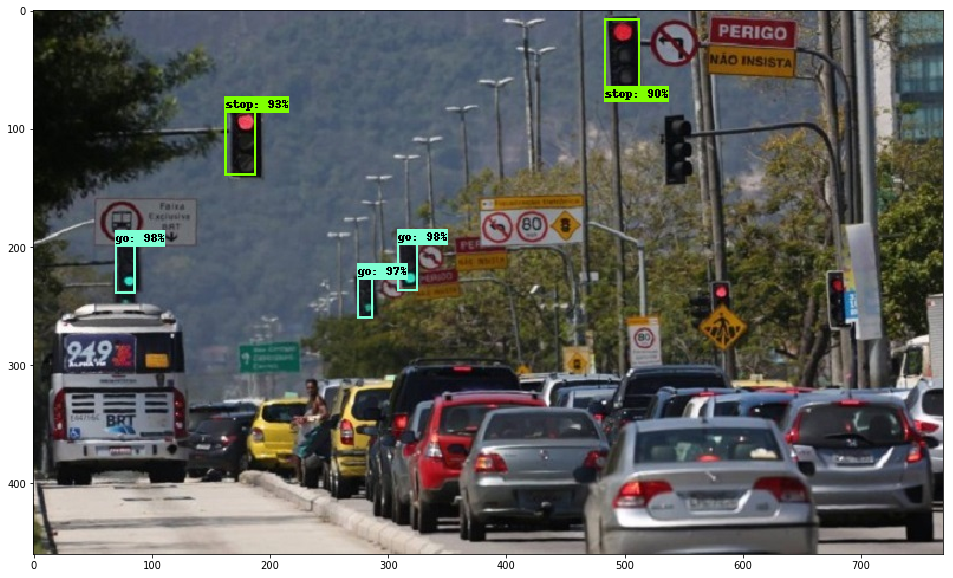

In [0]:
%matplotlib inline

plt.figure(figsize=(20,10))
plt.imshow(image)

🇺🇸  and here we have the original image

🇧🇷E aqui a imagem original

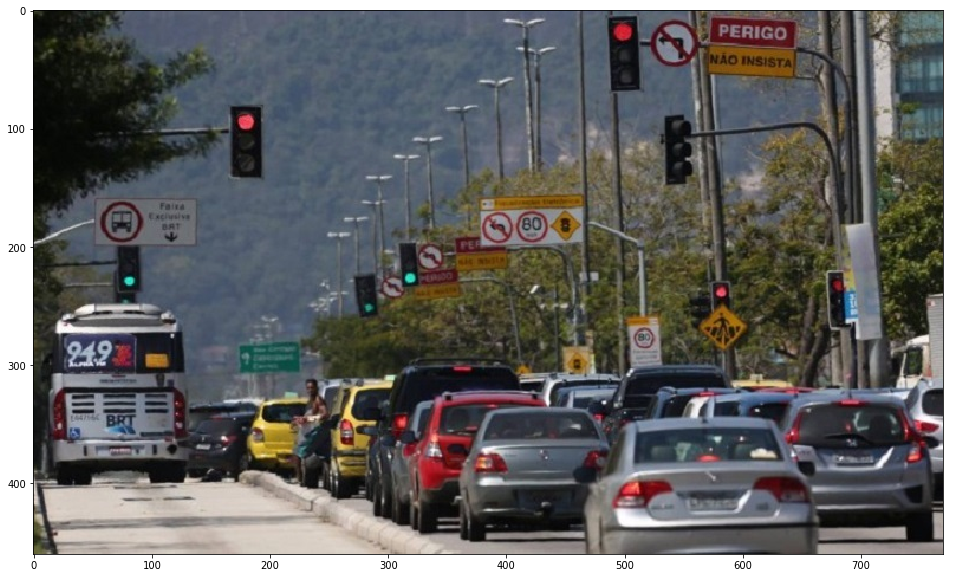

In [0]:
image = cv2.imread(PATH_TO_IMAGE)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))
plt.imshow(image)

🇺🇸  Now you can download this inference and use it on your machine, on the server, wherever you want

🇧🇷 Agora você pode baixar essa infenrecia e usa-la na sua máquina, no servidor, em onde você quiser :)

In [0]:
!zip -r inference_graph.zip /content/obj_detect_api/models/research/object_detection/inference_graph

🇺🇸  So send it to google drive.

🇧🇷 E enviar para o seu google drive

In [0]:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# 1. Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

model_file = drive.CreateFile({'title' : 'inference_graph.zip'})
model_file.SetContentFile('./inference_graph.zip')
model_file.Upload()

# download to google drive
drive.CreateFile({'id': model_file.get('id')})